In [1]:
import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。


from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（激活函数为softmax）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #输出层的激活函数为tanh
        layer_list.append(('activation_%d' % (self.depth - 1), torch.nn.Softmax(dim=1)))  

        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict) #layers，长度为2*depth，包含了所有的线性变换和激活函数，奇数索引为线性变换(权重矩阵)，偶数索引为激活函数
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # # 新增方法，获取最后一个隐藏层的输出
    # def hidden_output(self, x):
    #     # 遍历每一层，直到最后一个隐藏层
    #     for i in range(self.depth - 1):
    #         # 获取当前层的线性变换
    #         x = self.layers[i*2](x)
    #         # 获取当前层的激活函数
    #         x = self.layers[i*2 + 1](x)
    #     # 返回最后一个隐藏层的输出
    #     return x

    # 新增方法，循环传递输入
    def hidden_forward(self, x, num_cycles, return_all=False):
        outputs = []

        # 原始 forward 到最后一个隐藏层
        for i in range(self.depth - 1):
            x = self.layers[i * 2](x)
            x = self.layers[i * 2 + 1](x)
        if return_all:
            outputs.append(x.clone())

        # 重复循环 hidden 部分
        for _ in range(num_cycles):
            for i in range(1, self.depth - 1):  # 从第一个隐藏层开始传递
                x = self.layers[i * 2](x)
                x = self.layers[i * 2 + 1](x)
            if return_all:
                outputs.append(x.clone())

        if return_all:
            return torch.stack(outputs, dim=1)  # shape: [batch, cycles, hidden_dim]
        else:
            return x


In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        mu_x, sigma_x = X_f.mean(0), X_f.std(0) #计算X_u的均值和标准差
        X_u = (X_u - mu_x) / sigma_x #对X_u进行标准化
        X_f = (X_f - mu_x) / sigma_x #对X_f进行标准化

        self.mu_x = torch.tensor(mu_x).float().to(device) #创建一个pytorch张量（数据来源于mu_x），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.sigma_x = torch.tensor(sigma_x).float().to(device) #创建一个pytorch张量（数据来源于sigma_x），并将其转换为浮点类型，最后将张量移动到指定的设备上

        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #初边界点数据
        self.X_u = torch.tensor(X_u, requires_grad=True).float().to(device)
        #初边界点真实数据
        self.u = torch.tensor(u).float().to(device)
        #配位点数据
        self.X_f = torch.tensor(X_f, requires_grad=True).float().to(device)
        # #测试点数据
        # self.X_star = torch.tensor(X_star).float().to(device)
        # #测试点真实数据
        # self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上
        
        # optimizers: using the same settings
        #创建优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters(), eps = 1e-8) 


        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差


    #主动学习更新配位点数据    
    def update_data(self, X_u, u, X_f):
        mu_x, sigma_x = X_f.mean(0), X_f.std(0)
        X_u = (X_u - mu_x) / sigma_x
        X_f = (X_f - mu_x) / sigma_x

        self.mu_x = torch.tensor(mu_x).float().to(device)
        self.sigma_x = torch.tensor(sigma_x).float().to(device)
        
        self.X_u = torch.tensor(X_u, requires_grad=True).float().to(device)
        self.u = torch.tensor(u).float().to(device)
        self.X_f = torch.tensor(X_f, requires_grad=True).float().to(device)
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x):  
        u = self.dnn(x)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x) #调用上面的net_u函数，计算神经网络的输出u
        u1 = u[:, 0:1] #取u的第一列，对应状态1
        u2 = u[:, 1:2] #取u的第二列，对应状态2
        u3 = u[:, 2:3] #取u的第三列，对应状态3

        u_x_1 = torch.autograd.grad(
            u1, x, #输入的张量，要计算u1关于x的导数
            grad_outputs=torch.ones_like(u1), #生成一个与u1形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u1的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_2 = torch.autograd.grad(
            u2, x, #输入的张量，要计算u2关于x的导数
            grad_outputs=torch.ones_like(u2), #生成一个与u2形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u2的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_3 = torch.autograd.grad(
            u3, x, #输入的张量，要计算u3关于x的导数
            grad_outputs=torch.ones_like(u3), #生成一个与u3形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u3的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        #归一化
        u_x_1 = u_x_1 / self.sigma_x
        u_x_2 = u_x_2 / self.sigma_x
        u_x_3 = u_x_3 / self.sigma_x
        
        #计算残差
        xx = x * self.sigma_x + self.mu_x
        residual_1 = u_x_1-(-2.572e-4*xx*u1)
        residual_2 = u_x_2-(1.12e-4*xx*u1-2.012e-4*xx*u2)
        residual_3 = u_x_3-(1.452e-4*xx*u1+2.012e-4*xx*u2)    

        loss_1 = torch.mean(residual_1 ** 2)
        loss_2 = torch.mean(residual_2 ** 2)
        loss_3 = torch.mean(residual_3 ** 2)

        loss_f = loss_1 + loss_2 + loss_3
        return loss_f, residual_1+residual_2+residual_3
    
      
    
    def train(self, nIter):


        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.X_u) #调用之前定义的函数，传入初值得到神经网络的输出u

            loss_u = torch.mean((self.u - u_pred) ** 2) #计算初值的损失函数
            loss_f, _ = self.net_f(self.X_f) #计算残差的损失函数
            

            loss = loss_u + loss_f
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # # record the test error
            # self.dnn.eval() #将神经网络切换为评估模式
            # with torch.no_grad():
            #     u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u


            # error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            # self.test_error.append(error_test)

            # # 计算 MAE和MSE
            # mae = torch.mean(torch.abs(self.u_star - u_real_pred))
            # mse = torch.mean((self.u_star - u_real_pred) ** 2)
            # # 记录 MAE 和 MSE
            # self.test_error_mae.append(mae)
            # self.test_error_mse.append(mse)


  

    def predict(self, X):
        x = torch.tensor(X, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x) #调用之前定义的函数得到神经网络的输出u,以及f
        _, f = self.net_f(x)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    def hidden_predict(self, x, num_cycles, return_all=False):
        x = torch.tensor(x, requires_grad=True).float().to(device)
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval()
        hidden_output = self.dnn.hidden_forward(x, num_cycles, return_all=return_all)
        
        hidden_output = hidden_output.detach().cpu().numpy()
        return hidden_output


In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]
#设置噪声水平为0
noise = 0.0        

#读取真实解(基于MCS方法得到的解)
MCS_solution_df = pd.read_csv('MCS_non_homo_300.csv')
MCS_solution_df.columns = ['time', 'state_0', 'state_1', 'state_2']

MCS_solution_df.drop(labels='time', inplace=True, axis = 1)


N_u = 1
N_f = 300

#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [1, 50, 50, 3]

lb  = np.array([0.0])              # t的左边界
ub  = np.array([300.0])          # t的右边界

# Define the initial MSS state
X_u = np.array([[0]])
u = np.array([[1,0,0]])          # 初始真实状态
# X_f = np.linspace(lb, ub, N_f)     # 配位点位置，0~60000的5000个点

error_y = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值
chaoss = [] #创建一个空列表，用于存储chaos值
residuals = [] #创建一个空列表，用于存储residual值

i = 0 #初始化i为0

# # 创建文件夹
# model_dir = 'Adam+LBFGS+LHS(5000)'
# if not os.path.exists(model_dir):
#     os.makedirs(model_dir)

for seed in seeds:
    set_seed(seed) #设置随机数种子

    N_f_1 = N_f // 100 #先拿50个点训练
    X_f_train = lb + (ub - lb) * lhs(1, N_f_1) #生成N_f个随机点
    nIter = 150000 #设置迭代次数为10000

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u, u, X_f_train, layers, lb, ub)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter//100)


    for iter in range(nIter//100+1, nIter+1, nIter//100): #每800次迭代
        N_f_new = N_f_1 * 10 #重新采样500个点
        X_f_train_new = lb + (ub - lb) * lhs(1, N_f_new) #生成N_f_new个随机点

        #计算残差
        _, residual = model.predict(X_f_train_new)
        abs_residual = np.abs(residual)
        abs_residual = abs_residual.flatten()
        #对abs_residual进行归一化
        abs_residual = abs_residual / np.linalg.norm(abs_residual)


        #计算混沌度
        x_ssss = X_f_train_new + np.random.normal(0, 0.001)
        # 获取所有循环隐藏状态
        y_all = model.hidden_predict(X_f_train_new, 100, return_all=True)
        y_all_perturbed = model.hidden_predict(x_ssss, 100, return_all=True)

        # 取最后20次循环（即最后20个时间步的输出）
        y_recent = y_all[:, -20:, :]
        y_recent_perturbed = y_all_perturbed[:, -20:, :]

        # 计算逐时间步的距离，然后取平均（每个点一个chaos值）
        chaos = np.linalg.norm(y_recent - y_recent_perturbed, axis=2).mean(axis=1)


        #计算信息量
        xinxi = chaos

        #选出信息量最大的10个点
        # 找出绝对值最大的10个值的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:] #该函数会对数组进行排序，使得指定的k个最大值出现在数组的最后k给位置上，并获取最后1000个元素

        # 使用这些索引来提取对应的数据
        X_f_train_topk = X_f_train_new[topk_indices]

        X_f_train = np.vstack((X_f_train, X_f_train_topk)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.update_data(X_u, u, X_f_train)

        # 在更新数据后的模型上进行训练500次
        model.train(nIter//100)

    # print(X_f_train.shape)
    # 更新模型中的X_f_train数据
    model.update_data(X_u, u, X_f_train)

    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    #真实值
    mu, sigma = model.mu_x, model.sigma_x

    # up = 80000
    n_star = 300+1
    x_star = np.linspace(lb, ub, n_star)[1:] #N_star = x_star.shape[0] 
    y_pred, _ = model.predict(x_star)
    y_star = MCS_solution_df


    #计算误差（基于2范数）        
    error_y.append(np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(y_star - y_pred))
    mse = np.mean((y_star - y_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)


    #计算混沌度
    y_chaos = model.hidden_predict(x_star, 100)
    # print(y_chaos)
    x_sss = x_star + np.random.normal(0, 0.001)
    y_chaos_sss = model.hidden_predict(x_sss, 100)
    chaos = np.linalg.norm(y_chaos - y_chaos_sss,axis=1).sum()
    chaoss.append(chaos)

    #计算残差

    _, residual = model.predict(x_star)
    residual = residual.flatten()
    residual = np.abs(residual)
    residual = residual.sum()
    residuals.append(residual)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error y : %e' % (np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print('Chaos: %e' % chaos) #打印混沌度
    print('Residual: %e' % residual) #打印残差
    # # 保存模型到文件夹
    # model_path = os.path.join(model_dir, f'model_{i}_seed_{seed}.pkl')
    # with open(model_path, 'wb') as f:
    #     pickle.dump(model, f)


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<02:30,  9.94it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:05, 279.80it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:04, 329.88it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:03, 359.70it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:03, 411.56it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:03, 370.82it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:03, 358.32it/s]

Adam:  20%|█▉        | 296/1500 [00:00<00:03, 326.73it/s]

Adam:  22%|██▏       | 330/1500 [00:00<00:03, 323.10it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:03, 319.54it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 306.53it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:03, 349.74it/s]

Adam:  32%|███▏      | 479/1500 [00:01<00:02, 350.30it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:02, 375.84it/s]

Adam:  38%|███▊      | 564/1500 [00:01<00:02, 385.01it/s]

Adam:  41%|████      | 608/1500 [00:01<00:02, 395.89it/s]

Adam:  43%|████▎     | 648/1500 [00:01<00:02, 374.42it/s]

Adam:  46%|████▌     | 686/1500 [00:01<00:02, 369.69it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:02, 374.54it/s]

Adam:  51%|█████     | 763/1500 [00:02<00:02, 342.54it/s]

Adam:  53%|█████▎    | 802/1500 [00:02<00:01, 355.22it/s]

Adam:  56%|█████▌    | 839/1500 [00:02<00:01, 340.49it/s]

Adam:  59%|█████▉    | 888/1500 [00:02<00:01, 381.08it/s]

Adam:  62%|██████▏   | 927/1500 [00:02<00:01, 357.11it/s]

Adam:  64%|██████▍   | 965/1500 [00:02<00:01, 360.28it/s]

Adam:  67%|██████▋   | 1002/1500 [00:02<00:01, 352.85it/s]

Adam:  69%|██████▉   | 1038/1500 [00:02<00:01, 345.17it/s]

Adam:  72%|███████▏  | 1087/1500 [00:03<00:01, 380.99it/s]

Adam:  75%|███████▌  | 1131/1500 [00:03<00:00, 397.32it/s]

Adam:  78%|███████▊  | 1172/1500 [00:03<00:00, 393.15it/s]

Adam:  81%|████████  | 1212/1500 [00:03<00:00, 380.79it/s]

Adam:  83%|████████▎ | 1251/1500 [00:03<00:00, 377.62it/s]

Adam:  86%|████████▌ | 1289/1500 [00:03<00:00, 358.31it/s]

Adam:  89%|████████▉ | 1337/1500 [00:03<00:00, 390.62it/s]

Adam:  92%|█████████▏| 1380/1500 [00:03<00:00, 400.50it/s]

Adam:  95%|█████████▍| 1421/1500 [00:03<00:00, 395.19it/s]

Adam:  98%|█████████▊| 1465/1500 [00:04<00:00, 407.64it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 366.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 337.40it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 311.62it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:04, 296.17it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 286.78it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 286.06it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:05, 259.09it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:04, 263.08it/s]

Adam:  16%|█▋        | 244/1500 [00:00<00:04, 262.93it/s]

Adam:  18%|█▊        | 272/1500 [00:00<00:04, 266.02it/s]

Adam:  20%|██        | 304/1500 [00:01<00:04, 280.19it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:04, 275.70it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:04, 269.42it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 252.58it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:04, 245.59it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:04, 254.78it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:03, 270.61it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:03, 281.22it/s]

Adam:  36%|███▌      | 536/1500 [00:01<00:03, 283.53it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 284.63it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:03, 285.09it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:03, 289.79it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 276.64it/s]

Adam:  46%|████▌     | 687/1500 [00:02<00:02, 284.46it/s]

Adam:  48%|████▊     | 716/1500 [00:02<00:02, 278.25it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:02, 268.18it/s]

Adam:  51%|█████▏    | 771/1500 [00:02<00:02, 265.04it/s]

Adam:  53%|█████▎    | 798/1500 [00:02<00:02, 259.21it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 267.45it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:02, 270.61it/s]

Adam:  59%|█████▉    | 884/1500 [00:03<00:02, 269.25it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 277.85it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:02, 268.53it/s]

Adam:  65%|██████▌   | 975/1500 [00:03<00:01, 285.69it/s]

Adam:  67%|██████▋   | 1004/1500 [00:03<00:01, 271.71it/s]

Adam:  69%|██████▉   | 1032/1500 [00:03<00:01, 261.38it/s]

Adam:  71%|███████   | 1061/1500 [00:03<00:01, 268.65it/s]

Adam:  73%|███████▎  | 1089/1500 [00:04<00:01, 259.91it/s]

Adam:  75%|███████▍  | 1119/1500 [00:04<00:01, 269.02it/s]

Adam:  76%|███████▋  | 1147/1500 [00:04<00:01, 267.48it/s]

Adam:  78%|███████▊  | 1174/1500 [00:04<00:01, 264.96it/s]

Adam:  80%|████████  | 1205/1500 [00:04<00:01, 276.39it/s]

Adam:  82%|████████▏ | 1233/1500 [00:04<00:00, 270.91it/s]

Adam:  84%|████████▍ | 1261/1500 [00:04<00:00, 270.76it/s]

Adam:  86%|████████▌ | 1289/1500 [00:04<00:00, 265.35it/s]

Adam:  88%|████████▊ | 1316/1500 [00:04<00:00, 266.56it/s]

Adam:  90%|████████▉ | 1347/1500 [00:04<00:00, 277.25it/s]

Adam:  92%|█████████▏| 1375/1500 [00:05<00:00, 270.05it/s]

Adam:  94%|█████████▎| 1403/1500 [00:05<00:00, 266.47it/s]

Adam:  95%|█████████▌| 1430/1500 [00:05<00:00, 263.58it/s]

Adam:  97%|█████████▋| 1458/1500 [00:05<00:00, 264.33it/s]

Adam:  99%|█████████▉| 1490/1500 [00:05<00:00, 277.38it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 271.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 356.47it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:04, 307.02it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:04, 285.47it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:04, 286.42it/s]

Adam:  11%|█         | 162/1500 [00:00<00:04, 277.22it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:04, 284.47it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:04, 270.61it/s]

Adam:  17%|█▋        | 250/1500 [00:00<00:04, 262.68it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:04, 280.02it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 287.11it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 276.18it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:04, 270.41it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:04, 251.84it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:04, 247.00it/s]

Adam:  30%|███       | 451/1500 [00:01<00:04, 250.30it/s]

Adam:  32%|███▏      | 477/1500 [00:01<00:04, 240.55it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:03, 255.34it/s]

Adam:  36%|███▌      | 539/1500 [00:01<00:03, 271.37it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:03, 263.79it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:03, 254.95it/s]

Adam:  42%|████▏     | 623/1500 [00:02<00:03, 261.86it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:03, 267.79it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:02, 278.35it/s]

Adam:  48%|████▊     | 713/1500 [00:02<00:02, 281.23it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:02, 262.63it/s]

Adam:  51%|█████▏    | 769/1500 [00:02<00:02, 260.47it/s]

Adam:  53%|█████▎    | 802/1500 [00:02<00:02, 277.85it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 274.83it/s]

Adam:  57%|█████▋    | 859/1500 [00:03<00:02, 273.12it/s]

Adam:  59%|█████▉    | 887/1500 [00:03<00:02, 268.76it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 263.41it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:02, 267.56it/s]

Adam:  65%|██████▍   | 973/1500 [00:03<00:01, 277.66it/s]

Adam:  67%|██████▋   | 1001/1500 [00:03<00:01, 275.10it/s]

Adam:  69%|██████▊   | 1029/1500 [00:03<00:01, 272.14it/s]

Adam:  70%|███████   | 1057/1500 [00:03<00:01, 274.30it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:01, 268.08it/s]

Adam:  74%|███████▍  | 1113/1500 [00:04<00:01, 269.09it/s]

Adam:  76%|███████▌  | 1140/1500 [00:04<00:01, 262.76it/s]

Adam:  78%|███████▊  | 1168/1500 [00:04<00:01, 267.00it/s]

Adam:  80%|███████▉  | 1195/1500 [00:04<00:01, 266.01it/s]

Adam:  81%|████████▏ | 1222/1500 [00:04<00:01, 255.37it/s]

Adam:  83%|████████▎ | 1250/1500 [00:04<00:00, 261.39it/s]

Adam:  85%|████████▌ | 1277/1500 [00:04<00:00, 256.40it/s]

Adam:  87%|████████▋ | 1309/1500 [00:04<00:00, 274.48it/s]

Adam:  89%|████████▉ | 1337/1500 [00:04<00:00, 261.13it/s]

Adam:  91%|█████████ | 1364/1500 [00:05<00:00, 259.59it/s]

Adam:  93%|█████████▎| 1391/1500 [00:05<00:00, 250.19it/s]

Adam:  95%|█████████▍| 1419/1500 [00:05<00:00, 257.40it/s]

Adam:  96%|█████████▋| 1445/1500 [00:05<00:00, 255.22it/s]

Adam:  98%|█████████▊| 1473/1500 [00:05<00:00, 261.80it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 267.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 318.34it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 295.95it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:05, 269.71it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:04, 289.13it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 301.62it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:04, 308.01it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:04, 302.17it/s]

Adam:  17%|█▋        | 255/1500 [00:00<00:04, 278.01it/s]

Adam:  19%|█▉        | 284/1500 [00:00<00:04, 268.17it/s]

Adam:  21%|██        | 312/1500 [00:01<00:04, 262.06it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:04, 264.46it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:04, 251.15it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 252.83it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:04, 257.30it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:04, 246.14it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:03, 257.33it/s]

Adam:  34%|███▎      | 504/1500 [00:01<00:03, 265.04it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:03, 264.11it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:03, 271.44it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 260.59it/s]

Adam:  41%|████      | 616/1500 [00:02<00:03, 264.61it/s]

Adam:  43%|████▎     | 645/1500 [00:02<00:03, 270.94it/s]

Adam:  45%|████▍     | 673/1500 [00:02<00:03, 265.25it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:03, 250.64it/s]

Adam:  49%|████▊     | 729/1500 [00:02<00:02, 260.85it/s]

Adam:  50%|█████     | 756/1500 [00:02<00:02, 260.90it/s]

Adam:  52%|█████▏    | 784/1500 [00:02<00:02, 263.97it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 263.03it/s]

Adam:  56%|█████▌    | 843/1500 [00:03<00:02, 277.40it/s]

Adam:  58%|█████▊    | 877/1500 [00:03<00:02, 294.23it/s]

Adam:  60%|██████    | 907/1500 [00:03<00:02, 292.66it/s]

Adam:  62%|██████▏   | 937/1500 [00:03<00:02, 271.75it/s]

Adam:  64%|██████▍   | 965/1500 [00:03<00:01, 273.85it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:01, 271.89it/s]

Adam:  68%|██████▊   | 1024/1500 [00:03<00:01, 282.60it/s]

Adam:  70%|███████   | 1054/1500 [00:03<00:01, 286.46it/s]

Adam:  72%|███████▏  | 1083/1500 [00:03<00:01, 280.16it/s]

Adam:  74%|███████▍  | 1112/1500 [00:04<00:01, 270.02it/s]

Adam:  76%|███████▌  | 1140/1500 [00:04<00:01, 267.65it/s]

Adam:  78%|███████▊  | 1169/1500 [00:04<00:01, 272.04it/s]

Adam:  80%|███████▉  | 1197/1500 [00:04<00:01, 267.02it/s]

Adam:  82%|████████▏ | 1224/1500 [00:04<00:01, 264.18it/s]

Adam:  83%|████████▎ | 1251/1500 [00:04<00:00, 260.19it/s]

Adam:  85%|████████▌ | 1281/1500 [00:04<00:00, 270.76it/s]

Adam:  87%|████████▋ | 1309/1500 [00:04<00:00, 261.92it/s]

Adam:  89%|████████▉ | 1338/1500 [00:04<00:00, 268.78it/s]

Adam:  91%|█████████ | 1365/1500 [00:05<00:00, 264.75it/s]

Adam:  93%|█████████▎| 1394/1500 [00:05<00:00, 269.17it/s]

Adam:  95%|█████████▍| 1421/1500 [00:05<00:00, 259.07it/s]

Adam:  96%|█████████▋| 1447/1500 [00:05<00:00, 251.60it/s]

Adam:  98%|█████████▊| 1473/1500 [00:05<00:00, 241.95it/s]

Adam: 100%|█████████▉| 1499/1500 [00:05<00:00, 244.87it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 267.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.38it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 236.03it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:05, 248.58it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:05, 262.22it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:05, 263.86it/s]

Adam:  11%|█         | 162/1500 [00:00<00:05, 261.80it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:04, 272.51it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:04, 276.79it/s]

Adam:  17%|█▋        | 249/1500 [00:00<00:04, 274.76it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:04, 284.68it/s]

Adam:  21%|██        | 309/1500 [00:01<00:04, 270.30it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:04, 272.34it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:04, 265.36it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:04, 266.19it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:03, 272.90it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 290.59it/s]

Adam:  32%|███▏      | 487/1500 [00:01<00:03, 296.52it/s]

Adam:  34%|███▍      | 517/1500 [00:01<00:03, 293.56it/s]

Adam:  36%|███▋      | 547/1500 [00:01<00:03, 285.65it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:03, 287.98it/s]

Adam:  40%|████      | 606/1500 [00:02<00:03, 266.79it/s]

Adam:  42%|████▏     | 633/1500 [00:02<00:03, 263.88it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:03, 269.96it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:02, 276.23it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:02, 285.50it/s]

Adam:  50%|█████     | 755/1500 [00:02<00:02, 293.64it/s]

Adam:  52%|█████▏    | 785/1500 [00:02<00:02, 293.44it/s]

Adam:  54%|█████▍    | 815/1500 [00:02<00:02, 292.59it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 280.78it/s]

Adam:  58%|█████▊    | 876/1500 [00:03<00:02, 287.73it/s]

Adam:  60%|██████    | 905/1500 [00:03<00:02, 276.84it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:02, 273.33it/s]

Adam:  64%|██████▍   | 963/1500 [00:03<00:01, 279.06it/s]

Adam:  66%|██████▋   | 994/1500 [00:03<00:01, 287.32it/s]

Adam:  68%|██████▊   | 1023/1500 [00:03<00:01, 269.80it/s]

Adam:  70%|███████   | 1051/1500 [00:03<00:01, 269.66it/s]

Adam:  72%|███████▏  | 1079/1500 [00:03<00:01, 260.62it/s]

Adam:  74%|███████▍  | 1111/1500 [00:04<00:01, 275.31it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 281.22it/s]

Adam:  78%|███████▊  | 1170/1500 [00:04<00:01, 270.08it/s]

Adam:  80%|███████▉  | 1198/1500 [00:04<00:01, 264.21it/s]

Adam:  82%|████████▏ | 1225/1500 [00:04<00:01, 258.33it/s]

Adam:  83%|████████▎ | 1251/1500 [00:04<00:00, 252.55it/s]

Adam:  85%|████████▌ | 1277/1500 [00:04<00:00, 244.47it/s]

Adam:  87%|████████▋ | 1304/1500 [00:04<00:00, 249.71it/s]

Adam:  89%|████████▉ | 1333/1500 [00:04<00:00, 258.86it/s]

Adam:  91%|█████████ | 1361/1500 [00:05<00:00, 262.22it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 254.30it/s]

Adam:  94%|█████████▍| 1417/1500 [00:05<00:00, 263.63it/s]

Adam:  96%|█████████▋| 1444/1500 [00:05<00:00, 262.64it/s]

Adam:  98%|█████████▊| 1472/1500 [00:05<00:00, 266.23it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 268.52it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 271.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 277.30it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 269.25it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 277.52it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 274.02it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:04, 273.94it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:04, 277.29it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:04, 291.80it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 290.65it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:04, 293.46it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:04, 276.33it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:04, 261.69it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:04, 277.10it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 275.51it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:04, 269.55it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 271.81it/s]

Adam:  31%|███       | 466/1500 [00:01<00:03, 265.97it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:03, 264.57it/s]

Adam:  35%|███▍      | 520/1500 [00:01<00:03, 265.41it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:03, 273.32it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:03, 275.38it/s]

Adam:  40%|████      | 607/1500 [00:02<00:03, 265.28it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:03, 266.21it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:03, 266.45it/s]

Adam:  46%|████▌     | 693/1500 [00:02<00:02, 281.00it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:02, 273.59it/s]

Adam:  50%|█████     | 750/1500 [00:02<00:02, 259.51it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 250.93it/s]

Adam:  54%|█████▍    | 810/1500 [00:02<00:02, 270.99it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 258.54it/s]

Adam:  58%|█████▊    | 866/1500 [00:03<00:02, 262.72it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:02, 259.94it/s]

Adam:  61%|██████▏   | 920/1500 [00:03<00:02, 262.11it/s]

Adam:  63%|██████▎   | 951/1500 [00:03<00:01, 274.69it/s]

Adam:  65%|██████▌   | 980/1500 [00:03<00:01, 278.05it/s]

Adam:  67%|██████▋   | 1008/1500 [00:03<00:01, 273.34it/s]

Adam:  69%|██████▉   | 1036/1500 [00:03<00:01, 270.91it/s]

Adam:  71%|███████   | 1064/1500 [00:03<00:01, 272.29it/s]

Adam:  73%|███████▎  | 1092/1500 [00:04<00:01, 268.12it/s]

Adam:  75%|███████▍  | 1119/1500 [00:04<00:01, 262.29it/s]

Adam:  77%|███████▋  | 1149/1500 [00:04<00:01, 271.06it/s]

Adam:  78%|███████▊  | 1177/1500 [00:04<00:01, 263.98it/s]

Adam:  80%|████████  | 1204/1500 [00:04<00:01, 254.59it/s]

Adam:  82%|████████▏ | 1232/1500 [00:04<00:01, 258.94it/s]

Adam:  84%|████████▍ | 1258/1500 [00:04<00:00, 259.11it/s]

Adam:  86%|████████▌ | 1284/1500 [00:04<00:00, 256.60it/s]

Adam:  87%|████████▋ | 1310/1500 [00:04<00:00, 254.93it/s]

Adam:  89%|████████▉ | 1336/1500 [00:04<00:00, 251.99it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 256.43it/s]

Adam:  93%|█████████▎| 1394/1500 [00:05<00:00, 269.75it/s]

Adam:  95%|█████████▍| 1422/1500 [00:05<00:00, 268.17it/s]

Adam:  97%|█████████▋| 1449/1500 [00:05<00:00, 258.06it/s]

Adam:  98%|█████████▊| 1475/1500 [00:05<00:00, 256.46it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 267.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.00it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 275.33it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:04, 283.56it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:04, 281.34it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:05, 254.72it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 253.18it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:05, 250.58it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:05, 237.65it/s]

Adam:  16%|█▋        | 245/1500 [00:00<00:05, 235.72it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:04, 250.82it/s]

Adam:  20%|██        | 300/1500 [00:01<00:04, 253.44it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:04, 270.96it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:04, 272.40it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:04, 268.77it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:04, 265.16it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:04, 260.87it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:03, 261.41it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:03, 259.30it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:03, 270.17it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:03, 257.32it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:03, 264.07it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 263.35it/s]

Adam:  43%|████▎     | 643/1500 [00:02<00:03, 281.67it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 263.94it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:03, 266.09it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:03, 251.44it/s]

Adam:  50%|█████     | 753/1500 [00:02<00:03, 240.21it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:02, 240.94it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:02, 253.97it/s]

Adam:  56%|█████▌    | 834/1500 [00:03<00:02, 256.76it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 255.98it/s]

Adam:  59%|█████▉    | 886/1500 [00:03<00:02, 253.10it/s]

Adam:  61%|██████    | 912/1500 [00:03<00:02, 252.29it/s]

Adam:  63%|██████▎   | 938/1500 [00:03<00:02, 254.45it/s]

Adam:  64%|██████▍   | 966/1500 [00:03<00:02, 261.56it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:01, 254.98it/s]

Adam:  68%|██████▊   | 1019/1500 [00:03<00:01, 252.63it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:01, 266.29it/s]

Adam:  72%|███████▏  | 1076/1500 [00:04<00:01, 262.82it/s]

Adam:  74%|███████▎  | 1103/1500 [00:04<00:01, 261.16it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:01, 260.94it/s]

Adam:  77%|███████▋  | 1157/1500 [00:04<00:01, 256.71it/s]

Adam:  79%|███████▉  | 1183/1500 [00:04<00:01, 249.05it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:01, 247.65it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:01, 255.69it/s]

Adam:  84%|████████▍ | 1266/1500 [00:04<00:00, 266.41it/s]

Adam:  87%|████████▋ | 1298/1500 [00:04<00:00, 279.96it/s]

Adam:  89%|████████▊ | 1330/1500 [00:05<00:00, 289.76it/s]

Adam:  91%|█████████ | 1360/1500 [00:05<00:00, 271.04it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 267.71it/s]

Adam:  94%|█████████▍| 1415/1500 [00:05<00:00, 265.18it/s]

Adam:  96%|█████████▌| 1442/1500 [00:05<00:00, 259.68it/s]

Adam:  98%|█████████▊| 1469/1500 [00:05<00:00, 257.08it/s]

Adam: 100%|█████████▉| 1495/1500 [00:05<00:00, 249.93it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 259.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 269.90it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 277.10it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:05, 267.01it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:05, 265.53it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:04, 285.91it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:04, 284.80it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:04, 274.31it/s]

Adam:  15%|█▌        | 230/1500 [00:00<00:04, 260.96it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:04, 257.28it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:04, 263.83it/s]

Adam:  21%|██        | 312/1500 [00:01<00:04, 259.70it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:04, 251.11it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:04, 264.83it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:04, 264.02it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:03, 277.13it/s]

Adam:  31%|███       | 459/1500 [00:01<00:03, 288.48it/s]

Adam:  33%|███▎      | 488/1500 [00:01<00:03, 266.27it/s]

Adam:  34%|███▍      | 516/1500 [00:01<00:03, 259.80it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:03, 269.10it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 270.36it/s]

Adam:  40%|████      | 606/1500 [00:02<00:03, 284.25it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:02, 291.33it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:03, 269.83it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:03, 264.45it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:02, 265.82it/s]

Adam:  50%|████▉     | 749/1500 [00:02<00:02, 266.01it/s]

Adam:  52%|█████▏    | 778/1500 [00:02<00:02, 272.05it/s]

Adam:  54%|█████▍    | 812/1500 [00:02<00:02, 289.15it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 280.89it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:02, 280.18it/s]

Adam:  60%|██████    | 900/1500 [00:03<00:02, 267.93it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:02, 260.22it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:02, 255.89it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:01, 261.01it/s]

Adam:  67%|██████▋   | 1010/1500 [00:03<00:01, 264.64it/s]

Adam:  69%|██████▉   | 1040/1500 [00:03<00:01, 273.52it/s]

Adam:  71%|███████   | 1068/1500 [00:03<00:01, 274.35it/s]

Adam:  73%|███████▎  | 1097/1500 [00:04<00:01, 278.09it/s]

Adam:  75%|███████▌  | 1125/1500 [00:04<00:01, 272.55it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:01, 276.26it/s]

Adam:  79%|███████▉  | 1182/1500 [00:04<00:01, 267.62it/s]

Adam:  81%|████████  | 1209/1500 [00:04<00:01, 265.40it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:00, 264.64it/s]

Adam:  84%|████████▍ | 1266/1500 [00:04<00:00, 272.21it/s]

Adam:  86%|████████▋ | 1294/1500 [00:04<00:00, 271.30it/s]

Adam:  88%|████████▊ | 1322/1500 [00:04<00:00, 259.86it/s]

Adam:  90%|█████████ | 1351/1500 [00:05<00:00, 268.26it/s]

Adam:  92%|█████████▏| 1383/1500 [00:05<00:00, 281.07it/s]

Adam:  94%|█████████▍| 1412/1500 [00:05<00:00, 276.97it/s]

Adam:  96%|█████████▌| 1440/1500 [00:05<00:00, 275.18it/s]

Adam:  98%|█████████▊| 1468/1500 [00:05<00:00, 269.75it/s]

Adam: 100%|█████████▉| 1497/1500 [00:05<00:00, 273.25it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 270.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.64it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 267.04it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 251.05it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:05, 250.49it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:05, 267.50it/s]

Adam:  11%|█         | 164/1500 [00:00<00:05, 247.86it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:05, 248.08it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:05, 243.86it/s]

Adam:  16%|█▌        | 243/1500 [00:00<00:05, 250.46it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:04, 247.35it/s]

Adam:  20%|██        | 301/1500 [00:01<00:04, 267.10it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:04, 257.42it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:04, 250.94it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:04, 262.75it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:04, 256.77it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:04, 248.24it/s]

Adam:  31%|███       | 462/1500 [00:01<00:04, 238.95it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:04, 235.67it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:04, 242.87it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:03, 256.91it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 266.09it/s]

Adam:  40%|████      | 600/1500 [00:02<00:03, 256.30it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:03, 248.89it/s]

Adam:  44%|████▎     | 655/1500 [00:02<00:03, 259.31it/s]

Adam:  45%|████▌     | 682/1500 [00:02<00:03, 255.54it/s]

Adam:  47%|████▋     | 711/1500 [00:02<00:02, 264.06it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:02, 280.42it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:02, 268.82it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:02, 270.57it/s]

Adam:  56%|█████▌    | 834/1500 [00:03<00:02, 286.08it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:02, 286.09it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:02, 285.00it/s]

Adam:  61%|██████▏   | 921/1500 [00:03<00:02, 267.09it/s]

Adam:  63%|██████▎   | 948/1500 [00:03<00:02, 267.07it/s]

Adam:  65%|██████▌   | 976/1500 [00:03<00:01, 270.05it/s]

Adam:  67%|██████▋   | 1004/1500 [00:03<00:01, 265.85it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 270.91it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:01, 266.88it/s]

Adam:  73%|███████▎  | 1088/1500 [00:04<00:01, 265.05it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 262.98it/s]

Adam:  76%|███████▋  | 1144/1500 [00:04<00:01, 269.20it/s]

Adam:  78%|███████▊  | 1171/1500 [00:04<00:01, 264.11it/s]

Adam:  80%|███████▉  | 1198/1500 [00:04<00:01, 263.89it/s]

Adam:  82%|████████▏ | 1230/1500 [00:04<00:00, 279.83it/s]

Adam:  84%|████████▍ | 1263/1500 [00:04<00:00, 294.12it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 278.87it/s]

Adam:  88%|████████▊ | 1322/1500 [00:05<00:00, 266.88it/s]

Adam:  90%|█████████ | 1354/1500 [00:05<00:00, 280.79it/s]

Adam:  92%|█████████▏| 1383/1500 [00:05<00:00, 266.87it/s]

Adam:  94%|█████████▍| 1410/1500 [00:05<00:00, 262.04it/s]

Adam:  96%|█████████▌| 1437/1500 [00:05<00:00, 256.38it/s]

Adam:  98%|█████████▊| 1464/1500 [00:05<00:00, 258.21it/s]

Adam:  99%|█████████▉| 1490/1500 [00:05<00:00, 253.01it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 262.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 231.95it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:06, 240.45it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:05, 244.00it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:05, 254.67it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:05, 258.22it/s]

Adam:  11%|█         | 158/1500 [00:00<00:05, 265.67it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:04, 265.91it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:05, 245.60it/s]

Adam:  16%|█▌        | 242/1500 [00:00<00:04, 259.65it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:04, 250.23it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:04, 241.92it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:04, 258.91it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 274.17it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:03, 281.89it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:04, 269.71it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:04, 261.96it/s]

Adam:  32%|███▏      | 473/1500 [00:01<00:03, 263.61it/s]

Adam:  33%|███▎      | 500/1500 [00:01<00:03, 258.20it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:03, 257.34it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:03, 257.04it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:03, 264.77it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 271.00it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:03, 267.66it/s]

Adam:  44%|████▍     | 665/1500 [00:02<00:03, 265.10it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:02, 273.17it/s]

Adam:  48%|████▊     | 726/1500 [00:02<00:02, 281.62it/s]

Adam:  50%|█████     | 755/1500 [00:02<00:02, 279.52it/s]

Adam:  52%|█████▏    | 783/1500 [00:02<00:02, 273.89it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 274.98it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:02, 270.73it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 263.05it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:02, 263.60it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:02, 267.07it/s]

Adam:  63%|██████▎   | 949/1500 [00:03<00:02, 259.20it/s]

Adam:  65%|██████▌   | 975/1500 [00:03<00:02, 249.29it/s]

Adam:  67%|██████▋   | 1001/1500 [00:03<00:02, 246.46it/s]

Adam:  69%|██████▊   | 1029/1500 [00:03<00:01, 252.57it/s]

Adam:  70%|███████   | 1055/1500 [00:04<00:01, 248.29it/s]

Adam:  72%|███████▏  | 1082/1500 [00:04<00:01, 252.22it/s]

Adam:  74%|███████▍  | 1108/1500 [00:04<00:01, 246.83it/s]

Adam:  76%|███████▌  | 1133/1500 [00:04<00:01, 242.47it/s]

Adam:  77%|███████▋  | 1162/1500 [00:04<00:01, 255.41it/s]

Adam:  80%|███████▉  | 1193/1500 [00:04<00:01, 269.89it/s]

Adam:  81%|████████▏ | 1222/1500 [00:04<00:01, 274.40it/s]

Adam:  84%|████████▎ | 1253/1500 [00:04<00:00, 284.30it/s]

Adam:  85%|████████▌ | 1282/1500 [00:04<00:00, 281.27it/s]

Adam:  87%|████████▋ | 1312/1500 [00:04<00:00, 285.85it/s]

Adam:  89%|████████▉ | 1341/1500 [00:05<00:00, 274.73it/s]

Adam:  91%|█████████▏| 1369/1500 [00:05<00:00, 274.34it/s]

Adam:  93%|█████████▎| 1397/1500 [00:05<00:00, 264.85it/s]

Adam:  95%|█████████▍| 1424/1500 [00:05<00:00, 254.49it/s]

Adam:  97%|█████████▋| 1450/1500 [00:05<00:00, 248.71it/s]

Adam:  98%|█████████▊| 1475/1500 [00:05<00:00, 248.50it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 247.78it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 261.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.38it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 264.05it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 263.48it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:05, 256.15it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:05, 251.87it/s]

Adam:  11%|█         | 160/1500 [00:00<00:05, 235.71it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 242.68it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:05, 255.66it/s]

Adam:  16%|█▌        | 242/1500 [00:00<00:04, 259.64it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:04, 251.65it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:04, 244.73it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:04, 249.06it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 256.93it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 269.29it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:03, 282.37it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:03, 283.94it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:03, 283.62it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:03, 285.87it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:03, 287.67it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:03, 286.26it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 285.02it/s]

Adam:  41%|████      | 618/1500 [00:02<00:03, 275.43it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 271.09it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:03, 262.58it/s]

Adam:  47%|████▋     | 702/1500 [00:02<00:03, 265.23it/s]

Adam:  49%|████▊     | 729/1500 [00:02<00:02, 263.70it/s]

Adam:  50%|█████     | 757/1500 [00:02<00:02, 268.09it/s]

Adam:  52%|█████▏    | 784/1500 [00:02<00:02, 260.24it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 258.41it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 270.87it/s]

Adam:  58%|█████▊    | 870/1500 [00:03<00:02, 271.49it/s]

Adam:  60%|█████▉    | 898/1500 [00:03<00:02, 270.83it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:02, 268.50it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:02, 268.77it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:01, 264.43it/s]

Adam:  67%|██████▋   | 1009/1500 [00:03<00:01, 268.02it/s]

Adam:  69%|██████▉   | 1036/1500 [00:03<00:01, 266.99it/s]

Adam:  71%|███████   | 1066/1500 [00:03<00:01, 276.05it/s]

Adam:  73%|███████▎  | 1096/1500 [00:04<00:01, 281.57it/s]

Adam:  75%|███████▌  | 1127/1500 [00:04<00:01, 288.87it/s]

Adam:  77%|███████▋  | 1159/1500 [00:04<00:01, 295.01it/s]

Adam:  79%|███████▉  | 1189/1500 [00:04<00:01, 292.53it/s]

Adam:  81%|████████▏ | 1219/1500 [00:04<00:01, 270.22it/s]

Adam:  83%|████████▎ | 1247/1500 [00:04<00:00, 268.69it/s]

Adam:  85%|████████▌ | 1275/1500 [00:04<00:00, 270.36it/s]

Adam:  87%|████████▋ | 1303/1500 [00:04<00:00, 270.03it/s]

Adam:  89%|████████▊ | 1331/1500 [00:04<00:00, 258.59it/s]

Adam:  91%|█████████ | 1358/1500 [00:05<00:00, 255.92it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 267.99it/s]

Adam:  94%|█████████▍| 1415/1500 [00:05<00:00, 251.17it/s]

Adam:  96%|█████████▌| 1441/1500 [00:05<00:00, 242.73it/s]

Adam:  98%|█████████▊| 1466/1500 [00:05<00:00, 240.79it/s]

Adam: 100%|█████████▉| 1494/1500 [00:05<00:00, 251.05it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 265.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 311.54it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:05, 285.63it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:05, 272.92it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:05, 273.25it/s]

Adam:  10%|█         | 154/1500 [00:00<00:04, 291.13it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:04, 278.12it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:04, 289.97it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:04, 292.72it/s]

Adam:  19%|█▊        | 278/1500 [00:00<00:04, 299.30it/s]

Adam:  21%|██        | 309/1500 [00:01<00:04, 282.13it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:04, 280.05it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:04, 258.41it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:04, 249.32it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:04, 261.71it/s]

Adam:  30%|███       | 457/1500 [00:01<00:03, 278.38it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:03, 279.20it/s]

Adam:  34%|███▍      | 517/1500 [00:01<00:03, 286.44it/s]

Adam:  36%|███▋      | 546/1500 [00:01<00:03, 283.03it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:03, 283.53it/s]

Adam:  40%|████      | 607/1500 [00:02<00:03, 290.43it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:02, 288.15it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:02, 289.26it/s]

Adam:  46%|████▋     | 696/1500 [00:02<00:02, 280.65it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:02, 279.22it/s]

Adam:  50%|█████     | 753/1500 [00:02<00:02, 268.12it/s]

Adam:  52%|█████▏    | 780/1500 [00:02<00:02, 263.08it/s]

Adam:  54%|█████▍    | 808/1500 [00:02<00:02, 266.95it/s]

Adam:  56%|█████▌    | 835/1500 [00:03<00:02, 260.16it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 253.30it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:02, 264.22it/s]

Adam:  61%|██████▏   | 920/1500 [00:03<00:02, 268.23it/s]

Adam:  63%|██████▎   | 949/1500 [00:03<00:02, 272.90it/s]

Adam:  65%|██████▌   | 977/1500 [00:03<00:01, 271.63it/s]

Adam:  67%|██████▋   | 1005/1500 [00:03<00:01, 272.32it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 265.90it/s]

Adam:  71%|███████   | 1060/1500 [00:03<00:01, 253.76it/s]

Adam:  72%|███████▏  | 1087/1500 [00:03<00:01, 256.67it/s]

Adam:  74%|███████▍  | 1114/1500 [00:04<00:01, 259.90it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 238.57it/s]

Adam:  78%|███████▊  | 1166/1500 [00:04<00:01, 235.57it/s]

Adam:  79%|███████▉  | 1190/1500 [00:04<00:01, 234.13it/s]

Adam:  81%|████████  | 1217/1500 [00:04<00:01, 243.25it/s]

Adam:  83%|████████▎ | 1245/1500 [00:04<00:01, 252.36it/s]

Adam:  85%|████████▍ | 1271/1500 [00:04<00:00, 249.37it/s]

Adam:  87%|████████▋ | 1299/1500 [00:04<00:00, 255.14it/s]

Adam:  89%|████████▊ | 1331/1500 [00:04<00:00, 272.43it/s]

Adam:  91%|█████████ | 1359/1500 [00:05<00:00, 267.39it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 271.14it/s]

Adam:  94%|█████████▍| 1417/1500 [00:05<00:00, 273.95it/s]

Adam:  96%|█████████▋| 1445/1500 [00:05<00:00, 268.04it/s]

Adam:  98%|█████████▊| 1472/1500 [00:05<00:00, 251.63it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 268.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.23it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 265.44it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 245.12it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:05, 242.94it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:05, 256.31it/s]

Adam:  11%|█         | 163/1500 [00:00<00:05, 263.58it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:04, 274.70it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:05, 254.74it/s]

Adam:  17%|█▋        | 255/1500 [00:00<00:04, 277.99it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:04, 286.92it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 289.57it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 285.60it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:04, 257.79it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:04, 249.12it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:04, 239.66it/s]

Adam:  31%|███       | 458/1500 [00:01<00:04, 254.46it/s]

Adam:  32%|███▏      | 484/1500 [00:01<00:04, 252.13it/s]

Adam:  34%|███▍      | 510/1500 [00:01<00:03, 247.76it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:03, 247.71it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:03, 246.47it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 247.39it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 235.45it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:03, 224.28it/s]

Adam:  44%|████▍     | 657/1500 [00:02<00:03, 218.92it/s]

Adam:  45%|████▌     | 680/1500 [00:02<00:03, 216.25it/s]

Adam:  47%|████▋     | 702/1500 [00:02<00:03, 208.30it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:03, 202.14it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 200.10it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 202.77it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:03, 214.08it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:03, 209.99it/s]

Adam:  56%|█████▌    | 835/1500 [00:03<00:03, 212.60it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 214.87it/s]

Adam:  59%|█████▊    | 880/1500 [00:03<00:03, 198.57it/s]

Adam:  60%|██████    | 901/1500 [00:03<00:03, 196.18it/s]

Adam:  62%|██████▏   | 924/1500 [00:03<00:02, 205.41it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 201.67it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 206.61it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 210.41it/s]

Adam:  67%|██████▋   | 1012/1500 [00:04<00:02, 215.80it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 210.34it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:02, 206.71it/s]

Adam:  72%|███████▏  | 1077/1500 [00:04<00:02, 202.53it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:01, 206.06it/s]

Adam:  75%|███████▍  | 1123/1500 [00:04<00:01, 209.79it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 198.94it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 199.05it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 198.66it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 192.90it/s]

Adam:  82%|████████▏ | 1226/1500 [00:05<00:01, 194.49it/s]

Adam:  83%|████████▎ | 1247/1500 [00:05<00:01, 198.02it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:01, 198.75it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:01, 193.24it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:00, 197.62it/s]

Adam:  89%|████████▊ | 1329/1500 [00:05<00:00, 192.51it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 195.39it/s]

Adam:  91%|█████████▏| 1370/1500 [00:06<00:00, 193.92it/s]

Adam:  93%|█████████▎| 1390/1500 [00:06<00:00, 194.41it/s]

Adam:  94%|█████████▍| 1410/1500 [00:06<00:00, 195.76it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 209.44it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 215.09it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 214.06it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 221.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.64it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 205.87it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 178.57it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 188.68it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 181.57it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 178.71it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 193.99it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 187.43it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:07, 186.56it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 182.53it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 189.18it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 199.00it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 201.92it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 190.93it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 192.13it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 190.15it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 197.00it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:05, 207.09it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 206.24it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:04, 218.10it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 208.24it/s]

Adam:  31%|███       | 466/1500 [00:02<00:04, 209.04it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 213.84it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 206.68it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:04, 211.65it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 214.51it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:04, 213.02it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 206.85it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 212.19it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 209.04it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 210.93it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:03, 213.59it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 216.66it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 218.34it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 218.72it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 218.94it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 203.81it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 206.33it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 210.47it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 207.62it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 198.39it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:03, 194.51it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 191.01it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 189.21it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:02, 184.31it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 185.22it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 196.37it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 206.84it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 210.54it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:01, 214.42it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:01, 214.60it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 196.30it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:01, 190.37it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 199.45it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:01, 211.62it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 204.26it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 206.55it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 198.03it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 199.23it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 193.84it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 196.90it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 193.29it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 187.47it/s]

Adam:  92%|█████████▏| 1382/1500 [00:06<00:00, 189.07it/s]

Adam:  93%|█████████▎| 1401/1500 [00:06<00:00, 188.24it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 180.27it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 175.69it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 189.35it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 204.49it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.62it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 211.65it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 200.11it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 192.77it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 180.04it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 192.24it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 192.63it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:06, 202.28it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:06, 191.71it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 185.43it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 187.90it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 188.96it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 196.08it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 198.80it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 206.10it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 196.63it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 197.03it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 204.85it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 205.44it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 202.34it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:04, 213.09it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 209.77it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 206.72it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 205.75it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 204.72it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 207.35it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:04, 215.54it/s]

Adam:  40%|████      | 604/1500 [00:02<00:04, 217.78it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 201.16it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 200.92it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 197.74it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 194.50it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:03, 203.35it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 202.52it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:03, 199.31it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 203.21it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 193.20it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 190.15it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 189.43it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 203.64it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 205.85it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 200.48it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:03, 188.73it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 196.44it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 199.30it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 204.21it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 205.05it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 197.38it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 209.39it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:01, 219.93it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:01, 216.77it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 220.39it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 221.09it/s]

Adam:  79%|███████▊  | 1179/1500 [00:05<00:01, 241.37it/s]

Adam:  80%|████████  | 1204/1500 [00:05<00:01, 214.16it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 201.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 204.39it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 205.48it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:01, 199.31it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 205.35it/s]

Adam:  89%|████████▉ | 1338/1500 [00:06<00:00, 213.30it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 220.40it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 218.62it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 213.11it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 221.71it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 225.30it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 221.06it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.48it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 213.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 216.18it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 221.19it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:06, 224.21it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:06, 222.76it/s]

Adam:  11%|█         | 162/1500 [00:00<00:05, 236.61it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 225.78it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:06, 203.85it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 203.25it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 200.87it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 211.73it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:05, 213.24it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:05, 216.17it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:05, 214.76it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 216.01it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:05, 212.95it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:05, 214.10it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:04, 216.72it/s]

Adam:  30%|███       | 457/1500 [00:02<00:04, 224.09it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 216.80it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 218.16it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 217.46it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 205.02it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:04, 192.25it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:04, 194.74it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 198.08it/s]

Adam:  42%|████▏     | 631/1500 [00:02<00:04, 201.44it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:03, 216.36it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:03, 222.98it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 229.52it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 237.27it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 230.33it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 222.71it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 212.14it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 208.05it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:03, 209.79it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 209.99it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 205.25it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 209.19it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 213.72it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 214.48it/s]

Adam:  65%|██████▌   | 982/1500 [00:04<00:02, 221.69it/s]

Adam:  67%|██████▋   | 1006/1500 [00:04<00:02, 226.25it/s]

Adam:  69%|██████▉   | 1032/1500 [00:04<00:02, 233.88it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:01, 236.31it/s]

Adam:  72%|███████▏  | 1081/1500 [00:04<00:01, 229.56it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:01, 205.00it/s]

Adam:  75%|███████▌  | 1128/1500 [00:05<00:01, 209.51it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 209.16it/s]

Adam:  78%|███████▊  | 1172/1500 [00:05<00:01, 192.99it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 184.02it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 191.93it/s]

Adam:  82%|████████▏ | 1234/1500 [00:05<00:01, 192.48it/s]

Adam:  84%|████████▎ | 1254/1500 [00:05<00:01, 188.72it/s]

Adam:  85%|████████▌ | 1276/1500 [00:06<00:01, 194.84it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 201.09it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 199.34it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 198.64it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 198.03it/s]

Adam:  92%|█████████▏| 1380/1500 [00:06<00:00, 190.39it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 192.01it/s]

Adam:  95%|█████████▍| 1420/1500 [00:06<00:00, 191.31it/s]

Adam:  96%|█████████▋| 1444/1500 [00:06<00:00, 204.37it/s]

Adam:  98%|█████████▊| 1466/1500 [00:06<00:00, 207.07it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 199.77it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 209.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.12it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 209.01it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 217.17it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 208.04it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:06, 210.56it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 203.15it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 200.35it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 211.16it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 222.14it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:05, 216.83it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 215.50it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 215.77it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:05, 217.91it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 205.36it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 195.06it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 188.78it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 203.73it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:05, 210.89it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:05, 213.29it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:04, 214.37it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 223.23it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 226.10it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 228.62it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 225.21it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 224.15it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 215.19it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 205.32it/s]

Adam:  42%|████▏     | 631/1500 [00:02<00:04, 198.53it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 193.68it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:04, 188.24it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 188.53it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 191.75it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:03, 210.24it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 216.02it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 210.42it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 200.57it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 200.55it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 192.01it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 192.32it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 186.05it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 188.83it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 202.41it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:02, 219.23it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 216.78it/s]

Adam:  67%|██████▋   | 1002/1500 [00:04<00:02, 204.54it/s]

Adam:  68%|██████▊   | 1023/1500 [00:04<00:02, 205.25it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 213.14it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:01, 217.71it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 215.62it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 220.62it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:01, 222.21it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 214.36it/s]

Adam:  79%|███████▉  | 1185/1500 [00:05<00:01, 215.78it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 207.89it/s]

Adam:  82%|████████▏ | 1228/1500 [00:05<00:01, 197.85it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 191.61it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 179.13it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 178.63it/s]

Adam:  88%|████████▊ | 1313/1500 [00:06<00:00, 198.91it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 204.22it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:00, 209.29it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 223.46it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 222.20it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 228.61it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 232.50it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 227.52it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 208.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 224.02it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 218.95it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:07, 200.54it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:06, 206.65it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 213.64it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:06, 210.09it/s]

Adam:  11%|█         | 158/1500 [00:00<00:06, 216.09it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 217.76it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:06, 201.38it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 185.54it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 185.44it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 186.21it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 182.01it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 191.95it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 187.14it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 193.16it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:06, 186.47it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:05, 186.71it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 183.80it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 191.40it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 180.30it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 171.79it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 178.79it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 188.69it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 183.91it/s]

Adam:  37%|███▋      | 548/1500 [00:02<00:04, 193.10it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 195.91it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 198.36it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 201.26it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 198.29it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 199.20it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 202.99it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:03, 209.13it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 221.70it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 207.13it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 207.85it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 201.47it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 198.68it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 187.13it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 178.68it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 186.60it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 181.95it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 180.56it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:03, 189.35it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:02, 188.79it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 186.87it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 178.99it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 174.55it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 173.65it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 186.33it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 212.17it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 201.16it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 199.26it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 196.96it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 193.22it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 205.27it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 220.23it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 216.77it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 215.87it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 222.36it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 228.33it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:00, 228.11it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 225.98it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 216.74it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 217.01it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 196.77it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 203.82it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 207.98it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 201.80it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 252.23it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 237.60it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 225.71it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 206.94it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 194.41it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 188.13it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 181.20it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 179.10it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 183.18it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 189.03it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 196.67it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:05, 207.59it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 212.55it/s]

Adam:  21%|██        | 310/1500 [00:01<00:05, 208.94it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 207.90it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 204.40it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:05, 199.69it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:05, 201.62it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 214.28it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 208.65it/s]

Adam:  31%|███       | 463/1500 [00:02<00:04, 209.96it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 198.27it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:04, 209.27it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 203.20it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 203.28it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 210.32it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:04, 209.93it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 198.23it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 212.21it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 216.94it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 217.25it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 209.81it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 204.28it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 207.86it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 209.96it/s]

Adam:  53%|█████▎    | 800/1500 [00:03<00:03, 205.57it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 201.28it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 195.13it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 193.15it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 196.87it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:03, 194.01it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 203.06it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 202.77it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:02, 208.91it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:02, 214.56it/s]

Adam:  68%|██████▊   | 1017/1500 [00:04<00:02, 221.29it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:02, 215.83it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 214.76it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 195.82it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 192.86it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 199.35it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 206.13it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:01, 207.53it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 204.02it/s]

Adam:  81%|████████  | 1215/1500 [00:05<00:01, 210.34it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 204.51it/s]

Adam:  84%|████████▍ | 1258/1500 [00:06<00:01, 204.24it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 208.32it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:00, 207.51it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 201.19it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 193.81it/s]

Adam:  91%|█████████ | 1365/1500 [00:06<00:00, 200.88it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 208.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 206.79it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 193.88it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 192.80it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 188.66it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 190.45it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 203.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.63it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.22it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 200.18it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 212.84it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 226.49it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 220.04it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 207.29it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 221.96it/s]

Adam:  14%|█▍        | 208/1500 [00:00<00:05, 221.48it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:05, 221.88it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:05, 220.01it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:05, 205.26it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 194.63it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 195.09it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 198.00it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 200.99it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:05, 192.52it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:05, 190.98it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 192.74it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 197.63it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 193.17it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 196.76it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 200.81it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 186.93it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:05, 187.53it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:05, 186.85it/s]

Adam:  39%|███▉      | 584/1500 [00:02<00:04, 189.35it/s]

Adam:  40%|████      | 606/1500 [00:03<00:04, 197.70it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 197.31it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 201.61it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 204.07it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 198.08it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 206.09it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 204.17it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 197.82it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:03, 188.53it/s]

Adam:  53%|█████▎    | 795/1500 [00:03<00:03, 184.64it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 181.75it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 180.26it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 182.17it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 194.42it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 194.26it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 201.70it/s]

Adam:  63%|██████▎   | 939/1500 [00:04<00:02, 196.64it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 187.76it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:02, 188.36it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:02, 197.33it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 202.42it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 201.32it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 204.93it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 192.86it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 190.31it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:02, 183.67it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:01, 186.38it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 191.85it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 199.28it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 207.81it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 229.42it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:01, 228.33it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:00, 228.42it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 222.23it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 213.50it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 223.56it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 227.66it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 206.24it/s]

Adam:  95%|█████████▌| 1429/1500 [00:07<00:00, 193.36it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 183.41it/s]

Adam:  98%|█████████▊| 1468/1500 [00:07<00:00, 184.98it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 193.83it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.55it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 216.34it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 202.04it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:06, 206.55it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 208.54it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 192.27it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 192.18it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:06, 193.19it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 187.23it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 186.08it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 195.39it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 185.99it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 181.19it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 186.15it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 195.10it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 199.15it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:05, 204.25it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:05, 204.15it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:05, 199.70it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 209.41it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 208.77it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 200.32it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 193.16it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 188.30it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 182.82it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:05, 182.55it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:05, 183.10it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:04, 187.63it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 193.91it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 181.54it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 182.38it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 194.17it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 193.27it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 189.42it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 203.61it/s]

Adam:  50%|█████     | 752/1500 [00:03<00:03, 207.72it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:03, 196.37it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 188.17it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 183.73it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 179.25it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 172.93it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 175.75it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 182.04it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 185.25it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:03, 180.45it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 200.05it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 204.49it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:02, 199.20it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 193.30it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 191.30it/s]

Adam:  71%|███████   | 1060/1500 [00:05<00:02, 200.06it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:02, 208.03it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:01, 216.43it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:01, 213.59it/s]

Adam:  77%|███████▋  | 1151/1500 [00:05<00:01, 212.69it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 206.36it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 203.00it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 196.07it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 201.99it/s]

Adam:  84%|████████▍ | 1258/1500 [00:06<00:01, 195.29it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 190.26it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 179.93it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:01, 174.39it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 179.06it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:00, 189.29it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 185.39it/s]

Adam:  93%|█████████▎| 1398/1500 [00:07<00:00, 185.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 191.57it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 196.12it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 192.10it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 184.04it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.17it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 192.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 200.85it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 225.35it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:06, 227.20it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:06, 201.78it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 187.41it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 196.75it/s]

Adam:  11%|█         | 158/1500 [00:00<00:06, 202.84it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 207.58it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:06, 215.51it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 212.01it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:05, 215.64it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 225.28it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 219.86it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:05, 213.04it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 195.07it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 190.45it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:05, 205.50it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:05, 206.35it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 192.83it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 193.78it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 202.24it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:04, 205.89it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 213.20it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 201.67it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 188.63it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:05, 183.28it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 169.84it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 166.17it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 150.59it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:05, 147.91it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:05, 155.28it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:05, 150.93it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 161.31it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 166.31it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:04, 172.25it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 166.40it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 163.03it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 169.33it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:04, 166.04it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:04, 156.06it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:04, 148.30it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:04, 158.14it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 167.27it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 169.41it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 155.96it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 158.33it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 166.03it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 172.79it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 171.66it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 164.12it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 158.50it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 153.11it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 157.59it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 161.63it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 169.48it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 163.16it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 165.79it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:02, 169.73it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:02, 161.39it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 157.13it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 158.32it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 152.83it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 152.83it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 148.28it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 146.21it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 144.43it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 142.48it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 148.00it/s]

Adam:  89%|████████▉ | 1333/1500 [00:07<00:01, 147.58it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:01, 145.89it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 145.07it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 150.96it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 155.72it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 167.53it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 161.88it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 158.74it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 156.80it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 170.15it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.76it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 171.13it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 179.55it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 185.81it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 178.80it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 160.21it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 155.30it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 151.20it/s]

Adam:  11%|█         | 165/1500 [00:00<00:08, 166.47it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 175.32it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 170.13it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 163.26it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 153.43it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 153.37it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 161.49it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 163.84it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 154.78it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 150.99it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 146.65it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 155.05it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 169.55it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 176.14it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 171.50it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 171.10it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 180.73it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 161.43it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 159.44it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 161.96it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 171.59it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 184.96it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 181.90it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 171.92it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 172.59it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 178.48it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 180.62it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 188.82it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 187.44it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 179.26it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 181.92it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 170.24it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 171.08it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 174.63it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:03, 181.58it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 174.74it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 174.41it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 180.28it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 182.42it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 171.65it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 162.64it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 166.78it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 177.81it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 184.26it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 176.49it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 163.05it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 155.09it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 154.14it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 160.11it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 159.94it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 157.49it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 157.03it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 154.83it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 148.88it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:02, 146.24it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 148.78it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 158.38it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 170.50it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 173.00it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 170.50it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 176.09it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 191.44it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 201.45it/s]

Adam:  89%|████████▉ | 1338/1500 [00:07<00:00, 190.86it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 173.14it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 159.82it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 154.90it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 163.52it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 165.53it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 170.06it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 180.60it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 194.08it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.59it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 147.09it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 160.80it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 159.74it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 162.80it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 165.28it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 161.15it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 159.66it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 163.51it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 164.47it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 158.45it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 152.09it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 153.91it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 161.18it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 168.47it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 167.46it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 175.66it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 170.49it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 171.17it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 178.04it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 181.72it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 172.95it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 174.67it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 170.25it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 178.30it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 176.81it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 185.97it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 193.40it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 184.73it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 171.44it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 161.12it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 166.41it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 158.36it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 166.36it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 178.44it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 180.50it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 172.73it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 165.63it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 162.25it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 170.74it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 169.33it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 177.00it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 174.58it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 172.90it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 185.18it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 189.42it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 192.14it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 173.00it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 173.12it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 170.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:02, 188.63it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 189.44it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 176.09it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 174.48it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 166.88it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 161.83it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 159.22it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 170.13it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 174.06it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:01, 191.24it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 195.42it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 202.22it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 197.76it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 178.40it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 176.73it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 176.02it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 169.18it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 167.25it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 172.17it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:01, 176.85it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 181.58it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 189.45it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 182.30it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 186.13it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 179.11it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 171.06it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 174.71it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 174.71it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 167.64it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.39it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 159.25it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 159.14it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 156.94it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 163.78it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 177.29it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 188.54it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 184.55it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 186.09it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 173.92it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 174.36it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 185.75it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 193.82it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 180.02it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 185.43it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 181.40it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 191.93it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 197.62it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:05, 189.78it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:05, 193.86it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 186.43it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 169.43it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 169.49it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 166.11it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:06, 168.17it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:06, 162.97it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:06, 159.13it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 176.59it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:04, 187.44it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 177.56it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 163.53it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 158.69it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 158.54it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 174.71it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 180.51it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:04, 181.10it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 181.19it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 179.36it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 174.34it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 183.09it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 191.30it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 189.40it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 178.01it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 172.95it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 175.53it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 169.07it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 158.18it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 153.46it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 152.16it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 166.29it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 163.72it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 157.82it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 168.38it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 180.87it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 175.57it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 166.38it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 159.08it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 157.34it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 163.29it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 158.25it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:02, 150.59it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:02, 146.18it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:02, 144.25it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 159.13it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 167.53it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 174.64it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 180.45it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 172.07it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 163.59it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 167.65it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 159.42it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 159.78it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 157.05it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 153.56it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 156.13it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 159.51it/s]

Adam:  96%|█████████▌| 1442/1500 [00:08<00:00, 159.04it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 165.58it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 168.37it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 155.30it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 199.56it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 187.13it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 167.71it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 161.52it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 160.05it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 175.36it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 166.35it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 160.91it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:07, 168.78it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 173.15it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 179.63it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 176.32it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 177.05it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 179.85it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 178.55it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 166.32it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 176.16it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 185.15it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 183.84it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 178.25it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 169.26it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 158.69it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 154.64it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 157.13it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 150.06it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:06, 160.04it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:06, 160.65it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 172.29it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 166.26it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 177.70it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 165.41it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 171.93it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 179.44it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 180.23it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 191.03it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 193.67it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 187.19it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 176.81it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 173.27it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 180.56it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 185.70it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 187.53it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 185.96it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 182.11it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 179.99it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 179.70it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 175.22it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 175.46it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 163.53it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 161.47it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 161.30it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:03, 159.68it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 158.52it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:03, 154.50it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 155.92it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 156.54it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 158.76it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 178.22it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 175.10it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 163.27it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 153.83it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:02, 153.32it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:02, 140.38it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 144.31it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 142.24it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 146.61it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 149.85it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 146.55it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 142.08it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 132.93it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 135.32it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 131.50it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 130.35it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 128.40it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 132.23it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 147.21it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 148.98it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 144.77it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 139.23it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 136.48it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 132.91it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 139.80it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 144.15it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 142.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.35it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.22it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.71it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 127.62it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 120.51it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 119.48it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 122.30it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 119.44it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 121.44it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 135.32it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 149.19it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 150.13it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 147.84it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 147.54it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 139.22it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 140.08it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 140.35it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:09, 134.51it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 131.33it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 130.17it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 132.15it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 135.47it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 136.21it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 132.16it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 136.45it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 145.54it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 148.43it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 154.32it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 155.72it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:06, 151.88it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 142.48it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 135.17it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 132.07it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 141.68it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 143.21it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 146.93it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 142.21it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:06, 151.25it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:05, 153.16it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 157.15it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 152.81it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 145.57it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 146.47it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 141.02it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 147.21it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 154.19it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 142.81it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 137.61it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 139.88it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 142.63it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 145.27it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 143.72it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 147.89it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 153.19it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 150.90it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 155.60it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:03, 157.69it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 147.77it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 145.44it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 146.10it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 142.65it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 147.76it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 147.56it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 139.37it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 136.83it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 132.76it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 132.13it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 131.73it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 138.94it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:03, 138.55it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:03, 134.65it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:03, 130.98it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 128.23it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 123.93it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 134.89it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 144.12it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 144.26it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 138.40it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 135.37it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 133.36it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 137.44it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 127.43it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 132.30it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 130.59it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 134.88it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 131.51it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 133.81it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 131.16it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 130.19it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 134.32it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 141.53it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 153.76it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 154.24it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 146.67it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 145.26it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 152.79it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 157.42it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 157.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.15it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 147.29it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 137.56it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 133.98it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 138.00it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 149.37it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 145.08it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 140.83it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 144.41it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 150.00it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 150.92it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 145.06it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 153.82it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 155.21it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 157.55it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 157.65it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 153.44it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 155.47it/s]

Adam:  21%|██        | 317/1500 [00:02<00:06, 174.86it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 172.94it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 173.06it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 156.56it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 149.68it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 148.81it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 156.63it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 159.14it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 144.88it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 143.30it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 146.95it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 156.89it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 150.74it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 144.54it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 146.72it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 142.83it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 142.42it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 149.82it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 146.36it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 152.14it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 151.31it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 137.65it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 138.39it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 139.07it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 135.72it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 146.44it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 151.61it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 147.43it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 141.13it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 131.98it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 137.57it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 137.69it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 134.33it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 143.80it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 142.46it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 141.73it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 139.33it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 139.88it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 141.06it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 137.61it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 140.41it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 134.40it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 138.54it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 142.65it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 145.19it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 142.14it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 143.06it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 144.32it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 144.72it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 140.58it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 136.52it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 137.16it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 142.34it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 141.43it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 138.85it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 140.53it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:01, 152.77it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 154.28it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 148.57it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 141.78it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 142.93it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 142.76it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 145.64it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 151.03it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 145.77it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 135.56it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 134.90it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 138.83it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 148.18it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 153.81it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 159.31it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 157.47it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 150.84it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 156.83it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 152.01it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 157.36it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:10, 136.98it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 124.54it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 132.06it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 130.26it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 139.13it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 138.38it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 132.93it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:09, 143.01it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 154.45it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 150.47it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 159.57it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 157.66it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 159.99it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 159.69it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 145.71it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 144.29it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 141.77it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 140.98it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 140.61it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 150.17it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 142.45it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 141.79it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 144.18it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 141.15it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 142.22it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 151.39it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 156.30it/s]

Adam:  31%|███       | 467/1500 [00:03<00:06, 154.77it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 155.85it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 159.68it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 151.80it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 156.16it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 150.33it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 152.30it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 149.56it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 141.01it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 138.84it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 141.13it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 135.25it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 141.78it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 149.15it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 149.44it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 148.03it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 150.43it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 140.20it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 135.59it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 142.01it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 145.06it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 141.38it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 136.57it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 138.37it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 137.97it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 140.48it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 143.63it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 139.02it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 140.89it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 145.59it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 140.69it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 155.18it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 149.70it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 147.23it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 147.43it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 139.92it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 144.81it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:02, 152.71it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 142.71it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 138.66it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 140.83it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 149.63it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 144.00it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 149.10it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 148.65it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 148.52it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 149.95it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 143.55it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 150.57it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 142.92it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 145.22it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 148.33it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 153.87it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 161.06it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 160.89it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 150.28it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 147.22it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 142.44it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 138.30it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 138.56it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 134.84it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 132.30it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 138.04it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 145.02it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 150.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.51it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.10it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 154.66it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 149.13it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 149.03it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 155.56it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 143.98it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 138.87it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 135.05it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 137.00it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 142.17it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 144.89it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 141.38it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 142.11it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 139.66it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:09, 134.97it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:09, 134.71it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 140.61it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 142.70it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 137.04it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 135.74it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 134.10it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 137.03it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 141.11it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 138.32it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 146.37it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 144.03it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 141.95it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 141.61it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 140.97it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 144.94it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 145.44it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 142.82it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:07, 138.88it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:07, 134.85it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 136.29it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 133.69it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 131.79it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 133.23it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 132.77it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 135.95it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 139.18it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 151.24it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 144.04it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 143.07it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 146.99it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 142.44it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 140.67it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 135.64it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 141.79it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 136.43it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 134.56it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 141.66it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 141.29it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:04, 133.29it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 137.47it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 140.13it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 135.93it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 137.85it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 141.45it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 142.22it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 144.18it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 145.15it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 144.38it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 138.48it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 137.96it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 136.85it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 143.27it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 147.74it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 141.58it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 143.75it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 146.51it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 140.19it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 137.83it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 136.38it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 145.20it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 144.80it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 139.40it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 140.65it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 138.41it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 146.60it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 144.11it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 135.61it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 134.81it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 140.51it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 135.41it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 134.27it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 136.61it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 133.21it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 137.40it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 136.00it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 142.16it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 137.77it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 140.41it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 147.25it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 146.30it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 143.46it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 139.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.41it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.00it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 132.61it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 147.32it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 150.68it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 150.01it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 147.91it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 146.58it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 141.49it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 140.56it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 137.12it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 133.01it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 134.44it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 139.54it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 141.45it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 145.81it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 135.11it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 137.18it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 143.40it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 135.20it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 141.04it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 138.95it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 143.17it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 142.22it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 145.44it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 146.41it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 142.90it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 145.78it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 142.65it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 141.76it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 150.42it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 151.00it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 150.17it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 143.56it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 148.74it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 147.69it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 157.64it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:05, 156.02it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 156.17it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 154.27it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 147.31it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:06, 139.58it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 141.65it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 144.52it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 136.75it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 136.38it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 136.32it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 137.35it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 137.31it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 142.59it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 139.81it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 131.55it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 137.95it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 137.43it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 143.21it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 152.42it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 144.15it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 151.95it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 147.68it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 143.87it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 143.66it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 141.26it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 141.08it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 142.64it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 149.54it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 143.24it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 143.03it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:02, 149.12it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 151.23it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 158.38it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 145.11it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 139.85it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 142.29it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 142.51it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 138.17it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 143.07it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 145.69it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 154.92it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 154.62it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 153.41it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 151.19it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 146.04it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 140.24it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 141.07it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 138.56it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 138.95it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 150.17it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 148.94it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 151.28it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 155.74it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 160.09it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 150.47it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 154.05it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 146.16it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 148.61it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.42it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 133.91it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.73it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 147.36it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 149.99it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 143.61it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 149.60it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 142.89it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 148.96it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 152.70it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 143.30it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 140.29it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 140.57it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 137.84it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 131.63it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 129.02it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 141.04it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 144.19it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 138.82it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 133.95it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.54it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 139.11it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 144.67it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 144.77it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 140.91it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 140.98it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 143.04it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 144.85it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 140.11it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 138.85it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 138.91it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 140.90it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 141.65it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 151.90it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 146.15it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 147.40it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 148.10it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 149.79it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 144.42it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 142.20it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 137.94it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 136.60it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:06, 131.14it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 135.89it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 135.29it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 139.77it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 146.36it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 149.30it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 149.20it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 145.98it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 142.61it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 136.86it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 138.75it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 135.17it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 141.74it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 145.81it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 151.43it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 161.12it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 154.82it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 149.08it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 148.58it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 149.09it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 142.90it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 147.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 147.78it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 147.96it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 146.82it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 143.73it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 139.01it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 141.97it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 145.20it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 140.75it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 136.64it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 144.92it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 149.02it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 141.22it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 141.71it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 138.74it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 141.18it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 142.94it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 138.29it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 136.01it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 141.12it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 145.02it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 141.03it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 138.09it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 143.62it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:00, 146.42it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 137.59it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 137.54it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 145.32it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 139.84it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 134.98it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 132.01it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 134.96it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 131.51it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 131.02it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 129.62it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.98it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 144.67it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 153.76it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 150.97it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 149.45it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 142.67it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 142.72it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 150.58it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 155.16it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 149.42it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 151.64it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 146.22it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 147.02it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 139.00it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 144.45it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 153.82it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 159.97it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 152.18it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 144.15it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 141.68it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 140.75it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 143.00it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 147.73it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 152.31it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 145.04it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 141.84it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 142.24it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 145.28it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 141.74it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 142.23it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 144.40it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:07, 139.70it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 145.26it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 148.56it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 147.99it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 140.53it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 138.37it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 145.07it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 142.94it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 137.98it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 135.49it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 141.07it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 141.20it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 141.91it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 137.23it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 140.77it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 147.97it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 140.86it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 150.59it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 152.83it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 150.11it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 142.67it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 138.29it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 133.72it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 137.29it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 135.17it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 144.32it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 150.43it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 143.20it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 147.47it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 149.91it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 146.13it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 147.85it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 143.45it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 149.04it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 146.88it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 149.00it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 151.67it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 143.99it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 142.61it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 143.59it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 141.49it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 141.44it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 133.16it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 141.34it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 138.86it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 140.93it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 147.22it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 145.33it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 150.48it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 148.04it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 144.81it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 144.36it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 136.99it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 141.30it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 138.99it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 137.79it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 143.11it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 145.00it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 144.24it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 145.15it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 148.40it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 144.88it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 141.77it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.00it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 139.96it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 136.99it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 136.33it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 139.88it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 141.74it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 144.34it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 144.78it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 147.92it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 139.71it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 141.96it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 140.19it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 146.63it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 144.51it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 157.30it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 147.92it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 147.05it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 149.18it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 144.60it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 140.68it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 140.60it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 145.26it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 152.31it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 150.29it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 149.60it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 149.23it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 144.56it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 147.48it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 150.79it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 149.59it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 147.54it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 148.18it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 145.24it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 143.79it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 140.43it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 141.00it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 139.68it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 142.67it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 145.64it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 142.71it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 140.91it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 140.88it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 142.23it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 146.27it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 147.72it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 141.97it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 138.06it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 149.76it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 147.72it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 145.01it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 147.85it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 148.08it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 143.37it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 148.54it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 142.22it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 141.94it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 139.73it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 135.98it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 138.26it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 135.52it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 137.29it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 132.16it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:04, 130.12it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:04, 127.79it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:04, 123.48it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 123.94it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 124.83it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 123.45it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 125.43it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 127.61it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 126.23it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 130.02it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:03, 124.95it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:03, 126.28it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 125.93it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 126.58it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 125.14it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 125.49it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 122.39it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 119.80it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 120.42it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:02, 125.63it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:02, 130.03it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 130.82it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 130.59it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 133.05it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 130.35it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 123.44it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 127.98it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 125.82it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 132.38it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 129.55it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:00, 126.59it/s]

Adam:  93%|█████████▎| 1391/1500 [00:10<00:00, 123.39it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 118.99it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 121.93it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 124.20it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 122.60it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 125.98it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 122.59it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 120.81it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 123.00it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.73it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.23it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 137.73it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 126.69it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 126.45it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 124.39it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 123.13it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:11, 120.67it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:11, 121.15it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:11, 122.67it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 125.40it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 124.60it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 123.86it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 125.43it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 127.65it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 128.04it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 125.28it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:10, 119.65it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:10, 116.85it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 115.57it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 115.24it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 117.85it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 120.02it/s]

Adam:  21%|██        | 317/1500 [00:02<00:10, 117.92it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 123.84it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 122.34it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:09, 124.15it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:08, 126.38it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 131.52it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 130.28it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 125.98it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 123.48it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 122.39it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 127.30it/s]

Adam:  31%|███       | 468/1500 [00:03<00:08, 127.75it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:08, 127.23it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 126.97it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:07, 126.24it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:07, 125.08it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:06, 143.51it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 136.64it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 135.23it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 137.72it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 134.70it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 133.68it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 130.03it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:06, 128.17it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:06, 129.77it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 127.35it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 128.83it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 126.28it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 126.25it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 127.12it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 124.35it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 122.36it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:06, 120.05it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 118.62it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:05, 120.69it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 121.75it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:05, 125.09it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 124.64it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:05, 126.10it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 124.14it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:05, 125.05it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:05, 122.76it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:04, 122.16it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:04, 125.25it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 125.60it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 123.58it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:04, 128.60it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 127.28it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 130.45it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:03, 135.23it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 129.16it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:03, 131.89it/s]

Adam:  69%|██████▊   | 1030/1500 [00:08<00:03, 129.13it/s]

Adam:  70%|██████▉   | 1044/1500 [00:08<00:03, 130.37it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 129.69it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 128.85it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 127.94it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 125.16it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 128.71it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 126.65it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:02, 130.95it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:02, 129.51it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 127.91it/s]

Adam:  79%|███████▊  | 1179/1500 [00:09<00:02, 124.95it/s]

Adam:  80%|███████▉  | 1193/1500 [00:09<00:02, 127.74it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 122.43it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 124.34it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:02, 130.96it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:02, 122.60it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 122.58it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 124.63it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 127.57it/s]

Adam:  87%|████████▋ | 1301/1500 [00:10<00:01, 124.11it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 124.59it/s]

Adam:  89%|████████▊ | 1328/1500 [00:10<00:01, 127.20it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 125.65it/s]

Adam:  90%|█████████ | 1354/1500 [00:10<00:01, 124.74it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:01, 128.03it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 127.70it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:00, 129.40it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 126.29it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:00, 127.17it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 127.61it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 125.39it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 127.42it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 127.62it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 125.61it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 124.49it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.73it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.93it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 125.62it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 123.01it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 127.22it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 127.35it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 127.26it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 127.07it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 125.05it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 125.92it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 125.45it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 128.13it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 125.39it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 124.01it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 124.38it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 124.84it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 128.51it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 129.49it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 126.99it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 125.30it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 124.83it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 127.09it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 125.84it/s]

Adam:  21%|██        | 317/1500 [00:02<00:09, 125.99it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 125.01it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 125.85it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 128.64it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 126.07it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:08, 128.56it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:08, 129.48it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 129.10it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 122.65it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 126.12it/s]

Adam:  30%|███       | 452/1500 [00:03<00:08, 126.30it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 128.66it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 128.99it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 125.97it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:07, 129.03it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:07, 126.92it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:07, 128.44it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 130.84it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 130.44it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 133.01it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 130.67it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 128.90it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 129.56it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 126.91it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:06, 130.36it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 131.84it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:06, 129.55it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 129.34it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 127.47it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:06, 126.43it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 131.55it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 133.24it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 132.80it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 129.82it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:05, 128.68it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:05, 128.88it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 128.27it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 128.58it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 125.87it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:05, 127.05it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:05, 126.67it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 128.52it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 123.90it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 123.11it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 124.77it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 122.89it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 123.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 118.36it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 120.10it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 126.72it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:04, 123.37it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:04, 122.06it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:03, 120.66it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:03, 118.11it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 117.55it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:03, 121.41it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 123.14it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 126.05it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:03, 132.70it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 131.82it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 131.94it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 135.36it/s]

Adam:  77%|███████▋  | 1159/1500 [00:09<00:02, 136.18it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 132.67it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 131.79it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 132.09it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 132.16it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 132.10it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 131.05it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 128.54it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 124.54it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:01, 128.28it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 124.52it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 123.81it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 122.98it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 123.51it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 126.15it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 126.83it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:01, 121.24it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 123.00it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 126.11it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 122.52it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 123.46it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 124.16it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 124.16it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 126.90it/s]

Adam:  99%|█████████▉| 1482/1500 [00:11<00:00, 127.25it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 128.65it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.96it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.55it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 127.85it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 132.28it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 129.70it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 127.48it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 128.70it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 129.02it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 130.67it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 135.88it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 132.74it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 130.85it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 133.10it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 131.65it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 133.23it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 128.77it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 126.20it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:10, 124.89it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 123.09it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 127.36it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 126.97it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 126.90it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 127.43it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 122.69it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 123.64it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 121.91it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:09, 123.12it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:09, 124.04it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:08, 123.17it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 123.05it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 127.84it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 127.71it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:08, 126.26it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 130.17it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 129.19it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 128.36it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 128.41it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:07, 124.71it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:07, 123.06it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 126.91it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 126.41it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 124.89it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 123.24it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 125.65it/s]

Adam:  41%|████      | 610/1500 [00:04<00:07, 127.08it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 126.48it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 126.29it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 127.26it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 127.06it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 133.01it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 132.51it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 127.35it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 126.33it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:06, 126.29it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:06, 124.20it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:06, 123.16it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:05, 124.96it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 137.51it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 133.91it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 129.77it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:05, 129.99it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 130.74it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 130.52it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 129.05it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 131.71it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:04, 126.08it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:04, 124.97it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 127.85it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 127.96it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 130.18it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 129.12it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:04, 128.11it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 129.94it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 127.25it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 124.51it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 123.74it/s]

Adam:  70%|██████▉   | 1047/1500 [00:08<00:03, 121.62it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 114.56it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 111.26it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 107.13it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 106.57it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 105.73it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:03, 103.95it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:03, 103.92it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:03, 105.04it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:03, 104.79it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:03, 104.16it/s]

Adam:  78%|███████▊  | 1172/1500 [00:09<00:03, 103.98it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:03, 105.35it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 104.64it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 106.67it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 106.25it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 104.47it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 101.04it/s]

Adam:  83%|████████▎ | 1251/1500 [00:10<00:02, 100.60it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:02, 102.34it/s]

Adam:  85%|████████▍ | 1273/1500 [00:10<00:02, 101.82it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:02, 101.19it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 103.53it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 105.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 105.95it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 104.88it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 108.12it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 107.65it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:01, 107.43it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:01, 109.60it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:01, 109.44it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 108.65it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 105.68it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 105.31it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 108.50it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 106.91it/s]

Adam:  97%|█████████▋| 1453/1500 [00:12<00:00, 104.94it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 105.65it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 102.41it/s]

Adam:  99%|█████████▉| 1486/1500 [00:12<00:00, 104.50it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 105.07it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 94.02it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:15, 95.77it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:14, 99.65it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:13, 104.79it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:13, 106.27it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:13, 104.72it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 105.83it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:13, 105.81it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:13, 104.71it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:13, 104.34it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:13, 102.61it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 101.41it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 102.99it/s]

Adam:  10%|█         | 153/1500 [00:01<00:12, 103.83it/s]

Adam:  11%|█         | 164/1500 [00:01<00:12, 103.74it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 103.79it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 105.40it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:12, 104.87it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:12, 103.30it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 105.13it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 106.04it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:11, 106.86it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 104.54it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:11, 105.18it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 104.59it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 101.85it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 106.00it/s]

Adam:  21%|██        | 308/1500 [00:02<00:11, 104.02it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:11, 105.59it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 104.47it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 104.41it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 105.54it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:10, 106.17it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:11, 101.93it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:10, 102.15it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:10, 102.72it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:10, 102.07it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 101.38it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 101.37it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:10, 101.99it/s]

Adam:  30%|███       | 451/1500 [00:04<00:10, 100.57it/s]

Adam:  31%|███       | 462/1500 [00:04<00:10, 99.37it/s] 

Adam:  32%|███▏      | 474/1500 [00:04<00:10, 102.25it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:09, 102.63it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 103.89it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:09, 103.40it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:09, 106.09it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:09, 105.21it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:09, 105.94it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:08, 108.46it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 107.66it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:08, 108.22it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:08, 109.12it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:08, 107.65it/s]

Adam:  41%|████      | 609/1500 [00:05<00:08, 102.92it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:08, 99.96it/s] 

Adam:  42%|████▏     | 633/1500 [00:06<00:08, 106.63it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:08, 105.43it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:07, 105.95it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 105.64it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:07, 105.35it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 108.46it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:07, 108.91it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:07, 107.38it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:07, 105.78it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:07, 105.99it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 108.88it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:06, 107.82it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:06, 108.10it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:06, 106.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 108.57it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:06, 108.23it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 107.29it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:06, 103.77it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:06, 104.54it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:06, 102.00it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:06, 105.63it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:06, 105.12it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:05, 103.37it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 104.49it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 106.44it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 103.48it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:05, 104.77it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:05, 109.98it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:05, 107.71it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:04, 110.64it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:04, 109.66it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:04, 111.73it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 110.41it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:04, 108.88it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:04, 106.32it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:04, 105.54it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 106.55it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:04, 103.19it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:04, 104.07it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:04, 105.12it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:04, 102.10it/s]

Adam:  73%|███████▎  | 1098/1500 [00:10<00:03, 101.43it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 102.12it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:03, 103.20it/s]

Adam:  75%|███████▌  | 1131/1500 [00:10<00:03, 104.91it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:03, 103.80it/s]

Adam:  77%|███████▋  | 1153/1500 [00:10<00:03, 104.53it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:03, 108.04it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:02, 109.12it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:02, 109.75it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 105.16it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 107.46it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 108.73it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 110.46it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:02, 110.69it/s]

Adam:  84%|████████▍ | 1260/1500 [00:11<00:02, 110.17it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 112.02it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 110.98it/s]

Adam:  86%|████████▋ | 1296/1500 [00:12<00:01, 108.69it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 107.56it/s]

Adam:  88%|████████▊ | 1318/1500 [00:12<00:01, 105.83it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 105.95it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 106.62it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 108.85it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 113.08it/s]

Adam:  92%|█████████▏| 1377/1500 [00:13<00:01, 114.62it/s]

Adam:  93%|█████████▎| 1389/1500 [00:13<00:01, 108.57it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 110.69it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 108.48it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 106.33it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 106.17it/s]

Adam:  96%|█████████▋| 1446/1500 [00:13<00:00, 106.52it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 106.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 107.05it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 107.04it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 106.78it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.39it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 107.74it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:13, 107.72it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 105.98it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 105.03it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 107.47it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 104.64it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:12, 108.98it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 107.73it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:12, 107.01it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 107.82it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 105.90it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 104.69it/s]

Adam:  10%|█         | 156/1500 [00:01<00:12, 104.16it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 105.17it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 104.00it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 105.28it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 106.04it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:12, 106.25it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 107.37it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 107.16it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 107.21it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 108.87it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 106.32it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 107.12it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:11, 106.71it/s]

Adam:  20%|██        | 302/1500 [00:02<00:11, 108.35it/s]

Adam:  21%|██        | 313/1500 [00:02<00:11, 106.03it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:11, 106.76it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 111.62it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:10, 110.11it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 107.47it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 105.55it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 107.67it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:10, 108.23it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:10, 108.18it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:10, 107.09it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:09, 108.41it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 108.79it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 107.81it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 109.63it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 111.85it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 110.18it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 109.73it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 110.23it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:08, 111.00it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 110.53it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:08, 109.53it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 107.90it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 108.78it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 110.45it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 110.57it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 105.39it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 106.50it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:08, 105.10it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:08, 104.63it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:08, 103.56it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:08, 104.46it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 103.86it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 103.98it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 103.80it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 104.94it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 106.00it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:07, 106.72it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:07, 106.55it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:07, 106.38it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:07, 105.22it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:06, 104.59it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:06, 103.88it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:06, 105.12it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 105.86it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:06, 108.30it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:06, 109.97it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:06, 109.12it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:06, 105.50it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 107.09it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:05, 105.49it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:05, 103.61it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:05, 103.68it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:05, 105.08it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:05, 107.27it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:05, 109.09it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:05, 110.14it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:05, 108.05it/s]

Adam:  64%|██████▍   | 965/1500 [00:09<00:04, 107.44it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:04, 105.89it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 105.15it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 105.38it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:04, 104.67it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 105.78it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 106.47it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 108.05it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:04, 108.13it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:04, 108.19it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:04, 104.95it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:03, 107.80it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:03, 105.73it/s]

Adam:  74%|███████▍  | 1110/1500 [00:10<00:03, 106.88it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 106.34it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 107.86it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:03, 103.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:03, 104.89it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:03, 104.63it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:03, 104.53it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:02, 107.93it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 105.59it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 105.27it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 105.63it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 105.04it/s]

Adam:  83%|████████▎ | 1244/1500 [00:11<00:02, 104.72it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 106.77it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 107.04it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:02, 106.15it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 106.01it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 105.55it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 107.02it/s]

Adam:  88%|████████▊ | 1324/1500 [00:12<00:01, 106.30it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 105.02it/s]

Adam:  90%|████████▉ | 1346/1500 [00:12<00:01, 105.35it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 104.34it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:01, 103.16it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:01, 102.52it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:01, 103.51it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 103.71it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:00, 105.06it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:00, 105.93it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 107.03it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 106.78it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 106.58it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 104.62it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 104.29it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 104.31it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.49it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 106.18it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 102.58it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:14, 104.40it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 104.77it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 108.02it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 108.33it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 110.72it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 111.60it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:12, 115.89it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:12, 114.66it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 119.04it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 117.98it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 116.59it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 117.25it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 114.04it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 114.23it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 117.31it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:11, 116.89it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:10, 116.82it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:10, 115.69it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 118.91it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 119.05it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 121.22it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:10, 118.10it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 115.74it/s]

Adam:  21%|██        | 314/1500 [00:02<00:10, 116.18it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 118.01it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:09, 118.46it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:09, 117.40it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:09, 117.51it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:09, 117.45it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 119.08it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 117.05it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:09, 114.43it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:09, 114.97it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:09, 114.92it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 114.20it/s]

Adam:  31%|███       | 461/1500 [00:03<00:08, 116.61it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:08, 116.12it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 115.42it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 116.52it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 114.40it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:08, 115.24it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 117.85it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 117.92it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:08, 117.32it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 116.92it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:07, 115.55it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:07, 119.06it/s]

Adam:  41%|████      | 608/1500 [00:05<00:07, 119.76it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 115.80it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 116.35it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:07, 116.27it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:07, 118.89it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 120.49it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 120.25it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:06, 115.02it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:06, 118.12it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 116.74it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 116.52it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 116.00it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 116.23it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:06, 114.96it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:06, 115.84it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 118.60it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 118.73it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:05, 119.08it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:05, 121.27it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:05, 119.30it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:05, 115.55it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 114.82it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:05, 113.89it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:05, 112.31it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:05, 109.76it/s]

Adam:  61%|██████    | 915/1500 [00:07<00:05, 108.27it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:05, 110.83it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 111.36it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:04, 113.80it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 115.63it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:04, 111.42it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 110.51it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:04, 107.89it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 110.83it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:04, 107.16it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:04, 108.34it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:04, 112.48it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:03, 113.95it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:03, 113.39it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 112.70it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 111.18it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:03, 110.46it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:03, 111.14it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:03, 108.64it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:03, 110.66it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 111.24it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 111.34it/s]

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 109.42it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:02, 110.17it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 108.45it/s]

Adam:  81%|████████  | 1216/1500 [00:10<00:02, 107.83it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 107.81it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:02, 105.29it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 104.96it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:02, 109.50it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:02, 105.21it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:02, 104.56it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 105.43it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 107.63it/s]

Adam:  88%|████████▊ | 1318/1500 [00:11<00:01, 107.82it/s]

Adam:  89%|████████▊ | 1331/1500 [00:11<00:01, 112.25it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 112.62it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:01, 109.38it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 106.42it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 106.32it/s]

Adam:  93%|█████████▎| 1388/1500 [00:12<00:01, 106.38it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:00, 109.75it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 109.70it/s]

Adam:  95%|█████████▌| 1425/1500 [00:12<00:00, 110.68it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 109.57it/s]

Adam:  97%|█████████▋| 1449/1500 [00:12<00:00, 111.51it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 111.79it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 111.35it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 114.92it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 112.24it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.88it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 114.88it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 111.52it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:13, 111.05it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 112.57it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 113.17it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 112.78it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 111.38it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 108.53it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:12, 110.40it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:12, 111.36it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 111.16it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 112.10it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 109.82it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 108.22it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:12, 108.52it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 109.21it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:11, 110.76it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 109.16it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:11, 109.93it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 111.26it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:11, 111.15it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:11, 108.56it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 107.75it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:10, 109.56it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 108.96it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 108.96it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 110.26it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:10, 110.97it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 112.31it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 109.74it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 106.55it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 108.73it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 110.56it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 111.15it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 107.61it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 106.40it/s]

Adam:  30%|███       | 450/1500 [00:04<00:09, 109.42it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 110.32it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 110.95it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:09, 110.68it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:09, 110.87it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 111.14it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 113.07it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 113.10it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 113.07it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 114.20it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 115.44it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 113.30it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 112.50it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 111.01it/s]

Adam:  41%|████      | 618/1500 [00:05<00:07, 110.95it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:08, 107.54it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:07, 109.52it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:07, 109.97it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 112.63it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:07, 113.27it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:07, 110.09it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:07, 110.38it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:07, 109.49it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:06, 111.25it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:06, 113.17it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:06, 112.97it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 110.26it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 113.90it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 113.32it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 110.54it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 112.55it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:06, 112.16it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:05, 111.06it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:06, 108.15it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:05, 109.76it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 109.20it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:05, 111.95it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:05, 112.69it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 109.73it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 110.47it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:05, 111.77it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 113.70it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:04, 114.53it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 114.18it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:04, 112.46it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:04, 111.08it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 111.85it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:04, 111.33it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:04, 110.73it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:04, 109.78it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:03, 112.39it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 113.29it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:03, 111.26it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 111.98it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:03, 112.88it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 112.00it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 109.30it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:03, 110.37it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:03, 109.33it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:03, 111.59it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 111.27it/s]

Adam:  79%|███████▉  | 1183/1500 [00:10<00:02, 112.85it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 114.03it/s]

Adam:  80%|████████  | 1207/1500 [00:10<00:02, 112.47it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:02, 112.97it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:02, 111.32it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 110.97it/s]

Adam:  84%|████████▎ | 1255/1500 [00:11<00:02, 113.03it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 112.33it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:01, 113.75it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 115.52it/s]

Adam:  87%|████████▋ | 1303/1500 [00:11<00:01, 114.36it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 112.91it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 109.55it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 107.91it/s]

Adam:  90%|█████████ | 1350/1500 [00:12<00:01, 109.00it/s]

Adam:  91%|█████████ | 1361/1500 [00:12<00:01, 108.14it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:01, 105.24it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:01, 108.01it/s]

Adam:  93%|█████████▎| 1396/1500 [00:12<00:00, 109.98it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:00, 110.00it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 110.16it/s]

Adam:  95%|█████████▌| 1432/1500 [00:12<00:00, 106.47it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 109.07it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 108.36it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 107.87it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 109.95it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 108.04it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.55it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 106.07it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:14, 104.64it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:13, 108.52it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:13, 109.17it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 110.38it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 111.77it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 111.14it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:12, 110.81it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:12, 110.94it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 110.92it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 111.13it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 112.57it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 111.39it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 110.30it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 111.68it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 110.26it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 112.10it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:11, 113.59it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 111.38it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 111.44it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:11, 109.87it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:10, 112.33it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 108.61it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:11, 108.10it/s]

Adam:  20%|██        | 307/1500 [00:02<00:11, 106.88it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 107.02it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 111.31it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 109.10it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 111.27it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 109.36it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:10, 109.50it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 112.09it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 111.30it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 111.21it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 111.97it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 111.20it/s]

Adam:  30%|███       | 450/1500 [00:04<00:09, 110.04it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 110.78it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 112.62it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 112.74it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 112.40it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 110.04it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 110.33it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 111.69it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 112.33it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 113.39it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 115.22it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 113.26it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 110.35it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 111.83it/s]

Adam:  41%|████      | 618/1500 [00:05<00:07, 112.74it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:07, 109.22it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:07, 109.19it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 110.29it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:07, 110.41it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:07, 110.42it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 112.76it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:07, 112.98it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:06, 113.27it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 112.64it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 109.67it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 109.55it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:06, 108.55it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:06, 111.47it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:06, 109.80it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:06, 108.71it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:06, 108.71it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:06, 107.70it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:06, 109.40it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:06, 107.86it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:06, 106.89it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:06, 105.79it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:05, 108.68it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 107.99it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:05, 107.81it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:05, 109.41it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:05, 110.70it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:05, 110.41it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 108.50it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:05, 108.50it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 108.51it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:04, 108.58it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:04, 107.58it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:04, 110.89it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 113.22it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:04, 109.85it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:04, 111.90it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:04, 110.12it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:03, 110.55it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:03, 111.99it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 111.32it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 112.02it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 111.10it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 111.43it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 111.83it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:03, 108.40it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 109.63it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 108.58it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:02, 108.74it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 111.65it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 114.97it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:02, 113.55it/s]

Adam:  82%|████████▏ | 1228/1500 [00:11<00:02, 112.93it/s]

Adam:  83%|████████▎ | 1240/1500 [00:11<00:02, 113.47it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:02, 112.51it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:02, 112.31it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 110.92it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 108.83it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 107.52it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:01, 107.28it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 107.15it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 105.66it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 106.65it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 106.39it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 106.28it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:01, 107.33it/s]

Adam:  93%|█████████▎| 1388/1500 [00:12<00:01, 109.49it/s]

Adam:  93%|█████████▎| 1399/1500 [00:12<00:00, 108.62it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 107.02it/s]

Adam:  95%|█████████▍| 1421/1500 [00:12<00:00, 105.71it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 106.13it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 107.60it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 107.60it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 108.60it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 110.26it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 110.13it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 114.14it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 115.75it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 118.60it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:12, 113.69it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 111.25it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 108.72it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 109.54it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 109.86it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:13, 105.31it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 105.86it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.55it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 113.13it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 112.87it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 112.14it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 112.53it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 111.19it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:11, 111.42it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:11, 110.77it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 110.37it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 110.90it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 110.69it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 111.06it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 109.12it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 107.15it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 107.30it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 107.24it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 107.46it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 106.40it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 106.69it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 111.10it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 111.75it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 107.99it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 110.20it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 111.29it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 113.17it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 113.54it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 110.81it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 110.92it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 109.49it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 108.48it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:09, 109.02it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:09, 110.23it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:09, 109.94it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 111.03it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 109.16it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 109.45it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 112.18it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 109.12it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:08, 107.75it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 107.65it/s]

Adam:  40%|████      | 603/1500 [00:05<00:08, 106.87it/s]

Adam:  41%|████      | 614/1500 [00:05<00:08, 105.86it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:08, 106.12it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:08, 107.09it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 110.81it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:07, 106.99it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 106.15it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 107.22it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 106.70it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 107.26it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:07, 110.03it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:07, 108.80it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:06, 109.01it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:06, 109.69it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:06, 109.68it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:06, 109.77it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 111.31it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 111.02it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 109.75it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:06, 108.79it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:06, 109.31it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:05, 109.79it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:06, 105.66it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:05, 106.61it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:05, 106.95it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 105.51it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 108.51it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 108.04it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:05, 107.40it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:05, 109.96it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 109.89it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:04, 111.03it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 112.60it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 111.87it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 108.83it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:04, 108.05it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 108.64it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 108.33it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:04, 108.04it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:04, 104.81it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:04, 103.92it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:04, 104.30it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 107.21it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:03, 108.57it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 110.36it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 109.17it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:03, 107.37it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:03, 106.83it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 107.57it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 107.64it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 109.33it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 106.36it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:02, 107.21it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 107.91it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 107.76it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 107.73it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 108.24it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:02, 107.14it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:02, 108.99it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:02, 108.58it/s]

Adam:  86%|████████▋ | 1294/1500 [00:11<00:01, 111.60it/s]

Adam:  87%|████████▋ | 1306/1500 [00:11<00:01, 111.72it/s]

Adam:  88%|████████▊ | 1318/1500 [00:12<00:01, 113.12it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 110.26it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 112.37it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:01, 114.83it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:01, 112.14it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:01, 111.85it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 110.14it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 107.89it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 110.16it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 108.04it/s]

Adam:  96%|█████████▌| 1439/1500 [00:13<00:00, 108.95it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 109.97it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 108.24it/s]

Adam:  98%|█████████▊| 1475/1500 [00:13<00:00, 109.16it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 105.77it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 108.90it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.85it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 107.32it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:13, 105.33it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 106.93it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 105.20it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 108.85it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 106.79it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:13, 108.02it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 108.44it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:12, 108.59it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 109.09it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 113.51it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 113.75it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 112.53it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 108.00it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 106.00it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:12, 107.93it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:12, 107.45it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:11, 107.59it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 110.25it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 106.99it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:11, 105.90it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 106.72it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:11, 107.43it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 107.40it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 106.19it/s]

Adam:  21%|██        | 308/1500 [00:02<00:11, 106.37it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 108.13it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 108.28it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 110.13it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 107.27it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 108.58it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:10, 108.66it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:10, 108.69it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 112.43it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 112.22it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 109.88it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 110.51it/s]

Adam:  30%|███       | 450/1500 [00:04<00:09, 110.38it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 109.82it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:09, 109.22it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:09, 109.15it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 108.45it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:09, 107.44it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:08, 110.00it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:09, 106.35it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:08, 107.73it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 109.31it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:08, 109.31it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:08, 108.23it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:08, 108.97it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:08, 108.50it/s]

Adam:  41%|████      | 610/1500 [00:05<00:08, 108.00it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:08, 104.31it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:08, 106.26it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:07, 108.71it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:07, 107.99it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:07, 107.29it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:07, 108.17it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 109.70it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:07, 109.40it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:07, 108.72it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:07, 108.00it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 109.65it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 110.63it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 110.83it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 106.86it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:06, 109.50it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:06, 109.60it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:06, 110.15it/s]

Adam:  55%|█████▍    | 820/1500 [00:07<00:06, 109.43it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:06, 109.34it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 110.27it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 113.04it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 112.60it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 114.64it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 112.55it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 113.02it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:05, 111.46it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:05, 112.73it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 109.54it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:05, 108.41it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:05, 107.17it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 108.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:04, 107.83it/s]

Adam:  66%|██████▋   | 996/1500 [00:09<00:04, 110.42it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:04, 111.84it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 109.30it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 107.74it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 108.72it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:04, 109.04it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:03, 111.89it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 111.84it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 111.07it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 110.10it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:03, 107.74it/s]

Adam:  75%|███████▌  | 1125/1500 [00:10<00:03, 108.34it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:03, 106.77it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:03, 105.55it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:03, 108.70it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:03, 108.33it/s]

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 106.58it/s]

Adam:  79%|███████▉  | 1192/1500 [00:10<00:02, 106.53it/s]

Adam:  80%|████████  | 1204/1500 [00:11<00:02, 108.98it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:02, 108.65it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:02, 108.52it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:02, 105.66it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:02, 106.25it/s]

Adam:  84%|████████▍ | 1260/1500 [00:11<00:02, 106.51it/s]

Adam:  85%|████████▍ | 1272/1500 [00:11<00:02, 108.91it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:01, 109.98it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 105.99it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 105.57it/s]

Adam:  88%|████████▊ | 1318/1500 [00:12<00:01, 103.50it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 106.11it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 109.24it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 109.97it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 108.62it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 108.29it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 110.95it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:00, 107.86it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 105.27it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:00, 104.81it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 105.33it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 105.49it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 105.48it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 106.36it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 109.20it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 106.93it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.87it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 110.98it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:13, 108.52it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:13, 106.09it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 108.95it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 109.43it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 108.72it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:13, 107.63it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 108.07it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 106.31it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 104.35it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 106.85it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 106.19it/s]

Adam:  11%|█         | 159/1500 [00:01<00:12, 107.01it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 108.47it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 106.46it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 105.45it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:12, 104.38it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 105.87it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 105.91it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 106.92it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 109.64it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:11, 110.65it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 109.81it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 109.14it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:10, 109.80it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 109.77it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:10, 108.39it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 110.01it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 111.38it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 108.37it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:10, 107.91it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 108.18it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:10, 108.57it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:10, 107.37it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 110.02it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 107.92it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:09, 107.10it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 107.69it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 105.66it/s]

Adam:  31%|███       | 467/1500 [00:04<00:09, 106.28it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:09, 106.19it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:09, 107.96it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:09, 109.51it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:09, 106.25it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:09, 105.89it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:08, 107.11it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:09, 105.87it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:08, 107.95it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 105.59it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:08, 105.09it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:08, 109.19it/s]

Adam:  40%|████      | 605/1500 [00:05<00:08, 110.91it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 110.18it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:08, 108.73it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:08, 107.32it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:08, 105.81it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:07, 106.82it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:07, 106.82it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:07, 105.52it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 109.34it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 110.59it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:07, 109.14it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:07, 109.63it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:07, 106.66it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:06, 110.24it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:06, 111.19it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:06, 112.58it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 110.70it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:06, 110.23it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:06, 111.11it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:06, 110.41it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:06, 104.41it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:06, 104.18it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:06, 105.62it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:05, 105.75it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:05, 108.33it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:05, 110.66it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:05, 108.61it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 108.70it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:05, 107.92it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:05, 105.96it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:05, 106.85it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:05, 104.20it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 106.76it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:04, 107.41it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 106.88it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:04, 101.97it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:04, 101.40it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:04, 100.86it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 102.97it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:04, 103.80it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:04, 108.24it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:03, 108.27it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 106.86it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:03, 108.42it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 109.78it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:03, 109.37it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:03, 110.07it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:04, 86.52it/s] 

Adam:  77%|███████▋  | 1158/1500 [00:10<00:03, 92.38it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:03, 95.99it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:03, 98.37it/s]

Adam:  79%|███████▉  | 1191/1500 [00:11<00:03, 100.09it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:02, 99.76it/s] 

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 104.38it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 105.92it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 106.13it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 106.28it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:02, 108.04it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:02, 106.25it/s]

Adam:  85%|████████▌ | 1281/1500 [00:12<00:02, 105.86it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:01, 106.20it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 105.81it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 108.30it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 110.95it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 111.60it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:01, 109.14it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:01, 108.46it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:01, 108.15it/s]

Adam:  92%|█████████▏| 1385/1500 [00:12<00:01, 108.68it/s]

Adam:  93%|█████████▎| 1397/1500 [00:13<00:00, 109.84it/s]

Adam:  94%|█████████▍| 1408/1500 [00:13<00:00, 108.36it/s]

Adam:  95%|█████████▍| 1420/1500 [00:13<00:00, 111.17it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 109.63it/s]

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 105.96it/s]

Adam:  97%|█████████▋| 1454/1500 [00:13<00:00, 106.59it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 108.20it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 109.13it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 108.19it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 107.06it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 107.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.44it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 105.92it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:13, 105.18it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:13, 109.61it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 109.00it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:13, 107.83it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 109.63it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 110.62it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:12, 110.98it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:12, 110.23it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 108.89it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:12, 106.98it/s]

Adam:  10%|█         | 152/1500 [00:01<00:12, 108.63it/s]

Adam:  11%|█         | 164/1500 [00:01<00:12, 109.50it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 110.79it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 111.71it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:11, 109.46it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:11, 108.00it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 111.26it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:11, 113.39it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 111.18it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:10, 113.67it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:10, 112.25it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 112.71it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 112.42it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 111.99it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:10, 112.12it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 111.58it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 110.98it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 109.63it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 109.88it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 110.56it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 108.24it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 108.61it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:10, 107.98it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:09, 109.42it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:09, 109.31it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:09, 107.11it/s]

Adam:  31%|███       | 459/1500 [00:04<00:09, 109.50it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:09, 110.32it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:09, 107.29it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:09, 107.19it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 105.74it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:09, 107.81it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 109.01it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 109.90it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:08, 111.32it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:08, 113.78it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 113.36it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 113.87it/s]

Adam:  40%|████      | 601/1500 [00:05<00:07, 113.62it/s]

Adam:  41%|████      | 613/1500 [00:05<00:07, 114.43it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:07, 114.06it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:07, 111.25it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 112.53it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 112.52it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:07, 113.70it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 113.42it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:07, 110.74it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:07, 112.78it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 112.88it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 110.31it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 108.19it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 110.53it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:06, 114.39it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:06, 111.39it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:06, 110.26it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:06, 110.61it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:06, 111.10it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:06, 111.35it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:05, 110.80it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:06, 107.32it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:05, 107.90it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:05, 106.09it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:05, 106.67it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:05, 106.58it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:05, 105.23it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:05, 106.54it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:05, 104.64it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:05, 105.45it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:05, 107.86it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:04, 108.87it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:04, 108.77it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 109.69it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:04, 108.41it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 108.85it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:04, 109.06it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 107.47it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:04, 107.11it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:04, 108.87it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:03, 108.28it/s]

Adam:  72%|███████▏  | 1079/1500 [00:09<00:03, 107.93it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:03, 110.23it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 111.29it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 110.43it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 108.60it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:03, 113.19it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:03, 110.35it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:03, 111.06it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:02, 110.58it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 110.84it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 108.01it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 108.40it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 108.35it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 107.44it/s]

Adam:  83%|████████▎ | 1244/1500 [00:11<00:02, 106.58it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 107.76it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 107.52it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:02, 108.38it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:01, 108.27it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 108.10it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 108.36it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 108.68it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 108.58it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 107.43it/s]

Adam:  90%|█████████ | 1356/1500 [00:12<00:01, 107.45it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:01, 104.94it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 103.54it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:01, 107.40it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 109.31it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 108.84it/s]

Adam:  95%|█████████▌| 1425/1500 [00:12<00:00, 111.28it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 112.15it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 112.69it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 110.88it/s]

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 111.60it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 111.24it/s]

Adam: 100%|█████████▉| 1497/1500 [00:13<00:00, 110.32it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 103.78it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 103.50it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:13, 105.23it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 106.54it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 106.74it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 109.84it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 110.65it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 111.53it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 110.43it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:12, 110.33it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 108.99it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 106.78it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 105.53it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 105.75it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 106.92it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 106.16it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 107.18it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:12, 107.38it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:11, 109.52it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 107.78it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 107.10it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:11, 108.39it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:11, 107.32it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 106.47it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:11, 104.71it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 106.15it/s]

Adam:  20%|██        | 305/1500 [00:02<00:11, 107.02it/s]

Adam:  21%|██        | 316/1500 [00:02<00:11, 105.79it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:10, 109.82it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 111.43it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 112.32it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:10, 112.66it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 114.90it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 114.33it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 112.01it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 110.37it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:09, 110.02it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:09, 109.60it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:09, 106.07it/s]

Adam:  31%|███       | 460/1500 [00:04<00:09, 109.33it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:09, 110.29it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:09, 107.76it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 104.96it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:09, 106.46it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:09, 106.57it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:08, 108.94it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 107.50it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:08, 108.98it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:08, 111.21it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 110.76it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 108.34it/s]

Adam:  40%|████      | 600/1500 [00:05<00:08, 107.36it/s]

Adam:  41%|████      | 611/1500 [00:05<00:08, 107.94it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:08, 107.53it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:08, 104.17it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:08, 105.53it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:07, 107.86it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:07, 108.21it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:07, 106.64it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 108.03it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:07, 109.64it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:07, 109.12it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:07, 107.43it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:07, 106.83it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 108.81it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:06, 107.32it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:07, 103.66it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:06, 106.46it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:06, 107.46it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 107.90it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:06, 108.46it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:06, 108.40it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:06, 108.17it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:06, 108.26it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:06, 106.17it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:05, 109.01it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:05, 109.12it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:05, 107.20it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 110.23it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 110.48it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:05, 109.32it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:05, 107.48it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:05, 107.09it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:05, 106.77it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:04, 109.89it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 108.56it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 108.83it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:04, 110.63it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:04, 110.10it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 107.70it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:04, 108.60it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:04, 109.14it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:04, 106.21it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:03, 107.38it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:03, 106.79it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 106.70it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 108.82it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 110.84it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:03, 112.15it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 110.69it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 109.68it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 111.02it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 111.54it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 109.88it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:02, 108.48it/s]

Adam:  81%|████████▏ | 1221/1500 [00:11<00:02, 107.45it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:02, 105.91it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 104.76it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:02, 105.16it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:02, 105.75it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 104.54it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 107.99it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 106.34it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:01, 104.84it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 109.91it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 111.41it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:01, 111.70it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 109.85it/s]

Adam:  91%|█████████▏| 1371/1500 [00:12<00:01, 110.81it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:01, 108.09it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 109.16it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 112.00it/s]

Adam:  95%|█████████▍| 1419/1500 [00:13<00:00, 108.98it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 108.46it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 109.30it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 107.96it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 108.55it/s]

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 107.58it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 107.01it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 110.06it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.09it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 102.13it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 105.95it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:13, 105.44it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:13, 110.08it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:13, 109.58it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:13, 108.16it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 107.28it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 106.54it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:12, 106.87it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:13, 105.16it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:12, 105.31it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:12, 106.50it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 105.08it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 107.38it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:12, 107.86it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 110.22it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 107.58it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:11, 107.14it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 106.46it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 106.10it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:11, 107.70it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:11, 105.63it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 103.91it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:11, 106.34it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:11, 108.59it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 108.68it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 105.15it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:11, 102.01it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:11, 102.36it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 102.41it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:10, 106.71it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:10, 107.83it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 109.67it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:10, 108.55it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 107.29it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 108.40it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:09, 109.57it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 108.08it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 107.50it/s]

Adam:  31%|███       | 467/1500 [00:04<00:09, 109.14it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:09, 107.82it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:09, 105.19it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 105.86it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 104.48it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:09, 104.93it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:09, 107.09it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 106.73it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 108.06it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:08, 107.26it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 109.76it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 107.20it/s]

Adam:  40%|████      | 602/1500 [00:05<00:08, 107.18it/s]

Adam:  41%|████      | 615/1500 [00:05<00:07, 112.31it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:07, 113.69it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 116.15it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:07, 116.66it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 116.51it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 115.27it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:07, 115.75it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:06, 115.30it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 113.87it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:06, 114.27it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 113.97it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 111.69it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 109.31it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 110.48it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:06, 107.58it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:06, 109.55it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:06, 108.40it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:06, 108.85it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:06, 108.55it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:05, 109.68it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 114.01it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 113.03it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 112.89it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 110.13it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 107.58it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 106.88it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:05, 109.45it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:05, 109.17it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 109.37it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:04, 109.64it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:04, 109.29it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:04, 109.46it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:04, 106.45it/s]

Adam:  67%|██████▋   | 1007/1500 [00:09<00:04, 109.00it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:04, 110.48it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 111.01it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 111.44it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 114.84it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:03, 115.49it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:03, 117.11it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 115.43it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:03, 114.56it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:03, 111.52it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:03, 109.05it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:03, 108.37it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:03, 109.77it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:03, 110.15it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:02, 109.90it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 111.20it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 107.50it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 106.47it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 106.92it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 106.27it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:02, 109.27it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 108.80it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 107.81it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:02, 106.86it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:01, 106.70it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 109.88it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 108.51it/s]

Adam:  88%|████████▊ | 1324/1500 [00:12<00:01, 108.56it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 108.48it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:01, 110.00it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 109.41it/s]

Adam:  91%|█████████▏| 1370/1500 [00:12<00:01, 108.49it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:01, 107.83it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:01, 107.30it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 107.05it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:00, 107.87it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 105.03it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 104.98it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 101.52it/s]

Adam:  97%|█████████▋| 1459/1500 [00:13<00:00, 105.22it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 108.23it/s]

Adam:  99%|█████████▉| 1482/1500 [00:13<00:00, 108.18it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 106.30it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.31it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 110.54it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:13, 108.87it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:13, 108.65it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 108.72it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 113.66it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 110.70it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 111.15it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 105.82it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 103.63it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 106.90it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 106.87it/s]

Adam:  10%|█         | 152/1500 [00:01<00:12, 106.07it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 106.68it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 107.27it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 103.46it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:12, 102.03it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:12, 104.12it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 106.54it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 109.49it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 109.34it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 109.93it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:11, 108.79it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:11, 105.82it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 106.70it/s]

Adam:  20%|██        | 300/1500 [00:02<00:11, 106.87it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 110.27it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:10, 108.49it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:10, 109.65it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:10, 106.30it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 107.14it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 106.81it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 107.16it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 112.39it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 111.05it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:09, 112.86it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 111.63it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:09, 112.62it/s]

Adam:  30%|███       | 453/1500 [00:04<00:09, 113.32it/s]

Adam:  31%|███       | 465/1500 [00:04<00:09, 111.63it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:09, 109.35it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:09, 108.84it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 108.79it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:09, 108.56it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:09, 106.46it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:08, 109.37it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:08, 108.02it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:08, 106.54it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:08, 109.48it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:08, 108.02it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 105.15it/s]

Adam:  40%|████      | 601/1500 [00:05<00:08, 107.23it/s]

Adam:  41%|████      | 612/1500 [00:05<00:08, 102.67it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:08, 106.28it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 108.60it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 108.41it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:07, 108.28it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:07, 109.70it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:07, 110.22it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 108.98it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 107.76it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 107.39it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:07, 108.24it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:06, 108.89it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:06, 109.36it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:06, 107.88it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:06, 109.66it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 110.34it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 109.45it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:06, 108.22it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:06, 105.57it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:06, 105.55it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:06, 105.48it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:06, 104.63it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 106.34it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:06, 103.01it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 105.96it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:05, 105.69it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:05, 104.58it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:05, 105.47it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:05, 106.74it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 105.82it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:05, 104.28it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 106.99it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 108.43it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 107.83it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:04, 108.39it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 109.77it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:04, 109.21it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:04, 106.07it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:04, 106.85it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:04, 107.04it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:04, 106.02it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 105.20it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:03, 105.62it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:03, 105.04it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:03, 104.84it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 103.03it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:03, 103.12it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:03, 106.78it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 104.79it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 105.45it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:03, 104.43it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 106.00it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 105.79it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 105.82it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 106.96it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:02, 108.70it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 108.03it/s]

Adam:  84%|████████▍ | 1257/1500 [00:11<00:02, 107.65it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 107.20it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:02, 106.35it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 108.41it/s]

Adam:  87%|████████▋ | 1302/1500 [00:12<00:01, 107.55it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 108.33it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 108.20it/s]

Adam:  89%|████████▉ | 1336/1500 [00:12<00:01, 107.61it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:01, 107.77it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 108.30it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 107.68it/s]

Adam:  92%|█████████▏| 1380/1500 [00:12<00:01, 106.73it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:01, 104.09it/s]

Adam:  93%|█████████▎| 1402/1500 [00:13<00:00, 104.18it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 106.69it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 107.53it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 106.94it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 109.38it/s]

Adam:  97%|█████████▋| 1459/1500 [00:13<00:00, 107.75it/s]

Adam:  98%|█████████▊| 1470/1500 [00:13<00:00, 106.91it/s]

Adam:  99%|█████████▊| 1481/1500 [00:13<00:00, 106.11it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 105.94it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 101.92it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 107.71it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 108.48it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:13, 107.04it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:13, 109.06it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 110.71it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 109.51it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:13, 108.12it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:13, 102.72it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 103.18it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 103.97it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:13, 104.06it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 107.05it/s]

Adam:  11%|█         | 159/1500 [00:01<00:12, 107.10it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 107.64it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 107.25it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 109.23it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 107.25it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:12, 105.52it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 109.55it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 110.83it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 112.84it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 110.07it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 108.22it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 106.97it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 103.48it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 104.47it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:11, 105.69it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:10, 110.23it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 111.89it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 109.32it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 109.46it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 106.98it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:10, 106.83it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 108.85it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:10, 107.66it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:10, 107.10it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:09, 107.08it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:09, 107.35it/s]

Adam:  31%|███       | 458/1500 [00:04<00:09, 108.23it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 109.36it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:09, 109.46it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:09, 109.54it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 107.38it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:09, 106.28it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:09, 105.36it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:09, 104.30it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:08, 108.33it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:08, 108.84it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:08, 105.95it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 103.66it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:08, 105.43it/s]

Adam:  40%|████      | 605/1500 [00:05<00:08, 107.21it/s]

Adam:  41%|████      | 616/1500 [00:05<00:08, 106.81it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:07, 110.12it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 110.05it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:07, 110.81it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 112.36it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 111.98it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:07, 108.71it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:07, 106.53it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:07, 105.44it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:07, 106.44it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:07, 106.87it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:07, 106.61it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:07, 106.44it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:06, 106.63it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:06, 105.22it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:06, 107.12it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 105.23it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:06, 106.26it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:06, 106.58it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:06, 106.80it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:06, 105.10it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:06, 106.15it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 107.09it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:05, 105.34it/s]

Adam:  59%|█████▉    | 888/1500 [00:08<00:05, 108.61it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 107.36it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:05, 109.36it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:05, 109.04it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:05, 108.92it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 108.11it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:05, 108.59it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:04, 107.12it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:04, 107.80it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:04, 109.85it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:04, 111.28it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 111.50it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:04, 109.23it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:04, 109.22it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 108.87it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:04, 108.46it/s]

Adam:  71%|███████▏  | 1070/1500 [00:09<00:04, 107.47it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 108.97it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 107.22it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 107.21it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:03, 108.80it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 108.32it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:03, 108.91it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 110.07it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 108.57it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 109.96it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:02, 107.10it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 108.26it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 108.68it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 108.43it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 108.73it/s]

Adam:  83%|████████▎ | 1244/1500 [00:11<00:02, 108.84it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 111.41it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 111.00it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 110.98it/s]

Adam:  86%|████████▌ | 1292/1500 [00:11<00:01, 109.35it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 109.77it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 106.70it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 107.30it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 107.39it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 108.11it/s]

Adam:  91%|█████████ | 1360/1500 [00:12<00:01, 108.76it/s]

Adam:  91%|█████████▏| 1371/1500 [00:12<00:01, 108.69it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:01, 108.33it/s]

Adam:  93%|█████████▎| 1394/1500 [00:12<00:00, 110.12it/s]

Adam:  94%|█████████▎| 1406/1500 [00:13<00:00, 109.15it/s]

Adam:  95%|█████████▍| 1418/1500 [00:13<00:00, 110.32it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 111.41it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 111.73it/s]

Adam:  97%|█████████▋| 1454/1500 [00:13<00:00, 108.52it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 107.62it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 109.02it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 107.60it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 106.47it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 119.33it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 119.21it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:13, 112.41it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:13, 108.93it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:13, 110.57it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 109.44it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 111.40it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:13, 107.87it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 107.81it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 106.87it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.38it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 107.60it/s]

Adam:  10%|█         | 153/1500 [00:01<00:12, 106.09it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 109.96it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 111.84it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 112.47it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 111.99it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 109.62it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:11, 108.75it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:11, 107.70it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 109.34it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 108.37it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:11, 110.14it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:11, 110.35it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:10, 112.13it/s]

Adam:  20%|██        | 306/1500 [00:02<00:10, 111.43it/s]

Adam:  21%|██        | 318/1500 [00:02<00:10, 110.17it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 110.82it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 111.11it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 112.92it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:10, 113.08it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:09, 115.15it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:09, 115.73it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 114.85it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 115.20it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 110.33it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:09, 114.11it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 111.35it/s]

Adam:  31%|███       | 464/1500 [00:04<00:09, 108.14it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:09, 109.93it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:09, 109.72it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 106.86it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 107.84it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:08, 108.81it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 109.14it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 108.05it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 107.27it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:08, 106.69it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 106.90it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 109.21it/s]

Adam:  40%|████      | 602/1500 [00:05<00:08, 109.29it/s]

Adam:  41%|████      | 613/1500 [00:05<00:08, 108.22it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:08, 109.02it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:07, 110.96it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 109.14it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:07, 105.11it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 107.62it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 106.17it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:07, 109.56it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:07, 109.55it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 111.55it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:07, 109.80it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 111.08it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:06, 109.60it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:06, 111.24it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:06, 109.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 109.47it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:06, 109.39it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 108.98it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:06, 106.70it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:06, 104.23it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:06, 105.02it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 108.25it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:05, 108.90it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 107.91it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:05, 107.51it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 107.18it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 107.37it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:05, 105.29it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 106.56it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:05, 106.77it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:04, 111.36it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:04, 109.42it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:04, 108.12it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:04, 104.61it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 104.61it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:04, 104.83it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:04, 105.34it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:04, 107.43it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:04, 107.76it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 106.94it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 107.22it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 104.27it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 103.35it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:03, 104.24it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:03, 105.67it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 106.20it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:03, 105.57it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:03, 105.09it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:03, 108.13it/s]

Adam:  78%|███████▊  | 1173/1500 [00:10<00:02, 109.80it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:02, 109.04it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 107.30it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 110.05it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:02, 108.08it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:02, 107.20it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:02, 108.75it/s]

Adam:  84%|████████▎ | 1253/1500 [00:11<00:02, 106.89it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:02, 108.49it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 107.18it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:02, 105.57it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 108.80it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:01, 105.16it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 104.96it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 105.75it/s]

Adam:  90%|████████▉ | 1344/1500 [00:12<00:01, 107.74it/s]

Adam:  90%|█████████ | 1356/1500 [00:12<00:01, 108.30it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:01, 108.55it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 107.61it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 107.44it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 105.86it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 105.38it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:00, 108.44it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 108.46it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 106.17it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 106.37it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 107.26it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 107.91it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 108.50it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.89it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 111.03it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 106.61it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:13, 105.36it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 110.89it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 107.85it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:13, 107.66it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 108.65it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 107.54it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:12, 110.46it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 109.16it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 110.78it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 111.03it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 110.11it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 107.02it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 108.58it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 109.28it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 107.63it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:11, 108.77it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 107.70it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 110.27it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 109.88it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 110.09it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:11, 105.83it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:11, 106.51it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 109.24it/s]

Adam:  21%|██        | 318/1500 [00:02<00:10, 109.32it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:10, 109.40it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 106.82it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:10, 106.31it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:10, 105.04it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 108.36it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:10, 109.35it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:10, 109.82it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 109.13it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 110.63it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:09, 112.11it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 111.32it/s]

Adam:  30%|███       | 457/1500 [00:04<00:09, 109.40it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 109.73it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:09, 109.47it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:09, 109.07it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:09, 109.11it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:09, 107.16it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:08, 110.66it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:09, 105.69it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:08, 106.25it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:08, 109.80it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:08, 111.26it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:08, 109.53it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:08, 109.26it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 108.57it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 106.63it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:08, 107.31it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:08, 105.68it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:07, 108.55it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:07, 106.23it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 106.87it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:07, 108.01it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:07, 107.04it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 105.91it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 106.33it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:07, 105.31it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:07, 103.95it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:07, 104.85it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:06, 106.75it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:06, 104.57it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 106.54it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:06, 104.87it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 104.94it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:06, 106.59it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:06, 106.57it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:06, 106.88it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:06, 106.06it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 106.88it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:05, 108.40it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 109.68it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:05, 106.93it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:05, 107.87it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:05, 105.84it/s]

Adam:  62%|██████▏   | 935/1500 [00:08<00:05, 108.06it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:05, 108.06it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:05, 106.37it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:05, 104.40it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 104.20it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 105.78it/s]

Adam:  67%|██████▋   | 1002/1500 [00:09<00:04, 108.41it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 106.94it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:04, 103.55it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:04, 105.07it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:04, 102.85it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:04, 105.34it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:04, 106.37it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:03, 107.06it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 105.95it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 108.69it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 107.20it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 110.44it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:03, 111.04it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 112.03it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 111.34it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 110.12it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 110.39it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 110.09it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 111.96it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 110.17it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:02, 110.82it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 109.76it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:02, 109.54it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:02, 111.05it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:01, 114.41it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 114.81it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 114.35it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 110.64it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 110.66it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 111.81it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:01, 112.65it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:01, 114.63it/s]

Adam:  92%|█████████▏| 1380/1500 [00:12<00:01, 115.26it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:00, 113.50it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 112.30it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 114.91it/s]

Adam:  95%|█████████▌| 1429/1500 [00:13<00:00, 114.70it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 114.90it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 111.69it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 111.86it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 112.21it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 109.83it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.41it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.58it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 113.67it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 110.23it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:12, 113.48it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 111.19it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 107.67it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:13, 106.53it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:13, 105.50it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 109.72it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 111.60it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.94it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 107.39it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 109.90it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 107.46it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 106.55it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:12, 105.18it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 107.62it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:11, 109.45it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:11, 110.99it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 111.39it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 109.62it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 112.43it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:10, 113.82it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:10, 111.60it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:11, 109.31it/s]

Adam:  20%|██        | 307/1500 [00:02<00:11, 107.82it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:10, 108.78it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 108.97it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 108.86it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 107.98it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 113.95it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 111.51it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 111.17it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 110.00it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 109.31it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:09, 110.29it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:09, 108.48it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:09, 111.16it/s]

Adam:  31%|███       | 461/1500 [00:04<00:09, 111.09it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:09, 109.66it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:09, 108.03it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 109.61it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:08, 112.54it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:08, 111.13it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:08, 110.43it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:08, 109.66it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:08, 108.27it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:08, 108.58it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 108.60it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 111.14it/s]

Adam:  40%|████      | 601/1500 [00:05<00:08, 111.86it/s]

Adam:  41%|████      | 613/1500 [00:05<00:07, 111.97it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:08, 109.14it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 108.59it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 107.67it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:07, 106.76it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:07, 105.17it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:07, 109.02it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:07, 111.52it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 109.47it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:07, 110.10it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:07, 109.25it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:07, 108.51it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:07, 106.71it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:06, 107.78it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:06, 106.50it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:06, 105.89it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:06, 108.70it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 110.47it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:06, 111.58it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:05, 111.42it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 112.73it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:05, 112.90it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:05, 108.75it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:05, 113.05it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 111.81it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:05, 108.54it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 113.62it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:05, 112.86it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 111.81it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:04, 112.09it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 113.04it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:04, 117.18it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:04, 113.48it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 115.42it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:04, 113.37it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:04, 114.87it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 114.27it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:03, 114.54it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:03, 110.94it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 113.55it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 110.23it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:03, 113.55it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 114.35it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 115.04it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:03, 118.93it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:02, 117.05it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 119.95it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:02, 122.03it/s]

Adam:  79%|███████▉  | 1192/1500 [00:10<00:02, 125.06it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 120.39it/s]

Adam:  81%|████████  | 1218/1500 [00:10<00:02, 118.69it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:02, 118.43it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:01, 140.80it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 171.57it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 188.49it/s]

Adam:  88%|████████▊ | 1318/1500 [00:11<00:01, 167.35it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 147.50it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 136.04it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:01, 129.72it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 127.82it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 127.51it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:00, 125.19it/s]

Adam:  95%|█████████▍| 1421/1500 [00:12<00:00, 122.15it/s]

Adam:  96%|█████████▌| 1434/1500 [00:12<00:00, 118.92it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 112.80it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 109.15it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 109.00it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 109.18it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 107.51it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.12it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 112.97it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:13, 109.94it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:13, 107.62it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 107.67it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:12, 110.44it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:13, 108.16it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 113.80it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 113.29it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 114.28it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 115.76it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 116.12it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 115.67it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 114.53it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 112.32it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 110.11it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:12, 107.95it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:11, 108.32it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:11, 108.57it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 111.74it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:11, 111.41it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 110.59it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 110.92it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 111.11it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:10, 110.67it/s]

Adam:  21%|██        | 310/1500 [00:02<00:11, 107.88it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:10, 110.04it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 110.37it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 110.95it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 107.92it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 105.37it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 107.57it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 105.73it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:10, 107.54it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:10, 106.51it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:10, 104.60it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 106.69it/s]

Adam:  30%|███       | 450/1500 [00:04<00:09, 108.63it/s]

Adam:  31%|███       | 461/1500 [00:04<00:09, 108.58it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:09, 105.31it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:09, 103.97it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:09, 104.21it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 105.63it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:09, 107.18it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:08, 116.53it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:08, 118.67it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:07, 118.60it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:07, 118.16it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:07, 117.49it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 119.72it/s]

Adam:  40%|████      | 607/1500 [00:05<00:07, 121.65it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 115.42it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 110.98it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:07, 111.21it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:07, 111.72it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:07, 111.91it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:07, 111.20it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:07, 110.31it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:07, 108.45it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 110.53it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:07, 109.50it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:06, 111.27it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:06, 114.18it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:06, 112.28it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:06, 112.93it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:06, 110.50it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:06, 107.39it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:06, 106.96it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:06, 105.54it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:06, 109.33it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:06, 107.35it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:06, 106.59it/s]

Adam:  58%|█████▊    | 868/1500 [00:12<01:17,  8.18it/s] 

Adam:  59%|█████▊    | 879/1500 [00:12<00:55, 11.27it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:40, 14.93it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:30, 19.64it/s]

Adam:  61%|██████    | 910/1500 [00:12<00:22, 26.24it/s]

Adam:  61%|██████▏   | 921/1500 [00:12<00:17, 33.93it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:13, 42.91it/s]

Adam:  63%|██████▎   | 943/1500 [00:12<00:10, 52.48it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:08, 61.79it/s]

Adam:  64%|██████▍   | 966/1500 [00:13<00:07, 72.03it/s]

Adam:  65%|██████▌   | 977/1500 [00:13<00:06, 79.29it/s]

Adam:  66%|██████▌   | 988/1500 [00:13<00:06, 85.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:05, 91.09it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:05, 97.11it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:04, 102.74it/s]

Adam:  69%|██████▉   | 1035/1500 [00:13<00:04, 102.19it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:04, 104.30it/s]

Adam:  70%|███████   | 1057/1500 [00:13<00:04, 105.18it/s]

Adam:  71%|███████   | 1068/1500 [00:13<00:04, 104.97it/s]

Adam:  72%|███████▏  | 1079/1500 [00:14<00:03, 105.55it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:03, 109.14it/s]

Adam:  74%|███████▎  | 1103/1500 [00:14<00:03, 109.76it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:03, 110.90it/s]

Adam:  75%|███████▌  | 1127/1500 [00:14<00:03, 109.46it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:03, 109.56it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:03, 109.17it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:03, 111.99it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:02, 112.36it/s]

Adam:  79%|███████▉  | 1185/1500 [00:15<00:02, 111.26it/s]

Adam:  80%|███████▉  | 1198/1500 [00:15<00:02, 114.30it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:02, 109.48it/s]

Adam:  81%|████████▏ | 1222/1500 [00:15<00:02, 109.93it/s]

Adam:  82%|████████▏ | 1234/1500 [00:15<00:02, 111.79it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:02, 111.34it/s]

Adam:  84%|████████▍ | 1258/1500 [00:15<00:02, 110.72it/s]

Adam:  85%|████████▍ | 1270/1500 [00:15<00:02, 112.57it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:01, 114.30it/s]

Adam:  86%|████████▋ | 1294/1500 [00:15<00:01, 110.58it/s]

Adam:  87%|████████▋ | 1306/1500 [00:16<00:01, 112.00it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:01, 111.50it/s]

Adam:  89%|████████▊ | 1331/1500 [00:16<00:01, 114.15it/s]

Adam:  90%|████████▉ | 1343/1500 [00:16<00:01, 114.19it/s]

Adam:  90%|█████████ | 1355/1500 [00:16<00:01, 114.76it/s]

Adam:  91%|█████████ | 1367/1500 [00:16<00:01, 110.91it/s]

Adam:  92%|█████████▏| 1379/1500 [00:16<00:01, 110.87it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:00, 109.13it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 108.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:17<00:00, 109.14it/s]

Adam:  95%|█████████▌| 1425/1500 [00:17<00:00, 105.75it/s]

Adam:  96%|█████████▌| 1436/1500 [00:17<00:00, 103.10it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 105.95it/s]

Adam:  97%|█████████▋| 1459/1500 [00:17<00:00, 104.66it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 104.65it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 103.45it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 101.55it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.72it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.90it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 106.31it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 108.73it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:12, 112.36it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 114.63it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 114.13it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 117.06it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 118.57it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 119.66it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:11, 119.93it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:11, 117.02it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 115.28it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 116.78it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 113.18it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 109.85it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 114.72it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 117.41it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 113.96it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:11, 112.30it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 112.26it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 109.96it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 111.12it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 111.98it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 111.33it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 113.67it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 111.78it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:10, 111.43it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 113.68it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 111.41it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 112.94it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 112.14it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 111.62it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 111.60it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:09, 111.42it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:09, 114.73it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:09, 115.43it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 116.98it/s]

Adam:  31%|███       | 468/1500 [00:04<00:08, 118.38it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:08, 119.79it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:08, 116.80it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:08, 115.66it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:08, 113.40it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:08, 115.54it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:08, 118.15it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:08, 113.05it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:08, 112.35it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:07, 118.07it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 116.73it/s]

Adam:  40%|████      | 605/1500 [00:05<00:07, 116.80it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 121.42it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 117.79it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:07, 120.33it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:07, 118.51it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:06, 124.89it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 123.60it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:06, 120.48it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 121.93it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 119.58it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:06, 120.93it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 122.79it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:06, 120.38it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:05, 121.48it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 119.52it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:06, 115.07it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:05, 115.90it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:05, 116.54it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:05, 112.70it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 116.22it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 116.05it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:05, 116.17it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:05, 117.58it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:05, 115.41it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:05, 116.57it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:04, 116.03it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:04, 115.90it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:04, 118.61it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:04, 120.31it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:04, 118.78it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 113.88it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:04, 113.52it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 112.96it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:04, 112.06it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 114.01it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:03, 113.99it/s]

Adam:  71%|███████   | 1060/1500 [00:09<00:03, 112.90it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 110.49it/s]

Adam:  72%|███████▏  | 1084/1500 [00:09<00:03, 110.40it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 113.07it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:03, 112.29it/s]

Adam:  75%|███████▍  | 1120/1500 [00:09<00:03, 110.92it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:03, 109.39it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:03, 109.02it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:03, 111.78it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:02, 113.02it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:02, 108.75it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 110.95it/s]

Adam:  80%|████████  | 1203/1500 [00:10<00:02, 109.44it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 112.28it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 112.54it/s]

Adam:  83%|████████▎ | 1239/1500 [00:10<00:02, 111.42it/s]

Adam:  83%|████████▎ | 1251/1500 [00:10<00:02, 111.14it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:02, 111.96it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 110.53it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:01, 108.11it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 109.20it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:01, 108.07it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 110.99it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 117.70it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 116.66it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 115.55it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:01, 112.90it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:01, 111.51it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:00, 119.35it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 115.80it/s]

Adam:  95%|█████████▍| 1422/1500 [00:12<00:00, 111.99it/s]

Adam:  96%|█████████▌| 1434/1500 [00:12<00:00, 112.25it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 109.20it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 107.63it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 105.05it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 104.17it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 102.31it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.33it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 106.11it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 108.40it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:13, 107.61it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 106.23it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:13, 109.00it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:13, 107.30it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 109.23it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 108.63it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:12, 109.55it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:12, 109.44it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 112.73it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 115.40it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 110.64it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:11, 110.77it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:11, 109.90it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 108.90it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 108.74it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:11, 110.35it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 111.50it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:10, 114.02it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 109.79it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 111.64it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 113.68it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 110.34it/s]

Adam:  20%|██        | 307/1500 [00:02<00:11, 107.25it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 106.16it/s]

Adam:  22%|██▏       | 330/1500 [00:04<01:00, 19.20it/s] 

Adam:  23%|██▎       | 344/1500 [00:04<00:42, 27.00it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:26, 43.38it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:17, 63.39it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:13, 83.64it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:10, 98.45it/s]

Adam:  30%|███       | 455/1500 [00:05<00:08, 127.24it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:07, 143.20it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:06, 162.95it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:06, 160.29it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:05, 171.03it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:05, 161.67it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:05, 165.66it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:05, 151.48it/s]

Adam:  41%|████      | 615/1500 [00:06<00:06, 140.78it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:06, 131.95it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:06, 127.89it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:14, 58.00it/s] 

Adam:  45%|████▌     | 677/1500 [00:07<00:10, 75.63it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:07, 113.12it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:05, 136.88it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:18, 41.33it/s] 

Adam:  51%|█████     | 767/1500 [00:08<00:15, 48.23it/s]

Adam:  52%|█████▏    | 781/1500 [00:09<00:12, 55.39it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:11, 62.95it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:09, 71.27it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:08, 77.97it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:07, 86.22it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:06, 93.62it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:06, 98.62it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:06, 101.41it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:05, 103.89it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:05, 105.83it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:05, 105.66it/s]

Adam:  61%|██████    | 917/1500 [00:10<00:05, 107.31it/s]

Adam:  62%|██████▏   | 929/1500 [00:10<00:05, 110.01it/s]

Adam:  63%|██████▎   | 941/1500 [00:10<00:05, 110.02it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:04, 112.30it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:04, 110.83it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:04, 109.15it/s]

Adam:  66%|██████▌   | 989/1500 [00:10<00:04, 110.49it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 109.25it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:04, 108.29it/s]

Adam:  68%|██████▊   | 1023/1500 [00:11<00:04, 107.50it/s]

Adam:  69%|██████▉   | 1036/1500 [00:11<00:04, 112.75it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:03, 118.60it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:03, 119.41it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 119.86it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 118.51it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 118.18it/s]

Adam:  74%|███████▍  | 1113/1500 [00:11<00:03, 121.48it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:02, 125.96it/s]

Adam:  76%|███████▌  | 1140/1500 [00:12<00:02, 122.76it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:02, 125.70it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:02, 120.24it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:02, 122.00it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 125.10it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 122.77it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 120.12it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 120.75it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 122.27it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:01, 120.82it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:01, 120.73it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:01, 120.03it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:04, 46.52it/s] 

Adam:  87%|████████▋ | 1310/1500 [00:14<00:03, 55.98it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:02, 67.36it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:02, 74.20it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:01, 80.85it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 86.76it/s]

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 115.21it/s]

Adam:  94%|█████████▎| 1404/1500 [00:14<00:00, 154.28it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:00, 175.48it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 198.48it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 201.95it/s]

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 183.40it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.19it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.99it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 113.24it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 111.44it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:12, 112.23it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 114.55it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 110.75it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 114.51it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 117.41it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 113.78it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:12, 111.81it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 110.26it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 110.87it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 110.73it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 112.81it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:11, 112.41it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 112.48it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 113.29it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:11, 115.52it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:11, 115.29it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 113.38it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 115.22it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 112.23it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 114.97it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 115.99it/s]

Adam:  20%|██        | 304/1500 [00:02<00:10, 112.10it/s]

Adam:  21%|██        | 316/1500 [00:02<00:10, 113.40it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:10, 110.77it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:09, 117.51it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 111.44it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:10, 107.62it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:10, 110.39it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:10, 110.88it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 112.65it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 111.34it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 113.39it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 113.62it/s]

Adam:  30%|███       | 451/1500 [00:03<00:09, 115.73it/s]

Adam:  31%|███       | 464/1500 [00:04<00:08, 116.43it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:08, 116.38it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:08, 116.21it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 110.84it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:08, 111.21it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 109.63it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:08, 113.60it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:08, 114.73it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:08, 116.64it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:08, 114.81it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:07, 114.69it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:07, 114.71it/s]

Adam:  41%|████      | 610/1500 [00:05<00:07, 111.93it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:07, 112.71it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 115.24it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 115.27it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:07, 113.58it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:07, 117.31it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:07, 115.99it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 112.89it/s]

Adam:  47%|████▋     | 708/1500 [00:08<00:57, 13.78it/s] 

Adam:  50%|█████     | 753/1500 [00:08<00:21, 33.97it/s]

Adam:  54%|█████▎    | 804/1500 [00:09<00:10, 63.45it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:08, 80.14it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:07, 87.21it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:06, 91.37it/s]

Adam:  60%|██████    | 902/1500 [00:09<00:06, 95.04it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:06, 96.13it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:05, 99.18it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:05, 100.64it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:05, 102.90it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:05, 105.12it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:04, 105.87it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 105.83it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:04, 105.99it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:04, 109.28it/s]

Adam:  69%|██████▉   | 1034/1500 [00:11<00:04, 105.93it/s]

Adam:  70%|██████▉   | 1046/1500 [00:11<00:04, 109.38it/s]

Adam:  71%|███████   | 1059/1500 [00:11<00:03, 114.31it/s]

Adam:  71%|███████▏  | 1072/1500 [00:11<00:03, 118.63it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:03, 116.68it/s]

Adam:  73%|███████▎  | 1099/1500 [00:11<00:03, 120.98it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 127.40it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:02, 130.16it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:02, 128.52it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:02, 127.61it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:02, 123.69it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 124.74it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 120.95it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:02, 126.61it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:02, 124.02it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:02, 123.77it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:02, 124.82it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:01, 121.71it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 123.51it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:01, 124.36it/s]

Adam:  87%|████████▋ | 1300/1500 [00:13<00:01, 125.58it/s]

Adam:  88%|████████▊ | 1313/1500 [00:13<00:01, 124.31it/s]

Adam:  88%|████████▊ | 1326/1500 [00:13<00:01, 123.55it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 121.41it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 123.23it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 120.47it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 117.42it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:00, 117.67it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:00, 120.63it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 120.57it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 121.30it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 123.24it/s]

Adam:  97%|█████████▋| 1455/1500 [00:14<00:00, 119.48it/s]

Adam:  98%|█████████▊| 1467/1500 [00:14<00:00, 116.61it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 118.45it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 118.74it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 110.15it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 119.82it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 122.50it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 114.72it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 112.71it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:12, 113.26it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 115.03it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:12, 113.18it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 110.28it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 112.08it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 104.96it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 116.69it/s]

Adam:  11%|█         | 163/1500 [00:01<00:11, 118.33it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:11, 117.95it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 121.01it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 123.50it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 135.43it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 147.17it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:07, 162.43it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:06, 175.70it/s]

Adam:  20%|█▉        | 296/1500 [00:04<00:56, 21.21it/s] 

Adam:  21%|██        | 309/1500 [00:04<00:45, 26.23it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:35, 32.73it/s]

Adam:  22%|██▏       | 336/1500 [00:05<00:28, 41.40it/s]

Adam:  23%|██▎       | 349/1500 [00:05<00:22, 50.52it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:18, 61.68it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:15, 72.18it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:13, 82.25it/s]

Adam:  27%|██▋       | 402/1500 [00:05<00:11, 91.87it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:11, 97.54it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:10, 105.21it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:09, 112.40it/s]

Adam:  30%|███       | 456/1500 [00:06<00:08, 116.77it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:08, 117.39it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:08, 124.42it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:07, 126.86it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:07, 125.27it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:07, 122.53it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:07, 121.55it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:07, 119.34it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:07, 118.75it/s]

Adam:  38%|███▊      | 577/1500 [00:07<00:07, 119.82it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:07, 122.02it/s]

Adam:  40%|████      | 604/1500 [00:07<00:07, 126.31it/s]

Adam:  41%|████      | 617/1500 [00:07<00:07, 123.72it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:06, 124.34it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:06, 127.74it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:06, 122.22it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:06, 127.23it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:06, 120.73it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:06, 119.39it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:06, 120.81it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:06, 123.03it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:06, 120.65it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:06, 120.87it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:05, 125.98it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:05, 125.35it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:05, 125.94it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:05, 127.97it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:05, 127.36it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:05, 126.73it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 126.62it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:05, 123.47it/s]

Adam:  58%|█████▊    | 870/1500 [00:09<00:05, 123.01it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:04, 129.53it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:04, 127.09it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:04, 124.92it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:04, 129.08it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:04, 123.54it/s]

Adam:  63%|██████▎   | 952/1500 [00:10<00:04, 125.97it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:04, 129.11it/s]

Adam:  65%|██████▌   | 979/1500 [00:10<00:04, 128.25it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:03, 129.70it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 132.05it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:03, 132.38it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:03, 127.72it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:03, 126.57it/s]

Adam:  71%|███████   | 1062/1500 [00:10<00:03, 130.21it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 133.67it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:03, 131.93it/s]

Adam:  74%|███████▎  | 1105/1500 [00:11<00:03, 130.64it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 126.93it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:02, 127.71it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:02, 124.12it/s]

Adam:  77%|███████▋  | 1158/1500 [00:11<00:02, 123.61it/s]

Adam:  78%|███████▊  | 1172/1500 [00:11<00:02, 126.89it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 130.23it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 133.55it/s]

Adam:  81%|████████  | 1215/1500 [00:12<00:02, 127.78it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:02, 128.82it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:01, 131.38it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:01, 133.17it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:01, 126.09it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:01, 128.03it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 130.34it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 127.19it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 127.53it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 123.72it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 120.92it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 122.79it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:00, 124.09it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 125.14it/s]

Adam:  94%|█████████▎| 1404/1500 [00:13<00:00, 125.38it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 125.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 128.88it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 129.85it/s]

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 128.66it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 127.52it/s]

Adam:  99%|█████████▉| 1485/1500 [00:14<00:00, 129.89it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 132.30it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.23it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 133.97it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.29it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 130.50it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 131.44it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 123.39it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 122.50it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 123.94it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 125.64it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 124.61it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 125.33it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 128.97it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 130.17it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 128.42it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 129.44it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 132.30it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 127.96it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 126.42it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 130.86it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 130.66it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 132.71it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 126.51it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 122.31it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 123.79it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 121.78it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 120.71it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:09, 117.52it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 115.45it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:09, 118.98it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:08, 122.06it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 127.52it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 127.73it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 122.88it/s]

Adam:  31%|███       | 464/1500 [00:03<00:08, 122.85it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 124.55it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 119.67it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:08, 118.11it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:08, 122.50it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:07, 123.08it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:07, 124.24it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:07, 119.60it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 118.87it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 116.31it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 115.47it/s]

Adam:  41%|████      | 608/1500 [00:04<00:07, 117.20it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:07, 119.22it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:07, 120.40it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:06, 122.86it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 120.61it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:06, 118.82it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 116.93it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 117.29it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:06, 124.09it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:06, 117.96it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:06, 117.75it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:06, 119.92it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:06, 119.85it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:06, 120.02it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:05, 118.82it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:06, 115.89it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 116.07it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 113.95it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 112.24it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 115.03it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 116.32it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:05, 119.16it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:05, 118.24it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:05, 116.88it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:05, 117.27it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:04, 117.78it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 117.57it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 116.77it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:04, 116.38it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 119.75it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:04, 122.54it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:04, 120.20it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:04, 118.26it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 120.89it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 117.75it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:03, 120.01it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:03, 118.99it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 119.19it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:03, 119.51it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:03, 119.85it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:03, 122.73it/s]

Adam:  75%|███████▌  | 1129/1500 [00:09<00:03, 123.06it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:02, 119.92it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 122.30it/s]

Adam:  78%|███████▊  | 1168/1500 [00:09<00:02, 124.26it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 120.66it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:02, 124.13it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:02, 125.86it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 126.72it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 125.10it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:02, 124.38it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:01, 124.58it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 123.79it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 122.70it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 127.93it/s]

Adam:  88%|████████▊ | 1315/1500 [00:10<00:01, 127.64it/s]

Adam:  89%|████████▊ | 1328/1500 [00:10<00:01, 125.89it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 122.07it/s]

Adam:  90%|█████████ | 1354/1500 [00:11<00:01, 119.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:01, 117.14it/s]

Adam:  92%|█████████▏| 1380/1500 [00:11<00:01, 119.45it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 121.73it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 117.87it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 120.56it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 117.61it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 117.94it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 115.59it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 113.18it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 117.31it/s]

Adam: 100%|█████████▉| 1494/1500 [00:12<00:00, 120.25it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 101.25it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 109.71it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:12, 115.16it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 123.28it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:11, 119.91it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 124.64it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:11, 123.49it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:11, 123.78it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 123.54it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:10, 127.67it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 128.31it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 125.62it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 139.98it/s]

Adam:  13%|█▎        | 189/1500 [00:03<01:03, 20.68it/s] 

Adam:  13%|█▎        | 201/1500 [00:03<00:49, 26.34it/s]

Adam:  14%|█▍        | 213/1500 [00:03<00:38, 33.38it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:29, 42.48it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:23, 52.64it/s]

Adam:  17%|█▋        | 251/1500 [00:04<00:20, 61.57it/s]

Adam:  18%|█▊        | 263/1500 [00:04<00:17, 71.54it/s]

Adam:  18%|█▊        | 275/1500 [00:04<00:15, 78.78it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:13, 88.83it/s]

Adam:  20%|██        | 302/1500 [00:04<00:12, 98.93it/s]

Adam:  21%|██        | 315/1500 [00:04<00:11, 106.21it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:10, 109.26it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:10, 112.93it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:09, 114.79it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:09, 117.87it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:09, 118.18it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:09, 118.40it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:09, 119.20it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:08, 123.59it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:08, 119.78it/s]

Adam:  30%|██▉       | 446/1500 [00:05<00:08, 119.06it/s]

Adam:  31%|███       | 458/1500 [00:05<00:08, 119.01it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 115.68it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:08, 118.92it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:08, 116.74it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:08, 116.91it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:08, 120.19it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:08, 120.28it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:07, 121.60it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:07, 119.26it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:07, 120.94it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:07, 123.79it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:07, 123.93it/s]

Adam:  41%|████      | 612/1500 [00:07<00:07, 123.61it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:07, 121.86it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:07, 121.49it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:06, 122.31it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:06, 120.63it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:06, 122.15it/s]

Adam:  46%|████▌     | 690/1500 [00:07<00:06, 120.05it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:06, 120.51it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:06, 119.87it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:06, 121.37it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:06, 118.52it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:06, 119.74it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:05, 122.37it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 123.03it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 120.92it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 122.79it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:05, 119.45it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:05, 117.80it/s]

Adam:  56%|█████▋    | 845/1500 [00:08<00:05, 121.25it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:05, 119.72it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:05, 120.58it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:05, 119.51it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:05, 119.68it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:04, 118.35it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:04, 118.66it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 124.39it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:14, 37.50it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:10<00:05, 94.06it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:02, 162.58it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:01, 215.65it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:03, 101.93it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:02, 108.97it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:02, 111.30it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 113.50it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 113.00it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 113.92it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 115.68it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 117.95it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 124.51it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 123.52it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 127.34it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 125.92it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 123.75it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:00, 126.78it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 126.94it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:00, 123.79it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 124.18it/s]

Adam:  95%|█████████▌| 1426/1500 [00:13<00:00, 124.42it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 123.24it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 124.10it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 123.70it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 120.37it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 126.65it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 97.59it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 110.14it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:11, 122.34it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:12, 120.45it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 120.68it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 125.25it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 125.00it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 117.49it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 113.63it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 114.53it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:11, 117.26it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 118.02it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 119.86it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 116.44it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 116.12it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 116.70it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 115.52it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 116.75it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 114.18it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:10, 114.38it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:10, 116.77it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:10, 118.78it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 120.46it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 124.58it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 124.58it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:09, 124.74it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:09, 122.54it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 126.58it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:09, 122.17it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 122.56it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:08, 125.64it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 126.50it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 125.66it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 123.42it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:08, 123.20it/s]

Adam:  31%|███       | 460/1500 [00:03<00:08, 121.25it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:08, 121.43it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 118.06it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 116.62it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 116.93it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 115.45it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 118.44it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:07, 122.50it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 120.07it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:07, 118.87it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:07, 117.77it/s]

Adam:  40%|████      | 600/1500 [00:05<00:07, 121.19it/s]

Adam:  41%|████      | 613/1500 [00:05<00:07, 123.13it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:07, 121.56it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 122.05it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 122.99it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:06, 121.90it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:06, 118.74it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 117.53it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 120.57it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:06, 121.56it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:06, 117.85it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:06, 116.57it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:06, 117.37it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:06, 118.40it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:06, 117.36it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:06, 115.95it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:05, 116.44it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:05, 120.18it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 125.98it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 122.96it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:05, 121.91it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:05, 123.32it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:05, 119.99it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 121.79it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:05, 118.23it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:04, 117.41it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 122.08it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 119.94it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:04, 125.59it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:04, 127.39it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 124.57it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:04, 123.67it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:20, 23.09it/s] 

Adam:  70%|██████▉   | 1045/1500 [00:10<00:16, 28.40it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:12, 35.07it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:10, 42.28it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:08, 51.60it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:06, 60.58it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:05, 70.16it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:04, 77.67it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:04, 87.70it/s]

Adam:  76%|███████▋  | 1144/1500 [00:11<00:03, 94.63it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 103.11it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:03, 105.98it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:02, 112.16it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 118.19it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 119.98it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:02, 122.62it/s]

Adam:  82%|████████▏ | 1237/1500 [00:12<00:02, 125.51it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:02, 121.37it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:01, 121.04it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:01, 119.98it/s]

Adam:  86%|████████▌ | 1289/1500 [00:12<00:01, 119.57it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:01, 109.81it/s]

Adam:  88%|████████▊ | 1314/1500 [00:15<00:11, 15.63it/s] 

Adam:  88%|████████▊ | 1326/1500 [00:15<00:08, 20.81it/s]

Adam:  89%|████████▉ | 1339/1500 [00:15<00:05, 28.06it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:03, 38.53it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:02, 51.85it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:01, 64.79it/s]

Adam:  93%|█████████▎| 1399/1500 [00:16<00:02, 45.04it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:01, 45.22it/s]

Adam:  97%|█████████▋| 1452/1500 [00:19<00:02, 20.15it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 28.63it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 273.66it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 253.09it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 267.61it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:05, 242.68it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 167.97it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:04, 297.56it/s]

Adam:  19%|█▊        | 279/1500 [00:00<00:03, 405.44it/s]

Adam:  22%|██▏       | 331/1500 [00:00<00:02, 434.77it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:02, 449.32it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:02, 380.08it/s]

Adam:  32%|███▏      | 473/1500 [00:01<00:02, 377.41it/s]

Adam:  34%|███▍      | 514/1500 [00:01<00:02, 345.51it/s]

Adam:  37%|███▋      | 552/1500 [00:01<00:02, 352.68it/s]

Adam:  39%|███▉      | 590/1500 [00:01<00:02, 344.13it/s]

Adam:  42%|████▏     | 626/1500 [00:01<00:02, 299.00it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:03, 219.85it/s]

Adam:  46%|████▌     | 684/1500 [00:02<00:04, 182.66it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:04, 159.63it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:05, 148.96it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:05, 140.77it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:05, 137.73it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:05, 135.58it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:05, 129.10it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:05, 126.30it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:05, 124.50it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:05, 121.89it/s]

Adam:  56%|█████▌    | 840/1500 [00:03<00:05, 118.55it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:05, 120.56it/s]

Adam:  58%|█████▊    | 866/1500 [00:03<00:05, 122.60it/s]

Adam:  59%|█████▊    | 879/1500 [00:04<00:05, 123.45it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:04, 123.13it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:04, 121.24it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:04, 120.72it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:04, 123.10it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:04, 124.64it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:04, 117.81it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:04, 119.89it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:04, 121.34it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:04, 123.33it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:04, 120.42it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:04, 117.24it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:03, 118.69it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:03, 123.57it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:03, 124.59it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:03, 127.28it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:03, 124.81it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:03, 121.23it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:03, 125.30it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 126.37it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 125.39it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 125.85it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 128.14it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:02, 126.52it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:02, 123.51it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:02, 122.16it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:02, 123.89it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:02, 122.55it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:02, 121.67it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:02, 117.44it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 116.32it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 119.75it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 120.79it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 115.70it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:01, 115.99it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:01, 120.88it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:01, 120.79it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:01, 124.53it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 125.37it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 121.73it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 124.80it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 129.94it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 126.83it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 124.17it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 87.47it/s] 

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 33.03it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 120.17it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 124.67it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 123.26it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 122.76it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 120.70it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 121.17it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 121.05it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 120.87it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:12, 114.77it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 117.46it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 122.04it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 126.63it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 127.01it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 128.01it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 128.93it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 125.51it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 125.39it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 126.43it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 124.07it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 122.68it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 125.33it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 122.41it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 122.11it/s]

Adam:  21%|██        | 317/1500 [00:02<00:09, 119.79it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 121.76it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 121.45it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 123.40it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 122.87it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 121.17it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 117.16it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:09, 116.67it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:09, 119.27it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 119.44it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 121.74it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 123.97it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:08, 120.79it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:08, 122.94it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 122.36it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 121.82it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:07, 122.64it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 125.95it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:07, 127.90it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:07, 126.31it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:07, 122.59it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 121.06it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 120.04it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 120.68it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 115.01it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:07, 111.94it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 114.06it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:07, 117.16it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:07, 117.16it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 117.71it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 117.95it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:06, 121.16it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 118.88it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:06, 119.62it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:05, 124.21it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:05, 122.53it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 124.28it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:05, 131.00it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 128.04it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 126.96it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 130.51it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 129.89it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:05, 123.99it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:05, 120.59it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:05, 121.70it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 120.23it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 118.77it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 122.83it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 125.24it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 125.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:04, 126.28it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:04, 126.27it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 123.23it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:04, 121.11it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:04, 118.66it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 121.77it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 119.74it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 125.24it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:03, 124.78it/s]

Adam:  73%|███████▎  | 1089/1500 [00:08<00:03, 120.46it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 122.83it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:03, 122.82it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:03, 116.73it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:03, 117.96it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:02, 115.77it/s]

Adam:  78%|███████▊  | 1165/1500 [00:09<00:02, 116.14it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 117.75it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 116.90it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 118.66it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 117.11it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 117.40it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 118.84it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:02, 117.35it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 114.77it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 114.60it/s]

Adam:  86%|████████▌ | 1289/1500 [00:10<00:01, 118.23it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 120.02it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 125.80it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 123.89it/s]

Adam:  89%|████████▉ | 1342/1500 [00:11<00:01, 123.51it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:01, 120.19it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 118.63it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:00, 121.89it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:00, 120.77it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 121.18it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:00, 117.17it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 120.50it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 119.33it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 124.45it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 128.20it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 126.85it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.40it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 110.80it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:12, 113.52it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:12, 118.23it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 117.77it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 125.13it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 125.32it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:11, 125.04it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:11, 124.29it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:11, 122.91it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 121.26it/s]

Adam:  10%|█         | 153/1500 [00:01<00:10, 126.85it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 127.19it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 122.52it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 122.59it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 120.40it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 119.09it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 118.93it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:10, 121.88it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 121.18it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 120.55it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 119.95it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 116.32it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 114.46it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 116.31it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 118.92it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 116.28it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 117.11it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 115.82it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:09, 120.46it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 119.86it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 118.84it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 119.63it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 119.62it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:09, 116.21it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 117.55it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 117.09it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:08, 116.77it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:08, 115.87it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 116.07it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:08, 122.10it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 124.22it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:07, 122.08it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:07, 118.40it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 122.36it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:07, 129.11it/s]

Adam:  40%|████      | 601/1500 [00:04<00:07, 126.21it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 122.40it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:07, 122.23it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 119.84it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 118.33it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 120.83it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:06, 121.06it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 124.48it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:06, 124.70it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 125.81it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:05, 134.54it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:05, 134.80it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:12, 60.05it/s] 

Adam:  52%|█████▏    | 775/1500 [00:06<00:10, 69.08it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:09, 79.03it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:08, 86.34it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:07, 95.06it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:06, 100.65it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:06, 105.44it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 111.79it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 115.45it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 120.34it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:04, 122.81it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 123.48it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 125.23it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 127.30it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 127.90it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 127.86it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:04, 122.52it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:04, 125.01it/s]

Adam:  67%|██████▋   | 998/1500 [00:08<00:03, 129.25it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:28, 16.95it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:15, 29.65it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:10, 41.70it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:08, 52.27it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:06, 61.84it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:05, 72.82it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:04, 80.81it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:04, 87.74it/s]

Adam:  77%|███████▋  | 1150/1500 [00:11<00:03, 95.45it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:03, 101.56it/s]

Adam:  78%|███████▊  | 1176/1500 [00:12<00:03, 105.05it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 109.13it/s]

Adam:  80%|████████  | 1202/1500 [00:12<00:02, 112.65it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 117.80it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:02, 123.61it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 123.55it/s]

Adam:  84%|████████▎ | 1256/1500 [00:12<00:02, 120.18it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:01, 119.53it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:01, 123.10it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:01, 123.84it/s]

Adam:  87%|████████▋ | 1309/1500 [00:13<00:01, 121.80it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 121.74it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 125.27it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 124.50it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 118.93it/s]

Adam:  92%|█████████▏| 1375/1500 [00:13<00:01, 119.54it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:00, 119.46it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:00, 117.98it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 118.70it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 116.26it/s]

Adam:  96%|█████████▌| 1437/1500 [00:14<00:00, 115.21it/s]

Adam:  97%|█████████▋| 1450/1500 [00:14<00:00, 119.12it/s]

Adam:  98%|█████████▊| 1463/1500 [00:14<00:00, 119.29it/s]

Adam:  98%|█████████▊| 1476/1500 [00:14<00:00, 122.04it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 125.04it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:18, 79.26it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:13, 107.03it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:13, 111.98it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 121.82it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 119.71it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 118.45it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 118.85it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 118.81it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 123.89it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 121.30it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 125.23it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 121.69it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 122.02it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 118.41it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 119.02it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 117.28it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 115.21it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:10, 117.26it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:10, 115.16it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 117.59it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 120.38it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:10, 122.03it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:10, 119.03it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 119.25it/s]

Adam:  21%|██        | 314/1500 [00:02<00:10, 117.11it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:10, 116.88it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:10, 114.64it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 117.53it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:09, 115.60it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:09, 116.10it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:09, 116.23it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 119.89it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 120.37it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 122.86it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 123.54it/s]

Adam:  30%|███       | 452/1500 [00:03<00:08, 123.80it/s]

Adam:  31%|███       | 465/1500 [00:03<00:08, 121.59it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:08, 123.68it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 125.99it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:08, 123.72it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:08, 119.14it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:08, 117.08it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 122.24it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:07, 132.83it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 140.50it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 141.06it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 136.77it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:06, 132.66it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:06, 127.88it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:06, 126.83it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:06, 126.32it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 127.81it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 127.97it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 130.11it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 125.97it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:06, 123.40it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:06, 123.35it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:06, 122.90it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:06, 118.52it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:06, 116.18it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:06, 114.87it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 116.24it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:05, 115.34it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:05, 114.75it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 115.02it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 120.79it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 118.23it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:05, 120.00it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 123.68it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 119.03it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 121.97it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 121.82it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 119.86it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:04, 116.31it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 118.61it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 117.94it/s]

Adam:  67%|██████▋   | 998/1500 [00:08<00:04, 119.19it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:03, 124.54it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:03, 120.74it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:03, 118.24it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:03, 119.93it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 120.59it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 122.83it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:03, 123.41it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:03, 123.47it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:03, 121.37it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:02, 123.59it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 121.37it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 118.57it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:02, 120.60it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 122.28it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:02, 124.48it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 126.07it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:02, 123.75it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:02, 122.36it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:02, 121.84it/s]

Adam:  84%|████████▍ | 1260/1500 [00:10<00:01, 122.08it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 126.51it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 126.48it/s]

Adam:  87%|████████▋ | 1300/1500 [00:10<00:01, 124.53it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 122.82it/s]

Adam:  88%|████████▊ | 1326/1500 [00:10<00:01, 121.75it/s]

Adam:  89%|████████▉ | 1339/1500 [00:11<00:01, 124.09it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 120.62it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:01, 120.28it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:01, 120.91it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 117.17it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 117.66it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 123.26it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 122.96it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 119.72it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 117.89it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 116.85it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 118.71it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 117.26it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.71it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 117.48it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 122.56it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 120.50it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 122.98it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 119.68it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 124.92it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 125.16it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 122.94it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 122.15it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 122.88it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 126.83it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 125.39it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 123.60it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 122.88it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 122.46it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 127.45it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 123.46it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 123.58it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 127.12it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 129.06it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 127.76it/s]

Adam:  20%|██        | 305/1500 [00:03<00:35, 34.13it/s] 

Adam:  21%|██▏       | 321/1500 [00:03<00:25, 46.44it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:20, 57.77it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:17, 67.08it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:14, 77.95it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:13, 85.62it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:12, 91.94it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:10, 102.81it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 106.50it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 107.22it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 112.65it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 112.87it/s]

Adam:  31%|███       | 464/1500 [00:04<00:08, 116.70it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:08, 119.10it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:07, 126.94it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:07, 125.62it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:07, 130.50it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:07, 124.94it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:07, 124.75it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:07, 130.58it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:07, 128.34it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:07, 127.73it/s]

Adam:  40%|████      | 607/1500 [00:05<00:06, 140.94it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:54, 16.06it/s] 

Adam:  43%|████▎     | 647/1500 [00:08<00:32, 26.27it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:25, 33.30it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:19, 41.37it/s]

Adam:  46%|████▌     | 690/1500 [00:09<00:15, 50.63it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:13, 60.52it/s]

Adam:  48%|████▊     | 718/1500 [00:09<00:11, 69.79it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:09, 78.83it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:08, 85.91it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:07, 93.20it/s]

Adam:  51%|█████▏    | 771/1500 [00:09<00:07, 103.04it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:06, 106.80it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:06, 110.39it/s]

Adam:  54%|█████▍    | 810/1500 [00:10<00:06, 111.94it/s]

Adam:  55%|█████▍    | 822/1500 [00:10<00:06, 112.79it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:05, 113.94it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:05, 117.46it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:05, 120.77it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:05, 118.78it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:05, 117.40it/s]

Adam:  60%|█████▉    | 898/1500 [00:10<00:05, 117.54it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:05, 115.82it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:04, 117.80it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:04, 117.87it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:04, 119.09it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:04, 120.93it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:04, 121.66it/s]

Adam:  66%|██████▌   | 988/1500 [00:11<00:04, 120.83it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 120.21it/s]

Adam:  68%|██████▊   | 1014/1500 [00:11<00:04, 119.29it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:03, 120.71it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:03, 119.55it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:03, 120.95it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:03, 119.08it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 123.74it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:03, 121.92it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:03, 123.50it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 121.42it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 120.90it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:02, 119.94it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:02, 119.82it/s]

Adam:  78%|███████▊  | 1170/1500 [00:13<00:02, 116.95it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 115.83it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:02, 112.63it/s]

Adam:  80%|████████  | 1206/1500 [00:13<00:02, 114.08it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 111.78it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:02, 116.14it/s]

Adam:  83%|████████▎ | 1244/1500 [00:13<00:02, 119.05it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 120.92it/s]

Adam:  85%|████████▍ | 1270/1500 [00:13<00:01, 120.89it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:01, 124.45it/s]

Adam:  86%|████████▋ | 1297/1500 [00:14<00:01, 120.33it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:01, 121.00it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 115.89it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:06, 24.20it/s] 

Adam:  91%|█████████▏| 1370/1500 [00:15<00:02, 48.63it/s]

Adam:  94%|█████████▎| 1405/1500 [00:16<00:01, 77.73it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 117.80it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 151.77it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.87it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<02:52,  8.68it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:08, 167.72it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:05, 241.97it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:15, 93.36it/s] 

Adam:   7%|▋         | 111/1500 [00:00<00:12, 112.01it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:41, 33.11it/s] 

Adam:  10%|█         | 157/1500 [00:02<00:26, 50.06it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:14, 89.27it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:09, 127.54it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:07, 170.23it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:06, 194.89it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:06, 188.06it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:05, 200.82it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:04, 220.04it/s]

Adam:  30%|███       | 451/1500 [00:03<00:04, 229.98it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:04, 233.32it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 195.76it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:05, 163.68it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 150.51it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 140.09it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 139.70it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 136.54it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 134.00it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 127.27it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 126.91it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 126.05it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:06, 119.83it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:07, 115.92it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 116.02it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 119.10it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:06, 118.22it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 117.99it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 120.59it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:06, 119.16it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:06, 119.92it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:05, 121.39it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 125.91it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 134.52it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 134.96it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 130.19it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 138.36it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 134.66it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 136.97it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 133.00it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:04, 140.34it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:04, 139.93it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 135.95it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:03, 137.18it/s]

Adam:  65%|██████▍   | 972/1500 [00:07<00:03, 133.12it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 133.85it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 137.53it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 137.20it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 143.01it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 135.97it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 140.95it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 132.42it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:02, 137.99it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:02, 138.08it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 137.75it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:02, 143.54it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 145.21it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 145.76it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 143.14it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:02, 142.25it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:02, 141.29it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:01, 142.90it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 144.58it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 139.24it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 149.57it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 147.06it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 151.20it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 146.55it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 147.50it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:00, 149.85it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:00, 147.56it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 146.61it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:04, 24.02it/s] 

Adam:  95%|█████████▍| 1420/1500 [00:12<00:02, 33.71it/s]

Adam:  96%|█████████▌| 1435/1500 [00:12<00:01, 43.15it/s]

Adam:  97%|█████████▋| 1450/1500 [00:12<00:00, 54.15it/s]

Adam:  98%|█████████▊| 1466/1500 [00:12<00:00, 67.80it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 79.64it/s]

Adam: 100%|█████████▉| 1498/1500 [00:12<00:00, 95.21it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.39it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 123.99it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:12, 117.29it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:12, 113.61it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 122.03it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 122.16it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 131.48it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 132.49it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 132.62it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 133.30it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 131.12it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 128.06it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 126.92it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 135.52it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 131.93it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 140.54it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 138.77it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 138.73it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:08, 140.18it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 136.25it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 137.24it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 134.65it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 130.29it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 138.60it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 133.48it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 133.19it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 136.51it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:08, 134.39it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 131.89it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 132.11it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 133.38it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 135.26it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 133.82it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 137.69it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 133.60it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:07, 133.65it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:07, 133.65it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:06, 142.79it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:12, 76.16it/s] 

Adam:  38%|███▊      | 572/1500 [00:04<00:10, 87.15it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:10, 91.43it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:09, 99.66it/s]

Adam:  41%|████      | 612/1500 [00:04<00:08, 110.35it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:07, 117.07it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 119.57it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 126.66it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 123.38it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 127.96it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 125.67it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 124.74it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 128.66it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 124.41it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 127.13it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:05, 129.64it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 133.42it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:05, 131.49it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 134.92it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 133.18it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:04, 135.10it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 139.08it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 133.47it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 137.86it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:04, 141.86it/s]

Adam:  61%|██████    | 915/1500 [00:07<00:04, 143.28it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:03, 147.51it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:03, 145.67it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:03, 147.92it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:03, 141.06it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 142.91it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 138.11it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 136.69it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 139.14it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:03, 134.60it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:03, 136.99it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:03, 138.71it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:02, 145.80it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 141.30it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 138.28it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 136.78it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 138.97it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 145.87it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 142.63it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 136.61it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:02, 134.20it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:01, 135.75it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 139.27it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 136.53it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 136.13it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 138.96it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 143.52it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:01, 143.13it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 156.92it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:00, 153.75it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:00, 149.45it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 141.70it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 141.08it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 138.84it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 139.54it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 139.33it/s]

Adam:  97%|█████████▋| 1460/1500 [00:11<00:00, 137.07it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 136.42it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 138.53it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.41it/s]

Adam:   2%|▏         | 24/1500 [00:01<01:44, 14.17it/s] 

Adam:   4%|▍         | 62/1500 [00:01<00:30, 47.13it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:17, 79.27it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 117.09it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 157.05it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 203.10it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:04, 253.02it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:04, 292.57it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:03, 321.53it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:03, 319.18it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:03, 304.23it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:03, 312.15it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:03, 271.43it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:03, 254.83it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:04, 222.19it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:04, 188.53it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 173.83it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 162.86it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 157.17it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 152.31it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 148.63it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 149.30it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 142.87it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 141.01it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 141.20it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 131.55it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:05, 131.32it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 130.07it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 130.79it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:05, 136.05it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 139.78it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 140.25it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 138.13it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:05, 130.79it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 130.94it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 138.28it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 138.12it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 134.12it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 131.14it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 132.16it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 133.27it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 142.22it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 144.08it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 142.59it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 140.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 145.62it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 141.32it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:03, 142.30it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 140.97it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 142.70it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 138.85it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 141.28it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 142.08it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 139.42it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 141.75it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:03, 93.69it/s] 

Adam:  79%|███████▉  | 1187/1500 [00:08<00:03, 102.44it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 108.35it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 115.46it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:02, 119.72it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:02, 122.82it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 132.17it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 144.76it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 141.54it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 138.52it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 139.46it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 133.49it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 132.47it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 134.48it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 138.32it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 136.79it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 135.85it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 131.37it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 131.76it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 136.81it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 141.21it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 135.31it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 133.56it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.17it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 133.07it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 140.74it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 140.32it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 141.20it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 138.29it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 136.48it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 137.44it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 134.30it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 138.00it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 136.96it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 134.71it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 140.50it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 132.66it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 129.10it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 129.21it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 133.18it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:09, 135.25it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 132.66it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 134.37it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 138.14it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 137.43it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 135.01it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 137.81it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 136.09it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 134.91it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 130.75it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 128.35it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 127.25it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 132.34it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 136.00it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 132.76it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 130.57it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 131.49it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 141.15it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 134.79it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:07, 135.80it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:06, 136.42it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 131.10it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 136.46it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 130.40it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 132.02it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 129.77it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 130.76it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 127.61it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 129.38it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 130.19it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 131.83it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 131.24it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 123.88it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:06, 124.74it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 130.00it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 137.47it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 143.60it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 138.31it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:05, 137.57it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 131.89it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 136.25it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 137.06it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 134.89it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 128.08it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 131.29it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 131.17it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 130.25it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 131.49it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:04, 136.46it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 134.43it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 140.01it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 141.93it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 145.22it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 145.85it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 148.19it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 145.79it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 139.48it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:02, 139.76it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:02, 147.62it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 141.04it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 143.23it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 135.52it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 135.99it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 145.44it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 141.26it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 143.03it/s]

Adam:  82%|████████▏ | 1226/1500 [00:09<00:01, 137.02it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:01, 134.12it/s]

Adam:  84%|████████▎ | 1254/1500 [00:09<00:01, 134.95it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 132.66it/s]

Adam:  86%|████████▌ | 1283/1500 [00:09<00:01, 136.25it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:01, 142.20it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 145.64it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 145.25it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:00, 155.26it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 152.22it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 149.14it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 139.68it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 137.92it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 133.82it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 136.07it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 138.12it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 142.66it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 147.55it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.61it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 136.63it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 140.11it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 152.99it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 149.60it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 146.29it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 133.70it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 132.63it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 128.86it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 125.77it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 130.32it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 139.67it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 135.08it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 136.44it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 139.26it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 144.21it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 148.38it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 147.26it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 134.00it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 137.21it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 139.61it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 135.69it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 138.69it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 140.68it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 140.09it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 140.08it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 140.95it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 147.37it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 144.98it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 145.64it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 144.09it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 142.28it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 133.53it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 135.02it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:07, 136.71it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 139.06it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 146.48it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 144.00it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 145.83it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 146.65it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 143.10it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 139.93it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 141.68it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 142.41it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 148.90it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 144.77it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 142.10it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 138.60it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 136.14it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 143.59it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 144.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 143.30it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 141.62it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 141.04it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 139.51it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 146.57it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 146.18it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 145.85it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 140.68it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 146.07it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 155.40it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 154.04it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 149.29it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 144.55it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:23, 21.73it/s] 

Adam:  67%|██████▋   | 1006/1500 [00:09<00:18, 26.70it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:13, 35.16it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:10, 44.13it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:08, 55.63it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:06, 68.98it/s]

Adam:  72%|███████▏  | 1076/1500 [00:09<00:05, 80.26it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:04, 91.79it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:03, 101.70it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:03, 106.34it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:03, 111.81it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:03, 115.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 125.76it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:02, 131.75it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:02, 131.48it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 128.72it/s]

Adam:  81%|████████▏ | 1220/1500 [00:10<00:02, 137.21it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:01, 137.49it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:01, 137.02it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 139.59it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:01, 132.60it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 138.39it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 141.71it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 139.97it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 136.92it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 138.21it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:00, 133.30it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 130.76it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 138.17it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 138.94it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 142.03it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 141.53it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 138.10it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 134.01it/s]

Adam:  99%|█████████▉| 1489/1500 [00:12<00:00, 131.43it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.81it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 121.90it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 126.99it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 130.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 132.83it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 132.65it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 132.74it/s]

Adam:   7%|▋         | 108/1500 [00:04<02:11, 10.57it/s]

Adam:  11%|█▏        | 169/1500 [00:04<00:43, 30.62it/s]

Adam:  14%|█▍        | 215/1500 [00:04<00:25, 50.19it/s]

Adam:  17%|█▋        | 251/1500 [00:04<00:18, 69.07it/s]

Adam:  20%|██        | 302/1500 [00:05<00:11, 104.41it/s]

Adam:  24%|██▎       | 356/1500 [00:05<00:07, 149.08it/s]

Adam:  27%|██▋       | 399/1500 [00:05<00:06, 182.63it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:05, 209.77it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:04, 251.05it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:03, 303.64it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:02, 320.01it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:08, 104.77it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 109.60it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:07, 113.85it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:06, 117.97it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:06, 129.02it/s]

Adam:  50%|█████     | 751/1500 [00:07<00:04, 153.63it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:04, 169.29it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:03, 183.45it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:03, 210.49it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:03, 196.13it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:03, 169.76it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:03, 162.80it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:03, 159.94it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:03, 151.67it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:03, 144.85it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:03, 142.27it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:03, 138.71it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:03, 131.87it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 135.43it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 132.37it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:03, 130.98it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:03, 132.67it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:03, 131.41it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:03, 132.30it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:02, 135.68it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:02, 132.18it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:02, 137.06it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:02, 134.06it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:02, 140.91it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 143.05it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:02, 143.85it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 142.89it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:01, 144.27it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:01, 144.18it/s]

Adam:  83%|████████▎ | 1244/1500 [00:10<00:01, 140.97it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:01, 138.29it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 143.18it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:01, 142.86it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 142.92it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 146.37it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 140.47it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 145.21it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:00, 144.04it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:02, 44.28it/s] 

Adam:  93%|█████████▎| 1399/1500 [00:12<00:01, 57.96it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:01, 74.29it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 83.69it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 105.00it/s]

Adam:  98%|█████████▊| 1470/1500 [00:13<00:00, 122.08it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 128.23it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.39it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.66it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 145.48it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 146.57it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 144.13it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 139.90it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 149.24it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 141.32it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 139.95it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 140.17it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 138.30it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 144.36it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 143.14it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 138.71it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 143.57it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 141.82it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 142.44it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 140.82it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 140.01it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 138.12it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 131.71it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 131.39it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 136.14it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 135.56it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 143.97it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 139.95it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 142.61it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 140.64it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 142.30it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 143.42it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 143.65it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 142.37it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 140.63it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 148.42it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 149.12it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 147.54it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 146.43it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 143.97it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 151.30it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 146.22it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 138.84it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 134.78it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 138.10it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 138.48it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 138.62it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:06, 132.39it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:06, 131.54it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 132.83it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 133.45it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 134.80it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 130.38it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 129.89it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 130.36it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 127.81it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:05, 130.10it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 134.56it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:04, 133.35it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 139.90it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 139.05it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 140.65it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 139.63it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 138.63it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 138.08it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 147.51it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 147.51it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.68it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 155.42it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 155.74it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 148.60it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 145.38it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 140.10it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 134.74it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 135.28it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 139.93it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 143.74it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 145.56it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 139.30it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 143.65it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 140.01it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 141.91it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 146.64it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 138.69it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 140.42it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 141.05it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 142.14it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 143.34it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:03, 53.22it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:09<00:02, 63.10it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:02, 75.50it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 88.43it/s]

Adam:  91%|█████████ | 1362/1500 [00:10<00:01, 104.19it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:01, 115.24it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 117.10it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 119.61it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 129.20it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 138.76it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 141.37it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 140.08it/s]

Adam:  99%|█████████▉| 1486/1500 [00:11<00:00, 144.62it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.88it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 133.93it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 140.33it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 136.91it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 136.15it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 137.40it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 136.76it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 144.39it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 150.68it/s]

Adam:  10%|█         | 151/1500 [00:01<00:08, 154.73it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 150.31it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 145.92it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 146.32it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 143.71it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 142.93it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 141.73it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 145.73it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 143.50it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:08, 141.40it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 143.12it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 149.69it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 154.54it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 152.73it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 150.31it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 139.33it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 139.00it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 143.68it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 142.69it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 139.57it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 135.15it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 139.59it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 138.70it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:07, 138.89it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:07, 136.61it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 140.34it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 140.37it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:07, 132.57it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 139.11it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 134.27it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 139.16it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 135.67it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 139.70it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 136.51it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 144.77it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 142.54it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 139.78it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 146.72it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 143.38it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 142.44it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 146.68it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 154.90it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 155.11it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 150.02it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 148.01it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 138.04it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 147.56it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 149.00it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 144.54it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 144.49it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 142.98it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 143.84it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 140.42it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 136.91it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 130.75it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 127.42it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 129.64it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 129.08it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 127.80it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 127.61it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 122.99it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 125.51it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:03, 130.85it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 131.65it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 134.03it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 137.46it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 132.31it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 131.66it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 141.48it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 138.85it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 138.56it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 141.79it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 143.35it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 143.75it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 143.11it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 139.05it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 138.54it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 136.91it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 134.51it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 136.61it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 139.55it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 140.84it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 142.64it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 137.77it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 136.55it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 139.83it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 138.40it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 146.49it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 146.17it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 139.64it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<07:11,  3.48it/s]

Adam:   1%|          | 14/1500 [00:00<00:32, 45.18it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:18, 78.32it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:15, 96.96it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 105.88it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 112.46it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 121.45it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:11, 125.01it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:11, 126.17it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:10, 128.72it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 129.97it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 134.45it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 135.26it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 135.66it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 134.46it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 131.86it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 133.91it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:09, 139.50it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 131.57it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 130.84it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 130.92it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:09, 133.00it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 134.66it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 134.94it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 134.96it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 128.87it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:08, 129.02it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:08, 126.87it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:08, 124.96it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 128.57it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 134.55it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 133.01it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 131.57it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 131.46it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 137.40it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 136.81it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:07, 133.10it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:07, 129.10it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 128.49it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:07, 130.17it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 137.06it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 136.22it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 136.03it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 133.94it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 133.66it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:06, 134.94it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:06, 139.05it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 133.30it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 131.04it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:06, 131.53it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:06, 131.21it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 131.39it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 131.08it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 135.13it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:05, 137.21it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 134.23it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:05, 129.62it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:04, 139.39it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:04, 142.19it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 143.68it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 142.23it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 148.95it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 143.53it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 141.81it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:04, 142.35it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 140.59it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 142.17it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 141.23it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 142.86it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 142.66it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 138.01it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 134.01it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 134.83it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 139.55it/s]

Adam:  71%|███████▏  | 1069/1500 [00:08<00:03, 137.86it/s]

Adam:  72%|███████▏  | 1083/1500 [00:08<00:03, 135.83it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 130.80it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 134.13it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 131.54it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 127.98it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 130.60it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 132.99it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 132.54it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 148.70it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:01, 146.61it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:01, 148.71it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 183.77it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:00, 222.82it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:00, 232.32it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:00, 207.17it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 199.03it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 153.53it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 167.19it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 173.11it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 171.90it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 177.07it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 179.49it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 337.63it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 293.73it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 251.45it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:18, 75.53it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:15, 89.50it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 99.48it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 106.55it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 116.48it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 122.82it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 129.22it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 129.13it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:09, 134.03it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 132.42it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 134.75it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 133.41it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 135.08it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 139.09it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 137.76it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:12, 89.79it/s] 

Adam:  25%|██▍       | 374/1500 [00:03<00:11, 96.55it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 103.79it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 116.15it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 122.02it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 127.36it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 127.20it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 130.61it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 130.08it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 129.77it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:07, 134.82it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 136.76it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:06, 138.93it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:07, 135.65it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 137.54it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 139.61it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 132.70it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 133.69it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 133.27it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:06, 132.94it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:06, 135.61it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 138.29it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:05, 138.70it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:05, 137.60it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 137.38it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 142.74it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 141.96it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 133.37it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 136.64it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 138.16it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:05, 132.76it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 130.40it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 128.94it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:04, 134.04it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 135.45it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:06, 95.11it/s] 

Adam:  59%|█████▊    | 880/1500 [00:06<00:05, 103.39it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 109.23it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 116.85it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:04, 117.15it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 120.22it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:04, 121.78it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:04, 131.65it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:03, 131.83it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 127.78it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 130.09it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:03, 128.53it/s]

Adam:  69%|██████▉   | 1032/1500 [00:08<00:03, 129.87it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 131.24it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:03, 135.85it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:03, 133.71it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:02, 141.23it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 141.43it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 138.37it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 134.32it/s]

Adam:  77%|███████▋  | 1149/1500 [00:09<00:02, 135.11it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 143.25it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 147.86it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:02, 139.67it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:02, 140.21it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:01, 141.87it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 148.53it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 146.10it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 144.38it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 140.95it/s]

Adam:  87%|████████▋ | 1304/1500 [00:10<00:01, 139.92it/s]

Adam:  88%|████████▊ | 1319/1500 [00:10<00:01, 142.74it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 144.73it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 145.79it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:00, 148.90it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 144.39it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 141.40it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 143.40it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 137.03it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 130.29it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 129.13it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 135.68it/s]

Adam:  99%|█████████▉| 1484/1500 [00:11<00:00, 134.81it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 135.80it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.05it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.21it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 126.22it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 124.50it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 127.64it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 125.04it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 125.93it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 132.66it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 130.65it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 134.18it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 139.88it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 139.09it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 137.00it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 137.75it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 135.81it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 128.13it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 130.79it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 132.07it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 132.93it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:08, 135.97it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 132.07it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 136.47it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 138.18it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 136.21it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 134.43it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 134.49it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 140.00it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 141.55it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:50, 21.39it/s] 

Adam:  29%|██▉       | 438/1500 [00:05<00:30, 35.22it/s]

Adam:  31%|███       | 464/1500 [00:05<00:19, 52.33it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:13, 73.70it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:18, 52.58it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:08, 108.79it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:05, 168.25it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:03, 219.79it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:03, 249.52it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:14, 50.73it/s] 

Adam:  54%|█████▍    | 809/1500 [00:12<00:26, 26.09it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:21, 31.18it/s]

Adam:  57%|█████▋    | 852/1500 [00:12<00:17, 37.34it/s]

Adam:  58%|█████▊    | 871/1500 [00:12<00:14, 44.72it/s]

Adam:  60%|█████▉    | 895/1500 [00:12<00:10, 57.46it/s]

Adam:  61%|██████    | 915/1500 [00:12<00:08, 68.97it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:07, 80.29it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:06, 90.08it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:05, 100.23it/s]

Adam:  66%|██████▌   | 987/1500 [00:13<00:04, 110.60it/s]

Adam:  67%|██████▋   | 1004/1500 [00:13<00:04, 116.35it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:03, 124.05it/s]

Adam:  69%|██████▉   | 1036/1500 [00:13<00:03, 128.81it/s]

Adam:  70%|███████   | 1051/1500 [00:13<00:03, 132.24it/s]

Adam:  71%|███████   | 1066/1500 [00:13<00:03, 133.69it/s]

Adam:  72%|███████▏  | 1081/1500 [00:13<00:03, 132.93it/s]

Adam:  73%|███████▎  | 1096/1500 [00:13<00:03, 132.30it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:02, 130.84it/s]

Adam:  75%|███████▍  | 1124/1500 [00:14<00:02, 132.22it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:02, 132.31it/s]

Adam:  77%|███████▋  | 1152/1500 [00:14<00:02, 132.29it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:02, 134.27it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:02, 135.01it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:02, 136.44it/s]

Adam:  81%|████████  | 1209/1500 [00:14<00:02, 139.30it/s]

Adam:  82%|████████▏ | 1224/1500 [00:14<00:01, 139.94it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:01, 151.13it/s]

Adam:  84%|████████▍ | 1258/1500 [00:15<00:01, 153.23it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:01, 150.01it/s]

Adam:  86%|████████▌ | 1290/1500 [00:15<00:01, 142.26it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:01, 139.10it/s]

Adam:  88%|████████▊ | 1322/1500 [00:15<00:01, 147.53it/s]

Adam:  89%|████████▉ | 1339/1500 [00:15<00:01, 151.97it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:00, 148.82it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:00, 138.00it/s]

Adam:  92%|█████████▏| 1386/1500 [00:15<00:00, 143.65it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 153.33it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:00, 152.91it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 161.29it/s]

Adam:  97%|█████████▋| 1456/1500 [00:16<00:00, 153.79it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 156.77it/s]

Adam:  99%|█████████▉| 1489/1500 [00:16<00:00, 152.53it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.04it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.29it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.87it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 151.31it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 143.10it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 137.82it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 135.22it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 135.00it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 130.94it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 136.30it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 139.97it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 140.98it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 138.73it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 136.47it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 139.34it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 138.74it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 138.56it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 138.50it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 139.60it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 146.78it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 138.41it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 140.40it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 144.37it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 138.26it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 144.17it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 148.10it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 147.35it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 148.85it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 149.99it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 138.97it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 137.40it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 138.64it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 136.09it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 133.84it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 140.41it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 138.22it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 138.26it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 137.69it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 138.49it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 141.50it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 138.04it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 141.33it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 148.24it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 140.42it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 145.68it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 139.43it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 142.74it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:05, 143.79it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 145.24it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 146.19it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 141.92it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 140.12it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 134.29it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 138.45it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 143.68it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 144.70it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 142.12it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 142.43it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 142.34it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 142.09it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 137.52it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 141.76it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 140.63it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 138.76it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 133.15it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:03, 130.21it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 132.39it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 136.78it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 133.69it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 135.18it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 135.73it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 134.86it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 138.14it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 140.66it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 138.66it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 133.00it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 134.51it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 130.71it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 127.41it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 122.27it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 119.75it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 123.04it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 130.02it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:02, 127.63it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 138.08it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 137.89it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 143.90it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 152.00it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 155.05it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 146.57it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 146.92it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 142.02it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 141.86it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 139.69it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 141.60it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 143.78it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 147.18it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 155.47it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 154.86it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 152.13it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.54it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.26it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 150.78it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 153.26it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 147.29it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 145.13it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 133.55it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 133.73it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 145.91it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 149.97it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 135.73it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 135.49it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 143.63it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 143.17it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 141.93it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 139.76it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 142.43it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 142.46it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:07, 151.80it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 152.04it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 149.84it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 149.76it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 144.84it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 142.98it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 144.67it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 137.09it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 140.09it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 139.88it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 144.76it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 142.98it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 143.26it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 143.97it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 140.00it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 138.13it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 138.50it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:07, 132.89it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 130.80it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 126.40it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:07, 126.98it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 132.06it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 129.96it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 129.29it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 133.15it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:06, 129.06it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 128.45it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 126.58it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:06, 129.06it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:06, 127.86it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 127.51it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 135.40it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 136.28it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 136.92it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 135.17it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 132.65it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:05, 130.03it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 128.93it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:05, 122.83it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 129.63it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 126.93it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 125.77it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 125.94it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 132.66it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 133.72it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 134.32it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 135.01it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:03, 136.31it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 136.09it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 134.97it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 133.35it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 130.31it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 129.69it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 128.72it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 124.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 124.01it/s]

Adam:  73%|███████▎  | 1099/1500 [00:08<00:03, 127.95it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:02, 130.21it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 131.69it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 135.48it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 136.85it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 137.21it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 133.67it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 129.32it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 127.07it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:02, 127.72it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:02, 127.78it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:01, 125.03it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 121.33it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 125.39it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 126.02it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 126.11it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 130.10it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 134.53it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 133.76it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 135.38it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:00, 135.85it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 133.02it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 133.94it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 130.47it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 133.80it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 131.65it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 130.40it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 131.73it/s]

Adam:  99%|█████████▉| 1488/1500 [00:11<00:00, 128.10it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.04it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.84it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.60it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 131.53it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 130.27it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 130.14it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 130.02it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 134.87it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 132.65it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 126.42it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 122.37it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 123.85it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 124.54it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 128.11it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 125.21it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 128.09it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 129.48it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 129.77it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 131.39it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 129.71it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 127.94it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 132.66it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 129.35it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 132.17it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 131.05it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 132.67it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 129.83it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 130.95it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 134.90it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 133.76it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 133.29it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 134.39it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 131.02it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:08, 127.56it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 128.08it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 127.29it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 127.44it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:07, 126.06it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 130.43it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 124.49it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 131.58it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 132.09it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 134.10it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 129.47it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 132.09it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 131.95it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 132.19it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 133.68it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 132.56it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 132.01it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 134.25it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 135.79it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 134.57it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 131.77it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 128.74it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 126.89it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 127.38it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 124.98it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:05, 130.57it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 132.68it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 134.78it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 127.00it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 132.48it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 130.12it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 132.06it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:04, 131.18it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 133.43it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 134.95it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:03, 137.03it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 136.83it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 128.01it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 131.27it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 133.10it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 127.27it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 128.88it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 127.89it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:03, 130.68it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 133.61it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 129.32it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 130.31it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 123.88it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 123.42it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 127.78it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 128.33it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 130.56it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 129.60it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 130.51it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 131.37it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 132.33it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 132.34it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 132.14it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 132.81it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:01, 132.49it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 133.29it/s]

Adam:  88%|████████▊ | 1327/1500 [00:10<00:01, 134.83it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 135.05it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:01, 137.39it/s]

Adam:  91%|█████████▏| 1370/1500 [00:10<00:00, 134.20it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 131.30it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 130.86it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 133.31it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 135.42it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 132.06it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 131.32it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 128.55it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 128.63it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 128.97it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.42it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.78it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 134.52it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 134.32it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 133.51it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 130.84it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 130.70it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 135.46it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 128.84it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 131.21it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 127.49it/s]

Adam:  11%|█         | 168/1500 [00:01<00:10, 128.91it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 134.03it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 133.26it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 133.37it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 132.56it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 135.53it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:09, 136.35it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:08, 139.18it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:08, 138.45it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 133.40it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 133.06it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 131.61it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:09, 127.56it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:09, 127.46it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 127.42it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 124.99it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:09, 123.17it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 126.31it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 129.14it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 128.69it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 128.80it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 131.55it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 133.10it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 127.69it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 131.61it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 130.89it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 127.20it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 127.50it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 124.86it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:06, 132.79it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 131.91it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 130.00it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 128.74it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 128.01it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 129.39it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 127.33it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 123.61it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 124.84it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 125.18it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:06, 124.42it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 123.10it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 125.04it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 123.07it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:06, 121.61it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 123.32it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:05, 121.83it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 122.35it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 124.11it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 119.82it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 118.06it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 121.16it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:05, 124.90it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:05, 120.70it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 124.01it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 122.35it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 126.53it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 124.41it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 124.91it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 124.13it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 120.30it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 120.58it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 119.09it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:04, 114.95it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:04, 114.86it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:03, 117.35it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 120.11it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 123.11it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:03, 122.68it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 126.78it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:03, 125.07it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:03, 125.63it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 126.00it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 128.86it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:02, 130.02it/s]

Adam:  78%|███████▊  | 1168/1500 [00:09<00:02, 125.76it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 128.33it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:02, 126.25it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:02, 129.43it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:02, 129.46it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:02, 129.87it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:02, 124.77it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 124.94it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 125.38it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 128.31it/s]

Adam:  87%|████████▋ | 1303/1500 [00:10<00:01, 128.63it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 127.54it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 124.79it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 126.03it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:01, 121.95it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:01, 122.59it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 126.19it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:00, 119.98it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 120.75it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:00, 121.25it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 118.13it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 121.04it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 125.25it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 124.27it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 125.27it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 123.74it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.69it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 120.93it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 116.34it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 115.96it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 117.19it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 119.01it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 116.85it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 115.66it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:11, 121.45it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:11, 121.28it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 122.36it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 123.30it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 124.79it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 123.74it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 124.84it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 122.17it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 122.41it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 119.92it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 118.85it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:10, 120.04it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 123.06it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:09, 122.85it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 122.62it/s]

Adam:  21%|██        | 312/1500 [00:02<00:09, 126.86it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 127.67it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 129.40it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 129.97it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 127.20it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 122.95it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:08, 127.55it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 125.49it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 127.68it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 132.34it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 130.52it/s]

Adam:  31%|███       | 465/1500 [00:03<00:08, 126.80it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 126.45it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 129.31it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:07, 125.55it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 125.94it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:07, 124.25it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:07, 126.51it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:07, 127.69it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 129.40it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:07, 129.02it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 130.58it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 134.05it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:06, 127.95it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:07, 120.84it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:07, 119.67it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 121.03it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 120.87it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:06, 125.31it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:06, 121.70it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 123.83it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:06, 121.95it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 120.10it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 120.53it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:05, 121.71it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 119.76it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:06, 116.60it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 116.09it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 119.85it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:05, 118.48it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:05, 120.56it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:37, 16.99it/s] 

Adam:  60%|█████▉    | 895/1500 [00:09<00:17, 33.76it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:10, 56.19it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:06, 87.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:03, 143.86it/s]

Adam:  72%|███████▏  | 1074/1500 [00:09<00:02, 190.30it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:01, 219.88it/s]

Adam:  77%|███████▋  | 1152/1500 [00:09<00:01, 243.76it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:01, 288.64it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:00, 312.97it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:00, 356.08it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:00, 351.09it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 404.66it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 365.49it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 408.00it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:02, 628.64it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:02, 628.87it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:02, 624.92it/s]

Adam:  17%|█▋        | 253/1500 [00:00<00:02, 589.22it/s]

Adam:  21%|██        | 315/1500 [00:00<00:01, 597.35it/s]

Adam:  25%|██▌       | 375/1500 [00:00<00:02, 532.47it/s]

Adam:  29%|██▊       | 430/1500 [00:00<00:02, 508.09it/s]

Adam:  32%|███▏      | 482/1500 [00:00<00:02, 495.92it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:03, 277.85it/s]

Adam:  38%|███▊      | 572/1500 [00:01<00:04, 214.98it/s]

Adam:  40%|████      | 603/1500 [00:01<00:04, 181.08it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:05, 165.21it/s]

Adam:  43%|████▎     | 649/1500 [00:02<00:05, 154.91it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:05, 147.51it/s]

Adam:  46%|████▌     | 685/1500 [00:02<00:05, 139.14it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:05, 138.92it/s]

Adam:  48%|████▊     | 715/1500 [00:02<00:05, 135.76it/s]

Adam:  49%|████▊     | 730/1500 [00:02<00:05, 134.03it/s]

Adam:  50%|████▉     | 745/1500 [00:02<00:05, 136.72it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:05, 134.00it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:05, 128.50it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:05, 131.26it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:05, 130.78it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:05, 129.79it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:05, 129.39it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:05, 127.49it/s]

Adam:  57%|█████▋    | 855/1500 [00:03<00:05, 124.42it/s]

Adam:  58%|█████▊    | 868/1500 [00:03<00:05, 121.26it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:05, 123.42it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:05, 120.60it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:04, 120.10it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:04, 125.33it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:04, 124.32it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:04, 128.73it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:04, 127.01it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:04, 127.79it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:03, 130.59it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:03, 134.80it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:03, 130.28it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:03, 128.77it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:03, 132.27it/s]

Adam:  71%|███████   | 1060/1500 [00:05<00:03, 126.43it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:03, 130.70it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:03, 134.82it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 134.17it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:02, 130.33it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 128.47it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 129.36it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:02, 135.05it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:02, 130.29it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:02, 125.35it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:02, 121.69it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:02, 121.99it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:02, 123.94it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:02, 122.31it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 126.90it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 127.74it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 125.01it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 121.93it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 122.33it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 127.73it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:01, 127.50it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:01, 128.71it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 134.70it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 132.82it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 131.51it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 132.32it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 130.68it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 128.61it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 127.14it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 126.39it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 130.16it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 125.80it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 130.31it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 127.71it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 123.14it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 124.45it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 121.86it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 121.39it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 120.79it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 119.14it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 119.48it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 118.05it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 127.79it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 130.16it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 128.88it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 137.98it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 136.45it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 134.19it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 133.81it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 136.28it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 132.20it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 135.80it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 133.45it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 130.09it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 131.25it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 129.00it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:09, 126.82it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:09, 126.04it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:09, 121.29it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 125.44it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:08, 125.65it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 126.64it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 122.96it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 120.60it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 116.63it/s]

Adam:  31%|███       | 465/1500 [00:03<00:09, 114.11it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 116.62it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:08, 113.42it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 114.86it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:08, 117.00it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 119.17it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:08, 115.48it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 120.95it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 125.44it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 128.48it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 132.15it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 130.56it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 130.28it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:06, 130.92it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 137.53it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 134.70it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 133.77it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 132.65it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 129.58it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 126.95it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:06, 123.73it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 125.76it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 127.27it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:05, 124.81it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 124.71it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:05, 122.20it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:05, 124.66it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:05, 126.46it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 126.45it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:05, 127.23it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:05, 122.80it/s]

Adam:  59%|█████▉    | 884/1500 [00:07<00:04, 123.52it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:04, 121.26it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:04, 120.32it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:04, 121.45it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 118.61it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 124.08it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:04, 127.99it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 127.33it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 132.39it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 125.26it/s]

Adam:  68%|██████▊   | 1019/1500 [00:08<00:03, 122.43it/s]

Adam:  69%|██████▉   | 1032/1500 [00:08<00:03, 120.33it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 118.82it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 121.08it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 124.77it/s]

Adam:  72%|███████▏  | 1085/1500 [00:08<00:03, 121.48it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 119.95it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 116.33it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:03, 117.47it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:03, 117.87it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:02, 119.00it/s]

Adam:  77%|███████▋  | 1162/1500 [00:09<00:02, 118.69it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:02, 123.26it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 121.60it/s]

Adam:  80%|████████  | 1202/1500 [00:09<00:02, 119.66it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 122.11it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 121.89it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:02, 120.36it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 120.58it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 128.67it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 130.60it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 134.18it/s]

Adam:  87%|████████▋ | 1312/1500 [00:10<00:01, 133.26it/s]

Adam:  88%|████████▊ | 1326/1500 [00:10<00:01, 127.81it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 128.17it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 123.33it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 126.74it/s]

Adam:  92%|█████████▏| 1379/1500 [00:11<00:00, 126.70it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 129.27it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 128.46it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 127.00it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 125.93it/s]

Adam:  96%|█████████▋| 1445/1500 [00:11<00:00, 123.08it/s]

Adam:  97%|█████████▋| 1458/1500 [00:11<00:00, 122.07it/s]

Adam:  98%|█████████▊| 1472/1500 [00:11<00:00, 124.04it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 130.15it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.09it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.61it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 121.88it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 121.70it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 123.73it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 124.59it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 127.72it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 124.83it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 125.44it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 122.54it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 119.76it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 117.39it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 116.02it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:11, 118.28it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 116.33it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 119.34it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 121.12it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 119.63it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 119.75it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:10, 119.17it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 118.92it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 122.72it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 129.93it/s]

Adam:  21%|██        | 312/1500 [00:02<00:09, 128.70it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 127.25it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:09, 123.18it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 124.93it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:09, 124.81it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:08, 126.99it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:08, 125.30it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 122.37it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 121.83it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 121.11it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 118.87it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 124.88it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:08, 126.88it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:08, 124.02it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 121.67it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:07, 128.06it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 123.19it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 123.27it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:07, 121.91it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:07, 121.74it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:07, 123.88it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:07, 123.98it/s]

Adam:  40%|████      | 604/1500 [00:04<00:07, 123.93it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 124.98it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 130.83it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 126.78it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 124.67it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:06, 122.14it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 119.08it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 118.10it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 119.98it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 123.80it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 122.77it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:06, 120.69it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:06, 119.88it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 114.59it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:05, 119.34it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 118.07it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 123.40it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 124.12it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 123.82it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:05, 125.00it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:04, 127.46it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:04, 125.29it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:04, 122.66it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 124.16it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 125.48it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 123.51it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 122.93it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:04, 121.08it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:04, 125.92it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:04, 126.60it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:03, 125.79it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:03, 122.60it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 124.14it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:03, 127.09it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:03, 122.50it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:03, 122.06it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 122.07it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 122.18it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 120.97it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:03, 123.51it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 125.35it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:02, 126.28it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 128.94it/s]

Adam:  78%|███████▊  | 1172/1500 [00:09<00:02, 131.72it/s]

Adam:  79%|███████▉  | 1186/1500 [00:09<00:02, 132.20it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 131.11it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 132.67it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 127.94it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:02, 128.19it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:01, 128.07it/s]

Adam:  84%|████████▍ | 1267/1500 [00:10<00:01, 123.80it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:01, 125.92it/s]

Adam:  86%|████████▋ | 1294/1500 [00:10<00:01, 127.03it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 124.81it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:01, 123.49it/s]

Adam:  89%|████████▉ | 1333/1500 [00:10<00:01, 123.77it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:01, 120.79it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:01, 122.90it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:01, 125.35it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 117.93it/s]

Adam:  93%|█████████▎| 1399/1500 [00:11<00:00, 120.84it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 121.81it/s]

Adam:  95%|█████████▌| 1425/1500 [00:11<00:00, 121.29it/s]

Adam:  96%|█████████▌| 1439/1500 [00:11<00:00, 125.45it/s]

Adam:  97%|█████████▋| 1452/1500 [00:11<00:00, 125.63it/s]

Adam:  98%|█████████▊| 1466/1500 [00:11<00:00, 128.63it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 126.56it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 124.68it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.84it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 132.21it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 133.64it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 128.56it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 129.26it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 127.82it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 129.77it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 126.81it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 132.31it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:10, 132.62it/s]

Adam:  10%|█         | 153/1500 [00:01<00:10, 127.80it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 123.29it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 123.55it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 123.59it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 121.09it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 125.78it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 124.57it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:10, 120.84it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:10, 121.47it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 125.22it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:09, 122.26it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 124.07it/s]

Adam:  21%|██        | 311/1500 [00:02<00:09, 124.54it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:09, 121.13it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:09, 116.79it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 116.87it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:09, 120.39it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:09, 121.96it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 125.40it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 124.71it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 121.60it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 122.32it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:08, 124.47it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 126.96it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 135.43it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 138.45it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 133.22it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:07, 127.78it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:07, 124.77it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 123.74it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 124.36it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:07, 125.33it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 129.46it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 130.69it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 129.89it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 132.39it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:06, 133.66it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 128.67it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:06, 124.95it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:06, 125.41it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 124.61it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 124.37it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:06, 122.35it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:06, 122.53it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 127.36it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:05, 127.79it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 129.64it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:05, 128.39it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 123.12it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 123.73it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 121.22it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 126.53it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 123.26it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:05, 118.19it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:05, 121.05it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 121.49it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 119.71it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 124.71it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 124.68it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 121.18it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:04, 118.16it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 122.17it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 125.65it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:04, 124.68it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:03, 125.25it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 126.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 127.32it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 126.07it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 124.13it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:03, 123.79it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:03, 117.95it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:03, 123.44it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:03, 120.13it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:03, 120.74it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 119.68it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:02, 119.27it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 116.89it/s]

Adam:  79%|███████▊  | 1179/1500 [00:09<00:02, 120.16it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 121.91it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 123.07it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 123.01it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 124.97it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:02, 123.67it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:01, 124.07it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 124.72it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:01, 124.14it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 123.33it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 121.61it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 119.68it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 117.71it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 123.12it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 125.39it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 121.73it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 123.86it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 123.79it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 125.76it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 128.39it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 125.53it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 124.35it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 124.54it/s]

Adam:  99%|█████████▉| 1482/1500 [00:11<00:00, 125.44it/s]

Adam: 100%|█████████▉| 1495/1500 [00:12<00:00, 120.23it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 111.58it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 123.53it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 124.61it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 126.39it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 126.58it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 127.95it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 126.17it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 124.37it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 122.32it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:10, 125.24it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 126.60it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 122.16it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 125.12it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 124.08it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 121.08it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 119.69it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 123.35it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 119.74it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 117.98it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 118.69it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:10, 120.31it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:10, 119.60it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 122.50it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 123.28it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 122.58it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 120.34it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 115.40it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:09, 116.06it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 118.02it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 119.46it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 123.57it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:08, 123.50it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 124.03it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:08, 129.28it/s]

Adam:  31%|███       | 461/1500 [00:03<00:08, 128.61it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 128.39it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 131.20it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 128.18it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:07, 127.21it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:07, 124.24it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 126.88it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 126.50it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 129.09it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 125.46it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 130.12it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 128.24it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:06, 126.06it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:06, 123.31it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 120.78it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:06, 124.10it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 122.16it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 120.73it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 120.63it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 121.64it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:06, 122.56it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 124.75it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:05, 124.90it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 123.88it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:05, 124.94it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:05, 126.88it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 124.14it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 121.66it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 119.61it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 119.15it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:05, 118.36it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:05, 119.00it/s]

Adam:  59%|█████▉    | 884/1500 [00:07<00:05, 117.99it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:05, 113.65it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:05, 117.55it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:04, 120.96it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 124.77it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 126.04it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 128.21it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 129.72it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 122.14it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:04, 120.43it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:04, 119.71it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:04, 117.69it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 122.25it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 121.22it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 124.05it/s]

Adam:  72%|███████▏  | 1083/1500 [00:14<00:53,  7.87it/s] 

Adam:  74%|███████▎  | 1103/1500 [00:14<00:31, 12.59it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:23, 16.57it/s]

Adam:  75%|███████▌  | 1129/1500 [00:14<00:17, 21.69it/s]

Adam:  76%|███████▌  | 1141/1500 [00:14<00:12, 27.73it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:09, 35.83it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:07, 45.26it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:05, 56.70it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:04, 67.07it/s]

Adam:  80%|████████  | 1207/1500 [00:15<00:03, 76.73it/s]

Adam:  81%|████████▏ | 1220/1500 [00:15<00:03, 86.28it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:02, 93.62it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:02, 100.32it/s]

Adam:  84%|████████▍ | 1259/1500 [00:15<00:02, 106.05it/s]

Adam:  85%|████████▍ | 1272/1500 [00:15<00:02, 111.88it/s]

Adam:  86%|████████▌ | 1286/1500 [00:15<00:01, 117.89it/s]

Adam:  87%|████████▋ | 1299/1500 [00:15<00:01, 117.76it/s]

Adam:  87%|████████▋ | 1312/1500 [00:15<00:01, 119.28it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:01, 122.02it/s]

Adam:  89%|████████▉ | 1339/1500 [00:16<00:01, 126.46it/s]

Adam:  90%|█████████ | 1353/1500 [00:16<00:01, 130.24it/s]

Adam:  91%|█████████ | 1367/1500 [00:16<00:01, 128.36it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:00, 126.53it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:00, 121.44it/s]

Adam:  94%|█████████▎| 1406/1500 [00:16<00:00, 118.53it/s]

Adam:  95%|█████████▍| 1419/1500 [00:16<00:00, 119.71it/s]

Adam:  95%|█████████▌| 1432/1500 [00:16<00:00, 118.77it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 122.96it/s]

Adam:  97%|█████████▋| 1459/1500 [00:17<00:00, 124.36it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 121.39it/s]

Adam:  99%|█████████▉| 1485/1500 [00:17<00:00, 122.52it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 119.98it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.05it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.06it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 122.30it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 123.58it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 128.38it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 126.98it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 124.80it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 123.44it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 129.53it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 129.45it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 128.45it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 127.10it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 129.06it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 129.74it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 132.98it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 130.11it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 126.97it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 129.23it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 127.82it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:09, 126.54it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:09, 127.92it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 128.48it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 126.59it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 123.25it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 120.21it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 122.35it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 121.58it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:09, 122.02it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:09, 119.47it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 121.05it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 120.77it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 117.60it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 124.38it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:08, 130.43it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 131.52it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 129.58it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:08, 126.51it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 130.74it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:07, 129.44it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:07, 132.95it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 134.85it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 128.94it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 130.95it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 132.85it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 134.48it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 132.20it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 127.66it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 127.59it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:06, 124.46it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 125.88it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 128.56it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 125.39it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:06, 122.94it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 126.03it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 130.41it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 128.09it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 126.75it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:05, 126.15it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:05, 126.27it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 127.24it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 125.88it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 132.57it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:05, 130.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:05, 126.57it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 130.93it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 126.19it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 128.88it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 126.18it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 123.72it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 124.72it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 124.60it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 125.54it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:04, 124.47it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 126.95it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 126.43it/s]

Adam:  68%|██████▊   | 1019/1500 [00:08<00:03, 126.71it/s]

Adam:  69%|██████▉   | 1032/1500 [00:08<00:03, 127.64it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 127.80it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:03, 129.75it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 129.34it/s]

Adam:  72%|███████▏  | 1085/1500 [00:08<00:03, 127.91it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:02, 135.17it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 134.94it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 134.61it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 134.60it/s]

Adam:  77%|███████▋  | 1159/1500 [00:09<00:02, 141.22it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 136.28it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 131.52it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 135.24it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:02, 136.14it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:01, 137.17it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 135.89it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 135.53it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 132.15it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 133.40it/s]

Adam:  87%|████████▋ | 1301/1500 [00:10<00:01, 134.82it/s]

Adam:  88%|████████▊ | 1315/1500 [00:10<00:01, 133.22it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 132.51it/s]

Adam:  90%|████████▉ | 1343/1500 [00:10<00:01, 133.47it/s]

Adam:  90%|█████████ | 1357/1500 [00:10<00:01, 132.73it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 133.35it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 133.45it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 129.26it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 128.67it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 131.73it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 131.60it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 130.98it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 128.74it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 126.41it/s]

Adam: 100%|█████████▉| 1494/1500 [00:11<00:00, 124.05it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.35it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.33it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 116.82it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 116.45it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 120.98it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 122.89it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 124.13it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 123.01it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 122.44it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 120.52it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 123.07it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 123.39it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 123.02it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 127.41it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:10, 122.43it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 126.32it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 127.06it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 126.66it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:09, 131.73it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 134.21it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 130.23it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 130.16it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 127.75it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 125.71it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 125.91it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:09, 123.58it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 120.97it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 121.53it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:09, 116.45it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 120.41it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 120.76it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 122.23it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 124.13it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 122.60it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 120.96it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 120.50it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 116.44it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:08, 113.59it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 110.35it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 112.73it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:08, 110.28it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:08, 113.30it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:07, 117.68it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 124.68it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 123.20it/s]

Adam:  41%|████      | 608/1500 [00:04<00:07, 120.70it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:07, 117.38it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:07, 118.34it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 117.61it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:07, 118.90it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 119.07it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 121.50it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 120.37it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 120.30it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:06, 120.71it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 119.99it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 119.48it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:05, 123.34it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:05, 124.87it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:05, 122.40it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 121.59it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 121.07it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 121.93it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 122.00it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:05, 122.34it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:04, 126.71it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:04, 125.60it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 127.53it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 124.77it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 119.83it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 119.93it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 118.96it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 119.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:04, 118.60it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:04, 119.11it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 122.11it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:03, 128.76it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:03, 127.81it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:03, 124.73it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:03, 123.11it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 121.70it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 127.49it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 125.96it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:03, 120.20it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:03, 120.43it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:03, 121.61it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:02, 120.12it/s]

Adam:  77%|███████▋  | 1157/1500 [00:09<00:02, 119.27it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:02, 114.68it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 115.07it/s]

Adam:  80%|███████▉  | 1193/1500 [00:09<00:02, 116.23it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 115.11it/s]

Adam:  81%|████████  | 1217/1500 [00:10<00:02, 115.04it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:02, 117.15it/s]

Adam:  83%|████████▎ | 1244/1500 [00:10<00:02, 121.31it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:01, 121.51it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:01, 118.11it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 117.25it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 120.59it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 122.10it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:01, 122.42it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 125.86it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 125.84it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:01, 121.32it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:01, 123.96it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 122.22it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 121.60it/s]

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 123.75it/s]

Adam:  95%|█████████▌| 1428/1500 [00:11<00:00, 121.87it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 122.03it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 120.76it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 126.19it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 127.40it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 131.88it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.64it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 129.35it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 130.73it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 129.73it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 122.77it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 123.04it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 123.32it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 123.26it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 123.03it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 121.93it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 123.57it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 123.84it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 122.91it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 121.55it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 127.37it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 128.09it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 124.46it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 125.16it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 123.28it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 125.83it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 121.86it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 122.42it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 123.98it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 123.39it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 121.32it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 119.89it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 120.46it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 114.00it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:09, 117.44it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 118.52it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 121.28it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 121.01it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 123.38it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 128.28it/s]

Adam:  31%|███       | 464/1500 [00:03<00:08, 127.15it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:08, 126.68it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:08, 125.80it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:08, 123.50it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 117.46it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 117.61it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 122.29it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 122.13it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 119.51it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 126.51it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 129.62it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 127.87it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:06, 127.45it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:06, 127.28it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 129.45it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:06, 127.95it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:06, 124.34it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:06, 126.83it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 124.13it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 122.70it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:06, 126.91it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:05, 129.48it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:05, 132.03it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:05, 128.86it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:05, 123.33it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 122.80it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 125.52it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:05, 128.42it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 129.28it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 127.41it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 127.48it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:04, 125.59it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 123.41it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 120.47it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 117.69it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:04, 123.27it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 122.28it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:04, 120.30it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:04, 117.06it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 118.71it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 119.00it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:04, 118.82it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:03, 119.84it/s]

Adam:  69%|██████▉   | 1037/1500 [00:08<00:03, 121.03it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:03, 117.45it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 116.27it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 116.17it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 116.57it/s]

Adam:  73%|███████▎  | 1099/1500 [00:08<00:03, 118.08it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:03, 117.79it/s]

Adam:  75%|███████▍  | 1123/1500 [00:09<00:03, 116.90it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:03, 112.86it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:03, 115.47it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 118.49it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 121.46it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 126.51it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 126.22it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 126.34it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 124.45it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 125.11it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:01, 126.25it/s]

Adam:  84%|████████▍ | 1267/1500 [00:10<00:01, 129.31it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 133.25it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 128.96it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 129.07it/s]

Adam:  88%|████████▊ | 1324/1500 [00:10<00:01, 133.57it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 126.03it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 127.87it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:01, 127.60it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:00, 124.55it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 125.49it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 127.36it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 125.67it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 123.97it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 123.84it/s]

Adam:  97%|█████████▋| 1457/1500 [00:11<00:00, 122.67it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 119.29it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 117.10it/s]

Adam: 100%|█████████▉| 1494/1500 [00:12<00:00, 116.43it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 121.17it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 121.36it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 124.14it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 121.59it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:12, 117.94it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:12, 118.05it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:12, 117.47it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 117.63it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:11, 118.30it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:11, 118.39it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 119.19it/s]

Adam:  10%|█         | 152/1500 [00:01<00:11, 117.45it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 118.19it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 117.74it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 116.55it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 119.46it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:10, 120.30it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 119.81it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:10, 118.75it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 116.24it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 116.74it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 117.24it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 116.31it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 113.81it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 115.26it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:10, 114.38it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:10, 115.95it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 119.63it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:09, 117.97it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 117.11it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 116.71it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:09, 118.30it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 113.86it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 112.52it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:09, 116.52it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 116.15it/s]

Adam:  31%|███       | 461/1500 [00:03<00:08, 118.01it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:08, 119.65it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 119.22it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 116.54it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 119.50it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 119.37it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:07, 122.33it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:07, 119.97it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:07, 122.42it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:07, 122.25it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:07, 119.31it/s]

Adam:  40%|████      | 604/1500 [00:05<00:07, 119.76it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 122.09it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:07, 123.50it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:07, 121.29it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:06, 121.61it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 128.45it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 124.93it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 125.20it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 123.32it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 119.64it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 117.27it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 120.84it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:06, 120.05it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 121.15it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 123.12it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 128.45it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:05, 133.19it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 127.93it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:05, 127.24it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:05, 127.26it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:05, 125.19it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:04, 126.07it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:04, 128.40it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:04, 128.10it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:04, 127.43it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 122.23it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 119.36it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:20, 25.79it/s] 

Adam:  65%|██████▍   | 973/1500 [00:09<00:15, 33.19it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:12, 41.99it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:09, 51.75it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:07, 63.23it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:06, 72.31it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:05, 82.53it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:05, 86.61it/s]

Adam:  71%|███████   | 1060/1500 [00:10<00:04, 95.52it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:04, 102.81it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:03, 104.20it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:03, 107.23it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 109.31it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 111.79it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 112.16it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:03, 116.75it/s]

Adam:  77%|███████▋  | 1158/1500 [00:10<00:02, 116.15it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:02, 117.24it/s]

Adam:  79%|███████▉  | 1182/1500 [00:11<00:02, 113.36it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:02, 116.05it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 116.14it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:02, 115.73it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:02, 116.72it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 115.53it/s]

Adam:  84%|████████▎ | 1255/1500 [00:11<00:02, 115.21it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 115.82it/s]

Adam:  85%|████████▌ | 1279/1500 [00:12<00:01, 116.45it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 113.46it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 111.73it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 112.52it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 116.59it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 114.63it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 112.57it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 114.80it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 114.52it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:00, 112.05it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 113.66it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 116.24it/s]

Adam:  95%|█████████▌| 1426/1500 [00:13<00:00, 109.81it/s]

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 110.30it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 112.48it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 110.57it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 110.35it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 112.85it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 110.63it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.36it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 119.38it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:13, 112.36it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:13, 109.47it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:13, 108.05it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 109.57it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 116.15it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:12, 113.10it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 114.82it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:11, 116.34it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:11, 117.93it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 117.77it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 117.58it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 116.52it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 117.42it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 115.59it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 118.94it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:11, 114.96it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:10, 115.72it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:10, 124.42it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:09, 125.68it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:10, 121.76it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 120.72it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 120.04it/s]

Adam:  21%|██        | 312/1500 [00:02<00:09, 119.29it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 121.98it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:09, 119.01it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:10, 112.90it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:10, 113.38it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 112.05it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 112.82it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 112.87it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 115.10it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 111.38it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:09, 109.30it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:09, 109.20it/s]

Adam:  30%|███       | 457/1500 [00:03<00:09, 108.66it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 110.31it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:09, 109.10it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:09, 109.12it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 110.36it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:08, 109.87it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 111.89it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 112.86it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:08, 110.81it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:08, 111.34it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 111.60it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:07, 114.21it/s]

Adam:  40%|████      | 602/1500 [00:05<00:07, 113.75it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 112.53it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:07, 110.64it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:07, 112.78it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 112.37it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:07, 113.35it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:07, 114.70it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:07, 113.44it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:07, 112.13it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:06, 113.85it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 113.74it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:07, 108.04it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 109.31it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 108.51it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:06, 107.09it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:06, 105.56it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:06, 105.66it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:06, 106.56it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 109.20it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:06, 108.98it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:05, 113.17it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 118.04it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:05, 112.26it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:05, 112.26it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 113.25it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:05, 112.02it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:05, 115.47it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:05, 115.03it/s]

Adam:  62%|██████▏   | 935/1500 [00:08<00:04, 114.64it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:04, 112.11it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 109.48it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 111.87it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:04, 109.80it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 109.94it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:04, 109.62it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:04, 110.86it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 109.18it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 111.48it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:03, 112.30it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:03, 111.25it/s]

Adam:  72%|███████▏  | 1079/1500 [00:09<00:03, 109.44it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 105.44it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 108.37it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:03, 109.59it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:03, 112.85it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:03, 113.84it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 113.67it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 113.19it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 114.36it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 112.16it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 113.77it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:02, 113.66it/s]

Adam:  82%|████████▏ | 1223/1500 [00:10<00:02, 113.78it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 112.82it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 112.63it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:02, 110.75it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:02, 109.93it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:02, 108.48it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 109.86it/s]

Adam:  87%|████████▋ | 1306/1500 [00:11<00:01, 109.58it/s]

Adam:  88%|████████▊ | 1317/1500 [00:11<00:01, 107.13it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 109.10it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 109.04it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 112.73it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 113.73it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 111.64it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 109.90it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 113.05it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 120.45it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 123.97it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 122.95it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 127.02it/s]

Adam:  98%|█████████▊| 1471/1500 [00:12<00:00, 128.59it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 130.94it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 128.69it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.81it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 118.45it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 120.08it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 124.02it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 124.06it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 130.17it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 129.05it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 127.03it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 125.12it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 127.17it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 122.69it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 121.14it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 124.37it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 124.59it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 125.76it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 126.55it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 131.30it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 127.20it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:10, 123.69it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 122.77it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 122.71it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 128.61it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 128.82it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 129.98it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:09, 124.43it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 124.81it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:09, 124.79it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:08, 127.78it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 125.34it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 129.23it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 130.35it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 130.73it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 131.32it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 134.74it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 138.31it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 138.37it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 142.67it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 139.91it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:06, 140.79it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:06, 137.53it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:07, 132.66it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 131.61it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 130.94it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 127.81it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 131.19it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 129.76it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 127.80it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 131.13it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 131.55it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 128.84it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 130.01it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 128.63it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 129.86it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 126.13it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 127.42it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 125.39it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 126.04it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 123.47it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 125.71it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:05, 121.86it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 124.05it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:05, 127.22it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:05, 123.91it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:05, 123.01it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 122.72it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:04, 127.67it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:04, 124.67it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:04, 126.13it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 124.45it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:04, 127.50it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:04, 128.48it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:03, 133.76it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 131.17it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 129.47it/s]

Adam:  69%|██████▉   | 1032/1500 [00:08<00:03, 126.79it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 123.40it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 124.93it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 126.37it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 125.96it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 125.78it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 129.42it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 126.89it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:02, 127.76it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 127.55it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 124.36it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:02, 123.66it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 127.16it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:02, 130.22it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 128.61it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 125.27it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:02, 126.58it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 128.38it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 128.48it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 124.04it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 124.03it/s]

Adam:  87%|████████▋ | 1311/1500 [00:10<00:01, 125.51it/s]

Adam:  88%|████████▊ | 1324/1500 [00:10<00:01, 119.90it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 116.89it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 121.31it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:01, 130.60it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 129.97it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 130.43it/s]

Adam:  94%|█████████▍| 1409/1500 [00:11<00:00, 130.78it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 135.04it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 141.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 143.20it/s]

Adam:  98%|█████████▊| 1473/1500 [00:11<00:00, 148.12it/s]

Adam:  99%|█████████▉| 1488/1500 [00:11<00:00, 147.04it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.85it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 140.76it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 137.89it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 143.17it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 138.39it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 141.21it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 145.75it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 143.90it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 143.11it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 141.59it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 140.81it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 142.30it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 141.89it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 142.84it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 143.52it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 141.53it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 146.37it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 141.72it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 141.88it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 138.94it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 139.91it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 140.40it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 135.45it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 133.32it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 128.69it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 126.06it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:08, 124.04it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:09, 118.39it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 119.13it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:08, 118.29it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 116.82it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 115.74it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 118.94it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 118.07it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:08, 117.55it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:08, 118.36it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:08, 119.89it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 123.26it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 121.86it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 120.64it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 118.92it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:07, 114.72it/s]

Adam:  40%|████      | 607/1500 [00:04<00:07, 118.71it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:07, 120.05it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:07, 120.73it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:07, 118.56it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:07, 117.24it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:07, 115.21it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 117.25it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 118.73it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:06, 120.65it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:06, 123.11it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:06, 122.32it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:06, 123.20it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 124.34it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:05, 127.28it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 129.41it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:05, 130.28it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:05, 128.63it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 125.81it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:05, 126.61it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 128.83it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 128.99it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 129.04it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 125.58it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:04, 131.73it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 126.44it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 126.93it/s]

Adam:  63%|██████▎   | 952/1500 [00:07<00:04, 121.07it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:04, 120.68it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:04, 120.37it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 118.31it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:04, 119.35it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:04, 116.62it/s]

Adam:  69%|██████▊   | 1030/1500 [00:08<00:03, 120.49it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 117.48it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 117.86it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:03, 120.43it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:03, 119.89it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:03, 119.95it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:03, 117.13it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:03, 118.45it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:03, 120.41it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 121.01it/s]

Adam:  77%|███████▋  | 1159/1500 [00:09<00:02, 116.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 114.02it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 116.88it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 120.63it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 118.62it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:02, 122.67it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:02, 121.02it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 125.43it/s]

Adam:  84%|████████▍ | 1265/1500 [00:10<00:01, 126.12it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:01, 126.43it/s]

Adam:  86%|████████▌ | 1291/1500 [00:10<00:01, 122.18it/s]

Adam:  87%|████████▋ | 1304/1500 [00:10<00:01, 121.28it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 121.90it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:01, 117.49it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 116.48it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:01, 118.11it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:01, 118.44it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:01, 117.73it/s]

Adam:  93%|█████████▎| 1392/1500 [00:11<00:00, 120.29it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 119.23it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 118.67it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 117.22it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 120.01it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 120.89it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 120.46it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 121.57it/s]

Adam: 100%|█████████▉| 1494/1500 [00:11<00:00, 122.20it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 125.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.67it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.87it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 127.16it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 126.70it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 124.58it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 126.75it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 123.09it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 124.31it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 123.19it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 128.20it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 129.94it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 129.95it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 124.55it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 130.87it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:38, 33.60it/s] 

Adam:  16%|█▋        | 244/1500 [00:03<00:28, 44.36it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:23, 53.08it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:20, 59.85it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:17, 70.16it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:15, 79.20it/s]

Adam:  21%|██        | 314/1500 [00:03<00:12, 93.07it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:11, 99.21it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:10, 106.98it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:10, 113.29it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:09, 117.04it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:09, 119.24it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:09, 122.74it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:09, 120.81it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:09, 117.88it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:08, 120.41it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:08, 119.58it/s]

Adam:  31%|███       | 460/1500 [00:04<00:08, 120.01it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:08, 117.37it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:08, 118.41it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:08, 120.95it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:07, 124.71it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:08, 120.33it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:07, 120.57it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 120.52it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:07, 121.37it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:07, 124.56it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:07, 126.69it/s]

Adam:  40%|████      | 606/1500 [00:06<00:07, 125.99it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:07, 125.24it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:07, 120.20it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:07, 119.92it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:07, 120.20it/s]

Adam:  45%|████▍     | 671/1500 [00:06<00:06, 122.25it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:06, 121.73it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:06, 120.59it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:06, 122.83it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:06, 118.63it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 121.39it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 118.47it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:06, 121.48it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:06, 118.12it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:05, 119.03it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:05, 120.80it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:05, 119.17it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:05, 120.89it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:05, 117.70it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:05, 116.92it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 119.03it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:05, 119.15it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 119.48it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:04, 121.81it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:04, 119.68it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 118.63it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:04, 121.13it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 122.31it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:04, 119.06it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:04, 117.79it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:04, 115.54it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 117.83it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:04, 118.07it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 122.09it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 119.53it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 119.11it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 119.70it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 119.73it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 118.31it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:03, 122.99it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 119.26it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 117.80it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:02, 119.46it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:02, 119.74it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 118.42it/s]

Adam:  79%|███████▉  | 1184/1500 [00:11<00:02, 120.56it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:02, 118.21it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:02, 118.32it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 119.89it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:02, 118.56it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 117.84it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:02, 117.32it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:01, 126.36it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:01, 125.85it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 129.83it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 128.49it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 135.74it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 139.52it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 135.82it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:00, 135.19it/s]

Adam:  92%|█████████▏| 1387/1500 [00:12<00:00, 132.89it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:00, 132.86it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 132.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 129.33it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 128.32it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 122.31it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 123.38it/s]

Adam:  99%|█████████▊| 1481/1500 [00:13<00:00, 123.07it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 122.20it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.32it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 123.69it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 119.92it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 113.85it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 114.71it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 120.85it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 117.64it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 114.36it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 116.74it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 114.08it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 114.91it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 112.90it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 113.90it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:11, 116.67it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 113.23it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 117.76it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 118.07it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 116.61it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:10, 120.16it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 118.88it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 121.82it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 124.97it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 123.76it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 120.94it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 119.44it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 119.28it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 124.31it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:08, 129.38it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:08, 130.93it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:08, 129.33it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 124.34it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 119.34it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 118.40it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 118.87it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 116.93it/s]

Adam:  31%|███       | 463/1500 [00:03<00:09, 113.88it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:08, 115.89it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:08, 117.71it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:08, 121.64it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 121.82it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 119.95it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:08, 117.43it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 118.88it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:07, 117.81it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:07, 118.83it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 121.19it/s]

Adam:  40%|████      | 607/1500 [00:05<00:07, 124.08it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 125.70it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 122.10it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 123.19it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 124.58it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:06, 124.30it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 116.44it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 116.24it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 119.91it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 118.31it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 120.83it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 120.74it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 115.35it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:06, 113.80it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:06, 114.82it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:06, 115.80it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:05, 119.47it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 116.11it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 114.36it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:05, 115.66it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:05, 114.39it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:05, 113.01it/s]

Adam:  59%|█████▉    | 885/1500 [00:07<00:05, 116.79it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:05, 115.61it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:04, 118.04it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:04, 119.83it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 122.61it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 121.14it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 120.00it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:04, 122.29it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 123.45it/s]

Adam:  67%|██████▋   | 1002/1500 [00:08<00:03, 125.56it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:03, 126.43it/s]

Adam:  69%|██████▊   | 1028/1500 [00:08<00:03, 125.74it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 123.60it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 119.13it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:03, 115.38it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 114.90it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 113.43it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 115.18it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:03, 113.91it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:03, 115.95it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:03, 115.13it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:03, 115.85it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 113.39it/s]

Adam:  78%|███████▊  | 1177/1500 [00:09<00:02, 118.85it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 117.74it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 119.90it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:02, 119.38it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 119.37it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:02, 118.62it/s]

Adam:  83%|████████▎ | 1250/1500 [00:10<00:02, 118.68it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:01, 123.91it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:01, 122.85it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 122.07it/s]

Adam:  87%|████████▋ | 1303/1500 [00:10<00:01, 120.83it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 118.14it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 114.65it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 118.93it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 125.53it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:01, 122.13it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:00, 123.48it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:00, 122.24it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 118.90it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 118.21it/s]

Adam:  95%|█████████▌| 1432/1500 [00:12<00:00, 116.40it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 115.20it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 116.34it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 115.53it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 117.72it/s]

Adam: 100%|█████████▉| 1495/1500 [00:12<00:00, 123.43it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.30it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 121.58it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 124.43it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 119.95it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:12, 117.85it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 121.18it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 122.82it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 120.35it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 122.21it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 126.79it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 125.10it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 126.07it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 129.71it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 130.76it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 130.34it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 127.98it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 129.24it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 129.29it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:09, 128.98it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 124.49it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 121.58it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 122.96it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 121.90it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 120.49it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 122.11it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 115.80it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 114.89it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:09, 117.71it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 116.16it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 119.13it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 119.25it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 119.65it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 120.10it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 122.43it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 118.39it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 118.57it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:08, 116.20it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:08, 115.81it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 115.46it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:08, 118.47it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:08, 117.93it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 119.57it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 121.01it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 121.73it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 120.44it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 117.28it/s]

Adam:  41%|████      | 608/1500 [00:05<00:07, 117.79it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 114.89it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 112.20it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:07, 111.25it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:07, 115.99it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:07, 116.94it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 118.65it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 118.40it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:06, 122.37it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 118.74it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 118.22it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 121.09it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 121.94it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 118.56it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:06, 112.76it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:06, 112.82it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 115.64it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 117.40it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 117.98it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:05, 121.04it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:05, 125.46it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:04, 132.51it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:17, 35.35it/s] 

Adam:  61%|██████    | 912/1500 [00:08<00:11, 52.49it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:09, 62.75it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:07, 72.16it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:11, 49.45it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:09, 58.99it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:07, 67.64it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:06, 77.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:05, 84.07it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:05, 91.47it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:04, 100.00it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:04, 106.07it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:04, 110.30it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:03, 111.92it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 111.80it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 112.02it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 111.48it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 113.58it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:03, 118.02it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:02, 123.36it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:02, 122.21it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:02, 118.40it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:02, 117.37it/s]

Adam:  79%|███████▉  | 1192/1500 [00:11<00:02, 111.83it/s]

Adam:  80%|████████  | 1205/1500 [00:11<00:02, 114.68it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:02, 113.37it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 110.48it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:02, 115.08it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 119.73it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 118.36it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:01, 126.41it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 129.45it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 132.99it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 135.04it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 138.32it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 133.70it/s]

Adam:  91%|█████████▏| 1371/1500 [00:12<00:01, 128.65it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 125.25it/s]

Adam:  93%|█████████▎| 1397/1500 [00:12<00:00, 125.79it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 124.10it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 127.60it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 126.45it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 130.13it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 132.73it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 128.29it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 132.61it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.25it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.85it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 130.91it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 126.63it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 126.51it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 130.50it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 133.31it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 130.96it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 134.45it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 138.33it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 134.21it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 135.31it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 137.96it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 136.66it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 140.35it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 153.82it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 149.61it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 148.67it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 150.31it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:07, 150.58it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 150.44it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 143.19it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 146.58it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 139.99it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 141.72it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:08, 135.40it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 141.87it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:07, 138.36it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 141.18it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 142.19it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 152.39it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 161.74it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 155.93it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 148.40it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 142.77it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 143.88it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 158.60it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:05, 159.66it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 175.39it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:04, 179.06it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:04, 171.41it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 172.07it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 168.96it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 167.15it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 172.36it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 172.63it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 164.45it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 159.36it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 150.41it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 153.86it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 156.04it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 154.41it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 158.25it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 161.07it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 163.51it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 155.25it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 151.84it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 144.51it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 135.49it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 136.69it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 133.80it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 128.08it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 126.44it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 122.80it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 122.80it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 128.29it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 131.54it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 129.46it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 133.13it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 132.53it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 135.65it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 137.53it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 135.65it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 133.53it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 128.67it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 124.51it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 128.19it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 125.43it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:02, 126.47it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:02, 126.11it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 131.47it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 125.65it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 124.91it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 128.34it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 135.68it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 131.83it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 125.83it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 122.90it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:01, 121.18it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 125.70it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 136.99it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 134.44it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 136.51it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 130.20it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 128.24it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 127.82it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 132.02it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.09it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:11, 131.36it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:11, 126.82it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 129.20it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 132.65it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 131.03it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 126.78it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 129.59it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 130.82it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 134.09it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 134.66it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 135.74it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 136.24it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 134.92it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 135.36it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 137.94it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 139.03it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 139.05it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:09, 131.25it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 126.23it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 123.50it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 125.01it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 131.50it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 131.81it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 128.28it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 129.10it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 125.19it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:08, 126.09it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:08, 131.78it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 128.67it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 127.90it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 126.07it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 129.40it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 130.30it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 130.45it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:07, 127.31it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 127.64it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 124.31it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 131.51it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 132.99it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:07, 129.87it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 129.70it/s]

Adam:  40%|████      | 604/1500 [00:04<00:07, 125.05it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 130.99it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 132.16it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 136.33it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 138.00it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:05, 138.74it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 136.37it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 137.33it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 134.84it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 133.90it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 129.44it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 131.98it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 130.15it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 129.77it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 133.84it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:05, 135.17it/s]

Adam:  56%|█████▌    | 833/1500 [00:06<00:04, 133.58it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:04, 134.55it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 133.20it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 130.05it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 131.71it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 132.52it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 135.73it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:04, 135.64it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:03, 138.52it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 137.38it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 144.89it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 146.36it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 144.57it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:02, 159.27it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 151.15it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 151.75it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:02, 147.98it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:02, 154.12it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:02, 151.81it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 159.20it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 163.68it/s]

Adam:  77%|███████▋  | 1162/1500 [00:09<00:06, 52.16it/s] 

Adam:  80%|███████▉  | 1193/1500 [00:09<00:03, 81.91it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:08, 32.04it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:05, 46.36it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:04, 55.48it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:03, 64.89it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:02, 75.95it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:02, 85.96it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 97.95it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 107.74it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 114.60it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:01, 121.94it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:00, 129.71it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 131.90it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:00, 135.61it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 147.39it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:00, 154.82it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 149.55it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 151.44it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.87it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.65it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 136.72it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 135.39it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 128.17it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 132.72it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 128.77it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 134.31it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 135.57it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 130.41it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 126.56it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 125.07it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 128.74it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 131.85it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 132.10it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 133.83it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 137.89it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 139.22it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:08, 139.73it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 140.35it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 139.48it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 141.61it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 139.15it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 139.10it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 138.71it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 130.07it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 129.34it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:08, 128.81it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 125.82it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 126.21it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 129.46it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 132.03it/s]

Adam:  31%|███       | 468/1500 [00:03<00:08, 127.01it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 130.24it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 129.82it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 126.44it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 125.43it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 127.69it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:07, 130.05it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 133.91it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 134.82it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 130.65it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 133.12it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 128.46it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 126.35it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 130.03it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 131.36it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 133.75it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:05, 135.47it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 131.90it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 132.66it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 132.71it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 132.46it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 134.09it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 136.89it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 133.86it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 134.47it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:05, 130.68it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:04, 135.12it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 137.29it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 142.93it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 137.28it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 132.28it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 131.03it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 127.41it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 129.73it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 130.82it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:04, 127.14it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 122.66it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 126.46it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 135.46it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 132.87it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 126.87it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 127.25it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 129.09it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 137.19it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:02, 136.68it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:02, 136.87it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 130.10it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 125.35it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 127.19it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 127.57it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 131.90it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:02, 133.62it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 130.07it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 128.85it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 129.86it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 132.70it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 140.13it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 134.76it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 132.84it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 129.42it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:01, 130.52it/s]

Adam:  89%|████████▉ | 1334/1500 [00:10<00:01, 129.91it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:01, 127.26it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 131.91it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:00, 136.85it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 138.51it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 136.58it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 134.40it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 132.89it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 134.81it/s]

Adam:  98%|█████████▊| 1464/1500 [00:11<00:00, 137.13it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 133.35it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 133.81it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.38it/s]

Training time: 1126.6074
当前为第1次循环，种子为0
Error y : 4.670827e-04
MAE: 1.510695e-04
MSE: 4.649063e-08
Chaos: 7.182413e-03
Residual: 4.953035e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<01:47, 13.95it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:16, 89.86it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:12, 113.66it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:10, 132.95it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 143.24it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 149.18it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 148.08it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 151.05it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 152.86it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 149.31it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 154.51it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 145.41it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 147.29it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 146.12it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 148.90it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 144.72it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 143.40it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 142.96it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 142.28it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 148.40it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 156.95it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 148.93it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 147.04it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 143.38it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 142.19it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 143.28it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 142.64it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 148.44it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 141.00it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 145.66it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 145.64it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 149.01it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 145.63it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 139.74it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:07, 133.84it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:07, 132.24it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 134.30it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 130.11it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 129.20it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 130.68it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 129.14it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 134.17it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 131.02it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 132.30it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 129.96it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 128.98it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 130.68it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 128.20it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 132.44it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 133.26it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 127.54it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 126.04it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 129.92it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:05, 129.61it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 130.64it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 132.84it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:04, 133.58it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 135.17it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 137.31it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 131.74it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 133.61it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 133.32it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 132.97it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 135.76it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 134.78it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 135.37it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 134.76it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 133.06it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 132.89it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 133.27it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 132.54it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 133.72it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 133.61it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 137.65it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:02, 134.82it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 132.54it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 135.28it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 142.26it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 136.83it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 138.70it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 139.75it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 138.86it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 137.86it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:01, 132.50it/s]

Adam:  84%|████████▎ | 1254/1500 [00:09<00:01, 135.05it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 132.99it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 131.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 135.62it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 138.09it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 137.08it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 134.93it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 134.86it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 132.98it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:00, 136.49it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 138.86it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 133.97it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 135.86it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 137.44it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 142.38it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 140.78it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 137.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.58it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.41it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 130.02it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 132.59it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 121.51it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 117.06it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 112.07it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 116.59it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 120.33it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 120.45it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 114.70it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 114.58it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 114.46it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 115.95it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 126.65it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 125.49it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 131.52it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 125.91it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 128.12it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 130.56it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 130.18it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 130.72it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 133.73it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 139.41it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 134.92it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 134.89it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 139.99it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 135.55it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 136.59it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 141.22it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 136.65it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 137.47it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 141.36it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 137.53it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 146.85it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 146.64it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 151.31it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:06, 148.32it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 144.09it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 143.73it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 143.37it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 145.81it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 146.63it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 147.53it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 145.14it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 152.02it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:05, 156.67it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:05, 143.90it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 143.32it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 143.66it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 142.26it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 150.01it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 150.44it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 150.42it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:03, 172.08it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:02, 257.78it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:01, 303.80it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:01, 361.30it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:01, 409.38it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:00, 457.87it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:00, 477.16it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:00, 472.87it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:00, 474.65it/s]

Adam:  85%|████████▍ | 1269/1500 [00:06<00:00, 488.54it/s]

Adam:  88%|████████▊ | 1318/1500 [00:06<00:00, 480.14it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 479.62it/s]

Adam:  94%|█████████▍| 1417/1500 [00:07<00:00, 411.23it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 384.64it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.03it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 161.81it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 163.70it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 162.51it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 146.48it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 158.77it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 159.05it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 159.01it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 152.04it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 146.83it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 141.58it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 145.36it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 138.17it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 139.25it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 137.01it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 139.14it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 136.87it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:09, 134.27it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 134.72it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 134.89it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 133.51it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 134.90it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 136.42it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 133.13it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:08, 131.29it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:08, 131.12it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:08, 128.16it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 129.23it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 136.18it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 133.42it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 135.26it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 131.41it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 131.54it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 125.17it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:07, 126.81it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:07, 126.92it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 123.34it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 125.06it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 126.09it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 129.39it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 129.53it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 132.17it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 134.67it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 134.05it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 130.23it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 129.49it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:06, 129.30it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 132.01it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 133.03it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 134.86it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 132.28it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 133.60it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 131.04it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 128.25it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 131.30it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 132.91it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 130.09it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 130.20it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 132.60it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 132.61it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 134.57it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 131.13it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 130.32it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 132.47it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 133.11it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 135.51it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 132.98it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 136.77it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 132.09it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 136.73it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 135.63it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 138.71it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 135.93it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 127.69it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:03, 130.78it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:03, 128.16it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 127.68it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 132.38it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 126.85it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 126.67it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 128.27it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 131.53it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 129.98it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 132.10it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:02, 133.48it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:01, 138.07it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 134.50it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 132.79it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 136.88it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 135.40it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 134.58it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 133.38it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 135.08it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 133.08it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:00, 132.47it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 133.58it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 136.05it/s]

Adam:  95%|█████████▍| 1418/1500 [00:10<00:00, 132.16it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 132.09it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 133.12it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 127.70it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 133.29it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 133.59it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.33it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.22it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 132.15it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 132.98it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 130.06it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 134.44it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 135.57it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 133.23it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 131.54it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 132.89it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 135.81it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 135.59it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 137.56it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 137.50it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 141.18it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 138.22it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 140.75it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 144.43it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:08, 148.83it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:07, 153.64it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 152.96it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 150.66it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 148.11it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 147.20it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 143.58it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 139.86it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 141.57it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 141.34it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:06, 157.51it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 150.09it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 152.60it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 147.89it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 146.37it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 147.21it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 143.29it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 142.29it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 151.36it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 150.59it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 149.36it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 144.09it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 138.68it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 136.23it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 132.40it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:06, 131.17it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 132.42it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 126.28it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:06, 120.58it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 116.95it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 114.83it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:06, 115.71it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:06, 112.12it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:06, 109.93it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:06, 110.95it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:06, 111.11it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:06, 112.64it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:06, 111.70it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:06, 111.83it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:06, 108.96it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 108.87it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 106.42it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:05, 109.35it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:05, 109.63it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:05, 108.24it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:05, 107.90it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:05, 107.86it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:05, 107.16it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:05, 108.48it/s]

Adam:  64%|██████▎   | 954/1500 [00:07<00:05, 105.83it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:05, 106.76it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:04, 107.24it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 106.47it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:04, 109.98it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:04, 111.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:04, 112.76it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:04, 111.26it/s]

Adam:  70%|██████▉   | 1047/1500 [00:08<00:04, 111.89it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 114.54it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 110.61it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 110.88it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 108.64it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:03, 107.64it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:03, 107.19it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:03, 108.33it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:03, 110.76it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:03, 110.84it/s]

Adam:  78%|███████▊  | 1167/1500 [00:09<00:02, 115.12it/s]

Adam:  79%|███████▊  | 1179/1500 [00:09<00:02, 112.67it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 115.20it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:02, 115.47it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:02, 114.99it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 115.59it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:02, 113.13it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:02, 114.46it/s]

Adam:  84%|████████▍ | 1265/1500 [00:10<00:01, 117.56it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:01, 117.24it/s]

Adam:  86%|████████▌ | 1289/1500 [00:10<00:01, 116.20it/s]

Adam:  87%|████████▋ | 1301/1500 [00:10<00:01, 114.51it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 113.02it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 111.62it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 113.62it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 114.06it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 113.70it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:01, 114.20it/s]

Adam:  92%|█████████▏| 1385/1500 [00:11<00:01, 112.62it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 112.89it/s]

Adam:  94%|█████████▍| 1409/1500 [00:11<00:00, 114.13it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:00, 112.31it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 112.58it/s]

Adam:  96%|█████████▋| 1445/1500 [00:11<00:00, 113.28it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 117.67it/s]

Adam:  98%|█████████▊| 1472/1500 [00:11<00:00, 119.39it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 114.23it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 114.49it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 111.93it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 113.93it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 112.49it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:13, 111.17it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:13, 110.47it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 108.40it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 110.65it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 110.39it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 109.64it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 108.03it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 109.22it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 113.11it/s]

Adam:  10%|█         | 156/1500 [00:01<00:12, 110.23it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 109.53it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 108.97it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 109.99it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 109.88it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:11, 108.09it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 111.25it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:10, 114.56it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:10, 114.36it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 115.20it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 112.24it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 112.60it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 112.01it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 110.60it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:10, 110.50it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:10, 111.47it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 109.92it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 109.99it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 106.88it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:09, 112.35it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:10, 106.35it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 107.63it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:10, 107.96it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 108.71it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 108.89it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 108.09it/s]

Adam:  31%|███       | 465/1500 [00:04<00:09, 107.60it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:08, 113.79it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:08, 112.84it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 110.90it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:08, 114.72it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 117.38it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 119.16it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 121.66it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:07, 122.91it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:07, 121.19it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 121.69it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 119.99it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 118.85it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:07, 119.09it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:07, 118.06it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:07, 117.00it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:07, 111.19it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:07, 107.95it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:07, 109.72it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:07, 109.64it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:07, 109.60it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:06, 112.03it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:06, 110.69it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 110.33it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:06, 112.62it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:06, 117.19it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:06, 113.84it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:06, 113.73it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:06, 112.51it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:05, 116.77it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:05, 119.72it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 120.89it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:05, 120.85it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 117.70it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 120.83it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 123.90it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:04, 121.40it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 124.80it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 123.12it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 121.18it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:04, 122.46it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:04, 123.10it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:04, 122.48it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:04, 114.94it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:04, 114.92it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:04, 114.13it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:03, 115.09it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:03, 116.45it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 115.47it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:02, 141.04it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:02, 175.00it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:01, 208.57it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:01, 224.94it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:01, 238.05it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:01, 233.15it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:01, 219.90it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:00, 260.78it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:00, 277.65it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:00, 264.06it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 248.38it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 229.84it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 216.58it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 202.99it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 208.90it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 211.18it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 100.71it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 100.36it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 106.40it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:13, 107.33it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 104.59it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 118.19it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 122.49it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 115.68it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 112.00it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 121.53it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:07, 186.01it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:04, 303.12it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:03, 373.17it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:02, 411.24it/s]

Adam:  26%|██▌       | 385/1500 [00:01<00:04, 264.28it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 202.16it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 168.81it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 150.47it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:07, 141.14it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:07, 131.87it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:07, 129.03it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:07, 125.81it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:07, 122.41it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:07, 119.85it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 140.68it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 159.78it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 193.24it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 208.31it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 190.98it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 160.73it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 136.80it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 129.18it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:06, 125.06it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:06, 119.81it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:06, 115.22it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:06, 113.81it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:06, 109.28it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:06, 107.30it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:06, 107.28it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:06, 105.87it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:06, 104.72it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:05, 107.81it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:05, 107.58it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:05, 107.83it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:05, 106.67it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:05, 108.21it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:05, 105.51it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:05, 107.51it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:05, 104.48it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:05, 107.77it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:04, 108.08it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 106.81it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:04, 105.42it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:04, 106.19it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:04, 108.73it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:04, 111.05it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:04, 111.07it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:04, 111.96it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 111.86it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 109.76it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 111.26it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 109.43it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 108.85it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 106.86it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:03, 107.41it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:03, 107.60it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:03, 108.92it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 131.87it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 107.34it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:03, 93.46it/s] 

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 109.26it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 135.74it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 219.44it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:00, 304.10it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 281.13it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 245.33it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 225.93it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 207.92it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 190.01it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 182.98it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.40it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 162.60it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 178.95it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 176.18it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 165.21it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 171.81it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 157.46it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 139.01it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 140.11it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 146.91it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 148.84it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 137.91it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 139.59it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 137.88it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:10, 121.87it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 141.35it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:09, 133.51it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 150.44it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 164.35it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 169.14it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 165.80it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 165.95it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 174.55it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 161.03it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 153.54it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 159.13it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 170.06it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:05, 197.90it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:04, 209.10it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:04, 197.53it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 195.51it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 217.23it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 214.56it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 201.12it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 197.32it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 198.28it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:03, 208.30it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:03, 197.99it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:03, 200.51it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 195.87it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:03, 218.87it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:02, 243.02it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:02, 263.66it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 191.19it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 157.48it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 141.64it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:04, 133.62it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:04, 125.61it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:04, 120.05it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:04, 116.81it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:04, 113.71it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:04, 110.78it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:04, 111.88it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:04, 111.03it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 114.89it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:03, 113.30it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:03, 118.37it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:03, 114.99it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:03, 118.65it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:03, 115.56it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 129.86it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 122.35it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:03, 111.70it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 126.66it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 129.87it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 157.38it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:00, 255.22it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:00, 246.23it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:00, 238.36it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 189.68it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 188.72it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 180.78it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 149.18it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 150.63it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 149.95it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 143.77it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 132.99it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 131.28it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:10, 139.15it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:12, 121.48it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 143.27it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:11, 124.48it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 132.21it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 141.79it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 137.53it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 149.36it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:08, 157.90it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 165.91it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 161.94it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 149.40it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 157.23it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 162.80it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 173.01it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 161.64it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 158.50it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 154.31it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 145.86it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 140.48it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 145.15it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 171.16it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 206.35it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:04, 227.31it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 220.82it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 160.68it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:08, 120.70it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 174.79it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:04, 208.96it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:03, 266.24it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:02, 301.66it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:02, 332.36it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:02, 337.73it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:02, 342.15it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:02, 332.47it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:02, 270.40it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:02, 240.10it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:02, 221.15it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:03, 186.15it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 160.97it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 132.68it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 132.18it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:03, 147.45it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:03, 148.54it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 179.42it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 186.86it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:02, 188.16it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:01, 204.69it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 194.64it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 193.49it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 174.03it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 174.56it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 171.28it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 154.04it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 139.91it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 133.00it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 149.37it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 186.06it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 216.02it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 233.04it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 243.27it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 255.08it/s]

Adam:  97%|█████████▋| 1458/1500 [00:07<00:00, 257.23it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 253.45it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 189.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 96.92it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 170.07it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 167.22it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 138.65it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 131.49it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 170.90it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 217.26it/s]

Adam:  11%|█         | 165/1500 [00:00<00:06, 217.47it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:06, 209.05it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 203.50it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:05, 237.45it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 221.39it/s]

Adam:  20%|██        | 301/1500 [00:01<00:04, 248.92it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:04, 267.96it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 208.28it/s]

Adam:  26%|██▌       | 385/1500 [00:01<00:05, 201.71it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:05, 187.10it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 179.08it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 187.94it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 181.42it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:06, 155.10it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:06, 162.44it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:06, 158.33it/s]

Adam:  37%|███▋      | 548/1500 [00:02<00:05, 176.17it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:04, 216.30it/s]

Adam:  41%|████      | 609/1500 [00:03<00:03, 231.21it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 214.01it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 200.60it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 186.94it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 177.10it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:04, 190.80it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:04, 175.31it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 203.89it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 225.81it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 205.50it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 205.26it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 170.89it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 167.12it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:03, 189.61it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 212.02it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 226.05it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 187.94it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 182.91it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 192.91it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:01, 229.54it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 202.54it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:02, 185.51it/s]

Adam:  76%|███████▌  | 1143/1500 [00:05<00:01, 204.34it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 208.05it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 190.86it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 223.04it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 240.38it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:00, 247.72it/s]

Adam:  87%|████████▋ | 1309/1500 [00:06<00:00, 273.45it/s]

Adam:  89%|████████▉ | 1338/1500 [00:06<00:00, 195.12it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 166.03it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 157.69it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 161.50it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 159.12it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 195.11it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 172.63it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 174.01it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.86it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 119.48it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:13, 108.74it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:13, 111.19it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 114.15it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:12, 117.97it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 119.89it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 136.17it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 154.04it/s]

Adam:  10%|█         | 152/1500 [00:01<00:07, 181.23it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:06, 192.37it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 151.79it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 132.01it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 129.42it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 140.69it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 171.18it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 173.07it/s]

Adam:  21%|██        | 313/1500 [00:02<00:06, 180.15it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 174.42it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 154.26it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 161.95it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:05, 186.35it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 188.31it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 199.18it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 179.86it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:05, 189.34it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 176.19it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 191.85it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 161.41it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 163.84it/s]

Adam:  40%|████      | 605/1500 [00:03<00:03, 225.95it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:03, 264.23it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:03, 258.32it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:03, 247.04it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:03, 219.57it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 207.04it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 177.01it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 170.86it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 178.54it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 168.69it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 168.19it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 170.63it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 158.65it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 166.77it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 177.32it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 178.04it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:02, 180.89it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:02, 189.12it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 220.13it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 143.99it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 138.90it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 147.26it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 146.49it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 148.69it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 147.21it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 165.04it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:02, 145.20it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 141.72it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 152.79it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 150.11it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 210.56it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:00, 255.47it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:00, 244.55it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 209.77it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 177.51it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 170.31it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 182.53it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 184.64it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 179.39it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 179.99it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 173.27it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.31it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:12, 117.13it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 119.05it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 128.03it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 148.01it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 159.67it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 160.59it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 186.88it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 160.85it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 179.29it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 173.18it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 209.80it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 191.98it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 186.59it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 181.39it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 186.22it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 175.95it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:05, 197.57it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 200.55it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 181.14it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 175.34it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 167.59it/s]

Adam:  31%|███       | 466/1500 [00:02<00:07, 142.76it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:07, 137.26it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 146.62it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:08, 121.70it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:09, 106.53it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:07, 122.47it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:07, 127.10it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 137.60it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 134.47it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 130.93it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:07, 121.12it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:07, 122.42it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 139.59it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 148.52it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 157.40it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 166.64it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 159.56it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 167.55it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 154.48it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 141.78it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 140.87it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 141.86it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 133.77it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 166.74it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 197.13it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 197.24it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 179.56it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 181.90it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 160.01it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 147.87it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 133.74it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 126.18it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 133.96it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 187.55it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 196.15it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 182.83it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 156.86it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 142.81it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 138.04it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 183.53it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 199.03it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 211.15it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 207.79it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 201.42it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 179.11it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 146.48it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:01, 143.84it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:01, 135.30it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 133.89it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 137.28it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 141.08it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 144.33it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 113.45it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 113.63it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 114.46it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 116.31it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 115.98it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 111.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.55it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.21it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 136.16it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 128.91it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 141.63it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 152.62it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 172.86it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 202.28it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 185.02it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 154.21it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 143.50it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 152.43it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 198.11it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 241.25it/s]

Adam:  21%|██        | 313/1500 [00:01<00:04, 244.81it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:04, 271.96it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 264.25it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:04, 266.46it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:03, 285.50it/s]

Adam:  31%|███       | 467/1500 [00:02<00:03, 280.09it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:03, 286.56it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 216.55it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:05, 187.86it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 185.26it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:05, 173.77it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 190.46it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:03, 236.27it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:02, 272.83it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:02, 282.99it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:02, 309.20it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:02, 328.61it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 287.61it/s]

Adam:  58%|█████▊    | 869/1500 [00:03<00:02, 231.66it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 227.73it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:02, 236.18it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 238.32it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 239.14it/s]

Adam:  67%|██████▋   | 998/1500 [00:04<00:02, 213.70it/s]

Adam:  68%|██████▊   | 1021/1500 [00:04<00:02, 205.61it/s]

Adam:  70%|██████▉   | 1043/1500 [00:04<00:02, 199.68it/s]

Adam:  71%|███████   | 1064/1500 [00:04<00:02, 195.72it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 192.79it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 190.67it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:02, 173.43it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:02, 162.94it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:02, 165.48it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 169.25it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:01, 166.21it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 178.85it/s]

Adam:  83%|████████▎ | 1244/1500 [00:05<00:01, 198.18it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 156.46it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 142.86it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 136.63it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:01, 165.00it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:01, 148.10it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 141.58it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 148.29it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 189.20it/s]

Adam:  96%|█████████▋| 1446/1500 [00:07<00:00, 242.54it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 198.73it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 212.95it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.11it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:05, 253.31it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:05, 268.82it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 223.71it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 165.27it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:10, 124.82it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 137.44it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 143.61it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 139.23it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 148.28it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 163.63it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 176.41it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 201.96it/s]

Adam:  21%|██        | 315/1500 [00:01<00:05, 218.40it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 251.19it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:03, 289.70it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:03, 300.65it/s]

Adam:  30%|███       | 452/1500 [00:02<00:04, 251.49it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 242.62it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:03, 257.76it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:03, 262.74it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:03, 280.94it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 288.00it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 224.83it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 179.88it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:05, 163.40it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:05, 152.51it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:05, 155.61it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:04, 159.35it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:03, 190.35it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:02, 246.27it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:02, 274.22it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:02, 226.44it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 213.41it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 204.81it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 198.57it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:02, 194.30it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 191.37it/s]

Adam:  66%|██████▋   | 997/1500 [00:04<00:02, 191.31it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 183.61it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 192.45it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 183.94it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 181.46it/s]

Adam:  73%|███████▎  | 1099/1500 [00:05<00:02, 188.75it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 189.77it/s]

Adam:  76%|███████▋  | 1147/1500 [00:05<00:01, 213.22it/s]

Adam:  78%|███████▊  | 1175/1500 [00:05<00:01, 232.27it/s]

Adam:  80%|████████  | 1200/1500 [00:05<00:01, 235.98it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 216.47it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:01, 198.47it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 181.02it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 163.29it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 191.94it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 193.03it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 230.46it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 157.84it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 160.76it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 147.29it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 153.45it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 116.76it/s]

Adam:  99%|█████████▉| 1486/1500 [00:07<00:00, 125.24it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 190.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 223.50it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:08, 161.94it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 162.94it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 191.80it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:18, 76.07it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:15, 86.38it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:14, 95.06it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 109.67it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 148.17it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 168.60it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 185.67it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 178.57it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:07, 159.49it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 146.81it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 168.08it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 175.79it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 174.19it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 189.92it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 185.17it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 143.12it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:06, 155.69it/s]

Adam:  31%|███       | 460/1500 [00:03<00:09, 108.58it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:09, 104.26it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:09, 110.76it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:09, 106.39it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:09, 102.00it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:09, 105.14it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:05, 174.07it/s]

Adam:  41%|████      | 612/1500 [00:04<00:03, 251.92it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:03, 238.15it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:03, 216.73it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 182.06it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 162.48it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 147.77it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 139.40it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 130.81it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 123.85it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 121.42it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 118.20it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:05, 119.94it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 116.17it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:05, 121.02it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:05, 121.53it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:05, 122.80it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:05, 114.36it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:05, 115.39it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:05, 111.00it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 117.39it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:05, 112.72it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 112.08it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 116.11it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 116.15it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 118.32it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:02, 211.17it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 219.22it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:01, 216.95it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:01, 227.86it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:01, 220.91it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:01, 216.49it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:01, 195.79it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:01, 199.13it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 183.99it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 192.35it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 173.62it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 177.78it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 146.91it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 163.55it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 123.45it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 135.23it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 137.06it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 146.67it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 125.12it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 127.40it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 133.59it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 163.05it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 177.36it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.44it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 177.20it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 135.93it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 162.51it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 147.90it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 144.53it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 180.94it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 183.16it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 159.62it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 148.29it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 142.65it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 135.13it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 133.04it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:09, 131.08it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 140.80it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 148.40it/s]

Adam:  21%|██        | 317/1500 [00:02<00:06, 187.14it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 185.99it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 174.84it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 176.48it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 170.25it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 155.87it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 140.27it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:08, 131.61it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 128.82it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 123.98it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:08, 117.57it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:08, 122.12it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 141.19it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 165.69it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 154.62it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 150.13it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 144.18it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 152.94it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 155.10it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 152.14it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 144.59it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:06, 133.39it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:06, 126.32it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:06, 123.28it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 150.66it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 173.84it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:03, 208.54it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:02, 255.50it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:02, 257.03it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:02, 277.40it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:02, 286.16it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:02, 221.71it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:02, 190.58it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:02, 175.04it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 202.25it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 170.83it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 164.79it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 147.26it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:03, 136.62it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 141.04it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 150.00it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 165.44it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 173.38it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 187.66it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 205.40it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:04, 55.88it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:08<00:03, 64.04it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:03, 74.07it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:02, 90.85it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:02, 96.43it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 113.76it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 135.55it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 156.74it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 182.33it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 171.63it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 147.48it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 138.86it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 160.48it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 145.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 273.84it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 130.67it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 136.44it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 183.85it/s]

Adam:  10%|█         | 150/1500 [00:00<00:05, 260.41it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 249.73it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:05, 234.21it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:05, 218.82it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 201.29it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 168.86it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 168.76it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 168.44it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:07, 161.46it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 173.32it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 174.61it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 139.75it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 157.75it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 197.53it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 198.06it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 164.81it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:06, 145.62it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:06, 151.60it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 162.65it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:07, 128.68it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 154.88it/s]

Adam:  41%|████      | 608/1500 [00:03<00:06, 148.12it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:06, 138.88it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:06, 133.94it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:06, 124.96it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 161.63it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:03, 211.78it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:03, 236.70it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 214.79it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 208.50it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:02, 234.12it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:02, 218.43it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 180.21it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:04, 149.08it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:04, 134.79it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:04, 127.84it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:04, 122.58it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:04, 120.91it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:04, 117.88it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:04, 114.04it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:04, 118.84it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:04, 117.19it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 119.63it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 122.58it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:03, 123.97it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 124.54it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:03, 119.67it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:03, 117.74it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:03, 116.61it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:03, 124.52it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 131.51it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 164.99it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 180.63it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 207.23it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 253.41it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:00, 271.71it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:16, 11.82it/s] 

Adam:  88%|████████▊ | 1324/1500 [00:15<00:11, 14.97it/s]

Adam:  89%|████████▉ | 1342/1500 [00:15<00:08, 18.70it/s]

Adam:  91%|█████████ | 1358/1500 [00:15<00:06, 23.26it/s]

Adam:  92%|█████████▏| 1373/1500 [00:15<00:04, 28.82it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:02, 42.03it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:01, 52.07it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 67.83it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 86.42it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 104.66it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 104.71it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.28it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.81it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 132.19it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:13, 106.25it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:15, 94.83it/s] 

Adam:   6%|▌         | 88/1500 [00:00<00:08, 171.16it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 177.35it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 174.92it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 177.81it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 185.78it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 183.87it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 165.48it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 145.67it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 155.68it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 142.01it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 137.06it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 134.36it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 132.52it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 130.87it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 126.47it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 122.62it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 122.00it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:09, 124.63it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 134.05it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 163.14it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 173.56it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 128.36it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 123.03it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:08, 117.33it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:08, 124.65it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:09, 101.88it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:13, 71.29it/s] 

Adam:  36%|███▋      | 545/1500 [00:04<00:09, 100.52it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:08, 106.81it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:08, 115.05it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:07, 117.44it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 136.05it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 135.42it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 130.13it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:03, 215.80it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:02, 297.65it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:14, 51.87it/s] 

Adam:  53%|█████▎    | 791/1500 [00:07<00:12, 58.78it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:10, 66.47it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:09, 73.65it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:08, 80.75it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:06, 94.27it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 115.66it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 121.72it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:03, 151.92it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:03, 164.97it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:03, 163.39it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:04, 123.31it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 118.44it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:04, 117.50it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:02, 170.63it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:01, 210.96it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:01, 201.46it/s]

Adam:  76%|███████▌  | 1140/1500 [00:09<00:01, 199.08it/s]

Adam:  77%|███████▋  | 1162/1500 [00:09<00:02, 139.59it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:02, 128.33it/s]

Adam:  80%|███████▉  | 1196/1500 [00:09<00:02, 126.95it/s]

Adam:  82%|████████▏ | 1226/1500 [00:09<00:01, 162.32it/s]

Adam:  84%|████████▎ | 1254/1500 [00:09<00:01, 189.03it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 128.94it/s]

Adam:  88%|████████▊ | 1326/1500 [00:10<00:00, 198.41it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:00, 161.57it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 145.79it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:00, 136.24it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 129.70it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 124.89it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 119.61it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 115.82it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 113.93it/s]

Adam:  99%|█████████▊| 1480/1500 [00:11<00:00, 115.56it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 116.11it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.26it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 110.61it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 109.75it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:12, 112.45it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 116.35it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 116.29it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 118.76it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 118.99it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 121.65it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:10, 126.90it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 134.80it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 151.98it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 158.45it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 191.04it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 202.44it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 209.37it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:05, 230.25it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 235.22it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:19, 60.35it/s] 

Adam:  23%|██▎       | 350/1500 [00:03<00:16, 70.56it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:11, 96.25it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 110.46it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 143.61it/s]

Adam:  30%|███       | 454/1500 [00:04<00:13, 78.34it/s] 

Adam:  31%|███▏      | 471/1500 [00:04<00:12, 83.67it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:11, 89.81it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:10, 93.28it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:10, 94.69it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:09, 100.48it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:09, 102.23it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:08, 106.57it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:08, 104.90it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 104.02it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:08, 104.75it/s]

Adam:  40%|████      | 601/1500 [00:05<00:08, 105.22it/s]

Adam:  41%|████      | 612/1500 [00:05<00:08, 106.27it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:08, 106.92it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:08, 106.73it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:07, 112.78it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:07, 112.24it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 110.01it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:07, 109.54it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 110.58it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 107.72it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:07, 111.06it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:06, 112.76it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:06, 112.58it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:06, 112.95it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:06, 111.78it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:06, 110.08it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:06, 111.27it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:06, 114.85it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:05, 116.31it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:05, 118.71it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 115.62it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 115.90it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:05, 120.49it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:05, 116.95it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:05, 114.65it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:05, 113.54it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:05, 111.54it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 115.01it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 117.24it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 118.71it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:04, 113.49it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 115.36it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:04, 113.20it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 135.95it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:02, 167.46it/s]

Adam:  71%|███████▏  | 1070/1500 [00:09<00:02, 207.79it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:01, 216.78it/s]

Adam:  75%|███████▍  | 1124/1500 [00:09<00:01, 237.34it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:01, 260.21it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:01, 280.21it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 273.51it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 252.10it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:00, 236.17it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:00, 229.98it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:00, 214.87it/s]

Adam:  90%|████████▉ | 1343/1500 [00:10<00:00, 188.10it/s]

Adam:  92%|█████████▏| 1374/1500 [00:10<00:00, 217.68it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 245.91it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 253.42it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 222.20it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 202.25it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.59it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 109.02it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:12, 113.43it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:12, 113.94it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:13, 110.25it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 124.56it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 140.19it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 169.98it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 185.53it/s]

Adam:  11%|█         | 160/1500 [00:01<00:07, 170.97it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 152.90it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 139.38it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 141.11it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 187.01it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 203.38it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 205.44it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 175.21it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:04, 231.08it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:04, 245.94it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:05, 207.44it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 211.50it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 208.08it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 191.05it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 169.11it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 152.96it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 159.25it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 173.86it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:04, 185.51it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:04, 188.55it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 163.59it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 171.71it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:05, 169.13it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:05, 153.38it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 146.66it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 136.37it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:06, 126.48it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:06, 126.54it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 126.28it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 125.25it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:06, 119.55it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 143.97it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 188.25it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:03, 210.82it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:02, 243.77it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:02, 258.81it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:02, 263.00it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:01, 268.75it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 222.09it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 204.89it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:01, 232.28it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:01, 221.17it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 192.34it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 178.31it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:01, 184.27it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:01, 168.50it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 172.20it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 172.00it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 171.56it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 171.90it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 160.00it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 155.04it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 163.99it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 142.93it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:01, 127.16it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:01, 135.70it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:01, 133.44it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 167.90it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 186.02it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 199.48it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 188.51it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 191.57it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 188.12it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.18it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 180.34it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:07, 183.49it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 173.75it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 171.71it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 222.81it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:06, 214.22it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 199.26it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 193.61it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 181.87it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 178.05it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 186.16it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:06, 189.10it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 188.23it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 170.51it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 190.91it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 208.76it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:12, 87.92it/s] 

Adam:  27%|██▋       | 401/1500 [00:02<00:11, 94.68it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:10, 102.36it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:09, 118.23it/s]

Adam:  30%|███       | 457/1500 [00:02<00:07, 139.36it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:05, 173.68it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 182.09it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 181.07it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 163.36it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 153.01it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 175.92it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 185.47it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 177.72it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:02, 275.26it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:02, 355.11it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:01, 372.80it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:02, 304.39it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:01, 329.91it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:01, 300.29it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:01, 291.07it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:01, 280.93it/s]

Adam:  66%|██████▋   | 997/1500 [00:04<00:01, 284.55it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 236.28it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:01, 239.04it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:01, 236.77it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:01, 219.49it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:01, 216.37it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 195.19it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:02, 157.21it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:02, 145.03it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:02, 140.31it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:02, 128.59it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:02, 123.17it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:02, 117.85it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:02, 118.12it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 117.93it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 120.50it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 127.60it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 144.63it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:01, 147.43it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:01, 143.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 167.05it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 144.01it/s]

Adam:  94%|█████████▎| 1405/1500 [00:07<00:00, 103.69it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 87.16it/s] 

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 72.65it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 67.14it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 117.31it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 172.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:03, 431.57it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:03, 397.99it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:04, 281.82it/s]

Adam:  11%|█         | 160/1500 [00:00<00:05, 245.91it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:05, 221.13it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 221.99it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:06, 209.30it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:05, 219.43it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 223.84it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 223.17it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 215.44it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 200.07it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 193.03it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:05, 189.33it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:05, 185.75it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:05, 184.54it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 180.43it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 153.83it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:24, 41.18it/s] 

Adam:  34%|███▎      | 503/1500 [00:03<00:19, 50.39it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:16, 61.07it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:13, 72.55it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:08, 113.51it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:08, 107.59it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 132.70it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 152.81it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 170.94it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:03, 205.79it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 181.87it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 164.55it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:03, 213.89it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:02, 254.88it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:02, 286.40it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:02, 296.67it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:02, 289.30it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:01, 298.93it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:01, 269.13it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:01, 251.76it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:01, 234.97it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 213.77it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:01, 206.05it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 158.88it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 152.01it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 138.36it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:02, 127.17it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:02, 124.78it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 123.43it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 119.01it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:02, 121.24it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:02, 117.12it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:02, 116.81it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:03, 81.09it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:07<00:02, 96.83it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:02, 105.83it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 142.59it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 155.52it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:01, 147.02it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 157.66it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 153.08it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 176.14it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 211.12it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 223.67it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 245.13it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.51it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 207.52it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 214.93it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:05, 236.00it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 227.92it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 212.65it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 198.10it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:07, 188.02it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 175.97it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 173.16it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 157.79it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 163.06it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 147.57it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 148.14it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 162.78it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:10, 114.48it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 120.93it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 127.28it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 178.89it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 199.83it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 183.76it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 174.68it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 202.81it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 184.30it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 157.36it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 171.78it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 163.18it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 151.09it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 154.90it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:17, 49.71it/s] 

Adam:  43%|████▎     | 639/1500 [00:04<00:14, 57.41it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:09, 87.41it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:07, 105.67it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:06, 121.22it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:06, 111.24it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:06, 112.22it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:06, 111.97it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:06, 110.25it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:06, 113.78it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:05, 131.24it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 142.03it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:04, 156.28it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 159.68it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 153.37it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 196.08it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 180.22it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 166.17it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:02, 189.62it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 196.74it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 187.43it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:02, 181.53it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 176.88it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 179.80it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 171.16it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 157.92it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 164.18it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 160.92it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 200.35it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 199.05it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 204.69it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 211.05it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 178.48it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 151.72it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 144.69it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 147.06it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 172.77it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 202.55it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 241.72it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 274.72it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 249.26it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 323.12it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 164.52it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 147.00it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 147.41it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 140.03it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.57it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 131.57it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 127.74it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 130.00it/s]

Adam:  13%|█▎        | 194/1500 [00:03<01:09, 18.74it/s] 

Adam:  14%|█▍        | 208/1500 [00:03<00:52, 24.72it/s]

Adam:  15%|█▍        | 222/1500 [00:03<00:39, 32.21it/s]

Adam:  16%|█▌        | 237/1500 [00:04<00:30, 41.99it/s]

Adam:  17%|█▋        | 256/1500 [00:04<00:21, 57.77it/s]

Adam:  18%|█▊        | 273/1500 [00:04<00:16, 72.40it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:14, 85.81it/s]

Adam:  20%|██        | 304/1500 [00:04<00:12, 97.03it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:11, 101.07it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:09, 122.53it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:07, 151.45it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:07, 148.94it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:07, 140.20it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:08, 131.63it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:08, 126.19it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:16, 63.59it/s] 

Adam:  30%|███       | 457/1500 [00:05<00:14, 70.76it/s]

Adam:  31%|███       | 468/1500 [00:06<00:13, 76.41it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:12, 82.21it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:11, 89.13it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:10, 90.85it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:10, 93.61it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:10, 94.33it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:09, 96.88it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:09, 98.96it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:09, 101.32it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:09, 100.38it/s]

Adam:  39%|███▊      | 579/1500 [00:07<00:08, 102.68it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:09, 98.73it/s] 

Adam:  40%|████      | 601/1500 [00:07<00:08, 100.59it/s]

Adam:  41%|████      | 613/1500 [00:07<00:08, 103.71it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:08, 103.12it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:08, 101.87it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:08, 102.34it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:08, 104.78it/s]

Adam:  45%|████▍     | 670/1500 [00:08<00:07, 106.44it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:07, 108.77it/s]

Adam:  46%|████▋     | 697/1500 [00:08<00:06, 119.86it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:06, 119.34it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:06, 119.08it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:06, 113.28it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:06, 116.47it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:06, 116.39it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 117.81it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:06, 116.13it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:06, 115.56it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:05, 118.29it/s]

Adam:  55%|█████▍    | 821/1500 [00:09<00:05, 118.08it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:05, 119.23it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:04, 151.94it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:03, 171.57it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:03, 177.87it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:03, 187.12it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:02, 211.87it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:03, 175.74it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:03, 155.71it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 114.73it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:04, 104.62it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 95.66it/s] 

Adam:  70%|██████▉   | 1044/1500 [00:10<00:05, 89.87it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:05, 88.68it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:05, 86.47it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:05, 82.47it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:04, 98.46it/s]

Adam:  73%|███████▎  | 1102/1500 [00:11<00:03, 107.69it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 117.24it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:03, 116.08it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:03, 116.32it/s]

Adam:  78%|███████▊  | 1163/1500 [00:11<00:02, 140.98it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 137.48it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 130.81it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 132.00it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 132.06it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 130.97it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:02, 125.26it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:01, 156.63it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:00, 218.96it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:00, 254.84it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:00, 187.36it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:00, 163.50it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:00, 189.93it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 192.76it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 203.99it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 197.31it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.01it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 188.93it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 184.92it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:06, 219.15it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:05, 242.02it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 151.01it/s]

Adam:  11%|█         | 164/1500 [00:00<00:09, 147.72it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 150.02it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 139.90it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 158.43it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 203.67it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 233.18it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 223.42it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 193.16it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 146.29it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 152.03it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 156.84it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 137.63it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 140.53it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:08, 123.72it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 156.60it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 209.98it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 184.24it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 169.42it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 152.26it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 139.89it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 141.83it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 160.62it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 168.03it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:04, 177.49it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 182.94it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 132.39it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 136.53it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:03, 197.14it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 192.50it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 215.46it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:02, 223.87it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:02, 223.52it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:02, 207.81it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 185.34it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 163.35it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 150.80it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 135.45it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 130.78it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:03, 150.90it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 161.54it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 189.51it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:01, 229.64it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:03, 130.53it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:03, 122.58it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:03, 117.00it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 115.98it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 114.62it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 116.68it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 110.94it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 106.18it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:02, 110.65it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:02, 109.30it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:02, 106.48it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:02, 106.40it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:02, 106.31it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:02, 107.66it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 107.62it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 111.38it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 111.91it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 109.36it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 105.16it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 105.99it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:01, 103.69it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:01, 102.80it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:01, 102.81it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:02, 45.49it/s] 

Adam:  94%|█████████▍| 1414/1500 [00:09<00:01, 67.97it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 94.39it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 112.82it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 124.84it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 121.43it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.96it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:18, 78.40it/s] 

Adam:   3%|▎         | 40/1500 [00:00<00:16, 89.76it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:15, 95.29it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:14, 99.52it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 122.01it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:24, 57.89it/s] 

Adam:   7%|▋         | 105/1500 [00:01<00:20, 67.73it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:16, 82.50it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:14, 94.01it/s]

Adam:  10%|█         | 152/1500 [00:01<00:11, 113.03it/s]

Adam:  11%|█         | 166/1500 [00:01<00:11, 119.27it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:12, 107.51it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:16, 77.30it/s] 

Adam:  14%|█▎        | 203/1500 [00:02<00:17, 75.16it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:09, 132.12it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:08, 153.35it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:07, 164.49it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 167.29it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 162.16it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:07, 159.58it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:07, 159.44it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:06, 164.83it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:05, 206.67it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:33, 32.23it/s] 

Adam:  30%|██▉       | 445/1500 [00:05<00:27, 38.92it/s]

Adam:  31%|███       | 460/1500 [00:05<00:22, 46.04it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:18, 56.79it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:12, 79.60it/s]

Adam:  35%|███▍      | 519/1500 [00:06<00:11, 87.88it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:10, 92.73it/s]

Adam:  37%|███▋      | 550/1500 [00:06<00:09, 97.04it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:09, 101.69it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:08, 104.78it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:08, 105.35it/s]

Adam:  40%|████      | 603/1500 [00:06<00:08, 108.66it/s]

Adam:  41%|████      | 616/1500 [00:06<00:07, 113.53it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:07, 117.17it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:05, 142.24it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:06, 123.72it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:06, 129.81it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:06, 122.12it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:06, 128.03it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:05, 152.46it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:05, 143.37it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:05, 126.51it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:06, 117.96it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:06, 115.53it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:06, 113.55it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:05, 122.39it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:04, 158.70it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:03, 196.23it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:02, 227.43it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:02, 227.49it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:02, 184.89it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:03, 163.71it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:03, 164.17it/s]

Adam:  68%|██████▊   | 1014/1500 [00:09<00:02, 179.60it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:02, 191.15it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:02, 165.01it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:02, 160.49it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:02, 156.08it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 119.14it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 114.82it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:03, 114.75it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:04, 73.79it/s] 

Adam:  78%|███████▊  | 1169/1500 [00:10<00:03, 95.30it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 119.27it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 127.06it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 116.05it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:02, 119.57it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:01, 140.87it/s]

Adam:  85%|████████▍ | 1274/1500 [00:11<00:01, 134.77it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:01, 122.84it/s]

Adam:  87%|████████▋ | 1303/1500 [00:11<00:01, 121.25it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 120.43it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 121.48it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 125.17it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 128.16it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:00, 145.29it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 177.58it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 223.38it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 246.88it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 38.12it/s] 

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 347.07it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 125.88it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 131.14it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 126.16it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:11, 122.58it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 125.95it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 123.60it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 122.99it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 122.57it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 146.76it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 166.55it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:05, 208.59it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 205.59it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:05, 203.72it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:05, 202.61it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:05, 205.75it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:05, 207.02it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 173.57it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 195.19it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 187.64it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 200.23it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:08, 127.19it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 136.32it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 142.11it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 145.66it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 146.45it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 152.16it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 160.28it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 154.18it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 155.20it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 143.90it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 131.30it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 126.86it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 122.17it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 119.97it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:06, 115.88it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:07, 109.37it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:07, 106.84it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:07, 107.35it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:07, 106.67it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:06, 107.32it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:06, 106.57it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:06, 107.05it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:06, 108.55it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:06, 110.18it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:06, 108.93it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:06, 104.94it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:06, 105.79it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 128.54it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 134.13it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 140.65it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 150.83it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 158.27it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 140.79it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 121.97it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:06, 82.43it/s] 

Adam:  66%|██████▌   | 985/1500 [00:07<00:05, 97.64it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:04, 102.14it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:04, 103.60it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:04, 107.92it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:04, 109.90it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 115.06it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 126.28it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 149.09it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:02, 170.18it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:01, 191.37it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:01, 191.58it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:01, 196.54it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 200.94it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:03, 91.54it/s] 

Adam:  82%|████████▏ | 1232/1500 [00:09<00:02, 95.89it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:02, 104.79it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 139.46it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:02, 82.16it/s] 

Adam:  87%|████████▋ | 1309/1500 [00:09<00:02, 90.09it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 96.58it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 102.94it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 129.23it/s]

Adam:  92%|█████████▏| 1377/1500 [00:10<00:00, 137.59it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 151.82it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 143.20it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 133.47it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 147.21it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 168.53it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 82.94it/s] 

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 5/1500 [00:00<02:17, 10.87it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:25, 57.52it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 115.12it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 169.48it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 161.23it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:08, 152.99it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 136.02it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 127.78it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:15, 84.55it/s] 

Adam:  13%|█▎        | 196/1500 [00:01<00:14, 87.81it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:21, 60.08it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:41, 30.73it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:32, 38.90it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:27, 45.77it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:17, 71.64it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:10, 118.13it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:08, 143.49it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:07, 155.11it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:07, 143.33it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:08, 138.06it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:06, 158.48it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:07, 150.92it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:08, 126.83it/s]

Adam:  30%|███       | 455/1500 [00:04<00:08, 122.93it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:07, 140.92it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:07, 135.31it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:07, 133.58it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:07, 132.15it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:07, 132.41it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:07, 131.17it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:07, 133.10it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:15, 60.88it/s] 

Adam:  39%|███▉      | 591/1500 [00:06<00:12, 70.79it/s]

Adam:  40%|████      | 603/1500 [00:06<00:11, 78.87it/s]

Adam:  41%|████      | 615/1500 [00:06<00:10, 86.01it/s]

Adam:  42%|████▏     | 636/1500 [00:06<00:07, 109.33it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:09, 94.28it/s] 

Adam:  44%|████▍     | 664/1500 [00:06<00:08, 102.35it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:07, 107.76it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 114.15it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 116.93it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:05, 130.57it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:04, 182.02it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:03, 222.77it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:03, 201.45it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:03, 167.67it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:03, 174.89it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:03, 176.76it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:02, 200.17it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:02, 216.57it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:02, 221.80it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:02, 213.29it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:02, 204.12it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:02, 179.10it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:02, 177.44it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:02, 206.01it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:01, 328.11it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:01, 319.84it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:01, 274.61it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 218.04it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 175.88it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 161.53it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 152.00it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 144.01it/s]

Adam:  89%|████████▉ | 1333/1500 [00:10<00:01, 136.37it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:01, 130.42it/s]

Adam:  91%|█████████ | 1362/1500 [00:10<00:01, 128.86it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 125.06it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 124.72it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:02, 44.73it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 77.97it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 100.20it/s]

Adam:  99%|█████████▉| 1484/1500 [00:11<00:00, 105.06it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 128.63it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:12, 119.43it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 122.50it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 123.24it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 119.73it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 115.13it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 118.24it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 121.73it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:12, 111.14it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:53, 25.72it/s] 

Adam:  13%|█▎        | 192/1500 [00:02<00:20, 65.21it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 119.05it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:06, 182.89it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:06, 184.51it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:06, 157.25it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 149.04it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 142.28it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:07, 135.59it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:07, 133.12it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:07, 131.72it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 127.54it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:07, 134.08it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:05, 164.10it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:45, 20.16it/s] 

Adam:  40%|████      | 605/1500 [00:07<00:36, 24.28it/s]

Adam:  41%|████      | 618/1500 [00:08<00:29, 29.70it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:23, 36.43it/s]

Adam:  43%|████▎     | 644/1500 [00:08<00:19, 44.24it/s]

Adam:  44%|████▎     | 656/1500 [00:08<00:15, 52.76it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:13, 63.32it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:10, 75.18it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:09, 82.36it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:08, 91.07it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:07, 97.67it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:07, 102.99it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:07, 103.23it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:07, 104.40it/s]

Adam:  51%|█████▏    | 771/1500 [00:09<00:06, 105.56it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:06, 105.96it/s]

Adam:  53%|█████▎    | 795/1500 [00:09<00:06, 107.36it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:06, 107.97it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:06, 105.09it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:06, 105.92it/s]

Adam:  56%|█████▌    | 841/1500 [00:10<00:06, 106.04it/s]

Adam:  57%|█████▋    | 853/1500 [00:10<00:05, 109.92it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:05, 124.17it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:04, 148.99it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:03, 165.46it/s]

Adam:  63%|██████▎   | 941/1500 [00:10<00:02, 203.14it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:02, 251.34it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:01, 272.67it/s]

Adam:  69%|██████▉   | 1039/1500 [00:10<00:01, 267.65it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:02, 199.96it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:02, 166.92it/s]

Adam:  74%|███████▍  | 1109/1500 [00:11<00:02, 148.46it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:02, 147.98it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:02, 158.92it/s]

Adam:  78%|███████▊  | 1172/1500 [00:11<00:01, 182.69it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:01, 210.01it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:01, 214.29it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:04, 60.25it/s] 

Adam:  85%|████████▍ | 1272/1500 [00:13<00:03, 71.77it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:02, 80.65it/s]

Adam:  87%|████████▋ | 1305/1500 [00:13<00:02, 90.66it/s]

Adam:  88%|████████▊ | 1321/1500 [00:13<00:01, 98.42it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 106.88it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:00, 138.03it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 183.11it/s]

Adam:  95%|█████████▍| 1419/1500 [00:14<00:00, 173.53it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 157.77it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 154.94it/s]

Adam:  98%|█████████▊| 1477/1500 [00:14<00:00, 141.45it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 133.32it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 169.52it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 178.16it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 160.84it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 154.67it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 134.62it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 128.05it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 121.43it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:11, 118.44it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:11, 120.64it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 122.94it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 150.06it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 183.14it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:05, 227.76it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 214.70it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 180.22it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 164.93it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 151.67it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 143.55it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:09, 121.55it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:09, 113.55it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:10, 108.77it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:10, 107.46it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:10, 106.57it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:10, 106.76it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:10, 107.13it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 107.07it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:09, 106.57it/s]

Adam:  30%|███       | 456/1500 [00:03<00:10, 103.97it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:08, 124.51it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 146.48it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:16, 58.88it/s] 

Adam:  35%|███▍      | 522/1500 [00:04<00:14, 66.62it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:38, 25.42it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:29, 32.28it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:23, 39.41it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:18, 50.09it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:14, 61.66it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:12, 69.85it/s]

Adam:  40%|████      | 607/1500 [00:06<00:11, 78.56it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:09, 90.70it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:06, 124.73it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:04, 175.97it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:03, 212.86it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:03, 230.65it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:02, 258.19it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:02, 269.92it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:02, 318.25it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:01, 361.47it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:01, 342.19it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:01, 336.59it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:01, 348.92it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:01, 347.44it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:01, 327.40it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:01, 331.07it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:01, 332.67it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:01, 306.61it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 274.27it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 239.52it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 210.50it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 127.04it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 134.00it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:05, 30.51it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:11<00:04, 37.39it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:03, 44.01it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:02, 51.21it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:02, 58.69it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:01, 66.43it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:01, 74.08it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:01, 81.06it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 87.13it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 95.19it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:00, 98.44it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 101.52it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 102.75it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 104.58it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 94.66it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:14, 102.30it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:14, 104.72it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:13, 105.86it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:13, 105.50it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 110.08it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:12, 114.65it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 113.83it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:12, 111.50it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:12, 111.32it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 109.08it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:12, 111.15it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 142.34it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:13, 98.32it/s] 

Adam:  13%|█▎        | 189/1500 [00:01<00:16, 77.18it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:18, 69.52it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:20, 64.07it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:22, 57.33it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:15, 80.28it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 106.59it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:09, 123.49it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 135.47it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 140.07it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:07, 152.99it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:57, 20.12it/s] 

Adam:  24%|██▎       | 355/1500 [00:05<00:46, 24.88it/s]

Adam:  24%|██▍       | 367/1500 [00:05<00:36, 30.96it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:28, 39.15it/s]

Adam:  26%|██▋       | 394/1500 [00:06<00:22, 49.71it/s]

Adam:  28%|██▊       | 422/1500 [00:06<00:13, 79.18it/s]

Adam:  29%|██▉       | 441/1500 [00:06<00:11, 96.25it/s]

Adam:  31%|███       | 461/1500 [00:06<00:09, 113.92it/s]

Adam:  32%|███▏      | 483/1500 [00:06<00:07, 131.77it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:07, 140.65it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:05, 175.71it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:04, 226.03it/s]

Adam:  41%|████      | 608/1500 [00:06<00:03, 267.42it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:02, 299.94it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:03, 260.87it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:03, 243.64it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:03, 242.21it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:03, 237.04it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:03, 212.52it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:03, 218.73it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:03, 206.50it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:03, 210.41it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:03, 194.74it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:03, 185.71it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:03, 178.39it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:03, 159.21it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:03, 146.42it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 129.24it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 125.62it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:11, 45.13it/s] 

Adam:  69%|██████▉   | 1033/1500 [00:09<00:05, 78.10it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:04, 108.80it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:02, 157.99it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:02, 178.69it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:01, 189.29it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:01, 179.47it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:01, 179.81it/s]

Adam:  82%|████████▏ | 1232/1500 [00:10<00:01, 164.88it/s]

Adam:  83%|████████▎ | 1251/1500 [00:10<00:01, 154.24it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 153.96it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:02, 78.86it/s] 

Adam:  87%|████████▋ | 1299/1500 [00:13<00:09, 21.91it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:07, 26.69it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:07, 24.87it/s]

Adam:  89%|████████▉ | 1341/1500 [00:14<00:04, 36.77it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:03, 42.36it/s]

Adam:  91%|█████████ | 1363/1500 [00:14<00:02, 48.30it/s]

Adam:  92%|█████████▏| 1375/1500 [00:14<00:02, 57.33it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:01, 64.90it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:01, 73.89it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:01, 80.47it/s]

Adam:  95%|█████████▍| 1420/1500 [00:15<00:00, 86.71it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 91.20it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 93.42it/s]

Adam:  97%|█████████▋| 1453/1500 [00:15<00:00, 95.81it/s]

Adam:  98%|█████████▊| 1465/1500 [00:15<00:00, 100.19it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 103.69it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 106.57it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.71it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.00it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 103.81it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:14, 103.77it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 105.73it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 105.56it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 108.68it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 108.00it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:13, 107.24it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 111.28it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:12, 112.07it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 111.57it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 109.55it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 109.75it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 109.07it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 111.04it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:12, 108.33it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:12, 106.31it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:12, 105.38it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 108.04it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 106.66it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:12, 103.90it/s]

Adam:  17%|█▋        | 252/1500 [00:03<01:04, 19.22it/s] 

Adam:  18%|█▊        | 264/1500 [00:04<00:47, 26.11it/s]

Adam:  18%|█▊        | 277/1500 [00:04<00:34, 35.18it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:27, 44.50it/s]

Adam:  20%|██        | 300/1500 [00:04<00:22, 52.68it/s]

Adam:  21%|██        | 311/1500 [00:04<00:19, 61.98it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:16, 71.96it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:14, 80.43it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:13, 86.55it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:12, 93.29it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:11, 96.04it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:11, 99.68it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:11, 99.60it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:10, 103.98it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:09, 108.58it/s]

Adam:  29%|██▊       | 429/1500 [00:07<01:14, 14.47it/s] 

Adam:  29%|██▉       | 442/1500 [00:08<00:52, 20.05it/s]

Adam:  30%|███       | 453/1500 [00:08<00:40, 25.90it/s]

Adam:  31%|███       | 464/1500 [00:08<00:31, 33.00it/s]

Adam:  32%|███▏      | 477/1500 [00:08<00:23, 43.50it/s]

Adam:  33%|███▎      | 500/1500 [00:08<00:14, 68.38it/s]

Adam:  36%|███▌      | 535/1500 [00:08<00:08, 113.30it/s]

Adam:  37%|███▋      | 556/1500 [00:10<00:27, 34.32it/s] 

Adam:  38%|███▊      | 572/1500 [00:10<00:21, 42.22it/s]

Adam:  39%|███▉      | 589/1500 [00:10<00:17, 52.91it/s]

Adam:  41%|████      | 612/1500 [00:10<00:12, 71.82it/s]

Adam:  42%|████▏     | 632/1500 [00:10<00:09, 88.40it/s]

Adam:  43%|████▎     | 651/1500 [00:10<00:08, 96.70it/s]

Adam:  45%|████▍     | 668/1500 [00:10<00:07, 106.54it/s]

Adam:  46%|████▌     | 684/1500 [00:10<00:07, 113.60it/s]

Adam:  47%|████▋     | 700/1500 [00:11<00:07, 113.37it/s]

Adam:  48%|████▊     | 715/1500 [00:11<00:06, 117.14it/s]

Adam:  49%|████▊     | 729/1500 [00:11<00:08, 91.01it/s] 

Adam:  50%|████▉     | 744/1500 [00:11<00:07, 101.87it/s]

Adam:  51%|█████     | 760/1500 [00:11<00:06, 113.87it/s]

Adam:  52%|█████▏    | 777/1500 [00:11<00:05, 126.99it/s]

Adam:  53%|█████▎    | 795/1500 [00:11<00:05, 140.11it/s]

Adam:  54%|█████▍    | 814/1500 [00:11<00:04, 151.82it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:04, 151.22it/s]

Adam:  57%|█████▋    | 858/1500 [00:12<00:03, 182.62it/s]

Adam:  60%|█████▉    | 897/1500 [00:12<00:02, 239.45it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:02, 270.26it/s]

Adam:  65%|██████▍   | 974/1500 [00:12<00:01, 312.05it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:02, 216.18it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:02, 193.13it/s]

Adam:  70%|███████   | 1056/1500 [00:13<00:02, 191.40it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:02, 195.06it/s]

Adam:  73%|███████▎  | 1100/1500 [00:13<00:02, 176.46it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:02, 165.73it/s]

Adam:  76%|███████▌  | 1138/1500 [00:13<00:02, 158.88it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:02, 158.80it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:02, 154.46it/s]

Adam:  79%|███████▉  | 1190/1500 [00:13<00:01, 160.52it/s]

Adam:  80%|████████  | 1207/1500 [00:14<00:01, 150.96it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:01, 151.07it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:01, 151.94it/s]

Adam:  84%|████████▎ | 1255/1500 [00:14<00:01, 141.62it/s]

Adam:  85%|████████▍ | 1270/1500 [00:14<00:01, 141.26it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:01, 148.31it/s]

Adam:  87%|████████▋ | 1303/1500 [00:14<00:01, 115.53it/s]

Adam:  89%|████████▉ | 1332/1500 [00:14<00:01, 155.59it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 103.97it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:01, 105.04it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:01, 106.58it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:00, 106.02it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 104.96it/s]

Adam:  95%|█████████▍| 1422/1500 [00:15<00:00, 104.72it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 106.13it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 107.86it/s]

Adam:  97%|█████████▋| 1458/1500 [00:16<00:00, 109.75it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 112.17it/s]

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 114.62it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 111.96it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.33it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.04it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 117.95it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 115.86it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:31, 46.15it/s] 

Adam:   5%|▍         | 74/1500 [00:00<00:17, 81.84it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:13, 102.96it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:13, 106.99it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:11, 115.72it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:12, 109.89it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 100.72it/s]

Adam:  11%|█         | 164/1500 [00:01<00:14, 89.95it/s] 

Adam:  12%|█▏        | 175/1500 [00:01<00:15, 83.73it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:15, 84.04it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:18, 72.05it/s]

Adam:  13%|█▎        | 202/1500 [00:06<02:50,  7.62it/s]

Adam:  14%|█▍        | 216/1500 [00:06<01:49, 11.70it/s]

Adam:  15%|█▌        | 230/1500 [00:06<01:14, 17.09it/s]

Adam:  16%|█▋        | 244/1500 [00:06<00:52, 23.99it/s]

Adam:  17%|█▋        | 256/1500 [00:06<00:40, 31.08it/s]

Adam:  18%|█▊        | 269/1500 [00:06<00:30, 40.54it/s]

Adam:  19%|█▊        | 281/1500 [00:06<00:24, 49.85it/s]

Adam:  20%|█▉        | 293/1500 [00:07<00:20, 58.66it/s]

Adam:  20%|██        | 305/1500 [00:07<00:17, 68.52it/s]

Adam:  21%|██        | 317/1500 [00:07<00:15, 77.72it/s]

Adam:  22%|██▏       | 329/1500 [00:07<00:13, 85.19it/s]

Adam:  23%|██▎       | 341/1500 [00:07<00:12, 92.92it/s]

Adam:  24%|██▎       | 355/1500 [00:07<00:11, 102.50it/s]

Adam:  25%|██▍       | 368/1500 [00:07<00:10, 109.12it/s]

Adam:  25%|██▌       | 381/1500 [00:07<00:09, 112.42it/s]

Adam:  26%|██▋       | 394/1500 [00:07<00:09, 113.24it/s]

Adam:  27%|██▋       | 406/1500 [00:08<00:10, 109.24it/s]

Adam:  28%|██▊       | 418/1500 [00:08<00:10, 106.71it/s]

Adam:  29%|██▊       | 429/1500 [00:08<00:10, 106.61it/s]

Adam:  29%|██▉       | 440/1500 [00:08<00:09, 106.56it/s]

Adam:  30%|███       | 451/1500 [00:08<00:09, 106.90it/s]

Adam:  31%|███       | 462/1500 [00:08<00:09, 105.41it/s]

Adam:  32%|███▏      | 474/1500 [00:08<00:09, 106.91it/s]

Adam:  32%|███▏      | 485/1500 [00:08<00:09, 103.18it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:09, 103.15it/s]

Adam:  34%|███▍      | 507/1500 [00:09<00:09, 104.94it/s]

Adam:  35%|███▍      | 518/1500 [00:09<00:09, 105.65it/s]

Adam:  35%|███▌      | 529/1500 [00:09<00:09, 105.26it/s]

Adam:  36%|███▌      | 540/1500 [00:09<00:09, 106.59it/s]

Adam:  37%|███▋      | 551/1500 [00:09<00:09, 103.55it/s]

Adam:  37%|███▋      | 562/1500 [00:09<00:08, 105.27it/s]

Adam:  38%|███▊      | 573/1500 [00:09<00:08, 104.30it/s]

Adam:  39%|███▉      | 584/1500 [00:09<00:08, 105.20it/s]

Adam:  40%|███▉      | 597/1500 [00:09<00:08, 111.56it/s]

Adam:  41%|████      | 609/1500 [00:09<00:08, 110.67it/s]

Adam:  41%|████▏     | 621/1500 [00:10<00:07, 111.99it/s]

Adam:  42%|████▏     | 633/1500 [00:10<00:07, 111.33it/s]

Adam:  43%|████▎     | 645/1500 [00:10<00:07, 113.19it/s]

Adam:  44%|████▍     | 657/1500 [00:10<00:07, 112.84it/s]

Adam:  45%|████▍     | 669/1500 [00:10<00:07, 110.17it/s]

Adam:  45%|████▌     | 681/1500 [00:10<00:07, 109.81it/s]

Adam:  46%|████▌     | 692/1500 [00:10<00:07, 108.72it/s]

Adam:  47%|████▋     | 704/1500 [00:10<00:07, 111.81it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:06, 113.70it/s]

Adam:  49%|████▊     | 728/1500 [00:11<00:06, 113.39it/s]

Adam:  49%|████▉     | 741/1500 [00:11<00:06, 116.27it/s]

Adam:  50%|█████     | 753/1500 [00:11<00:06, 115.11it/s]

Adam:  51%|█████     | 765/1500 [00:11<00:06, 115.76it/s]

Adam:  52%|█████▏    | 777/1500 [00:11<00:06, 114.11it/s]

Adam:  53%|█████▎    | 796/1500 [00:11<00:05, 135.75it/s]

Adam:  55%|█████▍    | 820/1500 [00:12<00:14, 48.47it/s] 

Adam:  56%|█████▌    | 834/1500 [00:12<00:11, 57.83it/s]

Adam:  56%|█████▋    | 846/1500 [00:12<00:10, 63.75it/s]

Adam:  57%|█████▋    | 857/1500 [00:12<00:09, 70.18it/s]

Adam:  58%|█████▊    | 868/1500 [00:12<00:08, 76.74it/s]

Adam:  59%|█████▊    | 879/1500 [00:13<00:07, 83.17it/s]

Adam:  59%|█████▉    | 890/1500 [00:13<00:06, 87.29it/s]

Adam:  60%|██████    | 902/1500 [00:13<00:06, 93.52it/s]

Adam:  61%|██████    | 914/1500 [00:13<00:05, 98.75it/s]

Adam:  62%|██████▏   | 925/1500 [00:13<00:05, 99.45it/s]

Adam:  62%|██████▏   | 936/1500 [00:13<00:05, 97.90it/s]

Adam:  63%|██████▎   | 948/1500 [00:13<00:05, 102.89it/s]

Adam:  64%|██████▍   | 960/1500 [00:13<00:05, 105.61it/s]

Adam:  65%|██████▍   | 971/1500 [00:13<00:05, 103.35it/s]

Adam:  66%|██████▌   | 983/1500 [00:13<00:04, 106.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:14<00:04, 105.84it/s]

Adam:  67%|██████▋   | 1005/1500 [00:14<00:04, 103.62it/s]

Adam:  68%|██████▊   | 1016/1500 [00:14<00:04, 103.83it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:04, 102.43it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:04, 107.22it/s]

Adam:  70%|███████   | 1051/1500 [00:14<00:04, 109.91it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:03, 112.46it/s]

Adam:  72%|███████▏  | 1075/1500 [00:14<00:03, 110.66it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:03, 111.25it/s]

Adam:  73%|███████▎  | 1099/1500 [00:15<00:03, 112.21it/s]

Adam:  74%|███████▍  | 1111/1500 [00:15<00:03, 111.94it/s]

Adam:  75%|███████▍  | 1123/1500 [00:15<00:03, 114.23it/s]

Adam:  76%|███████▌  | 1135/1500 [00:15<00:03, 112.75it/s]

Adam:  77%|███████▋  | 1150/1500 [00:15<00:02, 116.95it/s]

Adam:  77%|███████▋  | 1162/1500 [00:17<00:21, 15.49it/s] 

Adam:  78%|███████▊  | 1174/1500 [00:18<00:15, 20.71it/s]

Adam:  79%|███████▉  | 1185/1500 [00:18<00:11, 26.62it/s]

Adam:  80%|███████▉  | 1197/1500 [00:18<00:08, 34.61it/s]

Adam:  81%|████████  | 1209/1500 [00:18<00:06, 43.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:18<00:06, 41.27it/s]

Adam:  85%|████████▍ | 1274/1500 [00:18<00:02, 103.86it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:00, 192.68it/s]

Adam:  92%|█████████▏| 1379/1500 [00:18<00:00, 224.10it/s]

Adam:  94%|█████████▍| 1415/1500 [00:19<00:00, 225.68it/s]

Adam:  96%|█████████▋| 1447/1500 [00:19<00:00, 230.33it/s]

Adam:  98%|█████████▊| 1477/1500 [00:19<00:00, 223.06it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.84it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.92it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 192.35it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 170.75it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 164.50it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 155.83it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 190.46it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 161.57it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 158.95it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 169.64it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 166.36it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 163.23it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 162.78it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 161.21it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 157.80it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 164.16it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 176.49it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 185.11it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 181.10it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 162.56it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 155.49it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 137.34it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:08, 135.43it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 143.37it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 141.36it/s]

Adam:  31%|███       | 465/1500 [00:02<00:07, 147.67it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 141.62it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:10, 98.87it/s] 

Adam:  34%|███▍      | 515/1500 [00:03<00:08, 120.16it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 138.25it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 145.90it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 162.08it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 160.21it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 167.39it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:04, 179.19it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 185.00it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 182.00it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 186.36it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 194.13it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 190.74it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 185.33it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 193.87it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 205.15it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 216.67it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:03, 193.21it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 183.44it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:02, 242.14it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:02, 210.27it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:02, 236.54it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 248.58it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:01, 249.53it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:01, 236.72it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:01, 232.27it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:01, 219.61it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 223.19it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:01, 231.44it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:01, 228.70it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:01, 223.77it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 222.67it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 232.14it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:00, 253.95it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 301.05it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 419.76it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 339.95it/s]

Adam:  98%|█████████▊| 1465/1500 [00:07<00:00, 225.94it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 183.92it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 190.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.56it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 120.91it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:12, 117.55it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:12, 115.14it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:13, 108.55it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 106.52it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 109.10it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 107.71it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 108.79it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 106.90it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.95it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 108.53it/s]

Adam:  10%|█         | 153/1500 [00:01<00:12, 105.32it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 106.88it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 106.37it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 115.72it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 135.93it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:40, 31.89it/s] 

Adam:  16%|█▌        | 236/1500 [00:03<00:31, 40.37it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:24, 51.15it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:19, 62.70it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:16, 74.92it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:13, 87.58it/s]

Adam:  21%|██        | 308/1500 [00:03<00:11, 100.40it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:08, 142.64it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:07, 161.30it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:08, 132.05it/s]

Adam:  26%|██▋       | 395/1500 [00:05<00:38, 28.94it/s] 

Adam:  27%|██▋       | 408/1500 [00:05<00:31, 35.21it/s]

Adam:  28%|██▊       | 421/1500 [00:06<00:25, 42.94it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:19, 54.11it/s]

Adam:  30%|██▉       | 449/1500 [00:06<00:16, 63.35it/s]

Adam:  31%|███       | 463/1500 [00:06<00:13, 74.72it/s]

Adam:  32%|███▏      | 481/1500 [00:06<00:11, 92.50it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:09, 109.86it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:07, 124.78it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:07, 128.53it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:07, 132.05it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:06, 136.35it/s]

Adam:  39%|███▊      | 579/1500 [00:07<00:06, 139.59it/s]

Adam:  40%|███▉      | 594/1500 [00:07<00:06, 137.04it/s]

Adam:  41%|████      | 609/1500 [00:07<00:06, 137.80it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:06, 134.62it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:06, 128.65it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:06, 129.76it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:06, 130.75it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:06, 129.55it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:06, 132.14it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:06, 131.44it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:05, 132.79it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:05, 132.04it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:05, 131.11it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:05, 131.68it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 137.41it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:05, 136.18it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:05, 132.99it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:05, 128.78it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:04, 139.43it/s]

Adam:  57%|█████▋    | 855/1500 [00:10<00:14, 43.74it/s] 

Adam:  58%|█████▊    | 875/1500 [00:10<00:10, 60.97it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:07, 77.20it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:06, 92.06it/s]

Adam:  62%|██████▏   | 929/1500 [00:10<00:05, 108.21it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:04, 126.70it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:03, 134.90it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:03, 151.82it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:03, 145.18it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:03, 144.03it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:02, 159.87it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:02, 153.24it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:02, 161.19it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:02, 162.17it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:02, 154.84it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:02, 154.88it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:02, 145.76it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:02, 136.74it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:02, 137.37it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 137.34it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:02, 135.65it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:02, 133.85it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:03, 82.97it/s] 

Adam:  84%|████████▍ | 1264/1500 [00:12<00:01, 131.82it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:01, 166.03it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 173.94it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:00, 196.83it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:00, 223.18it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 226.33it/s]

Adam:  95%|█████████▍| 1421/1500 [00:13<00:00, 211.77it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 213.62it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 193.27it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 171.66it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 119.33it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 123.71it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.40it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 129.22it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 131.36it/s]

Adam:   5%|▌         | 82/1500 [00:02<01:28, 16.07it/s] 

Adam:   7%|▋         | 98/1500 [00:02<00:59, 23.69it/s]

Adam:   8%|▊         | 121/1500 [00:03<00:36, 38.25it/s]

Adam:   9%|▉         | 138/1500 [00:03<00:27, 50.21it/s]

Adam:  10%|█         | 154/1500 [00:03<00:26, 51.58it/s]

Adam:  11%|█         | 167/1500 [00:04<00:59, 22.49it/s]

Adam:  12%|█▏        | 183/1500 [00:05<00:43, 30.60it/s]

Adam:  13%|█▎        | 198/1500 [00:05<00:32, 39.85it/s]

Adam:  14%|█▍        | 214/1500 [00:05<00:24, 51.80it/s]

Adam:  15%|█▌        | 228/1500 [00:05<00:20, 62.31it/s]

Adam:  16%|█▌        | 243/1500 [00:05<00:16, 74.92it/s]

Adam:  17%|█▋        | 258/1500 [00:05<00:14, 87.94it/s]

Adam:  18%|█▊        | 273/1500 [00:05<00:12, 100.22it/s]

Adam:  19%|█▉        | 288/1500 [00:07<00:41, 29.56it/s] 

Adam:  20%|██        | 300/1500 [00:07<00:36, 33.26it/s]

Adam:  21%|██        | 312/1500 [00:07<00:28, 41.18it/s]

Adam:  22%|██▏       | 329/1500 [00:07<00:20, 56.01it/s]

Adam:  23%|██▎       | 341/1500 [00:07<00:17, 64.82it/s]

Adam:  24%|██▍       | 357/1500 [00:07<00:14, 80.54it/s]

Adam:  25%|██▍       | 371/1500 [00:07<00:12, 91.01it/s]

Adam:  26%|██▌       | 385/1500 [00:07<00:11, 100.84it/s]

Adam:  27%|██▋       | 399/1500 [00:08<00:10, 105.93it/s]

Adam:  27%|██▋       | 412/1500 [00:08<00:09, 109.51it/s]

Adam:  29%|██▊       | 430/1500 [00:09<00:29, 36.68it/s] 

Adam:  30%|███       | 455/1500 [00:09<00:18, 56.56it/s]

Adam:  32%|███▏      | 479/1500 [00:09<00:13, 78.25it/s]

Adam:  34%|███▎      | 503/1500 [00:09<00:09, 101.57it/s]

Adam:  35%|███▍      | 522/1500 [00:09<00:08, 115.47it/s]

Adam:  36%|███▌      | 541/1500 [00:09<00:07, 128.95it/s]

Adam:  37%|███▋      | 561/1500 [00:09<00:06, 143.77it/s]

Adam:  39%|███▉      | 587/1500 [00:09<00:05, 170.41it/s]

Adam:  41%|████      | 608/1500 [00:10<00:05, 169.11it/s]

Adam:  42%|████▏     | 628/1500 [00:10<00:05, 168.49it/s]

Adam:  43%|████▎     | 647/1500 [00:10<00:05, 164.58it/s]

Adam:  44%|████▍     | 665/1500 [00:10<00:05, 154.54it/s]

Adam:  46%|████▌     | 683/1500 [00:10<00:05, 160.19it/s]

Adam:  47%|████▋     | 701/1500 [00:10<00:05, 158.49it/s]

Adam:  48%|████▊     | 718/1500 [00:10<00:05, 148.19it/s]

Adam:  49%|████▉     | 738/1500 [00:10<00:04, 161.49it/s]

Adam:  50%|█████     | 756/1500 [00:10<00:04, 164.01it/s]

Adam:  52%|█████▏    | 774/1500 [00:11<00:04, 166.76it/s]

Adam:  53%|█████▎    | 792/1500 [00:11<00:04, 168.55it/s]

Adam:  54%|█████▍    | 810/1500 [00:11<00:04, 168.62it/s]

Adam:  55%|█████▌    | 829/1500 [00:11<00:03, 174.01it/s]

Adam:  56%|█████▋    | 847/1500 [00:12<00:10, 59.42it/s] 

Adam:  58%|█████▊    | 865/1500 [00:12<00:08, 73.86it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:07, 87.58it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:05, 101.44it/s]

Adam:  61%|██████    | 916/1500 [00:12<00:05, 114.23it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:04, 121.37it/s]

Adam:  63%|██████▎   | 948/1500 [00:12<00:04, 114.01it/s]

Adam:  64%|██████▍   | 962/1500 [00:13<00:04, 108.70it/s]

Adam:  65%|██████▌   | 975/1500 [00:13<00:04, 109.22it/s]

Adam:  66%|██████▌   | 988/1500 [00:14<00:14, 34.37it/s] 

Adam:  67%|██████▋   | 1012/1500 [00:14<00:09, 53.43it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:06, 75.12it/s]

Adam:  71%|███████   | 1059/1500 [00:14<00:04, 96.94it/s]

Adam:  72%|███████▏  | 1078/1500 [00:14<00:03, 111.55it/s]

Adam:  73%|███████▎  | 1097/1500 [00:14<00:03, 124.54it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:02, 133.60it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:02, 141.11it/s]

Adam:  77%|███████▋  | 1152/1500 [00:15<00:02, 152.54it/s]

Adam:  78%|███████▊  | 1172/1500 [00:15<00:02, 163.36it/s]

Adam:  79%|███████▉  | 1191/1500 [00:15<00:01, 168.11it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:01, 172.80it/s]

Adam:  82%|████████▏ | 1229/1500 [00:15<00:01, 169.44it/s]

Adam:  83%|████████▎ | 1247/1500 [00:15<00:01, 156.50it/s]

Adam:  84%|████████▍ | 1264/1500 [00:15<00:01, 149.49it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:01, 149.34it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:01, 146.27it/s]

Adam:  87%|████████▋ | 1311/1500 [00:16<00:01, 145.06it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:01, 145.13it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:00, 188.26it/s]

Adam:  93%|█████████▎| 1388/1500 [00:16<00:00, 221.70it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:00, 240.33it/s]

Adam:  96%|█████████▌| 1442/1500 [00:17<00:00, 64.90it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 88.99it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 102.84it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.43it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.56it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 184.85it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 197.71it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 194.51it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 170.78it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 145.10it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 143.22it/s]

Adam:  10%|█         | 151/1500 [00:00<00:10, 129.68it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 124.13it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 126.24it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 129.85it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 150.08it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 160.31it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 160.41it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 138.66it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:09, 129.56it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 135.12it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 142.62it/s]

Adam:  22%|██▏       | 331/1500 [00:04<01:01, 19.16it/s] 

Adam:  23%|██▎       | 343/1500 [00:04<00:48, 23.91it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:36, 31.24it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:28, 39.33it/s]

Adam:  26%|██▌       | 383/1500 [00:05<00:23, 48.53it/s]

Adam:  27%|██▋       | 398/1500 [00:05<00:17, 61.31it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:14, 73.27it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:13, 80.45it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:11, 89.60it/s]

Adam:  30%|███       | 451/1500 [00:05<00:10, 95.96it/s]

Adam:  31%|███       | 464/1500 [00:05<00:10, 100.93it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:09, 107.67it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:09, 110.06it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:08, 114.98it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:08, 118.72it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:12, 74.88it/s] 

Adam:  36%|███▋      | 546/1500 [00:06<00:10, 93.24it/s]

Adam:  38%|███▊      | 567/1500 [00:06<00:07, 118.26it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:07, 125.92it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:07, 127.01it/s]

Adam:  41%|████      | 613/1500 [00:07<00:07, 125.58it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:06, 126.41it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:06, 133.04it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:05, 150.77it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:05, 158.52it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:08, 92.35it/s] 

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 104.32it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:06, 116.66it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:05, 127.29it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:05, 134.36it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:05, 138.02it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:04, 149.07it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:04, 143.72it/s]

Adam:  55%|█████▌    | 831/1500 [00:08<00:04, 150.12it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:04, 154.29it/s]

Adam:  58%|█████▊    | 871/1500 [00:08<00:03, 174.67it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:03, 169.78it/s]

Adam:  60%|██████    | 907/1500 [00:09<00:03, 165.95it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:03, 161.64it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:03, 141.80it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:04, 131.77it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:04, 122.09it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 112.32it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:16, 30.35it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:11<00:15, 31.92it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:12, 39.50it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:11, 40.53it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:08, 53.24it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:04, 91.18it/s]

Adam:  73%|███████▎  | 1096/1500 [00:11<00:03, 121.39it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:02, 148.62it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:02, 156.65it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:02, 151.93it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 132.58it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 133.38it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 107.89it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 103.02it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:02, 104.28it/s]

Adam:  83%|████████▎ | 1249/1500 [00:13<00:02, 106.27it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:02, 109.34it/s]

Adam:  85%|████████▍ | 1273/1500 [00:13<00:02, 109.61it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:01, 111.97it/s]

Adam:  86%|████████▋ | 1297/1500 [00:16<00:16, 12.40it/s] 

Adam:  88%|████████▊ | 1314/1500 [00:16<00:09, 18.80it/s]

Adam:  89%|████████▉ | 1332/1500 [00:16<00:06, 27.41it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:04, 32.95it/s]

Adam:  91%|█████████ | 1358/1500 [00:17<00:03, 41.33it/s]

Adam:  91%|█████████▏| 1372/1500 [00:17<00:02, 51.93it/s]

Adam:  92%|█████████▏| 1384/1500 [00:17<00:01, 61.18it/s]

Adam:  93%|█████████▎| 1396/1500 [00:17<00:01, 69.68it/s]

Adam:  94%|█████████▍| 1408/1500 [00:17<00:01, 76.72it/s]

Adam:  95%|█████████▍| 1420/1500 [00:18<00:01, 42.05it/s]

Adam:  95%|█████████▌| 1431/1500 [00:18<00:01, 50.26it/s]

Adam:  96%|█████████▌| 1443/1500 [00:18<00:00, 59.73it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 69.52it/s]

Adam:  98%|█████████▊| 1466/1500 [00:18<00:00, 77.51it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 83.84it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 95.41it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 123.94it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 119.67it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:12, 119.03it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:12, 114.26it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 115.99it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:12, 111.46it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 111.81it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:12, 114.99it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:11, 115.70it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:11, 119.42it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 118.79it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:58, 23.22it/s] 

Adam:  11%|█         | 162/1500 [00:02<00:42, 31.27it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:33, 39.87it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:26, 49.08it/s]

Adam:  13%|█▎        | 199/1500 [00:03<00:21, 60.65it/s]

Adam:  14%|█▍        | 212/1500 [00:03<00:17, 71.98it/s]

Adam:  15%|█▍        | 224/1500 [00:03<00:15, 80.78it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:14, 87.22it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:13, 94.80it/s]

Adam:  17%|█▋        | 260/1500 [00:03<00:12, 99.68it/s]

Adam:  18%|█▊        | 272/1500 [00:03<00:12, 100.66it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:11, 103.36it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 105.95it/s]

Adam:  21%|██        | 308/1500 [00:04<00:11, 106.00it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:11, 104.56it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:10, 106.93it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:10, 109.66it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:10, 106.53it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:10, 108.86it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:10, 111.42it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:09, 113.18it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:09, 112.95it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:09, 113.25it/s]

Adam:  28%|██▊       | 427/1500 [00:07<01:23, 12.91it/s] 

Adam:  30%|██▉       | 445/1500 [00:07<00:52, 20.21it/s]

Adam:  31%|███       | 461/1500 [00:08<00:36, 28.36it/s]

Adam:  32%|███▏      | 474/1500 [00:08<00:28, 36.22it/s]

Adam:  32%|███▏      | 487/1500 [00:08<00:22, 45.42it/s]

Adam:  33%|███▎      | 500/1500 [00:09<00:44, 22.43it/s]

Adam:  34%|███▍      | 515/1500 [00:09<00:31, 30.84it/s]

Adam:  35%|███▌      | 529/1500 [00:09<00:24, 40.06it/s]

Adam:  36%|███▌      | 542/1500 [00:11<00:47, 20.17it/s]

Adam:  38%|███▊      | 567/1500 [00:11<00:27, 33.78it/s]

Adam:  39%|███▉      | 589/1500 [00:11<00:18, 48.08it/s]

Adam:  40%|████      | 605/1500 [00:11<00:15, 58.96it/s]

Adam:  41%|████▏     | 622/1500 [00:11<00:12, 72.33it/s]

Adam:  43%|████▎     | 638/1500 [00:11<00:10, 82.22it/s]

Adam:  44%|████▎     | 653/1500 [00:11<00:09, 93.32it/s]

Adam:  45%|████▍     | 670/1500 [00:11<00:07, 107.70it/s]

Adam:  46%|████▌     | 687/1500 [00:12<00:06, 119.93it/s]

Adam:  47%|████▋     | 703/1500 [00:12<00:06, 119.17it/s]

Adam:  48%|████▊     | 718/1500 [00:12<00:06, 122.18it/s]

Adam:  49%|████▉     | 738/1500 [00:12<00:05, 139.85it/s]

Adam:  51%|█████     | 758/1500 [00:12<00:04, 155.00it/s]

Adam:  52%|█████▏    | 783/1500 [00:12<00:04, 178.96it/s]

Adam:  54%|█████▍    | 810/1500 [00:12<00:03, 203.40it/s]

Adam:  56%|█████▌    | 837/1500 [00:12<00:03, 219.56it/s]

Adam:  58%|█████▊    | 867/1500 [00:12<00:02, 240.52it/s]

Adam:  60%|██████    | 901/1500 [00:13<00:02, 267.90it/s]

Adam:  62%|██████▏   | 929/1500 [00:13<00:02, 255.20it/s]

Adam:  64%|██████▎   | 955/1500 [00:13<00:02, 227.35it/s]

Adam:  66%|██████▌   | 992/1500 [00:13<00:01, 263.14it/s]

Adam:  68%|██████▊   | 1020/1500 [00:18<00:24, 19.93it/s]

Adam:  71%|███████   | 1058/1500 [00:18<00:14, 29.97it/s]

Adam:  72%|███████▏  | 1083/1500 [00:18<00:10, 38.19it/s]

Adam:  74%|███████▍  | 1107/1500 [00:18<00:08, 47.71it/s]

Adam:  75%|███████▌  | 1129/1500 [00:18<00:06, 59.29it/s]

Adam:  77%|███████▋  | 1151/1500 [00:18<00:05, 69.50it/s]

Adam:  78%|███████▊  | 1171/1500 [00:18<00:04, 78.92it/s]

Adam:  79%|███████▉  | 1189/1500 [00:19<00:03, 88.02it/s]

Adam:  80%|████████  | 1206/1500 [00:19<00:03, 95.38it/s]

Adam:  81%|████████▏ | 1222/1500 [00:19<00:02, 103.32it/s]

Adam:  82%|████████▏ | 1237/1500 [00:19<00:02, 107.39it/s]

Adam:  83%|████████▎ | 1251/1500 [00:19<00:02, 110.18it/s]

Adam:  84%|████████▍ | 1265/1500 [00:19<00:02, 115.85it/s]

Adam:  85%|████████▌ | 1279/1500 [00:19<00:01, 119.17it/s]

Adam:  86%|████████▋ | 1295/1500 [00:19<00:01, 127.35it/s]

Adam:  87%|████████▋ | 1309/1500 [00:19<00:01, 127.91it/s]

Adam:  88%|████████▊ | 1323/1500 [00:20<00:01, 127.27it/s]

Adam:  89%|████████▉ | 1337/1500 [00:20<00:01, 128.48it/s]

Adam:  90%|█████████ | 1351/1500 [00:20<00:01, 125.85it/s]

Adam:  91%|█████████ | 1364/1500 [00:20<00:01, 124.27it/s]

Adam:  92%|█████████▏| 1377/1500 [00:20<00:01, 122.00it/s]

Adam:  93%|█████████▎| 1390/1500 [00:20<00:00, 122.62it/s]

Adam:  94%|█████████▎| 1403/1500 [00:20<00:00, 121.14it/s]

Adam:  95%|█████████▍| 1418/1500 [00:20<00:00, 127.18it/s]

Adam:  95%|█████████▌| 1432/1500 [00:20<00:00, 127.75it/s]

Adam:  97%|█████████▋| 1453/1500 [00:21<00:00, 150.46it/s]

Adam:  99%|█████████▉| 1482/1500 [00:21<00:00, 189.80it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.70it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 326.29it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 331.35it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:04, 285.90it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:04, 315.01it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:04, 302.47it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 146.12it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 154.69it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 155.91it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 153.96it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 145.25it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 146.70it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:08, 139.48it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:08, 131.45it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 136.83it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 130.42it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 127.03it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 134.58it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 161.10it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:47, 22.20it/s] 

Adam:  30%|███       | 450/1500 [00:05<00:38, 27.52it/s]

Adam:  31%|███       | 464/1500 [00:05<00:29, 35.02it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:23, 43.98it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:18, 54.24it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:15, 64.01it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:13, 73.58it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:10, 88.41it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:09, 96.88it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 107.45it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:08, 111.57it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:07, 117.65it/s]

Adam:  40%|████      | 605/1500 [00:06<00:07, 120.79it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:07, 119.74it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:06, 124.26it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:06, 122.89it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:06, 127.07it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:06, 128.04it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:06, 128.87it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 128.52it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:06, 126.58it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:06, 127.46it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:05, 134.17it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:05, 134.36it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:05, 135.33it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:05, 136.70it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:05, 136.45it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:05, 134.69it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:05, 133.93it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:04, 131.97it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:04, 129.04it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:03, 170.32it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:02, 220.77it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:02, 240.67it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:01, 280.05it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:01, 254.56it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:01, 230.51it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:01, 243.04it/s]

Adam:  73%|███████▎  | 1101/1500 [00:09<00:01, 257.00it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:01, 243.84it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:01, 243.59it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:05, 54.88it/s] 

Adam:  80%|███████▉  | 1196/1500 [00:10<00:04, 64.39it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:03, 74.40it/s]

Adam:  82%|████████▏ | 1231/1500 [00:10<00:03, 84.53it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 95.78it/s]

Adam:  84%|████████▍ | 1263/1500 [00:11<00:02, 102.07it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:02, 106.65it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 112.44it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 125.91it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 111.46it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 127.82it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:00, 141.53it/s]

Adam:  92%|█████████▏| 1385/1500 [00:12<00:00, 150.34it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 143.35it/s]

Adam:  95%|█████████▍| 1421/1500 [00:12<00:00, 154.12it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 171.03it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 192.48it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 199.47it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 261.95it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 246.18it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:06, 212.74it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 179.11it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:06, 208.14it/s]

Adam:  11%|█         | 159/1500 [00:00<00:05, 234.79it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:19, 67.22it/s] 

Adam:  13%|█▎        | 202/1500 [00:01<00:16, 78.08it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:14, 91.03it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:11, 107.98it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:10, 122.52it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 135.83it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 135.85it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 137.83it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 143.42it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 164.78it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 180.10it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 175.48it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 181.33it/s]

Adam:  31%|███       | 464/1500 [00:03<00:03, 259.84it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:03, 326.54it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:03, 278.39it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:04, 213.55it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 188.11it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 177.48it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 166.27it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 154.77it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 151.29it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 146.25it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 144.78it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 142.96it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:24, 30.53it/s] 

Adam:  51%|█████     | 759/1500 [00:06<00:17, 41.37it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:13, 53.36it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:10, 65.72it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:08, 81.52it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:07, 93.12it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:06, 103.35it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 110.90it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 118.40it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 118.62it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:22, 26.48it/s] 

Adam:  62%|██████▏   | 927/1500 [00:08<00:14, 40.68it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:09, 57.80it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:07, 73.27it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:05, 93.07it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:04, 118.50it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:03, 142.65it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:02, 165.77it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:02, 174.18it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:02, 177.41it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:01, 219.68it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:01, 205.40it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:01, 209.96it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:01, 181.09it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:01, 164.07it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 151.95it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 152.39it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:01, 145.67it/s]

Adam:  87%|████████▋ | 1308/1500 [00:11<00:01, 137.09it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 134.43it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 116.97it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 108.77it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:01, 106.85it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:01, 103.59it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:01, 110.13it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 120.13it/s]

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 125.10it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 131.77it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 121.70it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 120.93it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 118.85it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 116.06it/s]

Adam: 100%|█████████▉| 1495/1500 [00:15<00:00, 13.99it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.43it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 123.03it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.98it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 122.27it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 123.46it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 123.48it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 116.38it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 117.15it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 117.08it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 114.45it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 120.77it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 119.75it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 115.99it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:11, 116.91it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 117.56it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 117.28it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:11, 115.32it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:11, 114.01it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:10, 118.71it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:10, 121.18it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:37, 32.47it/s] 

Adam:  19%|█▉        | 283/1500 [00:03<00:29, 41.84it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:23, 52.16it/s]

Adam:  21%|██        | 309/1500 [00:03<00:18, 62.81it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:16, 72.46it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:14, 82.59it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:12, 92.65it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:11, 98.89it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:10, 103.89it/s]

Adam:  26%|██▌       | 383/1500 [00:05<00:35, 31.42it/s] 

Adam:  27%|██▋       | 406/1500 [00:05<00:21, 51.01it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:13, 80.49it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:08, 123.47it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:06, 145.00it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:05, 183.19it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:04, 201.45it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:04, 187.21it/s]

Adam:  41%|████      | 609/1500 [00:06<00:05, 169.15it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:05, 154.35it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:06, 141.26it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:06, 136.22it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:06, 133.68it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 131.27it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:06, 125.80it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 124.43it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:06, 123.23it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 122.22it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:05, 125.07it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:05, 122.96it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:05, 122.19it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 120.39it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:05, 120.03it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:05, 118.23it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:05, 117.49it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:05, 118.18it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 116.79it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:05, 116.34it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:05, 116.93it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:05, 105.07it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:21, 27.09it/s] 

Adam:  61%|██████    | 917/1500 [00:09<00:18, 31.71it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:12, 46.10it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:09, 58.14it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:07, 69.52it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:06, 82.66it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:05, 92.59it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:05, 94.51it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:04, 111.79it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:03, 128.71it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 143.33it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:02, 154.35it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:02, 162.44it/s]

Adam:  74%|███████▍  | 1109/1500 [00:12<00:08, 44.75it/s] 

Adam:  75%|███████▍  | 1123/1500 [00:12<00:07, 53.74it/s]

Adam:  76%|███████▌  | 1136/1500 [00:12<00:05, 62.80it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:04, 72.62it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:04, 82.56it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:03, 90.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:03, 103.20it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 112.10it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:02, 115.42it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 118.18it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 120.01it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:05, 42.42it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:13<00:04, 56.13it/s]

Adam:  86%|████████▌ | 1292/1500 [00:14<00:02, 72.46it/s]

Adam:  87%|████████▋ | 1308/1500 [00:14<00:02, 86.33it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:04, 43.55it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:03, 53.96it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:02, 71.01it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:01, 83.43it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:01, 100.72it/s]

Adam:  93%|█████████▎| 1402/1500 [00:15<00:00, 104.81it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:03, 24.72it/s] 

Adam:  95%|█████████▌| 1430/1500 [00:17<00:02, 32.01it/s]

Adam:  96%|█████████▌| 1442/1500 [00:17<00:01, 39.33it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 48.88it/s]

Adam:  98%|█████████▊| 1468/1500 [00:17<00:00, 59.41it/s]

Adam:  99%|█████████▊| 1480/1500 [00:17<00:00, 68.79it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 81.82it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.86it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 124.96it/s]

Adam:   3%|▎         | 41/1500 [00:01<00:50, 28.72it/s] 

Adam:   5%|▌         | 75/1500 [00:01<00:21, 66.40it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:16, 83.15it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 101.19it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:10, 134.37it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 148.78it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 158.34it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 159.80it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 165.27it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:07, 160.57it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:07, 156.78it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:27, 45.11it/s] 

Adam:  19%|█▉        | 289/1500 [00:03<00:22, 54.97it/s]

Adam:  20%|██        | 304/1500 [00:03<00:18, 66.18it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:15, 77.98it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:13, 87.67it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:12, 94.45it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:11, 101.96it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:10, 106.15it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:10, 103.11it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:10, 107.08it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 114.22it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:09, 116.97it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:08, 118.81it/s]

Adam:  30%|███       | 453/1500 [00:04<00:08, 124.11it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 126.92it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 130.24it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:07, 129.62it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:07, 127.03it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:07, 133.27it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:07, 130.92it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 130.22it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 129.95it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:07, 130.67it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 127.73it/s]

Adam:  41%|████      | 608/1500 [00:05<00:06, 130.25it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:06, 127.51it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:06, 139.33it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:04, 176.47it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:04, 184.86it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:04, 174.49it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:04, 156.64it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:04, 166.93it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:04, 150.77it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:04, 163.23it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:03, 207.73it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:03, 208.27it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:03, 195.92it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:03, 192.08it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:03, 198.97it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:05, 106.51it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:10, 51.39it/s] 

Adam:  65%|██████▍   | 970/1500 [00:08<00:07, 69.40it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:05, 90.24it/s]

Adam:  68%|██████▊   | 1014/1500 [00:09<00:04, 102.51it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 119.26it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:03, 128.87it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:02, 159.30it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:01, 239.32it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:00, 322.81it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:01, 214.80it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:01, 181.12it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 165.96it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 154.27it/s]

Adam:  88%|████████▊ | 1327/1500 [00:10<00:01, 148.01it/s]

Adam:  90%|████████▉ | 1344/1500 [00:10<00:01, 142.66it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 139.94it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:00, 135.08it/s]

Adam:  93%|█████████▎| 1390/1500 [00:11<00:00, 131.31it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 132.81it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 131.44it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 131.62it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 130.89it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 129.98it/s]

Adam:  98%|█████████▊| 1475/1500 [00:11<00:00, 129.37it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 124.56it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.39it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 221.51it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 228.90it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 244.50it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 237.33it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:21, 62.78it/s] 

Adam:  11%|█         | 165/1500 [00:01<00:17, 76.37it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:14, 91.21it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:12, 103.42it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 123.92it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:10, 124.87it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:07, 159.14it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:07, 160.50it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 155.64it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 149.32it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 142.90it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:41, 27.53it/s] 

Adam:  25%|██▌       | 379/1500 [00:04<00:32, 34.81it/s]

Adam:  26%|██▌       | 391/1500 [00:05<00:43, 25.63it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:31, 34.90it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:24, 44.64it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:17, 59.19it/s]

Adam:  30%|███       | 456/1500 [00:06<00:14, 71.28it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:11, 92.86it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:08, 121.59it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:07, 136.93it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:07, 122.47it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:08, 116.46it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:09, 101.95it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:09, 96.36it/s] 

Adam:  40%|███▉      | 598/1500 [00:07<00:10, 88.03it/s]

Adam:  41%|████      | 609/1500 [00:07<00:09, 91.56it/s]

Adam:  41%|████▏     | 620/1500 [00:07<00:09, 93.53it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:09, 95.34it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:08, 98.61it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:08, 99.26it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:22, 37.32it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:16, 48.55it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:12, 64.45it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:10, 75.77it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:10, 74.10it/s]

Adam:  49%|████▊     | 729/1500 [00:09<00:09, 78.71it/s]

Adam:  49%|████▉     | 742/1500 [00:09<00:08, 89.62it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:07, 98.14it/s]

Adam:  51%|█████     | 767/1500 [00:09<00:07, 99.74it/s]

Adam:  52%|█████▏    | 779/1500 [00:09<00:06, 103.67it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:06, 107.00it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:18, 36.95it/s] 

Adam:  54%|█████▍    | 815/1500 [00:10<00:14, 46.31it/s]

Adam:  55%|█████▌    | 826/1500 [00:11<00:22, 29.91it/s]

Adam:  56%|█████▌    | 839/1500 [00:11<00:16, 39.64it/s]

Adam:  57%|█████▋    | 852/1500 [00:11<00:12, 50.65it/s]

Adam:  57%|█████▋    | 862/1500 [00:12<00:22, 28.74it/s]

Adam:  58%|█████▊    | 872/1500 [00:12<00:17, 35.53it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:14, 43.25it/s]

Adam:  60%|█████▉    | 894/1500 [00:12<00:11, 53.87it/s]

Adam:  60%|██████    | 906/1500 [00:12<00:09, 65.11it/s]

Adam:  61%|██████▏   | 920/1500 [00:12<00:07, 78.58it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:06, 86.80it/s]

Adam:  63%|██████▎   | 944/1500 [00:12<00:05, 94.28it/s]

Adam:  64%|██████▎   | 956/1500 [00:14<00:20, 26.31it/s]

Adam:  64%|██████▍   | 967/1500 [00:14<00:15, 33.32it/s]

Adam:  65%|██████▌   | 978/1500 [00:14<00:12, 41.43it/s]

Adam:  66%|██████▌   | 989/1500 [00:14<00:10, 50.24it/s]

Adam:  67%|██████▋   | 1001/1500 [00:14<00:08, 61.35it/s]

Adam:  68%|██████▊   | 1013/1500 [00:14<00:06, 71.67it/s]

Adam:  68%|██████▊   | 1025/1500 [00:14<00:05, 80.49it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:05, 86.75it/s]

Adam:  70%|██████▉   | 1047/1500 [00:19<00:54,  8.36it/s]

Adam:  70%|███████   | 1055/1500 [00:19<00:46,  9.58it/s]

Adam:  71%|███████   | 1066/1500 [00:19<00:32, 13.36it/s]

Adam:  72%|███████▏  | 1077/1500 [00:19<00:23, 18.28it/s]

Adam:  72%|███████▏  | 1086/1500 [00:22<00:48,  8.53it/s]

Adam:  73%|███████▎  | 1099/1500 [00:22<00:31, 12.70it/s]

Adam:  74%|███████▍  | 1113/1500 [00:22<00:20, 18.65it/s]

Adam:  75%|███████▌  | 1126/1500 [00:22<00:14, 25.63it/s]

Adam:  76%|███████▌  | 1138/1500 [00:22<00:10, 33.36it/s]

Adam:  77%|███████▋  | 1150/1500 [00:22<00:08, 42.26it/s]

Adam:  77%|███████▋  | 1162/1500 [00:23<00:06, 51.91it/s]

Adam:  78%|███████▊  | 1174/1500 [00:23<00:05, 60.51it/s]

Adam:  79%|███████▉  | 1185/1500 [00:23<00:04, 68.43it/s]

Adam:  80%|███████▉  | 1197/1500 [00:23<00:03, 78.04it/s]

Adam:  81%|████████  | 1209/1500 [00:23<00:03, 86.03it/s]

Adam:  81%|████████▏ | 1222/1500 [00:23<00:02, 94.79it/s]

Adam:  82%|████████▏ | 1234/1500 [00:23<00:02, 97.81it/s]

Adam:  83%|████████▎ | 1246/1500 [00:23<00:02, 100.17it/s]

Adam:  84%|████████▍ | 1257/1500 [00:23<00:02, 100.15it/s]

Adam:  85%|████████▍ | 1268/1500 [00:24<00:02, 100.88it/s]

Adam:  85%|████████▌ | 1281/1500 [00:24<00:02, 106.29it/s]

Adam:  86%|████████▌ | 1293/1500 [00:24<00:01, 108.36it/s]

Adam:  87%|████████▋ | 1305/1500 [00:24<00:01, 111.07it/s]

Adam:  88%|████████▊ | 1317/1500 [00:24<00:01, 109.63it/s]

Adam:  89%|████████▊ | 1329/1500 [00:24<00:01, 111.02it/s]

Adam:  89%|████████▉ | 1341/1500 [00:24<00:01, 111.32it/s]

Adam:  90%|█████████ | 1353/1500 [00:24<00:01, 111.69it/s]

Adam:  91%|█████████ | 1365/1500 [00:24<00:01, 110.77it/s]

Adam:  92%|█████████▏| 1377/1500 [00:24<00:01, 109.43it/s]

Adam:  93%|█████████▎| 1389/1500 [00:25<00:00, 111.47it/s]

Adam:  93%|█████████▎| 1401/1500 [00:25<00:00, 113.33it/s]

Adam:  94%|█████████▍| 1413/1500 [00:25<00:00, 112.95it/s]

Adam:  95%|█████████▌| 1425/1500 [00:25<00:00, 109.84it/s]

Adam:  96%|█████████▌| 1437/1500 [00:25<00:00, 109.85it/s]

Adam:  97%|█████████▋| 1449/1500 [00:25<00:00, 110.01it/s]

Adam:  97%|█████████▋| 1461/1500 [00:25<00:00, 110.13it/s]

Adam:  98%|█████████▊| 1473/1500 [00:25<00:00, 108.75it/s]

Adam:  99%|█████████▉| 1484/1500 [00:25<00:00, 108.87it/s]

Adam: 100%|█████████▉| 1495/1500 [00:26<00:00, 108.98it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 57.45it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.23it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 118.78it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:12, 114.96it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:13, 110.90it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:19, 73.12it/s] 

Adam:   5%|▍         | 71/1500 [00:00<00:17, 81.29it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:16, 86.74it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:15, 92.72it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:14, 97.16it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:14, 98.60it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 104.05it/s]

Adam:   9%|▉         | 138/1500 [00:02<01:03, 21.48it/s] 

Adam:  11%|█         | 161/1500 [00:02<00:35, 37.34it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:26, 50.22it/s]

Adam:  13%|█▎        | 199/1500 [00:03<00:18, 69.60it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:18, 68.41it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:15, 79.90it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:13, 91.35it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:11, 103.87it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:11, 102.52it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:13, 93.06it/s] 

Adam:  20%|██        | 301/1500 [00:04<00:14, 81.75it/s]

Adam:  21%|██        | 311/1500 [00:04<00:15, 74.38it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:14, 81.47it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:13, 84.46it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:14, 79.55it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:14, 81.28it/s]

Adam:  24%|██▍       | 360/1500 [00:07<01:40, 11.40it/s]

Adam:  25%|██▌       | 375/1500 [00:07<01:03, 17.82it/s]

Adam:  26%|██▌       | 392/1500 [00:07<00:40, 27.18it/s]

Adam:  27%|██▋       | 410/1500 [00:07<00:27, 39.57it/s]

Adam:  29%|██▊       | 430/1500 [00:07<00:19, 56.00it/s]

Adam:  30%|██▉       | 448/1500 [00:07<00:14, 71.57it/s]

Adam:  31%|███       | 464/1500 [00:08<00:12, 84.89it/s]

Adam:  32%|███▏      | 480/1500 [00:08<00:10, 93.40it/s]

Adam:  33%|███▎      | 495/1500 [00:08<00:10, 100.15it/s]

Adam:  34%|███▍      | 509/1500 [00:08<00:09, 104.18it/s]

Adam:  35%|███▍      | 523/1500 [00:08<00:13, 73.99it/s] 

Adam:  36%|███▋      | 545/1500 [00:08<00:09, 98.55it/s]

Adam:  38%|███▊      | 567/1500 [00:08<00:07, 121.66it/s]

Adam:  39%|███▉      | 589/1500 [00:09<00:06, 142.97it/s]

Adam:  40%|████      | 607/1500 [00:09<00:07, 118.97it/s]

Adam:  41%|████▏     | 622/1500 [00:09<00:07, 121.08it/s]

Adam:  42%|████▏     | 637/1500 [00:09<00:07, 120.51it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:07, 118.50it/s]

Adam:  44%|████▍     | 664/1500 [00:13<01:08, 12.21it/s] 

Adam:  46%|████▌     | 690/1500 [00:13<00:39, 20.45it/s]

Adam:  47%|████▋     | 712/1500 [00:13<00:26, 29.52it/s]

Adam:  49%|████▊     | 729/1500 [00:13<00:20, 37.95it/s]

Adam:  50%|████▉     | 747/1500 [00:13<00:15, 49.22it/s]

Adam:  51%|█████     | 764/1500 [00:13<00:12, 61.15it/s]

Adam:  52%|█████▏    | 781/1500 [00:14<00:09, 72.54it/s]

Adam:  53%|█████▎    | 797/1500 [00:14<00:08, 83.49it/s]

Adam:  54%|█████▍    | 813/1500 [00:14<00:07, 95.87it/s]

Adam:  55%|█████▌    | 829/1500 [00:14<00:08, 80.22it/s]

Adam:  56%|█████▌    | 842/1500 [00:14<00:07, 84.17it/s]

Adam:  57%|█████▋    | 854/1500 [00:14<00:07, 90.82it/s]

Adam:  58%|█████▊    | 866/1500 [00:14<00:06, 95.60it/s]

Adam:  59%|█████▊    | 878/1500 [00:15<00:06, 100.76it/s]

Adam:  59%|█████▉    | 890/1500 [00:15<00:05, 103.93it/s]

Adam:  60%|██████    | 902/1500 [00:16<00:20, 29.59it/s] 

Adam:  61%|██████    | 914/1500 [00:16<00:15, 37.60it/s]

Adam:  62%|██████▏   | 927/1500 [00:16<00:11, 47.86it/s]

Adam:  63%|██████▎   | 938/1500 [00:17<00:15, 36.38it/s]

Adam:  63%|██████▎   | 951/1500 [00:17<00:11, 46.99it/s]

Adam:  64%|██████▍   | 962/1500 [00:17<00:09, 55.73it/s]

Adam:  65%|██████▍   | 972/1500 [00:17<00:15, 34.65it/s]

Adam:  66%|██████▌   | 987/1500 [00:17<00:10, 47.57it/s]

Adam:  67%|██████▋   | 1002/1500 [00:18<00:08, 61.59it/s]

Adam:  68%|██████▊   | 1021/1500 [00:18<00:05, 82.57it/s]

Adam:  69%|██████▉   | 1040/1500 [00:18<00:04, 102.27it/s]

Adam:  71%|███████   | 1058/1500 [00:18<00:03, 117.53it/s]

Adam:  72%|███████▏  | 1077/1500 [00:18<00:03, 134.19it/s]

Adam:  73%|███████▎  | 1094/1500 [00:18<00:02, 138.46it/s]

Adam:  74%|███████▍  | 1111/1500 [00:18<00:02, 144.55it/s]

Adam:  75%|███████▌  | 1128/1500 [00:18<00:02, 150.87it/s]

Adam:  76%|███████▋  | 1145/1500 [00:18<00:02, 150.74it/s]

Adam:  77%|███████▋  | 1161/1500 [00:18<00:02, 144.32it/s]

Adam:  78%|███████▊  | 1177/1500 [00:19<00:02, 146.52it/s]

Adam:  80%|███████▉  | 1193/1500 [00:19<00:02, 140.82it/s]

Adam:  81%|████████  | 1208/1500 [00:19<00:02, 133.31it/s]

Adam:  82%|████████▏ | 1225/1500 [00:19<00:01, 141.39it/s]

Adam:  83%|████████▎ | 1240/1500 [00:20<00:06, 42.44it/s] 

Adam:  83%|████████▎ | 1252/1500 [00:20<00:04, 50.39it/s]

Adam:  84%|████████▍ | 1267/1500 [00:20<00:03, 62.62it/s]

Adam:  85%|████████▌ | 1280/1500 [00:20<00:03, 72.90it/s]

Adam:  86%|████████▌ | 1293/1500 [00:20<00:02, 82.43it/s]

Adam:  87%|████████▋ | 1306/1500 [00:21<00:03, 49.61it/s]

Adam:  88%|████████▊ | 1323/1500 [00:21<00:02, 65.67it/s]

Adam:  89%|████████▉ | 1336/1500 [00:21<00:02, 75.99it/s]

Adam:  90%|████████▉ | 1348/1500 [00:22<00:04, 31.76it/s]

Adam:  92%|█████████▏| 1380/1500 [00:22<00:02, 58.13it/s]

Adam:  94%|█████████▎| 1403/1500 [00:22<00:01, 77.20it/s]

Adam:  95%|█████████▍| 1421/1500 [00:22<00:00, 87.73it/s]

Adam:  96%|█████████▌| 1438/1500 [00:23<00:00, 94.68it/s]

Adam:  97%|█████████▋| 1453/1500 [00:23<00:00, 102.29it/s]

Adam:  98%|█████████▊| 1468/1500 [00:23<00:00, 101.49it/s]

Adam:  99%|█████████▉| 1482/1500 [00:23<00:00, 107.13it/s]

Adam: 100%|█████████▉| 1495/1500 [00:23<00:00, 111.06it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 59.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.57it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 151.99it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 145.13it/s]

Adam:   4%|▍         | 65/1500 [00:01<00:53, 26.97it/s] 

Adam:   5%|▌         | 80/1500 [00:01<00:37, 37.52it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:26, 52.08it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:20, 69.07it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:17, 78.20it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:16, 84.25it/s]

Adam:  10%|█         | 157/1500 [00:02<00:14, 90.43it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:13, 96.03it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:13, 97.65it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:11, 110.19it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:10, 118.27it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:09, 140.48it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:09, 134.04it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:08, 140.37it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:09, 122.48it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:09, 126.19it/s]

Adam:  21%|██        | 313/1500 [00:03<00:08, 138.96it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:08, 143.13it/s]

Adam:  23%|██▎       | 344/1500 [00:06<01:06, 17.36it/s] 

Adam:  24%|██▍       | 360/1500 [00:06<00:47, 23.77it/s]

Adam:  25%|██▍       | 373/1500 [00:08<01:09, 16.14it/s]

Adam:  26%|██▌       | 392/1500 [00:08<00:46, 23.73it/s]

Adam:  27%|██▋       | 404/1500 [00:08<00:37, 29.27it/s]

Adam:  28%|██▊       | 416/1500 [00:09<00:51, 21.05it/s]

Adam:  28%|██▊       | 427/1500 [00:09<00:40, 26.36it/s]

Adam:  29%|██▉       | 440/1500 [00:09<00:30, 34.46it/s]

Adam:  30%|███       | 453/1500 [00:09<00:23, 43.83it/s]

Adam:  31%|███       | 465/1500 [00:09<00:19, 53.18it/s]

Adam:  32%|███▏      | 479/1500 [00:09<00:15, 65.57it/s]

Adam:  33%|███▎      | 491/1500 [00:09<00:13, 74.98it/s]

Adam:  34%|███▎      | 503/1500 [00:09<00:11, 83.79it/s]

Adam:  34%|███▍      | 515/1500 [00:10<00:10, 90.69it/s]

Adam:  35%|███▌      | 527/1500 [00:10<00:10, 97.19it/s]

Adam:  36%|███▌      | 539/1500 [00:10<00:09, 102.41it/s]

Adam:  37%|███▋      | 551/1500 [00:10<00:09, 105.08it/s]

Adam:  38%|███▊      | 564/1500 [00:10<00:08, 110.39it/s]

Adam:  38%|███▊      | 576/1500 [00:10<00:08, 112.56it/s]

Adam:  39%|███▉      | 588/1500 [00:10<00:10, 88.83it/s] 

Adam:  40%|████      | 601/1500 [00:11<00:19, 46.39it/s]

Adam:  41%|████      | 615/1500 [00:11<00:15, 58.94it/s]

Adam:  42%|████▏     | 626/1500 [00:13<00:44, 19.73it/s]

Adam:  43%|████▎     | 639/1500 [00:13<00:32, 26.75it/s]

Adam:  43%|████▎     | 652/1500 [00:13<00:24, 35.33it/s]

Adam:  44%|████▍     | 662/1500 [00:14<00:47, 17.49it/s]

Adam:  45%|████▍     | 674/1500 [00:14<00:35, 23.52it/s]

Adam:  46%|████▌     | 686/1500 [00:14<00:26, 30.92it/s]

Adam:  47%|████▋     | 698/1500 [00:15<00:20, 39.79it/s]

Adam:  47%|████▋     | 710/1500 [00:15<00:15, 49.77it/s]

Adam:  48%|████▊     | 721/1500 [00:15<00:13, 58.72it/s]

Adam:  49%|████▉     | 732/1500 [00:15<00:11, 67.55it/s]

Adam:  50%|█████     | 751/1500 [00:16<00:23, 32.25it/s]

Adam:  51%|█████▏    | 772/1500 [00:16<00:15, 48.31it/s]

Adam:  53%|█████▎    | 789/1500 [00:16<00:11, 61.66it/s]

Adam:  54%|█████▎    | 805/1500 [00:16<00:09, 74.87it/s]

Adam:  55%|█████▍    | 820/1500 [00:16<00:07, 87.06it/s]

Adam:  56%|█████▌    | 835/1500 [00:16<00:06, 97.92it/s]

Adam:  57%|█████▋    | 849/1500 [00:16<00:06, 100.76it/s]

Adam:  58%|█████▊    | 863/1500 [00:17<00:06, 104.98it/s]

Adam:  58%|█████▊    | 876/1500 [00:19<00:36, 17.18it/s] 

Adam:  59%|█████▉    | 889/1500 [00:19<00:26, 22.70it/s]

Adam:  60%|██████    | 901/1500 [00:19<00:20, 28.91it/s]

Adam:  61%|██████    | 913/1500 [00:19<00:16, 36.53it/s]

Adam:  62%|██████▏   | 924/1500 [00:19<00:12, 44.35it/s]

Adam:  62%|██████▏   | 936/1500 [00:20<00:10, 54.37it/s]

Adam:  63%|██████▎   | 948/1500 [00:20<00:08, 64.04it/s]

Adam:  64%|██████▍   | 960/1500 [00:21<00:20, 26.90it/s]

Adam:  65%|██████▍   | 972/1500 [00:21<00:15, 34.89it/s]

Adam:  65%|██████▌   | 982/1500 [00:22<00:30, 17.12it/s]

Adam:  66%|██████▋   | 994/1500 [00:22<00:21, 23.21it/s]

Adam:  67%|██████▋   | 1008/1500 [00:22<00:15, 32.34it/s]

Adam:  68%|██████▊   | 1021/1500 [00:23<00:11, 41.85it/s]

Adam:  69%|██████▉   | 1032/1500 [00:23<00:09, 49.93it/s]

Adam:  70%|██████▉   | 1044/1500 [00:23<00:07, 60.06it/s]

Adam:  70%|███████   | 1057/1500 [00:23<00:06, 72.07it/s]

Adam:  71%|███████▏  | 1069/1500 [00:23<00:05, 80.95it/s]

Adam:  72%|███████▏  | 1082/1500 [00:23<00:04, 90.14it/s]

Adam:  73%|███████▎  | 1094/1500 [00:23<00:04, 95.43it/s]

Adam:  74%|███████▍  | 1107/1500 [00:23<00:03, 103.97it/s]

Adam:  75%|███████▍  | 1120/1500 [00:23<00:03, 107.88it/s]

Adam:  76%|███████▌  | 1133/1500 [00:24<00:03, 111.76it/s]

Adam:  76%|███████▋  | 1146/1500 [00:24<00:03, 115.94it/s]

Adam:  77%|███████▋  | 1160/1500 [00:24<00:02, 122.15it/s]

Adam:  78%|███████▊  | 1174/1500 [00:24<00:02, 124.68it/s]

Adam:  79%|███████▉  | 1187/1500 [00:27<00:21, 14.29it/s] 

Adam:  80%|████████  | 1201/1500 [00:27<00:15, 19.82it/s]

Adam:  81%|████████  | 1215/1500 [00:27<00:10, 26.87it/s]

Adam:  82%|████████▏ | 1227/1500 [00:27<00:08, 33.93it/s]

Adam:  83%|████████▎ | 1239/1500 [00:28<00:12, 21.34it/s]

Adam:  84%|████████▎ | 1256/1500 [00:28<00:07, 31.20it/s]

Adam:  85%|████████▍ | 1269/1500 [00:28<00:05, 39.77it/s]

Adam:  86%|████████▌ | 1283/1500 [00:28<00:04, 50.54it/s]

Adam:  86%|████████▋ | 1296/1500 [00:29<00:03, 60.99it/s]

Adam:  87%|████████▋ | 1310/1500 [00:29<00:02, 73.64it/s]

Adam:  88%|████████▊ | 1323/1500 [00:29<00:02, 83.17it/s]

Adam:  89%|████████▉ | 1337/1500 [00:29<00:01, 93.51it/s]

Adam:  90%|█████████ | 1351/1500 [00:29<00:01, 103.90it/s]

Adam:  91%|█████████ | 1365/1500 [00:30<00:04, 27.92it/s] 

Adam:  92%|█████████▏| 1379/1500 [00:30<00:03, 36.80it/s]

Adam:  93%|█████████▎| 1391/1500 [00:30<00:02, 45.18it/s]

Adam:  94%|█████████▎| 1403/1500 [00:31<00:01, 54.51it/s]

Adam:  94%|█████████▍| 1417/1500 [00:31<00:01, 66.72it/s]

Adam:  95%|█████████▌| 1429/1500 [00:32<00:02, 30.88it/s]

Adam:  97%|█████████▋| 1448/1500 [00:32<00:01, 45.64it/s]

Adam:  98%|█████████▊| 1466/1500 [00:32<00:00, 60.91it/s]

Adam:  99%|█████████▊| 1481/1500 [00:32<00:00, 71.83it/s]

Adam: 100%|█████████▉| 1495/1500 [00:32<00:00, 80.60it/s]

Adam: 100%|██████████| 1500/1500 [00:32<00:00, 46.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.71it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 102.12it/s]

Adam:   2%|▏         | 33/1500 [00:01<01:12, 20.14it/s] 

Adam:   3%|▎         | 46/1500 [00:01<00:46, 31.56it/s]

Adam:   4%|▍         | 58/1500 [00:02<01:00, 23.94it/s]

Adam:   5%|▍         | 70/1500 [00:02<00:43, 32.90it/s]

Adam:   5%|▌         | 79/1500 [00:03<01:13, 19.41it/s]

Adam:   7%|▋         | 99/1500 [00:03<00:42, 33.16it/s]

Adam:   8%|▊         | 117/1500 [00:03<00:29, 47.34it/s]

Adam:   9%|▉         | 133/1500 [00:03<00:22, 60.89it/s]

Adam:  10%|█         | 154/1500 [00:03<00:16, 82.44it/s]

Adam:  11%|█▏        | 170/1500 [00:03<00:20, 63.59it/s]

Adam:  12%|█▏        | 184/1500 [00:04<00:17, 74.14it/s]

Adam:  13%|█▎        | 198/1500 [00:04<00:15, 84.84it/s]

Adam:  14%|█▍        | 214/1500 [00:04<00:13, 98.91it/s]

Adam:  15%|█▌        | 228/1500 [00:04<00:11, 107.30it/s]

Adam:  16%|█▋        | 244/1500 [00:04<00:10, 119.63it/s]

Adam:  17%|█▋        | 259/1500 [00:04<00:09, 126.41it/s]

Adam:  18%|█▊        | 274/1500 [00:05<00:32, 37.54it/s] 

Adam:  19%|█▉        | 289/1500 [00:05<00:25, 48.27it/s]

Adam:  20%|██        | 303/1500 [00:05<00:20, 59.23it/s]

Adam:  21%|██▏       | 321/1500 [00:05<00:15, 76.87it/s]

Adam:  22%|██▏       | 336/1500 [00:06<00:13, 88.66it/s]

Adam:  23%|██▎       | 351/1500 [00:06<00:11, 100.22it/s]

Adam:  24%|██▍       | 366/1500 [00:06<00:22, 51.31it/s] 

Adam:  25%|██▌       | 379/1500 [00:06<00:18, 61.14it/s]

Adam:  26%|██▌       | 391/1500 [00:07<00:15, 69.76it/s]

Adam:  27%|██▋       | 403/1500 [00:07<00:14, 77.50it/s]

Adam:  28%|██▊       | 415/1500 [00:08<00:42, 25.64it/s]

Adam:  28%|██▊       | 426/1500 [00:08<00:33, 32.00it/s]

Adam:  29%|██▉       | 437/1500 [00:08<00:26, 39.78it/s]

Adam:  30%|██▉       | 448/1500 [00:08<00:21, 48.04it/s]

Adam:  31%|███       | 458/1500 [00:09<00:32, 31.92it/s]

Adam:  31%|███▏      | 470/1500 [00:09<00:24, 41.44it/s]

Adam:  32%|███▏      | 481/1500 [00:09<00:20, 50.32it/s]

Adam:  33%|███▎      | 491/1500 [00:09<00:22, 45.43it/s]

Adam:  34%|███▎      | 503/1500 [00:09<00:17, 56.32it/s]

Adam:  35%|███▍      | 519/1500 [00:10<00:13, 72.87it/s]

Adam:  36%|███▌      | 533/1500 [00:10<00:11, 85.68it/s]

Adam:  36%|███▋      | 547/1500 [00:10<00:09, 96.67it/s]

Adam:  37%|███▋      | 559/1500 [00:12<00:57, 16.41it/s]

Adam:  38%|███▊      | 570/1500 [00:12<00:43, 21.15it/s]

Adam:  39%|███▊      | 580/1500 [00:13<00:49, 18.45it/s]

Adam:  40%|███▉      | 598/1500 [00:13<00:31, 28.65it/s]

Adam:  41%|████      | 613/1500 [00:13<00:22, 38.61it/s]

Adam:  42%|████▏     | 630/1500 [00:13<00:16, 52.43it/s]

Adam:  43%|████▎     | 644/1500 [00:13<00:13, 63.70it/s]

Adam:  44%|████▍     | 658/1500 [00:13<00:11, 70.64it/s]

Adam:  45%|████▍     | 672/1500 [00:14<00:10, 81.44it/s]

Adam:  46%|████▌     | 685/1500 [00:14<00:09, 86.00it/s]

Adam:  46%|████▋     | 697/1500 [00:14<00:08, 90.08it/s]

Adam:  47%|████▋     | 709/1500 [00:14<00:08, 96.25it/s]

Adam:  48%|████▊     | 721/1500 [00:14<00:07, 99.54it/s]

Adam:  49%|████▉     | 733/1500 [00:17<00:57, 13.42it/s]

Adam:  49%|████▉     | 742/1500 [00:17<00:45, 16.77it/s]

Adam:  50%|█████     | 753/1500 [00:17<00:33, 22.27it/s]

Adam:  51%|█████     | 763/1500 [00:17<00:26, 28.19it/s]

Adam:  52%|█████▏    | 775/1500 [00:17<00:19, 37.17it/s]

Adam:  52%|█████▏    | 786/1500 [00:17<00:15, 46.21it/s]

Adam:  53%|█████▎    | 797/1500 [00:19<00:49, 14.23it/s]

Adam:  54%|█████▍    | 809/1500 [00:19<00:35, 19.73it/s]

Adam:  55%|█████▍    | 819/1500 [00:20<00:27, 25.22it/s]

Adam:  55%|█████▌    | 831/1500 [00:20<00:19, 33.53it/s]

Adam:  56%|█████▌    | 843/1500 [00:20<00:15, 43.17it/s]

Adam:  57%|█████▋    | 855/1500 [00:20<00:12, 53.55it/s]

Adam:  58%|█████▊    | 866/1500 [00:20<00:10, 62.36it/s]

Adam:  58%|█████▊    | 877/1500 [00:21<00:23, 26.46it/s]

Adam:  59%|█████▉    | 887/1500 [00:21<00:18, 33.14it/s]

Adam:  60%|█████▉    | 898/1500 [00:21<00:14, 41.91it/s]

Adam:  61%|██████    | 908/1500 [00:24<00:51, 11.51it/s]

Adam:  62%|██████▏   | 925/1500 [00:24<00:31, 18.50it/s]

Adam:  63%|██████▎   | 940/1500 [00:24<00:21, 26.27it/s]

Adam:  63%|██████▎   | 952/1500 [00:24<00:16, 33.41it/s]

Adam:  64%|██████▍   | 964/1500 [00:24<00:12, 41.67it/s]

Adam:  65%|██████▌   | 976/1500 [00:24<00:10, 50.71it/s]

Adam:  66%|██████▌   | 988/1500 [00:24<00:08, 60.45it/s]

Adam:  67%|██████▋   | 1000/1500 [00:24<00:07, 70.04it/s]

Adam:  67%|██████▋   | 1012/1500 [00:25<00:06, 77.99it/s]

Adam:  68%|██████▊   | 1024/1500 [00:25<00:05, 81.02it/s]

Adam:  69%|██████▉   | 1036/1500 [00:25<00:05, 88.01it/s]

Adam:  70%|██████▉   | 1047/1500 [00:25<00:04, 92.68it/s]

Adam:  71%|███████   | 1058/1500 [00:25<00:04, 96.21it/s]

Adam:  71%|███████▏  | 1069/1500 [00:25<00:04, 98.31it/s]

Adam:  72%|███████▏  | 1080/1500 [00:25<00:04, 100.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:25<00:04, 98.48it/s] 

Adam:  73%|███████▎  | 1102/1500 [00:25<00:04, 99.21it/s]

Adam:  74%|███████▍  | 1113/1500 [00:26<00:03, 100.36it/s]

Adam:  75%|███████▍  | 1124/1500 [00:26<00:03, 98.48it/s] 

Adam:  76%|███████▌  | 1135/1500 [00:26<00:03, 99.25it/s]

Adam:  76%|███████▋  | 1146/1500 [00:26<00:03, 101.07it/s]

Adam:  77%|███████▋  | 1158/1500 [00:26<00:03, 104.35it/s]

Adam:  78%|███████▊  | 1169/1500 [00:26<00:03, 102.93it/s]

Adam:  79%|███████▊  | 1180/1500 [00:26<00:03, 102.61it/s]

Adam:  79%|███████▉  | 1191/1500 [00:26<00:03, 100.52it/s]

Adam:  80%|████████  | 1202/1500 [00:26<00:02, 100.36it/s]

Adam:  81%|████████  | 1213/1500 [00:28<00:12, 22.63it/s] 

Adam:  83%|████████▎ | 1245/1500 [00:28<00:05, 46.56it/s]

Adam:  85%|████████▌ | 1282/1500 [00:28<00:02, 79.74it/s]

Adam:  87%|████████▋ | 1306/1500 [00:28<00:01, 100.27it/s]

Adam:  89%|████████▊ | 1328/1500 [00:28<00:01, 113.13it/s]

Adam:  90%|████████▉ | 1349/1500 [00:28<00:01, 128.42it/s]

Adam:  91%|█████████▏| 1370/1500 [00:29<00:01, 68.27it/s] 

Adam:  92%|█████████▏| 1386/1500 [00:29<00:01, 72.06it/s]

Adam:  93%|█████████▎| 1400/1500 [00:29<00:01, 74.33it/s]

Adam:  94%|█████████▍| 1412/1500 [00:29<00:01, 77.48it/s]

Adam:  95%|█████████▍| 1423/1500 [00:30<00:00, 82.38it/s]

Adam:  96%|█████████▌| 1435/1500 [00:30<00:00, 88.31it/s]

Adam:  96%|█████████▋| 1446/1500 [00:30<00:00, 92.33it/s]

Adam:  97%|█████████▋| 1457/1500 [00:30<00:00, 94.77it/s]

Adam:  98%|█████████▊| 1468/1500 [00:30<00:00, 96.38it/s]

Adam:  99%|█████████▊| 1479/1500 [00:30<00:00, 96.27it/s]

Adam:  99%|█████████▉| 1491/1500 [00:30<00:00, 99.72it/s]

Adam: 100%|██████████| 1500/1500 [00:30<00:00, 48.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.12it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 122.18it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 120.31it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 113.24it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 112.04it/s]

Adam:   5%|▌         | 76/1500 [00:01<00:46, 30.83it/s] 

Adam:   6%|▌         | 87/1500 [00:01<00:36, 39.04it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:28, 49.17it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:23, 60.10it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:20, 68.49it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:18, 75.72it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:16, 80.85it/s]

Adam:  10%|█         | 156/1500 [00:02<00:15, 89.18it/s]

Adam:  11%|█         | 167/1500 [00:02<00:14, 89.06it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:12, 108.90it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:10, 124.69it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:27, 47.24it/s] 

Adam:  15%|█▌        | 227/1500 [00:03<00:22, 55.95it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:26, 46.78it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:22, 56.45it/s]

Adam:  18%|█▊        | 263/1500 [00:05<01:09, 17.81it/s]

Adam:  18%|█▊        | 274/1500 [00:05<00:53, 23.05it/s]

Adam:  19%|█▉        | 282/1500 [00:06<01:01, 19.91it/s]

Adam:  20%|█▉        | 295/1500 [00:06<00:43, 27.83it/s]

Adam:  21%|██        | 308/1500 [00:06<00:31, 37.32it/s]

Adam:  21%|██▏       | 322/1500 [00:06<00:23, 49.14it/s]

Adam:  22%|██▏       | 333/1500 [00:06<00:20, 56.97it/s]

Adam:  23%|██▎       | 344/1500 [00:06<00:17, 65.32it/s]

Adam:  24%|██▎       | 356/1500 [00:07<00:15, 74.99it/s]

Adam:  24%|██▍       | 367/1500 [00:07<00:13, 82.45it/s]

Adam:  25%|██▌       | 378/1500 [00:07<00:16, 70.01it/s]

Adam:  26%|██▌       | 393/1500 [00:07<00:12, 85.48it/s]

Adam:  27%|██▋       | 406/1500 [00:07<00:11, 95.27it/s]

Adam:  28%|██▊       | 418/1500 [00:07<00:10, 101.09it/s]

Adam:  29%|██▊       | 430/1500 [00:07<00:10, 104.42it/s]

Adam:  29%|██▉       | 442/1500 [00:07<00:10, 102.82it/s]

Adam:  30%|███       | 453/1500 [00:08<00:10, 103.36it/s]

Adam:  31%|███       | 465/1500 [00:08<00:09, 105.66it/s]

Adam:  32%|███▏      | 476/1500 [00:08<00:09, 103.02it/s]

Adam:  32%|███▏      | 487/1500 [00:08<00:20, 49.47it/s] 

Adam:  33%|███▎      | 498/1500 [00:08<00:17, 58.55it/s]

Adam:  34%|███▍      | 507/1500 [00:09<00:21, 46.72it/s]

Adam:  35%|███▍      | 518/1500 [00:09<00:17, 56.26it/s]

Adam:  35%|███▌      | 529/1500 [00:09<00:14, 65.57it/s]

Adam:  36%|███▌      | 540/1500 [00:09<00:13, 73.64it/s]

Adam:  37%|███▋      | 551/1500 [00:09<00:11, 80.71it/s]

Adam:  37%|███▋      | 561/1500 [00:10<00:26, 35.31it/s]

Adam:  38%|███▊      | 569/1500 [00:12<01:36,  9.65it/s]

Adam:  39%|███▊      | 581/1500 [00:13<01:05, 14.06it/s]

Adam:  39%|███▉      | 592/1500 [00:13<00:47, 19.25it/s]

Adam:  40%|████      | 604/1500 [00:13<00:33, 26.43it/s]

Adam:  41%|████      | 615/1500 [00:13<00:26, 34.04it/s]

Adam:  42%|████▏     | 627/1500 [00:13<00:19, 43.83it/s]

Adam:  43%|████▎     | 640/1500 [00:13<00:15, 55.36it/s]

Adam:  43%|████▎     | 651/1500 [00:13<00:13, 63.43it/s]

Adam:  44%|████▍     | 663/1500 [00:13<00:11, 73.20it/s]

Adam:  45%|████▍     | 674/1500 [00:13<00:10, 77.10it/s]

Adam:  46%|████▌     | 685/1500 [00:14<00:29, 27.18it/s]

Adam:  47%|████▋     | 707/1500 [00:15<00:17, 45.09it/s]

Adam:  48%|████▊     | 725/1500 [00:15<00:12, 60.54it/s]

Adam:  49%|████▉     | 740/1500 [00:15<00:10, 71.10it/s]

Adam:  50%|█████     | 754/1500 [00:15<00:10, 70.78it/s]

Adam:  51%|█████     | 766/1500 [00:15<00:09, 78.89it/s]

Adam:  52%|█████▏    | 779/1500 [00:15<00:08, 88.51it/s]

Adam:  53%|█████▎    | 791/1500 [00:15<00:07, 94.02it/s]

Adam:  54%|█████▎    | 803/1500 [00:15<00:06, 99.67it/s]

Adam:  54%|█████▍    | 816/1500 [00:16<00:06, 105.71it/s]

Adam:  55%|█████▌    | 828/1500 [00:17<00:23, 28.87it/s] 

Adam:  56%|█████▋    | 846/1500 [00:17<00:15, 42.35it/s]

Adam:  57%|█████▋    | 862/1500 [00:17<00:11, 54.73it/s]

Adam:  59%|█████▊    | 880/1500 [00:17<00:08, 70.80it/s]

Adam:  60%|█████▉    | 894/1500 [00:17<00:07, 80.58it/s]

Adam:  61%|██████    | 908/1500 [00:17<00:08, 70.01it/s]

Adam:  61%|██████▏   | 919/1500 [00:18<00:08, 68.64it/s]

Adam:  62%|██████▏   | 930/1500 [00:18<00:07, 75.23it/s]

Adam:  63%|██████▎   | 940/1500 [00:18<00:07, 73.74it/s]

Adam:  63%|██████▎   | 952/1500 [00:18<00:06, 82.09it/s]

Adam:  64%|██████▍   | 962/1500 [00:19<00:20, 25.74it/s]

Adam:  65%|██████▌   | 978/1500 [00:19<00:13, 37.43it/s]

Adam:  66%|██████▌   | 992/1500 [00:19<00:10, 48.38it/s]

Adam:  67%|██████▋   | 1004/1500 [00:19<00:08, 58.08it/s]

Adam:  68%|██████▊   | 1017/1500 [00:19<00:07, 68.79it/s]

Adam:  69%|██████▊   | 1029/1500 [00:20<00:06, 78.29it/s]

Adam:  69%|██████▉   | 1042/1500 [00:20<00:05, 88.66it/s]

Adam:  70%|███████   | 1054/1500 [00:20<00:04, 95.20it/s]

Adam:  71%|███████   | 1067/1500 [00:20<00:04, 101.88it/s]

Adam:  72%|███████▏  | 1080/1500 [00:20<00:03, 108.96it/s]

Adam:  73%|███████▎  | 1093/1500 [00:20<00:03, 108.95it/s]

Adam:  74%|███████▎  | 1106/1500 [00:20<00:03, 113.21it/s]

Adam:  75%|███████▍  | 1118/1500 [00:22<00:14, 25.80it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:22<00:10, 34.15it/s]

Adam:  76%|███████▌  | 1141/1500 [00:22<00:14, 23.94it/s]

Adam:  77%|███████▋  | 1154/1500 [00:23<00:10, 32.25it/s]

Adam:  78%|███████▊  | 1167/1500 [00:23<00:07, 42.15it/s]

Adam:  79%|███████▊  | 1179/1500 [00:23<00:06, 51.44it/s]

Adam:  79%|███████▉  | 1190/1500 [00:24<00:12, 24.51it/s]

Adam:  80%|███████▉  | 1198/1500 [00:25<00:15, 19.86it/s]

Adam:  81%|████████  | 1211/1500 [00:25<00:10, 27.83it/s]

Adam:  81%|████████▏ | 1220/1500 [00:25<00:08, 33.60it/s]

Adam:  82%|████████▏ | 1229/1500 [00:25<00:06, 40.09it/s]

Adam:  83%|████████▎ | 1238/1500 [00:26<00:11, 22.27it/s]

Adam:  84%|████████▎ | 1254/1500 [00:26<00:07, 34.43it/s]

Adam:  84%|████████▍ | 1266/1500 [00:26<00:05, 44.02it/s]

Adam:  85%|████████▌ | 1278/1500 [00:26<00:04, 54.35it/s]

Adam:  86%|████████▌ | 1291/1500 [00:26<00:03, 66.17it/s]

Adam:  87%|████████▋ | 1305/1500 [00:26<00:02, 79.36it/s]

Adam:  88%|████████▊ | 1317/1500 [00:26<00:02, 87.45it/s]

Adam:  89%|████████▊ | 1329/1500 [00:26<00:01, 91.44it/s]

Adam:  89%|████████▉ | 1341/1500 [00:27<00:01, 96.37it/s]

Adam:  90%|█████████ | 1353/1500 [00:27<00:01, 101.57it/s]

Adam:  91%|█████████ | 1366/1500 [00:27<00:01, 107.50it/s]

Adam:  92%|█████████▏| 1379/1500 [00:27<00:01, 112.01it/s]

Adam:  93%|█████████▎| 1391/1500 [00:27<00:00, 113.37it/s]

Adam:  94%|█████████▎| 1403/1500 [00:27<00:00, 115.02it/s]

Adam:  94%|█████████▍| 1416/1500 [00:27<00:00, 117.96it/s]

Adam:  95%|█████████▌| 1429/1500 [00:27<00:00, 110.71it/s]

Adam:  96%|█████████▌| 1441/1500 [00:27<00:00, 103.59it/s]

Adam:  97%|█████████▋| 1452/1500 [00:28<00:00, 86.96it/s] 

Adam:  97%|█████████▋| 1462/1500 [00:28<00:01, 37.19it/s]

Adam:  98%|█████████▊| 1475/1500 [00:28<00:00, 48.14it/s]

Adam:  99%|█████████▉| 1484/1500 [00:29<00:00, 25.67it/s]

Adam: 100%|█████████▉| 1496/1500 [00:29<00:00, 34.22it/s]

Adam: 100%|██████████| 1500/1500 [00:29<00:00, 50.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:02<05:42,  4.35it/s]

Adam:   2%|▏         | 33/1500 [00:02<01:15, 19.55it/s]

Adam:   3%|▎         | 52/1500 [00:02<00:42, 33.84it/s]

Adam:   5%|▍         | 69/1500 [00:02<00:29, 48.31it/s]

Adam:   6%|▌         | 88/1500 [00:02<00:21, 67.00it/s]

Adam:   7%|▋         | 106/1500 [00:02<00:18, 77.01it/s]

Adam:   8%|▊         | 122/1500 [00:02<00:16, 85.37it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:14, 91.80it/s]

Adam:  10%|█         | 150/1500 [00:03<00:14, 96.28it/s]

Adam:  11%|█         | 163/1500 [00:03<00:12, 103.50it/s]

Adam:  12%|█▏        | 177/1500 [00:03<00:11, 110.91it/s]

Adam:  13%|█▎        | 190/1500 [00:03<00:12, 106.60it/s]

Adam:  13%|█▎        | 202/1500 [00:03<00:11, 108.93it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:11, 111.37it/s]

Adam:  15%|█▌        | 227/1500 [00:03<00:11, 113.85it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:10, 118.03it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:10, 117.45it/s]

Adam:  18%|█▊        | 267/1500 [00:04<00:10, 119.78it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:10, 118.87it/s]

Adam:  20%|█▉        | 293/1500 [00:04<00:10, 116.30it/s]

Adam:  20%|██        | 306/1500 [00:04<00:09, 119.71it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:09, 118.61it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:09, 122.05it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:09, 121.95it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:08, 130.15it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:18, 61.59it/s] 

Adam:  26%|██▌       | 386/1500 [00:06<00:50, 22.27it/s]

Adam:  27%|██▋       | 401/1500 [00:06<00:38, 28.58it/s]

Adam:  28%|██▊       | 415/1500 [00:08<00:56, 19.16it/s]

Adam:  29%|██▉       | 438/1500 [00:08<00:34, 31.11it/s]

Adam:  31%|███       | 462/1500 [00:08<00:22, 46.73it/s]

Adam:  33%|███▎      | 490/1500 [00:08<00:14, 69.11it/s]

Adam:  34%|███▍      | 513/1500 [00:08<00:11, 88.05it/s]

Adam:  36%|███▌      | 533/1500 [00:08<00:09, 102.27it/s]

Adam:  37%|███▋      | 552/1500 [00:09<00:21, 43.34it/s] 

Adam:  38%|███▊      | 566/1500 [00:09<00:18, 50.73it/s]

Adam:  39%|███▊      | 580/1500 [00:11<00:44, 20.90it/s]

Adam:  39%|███▉      | 592/1500 [00:11<00:35, 25.76it/s]

Adam:  40%|████      | 604/1500 [00:12<00:28, 31.93it/s]

Adam:  41%|████      | 616/1500 [00:12<00:22, 39.40it/s]

Adam:  42%|████▏     | 628/1500 [00:12<00:18, 48.15it/s]

Adam:  43%|████▎     | 640/1500 [00:12<00:14, 57.71it/s]

Adam:  43%|████▎     | 652/1500 [00:12<00:16, 52.71it/s]

Adam:  44%|████▍     | 662/1500 [00:12<00:15, 55.34it/s]

Adam:  45%|████▌     | 679/1500 [00:12<00:11, 73.68it/s]

Adam:  46%|████▌     | 690/1500 [00:13<00:14, 55.00it/s]

Adam:  47%|████▋     | 700/1500 [00:13<00:12, 62.01it/s]

Adam:  47%|████▋     | 711/1500 [00:13<00:11, 70.79it/s]

Adam:  48%|████▊     | 721/1500 [00:13<00:17, 45.10it/s]

Adam:  49%|████▉     | 741/1500 [00:13<00:11, 67.64it/s]

Adam:  51%|█████     | 761/1500 [00:14<00:08, 90.03it/s]

Adam:  52%|█████▏    | 782/1500 [00:14<00:06, 112.86it/s]

Adam:  54%|█████▎    | 805/1500 [00:14<00:05, 136.92it/s]

Adam:  55%|█████▍    | 824/1500 [00:14<00:04, 149.34it/s]

Adam:  56%|█████▌    | 843/1500 [00:14<00:04, 158.88it/s]

Adam:  57%|█████▋    | 862/1500 [00:16<00:22, 28.94it/s] 

Adam:  58%|█████▊    | 875/1500 [00:16<00:21, 29.38it/s]

Adam:  59%|█████▉    | 891/1500 [00:16<00:15, 38.27it/s]

Adam:  60%|██████    | 903/1500 [00:21<01:01,  9.63it/s]

Adam:  61%|██████    | 912/1500 [00:21<00:50, 11.64it/s]

Adam:  61%|██████▏   | 920/1500 [00:21<00:44, 13.09it/s]

Adam:  62%|██████▏   | 927/1500 [00:21<00:36, 15.52it/s]

Adam:  62%|██████▏   | 935/1500 [00:21<00:29, 19.20it/s]

Adam:  63%|██████▎   | 945/1500 [00:21<00:21, 25.27it/s]

Adam:  64%|██████▎   | 955/1500 [00:22<00:16, 32.25it/s]

Adam:  64%|██████▍   | 963/1500 [00:22<00:14, 37.72it/s]

Adam:  65%|██████▍   | 971/1500 [00:22<00:14, 37.13it/s]

Adam:  65%|██████▌   | 978/1500 [00:22<00:12, 41.89it/s]

Adam:  66%|██████▌   | 986/1500 [00:22<00:11, 45.13it/s]

Adam:  66%|██████▌   | 993/1500 [00:22<00:10, 47.77it/s]

Adam:  67%|██████▋   | 1003/1500 [00:23<00:13, 36.96it/s]

Adam:  68%|██████▊   | 1014/1500 [00:23<00:10, 48.16it/s]

Adam:  68%|██████▊   | 1026/1500 [00:23<00:07, 60.48it/s]

Adam:  69%|██████▉   | 1038/1500 [00:23<00:06, 72.57it/s]

Adam:  70%|███████   | 1051/1500 [00:23<00:05, 84.61it/s]

Adam:  71%|███████   | 1063/1500 [00:23<00:04, 91.91it/s]

Adam:  72%|███████▏  | 1075/1500 [00:23<00:04, 98.25it/s]

Adam:  73%|███████▎  | 1089/1500 [00:23<00:03, 108.82it/s]

Adam:  74%|███████▎  | 1103/1500 [00:24<00:03, 115.03it/s]

Adam:  74%|███████▍  | 1116/1500 [00:24<00:04, 91.09it/s] 

Adam:  75%|███████▌  | 1130/1500 [00:24<00:03, 101.58it/s]

Adam:  76%|███████▋  | 1146/1500 [00:24<00:03, 114.84it/s]

Adam:  77%|███████▋  | 1159/1500 [00:25<00:11, 29.36it/s] 

Adam:  78%|███████▊  | 1176/1500 [00:25<00:07, 41.05it/s]

Adam:  79%|███████▉  | 1190/1500 [00:25<00:06, 51.46it/s]

Adam:  80%|████████  | 1202/1500 [00:26<00:10, 28.70it/s]

Adam:  81%|████████  | 1217/1500 [00:26<00:07, 38.61it/s]

Adam:  82%|████████▏ | 1228/1500 [00:29<00:24, 11.30it/s]

Adam:  83%|████████▎ | 1238/1500 [00:30<00:21, 12.47it/s]

Adam:  84%|████████▍ | 1259/1500 [00:30<00:11, 20.70it/s]

Adam:  85%|████████▌ | 1278/1500 [00:30<00:07, 30.21it/s]

Adam:  86%|████████▋ | 1295/1500 [00:30<00:05, 40.37it/s]

Adam:  87%|████████▋ | 1310/1500 [00:30<00:03, 50.59it/s]

Adam:  88%|████████▊ | 1327/1500 [00:32<00:08, 20.41it/s]

Adam:  90%|████████▉ | 1349/1500 [00:32<00:04, 30.58it/s]

Adam:  91%|█████████▏| 1371/1500 [00:33<00:02, 43.33it/s]

Adam:  92%|█████████▏| 1387/1500 [00:33<00:03, 31.16it/s]

Adam:  94%|█████████▍| 1408/1500 [00:34<00:02, 43.26it/s]

Adam:  95%|█████████▍| 1423/1500 [00:36<00:04, 15.51it/s]

Adam:  96%|█████████▌| 1434/1500 [00:37<00:03, 18.88it/s]

Adam:  96%|█████████▋| 1447/1500 [00:37<00:02, 24.27it/s]

Adam:  97%|█████████▋| 1461/1500 [00:37<00:01, 31.63it/s]

Adam:  98%|█████████▊| 1475/1500 [00:37<00:00, 40.61it/s]

Adam:  99%|█████████▉| 1488/1500 [00:37<00:00, 49.16it/s]

Adam: 100%|██████████| 1500/1500 [00:37<00:00, 58.34it/s]

Adam: 100%|██████████| 1500/1500 [00:37<00:00, 39.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.73it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 161.38it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 138.01it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 140.01it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 138.61it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:15, 89.42it/s] 

Adam:   7%|▋         | 109/1500 [00:01<00:20, 68.84it/s]

Adam:   8%|▊         | 125/1500 [00:02<00:52, 26.42it/s]

Adam:   9%|▉         | 138/1500 [00:02<00:39, 34.15it/s]

Adam:  10%|█         | 154/1500 [00:02<00:29, 46.32it/s]

Adam:  11%|█         | 168/1500 [00:02<00:23, 57.70it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:19, 67.78it/s]

Adam:  13%|█▎        | 193/1500 [00:03<00:18, 71.15it/s]

Adam:  14%|█▎        | 206/1500 [00:03<00:15, 81.08it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:13, 92.36it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:12, 101.57it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:11, 109.72it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:10, 114.47it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:10, 120.62it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:09, 125.91it/s]

Adam:  20%|██        | 303/1500 [00:03<00:09, 128.37it/s]

Adam:  21%|██        | 318/1500 [00:03<00:08, 132.30it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:08, 142.71it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:07, 144.94it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:08, 140.62it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:08, 130.51it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:08, 127.27it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:08, 128.90it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:08, 134.14it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:07, 137.78it/s]

Adam:  30%|███       | 456/1500 [00:04<00:07, 143.59it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:07, 144.74it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:07, 143.83it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:07, 136.18it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:07, 138.60it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:21, 46.05it/s] 

Adam:  36%|███▌      | 541/1500 [00:07<00:42, 22.55it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:35, 26.99it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:27, 34.04it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:22, 41.26it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:18, 50.34it/s]

Adam:  39%|███▉      | 592/1500 [00:12<02:07,  7.11it/s]

Adam:  41%|████      | 615/1500 [00:12<01:07, 13.19it/s]

Adam:  42%|████▏     | 632/1500 [00:12<00:45, 19.07it/s]

Adam:  43%|████▎     | 647/1500 [00:12<00:33, 25.71it/s]

Adam:  44%|████▍     | 664/1500 [00:12<00:23, 35.31it/s]

Adam:  45%|████▌     | 679/1500 [00:12<00:18, 44.93it/s]

Adam:  46%|████▋     | 694/1500 [00:13<00:14, 55.90it/s]

Adam:  47%|████▋     | 708/1500 [00:13<00:11, 66.79it/s]

Adam:  48%|████▊     | 724/1500 [00:13<00:09, 81.45it/s]

Adam:  49%|████▉     | 740/1500 [00:13<00:07, 95.15it/s]

Adam:  50%|█████     | 755/1500 [00:13<00:07, 104.09it/s]

Adam:  51%|█████▏    | 770/1500 [00:13<00:06, 114.07it/s]

Adam:  52%|█████▏    | 785/1500 [00:16<00:40, 17.72it/s] 

Adam:  53%|█████▎    | 799/1500 [00:16<00:29, 23.51it/s]

Adam:  54%|█████▍    | 811/1500 [00:16<00:30, 22.30it/s]

Adam:  55%|█████▍    | 820/1500 [00:16<00:26, 26.14it/s]

Adam:  55%|█████▌    | 829/1500 [00:17<00:28, 23.27it/s]

Adam:  56%|█████▌    | 836/1500 [00:17<00:26, 24.86it/s]

Adam:  56%|█████▌    | 842/1500 [00:17<00:24, 26.36it/s]

Adam:  56%|█████▋    | 847/1500 [00:18<00:23, 27.32it/s]

Adam:  57%|█████▋    | 861/1500 [00:18<00:15, 41.95it/s]

Adam:  58%|█████▊    | 876/1500 [00:18<00:10, 58.63it/s]

Adam:  59%|█████▉    | 891/1500 [00:18<00:08, 74.72it/s]

Adam:  60%|██████    | 905/1500 [00:18<00:06, 87.29it/s]

Adam:  61%|██████    | 917/1500 [00:19<00:15, 36.47it/s]

Adam:  62%|██████▏   | 926/1500 [00:19<00:17, 33.13it/s]

Adam:  63%|██████▎   | 939/1500 [00:19<00:12, 43.67it/s]

Adam:  63%|██████▎   | 948/1500 [00:20<00:17, 31.73it/s]

Adam:  64%|██████▍   | 957/1500 [00:20<00:14, 37.95it/s]

Adam:  65%|██████▍   | 971/1500 [00:20<00:10, 51.17it/s]

Adam:  65%|██████▌   | 980/1500 [00:20<00:09, 57.29it/s]

Adam:  66%|██████▌   | 989/1500 [00:20<00:08, 59.52it/s]

Adam:  67%|██████▋   | 999/1500 [00:20<00:07, 66.68it/s]

Adam:  67%|██████▋   | 1008/1500 [00:20<00:07, 69.32it/s]

Adam:  68%|██████▊   | 1019/1500 [00:21<00:06, 76.75it/s]

Adam:  69%|██████▊   | 1028/1500 [00:21<00:08, 56.63it/s]

Adam:  70%|██████▉   | 1046/1500 [00:21<00:05, 80.90it/s]

Adam:  71%|███████   | 1062/1500 [00:21<00:04, 98.02it/s]

Adam:  72%|███████▏  | 1079/1500 [00:21<00:03, 114.69it/s]

Adam:  73%|███████▎  | 1093/1500 [00:21<00:03, 117.59it/s]

Adam:  74%|███████▍  | 1107/1500 [00:22<00:11, 34.71it/s] 

Adam:  75%|███████▌  | 1126/1500 [00:22<00:07, 49.23it/s]

Adam:  76%|███████▋  | 1145/1500 [00:22<00:05, 65.81it/s]

Adam:  78%|███████▊  | 1164/1500 [00:23<00:04, 83.13it/s]

Adam:  79%|███████▊  | 1180/1500 [00:23<00:03, 92.32it/s]

Adam:  80%|███████▉  | 1195/1500 [00:23<00:03, 100.62it/s]

Adam:  81%|████████  | 1210/1500 [00:23<00:03, 91.78it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:23<00:02, 97.98it/s]

Adam:  82%|████████▏ | 1236/1500 [00:24<00:06, 43.83it/s]

Adam:  84%|████████▎ | 1255/1500 [00:24<00:04, 60.64it/s]

Adam:  85%|████████▍ | 1268/1500 [00:24<00:03, 67.00it/s]

Adam:  85%|████████▌ | 1280/1500 [00:24<00:02, 74.66it/s]

Adam:  86%|████████▌ | 1292/1500 [00:25<00:07, 27.50it/s]

Adam:  87%|████████▋ | 1308/1500 [00:26<00:05, 38.06it/s]

Adam:  88%|████████▊ | 1323/1500 [00:26<00:03, 49.55it/s]

Adam:  89%|████████▉ | 1335/1500 [00:27<00:06, 27.38it/s]

Adam:  90%|████████▉ | 1348/1500 [00:27<00:04, 35.29it/s]

Adam:  91%|█████████ | 1358/1500 [00:27<00:05, 27.09it/s]

Adam:  92%|█████████▏| 1376/1500 [00:27<00:03, 39.91it/s]

Adam:  92%|█████████▏| 1387/1500 [00:28<00:02, 44.47it/s]

Adam:  93%|█████████▎| 1397/1500 [00:29<00:04, 20.75it/s]

Adam:  94%|█████████▎| 1404/1500 [00:31<00:09, 10.39it/s]

Adam:  95%|█████████▍| 1418/1500 [00:31<00:05, 15.57it/s]

Adam:  95%|█████████▌| 1426/1500 [00:32<00:05, 13.45it/s]

Adam:  96%|█████████▌| 1438/1500 [00:32<00:03, 18.90it/s]

Adam:  97%|█████████▋| 1451/1500 [00:32<00:01, 26.32it/s]

Adam:  98%|█████████▊| 1465/1500 [00:32<00:00, 36.30it/s]

Adam:  99%|█████████▊| 1479/1500 [00:32<00:00, 47.71it/s]

Adam:  99%|█████████▉| 1492/1500 [00:32<00:00, 58.86it/s]

Adam: 100%|██████████| 1500/1500 [00:33<00:00, 45.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.79it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 157.91it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 154.98it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 149.41it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 152.17it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 149.36it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 152.56it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 152.55it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 150.31it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 144.44it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 152.34it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 141.96it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 139.52it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 136.71it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 136.86it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 143.25it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 144.15it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 148.91it/s]

Adam:  20%|██        | 304/1500 [00:04<00:54, 22.14it/s] 

Adam:  21%|██        | 315/1500 [00:04<00:44, 26.83it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:39, 29.99it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:28, 40.45it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:22, 51.35it/s]

Adam:  24%|██▍       | 367/1500 [00:05<00:42, 26.67it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:29, 38.01it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:21, 51.12it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:15, 70.17it/s]

Adam:  29%|██▉       | 437/1500 [00:06<00:15, 70.21it/s]

Adam:  30%|███       | 450/1500 [00:06<00:16, 61.99it/s]

Adam:  31%|███       | 460/1500 [00:06<00:17, 59.83it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:18, 56.84it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:17, 59.87it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:13, 76.33it/s]

Adam:  34%|███▎      | 504/1500 [00:07<00:11, 84.88it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:11, 89.09it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:10, 89.90it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:11, 86.60it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:11, 80.88it/s]

Adam:  37%|███▋      | 558/1500 [00:07<00:10, 89.30it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:09, 95.29it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:08, 102.70it/s]

Adam:  40%|███▉      | 597/1500 [00:08<00:08, 112.64it/s]

Adam:  41%|████      | 609/1500 [00:09<00:33, 26.94it/s] 

Adam:  42%|████▏     | 633/1500 [00:09<00:19, 44.88it/s]

Adam:  43%|████▎     | 649/1500 [00:09<00:14, 57.16it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:12, 69.54it/s]

Adam:  45%|████▌     | 679/1500 [00:09<00:09, 82.21it/s]

Adam:  46%|████▋     | 694/1500 [00:09<00:08, 92.63it/s]

Adam:  48%|████▊     | 713/1500 [00:09<00:06, 112.61it/s]

Adam:  49%|████▉     | 732/1500 [00:10<00:05, 129.63it/s]

Adam:  50%|█████     | 753/1500 [00:10<00:05, 148.87it/s]

Adam:  52%|█████▏    | 776/1500 [00:10<00:04, 168.44it/s]

Adam:  53%|█████▎    | 796/1500 [00:10<00:04, 154.11it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:04, 156.26it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:19, 34.79it/s] 

Adam:  56%|█████▋    | 846/1500 [00:13<00:25, 25.79it/s]

Adam:  58%|█████▊    | 863/1500 [00:13<00:18, 34.29it/s]

Adam:  58%|█████▊    | 877/1500 [00:13<00:14, 42.37it/s]

Adam:  59%|█████▉    | 892/1500 [00:13<00:11, 53.06it/s]

Adam:  60%|██████    | 905/1500 [00:14<00:16, 36.46it/s]

Adam:  61%|██████▏   | 919/1500 [00:14<00:12, 45.99it/s]

Adam:  62%|██████▏   | 933/1500 [00:14<00:09, 56.80it/s]

Adam:  63%|██████▎   | 949/1500 [00:14<00:07, 71.39it/s]

Adam:  64%|██████▍   | 963/1500 [00:14<00:06, 82.48it/s]

Adam:  65%|██████▌   | 976/1500 [00:14<00:05, 89.96it/s]

Adam:  66%|██████▌   | 991/1500 [00:14<00:04, 102.12it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:04, 111.62it/s]

Adam:  68%|██████▊   | 1020/1500 [00:16<00:22, 21.35it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:16<00:15, 29.59it/s]

Adam:  70%|███████   | 1050/1500 [00:16<00:11, 38.11it/s]

Adam:  71%|███████   | 1064/1500 [00:17<00:09, 48.17it/s]

Adam:  72%|███████▏  | 1077/1500 [00:18<00:15, 27.18it/s]

Adam:  72%|███████▏  | 1087/1500 [00:19<00:21, 18.87it/s]

Adam:  73%|███████▎  | 1094/1500 [00:19<00:26, 15.08it/s]

Adam:  74%|███████▎  | 1106/1500 [00:20<00:18, 20.85it/s]

Adam:  75%|███████▍  | 1121/1500 [00:20<00:12, 30.11it/s]

Adam:  76%|███████▌  | 1138/1500 [00:20<00:08, 43.05it/s]

Adam:  77%|███████▋  | 1151/1500 [00:20<00:06, 53.30it/s]

Adam:  78%|███████▊  | 1165/1500 [00:20<00:05, 65.39it/s]

Adam:  79%|███████▊  | 1178/1500 [00:20<00:04, 75.88it/s]

Adam:  79%|███████▉  | 1192/1500 [00:20<00:03, 87.63it/s]

Adam:  80%|████████  | 1207/1500 [00:20<00:02, 101.05it/s]

Adam:  81%|████████▏ | 1221/1500 [00:20<00:02, 108.57it/s]

Adam:  82%|████████▏ | 1235/1500 [00:21<00:02, 112.96it/s]

Adam:  83%|████████▎ | 1249/1500 [00:21<00:02, 114.27it/s]

Adam:  84%|████████▍ | 1263/1500 [00:21<00:01, 120.04it/s]

Adam:  85%|████████▌ | 1279/1500 [00:21<00:01, 128.32it/s]

Adam:  86%|████████▋ | 1294/1500 [00:21<00:01, 132.55it/s]

Adam:  87%|████████▋ | 1311/1500 [00:21<00:01, 140.73it/s]

Adam:  88%|████████▊ | 1326/1500 [00:21<00:01, 142.11it/s]

Adam:  89%|████████▉ | 1341/1500 [00:21<00:01, 141.46it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:00, 147.99it/s]

Adam:  92%|█████████▏| 1374/1500 [00:21<00:00, 148.66it/s]

Adam:  93%|█████████▎| 1389/1500 [00:22<00:00, 141.75it/s]

Adam:  94%|█████████▎| 1405/1500 [00:22<00:00, 145.11it/s]

Adam:  95%|█████████▍| 1420/1500 [00:22<00:00, 140.14it/s]

Adam:  96%|█████████▌| 1435/1500 [00:22<00:00, 136.16it/s]

Adam:  97%|█████████▋| 1449/1500 [00:23<00:01, 41.93it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:24<00:01, 28.75it/s]

Adam:  98%|█████████▊| 1471/1500 [00:24<00:00, 34.42it/s]

Adam:  99%|█████████▉| 1484/1500 [00:24<00:00, 44.24it/s]

Adam: 100%|█████████▉| 1496/1500 [00:24<00:00, 53.51it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.22it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 143.61it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:28, 51.04it/s] 

Adam:   4%|▍         | 60/1500 [00:02<01:13, 19.46it/s]

Adam:   5%|▍         | 73/1500 [00:02<00:52, 27.16it/s]

Adam:   6%|▌         | 92/1500 [00:02<00:33, 41.86it/s]

Adam:   7%|▋         | 104/1500 [00:04<01:34, 14.71it/s]

Adam:   8%|▊         | 119/1500 [00:04<01:06, 20.78it/s]

Adam:   9%|▉         | 136/1500 [00:04<00:45, 29.72it/s]

Adam:  10%|▉         | 148/1500 [00:05<00:38, 35.18it/s]

Adam:  11%|█         | 159/1500 [00:05<00:33, 40.53it/s]

Adam:  11%|█▏        | 169/1500 [00:05<00:29, 45.04it/s]

Adam:  12%|█▏        | 178/1500 [00:05<00:26, 49.72it/s]

Adam:  12%|█▏        | 187/1500 [00:05<00:23, 55.50it/s]

Adam:  13%|█▎        | 200/1500 [00:05<00:18, 69.00it/s]

Adam:  14%|█▍        | 212/1500 [00:05<00:16, 79.57it/s]

Adam:  15%|█▌        | 226/1500 [00:05<00:13, 93.39it/s]

Adam:  16%|█▌        | 239/1500 [00:05<00:12, 101.10it/s]

Adam:  17%|█▋        | 256/1500 [00:06<00:10, 118.17it/s]

Adam:  18%|█▊        | 272/1500 [00:06<00:09, 128.22it/s]

Adam:  19%|█▉        | 286/1500 [00:07<00:34, 35.57it/s] 

Adam:  20%|██        | 301/1500 [00:07<00:41, 29.03it/s]

Adam:  21%|██        | 313/1500 [00:08<00:32, 35.99it/s]

Adam:  22%|██▏       | 325/1500 [00:08<00:26, 43.88it/s]

Adam:  22%|██▏       | 335/1500 [00:09<01:03, 18.36it/s]

Adam:  23%|██▎       | 351/1500 [00:09<00:42, 26.80it/s]

Adam:  24%|██▍       | 361/1500 [00:10<00:44, 25.78it/s]

Adam:  25%|██▍       | 369/1500 [00:10<00:46, 24.58it/s]

Adam:  25%|██▌       | 377/1500 [00:12<01:52,  9.99it/s]

Adam:  25%|██▌       | 382/1500 [00:13<01:50, 10.13it/s]

Adam:  26%|██▋       | 397/1500 [00:13<01:06, 16.70it/s]

Adam:  27%|██▋       | 406/1500 [00:14<01:06, 16.55it/s]

Adam:  27%|██▋       | 411/1500 [00:14<00:59, 18.41it/s]

Adam:  28%|██▊       | 422/1500 [00:14<00:49, 21.81it/s]

Adam:  29%|██▉       | 438/1500 [00:14<00:31, 34.14it/s]

Adam:  30%|██▉       | 449/1500 [00:14<00:24, 42.73it/s]

Adam:  31%|███       | 458/1500 [00:15<00:33, 31.52it/s]

Adam:  32%|███▏      | 474/1500 [00:15<00:22, 46.09it/s]

Adam:  32%|███▏      | 486/1500 [00:16<00:37, 27.03it/s]

Adam:  33%|███▎      | 497/1500 [00:16<00:29, 34.22it/s]

Adam:  34%|███▎      | 506/1500 [00:17<00:43, 22.92it/s]

Adam:  35%|███▍      | 519/1500 [00:17<00:31, 31.62it/s]

Adam:  36%|███▌      | 533/1500 [00:17<00:22, 42.88it/s]

Adam:  36%|███▌      | 543/1500 [00:17<00:31, 30.23it/s]

Adam:  37%|███▋      | 553/1500 [00:18<00:25, 37.09it/s]

Adam:  38%|███▊      | 573/1500 [00:18<00:16, 57.10it/s]

Adam:  39%|███▉      | 589/1500 [00:18<00:12, 72.41it/s]

Adam:  40%|████      | 602/1500 [00:18<00:22, 39.69it/s]

Adam:  41%|████      | 612/1500 [00:19<00:26, 34.10it/s]

Adam:  41%|████▏     | 620/1500 [00:20<00:37, 23.70it/s]

Adam:  42%|████▏     | 635/1500 [00:20<00:25, 33.89it/s]

Adam:  43%|████▎     | 644/1500 [00:20<00:24, 35.32it/s]

Adam:  43%|████▎     | 651/1500 [00:20<00:24, 34.80it/s]

Adam:  44%|████▍     | 657/1500 [00:20<00:24, 33.81it/s]

Adam:  45%|████▍     | 674/1500 [00:20<00:15, 52.75it/s]

Adam:  46%|████▌     | 690/1500 [00:21<00:19, 41.92it/s]

Adam:  47%|████▋     | 706/1500 [00:21<00:14, 56.13it/s]

Adam:  48%|████▊     | 716/1500 [00:22<00:19, 40.33it/s]

Adam:  49%|████▊     | 729/1500 [00:22<00:15, 51.08it/s]

Adam:  49%|████▉     | 738/1500 [00:23<00:33, 22.83it/s]

Adam:  50%|████▉     | 745/1500 [00:23<00:32, 22.89it/s]

Adam:  51%|█████     | 760/1500 [00:23<00:21, 33.94it/s]

Adam:  52%|█████▏    | 776/1500 [00:23<00:15, 47.73it/s]

Adam:  53%|█████▎    | 791/1500 [00:23<00:11, 61.28it/s]

Adam:  54%|█████▎    | 803/1500 [00:25<00:28, 24.37it/s]

Adam:  54%|█████▍    | 812/1500 [00:25<00:31, 21.76it/s]

Adam:  55%|█████▌    | 831/1500 [00:25<00:19, 33.87it/s]

Adam:  56%|█████▋    | 846/1500 [00:25<00:14, 44.66it/s]

Adam:  57%|█████▋    | 862/1500 [00:26<00:10, 58.13it/s]

Adam:  58%|█████▊    | 875/1500 [00:26<00:09, 63.17it/s]

Adam:  59%|█████▉    | 887/1500 [00:26<00:11, 52.83it/s]

Adam:  60%|█████▉    | 896/1500 [00:27<00:16, 36.04it/s]

Adam:  61%|██████    | 910/1500 [00:27<00:17, 33.48it/s]

Adam:  62%|██████▏   | 924/1500 [00:28<00:19, 29.32it/s]

Adam:  63%|██████▎   | 939/1500 [00:28<00:14, 39.74it/s]

Adam:  63%|██████▎   | 947/1500 [00:28<00:20, 27.22it/s]

Adam:  64%|██████▍   | 960/1500 [00:29<00:25, 21.27it/s]

Adam:  65%|██████▍   | 974/1500 [00:29<00:17, 29.39it/s]

Adam:  65%|██████▌   | 982/1500 [00:30<00:26, 19.62it/s]

Adam:  66%|██████▋   | 994/1500 [00:31<00:30, 16.71it/s]

Adam:  67%|██████▋   | 1011/1500 [00:31<00:19, 25.58it/s]

Adam:  68%|██████▊   | 1019/1500 [00:32<00:25, 19.00it/s]

Adam:  69%|██████▉   | 1032/1500 [00:33<00:31, 14.90it/s]

Adam:  69%|██████▉   | 1039/1500 [00:34<00:26, 17.51it/s]

Adam:  70%|██████▉   | 1046/1500 [00:34<00:21, 20.88it/s]

Adam:  70%|███████   | 1052/1500 [00:34<00:20, 21.73it/s]

Adam:  71%|███████   | 1061/1500 [00:34<00:19, 23.05it/s]

Adam:  72%|███████▏  | 1073/1500 [00:34<00:12, 32.86it/s]

Adam:  72%|███████▏  | 1085/1500 [00:35<00:16, 24.88it/s]

Adam:  73%|███████▎  | 1100/1500 [00:35<00:11, 36.35it/s]

Adam:  74%|███████▍  | 1108/1500 [00:38<00:36, 10.69it/s]

Adam:  74%|███████▍  | 1117/1500 [00:38<00:27, 13.97it/s]

Adam:  75%|███████▍  | 1124/1500 [00:39<00:36, 10.44it/s]

Adam:  76%|███████▌  | 1138/1500 [00:39<00:22, 16.43it/s]

Adam:  76%|███████▋  | 1146/1500 [00:40<00:23, 15.34it/s]

Adam:  77%|███████▋  | 1152/1500 [00:40<00:25, 13.41it/s]

Adam:  77%|███████▋  | 1162/1500 [00:41<00:18, 18.72it/s]

Adam:  78%|███████▊  | 1168/1500 [00:41<00:20, 15.88it/s]

Adam:  78%|███████▊  | 1177/1500 [00:42<00:23, 13.59it/s]

Adam:  79%|███████▉  | 1190/1500 [00:43<00:23, 13.28it/s]

Adam:  80%|████████  | 1206/1500 [00:43<00:13, 21.29it/s]

Adam:  81%|████████▏ | 1220/1500 [00:43<00:09, 29.72it/s]

Adam:  82%|████████▏ | 1233/1500 [00:44<00:10, 24.61it/s]

Adam:  83%|████████▎ | 1248/1500 [00:44<00:07, 34.32it/s]

Adam:  84%|████████▍ | 1257/1500 [00:47<00:21, 11.42it/s]

Adam:  85%|████████▍ | 1271/1500 [00:47<00:13, 16.44it/s]

Adam:  85%|████████▌ | 1280/1500 [00:48<00:17, 12.49it/s]

Adam:  87%|████████▋ | 1299/1500 [00:48<00:09, 20.36it/s]

Adam:  88%|████████▊ | 1314/1500 [00:48<00:06, 28.05it/s]

Adam:  88%|████████▊ | 1327/1500 [00:48<00:04, 35.89it/s]

Adam:  89%|████████▉ | 1341/1500 [00:48<00:03, 46.28it/s]

Adam:  90%|█████████ | 1356/1500 [00:49<00:02, 59.24it/s]

Adam:  91%|█████████▏| 1370/1500 [00:49<00:01, 70.36it/s]

Adam:  92%|█████████▏| 1384/1500 [00:49<00:01, 82.44it/s]

Adam:  93%|█████████▎| 1399/1500 [00:49<00:01, 95.39it/s]

Adam:  94%|█████████▍| 1413/1500 [00:50<00:03, 26.68it/s]

Adam:  95%|█████████▌| 1426/1500 [00:50<00:02, 34.33it/s]

Adam:  96%|█████████▋| 1444/1500 [00:51<00:01, 48.16it/s]

Adam:  97%|█████████▋| 1457/1500 [00:51<00:00, 46.53it/s]

Adam:  98%|█████████▊| 1468/1500 [00:51<00:00, 36.92it/s]

Adam:  99%|█████████▊| 1481/1500 [00:51<00:00, 46.45it/s]

Adam: 100%|█████████▉| 1497/1500 [00:52<00:00, 55.39it/s]

Adam: 100%|██████████| 1500/1500 [00:52<00:00, 28.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<01:07, 21.99it/s]

Adam:   2%|▏         | 28/1500 [00:01<00:55, 26.38it/s]

Adam:   3%|▎         | 42/1500 [00:01<00:34, 42.03it/s]

Adam:   4%|▎         | 56/1500 [00:01<00:25, 57.57it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:20, 68.87it/s]

Adam:   5%|▌         | 79/1500 [00:02<00:39, 36.19it/s]

Adam:   6%|▌         | 87/1500 [00:02<01:02, 22.72it/s]

Adam:   7%|▋         | 103/1500 [00:02<00:40, 34.62it/s]

Adam:   8%|▊         | 118/1500 [00:03<00:29, 47.40it/s]

Adam:   9%|▊         | 129/1500 [00:03<00:38, 35.92it/s]

Adam:  10%|▉         | 143/1500 [00:03<00:29, 46.72it/s]

Adam:  10%|█         | 153/1500 [00:04<00:41, 32.14it/s]

Adam:  11%|█         | 167/1500 [00:04<00:46, 28.82it/s]

Adam:  12%|█▏        | 177/1500 [00:05<00:47, 28.07it/s]

Adam:  12%|█▏        | 186/1500 [00:05<00:38, 33.78it/s]

Adam:  13%|█▎        | 197/1500 [00:06<00:52, 25.03it/s]

Adam:  14%|█▍        | 207/1500 [00:06<00:40, 31.55it/s]

Adam:  15%|█▍        | 222/1500 [00:06<00:28, 44.50it/s]

Adam:  16%|█▌        | 235/1500 [00:06<00:22, 55.88it/s]

Adam:  16%|█▋        | 245/1500 [00:07<00:44, 28.51it/s]

Adam:  17%|█▋        | 255/1500 [00:07<00:35, 35.16it/s]

Adam:  18%|█▊        | 265/1500 [00:08<00:58, 21.10it/s]

Adam:  19%|█▊        | 281/1500 [00:08<00:38, 31.78it/s]

Adam:  19%|█▉        | 290/1500 [00:08<00:39, 30.53it/s]

Adam:  20%|█▉        | 297/1500 [00:09<01:05, 18.33it/s]

Adam:  21%|██        | 308/1500 [00:09<00:47, 24.88it/s]

Adam:  21%|██        | 315/1500 [00:10<01:12, 16.33it/s]

Adam:  22%|██▏       | 331/1500 [00:10<00:44, 26.28it/s]

Adam:  23%|██▎       | 342/1500 [00:11<01:05, 17.72it/s]

Adam:  24%|██▎       | 356/1500 [00:12<00:45, 25.34it/s]

Adam:  25%|██▍       | 370/1500 [00:12<00:32, 34.75it/s]

Adam:  25%|██▌       | 380/1500 [00:12<00:45, 24.63it/s]

Adam:  26%|██▌       | 388/1500 [00:13<01:03, 17.55it/s]

Adam:  27%|██▋       | 405/1500 [00:13<00:39, 27.45it/s]

Adam:  28%|██▊       | 418/1500 [00:13<00:29, 36.12it/s]

Adam:  29%|██▊       | 430/1500 [00:14<00:23, 44.83it/s]

Adam:  29%|██▉       | 441/1500 [00:14<00:20, 51.43it/s]

Adam:  30%|███       | 451/1500 [00:14<00:22, 47.34it/s]

Adam:  31%|███       | 465/1500 [00:14<00:17, 60.65it/s]

Adam:  32%|███▏      | 475/1500 [00:15<00:23, 42.73it/s]

Adam:  33%|███▎      | 495/1500 [00:15<00:15, 64.19it/s]

Adam:  34%|███▍      | 511/1500 [00:15<00:12, 78.93it/s]

Adam:  35%|███▍      | 524/1500 [00:15<00:22, 42.78it/s]

Adam:  36%|███▌      | 539/1500 [00:16<00:18, 51.57it/s]

Adam:  37%|███▋      | 556/1500 [00:16<00:14, 67.16it/s]

Adam:  38%|███▊      | 576/1500 [00:16<00:10, 87.94it/s]

Adam:  39%|███▉      | 592/1500 [00:16<00:08, 100.96it/s]

Adam:  40%|████      | 607/1500 [00:17<00:22, 40.58it/s] 

Adam:  42%|████▏     | 632/1500 [00:17<00:14, 60.89it/s]

Adam:  43%|████▎     | 651/1500 [00:17<00:11, 76.01it/s]

Adam:  44%|████▍     | 667/1500 [00:17<00:09, 86.85it/s]

Adam:  46%|████▌     | 683/1500 [00:18<00:20, 40.23it/s]

Adam:  47%|████▋     | 699/1500 [00:18<00:15, 50.71it/s]

Adam:  47%|████▋     | 712/1500 [00:20<00:37, 21.00it/s]

Adam:  48%|████▊     | 721/1500 [00:21<00:43, 17.88it/s]

Adam:  49%|████▊     | 728/1500 [00:21<00:46, 16.46it/s]

Adam:  50%|████▉     | 743/1500 [00:22<00:36, 20.94it/s]

Adam:  50%|█████     | 757/1500 [00:22<00:25, 28.70it/s]

Adam:  51%|█████     | 765/1500 [00:23<00:38, 19.24it/s]

Adam:  51%|█████▏    | 772/1500 [00:23<00:32, 22.50it/s]

Adam:  52%|█████▏    | 787/1500 [00:23<00:21, 33.38it/s]

Adam:  53%|█████▎    | 796/1500 [00:24<00:31, 22.41it/s]

Adam:  54%|█████▎    | 803/1500 [00:25<00:52, 13.21it/s]

Adam:  55%|█████▍    | 818/1500 [00:26<00:45, 15.13it/s]

Adam:  56%|█████▌    | 835/1500 [00:26<00:28, 23.50it/s]

Adam:  57%|█████▋    | 848/1500 [00:26<00:20, 31.15it/s]

Adam:  57%|█████▋    | 862/1500 [00:26<00:15, 41.12it/s]

Adam:  59%|█████▊    | 879/1500 [00:26<00:11, 55.97it/s]

Adam:  60%|█████▉    | 894/1500 [00:26<00:08, 68.83it/s]

Adam:  61%|██████    | 908/1500 [00:26<00:07, 80.60it/s]

Adam:  62%|██████▏   | 925/1500 [00:27<00:05, 97.18it/s]

Adam:  63%|██████▎   | 940/1500 [00:27<00:05, 105.52it/s]

Adam:  64%|██████▎   | 955/1500 [00:27<00:04, 115.18it/s]

Adam:  65%|██████▍   | 970/1500 [00:27<00:04, 122.02it/s]

Adam:  66%|██████▌   | 985/1500 [00:28<00:10, 47.97it/s] 

Adam:  66%|██████▋   | 996/1500 [00:28<00:11, 45.36it/s]

Adam:  67%|██████▋   | 1008/1500 [00:30<00:26, 18.88it/s]

Adam:  68%|██████▊   | 1017/1500 [00:31<00:32, 15.08it/s]

Adam:  68%|██████▊   | 1022/1500 [00:31<00:32, 14.74it/s]

Adam:  69%|██████▉   | 1040/1500 [00:31<00:18, 24.61it/s]

Adam:  70%|███████   | 1057/1500 [00:31<00:12, 36.02it/s]

Adam:  71%|███████▏  | 1070/1500 [00:31<00:09, 45.04it/s]

Adam:  72%|███████▏  | 1081/1500 [00:32<00:14, 28.17it/s]

Adam:  73%|███████▎  | 1092/1500 [00:32<00:11, 35.21it/s]

Adam:  74%|███████▍  | 1111/1500 [00:32<00:07, 52.06it/s]

Adam:  75%|███████▌  | 1127/1500 [00:32<00:05, 66.23it/s]

Adam:  76%|███████▌  | 1142/1500 [00:32<00:04, 79.18it/s]

Adam:  77%|███████▋  | 1156/1500 [00:33<00:03, 89.92it/s]

Adam:  78%|███████▊  | 1175/1500 [00:33<00:02, 110.80it/s]

Adam:  79%|███████▉  | 1191/1500 [00:33<00:02, 115.70it/s]

Adam:  80%|████████  | 1206/1500 [00:33<00:02, 109.72it/s]

Adam:  81%|████████▏ | 1219/1500 [00:34<00:06, 46.31it/s] 

Adam:  82%|████████▏ | 1236/1500 [00:34<00:04, 60.79it/s]

Adam:  83%|████████▎ | 1248/1500 [00:35<00:09, 25.87it/s]

Adam:  84%|████████▍ | 1262/1500 [00:35<00:07, 33.91it/s]

Adam:  85%|████████▍ | 1273/1500 [00:37<00:13, 16.98it/s]

Adam:  86%|████████▌ | 1292/1500 [00:37<00:08, 25.92it/s]

Adam:  87%|████████▋ | 1308/1500 [00:37<00:06, 29.65it/s]

Adam:  88%|████████▊ | 1320/1500 [00:37<00:04, 36.53it/s]

Adam:  89%|████████▊ | 1330/1500 [00:37<00:04, 41.47it/s]

Adam:  89%|████████▉ | 1340/1500 [00:38<00:03, 47.03it/s]

Adam:  90%|█████████ | 1357/1500 [00:38<00:02, 64.37it/s]

Adam:  91%|█████████▏| 1372/1500 [00:38<00:01, 78.43it/s]

Adam:  92%|█████████▏| 1385/1500 [00:39<00:03, 29.53it/s]

Adam:  93%|█████████▎| 1394/1500 [00:40<00:05, 20.58it/s]

Adam:  94%|█████████▍| 1408/1500 [00:40<00:03, 28.47it/s]

Adam:  95%|█████████▍| 1423/1500 [00:40<00:02, 33.43it/s]

Adam:  96%|█████████▌| 1433/1500 [00:42<00:03, 18.07it/s]

Adam:  97%|█████████▋| 1448/1500 [00:42<00:02, 25.78it/s]

Adam:  97%|█████████▋| 1457/1500 [00:44<00:03, 12.38it/s]

Adam:  98%|█████████▊| 1472/1500 [00:44<00:01, 18.19it/s]

Adam:  99%|█████████▊| 1481/1500 [00:44<00:01, 17.22it/s]

Adam: 100%|█████████▉| 1499/1500 [00:45<00:00, 26.85it/s]

Adam: 100%|██████████| 1500/1500 [00:45<00:00, 33.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<03:42,  6.71it/s]

Adam:   2%|▏         | 26/1500 [00:01<00:44, 33.06it/s]

Adam:   3%|▎         | 42/1500 [00:01<00:27, 53.60it/s]

Adam:   4%|▎         | 56/1500 [00:01<00:36, 39.81it/s]

Adam:   4%|▍         | 66/1500 [00:03<01:25, 16.84it/s]

Adam:   5%|▍         | 73/1500 [00:03<01:30, 15.85it/s]

Adam:   6%|▌         | 84/1500 [00:03<01:04, 22.03it/s]

Adam:   6%|▋         | 96/1500 [00:04<01:31, 15.31it/s]

Adam:   8%|▊         | 120/1500 [00:05<00:48, 28.33it/s]

Adam:   9%|▊         | 131/1500 [00:05<01:00, 22.66it/s]

Adam:  10%|▉         | 144/1500 [00:05<00:45, 29.55it/s]

Adam:  10%|█         | 155/1500 [00:06<00:36, 36.45it/s]

Adam:  11%|█         | 165/1500 [00:06<00:31, 42.16it/s]

Adam:  12%|█▏        | 174/1500 [00:06<00:27, 48.27it/s]

Adam:  13%|█▎        | 193/1500 [00:06<00:18, 70.15it/s]

Adam:  14%|█▍        | 208/1500 [00:06<00:15, 84.54it/s]

Adam:  15%|█▍        | 222/1500 [00:06<00:13, 95.34it/s]

Adam:  16%|█▌        | 238/1500 [00:06<00:11, 109.34it/s]

Adam:  17%|█▋        | 252/1500 [00:07<00:16, 73.73it/s] 

Adam:  18%|█▊        | 263/1500 [00:07<00:16, 73.01it/s]

Adam:  19%|█▊        | 278/1500 [00:07<00:14, 87.08it/s]

Adam:  19%|█▉        | 290/1500 [00:09<01:05, 18.40it/s]

Adam:  20%|█▉        | 298/1500 [00:09<01:10, 17.00it/s]

Adam:  21%|██        | 313/1500 [00:10<00:48, 24.71it/s]

Adam:  22%|██▏       | 329/1500 [00:11<01:11, 16.28it/s]

Adam:  23%|██▎       | 343/1500 [00:11<00:51, 22.27it/s]

Adam:  24%|██▎       | 354/1500 [00:11<00:41, 27.82it/s]

Adam:  24%|██▍       | 364/1500 [00:13<01:17, 14.65it/s]

Adam:  25%|██▌       | 375/1500 [00:13<00:58, 19.33it/s]

Adam:  26%|██▌       | 385/1500 [00:13<00:45, 24.63it/s]

Adam:  27%|██▋       | 398/1500 [00:13<00:32, 33.52it/s]

Adam:  28%|██▊       | 415/1500 [00:13<00:22, 48.26it/s]

Adam:  28%|██▊       | 427/1500 [00:14<00:23, 44.91it/s]

Adam:  29%|██▉       | 437/1500 [00:14<00:20, 52.02it/s]

Adam:  31%|███       | 459/1500 [00:14<00:13, 77.70it/s]

Adam:  32%|███▏      | 479/1500 [00:14<00:10, 99.79it/s]

Adam:  33%|███▎      | 495/1500 [00:15<00:17, 57.62it/s]

Adam:  34%|███▍      | 507/1500 [00:15<00:25, 39.37it/s]

Adam:  35%|███▍      | 518/1500 [00:16<00:30, 32.02it/s]

Adam:  35%|███▌      | 532/1500 [00:16<00:23, 41.56it/s]

Adam:  36%|███▋      | 547/1500 [00:16<00:20, 47.42it/s]

Adam:  37%|███▋      | 559/1500 [00:16<00:16, 56.46it/s]

Adam:  38%|███▊      | 574/1500 [00:16<00:13, 69.51it/s]

Adam:  39%|███▉      | 591/1500 [00:16<00:10, 86.13it/s]

Adam:  40%|████      | 604/1500 [00:17<00:09, 92.78it/s]

Adam:  41%|████      | 617/1500 [00:19<00:51, 17.04it/s]

Adam:  42%|████▏     | 634/1500 [00:19<00:35, 24.62it/s]

Adam:  43%|████▎     | 648/1500 [00:19<00:26, 32.21it/s]

Adam:  44%|████▍     | 665/1500 [00:19<00:19, 43.92it/s]

Adam:  46%|████▌     | 683/1500 [00:19<00:13, 58.62it/s]

Adam:  47%|████▋     | 698/1500 [00:19<00:11, 70.61it/s]

Adam:  48%|████▊     | 713/1500 [00:20<00:09, 81.15it/s]

Adam:  48%|████▊     | 727/1500 [00:20<00:08, 91.77it/s]

Adam:  49%|████▉     | 741/1500 [00:22<00:38, 19.47it/s]

Adam:  50%|█████     | 751/1500 [00:23<00:48, 15.40it/s]

Adam:  51%|█████     | 764/1500 [00:23<00:35, 20.79it/s]

Adam:  52%|█████▏    | 775/1500 [00:23<00:27, 26.10it/s]

Adam:  52%|█████▏    | 784/1500 [00:23<00:23, 30.36it/s]

Adam:  53%|█████▎    | 795/1500 [00:23<00:18, 38.43it/s]

Adam:  54%|█████▍    | 810/1500 [00:23<00:13, 52.47it/s]

Adam:  55%|█████▌    | 829/1500 [00:24<00:09, 73.45it/s]

Adam:  56%|█████▋    | 845/1500 [00:24<00:07, 88.91it/s]

Adam:  57%|█████▋    | 862/1500 [00:24<00:06, 104.99it/s]

Adam:  58%|█████▊    | 877/1500 [00:24<00:05, 114.52it/s]

Adam:  60%|█████▉    | 893/1500 [00:24<00:04, 123.92it/s]

Adam:  61%|██████    | 912/1500 [00:24<00:04, 139.60it/s]

Adam:  62%|██████▏   | 928/1500 [00:24<00:04, 137.61it/s]

Adam:  63%|██████▎   | 944/1500 [00:24<00:04, 137.92it/s]

Adam:  64%|██████▍   | 960/1500 [00:24<00:03, 140.79it/s]

Adam:  65%|██████▌   | 976/1500 [00:25<00:03, 144.18it/s]

Adam:  66%|██████▌   | 991/1500 [00:25<00:08, 60.95it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:25<00:07, 65.11it/s]

Adam:  68%|██████▊   | 1014/1500 [00:26<00:10, 47.06it/s]

Adam:  69%|██████▉   | 1034/1500 [00:26<00:06, 66.58it/s]

Adam:  70%|███████   | 1053/1500 [00:26<00:05, 84.92it/s]

Adam:  72%|███████▏  | 1076/1500 [00:26<00:03, 110.45it/s]

Adam:  73%|███████▎  | 1093/1500 [00:26<00:03, 104.30it/s]

Adam:  74%|███████▍  | 1107/1500 [00:26<00:04, 89.64it/s] 

Adam:  75%|███████▍  | 1119/1500 [00:27<00:08, 42.74it/s]

Adam:  75%|███████▌  | 1129/1500 [00:28<00:12, 30.70it/s]

Adam:  76%|███████▋  | 1146/1500 [00:28<00:08, 42.64it/s]

Adam:  77%|███████▋  | 1156/1500 [00:29<00:11, 31.13it/s]

Adam:  78%|███████▊  | 1164/1500 [00:29<00:10, 33.42it/s]

Adam:  78%|███████▊  | 1174/1500 [00:29<00:08, 40.47it/s]

Adam:  79%|███████▉  | 1187/1500 [00:29<00:05, 52.43it/s]

Adam:  80%|████████  | 1202/1500 [00:29<00:04, 67.68it/s]

Adam:  81%|████████  | 1213/1500 [00:31<00:17, 16.07it/s]

Adam:  81%|████████▏ | 1221/1500 [00:32<00:18, 15.27it/s]

Adam:  82%|████████▏ | 1235/1500 [00:32<00:11, 22.20it/s]

Adam:  83%|████████▎ | 1248/1500 [00:32<00:08, 29.98it/s]

Adam:  84%|████████▍ | 1258/1500 [00:33<00:11, 21.56it/s]

Adam:  85%|████████▍ | 1270/1500 [00:33<00:09, 23.75it/s]

Adam:  86%|████████▌ | 1284/1500 [00:33<00:06, 32.98it/s]

Adam:  86%|████████▋ | 1296/1500 [00:33<00:04, 41.58it/s]

Adam:  87%|████████▋ | 1305/1500 [00:34<00:07, 26.49it/s]

Adam:  88%|████████▊ | 1316/1500 [00:34<00:05, 34.06it/s]

Adam:  89%|████████▉ | 1332/1500 [00:34<00:03, 48.53it/s]

Adam:  90%|████████▉ | 1347/1500 [00:35<00:04, 37.81it/s]

Adam:  91%|█████████ | 1361/1500 [00:35<00:02, 48.72it/s]

Adam:  92%|█████████▏| 1374/1500 [00:35<00:02, 59.26it/s]

Adam:  92%|█████████▏| 1385/1500 [00:35<00:01, 64.75it/s]

Adam:  93%|█████████▎| 1395/1500 [00:37<00:04, 22.92it/s]

Adam:  94%|█████████▍| 1407/1500 [00:37<00:03, 30.30it/s]

Adam:  94%|█████████▍| 1416/1500 [00:37<00:03, 22.94it/s]

Adam:  95%|█████████▍| 1423/1500 [00:38<00:04, 17.99it/s]

Adam:  96%|█████████▌| 1435/1500 [00:38<00:02, 25.37it/s]

Adam:  97%|█████████▋| 1449/1500 [00:38<00:01, 35.95it/s]

Adam:  98%|█████████▊| 1464/1500 [00:38<00:00, 49.17it/s]

Adam:  98%|█████████▊| 1475/1500 [00:41<00:01, 14.04it/s]

Adam:  99%|█████████▉| 1488/1500 [00:41<00:00, 19.47it/s]

Adam: 100%|██████████| 1500/1500 [00:41<00:00, 36.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 168.35it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:38, 38.12it/s] 

Adam:   3%|▎         | 51/1500 [00:00<00:25, 56.52it/s]

Adam:   4%|▍         | 63/1500 [00:02<01:22, 17.45it/s]

Adam:   5%|▌         | 80/1500 [00:02<00:52, 26.85it/s]

Adam:   6%|▌         | 93/1500 [00:03<01:08, 20.60it/s]

Adam:   7%|▋         | 106/1500 [00:03<00:50, 27.54it/s]

Adam:   8%|▊         | 118/1500 [00:03<00:39, 35.22it/s]

Adam:   9%|▊         | 129/1500 [00:05<01:19, 17.15it/s]

Adam:   9%|▉         | 139/1500 [00:06<01:39, 13.62it/s]

Adam:  10%|█         | 154/1500 [00:06<01:06, 20.13it/s]

Adam:  11%|█         | 167/1500 [00:06<00:49, 27.16it/s]

Adam:  12%|█▏        | 180/1500 [00:06<00:36, 35.69it/s]

Adam:  13%|█▎        | 191/1500 [00:07<00:51, 25.44it/s]

Adam:  14%|█▍        | 210/1500 [00:07<00:33, 38.80it/s]

Adam:  15%|█▌        | 229/1500 [00:07<00:23, 54.50it/s]

Adam:  16%|█▌        | 243/1500 [00:07<00:19, 65.51it/s]

Adam:  17%|█▋        | 257/1500 [00:08<00:16, 73.63it/s]

Adam:  18%|█▊        | 270/1500 [00:08<00:18, 67.48it/s]

Adam:  19%|█▊        | 281/1500 [00:08<00:20, 60.76it/s]

Adam:  19%|█▉        | 291/1500 [00:08<00:18, 67.04it/s]

Adam:  20%|██        | 302/1500 [00:09<00:31, 38.26it/s]

Adam:  21%|██        | 315/1500 [00:09<00:24, 49.28it/s]

Adam:  22%|██▏       | 331/1500 [00:09<00:17, 65.56it/s]

Adam:  23%|██▎       | 349/1500 [00:09<00:13, 84.85it/s]

Adam:  24%|██▍       | 366/1500 [00:09<00:11, 101.08it/s]

Adam:  26%|██▌       | 384/1500 [00:09<00:09, 117.93it/s]

Adam:  27%|██▋       | 400/1500 [00:11<00:38, 28.65it/s] 

Adam:  28%|██▊       | 420/1500 [00:11<00:26, 40.62it/s]

Adam:  29%|██▉       | 436/1500 [00:11<00:20, 51.31it/s]

Adam:  30%|███       | 452/1500 [00:11<00:16, 63.47it/s]

Adam:  31%|███       | 467/1500 [00:12<00:29, 34.72it/s]

Adam:  32%|███▏      | 482/1500 [00:12<00:22, 44.44it/s]

Adam:  33%|███▎      | 494/1500 [00:14<00:56, 17.86it/s]

Adam:  34%|███▍      | 510/1500 [00:16<01:08, 14.52it/s]

Adam:  35%|███▍      | 524/1500 [00:17<01:07, 14.52it/s]

Adam:  36%|███▌      | 539/1500 [00:17<00:48, 19.96it/s]

Adam:  37%|███▋      | 553/1500 [00:17<00:35, 26.50it/s]

Adam:  38%|███▊      | 563/1500 [00:18<00:42, 22.24it/s]

Adam:  38%|███▊      | 571/1500 [00:19<01:14, 12.44it/s]

Adam:  38%|███▊      | 577/1500 [00:20<01:19, 11.58it/s]

Adam:  39%|███▉      | 589/1500 [00:20<00:54, 16.67it/s]

Adam:  40%|███▉      | 598/1500 [00:21<00:55, 16.15it/s]

Adam:  41%|████      | 613/1500 [00:21<00:35, 24.72it/s]

Adam:  42%|████▏     | 628/1500 [00:22<00:40, 21.41it/s]

Adam:  43%|████▎     | 638/1500 [00:22<00:32, 26.75it/s]

Adam:  43%|████▎     | 652/1500 [00:22<00:23, 36.73it/s]

Adam:  44%|████▍     | 662/1500 [00:23<00:40, 20.66it/s]

Adam:  45%|████▍     | 669/1500 [00:23<00:35, 23.37it/s]

Adam:  46%|████▌     | 684/1500 [00:23<00:23, 34.55it/s]

Adam:  46%|████▋     | 697/1500 [00:24<00:30, 26.40it/s]

Adam:  47%|████▋     | 712/1500 [00:24<00:21, 36.80it/s]

Adam:  48%|████▊     | 721/1500 [00:25<00:30, 25.52it/s]

Adam:  49%|████▉     | 739/1500 [00:26<00:38, 19.76it/s]

Adam:  50%|█████     | 751/1500 [00:26<00:29, 25.58it/s]

Adam:  51%|█████▏    | 769/1500 [00:26<00:19, 37.30it/s]

Adam:  52%|█████▏    | 780/1500 [00:27<00:26, 26.71it/s]

Adam:  53%|█████▎    | 798/1500 [00:27<00:18, 38.66it/s]

Adam:  54%|█████▍    | 809/1500 [00:28<00:29, 23.50it/s]

Adam:  54%|█████▍    | 817/1500 [00:28<00:25, 27.03it/s]

Adam:  56%|█████▌    | 833/1500 [00:28<00:17, 38.71it/s]

Adam:  56%|█████▌    | 843/1500 [00:30<00:42, 15.56it/s]

Adam:  57%|█████▋    | 851/1500 [00:30<00:38, 17.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:31<00:43, 14.93it/s]

Adam:  58%|█████▊    | 872/1500 [00:31<00:26, 23.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:31<00:18, 33.80it/s]

Adam:  60%|█████▉    | 897/1500 [00:33<00:47, 12.75it/s]

Adam:  61%|██████    | 914/1500 [00:34<00:36, 16.08it/s]

Adam:  62%|██████▏   | 927/1500 [00:34<00:29, 19.58it/s]

Adam:  62%|██████▏   | 933/1500 [00:35<00:30, 18.62it/s]

Adam:  63%|██████▎   | 943/1500 [00:35<00:23, 24.05it/s]

Adam:  64%|██████▍   | 961/1500 [00:35<00:14, 37.57it/s]

Adam:  65%|██████▍   | 971/1500 [00:35<00:13, 40.43it/s]

Adam:  65%|██████▌   | 979/1500 [00:36<00:16, 30.72it/s]

Adam:  66%|██████▌   | 992/1500 [00:36<00:12, 39.75it/s]

Adam:  67%|██████▋   | 1004/1500 [00:36<00:09, 50.04it/s]

Adam:  68%|██████▊   | 1013/1500 [00:36<00:09, 53.56it/s]

Adam:  68%|██████▊   | 1022/1500 [00:36<00:07, 59.84it/s]

Adam:  69%|██████▉   | 1038/1500 [00:36<00:05, 79.66it/s]

Adam:  70%|██████▉   | 1049/1500 [00:38<00:27, 16.52it/s]

Adam:  71%|███████   | 1068/1500 [00:38<00:16, 26.34it/s]

Adam:  72%|███████▏  | 1082/1500 [00:38<00:11, 34.87it/s]

Adam:  73%|███████▎  | 1096/1500 [00:39<00:09, 44.86it/s]

Adam:  74%|███████▍  | 1109/1500 [00:40<00:14, 26.31it/s]

Adam:  75%|███████▍  | 1121/1500 [00:40<00:11, 33.38it/s]

Adam:  76%|███████▌  | 1134/1500 [00:40<00:08, 42.73it/s]

Adam:  76%|███████▋  | 1146/1500 [00:40<00:06, 52.19it/s]

Adam:  77%|███████▋  | 1158/1500 [00:41<00:16, 21.37it/s]

Adam:  78%|███████▊  | 1175/1500 [00:41<00:10, 31.39it/s]

Adam:  79%|███████▉  | 1188/1500 [00:41<00:07, 40.10it/s]

Adam:  80%|████████  | 1205/1500 [00:42<00:07, 39.66it/s]

Adam:  81%|████████  | 1218/1500 [00:42<00:05, 49.03it/s]

Adam:  82%|████████▏ | 1231/1500 [00:42<00:04, 58.56it/s]

Adam:  83%|████████▎ | 1242/1500 [00:43<00:08, 32.03it/s]

Adam:  84%|████████▎ | 1254/1500 [00:43<00:08, 28.06it/s]

Adam:  84%|████████▍ | 1263/1500 [00:44<00:07, 33.22it/s]

Adam:  85%|████████▌ | 1278/1500 [00:44<00:04, 45.87it/s]

Adam:  86%|████████▌ | 1288/1500 [00:44<00:07, 30.07it/s]

Adam:  87%|████████▋ | 1302/1500 [00:44<00:04, 40.56it/s]

Adam:  88%|████████▊ | 1319/1500 [00:45<00:03, 56.23it/s]

Adam:  89%|████████▊ | 1331/1500 [00:46<00:08, 19.23it/s]

Adam:  90%|████████▉ | 1348/1500 [00:46<00:05, 28.00it/s]

Adam:  91%|█████████ | 1362/1500 [00:47<00:03, 36.54it/s]

Adam:  92%|█████████▏| 1374/1500 [00:47<00:03, 36.43it/s]

Adam:  92%|█████████▏| 1387/1500 [00:47<00:02, 45.78it/s]

Adam:  94%|█████████▎| 1403/1500 [00:47<00:01, 60.04it/s]

Adam:  95%|█████████▍| 1418/1500 [00:47<00:01, 73.68it/s]

Adam:  96%|█████████▌| 1433/1500 [00:47<00:00, 86.57it/s]

Adam:  97%|█████████▋| 1450/1500 [00:47<00:00, 102.30it/s]

Adam:  98%|█████████▊| 1464/1500 [00:48<00:00, 41.39it/s] 

Adam:  98%|█████████▊| 1475/1500 [00:48<00:00, 48.02it/s]

Adam:  99%|█████████▉| 1486/1500 [00:49<00:00, 31.02it/s]

Adam: 100%|██████████| 1500/1500 [00:49<00:00, 30.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.65it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 182.28it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:25, 55.57it/s] 

Adam:   5%|▍         | 69/1500 [00:01<00:42, 34.06it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:32, 43.91it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:23, 58.61it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:40, 34.53it/s]

Adam:   8%|▊         | 119/1500 [00:02<00:46, 29.67it/s]

Adam:   9%|▉         | 132/1500 [00:03<00:34, 39.30it/s]

Adam:   9%|▉         | 141/1500 [00:04<01:14, 18.18it/s]

Adam:  10%|█         | 156/1500 [00:04<00:50, 26.66it/s]

Adam:  11%|█▏        | 171/1500 [00:04<00:35, 36.97it/s]

Adam:  12%|█▏        | 182/1500 [00:05<00:49, 26.81it/s]

Adam:  13%|█▎        | 196/1500 [00:05<00:52, 24.90it/s]

Adam:  14%|█▍        | 209/1500 [00:06<00:39, 32.88it/s]

Adam:  15%|█▍        | 218/1500 [00:06<00:33, 37.93it/s]

Adam:  15%|█▌        | 227/1500 [00:07<01:05, 19.58it/s]

Adam:  16%|█▌        | 233/1500 [00:07<01:09, 18.11it/s]

Adam:  16%|█▋        | 245/1500 [00:07<00:48, 25.79it/s]

Adam:  17%|█▋        | 260/1500 [00:08<00:39, 31.40it/s]

Adam:  18%|█▊        | 274/1500 [00:08<00:28, 42.57it/s]

Adam:  19%|█▉        | 285/1500 [00:08<00:25, 46.76it/s]

Adam:  20%|██        | 301/1500 [00:08<00:19, 62.37it/s]

Adam:  21%|██        | 314/1500 [00:08<00:16, 73.75it/s]

Adam:  22%|██▏       | 325/1500 [00:09<00:43, 27.01it/s]

Adam:  23%|██▎       | 340/1500 [00:09<00:31, 37.38it/s]

Adam:  24%|██▍       | 357/1500 [00:09<00:22, 51.43it/s]

Adam:  25%|██▌       | 375/1500 [00:10<00:16, 68.08it/s]

Adam:  26%|██▋       | 394/1500 [00:10<00:12, 87.19it/s]

Adam:  27%|██▋       | 411/1500 [00:10<00:10, 102.36it/s]

Adam:  28%|██▊       | 427/1500 [00:10<00:09, 110.01it/s]

Adam:  29%|██▉       | 442/1500 [00:10<00:10, 104.09it/s]

Adam:  30%|███       | 456/1500 [00:11<00:31, 33.29it/s] 

Adam:  31%|███       | 466/1500 [00:11<00:26, 38.79it/s]

Adam:  32%|███▏      | 479/1500 [00:11<00:21, 48.46it/s]

Adam:  33%|███▎      | 490/1500 [00:12<00:18, 54.89it/s]

Adam:  33%|███▎      | 501/1500 [00:12<00:23, 43.39it/s]

Adam:  34%|███▍      | 517/1500 [00:12<00:16, 58.50it/s]

Adam:  35%|███▌      | 528/1500 [00:13<00:41, 23.50it/s]

Adam:  36%|███▌      | 543/1500 [00:13<00:29, 32.78it/s]

Adam:  37%|███▋      | 556/1500 [00:14<00:22, 41.98it/s]

Adam:  38%|███▊      | 567/1500 [00:15<00:46, 20.01it/s]

Adam:  39%|███▊      | 578/1500 [00:15<00:36, 25.55it/s]

Adam:  39%|███▉      | 590/1500 [00:15<00:27, 33.38it/s]

Adam:  40%|████      | 600/1500 [00:17<01:07, 13.25it/s]

Adam:  40%|████      | 607/1500 [00:18<01:04, 13.84it/s]

Adam:  41%|████▏     | 622/1500 [00:18<00:41, 21.32it/s]

Adam:  42%|████▏     | 630/1500 [00:18<00:45, 18.92it/s]

Adam:  43%|████▎     | 640/1500 [00:19<00:49, 17.47it/s]

Adam:  44%|████▎     | 653/1500 [00:19<00:33, 25.03it/s]

Adam:  44%|████▍     | 666/1500 [00:19<00:24, 34.21it/s]

Adam:  45%|████▌     | 678/1500 [00:19<00:18, 43.46it/s]

Adam:  46%|████▌     | 691/1500 [00:19<00:14, 54.75it/s]

Adam:  47%|████▋     | 702/1500 [00:20<00:22, 35.83it/s]

Adam:  48%|████▊     | 715/1500 [00:20<00:21, 37.05it/s]

Adam:  48%|████▊     | 727/1500 [00:20<00:16, 46.47it/s]

Adam:  50%|████▉     | 743/1500 [00:20<00:12, 62.33it/s]

Adam:  50%|█████     | 756/1500 [00:21<00:12, 60.35it/s]

Adam:  51%|█████     | 765/1500 [00:22<00:40, 18.35it/s]

Adam:  52%|█████▏    | 777/1500 [00:22<00:29, 24.63it/s]

Adam:  53%|█████▎    | 788/1500 [00:23<00:37, 18.78it/s]

Adam:  54%|█████▎    | 805/1500 [00:23<00:24, 28.45it/s]

Adam:  55%|█████▍    | 823/1500 [00:24<00:16, 40.96it/s]

Adam:  56%|█████▌    | 835/1500 [00:25<00:25, 25.64it/s]

Adam:  57%|█████▋    | 850/1500 [00:25<00:18, 34.73it/s]

Adam:  58%|█████▊    | 864/1500 [00:25<00:14, 44.41it/s]

Adam:  58%|█████▊    | 877/1500 [00:25<00:11, 54.26it/s]

Adam:  60%|█████▉    | 895/1500 [00:25<00:08, 71.87it/s]

Adam:  61%|██████    | 909/1500 [00:25<00:08, 73.09it/s]

Adam:  61%|██████▏   | 921/1500 [00:28<00:40, 14.32it/s]

Adam:  62%|██████▏   | 935/1500 [00:28<00:28, 19.58it/s]

Adam:  63%|██████▎   | 948/1500 [00:28<00:21, 25.78it/s]

Adam:  64%|██████▍   | 963/1500 [00:28<00:15, 34.92it/s]

Adam:  65%|██████▌   | 976/1500 [00:28<00:11, 43.97it/s]

Adam:  66%|██████▌   | 988/1500 [00:29<00:10, 47.15it/s]

Adam:  67%|██████▋   | 999/1500 [00:29<00:11, 44.13it/s]

Adam:  67%|██████▋   | 1009/1500 [00:29<00:16, 30.68it/s]

Adam:  68%|██████▊   | 1022/1500 [00:30<00:11, 40.44it/s]

Adam:  69%|██████▊   | 1031/1500 [00:31<00:28, 16.32it/s]

Adam:  70%|██████▉   | 1049/1500 [00:31<00:17, 25.88it/s]

Adam:  71%|███████   | 1063/1500 [00:31<00:12, 34.61it/s]

Adam:  72%|███████▏  | 1080/1500 [00:31<00:08, 48.03it/s]

Adam:  73%|███████▎  | 1096/1500 [00:32<00:06, 61.48it/s]

Adam:  74%|███████▍  | 1111/1500 [00:32<00:05, 74.29it/s]

Adam:  75%|███████▌  | 1129/1500 [00:32<00:04, 92.72it/s]

Adam:  76%|███████▋  | 1144/1500 [00:32<00:03, 101.01it/s]

Adam:  77%|███████▋  | 1159/1500 [00:32<00:03, 108.04it/s]

Adam:  78%|███████▊  | 1177/1500 [00:32<00:02, 123.88it/s]

Adam:  80%|███████▉  | 1197/1500 [00:32<00:02, 142.02it/s]

Adam:  81%|████████  | 1214/1500 [00:34<00:11, 25.70it/s] 

Adam:  82%|████████▏ | 1229/1500 [00:34<00:08, 33.14it/s]

Adam:  83%|████████▎ | 1242/1500 [00:34<00:06, 40.67it/s]

Adam:  84%|████████▍ | 1257/1500 [00:34<00:04, 51.51it/s]

Adam:  85%|████████▍ | 1272/1500 [00:35<00:03, 63.20it/s]

Adam:  86%|████████▌ | 1286/1500 [00:35<00:02, 72.89it/s]

Adam:  87%|████████▋ | 1299/1500 [00:36<00:06, 31.85it/s]

Adam:  88%|████████▊ | 1321/1500 [00:36<00:03, 48.23it/s]

Adam:  89%|████████▉ | 1339/1500 [00:36<00:02, 62.72it/s]

Adam:  90%|█████████ | 1356/1500 [00:36<00:01, 77.04it/s]

Adam:  91%|█████████▏| 1372/1500 [00:36<00:02, 57.45it/s]

Adam:  92%|█████████▏| 1384/1500 [00:37<00:02, 38.77it/s]

Adam:  93%|█████████▎| 1400/1500 [00:37<00:01, 50.45it/s]

Adam:  94%|█████████▍| 1415/1500 [00:37<00:01, 62.41it/s]

Adam:  95%|█████████▌| 1432/1500 [00:37<00:00, 77.69it/s]

Adam:  96%|█████████▋| 1446/1500 [00:38<00:01, 42.25it/s]

Adam:  98%|█████████▊| 1465/1500 [00:38<00:00, 57.61it/s]

Adam:  99%|█████████▉| 1483/1500 [00:38<00:00, 73.38it/s]

Adam: 100%|█████████▉| 1497/1500 [00:40<00:00, 25.92it/s]

Adam: 100%|██████████| 1500/1500 [00:40<00:00, 37.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.84it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:42, 34.50it/s] 

Adam:   3%|▎         | 51/1500 [00:00<00:24, 58.31it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:18, 78.31it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:15, 92.55it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:12, 109.55it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:12, 115.24it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 120.09it/s]

Adam:  10%|▉         | 146/1500 [00:04<01:24, 15.96it/s] 

Adam:  11%|█         | 158/1500 [00:04<01:05, 20.48it/s]

Adam:  11%|█▏        | 169/1500 [00:04<00:51, 25.70it/s]

Adam:  12%|█▏        | 184/1500 [00:04<00:37, 35.19it/s]

Adam:  13%|█▎        | 202/1500 [00:04<00:26, 49.41it/s]

Adam:  14%|█▍        | 216/1500 [00:04<00:21, 59.93it/s]

Adam:  15%|█▌        | 231/1500 [00:04<00:17, 73.19it/s]

Adam:  16%|█▋        | 246/1500 [00:05<00:14, 86.29it/s]

Adam:  17%|█▋        | 261/1500 [00:06<00:56, 22.10it/s]

Adam:  18%|█▊        | 277/1500 [00:06<00:40, 30.30it/s]

Adam:  19%|█▉        | 289/1500 [00:07<00:42, 28.62it/s]

Adam:  20%|█▉        | 298/1500 [00:08<01:10, 17.02it/s]

Adam:  21%|██        | 309/1500 [00:09<01:07, 17.69it/s]

Adam:  22%|██▏       | 323/1500 [00:09<00:47, 24.81it/s]

Adam:  23%|██▎       | 339/1500 [00:09<00:33, 35.12it/s]

Adam:  24%|██▎       | 355/1500 [00:09<00:24, 47.46it/s]

Adam:  24%|██▍       | 367/1500 [00:10<00:35, 31.96it/s]

Adam:  25%|██▌       | 377/1500 [00:12<01:13, 15.28it/s]

Adam:  26%|██▌       | 390/1500 [00:12<00:53, 20.87it/s]

Adam:  27%|██▋       | 402/1500 [00:12<00:40, 27.37it/s]

Adam:  28%|██▊       | 416/1500 [00:12<00:29, 36.85it/s]

Adam:  29%|██▊       | 428/1500 [00:12<00:23, 45.71it/s]

Adam:  30%|██▉       | 446/1500 [00:12<00:16, 63.66it/s]

Adam:  31%|███       | 459/1500 [00:15<01:05, 15.96it/s]

Adam:  31%|███▏      | 469/1500 [00:16<01:15, 13.60it/s]

Adam:  32%|███▏      | 476/1500 [00:16<01:15, 13.48it/s]

Adam:  32%|███▏      | 487/1500 [00:16<00:55, 18.28it/s]

Adam:  34%|███▎      | 503/1500 [00:16<00:36, 27.58it/s]

Adam:  34%|███▍      | 516/1500 [00:16<00:27, 36.40it/s]

Adam:  35%|███▌      | 528/1500 [00:17<00:21, 45.18it/s]

Adam:  36%|███▌      | 539/1500 [00:18<00:51, 18.59it/s]

Adam:  37%|███▋      | 549/1500 [00:20<01:15, 12.63it/s]

Adam:  38%|███▊      | 565/1500 [00:20<00:48, 19.27it/s]

Adam:  39%|███▉      | 583/1500 [00:20<00:31, 28.93it/s]

Adam:  40%|███▉      | 599/1500 [00:20<00:23, 39.13it/s]

Adam:  41%|████      | 614/1500 [00:20<00:19, 46.06it/s]

Adam:  42%|████▏     | 633/1500 [00:20<00:13, 62.51it/s]

Adam:  43%|████▎     | 647/1500 [00:22<00:32, 26.29it/s]

Adam:  44%|████▍     | 661/1500 [00:22<00:24, 33.94it/s]

Adam:  45%|████▍     | 674/1500 [00:22<00:19, 42.25it/s]

Adam:  46%|████▌     | 691/1500 [00:22<00:14, 56.19it/s]

Adam:  47%|████▋     | 706/1500 [00:22<00:11, 68.43it/s]

Adam:  48%|████▊     | 720/1500 [00:22<00:09, 79.14it/s]

Adam:  49%|████▉     | 735/1500 [00:22<00:08, 92.21it/s]

Adam:  50%|█████     | 750/1500 [00:22<00:07, 103.20it/s]

Adam:  51%|█████     | 766/1500 [00:22<00:06, 114.83it/s]

Adam:  52%|█████▏    | 781/1500 [00:22<00:05, 121.70it/s]

Adam:  53%|█████▎    | 797/1500 [00:23<00:05, 130.28it/s]

Adam:  54%|█████▍    | 812/1500 [00:23<00:05, 115.80it/s]

Adam:  55%|█████▌    | 825/1500 [00:23<00:13, 51.38it/s] 

Adam:  56%|█████▌    | 835/1500 [00:24<00:17, 38.36it/s]

Adam:  57%|█████▋    | 851/1500 [00:24<00:12, 51.46it/s]

Adam:  57%|█████▋    | 861/1500 [00:25<00:20, 30.69it/s]

Adam:  59%|█████▉    | 890/1500 [00:25<00:11, 54.72it/s]

Adam:  61%|██████    | 916/1500 [00:25<00:07, 78.44it/s]

Adam:  63%|██████▎   | 944/1500 [00:25<00:05, 107.18it/s]

Adam:  65%|██████▍   | 969/1500 [00:25<00:04, 130.45it/s]

Adam:  66%|██████▌   | 991/1500 [00:25<00:03, 135.39it/s]

Adam:  67%|██████▋   | 1011/1500 [00:25<00:03, 141.00it/s]

Adam:  69%|██████▊   | 1030/1500 [00:26<00:03, 149.48it/s]

Adam:  70%|██████▉   | 1049/1500 [00:29<00:25, 17.49it/s] 

Adam:  71%|███████   | 1063/1500 [00:29<00:20, 21.74it/s]

Adam:  72%|███████▏  | 1076/1500 [00:30<00:24, 17.46it/s]

Adam:  73%|███████▎  | 1091/1500 [00:31<00:17, 23.06it/s]

Adam:  73%|███████▎  | 1102/1500 [00:32<00:27, 14.22it/s]

Adam:  74%|███████▍  | 1114/1500 [00:32<00:20, 18.39it/s]

Adam:  75%|███████▌  | 1129/1500 [00:33<00:14, 25.34it/s]

Adam:  76%|███████▌  | 1140/1500 [00:33<00:16, 21.76it/s]

Adam:  77%|███████▋  | 1151/1500 [00:35<00:22, 15.53it/s]

Adam:  77%|███████▋  | 1162/1500 [00:35<00:16, 20.25it/s]

Adam:  78%|███████▊  | 1170/1500 [00:35<00:19, 17.03it/s]

Adam:  79%|███████▉  | 1184/1500 [00:36<00:12, 24.71it/s]

Adam:  80%|███████▉  | 1198/1500 [00:36<00:08, 34.17it/s]

Adam:  81%|████████  | 1214/1500 [00:36<00:06, 47.08it/s]

Adam:  82%|████████▏ | 1228/1500 [00:36<00:04, 58.88it/s]

Adam:  83%|████████▎ | 1240/1500 [00:37<00:11, 22.55it/s]

Adam:  84%|████████▎ | 1256/1500 [00:37<00:07, 31.78it/s]

Adam:  85%|████████▍ | 1271/1500 [00:37<00:05, 42.25it/s]

Adam:  86%|████████▌ | 1284/1500 [00:38<00:04, 51.87it/s]

Adam:  86%|████████▋ | 1297/1500 [00:38<00:06, 31.20it/s]

Adam:  87%|████████▋ | 1312/1500 [00:38<00:04, 41.65it/s]

Adam:  89%|████████▉ | 1333/1500 [00:39<00:02, 60.38it/s]

Adam:  90%|█████████ | 1354/1500 [00:39<00:01, 80.78it/s]

Adam:  92%|█████████▏| 1373/1500 [00:39<00:01, 97.73it/s]

Adam:  93%|█████████▎| 1390/1500 [00:39<00:01, 107.23it/s]

Adam:  94%|█████████▎| 1406/1500 [00:39<00:00, 112.51it/s]

Adam:  95%|█████████▍| 1421/1500 [00:40<00:02, 34.45it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:40<00:01, 47.05it/s]

Adam:  97%|█████████▋| 1453/1500 [00:42<00:02, 19.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:42<00:01, 25.40it/s]

Adam:  99%|█████████▊| 1480/1500 [00:44<00:01, 14.48it/s]

Adam:  99%|█████████▉| 1489/1500 [00:44<00:00, 17.51it/s]

Adam: 100%|█████████▉| 1498/1500 [00:45<00:00, 21.25it/s]

Adam: 100%|██████████| 1500/1500 [00:45<00:00, 33.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.85it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 153.07it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 151.71it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 154.57it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:37, 38.10it/s] 

Adam:   6%|▋         | 94/1500 [00:01<00:27, 50.28it/s]

Adam:   7%|▋         | 106/1500 [00:02<00:59, 23.57it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:35, 38.82it/s]

Adam:  10%|█         | 155/1500 [00:02<00:23, 58.15it/s]

Adam:  12%|█▏        | 173/1500 [00:03<00:18, 72.08it/s]

Adam:  13%|█▎        | 197/1500 [00:03<00:13, 95.30it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:12, 102.05it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:11, 113.88it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:09, 128.61it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:07, 155.30it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:07, 160.53it/s]

Adam:  21%|██        | 316/1500 [00:03<00:07, 167.53it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:06, 181.05it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:06, 169.92it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:06, 165.95it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:07, 153.07it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:07, 146.70it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:07, 152.48it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:07, 148.91it/s]

Adam:  31%|███       | 461/1500 [00:04<00:06, 150.90it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:06, 146.51it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:06, 150.08it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:24, 40.40it/s] 

Adam:  35%|███▍      | 521/1500 [00:07<00:46, 21.00it/s]

Adam:  35%|███▌      | 529/1500 [00:08<01:06, 14.69it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:55, 17.43it/s]

Adam:  37%|███▋      | 551/1500 [00:09<00:38, 24.91it/s]

Adam:  37%|███▋      | 560/1500 [00:10<01:17, 12.14it/s]

Adam:  38%|███▊      | 569/1500 [00:11<01:09, 13.39it/s]

Adam:  39%|███▊      | 581/1500 [00:11<00:48, 18.83it/s]

Adam:  40%|███▉      | 595/1500 [00:12<00:57, 15.86it/s]

Adam:  41%|████      | 613/1500 [00:12<00:35, 24.67it/s]

Adam:  42%|████▏     | 626/1500 [00:12<00:27, 32.14it/s]

Adam:  42%|████▏     | 636/1500 [00:15<01:04, 13.31it/s]

Adam:  44%|████▎     | 653/1500 [00:15<00:42, 20.14it/s]

Adam:  45%|████▍     | 668/1500 [00:16<00:45, 18.23it/s]

Adam:  45%|████▌     | 676/1500 [00:16<00:46, 17.60it/s]

Adam:  46%|████▌     | 691/1500 [00:16<00:32, 25.19it/s]

Adam:  47%|████▋     | 700/1500 [00:17<00:40, 19.69it/s]

Adam:  48%|████▊     | 713/1500 [00:17<00:29, 26.91it/s]

Adam:  48%|████▊     | 725/1500 [00:17<00:22, 34.82it/s]

Adam:  49%|████▉     | 737/1500 [00:17<00:17, 44.01it/s]

Adam:  50%|████▉     | 747/1500 [00:17<00:14, 50.75it/s]

Adam:  51%|█████     | 759/1500 [00:18<00:12, 59.98it/s]

Adam:  51%|█████▏    | 772/1500 [00:18<00:10, 71.94it/s]

Adam:  52%|█████▏    | 785/1500 [00:18<00:08, 83.21it/s]

Adam:  53%|█████▎    | 798/1500 [00:18<00:07, 93.19it/s]

Adam:  54%|█████▍    | 816/1500 [00:18<00:05, 114.14it/s]

Adam:  55%|█████▌    | 830/1500 [00:18<00:11, 60.72it/s] 

Adam:  56%|█████▌    | 841/1500 [00:21<00:40, 16.13it/s]

Adam:  57%|█████▋    | 854/1500 [00:21<00:29, 21.72it/s]

Adam:  58%|█████▊    | 868/1500 [00:21<00:21, 29.48it/s]

Adam:  59%|█████▉    | 888/1500 [00:21<00:13, 44.16it/s]

Adam:  60%|██████    | 902/1500 [00:22<00:17, 34.36it/s]

Adam:  61%|██████    | 912/1500 [00:23<00:27, 21.62it/s]

Adam:  62%|██████▏   | 928/1500 [00:23<00:18, 30.51it/s]

Adam:  63%|██████▎   | 945/1500 [00:23<00:13, 42.15it/s]

Adam:  64%|██████▍   | 962/1500 [00:23<00:09, 55.45it/s]

Adam:  65%|██████▌   | 976/1500 [00:25<00:24, 21.31it/s]

Adam:  66%|██████▌   | 993/1500 [00:26<00:27, 18.11it/s]

Adam:  67%|██████▋   | 1003/1500 [00:26<00:22, 21.94it/s]

Adam:  68%|██████▊   | 1017/1500 [00:26<00:16, 29.33it/s]

Adam:  69%|██████▊   | 1031/1500 [00:26<00:12, 38.43it/s]

Adam:  69%|██████▉   | 1042/1500 [00:27<00:14, 30.72it/s]

Adam:  71%|███████   | 1062/1500 [00:27<00:09, 46.13it/s]

Adam:  72%|███████▏  | 1078/1500 [00:28<00:15, 26.99it/s]

Adam:  73%|███████▎  | 1088/1500 [00:29<00:16, 24.47it/s]

Adam:  73%|███████▎  | 1099/1500 [00:29<00:18, 21.81it/s]

Adam:  74%|███████▎  | 1105/1500 [00:29<00:16, 23.97it/s]

Adam:  74%|███████▍  | 1110/1500 [00:30<00:15, 25.47it/s]

Adam:  75%|███████▍  | 1118/1500 [00:30<00:12, 30.11it/s]

Adam:  75%|███████▍  | 1123/1500 [00:31<00:37, 10.17it/s]

Adam:  76%|███████▌  | 1136/1500 [00:32<00:29, 12.52it/s]

Adam:  77%|███████▋  | 1152/1500 [00:32<00:16, 20.51it/s]

Adam:  78%|███████▊  | 1167/1500 [00:32<00:11, 29.77it/s]

Adam:  79%|███████▊  | 1180/1500 [00:32<00:08, 38.91it/s]

Adam:  79%|███████▉  | 1190/1500 [00:33<00:13, 23.65it/s]

Adam:  80%|████████  | 1206/1500 [00:34<00:08, 34.33it/s]

Adam:  81%|████████  | 1216/1500 [00:34<00:06, 40.95it/s]

Adam:  82%|████████▏ | 1230/1500 [00:36<00:17, 15.13it/s]

Adam:  83%|████████▎ | 1245/1500 [00:36<00:11, 21.65it/s]

Adam:  84%|████████▎ | 1255/1500 [00:37<00:13, 18.74it/s]

Adam:  84%|████████▍ | 1262/1500 [00:37<00:14, 16.62it/s]

Adam:  85%|████████▌ | 1277/1500 [00:37<00:08, 24.86it/s]

Adam:  86%|████████▌ | 1290/1500 [00:37<00:06, 33.30it/s]

Adam:  87%|████████▋ | 1307/1500 [00:38<00:04, 47.45it/s]

Adam:  89%|████████▊ | 1328/1500 [00:38<00:02, 68.41it/s]

Adam:  90%|████████▉ | 1346/1500 [00:38<00:01, 85.42it/s]

Adam:  91%|█████████ | 1362/1500 [00:38<00:01, 98.09it/s]

Adam:  92%|█████████▏| 1378/1500 [00:40<00:04, 24.49it/s]

Adam:  93%|█████████▎| 1390/1500 [00:41<00:05, 20.55it/s]

Adam:  94%|█████████▍| 1409/1500 [00:41<00:03, 29.92it/s]

Adam:  95%|█████████▌| 1429/1500 [00:41<00:01, 42.27it/s]

Adam:  96%|█████████▋| 1446/1500 [00:41<00:00, 54.28it/s]

Adam:  97%|█████████▋| 1462/1500 [00:41<00:00, 66.43it/s]

Adam:  99%|█████████▊| 1478/1500 [00:41<00:00, 79.24it/s]

Adam: 100%|█████████▉| 1493/1500 [00:41<00:00, 89.14it/s]

Adam: 100%|██████████| 1500/1500 [00:41<00:00, 35.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.86it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 163.56it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 168.44it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:29, 48.54it/s] 

Adam:   6%|▌         | 83/1500 [00:01<00:22, 62.21it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:18, 74.77it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:58, 23.90it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:43, 31.31it/s]

Adam:   9%|▉         | 134/1500 [00:02<00:35, 38.24it/s]

Adam:  10%|▉         | 145/1500 [00:05<01:47, 12.63it/s]

Adam:  10%|█         | 153/1500 [00:06<01:56, 11.55it/s]

Adam:  11%|█▏        | 169/1500 [00:06<01:14, 17.96it/s]

Adam:  12%|█▏        | 178/1500 [00:08<02:11, 10.03it/s]

Adam:  13%|█▎        | 197/1500 [00:08<01:18, 16.57it/s]

Adam:  14%|█▍        | 207/1500 [00:10<01:51, 11.58it/s]

Adam:  15%|█▍        | 219/1500 [00:10<01:21, 15.65it/s]

Adam:  15%|█▌        | 232/1500 [00:10<00:59, 21.47it/s]

Adam:  17%|█▋        | 248/1500 [00:10<00:40, 30.88it/s]

Adam:  17%|█▋        | 260/1500 [00:11<01:02, 19.94it/s]

Adam:  18%|█▊        | 269/1500 [00:12<01:16, 16.19it/s]

Adam:  19%|█▉        | 283/1500 [00:12<00:53, 22.94it/s]

Adam:  19%|█▉        | 292/1500 [00:13<00:57, 21.15it/s]

Adam:  21%|██        | 311/1500 [00:13<00:35, 33.42it/s]

Adam:  22%|██▏       | 327/1500 [00:13<00:25, 45.38it/s]

Adam:  23%|██▎       | 346/1500 [00:13<00:18, 62.24it/s]

Adam:  24%|██▍       | 362/1500 [00:13<00:14, 76.14it/s]

Adam:  25%|██▌       | 379/1500 [00:13<00:12, 91.69it/s]

Adam:  26%|██▋       | 395/1500 [00:13<00:10, 104.89it/s]

Adam:  27%|██▋       | 412/1500 [00:14<00:09, 117.02it/s]

Adam:  29%|██▊       | 428/1500 [00:14<00:08, 125.87it/s]

Adam:  30%|██▉       | 444/1500 [00:14<00:20, 51.89it/s] 

Adam:  30%|███       | 456/1500 [00:16<00:44, 23.35it/s]

Adam:  31%|███       | 466/1500 [00:16<00:36, 28.16it/s]

Adam:  32%|███▏      | 477/1500 [00:16<00:29, 34.69it/s]

Adam:  32%|███▏      | 487/1500 [00:17<00:43, 23.28it/s]

Adam:  33%|███▎      | 494/1500 [00:17<00:44, 22.61it/s]

Adam:  33%|███▎      | 500/1500 [00:18<00:51, 19.60it/s]

Adam:  34%|███▍      | 514/1500 [00:18<00:33, 29.67it/s]

Adam:  35%|███▍      | 524/1500 [00:18<00:26, 36.40it/s]

Adam:  35%|███▌      | 532/1500 [00:18<00:24, 39.21it/s]

Adam:  36%|███▌      | 541/1500 [00:18<00:21, 45.56it/s]

Adam:  37%|███▋      | 548/1500 [00:18<00:19, 48.80it/s]

Adam:  37%|███▋      | 562/1500 [00:18<00:14, 66.08it/s]

Adam:  39%|███▊      | 578/1500 [00:19<00:10, 86.23it/s]

Adam:  40%|███▉      | 593/1500 [00:19<00:09, 98.30it/s]

Adam:  40%|████      | 607/1500 [00:19<00:08, 106.96it/s]

Adam:  41%|████▏     | 622/1500 [00:19<00:07, 116.75it/s]

Adam:  43%|████▎     | 638/1500 [00:19<00:06, 127.13it/s]

Adam:  44%|████▍     | 658/1500 [00:19<00:05, 145.86it/s]

Adam:  45%|████▍     | 674/1500 [00:19<00:05, 142.49it/s]

Adam:  46%|████▌     | 689/1500 [00:19<00:05, 142.70it/s]

Adam:  47%|████▋     | 708/1500 [00:19<00:05, 154.95it/s]

Adam:  49%|████▊     | 731/1500 [00:20<00:10, 74.48it/s] 

Adam:  50%|████▉     | 744/1500 [00:22<00:30, 24.78it/s]

Adam:  51%|█████     | 760/1500 [00:22<00:22, 32.59it/s]

Adam:  51%|█████▏    | 771/1500 [00:22<00:18, 38.53it/s]

Adam:  52%|█████▏    | 782/1500 [00:22<00:15, 45.26it/s]

Adam:  53%|█████▎    | 793/1500 [00:22<00:13, 52.67it/s]

Adam:  54%|█████▎    | 804/1500 [00:22<00:11, 61.05it/s]

Adam:  55%|█████▍    | 822/1500 [00:22<00:08, 80.80it/s]

Adam:  56%|█████▌    | 837/1500 [00:22<00:07, 94.10it/s]

Adam:  57%|█████▋    | 853/1500 [00:22<00:06, 107.45it/s]

Adam:  58%|█████▊    | 867/1500 [00:24<00:17, 35.72it/s] 

Adam:  59%|█████▉    | 884/1500 [00:24<00:12, 48.41it/s]

Adam:  60%|██████    | 905/1500 [00:24<00:08, 67.44it/s]

Adam:  62%|██████▏   | 924/1500 [00:25<00:21, 26.95it/s]

Adam:  62%|██████▏   | 936/1500 [00:25<00:17, 32.65it/s]

Adam:  63%|██████▎   | 952/1500 [00:26<00:12, 42.78it/s]

Adam:  64%|██████▍   | 966/1500 [00:26<00:10, 52.36it/s]

Adam:  65%|██████▌   | 979/1500 [00:26<00:08, 61.02it/s]

Adam:  66%|██████▌   | 992/1500 [00:26<00:07, 71.36it/s]

Adam:  67%|██████▋   | 1008/1500 [00:26<00:05, 86.91it/s]

Adam:  68%|██████▊   | 1022/1500 [00:28<00:21, 22.74it/s]

Adam:  69%|██████▉   | 1037/1500 [00:28<00:15, 30.67it/s]

Adam:  70%|███████   | 1055/1500 [00:28<00:10, 42.84it/s]

Adam:  71%|███████   | 1068/1500 [00:29<00:13, 32.56it/s]

Adam:  72%|███████▏  | 1079/1500 [00:29<00:17, 24.65it/s]

Adam:  73%|███████▎  | 1092/1500 [00:29<00:12, 32.18it/s]

Adam:  74%|███████▍  | 1115/1500 [00:30<00:07, 50.51it/s]

Adam:  76%|███████▌  | 1133/1500 [00:30<00:05, 65.41it/s]

Adam:  77%|███████▋  | 1148/1500 [00:30<00:04, 73.35it/s]

Adam:  77%|███████▋  | 1162/1500 [00:30<00:04, 76.38it/s]

Adam:  79%|███████▊  | 1179/1500 [00:30<00:03, 92.10it/s]

Adam:  80%|███████▉  | 1193/1500 [00:31<00:08, 34.27it/s]

Adam:  80%|████████  | 1206/1500 [00:31<00:06, 42.57it/s]

Adam:  81%|████████▏ | 1220/1500 [00:31<00:05, 53.17it/s]

Adam:  82%|████████▏ | 1232/1500 [00:32<00:10, 25.94it/s]

Adam:  83%|████████▎ | 1246/1500 [00:33<00:07, 34.38it/s]

Adam:  84%|████████▎ | 1256/1500 [00:33<00:09, 26.29it/s]

Adam:  85%|████████▍ | 1268/1500 [00:36<00:21, 10.72it/s]

Adam:  85%|████████▌ | 1281/1500 [00:36<00:14, 14.95it/s]

Adam:  86%|████████▋ | 1297/1500 [00:36<00:09, 21.87it/s]

Adam:  87%|████████▋ | 1307/1500 [00:36<00:07, 26.56it/s]

Adam:  88%|████████▊ | 1317/1500 [00:37<00:10, 17.72it/s]

Adam:  89%|████████▊ | 1328/1500 [00:40<00:17,  9.66it/s]

Adam:  89%|████████▉ | 1336/1500 [00:40<00:13, 12.09it/s]

Adam:  90%|█████████ | 1350/1500 [00:40<00:08, 18.08it/s]

Adam:  91%|█████████ | 1361/1500 [00:40<00:05, 23.77it/s]

Adam:  92%|█████████▏| 1375/1500 [00:40<00:03, 33.21it/s]

Adam:  93%|█████████▎| 1388/1500 [00:40<00:02, 43.27it/s]

Adam:  93%|█████████▎| 1402/1500 [00:41<00:01, 55.68it/s]

Adam:  94%|█████████▍| 1414/1500 [00:41<00:01, 65.16it/s]

Adam:  95%|█████████▌| 1429/1500 [00:41<00:00, 80.44it/s]

Adam:  96%|█████████▌| 1442/1500 [00:42<00:02, 20.82it/s]

Adam:  97%|█████████▋| 1455/1500 [00:43<00:01, 27.66it/s]

Adam:  98%|█████████▊| 1470/1500 [00:43<00:00, 37.53it/s]

Adam:  99%|█████████▉| 1482/1500 [00:43<00:00, 44.01it/s]

Adam: 100%|█████████▉| 1493/1500 [00:43<00:00, 47.90it/s]

Adam: 100%|██████████| 1500/1500 [00:44<00:00, 33.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.80it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 166.52it/s]

Adam:   4%|▎         | 55/1500 [00:01<00:44, 32.47it/s] 

Adam:   5%|▍         | 68/1500 [00:01<00:44, 32.52it/s]

Adam:   6%|▌         | 83/1500 [00:02<00:59, 23.73it/s]

Adam:   6%|▋         | 94/1500 [00:02<00:46, 29.94it/s]

Adam:   7%|▋         | 109/1500 [00:02<00:33, 40.96it/s]

Adam:   8%|▊         | 125/1500 [00:04<01:09, 19.72it/s]

Adam:   9%|▉         | 140/1500 [00:04<00:50, 26.98it/s]

Adam:  10%|▉         | 149/1500 [00:05<01:00, 22.50it/s]

Adam:  11%|█         | 165/1500 [00:05<00:41, 32.04it/s]

Adam:  12%|█▏        | 175/1500 [00:08<02:25,  9.10it/s]

Adam:  13%|█▎        | 195/1500 [00:09<01:28, 14.83it/s]

Adam:  14%|█▎        | 206/1500 [00:11<02:18,  9.36it/s]

Adam:  14%|█▍        | 214/1500 [00:11<01:53, 11.36it/s]

Adam:  15%|█▌        | 229/1500 [00:11<01:15, 16.76it/s]

Adam:  16%|█▋        | 244/1500 [00:11<00:52, 23.79it/s]

Adam:  17%|█▋        | 257/1500 [00:12<00:39, 31.24it/s]

Adam:  18%|█▊        | 270/1500 [00:12<00:30, 40.09it/s]

Adam:  19%|█▉        | 283/1500 [00:12<00:24, 49.97it/s]

Adam:  20%|█▉        | 297/1500 [00:12<00:19, 62.06it/s]

Adam:  21%|██        | 311/1500 [00:12<00:15, 74.53it/s]

Adam:  22%|██▏       | 324/1500 [00:15<01:23, 14.01it/s]

Adam:  23%|██▎       | 339/1500 [00:15<00:58, 19.83it/s]

Adam:  24%|██▎       | 353/1500 [00:16<01:07, 16.94it/s]

Adam:  25%|██▍       | 368/1500 [00:16<00:48, 23.51it/s]

Adam:  26%|██▌       | 383/1500 [00:16<00:35, 31.76it/s]

Adam:  26%|██▋       | 395/1500 [00:17<00:56, 19.58it/s]

Adam:  27%|██▋       | 407/1500 [00:17<00:43, 25.31it/s]

Adam:  28%|██▊       | 422/1500 [00:18<00:31, 34.67it/s]

Adam:  29%|██▉       | 433/1500 [00:19<01:08, 15.50it/s]

Adam:  30%|██▉       | 448/1500 [00:20<00:47, 22.00it/s]

Adam:  31%|███       | 459/1500 [00:23<01:47,  9.71it/s]

Adam:  32%|███▏      | 473/1500 [00:25<02:13,  7.69it/s]

Adam:  32%|███▏      | 485/1500 [00:25<01:37, 10.42it/s]

Adam:  33%|███▎      | 496/1500 [00:25<01:12, 13.76it/s]

Adam:  34%|███▍      | 508/1500 [00:33<03:48,  4.34it/s]

Adam:  35%|███▍      | 519/1500 [00:33<02:45,  5.93it/s]

Adam:  35%|███▌      | 528/1500 [00:33<02:22,  6.80it/s]

Adam:  36%|███▌      | 541/1500 [00:34<01:36,  9.97it/s]

Adam:  37%|███▋      | 554/1500 [00:34<01:06, 14.22it/s]

Adam:  38%|███▊      | 567/1500 [00:34<00:47, 19.75it/s]

Adam:  39%|███▊      | 579/1500 [00:34<00:35, 26.19it/s]

Adam:  40%|███▉      | 594/1500 [00:34<00:24, 36.52it/s]

Adam:  41%|████      | 610/1500 [00:34<00:17, 49.45it/s]

Adam:  42%|████▏     | 623/1500 [00:37<01:10, 12.41it/s]

Adam:  43%|████▎     | 638/1500 [00:37<00:49, 17.54it/s]

Adam:  43%|████▎     | 650/1500 [00:37<00:37, 22.69it/s]

Adam:  44%|████▍     | 664/1500 [00:38<00:30, 27.14it/s]

Adam:  45%|████▍     | 674/1500 [00:38<00:27, 29.66it/s]

Adam:  45%|████▌     | 682/1500 [00:38<00:24, 33.02it/s]

Adam:  46%|████▌     | 690/1500 [00:38<00:23, 35.19it/s]

Adam:  46%|████▋     | 697/1500 [00:38<00:23, 33.91it/s]

Adam:  47%|████▋     | 704/1500 [00:39<00:22, 35.88it/s]

Adam:  47%|████▋     | 710/1500 [00:39<00:20, 38.96it/s]

Adam:  48%|████▊     | 716/1500 [00:39<00:21, 35.72it/s]

Adam:  49%|████▉     | 740/1500 [00:39<00:10, 70.88it/s]

Adam:  50%|█████     | 756/1500 [00:39<00:08, 88.51it/s]

Adam:  52%|█████▏    | 776/1500 [00:39<00:06, 112.63it/s]

Adam:  53%|█████▎    | 791/1500 [00:39<00:06, 107.19it/s]

Adam:  54%|█████▎    | 804/1500 [00:39<00:06, 103.41it/s]

Adam:  54%|█████▍    | 816/1500 [00:40<00:07, 95.32it/s] 

Adam:  55%|█████▌    | 827/1500 [00:40<00:07, 88.23it/s]

Adam:  56%|█████▌    | 837/1500 [00:41<00:18, 35.54it/s]

Adam:  57%|█████▋    | 853/1500 [00:41<00:13, 49.13it/s]

Adam:  58%|█████▊    | 864/1500 [00:43<00:42, 14.85it/s]

Adam:  59%|█████▊    | 878/1500 [00:43<00:29, 20.84it/s]

Adam:  59%|█████▉    | 891/1500 [00:43<00:21, 27.83it/s]

Adam:  61%|██████    | 910/1500 [00:43<00:14, 41.38it/s]

Adam:  62%|██████▏   | 926/1500 [00:43<00:10, 53.86it/s]

Adam:  63%|██████▎   | 941/1500 [00:43<00:08, 65.91it/s]

Adam:  64%|██████▎   | 955/1500 [00:43<00:07, 75.61it/s]

Adam:  65%|██████▍   | 969/1500 [00:44<00:06, 81.98it/s]

Adam:  66%|██████▌   | 985/1500 [00:44<00:07, 66.64it/s]

Adam:  67%|██████▋   | 1002/1500 [00:44<00:06, 82.87it/s]

Adam:  68%|██████▊   | 1015/1500 [00:45<00:09, 52.57it/s]

Adam:  69%|██████▊   | 1029/1500 [00:45<00:07, 63.48it/s]

Adam:  69%|██████▉   | 1040/1500 [00:46<00:18, 24.74it/s]

Adam:  70%|██████▉   | 1049/1500 [00:46<00:15, 29.38it/s]

Adam:  71%|███████   | 1061/1500 [00:46<00:11, 37.80it/s]

Adam:  72%|███████▏  | 1075/1500 [00:46<00:08, 49.70it/s]

Adam:  72%|███████▏  | 1086/1500 [00:48<00:19, 21.03it/s]

Adam:  73%|███████▎  | 1100/1500 [00:48<00:13, 29.08it/s]

Adam:  74%|███████▍  | 1113/1500 [00:48<00:10, 37.94it/s]

Adam:  75%|███████▌  | 1127/1500 [00:48<00:07, 49.43it/s]

Adam:  76%|███████▌  | 1143/1500 [00:48<00:05, 64.53it/s]

Adam:  77%|███████▋  | 1156/1500 [00:48<00:04, 75.04it/s]

Adam:  78%|███████▊  | 1169/1500 [00:48<00:03, 84.78it/s]

Adam:  79%|███████▉  | 1187/1500 [00:48<00:02, 104.81it/s]

Adam:  80%|████████  | 1205/1500 [00:48<00:02, 122.02it/s]

Adam:  82%|████████▏ | 1223/1500 [00:49<00:02, 135.67it/s]

Adam:  83%|████████▎ | 1239/1500 [00:49<00:01, 137.59it/s]

Adam:  84%|████████▎ | 1255/1500 [00:49<00:01, 137.75it/s]

Adam:  85%|████████▍ | 1272/1500 [00:49<00:01, 146.32it/s]

Adam:  86%|████████▌ | 1290/1500 [00:49<00:01, 152.73it/s]

Adam:  87%|████████▋ | 1306/1500 [00:49<00:01, 147.92it/s]

Adam:  88%|████████▊ | 1322/1500 [00:49<00:01, 150.22it/s]

Adam:  90%|████████▉ | 1344/1500 [00:49<00:00, 167.20it/s]

Adam:  91%|█████████▏| 1369/1500 [00:49<00:00, 188.87it/s]

Adam:  93%|█████████▎| 1389/1500 [00:50<00:00, 164.32it/s]

Adam:  94%|█████████▍| 1407/1500 [00:52<00:03, 26.44it/s] 

Adam:  95%|█████████▍| 1420/1500 [00:53<00:03, 22.92it/s]

Adam:  95%|█████████▌| 1430/1500 [00:53<00:03, 22.09it/s]

Adam:  96%|█████████▌| 1440/1500 [00:55<00:04, 12.95it/s]

Adam:  97%|█████████▋| 1452/1500 [00:55<00:02, 17.08it/s]

Adam:  97%|█████████▋| 1462/1500 [00:55<00:01, 21.34it/s]

Adam:  98%|█████████▊| 1470/1500 [00:56<00:01, 17.38it/s]

Adam:  99%|█████████▉| 1483/1500 [00:56<00:00, 24.53it/s]

Adam: 100%|█████████▉| 1493/1500 [00:58<00:00, 10.89it/s]

Adam: 100%|██████████| 1500/1500 [00:58<00:00, 25.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:14, 103.75it/s]

Adam:   2%|▏         | 27/1500 [00:03<03:18,  7.44it/s] 

Adam:   3%|▎         | 46/1500 [00:03<01:32, 15.74it/s]

Adam:   4%|▍         | 64/1500 [00:03<00:55, 25.72it/s]

Adam:   6%|▌         | 84/1500 [00:03<00:35, 39.51it/s]

Adam:   7%|▋         | 101/1500 [00:03<00:26, 52.72it/s]

Adam:   8%|▊         | 117/1500 [00:03<00:21, 65.05it/s]

Adam:   9%|▉         | 133/1500 [00:03<00:17, 76.70it/s]

Adam:  10%|▉         | 148/1500 [00:03<00:15, 88.15it/s]

Adam:  11%|█         | 163/1500 [00:03<00:13, 99.55it/s]

Adam:  12%|█▏        | 178/1500 [00:04<00:12, 102.31it/s]

Adam:  13%|█▎        | 192/1500 [00:04<00:12, 106.44it/s]

Adam:  14%|█▎        | 205/1500 [00:04<00:21, 60.51it/s] 

Adam:  14%|█▍        | 215/1500 [00:07<01:44, 12.34it/s]

Adam:  15%|█▍        | 222/1500 [00:08<01:45, 12.10it/s]

Adam:  16%|█▌        | 239/1500 [00:08<01:06, 19.08it/s]

Adam:  17%|█▋        | 257/1500 [00:08<00:43, 28.61it/s]

Adam:  18%|█▊        | 272/1500 [00:08<00:32, 37.91it/s]

Adam:  19%|█▉        | 285/1500 [00:08<00:26, 45.43it/s]

Adam:  20%|██        | 300/1500 [00:09<00:30, 39.17it/s]

Adam:  21%|██        | 309/1500 [00:09<00:36, 32.60it/s]

Adam:  21%|██▏       | 320/1500 [00:09<00:29, 40.21it/s]

Adam:  22%|██▏       | 330/1500 [00:10<00:46, 25.27it/s]

Adam:  23%|██▎       | 345/1500 [00:10<00:32, 35.95it/s]

Adam:  24%|██▍       | 360/1500 [00:10<00:23, 48.32it/s]

Adam:  25%|██▍       | 371/1500 [00:12<00:56, 20.09it/s]

Adam:  26%|██▌       | 386/1500 [00:13<01:02, 17.77it/s]

Adam:  27%|██▋       | 398/1500 [00:13<00:47, 23.26it/s]

Adam:  27%|██▋       | 412/1500 [00:13<00:34, 31.45it/s]

Adam:  28%|██▊       | 422/1500 [00:15<01:17, 13.87it/s]

Adam:  29%|██▊       | 429/1500 [00:15<01:17, 13.82it/s]

Adam:  30%|██▉       | 447/1500 [00:16<00:46, 22.51it/s]

Adam:  31%|███       | 459/1500 [00:16<00:35, 29.27it/s]

Adam:  31%|███▏      | 469/1500 [00:16<00:29, 34.41it/s]

Adam:  32%|███▏      | 478/1500 [00:16<00:26, 39.06it/s]

Adam:  33%|███▎      | 488/1500 [00:16<00:21, 47.05it/s]

Adam:  33%|███▎      | 501/1500 [00:16<00:16, 59.72it/s]

Adam:  34%|███▍      | 511/1500 [00:16<00:15, 65.91it/s]

Adam:  35%|███▍      | 521/1500 [00:16<00:13, 71.88it/s]

Adam:  36%|███▌      | 534/1500 [00:16<00:11, 83.16it/s]

Adam:  36%|███▋      | 545/1500 [00:17<00:10, 87.73it/s]

Adam:  37%|███▋      | 562/1500 [00:17<00:08, 107.95it/s]

Adam:  38%|███▊      | 575/1500 [00:18<00:36, 25.20it/s] 

Adam:  40%|███▉      | 593/1500 [00:18<00:24, 36.92it/s]

Adam:  40%|████      | 606/1500 [00:18<00:19, 45.93it/s]

Adam:  41%|████▏     | 620/1500 [00:18<00:15, 56.70it/s]

Adam:  42%|████▏     | 632/1500 [00:21<00:58, 14.75it/s]

Adam:  43%|████▎     | 648/1500 [00:21<00:40, 21.27it/s]

Adam:  44%|████▍     | 659/1500 [00:21<00:36, 23.17it/s]

Adam:  45%|████▍     | 668/1500 [00:24<01:34,  8.77it/s]

Adam:  45%|████▌     | 679/1500 [00:26<01:32,  8.85it/s]

Adam:  46%|████▋     | 697/1500 [00:26<00:56, 14.23it/s]

Adam:  48%|████▊     | 714/1500 [00:26<00:37, 20.90it/s]

Adam:  49%|████▊     | 730/1500 [00:26<00:26, 28.91it/s]

Adam:  50%|████▉     | 745/1500 [00:26<00:19, 38.06it/s]

Adam:  51%|█████     | 766/1500 [00:26<00:13, 54.70it/s]

Adam:  52%|█████▏    | 783/1500 [00:26<00:10, 68.35it/s]

Adam:  53%|█████▎    | 799/1500 [00:26<00:08, 80.63it/s]

Adam:  55%|█████▍    | 819/1500 [00:27<00:06, 100.25it/s]

Adam:  56%|█████▌    | 836/1500 [00:27<00:09, 70.73it/s] 

Adam:  57%|█████▋    | 850/1500 [00:27<00:10, 59.86it/s]

Adam:  58%|█████▊    | 865/1500 [00:27<00:08, 71.45it/s]

Adam:  59%|█████▉    | 884/1500 [00:28<00:06, 89.78it/s]

Adam:  60%|█████▉    | 898/1500 [00:28<00:06, 86.46it/s]

Adam:  61%|██████    | 910/1500 [00:29<00:22, 26.53it/s]

Adam:  62%|██████▏   | 927/1500 [00:29<00:15, 36.65it/s]

Adam:  63%|██████▎   | 938/1500 [00:30<00:17, 31.83it/s]

Adam:  63%|██████▎   | 947/1500 [00:31<00:24, 22.52it/s]

Adam:  64%|██████▍   | 960/1500 [00:32<00:32, 16.71it/s]

Adam:  65%|██████▍   | 974/1500 [00:32<00:22, 23.26it/s]

Adam:  65%|██████▌   | 982/1500 [00:33<00:27, 18.98it/s]

Adam:  67%|██████▋   | 998/1500 [00:33<00:24, 20.44it/s]

Adam:  67%|██████▋   | 1008/1500 [00:33<00:19, 25.46it/s]

Adam:  68%|██████▊   | 1021/1500 [00:34<00:19, 23.98it/s]

Adam:  69%|██████▉   | 1033/1500 [00:34<00:14, 31.24it/s]

Adam:  70%|██████▉   | 1045/1500 [00:34<00:11, 39.61it/s]

Adam:  70%|███████   | 1057/1500 [00:34<00:09, 49.05it/s]

Adam:  71%|███████▏  | 1069/1500 [00:36<00:25, 16.92it/s]

Adam:  72%|███████▏  | 1077/1500 [00:36<00:20, 20.47it/s]

Adam:  72%|███████▏  | 1087/1500 [00:36<00:15, 26.41it/s]

Adam:  73%|███████▎  | 1095/1500 [00:37<00:16, 24.14it/s]

Adam:  74%|███████▍  | 1107/1500 [00:38<00:20, 18.88it/s]

Adam:  74%|███████▍  | 1117/1500 [00:38<00:20, 18.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:39<00:22, 16.39it/s]

Adam:  76%|███████▌  | 1136/1500 [00:40<00:25, 14.06it/s]

Adam:  77%|███████▋  | 1148/1500 [00:40<00:17, 19.94it/s]

Adam:  77%|███████▋  | 1154/1500 [00:40<00:15, 22.89it/s]

Adam:  78%|███████▊  | 1166/1500 [00:40<00:10, 32.12it/s]

Adam:  79%|███████▉  | 1182/1500 [00:40<00:06, 47.29it/s]

Adam:  80%|███████▉  | 1198/1500 [00:40<00:04, 63.60it/s]

Adam:  81%|████████  | 1214/1500 [00:40<00:03, 80.20it/s]

Adam:  82%|████████▏ | 1232/1500 [00:41<00:02, 98.65it/s]

Adam:  83%|████████▎ | 1247/1500 [00:41<00:02, 109.65it/s]

Adam:  84%|████████▍ | 1262/1500 [00:41<00:02, 115.29it/s]

Adam:  85%|████████▌ | 1277/1500 [00:41<00:01, 123.77it/s]

Adam:  86%|████████▌ | 1292/1500 [00:41<00:01, 126.83it/s]

Adam:  87%|████████▋ | 1307/1500 [00:42<00:04, 45.61it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:42<00:03, 57.34it/s]

Adam:  89%|████████▉ | 1341/1500 [00:42<00:02, 73.23it/s]

Adam:  91%|█████████ | 1358/1500 [00:42<00:01, 88.08it/s]

Adam:  91%|█████████▏| 1372/1500 [00:42<00:01, 92.22it/s]

Adam:  92%|█████████▏| 1385/1500 [00:42<00:01, 99.25it/s]

Adam:  93%|█████████▎| 1398/1500 [00:44<00:04, 23.56it/s]

Adam:  94%|█████████▍| 1408/1500 [00:45<00:04, 21.89it/s]

Adam:  95%|█████████▍| 1421/1500 [00:46<00:04, 17.72it/s]

Adam:  95%|█████████▌| 1428/1500 [00:47<00:04, 14.89it/s]

Adam:  96%|█████████▋| 1444/1500 [00:47<00:02, 22.65it/s]

Adam:  97%|█████████▋| 1457/1500 [00:47<00:01, 30.27it/s]

Adam:  98%|█████████▊| 1473/1500 [00:47<00:00, 42.05it/s]

Adam:  99%|█████████▉| 1492/1500 [00:47<00:00, 59.15it/s]

Adam: 100%|██████████| 1500/1500 [00:47<00:00, 31.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 242.48it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 161.34it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 150.47it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 144.60it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 144.03it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:11, 123.44it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 127.75it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 129.14it/s]

Adam:  10%|█         | 156/1500 [00:02<00:38, 34.83it/s] 

Adam:  11%|█         | 167/1500 [00:02<00:45, 29.00it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:40, 32.98it/s]

Adam:  12%|█▏        | 183/1500 [00:03<00:57, 22.90it/s]

Adam:  13%|█▎        | 196/1500 [00:03<00:40, 31.88it/s]

Adam:  14%|█▎        | 204/1500 [00:04<01:01, 21.12it/s]

Adam:  14%|█▍        | 217/1500 [00:05<01:31, 14.07it/s]

Adam:  15%|█▌        | 226/1500 [00:06<01:42, 12.43it/s]

Adam:  16%|█▌        | 241/1500 [00:06<01:05, 19.08it/s]

Adam:  17%|█▋        | 255/1500 [00:07<00:46, 26.80it/s]

Adam:  18%|█▊        | 266/1500 [00:08<01:11, 17.38it/s]

Adam:  19%|█▊        | 278/1500 [00:08<00:52, 23.27it/s]

Adam:  20%|█▉        | 293/1500 [00:08<00:36, 32.91it/s]

Adam:  21%|██        | 308/1500 [00:08<00:26, 44.26it/s]

Adam:  22%|██▏       | 324/1500 [00:08<00:20, 58.25it/s]

Adam:  23%|██▎       | 338/1500 [00:08<00:16, 70.35it/s]

Adam:  24%|██▎       | 353/1500 [00:08<00:13, 83.88it/s]

Adam:  25%|██▍       | 368/1500 [00:09<00:11, 96.53it/s]

Adam:  26%|██▌       | 383/1500 [00:09<00:10, 107.84it/s]

Adam:  27%|██▋       | 398/1500 [00:09<00:09, 111.57it/s]

Adam:  27%|██▋       | 412/1500 [00:09<00:09, 115.57it/s]

Adam:  28%|██▊       | 426/1500 [00:09<00:09, 117.42it/s]

Adam:  29%|██▉       | 439/1500 [00:09<00:08, 119.55it/s]

Adam:  30%|███       | 452/1500 [00:09<00:09, 115.68it/s]

Adam:  31%|███       | 465/1500 [00:09<00:08, 116.92it/s]

Adam:  32%|███▏      | 478/1500 [00:11<00:43, 23.48it/s] 

Adam:  33%|███▎      | 489/1500 [00:11<00:34, 29.17it/s]

Adam:  33%|███▎      | 498/1500 [00:12<00:39, 25.08it/s]

Adam:  34%|███▍      | 513/1500 [00:12<00:27, 35.67it/s]

Adam:  35%|███▍      | 523/1500 [00:13<00:44, 21.86it/s]

Adam:  35%|███▌      | 531/1500 [00:13<00:37, 25.91it/s]

Adam:  36%|███▌      | 538/1500 [00:13<00:32, 29.68it/s]

Adam:  36%|███▋      | 545/1500 [00:14<01:01, 15.65it/s]

Adam:  37%|███▋      | 553/1500 [00:14<00:47, 20.08it/s]

Adam:  37%|███▋      | 561/1500 [00:14<00:37, 25.17it/s]

Adam:  38%|███▊      | 572/1500 [00:14<00:26, 34.70it/s]

Adam:  39%|███▊      | 581/1500 [00:14<00:21, 42.30it/s]

Adam:  40%|███▉      | 594/1500 [00:15<00:15, 56.82it/s]

Adam:  40%|████      | 604/1500 [00:16<00:40, 21.94it/s]

Adam:  42%|████▏     | 628/1500 [00:16<00:21, 40.19it/s]

Adam:  43%|████▎     | 642/1500 [00:16<00:17, 50.44it/s]

Adam:  44%|████▎     | 655/1500 [00:16<00:14, 57.02it/s]

Adam:  44%|████▍     | 666/1500 [00:16<00:15, 55.04it/s]

Adam:  45%|████▌     | 676/1500 [00:16<00:13, 61.66it/s]

Adam:  46%|████▌     | 686/1500 [00:16<00:11, 67.95it/s]

Adam:  46%|████▋     | 696/1500 [00:17<00:12, 63.91it/s]

Adam:  47%|████▋     | 705/1500 [00:18<00:43, 18.40it/s]

Adam:  48%|████▊     | 713/1500 [00:19<00:43, 18.26it/s]

Adam:  49%|████▊     | 730/1500 [00:19<00:26, 29.58it/s]

Adam:  49%|████▉     | 739/1500 [00:19<00:30, 25.32it/s]

Adam:  50%|█████     | 750/1500 [00:20<00:35, 21.18it/s]

Adam:  50%|█████     | 755/1500 [00:20<00:32, 22.81it/s]

Adam:  52%|█████▏    | 773/1500 [00:20<00:19, 37.85it/s]

Adam:  53%|█████▎    | 790/1500 [00:20<00:13, 53.50it/s]

Adam:  54%|█████▎    | 804/1500 [00:20<00:10, 66.10it/s]

Adam:  55%|█████▍    | 820/1500 [00:20<00:08, 82.00it/s]

Adam:  56%|█████▌    | 835/1500 [00:21<00:07, 94.81it/s]

Adam:  57%|█████▋    | 853/1500 [00:21<00:05, 112.47it/s]

Adam:  58%|█████▊    | 876/1500 [00:21<00:04, 140.19it/s]

Adam:  60%|█████▉    | 896/1500 [00:21<00:03, 154.04it/s]

Adam:  61%|██████    | 914/1500 [00:21<00:04, 143.24it/s]

Adam:  62%|██████▏   | 931/1500 [00:21<00:03, 146.20it/s]

Adam:  63%|██████▎   | 952/1500 [00:21<00:03, 161.87it/s]

Adam:  65%|██████▍   | 970/1500 [00:21<00:03, 159.73it/s]

Adam:  66%|██████▌   | 987/1500 [00:21<00:03, 147.50it/s]

Adam:  67%|██████▋   | 1005/1500 [00:22<00:03, 154.97it/s]

Adam:  68%|██████▊   | 1022/1500 [00:22<00:03, 156.01it/s]

Adam:  69%|██████▉   | 1042/1500 [00:22<00:02, 164.08it/s]

Adam:  71%|███████   | 1059/1500 [00:22<00:02, 162.82it/s]

Adam:  72%|███████▏  | 1076/1500 [00:22<00:02, 152.17it/s]

Adam:  73%|███████▎  | 1092/1500 [00:23<00:09, 41.62it/s] 

Adam:  74%|███████▎  | 1104/1500 [00:25<00:18, 20.94it/s]

Adam:  74%|███████▍  | 1113/1500 [00:25<00:21, 18.33it/s]

Adam:  75%|███████▌  | 1128/1500 [00:26<00:14, 25.50it/s]

Adam:  76%|███████▌  | 1142/1500 [00:26<00:10, 33.65it/s]

Adam:  77%|███████▋  | 1156/1500 [00:26<00:07, 43.50it/s]

Adam:  78%|███████▊  | 1169/1500 [00:26<00:06, 53.60it/s]

Adam:  79%|███████▊  | 1181/1500 [00:26<00:05, 62.41it/s]

Adam:  80%|███████▉  | 1193/1500 [00:26<00:04, 69.81it/s]

Adam:  80%|████████  | 1205/1500 [00:28<00:16, 17.68it/s]

Adam:  81%|████████  | 1218/1500 [00:28<00:11, 23.99it/s]

Adam:  82%|████████▏ | 1229/1500 [00:28<00:08, 30.39it/s]

Adam:  83%|████████▎ | 1240/1500 [00:28<00:06, 38.00it/s]

Adam:  83%|████████▎ | 1251/1500 [00:29<00:10, 23.99it/s]

Adam:  84%|████████▍ | 1259/1500 [00:30<00:15, 16.02it/s]

Adam:  85%|████████▍ | 1273/1500 [00:30<00:09, 23.50it/s]

Adam:  85%|████████▌ | 1281/1500 [00:32<00:15, 13.92it/s]

Adam:  86%|████████▌ | 1287/1500 [00:33<00:20, 10.49it/s]

Adam:  86%|████████▋ | 1297/1500 [00:33<00:13, 14.62it/s]

Adam:  87%|████████▋ | 1303/1500 [00:33<00:11, 17.36it/s]

Adam:  88%|████████▊ | 1315/1500 [00:33<00:07, 25.68it/s]

Adam:  89%|████████▊ | 1329/1500 [00:33<00:04, 37.33it/s]

Adam:  90%|████████▉ | 1343/1500 [00:33<00:03, 50.33it/s]

Adam:  90%|█████████ | 1357/1500 [00:33<00:02, 64.02it/s]

Adam:  91%|█████████▏| 1371/1500 [00:34<00:01, 77.14it/s]

Adam:  92%|█████████▏| 1386/1500 [00:34<00:01, 91.41it/s]

Adam:  93%|█████████▎| 1399/1500 [00:34<00:01, 95.28it/s]

Adam:  94%|█████████▍| 1412/1500 [00:34<00:00, 97.25it/s]

Adam:  95%|█████████▍| 1424/1500 [00:34<00:00, 98.43it/s]

Adam:  96%|█████████▌| 1439/1500 [00:34<00:00, 110.87it/s]

Adam:  97%|█████████▋| 1453/1500 [00:34<00:00, 118.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:34<00:00, 122.46it/s]

Adam:  99%|█████████▊| 1481/1500 [00:35<00:00, 108.70it/s]

Adam: 100%|█████████▉| 1498/1500 [00:35<00:00, 123.44it/s]

Adam: 100%|██████████| 1500/1500 [00:35<00:00, 42.67it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.39it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.24it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 165.19it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 143.55it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 123.07it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 131.01it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 141.05it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:10, 131.38it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 137.37it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 116.38it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 128.04it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 120.19it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 123.80it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 126.90it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 127.28it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:10, 123.25it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 120.30it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 119.69it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 111.85it/s]

Adam:  20%|██        | 305/1500 [00:02<00:12, 99.06it/s] 

Adam:  21%|██        | 317/1500 [00:02<00:11, 103.54it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 108.11it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:11, 104.96it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:10, 105.65it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:09, 116.63it/s]

Adam:  25%|██▌       | 380/1500 [00:05<01:23, 13.48it/s] 

Adam:  26%|██▌       | 389/1500 [00:07<01:37, 11.41it/s]

Adam:  26%|██▋       | 396/1500 [00:08<01:51,  9.87it/s]

Adam:  28%|██▊       | 413/1500 [00:08<01:07, 16.22it/s]

Adam:  29%|██▊       | 431/1500 [00:08<00:42, 24.99it/s]

Adam:  30%|██▉       | 445/1500 [00:08<00:31, 33.14it/s]

Adam:  31%|███       | 462/1500 [00:08<00:22, 45.71it/s]

Adam:  32%|███▏      | 476/1500 [00:08<00:18, 56.54it/s]

Adam:  33%|███▎      | 491/1500 [00:08<00:14, 69.74it/s]

Adam:  34%|███▍      | 508/1500 [00:08<00:11, 86.09it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:09, 102.11it/s]

Adam:  36%|███▌      | 541/1500 [00:09<00:08, 113.10it/s]

Adam:  37%|███▋      | 557/1500 [00:12<01:06, 14.13it/s] 

Adam:  38%|███▊      | 569/1500 [00:13<00:59, 15.63it/s]

Adam:  39%|███▊      | 578/1500 [00:13<00:55, 16.54it/s]

Adam:  40%|███▉      | 593/1500 [00:13<00:38, 23.37it/s]

Adam:  40%|████      | 607/1500 [00:13<00:28, 31.29it/s]

Adam:  42%|████▏     | 627/1500 [00:13<00:18, 46.09it/s]

Adam:  43%|████▎     | 640/1500 [00:14<00:25, 33.33it/s]

Adam:  44%|████▍     | 657/1500 [00:14<00:18, 45.29it/s]

Adam:  45%|████▌     | 679/1500 [00:14<00:12, 64.50it/s]

Adam:  46%|████▋     | 697/1500 [00:14<00:10, 79.84it/s]

Adam:  48%|████▊     | 713/1500 [00:14<00:09, 86.39it/s]

Adam:  49%|████▊     | 728/1500 [00:15<00:10, 76.03it/s]

Adam:  49%|████▉     | 740/1500 [00:16<00:34, 22.15it/s]

Adam:  50%|█████     | 755/1500 [00:17<00:25, 29.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:17<00:18, 40.39it/s]

Adam:  52%|█████▏    | 785/1500 [00:17<00:15, 46.60it/s]

Adam:  53%|█████▎    | 800/1500 [00:17<00:19, 36.40it/s]

Adam:  54%|█████▍    | 811/1500 [00:18<00:25, 26.66it/s]

Adam:  55%|█████▍    | 818/1500 [00:19<00:28, 23.89it/s]

Adam:  55%|█████▌    | 832/1500 [00:19<00:20, 33.15it/s]

Adam:  56%|█████▌    | 843/1500 [00:20<00:30, 21.78it/s]

Adam:  57%|█████▋    | 858/1500 [00:20<00:20, 30.96it/s]

Adam:  58%|█████▊    | 877/1500 [00:20<00:20, 31.13it/s]

Adam:  59%|█████▉    | 884/1500 [00:21<00:26, 22.84it/s]

Adam:  61%|██████    | 908/1500 [00:21<00:15, 38.69it/s]

Adam:  61%|██████▏   | 922/1500 [00:21<00:11, 48.25it/s]

Adam:  62%|██████▏   | 934/1500 [00:21<00:11, 51.31it/s]

Adam:  63%|██████▎   | 945/1500 [00:22<00:09, 55.75it/s]

Adam:  64%|██████▎   | 955/1500 [00:22<00:08, 60.81it/s]

Adam:  64%|██████▍   | 965/1500 [00:22<00:08, 64.58it/s]

Adam:  65%|██████▌   | 977/1500 [00:22<00:06, 75.06it/s]

Adam:  66%|██████▌   | 991/1500 [00:22<00:05, 88.65it/s]

Adam:  67%|██████▋   | 1002/1500 [00:23<00:19, 25.60it/s]

Adam:  68%|██████▊   | 1020/1500 [00:23<00:12, 38.40it/s]

Adam:  69%|██████▉   | 1032/1500 [00:24<00:09, 46.88it/s]

Adam:  70%|██████▉   | 1044/1500 [00:24<00:08, 56.39it/s]

Adam:  70%|███████   | 1056/1500 [00:24<00:06, 65.57it/s]

Adam:  71%|███████▏  | 1072/1500 [00:24<00:05, 81.78it/s]

Adam:  72%|███████▏  | 1087/1500 [00:24<00:04, 94.86it/s]

Adam:  74%|███████▎  | 1106/1500 [00:24<00:03, 116.18it/s]

Adam:  75%|███████▍  | 1121/1500 [00:24<00:03, 123.01it/s]

Adam:  76%|███████▌  | 1136/1500 [00:24<00:03, 114.50it/s]

Adam:  77%|███████▋  | 1150/1500 [00:26<00:14, 24.79it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:26<00:10, 32.96it/s]

Adam:  79%|███████▊  | 1181/1500 [00:26<00:07, 43.79it/s]

Adam:  80%|███████▉  | 1194/1500 [00:28<00:18, 16.51it/s]

Adam:  81%|████████  | 1211/1500 [00:28<00:12, 23.55it/s]

Adam:  82%|████████▏ | 1224/1500 [00:29<00:09, 30.02it/s]

Adam:  83%|████████▎ | 1238/1500 [00:29<00:06, 38.90it/s]

Adam:  83%|████████▎ | 1251/1500 [00:30<00:10, 24.62it/s]

Adam:  84%|████████▍ | 1261/1500 [00:30<00:08, 27.92it/s]

Adam:  85%|████████▍ | 1269/1500 [00:32<00:20, 11.10it/s]

Adam:  85%|████████▌ | 1275/1500 [00:35<00:33,  6.75it/s]

Adam:  86%|████████▌ | 1292/1500 [00:35<00:18, 11.45it/s]

Adam:  87%|████████▋ | 1306/1500 [00:35<00:11, 16.51it/s]

Adam:  88%|████████▊ | 1324/1500 [00:35<00:06, 25.20it/s]

Adam:  89%|████████▉ | 1340/1500 [00:35<00:04, 34.59it/s]

Adam:  90%|█████████ | 1353/1500 [00:38<00:10, 13.62it/s]

Adam:  91%|█████████▏| 1371/1500 [00:38<00:06, 20.16it/s]

Adam:  92%|█████████▏| 1383/1500 [00:38<00:06, 18.19it/s]

Adam:  93%|█████████▎| 1392/1500 [00:39<00:06, 15.77it/s]

Adam:  94%|█████████▍| 1411/1500 [00:39<00:03, 24.49it/s]

Adam:  95%|█████████▌| 1426/1500 [00:40<00:02, 27.00it/s]

Adam:  96%|█████████▌| 1434/1500 [00:41<00:03, 19.55it/s]

Adam:  97%|█████████▋| 1450/1500 [00:41<00:01, 28.22it/s]

Adam:  97%|█████████▋| 1459/1500 [00:44<00:04,  9.87it/s]

Adam:  99%|█████████▊| 1478/1500 [00:44<00:01, 15.85it/s]

Adam: 100%|█████████▉| 1497/1500 [00:44<00:00, 23.72it/s]

Adam: 100%|██████████| 1500/1500 [00:45<00:00, 32.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.18it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 208.18it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 186.90it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 120.96it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 133.24it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 153.47it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 158.54it/s]

Adam:  10%|█         | 155/1500 [00:01<00:25, 53.09it/s] 

Adam:  11%|█▏        | 172/1500 [00:01<00:20, 66.31it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:14, 87.20it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:12, 103.78it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 111.49it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:10, 116.02it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 129.96it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 133.16it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 135.61it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 138.16it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 128.80it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 137.99it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:07, 143.40it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:07, 151.42it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:07, 151.06it/s]

Adam:  27%|██▋       | 410/1500 [00:06<01:03, 17.08it/s] 

Adam:  29%|██▉       | 437/1500 [00:06<00:38, 27.85it/s]

Adam:  31%|███       | 461/1500 [00:06<00:25, 39.98it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:17, 58.14it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:12, 78.60it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:09, 101.81it/s]

Adam:  38%|███▊      | 567/1500 [00:06<00:07, 117.89it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:07, 124.53it/s]

Adam:  41%|████      | 610/1500 [00:07<00:07, 124.61it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:06, 133.09it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:05, 147.98it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:05, 152.90it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:04, 169.08it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:04, 178.04it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:04, 172.51it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:05, 142.29it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:04, 158.75it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:11, 61.69it/s] 

Adam:  54%|█████▍    | 812/1500 [00:09<00:08, 78.78it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:07, 94.43it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:06, 106.61it/s]

Adam:  58%|█████▊    | 865/1500 [00:09<00:05, 108.11it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:05, 113.38it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 111.22it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:04, 124.89it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:04, 132.90it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:04, 135.20it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:03, 140.35it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:03, 156.50it/s]

Adam:  67%|██████▋   | 1001/1500 [00:10<00:02, 171.32it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:02, 186.53it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:02, 160.11it/s]

Adam:  71%|███████   | 1062/1500 [00:10<00:03, 134.52it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:11, 37.57it/s] 

Adam:  73%|███████▎  | 1095/1500 [00:12<00:08, 49.21it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:11, 35.19it/s]

Adam:  75%|███████▌  | 1130/1500 [00:12<00:07, 50.43it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:05, 66.02it/s]

Adam:  78%|███████▊  | 1165/1500 [00:13<00:04, 77.01it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:03, 91.03it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 97.48it/s]

Adam:  81%|████████  | 1213/1500 [00:14<00:06, 44.10it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:05, 52.51it/s]

Adam:  83%|████████▎ | 1244/1500 [00:14<00:03, 68.73it/s]

Adam:  84%|████████▍ | 1258/1500 [00:17<00:16, 14.66it/s]

Adam:  85%|████████▍ | 1272/1500 [00:18<00:16, 13.95it/s]

Adam:  85%|████████▌ | 1282/1500 [00:19<00:17, 12.28it/s]

Adam:  87%|████████▋ | 1298/1500 [00:19<00:11, 17.77it/s]

Adam:  88%|████████▊ | 1316/1500 [00:19<00:07, 25.97it/s]

Adam:  89%|████████▊ | 1328/1500 [00:19<00:05, 32.24it/s]

Adam:  89%|████████▉ | 1340/1500 [00:20<00:06, 24.08it/s]

Adam:  91%|█████████ | 1360/1500 [00:20<00:03, 36.42it/s]

Adam:  91%|█████████▏| 1372/1500 [00:24<00:11, 11.08it/s]

Adam:  93%|█████████▎| 1389/1500 [00:24<00:06, 16.10it/s]

Adam:  93%|█████████▎| 1400/1500 [00:24<00:04, 20.02it/s]

Adam:  94%|█████████▍| 1411/1500 [00:24<00:03, 24.98it/s]

Adam:  95%|█████████▍| 1424/1500 [00:24<00:02, 32.89it/s]

Adam:  96%|█████████▌| 1440/1500 [00:25<00:01, 35.00it/s]

Adam:  97%|█████████▋| 1459/1500 [00:25<00:00, 48.24it/s]

Adam:  99%|█████████▊| 1479/1500 [00:25<00:00, 66.11it/s]

Adam: 100%|█████████▉| 1499/1500 [00:25<00:00, 85.33it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<01:29, 16.65it/s]

Adam:   2%|▏         | 29/1500 [00:01<00:59, 24.56it/s]

Adam:   3%|▎         | 45/1500 [00:01<00:35, 40.90it/s]

Adam:   4%|▍         | 57/1500 [00:01<00:34, 42.01it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:24, 58.89it/s]

Adam:   6%|▌         | 86/1500 [00:02<00:35, 39.76it/s]

Adam:   7%|▋         | 102/1500 [00:02<00:25, 53.96it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:20, 68.86it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:16, 82.19it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:17, 78.03it/s]

Adam:  11%|█         | 158/1500 [00:02<00:15, 85.50it/s]

Adam:  11%|█▏        | 170/1500 [00:04<00:55, 23.82it/s]

Adam:  13%|█▎        | 188/1500 [00:04<00:37, 35.06it/s]

Adam:  14%|█▎        | 206/1500 [00:04<00:26, 48.39it/s]

Adam:  15%|█▍        | 220/1500 [00:04<00:21, 59.03it/s]

Adam:  16%|█▌        | 234/1500 [00:04<00:17, 70.39it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:14, 88.31it/s]

Adam:  18%|█▊        | 272/1500 [00:04<00:11, 109.88it/s]

Adam:  19%|█▉        | 290/1500 [00:05<00:09, 125.04it/s]

Adam:  20%|██        | 307/1500 [00:05<00:14, 80.13it/s] 

Adam:  21%|██▏       | 322/1500 [00:05<00:12, 91.51it/s]

Adam:  22%|██▏       | 336/1500 [00:08<01:09, 16.71it/s]

Adam:  23%|██▎       | 350/1500 [00:08<00:52, 22.05it/s]

Adam:  24%|██▍       | 366/1500 [00:08<00:41, 27.54it/s]

Adam:  25%|██▌       | 376/1500 [00:08<00:34, 32.29it/s]

Adam:  26%|██▌       | 386/1500 [00:10<00:59, 18.64it/s]

Adam:  26%|██▋       | 394/1500 [00:10<00:52, 21.10it/s]

Adam:  27%|██▋       | 407/1500 [00:10<00:38, 28.46it/s]

Adam:  28%|██▊       | 416/1500 [00:11<01:00, 17.89it/s]

Adam:  29%|██▉       | 432/1500 [00:11<00:39, 27.09it/s]

Adam:  30%|███       | 454/1500 [00:11<00:24, 43.49it/s]

Adam:  32%|███▏      | 474/1500 [00:11<00:17, 60.20it/s]

Adam:  33%|███▎      | 490/1500 [00:11<00:13, 72.34it/s]

Adam:  34%|███▎      | 505/1500 [00:11<00:11, 84.28it/s]

Adam:  35%|███▍      | 523/1500 [00:12<00:09, 101.22it/s]

Adam:  36%|███▌      | 540/1500 [00:12<00:08, 115.44it/s]

Adam:  37%|███▋      | 560/1500 [00:12<00:07, 133.91it/s]

Adam:  39%|███▊      | 578/1500 [00:12<00:06, 143.78it/s]

Adam:  40%|███▉      | 596/1500 [00:12<00:06, 144.38it/s]

Adam:  41%|████      | 613/1500 [00:12<00:05, 150.81it/s]

Adam:  42%|████▏     | 631/1500 [00:12<00:06, 133.79it/s]

Adam:  43%|████▎     | 646/1500 [00:15<00:42, 20.19it/s] 

Adam:  44%|████▍     | 659/1500 [00:15<00:32, 25.51it/s]

Adam:  45%|████▍     | 671/1500 [00:15<00:31, 26.66it/s]

Adam:  45%|████▌     | 680/1500 [00:16<00:29, 27.57it/s]

Adam:  46%|████▋     | 697/1500 [00:16<00:20, 39.40it/s]

Adam:  48%|████▊     | 713/1500 [00:16<00:15, 52.13it/s]

Adam:  48%|████▊     | 725/1500 [00:16<00:16, 47.92it/s]

Adam:  50%|████▉     | 747/1500 [00:16<00:11, 65.89it/s]

Adam:  51%|█████     | 758/1500 [00:17<00:19, 37.74it/s]

Adam:  52%|█████▏    | 774/1500 [00:17<00:14, 49.76it/s]

Adam:  52%|█████▏    | 785/1500 [00:19<00:41, 17.14it/s]

Adam:  53%|█████▎    | 793/1500 [00:20<00:47, 14.99it/s]

Adam:  54%|█████▍    | 809/1500 [00:20<00:30, 22.29it/s]

Adam:  55%|█████▌    | 829/1500 [00:20<00:19, 34.15it/s]

Adam:  56%|█████▋    | 847/1500 [00:20<00:13, 46.72it/s]

Adam:  57%|█████▋    | 861/1500 [00:20<00:11, 55.74it/s]

Adam:  58%|█████▊    | 875/1500 [00:20<00:09, 66.82it/s]

Adam:  60%|█████▉    | 893/1500 [00:20<00:07, 84.26it/s]

Adam:  61%|██████    | 909/1500 [00:21<00:06, 97.57it/s]

Adam:  62%|██████▏   | 924/1500 [00:21<00:05, 107.45it/s]

Adam:  63%|██████▎   | 939/1500 [00:21<00:05, 111.36it/s]

Adam:  64%|██████▎   | 953/1500 [00:22<00:13, 40.83it/s] 

Adam:  64%|██████▍   | 965/1500 [00:22<00:18, 28.18it/s]

Adam:  65%|██████▍   | 973/1500 [00:23<00:19, 27.00it/s]

Adam:  66%|██████▌   | 993/1500 [00:23<00:12, 41.73it/s]

Adam:  67%|██████▋   | 1003/1500 [00:24<00:19, 26.05it/s]

Adam:  68%|██████▊   | 1019/1500 [00:24<00:13, 36.36it/s]

Adam:  69%|██████▉   | 1036/1500 [00:24<00:09, 49.45it/s]

Adam:  70%|███████   | 1050/1500 [00:24<00:07, 60.29it/s]

Adam:  71%|███████   | 1063/1500 [00:25<00:11, 36.85it/s]

Adam:  72%|███████▏  | 1076/1500 [00:25<00:13, 31.42it/s]

Adam:  72%|███████▏  | 1084/1500 [00:26<00:16, 25.87it/s]

Adam:  73%|███████▎  | 1100/1500 [00:26<00:10, 37.02it/s]

Adam:  74%|███████▍  | 1114/1500 [00:26<00:08, 47.73it/s]

Adam:  76%|███████▌  | 1133/1500 [00:26<00:05, 65.77it/s]

Adam:  76%|███████▋  | 1147/1500 [00:26<00:04, 77.34it/s]

Adam:  78%|███████▊  | 1163/1500 [00:26<00:03, 92.09it/s]

Adam:  79%|███████▊  | 1179/1500 [00:27<00:03, 105.98it/s]

Adam:  80%|███████▉  | 1197/1500 [00:27<00:02, 122.70it/s]

Adam:  81%|████████  | 1216/1500 [00:27<00:02, 138.22it/s]

Adam:  82%|████████▏ | 1234/1500 [00:27<00:01, 148.37it/s]

Adam:  83%|████████▎ | 1252/1500 [00:27<00:01, 156.53it/s]

Adam:  85%|████████▍ | 1270/1500 [00:27<00:01, 161.19it/s]

Adam:  86%|████████▌ | 1288/1500 [00:27<00:01, 161.53it/s]

Adam:  87%|████████▋ | 1305/1500 [00:27<00:01, 148.97it/s]

Adam:  88%|████████▊ | 1322/1500 [00:27<00:01, 152.64it/s]

Adam:  89%|████████▉ | 1338/1500 [00:28<00:01, 144.63it/s]

Adam:  91%|█████████ | 1360/1500 [00:28<00:00, 163.66it/s]

Adam:  92%|█████████▏| 1382/1500 [00:28<00:00, 176.97it/s]

Adam:  93%|█████████▎| 1401/1500 [00:28<00:00, 166.69it/s]

Adam:  95%|█████████▍| 1421/1500 [00:28<00:00, 172.95it/s]

Adam:  96%|█████████▌| 1439/1500 [00:28<00:00, 150.03it/s]

Adam:  97%|█████████▋| 1455/1500 [00:29<00:00, 56.31it/s] 

Adam:  98%|█████████▊| 1470/1500 [00:29<00:00, 66.89it/s]

Adam:  99%|█████████▉| 1486/1500 [00:29<00:00, 80.17it/s]

Adam: 100%|██████████| 1500/1500 [00:29<00:00, 71.38it/s]

Adam: 100%|██████████| 1500/1500 [00:29<00:00, 50.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<01:15, 19.82it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:21, 68.30it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:15, 96.47it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:14, 98.81it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:40, 35.38it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:28, 49.40it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:25, 54.34it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:21, 64.19it/s]

Adam:   8%|▊         | 120/1500 [00:02<00:38, 35.76it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:29, 46.48it/s]

Adam:  10%|▉         | 143/1500 [00:03<00:41, 32.97it/s]

Adam:  11%|█         | 159/1500 [00:03<00:28, 46.61it/s]

Adam:  11%|█▏        | 169/1500 [00:04<00:55, 23.94it/s]

Adam:  12%|█▏        | 184/1500 [00:04<00:39, 33.74it/s]

Adam:  13%|█▎        | 194/1500 [00:05<00:54, 24.08it/s]

Adam:  13%|█▎        | 202/1500 [00:05<00:45, 28.47it/s]

Adam:  14%|█▍        | 216/1500 [00:05<00:45, 28.28it/s]

Adam:  15%|█▌        | 229/1500 [00:06<00:50, 25.15it/s]

Adam:  16%|█▌        | 240/1500 [00:07<01:01, 20.65it/s]

Adam:  17%|█▋        | 258/1500 [00:07<00:39, 31.65it/s]

Adam:  18%|█▊        | 267/1500 [00:07<00:33, 36.84it/s]

Adam:  19%|█▊        | 281/1500 [00:07<00:28, 43.35it/s]

Adam:  19%|█▉        | 289/1500 [00:07<00:31, 38.72it/s]

Adam:  20%|██        | 303/1500 [00:08<00:23, 51.30it/s]

Adam:  21%|██▏       | 322/1500 [00:08<00:16, 72.40it/s]

Adam:  22%|██▏       | 334/1500 [00:09<00:57, 20.31it/s]

Adam:  23%|██▎       | 349/1500 [00:10<00:41, 28.00it/s]

Adam:  24%|██▍       | 359/1500 [00:11<00:59, 19.26it/s]

Adam:  25%|██▌       | 381/1500 [00:11<00:36, 30.34it/s]

Adam:  26%|██▋       | 394/1500 [00:14<01:32, 11.91it/s]

Adam:  28%|██▊       | 414/1500 [00:14<00:59, 18.19it/s]

Adam:  29%|██▊       | 428/1500 [00:14<00:45, 23.69it/s]

Adam:  30%|██▉       | 446/1500 [00:14<00:31, 33.19it/s]

Adam:  31%|███       | 460/1500 [00:15<00:46, 22.50it/s]

Adam:  31%|███▏      | 470/1500 [00:15<00:43, 23.76it/s]

Adam:  32%|███▏      | 484/1500 [00:16<00:32, 31.57it/s]

Adam:  33%|███▎      | 495/1500 [00:16<00:41, 24.24it/s]

Adam:  34%|███▍      | 509/1500 [00:16<00:30, 32.60it/s]

Adam:  35%|███▍      | 519/1500 [00:17<00:37, 26.28it/s]

Adam:  36%|███▌      | 536/1500 [00:17<00:25, 37.89it/s]

Adam:  36%|███▋      | 546/1500 [00:17<00:23, 40.76it/s]

Adam:  37%|███▋      | 555/1500 [00:20<01:11, 13.21it/s]

Adam:  38%|███▊      | 571/1500 [00:20<00:46, 20.04it/s]

Adam:  39%|███▊      | 580/1500 [00:20<00:38, 23.62it/s]

Adam:  39%|███▉      | 588/1500 [00:23<01:43,  8.82it/s]

Adam:  40%|████      | 603/1500 [00:23<01:05, 13.65it/s]

Adam:  41%|████      | 612/1500 [00:23<00:53, 16.70it/s]

Adam:  42%|████▏     | 629/1500 [00:23<00:33, 25.97it/s]

Adam:  43%|████▎     | 650/1500 [00:23<00:20, 40.51it/s]

Adam:  45%|████▍     | 670/1500 [00:23<00:14, 56.67it/s]

Adam:  46%|████▌     | 686/1500 [00:24<00:24, 33.47it/s]

Adam:  47%|████▋     | 698/1500 [00:24<00:22, 34.93it/s]

Adam:  48%|████▊     | 715/1500 [00:25<00:16, 46.91it/s]

Adam:  49%|████▉     | 738/1500 [00:25<00:11, 67.66it/s]

Adam:  50%|█████     | 755/1500 [00:25<00:09, 81.74it/s]

Adam:  51%|█████▏    | 771/1500 [00:25<00:07, 92.08it/s]

Adam:  53%|█████▎    | 788/1500 [00:25<00:06, 105.59it/s]

Adam:  54%|█████▍    | 807/1500 [00:25<00:05, 122.66it/s]

Adam:  55%|█████▌    | 825/1500 [00:25<00:05, 134.99it/s]

Adam:  56%|█████▌    | 842/1500 [00:25<00:05, 123.79it/s]

Adam:  57%|█████▋    | 857/1500 [00:26<00:15, 42.29it/s] 

Adam:  58%|█████▊    | 872/1500 [00:26<00:11, 52.77it/s]

Adam:  59%|█████▉    | 888/1500 [00:27<00:09, 65.84it/s]

Adam:  60%|██████    | 907/1500 [00:27<00:07, 83.81it/s]

Adam:  61%|██████▏   | 922/1500 [00:27<00:06, 94.10it/s]

Adam:  63%|██████▎   | 939/1500 [00:27<00:05, 108.18it/s]

Adam:  64%|██████▍   | 957/1500 [00:27<00:04, 123.30it/s]

Adam:  65%|██████▌   | 977/1500 [00:27<00:03, 140.48it/s]

Adam:  66%|██████▋   | 994/1500 [00:27<00:03, 140.10it/s]

Adam:  67%|██████▋   | 1011/1500 [00:27<00:03, 131.94it/s]

Adam:  68%|██████▊   | 1026/1500 [00:28<00:03, 129.23it/s]

Adam:  69%|██████▉   | 1040/1500 [00:28<00:04, 113.44it/s]

Adam:  70%|███████   | 1054/1500 [00:28<00:03, 118.57it/s]

Adam:  71%|███████   | 1068/1500 [00:28<00:03, 122.12it/s]

Adam:  72%|███████▏  | 1081/1500 [00:28<00:03, 120.76it/s]

Adam:  73%|███████▎  | 1098/1500 [00:28<00:05, 80.06it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:28<00:04, 84.41it/s]

Adam:  75%|███████▍  | 1120/1500 [00:29<00:11, 34.18it/s]

Adam:  75%|███████▌  | 1128/1500 [00:34<00:49,  7.55it/s]

Adam:  76%|███████▋  | 1147/1500 [00:34<00:28, 12.52it/s]

Adam:  77%|███████▋  | 1162/1500 [00:34<00:19, 17.64it/s]

Adam:  79%|███████▊  | 1179/1500 [00:34<00:12, 25.29it/s]

Adam:  80%|███████▉  | 1193/1500 [00:34<00:09, 32.99it/s]

Adam:  80%|████████  | 1206/1500 [00:34<00:07, 40.40it/s]

Adam:  81%|████████▏ | 1221/1500 [00:34<00:05, 52.02it/s]

Adam:  82%|████████▏ | 1234/1500 [00:34<00:04, 59.47it/s]

Adam:  83%|████████▎ | 1250/1500 [00:34<00:03, 74.84it/s]

Adam:  84%|████████▍ | 1265/1500 [00:35<00:02, 88.17it/s]

Adam:  86%|████████▌ | 1284/1500 [00:35<00:02, 107.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:35<00:01, 117.37it/s]

Adam:  88%|████████▊ | 1315/1500 [00:35<00:01, 125.02it/s]

Adam:  89%|████████▉ | 1332/1500 [00:35<00:01, 136.10it/s]

Adam:  90%|████████▉ | 1349/1500 [00:35<00:01, 142.76it/s]

Adam:  91%|█████████ | 1365/1500 [00:35<00:00, 140.29it/s]

Adam:  92%|█████████▏| 1380/1500 [00:35<00:00, 142.55it/s]

Adam:  93%|█████████▎| 1395/1500 [00:35<00:00, 143.97it/s]

Adam:  94%|█████████▍| 1410/1500 [00:36<00:00, 132.78it/s]

Adam:  95%|█████████▌| 1427/1500 [00:36<00:00, 142.19it/s]

Adam:  96%|█████████▋| 1444/1500 [00:36<00:00, 146.63it/s]

Adam:  97%|█████████▋| 1459/1500 [00:36<00:00, 134.98it/s]

Adam:  98%|█████████▊| 1473/1500 [00:36<00:00, 133.44it/s]

Adam:  99%|█████████▉| 1487/1500 [00:36<00:00, 105.43it/s]

Adam: 100%|█████████▉| 1499/1500 [00:38<00:00, 26.14it/s] 

Adam: 100%|██████████| 1500/1500 [00:38<00:00, 39.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 220.16it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:08, 163.58it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 131.86it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 137.78it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 145.54it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 152.34it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 139.28it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 146.24it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 141.24it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 158.29it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 154.99it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 158.67it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 135.96it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 136.47it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 139.10it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 140.40it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 141.75it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 143.48it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 139.06it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 150.51it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:49, 22.87it/s] 

Adam:  25%|██▍       | 372/1500 [00:04<00:39, 28.34it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:32, 33.91it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:28, 39.21it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:21, 50.46it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:17, 61.80it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:12, 83.71it/s]

Adam:  31%|███       | 458/1500 [00:05<00:10, 97.54it/s]

Adam:  32%|███▏      | 473/1500 [00:06<00:36, 28.26it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:28, 35.48it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:23, 42.22it/s]

Adam:  34%|███▍      | 508/1500 [00:07<00:21, 46.68it/s]

Adam:  35%|███▍      | 518/1500 [00:07<00:19, 51.35it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:17, 54.50it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:16, 57.75it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:16, 58.79it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:14, 64.82it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:13, 67.07it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:13, 69.64it/s]

Adam:  39%|███▊      | 579/1500 [00:08<00:12, 75.77it/s]

Adam:  39%|███▉      | 591/1500 [00:08<00:10, 85.55it/s]

Adam:  40%|████      | 601/1500 [00:08<00:10, 86.65it/s]

Adam:  41%|████      | 611/1500 [00:08<00:10, 80.90it/s]

Adam:  41%|████▏     | 620/1500 [00:09<00:45, 19.44it/s]

Adam:  42%|████▏     | 627/1500 [00:10<01:03, 13.83it/s]

Adam:  42%|████▏     | 632/1500 [00:10<00:54, 16.02it/s]

Adam:  42%|████▏     | 637/1500 [00:12<01:57,  7.33it/s]

Adam:  44%|████▎     | 655/1500 [00:12<00:56, 14.84it/s]

Adam:  45%|████▍     | 669/1500 [00:13<00:54, 15.27it/s]

Adam:  45%|████▌     | 680/1500 [00:13<00:40, 20.39it/s]

Adam:  46%|████▌     | 691/1500 [00:14<00:30, 26.74it/s]

Adam:  47%|████▋     | 701/1500 [00:14<00:23, 33.48it/s]

Adam:  47%|████▋     | 712/1500 [00:14<00:18, 42.05it/s]

Adam:  48%|████▊     | 724/1500 [00:14<00:14, 53.04it/s]

Adam:  49%|████▉     | 734/1500 [00:14<00:19, 38.75it/s]

Adam:  49%|████▉     | 742/1500 [00:15<00:23, 32.72it/s]

Adam:  50%|█████     | 754/1500 [00:15<00:18, 39.73it/s]

Adam:  51%|█████     | 761/1500 [00:15<00:17, 43.22it/s]

Adam:  52%|█████▏    | 773/1500 [00:16<00:30, 23.77it/s]

Adam:  52%|█████▏    | 786/1500 [00:16<00:21, 33.28it/s]

Adam:  53%|█████▎    | 801/1500 [00:16<00:15, 46.55it/s]

Adam:  54%|█████▍    | 813/1500 [00:16<00:12, 56.60it/s]

Adam:  55%|█████▌    | 829/1500 [00:16<00:09, 73.14it/s]

Adam:  56%|█████▌    | 842/1500 [00:16<00:07, 83.72it/s]

Adam:  57%|█████▋    | 854/1500 [00:17<00:08, 75.51it/s]

Adam:  58%|█████▊    | 865/1500 [00:17<00:18, 34.22it/s]

Adam:  58%|█████▊    | 876/1500 [00:19<00:45, 13.65it/s]

Adam:  59%|█████▉    | 890/1500 [00:20<00:31, 19.50it/s]

Adam:  60%|█████▉    | 898/1500 [00:20<00:26, 22.65it/s]

Adam:  60%|██████    | 907/1500 [00:21<00:36, 16.44it/s]

Adam:  62%|██████▏   | 924/1500 [00:21<00:22, 26.00it/s]

Adam:  62%|██████▏   | 933/1500 [00:22<00:32, 17.38it/s]

Adam:  63%|██████▎   | 949/1500 [00:22<00:21, 26.08it/s]

Adam:  64%|██████▍   | 959/1500 [00:22<00:20, 26.92it/s]

Adam:  64%|██████▍   | 967/1500 [00:23<00:18, 28.20it/s]

Adam:  65%|██████▌   | 981/1500 [00:23<00:13, 39.38it/s]

Adam:  66%|██████▌   | 993/1500 [00:24<00:22, 22.99it/s]

Adam:  67%|██████▋   | 1003/1500 [00:24<00:17, 28.88it/s]

Adam:  68%|██████▊   | 1013/1500 [00:24<00:13, 35.81it/s]

Adam:  68%|██████▊   | 1024/1500 [00:25<00:26, 17.85it/s]

Adam:  69%|██████▊   | 1030/1500 [00:26<00:34, 13.58it/s]

Adam:  70%|██████▉   | 1048/1500 [00:26<00:19, 23.16it/s]

Adam:  71%|███████   | 1063/1500 [00:27<00:19, 22.29it/s]

Adam:  72%|███████▏  | 1080/1500 [00:27<00:12, 32.35it/s]

Adam:  73%|███████▎  | 1097/1500 [00:27<00:09, 44.58it/s]

Adam:  74%|███████▍  | 1112/1500 [00:27<00:06, 56.12it/s]

Adam:  75%|███████▌  | 1125/1500 [00:29<00:19, 19.01it/s]

Adam:  76%|███████▌  | 1142/1500 [00:29<00:13, 27.06it/s]

Adam:  77%|███████▋  | 1161/1500 [00:29<00:09, 37.47it/s]

Adam:  79%|███████▊  | 1178/1500 [00:29<00:06, 48.99it/s]

Adam:  79%|███████▉  | 1191/1500 [00:31<00:13, 23.08it/s]

Adam:  80%|████████  | 1201/1500 [00:31<00:11, 26.29it/s]

Adam:  81%|████████  | 1210/1500 [00:31<00:09, 30.77it/s]

Adam:  82%|████████▏ | 1225/1500 [00:31<00:06, 42.18it/s]

Adam:  82%|████████▏ | 1236/1500 [00:31<00:05, 47.66it/s]

Adam:  83%|████████▎ | 1250/1500 [00:32<00:04, 55.88it/s]

Adam:  84%|████████▍ | 1260/1500 [00:34<00:17, 13.47it/s]

Adam:  85%|████████▌ | 1275/1500 [00:34<00:11, 19.66it/s]

Adam:  86%|████████▌ | 1288/1500 [00:35<00:11, 18.07it/s]

Adam:  87%|████████▋ | 1303/1500 [00:35<00:07, 25.47it/s]

Adam:  88%|████████▊ | 1316/1500 [00:35<00:05, 31.75it/s]

Adam:  88%|████████▊ | 1325/1500 [00:36<00:06, 27.11it/s]

Adam:  90%|████████▉ | 1346/1500 [00:36<00:03, 43.09it/s]

Adam:  90%|█████████ | 1357/1500 [00:38<00:09, 15.13it/s]

Adam:  91%|█████████▏| 1370/1500 [00:42<00:16,  7.68it/s]

Adam:  92%|█████████▏| 1385/1500 [00:42<00:10, 11.08it/s]

Adam:  93%|█████████▎| 1400/1500 [00:42<00:06, 15.63it/s]

Adam:  94%|█████████▍| 1415/1500 [00:42<00:03, 21.62it/s]

Adam:  95%|█████████▌| 1427/1500 [00:42<00:02, 27.47it/s]

Adam:  96%|█████████▌| 1439/1500 [00:42<00:01, 34.09it/s]

Adam:  97%|█████████▋| 1450/1500 [00:43<00:02, 24.23it/s]

Adam:  97%|█████████▋| 1458/1500 [00:45<00:03, 10.87it/s]

Adam:  98%|█████████▊| 1474/1500 [00:46<00:01, 16.83it/s]

Adam:  99%|█████████▉| 1489/1500 [00:46<00:00, 23.94it/s]

Adam: 100%|██████████| 1500/1500 [00:46<00:00, 32.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:23, 64.54it/s]

Adam:   1%|          | 15/1500 [00:00<00:37, 39.44it/s]

Adam:   1%|▏         | 20/1500 [00:01<01:49, 13.52it/s]

Adam:   2%|▏         | 36/1500 [00:01<00:46, 31.31it/s]

Adam:   3%|▎         | 44/1500 [00:02<01:27, 16.63it/s]

Adam:   4%|▎         | 56/1500 [00:02<00:57, 25.29it/s]

Adam:   4%|▍         | 64/1500 [00:03<01:34, 15.20it/s]

Adam:   5%|▍         | 73/1500 [00:03<01:10, 20.25it/s]

Adam:   5%|▌         | 80/1500 [00:03<00:58, 24.09it/s]

Adam:   6%|▌         | 90/1500 [00:03<00:43, 32.44it/s]

Adam:   7%|▋         | 102/1500 [00:03<00:31, 44.34it/s]

Adam:   8%|▊         | 114/1500 [00:03<00:24, 56.42it/s]

Adam:   9%|▊         | 131/1500 [00:04<00:17, 76.75it/s]

Adam:  10%|▉         | 143/1500 [00:04<00:26, 52.11it/s]

Adam:  11%|█         | 164/1500 [00:04<00:17, 75.88it/s]

Adam:  12%|█▏        | 179/1500 [00:04<00:14, 88.79it/s]

Adam:  13%|█▎        | 201/1500 [00:04<00:11, 115.07it/s]

Adam:  15%|█▍        | 218/1500 [00:04<00:10, 127.25it/s]

Adam:  16%|█▌        | 237/1500 [00:05<00:08, 141.17it/s]

Adam:  17%|█▋        | 256/1500 [00:05<00:08, 152.65it/s]

Adam:  18%|█▊        | 274/1500 [00:05<00:08, 150.96it/s]

Adam:  19%|█▉        | 291/1500 [00:05<00:08, 144.26it/s]

Adam:  20%|██        | 307/1500 [00:05<00:09, 119.98it/s]

Adam:  21%|██▏       | 321/1500 [00:06<00:28, 41.53it/s] 

Adam:  22%|██▏       | 335/1500 [00:06<00:22, 51.17it/s]

Adam:  23%|██▎       | 346/1500 [00:08<00:56, 20.25it/s]

Adam:  24%|██▎       | 354/1500 [00:08<00:52, 21.62it/s]

Adam:  24%|██▍       | 361/1500 [00:09<01:03, 17.86it/s]

Adam:  25%|██▍       | 374/1500 [00:09<00:59, 18.90it/s]

Adam:  26%|██▌       | 386/1500 [00:10<00:58, 18.92it/s]

Adam:  27%|██▋       | 407/1500 [00:10<00:34, 31.34it/s]

Adam:  28%|██▊       | 416/1500 [00:12<01:16, 14.21it/s]

Adam:  29%|██▉       | 435/1500 [00:12<00:47, 22.19it/s]

Adam:  30%|███       | 455/1500 [00:12<00:31, 32.96it/s]

Adam:  31%|███       | 468/1500 [00:13<00:37, 27.17it/s]

Adam:  32%|███▏      | 478/1500 [00:16<01:40, 10.15it/s]

Adam:  33%|███▎      | 493/1500 [00:16<01:09, 14.46it/s]

Adam:  34%|███▎      | 503/1500 [00:19<01:58,  8.42it/s]

Adam:  35%|███▍      | 524/1500 [00:19<01:10, 13.91it/s]

Adam:  36%|███▋      | 546/1500 [00:19<00:44, 21.63it/s]

Adam:  38%|███▊      | 566/1500 [00:19<00:30, 30.65it/s]

Adam:  39%|███▉      | 586/1500 [00:19<00:22, 41.44it/s]

Adam:  40%|████      | 602/1500 [00:20<00:17, 51.67it/s]

Adam:  41%|████      | 618/1500 [00:20<00:26, 32.86it/s]

Adam:  42%|████▏     | 633/1500 [00:21<00:20, 41.64it/s]

Adam:  43%|████▎     | 647/1500 [00:23<00:48, 17.55it/s]

Adam:  44%|████▍     | 663/1500 [00:23<00:34, 23.92it/s]

Adam:  46%|████▌     | 684/1500 [00:23<00:23, 35.15it/s]

Adam:  47%|████▋     | 704/1500 [00:23<00:16, 48.14it/s]

Adam:  48%|████▊     | 720/1500 [00:23<00:13, 58.04it/s]

Adam:  49%|████▉     | 740/1500 [00:23<00:10, 75.33it/s]

Adam:  51%|█████     | 765/1500 [00:23<00:07, 101.11it/s]

Adam:  53%|█████▎    | 789/1500 [00:23<00:05, 125.47it/s]

Adam:  54%|█████▍    | 813/1500 [00:23<00:04, 148.31it/s]

Adam:  56%|█████▌    | 835/1500 [00:24<00:04, 158.58it/s]

Adam:  57%|█████▋    | 857/1500 [00:24<00:03, 172.25it/s]

Adam:  59%|█████▊    | 878/1500 [00:24<00:03, 175.77it/s]

Adam:  60%|█████▉    | 899/1500 [00:24<00:03, 165.85it/s]

Adam:  61%|██████    | 918/1500 [00:24<00:03, 166.03it/s]

Adam:  62%|██████▏   | 936/1500 [00:24<00:03, 141.71it/s]

Adam:  63%|██████▎   | 952/1500 [00:25<00:09, 55.67it/s] 

Adam:  64%|██████▍   | 964/1500 [00:25<00:11, 47.21it/s]

Adam:  65%|██████▍   | 973/1500 [00:26<00:15, 33.78it/s]

Adam:  66%|██████▌   | 988/1500 [00:26<00:11, 44.31it/s]

Adam:  67%|██████▋   | 1004/1500 [00:26<00:08, 57.25it/s]

Adam:  68%|██████▊   | 1015/1500 [00:28<00:21, 22.32it/s]

Adam:  69%|██████▊   | 1030/1500 [00:28<00:15, 30.57it/s]

Adam:  70%|██████▉   | 1046/1500 [00:28<00:11, 41.19it/s]

Adam:  71%|███████   | 1059/1500 [00:28<00:08, 50.67it/s]

Adam:  72%|███████▏  | 1074/1500 [00:28<00:06, 63.59it/s]

Adam:  72%|███████▏  | 1087/1500 [00:29<00:08, 51.14it/s]

Adam:  73%|███████▎  | 1097/1500 [00:30<00:16, 24.72it/s]

Adam:  74%|███████▍  | 1109/1500 [00:30<00:12, 31.76it/s]

Adam:  75%|███████▍  | 1118/1500 [00:30<00:14, 27.27it/s]

Adam:  76%|███████▌  | 1136/1500 [00:30<00:08, 41.24it/s]

Adam:  77%|███████▋  | 1152/1500 [00:30<00:06, 54.80it/s]

Adam:  78%|███████▊  | 1164/1500 [00:33<00:22, 15.10it/s]

Adam:  78%|███████▊  | 1174/1500 [00:33<00:17, 18.96it/s]

Adam:  79%|███████▉  | 1188/1500 [00:33<00:11, 26.28it/s]

Adam:  80%|████████  | 1204/1500 [00:33<00:08, 36.90it/s]

Adam:  81%|████████▏ | 1222/1500 [00:33<00:05, 49.71it/s]

Adam:  83%|████████▎ | 1240/1500 [00:33<00:04, 63.83it/s]

Adam:  84%|████████▎ | 1253/1500 [00:34<00:06, 40.35it/s]

Adam:  85%|████████▍ | 1269/1500 [00:34<00:04, 52.44it/s]

Adam:  85%|████████▌ | 1281/1500 [00:34<00:04, 53.12it/s]

Adam:  86%|████████▌ | 1291/1500 [00:35<00:06, 33.46it/s]

Adam:  87%|████████▋ | 1310/1500 [00:35<00:03, 48.64it/s]

Adam:  88%|████████▊ | 1326/1500 [00:35<00:02, 62.06it/s]

Adam:  90%|████████▉ | 1346/1500 [00:35<00:01, 82.28it/s]

Adam:  91%|█████████ | 1367/1500 [00:36<00:01, 88.36it/s]

Adam:  92%|█████████▏| 1383/1500 [00:36<00:01, 100.00it/s]

Adam:  93%|█████████▎| 1397/1500 [00:37<00:03, 29.79it/s] 

Adam:  94%|█████████▍| 1407/1500 [00:38<00:04, 21.66it/s]

Adam:  95%|█████████▍| 1420/1500 [00:38<00:02, 28.18it/s]

Adam:  95%|█████████▌| 1429/1500 [00:39<00:04, 17.74it/s]

Adam:  96%|█████████▌| 1442/1500 [00:39<00:02, 24.15it/s]

Adam:  97%|█████████▋| 1451/1500 [00:41<00:03, 13.54it/s]

Adam:  97%|█████████▋| 1458/1500 [00:43<00:04,  8.69it/s]

Adam:  98%|█████████▊| 1474/1500 [00:43<00:01, 14.01it/s]

Adam:  99%|█████████▉| 1488/1500 [00:43<00:00, 20.03it/s]

Adam: 100%|██████████| 1500/1500 [00:43<00:00, 34.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.82it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.89it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 154.97it/s]

Adam:   5%|▍         | 70/1500 [00:04<02:19, 10.23it/s] 

Adam:   6%|▌         | 88/1500 [00:04<01:42, 13.71it/s]

Adam:   7%|▋         | 99/1500 [00:05<01:39, 14.02it/s]

Adam:   7%|▋         | 110/1500 [00:05<01:16, 18.05it/s]

Adam:   8%|▊         | 122/1500 [00:05<00:57, 23.88it/s]

Adam:   9%|▊         | 131/1500 [00:06<01:15, 18.04it/s]

Adam:   9%|▉         | 140/1500 [00:07<01:32, 14.75it/s]

Adam:  10%|█         | 153/1500 [00:07<01:03, 21.08it/s]

Adam:  11%|█▏        | 170/1500 [00:07<00:41, 32.00it/s]

Adam:  13%|█▎        | 195/1500 [00:08<00:24, 52.52it/s]

Adam:  15%|█▍        | 220/1500 [00:08<00:16, 75.93it/s]

Adam:  16%|█▌        | 243/1500 [00:08<00:12, 97.80it/s]

Adam:  18%|█▊        | 263/1500 [00:08<00:11, 110.95it/s]

Adam:  19%|█▉        | 282/1500 [00:08<00:09, 124.24it/s]

Adam:  20%|██        | 302/1500 [00:08<00:08, 139.60it/s]

Adam:  21%|██▏       | 321/1500 [00:08<00:07, 150.93it/s]

Adam:  23%|██▎       | 340/1500 [00:08<00:07, 158.05it/s]

Adam:  24%|██▍       | 363/1500 [00:08<00:06, 176.59it/s]

Adam:  26%|██▌       | 387/1500 [00:09<00:05, 192.84it/s]

Adam:  27%|██▋       | 408/1500 [00:09<00:05, 183.04it/s]

Adam:  29%|██▊       | 428/1500 [00:09<00:05, 185.75it/s]

Adam:  30%|██▉       | 448/1500 [00:09<00:05, 182.89it/s]

Adam:  31%|███       | 468/1500 [00:09<00:05, 187.48it/s]

Adam:  33%|███▎      | 489/1500 [00:09<00:05, 193.08it/s]

Adam:  34%|███▍      | 509/1500 [00:09<00:06, 161.24it/s]

Adam:  35%|███▌      | 527/1500 [00:09<00:05, 163.82it/s]

Adam:  37%|███▋      | 548/1500 [00:09<00:05, 175.93it/s]

Adam:  38%|███▊      | 568/1500 [00:10<00:05, 179.90it/s]

Adam:  39%|███▉      | 590/1500 [00:10<00:04, 190.39it/s]

Adam:  41%|████      | 610/1500 [00:10<00:04, 181.45it/s]

Adam:  42%|████▏     | 629/1500 [00:10<00:04, 179.00it/s]

Adam:  43%|████▎     | 649/1500 [00:10<00:04, 183.74it/s]

Adam:  45%|████▍     | 668/1500 [00:10<00:04, 180.22it/s]

Adam:  46%|████▌     | 687/1500 [00:10<00:04, 180.17it/s]

Adam:  47%|████▋     | 709/1500 [00:10<00:04, 183.83it/s]

Adam:  49%|████▊     | 728/1500 [00:10<00:04, 177.82it/s]

Adam:  50%|████▉     | 746/1500 [00:11<00:04, 173.19it/s]

Adam:  51%|█████     | 764/1500 [00:12<00:19, 37.31it/s] 

Adam:  52%|█████▏    | 780/1500 [00:12<00:15, 46.82it/s]

Adam:  54%|█████▎    | 805/1500 [00:12<00:10, 66.97it/s]

Adam:  55%|█████▍    | 823/1500 [00:12<00:08, 81.03it/s]

Adam:  56%|█████▌    | 842/1500 [00:12<00:06, 97.18it/s]

Adam:  57%|█████▋    | 860/1500 [00:12<00:05, 111.35it/s]

Adam:  59%|█████▊    | 878/1500 [00:13<00:05, 117.45it/s]

Adam:  60%|█████▉    | 895/1500 [00:13<00:04, 125.06it/s]

Adam:  61%|██████    | 911/1500 [00:14<00:12, 46.75it/s] 

Adam:  62%|██████▏   | 930/1500 [00:14<00:09, 61.23it/s]

Adam:  63%|██████▎   | 951/1500 [00:14<00:06, 79.68it/s]

Adam:  64%|██████▍   | 967/1500 [00:14<00:05, 91.53it/s]

Adam:  66%|██████▌   | 986/1500 [00:14<00:04, 108.51it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:03, 127.00it/s]

Adam:  68%|██████▊   | 1025/1500 [00:14<00:03, 140.32it/s]

Adam:  70%|██████▉   | 1043/1500 [00:15<00:07, 63.14it/s] 

Adam:  71%|███████   | 1065/1500 [00:15<00:05, 82.70it/s]

Adam:  72%|███████▏  | 1086/1500 [00:15<00:04, 101.54it/s]

Adam:  74%|███████▎  | 1104/1500 [00:18<00:20, 19.66it/s] 

Adam:  74%|███████▍  | 1117/1500 [00:18<00:16, 23.85it/s]

Adam:  75%|███████▌  | 1130/1500 [00:18<00:12, 29.56it/s]

Adam:  76%|███████▌  | 1143/1500 [00:18<00:09, 36.85it/s]

Adam:  78%|███████▊  | 1164/1500 [00:18<00:06, 52.92it/s]

Adam:  79%|███████▉  | 1185/1500 [00:19<00:05, 61.49it/s]

Adam:  80%|████████  | 1205/1500 [00:19<00:04, 71.02it/s]

Adam:  81%|████████  | 1218/1500 [00:20<00:06, 44.17it/s]

Adam:  82%|████████▏ | 1228/1500 [00:21<00:11, 23.81it/s]

Adam:  83%|████████▎ | 1249/1500 [00:21<00:07, 35.63it/s]

Adam:  84%|████████▍ | 1260/1500 [00:23<00:13, 17.33it/s]

Adam:  85%|████████▍ | 1271/1500 [00:23<00:14, 15.79it/s]

Adam:  86%|████████▌ | 1290/1500 [00:24<00:08, 23.92it/s]

Adam:  87%|████████▋ | 1306/1500 [00:25<00:11, 16.95it/s]

Adam:  88%|████████▊ | 1324/1500 [00:25<00:07, 22.39it/s]

Adam:  89%|████████▉ | 1341/1500 [00:26<00:05, 30.52it/s]

Adam:  90%|█████████ | 1351/1500 [00:27<00:08, 18.15it/s]

Adam:  91%|█████████ | 1367/1500 [00:27<00:05, 25.31it/s]

Adam:  92%|█████████▏| 1377/1500 [00:27<00:04, 25.75it/s]

Adam:  92%|█████████▏| 1385/1500 [00:32<00:18,  6.34it/s]

Adam:  93%|█████████▎| 1391/1500 [00:33<00:16,  6.70it/s]

Adam:  94%|█████████▎| 1406/1500 [00:33<00:08, 10.67it/s]

Adam:  95%|█████████▍| 1420/1500 [00:34<00:06, 11.74it/s]

Adam:  96%|█████████▌| 1436/1500 [00:34<00:03, 17.56it/s]

Adam:  96%|█████████▋| 1445/1500 [00:35<00:03, 14.56it/s]

Adam:  98%|█████████▊| 1467/1500 [00:35<00:01, 24.62it/s]

Adam:  99%|█████████▊| 1478/1500 [00:35<00:00, 30.00it/s]

Adam:  99%|█████████▉| 1490/1500 [00:36<00:00, 37.50it/s]

Adam: 100%|██████████| 1500/1500 [00:36<00:00, 41.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:02<51:43,  2.07s/it]

Adam:   2%|▏         | 24/1500 [00:02<01:36, 15.25it/s]

Adam:   3%|▎         | 45/1500 [00:02<00:46, 31.57it/s]

Adam:   4%|▍         | 62/1500 [00:02<00:31, 45.98it/s]

Adam:   5%|▌         | 79/1500 [00:02<00:24, 58.29it/s]

Adam:   6%|▋         | 94/1500 [00:02<00:20, 69.63it/s]

Adam:   7%|▋         | 108/1500 [00:04<01:05, 21.35it/s]

Adam:   8%|▊         | 118/1500 [00:04<01:07, 20.48it/s]

Adam:   9%|▉         | 133/1500 [00:05<00:47, 28.62it/s]

Adam:  10%|█         | 150/1500 [00:05<00:33, 40.17it/s]

Adam:  11%|█▏        | 169/1500 [00:05<00:24, 54.00it/s]

Adam:  12%|█▏        | 182/1500 [00:06<00:56, 23.23it/s]

Adam:  13%|█▎        | 195/1500 [00:10<02:12,  9.81it/s]

Adam:  15%|█▍        | 219/1500 [00:10<01:18, 16.32it/s]

Adam:  16%|█▌        | 239/1500 [00:10<00:53, 23.41it/s]

Adam:  17%|█▋        | 259/1500 [00:10<00:38, 32.59it/s]

Adam:  18%|█▊        | 275/1500 [00:10<00:30, 39.52it/s]

Adam:  19%|█▉        | 289/1500 [00:11<00:44, 27.33it/s]

Adam:  20%|██        | 305/1500 [00:11<00:33, 35.92it/s]

Adam:  21%|██        | 317/1500 [00:13<01:15, 15.71it/s]

Adam:  22%|██▏       | 326/1500 [00:15<01:46, 11.04it/s]

Adam:  23%|██▎       | 344/1500 [00:15<01:08, 16.81it/s]

Adam:  24%|██▍       | 359/1500 [00:15<00:50, 22.72it/s]

Adam:  25%|██▌       | 376/1500 [00:15<00:35, 31.78it/s]

Adam:  26%|██▌       | 391/1500 [00:16<00:26, 41.16it/s]

Adam:  27%|██▋       | 406/1500 [00:16<00:21, 52.02it/s]

Adam:  28%|██▊       | 422/1500 [00:16<00:16, 65.35it/s]

Adam:  29%|██▉       | 436/1500 [00:16<00:23, 44.45it/s]

Adam:  30%|██▉       | 447/1500 [00:16<00:20, 51.22it/s]

Adam:  31%|███       | 466/1500 [00:17<00:14, 70.04it/s]

Adam:  32%|███▏      | 479/1500 [00:17<00:13, 74.45it/s]

Adam:  33%|███▎      | 491/1500 [00:18<00:29, 33.70it/s]

Adam:  34%|███▍      | 511/1500 [00:18<00:20, 49.02it/s]

Adam:  35%|███▍      | 523/1500 [00:18<00:19, 50.51it/s]

Adam:  36%|███▌      | 535/1500 [00:18<00:16, 59.45it/s]

Adam:  37%|███▋      | 549/1500 [00:18<00:13, 71.33it/s]

Adam:  37%|███▋      | 561/1500 [00:20<00:50, 18.70it/s]

Adam:  38%|███▊      | 574/1500 [00:20<00:37, 24.97it/s]

Adam:  39%|███▉      | 585/1500 [00:20<00:29, 31.24it/s]

Adam:  40%|███▉      | 595/1500 [00:20<00:25, 35.83it/s]

Adam:  41%|████      | 613/1500 [00:21<00:16, 52.24it/s]

Adam:  42%|████▏     | 627/1500 [00:21<00:14, 60.19it/s]

Adam:  43%|████▎     | 643/1500 [00:21<00:11, 75.33it/s]

Adam:  44%|████▎     | 656/1500 [00:22<00:23, 36.09it/s]

Adam:  45%|████▍     | 673/1500 [00:22<00:16, 49.37it/s]

Adam:  46%|████▌     | 688/1500 [00:22<00:13, 61.23it/s]

Adam:  47%|████▋     | 708/1500 [00:22<00:09, 81.49it/s]

Adam:  48%|████▊     | 726/1500 [00:22<00:07, 98.07it/s]

Adam:  49%|████▉     | 742/1500 [00:22<00:07, 103.47it/s]

Adam:  50%|█████     | 757/1500 [00:22<00:06, 108.66it/s]

Adam:  51%|█████▏    | 771/1500 [00:22<00:06, 114.32it/s]

Adam:  53%|█████▎    | 789/1500 [00:23<00:05, 129.67it/s]

Adam:  54%|█████▎    | 805/1500 [00:23<00:05, 136.49it/s]

Adam:  55%|█████▍    | 823/1500 [00:23<00:04, 147.26it/s]

Adam:  56%|█████▌    | 841/1500 [00:23<00:04, 155.81it/s]

Adam:  57%|█████▋    | 858/1500 [00:23<00:04, 157.56it/s]

Adam:  58%|█████▊    | 875/1500 [00:25<00:22, 28.13it/s] 

Adam:  59%|█████▉    | 887/1500 [00:27<00:46, 13.21it/s]

Adam:  60%|██████    | 901/1500 [00:27<00:33, 17.66it/s]

Adam:  61%|██████    | 912/1500 [00:28<00:30, 19.46it/s]

Adam:  61%|██████▏   | 920/1500 [00:30<00:59,  9.70it/s]

Adam:  63%|██████▎   | 939/1500 [00:30<00:35, 15.67it/s]

Adam:  64%|██████▍   | 958/1500 [00:30<00:23, 23.51it/s]

Adam:  65%|██████▍   | 974/1500 [00:31<00:16, 31.78it/s]

Adam:  66%|██████▌   | 990/1500 [00:31<00:12, 41.99it/s]

Adam:  67%|██████▋   | 1006/1500 [00:31<00:09, 53.88it/s]

Adam:  68%|██████▊   | 1023/1500 [00:31<00:06, 68.18it/s]

Adam:  69%|██████▉   | 1038/1500 [00:31<00:07, 62.16it/s]

Adam:  70%|███████   | 1051/1500 [00:32<00:16, 26.83it/s]

Adam:  71%|███████▏  | 1069/1500 [00:32<00:11, 37.54it/s]

Adam:  72%|███████▏  | 1087/1500 [00:33<00:08, 50.41it/s]

Adam:  73%|███████▎  | 1100/1500 [00:33<00:07, 56.97it/s]

Adam:  74%|███████▍  | 1112/1500 [00:34<00:13, 29.54it/s]

Adam:  75%|███████▍  | 1122/1500 [00:34<00:10, 35.19it/s]

Adam:  76%|███████▌  | 1134/1500 [00:34<00:08, 43.72it/s]

Adam:  76%|███████▋  | 1144/1500 [00:34<00:07, 46.31it/s]

Adam:  77%|███████▋  | 1157/1500 [00:35<00:08, 41.12it/s]

Adam:  78%|███████▊  | 1168/1500 [00:35<00:06, 49.69it/s]

Adam:  79%|███████▊  | 1179/1500 [00:38<00:30, 10.53it/s]

Adam:  80%|███████▉  | 1197/1500 [00:38<00:17, 16.86it/s]

Adam:  81%|████████  | 1213/1500 [00:38<00:11, 24.09it/s]

Adam:  82%|████████▏ | 1225/1500 [00:39<00:16, 16.75it/s]

Adam:  83%|████████▎ | 1240/1500 [00:39<00:11, 23.40it/s]

Adam:  84%|████████▍ | 1259/1500 [00:39<00:07, 34.41it/s]

Adam:  85%|████████▌ | 1277/1500 [00:40<00:04, 46.99it/s]

Adam:  86%|████████▌ | 1292/1500 [00:42<00:11, 17.71it/s]

Adam:  87%|████████▋ | 1303/1500 [00:42<00:08, 21.92it/s]

Adam:  88%|████████▊ | 1314/1500 [00:42<00:07, 26.23it/s]

Adam:  88%|████████▊ | 1324/1500 [00:45<00:16, 10.87it/s]

Adam:  89%|████████▉ | 1337/1500 [00:45<00:10, 15.16it/s]

Adam:  90%|████████▉ | 1346/1500 [00:47<00:17,  9.00it/s]

Adam:  91%|█████████ | 1359/1500 [00:47<00:10, 12.91it/s]

Adam:  91%|█████████▏| 1370/1500 [00:47<00:07, 17.15it/s]

Adam:  92%|█████████▏| 1379/1500 [00:48<00:07, 16.39it/s]

Adam:  93%|█████████▎| 1398/1500 [00:48<00:03, 26.86it/s]

Adam:  95%|█████████▍| 1419/1500 [00:48<00:01, 41.41it/s]

Adam:  96%|█████████▌| 1433/1500 [00:48<00:01, 51.35it/s]

Adam:  97%|█████████▋| 1448/1500 [00:48<00:00, 63.77it/s]

Adam:  98%|█████████▊| 1464/1500 [00:48<00:00, 77.62it/s]

Adam:  99%|█████████▊| 1479/1500 [00:49<00:00, 88.95it/s]

Adam: 100%|█████████▉| 1495/1500 [00:49<00:00, 102.45it/s]

Adam: 100%|██████████| 1500/1500 [00:49<00:00, 30.52it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 258.20it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 251.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:05, 242.50it/s]

Adam:   7%|▋         | 104/1500 [00:04<01:36, 14.53it/s]

Adam:   8%|▊         | 119/1500 [00:07<02:19,  9.93it/s]

Adam:   9%|▉         | 134/1500 [00:07<01:44, 13.13it/s]

Adam:  10%|█         | 154/1500 [00:07<01:10, 19.03it/s]

Adam:  11%|█▏        | 169/1500 [00:07<00:54, 24.22it/s]

Adam:  12%|█▏        | 187/1500 [00:08<00:39, 33.09it/s]

Adam:  13%|█▎        | 202/1500 [00:09<01:13, 17.63it/s]

Adam:  14%|█▍        | 216/1500 [00:10<00:56, 22.88it/s]

Adam:  15%|█▌        | 229/1500 [00:10<00:43, 29.10it/s]

Adam:  16%|█▌        | 243/1500 [00:10<00:33, 37.51it/s]

Adam:  17%|█▋        | 256/1500 [00:11<01:04, 19.24it/s]

Adam:  18%|█▊        | 275/1500 [00:11<00:42, 28.57it/s]

Adam:  20%|█▉        | 296/1500 [00:12<00:28, 41.61it/s]

Adam:  21%|██        | 312/1500 [00:12<00:22, 52.51it/s]

Adam:  22%|██▏       | 331/1500 [00:12<00:17, 68.39it/s]

Adam:  23%|██▎       | 347/1500 [00:12<00:14, 79.71it/s]

Adam:  24%|██▍       | 363/1500 [00:12<00:12, 90.74it/s]

Adam:  25%|██▌       | 380/1500 [00:12<00:10, 105.18it/s]

Adam:  26%|██▋       | 396/1500 [00:12<00:09, 112.05it/s]

Adam:  28%|██▊       | 416/1500 [00:12<00:08, 131.04it/s]

Adam:  29%|██▉       | 433/1500 [00:12<00:08, 130.09it/s]

Adam:  30%|██▉       | 449/1500 [00:13<00:07, 132.25it/s]

Adam:  31%|███       | 465/1500 [00:13<00:07, 139.07it/s]

Adam:  32%|███▏      | 481/1500 [00:15<00:48, 21.10it/s] 

Adam:  33%|███▎      | 496/1500 [00:15<00:36, 27.80it/s]

Adam:  34%|███▍      | 515/1500 [00:15<00:25, 38.99it/s]

Adam:  35%|███▌      | 532/1500 [00:15<00:19, 50.52it/s]

Adam:  36%|███▋      | 547/1500 [00:15<00:17, 55.38it/s]

Adam:  38%|███▊      | 568/1500 [00:16<00:12, 74.97it/s]

Adam:  39%|███▉      | 586/1500 [00:17<00:31, 29.27it/s]

Adam:  41%|████      | 611/1500 [00:17<00:20, 43.77it/s]

Adam:  42%|████▏     | 636/1500 [00:17<00:14, 61.47it/s]

Adam:  44%|████▎     | 655/1500 [00:17<00:11, 73.82it/s]

Adam:  45%|████▍     | 673/1500 [00:18<00:09, 85.06it/s]

Adam:  46%|████▌     | 690/1500 [00:18<00:17, 46.50it/s]

Adam:  47%|████▋     | 705/1500 [00:18<00:14, 56.08it/s]

Adam:  48%|████▊     | 723/1500 [00:19<00:10, 70.70it/s]

Adam:  50%|████▉     | 743/1500 [00:19<00:08, 88.90it/s]

Adam:  51%|█████     | 759/1500 [00:19<00:07, 100.34it/s]

Adam:  52%|█████▏    | 775/1500 [00:19<00:09, 78.57it/s] 

Adam:  53%|█████▎    | 788/1500 [00:21<00:33, 21.04it/s]

Adam:  54%|█████▎    | 803/1500 [00:21<00:25, 27.88it/s]

Adam:  54%|█████▍    | 816/1500 [00:21<00:19, 35.06it/s]

Adam:  55%|█████▌    | 832/1500 [00:21<00:14, 46.17it/s]

Adam:  57%|█████▋    | 848/1500 [00:22<00:11, 58.71it/s]

Adam:  57%|█████▋    | 862/1500 [00:22<00:09, 66.14it/s]

Adam:  58%|█████▊    | 875/1500 [00:22<00:08, 72.41it/s]

Adam:  59%|█████▉    | 890/1500 [00:22<00:07, 85.45it/s]

Adam:  60%|██████    | 903/1500 [00:24<00:32, 18.63it/s]

Adam:  61%|██████    | 912/1500 [00:25<00:35, 16.65it/s]

Adam:  61%|██████▏   | 919/1500 [00:25<00:36, 15.93it/s]

Adam:  62%|██████▏   | 925/1500 [00:26<00:44, 12.94it/s]

Adam:  63%|██████▎   | 948/1500 [00:26<00:22, 24.98it/s]

Adam:  65%|██████▍   | 970/1500 [00:26<00:13, 39.17it/s]

Adam:  66%|██████▌   | 988/1500 [00:26<00:09, 52.25it/s]

Adam:  67%|██████▋   | 1003/1500 [00:27<00:07, 63.53it/s]

Adam:  68%|██████▊   | 1018/1500 [00:27<00:06, 74.89it/s]

Adam:  69%|██████▉   | 1033/1500 [00:27<00:05, 82.26it/s]

Adam:  70%|██████▉   | 1048/1500 [00:27<00:04, 94.41it/s]

Adam:  71%|███████   | 1063/1500 [00:27<00:04, 100.67it/s]

Adam:  72%|███████▏  | 1077/1500 [00:27<00:03, 109.24it/s]

Adam:  73%|███████▎  | 1092/1500 [00:27<00:03, 118.70it/s]

Adam:  74%|███████▎  | 1106/1500 [00:27<00:03, 123.27it/s]

Adam:  75%|███████▍  | 1120/1500 [00:28<00:10, 35.82it/s] 

Adam:  76%|███████▌  | 1140/1500 [00:28<00:07, 51.42it/s]

Adam:  77%|███████▋  | 1159/1500 [00:29<00:05, 67.53it/s]

Adam:  78%|███████▊  | 1174/1500 [00:29<00:04, 65.99it/s]

Adam:  79%|███████▉  | 1186/1500 [00:30<00:10, 31.29it/s]

Adam:  81%|████████  | 1208/1500 [00:30<00:06, 46.60it/s]

Adam:  82%|████████▏ | 1230/1500 [00:30<00:04, 64.57it/s]

Adam:  83%|████████▎ | 1246/1500 [00:31<00:07, 35.89it/s]

Adam:  84%|████████▍ | 1259/1500 [00:31<00:05, 43.14it/s]

Adam:  85%|████████▍ | 1271/1500 [00:33<00:13, 16.56it/s]

Adam:  86%|████████▌ | 1292/1500 [00:33<00:08, 25.26it/s]

Adam:  87%|████████▋ | 1311/1500 [00:34<00:05, 35.12it/s]

Adam:  89%|████████▉ | 1333/1500 [00:34<00:03, 49.57it/s]

Adam:  90%|█████████ | 1356/1500 [00:34<00:02, 66.98it/s]

Adam:  92%|█████████▏| 1374/1500 [00:34<00:01, 78.57it/s]

Adam:  93%|█████████▎| 1398/1500 [00:34<00:00, 102.05it/s]

Adam:  95%|█████████▍| 1423/1500 [00:34<00:00, 127.10it/s]

Adam:  96%|█████████▋| 1444/1500 [00:34<00:00, 141.05it/s]

Adam:  98%|█████████▊| 1464/1500 [00:34<00:00, 149.76it/s]

Adam:  99%|█████████▉| 1484/1500 [00:34<00:00, 156.00it/s]

Adam: 100%|██████████| 1500/1500 [00:34<00:00, 42.91it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 272.59it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 199.98it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 190.30it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 174.78it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 179.14it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 195.14it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 205.79it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 200.33it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 180.45it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 179.04it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 189.57it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 191.41it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 193.54it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 201.86it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 192.71it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 201.96it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 130.06it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:09, 122.14it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:08, 133.49it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:10, 101.79it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:10, 105.52it/s]

Adam:  30%|███       | 457/1500 [00:02<00:09, 113.66it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:29, 35.33it/s] 

Adam:  32%|███▏      | 485/1500 [00:04<00:25, 40.49it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:21, 46.30it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:19, 51.37it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:18, 54.10it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:19, 49.76it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:21, 45.60it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:23, 41.61it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:20, 47.51it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:19, 48.43it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:19, 49.28it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:18, 51.17it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:17, 52.33it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:26, 35.36it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:19, 46.85it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:17, 51.69it/s]

Adam:  40%|████      | 606/1500 [00:06<00:16, 54.32it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:11, 74.57it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:20, 42.48it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:12, 67.89it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:09, 86.05it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:25, 32.03it/s]

Adam:  47%|████▋     | 698/1500 [00:09<00:39, 20.54it/s]

Adam:  47%|████▋     | 705/1500 [00:12<01:19, 10.06it/s]

Adam:  48%|████▊     | 724/1500 [00:12<00:47, 16.18it/s]

Adam:  49%|████▉     | 741/1500 [00:12<00:38, 19.51it/s]

Adam:  50%|█████     | 755/1500 [00:13<00:38, 19.35it/s]

Adam:  51%|█████     | 762/1500 [00:15<01:05, 11.21it/s]

Adam:  52%|█████▏    | 780/1500 [00:15<00:41, 17.48it/s]

Adam:  53%|█████▎    | 789/1500 [00:16<00:56, 12.64it/s]

Adam:  54%|█████▎    | 803/1500 [00:17<00:38, 17.90it/s]

Adam:  54%|█████▍    | 812/1500 [00:18<00:58, 11.84it/s]

Adam:  56%|█████▌    | 841/1500 [00:18<00:28, 23.30it/s]

Adam:  57%|█████▋    | 854/1500 [00:18<00:22, 28.36it/s]

Adam:  58%|█████▊    | 868/1500 [00:19<00:17, 36.26it/s]

Adam:  59%|█████▊    | 881/1500 [00:21<00:39, 15.75it/s]

Adam:  60%|█████▉    | 899/1500 [00:21<00:26, 22.96it/s]

Adam:  61%|██████▏   | 919/1500 [00:21<00:17, 33.40it/s]

Adam:  63%|██████▎   | 939/1500 [00:21<00:12, 46.16it/s]

Adam:  64%|██████▍   | 960/1500 [00:21<00:08, 62.24it/s]

Adam:  66%|██████▌   | 985/1500 [00:21<00:06, 85.13it/s]

Adam:  67%|██████▋   | 1011/1500 [00:21<00:04, 110.69it/s]

Adam:  69%|██████▉   | 1034/1500 [00:21<00:03, 131.28it/s]

Adam:  71%|███████   | 1058/1500 [00:21<00:03, 147.00it/s]

Adam:  72%|███████▏  | 1079/1500 [00:23<00:11, 36.75it/s] 

Adam:  73%|███████▎  | 1094/1500 [00:23<00:09, 43.92it/s]

Adam:  74%|███████▍  | 1109/1500 [00:23<00:07, 52.95it/s]

Adam:  75%|███████▍  | 1124/1500 [00:24<00:10, 36.02it/s]

Adam:  76%|███████▌  | 1135/1500 [00:25<00:11, 32.00it/s]

Adam:  76%|███████▋  | 1144/1500 [00:25<00:13, 25.45it/s]

Adam:  77%|███████▋  | 1159/1500 [00:25<00:09, 34.68it/s]

Adam:  78%|███████▊  | 1171/1500 [00:26<00:11, 28.17it/s]

Adam:  80%|███████▉  | 1198/1500 [00:26<00:06, 48.06it/s]

Adam:  81%|████████  | 1218/1500 [00:26<00:04, 63.74it/s]

Adam:  82%|████████▏ | 1233/1500 [00:26<00:03, 67.20it/s]

Adam:  83%|████████▎ | 1250/1500 [00:27<00:03, 81.13it/s]

Adam:  84%|████████▍ | 1266/1500 [00:27<00:02, 93.32it/s]

Adam:  86%|████████▌ | 1284/1500 [00:27<00:01, 109.78it/s]

Adam:  87%|████████▋ | 1302/1500 [00:27<00:01, 124.19it/s]

Adam:  88%|████████▊ | 1318/1500 [00:27<00:01, 132.49it/s]

Adam:  89%|████████▉ | 1334/1500 [00:31<00:14, 11.73it/s] 

Adam:  90%|████████▉ | 1346/1500 [00:32<00:12, 12.21it/s]

Adam:  90%|█████████ | 1355/1500 [00:33<00:11, 13.15it/s]

Adam:  91%|█████████▏| 1369/1500 [00:34<00:09, 13.90it/s]

Adam:  92%|█████████▏| 1374/1500 [00:35<00:12,  9.96it/s]

Adam:  93%|█████████▎| 1393/1500 [00:35<00:06, 16.67it/s]

Adam:  93%|█████████▎| 1402/1500 [00:35<00:04, 20.22it/s]

Adam:  94%|█████████▍| 1414/1500 [00:35<00:03, 26.80it/s]

Adam:  95%|█████████▌| 1429/1500 [00:35<00:01, 37.46it/s]

Adam:  96%|█████████▋| 1444/1500 [00:36<00:01, 49.64it/s]

Adam:  97%|█████████▋| 1456/1500 [00:37<00:01, 27.26it/s]

Adam:  98%|█████████▊| 1471/1500 [00:37<00:00, 37.30it/s]

Adam:  99%|█████████▉| 1485/1500 [00:37<00:00, 31.16it/s]

Adam: 100%|█████████▉| 1498/1500 [00:37<00:00, 39.82it/s]

Adam: 100%|██████████| 1500/1500 [00:37<00:00, 39.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.85it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 207.99it/s]

Adam:   4%|▍         | 62/1500 [00:04<02:05, 11.45it/s] 

Adam:   5%|▌         | 75/1500 [00:04<01:32, 15.45it/s]

Adam:   6%|▌         | 87/1500 [00:04<01:09, 20.27it/s]

Adam:   7%|▋         | 99/1500 [00:04<00:57, 24.23it/s]

Adam:   7%|▋         | 109/1500 [00:04<00:53, 26.13it/s]

Adam:   8%|▊         | 117/1500 [00:05<00:46, 29.43it/s]

Adam:   9%|▊         | 130/1500 [00:05<00:34, 39.96it/s]

Adam:  10%|▉         | 146/1500 [00:05<00:24, 55.45it/s]

Adam:  11%|█         | 167/1500 [00:05<00:16, 79.34it/s]

Adam:  12%|█▏        | 181/1500 [00:06<00:45, 29.04it/s]

Adam:  13%|█▎        | 197/1500 [00:08<01:17, 16.87it/s]

Adam:  15%|█▍        | 218/1500 [00:08<00:50, 25.60it/s]

Adam:  15%|█▌        | 230/1500 [00:08<00:40, 31.20it/s]

Adam:  16%|█▋        | 247/1500 [00:08<00:29, 42.05it/s]

Adam:  17%|█▋        | 260/1500 [00:11<01:26, 14.40it/s]

Adam:  18%|█▊        | 277/1500 [00:11<00:59, 20.52it/s]

Adam:  19%|█▉        | 289/1500 [00:15<02:28,  8.17it/s]

Adam:  20%|██        | 301/1500 [00:15<01:51, 10.79it/s]

Adam:  21%|██        | 318/1500 [00:15<01:14, 15.92it/s]

Adam:  22%|██▏       | 330/1500 [00:17<01:31, 12.81it/s]

Adam:  23%|██▎       | 344/1500 [00:17<01:05, 17.61it/s]

Adam:  24%|██▍       | 359/1500 [00:17<00:46, 24.40it/s]

Adam:  25%|██▌       | 375/1500 [00:17<00:33, 33.60it/s]

Adam:  26%|██▌       | 388/1500 [00:18<00:46, 23.85it/s]

Adam:  27%|██▋       | 398/1500 [00:21<01:39, 11.02it/s]

Adam:  28%|██▊       | 414/1500 [00:21<01:06, 16.24it/s]

Adam:  29%|██▊       | 430/1500 [00:21<00:46, 23.05it/s]

Adam:  30%|██▉       | 444/1500 [00:21<00:34, 30.38it/s]

Adam:  30%|███       | 456/1500 [00:21<00:28, 36.78it/s]

Adam:  31%|███       | 467/1500 [00:22<00:52, 19.82it/s]

Adam:  32%|███▏      | 480/1500 [00:22<00:38, 26.60it/s]

Adam:  33%|███▎      | 495/1500 [00:23<00:27, 36.38it/s]

Adam:  34%|███▍      | 510/1500 [00:23<00:20, 48.08it/s]

Adam:  35%|███▌      | 527/1500 [00:23<00:17, 57.08it/s]

Adam:  36%|███▋      | 545/1500 [00:23<00:12, 74.26it/s]

Adam:  37%|███▋      | 559/1500 [00:24<00:35, 26.44it/s]

Adam:  38%|███▊      | 573/1500 [00:24<00:27, 34.18it/s]

Adam:  39%|███▉      | 588/1500 [00:25<00:22, 40.50it/s]

Adam:  40%|████      | 601/1500 [00:25<00:18, 49.69it/s]

Adam:  41%|████      | 617/1500 [00:25<00:13, 63.52it/s]

Adam:  42%|████▏     | 629/1500 [00:26<00:22, 38.55it/s]

Adam:  43%|████▎     | 646/1500 [00:26<00:16, 52.07it/s]

Adam:  44%|████▍     | 657/1500 [00:27<00:28, 29.67it/s]

Adam:  44%|████▍     | 666/1500 [00:27<00:24, 34.20it/s]

Adam:  45%|████▍     | 674/1500 [00:27<00:30, 26.94it/s]

Adam:  46%|████▌     | 689/1500 [00:27<00:21, 38.50it/s]

Adam:  47%|████▋     | 701/1500 [00:27<00:17, 46.10it/s]

Adam:  47%|████▋     | 710/1500 [00:29<00:43, 18.01it/s]

Adam:  48%|████▊     | 722/1500 [00:30<00:49, 15.71it/s]

Adam:  49%|████▉     | 737/1500 [00:30<00:32, 23.13it/s]

Adam:  50%|████▉     | 748/1500 [00:30<00:25, 29.40it/s]

Adam:  51%|█████     | 764/1500 [00:30<00:17, 41.75it/s]

Adam:  52%|█████▏    | 781/1500 [00:30<00:12, 56.89it/s]

Adam:  53%|█████▎    | 799/1500 [00:30<00:09, 74.40it/s]

Adam:  54%|█████▍    | 817/1500 [00:30<00:07, 92.01it/s]

Adam:  56%|█████▌    | 835/1500 [00:31<00:06, 108.46it/s]

Adam:  57%|█████▋    | 851/1500 [00:31<00:07, 85.93it/s] 

Adam:  58%|█████▊    | 866/1500 [00:31<00:06, 97.04it/s]

Adam:  59%|█████▉    | 883/1500 [00:31<00:05, 111.71it/s]

Adam:  60%|█████▉    | 898/1500 [00:31<00:05, 120.25it/s]

Adam:  61%|██████    | 915/1500 [00:31<00:04, 132.27it/s]

Adam:  62%|██████▏   | 931/1500 [00:31<00:04, 129.41it/s]

Adam:  63%|██████▎   | 946/1500 [00:36<00:50, 10.99it/s] 

Adam:  64%|██████▍   | 964/1500 [00:36<00:33, 15.87it/s]

Adam:  65%|██████▌   | 977/1500 [00:37<00:32, 16.11it/s]

Adam:  66%|██████▌   | 987/1500 [00:37<00:33, 15.51it/s]

Adam:  66%|██████▋   | 994/1500 [00:38<00:39, 12.66it/s]

Adam:  67%|██████▋   | 1007/1500 [00:39<00:37, 13.30it/s]

Adam:  68%|██████▊   | 1022/1500 [00:39<00:24, 19.41it/s]

Adam:  69%|██████▉   | 1039/1500 [00:40<00:16, 28.46it/s]

Adam:  70%|███████   | 1050/1500 [00:41<00:27, 16.49it/s]

Adam:  71%|███████▏  | 1072/1500 [00:41<00:15, 26.76it/s]

Adam:  73%|███████▎  | 1096/1500 [00:41<00:09, 41.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:41<00:07, 53.15it/s]

Adam:  76%|███████▌  | 1134/1500 [00:41<00:05, 69.39it/s]

Adam:  77%|███████▋  | 1155/1500 [00:42<00:08, 40.28it/s]

Adam:  78%|███████▊  | 1168/1500 [00:43<00:07, 46.11it/s]

Adam:  79%|███████▊  | 1180/1500 [00:43<00:05, 53.58it/s]

Adam:  80%|███████▉  | 1196/1500 [00:43<00:04, 66.88it/s]

Adam:  81%|████████  | 1212/1500 [00:43<00:03, 75.35it/s]

Adam:  82%|████████▏ | 1225/1500 [00:44<00:06, 41.96it/s]

Adam:  83%|████████▎ | 1244/1500 [00:44<00:04, 57.30it/s]

Adam:  84%|████████▍ | 1259/1500 [00:44<00:03, 69.08it/s]

Adam:  85%|████████▍ | 1272/1500 [00:45<00:08, 27.26it/s]

Adam:  86%|████████▌ | 1285/1500 [00:45<00:06, 34.66it/s]

Adam:  87%|████████▋ | 1306/1500 [00:45<00:03, 50.89it/s]

Adam:  88%|████████▊ | 1325/1500 [00:45<00:02, 67.09it/s]

Adam:  90%|████████▉ | 1347/1500 [00:46<00:01, 88.41it/s]

Adam:  91%|█████████ | 1364/1500 [00:46<00:01, 101.31it/s]

Adam:  92%|█████████▏| 1386/1500 [00:46<00:00, 124.05it/s]

Adam:  94%|█████████▎| 1405/1500 [00:46<00:00, 138.19it/s]

Adam:  95%|█████████▍| 1424/1500 [00:46<00:00, 146.82it/s]

Adam:  96%|█████████▌| 1443/1500 [00:46<00:00, 157.02it/s]

Adam:  97%|█████████▋| 1462/1500 [00:46<00:00, 158.28it/s]

Adam:  99%|█████████▉| 1484/1500 [00:46<00:00, 174.01it/s]

Adam: 100%|██████████| 1500/1500 [00:46<00:00, 31.99it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.20it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 181.72it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 167.24it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 157.12it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:35, 39.31it/s] 

Adam:   7%|▋         | 103/1500 [00:02<01:00, 23.18it/s]

Adam:   8%|▊         | 117/1500 [00:02<00:44, 31.08it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:35, 38.87it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:23, 56.78it/s]

Adam:  11%|█         | 163/1500 [00:03<00:20, 64.49it/s]

Adam:  12%|█▏        | 176/1500 [00:03<00:33, 39.13it/s]

Adam:  12%|█▏        | 185/1500 [00:04<00:44, 29.33it/s]

Adam:  13%|█▎        | 192/1500 [00:05<01:07, 19.51it/s]

Adam:  14%|█▎        | 205/1500 [00:05<00:47, 27.27it/s]

Adam:  15%|█▍        | 219/1500 [00:05<00:34, 37.50it/s]

Adam:  16%|█▌        | 234/1500 [00:06<01:06, 18.92it/s]

Adam:  16%|█▌        | 241/1500 [00:07<01:16, 16.52it/s]

Adam:  16%|█▋        | 247/1500 [00:08<01:23, 14.95it/s]

Adam:  17%|█▋        | 251/1500 [00:08<01:32, 13.48it/s]

Adam:  18%|█▊        | 265/1500 [00:08<00:56, 21.98it/s]

Adam:  18%|█▊        | 272/1500 [00:09<01:15, 16.37it/s]

Adam:  18%|█▊        | 277/1500 [00:10<01:32, 13.27it/s]

Adam:  19%|█▉        | 292/1500 [00:10<00:53, 22.58it/s]

Adam:  20%|██        | 306/1500 [00:10<00:53, 22.49it/s]

Adam:  22%|██▏       | 326/1500 [00:11<00:56, 20.85it/s]

Adam:  23%|██▎       | 342/1500 [00:12<00:39, 29.18it/s]

Adam:  24%|██▎       | 353/1500 [00:12<00:32, 35.42it/s]

Adam:  24%|██▍       | 362/1500 [00:12<00:28, 40.05it/s]

Adam:  25%|██▍       | 373/1500 [00:13<00:45, 24.55it/s]

Adam:  26%|██▌       | 387/1500 [00:13<00:32, 33.91it/s]

Adam:  27%|██▋       | 404/1500 [00:13<00:22, 48.12it/s]

Adam:  28%|██▊       | 421/1500 [00:13<00:20, 52.29it/s]

Adam:  29%|██▉       | 435/1500 [00:13<00:16, 63.66it/s]

Adam:  30%|██▉       | 446/1500 [00:14<00:33, 31.76it/s]

Adam:  30%|███       | 454/1500 [00:15<00:51, 20.13it/s]

Adam:  31%|███       | 468/1500 [00:15<00:36, 28.15it/s]

Adam:  32%|███▏      | 483/1500 [00:16<00:31, 32.34it/s]

Adam:  33%|███▎      | 490/1500 [00:17<00:54, 18.52it/s]

Adam:  34%|███▎      | 505/1500 [00:17<00:36, 27.00it/s]

Adam:  34%|███▍      | 513/1500 [00:19<01:20, 12.27it/s]

Adam:  35%|███▌      | 528/1500 [00:20<01:13, 13.15it/s]

Adam:  36%|███▋      | 545/1500 [00:20<00:47, 20.00it/s]

Adam:  37%|███▋      | 554/1500 [00:20<00:51, 18.33it/s]

Adam:  38%|███▊      | 568/1500 [00:21<00:36, 25.63it/s]

Adam:  38%|███▊      | 577/1500 [00:22<01:09, 13.32it/s]

Adam:  39%|███▉      | 591/1500 [00:22<00:47, 19.23it/s]

Adam:  41%|████      | 608/1500 [00:22<00:31, 28.65it/s]

Adam:  41%|████▏     | 619/1500 [00:25<01:08, 12.93it/s]

Adam:  42%|████▏     | 637/1500 [00:25<00:43, 19.77it/s]

Adam:  43%|████▎     | 648/1500 [00:25<00:35, 23.79it/s]

Adam:  44%|████▍     | 658/1500 [00:27<01:02, 13.41it/s]

Adam:  45%|████▌     | 677/1500 [00:27<00:38, 21.22it/s]

Adam:  46%|████▌     | 691/1500 [00:27<00:28, 28.19it/s]

Adam:  47%|████▋     | 708/1500 [00:27<00:20, 39.15it/s]

Adam:  49%|████▊     | 730/1500 [00:27<00:13, 57.14it/s]

Adam:  50%|████▉     | 746/1500 [00:27<00:10, 69.75it/s]

Adam:  51%|█████     | 764/1500 [00:27<00:08, 86.17it/s]

Adam:  52%|█████▏    | 781/1500 [00:27<00:07, 99.20it/s]

Adam:  53%|█████▎    | 797/1500 [00:28<00:06, 110.32it/s]

Adam:  54%|█████▍    | 813/1500 [00:28<00:05, 116.28it/s]

Adam:  55%|█████▌    | 829/1500 [00:28<00:05, 122.92it/s]

Adam:  56%|█████▋    | 844/1500 [00:29<00:15, 43.58it/s] 

Adam:  58%|█████▊    | 863/1500 [00:31<00:41, 15.47it/s]

Adam:  58%|█████▊    | 871/1500 [00:32<00:35, 17.57it/s]

Adam:  59%|█████▊    | 879/1500 [00:32<00:30, 20.42it/s]

Adam:  59%|█████▉    | 889/1500 [00:32<00:23, 25.66it/s]

Adam:  60%|█████▉    | 897/1500 [00:32<00:20, 29.85it/s]

Adam:  61%|██████    | 913/1500 [00:32<00:13, 43.69it/s]

Adam:  62%|██████▏   | 929/1500 [00:32<00:09, 59.04it/s]

Adam:  63%|██████▎   | 945/1500 [00:32<00:07, 74.80it/s]

Adam:  64%|██████▍   | 958/1500 [00:32<00:07, 72.82it/s]

Adam:  65%|██████▍   | 971/1500 [00:33<00:06, 82.63it/s]

Adam:  66%|██████▌   | 983/1500 [00:33<00:05, 87.13it/s]

Adam:  66%|██████▋   | 995/1500 [00:33<00:05, 86.12it/s]

Adam:  67%|██████▋   | 1011/1500 [00:33<00:04, 101.59it/s]

Adam:  69%|██████▊   | 1031/1500 [00:33<00:03, 125.13it/s]

Adam:  70%|██████▉   | 1048/1500 [00:33<00:03, 135.01it/s]

Adam:  71%|███████   | 1064/1500 [00:33<00:03, 140.14it/s]

Adam:  72%|███████▏  | 1081/1500 [00:33<00:02, 147.49it/s]

Adam:  73%|███████▎  | 1097/1500 [00:33<00:02, 148.48it/s]

Adam:  74%|███████▍  | 1113/1500 [00:34<00:03, 97.41it/s] 

Adam:  75%|███████▌  | 1128/1500 [00:34<00:03, 107.69it/s]

Adam:  76%|███████▌  | 1142/1500 [00:34<00:03, 114.32it/s]

Adam:  77%|███████▋  | 1156/1500 [00:37<00:20, 16.38it/s] 

Adam:  78%|███████▊  | 1166/1500 [00:39<00:34,  9.78it/s]

Adam:  79%|███████▊  | 1178/1500 [00:39<00:24, 13.10it/s]

Adam:  80%|███████▉  | 1194/1500 [00:39<00:15, 19.15it/s]

Adam:  81%|████████  | 1210/1500 [00:39<00:10, 26.96it/s]

Adam:  82%|████████▏ | 1229/1500 [00:40<00:06, 38.96it/s]

Adam:  83%|████████▎ | 1249/1500 [00:40<00:04, 53.99it/s]

Adam:  84%|████████▍ | 1265/1500 [00:40<00:03, 66.16it/s]

Adam:  85%|████████▌ | 1282/1500 [00:40<00:02, 80.83it/s]

Adam:  87%|████████▋ | 1299/1500 [00:40<00:02, 94.56it/s]

Adam:  88%|████████▊ | 1315/1500 [00:40<00:01, 105.17it/s]

Adam:  89%|████████▊ | 1331/1500 [00:40<00:01, 114.93it/s]

Adam:  90%|█████████ | 1350/1500 [00:40<00:01, 131.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:40<00:01, 131.50it/s]

Adam:  92%|█████████▏| 1383/1500 [00:41<00:00, 135.73it/s]

Adam:  93%|█████████▎| 1399/1500 [00:41<00:00, 129.44it/s]

Adam:  94%|█████████▍| 1414/1500 [00:42<00:02, 40.60it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:42<00:00, 64.71it/s]

Adam:  98%|█████████▊| 1469/1500 [00:42<00:00, 88.42it/s]

Adam:  99%|█████████▉| 1488/1500 [00:42<00:00, 102.93it/s]

Adam: 100%|██████████| 1500/1500 [00:42<00:00, 35.22it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 189.11it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:08, 180.02it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 168.12it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 167.45it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 174.73it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 184.04it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 201.14it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 179.52it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 134.83it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:15, 86.51it/s] 

Adam:  14%|█▍        | 208/1500 [00:01<00:16, 79.99it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:15, 81.70it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:37, 34.31it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:24, 51.20it/s]

Adam:  18%|█▊        | 267/1500 [00:05<01:10, 17.39it/s]

Adam:  18%|█▊        | 276/1500 [00:05<00:59, 20.41it/s]

Adam:  20%|█▉        | 293/1500 [00:05<00:41, 29.21it/s]

Adam:  21%|██        | 309/1500 [00:05<00:30, 39.31it/s]

Adam:  22%|██▏       | 327/1500 [00:05<00:22, 53.15it/s]

Adam:  23%|██▎       | 344/1500 [00:05<00:17, 67.45it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:11, 94.40it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:09, 112.33it/s]

Adam:  27%|██▋       | 407/1500 [00:06<00:09, 121.06it/s]

Adam:  28%|██▊       | 425/1500 [00:06<00:08, 127.75it/s]

Adam:  29%|██▉       | 442/1500 [00:06<00:08, 126.52it/s]

Adam:  31%|███       | 458/1500 [00:06<00:08, 126.33it/s]

Adam:  32%|███▏      | 473/1500 [00:06<00:08, 126.50it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:07, 127.00it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:08, 118.01it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 92.90it/s] 

Adam:  35%|███▌      | 525/1500 [00:07<00:11, 82.98it/s]

Adam:  36%|███▌      | 535/1500 [00:09<00:54, 17.75it/s]

Adam:  36%|███▌      | 542/1500 [00:09<00:54, 17.71it/s]

Adam:  37%|███▋      | 548/1500 [00:10<01:17, 12.27it/s]

Adam:  37%|███▋      | 560/1500 [00:10<00:52, 17.93it/s]

Adam:  38%|███▊      | 567/1500 [00:12<01:31, 10.17it/s]

Adam:  39%|███▊      | 580/1500 [00:12<00:59, 15.57it/s]

Adam:  39%|███▉      | 587/1500 [00:13<01:00, 15.05it/s]

Adam:  40%|████      | 607/1500 [00:13<00:33, 26.93it/s]

Adam:  42%|████▏     | 623/1500 [00:13<00:23, 37.98it/s]

Adam:  43%|████▎     | 640/1500 [00:13<00:16, 52.10it/s]

Adam:  44%|████▎     | 653/1500 [00:13<00:14, 58.76it/s]

Adam:  45%|████▍     | 669/1500 [00:13<00:11, 73.63it/s]

Adam:  46%|████▌     | 685/1500 [00:13<00:09, 88.28it/s]

Adam:  47%|████▋     | 699/1500 [00:14<00:25, 31.16it/s]

Adam:  48%|████▊     | 720/1500 [00:15<00:16, 45.92it/s]

Adam:  49%|████▉     | 739/1500 [00:15<00:12, 61.14it/s]

Adam:  50%|█████     | 754/1500 [00:15<00:11, 65.80it/s]

Adam:  51%|█████     | 767/1500 [00:16<00:25, 28.24it/s]

Adam:  52%|█████▏    | 785/1500 [00:16<00:18, 39.05it/s]

Adam:  53%|█████▎    | 797/1500 [00:16<00:15, 45.83it/s]

Adam:  54%|█████▍    | 811/1500 [00:16<00:12, 56.72it/s]

Adam:  55%|█████▌    | 827/1500 [00:16<00:09, 70.70it/s]

Adam:  56%|█████▌    | 843/1500 [00:17<00:07, 85.17it/s]

Adam:  57%|█████▋    | 857/1500 [00:18<00:18, 35.02it/s]

Adam:  58%|█████▊    | 868/1500 [00:18<00:15, 41.63it/s]

Adam:  59%|█████▊    | 879/1500 [00:18<00:14, 43.91it/s]

Adam:  59%|█████▉    | 888/1500 [00:21<00:52, 11.61it/s]

Adam:  60%|██████    | 901/1500 [00:21<00:36, 16.39it/s]

Adam:  61%|██████▏   | 920/1500 [00:21<00:22, 25.72it/s]

Adam:  62%|██████▏   | 931/1500 [00:21<00:17, 31.71it/s]

Adam:  63%|██████▎   | 947/1500 [00:21<00:12, 43.51it/s]

Adam:  64%|██████▍   | 962/1500 [00:21<00:09, 55.53it/s]

Adam:  65%|██████▌   | 975/1500 [00:21<00:09, 55.83it/s]

Adam:  66%|██████▌   | 986/1500 [00:22<00:09, 53.45it/s]

Adam:  66%|██████▋   | 995/1500 [00:22<00:16, 29.96it/s]

Adam:  67%|██████▋   | 1010/1500 [00:22<00:11, 41.60it/s]

Adam:  68%|██████▊   | 1019/1500 [00:23<00:12, 39.49it/s]

Adam:  68%|██████▊   | 1027/1500 [00:24<00:22, 21.22it/s]

Adam:  69%|██████▉   | 1036/1500 [00:24<00:25, 18.33it/s]

Adam:  70%|███████   | 1050/1500 [00:24<00:16, 26.94it/s]

Adam:  71%|███████   | 1063/1500 [00:25<00:18, 23.78it/s]

Adam:  72%|███████▏  | 1082/1500 [00:25<00:11, 36.96it/s]

Adam:  73%|███████▎  | 1092/1500 [00:27<00:22, 17.91it/s]

Adam:  74%|███████▍  | 1107/1500 [00:27<00:15, 25.35it/s]

Adam:  74%|███████▍  | 1117/1500 [00:28<00:17, 21.38it/s]

Adam:  75%|███████▍  | 1124/1500 [00:28<00:24, 15.51it/s]

Adam:  76%|███████▋  | 1145/1500 [00:29<00:13, 26.73it/s]

Adam:  78%|███████▊  | 1165/1500 [00:29<00:08, 39.88it/s]

Adam:  79%|███████▉  | 1184/1500 [00:29<00:05, 54.56it/s]

Adam:  80%|████████  | 1202/1500 [00:29<00:04, 69.76it/s]

Adam:  81%|████████  | 1218/1500 [00:29<00:03, 82.28it/s]

Adam:  83%|████████▎ | 1240/1500 [00:29<00:02, 103.51it/s]

Adam:  84%|████████▍ | 1257/1500 [00:29<00:02, 109.35it/s]

Adam:  85%|████████▍ | 1273/1500 [00:30<00:05, 44.08it/s] 

Adam:  86%|████████▌ | 1289/1500 [00:30<00:03, 55.39it/s]

Adam:  87%|████████▋ | 1309/1500 [00:30<00:02, 73.08it/s]

Adam:  89%|████████▉ | 1333/1500 [00:30<00:01, 97.42it/s]

Adam:  90%|█████████ | 1351/1500 [00:36<00:13, 11.07it/s]

Adam:  91%|█████████▏| 1370/1500 [00:36<00:08, 15.38it/s]

Adam:  92%|█████████▏| 1385/1500 [00:37<00:07, 15.30it/s]

Adam:  93%|█████████▎| 1396/1500 [00:37<00:05, 18.35it/s]

Adam:  94%|█████████▎| 1406/1500 [00:38<00:04, 18.89it/s]

Adam:  95%|█████████▌| 1430/1500 [00:38<00:02, 30.89it/s]

Adam:  97%|█████████▋| 1456/1500 [00:38<00:00, 47.34it/s]

Adam:  98%|█████████▊| 1473/1500 [00:40<00:01, 22.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:42<00:01, 14.03it/s]

Adam: 100%|██████████| 1500/1500 [00:42<00:00, 35.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 326.10it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 284.26it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 260.03it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 235.70it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 218.87it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 188.71it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:07, 172.61it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 161.82it/s]

Adam:  15%|█▌        | 226/1500 [00:03<01:00, 20.99it/s] 

Adam:  16%|█▌        | 238/1500 [00:06<01:33, 13.48it/s]

Adam:  17%|█▋        | 252/1500 [00:06<01:27, 14.20it/s]

Adam:  18%|█▊        | 272/1500 [00:07<00:59, 20.76it/s]

Adam:  19%|█▉        | 283/1500 [00:08<01:12, 16.87it/s]

Adam:  20%|█▉        | 297/1500 [00:09<01:16, 15.77it/s]

Adam:  21%|██        | 316/1500 [00:09<00:51, 23.17it/s]

Adam:  22%|██▏       | 332/1500 [00:09<00:37, 30.98it/s]

Adam:  23%|██▎       | 346/1500 [00:10<00:59, 19.47it/s]

Adam:  25%|██▍       | 371/1500 [00:10<00:36, 31.18it/s]

Adam:  26%|██▋       | 397/1500 [00:11<00:23, 46.62it/s]

Adam:  28%|██▊       | 421/1500 [00:11<00:16, 63.47it/s]

Adam:  29%|██▉       | 440/1500 [00:11<00:14, 74.89it/s]

Adam:  31%|███       | 458/1500 [00:12<00:24, 42.95it/s]

Adam:  31%|███▏      | 471/1500 [00:13<00:37, 27.77it/s]

Adam:  32%|███▏      | 481/1500 [00:13<00:43, 23.29it/s]

Adam:  33%|███▎      | 488/1500 [00:14<00:57, 17.54it/s]

Adam:  33%|███▎      | 495/1500 [00:14<00:49, 20.32it/s]

Adam:  34%|███▍      | 514/1500 [00:15<00:30, 32.53it/s]

Adam:  35%|███▍      | 524/1500 [00:15<00:30, 32.52it/s]

Adam:  36%|███▌      | 538/1500 [00:18<01:35, 10.12it/s]

Adam:  36%|███▋      | 546/1500 [00:20<01:58,  8.05it/s]

Adam:  37%|███▋      | 551/1500 [00:20<01:42,  9.27it/s]

Adam:  37%|███▋      | 556/1500 [00:20<01:28, 10.70it/s]

Adam:  38%|███▊      | 565/1500 [00:21<01:41,  9.21it/s]

Adam:  38%|███▊      | 575/1500 [00:22<01:09, 13.26it/s]

Adam:  39%|███▉      | 592/1500 [00:22<00:40, 22.60it/s]

Adam:  41%|████      | 611/1500 [00:22<00:24, 35.77it/s]

Adam:  42%|████▏     | 634/1500 [00:22<00:15, 55.25it/s]

Adam:  44%|████▍     | 657/1500 [00:22<00:10, 77.20it/s]

Adam:  45%|████▌     | 682/1500 [00:22<00:07, 103.17it/s]

Adam:  47%|████▋     | 704/1500 [00:22<00:06, 123.56it/s]

Adam:  48%|████▊     | 725/1500 [00:22<00:05, 129.33it/s]

Adam:  50%|████▉     | 746/1500 [00:22<00:05, 145.77it/s]

Adam:  51%|█████     | 768/1500 [00:23<00:04, 162.27it/s]

Adam:  53%|█████▎    | 788/1500 [00:23<00:04, 170.60it/s]

Adam:  54%|█████▍    | 809/1500 [00:23<00:03, 178.29it/s]

Adam:  55%|█████▌    | 829/1500 [00:23<00:03, 180.62it/s]

Adam:  57%|█████▋    | 849/1500 [00:23<00:03, 184.51it/s]

Adam:  58%|█████▊    | 875/1500 [00:23<00:03, 204.30it/s]

Adam:  60%|██████    | 903/1500 [00:23<00:02, 224.62it/s]

Adam:  62%|██████▏   | 927/1500 [00:23<00:02, 204.26it/s]

Adam:  64%|██████▎   | 955/1500 [00:23<00:02, 222.33it/s]

Adam:  65%|██████▌   | 980/1500 [00:24<00:02, 228.64it/s]

Adam:  67%|██████▋   | 1004/1500 [00:24<00:02, 224.44it/s]

Adam:  68%|██████▊   | 1027/1500 [00:24<00:02, 222.06it/s]

Adam:  70%|███████   | 1051/1500 [00:24<00:01, 226.00it/s]

Adam:  72%|███████▏  | 1075/1500 [00:24<00:01, 226.48it/s]

Adam:  74%|███████▎  | 1103/1500 [00:24<00:01, 241.06it/s]

Adam:  75%|███████▌  | 1129/1500 [00:24<00:01, 242.16it/s]

Adam:  77%|███████▋  | 1154/1500 [00:24<00:01, 217.40it/s]

Adam:  79%|███████▊  | 1180/1500 [00:24<00:01, 228.78it/s]

Adam:  81%|████████  | 1208/1500 [00:25<00:01, 241.54it/s]

Adam:  82%|████████▏ | 1233/1500 [00:25<00:01, 232.39it/s]

Adam:  84%|████████▍ | 1257/1500 [00:25<00:01, 227.85it/s]

Adam:  85%|████████▌ | 1281/1500 [00:25<00:01, 178.42it/s]

Adam:  87%|████████▋ | 1301/1500 [00:25<00:01, 172.03it/s]

Adam:  88%|████████▊ | 1326/1500 [00:25<00:00, 189.05it/s]

Adam:  90%|████████▉ | 1347/1500 [00:27<00:03, 43.14it/s] 

Adam:  91%|█████████ | 1362/1500 [00:28<00:05, 25.55it/s]

Adam:  92%|█████████▏| 1381/1500 [00:28<00:03, 33.78it/s]

Adam:  93%|█████████▎| 1397/1500 [00:28<00:02, 42.19it/s]

Adam:  94%|█████████▍| 1412/1500 [00:28<00:01, 51.18it/s]

Adam:  95%|█████████▌| 1428/1500 [00:29<00:01, 62.51it/s]

Adam:  96%|█████████▋| 1445/1500 [00:29<00:00, 76.53it/s]

Adam:  97%|█████████▋| 1462/1500 [00:29<00:00, 91.21it/s]

Adam:  99%|█████████▊| 1478/1500 [00:30<00:00, 35.84it/s]

Adam: 100%|██████████| 1500/1500 [00:30<00:00, 49.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [03:49<95:33:47, 229.50s/it]

Adam:   1%|          | 12/1500 [03:49<5:40:45, 13.74s/it] 

Adam:   2%|▏         | 34/1500 [03:49<1:31:09,  3.73s/it]

Adam:   3%|▎         | 51/1500 [03:49<50:00,  2.07s/it]  

Adam:   4%|▍         | 67/1500 [03:49<30:59,  1.30s/it]

Adam:   6%|▌         | 89/1500 [03:50<17:37,  1.33it/s]

Adam:   7%|▋         | 106/1500 [03:50<11:54,  1.95it/s]

Adam:   8%|▊         | 124/1500 [03:50<07:58,  2.88it/s]

Adam:   9%|▉         | 141/1500 [03:50<05:31,  4.10it/s]

Adam:  10%|█         | 157/1500 [03:50<03:55,  5.69it/s]

Adam:  11%|█▏        | 172/1500 [03:51<03:22,  6.57it/s]

Adam:  13%|█▎        | 193/1500 [03:52<02:09, 10.07it/s]

Adam:  14%|█▍        | 211/1500 [03:52<01:31, 14.15it/s]

Adam:  15%|█▌        | 229/1500 [03:52<01:04, 19.65it/s]

Adam:  17%|█▋        | 248/1500 [03:52<00:45, 27.32it/s]

Adam:  18%|█▊        | 265/1500 [03:54<01:18, 15.63it/s]

Adam:  19%|█▉        | 288/1500 [03:54<00:51, 23.41it/s]

Adam:  21%|██        | 314/1500 [03:54<00:33, 35.03it/s]

Adam:  22%|██▏       | 333/1500 [03:55<00:37, 31.23it/s]

Adam:  24%|██▍       | 357/1500 [03:55<00:26, 43.86it/s]

Adam:  25%|██▌       | 379/1500 [03:55<00:19, 57.92it/s]

Adam:  27%|██▋       | 398/1500 [03:56<00:24, 44.10it/s]

Adam:  28%|██▊       | 418/1500 [03:56<00:19, 56.87it/s]

Adam:  29%|██▉       | 441/1500 [03:56<00:14, 74.46it/s]

Adam:  31%|███       | 459/1500 [03:56<00:11, 87.91it/s]

Adam:  32%|███▏      | 477/1500 [03:56<00:10, 100.04it/s]

Adam:  33%|███▎      | 494/1500 [03:57<00:10, 97.56it/s] 

Adam:  34%|███▍      | 509/1500 [03:57<00:09, 101.63it/s]

Adam:  35%|███▍      | 523/1500 [03:57<00:10, 88.92it/s] 

Adam:  36%|███▌      | 535/1500 [03:57<00:11, 87.61it/s]

Adam:  37%|███▋      | 559/1500 [03:57<00:08, 116.96it/s]

Adam:  39%|███▊      | 581/1500 [03:57<00:06, 138.69it/s]

Adam:  40%|████      | 600/1500 [03:57<00:06, 149.94it/s]

Adam:  41%|████      | 618/1500 [03:58<00:05, 156.83it/s]

Adam:  43%|████▎     | 641/1500 [03:58<00:04, 175.44it/s]

Adam:  44%|████▍     | 660/1500 [03:58<00:04, 178.51it/s]

Adam:  46%|████▌     | 683/1500 [03:58<00:04, 192.26it/s]

Adam:  47%|████▋     | 703/1500 [04:00<00:32, 24.80it/s] 

Adam:  48%|████▊     | 718/1500 [04:01<00:32, 24.07it/s]

Adam:  50%|████▉     | 747/1500 [04:01<00:19, 37.87it/s]

Adam:  52%|█████▏    | 779/1500 [04:01<00:12, 57.23it/s]

Adam:  54%|█████▍    | 811/1500 [04:01<00:08, 80.55it/s]

Adam:  56%|█████▌    | 836/1500 [04:01<00:06, 99.59it/s]

Adam:  57%|█████▋    | 861/1500 [04:02<00:05, 114.63it/s]

Adam:  59%|█████▉    | 884/1500 [04:02<00:04, 127.98it/s]

Adam:  60%|██████    | 906/1500 [04:02<00:05, 114.87it/s]

Adam:  62%|██████▏   | 924/1500 [04:02<00:04, 122.36it/s]

Adam:  63%|██████▎   | 941/1500 [04:02<00:04, 127.78it/s]

Adam:  65%|██████▍   | 971/1500 [04:02<00:03, 138.47it/s]

Adam:  66%|██████▌   | 988/1500 [04:05<00:19, 26.75it/s] 

Adam:  67%|██████▋   | 1011/1500 [04:05<00:13, 36.94it/s]

Adam:  68%|██████▊   | 1026/1500 [04:06<00:18, 25.19it/s]

Adam:  70%|██████▉   | 1044/1500 [04:06<00:15, 28.90it/s]

Adam:  71%|███████   | 1064/1500 [04:06<00:11, 39.07it/s]

Adam:  72%|███████▏  | 1076/1500 [04:07<00:12, 33.27it/s]

Adam:  73%|███████▎  | 1098/1500 [04:07<00:08, 47.46it/s]

Adam:  75%|███████▍  | 1123/1500 [04:07<00:05, 67.14it/s]

Adam:  76%|███████▋  | 1146/1500 [04:07<00:04, 87.03it/s]

Adam:  78%|███████▊  | 1165/1500 [04:09<00:12, 26.94it/s]

Adam:  79%|███████▉  | 1188/1500 [04:09<00:08, 37.70it/s]

Adam:  81%|████████  | 1216/1500 [04:10<00:05, 54.73it/s]

Adam:  83%|████████▎ | 1244/1500 [04:10<00:03, 75.26it/s]

Adam:  85%|████████▍ | 1269/1500 [04:10<00:02, 94.78it/s]

Adam:  86%|████████▌ | 1292/1500 [04:10<00:01, 105.53it/s]

Adam:  88%|████████▊ | 1313/1500 [04:10<00:01, 110.24it/s]

Adam:  89%|████████▉ | 1340/1500 [04:10<00:01, 136.58it/s]

Adam:  91%|█████████ | 1361/1500 [04:11<00:02, 66.86it/s] 

Adam:  93%|█████████▎| 1388/1500 [04:11<00:01, 88.49it/s]

Adam:  94%|█████████▍| 1407/1500 [04:11<00:00, 100.63it/s]

Adam:  95%|█████████▌| 1425/1500 [04:11<00:00, 109.94it/s]

Adam:  97%|█████████▋| 1451/1500 [04:11<00:00, 136.68it/s]

Adam:  98%|█████████▊| 1471/1500 [04:13<00:00, 46.61it/s] 

Adam:  99%|█████████▉| 1486/1500 [04:14<00:00, 24.12it/s]

Adam: 100%|██████████| 1500/1500 [04:14<00:00,  5.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.14it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 256.45it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 253.56it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:05, 233.23it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 210.83it/s]

Adam:  10%|█         | 150/1500 [00:03<00:53, 25.01it/s] 

Adam:  12%|█▏        | 175/1500 [00:03<00:37, 35.75it/s]

Adam:  13%|█▎        | 197/1500 [00:03<00:27, 47.51it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:21, 59.75it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:15, 80.86it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:12, 100.07it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:09, 121.14it/s]

Adam:  21%|██        | 312/1500 [00:04<00:17, 68.80it/s] 

Adam:  23%|██▎       | 342/1500 [00:04<00:12, 95.16it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:20, 56.77it/s]

Adam:  26%|██▌       | 385/1500 [00:05<00:15, 71.85it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:11, 96.05it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:09, 116.19it/s]

Adam:  31%|███       | 462/1500 [00:05<00:07, 138.64it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:05, 169.48it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:05, 185.97it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:04, 211.60it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:03, 234.36it/s]

Adam:  41%|████      | 609/1500 [00:06<00:03, 253.33it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:03, 263.13it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:03, 272.69it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:02, 276.71it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:02, 257.98it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:02, 257.16it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:02, 255.14it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:02, 254.23it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:02, 246.76it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:02, 220.75it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:02, 209.01it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:02, 199.82it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:02, 202.00it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:02, 192.29it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:03, 170.83it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:02, 197.44it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:02, 208.38it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:02, 203.23it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:01, 217.37it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:01, 225.47it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:01, 245.36it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:01, 226.59it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:01, 225.99it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:01, 223.85it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 224.52it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 243.70it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:00, 258.27it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:00, 260.41it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:00, 260.92it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 269.99it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 212.72it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 228.46it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 221.29it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 211.63it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 228.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:45, 32.59it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:18, 77.23it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 108.40it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 136.91it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:09, 143.30it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:08, 154.65it/s]

Adam:  10%|█         | 151/1500 [00:01<00:08, 166.04it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 165.06it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 146.65it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 148.78it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 153.18it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 137.86it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:14, 84.22it/s] 

Adam:  18%|█▊        | 274/1500 [00:02<00:23, 52.99it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:18, 65.49it/s]

Adam:  20%|██        | 305/1500 [00:04<00:36, 32.98it/s]

Adam:  21%|██▏       | 321/1500 [00:05<00:59, 19.81it/s]

Adam:  22%|██▏       | 337/1500 [00:05<00:43, 26.80it/s]

Adam:  23%|██▎       | 346/1500 [00:05<00:38, 30.02it/s]

Adam:  24%|██▍       | 367/1500 [00:06<00:43, 25.90it/s]

Adam:  26%|██▌       | 386/1500 [00:07<00:39, 27.97it/s]

Adam:  27%|██▋       | 408/1500 [00:07<00:26, 40.63it/s]

Adam:  29%|██▊       | 428/1500 [00:10<01:07, 15.92it/s]

Adam:  31%|███       | 458/1500 [00:10<00:40, 25.79it/s]

Adam:  32%|███▏      | 474/1500 [00:10<00:32, 32.02it/s]

Adam:  33%|███▎      | 491/1500 [00:11<00:30, 32.88it/s]

Adam:  34%|███▍      | 514/1500 [00:11<00:21, 46.17it/s]

Adam:  35%|███▌      | 530/1500 [00:11<00:17, 56.10it/s]

Adam:  37%|███▋      | 562/1500 [00:11<00:11, 85.24it/s]

Adam:  40%|███▉      | 593/1500 [00:11<00:08, 103.53it/s]

Adam:  41%|████      | 615/1500 [00:11<00:07, 120.60it/s]

Adam:  42%|████▏     | 635/1500 [00:11<00:06, 132.26it/s]

Adam:  44%|████▎     | 655/1500 [00:11<00:05, 140.98it/s]

Adam:  45%|████▌     | 678/1500 [00:12<00:05, 158.59it/s]

Adam:  47%|████▋     | 704/1500 [00:12<00:04, 180.76it/s]

Adam:  48%|████▊     | 726/1500 [00:14<00:28, 27.54it/s] 

Adam:  50%|████▉     | 744/1500 [00:14<00:21, 34.90it/s]

Adam:  51%|█████     | 766/1500 [00:14<00:15, 46.78it/s]

Adam:  53%|█████▎    | 788/1500 [00:14<00:11, 61.44it/s]

Adam:  54%|█████▍    | 811/1500 [00:15<00:15, 43.88it/s]

Adam:  55%|█████▌    | 825/1500 [00:16<00:18, 35.87it/s]

Adam:  56%|█████▋    | 846/1500 [00:16<00:13, 48.40it/s]

Adam:  59%|█████▊    | 878/1500 [00:16<00:08, 73.68it/s]

Adam:  61%|██████    | 912/1500 [00:16<00:05, 104.68it/s]

Adam:  62%|██████▏   | 936/1500 [00:16<00:04, 120.58it/s]

Adam:  64%|██████▍   | 959/1500 [00:17<00:05, 95.05it/s] 

Adam:  65%|██████▌   | 977/1500 [00:18<00:10, 48.87it/s]

Adam:  67%|██████▋   | 1004/1500 [00:18<00:07, 67.23it/s]

Adam:  69%|██████▉   | 1034/1500 [00:18<00:05, 91.91it/s]

Adam:  71%|███████   | 1064/1500 [00:18<00:03, 118.82it/s]

Adam:  73%|███████▎  | 1088/1500 [00:18<00:04, 86.63it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:19<00:03, 106.63it/s]

Adam:  76%|███████▌  | 1143/1500 [00:19<00:02, 134.88it/s]

Adam:  78%|███████▊  | 1173/1500 [00:19<00:01, 163.63it/s]

Adam:  80%|███████▉  | 1198/1500 [00:19<00:01, 166.01it/s]

Adam:  81%|████████▏ | 1222/1500 [00:19<00:01, 181.15it/s]

Adam:  83%|████████▎ | 1245/1500 [00:20<00:05, 48.33it/s] 

Adam:  85%|████████▌ | 1277/1500 [00:21<00:03, 68.89it/s]

Adam:  87%|████████▋ | 1304/1500 [00:21<00:02, 88.43it/s]

Adam:  89%|████████▊ | 1328/1500 [00:21<00:01, 106.77it/s]

Adam:  90%|█████████ | 1351/1500 [00:21<00:01, 119.80it/s]

Adam:  92%|█████████▏| 1382/1500 [00:21<00:00, 151.62it/s]

Adam:  94%|█████████▍| 1414/1500 [00:21<00:00, 184.08it/s]

Adam:  96%|█████████▌| 1441/1500 [00:21<00:00, 140.76it/s]

Adam:  98%|█████████▊| 1463/1500 [00:22<00:00, 75.95it/s] 

Adam:  99%|█████████▉| 1490/1500 [00:22<00:00, 96.87it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 328.97it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 315.14it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:04, 321.48it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:04, 309.87it/s]

Adam:  11%|█         | 164/1500 [00:00<00:04, 280.93it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:04, 282.36it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:04, 281.86it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:19, 62.63it/s] 

Adam:  18%|█▊        | 273/1500 [00:02<00:16, 74.99it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:14, 81.92it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 101.26it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:34, 33.53it/s] 

Adam:  23%|██▎       | 352/1500 [00:04<00:29, 39.47it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:23, 48.64it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:32, 33.98it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:32, 33.90it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:23, 46.78it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:17, 60.02it/s]

Adam:  30%|███       | 452/1500 [00:06<00:31, 33.18it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:19, 51.49it/s]

Adam:  33%|███▎      | 494/1500 [00:07<00:29, 34.33it/s]

Adam:  34%|███▍      | 513/1500 [00:08<00:21, 45.84it/s]

Adam:  35%|███▌      | 527/1500 [00:10<00:51, 18.72it/s]

Adam:  37%|███▋      | 555/1500 [00:10<00:31, 30.35it/s]

Adam:  39%|███▉      | 582/1500 [00:10<00:20, 44.66it/s]

Adam:  40%|████      | 606/1500 [00:10<00:14, 59.97it/s]

Adam:  42%|████▏     | 627/1500 [00:10<00:11, 75.06it/s]

Adam:  43%|████▎     | 648/1500 [00:10<00:09, 91.92it/s]

Adam:  45%|████▌     | 678/1500 [00:10<00:06, 123.42it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:04, 161.60it/s]

Adam:  49%|████▉     | 741/1500 [00:10<00:04, 187.00it/s]

Adam:  51%|█████     | 768/1500 [00:11<00:06, 114.60it/s]

Adam:  53%|█████▎    | 796/1500 [00:11<00:05, 139.22it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:04, 154.00it/s]

Adam:  56%|█████▌    | 842/1500 [00:11<00:06, 108.55it/s]

Adam:  57%|█████▋    | 860/1500 [00:12<00:05, 116.17it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:04, 133.86it/s]

Adam:  60%|██████    | 901/1500 [00:13<00:14, 42.45it/s] 

Adam:  61%|██████    | 915/1500 [00:13<00:12, 48.20it/s]

Adam:  62%|██████▏   | 928/1500 [00:13<00:10, 53.69it/s]

Adam:  64%|██████▎   | 956/1500 [00:13<00:06, 79.70it/s]

Adam:  66%|██████▌   | 984/1500 [00:14<00:04, 108.10it/s]

Adam:  67%|██████▋   | 1009/1500 [00:14<00:03, 129.82it/s]

Adam:  69%|██████▊   | 1030/1500 [00:15<00:11, 42.07it/s] 

Adam:  70%|███████   | 1056/1500 [00:15<00:07, 58.05it/s]

Adam:  73%|███████▎  | 1091/1500 [00:15<00:04, 85.56it/s]

Adam:  74%|███████▍  | 1114/1500 [00:15<00:04, 87.89it/s]

Adam:  76%|███████▌  | 1143/1500 [00:16<00:03, 113.29it/s]

Adam:  78%|███████▊  | 1173/1500 [00:16<00:02, 141.30it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:01, 174.90it/s]

Adam:  82%|████████▏ | 1237/1500 [00:16<00:01, 201.82it/s]

Adam:  85%|████████▍ | 1269/1500 [00:16<00:01, 226.76it/s]

Adam:  87%|████████▋ | 1301/1500 [00:16<00:00, 249.09it/s]

Adam:  89%|████████▉ | 1335/1500 [00:16<00:00, 271.37it/s]

Adam:  91%|█████████ | 1366/1500 [00:16<00:00, 260.87it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 285.78it/s]

Adam:  96%|█████████▌| 1433/1500 [00:17<00:00, 285.28it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 245.47it/s]

Adam:  99%|█████████▉| 1491/1500 [00:17<00:00, 240.28it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.59it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 287.25it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:05, 272.88it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:05, 240.41it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:05, 231.94it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:05, 266.94it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:04, 290.94it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:04, 300.64it/s]

Adam:  16%|█▋        | 244/1500 [00:00<00:04, 279.52it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:25, 49.06it/s] 

Adam:  20%|█▉        | 294/1500 [00:02<00:20, 59.21it/s]

Adam:  21%|██        | 314/1500 [00:04<00:37, 31.54it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:31, 37.63it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:23, 48.03it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:16, 68.65it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:11, 94.74it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:11, 96.48it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:11, 90.64it/s]

Adam:  31%|███       | 464/1500 [00:05<00:10, 99.44it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:26, 37.88it/s]

Adam:  33%|███▎      | 500/1500 [00:06<00:19, 50.37it/s]

Adam:  35%|███▍      | 519/1500 [00:07<00:21, 45.71it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:15, 61.54it/s]

Adam:  37%|███▋      | 555/1500 [00:07<00:14, 67.46it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:17, 52.92it/s]

Adam:  39%|███▊      | 578/1500 [00:08<00:25, 35.76it/s]

Adam:  40%|███▉      | 595/1500 [00:08<00:18, 48.35it/s]

Adam:  41%|████      | 609/1500 [00:08<00:15, 59.00it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:11, 76.35it/s]

Adam:  43%|████▎     | 644/1500 [00:10<00:28, 29.67it/s]

Adam:  44%|████▍     | 660/1500 [00:10<00:21, 39.00it/s]

Adam:  45%|████▌     | 680/1500 [00:10<00:15, 53.84it/s]

Adam:  47%|████▋     | 698/1500 [00:10<00:11, 68.29it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:09, 84.25it/s]

Adam:  49%|████▉     | 733/1500 [00:10<00:07, 98.63it/s]

Adam:  50%|█████     | 750/1500 [00:10<00:06, 111.70it/s]

Adam:  51%|█████     | 767/1500 [00:10<00:06, 113.96it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:05, 121.82it/s]

Adam:  53%|█████▎    | 801/1500 [00:11<00:05, 137.88it/s]

Adam:  55%|█████▍    | 822/1500 [00:11<00:04, 155.85it/s]

Adam:  56%|█████▌    | 840/1500 [00:11<00:04, 161.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:11<00:04, 159.62it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:03, 160.30it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:04, 143.88it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:03, 152.39it/s]

Adam:  62%|██████▏   | 926/1500 [00:11<00:03, 149.13it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:04, 112.76it/s]

Adam:  64%|██████▎   | 955/1500 [00:13<00:20, 26.58it/s] 

Adam:  65%|██████▍   | 970/1500 [00:13<00:15, 34.74it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:11, 45.64it/s]

Adam:  67%|██████▋   | 999/1500 [00:14<00:10, 47.19it/s]

Adam:  68%|██████▊   | 1015/1500 [00:14<00:08, 60.29it/s]

Adam:  69%|██████▊   | 1031/1500 [00:14<00:06, 74.10it/s]

Adam:  70%|███████   | 1050/1500 [00:14<00:04, 93.29it/s]

Adam:  71%|███████   | 1066/1500 [00:14<00:04, 106.29it/s]

Adam:  72%|███████▏  | 1081/1500 [00:14<00:04, 99.34it/s] 

Adam:  73%|███████▎  | 1094/1500 [00:15<00:10, 40.26it/s]

Adam:  74%|███████▎  | 1104/1500 [00:15<00:08, 45.37it/s]

Adam:  74%|███████▍  | 1116/1500 [00:16<00:14, 27.14it/s]

Adam:  75%|███████▌  | 1127/1500 [00:17<00:16, 22.48it/s]

Adam:  77%|███████▋  | 1151/1500 [00:17<00:09, 38.00it/s]

Adam:  78%|███████▊  | 1170/1500 [00:17<00:06, 51.94it/s]

Adam:  79%|███████▉  | 1186/1500 [00:17<00:04, 64.36it/s]

Adam:  80%|████████  | 1205/1500 [00:17<00:03, 82.00it/s]

Adam:  81%|████████▏ | 1222/1500 [00:17<00:02, 96.01it/s]

Adam:  83%|████████▎ | 1240/1500 [00:17<00:02, 112.02it/s]

Adam:  84%|████████▍ | 1258/1500 [00:18<00:01, 124.85it/s]

Adam:  85%|████████▌ | 1277/1500 [00:18<00:01, 139.54it/s]

Adam:  86%|████████▋ | 1295/1500 [00:18<00:01, 130.78it/s]

Adam:  88%|████████▊ | 1315/1500 [00:18<00:01, 146.52it/s]

Adam:  89%|████████▉ | 1333/1500 [00:18<00:01, 142.08it/s]

Adam:  90%|████████▉ | 1349/1500 [00:18<00:01, 142.74it/s]

Adam:  91%|█████████ | 1365/1500 [00:18<00:00, 140.07it/s]

Adam:  92%|█████████▏| 1383/1500 [00:18<00:00, 149.51it/s]

Adam:  93%|█████████▎| 1399/1500 [00:19<00:00, 147.66it/s]

Adam:  94%|█████████▍| 1415/1500 [00:19<00:01, 55.77it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:21<00:03, 21.76it/s]

Adam:  96%|█████████▋| 1444/1500 [00:21<00:01, 30.26it/s]

Adam:  97%|█████████▋| 1458/1500 [00:22<00:01, 27.08it/s]

Adam:  98%|█████████▊| 1473/1500 [00:23<00:01, 23.44it/s]

Adam: 100%|█████████▉| 1497/1500 [00:23<00:00, 36.77it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 329.42it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 242.23it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 267.68it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:04, 279.82it/s]

Adam:  10%|█         | 157/1500 [00:00<00:05, 229.11it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 223.29it/s]

Adam:  14%|█▎        | 206/1500 [00:00<00:06, 192.25it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 170.23it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 175.48it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 174.74it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 171.95it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 170.66it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 170.12it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 172.74it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 171.09it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:06, 169.77it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 191.64it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:04, 220.84it/s]

Adam:  31%|███       | 461/1500 [00:02<00:04, 240.44it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 244.72it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:03, 251.25it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:03, 270.35it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 270.64it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 267.14it/s]

Adam:  42%|████▏     | 629/1500 [00:02<00:03, 267.32it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 247.63it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:03, 230.88it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 243.70it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:02, 265.60it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:02, 267.59it/s]

Adam:  53%|█████▎    | 800/1500 [00:03<00:02, 253.79it/s]

Adam:  55%|█████▌    | 830/1500 [00:03<00:02, 266.26it/s]

Adam:  57%|█████▋    | 857/1500 [00:03<00:02, 245.19it/s]

Adam:  59%|█████▉    | 888/1500 [00:03<00:02, 261.87it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:02, 280.02it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:01, 284.27it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:01, 263.05it/s]

Adam:  67%|██████▋   | 1007/1500 [00:04<00:02, 213.40it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:05, 87.19it/s] 

Adam:  71%|███████   | 1060/1500 [00:05<00:03, 111.40it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:03, 122.93it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:02, 134.18it/s]

Adam:  75%|███████▌  | 1128/1500 [00:05<00:02, 159.60it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:11, 29.94it/s] 

Adam:  78%|███████▊  | 1166/1500 [00:08<00:09, 34.22it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:08, 39.68it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:06, 47.05it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:05, 54.65it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:09, 29.90it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:05, 48.16it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:03, 71.76it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:02, 85.28it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 99.43it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 92.49it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 101.77it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:01, 118.53it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 138.45it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 159.44it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 163.36it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 179.36it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 185.64it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 184.24it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.35it/s]

Adam:   2%|▏         | 36/1500 [00:01<01:13, 19.90it/s] 

Adam:   3%|▎         | 48/1500 [00:01<00:51, 28.16it/s]

Adam:   4%|▍         | 58/1500 [00:01<00:40, 35.68it/s]

Adam:   5%|▍         | 69/1500 [00:01<00:31, 45.09it/s]

Adam:   5%|▌         | 79/1500 [00:02<00:27, 52.20it/s]

Adam:   6%|▌         | 91/1500 [00:02<00:22, 63.86it/s]

Adam:   7%|▋         | 101/1500 [00:02<00:20, 69.83it/s]

Adam:   8%|▊         | 114/1500 [00:02<00:17, 81.17it/s]

Adam:   8%|▊         | 126/1500 [00:02<00:15, 90.03it/s]

Adam:   9%|▉         | 138/1500 [00:02<00:13, 97.40it/s]

Adam:  10%|█         | 150/1500 [00:02<00:13, 101.18it/s]

Adam:  11%|█         | 162/1500 [00:02<00:12, 105.07it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:11, 112.17it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:11, 111.71it/s]

Adam:  14%|█▎        | 206/1500 [00:03<00:10, 128.81it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:08, 147.94it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:07, 159.10it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:07, 166.21it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:06, 177.43it/s]

Adam:  21%|██        | 311/1500 [00:03<00:05, 199.84it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:05, 224.46it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:04, 247.91it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:06, 177.87it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:21, 51.13it/s] 

Adam:  30%|███       | 453/1500 [00:05<00:13, 76.85it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:10, 98.39it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:08, 112.55it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:07, 124.80it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:06, 139.17it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:06, 150.96it/s]

Adam:  39%|███▉      | 590/1500 [00:08<00:39, 23.03it/s] 

Adam:  41%|████      | 614/1500 [00:08<00:27, 32.16it/s]

Adam:  43%|████▎     | 639/1500 [00:09<00:19, 44.48it/s]

Adam:  44%|████▍     | 661/1500 [00:09<00:14, 57.51it/s]

Adam:  45%|████▌     | 682/1500 [00:09<00:11, 72.07it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:09, 86.80it/s]

Adam:  48%|████▊     | 723/1500 [00:10<00:16, 46.74it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:13, 55.64it/s]

Adam:  51%|█████     | 764/1500 [00:10<00:10, 68.84it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:12, 59.46it/s]

Adam:  53%|█████▎    | 802/1500 [00:11<00:08, 79.53it/s]

Adam:  54%|█████▍    | 817/1500 [00:11<00:11, 60.29it/s]

Adam:  56%|█████▌    | 839/1500 [00:11<00:08, 79.63it/s]

Adam:  57%|█████▋    | 854/1500 [00:11<00:08, 77.60it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:06, 94.46it/s]

Adam:  59%|█████▉    | 888/1500 [00:12<00:08, 76.20it/s]

Adam:  60%|██████    | 902/1500 [00:12<00:06, 85.72it/s]

Adam:  61%|██████    | 915/1500 [00:12<00:06, 85.64it/s]

Adam:  62%|██████▏   | 928/1500 [00:13<00:12, 46.47it/s]

Adam:  63%|██████▎   | 944/1500 [00:13<00:09, 59.95it/s]

Adam:  64%|██████▍   | 966/1500 [00:13<00:06, 83.21it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:06, 78.54it/s]

Adam:  66%|██████▋   | 994/1500 [00:13<00:07, 66.37it/s]

Adam:  67%|██████▋   | 1009/1500 [00:13<00:06, 78.79it/s]

Adam:  68%|██████▊   | 1025/1500 [00:14<00:05, 92.97it/s]

Adam:  69%|██████▉   | 1041/1500 [00:14<00:04, 106.47it/s]

Adam:  70%|███████   | 1056/1500 [00:14<00:03, 114.86it/s]

Adam:  71%|███████▏  | 1070/1500 [00:15<00:11, 38.18it/s] 

Adam:  73%|███████▎  | 1096/1500 [00:15<00:06, 59.80it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:16, 23.47it/s]

Adam:  75%|███████▌  | 1128/1500 [00:17<00:12, 30.31it/s]

Adam:  76%|███████▌  | 1141/1500 [00:17<00:09, 36.59it/s]

Adam:  77%|███████▋  | 1152/1500 [00:17<00:08, 42.94it/s]

Adam:  78%|███████▊  | 1164/1500 [00:17<00:07, 45.96it/s]

Adam:  78%|███████▊  | 1174/1500 [00:20<00:28, 11.53it/s]

Adam:  79%|███████▉  | 1184/1500 [00:21<00:28, 11.17it/s]

Adam:  80%|████████  | 1201/1500 [00:21<00:17, 17.30it/s]

Adam:  81%|████████  | 1210/1500 [00:22<00:16, 17.14it/s]

Adam:  82%|████████▏ | 1226/1500 [00:22<00:10, 25.28it/s]

Adam:  83%|████████▎ | 1250/1500 [00:22<00:06, 41.43it/s]

Adam:  85%|████████▌ | 1277/1500 [00:22<00:03, 63.64it/s]

Adam:  87%|████████▋ | 1299/1500 [00:22<00:02, 82.68it/s]

Adam:  88%|████████▊ | 1320/1500 [00:22<00:01, 101.31it/s]

Adam:  89%|████████▉ | 1340/1500 [00:22<00:01, 118.52it/s]

Adam:  91%|█████████▏| 1370/1500 [00:23<00:00, 153.29it/s]

Adam:  93%|█████████▎| 1393/1500 [00:23<00:00, 168.85it/s]

Adam:  94%|█████████▍| 1417/1500 [00:23<00:01, 72.81it/s] 

Adam:  96%|█████████▌| 1436/1500 [00:23<00:00, 86.44it/s]

Adam:  98%|█████████▊| 1464/1500 [00:24<00:00, 114.18it/s]

Adam:  99%|█████████▉| 1485/1500 [00:24<00:00, 114.02it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.52it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.45it/s]

Adam:   2%|▏         | 25/1500 [00:01<01:21, 18.11it/s] 

Adam:   3%|▎         | 43/1500 [00:01<00:41, 35.28it/s]

Adam:   4%|▍         | 64/1500 [00:01<00:24, 57.88it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:17, 79.93it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:15, 88.08it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:30, 45.93it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:19, 71.07it/s]

Adam:  11%|█         | 162/1500 [00:02<00:16, 82.09it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:14, 90.16it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:11, 110.24it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:10, 127.49it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:18, 66.97it/s] 

Adam:  18%|█▊        | 269/1500 [00:03<00:13, 94.61it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:25, 46.76it/s]

Adam:  20%|██        | 302/1500 [00:04<00:21, 54.78it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:16, 71.70it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 89.05it/s]

Adam:  24%|██▍       | 360/1500 [00:05<00:11, 96.18it/s]

Adam:  25%|██▌       | 378/1500 [00:05<00:10, 110.64it/s]

Adam:  27%|██▋       | 403/1500 [00:05<00:07, 138.49it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:15, 70.68it/s] 

Adam:  29%|██▉       | 441/1500 [00:06<00:12, 85.64it/s]

Adam:  31%|███       | 458/1500 [00:06<00:10, 98.32it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:08, 119.97it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:06, 152.25it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:05, 165.61it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:05, 174.73it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:05, 177.24it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:05, 173.71it/s]

Adam:  41%|████      | 611/1500 [00:06<00:05, 166.28it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:05, 154.30it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:05, 144.94it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:05, 144.32it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:05, 142.07it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:06, 125.56it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:19, 39.69it/s] 

Adam:  49%|████▉     | 734/1500 [00:08<00:14, 54.38it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:11, 64.53it/s]

Adam:  51%|█████▏    | 771/1500 [00:09<00:08, 85.55it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:06, 102.37it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:05, 117.78it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:18, 36.84it/s] 

Adam:  56%|█████▋    | 845/1500 [00:10<00:13, 47.94it/s]

Adam:  57%|█████▋    | 860/1500 [00:11<00:18, 34.31it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:14, 42.40it/s]

Adam:  59%|█████▉    | 886/1500 [00:11<00:12, 48.24it/s]

Adam:  60%|█████▉    | 899/1500 [00:11<00:10, 57.43it/s]

Adam:  61%|██████    | 910/1500 [00:13<00:27, 21.60it/s]

Adam:  62%|██████▏   | 926/1500 [00:13<00:18, 30.46it/s]

Adam:  63%|██████▎   | 940/1500 [00:14<00:23, 23.75it/s]

Adam:  64%|██████▎   | 956/1500 [00:14<00:16, 32.86it/s]

Adam:  65%|██████▍   | 974/1500 [00:14<00:11, 45.68it/s]

Adam:  66%|██████▌   | 993/1500 [00:14<00:08, 61.38it/s]

Adam:  67%|██████▋   | 1008/1500 [00:14<00:06, 73.35it/s]

Adam:  69%|██████▊   | 1030/1500 [00:14<00:04, 97.13it/s]

Adam:  70%|███████   | 1052/1500 [00:14<00:03, 119.38it/s]

Adam:  72%|███████▏  | 1073/1500 [00:15<00:03, 135.75it/s]

Adam:  73%|███████▎  | 1092/1500 [00:15<00:02, 146.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:15<00:02, 162.23it/s]

Adam:  74%|███████▍  | 1114/1500 [01:51<00:02, 162.23it/s]

Adam:  75%|███████▍  | 1123/1500 [01:51<10:45,  1.71s/it] 

Adam:  76%|███████▌  | 1136/1500 [01:51<07:49,  1.29s/it]

Adam:  77%|███████▋  | 1154/1500 [01:51<04:59,  1.15it/s]

Adam:  78%|███████▊  | 1175/1500 [01:51<03:02,  1.78it/s]

Adam:  80%|███████▉  | 1194/1500 [01:51<01:58,  2.58it/s]

Adam:  81%|████████  | 1212/1500 [01:52<01:19,  3.61it/s]

Adam:  82%|████████▏ | 1227/1500 [01:52<00:56,  4.84it/s]

Adam:  83%|████████▎ | 1246/1500 [01:52<00:36,  7.04it/s]

Adam:  84%|████████▍ | 1262/1500 [01:52<00:24,  9.57it/s]

Adam:  85%|████████▌ | 1279/1500 [01:52<00:16, 13.30it/s]

Adam:  86%|████████▋ | 1295/1500 [01:53<00:14, 13.86it/s]

Adam:  88%|████████▊ | 1321/1500 [01:53<00:08, 22.23it/s]

Adam:  89%|████████▉ | 1337/1500 [01:53<00:05, 28.61it/s]

Adam:  90%|█████████ | 1353/1500 [01:55<00:09, 16.22it/s]

Adam:  92%|█████████▏| 1374/1500 [01:56<00:05, 23.50it/s]

Adam:  93%|█████████▎| 1388/1500 [01:56<00:03, 28.65it/s]

Adam:  94%|█████████▍| 1412/1500 [01:56<00:02, 42.62it/s]

Adam:  96%|█████████▌| 1441/1500 [01:56<00:00, 63.99it/s]

Adam:  98%|█████████▊| 1463/1500 [01:56<00:00, 80.73it/s]

Adam:  99%|█████████▉| 1484/1500 [01:56<00:00, 95.01it/s]

Adam: 100%|██████████| 1500/1500 [01:57<00:00, 12.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.02it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:16, 86.56it/s] 

Adam:   3%|▎         | 43/1500 [00:00<00:19, 74.11it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:19, 74.15it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:16, 86.85it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:13, 108.73it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 118.35it/s]

Adam:   7%|▋         | 110/1500 [00:03<01:23, 16.61it/s]

Adam:   8%|▊         | 127/1500 [00:03<00:55, 24.54it/s]

Adam:  10%|▉         | 146/1500 [00:03<00:37, 35.83it/s]

Adam:  11%|█         | 163/1500 [00:03<00:27, 47.79it/s]

Adam:  12%|█▏        | 181/1500 [00:03<00:21, 62.59it/s]

Adam:  14%|█▎        | 204/1500 [00:03<00:15, 85.68it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:10, 115.94it/s]

Adam:  17%|█▋        | 257/1500 [00:04<00:08, 143.22it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:07, 154.65it/s]

Adam:  20%|██        | 302/1500 [00:04<00:07, 162.82it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:06, 178.14it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:06, 179.58it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:07, 152.49it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:07, 147.10it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:09, 110.93it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:13, 80.05it/s] 

Adam:  30%|███       | 451/1500 [00:05<00:09, 115.54it/s]

Adam:  31%|███       | 468/1500 [00:06<00:17, 58.08it/s] 

Adam:  33%|███▎      | 491/1500 [00:06<00:13, 76.26it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:10, 97.91it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:07, 128.11it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:06, 152.30it/s]

Adam:  40%|████      | 600/1500 [00:06<00:04, 182.03it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:04, 205.94it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:04, 206.76it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:08, 98.71it/s] 

Adam:  47%|████▋     | 699/1500 [00:08<00:12, 65.29it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:09, 80.01it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:06, 112.07it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 137.86it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:07, 97.61it/s] 

Adam:  55%|█████▌    | 831/1500 [00:09<00:10, 63.44it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:09, 70.06it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:07, 82.37it/s]

Adam:  59%|█████▉    | 888/1500 [00:10<00:05, 106.22it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:05, 118.24it/s]

Adam:  62%|██████▏   | 932/1500 [00:10<00:03, 145.28it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:03, 172.17it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:02, 198.34it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:02, 208.26it/s]

Adam:  69%|██████▉   | 1037/1500 [00:12<00:11, 41.97it/s] 

Adam:  70%|███████   | 1055/1500 [00:12<00:08, 50.48it/s]

Adam:  72%|███████▏  | 1073/1500 [00:12<00:06, 61.53it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:06, 59.87it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:05, 73.44it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:04, 83.32it/s]

Adam:  76%|███████▌  | 1138/1500 [00:13<00:03, 90.79it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:04, 73.23it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:04, 79.21it/s]

Adam:  78%|███████▊  | 1175/1500 [00:13<00:03, 84.84it/s]

Adam:  79%|███████▉  | 1186/1500 [00:14<00:09, 33.75it/s]

Adam:  80%|████████  | 1200/1500 [00:14<00:06, 44.42it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:04, 62.59it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:03, 69.65it/s]

Adam:  84%|████████▎ | 1255/1500 [00:14<00:02, 96.66it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:01, 135.57it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:04, 44.67it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:16<00:03, 55.26it/s]

Adam:  89%|████████▉ | 1337/1500 [00:16<00:02, 62.67it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 90.36it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:02, 46.73it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:01, 66.80it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:00, 79.97it/s]

Adam:  96%|█████████▋| 1447/1500 [00:19<00:01, 33.20it/s]

Adam:  97%|█████████▋| 1460/1500 [00:19<00:01, 36.26it/s]

Adam:  98%|█████████▊| 1471/1500 [00:19<00:00, 41.73it/s]

Adam:  99%|█████████▉| 1482/1500 [00:19<00:00, 48.06it/s]

Adam: 100%|█████████▉| 1493/1500 [00:19<00:00, 55.46it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:11, 130.34it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 135.79it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:16, 87.51it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:16, 88.51it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:16, 86.46it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:16, 83.97it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:16, 87.50it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:12, 109.91it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:12, 112.06it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 112.62it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:14, 94.51it/s] 

Adam:  10%|█         | 156/1500 [00:01<00:11, 115.88it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:43, 30.59it/s] 

Adam:  12%|█▏        | 182/1500 [00:02<00:33, 39.18it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:23, 54.76it/s]

Adam:  14%|█▍        | 213/1500 [00:03<00:21, 61.02it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:17, 71.64it/s]

Adam:  16%|█▌        | 240/1500 [00:03<00:15, 83.64it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:11, 105.07it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:08, 151.08it/s]

Adam:  21%|██        | 312/1500 [00:03<00:07, 167.41it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:06, 173.60it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:05, 201.26it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:05, 200.36it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:32, 34.14it/s] 

Adam:  28%|██▊       | 422/1500 [00:06<00:32, 32.76it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:22, 46.47it/s]

Adam:  31%|███       | 466/1500 [00:07<00:32, 31.42it/s]

Adam:  33%|███▎      | 488/1500 [00:07<00:23, 42.55it/s]

Adam:  34%|███▎      | 503/1500 [00:08<00:29, 34.07it/s]

Adam:  35%|███▌      | 529/1500 [00:08<00:19, 49.74it/s]

Adam:  37%|███▋      | 555/1500 [00:08<00:13, 68.32it/s]

Adam:  39%|███▊      | 578/1500 [00:08<00:10, 86.56it/s]

Adam:  40%|████      | 602/1500 [00:08<00:08, 107.78it/s]

Adam:  42%|████▏     | 632/1500 [00:09<00:06, 139.48it/s]

Adam:  44%|████▍     | 657/1500 [00:09<00:05, 159.67it/s]

Adam:  45%|████▌     | 681/1500 [00:09<00:04, 166.11it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:04, 164.63it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:04, 167.14it/s]

Adam:  50%|████▉     | 745/1500 [00:09<00:04, 166.60it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:03, 185.94it/s]

Adam:  53%|█████▎    | 791/1500 [00:11<00:17, 40.08it/s] 

Adam:  54%|█████▎    | 806/1500 [00:11<00:15, 45.58it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:13, 51.38it/s]

Adam:  55%|█████▌    | 831/1500 [00:11<00:14, 44.99it/s]

Adam:  56%|█████▋    | 846/1500 [00:12<00:12, 51.30it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:17, 35.69it/s]

Adam:  59%|█████▊    | 879/1500 [00:13<00:13, 45.33it/s]

Adam:  59%|█████▉    | 890/1500 [00:13<00:11, 52.24it/s]

Adam:  61%|██████    | 912/1500 [00:13<00:07, 74.16it/s]

Adam:  62%|██████▏   | 937/1500 [00:13<00:05, 102.15it/s]

Adam:  64%|██████▎   | 954/1500 [00:13<00:05, 107.55it/s]

Adam:  65%|██████▍   | 970/1500 [00:13<00:04, 113.13it/s]

Adam:  67%|██████▋   | 998/1500 [00:13<00:03, 148.41it/s]

Adam:  68%|██████▊   | 1027/1500 [00:13<00:02, 181.49it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:02, 190.27it/s]

Adam:  72%|███████▏  | 1074/1500 [00:14<00:02, 205.89it/s]

Adam:  73%|███████▎  | 1097/1500 [00:14<00:02, 190.43it/s]

Adam:  75%|███████▌  | 1125/1500 [00:14<00:01, 212.12it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:01, 177.90it/s]

Adam:  78%|███████▊  | 1168/1500 [00:15<00:03, 87.49it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:15<00:02, 115.57it/s]

Adam:  81%|████████  | 1216/1500 [00:16<00:04, 57.12it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:16<00:03, 80.33it/s]

Adam:  85%|████████▌ | 1277/1500 [00:16<00:02, 107.56it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 123.89it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:01, 148.05it/s]

Adam:  90%|█████████ | 1353/1500 [00:16<00:00, 168.98it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:00, 190.00it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:00, 213.29it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 228.96it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 94.89it/s] 

Adam:  99%|█████████▉| 1484/1500 [00:18<00:00, 69.62it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 238.72it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:06, 228.48it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:22, 62.74it/s] 

Adam:   6%|▋         | 95/1500 [00:01<00:16, 87.10it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:12, 109.74it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 125.30it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 147.58it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 135.50it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:22, 58.53it/s] 

Adam:  15%|█▍        | 219/1500 [00:02<00:17, 75.13it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:13, 94.86it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 124.59it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 138.05it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 164.80it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:20, 55.77it/s] 

Adam:  25%|██▍       | 369/1500 [00:03<00:14, 78.32it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:12, 91.35it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:10, 101.14it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:09, 113.02it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:08, 124.34it/s]

Adam:  31%|███       | 463/1500 [00:04<00:07, 134.66it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:07, 145.39it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 129.79it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 160.84it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:05, 161.47it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:06, 146.95it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:06, 148.80it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:05, 150.96it/s]

Adam:  41%|████      | 613/1500 [00:05<00:05, 149.46it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:41, 21.12it/s] 

Adam:  43%|████▎     | 645/1500 [00:08<00:30, 28.10it/s]

Adam:  44%|████▍     | 658/1500 [00:08<00:24, 34.69it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:17, 46.35it/s]

Adam:  46%|████▋     | 697/1500 [00:08<00:12, 65.38it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:09, 86.07it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:06, 111.48it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:05, 123.05it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:05, 130.93it/s]

Adam:  54%|█████▎    | 803/1500 [00:09<00:06, 113.88it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:08, 82.67it/s] 

Adam:  55%|█████▌    | 830/1500 [00:09<00:07, 86.13it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:06, 104.62it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:04, 128.45it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:03, 165.24it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:02, 197.04it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:02, 198.11it/s]

Adam:  65%|██████▌   | 975/1500 [00:10<00:02, 193.98it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:02, 192.02it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:03, 155.81it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:03, 142.05it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:02, 154.17it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:02, 167.14it/s]

Adam:  73%|███████▎  | 1096/1500 [00:10<00:02, 172.06it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:02, 146.23it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:02, 149.40it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:02, 148.49it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:02, 163.03it/s]

Adam:  79%|███████▉  | 1192/1500 [00:11<00:01, 181.51it/s]

Adam:  81%|████████  | 1218/1500 [00:11<00:01, 201.89it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:01, 165.96it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:02, 113.29it/s]

Adam:  85%|████████▌ | 1280/1500 [00:12<00:01, 133.92it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 145.35it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 161.31it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 156.49it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:00, 170.52it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 150.24it/s]

Adam:  94%|█████████▎| 1406/1500 [00:12<00:00, 173.30it/s]

Adam:  96%|█████████▌| 1438/1500 [00:12<00:00, 209.29it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 234.19it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 224.26it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<00:37, 39.86it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:07, 195.78it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 229.29it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 219.95it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 185.69it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:11, 124.08it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:14, 93.91it/s] 

Adam:  11%|█         | 165/1500 [00:01<00:11, 114.21it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 117.09it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 151.72it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 191.01it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:05, 207.43it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 194.77it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:05, 221.18it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:04, 239.26it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:04, 242.31it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:04, 259.92it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:04, 262.95it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 215.45it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 236.87it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 189.59it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 161.77it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:08, 112.00it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:07, 116.50it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:07, 120.45it/s]

Adam:  40%|████      | 605/1500 [00:03<00:08, 103.85it/s]

Adam:  41%|████      | 618/1500 [00:03<00:08, 101.03it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:08, 105.69it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:06, 128.23it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 143.88it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 147.98it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 160.91it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 188.39it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:03, 201.24it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 216.07it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 198.09it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 192.82it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 209.47it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 204.55it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:02, 208.13it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 161.35it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:02, 188.91it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 217.50it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 216.70it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 214.95it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 218.70it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:01, 231.97it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:01, 229.57it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 245.14it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:01, 247.80it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 223.29it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:01, 179.50it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 150.67it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 138.40it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 123.69it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 120.74it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 116.66it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:02, 90.45it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 99.82it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 117.42it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 128.47it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 147.68it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 147.99it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 128.33it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 123.16it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 129.08it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 124.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 129.39it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 124.59it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 119.77it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 115.52it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.49it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 210.66it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 124.50it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 138.71it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 132.76it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 128.89it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:15, 87.61it/s] 

Adam:   9%|▉         | 142/1500 [00:01<00:31, 43.18it/s]

Adam:  10%|█         | 157/1500 [00:02<00:34, 39.35it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:23, 55.22it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:17, 73.90it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:14, 91.43it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 103.88it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:10, 115.03it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 122.22it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 132.36it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:08, 143.35it/s]

Adam:  21%|██        | 317/1500 [00:03<00:07, 152.78it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:08, 129.58it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:08, 139.30it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:07, 155.72it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:06, 159.49it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:06, 160.32it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:06, 159.54it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:06, 154.66it/s]

Adam:  30%|███       | 456/1500 [00:04<00:07, 147.48it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:06, 165.30it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:06, 163.96it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:06, 148.04it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:07, 127.61it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:09, 97.51it/s] 

Adam:  37%|███▋      | 554/1500 [00:05<00:09, 99.61it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:22, 40.77it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:18, 50.40it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:15, 57.83it/s]

Adam:  40%|████      | 605/1500 [00:06<00:12, 70.40it/s]

Adam:  41%|████      | 616/1500 [00:07<00:37, 23.50it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:27, 31.99it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:22, 37.82it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:17, 48.16it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:16, 49.28it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:13, 62.82it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:09, 81.63it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:08, 95.74it/s]

Adam:  48%|████▊     | 726/1500 [00:09<00:22, 34.32it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:17, 42.82it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:13, 53.83it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:10, 69.51it/s]

Adam:  52%|█████▏    | 783/1500 [00:10<00:18, 38.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:13, 51.25it/s]

Adam:  54%|█████▍    | 815/1500 [00:10<00:10, 64.85it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:08, 76.23it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:06, 95.61it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:06, 95.13it/s]

Adam:  59%|█████▊    | 880/1500 [00:11<00:05, 109.88it/s]

Adam:  60%|█████▉    | 894/1500 [00:11<00:05, 113.31it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:05, 106.75it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:04, 116.06it/s]

Adam:  63%|██████▎   | 938/1500 [00:11<00:04, 123.27it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:05, 108.22it/s]

Adam:  64%|██████▍   | 966/1500 [00:11<00:04, 113.95it/s]

Adam:  65%|██████▌   | 979/1500 [00:13<00:19, 27.17it/s] 

Adam:  66%|██████▌   | 988/1500 [00:13<00:21, 23.96it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:16, 30.46it/s]

Adam:  67%|██████▋   | 1012/1500 [00:14<00:12, 40.14it/s]

Adam:  68%|██████▊   | 1022/1500 [00:14<00:10, 47.28it/s]

Adam:  69%|██████▉   | 1035/1500 [00:14<00:07, 58.86it/s]

Adam:  70%|██████▉   | 1047/1500 [00:14<00:06, 68.93it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:05, 82.68it/s]

Adam:  72%|███████▏  | 1080/1500 [00:14<00:04, 104.23it/s]

Adam:  73%|███████▎  | 1094/1500 [00:14<00:04, 99.02it/s] 

Adam:  74%|███████▍  | 1107/1500 [00:14<00:04, 92.44it/s]

Adam:  75%|███████▌  | 1132/1500 [00:15<00:02, 125.66it/s]

Adam:  77%|███████▋  | 1152/1500 [00:15<00:02, 142.05it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:02, 151.97it/s]

Adam:  79%|███████▉  | 1188/1500 [00:15<00:02, 155.38it/s]

Adam:  80%|████████  | 1206/1500 [00:15<00:01, 160.29it/s]

Adam:  82%|████████▏ | 1224/1500 [00:15<00:01, 165.60it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:01, 158.69it/s]

Adam:  84%|████████▍ | 1262/1500 [00:15<00:01, 168.29it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:01, 163.28it/s]

Adam:  87%|████████▋ | 1298/1500 [00:15<00:01, 167.08it/s]

Adam:  88%|████████▊ | 1322/1500 [00:16<00:00, 187.54it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:00, 182.05it/s]

Adam:  91%|█████████ | 1361/1500 [00:16<00:00, 174.57it/s]

Adam:  92%|█████████▏| 1379/1500 [00:19<00:06, 18.72it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:19<00:04, 23.19it/s]

Adam:  94%|█████████▎| 1406/1500 [00:19<00:03, 29.44it/s]

Adam:  95%|█████████▍| 1419/1500 [00:20<00:03, 26.06it/s]

Adam:  96%|█████████▌| 1433/1500 [00:21<00:03, 21.35it/s]

Adam:  97%|█████████▋| 1458/1500 [00:21<00:01, 34.48it/s]

Adam:  99%|█████████▉| 1482/1500 [00:21<00:00, 49.96it/s]

Adam: 100%|█████████▉| 1498/1500 [00:21<00:00, 60.69it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<00:29, 50.70it/s]

Adam:   1%|          | 17/1500 [00:00<00:21, 69.34it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:16, 88.34it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:16, 88.44it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:16, 85.68it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 102.90it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 107.08it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:13, 106.93it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:14, 96.04it/s] 

Adam:   7%|▋         | 111/1500 [00:01<00:13, 101.18it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 112.82it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 114.78it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 118.88it/s]

Adam:  11%|█         | 164/1500 [00:02<00:38, 34.83it/s] 

Adam:  13%|█▎        | 188/1500 [00:02<00:23, 56.35it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:17, 74.80it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:15, 83.48it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:13, 93.28it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:12, 100.32it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:10, 112.45it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:09, 126.13it/s]

Adam:  20%|██        | 305/1500 [00:03<00:08, 139.25it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:13, 88.30it/s] 

Adam:  22%|██▏       | 334/1500 [00:04<00:25, 45.46it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:19, 58.99it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:14, 76.87it/s]

Adam:  26%|██▌       | 387/1500 [00:05<00:19, 56.16it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:13, 81.12it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:23, 46.34it/s]

Adam:  30%|███       | 455/1500 [00:06<00:15, 68.09it/s]

Adam:  32%|███▏      | 481/1500 [00:06<00:11, 91.45it/s]

Adam:  33%|███▎      | 500/1500 [00:06<00:10, 98.63it/s]

Adam:  35%|███▍      | 518/1500 [00:06<00:08, 111.63it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:07, 134.04it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:05, 162.86it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:05, 179.19it/s]

Adam:  41%|████      | 614/1500 [00:06<00:04, 182.84it/s]

Adam:  42%|████▏     | 636/1500 [00:07<00:12, 70.20it/s] 

Adam:  44%|████▍     | 663/1500 [00:07<00:08, 93.29it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:20, 39.90it/s]

Adam:  47%|████▋     | 709/1500 [00:09<00:14, 56.08it/s]

Adam:  49%|████▊     | 728/1500 [00:09<00:11, 68.11it/s]

Adam:  50%|████▉     | 746/1500 [00:11<00:32, 22.86it/s]

Adam:  51%|█████     | 765/1500 [00:11<00:24, 30.24it/s]

Adam:  52%|█████▏    | 781/1500 [00:11<00:18, 37.90it/s]

Adam:  53%|█████▎    | 797/1500 [00:11<00:14, 47.38it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:10, 63.49it/s]

Adam:  56%|█████▌    | 835/1500 [00:12<00:10, 60.96it/s]

Adam:  57%|█████▋    | 848/1500 [00:12<00:09, 68.91it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:10, 61.40it/s]

Adam:  58%|█████▊    | 872/1500 [00:14<00:31, 20.06it/s]

Adam:  59%|█████▊    | 880/1500 [00:14<00:29, 20.86it/s]

Adam:  60%|██████    | 901/1500 [00:14<00:17, 33.61it/s]

Adam:  62%|██████▏   | 929/1500 [00:14<00:10, 55.25it/s]

Adam:  64%|██████▎   | 953/1500 [00:14<00:07, 75.53it/s]

Adam:  65%|██████▍   | 973/1500 [00:15<00:05, 91.83it/s]

Adam:  66%|██████▋   | 996/1500 [00:15<00:04, 113.86it/s]

Adam:  68%|██████▊   | 1016/1500 [00:15<00:03, 124.18it/s]

Adam:  69%|██████▉   | 1035/1500 [00:15<00:03, 130.65it/s]

Adam:  70%|███████   | 1053/1500 [00:15<00:03, 138.13it/s]

Adam:  72%|███████▏  | 1073/1500 [00:15<00:02, 151.80it/s]

Adam:  73%|███████▎  | 1091/1500 [00:15<00:02, 144.12it/s]

Adam:  74%|███████▍  | 1112/1500 [00:15<00:02, 159.84it/s]

Adam:  75%|███████▌  | 1130/1500 [00:16<00:02, 129.63it/s]

Adam:  76%|███████▋  | 1147/1500 [00:16<00:02, 138.06it/s]

Adam:  78%|███████▊  | 1165/1500 [00:16<00:02, 147.86it/s]

Adam:  79%|███████▉  | 1189/1500 [00:16<00:01, 171.18it/s]

Adam:  81%|████████  | 1214/1500 [00:16<00:01, 191.88it/s]

Adam:  82%|████████▏ | 1237/1500 [00:16<00:01, 200.04it/s]

Adam:  84%|████████▍ | 1260/1500 [00:16<00:01, 208.08it/s]

Adam:  86%|████████▌ | 1284/1500 [00:16<00:00, 216.34it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:00, 205.33it/s]

Adam:  89%|████████▊ | 1331/1500 [00:17<00:00, 212.60it/s]

Adam:  90%|█████████ | 1353/1500 [00:17<00:00, 195.27it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:00, 198.55it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:00, 207.04it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:00, 210.50it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 221.79it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 236.38it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.47it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 276.94it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 252.13it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 213.98it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 198.84it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 196.15it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 183.61it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 193.80it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:07, 172.30it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 189.29it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:05, 227.42it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 243.31it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:04, 246.61it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:04, 235.55it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 233.16it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:04, 227.86it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 212.87it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:04, 216.58it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 206.14it/s]

Adam:  31%|███       | 468/1500 [00:02<00:04, 218.00it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 225.37it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 226.59it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 200.57it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:05, 180.42it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 197.58it/s]

Adam:  40%|████      | 607/1500 [00:02<00:05, 153.23it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 157.58it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 161.73it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:05, 141.31it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:05, 149.51it/s]

Adam:  46%|████▋     | 695/1500 [00:07<01:02, 12.92it/s] 

Adam:  48%|████▊     | 714/1500 [00:07<00:43, 18.11it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:34, 22.64it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:20, 35.87it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:16, 44.68it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:12, 54.77it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:09, 69.76it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:07, 93.64it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:07, 83.07it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:17, 36.34it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:12, 48.02it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:09, 63.89it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:07, 76.89it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 99.84it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:04, 128.06it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:03, 148.11it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:03, 146.76it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:02, 160.13it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:03, 135.92it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:02, 150.66it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:11, 35.78it/s] 

Adam:  74%|███████▍  | 1114/1500 [00:12<00:08, 45.18it/s]

Adam:  75%|███████▌  | 1129/1500 [00:13<00:06, 54.59it/s]

Adam:  76%|███████▋  | 1146/1500 [00:13<00:05, 67.42it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:06, 55.27it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:04, 70.17it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 87.96it/s]

Adam:  81%|████████  | 1218/1500 [00:14<00:06, 46.78it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:04, 55.92it/s]

Adam:  83%|████████▎ | 1249/1500 [00:14<00:03, 69.77it/s]

Adam:  84%|████████▍ | 1263/1500 [00:16<00:10, 23.28it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:07, 31.20it/s]

Adam:  86%|████████▌ | 1291/1500 [00:19<00:15, 13.72it/s]

Adam:  87%|████████▋ | 1304/1500 [00:19<00:10, 18.15it/s]

Adam:  88%|████████▊ | 1318/1500 [00:19<00:07, 24.38it/s]

Adam:  89%|████████▉ | 1335/1500 [00:19<00:04, 34.25it/s]

Adam:  90%|████████▉ | 1348/1500 [00:20<00:06, 22.77it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:06, 21.31it/s]

Adam:  92%|█████████▏| 1378/1500 [00:21<00:03, 32.91it/s]

Adam:  93%|█████████▎| 1397/1500 [00:21<00:02, 46.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:22<00:03, 23.96it/s]

Adam:  96%|█████████▌| 1436/1500 [00:22<00:01, 33.91it/s]

Adam:  97%|█████████▋| 1449/1500 [00:23<00:02, 25.26it/s]

Adam:  98%|█████████▊| 1472/1500 [00:23<00:00, 37.77it/s]

Adam: 100%|█████████▉| 1497/1500 [00:24<00:00, 54.75it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 62.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 281.52it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 170.35it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 189.91it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 190.35it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 203.40it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 205.01it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:06, 208.33it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 195.93it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 194.40it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 195.08it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 195.00it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 198.49it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 208.08it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:05, 201.48it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:09, 125.57it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:35, 32.50it/s] 

Adam:  25%|██▌       | 377/1500 [00:03<00:26, 42.64it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:20, 54.88it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:16, 66.16it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:11, 89.26it/s]

Adam:  30%|███       | 454/1500 [00:04<00:10, 102.58it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:15, 65.04it/s] 

Adam:  33%|███▎      | 492/1500 [00:04<00:13, 75.17it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:10, 94.43it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:07, 120.52it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:06, 142.91it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:06, 141.54it/s]

Adam:  40%|████      | 603/1500 [00:05<00:05, 155.42it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:04, 175.38it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:04, 187.75it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 123.45it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:26, 30.27it/s] 

Adam:  47%|████▋     | 700/1500 [00:09<00:45, 17.64it/s]

Adam:  48%|████▊     | 714/1500 [00:09<00:34, 22.49it/s]

Adam:  48%|████▊     | 724/1500 [00:10<00:37, 20.89it/s]

Adam:  49%|████▉     | 732/1500 [00:11<00:44, 17.27it/s]

Adam:  50%|████▉     | 743/1500 [00:11<00:33, 22.29it/s]

Adam:  50%|█████     | 756/1500 [00:11<00:24, 30.09it/s]

Adam:  51%|█████▏    | 769/1500 [00:11<00:18, 39.46it/s]

Adam:  52%|█████▏    | 782/1500 [00:11<00:14, 50.09it/s]

Adam:  53%|█████▎    | 797/1500 [00:11<00:10, 64.26it/s]

Adam:  54%|█████▍    | 812/1500 [00:11<00:08, 78.80it/s]

Adam:  55%|█████▌    | 826/1500 [00:11<00:07, 90.35it/s]

Adam:  56%|█████▌    | 840/1500 [00:12<00:08, 77.54it/s]

Adam:  57%|█████▋    | 851/1500 [00:12<00:18, 34.73it/s]

Adam:  58%|█████▊    | 863/1500 [00:12<00:15, 42.09it/s]

Adam:  58%|█████▊    | 875/1500 [00:13<00:12, 51.71it/s]

Adam:  59%|█████▉    | 890/1500 [00:13<00:10, 59.89it/s]

Adam:  60%|██████    | 906/1500 [00:13<00:07, 75.84it/s]

Adam:  61%|██████    | 918/1500 [00:13<00:12, 48.29it/s]

Adam:  62%|██████▏   | 934/1500 [00:13<00:09, 62.58it/s]

Adam:  63%|██████▎   | 951/1500 [00:14<00:06, 79.18it/s]

Adam:  64%|██████▍   | 964/1500 [00:14<00:13, 38.42it/s]

Adam:  65%|██████▌   | 979/1500 [00:14<00:10, 49.40it/s]

Adam:  66%|██████▋   | 995/1500 [00:15<00:07, 63.39it/s]

Adam:  68%|██████▊   | 1018/1500 [00:15<00:05, 88.30it/s]

Adam:  69%|██████▉   | 1034/1500 [00:15<00:05, 88.44it/s]

Adam:  70%|██████▉   | 1049/1500 [00:16<00:13, 32.44it/s]

Adam:  71%|███████   | 1068/1500 [00:16<00:09, 44.61it/s]

Adam:  73%|███████▎  | 1088/1500 [00:16<00:06, 59.74it/s]

Adam:  74%|███████▎  | 1103/1500 [00:17<00:09, 43.73it/s]

Adam:  75%|███████▍  | 1121/1500 [00:17<00:06, 57.08it/s]

Adam:  76%|███████▋  | 1145/1500 [00:17<00:04, 79.49it/s]

Adam:  78%|███████▊  | 1166/1500 [00:17<00:03, 98.49it/s]

Adam:  79%|███████▉  | 1186/1500 [00:17<00:02, 115.54it/s]

Adam:  80%|████████  | 1205/1500 [00:17<00:02, 130.32it/s]

Adam:  82%|████████▏ | 1224/1500 [00:18<00:01, 142.87it/s]

Adam:  83%|████████▎ | 1243/1500 [00:18<00:01, 151.99it/s]

Adam:  84%|████████▍ | 1264/1500 [00:18<00:01, 161.00it/s]

Adam:  86%|████████▌ | 1283/1500 [00:18<00:01, 163.65it/s]

Adam:  87%|████████▋ | 1301/1500 [00:18<00:01, 159.27it/s]

Adam:  88%|████████▊ | 1320/1500 [00:18<00:01, 165.11it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:00, 176.01it/s]

Adam:  91%|█████████ | 1364/1500 [00:18<00:00, 189.24it/s]

Adam:  92%|█████████▏| 1384/1500 [00:18<00:00, 183.44it/s]

Adam:  94%|█████████▎| 1403/1500 [00:19<00:00, 185.01it/s]

Adam:  95%|█████████▍| 1423/1500 [00:19<00:00, 188.88it/s]

Adam:  96%|█████████▌| 1443/1500 [00:19<00:00, 177.44it/s]

Adam:  97%|█████████▋| 1462/1500 [00:19<00:00, 142.19it/s]

Adam:  99%|█████████▊| 1478/1500 [00:19<00:00, 143.33it/s]

Adam: 100%|█████████▉| 1496/1500 [00:19<00:00, 150.95it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.21it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.72it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 203.83it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 199.84it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 188.12it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 179.74it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 193.03it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 197.48it/s]

Adam:  11%|█         | 166/1500 [00:00<00:08, 156.37it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 136.34it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 136.96it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 149.89it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 174.64it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 183.98it/s]

Adam:  19%|█▉        | 284/1500 [00:04<00:53, 22.55it/s] 

Adam:  20%|██        | 302/1500 [00:04<00:40, 29.60it/s]

Adam:  21%|██        | 317/1500 [00:05<00:42, 27.68it/s]

Adam:  23%|██▎       | 338/1500 [00:05<00:29, 38.77it/s]

Adam:  24%|██▍       | 359/1500 [00:05<00:21, 52.42it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:16, 69.20it/s]

Adam:  27%|██▋       | 399/1500 [00:05<00:14, 77.11it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:12, 90.02it/s]

Adam:  29%|██▉       | 436/1500 [00:07<00:47, 22.51it/s]

Adam:  30%|███       | 452/1500 [00:08<00:36, 28.99it/s]

Adam:  31%|███       | 465/1500 [00:08<00:29, 35.10it/s]

Adam:  32%|███▏      | 478/1500 [00:08<00:24, 41.17it/s]

Adam:  33%|███▎      | 494/1500 [00:08<00:18, 53.21it/s]

Adam:  34%|███▍      | 516/1500 [00:09<00:34, 28.81it/s]

Adam:  36%|███▌      | 539/1500 [00:09<00:22, 41.93it/s]

Adam:  38%|███▊      | 563/1500 [00:10<00:15, 58.86it/s]

Adam:  39%|███▉      | 583/1500 [00:10<00:12, 74.02it/s]

Adam:  40%|████      | 605/1500 [00:10<00:09, 93.46it/s]

Adam:  42%|████▏     | 624/1500 [00:10<00:08, 100.49it/s]

Adam:  43%|████▎     | 641/1500 [00:10<00:10, 80.02it/s] 

Adam:  44%|████▍     | 660/1500 [00:10<00:08, 96.54it/s]

Adam:  46%|████▌     | 684/1500 [00:10<00:06, 121.17it/s]

Adam:  47%|████▋     | 702/1500 [00:10<00:06, 131.94it/s]

Adam:  48%|████▊     | 720/1500 [00:11<00:05, 135.55it/s]

Adam:  49%|████▉     | 737/1500 [00:11<00:05, 134.38it/s]

Adam:  50%|█████     | 753/1500 [00:11<00:06, 122.10it/s]

Adam:  51%|█████     | 767/1500 [00:11<00:06, 108.19it/s]

Adam:  52%|█████▏    | 780/1500 [00:11<00:06, 107.30it/s]

Adam:  53%|█████▎    | 794/1500 [00:11<00:06, 113.37it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:05, 120.46it/s]

Adam:  55%|█████▍    | 822/1500 [00:12<00:05, 114.06it/s]

Adam:  56%|█████▌    | 836/1500 [00:12<00:05, 120.32it/s]

Adam:  57%|█████▋    | 849/1500 [00:12<00:05, 119.75it/s]

Adam:  57%|█████▋    | 862/1500 [00:12<00:05, 118.11it/s]

Adam:  58%|█████▊    | 875/1500 [00:12<00:05, 112.24it/s]

Adam:  60%|█████▉    | 898/1500 [00:12<00:04, 142.14it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:03, 157.55it/s]

Adam:  62%|██████▏   | 936/1500 [00:12<00:04, 118.12it/s]

Adam:  64%|██████▍   | 960/1500 [00:13<00:03, 145.36it/s]

Adam:  66%|██████▌   | 983/1500 [00:13<00:03, 164.27it/s]

Adam:  67%|██████▋   | 1002/1500 [00:13<00:03, 147.82it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:03, 132.69it/s]

Adam:  69%|██████▉   | 1034/1500 [00:13<00:03, 127.31it/s]

Adam:  70%|██████▉   | 1048/1500 [00:13<00:03, 115.70it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:03, 116.93it/s]

Adam:  72%|███████▏  | 1074/1500 [00:13<00:03, 115.21it/s]

Adam:  72%|███████▏  | 1086/1500 [00:14<00:03, 110.69it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:03, 108.98it/s]

Adam:  74%|███████▍  | 1110/1500 [00:14<00:03, 105.54it/s]

Adam:  75%|███████▍  | 1124/1500 [00:14<00:03, 113.60it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:03, 109.03it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:03, 103.97it/s]

Adam:  77%|███████▋  | 1160/1500 [00:14<00:03, 107.94it/s]

Adam:  78%|███████▊  | 1171/1500 [00:17<00:22, 14.78it/s] 

Adam:  79%|███████▊  | 1179/1500 [00:17<00:18, 17.65it/s]

Adam:  79%|███████▉  | 1187/1500 [00:18<00:19, 16.15it/s]

Adam:  80%|███████▉  | 1198/1500 [00:18<00:13, 22.12it/s]

Adam:  81%|████████  | 1210/1500 [00:18<00:09, 30.32it/s]

Adam:  81%|████████▏ | 1219/1500 [00:18<00:11, 23.52it/s]

Adam:  82%|████████▏ | 1231/1500 [00:20<00:23, 11.41it/s]

Adam:  83%|████████▎ | 1250/1500 [00:21<00:13, 19.11it/s]

Adam:  85%|████████▍ | 1269/1500 [00:21<00:07, 29.04it/s]

Adam:  86%|████████▌ | 1285/1500 [00:21<00:05, 38.99it/s]

Adam:  87%|████████▋ | 1305/1500 [00:21<00:03, 54.85it/s]

Adam:  88%|████████▊ | 1326/1500 [00:21<00:02, 73.73it/s]

Adam:  90%|████████▉ | 1349/1500 [00:21<00:01, 96.43it/s]

Adam:  91%|█████████ | 1368/1500 [00:21<00:01, 112.64it/s]

Adam:  92%|█████████▏| 1387/1500 [00:21<00:00, 128.04it/s]

Adam:  94%|█████████▍| 1407/1500 [00:21<00:00, 143.70it/s]

Adam:  95%|█████████▌| 1426/1500 [00:23<00:01, 37.33it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:23<00:01, 44.18it/s]

Adam:  97%|█████████▋| 1453/1500 [00:23<00:00, 52.07it/s]

Adam:  98%|█████████▊| 1466/1500 [00:23<00:00, 61.17it/s]

Adam:  99%|█████████▊| 1479/1500 [00:23<00:00, 69.84it/s]

Adam: 100%|█████████▉| 1496/1500 [00:23<00:00, 86.44it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 62.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.87it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 194.70it/s]

Adam:   4%|▍         | 62/1500 [00:05<02:38,  9.06it/s] 

Adam:   5%|▌         | 78/1500 [00:05<01:47, 13.29it/s]

Adam:   6%|▋         | 94/1500 [00:05<01:14, 18.90it/s]

Adam:   7%|▋         | 108/1500 [00:05<00:55, 25.14it/s]

Adam:   8%|▊         | 127/1500 [00:05<00:37, 36.48it/s]

Adam:  10%|▉         | 143/1500 [00:05<00:29, 46.40it/s]

Adam:  11%|█         | 162/1500 [00:05<00:21, 61.61it/s]

Adam:  12%|█▏        | 178/1500 [00:05<00:18, 72.61it/s]

Adam:  13%|█▎        | 193/1500 [00:05<00:15, 83.11it/s]

Adam:  14%|█▍        | 210/1500 [00:06<00:13, 97.51it/s]

Adam:  15%|█▌        | 225/1500 [00:06<00:12, 102.76it/s]

Adam:  16%|█▌        | 239/1500 [00:06<00:22, 56.14it/s] 

Adam:  18%|█▊        | 265/1500 [00:06<00:14, 83.17it/s]

Adam:  19%|█▊        | 280/1500 [00:06<00:13, 90.91it/s]

Adam:  20%|██        | 305/1500 [00:07<00:10, 116.92it/s]

Adam:  22%|██▏       | 328/1500 [00:07<00:08, 139.34it/s]

Adam:  23%|██▎       | 347/1500 [00:07<00:07, 145.30it/s]

Adam:  24%|██▍       | 365/1500 [00:08<00:19, 58.87it/s] 

Adam:  25%|██▌       | 381/1500 [00:08<00:15, 70.29it/s]

Adam:  27%|██▋       | 401/1500 [00:08<00:12, 88.19it/s]

Adam:  28%|██▊       | 418/1500 [00:08<00:10, 101.35it/s]

Adam:  29%|██▉       | 437/1500 [00:08<00:09, 117.99it/s]

Adam:  31%|███       | 458/1500 [00:08<00:07, 136.56it/s]

Adam:  32%|███▏      | 477/1500 [00:08<00:06, 147.64it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:06, 156.50it/s]

Adam:  34%|███▍      | 515/1500 [00:08<00:06, 160.56it/s]

Adam:  36%|███▌      | 533/1500 [00:09<00:21, 45.09it/s] 

Adam:  38%|███▊      | 563/1500 [00:10<00:13, 68.61it/s]

Adam:  39%|███▊      | 581/1500 [00:10<00:11, 80.71it/s]

Adam:  40%|███▉      | 599/1500 [00:10<00:10, 86.67it/s]

Adam:  41%|████      | 615/1500 [00:10<00:09, 96.58it/s]

Adam:  42%|████▏     | 631/1500 [00:10<00:08, 100.57it/s]

Adam:  43%|████▎     | 646/1500 [00:10<00:07, 108.16it/s]

Adam:  44%|████▍     | 660/1500 [00:10<00:07, 110.26it/s]

Adam:  45%|████▍     | 674/1500 [00:10<00:07, 109.52it/s]

Adam:  46%|████▌     | 687/1500 [00:11<00:07, 106.09it/s]

Adam:  47%|████▋     | 699/1500 [00:11<00:07, 108.67it/s]

Adam:  47%|████▋     | 711/1500 [00:11<00:08, 93.49it/s] 

Adam:  48%|████▊     | 726/1500 [00:11<00:07, 106.49it/s]

Adam:  49%|████▉     | 741/1500 [00:11<00:06, 116.39it/s]

Adam:  50%|█████     | 754/1500 [00:11<00:09, 82.07it/s] 

Adam:  51%|█████     | 768/1500 [00:11<00:07, 92.71it/s]

Adam:  52%|█████▏    | 785/1500 [00:13<00:20, 35.39it/s]

Adam:  53%|█████▎    | 802/1500 [00:13<00:14, 47.65it/s]

Adam:  55%|█████▍    | 820/1500 [00:13<00:10, 62.84it/s]

Adam:  56%|█████▌    | 840/1500 [00:13<00:08, 82.30it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:05, 108.71it/s]

Adam:  59%|█████▉    | 883/1500 [00:14<00:13, 46.11it/s] 

Adam:  61%|██████    | 910/1500 [00:14<00:08, 66.80it/s]

Adam:  62%|██████▏   | 927/1500 [00:14<00:07, 78.84it/s]

Adam:  63%|██████▎   | 946/1500 [00:14<00:05, 94.30it/s]

Adam:  64%|██████▍   | 964/1500 [00:14<00:04, 107.20it/s]

Adam:  65%|██████▌   | 982/1500 [00:14<00:04, 121.13it/s]

Adam:  67%|██████▋   | 1000/1500 [00:15<00:05, 95.17it/s]

Adam:  68%|██████▊   | 1015/1500 [00:15<00:05, 92.62it/s]

Adam:  69%|██████▊   | 1028/1500 [00:15<00:05, 92.73it/s]

Adam:  70%|██████▉   | 1047/1500 [00:15<00:04, 111.44it/s]

Adam:  72%|███████▏  | 1074/1500 [00:15<00:02, 144.89it/s]

Adam:  73%|███████▎  | 1093/1500 [00:15<00:02, 149.78it/s]

Adam:  74%|███████▍  | 1111/1500 [00:16<00:03, 128.94it/s]

Adam:  75%|███████▌  | 1128/1500 [00:16<00:02, 136.76it/s]

Adam:  76%|███████▋  | 1147/1500 [00:16<00:02, 147.57it/s]

Adam:  78%|███████▊  | 1173/1500 [00:16<00:01, 175.14it/s]

Adam:  80%|████████  | 1204/1500 [00:16<00:01, 208.62it/s]

Adam:  82%|████████▏ | 1230/1500 [00:16<00:01, 221.83it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:01, 191.64it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:01, 161.65it/s]

Adam:  86%|████████▌ | 1293/1500 [00:17<00:01, 149.75it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:01, 132.10it/s]

Adam:  88%|████████▊ | 1325/1500 [00:17<00:01, 125.00it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:01, 128.61it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:01, 126.09it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 126.81it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:00, 142.41it/s]

Adam:  94%|█████████▎| 1406/1500 [00:17<00:00, 157.66it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:00, 173.71it/s]

Adam:  97%|█████████▋| 1453/1500 [00:18<00:00, 194.99it/s]

Adam:  98%|█████████▊| 1473/1500 [00:18<00:00, 166.50it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 158.06it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.62it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.86it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 164.04it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 163.39it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 188.82it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 194.68it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 188.61it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 177.39it/s]

Adam:  10%|█         | 157/1500 [00:00<00:06, 195.34it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 199.49it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 213.89it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:05, 220.14it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 198.14it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 194.02it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 199.36it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 204.18it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 192.17it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 194.71it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:06, 182.47it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 168.69it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 141.66it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 154.99it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 161.86it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 173.57it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 185.80it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 197.94it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 214.43it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:04, 188.27it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:12, 72.45it/s] 

Adam:  41%|████      | 617/1500 [00:03<00:09, 90.53it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:08, 101.17it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:07, 117.50it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:11, 72.75it/s] 

Adam:  46%|████▋     | 695/1500 [00:04<00:08, 93.73it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:07, 104.54it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:27, 27.61it/s] 

Adam:  50%|█████     | 751/1500 [00:06<00:19, 38.91it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:15, 46.84it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:11, 63.82it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:16, 43.31it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:11, 60.96it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:07, 82.27it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:06, 101.96it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:06, 97.14it/s] 

Adam:  61%|██████    | 914/1500 [00:08<00:06, 89.75it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:06, 92.34it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:05, 102.41it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:05, 104.62it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:04, 113.58it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:04, 119.65it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:03, 131.86it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:04, 107.25it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 101.95it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 103.84it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:03, 112.70it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 116.17it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:06, 61.10it/s] 

Adam:  73%|███████▎  | 1095/1500 [00:10<00:09, 42.16it/s]

Adam:  74%|███████▍  | 1107/1500 [00:10<00:07, 51.65it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:05, 69.25it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:04, 80.37it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:09, 35.20it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:17, 19.19it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:12, 26.84it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:10, 30.21it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:08, 35.11it/s]

Adam:  80%|███████▉  | 1199/1500 [00:13<00:07, 40.49it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:06, 47.75it/s]

Adam:  81%|████████  | 1216/1500 [00:13<00:05, 52.53it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:09, 29.01it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:05, 44.09it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:03, 61.94it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 76.30it/s]

Adam:  86%|████████▌ | 1289/1500 [00:15<00:02, 90.05it/s]

Adam:  87%|████████▋ | 1303/1500 [00:15<00:01, 100.24it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:04, 41.47it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:16<00:02, 59.12it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:01, 78.55it/s]

Adam:  91%|█████████▏| 1372/1500 [00:16<00:01, 64.35it/s]

Adam:  92%|█████████▏| 1384/1500 [00:17<00:04, 26.68it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:02, 39.55it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:01, 57.79it/s]

Adam:  97%|█████████▋| 1450/1500 [00:18<00:00, 75.29it/s]

Adam:  98%|█████████▊| 1473/1500 [00:18<00:00, 97.10it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 120.60it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.99it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.48it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 173.24it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 144.89it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:16, 87.15it/s] 

Adam:   5%|▌         | 82/1500 [00:00<00:14, 95.87it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:13, 101.41it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 110.44it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:11, 117.44it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 98.64it/s] 

Adam:  10%|▉         | 146/1500 [00:01<00:14, 91.21it/s]

Adam:  10%|█         | 157/1500 [00:01<00:14, 94.96it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 120.54it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 163.75it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 174.88it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 156.83it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:11, 104.48it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 114.86it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:10, 119.36it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 119.64it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:11, 102.17it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:10, 110.27it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 159.56it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:06, 172.35it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:06, 168.66it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 141.46it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:09, 115.90it/s]

Adam:  30%|███       | 457/1500 [00:03<00:09, 113.64it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 134.65it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 150.14it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:06, 159.89it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:06, 140.17it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:09, 104.46it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:09, 95.17it/s] 

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 114.92it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 130.98it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 144.87it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:05, 149.91it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:08, 99.24it/s] 

Adam:  45%|████▍     | 669/1500 [00:05<00:09, 92.03it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:08, 93.41it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:08, 98.32it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:07, 102.28it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:07, 107.28it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:09, 83.62it/s] 

Adam:  49%|████▉     | 740/1500 [00:06<00:09, 76.32it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:11, 62.84it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:09, 78.83it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:08, 84.35it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:09, 78.76it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:08, 83.61it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 106.62it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:06, 98.49it/s] 

Adam:  56%|█████▌    | 836/1500 [00:07<00:07, 91.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 109.05it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:06, 97.22it/s] 

Adam:  58%|█████▊    | 876/1500 [00:07<00:08, 75.76it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 107.09it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:04, 136.36it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:03, 171.16it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:02, 201.01it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:02, 226.93it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:01, 246.41it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:01, 252.13it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:01, 253.76it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:01, 272.29it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:01, 275.40it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:01, 264.97it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:01, 265.10it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:00, 268.58it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:00, 282.44it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:00, 269.71it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:00, 269.93it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:00, 273.10it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 284.41it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 289.73it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 304.60it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 305.92it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 288.73it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 324.14it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 261.27it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:05, 244.16it/s]

Adam:  11%|█         | 159/1500 [00:00<00:04, 272.56it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:04, 297.19it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:05, 242.21it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 230.23it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:04, 252.38it/s]

Adam:  21%|██        | 312/1500 [00:01<00:04, 244.31it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:05, 199.71it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 166.28it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:12, 89.19it/s] 

Adam:  26%|██▋       | 397/1500 [00:02<00:10, 101.52it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:09, 110.14it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 124.51it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 158.41it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 195.16it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 224.82it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:03, 247.96it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 256.23it/s]

Adam:  41%|████      | 614/1500 [00:03<00:03, 264.58it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:03, 268.18it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:03, 275.51it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 259.46it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:03, 249.08it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 206.15it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 187.16it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:04, 174.10it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:04, 170.57it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 208.37it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 181.99it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 173.83it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 186.14it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 230.27it/s]

Adam:  66%|██████▌   | 986/1500 [00:04<00:01, 261.67it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:01, 287.64it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:01, 271.14it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:01, 286.38it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 289.59it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 253.76it/s]

Adam:  78%|███████▊  | 1172/1500 [00:05<00:01, 218.90it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 247.60it/s]

Adam:  83%|████████▎ | 1241/1500 [00:05<00:00, 272.29it/s]

Adam:  85%|████████▍ | 1274/1500 [00:05<00:00, 287.57it/s]

Adam:  87%|████████▋ | 1310/1500 [00:05<00:00, 307.06it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 268.72it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 268.36it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 253.76it/s]

Adam:  95%|█████████▌| 1426/1500 [00:06<00:00, 240.05it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 252.61it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 249.74it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 219.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 379.10it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:18, 75.64it/s] 

Adam:   7%|▋         | 104/1500 [00:00<00:13, 104.74it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:10, 134.13it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 151.50it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 171.26it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 181.09it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 180.17it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 192.15it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 190.17it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:17, 69.67it/s] 

Adam:  21%|██        | 316/1500 [00:02<00:13, 85.84it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:11, 98.47it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 120.33it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 139.08it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:07, 153.31it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:06, 171.11it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:05, 178.97it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 171.33it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 156.71it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 159.77it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 139.57it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 152.86it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:05, 173.96it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:12, 75.89it/s] 

Adam:  40%|████      | 604/1500 [00:05<00:17, 50.66it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:13, 63.64it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:14, 61.17it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:10, 78.13it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:10, 82.85it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:09, 88.38it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 110.28it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:06, 123.28it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:08, 93.78it/s] 

Adam:  50%|████▉     | 745/1500 [00:06<00:12, 59.85it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:09, 78.19it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:07, 90.30it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:07, 94.33it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 110.27it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:05, 125.31it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:04, 138.52it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:03, 166.50it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:03, 197.91it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:02, 206.08it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:03, 171.20it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:05, 95.17it/s] 

Adam:  66%|██████▌   | 987/1500 [00:08<00:04, 114.98it/s]

Adam:  68%|██████▊   | 1017/1500 [00:08<00:03, 149.40it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:02, 176.00it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:02, 204.19it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:01, 233.90it/s]

Adam:  76%|███████▌  | 1140/1500 [00:09<00:01, 255.70it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:01, 251.37it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:01, 251.48it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:01, 225.54it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:01, 226.69it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 203.05it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:00, 209.67it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:00, 219.63it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:00, 229.13it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 265.02it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 265.55it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 211.79it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 235.43it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 182.00it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:27, 54.06it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:20, 70.91it/s]

Adam:   4%|▍         | 57/1500 [00:01<00:33, 42.96it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:28, 50.28it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:23, 59.74it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:18, 74.27it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:16, 87.08it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:34, 40.00it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:24, 55.57it/s]

Adam:  10%|█         | 151/1500 [00:02<00:19, 70.58it/s]

Adam:  11%|█         | 168/1500 [00:02<00:15, 87.15it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:13, 95.03it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:12, 108.03it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:11, 107.45it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:11, 114.16it/s]

Adam:  16%|█▌        | 240/1500 [00:03<00:11, 113.34it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:10, 118.53it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:10, 119.71it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:09, 127.42it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:09, 126.73it/s]

Adam:  21%|██        | 310/1500 [00:04<00:27, 43.51it/s] 

Adam:  22%|██▏       | 332/1500 [00:04<00:18, 64.17it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:13, 86.50it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:10, 106.53it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:07, 147.27it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:05, 184.58it/s]

Adam:  31%|███       | 467/1500 [00:05<00:06, 169.23it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:05, 187.89it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:18, 52.93it/s] 

Adam:  37%|███▋      | 551/1500 [00:06<00:12, 77.26it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:08, 103.66it/s]

Adam:  41%|████      | 616/1500 [00:06<00:06, 131.48it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:05, 162.02it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:04, 186.85it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:04, 188.72it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:03, 193.97it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:04, 177.25it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:04, 176.11it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:03, 189.24it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:03, 203.80it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:03, 207.01it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:03, 195.65it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:02, 212.05it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:02, 234.33it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:01, 270.68it/s]

Adam:  67%|██████▋   | 998/1500 [00:08<00:01, 272.09it/s]

Adam:  69%|██████▊   | 1028/1500 [00:08<00:01, 279.53it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:01, 283.77it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:01, 301.82it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:01, 293.51it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:01, 302.86it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:01, 290.46it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 156.76it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 171.43it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 200.55it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:00, 223.78it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:00, 192.90it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:06, 22.45it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:13<00:04, 28.75it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:02, 39.29it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:01, 52.11it/s]

Adam:  97%|█████████▋| 1450/1500 [00:14<00:00, 64.19it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 74.19it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 83.04it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 324.15it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 253.39it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:06, 233.35it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 199.20it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 173.25it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 165.03it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:08, 159.43it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 163.45it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 167.94it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 149.89it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 164.87it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 170.03it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 160.76it/s]

Adam:  20%|██        | 302/1500 [00:02<00:14, 80.91it/s] 

Adam:  23%|██▎       | 338/1500 [00:02<00:09, 124.93it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 149.60it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:10, 107.89it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 135.82it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 158.91it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 188.33it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:05, 193.39it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 187.86it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 172.61it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 179.97it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 185.30it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 181.84it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:16, 54.13it/s] 

Adam:  43%|████▎     | 640/1500 [00:04<00:13, 65.42it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:10, 83.14it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:08, 101.23it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 116.21it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:08, 91.61it/s] 

Adam:  49%|████▉     | 734/1500 [00:05<00:13, 58.92it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:09, 75.91it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:07, 95.78it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:06, 111.70it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 125.91it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 122.58it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 128.88it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:11, 56.83it/s] 

Adam:  59%|█████▊    | 879/1500 [00:08<00:15, 40.62it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:10, 59.06it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:07, 75.15it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:06, 89.91it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:11, 45.82it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:15, 34.94it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:11, 45.35it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:12, 40.68it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:08, 55.00it/s]

Adam:  69%|██████▊   | 1029/1500 [00:10<00:07, 65.49it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:05, 82.58it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:05, 84.51it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:04, 101.34it/s]

Adam:  73%|███████▎  | 1100/1500 [00:10<00:03, 119.33it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:02, 161.21it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:02, 157.73it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:04, 72.62it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:11<00:03, 90.64it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:05, 57.85it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:06, 46.56it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:04, 58.25it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:03, 71.30it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 84.88it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:02, 89.09it/s]

Adam:  87%|████████▋ | 1303/1500 [00:13<00:01, 113.89it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:01, 122.32it/s]

Adam:  89%|████████▉ | 1342/1500 [00:14<00:02, 56.25it/s] 

Adam:  91%|█████████ | 1359/1500 [00:14<00:02, 69.15it/s]

Adam:  92%|█████████▏| 1379/1500 [00:14<00:01, 71.01it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:02, 51.89it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:01, 69.27it/s]

Adam:  96%|█████████▌| 1433/1500 [00:15<00:00, 90.94it/s]

Adam:  97%|█████████▋| 1451/1500 [00:15<00:00, 105.76it/s]

Adam:  98%|█████████▊| 1470/1500 [00:15<00:00, 121.12it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 54.07it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 319.17it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 223.69it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 198.09it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:59, 23.56it/s]

Adam:   8%|▊         | 127/1500 [00:03<00:44, 30.70it/s]

Adam:  10%|▉         | 145/1500 [00:03<00:33, 40.41it/s]

Adam:  11%|█         | 161/1500 [00:03<00:26, 50.35it/s]

Adam:  12%|█▏        | 177/1500 [00:03<00:22, 57.72it/s]

Adam:  13%|█▎        | 191/1500 [00:03<00:19, 67.88it/s]

Adam:  14%|█▍        | 207/1500 [00:03<00:15, 81.65it/s]

Adam:  15%|█▍        | 224/1500 [00:03<00:13, 97.09it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:10, 119.70it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:09, 132.46it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:12, 94.92it/s] 

Adam:  20%|█▉        | 295/1500 [00:04<00:11, 104.09it/s]

Adam:  21%|██        | 309/1500 [00:04<00:10, 109.32it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:11, 99.87it/s] 

Adam:  22%|██▏       | 335/1500 [00:06<00:44, 26.22it/s]

Adam:  23%|██▎       | 352/1500 [00:06<00:31, 36.56it/s]

Adam:  24%|██▍       | 363/1500 [00:06<00:38, 29.63it/s]

Adam:  25%|██▌       | 379/1500 [00:06<00:27, 40.53it/s]

Adam:  26%|██▋       | 394/1500 [00:07<00:21, 51.95it/s]

Adam:  27%|██▋       | 410/1500 [00:07<00:16, 66.14it/s]

Adam:  28%|██▊       | 426/1500 [00:07<00:13, 80.93it/s]

Adam:  29%|██▉       | 441/1500 [00:07<00:22, 46.36it/s]

Adam:  30%|███       | 456/1500 [00:07<00:18, 57.96it/s]

Adam:  31%|███▏      | 470/1500 [00:08<00:14, 68.80it/s]

Adam:  32%|███▏      | 482/1500 [00:08<00:14, 70.35it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:12, 81.98it/s]

Adam:  34%|███▍      | 512/1500 [00:08<00:10, 96.73it/s]

Adam:  35%|███▌      | 528/1500 [00:08<00:08, 110.35it/s]

Adam:  36%|███▌      | 542/1500 [00:08<00:08, 116.24it/s]

Adam:  37%|███▋      | 556/1500 [00:08<00:07, 118.60it/s]

Adam:  38%|███▊      | 570/1500 [00:08<00:07, 123.55it/s]

Adam:  39%|███▉      | 584/1500 [00:09<00:07, 115.12it/s]

Adam:  40%|████      | 602/1500 [00:09<00:06, 130.57it/s]

Adam:  41%|████▏     | 619/1500 [00:09<00:06, 140.35it/s]

Adam:  42%|████▏     | 634/1500 [00:09<00:14, 59.16it/s] 

Adam:  43%|████▎     | 651/1500 [00:09<00:11, 74.14it/s]

Adam:  44%|████▍     | 667/1500 [00:10<00:09, 88.23it/s]

Adam:  46%|████▌     | 687/1500 [00:10<00:07, 108.98it/s]

Adam:  47%|████▋     | 708/1500 [00:10<00:06, 129.37it/s]

Adam:  48%|████▊     | 725/1500 [00:10<00:06, 128.66it/s]

Adam:  49%|████▉     | 741/1500 [00:10<00:06, 120.24it/s]

Adam:  50%|█████     | 755/1500 [00:10<00:06, 116.98it/s]

Adam:  52%|█████▏    | 773/1500 [00:10<00:05, 131.26it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:05, 135.48it/s]

Adam:  54%|█████▎    | 804/1500 [00:10<00:05, 137.05it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:05, 126.56it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:04, 138.70it/s]

Adam:  57%|█████▋    | 854/1500 [00:11<00:04, 145.90it/s]

Adam:  58%|█████▊    | 871/1500 [00:11<00:04, 151.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:04, 149.51it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:03, 151.16it/s]

Adam:  61%|██████▏   | 919/1500 [00:11<00:03, 152.99it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:03, 166.37it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:03, 169.67it/s]

Adam:  65%|██████▌   | 975/1500 [00:12<00:03, 170.57it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:02, 180.42it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:02, 197.13it/s]

Adam:  69%|██████▉   | 1040/1500 [00:14<00:14, 31.21it/s] 

Adam:  70%|███████   | 1055/1500 [00:14<00:15, 27.90it/s]

Adam:  71%|███████   | 1066/1500 [00:16<00:21, 19.83it/s]

Adam:  72%|███████▏  | 1074/1500 [00:16<00:20, 21.16it/s]

Adam:  72%|███████▏  | 1081/1500 [00:16<00:19, 21.82it/s]

Adam:  72%|███████▏  | 1087/1500 [00:16<00:19, 21.46it/s]

Adam:  73%|███████▎  | 1092/1500 [00:17<00:19, 21.03it/s]

Adam:  73%|███████▎  | 1096/1500 [00:17<00:18, 21.94it/s]

Adam:  73%|███████▎  | 1100/1500 [00:17<00:18, 21.78it/s]

Adam:  74%|███████▎  | 1103/1500 [00:17<00:19, 20.33it/s]

Adam:  74%|███████▎  | 1106/1500 [00:17<00:20, 19.66it/s]

Adam:  74%|███████▍  | 1109/1500 [00:18<00:20, 18.92it/s]

Adam:  74%|███████▍  | 1112/1500 [00:18<00:20, 18.61it/s]

Adam:  74%|███████▍  | 1115/1500 [00:18<00:21, 18.33it/s]

Adam:  75%|███████▍  | 1118/1500 [00:18<00:19, 19.77it/s]

Adam:  75%|███████▍  | 1121/1500 [00:18<00:19, 19.60it/s]

Adam:  75%|███████▍  | 1124/1500 [00:18<00:18, 20.78it/s]

Adam:  75%|███████▌  | 1128/1500 [00:18<00:16, 22.93it/s]

Adam:  75%|███████▌  | 1131/1500 [00:19<00:16, 21.91it/s]

Adam:  76%|███████▌  | 1135/1500 [00:19<00:15, 23.34it/s]

Adam:  76%|███████▌  | 1138/1500 [00:19<00:14, 24.72it/s]

Adam:  76%|███████▌  | 1141/1500 [00:19<00:14, 24.11it/s]

Adam:  76%|███████▋  | 1144/1500 [00:19<00:15, 22.34it/s]

Adam:  76%|███████▋  | 1147/1500 [00:19<00:16, 21.61it/s]

Adam:  77%|███████▋  | 1150/1500 [00:19<00:17, 20.06it/s]

Adam:  77%|███████▋  | 1153/1500 [00:20<00:16, 20.56it/s]

Adam:  77%|███████▋  | 1156/1500 [00:20<00:17, 19.21it/s]

Adam:  77%|███████▋  | 1158/1500 [00:20<00:17, 19.34it/s]

Adam:  77%|███████▋  | 1160/1500 [00:20<00:17, 19.12it/s]

Adam:  77%|███████▋  | 1162/1500 [00:20<00:18, 17.93it/s]

Adam:  78%|███████▊  | 1165/1500 [00:20<00:16, 20.29it/s]

Adam:  78%|███████▊  | 1169/1500 [00:20<00:13, 23.73it/s]

Adam:  78%|███████▊  | 1172/1500 [00:20<00:13, 24.49it/s]

Adam:  78%|███████▊  | 1175/1500 [00:21<00:12, 25.17it/s]

Adam:  79%|███████▊  | 1178/1500 [00:21<00:13, 24.18it/s]

Adam:  79%|███████▊  | 1181/1500 [00:21<00:13, 24.29it/s]

Adam:  79%|███████▉  | 1184/1500 [00:21<00:15, 20.88it/s]

Adam:  79%|███████▉  | 1187/1500 [00:21<00:13, 22.93it/s]

Adam:  79%|███████▉  | 1190/1500 [00:21<00:16, 19.33it/s]

Adam:  80%|███████▉  | 1193/1500 [00:21<00:14, 21.04it/s]

Adam:  80%|███████▉  | 1196/1500 [00:22<00:14, 21.25it/s]

Adam:  80%|███████▉  | 1199/1500 [00:22<00:14, 20.96it/s]

Adam:  80%|████████  | 1202/1500 [00:22<00:13, 21.99it/s]

Adam:  80%|████████  | 1205/1500 [00:22<00:12, 22.82it/s]

Adam:  81%|████████  | 1208/1500 [00:22<00:14, 20.24it/s]

Adam:  81%|████████  | 1211/1500 [00:22<00:13, 21.98it/s]

Adam:  81%|████████  | 1214/1500 [00:22<00:12, 22.56it/s]

Adam:  81%|████████  | 1217/1500 [00:23<00:12, 22.51it/s]

Adam:  81%|████████▏ | 1220/1500 [00:23<00:12, 21.89it/s]

Adam:  82%|████████▏ | 1223/1500 [00:23<00:13, 21.29it/s]

Adam:  82%|████████▏ | 1226/1500 [00:23<00:13, 20.20it/s]

Adam:  82%|████████▏ | 1229/1500 [00:23<00:12, 22.19it/s]

Adam:  82%|████████▏ | 1232/1500 [00:23<00:12, 22.33it/s]

Adam:  82%|████████▏ | 1235/1500 [00:23<00:12, 21.59it/s]

Adam:  83%|████████▎ | 1238/1500 [00:24<00:11, 22.39it/s]

Adam:  83%|████████▎ | 1241/1500 [00:24<00:11, 22.89it/s]

Adam:  83%|████████▎ | 1244/1500 [00:24<00:10, 23.87it/s]

Adam:  83%|████████▎ | 1247/1500 [00:24<00:10, 24.22it/s]

Adam:  83%|████████▎ | 1250/1500 [00:24<00:10, 23.02it/s]

Adam:  84%|████████▎ | 1253/1500 [00:24<00:10, 22.56it/s]

Adam:  84%|████████▎ | 1256/1500 [00:25<00:33,  7.24it/s]

Adam:  84%|████████▍ | 1259/1500 [00:25<00:25,  9.30it/s]

Adam:  84%|████████▍ | 1262/1500 [00:25<00:20, 11.64it/s]

Adam:  84%|████████▍ | 1266/1500 [00:26<00:15, 15.20it/s]

Adam:  85%|████████▍ | 1269/1500 [00:27<00:31,  7.22it/s]

Adam:  85%|████████▍ | 1272/1500 [00:27<00:25,  9.01it/s]

Adam:  85%|████████▌ | 1275/1500 [00:27<00:20, 10.99it/s]

Adam:  85%|████████▌ | 1278/1500 [00:27<00:16, 13.30it/s]

Adam:  85%|████████▌ | 1281/1500 [00:27<00:13, 15.74it/s]

Adam:  86%|████████▌ | 1284/1500 [00:27<00:11, 18.30it/s]

Adam:  86%|████████▌ | 1288/1500 [00:27<00:09, 21.75it/s]

Adam:  86%|████████▌ | 1291/1500 [00:27<00:08, 23.47it/s]

Adam:  86%|████████▋ | 1294/1500 [00:27<00:08, 24.11it/s]

Adam:  86%|████████▋ | 1297/1500 [00:28<00:17, 11.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:29<00:22,  8.94it/s]

Adam:  87%|████████▋ | 1304/1500 [00:29<00:16, 12.13it/s]

Adam:  87%|████████▋ | 1307/1500 [00:29<00:17, 10.86it/s]

Adam:  87%|████████▋ | 1311/1500 [00:29<00:13, 13.89it/s]

Adam:  88%|████████▊ | 1314/1500 [00:29<00:11, 15.60it/s]

Adam:  88%|████████▊ | 1317/1500 [00:29<00:10, 16.67it/s]

Adam:  88%|████████▊ | 1320/1500 [00:30<00:09, 19.07it/s]

Adam:  88%|████████▊ | 1324/1500 [00:30<00:07, 23.03it/s]

Adam:  88%|████████▊ | 1327/1500 [00:30<00:07, 23.83it/s]

Adam:  89%|████████▊ | 1330/1500 [00:30<00:06, 24.78it/s]

Adam:  89%|████████▉ | 1333/1500 [00:30<00:06, 25.66it/s]

Adam:  89%|████████▉ | 1336/1500 [00:31<00:19,  8.46it/s]

Adam:  89%|████████▉ | 1342/1500 [00:31<00:11, 13.76it/s]

Adam:  90%|█████████ | 1350/1500 [00:31<00:06, 22.14it/s]

Adam:  90%|█████████ | 1355/1500 [00:33<00:17,  8.42it/s]

Adam:  91%|█████████ | 1361/1500 [00:33<00:11, 11.65it/s]

Adam:  91%|█████████ | 1365/1500 [00:33<00:10, 13.35it/s]

Adam:  91%|█████████▏| 1369/1500 [00:34<00:12, 10.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:34<00:10, 11.70it/s]

Adam:  92%|█████████▏| 1375/1500 [00:34<00:09, 12.94it/s]

Adam:  92%|█████████▏| 1378/1500 [00:34<00:08, 14.99it/s]

Adam:  92%|█████████▏| 1382/1500 [00:35<00:12,  9.21it/s]

Adam:  92%|█████████▏| 1387/1500 [00:35<00:08, 13.04it/s]

Adam:  93%|█████████▎| 1395/1500 [00:35<00:05, 20.96it/s]

Adam:  93%|█████████▎| 1400/1500 [00:35<00:04, 20.28it/s]

Adam:  94%|█████████▎| 1406/1500 [00:35<00:03, 25.90it/s]

Adam:  94%|█████████▍| 1414/1500 [00:35<00:02, 34.91it/s]

Adam:  95%|█████████▍| 1420/1500 [00:36<00:03, 20.17it/s]

Adam:  95%|█████████▌| 1429/1500 [00:36<00:02, 28.77it/s]

Adam:  96%|█████████▌| 1436/1500 [00:36<00:01, 34.32it/s]

Adam:  96%|█████████▋| 1445/1500 [00:36<00:01, 43.57it/s]

Adam:  97%|█████████▋| 1452/1500 [00:37<00:02, 17.48it/s]

Adam:  97%|█████████▋| 1459/1500 [00:38<00:02, 18.88it/s]

Adam:  98%|█████████▊| 1469/1500 [00:38<00:01, 26.79it/s]

Adam:  98%|█████████▊| 1477/1500 [00:38<00:00, 33.07it/s]

Adam:  99%|█████████▉| 1484/1500 [00:38<00:00, 37.20it/s]

Adam:  99%|█████████▉| 1492/1500 [00:38<00:00, 42.79it/s]

Adam: 100%|█████████▉| 1499/1500 [00:39<00:00, 25.12it/s]

Adam: 100%|██████████| 1500/1500 [00:39<00:00, 38.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:04, 357.21it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:22, 62.06it/s] 

Adam:   6%|▌         | 92/1500 [00:01<00:22, 62.21it/s]

Adam:   7%|▋         | 105/1500 [00:02<00:35, 39.42it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:30, 45.34it/s]

Adam:   8%|▊         | 125/1500 [00:02<00:28, 48.91it/s]

Adam:   9%|▉         | 134/1500 [00:02<00:35, 38.17it/s]

Adam:   9%|▉         | 142/1500 [00:02<00:31, 42.91it/s]

Adam:  10%|█         | 151/1500 [00:02<00:27, 49.53it/s]

Adam:  11%|█         | 160/1500 [00:03<00:23, 56.36it/s]

Adam:  11%|█         | 168/1500 [00:03<00:55, 24.06it/s]

Adam:  12%|█▏        | 175/1500 [00:03<00:46, 28.64it/s]

Adam:  12%|█▏        | 182/1500 [00:04<00:54, 24.32it/s]

Adam:  12%|█▏        | 187/1500 [00:04<01:11, 18.48it/s]

Adam:  13%|█▎        | 195/1500 [00:05<01:32, 14.09it/s]

Adam:  13%|█▎        | 202/1500 [00:05<01:11, 18.22it/s]

Adam:  14%|█▍        | 209/1500 [00:05<00:55, 23.07it/s]

Adam:  14%|█▍        | 214/1500 [00:06<01:33, 13.80it/s]

Adam:  15%|█▍        | 221/1500 [00:06<01:09, 18.37it/s]

Adam:  15%|█▌        | 226/1500 [00:07<01:05, 19.33it/s]

Adam:  15%|█▌        | 232/1500 [00:07<01:32, 13.69it/s]

Adam:  16%|█▌        | 241/1500 [00:08<01:02, 20.24it/s]

Adam:  17%|█▋        | 248/1500 [00:08<00:49, 25.37it/s]

Adam:  17%|█▋        | 259/1500 [00:08<00:34, 36.48it/s]

Adam:  18%|█▊        | 269/1500 [00:08<00:26, 46.29it/s]

Adam:  18%|█▊        | 277/1500 [00:08<00:23, 51.82it/s]

Adam:  19%|█▉        | 286/1500 [00:09<00:41, 29.52it/s]

Adam:  20%|█▉        | 296/1500 [00:09<00:31, 38.17it/s]

Adam:  20%|██        | 303/1500 [00:09<00:28, 42.01it/s]

Adam:  21%|██        | 311/1500 [00:09<00:24, 48.48it/s]

Adam:  21%|██        | 318/1500 [00:09<00:22, 51.77it/s]

Adam:  22%|██▏       | 325/1500 [00:09<00:21, 55.33it/s]

Adam:  22%|██▏       | 332/1500 [00:09<00:20, 57.65it/s]

Adam:  23%|██▎       | 339/1500 [00:10<00:37, 30.95it/s]

Adam:  23%|██▎       | 345/1500 [00:10<00:32, 35.19it/s]

Adam:  23%|██▎       | 351/1500 [00:10<00:57, 20.06it/s]

Adam:  24%|██▍       | 359/1500 [00:11<00:42, 26.80it/s]

Adam:  25%|██▍       | 369/1500 [00:11<00:30, 36.62it/s]

Adam:  25%|██▌       | 376/1500 [00:11<00:33, 33.52it/s]

Adam:  26%|██▌       | 386/1500 [00:11<00:25, 42.92it/s]

Adam:  26%|██▌       | 393/1500 [00:11<00:25, 42.65it/s]

Adam:  27%|██▋       | 399/1500 [00:12<00:36, 30.56it/s]

Adam:  27%|██▋       | 406/1500 [00:12<00:30, 36.40it/s]

Adam:  28%|██▊       | 413/1500 [00:12<00:25, 42.13it/s]

Adam:  28%|██▊       | 420/1500 [00:12<00:22, 47.07it/s]

Adam:  28%|██▊       | 427/1500 [00:12<00:20, 52.11it/s]

Adam:  29%|██▉       | 434/1500 [00:13<00:43, 24.39it/s]

Adam:  29%|██▉       | 440/1500 [00:13<01:01, 17.15it/s]

Adam:  30%|██▉       | 449/1500 [00:13<00:43, 24.13it/s]

Adam:  31%|███       | 458/1500 [00:13<00:32, 32.18it/s]

Adam:  31%|███       | 466/1500 [00:14<00:26, 38.76it/s]

Adam:  32%|███▏      | 473/1500 [00:14<00:26, 39.17it/s]

Adam:  32%|███▏      | 479/1500 [00:14<00:35, 28.37it/s]

Adam:  33%|███▎      | 490/1500 [00:14<00:25, 39.79it/s]

Adam:  33%|███▎      | 497/1500 [00:14<00:22, 44.84it/s]

Adam:  34%|███▎      | 504/1500 [00:16<01:13, 13.50it/s]

Adam:  34%|███▍      | 509/1500 [00:17<01:37, 10.15it/s]

Adam:  34%|███▍      | 516/1500 [00:17<01:11, 13.67it/s]

Adam:  35%|███▍      | 523/1500 [00:17<00:54, 18.04it/s]

Adam:  35%|███▌      | 529/1500 [00:18<01:29, 10.89it/s]

Adam:  36%|███▌      | 537/1500 [00:18<01:02, 15.32it/s]

Adam:  36%|███▋      | 546/1500 [00:18<00:44, 21.66it/s]

Adam:  37%|███▋      | 554/1500 [00:18<00:33, 27.88it/s]

Adam:  37%|███▋      | 561/1500 [00:19<00:28, 32.92it/s]

Adam:  38%|███▊      | 568/1500 [00:19<00:25, 36.48it/s]

Adam:  38%|███▊      | 575/1500 [00:19<00:22, 41.48it/s]

Adam:  39%|███▉      | 583/1500 [00:19<00:18, 48.76it/s]

Adam:  39%|███▉      | 591/1500 [00:19<00:16, 55.04it/s]

Adam:  40%|███▉      | 598/1500 [00:19<00:15, 56.50it/s]

Adam:  41%|████      | 608/1500 [00:19<00:13, 66.39it/s]

Adam:  41%|████      | 616/1500 [00:19<00:12, 68.50it/s]

Adam:  42%|████▏     | 624/1500 [00:19<00:12, 70.50it/s]

Adam:  42%|████▏     | 633/1500 [00:20<00:11, 75.44it/s]

Adam:  43%|████▎     | 641/1500 [00:20<00:11, 75.83it/s]

Adam:  43%|████▎     | 649/1500 [00:20<00:11, 74.79it/s]

Adam:  44%|████▍     | 657/1500 [00:20<00:13, 63.67it/s]

Adam:  44%|████▍     | 665/1500 [00:20<00:12, 66.42it/s]

Adam:  45%|████▍     | 673/1500 [00:20<00:11, 69.94it/s]

Adam:  45%|████▌     | 681/1500 [00:20<00:13, 61.64it/s]

Adam:  46%|████▌     | 689/1500 [00:20<00:12, 63.95it/s]

Adam:  46%|████▋     | 696/1500 [00:20<00:12, 65.32it/s]

Adam:  47%|████▋     | 703/1500 [00:21<00:12, 64.59it/s]

Adam:  47%|████▋     | 710/1500 [00:21<00:12, 63.32it/s]

Adam:  48%|████▊     | 719/1500 [00:21<00:11, 70.50it/s]

Adam:  48%|████▊     | 727/1500 [00:21<00:27, 28.42it/s]

Adam:  49%|████▉     | 738/1500 [00:22<00:19, 38.88it/s]

Adam:  50%|████▉     | 747/1500 [00:22<00:16, 46.48it/s]

Adam:  50%|█████     | 755/1500 [00:22<00:14, 50.69it/s]

Adam:  51%|█████     | 763/1500 [00:22<00:13, 54.66it/s]

Adam:  51%|█████▏    | 771/1500 [00:22<00:12, 58.14it/s]

Adam:  52%|█████▏    | 779/1500 [00:22<00:11, 63.06it/s]

Adam:  52%|█████▏    | 787/1500 [00:22<00:12, 56.71it/s]

Adam:  53%|█████▎    | 794/1500 [00:22<00:12, 57.89it/s]

Adam:  53%|█████▎    | 801/1500 [00:23<00:28, 24.84it/s]

Adam:  54%|█████▍    | 810/1500 [00:23<00:21, 32.72it/s]

Adam:  54%|█████▍    | 817/1500 [00:23<00:18, 37.35it/s]

Adam:  55%|█████▌    | 825/1500 [00:23<00:15, 43.89it/s]

Adam:  56%|█████▌    | 834/1500 [00:24<00:12, 52.07it/s]

Adam:  56%|█████▌    | 841/1500 [00:24<00:11, 55.81it/s]

Adam:  57%|█████▋    | 849/1500 [00:24<00:10, 59.61it/s]

Adam:  57%|█████▋    | 856/1500 [00:24<00:10, 60.95it/s]

Adam:  58%|█████▊    | 864/1500 [00:24<00:09, 65.51it/s]

Adam:  58%|█████▊    | 872/1500 [00:24<00:09, 68.72it/s]

Adam:  59%|█████▊    | 880/1500 [00:24<00:09, 68.77it/s]

Adam:  59%|█████▉    | 888/1500 [00:24<00:08, 71.28it/s]

Adam:  60%|█████▉    | 896/1500 [00:24<00:09, 65.36it/s]

Adam:  60%|██████    | 904/1500 [00:25<00:08, 67.16it/s]

Adam:  61%|██████    | 911/1500 [00:25<00:08, 67.82it/s]

Adam:  61%|██████    | 918/1500 [00:25<00:09, 64.28it/s]

Adam:  62%|██████▏   | 927/1500 [00:25<00:08, 69.01it/s]

Adam:  62%|██████▏   | 934/1500 [00:25<00:08, 68.15it/s]

Adam:  63%|██████▎   | 941/1500 [00:26<00:24, 22.51it/s]

Adam:  63%|██████▎   | 947/1500 [00:26<00:21, 25.70it/s]

Adam:  63%|██████▎   | 952/1500 [00:26<00:20, 26.95it/s]

Adam:  64%|██████▍   | 957/1500 [00:26<00:21, 25.66it/s]

Adam:  64%|██████▍   | 967/1500 [00:26<00:14, 36.47it/s]

Adam:  65%|██████▍   | 973/1500 [00:27<00:15, 33.14it/s]

Adam:  65%|██████▌   | 980/1500 [00:27<00:20, 24.86it/s]

Adam:  66%|██████▌   | 990/1500 [00:27<00:15, 32.40it/s]

Adam:  66%|██████▋   | 996/1500 [00:28<00:36, 13.89it/s]

Adam:  67%|██████▋   | 1005/1500 [00:29<00:25, 19.55it/s]

Adam:  67%|██████▋   | 1012/1500 [00:29<00:20, 24.30it/s]

Adam:  68%|██████▊   | 1019/1500 [00:29<00:16, 29.50it/s]

Adam:  68%|██████▊   | 1025/1500 [00:29<00:25, 18.96it/s]

Adam:  69%|██████▉   | 1033/1500 [00:30<00:18, 25.23it/s]

Adam:  69%|██████▉   | 1039/1500 [00:30<00:24, 19.15it/s]

Adam:  70%|██████▉   | 1048/1500 [00:31<00:27, 16.29it/s]

Adam:  70%|███████   | 1055/1500 [00:31<00:21, 20.77it/s]

Adam:  71%|███████   | 1063/1500 [00:31<00:16, 27.05it/s]

Adam:  71%|███████▏  | 1070/1500 [00:31<00:13, 32.70it/s]

Adam:  72%|███████▏  | 1077/1500 [00:31<00:11, 38.21it/s]

Adam:  72%|███████▏  | 1084/1500 [00:31<00:09, 43.50it/s]

Adam:  73%|███████▎  | 1091/1500 [00:31<00:09, 44.95it/s]

Adam:  73%|███████▎  | 1100/1500 [00:32<00:07, 53.79it/s]

Adam:  74%|███████▍  | 1109/1500 [00:32<00:06, 61.23it/s]

Adam:  75%|███████▍  | 1118/1500 [00:32<00:05, 66.37it/s]

Adam:  75%|███████▌  | 1127/1500 [00:32<00:05, 70.83it/s]

Adam:  76%|███████▌  | 1135/1500 [00:32<00:05, 70.51it/s]

Adam:  76%|███████▌  | 1143/1500 [00:32<00:04, 71.43it/s]

Adam:  77%|███████▋  | 1151/1500 [00:32<00:04, 73.29it/s]

Adam:  77%|███████▋  | 1159/1500 [00:32<00:04, 74.87it/s]

Adam:  78%|███████▊  | 1167/1500 [00:32<00:04, 69.52it/s]

Adam:  78%|███████▊  | 1176/1500 [00:33<00:05, 60.76it/s]

Adam:  79%|███████▉  | 1183/1500 [00:33<00:11, 27.33it/s]

Adam:  79%|███████▉  | 1188/1500 [00:33<00:10, 29.42it/s]

Adam:  80%|███████▉  | 1197/1500 [00:34<00:08, 37.87it/s]

Adam:  80%|████████  | 1203/1500 [00:34<00:11, 25.68it/s]

Adam:  81%|████████  | 1211/1500 [00:34<00:08, 32.51it/s]

Adam:  81%|████████▏ | 1219/1500 [00:34<00:07, 39.53it/s]

Adam:  82%|████████▏ | 1228/1500 [00:34<00:05, 48.08it/s]

Adam:  82%|████████▏ | 1237/1500 [00:34<00:04, 56.02it/s]

Adam:  83%|████████▎ | 1248/1500 [00:35<00:03, 67.30it/s]

Adam:  84%|████████▍ | 1259/1500 [00:35<00:03, 76.92it/s]

Adam:  85%|████████▍ | 1268/1500 [00:35<00:03, 75.29it/s]

Adam:  85%|████████▌ | 1280/1500 [00:35<00:02, 85.90it/s]

Adam:  86%|████████▌ | 1290/1500 [00:35<00:02, 84.90it/s]

Adam:  87%|████████▋ | 1302/1500 [00:35<00:02, 89.34it/s]

Adam:  88%|████████▊ | 1313/1500 [00:35<00:01, 94.23it/s]

Adam:  88%|████████▊ | 1327/1500 [00:35<00:01, 105.05it/s]

Adam:  89%|████████▉ | 1341/1500 [00:35<00:01, 114.48it/s]

Adam:  90%|█████████ | 1353/1500 [00:36<00:01, 101.95it/s]

Adam:  91%|█████████ | 1364/1500 [00:36<00:01, 99.93it/s] 

Adam:  92%|█████████▏| 1375/1500 [00:37<00:05, 23.47it/s]

Adam:  92%|█████████▏| 1385/1500 [00:38<00:05, 19.69it/s]

Adam:  93%|█████████▎| 1397/1500 [00:38<00:03, 26.72it/s]

Adam:  94%|█████████▎| 1405/1500 [00:39<00:06, 15.18it/s]

Adam:  94%|█████████▍| 1411/1500 [00:40<00:06, 12.87it/s]

Adam:  95%|█████████▌| 1425/1500 [00:40<00:03, 20.10it/s]

Adam:  96%|█████████▌| 1433/1500 [00:40<00:02, 24.38it/s]

Adam:  96%|█████████▌| 1443/1500 [00:41<00:02, 20.89it/s]

Adam:  97%|█████████▋| 1457/1500 [00:41<00:01, 30.61it/s]

Adam:  98%|█████████▊| 1473/1500 [00:41<00:00, 44.15it/s]

Adam:  99%|█████████▉| 1483/1500 [00:42<00:00, 30.78it/s]

Adam: 100%|█████████▉| 1493/1500 [00:42<00:00, 36.84it/s]

Adam: 100%|██████████| 1500/1500 [00:42<00:00, 35.48it/s]

Training time: 2632.6153
当前为第2次循环，种子为1
Error y : 1.022587e-03
MAE: 3.157316e-04
MSE: 2.107148e-07
Chaos: 1.056739e-02
Residual: 4.904859e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<07:14,  3.45it/s]

Adam:   1%|          | 17/1500 [00:00<00:27, 54.37it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:17, 84.70it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:13, 108.15it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 126.96it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 138.64it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:13, 101.27it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:10, 132.47it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:09, 141.07it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 150.87it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 151.48it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 159.50it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 154.10it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 162.76it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 170.39it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 178.96it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:07, 172.51it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 168.89it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 171.56it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 168.35it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 166.84it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 184.69it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:05, 199.15it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 183.66it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:12, 82.81it/s] 

Adam:  31%|███       | 466/1500 [00:03<00:10, 98.26it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:09, 108.08it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:08, 117.36it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 130.14it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 158.32it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:05, 178.09it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:05, 179.07it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 178.37it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:04, 191.19it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:04, 185.27it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 179.24it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 180.41it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 177.40it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:09, 84.55it/s] 

Adam:  49%|████▉     | 741/1500 [00:05<00:08, 94.37it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:06, 109.09it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 127.70it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 139.41it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 145.06it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 157.50it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 161.54it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:03, 158.86it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:03, 171.38it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 186.92it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:02, 189.62it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:02, 195.71it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:05, 102.20it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:04, 111.55it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 130.82it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 140.54it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 148.96it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 155.46it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 162.24it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 168.10it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 172.77it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 166.73it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:01, 171.68it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:01, 166.50it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 172.90it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 165.99it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 163.27it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 162.89it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 169.48it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 177.78it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:00, 199.72it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:00, 187.98it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 194.26it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:01, 69.12it/s] 

Adam:  93%|█████████▎| 1397/1500 [00:10<00:01, 82.72it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 97.36it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 111.25it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 126.48it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 133.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 76.37it/s] 

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 194.33it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:18, 77.73it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:12, 111.48it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 128.24it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 137.82it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 141.88it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:09, 151.75it/s]

Adam:  10%|█         | 151/1500 [00:01<00:08, 158.51it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 181.48it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:06, 194.85it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:05, 214.86it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:05, 210.45it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 195.93it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:11, 101.34it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 113.78it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:09, 121.80it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 148.19it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 156.25it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 165.97it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 170.36it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 175.97it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 148.31it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 151.93it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 154.93it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 165.83it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 168.13it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 178.23it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 174.32it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 180.97it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 175.25it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 169.96it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:04, 186.05it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:04, 205.07it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:09, 85.83it/s] 

Adam:  47%|████▋     | 706/1500 [00:05<00:10, 76.95it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:08, 91.47it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:06, 111.16it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 126.07it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 140.47it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 147.58it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 153.43it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 164.78it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 180.98it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:03, 183.90it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 195.56it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:02, 204.11it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 162.56it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 161.35it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 161.05it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 163.82it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 172.62it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 182.17it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 176.35it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 177.10it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:03, 119.81it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 135.32it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 141.91it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 155.34it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 160.47it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 159.38it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 159.39it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 167.19it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 186.69it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 179.14it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 171.03it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 161.44it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 166.07it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 160.05it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 157.74it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 168.51it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 164.21it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 169.53it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 164.02it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 162.83it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 166.89it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 166.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.90it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.61it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 170.58it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 172.37it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 160.39it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:18, 77.02it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:16, 86.00it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:18, 72.63it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:17, 76.56it/s]

Adam:  10%|█         | 156/1500 [00:01<00:15, 87.20it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 107.45it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 116.82it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 134.42it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 147.18it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:08, 147.29it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:08, 153.08it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:07, 163.07it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:07, 171.30it/s]

Adam:  21%|██        | 318/1500 [00:02<00:06, 175.90it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:06, 172.59it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 178.27it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 169.02it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 165.62it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:06, 164.58it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:06, 168.80it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 168.12it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 161.86it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 152.84it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 152.31it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 155.31it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 156.39it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 156.13it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:05, 161.45it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:05, 165.36it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 164.69it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 159.55it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:24, 36.19it/s] 

Adam:  43%|████▎     | 651/1500 [00:05<00:16, 50.62it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:12, 64.06it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:09, 81.21it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:08, 97.50it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:06, 113.74it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:05, 126.05it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:05, 131.41it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:05, 143.44it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:04, 152.12it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:04, 154.61it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:03, 183.42it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:03, 159.33it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:03, 156.90it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:03, 154.75it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:03, 150.18it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:03, 143.21it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:03, 142.10it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:03, 138.67it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 135.74it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:09, 56.10it/s] 

Adam:  67%|██████▋   | 1005/1500 [00:08<00:07, 65.95it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:05, 80.41it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:05, 90.79it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:04, 98.14it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 110.75it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 114.67it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:03, 118.36it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:03, 124.29it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:02, 130.46it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:02, 137.89it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:02, 140.56it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:02, 143.43it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:01, 156.28it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:01, 170.35it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:01, 161.80it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:01, 166.41it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:01, 166.74it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 163.31it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 170.05it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 102.37it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:03, 47.46it/s] 

Adam:  91%|█████████ | 1359/1500 [00:11<00:02, 59.36it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:01, 69.77it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:01, 81.98it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 96.32it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 118.77it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 126.78it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 138.41it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 144.47it/s]

Adam: 100%|█████████▉| 1498/1500 [00:12<00:00, 150.75it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 109.38it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 119.83it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 153.40it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 115.16it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 147.93it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 172.79it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 165.04it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 163.33it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 161.85it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 160.36it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 163.04it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 161.37it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 172.81it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 182.09it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 184.58it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 177.61it/s]

Adam:  21%|██        | 312/1500 [00:01<00:06, 174.45it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 110.22it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:09, 121.90it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 129.90it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 135.10it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 142.15it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 142.27it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 148.54it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 146.17it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 147.28it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 148.52it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 153.70it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 158.57it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 160.51it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 157.53it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 157.40it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 154.08it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 154.40it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 152.92it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 152.62it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 153.85it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 156.62it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:13, 60.60it/s] 

Adam:  46%|████▌     | 691/1500 [00:05<00:10, 74.07it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:08, 97.92it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:06, 111.24it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:06, 125.15it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 150.01it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 157.34it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 156.88it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 146.84it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 149.16it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 148.93it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 153.01it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 157.03it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 167.79it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 158.18it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:02, 186.92it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:07, 72.56it/s] 

Adam:  67%|██████▋   | 998/1500 [00:07<00:05, 87.88it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:04, 101.62it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 122.06it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 114.59it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:10, 40.76it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:09<00:08, 49.12it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:07, 53.19it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:07, 55.25it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:06, 60.78it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:05, 69.04it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:05, 71.26it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:04, 72.32it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:04, 72.52it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:04, 72.36it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 105.89it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:02, 121.83it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:01, 157.53it/s]

Adam:  84%|████████▍ | 1258/1500 [00:10<00:01, 179.55it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:01, 180.57it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 185.40it/s]

Adam:  88%|████████▊ | 1324/1500 [00:10<00:00, 205.19it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:00, 218.03it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:00, 209.89it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 215.12it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 181.57it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 139.34it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 130.18it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 125.19it/s]

Adam:  99%|█████████▉| 1484/1500 [00:11<00:00, 122.74it/s]

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 127.73it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.74it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.92it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 189.12it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 165.14it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 179.57it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 168.33it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 167.19it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 164.86it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 157.96it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 170.65it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 167.18it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 161.51it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 157.11it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 164.94it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 158.62it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 155.90it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 158.93it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 157.90it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 157.40it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 162.98it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 162.48it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 162.29it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 168.44it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 168.52it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 168.41it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 174.80it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 173.24it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:05, 168.36it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:05, 164.42it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 168.56it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 164.68it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 165.86it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 162.40it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 160.87it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 155.79it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 161.87it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 173.58it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 167.48it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 163.86it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 159.22it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 154.68it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 157.11it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 165.57it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 164.61it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 165.74it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:12, 56.41it/s] 

Adam:  56%|█████▌    | 838/1500 [00:05<00:09, 70.82it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:07, 81.57it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:06, 96.07it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:05, 114.71it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 125.01it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 135.91it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 141.22it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 145.93it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 153.28it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 159.23it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 157.32it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 165.89it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 163.53it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 167.79it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 163.59it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 167.77it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 169.22it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 165.19it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 163.23it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 161.18it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 159.91it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 156.75it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 160.34it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 160.99it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 164.48it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 159.38it/s]

Adam:  86%|████████▌ | 1293/1500 [00:09<00:05, 39.13it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:09<00:03, 52.71it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:02, 63.76it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 78.07it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:01, 88.93it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:01, 103.53it/s]

Adam:  93%|█████████▎| 1392/1500 [00:10<00:00, 112.35it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 126.66it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 130.39it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 136.60it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 145.23it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 147.79it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 154.97it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.48it/s]

Adam:   2%|▏         | 34/1500 [00:01<01:04, 22.72it/s] 

Adam:   3%|▎         | 52/1500 [00:01<00:37, 38.55it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:27, 52.37it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:19, 73.01it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 95.14it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 109.07it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 119.67it/s]

Adam:  10%|█         | 157/1500 [00:02<00:10, 130.71it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:09, 135.26it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:09, 143.43it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:08, 147.91it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:08, 157.95it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:08, 155.83it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:14, 82.72it/s] 

Adam:  19%|█▉        | 283/1500 [00:03<00:11, 105.71it/s]

Adam:  20%|██        | 300/1500 [00:03<00:10, 117.42it/s]

Adam:  21%|██        | 316/1500 [00:03<00:09, 125.54it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:08, 130.25it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:08, 130.64it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:08, 130.54it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:20, 54.04it/s] 

Adam:  26%|██▌       | 390/1500 [00:04<00:17, 62.33it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:15, 72.35it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:12, 83.91it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:18, 59.41it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:13, 75.44it/s]

Adam:  31%|███       | 462/1500 [00:05<00:11, 88.77it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:10, 95.51it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:10, 100.16it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:08, 111.84it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:07, 123.34it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:07, 133.71it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:06, 140.57it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:06, 142.93it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:06, 146.67it/s]

Adam:  40%|████      | 600/1500 [00:06<00:05, 151.77it/s]

Adam:  41%|████      | 617/1500 [00:06<00:05, 156.26it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:05, 158.16it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:17, 48.31it/s] 

Adam:  44%|████▍     | 667/1500 [00:07<00:13, 61.83it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:10, 76.72it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:08, 91.42it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:07, 106.07it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:06, 115.42it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:05, 129.58it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:05, 141.55it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:04, 158.12it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:04, 159.29it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:04, 158.38it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 154.25it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:03, 159.68it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:03, 160.21it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:03, 173.19it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:03, 170.97it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:03, 168.81it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:03, 165.59it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:03, 167.15it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:02, 170.64it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:02, 166.29it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:02, 165.53it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:02, 162.14it/s]

Adam:  71%|███████   | 1060/1500 [00:09<00:02, 164.42it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:02, 167.56it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:02, 162.57it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:02, 169.93it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:02, 173.97it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:02, 166.17it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:02, 160.87it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:01, 157.59it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:01, 156.60it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:01, 161.34it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:01, 160.87it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:01, 158.52it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:01, 160.89it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 164.29it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 164.15it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 162.24it/s]

Adam:  89%|████████▉ | 1339/1500 [00:11<00:00, 163.53it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:00, 177.05it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 195.34it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 205.19it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 80.83it/s] 

Adam:  97%|█████████▋| 1450/1500 [00:12<00:00, 95.45it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 105.87it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 116.77it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.60it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 158.60it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 158.12it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 161.26it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 155.25it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 156.06it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:19, 69.29it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:16, 82.52it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:14, 95.20it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 116.49it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 122.24it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:10, 123.03it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 128.45it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 130.74it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:14, 85.23it/s] 

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 112.67it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 130.41it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 148.02it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 135.77it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 135.88it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 136.70it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:08, 138.50it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:07, 140.69it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:07, 140.01it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:07, 143.72it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 143.07it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 161.43it/s]

Adam:  31%|███       | 468/1500 [00:04<00:19, 53.12it/s] 

Adam:  33%|███▎      | 491/1500 [00:04<00:13, 73.40it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:11, 89.80it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:08, 110.20it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:07, 122.51it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 128.42it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:06, 135.36it/s]

Adam:  40%|████      | 602/1500 [00:05<00:06, 136.81it/s]

Adam:  41%|████      | 618/1500 [00:05<00:06, 140.39it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:06, 141.39it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:06, 138.85it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:05, 142.92it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:05, 144.65it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:05, 152.97it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:11, 68.27it/s] 

Adam:  49%|████▊     | 731/1500 [00:06<00:09, 81.32it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:08, 92.72it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 106.05it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 117.74it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 126.99it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 132.67it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 137.93it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:04, 143.11it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:08, 71.46it/s] 

Adam:  58%|█████▊    | 874/1500 [00:07<00:07, 87.34it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:05, 103.78it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 111.97it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:04, 120.15it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:04, 126.45it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:04, 130.81it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:03, 133.55it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:03, 136.00it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:03, 137.17it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:03, 139.90it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:03, 141.13it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 140.57it/s]

Adam:  70%|███████   | 1057/1500 [00:08<00:03, 140.88it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 138.71it/s]

Adam:  72%|███████▏  | 1086/1500 [00:09<00:03, 134.79it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:02, 142.28it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:02, 141.37it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:02, 141.79it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:02, 140.80it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 138.77it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 140.09it/s]

Adam:  80%|███████▉  | 1193/1500 [00:09<00:02, 142.33it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:02, 142.60it/s]

Adam:  82%|████████▏ | 1223/1500 [00:10<00:01, 144.02it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:01, 143.02it/s]

Adam:  84%|████████▎ | 1255/1500 [00:10<00:01, 148.97it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:01, 147.88it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 145.95it/s]

Adam:  87%|████████▋ | 1304/1500 [00:10<00:01, 157.47it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 163.68it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 156.05it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:00, 149.12it/s]

Adam:  91%|█████████▏| 1371/1500 [00:11<00:00, 147.18it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 142.70it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 146.31it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 141.72it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 139.26it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:01, 41.72it/s] 

Adam:  97%|█████████▋| 1460/1500 [00:12<00:00, 52.06it/s]

Adam:  98%|█████████▊| 1476/1500 [00:12<00:00, 65.90it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 82.27it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.45it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.49it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 151.73it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 144.53it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 138.09it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 142.89it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 140.96it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 143.57it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:15, 90.06it/s] 

Adam:  10%|█         | 152/1500 [00:01<00:13, 96.56it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 105.19it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 113.19it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 119.10it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 121.48it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 135.40it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 138.60it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 136.65it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 135.55it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:21, 55.62it/s] 

Adam:  20%|█▉        | 297/1500 [00:02<00:18, 66.06it/s]

Adam:  21%|██        | 311/1500 [00:02<00:15, 78.23it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:13, 88.72it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:11, 100.88it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 108.49it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 116.43it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:08, 127.35it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:08, 129.81it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 132.53it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 134.46it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 137.26it/s]

Adam:  31%|███       | 460/1500 [00:04<00:07, 141.34it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:11, 88.99it/s] 

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 108.15it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 114.60it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:08, 120.02it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 123.18it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:07, 129.65it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 133.56it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:06, 137.92it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:06, 146.85it/s]

Adam:  41%|████      | 615/1500 [00:05<00:16, 53.67it/s] 

Adam:  42%|████▏     | 629/1500 [00:05<00:13, 64.45it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:11, 75.55it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:09, 86.25it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:08, 94.27it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 104.57it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:06, 114.89it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:06, 122.84it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:05, 131.42it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:05, 135.93it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:05, 140.89it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:05, 141.83it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:05, 141.15it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:04, 147.55it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:04, 147.93it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:04, 149.81it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:04, 150.73it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:03, 157.26it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:03, 153.46it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:03, 153.45it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:03, 151.49it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:03, 148.72it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:03, 145.03it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:03, 148.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 147.23it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:03, 146.66it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 143.02it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 142.05it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:04, 92.46it/s] 

Adam:  71%|███████   | 1058/1500 [00:09<00:04, 102.05it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 109.86it/s]

Adam:  72%|███████▏  | 1086/1500 [00:09<00:03, 116.68it/s]

Adam:  73%|███████▎  | 1101/1500 [00:09<00:03, 124.93it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:03, 126.79it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:02, 131.02it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:02, 130.05it/s]

Adam:  77%|███████▋  | 1159/1500 [00:09<00:02, 133.32it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 134.13it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 134.93it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 137.26it/s]

Adam:  81%|████████  | 1216/1500 [00:10<00:02, 137.94it/s]

Adam:  82%|████████▏ | 1232/1500 [00:10<00:01, 143.41it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:01, 145.90it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:02, 97.24it/s] 

Adam:  85%|████████▌ | 1280/1500 [00:10<00:01, 112.75it/s]

Adam:  87%|████████▋ | 1300/1500 [00:10<00:01, 132.20it/s]

Adam:  88%|████████▊ | 1324/1500 [00:11<00:01, 158.57it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:00, 167.42it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:00, 162.57it/s]

Adam:  92%|█████████▏| 1381/1500 [00:11<00:00, 124.80it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 124.65it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 123.35it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 123.53it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 123.85it/s]

Adam:  97%|█████████▋| 1451/1500 [00:12<00:00, 122.60it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 118.69it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 116.47it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 117.42it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.84it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 131.14it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 135.22it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 129.29it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 127.23it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:24, 57.64it/s] 

Adam:   6%|▋         | 95/1500 [00:01<00:20, 67.88it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:17, 77.84it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 95.02it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 105.53it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 115.48it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 125.93it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 134.42it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 140.39it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 142.75it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:09, 140.55it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:08, 142.05it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:08, 145.98it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:08, 146.83it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 143.16it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 152.97it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 157.60it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:11, 101.30it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:09, 116.52it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 121.83it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:08, 124.82it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:08, 130.71it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 132.34it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 132.13it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 135.95it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 139.05it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 139.87it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:07, 143.14it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:06, 142.66it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:06, 144.00it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:06, 141.61it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:06, 138.93it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 140.06it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 139.03it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 135.15it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 140.65it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:09, 94.40it/s] 

Adam:  43%|████▎     | 643/1500 [00:05<00:08, 98.58it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:08, 98.28it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:07, 110.65it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:07, 113.87it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 125.06it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 141.19it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 142.54it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:05, 139.25it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:05, 141.62it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:04, 147.32it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:07, 88.69it/s] 

Adam:  54%|█████▍    | 814/1500 [00:06<00:06, 101.02it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 115.14it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 120.73it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:05, 122.55it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:04, 128.23it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:04, 139.89it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:06, 89.56it/s] 

Adam:  62%|██████▏   | 923/1500 [00:07<00:05, 101.86it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:05, 109.79it/s]

Adam:  64%|██████▎   | 954/1500 [00:07<00:04, 123.20it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:03, 132.89it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:03, 133.36it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:03, 136.45it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:03, 139.84it/s]

Adam:  69%|██████▊   | 1031/1500 [00:08<00:03, 142.60it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:04, 95.71it/s] 

Adam:  71%|███████   | 1060/1500 [00:08<00:04, 104.08it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:03, 115.90it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 125.41it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:02, 132.41it/s]

Adam:  75%|███████▍  | 1123/1500 [00:09<00:02, 135.34it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:02, 136.14it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:02, 136.07it/s]

Adam:  78%|███████▊  | 1167/1500 [00:09<00:02, 136.78it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 134.97it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:02, 136.25it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:02, 138.45it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:02, 137.73it/s]

Adam:  83%|████████▎ | 1239/1500 [00:10<00:01, 138.23it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 145.71it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 144.62it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 143.74it/s]

Adam:  87%|████████▋ | 1301/1500 [00:10<00:01, 142.99it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 143.76it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 145.28it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:01, 87.76it/s] 

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 98.17it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:01, 108.84it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 115.16it/s]

Adam:  94%|█████████▎| 1404/1500 [00:11<00:00, 121.85it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 127.73it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 133.47it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 136.56it/s]

Adam:  98%|█████████▊| 1464/1500 [00:11<00:00, 138.78it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 135.36it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 135.27it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.11it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 140.24it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 138.52it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:14, 102.52it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 118.45it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 121.60it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 135.72it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 135.51it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:09, 137.86it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 134.32it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 134.06it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:15, 85.17it/s] 

Adam:  13%|█▎        | 200/1500 [00:01<00:11, 115.36it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 132.90it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 133.88it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 169.34it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:06, 186.36it/s]

Adam:  21%|██        | 309/1500 [00:02<00:06, 176.70it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 166.59it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 161.21it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 153.05it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 150.33it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 148.80it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 148.87it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 148.03it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 147.39it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 148.78it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 143.78it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 145.92it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 148.41it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 150.26it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 148.29it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 145.27it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 141.25it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 141.03it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 153.65it/s]

Adam:  41%|████      | 617/1500 [00:04<00:08, 99.80it/s] 

Adam:  42%|████▏     | 635/1500 [00:04<00:07, 115.11it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 123.73it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 127.26it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 131.91it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 131.83it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 135.80it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 144.06it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 147.79it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 146.76it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 146.31it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 166.81it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:03, 181.00it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:03, 183.55it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 203.93it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:02, 222.50it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:06, 86.19it/s] 

Adam:  62%|██████▏   | 933/1500 [00:06<00:05, 99.71it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:05, 107.69it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:04, 114.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 123.20it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 129.63it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 132.76it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 136.51it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 134.33it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 139.74it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:03, 139.40it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 140.97it/s]

Adam:  74%|███████▍  | 1108/1500 [00:08<00:02, 142.16it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:02, 143.98it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:06, 57.37it/s] 

Adam:  77%|███████▋  | 1156/1500 [00:08<00:04, 71.02it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:04, 81.40it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:03, 91.67it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 101.01it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 115.89it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 126.13it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 130.00it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 137.53it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 135.81it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 136.52it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 137.86it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 134.49it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 132.68it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 135.11it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:00, 136.33it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 142.80it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 141.89it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 149.21it/s]

Adam:  95%|█████████▌| 1428/1500 [00:11<00:01, 50.65it/s] 

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 63.82it/s]

Adam:  97%|█████████▋| 1457/1500 [00:11<00:00, 73.19it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 84.13it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 93.90it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 104.64it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.42it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 158.99it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 163.31it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 168.80it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 165.30it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 151.78it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 154.79it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 148.02it/s]

Adam:  10%|█         | 153/1500 [00:00<00:09, 145.58it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 146.46it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 155.81it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 147.20it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 145.76it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 146.74it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 147.11it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 146.93it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 147.60it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 142.55it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 145.82it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 147.56it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 143.58it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:14, 81.01it/s] 

Adam:  25%|██▍       | 370/1500 [00:02<00:17, 64.80it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:14, 77.05it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:12, 89.18it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:11, 97.78it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 108.44it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:08, 118.14it/s]

Adam:  31%|███       | 459/1500 [00:03<00:08, 124.99it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 132.82it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 131.68it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 138.55it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:07, 137.56it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:07, 136.29it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:06, 138.44it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:11, 78.78it/s] 

Adam:  41%|████      | 613/1500 [00:04<00:06, 146.63it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 147.38it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:05, 149.04it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:05, 151.91it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 154.72it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 150.85it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 148.42it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 151.13it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:04, 152.36it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 153.48it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 153.56it/s]

Adam:  54%|█████▍    | 807/1500 [00:06<00:04, 149.29it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:04, 146.71it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:04, 149.53it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 156.96it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:03, 168.18it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:03, 170.98it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 167.82it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 168.19it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 159.58it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 159.03it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 161.74it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 157.07it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 153.63it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 150.00it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 146.11it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:02, 147.08it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 146.70it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 151.72it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:02, 144.11it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 145.39it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 139.04it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 137.63it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 140.16it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 137.36it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 134.30it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 140.12it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 144.92it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 141.91it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 143.73it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 146.73it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 146.94it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 149.86it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 143.83it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 148.15it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 147.90it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 143.62it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 143.58it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 141.23it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 144.48it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 144.63it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 143.62it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 147.66it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 146.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 142.45it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.17it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.29it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 154.67it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 145.02it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 145.27it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 149.76it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 147.45it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 146.61it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 145.89it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 149.59it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 145.18it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 140.00it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 137.24it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 140.14it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 136.56it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 134.09it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 137.38it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 137.62it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 147.50it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 138.78it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 148.82it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 146.63it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 146.96it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 155.84it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 148.57it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:14, 74.13it/s] 

Adam:  31%|███       | 463/1500 [00:03<00:07, 147.57it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:14, 70.25it/s] 

Adam:  34%|███▍      | 512/1500 [00:04<00:12, 78.90it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:11, 88.21it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:09, 96.19it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:08, 105.36it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:08, 112.45it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 116.34it/s]

Adam:  41%|████      | 608/1500 [00:05<00:07, 122.23it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:06, 128.55it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:06, 134.78it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 135.58it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:05, 141.28it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:05, 141.97it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 143.54it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 144.36it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 142.83it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 141.44it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:05, 137.37it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:09, 80.46it/s] 

Adam:  53%|█████▎    | 792/1500 [00:06<00:07, 98.86it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 123.91it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 130.41it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:05, 129.36it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 131.19it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:04, 134.42it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:04, 140.63it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:04, 139.95it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:03, 158.57it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:02, 204.85it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:02, 242.45it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:01, 271.51it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:01, 296.95it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:01, 226.22it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:01, 196.75it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 136.71it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:04, 69.22it/s] 

Adam:  79%|███████▊  | 1179/1500 [00:09<00:04, 77.67it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:03, 88.21it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:02, 100.66it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 108.95it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:02, 114.48it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:02, 120.93it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 126.56it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 130.32it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 130.95it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 132.15it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:01, 134.12it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 136.34it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:02, 57.09it/s] 

Adam:  92%|█████████▏| 1383/1500 [00:11<00:01, 83.18it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 99.19it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 98.41it/s]

Adam:  96%|█████████▌| 1436/1500 [00:11<00:00, 115.28it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 128.62it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 129.68it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 130.65it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 135.49it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.25it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 143.19it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 147.99it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.17it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 139.57it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 137.13it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 137.89it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 142.95it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 141.27it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 142.01it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 137.08it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 140.21it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 136.66it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 136.20it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 136.09it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 136.55it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 146.99it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 155.14it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 148.60it/s]

Adam:  20%|██        | 305/1500 [00:02<00:16, 73.88it/s] 

Adam:  22%|██▏       | 336/1500 [00:02<00:10, 112.43it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 138.65it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 165.35it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 179.13it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:06, 170.17it/s]

Adam:  30%|███       | 456/1500 [00:03<00:05, 184.26it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 148.21it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 144.16it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 141.76it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 143.20it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 146.30it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 148.84it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:05, 155.99it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 154.46it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 148.96it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 144.14it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 139.60it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 141.59it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 143.85it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 145.82it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 141.78it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 145.70it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 148.03it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 141.09it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 141.51it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 145.97it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 169.50it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 180.01it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 163.48it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 175.30it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 169.03it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 166.15it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:05, 113.06it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 116.64it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 125.55it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 140.33it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 138.47it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 142.50it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 143.49it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 142.32it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 140.95it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 137.64it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 139.76it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 142.02it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:05, 70.20it/s] 

Adam:  75%|███████▌  | 1128/1500 [00:08<00:04, 81.10it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:03, 94.13it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:03, 100.54it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:03, 106.73it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 116.75it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 123.72it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 129.39it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:02, 129.58it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 137.00it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 137.77it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 139.53it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 138.65it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 135.41it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 136.33it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 131.69it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 135.28it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 91.61it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:10<00:00, 137.43it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 144.62it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 154.10it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 170.02it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 157.12it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 155.36it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.55it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 153.17it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 153.52it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 152.19it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 144.62it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 149.51it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 139.61it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 139.04it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 138.93it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 140.93it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 138.72it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 137.70it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 137.01it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 133.44it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 132.83it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 129.58it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 130.07it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:09, 129.17it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:09, 134.39it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 142.95it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 148.28it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 143.42it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 140.00it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 135.23it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 138.71it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 142.18it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 139.20it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 141.32it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 151.49it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 148.27it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 136.96it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 139.36it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:11, 83.10it/s] 

Adam:  35%|███▍      | 521/1500 [00:03<00:10, 96.78it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:08, 109.97it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:08, 118.19it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 130.19it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 124.19it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:07, 126.28it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 128.96it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:07, 123.79it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 133.88it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 144.50it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:05, 147.47it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:05, 155.95it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:04, 162.61it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:04, 164.17it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 158.47it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 160.78it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:21, 32.83it/s] 

Adam:  53%|█████▎    | 797/1500 [00:07<00:16, 41.69it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:13, 51.70it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:11, 60.01it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:09, 68.13it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:07, 81.26it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:06, 92.00it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:06, 96.26it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:06, 100.21it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 107.77it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:05, 113.34it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:04, 132.49it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:03, 141.94it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:03, 142.73it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:03, 148.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:03, 149.03it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:03, 144.63it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:03, 139.37it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:03, 146.32it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:03, 138.97it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:02, 140.51it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:02, 142.42it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:02, 140.27it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 137.82it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 137.83it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 135.57it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 138.09it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:02, 140.14it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 140.43it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 137.68it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:01, 136.82it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:03, 80.34it/s] 

Adam:  84%|████████▍ | 1258/1500 [00:10<00:02, 93.56it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:02, 100.98it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 108.84it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 118.80it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 123.71it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 128.87it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:01, 133.22it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 89.36it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:11<00:01, 103.92it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 113.16it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 117.17it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 137.34it/s]

Adam:  96%|█████████▌| 1438/1500 [00:12<00:00, 128.53it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 117.06it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 114.96it/s]

Adam:  99%|█████████▊| 1478/1500 [00:12<00:00, 76.57it/s] 

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 83.38it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 115.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.26it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 138.18it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 132.35it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 126.39it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 121.06it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 119.86it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:11, 118.24it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:21, 64.61it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:22, 60.95it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:19, 71.24it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:16, 82.70it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 92.04it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:13, 97.29it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 105.00it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:12, 107.34it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:11, 113.79it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:11, 113.57it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:10, 120.38it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:09, 125.83it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 126.22it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:09, 125.03it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 121.94it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 119.07it/s]

Adam:  21%|██        | 314/1500 [00:02<00:10, 116.57it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:09, 129.44it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:08, 134.37it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:12, 94.36it/s] 

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 103.79it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 112.09it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 117.48it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 125.54it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 128.37it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:07, 133.53it/s]

Adam:  31%|███       | 460/1500 [00:04<00:07, 135.34it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:07, 132.66it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:07, 137.39it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:07, 136.71it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:06, 142.89it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:06, 145.85it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:06, 141.58it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 140.13it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:06, 140.78it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:06, 138.60it/s]

Adam:  41%|████      | 611/1500 [00:05<00:06, 139.69it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:06, 140.24it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 136.58it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:09, 91.46it/s] 

Adam:  45%|████▍     | 670/1500 [00:05<00:08, 102.95it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:07, 112.86it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 123.97it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:06, 129.92it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:05, 131.34it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:05, 140.51it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:07, 99.02it/s] 

Adam:  52%|█████▏    | 777/1500 [00:06<00:06, 109.17it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:06, 115.45it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 121.39it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:05, 124.60it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:05, 126.04it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:05, 128.99it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:04, 131.49it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:06, 102.61it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 112.88it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:04, 121.51it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:04, 124.51it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 128.24it/s]

Adam:  63%|██████▎   | 948/1500 [00:08<00:04, 131.64it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 133.23it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:03, 137.57it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:03, 140.13it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 139.94it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:03, 141.19it/s]

Adam:  69%|██████▉   | 1037/1500 [00:08<00:03, 140.95it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:03, 139.15it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:03, 137.90it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:02, 140.70it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:02, 139.20it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:02, 142.07it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 137.78it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 134.58it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 134.23it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 137.21it/s]

Adam:  79%|███████▉  | 1186/1500 [00:09<00:02, 142.02it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 142.51it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:02, 139.55it/s]

Adam:  82%|████████▏ | 1232/1500 [00:10<00:01, 142.20it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:02, 87.42it/s] 

Adam:  84%|████████▍ | 1262/1500 [00:10<00:02, 99.54it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:02, 110.34it/s]

Adam:  86%|████████▌ | 1293/1500 [00:10<00:01, 120.75it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 122.92it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:01, 124.12it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 130.59it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 129.55it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:01, 129.40it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:01, 81.69it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:11<00:01, 93.00it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 106.99it/s]

Adam:  95%|█████████▍| 1422/1500 [00:11<00:00, 112.79it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 120.28it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 125.49it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 129.65it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 132.74it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 134.03it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.10it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 134.21it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 137.39it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 136.12it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 139.38it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 144.24it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 148.88it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 148.50it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 145.87it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 140.98it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 143.12it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:38, 34.24it/s] 

Adam:  13%|█▎        | 194/1500 [00:02<00:30, 43.43it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:23, 54.23it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:19, 66.99it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:15, 80.50it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:21, 57.75it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:17, 69.20it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:15, 80.62it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:12, 95.39it/s]

Adam:  21%|██        | 311/1500 [00:03<00:11, 105.77it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:10, 113.26it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:09, 119.82it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:09, 124.57it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:09, 125.53it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:08, 130.07it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:08, 134.16it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:07, 140.69it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:07, 143.74it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:07, 146.12it/s]

Adam:  31%|███       | 460/1500 [00:05<00:15, 67.95it/s] 

Adam:  32%|███▏      | 474/1500 [00:05<00:13, 78.48it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:11, 89.16it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:10, 98.23it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:08, 109.74it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:08, 114.89it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 117.99it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:07, 120.65it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:07, 123.16it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:07, 126.15it/s]

Adam:  40%|████      | 601/1500 [00:06<00:06, 132.32it/s]

Adam:  41%|████      | 615/1500 [00:06<00:08, 106.07it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:07, 109.36it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:07, 118.67it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:06, 129.58it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 131.68it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:06, 134.97it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:05, 138.48it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:05, 140.61it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:05, 138.88it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:05, 139.54it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:05, 138.43it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:05, 135.09it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:05, 135.59it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:04, 142.03it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:04, 139.70it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:04, 140.95it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:04, 137.95it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:08, 75.85it/s] 

Adam:  59%|█████▊    | 880/1500 [00:08<00:07, 87.29it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 97.63it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:05, 110.67it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:04, 119.59it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 133.82it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:03, 140.75it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 120.14it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 126.32it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:03, 128.54it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:03, 128.71it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:03, 129.08it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:03, 137.16it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 135.61it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 138.45it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:02, 146.95it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:02, 137.39it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:02, 139.53it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 136.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 136.54it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 136.96it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:02, 137.20it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 139.14it/s]

Adam:  81%|████████  | 1218/1500 [00:10<00:02, 138.59it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:01, 138.64it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:01, 136.19it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:01, 139.17it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:01, 138.70it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:01, 136.10it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 145.00it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 145.52it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 136.54it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:02, 61.25it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 79.10it/s]

Adam:  92%|█████████▏| 1385/1500 [00:12<00:01, 92.96it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 108.38it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:00, 113.98it/s]

Adam:  96%|█████████▌| 1434/1500 [00:12<00:00, 124.95it/s]

Adam:  97%|█████████▋| 1449/1500 [00:12<00:00, 128.86it/s]

Adam:  98%|█████████▊| 1464/1500 [00:13<00:00, 132.44it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 131.72it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 135.24it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.43it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 153.61it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:32, 44.74it/s] 

Adam:   4%|▍         | 62/1500 [00:00<00:23, 60.51it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:16, 84.68it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:13, 103.50it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:19, 72.30it/s] 

Adam:   9%|▊         | 130/1500 [00:01<00:16, 83.50it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:13, 99.37it/s]

Adam:  11%|█         | 163/1500 [00:01<00:11, 111.56it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:11, 119.31it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:10, 125.36it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:09, 131.56it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:09, 136.37it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:09, 134.98it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:09, 133.40it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:08, 142.35it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 140.99it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 145.81it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 146.25it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:08, 144.17it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:08, 138.40it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:08, 139.64it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:08, 136.69it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:08, 135.38it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:07, 140.44it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:07, 141.16it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 141.15it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 139.90it/s]

Adam:  31%|███       | 467/1500 [00:04<00:07, 141.39it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:06, 149.16it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:06, 160.03it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:10, 97.38it/s] 

Adam:  37%|███▋      | 552/1500 [00:04<00:06, 141.54it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:05, 157.79it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 159.87it/s]

Adam:  41%|████      | 615/1500 [00:04<00:05, 169.12it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:05, 166.59it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:05, 155.18it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:05, 155.41it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:05, 150.32it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:05, 146.75it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 147.02it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 144.09it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 149.16it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:05, 145.84it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 140.86it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:05, 139.93it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:07, 92.12it/s] 

Adam:  55%|█████▌    | 826/1500 [00:06<00:06, 103.35it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:05, 110.60it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:05, 124.86it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 129.21it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:04, 134.68it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:09, 64.29it/s] 

Adam:  61%|██████    | 917/1500 [00:07<00:07, 76.95it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:06, 87.99it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:05, 95.80it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:05, 104.92it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 114.44it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 126.46it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:03, 134.64it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 133.69it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 137.30it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:03, 135.38it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:03, 136.08it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 134.28it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:02, 135.70it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:02, 130.84it/s]

Adam:  75%|███████▍  | 1123/1500 [00:09<00:02, 135.18it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:02, 136.51it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:02, 133.79it/s]

Adam:  78%|███████▊  | 1165/1500 [00:09<00:02, 135.06it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 143.15it/s]

Adam:  80%|███████▉  | 1199/1500 [00:09<00:02, 149.13it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:01, 144.75it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 143.45it/s]

Adam:  83%|████████▎ | 1244/1500 [00:10<00:01, 138.65it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 140.36it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 138.30it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 136.24it/s]

Adam:  87%|████████▋ | 1304/1500 [00:10<00:01, 141.64it/s]

Adam:  88%|████████▊ | 1319/1500 [00:10<00:01, 141.07it/s]

Adam:  89%|████████▉ | 1334/1500 [00:10<00:01, 136.44it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:02, 54.44it/s] 

Adam:  91%|█████████ | 1363/1500 [00:11<00:02, 67.33it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 76.87it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:01, 86.50it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 97.75it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 107.50it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 114.45it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 120.45it/s]

Adam:  97%|█████████▋| 1460/1500 [00:12<00:00, 127.41it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 133.11it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 80.39it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.28it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.51it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 146.70it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 139.72it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 138.90it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 141.90it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:19, 72.91it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:15, 88.90it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 99.15it/s]

Adam:  10%|█         | 153/1500 [00:01<00:18, 73.29it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:14, 88.74it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:13, 98.16it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 109.59it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:11, 116.80it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:10, 121.24it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:09, 126.81it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 126.43it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 136.12it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 136.74it/s]

Adam:  20%|██        | 302/1500 [00:03<00:23, 51.81it/s] 

Adam:  21%|██▏       | 321/1500 [00:03<00:17, 69.03it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:14, 81.29it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:12, 91.78it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:11, 99.10it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 108.95it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 117.83it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 120.73it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:08, 126.94it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:08, 129.02it/s]

Adam:  30%|███       | 452/1500 [00:04<00:07, 134.48it/s]

Adam:  31%|███       | 467/1500 [00:04<00:07, 138.27it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:07, 138.83it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:07, 143.09it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:06, 152.58it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:06, 145.67it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 143.08it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:06, 146.36it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:06, 143.20it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:06, 147.85it/s]

Adam:  41%|████      | 609/1500 [00:06<00:29, 29.93it/s] 

Adam:  42%|████▏     | 625/1500 [00:06<00:22, 39.62it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:16, 51.22it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:13, 62.92it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:11, 73.77it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:12, 65.27it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:10, 77.02it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:08, 88.45it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:07, 100.55it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:06, 110.45it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:06, 121.30it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:05, 124.19it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:05, 126.50it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:05, 131.18it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:05, 130.90it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:05, 132.07it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 135.14it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:04, 134.70it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:04, 139.68it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:05, 105.82it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:05, 118.51it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:04, 121.43it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 128.53it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 132.06it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:04, 131.01it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:03, 136.39it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:03, 139.33it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 138.57it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:03, 136.91it/s]

Adam:  69%|██████▉   | 1039/1500 [00:10<00:03, 135.19it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:05, 89.02it/s] 

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 98.61it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 109.14it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:03, 117.77it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 121.96it/s]

Adam:  75%|███████▌  | 1125/1500 [00:10<00:02, 126.12it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:02, 126.36it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 130.06it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:02, 129.48it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 129.77it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:02, 129.48it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:02, 130.08it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 130.25it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:01, 131.96it/s]

Adam:  83%|████████▎ | 1251/1500 [00:11<00:01, 131.62it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 138.51it/s]

Adam:  85%|████████▌ | 1281/1500 [00:12<00:01, 136.09it/s]

Adam:  86%|████████▋ | 1295/1500 [00:12<00:01, 133.56it/s]

Adam:  87%|████████▋ | 1309/1500 [00:12<00:01, 135.17it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 134.92it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 134.19it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 138.08it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:00, 140.17it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:00, 137.88it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 149.59it/s]

Adam:  94%|█████████▍| 1416/1500 [00:13<00:00, 97.89it/s] 

Adam:  95%|█████████▌| 1429/1500 [00:13<00:00, 104.39it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 113.36it/s]

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 119.80it/s]

Adam:  98%|█████████▊| 1472/1500 [00:13<00:00, 123.87it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 126.03it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 127.94it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.21it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 143.63it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 146.41it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 146.88it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 143.52it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 141.31it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 143.52it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:18, 73.33it/s] 

Adam:   9%|▉         | 136/1500 [00:01<00:16, 85.08it/s]

Adam:  10%|█         | 150/1500 [00:01<00:14, 95.69it/s]

Adam:  11%|█         | 163/1500 [00:01<00:21, 62.01it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:17, 77.70it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:14, 89.32it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 97.30it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:11, 110.65it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:10, 116.25it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:14, 88.39it/s] 

Adam:  18%|█▊        | 265/1500 [00:02<00:12, 101.18it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 113.13it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 118.35it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 123.05it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:09, 127.75it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:08, 131.10it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:08, 133.11it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:08, 133.81it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:08, 137.79it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:08, 137.01it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:07, 137.15it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:08, 133.14it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 133.44it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 131.88it/s]

Adam:  31%|███       | 466/1500 [00:04<00:07, 133.58it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 136.58it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:10, 93.91it/s] 

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 112.69it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 121.07it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 126.97it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:07, 132.96it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 136.37it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:06, 138.56it/s]

Adam:  40%|████      | 603/1500 [00:05<00:06, 136.48it/s]

Adam:  41%|████      | 618/1500 [00:05<00:06, 137.88it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:09, 88.80it/s] 

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 109.56it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:07, 115.02it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 120.87it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:06, 126.66it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:06, 128.25it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:05, 138.12it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:05, 140.81it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:05, 139.06it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 137.15it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 134.83it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:04, 148.65it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:04, 152.79it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:04, 147.14it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:04, 143.04it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:04, 142.01it/s]

Adam:  59%|█████▉    | 884/1500 [00:07<00:04, 146.57it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:12, 46.80it/s] 

Adam:  61%|██████    | 911/1500 [00:08<00:10, 55.06it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:08, 66.35it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:07, 78.25it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:06, 88.11it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:05, 99.72it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:04, 111.85it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 118.17it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:03, 127.65it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:03, 131.44it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 136.95it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:03, 135.18it/s]

Adam:  72%|███████▏  | 1074/1500 [00:09<00:03, 137.75it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:02, 140.44it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:02, 141.46it/s]

Adam:  75%|███████▍  | 1120/1500 [00:09<00:02, 146.71it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:02, 141.89it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:02, 139.47it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 142.39it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 143.52it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 143.71it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:03, 90.81it/s] 

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 96.74it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:02, 105.85it/s]

Adam:  83%|████████▎ | 1250/1500 [00:10<00:02, 113.88it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:01, 120.53it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 129.83it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 133.48it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 134.25it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:05, 34.55it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:12<00:03, 44.27it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:02, 56.44it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:01, 69.55it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:01, 81.38it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:01, 91.67it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 106.25it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 117.35it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 122.79it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 126.00it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 128.88it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 131.26it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.99it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 131.55it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 133.67it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 136.92it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 137.85it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 145.02it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:44, 31.26it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:33, 40.75it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:25, 52.74it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:21, 64.21it/s]

Adam:  11%|█         | 161/1500 [00:02<00:17, 78.15it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:14, 88.77it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:12, 101.31it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:11, 111.39it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:10, 120.67it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:09, 128.72it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:09, 133.41it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:08, 137.21it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:08, 139.14it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:08, 141.39it/s]

Adam:  21%|██        | 311/1500 [00:03<00:08, 139.27it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:08, 141.72it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:08, 142.25it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:07, 142.91it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:08, 136.52it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:07, 144.54it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:07, 142.13it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:07, 143.06it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:07, 147.16it/s]

Adam:  30%|███       | 450/1500 [00:04<00:07, 146.32it/s]

Adam:  31%|███       | 465/1500 [00:04<00:07, 141.96it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:07, 143.59it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:06, 145.27it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:06, 152.08it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:06, 154.16it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:06, 149.59it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:06, 146.71it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:06, 148.48it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:06, 147.40it/s]

Adam:  40%|████      | 606/1500 [00:05<00:06, 147.71it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:12, 70.86it/s] 

Adam:  42%|████▏     | 635/1500 [00:05<00:10, 81.83it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:09, 90.50it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:08, 97.78it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 105.00it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 114.76it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:11, 70.42it/s] 

Adam:  48%|████▊     | 723/1500 [00:06<00:09, 82.51it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:08, 94.19it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:07, 105.01it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:06, 113.96it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:06, 117.66it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:05, 121.75it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:05, 126.14it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:05, 129.78it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:04, 134.15it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:04, 134.52it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:04, 144.47it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:06, 98.44it/s] 

Adam:  60%|██████    | 900/1500 [00:08<00:05, 108.67it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:04, 117.71it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:04, 125.40it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:04, 131.33it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:04, 132.00it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:03, 133.09it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:03, 132.20it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:03, 135.81it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:03, 133.43it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:03, 137.36it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:03, 139.78it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:03, 136.49it/s]

Adam:  72%|███████▏  | 1076/1500 [00:09<00:03, 134.80it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:02, 138.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:09<00:02, 138.95it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:02, 143.26it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:05, 71.48it/s] 

Adam:  77%|███████▋  | 1151/1500 [00:10<00:04, 83.03it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:03, 93.92it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:03, 103.64it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:02, 112.54it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:02, 118.82it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 121.94it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 126.09it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:01, 129.63it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 131.52it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 133.91it/s]

Adam:  86%|████████▌ | 1292/1500 [00:11<00:01, 133.84it/s]

Adam:  87%|████████▋ | 1308/1500 [00:11<00:02, 65.72it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:12<00:02, 78.71it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 90.90it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 104.62it/s]

Adam:  91%|█████████▏| 1370/1500 [00:12<00:01, 115.83it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 118.95it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 127.55it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 132.69it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 136.01it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 131.30it/s]

Adam:  97%|█████████▋| 1459/1500 [00:13<00:00, 131.23it/s]

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 131.91it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 135.26it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.30it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:19, 74.15it/s] 

Adam:   3%|▎         | 43/1500 [00:00<00:15, 96.07it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 114.02it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 123.26it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 132.08it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 131.84it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 131.10it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 131.90it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 138.74it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 150.60it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 113.86it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:11, 116.78it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 121.02it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 129.47it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 132.56it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 133.50it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 94.98it/s] 

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 107.64it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:10, 112.81it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 120.55it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 121.17it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 130.40it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 129.82it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:12, 87.81it/s] 

Adam:  26%|██▌       | 384/1500 [00:03<00:11, 96.32it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:10, 106.19it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:09, 113.40it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 121.40it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 125.56it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 133.44it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 135.98it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:07, 138.97it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 136.01it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:07, 134.15it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 135.42it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 139.62it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:06, 140.74it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:12, 72.55it/s] 

Adam:  39%|███▉      | 590/1500 [00:05<00:10, 83.19it/s]

Adam:  40%|████      | 603/1500 [00:05<00:09, 91.78it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 101.25it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 111.78it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:11, 72.94it/s] 

Adam:  44%|████▍     | 660/1500 [00:05<00:09, 85.92it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:08, 98.23it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 106.56it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 115.42it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 117.88it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:06, 122.03it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 122.35it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:08, 85.25it/s] 

Adam:  52%|█████▏    | 775/1500 [00:06<00:07, 100.35it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:06, 107.91it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:05, 117.68it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:05, 132.60it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:04, 138.57it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:04, 141.72it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:04, 145.81it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:04, 142.96it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 140.12it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 137.71it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 137.17it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 135.57it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:03, 147.66it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:03, 152.76it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:03, 148.13it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:05, 92.84it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:04, 106.07it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:04, 111.96it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:03, 118.19it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:03, 121.29it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:03, 126.18it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:03, 133.32it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:02, 134.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:04, 81.48it/s] 

Adam:  76%|███████▌  | 1141/1500 [00:09<00:03, 94.65it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:03, 103.66it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 111.29it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:02, 119.25it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:02, 122.38it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 128.64it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 131.32it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:02, 128.21it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 133.62it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 136.24it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 132.13it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 136.44it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:02, 81.66it/s] 

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 91.57it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 98.27it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 109.85it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:01, 116.07it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 126.37it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 127.26it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 133.45it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 130.35it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 132.34it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 134.13it/s]

Adam:  98%|█████████▊| 1471/1500 [00:12<00:00, 135.23it/s]

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 86.68it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 97.61it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.23it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.08it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 139.12it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 135.70it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 136.50it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 139.67it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 136.68it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 141.40it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 142.35it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 137.09it/s]

Adam:  11%|█         | 160/1500 [00:01<00:16, 81.81it/s] 

Adam:  12%|█▏        | 176/1500 [00:01<00:13, 96.09it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 105.17it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:11, 114.09it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 121.23it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 127.48it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:09, 130.63it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 132.08it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 132.26it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 139.32it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 140.81it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:18, 64.75it/s] 

Adam:  23%|██▎       | 338/1500 [00:03<00:14, 78.02it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:12, 92.74it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:11, 100.48it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:10, 109.71it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 118.93it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 127.89it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 128.46it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 131.47it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 132.77it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:07, 137.01it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:07, 140.84it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:07, 135.42it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:11, 83.29it/s] 

Adam:  35%|███▌      | 531/1500 [00:04<00:10, 92.56it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:09, 100.25it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:08, 106.78it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:08, 113.60it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:07, 121.07it/s]

Adam:  40%|████      | 600/1500 [00:05<00:07, 123.94it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 126.43it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 127.97it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:06, 126.45it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:06, 132.90it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 134.90it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:05, 138.49it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 135.64it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:05, 141.94it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:05, 146.00it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:05, 145.48it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:05, 137.28it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:05, 136.84it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 137.81it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:09, 74.52it/s] 

Adam:  55%|█████▍    | 820/1500 [00:07<00:07, 87.02it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:07, 94.67it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:06, 102.09it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:06, 106.78it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:05, 109.69it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:05, 118.88it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 125.71it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 127.80it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 132.34it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:04, 132.41it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 132.33it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:03, 137.03it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:03, 138.76it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:03, 138.90it/s]

Adam:  68%|██████▊   | 1017/1500 [00:08<00:03, 137.26it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:03, 142.53it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:03, 139.63it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 141.31it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:02, 143.96it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:02, 139.58it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:02, 142.54it/s]

Adam:  75%|███████▌  | 1125/1500 [00:09<00:02, 139.20it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:06, 57.74it/s] 

Adam:  77%|███████▋  | 1153/1500 [00:10<00:04, 69.44it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:04, 79.55it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:03, 93.60it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 109.77it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:03, 75.88it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:10<00:03, 88.68it/s]

Adam:  83%|████████▎ | 1242/1500 [00:10<00:02, 98.68it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:02, 107.71it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:01, 117.90it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:01, 121.43it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 126.27it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 132.36it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 135.25it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:01, 136.76it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:01, 137.36it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:00, 144.56it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:01, 58.12it/s] 

Adam:  94%|█████████▎| 1405/1500 [00:12<00:01, 69.47it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:01, 80.52it/s]

Adam:  96%|█████████▌| 1433/1500 [00:12<00:00, 91.73it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 99.37it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 110.35it/s]

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 118.94it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 122.64it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.39it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.84it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 142.56it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 142.12it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 137.79it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 140.18it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 141.87it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 145.26it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 143.39it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 141.84it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 144.67it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 147.00it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 146.44it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 142.43it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:15, 82.63it/s] 

Adam:  16%|█▋        | 244/1500 [00:01<00:13, 96.22it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 106.86it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 115.41it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 121.04it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 127.43it/s]

Adam:  21%|██        | 317/1500 [00:02<00:15, 74.96it/s] 

Adam:  22%|██▏       | 330/1500 [00:02<00:14, 82.54it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:11, 97.70it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 108.09it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 108.03it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 115.38it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 123.76it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 126.18it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:12, 86.46it/s] 

Adam:  30%|██▉       | 445/1500 [00:03<00:10, 97.01it/s]

Adam:  31%|███       | 461/1500 [00:03<00:09, 109.66it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:08, 116.27it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:08, 120.57it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:07, 124.82it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 130.62it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:07, 130.96it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:07, 130.56it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:07, 128.53it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:07, 130.86it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:10, 84.72it/s] 

Adam:  40%|████      | 602/1500 [00:05<00:09, 95.20it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:07, 115.75it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 119.85it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:08, 100.27it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:07, 109.12it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 122.82it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 116.74it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:35, 22.26it/s] 

Adam:  49%|████▊     | 729/1500 [00:08<00:25, 30.59it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:17, 42.45it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:13, 52.74it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:09, 75.19it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:08, 86.85it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:06, 100.66it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:05, 113.09it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:04, 131.30it/s]

Adam:  58%|█████▊    | 876/1500 [00:09<00:04, 138.41it/s]

Adam:  60%|█████▉    | 896/1500 [00:09<00:03, 151.68it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:03, 154.68it/s]

Adam:  62%|██████▏   | 937/1500 [00:09<00:03, 171.94it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:03, 176.48it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:03, 171.91it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:07, 66.35it/s] 

Adam:  67%|██████▋   | 1009/1500 [00:10<00:06, 78.41it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:05, 88.50it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:04, 97.10it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:04, 109.53it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:03, 119.79it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:03, 133.61it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:02, 137.71it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:02, 138.62it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:02, 145.53it/s]

Adam:  77%|███████▋  | 1156/1500 [00:11<00:02, 156.17it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:02, 158.36it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 154.65it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:01, 149.66it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:01, 143.42it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:01, 146.91it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 146.43it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:01, 145.00it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:01, 146.70it/s]

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 144.81it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 139.18it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:03, 48.12it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:13<00:02, 59.19it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:02, 56.33it/s]

Adam:  91%|█████████▏| 1369/1500 [00:13<00:01, 66.76it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 82.21it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:01, 94.76it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 103.31it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 112.34it/s]

Adam:  96%|█████████▋| 1444/1500 [00:14<00:00, 121.09it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 126.51it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 50.40it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:15<00:00, 63.00it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 71.82it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 148.94it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.10it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 144.38it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 138.66it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 141.75it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 140.73it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 142.66it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 142.80it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.28it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 136.56it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 138.17it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 133.82it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 137.42it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 137.80it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 136.53it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 139.62it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:09, 133.35it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:09, 136.25it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 133.55it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 135.19it/s]

Adam:  20%|██        | 307/1500 [00:02<00:09, 130.21it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 134.39it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 142.91it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 141.64it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 137.42it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 137.85it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 149.26it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 147.83it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:06, 156.96it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 152.11it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 145.25it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 144.74it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 142.34it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 143.39it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 142.94it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 137.96it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 135.64it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 132.45it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 132.89it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 131.24it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 135.49it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 137.21it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 140.52it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 133.53it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:06, 136.94it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 136.91it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:05, 139.25it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 137.08it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 137.51it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 139.44it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 137.50it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 137.39it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 139.01it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 140.83it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 146.33it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 141.76it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 143.37it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 137.59it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 138.09it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 137.93it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 141.74it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 139.95it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 139.91it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 141.48it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 140.13it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 136.02it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 136.96it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 135.92it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 139.85it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 137.00it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 137.41it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 136.71it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 130.75it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 134.60it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:02, 133.90it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 131.68it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 129.90it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 131.90it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 132.59it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 133.74it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 132.72it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 136.95it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 137.38it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 151.29it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 172.72it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:00, 209.31it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:00, 180.35it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:00, 173.12it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 160.01it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 153.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 150.43it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 70.46it/s] 

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 79.02it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 91.81it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 102.71it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 110.01it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 114.00it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 126.29it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.25it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:20, 70.19it/s] 

Adam:   3%|▎         | 45/1500 [00:00<00:15, 96.23it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:13, 108.42it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 113.12it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 116.54it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 128.31it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 131.54it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:10, 130.65it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 135.49it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 144.60it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:31, 42.43it/s] 

Adam:  13%|█▎        | 191/1500 [00:02<00:24, 52.87it/s]

Adam:  14%|█▎        | 206/1500 [00:03<00:44, 29.10it/s]

Adam:  15%|█▍        | 218/1500 [00:03<00:35, 36.12it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:27, 45.32it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:22, 56.78it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:17, 71.81it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:13, 88.67it/s]

Adam:  20%|█▉        | 293/1500 [00:04<00:12, 99.75it/s]

Adam:  20%|██        | 307/1500 [00:04<00:11, 107.66it/s]

Adam:  21%|██▏       | 321/1500 [00:04<00:10, 113.81it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:09, 120.89it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:08, 127.91it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:08, 134.68it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:08, 136.04it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:07, 138.93it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:07, 138.03it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:07, 137.50it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:07, 138.18it/s]

Adam:  30%|███       | 456/1500 [00:05<00:07, 136.91it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:07, 135.67it/s]

Adam:  32%|███▏      | 485/1500 [00:05<00:07, 137.49it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:07, 138.10it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:10, 96.46it/s] 

Adam:  38%|███▊      | 564/1500 [00:05<00:04, 188.22it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:04, 219.27it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:03, 228.01it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:03, 233.56it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:04, 192.35it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:04, 176.20it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:04, 161.21it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:04, 153.49it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:04, 153.78it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:04, 156.19it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:04, 147.66it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:04, 146.11it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:04, 149.58it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:04, 149.50it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:04, 147.84it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:04, 144.98it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:04, 142.20it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:04, 139.26it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:04, 138.67it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:04, 139.06it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:04, 136.54it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:04, 135.93it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:03, 137.80it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:03, 136.75it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 137.55it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:03, 139.23it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:03, 140.30it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 140.22it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:03, 140.98it/s]

Adam:  71%|███████▏  | 1070/1500 [00:09<00:02, 144.19it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:02, 143.35it/s]

Adam:  73%|███████▎  | 1100/1500 [00:09<00:05, 74.73it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:09<00:04, 89.51it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:03, 100.17it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:03, 108.16it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:03, 113.64it/s]

Adam:  78%|███████▊  | 1177/1500 [00:10<00:02, 130.18it/s]

Adam:  79%|███████▉  | 1192/1500 [00:10<00:03, 78.49it/s] 

Adam:  80%|████████  | 1207/1500 [00:10<00:03, 91.17it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:02, 100.80it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 109.10it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:02, 115.41it/s]

Adam:  84%|████████▍ | 1263/1500 [00:11<00:01, 120.09it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 125.90it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 131.58it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 131.50it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 133.83it/s]

Adam:  89%|████████▉ | 1335/1500 [00:11<00:01, 133.89it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 137.17it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:00, 145.55it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:00, 143.25it/s]

Adam:  93%|█████████▎| 1399/1500 [00:12<00:00, 148.38it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:01, 71.69it/s] 

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 86.83it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 97.91it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 112.94it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 124.94it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 140.38it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.12it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 139.27it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:17, 85.22it/s] 

Adam:   4%|▍         | 60/1500 [00:00<00:13, 105.01it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 124.79it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 129.23it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 129.77it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 133.95it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 134.98it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 136.11it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 143.51it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 141.49it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 142.79it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 136.54it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 137.99it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 139.45it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 141.27it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:08, 142.39it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:13, 87.60it/s] 

Adam:  20%|██        | 302/1500 [00:02<00:12, 97.97it/s]

Adam:  21%|██        | 316/1500 [00:02<00:11, 106.57it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 115.18it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 120.85it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 121.69it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:09, 124.10it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:08, 128.76it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:08, 131.80it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 130.57it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 132.24it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 134.89it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 132.46it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 131.76it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:14, 72.30it/s] 

Adam:  33%|███▎      | 500/1500 [00:04<00:12, 82.56it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:10, 92.16it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:09, 100.25it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 111.25it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:08, 117.41it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 120.15it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 124.42it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 129.48it/s]

Adam:  41%|████      | 612/1500 [00:05<00:06, 134.25it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:06, 134.38it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 134.29it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 135.62it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 137.60it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:09, 81.96it/s] 

Adam:  46%|████▋     | 697/1500 [00:05<00:08, 92.11it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:07, 100.10it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:06, 113.05it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:06, 122.20it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:05, 124.70it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 126.72it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:05, 129.78it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:05, 132.04it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:05, 135.02it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:05, 133.74it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:04, 132.49it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:04, 132.26it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:04, 130.51it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:06, 89.17it/s] 

Adam:  60%|█████▉    | 895/1500 [00:07<00:06, 94.15it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:05, 104.26it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:04, 117.09it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:04, 130.33it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:04, 134.98it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:03, 138.64it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:03, 137.86it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:03, 134.78it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:05, 86.30it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 104.88it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:03, 114.64it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:03, 115.53it/s]

Adam:  72%|███████▏  | 1079/1500 [00:09<00:03, 120.32it/s]

Adam:  73%|███████▎  | 1093/1500 [00:09<00:03, 122.33it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:03, 128.73it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:02, 128.86it/s]

Adam:  76%|███████▌  | 1136/1500 [00:09<00:02, 128.02it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:02, 126.96it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:02, 130.02it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 129.05it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 128.69it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 126.63it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 136.98it/s]

Adam:  82%|████████▏ | 1237/1500 [00:10<00:01, 138.78it/s]

Adam:  83%|████████▎ | 1251/1500 [00:10<00:01, 138.30it/s]

Adam:  84%|████████▍ | 1267/1500 [00:10<00:01, 142.75it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 123.15it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 125.85it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 127.92it/s]

Adam:  88%|████████▊ | 1324/1500 [00:10<00:01, 127.98it/s]

Adam:  89%|████████▉ | 1338/1500 [00:11<00:01, 129.02it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 127.16it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:01, 130.56it/s]

Adam:  92%|█████████▏| 1381/1500 [00:11<00:00, 133.88it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 140.46it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 137.25it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 138.54it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 139.47it/s]

Adam:  97%|█████████▋| 1457/1500 [00:11<00:00, 142.27it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 149.84it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 147.87it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.75it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.21it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 145.30it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 150.78it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 150.92it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 148.41it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 149.12it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 148.65it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 154.88it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 150.23it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 151.73it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 151.53it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 147.98it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 145.35it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 145.58it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 154.00it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 157.76it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:35, 33.91it/s] 

Adam:  20%|██        | 306/1500 [00:03<00:27, 44.02it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:21, 54.99it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:17, 67.02it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:14, 79.70it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:12, 91.25it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:10, 106.84it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:08, 125.48it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:07, 136.10it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:07, 140.08it/s]

Adam:  30%|███       | 452/1500 [00:05<00:26, 39.83it/s] 

Adam:  31%|███       | 468/1500 [00:05<00:20, 50.75it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:16, 61.89it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:13, 76.82it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:10, 90.33it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:09, 106.99it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 121.92it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:07, 129.13it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:06, 131.05it/s]

Adam:  40%|████      | 601/1500 [00:06<00:06, 134.47it/s]

Adam:  41%|████      | 616/1500 [00:06<00:06, 138.26it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:06, 140.01it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:05, 145.90it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:05, 150.85it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:05, 146.64it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:05, 148.52it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:05, 151.71it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:05, 149.80it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:05, 149.22it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:04, 148.19it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:04, 146.68it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:04, 144.13it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:04, 144.42it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:04, 140.96it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:04, 139.32it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:12, 50.60it/s] 

Adam:  58%|█████▊    | 869/1500 [00:08<00:09, 68.08it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:07, 82.19it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:06, 90.63it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:05, 108.58it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:05, 113.34it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:04, 125.76it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:04, 127.81it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:03, 131.81it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:03, 130.65it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 136.72it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:03, 142.23it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:03, 140.57it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:03, 147.06it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:02, 145.18it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:02, 150.24it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:02, 147.71it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:02, 143.54it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:02, 141.62it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:02, 141.81it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:02, 143.54it/s]

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 144.41it/s]

Adam:  80%|███████▉  | 1196/1500 [00:10<00:02, 144.15it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:01, 151.05it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:01, 152.03it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:01, 148.89it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 149.57it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:01, 151.28it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 150.11it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 149.49it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 153.76it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 156.27it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:00, 161.05it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:00, 162.80it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 156.43it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 159.51it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 156.95it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 150.69it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 64.48it/s] 

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 76.58it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 90.73it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.97it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.61it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:16, 86.36it/s] 

Adam:   4%|▍         | 64/1500 [00:00<00:12, 114.58it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 123.95it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 132.81it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 138.22it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:14, 96.56it/s] 

Adam:   9%|▉         | 142/1500 [00:01<00:12, 109.00it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 119.79it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 131.37it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 138.61it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 144.35it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 145.05it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 145.58it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 143.11it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:08, 142.90it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 147.43it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 146.04it/s]

Adam:  21%|██        | 316/1500 [00:02<00:13, 85.84it/s] 

Adam:  22%|██▏       | 333/1500 [00:02<00:11, 101.99it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:10, 114.53it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 127.08it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:11, 95.84it/s] 

Adam:  26%|██▋       | 397/1500 [00:03<00:10, 107.69it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:09, 116.34it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 129.20it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 135.82it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 139.74it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 133.44it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 134.82it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:07, 131.67it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:12, 80.54it/s] 

Adam:  36%|███▌      | 533/1500 [00:04<00:10, 93.23it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:09, 99.80it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:08, 105.06it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:07, 117.44it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 124.33it/s]

Adam:  40%|████      | 604/1500 [00:05<00:07, 122.25it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 114.47it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 115.63it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:07, 110.59it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:07, 120.03it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 125.23it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 129.71it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 126.20it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 133.72it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:05, 137.32it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:05, 136.79it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:05, 144.08it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:05, 138.52it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 135.45it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:09, 74.19it/s] 

Adam:  54%|█████▍    | 816/1500 [00:06<00:08, 82.39it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:07, 87.43it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:06, 98.08it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:05, 110.36it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:05, 111.74it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:05, 117.70it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:04, 125.90it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:04, 128.20it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:06, 95.41it/s] 

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 101.42it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:05, 105.74it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:04, 108.37it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:04, 112.42it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 114.03it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:04, 116.09it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:04, 117.27it/s]

Adam:  69%|██████▊   | 1028/1500 [00:08<00:03, 122.27it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 125.46it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 124.83it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 126.20it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:03, 123.50it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 126.89it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:02, 132.10it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 138.57it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 136.58it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 143.41it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 143.36it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 143.44it/s]

Adam:  80%|████████  | 1203/1500 [00:10<00:02, 142.79it/s]

Adam:  81%|████████  | 1218/1500 [00:10<00:02, 140.89it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:01, 144.30it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:04, 60.01it/s] 

Adam:  84%|████████▍ | 1264/1500 [00:10<00:03, 72.58it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:02, 81.77it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:02, 96.42it/s]

Adam:  87%|████████▋ | 1308/1500 [00:11<00:01, 106.93it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 116.85it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 122.62it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 131.87it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:00, 135.18it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 139.17it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:00, 141.26it/s]

Adam:  94%|█████████▍| 1413/1500 [00:11<00:00, 139.85it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 137.35it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 135.77it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 134.63it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 135.36it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 147.04it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 156.84it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.42it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 160.29it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 153.98it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 151.71it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 149.68it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 139.35it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 138.56it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 144.40it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 144.46it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 141.47it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 140.35it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 135.65it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 135.03it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 138.76it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 136.75it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 137.54it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:28, 42.10it/s] 

Adam:  20%|█▉        | 297/1500 [00:02<00:21, 55.31it/s]

Adam:  21%|██        | 312/1500 [00:02<00:17, 68.37it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:14, 80.84it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:12, 89.85it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 103.90it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:09, 115.09it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 122.66it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 126.14it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 131.49it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 141.29it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 143.42it/s]

Adam:  31%|███       | 465/1500 [00:04<00:07, 140.96it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:07, 141.07it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:07, 143.03it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:07, 140.43it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 147.30it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:06, 142.50it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:06, 154.45it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:05, 157.35it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:05, 154.65it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 154.52it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:05, 154.62it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:05, 149.21it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:05, 146.96it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:05, 145.17it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:05, 140.60it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:05, 143.46it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 144.16it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 146.23it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:09, 76.76it/s] 

Adam:  51%|█████     | 767/1500 [00:06<00:07, 94.29it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:06, 105.28it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 125.24it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:05, 131.80it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:09, 70.15it/s] 

Adam:  58%|█████▊    | 867/1500 [00:07<00:06, 97.66it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:05, 116.07it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:05, 110.18it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:04, 118.15it/s]

Adam:  63%|██████▎   | 938/1500 [00:07<00:04, 119.35it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:04, 116.00it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 116.22it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:04, 118.21it/s]

Adam:  67%|██████▋   | 998/1500 [00:08<00:03, 133.14it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:03, 136.68it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 139.65it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:07, 57.06it/s] 

Adam:  71%|███████   | 1058/1500 [00:09<00:06, 67.72it/s]

Adam:  72%|███████▏  | 1074/1500 [00:09<00:05, 82.09it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:04, 89.78it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 101.76it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:03, 111.90it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:03, 116.99it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 123.02it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 127.95it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 129.46it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 136.95it/s]

Adam:  80%|████████  | 1206/1500 [00:10<00:02, 139.33it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:01, 139.92it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:01, 137.95it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:01, 142.62it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 80.71it/s] 

Adam:  85%|████████▌ | 1282/1500 [00:11<00:02, 93.51it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 108.30it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 118.88it/s]

Adam:  89%|████████▊ | 1331/1500 [00:11<00:01, 126.95it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 131.02it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:01, 132.80it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:00, 134.90it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 142.20it/s]

Adam:  94%|█████████▍| 1408/1500 [00:11<00:00, 141.72it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 142.56it/s]

Adam:  96%|█████████▌| 1438/1500 [00:12<00:00, 141.88it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 146.09it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 147.12it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 146.36it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 149.84it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.25it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:16, 89.16it/s] 

Adam:   4%|▍         | 58/1500 [00:00<00:11, 126.45it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 133.03it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 137.38it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 144.83it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 149.76it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:09, 147.24it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 143.57it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 139.43it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 144.13it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 146.54it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 144.51it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 145.62it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 148.72it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 150.21it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 149.20it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 150.20it/s]

Adam:  21%|██        | 313/1500 [00:02<00:14, 80.81it/s] 

Adam:  22%|██▏       | 330/1500 [00:02<00:12, 96.01it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:11, 102.94it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:09, 114.61it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 125.40it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:08, 132.75it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 132.77it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:07, 135.87it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:17, 59.87it/s] 

Adam:  30%|███       | 451/1500 [00:03<00:14, 71.20it/s]

Adam:  31%|███       | 465/1500 [00:04<00:12, 82.52it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:11, 91.57it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:09, 105.62it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:08, 112.52it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 117.52it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:14, 64.63it/s] 

Adam:  37%|███▋      | 550/1500 [00:04<00:12, 76.75it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:10, 90.21it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:09, 101.75it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:08, 111.80it/s]

Adam:  41%|████      | 609/1500 [00:05<00:07, 117.73it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:07, 123.24it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:13, 62.70it/s] 

Adam:  43%|████▎     | 652/1500 [00:06<00:11, 76.29it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:09, 87.72it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:08, 100.22it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:07, 104.82it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:06, 116.95it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 121.18it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:06, 123.59it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:05, 126.85it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:05, 127.03it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:10, 65.37it/s] 

Adam:  53%|█████▎    | 796/1500 [00:07<00:08, 78.95it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:07, 91.84it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:06, 103.12it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:06, 109.30it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 116.19it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:05, 120.22it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 119.40it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:12, 47.02it/s] 

Adam:  61%|██████    | 908/1500 [00:08<00:10, 58.36it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:08, 67.59it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:07, 79.72it/s]

Adam:  63%|██████▎   | 946/1500 [00:09<00:06, 86.63it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:05, 95.58it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:05, 100.98it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:10, 47.70it/s] 

Adam:  66%|██████▋   | 994/1500 [00:10<00:09, 54.88it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:07, 67.17it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:06, 79.10it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:05, 89.89it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:04, 100.66it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:03, 110.09it/s]

Adam:  72%|███████▏  | 1074/1500 [00:10<00:03, 110.13it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 113.55it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 115.41it/s]

Adam:  74%|███████▍  | 1113/1500 [00:11<00:04, 83.72it/s] 

Adam:  75%|███████▍  | 1124/1500 [00:11<00:04, 84.74it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:04, 81.74it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:03, 93.83it/s]

Adam:  77%|███████▋  | 1160/1500 [00:11<00:03, 99.69it/s]

Adam:  78%|███████▊  | 1172/1500 [00:11<00:03, 103.38it/s]

Adam:  79%|███████▉  | 1184/1500 [00:11<00:02, 106.68it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 112.13it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 115.72it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:02, 116.25it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 116.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:02, 123.86it/s]

Adam:  84%|████████▍ | 1262/1500 [00:12<00:01, 124.44it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:01, 121.92it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 117.90it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 120.28it/s]

Adam:  88%|████████▊ | 1314/1500 [00:13<00:01, 120.25it/s]

Adam:  88%|████████▊ | 1327/1500 [00:13<00:03, 47.07it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:13<00:02, 60.19it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 78.37it/s]

Adam:  92%|█████████▏| 1375/1500 [00:14<00:01, 90.04it/s]

Adam:  93%|█████████▎| 1388/1500 [00:14<00:01, 95.95it/s]

Adam:  93%|█████████▎| 1401/1500 [00:14<00:00, 100.16it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 105.32it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 109.81it/s]

Adam:  96%|█████████▌| 1441/1500 [00:14<00:00, 117.12it/s]

Adam:  97%|█████████▋| 1456/1500 [00:14<00:00, 125.93it/s]

Adam:  98%|█████████▊| 1470/1500 [00:14<00:00, 125.07it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 128.18it/s]

Adam: 100%|█████████▉| 1498/1500 [00:14<00:00, 123.99it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.99it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.29it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 151.06it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 147.08it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 135.41it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 131.19it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:11, 126.72it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:11, 126.33it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 129.71it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 127.11it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 125.08it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 122.21it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 126.57it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 133.29it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 129.72it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 131.67it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 127.02it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 132.86it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 134.34it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 103.52it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:10, 110.88it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 119.00it/s]

Adam:  21%|██        | 313/1500 [00:02<00:10, 114.02it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:10, 114.76it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:10, 115.71it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:32, 35.39it/s] 

Adam:  25%|██▍       | 370/1500 [00:03<00:20, 54.02it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:18, 60.82it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:15, 69.01it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:11, 95.12it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 106.88it/s]

Adam:  30%|███       | 454/1500 [00:04<00:10, 96.50it/s] 

Adam:  31%|███       | 467/1500 [00:04<00:13, 76.26it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:12, 79.99it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:13, 76.99it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:11, 87.25it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:11, 84.06it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:11, 86.89it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:14, 68.69it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:13, 70.21it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:16, 58.14it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:16, 56.66it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:16, 55.90it/s]

Adam:  38%|███▊      | 568/1500 [00:08<01:53,  8.24it/s]

Adam:  39%|███▊      | 581/1500 [00:08<01:07, 13.65it/s]

Adam:  40%|███▉      | 596/1500 [00:09<00:41, 21.75it/s]

Adam:  41%|████      | 608/1500 [00:09<00:30, 29.32it/s]

Adam:  41%|████▏     | 620/1500 [00:09<00:22, 38.37it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:18, 47.23it/s]

Adam:  43%|████▎     | 644/1500 [00:09<00:14, 59.48it/s]

Adam:  44%|████▍     | 657/1500 [00:09<00:11, 71.44it/s]

Adam:  45%|████▍     | 671/1500 [00:09<00:09, 84.97it/s]

Adam:  46%|████▌     | 684/1500 [00:09<00:08, 91.27it/s]

Adam:  46%|████▋     | 697/1500 [00:09<00:08, 100.10it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:07, 110.67it/s]

Adam:  48%|████▊     | 725/1500 [00:10<00:06, 114.56it/s]

Adam:  49%|████▉     | 738/1500 [00:10<00:07, 106.86it/s]

Adam:  50%|█████     | 750/1500 [00:10<00:12, 59.10it/s] 

Adam:  51%|█████     | 763/1500 [00:10<00:10, 69.97it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:08, 85.64it/s]

Adam:  53%|█████▎    | 792/1500 [00:11<00:07, 94.16it/s]

Adam:  54%|█████▍    | 807/1500 [00:11<00:06, 105.21it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:06, 109.55it/s]

Adam:  56%|█████▌    | 833/1500 [00:12<00:18, 35.56it/s] 

Adam:  56%|█████▋    | 846/1500 [00:12<00:14, 45.03it/s]

Adam:  57%|█████▋    | 857/1500 [00:12<00:14, 44.99it/s]

Adam:  58%|█████▊    | 872/1500 [00:12<00:10, 58.44it/s]

Adam:  59%|█████▉    | 886/1500 [00:12<00:08, 70.63it/s]

Adam:  60%|██████    | 900/1500 [00:12<00:07, 82.52it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:06, 91.69it/s]

Adam:  62%|██████▏   | 926/1500 [00:13<00:05, 99.53it/s]

Adam:  63%|██████▎   | 939/1500 [00:13<00:05, 103.98it/s]

Adam:  63%|██████▎   | 952/1500 [00:13<00:05, 108.71it/s]

Adam:  64%|██████▍   | 965/1500 [00:13<00:04, 110.11it/s]

Adam:  65%|██████▌   | 977/1500 [00:13<00:04, 112.04it/s]

Adam:  66%|██████▌   | 990/1500 [00:13<00:04, 115.94it/s]

Adam:  67%|██████▋   | 1003/1500 [00:13<00:04, 117.66it/s]

Adam:  68%|██████▊   | 1016/1500 [00:13<00:04, 119.44it/s]

Adam:  69%|██████▊   | 1029/1500 [00:13<00:03, 118.74it/s]

Adam:  70%|██████▉   | 1043/1500 [00:14<00:03, 123.92it/s]

Adam:  70%|███████   | 1056/1500 [00:14<00:03, 123.24it/s]

Adam:  71%|███████▏  | 1069/1500 [00:14<00:05, 83.79it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:14<00:04, 101.17it/s]

Adam:  73%|███████▎  | 1099/1500 [00:14<00:03, 107.08it/s]

Adam:  74%|███████▍  | 1112/1500 [00:14<00:03, 110.61it/s]

Adam:  75%|███████▌  | 1125/1500 [00:14<00:03, 112.25it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:03, 119.10it/s]

Adam:  77%|███████▋  | 1153/1500 [00:15<00:02, 123.82it/s]

Adam:  78%|███████▊  | 1167/1500 [00:15<00:02, 127.25it/s]

Adam:  79%|███████▊  | 1181/1500 [00:15<00:02, 128.85it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:02, 127.30it/s]

Adam:  81%|████████  | 1209/1500 [00:15<00:02, 130.33it/s]

Adam:  82%|████████▏ | 1223/1500 [00:15<00:02, 131.76it/s]

Adam:  82%|████████▏ | 1237/1500 [00:16<00:03, 67.81it/s] 

Adam:  83%|████████▎ | 1251/1500 [00:16<00:03, 80.13it/s]

Adam:  85%|████████▍ | 1268/1500 [00:16<00:02, 97.53it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:02, 87.99it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:02, 98.63it/s]

Adam:  87%|████████▋ | 1309/1500 [00:16<00:01, 107.67it/s]

Adam:  88%|████████▊ | 1324/1500 [00:16<00:01, 117.30it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:01, 121.49it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:01, 129.94it/s]

Adam:  91%|█████████▏| 1371/1500 [00:17<00:00, 138.94it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:00, 146.20it/s]

Adam:  94%|█████████▎| 1404/1500 [00:17<00:00, 147.86it/s]

Adam:  95%|█████████▍| 1420/1500 [00:17<00:00, 147.13it/s]

Adam:  96%|█████████▌| 1436/1500 [00:17<00:00, 147.80it/s]

Adam:  97%|█████████▋| 1451/1500 [00:17<00:00, 108.33it/s]

Adam:  98%|█████████▊| 1465/1500 [00:17<00:00, 115.10it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 120.56it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 130.31it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 83.19it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 148.79it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 158.17it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 160.57it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 152.73it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 152.14it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 148.49it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 149.71it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 126.39it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:15, 89.63it/s] 

Adam:  11%|█         | 161/1500 [00:01<00:12, 103.56it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 114.45it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 118.77it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 130.55it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 144.68it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 128.64it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:21, 57.10it/s] 

Adam:  18%|█▊        | 274/1500 [00:02<00:17, 68.89it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:14, 83.08it/s]

Adam:  20%|██        | 304/1500 [00:02<00:12, 93.16it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 101.98it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 109.02it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 117.30it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:09, 120.63it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:09, 123.53it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:08, 131.13it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 135.81it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 144.38it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 142.29it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 141.04it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:06, 147.11it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:07, 137.29it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 136.72it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:07, 139.17it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 133.60it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 123.70it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 123.98it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 121.47it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 118.81it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:07, 126.89it/s]

Adam:  41%|████      | 613/1500 [00:05<00:06, 131.86it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:06, 133.40it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 132.70it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 133.34it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 131.88it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 132.09it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 133.84it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 131.23it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 120.71it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:05, 129.74it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:05, 128.94it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 131.32it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:05, 132.84it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:05, 128.07it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 123.55it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 127.26it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 126.58it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 128.72it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:04, 130.89it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:04, 131.53it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:04, 133.10it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:04, 132.70it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 128.68it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 126.84it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 128.83it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:04, 126.82it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 129.11it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 127.23it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:06, 76.83it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:04, 112.28it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:02, 148.74it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:02, 166.79it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:02, 143.67it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:03, 126.48it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:02, 131.30it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 131.48it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 133.63it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:02, 128.80it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 131.21it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 132.76it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:02, 134.24it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:01, 137.37it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:01, 138.63it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:01, 134.75it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:01, 142.78it/s]

Adam:  86%|████████▌ | 1293/1500 [00:10<00:01, 139.90it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 136.72it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 138.35it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 136.21it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 137.00it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:00, 143.01it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 142.72it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:01, 61.01it/s] 

Adam:  94%|█████████▍| 1413/1500 [00:11<00:01, 74.85it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 85.57it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 98.26it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 104.51it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 108.55it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 112.63it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 120.17it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.37it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 120.76it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:13, 110.12it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 119.27it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:14, 99.09it/s] 

Adam:   5%|▌         | 82/1500 [00:00<00:11, 118.84it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 130.57it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 136.80it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:09, 137.89it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 144.24it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 143.30it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 140.41it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 140.76it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 139.60it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 142.89it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 143.64it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 146.71it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 145.56it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 148.37it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 148.01it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 143.72it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 145.48it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 140.55it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 138.15it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 145.91it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 149.49it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 152.00it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 151.93it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:06, 151.03it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 145.51it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 146.12it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:42, 23.68it/s] 

Adam:  33%|███▎      | 500/1500 [00:05<00:34, 28.75it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:25, 38.31it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:20, 47.35it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:17, 56.26it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:14, 67.07it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:12, 77.01it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:10, 87.55it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:09, 95.39it/s]

Adam:  40%|████      | 605/1500 [00:07<00:28, 31.69it/s]

Adam:  41%|████      | 614/1500 [00:07<00:24, 36.68it/s]

Adam:  42%|████▏     | 626/1500 [00:07<00:18, 46.19it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:15, 56.71it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:12, 68.76it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:10, 80.33it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:09, 86.94it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:08, 95.84it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:07, 103.31it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:07, 105.35it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:06, 112.85it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:06, 112.86it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:06, 119.02it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:06, 121.73it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 123.40it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 119.71it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 120.69it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:05, 120.94it/s]

Adam:  56%|█████▌    | 835/1500 [00:09<00:05, 126.69it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:05, 128.69it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:04, 134.42it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:04, 137.48it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:04, 134.23it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:04, 137.42it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:04, 136.93it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 134.55it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 129.03it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:04, 126.44it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 127.04it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:03, 127.81it/s]

Adam:  67%|██████▋   | 1003/1500 [00:10<00:03, 126.04it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:08, 56.24it/s] 

Adam:  69%|██████▊   | 1028/1500 [00:11<00:07, 65.23it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:06, 71.42it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:05, 84.08it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:09, 48.37it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:06, 62.97it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:05, 72.54it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:04, 84.57it/s]

Adam:  75%|███████▍  | 1118/1500 [00:12<00:04, 92.87it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 102.57it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:03, 107.03it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:03, 107.54it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:02, 110.77it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:02, 117.66it/s]

Adam:  80%|███████▉  | 1199/1500 [00:12<00:02, 122.93it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 123.80it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:02, 122.76it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 122.58it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:02, 119.65it/s]

Adam:  84%|████████▍ | 1264/1500 [00:13<00:01, 121.99it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:01, 127.46it/s]

Adam:  86%|████████▌ | 1292/1500 [00:13<00:02, 76.53it/s] 

Adam:  87%|████████▋ | 1306/1500 [00:13<00:02, 88.91it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 103.70it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 115.52it/s]

Adam:  90%|█████████ | 1355/1500 [00:14<00:01, 127.05it/s]

Adam:  91%|█████████▏| 1371/1500 [00:14<00:00, 135.17it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:00, 132.17it/s]

Adam:  93%|█████████▎| 1400/1500 [00:14<00:01, 97.21it/s] 

Adam:  94%|█████████▍| 1415/1500 [00:14<00:00, 107.51it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 113.17it/s]

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 125.68it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 131.10it/s]

Adam:  98%|█████████▊| 1475/1500 [00:15<00:00, 132.19it/s]

Adam:  99%|█████████▉| 1491/1500 [00:15<00:00, 138.33it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.13it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 5/1500 [00:00<00:42, 35.42it/s]

Adam:   1%|          | 18/1500 [00:00<00:18, 80.55it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:12, 113.70it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 124.89it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 127.36it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:17, 80.03it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:15, 90.74it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:13, 103.61it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 111.43it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 115.61it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 123.53it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 131.66it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 137.67it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 138.68it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 143.68it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 127.57it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:09, 133.21it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:15, 82.38it/s] 

Adam:  18%|█▊        | 269/1500 [00:02<00:13, 94.31it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:15, 77.70it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:15, 79.72it/s]

Adam:  20%|██        | 307/1500 [00:02<00:12, 91.90it/s]

Adam:  21%|██        | 318/1500 [00:03<00:12, 95.65it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 101.27it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 105.06it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:11, 103.48it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 115.43it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 122.66it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:17, 63.14it/s] 

Adam:  27%|██▋       | 410/1500 [00:04<00:14, 74.09it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:13, 80.18it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:11, 92.27it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:10, 102.45it/s]

Adam:  31%|███       | 464/1500 [00:04<00:09, 113.75it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:08, 124.08it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:07, 134.95it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 136.95it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:07, 136.83it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:06, 138.26it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:06, 135.66it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:06, 136.07it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:06, 134.21it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:06, 133.71it/s]

Adam:  41%|████      | 613/1500 [00:05<00:06, 130.00it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:06, 127.57it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 123.45it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 120.06it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 118.66it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:06, 118.64it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:10, 76.00it/s] 

Adam:  47%|████▋     | 702/1500 [00:06<00:09, 84.13it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:08, 93.44it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:07, 101.12it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:07, 105.06it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:06, 110.60it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:19, 37.66it/s] 

Adam:  52%|█████▏    | 777/1500 [00:07<00:15, 46.89it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:11, 60.98it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:09, 70.33it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:08, 84.72it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:06, 99.50it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:06, 107.35it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:08, 78.04it/s] 

Adam:  59%|█████▊    | 878/1500 [00:08<00:06, 91.02it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:05, 102.40it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:05, 111.71it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:04, 123.45it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:04, 126.64it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:04, 115.46it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:10, 52.17it/s] 

Adam:  65%|██████▌   | 975/1500 [00:10<00:10, 51.52it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:07, 68.50it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:06, 78.48it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:06, 70.14it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:05, 82.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:04, 99.49it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:04, 105.18it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:06, 69.23it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:11<00:05, 78.90it/s]

Adam:  74%|███████▎  | 1105/1500 [00:11<00:04, 95.94it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 105.11it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:07, 46.03it/s] 

Adam:  76%|███████▌  | 1142/1500 [00:12<00:06, 52.14it/s]

Adam:  77%|███████▋  | 1156/1500 [00:12<00:05, 64.79it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:04, 79.15it/s]

Adam:  79%|███████▉  | 1186/1500 [00:12<00:03, 93.12it/s]

Adam:  80%|███████▉  | 1199/1500 [00:13<00:04, 64.73it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:03, 80.15it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:03, 90.33it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 97.71it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 108.81it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:01, 118.61it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:01, 126.12it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:04, 40.44it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:14<00:03, 50.61it/s]

Adam:  89%|████████▊ | 1330/1500 [00:14<00:02, 63.19it/s]

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 77.46it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:01, 87.94it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:01, 100.55it/s]

Adam:  93%|█████████▎| 1392/1500 [00:15<00:00, 115.26it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:01, 53.26it/s] 

Adam:  95%|█████████▍| 1422/1500 [00:16<00:01, 65.81it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 86.26it/s]

Adam:  97%|█████████▋| 1458/1500 [00:16<00:00, 98.91it/s]

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 43.12it/s]

Adam:  99%|█████████▉| 1490/1500 [00:17<00:00, 55.88it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<01:05, 22.82it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:26, 55.47it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:17, 84.22it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:13, 106.47it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:12, 113.82it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 123.03it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 123.24it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:10, 127.96it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:34, 39.52it/s] 

Adam:   9%|▉         | 138/1500 [00:02<00:25, 52.63it/s]

Adam:  10%|█         | 151/1500 [00:02<00:21, 62.91it/s]

Adam:  11%|█         | 167/1500 [00:02<00:17, 78.39it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:13, 94.48it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:12, 103.20it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 117.70it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:10, 122.03it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:09, 126.06it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:09, 133.79it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:09, 133.35it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:08, 134.86it/s]

Adam:  20%|██        | 306/1500 [00:03<00:08, 133.25it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:09, 129.52it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:08, 135.03it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:08, 134.75it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:08, 134.28it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:14, 77.87it/s] 

Adam:  26%|██▌       | 391/1500 [00:04<00:12, 88.63it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:11, 98.89it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:09, 109.47it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:08, 118.68it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:08, 123.84it/s]

Adam:  31%|███       | 463/1500 [00:05<00:26, 39.36it/s] 

Adam:  32%|███▏      | 480/1500 [00:05<00:19, 53.13it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:14, 66.93it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:12, 79.83it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:10, 89.85it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:09, 103.19it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:08, 107.45it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:08, 112.96it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:07, 122.58it/s]

Adam:  40%|████      | 600/1500 [00:06<00:07, 123.35it/s]

Adam:  41%|████      | 614/1500 [00:06<00:07, 126.48it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:06, 125.19it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:06, 132.24it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:06, 132.30it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:05, 145.35it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:05, 147.07it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:05, 141.04it/s]

Adam:  48%|████▊     | 722/1500 [00:07<00:05, 141.07it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:07, 99.84it/s] 

Adam:  50%|█████     | 750/1500 [00:07<00:07, 106.02it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:06, 113.51it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:05, 125.76it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:05, 131.49it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:05, 131.96it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:05, 133.31it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:05, 126.91it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:05, 128.63it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 122.76it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 121.72it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:04, 128.60it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:07, 76.73it/s] 

Adam:  61%|██████▏   | 920/1500 [00:09<00:06, 84.21it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:05, 103.83it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:12, 44.52it/s] 

Adam:  65%|██████▍   | 969/1500 [00:10<00:08, 60.49it/s]

Adam:  66%|██████▌   | 985/1500 [00:10<00:06, 74.15it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:06, 83.38it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:05, 93.85it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:04, 102.00it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 110.16it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 115.16it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 123.00it/s]

Adam:  72%|███████▏  | 1083/1500 [00:10<00:03, 126.58it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:03, 127.40it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 128.48it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:02, 131.83it/s]

Adam:  76%|███████▌  | 1140/1500 [00:11<00:02, 131.46it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 133.43it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:02, 139.83it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 143.56it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 139.68it/s]

Adam:  81%|████████  | 1218/1500 [00:11<00:01, 146.62it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:01, 147.42it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:01, 148.49it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:01, 143.81it/s]

Adam:  85%|████████▌ | 1279/1500 [00:12<00:01, 136.97it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:01, 134.45it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 129.57it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 130.21it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 127.09it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 127.40it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 133.68it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:00, 136.49it/s]

Adam:  93%|█████████▎| 1393/1500 [00:13<00:00, 139.41it/s]

Adam:  94%|█████████▍| 1407/1500 [00:13<00:00, 139.40it/s]

Adam:  95%|█████████▍| 1421/1500 [00:13<00:00, 87.21it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 95.09it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 102.24it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 109.33it/s]

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 113.24it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 124.44it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.72it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.11it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 167.23it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 159.01it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 118.69it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 113.07it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:13, 104.92it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 112.96it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 113.72it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 118.78it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 124.76it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 132.66it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 138.41it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 137.74it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 131.50it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:27, 45.01it/s] 

Adam:  17%|█▋        | 256/1500 [00:02<00:23, 53.67it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:18, 67.25it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:14, 84.27it/s]

Adam:  20%|██        | 302/1500 [00:03<00:12, 95.08it/s]

Adam:  21%|██        | 316/1500 [00:03<00:11, 103.04it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:28, 40.78it/s] 

Adam:  23%|██▎       | 342/1500 [00:04<00:23, 49.13it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:19, 59.71it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:15, 72.16it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:13, 84.09it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:11, 97.05it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:31, 34.20it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:24, 44.10it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:18, 56.81it/s]

Adam:  30%|███       | 453/1500 [00:05<00:15, 66.91it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:12, 82.41it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:11, 92.45it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:09, 103.56it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:08, 113.26it/s]

Adam:  35%|███▌      | 527/1500 [00:06<00:08, 119.32it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:07, 126.12it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:07, 131.82it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:06, 135.83it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:06, 134.21it/s]

Adam:  40%|████      | 601/1500 [00:06<00:06, 134.89it/s]

Adam:  41%|████      | 616/1500 [00:06<00:06, 138.26it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:06, 132.32it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:06, 129.78it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:06, 132.36it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:06, 128.69it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:06, 122.99it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:06, 123.29it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:09, 85.58it/s] 

Adam:  48%|████▊     | 724/1500 [00:07<00:08, 92.31it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 99.43it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:07, 105.99it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:06, 113.35it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:06, 116.25it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:05, 124.00it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 128.60it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:05, 122.69it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:05, 126.49it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 127.40it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:05, 125.02it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:05, 122.71it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:04, 125.38it/s]

Adam:  60%|██████    | 902/1500 [00:09<00:04, 124.35it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:04, 123.73it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:04, 124.70it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:04, 127.79it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:06, 90.57it/s] 

Adam:  64%|██████▍   | 966/1500 [00:10<00:06, 78.92it/s]

Adam:  65%|██████▌   | 979/1500 [00:10<00:05, 89.47it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:04, 105.04it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 109.03it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:04, 109.51it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 114.85it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:03, 120.78it/s]

Adam:  71%|███████   | 1062/1500 [00:10<00:03, 126.34it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:03, 125.54it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 124.25it/s]

Adam:  73%|███████▎  | 1102/1500 [00:11<00:03, 126.21it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 125.55it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:02, 125.50it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:02, 123.63it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 125.08it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:02, 125.35it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 126.69it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:02, 128.89it/s]

Adam:  81%|████████  | 1208/1500 [00:12<00:05, 58.31it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:12<00:04, 67.54it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:03, 76.85it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 89.32it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 98.30it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:02, 108.01it/s]

Adam:  86%|████████▌ | 1286/1500 [00:13<00:01, 111.88it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:01, 115.01it/s]

Adam:  88%|████████▊ | 1314/1500 [00:13<00:01, 121.89it/s]

Adam:  88%|████████▊ | 1327/1500 [00:13<00:01, 123.30it/s]

Adam:  89%|████████▉ | 1340/1500 [00:13<00:01, 122.63it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 128.75it/s]

Adam:  91%|█████████▏| 1370/1500 [00:13<00:00, 130.43it/s]

Adam:  92%|█████████▏| 1384/1500 [00:13<00:00, 130.04it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:00, 129.31it/s]

Adam:  94%|█████████▍| 1412/1500 [00:14<00:00, 128.20it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:01, 49.35it/s] 

Adam:  96%|█████████▌| 1435/1500 [00:14<00:01, 52.05it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 61.89it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 74.91it/s]

Adam:  98%|█████████▊| 1475/1500 [00:15<00:00, 86.73it/s]

Adam:  99%|█████████▉| 1487/1500 [00:15<00:00, 93.81it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 101.88it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.56it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.15it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 128.98it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 130.52it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 132.51it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 134.96it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 133.42it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 133.77it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 136.87it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 134.34it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 132.89it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 129.70it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 130.63it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:18, 69.93it/s] 

Adam:  13%|█▎        | 201/1500 [00:01<00:15, 83.53it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:13, 94.37it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:21, 58.47it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:17, 73.61it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:14, 85.16it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 97.22it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 106.53it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 114.40it/s]

Adam:  21%|██        | 316/1500 [00:02<00:10, 117.31it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:09, 125.45it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:08, 129.28it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:08, 130.43it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:08, 127.47it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 136.28it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 134.24it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 132.05it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 133.99it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 125.71it/s]

Adam:  31%|███       | 459/1500 [00:04<00:08, 123.36it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:07, 129.32it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:07, 129.09it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 127.53it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:08, 121.94it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:08, 121.61it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 126.40it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 126.51it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 134.78it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:06, 134.57it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:06, 131.60it/s]

Adam:  41%|████      | 613/1500 [00:05<00:06, 134.19it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 137.25it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:06, 138.78it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:06, 134.16it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 129.67it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 129.51it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 130.57it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:06, 128.93it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 133.36it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:05, 136.74it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:05, 131.27it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 131.18it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 130.81it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 119.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:05, 129.16it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 127.59it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 125.88it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:23, 26.93it/s] 

Adam:  58%|█████▊    | 867/1500 [00:08<00:19, 33.22it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:14, 41.53it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:12, 49.35it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:10, 57.79it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:08, 71.55it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:07, 78.98it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:07, 70.94it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:07, 78.53it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:05, 93.29it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:05, 88.73it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:05, 89.02it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:05, 86.34it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:05, 93.84it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:44, 10.87it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:29, 15.62it/s]

Adam:  70%|██████▉   | 1045/1500 [00:13<00:20, 21.76it/s]

Adam:  71%|███████   | 1058/1500 [00:13<00:15, 29.38it/s]

Adam:  71%|███████▏  | 1071/1500 [00:13<00:11, 38.47it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:08, 49.97it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:06, 62.02it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:05, 75.95it/s]

Adam:  75%|███████▌  | 1128/1500 [00:13<00:04, 87.09it/s]

Adam:  76%|███████▌  | 1141/1500 [00:14<00:03, 95.99it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:03, 102.11it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:03, 107.12it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:02, 111.72it/s]

Adam:  80%|███████▉  | 1193/1500 [00:14<00:02, 114.14it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:02, 115.23it/s]

Adam:  81%|████████▏ | 1219/1500 [00:15<00:06, 46.18it/s] 

Adam:  82%|████████▏ | 1232/1500 [00:15<00:04, 56.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:03, 69.26it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 81.30it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:02, 93.18it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:02, 98.30it/s]

Adam:  87%|████████▋ | 1300/1500 [00:15<00:01, 104.14it/s]

Adam:  88%|████████▊ | 1313/1500 [00:16<00:01, 110.05it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:01, 113.23it/s]

Adam:  89%|████████▉ | 1339/1500 [00:16<00:01, 117.05it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:01, 123.56it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:01, 128.26it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:00, 131.49it/s]

Adam:  93%|█████████▎| 1397/1500 [00:16<00:00, 132.71it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 131.01it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 130.58it/s]

Adam:  96%|█████████▌| 1439/1500 [00:17<00:00, 127.98it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 125.08it/s]

Adam:  98%|█████████▊| 1466/1500 [00:17<00:00, 127.30it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 131.19it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 130.67it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.78it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.82it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.88it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 132.59it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 125.23it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 128.12it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 126.00it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 127.87it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 128.31it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:40, 34.16it/s] 

Adam:   9%|▉         | 135/1500 [00:01<00:30, 44.71it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:24, 56.27it/s]

Adam:  11%|█         | 164/1500 [00:02<00:19, 70.11it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:16, 81.93it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:14, 88.57it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 98.45it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 107.31it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 111.35it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:10, 117.11it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 121.60it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:09, 127.45it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:09, 128.80it/s]

Adam:  20%|██        | 303/1500 [00:03<00:09, 123.83it/s]

Adam:  21%|██        | 316/1500 [00:03<00:09, 124.23it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:09, 124.09it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:09, 125.33it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:09, 125.02it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:08, 129.29it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:08, 130.21it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:08, 132.49it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:11, 98.10it/s] 

Adam:  28%|██▊       | 423/1500 [00:04<00:27, 39.77it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:18, 57.82it/s]

Adam:  31%|███       | 461/1500 [00:05<00:13, 74.79it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:13, 78.81it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:11, 90.55it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:30, 32.64it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:23, 41.84it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:17, 54.77it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:13, 68.62it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:11, 84.56it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:09, 97.80it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:16, 54.13it/s]

Adam:  41%|████      | 614/1500 [00:07<00:12, 68.88it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:10, 85.96it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:08, 99.20it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:07, 106.83it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:07, 111.45it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:07, 114.48it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:06, 117.75it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:06, 120.17it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:06, 122.13it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:06, 122.83it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:06, 121.07it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:05, 123.81it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:05, 121.76it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:18, 37.34it/s] 

Adam:  54%|█████▍    | 811/1500 [00:10<00:14, 46.00it/s]

Adam:  55%|█████▍    | 822/1500 [00:10<00:12, 54.36it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:10, 62.38it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:09, 70.13it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:08, 78.77it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:07, 84.53it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:06, 92.75it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:06, 98.68it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:05, 104.24it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:05, 107.69it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:05, 110.88it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:04, 112.67it/s]

Adam:  63%|██████▎   | 951/1500 [00:11<00:07, 77.02it/s] 

Adam:  64%|██████▍   | 963/1500 [00:11<00:06, 86.10it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:05, 89.92it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:05, 96.12it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:05, 99.88it/s]

Adam:  67%|██████▋   | 1010/1500 [00:12<00:04, 105.11it/s]

Adam:  68%|██████▊   | 1022/1500 [00:12<00:04, 102.98it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:04, 99.14it/s] 

Adam:  70%|██████▉   | 1046/1500 [00:12<00:04, 106.39it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:05, 73.99it/s] 

Adam:  71%|███████▏  | 1069/1500 [00:12<00:05, 83.42it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:04, 93.15it/s]

Adam:  73%|███████▎  | 1094/1500 [00:12<00:04, 98.66it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:03, 104.73it/s]

Adam:  75%|███████▍  | 1119/1500 [00:13<00:03, 106.83it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:03, 111.01it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:03, 110.38it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:03, 114.00it/s]

Adam:  78%|███████▊  | 1169/1500 [00:13<00:03, 109.44it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 113.73it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:02, 113.68it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:04, 71.96it/s] 

Adam:  81%|████████  | 1216/1500 [00:14<00:03, 77.22it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:03, 79.20it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:02, 89.08it/s]

Adam:  83%|████████▎ | 1252/1500 [00:14<00:02, 97.78it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 96.96it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 100.07it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:02, 104.50it/s]

Adam:  87%|████████▋ | 1298/1500 [00:15<00:01, 107.89it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:03, 63.07it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:15<00:02, 73.61it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:02, 79.00it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:01, 87.85it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 89.56it/s]

Adam:  91%|█████████ | 1367/1500 [00:16<00:01, 76.32it/s]

Adam:  92%|█████████▏| 1379/1500 [00:16<00:01, 85.33it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:01, 95.38it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 99.79it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:00, 103.78it/s]

Adam:  95%|█████████▌| 1430/1500 [00:16<00:00, 111.65it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 117.44it/s]

Adam:  97%|█████████▋| 1457/1500 [00:16<00:00, 116.58it/s]

Adam:  98%|█████████▊| 1471/1500 [00:16<00:00, 122.91it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 120.29it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 125.12it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.81it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.55it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 131.11it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 127.36it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 125.07it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 130.09it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 132.70it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 133.97it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 136.35it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 128.67it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 129.61it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 135.44it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 131.28it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 128.49it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 131.66it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 138.27it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 131.04it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 135.42it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 133.49it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:08, 136.78it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 136.62it/s]

Adam:  20%|██        | 301/1500 [00:02<00:09, 133.04it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 134.05it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 128.82it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 130.91it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 130.20it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 132.62it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:12, 87.19it/s] 

Adam:  27%|██▋       | 398/1500 [00:03<00:11, 95.86it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:10, 105.17it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 111.84it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 119.75it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 119.34it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:08, 126.79it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:08, 126.87it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 127.40it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:07, 130.13it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:07, 131.33it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 127.82it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 128.73it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 126.70it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:10, 88.52it/s] 

Adam:  40%|███▉      | 593/1500 [00:04<00:09, 98.78it/s]

Adam:  41%|████      | 608/1500 [00:04<00:08, 109.29it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:07, 117.12it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 116.14it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 120.46it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:06, 124.29it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 123.91it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 121.79it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 126.86it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:22, 35.08it/s] 

Adam:  49%|████▉     | 732/1500 [00:06<00:16, 45.34it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:13, 55.26it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:11, 66.10it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:24, 30.38it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:17, 40.37it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:13, 50.47it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:10, 62.72it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:08, 76.26it/s]

Adam:  56%|█████▌    | 839/1500 [00:08<00:08, 81.75it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:07, 91.29it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:06, 100.88it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 104.98it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:05, 111.21it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 115.96it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:04, 119.26it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:04, 114.00it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:04, 113.85it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 110.63it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 113.15it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 113.63it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 119.25it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:04, 116.96it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:04, 118.13it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:03, 118.84it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:03, 117.58it/s]

Adam:  70%|███████   | 1056/1500 [00:10<00:03, 116.21it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 119.74it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 115.52it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 116.12it/s]

Adam:  74%|███████▍  | 1107/1500 [00:10<00:03, 118.79it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:03, 126.00it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:02, 126.16it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:02, 124.10it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:02, 122.50it/s]

Adam:  78%|███████▊  | 1174/1500 [00:11<00:02, 123.73it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:02, 121.98it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 121.34it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:02, 119.18it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 119.16it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:02, 123.45it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:01, 124.96it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:01, 121.28it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:01, 119.64it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 121.21it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 123.25it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:01, 121.74it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 122.25it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 123.08it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 129.26it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:02, 57.14it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 69.40it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:01, 83.15it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 93.66it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 100.26it/s]

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 103.81it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 108.04it/s]

Adam:  98%|█████████▊| 1466/1500 [00:14<00:00, 112.49it/s]

Adam:  99%|█████████▊| 1481/1500 [00:14<00:00, 120.09it/s]

Adam: 100%|█████████▉| 1496/1500 [00:14<00:00, 125.32it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.93it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.82it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 137.86it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 137.01it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:39, 36.17it/s] 

Adam:   6%|▌         | 85/1500 [00:01<00:30, 46.90it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:28, 49.21it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:21, 65.65it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:17, 76.98it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:16, 85.12it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:15, 87.84it/s]

Adam:  11%|█         | 161/1500 [00:02<00:14, 94.85it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:13, 99.23it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:12, 103.25it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:11, 108.79it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:19, 66.26it/s] 

Adam:  15%|█▍        | 220/1500 [00:02<00:17, 72.33it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:16, 77.27it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:14, 85.00it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:13, 94.45it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:12, 99.12it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 104.22it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:18, 63.82it/s] 

Adam:  20%|██        | 300/1500 [00:03<00:17, 67.06it/s]

Adam:  21%|██        | 310/1500 [00:04<00:16, 72.77it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:15, 75.68it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:14, 79.72it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:13, 83.74it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:12, 88.56it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:12, 93.34it/s]

Adam:  25%|██▍       | 371/1500 [00:06<01:00, 18.62it/s]

Adam:  26%|██▌       | 383/1500 [00:06<00:43, 25.65it/s]

Adam:  26%|██▋       | 396/1500 [00:06<00:31, 35.08it/s]

Adam:  27%|██▋       | 408/1500 [00:06<00:24, 44.41it/s]

Adam:  28%|██▊       | 418/1500 [00:06<00:21, 50.90it/s]

Adam:  29%|██▊       | 428/1500 [00:06<00:18, 58.14it/s]

Adam:  29%|██▉       | 439/1500 [00:06<00:15, 67.45it/s]

Adam:  30%|███       | 452/1500 [00:06<00:13, 79.72it/s]

Adam:  31%|███       | 463/1500 [00:07<00:12, 86.13it/s]

Adam:  32%|███▏      | 474/1500 [00:07<00:11, 88.32it/s]

Adam:  32%|███▏      | 486/1500 [00:07<00:10, 95.58it/s]

Adam:  33%|███▎      | 499/1500 [00:07<00:09, 103.78it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:09, 108.66it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:09, 106.64it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:08, 113.20it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:08, 111.39it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:08, 109.58it/s]

Adam:  38%|███▊      | 575/1500 [00:08<00:08, 113.20it/s]

Adam:  39%|███▉      | 587/1500 [00:08<00:08, 104.06it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:08, 106.96it/s]

Adam:  41%|████      | 610/1500 [00:08<00:08, 104.91it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:08, 106.95it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:08, 106.07it/s]

Adam:  43%|████▎     | 646/1500 [00:08<00:07, 111.29it/s]

Adam:  44%|████▍     | 658/1500 [00:08<00:07, 112.86it/s]

Adam:  45%|████▍     | 670/1500 [00:08<00:09, 88.45it/s] 

Adam:  46%|████▌     | 683/1500 [00:09<00:08, 97.35it/s]

Adam:  46%|████▋     | 696/1500 [00:09<00:07, 105.57it/s]

Adam:  47%|████▋     | 710/1500 [00:09<00:06, 113.92it/s]

Adam:  48%|████▊     | 722/1500 [00:09<00:06, 113.27it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:06, 117.28it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:06, 119.30it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:06, 117.82it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:06, 113.25it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:06, 111.84it/s]

Adam:  53%|█████▎    | 797/1500 [00:10<00:06, 112.79it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:06, 114.68it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:05, 114.03it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:05, 112.21it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:05, 117.10it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:05, 122.54it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:05, 120.69it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:05, 119.54it/s]

Adam:  60%|█████▉    | 898/1500 [00:10<00:05, 117.28it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:05, 116.46it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:05, 114.84it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:05, 112.39it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:05, 109.35it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:04, 108.99it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:04, 106.96it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:04, 105.42it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:05, 100.49it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:04, 106.94it/s]

Adam:  68%|██████▊   | 1015/1500 [00:12<00:04, 109.84it/s]

Adam:  69%|██████▊   | 1028/1500 [00:12<00:04, 113.74it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:03, 118.33it/s]

Adam:  70%|███████   | 1054/1500 [00:12<00:03, 121.35it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:03, 120.75it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 118.33it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:05, 79.93it/s] 

Adam:  74%|███████▎  | 1105/1500 [00:12<00:04, 90.21it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:03, 97.41it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:03, 105.05it/s]

Adam:  76%|███████▌  | 1143/1500 [00:13<00:03, 107.86it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:03, 112.85it/s]

Adam:  78%|███████▊  | 1169/1500 [00:13<00:02, 111.37it/s]

Adam:  79%|███████▊  | 1181/1500 [00:13<00:02, 112.66it/s]

Adam:  80%|███████▉  | 1193/1500 [00:13<00:02, 113.97it/s]

Adam:  80%|████████  | 1205/1500 [00:13<00:02, 113.84it/s]

Adam:  81%|████████  | 1217/1500 [00:14<00:03, 74.58it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:14<00:01, 127.47it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:01, 161.86it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:01, 161.37it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 161.16it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 146.46it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 141.53it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:00, 133.23it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:00, 123.99it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:00, 123.63it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 124.11it/s]

Adam:  95%|█████████▍| 1422/1500 [00:15<00:00, 122.45it/s]

Adam:  96%|█████████▌| 1435/1500 [00:15<00:00, 118.10it/s]

Adam:  96%|█████████▋| 1447/1500 [00:15<00:00, 117.16it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 120.17it/s]

Adam:  98%|█████████▊| 1473/1500 [00:15<00:00, 120.11it/s]

Adam:  99%|█████████▉| 1486/1500 [00:16<00:00, 69.24it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.65it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 149.48it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 141.33it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 120.31it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 122.47it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 124.25it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 129.48it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 126.31it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:10, 126.74it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 125.48it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 127.99it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 130.94it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 121.41it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 121.87it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 126.06it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 123.38it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 133.61it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:09, 130.82it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 130.54it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:12, 99.73it/s] 

Adam:  20%|█▉        | 296/1500 [00:02<00:11, 105.15it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 108.83it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:10, 115.27it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 118.26it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 121.42it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:09, 122.57it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:09, 122.43it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:08, 124.84it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 126.59it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 127.46it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 123.06it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 119.44it/s]

Adam:  30%|███       | 455/1500 [00:03<00:09, 114.47it/s]

Adam:  31%|███       | 467/1500 [00:03<00:09, 112.40it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:10, 101.68it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:09, 102.62it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 108.46it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:09, 108.14it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:08, 108.63it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:08, 107.88it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:09, 105.77it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:09, 99.63it/s] 

Adam:  38%|███▊      | 570/1500 [00:04<00:09, 103.17it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:08, 108.60it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 107.32it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 109.33it/s]

Adam:  41%|████      | 617/1500 [00:05<00:17, 50.13it/s] 

Adam:  42%|████▏     | 631/1500 [00:05<00:13, 63.99it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:11, 75.52it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:10, 78.40it/s]

Adam:  45%|████▍     | 671/1500 [00:06<00:13, 62.16it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:13, 61.52it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:10, 79.23it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:08, 89.48it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:08, 93.65it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:07, 101.61it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:07, 105.59it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:06, 113.54it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 114.47it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:06, 118.92it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:05, 117.27it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 114.19it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:05, 118.33it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 118.15it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:05, 109.47it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:05, 111.44it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:05, 112.06it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:05, 111.49it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:05, 116.37it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:05, 116.58it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:05, 114.11it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:05, 112.24it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 116.26it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 119.02it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 116.86it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 114.02it/s]

Adam:  66%|██████▋   | 996/1500 [00:09<00:04, 118.36it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:10, 48.63it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:08, 57.26it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:06, 69.45it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:05, 78.64it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:05, 84.99it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 92.58it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 98.05it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 102.68it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:03, 111.10it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:03, 110.71it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:03, 112.94it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:03, 114.78it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:03, 113.78it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:03, 101.80it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:03, 104.69it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 104.80it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 108.85it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:02, 113.41it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:02, 116.22it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:02, 118.34it/s]

Adam:  83%|████████▎ | 1251/1500 [00:11<00:02, 116.93it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:02, 114.28it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 109.11it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 113.23it/s]

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 112.14it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 114.04it/s]

Adam:  88%|████████▊ | 1324/1500 [00:12<00:01, 115.68it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 121.38it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 125.99it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 123.39it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 131.24it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:00, 133.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 129.86it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:00, 127.51it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 127.27it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 117.33it/s]

Adam:  98%|█████████▊| 1464/1500 [00:13<00:00, 125.59it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 128.04it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 127.18it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.40it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 125.06it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:10, 134.04it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 132.59it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 127.80it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 126.60it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 124.39it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 128.56it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 126.80it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:21, 63.60it/s] 

Adam:  10%|▉         | 147/1500 [00:01<00:18, 74.99it/s]

Adam:  11%|█         | 159/1500 [00:01<00:16, 83.21it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:13, 94.96it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 105.28it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 112.86it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 119.52it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:10, 120.61it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:10, 121.23it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 119.13it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 106.12it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 111.30it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 112.07it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 118.15it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 124.05it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:09, 125.44it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 124.61it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:27, 41.60it/s] 

Adam:  25%|██▌       | 375/1500 [00:04<00:21, 52.84it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:17, 63.65it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:14, 76.35it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:12, 85.41it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:11, 94.55it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:10, 103.69it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 109.51it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 117.08it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:08, 119.90it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:08, 123.17it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:07, 124.14it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:07, 130.14it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:07, 127.77it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 123.81it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 126.13it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:07, 122.22it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 125.30it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 119.52it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:06, 125.82it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:06, 128.86it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:06, 128.20it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:06, 125.90it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:06, 127.61it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:06, 126.70it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 128.79it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:05, 134.86it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:05, 139.49it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:05, 138.93it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:05, 132.34it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:05, 133.77it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:05, 131.91it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:05, 129.02it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:05, 132.55it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:05, 130.89it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:04, 133.19it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:04, 133.95it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 137.62it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:04, 132.46it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:06, 95.23it/s] 

Adam:  61%|██████    | 915/1500 [00:08<00:08, 70.58it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:06, 88.42it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:06, 89.14it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:05, 95.16it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:05, 96.08it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:05, 97.12it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:04, 107.23it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:04, 110.45it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:08, 56.66it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:09<00:06, 75.34it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:05, 78.13it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:04, 91.24it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:04, 97.00it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:03, 109.35it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 116.37it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:03, 119.76it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:03, 119.99it/s]

Adam:  76%|███████▌  | 1143/1500 [00:10<00:03, 115.72it/s]

Adam:  77%|███████▋  | 1158/1500 [00:10<00:02, 124.74it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 135.66it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 135.30it/s]

Adam:  80%|████████  | 1204/1500 [00:11<00:02, 130.52it/s]

Adam:  81%|████████  | 1218/1500 [00:11<00:02, 130.44it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:02, 127.60it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:01, 128.22it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:01, 126.27it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:01, 124.94it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:05, 43.07it/s] 

Adam:  86%|████████▋ | 1297/1500 [00:12<00:03, 53.56it/s]

Adam:  87%|████████▋ | 1309/1500 [00:12<00:03, 63.24it/s]

Adam:  88%|████████▊ | 1322/1500 [00:12<00:02, 73.56it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 83.41it/s]

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 92.75it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 102.76it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 116.63it/s]

Adam:  93%|█████████▎| 1393/1500 [00:13<00:00, 123.50it/s]

Adam:  94%|█████████▍| 1407/1500 [00:13<00:00, 126.04it/s]

Adam:  95%|█████████▍| 1421/1500 [00:13<00:00, 123.38it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 124.79it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 130.06it/s]

Adam:  98%|█████████▊| 1464/1500 [00:13<00:00, 132.83it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 131.64it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 130.84it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.80it/s]

Adam:   2%|▏         | 28/1500 [00:01<01:16, 19.36it/s] 

Adam:   3%|▎         | 41/1500 [00:01<00:47, 30.68it/s]

Adam:   3%|▎         | 52/1500 [00:01<00:35, 40.84it/s]

Adam:   4%|▍         | 64/1500 [00:01<00:27, 53.01it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:26, 52.91it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:20, 69.81it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:17, 79.90it/s]

Adam:   8%|▊         | 114/1500 [00:02<00:15, 88.60it/s]

Adam:   8%|▊         | 127/1500 [00:02<00:14, 96.71it/s]

Adam:   9%|▉         | 139/1500 [00:02<00:13, 101.34it/s]

Adam:  10%|█         | 151/1500 [00:03<00:46, 29.28it/s] 

Adam:  11%|█         | 165/1500 [00:03<00:33, 39.53it/s]

Adam:  12%|█▏        | 180/1500 [00:03<00:25, 52.16it/s]

Adam:  13%|█▎        | 192/1500 [00:03<00:21, 61.78it/s]

Adam:  14%|█▎        | 205/1500 [00:03<00:17, 72.69it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:15, 81.44it/s]

Adam:  15%|█▌        | 231/1500 [00:04<00:13, 93.51it/s]

Adam:  16%|█▋        | 244/1500 [00:04<00:12, 99.85it/s]

Adam:  17%|█▋        | 258/1500 [00:04<00:11, 107.35it/s]

Adam:  18%|█▊        | 271/1500 [00:04<00:10, 112.34it/s]

Adam:  19%|█▉        | 286/1500 [00:04<00:10, 120.52it/s]

Adam:  20%|█▉        | 299/1500 [00:04<00:10, 119.88it/s]

Adam:  21%|██        | 312/1500 [00:04<00:10, 117.11it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:09, 117.84it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:09, 118.18it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:09, 115.15it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:09, 118.38it/s]

Adam:  25%|██▌       | 377/1500 [00:05<00:09, 120.68it/s]

Adam:  26%|██▌       | 390/1500 [00:06<00:26, 41.41it/s] 

Adam:  27%|██▋       | 407/1500 [00:06<00:19, 56.58it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:15, 71.05it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:14, 73.64it/s]

Adam:  30%|██▉       | 448/1500 [00:06<00:12, 81.54it/s]

Adam:  31%|███       | 460/1500 [00:06<00:11, 88.83it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:10, 101.89it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:09, 108.46it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:09, 105.19it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:09, 102.31it/s]

Adam:  35%|███▌      | 525/1500 [00:07<00:10, 92.33it/s] 

Adam:  36%|███▌      | 538/1500 [00:07<00:09, 97.63it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:12, 73.42it/s]

Adam:  37%|███▋      | 558/1500 [00:07<00:12, 76.40it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:10, 85.83it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:11, 78.81it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:12, 73.17it/s]

Adam:  40%|███▉      | 597/1500 [00:08<00:13, 66.02it/s]

Adam:  40%|████      | 605/1500 [00:08<00:13, 66.49it/s]

Adam:  41%|████      | 616/1500 [00:08<00:11, 75.63it/s]

Adam:  42%|████▏     | 624/1500 [00:12<02:09,  6.75it/s]

Adam:  43%|████▎     | 640/1500 [00:12<01:15, 11.41it/s]

Adam:  44%|████▍     | 658/1500 [00:12<00:45, 18.37it/s]

Adam:  45%|████▍     | 673/1500 [00:13<00:32, 25.66it/s]

Adam:  46%|████▌     | 687/1500 [00:13<00:23, 33.99it/s]

Adam:  47%|████▋     | 700/1500 [00:13<00:18, 42.27it/s]

Adam:  48%|████▊     | 714/1500 [00:13<00:14, 53.55it/s]

Adam:  48%|████▊     | 727/1500 [00:13<00:12, 63.20it/s]

Adam:  49%|████▉     | 740/1500 [00:13<00:10, 73.41it/s]

Adam:  50%|█████     | 753/1500 [00:13<00:09, 81.48it/s]

Adam:  51%|█████     | 766/1500 [00:13<00:08, 90.15it/s]

Adam:  52%|█████▏    | 778/1500 [00:13<00:07, 96.72it/s]

Adam:  53%|█████▎    | 790/1500 [00:14<00:23, 30.00it/s]

Adam:  54%|█████▎    | 803/1500 [00:15<00:17, 39.11it/s]

Adam:  54%|█████▍    | 814/1500 [00:15<00:14, 47.19it/s]

Adam:  55%|█████▌    | 825/1500 [00:15<00:12, 55.61it/s]

Adam:  56%|█████▌    | 837/1500 [00:15<00:10, 66.04it/s]

Adam:  57%|█████▋    | 848/1500 [00:15<00:08, 74.42it/s]

Adam:  57%|█████▋    | 859/1500 [00:15<00:08, 79.52it/s]

Adam:  58%|█████▊    | 872/1500 [00:15<00:07, 89.59it/s]

Adam:  59%|█████▉    | 884/1500 [00:15<00:06, 96.51it/s]

Adam:  60%|█████▉    | 898/1500 [00:15<00:05, 106.36it/s]

Adam:  61%|██████    | 912/1500 [00:16<00:05, 114.52it/s]

Adam:  62%|██████▏   | 925/1500 [00:16<00:05, 106.83it/s]

Adam:  63%|██████▎   | 940/1500 [00:16<00:04, 116.15it/s]

Adam:  64%|██████▎   | 953/1500 [00:16<00:04, 116.75it/s]

Adam:  64%|██████▍   | 966/1500 [00:16<00:04, 113.53it/s]

Adam:  65%|██████▌   | 978/1500 [00:16<00:04, 111.68it/s]

Adam:  66%|██████▌   | 990/1500 [00:16<00:04, 109.02it/s]

Adam:  67%|██████▋   | 1002/1500 [00:16<00:04, 109.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:16<00:04, 108.19it/s]

Adam:  68%|██████▊   | 1026/1500 [00:17<00:04, 111.28it/s]

Adam:  69%|██████▉   | 1038/1500 [00:17<00:04, 109.44it/s]

Adam:  70%|███████   | 1050/1500 [00:17<00:04, 98.30it/s] 

Adam:  71%|███████   | 1062/1500 [00:17<00:04, 101.99it/s]

Adam:  72%|███████▏  | 1076/1500 [00:17<00:03, 110.37it/s]

Adam:  73%|███████▎  | 1088/1500 [00:17<00:03, 112.27it/s]

Adam:  73%|███████▎  | 1100/1500 [00:17<00:03, 113.72it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:03, 111.63it/s]

Adam:  75%|███████▌  | 1130/1500 [00:17<00:02, 128.30it/s]

Adam:  76%|███████▌  | 1143/1500 [00:19<00:11, 31.86it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:19<00:08, 39.76it/s]

Adam:  78%|███████▊  | 1167/1500 [00:19<00:06, 48.55it/s]

Adam:  79%|███████▊  | 1179/1500 [00:19<00:05, 58.36it/s]

Adam:  79%|███████▉  | 1191/1500 [00:19<00:04, 68.45it/s]

Adam:  80%|████████  | 1204/1500 [00:19<00:03, 79.18it/s]

Adam:  81%|████████  | 1216/1500 [00:19<00:03, 85.30it/s]

Adam:  82%|████████▏ | 1229/1500 [00:19<00:02, 94.11it/s]

Adam:  83%|████████▎ | 1241/1500 [00:20<00:02, 96.74it/s]

Adam:  84%|████████▎ | 1253/1500 [00:20<00:02, 101.30it/s]

Adam:  84%|████████▍ | 1265/1500 [00:20<00:02, 100.88it/s]

Adam:  85%|████████▌ | 1276/1500 [00:20<00:02, 95.69it/s] 

Adam:  86%|████████▌ | 1287/1500 [00:20<00:02, 95.32it/s]

Adam:  87%|████████▋ | 1298/1500 [00:20<00:02, 97.06it/s]

Adam:  87%|████████▋ | 1311/1500 [00:20<00:01, 104.48it/s]

Adam:  88%|████████▊ | 1323/1500 [00:20<00:01, 98.24it/s] 

Adam:  89%|████████▉ | 1334/1500 [00:21<00:01, 85.87it/s]

Adam:  90%|████████▉ | 1348/1500 [00:21<00:01, 98.03it/s]

Adam:  91%|█████████ | 1360/1500 [00:21<00:01, 102.61it/s]

Adam:  91%|█████████▏| 1372/1500 [00:21<00:01, 105.82it/s]

Adam:  92%|█████████▏| 1386/1500 [00:21<00:00, 114.04it/s]

Adam:  93%|█████████▎| 1398/1500 [00:21<00:00, 112.85it/s]

Adam:  94%|█████████▍| 1411/1500 [00:21<00:00, 116.51it/s]

Adam:  95%|█████████▍| 1423/1500 [00:21<00:00, 115.74it/s]

Adam:  96%|█████████▌| 1435/1500 [00:21<00:00, 115.28it/s]

Adam:  97%|█████████▋| 1448/1500 [00:21<00:00, 117.50it/s]

Adam:  97%|█████████▋| 1461/1500 [00:22<00:00, 118.75it/s]

Adam:  98%|█████████▊| 1473/1500 [00:22<00:00, 117.47it/s]

Adam:  99%|█████████▉| 1486/1500 [00:22<00:00, 121.04it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 126.02it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 67.07it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.07it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.11it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 134.10it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 130.09it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 128.57it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 125.49it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 121.57it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:11, 121.31it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 110.89it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:12, 110.26it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 115.23it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 121.42it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 123.27it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 121.69it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 125.96it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 126.09it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:10, 122.27it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:10, 123.54it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:23, 52.97it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:19, 62.41it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:16, 73.83it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:14, 82.09it/s]

Adam:  21%|██        | 310/1500 [00:02<00:12, 91.56it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:11, 101.09it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:11, 104.81it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 112.29it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:09, 117.69it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:19, 58.32it/s] 

Adam:  26%|██▌       | 392/1500 [00:04<00:15, 72.54it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:12, 85.67it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:11, 91.21it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:10, 99.16it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:10, 102.86it/s]

Adam:  31%|███       | 459/1500 [00:04<00:09, 112.94it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:08, 116.80it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 122.49it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 126.73it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:07, 123.82it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:12, 76.28it/s] 

Adam:  37%|███▋      | 552/1500 [00:05<00:08, 109.47it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:06, 140.78it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:05, 156.99it/s]

Adam:  41%|████      | 618/1500 [00:05<00:06, 144.99it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 119.35it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:06, 122.92it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:06, 125.28it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:06, 126.69it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:06, 126.55it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:06, 129.07it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:05, 133.43it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:05, 129.77it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:05, 126.95it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:05, 123.22it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:06, 117.86it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:05, 124.94it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:05, 118.96it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:05, 114.03it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 115.44it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:05, 120.52it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 121.00it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 119.31it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:06, 95.17it/s] 

Adam:  59%|█████▉    | 892/1500 [00:08<00:06, 100.33it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 111.52it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:05, 114.94it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:04, 120.05it/s]

Adam:  63%|██████▎   | 948/1500 [00:08<00:04, 125.46it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:04, 126.07it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:04, 123.87it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:03, 128.25it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:03, 125.83it/s]

Adam:  68%|██████▊   | 1014/1500 [00:09<00:03, 126.83it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:03, 124.22it/s]

Adam:  69%|██████▉   | 1040/1500 [00:09<00:03, 124.95it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:03, 121.58it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:03, 123.29it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:03, 129.07it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:03, 127.13it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:03, 125.52it/s]

Adam:  75%|███████▍  | 1120/1500 [00:09<00:03, 124.29it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:02, 123.19it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:02, 121.57it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:02, 117.18it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 114.18it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 119.08it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 127.14it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 120.95it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 120.50it/s]

Adam:  83%|████████▎ | 1239/1500 [00:10<00:02, 120.07it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:02, 120.59it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:01, 119.65it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 119.47it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 121.73it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:01, 118.28it/s]

Adam:  88%|████████▊ | 1317/1500 [00:11<00:01, 120.11it/s]

Adam:  89%|████████▊ | 1330/1500 [00:11<00:01, 119.72it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 120.80it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 118.16it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:01, 118.26it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 119.87it/s]

Adam:  93%|█████████▎| 1394/1500 [00:12<00:00, 121.30it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 121.12it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 120.42it/s]

Adam:  96%|█████████▌| 1433/1500 [00:12<00:00, 85.08it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 127.56it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 139.88it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 157.30it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 115.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.50it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.85it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 127.66it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 125.04it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 124.50it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 123.81it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 126.33it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 117.65it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 120.72it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 123.57it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 124.62it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 123.79it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 124.73it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 124.43it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 126.31it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 127.46it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 129.54it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 129.49it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:09, 127.00it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 124.04it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 116.39it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 116.48it/s]

Adam:  20%|██        | 303/1500 [00:02<00:10, 115.69it/s]

Adam:  21%|██        | 315/1500 [00:02<00:10, 116.71it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:10, 116.72it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:10, 114.37it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:10, 110.87it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:10, 109.19it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:10, 109.78it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:16, 66.21it/s] 

Adam:  26%|██▋       | 397/1500 [00:03<00:15, 72.26it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:13, 81.58it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:12, 88.08it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:10, 102.00it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 108.28it/s]

Adam:  31%|███       | 460/1500 [00:04<00:09, 107.69it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:09, 110.43it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 115.65it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:08, 119.88it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 121.69it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 122.39it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:11, 84.82it/s] 

Adam:  37%|███▋      | 552/1500 [00:04<00:10, 93.45it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:08, 105.88it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 105.24it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 106.07it/s]

Adam:  40%|████      | 603/1500 [00:05<00:08, 105.96it/s]

Adam:  41%|████      | 615/1500 [00:05<00:11, 80.18it/s] 

Adam:  42%|████▏     | 626/1500 [00:05<00:10, 86.10it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:09, 92.83it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:08, 96.76it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 99.96it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:07, 106.32it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:32, 24.74it/s] 

Adam:  47%|████▋     | 699/1500 [00:07<00:23, 33.90it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:18, 43.45it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:14, 54.03it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:12, 63.43it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:10, 72.86it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:22, 32.33it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:17, 41.96it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:13, 54.26it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:11, 61.40it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:09, 69.34it/s]

Adam:  55%|█████▍    | 821/1500 [00:09<00:08, 76.92it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:07, 85.47it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:07, 92.05it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:06, 97.58it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:06, 102.60it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:06, 98.66it/s] 

Adam:  60%|█████▉    | 893/1500 [00:10<00:05, 103.68it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:05, 106.97it/s]

Adam:  61%|██████    | 917/1500 [00:10<00:05, 98.96it/s] 

Adam:  62%|██████▏   | 928/1500 [00:10<00:05, 101.32it/s]

Adam:  63%|██████▎   | 940/1500 [00:10<00:05, 105.79it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:05, 106.77it/s]

Adam:  64%|██████▍   | 962/1500 [00:10<00:05, 104.72it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:04, 108.67it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:04, 105.28it/s]

Adam:  66%|██████▋   | 996/1500 [00:11<00:05, 98.70it/s] 

Adam:  67%|██████▋   | 1007/1500 [00:11<00:06, 76.73it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:05, 81.01it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:05, 87.06it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:05, 90.85it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:04, 95.55it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:04, 101.93it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:04, 103.29it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:04, 102.54it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:03, 103.52it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:04, 97.96it/s] 

Adam:  74%|███████▍  | 1117/1500 [00:12<00:03, 100.71it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 99.41it/s] 

Adam:  76%|███████▌  | 1140/1500 [00:12<00:03, 104.27it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:03, 108.21it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:03, 106.18it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:03, 106.74it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:02, 106.40it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 106.93it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:02, 102.06it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:02, 103.84it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 98.11it/s] 

Adam:  83%|████████▎ | 1241/1500 [00:13<00:02, 100.95it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:02, 101.16it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:02, 102.86it/s]

Adam:  85%|████████▍ | 1274/1500 [00:13<00:02, 103.82it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:01, 108.39it/s]

Adam:  86%|████████▋ | 1297/1500 [00:14<00:01, 107.81it/s]

Adam:  87%|████████▋ | 1308/1500 [00:14<00:02, 88.92it/s] 

Adam:  88%|████████▊ | 1319/1500 [00:14<00:01, 93.32it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 100.02it/s]

Adam:  90%|████████▉ | 1343/1500 [00:14<00:01, 103.88it/s]

Adam:  90%|█████████ | 1355/1500 [00:14<00:01, 106.63it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:01, 109.73it/s]

Adam:  92%|█████████▏| 1379/1500 [00:14<00:01, 106.21it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:00, 109.58it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 109.05it/s]

Adam:  94%|█████████▍| 1416/1500 [00:15<00:00, 113.15it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 110.45it/s]

Adam:  96%|█████████▌| 1440/1500 [00:15<00:00, 112.99it/s]

Adam:  97%|█████████▋| 1452/1500 [00:15<00:00, 112.87it/s]

Adam:  98%|█████████▊| 1464/1500 [00:15<00:00, 112.34it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 115.58it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 112.86it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.70it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 135.05it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.81it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 130.68it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 124.05it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:11, 123.97it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:11, 127.95it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 125.56it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 124.74it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 128.73it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 128.20it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 130.43it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 125.67it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 126.46it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 130.54it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 123.55it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 118.33it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:10, 117.66it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:10, 118.49it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:10, 114.42it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:17, 68.40it/s] 

Adam:  19%|█▉        | 284/1500 [00:02<00:14, 81.63it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:13, 89.47it/s]

Adam:  21%|██        | 311/1500 [00:02<00:11, 102.46it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:11, 100.79it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:10, 108.45it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 113.38it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:09, 115.04it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:09, 113.38it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 115.79it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 119.30it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 125.38it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 124.61it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 123.86it/s]

Adam:  30%|███       | 456/1500 [00:04<00:13, 76.12it/s] 

Adam:  31%|███▏      | 469/1500 [00:04<00:11, 86.67it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:10, 93.79it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 104.82it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:09, 108.05it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:08, 112.47it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 116.89it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:07, 120.18it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:07, 121.06it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:07, 127.58it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:08, 113.55it/s]

Adam:  40%|████      | 600/1500 [00:05<00:07, 112.91it/s]

Adam:  41%|████      | 612/1500 [00:05<00:07, 113.79it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:07, 112.51it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 109.30it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:07, 110.70it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 113.75it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:07, 116.11it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:06, 118.38it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:32, 24.47it/s] 

Adam:  47%|████▋     | 712/1500 [00:07<00:24, 32.43it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:18, 40.85it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:15, 50.60it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:12, 59.05it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:10, 69.11it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:09, 79.13it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:08, 89.28it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:07, 94.20it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:06, 98.99it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:06, 102.77it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 101.46it/s]

Adam:  56%|█████▋    | 845/1500 [00:08<00:06, 106.80it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:05, 107.68it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 108.60it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:05, 113.22it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 117.76it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:04, 120.16it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:04, 119.33it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:04, 120.57it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:04, 119.57it/s]

Adam:  64%|██████▍   | 960/1500 [00:09<00:04, 120.63it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:04, 124.27it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:04, 125.63it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:03, 126.63it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:03, 124.47it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:03, 124.68it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:15, 30.03it/s] 

Adam:  70%|███████   | 1051/1500 [00:11<00:11, 37.90it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:09, 46.93it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:07, 58.20it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:05, 69.10it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:04, 82.00it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:04, 90.59it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 96.06it/s]

Adam:  76%|███████▌  | 1142/1500 [00:12<00:03, 104.80it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:03, 107.89it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:03, 108.65it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:02, 114.23it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 120.12it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 121.51it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:02, 125.67it/s]

Adam:  82%|████████▏ | 1234/1500 [00:13<00:02, 123.92it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 125.48it/s]

Adam:  84%|████████▍ | 1262/1500 [00:13<00:01, 130.28it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:01, 131.76it/s]

Adam:  86%|████████▌ | 1290/1500 [00:13<00:01, 127.16it/s]

Adam:  87%|████████▋ | 1304/1500 [00:13<00:01, 128.01it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 127.52it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:01, 125.21it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:01, 123.07it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 121.37it/s]

Adam:  91%|█████████▏| 1370/1500 [00:14<00:01, 125.36it/s]

Adam:  92%|█████████▏| 1383/1500 [00:14<00:01, 82.35it/s] 

Adam:  93%|█████████▎| 1395/1500 [00:14<00:01, 90.19it/s]

Adam:  94%|█████████▍| 1407/1500 [00:14<00:00, 95.66it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:00, 103.55it/s]

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 75.20it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 87.12it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 98.01it/s]

Adam:  98%|█████████▊| 1472/1500 [00:15<00:00, 103.27it/s]

Adam:  99%|█████████▉| 1486/1500 [00:15<00:00, 112.43it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 114.86it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.34it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.14it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 142.07it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:18, 80.23it/s] 

Adam:   4%|▍         | 62/1500 [00:00<00:15, 90.96it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:14, 96.53it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:14, 97.52it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:14, 99.77it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:14, 97.89it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 100.60it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:18, 75.97it/s] 

Adam:  10%|▉         | 145/1500 [00:01<00:14, 92.19it/s]

Adam:  11%|█         | 159/1500 [00:01<00:12, 103.27it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 110.93it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:16, 80.99it/s] 

Adam:  13%|█▎        | 200/1500 [00:02<00:13, 94.99it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 106.93it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:10, 119.65it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 118.99it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:09, 125.60it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:09, 133.71it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 132.82it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 128.05it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 124.50it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:09, 125.62it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:08, 128.80it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:07, 144.27it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:11, 99.78it/s] 

Adam:  26%|██▌       | 393/1500 [00:03<00:10, 107.04it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 110.54it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 115.12it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 117.50it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:08, 120.72it/s]

Adam:  31%|███       | 458/1500 [00:04<00:08, 122.94it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 119.98it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:12, 83.47it/s] 

Adam:  33%|███▎      | 497/1500 [00:04<00:10, 91.89it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:10, 95.98it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:09, 103.18it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:09, 106.86it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:12, 75.44it/s] 

Adam:  37%|███▋      | 558/1500 [00:05<00:10, 86.22it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:09, 93.65it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:09, 99.22it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:09, 99.83it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 107.25it/s]

Adam:  41%|████      | 618/1500 [00:05<00:08, 109.92it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:07, 111.84it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:30, 28.17it/s] 

Adam:  43%|████▎     | 651/1500 [00:07<00:34, 24.43it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:24, 33.44it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:19, 42.51it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:15, 52.25it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:13, 61.24it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:10, 72.93it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:09, 84.30it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:08, 91.90it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:07, 97.97it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:07, 93.69it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:07, 101.26it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:06, 106.67it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:06, 106.74it/s]

Adam:  54%|█████▍    | 812/1500 [00:09<00:06, 112.16it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:08, 82.54it/s] 

Adam:  56%|█████▌    | 834/1500 [00:09<00:08, 83.14it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:08, 77.40it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:07, 88.49it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:06, 99.38it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:05, 104.33it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 114.05it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:05, 111.77it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:04, 116.66it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:04, 116.80it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:04, 114.12it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:04, 116.33it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:04, 113.18it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:04, 115.79it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 113.83it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:04, 118.02it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:03, 119.63it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:03, 121.73it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:03, 117.56it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:03, 115.97it/s]

Adam:  72%|███████▏  | 1074/1500 [00:11<00:03, 116.67it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:03, 109.81it/s]

Adam:  73%|███████▎  | 1098/1500 [00:12<00:08, 46.42it/s] 

Adam:  74%|███████▍  | 1110/1500 [00:12<00:06, 55.73it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:05, 63.94it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:05, 68.74it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:05, 71.09it/s]

Adam:  77%|███████▋  | 1153/1500 [00:12<00:04, 81.45it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:03, 87.52it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:03, 94.09it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 97.53it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 92.56it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:03, 93.47it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:02, 97.44it/s]

Adam:  82%|████████▏ | 1232/1500 [00:13<00:02, 105.85it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 104.62it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:02, 108.77it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 110.98it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:02, 107.93it/s]

Adam:  86%|████████▌ | 1292/1500 [00:14<00:01, 111.95it/s]

Adam:  87%|████████▋ | 1304/1500 [00:14<00:01, 110.02it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 108.47it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:01, 101.83it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 102.49it/s]

Adam:  90%|█████████ | 1350/1500 [00:14<00:01, 104.05it/s]

Adam:  91%|█████████ | 1361/1500 [00:14<00:01, 103.60it/s]

Adam:  91%|█████████▏| 1372/1500 [00:14<00:01, 104.62it/s]

Adam:  92%|█████████▏| 1383/1500 [00:14<00:01, 101.74it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 103.58it/s]

Adam:  94%|█████████▍| 1408/1500 [00:15<00:00, 111.41it/s]

Adam:  95%|█████████▍| 1420/1500 [00:15<00:00, 110.92it/s]

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 108.07it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 104.48it/s]

Adam:  97%|█████████▋| 1455/1500 [00:15<00:00, 108.62it/s]

Adam:  98%|█████████▊| 1468/1500 [00:15<00:00, 113.01it/s]

Adam:  99%|█████████▊| 1480/1500 [00:15<00:00, 113.21it/s]

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 112.17it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.66it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.32it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 134.12it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 129.12it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 127.04it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 124.09it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 114.24it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 116.63it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 117.48it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 120.00it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 120.34it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 128.39it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.44it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 128.16it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 129.96it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 133.79it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 135.08it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 133.13it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 132.92it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 130.68it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 133.05it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 136.46it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 137.39it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.16it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 133.20it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 135.80it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:10, 110.39it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:09, 113.56it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 114.74it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 116.87it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 115.67it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 120.82it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:08, 125.14it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 126.98it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:38, 26.71it/s] 

Adam:  32%|███▏      | 484/1500 [00:05<00:27, 36.35it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:31, 31.97it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:22, 44.00it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:17, 55.18it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:14, 65.63it/s]

Adam:  37%|███▋      | 550/1500 [00:06<00:12, 73.89it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:11, 79.79it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:10, 89.80it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:09, 93.58it/s]

Adam:  40%|████      | 600/1500 [00:06<00:08, 101.45it/s]

Adam:  41%|████      | 614/1500 [00:06<00:08, 110.59it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:07, 109.20it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:08, 107.29it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:08, 104.69it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 116.18it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:06, 118.83it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:07, 109.93it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:06, 115.91it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:07, 109.57it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:06, 110.35it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:07, 103.72it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:06, 111.23it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:06, 115.24it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:05, 120.41it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:05, 118.72it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:05, 120.39it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:05, 118.90it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:05, 118.95it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 123.43it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 108.20it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:05, 110.68it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:06, 99.65it/s] 

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 103.54it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:05, 104.53it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:05, 105.06it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 104.00it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:05, 99.54it/s] 

Adam:  64%|██████▎   | 953/1500 [00:09<00:05, 94.03it/s]

Adam:  64%|██████▍   | 965/1500 [00:09<00:05, 100.57it/s]

Adam:  65%|██████▌   | 978/1500 [00:09<00:04, 106.27it/s]

Adam:  66%|██████▌   | 989/1500 [00:10<00:05, 99.06it/s] 

Adam:  67%|██████▋   | 1000/1500 [00:10<00:05, 96.94it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:04, 101.73it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:04, 107.77it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:03, 119.05it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 103.59it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:04, 87.46it/s] 

Adam:  72%|███████▏  | 1074/1500 [00:10<00:04, 85.92it/s]

Adam:  72%|███████▏  | 1084/1500 [00:11<00:04, 85.31it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:04, 94.83it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 102.14it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:04, 94.67it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:15<00:44,  8.23it/s]

Adam:  76%|███████▋  | 1144/1500 [00:15<00:29, 11.91it/s]

Adam:  77%|███████▋  | 1159/1500 [00:15<00:19, 17.59it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:14, 23.27it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:09, 32.45it/s]

Adam:  80%|███████▉  | 1199/1500 [00:16<00:07, 41.57it/s]

Adam:  81%|████████  | 1212/1500 [00:16<00:05, 48.87it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:04, 55.48it/s]

Adam:  82%|████████▏ | 1235/1500 [00:16<00:04, 65.47it/s]

Adam:  83%|████████▎ | 1247/1500 [00:16<00:03, 74.47it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:02, 81.74it/s]

Adam:  85%|████████▍ | 1269/1500 [00:16<00:02, 84.88it/s]

Adam:  85%|████████▌ | 1282/1500 [00:16<00:02, 94.86it/s]

Adam:  86%|████████▋ | 1295/1500 [00:17<00:01, 103.36it/s]

Adam:  87%|████████▋ | 1308/1500 [00:17<00:01, 109.14it/s]

Adam:  88%|████████▊ | 1320/1500 [00:18<00:08, 22.15it/s] 

Adam:  89%|████████▊ | 1331/1500 [00:18<00:05, 28.40it/s]

Adam:  89%|████████▉ | 1342/1500 [00:19<00:04, 35.59it/s]

Adam:  90%|█████████ | 1354/1500 [00:19<00:03, 45.17it/s]

Adam:  91%|█████████ | 1365/1500 [00:19<00:04, 30.34it/s]

Adam:  92%|█████████▏| 1378/1500 [00:19<00:03, 40.35it/s]

Adam:  93%|█████████▎| 1389/1500 [00:19<00:02, 49.14it/s]

Adam:  93%|█████████▎| 1399/1500 [00:20<00:01, 56.70it/s]

Adam:  94%|█████████▍| 1412/1500 [00:20<00:01, 69.14it/s]

Adam:  95%|█████████▌| 1425/1500 [00:20<00:00, 80.11it/s]

Adam:  96%|█████████▌| 1438/1500 [00:20<00:00, 90.17it/s]

Adam:  97%|█████████▋| 1450/1500 [00:20<00:00, 96.83it/s]

Adam:  97%|█████████▋| 1462/1500 [00:20<00:00, 98.65it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:00, 101.49it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 99.07it/s] 

Adam: 100%|█████████▉| 1497/1500 [00:20<00:00, 98.23it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.41it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 117.65it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 128.99it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 112.90it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:13, 107.32it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 107.10it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:13, 107.18it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:12, 109.48it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:13, 106.42it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 111.41it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 117.96it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 114.89it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 111.63it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 109.26it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:12, 108.87it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:12, 105.82it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:12, 102.24it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 101.47it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 106.24it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:12, 101.13it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:12, 102.29it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:12, 100.11it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 106.89it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:11, 108.81it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:11, 106.57it/s]

Adam:  21%|██        | 311/1500 [00:02<00:10, 110.35it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:11, 103.53it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:11, 99.35it/s] 

Adam:  23%|██▎       | 345/1500 [00:03<00:11, 100.92it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 105.11it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 104.91it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:11, 98.52it/s] 

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 101.17it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 100.75it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:10, 103.34it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 107.45it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 107.90it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:10, 103.37it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 111.48it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 112.06it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:08, 112.79it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 109.63it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 112.47it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:08, 111.92it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 112.26it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:08, 110.46it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:27, 34.44it/s] 

Adam:  38%|███▊      | 570/1500 [00:06<00:21, 42.45it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:17, 53.72it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:14, 62.07it/s]

Adam:  40%|████      | 605/1500 [00:06<00:12, 70.14it/s]

Adam:  41%|████      | 616/1500 [00:06<00:11, 76.49it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:10, 84.65it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:10, 83.48it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:09, 93.87it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:08, 98.75it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:08, 100.27it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 105.15it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:07, 109.14it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:07, 109.24it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:06, 113.76it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 110.47it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:06, 112.89it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 114.21it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 114.30it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:06, 117.59it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:06, 114.50it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:06, 111.30it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:05, 113.44it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:05, 116.42it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:05, 119.07it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:05, 118.75it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:05, 123.14it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:05, 115.88it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:05, 118.69it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:05, 110.45it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:05, 109.29it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:05, 111.15it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:04, 110.95it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:04, 110.50it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:13, 38.15it/s] 

Adam:  65%|██████▌   | 982/1500 [00:10<00:11, 46.63it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:08, 58.16it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:07, 69.73it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:06, 79.29it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:05, 83.69it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:05, 88.10it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:04, 94.39it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:04, 100.09it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 100.83it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:03, 110.55it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:03, 115.37it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 119.12it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:03, 119.47it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:03, 116.13it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 110.69it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:02, 112.81it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:02, 114.85it/s]

Adam:  80%|███████▉  | 1196/1500 [00:12<00:02, 116.19it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:02, 118.72it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:02, 123.05it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:02, 122.33it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:02, 121.43it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:01, 124.52it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:01, 125.75it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:01, 126.89it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:04, 45.53it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:13<00:03, 56.01it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:02, 68.29it/s]

Adam:  89%|████████▉ | 1342/1500 [00:14<00:02, 78.43it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 85.04it/s]

Adam:  91%|█████████ | 1366/1500 [00:14<00:01, 92.48it/s]

Adam:  92%|█████████▏| 1378/1500 [00:15<00:03, 40.62it/s]

Adam:  93%|█████████▎| 1388/1500 [00:15<00:02, 47.78it/s]

Adam:  93%|█████████▎| 1397/1500 [00:16<00:05, 20.47it/s]

Adam:  94%|█████████▍| 1410/1500 [00:16<00:03, 28.56it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:02, 37.28it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:01, 47.03it/s]

Adam:  96%|█████████▋| 1445/1500 [00:16<00:00, 56.03it/s]

Adam:  97%|█████████▋| 1456/1500 [00:16<00:00, 61.99it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 75.77it/s]

Adam:  99%|█████████▉| 1482/1500 [00:17<00:00, 85.04it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 90.24it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.10it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.07it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 131.39it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 118.70it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 114.53it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 112.24it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 113.04it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 112.40it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:12, 113.01it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 101.85it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 106.55it/s]

Adam:  10%|█         | 157/1500 [00:01<00:12, 111.68it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 111.60it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:12, 107.59it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:12, 106.33it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:28, 45.76it/s] 

Adam:  15%|█▍        | 223/1500 [00:02<00:18, 67.73it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:17, 70.80it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:16, 73.77it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:14, 86.26it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:13, 89.65it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:12, 97.92it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 101.15it/s]

Adam:  21%|██        | 308/1500 [00:03<00:23, 51.28it/s] 

Adam:  21%|██▏       | 320/1500 [00:03<00:19, 61.32it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:17, 66.16it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:15, 74.73it/s]

Adam:  24%|██▎       | 353/1500 [00:04<00:13, 83.35it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:12, 92.85it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:11, 96.23it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:11, 98.16it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:12, 89.92it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:11, 93.45it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:11, 95.09it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:11, 96.31it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:28, 37.46it/s]

Adam:  30%|███       | 452/1500 [00:05<00:21, 48.13it/s]

Adam:  31%|███       | 465/1500 [00:05<00:17, 60.60it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:14, 69.38it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:12, 79.28it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:11, 89.49it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 97.24it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:09, 99.27it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:09, 105.94it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:08, 106.49it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:08, 104.74it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:08, 107.32it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:08, 110.45it/s]

Adam:  40%|████      | 600/1500 [00:06<00:08, 110.86it/s]

Adam:  41%|████      | 612/1500 [00:07<00:08, 107.17it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:08, 108.26it/s]

Adam:  42%|████▏     | 636/1500 [00:07<00:07, 109.29it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:07, 108.76it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:07, 107.49it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:07, 105.68it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:07, 106.18it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:07, 105.65it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:12, 63.36it/s] 

Adam:  48%|████▊     | 713/1500 [00:08<00:11, 69.57it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:10, 71.73it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:08, 86.13it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 94.17it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:07, 98.48it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:07, 102.05it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:06, 105.96it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:06, 108.25it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 108.79it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:06, 107.20it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:05, 112.96it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:19, 34.34it/s] 

Adam:  57%|█████▋    | 858/1500 [00:10<00:14, 44.22it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:11, 53.82it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:09, 64.16it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:08, 71.47it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:07, 80.79it/s]

Adam:  61%|██████    | 918/1500 [00:10<00:06, 91.09it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:06, 91.98it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:05, 99.68it/s]

Adam:  64%|██████▎   | 955/1500 [00:11<00:05, 103.44it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:04, 109.60it/s]

Adam:  65%|██████▌   | 980/1500 [00:11<00:04, 110.73it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:04, 110.37it/s]

Adam:  67%|██████▋   | 1005/1500 [00:11<00:04, 115.63it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:04, 113.92it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 103.45it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:04, 110.52it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:03, 112.29it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:03, 109.61it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 114.53it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:03, 111.24it/s]

Adam:  74%|███████▎  | 1104/1500 [00:12<00:03, 109.56it/s]

Adam:  74%|███████▍  | 1116/1500 [00:13<00:07, 48.68it/s] 

Adam:  75%|███████▌  | 1129/1500 [00:13<00:06, 59.99it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:04, 71.76it/s]

Adam:  77%|███████▋  | 1154/1500 [00:13<00:04, 80.45it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:03, 87.86it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:03, 93.63it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:03, 96.11it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:03, 91.38it/s]

Adam:  81%|████████  | 1213/1500 [00:13<00:02, 100.04it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:02, 105.65it/s]

Adam:  83%|████████▎ | 1238/1500 [00:14<00:02, 107.26it/s]

Adam:  83%|████████▎ | 1250/1500 [00:14<00:02, 107.13it/s]

Adam:  84%|████████▍ | 1261/1500 [00:14<00:02, 106.44it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:02, 108.95it/s]

Adam:  86%|████████▌ | 1285/1500 [00:14<00:01, 108.22it/s]

Adam:  86%|████████▋ | 1297/1500 [00:14<00:01, 109.83it/s]

Adam:  87%|████████▋ | 1309/1500 [00:14<00:01, 107.87it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 112.03it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:01, 109.47it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:02, 66.70it/s] 

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 74.51it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 83.70it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:01, 60.55it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:01, 76.20it/s]

Adam:  94%|█████████▎| 1405/1500 [00:16<00:01, 66.78it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:01, 66.19it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:01, 67.87it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:00, 72.41it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 79.92it/s]

Adam:  97%|█████████▋| 1451/1500 [00:16<00:00, 81.73it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 90.43it/s]

Adam:  98%|█████████▊| 1474/1500 [00:16<00:00, 94.32it/s]

Adam:  99%|█████████▉| 1486/1500 [00:17<00:00, 99.55it/s]

Adam: 100%|█████████▉| 1497/1500 [00:17<00:00, 100.42it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.00it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.62it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.47it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 121.76it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 117.48it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 113.50it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:12, 114.57it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 117.87it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 116.48it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:42, 32.92it/s] 

Adam:   8%|▊         | 126/1500 [00:01<00:32, 42.44it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:27, 49.92it/s]

Adam:  10%|█         | 150/1500 [00:02<00:21, 63.90it/s]

Adam:  11%|█         | 164/1500 [00:02<00:17, 77.69it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:15, 87.83it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:13, 94.01it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:13, 98.65it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:12, 102.04it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:12, 101.55it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 104.41it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 106.72it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:11, 109.52it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:11, 111.23it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:11, 102.61it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 103.26it/s]

Adam:  20%|██        | 307/1500 [00:03<00:11, 102.32it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 104.31it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:11, 102.41it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:14, 82.18it/s] 

Adam:  23%|██▎       | 350/1500 [00:04<00:13, 85.34it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:12, 90.88it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:11, 96.53it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:11, 99.70it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:10, 101.30it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 104.46it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 102.00it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:11, 96.89it/s] 

Adam:  29%|██▉       | 441/1500 [00:04<00:10, 101.31it/s]

Adam:  30%|███       | 452/1500 [00:05<00:10, 100.14it/s]

Adam:  31%|███       | 463/1500 [00:05<00:10, 102.28it/s]

Adam:  32%|███▏      | 474/1500 [00:05<00:09, 102.80it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:09, 104.90it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:09, 107.34it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 106.54it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:08, 109.65it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:08, 109.31it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:08, 106.66it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:08, 108.21it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:08, 107.47it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:09, 101.35it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:08, 105.25it/s]

Adam:  40%|████      | 601/1500 [00:06<00:08, 108.47it/s]

Adam:  41%|████      | 614/1500 [00:06<00:07, 112.16it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:07, 112.03it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:07, 109.25it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:08, 102.24it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 103.05it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:07, 109.05it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 113.01it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:07, 109.89it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:07, 106.86it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 108.02it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:06, 110.57it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 111.35it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:06, 113.53it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:06, 114.89it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:10, 71.11it/s] 

Adam:  54%|█████▎    | 803/1500 [00:08<00:07, 96.39it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:06, 108.22it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 97.23it/s] 

Adam:  56%|█████▋    | 846/1500 [00:08<00:06, 105.97it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:05, 109.23it/s]

Adam:  58%|█████▊    | 872/1500 [00:09<00:05, 111.07it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:05, 114.80it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 114.00it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 115.32it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:04, 118.81it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 115.00it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:04, 116.52it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:04, 116.27it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:11, 44.08it/s] 

Adam:  66%|██████▌   | 985/1500 [00:10<00:09, 53.84it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:08, 62.20it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:06, 70.63it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:06, 77.79it/s]

Adam:  69%|██████▊   | 1029/1500 [00:10<00:05, 82.58it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:05, 88.04it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:05, 89.22it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:04, 89.69it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:04, 90.36it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:04, 91.10it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 97.15it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:04, 98.07it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 97.29it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 104.64it/s]

Adam:  76%|███████▌  | 1138/1500 [00:12<00:03, 105.57it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:03, 99.60it/s] 

Adam:  77%|███████▋  | 1160/1500 [00:12<00:04, 81.68it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:03, 86.20it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:03, 84.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:04, 72.74it/s]

Adam:  80%|████████  | 1202/1500 [00:12<00:03, 82.19it/s]

Adam:  81%|████████  | 1215/1500 [00:12<00:03, 93.34it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:02, 101.35it/s]

Adam:  83%|████████▎ | 1240/1500 [00:13<00:02, 106.12it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:02, 110.28it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 106.12it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:02, 106.01it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:02, 105.97it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:01, 108.67it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:01, 109.56it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:01, 108.31it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 111.44it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 111.35it/s]

Adam:  91%|█████████ | 1359/1500 [00:14<00:01, 110.53it/s]

Adam:  91%|█████████▏| 1372/1500 [00:14<00:01, 114.06it/s]

Adam:  92%|█████████▏| 1384/1500 [00:14<00:01, 114.07it/s]

Adam:  93%|█████████▎| 1396/1500 [00:14<00:00, 108.43it/s]

Adam:  94%|█████████▍| 1408/1500 [00:14<00:00, 109.96it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:00, 104.62it/s]

Adam:  96%|█████████▌| 1434/1500 [00:14<00:00, 113.20it/s]

Adam:  96%|█████████▋| 1447/1500 [00:15<00:00, 116.94it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 121.53it/s]

Adam:  98%|█████████▊| 1474/1500 [00:15<00:00, 117.94it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 124.29it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.85it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.17it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 126.61it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 135.31it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 140.19it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 146.54it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 139.05it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 137.40it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 140.28it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 133.86it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 130.41it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 129.85it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 132.46it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 124.71it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 126.94it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 135.76it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 131.20it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:21, 56.88it/s] 

Adam:  18%|█▊        | 265/1500 [00:02<00:17, 71.35it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:17, 70.32it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:14, 82.11it/s]

Adam:  20%|██        | 305/1500 [00:02<00:12, 93.54it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:11, 105.69it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:19, 60.91it/s] 

Adam:  23%|██▎       | 348/1500 [00:03<00:15, 74.65it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:13, 84.21it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:13, 84.80it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:12, 86.88it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:11, 96.50it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:10, 104.06it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:09, 111.66it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:08, 127.94it/s]

Adam:  30%|███       | 456/1500 [00:04<00:08, 128.38it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:08, 126.18it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:09, 106.33it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:08, 117.70it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:08, 118.93it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:08, 114.64it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:08, 111.23it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:10, 89.36it/s] 

Adam:  37%|███▋      | 559/1500 [00:05<00:10, 85.76it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:08, 103.02it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 111.53it/s]

Adam:  40%|████      | 602/1500 [00:05<00:07, 114.41it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 119.91it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 122.05it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:06, 132.13it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:06, 127.79it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 122.39it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 103.70it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 103.68it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:08, 93.94it/s] 

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 100.33it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:07, 103.07it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:06, 108.77it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:06, 116.93it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:06, 112.11it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:06, 114.81it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:06, 107.52it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:06, 109.53it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:06, 111.69it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:05, 119.81it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:05, 117.71it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:05, 117.03it/s]

Adam:  58%|█████▊    | 871/1500 [00:08<00:05, 117.86it/s]

Adam:  59%|█████▉    | 883/1500 [00:08<00:05, 116.74it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:05, 112.02it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 110.67it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 110.76it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:04, 116.07it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 113.87it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:04, 113.65it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:05, 103.70it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:04, 107.96it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:05, 101.46it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 107.68it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 121.57it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:03, 129.84it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:03, 127.23it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:03, 121.79it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:03, 131.91it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 130.71it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:02, 132.04it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:02, 129.52it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:02, 127.52it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:02, 122.79it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:02, 118.98it/s]

Adam:  78%|███████▊  | 1174/1500 [00:10<00:02, 117.29it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:02, 117.98it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:02, 117.83it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:04, 71.51it/s] 

Adam:  82%|████████▏ | 1224/1500 [00:11<00:03, 84.14it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:04, 54.25it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:03, 66.90it/s]

Adam:  84%|████████▍ | 1266/1500 [00:11<00:02, 79.37it/s]

Adam:  85%|████████▌ | 1280/1500 [00:12<00:02, 90.98it/s]

Adam:  86%|████████▋ | 1294/1500 [00:12<00:02, 101.33it/s]

Adam:  87%|████████▋ | 1308/1500 [00:12<00:01, 108.95it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 111.59it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 109.51it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:01, 114.49it/s]

Adam:  91%|█████████ | 1360/1500 [00:12<00:01, 117.25it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:01, 117.86it/s]

Adam:  92%|█████████▏| 1386/1500 [00:12<00:00, 120.28it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:01, 52.56it/s] 

Adam:  94%|█████████▍| 1411/1500 [00:13<00:01, 62.06it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:01, 72.57it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 78.53it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 93.23it/s]

Adam:  98%|█████████▊| 1463/1500 [00:14<00:00, 100.30it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 110.81it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 107.89it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.19it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 190.40it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 151.23it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 133.07it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 120.87it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 106.01it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:13, 105.41it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 110.55it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 110.37it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 106.67it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 101.67it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 109.06it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 120.22it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 129.66it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 130.97it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:10, 125.63it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:10, 117.80it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 109.55it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:12, 100.54it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:14, 84.25it/s] 

Adam:  19%|█▉        | 292/1500 [00:02<00:13, 87.89it/s]

Adam:  20%|██        | 305/1500 [00:02<00:12, 97.12it/s]

Adam:  21%|██        | 316/1500 [00:02<00:12, 96.59it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 106.73it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 108.93it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:11, 103.28it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:11, 98.85it/s] 

Adam:  25%|██▌       | 378/1500 [00:03<00:10, 106.74it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:09, 113.71it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 120.52it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 114.13it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 115.95it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:09, 114.85it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 110.53it/s]

Adam:  31%|███       | 468/1500 [00:04<00:12, 79.60it/s] 

Adam:  32%|███▏      | 478/1500 [00:04<00:12, 78.84it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:12, 82.80it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:11, 88.46it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:13, 72.39it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:13, 72.64it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:12, 80.82it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:11, 86.78it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:14, 63.72it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:14, 65.89it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:14, 64.36it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:13, 69.65it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:10, 84.08it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:11, 77.40it/s]

Adam:  41%|████      | 611/1500 [00:06<00:10, 86.78it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:12, 70.46it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:14, 61.89it/s]

Adam:  42%|████▏     | 636/1500 [00:06<00:15, 57.31it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:16, 53.07it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:17, 49.71it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:17, 47.34it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:19, 43.34it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:19, 43.16it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:20, 40.39it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:21, 38.95it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:20, 40.08it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:18, 43.34it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:19, 42.27it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:19, 42.22it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:19, 40.06it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:18, 42.67it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:17, 44.39it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:17, 45.36it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:17, 44.27it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:15, 48.31it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:15, 48.65it/s]

Adam:  49%|████▉     | 740/1500 [00:09<00:16, 44.97it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:15, 48.99it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:15, 47.26it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:15, 46.64it/s]

Adam:  51%|█████     | 764/1500 [00:09<00:14, 52.35it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:10, 67.06it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:09, 77.13it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:08, 84.94it/s]

Adam:  54%|█████▍    | 808/1500 [00:10<00:07, 91.04it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:07, 93.50it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:06, 100.71it/s]

Adam:  56%|█████▌    | 841/1500 [00:10<00:07, 83.11it/s] 

Adam:  57%|█████▋    | 854/1500 [00:10<00:06, 93.60it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:06, 101.30it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:07, 88.56it/s] 

Adam:  59%|█████▉    | 890/1500 [00:10<00:06, 94.79it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:05, 102.91it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:05, 104.11it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:05, 110.12it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:05, 108.02it/s]

Adam:  64%|██████▎   | 953/1500 [00:11<00:04, 114.69it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:04, 113.17it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:04, 114.91it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:04, 118.78it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:04, 123.17it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 121.46it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:03, 120.29it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:03, 119.15it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:03, 118.70it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:03, 113.71it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:03, 123.89it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:03, 124.34it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 125.12it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:03, 124.88it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:02, 123.06it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:02, 124.90it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:02, 122.70it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:02, 121.10it/s]

Adam:  79%|███████▉  | 1186/1500 [00:14<00:11, 27.55it/s] 

Adam:  80%|████████  | 1203/1500 [00:14<00:07, 39.25it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:05, 48.80it/s]

Adam:  82%|████████▏ | 1230/1500 [00:14<00:04, 60.29it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:03, 73.94it/s]

Adam:  84%|████████▍ | 1259/1500 [00:15<00:02, 85.09it/s]

Adam:  85%|████████▍ | 1273/1500 [00:15<00:02, 95.71it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:02, 101.97it/s]

Adam:  87%|████████▋ | 1301/1500 [00:15<00:01, 107.94it/s]

Adam:  88%|████████▊ | 1314/1500 [00:15<00:01, 109.26it/s]

Adam:  88%|████████▊ | 1327/1500 [00:15<00:01, 102.13it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 107.90it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:01, 108.67it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 119.38it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:00, 124.32it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:00, 126.91it/s]

Adam:  94%|█████████▍| 1410/1500 [00:16<00:00, 133.25it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 126.91it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 128.89it/s]

Adam:  97%|█████████▋| 1452/1500 [00:16<00:00, 129.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 127.31it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 123.06it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 120.73it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 88.00it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.02it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.76it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:29, 48.85it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:24, 59.49it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:20, 70.53it/s]

Adam:   6%|▌         | 89/1500 [00:01<00:23, 61.10it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:30, 46.40it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:22, 61.30it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:18, 75.50it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:15, 86.88it/s]

Adam:  10%|█         | 157/1500 [00:02<00:13, 97.11it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:12, 103.64it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:12, 103.61it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 106.28it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:11, 109.34it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 111.67it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:11, 109.25it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 112.05it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 114.49it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:10, 115.46it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:10, 116.58it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:10, 119.89it/s]

Adam:  21%|██        | 308/1500 [00:03<00:09, 124.81it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:09, 125.54it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:09, 126.12it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 122.28it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:09, 120.82it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:10, 110.06it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:24, 46.32it/s] 

Adam:  27%|██▋       | 398/1500 [00:04<00:19, 57.12it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:15, 69.64it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:14, 75.87it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:12, 82.73it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:11, 88.07it/s]

Adam:  30%|███       | 456/1500 [00:05<00:11, 90.12it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:10, 102.21it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:09, 108.74it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:08, 117.09it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:08, 113.56it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:08, 113.07it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:15, 61.61it/s] 

Adam:  36%|███▋      | 544/1500 [00:06<00:14, 67.95it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:15, 62.21it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:14, 65.43it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:13, 70.29it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:11, 82.83it/s]

Adam:  40%|███▉      | 596/1500 [00:06<00:09, 91.91it/s]

Adam:  41%|████      | 609/1500 [00:07<00:08, 100.28it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:08, 106.90it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:07, 116.86it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:07, 119.67it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:07, 119.12it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:07, 116.61it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:06, 116.69it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:06, 117.54it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:06, 126.54it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:06, 124.42it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:06, 120.72it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:06, 122.31it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:05, 125.34it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 126.36it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 120.19it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:05, 130.35it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:04, 137.85it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:08, 80.09it/s] 

Adam:  57%|█████▋    | 861/1500 [00:09<00:06, 103.82it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:05, 116.67it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:06, 89.59it/s] 

Adam:  60%|██████    | 905/1500 [00:09<00:06, 95.17it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:06, 97.04it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:05, 101.88it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:05, 103.82it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:05, 101.60it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:05, 96.46it/s] 

Adam:  65%|██████▌   | 975/1500 [00:10<00:05, 89.20it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:05, 92.99it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:05, 97.24it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:04, 100.82it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:04, 107.20it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:04, 111.09it/s]

Adam:  70%|██████▉   | 1048/1500 [00:11<00:03, 115.20it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:03, 113.21it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:03, 117.13it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 123.88it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:03, 121.80it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 123.03it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:02, 125.01it/s]

Adam:  76%|███████▌  | 1140/1500 [00:11<00:02, 122.06it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 120.63it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:02, 118.66it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 117.28it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:02, 105.95it/s]

Adam:  80%|████████  | 1202/1500 [00:12<00:02, 107.50it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:02, 109.48it/s]

Adam:  82%|████████▏ | 1226/1500 [00:12<00:02, 102.63it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:02, 111.63it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:02, 117.04it/s]

Adam:  85%|████████▍ | 1268/1500 [00:12<00:01, 121.66it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:01, 118.57it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:01, 115.34it/s]

Adam:  87%|████████▋ | 1305/1500 [00:13<00:01, 111.32it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 112.55it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:01, 113.67it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:01, 113.63it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:06, 21.24it/s] 

Adam:  91%|█████████ | 1366/1500 [00:15<00:04, 28.73it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:03, 37.76it/s]

Adam:  93%|█████████▎| 1393/1500 [00:15<00:02, 49.16it/s]

Adam:  94%|█████████▎| 1405/1500 [00:15<00:01, 58.45it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:01, 70.14it/s]

Adam:  95%|█████████▌| 1430/1500 [00:16<00:01, 57.42it/s]

Adam:  96%|█████████▌| 1443/1500 [00:16<00:00, 58.95it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 67.00it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 78.09it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 87.54it/s]

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 91.51it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.85it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:12, 120.71it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:11, 122.45it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 120.44it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 117.74it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 119.72it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 118.07it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 103.29it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 107.44it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 104.66it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 102.69it/s]

Adam:  10%|█         | 153/1500 [00:01<00:12, 103.84it/s]

Adam:  11%|█         | 164/1500 [00:01<00:13, 101.90it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:13, 100.39it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:12, 108.09it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:12, 106.89it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:12, 103.59it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:19, 65.31it/s] 

Adam:  16%|█▌        | 235/1500 [00:02<00:15, 79.63it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:13, 91.51it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 98.05it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 102.02it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 105.38it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 103.31it/s]

Adam:  21%|██        | 310/1500 [00:02<00:10, 109.01it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:12, 96.28it/s] 

Adam:  22%|██▏       | 333/1500 [00:03<00:11, 97.46it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:11, 99.08it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 108.55it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:28, 39.87it/s] 

Adam:  26%|██▌       | 385/1500 [00:04<00:20, 53.12it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:16, 65.15it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:14, 73.69it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:12, 83.77it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:11, 89.59it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:15, 67.20it/s]

Adam:  31%|███       | 462/1500 [00:05<00:12, 80.42it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:11, 90.73it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:10, 96.30it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:09, 106.20it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:08, 110.25it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:08, 114.01it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:07, 120.34it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 112.97it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:13, 71.38it/s] 

Adam:  39%|███▊      | 581/1500 [00:06<00:10, 84.74it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:11, 80.02it/s]

Adam:  40%|████      | 604/1500 [00:06<00:10, 88.15it/s]

Adam:  41%|████      | 616/1500 [00:06<00:09, 95.41it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:08, 101.44it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:07, 107.82it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:07, 109.99it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 111.29it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:07, 111.77it/s]

Adam:  46%|████▌     | 690/1500 [00:07<00:07, 109.55it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:07, 100.80it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:07, 107.11it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:07, 105.03it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:07, 107.73it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:06, 111.13it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:06, 113.78it/s]

Adam:  52%|█████▏    | 775/1500 [00:08<00:06, 109.40it/s]

Adam:  53%|█████▎    | 788/1500 [00:08<00:06, 112.97it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:23, 29.74it/s] 

Adam:  54%|█████▍    | 814/1500 [00:09<00:17, 39.92it/s]

Adam:  55%|█████▌    | 827/1500 [00:09<00:13, 50.13it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:16, 40.45it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:12, 51.00it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:10, 62.70it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:08, 73.50it/s]

Adam:  59%|█████▉    | 888/1500 [00:10<00:07, 79.26it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:06, 86.81it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:06, 90.19it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:06, 94.77it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:05, 103.40it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 106.21it/s]

Adam:  64%|██████▍   | 959/1500 [00:11<00:04, 109.52it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:04, 111.02it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:04, 117.04it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:04, 104.44it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:04, 99.63it/s]

Adam:  68%|██████▊   | 1022/1500 [00:11<00:04, 107.17it/s]

Adam:  69%|██████▉   | 1034/1500 [00:11<00:04, 108.04it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:06, 64.95it/s] 

Adam:  70%|███████   | 1057/1500 [00:12<00:06, 72.02it/s]

Adam:  71%|███████▏  | 1070/1500 [00:12<00:05, 83.41it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:04, 96.01it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:03, 102.32it/s]

Adam:  74%|███████▍  | 1109/1500 [00:12<00:06, 61.96it/s] 

Adam:  75%|███████▍  | 1119/1500 [00:13<00:05, 67.92it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:04, 75.93it/s]

Adam:  76%|███████▌  | 1143/1500 [00:13<00:04, 83.46it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:04, 85.93it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:03, 94.59it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:07, 42.42it/s]

Adam:  79%|███████▉  | 1190/1500 [00:14<00:05, 53.68it/s]

Adam:  80%|████████  | 1200/1500 [00:14<00:07, 42.24it/s]

Adam:  81%|████████  | 1211/1500 [00:14<00:06, 47.08it/s]

Adam:  81%|████████  | 1218/1500 [00:14<00:05, 50.15it/s]

Adam:  82%|████████▏ | 1231/1500 [00:14<00:04, 64.16it/s]

Adam:  83%|████████▎ | 1244/1500 [00:15<00:03, 75.19it/s]

Adam:  84%|████████▍ | 1259/1500 [00:15<00:02, 90.75it/s]

Adam:  85%|████████▍ | 1272/1500 [00:15<00:02, 100.02it/s]

Adam:  86%|████████▌ | 1284/1500 [00:15<00:02, 104.00it/s]

Adam:  86%|████████▋ | 1297/1500 [00:15<00:01, 103.57it/s]

Adam:  88%|████████▊ | 1313/1500 [00:15<00:01, 115.62it/s]

Adam:  88%|████████▊ | 1327/1500 [00:15<00:01, 120.09it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 119.79it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:01, 125.32it/s]

Adam:  91%|█████████ | 1367/1500 [00:16<00:01, 122.48it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:01, 117.64it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:00, 114.31it/s]

Adam:  94%|█████████▎| 1405/1500 [00:16<00:00, 116.45it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:00, 114.32it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 111.05it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 110.88it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 115.00it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 107.47it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 112.62it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 120.99it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.19it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<21:00,  1.19it/s]

Adam:   1%|          | 9/1500 [00:00<01:58, 12.58it/s]

Adam:   2%|▏         | 25/1500 [00:01<00:39, 37.62it/s]

Adam:   2%|▏         | 35/1500 [00:01<00:29, 49.18it/s]

Adam:   3%|▎         | 49/1500 [00:01<00:21, 68.19it/s]

Adam:   4%|▍         | 60/1500 [00:01<00:19, 72.68it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:21, 67.23it/s]

Adam:   5%|▌         | 80/1500 [00:01<00:20, 67.82it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:18, 74.75it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:17, 80.83it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:16, 84.69it/s]

Adam:   8%|▊         | 121/1500 [00:02<00:15, 89.41it/s]

Adam:   9%|▊         | 131/1500 [00:02<00:15, 88.51it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:31, 43.72it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:32, 41.98it/s]

Adam:  11%|█         | 161/1500 [00:03<00:24, 53.97it/s]

Adam:  12%|█▏        | 174/1500 [00:03<00:19, 67.11it/s]

Adam:  12%|█▏        | 187/1500 [00:03<00:16, 79.07it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:15, 84.69it/s]

Adam:  14%|█▍        | 211/1500 [00:03<00:13, 93.70it/s]

Adam:  15%|█▍        | 222/1500 [00:03<00:13, 95.84it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:13, 94.10it/s]

Adam:  16%|█▋        | 244/1500 [00:03<00:14, 87.36it/s]

Adam:  17%|█▋        | 254/1500 [00:04<00:27, 46.14it/s]

Adam:  18%|█▊        | 268/1500 [00:04<00:20, 59.86it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:17, 70.49it/s]

Adam:  19%|█▉        | 292/1500 [00:04<00:15, 79.93it/s]

Adam:  20%|██        | 303/1500 [00:04<00:13, 85.51it/s]

Adam:  21%|██        | 315/1500 [00:04<00:12, 91.79it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:11, 97.99it/s]

Adam:  23%|██▎       | 338/1500 [00:05<00:11, 98.55it/s]

Adam:  23%|██▎       | 350/1500 [00:05<00:11, 104.07it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:10, 112.53it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:09, 113.62it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:09, 116.11it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:09, 116.84it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:09, 114.86it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:09, 113.72it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:09, 112.52it/s]

Adam:  30%|██▉       | 449/1500 [00:06<00:09, 105.14it/s]

Adam:  31%|███       | 461/1500 [00:06<00:09, 107.98it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:10, 102.01it/s]

Adam:  32%|███▏      | 483/1500 [00:06<00:25, 39.53it/s] 

Adam:  33%|███▎      | 498/1500 [00:07<00:18, 53.40it/s]

Adam:  34%|███▍      | 514/1500 [00:07<00:14, 69.24it/s]

Adam:  35%|███▌      | 530/1500 [00:07<00:11, 84.80it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:15, 62.07it/s]

Adam:  37%|███▋      | 558/1500 [00:07<00:12, 75.72it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:10, 88.98it/s]

Adam:  39%|███▉      | 586/1500 [00:08<00:12, 72.68it/s]

Adam:  40%|████      | 601/1500 [00:08<00:10, 85.59it/s]

Adam:  41%|████      | 613/1500 [00:08<00:09, 91.20it/s]

Adam:  42%|████▏     | 625/1500 [00:09<00:27, 32.02it/s]

Adam:  43%|████▎     | 640/1500 [00:09<00:20, 42.95it/s]

Adam:  44%|████▎     | 653/1500 [00:09<00:15, 52.99it/s]

Adam:  44%|████▍     | 666/1500 [00:09<00:13, 63.25it/s]

Adam:  46%|████▌     | 683/1500 [00:09<00:10, 75.23it/s]

Adam:  47%|████▋     | 699/1500 [00:09<00:08, 89.74it/s]

Adam:  48%|████▊     | 715/1500 [00:10<00:07, 102.18it/s]

Adam:  49%|████▊     | 729/1500 [00:10<00:07, 107.74it/s]

Adam:  50%|████▉     | 743/1500 [00:10<00:06, 113.41it/s]

Adam:  50%|█████     | 756/1500 [00:10<00:06, 109.04it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:06, 110.90it/s]

Adam:  52%|█████▏    | 781/1500 [00:10<00:06, 108.81it/s]

Adam:  53%|█████▎    | 796/1500 [00:10<00:05, 117.64it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:06, 107.91it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:05, 116.04it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:05, 120.35it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:05, 113.07it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:05, 111.97it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:05, 112.83it/s]

Adam:  59%|█████▉    | 887/1500 [00:12<00:21, 27.96it/s] 

Adam:  60%|██████    | 905/1500 [00:12<00:14, 40.81it/s]

Adam:  61%|██████▏   | 920/1500 [00:12<00:11, 52.27it/s]

Adam:  62%|██████▏   | 934/1500 [00:13<00:08, 63.73it/s]

Adam:  63%|██████▎   | 947/1500 [00:13<00:07, 70.63it/s]

Adam:  64%|██████▍   | 959/1500 [00:13<00:06, 78.38it/s]

Adam:  65%|██████▍   | 972/1500 [00:13<00:06, 87.68it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:05, 98.70it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:08, 62.01it/s]

Adam:  67%|██████▋   | 1010/1500 [00:13<00:07, 69.01it/s]

Adam:  68%|██████▊   | 1021/1500 [00:14<00:06, 75.75it/s]

Adam:  69%|██████▉   | 1032/1500 [00:14<00:05, 81.86it/s]

Adam:  70%|██████▉   | 1046/1500 [00:14<00:04, 93.74it/s]

Adam:  71%|███████   | 1062/1500 [00:14<00:04, 109.07it/s]

Adam:  72%|███████▏  | 1075/1500 [00:14<00:05, 74.86it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:14<00:05, 81.10it/s]

Adam:  73%|███████▎  | 1099/1500 [00:14<00:04, 90.15it/s]

Adam:  74%|███████▍  | 1113/1500 [00:15<00:03, 99.79it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:03, 107.19it/s]

Adam:  76%|███████▌  | 1138/1500 [00:15<00:05, 67.43it/s] 

Adam:  77%|███████▋  | 1149/1500 [00:15<00:04, 73.99it/s]

Adam:  77%|███████▋  | 1159/1500 [00:15<00:04, 75.85it/s]

Adam:  78%|███████▊  | 1172/1500 [00:15<00:03, 86.91it/s]

Adam:  79%|███████▉  | 1185/1500 [00:15<00:03, 95.25it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:04, 69.76it/s]

Adam:  80%|████████  | 1205/1500 [00:16<00:05, 56.11it/s]

Adam:  81%|████████▏ | 1221/1500 [00:16<00:03, 74.19it/s]

Adam:  82%|████████▏ | 1235/1500 [00:16<00:03, 86.25it/s]

Adam:  83%|████████▎ | 1248/1500 [00:16<00:02, 95.37it/s]

Adam:  84%|████████▍ | 1264/1500 [00:16<00:02, 110.48it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:01, 125.20it/s]

Adam:  86%|████████▋ | 1295/1500 [00:17<00:01, 127.52it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:01, 131.86it/s]

Adam:  88%|████████▊ | 1325/1500 [00:17<00:01, 134.72it/s]

Adam:  89%|████████▉ | 1339/1500 [00:17<00:01, 121.01it/s]

Adam:  90%|█████████ | 1352/1500 [00:17<00:01, 109.29it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 117.72it/s]

Adam:  92%|█████████▏| 1380/1500 [00:17<00:01, 116.50it/s]

Adam:  93%|█████████▎| 1393/1500 [00:17<00:00, 113.03it/s]

Adam:  94%|█████████▍| 1409/1500 [00:18<00:00, 123.19it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 129.04it/s]

Adam:  96%|█████████▌| 1438/1500 [00:18<00:01, 56.96it/s] 

Adam:  97%|█████████▋| 1451/1500 [00:18<00:00, 67.39it/s]

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 76.21it/s]

Adam:  98%|█████████▊| 1477/1500 [00:19<00:00, 88.01it/s]

Adam:  99%|█████████▉| 1489/1500 [00:19<00:00, 51.69it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 249.37it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 229.80it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:06, 206.46it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 192.00it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 186.60it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 178.20it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 162.52it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:08, 163.18it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 169.18it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 152.80it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:12, 103.31it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:12, 104.23it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:10, 114.48it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:10, 122.05it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:10, 120.66it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 136.63it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 132.76it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:11, 101.64it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:11, 103.35it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:09, 121.01it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 132.33it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 138.41it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 140.97it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:07, 134.89it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:09, 114.20it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:11, 88.16it/s] 

Adam:  31%|███       | 460/1500 [00:03<00:11, 93.31it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:10, 94.56it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:10, 100.40it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:08, 111.82it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:08, 111.19it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 108.97it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:09, 104.16it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:08, 118.52it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 128.15it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 143.68it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 152.62it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 156.19it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 124.25it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 109.69it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:07, 118.41it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 124.54it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:07, 100.91it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:07, 104.91it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:07, 102.29it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:07, 107.64it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:07, 108.01it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:07, 98.22it/s] 

Adam:  51%|█████     | 766/1500 [00:06<00:07, 96.82it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:06, 105.66it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:05, 118.81it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:05, 126.82it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 122.45it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:05, 118.93it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:05, 108.89it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:05, 112.65it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:05, 110.78it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:06, 97.72it/s] 

Adam:  60%|██████    | 905/1500 [00:07<00:05, 109.42it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:05, 112.25it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 114.64it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:04, 124.07it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:04, 126.37it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 123.27it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:04, 121.62it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 120.13it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 118.97it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:35, 13.28it/s] 

Adam:  69%|██████▉   | 1033/1500 [00:11<00:28, 16.27it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:23, 19.50it/s]

Adam:  70%|██████▉   | 1049/1500 [00:11<00:19, 23.10it/s]

Adam:  70%|███████   | 1056/1500 [00:11<00:16, 26.86it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:14, 30.38it/s]

Adam:  71%|███████▏  | 1070/1500 [00:12<00:12, 33.80it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:11, 37.17it/s]

Adam:  72%|███████▏  | 1083/1500 [00:12<00:09, 42.92it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:08, 46.07it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:07, 51.17it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:06, 56.45it/s]

Adam:  74%|███████▍  | 1112/1500 [00:12<00:07, 48.52it/s]

Adam:  75%|███████▍  | 1118/1500 [00:12<00:07, 49.94it/s]

Adam:  75%|███████▌  | 1125/1500 [00:13<00:07, 53.13it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:06, 54.60it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:06, 55.58it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:05, 61.29it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:04, 81.94it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:03, 92.43it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 101.61it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:02, 114.64it/s]

Adam:  81%|████████  | 1216/1500 [00:13<00:02, 124.28it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:02, 123.26it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:02, 119.74it/s]

Adam:  84%|████████▎ | 1255/1500 [00:14<00:02, 121.24it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:01, 117.71it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:02, 105.25it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:01, 113.42it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:01, 111.28it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:01, 101.95it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 107.59it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 119.32it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:01, 120.30it/s]

Adam:  92%|█████████▏| 1374/1500 [00:15<00:01, 123.92it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:00, 123.88it/s]

Adam:  93%|█████████▎| 1402/1500 [00:15<00:00, 127.92it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 124.02it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 123.69it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:01, 49.70it/s] 

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 61.93it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 72.34it/s]

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 90.49it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 95.11it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.32it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 161.26it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 131.20it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 121.21it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 113.34it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 110.57it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 116.20it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 115.94it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 114.65it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:22, 59.73it/s] 

Adam:  10%|█         | 157/1500 [00:01<00:18, 70.84it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:15, 86.00it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 103.52it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 111.72it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:10, 120.59it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:10, 124.21it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:09, 126.32it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:09, 132.24it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 129.85it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 126.11it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 128.88it/s]

Adam:  21%|██        | 317/1500 [00:02<00:10, 110.54it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:14, 81.46it/s] 

Adam:  23%|██▎       | 339/1500 [00:03<00:16, 69.14it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:15, 72.81it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:14, 79.85it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:11, 95.03it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 103.60it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 115.32it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 128.77it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:07, 141.32it/s]

Adam:  30%|███       | 452/1500 [00:04<00:07, 133.41it/s]

Adam:  31%|███       | 466/1500 [00:04<00:08, 117.85it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:09, 109.85it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:08, 116.86it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:07, 128.28it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:07, 133.97it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 131.87it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 132.86it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:07, 127.77it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:09, 101.27it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 103.53it/s]

Adam:  40%|████      | 604/1500 [00:05<00:09, 99.25it/s] 

Adam:  41%|████      | 618/1500 [00:05<00:08, 108.45it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 114.67it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 118.66it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 121.67it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:06, 133.65it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:06, 133.84it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:05, 135.48it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:05, 130.90it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 126.89it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:05, 126.71it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 116.73it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 109.96it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:06, 113.65it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 122.07it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:05, 125.84it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 128.95it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:05, 129.44it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:05, 123.64it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:04, 128.93it/s]

Adam:  59%|█████▉    | 884/1500 [00:07<00:04, 127.66it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:04, 122.34it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:05, 116.38it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:04, 118.98it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:04, 126.36it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:04, 131.23it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:03, 138.10it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 140.78it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:03, 137.13it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 137.36it/s]

Adam:  69%|██████▊   | 1028/1500 [00:08<00:03, 121.38it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 121.24it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:03, 125.82it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 127.48it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:03, 127.67it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:03, 125.54it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:03, 127.03it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:03, 120.45it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:03, 121.66it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:04, 82.07it/s] 

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 112.13it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:02, 118.91it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 119.43it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:03, 88.33it/s] 

Adam:  82%|████████▏ | 1225/1500 [00:10<00:03, 83.45it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:03, 81.73it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:03, 83.04it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:03, 74.73it/s]

Adam:  85%|████████▍ | 1272/1500 [00:11<00:02, 92.20it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:02, 103.12it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 107.05it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:01, 116.61it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 108.30it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 114.39it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:01, 106.80it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:01, 109.68it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:01, 82.54it/s] 

Adam:  93%|█████████▎| 1390/1500 [00:12<00:01, 94.28it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:01, 97.44it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:00, 103.92it/s]

Adam:  95%|█████████▌| 1426/1500 [00:12<00:01, 66.15it/s] 

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 71.73it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 79.42it/s]

Adam:  97%|█████████▋| 1459/1500 [00:13<00:00, 87.82it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 102.29it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 109.19it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.81it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.75it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:13, 111.30it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:13, 103.06it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:14, 98.90it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:13, 104.01it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 107.45it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:12, 108.17it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 109.84it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 112.54it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 115.72it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 119.66it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 106.56it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 110.36it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:10, 118.24it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 124.90it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:10, 122.23it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 112.86it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:10, 113.53it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:11, 109.90it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 112.18it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:12, 99.48it/s] 

Adam:  20%|██        | 307/1500 [00:02<00:11, 108.20it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 112.22it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 118.29it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:09, 123.69it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:08, 127.08it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:08, 125.20it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:08, 126.15it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 123.75it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 120.92it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:19, 56.16it/s] 

Adam:  30%|██▉       | 445/1500 [00:04<00:14, 75.15it/s]

Adam:  30%|███       | 457/1500 [00:04<00:12, 80.33it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:12, 79.75it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:14, 71.50it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:13, 74.03it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:12, 79.19it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:12, 80.87it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:11, 82.82it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:11, 81.66it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:11, 83.73it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:10, 95.11it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:09, 102.41it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:08, 109.64it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 110.70it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:32, 27.35it/s] 

Adam:  41%|████      | 612/1500 [00:07<00:23, 37.32it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:18, 46.52it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:16, 53.95it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:13, 64.37it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:11, 72.06it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:10, 79.37it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:09, 86.95it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:08, 91.62it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:08, 96.24it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 98.31it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:07, 103.57it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 103.04it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 102.38it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:07, 104.91it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 106.94it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:06, 104.41it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:06, 106.59it/s]

Adam:  54%|█████▎    | 806/1500 [00:08<00:06, 99.66it/s] 

Adam:  55%|█████▍    | 819/1500 [00:08<00:06, 106.01it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:06, 108.10it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:06, 106.55it/s]

Adam:  57%|█████▋    | 855/1500 [00:09<00:05, 111.90it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 119.05it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:05, 116.51it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:05, 114.21it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 103.87it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:05, 108.46it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:08, 63.42it/s] 

Adam:  63%|██████▎   | 942/1500 [00:10<00:07, 73.08it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:06, 81.65it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:06, 85.26it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:05, 92.51it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:05, 101.63it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:04, 101.13it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:04, 104.65it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 111.04it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 113.40it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:03, 119.04it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 126.15it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:03, 125.39it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:03, 122.82it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:03, 122.88it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:03, 118.56it/s]

Adam:  76%|███████▌  | 1133/1500 [00:12<00:05, 67.97it/s] 

Adam:  76%|███████▋  | 1145/1500 [00:12<00:04, 76.69it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:04, 85.41it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:03, 92.44it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:03, 98.42it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:03, 101.97it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:08, 35.40it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:13<00:06, 45.29it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:04, 58.78it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:03, 68.21it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:03, 76.91it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 85.48it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:02, 99.19it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 110.14it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 118.57it/s]

Adam:  89%|████████▊ | 1330/1500 [00:14<00:01, 113.86it/s]

Adam:  90%|████████▉ | 1343/1500 [00:14<00:01, 102.02it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 108.39it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:01, 112.70it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:01, 115.99it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:01, 96.84it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:15<00:01, 86.60it/s]

Adam:  94%|█████████▍| 1416/1500 [00:15<00:01, 80.74it/s]

Adam:  95%|█████████▌| 1425/1500 [00:15<00:00, 82.43it/s]

Adam:  96%|█████████▌| 1436/1500 [00:15<00:00, 87.67it/s]

Adam:  96%|█████████▋| 1447/1500 [00:15<00:00, 92.78it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 97.12it/s]

Adam:  98%|█████████▊| 1469/1500 [00:16<00:00, 92.95it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 92.81it/s]

Adam:  99%|█████████▉| 1490/1500 [00:16<00:00, 96.81it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 149.50it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:11, 124.04it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:15, 94.21it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:16, 87.27it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:15, 92.15it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 95.69it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:14, 100.42it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 104.13it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 102.46it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:13, 101.45it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 101.34it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 100.50it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 100.18it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 102.37it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 106.04it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:12, 108.32it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:12, 105.39it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:11, 108.40it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:11, 108.98it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 106.64it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 106.10it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 107.19it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 107.47it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:10, 113.47it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:10, 113.86it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 115.50it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:11, 105.20it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 109.05it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 114.82it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 112.52it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 113.66it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 110.22it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 113.47it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 112.52it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 115.67it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 114.34it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 112.08it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 112.84it/s]

Adam:  31%|███       | 467/1500 [00:04<00:09, 107.35it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:09, 107.33it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:11, 91.49it/s] 

Adam:  34%|███▍      | 507/1500 [00:04<00:08, 113.73it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:13, 70.53it/s] 

Adam:  36%|███▌      | 539/1500 [00:05<00:10, 92.32it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:09, 98.45it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:09, 101.18it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:13, 67.83it/s] 

Adam:  39%|███▉      | 588/1500 [00:05<00:12, 74.72it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:11, 79.41it/s]

Adam:  41%|████      | 609/1500 [00:06<00:10, 85.99it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:09, 91.47it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:09, 96.13it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:08, 98.83it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:08, 102.65it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:08, 97.20it/s] 

Adam:  45%|████▌     | 677/1500 [00:06<00:08, 100.88it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 105.15it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 102.94it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:08, 97.35it/s] 

Adam:  48%|████▊     | 724/1500 [00:07<00:07, 104.24it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:07, 99.25it/s] 

Adam:  50%|████▉     | 747/1500 [00:07<00:07, 102.80it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 108.24it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 109.74it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:06, 110.97it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:06, 106.74it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:06, 105.91it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:06, 105.65it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:06, 105.17it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:17, 38.17it/s] 

Adam:  57%|█████▋    | 852/1500 [00:08<00:13, 48.30it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:10, 58.66it/s]

Adam:  58%|█████▊    | 876/1500 [00:09<00:09, 69.01it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:07, 76.97it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:06, 85.94it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:06, 89.35it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:06, 96.32it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:06, 89.73it/s]

Adam:  63%|██████▎   | 946/1500 [00:09<00:05, 98.67it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:05, 102.33it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:05, 103.87it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:05, 94.75it/s] 

Adam:  66%|██████▌   | 991/1500 [00:10<00:05, 97.50it/s]

Adam:  67%|██████▋   | 1004/1500 [00:10<00:04, 105.39it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:04, 106.77it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:04, 107.52it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:04, 107.19it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:04, 112.19it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:03, 114.96it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:03, 118.48it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:03, 118.07it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:03, 116.04it/s]

Adam:  74%|███████▍  | 1113/1500 [00:11<00:03, 116.19it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:03, 115.39it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:03, 112.66it/s]

Adam:  77%|███████▋  | 1149/1500 [00:11<00:03, 113.99it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:03, 111.51it/s]

Adam:  78%|███████▊  | 1173/1500 [00:12<00:07, 44.71it/s] 

Adam:  79%|███████▉  | 1185/1500 [00:12<00:05, 54.72it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:04, 66.65it/s]

Adam:  81%|████████  | 1211/1500 [00:12<00:03, 77.07it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:03, 78.52it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:03, 82.13it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 87.06it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 91.80it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 90.85it/s]

Adam:  85%|████████▌ | 1275/1500 [00:13<00:02, 86.56it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:02, 94.36it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:02, 96.07it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 97.13it/s]

Adam:  88%|████████▊ | 1320/1500 [00:13<00:01, 103.35it/s]

Adam:  89%|████████▉ | 1333/1500 [00:13<00:01, 109.09it/s]

Adam:  90%|████████▉ | 1346/1500 [00:14<00:01, 112.01it/s]

Adam:  91%|█████████ | 1358/1500 [00:14<00:01, 104.12it/s]

Adam:  91%|█████████▏| 1369/1500 [00:14<00:01, 99.29it/s] 

Adam:  92%|█████████▏| 1380/1500 [00:14<00:01, 90.79it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:01, 75.32it/s]

Adam:  93%|█████████▎| 1399/1500 [00:14<00:01, 78.63it/s]

Adam:  94%|█████████▍| 1409/1500 [00:14<00:01, 83.69it/s]

Adam:  95%|█████████▍| 1422/1500 [00:14<00:00, 94.89it/s]

Adam:  96%|█████████▌| 1433/1500 [00:15<00:00, 97.48it/s]

Adam:  96%|█████████▋| 1444/1500 [00:15<00:00, 98.50it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 102.47it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 99.80it/s] 

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 101.42it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 96.16it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 92.46it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 109.60it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 107.01it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 122.68it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 113.42it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:13, 103.19it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:14, 100.26it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:13, 101.61it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:14, 99.48it/s] 

Adam:   7%|▋         | 107/1500 [00:01<00:13, 102.30it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 105.83it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 106.27it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 105.71it/s]

Adam:  10%|█         | 152/1500 [00:01<00:12, 103.81it/s]

Adam:  11%|█         | 164/1500 [00:01<00:12, 106.40it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 111.22it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 106.12it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 106.24it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:12, 105.27it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:12, 102.30it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:13, 94.09it/s] 

Adam:  16%|█▋        | 244/1500 [00:02<00:12, 97.28it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 97.65it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:12, 100.12it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:12, 101.69it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 102.78it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 103.46it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 105.20it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:11, 105.67it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 104.69it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 105.41it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 107.96it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:10, 106.12it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:57, 19.51it/s] 

Adam:  26%|██▌       | 389/1500 [00:05<00:40, 27.14it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:31, 35.35it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:25, 43.50it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:21, 51.24it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:17, 61.79it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:15, 68.98it/s]

Adam:  30%|███       | 456/1500 [00:05<00:13, 76.96it/s]

Adam:  31%|███       | 467/1500 [00:06<00:12, 81.75it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:11, 85.90it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:11, 87.88it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:10, 91.73it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:10, 93.78it/s]

Adam:  35%|███▍      | 519/1500 [00:06<00:10, 93.94it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:10, 93.94it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:10, 94.95it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:09, 100.23it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:09, 101.03it/s]

Adam:  38%|███▊      | 574/1500 [00:07<00:08, 104.64it/s]

Adam:  39%|███▉      | 585/1500 [00:07<00:08, 101.84it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:09, 99.95it/s] 

Adam:  40%|████      | 607/1500 [00:07<00:08, 102.20it/s]

Adam:  41%|████      | 618/1500 [00:08<00:21, 41.51it/s] 

Adam:  42%|████▏     | 627/1500 [00:08<00:18, 47.93it/s]

Adam:  42%|████▏     | 637/1500 [00:08<00:15, 55.81it/s]

Adam:  43%|████▎     | 648/1500 [00:08<00:13, 64.88it/s]

Adam:  44%|████▍     | 659/1500 [00:08<00:11, 73.19it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:10, 77.41it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:09, 85.96it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:16, 48.66it/s]

Adam:  47%|████▋     | 701/1500 [00:09<00:14, 54.87it/s]

Adam:  47%|████▋     | 711/1500 [00:09<00:12, 63.20it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:10, 73.93it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:09, 81.36it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:08, 85.75it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:08, 87.76it/s]

Adam:  51%|█████     | 765/1500 [00:09<00:08, 90.79it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:08, 89.02it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:07, 98.96it/s]

Adam:  53%|█████▎    | 800/1500 [00:10<00:06, 101.92it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:06, 101.28it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:06, 104.11it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:06, 103.04it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:07, 92.52it/s] 

Adam:  57%|█████▋    | 855/1500 [00:10<00:08, 74.93it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:08, 76.00it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:07, 82.80it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:07, 86.57it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:06, 91.28it/s]

Adam:  60%|██████    | 907/1500 [00:11<00:06, 95.91it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:05, 98.09it/s]

Adam:  62%|██████▏   | 929/1500 [00:11<00:05, 99.61it/s]

Adam:  63%|██████▎   | 940/1500 [00:11<00:05, 99.35it/s]

Adam:  63%|██████▎   | 951/1500 [00:11<00:05, 101.97it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:05, 104.65it/s]

Adam:  65%|██████▍   | 974/1500 [00:12<00:05, 103.47it/s]

Adam:  66%|██████▌   | 985/1500 [00:12<00:05, 102.56it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:04, 104.29it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:04, 106.47it/s]

Adam:  68%|██████▊   | 1019/1500 [00:12<00:04, 103.61it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:04, 102.22it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:04, 103.16it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:04, 102.95it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:04, 105.75it/s]

Adam:  72%|███████▏  | 1075/1500 [00:13<00:04, 105.27it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:04, 102.50it/s]

Adam:  73%|███████▎  | 1098/1500 [00:13<00:03, 107.35it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:03, 110.27it/s]

Adam:  75%|███████▍  | 1122/1500 [00:13<00:03, 107.07it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:03, 106.25it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:03, 107.40it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:03, 109.24it/s]

Adam:  78%|███████▊  | 1169/1500 [00:13<00:02, 112.30it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:03, 103.54it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:02, 104.20it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:02, 105.86it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:02, 105.39it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:02, 107.84it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:09, 26.62it/s] 

Adam:  83%|████████▎ | 1249/1500 [00:15<00:07, 34.02it/s]

Adam:  84%|████████▍ | 1261/1500 [00:15<00:05, 43.80it/s]

Adam:  85%|████████▍ | 1272/1500 [00:15<00:04, 52.81it/s]

Adam:  86%|████████▌ | 1283/1500 [00:16<00:03, 61.28it/s]

Adam:  86%|████████▋ | 1294/1500 [00:16<00:02, 70.49it/s]

Adam:  87%|████████▋ | 1306/1500 [00:16<00:02, 79.75it/s]

Adam:  88%|████████▊ | 1317/1500 [00:16<00:02, 84.58it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:01, 91.55it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:01, 93.51it/s]

Adam:  90%|█████████ | 1351/1500 [00:16<00:01, 97.03it/s]

Adam:  91%|█████████ | 1362/1500 [00:16<00:01, 98.46it/s]

Adam:  92%|█████████▏| 1373/1500 [00:16<00:01, 96.29it/s]

Adam:  92%|█████████▏| 1384/1500 [00:17<00:01, 96.82it/s]

Adam:  93%|█████████▎| 1395/1500 [00:17<00:01, 99.90it/s]

Adam:  94%|█████████▎| 1406/1500 [00:17<00:00, 99.42it/s]

Adam:  94%|█████████▍| 1417/1500 [00:17<00:00, 99.75it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:00, 102.42it/s]

Adam:  96%|█████████▌| 1439/1500 [00:17<00:00, 103.44it/s]

Adam:  97%|█████████▋| 1450/1500 [00:17<00:00, 87.05it/s] 

Adam:  97%|█████████▋| 1460/1500 [00:17<00:00, 88.83it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 81.62it/s]

Adam:  99%|█████████▊| 1479/1500 [00:18<00:00, 83.17it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 79.43it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 67.75it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:02<04:38,  5.34it/s]

Adam:   2%|▏         | 25/1500 [00:02<02:06, 11.68it/s]

Adam:   2%|▏         | 36/1500 [00:02<01:17, 18.82it/s]

Adam:   3%|▎         | 45/1500 [00:02<01:02, 23.26it/s]

Adam:   3%|▎         | 52/1500 [00:03<00:54, 26.69it/s]

Adam:   4%|▍         | 59/1500 [00:03<00:48, 29.90it/s]

Adam:   4%|▍         | 66/1500 [00:03<00:40, 35.56it/s]

Adam:   5%|▌         | 76/1500 [00:03<00:31, 45.76it/s]

Adam:   6%|▌         | 88/1500 [00:03<00:23, 59.03it/s]

Adam:   6%|▋         | 97/1500 [00:03<00:22, 63.43it/s]

Adam:   7%|▋         | 107/1500 [00:03<00:19, 70.56it/s]

Adam:   8%|▊         | 118/1500 [00:03<00:17, 79.29it/s]

Adam:   9%|▊         | 131/1500 [00:03<00:15, 90.02it/s]

Adam:  10%|▉         | 143/1500 [00:04<00:14, 96.48it/s]

Adam:  10%|█         | 155/1500 [00:04<00:13, 100.68it/s]

Adam:  11%|█         | 166/1500 [00:04<00:13, 100.97it/s]

Adam:  12%|█▏        | 177/1500 [00:04<00:13, 98.40it/s] 

Adam:  13%|█▎        | 189/1500 [00:04<00:12, 102.71it/s]

Adam:  13%|█▎        | 200/1500 [00:04<00:12, 102.15it/s]

Adam:  14%|█▍        | 211/1500 [00:04<00:12, 101.20it/s]

Adam:  15%|█▍        | 222/1500 [00:04<00:12, 100.42it/s]

Adam:  16%|█▌        | 233/1500 [00:04<00:12, 102.83it/s]

Adam:  16%|█▋        | 244/1500 [00:05<00:12, 104.55it/s]

Adam:  17%|█▋        | 256/1500 [00:05<00:11, 106.58it/s]

Adam:  18%|█▊        | 267/1500 [00:05<00:12, 102.10it/s]

Adam:  19%|█▊        | 278/1500 [00:05<00:12, 101.27it/s]

Adam:  19%|█▉        | 289/1500 [00:05<00:12, 100.61it/s]

Adam:  20%|██        | 300/1500 [00:05<00:11, 100.74it/s]

Adam:  21%|██        | 311/1500 [00:05<00:11, 99.46it/s] 

Adam:  21%|██▏       | 321/1500 [00:05<00:11, 98.58it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:11, 98.79it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:11, 100.20it/s]

Adam:  24%|██▎       | 354/1500 [00:06<00:11, 101.74it/s]

Adam:  24%|██▍       | 365/1500 [00:06<00:11, 99.29it/s] 

Adam:  25%|██▌       | 375/1500 [00:06<00:11, 94.11it/s]

Adam:  26%|██▌       | 387/1500 [00:06<00:11, 100.67it/s]

Adam:  27%|██▋       | 398/1500 [00:06<00:11, 99.92it/s] 

Adam:  27%|██▋       | 409/1500 [00:06<00:10, 99.29it/s]

Adam:  28%|██▊       | 419/1500 [00:06<00:10, 99.32it/s]

Adam:  29%|██▊       | 430/1500 [00:06<00:10, 99.99it/s]

Adam:  29%|██▉       | 441/1500 [00:06<00:10, 102.41it/s]

Adam:  30%|███       | 452/1500 [00:07<00:36, 28.92it/s] 

Adam:  31%|███       | 463/1500 [00:08<00:28, 37.01it/s]

Adam:  32%|███▏      | 474/1500 [00:08<00:22, 46.13it/s]

Adam:  32%|███▏      | 485/1500 [00:08<00:18, 55.60it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:15, 64.44it/s]

Adam:  34%|███▍      | 507/1500 [00:08<00:13, 73.26it/s]

Adam:  35%|███▍      | 519/1500 [00:08<00:11, 82.31it/s]

Adam:  35%|███▌      | 530/1500 [00:08<00:11, 86.87it/s]

Adam:  36%|███▌      | 541/1500 [00:08<00:10, 91.22it/s]

Adam:  37%|███▋      | 552/1500 [00:08<00:10, 92.35it/s]

Adam:  38%|███▊      | 563/1500 [00:09<00:10, 92.49it/s]

Adam:  38%|███▊      | 576/1500 [00:09<00:09, 100.36it/s]

Adam:  39%|███▉      | 588/1500 [00:09<00:08, 103.29it/s]

Adam:  40%|███▉      | 599/1500 [00:09<00:08, 101.51it/s]

Adam:  41%|████      | 611/1500 [00:09<00:08, 106.45it/s]

Adam:  42%|████▏     | 623/1500 [00:09<00:08, 109.18it/s]

Adam:  42%|████▏     | 635/1500 [00:09<00:09, 88.41it/s] 

Adam:  43%|████▎     | 645/1500 [00:09<00:10, 83.67it/s]

Adam:  44%|████▎     | 654/1500 [00:10<00:10, 84.31it/s]

Adam:  44%|████▍     | 666/1500 [00:10<00:08, 93.34it/s]

Adam:  45%|████▌     | 677/1500 [00:10<00:08, 95.76it/s]

Adam:  46%|████▌     | 687/1500 [00:10<00:08, 96.70it/s]

Adam:  47%|████▋     | 698/1500 [00:10<00:08, 98.61it/s]

Adam:  47%|████▋     | 709/1500 [00:10<00:08, 96.04it/s]

Adam:  48%|████▊     | 720/1500 [00:10<00:07, 97.96it/s]

Adam:  49%|████▊     | 731/1500 [00:10<00:07, 100.26it/s]

Adam:  49%|████▉     | 742/1500 [00:10<00:08, 92.53it/s] 

Adam:  50%|█████     | 753/1500 [00:11<00:07, 96.00it/s]

Adam:  51%|█████     | 764/1500 [00:11<00:07, 97.75it/s]

Adam:  52%|█████▏    | 775/1500 [00:11<00:07, 101.04it/s]

Adam:  52%|█████▏    | 787/1500 [00:11<00:06, 104.37it/s]

Adam:  53%|█████▎    | 798/1500 [00:11<00:06, 104.87it/s]

Adam:  54%|█████▍    | 810/1500 [00:11<00:06, 107.14it/s]

Adam:  55%|█████▍    | 821/1500 [00:11<00:06, 105.85it/s]

Adam:  55%|█████▌    | 832/1500 [00:11<00:06, 105.57it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:06, 109.23it/s]

Adam:  57%|█████▋    | 855/1500 [00:11<00:06, 105.63it/s]

Adam:  58%|█████▊    | 866/1500 [00:12<00:05, 106.19it/s]

Adam:  59%|█████▊    | 878/1500 [00:12<00:05, 108.30it/s]

Adam:  59%|█████▉    | 890/1500 [00:12<00:05, 108.76it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:05, 108.76it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:05, 106.53it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:05, 105.19it/s]

Adam:  62%|██████▏   | 934/1500 [00:12<00:05, 105.32it/s]

Adam:  63%|██████▎   | 945/1500 [00:12<00:05, 105.08it/s]

Adam:  64%|██████▎   | 956/1500 [00:12<00:05, 104.31it/s]

Adam:  64%|██████▍   | 967/1500 [00:13<00:05, 104.34it/s]

Adam:  65%|██████▌   | 979/1500 [00:13<00:04, 108.50it/s]

Adam:  66%|██████▌   | 991/1500 [00:13<00:04, 110.12it/s]

Adam:  67%|██████▋   | 1003/1500 [00:13<00:04, 110.58it/s]

Adam:  68%|██████▊   | 1015/1500 [00:13<00:04, 107.71it/s]

Adam:  68%|██████▊   | 1026/1500 [00:13<00:04, 105.42it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:04, 105.26it/s]

Adam:  70%|██████▉   | 1048/1500 [00:13<00:05, 77.93it/s] 

Adam:  71%|███████   | 1062/1500 [00:14<00:04, 91.72it/s]

Adam:  72%|███████▏  | 1073/1500 [00:14<00:04, 96.00it/s]

Adam:  72%|███████▏  | 1084/1500 [00:14<00:04, 87.16it/s]

Adam:  73%|███████▎  | 1094/1500 [00:14<00:04, 85.69it/s]

Adam:  74%|███████▎  | 1104/1500 [00:15<00:17, 22.72it/s]

Adam:  74%|███████▍  | 1116/1500 [00:15<00:12, 30.61it/s]

Adam:  75%|███████▌  | 1128/1500 [00:15<00:09, 39.97it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:07, 49.11it/s]

Adam:  77%|███████▋  | 1150/1500 [00:16<00:06, 58.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:16<00:05, 66.95it/s]

Adam:  78%|███████▊  | 1172/1500 [00:16<00:04, 75.53it/s]

Adam:  79%|███████▉  | 1183/1500 [00:16<00:03, 82.03it/s]

Adam:  80%|███████▉  | 1194/1500 [00:16<00:03, 86.08it/s]

Adam:  80%|████████  | 1205/1500 [00:16<00:03, 91.79it/s]

Adam:  81%|████████  | 1217/1500 [00:16<00:02, 96.90it/s]

Adam:  82%|████████▏ | 1229/1500 [00:16<00:02, 101.40it/s]

Adam:  83%|████████▎ | 1240/1500 [00:16<00:02, 103.72it/s]

Adam:  83%|████████▎ | 1251/1500 [00:17<00:02, 101.34it/s]

Adam:  84%|████████▍ | 1262/1500 [00:17<00:02, 102.20it/s]

Adam:  85%|████████▍ | 1274/1500 [00:17<00:02, 104.87it/s]

Adam:  86%|████████▌ | 1286/1500 [00:17<00:02, 106.28it/s]

Adam:  87%|████████▋ | 1298/1500 [00:17<00:01, 107.89it/s]

Adam:  87%|████████▋ | 1309/1500 [00:17<00:01, 107.90it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:01, 111.09it/s]

Adam:  89%|████████▉ | 1333/1500 [00:17<00:01, 111.32it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:01, 109.95it/s]

Adam:  90%|█████████ | 1357/1500 [00:18<00:02, 62.91it/s] 

Adam:  91%|█████████ | 1368/1500 [00:18<00:01, 70.65it/s]

Adam:  92%|█████████▏| 1379/1500 [00:18<00:01, 78.38it/s]

Adam:  93%|█████████▎| 1389/1500 [00:18<00:01, 82.33it/s]

Adam:  94%|█████████▎| 1403/1500 [00:18<00:01, 94.25it/s]

Adam:  94%|█████████▍| 1415/1500 [00:18<00:00, 99.59it/s]

Adam:  95%|█████████▌| 1426/1500 [00:18<00:00, 102.30it/s]

Adam:  96%|█████████▌| 1437/1500 [00:19<00:00, 100.93it/s]

Adam:  97%|█████████▋| 1448/1500 [00:19<00:00, 103.05it/s]

Adam:  97%|█████████▋| 1459/1500 [00:19<00:00, 101.33it/s]

Adam:  98%|█████████▊| 1470/1500 [00:19<00:00, 100.88it/s]

Adam:  99%|█████████▊| 1481/1500 [00:19<00:00, 102.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:19<00:00, 103.60it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.49it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.10it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 124.89it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:12, 119.89it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 112.00it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:14, 100.76it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:17, 79.99it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:16, 85.46it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:15, 88.87it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:14, 92.66it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:14, 95.67it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 100.10it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 102.57it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 102.47it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 102.75it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 103.19it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 104.71it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 105.65it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:12, 107.17it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 107.71it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 108.24it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 105.54it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 107.82it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 103.19it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:12, 100.23it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:12, 99.63it/s] 

Adam:  20%|██        | 301/1500 [00:02<00:11, 101.61it/s]

Adam:  21%|██        | 312/1500 [00:03<00:11, 102.67it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:11, 102.92it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:10, 107.50it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 105.02it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 106.22it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 106.70it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 105.09it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 103.47it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:10, 105.57it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 106.56it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:09, 107.41it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:09, 106.93it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:09, 107.13it/s]

Adam:  31%|███       | 459/1500 [00:04<00:10, 103.31it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 104.42it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:13, 77.80it/s] 

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 109.54it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:07, 127.50it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:07, 128.83it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 117.56it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:10, 85.76it/s] 

Adam:  38%|███▊      | 575/1500 [00:05<00:11, 79.83it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:10, 85.13it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:10, 87.92it/s]

Adam:  41%|████      | 608/1500 [00:05<00:09, 94.16it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:08, 99.30it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:08, 102.04it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:08, 101.67it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:08, 103.58it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 104.92it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:08, 101.81it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:07, 106.09it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 110.89it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:07, 110.23it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:10, 75.75it/s] 

Adam:  49%|████▉     | 735/1500 [00:07<00:09, 81.90it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:08, 88.28it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:07, 94.22it/s]

Adam:  51%|█████▏    | 769/1500 [00:07<00:07, 96.53it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:10, 67.67it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:09, 75.42it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:08, 84.01it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:07, 88.26it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:07, 92.77it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:07, 94.51it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:06, 94.48it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:06, 100.51it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:06, 101.74it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:06, 102.03it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:06, 101.38it/s]

Adam:  60%|██████    | 902/1500 [00:09<00:06, 96.86it/s] 

Adam:  61%|██████    | 913/1500 [00:09<00:05, 99.08it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:10, 57.57it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:08, 66.32it/s]

Adam:  63%|██████▎   | 946/1500 [00:09<00:07, 73.99it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:06, 83.21it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:06, 88.41it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:05, 92.90it/s]

Adam:  66%|██████▌   | 991/1500 [00:10<00:05, 97.17it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:05, 99.08it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:04, 103.40it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:04, 100.18it/s]

Adam:  69%|██████▉   | 1037/1500 [00:10<00:04, 104.53it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:06, 74.65it/s] 

Adam:  71%|███████   | 1059/1500 [00:11<00:05, 82.42it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:04, 90.90it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:04, 96.16it/s]

Adam:  73%|███████▎  | 1096/1500 [00:11<00:03, 102.42it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 102.07it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:03, 103.52it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:03, 107.54it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:03, 109.25it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:03, 109.44it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:03, 109.10it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 108.90it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:02, 110.18it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:02, 114.45it/s]

Adam:  81%|████████  | 1215/1500 [00:12<00:02, 115.40it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:02, 114.06it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:02, 114.57it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:02, 115.23it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:02, 112.46it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 112.48it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:04, 47.09it/s] 

Adam:  87%|████████▋ | 1299/1500 [00:13<00:03, 57.36it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:02, 69.46it/s]

Adam:  88%|████████▊ | 1324/1500 [00:13<00:02, 79.13it/s]

Adam:  89%|████████▉ | 1335/1500 [00:13<00:01, 83.89it/s]

Adam:  90%|████████▉ | 1346/1500 [00:14<00:02, 53.73it/s]

Adam:  91%|█████████ | 1360/1500 [00:14<00:02, 67.62it/s]

Adam:  91%|█████████▏| 1372/1500 [00:14<00:01, 77.39it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:01, 89.20it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:01, 95.51it/s]

Adam:  94%|█████████▍| 1410/1500 [00:14<00:00, 97.95it/s]

Adam:  95%|█████████▍| 1422/1500 [00:14<00:00, 100.12it/s]

Adam:  96%|█████████▌| 1433/1500 [00:15<00:00, 100.66it/s]

Adam:  96%|█████████▋| 1444/1500 [00:15<00:00, 98.33it/s] 

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 102.27it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 103.98it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 101.83it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 102.22it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 103.95it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.29it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.88it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 132.90it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.70it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 122.30it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 117.38it/s]

Adam:   5%|▌         | 81/1500 [00:01<00:27, 52.46it/s] 

Adam:   6%|▋         | 94/1500 [00:01<00:21, 64.54it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:19, 72.24it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:17, 80.65it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:15, 85.84it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:15, 89.24it/s]

Adam:  10%|█         | 150/1500 [00:01<00:14, 92.08it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 95.92it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:25, 51.79it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:25, 51.67it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:22, 57.77it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:19, 65.15it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:17, 74.57it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:16, 79.99it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:15, 84.67it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:13, 90.08it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:13, 95.29it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:12, 97.86it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:12, 101.87it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:11, 105.69it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:11, 105.43it/s]

Adam:  21%|██        | 309/1500 [00:03<00:11, 103.25it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:11, 103.70it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:11, 106.07it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:10, 105.65it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:10, 107.18it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:10, 103.33it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:11, 101.84it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:10, 104.85it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:11, 97.97it/s] 

Adam:  27%|██▋       | 410/1500 [00:04<00:12, 89.35it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:12, 88.16it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:12, 88.36it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:11, 89.33it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:11, 92.23it/s]

Adam:  31%|███       | 462/1500 [00:05<00:10, 100.43it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:10, 99.34it/s] 

Adam:  32%|███▏      | 484/1500 [00:05<00:10, 101.51it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:09, 103.77it/s]

Adam:  34%|███▎      | 506/1500 [00:05<00:10, 99.05it/s] 

Adam:  34%|███▍      | 516/1500 [00:05<00:10, 91.87it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:13, 70.56it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:12, 75.64it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:11, 84.84it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:10, 89.23it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:10, 91.42it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:09, 93.48it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:09, 96.45it/s]

Adam:  40%|████      | 602/1500 [00:06<00:08, 102.10it/s]

Adam:  41%|████      | 613/1500 [00:06<00:08, 103.74it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:08, 105.96it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:08, 106.00it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:10, 78.47it/s] 

Adam:  43%|████▎     | 648/1500 [00:27<00:10, 78.47it/s]

Adam:  43%|████▎     | 649/1500 [00:27<10:31,  1.35it/s]

Adam:  44%|████▍     | 661/1500 [00:27<06:26,  2.17it/s]

Adam:  45%|████▍     | 672/1500 [00:27<04:16,  3.23it/s]

Adam:  46%|████▌     | 683/1500 [00:27<02:53,  4.70it/s]

Adam:  46%|████▌     | 693/1500 [00:27<02:03,  6.55it/s]

Adam:  47%|████▋     | 704/1500 [00:27<01:25,  9.31it/s]

Adam:  48%|████▊     | 715/1500 [00:28<01:00, 12.95it/s]

Adam:  48%|████▊     | 726/1500 [00:28<00:43, 17.73it/s]

Adam:  49%|████▉     | 736/1500 [00:28<00:33, 23.15it/s]

Adam:  50%|████▉     | 747/1500 [00:28<00:24, 30.54it/s]

Adam:  51%|█████     | 759/1500 [00:28<00:18, 40.33it/s]

Adam:  51%|█████▏    | 770/1500 [00:28<00:14, 49.13it/s]

Adam:  52%|█████▏    | 781/1500 [00:28<00:12, 58.07it/s]

Adam:  53%|█████▎    | 792/1500 [00:28<00:10, 67.26it/s]

Adam:  54%|█████▎    | 803/1500 [00:28<00:09, 75.14it/s]

Adam:  54%|█████▍    | 815/1500 [00:28<00:08, 84.14it/s]

Adam:  55%|█████▌    | 826/1500 [00:29<00:07, 88.14it/s]

Adam:  56%|█████▌    | 838/1500 [00:29<00:06, 95.76it/s]

Adam:  57%|█████▋    | 849/1500 [00:29<00:06, 98.39it/s]

Adam:  57%|█████▋    | 861/1500 [00:29<00:06, 103.82it/s]

Adam:  58%|█████▊    | 874/1500 [00:29<00:05, 110.97it/s]

Adam:  59%|█████▉    | 886/1500 [00:29<00:05, 112.10it/s]

Adam:  60%|█████▉    | 899/1500 [00:29<00:05, 115.91it/s]

Adam:  61%|██████    | 911/1500 [00:29<00:05, 115.41it/s]

Adam:  62%|██████▏   | 923/1500 [00:29<00:05, 109.99it/s]

Adam:  62%|██████▏   | 935/1500 [00:30<00:05, 106.28it/s]

Adam:  63%|██████▎   | 946/1500 [00:30<00:15, 34.71it/s] 

Adam:  64%|██████▍   | 957/1500 [00:31<00:12, 42.94it/s]

Adam:  65%|██████▍   | 969/1500 [00:31<00:09, 53.23it/s]

Adam:  65%|██████▌   | 980/1500 [00:31<00:08, 62.25it/s]

Adam:  66%|██████▌   | 990/1500 [00:31<00:07, 69.27it/s]

Adam:  67%|██████▋   | 1002/1500 [00:31<00:06, 78.98it/s]

Adam:  68%|██████▊   | 1015/1500 [00:31<00:05, 88.94it/s]

Adam:  68%|██████▊   | 1026/1500 [00:31<00:05, 93.69it/s]

Adam:  69%|██████▉   | 1037/1500 [00:31<00:04, 96.02it/s]

Adam:  70%|██████▉   | 1048/1500 [00:31<00:04, 99.10it/s]

Adam:  71%|███████   | 1059/1500 [00:31<00:04, 102.01it/s]

Adam:  71%|███████▏  | 1070/1500 [00:32<00:04, 104.12it/s]

Adam:  72%|███████▏  | 1081/1500 [00:32<00:04, 103.11it/s]

Adam:  73%|███████▎  | 1092/1500 [00:32<00:03, 102.65it/s]

Adam:  74%|███████▎  | 1103/1500 [00:32<00:03, 102.49it/s]

Adam:  74%|███████▍  | 1114/1500 [00:32<00:03, 101.80it/s]

Adam:  75%|███████▌  | 1125/1500 [00:32<00:03, 99.44it/s] 

Adam:  76%|███████▌  | 1136/1500 [00:32<00:03, 94.08it/s]

Adam:  76%|███████▋  | 1147/1500 [00:32<00:03, 97.24it/s]

Adam:  77%|███████▋  | 1158/1500 [00:32<00:03, 98.82it/s]

Adam:  78%|███████▊  | 1169/1500 [00:33<00:03, 100.43it/s]

Adam:  79%|███████▊  | 1180/1500 [00:33<00:03, 98.96it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:33<00:03, 101.85it/s]

Adam:  80%|████████  | 1203/1500 [00:33<00:02, 100.70it/s]

Adam:  81%|████████  | 1214/1500 [00:33<00:02, 102.25it/s]

Adam:  82%|████████▏ | 1225/1500 [00:33<00:02, 101.67it/s]

Adam:  82%|████████▏ | 1236/1500 [00:33<00:02, 101.58it/s]

Adam:  83%|████████▎ | 1247/1500 [00:33<00:02, 103.18it/s]

Adam:  84%|████████▍ | 1258/1500 [00:34<00:06, 39.85it/s] 

Adam:  85%|████████▍ | 1268/1500 [00:34<00:04, 47.85it/s]

Adam:  85%|████████▌ | 1279/1500 [00:34<00:03, 57.17it/s]

Adam:  86%|████████▌ | 1289/1500 [00:34<00:03, 65.01it/s]

Adam:  87%|████████▋ | 1300/1500 [00:34<00:02, 73.97it/s]

Adam:  87%|████████▋ | 1312/1500 [00:35<00:02, 83.36it/s]

Adam:  88%|████████▊ | 1323/1500 [00:35<00:02, 87.80it/s]

Adam:  89%|████████▉ | 1334/1500 [00:35<00:01, 92.44it/s]

Adam:  90%|████████▉ | 1345/1500 [00:35<00:01, 96.37it/s]

Adam:  90%|█████████ | 1356/1500 [00:35<00:01, 99.13it/s]

Adam:  91%|█████████ | 1367/1500 [00:35<00:01, 89.71it/s]

Adam:  92%|█████████▏| 1379/1500 [00:35<00:01, 94.97it/s]

Adam:  93%|█████████▎| 1390/1500 [00:35<00:01, 97.90it/s]

Adam:  93%|█████████▎| 1401/1500 [00:35<00:01, 98.62it/s]

Adam:  94%|█████████▍| 1412/1500 [00:36<00:00, 100.35it/s]

Adam:  95%|█████████▍| 1424/1500 [00:36<00:00, 105.39it/s]

Adam:  96%|█████████▌| 1435/1500 [00:36<00:00, 104.71it/s]

Adam:  96%|█████████▋| 1447/1500 [00:36<00:00, 106.23it/s]

Adam:  97%|█████████▋| 1458/1500 [00:36<00:00, 104.89it/s]

Adam:  98%|█████████▊| 1470/1500 [00:36<00:00, 107.77it/s]

Adam:  99%|█████████▊| 1481/1500 [00:36<00:00, 107.23it/s]

Adam:  99%|█████████▉| 1492/1500 [00:36<00:00, 106.95it/s]

Adam: 100%|██████████| 1500/1500 [00:36<00:00, 40.72it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.23it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 136.16it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 126.48it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 118.95it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:12, 115.08it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 109.74it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 107.30it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 108.18it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:12, 109.93it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 111.24it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 115.75it/s]

Adam:  10%|█         | 152/1500 [00:01<00:11, 114.44it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 115.74it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 108.80it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 108.97it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 98.08it/s] 

Adam:  14%|█▍        | 209/1500 [00:01<00:13, 99.06it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 99.30it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 101.75it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 100.49it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 103.59it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:18, 66.28it/s] 

Adam:  18%|█▊        | 275/1500 [00:02<00:16, 72.46it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:17, 70.49it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:16, 71.76it/s]

Adam:  20%|██        | 301/1500 [00:03<00:17, 70.38it/s]

Adam:  21%|██        | 309/1500 [00:03<00:18, 65.38it/s]

Adam:  21%|██        | 317/1500 [00:03<00:17, 66.64it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:15, 74.31it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:14, 80.53it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:12, 91.63it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:11, 95.77it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 98.05it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:11, 97.89it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:31, 35.65it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:23, 45.95it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:19, 56.54it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:16, 65.63it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:14, 74.40it/s]

Adam:  30%|███       | 451/1500 [00:05<00:12, 85.34it/s]

Adam:  31%|███       | 463/1500 [00:05<00:11, 92.10it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:10, 97.17it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:09, 102.50it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:10, 96.34it/s] 

Adam:  34%|███▍      | 511/1500 [00:05<00:09, 102.03it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:09, 107.53it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:08, 108.59it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:08, 110.37it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:08, 107.09it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:08, 106.60it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:08, 107.05it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:08, 110.01it/s]

Adam:  40%|████      | 607/1500 [00:06<00:07, 114.28it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:07, 112.77it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:07, 111.84it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:07, 107.21it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:08, 102.69it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:08, 103.72it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:07, 105.41it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 104.99it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:07, 104.46it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:07, 103.78it/s]

Adam:  48%|████▊     | 720/1500 [00:07<00:07, 102.89it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 102.95it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:07, 103.08it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:07, 102.47it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:07, 104.48it/s]

Adam:  52%|█████▏    | 775/1500 [00:08<00:07, 100.02it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:06, 103.43it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:11, 59.96it/s] 

Adam:  55%|█████▍    | 818/1500 [00:08<00:07, 85.49it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:06, 98.95it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:07, 87.73it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:08, 80.21it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:07, 85.73it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:06, 89.88it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:06, 92.37it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:06, 95.79it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:05, 100.34it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:05, 102.86it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:05, 106.65it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 104.43it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:05, 107.05it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:04, 109.73it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:04, 110.85it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:04, 110.17it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 110.08it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:04, 109.90it/s]

Adam:  69%|██████▊   | 1031/1500 [00:10<00:04, 109.21it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:04, 108.83it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:04, 106.15it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:04, 107.05it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:04, 106.22it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:03, 106.42it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:04, 99.80it/s] 

Adam:  74%|███████▍  | 1108/1500 [00:11<00:03, 102.59it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:03, 106.23it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:03, 107.35it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:03, 96.19it/s] 

Adam:  77%|███████▋  | 1153/1500 [00:12<00:04, 86.66it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:03, 92.41it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:03, 89.73it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:03, 90.35it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:03, 91.86it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:04, 73.14it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:03, 83.75it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:03, 80.25it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:03, 82.75it/s]

Adam:  83%|████████▎ | 1245/1500 [00:13<00:03, 67.80it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:03, 67.24it/s]

Adam:  84%|████████▍ | 1262/1500 [00:13<00:03, 65.11it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:03, 63.35it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:03, 61.60it/s]

Adam:  86%|████████▌ | 1283/1500 [00:14<00:03, 58.11it/s]

Adam:  86%|████████▌ | 1289/1500 [00:14<00:03, 53.45it/s]

Adam:  86%|████████▋ | 1295/1500 [00:14<00:04, 48.56it/s]

Adam:  87%|████████▋ | 1300/1500 [00:14<00:04, 46.71it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:04, 41.56it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:04, 39.90it/s]

Adam:  88%|████████▊ | 1315/1500 [00:14<00:04, 37.73it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:05, 36.15it/s]

Adam:  88%|████████▊ | 1324/1500 [00:15<00:04, 37.23it/s]

Adam:  89%|████████▊ | 1328/1500 [00:15<00:04, 35.85it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:04, 36.93it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:04, 35.00it/s]

Adam:  89%|████████▉ | 1342/1500 [00:15<00:04, 36.50it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:03, 39.42it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:03, 41.92it/s]

Adam:  90%|█████████ | 1357/1500 [00:15<00:03, 43.82it/s]

Adam:  91%|█████████ | 1362/1500 [00:16<00:03, 44.03it/s]

Adam:  91%|█████████ | 1368/1500 [00:16<00:02, 47.22it/s]

Adam:  92%|█████████▏| 1374/1500 [00:16<00:02, 49.14it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:02, 52.08it/s]

Adam:  92%|█████████▏| 1386/1500 [00:16<00:02, 52.71it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:02, 53.49it/s]

Adam:  93%|█████████▎| 1399/1500 [00:16<00:01, 57.05it/s]

Adam:  94%|█████████▍| 1407/1500 [00:16<00:01, 60.25it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:01, 56.86it/s]

Adam:  95%|█████████▍| 1420/1500 [00:17<00:01, 56.49it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:01, 53.94it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:01, 54.91it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:01, 53.68it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:01, 49.59it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 55.96it/s]

Adam:  97%|█████████▋| 1461/1500 [00:17<00:00, 64.33it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 70.92it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 84.37it/s]

Adam: 100%|█████████▉| 1494/1500 [00:18<00:00, 92.63it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:39, 37.52it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:14, 97.83it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:14, 99.73it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:14, 97.59it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:14, 99.67it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:14, 95.68it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 98.52it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:13, 100.80it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:13, 102.82it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 103.39it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 104.30it/s]

Adam:  11%|█         | 162/1500 [00:01<00:12, 107.62it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 108.62it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:14, 91.63it/s] 

Adam:  13%|█▎        | 195/1500 [00:02<00:14, 89.02it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 94.01it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 98.83it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 101.44it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:12, 101.63it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 104.62it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 106.79it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 108.00it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:11, 109.05it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:11, 107.58it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 107.28it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:10, 107.59it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:10, 108.95it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 111.96it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 111.72it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 111.57it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 110.94it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:10, 108.26it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 113.02it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:09, 112.73it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 115.97it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 109.78it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 108.33it/s]

Adam:  31%|███       | 466/1500 [00:04<00:09, 107.29it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:09, 107.12it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:09, 105.70it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:31, 31.55it/s] 

Adam:  34%|███▍      | 510/1500 [00:05<00:24, 39.83it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:20, 48.54it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:16, 58.15it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:14, 66.73it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:12, 75.89it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:11, 83.10it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:10, 88.46it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:09, 93.84it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:09, 96.46it/s]

Adam:  41%|████      | 611/1500 [00:06<00:08, 100.49it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:08, 102.84it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 105.78it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:08, 104.56it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:08, 104.05it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:07, 107.11it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:23, 34.81it/s] 

Adam:  46%|████▌     | 690/1500 [00:08<00:18, 43.34it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:14, 53.67it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:12, 61.19it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:11, 69.91it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:10, 74.13it/s]

Adam:  50%|████▉     | 743/1500 [00:08<00:09, 79.92it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:08, 87.05it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:07, 92.70it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:07, 93.25it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:08, 88.98it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 89.19it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:07, 93.14it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 97.20it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:06, 97.93it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:06, 97.75it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:06, 99.38it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:06, 99.97it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:06, 100.27it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:06, 98.44it/s] 

Adam:  60%|█████▉    | 895/1500 [00:10<00:05, 102.96it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:10, 58.36it/s] 

Adam:  61%|██████    | 916/1500 [00:10<00:08, 65.94it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:07, 73.95it/s]

Adam:  63%|██████▎   | 938/1500 [00:10<00:06, 81.13it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:06, 86.88it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 92.67it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:05, 96.25it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:05, 101.58it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:04, 106.23it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:04, 106.77it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:04, 106.01it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:04, 104.14it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 101.88it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:08, 51.67it/s] 

Adam:  71%|███████   | 1061/1500 [00:12<00:07, 60.71it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:06, 69.28it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:05, 79.13it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:04, 85.38it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:04, 93.20it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 99.15it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:03, 102.49it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:03, 100.18it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:03, 99.47it/s] 

Adam:  78%|███████▊  | 1164/1500 [00:13<00:03, 100.08it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:03, 104.46it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 93.07it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:13<00:04, 70.98it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:03, 73.57it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:03, 77.34it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:03, 82.13it/s]

Adam:  82%|████████▏ | 1236/1500 [00:14<00:02, 89.40it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 92.25it/s]

Adam:  84%|████████▍ | 1257/1500 [00:14<00:02, 93.87it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 92.38it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:02, 96.38it/s]

Adam:  86%|████████▌ | 1289/1500 [00:14<00:02, 98.69it/s]

Adam:  87%|████████▋ | 1300/1500 [00:14<00:01, 101.50it/s]

Adam:  87%|████████▋ | 1312/1500 [00:15<00:01, 104.21it/s]

Adam:  88%|████████▊ | 1323/1500 [00:15<00:01, 102.89it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:01, 106.09it/s]

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 93.66it/s] 

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 99.56it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:01, 107.20it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:01, 106.59it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:00, 112.25it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 117.78it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:00, 117.57it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 116.91it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 116.71it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 117.30it/s]

Adam:  98%|█████████▊| 1471/1500 [00:16<00:00, 114.60it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 117.05it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 106.39it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.43it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.35it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 148.65it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 134.12it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 127.48it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 119.57it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 113.50it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:13, 103.89it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:13, 103.67it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:33, 40.84it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:26, 51.04it/s]

Adam:  10%|█         | 150/1500 [00:01<00:21, 61.41it/s]

Adam:  11%|█         | 161/1500 [00:01<00:19, 69.97it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:17, 78.11it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:15, 83.54it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:14, 93.07it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:13, 96.70it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:13, 96.89it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 99.27it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:12, 101.28it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 104.23it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:11, 105.37it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:11, 106.18it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:10, 110.71it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:11, 105.29it/s]

Adam:  21%|██        | 311/1500 [00:03<00:10, 108.71it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:10, 110.20it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:10, 108.06it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:12, 90.63it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:12, 92.75it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:12, 94.49it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:11, 97.87it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:11, 100.85it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:10, 101.88it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:10, 104.95it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:10, 107.18it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:16, 64.31it/s] 

Adam:  30%|██▉       | 445/1500 [00:04<00:14, 72.85it/s]

Adam:  30%|███       | 456/1500 [00:05<00:12, 80.85it/s]

Adam:  31%|███       | 468/1500 [00:05<00:11, 88.45it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:10, 94.88it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:10, 98.06it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 101.49it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 101.65it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:09, 103.94it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:08, 108.53it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 110.02it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:08, 105.90it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:08, 106.62it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:08, 110.85it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:08, 109.77it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 107.44it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:09, 96.25it/s] 

Adam:  42%|████▏     | 631/1500 [00:06<00:12, 70.03it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:10, 79.76it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:10, 83.49it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:09, 86.37it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:09, 90.57it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:07, 102.46it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:07, 102.34it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 106.29it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:07, 109.86it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:13, 54.69it/s] 

Adam:  50%|████▉     | 746/1500 [00:08<00:12, 61.82it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:11, 66.53it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:10, 73.25it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:08, 82.31it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:07, 89.72it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:07, 93.07it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:07, 96.85it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:06, 101.82it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:06, 107.32it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:05, 111.10it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:05, 111.33it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:05, 113.61it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:05, 104.70it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 110.48it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 110.75it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:05, 111.32it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:05, 112.93it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:07, 71.84it/s] 

Adam:  64%|██████▎   | 956/1500 [00:10<00:10, 50.04it/s]

Adam:  65%|██████▍   | 968/1500 [00:10<00:08, 60.58it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:07, 71.38it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:06, 83.13it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:05, 87.95it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:04, 98.03it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:05, 93.19it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:08, 57.31it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:06, 71.49it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:05, 79.88it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:05, 81.23it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:04, 91.96it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 100.29it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 105.13it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 104.65it/s]

Adam:  76%|███████▌  | 1140/1500 [00:12<00:03, 110.95it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:03, 111.37it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:03, 102.82it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:02, 109.48it/s]

Adam:  79%|███████▉  | 1190/1500 [00:13<00:02, 112.75it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:02, 112.98it/s]

Adam:  81%|████████  | 1217/1500 [00:13<00:02, 121.46it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 122.00it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 119.35it/s]

Adam:  84%|████████▎ | 1256/1500 [00:13<00:02, 114.20it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:01, 116.60it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:01, 114.65it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:01, 116.76it/s]

Adam:  87%|████████▋ | 1307/1500 [00:13<00:01, 120.38it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:01, 125.08it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:01, 120.74it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 119.59it/s]

Adam:  91%|█████████ | 1360/1500 [00:14<00:01, 118.92it/s]

Adam:  91%|█████████▏| 1372/1500 [00:14<00:01, 117.61it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:00, 120.67it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:00, 116.52it/s]

Adam:  94%|█████████▍| 1411/1500 [00:14<00:00, 117.12it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:00, 117.41it/s]

Adam:  96%|█████████▌| 1435/1500 [00:15<00:01, 39.52it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:15<00:01, 49.93it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 61.06it/s]

Adam:  98%|█████████▊| 1474/1500 [00:16<00:00, 71.81it/s]

Adam:  99%|█████████▉| 1486/1500 [00:16<00:00, 80.44it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 86.34it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.74it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 177.77it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 152.14it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 135.92it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 133.42it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 136.78it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 131.75it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 127.31it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 123.52it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 120.91it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 123.21it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 123.34it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 129.53it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 122.89it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 128.14it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:10, 123.84it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:10, 121.71it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:19, 63.37it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:17, 69.55it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:15, 78.46it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:13, 89.18it/s]

Adam:  21%|██        | 310/1500 [00:02<00:12, 97.85it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:11, 105.12it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:10, 107.86it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:10, 109.87it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 113.33it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 120.41it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:08, 124.23it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 120.64it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 125.71it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 131.36it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 122.09it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 121.17it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 116.99it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 120.44it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:08, 124.15it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 125.40it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 126.90it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 122.68it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 125.57it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 122.23it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 122.31it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 126.20it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 122.48it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 121.14it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:06, 126.78it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:06, 130.18it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 124.66it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 122.62it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:07, 114.97it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:06, 114.65it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:09, 80.92it/s] 

Adam:  49%|████▊     | 729/1500 [00:06<00:07, 99.02it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:07, 106.41it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:08, 86.34it/s] 

Adam:  51%|█████     | 766/1500 [00:06<00:08, 85.05it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:08, 88.10it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:08, 84.88it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:08, 87.09it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:08, 77.95it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:07, 92.33it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:14, 47.27it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:11, 57.86it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:09, 67.59it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:08, 77.28it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:06, 89.86it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 95.11it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:05, 100.80it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:16, 35.58it/s] 

Adam:  62%|██████▏   | 927/1500 [00:09<00:14, 40.33it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:12, 44.72it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:12, 44.61it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:09, 58.20it/s]

Adam:  65%|██████▍   | 968/1500 [00:10<00:07, 69.90it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:10, 50.99it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:08, 59.14it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:07, 68.50it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:16, 29.88it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:12, 38.76it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:09, 49.71it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:07, 62.03it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:06, 66.38it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:05, 76.20it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 84.78it/s]

Adam:  73%|███████▎  | 1091/1500 [00:12<00:04, 92.26it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:04, 98.08it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 102.28it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 103.14it/s]

Adam:  76%|███████▌  | 1138/1500 [00:12<00:05, 67.51it/s] 

Adam:  77%|███████▋  | 1150/1500 [00:12<00:04, 77.44it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:03, 86.69it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:03, 90.82it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 94.02it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:02, 102.68it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:02, 105.27it/s]

Adam:  81%|████████▏ | 1222/1500 [00:13<00:02, 107.17it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:02, 112.93it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 111.90it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:02, 111.50it/s]

Adam:  85%|████████▍ | 1271/1500 [00:13<00:02, 109.30it/s]

Adam:  86%|████████▌ | 1283/1500 [00:14<00:02, 98.81it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 105.31it/s]

Adam:  87%|████████▋ | 1308/1500 [00:14<00:01, 109.15it/s]

Adam:  88%|████████▊ | 1320/1500 [00:14<00:01, 107.28it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:01, 113.28it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:01, 114.60it/s]

Adam:  90%|█████████ | 1357/1500 [00:14<00:01, 112.90it/s]

Adam:  91%|█████████▏| 1369/1500 [00:14<00:01, 112.34it/s]

Adam:  92%|█████████▏| 1382/1500 [00:14<00:01, 115.29it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:00, 112.78it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:00, 112.80it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 101.96it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 109.21it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 111.34it/s]

Adam:  97%|█████████▋| 1455/1500 [00:15<00:00, 107.70it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:00, 79.37it/s] 

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 89.04it/s]

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 96.19it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.93it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 144.59it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 124.25it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 115.19it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 115.04it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 120.44it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:12, 115.57it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 116.79it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 112.79it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:12, 110.53it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 113.10it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 114.85it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 111.79it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:12, 109.74it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 111.71it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:11, 114.51it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 117.52it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:10, 115.84it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:10, 123.39it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 120.45it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 124.74it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 115.46it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 118.67it/s]

Adam:  21%|██        | 313/1500 [00:02<00:17, 69.03it/s] 

Adam:  22%|██▏       | 327/1500 [00:03<00:14, 81.22it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:13, 87.14it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 95.78it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:11, 100.38it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:10, 104.55it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:18, 61.37it/s] 

Adam:  27%|██▋       | 400/1500 [00:03<00:15, 73.10it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:20, 53.79it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:17, 63.03it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:14, 73.40it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:12, 86.19it/s]

Adam:  31%|███       | 462/1500 [00:04<00:10, 99.50it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:09, 108.82it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:12, 78.76it/s] 

Adam:  33%|███▎      | 501/1500 [00:05<00:11, 86.73it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:10, 98.21it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:09, 103.38it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:09, 104.43it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 106.88it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 107.27it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:09, 98.77it/s] 

Adam:  39%|███▉      | 587/1500 [00:05<00:08, 102.06it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:08, 103.78it/s]

Adam:  41%|████      | 612/1500 [00:06<00:07, 112.38it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:07, 115.41it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:26, 33.15it/s] 

Adam:  43%|████▎     | 646/1500 [00:07<00:22, 38.34it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:17, 46.89it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:14, 56.02it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:12, 65.17it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:10, 75.56it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:09, 84.50it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:08, 92.50it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:07, 98.72it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:07, 104.40it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:06, 107.00it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:06, 109.41it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:06, 106.60it/s]

Adam:  53%|█████▎    | 788/1500 [00:08<00:06, 103.35it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:06, 111.65it/s]

Adam:  54%|█████▍    | 814/1500 [00:09<00:18, 36.75it/s] 

Adam:  55%|█████▌    | 828/1500 [00:09<00:13, 48.20it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:11, 56.44it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:09, 69.51it/s]

Adam:  58%|█████▊    | 865/1500 [00:10<00:08, 78.15it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:07, 84.42it/s]

Adam:  59%|█████▉    | 889/1500 [00:10<00:06, 91.03it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:05, 99.78it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:05, 106.94it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:05, 107.08it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:05, 106.37it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:04, 114.98it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:04, 116.50it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:04, 105.79it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:04, 113.66it/s]

Adam:  67%|██████▋   | 1005/1500 [00:11<00:04, 112.56it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:04, 109.25it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 106.91it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 98.69it/s] 

Adam:  70%|███████   | 1052/1500 [00:11<00:04, 102.52it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:03, 109.95it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:03, 112.07it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:03, 121.37it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:03, 124.69it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:02, 127.63it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:02, 130.43it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:02, 129.84it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:02, 133.97it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 134.34it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 133.59it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 132.01it/s]

Adam:  81%|████████▏ | 1220/1500 [00:13<00:02, 129.79it/s]

Adam:  82%|████████▏ | 1233/1500 [00:13<00:02, 127.71it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 124.47it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:01, 123.15it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:01, 122.33it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:01, 122.43it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 113.18it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:04, 46.47it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:14<00:03, 55.78it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:02, 67.10it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:02, 75.99it/s]

Adam:  91%|█████████ | 1358/1500 [00:14<00:02, 59.84it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:01, 69.27it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:01, 78.72it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 86.98it/s]

Adam:  94%|█████████▎| 1405/1500 [00:15<00:02, 40.19it/s]

Adam:  95%|█████████▍| 1418/1500 [00:16<00:01, 51.29it/s]

Adam:  95%|█████████▌| 1428/1500 [00:16<00:01, 44.16it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 59.98it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:01, 44.81it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 54.79it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 64.74it/s]

Adam:  99%|█████████▉| 1490/1500 [00:17<00:00, 75.07it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:13, 111.86it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 151.49it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 148.14it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:21, 67.03it/s] 

Adam:   5%|▌         | 79/1500 [00:00<00:18, 77.97it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:15, 88.34it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:14, 96.38it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 91.39it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 103.77it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 112.34it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 92.17it/s] 

Adam:  11%|█▏        | 170/1500 [00:01<00:18, 73.73it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:15, 84.24it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:14, 90.07it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 94.28it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 100.32it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:31, 40.93it/s] 

Adam:  16%|█▌        | 238/1500 [00:03<00:26, 47.04it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:23, 52.44it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:22, 56.27it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:19, 64.58it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:16, 75.53it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:14, 81.16it/s]

Adam:  20%|██        | 301/1500 [00:03<00:12, 93.29it/s]

Adam:  21%|██        | 313/1500 [00:03<00:11, 99.10it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:11, 103.33it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:11, 99.99it/s] 

Adam:  23%|██▎       | 347/1500 [00:04<00:11, 102.06it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:10, 106.58it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:10, 109.07it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:09, 116.06it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:08, 124.09it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 115.74it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 104.88it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 110.61it/s]

Adam:  30%|███       | 451/1500 [00:05<00:09, 115.10it/s]

Adam:  31%|███       | 463/1500 [00:05<00:09, 104.49it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:09, 108.85it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:09, 105.71it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:11, 88.98it/s] 

Adam:  34%|███▍      | 513/1500 [00:05<00:09, 100.40it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:09, 100.77it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 112.34it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:07, 120.43it/s]

Adam:  38%|███▊      | 567/1500 [00:06<00:07, 117.23it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:07, 116.91it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:08, 109.88it/s]

Adam:  40%|████      | 604/1500 [00:06<00:07, 115.26it/s]

Adam:  41%|████      | 616/1500 [00:06<00:07, 112.47it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:07, 115.94it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 116.47it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:07, 118.59it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 116.26it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:07, 114.85it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:06, 121.87it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:07, 113.19it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:06, 118.06it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 102.19it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:07, 96.25it/s] 

Adam:  50%|█████     | 752/1500 [00:09<00:37, 19.71it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:23, 30.51it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:17, 40.97it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:14, 48.59it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:09, 68.45it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:08, 78.12it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:06, 93.81it/s]

Adam:  58%|█████▊    | 863/1500 [00:10<00:06, 104.90it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:06, 95.97it/s] 

Adam:  59%|█████▉    | 891/1500 [00:10<00:07, 85.76it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:07, 80.56it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:07, 79.58it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:07, 75.41it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:18, 31.18it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:15, 35.34it/s]

Adam:  63%|██████▎   | 944/1500 [00:12<00:13, 39.96it/s]

Adam:  63%|██████▎   | 951/1500 [00:12<00:12, 42.44it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:11, 46.55it/s]

Adam:  64%|██████▍   | 965/1500 [00:12<00:10, 51.10it/s]

Adam:  65%|██████▍   | 972/1500 [00:12<00:09, 53.18it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:09, 53.67it/s]

Adam:  66%|██████▌   | 988/1500 [00:12<00:08, 61.13it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:07, 63.64it/s]

Adam:  67%|██████▋   | 1003/1500 [00:12<00:08, 59.32it/s]

Adam:  67%|██████▋   | 1010/1500 [00:13<00:08, 56.93it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:07, 63.06it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:07, 65.21it/s]

Adam:  69%|██████▉   | 1040/1500 [00:13<00:06, 74.60it/s]

Adam:  70%|███████   | 1053/1500 [00:13<00:05, 87.21it/s]

Adam:  71%|███████   | 1065/1500 [00:13<00:04, 94.37it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:04, 101.86it/s]

Adam:  73%|███████▎  | 1091/1500 [00:13<00:03, 109.55it/s]

Adam:  74%|███████▎  | 1106/1500 [00:13<00:03, 118.63it/s]

Adam:  75%|███████▍  | 1119/1500 [00:14<00:03, 117.92it/s]

Adam:  75%|███████▌  | 1132/1500 [00:14<00:03, 121.21it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:02, 121.02it/s]

Adam:  77%|███████▋  | 1158/1500 [00:14<00:02, 120.78it/s]

Adam:  78%|███████▊  | 1172/1500 [00:14<00:02, 124.75it/s]

Adam:  79%|███████▉  | 1185/1500 [00:14<00:02, 125.47it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:02, 122.80it/s]

Adam:  81%|████████  | 1211/1500 [00:14<00:02, 111.22it/s]

Adam:  82%|████████▏ | 1223/1500 [00:15<00:03, 83.49it/s] 

Adam:  82%|████████▏ | 1234/1500 [00:15<00:03, 79.02it/s]

Adam:  83%|████████▎ | 1243/1500 [00:15<00:03, 80.30it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 87.83it/s]

Adam:  85%|████████▍ | 1268/1500 [00:15<00:02, 96.63it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:02, 102.34it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:02, 100.80it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 107.80it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:01, 117.38it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:01, 122.30it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:01, 110.35it/s]

Adam:  91%|█████████ | 1358/1500 [00:16<00:01, 106.50it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:01, 102.21it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:01, 99.98it/s] 

Adam:  93%|█████████▎| 1393/1500 [00:16<00:01, 106.71it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:00, 120.71it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:00, 122.59it/s]

Adam:  96%|█████████▌| 1435/1500 [00:17<00:00, 120.82it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 122.11it/s]

Adam:  97%|█████████▋| 1461/1500 [00:17<00:00, 118.38it/s]

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 109.84it/s]

Adam:  99%|█████████▉| 1485/1500 [00:17<00:00, 107.74it/s]

Adam: 100%|█████████▉| 1496/1500 [00:17<00:00, 98.68it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.84it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 141.32it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:11, 123.82it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 110.85it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:13, 107.91it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 116.22it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 115.35it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 115.27it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:11, 115.24it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:14, 94.83it/s] 

Adam:   9%|▉         | 141/1500 [00:01<00:17, 77.70it/s]

Adam:  10%|█         | 150/1500 [00:01<00:17, 79.05it/s]

Adam:  11%|█         | 160/1500 [00:01<00:15, 83.93it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:14, 88.93it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:14, 93.86it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:13, 97.08it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:13, 94.88it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:14, 87.50it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:13, 94.46it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:12, 101.08it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:12, 100.31it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 104.21it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 117.25it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:10, 116.02it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 114.52it/s]

Adam:  21%|██        | 315/1500 [00:03<00:10, 116.97it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:09, 118.18it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:09, 116.71it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:09, 115.27it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:09, 121.30it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:08, 125.34it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:08, 123.33it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:10, 107.17it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:10, 106.51it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 100.54it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 115.47it/s]

Adam:  31%|███       | 462/1500 [00:04<00:08, 127.96it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:08, 126.06it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:08, 120.28it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 121.07it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:08, 122.94it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 129.58it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 126.24it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:07, 128.64it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:06, 134.52it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:06, 131.22it/s]

Adam:  40%|████      | 602/1500 [00:05<00:06, 129.93it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 123.26it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 119.05it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:07, 120.80it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 122.02it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 128.79it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:06, 130.89it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:06, 130.41it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 116.24it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:06, 116.39it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 112.60it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:07, 105.50it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 107.73it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:06, 107.88it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:06, 107.01it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:08, 79.86it/s] 

Adam:  54%|█████▍    | 816/1500 [00:07<00:06, 112.76it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:04, 137.59it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:04, 143.72it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 124.94it/s]

Adam:  59%|█████▉    | 885/1500 [00:07<00:05, 120.26it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:06, 86.46it/s] 

Adam:  61%|██████    | 912/1500 [00:08<00:06, 96.28it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:05, 100.20it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 99.48it/s] 

Adam:  63%|██████▎   | 947/1500 [00:08<00:05, 100.93it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:05, 105.62it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:05, 101.68it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:05, 102.57it/s]

Adam:  66%|██████▌   | 993/1500 [00:08<00:04, 103.98it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 108.05it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:04, 100.00it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:04, 102.65it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:04, 107.37it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:04, 106.37it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 106.03it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:04, 106.13it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 104.35it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:03, 106.85it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:03, 103.61it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:03, 107.99it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:15, 24.52it/s] 

Adam:  76%|███████▌  | 1137/1500 [00:11<00:12, 29.10it/s]

Adam:  77%|███████▋  | 1149/1500 [00:11<00:09, 38.61it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:06, 49.13it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:05, 62.80it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:04, 75.94it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:03, 84.70it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:03, 89.97it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 94.62it/s]

Adam:  82%|████████▏ | 1237/1500 [00:12<00:02, 99.62it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:02, 97.22it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:02, 106.14it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 107.29it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 108.23it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 108.20it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:01, 112.18it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:01, 116.38it/s]

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 115.72it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 115.45it/s]

Adam:  91%|█████████ | 1361/1500 [00:13<00:01, 110.43it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:01, 112.92it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:00, 115.50it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:00, 112.74it/s]

Adam:  94%|█████████▍| 1410/1500 [00:14<00:02, 32.31it/s] 

Adam:  95%|█████████▍| 1422/1500 [00:14<00:01, 41.01it/s]

Adam:  96%|█████████▌| 1434/1500 [00:15<00:01, 50.80it/s]

Adam:  96%|█████████▋| 1444/1500 [00:15<00:00, 57.90it/s]

Adam:  97%|█████████▋| 1455/1500 [00:15<00:00, 67.08it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 76.57it/s]

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 84.56it/s]

Adam:  99%|█████████▉| 1490/1500 [00:15<00:00, 90.02it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.59it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:22, 66.46it/s] 

Adam:   3%|▎         | 43/1500 [00:00<00:16, 88.52it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:15, 95.79it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 102.56it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:13, 104.26it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 107.28it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:19, 70.00it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:19, 72.37it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:19, 69.78it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:19, 69.46it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:21, 63.63it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:19, 68.95it/s]

Adam:  10%|█         | 157/1500 [00:02<00:19, 67.21it/s]

Adam:  11%|█         | 165/1500 [00:02<00:19, 68.37it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:21, 62.04it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:19, 66.13it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:17, 76.68it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:16, 76.92it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:22, 57.52it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:18, 68.82it/s]

Adam:  15%|█▌        | 232/1500 [00:03<00:15, 80.36it/s]

Adam:  16%|█▋        | 244/1500 [00:03<00:14, 89.24it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:19, 64.08it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:16, 76.85it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:14, 83.40it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:13, 88.71it/s]

Adam:  20%|█▉        | 299/1500 [00:04<00:19, 61.97it/s]

Adam:  21%|██        | 313/1500 [00:04<00:15, 77.07it/s]

Adam:  22%|██▏       | 324/1500 [00:04<00:14, 83.63it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:17, 66.04it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:14, 80.73it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:12, 91.12it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:11, 97.58it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:11, 101.26it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 105.72it/s]

Adam:  27%|██▋       | 409/1500 [00:05<00:10, 108.21it/s]

Adam:  28%|██▊       | 421/1500 [00:05<00:09, 110.27it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:10, 98.37it/s] 

Adam:  30%|██▉       | 445/1500 [00:05<00:10, 103.72it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 102.32it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:09, 107.22it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:09, 106.41it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:09, 109.25it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:08, 111.65it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:08, 111.14it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:12, 75.52it/s] 

Adam:  36%|███▌      | 541/1500 [00:06<00:11, 86.18it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:10, 90.80it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:10, 93.46it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:09, 98.89it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:16, 56.18it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:13, 67.88it/s]

Adam:  41%|████      | 612/1500 [00:07<00:11, 79.19it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:10, 84.49it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:09, 89.39it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:09, 91.87it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:09, 92.07it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:08, 96.31it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:08, 101.32it/s]

Adam:  46%|████▌     | 690/1500 [00:08<00:08, 97.48it/s] 

Adam:  47%|████▋     | 701/1500 [00:08<00:13, 57.39it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:11, 70.00it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:09, 79.85it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:08, 86.42it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:08, 92.02it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:07, 94.18it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:07, 92.18it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:10, 67.85it/s]

Adam:  53%|█████▎    | 792/1500 [00:09<00:09, 77.15it/s]

Adam:  54%|█████▎    | 804/1500 [00:09<00:08, 85.59it/s]

Adam:  54%|█████▍    | 814/1500 [00:09<00:08, 79.70it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:08, 81.06it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:07, 86.06it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:07, 92.27it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:06, 101.08it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:06, 104.26it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:05, 109.95it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:05, 108.57it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:05, 111.87it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:04, 115.97it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 113.51it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:04, 110.74it/s]

Adam:  64%|██████▍   | 959/1500 [00:11<00:04, 112.62it/s]

Adam:  65%|██████▍   | 972/1500 [00:11<00:04, 115.98it/s]

Adam:  66%|██████▌   | 984/1500 [00:11<00:07, 65.73it/s] 

Adam:  66%|██████▋   | 996/1500 [00:11<00:06, 74.64it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:07, 67.88it/s]

Adam:  68%|██████▊   | 1016/1500 [00:12<00:06, 74.25it/s]

Adam:  68%|██████▊   | 1025/1500 [00:12<00:06, 73.17it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:05, 78.49it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:05, 88.39it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:05, 82.02it/s]

Adam:  71%|███████▏  | 1070/1500 [00:12<00:04, 87.98it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:04, 95.29it/s]

Adam:  73%|███████▎  | 1096/1500 [00:12<00:03, 107.03it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 108.51it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:03, 108.95it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:03, 108.57it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:03, 110.89it/s]

Adam:  77%|███████▋  | 1156/1500 [00:13<00:03, 86.93it/s] 

Adam:  78%|███████▊  | 1166/1500 [00:13<00:07, 46.84it/s]

Adam:  78%|███████▊  | 1174/1500 [00:14<00:06, 51.50it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:04, 64.59it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:04, 66.26it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:03, 76.94it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:03, 88.26it/s]

Adam:  82%|████████▏ | 1234/1500 [00:14<00:02, 97.02it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:02, 99.55it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:02, 106.79it/s]

Adam:  85%|████████▍ | 1270/1500 [00:14<00:02, 107.03it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:02, 105.09it/s]

Adam:  86%|████████▋ | 1294/1500 [00:15<00:01, 107.26it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:07, 26.25it/s] 

Adam:  88%|████████▊ | 1316/1500 [00:16<00:05, 33.58it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:04, 39.38it/s]

Adam:  89%|████████▉ | 1334/1500 [00:16<00:04, 41.31it/s]

Adam:  90%|████████▉ | 1344/1500 [00:16<00:03, 49.83it/s]

Adam:  90%|█████████ | 1355/1500 [00:16<00:02, 60.27it/s]

Adam:  91%|█████████ | 1366/1500 [00:17<00:01, 69.32it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:01, 70.80it/s]

Adam:  92%|█████████▏| 1387/1500 [00:17<00:01, 78.75it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:01, 85.98it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:01, 90.38it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:00, 92.45it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:00, 93.41it/s]

Adam:  96%|█████████▌| 1439/1500 [00:17<00:00, 63.85it/s]

Adam:  97%|█████████▋| 1452/1500 [00:18<00:00, 76.51it/s]

Adam:  98%|█████████▊| 1464/1500 [00:18<00:00, 85.96it/s]

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 93.27it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 91.64it/s]

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 98.19it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:01<03:02,  8.19it/s]

Adam:   2%|▏         | 24/1500 [00:01<01:07, 21.83it/s]

Adam:   3%|▎         | 40/1500 [00:01<00:37, 39.35it/s]

Adam:   4%|▎         | 53/1500 [00:01<00:27, 53.00it/s]

Adam:   4%|▍         | 65/1500 [00:01<00:22, 63.27it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:18, 76.61it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:17, 82.20it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:15, 87.46it/s]

Adam:   8%|▊         | 114/1500 [00:02<00:14, 93.98it/s]

Adam:   8%|▊         | 126/1500 [00:02<00:14, 97.16it/s]

Adam:   9%|▉         | 137/1500 [00:02<00:13, 97.44it/s]

Adam:  10%|▉         | 148/1500 [00:02<00:13, 97.19it/s]

Adam:  11%|█         | 159/1500 [00:02<00:14, 94.65it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:14, 92.07it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:15, 84.40it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:15, 86.95it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:15, 85.99it/s]

Adam:  14%|█▍        | 207/1500 [00:03<00:15, 86.02it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:14, 85.63it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:13, 93.65it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:13, 96.07it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:12, 98.67it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:11, 104.31it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:11, 106.16it/s]

Adam:  19%|█▉        | 285/1500 [00:04<00:15, 78.77it/s] 

Adam:  20%|█▉        | 294/1500 [00:04<00:14, 80.74it/s]

Adam:  20%|██        | 306/1500 [00:04<00:13, 90.11it/s]

Adam:  21%|██        | 317/1500 [00:04<00:12, 93.96it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:12, 95.96it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:11, 99.46it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:11, 100.78it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:10, 111.16it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:09, 112.79it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:09, 121.42it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:08, 122.72it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:08, 127.12it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:08, 123.87it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:08, 119.86it/s]

Adam:  30%|███       | 457/1500 [00:05<00:08, 122.32it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 118.11it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:08, 117.89it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:08, 122.71it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:08, 121.46it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:08, 122.20it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:08, 109.25it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:08, 115.36it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:07, 120.50it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:07, 123.50it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:07, 127.43it/s]

Adam:  40%|████      | 604/1500 [00:06<00:07, 122.92it/s]

Adam:  41%|████      | 617/1500 [00:06<00:07, 120.25it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:07, 114.92it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:07, 117.36it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 115.52it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:07, 116.63it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:06, 117.42it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:06, 117.61it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:06, 117.01it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:07, 111.72it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:06, 118.40it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:06, 119.63it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:06, 113.60it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:07, 102.21it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:06, 108.19it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:06, 102.09it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:06, 106.66it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:06, 107.37it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:06, 101.88it/s]

Adam:  56%|█████▌    | 838/1500 [00:09<00:21, 31.01it/s] 

Adam:  57%|█████▋    | 851/1500 [00:09<00:15, 41.17it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:12, 50.92it/s]

Adam:  58%|█████▊    | 875/1500 [00:10<00:10, 60.97it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:08, 71.12it/s]

Adam:  60%|█████▉    | 898/1500 [00:10<00:15, 38.00it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:13, 43.98it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:10, 54.76it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:08, 63.83it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:07, 76.85it/s]

Adam:  64%|██████▎   | 955/1500 [00:11<00:06, 84.93it/s]

Adam:  64%|██████▍   | 966/1500 [00:11<00:06, 81.14it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:06, 87.17it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:05, 89.60it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:05, 93.07it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:05, 96.45it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:04, 99.79it/s]

Adam:  69%|██████▊   | 1031/1500 [00:12<00:04, 101.38it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:04, 104.89it/s]

Adam:  70%|███████   | 1054/1500 [00:12<00:04, 101.61it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:04, 99.53it/s] 

Adam:  72%|███████▏  | 1076/1500 [00:12<00:04, 97.11it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:04, 98.23it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:06, 62.00it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:05, 68.67it/s]

Adam:  74%|███████▍  | 1116/1500 [00:13<00:05, 71.25it/s]

Adam:  75%|███████▌  | 1125/1500 [00:13<00:05, 69.11it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:06, 59.97it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:05, 69.92it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:04, 78.53it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:03, 85.69it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:04, 80.02it/s]

Adam:  79%|███████▉  | 1188/1500 [00:14<00:03, 88.35it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:03, 88.20it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:04, 64.70it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:03, 90.92it/s]

Adam:  83%|████████▎ | 1241/1500 [00:14<00:02, 101.32it/s]

Adam:  84%|████████▍ | 1261/1500 [00:14<00:01, 124.71it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:01, 136.17it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 146.73it/s]

Adam:  87%|████████▋ | 1312/1500 [00:15<00:01, 144.53it/s]

Adam:  89%|████████▊ | 1328/1500 [00:15<00:01, 104.08it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:01, 99.44it/s] 

Adam:  90%|█████████ | 1353/1500 [00:15<00:01, 102.15it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 110.53it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 109.27it/s]

Adam:  93%|█████████▎| 1392/1500 [00:15<00:01, 105.55it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 102.59it/s]

Adam:  94%|█████████▍| 1415/1500 [00:16<00:00, 101.94it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:00, 104.86it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 107.87it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 105.25it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 102.90it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 102.33it/s]

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 100.77it/s]

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 99.03it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:13, 106.87it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 122.91it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 129.74it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 122.68it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 121.26it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 122.57it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 113.03it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 123.74it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:10, 131.01it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 130.19it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 122.95it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 122.33it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 126.62it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 122.68it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:15, 80.98it/s] 

Adam:  15%|█▍        | 220/1500 [00:01<00:14, 90.12it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:12, 97.56it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 97.75it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:18, 67.35it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:15, 78.48it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:14, 84.92it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:14, 85.57it/s]

Adam:  20%|██        | 302/1500 [00:02<00:13, 89.39it/s]

Adam:  21%|██        | 312/1500 [00:03<00:13, 90.25it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:12, 92.12it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:11, 101.89it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:24, 46.85it/s] 

Adam:  24%|██▎       | 355/1500 [00:03<00:24, 47.53it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:16, 66.40it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:14, 77.43it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:12, 87.53it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:11, 96.73it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:10, 101.80it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:10, 105.76it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:11, 95.30it/s] 

Adam:  31%|███       | 458/1500 [00:04<00:10, 97.63it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:10, 101.02it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:10, 95.92it/s] 

Adam:  33%|███▎      | 491/1500 [00:05<00:10, 92.53it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:10, 93.82it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:10, 96.22it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:10, 95.86it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:09, 98.61it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:09, 100.40it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:15, 59.75it/s] 

Adam:  38%|███▊      | 566/1500 [00:06<00:13, 68.15it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:11, 79.09it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:10, 86.52it/s]

Adam:  40%|████      | 601/1500 [00:06<00:10, 87.24it/s]

Adam:  41%|████      | 611/1500 [00:06<00:10, 84.93it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:16, 52.64it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:14, 61.80it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:12, 69.10it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:10, 77.23it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:10, 82.06it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:09, 90.40it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:08, 94.72it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:07, 100.99it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:07, 105.85it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:11, 69.63it/s] 

Adam:  49%|████▉     | 733/1500 [00:08<00:09, 77.50it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:08, 87.53it/s]

Adam:  50%|█████     | 757/1500 [00:08<00:08, 90.73it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:07, 91.66it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:07, 98.12it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:07, 95.11it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:07, 98.82it/s]

Adam:  54%|█████▍    | 814/1500 [00:09<00:18, 37.56it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:14, 47.65it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:11, 59.41it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:09, 69.64it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:08, 77.40it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:22, 27.57it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:17, 36.00it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:13, 44.48it/s]

Adam:  60%|██████    | 907/1500 [00:11<00:11, 53.20it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:09, 60.31it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:09, 63.24it/s]

Adam:  63%|██████▎   | 938/1500 [00:11<00:07, 71.92it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:07, 78.69it/s]

Adam:  64%|██████▍   | 959/1500 [00:12<00:06, 81.02it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:06, 86.93it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:06, 74.93it/s]

Adam:  66%|██████▌   | 990/1500 [00:12<00:07, 69.55it/s]

Adam:  67%|██████▋   | 1002/1500 [00:12<00:06, 80.50it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:16, 30.19it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:11, 40.13it/s]

Adam:  69%|██████▉   | 1033/1500 [00:13<00:09, 47.82it/s]

Adam:  70%|██████▉   | 1045/1500 [00:13<00:07, 58.75it/s]

Adam:  70%|███████   | 1055/1500 [00:13<00:06, 65.19it/s]

Adam:  71%|███████   | 1065/1500 [00:13<00:06, 70.90it/s]

Adam:  72%|███████▏  | 1076/1500 [00:14<00:05, 78.22it/s]

Adam:  73%|███████▎  | 1088/1500 [00:14<00:04, 86.35it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:04, 88.86it/s]

Adam:  74%|███████▍  | 1110/1500 [00:14<00:04, 94.75it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:03, 96.08it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:03, 100.65it/s]

Adam:  76%|███████▋  | 1144/1500 [00:14<00:03, 95.13it/s] 

Adam:  77%|███████▋  | 1154/1500 [00:14<00:04, 73.97it/s]

Adam:  78%|███████▊  | 1167/1500 [00:15<00:03, 85.18it/s]

Adam:  78%|███████▊  | 1177/1500 [00:15<00:03, 87.19it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 95.38it/s]

Adam:  80%|████████  | 1200/1500 [00:15<00:03, 83.62it/s]

Adam:  81%|████████  | 1211/1500 [00:15<00:03, 88.63it/s]

Adam:  81%|████████▏ | 1222/1500 [00:15<00:02, 93.66it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:02, 94.86it/s]

Adam:  83%|████████▎ | 1243/1500 [00:15<00:02, 97.85it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 101.61it/s]

Adam:  84%|████████▍ | 1267/1500 [00:16<00:02, 104.89it/s]

Adam:  85%|████████▌ | 1278/1500 [00:16<00:02, 93.45it/s] 

Adam:  86%|████████▌ | 1290/1500 [00:16<00:02, 99.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:16<00:02, 84.35it/s]

Adam:  87%|████████▋ | 1311/1500 [00:16<00:02, 87.82it/s]

Adam:  88%|████████▊ | 1321/1500 [00:16<00:02, 88.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:16<00:02, 67.85it/s]

Adam:  89%|████████▉ | 1341/1500 [00:17<00:02, 74.80it/s]

Adam:  90%|█████████ | 1350/1500 [00:17<00:02, 70.22it/s]

Adam:  91%|█████████ | 1359/1500 [00:17<00:01, 73.37it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:02, 65.76it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:01, 70.99it/s]

Adam:  92%|█████████▏| 1385/1500 [00:17<00:01, 69.57it/s]

Adam:  93%|█████████▎| 1395/1500 [00:20<00:11,  9.41it/s]

Adam:  94%|█████████▍| 1407/1500 [00:20<00:06, 13.97it/s]

Adam:  95%|█████████▍| 1419/1500 [00:20<00:04, 19.84it/s]

Adam:  95%|█████████▌| 1430/1500 [00:20<00:02, 26.42it/s]

Adam:  96%|█████████▌| 1439/1500 [00:21<00:01, 31.48it/s]

Adam:  97%|█████████▋| 1450/1500 [00:21<00:01, 40.39it/s]

Adam:  97%|█████████▋| 1462/1500 [00:21<00:00, 51.64it/s]

Adam:  98%|█████████▊| 1472/1500 [00:21<00:00, 59.53it/s]

Adam:  99%|█████████▉| 1482/1500 [00:21<00:00, 65.97it/s]

Adam: 100%|█████████▉| 1494/1500 [00:21<00:00, 75.60it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.18it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 144.79it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:11, 124.16it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:12, 110.63it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:12, 112.09it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:13, 108.72it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 108.57it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:12, 109.77it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:29, 47.40it/s] 

Adam:   9%|▉         | 133/1500 [00:01<00:23, 58.02it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:19, 70.28it/s]

Adam:  10%|█         | 157/1500 [00:01<00:17, 78.15it/s]

Adam:  11%|█         | 168/1500 [00:01<00:15, 85.08it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:15, 87.75it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:14, 88.71it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:14, 89.68it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:14, 88.99it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:15, 83.33it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:14, 88.74it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:14, 84.29it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:13, 89.97it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:13, 93.99it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:12, 96.47it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:12, 99.88it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:12, 97.36it/s]

Adam:  21%|██        | 308/1500 [00:03<00:11, 100.30it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:12, 97.14it/s] 

Adam:  22%|██▏       | 329/1500 [00:03<00:12, 95.54it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:12, 94.39it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 100.64it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:11, 103.12it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:10, 106.10it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:11, 100.20it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:40, 27.04it/s] 

Adam:  27%|██▋       | 406/1500 [00:05<00:32, 33.90it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:26, 40.23it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:21, 49.20it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:19, 54.19it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:16, 62.25it/s]

Adam:  30%|███       | 456/1500 [00:05<00:14, 71.95it/s]

Adam:  31%|███       | 466/1500 [00:06<00:13, 75.82it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:13, 76.22it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:12, 83.90it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:11, 89.07it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:10, 92.99it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:09, 99.82it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:09, 104.17it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:09, 100.79it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:09, 103.90it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:28, 32.18it/s] 

Adam:  39%|███▊      | 578/1500 [00:08<00:30, 29.75it/s]

Adam:  39%|███▉      | 591/1500 [00:08<00:22, 39.91it/s]

Adam:  40%|████      | 602/1500 [00:08<00:18, 48.49it/s]

Adam:  41%|████      | 611/1500 [00:08<00:16, 54.28it/s]

Adam:  41%|████▏     | 620/1500 [00:08<00:16, 54.62it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:13, 64.23it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:12, 70.40it/s]

Adam:  43%|████▎     | 652/1500 [00:09<00:10, 77.59it/s]

Adam:  44%|████▍     | 662/1500 [00:09<00:10, 81.35it/s]

Adam:  45%|████▍     | 673/1500 [00:09<00:09, 86.71it/s]

Adam:  46%|████▌     | 684/1500 [00:09<00:08, 91.55it/s]

Adam:  46%|████▋     | 694/1500 [00:09<00:08, 92.46it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:08, 91.43it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:08, 94.18it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:08, 95.65it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:08, 91.55it/s]

Adam:  50%|████▉     | 747/1500 [00:10<00:07, 98.37it/s]

Adam:  51%|█████     | 759/1500 [00:10<00:07, 102.98it/s]

Adam:  51%|█████▏    | 770/1500 [00:10<00:07, 103.70it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:06, 107.87it/s]

Adam:  53%|█████▎    | 793/1500 [00:10<00:06, 108.49it/s]

Adam:  54%|█████▎    | 804/1500 [00:10<00:06, 103.25it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:06, 105.29it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:06, 97.14it/s] 

Adam:  56%|█████▌    | 838/1500 [00:10<00:06, 97.27it/s]

Adam:  57%|█████▋    | 849/1500 [00:11<00:06, 100.20it/s]

Adam:  57%|█████▋    | 860/1500 [00:11<00:06, 102.05it/s]

Adam:  58%|█████▊    | 871/1500 [00:11<00:06, 101.42it/s]

Adam:  59%|█████▉    | 882/1500 [00:11<00:06, 101.28it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:06, 97.25it/s] 

Adam:  60%|██████    | 903/1500 [00:11<00:06, 96.00it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:05, 97.77it/s]

Adam:  62%|██████▏   | 926/1500 [00:11<00:05, 100.60it/s]

Adam:  62%|██████▏   | 937/1500 [00:12<00:09, 56.45it/s] 

Adam:  63%|██████▎   | 949/1500 [00:12<00:08, 67.45it/s]

Adam:  64%|██████▍   | 960/1500 [00:12<00:07, 74.80it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:06, 79.46it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:06, 81.40it/s]

Adam:  66%|██████▌   | 990/1500 [00:12<00:06, 83.93it/s]

Adam:  67%|██████▋   | 1000/1500 [00:12<00:05, 86.25it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:05, 90.40it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:05, 91.86it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:04, 95.74it/s]

Adam:  69%|██████▉   | 1042/1500 [00:13<00:05, 88.00it/s]

Adam:  70%|███████   | 1052/1500 [00:13<00:08, 53.49it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:06, 65.57it/s]

Adam:  72%|███████▏  | 1077/1500 [00:13<00:05, 77.35it/s]

Adam:  73%|███████▎  | 1089/1500 [00:14<00:04, 86.74it/s]

Adam:  73%|███████▎  | 1100/1500 [00:14<00:04, 90.14it/s]

Adam:  74%|███████▍  | 1111/1500 [00:14<00:06, 62.57it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:05, 67.85it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:04, 78.08it/s]

Adam:  76%|███████▋  | 1146/1500 [00:14<00:03, 89.59it/s]

Adam:  77%|███████▋  | 1157/1500 [00:14<00:03, 92.38it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:03, 97.66it/s]

Adam:  79%|███████▊  | 1180/1500 [00:15<00:03, 99.50it/s]

Adam:  79%|███████▉  | 1191/1500 [00:15<00:03, 100.14it/s]

Adam:  80%|████████  | 1202/1500 [00:15<00:02, 102.09it/s]

Adam:  81%|████████  | 1214/1500 [00:15<00:02, 104.21it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:02, 105.09it/s]

Adam:  82%|████████▏ | 1236/1500 [00:15<00:02, 104.71it/s]

Adam:  83%|████████▎ | 1247/1500 [00:15<00:04, 62.31it/s] 

Adam:  84%|████████▍ | 1259/1500 [00:16<00:03, 73.43it/s]

Adam:  85%|████████▍ | 1270/1500 [00:16<00:02, 80.34it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:02, 86.44it/s]

Adam:  86%|████████▌ | 1292/1500 [00:16<00:02, 91.66it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:02, 89.83it/s]

Adam:  88%|████████▊ | 1313/1500 [00:16<00:02, 69.09it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:02, 75.20it/s]

Adam:  89%|████████▉ | 1334/1500 [00:16<00:02, 82.07it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:04, 36.30it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:03, 44.11it/s]

Adam:  91%|█████████ | 1363/1500 [00:17<00:02, 50.86it/s]

Adam:  91%|█████████▏| 1371/1500 [00:17<00:02, 55.33it/s]

Adam:  92%|█████████▏| 1382/1500 [00:18<00:01, 65.65it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:01, 76.72it/s]

Adam:  94%|█████████▎| 1404/1500 [00:18<00:01, 80.26it/s]

Adam:  94%|█████████▍| 1414/1500 [00:18<00:01, 82.16it/s]

Adam:  95%|█████████▌| 1426/1500 [00:18<00:00, 89.05it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 91.44it/s]

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 97.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 94.93it/s]

Adam:  98%|█████████▊| 1470/1500 [00:18<00:00, 97.29it/s]

Adam:  99%|█████████▊| 1480/1500 [00:19<00:00, 90.03it/s]

Adam:  99%|█████████▉| 1491/1500 [00:19<00:00, 95.15it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 75.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 138.53it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:11, 132.84it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:11, 127.86it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 117.39it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:12, 113.97it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:13, 101.96it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 101.79it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 103.38it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:18, 75.23it/s] 

Adam:   8%|▊         | 124/1500 [00:01<00:16, 81.80it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:15, 89.40it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:15, 89.16it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 102.73it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 104.38it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:13, 101.14it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:18, 69.57it/s] 

Adam:  14%|█▎        | 206/1500 [00:02<00:16, 79.55it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:15, 85.46it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:31, 39.97it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:26, 47.93it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:21, 57.91it/s]

Adam:  17%|█▋        | 260/1500 [00:03<00:18, 68.49it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:21, 57.69it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:17, 68.78it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:16, 74.07it/s]

Adam:  20%|██        | 302/1500 [00:03<00:15, 77.91it/s]

Adam:  21%|██        | 312/1500 [00:03<00:14, 81.95it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:13, 89.00it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:12, 90.11it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 89.42it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:12, 94.52it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:11, 97.93it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:11, 100.74it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:15, 72.00it/s] 

Adam:  27%|██▋       | 401/1500 [00:04<00:12, 86.95it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:10, 99.46it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:14, 74.05it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:11, 89.35it/s]

Adam:  30%|███       | 453/1500 [00:05<00:11, 93.07it/s]

Adam:  31%|███       | 466/1500 [00:05<00:10, 100.51it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:09, 104.81it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:09, 104.89it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:09, 103.14it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 106.44it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:09, 106.03it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:09, 100.60it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:09, 99.32it/s] 

Adam:  37%|███▋      | 558/1500 [00:06<00:09, 97.11it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:17, 52.59it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:14, 62.31it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:12, 71.31it/s]

Adam:  40%|████      | 600/1500 [00:07<00:11, 76.68it/s]

Adam:  41%|████      | 610/1500 [00:07<00:10, 81.01it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:10, 86.25it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:09, 89.42it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:09, 92.00it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:09, 94.09it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 94.93it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:08, 95.03it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:08, 96.21it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:18, 44.71it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:15, 52.71it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:12, 64.57it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:10, 75.68it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:08, 91.11it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:07, 93.57it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:08, 88.50it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:07, 96.14it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:07, 101.06it/s]

Adam:  53%|█████▎    | 798/1500 [00:09<00:07, 96.61it/s] 

Adam:  54%|█████▍    | 809/1500 [00:09<00:07, 86.58it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 89.14it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:07, 93.82it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:06, 95.22it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:06, 94.87it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:06, 97.81it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:06, 97.81it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:06, 101.72it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:05, 101.01it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:06, 96.34it/s] 

Adam:  61%|██████    | 915/1500 [00:10<00:06, 96.14it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:05, 97.61it/s]

Adam:  63%|██████▎   | 938/1500 [00:10<00:05, 103.21it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:05, 104.54it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 95.83it/s] 

Adam:  65%|██████▍   | 970/1500 [00:11<00:05, 88.80it/s]

Adam:  65%|██████▌   | 980/1500 [00:11<00:05, 87.77it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:05, 89.40it/s]

Adam:  67%|██████▋   | 1000/1500 [00:11<00:06, 79.57it/s]

Adam:  67%|██████▋   | 1010/1500 [00:11<00:05, 83.55it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:05, 83.13it/s]

Adam:  69%|██████▊   | 1031/1500 [00:12<00:05, 92.71it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:04, 97.40it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:04, 98.11it/s]

Adam:  71%|███████   | 1062/1500 [00:12<00:04, 96.84it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:04, 95.05it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:04, 94.32it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:04, 97.65it/s]

Adam:  74%|███████▎  | 1104/1500 [00:12<00:03, 100.72it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 97.46it/s] 

Adam:  75%|███████▌  | 1126/1500 [00:13<00:03, 99.79it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:03, 97.85it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:03, 97.01it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:03, 95.51it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:03, 97.32it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:03, 97.86it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:03, 97.22it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 90.25it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:03, 93.11it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:02, 99.46it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:02, 99.48it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:02, 99.15it/s]

Adam:  84%|████████▎ | 1253/1500 [00:14<00:02, 96.75it/s]

Adam:  84%|████████▍ | 1264/1500 [00:14<00:02, 97.97it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 97.64it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 97.19it/s]

Adam:  86%|████████▋ | 1294/1500 [00:15<00:06, 32.69it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:04, 46.96it/s]

Adam:  88%|████████▊ | 1321/1500 [00:15<00:03, 55.49it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:02, 69.17it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 78.31it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 86.69it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:01, 89.06it/s]

Adam:  92%|█████████▏| 1382/1500 [00:16<00:01, 91.51it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:01, 91.24it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:01, 85.55it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 90.42it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 93.62it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:00, 94.46it/s]

Adam:  96%|█████████▋| 1445/1500 [00:16<00:00, 95.98it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 95.75it/s]

Adam:  98%|█████████▊| 1465/1500 [00:17<00:01, 30.18it/s]

Adam:  98%|█████████▊| 1476/1500 [00:17<00:00, 38.83it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 48.44it/s]

Adam: 100%|█████████▉| 1498/1500 [00:18<00:00, 57.99it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.10it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 123.89it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 116.87it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:15, 96.00it/s] 

Adam:   4%|▍         | 62/1500 [00:00<00:16, 86.98it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:16, 88.62it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:18, 76.23it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:17, 79.47it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:16, 82.38it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:16, 86.30it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 92.77it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:15, 91.09it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:14, 92.51it/s]

Adam:  10%|█         | 154/1500 [00:01<00:14, 94.51it/s]

Adam:  11%|█         | 164/1500 [00:01<00:14, 94.64it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 94.88it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:13, 100.15it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:12, 103.67it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:12, 102.12it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 101.18it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:12, 104.22it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:12, 104.45it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:11, 106.01it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:11, 109.97it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:12, 99.01it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 101.88it/s]

Adam:  20%|██        | 301/1500 [00:03<00:11, 105.56it/s]

Adam:  21%|██        | 312/1500 [00:03<00:11, 102.18it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:11, 101.23it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:11, 100.79it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:11, 100.99it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:12, 91.32it/s] 

Adam:  24%|██▍       | 366/1500 [00:03<00:12, 92.76it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:11, 93.81it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:11, 94.88it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:11, 94.65it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:11, 95.88it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:11, 93.68it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:11, 94.31it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:11, 91.20it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:11, 90.90it/s]

Adam:  30%|███       | 456/1500 [00:05<00:29, 35.26it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:21, 47.32it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:19, 53.53it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:17, 57.25it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:17, 58.35it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:15, 62.79it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:13, 74.46it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:13, 74.69it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:12, 77.62it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:12, 75.94it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:11, 81.54it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:10, 87.99it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:10, 88.05it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:10, 91.02it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:09, 96.22it/s]

Adam:  40%|████      | 605/1500 [00:07<00:25, 35.05it/s]

Adam:  41%|████      | 614/1500 [00:07<00:28, 31.24it/s]

Adam:  42%|████▏     | 624/1500 [00:08<00:22, 39.16it/s]

Adam:  42%|████▏     | 632/1500 [00:08<00:19, 44.80it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:16, 52.58it/s]

Adam:  44%|████▎     | 653/1500 [00:08<00:13, 62.67it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:12, 69.46it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:13, 59.38it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:11, 70.13it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:10, 76.42it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:09, 83.02it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:08, 93.62it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:07, 97.67it/s]

Adam:  49%|████▉     | 742/1500 [00:09<00:12, 62.88it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:10, 73.93it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:08, 82.65it/s]

Adam:  52%|█████▏    | 777/1500 [00:09<00:08, 88.81it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:07, 92.14it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:14, 49.85it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:12, 57.32it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:10, 67.85it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:08, 75.35it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:08, 79.77it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:07, 85.02it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:07, 90.03it/s]

Adam:  58%|█████▊    | 876/1500 [00:11<00:06, 96.06it/s]

Adam:  59%|█████▉    | 888/1500 [00:11<00:06, 99.82it/s]

Adam:  60%|█████▉    | 899/1500 [00:11<00:06, 98.47it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:06, 93.35it/s]

Adam:  61%|██████▏   | 920/1500 [00:11<00:09, 61.68it/s]

Adam:  62%|██████▏   | 931/1500 [00:12<00:08, 71.03it/s]

Adam:  63%|██████▎   | 943/1500 [00:12<00:06, 81.12it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:06, 81.23it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:12, 42.93it/s]

Adam:  65%|██████▌   | 975/1500 [00:12<00:09, 54.09it/s]

Adam:  66%|██████▌   | 988/1500 [00:12<00:07, 66.29it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:06, 74.01it/s]

Adam:  67%|██████▋   | 1009/1500 [00:13<00:06, 79.26it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:05, 81.10it/s]

Adam:  69%|██████▊   | 1029/1500 [00:13<00:05, 81.52it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:05, 85.26it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:05, 86.75it/s]

Adam:  71%|███████   | 1059/1500 [00:13<00:04, 89.56it/s]

Adam:  71%|███████▏  | 1070/1500 [00:13<00:04, 94.74it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:04, 93.93it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:04, 100.91it/s]

Adam:  74%|███████▎  | 1104/1500 [00:14<00:03, 100.01it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:03, 96.81it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:14<00:04, 92.87it/s]

Adam:  76%|███████▌  | 1135/1500 [00:14<00:03, 92.61it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:03, 94.54it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:04, 82.07it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:03, 88.11it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:03, 92.16it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 97.29it/s]

Adam:  80%|████████  | 1202/1500 [00:15<00:02, 106.08it/s]

Adam:  81%|████████  | 1213/1500 [00:15<00:02, 105.32it/s]

Adam:  82%|████████▏ | 1224/1500 [00:15<00:02, 106.55it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:02, 106.65it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:02, 106.38it/s]

Adam:  84%|████████▍ | 1259/1500 [00:15<00:02, 111.75it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 100.92it/s]

Adam:  85%|████████▌ | 1282/1500 [00:16<00:02, 88.53it/s] 

Adam:  86%|████████▌ | 1292/1500 [00:16<00:02, 80.22it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:02, 83.67it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:02, 91.35it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:01, 99.92it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:01, 100.19it/s]

Adam:  90%|████████▉ | 1349/1500 [00:16<00:01, 102.55it/s]

Adam:  91%|█████████ | 1361/1500 [00:16<00:01, 104.94it/s]

Adam:  91%|█████████▏| 1372/1500 [00:16<00:01, 101.01it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 96.60it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 99.39it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:00, 96.74it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:00, 99.20it/s]

Adam:  95%|█████████▌| 1427/1500 [00:17<00:00, 102.17it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 101.21it/s]

Adam:  97%|█████████▋| 1449/1500 [00:17<00:00, 101.66it/s]

Adam:  97%|█████████▋| 1460/1500 [00:17<00:00, 97.04it/s] 

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 97.65it/s]

Adam:  99%|█████████▊| 1480/1500 [00:18<00:00, 98.17it/s]

Adam:  99%|█████████▉| 1490/1500 [00:18<00:00, 97.13it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 96.51it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:11, 126.01it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 135.00it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 124.75it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 114.21it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:14, 99.86it/s] 

Adam:   5%|▌         | 80/1500 [00:00<00:14, 98.05it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:14, 99.64it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:14, 99.62it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:13, 100.09it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:13, 99.26it/s] 

Adam:   9%|▉         | 134/1500 [00:03<01:21, 16.81it/s]

Adam:  10%|▉         | 145/1500 [00:03<00:59, 22.68it/s]

Adam:  10%|█         | 156/1500 [00:03<00:45, 29.63it/s]

Adam:  11%|█         | 166/1500 [00:03<00:36, 36.98it/s]

Adam:  12%|█▏        | 177/1500 [00:03<00:28, 45.93it/s]

Adam:  13%|█▎        | 188/1500 [00:03<00:23, 55.29it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:20, 62.34it/s]

Adam:  14%|█▍        | 209/1500 [00:03<00:17, 71.73it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:16, 76.81it/s]

Adam:  15%|█▌        | 230/1500 [00:04<00:15, 79.96it/s]

Adam:  16%|█▌        | 240/1500 [00:04<00:16, 76.99it/s]

Adam:  17%|█▋        | 250/1500 [00:04<00:15, 82.03it/s]

Adam:  17%|█▋        | 260/1500 [00:04<00:14, 86.30it/s]

Adam:  18%|█▊        | 270/1500 [00:04<00:14, 82.46it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:14, 85.74it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:13, 88.47it/s]

Adam:  20%|██        | 300/1500 [00:04<00:13, 89.62it/s]

Adam:  21%|██        | 311/1500 [00:04<00:12, 93.94it/s]

Adam:  21%|██▏       | 321/1500 [00:05<00:12, 95.59it/s]

Adam:  22%|██▏       | 331/1500 [00:05<00:12, 95.08it/s]

Adam:  23%|██▎       | 342/1500 [00:05<00:11, 96.54it/s]

Adam:  23%|██▎       | 352/1500 [00:05<00:11, 96.34it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:11, 98.31it/s]

Adam:  25%|██▍       | 373/1500 [00:05<00:11, 96.67it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:11, 99.36it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:11, 98.19it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:10, 101.21it/s]

Adam:  28%|██▊       | 416/1500 [00:07<00:54, 20.03it/s] 

Adam:  28%|██▊       | 424/1500 [00:08<01:06, 16.25it/s]

Adam:  29%|██▉       | 435/1500 [00:08<00:47, 22.42it/s]

Adam:  30%|██▉       | 446/1500 [00:08<00:35, 29.74it/s]

Adam:  31%|███       | 458/1500 [00:08<00:26, 39.18it/s]

Adam:  31%|███▏      | 469/1500 [00:08<00:21, 48.50it/s]

Adam:  32%|███▏      | 479/1500 [00:09<00:31, 32.63it/s]

Adam:  32%|███▏      | 487/1500 [00:09<00:26, 38.11it/s]

Adam:  33%|███▎      | 499/1500 [00:09<00:20, 49.44it/s]

Adam:  34%|███▍      | 508/1500 [00:09<00:17, 55.91it/s]

Adam:  35%|███▍      | 519/1500 [00:09<00:14, 65.46it/s]

Adam:  35%|███▌      | 531/1500 [00:09<00:12, 76.66it/s]

Adam:  36%|███▋      | 544/1500 [00:10<00:23, 39.88it/s]

Adam:  37%|███▋      | 557/1500 [00:10<00:18, 51.08it/s]

Adam:  38%|███▊      | 570/1500 [00:10<00:14, 63.02it/s]

Adam:  39%|███▉      | 583/1500 [00:10<00:12, 73.88it/s]

Adam:  40%|███▉      | 595/1500 [00:10<00:11, 81.78it/s]

Adam:  40%|████      | 606/1500 [00:10<00:10, 87.76it/s]

Adam:  41%|████      | 617/1500 [00:10<00:09, 92.09it/s]

Adam:  42%|████▏     | 628/1500 [00:11<00:09, 95.43it/s]

Adam:  43%|████▎     | 639/1500 [00:11<00:08, 97.55it/s]

Adam:  43%|████▎     | 651/1500 [00:11<00:08, 103.16it/s]

Adam:  44%|████▍     | 662/1500 [00:11<00:15, 55.03it/s] 

Adam:  45%|████▍     | 673/1500 [00:11<00:12, 63.99it/s]

Adam:  46%|████▌     | 684/1500 [00:11<00:11, 72.19it/s]

Adam:  46%|████▋     | 696/1500 [00:12<00:09, 82.41it/s]

Adam:  47%|████▋     | 707/1500 [00:12<00:09, 87.25it/s]

Adam:  48%|████▊     | 718/1500 [00:12<00:08, 90.09it/s]

Adam:  49%|████▊     | 729/1500 [00:12<00:08, 94.63it/s]

Adam:  49%|████▉     | 740/1500 [00:12<00:07, 97.52it/s]

Adam:  50%|█████     | 751/1500 [00:12<00:07, 98.35it/s]

Adam:  51%|█████     | 762/1500 [00:12<00:07, 97.46it/s]

Adam:  52%|█████▏    | 774/1500 [00:12<00:07, 102.84it/s]

Adam:  52%|█████▏    | 785/1500 [00:12<00:06, 102.24it/s]

Adam:  53%|█████▎    | 796/1500 [00:12<00:06, 103.42it/s]

Adam:  54%|█████▍    | 807/1500 [00:13<00:06, 102.32it/s]

Adam:  55%|█████▍    | 818/1500 [00:13<00:06, 100.24it/s]

Adam:  55%|█████▌    | 829/1500 [00:13<00:08, 82.04it/s] 

Adam:  56%|█████▌    | 838/1500 [00:13<00:08, 73.71it/s]

Adam:  57%|█████▋    | 850/1500 [00:13<00:07, 82.09it/s]

Adam:  57%|█████▋    | 862/1500 [00:13<00:07, 89.23it/s]

Adam:  58%|█████▊    | 872/1500 [00:13<00:07, 88.67it/s]

Adam:  59%|█████▉    | 882/1500 [00:18<01:18,  7.83it/s]

Adam:  60%|█████▉    | 894/1500 [00:18<00:53, 11.26it/s]

Adam:  60%|██████    | 905/1500 [00:18<00:38, 15.40it/s]

Adam:  61%|██████    | 916/1500 [00:18<00:28, 20.67it/s]

Adam:  62%|██████▏   | 926/1500 [00:18<00:22, 25.32it/s]

Adam:  62%|██████▏   | 937/1500 [00:18<00:17, 33.10it/s]

Adam:  63%|██████▎   | 947/1500 [00:18<00:13, 40.63it/s]

Adam:  64%|██████▍   | 957/1500 [00:18<00:11, 48.95it/s]

Adam:  64%|██████▍   | 967/1500 [00:19<00:09, 56.59it/s]

Adam:  65%|██████▌   | 977/1500 [00:19<00:08, 64.15it/s]

Adam:  66%|██████▌   | 989/1500 [00:19<00:06, 75.12it/s]

Adam:  67%|██████▋   | 1001/1500 [00:19<00:05, 84.32it/s]

Adam:  67%|██████▋   | 1012/1500 [00:19<00:05, 89.84it/s]

Adam:  68%|██████▊   | 1023/1500 [00:19<00:05, 94.63it/s]

Adam:  69%|██████▉   | 1034/1500 [00:19<00:05, 92.94it/s]

Adam:  70%|██████▉   | 1045/1500 [00:19<00:04, 96.16it/s]

Adam:  70%|███████   | 1056/1500 [00:19<00:04, 98.65it/s]

Adam:  71%|███████   | 1067/1500 [00:19<00:04, 94.67it/s]

Adam:  72%|███████▏  | 1078/1500 [00:20<00:04, 98.51it/s]

Adam:  73%|███████▎  | 1089/1500 [00:20<00:04, 99.56it/s]

Adam:  73%|███████▎  | 1100/1500 [00:20<00:04, 98.62it/s]

Adam:  74%|███████▍  | 1110/1500 [00:20<00:04, 88.71it/s]

Adam:  75%|███████▍  | 1121/1500 [00:20<00:04, 92.18it/s]

Adam:  75%|███████▌  | 1132/1500 [00:20<00:03, 95.67it/s]

Adam:  76%|███████▌  | 1142/1500 [00:20<00:03, 96.73it/s]

Adam:  77%|███████▋  | 1153/1500 [00:20<00:03, 97.85it/s]

Adam:  78%|███████▊  | 1164/1500 [00:20<00:03, 98.18it/s]

Adam:  78%|███████▊  | 1174/1500 [00:21<00:03, 97.02it/s]

Adam:  79%|███████▉  | 1184/1500 [00:21<00:07, 44.50it/s]

Adam:  80%|███████▉  | 1195/1500 [00:21<00:05, 54.25it/s]

Adam:  80%|████████  | 1205/1500 [00:21<00:04, 62.44it/s]

Adam:  81%|████████  | 1215/1500 [00:21<00:04, 69.72it/s]

Adam:  82%|████████▏ | 1225/1500 [00:22<00:03, 69.73it/s]

Adam:  82%|████████▏ | 1235/1500 [00:22<00:03, 75.50it/s]

Adam:  83%|████████▎ | 1247/1500 [00:22<00:03, 84.33it/s]

Adam:  84%|████████▍ | 1257/1500 [00:22<00:02, 87.18it/s]

Adam:  84%|████████▍ | 1267/1500 [00:22<00:02, 88.44it/s]

Adam:  85%|████████▌ | 1278/1500 [00:22<00:02, 94.02it/s]

Adam:  86%|████████▌ | 1290/1500 [00:22<00:02, 99.78it/s]

Adam:  87%|████████▋ | 1301/1500 [00:22<00:01, 99.87it/s]

Adam:  87%|████████▋ | 1312/1500 [00:23<00:04, 41.53it/s]

Adam:  88%|████████▊ | 1322/1500 [00:23<00:03, 49.58it/s]

Adam:  89%|████████▉ | 1332/1500 [00:23<00:02, 57.83it/s]

Adam:  89%|████████▉ | 1341/1500 [00:24<00:03, 42.57it/s]

Adam:  90%|█████████ | 1352/1500 [00:24<00:02, 52.85it/s]

Adam:  91%|█████████ | 1362/1500 [00:24<00:02, 60.83it/s]

Adam:  91%|█████████▏| 1372/1500 [00:24<00:01, 67.19it/s]

Adam:  92%|█████████▏| 1381/1500 [00:24<00:01, 71.81it/s]

Adam:  93%|█████████▎| 1392/1500 [00:24<00:01, 80.69it/s]

Adam:  93%|█████████▎| 1402/1500 [00:24<00:01, 80.64it/s]

Adam:  94%|█████████▍| 1413/1500 [00:24<00:00, 87.84it/s]

Adam:  95%|█████████▍| 1424/1500 [00:24<00:00, 92.19it/s]

Adam:  96%|█████████▌| 1435/1500 [00:24<00:00, 94.73it/s]

Adam:  96%|█████████▋| 1446/1500 [00:25<00:00, 97.86it/s]

Adam:  97%|█████████▋| 1457/1500 [00:25<00:00, 101.14it/s]

Adam:  98%|█████████▊| 1468/1500 [00:25<00:00, 100.04it/s]

Adam:  99%|█████████▊| 1479/1500 [00:25<00:00, 96.33it/s] 

Adam:  99%|█████████▉| 1489/1500 [00:25<00:00, 95.27it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 96.77it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 137.05it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 140.64it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 132.30it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:13, 103.39it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:13, 105.65it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:13, 104.43it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:13, 104.39it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:13, 100.94it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:13, 101.16it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:14, 95.01it/s] 

Adam:   9%|▉         | 137/1500 [00:01<00:14, 96.26it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:13, 97.68it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 100.19it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:13, 100.08it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:13, 100.96it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 104.05it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 107.14it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:12, 101.32it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:12, 100.34it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:12, 98.88it/s] 

Adam:  17%|█▋        | 248/1500 [00:02<00:12, 97.74it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:12, 96.46it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:13, 89.08it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:13, 91.34it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:13, 92.76it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:12, 96.73it/s]

Adam:  21%|██        | 309/1500 [00:03<00:38, 30.92it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:30, 38.64it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:23, 49.45it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:19, 59.17it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:27, 42.32it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:21, 53.03it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:18, 60.23it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:16, 67.00it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:16, 67.00it/s]

Adam:  27%|██▋       | 403/1500 [00:05<00:14, 73.99it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:13, 79.89it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:12, 84.90it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:11, 91.10it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:11, 94.50it/s]

Adam:  30%|███       | 455/1500 [00:05<00:11, 92.09it/s]

Adam:  31%|███       | 467/1500 [00:05<00:10, 97.95it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 107.75it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:16, 60.42it/s] 

Adam:  34%|███▎      | 505/1500 [00:06<00:13, 72.38it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:12, 81.06it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:10, 88.53it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:10, 95.06it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:09, 103.41it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:08, 106.01it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:08, 106.83it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:13, 67.98it/s] 

Adam:  40%|████      | 603/1500 [00:07<00:11, 79.35it/s]

Adam:  41%|████      | 613/1500 [00:07<00:16, 54.13it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:13, 64.73it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:11, 74.30it/s]

Adam:  43%|████▎     | 650/1500 [00:08<00:09, 85.16it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:10, 82.85it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:09, 89.93it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:08, 96.20it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:07, 107.38it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:07, 100.23it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:07, 102.62it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:07, 107.96it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:06, 112.17it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:06, 109.75it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:06, 108.82it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:06, 110.68it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:06, 112.35it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 110.62it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:06, 107.81it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:06, 109.38it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:09, 68.01it/s] 

Adam:  57%|█████▋    | 854/1500 [00:10<00:08, 75.33it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:08, 78.03it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:07, 81.49it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:06, 88.29it/s]

Adam:  60%|█████▉    | 896/1500 [00:10<00:06, 90.66it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:06, 96.42it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:05, 99.10it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:05, 100.74it/s]

Adam:  63%|██████▎   | 941/1500 [00:11<00:08, 68.35it/s] 

Adam:  63%|██████▎   | 952/1500 [00:11<00:07, 75.88it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:06, 82.43it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:06, 87.58it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:05, 91.17it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:05, 98.33it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:04, 103.01it/s]

Adam:  68%|██████▊   | 1021/1500 [00:11<00:04, 107.68it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:04, 107.34it/s]

Adam:  70%|██████▉   | 1044/1500 [00:12<00:04, 101.34it/s]

Adam:  70%|███████   | 1055/1500 [00:13<00:19, 22.47it/s] 

Adam:  71%|███████▏  | 1069/1500 [00:13<00:13, 31.58it/s]

Adam:  72%|███████▏  | 1079/1500 [00:13<00:11, 38.13it/s]

Adam:  73%|███████▎  | 1091/1500 [00:13<00:08, 48.03it/s]

Adam:  74%|███████▎  | 1103/1500 [00:14<00:06, 58.46it/s]

Adam:  74%|███████▍  | 1114/1500 [00:14<00:06, 63.87it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:05, 73.57it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:04, 84.39it/s]

Adam:  77%|███████▋  | 1151/1500 [00:14<00:03, 91.92it/s]

Adam:  78%|███████▊  | 1163/1500 [00:14<00:03, 96.59it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:03, 101.24it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:02, 109.97it/s]

Adam:  80%|████████  | 1202/1500 [00:14<00:02, 113.02it/s]

Adam:  81%|████████  | 1214/1500 [00:15<00:02, 107.99it/s]

Adam:  82%|████████▏ | 1226/1500 [00:15<00:02, 108.87it/s]

Adam:  83%|████████▎ | 1239/1500 [00:15<00:02, 113.29it/s]

Adam:  83%|████████▎ | 1251/1500 [00:15<00:02, 111.36it/s]

Adam:  84%|████████▍ | 1263/1500 [00:15<00:02, 104.04it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:02, 100.47it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:02, 102.44it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:02, 101.51it/s]

Adam:  87%|████████▋ | 1307/1500 [00:15<00:01, 100.07it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:01, 101.76it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:01, 101.34it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:01, 91.46it/s] 

Adam:  90%|█████████ | 1352/1500 [00:16<00:01, 97.38it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 103.58it/s]

Adam:  92%|█████████▏| 1376/1500 [00:16<00:01, 103.98it/s]

Adam:  93%|█████████▎| 1389/1500 [00:16<00:01, 109.54it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:00, 110.81it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 113.31it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:00, 111.45it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 109.72it/s]

Adam:  97%|█████████▋| 1450/1500 [00:17<00:00, 104.63it/s]

Adam:  98%|█████████▊| 1463/1500 [00:17<00:00, 109.82it/s]

Adam:  98%|█████████▊| 1475/1500 [00:17<00:00, 112.31it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 31.79it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 40.54it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.10it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 114.05it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 133.02it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 128.26it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 117.57it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 114.26it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:13, 105.91it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:13, 103.60it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:13, 106.37it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:14, 95.28it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:14, 97.15it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:13, 97.41it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 98.36it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:13, 97.18it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:13, 96.21it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:13, 99.65it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:12, 101.57it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:12, 101.16it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:12, 98.96it/s] 

Adam:  16%|█▌        | 233/1500 [00:02<00:14, 89.56it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:13, 93.77it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 96.11it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 99.15it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:12, 98.85it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 103.69it/s]

Adam:  20%|██        | 300/1500 [00:04<00:52, 22.97it/s] 

Adam:  21%|██        | 308/1500 [00:04<00:44, 26.93it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:33, 35.09it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:27, 43.06it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:23, 50.16it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:28, 40.83it/s]

Adam:  24%|██▎       | 355/1500 [00:05<00:27, 42.30it/s]

Adam:  24%|██▍       | 362/1500 [00:05<00:39, 28.59it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:26, 42.29it/s]

Adam:  26%|██▌       | 388/1500 [00:05<00:20, 53.65it/s]

Adam:  27%|██▋       | 398/1500 [00:05<00:17, 61.76it/s]

Adam:  27%|██▋       | 407/1500 [00:06<00:16, 65.19it/s]

Adam:  28%|██▊       | 419/1500 [00:06<00:14, 76.32it/s]

Adam:  29%|██▊       | 429/1500 [00:06<00:13, 79.99it/s]

Adam:  29%|██▉       | 441/1500 [00:06<00:11, 89.64it/s]

Adam:  30%|███       | 454/1500 [00:06<00:10, 99.75it/s]

Adam:  31%|███       | 466/1500 [00:06<00:09, 103.94it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:09, 104.04it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:09, 106.02it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:09, 108.65it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:08, 111.08it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:08, 115.34it/s]

Adam:  36%|███▌      | 539/1500 [00:07<00:14, 67.56it/s] 

Adam:  37%|███▋      | 555/1500 [00:07<00:11, 81.11it/s]

Adam:  38%|███▊      | 566/1500 [00:07<00:11, 82.92it/s]

Adam:  39%|███▊      | 578/1500 [00:07<00:10, 89.75it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:09, 91.93it/s]

Adam:  40%|████      | 600/1500 [00:08<00:09, 94.87it/s]

Adam:  41%|████      | 612/1500 [00:08<00:08, 100.10it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:08, 98.53it/s] 

Adam:  42%|████▏     | 634/1500 [00:08<00:08, 100.15it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:08, 99.82it/s] 

Adam:  44%|████▎     | 656/1500 [00:08<00:08, 99.06it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:08, 99.50it/s]

Adam:  45%|████▌     | 680/1500 [00:08<00:07, 106.07it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:07, 101.59it/s]

Adam:  47%|████▋     | 702/1500 [00:09<00:07, 102.09it/s]

Adam:  48%|████▊     | 713/1500 [00:09<00:07, 102.13it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:07, 100.85it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:07, 98.44it/s] 

Adam:  50%|████▉     | 745/1500 [00:09<00:07, 97.26it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:08, 91.21it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:07, 94.06it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:07, 95.09it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:07, 96.78it/s]

Adam:  53%|█████▎    | 798/1500 [00:10<00:07, 98.20it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:07, 98.32it/s]

Adam:  55%|█████▍    | 819/1500 [00:10<00:10, 64.99it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:09, 72.06it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:08, 78.40it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:07, 85.18it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:07, 87.88it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:07, 84.11it/s]

Adam:  59%|█████▊    | 881/1500 [00:11<00:06, 88.89it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:06, 94.26it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:06, 97.37it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:10, 54.01it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:10, 55.18it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:08, 63.40it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:07, 73.45it/s]

Adam:  63%|██████▎   | 952/1500 [00:12<00:06, 78.62it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:06, 85.36it/s]

Adam:  65%|██████▍   | 973/1500 [00:12<00:05, 88.35it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:05, 90.94it/s]

Adam:  66%|██████▌   | 993/1500 [00:12<00:05, 91.35it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:05, 98.05it/s]

Adam:  68%|██████▊   | 1016/1500 [00:12<00:04, 98.69it/s]

Adam:  68%|██████▊   | 1027/1500 [00:12<00:04, 94.81it/s]

Adam:  69%|██████▉   | 1037/1500 [00:12<00:05, 89.35it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:04, 95.85it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:04, 100.43it/s]

Adam:  71%|███████▏  | 1072/1500 [00:13<00:04, 98.61it/s] 

Adam:  72%|███████▏  | 1082/1500 [00:13<00:04, 89.39it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:04, 94.56it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:04, 95.04it/s]

Adam:  74%|███████▍  | 1113/1500 [00:13<00:04, 96.02it/s]

Adam:  75%|███████▍  | 1124/1500 [00:13<00:03, 98.11it/s]

Adam:  76%|███████▌  | 1136/1500 [00:13<00:03, 102.38it/s]

Adam:  76%|███████▋  | 1147/1500 [00:14<00:03, 101.18it/s]

Adam:  77%|███████▋  | 1158/1500 [00:14<00:03, 102.50it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:03, 103.59it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:03, 105.74it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:02, 104.90it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:02, 105.38it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:02, 109.90it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:02, 102.68it/s]

Adam:  83%|████████▎ | 1238/1500 [00:14<00:02, 104.37it/s]

Adam:  83%|████████▎ | 1249/1500 [00:15<00:02, 102.81it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 103.17it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 104.47it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:02, 104.43it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 103.37it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 103.69it/s]

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 99.82it/s] 

Adam:  88%|████████▊ | 1326/1500 [00:15<00:01, 102.07it/s]

Adam:  89%|████████▉ | 1337/1500 [00:16<00:06, 27.16it/s] 

Adam:  90%|█████████ | 1350/1500 [00:17<00:04, 36.75it/s]

Adam:  91%|█████████ | 1363/1500 [00:17<00:02, 47.39it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:02, 55.81it/s]

Adam:  92%|█████████▏| 1385/1500 [00:17<00:01, 64.48it/s]

Adam:  93%|█████████▎| 1396/1500 [00:17<00:01, 71.35it/s]

Adam:  94%|█████████▍| 1407/1500 [00:17<00:01, 78.27it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:00, 84.82it/s]

Adam:  95%|█████████▌| 1430/1500 [00:17<00:00, 92.27it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 95.78it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 95.57it/s]

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 97.20it/s]

Adam:  98%|█████████▊| 1474/1500 [00:18<00:00, 100.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:18<00:00, 101.16it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 100.45it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.30it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.70it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 140.14it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 129.12it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:11, 122.07it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:12, 116.81it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 112.13it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:13, 106.63it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:13, 105.25it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:13, 102.24it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 102.97it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 108.11it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 106.55it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 105.13it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 104.08it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 110.36it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 109.45it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 107.31it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:44, 28.88it/s] 

Adam:  16%|█▌        | 233/1500 [00:03<00:36, 34.66it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:29, 42.40it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:23, 53.16it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:37, 32.62it/s]

Adam:  18%|█▊        | 277/1500 [00:04<00:28, 42.58it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:22, 54.64it/s]

Adam:  20%|██        | 303/1500 [00:04<00:17, 66.61it/s]

Adam:  21%|██        | 315/1500 [00:04<00:15, 76.61it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:14, 83.46it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:12, 91.85it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:11, 96.63it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:11, 102.21it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:10, 108.93it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:10, 111.29it/s]

Adam:  27%|██▋       | 399/1500 [00:05<00:10, 107.54it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:10, 106.60it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:10, 107.22it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:09, 107.93it/s]

Adam:  30%|██▉       | 446/1500 [00:05<00:09, 111.76it/s]

Adam:  31%|███       | 458/1500 [00:05<00:10, 103.32it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:09, 106.51it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:09, 108.04it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:09, 107.49it/s]

Adam:  34%|███▎      | 505/1500 [00:06<00:09, 108.49it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:09, 103.12it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:08, 108.67it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:08, 112.52it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:08, 111.99it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:08, 109.92it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:08, 107.26it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:08, 108.61it/s]

Adam:  40%|████      | 601/1500 [00:06<00:08, 107.18it/s]

Adam:  41%|████      | 612/1500 [00:07<00:08, 107.94it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:08, 106.90it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:08, 107.53it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:07, 109.97it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:14, 56.75it/s] 

Adam:  45%|████▍     | 670/1500 [00:07<00:12, 67.21it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:10, 77.43it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:09, 84.37it/s]

Adam:  47%|████▋     | 704/1500 [00:08<00:08, 89.36it/s]

Adam:  48%|████▊     | 715/1500 [00:08<00:08, 93.81it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:08, 95.91it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 98.04it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 97.96it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:07, 99.96it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:07, 92.29it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:07, 95.33it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:07, 98.74it/s]

Adam:  54%|█████▎    | 804/1500 [00:09<00:06, 99.61it/s]

Adam:  54%|█████▍    | 815/1500 [00:09<00:06, 101.49it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:06, 100.41it/s]

Adam:  56%|█████▌    | 837/1500 [00:09<00:06, 99.87it/s] 

Adam:  57%|█████▋    | 848/1500 [00:09<00:06, 93.29it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:06, 95.74it/s]

Adam:  58%|█████▊    | 870/1500 [00:09<00:06, 98.73it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:06, 96.71it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:06, 96.79it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:06, 97.09it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:05, 102.35it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:05, 107.02it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:11, 48.95it/s] 

Adam:  63%|██████▎   | 945/1500 [00:11<00:09, 56.36it/s]

Adam:  64%|██████▎   | 955/1500 [00:11<00:08, 64.11it/s]

Adam:  64%|██████▍   | 966/1500 [00:11<00:07, 73.04it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:06, 80.08it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:06, 83.12it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:06, 80.37it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:05, 82.64it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:05, 88.52it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:05, 92.54it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 95.80it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:04, 97.55it/s]

Adam:  71%|███████   | 1062/1500 [00:12<00:04, 102.57it/s]

Adam:  72%|███████▏  | 1073/1500 [00:12<00:04, 101.04it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:04, 100.26it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:04, 100.70it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:03, 105.88it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:15, 25.02it/s] 

Adam:  76%|███████▌  | 1134/1500 [00:13<00:09, 36.75it/s]

Adam:  76%|███████▋  | 1147/1500 [00:14<00:07, 46.78it/s]

Adam:  77%|███████▋  | 1160/1500 [00:14<00:05, 57.85it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:04, 72.59it/s]

Adam:  79%|███████▉  | 1188/1500 [00:14<00:03, 81.48it/s]

Adam:  80%|████████  | 1201/1500 [00:14<00:03, 90.81it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:02, 100.97it/s]

Adam:  82%|████████▏ | 1228/1500 [00:14<00:02, 104.80it/s]

Adam:  83%|████████▎ | 1241/1500 [00:14<00:02, 101.99it/s]

Adam:  84%|████████▎ | 1253/1500 [00:15<00:03, 78.78it/s] 

Adam:  85%|████████▍ | 1269/1500 [00:15<00:02, 94.40it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:02, 104.32it/s]

Adam:  86%|████████▋ | 1295/1500 [00:15<00:02, 83.12it/s] 

Adam:  87%|████████▋ | 1307/1500 [00:15<00:02, 90.72it/s]

Adam:  88%|████████▊ | 1318/1500 [00:15<00:01, 94.24it/s]

Adam:  89%|████████▊ | 1330/1500 [00:15<00:01, 99.91it/s]

Adam:  89%|████████▉ | 1342/1500 [00:15<00:01, 103.56it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:01, 105.02it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 105.98it/s]

Adam:  92%|█████████▏| 1377/1500 [00:16<00:01, 108.62it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:00, 111.77it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 112.64it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 113.21it/s]

Adam:  95%|█████████▌| 1426/1500 [00:16<00:00, 112.99it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 111.51it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 112.58it/s]

Adam:  97%|█████████▋| 1462/1500 [00:17<00:00, 112.34it/s]

Adam:  98%|█████████▊| 1474/1500 [00:17<00:00, 112.24it/s]

Adam:  99%|█████████▉| 1486/1500 [00:17<00:00, 110.92it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 111.71it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.37it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.48it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.72it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 126.86it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 122.71it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 114.76it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 109.82it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 108.86it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:13, 106.93it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:12, 107.34it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:43, 31.36it/s] 

Adam:   9%|▉         | 140/1500 [00:02<00:34, 39.40it/s]

Adam:  10%|█         | 151/1500 [00:02<00:27, 48.22it/s]

Adam:  11%|█         | 162/1500 [00:02<00:23, 57.43it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:19, 66.36it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:18, 72.99it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:16, 78.85it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:14, 86.80it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:14, 90.94it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:13, 92.31it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:13, 94.96it/s]

Adam:  17%|█▋        | 249/1500 [00:03<00:20, 62.24it/s]

Adam:  17%|█▋        | 258/1500 [00:04<00:54, 22.66it/s]

Adam:  18%|█▊        | 270/1500 [00:04<00:40, 30.73it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:31, 38.14it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:26, 46.02it/s]

Adam:  20%|██        | 301/1500 [00:04<00:21, 55.99it/s]

Adam:  21%|██        | 311/1500 [00:05<00:18, 63.59it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:15, 74.64it/s]

Adam:  22%|██▏       | 334/1500 [00:05<00:14, 81.88it/s]

Adam:  23%|██▎       | 346/1500 [00:05<00:12, 90.44it/s]

Adam:  24%|██▍       | 358/1500 [00:05<00:11, 95.32it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:12, 93.39it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:11, 100.10it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:10, 103.48it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:10, 104.60it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:10, 108.31it/s]

Adam:  29%|██▊       | 428/1500 [00:06<00:20, 52.17it/s] 

Adam:  29%|██▉       | 440/1500 [00:06<00:16, 62.37it/s]

Adam:  30%|███       | 452/1500 [00:06<00:14, 72.77it/s]

Adam:  31%|███       | 463/1500 [00:06<00:13, 79.68it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:12, 84.38it/s]

Adam:  32%|███▏      | 485/1500 [00:07<00:11, 86.51it/s]

Adam:  33%|███▎      | 498/1500 [00:07<00:10, 96.40it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:09, 104.23it/s]

Adam:  35%|███▍      | 523/1500 [00:07<00:09, 107.52it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:08, 111.55it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:08, 113.36it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:08, 115.27it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:08, 112.82it/s]

Adam:  39%|███▉      | 585/1500 [00:07<00:08, 112.45it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:07, 115.32it/s]

Adam:  41%|████      | 610/1500 [00:08<00:07, 114.83it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:07, 116.54it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:07, 112.94it/s]

Adam:  43%|████▎     | 647/1500 [00:08<00:07, 111.75it/s]

Adam:  44%|████▍     | 659/1500 [00:08<00:07, 108.71it/s]

Adam:  45%|████▍     | 670/1500 [00:08<00:07, 108.48it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:07, 107.48it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:07, 102.90it/s]

Adam:  47%|████▋     | 704/1500 [00:08<00:07, 105.22it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:07, 107.83it/s]

Adam:  48%|████▊     | 727/1500 [00:09<00:07, 107.70it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:07, 108.67it/s]

Adam:  50%|█████     | 750/1500 [00:09<00:07, 106.14it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:10, 69.44it/s] 

Adam:  52%|█████▏    | 773/1500 [00:09<00:09, 78.60it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:08, 86.18it/s]

Adam:  53%|█████▎    | 796/1500 [00:10<00:07, 91.17it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:13, 52.83it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:11, 59.88it/s]

Adam:  55%|█████▌    | 826/1500 [00:10<00:10, 65.35it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:09, 70.23it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:10, 65.41it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:09, 69.74it/s]

Adam:  58%|█████▊    | 866/1500 [00:11<00:07, 83.62it/s]

Adam:  58%|█████▊    | 876/1500 [00:12<00:26, 23.27it/s]

Adam:  59%|█████▉    | 883/1500 [00:12<00:22, 27.26it/s]

Adam:  59%|█████▉    | 890/1500 [00:12<00:19, 31.45it/s]

Adam:  60%|█████▉    | 897/1500 [00:12<00:17, 33.60it/s]

Adam:  60%|██████    | 903/1500 [00:12<00:16, 35.68it/s]

Adam:  61%|██████    | 909/1500 [00:12<00:15, 36.97it/s]

Adam:  61%|██████    | 915/1500 [00:13<00:17, 33.28it/s]

Adam:  61%|██████▏   | 920/1500 [00:13<00:16, 34.36it/s]

Adam:  62%|██████▏   | 926/1500 [00:13<00:15, 37.98it/s]

Adam:  62%|██████▏   | 931/1500 [00:13<00:14, 40.31it/s]

Adam:  62%|██████▏   | 937/1500 [00:13<00:12, 43.77it/s]

Adam:  63%|██████▎   | 942/1500 [00:13<00:13, 41.81it/s]

Adam:  63%|██████▎   | 947/1500 [00:13<00:13, 42.45it/s]

Adam:  64%|██████▎   | 953/1500 [00:14<00:12, 44.30it/s]

Adam:  64%|██████▍   | 959/1500 [00:14<00:11, 47.65it/s]

Adam:  64%|██████▍   | 964/1500 [00:14<00:11, 48.16it/s]

Adam:  65%|██████▍   | 970/1500 [00:14<00:10, 50.55it/s]

Adam:  65%|██████▌   | 976/1500 [00:14<00:09, 52.61it/s]

Adam:  66%|██████▌   | 985/1500 [00:14<00:08, 57.73it/s]

Adam:  66%|██████▌   | 991/1500 [00:14<00:09, 56.23it/s]

Adam:  67%|██████▋   | 998/1500 [00:14<00:08, 57.53it/s]

Adam:  67%|██████▋   | 1005/1500 [00:14<00:08, 60.37it/s]

Adam:  67%|██████▋   | 1012/1500 [00:15<00:08, 57.72it/s]

Adam:  68%|██████▊   | 1018/1500 [00:15<00:08, 57.82it/s]

Adam:  68%|██████▊   | 1026/1500 [00:15<00:07, 61.37it/s]

Adam:  69%|██████▉   | 1033/1500 [00:15<00:07, 61.38it/s]

Adam:  69%|██████▉   | 1040/1500 [00:15<00:08, 56.58it/s]

Adam:  70%|██████▉   | 1046/1500 [00:15<00:08, 56.52it/s]

Adam:  70%|███████   | 1053/1500 [00:15<00:07, 58.76it/s]

Adam:  71%|███████   | 1060/1500 [00:15<00:07, 61.55it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:06, 62.07it/s]

Adam:  72%|███████▏  | 1079/1500 [00:16<00:05, 76.75it/s]

Adam:  73%|███████▎  | 1090/1500 [00:16<00:04, 84.26it/s]

Adam:  73%|███████▎  | 1100/1500 [00:16<00:04, 85.48it/s]

Adam:  74%|███████▍  | 1111/1500 [00:16<00:04, 91.94it/s]

Adam:  75%|███████▍  | 1122/1500 [00:16<00:03, 96.59it/s]

Adam:  76%|███████▌  | 1133/1500 [00:16<00:03, 99.66it/s]

Adam:  76%|███████▋  | 1146/1500 [00:16<00:03, 106.00it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:03, 106.33it/s]

Adam:  78%|███████▊  | 1168/1500 [00:16<00:03, 107.08it/s]

Adam:  79%|███████▊  | 1179/1500 [00:17<00:03, 106.34it/s]

Adam:  79%|███████▉  | 1190/1500 [00:17<00:06, 50.68it/s] 

Adam:  80%|████████  | 1201/1500 [00:17<00:04, 60.20it/s]

Adam:  81%|████████  | 1212/1500 [00:17<00:04, 68.32it/s]

Adam:  81%|████████▏ | 1222/1500 [00:17<00:03, 73.92it/s]

Adam:  82%|████████▏ | 1232/1500 [00:17<00:03, 79.22it/s]

Adam:  83%|████████▎ | 1242/1500 [00:18<00:06, 38.88it/s]

Adam:  84%|████████▎ | 1256/1500 [00:18<00:04, 52.41it/s]

Adam:  85%|████████▍ | 1269/1500 [00:18<00:03, 64.49it/s]

Adam:  85%|████████▌ | 1281/1500 [00:18<00:02, 74.48it/s]

Adam:  86%|████████▋ | 1294/1500 [00:18<00:02, 85.40it/s]

Adam:  87%|████████▋ | 1306/1500 [00:19<00:02, 92.34it/s]

Adam:  88%|████████▊ | 1318/1500 [00:19<00:01, 98.88it/s]

Adam:  89%|████████▊ | 1330/1500 [00:19<00:01, 101.78it/s]

Adam:  89%|████████▉ | 1342/1500 [00:19<00:01, 105.06it/s]

Adam:  90%|█████████ | 1354/1500 [00:19<00:01, 104.42it/s]

Adam:  91%|█████████ | 1365/1500 [00:19<00:01, 104.21it/s]

Adam:  92%|█████████▏| 1377/1500 [00:19<00:01, 107.14it/s]

Adam:  93%|█████████▎| 1388/1500 [00:19<00:01, 106.83it/s]

Adam:  93%|█████████▎| 1399/1500 [00:19<00:00, 106.30it/s]

Adam:  94%|█████████▍| 1410/1500 [00:19<00:00, 106.44it/s]

Adam:  95%|█████████▍| 1421/1500 [00:20<00:00, 106.37it/s]

Adam:  95%|█████████▌| 1432/1500 [00:20<00:00, 107.40it/s]

Adam:  96%|█████████▋| 1444/1500 [00:20<00:00, 109.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:20<00:00, 103.90it/s]

Adam:  98%|█████████▊| 1467/1500 [00:20<00:00, 103.99it/s]

Adam:  99%|█████████▊| 1478/1500 [00:20<00:00, 103.53it/s]

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 107.98it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.20it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.87it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 130.42it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:12, 119.25it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:13, 109.56it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:14, 100.06it/s]

Adam:   6%|▋         | 94/1500 [00:02<01:19, 17.63it/s] 

Adam:   7%|▋         | 108/1500 [00:02<00:55, 25.16it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:48, 28.44it/s]

Adam:   8%|▊         | 126/1500 [00:03<00:43, 31.72it/s]

Adam:   9%|▉         | 134/1500 [00:03<00:37, 36.44it/s]

Adam:   9%|▉         | 141/1500 [00:03<00:34, 39.39it/s]

Adam:  10%|█         | 154/1500 [00:03<00:25, 53.00it/s]

Adam:  11%|█         | 166/1500 [00:03<00:20, 64.76it/s]

Adam:  12%|█▏        | 179/1500 [00:03<00:17, 77.48it/s]

Adam:  13%|█▎        | 190/1500 [00:03<00:15, 83.71it/s]

Adam:  13%|█▎        | 201/1500 [00:03<00:14, 90.02it/s]

Adam:  14%|█▍        | 212/1500 [00:04<00:13, 93.05it/s]

Adam:  15%|█▍        | 223/1500 [00:04<00:13, 96.48it/s]

Adam:  16%|█▌        | 234/1500 [00:04<00:12, 99.01it/s]

Adam:  16%|█▋        | 245/1500 [00:04<00:12, 98.72it/s]

Adam:  17%|█▋        | 257/1500 [00:04<00:12, 103.27it/s]

Adam:  18%|█▊        | 269/1500 [00:04<00:11, 106.33it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:12, 95.57it/s] 

Adam:  19%|█▉        | 290/1500 [00:04<00:12, 93.63it/s]

Adam:  20%|██        | 300/1500 [00:04<00:13, 90.15it/s]

Adam:  21%|██        | 310/1500 [00:05<00:14, 80.34it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:13, 84.90it/s]

Adam:  22%|██▏       | 330/1500 [00:05<00:13, 88.77it/s]

Adam:  23%|██▎       | 340/1500 [00:05<00:12, 91.17it/s]

Adam:  23%|██▎       | 350/1500 [00:05<00:12, 90.12it/s]

Adam:  24%|██▍       | 360/1500 [00:05<00:12, 91.18it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:12, 91.37it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:12, 91.61it/s]

Adam:  26%|██▌       | 390/1500 [00:05<00:12, 85.96it/s]

Adam:  27%|██▋       | 399/1500 [00:06<00:13, 83.90it/s]

Adam:  27%|██▋       | 408/1500 [00:06<00:13, 82.88it/s]

Adam:  28%|██▊       | 418/1500 [00:06<00:12, 85.71it/s]

Adam:  28%|██▊       | 427/1500 [00:06<00:12, 86.42it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:12, 84.28it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:11, 89.47it/s]

Adam:  31%|███       | 459/1500 [00:06<00:10, 97.51it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:10, 97.64it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:10, 100.24it/s]

Adam:  33%|███▎      | 491/1500 [00:07<00:10, 99.02it/s] 

Adam:  33%|███▎      | 501/1500 [00:07<00:10, 92.11it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:10, 96.85it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:10, 95.56it/s]

Adam:  36%|███▌      | 533/1500 [00:07<00:09, 97.99it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:09, 97.59it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:09, 97.71it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:09, 96.10it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:10, 90.88it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:10, 90.74it/s]

Adam:  40%|███▉      | 593/1500 [00:08<00:09, 92.05it/s]

Adam:  40%|████      | 603/1500 [00:08<00:09, 92.87it/s]

Adam:  41%|████      | 613/1500 [00:08<00:09, 91.60it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:10, 85.93it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:09, 88.76it/s]

Adam:  43%|████▎     | 643/1500 [00:08<00:09, 89.00it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:09, 87.88it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:09, 90.08it/s]

Adam:  45%|████▍     | 672/1500 [00:09<00:09, 90.80it/s]

Adam:  45%|████▌     | 682/1500 [00:09<00:08, 91.24it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:08, 90.60it/s]

Adam:  47%|████▋     | 702/1500 [00:09<00:08, 91.50it/s]

Adam:  47%|████▋     | 712/1500 [00:09<00:13, 56.85it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:11, 65.27it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:10, 73.92it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:09, 77.95it/s]

Adam:  50%|█████     | 754/1500 [00:10<00:09, 82.87it/s]

Adam:  51%|█████     | 764/1500 [00:10<00:08, 83.95it/s]

Adam:  52%|█████▏    | 773/1500 [00:10<00:08, 84.62it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:08, 83.64it/s]

Adam:  53%|█████▎    | 791/1500 [00:10<00:08, 82.25it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:08, 86.82it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:07, 90.99it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:07, 94.51it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:06, 95.78it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:13, 48.75it/s]

Adam:  57%|█████▋    | 855/1500 [00:11<00:11, 58.61it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:09, 64.39it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:08, 73.05it/s]

Adam:  59%|█████▉    | 885/1500 [00:12<00:14, 42.42it/s]

Adam:  59%|█████▉    | 892/1500 [00:12<00:14, 42.29it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:13, 43.89it/s]

Adam:  60%|██████    | 906/1500 [00:12<00:12, 48.22it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:11, 50.71it/s]

Adam:  61%|██████▏   | 922/1500 [00:12<00:09, 58.36it/s]

Adam:  62%|██████▏   | 930/1500 [00:12<00:09, 63.33it/s]

Adam:  63%|██████▎   | 940/1500 [00:13<00:07, 71.37it/s]

Adam:  63%|██████▎   | 951/1500 [00:13<00:06, 80.11it/s]

Adam:  64%|██████▍   | 962/1500 [00:13<00:06, 86.16it/s]

Adam:  65%|██████▍   | 972/1500 [00:13<00:06, 87.99it/s]

Adam:  65%|██████▌   | 982/1500 [00:13<00:05, 87.81it/s]

Adam:  66%|██████▌   | 991/1500 [00:13<00:05, 87.65it/s]

Adam:  67%|██████▋   | 1000/1500 [00:13<00:05, 88.04it/s]

Adam:  67%|██████▋   | 1010/1500 [00:13<00:05, 90.65it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:05, 89.83it/s]

Adam:  69%|██████▊   | 1030/1500 [00:14<00:05, 89.76it/s]

Adam:  69%|██████▉   | 1040/1500 [00:14<00:05, 91.34it/s]

Adam:  70%|███████   | 1050/1500 [00:14<00:05, 87.38it/s]

Adam:  71%|███████   | 1059/1500 [00:14<00:10, 43.31it/s]

Adam:  71%|███████   | 1066/1500 [00:14<00:10, 40.58it/s]

Adam:  72%|███████▏  | 1077/1500 [00:15<00:08, 51.86it/s]

Adam:  72%|███████▏  | 1087/1500 [00:15<00:06, 60.77it/s]

Adam:  73%|███████▎  | 1096/1500 [00:15<00:06, 66.35it/s]

Adam:  74%|███████▎  | 1106/1500 [00:15<00:05, 73.69it/s]

Adam:  74%|███████▍  | 1115/1500 [00:15<00:04, 77.44it/s]

Adam:  75%|███████▍  | 1124/1500 [00:15<00:04, 79.97it/s]

Adam:  76%|███████▌  | 1135/1500 [00:15<00:04, 86.18it/s]

Adam:  76%|███████▋  | 1145/1500 [00:15<00:04, 86.48it/s]

Adam:  77%|███████▋  | 1155/1500 [00:15<00:03, 87.14it/s]

Adam:  78%|███████▊  | 1165/1500 [00:15<00:03, 89.23it/s]

Adam:  78%|███████▊  | 1175/1500 [00:16<00:03, 89.88it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:03, 93.09it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:03, 94.25it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:03, 87.13it/s]

Adam:  81%|████████  | 1215/1500 [00:16<00:03, 84.81it/s]

Adam:  82%|████████▏ | 1225/1500 [00:16<00:03, 86.23it/s]

Adam:  82%|████████▏ | 1234/1500 [00:16<00:03, 86.99it/s]

Adam:  83%|████████▎ | 1243/1500 [00:16<00:02, 87.45it/s]

Adam:  84%|████████▎ | 1253/1500 [00:16<00:02, 89.82it/s]

Adam:  84%|████████▍ | 1263/1500 [00:17<00:02, 89.88it/s]

Adam:  85%|████████▍ | 1273/1500 [00:17<00:05, 39.81it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:04, 49.72it/s]

Adam:  86%|████████▋ | 1294/1500 [00:17<00:03, 58.16it/s]

Adam:  87%|████████▋ | 1304/1500 [00:17<00:02, 65.86it/s]

Adam:  88%|████████▊ | 1314/1500 [00:18<00:02, 72.01it/s]

Adam:  88%|████████▊ | 1324/1500 [00:18<00:02, 76.52it/s]

Adam:  89%|████████▉ | 1334/1500 [00:18<00:02, 81.55it/s]

Adam:  90%|████████▉ | 1344/1500 [00:18<00:03, 40.68it/s]

Adam:  90%|█████████ | 1355/1500 [00:18<00:02, 50.75it/s]

Adam:  91%|█████████ | 1366/1500 [00:19<00:02, 60.94it/s]

Adam:  92%|█████████▏| 1377/1500 [00:19<00:01, 69.92it/s]

Adam:  93%|█████████▎| 1388/1500 [00:19<00:01, 78.51it/s]

Adam:  93%|█████████▎| 1398/1500 [00:19<00:01, 82.78it/s]

Adam:  94%|█████████▍| 1409/1500 [00:19<00:01, 88.76it/s]

Adam:  95%|█████████▍| 1420/1500 [00:19<00:00, 91.24it/s]

Adam:  95%|█████████▌| 1430/1500 [00:19<00:00, 93.22it/s]

Adam:  96%|█████████▌| 1441/1500 [00:19<00:00, 96.15it/s]

Adam:  97%|█████████▋| 1452/1500 [00:19<00:00, 93.92it/s]

Adam:  97%|█████████▋| 1462/1500 [00:19<00:00, 95.53it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:00, 100.12it/s]

Adam:  99%|█████████▉| 1485/1500 [00:20<00:00, 101.00it/s]

Adam: 100%|█████████▉| 1496/1500 [00:20<00:00, 60.79it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.46it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 146.24it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 127.97it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:11, 129.01it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 120.35it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 114.84it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:13, 107.08it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:13, 104.05it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:13, 105.56it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 100.66it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 101.32it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 99.75it/s] 

Adam:  11%|█         | 166/1500 [00:01<00:13, 99.65it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:13, 98.54it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:13, 98.13it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:13, 96.42it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:13, 97.22it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:13, 97.66it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:13, 96.44it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:13, 91.77it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:13, 92.47it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:18, 68.27it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:16, 76.69it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:14, 83.20it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:13, 87.40it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:13, 88.19it/s]

Adam:  21%|██        | 309/1500 [00:03<00:13, 90.75it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:12, 93.98it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:12, 95.24it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:20, 57.58it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:18, 63.86it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:16, 70.66it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:15, 72.76it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:13, 80.96it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:21, 50.74it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:18, 58.97it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:16, 67.12it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:14, 73.88it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:13, 77.39it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:12, 82.95it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:12, 84.54it/s]

Adam:  30%|███       | 457/1500 [00:05<00:12, 85.31it/s]

Adam:  31%|███       | 467/1500 [00:05<00:11, 89.15it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:11, 89.88it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:10, 94.75it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:10, 95.57it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:10, 92.40it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:10, 95.00it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:09, 98.10it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:09, 98.01it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:09, 101.03it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:08, 104.99it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:08, 102.82it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:08, 102.24it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:09, 96.22it/s] 

Adam:  40%|████      | 607/1500 [00:06<00:09, 95.36it/s]

Adam:  41%|████      | 617/1500 [00:06<00:09, 95.16it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:09, 93.88it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:09, 94.60it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:08, 97.31it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:14, 59.18it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:22, 37.35it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:19, 43.15it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:17, 47.37it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:15, 52.02it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:15, 50.47it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:14, 53.75it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:11, 65.76it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:14, 54.68it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:11, 68.62it/s]

Adam:  50%|████▉     | 745/1500 [00:09<00:09, 78.19it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:08, 86.66it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:07, 93.85it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:07, 96.74it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:07, 97.93it/s]

Adam:  53%|█████▎    | 802/1500 [00:09<00:07, 98.48it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:06, 98.25it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:06, 98.50it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:06, 99.34it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:06, 100.95it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:06, 101.66it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:06, 100.95it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:06, 99.58it/s] 

Adam:  59%|█████▉    | 889/1500 [00:10<00:06, 100.57it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:06, 99.55it/s] 

Adam:  61%|██████    | 911/1500 [00:10<00:05, 100.37it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:05, 100.02it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 99.15it/s] 

Adam:  63%|██████▎   | 943/1500 [00:11<00:06, 91.47it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:05, 100.30it/s]

Adam:  64%|██████▍   | 967/1500 [00:11<00:07, 73.51it/s] 

Adam:  65%|██████▌   | 980/1500 [00:11<00:06, 83.53it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:05, 91.59it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:05, 97.39it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:04, 100.44it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 101.19it/s]

Adam:  69%|██████▉   | 1038/1500 [00:12<00:04, 103.41it/s]

Adam:  70%|██████▉   | 1049/1500 [00:12<00:04, 102.37it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:04, 103.02it/s]

Adam:  71%|███████▏  | 1071/1500 [00:12<00:04, 104.92it/s]

Adam:  72%|███████▏  | 1083/1500 [00:12<00:03, 105.77it/s]

Adam:  73%|███████▎  | 1094/1500 [00:12<00:03, 104.13it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:03, 103.85it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:03, 102.93it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 103.96it/s]

Adam:  76%|███████▌  | 1138/1500 [00:12<00:03, 104.73it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:03, 107.08it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:05, 65.51it/s] 

Adam:  78%|███████▊  | 1170/1500 [00:13<00:05, 60.20it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:04, 71.20it/s]

Adam:  80%|███████▉  | 1195/1500 [00:13<00:03, 83.11it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:03, 89.19it/s]

Adam:  81%|████████  | 1218/1500 [00:14<00:02, 94.09it/s]

Adam:  82%|████████▏ | 1230/1500 [00:14<00:02, 99.38it/s]

Adam:  83%|████████▎ | 1244/1500 [00:14<00:02, 108.68it/s]

Adam:  84%|████████▎ | 1256/1500 [00:14<00:02, 109.58it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:02, 104.59it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:02, 105.39it/s]

Adam:  86%|████████▌ | 1292/1500 [00:14<00:01, 110.94it/s]

Adam:  87%|████████▋ | 1304/1500 [00:14<00:01, 110.80it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 112.11it/s]

Adam:  89%|████████▊ | 1328/1500 [00:14<00:01, 111.72it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 110.26it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:01, 108.81it/s]

Adam:  91%|█████████ | 1363/1500 [00:15<00:03, 38.16it/s] 

Adam:  92%|█████████▏| 1373/1500 [00:16<00:02, 45.68it/s]

Adam:  92%|█████████▏| 1384/1500 [00:16<00:02, 55.07it/s]

Adam:  93%|█████████▎| 1398/1500 [00:16<00:01, 69.73it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:01, 56.10it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:01, 64.95it/s]

Adam:  96%|█████████▌| 1433/1500 [00:16<00:00, 77.58it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 87.54it/s]

Adam:  97%|█████████▋| 1457/1500 [00:16<00:00, 91.36it/s]

Adam:  98%|█████████▊| 1468/1500 [00:17<00:00, 88.18it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 97.21it/s]

Adam: 100%|█████████▉| 1493/1500 [00:17<00:00, 102.01it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.19it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.75it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 128.70it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 128.80it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 118.33it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:12, 116.20it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 115.54it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 115.75it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 114.74it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:12, 112.20it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 108.24it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:13, 102.35it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:13, 101.91it/s]

Adam:  11%|█         | 160/1500 [00:01<00:13, 102.74it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 103.78it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 104.95it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 104.12it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:12, 104.98it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:12, 102.31it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 102.86it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 102.09it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:12, 101.08it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:32, 37.96it/s] 

Adam:  18%|█▊        | 269/1500 [00:03<00:27, 45.57it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:22, 53.66it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:20, 59.18it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:18, 64.11it/s]

Adam:  21%|██        | 309/1500 [00:03<00:15, 76.25it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:14, 80.77it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:13, 87.73it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:12, 90.84it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 95.86it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:11, 101.15it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:10, 103.08it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:10, 103.38it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:10, 103.61it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 102.97it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:10, 105.59it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 104.88it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:25, 41.29it/s] 

Adam:  30%|███       | 451/1500 [00:05<00:21, 48.59it/s]

Adam:  31%|███       | 461/1500 [00:05<00:19, 54.47it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:18, 55.34it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:15, 66.23it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:14, 70.23it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:13, 76.52it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:11, 84.68it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:10, 90.74it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:27, 34.71it/s]

Adam:  36%|███▋      | 545/1500 [00:07<00:21, 45.37it/s]

Adam:  37%|███▋      | 558/1500 [00:07<00:16, 57.65it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:13, 68.12it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:11, 78.05it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:10, 88.08it/s]

Adam:  40%|████      | 607/1500 [00:07<00:09, 93.90it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:08, 99.91it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:08, 104.78it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:07, 107.22it/s]

Adam:  44%|████▎     | 655/1500 [00:08<00:07, 110.59it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:07, 108.53it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:07, 107.39it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:07, 107.62it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:07, 106.66it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:07, 105.79it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:08, 94.70it/s] 

Adam:  49%|████▉     | 739/1500 [00:08<00:07, 105.42it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:06, 108.67it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:06, 106.65it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:06, 103.72it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:06, 102.41it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:06, 104.29it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:10, 65.57it/s] 

Adam:  55%|█████▍    | 818/1500 [00:09<00:09, 74.31it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:08, 83.40it/s]

Adam:  56%|█████▌    | 841/1500 [00:10<00:07, 88.41it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:06, 93.68it/s]

Adam:  58%|█████▊    | 863/1500 [00:10<00:06, 97.76it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:06, 99.93it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:06, 97.68it/s]

Adam:  60%|█████▉    | 896/1500 [00:10<00:06, 92.92it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:06, 97.96it/s]

Adam:  61%|██████▏   | 920/1500 [00:10<00:05, 102.00it/s]

Adam:  62%|██████▏   | 931/1500 [00:10<00:05, 102.45it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:08, 63.77it/s] 

Adam:  63%|██████▎   | 952/1500 [00:11<00:07, 70.79it/s]

Adam:  64%|██████▍   | 964/1500 [00:11<00:06, 79.56it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:06, 86.14it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:05, 90.35it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:05, 97.08it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:05, 98.12it/s]

Adam:  68%|██████▊   | 1021/1500 [00:11<00:04, 102.69it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:06, 75.33it/s] 

Adam:  70%|██████▉   | 1045/1500 [00:12<00:05, 86.53it/s]

Adam:  70%|███████   | 1056/1500 [00:12<00:04, 92.07it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:04, 95.77it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:04, 99.06it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:03, 103.34it/s]

Adam:  73%|███████▎  | 1101/1500 [00:12<00:03, 104.66it/s]

Adam:  74%|███████▍  | 1112/1500 [00:12<00:03, 103.31it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:03, 104.88it/s]

Adam:  76%|███████▌  | 1134/1500 [00:13<00:03, 102.40it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:03, 102.53it/s]

Adam:  77%|███████▋  | 1156/1500 [00:13<00:03, 103.73it/s]

Adam:  78%|███████▊  | 1167/1500 [00:13<00:03, 102.15it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:03, 97.06it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:13<00:02, 103.69it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:02, 105.43it/s]

Adam:  81%|████████  | 1213/1500 [00:13<00:02, 104.78it/s]

Adam:  82%|████████▏ | 1224/1500 [00:14<00:03, 72.88it/s] 

Adam:  82%|████████▏ | 1236/1500 [00:14<00:03, 82.43it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 88.83it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:02, 92.07it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:02, 91.47it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:02, 93.55it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:02, 99.71it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 100.69it/s]

Adam:  88%|████████▊ | 1313/1500 [00:15<00:01, 105.61it/s]

Adam:  88%|████████▊ | 1324/1500 [00:15<00:01, 104.43it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:01, 97.15it/s] 

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 98.57it/s]

Adam:  90%|█████████ | 1357/1500 [00:15<00:01, 99.96it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:01, 102.85it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 99.04it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:15<00:01, 102.00it/s]

Adam:  94%|█████████▎| 1404/1500 [00:15<00:00, 106.18it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:00, 107.79it/s]

Adam:  95%|█████████▌| 1428/1500 [00:16<00:00, 107.26it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 111.48it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 106.33it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 100.89it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 104.44it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 106.33it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 109.98it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.33it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.63it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 134.77it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 127.87it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 121.92it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 120.84it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 116.17it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 117.02it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 118.59it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 116.75it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 119.41it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 121.68it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 119.13it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 114.78it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:11, 112.49it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 111.19it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 111.32it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:11, 109.23it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:36, 34.36it/s] 

Adam:  16%|█▌        | 240/1500 [00:02<00:29, 42.43it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:23, 52.84it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:19, 62.94it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:16, 74.78it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:14, 81.60it/s]

Adam:  20%|██        | 301/1500 [00:03<00:13, 91.19it/s]

Adam:  21%|██        | 313/1500 [00:03<00:12, 96.20it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:11, 100.14it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:19, 59.03it/s] 

Adam:  23%|██▎       | 346/1500 [00:04<00:18, 63.84it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:15, 74.89it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:13, 81.09it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:13, 85.26it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:12, 90.19it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:11, 95.78it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 100.39it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 100.25it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:10, 99.28it/s] 

Adam:  30%|██▉       | 447/1500 [00:05<00:10, 100.48it/s]

Adam:  31%|███       | 458/1500 [00:05<00:10, 101.52it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:38, 26.48it/s] 

Adam:  32%|███▏      | 480/1500 [00:06<00:29, 34.24it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:22, 43.89it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:19, 51.80it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:17, 56.60it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:14, 66.07it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:12, 76.65it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:11, 83.88it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:10, 86.00it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:09, 96.49it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:09, 100.01it/s]

Adam:  40%|███▉      | 593/1500 [00:07<00:08, 103.33it/s]

Adam:  40%|████      | 605/1500 [00:07<00:08, 106.75it/s]

Adam:  41%|████      | 617/1500 [00:07<00:08, 103.04it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:08, 104.26it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:08, 102.96it/s]

Adam:  43%|████▎     | 650/1500 [00:08<00:08, 101.47it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:08, 101.48it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:08, 100.09it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:07, 102.78it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:08, 100.49it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:07, 102.99it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:07, 102.86it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:07, 102.11it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:07, 104.98it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:07, 104.61it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:07, 101.58it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:07, 101.06it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:07, 101.47it/s]

Adam:  53%|█████▎    | 795/1500 [00:09<00:07, 99.19it/s] 

Adam:  54%|█████▎    | 806/1500 [00:09<00:06, 100.73it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:06, 101.62it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:06, 99.34it/s] 

Adam:  56%|█████▌    | 838/1500 [00:09<00:06, 98.27it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:06, 99.85it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:06, 102.34it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:06, 103.63it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:06, 102.05it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:05, 101.25it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:05, 102.59it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:05, 98.94it/s] 

Adam:  62%|██████▏   | 926/1500 [00:10<00:05, 99.55it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:05, 98.49it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 99.58it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:05, 102.08it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:05, 101.69it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:04, 104.97it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:04, 103.18it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:04, 102.24it/s]

Adam:  68%|██████▊   | 1014/1500 [00:11<00:04, 102.58it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 108.91it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:04, 106.83it/s]

Adam:  70%|██████▉   | 1049/1500 [00:11<00:04, 107.55it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:04, 88.81it/s] 

Adam:  71%|███████▏  | 1070/1500 [00:12<00:11, 39.04it/s]

Adam:  72%|███████▏  | 1081/1500 [00:12<00:08, 48.42it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:07, 57.46it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:06, 63.67it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:05, 70.47it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:04, 78.48it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:04, 87.29it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:03, 99.15it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:03, 102.10it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:03, 102.62it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:03, 102.57it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:02, 103.37it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:02, 103.20it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:02, 104.02it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:02, 105.57it/s]

Adam:  83%|████████▎ | 1238/1500 [00:14<00:02, 105.20it/s]

Adam:  83%|████████▎ | 1249/1500 [00:14<00:02, 103.48it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 102.82it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 104.26it/s]

Adam:  85%|████████▌ | 1282/1500 [00:14<00:02, 104.20it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:01, 104.23it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 98.39it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 99.79it/s]

Adam:  88%|████████▊ | 1326/1500 [00:15<00:01, 101.32it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:01, 98.93it/s] 

Adam:  90%|████████▉ | 1348/1500 [00:15<00:01, 100.72it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 100.79it/s]

Adam:  91%|█████████▏| 1370/1500 [00:16<00:04, 29.23it/s] 

Adam:  92%|█████████▏| 1382/1500 [00:16<00:03, 38.27it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:02, 47.26it/s]

Adam:  94%|█████████▎| 1405/1500 [00:16<00:01, 57.90it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:01, 66.52it/s]

Adam:  95%|█████████▌| 1427/1500 [00:17<00:00, 74.17it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 81.52it/s]

Adam:  97%|█████████▋| 1449/1500 [00:17<00:00, 86.85it/s]

Adam:  97%|█████████▋| 1461/1500 [00:17<00:00, 94.38it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 97.87it/s]

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 99.74it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 102.43it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.53it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.18it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.46it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:12, 117.87it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 122.30it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 113.59it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 108.69it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:13, 107.54it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:13, 107.08it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:13, 101.87it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 102.72it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 101.45it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 104.77it/s]

Adam:  10%|█         | 153/1500 [00:01<00:12, 105.84it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 108.46it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 107.26it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 107.35it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:12, 104.94it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:19, 65.41it/s] 

Adam:  15%|█▍        | 220/1500 [00:02<00:17, 74.22it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:15, 80.77it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:14, 85.23it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:14, 88.47it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:13, 90.14it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:13, 94.11it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:12, 94.11it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:26, 45.08it/s]

Adam:  20%|██        | 300/1500 [00:03<00:23, 50.05it/s]

Adam:  21%|██        | 308/1500 [00:03<00:22, 53.43it/s]

Adam:  21%|██        | 316/1500 [00:03<00:20, 56.75it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:17, 67.08it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:18, 62.01it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:16, 69.94it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:14, 77.08it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:14, 79.75it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:13, 84.67it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:12, 87.79it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:17, 64.91it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:17, 61.76it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:15, 72.39it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:12, 83.09it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:12, 82.29it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:15, 68.05it/s]

Adam:  30%|███       | 456/1500 [00:05<00:13, 78.67it/s]

Adam:  31%|███       | 465/1500 [00:05<00:12, 80.12it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:11, 85.86it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:12, 79.67it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:14, 70.27it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:14, 68.40it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:13, 70.95it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:12, 78.07it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:15, 63.21it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:13, 71.30it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:13, 68.36it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:13, 70.77it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:13, 69.00it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:12, 73.96it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:11, 77.98it/s]

Adam:  39%|███▉      | 591/1500 [00:10<01:44,  8.73it/s]

Adam:  40%|███▉      | 598/1500 [00:10<01:20, 11.16it/s]

Adam:  40%|████      | 605/1500 [00:10<01:02, 14.32it/s]

Adam:  41%|████      | 614/1500 [00:10<00:45, 19.56it/s]

Adam:  41%|████▏     | 622/1500 [00:10<00:35, 24.78it/s]

Adam:  42%|████▏     | 629/1500 [00:10<00:29, 29.78it/s]

Adam:  42%|████▏     | 636/1500 [00:11<00:25, 34.50it/s]

Adam:  43%|████▎     | 643/1500 [00:11<00:21, 40.07it/s]

Adam:  44%|████▎     | 653/1500 [00:11<00:16, 50.55it/s]

Adam:  44%|████▍     | 665/1500 [00:11<00:13, 63.99it/s]

Adam:  45%|████▌     | 675/1500 [00:11<00:11, 70.51it/s]

Adam:  46%|████▌     | 684/1500 [00:11<00:10, 75.06it/s]

Adam:  46%|████▋     | 695/1500 [00:11<00:09, 82.47it/s]

Adam:  47%|████▋     | 707/1500 [00:11<00:08, 91.00it/s]

Adam:  48%|████▊     | 718/1500 [00:11<00:08, 94.38it/s]

Adam:  49%|████▊     | 729/1500 [00:12<00:07, 97.58it/s]

Adam:  49%|████▉     | 740/1500 [00:12<00:07, 100.42it/s]

Adam:  50%|█████     | 752/1500 [00:12<00:07, 102.65it/s]

Adam:  51%|█████     | 763/1500 [00:12<00:07, 104.43it/s]

Adam:  52%|█████▏    | 774/1500 [00:12<00:07, 102.10it/s]

Adam:  52%|█████▏    | 785/1500 [00:12<00:07, 100.26it/s]

Adam:  53%|█████▎    | 796/1500 [00:12<00:06, 100.71it/s]

Adam:  54%|█████▍    | 807/1500 [00:12<00:06, 102.68it/s]

Adam:  55%|█████▍    | 819/1500 [00:12<00:06, 105.94it/s]

Adam:  55%|█████▌    | 830/1500 [00:12<00:06, 105.66it/s]

Adam:  56%|█████▌    | 841/1500 [00:13<00:06, 102.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:13<00:06, 105.86it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:05, 106.75it/s]

Adam:  58%|█████▊    | 876/1500 [00:13<00:05, 108.21it/s]

Adam:  59%|█████▉    | 888/1500 [00:13<00:05, 109.01it/s]

Adam:  60%|█████▉    | 899/1500 [00:13<00:05, 107.01it/s]

Adam:  61%|██████    | 911/1500 [00:13<00:05, 107.72it/s]

Adam:  61%|██████▏   | 922/1500 [00:13<00:05, 107.31it/s]

Adam:  62%|██████▏   | 934/1500 [00:13<00:05, 110.91it/s]

Adam:  63%|██████▎   | 946/1500 [00:14<00:06, 85.33it/s] 

Adam:  64%|██████▎   | 956/1500 [00:15<00:20, 26.83it/s]

Adam:  65%|██████▍   | 970/1500 [00:15<00:14, 37.33it/s]

Adam:  66%|██████▌   | 986/1500 [00:15<00:09, 51.43it/s]

Adam:  67%|██████▋   | 1001/1500 [00:15<00:07, 65.14it/s]

Adam:  68%|██████▊   | 1015/1500 [00:15<00:06, 77.51it/s]

Adam:  69%|██████▊   | 1028/1500 [00:15<00:05, 86.23it/s]

Adam:  69%|██████▉   | 1041/1500 [00:15<00:04, 92.56it/s]

Adam:  70%|███████   | 1054/1500 [00:15<00:04, 100.84it/s]

Adam:  71%|███████   | 1067/1500 [00:16<00:04, 100.95it/s]

Adam:  72%|███████▏  | 1079/1500 [00:16<00:04, 101.37it/s]

Adam:  73%|███████▎  | 1091/1500 [00:16<00:03, 104.30it/s]

Adam:  74%|███████▎  | 1103/1500 [00:16<00:03, 105.57it/s]

Adam:  74%|███████▍  | 1115/1500 [00:16<00:03, 107.77it/s]

Adam:  75%|███████▌  | 1127/1500 [00:16<00:03, 108.07it/s]

Adam:  76%|███████▌  | 1139/1500 [00:16<00:03, 102.95it/s]

Adam:  77%|███████▋  | 1150/1500 [00:16<00:03, 98.93it/s] 

Adam:  77%|███████▋  | 1161/1500 [00:16<00:03, 98.60it/s]

Adam:  78%|███████▊  | 1173/1500 [00:17<00:03, 104.06it/s]

Adam:  79%|███████▉  | 1184/1500 [00:17<00:03, 104.62it/s]

Adam:  80%|███████▉  | 1195/1500 [00:17<00:02, 102.24it/s]

Adam:  80%|████████  | 1206/1500 [00:17<00:02, 100.09it/s]

Adam:  81%|████████  | 1217/1500 [00:17<00:02, 99.55it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:17<00:02, 95.99it/s]

Adam:  83%|████████▎ | 1238/1500 [00:17<00:02, 97.85it/s]

Adam:  83%|████████▎ | 1249/1500 [00:17<00:02, 100.72it/s]

Adam:  84%|████████▍ | 1261/1500 [00:17<00:02, 103.19it/s]

Adam:  85%|████████▍ | 1274/1500 [00:18<00:02, 107.37it/s]

Adam:  86%|████████▌ | 1285/1500 [00:18<00:02, 71.77it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:18<00:02, 79.75it/s]

Adam:  87%|████████▋ | 1308/1500 [00:18<00:02, 87.63it/s]

Adam:  88%|████████▊ | 1319/1500 [00:18<00:01, 91.95it/s]

Adam:  89%|████████▊ | 1331/1500 [00:18<00:01, 97.72it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:01, 100.22it/s]

Adam:  90%|█████████ | 1353/1500 [00:18<00:01, 101.50it/s]

Adam:  91%|█████████ | 1364/1500 [00:19<00:01, 103.70it/s]

Adam:  92%|█████████▏| 1375/1500 [00:19<00:01, 98.81it/s] 

Adam:  92%|█████████▏| 1386/1500 [00:19<00:01, 98.87it/s]

Adam:  93%|█████████▎| 1398/1500 [00:19<00:01, 101.63it/s]

Adam:  94%|█████████▍| 1409/1500 [00:19<00:00, 102.52it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:00, 105.80it/s]

Adam:  95%|█████████▌| 1432/1500 [00:19<00:00, 106.74it/s]

Adam:  96%|█████████▌| 1443/1500 [00:19<00:00, 103.98it/s]

Adam:  97%|█████████▋| 1454/1500 [00:19<00:00, 101.50it/s]

Adam:  98%|█████████▊| 1465/1500 [00:20<00:00, 41.89it/s] 

Adam:  98%|█████████▊| 1475/1500 [00:20<00:00, 49.96it/s]

Adam:  99%|█████████▉| 1485/1500 [00:20<00:00, 58.21it/s]

Adam: 100%|█████████▉| 1495/1500 [00:20<00:00, 66.08it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 71.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.41it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.48it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 122.86it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:12, 112.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:13, 104.94it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 101.01it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:14, 96.46it/s] 

Adam:   7%|▋         | 99/1500 [00:00<00:14, 97.31it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:14, 94.12it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:14, 93.34it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:15, 86.41it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:19, 69.60it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:17, 75.12it/s]

Adam:  10%|█         | 157/1500 [00:01<00:17, 78.43it/s]

Adam:  11%|█         | 168/1500 [00:01<00:15, 85.94it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:14, 91.54it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:13, 95.87it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:12, 101.45it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:13, 98.18it/s] 

Adam:  15%|█▍        | 224/1500 [00:02<00:12, 98.25it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:13, 97.19it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 99.70it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:12, 97.50it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 95.66it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:14, 85.74it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:13, 92.85it/s]

Adam:  20%|██        | 300/1500 [00:03<00:12, 99.58it/s]

Adam:  21%|██        | 314/1500 [00:03<00:10, 108.48it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:10, 111.22it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:10, 110.34it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 109.08it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 107.77it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 96.23it/s] 

Adam:  26%|██▌       | 383/1500 [00:03<00:11, 98.14it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:11, 99.58it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:10, 102.00it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:10, 100.79it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:10, 100.44it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 99.31it/s] 

Adam:  30%|██▉       | 449/1500 [00:04<00:10, 101.30it/s]

Adam:  31%|███       | 460/1500 [00:04<00:10, 102.73it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:09, 103.90it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:09, 103.19it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:09, 104.01it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:09, 102.90it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:09, 101.01it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:09, 101.67it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:09, 103.42it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:09, 105.27it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:08, 104.71it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:09, 102.09it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 105.11it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 106.74it/s]

Adam:  40%|████      | 605/1500 [00:06<00:08, 107.40it/s]

Adam:  41%|████      | 616/1500 [00:06<00:08, 107.15it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:09, 96.00it/s] 

Adam:  42%|████▏     | 637/1500 [00:06<00:08, 97.02it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:08, 98.71it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 104.28it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 105.84it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 103.95it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 103.46it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:07, 104.83it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:07, 104.04it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:33, 22.89it/s] 

Adam:  49%|████▉     | 739/1500 [00:08<00:24, 30.77it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:19, 38.75it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:16, 46.05it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:24, 29.27it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:18, 39.59it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:13, 50.70it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:11, 59.01it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:10, 66.10it/s]

Adam:  55%|█████▌    | 828/1500 [00:10<00:08, 74.94it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:08, 77.49it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:07, 83.43it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:07, 87.48it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:06, 92.01it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:06, 94.09it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:06, 97.52it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:06, 97.05it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:05, 97.81it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:05, 102.90it/s]

Adam:  63%|██████▎   | 938/1500 [00:11<00:05, 104.70it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:05, 103.97it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 102.13it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:05, 103.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:04, 103.86it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:04, 105.33it/s]

Adam:  67%|██████▋   | 1005/1500 [00:11<00:04, 106.51it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:04, 106.00it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 111.01it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:04, 112.26it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:03, 114.94it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:03, 109.08it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:03, 107.20it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:03, 106.17it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:04, 99.04it/s] 

Adam:  74%|███████▍  | 1111/1500 [00:12<00:03, 100.61it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:03, 102.28it/s]

Adam:  76%|███████▌  | 1133/1500 [00:12<00:03, 100.67it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:03, 99.09it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:13<00:03, 99.74it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:03, 99.07it/s]

Adam:  78%|███████▊  | 1176/1500 [00:14<00:08, 36.16it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:06, 44.93it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:05, 52.96it/s]

Adam:  80%|████████  | 1207/1500 [00:14<00:04, 61.24it/s]

Adam:  81%|████████  | 1217/1500 [00:14<00:04, 68.94it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:03, 74.76it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:03, 79.95it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:02, 87.09it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 91.59it/s]

Adam:  85%|████████▍ | 1269/1500 [00:14<00:02, 93.50it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:02, 97.50it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:02, 98.26it/s]

Adam:  87%|████████▋ | 1302/1500 [00:15<00:01, 100.41it/s]

Adam:  88%|████████▊ | 1313/1500 [00:15<00:01, 99.55it/s] 

Adam:  88%|████████▊ | 1324/1500 [00:15<00:01, 101.29it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:01, 100.49it/s]

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 98.57it/s] 

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 102.69it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:01, 103.83it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:01, 106.71it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:01, 106.23it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 108.14it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:00, 111.47it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 110.28it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 111.08it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 110.62it/s]

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 107.72it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 107.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:17<00:00, 105.19it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 104.98it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.39it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.15it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 169.47it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 147.03it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 124.02it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 118.59it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 115.78it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:12, 110.75it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:13, 100.58it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:13, 100.22it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 104.40it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 103.00it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 107.19it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 105.80it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 107.27it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:12, 103.71it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:12, 103.33it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:12, 104.29it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:12, 102.25it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 105.07it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:12, 103.38it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 103.27it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:12, 101.83it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 101.57it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 103.39it/s]

Adam:  21%|██        | 308/1500 [00:02<00:11, 105.10it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:11, 106.26it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 105.28it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 105.79it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:10, 107.46it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:10, 105.18it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:10, 106.25it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:10, 106.31it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:10, 101.48it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:10, 103.13it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:29, 36.65it/s] 

Adam:  29%|██▊       | 430/1500 [00:04<00:23, 45.55it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:19, 53.53it/s]

Adam:  30%|███       | 451/1500 [00:04<00:16, 62.61it/s]

Adam:  31%|███       | 463/1500 [00:04<00:14, 73.46it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:12, 82.73it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:11, 87.93it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:10, 91.68it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:10, 96.40it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:09, 101.01it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:09, 104.20it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 109.60it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 111.14it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:08, 106.48it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:19, 46.63it/s] 

Adam:  39%|███▉      | 591/1500 [00:06<00:16, 55.56it/s]

Adam:  40%|████      | 603/1500 [00:06<00:13, 65.51it/s]

Adam:  41%|████      | 615/1500 [00:06<00:11, 75.97it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:11, 77.61it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:10, 86.13it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:09, 90.75it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:08, 94.99it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:08, 97.89it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:07, 102.16it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:07, 102.46it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:07, 103.21it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:07, 104.12it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:07, 103.23it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:07, 105.04it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:06, 108.58it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:06, 107.96it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 108.36it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:06, 111.16it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:06, 110.82it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:05, 115.78it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:06, 107.28it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:06, 108.55it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:06, 108.58it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 109.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:05, 111.50it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:09, 65.30it/s] 

Adam:  60%|█████▉    | 897/1500 [00:09<00:07, 84.36it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:06, 94.49it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:06, 87.63it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:07, 74.81it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:08, 64.46it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:08, 64.62it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:07, 69.64it/s]

Adam:  65%|██████▍   | 968/1500 [00:10<00:07, 71.56it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:06, 84.55it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:05, 92.26it/s]

Adam:  67%|██████▋   | 1003/1500 [00:10<00:05, 93.70it/s]

Adam:  68%|██████▊   | 1014/1500 [00:11<00:04, 98.12it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:04, 103.22it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:04, 104.69it/s]

Adam:  70%|██████▉   | 1049/1500 [00:11<00:04, 108.00it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:04, 104.55it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:04, 100.77it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:04, 99.73it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 101.03it/s]

Adam:  74%|███████▎  | 1105/1500 [00:11<00:03, 104.09it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:03, 104.57it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 103.67it/s]

Adam:  76%|███████▌  | 1138/1500 [00:12<00:03, 102.52it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:03, 101.21it/s]

Adam:  77%|███████▋  | 1160/1500 [00:12<00:03, 101.67it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:03, 100.47it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:03, 100.92it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 104.85it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 107.47it/s]

Adam:  81%|████████  | 1217/1500 [00:13<00:02, 104.95it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 110.54it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 107.06it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:03, 74.92it/s] 

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 84.10it/s]

Adam:  85%|████████▌ | 1275/1500 [00:13<00:02, 87.04it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:02, 96.26it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:02, 95.58it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 101.26it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 100.92it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 106.08it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 109.72it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:03, 42.74it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:15<00:02, 49.78it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:02, 59.27it/s]

Adam:  93%|█████████▎| 1393/1500 [00:15<00:01, 71.14it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:01, 82.53it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 89.45it/s]

Adam:  95%|█████████▌| 1429/1500 [00:15<00:00, 94.26it/s]

Adam:  96%|█████████▌| 1440/1500 [00:15<00:00, 94.25it/s]

Adam:  97%|█████████▋| 1451/1500 [00:15<00:00, 96.66it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 100.69it/s]

Adam:  98%|█████████▊| 1474/1500 [00:16<00:00, 100.23it/s]

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 99.24it/s] 

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 96.24it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.59it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.27it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 122.47it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 113.41it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 113.13it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:33, 41.92it/s] 

Adam:   6%|▌         | 87/1500 [00:01<00:26, 52.47it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:22, 61.37it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:19, 70.16it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:17, 78.20it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:15, 86.56it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:14, 95.91it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 100.28it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:13, 99.24it/s] 

Adam:  12%|█▏        | 181/1500 [00:02<00:12, 102.94it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:12, 105.52it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:12, 105.16it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 101.45it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 101.92it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 102.23it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:12, 102.82it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:20, 59.91it/s] 

Adam:  18%|█▊        | 270/1500 [00:03<00:18, 67.84it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:17, 68.55it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:14, 80.99it/s]

Adam:  20%|██        | 302/1500 [00:03<00:15, 77.81it/s]

Adam:  21%|██        | 311/1500 [00:03<00:15, 76.13it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:42, 27.99it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:30, 37.86it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:24, 47.42it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:20, 56.94it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:28, 39.50it/s]

Adam:  25%|██▌       | 375/1500 [00:05<00:22, 49.04it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:20, 55.75it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:16, 67.13it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:14, 74.85it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:13, 82.60it/s]

Adam:  29%|██▊       | 429/1500 [00:06<00:12, 88.76it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:11, 92.54it/s]

Adam:  30%|███       | 451/1500 [00:06<00:10, 96.67it/s]

Adam:  31%|███       | 463/1500 [00:06<00:10, 101.83it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:10, 101.24it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:09, 104.69it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:09, 105.55it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:09, 106.62it/s]

Adam:  35%|███▍      | 519/1500 [00:06<00:09, 104.97it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:09, 105.83it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:19, 50.02it/s] 

Adam:  37%|███▋      | 554/1500 [00:07<00:15, 62.29it/s]

Adam:  38%|███▊      | 565/1500 [00:07<00:13, 70.48it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:11, 78.39it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:10, 83.11it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:10, 85.45it/s]

Adam:  40%|████      | 606/1500 [00:08<00:10, 89.07it/s]

Adam:  41%|████      | 616/1500 [00:08<00:09, 90.86it/s]

Adam:  42%|████▏     | 628/1500 [00:08<00:09, 96.46it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:08, 102.62it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:08, 104.69it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:08, 103.36it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:08, 103.13it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:07, 102.59it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:07, 103.82it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:07, 103.44it/s]

Adam:  48%|████▊     | 718/1500 [00:09<00:07, 99.76it/s] 

Adam:  49%|████▊     | 729/1500 [00:09<00:07, 97.51it/s]

Adam:  49%|████▉     | 740/1500 [00:09<00:07, 100.35it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:07, 100.08it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:07, 100.92it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:07, 100.13it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:07, 93.28it/s] 

Adam:  53%|█████▎    | 795/1500 [00:09<00:07, 95.65it/s]

Adam:  54%|█████▎    | 806/1500 [00:10<00:07, 97.58it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:06, 100.79it/s]

Adam:  55%|█████▌    | 828/1500 [00:10<00:06, 102.61it/s]

Adam:  56%|█████▌    | 840/1500 [00:10<00:06, 105.16it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:06, 103.14it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:06, 105.02it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:06, 99.14it/s] 

Adam:  59%|█████▉    | 891/1500 [00:11<00:09, 66.85it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:11, 53.06it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:09, 63.28it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:07, 75.18it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:06, 81.26it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:06, 86.95it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 95.53it/s]

Adam:  65%|██████▍   | 972/1500 [00:12<00:05, 99.64it/s]

Adam:  66%|██████▌   | 985/1500 [00:12<00:04, 104.77it/s]

Adam:  66%|██████▋   | 997/1500 [00:12<00:04, 101.20it/s]

Adam:  67%|██████▋   | 1009/1500 [00:12<00:04, 104.19it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:04, 106.91it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:04, 104.35it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:04, 103.49it/s]

Adam:  70%|███████   | 1054/1500 [00:12<00:04, 100.73it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:04, 102.27it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:04, 94.79it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:13<00:04, 96.55it/s]

Adam:  73%|███████▎  | 1098/1500 [00:13<00:04, 99.67it/s]

Adam:  74%|███████▍  | 1109/1500 [00:13<00:03, 98.41it/s]

Adam:  75%|███████▍  | 1119/1500 [00:13<00:07, 51.87it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:05, 63.01it/s]

Adam:  76%|███████▌  | 1142/1500 [00:14<00:05, 71.16it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:04, 80.87it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:03, 85.82it/s]

Adam:  78%|███████▊  | 1176/1500 [00:14<00:03, 91.46it/s]

Adam:  79%|███████▉  | 1188/1500 [00:14<00:03, 97.41it/s]

Adam:  80%|███████▉  | 1199/1500 [00:14<00:03, 100.03it/s]

Adam:  81%|████████  | 1210/1500 [00:14<00:02, 102.01it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:02, 101.38it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:02, 101.14it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:02, 102.44it/s]

Adam:  84%|████████▎ | 1254/1500 [00:15<00:04, 56.50it/s] 

Adam:  85%|████████▍ | 1269/1500 [00:15<00:03, 72.97it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:02, 76.32it/s]

Adam:  86%|████████▌ | 1290/1500 [00:15<00:02, 80.63it/s]

Adam:  87%|████████▋ | 1303/1500 [00:15<00:02, 92.00it/s]

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 97.13it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:01, 97.70it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:01, 102.52it/s]

Adam:  90%|████████▉ | 1349/1500 [00:16<00:01, 92.99it/s] 

Adam:  91%|█████████ | 1362/1500 [00:16<00:01, 100.50it/s]

Adam:  92%|█████████▏| 1373/1500 [00:16<00:01, 99.48it/s] 

Adam:  92%|█████████▏| 1384/1500 [00:16<00:01, 99.45it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:01, 101.40it/s]

Adam:  94%|█████████▎| 1406/1500 [00:16<00:00, 101.32it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:00, 103.13it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:00, 103.24it/s]

Adam:  96%|█████████▌| 1439/1500 [00:17<00:00, 104.48it/s]

Adam:  97%|█████████▋| 1450/1500 [00:17<00:00, 101.60it/s]

Adam:  97%|█████████▋| 1461/1500 [00:17<00:00, 103.73it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 101.71it/s]

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 97.94it/s] 

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 99.35it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.41it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.81it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 130.35it/s]

Adam:   4%|▎         | 56/1500 [00:01<01:01, 23.41it/s] 

Adam:   4%|▍         | 67/1500 [00:01<00:46, 30.69it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:37, 38.08it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:30, 46.35it/s]

Adam:   7%|▋         | 98/1500 [00:02<00:24, 56.54it/s]

Adam:   7%|▋         | 108/1500 [00:02<00:21, 63.79it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:19, 71.19it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:16, 81.24it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:15, 85.29it/s]

Adam:  10%|█         | 153/1500 [00:02<00:14, 93.24it/s]

Adam:  11%|█         | 164/1500 [00:02<00:13, 96.33it/s]

Adam:  12%|█▏        | 175/1500 [00:03<00:21, 62.19it/s]

Adam:  12%|█▏        | 186/1500 [00:03<00:18, 70.93it/s]

Adam:  13%|█▎        | 197/1500 [00:03<00:16, 79.16it/s]

Adam:  14%|█▍        | 209/1500 [00:03<00:14, 87.73it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:14, 89.75it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:13, 93.02it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:13, 96.76it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:12, 98.41it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:12, 102.65it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:11, 104.26it/s]

Adam:  19%|█▉        | 287/1500 [00:04<00:11, 102.57it/s]

Adam:  20%|█▉        | 299/1500 [00:04<00:11, 104.86it/s]

Adam:  21%|██        | 310/1500 [00:04<00:11, 102.22it/s]

Adam:  21%|██▏       | 321/1500 [00:04<00:11, 101.45it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:11, 101.18it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:11, 101.87it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:10, 105.29it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:11, 99.51it/s] 

Adam:  25%|██▌       | 377/1500 [00:04<00:10, 102.14it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:10, 105.27it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:10, 100.03it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:15, 69.68it/s] 

Adam:  28%|██▊       | 422/1500 [00:05<00:13, 77.39it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:12, 84.38it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:11, 92.42it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 95.40it/s]

Adam:  31%|███       | 467/1500 [00:06<00:10, 96.75it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:10, 101.66it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:09, 103.70it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:09, 102.55it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:09, 101.94it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:15, 63.37it/s] 

Adam:  36%|███▌      | 533/1500 [00:06<00:13, 70.09it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:12, 76.34it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:11, 81.10it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:11, 82.83it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:10, 91.09it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:09, 95.15it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:09, 98.01it/s]

Adam:  41%|████      | 608/1500 [00:07<00:08, 99.21it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:08, 98.26it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:08, 100.60it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:09, 93.61it/s] 

Adam:  44%|████▎     | 653/1500 [00:08<00:08, 98.91it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:08, 101.97it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:08, 102.33it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:08, 101.13it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:07, 101.78it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:07, 104.67it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:07, 106.52it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:07, 108.03it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:29, 25.26it/s] 

Adam:  50%|█████     | 756/1500 [00:10<00:22, 32.52it/s]

Adam:  51%|█████     | 767/1500 [00:10<00:18, 40.68it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:14, 48.63it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:12, 58.07it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:10, 67.01it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:23, 29.07it/s]

Adam:  55%|█████▍    | 818/1500 [00:11<00:19, 35.41it/s]

Adam:  55%|█████▌    | 829/1500 [00:11<00:14, 44.76it/s]

Adam:  56%|█████▌    | 840/1500 [00:11<00:12, 54.88it/s]

Adam:  57%|█████▋    | 851/1500 [00:11<00:10, 63.89it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:08, 72.35it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:07, 80.67it/s]

Adam:  59%|█████▉    | 884/1500 [00:12<00:07, 85.19it/s]

Adam:  60%|█████▉    | 895/1500 [00:12<00:07, 84.23it/s]

Adam:  60%|██████    | 907/1500 [00:12<00:06, 91.68it/s]

Adam:  61%|██████    | 918/1500 [00:12<00:06, 95.67it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:05, 96.02it/s]

Adam:  63%|██████▎   | 940/1500 [00:12<00:05, 98.94it/s]

Adam:  63%|██████▎   | 951/1500 [00:12<00:05, 98.24it/s]

Adam:  64%|██████▍   | 962/1500 [00:12<00:05, 100.18it/s]

Adam:  65%|██████▍   | 973/1500 [00:13<00:08, 65.21it/s] 

Adam:  66%|██████▌   | 988/1500 [00:13<00:06, 81.71it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:05, 86.62it/s]

Adam:  67%|██████▋   | 1010/1500 [00:13<00:05, 90.16it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:05, 93.49it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:04, 96.20it/s]

Adam:  70%|██████▉   | 1043/1500 [00:13<00:04, 94.80it/s]

Adam:  70%|███████   | 1053/1500 [00:14<00:04, 95.61it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:04, 94.40it/s]

Adam:  72%|███████▏  | 1074/1500 [00:14<00:04, 96.80it/s]

Adam:  72%|███████▏  | 1084/1500 [00:14<00:04, 92.09it/s]

Adam:  73%|███████▎  | 1094/1500 [00:14<00:04, 93.41it/s]

Adam:  74%|███████▎  | 1105/1500 [00:14<00:04, 95.75it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:03, 97.55it/s]

Adam:  75%|███████▌  | 1127/1500 [00:14<00:03, 99.57it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:03, 99.93it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:05, 68.50it/s]

Adam:  77%|███████▋  | 1160/1500 [00:15<00:04, 76.04it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:03, 82.56it/s]

Adam:  79%|███████▉  | 1182/1500 [00:15<00:03, 88.97it/s]

Adam:  80%|███████▉  | 1193/1500 [00:15<00:03, 94.34it/s]

Adam:  80%|████████  | 1204/1500 [00:15<00:03, 91.95it/s]

Adam:  81%|████████  | 1214/1500 [00:15<00:03, 93.82it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:02, 95.62it/s]

Adam:  82%|████████▏ | 1235/1500 [00:16<00:02, 93.67it/s]

Adam:  83%|████████▎ | 1245/1500 [00:16<00:02, 95.25it/s]

Adam:  84%|████████▎ | 1255/1500 [00:16<00:02, 95.61it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:02, 97.04it/s]

Adam:  85%|████████▌ | 1276/1500 [00:16<00:02, 97.60it/s]

Adam:  86%|████████▌ | 1287/1500 [00:16<00:02, 100.59it/s]

Adam:  87%|████████▋ | 1298/1500 [00:16<00:01, 101.40it/s]

Adam:  87%|████████▋ | 1309/1500 [00:16<00:01, 103.38it/s]

Adam:  88%|████████▊ | 1320/1500 [00:16<00:01, 103.56it/s]

Adam:  89%|████████▊ | 1331/1500 [00:16<00:01, 102.96it/s]

Adam:  89%|████████▉ | 1342/1500 [00:17<00:01, 102.48it/s]

Adam:  90%|█████████ | 1353/1500 [00:17<00:02, 69.99it/s] 

Adam:  91%|█████████ | 1363/1500 [00:17<00:01, 76.40it/s]

Adam:  92%|█████████▏| 1373/1500 [00:17<00:01, 81.49it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 86.06it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 92.24it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:00, 96.16it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:00, 98.79it/s]

Adam:  95%|█████████▌| 1427/1500 [00:18<00:00, 100.22it/s]

Adam:  96%|█████████▌| 1439/1500 [00:18<00:00, 103.82it/s]

Adam:  97%|█████████▋| 1451/1500 [00:18<00:00, 108.05it/s]

Adam:  97%|█████████▋| 1462/1500 [00:18<00:00, 108.22it/s]

Adam:  98%|█████████▊| 1473/1500 [00:18<00:00, 106.89it/s]

Adam:  99%|█████████▉| 1484/1500 [00:18<00:00, 106.19it/s]

Adam: 100%|█████████▉| 1495/1500 [00:18<00:00, 104.79it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.95it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.78it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 115.31it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 119.60it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:12, 116.99it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:13, 107.33it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:14, 99.70it/s] 

Adam:   6%|▌         | 83/1500 [00:00<00:14, 95.91it/s]

Adam:   6%|▌         | 93/1500 [00:03<01:57, 11.93it/s]

Adam:   7%|▋         | 100/1500 [00:03<01:37, 14.40it/s]

Adam:   7%|▋         | 107/1500 [00:03<01:20, 17.36it/s]

Adam:   8%|▊         | 113/1500 [00:03<01:09, 20.04it/s]

Adam:   8%|▊         | 119/1500 [00:03<00:58, 23.65it/s]

Adam:   8%|▊         | 125/1500 [00:04<00:50, 27.36it/s]

Adam:   9%|▊         | 131/1500 [00:04<00:43, 31.44it/s]

Adam:   9%|▉         | 137/1500 [00:04<00:37, 36.08it/s]

Adam:  10%|▉         | 143/1500 [00:04<00:34, 39.84it/s]

Adam:  10%|█         | 151/1500 [00:04<00:28, 47.42it/s]

Adam:  10%|█         | 157/1500 [00:04<00:28, 46.89it/s]

Adam:  11%|█         | 163/1500 [00:04<00:28, 47.34it/s]

Adam:  11%|█▏        | 169/1500 [00:04<00:27, 47.68it/s]

Adam:  12%|█▏        | 175/1500 [00:05<00:27, 48.49it/s]

Adam:  12%|█▏        | 181/1500 [00:05<00:27, 48.27it/s]

Adam:  12%|█▏        | 187/1500 [00:05<00:26, 49.31it/s]

Adam:  13%|█▎        | 193/1500 [00:05<00:26, 49.00it/s]

Adam:  13%|█▎        | 199/1500 [00:05<00:25, 50.27it/s]

Adam:  14%|█▎        | 205/1500 [00:05<00:25, 51.78it/s]

Adam:  14%|█▍        | 211/1500 [00:05<00:24, 52.49it/s]

Adam:  15%|█▍        | 218/1500 [00:05<00:22, 56.50it/s]

Adam:  15%|█▌        | 229/1500 [00:05<00:18, 69.62it/s]

Adam:  16%|█▌        | 239/1500 [00:06<00:16, 76.54it/s]

Adam:  17%|█▋        | 248/1500 [00:06<00:15, 79.17it/s]

Adam:  17%|█▋        | 257/1500 [00:06<00:15, 82.05it/s]

Adam:  18%|█▊        | 267/1500 [00:06<00:14, 86.49it/s]

Adam:  18%|█▊        | 276/1500 [00:06<00:34, 36.00it/s]

Adam:  19%|█▉        | 286/1500 [00:07<00:26, 45.29it/s]

Adam:  20%|█▉        | 295/1500 [00:07<00:22, 52.84it/s]

Adam:  20%|██        | 303/1500 [00:07<00:30, 38.67it/s]

Adam:  21%|██        | 312/1500 [00:07<00:25, 46.75it/s]

Adam:  22%|██▏       | 323/1500 [00:07<00:20, 57.83it/s]

Adam:  22%|██▏       | 333/1500 [00:07<00:17, 66.41it/s]

Adam:  23%|██▎       | 343/1500 [00:07<00:15, 73.88it/s]

Adam:  24%|██▎       | 354/1500 [00:08<00:13, 82.05it/s]

Adam:  24%|██▍       | 366/1500 [00:08<00:12, 90.14it/s]

Adam:  25%|██▌       | 377/1500 [00:08<00:11, 95.08it/s]

Adam:  26%|██▌       | 388/1500 [00:08<00:13, 79.62it/s]

Adam:  27%|██▋       | 399/1500 [00:08<00:12, 85.26it/s]

Adam:  27%|██▋       | 410/1500 [00:08<00:12, 90.00it/s]

Adam:  28%|██▊       | 421/1500 [00:08<00:11, 94.55it/s]

Adam:  29%|██▉       | 433/1500 [00:08<00:10, 98.73it/s]

Adam:  30%|██▉       | 444/1500 [00:08<00:10, 99.34it/s]

Adam:  30%|███       | 455/1500 [00:09<00:10, 99.04it/s]

Adam:  31%|███       | 466/1500 [00:09<00:10, 99.53it/s]

Adam:  32%|███▏      | 477/1500 [00:09<00:10, 99.72it/s]

Adam:  33%|███▎      | 488/1500 [00:09<00:09, 101.94it/s]

Adam:  33%|███▎      | 499/1500 [00:09<00:09, 102.32it/s]

Adam:  34%|███▍      | 510/1500 [00:09<00:09, 103.76it/s]

Adam:  35%|███▍      | 521/1500 [00:10<00:20, 48.23it/s] 

Adam:  35%|███▌      | 532/1500 [00:10<00:16, 57.43it/s]

Adam:  36%|███▋      | 544/1500 [00:10<00:14, 67.89it/s]

Adam:  37%|███▋      | 554/1500 [00:10<00:12, 74.17it/s]

Adam:  38%|███▊      | 565/1500 [00:10<00:11, 80.74it/s]

Adam:  38%|███▊      | 577/1500 [00:10<00:10, 89.80it/s]

Adam:  39%|███▉      | 588/1500 [00:10<00:09, 94.82it/s]

Adam:  40%|███▉      | 599/1500 [00:10<00:09, 97.04it/s]

Adam:  41%|████      | 610/1500 [00:10<00:09, 91.28it/s]

Adam:  41%|████▏     | 621/1500 [00:11<00:09, 95.29it/s]

Adam:  42%|████▏     | 631/1500 [00:11<00:09, 95.40it/s]

Adam:  43%|████▎     | 642/1500 [00:11<00:08, 99.08it/s]

Adam:  44%|████▎     | 654/1500 [00:11<00:08, 102.00it/s]

Adam:  44%|████▍     | 666/1500 [00:11<00:07, 105.52it/s]

Adam:  45%|████▌     | 677/1500 [00:11<00:07, 104.65it/s]

Adam:  46%|████▌     | 688/1500 [00:11<00:07, 105.43it/s]

Adam:  47%|████▋     | 699/1500 [00:12<00:22, 35.99it/s] 

Adam:  47%|████▋     | 710/1500 [00:12<00:17, 44.94it/s]

Adam:  48%|████▊     | 724/1500 [00:12<00:13, 58.64it/s]

Adam:  49%|████▉     | 736/1500 [00:12<00:11, 69.26it/s]

Adam:  50%|████▉     | 748/1500 [00:12<00:09, 78.30it/s]

Adam:  51%|█████     | 759/1500 [00:13<00:08, 83.71it/s]

Adam:  51%|█████▏    | 770/1500 [00:13<00:08, 88.55it/s]

Adam:  52%|█████▏    | 781/1500 [00:13<00:07, 93.74it/s]

Adam:  53%|█████▎    | 792/1500 [00:13<00:07, 96.93it/s]

Adam:  54%|█████▎    | 803/1500 [00:13<00:07, 97.97it/s]

Adam:  54%|█████▍    | 814/1500 [00:13<00:06, 99.05it/s]

Adam:  55%|█████▌    | 826/1500 [00:13<00:06, 103.54it/s]

Adam:  56%|█████▌    | 838/1500 [00:13<00:06, 105.74it/s]

Adam:  57%|█████▋    | 849/1500 [00:13<00:06, 104.48it/s]

Adam:  57%|█████▋    | 860/1500 [00:13<00:06, 103.58it/s]

Adam:  58%|█████▊    | 871/1500 [00:14<00:06, 101.69it/s]

Adam:  59%|█████▉    | 882/1500 [00:14<00:05, 103.57it/s]

Adam:  60%|█████▉    | 893/1500 [00:14<00:05, 104.34it/s]

Adam:  60%|██████    | 904/1500 [00:14<00:05, 103.78it/s]

Adam:  61%|██████    | 916/1500 [00:14<00:05, 105.84it/s]

Adam:  62%|██████▏   | 927/1500 [00:14<00:05, 104.51it/s]

Adam:  63%|██████▎   | 938/1500 [00:14<00:05, 95.00it/s] 

Adam:  63%|██████▎   | 950/1500 [00:14<00:05, 100.76it/s]

Adam:  64%|██████▍   | 961/1500 [00:14<00:05, 100.92it/s]

Adam:  65%|██████▍   | 972/1500 [00:15<00:05, 103.37it/s]

Adam:  66%|██████▌   | 983/1500 [00:15<00:05, 94.89it/s] 

Adam:  66%|██████▋   | 995/1500 [00:15<00:05, 99.45it/s]

Adam:  67%|██████▋   | 1006/1500 [00:15<00:04, 99.22it/s]

Adam:  68%|██████▊   | 1017/1500 [00:15<00:04, 97.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:15<00:04, 98.18it/s]

Adam:  69%|██████▉   | 1037/1500 [00:16<00:08, 51.92it/s]

Adam:  70%|███████   | 1051/1500 [00:16<00:06, 66.60it/s]

Adam:  71%|███████   | 1064/1500 [00:16<00:05, 78.28it/s]

Adam:  72%|███████▏  | 1076/1500 [00:16<00:04, 85.63it/s]

Adam:  72%|███████▏  | 1087/1500 [00:16<00:04, 91.11it/s]

Adam:  73%|███████▎  | 1098/1500 [00:16<00:04, 94.45it/s]

Adam:  74%|███████▍  | 1109/1500 [00:16<00:04, 97.03it/s]

Adam:  75%|███████▍  | 1120/1500 [00:16<00:04, 94.66it/s]

Adam:  75%|███████▌  | 1131/1500 [00:16<00:03, 98.13it/s]

Adam:  76%|███████▌  | 1142/1500 [00:17<00:03, 96.44it/s]

Adam:  77%|███████▋  | 1153/1500 [00:17<00:03, 98.09it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:03, 101.91it/s]

Adam:  78%|███████▊  | 1176/1500 [00:17<00:03, 98.06it/s] 

Adam:  79%|███████▉  | 1186/1500 [00:17<00:03, 96.54it/s]

Adam:  80%|███████▉  | 1196/1500 [00:17<00:03, 88.18it/s]

Adam:  80%|████████  | 1207/1500 [00:17<00:03, 93.91it/s]

Adam:  81%|████████  | 1218/1500 [00:17<00:02, 98.07it/s]

Adam:  82%|████████▏ | 1230/1500 [00:17<00:02, 102.15it/s]

Adam:  83%|████████▎ | 1241/1500 [00:18<00:02, 104.12it/s]

Adam:  84%|████████▎ | 1253/1500 [00:18<00:02, 106.39it/s]

Adam:  84%|████████▍ | 1264/1500 [00:18<00:02, 102.27it/s]

Adam:  85%|████████▌ | 1275/1500 [00:18<00:02, 100.23it/s]

Adam:  86%|████████▌ | 1286/1500 [00:18<00:02, 99.55it/s] 

Adam:  86%|████████▋ | 1297/1500 [00:18<00:02, 99.61it/s]

Adam:  87%|████████▋ | 1307/1500 [00:18<00:01, 99.21it/s]

Adam:  88%|████████▊ | 1317/1500 [00:18<00:01, 98.65it/s]

Adam:  89%|████████▊ | 1328/1500 [00:18<00:01, 100.21it/s]

Adam:  89%|████████▉ | 1339/1500 [00:19<00:01, 101.41it/s]

Adam:  90%|█████████ | 1350/1500 [00:19<00:01, 102.84it/s]

Adam:  91%|█████████ | 1361/1500 [00:19<00:01, 102.54it/s]

Adam:  91%|█████████▏| 1372/1500 [00:19<00:02, 44.75it/s] 

Adam:  92%|█████████▏| 1380/1500 [00:19<00:02, 48.43it/s]

Adam:  93%|█████████▎| 1390/1500 [00:20<00:01, 56.93it/s]

Adam:  93%|█████████▎| 1400/1500 [00:20<00:01, 65.08it/s]

Adam:  94%|█████████▍| 1411/1500 [00:20<00:01, 74.60it/s]

Adam:  95%|█████████▍| 1423/1500 [00:20<00:00, 85.30it/s]

Adam:  96%|█████████▌| 1435/1500 [00:20<00:00, 92.43it/s]

Adam:  97%|█████████▋| 1448/1500 [00:20<00:00, 99.95it/s]

Adam:  97%|█████████▋| 1459/1500 [00:20<00:00, 101.75it/s]

Adam:  98%|█████████▊| 1470/1500 [00:20<00:00, 103.77it/s]

Adam:  99%|█████████▊| 1481/1500 [00:20<00:00, 102.65it/s]

Adam:  99%|█████████▉| 1492/1500 [00:20<00:00, 98.04it/s] 

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.11it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.04it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 130.45it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 123.43it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:12, 118.95it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 116.87it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:12, 111.38it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 107.24it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:13, 105.77it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:22, 60.55it/s] 

Adam:   9%|▉         | 136/1500 [00:01<00:19, 71.18it/s]

Adam:  10%|█         | 151/1500 [00:01<00:15, 85.72it/s]

Adam:  11%|█         | 162/1500 [00:01<00:14, 89.42it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:14, 93.42it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 101.82it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:11, 113.28it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:19, 65.80it/s] 

Adam:  15%|█▌        | 225/1500 [00:02<00:17, 73.58it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:15, 81.79it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:14, 88.58it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:14, 84.58it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:13, 89.70it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:13, 89.92it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:12, 95.80it/s]

Adam:  20%|██        | 304/1500 [00:03<00:12, 97.48it/s]

Adam:  21%|██        | 315/1500 [00:03<00:12, 97.65it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:11, 101.59it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:11, 104.39it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 109.05it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:10, 107.54it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:10, 106.85it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:10, 102.36it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 103.06it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:10, 102.50it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:10, 101.88it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 100.89it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:10, 102.17it/s]

Adam:  30%|███       | 452/1500 [00:04<00:10, 104.29it/s]

Adam:  31%|███       | 464/1500 [00:04<00:09, 106.98it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:09, 107.63it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:09, 104.51it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:47, 21.16it/s] 

Adam:  34%|███▍      | 509/1500 [00:06<00:35, 27.66it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:27, 35.27it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:21, 44.13it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:17, 54.89it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:14, 66.60it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:12, 72.80it/s]

Adam:  39%|███▊      | 578/1500 [00:07<00:11, 79.30it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:11, 79.16it/s]

Adam:  40%|████      | 600/1500 [00:07<00:10, 84.68it/s]

Adam:  41%|████      | 611/1500 [00:07<00:09, 89.06it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:21, 40.66it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:17, 48.74it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:14, 58.47it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:12, 66.10it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:11, 73.13it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:10, 79.26it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:09, 85.99it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:09, 87.19it/s]

Adam:  47%|████▋     | 705/1500 [00:09<00:08, 95.61it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:20, 38.77it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:17, 44.18it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:14, 53.44it/s]

Adam:  50%|████▉     | 746/1500 [00:10<00:11, 63.61it/s]

Adam:  50%|█████     | 757/1500 [00:10<00:10, 73.03it/s]

Adam:  51%|█████     | 767/1500 [00:10<00:09, 77.97it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:08, 85.44it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:07, 93.29it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:07, 95.59it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:07, 96.54it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:06, 98.96it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:06, 101.60it/s]

Adam:  56%|█████▋    | 845/1500 [00:11<00:06, 101.27it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:06, 101.91it/s]

Adam:  58%|█████▊    | 867/1500 [00:11<00:06, 101.99it/s]

Adam:  59%|█████▊    | 878/1500 [00:11<00:06, 102.61it/s]

Adam:  59%|█████▉    | 889/1500 [00:11<00:06, 100.98it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:05, 101.63it/s]

Adam:  61%|██████    | 911/1500 [00:11<00:05, 102.70it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:06, 95.99it/s] 

Adam:  62%|██████▏   | 932/1500 [00:12<00:12, 45.20it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:10, 53.14it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:08, 65.02it/s]

Adam:  64%|██████▍   | 965/1500 [00:12<00:07, 73.29it/s]

Adam:  65%|██████▌   | 975/1500 [00:12<00:06, 78.96it/s]

Adam:  66%|██████▌   | 985/1500 [00:12<00:06, 83.85it/s]

Adam:  66%|██████▋   | 997/1500 [00:12<00:05, 92.12it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:05, 93.40it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:04, 96.83it/s]

Adam:  69%|██████▊   | 1030/1500 [00:13<00:05, 91.81it/s]

Adam:  69%|██████▉   | 1041/1500 [00:13<00:04, 95.48it/s]

Adam:  70%|███████   | 1051/1500 [00:13<00:04, 96.60it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:04, 96.69it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:04, 103.15it/s]

Adam:  72%|███████▏  | 1084/1500 [00:13<00:04, 102.44it/s]

Adam:  73%|███████▎  | 1095/1500 [00:13<00:03, 101.68it/s]

Adam:  74%|███████▎  | 1106/1500 [00:14<00:03, 101.68it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:03, 103.48it/s]

Adam:  75%|███████▌  | 1128/1500 [00:14<00:03, 103.50it/s]

Adam:  76%|███████▌  | 1140/1500 [00:14<00:03, 106.06it/s]

Adam:  77%|███████▋  | 1151/1500 [00:14<00:03, 105.58it/s]

Adam:  77%|███████▋  | 1162/1500 [00:14<00:03, 105.12it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:03, 104.27it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:03, 102.42it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:02, 105.65it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 107.38it/s]

Adam:  81%|████████▏ | 1219/1500 [00:15<00:02, 106.59it/s]

Adam:  82%|████████▏ | 1231/1500 [00:15<00:02, 109.51it/s]

Adam:  83%|████████▎ | 1243/1500 [00:15<00:02, 111.60it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 113.49it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 112.92it/s]

Adam:  85%|████████▌ | 1279/1500 [00:15<00:01, 111.45it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:01, 111.71it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 115.44it/s]

Adam:  88%|████████▊ | 1316/1500 [00:15<00:01, 114.90it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:01, 116.40it/s]

Adam:  89%|████████▉ | 1341/1500 [00:16<00:01, 114.38it/s]

Adam:  90%|█████████ | 1353/1500 [00:16<00:01, 115.46it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 113.59it/s]

Adam:  92%|█████████▏| 1377/1500 [00:16<00:01, 112.30it/s]

Adam:  93%|█████████▎| 1389/1500 [00:16<00:01, 109.70it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:00, 109.75it/s]

Adam:  94%|█████████▍| 1412/1500 [00:16<00:00, 106.34it/s]

Adam:  95%|█████████▍| 1423/1500 [00:16<00:00, 102.06it/s]

Adam:  96%|█████████▌| 1434/1500 [00:17<00:00, 101.52it/s]

Adam:  96%|█████████▋| 1445/1500 [00:18<00:01, 29.08it/s] 

Adam:  97%|█████████▋| 1456/1500 [00:18<00:01, 37.06it/s]

Adam:  98%|█████████▊| 1466/1500 [00:18<00:00, 44.40it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 53.43it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 61.50it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 68.76it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.83it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.90it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:18, 76.76it/s] 

Adam:   4%|▎         | 54/1500 [00:00<00:16, 87.59it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:15, 93.49it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 100.57it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:14, 100.51it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:13, 101.82it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:12, 108.23it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:14, 96.04it/s] 

Adam:   9%|▉         | 136/1500 [00:01<00:13, 100.19it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 106.70it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 106.19it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 104.87it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:12, 106.79it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:12, 102.89it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:12, 102.33it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:12, 101.15it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:12, 101.93it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:12, 102.59it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:12, 101.12it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:12, 101.65it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 103.95it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:11, 102.68it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:12, 97.61it/s] 

Adam:  20%|██        | 304/1500 [00:03<00:11, 100.15it/s]

Adam:  21%|██        | 315/1500 [00:03<00:11, 102.90it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 99.35it/s] 

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 102.93it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 104.99it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:10, 106.76it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:10, 105.39it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 103.18it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:10, 103.60it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:10, 102.42it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:10, 103.69it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:10, 101.78it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:28, 37.68it/s] 

Adam:  30%|██▉       | 449/1500 [00:05<00:23, 45.57it/s]

Adam:  31%|███       | 460/1500 [00:05<00:18, 55.25it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:15, 67.84it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:12, 82.14it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:10, 93.97it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:08, 110.68it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:08, 114.06it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 112.24it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 110.94it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:08, 108.28it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:08, 105.92it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:08, 106.80it/s]

Adam:  40%|████      | 605/1500 [00:07<00:22, 39.05it/s] 

Adam:  41%|████      | 616/1500 [00:07<00:18, 47.64it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:15, 56.69it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:13, 65.38it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:11, 72.88it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:10, 82.01it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:09, 86.98it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:08, 91.13it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:08, 93.84it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:08, 97.13it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:07, 100.19it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:07, 105.93it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:07, 108.11it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:06, 110.24it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:06, 110.71it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:06, 109.34it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:06, 110.98it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:06, 111.47it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:06, 111.05it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:05, 113.32it/s]

Adam:  56%|█████▌    | 838/1500 [00:09<00:05, 113.29it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:06, 106.29it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:05, 108.71it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:05, 109.69it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:05, 111.34it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 109.89it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 99.89it/s] 

Adam:  61%|██████▏   | 921/1500 [00:10<00:09, 58.23it/s]

Adam:  62%|██████▏   | 929/1500 [00:11<00:29, 19.10it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:22, 24.88it/s]

Adam:  63%|██████▎   | 951/1500 [00:11<00:16, 33.48it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:13, 41.19it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:12, 43.75it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:09, 57.08it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:07, 67.44it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:06, 75.91it/s]

Adam:  68%|██████▊   | 1017/1500 [00:12<00:05, 81.03it/s]

Adam:  69%|██████▊   | 1029/1500 [00:12<00:05, 89.67it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:04, 97.04it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:04, 100.00it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:04, 103.46it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:03, 106.46it/s]

Adam:  73%|███████▎  | 1088/1500 [00:13<00:03, 104.21it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:03, 102.36it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:03, 102.31it/s]

Adam:  75%|███████▍  | 1121/1500 [00:13<00:05, 64.39it/s] 

Adam:  75%|███████▌  | 1132/1500 [00:13<00:05, 72.68it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:04, 78.28it/s]

Adam:  77%|███████▋  | 1153/1500 [00:14<00:04, 78.09it/s]

Adam:  77%|███████▋  | 1162/1500 [00:14<00:06, 55.83it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:04, 66.02it/s]

Adam:  79%|███████▉  | 1185/1500 [00:14<00:04, 76.60it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:03, 86.53it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:03, 89.49it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:03, 93.36it/s]

Adam:  82%|████████▏ | 1231/1500 [00:14<00:02, 99.49it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:02, 101.10it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 100.25it/s]

Adam:  85%|████████▍ | 1268/1500 [00:15<00:02, 106.00it/s]

Adam:  85%|████████▌ | 1281/1500 [00:15<00:01, 111.60it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:01, 111.83it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:01, 109.59it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 110.14it/s]

Adam:  89%|████████▊ | 1329/1500 [00:15<00:01, 107.27it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:02, 66.05it/s] 

Adam:  90%|█████████ | 1352/1500 [00:16<00:01, 75.00it/s]

Adam:  91%|█████████ | 1363/1500 [00:16<00:01, 81.51it/s]

Adam:  92%|█████████▏| 1373/1500 [00:16<00:01, 85.62it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:01, 80.46it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:01, 89.64it/s]

Adam:  94%|█████████▍| 1408/1500 [00:16<00:00, 98.19it/s]

Adam:  95%|█████████▍| 1419/1500 [00:16<00:00, 99.67it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 106.35it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 106.20it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 65.09it/s] 

Adam:  98%|█████████▊| 1466/1500 [00:17<00:00, 71.13it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 82.54it/s]

Adam:  99%|█████████▉| 1489/1500 [00:17<00:00, 86.48it/s]

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 67.94it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 121.21it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 126.84it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.35it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 119.62it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 115.20it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 112.41it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 109.42it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:14, 98.11it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:13, 102.33it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 99.12it/s] 

Adam:   9%|▉         | 139/1500 [00:01<00:13, 102.86it/s]

Adam:  10%|█         | 150/1500 [00:01<00:19, 69.56it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:15, 83.68it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:15, 85.67it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:15, 83.79it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:14, 87.76it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 95.10it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 102.83it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:16, 78.26it/s] 

Adam:  16%|█▌        | 243/1500 [00:02<00:14, 86.43it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:13, 91.79it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 97.36it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 104.24it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:11, 104.72it/s]

Adam:  20%|██        | 302/1500 [00:03<00:11, 108.76it/s]

Adam:  21%|██        | 314/1500 [00:03<00:10, 111.83it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:16, 72.32it/s] 

Adam:  23%|██▎       | 339/1500 [00:03<00:13, 83.86it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:12, 91.23it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:11, 98.11it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 104.36it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:10, 105.10it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:10, 106.22it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 106.57it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:10, 104.94it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:10, 103.64it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:11, 93.76it/s] 

Adam:  30%|███       | 456/1500 [00:04<00:10, 97.88it/s]

Adam:  31%|███       | 468/1500 [00:04<00:10, 102.78it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:09, 102.78it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:10, 93.77it/s] 

Adam:  33%|███▎      | 502/1500 [00:05<00:10, 99.45it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:09, 101.91it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:09, 101.22it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:08, 108.43it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:08, 109.01it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:08, 108.66it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:08, 110.23it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:08, 110.86it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:08, 112.39it/s]

Adam:  41%|████      | 609/1500 [00:06<00:12, 72.60it/s] 

Adam:  41%|████▏     | 620/1500 [00:06<00:11, 78.84it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:10, 84.34it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:09, 91.73it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:08, 98.84it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:08, 102.75it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:12, 65.80it/s] 

Adam:  46%|████▌     | 691/1500 [00:07<00:10, 76.93it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:09, 85.49it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:08, 90.36it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:08, 93.20it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:11, 69.38it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:08, 83.42it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:07, 93.37it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:07, 94.73it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:07, 96.37it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:07, 97.00it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:07, 96.96it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:06, 100.44it/s]

Adam:  55%|█████▌    | 830/1500 [00:08<00:06, 103.04it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:06, 105.73it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:06, 99.94it/s] 

Adam:  58%|█████▊    | 866/1500 [00:09<00:05, 106.48it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:05, 110.03it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:05, 112.67it/s]

Adam:  60%|██████    | 902/1500 [00:09<00:05, 113.61it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:12, 46.55it/s] 

Adam:  62%|██████▏   | 923/1500 [00:10<00:12, 46.80it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:10, 54.49it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:08, 67.15it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:06, 78.66it/s]

Adam:  65%|██████▍   | 972/1500 [00:10<00:05, 89.47it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:05, 95.82it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:05, 100.53it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 104.74it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:04, 110.05it/s]

Adam:  69%|██████▉   | 1033/1500 [00:11<00:04, 111.15it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:04, 110.31it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:03, 112.44it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 113.02it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 113.77it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:03, 112.95it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:03, 116.99it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 119.32it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:03, 117.94it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:03, 117.99it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:03, 112.73it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:03, 108.10it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 107.88it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 108.13it/s]

Adam:  80%|████████  | 1200/1500 [00:12<00:02, 107.42it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 108.12it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:03, 69.87it/s] 

Adam:  82%|████████▏ | 1235/1500 [00:13<00:03, 79.65it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 87.00it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:02, 90.49it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:02, 91.68it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 95.44it/s]

Adam:  86%|████████▌ | 1291/1500 [00:13<00:02, 96.88it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:02, 79.66it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 95.03it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 105.76it/s]

Adam:  90%|████████▉ | 1344/1500 [00:14<00:01, 85.50it/s] 

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 92.96it/s]

Adam:  91%|█████████▏| 1369/1500 [00:14<00:01, 99.79it/s]

Adam:  92%|█████████▏| 1381/1500 [00:14<00:01, 103.74it/s]

Adam:  93%|█████████▎| 1393/1500 [00:14<00:01, 101.77it/s]

Adam:  94%|█████████▎| 1404/1500 [00:14<00:00, 102.16it/s]

Adam:  94%|█████████▍| 1415/1500 [00:14<00:00, 99.44it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 103.51it/s]

Adam:  96%|█████████▌| 1438/1500 [00:15<00:00, 102.98it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 102.47it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 97.24it/s] 

Adam:  98%|█████████▊| 1471/1500 [00:15<00:00, 99.34it/s]

Adam:  99%|█████████▉| 1482/1500 [00:15<00:00, 94.61it/s]

Adam: 100%|█████████▉| 1495/1500 [00:15<00:00, 101.70it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.12it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.95it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 150.01it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 143.53it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 112.99it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:14, 100.82it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 112.62it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 115.99it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:28, 48.43it/s] 

Adam:   8%|▊         | 124/1500 [00:01<00:24, 55.35it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:20, 65.80it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:18, 73.54it/s]

Adam:  11%|█         | 159/1500 [00:01<00:16, 80.68it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:15, 85.29it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:17, 75.28it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:13, 97.51it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:11, 110.02it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 112.25it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:10, 117.28it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:24, 50.20it/s] 

Adam:  18%|█▊        | 265/1500 [00:03<00:22, 54.44it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:18, 64.67it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:17, 70.56it/s]

Adam:  20%|█▉        | 297/1500 [00:04<00:31, 38.76it/s]

Adam:  21%|██        | 309/1500 [00:04<00:24, 48.32it/s]

Adam:  21%|██        | 318/1500 [00:04<00:22, 53.20it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:21, 55.08it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:19, 61.18it/s]

Adam:  23%|██▎       | 345/1500 [00:05<00:26, 43.69it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:20, 55.58it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:16, 66.97it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:14, 75.54it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:12, 86.57it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:11, 94.56it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:10, 98.91it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:10, 99.51it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:11, 89.60it/s]

Adam:  30%|███       | 451/1500 [00:06<00:10, 95.76it/s]

Adam:  31%|███       | 464/1500 [00:06<00:09, 104.25it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:09, 106.83it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:09, 105.80it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:09, 105.98it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:08, 111.16it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:08, 115.79it/s]

Adam:  36%|███▌      | 537/1500 [00:06<00:13, 71.17it/s] 

Adam:  37%|███▋      | 548/1500 [00:07<00:12, 78.13it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:11, 85.06it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:10, 89.95it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:09, 93.08it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:09, 95.92it/s]

Adam:  40%|████      | 604/1500 [00:07<00:08, 100.80it/s]

Adam:  41%|████      | 615/1500 [00:07<00:08, 98.41it/s] 

Adam:  42%|████▏     | 627/1500 [00:07<00:08, 103.13it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:13, 65.60it/s] 

Adam:  43%|████▎     | 650/1500 [00:08<00:11, 75.20it/s]

Adam:  44%|████▍     | 660/1500 [00:08<00:10, 80.49it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:09, 88.56it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:14, 55.21it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:16, 50.01it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:13, 59.65it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:11, 70.82it/s]

Adam:  48%|████▊     | 727/1500 [00:09<00:09, 81.30it/s]

Adam:  49%|████▉     | 741/1500 [00:09<00:08, 94.27it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:08, 87.43it/s]

Adam:  51%|█████     | 764/1500 [00:09<00:07, 93.56it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:07, 97.08it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:06, 102.02it/s]

Adam:  53%|█████▎    | 798/1500 [00:10<00:06, 103.60it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:06, 104.29it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:06, 106.93it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:06, 105.69it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:06, 100.36it/s]

Adam:  57%|█████▋    | 854/1500 [00:10<00:06, 101.24it/s]

Adam:  58%|█████▊    | 865/1500 [00:10<00:06, 98.29it/s] 

Adam:  58%|█████▊    | 875/1500 [00:10<00:06, 96.85it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:06, 101.56it/s]

Adam:  60%|█████▉    | 899/1500 [00:11<00:05, 103.51it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:06, 98.02it/s] 

Adam:  61%|██████▏   | 922/1500 [00:11<00:05, 103.38it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:05, 106.98it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:05, 108.84it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:05, 105.96it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:05, 99.03it/s] 

Adam:  65%|██████▌   | 979/1500 [00:11<00:05, 100.88it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:05, 101.82it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:05, 98.01it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:05, 96.47it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:10, 47.74it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:07, 59.63it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:07, 63.51it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:06, 66.83it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:07, 60.08it/s]

Adam:  71%|███████▏  | 1070/1500 [00:13<00:07, 57.36it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:06, 61.97it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:05, 72.92it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:04, 82.95it/s]

Adam:  74%|███████▍  | 1111/1500 [00:13<00:04, 80.86it/s]

Adam:  75%|███████▍  | 1120/1500 [00:16<00:30, 12.61it/s]

Adam:  75%|███████▌  | 1127/1500 [00:16<00:23, 15.56it/s]

Adam:  76%|███████▌  | 1134/1500 [00:16<00:19, 18.89it/s]

Adam:  76%|███████▌  | 1141/1500 [00:16<00:15, 22.80it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:12, 27.94it/s]

Adam:  77%|███████▋  | 1155/1500 [00:16<00:10, 32.38it/s]

Adam:  77%|███████▋  | 1161/1500 [00:16<00:09, 35.58it/s]

Adam:  78%|███████▊  | 1167/1500 [00:16<00:08, 39.82it/s]

Adam:  78%|███████▊  | 1174/1500 [00:17<00:07, 45.47it/s]

Adam:  79%|███████▊  | 1181/1500 [00:17<00:06, 48.29it/s]

Adam:  79%|███████▉  | 1187/1500 [00:17<00:06, 50.32it/s]

Adam:  80%|███████▉  | 1194/1500 [00:17<00:05, 52.80it/s]

Adam:  80%|████████  | 1201/1500 [00:17<00:06, 49.61it/s]

Adam:  80%|████████  | 1207/1500 [00:17<00:05, 50.58it/s]

Adam:  81%|████████  | 1213/1500 [00:17<00:05, 48.87it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:05, 53.81it/s]

Adam:  82%|████████▏ | 1226/1500 [00:17<00:04, 54.90it/s]

Adam:  82%|████████▏ | 1232/1500 [00:18<00:04, 56.01it/s]

Adam:  83%|████████▎ | 1243/1500 [00:18<00:03, 70.59it/s]

Adam:  84%|████████▎ | 1255/1500 [00:18<00:02, 82.88it/s]

Adam:  84%|████████▍ | 1264/1500 [00:18<00:03, 73.24it/s]

Adam:  85%|████████▍ | 1272/1500 [00:18<00:03, 60.92it/s]

Adam:  86%|████████▌ | 1284/1500 [00:18<00:02, 73.56it/s]

Adam:  86%|████████▋ | 1295/1500 [00:18<00:02, 80.57it/s]

Adam:  87%|████████▋ | 1305/1500 [00:18<00:02, 82.20it/s]

Adam:  88%|████████▊ | 1316/1500 [00:19<00:02, 87.42it/s]

Adam:  88%|████████▊ | 1326/1500 [00:19<00:01, 88.93it/s]

Adam:  89%|████████▉ | 1340/1500 [00:19<00:01, 100.49it/s]

Adam:  90%|█████████ | 1352/1500 [00:19<00:01, 104.69it/s]

Adam:  91%|█████████ | 1364/1500 [00:19<00:01, 108.82it/s]

Adam:  92%|█████████▏| 1376/1500 [00:19<00:01, 101.12it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:01, 90.24it/s] 

Adam:  93%|█████████▎| 1400/1500 [00:19<00:01, 99.74it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:00, 107.00it/s]

Adam:  95%|█████████▌| 1426/1500 [00:20<00:00, 105.38it/s]

Adam:  96%|█████████▌| 1442/1500 [00:20<00:00, 118.23it/s]

Adam:  97%|█████████▋| 1456/1500 [00:20<00:00, 123.86it/s]

Adam:  98%|█████████▊| 1469/1500 [00:20<00:00, 120.90it/s]

Adam:  99%|█████████▉| 1483/1500 [00:20<00:00, 124.58it/s]

Adam: 100%|█████████▉| 1496/1500 [00:20<00:00, 120.85it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.48it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.24it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 148.08it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 139.95it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 135.72it/s]

Adam:   5%|▌         | 76/1500 [00:01<00:39, 35.70it/s] 

Adam:   6%|▌         | 86/1500 [00:01<00:33, 42.64it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:27, 51.12it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:20, 66.43it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:17, 80.69it/s]

Adam:   9%|▉         | 139/1500 [00:02<00:21, 62.01it/s]

Adam:  10%|█         | 152/1500 [00:02<00:18, 72.56it/s]

Adam:  11%|█         | 164/1500 [00:02<00:16, 80.26it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:14, 92.25it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:19, 66.39it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:17, 75.25it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:15, 83.77it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:13, 90.89it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:13, 95.09it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:11, 104.90it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:12, 100.73it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:24, 50.88it/s] 

Adam:  19%|█▉        | 290/1500 [00:04<00:19, 60.94it/s]

Adam:  20%|██        | 301/1500 [00:04<00:17, 68.36it/s]

Adam:  21%|██        | 313/1500 [00:04<00:15, 77.74it/s]

Adam:  22%|██▏       | 324/1500 [00:05<00:45, 25.61it/s]

Adam:  22%|██▏       | 334/1500 [00:05<00:36, 31.87it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:30, 38.16it/s]

Adam:  24%|██▎       | 355/1500 [00:05<00:23, 48.74it/s]

Adam:  24%|██▍       | 366/1500 [00:05<00:19, 58.50it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:15, 71.01it/s]

Adam:  26%|██▌       | 390/1500 [00:06<00:14, 78.80it/s]

Adam:  27%|██▋       | 401/1500 [00:06<00:12, 84.61it/s]

Adam:  27%|██▋       | 412/1500 [00:06<00:15, 72.27it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:13, 80.07it/s]

Adam:  29%|██▉       | 434/1500 [00:06<00:12, 86.19it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:11, 95.37it/s]

Adam:  31%|███       | 458/1500 [00:07<00:23, 44.12it/s]

Adam:  31%|███▏      | 470/1500 [00:07<00:18, 54.46it/s]

Adam:  32%|███▏      | 482/1500 [00:07<00:15, 64.79it/s]

Adam:  33%|███▎      | 496/1500 [00:07<00:12, 78.97it/s]

Adam:  34%|███▍      | 509/1500 [00:07<00:11, 89.37it/s]

Adam:  35%|███▍      | 523/1500 [00:07<00:09, 101.07it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:08, 112.10it/s]

Adam:  37%|███▋      | 551/1500 [00:08<00:08, 114.39it/s]

Adam:  38%|███▊      | 565/1500 [00:08<00:07, 120.06it/s]

Adam:  39%|███▊      | 578/1500 [00:08<00:09, 102.40it/s]

Adam:  39%|███▉      | 591/1500 [00:08<00:08, 106.56it/s]

Adam:  40%|████      | 603/1500 [00:08<00:08, 105.98it/s]

Adam:  41%|████      | 615/1500 [00:08<00:08, 107.66it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:08, 106.12it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:07, 110.27it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:07, 108.68it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:08, 104.37it/s]

Adam:  45%|████▌     | 675/1500 [00:09<00:08, 102.52it/s]

Adam:  46%|████▌     | 686/1500 [00:09<00:07, 104.47it/s]

Adam:  47%|████▋     | 698/1500 [00:09<00:07, 108.68it/s]

Adam:  47%|████▋     | 710/1500 [00:09<00:07, 108.23it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:07, 104.82it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:07, 105.26it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:07, 106.01it/s]

Adam:  50%|█████     | 754/1500 [00:10<00:10, 70.95it/s] 

Adam:  51%|█████     | 768/1500 [00:10<00:08, 84.92it/s]

Adam:  52%|█████▏    | 780/1500 [00:10<00:07, 92.83it/s]

Adam:  53%|█████▎    | 791/1500 [00:10<00:07, 94.93it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:09, 71.70it/s]

Adam:  55%|█████▍    | 819/1500 [00:10<00:07, 92.18it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:06, 102.30it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:05, 115.29it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:05, 123.60it/s]

Adam:  59%|█████▊    | 878/1500 [00:11<00:07, 87.42it/s] 

Adam:  60%|█████▉    | 895/1500 [00:11<00:05, 103.86it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:05, 108.30it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:05, 113.08it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:05, 112.54it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:04, 113.48it/s]

Adam:  64%|██████▍   | 959/1500 [00:12<00:04, 110.39it/s]

Adam:  65%|██████▍   | 971/1500 [00:12<00:04, 110.04it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:04, 110.86it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:04, 113.99it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:04, 111.11it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:04, 103.62it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:04, 112.93it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:07, 60.25it/s] 

Adam:  71%|███████   | 1059/1500 [00:13<00:06, 71.47it/s]

Adam:  71%|███████▏  | 1071/1500 [00:13<00:07, 56.78it/s]

Adam:  72%|███████▏  | 1083/1500 [00:13<00:06, 66.45it/s]

Adam:  73%|███████▎  | 1097/1500 [00:13<00:05, 79.41it/s]

Adam:  74%|███████▍  | 1111/1500 [00:13<00:05, 71.89it/s]

Adam:  75%|███████▍  | 1124/1500 [00:14<00:04, 82.01it/s]

Adam:  76%|███████▌  | 1137/1500 [00:14<00:03, 90.92it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:03, 96.45it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:03, 99.45it/s]

Adam:  78%|███████▊  | 1172/1500 [00:14<00:03, 102.09it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:02, 105.74it/s]

Adam:  80%|████████  | 1200/1500 [00:14<00:02, 119.93it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:02, 110.12it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:02, 111.79it/s]

Adam:  83%|████████▎ | 1239/1500 [00:15<00:02, 114.06it/s]

Adam:  83%|████████▎ | 1251/1500 [00:15<00:02, 114.40it/s]

Adam:  84%|████████▍ | 1263/1500 [00:15<00:02, 115.89it/s]

Adam:  85%|████████▌ | 1275/1500 [00:15<00:02, 112.31it/s]

Adam:  86%|████████▌ | 1289/1500 [00:15<00:01, 118.95it/s]

Adam:  87%|████████▋ | 1303/1500 [00:15<00:01, 124.55it/s]

Adam:  88%|████████▊ | 1316/1500 [00:15<00:01, 123.47it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:03, 53.55it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:16<00:02, 65.90it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:02, 71.93it/s]

Adam:  91%|█████████ | 1366/1500 [00:16<00:01, 80.84it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 87.94it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:01, 96.34it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:00, 100.85it/s]

Adam:  94%|█████████▍| 1415/1500 [00:17<00:00, 101.44it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:00, 106.72it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 110.10it/s]

Adam:  97%|█████████▋| 1453/1500 [00:17<00:00, 106.32it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 103.57it/s]

Adam:  98%|█████████▊| 1476/1500 [00:17<00:00, 105.68it/s]

Adam:  99%|█████████▉| 1487/1500 [00:17<00:00, 100.97it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.21it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.00it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.12it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 132.68it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 129.68it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 127.62it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 116.40it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 112.64it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 116.46it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:12, 113.50it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 108.78it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 111.43it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 113.53it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 118.92it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 123.56it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:27, 46.61it/s] 

Adam:  14%|█▍        | 208/1500 [00:02<00:22, 57.21it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:18, 68.33it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:16, 75.94it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:14, 86.65it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:13, 91.92it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 96.31it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:12, 97.39it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:11, 104.74it/s]

Adam:  20%|██        | 306/1500 [00:03<00:12, 94.92it/s] 

Adam:  21%|██        | 317/1500 [00:03<00:12, 98.39it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:11, 103.96it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 107.29it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 112.84it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:25, 45.18it/s] 

Adam:  26%|██▌       | 383/1500 [00:04<00:17, 62.14it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:15, 73.17it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:14, 74.38it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:13, 82.77it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:11, 96.73it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:10, 103.20it/s]

Adam:  31%|███       | 461/1500 [00:05<00:09, 104.86it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:09, 106.24it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:08, 113.06it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:08, 118.70it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:08, 119.10it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:07, 121.73it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:07, 120.46it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:07, 124.34it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:07, 123.99it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:08, 111.38it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:08, 111.17it/s]

Adam:  40%|████      | 604/1500 [00:06<00:09, 95.21it/s] 

Adam:  41%|████      | 616/1500 [00:06<00:08, 100.40it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:09, 94.47it/s] 

Adam:  43%|████▎     | 639/1500 [00:06<00:08, 99.85it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:08, 104.97it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 110.50it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 112.87it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:07, 112.93it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:07, 110.58it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 112.07it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:06, 117.15it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:06, 117.64it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:06, 123.47it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:05, 124.46it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:05, 120.94it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 110.75it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:06, 104.87it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:06, 98.93it/s] 

Adam:  55%|█████▌    | 827/1500 [00:08<00:06, 106.00it/s]

Adam:  56%|█████▌    | 839/1500 [00:08<00:06, 108.20it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:05, 109.43it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:08, 71.02it/s] 

Adam:  58%|█████▊    | 877/1500 [00:08<00:07, 84.01it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:06, 92.24it/s]

Adam:  60%|██████    | 901/1500 [00:10<00:20, 29.12it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:18, 31.80it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:12, 44.47it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:10, 51.98it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:08, 62.55it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:07, 72.68it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:17, 29.69it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:12, 42.45it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:09, 52.85it/s]

Adam:  67%|██████▋   | 1011/1500 [00:11<00:07, 63.50it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:06, 71.85it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:05, 78.94it/s]

Adam:  70%|██████▉   | 1045/1500 [00:12<00:05, 84.83it/s]

Adam:  70%|███████   | 1056/1500 [00:12<00:06, 67.68it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:05, 77.48it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:04, 85.21it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:04, 95.35it/s]

Adam:  74%|███████▎  | 1104/1500 [00:13<00:05, 70.17it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:04, 83.09it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:03, 94.78it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:03, 91.32it/s]

Adam:  77%|███████▋  | 1158/1500 [00:13<00:03, 101.85it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:02, 110.43it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:03, 85.95it/s] 

Adam:  80%|███████▉  | 1198/1500 [00:14<00:03, 96.61it/s]

Adam:  81%|████████  | 1209/1500 [00:14<00:02, 98.48it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:02, 102.62it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:02, 109.48it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 110.45it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 108.68it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 108.05it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:01, 113.50it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 127.52it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:01, 127.16it/s]

Adam:  88%|████████▊ | 1327/1500 [00:15<00:01, 88.63it/s] 

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 96.26it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:01, 105.37it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 111.32it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 111.90it/s]

Adam:  93%|█████████▎| 1392/1500 [00:15<00:01, 105.64it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:00, 114.54it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 122.65it/s]

Adam:  96%|█████████▌| 1436/1500 [00:16<00:00, 128.68it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 125.43it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 85.05it/s] 

Adam:  98%|█████████▊| 1477/1500 [00:16<00:00, 95.25it/s]

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 104.66it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.38it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.77it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:19, 76.56it/s] 

Adam:   3%|▎         | 47/1500 [00:00<00:14, 96.89it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:13, 109.48it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 107.37it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 109.88it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 104.31it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:11, 115.58it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:11, 121.03it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 120.96it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 127.01it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 129.31it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 129.27it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:14, 92.58it/s] 

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 101.74it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 113.25it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:11, 109.70it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:11, 108.91it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 107.98it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:19, 62.63it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:16, 71.86it/s]

Adam:  20%|██        | 301/1500 [00:03<00:14, 80.92it/s]

Adam:  21%|██        | 317/1500 [00:03<00:12, 97.49it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:11, 101.69it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:16, 69.60it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:13, 84.84it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:12, 88.26it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:12, 91.41it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:11, 95.55it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:11, 95.12it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 100.57it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:10, 104.36it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 107.68it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 112.19it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 107.32it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 107.45it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:09, 109.07it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:09, 106.79it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:14, 67.94it/s] 

Adam:  35%|███▍      | 523/1500 [00:05<00:11, 82.31it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:10, 92.85it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:09, 96.15it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:10, 92.74it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:08, 105.79it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 108.75it/s]

Adam:  40%|████      | 600/1500 [00:06<00:07, 116.63it/s]

Adam:  41%|████      | 613/1500 [00:06<00:07, 113.31it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:07, 111.30it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:07, 109.52it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:07, 106.49it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:14, 58.38it/s] 

Adam:  45%|████▍     | 674/1500 [00:07<00:11, 71.77it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:10, 76.76it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:09, 88.25it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:09, 82.03it/s]

Adam:  48%|████▊     | 720/1500 [00:07<00:08, 89.57it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:07, 99.19it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 101.62it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:07, 103.47it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:07, 102.29it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 106.63it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:06, 103.81it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:06, 109.08it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:05, 116.66it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:05, 116.13it/s]

Adam:  56%|█████▌    | 841/1500 [00:08<00:06, 108.32it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:05, 108.00it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:09, 67.92it/s] 

Adam:  59%|█████▊    | 878/1500 [00:09<00:07, 81.90it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:09, 64.43it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:07, 83.08it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:06, 89.88it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:09, 60.49it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:07, 73.49it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:06, 81.53it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:06, 86.17it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:05, 90.97it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:04, 107.32it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:04, 118.75it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:03, 122.69it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:03, 120.94it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:03, 121.28it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:03, 120.97it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:03, 110.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:04, 102.09it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 106.02it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 106.98it/s]

Adam:  75%|███████▌  | 1125/1500 [00:12<00:07, 47.99it/s] 

Adam:  76%|███████▌  | 1139/1500 [00:12<00:05, 60.92it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:05, 69.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:12<00:04, 77.18it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:03, 88.74it/s]

Adam:  79%|███████▉  | 1186/1500 [00:12<00:03, 92.48it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:03, 93.95it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:02, 100.48it/s]

Adam:  81%|████████▏ | 1220/1500 [00:13<00:03, 70.54it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:13<00:03, 82.01it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 91.80it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 93.06it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:02, 85.32it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 92.76it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:02, 101.12it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 108.16it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:01, 113.16it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 109.43it/s]

Adam:  90%|████████▉ | 1343/1500 [00:14<00:01, 105.18it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 104.49it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:01, 112.20it/s]

Adam:  92%|█████████▏| 1380/1500 [00:14<00:01, 111.44it/s]

Adam:  93%|█████████▎| 1392/1500 [00:14<00:00, 110.95it/s]

Adam:  94%|█████████▎| 1404/1500 [00:14<00:00, 112.75it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 111.18it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 115.94it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 121.97it/s]

Adam:  97%|█████████▋| 1459/1500 [00:15<00:00, 129.42it/s]

Adam:  98%|█████████▊| 1472/1500 [00:15<00:00, 128.94it/s]

Adam:  99%|█████████▉| 1485/1500 [00:15<00:00, 125.67it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.99it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.96it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 209.87it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:22, 62.54it/s] 

Adam:   5%|▌         | 81/1500 [00:00<00:17, 81.48it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:26, 52.31it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:22, 61.99it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:18, 75.49it/s]

Adam:   9%|▉         | 137/1500 [00:02<00:23, 57.89it/s]

Adam:  10%|█         | 156/1500 [00:02<00:17, 76.73it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:15, 85.89it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:18, 69.89it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:14, 88.08it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 108.08it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:09, 127.55it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 136.43it/s]

Adam:  18%|█▊        | 272/1500 [00:03<00:12, 97.22it/s] 

Adam:  19%|█▉        | 287/1500 [00:03<00:11, 107.57it/s]

Adam:  20%|██        | 302/1500 [00:03<00:10, 115.35it/s]

Adam:  21%|██        | 318/1500 [00:03<00:09, 125.44it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:09, 122.41it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 117.28it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:09, 118.39it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:09, 117.76it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:09, 115.03it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:09, 118.38it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:15, 68.61it/s] 

Adam:  28%|██▊       | 427/1500 [00:04<00:13, 82.45it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:10, 97.77it/s]

Adam:  30%|███       | 456/1500 [00:04<00:10, 98.89it/s]

Adam:  31%|███       | 468/1500 [00:05<00:09, 103.72it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 109.57it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:08, 113.37it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:08, 118.84it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:08, 120.95it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:08, 114.64it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:08, 117.63it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:07, 122.75it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:07, 122.00it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:07, 122.85it/s]

Adam:  40%|████      | 601/1500 [00:06<00:07, 120.10it/s]

Adam:  41%|████      | 618/1500 [00:06<00:06, 132.86it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:07, 123.10it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:07, 121.11it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:06, 133.30it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:06, 134.82it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:05, 135.62it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 131.25it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:14, 53.83it/s] 

Adam:  49%|████▉     | 733/1500 [00:07<00:11, 66.82it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:16, 44.56it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:12, 60.75it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:09, 76.34it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:08, 86.69it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:07, 90.09it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:06, 106.60it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:05, 112.82it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:05, 114.84it/s]

Adam:  58%|█████▊    | 865/1500 [00:09<00:05, 117.86it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:05, 122.06it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:10, 56.31it/s] 

Adam:  60%|██████    | 905/1500 [00:09<00:09, 65.30it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:07, 74.42it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:07, 80.84it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:05, 93.15it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:41, 13.02it/s]

Adam:  64%|██████▍   | 963/1500 [00:14<00:48, 11.11it/s]

Adam:  65%|██████▍   | 969/1500 [00:14<00:48, 10.94it/s]

Adam:  65%|██████▍   | 974/1500 [00:15<00:48, 10.79it/s]

Adam:  65%|██████▌   | 978/1500 [00:15<00:48, 10.69it/s]

Adam:  65%|██████▌   | 981/1500 [00:16<00:50, 10.34it/s]

Adam:  66%|██████▌   | 984/1500 [00:16<00:45, 11.32it/s]

Adam:  66%|██████▌   | 987/1500 [00:16<00:40, 12.67it/s]

Adam:  66%|██████▌   | 990/1500 [00:16<00:38, 13.25it/s]

Adam:  66%|██████▌   | 993/1500 [00:16<00:34, 14.58it/s]

Adam:  66%|██████▋   | 996/1500 [00:16<00:31, 15.85it/s]

Adam:  67%|██████▋   | 999/1500 [00:16<00:28, 17.28it/s]

Adam:  67%|██████▋   | 1002/1500 [00:17<00:27, 18.04it/s]

Adam:  67%|██████▋   | 1005/1500 [00:17<00:27, 18.09it/s]

Adam:  67%|██████▋   | 1008/1500 [00:17<00:26, 18.69it/s]

Adam:  67%|██████▋   | 1011/1500 [00:17<00:25, 19.16it/s]

Adam:  68%|██████▊   | 1014/1500 [00:17<00:23, 20.49it/s]

Adam:  68%|██████▊   | 1017/1500 [00:17<00:23, 20.54it/s]

Adam:  68%|██████▊   | 1020/1500 [00:17<00:22, 20.99it/s]

Adam:  68%|██████▊   | 1023/1500 [00:18<00:21, 21.76it/s]

Adam:  68%|██████▊   | 1026/1500 [00:18<00:21, 22.16it/s]

Adam:  69%|██████▊   | 1029/1500 [00:18<00:21, 22.30it/s]

Adam:  69%|██████▉   | 1032/1500 [00:18<00:39, 11.94it/s]

Adam:  69%|██████▉   | 1036/1500 [00:18<00:30, 15.02it/s]

Adam:  69%|██████▉   | 1039/1500 [00:19<00:28, 16.33it/s]

Adam:  69%|██████▉   | 1042/1500 [00:19<00:25, 18.06it/s]

Adam:  70%|██████▉   | 1045/1500 [00:19<00:24, 18.58it/s]

Adam:  70%|██████▉   | 1048/1500 [00:19<00:24, 18.27it/s]

Adam:  70%|███████   | 1051/1500 [00:19<00:24, 18.65it/s]

Adam:  70%|███████   | 1054/1500 [00:19<00:23, 19.13it/s]

Adam:  70%|███████   | 1057/1500 [00:19<00:22, 19.38it/s]

Adam:  71%|███████   | 1060/1500 [00:20<00:22, 19.55it/s]

Adam:  71%|███████   | 1063/1500 [00:20<00:22, 19.34it/s]

Adam:  71%|███████   | 1065/1500 [00:20<00:22, 19.08it/s]

Adam:  71%|███████   | 1067/1500 [00:20<00:25, 17.25it/s]

Adam:  71%|███████▏  | 1070/1500 [00:20<00:23, 18.38it/s]

Adam:  72%|███████▏  | 1073/1500 [00:20<00:21, 19.68it/s]

Adam:  72%|███████▏  | 1076/1500 [00:20<00:20, 20.41it/s]

Adam:  72%|███████▏  | 1079/1500 [00:21<00:21, 19.28it/s]

Adam:  72%|███████▏  | 1081/1500 [00:21<00:21, 19.13it/s]

Adam:  72%|███████▏  | 1083/1500 [00:21<00:21, 19.17it/s]

Adam:  72%|███████▏  | 1085/1500 [00:21<00:23, 17.94it/s]

Adam:  73%|███████▎  | 1088/1500 [00:21<00:20, 19.67it/s]

Adam:  73%|███████▎  | 1090/1500 [00:21<00:31, 13.09it/s]

Adam:  73%|███████▎  | 1093/1500 [00:22<00:25, 16.21it/s]

Adam:  73%|███████▎  | 1096/1500 [00:22<00:23, 17.21it/s]

Adam:  73%|███████▎  | 1098/1500 [00:22<00:22, 17.69it/s]

Adam:  73%|███████▎  | 1100/1500 [00:22<00:25, 15.49it/s]

Adam:  74%|███████▎  | 1103/1500 [00:22<00:22, 17.49it/s]

Adam:  74%|███████▎  | 1106/1500 [00:22<00:21, 18.65it/s]

Adam:  74%|███████▍  | 1108/1500 [00:22<00:21, 18.62it/s]

Adam:  74%|███████▍  | 1110/1500 [00:22<00:21, 18.53it/s]

Adam:  74%|███████▍  | 1112/1500 [00:23<00:21, 17.93it/s]

Adam:  74%|███████▍  | 1114/1500 [00:23<00:21, 18.15it/s]

Adam:  74%|███████▍  | 1116/1500 [00:23<00:20, 18.50it/s]

Adam:  75%|███████▍  | 1118/1500 [00:23<00:20, 18.54it/s]

Adam:  75%|███████▍  | 1120/1500 [00:23<00:20, 18.56it/s]

Adam:  75%|███████▍  | 1122/1500 [00:23<00:20, 18.52it/s]

Adam:  75%|███████▍  | 1124/1500 [00:23<00:19, 18.89it/s]

Adam:  75%|███████▌  | 1126/1500 [00:24<00:32, 11.44it/s]

Adam:  75%|███████▌  | 1129/1500 [00:24<00:25, 14.53it/s]

Adam:  75%|███████▌  | 1132/1500 [00:24<00:22, 16.49it/s]

Adam:  76%|███████▌  | 1134/1500 [00:24<00:21, 16.91it/s]

Adam:  76%|███████▌  | 1136/1500 [00:24<00:21, 17.03it/s]

Adam:  76%|███████▌  | 1139/1500 [00:24<00:20, 17.89it/s]

Adam:  76%|███████▌  | 1141/1500 [00:24<00:19, 18.16it/s]

Adam:  76%|███████▌  | 1143/1500 [00:24<00:19, 18.00it/s]

Adam:  76%|███████▋  | 1145/1500 [00:24<00:19, 18.08it/s]

Adam:  76%|███████▋  | 1147/1500 [00:25<00:19, 18.09it/s]

Adam:  77%|███████▋  | 1149/1500 [00:25<00:19, 18.40it/s]

Adam:  77%|███████▋  | 1152/1500 [00:25<00:17, 20.09it/s]

Adam:  77%|███████▋  | 1155/1500 [00:25<00:17, 19.84it/s]

Adam:  77%|███████▋  | 1158/1500 [00:25<00:17, 19.91it/s]

Adam:  77%|███████▋  | 1160/1500 [00:25<00:23, 14.30it/s]

Adam:  78%|███████▊  | 1163/1500 [00:26<00:20, 16.72it/s]

Adam:  78%|███████▊  | 1166/1500 [00:26<00:17, 18.70it/s]

Adam:  78%|███████▊  | 1169/1500 [00:26<00:20, 15.95it/s]

Adam:  78%|███████▊  | 1172/1500 [00:26<00:18, 17.57it/s]

Adam:  78%|███████▊  | 1175/1500 [00:26<00:18, 17.17it/s]

Adam:  78%|███████▊  | 1177/1500 [00:26<00:24, 13.26it/s]

Adam:  79%|███████▊  | 1181/1500 [00:27<00:27, 11.64it/s]

Adam:  79%|███████▉  | 1184/1500 [00:27<00:22, 14.11it/s]

Adam:  79%|███████▉  | 1187/1500 [00:27<00:19, 15.93it/s]

Adam:  79%|███████▉  | 1189/1500 [00:27<00:18, 16.62it/s]

Adam:  79%|███████▉  | 1192/1500 [00:27<00:17, 18.04it/s]

Adam:  80%|███████▉  | 1195/1500 [00:28<00:16, 18.44it/s]

Adam:  80%|███████▉  | 1198/1500 [00:28<00:16, 18.46it/s]

Adam:  80%|████████  | 1200/1500 [00:28<00:23, 12.78it/s]

Adam:  80%|████████  | 1203/1500 [00:28<00:19, 15.45it/s]

Adam:  80%|████████  | 1206/1500 [00:28<00:17, 16.64it/s]

Adam:  81%|████████  | 1209/1500 [00:28<00:16, 17.46it/s]

Adam:  81%|████████  | 1212/1500 [00:29<00:15, 18.34it/s]

Adam:  81%|████████  | 1214/1500 [00:29<00:15, 18.65it/s]

Adam:  81%|████████  | 1217/1500 [00:29<00:15, 18.80it/s]

Adam:  81%|████████▏ | 1220/1500 [00:29<00:14, 19.35it/s]

Adam:  81%|████████▏ | 1222/1500 [00:29<00:14, 19.17it/s]

Adam:  82%|████████▏ | 1225/1500 [00:29<00:15, 18.28it/s]

Adam:  82%|████████▏ | 1228/1500 [00:29<00:13, 19.77it/s]

Adam:  82%|████████▏ | 1231/1500 [00:30<00:15, 17.20it/s]

Adam:  82%|████████▏ | 1233/1500 [00:30<00:20, 12.92it/s]

Adam:  82%|████████▏ | 1237/1500 [00:30<00:15, 16.64it/s]

Adam:  83%|████████▎ | 1240/1500 [00:30<00:14, 18.27it/s]

Adam:  83%|████████▎ | 1243/1500 [00:31<00:20, 12.64it/s]

Adam:  83%|████████▎ | 1246/1500 [00:31<00:17, 14.24it/s]

Adam:  83%|████████▎ | 1249/1500 [00:31<00:15, 16.09it/s]

Adam:  83%|████████▎ | 1251/1500 [00:31<00:17, 13.99it/s]

Adam:  84%|████████▎ | 1254/1500 [00:31<00:14, 16.66it/s]

Adam:  84%|████████▍ | 1257/1500 [00:31<00:13, 17.63it/s]

Adam:  84%|████████▍ | 1260/1500 [00:31<00:12, 18.83it/s]

Adam:  84%|████████▍ | 1263/1500 [00:32<00:11, 19.87it/s]

Adam:  84%|████████▍ | 1266/1500 [00:32<00:11, 20.01it/s]

Adam:  85%|████████▍ | 1269/1500 [00:32<00:13, 17.70it/s]

Adam:  85%|████████▍ | 1272/1500 [00:32<00:11, 19.27it/s]

Adam:  85%|████████▌ | 1275/1500 [00:32<00:10, 20.53it/s]

Adam:  85%|████████▌ | 1278/1500 [00:33<00:16, 13.24it/s]

Adam:  85%|████████▌ | 1280/1500 [00:33<00:17, 12.39it/s]

Adam:  86%|████████▌ | 1283/1500 [00:33<00:14, 15.07it/s]

Adam:  86%|████████▌ | 1286/1500 [00:33<00:12, 16.65it/s]

Adam:  86%|████████▌ | 1288/1500 [00:33<00:12, 17.19it/s]

Adam:  86%|████████▌ | 1290/1500 [00:34<00:18, 11.26it/s]

Adam:  86%|████████▌ | 1293/1500 [00:34<00:14, 14.15it/s]

Adam:  86%|████████▋ | 1296/1500 [00:34<00:21,  9.30it/s]

Adam:  87%|████████▋ | 1299/1500 [00:34<00:16, 11.94it/s]

Adam:  87%|████████▋ | 1302/1500 [00:34<00:13, 14.23it/s]

Adam:  87%|████████▋ | 1305/1500 [00:35<00:12, 16.00it/s]

Adam:  87%|████████▋ | 1308/1500 [00:35<00:11, 17.21it/s]

Adam:  87%|████████▋ | 1311/1500 [00:35<00:10, 17.96it/s]

Adam:  88%|████████▊ | 1314/1500 [00:35<00:12, 14.48it/s]

Adam:  88%|████████▊ | 1318/1500 [00:35<00:10, 17.64it/s]

Adam:  88%|████████▊ | 1321/1500 [00:35<00:09, 18.45it/s]

Adam:  88%|████████▊ | 1324/1500 [00:36<00:09, 19.07it/s]

Adam:  88%|████████▊ | 1327/1500 [00:36<00:08, 20.14it/s]

Adam:  89%|████████▊ | 1330/1500 [00:36<00:09, 18.39it/s]

Adam:  89%|████████▉ | 1333/1500 [00:36<00:08, 19.65it/s]

Adam:  89%|████████▉ | 1336/1500 [00:36<00:07, 20.64it/s]

Adam:  89%|████████▉ | 1339/1500 [00:36<00:08, 19.99it/s]

Adam:  89%|████████▉ | 1342/1500 [00:36<00:08, 19.16it/s]

Adam:  90%|████████▉ | 1344/1500 [00:37<00:11, 13.12it/s]

Adam:  90%|████████▉ | 1346/1500 [00:37<00:14, 10.85it/s]

Adam:  90%|████████▉ | 1349/1500 [00:37<00:11, 13.41it/s]

Adam:  90%|█████████ | 1352/1500 [00:37<00:09, 15.69it/s]

Adam:  90%|█████████ | 1354/1500 [00:37<00:09, 15.84it/s]

Adam:  90%|█████████ | 1357/1500 [00:38<00:08, 17.58it/s]

Adam:  91%|█████████ | 1359/1500 [00:38<00:08, 17.35it/s]

Adam:  91%|█████████ | 1362/1500 [00:38<00:07, 18.22it/s]

Adam:  91%|█████████ | 1365/1500 [00:38<00:06, 19.71it/s]

Adam:  91%|█████████ | 1368/1500 [00:38<00:06, 20.25it/s]

Adam:  91%|█████████▏| 1371/1500 [00:38<00:06, 19.88it/s]

Adam:  92%|█████████▏| 1374/1500 [00:38<00:06, 18.29it/s]

Adam:  92%|█████████▏| 1377/1500 [00:39<00:06, 19.44it/s]

Adam:  92%|█████████▏| 1380/1500 [00:39<00:06, 18.77it/s]

Adam:  92%|█████████▏| 1383/1500 [00:39<00:05, 19.79it/s]

Adam:  92%|█████████▏| 1386/1500 [00:39<00:05, 19.84it/s]

Adam:  93%|█████████▎| 1389/1500 [00:39<00:05, 19.45it/s]

Adam:  93%|█████████▎| 1391/1500 [00:39<00:05, 19.46it/s]

Adam:  93%|█████████▎| 1393/1500 [00:39<00:05, 19.38it/s]

Adam:  93%|█████████▎| 1395/1500 [00:40<00:05, 18.49it/s]

Adam:  93%|█████████▎| 1398/1500 [00:40<00:07, 13.60it/s]

Adam:  93%|█████████▎| 1401/1500 [00:40<00:06, 15.98it/s]

Adam:  94%|█████████▎| 1404/1500 [00:40<00:05, 18.05it/s]

Adam:  94%|█████████▍| 1407/1500 [00:40<00:05, 16.96it/s]

Adam:  94%|█████████▍| 1409/1500 [00:40<00:05, 15.83it/s]

Adam:  94%|█████████▍| 1412/1500 [00:41<00:05, 17.53it/s]

Adam:  94%|█████████▍| 1415/1500 [00:41<00:04, 18.49it/s]

Adam:  95%|█████████▍| 1418/1500 [00:41<00:03, 20.54it/s]

Adam:  95%|█████████▍| 1421/1500 [00:41<00:03, 20.18it/s]

Adam:  95%|█████████▍| 1424/1500 [00:41<00:03, 20.20it/s]

Adam:  95%|█████████▌| 1427/1500 [00:41<00:03, 20.78it/s]

Adam:  95%|█████████▌| 1430/1500 [00:41<00:03, 19.26it/s]

Adam:  96%|█████████▌| 1433/1500 [00:42<00:03, 20.20it/s]

Adam:  96%|█████████▌| 1436/1500 [00:42<00:04, 15.86it/s]

Adam:  96%|█████████▌| 1439/1500 [00:42<00:03, 18.11it/s]

Adam:  96%|█████████▌| 1442/1500 [00:42<00:02, 19.41it/s]

Adam:  96%|█████████▋| 1445/1500 [00:42<00:02, 20.19it/s]

Adam:  97%|█████████▋| 1448/1500 [00:42<00:02, 20.90it/s]

Adam:  97%|█████████▋| 1451/1500 [00:42<00:02, 22.09it/s]

Adam:  97%|█████████▋| 1454/1500 [00:43<00:02, 21.41it/s]

Adam:  97%|█████████▋| 1457/1500 [00:43<00:02, 14.69it/s]

Adam:  97%|█████████▋| 1459/1500 [00:43<00:03, 12.91it/s]

Adam:  98%|█████████▊| 1463/1500 [00:43<00:02, 16.54it/s]

Adam:  98%|█████████▊| 1466/1500 [00:43<00:01, 18.03it/s]

Adam:  98%|█████████▊| 1469/1500 [00:44<00:01, 19.79it/s]

Adam:  98%|█████████▊| 1472/1500 [00:44<00:01, 20.72it/s]

Adam:  98%|█████████▊| 1475/1500 [00:44<00:01, 21.26it/s]

Adam:  99%|█████████▊| 1478/1500 [00:44<00:01, 19.55it/s]

Adam:  99%|█████████▉| 1482/1500 [00:44<00:00, 22.45it/s]

Adam:  99%|█████████▉| 1485/1500 [00:44<00:00, 21.96it/s]

Adam:  99%|█████████▉| 1488/1500 [00:44<00:00, 22.53it/s]

Adam:  99%|█████████▉| 1491/1500 [00:45<00:00, 23.06it/s]

Adam: 100%|█████████▉| 1494/1500 [00:45<00:00, 22.62it/s]

Adam: 100%|█████████▉| 1497/1500 [00:45<00:00, 23.50it/s]

Adam: 100%|██████████| 1500/1500 [00:45<00:00, 23.76it/s]

Adam: 100%|██████████| 1500/1500 [00:45<00:00, 33.00it/s]

Training time: 1651.7064


当前为第3次循环，种子为12
Error y : 4.757295e-04
MAE: 1.467465e-04
MSE: 4.712165e-08
Chaos: 2.069574e-04
Residual: 4.977787e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:12<5:16:29, 12.67s/it]

Adam:   0%|          | 2/1500 [00:24<5:05:15, 12.23s/it]

Adam:   0%|          | 3/1500 [00:37<5:16:35, 12.69s/it]

Adam:   0%|          | 4/1500 [00:58<6:39:45, 16.03s/it]

Adam:   0%|          | 5/1500 [01:13<6:28:57, 15.61s/it]

Adam:   0%|          | 6/1500 [01:29<6:26:27, 15.52s/it]

Adam:   0%|          | 7/1500 [01:43<6:17:45, 15.18s/it]

Adam:   1%|          | 8/1500 [01:56<6:02:37, 14.58s/it]

Adam:   1%|          | 9/1500 [02:14<6:27:14, 15.58s/it]

Adam:   1%|          | 10/1500 [02:25<5:52:17, 14.19s/it]

Adam:   1%|          | 11/1500 [02:33<5:04:10, 12.26s/it]

Adam:   1%|          | 18/1500 [02:33<1:14:50,  3.03s/it]

Adam:   3%|▎         | 39/1500 [02:33<17:31,  1.39it/s]  

Adam:   4%|▎         | 54/1500 [02:34<09:49,  2.45it/s]

Adam:   5%|▍         | 71/1500 [02:34<05:44,  4.15it/s]

Adam:   6%|▌         | 86/1500 [02:34<03:53,  6.06it/s]

Adam:   7%|▋         | 106/1500 [02:34<02:21,  9.82it/s]

Adam:   8%|▊         | 124/1500 [02:34<01:35, 14.40it/s]

Adam:   9%|▉         | 139/1500 [02:34<01:10, 19.43it/s]

Adam:  10%|█         | 157/1500 [02:34<00:48, 27.50it/s]

Adam:  12%|█▏        | 179/1500 [02:34<00:32, 40.37it/s]

Adam:  13%|█▎        | 198/1500 [02:35<00:32, 40.19it/s]

Adam:  14%|█▍        | 216/1500 [02:35<00:24, 52.17it/s]

Adam:  15%|█▌        | 231/1500 [02:35<00:20, 61.62it/s]

Adam:  17%|█▋        | 248/1500 [02:35<00:16, 75.81it/s]

Adam:  18%|█▊        | 273/1500 [02:35<00:11, 102.96it/s]

Adam:  20%|█▉        | 294/1500 [02:35<00:10, 113.93it/s]

Adam:  21%|██        | 311/1500 [02:36<00:09, 122.17it/s]

Adam:  22%|██▏       | 332/1500 [02:36<00:08, 140.64it/s]

Adam:  23%|██▎       | 352/1500 [02:36<00:12, 92.63it/s] 

Adam:  25%|██▍       | 368/1500 [02:36<00:10, 103.47it/s]

Adam:  26%|██▌       | 387/1500 [02:36<00:09, 119.34it/s]

Adam:  27%|██▋       | 403/1500 [02:36<00:08, 125.34it/s]

Adam:  28%|██▊       | 421/1500 [02:36<00:07, 137.33it/s]

Adam:  29%|██▉       | 440/1500 [02:37<00:07, 148.43it/s]

Adam:  31%|███       | 462/1500 [02:37<00:06, 165.37it/s]

Adam:  32%|███▏      | 481/1500 [02:37<00:07, 137.33it/s]

Adam:  33%|███▎      | 497/1500 [02:37<00:07, 141.88it/s]

Adam:  34%|███▍      | 514/1500 [02:37<00:06, 147.37it/s]

Adam:  35%|███▌      | 530/1500 [02:37<00:08, 116.75it/s]

Adam:  37%|███▋      | 550/1500 [02:37<00:07, 134.66it/s]

Adam:  38%|███▊      | 569/1500 [02:38<00:06, 144.92it/s]

Adam:  39%|███▉      | 585/1500 [02:38<00:06, 144.01it/s]

Adam:  40%|████      | 601/1500 [02:38<00:06, 138.72it/s]

Adam:  41%|████      | 616/1500 [02:38<00:06, 136.67it/s]

Adam:  42%|████▏     | 631/1500 [02:38<00:06, 138.40it/s]

Adam:  44%|████▎     | 653/1500 [02:38<00:05, 160.35it/s]

Adam:  45%|████▍     | 670/1500 [02:38<00:06, 119.36it/s]

Adam:  46%|████▌     | 684/1500 [02:39<00:09, 81.70it/s] 

Adam:  47%|████▋     | 699/1500 [02:39<00:08, 92.73it/s]

Adam:  48%|████▊     | 713/1500 [02:39<00:07, 101.61it/s]

Adam:  49%|████▊     | 728/1500 [02:39<00:06, 110.87it/s]

Adam:  50%|████▉     | 743/1500 [02:39<00:06, 118.14it/s]

Adam:  51%|█████     | 761/1500 [02:39<00:05, 132.31it/s]

Adam:  52%|█████▏    | 779/1500 [02:39<00:05, 143.30it/s]

Adam:  53%|█████▎    | 800/1500 [02:39<00:04, 161.27it/s]

Adam:  55%|█████▍    | 818/1500 [02:40<00:07, 85.48it/s] 

Adam:  56%|█████▌    | 833/1500 [02:40<00:06, 96.24it/s]

Adam:  56%|█████▋    | 847/1500 [02:40<00:07, 85.24it/s]

Adam:  58%|█████▊    | 863/1500 [02:40<00:06, 98.97it/s]

Adam:  59%|█████▊    | 880/1500 [02:40<00:05, 113.03it/s]

Adam:  60%|█████▉    | 895/1500 [02:40<00:05, 120.28it/s]

Adam:  61%|██████    | 911/1500 [02:41<00:04, 129.05it/s]

Adam:  62%|██████▏   | 928/1500 [02:41<00:04, 137.46it/s]

Adam:  63%|██████▎   | 944/1500 [02:41<00:03, 140.64it/s]

Adam:  64%|██████▍   | 962/1500 [02:41<00:03, 149.90it/s]

Adam:  65%|██████▌   | 979/1500 [02:41<00:03, 154.05it/s]

Adam:  66%|██████▋   | 996/1500 [02:41<00:03, 157.80it/s]

Adam:  68%|██████▊   | 1013/1500 [02:41<00:03, 157.28it/s]

Adam:  69%|██████▉   | 1036/1500 [02:41<00:02, 176.18it/s]

Adam:  70%|███████   | 1055/1500 [02:41<00:02, 150.43it/s]

Adam:  71%|███████▏  | 1071/1500 [02:42<00:02, 151.52it/s]

Adam:  73%|███████▎  | 1091/1500 [02:42<00:02, 161.73it/s]

Adam:  74%|███████▍  | 1108/1500 [02:42<00:02, 158.13it/s]

Adam:  75%|███████▌  | 1126/1500 [02:42<00:02, 161.57it/s]

Adam:  76%|███████▌  | 1143/1500 [02:42<00:02, 161.60it/s]

Adam:  77%|███████▋  | 1160/1500 [02:42<00:02, 161.75it/s]

Adam:  78%|███████▊  | 1177/1500 [02:42<00:02, 160.30it/s]

Adam:  80%|████████  | 1204/1500 [02:42<00:01, 188.93it/s]

Adam:  83%|████████▎ | 1244/1500 [02:42<00:01, 247.77it/s]

Adam:  85%|████████▌ | 1276/1500 [02:42<00:00, 263.21it/s]

Adam:  87%|████████▋ | 1303/1500 [02:43<00:00, 236.10it/s]

Adam:  89%|████████▊ | 1328/1500 [02:43<00:00, 205.58it/s]

Adam:  90%|█████████ | 1350/1500 [02:43<00:00, 188.54it/s]

Adam:  91%|█████████▏| 1370/1500 [02:43<00:00, 183.78it/s]

Adam:  93%|█████████▎| 1389/1500 [02:43<00:00, 121.20it/s]

Adam:  94%|█████████▎| 1405/1500 [02:43<00:00, 126.84it/s]

Adam:  95%|█████████▍| 1423/1500 [02:44<00:00, 137.16it/s]

Adam:  96%|█████████▌| 1442/1500 [02:44<00:00, 148.83it/s]

Adam:  97%|█████████▋| 1459/1500 [02:44<00:00, 148.92it/s]

Adam:  98%|█████████▊| 1476/1500 [02:44<00:00, 138.93it/s]

Adam:  99%|█████████▉| 1492/1500 [02:44<00:00, 143.22it/s]

Adam: 100%|██████████| 1500/1500 [02:44<00:00,  9.11it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<01:07, 22.01it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:20, 72.09it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:15, 92.97it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 122.79it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 132.47it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:19, 73.61it/s] 

Adam:   7%|▋         | 102/1500 [00:01<00:15, 87.55it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 102.00it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 114.28it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 149.13it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 142.98it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 161.73it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 161.53it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 156.92it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:07, 157.17it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:07, 159.78it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:07, 161.97it/s]

Adam:  21%|██        | 315/1500 [00:02<00:06, 193.87it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:05, 214.61it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:05, 207.20it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:05, 206.88it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:05, 208.86it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:04, 220.01it/s]

Adam:  30%|███       | 455/1500 [00:03<00:05, 187.75it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:05, 185.68it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:05, 188.36it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 131.03it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 140.38it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 144.42it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 148.81it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 153.16it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 157.42it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 156.44it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 152.70it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 150.68it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 150.31it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:07, 107.02it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:06, 122.84it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 132.24it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 140.82it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 148.19it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 154.20it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 156.12it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 159.90it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:06, 102.31it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:06, 109.05it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 120.18it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:05, 125.86it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 134.12it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 138.13it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 151.33it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 161.10it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:05, 100.84it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:05, 106.29it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 107.15it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:04, 104.33it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:04, 117.93it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 131.64it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 117.23it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 131.69it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 155.59it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 180.96it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:01, 195.90it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:01, 194.53it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:01, 205.50it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:01, 148.58it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 153.04it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 160.25it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 159.79it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 163.12it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 165.12it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 167.34it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 91.27it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 103.94it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:01, 116.52it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 126.83it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 132.51it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 141.11it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 153.64it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 93.49it/s] 

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 78.32it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 88.42it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 98.22it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.92it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 165.57it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 180.18it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:12, 111.42it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 124.01it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 133.07it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 144.31it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 149.65it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 162.17it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 177.49it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:05, 246.83it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:05, 216.60it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 202.31it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 185.91it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 177.30it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 171.11it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 180.73it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 126.74it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 132.69it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 139.49it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 150.47it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 169.60it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 165.39it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:05, 179.96it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 143.33it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 153.31it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 167.24it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 159.33it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:07, 114.96it/s]

Adam:  40%|████      | 606/1500 [00:03<00:07, 126.22it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 149.69it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 158.19it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:04, 175.63it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 166.06it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 167.77it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:06, 113.07it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 130.24it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:05, 125.18it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 137.10it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 154.07it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 165.74it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:03, 167.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 169.66it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 189.26it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 179.40it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 178.80it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 174.32it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 174.47it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:02, 198.51it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 215.97it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 211.35it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 215.57it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 207.39it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:01, 214.15it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:01, 204.29it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:01, 189.22it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 125.70it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 139.87it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 144.42it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:02, 112.04it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:02, 118.97it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 138.09it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 165.64it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 182.89it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:00, 192.34it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 188.16it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 172.71it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 173.25it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 186.53it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 128.95it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 134.41it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 137.31it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 141.61it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 157.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.12it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 223.48it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 207.57it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 163.13it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 152.96it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 159.25it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 176.24it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 177.56it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 180.39it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 186.40it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 183.80it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 196.29it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 209.75it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:14, 83.10it/s] 

Adam:  21%|██        | 312/1500 [00:02<00:13, 85.57it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:13, 84.62it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:11, 100.14it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:10, 110.49it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:10, 109.09it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:09, 113.86it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:12, 88.78it/s] 

Adam:  28%|██▊       | 419/1500 [00:03<00:10, 102.35it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 120.65it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 131.09it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 137.09it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 138.50it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:08, 118.39it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 133.05it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:06, 143.81it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:05, 160.31it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:05, 167.06it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:05, 178.17it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 168.53it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 167.87it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 160.86it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 160.93it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 155.97it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 158.65it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:04, 159.60it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:04, 152.73it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:04, 178.98it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:03, 181.88it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:03, 198.20it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 156.64it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 161.38it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 159.54it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:03, 180.22it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 171.39it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 174.71it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 168.67it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 172.17it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 130.90it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 138.75it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 147.07it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 147.13it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:02, 165.51it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 188.05it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 192.37it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 178.53it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 174.50it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 187.40it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 202.68it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 193.02it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 199.83it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 202.46it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 126.92it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 153.15it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 156.19it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 168.58it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 169.96it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 179.72it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 192.95it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 195.35it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 186.95it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 195.75it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 191.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 199.40it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 210.01it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:24, 59.36it/s] 

Adam:   6%|▌         | 85/1500 [00:00<00:17, 80.21it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:14, 96.11it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:10, 126.24it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 142.85it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 145.00it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 157.93it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 153.49it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 158.53it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 142.47it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:07, 158.18it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:07, 161.17it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 157.69it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 163.13it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 168.19it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 169.30it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 162.22it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 155.97it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 168.35it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:05, 190.24it/s]

Adam:  30%|███       | 454/1500 [00:03<00:05, 183.27it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:05, 171.98it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 166.94it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 172.77it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 170.75it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 171.70it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 179.25it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 182.11it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 175.44it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 173.38it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:04, 174.81it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:04, 175.00it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:04, 169.65it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 172.04it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 169.89it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 175.63it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 195.19it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 195.42it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:03, 197.92it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 119.67it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 136.95it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 144.64it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 159.35it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 171.62it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:02, 198.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:02, 216.05it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:02, 210.86it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 202.60it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 178.25it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 201.18it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:32, 13.37it/s] 

Adam:  73%|███████▎  | 1095/1500 [00:12<00:20, 19.52it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:14, 25.82it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:10, 34.12it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:07, 44.65it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:05, 60.17it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:03, 82.34it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:02, 103.46it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:01, 121.40it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 143.91it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 142.08it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:01, 149.29it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:00, 159.33it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:00, 176.09it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:00, 167.33it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 169.01it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 170.68it/s]

Adam:  97%|█████████▋| 1454/1500 [00:13<00:00, 180.28it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 179.50it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 173.43it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.74it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 165.46it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 165.42it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 155.13it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 138.04it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 136.20it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 135.72it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 145.33it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 146.58it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 144.30it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 146.50it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 151.12it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 151.21it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 150.57it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 146.56it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 149.91it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 150.39it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 160.76it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 151.37it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 147.81it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 145.05it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 145.35it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 150.08it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 155.24it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 152.71it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 152.82it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 168.30it/s]

Adam:  31%|███       | 462/1500 [00:03<00:10, 98.85it/s] 

Adam:  32%|███▏      | 486/1500 [00:03<00:08, 126.29it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 160.73it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 169.63it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 177.83it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 168.35it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 173.88it/s]

Adam:  41%|████      | 614/1500 [00:04<00:04, 177.95it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:04, 179.15it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 167.52it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 162.01it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 136.00it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 149.83it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 155.92it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 159.39it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 161.27it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:06, 112.19it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 120.08it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:05, 125.43it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 140.69it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 160.79it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:07, 83.87it/s] 

Adam:  59%|█████▊    | 880/1500 [00:06<00:06, 93.71it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:05, 107.75it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 122.13it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 135.20it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 150.36it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 151.90it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 156.32it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:06, 77.80it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:04, 106.77it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:06, 69.82it/s] 

Adam:  71%|███████   | 1062/1500 [00:07<00:05, 79.18it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:04, 95.29it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 106.95it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:04, 87.94it/s] 

Adam:  75%|███████▌  | 1129/1500 [00:08<00:03, 104.07it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:03, 116.47it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 127.40it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 131.98it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 135.17it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:01, 146.34it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 99.22it/s] 

Adam:  83%|████████▎ | 1244/1500 [00:09<00:02, 112.77it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 123.22it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 131.93it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 116.63it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 120.28it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 133.81it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 141.69it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:01, 141.01it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 144.44it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 147.80it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 149.14it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 156.34it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 167.92it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 167.75it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 160.72it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 103.80it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.06it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.93it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 149.81it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 157.81it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:25, 55.68it/s] 

Adam:   5%|▌         | 80/1500 [00:00<00:20, 70.63it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:16, 86.56it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 101.00it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 116.23it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 131.08it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 137.67it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 150.34it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 154.43it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 158.43it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 174.15it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:14, 86.39it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:12, 98.68it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 120.79it/s]

Adam:  21%|██        | 311/1500 [00:02<00:09, 125.61it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 132.99it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 119.44it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:08, 139.06it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:07, 154.83it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:06, 160.67it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:06, 158.85it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:06, 155.03it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 167.58it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 157.21it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 160.03it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 159.35it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:05, 162.29it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:06, 142.37it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:09, 97.81it/s] 

Adam:  39%|███▊      | 578/1500 [00:04<00:08, 113.75it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 130.46it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 146.13it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 164.05it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:04, 175.61it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:04, 172.57it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 132.80it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 137.69it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 141.00it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 152.62it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 163.12it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 172.52it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:07, 88.94it/s] 

Adam:  55%|█████▍    | 822/1500 [00:06<00:07, 96.33it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:06, 109.42it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 128.90it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 147.15it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:03, 153.69it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 169.32it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:03, 172.26it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:02, 184.28it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:08, 59.87it/s] 

Adam:  67%|██████▋   | 1002/1500 [00:08<00:06, 75.61it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:05, 91.39it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:04, 102.30it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 113.93it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:06, 70.87it/s] 

Adam:  73%|███████▎  | 1091/1500 [00:09<00:04, 87.49it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:03, 102.81it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:03, 115.57it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:02, 135.41it/s]

Adam:  78%|███████▊  | 1168/1500 [00:09<00:02, 152.91it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 154.62it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:01, 167.11it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 177.89it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 175.45it/s]

Adam:  85%|████████▍ | 1268/1500 [00:10<00:01, 138.67it/s]

Adam:  86%|████████▌ | 1289/1500 [00:10<00:01, 155.13it/s]

Adam:  87%|████████▋ | 1312/1500 [00:10<00:01, 170.04it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 160.91it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 148.20it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:00, 143.18it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 138.10it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 122.13it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 130.90it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 136.79it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 130.04it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 97.24it/s] 

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 103.69it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 107.36it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 116.21it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.85it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 182.59it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 172.19it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 187.67it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 145.31it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 149.82it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 153.36it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 169.05it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 185.51it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 188.15it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 182.54it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 192.81it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 191.74it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 186.55it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 184.74it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 175.07it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:07, 165.29it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 161.13it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:10, 105.30it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:09, 117.39it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:08, 132.51it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 147.23it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 148.12it/s]

Adam:  31%|███       | 465/1500 [00:02<00:07, 146.12it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 145.27it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 151.80it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 153.26it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 172.43it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 142.35it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 144.46it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 154.30it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 166.98it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 162.75it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:04, 179.49it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:04, 179.12it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 186.95it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:03, 201.35it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:03, 213.54it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:03, 226.01it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 214.64it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 211.25it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 171.80it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 163.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 167.84it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 166.60it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 160.47it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:08, 69.18it/s] 

Adam:  63%|██████▎   | 940/1500 [00:06<00:06, 80.11it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:05, 92.71it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:04, 110.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 147.73it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 127.23it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 136.69it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:03, 145.43it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 158.87it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 170.86it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:03, 121.78it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:03, 98.58it/s] 

Adam:  77%|███████▋  | 1153/1500 [00:07<00:03, 109.86it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 121.52it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 136.08it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 140.32it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 146.52it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 132.35it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 136.88it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:02, 111.73it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 127.20it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 129.28it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 141.57it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 145.05it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 109.70it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:01, 120.05it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 135.67it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 144.68it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 160.47it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 173.19it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 130.01it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 150.23it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.35it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 183.78it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 197.11it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:06, 208.01it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 206.62it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 197.20it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 209.41it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:08, 161.48it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 164.90it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 164.68it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 173.95it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 171.46it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 140.47it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 149.13it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 156.98it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 175.37it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 203.53it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:05, 220.53it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 208.57it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 165.64it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 166.83it/s]

Adam:  31%|███       | 461/1500 [00:02<00:07, 145.66it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 149.87it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:06, 147.09it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 143.47it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 142.36it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 151.80it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 156.41it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:08, 110.43it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 129.51it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 147.82it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:05, 145.90it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 147.86it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 157.84it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 158.74it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 162.84it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 169.34it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 170.51it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 156.84it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 159.97it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 164.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:05, 119.45it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 125.92it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 141.48it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 161.28it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 182.17it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 187.86it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 173.92it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 193.97it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 185.50it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 187.65it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 136.14it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 151.85it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 159.79it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 172.90it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 181.60it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 178.30it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:03, 111.68it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 122.75it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:03, 95.94it/s] 

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 108.45it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 126.66it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 137.59it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 140.11it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 139.54it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:02, 105.60it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 117.84it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 124.13it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 128.66it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 106.10it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 118.47it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:01, 126.41it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 127.47it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 125.26it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 137.09it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 111.70it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 119.86it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 123.93it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 136.70it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 136.96it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 222.58it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 224.09it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 125.77it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 141.87it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 143.60it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 136.57it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:13, 98.87it/s] 

Adam:  10%|█         | 153/1500 [00:01<00:12, 107.96it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 120.77it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 108.92it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 119.57it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:10, 120.60it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 146.33it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 164.06it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:07, 172.84it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:06, 177.01it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:06, 188.92it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:10, 115.41it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:09, 125.36it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 137.87it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 135.52it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:07, 136.92it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 151.15it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:09, 113.11it/s]

Adam:  31%|███       | 463/1500 [00:03<00:08, 121.75it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 129.40it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 133.02it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 148.51it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 154.85it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 147.03it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 120.75it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:08, 103.43it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:07, 122.00it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 140.07it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 154.79it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 155.55it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 147.02it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 156.50it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:04, 162.17it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:04, 171.96it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 169.27it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:04, 169.74it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 144.68it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 145.86it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 147.97it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:07, 92.81it/s] 

Adam:  57%|█████▋    | 848/1500 [00:06<00:06, 105.46it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:05, 118.93it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 129.18it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:06, 89.26it/s] 

Adam:  61%|██████    | 913/1500 [00:06<00:05, 102.51it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:04, 116.86it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 119.67it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:04, 130.32it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:05, 101.17it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:04, 111.46it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:07, 68.04it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:05, 85.31it/s]

Adam:  70%|██████▉   | 1047/1500 [00:08<00:04, 107.16it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 117.28it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:03, 128.14it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:04, 92.85it/s] 

Adam:  75%|███████▍  | 1118/1500 [00:08<00:03, 116.34it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 128.65it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 138.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 135.89it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:01, 161.21it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:02, 119.86it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 127.31it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 141.58it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:05, 41.22it/s] 

Adam:  86%|████████▌ | 1289/1500 [00:10<00:03, 59.67it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:02, 78.76it/s]

Adam:  89%|████████▉ | 1332/1500 [00:11<00:01, 94.84it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 92.51it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 106.49it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:00, 135.59it/s]

Adam:  94%|█████████▍| 1413/1500 [00:11<00:00, 129.86it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 141.33it/s]

Adam:  97%|█████████▋| 1458/1500 [00:11<00:00, 168.26it/s]

Adam:  99%|█████████▊| 1478/1500 [00:12<00:00, 160.95it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 166.25it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.25it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 124.28it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 143.68it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 152.49it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 149.40it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 142.96it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 149.47it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 156.44it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 109.46it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 119.77it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 126.16it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 118.89it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 131.70it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:12, 101.00it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 112.64it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 138.91it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 145.90it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 148.17it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:06, 167.43it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 174.29it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:05, 192.70it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 167.00it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 160.62it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 113.31it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 128.46it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 144.94it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 147.17it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 152.87it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:08, 112.84it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 136.82it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 155.12it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:05, 152.87it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 152.51it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 171.09it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:04, 174.57it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 137.03it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 141.81it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 147.02it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:04, 158.36it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:04, 173.02it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 165.54it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 165.68it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:03, 177.62it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 169.98it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 163.60it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 175.54it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 187.39it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 150.69it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 151.06it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 151.84it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 150.49it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 145.64it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 144.30it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 137.13it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 133.24it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 125.82it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:04, 115.96it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 122.54it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 128.39it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:05, 82.68it/s] 

Adam:  73%|███████▎  | 1096/1500 [00:07<00:04, 99.05it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:03, 111.00it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:03, 112.74it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:03, 117.01it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:03, 111.79it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 120.59it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 123.32it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:03, 93.64it/s] 

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 112.96it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:02, 119.52it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:02, 127.28it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 129.77it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 139.65it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:02, 89.16it/s] 

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 100.74it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 119.82it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 124.20it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 129.18it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 138.46it/s]

Adam:  93%|█████████▎| 1388/1500 [00:10<00:00, 145.12it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 151.09it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 151.80it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 148.79it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 147.91it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 147.15it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 152.52it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.20it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 226.69it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 204.80it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 205.56it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:29, 46.50it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:22, 61.90it/s]

Adam:  10%|█         | 152/1500 [00:01<00:16, 79.56it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:14, 91.73it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 113.91it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:10, 124.84it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:08, 143.08it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:08, 155.40it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:07, 167.07it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:07, 165.22it/s]

Adam:  21%|██        | 311/1500 [00:05<01:07, 17.61it/s] 

Adam:  22%|██▏       | 324/1500 [00:06<00:54, 21.56it/s]

Adam:  23%|██▎       | 339/1500 [00:06<00:41, 27.86it/s]

Adam:  23%|██▎       | 352/1500 [00:06<00:33, 34.36it/s]

Adam:  25%|██▍       | 368/1500 [00:06<00:25, 44.91it/s]

Adam:  25%|██▌       | 382/1500 [00:06<00:20, 53.32it/s]

Adam:  26%|██▋       | 396/1500 [00:06<00:17, 63.91it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:11, 91.17it/s]

Adam:  30%|███       | 453/1500 [00:06<00:07, 134.47it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:05, 176.23it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:05, 194.12it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:04, 194.53it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:04, 209.24it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:03, 232.02it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:03, 243.04it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:03, 240.04it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:03, 247.39it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:03, 262.07it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:02, 264.45it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:02, 268.74it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:02, 237.75it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:04, 138.85it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:04, 147.83it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:04, 145.10it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:04, 125.68it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:04, 144.94it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:03, 171.88it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:02, 196.51it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:02, 204.84it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:02, 211.38it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 125.80it/s]

Adam:  69%|██████▉   | 1040/1500 [00:09<00:03, 137.02it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:03, 141.77it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:02, 145.90it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:02, 155.25it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:02, 167.15it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:01, 187.83it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:01, 202.50it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:01, 204.64it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:02, 121.05it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:01, 142.97it/s]

Adam:  84%|████████▎ | 1253/1500 [00:11<00:01, 148.21it/s]

Adam:  85%|████████▍ | 1272/1500 [00:11<00:01, 153.91it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:01, 112.86it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 126.76it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 95.77it/s] 

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 82.78it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 95.91it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:01, 114.29it/s]

Adam:  93%|█████████▎| 1388/1500 [00:12<00:01, 100.11it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:00, 119.17it/s]

Adam:  96%|█████████▌| 1434/1500 [00:12<00:00, 150.29it/s]

Adam:  97%|█████████▋| 1460/1500 [00:13<00:00, 175.55it/s]

Adam:  99%|█████████▊| 1480/1500 [00:13<00:00, 176.59it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 170.58it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.55it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 198.46it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 219.08it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:06, 218.47it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 220.94it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:05, 238.63it/s]

Adam:  11%|█         | 163/1500 [00:00<00:05, 233.93it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:05, 233.80it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 221.10it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:12, 100.49it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:11, 111.32it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:09, 124.83it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:12, 98.77it/s] 

Adam:  20%|██        | 307/1500 [00:02<00:10, 114.52it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 123.17it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 146.41it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 152.90it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 151.17it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 149.11it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:09, 115.08it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 126.59it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 145.00it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:10, 101.94it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 128.26it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 142.30it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 157.63it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 173.24it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:04, 190.64it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 202.87it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:04, 206.44it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:04, 211.67it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:03, 223.93it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:03, 220.44it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:03, 196.53it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 152.03it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 154.21it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 159.48it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 161.55it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:06, 105.88it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:05, 119.66it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:05, 128.29it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 145.11it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 150.47it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 156.60it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:05, 109.08it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 121.59it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 136.00it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 158.44it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 162.64it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 180.09it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 190.83it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 164.53it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 185.70it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 178.90it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 170.93it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 175.04it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 117.04it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 123.30it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:02, 132.58it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:02, 135.26it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 141.03it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 143.06it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 144.36it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:02, 76.34it/s] 

Adam:  86%|████████▌ | 1291/1500 [00:08<00:02, 87.09it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:02, 93.92it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 104.20it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 127.60it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 90.83it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:09<00:01, 110.06it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 116.89it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 123.49it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 137.19it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 128.87it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 141.94it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 153.21it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 158.76it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.08it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 176.92it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 191.86it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:06, 205.21it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 208.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 190.20it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 182.70it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 187.69it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 188.81it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 177.30it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 172.14it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 184.85it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 221.71it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:05, 202.03it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:14, 80.50it/s] 

Adam:  23%|██▎       | 340/1500 [00:02<00:12, 96.61it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:10, 107.99it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:09, 121.02it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:10, 101.81it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:08, 124.46it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 135.29it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 141.98it/s]

Adam:  31%|███       | 468/1500 [00:03<00:10, 97.79it/s] 

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 122.38it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 147.81it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 157.97it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 168.63it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 172.59it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:05, 165.06it/s]

Adam:  41%|████      | 616/1500 [00:04<00:05, 169.69it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:07, 115.55it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 132.65it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:06, 135.79it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 141.47it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:08, 97.13it/s] 

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 112.81it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 140.24it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:06, 115.27it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 124.02it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 138.41it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 154.78it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 164.96it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:03, 171.42it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:06, 96.62it/s] 

Adam:  60%|█████▉    | 897/1500 [00:06<00:09, 66.66it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:06, 83.41it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:05, 94.89it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 120.72it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 150.88it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:02, 188.16it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 141.51it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 150.64it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 166.42it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 192.36it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:01, 229.00it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:01, 260.45it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 274.42it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:00, 259.61it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:00, 266.06it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:00, 240.31it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:00, 202.22it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 198.36it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 212.95it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 209.94it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 241.36it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 233.40it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 163.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 343.25it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:04, 297.50it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:04, 316.37it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:04, 304.05it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:04, 272.44it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:05, 237.77it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 128.32it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 140.44it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 165.02it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 180.88it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 188.59it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:09, 127.92it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 145.84it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 161.85it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:08, 128.94it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 155.10it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 158.36it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:07, 139.04it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:06, 156.88it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:08, 115.18it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 139.50it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 147.20it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 171.90it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 190.74it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 182.61it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:16, 50.13it/s] 

Adam:  45%|████▍     | 670/1500 [00:04<00:13, 60.62it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:10, 79.28it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:07, 98.50it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:21, 35.33it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:20, 37.43it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:21, 34.41it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:15, 47.17it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:10, 63.89it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:08, 80.03it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:06, 104.72it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:11, 55.62it/s] 

Adam:  59%|█████▊    | 881/1500 [00:09<00:12, 48.01it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:09, 62.61it/s]

Adam:  61%|██████    | 916/1500 [00:09<00:08, 72.99it/s]

Adam:  63%|██████▎   | 939/1500 [00:09<00:05, 95.74it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:04, 116.92it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:03, 133.17it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:03, 141.98it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:03, 154.36it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:02, 159.87it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:02, 174.04it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:02, 169.60it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:02, 187.85it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:01, 203.34it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:01, 226.50it/s]

Adam:  79%|███████▉  | 1183/1500 [00:10<00:01, 223.37it/s]

Adam:  80%|████████  | 1206/1500 [00:10<00:01, 222.64it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:01, 204.22it/s]

Adam:  83%|████████▎ | 1250/1500 [00:10<00:01, 185.78it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:01, 191.69it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 179.17it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:01, 167.80it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 159.45it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:00, 164.04it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:00, 163.12it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 171.47it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:01, 84.19it/s] 

Adam:  95%|█████████▍| 1424/1500 [00:12<00:00, 107.62it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 127.84it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 138.79it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 151.81it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 270.92it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:06, 213.18it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 182.09it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:19, 73.53it/s] 

Adam:   8%|▊         | 115/1500 [00:01<00:15, 87.13it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:14, 94.51it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 109.14it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 131.17it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 151.18it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 153.85it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 160.73it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 161.29it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 151.97it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:07, 156.29it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:07, 158.31it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 160.45it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 165.31it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 175.77it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 170.42it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 173.96it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 196.96it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 197.58it/s]

Adam:  31%|███       | 458/1500 [00:03<00:05, 200.01it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:05, 198.56it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 186.11it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 184.69it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:04, 197.20it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 152.93it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 138.98it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 155.47it/s]

Adam:  41%|████      | 616/1500 [00:04<00:10, 83.08it/s] 

Adam:  42%|████▏     | 636/1500 [00:04<00:08, 101.16it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:09, 89.12it/s] 

Adam:  45%|████▍     | 669/1500 [00:04<00:07, 104.19it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 118.37it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 132.49it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 148.14it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:04, 159.47it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 166.12it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:08, 84.61it/s] 

Adam:  53%|█████▎    | 802/1500 [00:05<00:06, 100.81it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:05, 114.79it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:05, 122.89it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 146.47it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 146.90it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 150.44it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 148.86it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 155.34it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:05, 109.28it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:04, 132.21it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 138.41it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 157.50it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:02, 170.00it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 117.13it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 143.62it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 148.23it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 164.16it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:03, 107.71it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:04, 87.60it/s] 

Adam:  78%|███████▊  | 1164/1500 [00:08<00:03, 103.54it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 113.74it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 142.16it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 154.98it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 154.25it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 174.63it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 179.22it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 134.63it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 149.77it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 169.47it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 199.55it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 215.98it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 227.63it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 90.78it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 107.54it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.93it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 187.72it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 203.21it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 215.03it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 122.21it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 137.24it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 143.32it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 149.81it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 157.10it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 158.98it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:21, 60.53it/s] 

Adam:  15%|█▌        | 227/1500 [00:02<00:18, 69.00it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:19, 62.93it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:14, 83.83it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:12, 94.81it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:11, 105.14it/s]

Adam:  21%|██        | 310/1500 [00:02<00:10, 117.68it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:13, 88.48it/s] 

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 103.27it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:14, 77.93it/s] 

Adam:  25%|██▍       | 369/1500 [00:03<00:13, 86.84it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:11, 100.77it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 113.65it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 132.96it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 144.32it/s]

Adam:  30%|███       | 455/1500 [00:04<00:07, 139.41it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:07, 137.45it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:07, 138.32it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:06, 143.44it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:07, 128.19it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:07, 131.17it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 138.78it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 143.50it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:09, 96.37it/s] 

Adam:  40%|████      | 603/1500 [00:05<00:07, 113.20it/s]

Adam:  41%|████      | 618/1500 [00:05<00:07, 119.95it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 122.10it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:06, 122.19it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:06, 125.12it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 122.83it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 121.31it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:08, 96.27it/s] 

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 116.99it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:05, 133.99it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:05, 136.52it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 129.94it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 139.37it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 137.90it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:04, 150.88it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:04, 153.06it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:06, 97.50it/s] 

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 106.52it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:05, 113.80it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:05, 120.74it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:04, 133.06it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 139.74it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 99.27it/s] 

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 109.26it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:04, 106.70it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:06, 85.25it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:08<00:04, 104.57it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 125.37it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:03, 135.06it/s]

Adam:  71%|███████   | 1060/1500 [00:09<00:02, 151.57it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:02, 155.56it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:02, 155.34it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:04, 94.83it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:09<00:03, 114.74it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 141.09it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 142.05it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:02, 145.68it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:01, 154.37it/s]

Adam:  82%|████████▏ | 1228/1500 [00:10<00:01, 162.40it/s]

Adam:  83%|████████▎ | 1246/1500 [00:10<00:02, 104.36it/s]

Adam:  84%|████████▍ | 1260/1500 [00:10<00:02, 111.11it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:02, 89.95it/s] 

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 112.74it/s]

Adam:  88%|████████▊ | 1317/1500 [00:11<00:01, 135.68it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 148.19it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:00, 184.74it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 215.56it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 227.88it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 219.43it/s]

Adam:  98%|█████████▊| 1473/1500 [00:11<00:00, 146.13it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 162.89it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 261.08it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 266.04it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 264.17it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:05, 263.00it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:04, 274.05it/s]

Adam:  11%|█         | 167/1500 [00:00<00:05, 243.49it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:05, 236.78it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 156.09it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 175.16it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 182.14it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 194.47it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 183.56it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 168.17it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 166.96it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:06, 175.05it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:06, 166.78it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 166.42it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:09, 108.10it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:11, 95.29it/s] 

Adam:  31%|███       | 458/1500 [00:02<00:09, 114.41it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:08, 121.75it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:20, 48.98it/s] 

Adam:  34%|███▎      | 504/1500 [00:03<00:16, 61.19it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:13, 70.42it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:11, 84.27it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:13, 70.94it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:09, 98.74it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:07, 120.08it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 144.57it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 153.60it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 149.32it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:14, 56.25it/s] 

Adam:  46%|████▌     | 691/1500 [00:05<00:11, 70.62it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:09, 86.59it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:07, 99.87it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 110.93it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:05, 138.24it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:04, 149.01it/s]

Adam:  54%|█████▍    | 807/1500 [00:06<00:04, 163.05it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:03, 184.26it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:03, 206.23it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:02, 218.03it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:02, 215.74it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:02, 232.59it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:02, 245.66it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:02, 230.04it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:02, 214.93it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:02, 213.16it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 210.94it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:01, 212.72it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:28, 13.84it/s] 

Adam:  75%|███████▍  | 1119/1500 [00:13<00:22, 16.94it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:18, 19.68it/s]

Adam:  76%|███████▌  | 1143/1500 [00:13<00:15, 23.32it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:12, 26.76it/s]

Adam:  77%|███████▋  | 1162/1500 [00:13<00:11, 30.62it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:08, 37.42it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:07, 41.35it/s]

Adam:  79%|███████▉  | 1190/1500 [00:14<00:06, 46.20it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:04, 67.57it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:03, 82.76it/s]

Adam:  83%|████████▎ | 1241/1500 [00:14<00:02, 102.60it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:05, 47.79it/s] 

Adam:  85%|████████▌ | 1276/1500 [00:15<00:03, 67.39it/s]

Adam:  86%|████████▌ | 1290/1500 [00:15<00:02, 77.91it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:02, 87.24it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:01, 101.02it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 113.83it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:01, 116.79it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 78.21it/s] 

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 87.45it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:01, 94.13it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:01, 80.66it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:00, 95.32it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 113.42it/s]

Adam:  97%|█████████▋| 1460/1500 [00:16<00:00, 137.51it/s]

Adam:  99%|█████████▊| 1478/1500 [00:16<00:00, 147.19it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 160.75it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.26it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:06, 227.49it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 146.21it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 164.25it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 167.53it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 174.95it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 161.66it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 163.16it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 159.83it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 170.93it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 173.03it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 124.63it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 136.60it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 148.56it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 151.86it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 159.67it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 148.93it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 140.09it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 149.97it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:10, 106.52it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:09, 115.61it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:09, 121.38it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 125.05it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 143.54it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:06, 151.15it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 166.52it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:09, 109.28it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:11, 87.28it/s] 

Adam:  34%|███▍      | 514/1500 [00:03<00:09, 103.13it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:07, 126.24it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 141.00it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:09, 97.23it/s] 

Adam:  39%|███▉      | 589/1500 [00:04<00:08, 108.40it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 125.60it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 136.78it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 155.42it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 163.45it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 168.29it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 156.49it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:04, 157.03it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:04, 161.49it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:07, 102.45it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:05, 123.02it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:11, 63.31it/s] 

Adam:  54%|█████▍    | 809/1500 [00:06<00:09, 74.42it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:07, 87.38it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:06, 102.47it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 128.58it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:03, 153.41it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:07, 84.20it/s] 

Adam:  62%|██████▏   | 926/1500 [00:07<00:05, 98.65it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:05, 106.53it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 123.31it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 131.03it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 158.11it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:02, 182.72it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 126.31it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:02, 143.73it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 120.12it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 150.54it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:01, 175.59it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:01, 191.15it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 193.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:01, 191.91it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 191.06it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 188.44it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 197.67it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:00, 202.56it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 121.13it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 92.54it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:10<00:01, 108.52it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 124.48it/s]

Adam:  95%|█████████▍| 1418/1500 [00:10<00:00, 157.75it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 177.45it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 189.78it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 207.60it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 303.59it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:25, 56.09it/s] 

Adam:   6%|▌         | 92/1500 [00:01<00:16, 87.98it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 104.10it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 119.53it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 131.14it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 128.48it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:10, 119.39it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 135.39it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 140.05it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:10, 123.69it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:09, 131.79it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:14, 82.75it/s] 

Adam:  19%|█▉        | 288/1500 [00:02<00:14, 82.57it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 105.19it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 127.74it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:12, 89.90it/s] 

Adam:  24%|██▍       | 362/1500 [00:03<00:11, 99.78it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 115.80it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:08, 131.51it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:11, 98.43it/s] 

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 111.52it/s]

Adam:  30%|███       | 453/1500 [00:04<00:07, 132.10it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:07, 146.65it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:09, 107.33it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 123.20it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 131.93it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:06, 142.44it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 154.01it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:05, 154.94it/s]

Adam:  40%|████      | 606/1500 [00:05<00:04, 182.35it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:03, 217.59it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:07, 107.73it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:08, 93.20it/s] 

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 114.26it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 124.24it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:05, 138.99it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:04, 159.25it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 129.34it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:04, 145.97it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:04, 148.02it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:04, 153.50it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 150.48it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:04, 155.27it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:03, 190.04it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:02, 210.50it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:02, 205.01it/s]

Adam:  65%|██████▍   | 972/1500 [00:07<00:05, 99.43it/s] 

Adam:  66%|██████▌   | 991/1500 [00:08<00:04, 113.74it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 120.23it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:04, 100.39it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:04, 107.04it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 115.24it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 134.39it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:02, 151.69it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:02, 145.23it/s]

Adam:  75%|███████▌  | 1129/1500 [00:09<00:03, 104.77it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:03, 110.89it/s]

Adam:  77%|███████▋  | 1157/1500 [00:09<00:02, 116.65it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 119.42it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:03, 96.18it/s] 

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 106.88it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 113.93it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:03, 90.37it/s] 

Adam:  83%|████████▎ | 1248/1500 [00:10<00:02, 114.83it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:01, 122.41it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 130.35it/s]

Adam:  86%|████████▋ | 1294/1500 [00:10<00:02, 100.03it/s]

Adam:  87%|████████▋ | 1311/1500 [00:10<00:01, 115.07it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 117.84it/s]

Adam:  89%|████████▉ | 1339/1500 [00:11<00:01, 119.18it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 130.85it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 138.04it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 134.94it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:01, 95.30it/s] 

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 104.78it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 117.43it/s]

Adam:  97%|█████████▋| 1448/1500 [00:11<00:00, 128.50it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 129.23it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 63.48it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 77.49it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 365.84it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 181.11it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 162.62it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 122.31it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 146.00it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 153.71it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 118.43it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 122.27it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 128.42it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 133.59it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 141.73it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 145.39it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 166.66it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:13, 88.34it/s] 

Adam:  21%|██        | 313/1500 [00:02<00:11, 102.22it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 122.04it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:19, 58.17it/s] 

Adam:  24%|██▍       | 366/1500 [00:03<00:16, 68.95it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:13, 82.80it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:11, 99.15it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 136.23it/s]

Adam:  30%|███       | 452/1500 [00:03<00:06, 154.12it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 161.63it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 164.58it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:05, 187.40it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:09, 104.82it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:07, 127.77it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:05, 154.12it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 156.40it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 164.14it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:04, 170.81it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:04, 178.67it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:04, 180.07it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:04, 189.97it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 175.16it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:04, 176.38it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:03, 186.48it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:03, 182.88it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 166.32it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:03, 175.16it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:03, 184.73it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:03, 172.61it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 157.62it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 159.33it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 162.67it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 169.24it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 112.25it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 125.39it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:12, 40.60it/s] 

Adam:  68%|██████▊   | 1014/1500 [00:08<00:09, 50.50it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:08, 53.85it/s]

Adam:  70%|██████▉   | 1044/1500 [00:08<00:06, 68.59it/s]

Adam:  70%|███████   | 1057/1500 [00:08<00:05, 76.91it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:05, 81.40it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:04, 91.48it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:04, 96.82it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:04, 80.24it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:03, 102.82it/s]

Adam:  76%|███████▌  | 1140/1500 [00:09<00:03, 106.90it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:03, 110.93it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 112.16it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 120.68it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 119.87it/s]

Adam:  80%|████████  | 1207/1500 [00:10<00:06, 46.64it/s] 

Adam:  82%|████████▏ | 1226/1500 [00:10<00:04, 64.98it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:03, 77.92it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 86.62it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 90.72it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:03, 71.68it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:02, 85.89it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 102.26it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:02, 79.78it/s] 

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 94.44it/s]

Adam:  90%|█████████ | 1357/1500 [00:11<00:01, 108.18it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:00, 125.67it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 130.91it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:00, 129.79it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 112.85it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 118.31it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 138.02it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 137.66it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 96.12it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.73it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 228.56it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 171.88it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 143.84it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 147.62it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 139.59it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.80it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 134.78it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 130.45it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 129.79it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:23, 56.85it/s] 

Adam:  14%|█▍        | 209/1500 [00:01<00:17, 72.51it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:18, 68.80it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:14, 85.75it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:13, 95.65it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:18, 68.34it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:15, 80.00it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:13, 89.39it/s]

Adam:  20%|██        | 304/1500 [00:03<00:17, 68.59it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:13, 85.15it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:12, 90.80it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:12, 92.70it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 100.25it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:11, 102.76it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 107.53it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:17, 61.83it/s] 

Adam:  27%|██▋       | 408/1500 [00:04<00:14, 75.15it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:11, 90.71it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 101.17it/s]

Adam:  30%|███       | 453/1500 [00:04<00:09, 112.69it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 116.89it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:10, 93.33it/s] 

Adam:  33%|███▎      | 493/1500 [00:05<00:10, 97.18it/s]

Adam:  34%|███▎      | 506/1500 [00:05<00:09, 104.18it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:09, 106.60it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:09, 107.72it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:08, 112.19it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:08, 110.99it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:08, 114.45it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:14, 63.01it/s] 

Adam:  40%|████      | 603/1500 [00:06<00:09, 91.90it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:08, 107.52it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:07, 122.66it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:06, 134.24it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:05, 149.53it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:05, 153.45it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:05, 141.39it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 150.67it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:05, 150.92it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:05, 145.74it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:05, 144.06it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:04, 145.08it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:08, 86.59it/s] 

Adam:  55%|█████▍    | 824/1500 [00:07<00:06, 103.49it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:05, 123.23it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:04, 133.40it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:04, 134.62it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:04, 142.25it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:04, 143.42it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:04, 133.16it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:04, 125.34it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:06, 82.24it/s] 

Adam:  65%|██████▍   | 970/1500 [00:09<00:05, 94.10it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:04, 104.41it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 108.42it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 116.70it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:03, 127.14it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:03, 122.84it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:05, 79.53it/s] 

Adam:  71%|███████▏  | 1069/1500 [00:10<00:04, 86.72it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 105.76it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 119.58it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:02, 129.34it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:02, 144.91it/s]

Adam:  77%|███████▋  | 1156/1500 [00:10<00:02, 150.01it/s]

Adam:  78%|███████▊  | 1172/1500 [00:10<00:02, 118.62it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:02, 120.57it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 121.56it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:02, 116.28it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:03, 80.52it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 97.56it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 103.70it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:02, 109.90it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:01, 117.05it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 125.11it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 129.07it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 132.47it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 95.92it/s] 

Adam:  90%|█████████ | 1356/1500 [00:12<00:01, 107.65it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 80.96it/s] 

Adam:  92%|█████████▏| 1386/1500 [00:12<00:01, 98.09it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:01, 86.88it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 100.59it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 104.79it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 112.10it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 111.13it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 114.23it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 126.90it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 210.29it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:12, 112.36it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 121.41it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 118.14it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 119.40it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 125.11it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 112.15it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 124.27it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 136.86it/s]

Adam:  11%|█         | 163/1500 [00:01<00:15, 89.09it/s] 

Adam:  12%|█▏        | 178/1500 [00:01<00:13, 100.82it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 112.64it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:11, 114.96it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:11, 115.72it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:09, 128.33it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:17, 71.04it/s] 

Adam:  18%|█▊        | 269/1500 [00:02<00:14, 87.47it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:12, 99.35it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 110.02it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 121.32it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 128.30it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:09, 124.86it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:17, 67.03it/s] 

Adam:  25%|██▌       | 375/1500 [00:03<00:13, 81.80it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:11, 99.52it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 111.87it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 123.80it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:10, 100.40it/s]

Adam:  31%|███       | 458/1500 [00:04<00:09, 113.34it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:08, 124.67it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:07, 129.82it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:11, 89.03it/s] 

Adam:  35%|███▍      | 520/1500 [00:04<00:09, 99.63it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 108.10it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 124.63it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:06, 139.11it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:06, 149.53it/s]

Adam:  40%|████      | 607/1500 [00:05<00:05, 156.59it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:05, 156.84it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:05, 158.44it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:08, 105.13it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:07, 111.92it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:06, 121.14it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 122.64it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:05, 138.48it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:05, 140.57it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:07, 105.65it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:06, 112.99it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 115.99it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:06, 116.71it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:05, 123.98it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:05, 133.26it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 130.09it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 126.73it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 126.72it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:06, 89.50it/s] 

Adam:  59%|█████▉    | 892/1500 [00:07<00:05, 104.85it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:05, 117.04it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:04, 129.62it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:04, 138.54it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 129.70it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:05, 88.86it/s] 

Adam:  66%|██████▌   | 984/1500 [00:08<00:05, 96.77it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 102.00it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:05, 97.64it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 96.48it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:05, 92.69it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:10, 44.17it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:07, 59.06it/s]

Adam:  71%|███████   | 1066/1500 [00:10<00:08, 53.70it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:06, 68.61it/s]

Adam:  73%|███████▎  | 1096/1500 [00:10<00:04, 82.46it/s]

Adam:  74%|███████▍  | 1110/1500 [00:10<00:04, 93.41it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:05, 72.61it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:04, 89.05it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:03, 105.53it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 109.42it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:02, 117.84it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:02, 123.27it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:03, 87.59it/s] 

Adam:  82%|████████▏ | 1226/1500 [00:11<00:02, 95.31it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:02, 109.46it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 127.07it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:01, 131.83it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:01, 151.50it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 161.14it/s]

Adam:  89%|████████▉ | 1333/1500 [00:12<00:01, 151.02it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:00, 158.68it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:00, 156.71it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 176.62it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 166.21it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 166.60it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 131.28it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 116.27it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 96.00it/s] 

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 105.54it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:28, 52.44it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:18, 78.23it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:14, 97.53it/s]

Adam:   5%|▍         | 73/1500 [00:02<01:22, 17.20it/s]

Adam:   6%|▌         | 91/1500 [00:02<00:54, 26.09it/s]

Adam:   7%|▋         | 103/1500 [00:05<02:12, 10.57it/s]

Adam:   7%|▋         | 112/1500 [00:06<01:45, 13.10it/s]

Adam:   8%|▊         | 121/1500 [00:06<01:24, 16.38it/s]

Adam:   9%|▊         | 130/1500 [00:06<01:09, 19.83it/s]

Adam:   9%|▉         | 138/1500 [00:06<00:58, 23.25it/s]

Adam:  10%|▉         | 145/1500 [00:06<00:50, 26.69it/s]

Adam:  10%|█         | 152/1500 [00:06<00:43, 30.79it/s]

Adam:  11%|█         | 160/1500 [00:06<00:36, 37.10it/s]

Adam:  11%|█         | 168/1500 [00:07<00:30, 43.67it/s]

Adam:  12%|█▏        | 177/1500 [00:07<00:25, 51.75it/s]

Adam:  12%|█▏        | 186/1500 [00:07<00:22, 58.46it/s]

Adam:  13%|█▎        | 194/1500 [00:07<00:28, 45.95it/s]

Adam:  14%|█▍        | 211/1500 [00:07<00:18, 68.87it/s]

Adam:  15%|█▍        | 223/1500 [00:07<00:16, 78.91it/s]

Adam:  16%|█▌        | 239/1500 [00:07<00:13, 96.99it/s]

Adam:  17%|█▋        | 252/1500 [00:07<00:11, 104.82it/s]

Adam:  18%|█▊        | 269/1500 [00:08<00:18, 66.01it/s] 

Adam:  19%|█▉        | 283/1500 [00:08<00:15, 78.02it/s]

Adam:  20%|█▉        | 299/1500 [00:08<00:12, 93.61it/s]

Adam:  21%|██        | 315/1500 [00:08<00:11, 107.33it/s]

Adam:  22%|██▏       | 332/1500 [00:08<00:09, 120.58it/s]

Adam:  23%|██▎       | 348/1500 [00:08<00:08, 129.03it/s]

Adam:  24%|██▍       | 363/1500 [00:08<00:08, 133.45it/s]

Adam:  25%|██▌       | 378/1500 [00:09<00:12, 91.55it/s] 

Adam:  26%|██▌       | 392/1500 [00:09<00:13, 82.32it/s]

Adam:  27%|██▋       | 406/1500 [00:09<00:11, 93.20it/s]

Adam:  28%|██▊       | 420/1500 [00:09<00:10, 102.60it/s]

Adam:  29%|██▉       | 433/1500 [00:09<00:09, 108.91it/s]

Adam:  30%|██▉       | 446/1500 [00:10<00:29, 35.32it/s] 

Adam:  31%|███       | 460/1500 [00:10<00:22, 45.56it/s]

Adam:  32%|███▏      | 474/1500 [00:10<00:17, 57.12it/s]

Adam:  33%|███▎      | 490/1500 [00:11<00:14, 71.91it/s]

Adam:  34%|███▎      | 504/1500 [00:11<00:12, 81.31it/s]

Adam:  34%|███▍      | 517/1500 [00:11<00:11, 88.35it/s]

Adam:  35%|███▌      | 531/1500 [00:11<00:12, 77.77it/s]

Adam:  36%|███▋      | 547/1500 [00:11<00:10, 93.58it/s]

Adam:  38%|███▊      | 570/1500 [00:11<00:07, 121.72it/s]

Adam:  39%|███▉      | 590/1500 [00:11<00:06, 138.79it/s]

Adam:  40%|████      | 607/1500 [00:11<00:06, 142.31it/s]

Adam:  42%|████▏     | 624/1500 [00:12<00:05, 148.25it/s]

Adam:  43%|████▎     | 641/1500 [00:12<00:11, 72.67it/s] 

Adam:  44%|████▍     | 658/1500 [00:12<00:09, 86.99it/s]

Adam:  45%|████▍     | 672/1500 [00:12<00:10, 78.44it/s]

Adam:  46%|████▌     | 693/1500 [00:13<00:08, 100.54it/s]

Adam:  48%|████▊     | 713/1500 [00:13<00:06, 119.87it/s]

Adam:  49%|████▉     | 732/1500 [00:13<00:05, 134.07it/s]

Adam:  50%|████▉     | 749/1500 [00:13<00:05, 135.86it/s]

Adam:  51%|█████     | 765/1500 [00:13<00:05, 130.87it/s]

Adam:  52%|█████▏    | 780/1500 [00:13<00:09, 72.71it/s] 

Adam:  53%|█████▎    | 792/1500 [00:14<00:09, 73.19it/s]

Adam:  54%|█████▎    | 803/1500 [00:14<00:11, 63.15it/s]

Adam:  55%|█████▌    | 832/1500 [00:14<00:06, 99.47it/s]

Adam:  57%|█████▋    | 853/1500 [00:14<00:05, 120.06it/s]

Adam:  58%|█████▊    | 873/1500 [00:14<00:04, 136.36it/s]

Adam:  59%|█████▉    | 892/1500 [00:14<00:04, 146.95it/s]

Adam:  61%|██████    | 914/1500 [00:14<00:03, 163.13it/s]

Adam:  62%|██████▏   | 936/1500 [00:14<00:03, 176.43it/s]

Adam:  64%|██████▍   | 964/1500 [00:15<00:02, 203.54it/s]

Adam:  66%|██████▌   | 986/1500 [00:15<00:02, 189.36it/s]

Adam:  67%|██████▋   | 1007/1500 [00:15<00:02, 179.58it/s]

Adam:  68%|██████▊   | 1026/1500 [00:15<00:03, 121.21it/s]

Adam:  69%|██████▉   | 1042/1500 [00:15<00:03, 125.59it/s]

Adam:  70%|███████   | 1057/1500 [00:15<00:03, 126.87it/s]

Adam:  71%|███████▏  | 1072/1500 [00:16<00:04, 92.51it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:16<00:04, 100.97it/s]

Adam:  73%|███████▎  | 1101/1500 [00:16<00:03, 109.76it/s]

Adam:  74%|███████▍  | 1115/1500 [00:16<00:03, 116.24it/s]

Adam:  75%|███████▌  | 1130/1500 [00:16<00:02, 123.98it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:02, 137.42it/s]

Adam:  78%|███████▊  | 1164/1500 [00:16<00:02, 141.12it/s]

Adam:  79%|███████▊  | 1179/1500 [00:16<00:02, 139.78it/s]

Adam:  80%|███████▉  | 1194/1500 [00:17<00:03, 88.90it/s] 

Adam:  81%|████████  | 1211/1500 [00:17<00:02, 104.89it/s]

Adam:  82%|████████▏ | 1225/1500 [00:17<00:02, 109.22it/s]

Adam:  83%|████████▎ | 1243/1500 [00:17<00:02, 124.15it/s]

Adam:  84%|████████▍ | 1259/1500 [00:17<00:01, 131.93it/s]

Adam:  85%|████████▌ | 1277/1500 [00:17<00:01, 142.94it/s]

Adam:  86%|████████▌ | 1293/1500 [00:17<00:01, 142.01it/s]

Adam:  87%|████████▋ | 1308/1500 [00:18<00:02, 84.97it/s] 

Adam:  88%|████████▊ | 1320/1500 [00:18<00:02, 70.10it/s]

Adam:  89%|████████▉ | 1335/1500 [00:18<00:01, 83.45it/s]

Adam:  90%|█████████ | 1351/1500 [00:18<00:01, 97.96it/s]

Adam:  91%|█████████ | 1366/1500 [00:18<00:01, 108.51it/s]

Adam:  92%|█████████▏| 1380/1500 [00:18<00:01, 87.34it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:19<00:01, 101.27it/s]

Adam:  94%|█████████▍| 1410/1500 [00:19<00:00, 109.44it/s]

Adam:  95%|█████████▍| 1423/1500 [00:19<00:00, 106.45it/s]

Adam:  96%|█████████▌| 1435/1500 [00:19<00:00, 75.25it/s] 

Adam:  97%|█████████▋| 1452/1500 [00:19<00:00, 92.41it/s]

Adam:  98%|█████████▊| 1464/1500 [00:19<00:00, 96.66it/s]

Adam:  99%|█████████▊| 1478/1500 [00:19<00:00, 95.79it/s]

Adam:  99%|█████████▉| 1489/1500 [00:20<00:00, 79.42it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.88it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 188.33it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 160.19it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 143.96it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:16, 85.17it/s] 

Adam:   7%|▋         | 101/1500 [00:00<00:15, 91.21it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:14, 97.22it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 109.46it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 119.76it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 128.66it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:16, 82.23it/s] 

Adam:  12%|█▏        | 184/1500 [00:02<00:28, 45.55it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:21, 61.14it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:19, 67.57it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:22, 56.67it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:18, 68.27it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:15, 80.59it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:13, 89.75it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 105.50it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:18, 64.21it/s] 

Adam:  20%|██        | 306/1500 [00:03<00:15, 76.59it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:13, 87.51it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:17, 66.34it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:14, 79.25it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:12, 91.80it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:11, 101.65it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:14, 78.65it/s] 

Adam:  27%|██▋       | 401/1500 [00:04<00:12, 87.88it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:15, 69.89it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:12, 87.98it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:10, 98.54it/s]

Adam:  30%|███       | 456/1500 [00:05<00:09, 104.73it/s]

Adam:  31%|███       | 468/1500 [00:05<00:09, 105.59it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 110.66it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:13, 76.60it/s] 

Adam:  34%|███▍      | 508/1500 [00:05<00:10, 90.58it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 98.96it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:09, 106.24it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:08, 116.23it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:14, 66.64it/s] 

Adam:  38%|███▊      | 572/1500 [00:06<00:14, 61.88it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:11, 78.82it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:13, 64.68it/s]

Adam:  41%|████      | 618/1500 [00:07<00:10, 87.02it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:08, 96.50it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:10, 80.09it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:09, 91.40it/s]

Adam:  45%|████▍     | 671/1500 [00:08<00:12, 66.34it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:10, 80.58it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:08, 93.43it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:12, 64.02it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:10, 73.01it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:13, 56.03it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:11, 67.74it/s]

Adam:  51%|█████     | 758/1500 [00:09<00:12, 58.75it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:10, 72.59it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:08, 84.59it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 89.11it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:09, 73.82it/s]

Adam:  55%|█████▍    | 821/1500 [00:09<00:07, 84.95it/s]

Adam:  56%|█████▌    | 837/1500 [00:10<00:06, 101.10it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:05, 112.53it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:05, 120.14it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:05, 121.53it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:05, 114.09it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:09, 63.66it/s] 

Adam:  61%|██████▏   | 922/1500 [00:11<00:07, 81.33it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:06, 90.28it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:06, 88.86it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 96.93it/s]

Adam:  65%|██████▍   | 972/1500 [00:11<00:05, 101.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:11<00:07, 65.10it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:11<00:05, 89.50it/s]

Adam:  68%|██████▊   | 1017/1500 [00:12<00:04, 96.92it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:04, 100.51it/s]

Adam:  70%|██████▉   | 1045/1500 [00:12<00:04, 112.18it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:03, 116.44it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:03, 119.78it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:03, 130.65it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:02, 134.96it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:02, 141.35it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:02, 145.50it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:03, 106.44it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:02, 117.80it/s]

Adam:  79%|███████▊  | 1180/1500 [00:13<00:05, 63.87it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:13<00:04, 62.33it/s]

Adam:  80%|████████  | 1206/1500 [00:13<00:03, 75.78it/s]

Adam:  81%|████████  | 1217/1500 [00:14<00:03, 80.14it/s]

Adam:  82%|████████▏ | 1228/1500 [00:14<00:03, 68.82it/s]

Adam:  83%|████████▎ | 1246/1500 [00:14<00:04, 56.82it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 78.72it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 93.63it/s]

Adam:  86%|████████▋ | 1297/1500 [00:15<00:02, 100.25it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:01, 104.83it/s]

Adam:  88%|████████▊ | 1327/1500 [00:15<00:01, 106.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 110.71it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 121.38it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:01, 122.60it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:01, 61.08it/s] 

Adam:  93%|█████████▎| 1397/1500 [00:16<00:01, 72.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:01, 84.46it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:01, 71.84it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:01, 64.49it/s]

Adam:  97%|█████████▋| 1449/1500 [00:16<00:00, 77.82it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 88.84it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 102.05it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 67.17it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:13, 107.04it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:09, 150.83it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 161.69it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 107.97it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 125.38it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:17, 80.29it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:14, 93.52it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 103.89it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 116.34it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 133.48it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 134.72it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 120.24it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 129.63it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 100.73it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 111.75it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 116.25it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 112.50it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 130.63it/s]

Adam:  21%|██        | 313/1500 [00:02<00:12, 95.96it/s] 

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 109.30it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:10, 115.30it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:08, 127.04it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:08, 136.82it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:07, 144.75it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 151.26it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:10, 99.48it/s] 

Adam:  30%|██▉       | 443/1500 [00:04<00:19, 52.92it/s]

Adam:  31%|███       | 463/1500 [00:04<00:14, 70.91it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:17, 56.95it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:13, 76.82it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:10, 92.86it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:10, 96.98it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:11, 82.74it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:09, 97.57it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 113.71it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:10, 88.65it/s] 

Adam:  40%|████      | 606/1500 [00:06<00:12, 71.94it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:09, 88.51it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:08, 98.51it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:07, 110.59it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:07, 115.42it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:08, 91.32it/s] 

Adam:  46%|████▋     | 695/1500 [00:06<00:07, 100.75it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:07, 108.36it/s]

Adam:  48%|████▊     | 722/1500 [00:07<00:07, 109.32it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:10, 72.32it/s] 

Adam:  50%|████▉     | 748/1500 [00:07<00:08, 84.61it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:07, 98.00it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:06, 105.23it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:05, 119.37it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:07, 92.88it/s] 

Adam:  55%|█████▌    | 826/1500 [00:08<00:06, 103.57it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:05, 111.06it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:07, 83.87it/s] 

Adam:  58%|█████▊    | 866/1500 [00:08<00:06, 92.15it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:06, 99.58it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 102.55it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:08, 69.64it/s] 

Adam:  61%|██████    | 916/1500 [00:09<00:07, 80.82it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:06, 89.90it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:08, 65.55it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:07, 77.25it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:06, 85.71it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:05, 91.71it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:04, 102.12it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:04, 119.05it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:05, 90.23it/s] 

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 106.36it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:05, 83.26it/s] 

Adam:  71%|███████▏  | 1069/1500 [00:10<00:04, 98.09it/s]

Adam:  72%|███████▏  | 1084/1500 [00:11<00:03, 108.86it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 114.99it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 111.27it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:03, 112.07it/s]

Adam:  76%|███████▌  | 1136/1500 [00:11<00:03, 101.49it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:03, 113.01it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:05, 56.63it/s] 

Adam:  78%|███████▊  | 1176/1500 [00:12<00:04, 67.98it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:03, 85.89it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:02, 100.64it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:03, 71.91it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 93.71it/s]

Adam:  84%|████████▍ | 1260/1500 [00:12<00:02, 108.33it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:01, 124.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:01, 136.51it/s]

Adam:  88%|████████▊ | 1313/1500 [00:13<00:01, 137.59it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:01, 93.28it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:13<00:01, 105.34it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 118.76it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:00, 127.28it/s]

Adam:  93%|█████████▎| 1393/1500 [00:14<00:00, 131.97it/s]

Adam:  94%|█████████▍| 1408/1500 [00:14<00:00, 128.38it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:00, 131.95it/s]

Adam:  96%|█████████▌| 1437/1500 [00:14<00:00, 85.76it/s] 

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 67.02it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 80.17it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 89.23it/s]

Adam:  99%|█████████▉| 1490/1500 [00:15<00:00, 97.91it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 296.93it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:06, 212.89it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 163.88it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 154.24it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 143.06it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 140.22it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:18, 73.67it/s] 

Adam:  11%|█         | 160/1500 [00:01<00:16, 80.90it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:15, 87.58it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:14, 92.13it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:13, 96.33it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:12, 104.76it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:11, 108.14it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:15, 82.56it/s] 

Adam:  16%|█▋        | 247/1500 [00:02<00:13, 91.69it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:13, 93.12it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:13, 91.03it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:11, 103.13it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:10, 111.55it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 112.40it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:10, 108.79it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:10, 115.23it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:13, 83.57it/s] 

Adam:  24%|██▍       | 360/1500 [00:03<00:12, 93.78it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:11, 95.83it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:11, 96.53it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:10, 108.88it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 105.99it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:14, 75.08it/s] 

Adam:  29%|██▉       | 435/1500 [00:04<00:12, 87.34it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:10, 95.79it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 105.32it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 110.48it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:08, 114.95it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:18, 53.03it/s] 

Adam:  34%|███▍      | 515/1500 [00:05<00:14, 65.80it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:13, 74.06it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:16, 59.26it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:13, 72.62it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:13, 68.13it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:11, 81.28it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:10, 86.52it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:09, 90.62it/s]

Adam:  41%|████      | 610/1500 [00:06<00:10, 86.04it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:13, 64.30it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:11, 74.46it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:11, 73.25it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:12, 67.89it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:10, 81.07it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:08, 91.73it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:08, 97.93it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:08, 97.21it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:08, 94.97it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:12, 63.67it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:09, 78.67it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:08, 85.19it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:08, 90.80it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:07, 98.03it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:07, 92.55it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:09, 72.40it/s]

Adam:  54%|█████▎    | 806/1500 [00:08<00:08, 81.57it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:07, 89.41it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:06, 101.04it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:05, 111.51it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:07, 83.00it/s] 

Adam:  58%|█████▊    | 873/1500 [00:09<00:06, 94.73it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:06, 102.32it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:05, 108.57it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:05, 113.94it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:05, 114.91it/s]

Adam:  63%|██████▎   | 938/1500 [00:10<00:04, 116.25it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:05, 104.30it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:04, 109.58it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 108.32it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:06, 75.28it/s] 

Adam:  67%|██████▋   | 999/1500 [00:10<00:06, 81.38it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:06, 71.03it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:05, 89.11it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:04, 97.42it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:04, 104.71it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:04, 105.58it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 111.13it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 111.14it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:04, 83.76it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:11<00:03, 100.88it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 103.09it/s]

Adam:  76%|███████▌  | 1140/1500 [00:12<00:03, 102.18it/s]

Adam:  77%|███████▋  | 1151/1500 [00:12<00:06, 55.82it/s] 

Adam:  77%|███████▋  | 1160/1500 [00:12<00:06, 54.36it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:04, 68.50it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:04, 70.86it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 83.63it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:03, 86.36it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:03, 88.23it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 95.00it/s]

Adam:  83%|████████▎ | 1244/1500 [00:13<00:02, 106.23it/s]

Adam:  84%|████████▎ | 1256/1500 [00:13<00:02, 97.84it/s] 

Adam:  85%|████████▍ | 1268/1500 [00:13<00:02, 103.53it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:02, 104.28it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:01, 105.15it/s]

Adam:  87%|████████▋ | 1302/1500 [00:14<00:01, 108.32it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 116.99it/s]

Adam:  89%|████████▊ | 1328/1500 [00:14<00:04, 41.33it/s] 

Adam:  89%|████████▉ | 1340/1500 [00:15<00:03, 51.17it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:02, 61.17it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 72.68it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:01, 81.32it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 88.50it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:01, 74.01it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:01, 82.65it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 86.16it/s]

Adam:  96%|█████████▌| 1436/1500 [00:16<00:00, 95.33it/s]

Adam:  97%|█████████▋| 1448/1500 [00:16<00:00, 101.48it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 106.36it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 108.61it/s]

Adam:  99%|█████████▉| 1487/1500 [00:16<00:00, 116.11it/s]

Adam: 100%|█████████▉| 1499/1500 [00:16<00:00, 115.35it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.49it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.08it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:14, 101.94it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 123.34it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 126.16it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 131.88it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 127.03it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:12, 113.41it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:17, 80.62it/s] 

Adam:   8%|▊         | 126/1500 [00:01<00:15, 90.98it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 99.09it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 101.19it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 105.19it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:16, 80.74it/s] 

Adam:  12%|█▏        | 186/1500 [00:01<00:15, 85.98it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:14, 91.16it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:20, 61.78it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:15, 79.80it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:13, 90.80it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:17, 72.56it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:16, 74.04it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:19, 63.65it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:15, 78.80it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:13, 87.43it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 99.20it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:11, 102.24it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:11, 100.34it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:10, 105.26it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:11, 100.44it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 112.15it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:09, 113.79it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:09, 116.67it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:13, 79.34it/s] 

Adam:  29%|██▊       | 428/1500 [00:04<00:10, 97.58it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 110.62it/s]

Adam:  31%|███       | 458/1500 [00:04<00:09, 115.69it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 115.53it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:08, 114.84it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:08, 114.95it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:08, 118.20it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:08, 118.59it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:08, 119.16it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:11, 82.14it/s] 

Adam:  37%|███▋      | 561/1500 [00:05<00:10, 87.39it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:09, 101.30it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:08, 105.76it/s]

Adam:  40%|████      | 601/1500 [00:06<00:15, 58.51it/s] 

Adam:  41%|████      | 613/1500 [00:06<00:13, 67.78it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:11, 73.99it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:24, 35.83it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:20, 41.42it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:18, 46.30it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:14, 58.00it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:12, 64.89it/s]

Adam:  46%|████▌     | 684/1500 [00:12<02:05,  6.49it/s]

Adam:  46%|████▌     | 691/1500 [00:12<01:39,  8.11it/s]

Adam:  46%|████▋     | 697/1500 [00:12<01:21,  9.82it/s]

Adam:  47%|████▋     | 703/1500 [00:13<01:05, 12.25it/s]

Adam:  47%|████▋     | 709/1500 [00:13<00:52, 15.02it/s]

Adam:  48%|████▊     | 715/1500 [00:13<00:42, 18.69it/s]

Adam:  48%|████▊     | 721/1500 [00:13<00:34, 22.85it/s]

Adam:  48%|████▊     | 727/1500 [00:13<00:28, 27.46it/s]

Adam:  49%|████▉     | 733/1500 [00:13<00:23, 32.00it/s]

Adam:  49%|████▉     | 739/1500 [00:13<00:21, 35.12it/s]

Adam:  50%|████▉     | 745/1500 [00:13<00:20, 36.87it/s]

Adam:  50%|█████     | 753/1500 [00:14<00:16, 45.28it/s]

Adam:  51%|█████     | 765/1500 [00:14<00:12, 60.26it/s]

Adam:  52%|█████▏    | 774/1500 [00:14<00:11, 65.27it/s]

Adam:  52%|█████▏    | 783/1500 [00:14<00:10, 70.11it/s]

Adam:  53%|█████▎    | 796/1500 [00:14<00:08, 84.83it/s]

Adam:  54%|█████▍    | 807/1500 [00:14<00:07, 91.08it/s]

Adam:  54%|█████▍    | 817/1500 [00:14<00:10, 66.85it/s]

Adam:  55%|█████▌    | 830/1500 [00:14<00:08, 79.51it/s]

Adam:  56%|█████▌    | 843/1500 [00:15<00:07, 88.72it/s]

Adam:  57%|█████▋    | 853/1500 [00:16<00:24, 26.17it/s]

Adam:  58%|█████▊    | 866/1500 [00:16<00:17, 35.31it/s]

Adam:  58%|█████▊    | 875/1500 [00:16<00:15, 41.48it/s]

Adam:  59%|█████▉    | 887/1500 [00:16<00:11, 52.28it/s]

Adam:  60%|██████    | 900/1500 [00:16<00:09, 65.03it/s]

Adam:  61%|██████    | 915/1500 [00:16<00:07, 80.10it/s]

Adam:  62%|██████▏   | 927/1500 [00:16<00:06, 85.04it/s]

Adam:  63%|██████▎   | 939/1500 [00:16<00:06, 91.62it/s]

Adam:  63%|██████▎   | 951/1500 [00:17<00:06, 91.38it/s]

Adam:  64%|██████▍   | 966/1500 [00:17<00:05, 104.89it/s]

Adam:  65%|██████▌   | 979/1500 [00:17<00:04, 108.69it/s]

Adam:  66%|██████▋   | 994/1500 [00:17<00:04, 119.46it/s]

Adam:  67%|██████▋   | 1007/1500 [00:17<00:04, 118.54it/s]

Adam:  68%|██████▊   | 1020/1500 [00:17<00:04, 116.74it/s]

Adam:  69%|██████▉   | 1033/1500 [00:17<00:04, 113.12it/s]

Adam:  70%|██████▉   | 1045/1500 [00:17<00:04, 111.54it/s]

Adam:  70%|███████   | 1057/1500 [00:17<00:04, 105.86it/s]

Adam:  71%|███████▏  | 1071/1500 [00:18<00:03, 112.66it/s]

Adam:  72%|███████▏  | 1085/1500 [00:18<00:03, 116.67it/s]

Adam:  73%|███████▎  | 1097/1500 [00:18<00:03, 114.44it/s]

Adam:  74%|███████▍  | 1109/1500 [00:18<00:05, 76.10it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:18<00:04, 92.47it/s]

Adam:  76%|███████▌  | 1139/1500 [00:18<00:03, 102.51it/s]

Adam:  77%|███████▋  | 1152/1500 [00:18<00:03, 108.85it/s]

Adam:  78%|███████▊  | 1165/1500 [00:18<00:02, 112.34it/s]

Adam:  79%|███████▊  | 1178/1500 [00:19<00:02, 108.48it/s]

Adam:  79%|███████▉  | 1190/1500 [00:19<00:02, 106.97it/s]

Adam:  80%|████████  | 1202/1500 [00:19<00:02, 107.61it/s]

Adam:  81%|████████  | 1214/1500 [00:19<00:02, 110.01it/s]

Adam:  82%|████████▏ | 1228/1500 [00:19<00:02, 117.14it/s]

Adam:  83%|████████▎ | 1240/1500 [00:19<00:02, 108.33it/s]

Adam:  83%|████████▎ | 1252/1500 [00:19<00:02, 110.64it/s]

Adam:  84%|████████▍ | 1264/1500 [00:19<00:02, 112.90it/s]

Adam:  85%|████████▌ | 1278/1500 [00:19<00:01, 118.42it/s]

Adam:  86%|████████▌ | 1291/1500 [00:20<00:01, 119.82it/s]

Adam:  87%|████████▋ | 1304/1500 [00:20<00:01, 117.21it/s]

Adam:  88%|████████▊ | 1316/1500 [00:20<00:01, 102.83it/s]

Adam:  88%|████████▊ | 1327/1500 [00:20<00:02, 62.16it/s] 

Adam:  90%|████████▉ | 1344/1500 [00:20<00:01, 81.25it/s]

Adam:  90%|█████████ | 1355/1500 [00:20<00:01, 86.61it/s]

Adam:  91%|█████████ | 1368/1500 [00:21<00:01, 95.69it/s]

Adam:  92%|█████████▏| 1380/1500 [00:21<00:01, 100.25it/s]

Adam:  93%|█████████▎| 1397/1500 [00:21<00:00, 117.55it/s]

Adam:  94%|█████████▍| 1410/1500 [00:21<00:00, 117.64it/s]

Adam:  95%|█████████▍| 1423/1500 [00:21<00:00, 112.26it/s]

Adam:  96%|█████████▌| 1438/1500 [00:21<00:00, 120.23it/s]

Adam:  97%|█████████▋| 1451/1500 [00:21<00:00, 113.07it/s]

Adam:  98%|█████████▊| 1463/1500 [00:21<00:00, 86.97it/s] 

Adam:  98%|█████████▊| 1475/1500 [00:22<00:00, 92.79it/s]

Adam:  99%|█████████▉| 1487/1500 [00:22<00:00, 97.65it/s]

Adam: 100%|█████████▉| 1498/1500 [00:22<00:00, 97.29it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 67.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<00:59, 24.98it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:21, 69.61it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:14, 103.25it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:14, 98.18it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:13, 106.12it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 111.24it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:13, 107.95it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:16, 83.77it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:14, 95.16it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:15, 91.12it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:13, 98.76it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 102.51it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 99.73it/s] 

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 101.88it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 101.77it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:12, 105.81it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:12, 104.92it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:12, 104.94it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:13, 93.38it/s] 

Adam:  16%|█▋        | 245/1500 [00:02<00:13, 94.74it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:13, 93.50it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:20, 59.24it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:17, 70.57it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:15, 76.48it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:14, 84.18it/s]

Adam:  21%|██        | 308/1500 [00:03<00:13, 87.04it/s]

Adam:  21%|██        | 318/1500 [00:03<00:25, 46.90it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:19, 59.80it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:17, 67.08it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:17, 66.83it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:24, 46.35it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:20, 56.34it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:17, 65.68it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:14, 74.39it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:12, 85.80it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:16, 64.38it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:14, 75.00it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:11, 88.54it/s]

Adam:  30%|███       | 454/1500 [00:05<00:11, 90.54it/s]

Adam:  31%|███       | 467/1500 [00:05<00:10, 99.04it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:09, 103.18it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:10, 100.49it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:13, 73.34it/s] 

Adam:  34%|███▍      | 513/1500 [00:06<00:12, 80.95it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:14, 67.26it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:12, 75.86it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:11, 84.70it/s]

Adam:  37%|███▋      | 561/1500 [00:06<00:09, 96.65it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:13, 67.88it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:12, 75.74it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:10, 86.09it/s]

Adam:  41%|████      | 609/1500 [00:07<00:09, 95.84it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:08, 99.94it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:11, 74.11it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:10, 80.65it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:09, 89.18it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:09, 92.13it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:08, 97.05it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:09, 87.25it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:10, 78.41it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:09, 84.92it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:07, 97.09it/s]

Adam:  49%|████▉     | 739/1500 [00:08<00:07, 102.73it/s]

Adam:  50%|█████     | 750/1500 [00:09<00:10, 72.68it/s] 

Adam:  51%|█████     | 762/1500 [00:09<00:09, 81.80it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:08, 84.12it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:07, 91.43it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 100.38it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:06, 107.54it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:06, 109.60it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:08, 77.47it/s] 

Adam:  56%|█████▋    | 845/1500 [00:10<00:07, 83.62it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:07, 89.33it/s]

Adam:  58%|█████▊    | 868/1500 [00:10<00:06, 96.96it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:05, 103.46it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:05, 106.74it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:05, 106.43it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:04, 120.57it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:04, 126.39it/s]

Adam:  63%|██████▎   | 952/1500 [00:10<00:04, 135.09it/s]

Adam:  64%|██████▍   | 966/1500 [00:11<00:04, 124.90it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:04, 122.71it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:04, 124.57it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:06, 79.18it/s]

Adam:  68%|██████▊   | 1017/1500 [00:12<00:09, 53.48it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:06, 67.68it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:07, 59.68it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:05, 79.63it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:04, 93.15it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:04, 95.12it/s]

Adam:  73%|███████▎  | 1102/1500 [00:12<00:03, 103.62it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:03, 114.03it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:02, 129.55it/s]

Adam:  77%|███████▋  | 1154/1500 [00:13<00:02, 143.51it/s]

Adam:  78%|███████▊  | 1170/1500 [00:13<00:02, 137.15it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 94.75it/s] 

Adam:  80%|████████  | 1200/1500 [00:13<00:02, 105.50it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 114.77it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:02, 124.12it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:03, 83.78it/s] 

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 93.77it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 96.28it/s]

Adam:  86%|████████▌ | 1283/1500 [00:14<00:02, 92.80it/s]

Adam:  86%|████████▋ | 1297/1500 [00:14<00:02, 101.35it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:01, 108.25it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 96.66it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:14<00:01, 109.13it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:01, 115.56it/s]

Adam:  91%|█████████ | 1364/1500 [00:15<00:01, 117.31it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:01, 109.99it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 107.95it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:00, 106.48it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:00, 106.60it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 107.35it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:01, 64.35it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:16<00:00, 78.66it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 84.51it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 90.06it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 83.05it/s]

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 56.52it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.68it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 145.12it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 135.53it/s]

Adam:   4%|▍         | 61/1500 [00:01<00:50, 28.52it/s] 

Adam:   5%|▍         | 73/1500 [00:01<00:38, 37.40it/s]

Adam:   6%|▌         | 85/1500 [00:01<00:29, 47.17it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:24, 56.83it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:21, 64.60it/s]

Adam:   8%|▊         | 119/1500 [00:02<00:25, 53.62it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:20, 66.18it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:16, 81.13it/s]

Adam:  11%|█         | 158/1500 [00:02<00:15, 85.19it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:14, 93.15it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:13, 99.24it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 106.34it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 99.81it/s] 

Adam:  15%|█▍        | 218/1500 [00:03<00:19, 67.02it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:16, 76.02it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:14, 86.20it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:14, 83.56it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:12, 95.70it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:16, 73.51it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:14, 82.82it/s]

Adam:  20%|██        | 305/1500 [00:04<00:12, 95.25it/s]

Adam:  21%|██        | 316/1500 [00:04<00:12, 94.32it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:11, 102.61it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:14, 77.47it/s] 

Adam:  24%|██▎       | 354/1500 [00:04<00:12, 88.45it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:11, 99.13it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:10, 102.24it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:16, 68.35it/s] 

Adam:  27%|██▋       | 403/1500 [00:05<00:14, 75.56it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:12, 83.49it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:11, 94.71it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:10, 102.34it/s]

Adam:  30%|███       | 454/1500 [00:05<00:12, 85.32it/s] 

Adam:  31%|███       | 467/1500 [00:06<00:10, 94.80it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:10, 99.65it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:22, 44.50it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:18, 54.80it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:15, 63.20it/s]

Adam:  35%|███▍      | 523/1500 [00:07<00:14, 66.79it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:11, 82.75it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:13, 71.53it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:11, 81.02it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:10, 86.50it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:09, 94.36it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:13, 65.99it/s]

Adam:  40%|████      | 606/1500 [00:08<00:12, 73.41it/s]

Adam:  41%|████      | 616/1500 [00:08<00:11, 77.65it/s]

Adam:  42%|████▏     | 626/1500 [00:08<00:10, 80.76it/s]

Adam:  42%|████▏     | 636/1500 [00:08<00:10, 79.00it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:13, 62.52it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:11, 74.28it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:09, 83.57it/s]

Adam:  45%|████▌     | 680/1500 [00:08<00:09, 89.94it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:08, 97.67it/s]

Adam:  47%|████▋     | 703/1500 [00:10<00:28, 28.08it/s]

Adam:  48%|████▊     | 719/1500 [00:10<00:19, 40.78it/s]

Adam:  49%|████▊     | 731/1500 [00:10<00:15, 49.83it/s]

Adam:  49%|████▉     | 742/1500 [00:10<00:12, 58.36it/s]

Adam:  50%|█████     | 757/1500 [00:10<00:10, 73.59it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:08, 82.61it/s]

Adam:  52%|█████▏    | 783/1500 [00:10<00:07, 92.95it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:08, 85.52it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:07, 95.92it/s]

Adam:  55%|█████▍    | 821/1500 [00:11<00:07, 93.36it/s]

Adam:  55%|█████▌    | 832/1500 [00:11<00:06, 96.88it/s]

Adam:  56%|█████▌    | 843/1500 [00:11<00:06, 99.99it/s]

Adam:  57%|█████▋    | 854/1500 [00:11<00:06, 100.41it/s]

Adam:  58%|█████▊    | 865/1500 [00:11<00:06, 99.82it/s] 

Adam:  58%|█████▊    | 877/1500 [00:11<00:06, 102.61it/s]

Adam:  59%|█████▉    | 888/1500 [00:11<00:06, 94.39it/s] 

Adam:  60%|█████▉    | 898/1500 [00:12<00:12, 47.13it/s]

Adam:  61%|██████    | 915/1500 [00:12<00:08, 66.18it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:07, 79.04it/s]

Adam:  63%|██████▎   | 941/1500 [00:12<00:06, 81.56it/s]

Adam:  63%|██████▎   | 952/1500 [00:12<00:06, 85.90it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:06, 88.61it/s]

Adam:  65%|██████▍   | 974/1500 [00:13<00:05, 88.76it/s]

Adam:  66%|██████▌   | 990/1500 [00:13<00:04, 105.94it/s]

Adam:  67%|██████▋   | 1004/1500 [00:13<00:04, 114.34it/s]

Adam:  68%|██████▊   | 1017/1500 [00:13<00:04, 114.43it/s]

Adam:  69%|██████▊   | 1030/1500 [00:13<00:04, 112.41it/s]

Adam:  69%|██████▉   | 1042/1500 [00:13<00:04, 113.04it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:04, 99.66it/s] 

Adam:  71%|███████   | 1068/1500 [00:13<00:03, 109.89it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:03, 108.81it/s]

Adam:  73%|███████▎  | 1092/1500 [00:14<00:03, 108.05it/s]

Adam:  74%|███████▎  | 1104/1500 [00:14<00:03, 110.16it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:05, 74.72it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:14<00:04, 88.99it/s]

Adam:  76%|███████▌  | 1142/1500 [00:14<00:03, 91.66it/s]

Adam:  77%|███████▋  | 1153/1500 [00:14<00:03, 86.84it/s]

Adam:  78%|███████▊  | 1169/1500 [00:15<00:05, 62.55it/s]

Adam:  79%|███████▊  | 1181/1500 [00:15<00:04, 71.66it/s]

Adam:  79%|███████▉  | 1191/1500 [00:15<00:04, 76.67it/s]

Adam:  80%|████████  | 1205/1500 [00:15<00:03, 89.58it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:03, 91.11it/s]

Adam:  82%|████████▏ | 1228/1500 [00:15<00:02, 97.75it/s]

Adam:  83%|████████▎ | 1239/1500 [00:16<00:03, 66.82it/s]

Adam:  83%|████████▎ | 1249/1500 [00:16<00:03, 72.16it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:03, 73.96it/s]

Adam:  85%|████████▍ | 1270/1500 [00:16<00:02, 84.58it/s]

Adam:  85%|████████▌ | 1280/1500 [00:16<00:03, 64.04it/s]

Adam:  86%|████████▌ | 1293/1500 [00:16<00:02, 76.93it/s]

Adam:  87%|████████▋ | 1306/1500 [00:16<00:02, 88.75it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:01, 94.98it/s]

Adam:  89%|████████▊ | 1331/1500 [00:17<00:01, 102.15it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:01, 102.86it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:01, 96.10it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:17<00:01, 107.88it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 70.09it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:17<00:01, 79.62it/s]

Adam:  94%|█████████▍| 1408/1500 [00:18<00:01, 65.18it/s]

Adam:  95%|█████████▍| 1422/1500 [00:18<00:00, 78.51it/s]

Adam:  96%|█████████▌| 1433/1500 [00:18<00:00, 70.91it/s]

Adam:  96%|█████████▋| 1445/1500 [00:18<00:00, 80.16it/s]

Adam:  97%|█████████▋| 1458/1500 [00:18<00:00, 89.31it/s]

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 97.67it/s]

Adam:  99%|█████████▉| 1485/1500 [00:18<00:00, 104.82it/s]

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 112.93it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.95it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.95it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 123.68it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:16, 86.62it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:15, 94.75it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:13, 106.28it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 117.83it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 120.25it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:20, 67.77it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:16, 82.46it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:14, 95.55it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 107.56it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 115.06it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 110.41it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:11, 114.87it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:11, 111.51it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 114.57it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:14, 88.26it/s] 

Adam:  16%|█▋        | 247/1500 [00:02<00:13, 93.53it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:16, 74.08it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:14, 86.52it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:12, 95.67it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:12, 99.00it/s]

Adam:  20%|██        | 307/1500 [00:03<00:21, 56.32it/s]

Adam:  21%|██        | 317/1500 [00:03<00:18, 63.37it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:16, 70.12it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:15, 77.46it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:13, 86.25it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:12, 90.44it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:27, 41.27it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:22, 50.60it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:17, 61.80it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:16, 66.79it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:13, 79.39it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:12, 83.56it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:11, 90.04it/s]

Adam:  30%|███       | 452/1500 [00:05<00:12, 86.24it/s]

Adam:  31%|███       | 465/1500 [00:05<00:10, 95.68it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:20, 49.71it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:17, 58.79it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:14, 69.51it/s]

Adam:  34%|███▍      | 510/1500 [00:06<00:13, 76.13it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:15, 62.08it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:12, 75.86it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:11, 82.17it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:10, 92.92it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:09, 97.61it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:14, 61.31it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:12, 74.58it/s]

Adam:  41%|████      | 612/1500 [00:07<00:09, 93.10it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:08, 105.41it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:07, 113.43it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:07, 116.04it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:10, 80.76it/s] 

Adam:  45%|████▌     | 679/1500 [00:08<00:09, 88.52it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:08, 96.40it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:07, 108.28it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:07, 111.31it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:06, 109.57it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:07, 100.37it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:06, 112.74it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:06, 119.06it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:05, 121.46it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:06, 110.56it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:21, 31.47it/s] 

Adam:  55%|█████▍    | 824/1500 [00:10<00:17, 39.76it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:13, 47.92it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:11, 54.95it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:09, 65.24it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:08, 77.18it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:07, 85.54it/s]

Adam:  60%|█████▉    | 894/1500 [00:11<00:06, 92.54it/s]

Adam:  60%|██████    | 907/1500 [00:11<00:05, 101.14it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:05, 113.40it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:04, 117.28it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:04, 113.43it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:05, 103.45it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:05, 102.85it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:04, 114.33it/s]

Adam:  67%|██████▋   | 999/1500 [00:11<00:04, 117.51it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:04, 120.01it/s]

Adam:  68%|██████▊   | 1025/1500 [00:12<00:12, 39.24it/s] 

Adam:  69%|██████▉   | 1038/1500 [00:12<00:09, 49.45it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:07, 56.89it/s]

Adam:  71%|███████   | 1059/1500 [00:13<00:13, 32.70it/s]

Adam:  71%|███████▏  | 1070/1500 [00:13<00:10, 40.91it/s]

Adam:  72%|███████▏  | 1081/1500 [00:13<00:08, 49.75it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:07, 57.11it/s]

Adam:  73%|███████▎  | 1101/1500 [00:14<00:06, 62.26it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:05, 76.94it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:04, 81.00it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:04, 85.35it/s]

Adam:  76%|███████▋  | 1146/1500 [00:14<00:04, 88.37it/s]

Adam:  77%|███████▋  | 1160/1500 [00:14<00:03, 100.34it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:02, 116.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:14<00:02, 120.61it/s]

Adam:  80%|████████  | 1204/1500 [00:15<00:02, 117.04it/s]

Adam:  81%|████████  | 1217/1500 [00:15<00:03, 79.50it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:15<00:03, 85.08it/s]

Adam:  83%|████████▎ | 1239/1500 [00:15<00:02, 90.44it/s]

Adam:  83%|████████▎ | 1251/1500 [00:15<00:02, 97.39it/s]

Adam:  84%|████████▍ | 1262/1500 [00:16<00:03, 62.08it/s]

Adam:  85%|████████▍ | 1274/1500 [00:16<00:03, 72.65it/s]

Adam:  86%|████████▌ | 1286/1500 [00:16<00:02, 81.82it/s]

Adam:  87%|████████▋ | 1298/1500 [00:16<00:02, 89.12it/s]

Adam:  87%|████████▋ | 1310/1500 [00:16<00:01, 95.72it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:01, 102.77it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:01, 114.00it/s]

Adam:  90%|█████████ | 1351/1500 [00:16<00:01, 118.16it/s]

Adam:  91%|█████████ | 1364/1500 [00:16<00:01, 119.69it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:00, 128.65it/s]

Adam:  93%|█████████▎| 1395/1500 [00:17<00:01, 100.19it/s]

Adam:  94%|█████████▍| 1407/1500 [00:17<00:00, 98.00it/s] 

Adam:  95%|█████████▍| 1418/1500 [00:17<00:00, 98.15it/s]

Adam:  95%|█████████▌| 1430/1500 [00:17<00:00, 102.59it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 111.34it/s]

Adam:  97%|█████████▋| 1460/1500 [00:17<00:00, 122.25it/s]

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 121.47it/s]

Adam:  99%|█████████▉| 1486/1500 [00:18<00:00, 53.58it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 62.86it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.31it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 132.58it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 147.54it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:13, 109.63it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:12, 113.47it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 117.29it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:12, 111.62it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:12, 112.92it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:11, 115.04it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 108.08it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:19, 70.85it/s] 

Adam:  11%|█         | 163/1500 [00:01<00:15, 84.51it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:14, 93.17it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:30, 43.40it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:24, 53.41it/s]

Adam:  14%|█▍        | 209/1500 [00:04<01:22, 15.66it/s]

Adam:  15%|█▍        | 219/1500 [00:04<01:03, 20.05it/s]

Adam:  16%|█▌        | 233/1500 [00:04<00:44, 28.70it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:32, 38.98it/s]

Adam:  18%|█▊        | 263/1500 [00:04<00:23, 52.87it/s]

Adam:  18%|█▊        | 275/1500 [00:04<00:19, 62.14it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:15, 76.67it/s]

Adam:  20%|██        | 303/1500 [00:05<00:13, 85.96it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:10, 110.34it/s]

Adam:  23%|██▎       | 342/1500 [00:05<00:08, 128.87it/s]

Adam:  24%|██▍       | 358/1500 [00:05<00:09, 115.17it/s]

Adam:  25%|██▍       | 372/1500 [00:09<01:33, 12.01it/s] 

Adam:  25%|██▌       | 382/1500 [00:09<01:20, 13.95it/s]

Adam:  26%|██▋       | 397/1500 [00:09<00:56, 19.52it/s]

Adam:  27%|██▋       | 409/1500 [00:09<00:43, 25.05it/s]

Adam:  28%|██▊       | 420/1500 [00:10<00:46, 22.98it/s]

Adam:  29%|██▉       | 434/1500 [00:10<00:34, 31.23it/s]

Adam:  30%|██▉       | 447/1500 [00:10<00:26, 40.29it/s]

Adam:  31%|███       | 461/1500 [00:10<00:20, 51.48it/s]

Adam:  32%|███▏      | 474/1500 [00:10<00:16, 62.25it/s]

Adam:  32%|███▏      | 486/1500 [00:11<00:14, 71.48it/s]

Adam:  33%|███▎      | 498/1500 [00:11<00:20, 49.08it/s]

Adam:  34%|███▍      | 513/1500 [00:11<00:15, 63.25it/s]

Adam:  35%|███▍      | 524/1500 [00:11<00:13, 70.21it/s]

Adam:  36%|███▌      | 536/1500 [00:11<00:12, 79.39it/s]

Adam:  37%|███▋      | 548/1500 [00:11<00:11, 86.26it/s]

Adam:  37%|███▋      | 559/1500 [00:12<00:12, 76.02it/s]

Adam:  38%|███▊      | 574/1500 [00:12<00:10, 91.70it/s]

Adam:  39%|███▉      | 587/1500 [00:12<00:09, 99.27it/s]

Adam:  40%|███▉      | 599/1500 [00:12<00:14, 60.80it/s]

Adam:  41%|████      | 611/1500 [00:12<00:12, 70.01it/s]

Adam:  42%|████▏     | 624/1500 [00:12<00:10, 81.48it/s]

Adam:  42%|████▏     | 637/1500 [00:13<00:09, 91.51it/s]

Adam:  43%|████▎     | 650/1500 [00:13<00:08, 99.06it/s]

Adam:  44%|████▍     | 662/1500 [00:13<00:08, 98.40it/s]

Adam:  45%|████▍     | 673/1500 [00:13<00:08, 96.87it/s]

Adam:  46%|████▌     | 684/1500 [00:13<00:08, 98.66it/s]

Adam:  46%|████▋     | 695/1500 [00:13<00:15, 51.13it/s]

Adam:  47%|████▋     | 711/1500 [00:14<00:11, 68.48it/s]

Adam:  48%|████▊     | 723/1500 [00:14<00:10, 77.38it/s]

Adam:  49%|████▉     | 734/1500 [00:14<00:09, 83.99it/s]

Adam:  50%|████▉     | 745/1500 [00:14<00:09, 82.66it/s]

Adam:  50%|█████     | 756/1500 [00:14<00:08, 88.95it/s]

Adam:  51%|█████     | 768/1500 [00:14<00:07, 95.06it/s]

Adam:  52%|█████▏    | 782/1500 [00:14<00:10, 71.38it/s]

Adam:  53%|█████▎    | 796/1500 [00:15<00:08, 84.67it/s]

Adam:  54%|█████▍    | 812/1500 [00:15<00:06, 100.88it/s]

Adam:  55%|█████▌    | 825/1500 [00:15<00:06, 107.37it/s]

Adam:  56%|█████▌    | 842/1500 [00:15<00:05, 122.11it/s]

Adam:  57%|█████▋    | 856/1500 [00:15<00:06, 98.64it/s] 

Adam:  58%|█████▊    | 869/1500 [00:15<00:06, 104.90it/s]

Adam:  59%|█████▉    | 882/1500 [00:15<00:05, 108.42it/s]

Adam:  60%|█████▉    | 894/1500 [00:15<00:05, 109.59it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:05, 110.01it/s]

Adam:  61%|██████▏   | 920/1500 [00:16<00:04, 116.08it/s]

Adam:  62%|██████▏   | 932/1500 [00:16<00:04, 114.91it/s]

Adam:  63%|██████▎   | 947/1500 [00:16<00:04, 121.99it/s]

Adam:  64%|██████▍   | 960/1500 [00:16<00:04, 121.91it/s]

Adam:  65%|██████▍   | 974/1500 [00:16<00:04, 125.21it/s]

Adam:  66%|██████▌   | 987/1500 [00:16<00:04, 112.43it/s]

Adam:  67%|██████▋   | 1001/1500 [00:16<00:04, 119.44it/s]

Adam:  68%|██████▊   | 1014/1500 [00:16<00:04, 117.51it/s]

Adam:  69%|██████▊   | 1028/1500 [00:16<00:03, 121.41it/s]

Adam:  69%|██████▉   | 1041/1500 [00:17<00:03, 122.00it/s]

Adam:  70%|███████   | 1054/1500 [00:17<00:04, 110.05it/s]

Adam:  71%|███████   | 1067/1500 [00:17<00:03, 113.97it/s]

Adam:  72%|███████▏  | 1079/1500 [00:17<00:04, 96.72it/s] 

Adam:  73%|███████▎  | 1090/1500 [00:17<00:06, 64.32it/s]

Adam:  73%|███████▎  | 1099/1500 [00:18<00:06, 59.44it/s]

Adam:  74%|███████▍  | 1114/1500 [00:18<00:05, 75.44it/s]

Adam:  75%|███████▌  | 1128/1500 [00:18<00:04, 87.20it/s]

Adam:  76%|███████▌  | 1140/1500 [00:18<00:03, 93.41it/s]

Adam:  77%|███████▋  | 1151/1500 [00:18<00:03, 91.67it/s]

Adam:  78%|███████▊  | 1164/1500 [00:18<00:03, 99.65it/s]

Adam:  78%|███████▊  | 1175/1500 [00:19<00:06, 53.07it/s]

Adam:  79%|███████▉  | 1189/1500 [00:19<00:04, 66.33it/s]

Adam:  80%|███████▉  | 1199/1500 [00:19<00:10, 29.93it/s]

Adam:  81%|████████  | 1215/1500 [00:20<00:06, 42.54it/s]

Adam:  82%|████████▏ | 1229/1500 [00:20<00:04, 54.37it/s]

Adam:  83%|████████▎ | 1244/1500 [00:20<00:03, 68.57it/s]

Adam:  84%|████████▍ | 1257/1500 [00:20<00:03, 70.91it/s]

Adam:  85%|████████▍ | 1268/1500 [00:20<00:03, 61.14it/s]

Adam:  85%|████████▌ | 1281/1500 [00:20<00:03, 72.00it/s]

Adam:  86%|████████▋ | 1297/1500 [00:20<00:02, 88.01it/s]

Adam:  87%|████████▋ | 1309/1500 [00:21<00:02, 94.54it/s]

Adam:  88%|████████▊ | 1321/1500 [00:21<00:01, 97.72it/s]

Adam:  89%|████████▉ | 1333/1500 [00:21<00:01, 103.11it/s]

Adam:  90%|████████▉ | 1345/1500 [00:21<00:01, 102.63it/s]

Adam:  91%|█████████ | 1359/1500 [00:21<00:01, 110.38it/s]

Adam:  92%|█████████▏| 1374/1500 [00:21<00:01, 118.96it/s]

Adam:  92%|█████████▏| 1387/1500 [00:21<00:01, 83.93it/s] 

Adam:  93%|█████████▎| 1401/1500 [00:21<00:01, 95.61it/s]

Adam:  94%|█████████▍| 1414/1500 [00:22<00:00, 102.03it/s]

Adam:  95%|█████████▌| 1428/1500 [00:22<00:00, 77.18it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:22<00:00, 84.68it/s]

Adam:  97%|█████████▋| 1452/1500 [00:22<00:00, 92.01it/s]

Adam:  98%|█████████▊| 1464/1500 [00:22<00:00, 97.02it/s]

Adam:  98%|█████████▊| 1477/1500 [00:22<00:00, 104.28it/s]

Adam:  99%|█████████▉| 1491/1500 [00:22<00:00, 112.17it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.44it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<01:39, 14.99it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:19, 76.03it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 111.83it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:33, 42.84it/s] 

Adam:   5%|▌         | 82/1500 [00:01<00:28, 50.26it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:23, 59.17it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:17, 78.28it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 99.13it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 109.26it/s]

Adam:  11%|█         | 161/1500 [00:02<00:11, 116.53it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:10, 126.75it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:10, 124.88it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:11, 115.64it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:10, 117.24it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:10, 118.07it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:22, 55.84it/s] 

Adam:  17%|█▋        | 261/1500 [00:03<00:17, 69.66it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:14, 83.65it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:12, 94.19it/s]

Adam:  20%|██        | 307/1500 [00:03<00:10, 110.57it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:10, 108.18it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:15, 76.58it/s] 

Adam:  23%|██▎       | 352/1500 [00:04<00:12, 95.46it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:11, 99.46it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:10, 102.93it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:10, 110.67it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:13, 79.46it/s] 

Adam:  28%|██▊       | 421/1500 [00:04<00:11, 94.22it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:10, 98.40it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:09, 107.39it/s]

Adam:  31%|███       | 460/1500 [00:05<00:14, 72.21it/s] 

Adam:  32%|███▏      | 478/1500 [00:05<00:11, 91.88it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:09, 105.57it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:09, 106.34it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:08, 120.92it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 117.62it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:07, 125.19it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:12, 73.53it/s] 

Adam:  39%|███▉      | 585/1500 [00:06<00:10, 89.52it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:11, 79.91it/s]

Adam:  41%|████      | 611/1500 [00:06<00:10, 88.58it/s]

Adam:  42%|████▏     | 626/1500 [00:07<00:08, 100.75it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:08, 104.30it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:07, 109.68it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:07, 114.20it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:10, 79.45it/s] 

Adam:  47%|████▋     | 699/1500 [00:07<00:09, 87.16it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 98.67it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:10, 72.46it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:09, 82.95it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:09, 79.83it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:10, 72.13it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:08, 84.68it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:11, 62.02it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:08, 77.70it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:07, 88.85it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:06, 96.35it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:06, 100.82it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:08, 75.90it/s] 

Adam:  58%|█████▊    | 876/1500 [00:09<00:06, 91.96it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:05, 102.13it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:06, 85.64it/s] 

Adam:  61%|██████▏   | 921/1500 [00:10<00:05, 107.04it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 113.08it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:04, 116.72it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:04, 132.09it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 127.48it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:03, 134.94it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:03, 146.88it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:03, 145.55it/s]

Adam:  70%|██████▉   | 1046/1500 [00:11<00:03, 145.64it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:02, 148.59it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 91.90it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 99.87it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:03, 105.17it/s]

Adam:  75%|███████▍  | 1122/1500 [00:11<00:03, 117.22it/s]

Adam:  76%|███████▌  | 1136/1500 [00:12<00:02, 122.86it/s]

Adam:  77%|███████▋  | 1153/1500 [00:12<00:02, 134.44it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:02, 136.92it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:03, 91.65it/s] 

Adam:  80%|████████  | 1201/1500 [00:12<00:02, 108.73it/s]

Adam:  81%|████████  | 1215/1500 [00:12<00:02, 114.66it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:02, 116.97it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:03, 72.29it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 83.43it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:03, 66.55it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:02, 78.82it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:02, 94.08it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:01, 98.96it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:01, 111.44it/s]

Adam:  89%|████████▉ | 1340/1500 [00:14<00:01, 112.66it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 119.05it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:01, 77.26it/s] 

Adam:  92%|█████████▏| 1383/1500 [00:14<00:01, 93.05it/s]

Adam:  93%|█████████▎| 1395/1500 [00:14<00:01, 97.57it/s]

Adam:  94%|█████████▍| 1408/1500 [00:15<00:01, 78.48it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:00, 98.30it/s]

Adam:  96%|█████████▌| 1441/1500 [00:15<00:00, 106.86it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 75.85it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 85.79it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 90.77it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 94.43it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 93.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:29, 49.91it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 155.80it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 157.12it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:17, 82.73it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:15, 92.51it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:14, 99.27it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:13, 102.73it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:17, 79.95it/s] 

Adam:   9%|▉         | 141/1500 [00:01<00:18, 72.61it/s]

Adam:  10%|█         | 153/1500 [00:01<00:16, 81.07it/s]

Adam:  11%|█         | 164/1500 [00:01<00:15, 86.99it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:21, 61.22it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:17, 74.73it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:29, 44.59it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:27, 47.70it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:19, 65.71it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:22, 56.46it/s]

Adam:  17%|█▋        | 251/1500 [00:03<00:16, 74.88it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 92.94it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:11, 108.55it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:13, 87.68it/s] 

Adam:  21%|██        | 313/1500 [00:03<00:12, 97.52it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:14, 78.58it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:18, 63.49it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:16, 70.85it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:14, 79.55it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:13, 82.45it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:12, 91.60it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:10, 100.81it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:16, 65.86it/s] 

Adam:  29%|██▊       | 431/1500 [00:05<00:12, 88.38it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:10, 102.25it/s]

Adam:  31%|███       | 460/1500 [00:05<00:09, 107.75it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:09, 111.62it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:08, 119.63it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:08, 117.93it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:08, 122.87it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:07, 122.13it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:07, 123.17it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:07, 128.60it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:09, 102.27it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:08, 111.85it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:07, 115.29it/s]

Adam:  41%|████      | 612/1500 [00:06<00:07, 117.73it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:07, 124.36it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:06, 123.53it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:16, 50.56it/s] 

Adam:  44%|████▍     | 663/1500 [00:07<00:16, 52.09it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:14, 56.88it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:14, 55.70it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:11, 69.47it/s]

Adam:  47%|████▋     | 708/1500 [00:08<00:11, 66.81it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:09, 81.12it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:08, 91.38it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:07, 104.42it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:06, 115.69it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:09, 77.77it/s] 

Adam:  53%|█████▎    | 789/1500 [00:09<00:09, 78.54it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:13, 51.61it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:14, 47.61it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:11, 61.20it/s]

Adam:  56%|█████▌    | 836/1500 [00:10<00:09, 73.00it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:09, 65.60it/s]

Adam:  57%|█████▋    | 855/1500 [00:10<00:10, 58.69it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:08, 73.95it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:07, 85.52it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:09, 65.23it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:10, 56.75it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:08, 67.91it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:06, 81.86it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:05, 97.12it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:05, 103.88it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:05, 101.36it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:04, 122.66it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:04, 122.46it/s]

Adam:  68%|██████▊   | 1014/1500 [00:12<00:04, 116.00it/s]

Adam:  68%|██████▊   | 1027/1500 [00:12<00:03, 118.82it/s]

Adam:  70%|██████▉   | 1045/1500 [00:12<00:03, 134.92it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:04, 93.70it/s] 

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 118.31it/s]

Adam:  73%|███████▎  | 1095/1500 [00:13<00:04, 89.47it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:13<00:05, 76.93it/s]

Adam:  75%|███████▌  | 1125/1500 [00:13<00:04, 91.12it/s]

Adam:  76%|███████▌  | 1141/1500 [00:13<00:03, 104.12it/s]

Adam:  77%|███████▋  | 1154/1500 [00:13<00:03, 108.72it/s]

Adam:  78%|███████▊  | 1167/1500 [00:13<00:03, 108.12it/s]

Adam:  79%|███████▊  | 1180/1500 [00:13<00:02, 108.91it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:04, 70.08it/s] 

Adam:  80%|████████  | 1204/1500 [00:14<00:03, 78.94it/s]

Adam:  81%|████████▏ | 1220/1500 [00:14<00:04, 65.87it/s]

Adam:  82%|████████▏ | 1234/1500 [00:14<00:03, 77.82it/s]

Adam:  83%|████████▎ | 1251/1500 [00:14<00:02, 94.89it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 98.08it/s]

Adam:  85%|████████▌ | 1275/1500 [00:15<00:02, 98.28it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:02, 97.69it/s]

Adam:  87%|████████▋ | 1299/1500 [00:15<00:01, 102.11it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:01, 102.18it/s]

Adam:  88%|████████▊ | 1321/1500 [00:15<00:01, 100.63it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:03, 53.62it/s] 

Adam:  90%|█████████ | 1352/1500 [00:16<00:02, 73.65it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:01, 91.36it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:01, 101.27it/s]

Adam:  93%|█████████▎| 1397/1500 [00:16<00:00, 107.62it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 114.02it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 108.40it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 74.06it/s] 

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 85.17it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 92.12it/s]

Adam:  98%|█████████▊| 1476/1500 [00:17<00:00, 94.85it/s]

Adam:  99%|█████████▉| 1487/1500 [00:17<00:00, 68.29it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 79.45it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.98it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 166.18it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 157.70it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 152.23it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 138.18it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 148.67it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:13, 99.98it/s] 

Adam:  10%|▉         | 143/1500 [00:01<00:11, 118.97it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 125.48it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 130.61it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 138.22it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 133.83it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:15, 84.85it/s] 

Adam:  15%|█▌        | 232/1500 [00:01<00:14, 87.72it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:17, 72.70it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:15, 81.44it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:14, 86.59it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:13, 93.48it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:12, 99.66it/s]

Adam:  20%|██        | 303/1500 [00:02<00:11, 107.07it/s]

Adam:  21%|██        | 315/1500 [00:03<00:17, 68.47it/s] 

Adam:  22%|██▏       | 330/1500 [00:03<00:14, 83.42it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:12, 94.46it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 101.57it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:09, 112.87it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:08, 124.07it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 102.72it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:12, 88.91it/s] 

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 104.23it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:09, 107.64it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 105.58it/s]

Adam:  31%|███       | 468/1500 [00:04<00:09, 113.09it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:09, 112.14it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:12, 79.03it/s] 

Adam:  33%|███▎      | 502/1500 [00:04<00:12, 80.58it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:10, 90.78it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:10, 94.45it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:09, 99.74it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:17, 54.72it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:13, 68.76it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:11, 78.35it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:10, 89.10it/s]

Adam:  40%|████      | 600/1500 [00:06<00:13, 67.25it/s]

Adam:  41%|████      | 613/1500 [00:06<00:11, 79.02it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:10, 86.10it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:09, 93.03it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:08, 97.19it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:14, 59.70it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:11, 73.89it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:09, 82.73it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:10, 80.26it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:08, 92.73it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:08, 90.55it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:21, 36.22it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:14, 51.66it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:12, 60.81it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:10, 71.87it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:09, 79.27it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:07, 89.20it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:07, 95.50it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:06, 107.23it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:09, 70.10it/s] 

Adam:  57%|█████▋    | 852/1500 [00:09<00:08, 80.21it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:07, 84.14it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:07, 83.74it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:06, 93.07it/s]

Adam:  60%|█████▉    | 898/1500 [00:10<00:08, 71.28it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:07, 78.85it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:06, 90.31it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:06, 93.57it/s]

Adam:  63%|██████▎   | 944/1500 [00:10<00:08, 63.16it/s]

Adam:  64%|██████▎   | 956/1500 [00:10<00:07, 73.78it/s]

Adam:  65%|██████▍   | 968/1500 [00:10<00:06, 83.41it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:05, 96.21it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:07, 63.86it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:06, 76.84it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:04, 95.17it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 105.67it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:04, 108.50it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:03, 112.46it/s]

Adam:  72%|███████▏  | 1079/1500 [00:12<00:03, 111.66it/s]

Adam:  73%|███████▎  | 1091/1500 [00:12<00:03, 113.74it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 105.00it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 107.26it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 110.00it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:03, 113.91it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:02, 120.68it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:02, 118.34it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:02, 126.49it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 126.16it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:04, 72.49it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:13<00:03, 84.72it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:03, 66.27it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:03, 78.87it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 93.97it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:02, 98.77it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 70.95it/s]

Adam:  87%|████████▋ | 1307/1500 [00:14<00:02, 87.60it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:01, 98.06it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:02, 66.19it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:01, 80.57it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 67.63it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 86.67it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:01, 87.87it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:01, 81.18it/s]

Adam:  95%|█████████▍| 1422/1500 [00:15<00:00, 95.02it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 110.89it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 116.81it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 86.14it/s] 

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 103.06it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 105.23it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.28it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.07it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 200.94it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:14, 102.04it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 115.26it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 120.67it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 122.31it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:17, 76.91it/s] 

Adam:   9%|▉         | 136/1500 [00:01<00:15, 86.41it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:19, 69.42it/s]

Adam:  11%|█         | 160/1500 [00:01<00:17, 78.39it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:15, 87.78it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:13, 97.77it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:12, 100.58it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:11, 111.75it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:10, 124.13it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:16, 76.83it/s] 

Adam:  17%|█▋        | 259/1500 [00:02<00:13, 90.23it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:12, 97.95it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 101.57it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 108.05it/s]

Adam:  21%|██        | 316/1500 [00:03<00:09, 125.50it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:08, 142.32it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:07, 149.29it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:14, 78.94it/s] 

Adam:  25%|██▌       | 382/1500 [00:03<00:14, 76.20it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:12, 88.69it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 99.54it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:09, 108.15it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:09, 116.10it/s]

Adam:  30%|███       | 455/1500 [00:04<00:08, 120.73it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 118.60it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:07, 130.31it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 136.71it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:07, 136.36it/s]

Adam:  35%|███▌      | 532/1500 [00:10<01:52,  8.63it/s] 

Adam:  36%|███▌      | 542/1500 [00:10<01:29, 10.72it/s]

Adam:  37%|███▋      | 552/1500 [00:10<01:09, 13.59it/s]

Adam:  37%|███▋      | 562/1500 [00:10<00:55, 16.85it/s]

Adam:  38%|███▊      | 571/1500 [00:11<00:44, 20.96it/s]

Adam:  39%|███▊      | 580/1500 [00:11<00:35, 25.66it/s]

Adam:  39%|███▉      | 588/1500 [00:11<00:29, 30.47it/s]

Adam:  40%|███▉      | 596/1500 [00:11<00:25, 35.31it/s]

Adam:  40%|████      | 604/1500 [00:11<00:21, 41.30it/s]

Adam:  41%|████      | 612/1500 [00:11<00:19, 46.64it/s]

Adam:  41%|████▏     | 620/1500 [00:11<00:17, 51.19it/s]

Adam:  42%|████▏     | 628/1500 [00:11<00:15, 55.35it/s]

Adam:  43%|████▎     | 641/1500 [00:11<00:12, 71.43it/s]

Adam:  43%|████▎     | 650/1500 [00:12<00:34, 24.50it/s]

Adam:  44%|████▍     | 666/1500 [00:13<00:22, 37.88it/s]

Adam:  46%|████▌     | 683/1500 [00:13<00:15, 54.06it/s]

Adam:  47%|████▋     | 698/1500 [00:13<00:12, 64.01it/s]

Adam:  47%|████▋     | 709/1500 [00:13<00:11, 68.38it/s]

Adam:  48%|████▊     | 724/1500 [00:13<00:09, 82.70it/s]

Adam:  49%|████▉     | 738/1500 [00:13<00:08, 93.24it/s]

Adam:  50%|█████     | 751/1500 [00:13<00:07, 99.90it/s]

Adam:  51%|█████     | 764/1500 [00:14<00:13, 54.61it/s]

Adam:  52%|█████▏    | 780/1500 [00:14<00:10, 69.90it/s]

Adam:  53%|█████▎    | 795/1500 [00:14<00:08, 83.19it/s]

Adam:  54%|█████▍    | 810/1500 [00:14<00:07, 95.20it/s]

Adam:  55%|█████▍    | 823/1500 [00:14<00:06, 101.75it/s]

Adam:  56%|█████▌    | 836/1500 [00:14<00:06, 106.88it/s]

Adam:  57%|█████▋    | 849/1500 [00:14<00:05, 111.64it/s]

Adam:  57%|█████▋    | 862/1500 [00:14<00:05, 116.02it/s]

Adam:  58%|█████▊    | 875/1500 [00:15<00:05, 118.68it/s]

Adam:  59%|█████▉    | 888/1500 [00:15<00:05, 116.86it/s]

Adam:  60%|██████    | 901/1500 [00:15<00:05, 114.42it/s]

Adam:  61%|██████    | 913/1500 [00:15<00:05, 109.02it/s]

Adam:  62%|██████▏   | 926/1500 [00:16<00:12, 47.47it/s] 

Adam:  63%|██████▎   | 941/1500 [00:16<00:09, 61.06it/s]

Adam:  64%|██████▍   | 958/1500 [00:16<00:06, 78.31it/s]

Adam:  65%|██████▍   | 972/1500 [00:16<00:05, 89.13it/s]

Adam:  66%|██████▌   | 986/1500 [00:16<00:06, 75.17it/s]

Adam:  67%|██████▋   | 1000/1500 [00:16<00:05, 86.95it/s]

Adam:  67%|██████▋   | 1012/1500 [00:16<00:05, 92.83it/s]

Adam:  69%|██████▊   | 1030/1500 [00:16<00:04, 111.19it/s]

Adam:  70%|██████▉   | 1045/1500 [00:17<00:03, 120.60it/s]

Adam:  71%|███████   | 1059/1500 [00:17<00:03, 125.50it/s]

Adam:  72%|███████▏  | 1074/1500 [00:17<00:03, 128.93it/s]

Adam:  73%|███████▎  | 1088/1500 [00:17<00:06, 68.08it/s] 

Adam:  73%|███████▎  | 1101/1500 [00:18<00:07, 50.92it/s]

Adam:  74%|███████▍  | 1113/1500 [00:18<00:06, 59.58it/s]

Adam:  75%|███████▌  | 1126/1500 [00:18<00:05, 70.53it/s]

Adam:  76%|███████▌  | 1137/1500 [00:18<00:04, 77.08it/s]

Adam:  77%|███████▋  | 1148/1500 [00:18<00:04, 83.64it/s]

Adam:  77%|███████▋  | 1159/1500 [00:18<00:05, 58.99it/s]

Adam:  78%|███████▊  | 1172/1500 [00:18<00:04, 70.59it/s]

Adam:  79%|███████▉  | 1182/1500 [00:19<00:05, 62.01it/s]

Adam:  79%|███████▉  | 1192/1500 [00:19<00:04, 62.45it/s]

Adam:  80%|████████  | 1206/1500 [00:19<00:03, 77.07it/s]

Adam:  82%|████████▏ | 1223/1500 [00:19<00:02, 95.93it/s]

Adam:  82%|████████▏ | 1235/1500 [00:19<00:02, 97.14it/s]

Adam:  83%|████████▎ | 1247/1500 [00:19<00:02, 102.21it/s]

Adam:  84%|████████▍ | 1259/1500 [00:19<00:02, 99.93it/s] 

Adam:  85%|████████▍ | 1270/1500 [00:20<00:02, 97.35it/s]

Adam:  85%|████████▌ | 1281/1500 [00:20<00:02, 99.67it/s]

Adam:  86%|████████▋ | 1294/1500 [00:20<00:01, 105.72it/s]

Adam:  87%|████████▋ | 1310/1500 [00:20<00:01, 118.91it/s]

Adam:  88%|████████▊ | 1325/1500 [00:20<00:01, 125.54it/s]

Adam:  89%|████████▉ | 1339/1500 [00:20<00:01, 127.16it/s]

Adam:  90%|█████████ | 1353/1500 [00:20<00:01, 130.19it/s]

Adam:  91%|█████████ | 1367/1500 [00:20<00:01, 129.84it/s]

Adam:  92%|█████████▏| 1381/1500 [00:21<00:01, 78.57it/s] 

Adam:  93%|█████████▎| 1395/1500 [00:21<00:01, 88.98it/s]

Adam:  94%|█████████▍| 1408/1500 [00:21<00:00, 97.58it/s]

Adam:  95%|█████████▍| 1421/1500 [00:21<00:00, 105.01it/s]

Adam:  96%|█████████▌| 1434/1500 [00:21<00:00, 108.15it/s]

Adam:  96%|█████████▋| 1446/1500 [00:21<00:00, 109.21it/s]

Adam:  97%|█████████▋| 1458/1500 [00:21<00:00, 75.26it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:22<00:00, 89.22it/s]

Adam:  99%|█████████▉| 1485/1500 [00:22<00:00, 95.55it/s]

Adam: 100%|█████████▉| 1497/1500 [00:22<00:00, 90.04it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 67.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 109.86it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.67it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 156.20it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:14, 102.55it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:12, 115.79it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 119.32it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 116.16it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:11, 115.29it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 118.70it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:16, 80.23it/s] 

Adam:  11%|█         | 159/1500 [00:01<00:15, 87.95it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:14, 91.84it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:14, 92.82it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:13, 98.25it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:13, 94.89it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:18, 68.46it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:15, 80.40it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:20, 61.16it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:16, 75.58it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:15, 79.29it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:15, 80.87it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:14, 83.80it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:13, 89.34it/s]

Adam:  20%|██        | 307/1500 [00:03<00:12, 96.13it/s]

Adam:  21%|██        | 318/1500 [00:03<00:13, 89.92it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:20, 57.45it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:15, 72.40it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:13, 86.33it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:12, 90.09it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:13, 85.76it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:11, 94.70it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:10, 101.53it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:09, 110.81it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:08, 120.50it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:11, 95.34it/s] 

Adam:  31%|███       | 463/1500 [00:04<00:09, 111.46it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:11, 87.19it/s] 

Adam:  33%|███▎      | 490/1500 [00:05<00:10, 98.14it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:09, 110.09it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:08, 116.28it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:07, 126.64it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:07, 132.51it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:06, 135.13it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:07, 123.97it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:07, 122.51it/s]

Adam:  40%|████      | 606/1500 [00:06<00:10, 86.26it/s] 

Adam:  41%|████▏     | 621/1500 [00:06<00:08, 98.15it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:08, 99.67it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:08, 98.17it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:07, 107.58it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:07, 115.15it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:08, 92.26it/s] 

Adam:  47%|████▋     | 699/1500 [00:07<00:08, 99.77it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:07, 104.19it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:06, 114.97it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:09, 84.33it/s] 

Adam:  50%|█████     | 754/1500 [00:07<00:07, 97.43it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:07, 104.58it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:08, 80.83it/s] 

Adam:  53%|█████▎    | 797/1500 [00:08<00:06, 101.51it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:05, 124.03it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:05, 124.92it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:04, 131.35it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:04, 131.59it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:04, 125.45it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:06, 90.88it/s] 

Adam:  60%|██████    | 905/1500 [00:09<00:05, 99.44it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:05, 103.19it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:05, 108.64it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:04, 115.77it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:04, 121.10it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:04, 119.40it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:07, 70.78it/s] 

Adam:  67%|██████▋   | 998/1500 [00:10<00:06, 83.11it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:04, 104.12it/s]

Adam:  69%|██████▊   | 1031/1500 [00:10<00:04, 111.84it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:03, 121.12it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:03, 135.94it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 131.81it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 131.50it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:04, 83.23it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:11<00:03, 99.49it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:03, 107.55it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 116.45it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:02, 118.30it/s]

Adam:  79%|███████▉  | 1182/1500 [00:11<00:04, 72.23it/s] 

Adam:  80%|███████▉  | 1194/1500 [00:11<00:03, 80.11it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:03, 75.99it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:04, 62.55it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:03, 68.69it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:03, 76.21it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:04, 61.10it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:03, 68.01it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:03, 73.33it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:03, 70.35it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:02, 78.51it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:02, 80.05it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:02, 78.93it/s]

Adam:  88%|████████▊ | 1315/1500 [00:13<00:02, 79.53it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:02, 82.89it/s]

Adam:  89%|████████▉ | 1334/1500 [00:13<00:02, 82.61it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 95.45it/s]

Adam:  90%|█████████ | 1357/1500 [00:14<00:03, 41.00it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:02, 49.17it/s]

Adam:  92%|█████████▏| 1381/1500 [00:14<00:01, 64.51it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:01, 82.91it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:00, 96.63it/s]

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 108.23it/s]

Adam:  96%|█████████▌| 1441/1500 [00:15<00:00, 109.98it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 94.02it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:15<00:00, 91.41it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 88.51it/s]

Adam:  99%|█████████▉| 1486/1500 [00:15<00:00, 88.78it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 93.53it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:19, 77.58it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:10, 136.20it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 129.41it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 134.70it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:12, 118.26it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 115.64it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 112.09it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 109.18it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 103.77it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 100.53it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 101.33it/s]

Adam:  10%|█         | 151/1500 [00:01<00:14, 94.76it/s] 

Adam:  11%|█         | 162/1500 [00:01<00:13, 98.78it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 97.75it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 102.23it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:13, 96.81it/s] 

Adam:  14%|█▍        | 207/1500 [00:02<00:18, 69.52it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:14, 85.60it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:12, 97.34it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:12, 96.86it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:24, 50.05it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:22, 54.77it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:32, 37.30it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:26, 45.06it/s]

Adam:  20%|█▉        | 295/1500 [00:04<00:36, 33.05it/s]

Adam:  20%|██        | 303/1500 [00:04<00:30, 38.92it/s]

Adam:  21%|██        | 310/1500 [00:04<00:27, 43.17it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:23, 50.79it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:22, 53.14it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:21, 54.93it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:17, 64.47it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:17, 66.34it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:15, 71.58it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:15, 74.39it/s]

Adam:  25%|██▌       | 378/1500 [00:05<00:14, 76.19it/s]

Adam:  26%|██▌       | 386/1500 [00:05<00:35, 31.13it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:27, 40.03it/s]

Adam:  27%|██▋       | 405/1500 [00:06<00:22, 47.92it/s]

Adam:  28%|██▊       | 413/1500 [00:06<00:21, 51.26it/s]

Adam:  28%|██▊       | 421/1500 [00:06<00:19, 55.97it/s]

Adam:  29%|██▊       | 431/1500 [00:06<00:16, 65.33it/s]

Adam:  29%|██▉       | 439/1500 [00:06<00:16, 65.28it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:17, 61.07it/s]

Adam:  30%|███       | 454/1500 [00:06<00:21, 48.91it/s]

Adam:  31%|███       | 466/1500 [00:06<00:16, 63.18it/s]

Adam:  32%|███▏      | 481/1500 [00:07<00:12, 82.08it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:11, 87.83it/s]

Adam:  34%|███▎      | 504/1500 [00:07<00:10, 94.52it/s]

Adam:  35%|███▍      | 518/1500 [00:07<00:09, 105.22it/s]

Adam:  35%|███▌      | 530/1500 [00:07<00:11, 81.60it/s] 

Adam:  36%|███▋      | 547/1500 [00:07<00:12, 75.13it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:11, 82.58it/s]

Adam:  38%|███▊      | 571/1500 [00:08<00:10, 90.22it/s]

Adam:  39%|███▉      | 582/1500 [00:08<00:12, 72.76it/s]

Adam:  39%|███▉      | 591/1500 [00:08<00:17, 50.51it/s]

Adam:  40%|████      | 603/1500 [00:08<00:16, 54.61it/s]

Adam:  41%|████      | 617/1500 [00:08<00:12, 68.28it/s]

Adam:  42%|████▏     | 633/1500 [00:09<00:10, 85.68it/s]

Adam:  43%|████▎     | 646/1500 [00:09<00:08, 95.22it/s]

Adam:  44%|████▍     | 658/1500 [00:09<00:08, 99.19it/s]

Adam:  45%|████▍     | 670/1500 [00:09<00:10, 77.69it/s]

Adam:  46%|████▌     | 687/1500 [00:09<00:08, 95.44it/s]

Adam:  47%|████▋     | 700/1500 [00:09<00:07, 102.63it/s]

Adam:  47%|████▋     | 712/1500 [00:09<00:07, 106.56it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:07, 106.64it/s]

Adam:  49%|████▉     | 736/1500 [00:10<00:07, 107.37it/s]

Adam:  50%|████▉     | 748/1500 [00:10<00:09, 78.86it/s] 

Adam:  51%|█████     | 766/1500 [00:10<00:07, 99.89it/s]

Adam:  52%|█████▏    | 780/1500 [00:10<00:06, 109.06it/s]

Adam:  53%|█████▎    | 793/1500 [00:10<00:06, 113.51it/s]

Adam:  54%|█████▎    | 806/1500 [00:10<00:06, 100.33it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:06, 99.73it/s] 

Adam:  55%|█████▌    | 829/1500 [00:11<00:10, 64.31it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:08, 79.36it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:07, 86.33it/s]

Adam:  58%|█████▊    | 868/1500 [00:11<00:06, 92.07it/s]

Adam:  59%|█████▊    | 879/1500 [00:11<00:06, 93.96it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:05, 101.98it/s]

Adam:  60%|██████    | 904/1500 [00:11<00:05, 103.19it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:05, 111.22it/s]

Adam:  62%|██████▏   | 930/1500 [00:12<00:05, 110.34it/s]

Adam:  63%|██████▎   | 944/1500 [00:12<00:04, 117.89it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:04, 121.00it/s]

Adam:  65%|██████▍   | 973/1500 [00:12<00:04, 127.80it/s]

Adam:  66%|██████▌   | 986/1500 [00:12<00:04, 126.12it/s]

Adam:  67%|██████▋   | 999/1500 [00:12<00:04, 112.15it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:16, 29.64it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:11, 42.02it/s]

Adam:  70%|██████▉   | 1044/1500 [00:14<00:09, 46.78it/s]

Adam:  71%|███████   | 1062/1500 [00:14<00:06, 62.72it/s]

Adam:  72%|███████▏  | 1079/1500 [00:14<00:05, 78.22it/s]

Adam:  73%|███████▎  | 1096/1500 [00:14<00:04, 93.39it/s]

Adam:  74%|███████▍  | 1111/1500 [00:14<00:03, 98.49it/s]

Adam:  75%|███████▌  | 1125/1500 [00:14<00:03, 104.32it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:03, 106.69it/s]

Adam:  77%|███████▋  | 1152/1500 [00:14<00:03, 108.48it/s]

Adam:  78%|███████▊  | 1165/1500 [00:15<00:03, 111.40it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:02, 109.02it/s]

Adam:  79%|███████▉  | 1190/1500 [00:15<00:04, 73.33it/s] 

Adam:  80%|████████  | 1205/1500 [00:15<00:03, 87.96it/s]

Adam:  81%|████████  | 1218/1500 [00:15<00:02, 95.77it/s]

Adam:  82%|████████▏ | 1230/1500 [00:15<00:02, 98.31it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:02, 99.82it/s]

Adam:  84%|████████▎ | 1253/1500 [00:16<00:02, 101.20it/s]

Adam:  84%|████████▍ | 1264/1500 [00:16<00:02, 100.14it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:02, 96.90it/s] 

Adam:  86%|████████▌ | 1286/1500 [00:16<00:02, 85.24it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:03, 51.67it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:03, 55.79it/s]

Adam:  87%|████████▋ | 1312/1500 [00:17<00:03, 61.33it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:02, 66.99it/s]

Adam:  89%|████████▊ | 1329/1500 [00:17<00:03, 45.73it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:02, 56.51it/s]

Adam:  90%|█████████ | 1350/1500 [00:17<00:02, 63.84it/s]

Adam:  91%|█████████ | 1358/1500 [00:17<00:02, 66.23it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 70.73it/s]

Adam:  92%|█████████▏| 1377/1500 [00:18<00:01, 76.43it/s]

Adam:  92%|█████████▏| 1386/1500 [00:18<00:02, 51.05it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:01, 55.85it/s]

Adam:  94%|█████████▎| 1403/1500 [00:18<00:01, 62.08it/s]

Adam:  94%|█████████▍| 1414/1500 [00:18<00:01, 71.77it/s]

Adam:  95%|█████████▍| 1423/1500 [00:18<00:01, 55.78it/s]

Adam:  95%|█████████▌| 1432/1500 [00:19<00:01, 61.94it/s]

Adam:  96%|█████████▌| 1442/1500 [00:19<00:00, 70.22it/s]

Adam:  97%|█████████▋| 1451/1500 [00:19<00:00, 66.35it/s]

Adam:  97%|█████████▋| 1459/1500 [00:19<00:00, 68.53it/s]

Adam:  98%|█████████▊| 1467/1500 [00:19<00:00, 56.08it/s]

Adam:  98%|█████████▊| 1476/1500 [00:19<00:00, 62.34it/s]

Adam:  99%|█████████▉| 1484/1500 [00:19<00:00, 64.94it/s]

Adam: 100%|█████████▉| 1494/1500 [00:19<00:00, 71.30it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.31it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:20, 71.01it/s] 

Adam:   2%|▏         | 37/1500 [00:00<00:34, 41.98it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:28, 50.34it/s]

Adam:   4%|▎         | 56/1500 [00:01<00:32, 44.82it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:21, 67.47it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:25, 55.72it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:17, 78.17it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:14, 93.73it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:23, 58.24it/s]

Adam:   9%|▉         | 140/1500 [00:02<00:24, 56.56it/s]

Adam:  10%|█         | 154/1500 [00:02<00:19, 69.83it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:15, 85.90it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:19, 68.02it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:15, 86.19it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:12, 100.80it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:15, 81.29it/s] 

Adam:  16%|█▌        | 239/1500 [00:03<00:20, 61.56it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:19, 62.91it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:15, 78.00it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:14, 86.35it/s]

Adam:  19%|█▉        | 286/1500 [00:04<00:14, 86.40it/s]

Adam:  20%|█▉        | 296/1500 [00:04<00:14, 80.80it/s]

Adam:  21%|██        | 309/1500 [00:04<00:13, 90.98it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:13, 86.63it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:12, 93.45it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:10, 107.16it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:13, 84.02it/s] 

Adam:  25%|██▌       | 376/1500 [00:04<00:10, 105.07it/s]

Adam:  26%|██▌       | 388/1500 [00:05<00:13, 85.08it/s] 

Adam:  27%|██▋       | 407/1500 [00:05<00:10, 106.16it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:09, 110.90it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:09, 114.05it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:08, 119.66it/s]

Adam:  31%|███       | 461/1500 [00:05<00:08, 124.80it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:09, 109.30it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:08, 122.75it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:07, 133.15it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:07, 133.55it/s]

Adam:  36%|███▌      | 537/1500 [00:06<00:07, 131.51it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:07, 123.32it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:12, 76.95it/s] 

Adam:  38%|███▊      | 575/1500 [00:06<00:11, 82.40it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:11, 82.21it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:11, 76.92it/s]

Adam:  40%|████      | 605/1500 [00:07<00:13, 66.52it/s]

Adam:  41%|████      | 615/1500 [00:07<00:16, 53.93it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:14, 60.32it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:11, 77.65it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:13, 61.95it/s]

Adam:  44%|████▍     | 658/1500 [00:08<00:17, 48.73it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:14, 58.87it/s]

Adam:  45%|████▌     | 680/1500 [00:08<00:12, 68.03it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:09, 80.80it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:08, 91.89it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:08, 94.65it/s]

Adam:  49%|████▊     | 729/1500 [00:09<00:14, 52.58it/s]

Adam:  49%|████▉     | 738/1500 [00:10<00:28, 26.98it/s]

Adam:  50%|████▉     | 744/1500 [00:10<00:26, 28.68it/s]

Adam:  50%|█████     | 757/1500 [00:10<00:18, 40.09it/s]

Adam:  51%|█████     | 768/1500 [00:10<00:14, 49.32it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:11, 64.23it/s]

Adam:  53%|█████▎    | 792/1500 [00:10<00:10, 66.85it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:09, 71.55it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:08, 81.69it/s]

Adam:  55%|█████▍    | 824/1500 [00:11<00:08, 80.36it/s]

Adam:  56%|█████▌    | 834/1500 [00:11<00:08, 74.29it/s]

Adam:  56%|█████▋    | 846/1500 [00:11<00:07, 83.26it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:07, 86.19it/s]

Adam:  58%|█████▊    | 866/1500 [00:11<00:07, 84.48it/s]

Adam:  58%|█████▊    | 877/1500 [00:11<00:06, 90.42it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:06, 92.26it/s]

Adam:  60%|█████▉    | 897/1500 [00:12<00:10, 60.15it/s]

Adam:  61%|██████    | 910/1500 [00:12<00:10, 57.76it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:08, 70.74it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:09, 59.91it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:08, 67.41it/s]

Adam:  63%|██████▎   | 952/1500 [00:12<00:07, 72.48it/s]

Adam:  64%|██████▍   | 962/1500 [00:12<00:06, 77.40it/s]

Adam:  65%|██████▍   | 971/1500 [00:13<00:06, 79.54it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:06, 77.59it/s]

Adam:  66%|██████▌   | 989/1500 [00:13<00:08, 60.81it/s]

Adam:  67%|██████▋   | 1000/1500 [00:13<00:07, 70.19it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:06, 71.80it/s]

Adam:  68%|██████▊   | 1018/1500 [00:13<00:06, 77.73it/s]

Adam:  69%|██████▊   | 1029/1500 [00:13<00:05, 84.14it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:05, 86.56it/s]

Adam:  70%|███████   | 1051/1500 [00:14<00:04, 93.95it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:04, 98.74it/s]

Adam:  72%|███████▏  | 1074/1500 [00:14<00:04, 85.79it/s]

Adam:  72%|███████▏  | 1084/1500 [00:14<00:05, 83.15it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:05, 81.28it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:05, 77.11it/s]

Adam:  74%|███████▍  | 1110/1500 [00:14<00:05, 76.30it/s]

Adam:  75%|███████▍  | 1118/1500 [00:14<00:04, 76.49it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:06, 54.54it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:05, 69.48it/s]

Adam:  77%|███████▋  | 1148/1500 [00:15<00:06, 50.34it/s]

Adam:  77%|███████▋  | 1158/1500 [00:15<00:05, 58.30it/s]

Adam:  78%|███████▊  | 1166/1500 [00:15<00:05, 61.88it/s]

Adam:  78%|███████▊  | 1175/1500 [00:15<00:04, 66.46it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:04, 76.43it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:03, 82.79it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:03, 84.48it/s]

Adam:  81%|████████  | 1215/1500 [00:16<00:03, 72.85it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:05, 51.02it/s]

Adam:  82%|████████▏ | 1234/1500 [00:16<00:04, 61.79it/s]

Adam:  83%|████████▎ | 1243/1500 [00:16<00:03, 67.52it/s]

Adam:  83%|████████▎ | 1251/1500 [00:17<00:05, 44.55it/s]

Adam:  84%|████████▍ | 1261/1500 [00:17<00:04, 53.43it/s]

Adam:  85%|████████▍ | 1271/1500 [00:17<00:03, 59.67it/s]

Adam:  85%|████████▌ | 1279/1500 [00:17<00:03, 63.54it/s]

Adam:  86%|████████▌ | 1289/1500 [00:17<00:02, 70.56it/s]

Adam:  87%|████████▋ | 1298/1500 [00:18<00:05, 34.38it/s]

Adam:  87%|████████▋ | 1306/1500 [00:18<00:04, 40.29it/s]

Adam:  88%|████████▊ | 1313/1500 [00:18<00:04, 43.65it/s]

Adam:  88%|████████▊ | 1320/1500 [00:18<00:05, 30.64it/s]

Adam:  89%|████████▊ | 1330/1500 [00:19<00:04, 40.45it/s]

Adam:  89%|████████▉ | 1340/1500 [00:20<00:09, 16.33it/s]

Adam:  90%|████████▉ | 1345/1500 [00:22<00:20,  7.63it/s]

Adam:  91%|█████████ | 1365/1500 [00:22<00:08, 15.38it/s]

Adam:  92%|█████████▏| 1374/1500 [00:22<00:06, 18.82it/s]

Adam:  92%|█████████▏| 1382/1500 [00:23<00:05, 19.98it/s]

Adam:  93%|█████████▎| 1388/1500 [00:23<00:04, 22.53it/s]

Adam:  93%|█████████▎| 1397/1500 [00:23<00:03, 28.95it/s]

Adam:  94%|█████████▎| 1404/1500 [00:23<00:03, 28.96it/s]

Adam:  94%|█████████▍| 1410/1500 [00:23<00:02, 30.26it/s]

Adam:  94%|█████████▍| 1415/1500 [00:23<00:02, 30.17it/s]

Adam:  95%|█████████▍| 1420/1500 [00:24<00:02, 31.08it/s]

Adam:  95%|█████████▍| 1424/1500 [00:24<00:02, 28.50it/s]

Adam:  95%|█████████▌| 1428/1500 [00:24<00:02, 29.54it/s]

Adam:  95%|█████████▌| 1432/1500 [00:24<00:02, 29.11it/s]

Adam:  96%|█████████▌| 1436/1500 [00:24<00:02, 31.08it/s]

Adam:  96%|█████████▌| 1440/1500 [00:24<00:02, 29.69it/s]

Adam:  96%|█████████▋| 1444/1500 [00:24<00:01, 28.58it/s]

Adam:  97%|█████████▋| 1449/1500 [00:25<00:01, 32.44it/s]

Adam:  97%|█████████▋| 1455/1500 [00:25<00:01, 38.82it/s]

Adam:  97%|█████████▋| 1460/1500 [00:25<00:01, 39.86it/s]

Adam:  98%|█████████▊| 1465/1500 [00:25<00:00, 35.65it/s]

Adam:  98%|█████████▊| 1472/1500 [00:25<00:00, 43.02it/s]

Adam:  99%|█████████▉| 1485/1500 [00:26<00:00, 32.79it/s]

Adam: 100%|█████████▉| 1498/1500 [00:26<00:00, 47.53it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 57.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.42it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 191.75it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 141.23it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 135.69it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 141.56it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 141.43it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 129.02it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:15, 85.74it/s] 

Adam:  10%|▉         | 148/1500 [00:01<00:15, 84.62it/s]

Adam:  11%|█         | 158/1500 [00:01<00:18, 71.82it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:15, 83.23it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:13, 95.17it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 111.03it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:11, 115.37it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:10, 120.12it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:10, 115.18it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 112.39it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:11, 106.50it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 125.28it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 136.82it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 130.66it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 132.34it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 130.65it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:08, 132.33it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:08, 139.51it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:07, 140.28it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 134.64it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 130.73it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 132.87it/s]

Adam:  30%|███       | 451/1500 [00:03<00:12, 80.97it/s] 

Adam:  31%|███       | 467/1500 [00:04<00:10, 95.27it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:09, 106.09it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 111.53it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:13, 72.63it/s] 

Adam:  35%|███▍      | 523/1500 [00:04<00:11, 85.76it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:10, 95.75it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:09, 103.36it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 106.15it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:08, 111.02it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:07, 116.39it/s]

Adam:  40%|████      | 603/1500 [00:05<00:07, 117.82it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 111.24it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:10, 84.85it/s] 

Adam:  43%|████▎     | 644/1500 [00:05<00:08, 97.20it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:08, 95.12it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:08, 100.90it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:08, 95.31it/s] 

Adam:  46%|████▌     | 689/1500 [00:06<00:12, 63.71it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:13, 60.89it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:21, 36.85it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:22, 35.71it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:22, 34.71it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:15, 49.28it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:10, 74.83it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:07, 95.43it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:06, 103.14it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:06, 110.36it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:05, 117.44it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:05, 115.17it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:06, 103.25it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 109.32it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 113.25it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:05, 119.86it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:04, 123.91it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:04, 125.51it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:08, 72.57it/s] 

Adam:  62%|██████▏   | 931/1500 [00:09<00:06, 84.60it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:06, 80.34it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:07, 70.57it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:07, 74.38it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:07, 74.36it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:05, 86.80it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:04, 103.50it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:04, 111.59it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:04, 114.62it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 114.90it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 119.07it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 107.56it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:03, 111.29it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:05, 68.64it/s] 

Adam:  74%|███████▎  | 1105/1500 [00:11<00:05, 78.93it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:04, 91.15it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:03, 106.34it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:03, 110.97it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 121.36it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 128.95it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 122.46it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 122.41it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:03, 78.61it/s] 

Adam:  82%|████████▏ | 1232/1500 [00:12<00:03, 87.69it/s]

Adam:  83%|████████▎ | 1244/1500 [00:12<00:02, 93.85it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:02, 88.86it/s]

Adam:  84%|████████▍ | 1267/1500 [00:12<00:02, 95.82it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:02, 108.83it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 121.09it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:03, 48.74it/s] 

Adam:  87%|████████▋ | 1311/1500 [00:40<00:03, 48.74it/s]

Adam:  88%|████████▊ | 1314/1500 [00:40<02:25,  1.28it/s]

Adam:  88%|████████▊ | 1324/1500 [00:40<01:38,  1.79it/s]

Adam:  89%|████████▉ | 1334/1500 [00:40<01:06,  2.51it/s]

Adam:  90%|████████▉ | 1345/1500 [00:40<00:42,  3.62it/s]

Adam:  90%|█████████ | 1355/1500 [00:40<00:28,  5.01it/s]

Adam:  91%|█████████ | 1365/1500 [00:41<00:19,  6.94it/s]

Adam:  92%|█████████▏| 1375/1500 [00:41<00:13,  9.56it/s]

Adam:  92%|█████████▏| 1385/1500 [00:41<00:08, 12.90it/s]

Adam:  93%|█████████▎| 1394/1500 [00:41<00:06, 16.70it/s]

Adam:  94%|█████████▎| 1404/1500 [00:41<00:04, 22.32it/s]

Adam:  94%|█████████▍| 1413/1500 [00:41<00:03, 28.25it/s]

Adam:  95%|█████████▍| 1422/1500 [00:41<00:02, 34.39it/s]

Adam:  96%|█████████▌| 1433/1500 [00:41<00:01, 43.97it/s]

Adam:  96%|█████████▋| 1444/1500 [00:41<00:01, 54.42it/s]

Adam:  97%|█████████▋| 1455/1500 [00:42<00:00, 63.08it/s]

Adam:  98%|█████████▊| 1465/1500 [00:42<00:00, 68.92it/s]

Adam:  98%|█████████▊| 1476/1500 [00:42<00:00, 76.57it/s]

Adam:  99%|█████████▉| 1486/1500 [00:42<00:00, 80.31it/s]

Adam: 100%|█████████▉| 1496/1500 [00:42<00:00, 54.19it/s]

Adam: 100%|██████████| 1500/1500 [00:42<00:00, 35.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 187.64it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 124.14it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:13, 105.26it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:24, 58.46it/s] 

Adam:   5%|▌         | 76/1500 [00:00<00:21, 67.44it/s]

Adam:   6%|▌         | 85/1500 [00:01<00:24, 58.49it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:19, 70.82it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:18, 73.34it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:15, 87.77it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:22, 60.88it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:24, 55.61it/s]

Adam:  10%|█         | 153/1500 [00:02<00:20, 66.53it/s]

Adam:  11%|█         | 162/1500 [00:02<00:18, 70.84it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:17, 75.97it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:16, 81.71it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:21, 59.96it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:19, 65.77it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:18, 70.73it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:17, 72.17it/s]

Adam:  15%|█▌        | 227/1500 [00:03<00:18, 69.67it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:22, 56.21it/s]

Adam:  16%|█▌        | 242/1500 [00:04<00:49, 25.26it/s]

Adam:  17%|█▋        | 256/1500 [00:04<00:32, 38.50it/s]

Adam:  18%|█▊        | 265/1500 [00:04<00:27, 45.48it/s]

Adam:  18%|█▊        | 273/1500 [00:04<00:25, 48.62it/s]

Adam:  19%|█▉        | 283/1500 [00:04<00:21, 57.74it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:19, 61.15it/s]

Adam:  20%|█▉        | 299/1500 [00:04<00:19, 62.59it/s]

Adam:  20%|██        | 307/1500 [00:04<00:17, 66.37it/s]

Adam:  21%|██        | 316/1500 [00:04<00:16, 72.06it/s]

Adam:  22%|██▏       | 325/1500 [00:05<00:16, 71.00it/s]

Adam:  22%|██▏       | 335/1500 [00:05<00:15, 76.85it/s]

Adam:  23%|██▎       | 344/1500 [00:05<00:26, 43.45it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:28, 39.95it/s]

Adam:  24%|██▍       | 362/1500 [00:05<00:22, 51.12it/s]

Adam:  25%|██▍       | 372/1500 [00:06<00:18, 60.29it/s]

Adam:  26%|██▌       | 386/1500 [00:06<00:14, 74.86it/s]

Adam:  27%|██▋       | 398/1500 [00:06<00:12, 85.17it/s]

Adam:  27%|██▋       | 408/1500 [00:06<00:12, 84.51it/s]

Adam:  28%|██▊       | 426/1500 [00:06<00:09, 107.68it/s]

Adam:  30%|██▉       | 445/1500 [00:06<00:08, 128.55it/s]

Adam:  31%|███       | 464/1500 [00:06<00:07, 144.29it/s]

Adam:  32%|███▏      | 481/1500 [00:06<00:06, 151.31it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:06, 156.32it/s]

Adam:  35%|███▍      | 520/1500 [00:07<00:05, 173.01it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:05, 172.80it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:06, 156.53it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:09, 96.05it/s] 

Adam:  40%|███▉      | 594/1500 [00:07<00:07, 116.25it/s]

Adam:  41%|████      | 613/1500 [00:07<00:06, 131.10it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:09, 89.03it/s] 

Adam:  43%|████▎     | 650/1500 [00:08<00:07, 109.97it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:06, 119.57it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:07, 108.80it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:09, 86.67it/s] 

Adam:  48%|████▊     | 713/1500 [00:08<00:07, 101.53it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:06, 111.46it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:06, 119.24it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:06, 123.19it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:05, 128.22it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:08, 83.28it/s] 

Adam:  53%|█████▎    | 798/1500 [00:09<00:07, 90.09it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:07, 94.35it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:06, 101.72it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:08, 78.72it/s] 

Adam:  57%|█████▋    | 854/1500 [00:10<00:09, 67.49it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:07, 81.68it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:08, 72.24it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:06, 87.51it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:06, 86.48it/s]

Adam:  61%|██████▏   | 919/1500 [00:11<00:07, 77.84it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:08, 65.38it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:06, 81.32it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:05, 102.45it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:04, 120.21it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:04, 123.39it/s]

Adam:  67%|██████▋   | 1007/1500 [00:12<00:04, 110.25it/s]

Adam:  68%|██████▊   | 1022/1500 [00:12<00:04, 119.07it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:03, 116.61it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:05, 85.74it/s] 

Adam:  71%|███████   | 1066/1500 [00:12<00:04, 104.12it/s]

Adam:  72%|███████▏  | 1079/1500 [00:12<00:04, 90.78it/s] 

Adam:  73%|███████▎  | 1097/1500 [00:12<00:03, 109.34it/s]

Adam:  74%|███████▍  | 1116/1500 [00:13<00:03, 126.81it/s]

Adam:  76%|███████▌  | 1134/1500 [00:13<00:03, 103.20it/s]

Adam:  77%|███████▋  | 1148/1500 [00:13<00:03, 110.76it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:02, 121.26it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:02, 126.96it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:02, 130.88it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:03, 82.66it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:14<00:02, 94.83it/s]

Adam:  83%|████████▎ | 1238/1500 [00:14<00:02, 106.36it/s]

Adam:  84%|████████▎ | 1254/1500 [00:14<00:02, 118.02it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:01, 121.13it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:01, 131.11it/s]

Adam:  87%|████████▋ | 1299/1500 [00:14<00:01, 124.21it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 135.98it/s]

Adam:  89%|████████▊ | 1331/1500 [00:15<00:01, 85.14it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:15<00:02, 69.10it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 89.97it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 106.43it/s]

Adam:  93%|█████████▎| 1400/1500 [00:15<00:00, 118.23it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 123.08it/s]

Adam:  95%|█████████▌| 1430/1500 [00:15<00:00, 125.33it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 57.63it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 73.11it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 91.57it/s]

Adam: 100%|█████████▉| 1499/1500 [00:16<00:00, 109.40it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.02it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:06, 219.21it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 204.66it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:18, 76.97it/s] 

Adam:   6%|▌         | 91/1500 [00:00<00:15, 93.82it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:26, 52.55it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:23, 59.61it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:20, 66.30it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:16, 80.46it/s]

Adam:  10%|█         | 156/1500 [00:01<00:16, 79.77it/s]

Adam:  11%|█         | 168/1500 [00:02<00:15, 86.90it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:15, 87.03it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:15, 85.51it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:15, 82.76it/s]

Adam:  14%|█▍        | 209/1500 [00:06<02:38,  8.15it/s]

Adam:  14%|█▍        | 216/1500 [00:06<02:07, 10.09it/s]

Adam:  15%|█▍        | 223/1500 [00:06<01:45, 12.13it/s]

Adam:  15%|█▌        | 229/1500 [00:06<01:27, 14.51it/s]

Adam:  16%|█▌        | 235/1500 [00:07<01:13, 17.11it/s]

Adam:  16%|█▌        | 242/1500 [00:07<00:57, 21.79it/s]

Adam:  17%|█▋        | 257/1500 [00:07<00:34, 36.05it/s]

Adam:  18%|█▊        | 270/1500 [00:07<00:25, 48.95it/s]

Adam:  19%|█▉        | 283/1500 [00:07<00:19, 62.31it/s]

Adam:  20%|█▉        | 298/1500 [00:07<00:15, 78.87it/s]

Adam:  21%|██        | 316/1500 [00:07<00:11, 99.31it/s]

Adam:  22%|██▏       | 330/1500 [00:07<00:12, 94.21it/s]

Adam:  23%|██▎       | 346/1500 [00:07<00:10, 108.07it/s]

Adam:  24%|██▍       | 362/1500 [00:08<00:09, 119.97it/s]

Adam:  25%|██▌       | 377/1500 [00:08<00:08, 127.38it/s]

Adam:  26%|██▌       | 393/1500 [00:08<00:08, 134.14it/s]

Adam:  27%|██▋       | 409/1500 [00:08<00:07, 140.41it/s]

Adam:  28%|██▊       | 424/1500 [00:08<00:08, 126.94it/s]

Adam:  29%|██▉       | 442/1500 [00:08<00:07, 138.82it/s]

Adam:  30%|███       | 457/1500 [00:08<00:07, 141.68it/s]

Adam:  32%|███▏      | 474/1500 [00:08<00:06, 148.94it/s]

Adam:  33%|███▎      | 491/1500 [00:08<00:06, 153.03it/s]

Adam:  34%|███▍      | 507/1500 [00:09<00:11, 89.73it/s] 

Adam:  35%|███▍      | 522/1500 [00:09<00:09, 100.31it/s]

Adam:  36%|███▌      | 539/1500 [00:09<00:08, 114.34it/s]

Adam:  37%|███▋      | 553/1500 [00:09<00:07, 119.87it/s]

Adam:  38%|███▊      | 567/1500 [00:09<00:07, 122.97it/s]

Adam:  39%|███▊      | 581/1500 [00:09<00:07, 124.24it/s]

Adam:  40%|███▉      | 595/1500 [00:09<00:07, 122.00it/s]

Adam:  41%|████      | 608/1500 [00:10<00:07, 115.96it/s]

Adam:  42%|████▏     | 623/1500 [00:10<00:07, 124.01it/s]

Adam:  42%|████▏     | 637/1500 [00:10<00:06, 127.75it/s]

Adam:  43%|████▎     | 651/1500 [00:10<00:12, 66.43it/s] 

Adam:  44%|████▍     | 667/1500 [00:10<00:10, 81.68it/s]

Adam:  45%|████▌     | 679/1500 [00:11<00:10, 77.16it/s]

Adam:  46%|████▌     | 690/1500 [00:11<00:10, 75.79it/s]

Adam:  47%|████▋     | 706/1500 [00:11<00:08, 92.33it/s]

Adam:  48%|████▊     | 718/1500 [00:11<00:09, 86.22it/s]

Adam:  49%|████▉     | 736/1500 [00:11<00:07, 105.85it/s]

Adam:  50%|█████     | 751/1500 [00:11<00:06, 116.01it/s]

Adam:  51%|█████     | 765/1500 [00:11<00:06, 119.98it/s]

Adam:  52%|█████▏    | 782/1500 [00:11<00:05, 130.94it/s]

Adam:  53%|█████▎    | 798/1500 [00:11<00:05, 137.24it/s]

Adam:  54%|█████▍    | 815/1500 [00:12<00:04, 145.39it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:04, 142.94it/s]

Adam:  56%|█████▋    | 846/1500 [00:12<00:05, 125.45it/s]

Adam:  58%|█████▊    | 864/1500 [00:12<00:04, 137.64it/s]

Adam:  59%|█████▉    | 884/1500 [00:12<00:04, 153.11it/s]

Adam:  60%|██████    | 900/1500 [00:12<00:04, 142.76it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:03, 154.42it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:03, 154.57it/s]

Adam:  63%|██████▎   | 951/1500 [00:12<00:03, 155.47it/s]

Adam:  65%|██████▍   | 969/1500 [00:13<00:03, 159.64it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:04, 116.35it/s]

Adam:  67%|██████▋   | 1007/1500 [00:13<00:03, 136.31it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:04, 97.17it/s] 

Adam:  70%|██████▉   | 1044/1500 [00:13<00:03, 118.53it/s]

Adam:  71%|███████   | 1059/1500 [00:14<00:05, 88.12it/s] 

Adam:  72%|███████▏  | 1080/1500 [00:14<00:03, 109.42it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:03, 130.93it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:02, 142.46it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:02, 149.91it/s]

Adam:  77%|███████▋  | 1157/1500 [00:14<00:02, 156.29it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:03, 99.73it/s] 

Adam:  80%|███████▉  | 1194/1500 [00:15<00:02, 115.67it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:02, 120.79it/s]

Adam:  82%|████████▏ | 1227/1500 [00:15<00:02, 129.98it/s]

Adam:  83%|████████▎ | 1243/1500 [00:15<00:02, 98.20it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 105.86it/s]

Adam:  85%|████████▍ | 1270/1500 [00:16<00:03, 68.16it/s] 

Adam:  86%|████████▌ | 1290/1500 [00:16<00:02, 89.08it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:02, 71.46it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:02, 75.36it/s]

Adam:  88%|████████▊ | 1324/1500 [00:16<00:02, 70.61it/s]

Adam:  89%|████████▉ | 1341/1500 [00:16<00:01, 89.09it/s]

Adam:  90%|█████████ | 1356/1500 [00:16<00:01, 101.45it/s]

Adam:  91%|█████████▏| 1369/1500 [00:17<00:01, 107.44it/s]

Adam:  92%|█████████▏| 1382/1500 [00:17<00:01, 112.95it/s]

Adam:  93%|█████████▎| 1395/1500 [00:17<00:01, 89.79it/s] 

Adam:  94%|█████████▍| 1408/1500 [00:17<00:00, 98.58it/s]

Adam:  95%|█████████▍| 1424/1500 [00:17<00:00, 112.51it/s]

Adam:  96%|█████████▌| 1440/1500 [00:17<00:00, 122.08it/s]

Adam:  97%|█████████▋| 1454/1500 [00:17<00:00, 82.80it/s] 

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 99.88it/s]

Adam:  99%|█████████▉| 1484/1500 [00:18<00:00, 102.14it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 96.35it/s] 

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.65it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:15, 95.74it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:11, 131.13it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:11, 127.62it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 119.63it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 153.38it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 162.72it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 117.86it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 139.16it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 140.50it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:13, 96.62it/s] 

Adam:  14%|█▍        | 216/1500 [00:01<00:16, 77.81it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:14, 89.09it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:12, 100.19it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 114.99it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:13, 90.18it/s] 

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 108.91it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 119.16it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:19, 61.39it/s] 

Adam:  23%|██▎       | 340/1500 [00:03<00:16, 71.00it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:13, 83.96it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:12, 87.65it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:15, 73.79it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:15, 70.93it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:11, 92.62it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:09, 112.70it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:08, 125.29it/s]

Adam:  31%|███       | 462/1500 [00:04<00:08, 123.31it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:07, 134.22it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 137.16it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:07, 141.22it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:06, 145.46it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:06, 143.04it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:06, 140.21it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:06, 137.47it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:06, 139.35it/s]

Adam:  40%|████      | 602/1500 [00:05<00:06, 138.98it/s]

Adam:  41%|████      | 616/1500 [00:05<00:06, 130.32it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:06, 134.78it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:06, 122.63it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:12, 66.27it/s] 

Adam:  45%|████▍     | 673/1500 [00:06<00:10, 79.47it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 96.46it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 106.48it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:12, 63.43it/s] 

Adam:  49%|████▉     | 733/1500 [00:07<00:10, 74.89it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:08, 84.74it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:07, 100.82it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:13, 51.65it/s] 

Adam:  53%|█████▎    | 789/1500 [00:08<00:16, 43.40it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:18, 38.54it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:17, 39.43it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:12, 56.30it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:09, 73.34it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:10, 60.11it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:12, 52.26it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:12, 51.76it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:14, 43.84it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:08, 74.41it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:05, 102.00it/s]

Adam:  62%|██████▏   | 931/1500 [00:10<00:05, 112.18it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:04, 119.17it/s]

Adam:  64%|██████▍   | 962/1500 [00:10<00:04, 128.26it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:04, 127.27it/s]

Adam:  66%|██████▌   | 991/1500 [00:10<00:04, 122.35it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:03, 135.36it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:03, 140.02it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:03, 132.46it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:03, 114.11it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:03, 117.87it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:03, 118.55it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 81.45it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:11<00:04, 96.78it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:05, 69.97it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:06, 61.17it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:04, 74.12it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:05, 63.84it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:04, 77.88it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:03, 86.21it/s]

Adam:  80%|███████▉  | 1196/1500 [00:12<00:03, 99.85it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:04, 68.73it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:03, 80.09it/s]

Adam:  82%|████████▏ | 1232/1500 [00:13<00:03, 86.26it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 96.36it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:02, 99.07it/s]

Adam:  85%|████████▍ | 1274/1500 [00:13<00:01, 113.60it/s]

Adam:  86%|████████▌ | 1287/1500 [00:14<00:02, 79.92it/s] 

Adam:  87%|████████▋ | 1307/1500 [00:14<00:01, 103.80it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:04, 43.75it/s] 

Adam:  89%|████████▉ | 1335/1500 [00:15<00:03, 47.55it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:02, 66.02it/s]

Adam:  92%|█████████▏| 1376/1500 [00:15<00:01, 70.67it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 86.17it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:01, 86.58it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:01, 76.03it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 95.62it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 76.34it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 93.28it/s]

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 96.14it/s]

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 97.09it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.40it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 198.60it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 163.84it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:14, 100.18it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:12, 115.69it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:11, 124.36it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:24, 55.63it/s] 

Adam:  10%|█         | 151/1500 [00:01<00:28, 48.17it/s]

Adam:  11%|█         | 160/1500 [00:02<00:33, 40.47it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:22, 59.04it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:17, 74.78it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:14, 87.00it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:12, 100.12it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 97.85it/s] 

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 115.43it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:09, 128.04it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:09, 130.45it/s]

Adam:  20%|██        | 307/1500 [00:03<00:08, 133.64it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:08, 137.14it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:08, 142.86it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:08, 143.30it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:08, 141.30it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:08, 136.16it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:11, 93.89it/s] 

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 105.64it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:15, 70.23it/s] 

Adam:  29%|██▉       | 438/1500 [00:04<00:13, 79.49it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:16, 65.43it/s]

Adam:  31%|███       | 464/1500 [00:05<00:16, 61.62it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:13, 75.41it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:13, 75.29it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:09, 105.56it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:07, 128.50it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:09, 100.32it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:08, 111.73it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:07, 126.70it/s]

Adam:  40%|████      | 603/1500 [00:06<00:06, 135.84it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:06, 138.19it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:06, 142.26it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:06, 137.16it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:05, 143.94it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:06, 132.91it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:06, 127.12it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:08, 92.33it/s] 

Adam:  49%|████▊     | 731/1500 [00:07<00:06, 111.12it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 120.86it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:05, 126.56it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:05, 139.06it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:05, 139.38it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:08, 86.23it/s] 

Adam:  55%|█████▍    | 822/1500 [00:08<00:07, 89.45it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:10, 64.44it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:08, 77.81it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:08, 74.30it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:06, 96.13it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:07, 77.74it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:06, 91.86it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:06, 95.50it/s]

Adam:  63%|██████▎   | 939/1500 [00:09<00:05, 102.77it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:06, 86.17it/s] 

Adam:  64%|██████▍   | 967/1500 [00:09<00:05, 101.57it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 115.08it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:10, 48.98it/s] 

Adam:  67%|██████▋   | 1006/1500 [00:11<00:16, 29.13it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:12, 37.91it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:08, 54.63it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:06, 67.54it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:05, 83.60it/s]

Adam:  72%|███████▏  | 1084/1500 [00:11<00:04, 87.28it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 101.18it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 111.68it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:03, 121.48it/s]

Adam:  76%|███████▋  | 1146/1500 [00:12<00:02, 127.48it/s]

Adam:  77%|███████▋  | 1161/1500 [00:12<00:02, 126.38it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:02, 114.94it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:02, 123.60it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 130.23it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:02, 93.83it/s] 

Adam:  82%|████████▏ | 1234/1500 [00:13<00:02, 104.51it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:03, 75.43it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:13<00:02, 86.80it/s]

Adam:  85%|████████▌ | 1278/1500 [00:13<00:02, 102.59it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:01, 119.34it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:01, 99.82it/s] 

Adam:  89%|████████▊ | 1329/1500 [00:14<00:01, 109.68it/s]

Adam:  90%|████████▉ | 1348/1500 [00:14<00:01, 126.41it/s]

Adam:  91%|█████████ | 1365/1500 [00:14<00:00, 135.28it/s]

Adam:  92%|█████████▏| 1381/1500 [00:14<00:00, 140.33it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:00, 134.55it/s]

Adam:  94%|█████████▍| 1412/1500 [00:14<00:00, 89.63it/s] 

Adam:  95%|█████████▌| 1430/1500 [00:14<00:00, 106.32it/s]

Adam:  96%|█████████▋| 1444/1500 [00:15<00:00, 111.86it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 113.01it/s]

Adam:  98%|█████████▊| 1471/1500 [00:15<00:00, 116.11it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 67.26it/s] 

Adam: 100%|█████████▉| 1494/1500 [00:15<00:00, 59.35it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 249.82it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:14, 99.26it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:12, 118.66it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:14, 98.70it/s] 

Adam:   7%|▋         | 103/1500 [00:00<00:11, 118.05it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 126.38it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:10, 128.56it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 128.72it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 142.69it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 148.91it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:12, 103.76it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:11, 113.45it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:10, 123.87it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:09, 132.06it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:08, 138.24it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:08, 147.59it/s]

Adam:  20%|██        | 300/1500 [00:02<00:11, 108.12it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 127.55it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 130.74it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:14, 81.32it/s] 

Adam:  24%|██▍       | 362/1500 [00:03<00:16, 70.28it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:16, 68.23it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:12, 85.96it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:10, 100.58it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:15, 68.72it/s] 

Adam:  30%|██▉       | 444/1500 [00:04<00:12, 86.36it/s]

Adam:  30%|███       | 457/1500 [00:04<00:18, 55.32it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:14, 69.06it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:12, 79.95it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:15, 65.63it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:12, 78.93it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:15, 64.59it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:15, 61.34it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:13, 72.60it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:10, 88.93it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:16, 57.16it/s]

Adam:  40%|████      | 601/1500 [00:06<00:10, 82.21it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:08, 99.33it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:08, 107.57it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:07, 117.05it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:11, 76.08it/s] 

Adam:  45%|████▌     | 682/1500 [00:07<00:08, 95.45it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:07, 105.94it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:11, 71.59it/s] 

Adam:  48%|████▊     | 724/1500 [00:07<00:09, 81.19it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:08, 93.89it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:06, 108.01it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:06, 119.58it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:05, 127.62it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:12, 55.81it/s] 

Adam:  54%|█████▍    | 815/1500 [00:09<00:12, 54.31it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:09, 71.10it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:11, 54.70it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:09, 68.78it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:09, 68.21it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:08, 68.01it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:07, 81.76it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 101.92it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:04, 110.98it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:09, 53.83it/s] 

Adam:  65%|██████▌   | 979/1500 [00:11<00:07, 68.06it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:06, 81.64it/s]

Adam:  67%|██████▋   | 1010/1500 [00:11<00:05, 93.35it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:04, 104.85it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 114.08it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:03, 124.85it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 140.09it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:02, 140.94it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:02, 136.68it/s]

Adam:  75%|███████▍  | 1124/1500 [00:12<00:02, 140.63it/s]

Adam:  76%|███████▌  | 1139/1500 [00:12<00:02, 139.96it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:03, 97.52it/s] 

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 106.45it/s]

Adam:  79%|███████▊  | 1181/1500 [00:13<00:04, 73.05it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:13<00:04, 64.01it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:04, 66.58it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:03, 78.33it/s]

Adam:  82%|████████▏ | 1232/1500 [00:13<00:04, 61.72it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:03, 72.31it/s]

Adam:  84%|████████▍ | 1257/1500 [00:14<00:03, 80.99it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 78.98it/s]

Adam:  85%|████████▌ | 1277/1500 [00:14<00:03, 58.22it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 72.61it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:02, 86.30it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 93.24it/s]

Adam:  89%|████████▊ | 1328/1500 [00:14<00:01, 93.24it/s]

Adam:  89%|████████▉ | 1339/1500 [00:15<00:02, 63.34it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:01, 75.05it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 90.31it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:01, 96.82it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 100.26it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 102.94it/s]

Adam:  94%|█████████▍| 1415/1500 [00:16<00:01, 65.00it/s] 

Adam:  95%|█████████▌| 1425/1500 [00:16<00:01, 56.16it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 69.88it/s]

Adam:  97%|█████████▋| 1449/1500 [00:16<00:00, 60.42it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 70.79it/s]

Adam:  98%|█████████▊| 1475/1500 [00:16<00:00, 83.23it/s]

Adam:  99%|█████████▉| 1488/1500 [00:17<00:00, 90.56it/s]

Adam: 100%|█████████▉| 1499/1500 [00:17<00:00, 87.72it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:20, 73.65it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:13, 111.45it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:18, 78.47it/s] 

Adam:   4%|▍         | 61/1500 [00:00<00:21, 68.08it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:17, 80.80it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:15, 92.30it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:14, 99.24it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 106.57it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 109.94it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:21, 62.41it/s] 

Adam:  10%|▉         | 146/1500 [00:01<00:19, 68.03it/s]

Adam:  10%|█         | 156/1500 [00:01<00:19, 67.29it/s]

Adam:  11%|█         | 165/1500 [00:02<00:22, 59.26it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:24, 53.90it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:19, 66.47it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:26, 49.06it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:21, 59.82it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:18, 69.43it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:16, 77.22it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:14, 84.25it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:13, 95.05it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:16, 75.54it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:19, 64.14it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:15, 77.30it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:13, 88.27it/s]

Adam:  20%|██        | 307/1500 [00:04<00:22, 53.51it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:18, 64.17it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:16, 72.12it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:20, 56.97it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:16, 67.64it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:14, 76.17it/s]

Adam:  25%|██▍       | 373/1500 [00:05<00:24, 45.60it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:20, 54.81it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:21, 52.53it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:16, 67.03it/s]

Adam:  28%|██▊       | 417/1500 [00:06<00:19, 56.17it/s]

Adam:  28%|██▊       | 427/1500 [00:06<00:16, 63.94it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:33, 32.22it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:25, 41.52it/s]

Adam:  30%|███       | 455/1500 [00:07<00:44, 23.52it/s]

Adam:  31%|███       | 464/1500 [00:07<00:34, 29.70it/s]

Adam:  32%|███▏      | 475/1500 [00:07<00:26, 39.01it/s]

Adam:  32%|███▏      | 483/1500 [00:09<01:01, 16.66it/s]

Adam:  33%|███▎      | 489/1500 [00:09<00:52, 19.26it/s]

Adam:  33%|███▎      | 495/1500 [00:09<00:44, 22.76it/s]

Adam:  34%|███▍      | 507/1500 [00:09<00:29, 33.49it/s]

Adam:  34%|███▍      | 515/1500 [00:09<00:27, 35.79it/s]

Adam:  35%|███▍      | 523/1500 [00:09<00:23, 41.57it/s]

Adam:  35%|███▌      | 530/1500 [00:10<00:21, 45.60it/s]

Adam:  36%|███▌      | 538/1500 [00:10<00:18, 52.17it/s]

Adam:  36%|███▋      | 545/1500 [00:10<00:18, 52.20it/s]

Adam:  37%|███▋      | 552/1500 [00:14<03:04,  5.13it/s]

Adam:  38%|███▊      | 564/1500 [00:14<01:51,  8.40it/s]

Adam:  38%|███▊      | 575/1500 [00:14<01:14, 12.36it/s]

Adam:  39%|███▉      | 583/1500 [00:15<01:03, 14.41it/s]

Adam:  40%|███▉      | 593/1500 [00:15<00:51, 17.61it/s]

Adam:  40%|███▉      | 599/1500 [00:15<00:44, 20.30it/s]

Adam:  41%|████      | 613/1500 [00:15<00:28, 31.40it/s]

Adam:  42%|████▏     | 625/1500 [00:15<00:20, 41.78it/s]

Adam:  42%|████▏     | 635/1500 [00:16<00:17, 49.51it/s]

Adam:  43%|████▎     | 645/1500 [00:16<00:14, 57.85it/s]

Adam:  44%|████▎     | 655/1500 [00:16<00:14, 59.83it/s]

Adam:  44%|████▍     | 664/1500 [00:16<00:15, 55.20it/s]

Adam:  45%|████▍     | 672/1500 [00:16<00:15, 54.28it/s]

Adam:  45%|████▌     | 681/1500 [00:16<00:13, 61.22it/s]

Adam:  46%|████▌     | 692/1500 [00:16<00:11, 71.66it/s]

Adam:  47%|████▋     | 701/1500 [00:17<00:15, 52.54it/s]

Adam:  47%|████▋     | 712/1500 [00:17<00:12, 62.86it/s]

Adam:  48%|████▊     | 724/1500 [00:17<00:10, 74.79it/s]

Adam:  49%|████▉     | 737/1500 [00:17<00:08, 85.88it/s]

Adam:  50%|████▉     | 747/1500 [00:17<00:08, 85.30it/s]

Adam:  51%|█████     | 760/1500 [00:17<00:07, 95.93it/s]

Adam:  51%|█████▏    | 771/1500 [00:17<00:07, 97.39it/s]

Adam:  52%|█████▏    | 786/1500 [00:17<00:06, 109.63it/s]

Adam:  53%|█████▎    | 798/1500 [00:17<00:06, 109.73it/s]

Adam:  54%|█████▍    | 810/1500 [00:18<00:06, 102.05it/s]

Adam:  55%|█████▍    | 821/1500 [00:18<00:06, 99.35it/s] 

Adam:  55%|█████▌    | 832/1500 [00:18<00:06, 98.95it/s]

Adam:  56%|█████▌    | 843/1500 [00:18<00:07, 88.55it/s]

Adam:  57%|█████▋    | 853/1500 [00:18<00:07, 89.40it/s]

Adam:  58%|█████▊    | 863/1500 [00:18<00:07, 87.18it/s]

Adam:  58%|█████▊    | 872/1500 [00:18<00:07, 86.92it/s]

Adam:  59%|█████▊    | 881/1500 [00:18<00:07, 82.42it/s]

Adam:  59%|█████▉    | 890/1500 [00:19<00:15, 38.21it/s]

Adam:  60%|█████▉    | 899/1500 [00:19<00:13, 44.81it/s]

Adam:  60%|██████    | 906/1500 [00:19<00:12, 47.49it/s]

Adam:  61%|██████    | 916/1500 [00:19<00:10, 56.73it/s]

Adam:  62%|██████▏   | 924/1500 [00:20<00:12, 47.85it/s]

Adam:  62%|██████▏   | 935/1500 [00:20<00:09, 58.74it/s]

Adam:  63%|██████▎   | 943/1500 [00:20<00:11, 46.45it/s]

Adam:  64%|██████▎   | 956/1500 [00:20<00:08, 61.24it/s]

Adam:  64%|██████▍   | 966/1500 [00:20<00:08, 66.00it/s]

Adam:  65%|██████▌   | 976/1500 [00:21<00:20, 25.25it/s]

Adam:  66%|██████▌   | 986/1500 [00:21<00:15, 32.41it/s]

Adam:  67%|██████▋   | 998/1500 [00:21<00:11, 42.67it/s]

Adam:  67%|██████▋   | 1007/1500 [00:22<00:10, 49.26it/s]

Adam:  68%|██████▊   | 1016/1500 [00:22<00:08, 55.48it/s]

Adam:  68%|██████▊   | 1025/1500 [00:22<00:07, 61.84it/s]

Adam:  69%|██████▉   | 1034/1500 [00:22<00:06, 67.20it/s]

Adam:  70%|██████▉   | 1043/1500 [00:22<00:06, 72.34it/s]

Adam:  70%|███████   | 1052/1500 [00:22<00:09, 48.55it/s]

Adam:  71%|███████   | 1064/1500 [00:22<00:07, 61.48it/s]

Adam:  72%|███████▏  | 1075/1500 [00:22<00:05, 71.13it/s]

Adam:  72%|███████▏  | 1085/1500 [00:23<00:07, 54.85it/s]

Adam:  73%|███████▎  | 1097/1500 [00:23<00:06, 65.90it/s]

Adam:  74%|███████▍  | 1107/1500 [00:23<00:05, 72.52it/s]

Adam:  74%|███████▍  | 1116/1500 [00:23<00:05, 74.94it/s]

Adam:  75%|███████▌  | 1125/1500 [00:24<00:10, 35.70it/s]

Adam:  76%|███████▌  | 1133/1500 [00:24<00:11, 31.02it/s]

Adam:  76%|███████▋  | 1144/1500 [00:24<00:08, 40.66it/s]

Adam:  77%|███████▋  | 1156/1500 [00:24<00:06, 51.95it/s]

Adam:  78%|███████▊  | 1167/1500 [00:24<00:05, 61.12it/s]

Adam:  78%|███████▊  | 1176/1500 [00:24<00:04, 66.45it/s]

Adam:  79%|███████▉  | 1185/1500 [00:25<00:10, 31.23it/s]

Adam:  80%|███████▉  | 1199/1500 [00:25<00:06, 44.06it/s]

Adam:  81%|████████  | 1209/1500 [00:26<00:07, 37.28it/s]

Adam:  81%|████████  | 1216/1500 [00:26<00:07, 38.96it/s]

Adam:  82%|████████▏ | 1227/1500 [00:26<00:05, 49.30it/s]

Adam:  82%|████████▏ | 1236/1500 [00:26<00:04, 55.51it/s]

Adam:  83%|████████▎ | 1247/1500 [00:26<00:03, 65.51it/s]

Adam:  84%|████████▎ | 1256/1500 [00:26<00:03, 66.58it/s]

Adam:  84%|████████▍ | 1265/1500 [00:27<00:05, 45.00it/s]

Adam:  85%|████████▍ | 1274/1500 [00:27<00:04, 52.43it/s]

Adam:  86%|████████▌ | 1284/1500 [00:27<00:03, 61.14it/s]

Adam:  86%|████████▌ | 1292/1500 [00:27<00:04, 50.40it/s]

Adam:  87%|████████▋ | 1304/1500 [00:27<00:03, 63.28it/s]

Adam:  88%|████████▊ | 1313/1500 [00:27<00:03, 58.69it/s]

Adam:  88%|████████▊ | 1324/1500 [00:27<00:02, 68.66it/s]

Adam:  89%|████████▉ | 1333/1500 [00:28<00:03, 43.24it/s]

Adam:  90%|████████▉ | 1344/1500 [00:28<00:02, 53.42it/s]

Adam:  90%|█████████ | 1353/1500 [00:28<00:02, 60.06it/s]

Adam:  91%|█████████ | 1361/1500 [00:28<00:02, 48.48it/s]

Adam:  92%|█████████▏| 1373/1500 [00:28<00:02, 60.68it/s]

Adam:  92%|█████████▏| 1381/1500 [00:29<00:02, 49.08it/s]

Adam:  93%|█████████▎| 1392/1500 [00:29<00:01, 60.14it/s]

Adam:  93%|█████████▎| 1400/1500 [00:29<00:01, 51.09it/s]

Adam:  94%|█████████▍| 1412/1500 [00:29<00:01, 63.78it/s]

Adam:  95%|█████████▍| 1423/1500 [00:29<00:01, 72.33it/s]

Adam:  96%|█████████▌| 1435/1500 [00:29<00:00, 80.62it/s]

Adam:  96%|█████████▋| 1445/1500 [00:29<00:00, 84.90it/s]

Adam:  97%|█████████▋| 1457/1500 [00:29<00:00, 91.83it/s]

Adam:  98%|█████████▊| 1467/1500 [00:30<00:00, 93.63it/s]

Adam:  98%|█████████▊| 1477/1500 [00:30<00:00, 71.76it/s]

Adam:  99%|█████████▉| 1490/1500 [00:30<00:00, 83.77it/s]

Adam: 100%|██████████| 1500/1500 [00:30<00:00, 49.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:23, 62.22it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:16, 91.55it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:14, 102.07it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:13, 105.80it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:19, 72.96it/s] 

Adam:   5%|▌         | 80/1500 [00:00<00:17, 82.43it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:20, 68.93it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:20, 67.66it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:23, 58.93it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:19, 70.36it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:16, 82.60it/s]

Adam:  10%|█         | 150/1500 [00:01<00:14, 92.43it/s]

Adam:  11%|█         | 161/1500 [00:01<00:14, 91.40it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:11, 116.66it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:09, 130.12it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:09, 136.96it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:09, 139.99it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 98.78it/s] 

Adam:  17%|█▋        | 257/1500 [00:03<00:25, 48.77it/s]

Adam:  18%|█▊        | 272/1500 [00:03<00:19, 61.43it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:20, 58.22it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:16, 73.70it/s]

Adam:  21%|██        | 313/1500 [00:03<00:13, 85.22it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:12, 96.33it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:11, 103.06it/s]

Adam:  24%|██▎       | 353/1500 [00:04<00:10, 105.69it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:11, 98.47it/s] 

Adam:  26%|██▌       | 383/1500 [00:04<00:09, 115.26it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:09, 118.26it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:08, 124.74it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:13, 79.23it/s] 

Adam:  29%|██▉       | 436/1500 [00:05<00:19, 55.36it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:19, 53.68it/s]

Adam:  31%|███       | 459/1500 [00:05<00:15, 67.46it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:12, 85.03it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:10, 96.34it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 103.11it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:09, 101.24it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:09, 99.24it/s] 

Adam:  36%|███▌      | 539/1500 [00:06<00:09, 97.26it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:09, 103.10it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:13, 70.99it/s] 

Adam:  38%|███▊      | 577/1500 [00:06<00:10, 84.22it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:09, 97.21it/s]

Adam:  40%|████      | 604/1500 [00:07<00:13, 66.74it/s]

Adam:  41%|████      | 618/1500 [00:07<00:11, 79.20it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:09, 90.97it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:08, 99.64it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:08, 97.88it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:08, 97.23it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:08, 99.14it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:10, 77.21it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:08, 94.74it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:07, 104.77it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:13, 57.21it/s] 

Adam:  50%|████▉     | 746/1500 [00:08<00:11, 68.27it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:11, 65.21it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:08, 83.30it/s]

Adam:  53%|█████▎    | 792/1500 [00:09<00:07, 98.27it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:06, 104.84it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:06, 112.87it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:05, 116.65it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:12, 52.43it/s] 

Adam:  57%|█████▋    | 857/1500 [00:10<00:10, 61.97it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:08, 70.84it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:08, 76.53it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:07, 84.36it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:06, 89.06it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:06, 92.06it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:08, 67.67it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:08, 63.11it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:07, 74.50it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:09, 56.44it/s]

Adam:  65%|██████▍   | 972/1500 [00:11<00:08, 63.77it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:07, 69.83it/s]

Adam:  66%|██████▌   | 993/1500 [00:12<00:06, 77.43it/s]

Adam:  67%|██████▋   | 1003/1500 [00:12<00:09, 54.75it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:07, 62.77it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:06, 69.85it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:07, 58.47it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:06, 73.90it/s]

Adam:  71%|███████   | 1059/1500 [00:13<00:05, 82.32it/s]

Adam:  71%|███████▏  | 1072/1500 [00:13<00:04, 92.18it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:04, 102.42it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:10, 39.85it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:14<00:07, 53.13it/s]

Adam:  75%|███████▌  | 1127/1500 [00:14<00:05, 65.81it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:04, 74.93it/s]

Adam:  77%|███████▋  | 1151/1500 [00:14<00:04, 73.00it/s]

Adam:  77%|███████▋  | 1162/1500 [00:14<00:04, 79.30it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:03, 84.74it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:03, 86.52it/s]

Adam:  80%|███████▉  | 1194/1500 [00:15<00:03, 77.42it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:03, 95.29it/s]

Adam:  81%|████████▏ | 1222/1500 [00:15<00:02, 99.76it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:03, 67.42it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:03, 79.24it/s]

Adam:  84%|████████▍ | 1259/1500 [00:15<00:03, 66.40it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:03, 75.69it/s]

Adam:  86%|████████▌ | 1283/1500 [00:16<00:02, 84.76it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:02, 91.84it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:01, 97.48it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:02, 74.79it/s]

Adam:  89%|████████▉ | 1333/1500 [00:17<00:04, 36.47it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:04, 38.04it/s]

Adam:  90%|█████████ | 1351/1500 [00:17<00:03, 40.14it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:02, 58.50it/s]

Adam:  92%|█████████▏| 1382/1500 [00:17<00:01, 72.18it/s]

Adam:  93%|█████████▎| 1397/1500 [00:18<00:01, 85.78it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:00, 96.50it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 101.45it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 99.85it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 102.35it/s]

Adam:  97%|█████████▋| 1460/1500 [00:18<00:00, 91.02it/s] 

Adam:  98%|█████████▊| 1470/1500 [00:18<00:00, 65.54it/s]

Adam:  99%|█████████▉| 1484/1500 [00:19<00:00, 54.06it/s]

Adam:  99%|█████████▉| 1491/1500 [00:19<00:00, 51.59it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.44it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:23, 63.73it/s] 

Adam:   3%|▎         | 45/1500 [00:00<00:18, 79.85it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:15, 91.55it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:14, 100.29it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:13, 104.02it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:13, 106.76it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:12, 109.69it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:11, 116.97it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:20, 66.29it/s] 

Adam:  10%|▉         | 147/1500 [00:01<00:17, 77.09it/s]

Adam:  11%|█         | 162/1500 [00:01<00:16, 81.58it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:21, 61.24it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:17, 73.23it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:15, 83.92it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:13, 95.49it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:13, 94.97it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 108.50it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 113.54it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 114.29it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 116.96it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:10, 114.59it/s]

Adam:  20%|██        | 304/1500 [00:03<00:10, 113.26it/s]

Adam:  21%|██        | 316/1500 [00:03<00:10, 112.81it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:11, 102.84it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:15, 76.61it/s] 

Adam:  23%|██▎       | 352/1500 [00:03<00:13, 87.06it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:11, 96.13it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:11, 99.02it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:11, 96.39it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:10, 101.61it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:15, 71.75it/s] 

Adam:  28%|██▊       | 424/1500 [00:04<00:12, 85.52it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:12, 87.50it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:11, 89.03it/s]

Adam:  30%|███       | 457/1500 [00:05<00:14, 70.58it/s]

Adam:  31%|███       | 468/1500 [00:05<00:13, 77.82it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:11, 91.55it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:10, 98.06it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:14, 70.55it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:22, 44.22it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:17, 55.76it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:14, 65.72it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:12, 75.33it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:10, 90.12it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:13, 66.01it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:11, 78.16it/s]

Adam:  40%|████      | 605/1500 [00:07<00:10, 83.57it/s]

Adam:  41%|████      | 616/1500 [00:07<00:10, 85.71it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:09, 90.05it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:09, 93.24it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:14, 60.32it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:11, 75.06it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:09, 90.56it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:07, 101.32it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:07, 104.40it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:07, 107.52it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:06, 114.12it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:09, 82.11it/s] 

Adam:  50%|█████     | 757/1500 [00:08<00:08, 91.07it/s]

Adam:  51%|█████     | 768/1500 [00:09<00:10, 70.92it/s]

Adam:  52%|█████▏    | 782/1500 [00:09<00:08, 83.65it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 97.01it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:10, 64.16it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:09, 74.62it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:08, 83.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:06, 94.31it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:06, 103.27it/s]

Adam:  58%|█████▊    | 875/1500 [00:10<00:10, 62.06it/s] 

Adam:  59%|█████▉    | 889/1500 [00:10<00:08, 74.49it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:06, 88.27it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:05, 101.08it/s]

Adam:  62%|██████▏   | 932/1500 [00:10<00:05, 106.53it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:04, 112.32it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:05, 103.13it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:04, 115.58it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 121.23it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:03, 125.43it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 126.23it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:04, 95.06it/s] 

Adam:  70%|██████▉   | 1049/1500 [00:11<00:03, 113.02it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:03, 119.51it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:03, 113.91it/s]

Adam:  73%|███████▎  | 1091/1500 [00:12<00:03, 111.81it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:04, 84.19it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:12<00:04, 93.10it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 97.90it/s]

Adam:  76%|███████▌  | 1139/1500 [00:12<00:05, 70.80it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:04, 78.23it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:03, 89.10it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:04, 71.86it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:03, 87.83it/s]

Adam:  80%|████████  | 1201/1500 [00:13<00:03, 93.70it/s]

Adam:  81%|████████  | 1212/1500 [00:13<00:03, 74.37it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:04, 67.51it/s]

Adam:  82%|████████▏ | 1233/1500 [00:14<00:03, 78.14it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 91.71it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 107.81it/s]

Adam:  85%|████████▌ | 1277/1500 [00:14<00:01, 115.22it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:01, 121.20it/s]

Adam:  87%|████████▋ | 1304/1500 [00:14<00:01, 121.82it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 108.01it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:01, 121.10it/s]

Adam:  90%|████████▉ | 1348/1500 [00:14<00:01, 125.46it/s]

Adam:  91%|█████████ | 1362/1500 [00:15<00:01, 92.98it/s] 

Adam:  92%|█████████▏| 1373/1500 [00:15<00:01, 72.86it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:01, 83.99it/s]

Adam:  93%|█████████▎| 1400/1500 [00:15<00:01, 93.57it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 100.86it/s]

Adam:  95%|█████████▌| 1425/1500 [00:15<00:00, 95.61it/s] 

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 100.28it/s]

Adam:  97%|█████████▋| 1451/1500 [00:16<00:00, 110.14it/s]

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 116.79it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 122.22it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 116.74it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.77it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.02it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 181.33it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 135.93it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:17, 80.49it/s] 

Adam:   6%|▌         | 85/1500 [00:00<00:15, 91.96it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:15, 91.39it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:14, 97.52it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:13, 101.61it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:12, 105.19it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 107.85it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 98.08it/s] 

Adam:  11%|█         | 168/1500 [00:01<00:20, 66.12it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:33, 39.93it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:22, 58.83it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:24, 52.02it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:19, 66.71it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:15, 79.80it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:13, 96.15it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:12, 99.18it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 108.19it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:13, 89.70it/s] 

Adam:  20%|██        | 307/1500 [00:03<00:11, 106.52it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:10, 107.71it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 109.28it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 118.49it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:09, 115.54it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:10, 110.61it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:09, 116.80it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:09, 111.32it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 108.19it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:09, 117.73it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 116.98it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 108.57it/s]

Adam:  31%|███       | 464/1500 [00:05<00:13, 78.72it/s] 

Adam:  32%|███▏      | 482/1500 [00:05<00:10, 99.32it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:09, 107.94it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:08, 111.54it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:08, 115.67it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:07, 123.51it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:11, 80.43it/s] 

Adam:  38%|███▊      | 568/1500 [00:05<00:09, 99.44it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:08, 104.57it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:10, 84.97it/s] 

Adam:  41%|████      | 610/1500 [00:06<00:08, 100.21it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:10, 80.51it/s] 

Adam:  43%|████▎     | 640/1500 [00:06<00:08, 99.94it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:07, 110.67it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:07, 115.07it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:09, 84.76it/s] 

Adam:  46%|████▋     | 695/1500 [00:07<00:08, 92.99it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:08, 94.24it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:07, 98.84it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:07, 105.20it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 95.55it/s] 

Adam:  50%|█████     | 755/1500 [00:08<00:11, 66.93it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:09, 80.64it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:08, 88.86it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:09, 74.25it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:07, 87.43it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:06, 100.51it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:06, 103.63it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:06, 100.13it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:08, 73.20it/s] 

Adam:  58%|█████▊    | 872/1500 [00:09<00:07, 86.21it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:08, 71.40it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:07, 85.73it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:10, 57.37it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:17, 32.25it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:21, 26.32it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:16, 34.49it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:12, 45.10it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:09, 55.12it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:07, 66.36it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:06, 74.08it/s]

Adam:  67%|██████▋   | 1004/1500 [00:12<00:06, 80.60it/s]

Adam:  68%|██████▊   | 1016/1500 [00:12<00:05, 88.70it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:04, 100.15it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:04, 107.14it/s]

Adam:  70%|███████   | 1056/1500 [00:12<00:04, 106.33it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:04, 106.33it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:04, 97.97it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:12<00:03, 103.11it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 100.26it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:03, 98.77it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:20<01:11,  5.24it/s]

Adam:  76%|███████▌  | 1137/1500 [00:20<00:48,  7.44it/s]

Adam:  76%|███████▋  | 1146/1500 [00:20<00:37,  9.44it/s]

Adam:  77%|███████▋  | 1154/1500 [00:21<00:37,  9.20it/s]

Adam:  77%|███████▋  | 1160/1500 [00:21<00:30, 11.12it/s]

Adam:  78%|███████▊  | 1166/1500 [00:22<00:31, 10.75it/s]

Adam:  78%|███████▊  | 1174/1500 [00:22<00:23, 14.04it/s]

Adam:  79%|███████▉  | 1187/1500 [00:22<00:14, 22.15it/s]

Adam:  81%|████████  | 1210/1500 [00:22<00:07, 41.00it/s]

Adam:  82%|████████▏ | 1227/1500 [00:22<00:04, 55.48it/s]

Adam:  83%|████████▎ | 1245/1500 [00:22<00:03, 72.62it/s]

Adam:  84%|████████▍ | 1263/1500 [00:22<00:02, 89.37it/s]

Adam:  85%|████████▌ | 1281/1500 [00:22<00:02, 106.01it/s]

Adam:  87%|████████▋ | 1298/1500 [00:22<00:01, 118.54it/s]

Adam:  88%|████████▊ | 1315/1500 [00:23<00:01, 129.32it/s]

Adam:  89%|████████▉ | 1332/1500 [00:23<00:01, 131.90it/s]

Adam:  90%|████████▉ | 1348/1500 [00:23<00:01, 114.10it/s]

Adam:  91%|█████████ | 1366/1500 [00:23<00:01, 128.46it/s]

Adam:  92%|█████████▏| 1381/1500 [00:23<00:00, 127.79it/s]

Adam:  93%|█████████▎| 1396/1500 [00:23<00:00, 123.32it/s]

Adam:  94%|█████████▍| 1410/1500 [00:23<00:00, 117.25it/s]

Adam:  95%|█████████▍| 1423/1500 [00:23<00:00, 117.56it/s]

Adam:  96%|█████████▌| 1437/1500 [00:24<00:00, 121.93it/s]

Adam:  97%|█████████▋| 1450/1500 [00:24<00:00, 117.46it/s]

Adam:  98%|█████████▊| 1463/1500 [00:24<00:00, 115.65it/s]

Adam:  98%|█████████▊| 1476/1500 [00:24<00:00, 119.41it/s]

Adam:  99%|█████████▉| 1489/1500 [00:24<00:00, 105.04it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 60.87it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.23it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:19, 76.43it/s] 

Adam:   3%|▎         | 49/1500 [00:00<00:15, 94.22it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:14, 96.75it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:13, 104.27it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 116.88it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 123.84it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:16, 82.31it/s] 

Adam:   9%|▊         | 130/1500 [00:01<00:19, 71.55it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:16, 80.19it/s]

Adam:  10%|█         | 155/1500 [00:01<00:14, 90.42it/s]

Adam:  11%|█         | 166/1500 [00:01<00:14, 92.49it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:13, 98.81it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 101.03it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:12, 103.26it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:13, 95.63it/s] 

Adam:  15%|█▌        | 226/1500 [00:02<00:11, 109.16it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:11, 113.21it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 119.66it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:16, 73.57it/s] 

Adam:  19%|█▉        | 283/1500 [00:02<00:13, 92.28it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:11, 105.66it/s]

Adam:  21%|██        | 317/1500 [00:03<00:09, 122.75it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:08, 131.85it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:08, 138.33it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:12, 93.14it/s] 

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 106.34it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:13, 80.82it/s] 

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 100.13it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 114.18it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:12, 85.36it/s] 

Adam:  31%|███       | 463/1500 [00:04<00:10, 100.99it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:08, 118.89it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 132.15it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:07, 138.48it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:06, 147.13it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:09, 103.27it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:07, 124.73it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:06, 146.13it/s]

Adam:  41%|████      | 616/1500 [00:05<00:05, 163.10it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:04, 174.81it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:04, 173.20it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:04, 183.91it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:04, 182.99it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 121.06it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:05, 136.67it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:04, 155.36it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:04, 170.87it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:08, 86.71it/s] 

Adam:  54%|█████▍    | 817/1500 [00:07<00:07, 91.36it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:06, 100.71it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:06, 107.97it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:05, 113.65it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:05, 105.93it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:07, 81.21it/s] 

Adam:  60%|██████    | 900/1500 [00:08<00:06, 90.49it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:06, 96.68it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:07, 74.07it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:06, 83.85it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:06, 91.05it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:07, 72.64it/s]

Adam:  65%|██████▌   | 978/1500 [00:09<00:05, 93.35it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 105.84it/s]

Adam:  67%|██████▋   | 1007/1500 [00:09<00:04, 113.88it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:06, 70.56it/s] 

Adam:  69%|██████▉   | 1034/1500 [00:09<00:05, 81.90it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:05, 89.31it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:04, 97.57it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:04, 104.42it/s]

Adam:  72%|███████▏  | 1084/1500 [00:10<00:05, 79.23it/s] 

Adam:  73%|███████▎  | 1094/1500 [00:10<00:04, 82.75it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:04, 84.93it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:03, 98.15it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:04, 78.17it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:03, 93.30it/s]

Adam:  77%|███████▋  | 1158/1500 [00:11<00:04, 73.09it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:03, 87.13it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:03, 96.25it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 101.67it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 104.06it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 94.46it/s] 

Adam:  82%|████████▏ | 1234/1500 [00:12<00:04, 58.02it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:03, 75.15it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:02, 84.58it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:02, 85.07it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 97.01it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 104.24it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 107.76it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 110.09it/s]

Adam:  89%|████████▉ | 1338/1500 [00:13<00:01, 114.50it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 113.67it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 117.75it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:01, 117.37it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:00, 113.77it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:00, 112.90it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:01, 69.69it/s] 

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 81.19it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 93.03it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 101.30it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 68.56it/s] 

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 83.66it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 66.72it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.92it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 187.70it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:16, 85.66it/s] 

Adam:   5%|▍         | 74/1500 [00:00<00:15, 90.68it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:14, 98.29it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:14, 99.75it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:20, 68.67it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:17, 77.35it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:16, 82.93it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:15, 89.30it/s]

Adam:  11%|█         | 160/1500 [00:01<00:13, 100.76it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 107.83it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 120.13it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 121.99it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:10, 125.13it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:11, 113.10it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:09, 125.85it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:13, 91.46it/s] 

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 99.72it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 103.99it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 103.03it/s]

Adam:  21%|██        | 309/1500 [00:03<00:15, 74.97it/s] 

Adam:  21%|██▏       | 322/1500 [00:03<00:13, 84.38it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:12, 91.42it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:11, 100.97it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:15, 72.10it/s] 

Adam:  25%|██▍       | 373/1500 [00:03<00:13, 81.30it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:12, 91.36it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:12, 86.70it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:11, 91.91it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:15, 69.66it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:13, 81.40it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:11, 90.02it/s]

Adam:  30%|███       | 456/1500 [00:04<00:10, 96.07it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 106.67it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:09, 111.55it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:08, 114.68it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:08, 118.47it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:08, 116.80it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:11, 80.43it/s] 

Adam:  37%|███▋      | 551/1500 [00:05<00:09, 96.40it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:11, 78.57it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:09, 92.69it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:12, 70.32it/s]

Adam:  40%|████      | 607/1500 [00:06<00:10, 87.93it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:09, 97.57it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:12, 70.11it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:10, 83.82it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:08, 94.83it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:07, 107.74it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:07, 111.74it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:06, 117.65it/s]

Adam:  48%|████▊     | 720/1500 [00:07<00:06, 124.66it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:08, 89.26it/s] 

Adam:  50%|████▉     | 749/1500 [00:07<00:07, 100.98it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:07, 104.81it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:10, 69.84it/s] 

Adam:  52%|█████▏    | 786/1500 [00:08<00:08, 80.76it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:07, 93.96it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:06, 99.32it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:06, 111.48it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:05, 120.21it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:07, 84.68it/s] 

Adam:  58%|█████▊    | 870/1500 [00:09<00:06, 92.00it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:06, 93.81it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:07, 75.58it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:06, 92.89it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:05, 107.30it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:05, 109.40it/s]

Adam:  64%|██████▎   | 956/1500 [00:10<00:04, 113.23it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:04, 114.07it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:04, 117.61it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:06, 75.84it/s] 

Adam:  67%|██████▋   | 1007/1500 [00:10<00:05, 84.04it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:06, 76.29it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:11, 40.64it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:09, 46.39it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:07, 60.52it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:05, 79.88it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:08, 47.83it/s]

Adam:  73%|███████▎  | 1096/1500 [00:12<00:06, 62.82it/s]

Adam:  74%|███████▍  | 1112/1500 [00:12<00:04, 78.21it/s]

Adam:  75%|███████▌  | 1125/1500 [00:12<00:04, 78.05it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:03, 97.28it/s]

Adam:  77%|███████▋  | 1159/1500 [00:12<00:03, 109.36it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:02, 118.02it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:02, 118.00it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:02, 112.90it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 113.23it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:02, 119.02it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 121.98it/s]

Adam:  84%|████████▎ | 1256/1500 [00:13<00:02, 89.51it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 77.73it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:02, 85.87it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 91.76it/s]

Adam:  87%|████████▋ | 1302/1500 [00:14<00:02, 95.50it/s]

Adam:  88%|████████▊ | 1313/1500 [00:14<00:01, 94.43it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 94.18it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 100.11it/s]

Adam:  90%|████████▉ | 1346/1500 [00:14<00:01, 93.94it/s] 

Adam:  91%|█████████ | 1366/1500 [00:14<00:01, 121.17it/s]

Adam:  92%|█████████▏| 1384/1500 [00:14<00:00, 136.99it/s]

Adam:  93%|█████████▎| 1399/1500 [00:15<00:00, 127.90it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 117.79it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:00, 116.21it/s]

Adam:  96%|█████████▌| 1438/1500 [00:15<00:00, 82.51it/s] 

Adam:  97%|█████████▋| 1450/1500 [00:15<00:00, 88.99it/s]

Adam:  97%|█████████▋| 1462/1500 [00:15<00:00, 95.90it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 70.62it/s]

Adam:  99%|█████████▉| 1487/1500 [00:16<00:00, 83.37it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 58.70it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 188.92it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:13, 104.69it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:16, 90.15it/s] 

Adam:   4%|▍         | 65/1500 [00:00<00:19, 72.32it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:16, 87.51it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:14, 99.27it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:13, 102.28it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 102.88it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:12, 112.92it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 112.47it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 115.73it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 108.42it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 124.10it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 124.61it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 131.20it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:09, 127.60it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:09, 130.63it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:09, 125.47it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 124.67it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 123.61it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 123.51it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 115.65it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 119.16it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 121.42it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 114.14it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:09, 117.22it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:10, 108.26it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:10, 107.25it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:23, 46.43it/s] 

Adam:  27%|██▋       | 411/1500 [00:04<00:17, 60.53it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:14, 73.36it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:12, 82.03it/s]

Adam:  30%|███       | 450/1500 [00:04<00:11, 90.38it/s]

Adam:  31%|███       | 463/1500 [00:04<00:10, 98.61it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:09, 110.76it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:13, 77.47it/s] 

Adam:  34%|███▎      | 504/1500 [00:05<00:11, 86.92it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:10, 94.76it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:10, 90.84it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:12, 74.78it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:15, 59.50it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:13, 70.35it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:11, 80.45it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:09, 93.29it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:12, 69.83it/s]

Adam:  41%|████      | 612/1500 [00:06<00:10, 81.09it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:09, 89.26it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:12, 70.06it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:10, 83.94it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:09, 90.24it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:08, 93.75it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:26, 31.41it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:20, 38.46it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:16, 48.75it/s]

Adam:  48%|████▊     | 715/1500 [00:08<00:17, 45.65it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:13, 56.45it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:17, 44.76it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:13, 57.76it/s]

Adam:  51%|█████     | 764/1500 [00:09<00:10, 73.57it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:08, 86.34it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:09, 73.07it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:07, 91.61it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:06, 107.79it/s]

Adam:  56%|█████▌    | 837/1500 [00:09<00:06, 109.92it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:08, 74.67it/s] 

Adam:  58%|█████▊    | 864/1500 [00:10<00:07, 85.45it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:06, 91.97it/s]

Adam:  59%|█████▉    | 889/1500 [00:10<00:06, 99.48it/s]

Adam:  60%|██████    | 901/1500 [00:10<00:08, 66.56it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:08, 71.86it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:06, 83.27it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:06, 92.53it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:15, 36.47it/s]

Adam:  64%|██████▍   | 957/1500 [00:12<00:14, 38.56it/s]

Adam:  65%|██████▍   | 973/1500 [00:12<00:09, 54.15it/s]

Adam:  66%|██████▌   | 992/1500 [00:12<00:06, 75.06it/s]

Adam:  67%|██████▋   | 1009/1500 [00:12<00:05, 91.87it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:04, 103.06it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:03, 119.77it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:03, 123.39it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:03, 122.96it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:03, 124.23it/s]

Adam:  73%|███████▎  | 1100/1500 [00:13<00:04, 81.30it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:13<00:04, 95.53it/s]

Adam:  75%|███████▌  | 1129/1500 [00:13<00:03, 101.18it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:03, 98.52it/s] 

Adam:  77%|███████▋  | 1154/1500 [00:13<00:03, 99.14it/s]

Adam:  78%|███████▊  | 1167/1500 [00:13<00:03, 104.05it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:03, 98.12it/s] 

Adam:  80%|███████▉  | 1194/1500 [00:14<00:02, 108.44it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 115.83it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:03, 82.25it/s] 

Adam:  82%|████████▏ | 1236/1500 [00:14<00:02, 96.10it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:02, 98.13it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 101.74it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:02, 105.66it/s]

Adam:  86%|████████▌ | 1284/1500 [00:15<00:02, 76.72it/s] 

Adam:  86%|████████▋ | 1295/1500 [00:15<00:02, 83.07it/s]

Adam:  87%|████████▋ | 1306/1500 [00:15<00:02, 88.96it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:02, 82.15it/s]

Adam:  89%|████████▊ | 1330/1500 [00:15<00:01, 91.79it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:01, 96.08it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:01, 85.11it/s]

Adam:  91%|█████████ | 1366/1500 [00:15<00:01, 97.77it/s]

Adam:  92%|█████████▏| 1379/1500 [00:16<00:01, 104.74it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:01, 99.77it/s] 

Adam:  94%|█████████▎| 1405/1500 [00:16<00:00, 108.07it/s]

Adam:  95%|█████████▍| 1418/1500 [00:16<00:00, 113.26it/s]

Adam:  95%|█████████▌| 1430/1500 [00:16<00:00, 74.28it/s] 

Adam:  96%|█████████▋| 1445/1500 [00:16<00:00, 89.44it/s]

Adam:  97%|█████████▋| 1457/1500 [00:16<00:00, 95.19it/s]

Adam:  98%|█████████▊| 1469/1500 [00:17<00:00, 93.87it/s]

Adam:  99%|█████████▊| 1480/1500 [00:17<00:00, 77.69it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 90.74it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 178.47it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:18, 80.48it/s] 

Adam:   3%|▎         | 52/1500 [00:00<00:14, 98.05it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:13, 105.49it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 107.39it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:16, 85.75it/s] 

Adam:   7%|▋         | 103/1500 [00:01<00:14, 95.18it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:19, 69.50it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:18, 74.42it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:16, 83.35it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:17, 78.77it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 89.78it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 98.34it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:12, 102.52it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:12, 105.20it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:16, 76.79it/s] 

Adam:  15%|█▍        | 219/1500 [00:02<00:15, 85.38it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:12, 97.87it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:19, 64.32it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:15, 79.97it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:17, 70.40it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:14, 83.34it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:13, 90.31it/s]

Adam:  20%|██        | 307/1500 [00:03<00:18, 65.15it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:15, 74.76it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:13, 83.53it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 90.11it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:17, 63.94it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:13, 85.61it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:13, 85.72it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:11, 97.43it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 107.17it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:16, 63.38it/s] 

Adam:  29%|██▉       | 440/1500 [00:05<00:13, 77.20it/s]

Adam:  31%|███       | 458/1500 [00:05<00:10, 96.08it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:10, 96.61it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:09, 109.51it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:12, 80.60it/s] 

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 90.26it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:13, 71.85it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:11, 83.44it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:10, 90.78it/s]

Adam:  38%|███▊      | 565/1500 [00:06<00:09, 96.02it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:09, 98.57it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:07, 117.54it/s]

Adam:  40%|████      | 607/1500 [00:06<00:07, 120.29it/s]

Adam:  41%|████▏     | 620/1500 [00:07<00:11, 75.32it/s] 

Adam:  42%|████▏     | 635/1500 [00:07<00:09, 89.18it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:08, 95.00it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:07, 111.98it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:06, 120.62it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:12, 65.28it/s] 

Adam:  47%|████▋     | 707/1500 [00:08<00:10, 76.59it/s]

Adam:  48%|████▊     | 719/1500 [00:08<00:18, 41.19it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:15, 51.19it/s]

Adam:  50%|████▉     | 746/1500 [00:09<00:11, 63.34it/s]

Adam:  50%|█████     | 757/1500 [00:11<00:42, 17.57it/s]

Adam:  51%|█████     | 765/1500 [00:11<00:37, 19.41it/s]

Adam:  52%|█████▏    | 779/1500 [00:11<00:26, 27.50it/s]

Adam:  53%|█████▎    | 788/1500 [00:11<00:21, 32.39it/s]

Adam:  53%|█████▎    | 801/1500 [00:11<00:16, 42.81it/s]

Adam:  54%|█████▍    | 811/1500 [00:11<00:14, 48.30it/s]

Adam:  55%|█████▍    | 820/1500 [00:16<01:33,  7.27it/s]

Adam:  56%|█████▌    | 836/1500 [00:16<00:57, 11.64it/s]

Adam:  56%|█████▋    | 846/1500 [00:17<01:03, 10.24it/s]

Adam:  57%|█████▋    | 853/1500 [00:17<00:53, 12.02it/s]

Adam:  58%|█████▊    | 864/1500 [00:17<00:38, 16.54it/s]

Adam:  58%|█████▊    | 875/1500 [00:17<00:27, 22.42it/s]

Adam:  59%|█████▉    | 887/1500 [00:17<00:20, 30.41it/s]

Adam:  60%|██████    | 900/1500 [00:18<00:14, 40.90it/s]

Adam:  61%|██████    | 912/1500 [00:18<00:11, 51.24it/s]

Adam:  62%|██████▏   | 925/1500 [00:18<00:09, 63.44it/s]

Adam:  62%|██████▏   | 937/1500 [00:18<00:07, 72.99it/s]

Adam:  63%|██████▎   | 949/1500 [00:18<00:06, 82.22it/s]

Adam:  64%|██████▍   | 961/1500 [00:19<00:21, 24.94it/s]

Adam:  65%|██████▍   | 974/1500 [00:19<00:15, 33.38it/s]

Adam:  66%|██████▌   | 985/1500 [00:19<00:12, 41.16it/s]

Adam:  66%|██████▋   | 997/1500 [00:20<00:09, 50.78it/s]

Adam:  67%|██████▋   | 1008/1500 [00:20<00:08, 58.92it/s]

Adam:  68%|██████▊   | 1019/1500 [00:20<00:07, 64.71it/s]

Adam:  69%|██████▊   | 1029/1500 [00:20<00:09, 50.05it/s]

Adam:  69%|██████▉   | 1041/1500 [00:20<00:07, 60.62it/s]

Adam:  70%|███████   | 1052/1500 [00:20<00:06, 69.01it/s]

Adam:  71%|███████   | 1062/1500 [00:20<00:05, 75.18it/s]

Adam:  72%|███████▏  | 1073/1500 [00:21<00:05, 82.59it/s]

Adam:  72%|███████▏  | 1083/1500 [00:21<00:04, 86.32it/s]

Adam:  73%|███████▎  | 1093/1500 [00:21<00:04, 86.80it/s]

Adam:  74%|███████▎  | 1103/1500 [00:21<00:04, 87.87it/s]

Adam:  75%|███████▍  | 1118/1500 [00:21<00:03, 104.22it/s]

Adam:  75%|███████▌  | 1131/1500 [00:21<00:03, 108.73it/s]

Adam:  76%|███████▌  | 1143/1500 [00:21<00:03, 102.24it/s]

Adam:  77%|███████▋  | 1156/1500 [00:21<00:03, 108.26it/s]

Adam:  78%|███████▊  | 1169/1500 [00:21<00:02, 111.76it/s]

Adam:  79%|███████▊  | 1181/1500 [00:22<00:02, 112.08it/s]

Adam:  80%|███████▉  | 1195/1500 [00:22<00:02, 117.72it/s]

Adam:  80%|████████  | 1207/1500 [00:22<00:02, 106.90it/s]

Adam:  81%|████████  | 1218/1500 [00:22<00:04, 70.13it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:22<00:04, 57.22it/s]

Adam:  83%|████████▎ | 1242/1500 [00:22<00:03, 73.45it/s]

Adam:  84%|████████▎ | 1253/1500 [00:23<00:03, 80.70it/s]

Adam:  84%|████████▍ | 1265/1500 [00:23<00:02, 88.21it/s]

Adam:  85%|████████▌ | 1276/1500 [00:23<00:02, 90.60it/s]

Adam:  86%|████████▌ | 1287/1500 [00:23<00:05, 37.29it/s]

Adam:  86%|████████▋ | 1295/1500 [00:24<00:05, 38.92it/s]

Adam:  87%|████████▋ | 1310/1500 [00:24<00:03, 53.91it/s]

Adam:  88%|████████▊ | 1321/1500 [00:24<00:02, 62.94it/s]

Adam:  89%|████████▉ | 1335/1500 [00:24<00:02, 76.32it/s]

Adam:  90%|████████▉ | 1346/1500 [00:24<00:02, 60.32it/s]

Adam:  91%|█████████ | 1359/1500 [00:24<00:01, 72.64it/s]

Adam:  91%|█████████▏| 1372/1500 [00:24<00:01, 84.20it/s]

Adam:  92%|█████████▏| 1385/1500 [00:25<00:01, 93.29it/s]

Adam:  93%|█████████▎| 1397/1500 [00:25<00:01, 94.38it/s]

Adam:  94%|█████████▍| 1409/1500 [00:25<00:00, 98.87it/s]

Adam:  95%|█████████▍| 1420/1500 [00:25<00:00, 100.30it/s]

Adam:  95%|█████████▌| 1431/1500 [00:25<00:00, 99.59it/s] 

Adam:  96%|█████████▌| 1442/1500 [00:25<00:01, 54.72it/s]

Adam:  97%|█████████▋| 1454/1500 [00:26<00:00, 65.48it/s]

Adam:  98%|█████████▊| 1466/1500 [00:26<00:00, 74.32it/s]

Adam:  98%|█████████▊| 1476/1500 [00:26<00:00, 57.40it/s]

Adam:  99%|█████████▉| 1488/1500 [00:26<00:00, 67.87it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 56.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.20it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 191.02it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:15, 95.98it/s] 

Adam:   5%|▍         | 73/1500 [00:00<00:14, 98.78it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:13, 101.19it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:13, 105.14it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:20, 67.54it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:16, 82.00it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:15, 89.42it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:20, 66.19it/s]

Adam:  11%|█         | 160/1500 [00:01<00:17, 75.87it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:16, 80.68it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:13, 95.76it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:15, 81.96it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:14, 87.66it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:12, 98.53it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 110.13it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 113.48it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 120.41it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 112.38it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:20, 59.85it/s] 

Adam:  20%|██        | 304/1500 [00:03<00:17, 69.42it/s]

Adam:  21%|██        | 316/1500 [00:03<00:15, 78.80it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:19, 59.73it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:16, 71.93it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:14, 79.51it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:13, 87.39it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:12, 90.70it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:11, 94.55it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:11, 99.53it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:15, 70.78it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:12, 86.51it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:18, 58.58it/s]

Adam:  30%|██▉       | 446/1500 [00:05<00:15, 67.22it/s]

Adam:  30%|███       | 455/1500 [00:05<00:14, 70.11it/s]

Adam:  31%|███       | 467/1500 [00:05<00:12, 79.70it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:12, 84.96it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:18, 53.78it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:14, 68.18it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:12, 79.26it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:11, 85.44it/s]

Adam:  36%|███▌      | 537/1500 [00:06<00:10, 90.32it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:10, 94.07it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:09, 99.18it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:13, 69.89it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:15, 60.41it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:11, 76.66it/s]

Adam:  41%|████      | 612/1500 [00:07<00:09, 89.59it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:09, 93.19it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:08, 102.99it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:08, 104.39it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 104.47it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:07, 108.07it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:07, 109.36it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:06, 114.66it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:10, 76.93it/s] 

Adam:  48%|████▊     | 724/1500 [00:08<00:08, 89.84it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:07, 99.70it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:08, 91.34it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:11, 65.04it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:16, 45.27it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:12, 59.03it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:10, 69.45it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:08, 79.33it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 85.80it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:07, 91.76it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:06, 96.95it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:05, 111.96it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:05, 115.12it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:05, 109.49it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:05, 108.97it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:05, 102.53it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:05, 104.53it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 106.59it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:05, 98.00it/s] 

Adam:  64%|██████▍   | 957/1500 [00:11<00:05, 106.01it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:07, 66.77it/s] 

Adam:  66%|██████▌   | 984/1500 [00:11<00:06, 84.69it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 101.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:11<00:04, 106.16it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 98.16it/s] 

Adam:  69%|██████▉   | 1039/1500 [00:12<00:04, 101.31it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:04, 108.97it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:03, 114.15it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 116.10it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:03, 115.72it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:03, 110.18it/s]

Adam:  75%|███████▍  | 1121/1500 [00:13<00:07, 53.22it/s] 

Adam:  76%|███████▌  | 1136/1500 [00:13<00:05, 66.27it/s]

Adam:  77%|███████▋  | 1151/1500 [00:13<00:04, 80.01it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:03, 96.11it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:02, 108.25it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:02, 114.94it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:02, 125.83it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 134.54it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:01, 136.66it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 106.90it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:02, 99.91it/s] 

Adam:  86%|████████▌ | 1285/1500 [00:14<00:02, 95.54it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:02, 98.47it/s]

Adam:  87%|████████▋ | 1307/1500 [00:14<00:02, 88.66it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 95.91it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 105.97it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:01, 114.84it/s]

Adam:  91%|█████████ | 1366/1500 [00:15<00:01, 123.47it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:00, 124.75it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:00, 134.84it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 131.15it/s]

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 141.12it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 141.51it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 141.56it/s]

Adam:  98%|█████████▊| 1472/1500 [00:15<00:00, 140.05it/s]

Adam:  99%|█████████▉| 1487/1500 [00:16<00:00, 140.15it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.72it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.32it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 134.94it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 139.27it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 126.23it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 132.60it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 134.96it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 135.37it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:11, 118.11it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 126.53it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 127.26it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 130.17it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 132.51it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 129.06it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 125.20it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:57, 22.22it/s] 

Adam:  15%|█▌        | 231/1500 [00:03<00:49, 25.84it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:34, 36.63it/s]

Adam:  17%|█▋        | 260/1500 [00:03<00:27, 45.79it/s]

Adam:  18%|█▊        | 272/1500 [00:04<00:26, 46.48it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:19, 61.19it/s]

Adam:  20%|██        | 304/1500 [00:04<00:15, 76.56it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:12, 91.13it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:11, 102.69it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:16, 71.31it/s] 

Adam:  25%|██▍       | 370/1500 [00:04<00:11, 94.38it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:09, 112.50it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:08, 126.56it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:08, 128.76it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:18, 56.46it/s] 

Adam:  30%|███       | 453/1500 [00:06<00:15, 66.93it/s]

Adam:  31%|███       | 467/1500 [00:06<00:13, 77.61it/s]

Adam:  32%|███▏      | 482/1500 [00:06<00:11, 90.22it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:09, 105.85it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:08, 116.77it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:07, 126.88it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:07, 133.81it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:07, 127.89it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:06, 143.26it/s]

Adam:  40%|████      | 601/1500 [00:06<00:05, 154.31it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:05, 158.65it/s]

Adam:  42%|████▏     | 636/1500 [00:07<00:05, 152.71it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:05, 147.08it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:05, 144.70it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:15, 53.08it/s] 

Adam:  46%|████▋     | 694/1500 [00:08<00:14, 55.89it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:11, 68.88it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:10, 75.31it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:10, 75.16it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:08, 86.72it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:08, 92.49it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:07, 93.57it/s]

Adam:  52%|█████▏    | 781/1500 [00:09<00:07, 98.90it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:06, 101.90it/s]

Adam:  54%|█████▎    | 806/1500 [00:09<00:06, 106.27it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:06, 108.13it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:13, 49.35it/s] 

Adam:  56%|█████▌    | 839/1500 [00:10<00:13, 50.48it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:10, 61.56it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:09, 69.98it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:07, 78.84it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:07, 84.93it/s]

Adam:  60%|█████▉    | 896/1500 [00:10<00:07, 82.79it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:06, 93.71it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:05, 103.95it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:05, 105.63it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:05, 108.80it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:07, 75.52it/s] 

Adam:  65%|██████▍   | 972/1500 [00:11<00:06, 82.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:07, 67.98it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:06, 77.72it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:08, 60.75it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:06, 73.07it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:05, 82.85it/s]

Adam:  69%|██████▉   | 1040/1500 [00:12<00:05, 77.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:12<00:07, 61.05it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:05, 78.56it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:04, 87.32it/s]

Adam:  73%|███████▎  | 1088/1500 [00:13<00:04, 94.26it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:03, 104.24it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:03, 107.44it/s]

Adam:  75%|███████▌  | 1126/1500 [00:13<00:05, 74.10it/s] 

Adam:  76%|███████▌  | 1136/1500 [00:13<00:06, 58.05it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:04, 75.15it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:03, 93.29it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:02, 105.51it/s]

Adam:  80%|███████▉  | 1199/1500 [00:14<00:02, 114.54it/s]

Adam:  81%|████████  | 1213/1500 [00:14<00:03, 90.23it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:14<00:02, 106.37it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:02, 88.00it/s] 

Adam:  84%|████████▎ | 1256/1500 [00:14<00:02, 95.81it/s]

Adam:  85%|████████▍ | 1269/1500 [00:15<00:02, 103.47it/s]

Adam:  85%|████████▌ | 1281/1500 [00:15<00:02, 104.99it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 102.99it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 99.63it/s] 

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 104.75it/s]

Adam:  89%|████████▊ | 1328/1500 [00:15<00:02, 70.73it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:15<00:01, 84.10it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:01, 93.63it/s]

Adam:  91%|█████████ | 1367/1500 [00:16<00:01, 98.72it/s]

Adam:  92%|█████████▏| 1379/1500 [00:16<00:01, 101.86it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:01, 106.09it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:01, 72.46it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:16<00:00, 89.76it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:00, 94.89it/s]

Adam:  96%|█████████▌| 1443/1500 [00:16<00:00, 99.76it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 101.10it/s]

Adam:  98%|█████████▊| 1467/1500 [00:17<00:00, 102.82it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 71.38it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 84.52it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.73it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:14, 97.86it/s] 

Adam:   4%|▎         | 56/1500 [00:00<00:12, 115.60it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:11, 122.69it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:17, 81.96it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:13, 100.44it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:20, 65.85it/s] 

Adam:   9%|▉         | 132/1500 [00:01<00:17, 76.86it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:15, 87.76it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 96.28it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 102.26it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:17, 75.82it/s] 

Adam:  13%|█▎        | 198/1500 [00:02<00:15, 85.01it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:14, 86.23it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:20, 63.98it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:22, 56.76it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:18, 69.28it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:14, 83.19it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 91.38it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:12, 94.43it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:12, 99.86it/s]

Adam:  20%|██        | 303/1500 [00:03<00:11, 103.78it/s]

Adam:  21%|██        | 317/1500 [00:03<00:10, 111.45it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 114.27it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 107.04it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 108.69it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:23, 47.73it/s] 

Adam:  25%|██▌       | 378/1500 [00:04<00:19, 57.76it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:22, 48.78it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:18, 61.02it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:14, 74.96it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:18, 59.50it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:28, 37.30it/s]

Adam:  30%|███       | 450/1500 [00:06<00:20, 51.32it/s]

Adam:  31%|███       | 462/1500 [00:06<00:16, 61.20it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:13, 78.57it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:10, 97.93it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:08, 111.30it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:07, 125.08it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:07, 135.73it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:06, 137.62it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:06, 136.73it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:06, 139.97it/s]

Adam:  41%|████      | 608/1500 [00:07<00:06, 132.48it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:09, 92.96it/s] 

Adam:  42%|████▏     | 634/1500 [00:07<00:10, 82.81it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:10, 82.93it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:09, 87.29it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:09, 92.09it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:08, 102.32it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:07, 112.85it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:06, 127.67it/s]

Adam:  49%|████▊     | 730/1500 [00:08<00:05, 141.04it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:04, 152.31it/s]

Adam:  51%|█████     | 767/1500 [00:08<00:04, 158.30it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:04, 157.90it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:04, 151.94it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:06, 103.41it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:07, 86.72it/s] 

Adam:  56%|█████▌    | 840/1500 [00:09<00:07, 83.15it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:07, 82.44it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:07, 85.66it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:07, 89.70it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:06, 93.76it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 102.13it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:05, 106.08it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:05, 108.20it/s]

Adam:  62%|██████▏   | 931/1500 [00:10<00:05, 102.12it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:05, 97.90it/s] 

Adam:  64%|██████▍   | 957/1500 [00:10<00:04, 110.45it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:04, 111.70it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:04, 114.65it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:04, 115.16it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 115.98it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:04, 105.01it/s]

Adam:  69%|██████▉   | 1033/1500 [00:11<00:04, 109.66it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:04, 110.80it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:03, 112.11it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 110.60it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 104.98it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:03, 102.93it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:04, 91.33it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:11<00:03, 100.97it/s]

Adam:  75%|███████▌  | 1129/1500 [00:12<00:03, 108.38it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:03, 108.96it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:03, 113.45it/s]

Adam:  78%|███████▊  | 1166/1500 [00:12<00:03, 110.43it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:06, 52.43it/s] 

Adam:  79%|███████▉  | 1190/1500 [00:13<00:05, 61.97it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:08, 37.27it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:06, 44.60it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:05, 50.37it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:05, 47.12it/s]

Adam:  83%|████████▎ | 1240/1500 [00:14<00:04, 61.02it/s]

Adam:  84%|████████▎ | 1256/1500 [00:14<00:03, 80.33it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:02, 99.88it/s]

Adam:  86%|████████▌ | 1289/1500 [00:14<00:01, 112.56it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:01, 123.43it/s]

Adam:  88%|████████▊ | 1320/1500 [00:14<00:01, 130.36it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 133.29it/s]

Adam:  90%|█████████ | 1350/1500 [00:14<00:01, 136.19it/s]

Adam:  91%|█████████ | 1366/1500 [00:14<00:00, 140.69it/s]

Adam:  92%|█████████▏| 1381/1500 [00:15<00:00, 137.49it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:00, 134.19it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 118.68it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 119.05it/s]

Adam:  96%|█████████▌| 1436/1500 [00:15<00:00, 112.47it/s]

Adam:  97%|█████████▋| 1448/1500 [00:22<00:08,  6.23it/s] 

Adam:  97%|█████████▋| 1458/1500 [00:22<00:05,  8.07it/s]

Adam:  98%|█████████▊| 1469/1500 [00:22<00:02, 10.85it/s]

Adam:  99%|█████████▊| 1479/1500 [00:22<00:01, 14.00it/s]

Adam:  99%|█████████▉| 1490/1500 [00:22<00:00, 18.74it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:16, 88.83it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 157.02it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 158.10it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 141.49it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 126.37it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 118.97it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:12, 109.98it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:12, 112.06it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:13, 102.98it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 115.05it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 116.90it/s]

Adam:  11%|█         | 168/1500 [00:02<00:39, 33.60it/s] 

Adam:  12%|█▏        | 184/1500 [00:02<00:28, 46.28it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:21, 60.16it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:17, 75.19it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:13, 91.35it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 109.08it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:12, 102.03it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:13, 92.13it/s] 

Adam:  20%|█▉        | 293/1500 [00:03<00:14, 83.59it/s]

Adam:  20%|██        | 304/1500 [00:03<00:13, 85.57it/s]

Adam:  21%|██        | 317/1500 [00:03<00:12, 93.92it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:12, 95.38it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 102.84it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 107.34it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:10, 108.45it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:10, 107.88it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:09, 112.41it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:09, 118.93it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:09, 118.35it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:09, 118.72it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:08, 124.43it/s]

Adam:  30%|███       | 457/1500 [00:04<00:08, 121.50it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 103.44it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:09, 111.58it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:08, 115.09it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:08, 113.41it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:08, 112.68it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:08, 113.55it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 115.07it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 109.42it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 111.53it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 110.04it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:08, 112.17it/s]

Adam:  40%|████      | 606/1500 [00:06<00:16, 54.26it/s] 

Adam:  41%|████▏     | 620/1500 [00:06<00:13, 67.58it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:11, 75.01it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:11, 76.37it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:09, 91.48it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:08, 99.51it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:08, 99.03it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:08, 98.91it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:08, 98.51it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:07, 103.05it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:07, 107.59it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:17, 43.62it/s] 

Adam:  50%|█████     | 751/1500 [00:08<00:14, 52.39it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:12, 61.28it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:11, 64.53it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:09, 77.08it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:08, 79.56it/s]

Adam:  54%|█████▎    | 806/1500 [00:08<00:08, 85.34it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 94.06it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:06, 104.16it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:05, 110.96it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:05, 111.17it/s]

Adam:  58%|█████▊    | 870/1500 [00:09<00:05, 111.69it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:05, 112.64it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:13, 45.44it/s] 

Adam:  60%|██████    | 905/1500 [00:10<00:10, 54.27it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:09, 63.35it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:08, 71.50it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:07, 73.59it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:06, 86.31it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:05, 93.60it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:05, 97.40it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:04, 103.85it/s]

Adam:  67%|██████▋   | 999/1500 [00:11<00:04, 104.82it/s]

Adam:  68%|██████▊   | 1013/1500 [00:11<00:04, 112.76it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:03, 124.28it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:03, 124.97it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:04, 109.43it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 115.32it/s]

Adam:  72%|███████▏  | 1081/1500 [00:12<00:08, 51.11it/s] 

Adam:  73%|███████▎  | 1094/1500 [00:12<00:06, 61.96it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:05, 69.64it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:05, 76.72it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:04, 83.61it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:03, 96.48it/s]

Adam:  77%|███████▋  | 1153/1500 [00:12<00:03, 98.40it/s]

Adam:  78%|███████▊  | 1165/1500 [00:13<00:04, 76.95it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:03, 89.43it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:03, 94.94it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:03, 97.67it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 104.32it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:07, 37.09it/s] 

Adam:  83%|████████▎ | 1239/1500 [00:14<00:05, 46.46it/s]

Adam:  83%|████████▎ | 1251/1500 [00:14<00:04, 56.28it/s]

Adam:  84%|████████▍ | 1264/1500 [00:14<00:03, 67.82it/s]

Adam:  85%|████████▌ | 1277/1500 [00:14<00:02, 79.11it/s]

Adam:  86%|████████▌ | 1289/1500 [00:15<00:02, 81.27it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:02, 97.23it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:01, 105.22it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:01, 113.70it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:03, 44.65it/s] 

Adam:  90%|█████████ | 1357/1500 [00:16<00:02, 52.67it/s]

Adam:  91%|█████████ | 1368/1500 [00:16<00:02, 60.51it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 67.08it/s]

Adam:  93%|█████████▎| 1388/1500 [00:16<00:01, 68.34it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:01, 85.28it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:00, 104.36it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 112.07it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 116.10it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 129.36it/s]

Adam:  99%|█████████▉| 1482/1500 [00:17<00:00, 74.94it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:17<00:00, 77.02it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.85it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 231.71it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:07, 183.67it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 118.74it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:14, 94.57it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:14, 97.89it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 99.11it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:13, 103.46it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 107.01it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 108.20it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 112.49it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 116.30it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:11, 116.70it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:11, 115.03it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 118.21it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 109.20it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 96.46it/s] 

Adam:  18%|█▊        | 265/1500 [00:02<00:13, 91.90it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:12, 100.51it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:12, 100.90it/s]

Adam:  20%|██        | 300/1500 [00:02<00:12, 99.60it/s] 

Adam:  21%|██        | 312/1500 [00:02<00:11, 102.67it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:11, 103.17it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:12, 91.51it/s] 

Adam:  23%|██▎       | 347/1500 [00:03<00:11, 97.45it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:17, 66.47it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:13, 85.82it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:11, 98.97it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 101.75it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:10, 104.32it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:11, 94.12it/s] 

Adam:  29%|██▉       | 437/1500 [00:04<00:11, 95.57it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:10, 95.91it/s]

Adam:  31%|███       | 459/1500 [00:04<00:26, 38.94it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:21, 48.46it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:17, 59.21it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:14, 70.29it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:12, 78.78it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:10, 91.93it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:09, 100.76it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:08, 106.91it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 114.88it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 115.03it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:08, 106.26it/s]

Adam:  40%|████      | 604/1500 [00:06<00:07, 113.44it/s]

Adam:  41%|████      | 616/1500 [00:06<00:08, 109.32it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:11, 75.09it/s] 

Adam:  43%|████▎     | 642/1500 [00:06<00:09, 87.20it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:13, 61.00it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:12, 65.55it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:10, 76.18it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:09, 84.80it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:09, 87.79it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:12, 62.75it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:10, 71.80it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:09, 81.96it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:09, 83.29it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:07, 97.59it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:06, 105.25it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:06, 106.70it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:09, 71.08it/s] 

Adam:  54%|█████▎    | 804/1500 [00:08<00:08, 77.68it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:07, 86.73it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:07, 91.01it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:09, 69.52it/s]

Adam:  57%|█████▋    | 851/1500 [00:09<00:08, 79.60it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:07, 86.27it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:06, 95.03it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:06, 94.58it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:10, 58.65it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:08, 67.61it/s]

Adam:  61%|██████▏   | 920/1500 [00:10<00:07, 77.86it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:09, 61.72it/s]

Adam:  63%|██████▎   | 944/1500 [00:10<00:09, 59.70it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:10, 50.86it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:08, 62.41it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:07, 73.76it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:06, 81.81it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:05, 90.85it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:04, 96.88it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:04, 97.99it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:04, 99.04it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:04, 91.96it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:04, 97.10it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:04, 105.38it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:04, 101.93it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 101.74it/s]

Adam:  74%|███████▍  | 1111/1500 [00:12<00:03, 99.79it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:12<00:03, 109.19it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:03, 92.37it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:13<00:10, 33.82it/s]

Adam:  77%|███████▋  | 1158/1500 [00:13<00:08, 42.13it/s]

Adam:  78%|███████▊  | 1170/1500 [00:13<00:06, 52.35it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:04, 64.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:14<00:04, 74.16it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:03, 80.34it/s]

Adam:  81%|████████  | 1217/1500 [00:14<00:03, 81.60it/s]

Adam:  82%|████████▏ | 1231/1500 [00:14<00:02, 94.49it/s]

Adam:  83%|████████▎ | 1246/1500 [00:14<00:02, 106.70it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:02, 108.53it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 112.54it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:07, 29.56it/s] 

Adam:  87%|████████▋ | 1298/1500 [00:16<00:04, 40.53it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:03, 54.16it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:02, 63.35it/s]

Adam:  89%|████████▉ | 1339/1500 [00:16<00:02, 71.36it/s]

Adam:  90%|█████████ | 1351/1500 [00:16<00:01, 79.61it/s]

Adam:  91%|█████████ | 1363/1500 [00:16<00:01, 83.45it/s]

Adam:  92%|█████████▏| 1374/1500 [00:16<00:01, 88.82it/s]

Adam:  92%|█████████▏| 1385/1500 [00:16<00:01, 93.56it/s]

Adam:  93%|█████████▎| 1396/1500 [00:16<00:01, 91.41it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 102.09it/s]

Adam:  95%|█████████▍| 1422/1500 [00:17<00:01, 43.68it/s] 

Adam:  96%|█████████▌| 1435/1500 [00:17<00:01, 55.04it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 66.17it/s]

Adam:  97%|█████████▋| 1459/1500 [00:17<00:00, 73.98it/s]

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 83.47it/s]

Adam:  99%|█████████▉| 1483/1500 [00:18<00:00, 91.07it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 108.18it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.19it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:16, 89.61it/s] 

Adam:   3%|▎         | 49/1500 [00:00<00:12, 114.73it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:23, 60.06it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:18, 76.11it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:15, 88.38it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:15, 92.73it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:14, 95.91it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:14, 96.56it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 98.48it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 99.68it/s]

Adam:  11%|█         | 162/1500 [00:01<00:14, 94.53it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 104.76it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 103.10it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:12, 104.52it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:11, 108.26it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:13, 95.25it/s] 

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 105.34it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 107.95it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 103.70it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:16, 72.76it/s] 

Adam:  19%|█▉        | 284/1500 [00:03<00:14, 84.56it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:13, 89.37it/s]

Adam:  20%|██        | 307/1500 [00:03<00:12, 96.80it/s]

Adam:  21%|██        | 318/1500 [00:03<00:24, 48.02it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:21, 55.57it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:24, 46.72it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:19, 59.36it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:16, 68.39it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:15, 71.41it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:13, 85.37it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:11, 92.46it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:17, 63.06it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:14, 73.51it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:12, 85.08it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:10, 98.67it/s]

Adam:  31%|███       | 460/1500 [00:05<00:10, 102.46it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:14, 70.43it/s] 

Adam:  32%|███▏      | 484/1500 [00:05<00:12, 79.26it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:15, 64.02it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:13, 76.34it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:20, 48.18it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:16, 58.29it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:13, 68.61it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:11, 79.46it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:13, 66.89it/s]

Adam:  38%|███▊      | 577/1500 [00:07<00:16, 54.50it/s]

Adam:  39%|███▉      | 588/1500 [00:07<00:14, 63.82it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:12, 71.81it/s]

Adam:  41%|████      | 611/1500 [00:07<00:10, 81.46it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:09, 90.02it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:08, 96.85it/s]

Adam:  43%|████▎     | 646/1500 [00:08<00:08, 100.06it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:12, 65.09it/s] 

Adam:  45%|████▍     | 671/1500 [00:08<00:10, 79.62it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:11, 68.53it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:10, 79.57it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:08, 88.07it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:09, 81.74it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:07, 98.06it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:06, 109.08it/s]

Adam:  51%|█████     | 767/1500 [00:09<00:12, 61.05it/s] 

Adam:  52%|█████▏    | 779/1500 [00:09<00:10, 70.44it/s]

Adam:  53%|█████▎    | 792/1500 [00:10<00:08, 81.31it/s]

Adam:  54%|█████▎    | 804/1500 [00:10<00:07, 88.27it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:07, 96.86it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:06, 102.97it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:06, 95.00it/s] 

Adam:  57%|█████▋    | 858/1500 [00:10<00:05, 110.02it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:05, 113.15it/s]

Adam:  59%|█████▉    | 884/1500 [00:11<00:07, 78.54it/s] 

Adam:  60%|█████▉    | 894/1500 [00:11<00:08, 69.45it/s]

Adam:  60%|██████    | 907/1500 [00:11<00:07, 80.88it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:06, 84.11it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:06, 87.37it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:06, 85.05it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:06, 90.66it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:06, 89.50it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:05, 94.76it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:05, 92.92it/s]

Adam:  66%|██████▌   | 990/1500 [00:12<00:05, 96.00it/s]

Adam:  67%|██████▋   | 1002/1500 [00:12<00:04, 100.44it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:05, 92.83it/s] 

Adam:  68%|██████▊   | 1023/1500 [00:12<00:05, 92.15it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:04, 96.67it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:04, 100.80it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:04, 101.43it/s]

Adam:  71%|███████   | 1068/1500 [00:13<00:06, 68.43it/s] 

Adam:  72%|███████▏  | 1082/1500 [00:13<00:05, 82.52it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:04, 88.01it/s]

Adam:  74%|███████▎  | 1106/1500 [00:13<00:05, 69.97it/s]

Adam:  74%|███████▍  | 1115/1500 [00:13<00:06, 63.01it/s]

Adam:  75%|███████▌  | 1126/1500 [00:13<00:05, 72.04it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:04, 79.51it/s]

Adam:  76%|███████▋  | 1147/1500 [00:14<00:04, 76.85it/s]

Adam:  77%|███████▋  | 1159/1500 [00:14<00:03, 85.84it/s]

Adam:  78%|███████▊  | 1171/1500 [00:14<00:03, 93.65it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:03, 86.62it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:03, 99.47it/s]

Adam:  81%|████████  | 1209/1500 [00:14<00:02, 106.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:02, 106.63it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:03, 73.47it/s] 

Adam:  83%|████████▎ | 1247/1500 [00:15<00:02, 86.16it/s]

Adam:  84%|████████▍ | 1258/1500 [00:15<00:02, 91.10it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 99.85it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:02, 100.41it/s]

Adam:  86%|████████▋ | 1294/1500 [00:16<00:04, 48.94it/s] 

Adam:  87%|████████▋ | 1309/1500 [00:16<00:03, 63.58it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:02, 76.74it/s]

Adam:  89%|████████▉ | 1335/1500 [00:16<00:01, 82.66it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:01, 88.29it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:01, 92.52it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:03, 33.02it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:03, 39.11it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:02, 43.52it/s]

Adam:  93%|█████████▎| 1395/1500 [00:17<00:02, 50.08it/s]

Adam:  94%|█████████▎| 1403/1500 [00:17<00:01, 51.19it/s]

Adam:  94%|█████████▍| 1412/1500 [00:18<00:01, 58.02it/s]

Adam:  95%|█████████▍| 1423/1500 [00:18<00:01, 68.30it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 81.73it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 79.15it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 90.47it/s]

Adam:  98%|█████████▊| 1469/1500 [00:18<00:00, 86.06it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 93.65it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 99.87it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.59it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 179.20it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.42it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 130.02it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 128.32it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 129.64it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 131.07it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 128.29it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 114.99it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 131.50it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 135.06it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 132.93it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 135.30it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 147.26it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 147.24it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 137.24it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 139.31it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 123.97it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 120.01it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 116.49it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:10, 115.78it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:44, 25.92it/s] 

Adam:  23%|██▎       | 350/1500 [00:03<00:33, 34.82it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:25, 45.42it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:21, 53.32it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:19, 58.02it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:15, 71.39it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:21, 50.43it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:16, 63.47it/s]

Adam:  29%|██▉       | 437/1500 [00:06<00:43, 24.44it/s]

Adam:  30%|██▉       | 445/1500 [00:06<00:37, 28.00it/s]

Adam:  31%|███       | 461/1500 [00:06<00:25, 40.82it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:18, 55.05it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:16, 61.59it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:11, 84.16it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:12, 79.50it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:11, 86.82it/s]

Adam:  36%|███▋      | 547/1500 [00:07<00:10, 90.50it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:10, 92.38it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:09, 97.65it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:10, 86.14it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:11, 82.16it/s]

Adam:  40%|████      | 607/1500 [00:07<00:09, 93.63it/s]

Adam:  41%|████      | 617/1500 [00:07<00:10, 85.66it/s]

Adam:  42%|████▏     | 628/1500 [00:08<00:10, 86.88it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:11, 77.54it/s]

Adam:  43%|████▎     | 647/1500 [00:08<00:14, 60.27it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:14, 58.39it/s]

Adam:  44%|████▍     | 661/1500 [00:12<01:55,  7.24it/s]

Adam:  45%|████▌     | 675/1500 [00:12<01:09, 11.81it/s]

Adam:  46%|████▌     | 691/1500 [00:12<00:43, 18.75it/s]

Adam:  47%|████▋     | 705/1500 [00:12<00:30, 26.29it/s]

Adam:  48%|████▊     | 717/1500 [00:12<00:23, 33.89it/s]

Adam:  49%|████▊     | 731/1500 [00:12<00:17, 44.98it/s]

Adam:  50%|████▉     | 745/1500 [00:12<00:13, 56.79it/s]

Adam:  51%|█████     | 758/1500 [00:12<00:10, 67.65it/s]

Adam:  51%|█████▏    | 771/1500 [00:13<00:09, 77.84it/s]

Adam:  52%|█████▏    | 784/1500 [00:13<00:08, 83.14it/s]

Adam:  53%|█████▎    | 796/1500 [00:13<00:07, 88.26it/s]

Adam:  54%|█████▍    | 808/1500 [00:13<00:07, 90.59it/s]

Adam:  55%|█████▍    | 819/1500 [00:13<00:09, 70.78it/s]

Adam:  56%|█████▌    | 836/1500 [00:13<00:07, 90.10it/s]

Adam:  57%|█████▋    | 849/1500 [00:13<00:06, 98.05it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:05, 109.68it/s]

Adam:  58%|█████▊    | 877/1500 [00:14<00:14, 44.07it/s] 

Adam:  59%|█████▉    | 892/1500 [00:14<00:10, 56.59it/s]

Adam:  60%|██████    | 903/1500 [00:15<00:11, 52.35it/s]

Adam:  61%|██████    | 918/1500 [00:15<00:08, 66.43it/s]

Adam:  62%|██████▏   | 930/1500 [00:15<00:07, 75.56it/s]

Adam:  63%|██████▎   | 943/1500 [00:15<00:06, 85.34it/s]

Adam:  64%|██████▎   | 955/1500 [00:15<00:05, 91.89it/s]

Adam:  64%|██████▍   | 967/1500 [00:15<00:05, 96.11it/s]

Adam:  65%|██████▌   | 981/1500 [00:15<00:04, 106.21it/s]

Adam:  66%|██████▋   | 994/1500 [00:15<00:04, 111.50it/s]

Adam:  67%|██████▋   | 1009/1500 [00:15<00:04, 120.00it/s]

Adam:  68%|██████▊   | 1022/1500 [00:16<00:03, 122.23it/s]

Adam:  69%|██████▉   | 1036/1500 [00:16<00:03, 125.40it/s]

Adam:  70%|██████▉   | 1049/1500 [00:16<00:05, 80.20it/s] 

Adam:  71%|███████   | 1067/1500 [00:16<00:04, 99.30it/s]

Adam:  72%|███████▏  | 1084/1500 [00:16<00:03, 114.29it/s]

Adam:  73%|███████▎  | 1101/1500 [00:16<00:03, 126.75it/s]

Adam:  74%|███████▍  | 1116/1500 [00:17<00:07, 54.80it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:17<00:05, 67.10it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:04, 81.54it/s]

Adam:  78%|███████▊  | 1166/1500 [00:17<00:03, 100.93it/s]

Adam:  79%|███████▉  | 1183/1500 [00:17<00:02, 113.64it/s]

Adam:  80%|███████▉  | 1199/1500 [00:17<00:02, 118.17it/s]

Adam:  81%|████████  | 1214/1500 [00:18<00:03, 85.58it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:18<00:02, 94.68it/s]

Adam:  83%|████████▎ | 1241/1500 [00:18<00:04, 63.25it/s]

Adam:  84%|████████▎ | 1256/1500 [00:18<00:03, 76.04it/s]

Adam:  85%|████████▍ | 1269/1500 [00:18<00:02, 85.56it/s]

Adam:  86%|████████▌ | 1283/1500 [00:19<00:02, 95.98it/s]

Adam:  86%|████████▋ | 1296/1500 [00:19<00:02, 76.26it/s]

Adam:  87%|████████▋ | 1310/1500 [00:19<00:02, 87.98it/s]

Adam:  88%|████████▊ | 1323/1500 [00:19<00:01, 95.45it/s]

Adam:  89%|████████▉ | 1337/1500 [00:19<00:01, 104.36it/s]

Adam:  90%|████████▉ | 1349/1500 [00:19<00:01, 107.90it/s]

Adam:  91%|█████████ | 1361/1500 [00:19<00:01, 107.67it/s]

Adam:  92%|█████████▏| 1377/1500 [00:19<00:01, 120.70it/s]

Adam:  93%|█████████▎| 1390/1500 [00:20<00:00, 119.83it/s]

Adam:  94%|█████████▎| 1403/1500 [00:20<00:01, 65.91it/s] 

Adam:  95%|█████████▍| 1420/1500 [00:20<00:00, 83.51it/s]

Adam:  96%|█████████▌| 1437/1500 [00:20<00:00, 100.56it/s]

Adam:  97%|█████████▋| 1452/1500 [00:20<00:00, 110.94it/s]

Adam:  98%|█████████▊| 1466/1500 [00:20<00:00, 114.69it/s]

Adam:  99%|█████████▊| 1480/1500 [00:20<00:00, 119.36it/s]

Adam: 100%|█████████▉| 1494/1500 [00:21<00:00, 119.90it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.50it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 167.55it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 193.75it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 156.45it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 139.69it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:17, 82.67it/s] 

Adam:   7%|▋         | 105/1500 [00:00<00:15, 90.04it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:14, 92.66it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:14, 94.35it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 97.44it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 103.08it/s]

Adam:  11%|█         | 166/1500 [00:01<00:11, 114.41it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:11, 117.58it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 113.97it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:19, 68.14it/s] 

Adam:  14%|█▍        | 217/1500 [00:02<00:16, 79.03it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:14, 87.18it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 95.31it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 99.82it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:13, 90.78it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:12, 96.09it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:11, 103.23it/s]

Adam:  20%|██        | 302/1500 [00:03<00:12, 93.25it/s] 

Adam:  21%|██        | 312/1500 [00:03<00:13, 88.89it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:12, 96.12it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:11, 101.97it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:11, 101.07it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 108.70it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 110.42it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 106.62it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:41, 26.79it/s] 

Adam:  28%|██▊       | 414/1500 [00:05<00:26, 41.21it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:18, 56.79it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:14, 71.83it/s]

Adam:  31%|███       | 463/1500 [00:05<00:14, 71.17it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:13, 76.79it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:11, 86.37it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:11, 89.95it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:09, 104.44it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:08, 113.80it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:08, 116.88it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:07, 124.33it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:06, 133.58it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:06, 132.74it/s]

Adam:  40%|████      | 604/1500 [00:06<00:06, 131.57it/s]

Adam:  41%|████      | 618/1500 [00:06<00:06, 133.66it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:07, 122.24it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:06, 132.32it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:06, 137.70it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:05, 137.35it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:05, 134.65it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:05, 139.93it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:05, 143.77it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:10, 73.30it/s] 

Adam:  51%|█████     | 758/1500 [00:08<00:08, 89.53it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:07, 102.77it/s]

Adam:  53%|█████▎    | 788/1500 [00:08<00:06, 109.07it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:06, 110.83it/s]

Adam:  54%|█████▍    | 815/1500 [00:09<00:14, 48.64it/s] 

Adam:  56%|█████▌    | 836/1500 [00:09<00:09, 68.82it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:07, 88.54it/s]

Adam:  58%|█████▊    | 872/1500 [00:09<00:06, 101.28it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:05, 113.10it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:04, 124.73it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:04, 136.10it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:03, 141.69it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:03, 143.73it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:03, 146.44it/s]

Adam:  66%|██████▌   | 989/1500 [00:10<00:03, 152.30it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:03, 151.09it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:03, 146.41it/s]

Adam:  69%|██████▉   | 1036/1500 [00:10<00:03, 137.52it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:03, 120.13it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:04, 107.57it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:04, 99.16it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 114.70it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 120.17it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:02, 130.16it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:02, 135.42it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 138.39it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:02, 117.11it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:03, 94.21it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:11<00:03, 96.04it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:03, 92.81it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:03, 89.13it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 94.98it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:02, 106.12it/s]

Adam:  84%|████████▎ | 1256/1500 [00:12<00:02, 121.15it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:01, 130.23it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 134.60it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 119.74it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 106.39it/s]

Adam:  88%|████████▊ | 1326/1500 [00:13<00:01, 97.15it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 93.59it/s]

Adam:  90%|████████▉ | 1347/1500 [00:13<00:01, 88.45it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:01, 89.88it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:01, 104.38it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 110.40it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:00, 117.85it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 128.61it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 137.00it/s]

Adam:  96%|█████████▋| 1445/1500 [00:14<00:00, 113.45it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 99.09it/s] 

Adam:  98%|█████████▊| 1469/1500 [00:14<00:00, 101.18it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 102.68it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 105.57it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 229.64it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 209.54it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 155.81it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 144.66it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 143.10it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 148.00it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:10, 135.23it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 140.70it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 139.19it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 138.03it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 119.19it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 118.21it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:18, 67.50it/s] 

Adam:  16%|█▌        | 237/1500 [00:02<00:15, 84.08it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:16, 75.61it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:16, 72.93it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:21, 55.91it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:16, 72.41it/s]

Adam:  20%|██        | 302/1500 [00:02<00:14, 83.79it/s]

Adam:  21%|██        | 315/1500 [00:03<00:12, 92.64it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:11, 99.84it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 111.73it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:14, 76.50it/s] 

Adam:  25%|██▍       | 373/1500 [00:03<00:11, 93.95it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 102.65it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:11, 93.73it/s] 

Adam:  28%|██▊       | 415/1500 [00:04<00:10, 105.19it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:09, 111.95it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:10, 103.54it/s]

Adam:  31%|███       | 458/1500 [00:04<00:08, 116.75it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 116.46it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:08, 116.67it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 115.70it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 113.20it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:08, 111.22it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:13, 69.11it/s] 

Adam:  36%|███▋      | 547/1500 [00:05<00:11, 82.30it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:10, 86.52it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:15, 60.56it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:12, 70.99it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:11, 80.87it/s]

Adam:  40%|████      | 604/1500 [00:06<00:10, 86.79it/s]

Adam:  41%|████      | 615/1500 [00:06<00:09, 89.32it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:12, 67.98it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:11, 78.07it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:14, 58.24it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:16, 52.63it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:25, 32.61it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:19, 43.17it/s]

Adam:  46%|████▌     | 690/1500 [00:07<00:14, 55.69it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:12, 65.20it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:10, 73.33it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:09, 78.38it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:09, 84.31it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:08, 90.41it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:08, 92.21it/s]

Adam:  51%|█████     | 767/1500 [00:08<00:07, 99.28it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:06, 104.17it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:06, 106.33it/s]

Adam:  53%|█████▎    | 802/1500 [00:09<00:09, 70.20it/s] 

Adam:  54%|█████▍    | 814/1500 [00:09<00:08, 79.37it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:07, 87.81it/s]

Adam:  56%|█████▌    | 837/1500 [00:09<00:07, 90.75it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:07, 83.19it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:07, 86.70it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:09, 65.64it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:07, 79.90it/s]

Adam:  60%|█████▉    | 895/1500 [00:10<00:06, 90.23it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:08, 72.06it/s]

Adam:  61%|██████    | 918/1500 [00:10<00:07, 80.86it/s]

Adam:  62%|██████▏   | 932/1500 [00:10<00:06, 91.94it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:05, 95.87it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:08, 67.08it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:08, 59.49it/s]

Adam:  65%|██████▌   | 976/1500 [00:11<00:07, 67.44it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:07, 73.04it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:07, 69.55it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:10, 45.88it/s]

Adam:  68%|██████▊   | 1015/1500 [00:12<00:08, 58.05it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:18, 26.08it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:13, 35.67it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:10, 45.11it/s]

Adam:  70%|███████   | 1055/1500 [00:13<00:11, 38.84it/s]

Adam:  71%|███████   | 1068/1500 [00:13<00:08, 51.17it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:06, 62.57it/s]

Adam:  73%|███████▎  | 1090/1500 [00:13<00:05, 69.71it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:05, 77.44it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:04, 78.77it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:04, 92.41it/s]

Adam:  76%|███████▌  | 1137/1500 [00:14<00:03, 91.90it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:04, 73.31it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:03, 95.31it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:02, 109.65it/s]

Adam:  80%|███████▉  | 1195/1500 [00:14<00:02, 112.32it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 115.68it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 119.76it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:02, 120.68it/s]

Adam:  83%|████████▎ | 1248/1500 [00:15<00:02, 121.93it/s]

Adam:  84%|████████▍ | 1261/1500 [00:15<00:03, 74.48it/s] 

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 77.27it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:02, 94.08it/s]

Adam:  87%|████████▋ | 1302/1500 [00:15<00:01, 106.42it/s]

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 102.53it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:01, 111.09it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:01, 112.01it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:01, 110.11it/s]

Adam:  91%|█████████ | 1366/1500 [00:16<00:01, 73.12it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:16<00:01, 79.98it/s]

Adam:  92%|█████████▏| 1387/1500 [00:16<00:01, 83.62it/s]

Adam:  93%|█████████▎| 1398/1500 [00:16<00:01, 89.23it/s]

Adam:  94%|█████████▍| 1412/1500 [00:16<00:00, 101.16it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:00, 109.95it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 72.32it/s] 

Adam:  97%|█████████▋| 1454/1500 [00:17<00:00, 88.81it/s]

Adam:  98%|█████████▊| 1467/1500 [00:17<00:00, 96.06it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 94.24it/s]

Adam:  99%|█████████▉| 1490/1500 [00:17<00:00, 78.62it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:28, 51.76it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:15, 95.78it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:15, 96.31it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:13, 103.54it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 107.58it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 110.57it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 109.41it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:12, 107.20it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:13, 104.70it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:12, 109.75it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 112.39it/s]

Adam:  10%|█         | 157/1500 [00:01<00:12, 109.48it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:13, 98.97it/s] 

Adam:  12%|█▏        | 181/1500 [00:01<00:12, 102.71it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:12, 103.49it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:13, 99.36it/s] 

Adam:  14%|█▍        | 214/1500 [00:02<00:14, 91.02it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:27, 46.42it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:20, 62.22it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:15, 79.46it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:13, 92.87it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:11, 104.51it/s]

Adam:  20%|██        | 301/1500 [00:03<00:10, 116.39it/s]

Adam:  21%|██        | 317/1500 [00:03<00:09, 125.89it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:08, 134.78it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:08, 135.36it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:08, 130.90it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 118.43it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 111.13it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:08, 122.60it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:08, 126.56it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:08, 121.36it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:10, 97.43it/s] 

Adam:  31%|███       | 458/1500 [00:04<00:11, 92.66it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:10, 98.05it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:09, 104.99it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:10, 91.65it/s] 

Adam:  34%|███▎      | 505/1500 [00:05<00:11, 86.88it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:10, 96.96it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:09, 106.95it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:08, 117.25it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:07, 119.57it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:08, 107.24it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:08, 101.84it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:09, 92.40it/s] 

Adam:  41%|████      | 608/1500 [00:05<00:09, 97.79it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:08, 107.75it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:07, 121.23it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:06, 131.00it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:05, 144.24it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:05, 148.27it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:05, 149.38it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:05, 132.19it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:06, 121.77it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 107.83it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:07, 96.86it/s] 

Adam:  51%|█████▏    | 770/1500 [00:07<00:07, 99.54it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 116.33it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 117.52it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:05, 119.67it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:05, 119.87it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 120.00it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 124.37it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 123.62it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 121.67it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:04, 124.76it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:04, 123.83it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:04, 120.40it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:04, 122.39it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:04, 121.36it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:05, 106.53it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 115.23it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 120.16it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:04, 120.42it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:03, 122.08it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:04, 116.32it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:04, 104.62it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:05, 83.89it/s] 

Adam:  71%|███████   | 1064/1500 [00:09<00:04, 98.20it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:04, 104.97it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:03, 103.81it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:03, 104.64it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:06, 61.33it/s] 

Adam:  75%|███████▌  | 1126/1500 [00:10<00:05, 74.58it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:04, 82.70it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:03, 90.49it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:03, 92.43it/s]

Adam:  78%|███████▊  | 1172/1500 [00:11<00:03, 96.57it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:04, 74.12it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:03, 98.30it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:04, 63.92it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:03, 74.12it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 86.60it/s]

Adam:  84%|████████▍ | 1260/1500 [00:12<00:02, 103.59it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 110.69it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 118.23it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 123.64it/s]

Adam:  88%|████████▊ | 1318/1500 [00:12<00:01, 106.86it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:03, 49.41it/s] 

Adam:  89%|████████▉ | 1339/1500 [00:13<00:03, 48.11it/s]

Adam:  90%|█████████ | 1353/1500 [00:13<00:02, 60.87it/s]

Adam:  91%|█████████ | 1367/1500 [00:13<00:01, 73.69it/s]

Adam:  92%|█████████▏| 1382/1500 [00:13<00:01, 88.06it/s]

Adam:  93%|█████████▎| 1394/1500 [00:14<00:01, 58.07it/s]

Adam:  94%|█████████▍| 1409/1500 [00:14<00:01, 72.12it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:00, 84.07it/s]

Adam:  96%|█████████▌| 1435/1500 [00:14<00:00, 90.92it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 83.87it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 83.76it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 91.28it/s]

Adam:  99%|█████████▉| 1482/1500 [00:15<00:00, 93.58it/s]

Adam: 100%|█████████▉| 1494/1500 [00:15<00:00, 96.76it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.47it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:12, 117.09it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:17, 85.51it/s] 

Adam:   3%|▎         | 50/1500 [00:00<00:17, 82.23it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:15, 91.30it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:14, 99.20it/s]

Adam:   6%|▌         | 85/1500 [00:02<01:29, 15.79it/s]

Adam:   6%|▌         | 93/1500 [00:02<01:13, 19.17it/s]

Adam:   7%|▋         | 100/1500 [00:03<01:06, 21.00it/s]

Adam:   7%|▋         | 106/1500 [00:03<00:58, 24.02it/s]

Adam:   8%|▊         | 113/1500 [00:03<00:48, 28.51it/s]

Adam:   8%|▊         | 119/1500 [00:03<00:45, 30.23it/s]

Adam:   8%|▊         | 124/1500 [00:03<00:45, 30.26it/s]

Adam:   9%|▊         | 129/1500 [00:03<00:44, 30.86it/s]

Adam:   9%|▉         | 135/1500 [00:03<00:38, 35.36it/s]

Adam:   9%|▉         | 140/1500 [00:04<00:35, 37.90it/s]

Adam:  10%|▉         | 146/1500 [00:04<00:32, 41.81it/s]

Adam:  10%|█         | 151/1500 [00:04<00:31, 43.38it/s]

Adam:  10%|█         | 156/1500 [00:04<00:30, 44.47it/s]

Adam:  11%|█         | 161/1500 [00:04<00:29, 45.63it/s]

Adam:  11%|█         | 166/1500 [00:04<00:28, 46.66it/s]

Adam:  12%|█▏        | 173/1500 [00:04<00:27, 49.13it/s]

Adam:  12%|█▏        | 181/1500 [00:04<00:23, 57.32it/s]

Adam:  13%|█▎        | 190/1500 [00:04<00:21, 60.19it/s]

Adam:  13%|█▎        | 199/1500 [00:05<00:19, 67.67it/s]

Adam:  14%|█▍        | 211/1500 [00:05<00:15, 81.15it/s]

Adam:  15%|█▍        | 224/1500 [00:05<00:13, 93.32it/s]

Adam:  16%|█▌        | 235/1500 [00:05<00:13, 94.34it/s]

Adam:  17%|█▋        | 248/1500 [00:05<00:12, 102.92it/s]

Adam:  17%|█▋        | 259/1500 [00:05<00:23, 51.95it/s] 

Adam:  18%|█▊        | 269/1500 [00:06<00:21, 56.01it/s]

Adam:  19%|█▊        | 278/1500 [00:06<00:28, 43.61it/s]

Adam:  19%|█▉        | 291/1500 [00:06<00:21, 56.87it/s]

Adam:  20%|██        | 304/1500 [00:07<00:30, 38.61it/s]

Adam:  21%|██▏       | 321/1500 [00:07<00:21, 54.54it/s]

Adam:  22%|██▏       | 335/1500 [00:07<00:17, 66.47it/s]

Adam:  23%|██▎       | 347/1500 [00:07<00:15, 74.38it/s]

Adam:  24%|██▍       | 358/1500 [00:07<00:14, 79.23it/s]

Adam:  25%|██▍       | 371/1500 [00:07<00:12, 87.76it/s]

Adam:  26%|██▌       | 386/1500 [00:07<00:11, 101.15it/s]

Adam:  27%|██▋       | 398/1500 [00:07<00:11, 97.90it/s] 

Adam:  27%|██▋       | 411/1500 [00:07<00:10, 105.59it/s]

Adam:  28%|██▊       | 423/1500 [00:08<00:10, 105.39it/s]

Adam:  29%|██▉       | 436/1500 [00:08<00:09, 110.30it/s]

Adam:  30%|██▉       | 449/1500 [00:08<00:09, 115.23it/s]

Adam:  31%|███       | 463/1500 [00:08<00:08, 121.77it/s]

Adam:  32%|███▏      | 476/1500 [00:08<00:08, 122.05it/s]

Adam:  33%|███▎      | 489/1500 [00:08<00:09, 112.20it/s]

Adam:  34%|███▎      | 503/1500 [00:08<00:08, 118.51it/s]

Adam:  34%|███▍      | 516/1500 [00:08<00:08, 119.59it/s]

Adam:  35%|███▌      | 529/1500 [00:08<00:08, 115.87it/s]

Adam:  36%|███▌      | 542/1500 [00:09<00:08, 117.66it/s]

Adam:  37%|███▋      | 554/1500 [00:09<00:08, 113.90it/s]

Adam:  38%|███▊      | 566/1500 [00:09<00:08, 114.15it/s]

Adam:  39%|███▊      | 578/1500 [00:09<00:08, 112.69it/s]

Adam:  39%|███▉      | 590/1500 [00:09<00:08, 112.14it/s]

Adam:  40%|████      | 602/1500 [00:09<00:08, 108.65it/s]

Adam:  41%|████      | 614/1500 [00:09<00:10, 85.12it/s] 

Adam:  43%|████▎     | 638/1500 [00:09<00:07, 120.22it/s]

Adam:  44%|████▎     | 655/1500 [00:10<00:06, 131.88it/s]

Adam:  45%|████▍     | 670/1500 [00:10<00:07, 115.08it/s]

Adam:  46%|████▌     | 683/1500 [00:10<00:07, 103.11it/s]

Adam:  46%|████▋     | 696/1500 [00:10<00:07, 108.36it/s]

Adam:  47%|████▋     | 710/1500 [00:10<00:06, 114.92it/s]

Adam:  48%|████▊     | 723/1500 [00:10<00:07, 104.62it/s]

Adam:  49%|████▉     | 735/1500 [00:10<00:07, 104.06it/s]

Adam:  50%|████▉     | 749/1500 [00:10<00:06, 112.74it/s]

Adam:  51%|█████     | 762/1500 [00:11<00:09, 78.03it/s] 

Adam:  52%|█████▏    | 777/1500 [00:11<00:07, 92.12it/s]

Adam:  53%|█████▎    | 789/1500 [00:11<00:07, 97.35it/s]

Adam:  53%|█████▎    | 802/1500 [00:11<00:06, 102.96it/s]

Adam:  54%|█████▍    | 816/1500 [00:11<00:06, 111.79it/s]

Adam:  55%|█████▌    | 830/1500 [00:11<00:05, 116.67it/s]

Adam:  56%|█████▌    | 843/1500 [00:11<00:05, 115.55it/s]

Adam:  57%|█████▋    | 858/1500 [00:12<00:05, 123.29it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:04, 127.23it/s]

Adam:  59%|█████▉    | 887/1500 [00:12<00:05, 113.02it/s]

Adam:  60%|██████    | 903/1500 [00:12<00:04, 122.63it/s]

Adam:  61%|██████    | 917/1500 [00:12<00:04, 124.82it/s]

Adam:  62%|██████▏   | 931/1500 [00:12<00:04, 128.60it/s]

Adam:  63%|██████▎   | 945/1500 [00:12<00:04, 123.20it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:04, 124.41it/s]

Adam:  65%|██████▍   | 971/1500 [00:13<00:06, 76.86it/s] 

Adam:  66%|██████▌   | 984/1500 [00:13<00:05, 87.13it/s]

Adam:  67%|██████▋   | 998/1500 [00:13<00:05, 97.10it/s]

Adam:  67%|██████▋   | 1010/1500 [00:13<00:04, 101.17it/s]

Adam:  68%|██████▊   | 1024/1500 [00:13<00:04, 109.56it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:04, 101.12it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:04, 104.04it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:04, 105.82it/s]

Adam:  72%|███████▏  | 1073/1500 [00:14<00:04, 102.03it/s]

Adam:  73%|███████▎  | 1088/1500 [00:14<00:05, 70.63it/s] 

Adam:  74%|███████▎  | 1104/1500 [00:14<00:04, 86.37it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:04, 93.99it/s]

Adam:  75%|███████▌  | 1129/1500 [00:14<00:03, 96.76it/s]

Adam:  76%|███████▌  | 1143/1500 [00:14<00:03, 104.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:03, 108.43it/s]

Adam:  78%|███████▊  | 1170/1500 [00:15<00:02, 118.57it/s]

Adam:  79%|███████▉  | 1183/1500 [00:15<00:02, 119.64it/s]

Adam:  80%|███████▉  | 1196/1500 [00:15<00:02, 112.66it/s]

Adam:  81%|████████  | 1208/1500 [00:15<00:03, 77.13it/s] 

Adam:  81%|████████▏ | 1222/1500 [00:15<00:03, 88.71it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:02, 93.06it/s]

Adam:  83%|████████▎ | 1245/1500 [00:15<00:02, 99.25it/s]

Adam:  84%|████████▎ | 1256/1500 [00:16<00:02, 88.43it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:03, 68.95it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:03, 61.70it/s]

Adam:  86%|████████▌ | 1292/1500 [00:16<00:02, 82.82it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:02, 70.85it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:01, 90.83it/s]

Adam:  89%|████████▉ | 1332/1500 [00:16<00:01, 98.88it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:01, 102.70it/s]

Adam:  90%|█████████ | 1356/1500 [00:17<00:01, 104.10it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:01, 107.67it/s]

Adam:  92%|█████████▏| 1381/1500 [00:17<00:01, 113.32it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:00, 115.33it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 124.72it/s]

Adam:  95%|█████████▍| 1423/1500 [00:17<00:00, 115.42it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 124.61it/s]

Adam:  97%|█████████▋| 1453/1500 [00:17<00:00, 129.87it/s]

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 130.95it/s]

Adam:  99%|█████████▉| 1483/1500 [00:18<00:00, 139.01it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 145.31it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.21it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:22, 66.57it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:13, 104.85it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 117.33it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 124.80it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 121.43it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 121.04it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 122.63it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:18, 75.41it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:14, 93.36it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 102.27it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 104.28it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 114.12it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:14, 89.77it/s] 

Adam:  14%|█▍        | 209/1500 [00:02<00:12, 103.95it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 110.40it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 108.62it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:18, 68.79it/s] 

Adam:  18%|█▊        | 263/1500 [00:02<00:14, 83.34it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:13, 90.58it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:12, 95.33it/s]

Adam:  20%|██        | 300/1500 [00:03<00:13, 90.47it/s]

Adam:  21%|██        | 314/1500 [00:03<00:12, 96.48it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 101.38it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 110.17it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:10, 113.86it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:10, 113.33it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:09, 114.10it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:09, 118.40it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:09, 117.26it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:08, 120.56it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:09, 116.46it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:08, 129.13it/s]

Adam:  31%|███       | 462/1500 [00:04<00:07, 132.00it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:12, 81.38it/s] 

Adam:  33%|███▎      | 493/1500 [00:04<00:10, 98.06it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:09, 108.74it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:11, 84.27it/s] 

Adam:  36%|███▌      | 536/1500 [00:05<00:10, 94.59it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:09, 100.82it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:09, 102.90it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:12, 71.98it/s] 

Adam:  39%|███▉      | 589/1500 [00:05<00:10, 86.88it/s]

Adam:  40%|████      | 600/1500 [00:06<00:10, 88.55it/s]

Adam:  41%|████      | 611/1500 [00:06<00:09, 90.93it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:09, 95.20it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:09, 95.51it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:12, 66.55it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:10, 78.88it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:09, 89.86it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:08, 99.44it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:11, 70.84it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:09, 85.38it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:11, 65.73it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:09, 79.90it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:07, 94.88it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:09, 78.36it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:08, 87.35it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:08, 88.67it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:07, 92.86it/s]

Adam:  54%|█████▍    | 812/1500 [00:08<00:11, 61.59it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:09, 69.79it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:08, 75.06it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:08, 80.77it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:07, 82.75it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:06, 95.24it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:06, 99.52it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:08, 72.03it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:06, 87.80it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:05, 97.19it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 102.01it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:05, 106.19it/s]

Adam:  64%|██████▎   | 955/1500 [00:10<00:07, 71.12it/s] 

Adam:  65%|██████▍   | 970/1500 [00:10<00:06, 85.45it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:05, 90.19it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:05, 94.43it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 107.02it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:04, 110.79it/s]

Adam:  69%|██████▉   | 1032/1500 [00:11<00:04, 112.32it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:04, 108.90it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:03, 117.23it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:05, 76.20it/s] 

Adam:  72%|███████▏  | 1081/1500 [00:11<00:05, 78.57it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:07, 57.62it/s]

Adam:  74%|███████▎  | 1104/1500 [00:12<00:05, 70.15it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:04, 79.83it/s]

Adam:  75%|███████▌  | 1126/1500 [00:12<00:04, 81.62it/s]

Adam:  76%|███████▌  | 1138/1500 [00:12<00:04, 85.38it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:03, 92.41it/s]

Adam:  78%|███████▊  | 1165/1500 [00:12<00:03, 104.44it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:03, 106.88it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 107.42it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:02, 106.91it/s]

Adam:  81%|████████  | 1212/1500 [00:13<00:02, 103.35it/s]

Adam:  82%|████████▏ | 1223/1500 [00:13<00:02, 104.46it/s]

Adam:  82%|████████▏ | 1234/1500 [00:13<00:02, 93.43it/s] 

Adam:  83%|████████▎ | 1244/1500 [00:13<00:02, 93.96it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 94.42it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 97.93it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:02, 99.65it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:02, 88.40it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:02, 86.06it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:02, 93.75it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:01, 96.55it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:01, 103.31it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:01, 101.13it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 72.85it/s] 

Adam:  91%|█████████▏| 1370/1500 [00:14<00:01, 86.46it/s]

Adam:  92%|█████████▏| 1381/1500 [00:14<00:01, 91.77it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 101.22it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:00, 101.80it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 105.07it/s]

Adam:  95%|█████████▌| 1429/1500 [00:15<00:00, 104.97it/s]

Adam:  96%|█████████▌| 1440/1500 [00:15<00:00, 100.05it/s]

Adam:  97%|█████████▋| 1451/1500 [00:15<00:00, 97.57it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:15<00:00, 105.91it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 41.61it/s] 

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 42.90it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 57.82it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:10, 146.16it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 162.59it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:10, 136.00it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 130.17it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 120.31it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 118.24it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:13, 106.37it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:12, 109.25it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 107.84it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:12, 105.61it/s]

Adam:  10%|█         | 151/1500 [00:01<00:12, 105.70it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 108.13it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:16, 79.09it/s] 

Adam:  12%|█▏        | 186/1500 [00:01<00:15, 86.63it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 93.24it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:13, 97.75it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:14, 89.47it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 105.61it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:18, 68.66it/s] 

Adam:  18%|█▊        | 263/1500 [00:02<00:15, 82.08it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:13, 91.40it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:12, 99.96it/s]

Adam:  20%|██        | 302/1500 [00:02<00:11, 105.90it/s]

Adam:  21%|██        | 314/1500 [00:03<00:11, 105.21it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 102.54it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:14, 78.49it/s] 

Adam:  23%|██▎       | 350/1500 [00:03<00:12, 89.34it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:11, 100.94it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 108.08it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:09, 117.15it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 124.44it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:13, 77.63it/s] 

Adam:  29%|██▉       | 440/1500 [00:04<00:10, 99.01it/s]

Adam:  30%|███       | 457/1500 [00:04<00:09, 113.07it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 116.08it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 116.41it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:13, 75.74it/s] 

Adam:  34%|███▍      | 509/1500 [00:05<00:12, 80.85it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:10, 90.84it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:10, 96.19it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:09, 102.50it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:09, 101.80it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:14, 66.38it/s] 

Adam:  39%|███▉      | 584/1500 [00:06<00:11, 78.41it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:11, 82.11it/s]

Adam:  40%|████      | 605/1500 [00:06<00:10, 86.90it/s]

Adam:  41%|████      | 615/1500 [00:06<00:21, 40.32it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:16, 53.46it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:13, 64.00it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:11, 71.31it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:10, 81.36it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:09, 91.03it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:08, 94.14it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:07, 99.97it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:07, 103.71it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:07, 101.42it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:08, 93.41it/s] 

Adam:  50%|█████     | 750/1500 [00:08<00:07, 103.22it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:07, 99.96it/s] 

Adam:  52%|█████▏    | 774/1500 [00:08<00:06, 106.12it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:06, 107.61it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:15, 45.25it/s] 

Adam:  54%|█████▍    | 809/1500 [00:09<00:12, 55.68it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:10, 62.32it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:09, 70.50it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:08, 80.03it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:07, 85.39it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:06, 100.65it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:05, 114.53it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:04, 124.36it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:05, 116.97it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:06, 87.67it/s] 

Adam:  63%|██████▎   | 939/1500 [00:10<00:06, 87.25it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:05, 92.02it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:05, 95.90it/s]

Adam:  65%|██████▍   | 972/1500 [00:10<00:05, 98.59it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:04, 110.47it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:04, 111.95it/s]

Adam:  67%|██████▋   | 1011/1500 [00:11<00:04, 105.03it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:04, 110.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:11<00:04, 110.85it/s]

Adam:  70%|██████▉   | 1048/1500 [00:11<00:04, 112.80it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:04, 109.39it/s]

Adam:  71%|███████▏  | 1072/1500 [00:11<00:04, 101.25it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:03, 108.41it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 104.16it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 108.23it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:03, 111.34it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:03, 112.85it/s]

Adam:  76%|███████▋  | 1146/1500 [00:12<00:03, 108.31it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:03, 101.59it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:06, 51.81it/s] 

Adam:  79%|███████▊  | 1180/1500 [00:12<00:05, 62.10it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:04, 75.68it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:03, 85.50it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:03, 86.25it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:03, 83.20it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:02, 91.44it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:02, 96.06it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:02, 98.26it/s]

Adam:  85%|████████▍ | 1274/1500 [00:13<00:02, 97.95it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:01, 106.61it/s]

Adam:  87%|████████▋ | 1299/1500 [00:14<00:01, 109.63it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 109.66it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 103.60it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:01, 100.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:01, 102.57it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 72.07it/s] 

Adam:  91%|█████████ | 1366/1500 [00:14<00:01, 77.26it/s]

Adam:  92%|█████████▏| 1378/1500 [00:14<00:01, 86.79it/s]

Adam:  93%|█████████▎| 1388/1500 [00:15<00:01, 71.74it/s]

Adam:  93%|█████████▎| 1400/1500 [00:15<00:01, 60.32it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:01, 69.30it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 78.64it/s]

Adam:  96%|█████████▌| 1435/1500 [00:15<00:00, 87.77it/s]

Adam:  97%|█████████▋| 1448/1500 [00:15<00:00, 97.89it/s]

Adam:  97%|█████████▋| 1459/1500 [00:15<00:00, 100.59it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 74.47it/s] 

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 85.63it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 86.85it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:33, 44.07it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:18, 77.26it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:15, 94.38it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:13, 104.40it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:17, 80.00it/s] 

Adam:   6%|▌         | 89/1500 [00:01<00:14, 95.02it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:22, 61.67it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:20, 69.06it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:22, 60.04it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:19, 70.61it/s]

Adam:  10%|█         | 150/1500 [00:01<00:15, 88.03it/s]

Adam:  11%|█         | 161/1500 [00:02<00:18, 73.84it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:14, 92.81it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:13, 98.28it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:13, 92.78it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:17, 71.60it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:15, 82.06it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:14, 89.09it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:13, 91.60it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:13, 91.86it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:13, 89.11it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:15, 76.20it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:13, 87.49it/s]

Adam:  20%|██        | 306/1500 [00:03<00:12, 93.96it/s]

Adam:  21%|██        | 316/1500 [00:03<00:12, 94.80it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:12, 94.45it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:12, 93.62it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:11, 96.77it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:17, 64.60it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:20, 56.69it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:15, 70.72it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:13, 79.62it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:12, 84.73it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:12, 89.90it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:11, 94.45it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:11, 96.88it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:10, 96.35it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 99.41it/s]

Adam:  31%|███       | 467/1500 [00:05<00:10, 101.92it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:09, 106.68it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:09, 106.64it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 104.05it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 98.48it/s] 

Adam:  35%|███▍      | 524/1500 [00:06<00:29, 33.22it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:23, 41.85it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:18, 51.35it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:15, 59.04it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:13, 68.12it/s]

Adam:  38%|███▊      | 577/1500 [00:07<00:12, 74.82it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:16, 56.58it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:14, 64.08it/s]

Adam:  41%|████      | 608/1500 [00:07<00:12, 73.19it/s]

Adam:  41%|████▏     | 620/1500 [00:07<00:10, 83.65it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:09, 88.81it/s]

Adam:  43%|████▎     | 643/1500 [00:08<00:08, 95.31it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:08, 98.89it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:09, 88.93it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:08, 101.76it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:07, 105.15it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:07, 104.94it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:07, 101.04it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:17, 43.97it/s] 

Adam:  49%|████▉     | 735/1500 [00:09<00:14, 51.11it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:13, 56.32it/s]

Adam:  50%|█████     | 753/1500 [00:10<00:32, 23.01it/s]

Adam:  51%|█████     | 766/1500 [00:10<00:22, 32.53it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:16, 43.44it/s]

Adam:  53%|█████▎    | 789/1500 [00:11<00:14, 50.68it/s]

Adam:  53%|█████▎    | 799/1500 [00:12<00:34, 20.52it/s]

Adam:  54%|█████▍    | 807/1500 [00:12<00:27, 24.90it/s]

Adam:  54%|█████▍    | 814/1500 [00:12<00:34, 20.00it/s]

Adam:  55%|█████▍    | 821/1500 [00:13<00:28, 24.24it/s]

Adam:  56%|█████▌    | 833/1500 [00:13<00:19, 34.55it/s]

Adam:  56%|█████▋    | 844/1500 [00:13<00:14, 44.26it/s]

Adam:  57%|█████▋    | 857/1500 [00:13<00:11, 57.65it/s]

Adam:  58%|█████▊    | 871/1500 [00:13<00:08, 72.67it/s]

Adam:  59%|█████▉    | 883/1500 [00:13<00:07, 82.51it/s]

Adam:  60%|█████▉    | 895/1500 [00:16<00:49, 12.19it/s]

Adam:  60%|██████    | 903/1500 [00:16<00:41, 14.54it/s]

Adam:  61%|██████    | 910/1500 [00:16<00:33, 17.35it/s]

Adam:  61%|██████    | 917/1500 [00:16<00:28, 20.81it/s]

Adam:  62%|██████▏   | 924/1500 [00:17<00:23, 24.33it/s]

Adam:  62%|██████▏   | 935/1500 [00:17<00:17, 32.77it/s]

Adam:  63%|██████▎   | 942/1500 [00:17<00:17, 31.95it/s]

Adam:  63%|██████▎   | 948/1500 [00:17<00:16, 33.16it/s]

Adam:  64%|██████▎   | 954/1500 [00:17<00:14, 36.77it/s]

Adam:  64%|██████▍   | 963/1500 [00:17<00:11, 46.25it/s]

Adam:  65%|██████▍   | 974/1500 [00:17<00:09, 58.39it/s]

Adam:  66%|██████▌   | 984/1500 [00:18<00:07, 66.35it/s]

Adam:  66%|██████▋   | 995/1500 [00:18<00:06, 76.52it/s]

Adam:  67%|██████▋   | 1004/1500 [00:18<00:14, 33.64it/s]

Adam:  68%|██████▊   | 1013/1500 [00:19<00:18, 26.86it/s]

Adam:  68%|██████▊   | 1026/1500 [00:19<00:12, 37.90it/s]

Adam:  69%|██████▉   | 1042/1500 [00:19<00:08, 54.17it/s]

Adam:  71%|███████   | 1058/1500 [00:19<00:06, 70.34it/s]

Adam:  72%|███████▏  | 1074/1500 [00:19<00:04, 85.82it/s]

Adam:  73%|███████▎  | 1088/1500 [00:19<00:04, 96.80it/s]

Adam:  73%|███████▎  | 1101/1500 [00:19<00:03, 103.94it/s]

Adam:  74%|███████▍  | 1114/1500 [00:20<00:04, 82.42it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:20<00:05, 72.59it/s]

Adam:  76%|███████▌  | 1138/1500 [00:20<00:04, 83.50it/s]

Adam:  77%|███████▋  | 1150/1500 [00:20<00:03, 89.40it/s]

Adam:  77%|███████▋  | 1162/1500 [00:20<00:03, 96.51it/s]

Adam:  78%|███████▊  | 1173/1500 [00:20<00:03, 98.16it/s]

Adam:  79%|███████▉  | 1184/1500 [00:20<00:03, 98.79it/s]

Adam:  80%|███████▉  | 1196/1500 [00:20<00:02, 101.49it/s]

Adam:  80%|████████  | 1207/1500 [00:21<00:02, 98.79it/s] 

Adam:  81%|████████  | 1218/1500 [00:21<00:03, 87.39it/s]

Adam:  82%|████████▏ | 1229/1500 [00:21<00:02, 92.71it/s]

Adam:  83%|████████▎ | 1240/1500 [00:21<00:02, 96.99it/s]

Adam:  83%|████████▎ | 1252/1500 [00:21<00:02, 102.17it/s]

Adam:  84%|████████▍ | 1263/1500 [00:21<00:02, 100.61it/s]

Adam:  85%|████████▍ | 1274/1500 [00:21<00:02, 102.01it/s]

Adam:  86%|████████▌ | 1285/1500 [00:21<00:02, 99.43it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:22<00:02, 101.06it/s]

Adam:  87%|████████▋ | 1307/1500 [00:22<00:01, 99.33it/s] 

Adam:  88%|████████▊ | 1318/1500 [00:22<00:01, 100.32it/s]

Adam:  89%|████████▊ | 1330/1500 [00:22<00:01, 103.84it/s]

Adam:  89%|████████▉ | 1341/1500 [00:22<00:01, 104.14it/s]

Adam:  90%|█████████ | 1352/1500 [00:22<00:01, 102.78it/s]

Adam:  91%|█████████ | 1363/1500 [00:22<00:01, 90.43it/s] 

Adam:  92%|█████████▏| 1373/1500 [00:23<00:01, 63.78it/s]

Adam:  92%|█████████▏| 1386/1500 [00:23<00:01, 76.42it/s]

Adam:  93%|█████████▎| 1398/1500 [00:23<00:01, 85.06it/s]

Adam:  94%|█████████▍| 1408/1500 [00:23<00:01, 85.80it/s]

Adam:  95%|█████████▍| 1418/1500 [00:23<00:00, 87.11it/s]

Adam:  95%|█████████▌| 1431/1500 [00:23<00:00, 96.16it/s]

Adam:  96%|█████████▋| 1445/1500 [00:23<00:00, 106.53it/s]

Adam:  97%|█████████▋| 1457/1500 [00:23<00:00, 71.51it/s] 

Adam:  98%|█████████▊| 1469/1500 [00:24<00:00, 80.82it/s]

Adam:  99%|█████████▊| 1480/1500 [00:24<00:00, 86.96it/s]

Adam:  99%|█████████▉| 1491/1500 [00:24<00:00, 87.78it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.76it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 146.64it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:18, 78.60it/s] 

Adam:   4%|▍         | 61/1500 [00:00<00:15, 92.76it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:14, 97.21it/s]

Adam:   6%|▌         | 85/1500 [00:01<00:21, 65.12it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:18, 76.22it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:15, 87.61it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:15, 91.38it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 99.73it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:23, 57.99it/s]

Adam:  10%|█         | 157/1500 [00:01<00:20, 64.99it/s]

Adam:  11%|█         | 168/1500 [00:02<00:18, 72.71it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:16, 79.34it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:22, 57.18it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:18, 68.63it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:26, 49.03it/s]

Adam:  15%|█▍        | 218/1500 [00:03<00:32, 39.29it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:24, 50.86it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:20, 60.27it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:18, 68.70it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:17, 72.19it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:16, 75.98it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:17, 70.77it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:15, 79.53it/s]

Adam:  20%|██        | 300/1500 [00:04<00:14, 82.56it/s]

Adam:  21%|██        | 311/1500 [00:04<00:13, 88.90it/s]

Adam:  21%|██▏       | 321/1500 [00:04<00:13, 89.20it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:12, 94.99it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 95.80it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:11, 99.87it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:10, 103.73it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:10, 103.02it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:24, 45.83it/s] 

Adam:  27%|██▋       | 403/1500 [00:05<00:18, 59.20it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:15, 70.80it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:17, 60.31it/s]

Adam:  29%|██▉       | 441/1500 [00:06<00:14, 74.18it/s]

Adam:  30%|███       | 453/1500 [00:06<00:12, 81.96it/s]

Adam:  31%|███       | 464/1500 [00:06<00:23, 43.17it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:20, 50.68it/s]

Adam:  32%|███▏      | 485/1500 [00:06<00:16, 59.94it/s]

Adam:  33%|███▎      | 497/1500 [00:07<00:14, 70.25it/s]

Adam:  34%|███▍      | 510/1500 [00:07<00:12, 81.69it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:10, 89.03it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:09, 98.43it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:08, 105.88it/s]

Adam:  37%|███▋      | 560/1500 [00:07<00:08, 109.63it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:08, 104.27it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:09, 95.92it/s] 

Adam:  40%|███▉      | 596/1500 [00:07<00:08, 101.68it/s]

Adam:  40%|████      | 607/1500 [00:08<00:08, 101.28it/s]

Adam:  41%|████▏     | 619/1500 [00:08<00:08, 105.13it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:08, 101.99it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:08, 102.34it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:17, 47.95it/s] 

Adam:  44%|████▍     | 665/1500 [00:08<00:13, 60.02it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:11, 68.85it/s]

Adam:  46%|████▌     | 689/1500 [00:09<00:10, 80.06it/s]

Adam:  47%|████▋     | 701/1500 [00:09<00:09, 87.80it/s]

Adam:  47%|████▋     | 712/1500 [00:09<00:09, 86.43it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:08, 95.84it/s]

Adam:  49%|████▉     | 736/1500 [00:10<00:21, 35.96it/s]

Adam:  50%|████▉     | 749/1500 [00:10<00:16, 46.45it/s]

Adam:  51%|█████     | 761/1500 [00:10<00:13, 56.48it/s]

Adam:  52%|█████▏    | 774/1500 [00:10<00:10, 67.98it/s]

Adam:  52%|█████▏    | 786/1500 [00:10<00:09, 77.04it/s]

Adam:  53%|█████▎    | 800/1500 [00:10<00:07, 89.04it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:07, 95.74it/s]

Adam:  55%|█████▍    | 824/1500 [00:11<00:06, 100.70it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:06, 107.59it/s]

Adam:  57%|█████▋    | 849/1500 [00:11<00:06, 108.42it/s]

Adam:  57%|█████▋    | 861/1500 [00:11<00:10, 60.70it/s] 

Adam:  59%|█████▊    | 879/1500 [00:11<00:07, 81.40it/s]

Adam:  59%|█████▉    | 891/1500 [00:12<00:10, 60.01it/s]

Adam:  60%|██████    | 902/1500 [00:12<00:08, 67.46it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:08, 73.39it/s]

Adam:  62%|██████▏   | 924/1500 [00:12<00:06, 82.60it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:09, 57.45it/s]

Adam:  63%|██████▎   | 949/1500 [00:12<00:07, 71.66it/s]

Adam:  64%|██████▍   | 960/1500 [00:12<00:06, 78.89it/s]

Adam:  65%|██████▍   | 971/1500 [00:13<00:08, 62.72it/s]

Adam:  66%|██████▌   | 985/1500 [00:13<00:06, 76.12it/s]

Adam:  66%|██████▋   | 995/1500 [00:13<00:08, 60.50it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:06, 72.70it/s]

Adam:  68%|██████▊   | 1018/1500 [00:14<00:11, 42.28it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:07, 61.05it/s]

Adam:  70%|███████   | 1051/1500 [00:14<00:05, 75.32it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:07, 58.04it/s]

Adam:  72%|███████▏  | 1076/1500 [00:14<00:06, 60.73it/s]

Adam:  72%|███████▏  | 1087/1500 [00:15<00:06, 67.63it/s]

Adam:  73%|███████▎  | 1099/1500 [00:15<00:05, 76.99it/s]

Adam:  74%|███████▍  | 1112/1500 [00:15<00:04, 86.59it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:03, 98.69it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:03, 105.44it/s]

Adam:  77%|███████▋  | 1151/1500 [00:15<00:03, 99.63it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:15<00:03, 108.28it/s]

Adam:  78%|███████▊  | 1177/1500 [00:15<00:02, 109.22it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 101.23it/s]

Adam:  80%|████████  | 1205/1500 [00:16<00:02, 116.03it/s]

Adam:  81%|████████  | 1218/1500 [00:16<00:02, 119.59it/s]

Adam:  82%|████████▏ | 1231/1500 [00:16<00:02, 120.91it/s]

Adam:  83%|████████▎ | 1244/1500 [00:16<00:03, 76.65it/s] 

Adam:  84%|████████▍ | 1260/1500 [00:16<00:02, 92.49it/s]

Adam:  85%|████████▍ | 1272/1500 [00:16<00:02, 95.72it/s]

Adam:  86%|████████▌ | 1284/1500 [00:16<00:02, 96.41it/s]

Adam:  86%|████████▋ | 1295/1500 [00:17<00:02, 97.04it/s]

Adam:  87%|████████▋ | 1307/1500 [00:17<00:01, 101.33it/s]

Adam:  88%|████████▊ | 1318/1500 [00:17<00:01, 101.32it/s]

Adam:  89%|████████▊ | 1329/1500 [00:17<00:01, 102.77it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:01, 103.60it/s]

Adam:  90%|█████████ | 1351/1500 [00:17<00:02, 73.31it/s] 

Adam:  91%|█████████ | 1366/1500 [00:17<00:01, 89.98it/s]

Adam:  92%|█████████▏| 1380/1500 [00:17<00:01, 100.45it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:00, 109.10it/s]

Adam:  94%|█████████▍| 1407/1500 [00:18<00:00, 112.55it/s]

Adam:  95%|█████████▍| 1420/1500 [00:18<00:00, 104.80it/s]

Adam:  95%|█████████▌| 1432/1500 [00:18<00:00, 106.12it/s]

Adam:  96%|█████████▋| 1444/1500 [00:18<00:00, 109.06it/s]

Adam:  97%|█████████▋| 1456/1500 [00:18<00:00, 79.65it/s] 

Adam:  98%|█████████▊| 1466/1500 [00:19<00:00, 65.50it/s]

Adam:  99%|█████████▊| 1479/1500 [00:19<00:00, 77.91it/s]

Adam:  99%|█████████▉| 1490/1500 [00:19<00:00, 83.61it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.61it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 182.54it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 149.29it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 136.79it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 128.92it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 123.68it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 123.53it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 120.93it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 122.06it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 123.30it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 118.37it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 120.76it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:17, 72.80it/s] 

Adam:  14%|█▍        | 210/1500 [00:01<00:18, 69.64it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:15, 84.54it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:13, 93.15it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:20, 59.82it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:16, 74.74it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:14, 87.22it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:12, 99.53it/s]

Adam:  20%|██        | 306/1500 [00:02<00:11, 99.93it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 101.86it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 104.73it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 106.16it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 112.69it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:09, 113.72it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 103.35it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 113.58it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 116.01it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 123.81it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:08, 130.36it/s]

Adam:  30%|███       | 455/1500 [00:04<00:07, 134.27it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:10, 97.81it/s] 

Adam:  32%|███▏      | 484/1500 [00:04<00:09, 109.16it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:08, 116.53it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:11, 86.59it/s] 

Adam:  35%|███▍      | 523/1500 [00:05<00:10, 90.53it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:10, 96.01it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:13, 68.56it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:12, 77.85it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:10, 86.16it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:13, 68.58it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:11, 80.61it/s]

Adam:  40%|████      | 607/1500 [00:06<00:10, 89.09it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:09, 94.56it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:08, 99.21it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:08, 106.18it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:07, 109.38it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:11, 72.27it/s] 

Adam:  46%|████▌     | 684/1500 [00:07<00:11, 68.41it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:10, 78.59it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:09, 86.44it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 97.40it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:07, 108.77it/s]

Adam:  50%|█████     | 751/1500 [00:07<00:07, 102.23it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:09, 77.94it/s] 

Adam:  52%|█████▏    | 779/1500 [00:07<00:07, 94.30it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:06, 107.68it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:06, 110.81it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:06, 112.75it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:05, 114.90it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:12, 53.94it/s] 

Adam:  57%|█████▋    | 860/1500 [00:09<00:09, 65.15it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:08, 77.67it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:06, 91.02it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:05, 102.44it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:05, 108.55it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:05, 111.02it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:04, 111.47it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:06, 81.75it/s] 

Adam:  65%|██████▍   | 969/1500 [00:10<00:05, 91.00it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:05, 96.95it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:04, 106.37it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 111.90it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:06, 77.36it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:10<00:05, 90.81it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 107.98it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:03, 109.39it/s]

Adam:  72%|███████▏  | 1084/1500 [00:11<00:03, 111.30it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:03, 105.26it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 120.90it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:04, 82.37it/s] 

Adam:  76%|███████▌  | 1142/1500 [00:11<00:04, 79.18it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:03, 86.80it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:03, 103.22it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 120.51it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 130.20it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 132.29it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:02, 95.03it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:12<00:02, 105.01it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:03, 60.03it/s] 

Adam:  85%|████████▌ | 1281/1500 [00:13<00:02, 77.76it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:02, 93.91it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:01, 102.51it/s]

Adam:  88%|████████▊ | 1327/1500 [00:13<00:01, 112.05it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:01, 109.26it/s]

Adam:  91%|█████████ | 1358/1500 [00:13<00:01, 123.01it/s]

Adam:  92%|█████████▏| 1375/1500 [00:13<00:00, 132.77it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:00, 134.07it/s]

Adam:  94%|█████████▎| 1405/1500 [00:14<00:01, 90.74it/s] 

Adam:  94%|█████████▍| 1417/1500 [00:14<00:00, 96.02it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:01, 64.51it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 71.44it/s]

Adam:  97%|█████████▋| 1451/1500 [00:15<00:00, 78.74it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 87.56it/s]

Adam:  98%|█████████▊| 1474/1500 [00:15<00:00, 91.33it/s]

Adam:  99%|█████████▉| 1487/1500 [00:15<00:00, 99.87it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 77.29it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.24it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:20, 71.44it/s] 

Adam:   3%|▎         | 43/1500 [00:00<00:15, 94.49it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:22, 63.94it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:25, 57.07it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:20, 68.07it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:16, 84.05it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:14, 93.80it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 98.80it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 98.55it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:13, 103.72it/s]

Adam:  10%|█         | 155/1500 [00:01<00:20, 66.65it/s] 

Adam:  11%|█         | 167/1500 [00:02<00:17, 76.68it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:20, 63.51it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:16, 77.25it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:21, 59.74it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:18, 68.47it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:36, 34.83it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:33, 37.76it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:24, 50.46it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:19, 63.48it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:16, 76.09it/s]

Adam:  19%|█▉        | 285/1500 [00:04<00:13, 92.81it/s]

Adam:  20%|█▉        | 297/1500 [00:04<00:12, 98.69it/s]

Adam:  21%|██        | 309/1500 [00:04<00:12, 96.75it/s]

Adam:  21%|██▏       | 321/1500 [00:04<00:11, 100.72it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:11, 104.54it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:10, 110.91it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:11, 102.10it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:09, 114.04it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:09, 115.13it/s]

Adam:  26%|██▋       | 397/1500 [00:05<00:10, 104.82it/s]

Adam:  27%|██▋       | 410/1500 [00:05<00:09, 110.11it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:09, 110.77it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:13, 79.56it/s] 

Adam:  30%|██▉       | 447/1500 [00:05<00:11, 89.89it/s]

Adam:  31%|███       | 458/1500 [00:05<00:11, 93.30it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:18, 56.47it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:19, 51.82it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:16, 63.11it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:13, 72.19it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:12, 80.34it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:11, 84.61it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:10, 89.52it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:10, 87.07it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:09, 94.89it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:08, 103.36it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:09, 98.80it/s] 

Adam:  39%|███▉      | 592/1500 [00:07<00:12, 72.87it/s]

Adam:  41%|████      | 608/1500 [00:07<00:09, 91.43it/s]

Adam:  41%|████▏     | 619/1500 [00:08<00:13, 63.92it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:12, 70.55it/s]

Adam:  43%|████▎     | 644/1500 [00:08<00:10, 84.36it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:09, 93.63it/s]

Adam:  45%|████▍     | 668/1500 [00:08<00:08, 97.11it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:07, 103.38it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:07, 106.14it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:08, 93.49it/s] 

Adam:  48%|████▊     | 718/1500 [00:08<00:07, 101.86it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:06, 111.26it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:09, 82.40it/s] 

Adam:  50%|█████     | 754/1500 [00:09<00:09, 75.16it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:06, 105.55it/s]

Adam:  53%|█████▎    | 789/1500 [00:09<00:08, 85.39it/s] 

Adam:  53%|█████▎    | 800/1500 [00:10<00:12, 57.87it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:09, 70.17it/s]

Adam:  55%|█████▍    | 824/1500 [00:10<00:11, 59.60it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:09, 72.80it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:10, 60.84it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:08, 72.69it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:07, 83.45it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:09, 63.61it/s]

Adam:  60%|█████▉    | 899/1500 [00:11<00:07, 77.25it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:06, 85.74it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:06, 87.98it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:05, 94.85it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:05, 94.99it/s]

Adam:  64%|██████▍   | 957/1500 [00:12<00:06, 80.05it/s]

Adam:  65%|██████▍   | 971/1500 [00:12<00:05, 93.58it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:05, 94.91it/s]

Adam:  66%|██████▌   | 993/1500 [00:12<00:05, 98.27it/s]

Adam:  67%|██████▋   | 1004/1500 [00:12<00:06, 72.41it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:07, 63.13it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:10, 47.73it/s]

Adam:  69%|██████▉   | 1035/1500 [00:13<00:07, 62.92it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:05, 87.32it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:03, 108.82it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:03, 107.34it/s]

Adam:  73%|███████▎  | 1100/1500 [00:13<00:04, 95.14it/s] 

Adam:  74%|███████▍  | 1112/1500 [00:13<00:03, 99.35it/s]

Adam:  75%|███████▍  | 1124/1500 [00:13<00:03, 98.83it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:03, 102.83it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:03, 109.74it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:03, 107.76it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:03, 107.28it/s]

Adam:  79%|███████▉  | 1185/1500 [00:14<00:02, 109.02it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:02, 110.76it/s]

Adam:  81%|████████  | 1210/1500 [00:14<00:02, 114.51it/s]

Adam:  82%|████████▏ | 1224/1500 [00:14<00:02, 119.51it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:02, 115.62it/s]

Adam:  83%|████████▎ | 1249/1500 [00:15<00:02, 113.77it/s]

Adam:  84%|████████▍ | 1261/1500 [00:16<00:09, 25.81it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:16<00:06, 34.98it/s]

Adam:  86%|████████▌ | 1285/1500 [00:18<00:16, 12.93it/s]

Adam:  87%|████████▋ | 1301/1500 [00:18<00:10, 19.34it/s]

Adam:  87%|████████▋ | 1311/1500 [00:20<00:16, 11.32it/s]

Adam:  88%|████████▊ | 1318/1500 [00:21<00:16, 11.15it/s]

Adam:  88%|████████▊ | 1323/1500 [00:21<00:13, 12.73it/s]

Adam:  89%|████████▊ | 1328/1500 [00:21<00:11, 14.75it/s]

Adam:  89%|████████▉ | 1333/1500 [00:21<00:09, 17.37it/s]

Adam:  89%|████████▉ | 1338/1500 [00:21<00:07, 20.48it/s]

Adam:  90%|████████▉ | 1343/1500 [00:22<00:06, 23.98it/s]

Adam:  90%|████████▉ | 1348/1500 [00:22<00:05, 27.53it/s]

Adam:  90%|█████████ | 1353/1500 [00:22<00:04, 31.28it/s]

Adam:  91%|█████████ | 1358/1500 [00:22<00:04, 34.01it/s]

Adam:  91%|█████████ | 1363/1500 [00:23<00:14,  9.41it/s]

Adam:  92%|█████████▏| 1373/1500 [00:23<00:08, 15.84it/s]

Adam:  92%|█████████▏| 1385/1500 [00:24<00:04, 25.34it/s]

Adam:  93%|█████████▎| 1398/1500 [00:24<00:02, 37.20it/s]

Adam:  94%|█████████▍| 1410/1500 [00:24<00:01, 48.65it/s]

Adam:  95%|█████████▍| 1422/1500 [00:24<00:01, 59.71it/s]

Adam:  96%|█████████▌| 1433/1500 [00:24<00:00, 69.29it/s]

Adam:  96%|█████████▋| 1446/1500 [00:24<00:00, 81.86it/s]

Adam:  97%|█████████▋| 1459/1500 [00:24<00:00, 91.26it/s]

Adam:  98%|█████████▊| 1471/1500 [00:24<00:00, 96.06it/s]

Adam:  99%|█████████▉| 1483/1500 [00:24<00:00, 97.41it/s]

Adam: 100%|█████████▉| 1494/1500 [00:25<00:00, 87.67it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 59.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.76it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 148.08it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 145.06it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 139.73it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:30, 45.75it/s] 

Adam:   6%|▋         | 96/1500 [00:01<00:24, 57.50it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:21, 65.50it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:17, 78.73it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:15, 85.88it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:14, 92.29it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 98.79it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:13, 102.28it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:12, 103.14it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:13, 98.01it/s] 

Adam:  14%|█▎        | 206/1500 [00:02<00:12, 105.63it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 108.58it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 113.81it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:11, 111.81it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:11, 112.83it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:10, 114.12it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:11, 101.83it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:10, 110.27it/s]

Adam:  20%|██        | 306/1500 [00:03<00:10, 111.35it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:10, 115.27it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 113.84it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:18, 61.18it/s] 

Adam:  24%|██▎       | 355/1500 [00:03<00:16, 71.13it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:13, 84.23it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:11, 94.17it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 106.37it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:09, 109.85it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:10, 107.25it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:09, 112.20it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:09, 111.37it/s]

Adam:  31%|███       | 460/1500 [00:04<00:09, 108.28it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:09, 106.39it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:09, 105.03it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:13, 73.06it/s] 

Adam:  34%|███▍      | 510/1500 [00:05<00:10, 90.58it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:13, 70.18it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:16, 60.10it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:13, 72.04it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:11, 83.11it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:10, 89.71it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:09, 94.12it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:09, 100.51it/s]

Adam:  40%|████      | 602/1500 [00:06<00:14, 60.71it/s] 

Adam:  41%|████      | 617/1500 [00:06<00:11, 76.70it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:09, 93.10it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:08, 101.23it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:08, 96.99it/s] 

Adam:  45%|████▌     | 675/1500 [00:07<00:07, 111.32it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:07, 103.99it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:07, 111.35it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 107.21it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:07, 110.33it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:06, 111.45it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:06, 117.65it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:06, 118.01it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:05, 123.88it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 130.37it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:05, 131.44it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:05, 116.30it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 113.58it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:05, 121.95it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 126.70it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:04, 126.21it/s]

Adam:  59%|█████▉    | 892/1500 [00:09<00:07, 85.62it/s] 

Adam:  60%|██████    | 906/1500 [00:09<00:06, 95.51it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:06, 91.81it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 99.99it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:05, 106.18it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:04, 113.73it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:04, 107.89it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:10, 50.04it/s] 

Adam:  66%|██████▋   | 997/1500 [00:10<00:08, 62.50it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:06, 73.47it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:06, 78.69it/s]

Adam:  69%|██████▉   | 1032/1500 [00:11<00:06, 71.35it/s]

Adam:  70%|██████▉   | 1048/1500 [00:11<00:05, 88.81it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:04, 93.64it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:04, 96.68it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:04, 99.76it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 97.25it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 115.64it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:03, 122.22it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:04, 85.71it/s] 

Adam:  77%|███████▋  | 1148/1500 [00:12<00:04, 73.85it/s]

Adam:  78%|███████▊  | 1165/1500 [00:12<00:03, 92.95it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:03, 105.40it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 107.09it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 112.64it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:02, 116.25it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:02, 115.47it/s]

Adam:  83%|████████▎ | 1245/1500 [00:13<00:02, 108.27it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 103.47it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:02, 99.54it/s] 

Adam:  85%|████████▌ | 1279/1500 [00:13<00:02, 99.85it/s]

Adam:  86%|████████▌ | 1290/1500 [00:13<00:02, 101.12it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:01, 105.23it/s]

Adam:  88%|████████▊ | 1313/1500 [00:13<00:03, 62.17it/s] 

Adam:  89%|████████▊ | 1329/1500 [00:14<00:02, 79.38it/s]

Adam:  89%|████████▉ | 1342/1500 [00:14<00:01, 89.01it/s]

Adam:  90%|█████████ | 1353/1500 [00:14<00:01, 88.76it/s]

Adam:  91%|█████████ | 1366/1500 [00:14<00:01, 97.21it/s]

Adam:  92%|█████████▏| 1378/1500 [00:14<00:01, 102.15it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:01, 102.44it/s]

Adam:  93%|█████████▎| 1401/1500 [00:14<00:00, 104.20it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 108.29it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 107.86it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 106.78it/s]

Adam:  97%|█████████▋| 1448/1500 [00:15<00:00, 106.76it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 75.59it/s] 

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 93.34it/s]

Adam: 100%|█████████▉| 1493/1500 [00:15<00:00, 109.80it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.50it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 198.81it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.69it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:15, 95.70it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:13, 106.58it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 109.62it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 112.21it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:25, 54.00it/s] 

Adam:   9%|▊         | 129/1500 [00:01<00:26, 52.22it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:21, 63.41it/s]

Adam:  10%|█         | 154/1500 [00:01<00:18, 72.89it/s]

Adam:  11%|█         | 166/1500 [00:02<00:22, 59.13it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:18, 71.12it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:15, 83.81it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:14, 90.02it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 101.10it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:19, 65.35it/s] 

Adam:  16%|█▋        | 244/1500 [00:03<00:20, 60.10it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:22, 55.90it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:17, 69.72it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:14, 83.26it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:12, 93.66it/s]

Adam:  20%|██        | 306/1500 [00:03<00:12, 98.64it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 101.39it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:11, 101.92it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:11, 103.05it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:11, 96.69it/s] 

Adam:  24%|██▍       | 367/1500 [00:04<00:10, 109.51it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:10, 111.47it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:10, 107.22it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:09, 115.99it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:08, 126.55it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:12, 88.08it/s] 

Adam:  30%|██▉       | 445/1500 [00:05<00:14, 71.77it/s]

Adam:  31%|███       | 459/1500 [00:05<00:12, 84.78it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:10, 95.06it/s]

Adam:  32%|███▏      | 485/1500 [00:05<00:14, 70.51it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:11, 88.49it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:09, 102.65it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:08, 114.05it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:24, 39.64it/s] 

Adam:  38%|███▊      | 564/1500 [00:07<00:18, 51.87it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:15, 58.70it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:14, 61.13it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:14, 62.08it/s]

Adam:  40%|████      | 606/1500 [00:07<00:13, 65.15it/s]

Adam:  41%|████      | 615/1500 [00:07<00:13, 66.72it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:12, 68.39it/s]

Adam:  42%|████▏     | 632/1500 [00:08<00:12, 69.80it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:14, 57.71it/s]

Adam:  43%|████▎     | 648/1500 [00:08<00:13, 61.58it/s]

Adam:  44%|████▍     | 660/1500 [00:08<00:11, 74.91it/s]

Adam:  45%|████▍     | 671/1500 [00:08<00:10, 82.82it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:08, 91.95it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:08, 97.81it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:07, 107.65it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:06, 116.65it/s]

Adam:  49%|████▉     | 738/1500 [00:09<00:06, 125.12it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:05, 137.23it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:09, 74.13it/s] 

Adam:  52%|█████▏    | 780/1500 [00:09<00:10, 70.06it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:08, 82.68it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:07, 95.71it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:05, 114.29it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:05, 125.40it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:04, 139.14it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:04, 143.05it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:04, 143.03it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:04, 145.52it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:03, 150.50it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:03, 145.05it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:04, 131.49it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:07, 67.43it/s] 

Adam:  65%|██████▌   | 982/1500 [00:11<00:07, 68.95it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:06, 79.46it/s]

Adam:  67%|██████▋   | 1010/1500 [00:11<00:05, 93.37it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:04, 107.32it/s]

Adam:  69%|██████▉   | 1039/1500 [00:12<00:05, 80.68it/s] 

Adam:  70%|███████   | 1050/1500 [00:12<00:08, 54.57it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:07, 58.53it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:06, 61.75it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:07, 55.93it/s]

Adam:  72%|███████▏  | 1083/1500 [00:13<00:07, 56.65it/s]

Adam:  73%|███████▎  | 1092/1500 [00:13<00:06, 60.49it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:06, 62.12it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:05, 72.64it/s]

Adam:  75%|███████▍  | 1119/1500 [00:13<00:04, 76.88it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:04, 88.16it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:03, 93.61it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:03, 94.01it/s]

Adam:  77%|███████▋  | 1162/1500 [00:14<00:05, 67.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:14<00:05, 55.06it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:07, 45.30it/s]

Adam:  79%|███████▉  | 1185/1500 [00:14<00:06, 50.72it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:05, 52.83it/s]

Adam:  80%|████████  | 1200/1500 [00:14<00:05, 56.10it/s]

Adam:  80%|████████  | 1207/1500 [00:15<00:05, 50.07it/s]

Adam:  81%|████████  | 1217/1500 [00:15<00:04, 57.08it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:04, 62.15it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:05, 52.50it/s]

Adam:  83%|████████▎ | 1244/1500 [00:15<00:03, 66.86it/s]

Adam:  83%|████████▎ | 1252/1500 [00:15<00:04, 58.23it/s]

Adam:  84%|████████▍ | 1259/1500 [00:16<00:06, 39.56it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:05, 44.28it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:04, 52.87it/s]

Adam:  86%|████████▌ | 1288/1500 [00:16<00:03, 69.04it/s]

Adam:  87%|████████▋ | 1298/1500 [00:16<00:02, 76.27it/s]

Adam:  87%|████████▋ | 1308/1500 [00:16<00:02, 80.27it/s]

Adam:  88%|████████▊ | 1317/1500 [00:16<00:03, 53.75it/s]

Adam:  88%|████████▊ | 1325/1500 [00:17<00:03, 45.62it/s]

Adam:  89%|████████▊ | 1331/1500 [00:17<00:04, 39.88it/s]

Adam:  89%|████████▉ | 1336/1500 [00:17<00:04, 38.67it/s]

Adam:  89%|████████▉ | 1342/1500 [00:17<00:03, 41.01it/s]

Adam:  90%|████████▉ | 1347/1500 [00:17<00:03, 40.15it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:03, 45.42it/s]

Adam:  91%|█████████ | 1361/1500 [00:18<00:02, 51.00it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:02, 54.52it/s]

Adam:  92%|█████████▏| 1381/1500 [00:18<00:01, 69.73it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:01, 82.19it/s]

Adam:  94%|█████████▍| 1407/1500 [00:18<00:00, 96.43it/s]

Adam:  95%|█████████▍| 1423/1500 [00:18<00:00, 112.46it/s]

Adam:  96%|█████████▌| 1435/1500 [00:18<00:00, 112.36it/s]

Adam:  96%|█████████▋| 1447/1500 [00:18<00:00, 104.77it/s]

Adam:  97%|█████████▋| 1458/1500 [00:19<00:00, 55.33it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:19<00:00, 50.73it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 42.77it/s]

Adam:  99%|█████████▉| 1484/1500 [00:19<00:00, 48.99it/s]

Adam: 100%|█████████▉| 1495/1500 [00:19<00:00, 59.22it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:18, 79.46it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:14, 104.17it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:14, 100.34it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:14, 101.90it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:15, 96.11it/s] 

Adam:   4%|▍         | 65/1500 [00:00<00:17, 84.09it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:18, 77.39it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:19, 71.39it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:20, 69.57it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:23, 60.86it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:20, 66.54it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:21, 64.84it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:26, 51.38it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:23, 57.33it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:20, 67.17it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:20, 66.66it/s]

Adam:  10%|█         | 156/1500 [00:02<00:18, 72.04it/s]

Adam:  11%|█         | 166/1500 [00:02<00:17, 78.20it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:17, 74.75it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:17, 73.36it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:17, 73.15it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:18, 71.52it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:18, 71.13it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:17, 72.58it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:18, 70.39it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:18, 70.36it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:17, 72.19it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:17, 70.19it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:18, 65.69it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:24, 51.00it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:21, 57.10it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:19, 61.81it/s]

Adam:  19%|█▉        | 285/1500 [00:04<00:24, 50.58it/s]

Adam:  20%|█▉        | 293/1500 [00:04<00:21, 56.78it/s]

Adam:  20%|██        | 301/1500 [00:04<00:20, 59.86it/s]

Adam:  21%|██        | 308/1500 [00:04<00:19, 60.05it/s]

Adam:  21%|██        | 315/1500 [00:04<00:19, 60.59it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:19, 61.12it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:18, 62.29it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:18, 62.59it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:18, 61.37it/s]

Adam:  23%|██▎       | 350/1500 [00:05<00:20, 56.24it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:19, 58.89it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:19, 59.13it/s]

Adam:  25%|██▍       | 371/1500 [00:05<00:18, 60.62it/s]

Adam:  25%|██▌       | 378/1500 [00:05<00:18, 61.15it/s]

Adam:  26%|██▌       | 385/1500 [00:05<00:18, 61.29it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:17, 61.99it/s]

Adam:  27%|██▋       | 399/1500 [00:06<00:17, 63.30it/s]

Adam:  27%|██▋       | 407/1500 [00:06<00:16, 65.39it/s]

Adam:  28%|██▊       | 414/1500 [00:06<00:16, 64.15it/s]

Adam:  28%|██▊       | 422/1500 [00:06<00:16, 65.30it/s]

Adam:  29%|██▊       | 429/1500 [00:08<01:30, 11.84it/s]

Adam:  29%|██▉       | 442/1500 [00:08<00:54, 19.42it/s]

Adam:  30%|███       | 451/1500 [00:08<00:41, 25.31it/s]

Adam:  31%|███       | 459/1500 [00:08<00:33, 30.99it/s]

Adam:  31%|███       | 467/1500 [00:08<00:28, 36.55it/s]

Adam:  32%|███▏      | 475/1500 [00:08<00:25, 40.75it/s]

Adam:  32%|███▏      | 482/1500 [00:08<00:22, 44.28it/s]

Adam:  33%|███▎      | 489/1500 [00:09<00:38, 26.28it/s]

Adam:  34%|███▎      | 503/1500 [00:09<00:24, 40.68it/s]

Adam:  34%|███▍      | 513/1500 [00:09<00:20, 48.39it/s]

Adam:  35%|███▍      | 522/1500 [00:09<00:18, 54.12it/s]

Adam:  35%|███▌      | 530/1500 [00:09<00:16, 57.87it/s]

Adam:  36%|███▌      | 538/1500 [00:09<00:15, 61.69it/s]

Adam:  36%|███▋      | 546/1500 [00:10<00:14, 64.44it/s]

Adam:  37%|███▋      | 555/1500 [00:10<00:13, 67.90it/s]

Adam:  38%|███▊      | 563/1500 [00:10<00:13, 67.63it/s]

Adam:  38%|███▊      | 571/1500 [00:10<00:13, 69.11it/s]

Adam:  39%|███▊      | 579/1500 [00:10<00:16, 56.36it/s]

Adam:  39%|███▉      | 589/1500 [00:10<00:13, 66.02it/s]

Adam:  40%|███▉      | 597/1500 [00:10<00:13, 68.31it/s]

Adam:  40%|████      | 605/1500 [00:10<00:13, 68.49it/s]

Adam:  41%|████      | 613/1500 [00:11<00:13, 68.07it/s]

Adam:  41%|████▏     | 621/1500 [00:11<00:13, 67.24it/s]

Adam:  42%|████▏     | 628/1500 [00:11<00:12, 67.35it/s]

Adam:  42%|████▏     | 635/1500 [00:11<00:13, 65.51it/s]

Adam:  43%|████▎     | 643/1500 [00:11<00:12, 66.32it/s]

Adam:  43%|████▎     | 651/1500 [00:11<00:12, 66.73it/s]

Adam:  44%|████▍     | 659/1500 [00:11<00:12, 69.42it/s]

Adam:  44%|████▍     | 667/1500 [00:11<00:12, 67.83it/s]

Adam:  45%|████▍     | 674/1500 [00:11<00:12, 65.08it/s]

Adam:  45%|████▌     | 681/1500 [00:12<00:12, 63.20it/s]

Adam:  46%|████▌     | 689/1500 [00:12<00:12, 64.78it/s]

Adam:  46%|████▋     | 696/1500 [00:12<00:12, 63.50it/s]

Adam:  47%|████▋     | 703/1500 [00:12<00:12, 63.97it/s]

Adam:  47%|████▋     | 711/1500 [00:12<00:12, 65.05it/s]

Adam:  48%|████▊     | 718/1500 [00:12<00:16, 48.86it/s]

Adam:  48%|████▊     | 724/1500 [00:12<00:16, 46.09it/s]

Adam:  49%|████▉     | 736/1500 [00:13<00:12, 62.16it/s]

Adam:  50%|████▉     | 747/1500 [00:13<00:10, 70.82it/s]

Adam:  50%|█████     | 756/1500 [00:13<00:09, 74.82it/s]

Adam:  51%|█████     | 765/1500 [00:13<00:09, 74.54it/s]

Adam:  52%|█████▏    | 774/1500 [00:13<00:09, 74.21it/s]

Adam:  52%|█████▏    | 782/1500 [00:13<00:12, 57.86it/s]

Adam:  53%|█████▎    | 791/1500 [00:13<00:11, 63.47it/s]

Adam:  53%|█████▎    | 800/1500 [00:13<00:10, 69.18it/s]

Adam:  54%|█████▍    | 808/1500 [00:14<00:09, 70.49it/s]

Adam:  54%|█████▍    | 816/1500 [00:14<00:10, 66.83it/s]

Adam:  55%|█████▍    | 824/1500 [00:14<00:09, 69.46it/s]

Adam:  56%|█████▌    | 833/1500 [00:14<00:09, 70.78it/s]

Adam:  56%|█████▌    | 841/1500 [00:14<00:09, 70.41it/s]

Adam:  57%|█████▋    | 849/1500 [00:14<00:09, 68.86it/s]

Adam:  57%|█████▋    | 856/1500 [00:14<00:09, 67.76it/s]

Adam:  58%|█████▊    | 863/1500 [00:14<00:09, 66.76it/s]

Adam:  58%|█████▊    | 872/1500 [00:14<00:08, 70.84it/s]

Adam:  59%|█████▊    | 880/1500 [00:15<00:09, 65.30it/s]

Adam:  59%|█████▉    | 890/1500 [00:15<00:08, 72.11it/s]

Adam:  60%|█████▉    | 898/1500 [00:15<00:08, 71.33it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:08, 72.47it/s]

Adam:  61%|██████    | 914/1500 [00:15<00:08, 72.22it/s]

Adam:  61%|██████▏   | 922/1500 [00:15<00:07, 72.51it/s]

Adam:  62%|██████▏   | 930/1500 [00:15<00:10, 56.79it/s]

Adam:  63%|██████▎   | 939/1500 [00:15<00:08, 63.47it/s]

Adam:  63%|██████▎   | 948/1500 [00:16<00:08, 68.67it/s]

Adam:  64%|██████▎   | 956/1500 [00:16<00:07, 70.81it/s]

Adam:  64%|██████▍   | 965/1500 [00:16<00:07, 74.23it/s]

Adam:  65%|██████▌   | 975/1500 [00:16<00:06, 79.35it/s]

Adam:  66%|██████▌   | 984/1500 [00:16<00:06, 79.32it/s]

Adam:  66%|██████▌   | 993/1500 [00:16<00:06, 79.75it/s]

Adam:  67%|██████▋   | 1003/1500 [00:16<00:06, 81.57it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:05, 93.30it/s]

Adam:  68%|██████▊   | 1026/1500 [00:17<00:13, 34.82it/s]

Adam:  69%|██████▉   | 1040/1500 [00:17<00:09, 48.14it/s]

Adam:  70%|███████   | 1050/1500 [00:17<00:08, 55.42it/s]

Adam:  71%|███████   | 1060/1500 [00:17<00:07, 58.76it/s]

Adam:  71%|███████▏  | 1069/1500 [00:18<00:06, 62.21it/s]

Adam:  72%|███████▏  | 1078/1500 [00:18<00:06, 64.43it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:06, 65.85it/s]

Adam:  73%|███████▎  | 1094/1500 [00:18<00:07, 56.29it/s]

Adam:  74%|███████▎  | 1103/1500 [00:18<00:06, 61.27it/s]

Adam:  74%|███████▍  | 1110/1500 [00:18<00:06, 55.90it/s]

Adam:  75%|███████▍  | 1118/1500 [00:18<00:06, 61.01it/s]

Adam:  75%|███████▌  | 1127/1500 [00:18<00:05, 67.33it/s]

Adam:  76%|███████▌  | 1137/1500 [00:19<00:04, 75.52it/s]

Adam:  76%|███████▋  | 1146/1500 [00:19<00:04, 75.38it/s]

Adam:  77%|███████▋  | 1154/1500 [00:19<00:07, 47.57it/s]

Adam:  78%|███████▊  | 1167/1500 [00:19<00:06, 50.91it/s]

Adam:  78%|███████▊  | 1177/1500 [00:19<00:05, 59.64it/s]

Adam:  79%|███████▉  | 1187/1500 [00:19<00:04, 64.67it/s]

Adam:  80%|███████▉  | 1195/1500 [00:20<00:04, 64.58it/s]

Adam:  80%|████████  | 1203/1500 [00:20<00:04, 66.44it/s]

Adam:  81%|████████  | 1211/1500 [00:20<00:04, 67.35it/s]

Adam:  81%|████████▏ | 1219/1500 [00:20<00:04, 68.33it/s]

Adam:  82%|████████▏ | 1227/1500 [00:20<00:04, 66.84it/s]

Adam:  82%|████████▏ | 1234/1500 [00:20<00:03, 67.40it/s]

Adam:  83%|████████▎ | 1242/1500 [00:20<00:03, 68.49it/s]

Adam:  83%|████████▎ | 1249/1500 [00:20<00:03, 66.05it/s]

Adam:  84%|████████▎ | 1256/1500 [00:21<00:03, 66.38it/s]

Adam:  84%|████████▍ | 1263/1500 [00:21<00:03, 64.10it/s]

Adam:  85%|████████▍ | 1270/1500 [00:21<00:03, 58.46it/s]

Adam:  85%|████████▌ | 1277/1500 [00:21<00:03, 59.01it/s]

Adam:  86%|████████▌ | 1285/1500 [00:21<00:03, 61.37it/s]

Adam:  86%|████████▌ | 1292/1500 [00:21<00:03, 61.48it/s]

Adam:  87%|████████▋ | 1299/1500 [00:21<00:03, 52.15it/s]

Adam:  87%|████████▋ | 1307/1500 [00:21<00:03, 57.76it/s]

Adam:  88%|████████▊ | 1314/1500 [00:23<00:14, 12.40it/s]

Adam:  88%|████████▊ | 1323/1500 [00:23<00:10, 17.62it/s]

Adam:  89%|████████▊ | 1330/1500 [00:23<00:07, 21.94it/s]

Adam:  89%|████████▉ | 1337/1500 [00:23<00:06, 26.89it/s]

Adam:  90%|████████▉ | 1345/1500 [00:24<00:04, 33.57it/s]

Adam:  90%|█████████ | 1353/1500 [00:24<00:03, 40.43it/s]

Adam:  91%|█████████ | 1360/1500 [00:24<00:03, 44.91it/s]

Adam:  91%|█████████ | 1367/1500 [00:24<00:02, 48.87it/s]

Adam:  92%|█████████▏| 1374/1500 [00:25<00:05, 21.57it/s]

Adam:  92%|█████████▏| 1383/1500 [00:25<00:04, 29.24it/s]

Adam:  93%|█████████▎| 1394/1500 [00:25<00:02, 40.12it/s]

Adam:  94%|█████████▎| 1406/1500 [00:25<00:01, 52.97it/s]

Adam:  94%|█████████▍| 1415/1500 [00:25<00:02, 38.77it/s]

Adam:  95%|█████████▌| 1429/1500 [00:25<00:01, 53.66it/s]

Adam:  96%|█████████▌| 1443/1500 [00:26<00:00, 68.36it/s]

Adam:  97%|█████████▋| 1454/1500 [00:26<00:00, 67.56it/s]

Adam:  98%|█████████▊| 1464/1500 [00:26<00:00, 68.72it/s]

Adam:  98%|█████████▊| 1473/1500 [00:26<00:00, 71.40it/s]

Adam:  99%|█████████▉| 1483/1500 [00:26<00:00, 75.41it/s]

Adam:  99%|█████████▉| 1492/1500 [00:26<00:00, 58.36it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 55.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.30it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 149.28it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:15, 93.12it/s] 

Adam:   4%|▍         | 66/1500 [00:00<00:18, 78.29it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:22, 64.30it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:27, 51.17it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:22, 62.50it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:21, 65.92it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:21, 64.06it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:22, 62.16it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:22, 62.32it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:20, 66.14it/s]

Adam:   9%|▉         | 142/1500 [00:02<00:20, 65.17it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:20, 65.18it/s]

Adam:  11%|█         | 158/1500 [00:02<00:18, 71.03it/s]

Adam:  11%|█         | 166/1500 [00:02<00:19, 67.62it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:27, 48.33it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:21, 62.56it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:20, 65.03it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:19, 66.06it/s]

Adam:  14%|█▍        | 209/1500 [00:03<00:38, 33.51it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:29, 43.01it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:27, 47.12it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:24, 52.57it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:25, 48.76it/s]

Adam:  17%|█▋        | 248/1500 [00:04<00:47, 26.43it/s]

Adam:  17%|█▋        | 253/1500 [00:04<00:42, 29.01it/s]

Adam:  17%|█▋        | 260/1500 [00:04<00:35, 34.96it/s]

Adam:  18%|█▊        | 269/1500 [00:04<00:28, 43.52it/s]

Adam:  18%|█▊        | 275/1500 [00:05<00:32, 37.92it/s]

Adam:  19%|█▉        | 284/1500 [00:05<00:28, 42.39it/s]

Adam:  20%|█▉        | 293/1500 [00:05<00:23, 51.12it/s]

Adam:  20%|██        | 302/1500 [00:05<00:22, 52.43it/s]

Adam:  21%|██        | 310/1500 [00:05<00:20, 57.08it/s]

Adam:  21%|██        | 317/1500 [00:06<01:05, 18.17it/s]

Adam:  22%|██▏       | 328/1500 [00:06<00:44, 26.43it/s]

Adam:  23%|██▎       | 338/1500 [00:06<00:33, 34.73it/s]

Adam:  23%|██▎       | 346/1500 [00:07<00:31, 37.01it/s]

Adam:  24%|██▎       | 355/1500 [00:07<00:25, 44.49it/s]

Adam:  24%|██▍       | 364/1500 [00:07<00:22, 51.57it/s]

Adam:  25%|██▍       | 372/1500 [00:09<01:27, 12.89it/s]

Adam:  26%|██▌       | 389/1500 [00:09<00:49, 22.29it/s]

Adam:  27%|██▋       | 401/1500 [00:09<00:36, 29.86it/s]

Adam:  27%|██▋       | 411/1500 [00:09<00:30, 36.29it/s]

Adam:  28%|██▊       | 421/1500 [00:09<00:24, 43.98it/s]

Adam:  29%|██▉       | 432/1500 [00:09<00:20, 52.26it/s]

Adam:  29%|██▉       | 442/1500 [00:09<00:18, 56.50it/s]

Adam:  30%|███       | 451/1500 [00:09<00:17, 61.48it/s]

Adam:  31%|███       | 460/1500 [00:10<00:18, 55.66it/s]

Adam:  31%|███▏      | 469/1500 [00:10<00:16, 61.98it/s]

Adam:  32%|███▏      | 479/1500 [00:10<00:14, 69.38it/s]

Adam:  33%|███▎      | 488/1500 [00:12<01:08, 14.68it/s]

Adam:  33%|███▎      | 498/1500 [00:12<00:50, 19.94it/s]

Adam:  34%|███▍      | 512/1500 [00:12<00:33, 29.63it/s]

Adam:  35%|███▍      | 523/1500 [00:12<00:25, 37.75it/s]

Adam:  36%|███▌      | 533/1500 [00:12<00:21, 45.69it/s]

Adam:  36%|███▋      | 544/1500 [00:12<00:17, 55.40it/s]

Adam:  37%|███▋      | 557/1500 [00:12<00:13, 68.24it/s]

Adam:  38%|███▊      | 568/1500 [00:12<00:12, 76.67it/s]

Adam:  39%|███▉      | 582/1500 [00:13<00:10, 89.83it/s]

Adam:  40%|███▉      | 596/1500 [00:13<00:08, 101.44it/s]

Adam:  41%|████      | 609/1500 [00:13<00:09, 97.10it/s] 

Adam:  41%|████▏     | 621/1500 [00:13<00:08, 100.01it/s]

Adam:  42%|████▏     | 633/1500 [00:13<00:08, 96.40it/s] 

Adam:  43%|████▎     | 644/1500 [00:13<00:09, 94.63it/s]

Adam:  44%|████▎     | 654/1500 [00:13<00:09, 91.95it/s]

Adam:  44%|████▍     | 664/1500 [00:13<00:09, 88.58it/s]

Adam:  45%|████▍     | 674/1500 [00:22<03:21,  4.09it/s]

Adam:  45%|████▌     | 682/1500 [00:22<02:34,  5.31it/s]

Adam:  46%|████▌     | 691/1500 [00:22<01:52,  7.20it/s]

Adam:  47%|████▋     | 699/1500 [00:22<01:25,  9.40it/s]

Adam:  47%|████▋     | 706/1500 [00:22<01:06, 11.87it/s]

Adam:  48%|████▊     | 713/1500 [00:22<00:52, 15.08it/s]

Adam:  48%|████▊     | 720/1500 [00:23<00:41, 18.93it/s]

Adam:  48%|████▊     | 727/1500 [00:23<00:33, 23.02it/s]

Adam:  49%|████▉     | 735/1500 [00:23<00:26, 28.98it/s]

Adam:  50%|████▉     | 743/1500 [00:23<00:21, 35.34it/s]

Adam:  50%|█████     | 752/1500 [00:23<00:16, 44.19it/s]

Adam:  51%|█████     | 760/1500 [00:23<00:15, 47.11it/s]

Adam:  51%|█████▏    | 772/1500 [00:23<00:11, 61.04it/s]

Adam:  52%|█████▏    | 782/1500 [00:23<00:10, 69.30it/s]

Adam:  53%|█████▎    | 791/1500 [00:24<00:12, 55.81it/s]

Adam:  53%|█████▎    | 799/1500 [00:24<00:16, 43.26it/s]

Adam:  54%|█████▍    | 807/1500 [00:24<00:14, 48.40it/s]

Adam:  54%|█████▍    | 814/1500 [00:24<00:13, 51.57it/s]

Adam:  55%|█████▍    | 821/1500 [00:24<00:12, 55.07it/s]

Adam:  55%|█████▌    | 829/1500 [00:24<00:11, 59.71it/s]

Adam:  56%|█████▌    | 836/1500 [00:24<00:10, 60.50it/s]

Adam:  56%|█████▌    | 843/1500 [00:25<00:10, 61.41it/s]

Adam:  57%|█████▋    | 850/1500 [00:25<00:10, 61.32it/s]

Adam:  57%|█████▋    | 857/1500 [00:25<00:10, 59.27it/s]

Adam:  58%|█████▊    | 865/1500 [00:25<00:09, 63.66it/s]

Adam:  58%|█████▊    | 872/1500 [00:25<00:09, 63.39it/s]

Adam:  59%|█████▊    | 879/1500 [00:25<00:09, 63.66it/s]

Adam:  59%|█████▉    | 887/1500 [00:25<00:09, 67.07it/s]

Adam:  60%|█████▉    | 894/1500 [00:25<00:09, 66.03it/s]

Adam:  60%|██████    | 901/1500 [00:26<00:11, 51.84it/s]

Adam:  60%|██████    | 907/1500 [00:27<00:40, 14.60it/s]

Adam:  61%|██████    | 917/1500 [00:27<00:26, 21.66it/s]

Adam:  62%|██████▏   | 925/1500 [00:27<00:20, 27.77it/s]

Adam:  62%|██████▏   | 934/1500 [00:27<00:15, 35.55it/s]

Adam:  63%|██████▎   | 941/1500 [00:27<00:13, 40.34it/s]

Adam:  63%|██████▎   | 948/1500 [00:27<00:12, 45.10it/s]

Adam:  64%|██████▎   | 955/1500 [00:27<00:11, 48.91it/s]

Adam:  64%|██████▍   | 963/1500 [00:28<00:10, 53.34it/s]

Adam:  65%|██████▍   | 970/1500 [00:28<00:09, 56.32it/s]

Adam:  65%|██████▌   | 980/1500 [00:28<00:07, 65.83it/s]

Adam:  66%|██████▌   | 988/1500 [00:28<00:07, 66.98it/s]

Adam:  66%|██████▋   | 996/1500 [00:28<00:09, 53.99it/s]

Adam:  67%|██████▋   | 1003/1500 [00:28<00:09, 53.13it/s]

Adam:  68%|██████▊   | 1016/1500 [00:28<00:06, 69.32it/s]

Adam:  68%|██████▊   | 1024/1500 [00:29<00:08, 54.99it/s]

Adam:  69%|██████▉   | 1032/1500 [00:29<00:07, 59.39it/s]

Adam:  69%|██████▉   | 1039/1500 [00:29<00:07, 60.72it/s]

Adam:  70%|██████▉   | 1046/1500 [00:29<00:07, 62.17it/s]

Adam:  70%|███████   | 1053/1500 [00:29<00:07, 62.01it/s]

Adam:  71%|███████   | 1062/1500 [00:29<00:06, 68.79it/s]

Adam:  72%|███████▏  | 1073/1500 [00:29<00:05, 78.72it/s]

Adam:  72%|███████▏  | 1082/1500 [00:29<00:06, 66.87it/s]

Adam:  73%|███████▎  | 1090/1500 [00:29<00:06, 67.02it/s]

Adam:  73%|███████▎  | 1098/1500 [00:30<00:07, 55.63it/s]

Adam:  74%|███████▍  | 1109/1500 [00:30<00:05, 66.88it/s]

Adam:  75%|███████▍  | 1118/1500 [00:30<00:05, 71.43it/s]

Adam:  75%|███████▌  | 1126/1500 [00:30<00:05, 70.57it/s]

Adam:  76%|███████▌  | 1134/1500 [00:30<00:05, 69.73it/s]

Adam:  76%|███████▌  | 1143/1500 [00:30<00:04, 72.27it/s]

Adam:  77%|███████▋  | 1151/1500 [00:30<00:04, 71.82it/s]

Adam:  77%|███████▋  | 1159/1500 [00:31<00:05, 57.55it/s]

Adam:  78%|███████▊  | 1167/1500 [00:31<00:05, 62.60it/s]

Adam:  78%|███████▊  | 1174/1500 [00:31<00:05, 64.25it/s]

Adam:  79%|███████▊  | 1181/1500 [00:31<00:05, 61.91it/s]

Adam:  79%|███████▉  | 1188/1500 [00:31<00:04, 62.65it/s]

Adam:  80%|███████▉  | 1195/1500 [00:31<00:04, 64.16it/s]

Adam:  80%|████████  | 1202/1500 [00:31<00:04, 61.72it/s]

Adam:  81%|████████  | 1209/1500 [00:31<00:04, 63.46it/s]

Adam:  81%|████████  | 1216/1500 [00:31<00:04, 64.86it/s]

Adam:  82%|████████▏ | 1223/1500 [00:32<00:04, 64.82it/s]

Adam:  82%|████████▏ | 1230/1500 [00:32<00:04, 63.41it/s]

Adam:  83%|████████▎ | 1238/1500 [00:32<00:03, 65.73it/s]

Adam:  83%|████████▎ | 1245/1500 [00:32<00:03, 66.83it/s]

Adam:  83%|████████▎ | 1252/1500 [00:32<00:03, 64.71it/s]

Adam:  84%|████████▍ | 1259/1500 [00:32<00:03, 65.30it/s]

Adam:  84%|████████▍ | 1267/1500 [00:32<00:03, 66.66it/s]

Adam:  85%|████████▍ | 1274/1500 [00:32<00:03, 67.48it/s]

Adam:  85%|████████▌ | 1281/1500 [00:32<00:04, 54.65it/s]

Adam:  86%|████████▌ | 1291/1500 [00:33<00:03, 63.45it/s]

Adam:  87%|████████▋ | 1299/1500 [00:33<00:03, 66.76it/s]

Adam:  87%|████████▋ | 1306/1500 [00:33<00:02, 67.08it/s]

Adam:  88%|████████▊ | 1316/1500 [00:33<00:02, 72.91it/s]

Adam:  88%|████████▊ | 1324/1500 [00:33<00:02, 72.22it/s]

Adam:  89%|████████▉ | 1333/1500 [00:33<00:02, 75.93it/s]

Adam:  90%|████████▉ | 1344/1500 [00:33<00:01, 84.51it/s]

Adam:  90%|█████████ | 1353/1500 [00:33<00:01, 83.49it/s]

Adam:  91%|█████████ | 1362/1500 [00:33<00:01, 79.72it/s]

Adam:  91%|█████████▏| 1371/1500 [00:34<00:05, 25.75it/s]

Adam:  92%|█████████▏| 1380/1500 [00:35<00:03, 32.25it/s]

Adam:  92%|█████████▏| 1387/1500 [00:35<00:03, 36.69it/s]

Adam:  93%|█████████▎| 1394/1500 [00:35<00:02, 40.40it/s]

Adam:  94%|█████████▎| 1404/1500 [00:35<00:01, 50.17it/s]

Adam:  94%|█████████▍| 1412/1500 [00:35<00:01, 53.66it/s]

Adam:  95%|█████████▍| 1419/1500 [00:35<00:01, 55.07it/s]

Adam:  95%|█████████▌| 1426/1500 [00:35<00:01, 57.57it/s]

Adam:  96%|█████████▌| 1434/1500 [00:35<00:01, 62.34it/s]

Adam:  96%|█████████▌| 1441/1500 [00:36<00:01, 50.15it/s]

Adam:  97%|█████████▋| 1450/1500 [00:36<00:00, 57.95it/s]

Adam:  97%|█████████▋| 1458/1500 [00:36<00:00, 62.37it/s]

Adam:  98%|█████████▊| 1465/1500 [00:36<00:00, 51.92it/s]

Adam:  98%|█████████▊| 1475/1500 [00:36<00:00, 61.17it/s]

Adam:  99%|█████████▉| 1484/1500 [00:36<00:00, 67.55it/s]

Adam:  99%|█████████▉| 1492/1500 [00:36<00:00, 69.29it/s]

Adam: 100%|██████████| 1500/1500 [00:36<00:00, 71.84it/s]

Adam: 100%|██████████| 1500/1500 [00:36<00:00, 40.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [02:27<61:26:45, 147.57s/it]

Adam:   0%|          | 2/1500 [02:28<25:28:02, 61.20s/it] 

Adam:   0%|          | 5/1500 [02:28<7:13:52, 17.41s/it] 

Adam:   1%|          | 18/1500 [02:28<1:19:20,  3.21s/it]

Adam:   2%|▏         | 25/1500 [02:29<49:31,  2.01s/it]  

Adam:   2%|▏         | 34/1500 [02:29<28:55,  1.18s/it]

Adam:   3%|▎         | 41/1500 [02:29<19:49,  1.23it/s]

Adam:   3%|▎         | 48/1500 [02:29<13:44,  1.76it/s]

Adam:   4%|▍         | 64/1500 [02:29<06:49,  3.51it/s]

Adam:   5%|▌         | 75/1500 [02:30<05:10,  4.59it/s]

Adam:   6%|▌         | 88/1500 [02:30<03:21,  7.01it/s]

Adam:   7%|▋         | 100/1500 [02:31<02:54,  8.04it/s]

Adam:   8%|▊         | 123/1500 [02:31<01:34, 14.64it/s]

Adam:   9%|▉         | 140/1500 [02:31<01:04, 20.96it/s]

Adam:  11%|█         | 158/1500 [02:32<00:45, 29.66it/s]

Adam:  12%|█▏        | 173/1500 [02:32<00:36, 36.32it/s]

Adam:  13%|█▎        | 192/1500 [02:32<00:26, 49.95it/s]

Adam:  14%|█▍        | 207/1500 [02:32<00:21, 59.56it/s]

Adam:  15%|█▍        | 221/1500 [02:32<00:19, 64.79it/s]

Adam:  16%|█▌        | 238/1500 [02:32<00:15, 80.33it/s]

Adam:  17%|█▋        | 253/1500 [02:32<00:13, 90.79it/s]

Adam:  18%|█▊        | 270/1500 [02:32<00:11, 105.94it/s]

Adam:  19%|█▉        | 290/1500 [02:33<00:09, 126.52it/s]

Adam:  21%|██        | 308/1500 [02:33<00:08, 137.81it/s]

Adam:  22%|██▏       | 327/1500 [02:33<00:07, 150.63it/s]

Adam:  23%|██▎       | 345/1500 [02:33<00:09, 126.28it/s]

Adam:  24%|██▍       | 362/1500 [02:33<00:08, 134.42it/s]

Adam:  25%|██▌       | 378/1500 [02:33<00:12, 86.96it/s] 

Adam:  26%|██▌       | 390/1500 [02:34<00:17, 62.81it/s]

Adam:  27%|██▋       | 400/1500 [02:34<00:17, 61.36it/s]

Adam:  27%|██▋       | 412/1500 [02:34<00:15, 70.02it/s]

Adam:  28%|██▊       | 422/1500 [02:34<00:18, 57.86it/s]

Adam:  29%|██▊       | 430/1500 [02:35<00:21, 49.00it/s]

Adam:  29%|██▉       | 437/1500 [02:35<00:22, 46.23it/s]

Adam:  30%|██▉       | 443/1500 [02:35<00:26, 40.61it/s]

Adam:  30%|██▉       | 448/1500 [02:35<00:30, 34.29it/s]

Adam:  30%|███       | 454/1500 [02:35<00:27, 37.42it/s]

Adam:  31%|███       | 459/1500 [02:35<00:26, 38.89it/s]

Adam:  31%|███       | 464/1500 [02:36<00:28, 36.78it/s]

Adam:  31%|███▏      | 470/1500 [02:36<00:25, 39.79it/s]

Adam:  32%|███▏      | 479/1500 [02:36<00:20, 50.66it/s]

Adam:  33%|███▎      | 492/1500 [02:36<00:14, 69.23it/s]

Adam:  33%|███▎      | 502/1500 [02:36<00:13, 76.53it/s]

Adam:  34%|███▍      | 511/1500 [02:36<00:12, 79.55it/s]

Adam:  35%|███▍      | 523/1500 [02:36<00:10, 89.68it/s]

Adam:  36%|███▌      | 535/1500 [02:36<00:09, 96.64it/s]

Adam:  36%|███▋      | 545/1500 [02:36<00:09, 97.18it/s]

Adam:  37%|███▋      | 557/1500 [02:37<00:09, 101.54it/s]

Adam:  38%|███▊      | 568/1500 [02:37<00:09, 98.74it/s] 

Adam:  39%|███▊      | 579/1500 [02:37<00:11, 79.69it/s]

Adam:  39%|███▉      | 588/1500 [02:38<00:35, 25.85it/s]

Adam:  40%|███▉      | 595/1500 [02:38<00:30, 29.57it/s]

Adam:  40%|████      | 603/1500 [02:38<00:25, 35.05it/s]

Adam:  41%|████      | 612/1500 [02:38<00:20, 42.64it/s]

Adam:  41%|████▏     | 620/1500 [02:38<00:18, 48.55it/s]

Adam:  42%|████▏     | 629/1500 [02:38<00:15, 56.51it/s]

Adam:  43%|████▎     | 638/1500 [02:39<00:13, 63.43it/s]

Adam:  43%|████▎     | 647/1500 [02:39<00:12, 68.31it/s]

Adam:  44%|████▎     | 656/1500 [02:39<00:11, 73.21it/s]

Adam:  44%|████▍     | 666/1500 [02:39<00:10, 78.30it/s]

Adam:  45%|████▌     | 676/1500 [02:39<00:10, 80.47it/s]

Adam:  46%|████▌     | 685/1500 [02:39<00:10, 79.29it/s]

Adam:  46%|████▋     | 694/1500 [02:39<00:10, 75.96it/s]

Adam:  47%|████▋     | 702/1500 [02:39<00:12, 65.12it/s]

Adam:  48%|████▊     | 715/1500 [02:40<00:09, 79.32it/s]

Adam:  48%|████▊     | 725/1500 [02:40<00:09, 83.08it/s]

Adam:  49%|████▉     | 735/1500 [02:40<00:09, 82.82it/s]

Adam:  50%|████▉     | 744/1500 [02:40<00:09, 80.64it/s]

Adam:  50%|█████     | 753/1500 [02:40<00:11, 66.65it/s]

Adam:  51%|█████     | 765/1500 [02:40<00:09, 78.91it/s]

Adam:  52%|█████▏    | 776/1500 [02:40<00:08, 85.22it/s]

Adam:  52%|█████▏    | 787/1500 [02:40<00:07, 89.92it/s]

Adam:  53%|█████▎    | 797/1500 [02:40<00:07, 91.86it/s]

Adam:  54%|█████▍    | 807/1500 [02:41<00:07, 91.63it/s]

Adam:  55%|█████▍    | 819/1500 [02:41<00:06, 97.92it/s]

Adam:  55%|█████▌    | 829/1500 [02:41<00:07, 93.45it/s]

Adam:  56%|█████▌    | 840/1500 [02:41<00:07, 93.93it/s]

Adam:  57%|█████▋    | 850/1500 [02:41<00:06, 93.91it/s]

Adam:  57%|█████▋    | 860/1500 [02:41<00:06, 95.25it/s]

Adam:  58%|█████▊    | 870/1500 [02:41<00:06, 94.22it/s]

Adam:  59%|█████▊    | 880/1500 [02:41<00:07, 88.43it/s]

Adam:  59%|█████▉    | 889/1500 [02:41<00:06, 87.84it/s]

Adam:  60%|█████▉    | 899/1500 [02:42<00:06, 90.38it/s]

Adam:  61%|██████    | 910/1500 [02:42<00:06, 92.21it/s]

Adam:  61%|██████▏   | 920/1500 [02:42<00:07, 75.51it/s]

Adam:  62%|██████▏   | 933/1500 [02:42<00:06, 87.29it/s]

Adam:  63%|██████▎   | 946/1500 [02:42<00:05, 98.05it/s]

Adam:  64%|██████▍   | 959/1500 [02:42<00:05, 102.79it/s]

Adam:  65%|██████▍   | 972/1500 [02:42<00:04, 106.85it/s]

Adam:  66%|██████▌   | 985/1500 [02:42<00:04, 110.22it/s]

Adam:  66%|██████▋   | 997/1500 [02:43<00:04, 112.82it/s]

Adam:  67%|██████▋   | 1009/1500 [02:43<00:04, 114.48it/s]

Adam:  68%|██████▊   | 1021/1500 [02:43<00:04, 112.30it/s]

Adam:  69%|██████▉   | 1033/1500 [02:43<00:04, 109.57it/s]

Adam:  70%|██████▉   | 1045/1500 [02:43<00:04, 104.23it/s]

Adam:  70%|███████   | 1056/1500 [02:43<00:04, 97.95it/s] 

Adam:  71%|███████   | 1066/1500 [02:43<00:05, 77.69it/s]

Adam:  72%|███████▏  | 1084/1500 [02:43<00:04, 100.39it/s]

Adam:  73%|███████▎  | 1097/1500 [02:44<00:03, 106.11it/s]

Adam:  74%|███████▍  | 1109/1500 [02:44<00:04, 96.71it/s] 

Adam:  75%|███████▍  | 1120/1500 [02:44<00:04, 91.36it/s]

Adam:  75%|███████▌  | 1130/1500 [02:44<00:04, 88.70it/s]

Adam:  76%|███████▌  | 1140/1500 [02:44<00:04, 89.44it/s]

Adam:  77%|███████▋  | 1152/1500 [02:44<00:03, 95.26it/s]

Adam:  78%|███████▊  | 1165/1500 [02:44<00:03, 104.33it/s]

Adam:  78%|███████▊  | 1176/1500 [02:44<00:03, 97.31it/s] 

Adam:  79%|███████▉  | 1187/1500 [02:45<00:03, 92.75it/s]

Adam:  80%|███████▉  | 1197/1500 [02:45<00:04, 73.17it/s]

Adam:  81%|████████  | 1210/1500 [02:45<00:03, 85.29it/s]

Adam:  81%|████████▏ | 1220/1500 [02:45<00:03, 87.24it/s]

Adam:  82%|████████▏ | 1230/1500 [02:45<00:03, 74.20it/s]

Adam:  83%|████████▎ | 1240/1500 [02:45<00:03, 78.27it/s]

Adam:  83%|████████▎ | 1249/1500 [02:45<00:03, 80.50it/s]

Adam:  84%|████████▍ | 1258/1500 [02:45<00:03, 79.31it/s]

Adam:  84%|████████▍ | 1267/1500 [02:46<00:04, 51.89it/s]

Adam:  86%|████████▌ | 1285/1500 [02:46<00:02, 75.71it/s]

Adam:  86%|████████▋ | 1297/1500 [02:46<00:02, 85.01it/s]

Adam:  87%|████████▋ | 1308/1500 [02:46<00:02, 83.18it/s]

Adam:  88%|████████▊ | 1318/1500 [02:46<00:02, 82.22it/s]

Adam:  89%|████████▉ | 1332/1500 [02:46<00:01, 95.29it/s]

Adam:  90%|████████▉ | 1343/1500 [02:46<00:01, 96.15it/s]

Adam:  90%|█████████ | 1354/1500 [02:47<00:02, 67.89it/s]

Adam:  91%|█████████ | 1368/1500 [02:47<00:01, 82.41it/s]

Adam:  92%|█████████▏| 1379/1500 [02:47<00:01, 81.80it/s]

Adam:  93%|█████████▎| 1389/1500 [02:47<00:01, 83.96it/s]

Adam:  93%|█████████▎| 1400/1500 [02:47<00:01, 86.02it/s]

Adam:  94%|█████████▍| 1410/1500 [02:47<00:01, 86.74it/s]

Adam:  95%|█████████▍| 1421/1500 [02:47<00:00, 91.08it/s]

Adam:  95%|█████████▌| 1432/1500 [02:48<00:00, 95.67it/s]

Adam:  96%|█████████▌| 1442/1500 [02:48<00:00, 91.24it/s]

Adam:  97%|█████████▋| 1452/1500 [02:48<00:00, 65.38it/s]

Adam:  98%|█████████▊| 1464/1500 [02:48<00:00, 75.84it/s]

Adam:  98%|█████████▊| 1474/1500 [02:48<00:00, 69.36it/s]

Adam:  99%|█████████▉| 1485/1500 [02:48<00:00, 77.67it/s]

Adam: 100%|█████████▉| 1495/1500 [02:48<00:00, 80.86it/s]

Adam: 100%|██████████| 1500/1500 [02:48<00:00,  8.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.33it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:15, 96.20it/s] 

Adam:   3%|▎         | 50/1500 [00:00<00:13, 109.58it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:14, 99.01it/s] 

Adam:   5%|▍         | 74/1500 [00:00<00:14, 95.54it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:17, 79.60it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:16, 84.94it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:14, 94.34it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:13, 102.90it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:12, 109.15it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:13, 101.54it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 116.17it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:16, 81.38it/s] 

Adam:  13%|█▎        | 190/1500 [00:01<00:14, 90.90it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:17, 75.47it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:16, 79.19it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:15, 82.95it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:15, 81.47it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:15, 82.59it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:15, 81.46it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:14, 82.80it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:15, 80.53it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:15, 79.86it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:15, 79.25it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:16, 72.54it/s]

Adam:  20%|██        | 303/1500 [00:03<00:23, 50.65it/s]

Adam:  21%|██        | 310/1500 [00:04<00:41, 28.53it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:26, 43.55it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:23, 50.44it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:19, 59.61it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:17, 64.89it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:15, 72.39it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:14, 75.49it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:16, 69.30it/s]

Adam:  26%|██▋       | 397/1500 [00:05<00:13, 83.21it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:12, 86.54it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:12, 86.53it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:12, 87.22it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:14, 72.56it/s]

Adam:  30%|███       | 451/1500 [00:05<00:12, 85.26it/s]

Adam:  31%|███       | 462/1500 [00:05<00:11, 90.60it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:11, 89.86it/s]

Adam:  32%|███▏      | 482/1500 [00:06<00:11, 89.92it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:11, 84.04it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:12, 81.83it/s]

Adam:  34%|███▍      | 510/1500 [00:06<00:12, 80.52it/s]

Adam:  35%|███▍      | 519/1500 [00:06<00:16, 60.20it/s]

Adam:  36%|███▌      | 533/1500 [00:06<00:12, 76.16it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:13, 73.07it/s]

Adam:  37%|███▋      | 551/1500 [00:07<00:12, 73.41it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:12, 77.98it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:11, 81.68it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:10, 84.41it/s]

Adam:  40%|███▉      | 593/1500 [00:07<00:10, 89.65it/s]

Adam:  40%|████      | 604/1500 [00:07<00:09, 94.05it/s]

Adam:  41%|████      | 614/1500 [00:07<00:09, 94.15it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:11, 75.82it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:14, 58.78it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:10, 78.69it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:08, 98.02it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:08, 95.31it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:08, 93.57it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:08, 92.82it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:08, 91.29it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:12, 63.91it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:10, 72.36it/s]

Adam:  49%|████▉     | 740/1500 [00:09<00:11, 69.02it/s]

Adam:  51%|█████     | 758/1500 [00:09<00:07, 92.91it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:06, 108.22it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:07, 91.38it/s] 

Adam:  54%|█████▎    | 803/1500 [00:09<00:06, 106.61it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:06, 110.82it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:06, 97.98it/s] 

Adam:  56%|█████▌    | 840/1500 [00:10<00:06, 95.82it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:08, 76.76it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:07, 87.04it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:08, 76.21it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:07, 81.83it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:06, 88.21it/s]

Adam:  60%|██████    | 906/1500 [00:11<00:06, 88.66it/s]

Adam:  61%|██████    | 916/1500 [00:11<00:06, 86.52it/s]

Adam:  62%|██████▏   | 926/1500 [00:11<00:06, 87.81it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:06, 93.49it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:05, 96.75it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:05, 102.39it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:04, 114.02it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 111.00it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:04, 108.68it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:04, 103.62it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:06, 73.74it/s] 

Adam:  69%|██████▉   | 1039/1500 [00:12<00:05, 91.17it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:04, 98.88it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:04, 101.78it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:04, 100.49it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:04, 96.71it/s] 

Adam:  73%|███████▎  | 1099/1500 [00:13<00:04, 90.11it/s]

Adam:  74%|███████▍  | 1109/1500 [00:13<00:04, 88.78it/s]

Adam:  75%|███████▍  | 1119/1500 [00:13<00:04, 84.20it/s]

Adam:  75%|███████▌  | 1128/1500 [00:13<00:04, 79.57it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:05, 64.82it/s]

Adam:  76%|███████▋  | 1146/1500 [00:13<00:05, 68.94it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:04, 73.41it/s]

Adam:  78%|███████▊  | 1163/1500 [00:14<00:04, 71.51it/s]

Adam:  78%|███████▊  | 1171/1500 [00:14<00:04, 70.11it/s]

Adam:  79%|███████▊  | 1179/1500 [00:14<00:04, 71.09it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:05, 54.49it/s]

Adam:  80%|████████  | 1201/1500 [00:14<00:04, 72.90it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:03, 89.70it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:03, 71.70it/s]

Adam:  82%|████████▏ | 1237/1500 [00:15<00:03, 77.47it/s]

Adam:  83%|████████▎ | 1247/1500 [00:15<00:03, 82.14it/s]

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 83.74it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 78.25it/s]

Adam:  85%|████████▌ | 1276/1500 [00:15<00:02, 79.06it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:02, 78.37it/s]

Adam:  86%|████████▋ | 1294/1500 [00:15<00:03, 61.04it/s]

Adam:  87%|████████▋ | 1308/1500 [00:15<00:02, 77.67it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:02, 80.12it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:02, 65.76it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:02, 69.50it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:02, 62.36it/s]

Adam:  91%|█████████ | 1359/1500 [00:16<00:01, 75.08it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:01, 80.76it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 77.64it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:01, 80.01it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:01, 82.28it/s]

Adam:  94%|█████████▍| 1407/1500 [00:17<00:01, 81.66it/s]

Adam:  94%|█████████▍| 1417/1500 [00:17<00:00, 83.56it/s]

Adam:  95%|█████████▌| 1427/1500 [00:17<00:00, 85.33it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 91.36it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 67.91it/s]

Adam:  97%|█████████▋| 1462/1500 [00:17<00:00, 83.99it/s]

Adam:  98%|█████████▊| 1472/1500 [00:18<00:00, 86.18it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 82.27it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 81.39it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.38it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 186.59it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 103.12it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:17, 82.57it/s] 

Adam:   6%|▌         | 83/1500 [00:00<00:16, 85.51it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:22, 61.85it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:18, 73.53it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:17, 79.20it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:17, 79.14it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:16, 80.17it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:22, 60.18it/s]

Adam:  11%|█         | 158/1500 [00:01<00:19, 68.95it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:16, 79.25it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:15, 83.84it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:16, 79.37it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:14, 89.01it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:14, 86.54it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:14, 89.75it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:14, 90.33it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:20, 61.39it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:16, 76.72it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:17, 71.10it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:14, 85.17it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:13, 87.92it/s]

Adam:  20%|██        | 302/1500 [00:03<00:12, 94.76it/s]

Adam:  21%|██        | 313/1500 [00:03<00:12, 96.06it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:12, 96.58it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:11, 97.90it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:11, 98.87it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:11, 99.29it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:11, 98.48it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:11, 96.72it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:11, 98.32it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:10, 104.04it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 106.83it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 107.27it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:10, 102.54it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:10, 99.71it/s] 

Adam:  31%|███       | 458/1500 [00:05<00:13, 78.72it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:12, 83.76it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:11, 86.72it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:12, 79.95it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:12, 80.26it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:14, 68.12it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:13, 73.66it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:12, 76.88it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:12, 77.67it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:12, 78.41it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:11, 80.68it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:11, 79.44it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:16, 56.22it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:12, 74.69it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:10, 85.02it/s]

Adam:  41%|████      | 609/1500 [00:07<00:10, 84.36it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:10, 82.37it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:10, 83.16it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:10, 82.69it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:10, 82.64it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:10, 80.52it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:10, 82.51it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:10, 76.60it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:14, 58.04it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:10, 77.79it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:10, 74.06it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:10, 75.97it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:12, 64.08it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:10, 76.16it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:09, 76.53it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:09, 82.33it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:08, 82.85it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:08, 86.26it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:18, 39.82it/s]

Adam:  53%|█████▎    | 798/1500 [00:10<00:12, 55.21it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:11, 60.68it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:10, 64.37it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:09, 68.00it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:09, 69.97it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:09, 70.64it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:08, 73.39it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:08, 76.22it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:08, 74.81it/s]

Adam:  59%|█████▊    | 878/1500 [00:11<00:08, 72.84it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:08, 68.77it/s]

Adam:  60%|█████▉    | 895/1500 [00:11<00:09, 61.60it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:14, 41.97it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:09, 62.26it/s]

Adam:  62%|██████▏   | 926/1500 [00:11<00:09, 59.62it/s]

Adam:  62%|██████▏   | 936/1500 [00:12<00:08, 66.64it/s]

Adam:  63%|██████▎   | 946/1500 [00:12<00:07, 74.07it/s]

Adam:  64%|██████▎   | 955/1500 [00:12<00:07, 71.64it/s]

Adam:  64%|██████▍   | 966/1500 [00:12<00:06, 79.75it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:05, 92.10it/s]

Adam:  66%|██████▌   | 991/1500 [00:12<00:05, 98.72it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:04, 109.42it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:05, 93.59it/s] 

Adam:  69%|██████▊   | 1029/1500 [00:13<00:05, 93.19it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:04, 94.08it/s]

Adam:  70%|██████▉   | 1049/1500 [00:13<00:05, 86.16it/s]

Adam:  71%|███████   | 1058/1500 [00:13<00:05, 82.39it/s]

Adam:  71%|███████   | 1067/1500 [00:13<00:05, 81.85it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:05, 76.58it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:05, 78.76it/s]

Adam:  73%|███████▎  | 1094/1500 [00:13<00:05, 71.42it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:05, 75.15it/s]

Adam:  74%|███████▍  | 1112/1500 [00:14<00:05, 76.60it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:05, 67.93it/s]

Adam:  75%|███████▌  | 1129/1500 [00:14<00:05, 69.88it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:05, 71.86it/s]

Adam:  76%|███████▋  | 1146/1500 [00:14<00:05, 62.00it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:05, 66.59it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:04, 74.64it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:04, 73.73it/s]

Adam:  79%|███████▊  | 1181/1500 [00:15<00:04, 73.95it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:04, 72.74it/s]

Adam:  80%|███████▉  | 1197/1500 [00:15<00:04, 69.93it/s]

Adam:  80%|████████  | 1205/1500 [00:15<00:04, 69.53it/s]

Adam:  81%|████████  | 1213/1500 [00:15<00:04, 65.67it/s]

Adam:  81%|████████▏ | 1221/1500 [00:15<00:04, 67.82it/s]

Adam:  82%|████████▏ | 1230/1500 [00:15<00:03, 70.17it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:03, 70.10it/s]

Adam:  83%|████████▎ | 1246/1500 [00:16<00:03, 68.04it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:03, 69.74it/s]

Adam:  84%|████████▍ | 1262/1500 [00:17<00:09, 24.40it/s]

Adam:  85%|████████▍ | 1271/1500 [00:17<00:07, 31.64it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:04, 45.01it/s]

Adam:  86%|████████▋ | 1297/1500 [00:17<00:03, 58.95it/s]

Adam:  87%|████████▋ | 1309/1500 [00:17<00:02, 70.19it/s]

Adam:  88%|████████▊ | 1320/1500 [00:17<00:02, 72.06it/s]

Adam:  89%|████████▊ | 1330/1500 [00:17<00:02, 74.88it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:01, 87.41it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:01, 89.84it/s]

Adam:  91%|█████████ | 1365/1500 [00:18<00:01, 90.33it/s]

Adam:  92%|█████████▏| 1375/1500 [00:18<00:01, 83.87it/s]

Adam:  92%|█████████▏| 1384/1500 [00:18<00:01, 83.18it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:01, 84.71it/s]

Adam:  93%|█████████▎| 1402/1500 [00:18<00:01, 79.17it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:01, 78.22it/s]

Adam:  95%|█████████▍| 1420/1500 [00:18<00:01, 79.27it/s]

Adam:  95%|█████████▌| 1429/1500 [00:18<00:00, 73.32it/s]

Adam:  96%|█████████▌| 1437/1500 [00:18<00:00, 74.01it/s]

Adam:  96%|█████████▋| 1445/1500 [00:19<00:00, 73.99it/s]

Adam:  97%|█████████▋| 1453/1500 [00:19<00:00, 75.57it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 51.04it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 69.49it/s]

Adam:  99%|█████████▉| 1491/1500 [00:19<00:00, 89.06it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 75.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:09, 159.63it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 190.98it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 125.28it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 106.10it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:17, 78.99it/s] 

Adam:   7%|▋         | 98/1500 [00:00<00:16, 84.54it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:15, 90.85it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:15, 89.59it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:26, 51.96it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:23, 57.25it/s]

Adam:  10%|█         | 150/1500 [00:01<00:20, 64.57it/s]

Adam:  11%|█         | 160/1500 [00:01<00:19, 69.92it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:17, 76.64it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:16, 79.05it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:16, 78.82it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:15, 83.84it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:14, 89.17it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:14, 89.57it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:13, 96.50it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:13, 91.39it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:13, 91.42it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:13, 92.94it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:13, 92.81it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:13, 89.59it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:16, 73.85it/s]

Adam:  21%|██        | 310/1500 [00:03<00:13, 86.49it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:13, 89.05it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:12, 93.40it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:11, 98.35it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:11, 98.92it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:10, 104.55it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:11, 95.21it/s] 

Adam:  26%|██▌       | 388/1500 [00:04<00:14, 78.63it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:25, 43.40it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:17, 61.09it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:13, 78.14it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:11, 90.54it/s]

Adam:  30%|███       | 455/1500 [00:05<00:10, 96.61it/s]

Adam:  31%|███       | 468/1500 [00:05<00:09, 104.18it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 103.72it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:08, 112.03it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 108.50it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 103.46it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:09, 100.96it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:10, 95.60it/s] 

Adam:  37%|███▋      | 553/1500 [00:06<00:10, 92.97it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:12, 74.54it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:11, 78.46it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:11, 82.54it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:11, 77.82it/s]

Adam:  40%|████      | 601/1500 [00:07<00:11, 78.60it/s]

Adam:  41%|████      | 610/1500 [00:07<00:11, 78.90it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:10, 86.02it/s]

Adam:  42%|████▏     | 633/1500 [00:07<00:09, 87.79it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:23, 35.77it/s]

Adam:  44%|████▎     | 656/1500 [00:08<00:17, 49.27it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:15, 53.99it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:12, 67.21it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:09, 83.48it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:08, 94.20it/s]

Adam:  48%|████▊     | 719/1500 [00:08<00:08, 96.81it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:07, 103.69it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:07, 104.81it/s]

Adam:  50%|█████     | 756/1500 [00:09<00:07, 100.95it/s]

Adam:  51%|█████     | 767/1500 [00:09<00:07, 98.05it/s] 

Adam:  52%|█████▏    | 778/1500 [00:09<00:07, 96.84it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:12, 55.31it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:09, 75.38it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:08, 84.08it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:07, 92.03it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:06, 97.40it/s]

Adam:  57%|█████▋    | 854/1500 [00:10<00:06, 93.13it/s]

Adam:  58%|█████▊    | 865/1500 [00:10<00:06, 93.41it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:06, 94.64it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:06, 92.43it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:06, 91.87it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:06, 91.52it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:08, 65.83it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:06, 81.40it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:06, 87.78it/s]

Adam:  64%|██████▎   | 954/1500 [00:11<00:05, 93.11it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:06, 86.21it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:06, 86.02it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:05, 87.87it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:05, 89.66it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:05, 92.12it/s]

Adam:  68%|██████▊   | 1018/1500 [00:13<00:23, 20.09it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:16, 28.63it/s]

Adam:  70%|██████▉   | 1047/1500 [00:13<00:11, 39.86it/s]

Adam:  71%|███████   | 1058/1500 [00:13<00:09, 47.47it/s]

Adam:  71%|███████▏  | 1071/1500 [00:13<00:07, 57.29it/s]

Adam:  72%|███████▏  | 1082/1500 [00:14<00:06, 62.98it/s]

Adam:  73%|███████▎  | 1092/1500 [00:14<00:06, 66.91it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:05, 71.26it/s]

Adam:  74%|███████▍  | 1112/1500 [00:14<00:05, 73.73it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:05, 71.94it/s]

Adam:  75%|███████▌  | 1130/1500 [00:14<00:05, 65.17it/s]

Adam:  76%|███████▌  | 1140/1500 [00:14<00:05, 71.46it/s]

Adam:  77%|███████▋  | 1152/1500 [00:14<00:04, 82.78it/s]

Adam:  77%|███████▋  | 1162/1500 [00:15<00:04, 83.23it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:04, 78.42it/s]

Adam:  79%|███████▊  | 1180/1500 [00:15<00:04, 77.55it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 79.44it/s]

Adam:  80%|███████▉  | 1198/1500 [00:15<00:03, 80.00it/s]

Adam:  80%|████████  | 1207/1500 [00:15<00:03, 78.25it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:04, 61.51it/s]

Adam:  82%|████████▏ | 1230/1500 [00:16<00:03, 78.36it/s]

Adam:  83%|████████▎ | 1241/1500 [00:16<00:03, 84.75it/s]

Adam:  83%|████████▎ | 1251/1500 [00:16<00:02, 84.98it/s]

Adam:  84%|████████▍ | 1261/1500 [00:16<00:02, 86.48it/s]

Adam:  85%|████████▍ | 1271/1500 [00:16<00:02, 87.34it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:02, 88.24it/s]

Adam:  86%|████████▌ | 1292/1500 [00:16<00:02, 91.99it/s]

Adam:  87%|████████▋ | 1304/1500 [00:16<00:02, 97.38it/s]

Adam:  88%|████████▊ | 1315/1500 [00:16<00:01, 96.71it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:01, 99.16it/s]

Adam:  89%|████████▉ | 1337/1500 [00:17<00:01, 102.14it/s]

Adam:  90%|████████▉ | 1348/1500 [00:17<00:01, 102.94it/s]

Adam:  91%|█████████ | 1360/1500 [00:17<00:01, 106.12it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:01, 114.68it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:00, 115.41it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:00, 104.62it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:00, 93.28it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:17<00:00, 86.64it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:01, 60.62it/s]

Adam:  96%|█████████▌| 1439/1500 [00:18<00:00, 68.35it/s]

Adam:  96%|█████████▋| 1447/1500 [00:18<00:00, 59.63it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 63.72it/s]

Adam:  98%|█████████▊| 1465/1500 [00:18<00:00, 68.86it/s]

Adam:  98%|█████████▊| 1474/1500 [00:18<00:00, 71.63it/s]

Adam:  99%|█████████▉| 1483/1500 [00:18<00:00, 71.62it/s]

Adam:  99%|█████████▉| 1491/1500 [00:19<00:00, 31.28it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 38.88it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.97it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 172.42it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 145.86it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:13, 104.33it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 109.19it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:20, 68.63it/s] 

Adam:   8%|▊         | 114/1500 [00:01<00:15, 86.95it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:14, 95.59it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 100.66it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 102.73it/s]

Adam:  11%|█         | 163/1500 [00:01<00:13, 100.16it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 99.15it/s] 

Adam:  12%|█▏        | 185/1500 [00:01<00:14, 90.65it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:14, 88.07it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:18, 69.83it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:17, 73.49it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:14, 86.34it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 101.32it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:11, 110.57it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 114.69it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 117.92it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 120.87it/s]

Adam:  21%|██        | 308/1500 [00:03<00:22, 52.13it/s] 

Adam:  22%|██▏       | 325/1500 [00:03<00:16, 69.45it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:15, 77.38it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 95.93it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:10, 103.36it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:09, 120.62it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:08, 125.60it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:08, 133.66it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:07, 140.49it/s]

Adam:  30%|███       | 452/1500 [00:04<00:07, 136.85it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 127.28it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:08, 125.88it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:11, 85.21it/s] 

Adam:  34%|███▍      | 509/1500 [00:05<00:10, 95.83it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:09, 107.28it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:08, 118.89it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 117.07it/s]

Adam:  38%|███▊      | 567/1500 [00:06<00:20, 45.90it/s] 

Adam:  39%|███▊      | 580/1500 [00:06<00:16, 55.69it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:13, 69.45it/s]

Adam:  41%|████      | 608/1500 [00:06<00:11, 79.23it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:10, 85.34it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:08, 107.15it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:06, 124.06it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 124.71it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:06, 127.25it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:05, 133.07it/s]

Adam:  48%|████▊     | 717/1500 [00:07<00:09, 81.72it/s] 

Adam:  49%|████▉     | 732/1500 [00:07<00:08, 94.37it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 109.92it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:05, 124.96it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:05, 125.46it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:04, 142.73it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:06, 103.79it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 119.36it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:05, 124.92it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 107.32it/s]

Adam:  59%|█████▉    | 888/1500 [00:08<00:04, 132.02it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:04, 141.78it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:05, 101.02it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:04, 115.21it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:04, 115.94it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:04, 114.50it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:04, 108.37it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:05, 93.74it/s] 

Adam:  67%|██████▋   | 1010/1500 [00:09<00:04, 110.36it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:03, 125.82it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:04, 96.80it/s] 

Adam:  70%|███████   | 1057/1500 [00:10<00:04, 107.51it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:03, 117.39it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:03, 121.02it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 129.96it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:02, 138.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:02, 140.58it/s]

Adam:  77%|███████▋  | 1149/1500 [00:11<00:06, 57.36it/s] 

Adam:  78%|███████▊  | 1166/1500 [00:11<00:04, 71.70it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:06, 49.81it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:04, 65.96it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:03, 75.63it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:04, 56.54it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:03, 76.74it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:02, 98.85it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:01, 117.98it/s]

Adam:  87%|████████▋ | 1301/1500 [00:13<00:01, 107.35it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:03, 51.70it/s] 

Adam:  88%|████████▊ | 1327/1500 [00:14<00:02, 58.28it/s]

Adam:  89%|████████▉ | 1339/1500 [00:14<00:02, 64.53it/s]

Adam:  90%|█████████ | 1350/1500 [00:14<00:02, 62.82it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:05, 23.97it/s]

Adam:  92%|█████████▏| 1374/1500 [00:15<00:03, 33.54it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:02, 39.57it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:02, 46.38it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:01, 62.74it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 75.70it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:01, 37.84it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 51.41it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 67.49it/s]

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 35.29it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 39.43it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<02:11, 11.37it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:31, 46.54it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:24, 60.57it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:22, 65.42it/s]

Adam:   4%|▍         | 61/1500 [00:01<00:20, 69.58it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:18, 75.59it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:16, 87.98it/s]

Adam:   7%|▋         | 98/1500 [00:02<00:36, 38.56it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:24, 55.96it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:19, 71.12it/s]

Adam:  10%|▉         | 145/1500 [00:02<00:21, 64.39it/s]

Adam:  11%|█         | 164/1500 [00:02<00:15, 84.82it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:15, 85.32it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:12, 105.93it/s]

Adam:  14%|█▍        | 210/1500 [00:03<00:16, 77.91it/s] 

Adam:  15%|█▍        | 222/1500 [00:03<00:17, 71.16it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:15, 79.69it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:13, 91.21it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:12, 98.14it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:12, 101.74it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:10, 114.24it/s]

Adam:  20%|██        | 303/1500 [00:04<00:09, 120.12it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:09, 130.27it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:08, 140.30it/s]

Adam:  24%|██▎       | 353/1500 [00:04<00:07, 148.03it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:07, 146.61it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:07, 150.04it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:07, 154.13it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:07, 152.29it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:07, 148.69it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:07, 140.56it/s]

Adam:  31%|███       | 464/1500 [00:05<00:08, 123.67it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:07, 130.05it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:07, 129.41it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:07, 129.88it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 98.41it/s] 

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 116.66it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:07, 124.63it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:07, 129.58it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:06, 140.28it/s]

Adam:  40%|████      | 601/1500 [00:06<00:06, 137.89it/s]

Adam:  41%|████      | 616/1500 [00:06<00:06, 139.88it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:08, 101.83it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:09, 93.03it/s] 

Adam:  44%|████▍     | 667/1500 [00:06<00:07, 111.78it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:06, 128.21it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:06, 132.52it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:05, 134.97it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:09, 77.61it/s] 

Adam:  50%|████▉     | 746/1500 [00:07<00:08, 89.36it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:11, 65.81it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:09, 77.65it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:07, 92.42it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:06, 103.89it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:06, 109.63it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:05, 121.82it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:05, 127.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:05, 118.66it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:09, 63.70it/s] 

Adam:  60%|█████▉    | 895/1500 [00:09<00:08, 70.01it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:06, 96.62it/s]

Adam:  62%|██████▏   | 937/1500 [00:09<00:04, 114.41it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:04, 130.12it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:03, 157.63it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:03, 161.82it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:02, 167.76it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:03, 142.84it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:03, 118.68it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 108.25it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:04, 101.20it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:04, 94.37it/s] 

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 110.24it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:03, 115.48it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:02, 125.72it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:02, 133.73it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:02, 148.54it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:02, 149.98it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:01, 158.04it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:01, 165.22it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:01, 164.51it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:01, 121.41it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:02, 105.91it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 109.19it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 107.93it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 104.06it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 115.76it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 118.30it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 121.32it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:01, 111.73it/s]

Adam:  92%|█████████▏| 1383/1500 [00:13<00:01, 101.58it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:01, 98.41it/s] 

Adam:  94%|█████████▍| 1410/1500 [00:13<00:00, 111.45it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 118.43it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 83.08it/s] 

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 71.25it/s]

Adam:  97%|█████████▋| 1456/1500 [00:14<00:00, 67.85it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 69.32it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 73.90it/s]

Adam:  99%|█████████▉| 1482/1500 [00:14<00:00, 64.66it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 69.79it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 61.45it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.05it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 170.06it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 122.37it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:13, 108.38it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:13, 106.02it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:14, 98.91it/s] 

Adam:   7%|▋         | 100/1500 [00:00<00:14, 96.89it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:14, 95.87it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:14, 93.97it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:14, 94.68it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:42, 32.13it/s]

Adam:  11%|█         | 158/1500 [00:02<00:28, 47.62it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:24, 55.23it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:21, 61.94it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:18, 70.84it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:17, 75.22it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:16, 79.25it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:18, 68.64it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:15, 81.63it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:13, 93.50it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:13, 91.45it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:13, 90.70it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:14, 85.68it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:14, 86.39it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:14, 84.77it/s]

Adam:  21%|██        | 308/1500 [00:03<00:13, 86.30it/s]

Adam:  21%|██        | 317/1500 [00:03<00:13, 86.81it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:13, 89.50it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:15, 74.80it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:13, 88.03it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:12, 92.45it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:11, 99.81it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:10, 106.92it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:10, 109.59it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 110.77it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:09, 108.91it/s]

Adam:  29%|██▉       | 436/1500 [00:05<00:09, 106.77it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:10, 101.45it/s]

Adam:  31%|███       | 458/1500 [00:05<00:13, 77.39it/s] 

Adam:  31%|███       | 467/1500 [00:06<00:47, 21.72it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:35, 28.67it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:28, 35.67it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:20, 48.09it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:18, 54.73it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:15, 62.09it/s]

Adam:  35%|███▌      | 532/1500 [00:07<00:14, 66.60it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:13, 69.67it/s]

Adam:  37%|███▋      | 551/1500 [00:07<00:12, 74.43it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:11, 79.91it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:10, 89.55it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:08, 101.23it/s]

Adam:  40%|████      | 600/1500 [00:08<00:09, 96.36it/s] 

Adam:  41%|████      | 611/1500 [00:08<00:09, 95.89it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:09, 95.60it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:09, 94.11it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:09, 90.42it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:08, 96.82it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:08, 93.90it/s]

Adam:  45%|████▍     | 674/1500 [00:09<00:11, 74.66it/s]

Adam:  46%|████▌     | 686/1500 [00:09<00:09, 84.87it/s]

Adam:  47%|████▋     | 699/1500 [00:09<00:08, 94.71it/s]

Adam:  47%|████▋     | 710/1500 [00:09<00:10, 78.89it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:09, 85.43it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:08, 95.12it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:07, 103.00it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:06, 110.07it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:06, 111.34it/s]

Adam:  52%|█████▏    | 784/1500 [00:11<00:26, 26.87it/s] 

Adam:  53%|█████▎    | 793/1500 [00:11<00:29, 24.23it/s]

Adam:  54%|█████▎    | 805/1500 [00:11<00:21, 32.24it/s]

Adam:  54%|█████▍    | 814/1500 [00:11<00:17, 38.20it/s]

Adam:  55%|█████▍    | 823/1500 [00:12<00:15, 44.43it/s]

Adam:  55%|█████▌    | 832/1500 [00:12<00:13, 49.93it/s]

Adam:  56%|█████▌    | 840/1500 [00:12<00:13, 49.17it/s]

Adam:  57%|█████▋    | 853/1500 [00:12<00:10, 63.79it/s]

Adam:  58%|█████▊    | 870/1500 [00:12<00:07, 85.10it/s]

Adam:  59%|█████▊    | 881/1500 [00:12<00:07, 88.43it/s]

Adam:  59%|█████▉    | 892/1500 [00:12<00:06, 89.84it/s]

Adam:  60%|██████    | 903/1500 [00:12<00:06, 89.67it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:06, 91.01it/s]

Adam:  62%|██████▏   | 923/1500 [00:13<00:15, 38.32it/s]

Adam:  63%|██████▎   | 938/1500 [00:13<00:10, 53.11it/s]

Adam:  63%|██████▎   | 951/1500 [00:13<00:08, 65.00it/s]

Adam:  64%|██████▍   | 962/1500 [00:13<00:08, 65.39it/s]

Adam:  65%|██████▍   | 974/1500 [00:14<00:07, 74.38it/s]

Adam:  66%|██████▌   | 985/1500 [00:14<00:06, 81.19it/s]

Adam:  66%|██████▋   | 996/1500 [00:14<00:06, 83.91it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:06, 71.19it/s]

Adam:  68%|██████▊   | 1018/1500 [00:14<00:06, 78.54it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:07, 66.11it/s]

Adam:  70%|██████▉   | 1044/1500 [00:14<00:05, 87.90it/s]

Adam:  70%|███████   | 1055/1500 [00:15<00:04, 92.72it/s]

Adam:  71%|███████   | 1066/1500 [00:15<00:05, 76.43it/s]

Adam:  72%|███████▏  | 1077/1500 [00:15<00:05, 83.47it/s]

Adam:  73%|███████▎  | 1088/1500 [00:15<00:04, 89.05it/s]

Adam:  73%|███████▎  | 1100/1500 [00:15<00:04, 96.06it/s]

Adam:  74%|███████▍  | 1112/1500 [00:15<00:03, 99.83it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:03, 106.36it/s]

Adam:  76%|███████▌  | 1138/1500 [00:16<00:04, 75.19it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:16<00:03, 94.89it/s]

Adam:  78%|███████▊  | 1172/1500 [00:16<00:02, 111.15it/s]

Adam:  79%|███████▉  | 1185/1500 [00:16<00:03, 100.70it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:03, 93.74it/s] 

Adam:  81%|████████  | 1208/1500 [00:16<00:03, 87.52it/s]

Adam:  81%|████████▏ | 1219/1500 [00:16<00:03, 89.50it/s]

Adam:  82%|████████▏ | 1229/1500 [00:17<00:04, 61.68it/s]

Adam:  83%|████████▎ | 1242/1500 [00:17<00:03, 73.60it/s]

Adam:  84%|████████▎ | 1255/1500 [00:17<00:02, 82.78it/s]

Adam:  85%|████████▍ | 1270/1500 [00:17<00:02, 97.03it/s]

Adam:  85%|████████▌ | 1282/1500 [00:17<00:02, 101.38it/s]

Adam:  86%|████████▋ | 1294/1500 [00:17<00:01, 105.79it/s]

Adam:  87%|████████▋ | 1306/1500 [00:17<00:01, 109.08it/s]

Adam:  88%|████████▊ | 1318/1500 [00:18<00:02, 73.57it/s] 

Adam:  89%|████████▊ | 1330/1500 [00:18<00:02, 82.24it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:01, 88.18it/s]

Adam:  90%|█████████ | 1353/1500 [00:18<00:01, 93.05it/s]

Adam:  91%|█████████ | 1364/1500 [00:18<00:01, 91.01it/s]

Adam:  92%|█████████▏| 1375/1500 [00:18<00:01, 90.55it/s]

Adam:  92%|█████████▏| 1387/1500 [00:18<00:01, 94.02it/s]

Adam:  93%|█████████▎| 1397/1500 [00:18<00:01, 92.50it/s]

Adam:  94%|█████████▍| 1407/1500 [00:19<00:01, 75.86it/s]

Adam:  95%|█████████▍| 1418/1500 [00:19<00:00, 83.04it/s]

Adam:  95%|█████████▌| 1430/1500 [00:19<00:00, 91.59it/s]

Adam:  96%|█████████▌| 1440/1500 [00:19<00:01, 43.47it/s]

Adam:  97%|█████████▋| 1454/1500 [00:19<00:00, 57.50it/s]

Adam:  98%|█████████▊| 1464/1500 [00:20<00:00, 63.33it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:00, 68.60it/s]

Adam:  99%|█████████▉| 1484/1500 [00:20<00:00, 73.48it/s]

Adam: 100%|█████████▉| 1495/1500 [00:20<00:00, 78.46it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:13, 112.34it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 115.05it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 162.89it/s]

Adam:   4%|▍         | 65/1500 [00:01<00:37, 38.77it/s] 

Adam:   5%|▌         | 76/1500 [00:01<00:30, 46.38it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:27, 51.70it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:24, 57.77it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:22, 62.17it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:20, 67.45it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:19, 71.23it/s]

Adam:   9%|▉         | 137/1500 [00:02<00:16, 80.68it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:15, 89.77it/s]

Adam:  11%|█         | 160/1500 [00:02<00:14, 92.35it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:13, 95.76it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:14, 91.59it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:13, 94.73it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:13, 98.21it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:13, 95.82it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:13, 95.02it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:13, 93.56it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:16, 74.85it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:14, 84.15it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 89.31it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:14, 86.86it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:13, 87.93it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:13, 89.44it/s]

Adam:  21%|██        | 308/1500 [00:03<00:13, 87.66it/s]

Adam:  21%|██        | 318/1500 [00:04<00:13, 89.51it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:13, 88.43it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:13, 87.31it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:12, 90.24it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:13, 86.53it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:13, 86.22it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:12, 88.81it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:12, 86.77it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:12, 88.29it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:12, 85.51it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:12, 83.75it/s]

Adam:  28%|██▊       | 424/1500 [00:05<00:13, 80.58it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:13, 80.62it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:13, 78.84it/s]

Adam:  30%|███       | 450/1500 [00:05<00:17, 60.93it/s]

Adam:  31%|███       | 460/1500 [00:05<00:14, 69.76it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:12, 79.47it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:13, 77.46it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:12, 78.12it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:12, 78.38it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:12, 81.16it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:12, 81.56it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:12, 79.05it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:11, 83.81it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:11, 80.26it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:28, 33.71it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:21, 42.68it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:16, 54.71it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:13, 66.32it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:12, 71.77it/s]

Adam:  40%|████      | 607/1500 [00:08<00:12, 74.14it/s]

Adam:  41%|████      | 617/1500 [00:08<00:11, 77.20it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:10, 80.34it/s]

Adam:  42%|████▏     | 636/1500 [00:08<00:11, 77.81it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:22, 37.87it/s]

Adam:  44%|████▎     | 655/1500 [00:09<00:18, 46.86it/s]

Adam:  44%|████▍     | 667/1500 [00:09<00:14, 58.93it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:13, 61.02it/s]

Adam:  46%|████▌     | 687/1500 [00:09<00:11, 70.29it/s]

Adam:  46%|████▋     | 696/1500 [00:09<00:11, 71.94it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:10, 77.79it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:09, 79.21it/s]

Adam:  48%|████▊     | 726/1500 [00:09<00:09, 81.08it/s]

Adam:  49%|████▉     | 735/1500 [00:10<00:10, 72.21it/s]

Adam:  50%|█████     | 750/1500 [00:10<00:08, 90.00it/s]

Adam:  51%|█████     | 764/1500 [00:10<00:07, 102.48it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:06, 106.26it/s]

Adam:  53%|█████▎    | 789/1500 [00:10<00:15, 46.67it/s] 

Adam:  54%|█████▎    | 804/1500 [00:11<00:11, 59.74it/s]

Adam:  54%|█████▍    | 816/1500 [00:11<00:10, 68.04it/s]

Adam:  55%|█████▌    | 831/1500 [00:11<00:08, 82.22it/s]

Adam:  56%|█████▌    | 843/1500 [00:11<00:07, 88.22it/s]

Adam:  57%|█████▋    | 855/1500 [00:11<00:07, 82.41it/s]

Adam:  58%|█████▊    | 871/1500 [00:11<00:06, 97.11it/s]

Adam:  59%|█████▉    | 883/1500 [00:11<00:06, 101.58it/s]

Adam:  60%|█████▉    | 895/1500 [00:11<00:05, 105.17it/s]

Adam:  60%|██████    | 907/1500 [00:12<00:05, 103.82it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:05, 97.95it/s] 

Adam:  62%|██████▏   | 930/1500 [00:12<00:11, 48.36it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:09, 58.70it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:07, 69.20it/s]

Adam:  64%|██████▍   | 964/1500 [00:13<00:07, 73.06it/s]

Adam:  65%|██████▍   | 974/1500 [00:13<00:07, 72.70it/s]

Adam:  66%|██████▌   | 983/1500 [00:13<00:06, 74.11it/s]

Adam:  66%|██████▋   | 994/1500 [00:13<00:06, 79.99it/s]

Adam:  67%|██████▋   | 1004/1500 [00:13<00:06, 82.30it/s]

Adam:  68%|██████▊   | 1014/1500 [00:13<00:05, 84.36it/s]

Adam:  68%|██████▊   | 1025/1500 [00:13<00:05, 87.82it/s]

Adam:  69%|██████▉   | 1036/1500 [00:13<00:04, 93.46it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:04, 93.38it/s]

Adam:  70%|███████   | 1056/1500 [00:14<00:04, 94.76it/s]

Adam:  71%|███████   | 1066/1500 [00:14<00:04, 93.01it/s]

Adam:  72%|███████▏  | 1076/1500 [00:14<00:04, 90.48it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:04, 92.79it/s]

Adam:  73%|███████▎  | 1097/1500 [00:14<00:05, 74.29it/s]

Adam:  74%|███████▍  | 1112/1500 [00:14<00:04, 91.07it/s]

Adam:  75%|███████▌  | 1127/1500 [00:14<00:03, 105.68it/s]

Adam:  76%|███████▌  | 1141/1500 [00:14<00:03, 114.37it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:02, 121.30it/s]

Adam:  78%|███████▊  | 1170/1500 [00:15<00:02, 123.89it/s]

Adam:  79%|███████▉  | 1184/1500 [00:15<00:02, 126.69it/s]

Adam:  80%|███████▉  | 1197/1500 [00:15<00:02, 126.00it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:02, 126.02it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:02, 130.10it/s]

Adam:  83%|████████▎ | 1239/1500 [00:15<00:02, 125.67it/s]

Adam:  83%|████████▎ | 1252/1500 [00:15<00:02, 113.67it/s]

Adam:  84%|████████▍ | 1264/1500 [00:15<00:02, 108.82it/s]

Adam:  85%|████████▌ | 1276/1500 [00:16<00:02, 99.31it/s] 

Adam:  86%|████████▌ | 1287/1500 [00:16<00:02, 95.85it/s]

Adam:  86%|████████▋ | 1297/1500 [00:16<00:02, 93.33it/s]

Adam:  87%|████████▋ | 1309/1500 [00:16<00:01, 99.56it/s]

Adam:  88%|████████▊ | 1320/1500 [00:17<00:05, 32.85it/s]

Adam:  89%|████████▊ | 1331/1500 [00:17<00:04, 41.10it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:03, 51.65it/s]

Adam:  90%|█████████ | 1355/1500 [00:17<00:02, 61.82it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 71.99it/s]

Adam:  92%|█████████▏| 1378/1500 [00:17<00:01, 78.82it/s]

Adam:  93%|█████████▎| 1389/1500 [00:17<00:01, 80.07it/s]

Adam:  93%|█████████▎| 1400/1500 [00:18<00:01, 86.65it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:01, 84.09it/s]

Adam:  95%|█████████▍| 1421/1500 [00:18<00:00, 85.24it/s]

Adam:  95%|█████████▌| 1431/1500 [00:18<00:00, 87.44it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 90.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 108.41it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 122.17it/s]

Adam:  99%|█████████▉| 1488/1500 [00:19<00:00, 44.01it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:19<00:00, 51.75it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.95it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 186.53it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 128.76it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:19, 71.89it/s] 

Adam:   6%|▌         | 85/1500 [00:00<00:18, 76.47it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:16, 86.36it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:18, 76.16it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:15, 89.35it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:14, 91.07it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:14, 90.34it/s]

Adam:  10%|█         | 155/1500 [00:01<00:15, 84.51it/s]

Adam:  11%|█         | 165/1500 [00:01<00:15, 85.92it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:15, 86.48it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:14, 87.74it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:14, 90.71it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 92.97it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:17, 73.36it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:16, 75.10it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:16, 79.05it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:15, 79.60it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:15, 79.95it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:15, 79.98it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:15, 79.20it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:15, 77.35it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:15, 77.22it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:14, 84.53it/s]

Adam:  21%|██        | 308/1500 [00:03<00:16, 70.29it/s]

Adam:  21%|██        | 316/1500 [00:03<00:18, 63.66it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:13, 87.67it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:11, 98.35it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:11, 102.70it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:11, 94.78it/s] 

Adam:  25%|██▌       | 380/1500 [00:04<00:12, 91.75it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:12, 88.36it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:12, 85.62it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:13, 80.40it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:13, 78.76it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:13, 77.77it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:14, 74.39it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:14, 72.72it/s]

Adam:  30%|███       | 450/1500 [00:05<00:14, 72.41it/s]

Adam:  31%|███       | 459/1500 [00:05<00:14, 74.29it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:13, 78.22it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:13, 74.91it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:13, 77.45it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:12, 78.41it/s]

Adam:  34%|███▎      | 504/1500 [00:06<00:13, 74.55it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:13, 70.63it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:11, 87.89it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:09, 102.06it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:11, 82.20it/s] 

Adam:  38%|███▊      | 572/1500 [00:06<00:08, 108.89it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:08, 104.91it/s]

Adam:  40%|████      | 600/1500 [00:06<00:07, 114.15it/s]

Adam:  41%|████      | 617/1500 [00:07<00:06, 128.29it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:06, 131.25it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:06, 133.31it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 94.92it/s] 

Adam:  45%|████▌     | 681/1500 [00:07<00:06, 117.13it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:06, 124.64it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:06, 114.18it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:07, 105.21it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 102.69it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 94.30it/s] 

Adam:  51%|█████     | 758/1500 [00:08<00:08, 92.71it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:11, 65.00it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:08, 83.02it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:07, 90.06it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:09, 75.92it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:08, 84.65it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:07, 90.12it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:07, 92.79it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:06, 94.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:06, 93.23it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:06, 93.64it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:06, 92.72it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:09, 66.37it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:07, 81.58it/s]

Adam:  61%|██████    | 918/1500 [00:10<00:06, 84.57it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:06, 82.77it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:06, 81.25it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:06, 82.77it/s]

Adam:  64%|██████▎   | 955/1500 [00:10<00:06, 79.87it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:06, 78.14it/s]

Adam:  65%|██████▍   | 973/1500 [00:11<00:06, 77.15it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:07, 73.04it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:08, 62.45it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:07, 68.83it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:07, 62.40it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:06, 73.55it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:06, 78.11it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:05, 79.83it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:05, 78.56it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:05, 79.26it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:06, 68.00it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:05, 79.26it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:05, 77.36it/s]

Adam:  73%|███████▎  | 1096/1500 [00:12<00:05, 76.97it/s]

Adam:  74%|███████▎  | 1104/1500 [00:12<00:05, 76.89it/s]

Adam:  74%|███████▍  | 1113/1500 [00:12<00:04, 77.63it/s]

Adam:  75%|███████▍  | 1124/1500 [00:13<00:04, 85.35it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:03, 91.30it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:03, 93.20it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:03, 97.19it/s]

Adam:  78%|███████▊  | 1169/1500 [00:13<00:03, 100.51it/s]

Adam:  79%|███████▊  | 1180/1500 [00:13<00:03, 103.10it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:03, 99.18it/s] 

Adam:  80%|████████  | 1201/1500 [00:13<00:04, 69.54it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:02, 97.14it/s]

Adam:  82%|████████▏ | 1233/1500 [00:14<00:03, 74.32it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:04, 57.00it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:03, 71.88it/s]

Adam:  85%|████████▍ | 1270/1500 [00:14<00:02, 80.62it/s]

Adam:  85%|████████▌ | 1281/1500 [00:14<00:02, 83.83it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:02, 77.60it/s]

Adam:  87%|████████▋ | 1300/1500 [00:15<00:02, 79.10it/s]

Adam:  87%|████████▋ | 1309/1500 [00:15<00:02, 77.55it/s]

Adam:  88%|████████▊ | 1318/1500 [00:15<00:02, 76.75it/s]

Adam:  88%|████████▊ | 1327/1500 [00:15<00:02, 77.76it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:02, 74.44it/s]

Adam:  90%|████████▉ | 1344/1500 [00:15<00:02, 63.26it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:02, 71.45it/s]

Adam:  91%|█████████ | 1366/1500 [00:16<00:01, 79.98it/s]

Adam:  92%|█████████▏| 1375/1500 [00:16<00:01, 80.39it/s]

Adam:  92%|█████████▏| 1384/1500 [00:16<00:01, 76.44it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:01, 76.91it/s]

Adam:  93%|█████████▎| 1400/1500 [00:16<00:01, 77.14it/s]

Adam:  94%|█████████▍| 1408/1500 [00:16<00:01, 53.17it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:01, 71.16it/s]

Adam:  96%|█████████▌| 1434/1500 [00:17<00:00, 80.76it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 83.11it/s]

Adam:  97%|█████████▋| 1457/1500 [00:17<00:00, 94.50it/s]

Adam:  98%|█████████▊| 1474/1500 [00:17<00:00, 113.17it/s]

Adam:  99%|█████████▉| 1487/1500 [00:17<00:00, 95.31it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.97it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 184.65it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 172.53it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 139.97it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 128.89it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 115.29it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:19, 70.36it/s] 

Adam:   9%|▊         | 128/1500 [00:01<00:24, 55.00it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:26, 51.29it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:25, 53.61it/s]

Adam:  10%|█         | 152/1500 [00:01<00:22, 58.79it/s]

Adam:  11%|█         | 162/1500 [00:01<00:20, 65.64it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:18, 70.21it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:19, 68.16it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:16, 78.91it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:15, 82.09it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:15, 84.82it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:15, 80.38it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:15, 82.03it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:18, 68.07it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:15, 80.16it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:13, 91.37it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:12, 99.98it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:12, 99.54it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:12, 99.36it/s]

Adam:  21%|██        | 310/1500 [00:03<00:12, 98.52it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 99.22it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:11, 105.32it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 107.61it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:10, 107.55it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:09, 116.19it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:09, 121.48it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:09, 119.22it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:09, 120.84it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:08, 120.57it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 110.86it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 115.11it/s]

Adam:  31%|███       | 463/1500 [00:05<00:10, 98.06it/s] 

Adam:  32%|███▏      | 474/1500 [00:05<00:11, 89.85it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:11, 87.30it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:38, 26.09it/s]

Adam:  34%|███▍      | 510/1500 [00:06<00:25, 38.23it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:19, 49.79it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:29, 32.55it/s]

Adam:  36%|███▋      | 547/1500 [00:07<00:23, 40.73it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:19, 48.04it/s]

Adam:  38%|███▊      | 566/1500 [00:07<00:17, 53.99it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:15, 57.99it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:15, 58.98it/s]

Adam:  40%|███▉      | 593/1500 [00:08<00:34, 26.21it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:32, 28.07it/s]

Adam:  40%|████      | 605/1500 [00:11<01:51,  8.04it/s]

Adam:  41%|████      | 611/1500 [00:11<01:27, 10.18it/s]

Adam:  41%|████      | 616/1500 [00:11<01:11, 12.41it/s]

Adam:  42%|████▏     | 625/1500 [00:11<00:48, 18.09it/s]

Adam:  42%|████▏     | 632/1500 [00:13<01:56,  7.43it/s]

Adam:  43%|████▎     | 649/1500 [00:14<00:59, 14.29it/s]

Adam:  44%|████▍     | 661/1500 [00:14<00:41, 20.25it/s]

Adam:  45%|████▍     | 670/1500 [00:14<00:32, 25.25it/s]

Adam:  45%|████▌     | 681/1500 [00:14<00:24, 33.07it/s]

Adam:  46%|████▌     | 690/1500 [00:14<00:22, 36.43it/s]

Adam:  47%|████▋     | 699/1500 [00:14<00:18, 43.50it/s]

Adam:  47%|████▋     | 708/1500 [00:14<00:15, 50.72it/s]

Adam:  48%|████▊     | 717/1500 [00:14<00:15, 50.85it/s]

Adam:  48%|████▊     | 726/1500 [00:15<00:13, 57.99it/s]

Adam:  49%|████▉     | 734/1500 [00:15<00:12, 60.14it/s]

Adam:  49%|████▉     | 742/1500 [00:15<00:13, 57.76it/s]

Adam:  50%|█████     | 751/1500 [00:15<00:12, 60.53it/s]

Adam:  51%|█████     | 758/1500 [00:15<00:12, 58.19it/s]

Adam:  51%|█████     | 768/1500 [00:15<00:10, 67.45it/s]

Adam:  52%|█████▏    | 777/1500 [00:15<00:09, 72.48it/s]

Adam:  52%|█████▏    | 786/1500 [00:15<00:09, 75.75it/s]

Adam:  53%|█████▎    | 794/1500 [00:16<00:10, 65.19it/s]

Adam:  53%|█████▎    | 802/1500 [00:16<00:10, 67.04it/s]

Adam:  54%|█████▍    | 812/1500 [00:16<00:09, 74.47it/s]

Adam:  55%|█████▍    | 821/1500 [00:16<00:08, 77.58it/s]

Adam:  56%|█████▌    | 833/1500 [00:16<00:07, 88.23it/s]

Adam:  56%|█████▋    | 844/1500 [00:16<00:06, 94.24it/s]

Adam:  57%|█████▋    | 856/1500 [00:16<00:06, 98.14it/s]

Adam:  58%|█████▊    | 866/1500 [00:16<00:06, 94.23it/s]

Adam:  59%|█████▊    | 880/1500 [00:16<00:05, 106.32it/s]

Adam:  60%|█████▉    | 893/1500 [00:17<00:05, 112.91it/s]

Adam:  61%|██████    | 908/1500 [00:17<00:04, 122.44it/s]

Adam:  61%|██████▏   | 921/1500 [00:19<00:35, 16.25it/s] 

Adam:  63%|██████▎   | 943/1500 [00:19<00:20, 26.64it/s]

Adam:  64%|██████▍   | 960/1500 [00:19<00:14, 36.31it/s]

Adam:  65%|██████▌   | 979/1500 [00:19<00:10, 49.72it/s]

Adam:  66%|██████▋   | 996/1500 [00:19<00:07, 63.11it/s]

Adam:  67%|██████▋   | 1012/1500 [00:20<00:06, 75.78it/s]

Adam:  69%|██████▊   | 1029/1500 [00:20<00:05, 90.61it/s]

Adam:  70%|██████▉   | 1045/1500 [00:20<00:04, 94.35it/s]

Adam:  71%|███████   | 1062/1500 [00:20<00:04, 108.75it/s]

Adam:  72%|███████▏  | 1077/1500 [00:20<00:03, 114.73it/s]

Adam:  73%|███████▎  | 1092/1500 [00:20<00:03, 121.98it/s]

Adam:  74%|███████▍  | 1107/1500 [00:20<00:03, 123.67it/s]

Adam:  75%|███████▍  | 1123/1500 [00:20<00:02, 131.15it/s]

Adam:  76%|███████▌  | 1138/1500 [00:20<00:02, 134.13it/s]

Adam:  77%|███████▋  | 1153/1500 [00:21<00:04, 80.06it/s] 

Adam:  78%|███████▊  | 1168/1500 [00:21<00:03, 92.47it/s]

Adam:  79%|███████▉  | 1182/1500 [00:21<00:03, 101.04it/s]

Adam:  80%|███████▉  | 1197/1500 [00:21<00:02, 111.68it/s]

Adam:  81%|████████  | 1212/1500 [00:21<00:02, 119.98it/s]

Adam:  82%|████████▏ | 1226/1500 [00:21<00:02, 93.14it/s] 

Adam:  83%|████████▎ | 1238/1500 [00:22<00:03, 80.30it/s]

Adam:  83%|████████▎ | 1250/1500 [00:22<00:02, 87.63it/s]

Adam:  84%|████████▍ | 1266/1500 [00:22<00:02, 102.47it/s]

Adam:  85%|████████▌ | 1280/1500 [00:22<00:02, 109.07it/s]

Adam:  86%|████████▋ | 1295/1500 [00:22<00:01, 118.00it/s]

Adam:  87%|████████▋ | 1311/1500 [00:22<00:01, 127.05it/s]

Adam:  88%|████████▊ | 1325/1500 [00:22<00:01, 127.10it/s]

Adam:  89%|████████▉ | 1341/1500 [00:22<00:01, 134.53it/s]

Adam:  90%|█████████ | 1357/1500 [00:23<00:01, 140.33it/s]

Adam:  92%|█████████▏| 1374/1500 [00:23<00:00, 147.25it/s]

Adam:  93%|█████████▎| 1391/1500 [00:23<00:00, 151.84it/s]

Adam:  94%|█████████▍| 1408/1500 [00:23<00:00, 154.77it/s]

Adam:  95%|█████████▍| 1424/1500 [00:23<00:00, 115.33it/s]

Adam:  96%|█████████▌| 1438/1500 [00:23<00:00, 120.33it/s]

Adam:  97%|█████████▋| 1453/1500 [00:23<00:00, 126.75it/s]

Adam:  98%|█████████▊| 1467/1500 [00:23<00:00, 124.87it/s]

Adam:  99%|█████████▉| 1484/1500 [00:24<00:00, 94.77it/s] 

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.47it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 217.72it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 203.96it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 108.93it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 130.21it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 138.18it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:12, 105.17it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 121.60it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:13, 97.13it/s] 

Adam:  13%|█▎        | 196/1500 [00:01<00:11, 114.79it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 120.78it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:17, 71.46it/s] 

Adam:  16%|█▌        | 237/1500 [00:02<00:17, 70.59it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:17, 73.01it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:17, 72.90it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:13, 89.74it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 111.85it/s]

Adam:  21%|██        | 311/1500 [00:02<00:09, 127.70it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:09, 129.15it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:08, 141.23it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:07, 143.82it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:08, 132.30it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 119.84it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 135.53it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 144.93it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 128.31it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 140.15it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:07, 142.50it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:06, 146.55it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:06, 151.56it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:06, 146.99it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:06, 144.58it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:06, 142.15it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 144.17it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 144.61it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 128.77it/s]

Adam:  41%|████      | 616/1500 [00:05<00:11, 79.41it/s] 

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 108.80it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 125.24it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:05, 141.80it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:05, 154.85it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:04, 160.05it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 150.50it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:04, 170.62it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:04, 173.83it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:06, 109.75it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:06, 112.69it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 123.66it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:06, 108.47it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 137.66it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:04, 148.72it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:03, 156.71it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:03, 162.61it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:03, 165.12it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 176.91it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:05, 97.32it/s] 

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 119.26it/s]

Adam:  69%|██████▊   | 1028/1500 [00:08<00:03, 134.68it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 144.41it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:04, 102.10it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 125.10it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:04, 98.72it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:09<00:03, 118.55it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 134.97it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:02, 146.16it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:02, 155.32it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 146.26it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 114.44it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:02, 123.60it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 125.70it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:01, 122.96it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:04, 45.05it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:11<00:03, 59.78it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:02, 73.02it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:02, 85.11it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:02, 77.50it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:01, 98.09it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:01, 110.58it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 113.33it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:01, 80.85it/s] 

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 89.36it/s]

Adam:  95%|█████████▌| 1432/1500 [00:12<00:00, 71.08it/s]

Adam:  97%|█████████▋| 1450/1500 [00:12<00:00, 90.43it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 94.89it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 82.73it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 102.26it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 115.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 293.00it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 125.09it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 127.65it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:14, 93.77it/s] 

Adam:   7%|▋         | 109/1500 [00:00<00:13, 104.87it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 117.80it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 123.06it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 121.96it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 128.10it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 130.28it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 132.16it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:14, 86.16it/s] 

Adam:  15%|█▌        | 227/1500 [00:01<00:12, 100.14it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 110.98it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 114.17it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 108.10it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:10, 118.96it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 124.19it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 109.80it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:10, 113.77it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:09, 122.01it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:12, 92.16it/s] 

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 105.90it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 116.08it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 120.69it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 128.38it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 133.44it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:10, 96.30it/s] 

Adam:  31%|███       | 460/1500 [00:04<00:09, 111.47it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:08, 117.82it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:14, 70.43it/s] 

Adam:  34%|███▍      | 510/1500 [00:04<00:10, 93.44it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:08, 108.14it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 121.01it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:07, 126.71it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:13, 69.74it/s] 

Adam:  39%|███▉      | 591/1500 [00:05<00:10, 83.84it/s]

Adam:  40%|████      | 607/1500 [00:05<00:09, 95.59it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:08, 99.86it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:08, 101.48it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:08, 101.32it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 103.39it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 111.19it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:09, 83.75it/s] 

Adam:  47%|████▋     | 706/1500 [00:06<00:07, 107.58it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:09, 80.47it/s] 

Adam:  49%|████▉     | 734/1500 [00:06<00:08, 93.66it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:08, 92.67it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:09, 78.22it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:08, 89.97it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:08, 87.17it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:08, 83.28it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:08, 81.20it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:08, 80.13it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:08, 80.55it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:08, 78.70it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:08, 77.03it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:08, 76.06it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:08, 77.03it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:08, 77.86it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:07, 80.66it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:07, 87.56it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 87.29it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:06, 93.97it/s]

Adam:  61%|██████    | 916/1500 [00:09<00:06, 95.58it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:06, 85.31it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:06, 93.49it/s]

Adam:  63%|██████▎   | 948/1500 [00:09<00:05, 93.29it/s]

Adam:  64%|██████▍   | 960/1500 [00:09<00:05, 100.21it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:06, 80.07it/s] 

Adam:  66%|██████▌   | 985/1500 [00:09<00:05, 94.12it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:04, 105.51it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:04, 100.62it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:04, 101.79it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:06, 77.62it/s] 

Adam:  70%|██████▉   | 1046/1500 [00:10<00:05, 88.89it/s]

Adam:  70%|███████   | 1057/1500 [00:10<00:05, 88.21it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 87.67it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:06, 64.70it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:04, 87.28it/s]

Adam:  74%|███████▍  | 1109/1500 [00:11<00:03, 98.76it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:03, 94.83it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:03, 93.07it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:04, 87.35it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:04, 82.35it/s]

Adam:  77%|███████▋  | 1162/1500 [00:11<00:04, 81.14it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:05, 64.46it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:04, 74.25it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:03, 81.47it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:03, 83.36it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:03, 83.62it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:03, 80.84it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:03, 77.93it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:03, 79.18it/s]

Adam:  83%|████████▎ | 1248/1500 [00:13<00:03, 78.20it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:02, 82.61it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:04, 55.57it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:03, 69.26it/s]

Adam:  86%|████████▌ | 1290/1500 [00:13<00:02, 70.95it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:02, 71.36it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:02, 72.40it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:02, 71.81it/s]

Adam:  88%|████████▊ | 1324/1500 [00:14<00:02, 66.73it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:02, 71.44it/s]

Adam:  90%|████████▉ | 1344/1500 [00:14<00:01, 80.43it/s]

Adam:  90%|█████████ | 1353/1500 [00:14<00:01, 79.08it/s]

Adam:  91%|█████████ | 1363/1500 [00:14<00:01, 82.36it/s]

Adam:  92%|█████████▏| 1378/1500 [00:14<00:01, 98.56it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:01, 74.10it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 100.65it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 83.43it/s] 

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 88.47it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 91.82it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 93.20it/s]

Adam:  98%|█████████▊| 1464/1500 [00:15<00:00, 88.02it/s]

Adam:  98%|█████████▊| 1474/1500 [00:15<00:00, 88.91it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 68.71it/s]

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 81.80it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.83it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 181.80it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 128.78it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 123.40it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 111.48it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 109.48it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 105.44it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:14, 93.27it/s] 

Adam:   9%|▊         | 128/1500 [00:01<00:38, 36.00it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:32, 42.01it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:27, 48.45it/s]

Adam:  10%|█         | 154/1500 [00:02<00:25, 52.66it/s]

Adam:  11%|█         | 162/1500 [00:02<00:27, 48.16it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:23, 57.26it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:21, 62.65it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:18, 69.56it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:18, 70.46it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:17, 74.46it/s]

Adam:  15%|█▍        | 218/1500 [00:03<00:16, 75.68it/s]

Adam:  15%|█▌        | 227/1500 [00:03<00:16, 77.65it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:15, 79.20it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:15, 80.00it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:15, 81.04it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:15, 80.96it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:14, 83.59it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:15, 76.26it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:15, 77.59it/s]

Adam:  20%|██        | 301/1500 [00:04<00:14, 81.90it/s]

Adam:  21%|██        | 310/1500 [00:04<00:17, 69.75it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:14, 80.92it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:13, 83.45it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:13, 87.75it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:13, 84.81it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:12, 88.49it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:11, 97.08it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:11, 100.07it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:11, 97.49it/s] 

Adam:  27%|██▋       | 406/1500 [00:05<00:12, 88.54it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:11, 91.49it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:11, 90.77it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:11, 93.60it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:11, 92.20it/s]

Adam:  31%|███       | 458/1500 [00:05<00:11, 88.92it/s]

Adam:  31%|███       | 467/1500 [00:05<00:11, 86.56it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:14, 69.80it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:09, 106.55it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:07, 123.33it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:07, 122.99it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:08, 114.74it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:08, 111.76it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:10, 89.34it/s] 

Adam:  39%|███▊      | 580/1500 [00:07<00:10, 89.27it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:11, 78.17it/s]

Adam:  40%|████      | 601/1500 [00:07<00:10, 84.66it/s]

Adam:  41%|████      | 611/1500 [00:07<00:10, 87.42it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:10, 84.29it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:10, 82.79it/s]

Adam:  43%|████▎     | 639/1500 [00:08<00:32, 26.66it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:24, 34.28it/s]

Adam:  44%|████▍     | 660/1500 [00:08<00:19, 43.91it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:14, 56.55it/s]

Adam:  46%|████▌     | 686/1500 [00:09<00:11, 68.21it/s]

Adam:  46%|████▋     | 697/1500 [00:09<00:10, 76.15it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:09, 81.43it/s]

Adam:  48%|████▊     | 719/1500 [00:09<00:09, 85.45it/s]

Adam:  49%|████▊     | 729/1500 [00:09<00:08, 86.70it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:08, 87.07it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:07, 96.86it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:06, 107.48it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:08, 86.38it/s] 

Adam:  53%|█████▎    | 791/1500 [00:10<00:07, 95.94it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:06, 101.62it/s]

Adam:  54%|█████▍    | 815/1500 [00:10<00:06, 101.84it/s]

Adam:  55%|█████▌    | 826/1500 [00:10<00:06, 97.88it/s] 

Adam:  56%|█████▌    | 837/1500 [00:10<00:06, 96.24it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:06, 96.04it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:07, 85.86it/s]

Adam:  58%|█████▊    | 866/1500 [00:10<00:07, 86.06it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:07, 84.12it/s]

Adam:  59%|█████▉    | 884/1500 [00:11<00:07, 81.29it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:07, 81.07it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:07, 81.93it/s]

Adam:  61%|██████    | 911/1500 [00:12<00:27, 21.81it/s]

Adam:  61%|██████▏   | 921/1500 [00:12<00:20, 28.95it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:16, 34.50it/s]

Adam:  63%|██████▎   | 939/1500 [00:12<00:12, 43.29it/s]

Adam:  63%|██████▎   | 948/1500 [00:12<00:10, 50.84it/s]

Adam:  64%|██████▍   | 957/1500 [00:13<00:09, 54.89it/s]

Adam:  64%|██████▍   | 966/1500 [00:13<00:08, 61.94it/s]

Adam:  65%|██████▌   | 975/1500 [00:13<00:07, 66.54it/s]

Adam:  66%|██████▌   | 985/1500 [00:13<00:07, 73.03it/s]

Adam:  66%|██████▋   | 994/1500 [00:13<00:08, 61.62it/s]

Adam:  67%|██████▋   | 1007/1500 [00:13<00:06, 76.54it/s]

Adam:  68%|██████▊   | 1017/1500 [00:13<00:06, 80.43it/s]

Adam:  68%|██████▊   | 1027/1500 [00:13<00:05, 84.86it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:05, 87.93it/s]

Adam:  70%|██████▉   | 1047/1500 [00:14<00:05, 85.05it/s]

Adam:  71%|███████   | 1058/1500 [00:14<00:05, 86.75it/s]

Adam:  71%|███████   | 1068/1500 [00:14<00:04, 86.59it/s]

Adam:  72%|███████▏  | 1077/1500 [00:14<00:04, 84.77it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:04, 88.57it/s]

Adam:  73%|███████▎  | 1096/1500 [00:14<00:05, 69.44it/s]

Adam:  74%|███████▍  | 1110/1500 [00:14<00:04, 85.24it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:04, 84.13it/s]

Adam:  75%|███████▌  | 1130/1500 [00:15<00:05, 73.68it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:04, 76.62it/s]

Adam:  77%|███████▋  | 1148/1500 [00:15<00:04, 75.93it/s]

Adam:  77%|███████▋  | 1158/1500 [00:15<00:04, 81.82it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:03, 94.15it/s]

Adam:  79%|███████▉  | 1184/1500 [00:15<00:03, 102.84it/s]

Adam:  80%|███████▉  | 1195/1500 [00:16<00:05, 54.63it/s] 

Adam:  81%|████████  | 1216/1500 [00:16<00:03, 80.44it/s]

Adam:  82%|████████▏ | 1229/1500 [00:16<00:03, 89.76it/s]

Adam:  83%|████████▎ | 1244/1500 [00:16<00:02, 102.19it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:02, 110.82it/s]

Adam:  85%|████████▍ | 1272/1500 [00:16<00:01, 115.57it/s]

Adam:  86%|████████▌ | 1286/1500 [00:16<00:01, 120.84it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 122.58it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:01, 121.70it/s]

Adam:  89%|████████▊ | 1329/1500 [00:17<00:01, 128.64it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:01, 114.03it/s]

Adam:  90%|█████████ | 1356/1500 [00:17<00:02, 61.89it/s] 

Adam:  91%|█████████ | 1366/1500 [00:18<00:02, 51.07it/s]

Adam:  92%|█████████▏| 1374/1500 [00:18<00:02, 47.51it/s]

Adam:  92%|█████████▏| 1381/1500 [00:18<00:02, 44.18it/s]

Adam:  92%|█████████▏| 1387/1500 [00:18<00:02, 43.83it/s]

Adam:  93%|█████████▎| 1399/1500 [00:18<00:01, 56.52it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:01, 68.66it/s]

Adam:  95%|█████████▍| 1422/1500 [00:18<00:01, 77.29it/s]

Adam:  96%|█████████▌| 1435/1500 [00:18<00:00, 89.37it/s]

Adam:  97%|█████████▋| 1449/1500 [00:19<00:00, 100.47it/s]

Adam:  98%|█████████▊| 1466/1500 [00:19<00:00, 118.22it/s]

Adam:  99%|█████████▉| 1482/1500 [00:19<00:00, 128.33it/s]

Adam: 100%|█████████▉| 1496/1500 [00:19<00:00, 95.60it/s] 

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<03:32,  7.06it/s]

Adam:   1%|          | 15/1500 [00:00<00:20, 72.26it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:13, 112.61it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:17, 82.95it/s] 

Adam:   4%|▎         | 56/1500 [00:00<00:17, 80.55it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:19, 74.24it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:19, 73.80it/s]

Adam:   5%|▌         | 81/1500 [00:01<00:26, 52.73it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:22, 63.72it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:22, 61.45it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:23, 59.99it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:25, 54.48it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:22, 61.42it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:18, 72.60it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:24, 56.19it/s]

Adam:  10%|█         | 150/1500 [00:02<00:25, 52.35it/s]

Adam:  10%|█         | 156/1500 [00:02<00:25, 52.27it/s]

Adam:  11%|█         | 164/1500 [00:02<00:23, 57.46it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:21, 63.00it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:19, 66.14it/s]

Adam:  13%|█▎        | 188/1500 [00:03<00:23, 54.94it/s]

Adam:  13%|█▎        | 201/1500 [00:03<00:18, 71.40it/s]

Adam:  14%|█▍        | 213/1500 [00:03<00:15, 83.37it/s]

Adam:  15%|█▌        | 225/1500 [00:03<00:13, 91.47it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:13, 95.09it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:17, 70.03it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:23, 52.49it/s]

Adam:  17%|█▋        | 262/1500 [00:04<00:22, 53.99it/s]

Adam:  18%|█▊        | 274/1500 [00:04<00:18, 66.71it/s]

Adam:  19%|█▉        | 287/1500 [00:04<00:15, 80.74it/s]

Adam:  20%|█▉        | 297/1500 [00:04<00:21, 57.28it/s]

Adam:  20%|██        | 305/1500 [00:04<00:20, 57.04it/s]

Adam:  21%|██        | 313/1500 [00:04<00:21, 56.42it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:18, 62.67it/s]

Adam:  22%|██▏       | 330/1500 [00:05<00:17, 65.13it/s]

Adam:  23%|██▎       | 338/1500 [00:05<00:20, 55.45it/s]

Adam:  23%|██▎       | 348/1500 [00:05<00:18, 63.60it/s]

Adam:  24%|██▎       | 356/1500 [00:05<00:19, 57.91it/s]

Adam:  24%|██▍       | 367/1500 [00:05<00:16, 68.44it/s]

Adam:  25%|██▌       | 377/1500 [00:05<00:15, 73.73it/s]

Adam:  26%|██▌       | 385/1500 [00:05<00:14, 74.61it/s]

Adam:  26%|██▋       | 395/1500 [00:06<00:14, 76.81it/s]

Adam:  27%|██▋       | 403/1500 [00:06<00:14, 75.80it/s]

Adam:  27%|██▋       | 412/1500 [00:06<00:14, 76.53it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:14, 75.72it/s]

Adam:  29%|██▊       | 429/1500 [00:06<00:14, 75.52it/s]

Adam:  29%|██▉       | 438/1500 [00:06<00:13, 76.55it/s]

Adam:  30%|██▉       | 446/1500 [00:06<00:13, 75.94it/s]

Adam:  30%|███       | 455/1500 [00:06<00:13, 77.35it/s]

Adam:  31%|███       | 464/1500 [00:06<00:13, 77.68it/s]

Adam:  32%|███▏      | 473/1500 [00:07<00:13, 78.59it/s]

Adam:  32%|███▏      | 483/1500 [00:07<00:12, 79.94it/s]

Adam:  33%|███▎      | 493/1500 [00:07<00:12, 83.02it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:12, 80.91it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:12, 81.70it/s]

Adam:  35%|███▍      | 520/1500 [00:07<00:11, 83.03it/s]

Adam:  35%|███▌      | 531/1500 [00:07<00:10, 89.37it/s]

Adam:  36%|███▌      | 540/1500 [00:07<00:10, 88.75it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:10, 87.80it/s]

Adam:  37%|███▋      | 560/1500 [00:08<00:10, 93.16it/s]

Adam:  38%|███▊      | 570/1500 [00:08<00:09, 93.49it/s]

Adam:  39%|███▊      | 580/1500 [00:08<00:13, 68.60it/s]

Adam:  39%|███▉      | 592/1500 [00:08<00:11, 79.61it/s]

Adam:  40%|████      | 603/1500 [00:08<00:10, 85.92it/s]

Adam:  41%|████      | 614/1500 [00:08<00:09, 91.65it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:08, 106.09it/s]

Adam:  43%|████▎     | 641/1500 [00:09<00:26, 32.93it/s] 

Adam:  44%|████▍     | 662/1500 [00:09<00:16, 51.28it/s]

Adam:  46%|████▌     | 684/1500 [00:09<00:11, 72.68it/s]

Adam:  47%|████▋     | 699/1500 [00:10<00:09, 83.59it/s]

Adam:  48%|████▊     | 714/1500 [00:10<00:08, 90.81it/s]

Adam:  49%|████▊     | 728/1500 [00:10<00:08, 91.59it/s]

Adam:  49%|████▉     | 741/1500 [00:10<00:08, 87.09it/s]

Adam:  50%|█████     | 752/1500 [00:10<00:08, 83.96it/s]

Adam:  51%|█████     | 762/1500 [00:10<00:09, 81.43it/s]

Adam:  51%|█████▏    | 772/1500 [00:10<00:08, 82.27it/s]

Adam:  52%|█████▏    | 781/1500 [00:10<00:08, 81.31it/s]

Adam:  53%|█████▎    | 790/1500 [00:11<00:08, 80.21it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:08, 80.95it/s]

Adam:  54%|█████▍    | 808/1500 [00:11<00:08, 77.35it/s]

Adam:  54%|█████▍    | 816/1500 [00:11<00:09, 68.78it/s]

Adam:  55%|█████▌    | 826/1500 [00:11<00:08, 75.29it/s]

Adam:  56%|█████▌    | 838/1500 [00:11<00:07, 84.06it/s]

Adam:  56%|█████▋    | 847/1500 [00:11<00:07, 82.42it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:07, 81.33it/s]

Adam:  58%|█████▊    | 865/1500 [00:12<00:07, 82.18it/s]

Adam:  58%|█████▊    | 874/1500 [00:12<00:07, 82.83it/s]

Adam:  59%|█████▉    | 883/1500 [00:12<00:07, 81.99it/s]

Adam:  59%|█████▉    | 892/1500 [00:12<00:07, 81.03it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:11, 53.08it/s]

Adam:  61%|██████    | 911/1500 [00:12<00:09, 61.55it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:09, 64.48it/s]

Adam:  62%|██████▏   | 928/1500 [00:13<00:08, 68.28it/s]

Adam:  62%|██████▏   | 936/1500 [00:13<00:08, 67.74it/s]

Adam:  63%|██████▎   | 944/1500 [00:13<00:08, 68.43it/s]

Adam:  63%|██████▎   | 952/1500 [00:13<00:07, 70.59it/s]

Adam:  64%|██████▍   | 961/1500 [00:13<00:07, 73.36it/s]

Adam:  65%|██████▍   | 969/1500 [00:13<00:07, 73.44it/s]

Adam:  65%|██████▌   | 977/1500 [00:13<00:07, 73.73it/s]

Adam:  66%|██████▌   | 985/1500 [00:13<00:07, 70.30it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:05, 85.26it/s]

Adam:  67%|██████▋   | 1008/1500 [00:14<00:05, 86.15it/s]

Adam:  68%|██████▊   | 1017/1500 [00:14<00:06, 75.87it/s]

Adam:  69%|██████▊   | 1029/1500 [00:14<00:05, 86.30it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:05, 87.96it/s]

Adam:  70%|██████▉   | 1049/1500 [00:14<00:05, 86.76it/s]

Adam:  71%|███████   | 1058/1500 [00:14<00:05, 85.99it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:10, 42.60it/s]

Adam:  72%|███████▏  | 1078/1500 [00:15<00:07, 53.40it/s]

Adam:  72%|███████▏  | 1087/1500 [00:15<00:06, 60.00it/s]

Adam:  73%|███████▎  | 1096/1500 [00:15<00:06, 59.73it/s]

Adam:  74%|███████▍  | 1108/1500 [00:15<00:05, 71.35it/s]

Adam:  74%|███████▍  | 1117/1500 [00:15<00:07, 54.42it/s]

Adam:  75%|███████▌  | 1125/1500 [00:17<00:19, 19.21it/s]

Adam:  75%|███████▌  | 1131/1500 [00:17<00:16, 22.24it/s]

Adam:  76%|███████▌  | 1137/1500 [00:17<00:14, 25.12it/s]

Adam:  76%|███████▋  | 1144/1500 [00:17<00:12, 29.34it/s]

Adam:  77%|███████▋  | 1154/1500 [00:17<00:08, 39.29it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:06, 49.75it/s]

Adam:  78%|███████▊  | 1174/1500 [00:17<00:05, 56.97it/s]

Adam:  79%|███████▉  | 1182/1500 [00:19<00:23, 13.72it/s]

Adam:  80%|███████▉  | 1199/1500 [00:19<00:12, 23.57it/s]

Adam:  81%|████████  | 1213/1500 [00:19<00:08, 32.97it/s]

Adam:  82%|████████▏ | 1224/1500 [00:19<00:06, 39.60it/s]

Adam:  82%|████████▏ | 1236/1500 [00:19<00:05, 49.71it/s]

Adam:  83%|████████▎ | 1252/1500 [00:20<00:03, 66.18it/s]

Adam:  84%|████████▍ | 1264/1500 [00:20<00:03, 74.44it/s]

Adam:  85%|████████▌ | 1276/1500 [00:20<00:02, 77.75it/s]

Adam:  86%|████████▌ | 1287/1500 [00:20<00:02, 83.31it/s]

Adam:  87%|████████▋ | 1298/1500 [00:20<00:02, 88.19it/s]

Adam:  87%|████████▋ | 1309/1500 [00:20<00:02, 88.29it/s]

Adam:  88%|████████▊ | 1320/1500 [00:20<00:02, 82.47it/s]

Adam:  89%|████████▊ | 1330/1500 [00:20<00:02, 80.38it/s]

Adam:  89%|████████▉ | 1339/1500 [00:29<00:43,  3.72it/s]

Adam:  90%|████████▉ | 1346/1500 [00:30<00:33,  4.63it/s]

Adam:  90%|█████████ | 1352/1500 [00:30<00:26,  5.68it/s]

Adam:  91%|█████████ | 1358/1500 [00:30<00:19,  7.21it/s]

Adam:  91%|█████████▏| 1369/1500 [00:30<00:11, 11.16it/s]

Adam:  92%|█████████▏| 1378/1500 [00:30<00:08, 15.17it/s]

Adam:  93%|█████████▎| 1391/1500 [00:30<00:04, 23.00it/s]

Adam:  94%|█████████▎| 1406/1500 [00:30<00:02, 34.18it/s]

Adam:  94%|█████████▍| 1417/1500 [00:30<00:01, 42.44it/s]

Adam:  95%|█████████▌| 1429/1500 [00:31<00:01, 52.52it/s]

Adam:  96%|█████████▌| 1440/1500 [00:31<00:00, 60.90it/s]

Adam:  97%|█████████▋| 1451/1500 [00:31<00:01, 46.34it/s]

Adam:  98%|█████████▊| 1467/1500 [00:31<00:00, 63.20it/s]

Adam:  99%|█████████▉| 1485/1500 [00:31<00:00, 83.17it/s]

Adam: 100%|██████████| 1500/1500 [00:31<00:00, 47.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 272.19it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 195.90it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 163.23it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 163.03it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 159.96it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:12, 110.87it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 127.44it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 141.04it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 152.44it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 156.70it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 160.11it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:12, 101.01it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:10, 118.33it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 125.28it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:14, 83.29it/s] 

Adam:  20%|██        | 304/1500 [00:02<00:12, 98.19it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 109.68it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 118.93it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 123.02it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 130.82it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 143.09it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:07, 155.05it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:12, 89.24it/s] 

Adam:  29%|██▉       | 434/1500 [00:03<00:11, 94.43it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:11, 90.34it/s]

Adam:  31%|███       | 459/1500 [00:03<00:11, 93.37it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:09, 109.93it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:07, 127.79it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:06, 147.96it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:06, 156.05it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:06, 153.17it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 154.35it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:05, 162.36it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 167.10it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 158.08it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 147.09it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:05, 142.88it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 118.74it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 129.82it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 131.87it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:05, 133.74it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:08, 85.88it/s] 

Adam:  50%|████▉     | 747/1500 [00:05<00:07, 101.77it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:07, 103.43it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 120.26it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:05, 132.39it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:08, 84.99it/s] 

Adam:  55%|█████▌    | 827/1500 [00:06<00:06, 100.91it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 112.97it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:07, 80.59it/s] 

Adam:  58%|█████▊    | 874/1500 [00:07<00:06, 96.37it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:07, 82.38it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:06, 98.98it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:05, 111.97it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 113.64it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 113.58it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:04, 126.53it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:05, 91.70it/s] 

Adam:  66%|██████▋   | 996/1500 [00:08<00:04, 107.63it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:04, 109.70it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:05, 92.31it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 100.60it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:04, 111.94it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 111.84it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:06, 65.24it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:09<00:05, 79.44it/s]

Adam:  74%|███████▎  | 1106/1500 [00:09<00:04, 90.27it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:03, 104.33it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:03, 115.50it/s]

Adam:  77%|███████▋  | 1153/1500 [00:09<00:02, 123.40it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:02, 129.59it/s]

Adam:  79%|███████▉  | 1183/1500 [00:10<00:02, 125.18it/s]

Adam:  80%|███████▉  | 1197/1500 [00:10<00:02, 123.39it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:02, 124.56it/s]

Adam:  82%|████████▏ | 1223/1500 [00:10<00:02, 92.43it/s] 

Adam:  83%|████████▎ | 1239/1500 [00:10<00:02, 106.04it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 115.99it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 120.82it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:01, 122.12it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:02, 83.74it/s] 

Adam:  87%|████████▋ | 1308/1500 [00:11<00:02, 92.82it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 99.77it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 105.67it/s]

Adam:  90%|████████▉ | 1347/1500 [00:11<00:01, 111.08it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 74.11it/s] 

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 96.27it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:01, 103.33it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 107.72it/s]

Adam:  95%|█████████▍| 1418/1500 [00:12<00:00, 115.55it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 82.82it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:12<00:00, 100.09it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 115.39it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 130.70it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 136.71it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.52it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 209.35it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 166.09it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 160.97it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 153.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:13, 101.74it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:10, 130.71it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 106.24it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 110.28it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 119.56it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 130.59it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 138.63it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 135.68it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:11, 105.20it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 116.21it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 121.74it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 120.74it/s]

Adam:  21%|██        | 310/1500 [00:02<00:10, 111.01it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 123.43it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:09, 126.59it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:12, 94.08it/s] 

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 105.97it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:10, 109.51it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:13, 82.73it/s] 

Adam:  28%|██▊       | 413/1500 [00:03<00:10, 100.49it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:09, 111.60it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 125.53it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 146.48it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 151.98it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 109.70it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:07, 125.97it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:06, 146.98it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:05, 161.63it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:05, 177.76it/s]

Adam:  40%|████      | 605/1500 [00:04<00:07, 115.07it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:07, 122.67it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:06, 124.76it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:06, 138.57it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:05, 152.98it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:14, 53.93it/s] 

Adam:  47%|████▋     | 707/1500 [00:06<00:12, 63.06it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:11, 68.45it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:09, 80.81it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:08, 89.36it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:07, 97.37it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:07, 98.72it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:06, 108.78it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:05, 123.38it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:17, 39.46it/s] 

Adam:  56%|█████▌    | 837/1500 [00:08<00:12, 52.67it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:09, 65.46it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:07, 79.57it/s]

Adam:  59%|█████▉    | 883/1500 [00:08<00:07, 85.00it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:07, 81.88it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:09, 60.65it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:06, 82.24it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:05, 97.49it/s]

Adam:  64%|██████▍   | 960/1500 [00:09<00:04, 108.18it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:04, 113.51it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:04, 115.95it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:03, 126.67it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:03, 126.25it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:03, 126.55it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:03, 124.58it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:03, 124.38it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:03, 107.81it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:03, 122.04it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 126.39it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:03, 123.71it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:02, 149.53it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:02, 162.77it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:01, 164.79it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:01, 155.67it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:01, 150.43it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 94.47it/s] 

Adam:  83%|████████▎ | 1241/1500 [00:11<00:02, 106.70it/s]

Adam:  84%|████████▎ | 1255/1500 [00:11<00:02, 110.23it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 111.33it/s]

Adam:  85%|████████▌ | 1281/1500 [00:11<00:02, 109.24it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 108.46it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 110.44it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:02, 90.96it/s] 

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 100.92it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 101.02it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 105.56it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 108.69it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 100.36it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 97.25it/s] 

Adam:  93%|█████████▎| 1399/1500 [00:13<00:01, 87.97it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:01, 87.31it/s]

Adam:  95%|█████████▍| 1418/1500 [00:13<00:00, 86.72it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 81.42it/s]

Adam:  96%|█████████▌| 1439/1500 [00:13<00:00, 91.15it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 91.71it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 95.98it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 65.21it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 94.29it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.64it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:09, 158.07it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 114.63it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:18, 78.01it/s] 

Adam:   6%|▌         | 88/1500 [00:00<00:15, 91.95it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:16, 85.23it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:17, 79.79it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:17, 79.31it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:21, 62.90it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:15, 85.23it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 109.24it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 105.70it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 101.76it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 101.91it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 102.41it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 100.59it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:21, 57.68it/s] 

Adam:  17%|█▋        | 250/1500 [00:02<00:19, 64.10it/s]

Adam:  17%|█▋        | 260/1500 [00:03<00:18, 68.54it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:20, 61.20it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:18, 66.45it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:18, 66.21it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:17, 67.33it/s]

Adam:  20%|██        | 302/1500 [00:03<00:18, 65.28it/s]

Adam:  21%|██        | 309/1500 [00:03<00:20, 59.08it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:16, 70.41it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:17, 67.11it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:17, 66.82it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:21, 54.17it/s]

Adam:  24%|██▎       | 353/1500 [00:04<00:18, 63.64it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:17, 66.76it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:16, 68.74it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:16, 69.57it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:16, 69.46it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:15, 69.95it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:15, 70.78it/s]

Adam:  27%|██▋       | 410/1500 [00:05<00:14, 72.90it/s]

Adam:  28%|██▊       | 419/1500 [00:05<00:14, 75.28it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:13, 81.75it/s]

Adam:  29%|██▉       | 438/1500 [00:06<00:35, 29.54it/s]

Adam:  30%|███       | 452/1500 [00:06<00:24, 42.78it/s]

Adam:  31%|███       | 461/1500 [00:06<00:21, 49.01it/s]

Adam:  31%|███▏      | 471/1500 [00:06<00:18, 56.40it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:17, 59.71it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:16, 62.28it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:15, 64.97it/s]

Adam:  34%|███▎      | 505/1500 [00:07<00:14, 68.39it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:14, 70.22it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:13, 74.83it/s]

Adam:  35%|███▌      | 530/1500 [00:07<00:13, 72.19it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:13, 73.59it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:13, 72.73it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:13, 71.25it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:13, 70.87it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:14, 65.88it/s]

Adam:  39%|███▊      | 580/1500 [00:08<00:12, 73.70it/s]

Adam:  39%|███▉      | 588/1500 [00:08<00:19, 47.11it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:15, 58.82it/s]

Adam:  41%|████      | 609/1500 [00:08<00:13, 65.17it/s]

Adam:  41%|████      | 617/1500 [00:08<00:13, 63.93it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:13, 62.83it/s]

Adam:  42%|████▏     | 634/1500 [00:09<00:13, 63.40it/s]

Adam:  43%|████▎     | 644/1500 [00:09<00:12, 70.94it/s]

Adam:  44%|████▎     | 655/1500 [00:09<00:10, 78.36it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:10, 78.15it/s]

Adam:  45%|████▌     | 680/1500 [00:09<00:08, 96.52it/s]

Adam:  46%|████▌     | 693/1500 [00:09<00:07, 104.57it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:07, 104.76it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:07, 106.69it/s]

Adam:  48%|████▊     | 727/1500 [00:09<00:07, 102.33it/s]

Adam:  49%|████▉     | 738/1500 [00:10<00:07, 97.19it/s] 

Adam:  50%|████▉     | 748/1500 [00:10<00:08, 89.27it/s]

Adam:  51%|█████     | 758/1500 [00:10<00:08, 87.41it/s]

Adam:  51%|█████     | 767/1500 [00:10<00:08, 87.53it/s]

Adam:  52%|█████▏    | 776/1500 [00:10<00:08, 81.83it/s]

Adam:  52%|█████▏    | 785/1500 [00:10<00:09, 76.08it/s]

Adam:  53%|█████▎    | 793/1500 [00:10<00:09, 73.26it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:09, 71.86it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:09, 72.16it/s]

Adam:  54%|█████▍    | 817/1500 [00:11<00:09, 71.88it/s]

Adam:  55%|█████▌    | 825/1500 [00:11<00:09, 71.61it/s]

Adam:  56%|█████▌    | 833/1500 [00:11<00:24, 27.18it/s]

Adam:  56%|█████▋    | 845/1500 [00:12<00:16, 38.62it/s]

Adam:  57%|█████▋    | 859/1500 [00:12<00:11, 53.70it/s]

Adam:  58%|█████▊    | 869/1500 [00:12<00:10, 59.62it/s]

Adam:  59%|█████▊    | 879/1500 [00:12<00:09, 66.63it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:08, 68.04it/s]

Adam:  60%|█████▉    | 898/1500 [00:12<00:08, 67.68it/s]

Adam:  60%|██████    | 907/1500 [00:12<00:08, 71.80it/s]

Adam:  61%|██████    | 916/1500 [00:12<00:08, 70.43it/s]

Adam:  62%|██████▏   | 924/1500 [00:13<00:08, 70.78it/s]

Adam:  62%|██████▏   | 932/1500 [00:13<00:08, 69.50it/s]

Adam:  63%|██████▎   | 940/1500 [00:13<00:07, 70.43it/s]

Adam:  63%|██████▎   | 948/1500 [00:13<00:08, 66.98it/s]

Adam:  64%|██████▎   | 955/1500 [00:13<00:08, 66.40it/s]

Adam:  64%|██████▍   | 964/1500 [00:13<00:07, 69.97it/s]

Adam:  65%|██████▍   | 972/1500 [00:13<00:07, 69.96it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:07, 70.72it/s]

Adam:  66%|██████▌   | 988/1500 [00:14<00:09, 56.78it/s]

Adam:  66%|██████▋   | 997/1500 [00:14<00:07, 63.45it/s]

Adam:  67%|██████▋   | 1005/1500 [00:14<00:07, 66.72it/s]

Adam:  68%|██████▊   | 1013/1500 [00:14<00:07, 67.45it/s]

Adam:  68%|██████▊   | 1021/1500 [00:14<00:07, 68.27it/s]

Adam:  69%|██████▊   | 1029/1500 [00:14<00:08, 55.42it/s]

Adam:  69%|██████▉   | 1042/1500 [00:14<00:06, 72.04it/s]

Adam:  70%|███████   | 1054/1500 [00:14<00:05, 82.26it/s]

Adam:  71%|███████   | 1064/1500 [00:15<00:05, 85.97it/s]

Adam:  72%|███████▏  | 1076/1500 [00:15<00:04, 90.17it/s]

Adam:  73%|███████▎  | 1088/1500 [00:15<00:04, 96.75it/s]

Adam:  74%|███████▎  | 1104/1500 [00:15<00:03, 111.53it/s]

Adam:  74%|███████▍  | 1116/1500 [00:15<00:03, 98.87it/s] 

Adam:  75%|███████▌  | 1127/1500 [00:15<00:04, 75.52it/s]

Adam:  76%|███████▋  | 1144/1500 [00:15<00:03, 94.59it/s]

Adam:  77%|███████▋  | 1155/1500 [00:15<00:03, 97.55it/s]

Adam:  78%|███████▊  | 1166/1500 [00:16<00:03, 95.20it/s]

Adam:  78%|███████▊  | 1177/1500 [00:16<00:03, 91.75it/s]

Adam:  79%|███████▉  | 1187/1500 [00:16<00:03, 84.02it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:03, 81.14it/s]

Adam:  80%|████████  | 1205/1500 [00:16<00:03, 77.60it/s]

Adam:  81%|████████  | 1213/1500 [00:16<00:03, 73.27it/s]

Adam:  81%|████████▏ | 1221/1500 [00:16<00:03, 71.99it/s]

Adam:  82%|████████▏ | 1229/1500 [00:16<00:03, 71.04it/s]

Adam:  82%|████████▏ | 1237/1500 [00:17<00:03, 70.23it/s]

Adam:  83%|████████▎ | 1245/1500 [00:17<00:05, 44.25it/s]

Adam:  84%|████████▍ | 1258/1500 [00:17<00:04, 59.12it/s]

Adam:  85%|████████▍ | 1273/1500 [00:17<00:02, 77.77it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:02, 84.38it/s]

Adam:  86%|████████▋ | 1294/1500 [00:17<00:02, 84.31it/s]

Adam:  87%|████████▋ | 1304/1500 [00:17<00:02, 85.58it/s]

Adam:  88%|████████▊ | 1314/1500 [00:18<00:02, 82.78it/s]

Adam:  88%|████████▊ | 1323/1500 [00:18<00:02, 76.72it/s]

Adam:  89%|████████▉ | 1332/1500 [00:18<00:02, 79.30it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:02, 54.36it/s]

Adam:  90%|█████████ | 1354/1500 [00:18<00:02, 68.58it/s]

Adam:  91%|█████████ | 1365/1500 [00:18<00:01, 76.66it/s]

Adam:  92%|█████████▏| 1376/1500 [00:18<00:01, 83.71it/s]

Adam:  92%|█████████▏| 1386/1500 [00:19<00:01, 86.54it/s]

Adam:  93%|█████████▎| 1396/1500 [00:19<00:01, 88.65it/s]

Adam:  94%|█████████▎| 1406/1500 [00:19<00:01, 91.08it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:00, 102.12it/s]

Adam:  95%|█████████▌| 1432/1500 [00:19<00:00, 99.27it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:19<00:00, 95.15it/s]

Adam:  97%|█████████▋| 1453/1500 [00:19<00:00, 94.63it/s]

Adam:  98%|█████████▊| 1463/1500 [00:19<00:00, 84.66it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:00, 84.62it/s]

Adam:  99%|█████████▉| 1483/1500 [00:20<00:00, 82.56it/s]

Adam:  99%|█████████▉| 1492/1500 [00:20<00:00, 55.37it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<00:21, 69.30it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:08, 168.49it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:16, 86.56it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:14, 98.95it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 101.77it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:14, 94.14it/s] 

Adam:   7%|▋         | 99/1500 [00:01<00:15, 92.55it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:16, 84.32it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:16, 82.45it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:16, 81.03it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:22, 61.39it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:17, 75.42it/s]

Adam:  11%|█         | 159/1500 [00:01<00:17, 78.28it/s]

Adam:  11%|█         | 168/1500 [00:01<00:17, 77.27it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:17, 75.15it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:17, 73.88it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:18, 72.29it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:21, 60.45it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:18, 70.39it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:17, 74.00it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:17, 72.74it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:17, 71.73it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:17, 71.47it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:17, 70.24it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:16, 73.48it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:21, 56.06it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:15, 78.02it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:15, 79.23it/s]

Adam:  20%|██        | 305/1500 [00:03<00:15, 79.38it/s]

Adam:  21%|██        | 314/1500 [00:03<00:14, 79.81it/s]

Adam:  22%|██▏       | 324/1500 [00:04<00:14, 83.45it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:12, 90.37it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:11, 101.25it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:10, 107.04it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:14, 78.02it/s] 

Adam:  25%|██▌       | 382/1500 [00:04<00:14, 79.53it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:14, 77.29it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:16, 65.23it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:14, 74.67it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:12, 85.15it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:11, 91.12it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:12, 85.69it/s]

Adam:  30%|███       | 454/1500 [00:05<00:16, 65.13it/s]

Adam:  31%|███       | 467/1500 [00:05<00:13, 77.88it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:17, 56.99it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:14, 71.46it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:13, 76.17it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:12, 78.63it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:12, 77.09it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:13, 72.98it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:13, 71.37it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:15, 60.40it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:14, 64.52it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:13, 69.44it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:12, 76.34it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:16, 54.10it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:12, 71.33it/s]

Adam:  41%|████      | 611/1500 [00:07<00:10, 86.95it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:12, 71.23it/s]

Adam:  42%|████▏     | 632/1500 [00:08<00:11, 75.99it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:10, 80.20it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:10, 82.71it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:13, 61.48it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:11, 72.89it/s]

Adam:  46%|████▌     | 683/1500 [00:09<00:14, 58.02it/s]

Adam:  47%|████▋     | 698/1500 [00:09<00:10, 74.63it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:10, 74.81it/s]

Adam:  48%|████▊     | 717/1500 [00:09<00:10, 76.32it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:08, 85.92it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:07, 95.90it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:07, 99.42it/s]

Adam:  51%|█████     | 765/1500 [00:10<00:10, 69.94it/s]

Adam:  52%|█████▏    | 785/1500 [00:10<00:07, 96.98it/s]

Adam:  53%|█████▎    | 800/1500 [00:10<00:06, 106.99it/s]

Adam:  54%|█████▍    | 813/1500 [00:10<00:06, 107.32it/s]

Adam:  55%|█████▌    | 826/1500 [00:10<00:08, 82.98it/s] 

Adam:  56%|█████▌    | 838/1500 [00:10<00:07, 90.49it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:07, 90.67it/s]

Adam:  58%|█████▊    | 863/1500 [00:10<00:06, 101.52it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:07, 78.29it/s] 

Adam:  59%|█████▉    | 889/1500 [00:11<00:06, 90.16it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:06, 89.54it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:06, 95.97it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:06, 83.82it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:06, 89.16it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:05, 94.16it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:06, 90.44it/s]

Adam:  64%|██████▍   | 966/1500 [00:12<00:09, 56.09it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:07, 70.69it/s]

Adam:  66%|██████▌   | 992/1500 [00:12<00:06, 78.68it/s]

Adam:  67%|██████▋   | 1002/1500 [00:12<00:06, 76.37it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:06, 78.86it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:06, 74.48it/s]

Adam:  69%|██████▊   | 1029/1500 [00:13<00:06, 70.50it/s]

Adam:  69%|██████▉   | 1041/1500 [00:13<00:05, 77.56it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:06, 73.07it/s]

Adam:  71%|███████   | 1058/1500 [00:13<00:07, 61.30it/s]

Adam:  71%|███████   | 1068/1500 [00:13<00:06, 69.28it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:06, 69.85it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:05, 74.16it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:05, 74.31it/s]

Adam:  73%|███████▎  | 1101/1500 [00:14<00:05, 71.58it/s]

Adam:  74%|███████▍  | 1109/1500 [00:14<00:05, 71.31it/s]

Adam:  75%|███████▍  | 1118/1500 [00:14<00:05, 74.88it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:05, 72.82it/s]

Adam:  76%|███████▌  | 1134/1500 [00:14<00:10, 35.61it/s]

Adam:  76%|███████▌  | 1142/1500 [00:15<00:08, 42.36it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:07, 47.10it/s]

Adam:  77%|███████▋  | 1159/1500 [00:15<00:05, 57.35it/s]

Adam:  78%|███████▊  | 1167/1500 [00:15<00:05, 56.70it/s]

Adam:  78%|███████▊  | 1176/1500 [00:15<00:05, 63.55it/s]

Adam:  79%|███████▉  | 1185/1500 [00:15<00:04, 69.51it/s]

Adam:  80%|███████▉  | 1194/1500 [00:15<00:04, 74.18it/s]

Adam:  80%|████████  | 1203/1500 [00:15<00:03, 77.73it/s]

Adam:  81%|████████  | 1212/1500 [00:16<00:04, 64.16it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:17, 15.65it/s]

Adam:  82%|████████▏ | 1233/1500 [00:17<00:11, 23.89it/s]

Adam:  83%|████████▎ | 1248/1500 [00:17<00:07, 35.56it/s]

Adam:  84%|████████▍ | 1258/1500 [00:17<00:05, 41.80it/s]

Adam:  85%|████████▍ | 1268/1500 [00:17<00:04, 47.48it/s]

Adam:  85%|████████▌ | 1277/1500 [00:18<00:04, 52.28it/s]

Adam:  86%|████████▌ | 1286/1500 [00:18<00:03, 57.29it/s]

Adam:  86%|████████▋ | 1295/1500 [00:18<00:03, 57.58it/s]

Adam:  87%|████████▋ | 1303/1500 [00:18<00:04, 42.67it/s]

Adam:  88%|████████▊ | 1314/1500 [00:18<00:03, 52.36it/s]

Adam:  88%|████████▊ | 1323/1500 [00:18<00:02, 59.44it/s]

Adam:  89%|████████▉ | 1332/1500 [00:19<00:02, 64.92it/s]

Adam:  89%|████████▉ | 1341/1500 [00:19<00:02, 68.06it/s]

Adam:  90%|█████████ | 1351/1500 [00:19<00:01, 74.67it/s]

Adam:  91%|█████████ | 1360/1500 [00:19<00:01, 77.89it/s]

Adam:  91%|█████████▏| 1369/1500 [00:19<00:01, 77.28it/s]

Adam:  92%|█████████▏| 1378/1500 [00:19<00:01, 77.77it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:01, 73.58it/s]

Adam:  93%|█████████▎| 1395/1500 [00:19<00:01, 66.90it/s]

Adam:  93%|█████████▎| 1402/1500 [00:20<00:01, 60.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:20<00:01, 62.06it/s]

Adam:  94%|█████████▍| 1417/1500 [00:20<00:01, 65.20it/s]

Adam:  95%|█████████▌| 1425/1500 [00:23<00:10,  7.30it/s]

Adam:  96%|█████████▌| 1436/1500 [00:23<00:05, 11.18it/s]

Adam:  96%|█████████▋| 1445/1500 [00:23<00:03, 15.16it/s]

Adam:  97%|█████████▋| 1453/1500 [00:23<00:02, 19.47it/s]

Adam:  97%|█████████▋| 1461/1500 [00:24<00:01, 24.58it/s]

Adam:  98%|█████████▊| 1469/1500 [00:24<00:01, 28.04it/s]

Adam:  98%|█████████▊| 1476/1500 [00:24<00:00, 30.77it/s]

Adam:  99%|█████████▉| 1482/1500 [00:24<00:00, 31.19it/s]

Adam:  99%|█████████▉| 1489/1500 [00:24<00:00, 36.96it/s]

Adam: 100%|█████████▉| 1497/1500 [00:24<00:00, 44.62it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 60.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.03it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:09, 147.37it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 121.52it/s]

Adam:   4%|▍         | 57/1500 [00:04<03:07,  7.68it/s] 

Adam:   4%|▍         | 65/1500 [00:04<02:27,  9.74it/s]

Adam:   5%|▍         | 74/1500 [00:05<01:50, 12.90it/s]

Adam:   6%|▌         | 83/1500 [00:05<01:23, 16.97it/s]

Adam:   6%|▌         | 92/1500 [00:05<01:03, 22.14it/s]

Adam:   7%|▋         | 101/1500 [00:05<00:49, 28.00it/s]

Adam:   7%|▋         | 109/1500 [00:08<03:01,  7.65it/s]

Adam:   8%|▊         | 115/1500 [00:08<02:25,  9.49it/s]

Adam:   8%|▊         | 121/1500 [00:08<01:57, 11.78it/s]

Adam:   8%|▊         | 127/1500 [00:08<01:35, 14.31it/s]

Adam:   9%|▉         | 132/1500 [00:09<01:20, 17.06it/s]

Adam:   9%|▉         | 137/1500 [00:09<01:07, 20.20it/s]

Adam:   9%|▉         | 142/1500 [00:09<01:02, 21.78it/s]

Adam:  10%|▉         | 147/1500 [00:09<00:56, 24.11it/s]

Adam:  10%|█         | 156/1500 [00:09<00:39, 34.12it/s]

Adam:  11%|█         | 167/1500 [00:09<00:28, 47.16it/s]

Adam:  12%|█▏        | 174/1500 [00:09<00:25, 51.03it/s]

Adam:  12%|█▏        | 183/1500 [00:09<00:22, 59.00it/s]

Adam:  13%|█▎        | 191/1500 [00:09<00:20, 63.82it/s]

Adam:  13%|█▎        | 200/1500 [00:10<00:18, 70.18it/s]

Adam:  14%|█▍        | 211/1500 [00:10<00:16, 79.21it/s]

Adam:  15%|█▍        | 221/1500 [00:10<00:15, 82.96it/s]

Adam:  15%|█▌        | 230/1500 [00:10<00:33, 37.84it/s]

Adam:  17%|█▋        | 250/1500 [00:10<00:20, 61.35it/s]

Adam:  18%|█▊        | 266/1500 [00:11<00:15, 78.46it/s]

Adam:  19%|█▉        | 282/1500 [00:11<00:13, 93.67it/s]

Adam:  20%|██        | 302/1500 [00:11<00:10, 115.56it/s]

Adam:  21%|██▏       | 319/1500 [00:11<00:09, 127.50it/s]

Adam:  22%|██▏       | 335/1500 [00:11<00:08, 135.44it/s]

Adam:  23%|██▎       | 351/1500 [00:11<00:08, 130.83it/s]

Adam:  24%|██▍       | 367/1500 [00:11<00:08, 137.82it/s]

Adam:  25%|██▌       | 382/1500 [00:11<00:07, 140.18it/s]

Adam:  26%|██▋       | 397/1500 [00:12<00:16, 68.01it/s] 

Adam:  27%|██▋       | 411/1500 [00:12<00:13, 78.80it/s]

Adam:  28%|██▊       | 426/1500 [00:12<00:11, 91.21it/s]

Adam:  29%|██▉       | 439/1500 [00:12<00:10, 97.80it/s]

Adam:  31%|███       | 460/1500 [00:12<00:08, 122.42it/s]

Adam:  32%|███▏      | 478/1500 [00:12<00:07, 136.07it/s]

Adam:  33%|███▎      | 495/1500 [00:12<00:06, 144.52it/s]

Adam:  34%|███▍      | 513/1500 [00:13<00:06, 152.68it/s]

Adam:  35%|███▌      | 531/1500 [00:13<00:06, 159.11it/s]

Adam:  37%|███▋      | 548/1500 [00:13<00:06, 149.23it/s]

Adam:  38%|███▊      | 564/1500 [00:14<00:18, 51.75it/s] 

Adam:  39%|███▊      | 580/1500 [00:14<00:14, 64.10it/s]

Adam:  40%|███▉      | 597/1500 [00:14<00:11, 78.95it/s]

Adam:  41%|████      | 612/1500 [00:14<00:09, 90.46it/s]

Adam:  42%|████▏     | 627/1500 [00:14<00:08, 100.17it/s]

Adam:  43%|████▎     | 643/1500 [00:14<00:07, 112.80it/s]

Adam:  44%|████▍     | 658/1500 [00:14<00:06, 121.05it/s]

Adam:  45%|████▍     | 673/1500 [00:14<00:06, 122.87it/s]

Adam:  46%|████▌     | 688/1500 [00:14<00:06, 120.36it/s]

Adam:  47%|████▋     | 702/1500 [00:15<00:08, 97.52it/s] 

Adam:  48%|████▊     | 715/1500 [00:15<00:07, 103.91it/s]

Adam:  49%|████▊     | 729/1500 [00:15<00:06, 112.02it/s]

Adam:  50%|████▉     | 744/1500 [00:15<00:06, 120.80it/s]

Adam:  50%|█████     | 757/1500 [00:15<00:06, 118.79it/s]

Adam:  51%|█████▏    | 770/1500 [00:15<00:06, 110.82it/s]

Adam:  52%|█████▏    | 782/1500 [00:16<00:09, 71.93it/s] 

Adam:  53%|█████▎    | 800/1500 [00:16<00:07, 92.05it/s]

Adam:  54%|█████▍    | 817/1500 [00:16<00:06, 108.41it/s]

Adam:  55%|█████▌    | 832/1500 [00:16<00:05, 117.97it/s]

Adam:  56%|█████▋    | 846/1500 [00:16<00:05, 122.57it/s]

Adam:  57%|█████▋    | 860/1500 [00:16<00:05, 126.73it/s]

Adam:  58%|█████▊    | 874/1500 [00:16<00:04, 127.23it/s]

Adam:  59%|█████▉    | 889/1500 [00:16<00:04, 133.07it/s]

Adam:  60%|██████    | 905/1500 [00:16<00:04, 138.97it/s]

Adam:  61%|██████▏   | 920/1500 [00:17<00:06, 84.81it/s] 

Adam:  62%|██████▏   | 937/1500 [00:17<00:05, 100.55it/s]

Adam:  63%|██████▎   | 950/1500 [00:17<00:05, 106.65it/s]

Adam:  64%|██████▍   | 963/1500 [00:17<00:04, 110.51it/s]

Adam:  65%|██████▌   | 978/1500 [00:17<00:04, 119.03it/s]

Adam:  66%|██████▌   | 992/1500 [00:17<00:04, 113.15it/s]

Adam:  67%|██████▋   | 1010/1500 [00:17<00:03, 128.68it/s]

Adam:  68%|██████▊   | 1024/1500 [00:18<00:06, 74.97it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:18<00:05, 81.81it/s]

Adam:  70%|███████   | 1052/1500 [00:18<00:04, 96.28it/s]

Adam:  71%|███████   | 1067/1500 [00:18<00:04, 106.97it/s]

Adam:  72%|███████▏  | 1080/1500 [00:18<00:04, 103.02it/s]

Adam:  73%|███████▎  | 1100/1500 [00:18<00:03, 123.78it/s]

Adam:  74%|███████▍  | 1114/1500 [00:19<00:04, 92.05it/s] 

Adam:  76%|███████▌  | 1133/1500 [00:19<00:04, 79.02it/s]

Adam:  77%|███████▋  | 1153/1500 [00:19<00:03, 98.92it/s]

Adam:  78%|███████▊  | 1169/1500 [00:19<00:02, 110.44it/s]

Adam:  79%|███████▉  | 1183/1500 [00:19<00:02, 110.19it/s]

Adam:  80%|███████▉  | 1196/1500 [00:19<00:03, 91.65it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:20<00:02, 121.70it/s]

Adam:  83%|████████▎ | 1239/1500 [00:20<00:01, 136.29it/s]

Adam:  84%|████████▍ | 1261/1500 [00:20<00:01, 155.19it/s]

Adam:  85%|████████▌ | 1279/1500 [00:20<00:01, 161.32it/s]

Adam:  86%|████████▋ | 1297/1500 [00:20<00:01, 110.51it/s]

Adam:  88%|████████▊ | 1318/1500 [00:20<00:01, 130.52it/s]

Adam:  89%|████████▉ | 1335/1500 [00:20<00:01, 135.36it/s]

Adam:  90%|█████████ | 1351/1500 [00:20<00:01, 137.36it/s]

Adam:  91%|█████████ | 1367/1500 [00:21<00:00, 142.70it/s]

Adam:  92%|█████████▏| 1387/1500 [00:21<00:00, 156.17it/s]

Adam:  94%|█████████▎| 1404/1500 [00:21<00:00, 157.29it/s]

Adam:  95%|█████████▍| 1421/1500 [00:21<00:01, 70.86it/s] 

Adam:  96%|█████████▌| 1438/1500 [00:21<00:00, 85.29it/s]

Adam:  97%|█████████▋| 1455/1500 [00:22<00:00, 99.42it/s]

Adam:  98%|█████████▊| 1470/1500 [00:22<00:00, 107.18it/s]

Adam:  99%|█████████▉| 1485/1500 [00:22<00:00, 114.83it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 121.61it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 67.08it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.35it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 119.10it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 126.52it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 132.56it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:11, 118.84it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 130.37it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:17, 80.43it/s] 

Adam:  10%|▉         | 148/1500 [00:01<00:14, 96.48it/s]

Adam:  11%|█         | 162/1500 [00:01<00:12, 104.06it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 107.46it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 116.43it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:11, 117.74it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 124.38it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 128.12it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:13, 92.69it/s] 

Adam:  17%|█▋        | 260/1500 [00:02<00:12, 98.52it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 112.58it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:10, 119.13it/s]

Adam:  20%|██        | 304/1500 [00:02<00:10, 115.42it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 133.05it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 147.74it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 166.80it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 121.07it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 135.40it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 137.29it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 136.68it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:08, 129.88it/s]

Adam:  31%|███       | 462/1500 [00:03<00:08, 124.81it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:08, 119.55it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:11, 87.42it/s] 

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 103.49it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:08, 110.41it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:08, 116.01it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 117.75it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:16, 55.72it/s] 

Adam:  38%|███▊      | 573/1500 [00:05<00:13, 68.05it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:11, 79.63it/s]

Adam:  40%|████      | 602/1500 [00:05<00:09, 92.71it/s]

Adam:  41%|████      | 615/1500 [00:05<00:14, 59.30it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:11, 77.58it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:09, 93.84it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:07, 111.42it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:09, 85.09it/s] 

Adam:  47%|████▋     | 702/1500 [00:06<00:07, 103.76it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 114.11it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 118.13it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:08, 84.53it/s] 

Adam:  51%|█████     | 763/1500 [00:07<00:07, 98.16it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:07, 102.17it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:06, 109.71it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:06, 105.04it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:07, 91.68it/s] 

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 117.58it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:06, 93.45it/s] 

Adam:  58%|█████▊    | 871/1500 [00:08<00:05, 107.65it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:04, 123.97it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:04, 139.40it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:03, 153.92it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:03, 170.40it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:03, 160.00it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:03, 156.16it/s]

Adam:  67%|██████▋   | 1005/1500 [00:08<00:03, 159.24it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:03, 150.10it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:03, 129.31it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:05, 82.20it/s] 

Adam:  71%|███████▏  | 1069/1500 [00:09<00:04, 97.37it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 105.61it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 110.81it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 112.01it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:03, 119.41it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:03, 120.81it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:03, 111.74it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:04, 84.04it/s] 

Adam:  79%|███████▊  | 1179/1500 [00:10<00:03, 101.75it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 105.70it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:04, 73.42it/s] 

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 94.60it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:02, 107.79it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:03, 81.93it/s] 

Adam:  85%|████████▍ | 1271/1500 [00:11<00:02, 82.54it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:02, 99.81it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 110.24it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 120.86it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 130.36it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 126.10it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:01, 127.73it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:01, 89.74it/s] 

Adam:  93%|█████████▎| 1398/1500 [00:12<00:00, 104.28it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 109.33it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 91.98it/s] 

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 101.23it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 100.93it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 97.84it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 99.58it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 101.44it/s]

Adam: 100%|█████████▉| 1496/1500 [00:13<00:00, 98.95it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:36, 41.04it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:15, 95.42it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:13, 112.02it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:15, 90.80it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:16, 88.04it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:17, 83.24it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:17, 81.44it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:17, 80.42it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:34, 40.24it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:28, 48.17it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:24, 57.18it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:22, 59.97it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:21, 63.21it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:21, 63.46it/s]

Adam:  10%|█         | 152/1500 [00:02<00:20, 66.16it/s]

Adam:  11%|█         | 160/1500 [00:02<00:19, 68.58it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:18, 72.46it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:17, 73.52it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:16, 79.01it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:16, 77.63it/s]

Adam:  14%|█▎        | 205/1500 [00:03<00:21, 60.06it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:16, 77.09it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:16, 76.34it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:18, 67.52it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:17, 71.99it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:17, 71.01it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:16, 73.05it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:16, 75.59it/s]

Adam:  19%|█▉        | 282/1500 [00:04<00:15, 76.63it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:18, 65.16it/s]

Adam:  20%|██        | 301/1500 [00:04<00:16, 74.86it/s]

Adam:  21%|██        | 309/1500 [00:04<00:18, 65.91it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:16, 70.74it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:16, 70.65it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:15, 76.66it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:15, 75.97it/s]

Adam:  24%|██▎       | 354/1500 [00:05<00:14, 77.20it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:14, 78.91it/s]

Adam:  25%|██▍       | 373/1500 [00:05<00:14, 77.99it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:14, 75.82it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:14, 74.91it/s]

Adam:  27%|██▋       | 398/1500 [00:05<00:14, 76.20it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:13, 79.38it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:13, 79.56it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:13, 82.48it/s]

Adam:  29%|██▉       | 435/1500 [00:06<00:13, 80.82it/s]

Adam:  30%|██▉       | 444/1500 [00:06<00:13, 76.41it/s]

Adam:  30%|███       | 452/1500 [00:06<00:18, 56.18it/s]

Adam:  31%|███       | 466/1500 [00:06<00:14, 73.20it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:13, 73.85it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:14, 70.31it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:14, 69.79it/s]

Adam:  33%|███▎      | 500/1500 [00:07<00:16, 60.35it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:13, 74.91it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:11, 82.93it/s]

Adam:  36%|███▌      | 533/1500 [00:07<00:12, 78.40it/s]

Adam:  36%|███▌      | 542/1500 [00:07<00:14, 66.64it/s]

Adam:  37%|███▋      | 552/1500 [00:07<00:13, 71.54it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:12, 76.36it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:10, 84.40it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:10, 87.23it/s]

Adam:  40%|███▉      | 593/1500 [00:08<00:11, 82.10it/s]

Adam:  40%|████      | 602/1500 [00:08<00:14, 61.08it/s]

Adam:  41%|████      | 615/1500 [00:08<00:11, 75.16it/s]

Adam:  42%|████▏     | 624/1500 [00:08<00:12, 69.65it/s]

Adam:  42%|████▏     | 632/1500 [00:08<00:12, 71.13it/s]

Adam:  43%|████▎     | 643/1500 [00:08<00:10, 78.61it/s]

Adam:  43%|████▎     | 652/1500 [00:09<00:10, 77.66it/s]

Adam:  44%|████▍     | 661/1500 [00:09<00:10, 78.46it/s]

Adam:  45%|████▍     | 672/1500 [00:09<00:09, 83.37it/s]

Adam:  45%|████▌     | 682/1500 [00:09<00:09, 85.03it/s]

Adam:  46%|████▋     | 694/1500 [00:09<00:08, 91.78it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:13, 58.39it/s]

Adam:  48%|████▊     | 717/1500 [00:09<00:10, 71.83it/s]

Adam:  48%|████▊     | 727/1500 [00:10<00:10, 74.22it/s]

Adam:  49%|████▉     | 736/1500 [00:10<00:10, 73.62it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:10, 71.76it/s]

Adam:  50%|█████     | 753/1500 [00:10<00:10, 71.62it/s]

Adam:  51%|█████     | 761/1500 [00:10<00:10, 71.27it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:10, 71.80it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:09, 75.52it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:08, 83.24it/s]

Adam:  53%|█████▎    | 800/1500 [00:10<00:08, 85.82it/s]

Adam:  54%|█████▍    | 811/1500 [00:11<00:07, 89.63it/s]

Adam:  55%|█████▍    | 824/1500 [00:11<00:07, 95.04it/s]

Adam:  56%|█████▌    | 835/1500 [00:11<00:06, 95.88it/s]

Adam:  56%|█████▋    | 845/1500 [00:11<00:08, 78.31it/s]

Adam:  57%|█████▋    | 860/1500 [00:11<00:06, 93.61it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:06, 98.94it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:06, 101.07it/s]

Adam:  60%|█████▉    | 897/1500 [00:11<00:05, 102.52it/s]

Adam:  61%|██████    | 908/1500 [00:12<00:05, 100.65it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:05, 97.17it/s] 

Adam:  62%|██████▏   | 930/1500 [00:12<00:05, 96.61it/s]

Adam:  63%|██████▎   | 940/1500 [00:12<00:09, 59.51it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:06, 81.76it/s]

Adam:  65%|██████▌   | 975/1500 [00:12<00:05, 98.89it/s]

Adam:  66%|██████▌   | 988/1500 [00:12<00:05, 96.24it/s]

Adam:  67%|██████▋   | 1000/1500 [00:13<00:05, 94.20it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:05, 86.16it/s]

Adam:  68%|██████▊   | 1024/1500 [00:13<00:05, 94.43it/s]

Adam:  69%|██████▉   | 1038/1500 [00:13<00:04, 104.30it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:04, 107.41it/s]

Adam:  71%|███████   | 1063/1500 [00:13<00:03, 111.36it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:03, 114.90it/s]

Adam:  73%|███████▎  | 1090/1500 [00:13<00:03, 120.08it/s]

Adam:  74%|███████▎  | 1103/1500 [00:14<00:03, 120.46it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:04, 78.25it/s] 

Adam:  75%|███████▌  | 1129/1500 [00:14<00:04, 87.37it/s]

Adam:  76%|███████▌  | 1142/1500 [00:14<00:03, 96.69it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:03, 101.36it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:03, 98.90it/s] 

Adam:  78%|███████▊  | 1177/1500 [00:14<00:03, 96.08it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:03, 101.37it/s]

Adam:  80%|████████  | 1200/1500 [00:15<00:03, 81.25it/s] 

Adam:  81%|████████  | 1213/1500 [00:15<00:03, 91.38it/s]

Adam:  82%|████████▏ | 1228/1500 [00:15<00:02, 105.21it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:02, 113.52it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 114.12it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 115.01it/s]

Adam:  85%|████████▌ | 1279/1500 [00:15<00:01, 114.77it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:01, 115.62it/s]

Adam:  87%|████████▋ | 1304/1500 [00:16<00:01, 115.42it/s]

Adam:  88%|████████▊ | 1316/1500 [00:17<00:05, 31.66it/s] 

Adam:  88%|████████▊ | 1325/1500 [00:17<00:04, 36.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:03, 50.31it/s]

Adam:  90%|█████████ | 1351/1500 [00:17<00:02, 59.06it/s]

Adam:  91%|█████████ | 1364/1500 [00:17<00:01, 69.03it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:02, 59.75it/s]

Adam:  93%|█████████▎| 1399/1500 [00:17<00:01, 88.89it/s]

Adam:  94%|█████████▍| 1412/1500 [00:17<00:00, 96.34it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:00, 110.12it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 109.22it/s]

Adam:  97%|█████████▋| 1456/1500 [00:18<00:00, 116.39it/s]

Adam:  98%|█████████▊| 1470/1500 [00:18<00:00, 117.52it/s]

Adam:  99%|█████████▉| 1483/1500 [00:18<00:00, 115.52it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 109.37it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.11it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 367.40it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 134.56it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 158.12it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:17, 78.80it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:15, 85.24it/s]

Adam:  10%|█         | 153/1500 [00:01<00:14, 95.18it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 97.22it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:13, 97.17it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:13, 100.55it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:11, 110.32it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 108.65it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:10, 123.29it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:12, 103.93it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:19, 62.77it/s] 

Adam:  18%|█▊        | 272/1500 [00:03<00:24, 49.45it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:27, 44.36it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:32, 37.20it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:28, 43.04it/s]

Adam:  20%|██        | 307/1500 [00:03<00:20, 57.07it/s]

Adam:  21%|██        | 315/1500 [00:03<00:20, 56.45it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:18, 65.17it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:17, 67.17it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:14, 78.84it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:12, 93.85it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:12, 89.98it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:18, 59.88it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:20, 54.82it/s]

Adam:  26%|██▋       | 397/1500 [00:05<00:18, 58.59it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:20, 52.25it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:17, 63.38it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:18, 59.32it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:15, 67.09it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:12, 86.27it/s]

Adam:  31%|███       | 458/1500 [00:05<00:11, 89.16it/s]

Adam:  31%|███       | 468/1500 [00:06<00:14, 68.93it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:17, 58.94it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:15, 63.45it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:14, 69.08it/s]

Adam:  34%|███▎      | 504/1500 [00:06<00:13, 73.88it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:12, 81.88it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:11, 83.06it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:11, 86.98it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:10, 89.32it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:10, 90.77it/s]

Adam:  38%|███▊      | 565/1500 [00:07<00:09, 95.33it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:09, 95.09it/s]

Adam:  39%|███▉      | 585/1500 [00:07<00:12, 74.14it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:10, 82.22it/s]

Adam:  41%|████      | 608/1500 [00:07<00:09, 91.56it/s]

Adam:  41%|████      | 618/1500 [00:07<00:11, 74.78it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:10, 80.42it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:09, 87.33it/s]

Adam:  43%|████▎     | 651/1500 [00:08<00:09, 89.54it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:09, 90.60it/s]

Adam:  45%|████▍     | 671/1500 [00:08<00:09, 91.56it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:09, 89.78it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:08, 91.68it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:08, 88.84it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:08, 89.11it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:08, 86.95it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:08, 89.98it/s]

Adam:  49%|████▉     | 741/1500 [00:09<00:08, 91.34it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:08, 90.25it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:07, 93.41it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:07, 94.24it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:07, 96.79it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 98.19it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:07, 94.43it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:07, 93.64it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:07, 93.88it/s]

Adam:  56%|█████▌    | 837/1500 [00:10<00:07, 94.04it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:06, 94.46it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:06, 92.57it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:08, 74.96it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:07, 81.11it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:06, 90.76it/s]

Adam:  60%|██████    | 901/1500 [00:11<00:06, 92.10it/s]

Adam:  61%|██████    | 911/1500 [00:11<00:06, 89.34it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:06, 94.12it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:06, 92.82it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:05, 93.14it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:06, 90.79it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:05, 93.03it/s]

Adam:  65%|██████▍   | 973/1500 [00:11<00:06, 75.67it/s]

Adam:  66%|██████▌   | 987/1500 [00:12<00:05, 89.82it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:05, 98.44it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:04, 101.77it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:04, 103.45it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:04, 107.75it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:04, 109.10it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:04, 107.80it/s]

Adam:  71%|███████▏  | 1071/1500 [00:12<00:04, 105.33it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:03, 105.51it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:04, 101.72it/s]

Adam:  74%|███████▎  | 1104/1500 [00:13<00:04, 82.65it/s] 

Adam:  74%|███████▍  | 1117/1500 [00:13<00:04, 93.46it/s]

Adam:  75%|███████▌  | 1128/1500 [00:14<00:17, 20.67it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:11, 31.26it/s]

Adam:  77%|███████▋  | 1156/1500 [00:15<00:09, 37.73it/s]

Adam:  78%|███████▊  | 1166/1500 [00:15<00:10, 31.74it/s]

Adam:  79%|███████▊  | 1179/1500 [00:15<00:07, 41.81it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:06, 49.04it/s]

Adam:  80%|███████▉  | 1199/1500 [00:15<00:05, 55.93it/s]

Adam:  81%|████████  | 1209/1500 [00:15<00:04, 62.59it/s]

Adam:  81%|████████▏ | 1219/1500 [00:16<00:04, 70.01it/s]

Adam:  82%|████████▏ | 1232/1500 [00:16<00:03, 82.89it/s]

Adam:  83%|████████▎ | 1245/1500 [00:16<00:02, 93.25it/s]

Adam:  84%|████████▎ | 1256/1500 [00:16<00:02, 96.95it/s]

Adam:  84%|████████▍ | 1267/1500 [00:16<00:02, 97.33it/s]

Adam:  85%|████████▌ | 1278/1500 [00:16<00:02, 96.14it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:02, 97.90it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:02, 79.89it/s]

Adam:  88%|████████▊ | 1315/1500 [00:17<00:01, 95.99it/s]

Adam:  88%|████████▊ | 1326/1500 [00:17<00:01, 94.92it/s]

Adam:  89%|████████▉ | 1337/1500 [00:17<00:01, 84.54it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:01, 92.89it/s]

Adam:  91%|█████████ | 1362/1500 [00:17<00:01, 101.50it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:01, 105.27it/s]

Adam:  92%|█████████▏| 1385/1500 [00:17<00:01, 105.25it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:00, 107.67it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:00, 110.50it/s]

Adam:  95%|█████████▍| 1421/1500 [00:18<00:00, 104.03it/s]

Adam:  96%|█████████▌| 1434/1500 [00:18<00:00, 107.98it/s]

Adam:  96%|█████████▋| 1445/1500 [00:18<00:00, 74.63it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:18<00:00, 91.74it/s]

Adam:  98%|█████████▊| 1472/1500 [00:18<00:00, 94.80it/s]

Adam:  99%|█████████▉| 1483/1500 [00:18<00:00, 94.19it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 103.05it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.40it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 372.75it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 187.14it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 146.50it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:14, 98.07it/s] 

Adam:   9%|▉         | 139/1500 [00:01<00:11, 115.41it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 113.98it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 113.49it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:11, 112.58it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 112.96it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:13, 95.86it/s] 

Adam:  15%|█▍        | 219/1500 [00:01<00:13, 97.24it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:12, 101.84it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 97.16it/s] 

Adam:  17%|█▋        | 253/1500 [00:02<00:27, 45.91it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:21, 57.66it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:18, 65.80it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:24, 49.09it/s]

Adam:  20%|██        | 301/1500 [00:03<00:18, 63.29it/s]

Adam:  21%|██        | 312/1500 [00:03<00:16, 71.53it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:30, 38.96it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:22, 51.89it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:19, 60.50it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:17, 65.75it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:16, 69.72it/s]

Adam:  25%|██▌       | 377/1500 [00:08<02:18,  8.10it/s]

Adam:  26%|██▌       | 386/1500 [00:08<01:44, 10.67it/s]

Adam:  26%|██▋       | 394/1500 [00:08<01:21, 13.64it/s]

Adam:  27%|██▋       | 404/1500 [00:08<00:59, 18.56it/s]

Adam:  28%|██▊       | 413/1500 [00:08<00:45, 23.85it/s]

Adam:  29%|██▊       | 429/1500 [00:08<00:28, 36.98it/s]

Adam:  29%|██▉       | 442/1500 [00:09<00:22, 48.02it/s]

Adam:  30%|███       | 455/1500 [00:09<00:17, 59.54it/s]

Adam:  31%|███▏      | 469/1500 [00:09<00:14, 72.85it/s]

Adam:  32%|███▏      | 481/1500 [00:09<00:13, 73.83it/s]

Adam:  33%|███▎      | 492/1500 [00:09<00:13, 74.68it/s]

Adam:  33%|███▎      | 502/1500 [00:09<00:13, 71.84it/s]

Adam:  34%|███▍      | 511/1500 [00:09<00:13, 75.16it/s]

Adam:  35%|███▌      | 526/1500 [00:09<00:10, 91.05it/s]

Adam:  36%|███▌      | 537/1500 [00:18<03:41,  4.34it/s]

Adam:  37%|███▋      | 552/1500 [00:18<02:23,  6.62it/s]

Adam:  38%|███▊      | 572/1500 [00:18<01:25, 10.84it/s]

Adam:  39%|███▉      | 588/1500 [00:18<00:59, 15.34it/s]

Adam:  40%|████      | 606/1500 [00:19<00:40, 22.06it/s]

Adam:  41%|████▏     | 622/1500 [00:19<00:29, 29.40it/s]

Adam:  43%|████▎     | 638/1500 [00:19<00:22, 38.88it/s]

Adam:  44%|████▍     | 657/1500 [00:19<00:15, 52.91it/s]

Adam:  45%|████▍     | 673/1500 [00:19<00:12, 65.46it/s]

Adam:  46%|████▌     | 689/1500 [00:19<00:10, 79.02it/s]

Adam:  47%|████▋     | 705/1500 [00:19<00:08, 89.69it/s]

Adam:  48%|████▊     | 723/1500 [00:19<00:07, 106.56it/s]

Adam:  49%|████▉     | 742/1500 [00:19<00:06, 123.44it/s]

Adam:  51%|█████     | 761/1500 [00:20<00:05, 138.40it/s]

Adam:  52%|█████▏    | 785/1500 [00:20<00:04, 161.89it/s]

Adam:  54%|█████▎    | 804/1500 [00:20<00:04, 166.82it/s]

Adam:  55%|█████▍    | 823/1500 [00:20<00:04, 165.07it/s]

Adam:  56%|█████▌    | 842/1500 [00:20<00:03, 171.26it/s]

Adam:  58%|█████▊    | 864/1500 [00:20<00:03, 182.65it/s]

Adam:  59%|█████▉    | 884/1500 [00:20<00:03, 164.41it/s]

Adam:  60%|██████    | 902/1500 [00:21<00:06, 88.64it/s] 

Adam:  62%|██████▏   | 926/1500 [00:21<00:05, 112.56it/s]

Adam:  63%|██████▎   | 943/1500 [00:21<00:04, 121.27it/s]

Adam:  64%|██████▍   | 960/1500 [00:22<00:10, 53.87it/s] 

Adam:  65%|██████▌   | 977/1500 [00:22<00:07, 66.05it/s]

Adam:  66%|██████▌   | 991/1500 [00:22<00:07, 69.69it/s]

Adam:  67%|██████▋   | 1010/1500 [00:22<00:05, 87.12it/s]

Adam:  68%|██████▊   | 1024/1500 [00:23<00:11, 41.20it/s]

Adam:  70%|███████   | 1051/1500 [00:23<00:07, 63.15it/s]

Adam:  71%|███████▏  | 1072/1500 [00:23<00:05, 80.57it/s]

Adam:  73%|███████▎  | 1091/1500 [00:23<00:04, 96.25it/s]

Adam:  74%|███████▍  | 1112/1500 [00:23<00:03, 114.89it/s]

Adam:  76%|███████▌  | 1134/1500 [00:23<00:02, 134.30it/s]

Adam:  77%|███████▋  | 1156/1500 [00:24<00:02, 152.06it/s]

Adam:  79%|███████▊  | 1180/1500 [00:24<00:01, 172.00it/s]

Adam:  80%|████████  | 1202/1500 [00:24<00:01, 183.00it/s]

Adam:  82%|████████▏ | 1224/1500 [00:24<00:01, 180.64it/s]

Adam:  83%|████████▎ | 1244/1500 [00:24<00:01, 183.05it/s]

Adam:  84%|████████▍ | 1264/1500 [00:24<00:01, 180.73it/s]

Adam:  86%|████████▌ | 1284/1500 [00:24<00:01, 112.23it/s]

Adam:  87%|████████▋ | 1307/1500 [00:25<00:01, 133.16it/s]

Adam:  88%|████████▊ | 1325/1500 [00:25<00:01, 139.01it/s]

Adam:  89%|████████▉ | 1342/1500 [00:25<00:01, 106.88it/s]

Adam:  91%|█████████ | 1364/1500 [00:25<00:01, 127.86it/s]

Adam:  92%|█████████▏| 1382/1500 [00:25<00:00, 138.79it/s]

Adam:  93%|█████████▎| 1401/1500 [00:25<00:00, 147.26it/s]

Adam:  95%|█████████▍| 1418/1500 [00:25<00:00, 141.36it/s]

Adam:  96%|█████████▌| 1434/1500 [00:25<00:00, 145.45it/s]

Adam:  97%|█████████▋| 1451/1500 [00:26<00:00, 151.47it/s]

Adam:  98%|█████████▊| 1467/1500 [00:26<00:00, 107.31it/s]

Adam:  99%|█████████▉| 1482/1500 [00:26<00:00, 116.17it/s]

Adam: 100%|█████████▉| 1496/1500 [00:26<00:00, 84.86it/s] 

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 56.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 272.96it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 182.96it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 163.27it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 159.49it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 141.16it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:15, 88.95it/s] 

Adam:  10%|▉         | 148/1500 [00:01<00:11, 113.30it/s]

Adam:  11%|█         | 163/1500 [00:01<00:11, 119.50it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 130.97it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 137.25it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 144.89it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:12, 99.42it/s] 

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 97.88it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:09, 124.75it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:21, 57.80it/s] 

Adam:  20%|█▉        | 297/1500 [00:03<00:22, 53.62it/s]

Adam:  21%|██        | 317/1500 [00:03<00:16, 71.68it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:13, 88.45it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:11, 102.61it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:12, 88.87it/s] 

Adam:  26%|██▌       | 391/1500 [00:03<00:09, 113.70it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 133.08it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 136.41it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:09, 111.14it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:07, 137.06it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:08, 112.59it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:07, 129.55it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:06, 139.96it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:06, 149.79it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:05, 157.54it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:07, 124.97it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:06, 132.58it/s]

Adam:  41%|████      | 613/1500 [00:05<00:06, 135.42it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:08, 100.06it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 122.35it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 132.41it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 136.11it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:05, 146.57it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:04, 157.68it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:04, 154.75it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:08, 88.32it/s] 

Adam:  51%|█████     | 766/1500 [00:06<00:07, 93.39it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:06, 114.30it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:05, 127.80it/s]

Adam:  55%|█████▍    | 820/1500 [00:07<00:06, 107.52it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:04, 132.91it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:04, 135.38it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:05, 110.08it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:04, 127.12it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:04, 135.76it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 136.25it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:05, 104.70it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:04, 126.52it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:03, 133.31it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 134.69it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:03, 138.44it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:03, 141.12it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 129.29it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 139.29it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:02, 144.72it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:02, 148.28it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:02, 149.98it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:03, 112.83it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:02, 134.35it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 143.87it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:01, 159.73it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:01, 179.31it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:01, 179.24it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:02, 117.55it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:01, 131.37it/s]

Adam:  85%|████████▌ | 1280/1500 [00:10<00:01, 142.15it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 146.19it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 115.10it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 135.42it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:00, 149.23it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 152.86it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 152.63it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 149.44it/s]

Adam:  95%|█████████▍| 1422/1500 [00:11<00:00, 151.19it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 146.64it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 111.16it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 141.99it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 398.78it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 178.16it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 193.35it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:06, 198.77it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 189.89it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:06, 210.05it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:06, 212.29it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 211.49it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:09, 135.25it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 139.23it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:11, 109.87it/s]

Adam:  20%|██        | 305/1500 [00:01<00:09, 132.07it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:08, 146.36it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 149.48it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 158.03it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 170.04it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 200.10it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 139.29it/s]

Adam:  30%|███       | 453/1500 [00:02<00:07, 147.59it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:08, 127.98it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 138.63it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 143.33it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:10, 96.91it/s] 

Adam:  36%|███▌      | 534/1500 [00:03<00:09, 101.32it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:08, 107.87it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:07, 121.74it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:07, 126.01it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 139.38it/s]

Adam:  41%|████      | 615/1500 [00:04<00:05, 149.13it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 151.68it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 142.63it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 151.30it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 156.27it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 153.91it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 155.60it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 161.87it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 155.94it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:12, 57.34it/s] 

Adam:  52%|█████▏    | 779/1500 [00:05<00:12, 58.00it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:10, 67.56it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:07, 86.27it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:07, 95.45it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:06, 105.29it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 116.91it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:05, 124.48it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 128.87it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:20, 29.57it/s] 

Adam:  61%|██████    | 912/1500 [00:08<00:16, 35.43it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:13, 43.55it/s]

Adam:  62%|██████▏   | 935/1500 [00:08<00:11, 50.79it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:09, 55.89it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:08, 64.46it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:10, 52.82it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:07, 70.25it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:06, 74.50it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:06, 80.79it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:05, 85.11it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:05, 89.09it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:05, 90.59it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:04, 91.04it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:04, 93.57it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:04, 96.15it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:04, 97.29it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 110.38it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:03, 119.30it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:04, 91.13it/s] 

Adam:  77%|███████▋  | 1150/1500 [00:10<00:03, 110.35it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 109.67it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 109.86it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:03, 104.18it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 110.46it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 109.54it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:03, 89.14it/s] 

Adam:  83%|████████▎ | 1238/1500 [00:11<00:02, 100.28it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:03, 83.43it/s] 

Adam:  84%|████████▍ | 1262/1500 [00:11<00:02, 91.89it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:02, 104.54it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:02, 99.75it/s] 

Adam:  87%|████████▋ | 1302/1500 [00:12<00:01, 102.70it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 108.45it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 102.18it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 103.43it/s]

Adam:  90%|█████████ | 1350/1500 [00:12<00:01, 99.97it/s] 

Adam:  91%|█████████ | 1361/1500 [00:12<00:01, 92.74it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:01, 67.57it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:01, 88.26it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:01, 96.78it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 101.08it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 105.32it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 108.73it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 108.63it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 108.68it/s]

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 104.91it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 101.39it/s]

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 97.31it/s] 

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 239.16it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 213.26it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 156.79it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 128.29it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:18, 74.66it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:17, 80.44it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:15, 89.68it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:14, 93.11it/s]

Adam:  10%|█         | 152/1500 [00:01<00:15, 86.85it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 100.23it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:12, 109.23it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 109.37it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:11, 107.97it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:12, 102.13it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:12, 99.74it/s] 

Adam:  16%|█▌        | 239/1500 [00:02<00:15, 78.92it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:14, 87.08it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:14, 85.65it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:13, 89.15it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:13, 90.10it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:13, 90.68it/s]

Adam:  20%|██        | 301/1500 [00:03<00:12, 92.57it/s]

Adam:  21%|██        | 312/1500 [00:03<00:12, 96.02it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:13, 89.87it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:12, 92.84it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:12, 95.06it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 96.02it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:15, 73.90it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:12, 90.38it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:12, 87.03it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:12, 90.47it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:12, 89.75it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:11, 90.45it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:11, 90.33it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:11, 89.94it/s]

Adam:  30%|███       | 456/1500 [00:04<00:11, 92.91it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 104.82it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:09, 108.59it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:09, 106.38it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:10, 98.20it/s] 

Adam:  34%|███▍      | 515/1500 [00:05<00:10, 94.16it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:09, 105.93it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:07, 123.02it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:07, 129.67it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:07, 125.99it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:08, 106.02it/s]

Adam:  40%|████      | 606/1500 [00:06<00:07, 122.92it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:07, 123.62it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:07, 112.63it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:07, 117.55it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:07, 115.33it/s]

Adam:  45%|████▍     | 671/1500 [00:06<00:08, 93.24it/s] 

Adam:  45%|████▌     | 682/1500 [00:06<00:11, 74.08it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:11, 71.27it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:13, 57.93it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:10, 72.27it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:09, 81.67it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:07, 98.48it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:07, 106.21it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:06, 111.90it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:06, 112.07it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:07, 99.47it/s] 

Adam:  53%|█████▎    | 802/1500 [00:08<00:09, 71.40it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:09, 73.73it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:09, 72.25it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:09, 72.50it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:09, 68.16it/s]

Adam:  56%|█████▋    | 845/1500 [00:08<00:09, 68.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:09, 69.72it/s]

Adam:  58%|█████▊    | 866/1500 [00:09<00:07, 83.78it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:06, 97.06it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:06, 93.29it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:06, 88.65it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:07, 74.28it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:08, 69.31it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:08, 65.22it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:07, 76.06it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:06, 79.63it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:06, 83.59it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:06, 82.63it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:06, 81.37it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:07, 68.15it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:06, 75.04it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:05, 82.74it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:06, 70.20it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:05, 82.79it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:05, 83.11it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:04, 99.68it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:03, 112.46it/s]

Adam:  72%|███████▏  | 1087/1500 [00:11<00:03, 124.11it/s]

Adam:  74%|███████▎  | 1105/1500 [00:11<00:02, 136.35it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:02, 140.08it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:02, 140.81it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:03, 90.75it/s] 

Adam:  78%|███████▊  | 1167/1500 [00:12<00:03, 106.91it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 131.81it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 141.26it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:01, 140.89it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:01, 134.89it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 121.78it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:02, 114.26it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:01, 112.49it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:09, 22.92it/s] 

Adam:  87%|████████▋ | 1309/1500 [00:15<00:06, 31.76it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:04, 37.30it/s]

Adam:  89%|████████▊ | 1330/1500 [00:15<00:03, 43.30it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:03, 51.03it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:02, 58.68it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 68.89it/s]

Adam:  92%|█████████▏| 1376/1500 [00:15<00:01, 75.51it/s]

Adam:  93%|█████████▎| 1390/1500 [00:15<00:01, 88.82it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:01, 95.84it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 96.81it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 80.23it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 90.54it/s]

Adam:  97%|█████████▋| 1458/1500 [00:16<00:00, 116.39it/s]

Adam:  99%|█████████▊| 1478/1500 [00:16<00:00, 136.13it/s]

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 141.96it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.23it/s] 

Training time: 2101.1547


当前为第4次循环，种子为33
Error y : 3.701842e-04
MAE: 1.226299e-04
MSE: 3.112516e-08
Chaos: 1.111282e-01
Residual: 5.863453e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [03:43<93:13:19, 223.88s/it]

Adam:   1%|          | 15/1500 [03:43<4:24:01, 10.67s/it] 

Adam:   2%|▏         | 34/1500 [03:44<1:31:39,  3.75s/it]

Adam:   3%|▎         | 52/1500 [03:44<48:16,  2.00s/it]  

Adam:   5%|▍         | 69/1500 [03:44<29:19,  1.23s/it]

Adam:   6%|▌         | 89/1500 [03:44<17:34,  1.34it/s]

Adam:   7%|▋         | 106/1500 [03:44<11:47,  1.97it/s]

Adam:   8%|▊         | 125/1500 [03:44<07:42,  2.97it/s]

Adam:  10%|▉         | 145/1500 [03:44<05:04,  4.46it/s]

Adam:  11%|█         | 163/1500 [03:44<03:31,  6.33it/s]

Adam:  12%|█▏        | 182/1500 [03:44<02:25,  9.08it/s]

Adam:  13%|█▎        | 200/1500 [03:45<01:43, 12.54it/s]

Adam:  16%|█▌        | 234/1500 [03:45<00:57, 21.93it/s]

Adam:  18%|█▊        | 264/1500 [03:45<00:37, 32.91it/s]

Adam:  19%|█▉        | 292/1500 [03:45<00:26, 46.04it/s]

Adam:  21%|██▏       | 320/1500 [03:45<00:18, 62.42it/s]

Adam:  23%|██▎       | 346/1500 [03:45<00:15, 75.79it/s]

Adam:  25%|██▍       | 369/1500 [03:45<00:14, 77.99it/s]

Adam:  26%|██▌       | 388/1500 [03:46<00:12, 89.84it/s]

Adam:  27%|██▋       | 408/1500 [03:46<00:10, 105.02it/s]

Adam:  29%|██▊       | 430/1500 [03:46<00:08, 123.01it/s]

Adam:  30%|███       | 450/1500 [03:46<00:09, 115.29it/s]

Adam:  31%|███       | 467/1500 [03:46<00:08, 124.92it/s]

Adam:  33%|███▎      | 493/1500 [03:46<00:06, 153.14it/s]

Adam:  34%|███▍      | 513/1500 [03:47<00:08, 109.83it/s]

Adam:  36%|███▌      | 538/1500 [03:47<00:07, 130.65it/s]

Adam:  37%|███▋      | 557/1500 [03:47<00:06, 139.05it/s]

Adam:  38%|███▊      | 575/1500 [03:47<00:06, 144.83it/s]

Adam:  39%|███▉      | 592/1500 [03:47<00:06, 132.49it/s]

Adam:  41%|████      | 614/1500 [03:47<00:05, 151.58it/s]

Adam:  42%|████▏     | 634/1500 [03:47<00:05, 163.15it/s]

Adam:  44%|████▎     | 655/1500 [03:47<00:04, 174.03it/s]

Adam:  45%|████▌     | 676/1500 [03:47<00:04, 177.34it/s]

Adam:  46%|████▋     | 695/1500 [03:48<00:07, 105.51it/s]

Adam:  49%|████▊     | 729/1500 [03:48<00:05, 146.65it/s]

Adam:  50%|█████     | 750/1500 [03:48<00:05, 147.12it/s]

Adam:  52%|█████▏    | 784/1500 [03:48<00:03, 187.56it/s]

Adam:  54%|█████▍    | 807/1500 [03:49<00:09, 72.80it/s] 

Adam:  57%|█████▋    | 849/1500 [03:49<00:05, 110.46it/s]

Adam:  59%|█████▉    | 884/1500 [03:49<00:04, 142.35it/s]

Adam:  61%|██████▏   | 919/1500 [03:49<00:03, 174.99it/s]

Adam:  61%|██████▏   | 919/1500 [04:00<00:03, 174.99it/s]

Adam:  63%|██████▎   | 940/1500 [04:01<01:10,  7.98it/s] 

Adam:  63%|██████▎   | 948/1500 [04:01<01:02,  8.81it/s]

Adam:  65%|██████▍   | 971/1500 [04:01<00:43, 12.20it/s]

Adam:  66%|██████▌   | 991/1500 [04:02<00:31, 16.02it/s]

Adam:  67%|██████▋   | 1008/1500 [04:02<00:24, 20.08it/s]

Adam:  68%|██████▊   | 1023/1500 [04:02<00:19, 24.93it/s]

Adam:  69%|██████▉   | 1037/1500 [04:02<00:15, 30.77it/s]

Adam:  70%|███████   | 1050/1500 [04:02<00:12, 36.12it/s]

Adam:  71%|███████   | 1062/1500 [04:02<00:10, 42.41it/s]

Adam:  73%|███████▎  | 1089/1500 [04:02<00:06, 67.02it/s]

Adam:  75%|███████▍  | 1118/1500 [04:03<00:03, 96.50it/s]

Adam:  77%|███████▋  | 1154/1500 [04:03<00:02, 138.73it/s]

Adam:  79%|███████▊  | 1179/1500 [04:03<00:03, 103.40it/s]

Adam:  80%|████████  | 1203/1500 [04:03<00:02, 123.50it/s]

Adam:  82%|████████▏ | 1228/1500 [04:03<00:01, 145.24it/s]

Adam:  83%|████████▎ | 1250/1500 [04:03<00:01, 158.02it/s]

Adam:  85%|████████▌ | 1280/1500 [04:03<00:01, 189.02it/s]

Adam:  88%|████████▊ | 1317/1500 [04:04<00:00, 231.96it/s]

Adam:  90%|████████▉ | 1345/1500 [04:04<00:01, 151.86it/s]

Adam:  92%|█████████▏| 1374/1500 [04:04<00:00, 175.65it/s]

Adam:  93%|█████████▎| 1402/1500 [04:04<00:00, 196.72it/s]

Adam:  95%|█████████▌| 1432/1500 [04:04<00:00, 218.98it/s]

Adam:  97%|█████████▋| 1459/1500 [04:04<00:00, 205.89it/s]

Adam:  99%|█████████▉| 1483/1500 [04:05<00:00, 152.86it/s]

Adam: 100%|██████████| 1500/1500 [04:05<00:00,  6.12it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<01:25, 17.42it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 136.22it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 144.46it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 173.84it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 100.98it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 132.04it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:07, 174.61it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:06, 199.58it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:06, 210.61it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 164.59it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 187.99it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:05, 209.22it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 219.58it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 225.48it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:05, 224.90it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:04, 244.26it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:03, 282.20it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 181.29it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:04, 213.74it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 228.72it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 228.95it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 171.88it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 207.82it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:03, 218.25it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 226.91it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:03, 235.10it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:03, 209.26it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:03, 240.62it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:02, 264.54it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:02, 251.89it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 178.91it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 207.95it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 221.90it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 233.47it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 240.17it/s]

Adam:  65%|██████▌   | 975/1500 [00:04<00:02, 250.46it/s]

Adam:  67%|██████▋   | 1002/1500 [00:04<00:01, 255.69it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 206.49it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:01, 269.89it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:01, 326.34it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:00, 341.55it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:00, 325.02it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:00, 317.99it/s]

Adam:  85%|████████▍ | 1273/1500 [00:05<00:00, 329.17it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:00, 334.90it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 212.93it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 233.74it/s]

Adam:  94%|█████████▍| 1410/1500 [00:06<00:00, 257.00it/s]

Adam:  96%|█████████▋| 1445/1500 [00:06<00:00, 278.03it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 279.53it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:03, 441.92it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:05, 238.88it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 285.84it/s]

Adam:  11%|█         | 164/1500 [00:00<00:05, 265.28it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 231.26it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 180.46it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 220.25it/s]

Adam:  20%|██        | 306/1500 [00:01<00:04, 268.85it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:03, 318.96it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:04, 256.20it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:03, 297.56it/s]

Adam:  32%|███▏      | 480/1500 [00:01<00:04, 248.93it/s]

Adam:  34%|███▍      | 510/1500 [00:01<00:03, 258.48it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:03, 291.60it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:02, 333.70it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:04, 208.22it/s]

Adam:  45%|████▌     | 677/1500 [00:02<00:03, 245.27it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:02, 286.73it/s]

Adam:  51%|█████     | 759/1500 [00:02<00:02, 305.37it/s]

Adam:  53%|█████▎    | 796/1500 [00:02<00:02, 296.44it/s]

Adam:  55%|█████▌    | 830/1500 [00:03<00:02, 280.75it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 288.32it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:02, 291.34it/s]

Adam:  62%|██████▏   | 925/1500 [00:03<00:02, 206.84it/s]

Adam:  63%|██████▎   | 951/1500 [00:03<00:02, 213.61it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:02, 235.22it/s]

Adam:  68%|██████▊   | 1024/1500 [00:03<00:01, 280.24it/s]

Adam:  71%|███████   | 1059/1500 [00:04<00:01, 296.47it/s]

Adam:  73%|███████▎  | 1096/1500 [00:04<00:01, 314.71it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:01, 315.89it/s]

Adam:  78%|███████▊  | 1164/1500 [00:04<00:01, 319.98it/s]

Adam:  80%|███████▉  | 1197/1500 [00:04<00:01, 279.85it/s]

Adam:  82%|████████▏ | 1228/1500 [00:04<00:00, 286.56it/s]

Adam:  84%|████████▍ | 1258/1500 [00:04<00:00, 277.15it/s]

Adam:  86%|████████▌ | 1287/1500 [00:04<00:00, 279.94it/s]

Adam:  88%|████████▊ | 1316/1500 [00:05<00:00, 195.06it/s]

Adam:  90%|█████████ | 1354/1500 [00:05<00:00, 234.08it/s]

Adam:  93%|█████████▎| 1392/1500 [00:05<00:00, 267.44it/s]

Adam:  95%|█████████▍| 1424/1500 [00:05<00:00, 280.44it/s]

Adam:  97%|█████████▋| 1455/1500 [00:05<00:00, 284.79it/s]

Adam:  99%|█████████▉| 1486/1500 [00:05<00:00, 290.43it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 267.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:39, 37.82it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 199.76it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:06, 236.38it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 225.24it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:05, 232.54it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 206.57it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 232.57it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:04, 263.56it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:05, 241.00it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 237.62it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 182.86it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 209.36it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:04, 243.77it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:04, 253.59it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 273.27it/s]

Adam:  30%|███       | 457/1500 [00:01<00:03, 283.46it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:03, 307.30it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:02, 323.24it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:02, 352.25it/s]

Adam:  41%|████      | 615/1500 [00:02<00:02, 365.92it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:02, 304.10it/s]

Adam:  46%|████▌     | 686/1500 [00:02<00:02, 286.96it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:02, 287.37it/s]

Adam:  51%|█████     | 758/1500 [00:02<00:02, 248.53it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:02, 267.45it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:02, 279.28it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 281.08it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:02, 297.58it/s]

Adam:  61%|██████▏   | 920/1500 [00:03<00:01, 290.64it/s]

Adam:  63%|██████▎   | 950/1500 [00:03<00:02, 204.12it/s]

Adam:  66%|██████▌   | 988/1500 [00:03<00:02, 240.23it/s]

Adam:  68%|██████▊   | 1026/1500 [00:03<00:01, 271.80it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:02, 203.08it/s]

Adam:  73%|███████▎  | 1097/1500 [00:04<00:01, 243.08it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:01, 260.42it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 182.42it/s]

Adam:  79%|███████▉  | 1192/1500 [00:04<00:01, 205.71it/s]

Adam:  82%|████████▏ | 1231/1500 [00:04<00:01, 243.77it/s]

Adam:  84%|████████▍ | 1265/1500 [00:05<00:00, 264.44it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 262.40it/s]

Adam:  88%|████████▊ | 1326/1500 [00:05<00:00, 264.40it/s]

Adam:  90%|█████████ | 1355/1500 [00:05<00:00, 229.38it/s]

Adam:  93%|█████████▎| 1389/1500 [00:05<00:00, 255.10it/s]

Adam:  95%|█████████▍| 1423/1500 [00:05<00:00, 275.64it/s]

Adam:  97%|█████████▋| 1457/1500 [00:05<00:00, 291.98it/s]

Adam: 100%|█████████▉| 1498/1500 [00:05<00:00, 323.86it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 257.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 368.64it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:04, 328.36it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:04, 342.12it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:03, 348.90it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:03, 371.84it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:03, 387.21it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 200.17it/s]

Adam:  21%|██        | 310/1500 [00:01<00:05, 235.60it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 241.36it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:04, 244.69it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 254.09it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 257.49it/s]

Adam:  31%|███       | 461/1500 [00:01<00:05, 195.40it/s]

Adam:  32%|███▏      | 485/1500 [00:01<00:05, 201.25it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 185.54it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 203.84it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:04, 213.29it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 221.61it/s]

Adam:  41%|████      | 609/1500 [00:02<00:03, 225.82it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:03, 236.39it/s]

Adam:  44%|████▍     | 664/1500 [00:02<00:03, 246.99it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:03, 255.58it/s]

Adam:  48%|████▊     | 718/1500 [00:02<00:03, 256.60it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 247.71it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:02, 251.32it/s]

Adam:  53%|█████▎    | 800/1500 [00:03<00:02, 260.28it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:02, 253.34it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:04, 133.68it/s]

Adam:  58%|█████▊    | 874/1500 [00:03<00:04, 146.81it/s]

Adam:  60%|█████▉    | 895/1500 [00:03<00:03, 157.64it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:04, 128.59it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:05, 105.74it/s]

Adam:  63%|██████▎   | 952/1500 [00:04<00:05, 99.15it/s] 

Adam:  65%|██████▌   | 975/1500 [00:04<00:04, 121.23it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:03, 153.87it/s]

Adam:  68%|██████▊   | 1025/1500 [00:04<00:02, 165.78it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 182.18it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 154.22it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:02, 174.56it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 171.66it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:02, 138.56it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:02, 164.92it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 195.16it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 220.12it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 240.69it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 160.31it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:01, 169.21it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:00, 190.48it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 225.52it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 238.93it/s]

Adam:  95%|█████████▍| 1424/1500 [00:06<00:00, 260.21it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 262.05it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 261.53it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 206.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:17, 83.74it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 174.20it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:06, 217.66it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 230.79it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:05, 240.96it/s]

Adam:  11%|█         | 161/1500 [00:00<00:05, 248.87it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:04, 282.09it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 272.53it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:04, 288.40it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 279.05it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:04, 267.79it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:04, 251.75it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 219.83it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:05, 215.24it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:05, 205.46it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:05, 197.20it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 222.66it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 171.10it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 197.72it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:05, 184.29it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:05, 172.55it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:05, 172.41it/s]

Adam:  41%|████      | 611/1500 [00:02<00:04, 191.09it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:04, 212.11it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:06, 120.07it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:05, 137.59it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:05, 154.01it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:03, 193.08it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 227.12it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:02, 250.07it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 268.18it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:02, 301.50it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:01, 342.43it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:01, 349.99it/s]

Adam:  66%|██████▋   | 996/1500 [00:04<00:01, 350.34it/s]

Adam:  69%|██████▉   | 1032/1500 [00:04<00:01, 343.84it/s]

Adam:  72%|███████▏  | 1073/1500 [00:04<00:01, 362.36it/s]

Adam:  74%|███████▍  | 1110/1500 [00:04<00:01, 332.30it/s]

Adam:  76%|███████▋  | 1147/1500 [00:04<00:01, 340.54it/s]

Adam:  79%|███████▉  | 1182/1500 [00:04<00:00, 337.73it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:00, 333.07it/s]

Adam:  83%|████████▎ | 1251/1500 [00:05<00:00, 270.95it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:02, 79.01it/s] 

Adam:  87%|████████▋ | 1303/1500 [00:06<00:02, 90.78it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:01, 95.55it/s]

Adam:  90%|████████▉ | 1345/1500 [00:06<00:01, 109.14it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:01, 121.02it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 132.26it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 151.61it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 179.48it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 198.67it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 215.62it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 201.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:03, 412.61it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:06, 217.39it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 226.97it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:05, 260.13it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:04, 276.89it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:04, 262.28it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:04, 257.29it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:04, 249.02it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 241.02it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 209.20it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:09, 117.76it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:08, 131.19it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:07, 142.03it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 147.71it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 151.12it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 145.04it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 147.75it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 152.19it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 201.40it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 168.84it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:05, 184.98it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 209.14it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 219.41it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:03, 237.84it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:08, 99.99it/s] 

Adam:  44%|████▍     | 667/1500 [00:03<00:07, 107.88it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:07, 115.74it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:07, 109.55it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 137.03it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 154.25it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 197.16it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 213.93it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:02, 242.89it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:02, 252.83it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:02, 257.12it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:02, 215.41it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 232.79it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 203.01it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 206.24it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 228.93it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:01, 268.59it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 155.84it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 157.39it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 156.06it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:02, 151.78it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 168.34it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:01, 209.69it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 226.50it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 144.54it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 158.51it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 156.09it/s]

Adam:  89%|████████▉ | 1338/1500 [00:07<00:01, 155.86it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 157.83it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 154.26it/s]

Adam:  93%|█████████▎| 1391/1500 [00:07<00:00, 152.69it/s]

Adam:  94%|█████████▍| 1407/1500 [00:07<00:00, 143.02it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 176.55it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 229.08it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 211.49it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 316.14it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 315.34it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:04, 312.19it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:04, 305.00it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 307.19it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:04, 286.04it/s]

Adam:  15%|█▍        | 220/1500 [00:00<00:06, 192.22it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 206.10it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 220.15it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 229.25it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 241.28it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 195.43it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:06, 175.65it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:06, 162.11it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:06, 166.57it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 170.09it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 162.51it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 164.53it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:08, 120.16it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:06, 147.24it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:05, 169.90it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:05, 185.15it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:05, 177.72it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 179.41it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 181.44it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 188.48it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 174.18it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 170.96it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:06, 115.26it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:06, 126.07it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 140.85it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 146.44it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 124.45it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 150.00it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 159.24it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 173.72it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 174.89it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 164.55it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 170.81it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 169.35it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:04, 130.53it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 145.89it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 163.73it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 148.46it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 170.13it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 198.32it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:02, 213.47it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:01, 223.21it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:01, 240.88it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:01, 238.79it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 235.44it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:01, 265.00it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:00, 277.53it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:00, 284.76it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:00, 240.98it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 241.70it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 247.54it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 248.60it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 259.42it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 251.32it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 244.67it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 177.73it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 325.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 276.35it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:04, 283.96it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 217.26it/s]

Adam:  11%|█         | 166/1500 [00:00<00:04, 271.95it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:04, 287.62it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 302.39it/s]

Adam:  18%|█▊        | 265/1500 [00:00<00:04, 255.03it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 187.94it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 186.03it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 182.91it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 170.01it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 188.01it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:14, 76.28it/s] 

Adam:  28%|██▊       | 425/1500 [00:02<00:11, 92.46it/s]

Adam:  31%|███       | 461/1500 [00:02<00:07, 131.71it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 158.99it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:04, 197.45it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 234.73it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:03, 256.60it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:03, 263.61it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:03, 274.70it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:03, 212.99it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:03, 225.58it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 243.09it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:02, 261.85it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:02, 287.28it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:02, 271.28it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:02, 278.49it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 274.83it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 272.89it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:01, 293.41it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 311.30it/s]

Adam:  69%|██████▉   | 1036/1500 [00:04<00:02, 193.29it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:02, 200.00it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:01, 223.33it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 231.73it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 235.61it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 272.73it/s]

Adam:  81%|████████▏ | 1219/1500 [00:05<00:00, 287.24it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:00, 257.84it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:00, 264.06it/s]

Adam:  87%|████████▋ | 1310/1500 [00:05<00:00, 276.06it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 227.28it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 253.58it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 258.79it/s]

Adam:  96%|█████████▋| 1445/1500 [00:06<00:00, 275.43it/s]

Adam:  98%|█████████▊| 1474/1500 [00:06<00:00, 125.88it/s]

Adam: 100%|█████████▉| 1496/1500 [00:07<00:00, 134.05it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 210.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 324.18it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 254.81it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 194.86it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 187.94it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 184.99it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 211.10it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:05, 220.54it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 202.95it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 203.25it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 182.96it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 175.71it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 160.60it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 186.26it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:08, 133.65it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:08, 142.12it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:10, 104.29it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:09, 119.70it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 146.75it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 171.81it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 175.17it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 188.50it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:04, 204.34it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 130.26it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 143.26it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 153.99it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:12, 72.85it/s] 

Adam:  41%|████      | 614/1500 [00:04<00:09, 92.83it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:08, 107.87it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 132.01it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 159.86it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 182.59it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:03, 200.28it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:03, 205.69it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 211.92it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:02, 231.68it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:02, 237.99it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:02, 231.34it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:02, 219.23it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 180.64it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 142.12it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:04, 137.65it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 161.67it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:02, 194.78it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:01, 241.08it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:01, 273.65it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 284.08it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 280.40it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:02, 148.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 107.00it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:03, 88.78it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:07<00:03, 76.12it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:02, 95.32it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 125.33it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 150.91it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:00, 177.04it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 202.16it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 227.15it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 243.43it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 263.74it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 252.77it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.93it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 172.08it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 129.50it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 172.91it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 216.60it/s]

Adam:  11%|█         | 165/1500 [00:00<00:05, 250.16it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:05, 257.04it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:05, 238.84it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 162.66it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 139.66it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 142.87it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 156.96it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 186.65it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 218.80it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:04, 256.67it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 187.12it/s]

Adam:  30%|███       | 456/1500 [00:02<00:08, 129.88it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:06, 159.32it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 180.16it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 167.21it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 180.61it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 186.06it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 175.42it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 176.72it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 176.98it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 178.43it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 177.89it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 178.86it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:03, 202.56it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:03, 209.94it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:03, 227.16it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:02, 237.10it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:02, 240.20it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:02, 248.90it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:02, 235.75it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:03, 190.62it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 197.38it/s]

Adam:  64%|██████▎   | 953/1500 [00:15<01:15,  7.22it/s] 

Adam:  65%|██████▌   | 976/1500 [00:15<00:51, 10.14it/s]

Adam:  67%|██████▋   | 998/1500 [00:15<00:36, 13.80it/s]

Adam:  68%|██████▊   | 1017/1500 [00:15<00:26, 18.19it/s]

Adam:  70%|██████▉   | 1043/1500 [00:15<00:17, 26.57it/s]

Adam:  72%|███████▏  | 1074/1500 [00:15<00:10, 39.90it/s]

Adam:  74%|███████▎  | 1106/1500 [00:16<00:06, 57.43it/s]

Adam:  76%|███████▋  | 1144/1500 [00:16<00:04, 83.92it/s]

Adam:  78%|███████▊  | 1174/1500 [00:16<00:03, 104.85it/s]

Adam:  80%|████████  | 1203/1500 [00:16<00:02, 127.80it/s]

Adam:  82%|████████▏ | 1232/1500 [00:16<00:01, 152.78it/s]

Adam:  84%|████████▍ | 1261/1500 [00:16<00:01, 137.57it/s]

Adam:  86%|████████▌ | 1285/1500 [00:16<00:01, 138.16it/s]

Adam:  87%|████████▋ | 1306/1500 [00:17<00:01, 128.30it/s]

Adam:  88%|████████▊ | 1324/1500 [00:17<00:01, 130.21it/s]

Adam:  89%|████████▉ | 1341/1500 [00:17<00:01, 131.93it/s]

Adam:  91%|█████████ | 1361/1500 [00:17<00:00, 145.64it/s]

Adam:  92%|█████████▏| 1382/1500 [00:17<00:00, 159.86it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:00, 158.26it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:00, 157.01it/s]

Adam:  96%|█████████▌| 1437/1500 [00:17<00:00, 164.51it/s]

Adam:  97%|█████████▋| 1458/1500 [00:18<00:00, 174.78it/s]

Adam:  99%|█████████▊| 1478/1500 [00:18<00:00, 180.20it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.21it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 409.72it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 281.66it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 264.44it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 255.86it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:04, 266.30it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:05, 248.49it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:05, 236.75it/s]

Adam:  17%|█▋        | 256/1500 [00:00<00:04, 256.52it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:04, 251.50it/s]

Adam:  21%|██        | 309/1500 [00:01<00:04, 248.73it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:04, 241.02it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:12, 93.67it/s] 

Adam:  25%|██▌       | 379/1500 [00:02<00:10, 106.09it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:11, 95.30it/s] 

Adam:  28%|██▊       | 423/1500 [00:02<00:09, 118.94it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 141.47it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 153.94it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 149.55it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:06, 156.82it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 178.90it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:04, 204.40it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 210.83it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 209.77it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 212.09it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 218.60it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 220.33it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:03, 211.14it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 218.09it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:03, 230.31it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 180.66it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 221.15it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:02, 237.90it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:02, 237.11it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 234.66it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:02, 235.76it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:02, 238.82it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 243.37it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 241.34it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:01, 242.08it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:01, 262.88it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:01, 226.30it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:01, 215.49it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 240.80it/s]

Adam:  77%|███████▋  | 1159/1500 [00:05<00:01, 233.49it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 232.78it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 231.36it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 229.85it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:03, 63.27it/s] 

Adam:  85%|████████▌ | 1277/1500 [00:07<00:02, 78.31it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:02, 83.54it/s]

Adam:  88%|████████▊ | 1314/1500 [00:07<00:01, 96.60it/s]

Adam:  89%|████████▉ | 1338/1500 [00:07<00:01, 119.88it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 159.01it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 187.85it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 197.36it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 202.50it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 204.12it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 210.66it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 166.04it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 184.71it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 171.70it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 194.91it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:06, 203.65it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 217.91it/s]

Adam:  10%|█         | 155/1500 [00:00<00:05, 226.44it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:05, 226.92it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:04, 277.21it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:04, 286.43it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:04, 255.19it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 232.06it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 221.52it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:06, 170.53it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 193.79it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:05, 198.93it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:05, 203.06it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 217.28it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:04, 205.77it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 227.11it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:03, 244.41it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 258.25it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:03, 263.50it/s]

Adam:  41%|████      | 618/1500 [00:02<00:03, 245.71it/s]

Adam:  43%|████▎     | 644/1500 [00:02<00:03, 218.84it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:03, 236.80it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 214.63it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 204.10it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 194.00it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 187.11it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 187.84it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:03, 194.88it/s]

Adam:  55%|█████▌    | 830/1500 [00:03<00:03, 206.16it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:03, 212.05it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:02, 208.60it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:02, 211.73it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:03, 192.42it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:03, 155.30it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:03, 168.09it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 183.07it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:04, 109.75it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:03, 129.33it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:03, 142.32it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 160.59it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 168.76it/s]

Adam:  74%|███████▍  | 1109/1500 [00:05<00:02, 175.23it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:02, 180.44it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 180.83it/s]

Adam:  78%|███████▊  | 1170/1500 [00:05<00:01, 188.09it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:01, 198.95it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 191.21it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:03, 78.28it/s] 

Adam:  84%|████████▍ | 1259/1500 [00:06<00:02, 100.49it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 119.84it/s]

Adam:  87%|████████▋ | 1303/1500 [00:07<00:01, 134.01it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 143.49it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 164.11it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 177.21it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 154.78it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 188.08it/s]

Adam:  96%|█████████▋| 1447/1500 [00:07<00:00, 211.03it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 237.73it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 187.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 398.53it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 196.66it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 177.74it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 160.75it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 157.02it/s]

Adam:  11%|█         | 161/1500 [00:00<00:09, 146.25it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 139.86it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 138.37it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 163.39it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 185.67it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 221.89it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 243.72it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:04, 281.82it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:03, 295.09it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 161.92it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 173.82it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 191.24it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:04, 225.91it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 229.03it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:03, 246.73it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:03, 242.35it/s]

Adam:  40%|████      | 601/1500 [00:02<00:04, 222.35it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:03, 233.17it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 252.10it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:02, 272.19it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:02, 269.54it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:02, 265.55it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:02, 262.18it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:02, 239.60it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:03, 188.23it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 212.03it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 242.10it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 257.29it/s]

Adam:  64%|██████▍   | 962/1500 [00:04<00:01, 282.87it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:01, 284.49it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:01, 267.80it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:01, 285.44it/s]

Adam:  72%|███████▏  | 1086/1500 [00:04<00:01, 237.96it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 253.82it/s]

Adam:  77%|███████▋  | 1151/1500 [00:05<00:01, 273.68it/s]

Adam:  79%|███████▊  | 1180/1500 [00:05<00:01, 265.04it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 262.05it/s]

Adam:  82%|████████▏ | 1235/1500 [00:05<00:01, 260.38it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:00, 240.96it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:00, 237.22it/s]

Adam:  87%|████████▋ | 1312/1500 [00:05<00:00, 225.84it/s]

Adam:  89%|████████▉ | 1338/1500 [00:05<00:00, 233.13it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 234.78it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 234.86it/s]

Adam:  94%|█████████▍| 1410/1500 [00:06<00:00, 235.87it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 238.71it/s]

Adam:  97%|█████████▋| 1462/1500 [00:06<00:00, 244.68it/s]

Adam:  99%|█████████▉| 1487/1500 [00:06<00:00, 231.72it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.75it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 189.80it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 201.15it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:06, 210.66it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 201.36it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 195.11it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 142.95it/s]

Adam:  11%|█         | 164/1500 [00:00<00:09, 147.75it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 123.27it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 130.21it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 133.89it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 128.46it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:10, 124.70it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:10, 123.15it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:09, 127.15it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:09, 132.86it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:10, 117.58it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 120.21it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:10, 116.30it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:09, 123.79it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 120.69it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:11, 98.42it/s] 

Adam:  26%|██▌       | 383/1500 [00:02<00:09, 119.81it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:08, 123.25it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 119.54it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:08, 119.63it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:09, 114.20it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:09, 112.57it/s]

Adam:  31%|███       | 461/1500 [00:03<00:09, 106.62it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:11, 86.34it/s] 

Adam:  32%|███▏      | 484/1500 [00:03<00:10, 93.50it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:09, 104.17it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 109.74it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:10, 91.79it/s] 

Adam:  36%|███▋      | 545/1500 [00:04<00:07, 122.15it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:07, 129.23it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 134.56it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 137.86it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 148.73it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:07, 115.95it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 126.30it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 139.51it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:05, 142.98it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 123.62it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 125.71it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 124.14it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:06, 115.93it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:06, 113.00it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 111.75it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:06, 109.26it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 125.06it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 130.23it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:04, 150.65it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 119.63it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:05, 126.59it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 137.05it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 159.73it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:03, 165.88it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:03, 173.45it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 174.64it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:02, 181.68it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:02, 194.21it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 154.89it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:02, 164.11it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 169.46it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:01, 212.34it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:01, 229.32it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:01, 195.59it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:01, 173.01it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 160.41it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 154.42it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 109.62it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 124.94it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 129.36it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 126.95it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:02, 102.07it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 108.68it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 111.12it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 113.14it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 115.18it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 112.65it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 95.52it/s] 

Adam:  91%|█████████ | 1368/1500 [00:10<00:01, 108.35it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 120.46it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 117.16it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 129.50it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 85.19it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 103.49it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 107.96it/s]

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 125.05it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 148.96it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 379.39it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:04, 316.91it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:04, 319.38it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:04, 299.87it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:04, 296.53it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:05, 257.82it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:05, 219.00it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 184.81it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 193.07it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 208.20it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 205.15it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 209.50it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:04, 229.02it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 231.02it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 247.20it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 263.79it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:03, 263.82it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:03, 253.73it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:03, 259.67it/s]

Adam:  38%|███▊      | 572/1500 [00:02<00:03, 250.56it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:03, 241.43it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:12, 71.50it/s] 

Adam:  44%|████▎     | 653/1500 [00:03<00:08, 95.12it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:07, 112.00it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:06, 119.07it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:04, 159.59it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 194.08it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 184.93it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 210.99it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:02, 239.38it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:02, 263.50it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:01, 289.20it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:01, 316.17it/s]

Adam:  67%|██████▋   | 1010/1500 [00:04<00:01, 337.59it/s]

Adam:  70%|██████▉   | 1047/1500 [00:04<00:01, 341.41it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:01, 323.95it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 288.99it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 269.03it/s]

Adam:  78%|███████▊  | 1176/1500 [00:05<00:01, 256.91it/s]

Adam:  80%|████████  | 1203/1500 [00:05<00:01, 258.12it/s]

Adam:  82%|████████▏ | 1230/1500 [00:05<00:01, 223.39it/s]

Adam:  84%|████████▎ | 1254/1500 [00:05<00:01, 202.86it/s]

Adam:  85%|████████▌ | 1276/1500 [00:05<00:01, 191.93it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:01, 187.40it/s]

Adam:  88%|████████▊ | 1318/1500 [00:06<00:00, 194.67it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 219.39it/s]

Adam:  91%|█████████▏| 1370/1500 [00:06<00:00, 207.09it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 179.57it/s]

Adam:  94%|█████████▍| 1411/1500 [00:06<00:00, 171.23it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 166.94it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 138.54it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 169.60it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 208.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 355.24it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 236.74it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 221.65it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:06, 220.69it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 196.34it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 105.16it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 137.36it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 170.65it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 198.83it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 191.50it/s]

Adam:  20%|██        | 306/1500 [00:01<00:08, 133.42it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 119.27it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 128.43it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 132.34it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:14, 77.49it/s] 

Adam:  27%|██▋       | 408/1500 [00:02<00:09, 114.82it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 145.08it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 158.71it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 140.22it/s]

Adam:  32%|███▏      | 481/1500 [00:23<00:07, 140.22it/s]

Adam:  33%|███▎      | 488/1500 [00:23<05:37,  3.00it/s] 

Adam:  34%|███▍      | 514/1500 [00:23<03:26,  4.77it/s]

Adam:  36%|███▌      | 540/1500 [00:23<02:12,  7.26it/s]

Adam:  38%|███▊      | 563/1500 [00:23<01:30, 10.32it/s]

Adam:  39%|███▉      | 587/1500 [00:23<01:01, 14.73it/s]

Adam:  41%|████      | 610/1500 [00:23<00:43, 20.37it/s]

Adam:  42%|████▏     | 636/1500 [00:24<00:29, 29.12it/s]

Adam:  45%|████▍     | 674/1500 [00:24<00:17, 46.50it/s]

Adam:  47%|████▋     | 701/1500 [00:24<00:13, 60.11it/s]

Adam:  48%|████▊     | 727/1500 [00:24<00:10, 75.16it/s]

Adam:  50%|█████     | 751/1500 [00:24<00:08, 91.55it/s]

Adam:  52%|█████▏    | 778/1500 [00:24<00:06, 114.59it/s]

Adam:  54%|█████▎    | 803/1500 [00:24<00:05, 133.10it/s]

Adam:  55%|█████▌    | 827/1500 [00:24<00:04, 147.22it/s]

Adam:  57%|█████▋    | 851/1500 [00:24<00:03, 162.86it/s]

Adam:  58%|█████▊    | 874/1500 [00:25<00:04, 145.85it/s]

Adam:  60%|██████    | 904/1500 [00:25<00:03, 175.93it/s]

Adam:  62%|██████▏   | 931/1500 [00:25<00:02, 196.92it/s]

Adam:  64%|██████▍   | 961/1500 [00:25<00:02, 220.34it/s]

Adam:  66%|██████▌   | 987/1500 [00:25<00:02, 215.45it/s]

Adam:  68%|██████▊   | 1016/1500 [00:25<00:02, 233.28it/s]

Adam:  69%|██████▉   | 1042/1500 [00:25<00:02, 217.86it/s]

Adam:  71%|███████   | 1066/1500 [00:26<00:02, 200.80it/s]

Adam:  73%|███████▎  | 1088/1500 [00:26<00:02, 191.66it/s]

Adam:  74%|███████▍  | 1113/1500 [00:26<00:01, 205.23it/s]

Adam:  76%|███████▌  | 1139/1500 [00:26<00:01, 217.33it/s]

Adam:  77%|███████▋  | 1162/1500 [00:26<00:01, 192.82it/s]

Adam:  79%|███████▉  | 1183/1500 [00:26<00:02, 143.22it/s]

Adam:  80%|████████  | 1200/1500 [00:26<00:02, 145.41it/s]

Adam:  81%|████████  | 1217/1500 [00:26<00:01, 149.62it/s]

Adam:  82%|████████▏ | 1234/1500 [00:27<00:01, 144.16it/s]

Adam:  83%|████████▎ | 1250/1500 [00:27<00:01, 139.47it/s]

Adam:  85%|████████▍ | 1269/1500 [00:27<00:01, 150.56it/s]

Adam:  86%|████████▋ | 1294/1500 [00:27<00:01, 175.19it/s]

Adam:  88%|████████▊ | 1321/1500 [00:27<00:00, 199.49it/s]

Adam:  89%|████████▉ | 1342/1500 [00:27<00:00, 163.52it/s]

Adam:  91%|█████████ | 1364/1500 [00:27<00:00, 176.99it/s]

Adam:  92%|█████████▏| 1385/1500 [00:27<00:00, 181.63it/s]

Adam:  94%|█████████▎| 1405/1500 [00:28<00:00, 178.88it/s]

Adam:  95%|█████████▍| 1424/1500 [00:28<00:00, 87.65it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:28<00:00, 111.09it/s]

Adam:  98%|█████████▊| 1473/1500 [00:28<00:00, 135.36it/s]

Adam: 100%|█████████▉| 1493/1500 [00:28<00:00, 146.57it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 51.90it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 325.11it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 315.81it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 277.91it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:05, 257.04it/s]

Adam:  10%|█         | 154/1500 [00:00<00:05, 249.35it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:05, 258.99it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:04, 265.08it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 135.61it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 152.23it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 173.84it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 180.91it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 178.58it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:07, 146.95it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:07, 158.73it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 164.14it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 178.88it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 192.62it/s]

Adam:  31%|███       | 464/1500 [00:02<00:07, 144.90it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 156.13it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 171.11it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 172.15it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:05, 170.10it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 184.69it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 196.15it/s]

Adam:  41%|████      | 612/1500 [00:03<00:04, 179.64it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 172.27it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:08, 95.90it/s] 

Adam:  45%|████▍     | 671/1500 [00:03<00:07, 116.37it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 139.95it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 154.32it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 164.14it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 178.16it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 191.19it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 198.72it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 202.81it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:02, 229.91it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 201.28it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:05, 107.89it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:04, 131.97it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 161.32it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 202.96it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:01, 247.00it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:01, 269.56it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:03, 101.43it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:03, 116.44it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 130.44it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 151.02it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 169.42it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 177.08it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:04, 58.25it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:08<00:03, 69.09it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:02, 85.99it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:02, 94.79it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 106.64it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 125.81it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 155.25it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 173.67it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 185.06it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 190.75it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 197.05it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 199.61it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 190.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:03, 413.45it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:06, 235.22it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 188.77it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 181.32it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 185.53it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:07, 183.94it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:06, 190.18it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 197.62it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 208.51it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:05, 214.94it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 232.47it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:04, 261.94it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:04, 279.23it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:03, 289.65it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:03, 298.79it/s]

Adam:  31%|███       | 461/1500 [00:01<00:03, 282.59it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:03, 259.13it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:10, 97.37it/s] 

Adam:  36%|███▌      | 538/1500 [00:02<00:08, 110.98it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:07, 128.17it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:07, 128.04it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 153.35it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:06, 135.99it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 168.15it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 182.32it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:04, 188.26it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:02, 249.72it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:02, 295.54it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:02, 303.97it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:02, 285.32it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 220.13it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:02, 233.17it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 235.94it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:02, 242.53it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:02, 231.95it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:06, 73.42it/s] 

Adam:  70%|██████▉   | 1048/1500 [00:05<00:05, 89.47it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:04, 104.52it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:03, 126.70it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 152.33it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 138.86it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 123.77it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:02, 124.12it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:02, 131.25it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 144.12it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 167.10it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 174.21it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 200.79it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:00, 216.33it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 233.91it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 235.71it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 258.64it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 222.53it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 259.95it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 271.85it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 319.92it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 342.92it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:04, 291.13it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:05, 253.63it/s]

Adam:  11%|█         | 160/1500 [00:00<00:05, 253.38it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:05, 260.59it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:04, 258.42it/s]

Adam:  16%|█▋        | 247/1500 [00:00<00:04, 274.55it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:04, 275.64it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 244.22it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:04, 236.71it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:04, 242.59it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 220.94it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:05, 218.74it/s]

Adam:  28%|██▊       | 426/1500 [00:01<00:05, 207.56it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:08, 124.04it/s]

Adam:  31%|███       | 465/1500 [00:02<00:08, 117.71it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:07, 131.28it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:07, 138.11it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:06, 150.60it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:06, 141.43it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:12, 76.26it/s] 

Adam:  38%|███▊      | 566/1500 [00:03<00:11, 78.85it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:10, 91.05it/s]

Adam:  40%|████      | 602/1500 [00:03<00:07, 114.46it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:06, 127.49it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:06, 140.76it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:33, 24.99it/s] 

Adam:  45%|████▌     | 676/1500 [00:05<00:23, 34.94it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:16, 47.93it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:12, 64.52it/s]

Adam:  49%|████▉     | 737/1500 [00:11<01:13, 10.33it/s]

Adam:  50%|█████     | 757/1500 [00:11<00:51, 14.55it/s]

Adam:  51%|█████▏    | 772/1500 [00:11<00:40, 18.18it/s]

Adam:  53%|█████▎    | 790/1500 [00:12<00:28, 24.77it/s]

Adam:  54%|█████▎    | 804/1500 [00:12<00:22, 30.81it/s]

Adam:  55%|█████▍    | 820/1500 [00:12<00:16, 40.01it/s]

Adam:  56%|█████▌    | 834/1500 [00:12<00:15, 42.42it/s]

Adam:  56%|█████▋    | 846/1500 [00:12<00:13, 49.44it/s]

Adam:  57%|█████▋    | 857/1500 [00:12<00:11, 55.59it/s]

Adam:  58%|█████▊    | 872/1500 [00:12<00:09, 69.39it/s]

Adam:  59%|█████▉    | 884/1500 [00:13<00:08, 71.49it/s]

Adam:  60%|█████▉    | 895/1500 [00:13<00:07, 76.97it/s]

Adam:  60%|██████    | 906/1500 [00:13<00:07, 78.91it/s]

Adam:  61%|██████    | 917/1500 [00:13<00:06, 84.79it/s]

Adam:  62%|██████▏   | 931/1500 [00:13<00:05, 95.68it/s]

Adam:  63%|██████▎   | 948/1500 [00:13<00:04, 112.84it/s]

Adam:  64%|██████▍   | 967/1500 [00:13<00:04, 131.83it/s]

Adam:  65%|██████▌   | 982/1500 [00:13<00:03, 135.37it/s]

Adam:  67%|██████▋   | 1003/1500 [00:13<00:03, 154.74it/s]

Adam:  68%|██████▊   | 1022/1500 [00:14<00:02, 163.12it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:02, 160.64it/s]

Adam:  70%|███████   | 1056/1500 [00:14<00:03, 145.59it/s]

Adam:  71%|███████▏  | 1072/1500 [00:15<00:11, 36.46it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:15<00:09, 44.99it/s]

Adam:  74%|███████▎  | 1104/1500 [00:15<00:06, 59.34it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:03, 97.80it/s]

Adam:  78%|███████▊  | 1173/1500 [00:15<00:02, 135.97it/s]

Adam:  80%|████████  | 1207/1500 [00:16<00:01, 173.57it/s]

Adam:  82%|████████▏ | 1234/1500 [00:16<00:02, 119.35it/s]

Adam:  84%|████████▍ | 1261/1500 [00:16<00:01, 142.67it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 186.97it/s]

Adam:  89%|████████▉ | 1336/1500 [00:16<00:00, 221.57it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:00, 266.28it/s]

Adam:  94%|█████████▍| 1412/1500 [00:16<00:00, 266.34it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 264.47it/s]

Adam:  98%|█████████▊| 1474/1500 [00:17<00:00, 266.76it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.49it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 358.26it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:30, 47.23it/s] 

Adam:   6%|▌         | 92/1500 [00:01<00:22, 62.14it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:36, 38.10it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:25, 53.56it/s]

Adam:  10%|█         | 152/1500 [00:02<00:19, 67.62it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:14, 93.56it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:10, 126.77it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:08, 155.64it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:06, 188.68it/s]

Adam:  21%|██        | 308/1500 [00:03<00:05, 228.53it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:04, 261.99it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:04, 270.38it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:03, 293.06it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:04, 255.24it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:03, 275.97it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:03, 282.95it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:03, 264.10it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:04, 215.58it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:04, 208.41it/s]

Adam:  41%|████      | 617/1500 [00:04<00:04, 200.77it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:04, 193.37it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 184.04it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 176.29it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 161.23it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 167.16it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 168.57it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 184.95it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:03, 185.64it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:03, 204.31it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:03, 176.51it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 171.60it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 182.54it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 183.84it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 177.12it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 177.13it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 168.77it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 162.05it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 167.90it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 158.48it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 159.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 122.51it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 137.95it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 140.23it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:04, 97.81it/s] 

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 117.62it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 142.28it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:03, 109.98it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 125.55it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 145.93it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 150.48it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 165.33it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 162.14it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 155.19it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:04, 47.55it/s] 

Adam:  86%|████████▋ | 1295/1500 [00:09<00:03, 66.46it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:02, 83.90it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 105.78it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 120.93it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 139.76it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 151.18it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 171.00it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 189.42it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 194.73it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 192.59it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 348.13it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:04, 312.04it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:16, 86.81it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 112.81it/s]

Adam:  10%|█         | 153/1500 [00:01<00:10, 130.70it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 153.12it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 156.19it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 174.12it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 200.31it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 213.82it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 229.97it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:04, 240.58it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:04, 235.85it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:04, 236.04it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:08, 126.88it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 142.36it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 157.74it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 176.11it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 175.57it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 173.09it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 191.21it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 196.37it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:04, 193.93it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 193.60it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 197.17it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 206.23it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 203.83it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 136.63it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 160.24it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:06, 118.36it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:09, 73.89it/s] 

Adam:  52%|█████▏    | 780/1500 [00:05<00:08, 87.72it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:06, 113.55it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 139.61it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 143.80it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 155.21it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 154.60it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 158.60it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 158.52it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 156.46it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 159.75it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:05, 100.20it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:04, 108.35it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:07, 66.46it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:05, 79.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:06, 66.81it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:05, 84.26it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:04, 96.44it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:04, 98.54it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:06, 65.27it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:04, 81.73it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:03, 99.31it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:03, 100.75it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:03, 104.09it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:03, 109.27it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 121.50it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 142.80it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 171.44it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 169.46it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 163.34it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 133.44it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 155.62it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 164.30it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:00, 168.69it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 176.94it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 177.05it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 182.33it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 108.11it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 121.45it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 117.50it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 114.83it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 133.17it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 335.44it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 248.38it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 266.42it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:05, 262.14it/s]

Adam:  10%|█         | 153/1500 [00:00<00:05, 245.89it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:05, 238.54it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:05, 234.00it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 180.00it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 140.94it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:09, 133.95it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:09, 134.04it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:09, 129.53it/s]

Adam:  21%|██        | 310/1500 [00:01<00:11, 106.45it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:08, 131.44it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 128.11it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 146.14it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 174.44it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 190.69it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 203.02it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 206.00it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 198.58it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:06, 160.11it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 141.30it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:07, 136.29it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:07, 127.88it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:07, 127.95it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:07, 117.54it/s]

Adam:  40%|████      | 600/1500 [00:03<00:07, 116.98it/s]

Adam:  41%|████      | 612/1500 [00:03<00:07, 114.96it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:07, 123.97it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 128.40it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 139.60it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 141.43it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 125.55it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 135.30it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 157.29it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 178.40it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 203.92it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 189.44it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 199.06it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:03, 195.68it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:02, 218.15it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:02, 217.92it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 148.46it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:04, 139.93it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:04, 129.58it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 123.27it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:04, 105.66it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 134.87it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 132.98it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 137.94it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 155.34it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 161.61it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 173.43it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 173.54it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 130.74it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 141.99it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 141.02it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 141.58it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:02, 133.36it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:02, 134.88it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 134.80it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 129.12it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 129.02it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 134.05it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 125.83it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 127.04it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 132.58it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 131.27it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 133.81it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:01, 132.98it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:02, 45.72it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:09<00:01, 59.29it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 53.70it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 89.52it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 118.88it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 133.90it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:18, 81.23it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:08, 165.44it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 188.44it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 163.30it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 180.99it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 199.95it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 189.70it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:11, 118.53it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:10, 122.91it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 115.68it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:11, 114.89it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:10, 120.44it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:12, 101.77it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:09, 124.24it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 120.77it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:10, 111.86it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 105.73it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:10, 107.80it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:10, 107.78it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:12, 91.14it/s] 

Adam:  24%|██▍       | 360/1500 [00:02<00:10, 103.66it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:10, 112.59it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 111.72it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 110.45it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 114.94it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:09, 113.27it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:09, 112.23it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:10, 104.05it/s]

Adam:  31%|███       | 459/1500 [00:03<00:10, 103.90it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:09, 107.39it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:09, 107.84it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 109.01it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:09, 104.77it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:09, 104.63it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:13, 70.68it/s] 

Adam:  36%|███▋      | 547/1500 [00:04<00:10, 95.13it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:08, 116.64it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:08, 114.59it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:08, 108.86it/s]

Adam:  40%|████      | 605/1500 [00:05<00:09, 96.94it/s] 

Adam:  41%|████▏     | 621/1500 [00:05<00:08, 108.54it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 115.96it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 120.80it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:07, 117.48it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:07, 105.51it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:07, 101.77it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:08, 96.91it/s] 

Adam:  47%|████▋     | 711/1500 [00:06<00:07, 104.04it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:07, 107.74it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 112.73it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:07, 105.29it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:06, 108.29it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 103.91it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:08, 79.63it/s] 

Adam:  53%|█████▎    | 800/1500 [00:07<00:07, 97.39it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:06, 107.47it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:05, 114.55it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 124.82it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:04, 138.25it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:04, 145.87it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:04, 143.49it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:04, 145.99it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:04, 136.09it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:04, 134.82it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:05, 107.11it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 121.76it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:03, 138.83it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 140.91it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 152.28it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:02, 154.40it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:02, 148.44it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:02, 147.25it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 132.50it/s]

Adam:  74%|███████▎  | 1106/1500 [00:09<00:02, 139.64it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:02, 136.94it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:02, 134.64it/s]

Adam:  77%|███████▋  | 1149/1500 [00:09<00:03, 105.40it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 157.65it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:01, 175.61it/s]

Adam:  82%|████████▏ | 1225/1500 [00:10<00:01, 179.22it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:01, 184.57it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 197.91it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 175.65it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 155.77it/s]

Adam:  89%|████████▉ | 1332/1500 [00:10<00:00, 172.01it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 137.09it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 172.96it/s]

Adam:  94%|█████████▍| 1409/1500 [00:11<00:00, 197.94it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 209.53it/s]

Adam:  98%|█████████▊| 1464/1500 [00:11<00:00, 233.31it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 177.06it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 418.41it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 261.59it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:06, 212.81it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 166.78it/s]

Adam:  11%|█         | 158/1500 [00:00<00:09, 143.60it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 143.69it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 146.51it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:14, 86.27it/s] 

Adam:  15%|█▍        | 224/1500 [00:01<00:13, 97.42it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:12, 97.75it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 130.58it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 140.54it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 131.31it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 125.71it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:10, 112.10it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:12, 91.37it/s] 

Adam:  25%|██▍       | 374/1500 [00:02<00:09, 113.17it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:15, 70.03it/s] 

Adam:  27%|██▋       | 403/1500 [00:03<00:13, 80.90it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:10, 98.17it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:10, 101.20it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:10, 104.12it/s]

Adam:  31%|███       | 462/1500 [00:03<00:10, 99.36it/s] 

Adam:  32%|███▏      | 474/1500 [00:04<00:10, 100.54it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:10, 99.27it/s] 

Adam:  33%|███▎      | 497/1500 [00:04<00:12, 78.94it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:10, 98.10it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:09, 104.72it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:09, 104.43it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:09, 100.29it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:09, 97.46it/s] 

Adam:  38%|███▊      | 574/1500 [00:05<00:09, 98.68it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:11, 78.87it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:10, 89.08it/s]

Adam:  41%|████      | 608/1500 [00:05<00:18, 47.11it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:14, 59.24it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:12, 68.61it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:11, 74.32it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:10, 79.98it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:10, 82.78it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:09, 86.53it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:13, 60.89it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:21, 37.45it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:15, 51.66it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:12, 60.59it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:10, 71.72it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:09, 80.78it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:08, 87.93it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:07, 92.50it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:07, 98.80it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:08, 83.04it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:07, 94.03it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:08, 79.97it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:16, 41.43it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:12, 53.44it/s]

Adam:  57%|█████▋    | 851/1500 [00:09<00:09, 68.65it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:08, 76.10it/s]

Adam:  58%|█████▊    | 876/1500 [00:09<00:06, 89.53it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:06, 100.62it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 110.68it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:05, 109.68it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 107.70it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:05, 102.79it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:05, 99.53it/s] 

Adam:  64%|██████▍   | 965/1500 [00:10<00:05, 102.15it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:05, 102.78it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:04, 105.16it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:04, 103.70it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:04, 105.67it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:04, 109.54it/s]

Adam:  69%|██████▉   | 1036/1500 [00:10<00:04, 108.61it/s]

Adam:  70%|██████▉   | 1047/1500 [00:11<00:04, 107.10it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:04, 103.66it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:04, 104.28it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:05, 82.72it/s] 

Adam:  73%|███████▎  | 1095/1500 [00:11<00:04, 96.27it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:03, 103.03it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:02, 133.73it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 155.46it/s]

Adam:  78%|███████▊  | 1173/1500 [00:12<00:01, 166.43it/s]

Adam:  79%|███████▉  | 1191/1500 [00:12<00:01, 167.50it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:01, 177.50it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:01, 171.09it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:01, 186.90it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:00, 218.42it/s]

Adam:  87%|████████▋ | 1308/1500 [00:12<00:00, 209.51it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:00, 207.45it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:00, 198.99it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:00, 163.66it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 180.73it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 212.43it/s]

Adam:  97%|█████████▋| 1460/1500 [00:13<00:00, 243.01it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 260.07it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 385.68it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:04, 315.90it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:06, 216.36it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 148.50it/s]

Adam:  10%|█         | 156/1500 [00:00<00:09, 149.10it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 99.26it/s] 

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 112.55it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 120.50it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 121.27it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 122.42it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:10, 116.81it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:15, 82.01it/s] 

Adam:  19%|█▉        | 283/1500 [00:02<00:12, 100.36it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:10, 110.30it/s]

Adam:  21%|██        | 312/1500 [00:02<00:11, 105.94it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:09, 118.13it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 120.29it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 121.49it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 126.96it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 138.84it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:07, 146.77it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 151.54it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:11, 91.57it/s] 

Adam:  31%|███       | 462/1500 [00:03<00:08, 117.86it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:10, 96.80it/s] 

Adam:  33%|███▎      | 496/1500 [00:03<00:08, 112.54it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 119.68it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:08, 116.34it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:07, 121.73it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 126.82it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:08, 115.08it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 115.39it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:18, 50.24it/s] 

Adam:  41%|████      | 612/1500 [00:05<00:13, 65.75it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:10, 82.12it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:09, 89.50it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:08, 95.23it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:08, 95.13it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 106.86it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 108.68it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:07, 112.80it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 113.08it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 114.93it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:08, 93.79it/s] 

Adam:  51%|█████     | 764/1500 [00:06<00:06, 108.88it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:06, 113.79it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:10, 70.59it/s] 

Adam:  54%|█████▎    | 805/1500 [00:07<00:08, 85.10it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:07, 87.50it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:07, 93.03it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:07, 91.78it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:06, 96.95it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:06, 99.85it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 107.71it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:08, 74.30it/s] 

Adam:  60%|██████    | 904/1500 [00:08<00:06, 89.96it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:08, 72.10it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 99.27it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 102.06it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:05, 103.46it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:05, 90.57it/s] 

Adam:  66%|██████▌   | 985/1500 [00:09<00:05, 91.89it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:05, 97.73it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:06, 80.29it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:05, 90.78it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:04, 95.09it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:04, 98.44it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:04, 103.90it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 101.68it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:03, 109.55it/s]

Adam:  73%|███████▎  | 1098/1500 [00:10<00:03, 123.00it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:03, 127.35it/s]

Adam:  75%|███████▌  | 1125/1500 [00:10<00:03, 124.18it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:03, 119.68it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:02, 123.57it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 118.47it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 122.29it/s]

Adam:  80%|███████▉  | 1194/1500 [00:11<00:02, 124.10it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 122.65it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 126.61it/s]

Adam:  83%|████████▎ | 1240/1500 [00:11<00:01, 134.58it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 135.06it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:01, 132.46it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:02, 84.60it/s] 

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 102.72it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 113.74it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 119.76it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 130.54it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:01, 118.52it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 136.49it/s]

Adam:  93%|█████████▎| 1399/1500 [00:12<00:00, 139.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:00, 129.19it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 124.75it/s]

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 130.44it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 128.88it/s]

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 131.89it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 133.57it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 297.47it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 193.98it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 164.57it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 152.55it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 142.27it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 138.34it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 137.63it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 129.42it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 97.94it/s] 

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 106.96it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:11, 114.83it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 122.83it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 119.56it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:10, 116.88it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:13, 89.04it/s] 

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 108.47it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:10, 117.52it/s]

Adam:  20%|██        | 303/1500 [00:02<00:10, 116.46it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 126.13it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 122.46it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 119.23it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:13, 83.79it/s] 

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 103.45it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 119.57it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 120.61it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:08, 124.25it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 126.37it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 128.06it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 141.88it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 139.54it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 154.59it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:07, 139.63it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 122.30it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:09, 105.50it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:08, 114.99it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 125.38it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 129.14it/s]

Adam:  41%|████      | 612/1500 [00:05<00:18, 48.85it/s] 

Adam:  42%|████▏     | 628/1500 [00:05<00:14, 62.19it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:11, 72.38it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:09, 84.98it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:45, 18.39it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:35, 22.96it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:25, 31.48it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:15, 48.85it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:12, 59.00it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:08, 87.18it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:07, 100.63it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:05, 133.63it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:04, 137.55it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:03, 164.25it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:03, 163.34it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:03, 157.54it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:04, 139.06it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:03, 155.44it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:13, 38.70it/s] 

Adam:  66%|██████▌   | 986/1500 [00:11<00:09, 52.83it/s]

Adam:  67%|██████▋   | 1005/1500 [00:13<00:20, 24.19it/s]

Adam:  68%|██████▊   | 1018/1500 [00:13<00:16, 29.23it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:12, 36.16it/s]

Adam:  70%|██████▉   | 1045/1500 [00:18<00:49,  9.15it/s]

Adam:  70%|███████   | 1056/1500 [00:18<00:38, 11.54it/s]

Adam:  71%|███████   | 1065/1500 [00:20<00:53,  8.10it/s]

Adam:  72%|███████▏  | 1073/1500 [00:20<00:42, 10.00it/s]

Adam:  72%|███████▏  | 1081/1500 [00:20<00:33, 12.54it/s]

Adam:  73%|███████▎  | 1089/1500 [00:20<00:26, 15.64it/s]

Adam:  73%|███████▎  | 1096/1500 [00:20<00:21, 18.74it/s]

Adam:  74%|███████▎  | 1103/1500 [00:21<00:18, 21.27it/s]

Adam:  74%|███████▍  | 1115/1500 [00:21<00:12, 30.87it/s]

Adam:  75%|███████▌  | 1127/1500 [00:21<00:08, 41.76it/s]

Adam:  76%|███████▌  | 1136/1500 [00:21<00:07, 48.33it/s]

Adam:  76%|███████▋  | 1145/1500 [00:21<00:06, 55.54it/s]

Adam:  77%|███████▋  | 1154/1500 [00:21<00:05, 62.03it/s]

Adam:  78%|███████▊  | 1163/1500 [00:21<00:05, 59.80it/s]

Adam:  78%|███████▊  | 1171/1500 [00:21<00:05, 63.45it/s]

Adam:  79%|███████▊  | 1179/1500 [00:22<00:04, 66.55it/s]

Adam:  79%|███████▉  | 1188/1500 [00:22<00:04, 72.36it/s]

Adam:  80%|███████▉  | 1197/1500 [00:22<00:04, 66.05it/s]

Adam:  80%|████████  | 1205/1500 [00:22<00:04, 64.62it/s]

Adam:  81%|████████  | 1212/1500 [00:23<00:18, 15.85it/s]

Adam:  82%|████████▏ | 1232/1500 [00:23<00:08, 30.08it/s]

Adam:  83%|████████▎ | 1248/1500 [00:24<00:05, 42.97it/s]

Adam:  84%|████████▍ | 1264/1500 [00:24<00:04, 57.43it/s]

Adam:  85%|████████▌ | 1279/1500 [00:24<00:03, 70.87it/s]

Adam:  86%|████████▋ | 1297/1500 [00:24<00:02, 89.36it/s]

Adam:  88%|████████▊ | 1321/1500 [00:24<00:01, 118.18it/s]

Adam:  90%|████████▉ | 1347/1500 [00:24<00:01, 148.59it/s]

Adam:  91%|█████████ | 1367/1500 [00:24<00:00, 158.28it/s]

Adam:  92%|█████████▏| 1387/1500 [00:26<00:04, 28.15it/s] 

Adam:  94%|█████████▍| 1407/1500 [00:26<00:02, 37.84it/s]

Adam:  95%|█████████▌| 1427/1500 [00:26<00:01, 49.69it/s]

Adam:  96%|█████████▋| 1444/1500 [00:27<00:00, 60.77it/s]

Adam:  97%|█████████▋| 1461/1500 [00:27<00:00, 72.78it/s]

Adam:  98%|█████████▊| 1477/1500 [00:27<00:00, 84.08it/s]

Adam: 100%|█████████▉| 1493/1500 [00:27<00:00, 96.22it/s]

Adam: 100%|██████████| 1500/1500 [00:27<00:00, 54.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 299.88it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:06, 215.88it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 186.44it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 134.61it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:33, 41.52it/s] 

Adam:   9%|▊         | 130/1500 [00:01<00:28, 47.53it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:23, 56.83it/s]

Adam:  11%|█         | 159/1500 [00:02<00:18, 70.88it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:16, 80.38it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:13, 99.45it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:17, 74.41it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:17, 72.44it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:14, 87.88it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:12, 103.06it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:10, 119.56it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:09, 121.96it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:09, 129.24it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:08, 146.13it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:07, 160.31it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:07, 144.60it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:08, 127.57it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:18, 60.58it/s] 

Adam:  27%|██▋       | 402/1500 [00:04<00:15, 71.56it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:14, 77.40it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:12, 86.08it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:11, 90.91it/s]

Adam:  30%|███       | 451/1500 [00:04<00:11, 93.82it/s]

Adam:  31%|███       | 462/1500 [00:05<00:10, 94.90it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:13, 78.57it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:11, 91.90it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 106.85it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:08, 115.18it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:08, 117.27it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:08, 107.24it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:08, 110.13it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:08, 109.78it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:11, 76.96it/s] 

Adam:  40%|████      | 604/1500 [00:06<00:08, 110.59it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:07, 123.58it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:06, 136.41it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:06, 139.58it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 110.65it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:07, 115.89it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:06, 114.30it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:08, 94.10it/s] 

Adam:  49%|████▉     | 737/1500 [00:07<00:06, 112.60it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:05, 126.48it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:05, 139.41it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:05, 138.43it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:05, 136.78it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:05, 130.29it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:07, 88.50it/s] 

Adam:  57%|█████▋    | 851/1500 [00:08<00:06, 102.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:06, 103.51it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:05, 104.73it/s]

Adam:  59%|█████▉    | 888/1500 [00:08<00:06, 91.49it/s] 

Adam:  60%|██████    | 902/1500 [00:09<00:05, 102.19it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:05, 101.22it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:05, 105.40it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:05, 105.86it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:05, 107.90it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:05, 104.33it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 110.28it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:09, 55.67it/s] 

Adam:  67%|██████▋   | 1005/1500 [00:10<00:06, 75.66it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:04, 104.43it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:03, 117.63it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:03, 123.50it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:03, 123.49it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 117.89it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:03, 124.67it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:02, 138.22it/s]

Adam:  76%|███████▋  | 1144/1500 [00:11<00:02, 150.53it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:02, 154.93it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:02, 155.24it/s]

Adam:  80%|███████▉  | 1194/1500 [00:11<00:02, 121.12it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 133.06it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:01, 146.11it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:01, 151.79it/s]

Adam:  85%|████████▍ | 1270/1500 [00:12<00:01, 165.93it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 156.99it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 143.07it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 141.42it/s]

Adam:  89%|████████▉ | 1336/1500 [00:12<00:01, 133.21it/s]

Adam:  90%|█████████ | 1350/1500 [00:12<00:01, 127.28it/s]

Adam:  91%|█████████ | 1363/1500 [00:12<00:01, 95.65it/s] 

Adam:  92%|█████████▏| 1375/1500 [00:13<00:01, 100.78it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:01, 103.67it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:00, 107.53it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 103.15it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 108.76it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 110.75it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 108.61it/s]

Adam:  97%|█████████▋| 1460/1500 [00:13<00:00, 107.41it/s]

Adam:  98%|█████████▊| 1472/1500 [00:13<00:00, 107.58it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 111.91it/s]

Adam: 100%|█████████▉| 1497/1500 [00:14<00:00, 112.72it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 330.99it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:37, 38.26it/s] 

Adam:   6%|▌         | 84/1500 [00:01<00:29, 48.65it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:23, 59.52it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:20, 68.63it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:17, 80.01it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:17, 78.82it/s]

Adam:  11%|█         | 161/1500 [00:02<00:14, 93.28it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:12, 107.85it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:11, 111.00it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:11, 112.02it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 107.91it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 105.54it/s]

Adam:  16%|█▋        | 244/1500 [00:03<00:11, 107.53it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:11, 110.07it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:11, 104.12it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 103.24it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:11, 109.48it/s]

Adam:  20%|██        | 304/1500 [00:03<00:11, 105.93it/s]

Adam:  21%|██        | 318/1500 [00:03<00:10, 109.99it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 106.59it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 104.87it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:28, 39.83it/s] 

Adam:  25%|██▍       | 372/1500 [00:04<00:18, 60.01it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:17, 64.83it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:12, 87.61it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:09, 117.14it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:08, 126.61it/s]

Adam:  31%|███       | 462/1500 [00:05<00:07, 131.56it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:07, 129.97it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:07, 132.31it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:07, 132.13it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:06, 140.03it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:06, 142.19it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:06, 140.18it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:06, 134.96it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:07, 121.04it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:08, 110.50it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 106.93it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:08, 109.64it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 105.27it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:08, 106.36it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:23, 35.71it/s] 

Adam:  45%|████▍     | 671/1500 [00:07<00:17, 47.02it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:14, 58.28it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:11, 67.95it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:10, 75.07it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:09, 80.90it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:09, 82.09it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:08, 87.88it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:07, 95.59it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:07, 97.88it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:06, 112.47it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:04, 146.36it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:04, 160.01it/s]

Adam:  56%|█████▌    | 841/1500 [00:09<00:04, 154.37it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:04, 159.74it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:03, 164.50it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:03, 158.04it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:04, 139.21it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:04, 127.48it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:04, 117.04it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:05, 107.38it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:05, 106.14it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 114.92it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:04, 122.48it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:04, 121.64it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:05, 95.52it/s] 

Adam:  69%|██████▉   | 1035/1500 [00:10<00:04, 102.56it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:04, 96.78it/s] 

Adam:  71%|███████   | 1058/1500 [00:11<00:04, 99.55it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:04, 99.02it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:04, 99.85it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:04, 100.10it/s]

Adam:  73%|███████▎  | 1102/1500 [00:11<00:04, 97.81it/s] 

Adam:  74%|███████▍  | 1112/1500 [00:11<00:04, 95.60it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:03, 96.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:03, 92.39it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:03, 112.04it/s]

Adam:  78%|███████▊  | 1165/1500 [00:12<00:02, 118.42it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 129.40it/s]

Adam:  80%|███████▉  | 1195/1500 [00:12<00:02, 131.74it/s]

Adam:  81%|████████  | 1211/1500 [00:12<00:02, 136.08it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 133.36it/s]

Adam:  83%|████████▎ | 1242/1500 [00:12<00:01, 143.59it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:03, 78.05it/s] 

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 105.00it/s]

Adam:  86%|████████▋ | 1295/1500 [00:13<00:02, 100.31it/s]

Adam:  88%|████████▊ | 1315/1500 [00:13<00:01, 120.03it/s]

Adam:  89%|████████▉ | 1333/1500 [00:13<00:01, 130.78it/s]

Adam:  90%|█████████ | 1351/1500 [00:13<00:01, 141.09it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:00, 156.90it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 165.01it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 163.11it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 157.18it/s]

Adam:  96%|█████████▋| 1444/1500 [00:14<00:00, 152.07it/s]

Adam:  98%|█████████▊| 1467/1500 [00:14<00:00, 172.24it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 187.64it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 381.58it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:05, 254.11it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:05, 235.53it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:07, 192.49it/s]

Adam:  10%|█         | 153/1500 [00:00<00:09, 135.03it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:08, 147.64it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 154.72it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:10, 122.80it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 131.83it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:10, 116.77it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:12, 99.82it/s] 

Adam:  18%|█▊        | 271/1500 [00:01<00:11, 107.59it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:11, 109.11it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:12, 95.21it/s] 

Adam:  21%|██        | 309/1500 [00:02<00:11, 103.53it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:10, 109.04it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:11, 100.11it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:11, 98.60it/s] 

Adam:  24%|██▎       | 356/1500 [00:02<00:11, 99.20it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:11, 99.71it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:11, 94.94it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 111.12it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:09, 113.70it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 111.57it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:10, 100.03it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:10, 97.69it/s] 

Adam:  30%|███       | 455/1500 [00:03<00:09, 104.98it/s]

Adam:  31%|███       | 466/1500 [00:03<00:10, 95.83it/s] 

Adam:  32%|███▏      | 477/1500 [00:03<00:10, 99.29it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:10, 101.04it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:09, 110.44it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:13, 71.03it/s] 

Adam:  35%|███▌      | 532/1500 [00:04<00:10, 91.75it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:08, 106.54it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:07, 119.18it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 144.73it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 149.09it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:05, 147.52it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:05, 146.87it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 131.13it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 129.11it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 132.84it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 126.72it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:07, 109.54it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 116.93it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:05, 127.73it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:04, 150.88it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:04, 177.00it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:04, 170.72it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:04, 158.73it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:08, 79.18it/s] 

Adam:  57%|█████▋    | 858/1500 [00:07<00:06, 93.03it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:06, 97.56it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:06, 94.68it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:07, 83.77it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:06, 93.81it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:05, 100.51it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:05, 102.96it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 101.79it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:05, 95.55it/s] 

Adam:  65%|██████▍   | 974/1500 [00:08<00:05, 103.13it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:04, 104.31it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:04, 112.28it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 101.31it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:04, 102.69it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:13, 33.77it/s] 

Adam:  70%|██████▉   | 1049/1500 [00:09<00:09, 46.30it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:07, 55.35it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:06, 64.54it/s]

Adam:  72%|███████▏  | 1084/1500 [00:10<00:05, 72.74it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:05, 79.19it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:04, 82.69it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:04, 84.18it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:05, 71.58it/s]

Adam:  76%|███████▌  | 1143/1500 [00:10<00:03, 90.63it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:03, 106.03it/s]

Adam:  78%|███████▊  | 1171/1500 [00:11<00:03, 91.78it/s] 

Adam:  79%|███████▉  | 1188/1500 [00:11<00:03, 102.11it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:04, 61.52it/s] 

Adam:  81%|████████  | 1212/1500 [00:11<00:04, 69.24it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:03, 70.66it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:03, 71.27it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:03, 74.89it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:03, 79.91it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:02, 96.91it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:02, 105.30it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:01, 113.85it/s]

Adam:  87%|████████▋ | 1306/1500 [00:12<00:01, 119.62it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 113.56it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 112.19it/s]

Adam:  90%|████████▉ | 1344/1500 [00:12<00:01, 116.71it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 114.31it/s]

Adam:  91%|█████████ | 1368/1500 [00:13<00:01, 112.78it/s]

Adam:  92%|█████████▏| 1380/1500 [00:13<00:01, 85.77it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:13<00:01, 102.75it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 113.51it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 148.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:13<00:00, 169.26it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 147.74it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:04, 361.00it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 163.85it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 105.43it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:11, 119.22it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:10, 136.10it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 150.27it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 172.19it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 170.42it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 169.31it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 166.17it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 149.32it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 151.89it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 145.21it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 137.21it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:11, 102.43it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:10, 113.16it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 129.61it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 143.52it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 142.99it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:08, 129.69it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:11, 94.79it/s] 

Adam:  29%|██▉       | 432/1500 [00:03<00:10, 97.16it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 109.83it/s]

Adam:  31%|███       | 463/1500 [00:03<00:08, 118.54it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:08, 117.67it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:08, 117.42it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:08, 114.61it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:08, 119.23it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 121.26it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:08, 107.56it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:08, 105.65it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:08, 104.40it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:08, 106.36it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:08, 105.76it/s]

Adam:  40%|████      | 600/1500 [00:04<00:08, 102.75it/s]

Adam:  41%|████      | 612/1500 [00:04<00:08, 105.51it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:08, 109.32it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 108.07it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:13, 62.54it/s] 

Adam:  44%|████▍     | 660/1500 [00:05<00:11, 74.51it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:09, 86.03it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:08, 99.72it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 115.72it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 126.98it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 121.28it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 114.93it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 110.06it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 109.86it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:07, 99.65it/s] 

Adam:  53%|█████▎    | 800/1500 [00:06<00:06, 105.48it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:07, 98.37it/s] 

Adam:  55%|█████▍    | 823/1500 [00:06<00:06, 102.67it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:06, 101.71it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:06, 101.36it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 108.61it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:06, 100.32it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:07, 82.44it/s] 

Adam:  60%|█████▉    | 893/1500 [00:07<00:06, 90.50it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 101.10it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:05, 100.05it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:05, 99.26it/s] 

Adam:  63%|██████▎   | 940/1500 [00:08<00:06, 82.97it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:05, 95.40it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:05, 98.64it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:05, 104.28it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 104.92it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:04, 110.32it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:04, 107.95it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:04, 96.10it/s] 

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 104.91it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:04, 107.07it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 116.85it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:03, 105.37it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:03, 111.00it/s]

Adam:  74%|███████▎  | 1106/1500 [00:09<00:03, 113.12it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:03, 112.15it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:03, 102.36it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:08, 42.00it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:10<00:06, 54.62it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:04, 68.50it/s]

Adam:  79%|███████▉  | 1183/1500 [00:10<00:04, 78.07it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:03, 90.55it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 99.26it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 93.61it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 115.12it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:01, 124.78it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:01, 137.97it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 156.17it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 164.36it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:00, 164.84it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:00, 162.28it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:01, 105.00it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 121.73it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 135.89it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 144.82it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 151.19it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 163.20it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 162.56it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 258.63it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 231.00it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:19, 74.41it/s] 

Adam:   7%|▋         | 101/1500 [00:00<00:14, 99.25it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:09, 143.55it/s]

Adam:  11%|█         | 163/1500 [00:01<00:07, 171.92it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:06, 196.55it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:05, 233.18it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:04, 257.69it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:04, 243.99it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 232.71it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:05, 225.45it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 138.79it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:11, 96.44it/s] 

Adam:  27%|██▋       | 401/1500 [00:02<00:11, 96.98it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:09, 111.90it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:08, 118.80it/s]

Adam:  30%|███       | 453/1500 [00:03<00:11, 87.65it/s] 

Adam:  31%|███       | 465/1500 [00:03<00:11, 89.72it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:09, 108.54it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:08, 120.34it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:11, 88.76it/s] 

Adam:  35%|███▌      | 528/1500 [00:04<00:12, 80.89it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:11, 86.14it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:09, 103.29it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:09, 103.21it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:07, 123.13it/s]

Adam:  40%|████      | 602/1500 [00:04<00:07, 113.64it/s]

Adam:  41%|████      | 615/1500 [00:04<00:08, 104.85it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 128.03it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:08, 104.41it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:07, 111.74it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:06, 118.13it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:06, 130.26it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 142.47it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 132.55it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:06, 120.41it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:06, 111.15it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:06, 112.34it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:06, 106.98it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:06, 103.54it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:06, 107.71it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:06, 108.25it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:06, 97.97it/s] 

Adam:  56%|█████▌    | 835/1500 [00:06<00:06, 97.95it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:08, 77.44it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:06, 95.51it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:06, 96.21it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 115.48it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:04, 133.30it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 142.27it/s]

Adam:  63%|██████▎   | 941/1500 [00:07<00:04, 138.50it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:03, 149.67it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 115.23it/s]

Adam:  66%|██████▌   | 993/1500 [00:08<00:03, 130.22it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 148.95it/s]

Adam:  69%|██████▊   | 1031/1500 [00:08<00:03, 150.40it/s]

Adam:  70%|██████▉   | 1047/1500 [00:08<00:03, 140.75it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 134.57it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 138.28it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:02, 142.51it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 153.22it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 161.78it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:02, 156.15it/s]

Adam:  78%|███████▊  | 1167/1500 [00:09<00:02, 152.20it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:02, 151.65it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:01, 154.51it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 160.16it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:01, 165.62it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 132.29it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 155.60it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 165.84it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 158.62it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 156.07it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:00, 154.79it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:00, 153.08it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 154.49it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 165.53it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 168.85it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 165.10it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 158.33it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 36.33it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:12<00:00, 50.67it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 303.11it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:25, 56.20it/s] 

Adam:   5%|▌         | 77/1500 [00:01<00:25, 55.81it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:19, 73.25it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:15, 87.17it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 100.12it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 115.88it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 132.13it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 133.77it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 139.94it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:08, 150.26it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:08, 154.62it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:08, 145.91it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:08, 151.75it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 150.53it/s]

Adam:  20%|██        | 300/1500 [00:02<00:07, 150.70it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 151.32it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:12, 89.78it/s] 

Adam:  23%|██▎       | 347/1500 [00:03<00:12, 91.31it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:10, 106.51it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 133.75it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 129.68it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 126.91it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 137.21it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 153.19it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:06, 161.43it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:05, 176.51it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:05, 176.34it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:05, 170.78it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 155.22it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 141.47it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 116.23it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:08, 110.40it/s]

Adam:  41%|████      | 610/1500 [00:05<00:09, 89.43it/s] 

Adam:  41%|████▏     | 620/1500 [00:05<00:09, 88.04it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:09, 91.75it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:08, 100.18it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:08, 95.83it/s] 

Adam:  45%|████▍     | 671/1500 [00:05<00:07, 109.27it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 123.83it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 131.50it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:05, 133.00it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:06, 117.76it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:05, 137.27it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 144.46it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:04, 159.22it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:04, 148.03it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 155.85it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:04, 156.56it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:04, 154.30it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:04, 152.84it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:04, 146.49it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 141.75it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:04, 130.80it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:04, 126.00it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 115.48it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:05, 90.84it/s] 

Adam:  65%|██████▌   | 981/1500 [00:08<00:04, 111.77it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 116.05it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:14, 33.95it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:10, 47.34it/s]

Adam:  69%|██████▉   | 1040/1500 [00:09<00:07, 57.83it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:06, 68.00it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:05, 73.85it/s]

Adam:  72%|███████▏  | 1078/1500 [00:10<00:07, 59.02it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:05, 71.85it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:07, 56.55it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:06, 61.27it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:05, 66.20it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:05, 70.56it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:05, 72.07it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:06, 58.01it/s]

Adam:  77%|███████▋  | 1158/1500 [00:11<00:05, 66.09it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:04, 72.74it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:04, 77.39it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:04, 74.38it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:03, 87.67it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:03, 95.67it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 94.08it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:03, 88.39it/s]

Adam:  83%|████████▎ | 1244/1500 [00:12<00:02, 91.18it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:02, 89.25it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:03, 72.13it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 79.28it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:02, 83.97it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:02, 98.00it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 114.14it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 113.30it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 112.26it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 116.36it/s]

Adam:  91%|█████████ | 1364/1500 [00:13<00:01, 109.06it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 114.46it/s]

Adam:  93%|█████████▎| 1392/1500 [00:13<00:00, 120.04it/s]

Adam:  94%|█████████▎| 1405/1500 [00:13<00:00, 113.73it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 109.23it/s]

Adam:  95%|█████████▌| 1429/1500 [00:13<00:00, 100.51it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 99.15it/s] 

Adam:  97%|█████████▋| 1451/1500 [00:14<00:00, 91.40it/s]

Adam:  97%|█████████▋| 1461/1500 [00:14<00:00, 92.63it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 89.65it/s]

Adam:  99%|█████████▊| 1481/1500 [00:14<00:00, 83.98it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 86.50it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 242.43it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 214.73it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 135.03it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 140.17it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 136.40it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 137.74it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:11, 122.97it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:12, 109.94it/s]

Adam:  11%|█         | 159/1500 [00:01<00:17, 75.82it/s] 

Adam:  12%|█▏        | 176/1500 [00:01<00:14, 93.18it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:13, 94.81it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:13, 94.80it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:14, 89.52it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:16, 79.59it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:16, 77.87it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:16, 75.44it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:15, 78.71it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:15, 78.24it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:29, 41.66it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:22, 55.27it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:17, 70.72it/s]

Adam:  21%|██        | 309/1500 [00:03<00:13, 90.54it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:30, 38.11it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:21, 53.28it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:17, 66.17it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:14, 77.84it/s]

Adam:  26%|██▌       | 383/1500 [00:16<05:01,  3.70it/s]

Adam:  26%|██▌       | 389/1500 [00:16<04:17,  4.32it/s]

Adam:  27%|██▋       | 400/1500 [00:17<03:08,  5.84it/s]

Adam:  27%|██▋       | 409/1500 [00:17<02:24,  7.57it/s]

Adam:  28%|██▊       | 418/1500 [00:17<01:51,  9.74it/s]

Adam:  28%|██▊       | 426/1500 [00:18<02:09,  8.29it/s]

Adam:  29%|██▉       | 433/1500 [00:18<01:42, 10.44it/s]

Adam:  29%|██▉       | 439/1500 [00:19<01:24, 12.61it/s]

Adam:  30%|██▉       | 448/1500 [00:19<01:00, 17.50it/s]

Adam:  30%|███       | 456/1500 [00:19<00:46, 22.68it/s]

Adam:  31%|███▏      | 470/1500 [00:19<00:29, 34.83it/s]

Adam:  32%|███▏      | 479/1500 [00:19<00:25, 40.73it/s]

Adam:  33%|███▎      | 489/1500 [00:19<00:20, 49.12it/s]

Adam:  33%|███▎      | 500/1500 [00:19<00:17, 58.62it/s]

Adam:  34%|███▍      | 509/1500 [00:19<00:15, 63.10it/s]

Adam:  35%|███▍      | 518/1500 [00:19<00:14, 66.67it/s]

Adam:  35%|███▌      | 532/1500 [00:20<00:11, 83.16it/s]

Adam:  36%|███▋      | 545/1500 [00:20<00:10, 94.59it/s]

Adam:  37%|███▋      | 562/1500 [00:20<00:08, 113.65it/s]

Adam:  39%|███▊      | 581/1500 [00:20<00:06, 133.82it/s]

Adam:  40%|███▉      | 597/1500 [00:20<00:06, 137.86it/s]

Adam:  41%|████      | 613/1500 [00:20<00:06, 143.94it/s]

Adam:  42%|████▏     | 632/1500 [00:21<00:23, 36.35it/s] 

Adam:  43%|████▎     | 651/1500 [00:21<00:17, 49.25it/s]

Adam:  45%|████▍     | 670/1500 [00:22<00:12, 64.29it/s]

Adam:  46%|████▌     | 691/1500 [00:22<00:09, 83.61it/s]

Adam:  48%|████▊     | 715/1500 [00:22<00:07, 108.12it/s]

Adam:  49%|████▉     | 734/1500 [00:22<00:06, 121.88it/s]

Adam:  50%|█████     | 757/1500 [00:22<00:05, 142.83it/s]

Adam:  52%|█████▏    | 777/1500 [00:22<00:04, 149.83it/s]

Adam:  53%|█████▎    | 796/1500 [00:23<00:12, 57.86it/s] 

Adam:  55%|█████▍    | 819/1500 [00:23<00:08, 76.58it/s]

Adam:  56%|█████▌    | 836/1500 [00:23<00:07, 83.61it/s]

Adam:  57%|█████▋    | 853/1500 [00:23<00:06, 95.26it/s]

Adam:  58%|█████▊    | 869/1500 [00:23<00:06, 93.29it/s]

Adam:  59%|█████▉    | 889/1500 [00:24<00:05, 112.27it/s]

Adam:  61%|██████    | 910/1500 [00:24<00:04, 131.85it/s]

Adam:  62%|██████▏   | 930/1500 [00:24<00:03, 143.03it/s]

Adam:  63%|██████▎   | 948/1500 [00:24<00:03, 146.59it/s]

Adam:  64%|██████▍   | 965/1500 [00:24<00:05, 103.77it/s]

Adam:  66%|██████▌   | 983/1500 [00:24<00:04, 116.79it/s]

Adam:  67%|██████▋   | 1001/1500 [00:24<00:03, 129.84it/s]

Adam:  68%|██████▊   | 1018/1500 [00:24<00:03, 139.23it/s]

Adam:  69%|██████▉   | 1034/1500 [00:25<00:04, 116.29it/s]

Adam:  71%|███████   | 1058/1500 [00:25<00:03, 143.03it/s]

Adam:  72%|███████▏  | 1076/1500 [00:25<00:02, 151.79it/s]

Adam:  73%|███████▎  | 1100/1500 [00:25<00:02, 173.97it/s]

Adam:  75%|███████▍  | 1119/1500 [00:25<00:02, 162.45it/s]

Adam:  76%|███████▌  | 1137/1500 [00:25<00:02, 156.29it/s]

Adam:  77%|███████▋  | 1154/1500 [00:25<00:02, 156.99it/s]

Adam:  78%|███████▊  | 1171/1500 [00:25<00:02, 151.40it/s]

Adam:  79%|███████▉  | 1187/1500 [00:26<00:02, 140.47it/s]

Adam:  80%|████████  | 1202/1500 [00:26<00:02, 139.14it/s]

Adam:  81%|████████  | 1217/1500 [00:26<00:02, 134.92it/s]

Adam:  82%|████████▏ | 1231/1500 [00:26<00:02, 129.13it/s]

Adam:  83%|████████▎ | 1245/1500 [00:26<00:01, 131.19it/s]

Adam:  84%|████████▍ | 1261/1500 [00:26<00:01, 137.40it/s]

Adam:  85%|████████▌ | 1275/1500 [00:26<00:02, 106.15it/s]

Adam:  86%|████████▌ | 1288/1500 [00:26<00:01, 110.40it/s]

Adam:  87%|████████▋ | 1303/1500 [00:27<00:01, 120.05it/s]

Adam:  88%|████████▊ | 1316/1500 [00:27<00:01, 118.99it/s]

Adam:  89%|████████▊ | 1330/1500 [00:27<00:01, 118.54it/s]

Adam:  90%|████████▉ | 1343/1500 [00:27<00:01, 120.92it/s]

Adam:  91%|█████████ | 1358/1500 [00:27<00:01, 124.22it/s]

Adam:  91%|█████████▏| 1372/1500 [00:27<00:01, 127.01it/s]

Adam:  92%|█████████▏| 1386/1500 [00:27<00:00, 130.13it/s]

Adam:  93%|█████████▎| 1402/1500 [00:27<00:00, 137.81it/s]

Adam:  95%|█████████▍| 1423/1500 [00:27<00:00, 157.83it/s]

Adam:  96%|█████████▌| 1439/1500 [00:28<00:00, 91.65it/s] 

Adam:  97%|█████████▋| 1459/1500 [00:28<00:00, 111.74it/s]

Adam:  98%|█████████▊| 1474/1500 [00:28<00:00, 116.83it/s]

Adam:  99%|█████████▉| 1489/1500 [00:28<00:00, 117.10it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 52.25it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.91it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 206.07it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 149.36it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 111.64it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 117.26it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 121.67it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:11, 118.88it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 131.80it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 135.18it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 140.95it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 102.55it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 114.39it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 119.81it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:10, 119.96it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:15, 81.83it/s] 

Adam:  17%|█▋        | 255/1500 [00:02<00:15, 80.85it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:14, 82.77it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:13, 92.39it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:11, 102.55it/s]

Adam:  20%|██        | 304/1500 [00:02<00:11, 100.47it/s]

Adam:  21%|██        | 315/1500 [00:02<00:13, 89.11it/s] 

Adam:  22%|██▏       | 328/1500 [00:02<00:11, 98.28it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:12, 94.99it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:12, 92.57it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:12, 91.48it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:12, 88.83it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:11, 94.83it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:14, 78.79it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:11, 94.90it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:10, 105.72it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:11, 92.54it/s] 

Adam:  30%|███       | 450/1500 [00:04<00:09, 111.14it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 122.78it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:08, 124.86it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:14, 71.17it/s] 

Adam:  34%|███▎      | 506/1500 [00:04<00:12, 77.54it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:12, 80.67it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:09, 97.55it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:09, 104.79it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:08, 112.99it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:07, 117.34it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:06, 138.19it/s]

Adam:  41%|████      | 611/1500 [00:05<00:06, 146.33it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:06, 145.43it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:18, 46.65it/s] 

Adam:  44%|████▍     | 659/1500 [00:06<00:13, 60.54it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:11, 74.43it/s]

Adam:  46%|████▌     | 690/1500 [00:07<00:10, 74.85it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:09, 82.50it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:08, 91.36it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:07, 103.34it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:05, 125.76it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:04, 151.79it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:04, 161.42it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:03, 177.10it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:03, 193.94it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:05, 121.43it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:05, 113.35it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:04, 138.28it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 104.59it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:05, 95.57it/s] 

Adam:  63%|██████▎   | 945/1500 [00:09<00:06, 89.58it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:07, 77.39it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:06, 84.76it/s]

Adam:  65%|██████▌   | 978/1500 [00:09<00:05, 87.45it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:05, 95.94it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 101.03it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:04, 109.43it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 120.09it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:04, 98.62it/s] 

Adam:  71%|███████   | 1063/1500 [00:10<00:03, 110.43it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 128.19it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:03, 133.18it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:02, 130.14it/s]

Adam:  75%|███████▌  | 1126/1500 [00:10<00:02, 131.30it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:02, 130.91it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:02, 127.66it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:02, 133.67it/s]

Adam:  79%|███████▉  | 1184/1500 [00:11<00:02, 130.62it/s]

Adam:  80%|███████▉  | 1198/1500 [00:11<00:02, 131.60it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:02, 140.90it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:01, 138.49it/s]

Adam:  83%|████████▎ | 1244/1500 [00:11<00:01, 135.72it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:01, 136.60it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:01, 140.40it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 138.83it/s]

Adam:  87%|████████▋ | 1302/1500 [00:12<00:01, 133.16it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 119.13it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 117.40it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 122.12it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 126.89it/s]

Adam:  91%|█████████▏| 1370/1500 [00:12<00:01, 109.07it/s]

Adam:  92%|█████████▏| 1386/1500 [00:12<00:00, 121.07it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 125.08it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:00, 136.56it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 148.69it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 162.20it/s]

Adam:  99%|█████████▊| 1480/1500 [00:13<00:00, 183.92it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.24it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 193.37it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 139.20it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 137.06it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 136.25it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 130.31it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 129.49it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 128.52it/s]

Adam:  11%|█         | 168/1500 [00:01<00:10, 129.98it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 130.22it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 133.32it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 128.88it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 131.89it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 133.14it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 149.51it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 133.02it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 167.60it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:10, 108.53it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 141.84it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 129.82it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 124.34it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 125.33it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:07, 140.53it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 144.65it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 134.41it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:10, 96.85it/s] 

Adam:  33%|███▎      | 488/1500 [00:03<00:08, 115.19it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 135.11it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 147.36it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:06, 145.59it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:07, 130.12it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:07, 119.91it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:07, 114.36it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 116.71it/s]

Adam:  41%|████      | 616/1500 [00:04<00:07, 113.90it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:07, 113.67it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:07, 114.37it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 132.35it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:09, 86.36it/s] 

Adam:  46%|████▌     | 687/1500 [00:05<00:09, 89.61it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:08, 92.74it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:08, 98.19it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:07, 106.75it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:07, 104.58it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:07, 101.81it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:07, 98.23it/s] 

Adam:  51%|█████▏    | 772/1500 [00:06<00:07, 101.48it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:06, 111.04it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 123.76it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:06, 111.54it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:06, 108.13it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:06, 107.94it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:05, 118.84it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 122.49it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:04, 137.06it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 140.63it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:03, 146.74it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:03, 148.53it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 145.82it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:15, 34.79it/s] 

Adam:  65%|██████▌   | 981/1500 [00:08<00:11, 45.66it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:08, 62.00it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:06, 69.49it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:06, 76.97it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:09, 49.69it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:06, 68.78it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:04, 87.41it/s]

Adam:  73%|███████▎  | 1100/1500 [00:10<00:03, 107.03it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:02, 127.03it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:02, 137.71it/s]

Adam:  77%|███████▋  | 1158/1500 [00:10<00:02, 149.60it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:01, 161.01it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:01, 168.72it/s]

Adam:  81%|████████  | 1217/1500 [00:10<00:01, 160.50it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:02, 94.57it/s] 

Adam:  83%|████████▎ | 1249/1500 [00:11<00:03, 76.70it/s]

Adam:  84%|████████▍ | 1260/1500 [00:11<00:03, 66.96it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:02, 76.06it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:02, 92.99it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 112.61it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 131.30it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 130.66it/s]

Adam:  91%|█████████ | 1360/1500 [00:12<00:01, 74.86it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:12<00:02, 58.57it/s]

Adam:  92%|█████████▏| 1382/1500 [00:13<00:01, 62.76it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:01, 80.48it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 91.25it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 107.16it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 120.25it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 79.02it/s] 

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 64.11it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 57.61it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 52.13it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 185.73it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:15, 93.59it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:13, 109.11it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 128.88it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 109.56it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 123.51it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:15, 92.01it/s] 

Adam:   9%|▊         | 131/1500 [00:01<00:14, 93.70it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:14, 94.96it/s]

Adam:  10%|█         | 154/1500 [00:01<00:14, 90.41it/s]

Adam:  11%|█         | 164/1500 [00:01<00:14, 90.11it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:14, 88.80it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:14, 88.19it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:14, 88.42it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:16, 80.24it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:15, 81.29it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:14, 87.27it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:14, 90.23it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:13, 92.78it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:13, 92.09it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:14, 85.52it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:13, 91.16it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 111.76it/s]

Adam:  20%|██        | 304/1500 [00:03<00:13, 86.37it/s] 

Adam:  21%|██        | 314/1500 [00:03<00:15, 78.47it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:14, 80.27it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:15, 77.15it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:14, 77.32it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:14, 79.32it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:13, 83.30it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:15, 74.13it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:13, 83.03it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:12, 89.06it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:12, 84.67it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:12, 84.81it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:12, 88.43it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:12, 86.59it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:11, 90.54it/s]

Adam:  30%|███       | 455/1500 [00:04<00:10, 104.00it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 116.83it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:11, 85.24it/s] 

Adam:  34%|███▍      | 508/1500 [00:05<00:08, 113.30it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:06, 139.83it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:06, 151.13it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:06, 155.13it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:05, 157.93it/s]

Adam:  40%|████      | 601/1500 [00:05<00:05, 159.21it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:05, 163.17it/s]

Adam:  42%|████▏     | 636/1500 [00:06<00:05, 162.40it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:05, 161.91it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:05, 159.58it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:05, 156.94it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:08, 98.74it/s] 

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 113.89it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:06, 122.69it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:06, 116.60it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:06, 111.91it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:06, 117.75it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:05, 124.97it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:05, 130.44it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:05, 131.70it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:04, 136.22it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 126.63it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 125.64it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:04, 126.60it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:04, 124.83it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:07, 78.70it/s] 

Adam:  61%|██████▏   | 922/1500 [00:08<00:06, 94.46it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 104.29it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 101.66it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 119.38it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:04, 122.66it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:04, 122.11it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 128.42it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:05, 89.90it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:09<00:04, 95.51it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:04, 102.09it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 101.01it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 115.44it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:02, 135.58it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:02, 155.25it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:02, 172.87it/s]

Adam:  77%|███████▋  | 1158/1500 [00:10<00:03, 93.01it/s] 

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 116.68it/s]

Adam:  80%|███████▉  | 1198/1500 [00:11<00:02, 115.30it/s]

Adam:  81%|████████  | 1218/1500 [00:11<00:02, 132.60it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:01, 143.42it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 149.36it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:01, 157.71it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 118.43it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 130.99it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:01, 135.71it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 141.29it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:00, 148.05it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:01, 89.83it/s] 

Adam:  93%|█████████▎| 1393/1500 [00:12<00:00, 107.90it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 122.53it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 130.70it/s]

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 81.33it/s] 

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 101.37it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 138.23it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 337.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 131.74it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 143.81it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 141.84it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 142.80it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:10, 128.48it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 132.16it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 133.66it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 144.01it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:13, 98.77it/s] 

Adam:  15%|█▍        | 219/1500 [00:01<00:11, 110.92it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 125.77it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 142.36it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:07, 155.20it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 168.80it/s]

Adam:  21%|██        | 316/1500 [00:02<00:06, 171.48it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 154.12it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:14, 79.35it/s] 

Adam:  25%|██▍       | 371/1500 [00:02<00:11, 97.95it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:10, 107.34it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 118.09it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 129.86it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 136.24it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 133.48it/s]

Adam:  31%|███       | 466/1500 [00:03<00:10, 96.42it/s] 

Adam:  32%|███▏      | 487/1500 [00:03<00:08, 118.90it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 125.20it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:07, 127.69it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:07, 129.53it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:10, 86.73it/s] 

Adam:  38%|███▊      | 566/1500 [00:04<00:08, 108.02it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 121.37it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:07, 126.15it/s]

Adam:  41%|████      | 613/1500 [00:05<00:11, 75.06it/s] 

Adam:  42%|████▏     | 626/1500 [00:05<00:10, 83.35it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:12, 70.09it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:08, 93.80it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:07, 106.25it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:07, 107.75it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 113.98it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 125.67it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:06, 127.06it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:06, 121.44it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 133.16it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:05, 135.92it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:04, 146.40it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:04, 147.46it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:04, 148.94it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:04, 145.47it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:04, 147.70it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:04, 151.48it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 147.50it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:05, 103.98it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:05, 114.69it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 119.76it/s]

Adam:  64%|██████▎   | 954/1500 [00:07<00:06, 90.01it/s] 

Adam:  65%|██████▍   | 968/1500 [00:08<00:05, 99.04it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:04, 110.18it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 121.44it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:05, 81.37it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:05, 89.43it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:04, 101.26it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 111.61it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:05, 76.07it/s] 

Adam:  72%|███████▏  | 1085/1500 [00:09<00:04, 91.74it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:04, 98.68it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:03, 105.13it/s]

Adam:  75%|███████▍  | 1124/1500 [00:09<00:03, 109.70it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:04, 76.75it/s] 

Adam:  77%|███████▋  | 1152/1500 [00:10<00:03, 89.58it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:03, 105.71it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:02, 120.35it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 137.64it/s]

Adam:  82%|████████▏ | 1224/1500 [00:10<00:01, 150.74it/s]

Adam:  83%|████████▎ | 1244/1500 [00:10<00:01, 162.35it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:01, 166.73it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:02, 102.11it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 119.04it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 125.59it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 140.56it/s]

Adam:  90%|█████████ | 1351/1500 [00:11<00:01, 142.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:01, 118.99it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:00, 125.80it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:00, 133.03it/s]

Adam:  94%|█████████▍| 1414/1500 [00:11<00:00, 138.50it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 140.23it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 142.40it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 93.51it/s] 

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 111.29it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 119.05it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 315.37it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 109.93it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 125.42it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:17, 81.06it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:15, 92.24it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 103.16it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 115.33it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 126.53it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 133.63it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 141.76it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 141.44it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 141.54it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 142.29it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:08, 144.69it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 131.06it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:20, 58.66it/s] 

Adam:  20%|██        | 306/1500 [00:02<00:17, 69.73it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:14, 81.38it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:13, 88.12it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:11, 99.23it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:10, 112.88it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:08, 126.26it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:11, 93.96it/s] 

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 109.82it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:12, 89.35it/s] 

Adam:  30%|██▉       | 446/1500 [00:04<00:09, 113.49it/s]

Adam:  31%|███       | 465/1500 [00:04<00:08, 129.24it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 130.05it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 100.52it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 110.39it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:08, 121.12it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 125.76it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:09, 101.61it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:08, 114.59it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:07, 116.38it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:07, 117.91it/s]

Adam:  41%|████      | 612/1500 [00:05<00:09, 92.87it/s] 

Adam:  42%|████▏     | 626/1500 [00:05<00:11, 79.03it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:09, 92.56it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:08, 104.86it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:08, 103.51it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:06, 118.19it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 125.39it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:06, 125.47it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:05, 141.27it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:05, 140.02it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 135.32it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:05, 132.44it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 122.88it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:05, 131.49it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 137.56it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 129.76it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 129.34it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 125.82it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:04, 126.75it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:04, 127.39it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:07, 74.15it/s] 

Adam:  61%|██████▏   | 922/1500 [00:08<00:06, 87.55it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 103.90it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:04, 112.04it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 118.15it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:15, 33.02it/s] 

Adam:  66%|██████▌   | 991/1500 [00:09<00:13, 37.66it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:10, 45.63it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:07, 62.01it/s]

Adam:  69%|██████▊   | 1031/1500 [00:13<00:40, 11.51it/s]

Adam:  69%|██████▉   | 1040/1500 [00:13<00:33, 13.74it/s]

Adam:  70%|██████▉   | 1047/1500 [00:13<00:27, 16.36it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:22, 19.39it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:19, 22.11it/s]

Adam:  71%|███████   | 1067/1500 [00:14<00:17, 24.92it/s]

Adam:  72%|███████▏  | 1073/1500 [00:14<00:15, 28.20it/s]

Adam:  72%|███████▏  | 1080/1500 [00:14<00:12, 33.93it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:10, 39.78it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:09, 43.35it/s]

Adam:  74%|███████▎  | 1106/1500 [00:14<00:06, 61.65it/s]

Adam:  74%|███████▍  | 1114/1500 [00:14<00:06, 62.75it/s]

Adam:  75%|███████▍  | 1122/1500 [00:15<00:06, 59.81it/s]

Adam:  75%|███████▌  | 1129/1500 [00:15<00:06, 55.52it/s]

Adam:  76%|███████▌  | 1136/1500 [00:15<00:06, 53.70it/s]

Adam:  76%|███████▌  | 1142/1500 [00:15<00:06, 53.13it/s]

Adam:  77%|███████▋  | 1148/1500 [00:15<00:06, 53.56it/s]

Adam:  77%|███████▋  | 1155/1500 [00:15<00:06, 55.37it/s]

Adam:  77%|███████▋  | 1162/1500 [00:15<00:05, 57.38it/s]

Adam:  78%|███████▊  | 1168/1500 [00:15<00:06, 54.10it/s]

Adam:  78%|███████▊  | 1174/1500 [00:16<00:06, 51.13it/s]

Adam:  79%|███████▊  | 1180/1500 [00:16<00:06, 47.91it/s]

Adam:  79%|███████▉  | 1190/1500 [00:16<00:05, 59.50it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:05, 57.25it/s]

Adam:  81%|████████  | 1209/1500 [00:16<00:03, 72.99it/s]

Adam:  82%|████████▏ | 1230/1500 [00:16<00:02, 108.56it/s]

Adam:  83%|████████▎ | 1252/1500 [00:16<00:01, 138.26it/s]

Adam:  85%|████████▍ | 1272/1500 [00:16<00:01, 154.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:16<00:01, 168.25it/s]

Adam:  87%|████████▋ | 1311/1500 [00:17<00:01, 156.91it/s]

Adam:  89%|████████▊ | 1328/1500 [00:17<00:01, 149.35it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:01, 152.78it/s]

Adam:  91%|█████████ | 1361/1500 [00:17<00:01, 107.56it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:01, 115.68it/s]

Adam:  93%|█████████▎| 1392/1500 [00:17<00:00, 123.67it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:00, 134.78it/s]

Adam:  95%|█████████▌| 1427/1500 [00:18<00:00, 146.08it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 156.19it/s]

Adam:  98%|█████████▊| 1464/1500 [00:18<00:00, 161.13it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 160.93it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.36it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.42it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 213.02it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 177.98it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 152.02it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 148.00it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 130.57it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 98.20it/s] 

Adam:  10%|█         | 155/1500 [00:01<00:12, 109.18it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 122.23it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 123.74it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:13, 97.07it/s] 

Adam:  14%|█▍        | 217/1500 [00:01<00:11, 112.65it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:10, 116.93it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:10, 121.45it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:14, 88.48it/s] 

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 110.34it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:09, 129.79it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 133.17it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 133.99it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 142.49it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 152.22it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 146.57it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:07, 138.66it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:07, 147.89it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 145.25it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 146.12it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 142.82it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:10, 95.64it/s] 

Adam:  33%|███▎      | 497/1500 [00:03<00:08, 118.65it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 139.17it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:06, 142.03it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:06, 144.58it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:09, 97.02it/s] 

Adam:  39%|███▊      | 581/1500 [00:04<00:08, 104.69it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:08, 111.58it/s]

Adam:  41%|████      | 609/1500 [00:04<00:08, 110.23it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:10, 83.62it/s] 

Adam:  43%|████▎     | 645/1500 [00:05<00:07, 107.82it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 120.60it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:08, 94.21it/s] 

Adam:  46%|████▌     | 693/1500 [00:05<00:07, 104.63it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:07, 109.98it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 118.57it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 113.65it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 123.90it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:14, 49.58it/s] 

Adam:  52%|█████▏    | 775/1500 [00:07<00:15, 47.80it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:11, 59.95it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:12, 54.01it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:10, 67.69it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:10, 66.40it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:08, 78.72it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:07, 89.92it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:06, 103.06it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:05, 110.21it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 112.57it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:05, 106.81it/s]

Adam:  62%|██████▏   | 925/1500 [00:08<00:05, 111.15it/s]

Adam:  63%|██████▎   | 940/1500 [00:08<00:04, 120.06it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:04, 121.90it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 126.08it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:03, 140.25it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:03, 158.37it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:03, 156.61it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:02, 173.40it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:02, 191.69it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:02, 198.05it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:01, 196.05it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 180.43it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:02, 156.71it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:02, 138.66it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:03, 83.87it/s] 

Adam:  80%|███████▉  | 1194/1500 [00:10<00:03, 88.43it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:02, 98.22it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:02, 100.68it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:02, 110.77it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 115.27it/s]

Adam:  84%|████████▍ | 1263/1500 [00:11<00:01, 121.11it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:01, 124.49it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 126.88it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 124.05it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 134.71it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 146.15it/s]

Adam:  90%|█████████ | 1357/1500 [00:11<00:00, 149.92it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:00, 137.55it/s]

Adam:  93%|█████████▎| 1390/1500 [00:11<00:00, 144.98it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 150.25it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 142.67it/s]

Adam:  96%|█████████▌| 1439/1500 [00:12<00:00, 145.55it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 144.41it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 148.34it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 151.80it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:37, 40.16it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 114.70it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 125.90it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 131.32it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 117.77it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 123.14it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 131.66it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 133.53it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 133.33it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 133.59it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 132.10it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 128.35it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:15, 81.51it/s] 

Adam:  14%|█▍        | 216/1500 [00:01<00:13, 96.90it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 110.19it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:11, 109.51it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 112.81it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:14, 82.23it/s] 

Adam:  19%|█▉        | 285/1500 [00:02<00:13, 90.97it/s]

Adam:  20%|██        | 300/1500 [00:02<00:11, 102.49it/s]

Adam:  21%|██        | 312/1500 [00:02<00:11, 104.03it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:10, 112.62it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:10, 111.72it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:09, 115.62it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:13, 83.10it/s] 

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 105.46it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 124.29it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 133.04it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 133.24it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:11, 92.28it/s] 

Adam:  31%|███       | 464/1500 [00:04<00:10, 103.27it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:09, 106.88it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:17, 57.46it/s] 

Adam:  33%|███▎      | 502/1500 [00:05<00:19, 51.56it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:15, 65.11it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:11, 80.74it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:10, 92.86it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 107.04it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:07, 129.70it/s]

Adam:  40%|████      | 605/1500 [00:05<00:06, 146.49it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:05, 161.43it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:05, 163.71it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:05, 161.04it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:04, 164.37it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:05, 152.51it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:04, 166.23it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:04, 172.30it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:04, 176.43it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:03, 181.01it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:04, 166.77it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:04, 158.07it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:04, 158.83it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:04, 162.53it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:04, 151.24it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:04, 145.26it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:12, 49.39it/s] 

Adam:  61%|██████    | 908/1500 [00:08<00:11, 49.43it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:08, 66.83it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:06, 82.98it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:05, 95.59it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:05, 102.58it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:04, 107.14it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 118.73it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 127.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:03, 121.52it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:03, 128.27it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:03, 136.80it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 134.88it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:02, 138.20it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:03, 124.57it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 94.10it/s] 

Adam:  76%|███████▌  | 1143/1500 [00:10<00:03, 107.72it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 114.05it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 118.93it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:04, 64.59it/s] 

Adam:  80%|████████  | 1202/1500 [00:11<00:03, 83.11it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:03, 93.82it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 100.38it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 108.70it/s]

Adam:  84%|████████▍ | 1257/1500 [00:11<00:02, 114.67it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:02, 100.39it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:01, 109.43it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:01, 113.55it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 119.34it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 127.50it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 119.37it/s]

Adam:  90%|█████████ | 1356/1500 [00:12<00:01, 129.08it/s]

Adam:  91%|█████████▏| 1370/1500 [00:12<00:01, 125.90it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:00, 122.73it/s]

Adam:  93%|█████████▎| 1399/1500 [00:12<00:00, 131.61it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:00, 144.03it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 101.03it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 115.12it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 116.80it/s]

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 104.21it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 63.86it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 289.97it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 128.48it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 137.57it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 148.16it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 151.82it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 160.32it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 169.81it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:12, 107.91it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 120.16it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 134.64it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 143.30it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 148.78it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:13, 93.48it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 103.75it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 105.98it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:11, 106.24it/s]

Adam:  21%|██        | 312/1500 [00:03<00:33, 35.04it/s] 

Adam:  21%|██▏       | 321/1500 [00:03<00:30, 38.18it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:26, 43.77it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:26, 44.24it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:18, 61.15it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:14, 76.80it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:12, 86.33it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:11, 96.89it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:18, 59.41it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:14, 71.89it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:13, 80.34it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:11, 89.45it/s]

Adam:  31%|███       | 461/1500 [00:05<00:11, 88.97it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:10, 100.38it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:09, 106.65it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:13, 74.55it/s] 

Adam:  34%|███▍      | 515/1500 [00:05<00:11, 87.18it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:09, 100.70it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 110.82it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:07, 119.29it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 123.87it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:07, 128.20it/s]

Adam:  40%|████      | 603/1500 [00:06<00:09, 96.65it/s] 

Adam:  42%|████▏     | 625/1500 [00:06<00:07, 122.95it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:06, 130.86it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:06, 138.04it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:08, 94.66it/s] 

Adam:  46%|████▋     | 696/1500 [00:07<00:06, 123.92it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:05, 140.19it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:05, 142.31it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:05, 143.70it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:06, 107.72it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:05, 130.84it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:04, 151.15it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:07, 88.22it/s] 

Adam:  56%|█████▌    | 842/1500 [00:08<00:08, 81.14it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:05, 107.92it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:04, 128.98it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:04, 145.63it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:03, 153.45it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:03, 168.76it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:03, 168.29it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:03, 142.77it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:02, 166.20it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:02, 164.94it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:02, 169.49it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:02, 168.54it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:02, 164.46it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:02, 164.47it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:02, 166.46it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:02, 161.65it/s]

Adam:  77%|███████▋  | 1158/1500 [00:10<00:02, 161.57it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 156.45it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 136.92it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:02, 135.96it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:01, 144.47it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 112.94it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:01, 128.79it/s]

Adam:  85%|████████▌ | 1281/1500 [00:11<00:01, 141.74it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:01, 138.75it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 136.38it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 140.55it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 137.44it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:00, 142.75it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:01, 104.59it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:00, 119.61it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 126.58it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 134.73it/s]

Adam:  96%|█████████▌| 1439/1500 [00:12<00:00, 140.54it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 133.19it/s]

Adam:  98%|█████████▊| 1472/1500 [00:13<00:00, 71.53it/s] 

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 86.50it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.04it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 230.56it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 173.26it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 159.71it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:12, 113.64it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 120.87it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:10, 132.74it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 127.12it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 122.97it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 128.93it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 134.01it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 138.07it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 140.31it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 136.63it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 139.49it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 140.95it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 148.21it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 150.65it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 162.29it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 165.77it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:09, 117.00it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 128.86it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 148.29it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 156.41it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:06, 157.03it/s]

Adam:  30%|███       | 451/1500 [00:03<00:19, 52.48it/s] 

Adam:  31%|███       | 466/1500 [00:04<00:16, 63.12it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:14, 69.96it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:11, 84.33it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:10, 94.59it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:10, 95.90it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:13, 74.01it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:10, 90.93it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:09, 100.37it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 106.01it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 112.95it/s]

Adam:  40%|████      | 607/1500 [00:05<00:11, 78.51it/s] 

Adam:  42%|████▏     | 624/1500 [00:05<00:09, 96.36it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:08, 102.68it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 106.31it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:07, 109.63it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 104.00it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 110.59it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:06, 116.48it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:09, 84.01it/s] 

Adam:  49%|████▉     | 733/1500 [00:06<00:07, 97.21it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 110.20it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 111.97it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 114.96it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:09, 76.01it/s] 

Adam:  53%|█████▎    | 798/1500 [00:07<00:08, 79.36it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:08, 80.60it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:07, 85.85it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:06, 100.82it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:05, 110.45it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:08, 73.62it/s] 

Adam:  58%|█████▊    | 876/1500 [00:08<00:06, 90.10it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:06, 99.63it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:05, 103.85it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 99.85it/s] 

Adam:  62%|██████▏   | 927/1500 [00:08<00:05, 106.97it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 105.90it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:14, 38.98it/s] 

Adam:  65%|██████▍   | 971/1500 [00:09<00:09, 57.87it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:06, 76.72it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:04, 99.07it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 118.72it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:03, 135.96it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:02, 155.56it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:02, 165.65it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:02, 168.12it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:02, 142.18it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:02, 125.41it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:03, 107.39it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:02, 117.91it/s]

Adam:  80%|███████▉  | 1198/1500 [00:11<00:02, 131.28it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:01, 159.27it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:01, 169.75it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:01, 137.24it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 122.31it/s]

Adam:  86%|████████▌ | 1292/1500 [00:11<00:01, 109.79it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 101.37it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 113.62it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 119.56it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 123.15it/s]

Adam:  91%|█████████ | 1367/1500 [00:12<00:00, 136.69it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:01, 108.45it/s]

Adam:  93%|█████████▎| 1396/1500 [00:12<00:00, 113.74it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 119.15it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 120.63it/s]

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 126.39it/s]

Adam:  97%|█████████▋| 1452/1500 [00:13<00:00, 127.59it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 136.39it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 149.52it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 269.19it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 241.32it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 194.03it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 176.81it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 167.73it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 169.04it/s]

Adam:  10%|█         | 156/1500 [00:00<00:10, 132.79it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 139.51it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 136.84it/s]

Adam:  14%|█▎        | 203/1500 [00:06<02:24,  8.99it/s] 

Adam:  14%|█▍        | 213/1500 [00:07<01:57, 10.98it/s]

Adam:  15%|█▍        | 223/1500 [00:07<01:33, 13.61it/s]

Adam:  15%|█▌        | 232/1500 [00:07<01:17, 16.33it/s]

Adam:  16%|█▌        | 240/1500 [00:07<01:04, 19.68it/s]

Adam:  17%|█▋        | 248/1500 [00:07<00:55, 22.36it/s]

Adam:  17%|█▋        | 255/1500 [00:07<00:48, 25.51it/s]

Adam:  17%|█▋        | 262/1500 [00:08<00:41, 30.12it/s]

Adam:  18%|█▊        | 269/1500 [00:08<00:35, 34.31it/s]

Adam:  18%|█▊        | 277/1500 [00:08<00:29, 41.21it/s]

Adam:  19%|█▉        | 285/1500 [00:08<00:26, 45.83it/s]

Adam:  19%|█▉        | 292/1500 [00:08<00:24, 48.57it/s]

Adam:  20%|██        | 300/1500 [00:08<00:21, 54.83it/s]

Adam:  20%|██        | 307/1500 [00:08<00:21, 56.81it/s]

Adam:  21%|██        | 314/1500 [00:08<00:19, 59.54it/s]

Adam:  22%|██▏       | 323/1500 [00:08<00:17, 66.26it/s]

Adam:  23%|██▎       | 339/1500 [00:09<00:12, 90.98it/s]

Adam:  24%|██▎       | 353/1500 [00:09<00:11, 104.15it/s]

Adam:  25%|██▍       | 372/1500 [00:09<00:08, 126.86it/s]

Adam:  26%|██▌       | 387/1500 [00:09<00:08, 133.39it/s]

Adam:  27%|██▋       | 403/1500 [00:09<00:07, 139.93it/s]

Adam:  28%|██▊       | 418/1500 [00:10<00:26, 40.39it/s] 

Adam:  29%|██▊       | 429/1500 [00:10<00:23, 45.73it/s]

Adam:  30%|██▉       | 448/1500 [00:10<00:16, 63.64it/s]

Adam:  31%|███       | 465/1500 [00:10<00:17, 60.84it/s]

Adam:  32%|███▏      | 481/1500 [00:11<00:13, 74.24it/s]

Adam:  33%|███▎      | 500/1500 [00:11<00:10, 93.56it/s]

Adam:  35%|███▍      | 518/1500 [00:11<00:08, 109.50it/s]

Adam:  36%|███▌      | 537/1500 [00:11<00:07, 126.71it/s]

Adam:  37%|███▋      | 555/1500 [00:11<00:06, 137.48it/s]

Adam:  38%|███▊      | 572/1500 [00:11<00:06, 142.10it/s]

Adam:  40%|███▉      | 593/1500 [00:11<00:05, 158.57it/s]

Adam:  41%|████      | 613/1500 [00:11<00:05, 169.18it/s]

Adam:  42%|████▏     | 635/1500 [00:11<00:04, 181.57it/s]

Adam:  44%|████▎     | 655/1500 [00:11<00:04, 179.66it/s]

Adam:  45%|████▍     | 674/1500 [00:12<00:04, 181.12it/s]

Adam:  46%|████▌     | 693/1500 [00:12<00:09, 88.51it/s] 

Adam:  47%|████▋     | 708/1500 [00:12<00:08, 95.47it/s]

Adam:  49%|████▊     | 731/1500 [00:12<00:06, 120.19it/s]

Adam:  50%|█████     | 750/1500 [00:12<00:05, 133.09it/s]

Adam:  51%|█████▏    | 771/1500 [00:13<00:04, 149.74it/s]

Adam:  53%|█████▎    | 797/1500 [00:13<00:04, 175.36it/s]

Adam:  55%|█████▍    | 822/1500 [00:13<00:03, 192.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:13<00:03, 202.29it/s]

Adam:  58%|█████▊    | 867/1500 [00:13<00:03, 168.43it/s]

Adam:  59%|█████▉    | 886/1500 [00:13<00:04, 145.96it/s]

Adam:  60%|██████    | 903/1500 [00:13<00:04, 141.79it/s]

Adam:  61%|██████▏   | 919/1500 [00:13<00:04, 126.01it/s]

Adam:  62%|██████▏   | 934/1500 [00:14<00:04, 131.13it/s]

Adam:  63%|██████▎   | 952/1500 [00:14<00:03, 141.10it/s]

Adam:  64%|██████▍   | 967/1500 [00:14<00:03, 142.44it/s]

Adam:  66%|██████▌   | 987/1500 [00:14<00:03, 156.39it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:02, 164.77it/s]

Adam:  68%|██████▊   | 1023/1500 [00:14<00:03, 146.15it/s]

Adam:  70%|██████▉   | 1048/1500 [00:14<00:02, 172.33it/s]

Adam:  71%|███████   | 1067/1500 [00:14<00:02, 171.24it/s]

Adam:  72%|███████▏  | 1085/1500 [00:14<00:02, 169.20it/s]

Adam:  74%|███████▎  | 1103/1500 [00:15<00:02, 170.98it/s]

Adam:  75%|███████▍  | 1121/1500 [00:15<00:02, 171.89it/s]

Adam:  76%|███████▌  | 1140/1500 [00:15<00:02, 175.23it/s]

Adam:  77%|███████▋  | 1160/1500 [00:15<00:01, 177.00it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:01, 163.81it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:01, 156.13it/s]

Adam:  81%|████████  | 1211/1500 [00:15<00:01, 156.28it/s]

Adam:  82%|████████▏ | 1227/1500 [00:16<00:02, 91.63it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:16<00:02, 103.63it/s]

Adam:  84%|████████▍ | 1257/1500 [00:16<00:02, 111.06it/s]

Adam:  85%|████████▍ | 1271/1500 [00:16<00:02, 105.77it/s]

Adam:  86%|████████▌ | 1287/1500 [00:16<00:01, 117.83it/s]

Adam:  87%|████████▋ | 1301/1500 [00:16<00:01, 122.35it/s]

Adam:  88%|████████▊ | 1315/1500 [00:16<00:01, 119.86it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:01, 123.08it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:01, 120.64it/s]

Adam:  90%|█████████ | 1355/1500 [00:17<00:01, 119.83it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:01, 116.48it/s]

Adam:  92%|█████████▏| 1380/1500 [00:17<00:01, 106.48it/s]

Adam:  93%|█████████▎| 1395/1500 [00:17<00:00, 117.58it/s]

Adam:  94%|█████████▍| 1411/1500 [00:17<00:00, 127.16it/s]

Adam:  95%|█████████▌| 1425/1500 [00:17<00:00, 89.17it/s] 

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 102.77it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 80.83it/s] 

Adam:  98%|█████████▊| 1474/1500 [00:18<00:00, 100.96it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 115.34it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.19it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.89it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:15, 92.75it/s] 

Adam:   4%|▍         | 57/1500 [00:00<00:19, 72.77it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:16, 88.04it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:14, 97.35it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:18, 74.60it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:15, 89.43it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:14, 97.60it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:13, 100.39it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:19, 68.34it/s] 

Adam:  11%|█         | 163/1500 [00:01<00:16, 80.61it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:14, 92.48it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:22, 59.49it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:17, 75.56it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:14, 87.40it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:13, 95.52it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:16, 73.92it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:13, 92.56it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:11, 104.52it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:11, 108.67it/s]

Adam:  20%|██        | 305/1500 [00:03<00:09, 120.91it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:08, 133.37it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:08, 143.91it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:07, 155.63it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:07, 152.07it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:07, 154.10it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:10, 107.68it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:08, 127.28it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:07, 138.91it/s]

Adam:  31%|███       | 466/1500 [00:04<00:06, 150.53it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:11, 88.67it/s] 

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 107.97it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:07, 125.74it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:07, 135.15it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:06, 147.26it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:08, 103.56it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:07, 116.51it/s]

Adam:  41%|████      | 611/1500 [00:05<00:07, 118.21it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:08, 104.15it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 115.58it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:08, 96.72it/s] 

Adam:  45%|████▍     | 673/1500 [00:06<00:07, 112.51it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:09, 89.02it/s] 

Adam:  47%|████▋     | 703/1500 [00:06<00:07, 104.68it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:07, 107.83it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:10, 76.16it/s] 

Adam:  50%|████▉     | 746/1500 [00:07<00:08, 90.83it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:07, 98.73it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:06, 112.73it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 125.08it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:05, 126.09it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:08, 84.32it/s] 

Adam:  56%|█████▌    | 838/1500 [00:08<00:06, 100.40it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:05, 108.52it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:05, 117.53it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 115.08it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 104.15it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 101.04it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:07, 75.99it/s] 

Adam:  62%|██████▏   | 936/1500 [00:09<00:05, 96.40it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:05, 109.24it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 118.56it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:05, 92.59it/s] 

Adam:  67%|██████▋   | 1000/1500 [00:09<00:04, 112.87it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:03, 123.48it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 116.94it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:05, 87.26it/s] 

Adam:  70%|███████   | 1057/1500 [00:10<00:04, 92.65it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:03, 111.14it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:03, 123.90it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:03, 123.91it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:02, 128.34it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:02, 135.80it/s]

Adam:  77%|███████▋  | 1153/1500 [00:10<00:02, 140.96it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:03, 99.73it/s] 

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 115.59it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 118.45it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:02, 128.28it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:03, 79.37it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 90.06it/s]

Adam:  84%|████████▍ | 1258/1500 [00:12<00:03, 79.03it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:03, 72.61it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:02, 86.47it/s]

Adam:  86%|████████▋ | 1297/1500 [00:12<00:02, 95.03it/s]

Adam:  87%|████████▋ | 1311/1500 [00:12<00:01, 104.65it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 111.51it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 101.97it/s]

Adam:  90%|█████████ | 1354/1500 [00:13<00:01, 113.39it/s]

Adam:  91%|█████████▏| 1369/1500 [00:13<00:01, 122.52it/s]

Adam:  92%|█████████▏| 1382/1500 [00:13<00:00, 121.04it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:00, 129.36it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:00, 128.01it/s]

Adam:  95%|█████████▌| 1426/1500 [00:13<00:00, 130.61it/s]

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 130.23it/s]

Adam:  97%|█████████▋| 1454/1500 [00:13<00:00, 121.29it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 133.23it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 135.44it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 135.47it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.37it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 177.20it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:14, 101.89it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 114.82it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 124.56it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 129.03it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 138.92it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 141.63it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 147.63it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 143.94it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:16, 81.79it/s] 

Adam:  13%|█▎        | 193/1500 [00:01<00:14, 91.68it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:16, 76.57it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:14, 89.30it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:13, 92.94it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:17, 73.06it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:14, 84.76it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:13, 94.35it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 104.71it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 112.57it/s]

Adam:  21%|██        | 314/1500 [00:03<00:15, 76.59it/s] 

Adam:  22%|██▏       | 328/1500 [00:03<00:13, 88.52it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:13, 85.45it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 101.37it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:10, 111.49it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 119.46it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:13, 84.29it/s] 

Adam:  28%|██▊       | 417/1500 [00:04<00:10, 100.16it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 103.21it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 110.45it/s]

Adam:  30%|███       | 457/1500 [00:04<00:09, 114.86it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:13, 79.16it/s] 

Adam:  33%|███▎      | 489/1500 [00:04<00:10, 100.85it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:09, 106.88it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:08, 110.83it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:08, 109.48it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:09, 102.38it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:11, 82.23it/s] 

Adam:  38%|███▊      | 567/1500 [00:05<00:09, 94.10it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:09, 100.45it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 109.49it/s]

Adam:  41%|████      | 611/1500 [00:05<00:07, 124.03it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:07, 124.21it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:06, 127.69it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:06, 133.04it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:05, 138.38it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 103.03it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 122.84it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:09, 81.08it/s] 

Adam:  49%|████▉     | 734/1500 [00:07<00:08, 92.38it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:07, 98.90it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:07, 100.40it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:07, 94.42it/s] 

Adam:  52%|█████▏    | 784/1500 [00:07<00:10, 67.78it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:07, 88.90it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:07, 97.05it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 111.09it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:05, 116.24it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:05, 119.52it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:05, 122.15it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:07, 76.88it/s] 

Adam:  60%|██████    | 904/1500 [00:08<00:06, 96.86it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:05, 111.84it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 117.69it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:04, 127.95it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:05, 92.24it/s] 

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 108.23it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 114.22it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:04, 120.44it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:03, 119.48it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:03, 117.91it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:03, 118.25it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:05, 79.05it/s] 

Adam:  72%|███████▏  | 1083/1500 [00:10<00:04, 99.92it/s]

Adam:  73%|███████▎  | 1096/1500 [00:10<00:04, 82.79it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:03, 99.05it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 105.87it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:03, 112.36it/s]

Adam:  77%|███████▋  | 1156/1500 [00:11<00:02, 119.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:11<00:02, 122.59it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 128.63it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 128.21it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 129.98it/s]

Adam:  82%|████████▏ | 1228/1500 [00:11<00:03, 87.99it/s] 

Adam:  83%|████████▎ | 1239/1500 [00:12<00:03, 75.62it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:03, 65.04it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:03, 63.05it/s]

Adam:  85%|████████▌ | 1277/1500 [00:12<00:02, 89.66it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:02, 102.26it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 113.54it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 118.62it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:01, 120.88it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 127.97it/s]

Adam:  91%|█████████ | 1364/1500 [00:13<00:01, 131.00it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 117.12it/s]

Adam:  93%|█████████▎| 1393/1500 [00:13<00:00, 125.06it/s]

Adam:  94%|█████████▍| 1408/1500 [00:13<00:00, 129.93it/s]

Adam:  95%|█████████▍| 1422/1500 [00:13<00:00, 128.06it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 124.95it/s]

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 58.83it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 74.09it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 85.54it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 66.38it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 215.17it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 197.62it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:17, 82.53it/s] 

Adam:   5%|▌         | 79/1500 [00:00<00:15, 94.70it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 108.94it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 108.20it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 109.67it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:13, 101.94it/s]

Adam:  10%|█         | 151/1500 [00:01<00:12, 109.26it/s]

Adam:  11%|█         | 163/1500 [00:01<00:14, 94.31it/s] 

Adam:  12%|█▏        | 181/1500 [00:01<00:11, 113.11it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 128.16it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 134.52it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 132.21it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:09, 130.56it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:09, 131.06it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 132.44it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 132.14it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 131.73it/s]

Adam:  21%|██        | 314/1500 [00:02<00:12, 95.38it/s] 

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 112.04it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 126.69it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:08, 127.81it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:12, 88.82it/s] 

Adam:  26%|██▌       | 393/1500 [00:03<00:11, 99.86it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:10, 108.42it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:12, 83.70it/s] 

Adam:  29%|██▉       | 438/1500 [00:03<00:10, 102.56it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 110.12it/s]

Adam:  31%|███       | 465/1500 [00:04<00:09, 112.04it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:08, 114.97it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:08, 116.93it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:09, 107.06it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:12, 76.66it/s] 

Adam:  36%|███▌      | 533/1500 [00:04<00:10, 94.79it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:08, 108.35it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:08, 108.69it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:11, 80.65it/s] 

Adam:  39%|███▉      | 588/1500 [00:05<00:10, 90.47it/s]

Adam:  40%|████      | 604/1500 [00:05<00:08, 103.55it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 114.88it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:10, 80.67it/s] 

Adam:  43%|████▎     | 649/1500 [00:06<00:08, 94.84it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:08, 102.38it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:07, 112.10it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:07, 114.10it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 105.35it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 115.09it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 122.33it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:10, 74.54it/s] 

Adam:  51%|█████     | 762/1500 [00:07<00:08, 86.30it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:07, 96.84it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:06, 106.11it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:06, 104.99it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:06, 113.45it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:05, 126.14it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:04, 136.04it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:04, 141.66it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:04, 146.59it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:06, 97.74it/s] 

Adam:  61%|██████    | 913/1500 [00:08<00:05, 103.68it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:05, 102.08it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:07, 74.54it/s] 

Adam:  64%|██████▍   | 957/1500 [00:09<00:06, 85.35it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:05, 91.97it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:05, 93.74it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:05, 96.06it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:05, 97.31it/s]

Adam:  68%|██████▊   | 1014/1500 [00:09<00:05, 81.91it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:04, 96.90it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:04, 107.88it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:03, 114.12it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:03, 122.26it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:03, 105.91it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:03, 116.52it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:03, 118.50it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:03, 110.17it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:04, 89.54it/s] 

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 95.01it/s]

Adam:  77%|███████▋  | 1162/1500 [00:11<00:03, 97.86it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:03, 99.19it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:03, 103.63it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 101.67it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:05, 58.49it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:11<00:03, 70.59it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:03, 81.46it/s]

Adam:  83%|████████▎ | 1247/1500 [00:12<00:02, 93.68it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 92.76it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:02, 106.20it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 120.74it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 111.29it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 135.32it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 148.36it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:00, 153.12it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:00, 157.32it/s]

Adam:  93%|█████████▎| 1397/1500 [00:13<00:00, 162.39it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 160.71it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 160.50it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 144.00it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 81.09it/s] 

Adam:  98%|█████████▊| 1475/1500 [00:13<00:00, 82.68it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 93.17it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 233.27it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:07, 184.43it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 143.80it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 134.97it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 102.08it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 111.52it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:15, 86.91it/s] 

Adam:  10%|▉         | 143/1500 [00:01<00:13, 101.10it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 104.71it/s]

Adam:  11%|█         | 167/1500 [00:01<00:19, 67.13it/s] 

Adam:  12%|█▏        | 183/1500 [00:01<00:15, 82.76it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:14, 91.84it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:12, 102.11it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:10, 117.88it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:10, 118.82it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:08, 138.49it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:17, 69.61it/s] 

Adam:  19%|█▉        | 289/1500 [00:03<00:18, 64.06it/s]

Adam:  20%|██        | 303/1500 [00:03<00:15, 75.68it/s]

Adam:  21%|██        | 317/1500 [00:03<00:13, 86.38it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:13, 85.57it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:12, 94.22it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 103.89it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:11, 95.44it/s] 

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 109.88it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 104.74it/s]

Adam:  27%|██▋       | 409/1500 [00:09<02:21,  7.71it/s] 

Adam:  28%|██▊       | 417/1500 [00:09<01:59,  9.08it/s]

Adam:  28%|██▊       | 424/1500 [00:09<01:41, 10.59it/s]

Adam:  29%|██▊       | 430/1500 [00:10<01:27, 12.29it/s]

Adam:  29%|██▉       | 435/1500 [00:10<01:16, 13.85it/s]

Adam:  29%|██▉       | 440/1500 [00:10<01:07, 15.65it/s]

Adam:  30%|██▉       | 444/1500 [00:10<01:00, 17.49it/s]

Adam:  30%|██▉       | 448/1500 [00:10<00:55, 19.11it/s]

Adam:  30%|███       | 452/1500 [00:10<00:48, 21.51it/s]

Adam:  30%|███       | 456/1500 [00:10<00:43, 23.93it/s]

Adam:  31%|███       | 460/1500 [00:11<00:39, 26.06it/s]

Adam:  31%|███       | 464/1500 [00:11<00:38, 26.62it/s]

Adam:  31%|███       | 468/1500 [00:11<00:35, 29.14it/s]

Adam:  32%|███▏      | 478/1500 [00:11<00:23, 44.17it/s]

Adam:  33%|███▎      | 488/1500 [00:11<00:17, 57.26it/s]

Adam:  33%|███▎      | 498/1500 [00:11<00:15, 66.70it/s]

Adam:  34%|███▍      | 509/1500 [00:11<00:12, 77.03it/s]

Adam:  35%|███▍      | 519/1500 [00:11<00:12, 80.33it/s]

Adam:  35%|███▌      | 529/1500 [00:11<00:11, 84.32it/s]

Adam:  36%|███▌      | 542/1500 [00:12<00:10, 93.44it/s]

Adam:  37%|███▋      | 552/1500 [00:12<00:09, 95.09it/s]

Adam:  38%|███▊      | 566/1500 [00:12<00:08, 107.57it/s]

Adam:  39%|███▊      | 578/1500 [00:12<00:08, 109.80it/s]

Adam:  39%|███▉      | 590/1500 [00:12<00:08, 111.54it/s]

Adam:  40%|████      | 602/1500 [00:12<00:08, 109.52it/s]

Adam:  41%|████      | 614/1500 [00:12<00:08, 102.00it/s]

Adam:  42%|████▏     | 630/1500 [00:12<00:07, 115.58it/s]

Adam:  43%|████▎     | 642/1500 [00:12<00:08, 99.70it/s] 

Adam:  44%|████▎     | 653/1500 [00:13<00:12, 65.58it/s]

Adam:  45%|████▍     | 671/1500 [00:13<00:09, 86.86it/s]

Adam:  46%|████▌     | 686/1500 [00:13<00:08, 99.36it/s]

Adam:  47%|████▋     | 699/1500 [00:13<00:07, 102.89it/s]

Adam:  48%|████▊     | 713/1500 [00:13<00:07, 111.13it/s]

Adam:  48%|████▊     | 727/1500 [00:13<00:06, 118.40it/s]

Adam:  49%|████▉     | 740/1500 [00:14<00:09, 80.97it/s] 

Adam:  50%|█████     | 756/1500 [00:14<00:07, 96.09it/s]

Adam:  51%|█████▏    | 772/1500 [00:14<00:06, 109.98it/s]

Adam:  53%|█████▎    | 790/1500 [00:14<00:05, 126.23it/s]

Adam:  54%|█████▎    | 805/1500 [00:14<00:08, 83.00it/s] 

Adam:  55%|█████▍    | 822/1500 [00:14<00:06, 98.28it/s]

Adam:  56%|█████▌    | 837/1500 [00:14<00:06, 108.80it/s]

Adam:  57%|█████▋    | 851/1500 [00:15<00:05, 109.99it/s]

Adam:  58%|█████▊    | 868/1500 [00:15<00:05, 122.67it/s]

Adam:  59%|█████▉    | 884/1500 [00:15<00:04, 130.51it/s]

Adam:  60%|█████▉    | 899/1500 [00:15<00:04, 134.68it/s]

Adam:  61%|██████    | 917/1500 [00:15<00:04, 144.76it/s]

Adam:  62%|██████▏   | 933/1500 [00:15<00:03, 146.51it/s]

Adam:  63%|██████▎   | 949/1500 [00:15<00:03, 143.82it/s]

Adam:  64%|██████▍   | 964/1500 [00:15<00:03, 143.70it/s]

Adam:  65%|██████▌   | 979/1500 [00:15<00:03, 138.32it/s]

Adam:  66%|██████▋   | 994/1500 [00:16<00:03, 130.48it/s]

Adam:  67%|██████▋   | 1008/1500 [00:16<00:05, 89.84it/s]

Adam:  68%|██████▊   | 1024/1500 [00:16<00:04, 104.16it/s]

Adam:  69%|██████▉   | 1037/1500 [00:16<00:05, 87.87it/s] 

Adam:  70%|███████   | 1052/1500 [00:16<00:04, 98.02it/s]

Adam:  71%|███████   | 1067/1500 [00:16<00:03, 109.00it/s]

Adam:  72%|███████▏  | 1081/1500 [00:17<00:05, 81.22it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:17<00:04, 87.77it/s]

Adam:  74%|███████▎  | 1104/1500 [00:17<00:06, 65.43it/s]

Adam:  75%|███████▍  | 1120/1500 [00:17<00:04, 81.32it/s]

Adam:  75%|███████▌  | 1131/1500 [00:17<00:04, 77.23it/s]

Adam:  77%|███████▋  | 1149/1500 [00:17<00:03, 97.10it/s]

Adam:  78%|███████▊  | 1163/1500 [00:18<00:03, 105.07it/s]

Adam:  78%|███████▊  | 1176/1500 [00:18<00:03, 100.64it/s]

Adam:  79%|███████▉  | 1188/1500 [00:18<00:03, 99.70it/s] 

Adam:  80%|████████  | 1204/1500 [00:18<00:02, 113.42it/s]

Adam:  81%|████████  | 1218/1500 [00:18<00:02, 119.33it/s]

Adam:  82%|████████▏ | 1234/1500 [00:18<00:02, 128.07it/s]

Adam:  83%|████████▎ | 1248/1500 [00:18<00:01, 130.07it/s]

Adam:  84%|████████▍ | 1262/1500 [00:18<00:01, 130.12it/s]

Adam:  85%|████████▌ | 1276/1500 [00:18<00:01, 132.24it/s]

Adam:  86%|████████▌ | 1291/1500 [00:19<00:01, 136.45it/s]

Adam:  87%|████████▋ | 1306/1500 [00:19<00:01, 138.55it/s]

Adam:  88%|████████▊ | 1320/1500 [00:19<00:02, 88.24it/s] 

Adam:  89%|████████▉ | 1334/1500 [00:19<00:01, 98.20it/s]

Adam:  90%|████████▉ | 1346/1500 [00:19<00:01, 101.28it/s]

Adam:  91%|█████████ | 1358/1500 [00:19<00:01, 101.23it/s]

Adam:  91%|█████████▏| 1372/1500 [00:19<00:01, 108.62it/s]

Adam:  92%|█████████▏| 1384/1500 [00:20<00:01, 103.07it/s]

Adam:  93%|█████████▎| 1395/1500 [00:20<00:01, 74.33it/s] 

Adam:  94%|█████████▍| 1411/1500 [00:20<00:00, 91.16it/s]

Adam:  95%|█████████▍| 1424/1500 [00:20<00:00, 98.17it/s]

Adam:  96%|█████████▌| 1436/1500 [00:20<00:00, 102.74it/s]

Adam:  97%|█████████▋| 1450/1500 [00:20<00:00, 111.02it/s]

Adam:  97%|█████████▋| 1462/1500 [00:20<00:00, 74.22it/s] 

Adam:  99%|█████████▊| 1479/1500 [00:21<00:00, 92.22it/s]

Adam: 100%|█████████▉| 1493/1500 [00:21<00:00, 100.95it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.52it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 231.74it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 171.54it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:17, 83.63it/s] 

Adam:   5%|▌         | 81/1500 [00:00<00:15, 94.52it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 108.36it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:11, 123.96it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:17, 80.35it/s] 

Adam:  10%|▉         | 146/1500 [00:01<00:14, 94.37it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 109.31it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:15, 83.67it/s] 

Adam:  13%|█▎        | 193/1500 [00:01<00:13, 97.55it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:12, 104.20it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 105.37it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 111.16it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 101.86it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 108.38it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:20, 59.33it/s] 

Adam:  19%|█▉        | 284/1500 [00:03<00:16, 72.25it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:14, 82.78it/s]

Adam:  21%|██        | 309/1500 [00:03<00:19, 62.05it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:14, 80.29it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:12, 95.86it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:15, 75.55it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:12, 90.83it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:10, 108.82it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:09, 116.41it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:08, 131.96it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:08, 124.53it/s]

Adam:  30%|███       | 457/1500 [00:04<00:07, 137.98it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:07, 130.83it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:12, 82.64it/s] 

Adam:  33%|███▎      | 501/1500 [00:05<00:10, 94.67it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 101.98it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:09, 103.80it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 106.86it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 109.11it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:11, 78.79it/s] 

Adam:  39%|███▊      | 580/1500 [00:05<00:09, 97.34it/s]

Adam:  40%|████      | 601/1500 [00:06<00:07, 122.02it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:06, 142.81it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:05, 151.43it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:05, 150.76it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:07, 110.90it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:06, 130.73it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:05, 135.82it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 134.63it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:06, 125.42it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:05, 135.95it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:05, 136.02it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:08, 81.06it/s] 

Adam:  54%|█████▍    | 808/1500 [00:07<00:07, 98.00it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:06, 103.33it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:06, 107.64it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:07, 84.17it/s] 

Adam:  58%|█████▊    | 864/1500 [00:08<00:06, 101.30it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 111.46it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:07, 84.84it/s] 

Adam:  61%|██████    | 910/1500 [00:08<00:05, 103.65it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:04, 119.64it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:04, 125.37it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:06, 89.92it/s] 

Adam:  65%|██████▍   | 973/1500 [00:09<00:05, 101.50it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:04, 107.68it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:04, 111.08it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 112.59it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:07, 64.69it/s] 

Adam:  69%|██████▉   | 1038/1500 [00:10<00:06, 75.72it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:05, 85.61it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:04, 94.81it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 107.44it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:03, 119.73it/s]

Adam:  74%|███████▍  | 1110/1500 [00:10<00:03, 126.77it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:02, 143.92it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:02, 130.49it/s]

Adam:  77%|███████▋  | 1159/1500 [00:11<00:04, 76.69it/s] 

Adam:  78%|███████▊  | 1175/1500 [00:11<00:03, 90.99it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:03, 102.20it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:02, 106.97it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:03, 88.41it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 104.27it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 109.15it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 111.97it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 89.37it/s] 

Adam:  86%|████████▌ | 1286/1500 [00:12<00:02, 100.40it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 103.06it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:01, 104.25it/s]

Adam:  88%|████████▊ | 1322/1500 [00:12<00:01, 107.07it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 123.12it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:00, 142.33it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:00, 155.40it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:01, 104.77it/s]

Adam:  94%|█████████▍| 1416/1500 [00:13<00:00, 128.07it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 140.83it/s]

Adam:  97%|█████████▋| 1452/1500 [00:13<00:00, 128.95it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 134.86it/s]

Adam:  99%|█████████▉| 1483/1500 [00:14<00:00, 89.93it/s] 

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 87.67it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.89it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 222.26it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 167.97it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 167.01it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 160.68it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 156.94it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 136.92it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 144.14it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:14, 90.10it/s] 

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 113.05it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 123.98it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:19, 65.76it/s] 

Adam:  16%|█▋        | 245/1500 [00:02<00:15, 80.04it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:13, 89.49it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 95.38it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 102.43it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 110.25it/s]

Adam:  21%|██        | 313/1500 [00:02<00:10, 113.20it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:13, 88.83it/s] 

Adam:  23%|██▎       | 339/1500 [00:03<00:11, 97.71it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:10, 105.99it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 112.74it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 108.63it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:13, 81.78it/s] 

Adam:  27%|██▋       | 408/1500 [00:03<00:11, 97.34it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 117.72it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 131.33it/s]

Adam:  31%|███       | 460/1500 [00:04<00:11, 94.23it/s] 

Adam:  32%|███▏      | 477/1500 [00:04<00:09, 109.01it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 116.79it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 120.10it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:08, 115.65it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 127.07it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:11, 82.00it/s] 

Adam:  38%|███▊      | 564/1500 [00:05<00:10, 89.43it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:09, 95.13it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 102.61it/s]

Adam:  40%|████      | 601/1500 [00:05<00:08, 105.50it/s]

Adam:  41%|████      | 613/1500 [00:05<00:08, 108.86it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:07, 111.08it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:07, 112.10it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 115.59it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:06, 123.07it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:07, 112.44it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:08, 93.79it/s] 

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 104.58it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 126.52it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:05, 134.65it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:05, 144.54it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:04, 152.27it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:04, 159.51it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:04, 156.75it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 113.29it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:05, 123.06it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 125.29it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:05, 125.51it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 111.68it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:05, 117.82it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:06, 86.90it/s] 

Adam:  62%|██████▏   | 925/1500 [00:08<00:06, 93.12it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 114.01it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:04, 118.25it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 119.38it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:07, 65.19it/s] 

Adam:  66%|██████▋   | 996/1500 [00:09<00:06, 73.67it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:05, 82.32it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:05, 91.59it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 100.07it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 107.73it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 101.09it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:04, 100.07it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 108.68it/s]

Adam:  73%|███████▎  | 1100/1500 [00:10<00:03, 113.14it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:04, 84.54it/s] 

Adam:  75%|███████▌  | 1128/1500 [00:10<00:03, 100.45it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:03, 103.91it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:03, 106.21it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:03, 110.88it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:02, 117.59it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:02, 123.64it/s]

Adam:  80%|████████  | 1206/1500 [00:10<00:02, 124.39it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:02, 98.30it/s] 

Adam:  82%|████████▏ | 1232/1500 [00:11<00:02, 105.17it/s]

Adam:  83%|████████▎ | 1247/1500 [00:11<00:02, 116.26it/s]

Adam:  84%|████████▍ | 1260/1500 [00:11<00:02, 117.34it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:01, 117.43it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:02, 106.34it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 109.95it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 107.60it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 112.56it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 119.79it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 119.41it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 85.97it/s] 

Adam:  92%|█████████▏| 1380/1500 [00:12<00:01, 96.71it/s]

Adam:  93%|█████████▎| 1394/1500 [00:12<00:00, 106.38it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 108.02it/s]

Adam:  95%|█████████▍| 1419/1500 [00:13<00:00, 104.16it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 100.25it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:01, 35.70it/s] 

Adam:  97%|█████████▋| 1457/1500 [00:14<00:00, 48.26it/s]

Adam:  98%|█████████▊| 1469/1500 [00:14<00:00, 57.99it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 52.00it/s]

Adam: 100%|█████████▉| 1496/1500 [00:14<00:00, 68.40it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 261.95it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 169.16it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 110.90it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 117.27it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:11, 120.32it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:11, 124.87it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 127.42it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 131.93it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 138.93it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:13, 94.81it/s] 

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 105.62it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 117.74it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 120.61it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 127.15it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 130.11it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 134.48it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 123.43it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 133.49it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 133.78it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 140.35it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:11, 96.92it/s] 

Adam:  24%|██▎       | 356/1500 [00:02<00:10, 109.06it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 113.72it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:08, 126.55it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 122.14it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 130.27it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 134.85it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 141.08it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 134.31it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:11, 86.10it/s] 

Adam:  33%|███▎      | 491/1500 [00:04<00:10, 97.40it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:09, 103.45it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:09, 106.90it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:12, 79.17it/s] 

Adam:  36%|███▋      | 545/1500 [00:04<00:10, 95.22it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:09, 101.98it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:08, 110.86it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 115.29it/s]

Adam:  40%|████      | 601/1500 [00:05<00:07, 126.37it/s]

Adam:  41%|████      | 617/1500 [00:05<00:06, 134.58it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:06, 140.61it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:09, 89.89it/s] 

Adam:  44%|████▍     | 664/1500 [00:05<00:08, 102.62it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:11, 69.47it/s] 

Adam:  46%|████▌     | 691/1500 [00:06<00:09, 81.27it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:09, 85.14it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 100.41it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:11, 67.29it/s] 

Adam:  50%|████▉     | 747/1500 [00:06<00:11, 67.59it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:08, 84.43it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:07, 97.91it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:09, 74.25it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:08, 82.25it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:07, 89.16it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:06, 101.82it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:06, 103.92it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 111.64it/s]

Adam:  58%|█████▊    | 871/1500 [00:08<00:07, 81.02it/s] 

Adam:  59%|█████▉    | 888/1500 [00:08<00:08, 75.06it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:06, 93.41it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:05, 106.67it/s]

Adam:  62%|██████▏   | 935/1500 [00:08<00:06, 82.17it/s] 

Adam:  63%|██████▎   | 952/1500 [00:09<00:07, 73.98it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:06, 85.83it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:05, 95.81it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:04, 103.17it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:06, 82.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:04, 103.72it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:03, 118.03it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:03, 130.00it/s]

Adam:  72%|███████▏  | 1074/1500 [00:10<00:03, 133.98it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:04, 96.25it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:10<00:05, 78.58it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:04, 89.03it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:03, 102.33it/s]

Adam:  77%|███████▋  | 1150/1500 [00:11<00:03, 109.14it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:02, 116.96it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 121.95it/s]

Adam:  80%|███████▉  | 1194/1500 [00:11<00:02, 126.42it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:02, 131.16it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 134.70it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:01, 134.57it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:01, 124.94it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:02, 89.43it/s] 

Adam:  86%|████████▌ | 1283/1500 [00:12<00:02, 107.64it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 117.31it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 125.08it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 91.66it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 103.15it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 114.85it/s]

Adam:  92%|█████████▏| 1375/1500 [00:12<00:00, 128.02it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 135.91it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 145.11it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 98.59it/s] 

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 112.20it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 118.24it/s]

Adam:  98%|█████████▊| 1470/1500 [00:13<00:00, 93.82it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:14<00:00, 110.88it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 230.50it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:07, 205.20it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 168.29it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 153.74it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 143.13it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 146.09it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:10, 130.66it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 124.17it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 128.25it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 134.28it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 135.51it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:17, 72.24it/s] 

Adam:  15%|█▍        | 220/1500 [00:01<00:15, 83.62it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:14, 88.46it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:12, 98.07it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:12, 101.20it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:11, 102.73it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 116.96it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 138.45it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 149.78it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:12, 96.22it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 108.68it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 114.93it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:08, 124.86it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:08, 132.74it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:31, 34.44it/s] 

Adam:  29%|██▊       | 428/1500 [00:04<00:26, 39.82it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:22, 47.30it/s]

Adam:  30%|███       | 456/1500 [00:04<00:17, 61.41it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:13, 76.31it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:11, 88.53it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:13, 72.89it/s]

Adam:  34%|███▍      | 512/1500 [00:10<01:57,  8.41it/s]

Adam:  35%|███▍      | 520/1500 [00:10<01:36, 10.11it/s]

Adam:  35%|███▌      | 527/1500 [00:10<01:20, 12.09it/s]

Adam:  36%|███▌      | 535/1500 [00:10<01:03, 15.20it/s]

Adam:  36%|███▌      | 542/1500 [00:10<00:51, 18.48it/s]

Adam:  37%|███▋      | 549/1500 [00:10<00:42, 22.22it/s]

Adam:  37%|███▋      | 558/1500 [00:11<00:32, 28.66it/s]

Adam:  38%|███▊      | 568/1500 [00:11<00:25, 37.01it/s]

Adam:  39%|███▊      | 578/1500 [00:11<00:19, 46.24it/s]

Adam:  39%|███▉      | 587/1500 [00:11<00:16, 53.82it/s]

Adam:  40%|███▉      | 596/1500 [00:11<00:15, 56.63it/s]

Adam:  40%|████      | 605/1500 [00:11<00:14, 61.56it/s]

Adam:  41%|████      | 613/1500 [00:11<00:14, 60.57it/s]

Adam:  41%|████▏     | 621/1500 [00:12<00:21, 41.03it/s]

Adam:  42%|████▏     | 637/1500 [00:12<00:14, 61.02it/s]

Adam:  43%|████▎     | 650/1500 [00:12<00:11, 74.03it/s]

Adam:  44%|████▍     | 660/1500 [00:12<00:11, 76.36it/s]

Adam:  45%|████▍     | 670/1500 [00:12<00:18, 44.51it/s]

Adam:  46%|████▌     | 684/1500 [00:13<00:13, 58.52it/s]

Adam:  46%|████▋     | 697/1500 [00:13<00:11, 71.03it/s]

Adam:  47%|████▋     | 710/1500 [00:13<00:09, 82.56it/s]

Adam:  48%|████▊     | 721/1500 [00:13<00:09, 84.06it/s]

Adam:  49%|████▉     | 732/1500 [00:13<00:09, 83.98it/s]

Adam:  50%|████▉     | 747/1500 [00:13<00:07, 99.13it/s]

Adam:  51%|█████     | 760/1500 [00:13<00:07, 105.00it/s]

Adam:  51%|█████▏    | 772/1500 [00:13<00:10, 72.05it/s] 

Adam:  53%|█████▎    | 792/1500 [00:14<00:07, 96.96it/s]

Adam:  54%|█████▍    | 807/1500 [00:14<00:06, 108.52it/s]

Adam:  55%|█████▍    | 821/1500 [00:14<00:07, 87.10it/s] 

Adam:  56%|█████▌    | 834/1500 [00:14<00:07, 94.63it/s]

Adam:  56%|█████▋    | 847/1500 [00:14<00:06, 100.53it/s]

Adam:  58%|█████▊    | 863/1500 [00:14<00:05, 112.93it/s]

Adam:  58%|█████▊    | 876/1500 [00:14<00:05, 116.35it/s]

Adam:  59%|█████▉    | 891/1500 [00:14<00:04, 124.29it/s]

Adam:  60%|██████    | 905/1500 [00:15<00:04, 127.21it/s]

Adam:  61%|██████▏   | 919/1500 [00:15<00:04, 123.32it/s]

Adam:  62%|██████▏   | 932/1500 [00:15<00:04, 118.31it/s]

Adam:  63%|██████▎   | 945/1500 [00:15<00:07, 73.87it/s] 

Adam:  64%|██████▍   | 959/1500 [00:15<00:06, 86.00it/s]

Adam:  65%|██████▍   | 971/1500 [00:15<00:05, 92.42it/s]

Adam:  66%|██████▌   | 987/1500 [00:15<00:04, 107.95it/s]

Adam:  67%|██████▋   | 1003/1500 [00:16<00:04, 120.43it/s]

Adam:  68%|██████▊   | 1017/1500 [00:16<00:03, 125.32it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:03, 126.26it/s]

Adam:  70%|██████▉   | 1045/1500 [00:16<00:04, 102.61it/s]

Adam:  71%|███████   | 1063/1500 [00:16<00:03, 120.21it/s]

Adam:  72%|███████▏  | 1077/1500 [00:16<00:03, 108.28it/s]

Adam:  73%|███████▎  | 1089/1500 [00:16<00:03, 110.88it/s]

Adam:  73%|███████▎  | 1101/1500 [00:16<00:03, 104.50it/s]

Adam:  74%|███████▍  | 1116/1500 [00:17<00:03, 114.59it/s]

Adam:  75%|███████▌  | 1129/1500 [00:17<00:03, 116.93it/s]

Adam:  76%|███████▌  | 1143/1500 [00:17<00:02, 122.21it/s]

Adam:  77%|███████▋  | 1158/1500 [00:17<00:02, 128.89it/s]

Adam:  78%|███████▊  | 1172/1500 [00:17<00:03, 104.71it/s]

Adam:  79%|███████▉  | 1190/1500 [00:17<00:02, 121.40it/s]

Adam:  80%|████████  | 1204/1500 [00:17<00:03, 95.36it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:17<00:02, 109.05it/s]

Adam:  82%|████████▏ | 1237/1500 [00:18<00:02, 121.74it/s]

Adam:  83%|████████▎ | 1251/1500 [00:18<00:02, 123.78it/s]

Adam:  84%|████████▍ | 1265/1500 [00:18<00:01, 126.63it/s]

Adam:  85%|████████▌ | 1279/1500 [00:18<00:01, 125.20it/s]

Adam:  86%|████████▌ | 1293/1500 [00:18<00:01, 118.27it/s]

Adam:  87%|████████▋ | 1306/1500 [00:19<00:03, 52.32it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:19<00:02, 68.30it/s]

Adam:  89%|████████▉ | 1337/1500 [00:19<00:02, 79.39it/s]

Adam:  90%|█████████ | 1350/1500 [00:19<00:01, 88.80it/s]

Adam:  91%|█████████ | 1363/1500 [00:19<00:01, 97.24it/s]

Adam:  92%|█████████▏| 1376/1500 [00:19<00:01, 94.47it/s]

Adam:  93%|█████████▎| 1391/1500 [00:19<00:01, 106.54it/s]

Adam:  94%|█████████▎| 1404/1500 [00:19<00:00, 110.94it/s]

Adam:  94%|█████████▍| 1417/1500 [00:20<00:00, 114.55it/s]

Adam:  95%|█████████▌| 1431/1500 [00:20<00:00, 121.08it/s]

Adam:  96%|█████████▋| 1446/1500 [00:20<00:00, 125.20it/s]

Adam:  97%|█████████▋| 1460/1500 [00:20<00:00, 118.55it/s]

Adam:  98%|█████████▊| 1473/1500 [00:20<00:00, 118.63it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 81.31it/s] 

Adam: 100%|█████████▉| 1498/1500 [00:20<00:00, 87.96it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 71.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 259.93it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 193.14it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 157.06it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 148.63it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 145.59it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 138.78it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:10, 131.78it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 119.01it/s]

Adam:  11%|█         | 163/1500 [00:01<00:11, 114.62it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 123.16it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:10, 124.04it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 128.11it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 130.73it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 133.12it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 137.61it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 139.34it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 141.27it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 142.83it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 139.75it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:10, 117.09it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 129.44it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 132.16it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 141.81it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:14, 78.03it/s] 

Adam:  27%|██▋       | 407/1500 [00:03<00:10, 101.29it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:09, 114.48it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 119.20it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 124.06it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:08, 126.21it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:08, 113.08it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:13, 73.83it/s] 

Adam:  34%|███▍      | 510/1500 [00:04<00:11, 84.99it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:13, 73.29it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:10, 89.23it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:12, 76.51it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:10, 90.90it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:09, 100.65it/s]

Adam:  40%|████      | 601/1500 [00:05<00:08, 109.64it/s]

Adam:  41%|████      | 618/1500 [00:05<00:07, 122.72it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:06, 130.34it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 131.89it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:11, 74.48it/s] 

Adam:  45%|████▌     | 679/1500 [00:06<00:09, 89.21it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 103.68it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:07, 111.22it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:07, 108.56it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:06, 116.88it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:06, 117.98it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:06, 111.22it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:06, 114.54it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:11, 59.51it/s] 

Adam:  54%|█████▎    | 805/1500 [00:07<00:09, 71.94it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:10, 62.48it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:07, 83.88it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:06, 98.62it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:06, 100.14it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 111.22it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 119.13it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:04, 122.96it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:04, 126.77it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:04, 138.59it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:08, 64.95it/s] 

Adam:  65%|██████▍   | 971/1500 [00:09<00:06, 80.28it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:05, 90.78it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:09, 53.76it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:06, 70.63it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:05, 81.71it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:08, 55.45it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:06, 68.57it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:05, 79.53it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:04, 90.21it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:04, 95.86it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:06, 59.82it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:05, 73.97it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:04, 87.44it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:03, 97.80it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:04, 75.86it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:03, 89.71it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:03, 97.81it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 106.39it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:03, 74.44it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:12<00:02, 92.20it/s]

Adam:  84%|████████▍ | 1258/1500 [00:12<00:02, 110.03it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 100.96it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 113.85it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:02, 85.99it/s] 

Adam:  88%|████████▊ | 1313/1500 [00:13<00:02, 86.47it/s]

Adam:  89%|████████▊ | 1328/1500 [00:13<00:01, 99.38it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:01, 105.20it/s]

Adam:  90%|█████████ | 1353/1500 [00:13<00:01, 108.23it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 109.63it/s]

Adam:  92%|█████████▏| 1377/1500 [00:13<00:01, 101.70it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:01, 102.54it/s]

Adam:  93%|█████████▎| 1400/1500 [00:14<00:00, 104.76it/s]

Adam:  94%|█████████▍| 1411/1500 [00:14<00:00, 95.44it/s] 

Adam:  95%|█████████▌| 1426/1500 [00:14<00:00, 109.34it/s]

Adam:  96%|█████████▌| 1438/1500 [00:14<00:01, 51.27it/s] 

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 63.69it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 70.67it/s]

Adam:  98%|█████████▊| 1475/1500 [00:15<00:00, 80.02it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 91.89it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.50it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 222.95it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 182.90it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 175.54it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 153.04it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 131.06it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:11, 123.14it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 117.41it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 105.04it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 107.35it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 114.72it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:15, 84.98it/s] 

Adam:  15%|█▍        | 222/1500 [00:01<00:14, 89.36it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:14, 89.55it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:12, 98.33it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:30, 40.42it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:21, 55.98it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:21, 55.94it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:17, 67.27it/s]

Adam:  21%|██        | 312/1500 [00:03<00:15, 77.64it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:13, 88.54it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:16, 70.01it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:15, 76.51it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:13, 87.15it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:11, 95.36it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:11, 98.49it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:17, 63.75it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:15, 69.66it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:13, 81.05it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:11, 89.42it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:14, 73.84it/s]

Adam:  30%|███       | 456/1500 [00:05<00:12, 85.15it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:10, 96.41it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:14, 70.02it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:12, 83.70it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:10, 93.91it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:10, 94.76it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:14, 65.97it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:12, 77.82it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:10, 86.22it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:10, 92.95it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:09, 94.48it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:09, 99.01it/s]

Adam:  40%|████      | 603/1500 [00:07<00:16, 55.87it/s]

Adam:  41%|████      | 615/1500 [00:07<00:13, 66.64it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:10, 80.95it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:10, 80.91it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:14, 60.49it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:11, 70.74it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:09, 82.52it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:08, 90.93it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:10, 76.57it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:07, 98.50it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:10, 73.64it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:07, 103.50it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:06, 119.57it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:05, 119.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:08, 83.85it/s] 

Adam:  54%|█████▍    | 811/1500 [00:09<00:07, 88.82it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:07, 91.26it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:06, 105.33it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:05, 111.70it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 123.09it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:09, 65.02it/s] 

Adam:  60%|█████▉    | 897/1500 [00:10<00:07, 76.86it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:06, 86.68it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:06, 93.47it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:05, 98.47it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:05, 105.74it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:04, 111.44it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:04, 114.90it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:04, 117.69it/s]

Adam:  67%|██████▋   | 1000/1500 [00:11<00:04, 120.10it/s]

Adam:  68%|██████▊   | 1014/1500 [00:11<00:03, 123.54it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:03, 124.57it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 107.90it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:04, 105.02it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:04, 105.98it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 111.76it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 110.84it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 108.61it/s]

Adam:  74%|███████▍  | 1111/1500 [00:12<00:05, 77.13it/s] 

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 105.72it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:05, 70.71it/s] 

Adam:  77%|███████▋  | 1160/1500 [00:12<00:04, 83.89it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:05, 63.77it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:04, 77.74it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:03, 91.50it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:04, 64.46it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:03, 81.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:04, 61.11it/s]

Adam:  84%|████████▍ | 1257/1500 [00:14<00:03, 73.51it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:03, 68.08it/s]

Adam:  85%|████████▌ | 1281/1500 [00:14<00:02, 79.24it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:02, 88.78it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:02, 94.44it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:01, 99.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 104.76it/s]

Adam:  90%|████████▉ | 1343/1500 [00:15<00:01, 102.93it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:01, 107.31it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 111.29it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 98.72it/s] 

Adam:  93%|█████████▎| 1397/1500 [00:15<00:00, 116.25it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:01, 78.06it/s] 

Adam:  95%|█████████▌| 1429/1500 [00:15<00:00, 99.41it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 106.05it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 56.90it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 52.66it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 78.93it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 245.12it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 214.88it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 177.40it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 150.65it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 153.79it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 151.68it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:16, 83.55it/s] 

Adam:  10%|█         | 157/1500 [00:01<00:13, 98.54it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 105.82it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:12, 102.98it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 108.96it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:11, 110.66it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:11, 112.39it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:11, 114.67it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:09, 125.28it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 118.00it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:16, 73.63it/s] 

Adam:  20%|█▉        | 294/1500 [00:02<00:21, 57.20it/s]

Adam:  21%|██        | 309/1500 [00:03<00:16, 70.79it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:13, 89.17it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 100.61it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 108.93it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 116.10it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 118.52it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:12, 85.42it/s] 

Adam:  27%|██▋       | 412/1500 [00:03<00:11, 96.00it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:10, 104.59it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 108.78it/s]

Adam:  30%|███       | 452/1500 [00:04<00:12, 86.96it/s] 

Adam:  31%|███       | 466/1500 [00:04<00:10, 97.12it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:09, 108.17it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:09, 105.62it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 115.85it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:07, 123.92it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 134.56it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:09, 97.55it/s] 

Adam:  38%|███▊      | 571/1500 [00:05<00:08, 108.32it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:07, 115.43it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:12, 75.12it/s] 

Adam:  41%|████      | 614/1500 [00:05<00:09, 89.69it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:09, 94.50it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:09, 93.03it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:08, 98.82it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:08, 103.64it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 104.85it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:11, 71.86it/s] 

Adam:  47%|████▋     | 700/1500 [00:06<00:09, 84.54it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:08, 94.44it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:07, 104.11it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:11, 64.07it/s] 

Adam:  50%|█████     | 752/1500 [00:07<00:09, 75.62it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:08, 88.28it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:08, 86.50it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:07, 99.36it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:06, 101.01it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:05, 117.47it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:07, 89.06it/s] 

Adam:  57%|█████▋    | 851/1500 [00:08<00:06, 101.99it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:06, 103.92it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:05, 108.72it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 112.24it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:05, 113.98it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 117.02it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:04, 122.70it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:04, 126.68it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 122.88it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:06, 80.54it/s] 

Adam:  66%|██████▌   | 983/1500 [00:09<00:05, 94.31it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 103.43it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:04, 107.32it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:04, 109.70it/s]

Adam:  69%|██████▉   | 1034/1500 [00:10<00:06, 75.03it/s] 

Adam:  70%|██████▉   | 1048/1500 [00:10<00:05, 88.02it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:04, 96.50it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:04, 94.84it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:04, 101.96it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:03, 107.95it/s]

Adam:  74%|███████▍  | 1112/1500 [00:10<00:03, 111.83it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:03, 115.82it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:03, 115.25it/s]

Adam:  77%|███████▋  | 1150/1500 [00:11<00:03, 100.39it/s]

Adam:  77%|███████▋  | 1162/1500 [00:11<00:03, 104.82it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:02, 111.33it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:02, 111.08it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:03, 84.07it/s] 

Adam:  81%|████████  | 1213/1500 [00:11<00:03, 93.00it/s]

Adam:  82%|████████▏ | 1226/1500 [00:12<00:03, 76.46it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:04, 53.24it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:03, 69.48it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 87.38it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:02, 96.71it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:01, 105.26it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:01, 119.94it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:01, 123.11it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 130.74it/s]

Adam:  91%|█████████ | 1361/1500 [00:14<00:03, 40.99it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:14<00:02, 53.22it/s]

Adam:  93%|█████████▎| 1392/1500 [00:14<00:01, 65.49it/s]

Adam:  94%|█████████▍| 1411/1500 [00:14<00:01, 84.15it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:01, 60.76it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 74.59it/s]

Adam:  97%|█████████▋| 1459/1500 [00:15<00:00, 90.48it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 109.36it/s]

Adam: 100%|█████████▉| 1496/1500 [00:15<00:00, 124.09it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.07it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.96it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 105.32it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:14, 100.92it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:13, 110.52it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 112.92it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 120.93it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 107.08it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 109.09it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 113.70it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 114.67it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 107.03it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 110.36it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 111.46it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 113.72it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 116.98it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 125.77it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 135.49it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:10, 121.89it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:09, 127.79it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 129.65it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 129.60it/s]

Adam:  20%|██        | 301/1500 [00:02<00:09, 133.21it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 127.98it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 134.72it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 137.24it/s]

Adam:  24%|██▍       | 360/1500 [00:05<01:12, 15.83it/s] 

Adam:  25%|██▍       | 374/1500 [00:05<00:52, 21.32it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:38, 28.98it/s]

Adam:  27%|██▋       | 402/1500 [00:06<00:31, 35.16it/s]

Adam:  28%|██▊       | 413/1500 [00:10<02:09,  8.41it/s]

Adam:  28%|██▊       | 421/1500 [00:10<01:44, 10.28it/s]

Adam:  29%|██▊       | 429/1500 [00:10<01:23, 12.82it/s]

Adam:  29%|██▉       | 437/1500 [00:10<01:07, 15.68it/s]

Adam:  30%|██▉       | 444/1500 [00:10<00:55, 19.02it/s]

Adam:  30%|███       | 451/1500 [00:10<00:45, 22.98it/s]

Adam:  31%|███       | 459/1500 [00:11<00:36, 28.82it/s]

Adam:  31%|███       | 466/1500 [00:11<00:30, 33.94it/s]

Adam:  32%|███▏      | 473/1500 [00:11<00:38, 26.79it/s]

Adam:  32%|███▏      | 481/1500 [00:11<00:30, 33.53it/s]

Adam:  33%|███▎      | 498/1500 [00:11<00:18, 54.46it/s]

Adam:  34%|███▍      | 514/1500 [00:11<00:13, 72.86it/s]

Adam:  35%|███▌      | 526/1500 [00:11<00:11, 82.31it/s]

Adam:  36%|███▌      | 538/1500 [00:12<00:11, 81.29it/s]

Adam:  37%|███▋      | 552/1500 [00:12<00:10, 92.67it/s]

Adam:  38%|███▊      | 565/1500 [00:12<00:09, 101.19it/s]

Adam:  38%|███▊      | 577/1500 [00:13<00:30, 30.35it/s] 

Adam:  39%|███▉      | 590/1500 [00:13<00:22, 39.69it/s]

Adam:  40%|████      | 602/1500 [00:13<00:18, 48.96it/s]

Adam:  41%|████      | 616/1500 [00:13<00:14, 61.60it/s]

Adam:  42%|████▏     | 628/1500 [00:13<00:12, 70.43it/s]

Adam:  43%|████▎     | 642/1500 [00:13<00:10, 82.60it/s]

Adam:  44%|████▎     | 654/1500 [00:14<00:10, 83.48it/s]

Adam:  45%|████▍     | 668/1500 [00:14<00:08, 94.56it/s]

Adam:  45%|████▌     | 680/1500 [00:14<00:12, 63.42it/s]

Adam:  46%|████▋     | 696/1500 [00:14<00:10, 79.73it/s]

Adam:  47%|████▋     | 709/1500 [00:14<00:08, 88.62it/s]

Adam:  48%|████▊     | 721/1500 [00:14<00:08, 94.80it/s]

Adam:  49%|████▉     | 735/1500 [00:14<00:07, 104.13it/s]

Adam:  50%|████▉     | 747/1500 [00:15<00:07, 106.27it/s]

Adam:  51%|█████     | 759/1500 [00:15<00:07, 103.97it/s]

Adam:  52%|█████▏    | 774/1500 [00:15<00:06, 114.82it/s]

Adam:  53%|█████▎    | 788/1500 [00:15<00:05, 121.17it/s]

Adam:  53%|█████▎    | 801/1500 [00:15<00:05, 121.90it/s]

Adam:  54%|█████▍    | 817/1500 [00:15<00:05, 131.23it/s]

Adam:  55%|█████▌    | 831/1500 [00:15<00:05, 131.23it/s]

Adam:  56%|█████▋    | 845/1500 [00:15<00:05, 129.77it/s]

Adam:  57%|█████▋    | 859/1500 [00:16<00:08, 73.88it/s] 

Adam:  58%|█████▊    | 873/1500 [00:16<00:07, 85.04it/s]

Adam:  59%|█████▉    | 887/1500 [00:16<00:06, 95.89it/s]

Adam:  60%|██████    | 901/1500 [00:16<00:05, 105.56it/s]

Adam:  61%|██████    | 914/1500 [00:16<00:08, 72.17it/s] 

Adam:  62%|██████▏   | 928/1500 [00:16<00:06, 83.71it/s]

Adam:  63%|██████▎   | 940/1500 [00:17<00:06, 90.60it/s]

Adam:  63%|██████▎   | 952/1500 [00:17<00:08, 65.08it/s]

Adam:  65%|██████▍   | 974/1500 [00:17<00:05, 92.39it/s]

Adam:  66%|██████▌   | 992/1500 [00:17<00:04, 110.03it/s]

Adam:  67%|██████▋   | 1009/1500 [00:17<00:03, 123.13it/s]

Adam:  68%|██████▊   | 1025/1500 [00:17<00:03, 126.22it/s]

Adam:  69%|██████▉   | 1040/1500 [00:17<00:03, 130.42it/s]

Adam:  70%|███████   | 1055/1500 [00:18<00:06, 65.71it/s] 

Adam:  71%|███████   | 1068/1500 [00:18<00:05, 75.15it/s]

Adam:  72%|███████▏  | 1082/1500 [00:18<00:04, 85.53it/s]

Adam:  73%|███████▎  | 1095/1500 [00:18<00:04, 94.18it/s]

Adam:  74%|███████▍  | 1111/1500 [00:18<00:03, 108.37it/s]

Adam:  75%|███████▌  | 1130/1500 [00:18<00:02, 127.78it/s]

Adam:  77%|███████▋  | 1148/1500 [00:19<00:02, 140.26it/s]

Adam:  78%|███████▊  | 1164/1500 [00:19<00:02, 142.82it/s]

Adam:  79%|███████▊  | 1180/1500 [00:19<00:02, 117.75it/s]

Adam:  80%|███████▉  | 1194/1500 [00:19<00:02, 113.19it/s]

Adam:  80%|████████  | 1207/1500 [00:19<00:02, 103.54it/s]

Adam:  81%|████████▏ | 1220/1500 [00:19<00:02, 109.03it/s]

Adam:  82%|████████▏ | 1235/1500 [00:19<00:02, 118.46it/s]

Adam:  83%|████████▎ | 1251/1500 [00:19<00:01, 128.42it/s]

Adam:  84%|████████▍ | 1266/1500 [00:20<00:01, 132.42it/s]

Adam:  86%|████████▌ | 1283/1500 [00:20<00:01, 141.41it/s]

Adam:  87%|████████▋ | 1298/1500 [00:20<00:01, 141.56it/s]

Adam:  88%|████████▊ | 1313/1500 [00:20<00:01, 132.75it/s]

Adam:  88%|████████▊ | 1327/1500 [00:20<00:01, 123.16it/s]

Adam:  90%|████████▉ | 1343/1500 [00:20<00:01, 131.36it/s]

Adam:  90%|█████████ | 1357/1500 [00:20<00:01, 133.30it/s]

Adam:  91%|█████████▏| 1371/1500 [00:20<00:00, 131.19it/s]

Adam:  92%|█████████▏| 1385/1500 [00:20<00:00, 126.02it/s]

Adam:  93%|█████████▎| 1398/1500 [00:21<00:00, 123.50it/s]

Adam:  94%|█████████▍| 1412/1500 [00:21<00:00, 125.65it/s]

Adam:  95%|█████████▌| 1425/1500 [00:21<00:00, 124.97it/s]

Adam:  96%|█████████▌| 1439/1500 [00:21<00:00, 127.73it/s]

Adam:  97%|█████████▋| 1452/1500 [00:21<00:00, 127.40it/s]

Adam:  98%|█████████▊| 1465/1500 [00:21<00:00, 124.71it/s]

Adam:  99%|█████████▊| 1478/1500 [00:22<00:00, 34.30it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:22<00:00, 44.67it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.43it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.70it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 127.63it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:17, 79.57it/s] 

Adam:   6%|▌         | 83/1500 [00:00<00:16, 84.70it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:15, 91.01it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:19, 70.27it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:16, 83.32it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:15, 89.61it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:14, 96.77it/s]

Adam:  10%|█         | 155/1500 [00:01<00:13, 97.21it/s]

Adam:  11%|█         | 166/1500 [00:01<00:14, 91.65it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:18, 73.44it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:16, 80.54it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:14, 88.26it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:13, 92.16it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:13, 92.08it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:12, 98.53it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:12, 102.53it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 109.87it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:11, 108.60it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 114.19it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:10, 115.35it/s]

Adam:  20%|██        | 306/1500 [00:03<00:13, 91.25it/s] 

Adam:  21%|██        | 317/1500 [00:03<00:12, 94.60it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 103.79it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 102.34it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:11, 100.69it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 111.77it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 113.95it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:11, 93.75it/s] 

Adam:  27%|██▋       | 403/1500 [00:04<00:11, 94.48it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:11, 93.94it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 99.08it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 105.77it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 110.19it/s]

Adam:  31%|███       | 463/1500 [00:04<00:14, 71.76it/s] 

Adam:  32%|███▏      | 473/1500 [00:05<00:13, 75.75it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:12, 80.57it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:10, 93.95it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 99.79it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:18, 53.22it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:14, 65.51it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:11, 81.43it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:09, 95.18it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:07, 116.65it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:07, 125.91it/s]

Adam:  41%|████      | 616/1500 [00:06<00:06, 138.31it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:05, 148.68it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:05, 152.77it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:05, 143.35it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:06, 127.11it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:07, 114.28it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:06, 126.15it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:06, 110.24it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 124.16it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:05, 136.72it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:05, 142.19it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:06, 114.39it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:07, 91.09it/s] 

Adam:  55%|█████▍    | 822/1500 [00:08<00:06, 97.75it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:06, 99.80it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:06, 107.64it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:05, 112.39it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:05, 116.23it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:04, 135.96it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:04, 144.72it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:03, 153.89it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:03, 141.08it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:04, 119.72it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:04, 111.71it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:04, 118.49it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:04, 103.35it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:05, 94.92it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:05, 93.50it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 95.82it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:04, 104.44it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:03, 111.27it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:03, 116.78it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:03, 121.45it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 126.06it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:02, 132.74it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:02, 128.77it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:02, 131.60it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:02, 138.91it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:02, 125.30it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:02, 116.33it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:02, 121.99it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:02, 123.96it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 121.55it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 125.30it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 110.42it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 112.13it/s]

Adam:  85%|████████▌ | 1280/1500 [00:12<00:01, 112.08it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:01, 113.56it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 115.05it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:01, 118.40it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 117.52it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 104.04it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 117.13it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:01, 123.40it/s]

Adam:  92%|█████████▏| 1386/1500 [00:12<00:00, 125.64it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:00, 121.29it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:00, 119.12it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 119.00it/s]

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 120.11it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 113.78it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 77.80it/s] 

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 102.54it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 112.53it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.82it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 167.46it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 134.86it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 135.46it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 133.54it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:16, 83.41it/s] 

Adam:   8%|▊         | 113/1500 [00:01<00:14, 96.30it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:13, 103.97it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 112.41it/s]

Adam:  10%|█         | 154/1500 [00:01<00:18, 71.33it/s] 

Adam:  11%|█▏        | 169/1500 [00:01<00:15, 84.89it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:14, 90.81it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:13, 93.47it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 97.92it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:13, 94.08it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:19, 66.20it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:16, 76.36it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:15, 81.39it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:13, 93.71it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:12, 95.82it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:12, 96.73it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:12, 97.28it/s]

Adam:  20%|██        | 307/1500 [00:03<00:16, 70.70it/s]

Adam:  21%|██        | 318/1500 [00:03<00:15, 78.37it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:13, 88.83it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:12, 92.48it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:12, 92.72it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:12, 88.57it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:11, 95.82it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:13, 84.05it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:11, 92.98it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:11, 95.64it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:11, 96.59it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:10, 106.44it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:12, 85.91it/s] 

Adam:  30%|███       | 455/1500 [00:04<00:11, 87.68it/s]

Adam:  31%|███       | 466/1500 [00:04<00:11, 91.80it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:10, 96.37it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:10, 96.05it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:10, 96.59it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:13, 75.34it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:11, 85.78it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:10, 90.79it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:14, 66.40it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:11, 82.83it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:10, 86.01it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:10, 88.27it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:13, 65.53it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:11, 76.82it/s]

Adam:  41%|████      | 612/1500 [00:06<00:09, 90.18it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:13, 64.71it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:11, 74.89it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:10, 84.53it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 95.89it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:11, 71.61it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:10, 79.45it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:09, 83.34it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:09, 79.86it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:08, 89.24it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:08, 96.22it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:07, 99.70it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:07, 104.22it/s]

Adam:  51%|█████     | 764/1500 [00:08<00:06, 107.94it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:06, 114.57it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:06, 113.93it/s]

Adam:  53%|█████▎    | 802/1500 [00:09<00:10, 69.54it/s] 

Adam:  54%|█████▍    | 815/1500 [00:09<00:08, 80.47it/s]

Adam:  55%|█████▌    | 827/1500 [00:09<00:07, 87.37it/s]

Adam:  56%|█████▌    | 838/1500 [00:09<00:10, 63.39it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:09, 70.02it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:08, 77.96it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:07, 86.85it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:11, 53.56it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:09, 62.36it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:08, 72.26it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:07, 78.45it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:07, 81.92it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:06, 88.55it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:05, 96.02it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:05, 97.55it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:04, 108.28it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:04, 109.31it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 120.31it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:03, 125.78it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:05, 83.48it/s] 

Adam:  69%|██████▉   | 1042/1500 [00:11<00:05, 91.45it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:06, 69.63it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:05, 83.97it/s]

Adam:  72%|███████▏  | 1079/1500 [00:12<00:04, 89.02it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:04, 98.13it/s]

Adam:  74%|███████▎  | 1104/1500 [00:12<00:03, 101.19it/s]

Adam:  75%|███████▍  | 1118/1500 [00:12<00:04, 78.47it/s] 

Adam:  76%|███████▌  | 1133/1500 [00:12<00:03, 92.42it/s]

Adam:  76%|███████▋  | 1146/1500 [00:12<00:03, 99.99it/s]

Adam:  77%|███████▋  | 1158/1500 [00:13<00:04, 84.64it/s]

Adam:  78%|███████▊  | 1171/1500 [00:13<00:03, 94.33it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 103.92it/s]

Adam:  80%|███████▉  | 1197/1500 [00:13<00:03, 76.51it/s] 

Adam:  80%|████████  | 1207/1500 [00:14<00:05, 50.54it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:06, 46.58it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:03, 70.26it/s]

Adam:  84%|████████▎ | 1253/1500 [00:14<00:02, 89.15it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 98.95it/s]

Adam:  85%|████████▌ | 1282/1500 [00:14<00:01, 110.04it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 115.97it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 123.65it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 126.29it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 132.37it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 138.44it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:00, 136.60it/s]

Adam:  92%|█████████▏| 1386/1500 [00:15<00:00, 137.38it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 145.10it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 90.77it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:15<00:00, 104.21it/s]

Adam:  97%|█████████▋| 1449/1500 [00:16<00:00, 112.42it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 117.00it/s]

Adam:  98%|█████████▊| 1477/1500 [00:16<00:00, 108.61it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 117.20it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.10it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.99it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 198.27it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 164.60it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 149.88it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 135.26it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:17, 80.27it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:15, 89.12it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 98.02it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:13, 100.04it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 106.93it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 109.44it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 112.28it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:11, 109.72it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 117.81it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 124.20it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:10, 121.06it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 119.86it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:09, 126.01it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:15, 80.76it/s] 

Adam:  20%|█▉        | 296/1500 [00:02<00:12, 93.35it/s]

Adam:  21%|██        | 310/1500 [00:02<00:11, 101.82it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:10, 107.87it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:10, 106.48it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 107.07it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:11, 101.74it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 104.69it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:14, 79.54it/s] 

Adam:  26%|██▋       | 395/1500 [00:03<00:12, 88.36it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:11, 95.20it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:11, 98.27it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:10, 106.47it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 109.81it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 110.72it/s]

Adam:  31%|███       | 467/1500 [00:04<00:10, 102.73it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:09, 112.59it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:12, 78.88it/s] 

Adam:  34%|███▍      | 507/1500 [00:04<00:10, 90.86it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:10, 94.90it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:09, 98.31it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:09, 102.84it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:08, 111.03it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:08, 105.62it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 111.67it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:07, 113.83it/s]

Adam:  40%|████      | 605/1500 [00:05<00:07, 116.63it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 116.62it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:08, 103.07it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:12, 67.81it/s] 

Adam:  44%|████▎     | 653/1500 [00:06<00:10, 79.61it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:09, 87.73it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:08, 97.31it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 105.05it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:11, 68.62it/s] 

Adam:  48%|████▊     | 719/1500 [00:07<00:09, 85.20it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:07, 96.06it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:07, 104.42it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 109.03it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:06, 113.46it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:06, 117.67it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 114.39it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 106.91it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:08, 84.23it/s] 

Adam:  56%|█████▌    | 840/1500 [00:08<00:06, 102.85it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:05, 115.60it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:05, 109.26it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 120.28it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:04, 125.00it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:06, 91.36it/s] 

Adam:  62%|██████▏   | 928/1500 [00:08<00:05, 100.33it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:05, 108.91it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 110.03it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 106.69it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:06, 78.22it/s] 

Adam:  66%|██████▌   | 990/1500 [00:09<00:06, 84.44it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:05, 93.86it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:07, 65.21it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:06, 75.42it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:05, 84.19it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:05, 87.17it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:06, 63.99it/s]

Adam:  71%|███████▏  | 1071/1500 [00:10<00:05, 74.16it/s]

Adam:  72%|███████▏  | 1083/1500 [00:10<00:05, 82.89it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:04, 89.07it/s]

Adam:  74%|███████▎  | 1105/1500 [00:11<00:04, 93.35it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 97.37it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:03, 97.34it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:03, 91.71it/s]

Adam:  77%|███████▋  | 1149/1500 [00:11<00:04, 71.05it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:04, 80.47it/s]

Adam:  78%|███████▊  | 1174/1500 [00:11<00:03, 91.36it/s]

Adam:  79%|███████▉  | 1187/1500 [00:12<00:03, 100.32it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:04, 71.46it/s] 

Adam:  81%|████████  | 1211/1500 [00:12<00:03, 82.11it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:03, 88.15it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:03, 88.22it/s]

Adam:  83%|████████▎ | 1245/1500 [00:12<00:02, 93.31it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:02, 99.40it/s]

Adam:  85%|████████▍ | 1270/1500 [00:12<00:02, 105.85it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:02, 108.33it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:01, 110.86it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 113.17it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:01, 117.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:01, 103.33it/s]

Adam:  90%|████████▉ | 1344/1500 [00:13<00:01, 107.57it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 101.79it/s]

Adam:  91%|█████████ | 1367/1500 [00:13<00:01, 103.83it/s]

Adam:  92%|█████████▏| 1379/1500 [00:13<00:01, 107.79it/s]

Adam:  93%|█████████▎| 1391/1500 [00:14<00:01, 108.54it/s]

Adam:  94%|█████████▎| 1403/1500 [00:14<00:00, 111.42it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:03, 22.36it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:15<00:02, 29.59it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:01, 34.75it/s]

Adam:  96%|█████████▋| 1446/1500 [00:20<00:07,  7.09it/s]

Adam:  97%|█████████▋| 1453/1500 [00:20<00:05,  8.78it/s]

Adam:  97%|█████████▋| 1460/1500 [00:20<00:03, 11.08it/s]

Adam:  98%|█████████▊| 1467/1500 [00:20<00:02, 14.10it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:01, 17.45it/s]

Adam:  99%|█████████▊| 1481/1500 [00:20<00:00, 21.30it/s]

Adam:  99%|█████████▉| 1488/1500 [00:20<00:00, 26.47it/s]

Adam: 100%|█████████▉| 1495/1500 [00:20<00:00, 31.31it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:14, 99.63it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:16, 89.97it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 111.37it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:17, 82.75it/s] 

Adam:   4%|▎         | 56/1500 [00:00<00:20, 71.33it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:22, 65.16it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:24, 57.62it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:27, 52.35it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:28, 49.63it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:29, 48.48it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:22, 62.08it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:19, 70.99it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:16, 82.76it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:39, 34.39it/s]

Adam:  10%|█         | 150/1500 [00:02<00:27, 48.70it/s]

Adam:  11%|█         | 167/1500 [00:02<00:20, 66.51it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:16, 80.75it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:14, 89.50it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:14, 88.00it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:14, 85.82it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:12, 97.39it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:12, 102.61it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:11, 106.12it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:10, 111.75it/s]

Adam:  19%|█▉        | 283/1500 [00:04<00:20, 59.31it/s] 

Adam:  20%|█▉        | 297/1500 [00:04<00:16, 72.54it/s]

Adam:  21%|██        | 309/1500 [00:04<00:14, 81.45it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:13, 86.48it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:13, 88.97it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 96.25it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:11, 103.75it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:11, 95.01it/s] 

Adam:  25%|██▌       | 379/1500 [00:05<00:13, 82.31it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:11, 96.26it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:11, 96.89it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:11, 93.64it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:10, 98.83it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:10, 105.22it/s]

Adam:  30%|███       | 455/1500 [00:05<00:09, 109.29it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:08, 116.01it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 107.41it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:09, 102.82it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:10, 99.37it/s] 

Adam:  34%|███▍      | 514/1500 [00:06<00:14, 67.88it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:14, 68.65it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:13, 69.53it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:13, 69.23it/s]

Adam:  37%|███▋      | 550/1500 [00:06<00:12, 78.83it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:12, 76.53it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:12, 75.94it/s]

Adam:  39%|███▊      | 578/1500 [00:07<00:11, 81.14it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:27, 33.10it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:20, 44.27it/s]

Adam:  41%|████      | 610/1500 [00:08<00:16, 54.10it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:13, 63.54it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:12, 68.04it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:16, 51.57it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:12, 66.73it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:11, 73.48it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:10, 78.95it/s]

Adam:  46%|████▌     | 685/1500 [00:09<00:09, 85.87it/s]

Adam:  46%|████▋     | 695/1500 [00:09<00:12, 64.32it/s]

Adam:  47%|████▋     | 710/1500 [00:09<00:09, 80.79it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:08, 86.61it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:08, 92.01it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:08, 91.22it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:08, 85.31it/s]

Adam:  51%|█████     | 766/1500 [00:10<00:08, 89.32it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:07, 96.14it/s]

Adam:  53%|█████▎    | 789/1500 [00:10<00:11, 64.19it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:08, 77.91it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:07, 87.65it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:07, 89.78it/s]

Adam:  56%|█████▌    | 838/1500 [00:11<00:09, 68.97it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:08, 78.42it/s]

Adam:  57%|█████▋    | 860/1500 [00:11<00:19, 32.66it/s]

Adam:  58%|█████▊    | 875/1500 [00:12<00:13, 45.33it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:10, 57.30it/s]

Adam:  60%|██████    | 900/1500 [00:12<00:11, 52.94it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:09, 64.36it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:10, 53.82it/s]

Adam:  63%|██████▎   | 939/1500 [00:12<00:07, 70.53it/s]

Adam:  63%|██████▎   | 951/1500 [00:13<00:06, 79.11it/s]

Adam:  64%|██████▍   | 963/1500 [00:13<00:06, 87.10it/s]

Adam:  65%|██████▌   | 976/1500 [00:13<00:05, 96.21it/s]

Adam:  66%|██████▌   | 988/1500 [00:13<00:05, 100.08it/s]

Adam:  67%|██████▋   | 1000/1500 [00:13<00:04, 100.58it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:05, 91.18it/s] 

Adam:  68%|██████▊   | 1021/1500 [00:13<00:05, 92.62it/s]

Adam:  69%|██████▊   | 1031/1500 [00:13<00:05, 91.55it/s]

Adam:  69%|██████▉   | 1041/1500 [00:13<00:05, 88.25it/s]

Adam:  70%|███████   | 1051/1500 [00:14<00:06, 66.82it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:06, 72.76it/s]

Adam:  71%|███████▏  | 1072/1500 [00:14<00:05, 80.38it/s]

Adam:  72%|███████▏  | 1083/1500 [00:14<00:04, 86.63it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:04, 89.18it/s]

Adam:  74%|███████▎  | 1103/1500 [00:14<00:04, 90.22it/s]

Adam:  74%|███████▍  | 1114/1500 [00:14<00:05, 66.24it/s]

Adam:  75%|███████▌  | 1128/1500 [00:15<00:04, 80.91it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:04, 87.18it/s]

Adam:  77%|███████▋  | 1151/1500 [00:15<00:03, 95.15it/s]

Adam:  78%|███████▊  | 1164/1500 [00:15<00:03, 103.68it/s]

Adam:  78%|███████▊  | 1176/1500 [00:15<00:03, 105.61it/s]

Adam:  79%|███████▉  | 1188/1500 [00:15<00:02, 104.54it/s]

Adam:  80%|███████▉  | 1199/1500 [00:15<00:03, 78.52it/s] 

Adam:  81%|████████  | 1211/1500 [00:15<00:03, 85.96it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:02, 93.52it/s]

Adam:  82%|████████▏ | 1234/1500 [00:16<00:02, 93.65it/s]

Adam:  83%|████████▎ | 1244/1500 [00:16<00:03, 68.93it/s]

Adam:  84%|████████▎ | 1256/1500 [00:16<00:03, 78.57it/s]

Adam:  84%|████████▍ | 1267/1500 [00:16<00:02, 84.18it/s]

Adam:  85%|████████▌ | 1277/1500 [00:16<00:02, 82.99it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:02, 91.92it/s]

Adam:  87%|████████▋ | 1301/1500 [00:16<00:02, 97.04it/s]

Adam:  87%|████████▋ | 1312/1500 [00:17<00:01, 96.49it/s]

Adam:  88%|████████▊ | 1323/1500 [00:17<00:01, 97.05it/s]

Adam:  89%|████████▉ | 1334/1500 [00:17<00:01, 100.26it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:01, 101.79it/s]

Adam:  90%|█████████ | 1356/1500 [00:17<00:01, 99.34it/s] 

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 87.32it/s]

Adam:  92%|█████████▏| 1381/1500 [00:17<00:01, 78.61it/s]

Adam:  93%|█████████▎| 1392/1500 [00:17<00:01, 84.57it/s]

Adam:  94%|█████████▎| 1404/1500 [00:18<00:01, 90.05it/s]

Adam:  94%|█████████▍| 1416/1500 [00:18<00:00, 95.62it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:00, 100.85it/s]

Adam:  96%|█████████▌| 1439/1500 [00:18<00:00, 103.15it/s]

Adam:  97%|█████████▋| 1450/1500 [00:18<00:00, 76.02it/s] 

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 87.94it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 94.26it/s]

Adam:  99%|█████████▉| 1486/1500 [00:18<00:00, 91.77it/s]

Adam: 100%|█████████▉| 1496/1500 [00:19<00:00, 91.86it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 111.05it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:19, 75.62it/s] 

Adam:   3%|▎         | 40/1500 [00:00<00:14, 102.68it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:13, 104.70it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 108.54it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:12, 109.88it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 112.35it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 114.29it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:11, 118.89it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:19, 71.87it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:17, 78.41it/s]

Adam:  10%|█         | 151/1500 [00:01<00:15, 89.37it/s]

Adam:  11%|█         | 164/1500 [00:01<00:13, 96.35it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:13, 97.12it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:16, 81.22it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:14, 91.31it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:13, 98.27it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:12, 104.65it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 108.07it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:12, 102.94it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:12, 102.40it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:12, 102.19it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:12, 101.09it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:16, 73.60it/s] 

Adam:  20%|██        | 306/1500 [00:03<00:13, 85.34it/s]

Adam:  21%|██        | 318/1500 [00:03<00:12, 93.49it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:12, 95.71it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 101.96it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:12, 94.66it/s] 

Adam:  24%|██▍       | 365/1500 [00:03<00:10, 103.71it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:19, 57.00it/s] 

Adam:  26%|██▌       | 386/1500 [00:04<00:17, 63.78it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:16, 68.72it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:18, 60.65it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:15, 69.45it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:13, 78.08it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:13, 81.13it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:12, 86.45it/s]

Adam:  31%|███       | 460/1500 [00:05<00:11, 90.92it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:11, 93.00it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:10, 93.24it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:10, 94.98it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:19, 52.23it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:15, 62.33it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:14, 65.83it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:12, 75.53it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:11, 84.77it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:10, 89.28it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:10, 89.50it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:10, 84.54it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:09, 95.04it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:09, 95.94it/s]

Adam:  41%|████      | 609/1500 [00:06<00:08, 100.89it/s]

Adam:  41%|████▏     | 620/1500 [00:07<00:12, 72.50it/s] 

Adam:  42%|████▏     | 633/1500 [00:07<00:10, 84.55it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:09, 90.41it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:08, 93.90it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:08, 99.97it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:08, 97.01it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:08, 94.86it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:17, 46.13it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:18, 43.57it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:13, 56.86it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:11, 66.44it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:10, 74.39it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:09, 81.49it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:08, 84.10it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:08, 85.26it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:07, 95.06it/s]

Adam:  53%|█████▎    | 801/1500 [00:09<00:06, 107.71it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:05, 118.90it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:05, 128.48it/s]

Adam:  57%|█████▋    | 851/1500 [00:09<00:04, 144.03it/s]

Adam:  58%|█████▊    | 866/1500 [00:09<00:04, 142.70it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:04, 144.41it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:03, 151.38it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:04, 145.29it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:04, 135.78it/s]

Adam:  63%|██████▎   | 944/1500 [00:10<00:05, 96.93it/s] 

Adam:  64%|██████▍   | 958/1500 [00:10<00:05, 104.90it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:05, 103.05it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:04, 104.09it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:04, 107.17it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:04, 108.59it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:04, 111.14it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:04, 109.69it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:06, 70.59it/s] 

Adam:  70%|███████   | 1055/1500 [00:11<00:05, 80.99it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:05, 85.95it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:04, 91.17it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:06, 58.90it/s]

Adam:  73%|███████▎  | 1102/1500 [00:12<00:05, 72.67it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:04, 81.31it/s]

Adam:  75%|███████▌  | 1125/1500 [00:12<00:06, 61.89it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:05, 72.39it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:04, 81.30it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:03, 88.88it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:03, 94.66it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:04, 64.73it/s]

Adam:  80%|███████▉  | 1199/1500 [00:13<00:03, 80.96it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:03, 93.70it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:02, 97.06it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 100.86it/s]

Adam:  83%|████████▎ | 1252/1500 [00:14<00:02, 110.53it/s]

Adam:  84%|████████▍ | 1266/1500 [00:14<00:02, 116.83it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:01, 112.33it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 73.48it/s] 

Adam:  87%|████████▋ | 1304/1500 [00:14<00:02, 83.64it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:02, 91.13it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:01, 95.00it/s]

Adam:  89%|████████▉ | 1338/1500 [00:15<00:01, 95.20it/s]

Adam:  90%|████████▉ | 1349/1500 [00:15<00:02, 61.50it/s]

Adam:  91%|█████████ | 1363/1500 [00:15<00:01, 75.70it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:01, 84.60it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 95.96it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:00, 99.84it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 102.65it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:01, 65.37it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:16<00:00, 80.94it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 91.13it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 99.15it/s]

Adam:  99%|█████████▊| 1478/1500 [00:16<00:00, 94.50it/s]

Adam:  99%|█████████▉| 1489/1500 [00:17<00:00, 63.59it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<04:43,  5.29it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:15, 97.39it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 124.57it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:23, 61.17it/s] 

Adam:   5%|▍         | 69/1500 [00:00<00:19, 73.51it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:16, 84.47it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:14, 98.67it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:13, 106.27it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 108.86it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:20, 66.15it/s] 

Adam:  10%|█         | 153/1500 [00:01<00:16, 82.55it/s]

Adam:  11%|█         | 167/1500 [00:01<00:14, 93.17it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:20, 63.66it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:17, 74.34it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:16, 80.83it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:20, 62.08it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:17, 73.57it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:16, 77.76it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:18, 66.22it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:15, 80.22it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:13, 90.74it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:12, 93.54it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:16, 71.22it/s]

Adam:  21%|██        | 309/1500 [00:03<00:15, 79.16it/s]

Adam:  21%|██▏       | 319/1500 [00:04<00:14, 83.68it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:13, 89.08it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:17, 66.11it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:14, 76.59it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:18, 61.79it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:16, 69.79it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:14, 77.03it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:13, 81.43it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:12, 84.97it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:11, 93.00it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:16, 63.24it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:14, 74.66it/s]

Adam:  30%|███       | 454/1500 [00:05<00:11, 88.33it/s]

Adam:  31%|███       | 466/1500 [00:05<00:10, 95.51it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:10, 94.96it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:10, 100.96it/s]

Adam:  33%|███▎      | 500/1500 [00:06<00:10, 98.27it/s] 

Adam:  34%|███▍      | 511/1500 [00:06<00:10, 91.73it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:10, 94.43it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:20, 47.61it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:18, 52.19it/s]

Adam:  37%|███▋      | 551/1500 [00:07<00:19, 48.01it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:14, 66.11it/s]

Adam:  39%|███▊      | 579/1500 [00:07<00:12, 75.98it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:11, 80.99it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:10, 85.15it/s]

Adam:  41%|████      | 609/1500 [00:07<00:10, 87.19it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:09, 92.77it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:09, 91.10it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:09, 95.32it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:08, 96.37it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:13, 62.38it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:14, 58.06it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:11, 72.50it/s]

Adam:  47%|████▋     | 702/1500 [00:09<00:09, 83.87it/s]

Adam:  48%|████▊     | 714/1500 [00:09<00:08, 90.09it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:08, 91.40it/s]

Adam:  49%|████▉     | 736/1500 [00:09<00:08, 92.01it/s]

Adam:  50%|████▉     | 746/1500 [00:09<00:11, 63.68it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:09, 76.41it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:08, 87.94it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:07, 92.72it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:07, 95.36it/s]

Adam:  54%|█████▍    | 808/1500 [00:10<00:09, 69.36it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:08, 80.44it/s]

Adam:  56%|█████▌    | 837/1500 [00:10<00:06, 96.68it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:06, 99.01it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:06, 103.51it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:06, 102.08it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:05, 103.86it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:05, 104.34it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:05, 108.49it/s]

Adam:  61%|██████▏   | 920/1500 [00:11<00:05, 106.34it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:07, 75.30it/s] 

Adam:  63%|██████▎   | 944/1500 [00:11<00:06, 86.90it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:05, 98.10it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:05, 89.32it/s]

Adam:  65%|██████▌   | 981/1500 [00:12<00:07, 70.72it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:05, 85.46it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:05, 92.49it/s]

Adam:  68%|██████▊   | 1019/1500 [00:12<00:07, 60.87it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:06, 69.33it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:05, 80.67it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:05, 86.56it/s]

Adam:  71%|███████   | 1065/1500 [00:13<00:04, 91.87it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:06, 68.83it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:05, 73.73it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:04, 85.82it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:04, 96.32it/s]

Adam:  75%|███████▍  | 1124/1500 [00:13<00:03, 100.77it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:03, 102.34it/s]

Adam:  76%|███████▋  | 1146/1500 [00:14<00:05, 70.71it/s] 

Adam:  77%|███████▋  | 1162/1500 [00:14<00:03, 89.28it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:03, 97.84it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:03, 99.84it/s]

Adam:  80%|███████▉  | 1199/1500 [00:15<00:09, 30.77it/s]

Adam:  81%|████████  | 1212/1500 [00:15<00:07, 39.84it/s]

Adam:  82%|████████▏ | 1223/1500 [00:15<00:05, 47.83it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:05, 53.28it/s]

Adam:  83%|████████▎ | 1245/1500 [00:16<00:04, 63.40it/s]

Adam:  84%|████████▎ | 1256/1500 [00:16<00:03, 71.60it/s]

Adam:  85%|████████▍ | 1268/1500 [00:16<00:02, 80.82it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:02, 91.97it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:01, 102.70it/s]

Adam:  87%|████████▋ | 1311/1500 [00:16<00:01, 116.87it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:01, 124.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:01, 125.59it/s]

Adam:  90%|█████████ | 1354/1500 [00:17<00:01, 96.93it/s] 

Adam:  91%|█████████ | 1366/1500 [00:17<00:01, 92.39it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:01, 95.32it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:01, 95.84it/s]

Adam:  93%|█████████▎| 1399/1500 [00:17<00:01, 96.56it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 97.13it/s]

Adam:  95%|█████████▍| 1421/1500 [00:17<00:00, 100.17it/s]

Adam:  96%|█████████▌| 1433/1500 [00:17<00:00, 104.30it/s]

Adam:  96%|█████████▋| 1445/1500 [00:17<00:00, 107.70it/s]

Adam:  97%|█████████▋| 1457/1500 [00:18<00:00, 107.54it/s]

Adam:  98%|█████████▊| 1470/1500 [00:18<00:00, 110.79it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 91.29it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 95.76it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.45it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.93it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 137.42it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 118.49it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 107.86it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:13, 104.07it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:13, 101.34it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 105.25it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 106.27it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 109.53it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 107.41it/s]

Adam:  10%|█         | 153/1500 [00:01<00:13, 98.95it/s] 

Adam:  11%|█         | 165/1500 [00:01<00:12, 102.78it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 108.20it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 110.99it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:12, 107.05it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:11, 109.53it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 104.97it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:11, 109.72it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 109.08it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 108.51it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 104.95it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:12, 95.53it/s] 

Adam:  20%|█▉        | 294/1500 [00:03<00:30, 40.13it/s]

Adam:  21%|██        | 308/1500 [00:03<00:22, 53.17it/s]

Adam:  21%|██        | 318/1500 [00:03<00:21, 55.36it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:21, 55.52it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:16, 68.79it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:14, 78.39it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:13, 84.28it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:12, 87.10it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:12, 90.08it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:11, 96.93it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:16, 67.48it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:13, 79.44it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:15, 69.00it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:12, 83.65it/s]

Adam:  30%|███       | 456/1500 [00:05<00:11, 90.84it/s]

Adam:  31%|███       | 467/1500 [00:05<00:10, 94.97it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:10, 98.64it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:09, 101.59it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:10, 93.61it/s] 

Adam:  34%|███▍      | 510/1500 [00:05<00:13, 71.01it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:11, 82.62it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:10, 92.98it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:09, 100.80it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:13, 68.73it/s] 

Adam:  38%|███▊      | 569/1500 [00:06<00:12, 72.71it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:11, 82.89it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:16, 53.47it/s]

Adam:  40%|████      | 605/1500 [00:07<00:13, 67.69it/s]

Adam:  41%|████      | 618/1500 [00:07<00:11, 79.39it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:19, 44.30it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:16, 53.12it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:13, 61.88it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:11, 72.57it/s]

Adam:  45%|████▍     | 673/1500 [00:13<02:07,  6.46it/s]

Adam:  45%|████▌     | 681/1500 [00:13<01:41,  8.09it/s]

Adam:  46%|████▌     | 688/1500 [00:13<01:21,  9.99it/s]

Adam:  46%|████▋     | 694/1500 [00:13<01:07, 12.01it/s]

Adam:  47%|████▋     | 700/1500 [00:13<00:54, 14.58it/s]

Adam:  47%|████▋     | 707/1500 [00:14<00:42, 18.63it/s]

Adam:  48%|████▊     | 714/1500 [00:14<00:33, 23.32it/s]

Adam:  48%|████▊     | 720/1500 [00:14<00:29, 26.49it/s]

Adam:  48%|████▊     | 727/1500 [00:14<00:24, 31.39it/s]

Adam:  49%|████▉     | 733/1500 [00:14<00:21, 35.17it/s]

Adam:  49%|████▉     | 739/1500 [00:14<00:20, 37.92it/s]

Adam:  50%|████▉     | 745/1500 [00:14<00:18, 41.54it/s]

Adam:  50%|█████     | 751/1500 [00:14<00:16, 44.37it/s]

Adam:  50%|█████     | 757/1500 [00:15<00:15, 46.88it/s]

Adam:  51%|█████     | 766/1500 [00:15<00:12, 56.98it/s]

Adam:  52%|█████▏    | 777/1500 [00:15<00:22, 32.57it/s]

Adam:  53%|█████▎    | 792/1500 [00:15<00:14, 49.63it/s]

Adam:  54%|█████▎    | 805/1500 [00:15<00:10, 63.38it/s]

Adam:  55%|█████▍    | 819/1500 [00:16<00:08, 77.75it/s]

Adam:  55%|█████▌    | 831/1500 [00:16<00:07, 85.87it/s]

Adam:  56%|█████▌    | 842/1500 [00:16<00:07, 91.51it/s]

Adam:  57%|█████▋    | 855/1500 [00:16<00:06, 99.67it/s]

Adam:  58%|█████▊    | 868/1500 [00:16<00:05, 106.67it/s]

Adam:  59%|█████▊    | 881/1500 [00:16<00:05, 112.81it/s]

Adam:  60%|█████▉    | 894/1500 [00:16<00:05, 116.64it/s]

Adam:  60%|██████    | 907/1500 [00:17<00:09, 61.25it/s] 

Adam:  61%|██████▏   | 922/1500 [00:17<00:07, 76.09it/s]

Adam:  62%|██████▏   | 935/1500 [00:17<00:06, 85.94it/s]

Adam:  63%|██████▎   | 948/1500 [00:17<00:05, 94.97it/s]

Adam:  64%|██████▍   | 962/1500 [00:17<00:05, 104.66it/s]

Adam:  65%|██████▌   | 975/1500 [00:17<00:04, 107.86it/s]

Adam:  66%|██████▌   | 990/1500 [00:17<00:04, 117.26it/s]

Adam:  67%|██████▋   | 1006/1500 [00:17<00:03, 127.29it/s]

Adam:  68%|██████▊   | 1020/1500 [00:18<00:05, 85.36it/s] 

Adam:  69%|██████▉   | 1034/1500 [00:18<00:04, 95.91it/s]

Adam:  70%|██████▉   | 1048/1500 [00:18<00:04, 104.89it/s]

Adam:  71%|███████   | 1061/1500 [00:18<00:04, 103.57it/s]

Adam:  72%|███████▏  | 1074/1500 [00:18<00:03, 109.64it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:03, 103.60it/s]

Adam:  74%|███████▎  | 1103/1500 [00:18<00:03, 118.81it/s]

Adam:  74%|███████▍  | 1116/1500 [00:18<00:03, 118.07it/s]

Adam:  76%|███████▌  | 1134/1500 [00:18<00:02, 133.08it/s]

Adam:  77%|███████▋  | 1148/1500 [00:19<00:02, 129.60it/s]

Adam:  77%|███████▋  | 1162/1500 [00:19<00:04, 77.82it/s] 

Adam:  79%|███████▊  | 1179/1500 [00:19<00:03, 94.39it/s]

Adam:  79%|███████▉  | 1192/1500 [00:19<00:03, 101.51it/s]

Adam:  80%|████████  | 1205/1500 [00:19<00:02, 107.71it/s]

Adam:  81%|████████  | 1218/1500 [00:19<00:02, 109.16it/s]

Adam:  82%|████████▏ | 1231/1500 [00:20<00:02, 107.22it/s]

Adam:  83%|████████▎ | 1243/1500 [00:20<00:02, 103.32it/s]

Adam:  84%|████████▎ | 1254/1500 [00:20<00:02, 99.87it/s] 

Adam:  84%|████████▍ | 1265/1500 [00:20<00:03, 73.22it/s]

Adam:  85%|████████▌ | 1277/1500 [00:20<00:02, 81.82it/s]

Adam:  86%|████████▌ | 1290/1500 [00:20<00:02, 91.51it/s]

Adam:  87%|████████▋ | 1301/1500 [00:20<00:02, 95.73it/s]

Adam:  87%|████████▋ | 1312/1500 [00:20<00:02, 93.33it/s]

Adam:  88%|████████▊ | 1324/1500 [00:21<00:01, 99.67it/s]

Adam:  89%|████████▉ | 1337/1500 [00:21<00:01, 107.04it/s]

Adam:  90%|████████▉ | 1349/1500 [00:21<00:01, 107.33it/s]

Adam:  91%|█████████ | 1361/1500 [00:21<00:01, 102.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:21<00:02, 62.62it/s] 

Adam:  92%|█████████▏| 1383/1500 [00:21<00:01, 70.39it/s]

Adam:  93%|█████████▎| 1392/1500 [00:21<00:01, 74.26it/s]

Adam:  93%|█████████▎| 1401/1500 [00:22<00:01, 72.41it/s]

Adam:  94%|█████████▍| 1412/1500 [00:22<00:01, 80.80it/s]

Adam:  95%|█████████▍| 1422/1500 [00:22<00:01, 57.03it/s]

Adam:  96%|█████████▌| 1435/1500 [00:22<00:00, 70.49it/s]

Adam:  96%|█████████▋| 1447/1500 [00:22<00:00, 79.70it/s]

Adam:  97%|█████████▋| 1457/1500 [00:22<00:00, 61.31it/s]

Adam:  98%|█████████▊| 1468/1500 [00:23<00:00, 70.56it/s]

Adam:  99%|█████████▊| 1479/1500 [00:23<00:00, 78.90it/s]

Adam:  99%|█████████▉| 1489/1500 [00:23<00:00, 81.98it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 87.70it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.91it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:28, 51.10it/s] 

Adam:   3%|▎         | 42/1500 [00:00<00:20, 71.63it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:17, 83.67it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:16, 84.90it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:27, 52.00it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:21, 66.58it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:16, 84.43it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:14, 95.97it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 101.67it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 109.65it/s]

Adam:  11%|█         | 163/1500 [00:01<00:11, 119.50it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 113.26it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:11, 113.89it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:11, 115.60it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:11, 112.95it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 113.46it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:18, 66.63it/s] 

Adam:  17%|█▋        | 252/1500 [00:02<00:16, 75.87it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:14, 85.65it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:13, 92.56it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:11, 106.19it/s]

Adam:  20%|██        | 305/1500 [00:03<00:10, 111.83it/s]

Adam:  21%|██        | 318/1500 [00:03<00:10, 111.34it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 113.14it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:09, 117.24it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:13, 85.25it/s] 

Adam:  24%|██▍       | 367/1500 [00:04<00:12, 89.18it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:12, 92.84it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:10, 102.32it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:10, 103.64it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 104.39it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:16, 64.13it/s] 

Adam:  29%|██▉       | 439/1500 [00:04<00:13, 78.47it/s]

Adam:  30%|███       | 451/1500 [00:04<00:12, 86.33it/s]

Adam:  31%|███       | 463/1500 [00:05<00:11, 93.59it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:10, 98.73it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:10, 100.28it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:09, 100.54it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:09, 106.73it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:09, 107.80it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:14, 65.18it/s] 

Adam:  37%|███▋      | 549/1500 [00:06<00:11, 80.88it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:10, 91.04it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:09, 100.47it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:08, 105.00it/s]

Adam:  40%|████      | 600/1500 [00:06<00:17, 50.98it/s] 

Adam:  41%|████      | 615/1500 [00:07<00:13, 65.11it/s]

Adam:  42%|████▏     | 626/1500 [00:07<00:14, 61.36it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:10, 79.20it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:09, 86.48it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:13, 60.36it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:11, 73.55it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:10, 76.48it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:08, 88.53it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:07, 102.85it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:06, 111.00it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:06, 115.04it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:09, 75.60it/s] 

Adam:  52%|█████▏    | 779/1500 [00:08<00:07, 93.88it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:07, 96.71it/s]

Adam:  54%|█████▎    | 804/1500 [00:09<00:07, 97.80it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:06, 103.64it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:09, 72.97it/s] 

Adam:  56%|█████▌    | 840/1500 [00:09<00:08, 79.30it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:07, 83.52it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:06, 92.08it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:06, 101.56it/s]

Adam:  59%|█████▉    | 888/1500 [00:10<00:05, 108.03it/s]

Adam:  60%|██████    | 901/1500 [00:10<00:05, 113.89it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:05, 107.60it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:05, 106.48it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:07, 77.63it/s] 

Adam:  63%|██████▎   | 949/1500 [00:10<00:06, 87.51it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:05, 90.95it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:06, 82.50it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:05, 91.33it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:06, 73.39it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:05, 87.11it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:04, 96.57it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:04, 102.26it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:04, 105.15it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:05, 80.96it/s] 

Adam:  71%|███████▏  | 1070/1500 [00:12<00:04, 95.11it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:03, 105.03it/s]

Adam:  73%|███████▎  | 1096/1500 [00:12<00:03, 103.82it/s]

Adam:  74%|███████▍  | 1111/1500 [00:12<00:05, 70.68it/s] 

Adam:  75%|███████▌  | 1130/1500 [00:12<00:04, 91.94it/s]

Adam:  76%|███████▋  | 1147/1500 [00:12<00:03, 105.85it/s]

Adam:  77%|███████▋  | 1160/1500 [00:12<00:03, 105.65it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:03, 103.74it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 102.90it/s]

Adam:  80%|███████▉  | 1197/1500 [00:13<00:03, 80.30it/s] 

Adam:  81%|████████  | 1211/1500 [00:13<00:03, 91.19it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:06, 43.69it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:04, 57.07it/s]

Adam:  83%|████████▎ | 1252/1500 [00:14<00:03, 71.27it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 84.32it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:02, 93.09it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:02, 73.08it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:02, 83.37it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:01, 92.48it/s]

Adam:  89%|████████▊ | 1331/1500 [00:15<00:01, 97.22it/s]

Adam:  90%|████████▉ | 1343/1500 [00:15<00:01, 100.02it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:02, 48.84it/s] 

Adam:  91%|█████████ | 1366/1500 [00:15<00:02, 57.03it/s]

Adam:  92%|█████████▏| 1376/1500 [00:16<00:01, 63.41it/s]

Adam:  93%|█████████▎| 1388/1500 [00:16<00:01, 73.76it/s]

Adam:  93%|█████████▎| 1399/1500 [00:16<00:01, 80.74it/s]

Adam:  94%|█████████▍| 1410/1500 [00:16<00:01, 83.06it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:01, 78.74it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 73.06it/s]

Adam:  96%|█████████▌| 1443/1500 [00:17<00:01, 43.53it/s]

Adam:  97%|█████████▋| 1457/1500 [00:17<00:00, 57.39it/s]

Adam:  98%|█████████▊| 1468/1500 [00:17<00:00, 64.08it/s]

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 79.74it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 86.66it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.53it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 163.48it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 138.88it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:13, 107.51it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:13, 107.06it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:13, 102.94it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:13, 103.22it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:12, 114.13it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:16, 84.38it/s] 

Adam:   9%|▉         | 140/1500 [00:01<00:14, 93.23it/s]

Adam:  10%|█         | 151/1500 [00:01<00:26, 49.98it/s]

Adam:  11%|█         | 166/1500 [00:01<00:20, 64.51it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:16, 79.49it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:15, 86.84it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 93.65it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:12, 99.51it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 101.30it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:13, 95.09it/s] 

Adam:  17%|█▋        | 253/1500 [00:02<00:12, 98.96it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 103.74it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:25, 48.84it/s] 

Adam:  19%|█▉        | 292/1500 [00:03<00:18, 65.21it/s]

Adam:  21%|██        | 308/1500 [00:03<00:14, 80.87it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:13, 90.35it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:11, 98.30it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 105.78it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 111.53it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:09, 117.64it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:08, 127.43it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:08, 127.39it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:10, 99.71it/s] 

Adam:  29%|██▊       | 431/1500 [00:04<00:12, 88.07it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:11, 91.40it/s]

Adam:  30%|███       | 455/1500 [00:04<00:10, 99.23it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 108.65it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:08, 118.64it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:08, 120.27it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:09, 106.33it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:10, 91.49it/s] 

Adam:  35%|███▌      | 532/1500 [00:05<00:10, 88.48it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:11, 86.87it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:10, 88.76it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:11, 84.90it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:09, 95.07it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:09, 100.05it/s]

Adam:  40%|████      | 604/1500 [00:06<00:07, 117.23it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:06, 130.84it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:06, 138.31it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:06, 134.01it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 116.65it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:08, 93.11it/s] 

Adam:  46%|████▌     | 690/1500 [00:07<00:08, 96.04it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:08, 97.56it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:07, 102.11it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:06, 116.07it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:06, 122.04it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:05, 133.56it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:05, 134.73it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:05, 135.06it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:05, 127.18it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:05, 128.21it/s]

Adam:  55%|█████▌    | 830/1500 [00:08<00:05, 125.50it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:06, 108.17it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:05, 109.59it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:06, 99.29it/s] 

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 105.37it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 110.62it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 114.84it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:05, 112.59it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 107.14it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:05, 108.74it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:04, 114.28it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:04, 115.16it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:04, 116.31it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:04, 115.78it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 117.96it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:04, 104.42it/s]

Adam:  69%|██████▊   | 1031/1500 [00:10<00:04, 111.13it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:04, 111.54it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:05, 76.83it/s] 

Adam:  71%|███████▏  | 1070/1500 [00:10<00:04, 91.69it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:05, 82.88it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:09, 42.30it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:08, 47.80it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:06, 59.31it/s]

Adam:  76%|███████▌  | 1133/1500 [00:11<00:05, 72.67it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:04, 81.61it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 87.95it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 91.64it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:03, 96.03it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 104.05it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 99.24it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 106.38it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 112.37it/s]

Adam:  83%|████████▎ | 1245/1500 [00:12<00:02, 110.06it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:02, 105.15it/s]

Adam:  85%|████████▍ | 1268/1500 [00:12<00:02, 104.80it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:04, 49.93it/s] 

Adam:  86%|████████▌ | 1288/1500 [00:13<00:04, 48.40it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:03, 57.57it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:02, 66.32it/s]

Adam:  88%|████████▊ | 1319/1500 [00:14<00:03, 55.48it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:03, 52.60it/s]

Adam:  89%|████████▉ | 1339/1500 [00:14<00:02, 65.26it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 78.36it/s]

Adam:  91%|█████████ | 1365/1500 [00:14<00:01, 87.89it/s]

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 92.48it/s]

Adam:  93%|█████████▎| 1388/1500 [00:14<00:01, 89.07it/s]

Adam:  93%|█████████▎| 1401/1500 [00:14<00:01, 98.61it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:00, 99.04it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 100.70it/s]

Adam:  96%|█████████▌| 1435/1500 [00:15<00:00, 104.14it/s]

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 103.95it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 105.02it/s]

Adam:  98%|█████████▊| 1468/1500 [00:15<00:00, 104.92it/s]

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 66.48it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 77.19it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.58it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 146.38it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:17, 81.23it/s] 

Adam:   4%|▍         | 60/1500 [00:00<00:14, 99.95it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 102.67it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:14, 100.44it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:14, 98.35it/s] 

Adam:   7%|▋         | 107/1500 [00:01<00:14, 96.08it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:14, 98.52it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 98.43it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:15, 88.63it/s]

Adam:  10%|█         | 150/1500 [00:02<00:38, 35.09it/s]

Adam:  11%|█         | 162/1500 [00:02<00:29, 44.96it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:30, 44.09it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:23, 56.82it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:19, 65.65it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:19, 68.09it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:17, 74.76it/s]

Adam:  15%|█▌        | 225/1500 [00:03<00:15, 80.14it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:15, 83.19it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:17, 70.07it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:15, 80.25it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:14, 82.35it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:13, 91.94it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:12, 94.71it/s]

Adam:  20%|██        | 300/1500 [00:04<00:18, 65.83it/s]

Adam:  21%|██        | 312/1500 [00:04<00:15, 75.64it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:14, 82.54it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:12, 90.19it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:12, 93.42it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:11, 96.77it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:10, 105.58it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:11, 101.17it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:09, 111.46it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:09, 112.47it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:15, 70.47it/s] 

Adam:  29%|██▉       | 435/1500 [00:05<00:12, 85.17it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:11, 93.72it/s]

Adam:  31%|███       | 460/1500 [00:05<00:11, 91.04it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:09, 103.67it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:09, 108.01it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:08, 113.69it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:13, 75.58it/s] 

Adam:  35%|███▌      | 530/1500 [00:06<00:10, 91.50it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:09, 103.18it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:08, 114.17it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:11, 79.06it/s] 

Adam:  39%|███▉      | 587/1500 [00:07<00:10, 87.95it/s]

Adam:  40%|████      | 601/1500 [00:07<00:09, 98.88it/s]

Adam:  41%|████      | 613/1500 [00:07<00:08, 102.11it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:12, 70.66it/s] 

Adam:  43%|████▎     | 638/1500 [00:07<00:10, 80.86it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:09, 89.85it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:08, 99.64it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:08, 95.76it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:07, 109.90it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:07, 104.49it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:11, 70.88it/s] 

Adam:  49%|████▊     | 729/1500 [00:08<00:09, 77.21it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:08, 86.97it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:07, 98.04it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:07, 104.09it/s]

Adam:  52%|█████▏    | 781/1500 [00:09<00:06, 104.91it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:06, 110.00it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:06, 114.44it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:09, 74.30it/s] 

Adam:  56%|█████▌    | 833/1500 [00:09<00:07, 87.00it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:06, 101.28it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:06, 97.43it/s] 

Adam:  58%|█████▊    | 876/1500 [00:10<00:05, 109.91it/s]

Adam:  59%|█████▉    | 889/1500 [00:10<00:05, 112.48it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:08, 68.65it/s] 

Adam:  61%|██████    | 916/1500 [00:10<00:07, 81.07it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:06, 92.17it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:05, 96.84it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:05, 95.74it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:05, 95.63it/s]

Adam:  65%|██████▌   | 976/1500 [00:11<00:05, 98.75it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:05, 91.51it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:05, 94.68it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:05, 91.28it/s]

Adam:  68%|██████▊   | 1021/1500 [00:11<00:06, 70.39it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:07, 61.49it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:06, 70.72it/s]

Adam:  70%|███████   | 1051/1500 [00:12<00:05, 76.53it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:05, 79.38it/s]

Adam:  71%|███████▏  | 1069/1500 [00:12<00:05, 80.63it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:04, 87.21it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:07, 55.04it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:06, 61.41it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:06, 63.72it/s]

Adam:  74%|███████▍  | 1117/1500 [00:13<00:05, 71.59it/s]

Adam:  75%|███████▌  | 1130/1500 [00:13<00:04, 85.58it/s]

Adam:  76%|███████▌  | 1143/1500 [00:13<00:03, 95.51it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:03, 99.78it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:04, 70.40it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:04, 80.07it/s]

Adam:  79%|███████▉  | 1188/1500 [00:14<00:06, 51.64it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:08, 37.80it/s]

Adam:  80%|████████  | 1207/1500 [00:14<00:06, 47.69it/s]

Adam:  81%|████████  | 1218/1500 [00:14<00:04, 57.36it/s]

Adam:  82%|████████▏ | 1227/1500 [00:15<00:05, 45.77it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:04, 62.36it/s]

Adam:  84%|████████▎ | 1253/1500 [00:15<00:03, 70.29it/s]

Adam:  84%|████████▍ | 1263/1500 [00:15<00:03, 76.03it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:02, 82.58it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:02, 93.09it/s]

Adam:  87%|████████▋ | 1298/1500 [00:15<00:02, 94.74it/s]

Adam:  87%|████████▋ | 1309/1500 [00:15<00:01, 96.37it/s]

Adam:  88%|████████▊ | 1320/1500 [00:16<00:02, 63.02it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:02, 75.43it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:01, 85.98it/s]

Adam:  91%|█████████ | 1358/1500 [00:16<00:01, 92.07it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:01, 91.62it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:01, 92.93it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:01, 93.53it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:01, 89.99it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 92.02it/s]

Adam:  95%|█████████▍| 1421/1500 [00:17<00:00, 95.90it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 99.20it/s]

Adam:  96%|█████████▌| 1443/1500 [00:17<00:01, 47.66it/s]

Adam:  97%|█████████▋| 1451/1500 [00:17<00:00, 52.73it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 55.09it/s]

Adam:  98%|█████████▊| 1468/1500 [00:18<00:00, 61.66it/s]

Adam:  98%|█████████▊| 1476/1500 [00:22<00:03,  6.81it/s]

Adam:  99%|█████████▉| 1482/1500 [00:22<00:02,  8.32it/s]

Adam:  99%|█████████▉| 1487/1500 [00:22<00:01,  9.74it/s]

Adam:  99%|█████████▉| 1492/1500 [00:22<00:00, 11.78it/s]

Adam: 100%|█████████▉| 1497/1500 [00:22<00:00, 12.92it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 65.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:16, 89.94it/s]

Adam:   1%|          | 18/1500 [00:00<00:24, 60.35it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:26, 55.02it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:22, 65.08it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:22, 65.49it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:23, 60.97it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:28, 51.47it/s]

Adam:   4%|▍         | 61/1500 [00:01<00:30, 47.04it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:29, 48.58it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:30, 47.33it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:30, 46.65it/s]

Adam:   6%|▌         | 89/1500 [00:01<00:22, 62.15it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:19, 71.28it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:19, 73.31it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:17, 80.69it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:16, 83.13it/s]

Adam:   9%|▉         | 137/1500 [00:02<00:15, 90.14it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:15, 85.43it/s]

Adam:  11%|█         | 158/1500 [00:02<00:14, 90.94it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:13, 98.44it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:12, 104.10it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:11, 114.03it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:11, 112.46it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 112.55it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 110.21it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:10, 118.41it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:10, 121.24it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:09, 129.39it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:10, 120.59it/s]

Adam:  20%|██        | 301/1500 [00:03<00:09, 120.88it/s]

Adam:  21%|██        | 314/1500 [00:03<00:09, 122.01it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:10, 112.29it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 114.80it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 110.09it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:10, 106.22it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:10, 103.70it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:10, 102.06it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:10, 105.51it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:10, 101.80it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:10, 103.52it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:09, 108.24it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 109.56it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 108.47it/s]

Adam:  31%|███       | 468/1500 [00:05<00:09, 110.39it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:08, 113.41it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:15, 65.61it/s] 

Adam:  34%|███▍      | 512/1500 [00:05<00:11, 88.06it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:10, 91.31it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:10, 96.25it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:09, 97.06it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:08, 106.05it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:08, 111.39it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:08, 112.58it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:08, 112.23it/s]

Adam:  41%|████      | 611/1500 [00:06<00:07, 111.52it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:07, 112.51it/s]

Adam:  42%|████▏     | 636/1500 [00:06<00:07, 116.05it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:07, 116.72it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:07, 106.50it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:06, 120.43it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:27, 29.53it/s] 

Adam:  47%|████▋     | 705/1500 [00:08<00:19, 40.78it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:13, 56.03it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:11, 68.69it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:08, 83.06it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:07, 93.50it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:07, 95.70it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:07, 95.84it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 101.04it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:07, 96.16it/s] 

Adam:  55%|█████▌    | 831/1500 [00:10<00:23, 28.19it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:17, 37.01it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:14, 45.91it/s]

Adam:  58%|█████▊    | 868/1500 [00:10<00:11, 55.48it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:09, 64.07it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:12, 47.04it/s]

Adam:  60%|██████    | 905/1500 [00:11<00:09, 62.00it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:07, 73.49it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:06, 83.65it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:06, 89.06it/s]

Adam:  64%|██████▎   | 955/1500 [00:12<00:10, 52.31it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:07, 66.68it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:08, 59.86it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:07, 69.77it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:05, 88.21it/s]

Adam:  68%|██████▊   | 1025/1500 [00:12<00:04, 98.12it/s]

Adam:  69%|██████▉   | 1038/1500 [00:12<00:04, 99.84it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:04, 102.15it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:04, 104.30it/s]

Adam:  72%|███████▏  | 1074/1500 [00:13<00:05, 74.37it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:13<00:04, 86.86it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:04, 89.02it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:04, 85.15it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:05, 75.61it/s]

Adam:  76%|███████▌  | 1140/1500 [00:14<00:03, 102.26it/s]

Adam:  77%|███████▋  | 1153/1500 [00:14<00:03, 107.61it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:04, 78.72it/s] 

Adam:  79%|███████▊  | 1178/1500 [00:14<00:03, 88.89it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:03, 98.73it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:02, 103.70it/s]

Adam:  81%|████████  | 1217/1500 [00:14<00:02, 107.44it/s]

Adam:  82%|████████▏ | 1229/1500 [00:15<00:02, 104.70it/s]

Adam:  83%|████████▎ | 1241/1500 [00:15<00:02, 107.62it/s]

Adam:  84%|████████▎ | 1253/1500 [00:15<00:02, 106.99it/s]

Adam:  84%|████████▍ | 1265/1500 [00:15<00:02, 108.76it/s]

Adam:  85%|████████▌ | 1277/1500 [00:15<00:02, 101.95it/s]

Adam:  86%|████████▌ | 1288/1500 [00:16<00:05, 37.43it/s] 

Adam:  87%|████████▋ | 1299/1500 [00:16<00:04, 45.83it/s]

Adam:  87%|████████▋ | 1308/1500 [00:16<00:03, 50.20it/s]

Adam:  88%|████████▊ | 1321/1500 [00:16<00:02, 63.19it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:03, 53.85it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:02, 64.62it/s]

Adam:  90%|█████████ | 1356/1500 [00:17<00:01, 72.53it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:01, 81.22it/s]

Adam:  92%|█████████▏| 1378/1500 [00:17<00:02, 45.74it/s]

Adam:  93%|█████████▎| 1391/1500 [00:17<00:01, 58.10it/s]

Adam:  94%|█████████▎| 1404/1500 [00:17<00:01, 70.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:18<00:01, 79.18it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:00, 87.60it/s]

Adam:  96%|█████████▌| 1440/1500 [00:18<00:00, 94.57it/s]

Adam:  97%|█████████▋| 1452/1500 [00:18<00:00, 72.29it/s]

Adam:  97%|█████████▋| 1462/1500 [00:18<00:00, 76.85it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 88.13it/s]

Adam:  99%|█████████▉| 1486/1500 [00:18<00:00, 90.90it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 92.61it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.70it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 161.91it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:17, 84.52it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:14, 98.91it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 105.91it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:19, 72.01it/s] 

Adam:   7%|▋         | 108/1500 [00:01<00:16, 84.49it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:14, 93.01it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:13, 98.07it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:13, 103.31it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 105.75it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 108.52it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 107.60it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:15, 84.87it/s] 

Adam:  14%|█▎        | 204/1500 [00:02<00:21, 61.23it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:15, 81.08it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 97.17it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:12, 99.39it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 105.08it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 105.78it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 105.65it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:11, 101.64it/s]

Adam:  21%|██        | 309/1500 [00:03<00:12, 91.80it/s] 

Adam:  22%|██▏       | 324/1500 [00:03<00:11, 105.39it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 111.60it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:21, 53.19it/s] 

Adam:  24%|██▍       | 365/1500 [00:04<00:16, 69.01it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:14, 80.07it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:12, 89.37it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:11, 97.95it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 101.50it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 102.69it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 112.01it/s]

Adam:  30%|███       | 457/1500 [00:04<00:09, 115.39it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:13, 78.38it/s] 

Adam:  32%|███▏      | 482/1500 [00:05<00:11, 86.85it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:10, 98.67it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:09, 102.03it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:09, 103.74it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:10, 91.74it/s] 

Adam:  36%|███▌      | 543/1500 [00:06<00:15, 63.25it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:10, 86.17it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:09, 96.51it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:08, 108.65it/s]

Adam:  40%|████      | 607/1500 [00:06<00:07, 121.10it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:07, 122.28it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:07, 117.29it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:07, 108.93it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:07, 108.43it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:10, 77.23it/s] 

Adam:  45%|████▌     | 682/1500 [00:07<00:10, 81.60it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:09, 84.40it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:09, 81.59it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:09, 87.36it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:08, 94.40it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:21, 36.10it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:16, 46.36it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:13, 55.79it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:10, 68.87it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:09, 78.88it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:07, 90.62it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:06, 101.79it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:06, 105.39it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:06, 105.70it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:06, 104.73it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:06, 105.74it/s]

Adam:  58%|█████▊    | 872/1500 [00:09<00:06, 95.15it/s] 

Adam:  59%|█████▉    | 883/1500 [00:09<00:08, 68.71it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:06, 87.41it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:06, 94.23it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:05, 96.29it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:09, 57.56it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:08, 68.63it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:07, 75.84it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:06, 81.34it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:05, 88.36it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:05, 93.15it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:05, 96.98it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:05, 95.89it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:05, 88.32it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 97.35it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:04, 110.32it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:03, 114.63it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 116.93it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:03, 115.31it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:03, 121.20it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 122.48it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 114.41it/s]

Adam:  76%|███████▋  | 1146/1500 [00:12<00:02, 121.19it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:05, 61.82it/s] 

Adam:  78%|███████▊  | 1175/1500 [00:13<00:04, 75.78it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 82.60it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:03, 92.03it/s]

Adam:  81%|████████  | 1212/1500 [00:13<00:03, 93.87it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:02, 103.47it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 100.82it/s]

Adam:  83%|████████▎ | 1250/1500 [00:13<00:02, 98.05it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:13<00:02, 100.80it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:02, 102.89it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 102.32it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 105.88it/s]

Adam:  87%|████████▋ | 1308/1500 [00:14<00:01, 108.26it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:01, 113.38it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:02, 76.94it/s] 

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 89.52it/s]

Adam:  91%|█████████ | 1358/1500 [00:14<00:01, 90.65it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:01, 95.10it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 105.00it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:00, 116.51it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:00, 118.61it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:00, 125.62it/s]

Adam:  96%|█████████▌| 1439/1500 [00:15<00:00, 100.69it/s]

Adam:  97%|█████████▋| 1453/1500 [00:15<00:00, 110.17it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:00, 113.88it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 119.09it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 121.55it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.83it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.12it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 181.90it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:19, 72.55it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:17, 80.42it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:15, 91.14it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:16, 86.15it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:14, 93.17it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:20, 66.79it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:21, 62.69it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:17, 78.91it/s]

Adam:  10%|█         | 154/1500 [00:02<00:23, 56.48it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:17, 77.52it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:13, 97.82it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:12, 105.50it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:10, 118.75it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 105.83it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 110.47it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:12, 98.45it/s] 

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 108.57it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:14, 84.98it/s] 

Adam:  20%|██        | 304/1500 [00:03<00:12, 93.72it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 102.96it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 104.31it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 104.78it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 110.60it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:09, 113.53it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:09, 113.06it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:14, 74.95it/s] 

Adam:  27%|██▋       | 404/1500 [00:04<00:13, 82.64it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:13, 79.18it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:11, 90.02it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:11, 89.60it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:14, 74.38it/s]

Adam:  31%|███       | 463/1500 [00:05<00:11, 88.36it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:14, 71.62it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:11, 89.67it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 101.26it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:18, 54.10it/s] 

Adam:  35%|███▌      | 529/1500 [00:06<00:14, 66.72it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:12, 74.17it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:11, 84.30it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:09, 93.74it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:09, 96.15it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:08, 108.47it/s]

Adam:  40%|████      | 606/1500 [00:07<00:15, 57.50it/s] 

Adam:  41%|████      | 618/1500 [00:07<00:13, 67.19it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:10, 80.10it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:15, 56.47it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:12, 68.08it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:10, 82.79it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:08, 96.05it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:07, 110.02it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:06, 123.88it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:05, 131.91it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:05, 134.17it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:05, 136.24it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 122.35it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:06, 102.63it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:07, 88.63it/s] 

Adam:  54%|█████▍    | 817/1500 [00:09<00:07, 90.08it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:06, 105.14it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:05, 110.70it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:05, 112.65it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:05, 123.94it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:04, 133.02it/s]

Adam:  60%|██████    | 907/1500 [00:09<00:04, 141.43it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:04, 117.79it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:05, 102.59it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 103.05it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:05, 105.78it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:05, 98.27it/s] 

Adam:  66%|██████▌   | 984/1500 [00:10<00:04, 105.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:04, 115.11it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:03, 125.17it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:04, 115.67it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 110.68it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:04, 108.39it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:04, 98.04it/s] 

Adam:  72%|███████▏  | 1076/1500 [00:11<00:04, 103.21it/s]

Adam:  72%|███████▏  | 1087/1500 [00:11<00:04, 101.75it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:04, 97.06it/s] 

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 100.94it/s]

Adam:  75%|███████▍  | 1122/1500 [00:11<00:03, 102.95it/s]

Adam:  76%|███████▌  | 1133/1500 [00:12<00:04, 90.19it/s] 

Adam:  76%|███████▋  | 1145/1500 [00:12<00:03, 96.64it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:03, 104.42it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:03, 105.84it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:03, 105.46it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 108.57it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 111.17it/s]

Adam:  81%|████████  | 1218/1500 [00:12<00:02, 114.22it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:02, 112.73it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 112.49it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:02, 116.56it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:07, 31.47it/s] 

Adam:  85%|████████▌ | 1280/1500 [00:14<00:05, 41.03it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:03, 51.96it/s]

Adam:  87%|████████▋ | 1304/1500 [00:14<00:03, 59.65it/s]

Adam:  88%|████████▊ | 1315/1500 [00:14<00:02, 65.44it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:02, 75.79it/s]

Adam:  89%|████████▉ | 1340/1500 [00:14<00:01, 87.22it/s]

Adam:  90%|█████████ | 1353/1500 [00:14<00:01, 95.89it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 106.40it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:00, 120.20it/s]

Adam:  93%|█████████▎| 1399/1500 [00:15<00:00, 130.08it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 129.14it/s]

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 129.33it/s]

Adam:  96%|█████████▌| 1441/1500 [00:15<00:00, 127.21it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:01, 35.33it/s] 

Adam:  98%|█████████▊| 1469/1500 [00:16<00:00, 45.45it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 54.50it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 62.83it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 88.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:09, 164.10it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 166.60it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 131.75it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:14, 98.79it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:15, 93.45it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:14, 99.53it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 102.86it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:13, 102.37it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 105.42it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 108.68it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:18, 73.13it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:15, 88.33it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:14, 93.04it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:13, 97.02it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 98.29it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:12, 101.56it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 107.71it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:17, 71.74it/s] 

Adam:  17%|█▋        | 248/1500 [00:02<00:15, 81.89it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:13, 91.45it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:12, 99.77it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:12, 99.39it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:11, 100.79it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 105.74it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:23, 50.61it/s] 

Adam:  22%|██▏       | 334/1500 [00:04<00:26, 44.11it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:20, 55.35it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:16, 67.16it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:15, 72.45it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:16, 68.88it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:15, 72.01it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:15, 73.46it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:36, 30.32it/s]

Adam:  28%|██▊       | 414/1500 [00:06<00:46, 23.20it/s]

Adam:  29%|██▊       | 428/1500 [00:06<00:30, 34.73it/s]

Adam:  29%|██▉       | 439/1500 [00:06<00:24, 43.86it/s]

Adam:  30%|███       | 451/1500 [00:06<00:19, 54.91it/s]

Adam:  31%|███       | 464/1500 [00:06<00:15, 67.33it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:13, 77.17it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:19, 51.70it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:15, 65.16it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:12, 76.84it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:11, 85.56it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:11, 85.50it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:10, 90.25it/s]

Adam:  37%|███▋      | 560/1500 [00:07<00:14, 63.28it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:12, 75.76it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:11, 81.69it/s]

Adam:  40%|███▉      | 596/1500 [00:08<00:10, 89.24it/s]

Adam:  41%|████      | 609/1500 [00:08<00:09, 97.02it/s]

Adam:  41%|████▏     | 620/1500 [00:08<00:08, 98.39it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:08, 105.72it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:08, 105.90it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:08, 95.12it/s] 

Adam:  45%|████▍     | 668/1500 [00:11<01:16, 10.94it/s]

Adam:  45%|████▌     | 676/1500 [00:12<01:02, 13.24it/s]

Adam:  46%|████▌     | 691/1500 [00:12<00:40, 20.14it/s]

Adam:  47%|████▋     | 702/1500 [00:12<00:30, 26.08it/s]

Adam:  48%|████▊     | 714/1500 [00:12<00:23, 34.03it/s]

Adam:  48%|████▊     | 724/1500 [00:12<00:19, 39.73it/s]

Adam:  49%|████▉     | 734/1500 [00:12<00:16, 45.07it/s]

Adam:  50%|████▉     | 743/1500 [00:12<00:15, 47.53it/s]

Adam:  50%|█████     | 751/1500 [00:13<00:16, 45.08it/s]

Adam:  51%|█████     | 758/1500 [00:13<00:17, 42.69it/s]

Adam:  51%|█████     | 764/1500 [00:13<00:17, 42.45it/s]

Adam:  51%|█████▏    | 770/1500 [00:13<00:18, 40.52it/s]

Adam:  52%|█████▏    | 775/1500 [00:13<00:18, 39.01it/s]

Adam:  52%|█████▏    | 780/1500 [00:13<00:18, 38.54it/s]

Adam:  52%|█████▏    | 785/1500 [00:14<00:20, 34.07it/s]

Adam:  53%|█████▎    | 789/1500 [00:14<00:20, 34.45it/s]

Adam:  53%|█████▎    | 793/1500 [00:14<00:20, 35.10it/s]

Adam:  53%|█████▎    | 797/1500 [00:14<00:20, 33.72it/s]

Adam:  53%|█████▎    | 801/1500 [00:14<00:19, 35.05it/s]

Adam:  54%|█████▎    | 805/1500 [00:14<00:20, 33.70it/s]

Adam:  54%|█████▍    | 810/1500 [00:14<00:19, 35.03it/s]

Adam:  54%|█████▍    | 814/1500 [00:14<00:19, 35.76it/s]

Adam:  55%|█████▍    | 818/1500 [00:15<00:19, 35.81it/s]

Adam:  55%|█████▍    | 823/1500 [00:15<00:18, 37.25it/s]

Adam:  55%|█████▌    | 827/1500 [00:15<00:18, 35.64it/s]

Adam:  55%|█████▌    | 831/1500 [00:15<00:18, 36.17it/s]

Adam:  56%|█████▌    | 836/1500 [00:15<00:17, 38.84it/s]

Adam:  56%|█████▌    | 842/1500 [00:15<00:14, 44.37it/s]

Adam:  56%|█████▋    | 847/1500 [00:15<00:14, 44.95it/s]

Adam:  57%|█████▋    | 852/1500 [00:15<00:14, 45.39it/s]

Adam:  57%|█████▋    | 857/1500 [00:15<00:16, 38.19it/s]

Adam:  58%|█████▊    | 867/1500 [00:16<00:12, 52.45it/s]

Adam:  59%|█████▊    | 878/1500 [00:16<00:09, 66.62it/s]

Adam:  59%|█████▉    | 892/1500 [00:16<00:07, 85.35it/s]

Adam:  60%|██████    | 904/1500 [00:16<00:06, 93.45it/s]

Adam:  61%|██████    | 915/1500 [00:16<00:06, 95.70it/s]

Adam:  62%|██████▏   | 926/1500 [00:16<00:05, 98.96it/s]

Adam:  62%|██████▏   | 937/1500 [00:16<00:05, 100.51it/s]

Adam:  63%|██████▎   | 949/1500 [00:16<00:05, 105.66it/s]

Adam:  64%|██████▍   | 962/1500 [00:16<00:04, 112.33it/s]

Adam:  65%|██████▌   | 977/1500 [00:17<00:04, 121.16it/s]

Adam:  66%|██████▌   | 991/1500 [00:17<00:04, 126.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:17<00:04, 108.08it/s]

Adam:  68%|██████▊   | 1016/1500 [00:17<00:04, 110.78it/s]

Adam:  69%|██████▊   | 1028/1500 [00:17<00:05, 89.03it/s] 

Adam:  69%|██████▉   | 1040/1500 [00:17<00:04, 94.44it/s]

Adam:  70%|███████   | 1051/1500 [00:17<00:04, 95.12it/s]

Adam:  71%|███████   | 1064/1500 [00:17<00:04, 102.89it/s]

Adam:  72%|███████▏  | 1075/1500 [00:18<00:04, 102.20it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:04, 100.74it/s]

Adam:  73%|███████▎  | 1097/1500 [00:18<00:04, 93.46it/s] 

Adam:  74%|███████▍  | 1110/1500 [00:18<00:03, 101.76it/s]

Adam:  75%|███████▍  | 1121/1500 [00:18<00:03, 103.43it/s]

Adam:  75%|███████▌  | 1132/1500 [00:19<00:15, 23.17it/s] 

Adam:  76%|███████▋  | 1144/1500 [00:19<00:11, 30.85it/s]

Adam:  77%|███████▋  | 1155/1500 [00:20<00:08, 38.91it/s]

Adam:  78%|███████▊  | 1167/1500 [00:20<00:06, 48.87it/s]

Adam:  79%|███████▊  | 1178/1500 [00:20<00:05, 58.09it/s]

Adam:  79%|███████▉  | 1189/1500 [00:20<00:04, 66.99it/s]

Adam:  80%|████████  | 1200/1500 [00:20<00:04, 68.62it/s]

Adam:  81%|████████  | 1211/1500 [00:20<00:03, 75.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:20<00:03, 79.24it/s]

Adam:  82%|████████▏ | 1232/1500 [00:20<00:03, 86.51it/s]

Adam:  83%|████████▎ | 1245/1500 [00:20<00:02, 96.50it/s]

Adam:  84%|████████▍ | 1257/1500 [00:21<00:02, 100.65it/s]

Adam:  85%|████████▍ | 1269/1500 [00:21<00:02, 105.56it/s]

Adam:  85%|████████▌ | 1281/1500 [00:21<00:02, 103.64it/s]

Adam:  86%|████████▌ | 1292/1500 [00:21<00:02, 97.90it/s] 

Adam:  87%|████████▋ | 1303/1500 [00:21<00:02, 96.40it/s]

Adam:  88%|████████▊ | 1313/1500 [00:21<00:01, 95.10it/s]

Adam:  88%|████████▊ | 1323/1500 [00:21<00:01, 95.58it/s]

Adam:  89%|████████▉ | 1335/1500 [00:21<00:01, 101.59it/s]

Adam:  90%|████████▉ | 1346/1500 [00:21<00:01, 100.86it/s]

Adam:  90%|█████████ | 1357/1500 [00:22<00:01, 91.49it/s] 

Adam:  91%|█████████▏| 1370/1500 [00:22<00:01, 99.70it/s]

Adam:  92%|█████████▏| 1383/1500 [00:22<00:01, 106.22it/s]

Adam:  93%|█████████▎| 1394/1500 [00:22<00:02, 49.17it/s] 

Adam:  94%|█████████▎| 1404/1500 [00:22<00:01, 56.65it/s]

Adam:  94%|█████████▍| 1413/1500 [00:23<00:01, 62.43it/s]

Adam:  95%|█████████▍| 1423/1500 [00:23<00:01, 69.80it/s]

Adam:  96%|█████████▌| 1433/1500 [00:23<00:00, 75.32it/s]

Adam:  96%|█████████▌| 1443/1500 [00:23<00:00, 78.62it/s]

Adam:  97%|█████████▋| 1454/1500 [00:23<00:00, 85.38it/s]

Adam:  98%|█████████▊| 1464/1500 [00:23<00:00, 86.87it/s]

Adam:  98%|█████████▊| 1474/1500 [00:23<00:00, 90.17it/s]

Adam:  99%|█████████▉| 1485/1500 [00:23<00:00, 89.61it/s]

Adam: 100%|█████████▉| 1499/1500 [00:23<00:00, 102.62it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 62.69it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:35, 41.59it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:15, 95.66it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:12, 113.45it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:12, 117.08it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 122.60it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 127.69it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:11, 123.04it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:18, 74.41it/s] 

Adam:   9%|▊         | 129/1500 [00:01<00:15, 89.00it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:16, 82.78it/s]

Adam:  10%|█         | 154/1500 [00:01<00:14, 91.54it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 100.28it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:14, 91.69it/s] 

Adam:  13%|█▎        | 191/1500 [00:01<00:13, 98.32it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:13, 94.35it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 100.66it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:19, 64.52it/s] 

Adam:  16%|█▌        | 243/1500 [00:02<00:14, 84.26it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:12, 98.87it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:12, 101.22it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:12, 99.65it/s] 

Adam:  20%|█▉        | 296/1500 [00:03<00:12, 98.23it/s]

Adam:  21%|██        | 308/1500 [00:03<00:11, 102.01it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:11, 103.63it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 103.53it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 106.18it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:12, 95.36it/s] 

Adam:  24%|██▍       | 363/1500 [00:03<00:16, 69.85it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:13, 83.59it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:12, 91.21it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:11, 95.09it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:11, 96.64it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:15, 69.33it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:11, 89.25it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 105.05it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 111.84it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:08, 120.04it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:10, 91.12it/s] 

Adam:  34%|███▍      | 512/1500 [00:05<00:09, 101.12it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:09, 104.75it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:09, 104.80it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:10, 94.60it/s] 

Adam:  37%|███▋      | 559/1500 [00:05<00:09, 97.77it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:09, 96.47it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:17, 53.02it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:13, 66.71it/s]

Adam:  40%|████      | 607/1500 [00:06<00:11, 75.79it/s]

Adam:  41%|████      | 617/1500 [00:07<00:17, 51.10it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:14, 60.86it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:12, 68.84it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:11, 77.05it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:10, 80.14it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:10, 79.38it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:09, 87.43it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:08, 96.91it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:08, 91.81it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:07, 100.91it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:11, 69.81it/s] 

Adam:  50%|████▉     | 744/1500 [00:08<00:09, 81.02it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:07, 93.75it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:06, 106.65it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:05, 120.90it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:05, 127.97it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:05, 130.12it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:05, 125.05it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:05, 124.62it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:05, 123.61it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:05, 116.10it/s]

Adam:  59%|█████▉    | 885/1500 [00:09<00:08, 75.06it/s] 

Adam:  60%|█████▉    | 898/1500 [00:09<00:09, 66.76it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:07, 77.43it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:06, 89.01it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:05, 94.76it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:05, 100.36it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:05, 105.26it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:07, 71.04it/s] 

Adam:  66%|██████▌   | 988/1500 [00:10<00:05, 85.70it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:05, 93.13it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:07, 65.33it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:06, 78.70it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 92.49it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:04, 99.18it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:04, 103.18it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:05, 76.01it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:12<00:04, 88.43it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 103.41it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:03, 114.04it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:03, 120.65it/s]

Adam:  77%|███████▋  | 1151/1500 [00:12<00:03, 114.73it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:04, 78.62it/s] 

Adam:  78%|███████▊  | 1174/1500 [00:13<00:06, 53.50it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:08, 36.49it/s]

Adam:  80%|███████▉  | 1195/1500 [00:13<00:06, 47.72it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:04, 62.62it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:03, 73.57it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:03, 81.20it/s]

Adam:  83%|████████▎ | 1246/1500 [00:14<00:05, 50.75it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:03, 62.33it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:03, 73.96it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:02, 86.23it/s]

Adam:  87%|████████▋ | 1302/1500 [00:14<00:01, 102.47it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:01, 117.23it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:01, 111.01it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 108.42it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 109.71it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:01, 109.94it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 99.42it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 102.45it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 111.43it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:00, 121.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 125.12it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 130.67it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 127.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 136.37it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 138.43it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.55it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 203.11it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 193.58it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 148.45it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 126.02it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 130.23it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 115.97it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 121.21it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 123.46it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 125.42it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 126.57it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 132.98it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:15, 87.20it/s] 

Adam:  14%|█▎        | 204/1500 [00:01<00:13, 98.30it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:12, 105.30it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:30, 41.32it/s] 

Adam:  16%|█▌        | 242/1500 [00:02<00:25, 50.18it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:21, 58.41it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:19, 62.36it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:16, 75.26it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:14, 85.43it/s]

Adam:  20%|██        | 304/1500 [00:03<00:12, 94.57it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 104.17it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 112.88it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:09, 119.21it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:08, 127.16it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:08, 125.95it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:10, 110.58it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:09, 115.85it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:09, 116.51it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 104.92it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 114.31it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 113.88it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 116.67it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:08, 114.69it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:09, 110.48it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 108.39it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:12, 78.00it/s] 

Adam:  35%|███▌      | 530/1500 [00:05<00:10, 90.96it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:12, 75.20it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:10, 92.31it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:08, 107.29it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:11, 82.07it/s] 

Adam:  40%|████      | 601/1500 [00:06<00:09, 95.84it/s]

Adam:  41%|████      | 615/1500 [00:06<00:08, 104.17it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:07, 109.36it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:11, 74.56it/s] 

Adam:  44%|████▍     | 657/1500 [00:06<00:09, 89.24it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:08, 101.05it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:07, 112.72it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:06, 116.01it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:08, 90.75it/s] 

Adam:  49%|████▊     | 730/1500 [00:07<00:07, 105.53it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:06, 121.02it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:08, 88.08it/s] 

Adam:  52%|█████▏    | 777/1500 [00:07<00:07, 99.88it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:09, 75.80it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:08, 83.65it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:07, 92.69it/s]

Adam:  55%|█████▌    | 830/1500 [00:08<00:09, 70.28it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:07, 83.88it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:07, 83.03it/s]

Adam:  58%|█████▊    | 867/1500 [00:09<00:07, 83.70it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:06, 94.24it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 103.86it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:05, 110.03it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:04, 122.52it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:04, 131.57it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 134.66it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 131.41it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:03, 130.36it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:03, 126.40it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:07, 66.91it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:05, 83.61it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:04, 102.79it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:04, 108.02it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:03, 107.88it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:03, 106.73it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 108.42it/s]

Adam:  74%|███████▍  | 1112/1500 [00:11<00:03, 109.74it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 119.05it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:02, 125.91it/s]

Adam:  77%|███████▋  | 1156/1500 [00:11<00:02, 119.13it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:03, 101.02it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:03, 104.81it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:02, 105.29it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 109.66it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:02, 112.92it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:02, 111.88it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 106.58it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:02, 102.08it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:02, 102.23it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:02, 97.56it/s] 

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 103.40it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 103.09it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:01, 108.27it/s]

Adam:  88%|████████▊ | 1324/1500 [00:13<00:01, 110.90it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 101.64it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 110.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 111.26it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 109.88it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:01, 108.66it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:02, 39.71it/s] 

Adam:  94%|█████████▍| 1410/1500 [00:14<00:01, 51.00it/s]

Adam:  95%|█████████▍| 1421/1500 [00:14<00:01, 59.65it/s]

Adam:  95%|█████████▌| 1432/1500 [00:14<00:00, 68.46it/s]

Adam:  96%|█████████▌| 1443/1500 [00:14<00:00, 76.73it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 86.15it/s]

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 96.07it/s]

Adam:  99%|█████████▊| 1481/1500 [00:15<00:00, 100.77it/s]

Adam: 100%|█████████▉| 1496/1500 [00:15<00:00, 112.28it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.56it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.45it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 186.18it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:14, 96.24it/s] 

Adam:   5%|▍         | 70/1500 [00:00<00:13, 102.53it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:14, 98.13it/s] 

Adam:   6%|▋         | 95/1500 [00:00<00:13, 101.34it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 104.28it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 108.10it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:19, 70.32it/s] 

Adam:  10%|▉         | 148/1500 [00:01<00:15, 88.94it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 97.06it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 103.08it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 105.28it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:28, 45.80it/s] 

Adam:  14%|█▍        | 213/1500 [00:03<00:34, 36.92it/s]

Adam:  15%|█▍        | 224/1500 [00:03<00:35, 35.99it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:27, 46.26it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:20, 61.38it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:17, 70.78it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:15, 81.08it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:13, 89.17it/s]

Adam:  20%|██        | 302/1500 [00:03<00:13, 91.74it/s]

Adam:  21%|██        | 317/1500 [00:04<00:11, 105.19it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:11, 103.93it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:10, 112.80it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:09, 114.87it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:09, 114.70it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:09, 112.14it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:10, 109.89it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:23, 46.56it/s] 

Adam:  28%|██▊       | 420/1500 [00:05<00:18, 58.82it/s]

Adam:  29%|██▊       | 430/1500 [00:06<00:29, 36.71it/s]

Adam:  30%|██▉       | 443/1500 [00:06<00:22, 47.50it/s]

Adam:  30%|███       | 456/1500 [00:06<00:17, 59.13it/s]

Adam:  31%|███▏      | 470/1500 [00:06<00:14, 72.53it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:11, 84.94it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:10, 94.38it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:09, 103.78it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:08, 113.22it/s]

Adam:  36%|███▌      | 539/1500 [00:07<00:16, 59.64it/s] 

Adam:  37%|███▋      | 558/1500 [00:07<00:11, 79.86it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:10, 89.81it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:09, 101.38it/s]

Adam:  40%|████      | 601/1500 [00:07<00:08, 104.85it/s]

Adam:  41%|████      | 614/1500 [00:07<00:08, 101.02it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:08, 107.56it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:07, 107.74it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:11, 71.38it/s] 

Adam:  44%|████▍     | 664/1500 [00:08<00:10, 80.44it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:09, 89.51it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:08, 100.22it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:10, 75.23it/s] 

Adam:  48%|████▊     | 719/1500 [00:09<00:08, 92.13it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:12, 61.72it/s]

Adam:  49%|████▉     | 740/1500 [00:09<00:11, 66.12it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:10, 74.17it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:11, 61.62it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:13, 55.00it/s]

Adam:  52%|█████▏    | 786/1500 [00:10<00:09, 76.42it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:07, 93.80it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:06, 108.00it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:05, 115.00it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:06, 105.80it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:05, 107.76it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:05, 110.69it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:05, 114.93it/s]

Adam:  60%|█████▉    | 895/1500 [00:11<00:05, 118.94it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:08, 73.83it/s] 

Adam:  62%|██████▏   | 923/1500 [00:11<00:06, 87.84it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:06, 89.26it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:09, 59.20it/s]

Adam:  64%|██████▍   | 960/1500 [00:12<00:07, 71.48it/s]

Adam:  65%|██████▍   | 971/1500 [00:12<00:06, 78.08it/s]

Adam:  65%|██████▌   | 981/1500 [00:12<00:09, 57.40it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:07, 71.47it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:05, 82.33it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:05, 89.93it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:04, 98.13it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:04, 103.97it/s]

Adam:  71%|███████   | 1060/1500 [00:13<00:03, 110.88it/s]

Adam:  72%|███████▏  | 1074/1500 [00:13<00:03, 118.02it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:04, 85.45it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:13<00:03, 106.98it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:03, 113.29it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:04, 76.13it/s] 

Adam:  76%|███████▋  | 1145/1500 [00:14<00:04, 83.35it/s]

Adam:  77%|███████▋  | 1156/1500 [00:14<00:03, 87.97it/s]

Adam:  78%|███████▊  | 1168/1500 [00:14<00:03, 93.57it/s]

Adam:  79%|███████▊  | 1179/1500 [00:14<00:03, 96.04it/s]

Adam:  79%|███████▉  | 1190/1500 [00:14<00:03, 96.18it/s]

Adam:  80%|████████  | 1202/1500 [00:14<00:02, 101.25it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:02, 107.77it/s]

Adam:  82%|████████▏ | 1227/1500 [00:15<00:04, 68.09it/s] 

Adam:  83%|████████▎ | 1241/1500 [00:15<00:03, 80.67it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 92.73it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 95.09it/s]

Adam:  85%|████████▌ | 1278/1500 [00:15<00:02, 96.26it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:02, 101.71it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:03, 58.06it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:16<00:02, 69.63it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:02, 75.39it/s]

Adam:  89%|████████▉ | 1336/1500 [00:16<00:02, 81.56it/s]

Adam:  90%|████████▉ | 1346/1500 [00:16<00:02, 57.33it/s]

Adam:  91%|█████████ | 1361/1500 [00:16<00:01, 73.78it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 91.86it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:01, 103.86it/s]

Adam:  94%|█████████▎| 1406/1500 [00:17<00:00, 109.82it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:00, 112.32it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 116.81it/s]

Adam:  97%|█████████▋| 1449/1500 [00:17<00:00, 130.31it/s]

Adam:  98%|█████████▊| 1463/1500 [00:17<00:00, 127.37it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 46.59it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 60.50it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.27it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.37it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 153.94it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 152.75it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 147.88it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 143.80it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 154.77it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 160.44it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 159.81it/s]

Adam:  11%|█         | 168/1500 [00:04<01:20, 16.60it/s] 

Adam:  13%|█▎        | 189/1500 [00:04<00:53, 24.42it/s]

Adam:  14%|█▎        | 203/1500 [00:04<00:45, 28.40it/s]

Adam:  14%|█▍        | 217/1500 [00:04<00:35, 35.93it/s]

Adam:  15%|█▌        | 229/1500 [00:04<00:30, 42.12it/s]

Adam:  16%|█▌        | 243/1500 [00:04<00:23, 52.42it/s]

Adam:  17%|█▋        | 255/1500 [00:04<00:21, 56.83it/s]

Adam:  18%|█▊        | 266/1500 [00:05<00:25, 49.29it/s]

Adam:  18%|█▊        | 275/1500 [00:05<00:23, 51.11it/s]

Adam:  19%|█▉        | 283/1500 [00:05<00:26, 45.27it/s]

Adam:  19%|█▉        | 290/1500 [00:05<00:26, 45.23it/s]

Adam:  20%|█▉        | 296/1500 [00:05<00:26, 46.24it/s]

Adam:  20%|██        | 302/1500 [00:06<00:30, 39.55it/s]

Adam:  20%|██        | 307/1500 [00:06<00:31, 38.45it/s]

Adam:  21%|██        | 312/1500 [00:06<00:33, 35.90it/s]

Adam:  21%|██        | 316/1500 [00:06<00:33, 35.30it/s]

Adam:  21%|██▏       | 321/1500 [00:06<00:31, 37.04it/s]

Adam:  22%|██▏       | 327/1500 [00:06<00:28, 40.82it/s]

Adam:  22%|██▏       | 333/1500 [00:06<00:26, 44.41it/s]

Adam:  23%|██▎       | 338/1500 [00:07<00:26, 44.44it/s]

Adam:  23%|██▎       | 344/1500 [00:07<00:25, 44.72it/s]

Adam:  23%|██▎       | 349/1500 [00:07<00:25, 45.47it/s]

Adam:  24%|██▎       | 355/1500 [00:07<00:24, 46.88it/s]

Adam:  24%|██▍       | 360/1500 [00:07<00:24, 46.38it/s]

Adam:  24%|██▍       | 365/1500 [00:07<00:24, 47.07it/s]

Adam:  25%|██▍       | 370/1500 [00:07<00:25, 44.61it/s]

Adam:  25%|██▌       | 375/1500 [00:07<00:24, 45.38it/s]

Adam:  25%|██▌       | 380/1500 [00:07<00:25, 43.58it/s]

Adam:  26%|██▌       | 385/1500 [00:08<00:26, 41.44it/s]

Adam:  26%|██▌       | 390/1500 [00:08<00:25, 43.36it/s]

Adam:  26%|██▋       | 395/1500 [00:08<00:24, 44.68it/s]

Adam:  27%|██▋       | 400/1500 [00:08<00:25, 43.89it/s]

Adam:  28%|██▊       | 413/1500 [00:08<00:16, 66.34it/s]

Adam:  28%|██▊       | 424/1500 [00:08<00:13, 77.37it/s]

Adam:  29%|██▉       | 438/1500 [00:08<00:11, 94.34it/s]

Adam:  30%|███       | 450/1500 [00:08<00:10, 101.34it/s]

Adam:  31%|███       | 461/1500 [00:08<00:10, 102.59it/s]

Adam:  31%|███▏      | 472/1500 [00:09<00:10, 100.72it/s]

Adam:  32%|███▏      | 484/1500 [00:09<00:09, 105.18it/s]

Adam:  33%|███▎      | 495/1500 [00:09<00:09, 105.85it/s]

Adam:  34%|███▎      | 506/1500 [00:09<00:09, 102.00it/s]

Adam:  34%|███▍      | 517/1500 [00:09<00:10, 97.07it/s] 

Adam:  35%|███▌      | 529/1500 [00:09<00:09, 103.14it/s]

Adam:  36%|███▌      | 540/1500 [00:09<00:09, 104.33it/s]

Adam:  37%|███▋      | 553/1500 [00:09<00:08, 111.51it/s]

Adam:  38%|███▊      | 566/1500 [00:09<00:08, 114.68it/s]

Adam:  39%|███▊      | 578/1500 [00:10<00:08, 111.83it/s]

Adam:  39%|███▉      | 590/1500 [00:10<00:08, 109.09it/s]

Adam:  40%|████      | 601/1500 [00:10<00:08, 106.40it/s]

Adam:  41%|████      | 612/1500 [00:10<00:09, 96.68it/s] 

Adam:  42%|████▏     | 624/1500 [00:10<00:08, 101.73it/s]

Adam:  42%|████▏     | 635/1500 [00:10<00:08, 96.16it/s] 

Adam:  43%|████▎     | 647/1500 [00:10<00:08, 101.59it/s]

Adam:  44%|████▍     | 658/1500 [00:10<00:08, 102.13it/s]

Adam:  45%|████▍     | 669/1500 [00:10<00:08, 101.15it/s]

Adam:  45%|████▌     | 682/1500 [00:11<00:07, 107.54it/s]

Adam:  46%|████▋     | 695/1500 [00:11<00:07, 113.45it/s]

Adam:  47%|████▋     | 707/1500 [00:11<00:06, 114.03it/s]

Adam:  48%|████▊     | 719/1500 [00:11<00:11, 70.45it/s] 

Adam:  49%|████▉     | 734/1500 [00:11<00:08, 85.60it/s]

Adam:  50%|████▉     | 748/1500 [00:11<00:07, 96.37it/s]

Adam:  51%|█████     | 760/1500 [00:11<00:07, 99.16it/s]

Adam:  52%|█████▏    | 773/1500 [00:11<00:06, 105.29it/s]

Adam:  52%|█████▏    | 785/1500 [00:12<00:06, 103.66it/s]

Adam:  53%|█████▎    | 797/1500 [00:12<00:06, 103.48it/s]

Adam:  54%|█████▍    | 808/1500 [00:12<00:06, 102.60it/s]

Adam:  55%|█████▍    | 819/1500 [00:12<00:07, 97.18it/s] 

Adam:  55%|█████▌    | 832/1500 [00:12<00:06, 104.17it/s]

Adam:  56%|█████▌    | 843/1500 [00:12<00:06, 100.95it/s]

Adam:  57%|█████▋    | 854/1500 [00:13<00:14, 43.28it/s] 

Adam:  58%|█████▊    | 864/1500 [00:13<00:12, 50.62it/s]

Adam:  58%|█████▊    | 873/1500 [00:13<00:11, 54.09it/s]

Adam:  59%|█████▉    | 886/1500 [00:13<00:09, 67.03it/s]

Adam:  60%|█████▉    | 898/1500 [00:13<00:07, 77.56it/s]

Adam:  61%|██████    | 910/1500 [00:13<00:06, 85.84it/s]

Adam:  61%|██████▏   | 921/1500 [00:13<00:06, 90.82it/s]

Adam:  62%|██████▏   | 933/1500 [00:14<00:05, 94.79it/s]

Adam:  63%|██████▎   | 944/1500 [00:14<00:05, 98.54it/s]

Adam:  64%|██████▎   | 955/1500 [00:14<00:08, 62.43it/s]

Adam:  65%|██████▍   | 968/1500 [00:14<00:07, 74.56it/s]

Adam:  66%|██████▌   | 984/1500 [00:14<00:05, 91.46it/s]

Adam:  67%|██████▋   | 999/1500 [00:14<00:04, 104.60it/s]

Adam:  68%|██████▊   | 1014/1500 [00:14<00:04, 115.65it/s]

Adam:  69%|██████▊   | 1028/1500 [00:15<00:03, 121.72it/s]

Adam:  70%|██████▉   | 1044/1500 [00:15<00:03, 130.55it/s]

Adam:  71%|███████   | 1058/1500 [00:15<00:03, 128.80it/s]

Adam:  71%|███████▏  | 1072/1500 [00:15<00:03, 130.48it/s]

Adam:  73%|███████▎  | 1088/1500 [00:15<00:03, 136.15it/s]

Adam:  73%|███████▎  | 1102/1500 [00:15<00:03, 130.24it/s]

Adam:  74%|███████▍  | 1116/1500 [00:15<00:02, 128.20it/s]

Adam:  75%|███████▌  | 1132/1500 [00:15<00:02, 135.33it/s]

Adam:  76%|███████▋  | 1146/1500 [00:15<00:02, 120.09it/s]

Adam:  77%|███████▋  | 1162/1500 [00:16<00:02, 128.14it/s]

Adam:  78%|███████▊  | 1177/1500 [00:16<00:02, 132.57it/s]

Adam:  79%|███████▉  | 1192/1500 [00:16<00:02, 130.32it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:02, 132.42it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:01, 140.42it/s]

Adam:  83%|████████▎ | 1238/1500 [00:16<00:01, 142.34it/s]

Adam:  84%|████████▎ | 1253/1500 [00:16<00:02, 82.44it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:17<00:02, 91.12it/s]

Adam:  85%|████████▌ | 1282/1500 [00:17<00:02, 104.70it/s]

Adam:  86%|████████▋ | 1295/1500 [00:17<00:01, 108.68it/s]

Adam:  87%|████████▋ | 1308/1500 [00:17<00:01, 111.49it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:02, 72.32it/s] 

Adam:  89%|████████▉ | 1339/1500 [00:17<00:01, 91.74it/s]

Adam:  90%|█████████ | 1355/1500 [00:17<00:01, 105.33it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:01, 112.34it/s]

Adam:  92%|█████████▏| 1383/1500 [00:18<00:01, 113.10it/s]

Adam:  93%|█████████▎| 1397/1500 [00:18<00:00, 119.28it/s]

Adam:  94%|█████████▍| 1413/1500 [00:18<00:00, 128.82it/s]

Adam:  95%|█████████▌| 1427/1500 [00:18<00:00, 92.20it/s] 

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 115.88it/s]

Adam:  98%|█████████▊| 1465/1500 [00:18<00:00, 127.48it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 136.30it/s]

Adam: 100%|█████████▉| 1498/1500 [00:19<00:00, 128.41it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.62it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.59it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:17, 84.94it/s] 

Adam:   3%|▎         | 48/1500 [00:00<00:14, 99.65it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:14, 101.82it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:13, 109.16it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 111.56it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 110.80it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:12, 114.18it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 117.26it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:18, 72.91it/s] 

Adam:  10%|█         | 156/1500 [00:01<00:13, 100.51it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 117.49it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 118.89it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 121.85it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:15, 84.07it/s] 

Adam:  16%|█▌        | 234/1500 [00:02<00:12, 100.14it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:16, 76.13it/s] 

Adam:  17%|█▋        | 261/1500 [00:02<00:14, 87.63it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:12, 99.74it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 106.39it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 110.86it/s]

Adam:  21%|██        | 315/1500 [00:03<00:11, 104.59it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:10, 112.05it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 112.09it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:14, 81.57it/s] 

Adam:  25%|██▍       | 371/1500 [00:03<00:11, 99.61it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 106.02it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:11, 93.09it/s] 

Adam:  27%|██▋       | 409/1500 [00:04<00:11, 98.94it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:10, 107.66it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:09, 108.59it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:17, 59.15it/s] 

Adam:  31%|███       | 461/1500 [00:04<00:14, 72.55it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:12, 85.05it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:10, 95.48it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:12, 80.51it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:10, 91.92it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:09, 99.64it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:08, 106.89it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:13, 70.71it/s] 

Adam:  38%|███▊      | 564/1500 [00:05<00:12, 77.87it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:10, 87.99it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:14, 63.17it/s]

Adam:  40%|████      | 603/1500 [00:06<00:11, 78.21it/s]

Adam:  41%|████      | 618/1500 [00:06<00:09, 92.03it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:08, 97.10it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:08, 101.92it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:11, 75.94it/s] 

Adam:  44%|████▍     | 665/1500 [00:07<00:10, 82.19it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:08, 95.01it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:10, 77.18it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:08, 94.63it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:06, 115.64it/s]

Adam:  49%|████▉     | 740/1500 [00:07<00:06, 121.17it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:15, 48.86it/s] 

Adam:  51%|█████▏    | 770/1500 [00:08<00:11, 62.37it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:09, 72.61it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:11, 60.63it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:09, 72.46it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:08, 78.91it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:07, 87.20it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:08, 76.99it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:07, 87.59it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:06, 97.29it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:06, 95.04it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:06, 93.86it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:05, 106.81it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:08, 71.51it/s] 

Adam:  62%|██████▏   | 935/1500 [00:10<00:06, 83.79it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:06, 90.72it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:05, 94.22it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:05, 97.05it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:05, 102.98it/s]

Adam:  66%|██████▋   | 996/1500 [00:11<00:04, 113.05it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:06, 72.36it/s]

Adam:  68%|██████▊   | 1023/1500 [00:11<00:05, 86.73it/s]

Adam:  69%|██████▉   | 1035/1500 [00:11<00:04, 93.40it/s]

Adam:  70%|██████▉   | 1047/1500 [00:11<00:04, 94.61it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:06, 64.42it/s]

Adam:  72%|███████▏  | 1073/1500 [00:12<00:05, 79.56it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:07, 56.32it/s]

Adam:  73%|███████▎  | 1099/1500 [00:12<00:05, 71.21it/s]

Adam:  74%|███████▍  | 1110/1500 [00:12<00:06, 58.42it/s]

Adam:  75%|███████▍  | 1120/1500 [00:12<00:05, 65.21it/s]

Adam:  75%|███████▌  | 1130/1500 [00:13<00:05, 67.44it/s]

Adam:  76%|███████▌  | 1140/1500 [00:13<00:04, 73.73it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:04, 78.49it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:03, 84.92it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:03, 89.89it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:04, 75.45it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:03, 90.23it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:03, 95.91it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:03, 88.65it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:02, 97.59it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:04, 51.83it/s]

Adam:  84%|████████▎ | 1254/1500 [00:14<00:04, 61.07it/s]

Adam:  84%|████████▍ | 1265/1500 [00:14<00:03, 69.78it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:02, 82.74it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 94.39it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:03, 63.92it/s]

Adam:  88%|████████▊ | 1316/1500 [00:16<00:06, 29.35it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:05, 31.63it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:04, 33.79it/s]

Adam:  90%|█████████ | 1352/1500 [00:16<00:03, 45.29it/s]

Adam:  91%|█████████ | 1365/1500 [00:17<00:02, 56.69it/s]

Adam:  92%|█████████▏| 1380/1500 [00:17<00:01, 70.95it/s]

Adam:  93%|█████████▎| 1392/1500 [00:17<00:01, 79.97it/s]

Adam:  94%|█████████▎| 1404/1500 [00:17<00:01, 86.03it/s]

Adam:  94%|█████████▍| 1417/1500 [00:17<00:00, 95.50it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:00, 98.41it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 95.89it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 77.39it/s]

Adam:  98%|█████████▊| 1469/1500 [00:17<00:00, 96.30it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 101.76it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 100.34it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.07it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.64it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 180.06it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 168.86it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 159.85it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 156.00it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:13, 102.74it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:13, 104.71it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:12, 108.24it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:13, 98.08it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:11, 119.34it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:24, 54.37it/s] 

Adam:  13%|█▎        | 189/1500 [00:02<00:20, 63.22it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:17, 74.32it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:15, 81.79it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:15, 81.16it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 94.96it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 100.44it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 106.11it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:11, 110.63it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 116.38it/s]

Adam:  21%|██        | 308/1500 [00:03<00:10, 116.49it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:14, 83.00it/s] 

Adam:  22%|██▏       | 333/1500 [00:03<00:12, 90.29it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:12, 90.83it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 97.49it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 106.61it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:11, 98.44it/s] 

Adam:  26%|██▌       | 393/1500 [00:04<00:16, 65.69it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:14, 75.81it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:13, 82.37it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:16, 63.43it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:14, 75.55it/s]

Adam:  30%|███       | 454/1500 [00:04<00:11, 88.44it/s]

Adam:  31%|███       | 465/1500 [00:05<00:15, 67.64it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:12, 79.04it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:11, 88.40it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:10, 95.40it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:09, 103.69it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:08, 108.58it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:12, 77.53it/s] 

Adam:  37%|███▋      | 556/1500 [00:06<00:10, 91.82it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:09, 100.54it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:08, 104.50it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:13, 68.92it/s] 

Adam:  40%|████      | 606/1500 [00:06<00:11, 79.48it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:09, 92.61it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 100.70it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:08, 101.21it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:08, 99.72it/s] 

Adam:  45%|████▍     | 671/1500 [00:07<00:07, 105.90it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:07, 106.79it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:11, 67.14it/s] 

Adam:  47%|████▋     | 711/1500 [00:07<00:09, 83.71it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:08, 93.03it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:09, 79.17it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:08, 86.03it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:08, 90.94it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:08, 91.22it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:07, 99.61it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:06, 100.91it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:06, 107.97it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:06, 107.99it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:05, 112.52it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:05, 121.94it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:07, 88.63it/s] 

Adam:  58%|█████▊    | 877/1500 [00:09<00:05, 106.06it/s]

Adam:  59%|█████▉    | 892/1500 [00:09<00:05, 115.11it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 118.71it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:04, 117.04it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:04, 115.41it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:04, 120.77it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:07, 73.95it/s] 

Adam:  65%|██████▍   | 974/1500 [00:10<00:05, 90.27it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:07, 72.13it/s]

Adam:  67%|██████▋   | 1001/1500 [00:10<00:05, 86.45it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:04, 100.22it/s]

Adam:  69%|██████▊   | 1031/1500 [00:10<00:04, 109.19it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:05, 78.29it/s] 

Adam:  71%|███████   | 1061/1500 [00:11<00:04, 95.88it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:04, 103.68it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:03, 113.69it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:05, 78.28it/s] 

Adam:  75%|███████▍  | 1120/1500 [00:11<00:04, 92.25it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:03, 103.16it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:03, 103.49it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:02, 113.33it/s]

Adam:  78%|███████▊  | 1176/1500 [00:12<00:02, 112.85it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:03, 92.43it/s] 

Adam:  80%|████████  | 1200/1500 [00:13<00:05, 55.83it/s]

Adam:  81%|████████  | 1212/1500 [00:13<00:04, 65.62it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:03, 76.52it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:03, 81.40it/s]

Adam:  83%|████████▎ | 1250/1500 [00:13<00:02, 93.40it/s]

Adam:  84%|████████▍ | 1264/1500 [00:13<00:02, 103.24it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:02, 102.86it/s]

Adam:  86%|████████▌ | 1292/1500 [00:13<00:01, 114.14it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 126.15it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 137.03it/s]

Adam:  89%|████████▉ | 1341/1500 [00:14<00:01, 141.61it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 141.37it/s]

Adam:  91%|█████████▏| 1371/1500 [00:14<00:00, 139.64it/s]

Adam:  92%|█████████▏| 1387/1500 [00:14<00:00, 144.92it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 103.55it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 110.53it/s]

Adam:  95%|█████████▌| 1431/1500 [00:14<00:00, 118.59it/s]

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 124.92it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 94.44it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:15<00:00, 100.29it/s]

Adam:  99%|█████████▉| 1485/1500 [00:15<00:00, 75.15it/s] 

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 85.69it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 189.94it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:14, 101.02it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 112.78it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 120.86it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 128.03it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 121.67it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 108.60it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 119.58it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:11, 117.96it/s]

Adam:  10%|█         | 152/1500 [00:01<00:12, 108.93it/s]

Adam:  11%|█         | 164/1500 [00:01<00:18, 72.83it/s] 

Adam:  12%|█▏        | 179/1500 [00:01<00:15, 86.53it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:14, 87.58it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:14, 88.15it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:13, 95.23it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:11, 106.21it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:18, 69.70it/s] 

Adam:  17%|█▋        | 255/1500 [00:02<00:14, 84.06it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:13, 92.82it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:13, 87.91it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:17, 69.01it/s]

Adam:  20%|██        | 307/1500 [00:03<00:13, 85.67it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:11, 100.62it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:11, 100.44it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:11, 100.66it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:11, 100.61it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:19, 59.23it/s] 

Adam:  25%|██▌       | 381/1500 [00:04<00:16, 69.64it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:15, 71.84it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:12, 84.88it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:11, 93.71it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:10, 101.72it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:09, 109.88it/s]

Adam:  31%|███       | 458/1500 [00:04<00:10, 101.40it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:12, 80.82it/s] 

Adam:  32%|███▏      | 482/1500 [00:05<00:11, 90.90it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:10, 97.09it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:14, 67.94it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:12, 81.47it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:11, 87.84it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:10, 91.46it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:10, 94.68it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:09, 101.04it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:12, 75.91it/s] 

Adam:  39%|███▉      | 591/1500 [00:06<00:10, 85.66it/s]

Adam:  40%|████      | 601/1500 [00:06<00:12, 69.64it/s]

Adam:  41%|████      | 611/1500 [00:06<00:13, 66.28it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:10, 82.83it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:09, 95.31it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:08, 102.88it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 107.45it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:12, 64.52it/s] 

Adam:  46%|████▌     | 692/1500 [00:07<00:10, 77.42it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:09, 87.44it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:07, 98.49it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:07, 107.68it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:06, 108.77it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:06, 106.56it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 114.98it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:09, 75.72it/s] 

Adam:  53%|█████▎    | 801/1500 [00:08<00:07, 91.68it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:08, 79.15it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:06, 95.31it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:06, 107.11it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:05, 113.28it/s]

Adam:  58%|█████▊    | 876/1500 [00:09<00:05, 113.51it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:08, 68.99it/s] 

Adam:  60%|██████    | 903/1500 [00:09<00:07, 81.31it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:06, 85.43it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:06, 87.04it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:06, 90.47it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:06, 90.74it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:10, 51.26it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:09, 53.60it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:09, 54.34it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:07, 68.17it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:06, 79.81it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:05, 85.91it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:05, 93.07it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:04, 94.54it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:04, 97.58it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:06, 69.32it/s]

Adam:  72%|███████▏  | 1079/1500 [00:12<00:05, 82.90it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:04, 88.81it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:04, 98.33it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 113.00it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:04, 82.13it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:12<00:03, 95.15it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:03, 109.67it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:02, 112.37it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:02, 121.06it/s]

Adam:  80%|████████  | 1205/1500 [00:13<00:02, 120.58it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 119.67it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:02, 113.70it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 105.28it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:02, 115.13it/s]

Adam:  85%|████████▍ | 1271/1500 [00:13<00:01, 118.57it/s]

Adam:  86%|████████▌ | 1285/1500 [00:14<00:01, 121.58it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:01, 122.65it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:02, 72.17it/s] 

Adam:  88%|████████▊ | 1324/1500 [00:14<00:02, 82.97it/s]

Adam:  89%|████████▉ | 1337/1500 [00:14<00:01, 91.08it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 103.03it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:01, 114.03it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:02, 42.80it/s] 

Adam:  93%|█████████▎| 1390/1500 [00:15<00:02, 46.86it/s]

Adam:  93%|█████████▎| 1400/1500 [00:16<00:01, 53.92it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:01, 71.77it/s]

Adam:  95%|█████████▌| 1428/1500 [00:21<00:10,  6.89it/s]

Adam:  96%|█████████▌| 1436/1500 [00:21<00:07,  8.46it/s]

Adam:  96%|█████████▌| 1443/1500 [00:22<00:05, 10.36it/s]

Adam:  97%|█████████▋| 1457/1500 [00:22<00:02, 15.84it/s]

Adam:  98%|█████████▊| 1467/1500 [00:22<00:01, 20.65it/s]

Adam:  99%|█████████▊| 1480/1500 [00:22<00:00, 28.81it/s]

Adam: 100%|█████████▉| 1493/1500 [00:22<00:00, 38.31it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.12it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 124.29it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 135.91it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 130.82it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:18, 75.33it/s] 

Adam:   6%|▌         | 86/1500 [00:00<00:15, 88.82it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:14, 97.48it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 105.25it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 100.31it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:14, 92.34it/s] 

Adam:  10%|█         | 152/1500 [00:01<00:13, 103.13it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 109.24it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 111.66it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 109.90it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:16, 78.39it/s] 

Adam:  14%|█▍        | 211/1500 [00:02<00:15, 82.99it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:13, 93.41it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:12, 104.42it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:17, 70.02it/s] 

Adam:  18%|█▊        | 263/1500 [00:02<00:15, 81.41it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:13, 91.92it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:11, 102.12it/s]

Adam:  20%|██        | 302/1500 [00:03<00:11, 106.07it/s]

Adam:  21%|██        | 315/1500 [00:03<00:10, 110.78it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:13, 84.17it/s] 

Adam:  23%|██▎       | 344/1500 [00:03<00:11, 103.17it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 109.19it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 114.04it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:16, 66.66it/s] 

Adam:  27%|██▋       | 399/1500 [00:04<00:13, 82.61it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:14, 74.84it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:11, 90.02it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:17, 59.18it/s]

Adam:  30%|███       | 453/1500 [00:05<00:16, 64.83it/s]

Adam:  31%|███       | 463/1500 [00:05<00:16, 64.30it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:16, 63.01it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:12, 78.08it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:15, 65.24it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:12, 79.62it/s]

Adam:  35%|███▌      | 527/1500 [00:06<00:14, 68.06it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:12, 79.46it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:11, 84.66it/s]

Adam:  37%|███▋      | 561/1500 [00:06<00:11, 84.50it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:12, 71.96it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:10, 84.42it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:09, 94.63it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 102.41it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:11, 74.16it/s] 

Adam:  43%|████▎     | 639/1500 [00:07<00:09, 92.62it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:08, 104.70it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:07, 104.28it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:07, 106.23it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:09, 88.55it/s] 

Adam:  47%|████▋     | 701/1500 [00:07<00:08, 90.93it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:08, 97.14it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 97.29it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:07, 99.17it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:06, 113.04it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:06, 119.54it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:05, 120.05it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 122.70it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:08, 80.46it/s] 

Adam:  55%|█████▍    | 821/1500 [00:09<00:07, 91.57it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:06, 97.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:05, 109.95it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:07, 85.90it/s] 

Adam:  58%|█████▊    | 875/1500 [00:09<00:06, 96.79it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:05, 106.56it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:05, 110.95it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:05, 111.43it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:05, 108.98it/s]

Adam:  63%|██████▎   | 941/1500 [00:10<00:04, 112.92it/s]

Adam:  64%|██████▎   | 956/1500 [00:10<00:04, 119.46it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:04, 109.44it/s]

Adam:  66%|██████▌   | 985/1500 [00:10<00:04, 122.24it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 123.85it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:03, 125.43it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:03, 122.33it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:03, 120.87it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:03, 120.72it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:03, 110.52it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:03, 119.92it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:03, 115.60it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:03, 109.07it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 111.57it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:03, 110.34it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:03, 98.23it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:12<00:09, 35.55it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:10, 32.44it/s]

Adam:  78%|███████▊  | 1177/1500 [00:13<00:07, 42.50it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:05, 52.16it/s]

Adam:  80%|███████▉  | 1199/1500 [00:13<00:05, 59.05it/s]

Adam:  81%|████████  | 1211/1500 [00:13<00:04, 69.96it/s]

Adam:  82%|████████▏ | 1223/1500 [00:13<00:03, 79.89it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:03, 87.92it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:02, 97.54it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 102.79it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:02, 98.38it/s] 

Adam:  86%|████████▌ | 1286/1500 [00:14<00:01, 107.46it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:01, 103.97it/s]

Adam:  88%|████████▊ | 1313/1500 [00:14<00:01, 113.28it/s]

Adam:  88%|████████▊ | 1326/1500 [00:14<00:01, 114.85it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 115.11it/s]

Adam:  90%|█████████ | 1350/1500 [00:14<00:01, 106.65it/s]

Adam:  91%|█████████ | 1362/1500 [00:15<00:01, 110.05it/s]

Adam:  92%|█████████▏| 1374/1500 [00:15<00:01, 110.90it/s]

Adam:  92%|█████████▏| 1386/1500 [00:15<00:01, 105.15it/s]

Adam:  93%|█████████▎| 1397/1500 [00:15<00:00, 106.26it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 108.95it/s]

Adam:  95%|█████████▍| 1420/1500 [00:15<00:00, 108.18it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 94.75it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 107.58it/s]

Adam:  97%|█████████▋| 1460/1500 [00:15<00:00, 114.78it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 112.36it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 113.98it/s]

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 117.62it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.18it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 213.38it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 168.79it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 140.23it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 123.28it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:16, 85.77it/s] 

Adam:   7%|▋         | 108/1500 [00:00<00:13, 104.85it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:12, 111.89it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:12, 111.89it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 113.78it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 115.37it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 115.16it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:11, 117.68it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:20, 62.85it/s] 

Adam:  14%|█▍        | 212/1500 [00:02<00:17, 71.96it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:15, 82.51it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:14, 85.46it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:13, 90.94it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:13, 93.09it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:13, 94.29it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:12, 94.52it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:11, 102.98it/s]

Adam:  20%|██        | 307/1500 [00:03<00:10, 109.75it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:10, 108.08it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 113.50it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:09, 118.64it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:22, 50.95it/s] 

Adam:  25%|██▌       | 376/1500 [00:04<00:16, 67.70it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:13, 83.08it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:10, 100.69it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:10, 106.41it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:09, 109.89it/s]

Adam:  30%|███       | 454/1500 [00:04<00:08, 121.53it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:07, 129.14it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 126.49it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 131.89it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:07, 138.37it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:07, 136.65it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:07, 129.24it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:06, 136.70it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:06, 136.66it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:06, 136.78it/s]

Adam:  41%|████      | 608/1500 [00:05<00:06, 146.32it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:05, 149.14it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:05, 154.82it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:05, 148.01it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:05, 147.98it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:05, 142.43it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:05, 146.08it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:06, 128.24it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 126.03it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:05, 136.66it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:05, 130.34it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:05, 137.87it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:05, 132.83it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 108.15it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:06, 111.54it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:05, 129.52it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:04, 144.73it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:04, 134.36it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:05, 119.62it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:04, 122.94it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:04, 134.36it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:04, 128.87it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:04, 127.05it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:03, 134.45it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 143.58it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:03, 144.17it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 139.21it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 118.33it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:04, 102.40it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:04, 108.47it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:03, 120.23it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:03, 131.69it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:02, 139.97it/s]

Adam:  75%|███████▍  | 1120/1500 [00:09<00:03, 125.53it/s]

Adam:  76%|███████▌  | 1134/1500 [00:09<00:03, 99.78it/s] 

Adam:  76%|███████▋  | 1146/1500 [00:09<00:03, 99.68it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 99.48it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 98.32it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:02, 107.94it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:02, 120.25it/s]

Adam:  81%|████████  | 1212/1500 [00:10<00:02, 124.74it/s]

Adam:  82%|████████▏ | 1228/1500 [00:10<00:02, 132.43it/s]

Adam:  83%|████████▎ | 1246/1500 [00:10<00:01, 143.99it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:01, 147.90it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 153.72it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 154.56it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 155.53it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 124.04it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 109.84it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 106.18it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:01, 101.34it/s]

Adam:  92%|█████████▏| 1379/1500 [00:11<00:01, 109.43it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 126.14it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 134.43it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 131.21it/s]

Adam:  96%|█████████▌| 1441/1500 [00:12<00:00, 131.07it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 136.16it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 144.43it/s]

Adam:  99%|█████████▉| 1489/1500 [00:12<00:00, 138.22it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.20it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 182.14it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 179.93it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 166.89it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 130.69it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:13, 103.27it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:13, 99.40it/s] 

Adam:   9%|▊         | 129/1500 [00:01<00:13, 99.19it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 99.14it/s]

Adam:  10%|█         | 151/1500 [00:01<00:15, 89.25it/s]

Adam:  11%|█         | 164/1500 [00:01<00:13, 99.02it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 105.02it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 113.48it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 121.77it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 128.83it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 129.70it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:12, 100.80it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:13, 91.94it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:13, 89.96it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:13, 91.66it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:13, 88.20it/s]

Adam:  20%|██        | 305/1500 [00:02<00:12, 95.99it/s]

Adam:  21%|██        | 315/1500 [00:02<00:12, 96.25it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:12, 92.27it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 110.31it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:09, 116.80it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 107.36it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 107.66it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 109.30it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 113.43it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:09, 116.38it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:09, 110.19it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:09, 108.53it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 114.12it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 114.93it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:08, 115.11it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:08, 112.69it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 104.19it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:09, 106.47it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:09, 107.00it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:08, 107.70it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 113.14it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:08, 105.10it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:08, 111.88it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:08, 110.91it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:08, 111.99it/s]

Adam:  41%|████      | 611/1500 [00:05<00:07, 111.36it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:07, 115.14it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 116.42it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:07, 115.62it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 96.45it/s] 

Adam:  45%|████▍     | 672/1500 [00:06<00:08, 101.38it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 102.97it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 103.21it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:06, 114.43it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 118.05it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:06, 112.49it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 111.07it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:06, 110.26it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:10, 70.80it/s] 

Adam:  52%|█████▏    | 783/1500 [00:07<00:08, 82.60it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:07, 90.70it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 102.04it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:05, 112.86it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:05, 116.89it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 118.93it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:06, 105.92it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 118.22it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:04, 124.93it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 111.56it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:07, 81.68it/s] 

Adam:  62%|██████▏   | 933/1500 [00:08<00:06, 93.50it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:05, 98.35it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:05, 99.15it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:05, 100.56it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:05, 98.84it/s] 

Adam:  66%|██████▌   | 990/1500 [00:09<00:05, 98.60it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:04, 101.16it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 105.29it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:04, 109.39it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:04, 104.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:04, 108.70it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:06, 63.56it/s] 

Adam:  72%|███████▏  | 1076/1500 [00:10<00:05, 79.31it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:04, 86.21it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:04, 90.38it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:04, 95.69it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:04, 90.90it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:03, 92.44it/s]

Adam:  76%|███████▌  | 1143/1500 [00:10<00:03, 94.37it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:04, 86.71it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:03, 97.61it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:03, 100.05it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:04, 65.07it/s] 

Adam:  80%|████████  | 1203/1500 [00:11<00:03, 81.93it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:03, 92.93it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 96.23it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:02, 97.38it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:05, 47.98it/s]

Adam:  84%|████████▍ | 1260/1500 [00:12<00:04, 53.19it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:03, 65.77it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:02, 76.22it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:02, 81.86it/s]

Adam:  87%|████████▋ | 1307/1500 [00:13<00:02, 86.77it/s]

Adam:  88%|████████▊ | 1318/1500 [00:13<00:02, 90.43it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:01, 94.49it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:01, 96.72it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:03, 41.48it/s]

Adam:  91%|█████████ | 1366/1500 [00:14<00:02, 54.50it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:02, 61.32it/s]

Adam:  92%|█████████▏| 1387/1500 [00:14<00:01, 69.65it/s]

Adam:  93%|█████████▎| 1401/1500 [00:14<00:01, 82.68it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 90.84it/s]

Adam:  95%|█████████▍| 1424/1500 [00:14<00:00, 84.06it/s]

Adam:  96%|█████████▌| 1436/1500 [00:14<00:00, 90.75it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 89.34it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 94.31it/s]

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 93.60it/s]

Adam:  99%|█████████▊| 1481/1500 [00:15<00:00, 98.07it/s]

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 100.88it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.78it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.05it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.78it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 139.35it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 113.73it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 108.71it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:20, 69.30it/s] 

Adam:   7%|▋         | 104/1500 [00:01<00:14, 95.17it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:16, 82.40it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:15, 89.60it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:14, 90.71it/s]

Adam:  10%|█         | 151/1500 [00:01<00:14, 94.61it/s]

Adam:  11%|█         | 163/1500 [00:01<00:13, 99.56it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:14, 91.32it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:13, 99.23it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:13, 93.46it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:12, 103.86it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:12, 102.88it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 112.00it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:23, 52.65it/s] 

Adam:  17%|█▋        | 261/1500 [00:02<00:19, 62.50it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:16, 75.99it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:14, 84.50it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:13, 90.46it/s]

Adam:  21%|██        | 312/1500 [00:03<00:12, 98.86it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:11, 102.49it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 108.47it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:10, 107.66it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 105.44it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:27, 41.47it/s] 

Adam:  25%|██▌       | 382/1500 [00:04<00:22, 49.05it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:19, 58.21it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:17, 63.78it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:14, 72.65it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:13, 82.16it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:12, 86.90it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:12, 83.92it/s]

Adam:  31%|███       | 459/1500 [00:05<00:11, 88.99it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:10, 94.36it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:10, 96.42it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:10, 92.25it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:11, 84.66it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:11, 85.38it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:23, 42.41it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:16, 59.27it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:22, 42.24it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:26, 35.40it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:20, 44.71it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:17, 51.47it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:14, 61.65it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:12, 73.04it/s]

Adam:  41%|████      | 609/1500 [00:07<00:11, 77.00it/s]

Adam:  41%|████▏     | 619/1500 [00:08<00:10, 81.86it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:09, 95.91it/s]

Adam:  43%|████▎     | 644/1500 [00:08<00:09, 88.12it/s]

Adam:  44%|████▍     | 659/1500 [00:08<00:08, 102.19it/s]

Adam:  45%|████▍     | 671/1500 [00:08<00:08, 103.48it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:07, 107.78it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:07, 112.04it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:19, 39.76it/s] 

Adam:  48%|████▊     | 724/1500 [00:09<00:14, 53.97it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:11, 67.82it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:09, 78.44it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:08, 89.40it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:07, 92.71it/s]

Adam:  53%|█████▎    | 791/1500 [00:10<00:07, 98.00it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:06, 103.19it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:06, 110.09it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:06, 107.58it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:05, 117.98it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:05, 113.63it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:05, 111.93it/s]

Adam:  59%|█████▊    | 881/1500 [00:11<00:07, 78.72it/s] 

Adam:  60%|█████▉    | 897/1500 [00:11<00:06, 95.31it/s]

Adam:  61%|██████    | 909/1500 [00:11<00:10, 53.77it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:09, 63.23it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:07, 76.07it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:06, 88.32it/s]

Adam:  64%|██████▍   | 964/1500 [00:12<00:05, 101.70it/s]

Adam:  65%|██████▌   | 977/1500 [00:12<00:05, 87.64it/s] 

Adam:  66%|██████▌   | 993/1500 [00:12<00:04, 102.32it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:05, 94.04it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:04, 102.71it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:04, 111.60it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:03, 116.21it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:03, 115.66it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:03, 115.03it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:03, 109.24it/s]

Adam:  73%|███████▎  | 1097/1500 [00:14<00:14, 26.91it/s] 

Adam:  74%|███████▍  | 1107/1500 [00:14<00:11, 32.83it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:09, 39.87it/s]

Adam:  75%|███████▌  | 1130/1500 [00:14<00:07, 51.35it/s]

Adam:  76%|███████▌  | 1140/1500 [00:14<00:06, 57.26it/s]

Adam:  77%|███████▋  | 1153/1500 [00:15<00:04, 70.26it/s]

Adam:  78%|███████▊  | 1166/1500 [00:15<00:04, 81.97it/s]

Adam:  79%|███████▊  | 1179/1500 [00:15<00:03, 92.40it/s]

Adam:  80%|███████▉  | 1193/1500 [00:15<00:03, 101.82it/s]

Adam:  80%|████████  | 1206/1500 [00:15<00:02, 105.79it/s]

Adam:  81%|████████  | 1218/1500 [00:21<00:43,  6.45it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:21<00:28,  9.51it/s]

Adam:  83%|████████▎ | 1246/1500 [00:21<00:19, 13.06it/s]

Adam:  84%|████████▍ | 1258/1500 [00:22<00:13, 17.39it/s]

Adam:  85%|████████▍ | 1270/1500 [00:22<00:10, 22.29it/s]

Adam:  86%|████████▌ | 1284/1500 [00:22<00:07, 30.44it/s]

Adam:  86%|████████▋ | 1296/1500 [00:22<00:05, 38.43it/s]

Adam:  87%|████████▋ | 1308/1500 [00:22<00:04, 47.68it/s]

Adam:  88%|████████▊ | 1320/1500 [00:22<00:03, 55.27it/s]

Adam:  89%|████████▊ | 1331/1500 [00:22<00:02, 63.21it/s]

Adam:  89%|████████▉ | 1342/1500 [00:22<00:02, 69.44it/s]

Adam:  90%|█████████ | 1354/1500 [00:22<00:01, 79.58it/s]

Adam:  91%|█████████ | 1365/1500 [00:24<00:05, 25.62it/s]

Adam:  92%|█████████▏| 1376/1500 [00:24<00:03, 32.87it/s]

Adam:  92%|█████████▏| 1387/1500 [00:24<00:02, 41.35it/s]

Adam:  93%|█████████▎| 1397/1500 [00:24<00:02, 46.54it/s]

Adam:  94%|█████████▍| 1412/1500 [00:24<00:01, 62.28it/s]

Adam:  95%|█████████▍| 1423/1500 [00:24<00:01, 70.85it/s]

Adam:  96%|█████████▌| 1437/1500 [00:24<00:00, 84.19it/s]

Adam:  97%|█████████▋| 1449/1500 [00:24<00:00, 91.91it/s]

Adam:  97%|█████████▋| 1461/1500 [00:24<00:00, 98.20it/s]

Adam:  98%|█████████▊| 1475/1500 [00:25<00:00, 108.54it/s]

Adam:  99%|█████████▉| 1488/1500 [00:25<00:00, 110.72it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.93it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 318.08it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:05, 284.77it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:06, 226.64it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 184.60it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 156.62it/s]

Adam:  10%|█         | 154/1500 [00:00<00:09, 144.78it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:09, 141.51it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 143.25it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 138.18it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:11, 116.85it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 121.10it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:10, 120.68it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:10, 122.48it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:10, 119.55it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:10, 114.49it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 113.57it/s]

Adam:  20%|██        | 304/1500 [00:02<00:21, 55.39it/s] 

Adam:  21%|██        | 313/1500 [00:02<00:25, 47.32it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:22, 53.16it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:17, 66.42it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:14, 80.96it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:12, 88.95it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:19, 57.38it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:15, 69.76it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:13, 81.24it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:11, 93.93it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:11, 90.19it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 97.96it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 105.28it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 105.55it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 107.33it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 108.63it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:11, 86.77it/s] 

Adam:  34%|███▍      | 514/1500 [00:04<00:09, 101.25it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:09, 101.41it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 108.62it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 107.83it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 110.16it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:09, 99.80it/s] 

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 101.66it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:08, 102.57it/s]

Adam:  41%|████      | 608/1500 [00:05<00:08, 101.69it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:08, 103.04it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:21, 40.74it/s] 

Adam:  43%|████▎     | 638/1500 [00:06<00:25, 34.09it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:17, 48.42it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:12, 64.43it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:11, 72.10it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:10, 73.61it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:08, 88.76it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:08, 88.00it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 97.48it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 105.31it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:06, 109.06it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:06, 111.90it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:06, 116.56it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:06, 116.70it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:05, 122.83it/s]

Adam:  55%|█████▍    | 821/1500 [00:09<00:14, 46.81it/s] 

Adam:  55%|█████▌    | 831/1500 [00:09<00:12, 53.30it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:12, 53.95it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:09, 68.85it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:07, 83.36it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:06, 91.65it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:06, 88.45it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:07, 76.15it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:06, 88.90it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:05, 100.02it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:05, 103.24it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:05, 104.37it/s]

Adam:  65%|██████▌   | 975/1500 [00:10<00:05, 97.07it/s] 

Adam:  66%|██████▌   | 986/1500 [00:10<00:08, 63.95it/s]

Adam:  67%|██████▋   | 999/1500 [00:11<00:06, 75.44it/s]

Adam:  68%|██████▊   | 1013/1500 [00:11<00:05, 88.42it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 100.04it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 100.46it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:06, 68.68it/s] 

Adam:  71%|███████   | 1065/1500 [00:11<00:05, 81.78it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 93.99it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:03, 102.02it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:03, 109.47it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 109.53it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:03, 109.22it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:03, 106.74it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:06, 54.85it/s] 

Adam:  78%|███████▊  | 1168/1500 [00:13<00:05, 65.80it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:04, 78.93it/s]

Adam:  80%|███████▉  | 1193/1500 [00:13<00:04, 73.99it/s]

Adam:  80%|████████  | 1203/1500 [00:13<00:04, 63.42it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:03, 80.52it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:03, 86.50it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:02, 89.57it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:02, 101.46it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 92.85it/s] 

Adam:  85%|████████▌ | 1278/1500 [00:14<00:03, 71.40it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:02, 88.43it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:02, 94.45it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:01, 99.17it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 105.70it/s]

Adam:  90%|████████▉ | 1343/1500 [00:14<00:01, 107.40it/s]

Adam:  90%|█████████ | 1355/1500 [00:14<00:01, 107.37it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 104.60it/s]

Adam:  92%|█████████▏| 1378/1500 [00:15<00:01, 64.38it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 81.87it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:01, 90.77it/s]

Adam:  95%|█████████▍| 1419/1500 [00:15<00:00, 81.66it/s]

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 91.51it/s]

Adam:  96%|█████████▌| 1443/1500 [00:16<00:00, 71.44it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 87.68it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 89.56it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 92.01it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 70.56it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 103.64it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 112.03it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:14, 100.29it/s]

Adam:   3%|▎         | 46/1500 [00:01<00:42, 34.27it/s] 

Adam:   4%|▎         | 56/1500 [00:01<00:33, 43.33it/s]

Adam:   4%|▍         | 66/1500 [00:01<00:27, 52.75it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:22, 63.00it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:27, 50.78it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:23, 58.62it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:21, 65.68it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:24, 57.01it/s]

Adam:   8%|▊         | 126/1500 [00:02<00:21, 64.83it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:19, 69.04it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:18, 73.63it/s]

Adam:  10%|█         | 153/1500 [00:02<00:25, 53.35it/s]

Adam:  11%|█         | 165/1500 [00:02<00:20, 65.51it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:19, 69.69it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:17, 74.95it/s]

Adam:  13%|█▎        | 193/1500 [00:03<00:16, 78.17it/s]

Adam:  13%|█▎        | 202/1500 [00:03<00:16, 78.34it/s]

Adam:  14%|█▍        | 211/1500 [00:03<00:16, 80.47it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:15, 80.45it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:17, 73.37it/s]

Adam:  16%|█▌        | 240/1500 [00:03<00:15, 81.05it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:14, 86.01it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:15, 82.35it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:15, 80.46it/s]

Adam:  18%|█▊        | 277/1500 [00:04<00:14, 81.56it/s]

Adam:  19%|█▉        | 286/1500 [00:04<00:28, 42.65it/s]

Adam:  20%|█▉        | 295/1500 [00:04<00:28, 42.68it/s]

Adam:  20%|██        | 306/1500 [00:04<00:22, 53.42it/s]

Adam:  21%|██        | 315/1500 [00:04<00:19, 60.35it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:18, 63.14it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:17, 68.53it/s]

Adam:  23%|██▎       | 340/1500 [00:05<00:26, 44.34it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:20, 55.47it/s]

Adam:  24%|██▍       | 362/1500 [00:05<00:17, 65.57it/s]

Adam:  25%|██▍       | 372/1500 [00:05<00:15, 72.23it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:15, 73.11it/s]

Adam:  26%|██▌       | 390/1500 [00:06<00:14, 75.91it/s]

Adam:  27%|██▋       | 399/1500 [00:06<00:14, 78.60it/s]

Adam:  27%|██▋       | 408/1500 [00:06<00:14, 77.05it/s]

Adam:  28%|██▊       | 417/1500 [00:06<00:21, 50.48it/s]

Adam:  28%|██▊       | 424/1500 [00:06<00:21, 51.19it/s]

Adam:  29%|██▊       | 431/1500 [00:06<00:19, 53.60it/s]

Adam:  29%|██▉       | 438/1500 [00:07<00:28, 37.56it/s]

Adam:  30%|██▉       | 446/1500 [00:07<00:23, 44.69it/s]

Adam:  30%|███       | 455/1500 [00:07<00:19, 53.50it/s]

Adam:  30%|███       | 455/1500 [01:08<00:19, 53.50it/s]

Adam:  31%|███       | 460/1500 [01:08<44:10,  2.55s/it]

Adam:  31%|███       | 464/1500 [01:08<35:38,  2.06s/it]

Adam:  31%|███▏      | 472/1500 [01:08<22:55,  1.34s/it]

Adam:  32%|███▏      | 479/1500 [01:08<15:52,  1.07it/s]

Adam:  33%|███▎      | 490/1500 [01:08<09:21,  1.80it/s]

Adam:  33%|███▎      | 501/1500 [01:08<05:54,  2.82it/s]

Adam:  34%|███▍      | 511/1500 [01:09<04:00,  4.11it/s]

Adam:  35%|███▍      | 520/1500 [01:09<02:51,  5.70it/s]

Adam:  35%|███▌      | 530/1500 [01:09<01:59,  8.12it/s]

Adam:  36%|███▌      | 539/1500 [01:09<01:27, 10.95it/s]

Adam:  37%|███▋      | 549/1500 [01:09<01:02, 15.17it/s]

Adam:  37%|███▋      | 558/1500 [01:09<00:47, 19.73it/s]

Adam:  38%|███▊      | 567/1500 [01:09<00:36, 25.28it/s]

Adam:  38%|███▊      | 576/1500 [01:09<00:29, 31.57it/s]

Adam:  39%|███▉      | 586/1500 [01:09<00:22, 39.79it/s]

Adam:  40%|███▉      | 595/1500 [01:10<00:19, 46.41it/s]

Adam:  40%|████      | 604/1500 [01:10<00:17, 50.54it/s]

Adam:  41%|████      | 614/1500 [01:10<00:15, 58.80it/s]

Adam:  42%|████▏     | 623/1500 [01:10<00:14, 61.75it/s]

Adam:  42%|████▏     | 632/1500 [01:10<00:12, 67.70it/s]

Adam:  43%|████▎     | 641/1500 [01:10<00:12, 69.13it/s]

Adam:  43%|████▎     | 651/1500 [01:10<00:11, 74.23it/s]

Adam:  44%|████▍     | 660/1500 [01:10<00:11, 74.78it/s]

Adam:  45%|████▍     | 670/1500 [01:11<00:10, 77.71it/s]

Adam:  45%|████▌     | 679/1500 [01:11<00:11, 73.78it/s]

Adam:  46%|████▌     | 688/1500 [01:11<00:10, 75.97it/s]

Adam:  46%|████▋     | 696/1500 [01:12<00:40, 19.63it/s]

Adam:  47%|████▋     | 705/1500 [01:12<00:30, 25.72it/s]

Adam:  48%|████▊     | 715/1500 [01:12<00:23, 33.70it/s]

Adam:  48%|████▊     | 723/1500 [01:12<00:20, 38.48it/s]

Adam:  49%|████▉     | 734/1500 [01:12<00:15, 48.59it/s]

Adam:  50%|████▉     | 743/1500 [01:13<00:13, 55.06it/s]

Adam:  50%|█████     | 751/1500 [01:13<00:12, 59.75it/s]

Adam:  51%|█████     | 760/1500 [01:13<00:11, 65.48it/s]

Adam:  51%|█████▏    | 769/1500 [01:13<00:10, 66.93it/s]

Adam:  52%|█████▏    | 777/1500 [01:13<00:10, 69.89it/s]

Adam:  52%|█████▏    | 785/1500 [01:13<00:10, 70.17it/s]

Adam:  53%|█████▎    | 795/1500 [01:13<00:09, 77.17it/s]

Adam:  54%|█████▎    | 805/1500 [01:13<00:08, 81.42it/s]

Adam:  54%|█████▍    | 814/1500 [01:13<00:08, 83.72it/s]

Adam:  55%|█████▍    | 823/1500 [01:14<00:08, 82.57it/s]

Adam:  55%|█████▌    | 832/1500 [01:14<00:08, 81.63it/s]

Adam:  56%|█████▌    | 841/1500 [01:14<00:08, 73.53it/s]

Adam:  57%|█████▋    | 851/1500 [01:14<00:08, 79.91it/s]

Adam:  57%|█████▋    | 861/1500 [01:14<00:07, 82.63it/s]

Adam:  58%|█████▊    | 870/1500 [01:14<00:08, 76.88it/s]

Adam:  59%|█████▊    | 881/1500 [01:14<00:07, 83.61it/s]

Adam:  59%|█████▉    | 890/1500 [01:14<00:07, 81.36it/s]

Adam:  60%|██████    | 900/1500 [01:14<00:07, 84.36it/s]

Adam:  61%|██████    | 910/1500 [01:15<00:06, 86.31it/s]

Adam:  61%|██████▏   | 920/1500 [01:15<00:06, 87.69it/s]

Adam:  62%|██████▏   | 929/1500 [01:15<00:06, 87.91it/s]

Adam:  63%|██████▎   | 938/1500 [01:15<00:06, 85.75it/s]

Adam:  63%|██████▎   | 947/1500 [01:15<00:06, 83.74it/s]

Adam:  64%|██████▎   | 956/1500 [01:15<00:09, 56.16it/s]

Adam:  64%|██████▍   | 966/1500 [01:15<00:08, 64.00it/s]

Adam:  65%|██████▌   | 975/1500 [01:16<00:07, 69.70it/s]

Adam:  66%|██████▌   | 983/1500 [01:16<00:07, 67.80it/s]

Adam:  66%|██████▌   | 991/1500 [01:16<00:09, 51.71it/s]

Adam:  67%|██████▋   | 1004/1500 [01:16<00:07, 67.28it/s]

Adam:  68%|██████▊   | 1014/1500 [01:16<00:06, 73.09it/s]

Adam:  68%|██████▊   | 1024/1500 [01:16<00:06, 78.14it/s]

Adam:  69%|██████▉   | 1033/1500 [01:16<00:07, 60.80it/s]

Adam:  70%|██████▉   | 1044/1500 [01:17<00:06, 70.67it/s]

Adam:  70%|███████   | 1054/1500 [01:17<00:05, 76.75it/s]

Adam:  71%|███████   | 1063/1500 [01:17<00:05, 77.62it/s]

Adam:  71%|███████▏  | 1072/1500 [01:17<00:07, 57.90it/s]

Adam:  72%|███████▏  | 1080/1500 [01:17<00:09, 43.28it/s]

Adam:  73%|███████▎  | 1089/1500 [01:17<00:08, 51.17it/s]

Adam:  74%|███████▎  | 1103/1500 [01:18<00:05, 67.63it/s]

Adam:  74%|███████▍  | 1112/1500 [01:18<00:09, 41.18it/s]

Adam:  75%|███████▍  | 1122/1500 [01:18<00:07, 49.65it/s]

Adam:  75%|███████▌  | 1131/1500 [01:18<00:06, 55.75it/s]

Adam:  76%|███████▌  | 1139/1500 [01:18<00:06, 59.19it/s]

Adam:  76%|███████▋  | 1147/1500 [01:18<00:05, 63.59it/s]

Adam:  77%|███████▋  | 1157/1500 [01:19<00:04, 69.78it/s]

Adam:  78%|███████▊  | 1166/1500 [01:19<00:04, 73.99it/s]

Adam:  78%|███████▊  | 1176/1500 [01:19<00:04, 79.75it/s]

Adam:  79%|███████▉  | 1185/1500 [01:19<00:03, 82.30it/s]

Adam:  80%|███████▉  | 1196/1500 [01:19<00:03, 87.72it/s]

Adam:  81%|████████  | 1208/1500 [01:19<00:03, 95.88it/s]

Adam:  81%|████████▏ | 1219/1500 [01:19<00:02, 99.76it/s]

Adam:  82%|████████▏ | 1230/1500 [01:19<00:02, 93.98it/s]

Adam:  83%|████████▎ | 1240/1500 [01:20<00:08, 29.36it/s]

Adam:  84%|████████▎ | 1253/1500 [01:20<00:06, 40.07it/s]

Adam:  84%|████████▍ | 1265/1500 [01:20<00:04, 50.56it/s]

Adam:  85%|████████▌ | 1278/1500 [01:21<00:03, 62.57it/s]

Adam:  86%|████████▌ | 1291/1500 [01:21<00:02, 73.77it/s]

Adam:  87%|████████▋ | 1306/1500 [01:21<00:02, 88.34it/s]

Adam:  88%|████████▊ | 1320/1500 [01:21<00:01, 99.05it/s]

Adam:  89%|████████▉ | 1335/1500 [01:21<00:01, 110.16it/s]

Adam:  90%|████████▉ | 1348/1500 [01:21<00:01, 99.49it/s] 

Adam:  91%|█████████ | 1360/1500 [01:21<00:01, 80.97it/s]

Adam:  91%|█████████▏| 1370/1500 [01:21<00:01, 79.88it/s]

Adam:  92%|█████████▏| 1380/1500 [01:22<00:01, 74.19it/s]

Adam:  93%|█████████▎| 1389/1500 [01:22<00:01, 73.27it/s]

Adam:  93%|█████████▎| 1397/1500 [01:22<00:01, 66.36it/s]

Adam:  94%|█████████▍| 1409/1500 [01:22<00:01, 76.96it/s]

Adam:  95%|█████████▍| 1422/1500 [01:22<00:00, 88.89it/s]

Adam:  95%|█████████▌| 1432/1500 [01:22<00:00, 88.42it/s]

Adam:  96%|█████████▋| 1444/1500 [01:22<00:00, 96.13it/s]

Adam:  97%|█████████▋| 1455/1500 [01:22<00:00, 84.25it/s]

Adam:  98%|█████████▊| 1465/1500 [01:23<00:00, 87.02it/s]

Adam:  99%|█████████▊| 1478/1500 [01:23<00:00, 97.66it/s]

Adam:  99%|█████████▉| 1489/1500 [01:23<00:00, 82.36it/s]

Adam: 100%|█████████▉| 1498/1500 [01:23<00:00, 83.51it/s]

Adam: 100%|██████████| 1500/1500 [01:23<00:00, 17.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:14, 99.83it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 125.51it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:13, 108.56it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:14, 99.71it/s] 

Adam:   4%|▍         | 61/1500 [00:00<00:15, 93.73it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:15, 92.73it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:15, 94.06it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:15, 92.73it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:15, 92.19it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:14, 96.92it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 95.92it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 101.41it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 107.87it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 109.53it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 114.56it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 115.64it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:13, 98.11it/s] 

Adam:  14%|█▍        | 208/1500 [00:02<00:13, 98.91it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 98.57it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:13, 97.37it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:13, 96.67it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:12, 102.00it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 106.94it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:12, 97.82it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 108.30it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 110.33it/s]

Adam:  21%|██        | 313/1500 [00:03<00:35, 33.75it/s] 

Adam:  22%|██▏       | 326/1500 [00:03<00:26, 43.83it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:21, 54.77it/s]

Adam:  23%|██▎       | 352/1500 [00:04<00:17, 66.23it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:15, 73.73it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:13, 84.09it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:12, 86.97it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:16, 64.82it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:14, 76.79it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:13, 81.68it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:12, 85.84it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:12, 87.34it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 96.88it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:09, 103.12it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:09, 104.59it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:09, 103.99it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:09, 104.76it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 107.86it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:09, 104.78it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:09, 96.88it/s] 

Adam:  37%|███▋      | 548/1500 [00:06<00:09, 102.84it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:09, 99.19it/s] 

Adam:  38%|███▊      | 573/1500 [00:06<00:08, 109.44it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:07, 117.44it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:07, 117.58it/s]

Adam:  41%|████      | 611/1500 [00:06<00:07, 113.31it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:07, 113.37it/s]

Adam:  42%|████▏     | 636/1500 [00:08<00:32, 26.44it/s] 

Adam:  43%|████▎     | 650/1500 [00:08<00:23, 35.82it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:18, 44.74it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:14, 55.29it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:12, 64.88it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:10, 74.59it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:09, 84.47it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:08, 91.53it/s]

Adam:  49%|████▉     | 736/1500 [00:09<00:07, 95.81it/s]

Adam:  50%|█████     | 750/1500 [00:09<00:07, 105.94it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:06, 109.13it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:06, 117.31it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:05, 124.96it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:06, 112.73it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:05, 118.93it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:22, 30.29it/s] 

Adam:  56%|█████▌    | 843/1500 [00:11<00:17, 37.24it/s]

Adam:  57%|█████▋    | 855/1500 [00:11<00:13, 46.11it/s]

Adam:  58%|█████▊    | 866/1500 [00:11<00:11, 53.69it/s]

Adam:  58%|█████▊    | 876/1500 [00:11<00:10, 60.58it/s]

Adam:  59%|█████▉    | 888/1500 [00:11<00:08, 70.47it/s]

Adam:  60%|█████▉    | 899/1500 [00:11<00:07, 77.57it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:07, 81.46it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:06, 88.69it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:05, 98.09it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:05, 103.56it/s]

Adam:  64%|██████▍   | 960/1500 [00:12<00:05, 96.98it/s] 

Adam:  65%|██████▍   | 972/1500 [00:12<00:08, 62.44it/s]

Adam:  66%|██████▌   | 993/1500 [00:12<00:05, 88.95it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:04, 110.22it/s]

Adam:  69%|██████▊   | 1028/1500 [00:12<00:04, 106.46it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:04, 105.90it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:04, 94.77it/s] 

Adam:  71%|███████   | 1065/1500 [00:13<00:04, 95.40it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:04, 89.44it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:04, 82.98it/s]

Adam:  73%|███████▎  | 1095/1500 [00:13<00:04, 81.60it/s]

Adam:  74%|███████▎  | 1104/1500 [00:13<00:05, 73.32it/s]

Adam:  74%|███████▍  | 1116/1500 [00:13<00:04, 83.11it/s]

Adam:  75%|███████▌  | 1130/1500 [00:14<00:03, 97.01it/s]

Adam:  76%|███████▌  | 1142/1500 [00:14<00:03, 102.34it/s]

Adam:  77%|███████▋  | 1153/1500 [00:14<00:03, 101.13it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:03, 107.06it/s]

Adam:  79%|███████▊  | 1179/1500 [00:14<00:02, 109.91it/s]

Adam:  79%|███████▉  | 1191/1500 [00:16<00:14, 20.90it/s] 

Adam:  80%|████████  | 1206/1500 [00:16<00:09, 29.52it/s]

Adam:  81%|████████  | 1217/1500 [00:16<00:07, 36.51it/s]

Adam:  82%|████████▏ | 1227/1500 [00:16<00:06, 43.39it/s]

Adam:  83%|████████▎ | 1238/1500 [00:16<00:05, 52.27it/s]

Adam:  83%|████████▎ | 1249/1500 [00:16<00:04, 60.64it/s]

Adam:  84%|████████▍ | 1262/1500 [00:16<00:03, 73.08it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:02, 84.34it/s]

Adam:  86%|████████▌ | 1287/1500 [00:17<00:02, 90.62it/s]

Adam:  87%|████████▋ | 1299/1500 [00:17<00:03, 60.84it/s]

Adam:  87%|████████▋ | 1312/1500 [00:17<00:02, 72.46it/s]

Adam:  88%|████████▊ | 1322/1500 [00:17<00:04, 43.57it/s]

Adam:  89%|████████▉ | 1339/1500 [00:18<00:02, 60.56it/s]

Adam:  90%|█████████ | 1354/1500 [00:18<00:01, 74.92it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:01, 88.24it/s]

Adam:  92%|█████████▏| 1384/1500 [00:18<00:01, 100.82it/s]

Adam:  93%|█████████▎| 1400/1500 [00:18<00:00, 114.21it/s]

Adam:  95%|█████████▍| 1418/1500 [00:18<00:00, 128.79it/s]

Adam:  96%|█████████▌| 1435/1500 [00:18<00:00, 137.49it/s]

Adam:  97%|█████████▋| 1453/1500 [00:18<00:00, 148.15it/s]

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 155.43it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 154.92it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.37it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.78it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 188.32it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 146.80it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 111.61it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 119.91it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:11, 121.63it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:12, 112.11it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 116.63it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:15, 90.37it/s] 

Adam:  10%|█         | 154/1500 [00:01<00:14, 94.01it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:12, 105.95it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 122.96it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:12, 100.08it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 116.88it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:09, 131.20it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:08, 148.48it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:08, 139.73it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:10, 120.55it/s]

Adam:  20%|██        | 303/1500 [00:02<00:10, 117.51it/s]

Adam:  21%|██        | 316/1500 [00:02<00:10, 110.18it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:10, 106.99it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:12, 96.14it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 110.75it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 112.77it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 112.70it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 105.78it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 110.79it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 126.23it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 143.92it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 149.64it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 151.08it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:10, 99.85it/s] 

Adam:  34%|███▎      | 503/1500 [00:04<00:10, 96.95it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:09, 100.88it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:09, 105.21it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 112.95it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 119.30it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:08, 105.44it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 106.84it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 107.20it/s]

Adam:  40%|████      | 605/1500 [00:05<00:07, 111.93it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 113.79it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:07, 117.01it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:07, 120.63it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:07, 115.09it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 119.19it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 124.46it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:06, 130.36it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 129.09it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:07, 105.87it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:05, 128.50it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:05, 129.41it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:05, 127.57it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 126.37it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 126.94it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 124.18it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:08, 77.49it/s] 

Adam:  56%|█████▌    | 838/1500 [00:07<00:07, 84.82it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:07, 89.46it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:06, 97.64it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:06, 100.67it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 104.91it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:06, 94.26it/s] 

Adam:  61%|██████    | 911/1500 [00:08<00:05, 100.95it/s]

Adam:  62%|██████▏   | 923/1500 [00:08<00:05, 104.97it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:10, 54.87it/s] 

Adam:  63%|██████▎   | 943/1500 [00:08<00:09, 59.21it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:08, 62.89it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:07, 68.02it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:07, 74.51it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:08, 62.48it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:05, 84.92it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 98.16it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:07, 64.73it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:05, 83.26it/s]

Adam:  70%|███████   | 1056/1500 [00:10<00:04, 93.91it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:04, 93.24it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:06, 62.67it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:05, 78.48it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:04, 95.27it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:08, 43.10it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:06, 56.01it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:05, 62.95it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:04, 73.91it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:03, 89.60it/s]

Adam:  80%|███████▉  | 1196/1500 [00:17<00:40,  7.42it/s]

Adam:  81%|████████  | 1212/1500 [00:17<00:26, 10.83it/s]

Adam:  82%|████████▏ | 1227/1500 [00:17<00:18, 15.12it/s]

Adam:  83%|████████▎ | 1239/1500 [00:18<00:13, 19.14it/s]

Adam:  83%|████████▎ | 1250/1500 [00:18<00:10, 24.13it/s]

Adam:  84%|████████▍ | 1265/1500 [00:18<00:07, 33.40it/s]

Adam:  85%|████████▌ | 1280/1500 [00:18<00:04, 44.27it/s]

Adam:  86%|████████▌ | 1293/1500 [00:18<00:03, 53.81it/s]

Adam:  87%|████████▋ | 1308/1500 [00:18<00:02, 67.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:18<00:02, 86.18it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:01, 79.97it/s]

Adam:  90%|█████████ | 1354/1500 [00:19<00:01, 83.46it/s]

Adam:  91%|█████████▏| 1370/1500 [00:19<00:01, 98.56it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:00, 113.98it/s]

Adam:  94%|█████████▎| 1406/1500 [00:19<00:00, 131.77it/s]

Adam:  95%|█████████▌| 1425/1500 [00:19<00:00, 145.94it/s]

Adam:  96%|█████████▌| 1442/1500 [00:19<00:00, 135.14it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 147.58it/s]

Adam:  99%|█████████▊| 1479/1500 [00:19<00:00, 154.44it/s]

Adam: 100%|█████████▉| 1496/1500 [00:20<00:00, 57.87it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.44it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 203.25it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 169.87it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 164.00it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 151.35it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.78it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:11, 122.19it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:10, 127.82it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 129.12it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 109.56it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 114.77it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:23, 56.09it/s] 

Adam:  14%|█▍        | 212/1500 [00:02<00:19, 66.83it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:16, 75.29it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:14, 85.54it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:13, 91.30it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 97.03it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 102.03it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:13, 92.80it/s] 

Adam:  20%|█▉        | 296/1500 [00:02<00:12, 96.88it/s]

Adam:  20%|██        | 307/1500 [00:03<00:16, 74.21it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 98.33it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 112.06it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:09, 118.56it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:08, 129.23it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 138.21it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:07, 142.10it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:07, 144.14it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 147.95it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 146.47it/s]

Adam:  31%|███       | 468/1500 [00:04<00:07, 138.17it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:08, 126.19it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:07, 131.10it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 130.66it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 131.23it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:10, 94.95it/s] 

Adam:  37%|███▋      | 556/1500 [00:04<00:08, 108.02it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:08, 112.88it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:07, 116.02it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:07, 113.88it/s]

Adam:  40%|████      | 607/1500 [00:05<00:08, 110.21it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 111.24it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:11, 74.56it/s] 

Adam:  43%|████▎     | 648/1500 [00:05<00:09, 92.66it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:08, 103.12it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:08, 100.36it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:18, 43.69it/s] 

Adam:  46%|████▋     | 696/1500 [00:07<00:22, 36.26it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:15, 51.51it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:11, 66.72it/s]

Adam:  50%|████▉     | 743/1500 [00:08<00:21, 34.92it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:18, 40.11it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:14, 50.58it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:11, 64.91it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:08, 79.29it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:08, 85.15it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:06, 108.59it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:05, 120.20it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:05, 127.52it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:04, 129.67it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:04, 130.40it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:04, 136.31it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:04, 140.02it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 139.25it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 130.28it/s]

Adam:  64%|██████▍   | 965/1500 [00:09<00:03, 133.98it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:03, 135.15it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:03, 129.47it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 125.62it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:13, 34.82it/s] 

Adam:  69%|██████▉   | 1033/1500 [00:11<00:10, 43.80it/s]

Adam:  70%|██████▉   | 1046/1500 [00:11<00:08, 53.95it/s]

Adam:  71%|███████   | 1059/1500 [00:11<00:06, 65.07it/s]

Adam:  71%|███████▏  | 1072/1500 [00:11<00:05, 75.10it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:04, 85.05it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:04, 92.47it/s]

Adam:  74%|███████▍  | 1109/1500 [00:11<00:03, 98.25it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:03, 101.15it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:03, 108.35it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:02, 119.57it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:02, 126.23it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:02, 128.80it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 131.37it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 119.13it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:02, 127.00it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:02, 129.45it/s]

Adam:  83%|████████▎ | 1249/1500 [00:13<00:01, 126.57it/s]

Adam:  84%|████████▍ | 1264/1500 [00:13<00:01, 133.05it/s]

Adam:  85%|████████▌ | 1278/1500 [00:13<00:01, 130.74it/s]

Adam:  86%|████████▌ | 1292/1500 [00:13<00:01, 121.81it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 123.22it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:01, 120.81it/s]

Adam:  89%|████████▉ | 1332/1500 [00:14<00:03, 53.97it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:14<00:03, 47.15it/s]

Adam:  90%|█████████ | 1357/1500 [00:14<00:02, 61.31it/s]

Adam:  91%|█████████▏| 1371/1500 [00:14<00:01, 73.62it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 85.45it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:01, 93.80it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 98.06it/s]

Adam:  95%|█████████▍| 1422/1500 [00:15<00:01, 69.95it/s]

Adam:  96%|█████████▌| 1436/1500 [00:15<00:00, 83.30it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 91.44it/s]

Adam:  97%|█████████▋| 1462/1500 [00:15<00:00, 100.26it/s]

Adam:  98%|█████████▊| 1474/1500 [00:15<00:00, 103.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:15<00:00, 108.86it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 107.48it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 93.84it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<06:54,  3.61it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:27, 54.00it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:16, 88.49it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:14, 99.40it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:20, 68.30it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:17, 78.55it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:15, 92.39it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:20, 68.45it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:16, 83.99it/s]

Adam:  10%|█         | 153/1500 [00:02<00:14, 94.03it/s]

Adam:  11%|█         | 166/1500 [00:02<00:13, 101.18it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:12, 105.00it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:16, 78.42it/s] 

Adam:  14%|█▍        | 207/1500 [00:02<00:13, 92.68it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:12, 104.73it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:10, 116.77it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:10, 117.51it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:10, 120.83it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:14, 83.32it/s] 

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 100.79it/s]

Adam:  21%|██        | 310/1500 [00:03<00:10, 108.59it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:18, 62.47it/s] 

Adam:  22%|██▏       | 334/1500 [00:04<00:17, 66.87it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:15, 73.91it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:15, 74.99it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:12, 88.16it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:11, 94.64it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:15, 71.49it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:13, 78.71it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:12, 84.82it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:11, 93.10it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:10, 101.50it/s]

Adam:  30%|███       | 451/1500 [00:05<00:23, 45.14it/s] 

Adam:  31%|███       | 463/1500 [00:05<00:18, 55.14it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:14, 72.13it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:11, 86.00it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:10, 96.57it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:09, 103.53it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:09, 97.77it/s] 

Adam:  36%|███▋      | 546/1500 [00:06<00:09, 102.09it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:08, 106.71it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 117.04it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:07, 120.52it/s]

Adam:  40%|████      | 602/1500 [00:06<00:07, 127.61it/s]

Adam:  41%|████      | 617/1500 [00:07<00:06, 132.97it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:06, 131.32it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:06, 133.91it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:07, 117.08it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:06, 118.81it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:06, 121.96it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:07, 110.20it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:06, 122.87it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:05, 128.48it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:05, 129.84it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:05, 128.53it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:05, 131.30it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:05, 128.32it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:05, 124.28it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:05, 123.01it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:05, 122.28it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:10, 63.64it/s] 

Adam:  57%|█████▋    | 855/1500 [00:09<00:08, 79.56it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:06, 91.10it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:06, 92.45it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 106.07it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:05, 113.33it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:04, 117.41it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:05, 107.27it/s]

Adam:  64%|██████▎   | 956/1500 [00:10<00:04, 121.21it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:08, 64.04it/s] 

Adam:  66%|██████▌   | 984/1500 [00:10<00:06, 77.24it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:05, 86.91it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:04, 99.57it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:06, 67.95it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:05, 81.48it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:04, 90.59it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:04, 102.53it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 107.04it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:05, 74.40it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:12<00:04, 88.75it/s]

Adam:  75%|███████▌  | 1126/1500 [00:12<00:03, 105.56it/s]

Adam:  76%|███████▌  | 1142/1500 [00:12<00:03, 117.78it/s]

Adam:  77%|███████▋  | 1156/1500 [00:12<00:03, 88.73it/s] 

Adam:  78%|███████▊  | 1171/1500 [00:12<00:03, 100.00it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:03, 104.53it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 109.34it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 112.09it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:02, 120.83it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 113.61it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:01, 124.07it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:01, 127.90it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:01, 131.84it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:01, 131.61it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:02, 93.14it/s] 

Adam:  88%|████████▊ | 1326/1500 [00:14<00:02, 77.49it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 84.27it/s]

Adam:  90%|█████████ | 1351/1500 [00:14<00:01, 93.53it/s]

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 101.50it/s]

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 108.09it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:01, 101.21it/s]

Adam:  94%|█████████▎| 1406/1500 [00:14<00:00, 114.47it/s]

Adam:  95%|█████████▍| 1419/1500 [00:14<00:00, 110.89it/s]

Adam:  96%|█████████▌| 1433/1500 [00:15<00:00, 117.25it/s]

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 88.32it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 99.43it/s]

Adam:  98%|█████████▊| 1473/1500 [00:15<00:00, 98.70it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 98.44it/s]

Adam: 100%|█████████▉| 1495/1500 [00:15<00:00, 100.21it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.10it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:58, 25.53it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:14, 101.28it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:13, 110.79it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 104.41it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:18, 76.54it/s] 

Adam:   7%|▋         | 99/1500 [00:01<00:14, 98.80it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:12, 111.19it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 119.26it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 125.44it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 96.84it/s] 

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 112.00it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 112.90it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:10, 119.09it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:10, 123.90it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:10, 122.36it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 116.40it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:12, 101.80it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 108.38it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:11, 109.99it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:11, 101.92it/s]

Adam:  21%|██        | 311/1500 [00:02<00:10, 115.00it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:13, 84.96it/s] 

Adam:  22%|██▏       | 335/1500 [00:03<00:12, 92.18it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:11, 99.86it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:11, 103.26it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 107.18it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:10, 108.74it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:16, 66.59it/s] 

Adam:  28%|██▊       | 414/1500 [00:04<00:12, 85.15it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:10, 99.40it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:10, 100.59it/s]

Adam:  30%|███       | 455/1500 [00:04<00:10, 103.30it/s]

Adam:  31%|███       | 468/1500 [00:04<00:09, 108.84it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:13, 77.59it/s] 

Adam:  33%|███▎      | 495/1500 [00:04<00:10, 91.85it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 101.36it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 100.78it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:18, 51.61it/s] 

Adam:  36%|███▋      | 547/1500 [00:05<00:14, 64.62it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:14, 66.80it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:14, 64.65it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:14, 64.81it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:14, 61.79it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:14, 63.87it/s]

Adam:  40%|████      | 602/1500 [00:06<00:12, 69.52it/s]

Adam:  41%|████      | 611/1500 [00:06<00:11, 74.27it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:12, 72.59it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:10, 86.24it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:08, 102.08it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:07, 111.21it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:07, 116.09it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:06, 119.70it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:06, 124.80it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:05, 131.05it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:05, 138.69it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:05, 148.14it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:04, 154.40it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:04, 159.78it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:04, 159.80it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:09, 73.84it/s] 

Adam:  55%|█████▌    | 832/1500 [00:08<00:08, 80.69it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:07, 87.41it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:09, 66.22it/s]

Adam:  58%|█████▊    | 872/1500 [00:09<00:07, 80.83it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:06, 88.23it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:06, 97.13it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 102.45it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:08, 66.76it/s] 

Adam:  62%|██████▏   | 935/1500 [00:09<00:07, 77.44it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:06, 91.36it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:05, 102.57it/s]

Adam:  65%|██████▌   | 979/1500 [00:10<00:04, 110.76it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:04, 111.92it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:04, 106.86it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:05, 84.77it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:10<00:04, 104.38it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 121.91it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:03, 132.75it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:02, 141.10it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:02, 155.40it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:05, 70.87it/s] 

Adam:  76%|███████▌  | 1138/1500 [00:11<00:04, 79.19it/s]

Adam:  77%|███████▋  | 1151/1500 [00:12<00:04, 87.18it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:03, 94.39it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:03, 101.75it/s]

Adam:  79%|███████▉  | 1191/1500 [00:12<00:05, 59.85it/s] 

Adam:  80%|████████  | 1206/1500 [00:12<00:03, 73.68it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:03, 87.35it/s]

Adam:  82%|████████▏ | 1234/1500 [00:13<00:02, 89.16it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:02, 104.57it/s]

Adam:  84%|████████▍ | 1264/1500 [00:13<00:02, 108.17it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:01, 118.86it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 133.97it/s]

Adam:  88%|████████▊ | 1313/1500 [00:13<00:02, 92.53it/s] 

Adam:  89%|████████▊ | 1328/1500 [00:13<00:01, 103.83it/s]

Adam:  89%|████████▉ | 1342/1500 [00:13<00:01, 110.98it/s]

Adam:  91%|█████████ | 1359/1500 [00:14<00:01, 122.79it/s]

Adam:  92%|█████████▏| 1373/1500 [00:14<00:01, 121.50it/s]

Adam:  92%|█████████▏| 1387/1500 [00:14<00:01, 111.93it/s]

Adam:  94%|█████████▎| 1403/1500 [00:14<00:00, 122.28it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 119.50it/s]

Adam:  95%|█████████▌| 1431/1500 [00:14<00:00, 126.00it/s]

Adam:  96%|█████████▋| 1445/1500 [00:14<00:00, 102.85it/s]

Adam:  97%|█████████▋| 1461/1500 [00:14<00:00, 115.54it/s]

Adam:  98%|█████████▊| 1474/1500 [00:15<00:00, 105.20it/s]

Adam:  99%|█████████▉| 1486/1500 [00:15<00:00, 74.09it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.31it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 153.92it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 152.03it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 130.03it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:15, 93.63it/s] 

Adam:   6%|▌         | 91/1500 [00:00<00:14, 98.67it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:13, 106.72it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 114.17it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:11, 114.48it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:16, 80.76it/s] 

Adam:  11%|█         | 159/1500 [00:01<00:14, 94.27it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 104.12it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 117.04it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 121.98it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 131.41it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:14, 84.51it/s] 

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 105.55it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 119.21it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:20, 58.03it/s] 

Adam:  20%|█▉        | 297/1500 [00:03<00:17, 67.78it/s]

Adam:  21%|██        | 309/1500 [00:03<00:15, 75.70it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:14, 83.93it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:17, 66.20it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:14, 80.37it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:12, 93.68it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:11, 100.93it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:13, 83.19it/s] 

Adam:  27%|██▋       | 404/1500 [00:04<00:11, 96.66it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:13, 77.64it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:12, 88.81it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:10, 96.52it/s]

Adam:  30%|███       | 456/1500 [00:04<00:10, 104.09it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 109.70it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:09, 111.89it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:12, 80.43it/s] 

Adam:  34%|███▍      | 507/1500 [00:05<00:10, 91.94it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:10, 94.64it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:08, 109.43it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:07, 119.07it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:08, 109.98it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:07, 117.17it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:07, 117.03it/s]

Adam:  40%|████      | 602/1500 [00:06<00:07, 119.79it/s]

Adam:  41%|████      | 615/1500 [00:06<00:10, 81.47it/s] 

Adam:  42%|████▏     | 633/1500 [00:06<00:08, 100.94it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:07, 113.90it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:06, 120.13it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:06, 119.75it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:06, 116.20it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:06, 118.53it/s]

Adam:  48%|████▊     | 717/1500 [00:07<00:09, 86.76it/s] 

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 96.78it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 104.35it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:07, 105.32it/s]

Adam:  51%|█████▏    | 769/1500 [00:07<00:06, 110.16it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:06, 108.86it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:10, 65.54it/s] 

Adam:  54%|█████▎    | 806/1500 [00:08<00:09, 76.81it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:07, 87.42it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:06, 100.05it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 111.06it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:11, 56.96it/s] 

Adam:  58%|█████▊    | 875/1500 [00:09<00:09, 67.21it/s]

Adam:  59%|█████▉    | 886/1500 [00:14<01:24,  7.29it/s]

Adam:  60%|█████▉    | 894/1500 [00:14<01:09,  8.75it/s]

Adam:  60%|██████    | 901/1500 [00:15<00:57, 10.43it/s]

Adam:  60%|██████    | 907/1500 [00:15<00:48, 12.10it/s]

Adam:  61%|██████    | 912/1500 [00:15<00:42, 13.99it/s]

Adam:  61%|██████    | 917/1500 [00:15<00:36, 15.94it/s]

Adam:  61%|██████▏   | 922/1500 [00:15<00:30, 18.77it/s]

Adam:  62%|██████▏   | 927/1500 [00:15<00:26, 21.79it/s]

Adam:  62%|██████▏   | 932/1500 [00:15<00:23, 24.37it/s]

Adam:  62%|██████▏   | 937/1500 [00:16<00:21, 26.61it/s]

Adam:  63%|██████▎   | 943/1500 [00:16<00:17, 31.24it/s]

Adam:  63%|██████▎   | 948/1500 [00:16<00:16, 33.99it/s]

Adam:  64%|██████▎   | 953/1500 [00:16<00:15, 35.33it/s]

Adam:  64%|██████▍   | 958/1500 [00:16<00:14, 37.22it/s]

Adam:  64%|██████▍   | 963/1500 [00:16<00:13, 38.72it/s]

Adam:  65%|██████▍   | 968/1500 [00:16<00:12, 40.94it/s]

Adam:  65%|██████▍   | 973/1500 [00:16<00:12, 40.93it/s]

Adam:  65%|██████▌   | 979/1500 [00:16<00:11, 44.89it/s]

Adam:  66%|██████▌   | 986/1500 [00:17<00:10, 46.98it/s]

Adam:  66%|██████▌   | 991/1500 [00:17<00:10, 46.51it/s]

Adam:  67%|██████▋   | 998/1500 [00:17<00:09, 51.76it/s]

Adam:  67%|██████▋   | 1004/1500 [00:17<00:09, 53.46it/s]

Adam:  67%|██████▋   | 1010/1500 [00:17<00:09, 54.29it/s]

Adam:  68%|██████▊   | 1022/1500 [00:18<00:17, 27.90it/s]

Adam:  69%|██████▉   | 1038/1500 [00:18<00:10, 45.34it/s]

Adam:  70%|███████   | 1055/1500 [00:18<00:06, 64.55it/s]

Adam:  72%|███████▏  | 1074/1500 [00:18<00:04, 87.20it/s]

Adam:  73%|███████▎  | 1094/1500 [00:18<00:03, 109.80it/s]

Adam:  74%|███████▍  | 1109/1500 [00:18<00:03, 118.91it/s]

Adam:  75%|███████▌  | 1125/1500 [00:18<00:02, 128.88it/s]

Adam:  76%|███████▌  | 1141/1500 [00:18<00:02, 134.33it/s]

Adam:  77%|███████▋  | 1157/1500 [00:19<00:02, 131.42it/s]

Adam:  78%|███████▊  | 1173/1500 [00:19<00:02, 137.04it/s]

Adam:  79%|███████▉  | 1188/1500 [00:19<00:02, 135.32it/s]

Adam:  80%|████████  | 1203/1500 [00:19<00:03, 86.99it/s] 

Adam:  81%|████████  | 1217/1500 [00:19<00:02, 96.63it/s]

Adam:  82%|████████▏ | 1232/1500 [00:19<00:02, 108.13it/s]

Adam:  83%|████████▎ | 1247/1500 [00:19<00:02, 116.61it/s]

Adam:  84%|████████▍ | 1266/1500 [00:19<00:01, 134.20it/s]

Adam:  85%|████████▌ | 1282/1500 [00:20<00:01, 139.97it/s]

Adam:  87%|████████▋ | 1298/1500 [00:20<00:01, 141.84it/s]

Adam:  88%|████████▊ | 1316/1500 [00:20<00:01, 151.61it/s]

Adam:  89%|████████▉ | 1334/1500 [00:20<00:01, 157.69it/s]

Adam:  90%|█████████ | 1352/1500 [00:20<00:00, 162.45it/s]

Adam:  91%|█████████▏| 1370/1500 [00:20<00:00, 167.14it/s]

Adam:  93%|█████████▎| 1389/1500 [00:20<00:00, 171.28it/s]

Adam:  94%|█████████▍| 1407/1500 [00:20<00:00, 169.18it/s]

Adam:  95%|█████████▌| 1425/1500 [00:20<00:00, 155.39it/s]

Adam:  96%|█████████▌| 1441/1500 [00:21<00:00, 149.58it/s]

Adam:  97%|█████████▋| 1457/1500 [00:21<00:00, 133.15it/s]

Adam:  98%|█████████▊| 1473/1500 [00:21<00:00, 139.78it/s]

Adam:  99%|█████████▉| 1488/1500 [00:21<00:00, 142.04it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.67it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<03:15,  7.64it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:20, 72.37it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:15, 95.61it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:14, 99.66it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:13, 104.18it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:15, 91.81it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:13, 103.01it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 118.36it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:16, 83.06it/s] 

Adam:  11%|█         | 159/1500 [00:02<00:19, 67.69it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:15, 84.79it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:14, 93.00it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:12, 102.32it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:11, 112.82it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:10, 122.90it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:09, 128.87it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:13, 93.63it/s] 

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 106.94it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:10, 111.04it/s]

Adam:  20%|██        | 306/1500 [00:03<00:10, 115.23it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:12, 94.36it/s] 

Adam:  23%|██▎       | 338/1500 [00:03<00:10, 115.28it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:08, 127.31it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:08, 127.97it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:08, 126.23it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:13, 79.59it/s] 

Adam:  28%|██▊       | 414/1500 [00:04<00:11, 93.74it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:10, 100.52it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:08, 118.36it/s]

Adam:  31%|███       | 459/1500 [00:04<00:08, 120.64it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:08, 124.84it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:08, 123.65it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 125.85it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:16, 58.00it/s] 

Adam:  36%|███▌      | 533/1500 [00:05<00:12, 75.74it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:10, 89.72it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:18, 51.02it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:13, 69.78it/s]

Adam:  40%|████      | 600/1500 [00:06<00:10, 84.29it/s]

Adam:  41%|████      | 615/1500 [00:06<00:09, 95.34it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:07, 111.77it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:06, 129.11it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:05, 145.63it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:05, 152.00it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:06, 115.12it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 109.38it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:06, 112.51it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:07, 96.76it/s] 

Adam:  51%|█████     | 763/1500 [00:07<00:07, 103.11it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:06, 118.61it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:05, 133.79it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:04, 157.74it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:04, 145.02it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:05, 120.89it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:05, 113.51it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 112.39it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 114.01it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:04, 121.77it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:04, 125.19it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 119.91it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:05, 108.23it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:04, 127.31it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:03, 132.94it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 120.48it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:03, 135.21it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:03, 135.84it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:03, 136.99it/s]

Adam:  71%|███████   | 1060/1500 [00:10<00:03, 139.43it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:02, 147.25it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:02, 158.03it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:02, 169.02it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:02, 167.44it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:02, 161.33it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 161.07it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:01, 167.32it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:01, 156.74it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:01, 158.79it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:01, 147.01it/s]

Adam:  84%|████████▎ | 1253/1500 [00:12<00:09, 26.67it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:13<00:06, 33.88it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:06, 34.76it/s]

Adam:  86%|████████▋ | 1295/1500 [00:13<00:04, 46.26it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:03, 58.29it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:02, 67.03it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:04, 40.15it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:02, 54.52it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:01, 68.59it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 85.02it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 100.42it/s]

Adam:  95%|█████████▍| 1418/1500 [00:14<00:00, 112.14it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 133.15it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 145.67it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 158.93it/s]

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 168.22it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.25it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 223.21it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 128.30it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:12, 117.44it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 128.60it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 124.94it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 136.12it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 150.12it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 129.55it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 110.02it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:13, 100.51it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:13, 97.65it/s] 

Adam:  13%|█▎        | 192/1500 [00:01<00:13, 94.72it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:13, 97.46it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 118.45it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 136.64it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:07, 155.09it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:07, 164.03it/s]

Adam:  20%|██        | 300/1500 [00:02<00:06, 172.37it/s]

Adam:  21%|██        | 318/1500 [00:02<00:06, 173.97it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 134.02it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 115.70it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:10, 111.11it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 101.30it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:10, 104.99it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 120.58it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:08, 125.12it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 129.95it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 137.72it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 146.39it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 155.35it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:08, 122.92it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:09, 103.64it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:09, 103.83it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:09, 106.01it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:08, 109.38it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:08, 104.38it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 115.22it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 121.75it/s]

Adam:  40%|████      | 606/1500 [00:04<00:07, 123.42it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 125.25it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 125.71it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 128.41it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 128.67it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:07, 107.96it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 121.43it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 134.98it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 139.14it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 146.01it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:05, 146.33it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 146.00it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:05, 133.06it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:05, 136.75it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 137.31it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 138.79it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:04, 141.48it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 140.92it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 138.74it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 137.75it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:12, 48.40it/s] 

Adam:  61%|██████▏   | 920/1500 [00:07<00:08, 65.91it/s]

Adam:  63%|██████▎   | 938/1500 [00:07<00:06, 82.79it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:06, 86.83it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:05, 102.44it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:04, 116.41it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:04, 112.96it/s]

Adam:  68%|██████▊   | 1019/1500 [00:08<00:03, 122.81it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 127.52it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 127.30it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 122.12it/s]

Adam:  72%|███████▏  | 1076/1500 [00:09<00:03, 115.82it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:05, 81.30it/s] 

Adam:  74%|███████▎  | 1104/1500 [00:09<00:04, 94.10it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:03, 101.48it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:03, 107.29it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:03, 114.65it/s]

Adam:  77%|███████▋  | 1157/1500 [00:09<00:03, 106.65it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:03, 82.77it/s] 

Adam:  79%|███████▉  | 1185/1500 [00:10<00:03, 98.22it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:02, 104.70it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:02, 110.31it/s]

Adam:  82%|████████▏ | 1223/1500 [00:10<00:03, 70.47it/s] 

Adam:  83%|████████▎ | 1244/1500 [00:10<00:02, 96.04it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 117.37it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:01, 130.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 142.51it/s]

Adam:  88%|████████▊ | 1317/1500 [00:11<00:01, 125.15it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 133.53it/s]

Adam:  90%|████████▉ | 1349/1500 [00:11<00:01, 78.14it/s] 

Adam:  91%|█████████ | 1362/1500 [00:11<00:01, 86.16it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:01, 95.95it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 102.49it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 109.67it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 112.62it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 71.12it/s] 

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 87.14it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 101.13it/s]

Adam:  98%|█████████▊| 1475/1500 [00:13<00:00, 109.38it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 112.85it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.15it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 205.64it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:21, 66.80it/s] 

Adam:   5%|▌         | 75/1500 [00:00<00:17, 80.97it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:15, 91.56it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:14, 95.15it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:14, 92.74it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:12, 106.79it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 114.71it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 117.76it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:11, 118.53it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 117.66it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 114.75it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:10, 126.68it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:09, 128.35it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:09, 129.93it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 131.55it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 132.80it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 134.81it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 136.92it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 135.19it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 133.72it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 137.49it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:08, 137.52it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:08, 133.71it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:31, 35.66it/s] 

Adam:  27%|██▋       | 404/1500 [00:04<00:21, 51.60it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:16, 65.74it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:13, 76.51it/s]

Adam:  30%|███       | 450/1500 [00:04<00:11, 88.76it/s]

Adam:  31%|███       | 465/1500 [00:04<00:10, 95.91it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:10, 99.87it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:09, 105.66it/s]

Adam:  34%|███▎      | 506/1500 [00:05<00:08, 113.67it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:08, 117.75it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:07, 123.28it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:07, 127.66it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:07, 127.16it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:07, 119.28it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:07, 124.09it/s]

Adam:  40%|████      | 604/1500 [00:05<00:07, 123.00it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 124.48it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:07, 117.58it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:07, 119.19it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:06, 123.73it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 128.61it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:06, 121.55it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:06, 123.24it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:07, 105.43it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:16, 48.20it/s] 

Adam:  49%|████▉     | 739/1500 [00:07<00:13, 55.80it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:10, 71.08it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:07, 93.98it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:06, 109.17it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:05, 127.22it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:04, 139.30it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:04, 148.10it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:04, 154.47it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:04, 153.71it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:03, 160.03it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:03, 163.46it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:03, 167.86it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:03, 157.91it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:03, 137.23it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 120.08it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:03, 131.42it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 140.77it/s]

Adam:  69%|██████▉   | 1040/1500 [00:09<00:03, 153.05it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:02, 160.24it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:03, 134.20it/s]

Adam:  73%|███████▎  | 1090/1500 [00:09<00:03, 113.41it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 110.64it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:03, 120.24it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:03, 102.30it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:02, 128.01it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 126.66it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 141.29it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 125.71it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:02, 135.41it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:01, 154.45it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 170.99it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:01, 185.17it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 182.10it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 136.61it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:02, 73.81it/s] 

Adam:  90%|█████████ | 1354/1500 [00:12<00:01, 74.78it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:01, 85.12it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:01, 98.32it/s]

Adam:  93%|█████████▎| 1397/1500 [00:12<00:00, 104.46it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 116.40it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 131.09it/s]

Adam:  96%|█████████▋| 1446/1500 [00:13<00:00, 66.72it/s] 

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 48.09it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 61.66it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 74.73it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.04it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:18, 79.88it/s] 

Adam:   4%|▍         | 64/1500 [00:01<00:26, 53.74it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:24, 58.89it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:21, 66.51it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:16, 82.90it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:15, 90.75it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 106.40it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 119.53it/s]

Adam:  10%|█         | 157/1500 [00:01<00:15, 84.06it/s] 

Adam:  11%|█         | 168/1500 [00:02<00:18, 71.62it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:22, 58.84it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:23, 56.85it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:17, 75.26it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:17, 73.41it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:17, 74.48it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:14, 89.07it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:17, 72.77it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:16, 73.89it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:16, 75.12it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:14, 82.81it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:13, 89.05it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:13, 89.53it/s]

Adam:  20%|██        | 306/1500 [00:03<00:13, 89.61it/s]

Adam:  21%|██        | 316/1500 [00:04<00:13, 89.80it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:13, 89.77it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:14, 81.74it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:13, 82.82it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:14, 79.28it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:14, 76.79it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:14, 76.56it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:14, 76.03it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:14, 78.31it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:14, 74.93it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:17, 63.14it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:14, 72.65it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:14, 74.01it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:13, 76.87it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:13, 75.92it/s]

Adam:  30%|███       | 454/1500 [00:05<00:11, 92.66it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:09, 107.49it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:08, 116.57it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:11, 86.24it/s] 

Adam:  34%|███▎      | 505/1500 [00:06<00:17, 55.50it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:17, 56.64it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:16, 59.30it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:14, 65.60it/s]

Adam:  36%|███▌      | 540/1500 [00:07<00:13, 70.46it/s]

Adam:  37%|███▋      | 551/1500 [00:07<00:12, 77.70it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:11, 83.58it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:11, 82.11it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:11, 80.94it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:11, 76.34it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:11, 77.03it/s]

Adam:  40%|████      | 605/1500 [00:07<00:11, 76.37it/s]

Adam:  41%|████      | 613/1500 [00:07<00:11, 76.40it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:13, 63.39it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:12, 71.71it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:11, 75.20it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:11, 74.80it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:11, 75.10it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:11, 73.93it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:11, 74.48it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:10, 74.46it/s]

Adam:  46%|████▌     | 690/1500 [00:08<00:10, 76.06it/s]

Adam:  47%|████▋     | 699/1500 [00:09<00:10, 75.84it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:10, 73.21it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:10, 73.48it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:10, 75.85it/s]

Adam:  49%|████▉     | 733/1500 [00:09<00:10, 76.31it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:09, 81.75it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:09, 78.95it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:08, 82.67it/s]

Adam:  51%|█████▏    | 771/1500 [00:10<00:09, 79.98it/s]

Adam:  52%|█████▏    | 780/1500 [00:10<00:08, 80.56it/s]

Adam:  53%|█████▎    | 789/1500 [00:10<00:08, 80.89it/s]

Adam:  53%|█████▎    | 798/1500 [00:10<00:15, 45.75it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:11, 60.28it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:09, 71.96it/s]

Adam:  56%|█████▌    | 833/1500 [00:11<00:12, 51.65it/s]

Adam:  56%|█████▋    | 845/1500 [00:11<00:10, 63.27it/s]

Adam:  57%|█████▋    | 854/1500 [00:11<00:09, 67.63it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:08, 74.36it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:08, 76.23it/s]

Adam:  59%|█████▉    | 882/1500 [00:11<00:07, 77.35it/s]

Adam:  59%|█████▉    | 891/1500 [00:11<00:07, 76.28it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:07, 77.05it/s]

Adam:  61%|██████    | 909/1500 [00:12<00:07, 75.82it/s]

Adam:  61%|██████    | 917/1500 [00:12<00:07, 74.30it/s]

Adam:  62%|██████▏   | 925/1500 [00:12<00:13, 41.69it/s]

Adam:  62%|██████▏   | 937/1500 [00:12<00:10, 54.90it/s]

Adam:  63%|██████▎   | 945/1500 [00:12<00:11, 46.73it/s]

Adam:  64%|██████▍   | 959/1500 [00:13<00:08, 63.20it/s]

Adam:  65%|██████▍   | 968/1500 [00:13<00:08, 63.58it/s]

Adam:  65%|██████▌   | 976/1500 [00:13<00:08, 63.91it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:07, 71.42it/s]

Adam:  66%|██████▋   | 995/1500 [00:13<00:06, 75.00it/s]

Adam:  67%|██████▋   | 1004/1500 [00:13<00:06, 77.49it/s]

Adam:  68%|██████▊   | 1013/1500 [00:13<00:07, 66.17it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:08, 57.29it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:05, 82.39it/s]

Adam:  70%|██████▉   | 1049/1500 [00:14<00:05, 79.82it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:04, 89.06it/s]

Adam:  72%|███████▏  | 1073/1500 [00:14<00:04, 96.21it/s]

Adam:  72%|███████▏  | 1084/1500 [00:14<00:04, 95.12it/s]

Adam:  73%|███████▎  | 1095/1500 [00:14<00:04, 84.15it/s]

Adam:  74%|███████▎  | 1105/1500 [00:14<00:04, 85.37it/s]

Adam:  74%|███████▍  | 1114/1500 [00:14<00:04, 85.71it/s]

Adam:  75%|███████▍  | 1123/1500 [00:15<00:04, 82.96it/s]

Adam:  75%|███████▌  | 1132/1500 [00:15<00:05, 64.08it/s]

Adam:  76%|███████▌  | 1140/1500 [00:15<00:07, 46.19it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:06, 53.77it/s]

Adam:  77%|███████▋  | 1156/1500 [00:15<00:08, 40.41it/s]

Adam:  78%|███████▊  | 1168/1500 [00:16<00:06, 53.23it/s]

Adam:  79%|███████▊  | 1178/1500 [00:16<00:05, 62.20it/s]

Adam:  79%|███████▉  | 1187/1500 [00:16<00:04, 64.17it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:04, 69.76it/s]

Adam:  80%|████████  | 1205/1500 [00:16<00:04, 71.40it/s]

Adam:  81%|████████  | 1215/1500 [00:16<00:04, 66.93it/s]

Adam:  82%|████████▏ | 1225/1500 [00:16<00:03, 73.94it/s]

Adam:  82%|████████▏ | 1233/1500 [00:16<00:03, 73.62it/s]

Adam:  83%|████████▎ | 1241/1500 [00:26<01:30,  2.85it/s]

Adam:  83%|████████▎ | 1248/1500 [00:27<01:07,  3.74it/s]

Adam:  84%|████████▎ | 1256/1500 [00:27<00:46,  5.19it/s]

Adam:  84%|████████▍ | 1264/1500 [00:27<00:32,  7.16it/s]

Adam:  85%|████████▍ | 1273/1500 [00:27<00:22, 10.15it/s]

Adam:  85%|████████▌ | 1280/1500 [00:27<00:17, 12.81it/s]

Adam:  86%|████████▌ | 1287/1500 [00:27<00:13, 16.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:27<00:11, 18.36it/s]

Adam:  87%|████████▋ | 1299/1500 [00:28<00:09, 20.27it/s]

Adam:  87%|████████▋ | 1304/1500 [00:28<00:08, 21.83it/s]

Adam:  87%|████████▋ | 1309/1500 [00:28<00:07, 24.82it/s]

Adam:  88%|████████▊ | 1314/1500 [00:28<00:07, 25.09it/s]

Adam:  88%|████████▊ | 1318/1500 [00:28<00:06, 26.74it/s]

Adam:  88%|████████▊ | 1322/1500 [00:28<00:06, 28.36it/s]

Adam:  88%|████████▊ | 1326/1500 [00:28<00:05, 30.24it/s]

Adam:  89%|████████▊ | 1330/1500 [00:29<00:05, 29.88it/s]

Adam:  89%|████████▉ | 1334/1500 [00:29<00:05, 29.39it/s]

Adam:  89%|████████▉ | 1338/1500 [00:29<00:05, 27.78it/s]

Adam:  90%|████████▉ | 1343/1500 [00:29<00:04, 32.22it/s]

Adam:  90%|████████▉ | 1349/1500 [00:29<00:03, 38.21it/s]

Adam:  90%|█████████ | 1356/1500 [00:29<00:03, 45.59it/s]

Adam:  91%|█████████ | 1365/1500 [00:29<00:02, 56.46it/s]

Adam:  91%|█████████▏| 1371/1500 [00:29<00:02, 55.69it/s]

Adam:  92%|█████████▏| 1379/1500 [00:30<00:01, 60.69it/s]

Adam:  92%|█████████▏| 1386/1500 [00:30<00:01, 62.31it/s]

Adam:  93%|█████████▎| 1393/1500 [00:30<00:01, 63.19it/s]

Adam:  93%|█████████▎| 1402/1500 [00:30<00:01, 69.60it/s]

Adam:  94%|█████████▍| 1414/1500 [00:30<00:01, 77.82it/s]

Adam:  95%|█████████▍| 1424/1500 [00:30<00:00, 82.15it/s]

Adam:  96%|█████████▌| 1438/1500 [00:30<00:00, 96.94it/s]

Adam:  97%|█████████▋| 1448/1500 [00:30<00:00, 79.46it/s]

Adam:  98%|█████████▊| 1463/1500 [00:30<00:00, 95.63it/s]

Adam:  98%|█████████▊| 1476/1500 [00:31<00:00, 102.24it/s]

Adam:  99%|█████████▉| 1487/1500 [00:31<00:00, 102.56it/s]

Adam: 100%|██████████| 1500/1500 [00:31<00:00, 109.04it/s]

Adam: 100%|██████████| 1500/1500 [00:31<00:00, 47.98it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.83it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:06, 210.26it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 155.77it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 143.35it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 123.65it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 127.00it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:35, 38.29it/s] 

Adam:   9%|▉         | 140/1500 [00:01<00:27, 49.26it/s]

Adam:  10%|█         | 155/1500 [00:02<00:21, 61.67it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:17, 75.51it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:13, 94.95it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:12, 101.64it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 108.19it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:10, 118.35it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:10, 121.85it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 124.49it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 125.80it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 129.56it/s]

Adam:  20%|██        | 306/1500 [00:03<00:13, 87.51it/s] 

Adam:  22%|██▏       | 323/1500 [00:03<00:11, 104.14it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 111.36it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 112.47it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 121.05it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:08, 132.29it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:08, 133.59it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:14, 74.97it/s] 

Adam:  28%|██▊       | 427/1500 [00:04<00:12, 89.38it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:10, 103.58it/s]

Adam:  31%|███       | 460/1500 [00:04<00:08, 117.18it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 113.16it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:08, 121.95it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:07, 125.69it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:07, 131.37it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:06, 137.76it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:06, 150.71it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:09, 95.29it/s] 

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 105.26it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:08, 100.88it/s]

Adam:  41%|████      | 614/1500 [00:05<00:08, 110.70it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:07, 114.66it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:18, 45.55it/s] 

Adam:  43%|████▎     | 650/1500 [00:07<00:27, 31.13it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:19, 43.19it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:14, 55.78it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:12, 65.93it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:10, 76.54it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:08, 87.71it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:07, 95.84it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:08, 93.44it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:06, 105.51it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:05, 123.41it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:05, 126.94it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:06, 109.04it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:06, 107.96it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:06, 101.50it/s]

Adam:  57%|█████▋    | 848/1500 [00:09<00:05, 113.04it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:05, 117.33it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:05, 118.71it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:04, 129.49it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:04, 129.79it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:04, 125.44it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:04, 132.08it/s]

Adam:  63%|██████▎   | 948/1500 [00:09<00:04, 133.32it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:04, 132.82it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 130.08it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:04, 124.20it/s]

Adam:  67%|██████▋   | 1003/1500 [00:10<00:04, 116.08it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:04, 115.20it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:04, 109.19it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:18, 24.44it/s] 

Adam:  70%|███████   | 1052/1500 [00:12<00:13, 32.37it/s]

Adam:  71%|███████   | 1062/1500 [00:12<00:13, 32.27it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:10, 42.00it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:08, 47.48it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:07, 52.83it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:05, 67.11it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:04, 80.83it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:03, 93.23it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:03, 98.84it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:03, 103.01it/s]

Adam:  78%|███████▊  | 1171/1500 [00:13<00:03, 105.76it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:03, 97.75it/s] 

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 105.18it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:02, 114.40it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:02, 122.33it/s]

Adam:  83%|████████▎ | 1239/1500 [00:13<00:02, 125.39it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:01, 126.12it/s]

Adam:  84%|████████▍ | 1266/1500 [00:14<00:01, 129.63it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:01, 124.43it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:01, 120.32it/s]

Adam:  87%|████████▋ | 1307/1500 [00:14<00:01, 124.11it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 131.56it/s]

Adam:  89%|████████▉ | 1337/1500 [00:14<00:01, 116.66it/s]

Adam:  90%|█████████ | 1356/1500 [00:14<00:01, 133.69it/s]

Adam:  91%|█████████▏| 1370/1500 [00:14<00:00, 131.20it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:00, 150.66it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 158.34it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:01, 51.14it/s] 

Adam:  96%|█████████▌| 1439/1500 [00:16<00:01, 55.36it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 59.15it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 69.26it/s]

Adam:  99%|█████████▊| 1478/1500 [00:16<00:00, 82.75it/s]

Adam:  99%|█████████▉| 1490/1500 [00:16<00:00, 89.40it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 333.04it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:07, 184.32it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 129.60it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 129.71it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 138.69it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 143.48it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 132.76it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 139.04it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 130.65it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 129.17it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 137.93it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 130.43it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 128.33it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:11, 112.38it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:10, 120.06it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 124.72it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 130.36it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 98.53it/s] 

Adam:  22%|██▏       | 334/1500 [00:02<00:10, 110.10it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:15, 72.89it/s] 

Adam:  24%|██▍       | 361/1500 [00:03<00:13, 82.85it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:12, 89.02it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:11, 94.82it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:11, 99.45it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:12, 89.93it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:10, 106.15it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 119.36it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 120.10it/s]

Adam:  31%|███       | 468/1500 [00:03<00:09, 110.54it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:09, 103.79it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:08, 116.16it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:10, 90.44it/s] 

Adam:  35%|███▌      | 525/1500 [00:04<00:09, 104.87it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:08, 109.79it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 118.96it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:10, 88.03it/s] 

Adam:  39%|███▉      | 584/1500 [00:05<00:08, 106.93it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:13, 67.41it/s] 

Adam:  41%|████      | 610/1500 [00:05<00:11, 76.85it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:10, 83.04it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:19, 45.38it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:15, 54.78it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:11, 74.46it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:08, 95.81it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 116.95it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:05, 133.66it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:05, 149.47it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:04, 160.74it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:04, 170.93it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:03, 186.64it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:04, 150.85it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:05, 130.17it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 113.01it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 111.74it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:05, 115.18it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 107.79it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:05, 113.84it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:04, 129.52it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:03, 142.89it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:03, 160.28it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:02, 173.96it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:02, 176.61it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:03, 130.62it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 113.38it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:04, 106.56it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:03, 108.41it/s]

Adam:  72%|███████▏  | 1079/1500 [00:09<00:03, 109.92it/s]

Adam:  73%|███████▎  | 1093/1500 [00:09<00:03, 116.23it/s]

Adam:  74%|███████▎  | 1106/1500 [00:09<00:03, 107.06it/s]

Adam:  75%|███████▍  | 1120/1500 [00:09<00:03, 113.74it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:03, 112.29it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 122.14it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:02, 128.85it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:02, 140.23it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 143.16it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:02, 123.24it/s]

Adam:  82%|████████▏ | 1224/1500 [00:10<00:02, 126.75it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:02, 130.30it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:01, 136.41it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:01, 140.95it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:01, 136.06it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 137.57it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 125.05it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 131.09it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:01, 135.96it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 132.88it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 129.47it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 132.07it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 130.18it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:00, 130.73it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 123.24it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 135.11it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 136.06it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 132.05it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 75.62it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.07it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 204.11it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:14, 97.52it/s] 

Adam:   6%|▋         | 96/1500 [00:00<00:11, 124.36it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 133.46it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 134.22it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 132.56it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 125.49it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 131.36it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 116.02it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 120.54it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 118.46it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:17, 74.00it/s] 

Adam:  17%|█▋        | 249/1500 [00:02<00:13, 92.77it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:12, 100.95it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:15, 79.15it/s] 

Adam:  19%|█▉        | 291/1500 [00:02<00:13, 91.77it/s]

Adam:  20%|██        | 303/1500 [00:02<00:12, 97.37it/s]

Adam:  21%|██        | 316/1500 [00:02<00:11, 104.21it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:10, 109.24it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:13, 84.22it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 96.51it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 105.98it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 103.18it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 117.38it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 122.13it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 124.45it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:10, 104.76it/s]

Adam:  30%|███       | 451/1500 [00:04<00:12, 83.51it/s] 

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 103.89it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 115.59it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:07, 132.52it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:06, 140.95it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:11, 87.13it/s] 

Adam:  37%|███▋      | 557/1500 [00:05<00:09, 103.79it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:07, 118.07it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:09, 99.58it/s] 

Adam:  41%|████      | 610/1500 [00:05<00:10, 84.98it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:09, 91.86it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:08, 103.09it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:07, 110.17it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 112.34it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:06, 122.79it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:06, 131.08it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:05, 135.70it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 135.08it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:08, 86.03it/s] 

Adam:  51%|█████     | 759/1500 [00:06<00:07, 100.42it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 119.76it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:07, 95.73it/s] 

Adam:  54%|█████▍    | 811/1500 [00:07<00:06, 112.04it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:05, 115.82it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 117.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:07, 88.50it/s] 

Adam:  58%|█████▊    | 871/1500 [00:08<00:05, 106.71it/s]

Adam:  59%|█████▉    | 888/1500 [00:08<00:05, 118.59it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:05, 118.31it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:06, 84.54it/s] 

Adam:  62%|██████▏   | 934/1500 [00:08<00:05, 102.01it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 109.48it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:05, 103.84it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 109.21it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:04, 112.11it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:04, 112.06it/s]

Adam:  68%|██████▊   | 1014/1500 [00:09<00:04, 118.54it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:03, 125.95it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:03, 138.42it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:03, 130.39it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:06, 64.11it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:10<00:05, 72.71it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:04, 82.92it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:04, 92.32it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:03, 104.08it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:03, 102.51it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:03, 97.61it/s] 

Adam:  78%|███████▊  | 1173/1500 [00:10<00:02, 119.17it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:02, 112.27it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 114.84it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:02, 117.08it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:02, 117.88it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:02, 91.54it/s] 

Adam:  84%|████████▎ | 1253/1500 [00:11<00:02, 102.05it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 110.24it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 113.56it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:01, 116.46it/s]

Adam:  87%|████████▋ | 1306/1500 [00:12<00:01, 118.06it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 115.90it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 111.35it/s]

Adam:  90%|████████▉ | 1346/1500 [00:12<00:01, 120.15it/s]

Adam:  91%|█████████ | 1361/1500 [00:12<00:01, 127.36it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:00, 126.04it/s]

Adam:  92%|█████████▏| 1387/1500 [00:12<00:00, 122.49it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:01, 87.22it/s] 

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 99.72it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 105.69it/s]

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 115.02it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 119.67it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 124.51it/s]

Adam:  99%|█████████▉| 1484/1500 [00:13<00:00, 88.90it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.45it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:16, 90.95it/s] 

Adam:   4%|▎         | 55/1500 [00:00<00:10, 142.13it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 160.51it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 149.89it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 142.89it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 146.66it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:21, 62.17it/s] 

Adam:  10%|█         | 154/1500 [00:01<00:19, 69.23it/s]

Adam:  11%|█         | 168/1500 [00:01<00:16, 80.66it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:16, 80.45it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:14, 92.13it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:13, 98.49it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 100.68it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 104.45it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 108.24it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 111.27it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:11, 108.68it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 117.55it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 119.89it/s]

Adam:  21%|██        | 308/1500 [00:03<00:14, 79.74it/s] 

Adam:  22%|██▏       | 323/1500 [00:03<00:12, 93.41it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 104.27it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:10, 107.05it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:11, 98.61it/s] 

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 117.59it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:10, 101.64it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:14, 73.70it/s] 

Adam:  28%|██▊       | 422/1500 [00:04<00:12, 89.16it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:11, 95.17it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:10, 98.75it/s]

Adam:  31%|███       | 459/1500 [00:04<00:09, 104.84it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:10, 100.29it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:09, 108.99it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 123.54it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:08, 109.54it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:07, 125.73it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:07, 127.05it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:12, 76.95it/s] 

Adam:  38%|███▊      | 575/1500 [00:05<00:10, 88.57it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 103.46it/s]

Adam:  41%|████      | 609/1500 [00:05<00:07, 120.04it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:07, 124.74it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:06, 130.00it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:06, 134.88it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:06, 133.67it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:06, 134.02it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:06, 132.45it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:08, 88.84it/s] 

Adam:  48%|████▊     | 725/1500 [00:06<00:07, 98.68it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:06, 111.76it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:06, 122.66it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:07, 93.22it/s] 

Adam:  53%|█████▎    | 789/1500 [00:07<00:06, 108.27it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:05, 126.35it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 136.49it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:04, 134.59it/s]

Adam:  57%|█████▋    | 856/1500 [00:08<00:07, 85.90it/s] 

Adam:  58%|█████▊    | 869/1500 [00:08<00:06, 93.79it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:07, 84.36it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 102.75it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:05, 107.78it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 115.66it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 108.21it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:04, 125.16it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:03, 131.36it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:04, 125.74it/s]

Adam:  67%|██████▋   | 1007/1500 [00:09<00:03, 133.91it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 134.32it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 135.71it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:03, 133.43it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:03, 131.01it/s]

Adam:  72%|███████▏  | 1078/1500 [00:10<00:04, 91.11it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 102.13it/s]

Adam:  74%|███████▍  | 1107/1500 [00:10<00:03, 110.03it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:03, 113.89it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 112.77it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 119.47it/s]

Adam:  77%|███████▋  | 1160/1500 [00:10<00:02, 119.75it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:03, 82.13it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:11<00:03, 101.82it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 112.39it/s]

Adam:  81%|████████▏ | 1220/1500 [00:11<00:02, 115.60it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 105.90it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:02, 115.21it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:02, 80.80it/s] 

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 93.48it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 98.80it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 105.21it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 106.68it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 110.48it/s]

Adam:  89%|████████▉ | 1338/1500 [00:13<00:03, 41.66it/s] 

Adam:  90%|█████████ | 1354/1500 [00:13<00:02, 56.17it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:02, 61.70it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:01, 66.29it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:01, 59.26it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:01, 62.90it/s]

Adam:  94%|█████████▍| 1410/1500 [00:13<00:01, 79.89it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:00, 89.58it/s]

Adam:  96%|█████████▌| 1438/1500 [00:14<00:00, 103.69it/s]

Adam:  97%|█████████▋| 1450/1500 [00:17<00:04, 11.81it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:17<00:02, 17.05it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 23.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 30.28it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 148.67it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:06, 208.96it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:13, 106.37it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 99.42it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:18, 74.24it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:17, 80.73it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:14, 94.72it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 102.32it/s]

Adam:   9%|▉         | 141/1500 [00:04<01:37, 13.97it/s] 

Adam:  10%|█         | 156/1500 [00:04<01:07, 19.95it/s]

Adam:  12%|█▏        | 173/1500 [00:04<00:46, 28.79it/s]

Adam:  13%|█▎        | 189/1500 [00:04<00:33, 38.94it/s]

Adam:  14%|█▎        | 203/1500 [00:04<00:28, 45.77it/s]

Adam:  15%|█▍        | 219/1500 [00:04<00:21, 58.94it/s]

Adam:  15%|█▌        | 232/1500 [00:04<00:18, 67.14it/s]

Adam:  16%|█▋        | 245/1500 [00:05<00:36, 34.80it/s]

Adam:  17%|█▋        | 259/1500 [00:05<00:27, 44.62it/s]

Adam:  18%|█▊        | 271/1500 [00:05<00:23, 53.41it/s]

Adam:  19%|█▉        | 282/1500 [00:05<00:20, 60.39it/s]

Adam:  20%|█▉        | 295/1500 [00:06<00:16, 71.57it/s]

Adam:  21%|██        | 309/1500 [00:06<00:14, 84.24it/s]

Adam:  21%|██▏       | 321/1500 [00:06<00:12, 91.78it/s]

Adam:  22%|██▏       | 333/1500 [00:06<00:16, 69.86it/s]

Adam:  23%|██▎       | 349/1500 [00:06<00:13, 86.59it/s]

Adam:  24%|██▍       | 363/1500 [00:06<00:12, 92.57it/s]

Adam:  25%|██▌       | 378/1500 [00:07<00:14, 74.94it/s]

Adam:  26%|██▌       | 393/1500 [00:07<00:12, 87.98it/s]

Adam:  27%|██▋       | 406/1500 [00:07<00:11, 95.10it/s]

Adam:  28%|██▊       | 420/1500 [00:07<00:10, 105.16it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:08, 118.93it/s]

Adam:  30%|███       | 451/1500 [00:07<00:09, 107.98it/s]

Adam:  31%|███       | 465/1500 [00:07<00:09, 112.40it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:08, 117.86it/s]

Adam:  33%|███▎      | 493/1500 [00:07<00:08, 121.88it/s]

Adam:  34%|███▎      | 506/1500 [00:08<00:08, 119.95it/s]

Adam:  35%|███▍      | 520/1500 [00:08<00:07, 123.71it/s]

Adam:  36%|███▌      | 536/1500 [00:08<00:07, 131.71it/s]

Adam:  37%|███▋      | 550/1500 [00:08<00:09, 96.34it/s] 

Adam:  38%|███▊      | 567/1500 [00:08<00:08, 111.32it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:07, 121.76it/s]

Adam:  40%|███▉      | 598/1500 [00:08<00:07, 126.23it/s]

Adam:  41%|████      | 612/1500 [00:08<00:07, 126.22it/s]

Adam:  42%|████▏     | 626/1500 [00:09<00:09, 91.27it/s] 

Adam:  43%|████▎     | 639/1500 [00:09<00:08, 98.96it/s]

Adam:  43%|████▎     | 652/1500 [00:09<00:08, 101.40it/s]

Adam:  45%|████▍     | 670/1500 [00:09<00:06, 119.48it/s]

Adam:  46%|████▌     | 684/1500 [00:09<00:09, 85.48it/s] 

Adam:  47%|████▋     | 704/1500 [00:09<00:07, 107.37it/s]

Adam:  48%|████▊     | 720/1500 [00:10<00:06, 117.91it/s]

Adam:  49%|████▉     | 734/1500 [00:10<00:06, 121.82it/s]

Adam:  50%|█████     | 750/1500 [00:10<00:05, 130.88it/s]

Adam:  51%|█████     | 768/1500 [00:10<00:05, 142.78it/s]

Adam:  52%|█████▏    | 784/1500 [00:10<00:05, 137.49it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:09, 72.99it/s] 

Adam:  54%|█████▍    | 812/1500 [00:11<00:08, 82.07it/s]

Adam:  55%|█████▌    | 831/1500 [00:11<00:06, 102.36it/s]

Adam:  57%|█████▋    | 849/1500 [00:11<00:05, 118.72it/s]

Adam:  58%|█████▊    | 868/1500 [00:11<00:04, 135.30it/s]

Adam:  59%|█████▉    | 886/1500 [00:11<00:04, 146.19it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:05, 114.51it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:04, 117.45it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:05, 111.54it/s]

Adam:  63%|██████▎   | 944/1500 [00:12<00:05, 105.13it/s]

Adam:  64%|██████▎   | 956/1500 [00:12<00:05, 101.68it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:05, 103.64it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:04, 117.09it/s]

Adam:  66%|██████▋   | 997/1500 [00:12<00:04, 122.41it/s]

Adam:  67%|██████▋   | 1010/1500 [00:12<00:04, 110.86it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:04, 114.04it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:03, 117.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:12<00:03, 118.33it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:03, 111.62it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:03, 122.28it/s]

Adam:  73%|███████▎  | 1097/1500 [00:13<00:02, 140.71it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:02, 133.26it/s]

Adam:  75%|███████▌  | 1126/1500 [00:13<00:02, 125.71it/s]

Adam:  76%|███████▌  | 1139/1500 [00:13<00:02, 126.84it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:02, 122.64it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:02, 131.81it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 133.97it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:02, 135.26it/s]

Adam:  81%|████████  | 1211/1500 [00:14<00:02, 137.70it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:01, 138.58it/s]

Adam:  83%|████████▎ | 1240/1500 [00:14<00:01, 138.30it/s]

Adam:  84%|████████▎ | 1254/1500 [00:14<00:01, 123.03it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:01, 124.58it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:01, 135.06it/s]

Adam:  87%|████████▋ | 1299/1500 [00:14<00:01, 138.42it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 149.89it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:01, 140.88it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:00, 151.20it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:00, 143.40it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:00, 132.37it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:00, 129.48it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:00, 136.39it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 141.40it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 143.06it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 141.96it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 93.84it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:16<00:00, 110.63it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.47it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:16, 88.29it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:11, 129.28it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 133.78it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 135.77it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 133.63it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 132.56it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 132.07it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 132.97it/s]

Adam:  10%|█         | 152/1500 [00:01<00:15, 86.09it/s] 

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 104.36it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:11, 112.00it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 114.41it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:11, 116.57it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 121.06it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:09, 127.42it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 131.52it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 135.05it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 135.12it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:12, 95.52it/s] 

Adam:  21%|██        | 314/1500 [00:02<00:10, 108.89it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 117.22it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 124.02it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:12, 88.97it/s] 

Adam:  25%|██▍       | 373/1500 [00:03<00:11, 100.25it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 113.30it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 119.10it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 124.04it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:14, 73.80it/s] 

Adam:  30%|██▉       | 447/1500 [00:04<00:12, 84.69it/s]

Adam:  31%|███       | 460/1500 [00:04<00:11, 90.54it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:11, 86.60it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:10, 97.78it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:10, 97.66it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:09, 99.19it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:09, 104.96it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:08, 113.04it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 124.32it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 117.60it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:07, 123.22it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:07, 127.27it/s]

Adam:  41%|████      | 610/1500 [00:05<00:06, 132.32it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:05, 147.50it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:05, 161.58it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:04, 168.28it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:04, 172.68it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:06, 126.22it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 112.37it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:07, 106.71it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 108.06it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 117.50it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 119.55it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 133.81it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:04, 142.71it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:04, 139.73it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:05, 131.86it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:05, 116.85it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 125.02it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:05, 118.50it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 121.34it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:04, 123.68it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:04, 120.20it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:04, 122.00it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:04, 123.86it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:04, 123.76it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 124.50it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:04, 124.28it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 125.02it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:04, 121.74it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 122.39it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:03, 128.57it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:15, 28.60it/s] 

Adam:  71%|███████   | 1061/1500 [00:10<00:19, 23.04it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:13, 32.27it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:09, 41.46it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:08, 47.74it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:08, 46.05it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:06, 62.22it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:04, 77.01it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:03, 86.71it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:03, 95.26it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:03, 100.62it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 103.23it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:04, 69.61it/s] 

Adam:  81%|████████  | 1218/1500 [00:12<00:03, 82.89it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:02, 90.44it/s]

Adam:  83%|████████▎ | 1241/1500 [00:12<00:02, 94.79it/s]

Adam:  84%|████████▎ | 1256/1500 [00:12<00:03, 78.38it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 94.91it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:01, 108.64it/s]

Adam:  87%|████████▋ | 1303/1500 [00:13<00:01, 118.47it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 120.21it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:01, 112.87it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 121.56it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:01, 121.44it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:01, 121.10it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 75.08it/s] 

Adam:  93%|█████████▎| 1400/1500 [00:14<00:01, 88.77it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 99.29it/s]

Adam:  95%|█████████▌| 1426/1500 [00:14<00:00, 103.25it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 111.29it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 112.38it/s]

Adam:  98%|█████████▊| 1466/1500 [00:14<00:00, 113.75it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 112.33it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 110.23it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.42it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 219.02it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 218.62it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:12, 113.38it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 124.75it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 127.61it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 132.83it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:14, 93.56it/s] 

Adam:  10%|▉         | 144/1500 [00:01<00:12, 105.30it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 117.42it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 124.79it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 124.84it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 118.08it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:13, 98.28it/s] 

Adam:  16%|█▌        | 233/1500 [00:01<00:11, 111.99it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:10, 119.98it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 122.12it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 119.86it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 122.11it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 117.30it/s]

Adam:  21%|██        | 317/1500 [00:02<00:09, 130.80it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 145.19it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 149.05it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 144.57it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:12, 90.06it/s] 

Adam:  27%|██▋       | 398/1500 [00:03<00:11, 99.67it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 112.77it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:09, 111.59it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:15, 67.55it/s] 

Adam:  31%|███       | 458/1500 [00:04<00:12, 84.46it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:10, 98.29it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:10, 95.47it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:09, 104.57it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:09, 106.93it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:08, 111.34it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:26, 36.08it/s] 

Adam:  37%|███▋      | 554/1500 [00:05<00:20, 46.40it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:15, 60.58it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:12, 73.66it/s]

Adam:  40%|████      | 600/1500 [00:06<00:10, 86.66it/s]

Adam:  41%|████      | 614/1500 [00:06<00:09, 97.37it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:08, 108.10it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:07, 113.21it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:06, 121.18it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:10, 82.16it/s] 

Adam:  46%|████▌     | 685/1500 [00:06<00:09, 90.53it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 102.40it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:06, 113.16it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:06, 111.23it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:07, 102.59it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:10, 73.76it/s] 

Adam:  51%|█████     | 768/1500 [00:07<00:08, 85.93it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:08, 81.76it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:08, 82.55it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:07, 89.91it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:07, 88.06it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:09, 72.96it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:07, 86.58it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:12, 54.01it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:09, 64.29it/s]

Adam:  58%|█████▊    | 872/1500 [00:09<00:08, 77.86it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:07, 85.19it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:06, 96.99it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 101.55it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:05, 111.25it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:05, 108.08it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:08, 63.10it/s] 

Adam:  64%|██████▍   | 965/1500 [00:10<00:06, 77.71it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:06, 85.08it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:05, 90.36it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:05, 94.96it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:07, 66.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:05, 81.44it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 95.32it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:04, 99.83it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:03, 109.02it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 118.87it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 108.99it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 113.27it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 107.84it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:03, 118.41it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:02, 119.81it/s]

Adam:  77%|███████▋  | 1160/1500 [00:12<00:05, 62.52it/s] 

Adam:  78%|███████▊  | 1174/1500 [00:12<00:04, 75.34it/s]

Adam:  79%|███████▉  | 1188/1500 [00:12<00:03, 87.24it/s]

Adam:  80%|████████  | 1202/1500 [00:12<00:03, 97.88it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:02, 108.77it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:02, 117.80it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 118.29it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:01, 121.02it/s]

Adam:  85%|████████▌ | 1275/1500 [00:13<00:01, 114.40it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:04, 52.20it/s] 

Adam:  87%|████████▋ | 1301/1500 [00:13<00:03, 61.19it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:03, 57.39it/s]

Adam:  89%|████████▊ | 1329/1500 [00:14<00:02, 76.96it/s]

Adam:  89%|████████▉ | 1342/1500 [00:14<00:01, 86.41it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 88.57it/s]

Adam:  91%|█████████▏| 1370/1500 [00:14<00:01, 103.81it/s]

Adam:  92%|█████████▏| 1384/1500 [00:14<00:01, 112.00it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:00, 118.42it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:01, 79.76it/s] 

Adam:  95%|█████████▌| 1430/1500 [00:15<00:00, 97.58it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 60.20it/s]

Adam:  97%|█████████▋| 1453/1500 [00:15<00:00, 52.31it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:01, 38.27it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 36.45it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 30.60it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 23.44it/s]

Adam:  99%|█████████▉| 1482/1500 [00:17<00:00, 24.11it/s]

Adam:  99%|█████████▉| 1486/1500 [00:17<00:00, 24.29it/s]

Adam:  99%|█████████▉| 1489/1500 [00:17<00:00, 24.65it/s]

Adam:  99%|█████████▉| 1492/1500 [00:18<00:00, 14.43it/s]

Adam: 100%|█████████▉| 1495/1500 [00:18<00:00, 16.09it/s]

Adam: 100%|█████████▉| 1498/1500 [00:18<00:00, 18.13it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.56it/s]

Training time: 1856.2397


当前为第5次循环，种子为123
Error y : 6.149751e-04
MAE: 2.143259e-04
MSE: 8.404643e-08
Chaos: 1.191238e-04
Residual: 5.083443e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:17<7:27:38, 17.92s/it]

Adam:   0%|          | 2/1500 [00:31<6:30:00, 15.62s/it]

Adam:   0%|          | 3/1500 [00:43<5:42:56, 13.75s/it]

Adam:   0%|          | 4/1500 [00:56<5:32:58, 13.35s/it]

Adam:   0%|          | 5/1500 [01:08<5:23:07, 12.97s/it]

Adam:   0%|          | 6/1500 [01:23<5:38:59, 13.61s/it]

Adam:   0%|          | 7/1500 [01:30<4:46:36, 11.52s/it]

Adam:   1%|          | 8/1500 [01:34<3:49:55,  9.25s/it]

Adam:   1%|          | 9/1500 [01:36<2:49:06,  6.81s/it]

Adam:   1%|          | 17/1500 [01:36<37:01,  1.50s/it] 

Adam:   2%|▏         | 33/1500 [01:36<11:26,  2.14it/s]

Adam:   3%|▎         | 50/1500 [01:36<05:36,  4.31it/s]

Adam:   4%|▍         | 63/1500 [01:36<03:37,  6.60it/s]

Adam:   5%|▌         | 79/1500 [01:36<02:15, 10.49it/s]

Adam:   7%|▋         | 99/1500 [01:36<01:21, 17.09it/s]

Adam:   8%|▊         | 114/1500 [01:37<00:59, 23.33it/s]

Adam:   9%|▊         | 129/1500 [01:37<00:45, 29.84it/s]

Adam:  10%|▉         | 146/1500 [01:37<00:33, 40.92it/s]

Adam:  11%|█         | 163/1500 [01:37<00:24, 53.77it/s]

Adam:  12%|█▏        | 179/1500 [01:37<00:19, 67.04it/s]

Adam:  13%|█▎        | 196/1500 [01:37<00:15, 82.44it/s]

Adam:  14%|█▍        | 213/1500 [01:37<00:13, 97.42it/s]

Adam:  15%|█▌        | 229/1500 [01:37<00:11, 107.96it/s]

Adam:  16%|█▋        | 247/1500 [01:38<00:10, 123.35it/s]

Adam:  18%|█▊        | 264/1500 [01:38<00:09, 134.13it/s]

Adam:  19%|█▉        | 283/1500 [01:38<00:08, 146.54it/s]

Adam:  20%|██        | 300/1500 [01:38<00:08, 146.23it/s]

Adam:  21%|██        | 318/1500 [01:38<00:07, 153.20it/s]

Adam:  23%|██▎       | 338/1500 [01:38<00:07, 163.82it/s]

Adam:  24%|██▎       | 356/1500 [01:38<00:07, 162.46it/s]

Adam:  25%|██▍       | 373/1500 [01:39<00:14, 78.38it/s] 

Adam:  26%|██▌       | 386/1500 [01:39<00:13, 84.66it/s]

Adam:  27%|██▋       | 407/1500 [01:39<00:10, 106.56it/s]

Adam:  29%|██▊       | 428/1500 [01:39<00:08, 125.99it/s]

Adam:  30%|██▉       | 445/1500 [01:39<00:07, 133.13it/s]

Adam:  31%|███       | 462/1500 [01:39<00:07, 134.42it/s]

Adam:  32%|███▏      | 479/1500 [01:39<00:07, 142.37it/s]

Adam:  34%|███▎      | 503/1500 [01:39<00:05, 167.40it/s]

Adam:  35%|███▍      | 523/1500 [01:40<00:05, 175.50it/s]

Adam:  36%|███▌      | 542/1500 [01:40<00:06, 151.99it/s]

Adam:  37%|███▋      | 561/1500 [01:40<00:05, 157.70it/s]

Adam:  39%|███▊      | 578/1500 [01:40<00:06, 140.27it/s]

Adam:  40%|███▉      | 593/1500 [01:40<00:06, 133.98it/s]

Adam:  41%|████      | 608/1500 [01:40<00:06, 128.95it/s]

Adam:  41%|████▏     | 622/1500 [01:40<00:06, 130.77it/s]

Adam:  42%|████▏     | 637/1500 [01:40<00:06, 134.84it/s]

Adam:  44%|████▎     | 653/1500 [01:41<00:06, 140.43it/s]

Adam:  45%|████▌     | 680/1500 [01:41<00:04, 175.34it/s]

Adam:  47%|████▋     | 698/1500 [01:41<00:04, 174.50it/s]

Adam:  48%|████▊     | 716/1500 [01:41<00:04, 172.90it/s]

Adam:  49%|████▉     | 734/1500 [01:41<00:04, 165.31it/s]

Adam:  50%|█████     | 751/1500 [01:41<00:04, 159.06it/s]

Adam:  51%|█████     | 768/1500 [01:41<00:04, 157.46it/s]

Adam:  52%|█████▏    | 785/1500 [01:41<00:04, 158.40it/s]

Adam:  54%|█████▎    | 803/1500 [01:41<00:04, 161.76it/s]

Adam:  55%|█████▍    | 824/1500 [01:41<00:03, 172.30it/s]

Adam:  56%|█████▌    | 842/1500 [01:42<00:03, 169.71it/s]

Adam:  57%|█████▋    | 860/1500 [01:42<00:03, 160.33it/s]

Adam:  58%|█████▊    | 877/1500 [01:42<00:03, 158.56it/s]

Adam:  60%|█████▉    | 893/1500 [01:42<00:03, 157.87it/s]

Adam:  61%|██████    | 917/1500 [01:42<00:03, 178.46it/s]

Adam:  62%|██████▏   | 935/1500 [01:42<00:03, 167.11it/s]

Adam:  64%|██████▎   | 953/1500 [01:42<00:03, 170.56it/s]

Adam:  65%|██████▍   | 971/1500 [01:42<00:03, 167.07it/s]

Adam:  66%|██████▌   | 989/1500 [01:42<00:03, 168.41it/s]

Adam:  67%|██████▋   | 1006/1500 [01:43<00:03, 130.79it/s]

Adam:  68%|██████▊   | 1022/1500 [01:43<00:03, 136.95it/s]

Adam:  69%|██████▉   | 1040/1500 [01:43<00:03, 147.39it/s]

Adam:  71%|███████   | 1058/1500 [01:43<00:02, 154.31it/s]

Adam:  72%|███████▏  | 1075/1500 [01:43<00:02, 154.10it/s]

Adam:  73%|███████▎  | 1093/1500 [01:43<00:02, 159.24it/s]

Adam:  74%|███████▍  | 1112/1500 [01:43<00:02, 166.98it/s]

Adam:  75%|███████▌  | 1130/1500 [01:43<00:02, 166.35it/s]

Adam:  77%|███████▋  | 1149/1500 [01:44<00:02, 171.26it/s]

Adam:  78%|███████▊  | 1170/1500 [01:44<00:01, 181.81it/s]

Adam:  79%|███████▉  | 1189/1500 [01:44<00:01, 179.30it/s]

Adam:  81%|████████  | 1208/1500 [01:44<00:01, 175.97it/s]

Adam:  82%|████████▏ | 1227/1500 [01:44<00:01, 178.20it/s]

Adam:  83%|████████▎ | 1246/1500 [01:44<00:01, 181.19it/s]

Adam:  84%|████████▍ | 1265/1500 [01:44<00:01, 177.67it/s]

Adam:  86%|████████▌ | 1285/1500 [01:44<00:01, 180.83it/s]

Adam:  87%|████████▋ | 1304/1500 [01:44<00:01, 177.20it/s]

Adam:  88%|████████▊ | 1326/1500 [01:44<00:00, 188.91it/s]

Adam:  90%|████████▉ | 1348/1500 [01:45<00:00, 195.56it/s]

Adam:  91%|█████████▏| 1369/1500 [01:45<00:00, 198.81it/s]

Adam:  93%|█████████▎| 1389/1500 [01:45<00:00, 183.02it/s]

Adam:  94%|█████████▍| 1408/1500 [01:45<00:00, 179.04it/s]

Adam:  95%|█████████▌| 1427/1500 [01:45<00:00, 175.31it/s]

Adam:  96%|█████████▋| 1446/1500 [01:45<00:00, 177.46it/s]

Adam:  98%|█████████▊| 1464/1500 [01:45<00:00, 173.42it/s]

Adam:  99%|█████████▉| 1484/1500 [01:45<00:00, 178.32it/s]

Adam: 100%|██████████| 1500/1500 [01:45<00:00, 14.15it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.92it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 157.76it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 162.75it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 170.65it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 169.05it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 168.96it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 161.72it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 158.89it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 160.50it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:06, 194.47it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 180.23it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 183.91it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 177.20it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 167.37it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 174.10it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 170.67it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:20, 57.79it/s] 

Adam:  23%|██▎       | 339/1500 [00:02<00:15, 74.39it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:13, 87.31it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:10, 106.23it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:09, 121.48it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 133.40it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 151.28it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 154.63it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 162.06it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 165.70it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 176.67it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 170.49it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:20, 46.40it/s] 

Adam:  38%|███▊      | 572/1500 [00:04<00:14, 64.75it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:10, 85.46it/s]

Adam:  41%|████      | 615/1500 [00:05<00:08, 99.65it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:07, 109.78it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:07, 110.29it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:07, 112.52it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 125.10it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 131.22it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:04, 157.31it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:04, 170.40it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:04, 177.04it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:03, 183.18it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:03, 184.76it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:03, 187.40it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:03, 198.56it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:03, 193.00it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:02, 204.75it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:02, 197.10it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:02, 205.16it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:02, 189.70it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:02, 186.25it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:02, 192.06it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:02, 180.64it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:02, 174.46it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 169.28it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 168.40it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 178.00it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 179.00it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 175.72it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:01, 174.88it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:01, 173.97it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 178.51it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 178.83it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 170.05it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 169.24it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 170.90it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 166.59it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 167.42it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 162.88it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:00, 173.93it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 173.91it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:03, 41.95it/s] 

Adam:  93%|█████████▎| 1390/1500 [00:10<00:02, 54.91it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 68.58it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 80.64it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 90.61it/s]

Adam:  97%|█████████▋| 1458/1500 [00:11<00:00, 106.57it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 114.95it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 126.96it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.59it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.91it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 133.16it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 130.58it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 151.33it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 172.73it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 179.59it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 190.13it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 181.74it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 171.63it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 166.29it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 171.63it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 170.76it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 174.50it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 185.81it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 184.27it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 191.45it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 191.26it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:05, 190.38it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:05, 188.86it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 181.77it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 177.52it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 180.10it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 172.74it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 174.47it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 193.89it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 185.04it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 175.94it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 170.28it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 180.92it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 191.76it/s]

Adam:  41%|████      | 618/1500 [00:03<00:04, 176.98it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 172.94it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 167.29it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 172.65it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 171.94it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 181.18it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 182.20it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 172.80it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 216.34it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:02, 268.03it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:01, 336.70it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:01, 354.13it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:01, 328.62it/s]

Adam:  66%|██████▌   | 985/1500 [00:04<00:01, 300.75it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:01, 270.85it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:01, 232.59it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:01, 233.86it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:04, 93.50it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:06<00:03, 106.34it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:03, 115.19it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 124.40it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 134.25it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:02, 140.81it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:02, 146.32it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 164.23it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 175.00it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 181.49it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 177.39it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 166.46it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:01, 166.42it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 162.02it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 171.46it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 167.41it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 169.35it/s]

Adam:  95%|█████████▌| 1425/1500 [00:07<00:00, 187.88it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 211.22it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 197.32it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 180.42it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 164.92it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 165.51it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 164.04it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 161.17it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 155.05it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 157.98it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 161.49it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 158.65it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 157.52it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 153.88it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 164.44it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 160.40it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 173.16it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 174.18it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 183.18it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 183.22it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 172.85it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 180.26it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:06, 190.27it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 182.95it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 189.31it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 178.73it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 173.13it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:16, 64.14it/s] 

Adam:  31%|███       | 460/1500 [00:03<00:14, 74.16it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:10, 96.57it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:09, 110.15it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:08, 113.40it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:08, 118.20it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:07, 125.12it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:07, 131.02it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 145.34it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 158.36it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 170.43it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:04, 175.66it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 182.12it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 185.05it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 182.41it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 186.32it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 197.89it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:03, 225.44it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:02, 243.92it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:02, 250.27it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:02, 228.45it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:02, 208.84it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 176.67it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 167.18it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 167.73it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 168.22it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:02, 201.31it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 204.45it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 198.48it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 195.69it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 193.66it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 175.81it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 168.10it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 164.83it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 161.26it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 167.28it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 166.99it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 163.68it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 200.81it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 187.12it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 187.72it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 180.15it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 182.03it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:00, 186.93it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 184.53it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 180.13it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 177.68it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 175.78it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 177.85it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 173.50it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 180.45it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 187.06it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.85it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:05, 242.22it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 226.02it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 202.53it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 186.33it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 178.18it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 188.78it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 198.40it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:06, 190.15it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:06, 192.52it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 195.05it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 197.80it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 199.96it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 199.87it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 187.37it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 175.70it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:06, 186.50it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:09, 120.41it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 129.99it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 139.89it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 139.79it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 161.15it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 160.69it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:06, 160.96it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:06, 162.70it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 160.86it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 161.85it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 159.56it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 160.45it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 168.90it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 162.50it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:05, 162.45it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 178.51it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 215.59it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:03, 216.03it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:03, 202.41it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 186.73it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 176.86it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 170.32it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:06, 110.98it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:05, 117.68it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:05, 123.63it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 130.23it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 136.93it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 139.88it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 146.28it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 155.92it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:04, 130.62it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 136.04it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 136.70it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 137.34it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 150.56it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 156.41it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 159.34it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 158.67it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 166.71it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 174.24it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 130.49it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 148.88it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 155.17it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 153.47it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 162.76it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 168.66it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 188.10it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:02, 121.01it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 137.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 144.37it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 154.63it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 156.76it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 164.32it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 162.72it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 164.67it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 176.08it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 191.13it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 191.64it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 182.60it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 183.66it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<01:25, 17.54it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:26, 54.80it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:17, 83.93it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:13, 105.41it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 145.71it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:07, 178.08it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:07, 175.20it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:06, 211.32it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 195.22it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 189.83it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 190.65it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 188.41it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 182.74it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 189.23it/s]

Adam:  21%|██        | 317/1500 [00:02<00:06, 182.90it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:06, 176.25it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 186.49it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:05, 195.26it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:05, 195.27it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 182.48it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 176.21it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 167.88it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 164.75it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 166.97it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 170.44it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 180.78it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 179.58it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 182.17it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 201.01it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 219.12it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:03, 233.91it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:03, 220.63it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:03, 205.35it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:03, 211.99it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:03, 208.16it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:03, 197.20it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 182.30it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:03, 185.28it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 184.38it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 174.93it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 169.11it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 162.17it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 159.90it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 159.03it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 157.88it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 166.72it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 166.79it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 185.83it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 170.43it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 162.18it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 161.74it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 162.35it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 171.53it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:01, 200.94it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:01, 211.92it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 189.79it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 176.89it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 181.19it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 184.16it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 188.34it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 180.07it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 179.68it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 180.36it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 196.62it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 187.75it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 192.86it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 193.33it/s]

Adam:  93%|█████████▎| 1398/1500 [00:07<00:00, 179.48it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 171.81it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 165.71it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 167.11it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 164.80it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 168.03it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.86it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 163.81it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 165.60it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 158.60it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 155.69it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 188.35it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 221.01it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 199.72it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 189.28it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 179.72it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 200.89it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 198.04it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 185.42it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:10, 114.29it/s]

Adam:  20%|██        | 305/1500 [00:01<00:09, 119.88it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 125.97it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 132.32it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 147.40it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 146.97it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 149.20it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 164.95it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 152.05it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 164.25it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 173.80it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 177.55it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 179.00it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 171.06it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 166.24it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 163.64it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 165.71it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 161.28it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 163.51it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 170.28it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:03, 215.27it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:03, 232.57it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:03, 231.69it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:03, 233.94it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:03, 215.42it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 207.81it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 191.74it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 183.48it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 179.10it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 179.74it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 184.58it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 174.66it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 197.07it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 185.52it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 182.56it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 180.67it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 193.03it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 182.46it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 169.33it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 205.37it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 217.40it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 175.73it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 167.97it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 176.00it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:01, 175.82it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:01, 200.59it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:00, 248.86it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:00, 249.66it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 103.63it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:01, 121.49it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:01, 135.35it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 148.71it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 169.37it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 171.58it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 184.24it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 193.04it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 208.94it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:17, 86.35it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 132.53it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 140.64it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 181.36it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 200.52it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 190.39it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 214.70it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 212.12it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 189.00it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 182.96it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 183.57it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 186.08it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 210.31it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 230.81it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 230.36it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:15, 76.33it/s] 

Adam:  26%|██▌       | 385/1500 [00:02<00:09, 112.12it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 129.22it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 136.51it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 150.02it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 182.67it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 174.88it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 179.47it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 188.32it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 183.25it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 181.54it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 177.91it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 168.27it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 170.73it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:04, 181.74it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 183.36it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 176.58it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 176.11it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 176.77it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 182.51it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 198.64it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 209.35it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 203.02it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 208.37it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:02, 208.00it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 160.15it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 167.98it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 170.87it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 166.80it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 166.24it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 166.36it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 215.20it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 214.30it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:01, 290.14it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:01, 346.00it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:00, 450.37it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:00, 444.18it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 407.57it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 418.59it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 381.37it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 375.18it/s]

Adam:  99%|█████████▉| 1486/1500 [00:07<00:00, 330.30it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 208.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 279.37it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 245.88it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 237.94it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:05, 275.99it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:05, 263.48it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:05, 236.05it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:05, 230.10it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:06, 207.64it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 197.94it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 199.42it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 194.99it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 178.18it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 184.93it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 177.74it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:15, 71.60it/s] 

Adam:  26%|██▌       | 389/1500 [00:02<00:11, 96.74it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:09, 118.82it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 130.34it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 154.04it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 165.99it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 217.80it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:04, 238.16it/s]

Adam:  40%|████      | 601/1500 [00:03<00:02, 321.87it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:01, 417.68it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:01, 451.03it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:01, 365.34it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 284.27it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 242.82it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:02, 220.74it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:02, 218.29it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 206.92it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 202.65it/s]

Adam:  66%|██████▌   | 986/1500 [00:04<00:02, 245.61it/s]

Adam:  68%|██████▊   | 1013/1500 [00:04<00:02, 234.57it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:02, 216.71it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:02, 212.31it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:02, 187.47it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:02, 185.24it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:02, 185.22it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 185.67it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 179.44it/s]

Adam:  79%|███████▊  | 1180/1500 [00:05<00:01, 178.06it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 170.58it/s]

Adam:  82%|████████▏ | 1226/1500 [00:05<00:01, 199.08it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:00, 249.74it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:00, 246.51it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 217.19it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 205.47it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 192.65it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 197.82it/s]

Adam:  94%|█████████▎| 1404/1500 [00:06<00:00, 185.69it/s]

Adam:  95%|█████████▍| 1423/1500 [00:06<00:00, 181.43it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 172.06it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 172.22it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 174.17it/s]

Adam: 100%|█████████▉| 1497/1500 [00:07<00:00, 171.81it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.13it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.37it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 148.86it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.53it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 150.82it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 155.71it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 175.03it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 179.36it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 175.17it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:07, 173.38it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 177.95it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:16, 76.23it/s] 

Adam:  15%|█▌        | 225/1500 [00:01<00:14, 85.28it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:12, 102.40it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 114.66it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 126.61it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 141.43it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 156.93it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 167.44it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 181.47it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 190.90it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 189.01it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 180.97it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 176.43it/s]

Adam:  31%|███       | 463/1500 [00:03<00:05, 187.21it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:05, 174.21it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:03, 271.74it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:02, 360.75it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:02, 404.37it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:01, 437.23it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:01, 408.58it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:02, 321.76it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:02, 249.27it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 213.26it/s]

Adam:  59%|█████▊    | 879/1500 [00:04<00:03, 180.64it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:03, 173.75it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:03, 165.55it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:03, 164.04it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 143.99it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 145.05it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:03, 158.49it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 171.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 180.93it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 180.82it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 160.21it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 158.10it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 171.60it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 174.97it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:01, 178.35it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:01, 182.59it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 193.41it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 187.54it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 178.66it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 175.08it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 189.94it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 187.12it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 174.09it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 170.59it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 188.92it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 200.99it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 195.40it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 188.77it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 176.80it/s]

Adam:  97%|█████████▋| 1458/1500 [00:07<00:00, 176.12it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 180.13it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 175.29it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 186.49it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 201.58it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 180.74it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 167.80it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 170.30it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 168.82it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 167.99it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 182.08it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 179.65it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:06, 187.72it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 182.92it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 172.45it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:23, 53.70it/s] 

Adam:  18%|█▊        | 269/1500 [00:02<00:18, 65.14it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:14, 82.83it/s]

Adam:  20%|██        | 306/1500 [00:02<00:12, 96.21it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:09, 118.28it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 123.74it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 137.85it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:07, 139.92it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:07, 155.03it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:06, 157.98it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:06, 154.91it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 167.79it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 166.88it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:12, 82.58it/s] 

Adam:  34%|███▍      | 514/1500 [00:04<00:10, 95.33it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:08, 110.15it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:08, 116.37it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:07, 124.27it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 140.01it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 145.90it/s]

Adam:  41%|████      | 616/1500 [00:04<00:05, 147.66it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 153.39it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 160.57it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:04, 166.08it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:05, 156.48it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 158.30it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 146.14it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 144.91it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 133.64it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 138.96it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 147.12it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:04, 147.37it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:04, 150.86it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 162.60it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:03, 180.67it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:03, 171.49it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:03, 170.78it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 172.87it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 168.56it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 173.03it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 166.05it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:03, 166.86it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 164.65it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:02, 162.30it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:02, 155.99it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:02, 164.53it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 169.39it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 170.92it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 164.68it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 167.86it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 169.35it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:01, 169.83it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:01, 168.82it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 169.14it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 164.78it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 161.52it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 159.05it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 175.93it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 168.07it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 181.91it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:00, 192.39it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 245.90it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 252.58it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 245.24it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 225.91it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 215.47it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 208.00it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.91it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 204.25it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 179.05it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 182.16it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 177.43it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 131.03it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 209.29it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:05, 255.35it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:04, 291.22it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:04, 277.48it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 235.76it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 208.01it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 207.30it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 195.03it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:05, 183.31it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 181.25it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 184.69it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 184.05it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 177.47it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 179.87it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 171.75it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:05, 173.62it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:05, 170.62it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:05, 170.46it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 166.18it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 166.93it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 172.99it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 178.21it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 178.37it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 173.84it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 174.51it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 173.79it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 174.44it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:04, 168.10it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 160.72it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 163.54it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 164.74it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:04, 162.15it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 167.85it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 163.01it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 159.39it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 167.59it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:03, 184.92it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 185.91it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 180.21it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:02, 183.88it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 171.07it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:01, 277.02it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:01, 367.18it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:00, 370.31it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:00, 397.81it/s]

Adam:  83%|████████▎ | 1244/1500 [00:05<00:00, 419.11it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:00, 402.74it/s]

Adam:  89%|████████▊ | 1328/1500 [00:06<00:00, 355.14it/s]

Adam:  91%|█████████ | 1365/1500 [00:06<00:00, 318.15it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 286.14it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 246.87it/s]

Adam:  97%|█████████▋| 1456/1500 [00:06<00:00, 218.19it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 197.21it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 211.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.47it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 181.36it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 182.01it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 190.20it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 187.82it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:06, 210.89it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 189.42it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 181.31it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 176.16it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 178.08it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 178.55it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 173.85it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 167.04it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 164.87it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 162.97it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 163.11it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 175.78it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:05, 194.27it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 184.32it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 177.18it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 177.53it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 176.70it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 199.29it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 195.98it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 199.15it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:06, 150.41it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 151.40it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 152.53it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 158.62it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 164.98it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 168.49it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 174.47it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 169.97it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 170.76it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 168.21it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 185.31it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 184.35it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 173.97it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 176.38it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 171.57it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 171.84it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:04, 165.55it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:04, 160.92it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:04, 157.37it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:04, 156.56it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 157.25it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 165.11it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:09, 59.95it/s] 

Adam:  62%|██████▏   | 935/1500 [00:06<00:07, 73.52it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:06, 85.13it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 107.45it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:04, 119.26it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 148.42it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 172.01it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 198.31it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 186.59it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:01, 198.07it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:01, 185.04it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:01, 174.40it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:01, 178.82it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 184.10it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 171.47it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 188.20it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 180.71it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 184.90it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 187.11it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 178.30it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 186.44it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 190.02it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 182.38it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 189.16it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 183.05it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 181.13it/s]

Adam:  97%|█████████▋| 1457/1500 [00:08<00:00, 176.91it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 176.83it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 166.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:02, 495.08it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:02, 483.83it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:02, 453.53it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:03, 391.93it/s]

Adam:  16%|█▌        | 236/1500 [00:00<00:03, 324.52it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:04, 256.53it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 224.99it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 205.66it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 208.68it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 194.20it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 194.70it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:05, 204.30it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:05, 200.36it/s]

Adam:  30%|███       | 456/1500 [00:01<00:05, 188.84it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:05, 182.91it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:04, 213.00it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 222.04it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 200.11it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 185.25it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:04, 181.20it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:04, 192.24it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:04, 198.52it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:04, 186.48it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 177.14it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 176.39it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:04, 175.30it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:04, 167.51it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:04, 171.44it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:04, 168.76it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:04, 167.77it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:04, 166.27it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:04, 167.10it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 179.33it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 182.63it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 173.97it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 173.66it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:03, 178.90it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:03, 173.37it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 183.62it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 178.59it/s]

Adam:  67%|██████▋   | 1001/1500 [00:04<00:02, 172.03it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:03, 158.17it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 156.73it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 157.24it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 156.65it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 154.10it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 160.82it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 162.33it/s]

Adam:  76%|███████▌  | 1136/1500 [00:05<00:02, 161.50it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:05, 65.08it/s] 

Adam:  78%|███████▊  | 1174/1500 [00:06<00:03, 84.96it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:03, 93.03it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:02, 110.53it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:02, 122.56it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 131.68it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 150.01it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 145.09it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 146.37it/s]

Adam:  88%|████████▊ | 1314/1500 [00:07<00:01, 146.51it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:01, 163.28it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 177.38it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 189.86it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 179.92it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 172.44it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 165.37it/s]

Adam:  97%|█████████▋| 1457/1500 [00:08<00:00, 163.90it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 163.24it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 161.14it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.67it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 339.71it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:02, 479.07it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:02, 517.72it/s]

Adam:  16%|█▌        | 239/1500 [00:00<00:04, 280.45it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:05, 223.56it/s]

Adam:  21%|██        | 309/1500 [00:01<00:05, 210.14it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 191.64it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:06, 179.62it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:06, 170.30it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:06, 157.49it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:07, 146.03it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 141.19it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:08, 128.70it/s]

Adam:  31%|███       | 462/1500 [00:02<00:07, 132.49it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 151.93it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:06, 155.65it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:06, 161.96it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:06, 145.84it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:06, 139.48it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:07, 132.76it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 139.64it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 141.72it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 135.07it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:06, 137.66it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 145.35it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 171.98it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 178.13it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 198.43it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 184.17it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 173.16it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 171.35it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 161.06it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:04, 158.80it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:04, 157.57it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:04, 148.17it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:04, 151.48it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:04, 147.30it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 143.18it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 130.53it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 132.98it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:04, 139.47it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 141.36it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 151.24it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 161.52it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 182.49it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 197.64it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 211.86it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:01, 215.56it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 170.61it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 168.56it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 171.43it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:02, 168.08it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 163.00it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 161.26it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 164.70it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 156.20it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 155.21it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 164.35it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 166.34it/s]

Adam:  87%|████████▋ | 1303/1500 [00:07<00:01, 176.74it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:01, 169.47it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 163.85it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 152.58it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 159.49it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 169.20it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 174.42it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 179.11it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 167.21it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 162.77it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 164.64it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.01it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 168.55it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 176.66it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 167.01it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 176.02it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 166.46it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 159.78it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 154.72it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 161.93it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 156.49it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 161.88it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 165.36it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 163.78it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 159.67it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 157.60it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 178.93it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 178.70it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:06, 168.74it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 171.74it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 184.66it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 175.69it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 164.96it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 177.73it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:20, 51.92it/s] 

Adam:  31%|███       | 467/1500 [00:03<00:15, 64.77it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:13, 76.15it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:10, 91.23it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:08, 109.75it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:08, 116.55it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 123.22it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 130.96it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 142.60it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 154.80it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 159.92it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 167.30it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 160.82it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 159.75it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:05, 156.64it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:04, 160.27it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:04, 168.21it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 166.35it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:04, 163.21it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 163.37it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 161.08it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 166.85it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:06, 109.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:05, 118.93it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 138.36it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 149.50it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 142.39it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 140.61it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 143.04it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 142.18it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 154.23it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 151.71it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 153.78it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 156.04it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:02, 164.69it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 176.43it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 178.62it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 161.84it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 163.60it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 164.65it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 162.34it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 160.59it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:01, 160.18it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 166.33it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 161.86it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 171.10it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 168.48it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 167.27it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 177.40it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 167.96it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:00, 170.67it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 173.96it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 181.87it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 173.39it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 197.46it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 176.69it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 187.97it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 196.38it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.17it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 209.82it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 182.85it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 173.81it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 175.67it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 176.43it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 166.89it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 160.25it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:14, 89.19it/s] 

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 126.85it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 129.05it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 128.00it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 143.25it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 151.36it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 158.05it/s]

Adam:  21%|██        | 315/1500 [00:02<00:06, 171.78it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:06, 181.72it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 175.44it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 170.77it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 166.43it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 169.13it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 175.83it/s]

Adam:  31%|███       | 461/1500 [00:02<00:04, 211.29it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 191.83it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:04, 215.13it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:04, 205.72it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:04, 199.34it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 191.58it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 184.85it/s]

Adam:  41%|████      | 616/1500 [00:03<00:04, 179.94it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 192.39it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 196.62it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 203.29it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:03, 204.31it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:03, 203.99it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:03, 230.84it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:02, 244.44it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 198.07it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 171.69it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 165.48it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 167.97it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 163.96it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 163.01it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 188.25it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:02, 186.35it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 174.23it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 191.27it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 212.55it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 212.36it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 213.61it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 205.81it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:01, 210.89it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 204.95it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:07, 49.22it/s] 

Adam:  78%|███████▊  | 1167/1500 [00:07<00:05, 58.84it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:04, 70.95it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:03, 93.40it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:02, 120.30it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 136.56it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 150.16it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 185.79it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 178.12it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 175.08it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 179.41it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 183.87it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 211.42it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 186.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 185.96it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 187.39it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 275.13it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:06, 209.43it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 203.11it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 194.42it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 180.05it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 174.10it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 166.65it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 179.38it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 173.43it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 164.02it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 164.54it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 168.73it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 166.21it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 186.72it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 204.86it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 184.13it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 214.97it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:04, 238.01it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:04, 229.99it/s]

Adam:  31%|███       | 465/1500 [00:02<00:03, 275.71it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:03, 290.80it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:03, 260.50it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:03, 257.42it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:03, 300.97it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:02, 297.67it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 253.83it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:03, 253.99it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 230.61it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:02, 252.93it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:02, 266.64it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:02, 297.53it/s]

Adam:  59%|█████▉    | 887/1500 [00:03<00:01, 417.56it/s]

Adam:  64%|██████▎   | 955/1500 [00:03<00:01, 490.89it/s]

Adam:  68%|██████▊   | 1027/1500 [00:03<00:00, 556.16it/s]

Adam:  73%|███████▎  | 1100/1500 [00:03<00:00, 605.10it/s]

Adam:  78%|███████▊  | 1170/1500 [00:04<00:00, 630.86it/s]

Adam:  82%|████████▏ | 1234/1500 [00:04<00:00, 603.96it/s]

Adam:  87%|████████▋ | 1298/1500 [00:04<00:00, 611.90it/s]

Adam:  91%|█████████ | 1367/1500 [00:04<00:00, 634.47it/s]

Adam:  96%|█████████▌| 1438/1500 [00:04<00:00, 653.90it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 324.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:02, 687.87it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:02, 566.88it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:02, 597.69it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:02, 486.61it/s]

Adam:  21%|██        | 316/1500 [00:00<00:03, 363.09it/s]

Adam:  24%|██▍       | 358/1500 [00:00<00:03, 317.52it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:03, 278.25it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:03, 303.03it/s]

Adam:  31%|███       | 468/1500 [00:01<00:03, 286.16it/s]

Adam:  33%|███▎      | 499/1500 [00:01<00:03, 283.79it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:03, 296.30it/s]

Adam:  38%|███▊      | 564/1500 [00:01<00:03, 268.45it/s]

Adam:  39%|███▉      | 592/1500 [00:01<00:03, 231.08it/s]

Adam:  41%|████      | 617/1500 [00:01<00:04, 213.46it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:04, 203.37it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:04, 203.49it/s]

Adam:  45%|████▌     | 682/1500 [00:02<00:04, 199.39it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:04, 189.00it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:04, 187.63it/s]

Adam:  50%|█████     | 751/1500 [00:02<00:03, 210.63it/s]

Adam:  52%|█████▏    | 774/1500 [00:02<00:03, 215.64it/s]

Adam:  53%|█████▎    | 801/1500 [00:02<00:03, 228.73it/s]

Adam:  55%|█████▌    | 825/1500 [00:02<00:02, 229.27it/s]

Adam:  57%|█████▋    | 850/1500 [00:03<00:02, 235.18it/s]

Adam:  60%|█████▉    | 895/1500 [00:03<00:02, 297.35it/s]

Adam:  64%|██████▎   | 953/1500 [00:03<00:01, 378.88it/s]

Adam:  68%|██████▊   | 1017/1500 [00:03<00:01, 454.92it/s]

Adam:  72%|███████▏  | 1084/1500 [00:03<00:00, 518.02it/s]

Adam:  77%|███████▋  | 1148/1500 [00:03<00:00, 553.43it/s]

Adam:  81%|████████  | 1210/1500 [00:03<00:00, 572.10it/s]

Adam:  85%|████████▍ | 1268/1500 [00:03<00:00, 568.51it/s]

Adam:  88%|████████▊ | 1325/1500 [00:03<00:00, 530.73it/s]

Adam:  92%|█████████▏| 1379/1500 [00:04<00:00, 473.74it/s]

Adam:  95%|█████████▌| 1428/1500 [00:04<00:00, 365.44it/s]

Adam:  98%|█████████▊| 1469/1500 [00:04<00:00, 288.21it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 320.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.51it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:05, 242.60it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:06, 233.54it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 213.26it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:06, 200.42it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 191.47it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 188.73it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 183.39it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:33, 39.30it/s] 

Adam:  14%|█▍        | 213/1500 [00:02<00:26, 47.67it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:20, 61.70it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:16, 77.71it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:13, 89.82it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:10, 113.91it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 136.28it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:08, 144.12it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:07, 150.26it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:07, 151.83it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:07, 152.92it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:06, 162.18it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:05, 181.52it/s]

Adam:  30%|███       | 452/1500 [00:03<00:05, 188.82it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 196.23it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:05, 191.13it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:05, 195.61it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:05, 192.48it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:04, 203.09it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:04, 205.61it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 131.62it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 147.96it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 154.81it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 172.62it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:04, 181.03it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:04, 178.79it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:04, 181.07it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:04, 173.73it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 174.95it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 172.79it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:03, 175.79it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:03, 170.82it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 167.62it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:03, 171.44it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:03, 165.62it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:03, 154.73it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:03, 160.66it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 159.53it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 156.89it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 158.81it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 163.64it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:02, 169.63it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:02, 168.42it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:02, 176.71it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 178.85it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 196.92it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 188.99it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 180.49it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 177.61it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 241.96it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 251.10it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 213.13it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 197.64it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 198.12it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 198.68it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:00, 183.36it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 196.60it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 191.58it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:01, 65.03it/s] 

Adam:  93%|█████████▎| 1399/1500 [00:09<00:01, 76.63it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:01, 84.85it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 97.57it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 115.98it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 129.14it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 135.32it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.31it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 143.34it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 147.63it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 157.72it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 160.97it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 159.07it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 156.20it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 143.75it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 153.96it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 154.05it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 152.59it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 159.78it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 172.64it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 162.30it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 163.09it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 156.31it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 154.62it/s]

Adam:  20%|██        | 305/1500 [00:01<00:08, 143.38it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 158.44it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 172.29it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 180.63it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 178.95it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:05, 183.60it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 176.24it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 181.68it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 183.87it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 185.72it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:05, 173.78it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 156.58it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 154.33it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 147.82it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 152.00it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 148.21it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 158.51it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 164.95it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 181.80it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:04, 193.61it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 194.97it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:03, 216.92it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:03, 225.47it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 199.31it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 202.01it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 188.93it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:04, 155.72it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 158.97it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 181.64it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 168.92it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:02, 195.57it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:02, 200.96it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:02, 204.67it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 207.21it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 198.11it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 185.00it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 191.01it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 184.83it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 169.25it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 170.26it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 176.72it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 178.92it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 169.85it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 163.04it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 157.90it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 157.02it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 159.59it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 161.68it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 183.77it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 172.27it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 168.33it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 164.85it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 156.54it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 157.31it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 153.36it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 165.68it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 162.32it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 156.55it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 158.36it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 157.27it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 163.42it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.99it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 212.96it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 187.85it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 185.47it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 174.51it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 169.27it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 163.02it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 162.41it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:22, 58.09it/s] 

Adam:  13%|█▎        | 193/1500 [00:01<00:17, 74.69it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:14, 87.51it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:12, 98.23it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:11, 108.08it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:09, 127.26it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 136.39it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 141.56it/s]

Adam:  21%|██        | 309/1500 [00:03<00:22, 52.59it/s] 

Adam:  22%|██▏       | 327/1500 [00:03<00:17, 67.47it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:13, 87.33it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 105.52it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:09, 117.97it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:08, 128.95it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:07, 136.68it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 146.65it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 148.13it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:06, 148.94it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:06, 164.69it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:05, 171.82it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:05, 168.90it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:05, 173.39it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:05, 175.45it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:05, 167.14it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 174.13it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 172.67it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:05, 165.04it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 139.73it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:08, 93.37it/s] 

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 129.91it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 144.24it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 147.30it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:04, 159.57it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:04, 169.58it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:04, 168.22it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:03, 174.61it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:03, 173.68it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:03, 169.44it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:03, 167.48it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 143.98it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 172.90it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:02, 202.21it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:02, 204.43it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:02, 169.43it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:02, 183.47it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:02, 169.70it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 167.64it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 171.24it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 171.90it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 175.97it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 168.89it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 161.94it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 161.49it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 156.34it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 103.61it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 118.99it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:02, 127.27it/s]

Adam:  84%|████████▎ | 1254/1500 [00:09<00:01, 138.20it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 143.18it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:02, 104.79it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 118.33it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 131.20it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 142.93it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 153.02it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 155.41it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 161.33it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 176.10it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 182.34it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 184.37it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 185.42it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 174.28it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 206.84it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 198.55it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:14, 101.48it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 125.18it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 124.22it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 134.99it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 146.25it/s]

Adam:  11%|█         | 160/1500 [00:01<00:07, 172.09it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 185.51it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 186.64it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 189.32it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 199.18it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 182.17it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 171.35it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 166.60it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 174.58it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:05, 193.73it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:05, 203.27it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 215.71it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 211.51it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 198.91it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 182.35it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 180.12it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 180.32it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 166.02it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:08, 108.62it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 140.20it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 134.76it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 141.16it/s]

Adam:  41%|████      | 615/1500 [00:03<00:06, 145.28it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 148.80it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 156.94it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 174.56it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 176.12it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 172.32it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 170.65it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 168.64it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 176.04it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 172.26it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 170.48it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 184.20it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:03, 176.68it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:02, 258.45it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:02, 277.73it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:02, 273.12it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 218.54it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 190.53it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 187.28it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 181.30it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 181.52it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 172.63it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 173.87it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 166.50it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 164.64it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 163.98it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 180.39it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:01, 178.63it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 177.89it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 169.17it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 163.48it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 167.72it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 163.47it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 172.60it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:02, 82.54it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 103.90it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:01, 122.71it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 135.35it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 142.56it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 158.10it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 163.78it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 162.21it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 158.96it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 152.48it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 198.83it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:08, 181.90it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 165.15it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 169.20it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 155.95it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 156.84it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:29, 46.60it/s] 

Adam:  10%|▉         | 149/1500 [00:01<00:21, 63.31it/s]

Adam:  11%|█         | 167/1500 [00:01<00:16, 78.77it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:14, 89.54it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:11, 115.03it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:10, 124.43it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:09, 128.95it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 136.99it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:08, 140.61it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 144.85it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 151.93it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 153.50it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 154.16it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:07, 150.17it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:07, 151.24it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:07, 149.21it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:07, 149.05it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:06, 156.75it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 171.68it/s]

Adam:  31%|███       | 463/1500 [00:03<00:05, 175.92it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 167.79it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 166.34it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 170.24it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:05, 174.07it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:05, 187.73it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:04, 190.83it/s]

Adam:  40%|████      | 601/1500 [00:04<00:04, 195.78it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:04, 190.97it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:04, 185.90it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 175.52it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 168.32it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:06, 121.61it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:04, 172.89it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:04, 179.96it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:03, 191.16it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:03, 199.93it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 208.03it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 195.40it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 189.91it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 138.29it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:03, 151.21it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 161.69it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 164.05it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:09, 56.05it/s] 

Adam:  65%|██████▌   | 980/1500 [00:07<00:07, 70.38it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:05, 86.03it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:04, 97.19it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:04, 111.07it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:04, 112.32it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 122.27it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:07, 59.09it/s] 

Adam:  73%|███████▎  | 1101/1500 [00:08<00:05, 77.61it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:04, 90.37it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:03, 99.99it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 120.26it/s]

Adam:  78%|███████▊  | 1168/1500 [00:09<00:02, 128.70it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 147.35it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:01, 158.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 168.77it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:01, 162.80it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 165.51it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 173.53it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:00, 194.00it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:00, 178.36it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:00, 174.53it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 172.19it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 176.58it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 168.27it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 158.14it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 148.26it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 151.30it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 152.56it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 150.43it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 279.81it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 253.17it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 216.86it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 182.78it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 161.99it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 158.72it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 154.77it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 144.89it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 145.66it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 153.60it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 152.79it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 148.27it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 149.74it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 151.21it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 161.23it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 158.71it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:07, 160.79it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 156.27it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 158.12it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:10, 110.56it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:09, 120.62it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:08, 131.44it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 137.49it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 136.44it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 176.40it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:05, 184.58it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:04, 204.59it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:12, 78.60it/s] 

Adam:  37%|███▋      | 555/1500 [00:03<00:10, 92.00it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:09, 102.52it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:07, 114.82it/s]

Adam:  40%|████      | 607/1500 [00:04<00:07, 127.52it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 138.29it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 149.23it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 151.81it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 149.71it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 154.10it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 165.75it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:04, 170.82it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:04, 171.32it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 177.32it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:03, 186.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 195.98it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:03, 200.04it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 194.11it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 129.87it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 143.05it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 149.71it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 155.60it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:06, 87.10it/s] 

Adam:  65%|██████▍   | 971/1500 [00:06<00:05, 92.30it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:04, 116.55it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 135.24it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 137.59it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 148.86it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 164.83it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 182.38it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 182.35it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 174.39it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:01, 175.25it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 181.88it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:01, 179.70it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 188.12it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 191.28it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 199.47it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 201.41it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:00, 205.86it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:00, 208.34it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 205.68it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 185.38it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 140.96it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 146.80it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 147.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 157.31it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 164.29it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 169.29it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 164.02it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.10it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.98it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 175.14it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 165.46it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 169.70it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 172.26it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 182.88it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 179.75it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 193.04it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 186.36it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 195.21it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 187.70it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 174.81it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 176.78it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 179.81it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 191.09it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 182.02it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 177.49it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 182.66it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 212.69it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 203.68it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 216.57it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 227.82it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:04, 216.21it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 211.92it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:05, 180.55it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:05, 177.98it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 176.27it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 178.95it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 174.66it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 176.58it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:20, 41.13it/s] 

Adam:  45%|████▌     | 676/1500 [00:04<00:14, 58.60it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:09, 84.35it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:06, 111.55it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 144.24it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 169.21it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 185.62it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 181.72it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 186.59it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 191.92it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 188.57it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 182.02it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 179.48it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:02, 189.49it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 185.70it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 204.61it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 196.92it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 211.12it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:01, 206.70it/s]

Adam:  74%|███████▍  | 1116/1500 [00:06<00:01, 199.57it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 208.98it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 216.02it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 222.00it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 226.11it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 219.32it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 213.69it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 212.72it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:00, 206.77it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 191.89it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 178.59it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 182.58it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 194.57it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 186.72it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 186.79it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 196.01it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 195.43it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 190.34it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.21it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 194.92it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:05, 260.23it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 223.44it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 207.15it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 190.65it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 183.84it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:07, 184.18it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 131.48it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 143.79it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 145.72it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 153.52it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 154.85it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 157.61it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 159.10it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:07, 163.31it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 169.50it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 172.29it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 142.74it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 148.65it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 151.52it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:08, 129.12it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 151.34it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 174.70it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 175.44it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 179.32it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 183.41it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 178.98it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 180.98it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 188.16it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 207.17it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 213.38it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:26, 31.71it/s] 

Adam:  46%|████▌     | 689/1500 [00:05<00:19, 41.97it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:14, 53.97it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:09, 79.78it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:07, 95.66it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:06, 114.95it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:05, 132.70it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:04, 151.19it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:03, 189.17it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:03, 182.82it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 195.53it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:02, 204.37it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:02, 189.62it/s]

Adam:  65%|██████▌   | 981/1500 [00:08<00:08, 63.88it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:08<00:06, 81.12it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:04, 100.31it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:03, 120.23it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 137.38it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:02, 140.83it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 150.79it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 168.12it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:01, 184.25it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:01, 209.68it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 229.87it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:03, 67.43it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:10<00:03, 77.06it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:02, 98.23it/s]

Adam:  87%|████████▋ | 1306/1500 [00:10<00:01, 111.82it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:02, 74.42it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 87.38it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:01, 105.69it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 121.11it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 133.57it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:00, 141.38it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 178.98it/s]

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 195.68it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:03, 479.80it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:03, 352.56it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:04, 296.50it/s]

Adam:  11%|█         | 167/1500 [00:00<00:04, 268.78it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:05, 260.00it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:05, 231.19it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:05, 226.34it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 233.28it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 234.46it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:05, 230.70it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 233.55it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 225.93it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:05, 211.71it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:05, 203.23it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:05, 190.44it/s]

Adam:  30%|███       | 456/1500 [00:01<00:05, 186.21it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 185.01it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 192.39it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 192.69it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 188.19it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 196.59it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:04, 194.03it/s]

Adam:  40%|████      | 600/1500 [00:02<00:04, 197.63it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:04, 203.48it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:13, 65.02it/s] 

Adam:  44%|████▍     | 660/1500 [00:03<00:10, 76.89it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:09, 88.46it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:07, 101.48it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:06, 114.02it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 133.04it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 142.81it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 168.26it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 143.64it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:04, 141.66it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:06, 111.60it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 170.01it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 178.71it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 169.98it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 156.47it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 157.86it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 156.01it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 146.31it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 159.36it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:11, 43.24it/s] 

Adam:  69%|██████▉   | 1040/1500 [00:07<00:07, 59.23it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:06, 69.38it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:04, 89.79it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:03, 105.94it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:03, 121.05it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 146.09it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 151.53it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 157.55it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 141.47it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 150.63it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 132.72it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 145.29it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 163.75it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 177.57it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 177.88it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 165.48it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 163.50it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 161.30it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 167.16it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 159.70it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 170.27it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 183.21it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 174.60it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 172.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.88it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 185.19it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 190.37it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 179.14it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 171.43it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 173.11it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 178.46it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 190.33it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 203.30it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 200.63it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 187.79it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 188.73it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 190.62it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 188.16it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 177.82it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 173.10it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 172.87it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 171.24it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 168.55it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 176.17it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 192.83it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 207.11it/s]

Adam:  31%|███       | 468/1500 [00:02<00:04, 217.23it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:04, 205.76it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 193.92it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 204.23it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:04, 197.77it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:04, 197.99it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 205.55it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 215.31it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 212.86it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:03, 218.09it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:03, 226.46it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 223.65it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:03, 202.62it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:03, 207.00it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 196.38it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 193.35it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 187.87it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 197.85it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:12, 52.05it/s] 

Adam:  60%|█████▉    | 894/1500 [00:05<00:08, 71.67it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:06, 96.26it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:04, 122.75it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 150.50it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 166.57it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 187.54it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 204.93it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 199.05it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 191.95it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 200.30it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 228.03it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 222.89it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 219.32it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 202.78it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 190.67it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 194.08it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 196.93it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:00, 184.75it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 181.39it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 183.31it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 179.72it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 169.72it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 168.32it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 169.24it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 175.90it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 41.65it/s] 

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 53.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.64it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 259.31it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 212.88it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 211.64it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 210.17it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 179.79it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 160.63it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:08, 157.53it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 143.36it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 144.98it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 145.67it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 143.16it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 146.94it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 152.66it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 152.52it/s]

Adam:  20%|██        | 307/1500 [00:01<00:08, 147.46it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:07, 147.84it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 153.69it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 169.10it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 181.44it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 172.48it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 162.25it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:15, 69.27it/s] 

Adam:  30%|███       | 453/1500 [00:03<00:12, 81.76it/s]

Adam:  31%|███       | 468/1500 [00:03<00:11, 93.03it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:09, 102.35it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:08, 111.38it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:08, 121.60it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:08, 120.86it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:07, 130.97it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 138.46it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 137.77it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 137.89it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 135.86it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 143.95it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 142.21it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 180.71it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 196.83it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:03, 206.16it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 189.40it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 178.88it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 175.04it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 168.59it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:03, 184.08it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:03, 191.51it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 196.10it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 196.37it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:17, 34.03it/s] 

Adam:  61%|██████    | 914/1500 [00:07<00:13, 42.30it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:10, 52.28it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:08, 64.79it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:06, 76.75it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:05, 89.14it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 101.32it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:04, 112.33it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:03, 120.28it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 133.65it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 142.40it/s]

Adam:  72%|███████▏  | 1085/1500 [00:08<00:02, 164.05it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 167.06it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 165.69it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 170.72it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 162.30it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:03, 99.08it/s] 

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 127.48it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 139.74it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 148.26it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 157.24it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:02, 92.17it/s] 

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 115.32it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 141.12it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:00, 165.76it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:00, 181.24it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 175.60it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 172.79it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 152.91it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 184.51it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 206.72it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 237.55it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:07, 191.74it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:07, 202.59it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 208.41it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:06, 203.40it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 190.78it/s]

Adam:  11%|█         | 158/1500 [00:00<00:06, 195.36it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:06, 198.87it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:06, 185.78it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 184.17it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 174.67it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 165.51it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 159.67it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 167.07it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 165.10it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 159.20it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 171.62it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 166.01it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 158.39it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 166.71it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 154.01it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 164.81it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 165.29it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 169.37it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 188.64it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 220.26it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 212.49it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 189.60it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:04, 194.86it/s]

Adam:  41%|████      | 616/1500 [00:03<00:04, 200.67it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 192.97it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 188.69it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 191.75it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 185.45it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 168.53it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 164.68it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 168.67it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 176.44it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 171.04it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:04, 166.23it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 175.99it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 179.60it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 173.42it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:03, 170.24it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 177.36it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:10, 54.05it/s] 

Adam:  63%|██████▎   | 940/1500 [00:06<00:08, 66.29it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:06, 80.00it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:05, 98.82it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:04, 111.34it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 123.07it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 139.35it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:03, 142.78it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 160.88it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 179.68it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 190.43it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 124.29it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 133.91it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 136.93it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 141.72it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 152.59it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 155.81it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 158.33it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 155.43it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 151.87it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 150.65it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 151.32it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 153.16it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:05, 25.93it/s] 

Adam:  91%|█████████ | 1360/1500 [00:10<00:04, 33.29it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:02, 43.05it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:01, 55.62it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 66.87it/s]

Adam:  95%|█████████▍| 1423/1500 [00:11<00:01, 76.39it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 86.45it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 96.31it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 96.80it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 98.69it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 102.72it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 377.11it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 227.15it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 192.74it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 183.66it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 173.98it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 161.06it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:08, 157.23it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 160.65it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 160.42it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 168.68it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 160.63it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 161.12it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 156.57it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 163.27it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 167.02it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 167.18it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 180.98it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:05, 193.66it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 167.40it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 162.01it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 160.47it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 169.23it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 166.58it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:06, 164.51it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:06, 162.29it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 162.79it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 164.24it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 173.65it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:18, 49.33it/s] 

Adam:  40%|████      | 601/1500 [00:04<00:14, 61.89it/s]

Adam:  41%|████      | 617/1500 [00:04<00:11, 73.96it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:09, 90.27it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:07, 106.41it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:14, 57.33it/s] 

Adam:  46%|████▌     | 685/1500 [00:05<00:11, 68.18it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:10, 78.61it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:08, 94.37it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:07, 104.02it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 111.92it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:06, 112.64it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:06, 114.35it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 124.62it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:04, 138.65it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 126.01it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 123.22it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 124.39it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 121.49it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:05, 117.26it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:05, 115.42it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:06, 97.35it/s] 

Adam:  61%|██████    | 911/1500 [00:07<00:06, 95.57it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:05, 110.34it/s]

Adam:  63%|██████▎   | 941/1500 [00:07<00:04, 115.49it/s]

Adam:  64%|██████▎   | 955/1500 [00:07<00:04, 121.23it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:04, 125.25it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:04, 119.76it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:04, 121.60it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 120.90it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:04, 118.21it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:04, 111.12it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:04, 113.28it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 114.32it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 115.96it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 119.01it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 124.91it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 136.61it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 140.72it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:02, 144.90it/s]

Adam:  78%|███████▊  | 1167/1500 [00:09<00:02, 159.98it/s]

Adam:  79%|███████▉  | 1186/1500 [00:09<00:01, 168.17it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:01, 171.60it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:01, 170.82it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 178.17it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 180.04it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 175.85it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:01, 166.63it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 171.42it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:00, 166.05it/s]

Adam:  90%|█████████ | 1357/1500 [00:10<00:00, 176.56it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 186.68it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 191.98it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 191.85it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 200.45it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 205.67it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 202.34it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.29it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 179.53it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 162.36it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 159.88it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 163.62it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 160.00it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 160.16it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 159.93it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 162.33it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 158.07it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 154.48it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 159.72it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 153.36it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:12, 101.47it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:11, 110.12it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:10, 120.40it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 130.76it/s]

Adam:  21%|██        | 309/1500 [00:02<00:24, 48.02it/s] 

Adam:  22%|██▏       | 325/1500 [00:02<00:19, 60.40it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:15, 74.12it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:12, 90.70it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 107.53it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 112.33it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:08, 124.56it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 132.22it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 136.26it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 133.05it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 131.50it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:07, 140.27it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:06, 145.04it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 142.00it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:06, 145.41it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:06, 144.77it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 150.52it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:05, 159.71it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 158.18it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 154.66it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:05, 152.76it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:05, 159.50it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:05, 155.41it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:04, 171.41it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:04, 178.10it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:04, 181.09it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:04, 167.90it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 126.83it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:10, 64.74it/s] 

Adam:  54%|█████▎    | 804/1500 [00:06<00:09, 75.45it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:07, 86.83it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:06, 102.88it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:05, 122.53it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 134.48it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:03, 152.25it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:03, 156.52it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:03, 155.48it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 160.91it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:03, 172.64it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:02, 184.36it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:02, 175.25it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:02, 174.57it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:02, 173.08it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:02, 169.97it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:02, 183.87it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:02, 179.57it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 174.30it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:01, 200.69it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:01, 205.95it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 193.14it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 173.77it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 173.58it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 177.01it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 181.55it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 169.96it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 169.44it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 94.57it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 109.56it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:01, 118.02it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 133.65it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 143.39it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 147.34it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 150.04it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 153.68it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 166.61it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 160.87it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.22it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.09it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 142.11it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 144.11it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 149.00it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:15, 92.80it/s] 

Adam:   7%|▋         | 106/1500 [00:00<00:13, 105.21it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 119.90it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 122.85it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 127.12it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 125.46it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 128.30it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 130.08it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 135.32it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 137.37it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 138.06it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:12, 100.56it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:11, 111.12it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 114.58it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 127.45it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 128.20it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 135.53it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 136.00it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 135.35it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 135.91it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:07, 148.32it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:14, 78.26it/s] 

Adam:  28%|██▊       | 422/1500 [00:03<00:11, 97.88it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:09, 113.98it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 119.52it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 131.06it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 135.67it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:06, 143.66it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:06, 148.99it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:05, 163.25it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:05, 156.91it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:05, 154.36it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:05, 152.09it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 148.41it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 142.68it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 143.73it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:05, 142.57it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:05, 145.28it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:05, 139.68it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:05, 139.50it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:05, 144.91it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 152.00it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 151.28it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:04, 148.99it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 146.59it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:04, 148.60it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:04, 144.47it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:06, 103.18it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 121.24it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:03, 169.68it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:03, 166.67it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 154.16it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 171.23it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 174.64it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:03, 170.92it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 161.12it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 156.08it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 149.78it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 143.10it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 140.52it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 112.95it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 117.90it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:03, 120.62it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:03, 118.86it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:03, 105.54it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:03, 104.96it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:03, 105.24it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:03, 93.08it/s] 

Adam:  78%|███████▊  | 1175/1500 [00:08<00:03, 93.23it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:03, 91.08it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:03, 82.34it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:03, 95.60it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 106.88it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:02, 99.09it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 100.87it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:02, 104.76it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:02, 104.22it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:02, 89.65it/s] 

Adam:  86%|████████▌ | 1292/1500 [00:10<00:02, 93.57it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:04, 44.04it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 87.09it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 96.80it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 108.94it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 118.46it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 116.01it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 126.19it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 116.59it/s]

Adam:  96%|█████████▋| 1445/1500 [00:11<00:00, 116.21it/s]

Adam:  97%|█████████▋| 1458/1500 [00:11<00:00, 117.15it/s]

Adam:  98%|█████████▊| 1472/1500 [00:11<00:00, 121.51it/s]

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 106.36it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.93it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.00it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.17it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:14, 102.51it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 106.23it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:14, 95.27it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:13, 105.23it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:13, 105.63it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:15, 89.87it/s] 

Adam:   8%|▊         | 127/1500 [00:01<00:14, 94.32it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:17, 79.30it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:16, 81.66it/s]

Adam:  11%|█         | 158/1500 [00:01<00:14, 90.24it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 101.27it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 115.65it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 113.53it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:09, 138.07it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:09, 134.99it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:09, 135.27it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 128.18it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 116.80it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 134.73it/s]

Adam:  21%|██        | 313/1500 [00:02<00:10, 111.46it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 133.58it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:08, 138.28it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:08, 137.75it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:09, 123.04it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:08, 127.22it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 115.67it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 115.55it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:09, 115.37it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:09, 116.02it/s]

Adam:  30%|███       | 457/1500 [00:05<00:53, 19.46it/s] 

Adam:  32%|███▏      | 476/1500 [00:05<00:34, 29.88it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:24, 41.91it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:18, 52.75it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:14, 66.03it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:12, 77.67it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:10, 91.85it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:08, 109.29it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:07, 120.48it/s]

Adam:  41%|████      | 612/1500 [00:06<00:06, 143.32it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:06, 144.06it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:05, 142.64it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:06, 136.02it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:06, 133.83it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:05, 135.77it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:05, 138.80it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:05, 137.48it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:05, 131.27it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:05, 132.27it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:05, 132.60it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:05, 125.05it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:05, 120.32it/s]

Adam:  54%|█████▎    | 806/1500 [00:08<00:05, 119.77it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:04, 138.15it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:05, 131.92it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:05, 122.66it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:05, 121.91it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:05, 121.24it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:05, 117.96it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 99.91it/s] 

Adam:  61%|██████    | 917/1500 [00:09<00:05, 103.72it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:04, 114.66it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:04, 115.00it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:04, 113.77it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:04, 110.24it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:05, 96.08it/s] 

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 104.56it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:04, 106.92it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:05, 87.60it/s] 

Adam:  69%|██████▊   | 1031/1500 [00:10<00:04, 98.69it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:04, 111.36it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:03, 115.76it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:03, 118.39it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:03, 119.31it/s]

Adam:  73%|███████▎  | 1098/1500 [00:10<00:03, 110.07it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 112.80it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:03, 115.91it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:02, 120.74it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:02, 122.10it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:03, 109.31it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:02, 110.67it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:02, 113.66it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:08, 36.39it/s] 

Adam:  81%|████████  | 1213/1500 [00:12<00:06, 45.52it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:04, 57.69it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:03, 67.44it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:02, 82.38it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 91.77it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 97.31it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:01, 103.93it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 110.14it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:01, 113.07it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 117.55it/s]

Adam:  90%|████████▉ | 1345/1500 [00:13<00:01, 120.22it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 126.94it/s]

Adam:  92%|█████████▏| 1374/1500 [00:14<00:03, 40.47it/s] 

Adam:  93%|█████████▎| 1388/1500 [00:14<00:02, 51.60it/s]

Adam:  94%|█████████▎| 1403/1500 [00:14<00:01, 64.68it/s]

Adam:  95%|█████████▍| 1419/1500 [00:14<00:01, 80.00it/s]

Adam:  96%|█████████▌| 1434/1500 [00:15<00:00, 92.91it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 104.08it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 111.35it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 50.26it/s] 

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 69.34it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.31it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 210.22it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 176.76it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 161.30it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 157.38it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 151.01it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 152.52it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 158.66it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 150.47it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 149.33it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 149.48it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 148.54it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 151.37it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 147.92it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 153.54it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 153.03it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 148.42it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 143.63it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 149.05it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:26, 43.93it/s] 

Adam:  24%|██▍       | 360/1500 [00:03<00:19, 59.09it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:15, 74.22it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:12, 85.79it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:11, 98.65it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:09, 116.28it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 127.47it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 130.31it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 135.71it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:07, 135.33it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 140.66it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:06, 142.78it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:06, 140.13it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 138.14it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 136.47it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 137.99it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 136.43it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 140.26it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 148.57it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:05, 151.29it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:05, 147.97it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:05, 146.41it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 152.17it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 154.08it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 153.57it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:04, 152.96it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:06, 112.63it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:05, 128.48it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 132.57it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:04, 141.52it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:04, 139.23it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:04, 144.93it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 148.15it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 154.01it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 154.23it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 145.85it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:03, 150.73it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:15, 35.56it/s] 

Adam:  64%|██████▎   | 956/1500 [00:08<00:12, 44.38it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:09, 57.60it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:07, 70.99it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:06, 81.28it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:05, 93.59it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:04, 104.38it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 112.59it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 119.92it/s]

Adam:  72%|███████▏  | 1079/1500 [00:09<00:03, 127.53it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:02, 135.80it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:02, 135.90it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 144.08it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 147.58it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 150.68it/s]

Adam:  78%|███████▊  | 1177/1500 [00:09<00:02, 154.63it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:02, 146.53it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:02, 141.84it/s]

Adam:  82%|████████▏ | 1225/1500 [00:10<00:01, 148.00it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:01, 145.87it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 148.79it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:02, 110.13it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:01, 113.66it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 116.93it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 128.93it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 129.90it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 133.27it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 136.26it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 134.89it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 136.00it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 144.14it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 144.76it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 118.38it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 127.88it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 134.90it/s]

Adam:  99%|█████████▊| 1481/1500 [00:12<00:00, 141.52it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 146.13it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 204.64it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 199.61it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 168.93it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 157.25it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 155.16it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 155.70it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 152.77it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 151.35it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 146.05it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 112.20it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 141.42it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 156.74it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 160.81it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 164.89it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 168.26it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 164.21it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 159.70it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 158.71it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 122.20it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 126.76it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:08, 129.77it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:08, 134.12it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 137.25it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 139.87it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 138.97it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 143.79it/s]

Adam:  31%|███       | 467/1500 [00:03<00:06, 150.78it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 160.18it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 154.55it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 166.39it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 148.55it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 148.45it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:12, 71.75it/s] 

Adam:  39%|███▉      | 588/1500 [00:04<00:10, 85.08it/s]

Adam:  40%|████      | 605/1500 [00:04<00:08, 99.69it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:07, 112.89it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 129.02it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 143.18it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 154.65it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 163.23it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:04, 161.48it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 152.05it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 147.70it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 145.85it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 149.44it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 148.00it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 148.99it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 142.31it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 145.94it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 145.90it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 141.19it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 142.32it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 151.59it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 151.17it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 150.44it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 146.43it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 141.55it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:08, 58.08it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:07<00:07, 70.59it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:05, 81.32it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:05, 92.97it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:04, 102.39it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 116.34it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 123.79it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 133.88it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:02, 135.41it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 142.74it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 140.22it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 139.58it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 137.53it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 138.67it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 145.71it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 127.23it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 108.69it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:04, 54.19it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:10<00:03, 67.29it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:02, 81.08it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:02, 94.83it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 105.77it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:02, 83.89it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 95.49it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 100.97it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:01, 109.28it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 119.10it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 133.21it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 96.66it/s] 

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 103.15it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 107.05it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 110.01it/s]

Adam:  98%|█████████▊| 1473/1500 [00:11<00:00, 115.64it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 125.47it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.78it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.80it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 145.14it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:15, 90.03it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:13, 107.03it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 118.01it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 124.42it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:10, 130.00it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:26, 52.02it/s] 

Adam:  10%|█         | 150/1500 [00:01<00:21, 62.35it/s]

Adam:  11%|█         | 165/1500 [00:01<00:17, 76.27it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:14, 93.57it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:12, 104.19it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:11, 111.01it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:10, 122.37it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:09, 125.81it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:09, 131.49it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 133.28it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 137.56it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 139.90it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 142.43it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:08, 140.45it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:08, 138.37it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:08, 139.33it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:07, 145.00it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:07, 144.21it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 148.23it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 147.90it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 149.48it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 154.38it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 147.65it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:06, 146.65it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:06, 149.64it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 152.68it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:06, 146.65it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:06, 142.64it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 146.01it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 142.20it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 142.94it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 137.61it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:06, 137.19it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 135.10it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:10, 83.28it/s] 

Adam:  45%|████▍     | 668/1500 [00:05<00:09, 91.47it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:08, 101.12it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:07, 107.77it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 117.71it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 120.02it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:06, 116.74it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 123.79it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 126.32it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:05, 128.45it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 129.12it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 135.14it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 131.94it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 124.63it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 120.87it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 120.63it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 122.14it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 119.58it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:05, 113.52it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 120.23it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 125.57it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 127.67it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 133.52it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:03, 144.19it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:03, 141.57it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:03, 151.17it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 149.19it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 149.35it/s]

Adam:  70%|███████   | 1057/1500 [00:08<00:03, 140.50it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:02, 145.23it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:02, 145.10it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:05, 76.11it/s] 

Adam:  76%|███████▌  | 1133/1500 [00:09<00:03, 114.95it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:02, 127.44it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:02, 136.77it/s]

Adam:  79%|███████▉  | 1186/1500 [00:09<00:02, 138.79it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:01, 148.03it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:01, 147.39it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 142.76it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:01, 135.66it/s]

Adam:  85%|████████▍ | 1268/1500 [00:10<00:01, 129.13it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 122.17it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 121.10it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 121.49it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:03, 50.21it/s] 

Adam:  89%|████████▉ | 1334/1500 [00:11<00:02, 60.73it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:02, 69.11it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 81.57it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:01, 87.59it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:01, 80.25it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:01, 81.44it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 102.73it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 113.76it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 131.33it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 131.90it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 139.05it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 144.06it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.04it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:09, 158.84it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 145.64it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 135.86it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 132.89it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 132.18it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 135.11it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 134.37it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 137.69it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 135.42it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 136.16it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 139.65it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 140.11it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 130.37it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 128.75it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:36, 34.38it/s] 

Adam:  17%|█▋        | 256/1500 [00:02<00:29, 42.34it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:23, 52.27it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:20, 60.48it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:16, 71.52it/s]

Adam:  20%|██        | 305/1500 [00:03<00:14, 80.63it/s]

Adam:  21%|██        | 317/1500 [00:03<00:13, 87.99it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:13, 89.44it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:12, 94.33it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:11, 98.47it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:11, 98.32it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 104.30it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:14, 78.93it/s] 

Adam:  27%|██▋       | 401/1500 [00:04<00:11, 91.75it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 99.56it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:09, 108.68it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 110.36it/s]

Adam:  30%|███       | 452/1500 [00:05<00:25, 40.71it/s] 

Adam:  32%|███▏      | 474/1500 [00:05<00:16, 62.67it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:30, 33.18it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:21, 45.14it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:17, 54.86it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:14, 66.94it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:11, 79.51it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:10, 91.38it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:09, 100.06it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:07, 112.77it/s]

Adam:  41%|████      | 613/1500 [00:07<00:09, 93.04it/s] 

Adam:  42%|████▏     | 628/1500 [00:07<00:08, 104.16it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:07, 111.32it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 114.47it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:06, 120.80it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:06, 132.54it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:05, 139.40it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:05, 136.88it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:12, 60.82it/s] 

Adam:  50%|█████     | 750/1500 [00:08<00:09, 77.55it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:08, 89.64it/s]

Adam:  52%|█████▏    | 781/1500 [00:09<00:06, 102.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:05, 117.72it/s]

Adam:  54%|█████▍    | 814/1500 [00:09<00:05, 123.52it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:05, 126.61it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 128.69it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:04, 132.81it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:04, 135.75it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:04, 138.50it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:04, 140.29it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:04, 142.66it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:03, 143.35it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:03, 140.04it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:03, 141.49it/s]

Adam:  65%|██████▌   | 979/1500 [00:10<00:03, 140.32it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:03, 140.64it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:03, 147.63it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:03, 150.88it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:03, 149.16it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:02, 148.53it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:02, 155.15it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:02, 152.86it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:02, 147.62it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:02, 147.03it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:02, 146.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:02, 151.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:11<00:02, 147.22it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 151.43it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:01, 159.11it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:01, 160.52it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:01, 156.06it/s]

Adam:  84%|████████▎ | 1256/1500 [00:12<00:02, 108.23it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:04, 52.97it/s] 

Adam:  86%|████████▌ | 1283/1500 [00:13<00:03, 63.60it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:02, 75.29it/s]

Adam:  88%|████████▊ | 1315/1500 [00:13<00:01, 93.61it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:01, 104.39it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 116.60it/s]

Adam:  91%|█████████ | 1361/1500 [00:13<00:01, 122.76it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:00, 128.67it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:00, 140.05it/s]

Adam:  94%|█████████▍| 1410/1500 [00:13<00:00, 137.85it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 151.31it/s]

Adam:  97%|█████████▋| 1448/1500 [00:14<00:00, 159.61it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 161.26it/s]

Adam:  99%|█████████▉| 1482/1500 [00:14<00:00, 160.69it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 157.81it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.95it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 180.83it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 168.67it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 154.81it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 157.48it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 158.94it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 155.28it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 150.31it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 145.95it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 145.67it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:18, 70.71it/s] 

Adam:  15%|█▍        | 218/1500 [00:01<00:14, 87.06it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:12, 98.12it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:11, 107.51it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:10, 117.82it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 126.01it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 140.98it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 150.80it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 152.83it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 148.15it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 147.42it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 150.13it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 143.74it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 138.26it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 135.25it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 136.13it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 132.95it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 136.77it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 130.52it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 132.06it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 126.61it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:07, 126.97it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 130.54it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 131.09it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 133.53it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 131.22it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:07, 127.60it/s]

Adam:  41%|████      | 610/1500 [00:04<00:07, 125.45it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:07, 121.37it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 124.25it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 124.37it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 125.59it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 121.61it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 124.61it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 122.47it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 120.22it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:09, 77.51it/s] 

Adam:  50%|█████     | 756/1500 [00:05<00:06, 115.96it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:04, 154.43it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:04, 172.07it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:03, 183.22it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:03, 179.14it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:03, 205.17it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:03, 194.96it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 191.34it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:02, 187.39it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 156.61it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 150.94it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 143.63it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 141.53it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 142.04it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 144.06it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 141.95it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 134.46it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 133.40it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:03, 132.55it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 138.53it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 137.32it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 143.09it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 139.62it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 136.42it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 136.18it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 136.42it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 134.95it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 134.94it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 133.12it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 132.09it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 131.23it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 133.10it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:02, 86.60it/s] 

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 130.98it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 141.82it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 150.33it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 144.77it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 148.96it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 148.69it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 143.83it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 140.83it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 138.88it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 136.93it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 141.08it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.11it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 153.84it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 145.36it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 138.70it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 134.40it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 133.94it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 134.32it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 132.17it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 127.35it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 129.94it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 128.98it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 131.20it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 131.07it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 125.81it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 131.16it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 129.35it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 131.33it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:09, 128.53it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:13, 92.18it/s] 

Adam:  21%|██        | 310/1500 [00:02<00:07, 149.35it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:06, 185.29it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:04, 225.78it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:04, 240.98it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:04, 230.53it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:03, 275.75it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:04, 249.25it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:03, 258.70it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:04, 214.19it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 197.51it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 176.13it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 159.03it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 152.66it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 149.72it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 127.51it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 125.28it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:06, 127.26it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:06, 123.78it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:06, 126.59it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 126.86it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 132.04it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:05, 135.77it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 134.22it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 132.89it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 132.84it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 131.75it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 136.25it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 135.50it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:14, 43.65it/s] 

Adam:  59%|█████▉    | 886/1500 [00:06<00:10, 56.02it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:08, 74.05it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:06, 86.38it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:05, 94.62it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:05, 109.59it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 113.81it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:04, 123.23it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:04, 125.30it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:04, 120.36it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 120.75it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 119.93it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 121.65it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 123.80it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:03, 128.66it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 131.76it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 132.18it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:02, 139.23it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:02, 140.89it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 142.04it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 141.37it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:06, 49.00it/s] 

Adam:  80%|███████▉  | 1195/1500 [00:09<00:05, 55.91it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:04, 70.82it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:03, 86.58it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:02, 97.90it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:02, 109.63it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:01, 124.81it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:01, 128.56it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 128.52it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 130.05it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 132.39it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 140.37it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 140.79it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 144.77it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 140.92it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 145.54it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 143.32it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 142.65it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 92.85it/s] 

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 104.91it/s]

Adam: 100%|█████████▉| 1493/1500 [00:11<00:00, 116.03it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:07, 195.87it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:07, 203.46it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 189.18it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 173.84it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 169.51it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 157.10it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 149.87it/s]

Adam:  10%|█         | 154/1500 [00:00<00:09, 147.42it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 142.30it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 135.25it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 112.28it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 108.89it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:12, 104.14it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:14, 90.32it/s] 

Adam:  16%|█▌        | 243/1500 [00:01<00:14, 84.39it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:14, 84.48it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:15, 79.96it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:14, 82.01it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:14, 84.59it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:15, 76.50it/s]

Adam:  20%|██        | 300/1500 [00:02<00:14, 80.36it/s]

Adam:  21%|██        | 311/1500 [00:02<00:13, 87.44it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:13, 85.68it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:13, 85.80it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:12, 95.12it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:13, 85.17it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:14, 81.37it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:14, 75.75it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:12, 88.71it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:10, 103.04it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 116.68it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:11, 94.02it/s] 

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 100.01it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:11, 88.00it/s] 

Adam:  31%|███       | 459/1500 [00:04<00:11, 88.66it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:13, 79.29it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:13, 73.58it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:12, 83.86it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:13, 75.74it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:11, 85.45it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:10, 95.42it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:09, 100.42it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:10, 95.02it/s] 

Adam:  37%|███▋      | 558/1500 [00:05<00:09, 96.80it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:10, 85.96it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:12, 76.53it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:13, 68.65it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:11, 79.91it/s]

Adam:  40%|████      | 607/1500 [00:06<00:12, 74.22it/s]

Adam:  41%|████      | 615/1500 [00:06<00:13, 67.88it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:10, 81.89it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:11, 76.26it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:12, 68.95it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:10, 76.96it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:13, 62.35it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:11, 72.16it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:12, 66.52it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:11, 71.18it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:09, 82.27it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:10, 71.80it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:10, 72.49it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:10, 75.78it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:10, 73.76it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:12, 60.61it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:10, 71.19it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:08, 82.89it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:09, 75.52it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:08, 80.72it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:07, 88.19it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:08, 82.34it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:08, 83.48it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:08, 77.78it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:08, 74.23it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:08, 76.43it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:07, 87.75it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:07, 79.52it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:08, 75.65it/s]

Adam:  59%|█████▉    | 888/1500 [00:11<00:39, 15.41it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:24, 24.34it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:17, 34.26it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:12, 45.89it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:10, 55.22it/s]

Adam:  64%|██████▍   | 957/1500 [00:12<00:07, 68.17it/s]

Adam:  65%|██████▍   | 969/1500 [00:12<00:06, 76.52it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:05, 89.53it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:05, 92.75it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:05, 93.22it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:04, 99.25it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:04, 97.15it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:04, 96.33it/s]

Adam:  70%|███████   | 1054/1500 [00:12<00:04, 96.25it/s]

Adam:  71%|███████   | 1066/1500 [00:13<00:04, 101.61it/s]

Adam:  72%|███████▏  | 1077/1500 [00:13<00:04, 102.34it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:03, 105.70it/s]

Adam:  73%|███████▎  | 1100/1500 [00:13<00:03, 101.75it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:03, 105.90it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:03, 105.46it/s]

Adam:  76%|███████▌  | 1134/1500 [00:13<00:03, 106.12it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:05, 65.03it/s] 

Adam:  77%|███████▋  | 1154/1500 [00:14<00:07, 43.42it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:04, 68.31it/s]

Adam:  79%|███████▉  | 1190/1500 [00:14<00:03, 81.75it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:03, 95.20it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:02, 104.24it/s]

Adam:  82%|████████▏ | 1233/1500 [00:14<00:02, 111.55it/s]

Adam:  83%|████████▎ | 1247/1500 [00:15<00:02, 116.10it/s]

Adam:  84%|████████▍ | 1263/1500 [00:15<00:01, 127.28it/s]

Adam:  85%|████████▌ | 1277/1500 [00:15<00:01, 130.52it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:01, 129.68it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:01, 130.03it/s]

Adam:  88%|████████▊ | 1321/1500 [00:15<00:01, 136.19it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 137.40it/s]

Adam:  90%|█████████ | 1350/1500 [00:15<00:01, 131.73it/s]

Adam:  91%|█████████ | 1364/1500 [00:15<00:01, 131.77it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:00, 127.73it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:00, 125.55it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 126.66it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:00, 127.28it/s]

Adam:  95%|█████████▌| 1432/1500 [00:16<00:00, 132.49it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 135.61it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 127.83it/s]

Adam:  98%|█████████▊| 1476/1500 [00:17<00:00, 84.09it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 98.56it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 245.20it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 232.49it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 202.04it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 168.30it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 160.49it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 151.09it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:09, 143.51it/s]

Adam:  11%|█         | 161/1500 [00:01<00:18, 70.49it/s] 

Adam:  12%|█▏        | 177/1500 [00:01<00:15, 84.18it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:14, 93.42it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:11, 108.16it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 118.96it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 129.89it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:08, 143.79it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:08, 149.48it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 148.61it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 145.76it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 142.20it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 134.92it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 132.57it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 134.47it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 133.01it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:26, 41.47it/s] 

Adam:  27%|██▋       | 411/1500 [00:03<00:20, 51.89it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:16, 64.78it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:13, 79.39it/s]

Adam:  30%|███       | 455/1500 [00:04<00:11, 87.19it/s]

Adam:  31%|███       | 468/1500 [00:04<00:11, 93.06it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:10, 97.60it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:09, 105.10it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:08, 112.32it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:07, 126.10it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:08, 117.53it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:08, 114.03it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 113.81it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:08, 110.96it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:08, 102.47it/s]

Adam:  40%|████      | 600/1500 [00:05<00:08, 105.62it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 113.65it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:07, 120.40it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 123.03it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 126.18it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:06, 127.06it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:06, 131.83it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:06, 116.68it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:06, 118.22it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 119.11it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:05, 127.86it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:06, 121.91it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:05, 136.90it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:04, 145.79it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:04, 148.88it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:05, 128.65it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:05, 121.80it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:05, 121.79it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:05, 125.92it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 131.68it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:04, 138.91it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:04, 139.47it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 139.92it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:04, 133.19it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:04, 130.96it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:06, 83.58it/s] 

Adam:  65%|██████▌   | 980/1500 [00:08<00:05, 98.72it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:04, 113.69it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:03, 128.22it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 146.29it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:03, 141.83it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:02, 146.50it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:02, 148.07it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:02, 154.60it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:02, 155.19it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:02, 160.07it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:02, 146.78it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 146.29it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:02, 145.00it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 139.67it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 141.68it/s]

Adam:  82%|████████▏ | 1233/1500 [00:10<00:01, 150.24it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 99.43it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:10<00:02, 113.92it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 122.90it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 127.41it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:02, 89.40it/s] 

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 101.91it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 111.85it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:01, 129.93it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:00, 137.38it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 146.76it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 159.27it/s]

Adam:  96%|█████████▌| 1433/1500 [00:12<00:00, 100.16it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 121.63it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 106.08it/s]

Adam:  99%|█████████▉| 1486/1500 [00:12<00:00, 116.24it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.25it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 213.79it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 205.26it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 203.07it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 195.75it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 174.90it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 167.00it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 160.25it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 159.01it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 111.01it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 119.07it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 125.00it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 130.46it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 135.96it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 149.14it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 163.07it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 150.91it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 153.28it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 158.69it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 171.06it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 172.82it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 184.56it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 179.09it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 175.87it/s]

Adam:  31%|███       | 464/1500 [00:03<00:09, 114.31it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:08, 124.23it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:08, 112.74it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:09, 106.15it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:08, 113.04it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:08, 118.92it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:08, 116.37it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:07, 124.05it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:07, 127.17it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 130.34it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 135.46it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 137.74it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 148.17it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 146.60it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 158.95it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 154.42it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 151.21it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 158.96it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:04, 155.82it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:04, 167.50it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 167.86it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 174.00it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:03, 172.51it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 173.36it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 176.72it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 186.09it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 185.43it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 177.78it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:13, 41.77it/s] 

Adam:  63%|██████▎   | 946/1500 [00:07<00:11, 50.31it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:08, 64.45it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:06, 80.91it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:05, 91.45it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:04, 99.06it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:04, 114.03it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:03, 131.88it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 134.89it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:02, 140.30it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 154.59it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 180.82it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 169.71it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 164.38it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:01, 162.10it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:01, 158.38it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:01, 152.51it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:01, 158.43it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 166.17it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 183.60it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 169.89it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 167.33it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 160.43it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 162.24it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 156.72it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 155.37it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:02, 35.85it/s] 

Adam:  95%|█████████▍| 1422/1500 [00:11<00:01, 49.30it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 63.02it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 63.28it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 85.61it/s]

Adam: 100%|█████████▉| 1494/1500 [00:12<00:00, 96.47it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 124.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 311.05it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 208.63it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:07, 189.05it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 159.61it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 160.11it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 161.20it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 149.42it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 140.48it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 140.26it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 148.97it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 106.51it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 127.21it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:09, 133.88it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:09, 134.61it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 137.22it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 135.17it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 138.17it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 138.36it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 122.61it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:09, 122.92it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:09, 124.04it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 125.12it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:08, 125.08it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:08, 129.65it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 129.13it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:14, 74.01it/s] 

Adam:  31%|███       | 459/1500 [00:03<00:11, 87.36it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:10, 97.22it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:09, 103.69it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:09, 108.71it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:08, 112.64it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:08, 114.30it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 121.06it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 126.35it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 128.63it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 126.41it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 126.99it/s]

Adam:  41%|████      | 608/1500 [00:04<00:07, 126.12it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:07, 123.86it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:07, 115.96it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 118.05it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 120.81it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:22, 36.87it/s] 

Adam:  46%|████▌     | 688/1500 [00:06<00:17, 47.57it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:13, 57.87it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:11, 68.80it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:09, 81.60it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:08, 91.22it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:07, 99.81it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:06, 109.45it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:06, 112.85it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:06, 115.46it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:05, 116.00it/s]

Adam:  55%|█████▍    | 820/1500 [00:07<00:06, 113.23it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:05, 113.78it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:22, 28.74it/s] 

Adam:  57%|█████▋    | 862/1500 [00:08<00:15, 42.26it/s]

Adam:  59%|█████▉    | 883/1500 [00:08<00:10, 60.98it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:08, 73.16it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:06, 84.86it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:06, 93.99it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:05, 105.52it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:04, 121.53it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:04, 129.98it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:03, 131.51it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:03, 134.34it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:03, 136.26it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:03, 150.94it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:02, 148.41it/s]

Adam:  72%|███████▏  | 1074/1500 [00:10<00:02, 147.44it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:02, 145.86it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:02, 144.07it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:02, 142.67it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:02, 151.79it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:02, 143.53it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:02, 145.96it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 153.42it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 145.83it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:01, 144.73it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:01, 140.58it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:01, 141.23it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 142.03it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:01, 143.07it/s]

Adam:  86%|████████▋ | 1294/1500 [00:11<00:01, 142.70it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 140.63it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 151.15it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:01, 155.60it/s]

Adam:  91%|█████████ | 1361/1500 [00:12<00:00, 158.02it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:02, 47.85it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:13<00:01, 61.46it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:01, 80.45it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 92.02it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 105.72it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 114.21it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 118.87it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 123.73it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.66it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.13it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 141.79it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 143.71it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 139.96it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 144.79it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 146.16it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 146.07it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 138.58it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 147.33it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 143.18it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:13, 97.56it/s] 

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 115.38it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:10, 125.13it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 128.38it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 126.56it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 129.28it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 129.59it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 135.08it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 140.07it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 129.78it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 133.17it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 134.52it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 134.39it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 132.66it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 130.80it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:22, 49.43it/s] 

Adam:  28%|██▊       | 422/1500 [00:03<00:18, 58.23it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:15, 70.52it/s]

Adam:  30%|███       | 451/1500 [00:03<00:12, 84.00it/s]

Adam:  31%|███       | 464/1500 [00:04<00:11, 90.83it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:10, 101.63it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:09, 105.97it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:09, 108.33it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:08, 112.15it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:08, 113.08it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:08, 117.57it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:08, 116.45it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:08, 112.96it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 111.13it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 115.97it/s]

Adam:  40%|████      | 605/1500 [00:05<00:07, 116.71it/s]

Adam:  41%|████      | 618/1500 [00:05<00:07, 119.75it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:07, 120.88it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:07, 120.47it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:09, 85.45it/s] 

Adam:  45%|████▌     | 675/1500 [00:05<00:08, 100.17it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 120.94it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 99.42it/s] 

Adam:  48%|████▊     | 724/1500 [00:06<00:06, 112.19it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 115.60it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 120.56it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 124.41it/s]

Adam:  52%|█████▏    | 779/1500 [00:06<00:05, 122.24it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 128.02it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:05, 129.46it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:05, 130.96it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 132.35it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 128.31it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 125.51it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:05, 123.55it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:05, 122.05it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 120.97it/s]

Adam:  61%|██████    | 915/1500 [00:07<00:04, 121.55it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 126.34it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 129.14it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:09, 60.15it/s] 

Adam:  65%|██████▍   | 974/1500 [00:08<00:06, 79.29it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:06, 75.96it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:05, 85.25it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:05, 94.03it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:04, 103.32it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 110.18it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 119.16it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:03, 126.03it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 126.18it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:03, 126.73it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:02, 130.14it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 130.55it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:02, 131.83it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:02, 132.94it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:02, 136.84it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:02, 137.65it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 139.66it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:02, 140.34it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:02, 133.48it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:01, 134.19it/s]

Adam:  84%|████████▍ | 1258/1500 [00:10<00:01, 136.98it/s]

Adam:  85%|████████▍ | 1272/1500 [00:11<00:01, 133.26it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:01, 130.16it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 126.57it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:01, 125.29it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 131.56it/s]

Adam:  89%|████████▉ | 1342/1500 [00:11<00:01, 133.09it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 133.29it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:00, 135.05it/s]

Adam:  92%|█████████▏| 1385/1500 [00:11<00:00, 137.21it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 138.65it/s]

Adam:  94%|█████████▍| 1414/1500 [00:12<00:00, 137.42it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 137.88it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 137.07it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 141.03it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 137.77it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 134.62it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.92it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 166.42it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 153.46it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 154.85it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:15, 88.60it/s] 

Adam:   7%|▋         | 99/1500 [00:00<00:14, 98.92it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:13, 103.78it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:12, 108.12it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:11, 114.42it/s]

Adam:  10%|█         | 152/1500 [00:01<00:19, 67.42it/s] 

Adam:  11%|█         | 165/1500 [00:01<00:17, 78.35it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:14, 90.44it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 100.88it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:12, 106.11it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 112.94it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:11, 112.09it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:10, 116.64it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 120.57it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:10, 116.78it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 116.33it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 119.42it/s]

Adam:  21%|██        | 312/1500 [00:02<00:09, 119.52it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:10, 114.70it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:09, 120.09it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:09, 119.00it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:09, 117.00it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 119.77it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 119.59it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 117.09it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 120.44it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 120.93it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 120.80it/s]

Adam:  30%|███       | 455/1500 [00:04<00:08, 124.81it/s]

Adam:  31%|███       | 468/1500 [00:04<00:10, 94.55it/s] 

Adam:  34%|███▍      | 514/1500 [00:04<00:05, 180.01it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:03, 239.06it/s]

Adam:  40%|████      | 601/1500 [00:04<00:03, 291.37it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:02, 310.24it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:02, 297.06it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:03, 227.02it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:03, 201.93it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:03, 194.01it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 175.55it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 170.81it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 163.95it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 153.24it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 148.52it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 146.58it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 144.87it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 147.28it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 142.92it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 140.80it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 147.67it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 114.95it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:13, 39.33it/s] 

Adam:  66%|██████▌   | 983/1500 [00:07<00:10, 50.37it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:08, 60.29it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:06, 80.00it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:04, 97.10it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:04, 104.90it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 110.73it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 115.18it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 122.04it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 121.79it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:03, 117.56it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:03, 116.29it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:03, 114.78it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 114.32it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 117.87it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 119.01it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:02, 116.39it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:02, 116.63it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:02, 115.46it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 116.61it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 119.97it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:02, 118.18it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 117.04it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 114.94it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 113.23it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 111.27it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:01, 117.96it/s]

Adam:  89%|████████▉ | 1333/1500 [00:10<00:01, 117.22it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 119.72it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:01, 117.49it/s]

Adam:  91%|█████████▏| 1371/1500 [00:11<00:01, 116.80it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 117.45it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 123.68it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 122.61it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 126.89it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 125.16it/s]

Adam:  97%|█████████▋| 1450/1500 [00:11<00:00, 124.86it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 40.74it/s] 

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 49.71it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 60.64it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.16it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.74it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 144.12it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 137.01it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 129.26it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 131.65it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 127.09it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 125.54it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 124.70it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 126.52it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 121.56it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 128.32it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 130.79it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 133.11it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 134.62it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:19, 66.77it/s] 

Adam:  16%|█▌        | 243/1500 [00:02<00:19, 63.99it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:15, 82.53it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:13, 90.84it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:12, 98.26it/s]

Adam:  20%|██        | 300/1500 [00:02<00:11, 104.46it/s]

Adam:  21%|██        | 313/1500 [00:02<00:10, 109.48it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:10, 113.23it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:10, 114.97it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:09, 116.47it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 119.33it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:09, 120.90it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:08, 127.75it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:11, 93.67it/s] 

Adam:  28%|██▊       | 420/1500 [00:03<00:10, 103.49it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:09, 108.14it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:09, 115.12it/s]

Adam:  31%|███       | 461/1500 [00:04<00:08, 120.72it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:08, 122.89it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:10, 93.40it/s] 

Adam:  33%|███▎      | 498/1500 [00:04<00:14, 69.76it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:11, 86.28it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:09, 102.74it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:08, 112.60it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:07, 121.19it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:07, 121.44it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:07, 122.34it/s]

Adam:  40%|████      | 602/1500 [00:05<00:07, 122.02it/s]

Adam:  41%|████      | 617/1500 [00:05<00:06, 128.68it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 133.01it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 133.56it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 131.78it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 114.59it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:07, 107.98it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:09, 81.48it/s] 

Adam:  47%|████▋     | 708/1500 [00:06<00:10, 78.31it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:13, 58.36it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:11, 65.25it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:11, 65.40it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:10, 72.25it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:09, 82.28it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:07, 93.67it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:06, 102.51it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:06, 102.96it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:07, 94.66it/s] 

Adam:  55%|█████▍    | 818/1500 [00:07<00:06, 100.42it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:06, 101.08it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:06, 99.21it/s] 

Adam:  57%|█████▋    | 851/1500 [00:08<00:08, 80.14it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:07, 86.50it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:06, 95.20it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:07, 85.43it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:06, 91.67it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:06, 98.18it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:06, 88.17it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:06, 85.56it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:06, 88.90it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:07, 76.27it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:06, 85.45it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:05, 91.85it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:05, 87.52it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:05, 89.49it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:05, 90.42it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:05, 91.23it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:05, 83.35it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 96.63it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:13, 33.64it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:09, 45.59it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:07, 59.66it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:06, 65.54it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:05, 72.71it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:04, 83.94it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:04, 81.22it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:04, 84.78it/s]

Adam:  76%|███████▋  | 1146/1500 [00:12<00:03, 89.94it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:03, 92.64it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:04, 83.11it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:03, 85.89it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:03, 95.34it/s]

Adam:  80%|████████  | 1200/1500 [00:12<00:03, 80.14it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:03, 89.20it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:03, 91.56it/s]

Adam:  82%|████████▏ | 1232/1500 [00:13<00:03, 82.25it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:03, 81.45it/s]

Adam:  83%|████████▎ | 1250/1500 [00:13<00:03, 83.01it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:03, 75.01it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:03, 76.28it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:03, 74.23it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:03, 65.48it/s]

Adam:  86%|████████▌ | 1291/1500 [00:13<00:03, 66.34it/s]

Adam:  87%|████████▋ | 1303/1500 [00:14<00:02, 78.52it/s]

Adam:  87%|████████▋ | 1312/1500 [00:14<00:02, 66.63it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:02, 76.70it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 87.22it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:02, 77.34it/s]

Adam:  90%|█████████ | 1357/1500 [00:14<00:01, 85.68it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:01, 87.16it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:04, 27.38it/s]

Adam:  92%|█████████▏| 1386/1500 [00:15<00:03, 33.17it/s]

Adam:  93%|█████████▎| 1398/1500 [00:16<00:02, 43.65it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:01, 53.16it/s]

Adam:  95%|█████████▍| 1418/1500 [00:16<00:01, 55.02it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:01, 58.78it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:01, 60.30it/s]

Adam:  96%|█████████▌| 1443/1500 [00:16<00:00, 59.32it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 69.40it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 72.78it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 63.70it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 53.97it/s]

Adam:  99%|█████████▉| 1486/1500 [00:17<00:00, 51.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 52.82it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 52.09it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 114.17it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 146.35it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:11, 125.55it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 123.70it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:13, 108.12it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:13, 102.43it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 102.85it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 101.66it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:12, 110.92it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:12, 112.44it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 120.22it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 118.60it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:11, 118.99it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:11, 116.02it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:24, 52.98it/s] 

Adam:  14%|█▍        | 210/1500 [00:02<00:19, 66.15it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:15, 80.77it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:14, 88.37it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:12, 96.85it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:12, 101.87it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 104.94it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:11, 107.63it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 112.16it/s]

Adam:  21%|██        | 311/1500 [00:03<00:10, 114.22it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:09, 120.18it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:09, 121.81it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:09, 123.26it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:09, 122.95it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:08, 129.09it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:08, 123.91it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:14, 74.65it/s] 

Adam:  28%|██▊       | 427/1500 [00:04<00:10, 102.30it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 114.70it/s]

Adam:  31%|███       | 461/1500 [00:04<00:08, 128.16it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:07, 136.40it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 141.90it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:07, 135.72it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:07, 132.88it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 128.65it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:07, 123.58it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:07, 127.47it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:07, 124.07it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 124.40it/s]

Adam:  40%|████      | 607/1500 [00:05<00:07, 122.71it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 123.13it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 120.29it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 120.25it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:07, 118.53it/s]

Adam:  45%|████▍     | 671/1500 [00:06<00:07, 118.18it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 116.57it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:07, 113.55it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:07, 108.34it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 112.43it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:06, 112.89it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:06, 111.35it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:06, 108.62it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:06, 107.68it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 107.51it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:16, 43.18it/s] 

Adam:  53%|█████▎    | 801/1500 [00:07<00:13, 53.32it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:11, 62.16it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:08, 76.09it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:07, 84.00it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:07, 87.91it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:06, 92.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:06, 99.12it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:05, 109.15it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 113.96it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:05, 111.54it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:05, 111.13it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 102.78it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:05, 108.86it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:04, 107.83it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:04, 109.37it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 116.99it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:04, 118.38it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:04, 121.33it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:03, 121.65it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:03, 123.83it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:05, 88.21it/s] 

Adam:  71%|███████   | 1068/1500 [00:10<00:04, 102.86it/s]

Adam:  72%|███████▏  | 1081/1500 [00:10<00:03, 108.59it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 111.85it/s]

Adam:  74%|███████▍  | 1107/1500 [00:10<00:03, 116.11it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:03, 117.83it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 119.62it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:06, 51.47it/s] 

Adam:  77%|███████▋  | 1160/1500 [00:11<00:05, 63.92it/s]

Adam:  78%|███████▊  | 1174/1500 [00:11<00:04, 76.49it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:03, 86.19it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:03, 93.45it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 101.03it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 106.46it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:02, 107.07it/s]

Adam:  83%|████████▎ | 1252/1500 [00:12<00:02, 114.65it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:02, 116.07it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:01, 119.51it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 117.91it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 115.67it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 116.28it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 113.39it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 115.02it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 115.75it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 116.82it/s]

Adam:  92%|█████████▏| 1377/1500 [00:13<00:01, 116.80it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 115.94it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:00, 114.74it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 115.08it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 115.67it/s]

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 117.60it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 118.85it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 120.84it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 122.20it/s]

Adam:  99%|█████████▉| 1492/1500 [00:14<00:00, 118.63it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.93it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 136.34it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 128.53it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 120.67it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:12, 118.27it/s]

Adam:   5%|▌         | 80/1500 [00:01<01:00, 23.65it/s] 

Adam:   6%|▋         | 94/1500 [00:02<00:42, 32.88it/s]

Adam:   7%|▋         | 105/1500 [00:02<00:34, 40.52it/s]

Adam:   8%|▊         | 117/1500 [00:02<00:27, 50.29it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:22, 60.50it/s]

Adam:   9%|▉         | 142/1500 [00:02<00:18, 72.45it/s]

Adam:  10%|█         | 155/1500 [00:02<00:16, 83.30it/s]

Adam:  11%|█         | 167/1500 [00:02<00:14, 90.95it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:13, 99.48it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:12, 104.47it/s]

Adam:  14%|█▎        | 204/1500 [00:03<00:12, 106.35it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:12, 104.78it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:12, 100.25it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:12, 102.19it/s]

Adam:  17%|█▋        | 251/1500 [00:03<00:11, 106.98it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:11, 109.53it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:10, 116.20it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:10, 117.57it/s]

Adam:  20%|██        | 302/1500 [00:03<00:10, 113.87it/s]

Adam:  21%|██        | 315/1500 [00:03<00:10, 116.83it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:09, 122.03it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:09, 123.04it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:14, 78.54it/s] 

Adam:  24%|██▍       | 366/1500 [00:04<00:13, 83.91it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:11, 93.66it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:10, 101.01it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:09, 109.90it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:09, 110.78it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:09, 111.10it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:09, 112.91it/s]

Adam:  30%|███       | 456/1500 [00:05<00:08, 118.78it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:08, 121.83it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:14, 72.69it/s] 

Adam:  33%|███▎      | 495/1500 [00:05<00:12, 82.98it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:10, 94.78it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:09, 101.14it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:09, 105.49it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:08, 109.23it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:08, 110.84it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 122.51it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:07, 124.57it/s]

Adam:  40%|████      | 600/1500 [00:06<00:07, 120.38it/s]

Adam:  41%|████      | 613/1500 [00:06<00:07, 117.46it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:07, 116.54it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:07, 122.72it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:06, 123.87it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:14, 56.94it/s] 

Adam:  45%|████▌     | 676/1500 [00:07<00:12, 64.26it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:11, 71.57it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:09, 82.57it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:08, 91.86it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:07, 98.22it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 103.68it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:15, 47.77it/s] 

Adam:  51%|█████     | 758/1500 [00:09<00:14, 51.41it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:11, 62.48it/s]

Adam:  52%|█████▏    | 781/1500 [00:09<00:10, 71.46it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:08, 81.54it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:07, 88.81it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:07, 95.14it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:06, 104.44it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 109.47it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 111.69it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:05, 112.15it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:05, 119.62it/s]

Adam:  60%|█████▉    | 895/1500 [00:11<00:19, 31.57it/s] 

Adam:  61%|██████    | 909/1500 [00:11<00:14, 41.61it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:11, 51.97it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:09, 61.36it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:07, 76.17it/s]

Adam:  64%|██████▍   | 964/1500 [00:11<00:05, 89.97it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:05, 95.27it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:04, 103.03it/s]

Adam:  67%|██████▋   | 1003/1500 [00:12<00:04, 106.31it/s]

Adam:  68%|██████▊   | 1016/1500 [00:12<00:04, 110.88it/s]

Adam:  69%|██████▊   | 1029/1500 [00:12<00:04, 114.62it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:03, 115.85it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:03, 118.65it/s]

Adam:  71%|███████▏  | 1069/1500 [00:12<00:03, 122.15it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:03, 123.15it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:03, 120.08it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 113.88it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:03, 105.11it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:03, 102.35it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:03, 103.36it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:03, 102.34it/s]

Adam:  78%|███████▊  | 1165/1500 [00:13<00:03, 105.20it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:03, 101.28it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 101.77it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:02, 100.93it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:02, 102.66it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 108.21it/s]

Adam:  82%|████████▏ | 1233/1500 [00:14<00:02, 102.61it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:02, 112.00it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 107.54it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:01, 115.92it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:01, 121.47it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 111.86it/s]

Adam:  88%|████████▊ | 1313/1500 [00:14<00:01, 109.02it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 111.70it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:01, 108.04it/s]

Adam:  90%|████████▉ | 1348/1500 [00:15<00:01, 108.19it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 106.65it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:01, 106.02it/s]

Adam:  92%|█████████▏| 1381/1500 [00:15<00:01, 107.06it/s]

Adam:  93%|█████████▎| 1392/1500 [00:15<00:01, 107.63it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 105.75it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 107.89it/s]

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 109.39it/s]

Adam:  96%|█████████▌| 1438/1500 [00:15<00:00, 109.37it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 110.45it/s]

Adam:  97%|█████████▋| 1462/1500 [00:16<00:00, 106.84it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 105.58it/s]

Adam:  99%|█████████▉| 1485/1500 [00:16<00:00, 108.08it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 118.22it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.76it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.41it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 135.83it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 126.13it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 133.15it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 128.58it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 129.29it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 122.34it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 126.16it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 129.83it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:10, 128.09it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 133.83it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 127.98it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 126.15it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 130.97it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 133.49it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 128.22it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 129.80it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:10, 119.64it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 121.18it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 117.60it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 115.78it/s]

Adam:  20%|██        | 304/1500 [00:02<00:10, 119.01it/s]

Adam:  21%|██        | 316/1500 [00:02<00:10, 115.10it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:10, 107.66it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:10, 109.16it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:13, 82.73it/s] 

Adam:  24%|██▍       | 363/1500 [00:03<00:12, 88.69it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:11, 94.22it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:11, 93.12it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:11, 96.98it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 102.23it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:10, 100.47it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:10, 101.55it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:10, 104.40it/s]

Adam:  30%|███       | 454/1500 [00:03<00:09, 105.74it/s]

Adam:  31%|███       | 465/1500 [00:04<00:10, 96.64it/s] 

Adam:  32%|███▏      | 475/1500 [00:04<00:11, 88.91it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:10, 98.47it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 103.96it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 102.73it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:09, 102.99it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 108.96it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:08, 109.93it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:08, 109.48it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:08, 111.85it/s]

Adam:  39%|███▉      | 583/1500 [00:05<00:08, 102.83it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:10, 89.99it/s] 

Adam:  40%|████      | 604/1500 [00:05<00:10, 89.25it/s]

Adam:  41%|████      | 614/1500 [00:05<00:10, 85.79it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:09, 88.97it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:09, 93.34it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:08, 96.00it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:08, 100.85it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:10, 78.14it/s] 

Adam:  45%|████▌     | 681/1500 [00:06<00:09, 86.50it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:08, 96.59it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:07, 103.99it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 105.07it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:07, 105.55it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:07, 106.79it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:06, 107.39it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:06, 110.95it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:06, 109.96it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:06, 107.11it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:06, 109.07it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 109.68it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:05, 117.31it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:05, 119.44it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:05, 122.32it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 117.18it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 117.94it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:05, 120.97it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:04, 121.01it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:04, 125.21it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:04, 123.91it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 115.97it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 117.54it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:04, 120.64it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 118.82it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 120.91it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:04, 119.95it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 119.51it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:04, 115.05it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 111.95it/s]

Adam:  71%|███████   | 1060/1500 [00:09<00:03, 111.73it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:03, 116.00it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 111.79it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 108.62it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:03, 109.06it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 110.00it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 107.12it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:03, 107.81it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:03, 108.04it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:03, 108.41it/s]

Adam:  78%|███████▊  | 1177/1500 [00:10<00:03, 106.57it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:04, 67.07it/s] 

Adam:  81%|████████  | 1218/1500 [00:11<00:02, 113.93it/s]

Adam:  83%|████████▎ | 1251/1500 [00:11<00:01, 162.11it/s]

Adam:  85%|████████▍ | 1274/1500 [00:11<00:01, 178.18it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 191.82it/s]

Adam:  88%|████████▊ | 1320/1500 [00:11<00:01, 179.18it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 136.61it/s]

Adam:  90%|█████████ | 1357/1500 [00:11<00:01, 133.20it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:00, 131.97it/s]

Adam:  93%|█████████▎| 1388/1500 [00:12<00:00, 127.03it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 129.66it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 125.64it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 124.31it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 117.70it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:00, 116.80it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 115.22it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 111.57it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 113.53it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.07it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.64it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 137.70it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 128.60it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 125.61it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 121.36it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 110.49it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 116.89it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 118.49it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:11, 121.58it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 121.33it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 114.21it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 113.62it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:11, 116.85it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 119.30it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 117.97it/s]

Adam:  15%|█▍        | 224/1500 [00:03<01:01, 20.61it/s] 

Adam:  16%|█▌        | 236/1500 [00:03<00:46, 26.99it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:35, 34.91it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:27, 45.21it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:21, 56.54it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:17, 71.16it/s]

Adam:  20%|██        | 303/1500 [00:04<00:14, 82.79it/s]

Adam:  21%|██        | 316/1500 [00:04<00:13, 86.98it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:12, 92.98it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:11, 103.58it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:10, 112.19it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:21, 52.72it/s] 

Adam:  26%|██▌       | 383/1500 [00:05<00:17, 64.90it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:14, 75.16it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:11, 93.00it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:10, 99.45it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:09, 107.37it/s]

Adam:  30%|███       | 455/1500 [00:05<00:09, 115.52it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 124.06it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:08, 125.59it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:08, 124.71it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:08, 122.30it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:07, 125.79it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:07, 131.56it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:07, 132.61it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:07, 130.51it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:06, 137.51it/s]

Adam:  40%|████      | 600/1500 [00:06<00:06, 133.50it/s]

Adam:  41%|████      | 615/1500 [00:06<00:06, 137.93it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:08, 101.33it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:08, 101.30it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:07, 111.64it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:06, 122.42it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:06, 131.98it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:05, 140.15it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:05, 140.85it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:05, 137.64it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:05, 141.61it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:05, 139.85it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:05, 140.37it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:06, 104.69it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:05, 116.81it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:04, 136.54it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:04, 151.50it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:04, 146.94it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:04, 144.74it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:03, 149.70it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:04, 142.88it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 123.79it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 119.61it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 120.30it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:04, 109.83it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:04, 110.77it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:04, 108.26it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:04, 112.69it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:04, 113.83it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:03, 116.97it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:03, 112.66it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:03, 115.83it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 116.48it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 121.54it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 122.83it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 120.03it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:05, 69.00it/s] 

Adam:  76%|███████▌  | 1143/1500 [00:11<00:04, 79.16it/s]

Adam:  77%|███████▋  | 1158/1500 [00:11<00:03, 93.40it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:03, 104.85it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 115.11it/s]

Adam:  80%|████████  | 1204/1500 [00:11<00:02, 124.13it/s]

Adam:  81%|████████  | 1218/1500 [00:12<00:05, 49.23it/s] 

Adam:  82%|████████▏ | 1231/1500 [00:12<00:04, 57.90it/s]

Adam:  83%|████████▎ | 1242/1500 [00:12<00:04, 62.98it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:03, 69.82it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:03, 74.63it/s]

Adam:  85%|████████▍ | 1274/1500 [00:13<00:02, 82.15it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:02, 85.14it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:02, 92.74it/s]

Adam:  87%|████████▋ | 1309/1500 [00:13<00:01, 99.35it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:01, 108.56it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 112.23it/s]

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 113.76it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 114.36it/s]

Adam:  92%|█████████▏| 1375/1500 [00:14<00:01, 123.01it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:00, 127.74it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 127.15it/s]

Adam:  94%|█████████▍| 1415/1500 [00:14<00:00, 123.84it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:00, 110.54it/s]

Adam:  96%|█████████▌| 1441/1500 [00:14<00:00, 115.62it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 108.07it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 110.91it/s]

Adam:  98%|█████████▊| 1477/1500 [00:14<00:00, 111.30it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 38.19it/s] 

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 43.87it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.69it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 161.40it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 148.76it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 136.14it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 127.57it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 123.44it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 126.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 129.12it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:09, 137.17it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 140.49it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 138.69it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 140.64it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 136.87it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 130.78it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 133.29it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 129.91it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:25, 48.74it/s] 

Adam:  18%|█▊        | 271/1500 [00:02<00:19, 61.46it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:17, 70.02it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:15, 77.46it/s]

Adam:  21%|██        | 308/1500 [00:02<00:13, 87.05it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:12, 93.37it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:11, 99.33it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:11, 104.50it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 105.02it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 111.35it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 114.48it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 117.49it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 120.54it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 115.92it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:09, 116.02it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:16, 63.93it/s] 

Adam:  30%|███       | 457/1500 [00:04<00:14, 73.68it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:11, 86.37it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:11, 90.41it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:10, 96.70it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:09, 105.95it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:09, 107.87it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:08, 107.89it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 113.84it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 114.86it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:12, 71.84it/s] 

Adam:  39%|███▉      | 582/1500 [00:05<00:11, 82.83it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:09, 92.48it/s]

Adam:  40%|████      | 607/1500 [00:05<00:09, 97.75it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:08, 100.84it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:07, 112.58it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:07, 116.95it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:07, 117.93it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 116.42it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:06, 116.40it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:07, 112.30it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:07, 108.56it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:07, 110.34it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:06, 115.57it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:06, 117.68it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 110.29it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:06, 111.28it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:06, 117.89it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:16, 41.63it/s] 

Adam:  54%|█████▍    | 810/1500 [00:08<00:13, 51.07it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:11, 61.40it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:08, 75.26it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:07, 87.93it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:06, 96.87it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:06, 101.36it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 105.47it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:05, 107.11it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:05, 111.44it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:05, 112.15it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:04, 112.53it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 111.32it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:05, 105.03it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:04, 108.23it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 111.72it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:04, 111.23it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:04, 117.89it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:04, 118.33it/s]

Adam:  69%|██████▉   | 1037/1500 [00:10<00:04, 115.52it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:03, 113.64it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:03, 111.12it/s]

Adam:  72%|███████▏  | 1074/1500 [00:10<00:03, 113.95it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:03, 114.68it/s]

Adam:  73%|███████▎  | 1098/1500 [00:10<00:03, 110.28it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:03, 122.05it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 121.08it/s]

Adam:  76%|███████▌  | 1140/1500 [00:11<00:03, 118.23it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:02, 117.28it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 113.93it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:02, 112.76it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 107.76it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 109.42it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 105.53it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:03, 84.72it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 121.05it/s]

Adam:  84%|████████▍ | 1267/1500 [00:12<00:01, 141.73it/s]

Adam:  86%|████████▌ | 1283/1500 [00:12<00:01, 144.00it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 114.68it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 116.70it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:01, 114.77it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 113.97it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 110.77it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 110.36it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 109.84it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:01, 108.16it/s]

Adam:  93%|█████████▎| 1397/1500 [00:13<00:00, 107.48it/s]

Adam:  94%|█████████▍| 1408/1500 [00:13<00:00, 107.11it/s]

Adam:  95%|█████████▍| 1419/1500 [00:13<00:01, 75.37it/s] 

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 78.58it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 82.61it/s]

Adam:  97%|█████████▋| 1450/1500 [00:14<00:00, 77.67it/s]

Adam:  98%|█████████▊| 1463/1500 [00:14<00:00, 88.70it/s]

Adam:  98%|█████████▊| 1475/1500 [00:14<00:00, 95.89it/s]

Adam:  99%|█████████▉| 1488/1500 [00:14<00:00, 103.06it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 107.60it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.84it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:12, 120.99it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:13, 112.04it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:13, 108.40it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:14, 102.22it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 103.06it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:13, 106.93it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 104.01it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:17, 78.95it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:16, 85.09it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:15, 89.90it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:14, 93.30it/s]

Adam:  10%|█         | 155/1500 [00:01<00:13, 100.21it/s]

Adam:  11%|█         | 166/1500 [00:01<00:13, 100.90it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:14, 93.36it/s] 

Adam:  13%|█▎        | 191/1500 [00:01<00:12, 103.50it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:12, 100.68it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:11, 108.41it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 109.81it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 113.34it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 112.49it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:10, 116.70it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:10, 115.22it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:10, 114.42it/s]

Adam:  20%|██        | 301/1500 [00:02<00:11, 106.43it/s]

Adam:  21%|██        | 313/1500 [00:03<00:10, 108.73it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:11, 102.10it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:11, 103.92it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 105.12it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 106.20it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:11, 101.31it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 102.73it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:10, 101.93it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 105.21it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 110.33it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:09, 111.39it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:43, 24.33it/s] 

Adam:  30%|███       | 452/1500 [00:05<00:32, 32.73it/s]

Adam:  31%|███       | 465/1500 [00:05<00:24, 42.34it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:19, 51.73it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:15, 63.35it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:13, 72.41it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:12, 77.44it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:11, 81.64it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:11, 86.42it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:10, 89.38it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:10, 92.49it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:09, 96.23it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:09, 96.49it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:10, 86.91it/s]

Adam:  40%|████      | 601/1500 [00:07<00:10, 83.88it/s]

Adam:  41%|████      | 612/1500 [00:07<00:10, 88.73it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:09, 90.76it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:08, 96.41it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:08, 99.39it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:10, 82.48it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:09, 88.04it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:09, 90.70it/s]

Adam:  46%|████▌     | 688/1500 [00:08<00:08, 94.13it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:08, 97.44it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:08, 90.44it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:08, 93.33it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:07, 100.97it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:08, 94.13it/s] 

Adam:  50%|█████     | 754/1500 [00:10<00:53, 13.89it/s]

Adam:  51%|█████     | 767/1500 [00:11<00:36, 19.84it/s]

Adam:  52%|█████▏    | 780/1500 [00:11<00:26, 27.25it/s]

Adam:  53%|█████▎    | 791/1500 [00:11<00:20, 34.52it/s]

Adam:  53%|█████▎    | 801/1500 [00:11<00:17, 40.07it/s]

Adam:  54%|█████▍    | 811/1500 [00:11<00:15, 44.96it/s]

Adam:  55%|█████▍    | 821/1500 [00:11<00:12, 52.68it/s]

Adam:  55%|█████▌    | 830/1500 [00:11<00:11, 56.33it/s]

Adam:  56%|█████▌    | 839/1500 [00:11<00:11, 58.18it/s]

Adam:  57%|█████▋    | 849/1500 [00:12<00:09, 66.54it/s]

Adam:  57%|█████▋    | 858/1500 [00:12<00:09, 65.83it/s]

Adam:  58%|█████▊    | 867/1500 [00:12<00:08, 71.25it/s]

Adam:  59%|█████▊    | 879/1500 [00:12<00:07, 82.35it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:07, 86.57it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:08, 69.62it/s]

Adam:  61%|██████    | 910/1500 [00:12<00:07, 78.67it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:08, 67.95it/s]

Adam:  62%|██████▏   | 931/1500 [00:13<00:07, 79.58it/s]

Adam:  63%|██████▎   | 940/1500 [00:13<00:15, 37.10it/s]

Adam:  63%|██████▎   | 950/1500 [00:13<00:12, 44.62it/s]

Adam:  64%|██████▍   | 958/1500 [00:13<00:10, 49.65it/s]

Adam:  65%|██████▍   | 970/1500 [00:13<00:08, 62.07it/s]

Adam:  65%|██████▌   | 980/1500 [00:14<00:07, 69.19it/s]

Adam:  66%|██████▌   | 989/1500 [00:14<00:07, 64.95it/s]

Adam:  67%|██████▋   | 1001/1500 [00:14<00:06, 77.05it/s]

Adam:  67%|██████▋   | 1011/1500 [00:14<00:06, 77.32it/s]

Adam:  68%|██████▊   | 1020/1500 [00:14<00:09, 53.12it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:09, 51.08it/s]

Adam:  69%|██████▉   | 1042/1500 [00:15<00:06, 69.29it/s]

Adam:  70%|███████   | 1054/1500 [00:15<00:05, 79.85it/s]

Adam:  71%|███████   | 1064/1500 [00:15<00:05, 76.99it/s]

Adam:  72%|███████▏  | 1075/1500 [00:15<00:05, 84.34it/s]

Adam:  73%|███████▎  | 1088/1500 [00:15<00:04, 94.12it/s]

Adam:  73%|███████▎  | 1099/1500 [00:15<00:04, 92.37it/s]

Adam:  74%|███████▍  | 1109/1500 [00:15<00:04, 89.13it/s]

Adam:  75%|███████▍  | 1119/1500 [00:15<00:04, 89.10it/s]

Adam:  75%|███████▌  | 1130/1500 [00:15<00:03, 92.53it/s]

Adam:  76%|███████▌  | 1140/1500 [00:16<00:04, 88.09it/s]

Adam:  77%|███████▋  | 1149/1500 [00:16<00:04, 86.45it/s]

Adam:  77%|███████▋  | 1160/1500 [00:16<00:03, 90.51it/s]

Adam:  78%|███████▊  | 1170/1500 [00:16<00:04, 80.08it/s]

Adam:  79%|███████▊  | 1180/1500 [00:16<00:03, 83.01it/s]

Adam:  79%|███████▉  | 1189/1500 [00:16<00:03, 78.30it/s]

Adam:  80%|███████▉  | 1198/1500 [00:16<00:04, 67.57it/s]

Adam:  81%|████████  | 1211/1500 [00:17<00:03, 80.95it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:03, 72.84it/s]

Adam:  82%|████████▏ | 1228/1500 [00:17<00:04, 66.15it/s]

Adam:  82%|████████▏ | 1236/1500 [00:17<00:03, 67.70it/s]

Adam:  83%|████████▎ | 1244/1500 [00:17<00:03, 65.56it/s]

Adam:  83%|████████▎ | 1251/1500 [00:17<00:03, 63.95it/s]

Adam:  84%|████████▍ | 1258/1500 [00:17<00:03, 64.00it/s]

Adam:  84%|████████▍ | 1265/1500 [00:17<00:03, 65.27it/s]

Adam:  85%|████████▌ | 1275/1500 [00:17<00:03, 72.71it/s]

Adam:  86%|████████▌ | 1283/1500 [00:18<00:02, 74.03it/s]

Adam:  86%|████████▌ | 1291/1500 [00:18<00:02, 75.36it/s]

Adam:  87%|████████▋ | 1302/1500 [00:18<00:02, 85.01it/s]

Adam:  88%|████████▊ | 1314/1500 [00:18<00:01, 94.12it/s]

Adam:  88%|████████▊ | 1325/1500 [00:18<00:01, 96.36it/s]

Adam:  89%|████████▉ | 1335/1500 [00:18<00:01, 95.83it/s]

Adam:  90%|████████▉ | 1348/1500 [00:18<00:01, 105.28it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:01, 116.53it/s]

Adam:  92%|█████████▏| 1376/1500 [00:18<00:01, 118.79it/s]

Adam:  93%|█████████▎| 1389/1500 [00:19<00:00, 121.84it/s]

Adam:  93%|█████████▎| 1402/1500 [00:19<00:02, 46.31it/s] 

Adam:  94%|█████████▍| 1417/1500 [00:19<00:01, 60.00it/s]

Adam:  95%|█████████▌| 1431/1500 [00:19<00:00, 72.03it/s]

Adam:  96%|█████████▌| 1443/1500 [00:20<00:00, 75.13it/s]

Adam:  97%|█████████▋| 1454/1500 [00:20<00:00, 81.39it/s]

Adam:  98%|█████████▊| 1465/1500 [00:20<00:00, 84.38it/s]

Adam:  98%|█████████▊| 1476/1500 [00:20<00:00, 86.16it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 89.48it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 100.54it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.79it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.31it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.01it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:12, 118.37it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 121.08it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 126.15it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 132.22it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 136.02it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 140.05it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 134.79it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:21, 62.24it/s] 

Adam:  11%|█         | 160/1500 [00:01<00:18, 72.13it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:17, 76.95it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:16, 79.47it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:15, 83.33it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 92.93it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:13, 96.41it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:12, 97.98it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:12, 103.13it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:12, 101.76it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 106.01it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 105.68it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 109.17it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 107.72it/s]

Adam:  21%|██        | 310/1500 [00:03<00:10, 112.23it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:10, 110.70it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 108.79it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:11, 104.76it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 107.37it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 113.61it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 110.56it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 114.01it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 118.54it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:09, 118.10it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:09, 113.57it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 110.22it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 108.26it/s]

Adam:  31%|███       | 467/1500 [00:04<00:09, 108.44it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:11, 91.62it/s] 

Adam:  33%|███▎      | 491/1500 [00:04<00:10, 99.92it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:09, 104.19it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:09, 102.59it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:11, 85.02it/s] 

Adam:  36%|███▌      | 536/1500 [00:05<00:10, 90.75it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:09, 97.31it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:08, 105.14it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:09, 99.21it/s] 

Adam:  39%|███▉      | 583/1500 [00:05<00:09, 100.29it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:08, 104.65it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 105.20it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 104.25it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:07, 108.88it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 107.43it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:08, 103.30it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:08, 103.67it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:08, 103.13it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 103.58it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 103.58it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 107.13it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 112.53it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:06, 115.87it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 114.75it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 120.21it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:06, 110.68it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:08, 86.68it/s] 

Adam:  53%|█████▎    | 798/1500 [00:07<00:07, 94.83it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:06, 104.09it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:06, 110.03it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:05, 114.99it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:05, 121.37it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 122.80it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:04, 125.79it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:04, 126.76it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:04, 124.76it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:04, 118.01it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 120.04it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 116.73it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 120.16it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:04, 119.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 116.39it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:04, 113.35it/s]

Adam:  67%|██████▋   | 1007/1500 [00:09<00:04, 109.66it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:04, 116.11it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 122.42it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 100.22it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 110.96it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 116.85it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:03, 116.50it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 109.62it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 111.02it/s]

Adam:  75%|███████▌  | 1127/1500 [00:10<00:04, 92.24it/s] 

Adam:  76%|███████▌  | 1137/1500 [00:10<00:03, 93.38it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 103.22it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:03, 109.53it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 120.25it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:02, 123.11it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 121.89it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:02, 123.69it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:02, 129.02it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:01, 128.22it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 127.95it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 128.54it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 127.68it/s]

Adam:  87%|████████▋ | 1302/1500 [00:11<00:01, 127.90it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 127.12it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 120.59it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 119.23it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 117.26it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 113.88it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 113.67it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 107.66it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 106.53it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 102.45it/s]

Adam:  95%|█████████▍| 1422/1500 [00:13<00:00, 100.56it/s]

Adam:  96%|█████████▌| 1433/1500 [00:13<00:00, 99.68it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 98.93it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 104.01it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 104.30it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 105.08it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 104.98it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 46.53it/s] 

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.63it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.35it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 134.31it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 121.55it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 124.29it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 123.85it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 119.93it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 118.85it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:11, 118.02it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 107.98it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 104.06it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 108.16it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 108.53it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:19, 68.54it/s] 

Adam:  13%|█▎        | 192/1500 [00:01<00:15, 85.66it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:14, 88.17it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:13, 97.92it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 107.27it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 112.75it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 115.76it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 116.75it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 118.98it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 125.76it/s]

Adam:  21%|██        | 311/1500 [00:02<00:09, 127.34it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:09, 124.68it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:09, 118.58it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:10, 111.61it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:14, 76.34it/s] 

Adam:  25%|██▍       | 372/1500 [00:03<00:13, 83.09it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:12, 88.18it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:19, 57.27it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:16, 65.84it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:14, 73.70it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:12, 83.46it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:16, 64.23it/s]

Adam:  30%|███       | 454/1500 [00:04<00:12, 85.12it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:09, 107.70it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 125.80it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:07, 131.65it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:07, 124.44it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:08, 117.85it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:25, 36.59it/s] 

Adam:  37%|███▋      | 560/1500 [00:06<00:21, 43.49it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:26, 34.50it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:22, 41.26it/s]

Adam:  39%|███▉      | 591/1500 [00:07<00:18, 50.30it/s]

Adam:  40%|████      | 603/1500 [00:07<00:14, 60.69it/s]

Adam:  41%|████      | 615/1500 [00:07<00:12, 71.05it/s]

Adam:  42%|████▏     | 626/1500 [00:07<00:11, 78.45it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:10, 84.95it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:09, 90.81it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:09, 92.90it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:08, 96.78it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:08, 101.54it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:07, 106.39it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:07, 106.42it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:07, 106.77it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:07, 109.17it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:06, 110.63it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:06, 110.72it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:09, 80.86it/s] 

Adam:  52%|█████▏    | 775/1500 [00:08<00:08, 80.95it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:08, 87.19it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 90.99it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:07, 90.16it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 96.70it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:06, 99.18it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:06, 101.98it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:06, 102.07it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:06, 102.60it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:06, 101.00it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:05, 102.69it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:05, 103.93it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:05, 107.25it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:05, 109.07it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 109.59it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:05, 109.91it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:04, 111.91it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:04, 111.73it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 109.33it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:04, 109.67it/s]

Adam:  67%|██████▋   | 1005/1500 [00:11<00:04, 111.48it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:04, 117.90it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:04, 115.88it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:04, 114.02it/s]

Adam:  70%|███████   | 1056/1500 [00:11<00:03, 116.62it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:03, 115.61it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:03, 114.69it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 119.26it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:11, 35.63it/s] 

Adam:  75%|███████▍  | 1118/1500 [00:12<00:08, 44.67it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:06, 55.96it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:05, 66.18it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:04, 75.88it/s]

Adam:  78%|███████▊  | 1167/1500 [00:13<00:04, 83.24it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:03, 89.96it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:03, 96.76it/s]

Adam:  80%|████████  | 1203/1500 [00:13<00:02, 100.09it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 100.80it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:02, 102.20it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 105.54it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:02, 112.06it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 113.98it/s]

Adam:  85%|████████▌ | 1275/1500 [00:14<00:01, 113.57it/s]

Adam:  86%|████████▌ | 1287/1500 [00:14<00:01, 110.50it/s]

Adam:  87%|████████▋ | 1299/1500 [00:14<00:01, 110.41it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 106.32it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 108.64it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 110.07it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:03, 45.89it/s] 

Adam:  91%|█████████ | 1358/1500 [00:15<00:02, 54.74it/s]

Adam:  91%|█████████▏| 1369/1500 [00:15<00:02, 63.66it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 71.93it/s]

Adam:  93%|█████████▎| 1392/1500 [00:15<00:01, 81.31it/s]

Adam:  94%|█████████▎| 1404/1500 [00:15<00:01, 89.01it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 92.06it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:00, 98.67it/s]

Adam:  96%|█████████▌| 1440/1500 [00:16<00:00, 104.97it/s]

Adam:  97%|█████████▋| 1452/1500 [00:16<00:00, 98.65it/s] 

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 94.30it/s]

Adam:  98%|█████████▊| 1475/1500 [00:16<00:00, 99.93it/s]

Adam:  99%|█████████▉| 1486/1500 [00:16<00:00, 95.34it/s]

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 98.35it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.71it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 133.17it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 126.49it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 123.77it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:12, 117.56it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 111.15it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 110.95it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 112.45it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:28, 48.93it/s] 

Adam:   8%|▊         | 127/1500 [00:01<00:25, 53.51it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:20, 64.85it/s]

Adam:  10%|█         | 150/1500 [00:01<00:18, 73.61it/s]

Adam:  11%|█         | 162/1500 [00:01<00:16, 83.12it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:15, 86.09it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:15, 86.97it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:15, 86.57it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 93.55it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 101.03it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:13, 97.61it/s] 

Adam:  16%|█▌        | 241/1500 [00:02<00:13, 93.23it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:13, 94.31it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:12, 98.82it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:12, 98.98it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:11, 105.40it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:11, 103.75it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 106.58it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 106.80it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:10, 110.18it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 106.98it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 109.37it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 109.23it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:10, 105.42it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:10, 108.58it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:10, 101.94it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 100.74it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 103.27it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:10, 102.30it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:11, 93.52it/s] 

Adam:  30%|███       | 457/1500 [00:04<00:12, 86.59it/s]

Adam:  31%|███       | 466/1500 [00:04<00:12, 81.37it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:12, 81.08it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:11, 86.72it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:10, 91.83it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:10, 96.45it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:09, 98.93it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:08, 111.60it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:09, 100.08it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:10, 94.16it/s] 

Adam:  38%|███▊      | 567/1500 [00:05<00:09, 93.57it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:10, 90.45it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:10, 90.83it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:09, 96.89it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 100.39it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:08, 101.96it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:08, 103.51it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:08, 105.96it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:08, 101.57it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:08, 98.62it/s] 

Adam:  45%|████▌     | 676/1500 [00:07<00:08, 97.82it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:09, 89.37it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:10, 78.44it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:09, 83.45it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:09, 86.97it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:08, 92.39it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:08, 89.13it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:08, 90.28it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:07, 95.41it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:07, 92.39it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:07, 94.58it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:07, 97.81it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:07, 98.55it/s]

Adam:  54%|█████▍    | 812/1500 [00:08<00:06, 100.01it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:06, 106.32it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:06, 107.22it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:07, 87.65it/s] 

Adam:  57%|█████▋    | 858/1500 [00:09<00:07, 81.88it/s]

Adam:  58%|█████▊    | 867/1500 [00:09<00:07, 83.55it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:06, 90.27it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:06, 94.69it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:06, 88.17it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:06, 84.45it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:06, 86.75it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:06, 92.71it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:05, 99.65it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:05, 103.47it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:05, 103.05it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:05, 102.67it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:05, 102.58it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:05, 95.56it/s] 

Adam:  67%|██████▋   | 1008/1500 [00:10<00:06, 76.80it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:05, 82.95it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:04, 94.16it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:04, 103.03it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:04, 107.02it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:03, 110.23it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:03, 108.87it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 104.89it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:03, 108.47it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:03, 110.79it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:03, 111.73it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:03, 112.34it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:03, 107.57it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:02, 114.42it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 114.81it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 108.79it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 109.31it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 107.55it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:02, 111.71it/s]

Adam:  83%|████████▎ | 1241/1500 [00:12<00:02, 105.22it/s]

Adam:  83%|████████▎ | 1252/1500 [00:12<00:02, 104.32it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:02, 104.43it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:01, 112.83it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:01, 109.20it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:01, 114.55it/s]

Adam:  88%|████████▊ | 1314/1500 [00:13<00:01, 112.61it/s]

Adam:  88%|████████▊ | 1326/1500 [00:13<00:01, 111.76it/s]

Adam:  89%|████████▉ | 1338/1500 [00:13<00:01, 107.40it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 105.77it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 105.80it/s]

Adam:  92%|█████████▏| 1373/1500 [00:14<00:01, 110.76it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:00, 115.01it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:00, 115.98it/s]

Adam:  94%|█████████▍| 1410/1500 [00:14<00:00, 114.34it/s]

Adam:  95%|█████████▍| 1422/1500 [00:14<00:00, 111.68it/s]

Adam:  96%|█████████▌| 1434/1500 [00:14<00:00, 110.83it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 115.31it/s]

Adam:  97%|█████████▋| 1460/1500 [00:14<00:00, 117.65it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 120.85it/s]

Adam:  99%|█████████▉| 1486/1500 [00:15<00:00, 120.64it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 122.97it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.22it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.77it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.00it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 136.51it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 124.13it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:38, 37.51it/s] 

Adam:   5%|▌         | 81/1500 [00:01<00:30, 46.27it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:24, 58.40it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:21, 65.19it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:18, 74.78it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:17, 78.36it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:14, 91.45it/s]

Adam:  10%|█         | 156/1500 [00:02<00:13, 101.27it/s]

Adam:  11%|█         | 168/1500 [00:02<00:12, 102.69it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:12, 104.21it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:12, 103.18it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:12, 103.80it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:12, 103.65it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:12, 104.39it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:12, 101.62it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:12, 97.86it/s] 

Adam:  17%|█▋        | 259/1500 [00:03<00:12, 101.93it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:11, 103.88it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:11, 104.28it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:11, 101.61it/s]

Adam:  20%|██        | 303/1500 [00:03<00:11, 101.50it/s]

Adam:  21%|██        | 315/1500 [00:03<00:11, 105.32it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 104.72it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:11, 102.21it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:12, 94.75it/s] 

Adam:  24%|██▍       | 359/1500 [00:04<00:11, 96.87it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:11, 94.96it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:11, 97.00it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:11, 96.35it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:11, 98.29it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:10, 99.46it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:10, 98.78it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:10, 99.42it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:10, 102.78it/s]

Adam:  30%|███       | 456/1500 [00:04<00:10, 102.71it/s]

Adam:  31%|███       | 468/1500 [00:05<00:09, 105.34it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:16, 61.25it/s] 

Adam:  34%|███▎      | 503/1500 [00:05<00:10, 92.05it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:08, 109.79it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:10, 89.96it/s] 

Adam:  37%|███▋      | 548/1500 [00:06<00:10, 88.31it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:10, 91.78it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:09, 96.09it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:09, 98.23it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:09, 98.11it/s]

Adam:  40%|████      | 604/1500 [00:06<00:09, 97.35it/s]

Adam:  41%|████      | 615/1500 [00:06<00:09, 95.85it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:09, 96.59it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:08, 100.89it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:08, 100.28it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:07, 105.97it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:07, 103.86it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:07, 103.38it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:07, 103.92it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:07, 109.53it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:07, 107.72it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:07, 105.77it/s]

Adam:  49%|████▉     | 740/1500 [00:07<00:07, 104.34it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:07, 102.26it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:07, 100.29it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:07, 100.71it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:06, 104.77it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:06, 110.36it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:06, 106.57it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:06, 107.92it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:06, 109.55it/s]

Adam:  56%|█████▋    | 845/1500 [00:08<00:05, 109.60it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 108.86it/s]

Adam:  58%|█████▊    | 867/1500 [00:09<00:06, 99.44it/s] 

Adam:  59%|█████▊    | 879/1500 [00:09<00:06, 102.53it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:05, 106.41it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:05, 109.24it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:05, 109.09it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:05, 105.43it/s]

Adam:  62%|██████▏   | 937/1500 [00:09<00:05, 105.33it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:05, 106.76it/s]

Adam:  64%|██████▍   | 960/1500 [00:09<00:05, 105.76it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:05, 101.88it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:04, 106.01it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:04, 103.10it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:04, 102.78it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:04, 103.95it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:13, 35.31it/s] 

Adam:  69%|██████▉   | 1039/1500 [00:11<00:10, 45.16it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:08, 54.49it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:06, 65.72it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:05, 72.80it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:05, 82.38it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:04, 89.44it/s]

Adam:  74%|███████▍  | 1110/1500 [00:12<00:03, 98.18it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:03, 101.77it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:03, 101.66it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:04, 73.18it/s] 

Adam:  77%|███████▋  | 1156/1500 [00:12<00:04, 80.92it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 88.42it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:03, 92.56it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:03, 95.18it/s]

Adam:  80%|████████  | 1202/1500 [00:13<00:02, 101.18it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:02, 105.39it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:02, 107.78it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 109.80it/s]

Adam:  83%|████████▎ | 1250/1500 [00:13<00:02, 109.67it/s]

Adam:  84%|████████▍ | 1262/1500 [00:13<00:02, 108.75it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:01, 117.48it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:01, 117.39it/s]

Adam:  87%|████████▋ | 1300/1500 [00:13<00:01, 115.87it/s]

Adam:  87%|████████▋ | 1312/1500 [00:14<00:01, 113.57it/s]

Adam:  88%|████████▊ | 1324/1500 [00:14<00:01, 105.60it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:04, 41.16it/s] 

Adam:  90%|████████▉ | 1347/1500 [00:14<00:02, 51.40it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:02, 63.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:15<00:01, 72.68it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 79.41it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:01, 86.11it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:01, 87.63it/s]

Adam:  94%|█████████▍| 1417/1500 [00:15<00:00, 92.41it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 93.74it/s]

Adam:  96%|█████████▌| 1439/1500 [00:15<00:00, 96.35it/s]

Adam:  97%|█████████▋| 1450/1500 [00:15<00:00, 98.39it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 101.15it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 103.81it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 103.66it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 107.02it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.51it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.01it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 125.33it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:12, 116.32it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 104.83it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:14, 97.88it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:13, 104.21it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:13, 106.34it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 106.07it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:12, 107.99it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 106.30it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 111.29it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 112.94it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 116.47it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 114.78it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 114.78it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 111.65it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 109.17it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:11, 110.70it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 112.01it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:11, 109.92it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 108.39it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:10, 113.52it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 115.35it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 111.35it/s]

Adam:  20%|██        | 307/1500 [00:02<00:11, 108.43it/s]

Adam:  21%|██        | 318/1500 [00:02<00:10, 108.31it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:11, 104.86it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 108.90it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:19, 59.23it/s] 

Adam:  24%|██▍       | 366/1500 [00:03<00:15, 73.16it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:16, 70.18it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:14, 75.79it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:12, 85.34it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:12, 87.63it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:11, 93.97it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:10, 100.73it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:10, 99.73it/s] 

Adam:  30%|███       | 456/1500 [00:04<00:09, 104.51it/s]

Adam:  31%|███       | 467/1500 [00:04<00:09, 105.63it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:09, 104.54it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:09, 111.01it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:09, 102.69it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:09, 106.84it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:08, 108.12it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 107.85it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 110.12it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:09, 103.47it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:09, 99.51it/s] 

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 104.11it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:08, 107.61it/s]

Adam:  41%|████      | 609/1500 [00:05<00:08, 107.44it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:07, 110.51it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:07, 114.97it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:07, 110.43it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:07, 113.05it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:07, 110.00it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:07, 113.06it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:07, 109.46it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:07, 108.88it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:08, 96.46it/s] 

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 101.32it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:07, 101.54it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:07, 103.55it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:07, 102.08it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:07, 101.02it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 104.93it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:07, 96.34it/s] 

Adam:  54%|█████▍    | 810/1500 [00:07<00:06, 100.22it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:06, 103.25it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:06, 100.27it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:25, 25.57it/s] 

Adam:  57%|█████▋    | 858/1500 [00:09<00:18, 35.45it/s]

Adam:  58%|█████▊    | 870/1500 [00:09<00:14, 44.45it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:11, 55.74it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:09, 63.52it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:08, 71.09it/s]

Adam:  61%|██████    | 916/1500 [00:09<00:07, 78.02it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:06, 82.88it/s]

Adam:  63%|██████▎   | 938/1500 [00:10<00:07, 77.90it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:06, 84.71it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:06, 86.75it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:08, 62.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:06, 75.12it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:06, 80.32it/s]

Adam:  67%|██████▋   | 1002/1500 [00:11<00:06, 81.12it/s]

Adam:  67%|██████▋   | 1011/1500 [00:11<00:05, 82.47it/s]

Adam:  68%|██████▊   | 1022/1500 [00:11<00:05, 87.81it/s]

Adam:  69%|██████▉   | 1032/1500 [00:11<00:05, 88.99it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:04, 96.49it/s]

Adam:  70%|███████   | 1056/1500 [00:11<00:04, 102.24it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:04, 104.73it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:03, 106.13it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:03, 103.04it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:03, 100.20it/s]

Adam:  74%|███████▍  | 1112/1500 [00:12<00:03, 99.86it/s] 

Adam:  75%|███████▍  | 1123/1500 [00:12<00:09, 38.78it/s]

Adam:  76%|███████▌  | 1139/1500 [00:12<00:06, 54.60it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:05, 62.30it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:05, 66.78it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:04, 75.58it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:04, 75.55it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:03, 82.29it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:03, 92.98it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 96.29it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:02, 96.33it/s]

Adam:  83%|████████▎ | 1240/1500 [00:13<00:02, 90.92it/s]

Adam:  83%|████████▎ | 1251/1500 [00:14<00:02, 94.42it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 99.74it/s]

Adam:  85%|████████▌ | 1275/1500 [00:14<00:02, 102.79it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:02, 97.58it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:14<00:02, 86.44it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:02, 87.08it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 94.10it/s]

Adam:  88%|████████▊ | 1327/1500 [00:14<00:01, 94.73it/s]

Adam:  89%|████████▉ | 1337/1500 [00:14<00:01, 91.17it/s]

Adam:  90%|████████▉ | 1349/1500 [00:15<00:01, 97.12it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 85.27it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:01, 92.55it/s]

Adam:  92%|█████████▏| 1381/1500 [00:15<00:01, 94.00it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 86.94it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:01, 90.10it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:01, 80.85it/s]

Adam:  95%|█████████▍| 1420/1500 [00:15<00:01, 78.97it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:00, 85.06it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 88.30it/s]

Adam:  97%|█████████▋| 1451/1500 [00:16<00:00, 89.26it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 78.70it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 67.50it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 83.01it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 24.51it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:09, 155.92it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:09, 160.04it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 134.39it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 128.99it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:14, 97.20it/s] 

Adam:   6%|▋         | 97/1500 [00:00<00:14, 100.16it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:17, 79.71it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:17, 79.17it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:17, 79.02it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:20, 67.45it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:18, 71.64it/s]

Adam:  10%|█         | 152/1500 [00:01<00:18, 72.81it/s]

Adam:  11%|█         | 160/1500 [00:01<00:20, 65.48it/s]

Adam:  11%|█         | 168/1500 [00:01<00:19, 68.13it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:17, 75.85it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:17, 75.15it/s]

Adam:  13%|█▎        | 195/1500 [00:03<01:12, 17.92it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:47, 27.00it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:34, 37.40it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:30, 41.94it/s]

Adam:  16%|█▌        | 240/1500 [00:04<00:26, 47.98it/s]

Adam:  17%|█▋        | 253/1500 [00:04<00:20, 61.55it/s]

Adam:  18%|█▊        | 265/1500 [00:04<00:17, 71.78it/s]

Adam:  18%|█▊        | 275/1500 [00:04<00:18, 66.42it/s]

Adam:  19%|█▉        | 285/1500 [00:04<00:16, 73.03it/s]

Adam:  20%|█▉        | 296/1500 [00:04<00:15, 76.64it/s]

Adam:  20%|██        | 305/1500 [00:04<00:19, 60.19it/s]

Adam:  21%|██        | 315/1500 [00:04<00:17, 67.47it/s]

Adam:  22%|██▏       | 326/1500 [00:05<00:15, 75.82it/s]

Adam:  22%|██▏       | 335/1500 [00:05<00:16, 71.02it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:16, 68.34it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:16, 70.43it/s]

Adam:  24%|██▍       | 360/1500 [00:05<00:15, 73.04it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:14, 78.45it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:14, 78.04it/s]

Adam:  26%|██▌       | 387/1500 [00:05<00:16, 66.58it/s]

Adam:  27%|██▋       | 398/1500 [00:06<00:14, 75.99it/s]

Adam:  27%|██▋       | 409/1500 [00:06<00:12, 84.02it/s]

Adam:  28%|██▊       | 418/1500 [00:06<00:14, 74.51it/s]

Adam:  29%|██▊       | 430/1500 [00:06<00:12, 84.25it/s]

Adam:  29%|██▉       | 442/1500 [00:06<00:11, 93.46it/s]

Adam:  30%|███       | 452/1500 [00:06<00:13, 75.43it/s]

Adam:  31%|███       | 461/1500 [00:06<00:14, 72.30it/s]

Adam:  31%|███▏      | 471/1500 [00:07<00:14, 72.97it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:17, 59.38it/s]

Adam:  32%|███▏      | 486/1500 [00:07<00:18, 53.78it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:25, 39.79it/s]

Adam:  34%|███▎      | 505/1500 [00:07<00:18, 55.25it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:20, 47.38it/s]

Adam:  35%|███▍      | 518/1500 [00:08<00:20, 47.56it/s]

Adam:  35%|███▍      | 524/1500 [00:08<00:20, 47.98it/s]

Adam:  35%|███▌      | 530/1500 [00:08<00:20, 46.20it/s]

Adam:  36%|███▌      | 541/1500 [00:08<00:16, 59.31it/s]

Adam:  37%|███▋      | 550/1500 [00:08<00:14, 65.26it/s]

Adam:  37%|███▋      | 559/1500 [00:08<00:13, 69.97it/s]

Adam:  38%|███▊      | 569/1500 [00:08<00:12, 76.18it/s]

Adam:  38%|███▊      | 577/1500 [00:09<00:42, 21.85it/s]

Adam:  39%|███▉      | 590/1500 [00:09<00:28, 32.15it/s]

Adam:  40%|████      | 602/1500 [00:10<00:21, 42.34it/s]

Adam:  41%|████      | 613/1500 [00:10<00:17, 51.45it/s]

Adam:  42%|████▏     | 623/1500 [00:10<00:15, 57.39it/s]

Adam:  42%|████▏     | 634/1500 [00:10<00:12, 67.21it/s]

Adam:  43%|████▎     | 645/1500 [00:10<00:11, 75.85it/s]

Adam:  44%|████▍     | 657/1500 [00:10<00:09, 84.45it/s]

Adam:  45%|████▍     | 669/1500 [00:10<00:08, 92.40it/s]

Adam:  45%|████▌     | 681/1500 [00:10<00:08, 97.85it/s]

Adam:  46%|████▌     | 692/1500 [00:10<00:08, 100.55it/s]

Adam:  47%|████▋     | 703/1500 [00:11<00:09, 84.59it/s] 

Adam:  48%|████▊     | 715/1500 [00:11<00:08, 93.06it/s]

Adam:  48%|████▊     | 727/1500 [00:11<00:07, 99.58it/s]

Adam:  49%|████▉     | 739/1500 [00:11<00:07, 105.01it/s]

Adam:  50%|█████     | 751/1500 [00:13<00:43, 17.07it/s] 

Adam:  51%|█████     | 765/1500 [00:13<00:30, 24.17it/s]

Adam:  52%|█████▏    | 780/1500 [00:13<00:21, 33.64it/s]

Adam:  53%|█████▎    | 796/1500 [00:13<00:15, 46.04it/s]

Adam:  54%|█████▍    | 809/1500 [00:13<00:12, 55.50it/s]

Adam:  55%|█████▍    | 822/1500 [00:14<00:10, 64.61it/s]

Adam:  56%|█████▌    | 837/1500 [00:14<00:08, 78.40it/s]

Adam:  57%|█████▋    | 851/1500 [00:14<00:07, 90.21it/s]

Adam:  58%|█████▊    | 864/1500 [00:14<00:06, 97.38it/s]

Adam:  58%|█████▊    | 877/1500 [00:14<00:06, 102.20it/s]

Adam:  59%|█████▉    | 891/1500 [00:14<00:05, 110.90it/s]

Adam:  60%|██████    | 904/1500 [00:15<00:14, 40.05it/s] 

Adam:  61%|██████    | 917/1500 [00:15<00:11, 50.18it/s]

Adam:  62%|██████▏   | 930/1500 [00:15<00:09, 60.05it/s]

Adam:  63%|██████▎   | 943/1500 [00:15<00:07, 71.04it/s]

Adam:  64%|██████▍   | 957/1500 [00:15<00:06, 83.24it/s]

Adam:  65%|██████▍   | 972/1500 [00:15<00:05, 96.24it/s]

Adam:  66%|██████▌   | 986/1500 [00:15<00:04, 105.80it/s]

Adam:  67%|██████▋   | 999/1500 [00:16<00:04, 110.22it/s]

Adam:  68%|██████▊   | 1013/1500 [00:16<00:04, 116.59it/s]

Adam:  68%|██████▊   | 1026/1500 [00:16<00:04, 112.38it/s]

Adam:  69%|██████▉   | 1040/1500 [00:16<00:03, 117.63it/s]

Adam:  70%|███████   | 1054/1500 [00:16<00:03, 122.15it/s]

Adam:  71%|███████   | 1067/1500 [00:16<00:03, 114.19it/s]

Adam:  72%|███████▏  | 1079/1500 [00:16<00:03, 113.28it/s]

Adam:  73%|███████▎  | 1091/1500 [00:16<00:03, 111.36it/s]

Adam:  74%|███████▎  | 1103/1500 [00:17<00:03, 109.56it/s]

Adam:  74%|███████▍  | 1115/1500 [00:17<00:03, 111.76it/s]

Adam:  75%|███████▌  | 1127/1500 [00:17<00:03, 107.77it/s]

Adam:  76%|███████▌  | 1139/1500 [00:17<00:03, 110.70it/s]

Adam:  77%|███████▋  | 1153/1500 [00:17<00:02, 118.39it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:02, 118.20it/s]

Adam:  79%|███████▊  | 1178/1500 [00:17<00:02, 119.05it/s]

Adam:  79%|███████▉  | 1192/1500 [00:17<00:02, 122.87it/s]

Adam:  80%|████████  | 1205/1500 [00:17<00:02, 122.60it/s]

Adam:  81%|████████  | 1218/1500 [00:17<00:02, 118.66it/s]

Adam:  82%|████████▏ | 1230/1500 [00:18<00:02, 114.38it/s]

Adam:  83%|████████▎ | 1242/1500 [00:18<00:02, 111.57it/s]

Adam:  84%|████████▎ | 1254/1500 [00:18<00:03, 62.98it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:18<00:03, 74.39it/s]

Adam:  85%|████████▌ | 1279/1500 [00:18<00:02, 82.76it/s]

Adam:  86%|████████▌ | 1290/1500 [00:18<00:02, 88.60it/s]

Adam:  87%|████████▋ | 1301/1500 [00:19<00:02, 91.91it/s]

Adam:  88%|████████▊ | 1314/1500 [00:19<00:01, 101.31it/s]

Adam:  88%|████████▊ | 1326/1500 [00:19<00:01, 103.75it/s]

Adam:  89%|████████▉ | 1340/1500 [00:19<00:01, 112.79it/s]

Adam:  90%|█████████ | 1353/1500 [00:19<00:01, 115.48it/s]

Adam:  91%|█████████ | 1367/1500 [00:19<00:01, 120.77it/s]

Adam:  92%|█████████▏| 1381/1500 [00:19<00:00, 125.03it/s]

Adam:  93%|█████████▎| 1394/1500 [00:19<00:00, 124.39it/s]

Adam:  94%|█████████▍| 1410/1500 [00:19<00:00, 133.02it/s]

Adam:  95%|█████████▍| 1424/1500 [00:19<00:00, 131.34it/s]

Adam:  96%|█████████▌| 1438/1500 [00:20<00:00, 124.22it/s]

Adam:  97%|█████████▋| 1451/1500 [00:20<00:00, 123.03it/s]

Adam:  98%|█████████▊| 1464/1500 [00:20<00:00, 123.30it/s]

Adam:  98%|█████████▊| 1477/1500 [00:20<00:00, 117.16it/s]

Adam:  99%|█████████▉| 1489/1500 [00:20<00:00, 115.64it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.70it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:10, 142.73it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:11, 129.30it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 132.04it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 116.38it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 112.11it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 113.81it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 111.49it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 108.51it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:12, 112.40it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:12, 110.54it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 108.49it/s]

Adam:  10%|█         | 156/1500 [00:01<00:12, 110.54it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 114.36it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:11, 114.33it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:42, 30.59it/s] 

Adam:  14%|█▎        | 204/1500 [00:02<00:33, 38.29it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:27, 46.63it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:23, 55.36it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:19, 63.94it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:17, 72.17it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:15, 78.99it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:13, 88.00it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:13, 92.23it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:12, 96.45it/s]

Adam:  20%|██        | 304/1500 [00:03<00:12, 97.64it/s]

Adam:  21%|██        | 315/1500 [00:03<00:11, 100.03it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:11, 100.71it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:11, 100.05it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:11, 100.67it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:11, 101.53it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:10, 104.64it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:10, 103.69it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:10, 107.92it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:10, 108.82it/s]

Adam:  28%|██▊       | 417/1500 [00:06<00:50, 21.46it/s] 

Adam:  29%|██▊       | 428/1500 [00:06<00:38, 27.97it/s]

Adam:  29%|██▉       | 438/1500 [00:06<00:30, 34.79it/s]

Adam:  30%|██▉       | 449/1500 [00:06<00:24, 43.56it/s]

Adam:  31%|███       | 459/1500 [00:06<00:25, 40.43it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:19, 52.75it/s]

Adam:  32%|███▏      | 483/1500 [00:07<00:16, 61.95it/s]

Adam:  33%|███▎      | 493/1500 [00:07<00:14, 69.10it/s]

Adam:  34%|███▎      | 504/1500 [00:07<00:12, 76.64it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:11, 82.74it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:10, 88.75it/s]

Adam:  36%|███▌      | 537/1500 [00:07<00:10, 91.79it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:09, 96.22it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:09, 97.46it/s]

Adam:  38%|███▊      | 573/1500 [00:07<00:08, 107.20it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:07, 114.44it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:07, 113.91it/s]

Adam:  41%|████      | 611/1500 [00:08<00:08, 110.40it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:08, 107.65it/s]

Adam:  42%|████▏     | 634/1500 [00:08<00:08, 104.91it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:08, 103.36it/s]

Adam:  44%|████▎     | 656/1500 [00:08<00:08, 101.49it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:08, 100.54it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:08, 92.05it/s] 

Adam:  46%|████▌     | 689/1500 [00:08<00:08, 96.29it/s]

Adam:  47%|████▋     | 700/1500 [00:09<00:08, 97.44it/s]

Adam:  47%|████▋     | 712/1500 [00:09<00:07, 102.37it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:07, 99.03it/s] 

Adam:  49%|████▉     | 734/1500 [00:09<00:07, 98.46it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:07, 98.63it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:07, 100.15it/s]

Adam:  51%|█████     | 767/1500 [00:09<00:07, 103.07it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:07, 98.03it/s] 

Adam:  53%|█████▎    | 790/1500 [00:09<00:06, 102.65it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:06, 105.44it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:06, 108.48it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:06, 106.51it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:05, 111.50it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:05, 111.32it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:05, 107.57it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:05, 110.70it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:05, 110.83it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:05, 116.86it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:20, 28.66it/s] 

Adam:  62%|██████▏   | 926/1500 [00:12<00:14, 38.48it/s]

Adam:  63%|██████▎   | 938/1500 [00:12<00:11, 47.34it/s]

Adam:  63%|██████▎   | 950/1500 [00:12<00:09, 57.19it/s]

Adam:  64%|██████▍   | 964/1500 [00:12<00:07, 70.19it/s]

Adam:  65%|██████▌   | 976/1500 [00:12<00:06, 78.68it/s]

Adam:  66%|██████▌   | 990/1500 [00:12<00:05, 90.82it/s]

Adam:  67%|██████▋   | 1003/1500 [00:12<00:05, 95.40it/s]

Adam:  68%|██████▊   | 1015/1500 [00:13<00:04, 100.57it/s]

Adam:  68%|██████▊   | 1027/1500 [00:13<00:06, 68.00it/s] 

Adam:  69%|██████▉   | 1038/1500 [00:13<00:06, 75.26it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:05, 84.25it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:04, 91.58it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:04, 95.45it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:04, 100.58it/s]

Adam:  73%|███████▎  | 1096/1500 [00:13<00:04, 98.99it/s] 

Adam:  74%|███████▍  | 1107/1500 [00:14<00:03, 101.43it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:03, 108.94it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:03, 113.52it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:03, 110.54it/s]

Adam:  77%|███████▋  | 1157/1500 [00:14<00:03, 100.73it/s]

Adam:  78%|███████▊  | 1170/1500 [00:14<00:03, 106.54it/s]

Adam:  79%|███████▉  | 1183/1500 [00:14<00:02, 110.46it/s]

Adam:  80%|███████▉  | 1195/1500 [00:14<00:02, 109.90it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 113.93it/s]

Adam:  81%|████████▏ | 1220/1500 [00:15<00:02, 113.45it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:02, 112.10it/s]

Adam:  83%|████████▎ | 1244/1500 [00:15<00:02, 114.28it/s]

Adam:  84%|████████▎ | 1256/1500 [00:15<00:02, 115.28it/s]

Adam:  85%|████████▍ | 1268/1500 [00:15<00:02, 87.73it/s] 

Adam:  86%|████████▌ | 1287/1500 [00:15<00:01, 111.20it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:01, 125.08it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:01, 114.71it/s]

Adam:  89%|████████▉ | 1332/1500 [00:16<00:01, 99.31it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:16<00:01, 80.77it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:01, 92.50it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:01, 103.04it/s]

Adam:  92%|█████████▏| 1384/1500 [00:16<00:01, 107.96it/s]

Adam:  93%|█████████▎| 1396/1500 [00:16<00:00, 107.55it/s]

Adam:  94%|█████████▍| 1408/1500 [00:16<00:00, 108.20it/s]

Adam:  95%|█████████▍| 1421/1500 [00:16<00:00, 112.59it/s]

Adam:  96%|█████████▌| 1433/1500 [00:17<00:00, 111.98it/s]

Adam:  96%|█████████▋| 1445/1500 [00:17<00:00, 97.13it/s] 

Adam:  97%|█████████▋| 1456/1500 [00:17<00:00, 46.79it/s]

Adam:  98%|█████████▊| 1469/1500 [00:17<00:00, 58.57it/s]

Adam:  99%|█████████▊| 1480/1500 [00:18<00:00, 66.73it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 74.20it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.12it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 133.39it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 124.14it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 116.83it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 113.74it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 109.51it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 110.61it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:13, 106.95it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:13, 101.07it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 99.80it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:13, 98.78it/s]

Adam:  10%|█         | 150/1500 [00:01<00:13, 103.51it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 104.61it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 105.20it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:12, 104.75it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:12, 104.06it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:13, 93.87it/s] 

Adam:  14%|█▍        | 215/1500 [00:02<00:13, 95.48it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:12, 101.33it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:12, 99.91it/s] 

Adam:  17%|█▋        | 249/1500 [00:02<00:12, 98.24it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 102.21it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 104.09it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:11, 104.96it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:11, 103.43it/s]

Adam:  20%|██        | 306/1500 [00:02<00:11, 102.46it/s]

Adam:  21%|██        | 317/1500 [00:03<00:11, 104.31it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:10, 106.57it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:10, 110.90it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:10, 108.15it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:10, 107.72it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 104.93it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 104.04it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:10, 103.88it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 104.30it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:33, 32.31it/s] 

Adam:  29%|██▊       | 431/1500 [00:04<00:26, 40.85it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:21, 49.88it/s]

Adam:  30%|███       | 455/1500 [00:05<00:16, 62.68it/s]

Adam:  31%|███       | 467/1500 [00:05<00:14, 72.22it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:53, 19.19it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:40, 25.14it/s]

Adam:  33%|███▎      | 500/1500 [00:07<00:31, 32.21it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:24, 40.36it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:19, 49.39it/s]

Adam:  35%|███▌      | 532/1500 [00:07<00:16, 57.43it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:14, 66.27it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:11, 78.85it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:10, 91.12it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:09, 93.76it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:08, 101.40it/s]

Adam:  40%|████      | 607/1500 [00:08<00:08, 101.82it/s]

Adam:  41%|████▏     | 619/1500 [00:08<00:08, 101.21it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:08, 102.17it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:08, 104.13it/s]

Adam:  44%|████▎     | 653/1500 [00:08<00:08, 101.74it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:08, 102.44it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:08, 101.34it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:07, 102.45it/s]

Adam:  46%|████▋     | 697/1500 [00:08<00:07, 102.48it/s]

Adam:  47%|████▋     | 708/1500 [00:08<00:07, 101.38it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:07, 104.10it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:07, 105.97it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:07, 103.25it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:07, 105.65it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:07, 104.68it/s]

Adam:  52%|█████▏    | 777/1500 [00:09<00:06, 105.53it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:06, 106.17it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:06, 107.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:06, 110.07it/s]

Adam:  55%|█████▍    | 823/1500 [00:10<00:16, 41.69it/s] 

Adam:  56%|█████▌    | 834/1500 [00:10<00:13, 50.54it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:10, 60.84it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:08, 74.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:07, 86.01it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:06, 90.95it/s]

Adam:  60%|█████▉    | 897/1500 [00:11<00:06, 96.92it/s]

Adam:  61%|██████    | 909/1500 [00:11<00:05, 100.15it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:05, 103.02it/s]

Adam:  62%|██████▏   | 933/1500 [00:11<00:05, 107.14it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:05, 108.63it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:05, 108.51it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:04, 110.34it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:04, 114.34it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 113.27it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:04, 111.09it/s]

Adam:  68%|██████▊   | 1019/1500 [00:12<00:04, 114.66it/s]

Adam:  69%|██████▊   | 1031/1500 [00:12<00:04, 112.07it/s]

Adam:  70%|██████▉   | 1044/1500 [00:12<00:03, 114.09it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:03, 117.40it/s]

Adam:  71%|███████▏  | 1069/1500 [00:13<00:13, 31.89it/s] 

Adam:  72%|███████▏  | 1081/1500 [00:13<00:10, 40.44it/s]

Adam:  73%|███████▎  | 1091/1500 [00:15<00:24, 16.66it/s]

Adam:  73%|███████▎  | 1102/1500 [00:15<00:18, 22.05it/s]

Adam:  74%|███████▍  | 1113/1500 [00:15<00:13, 28.61it/s]

Adam:  75%|███████▌  | 1127/1500 [00:15<00:09, 39.45it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:07, 49.18it/s]

Adam:  77%|███████▋  | 1152/1500 [00:15<00:05, 61.03it/s]

Adam:  78%|███████▊  | 1165/1500 [00:16<00:04, 72.75it/s]

Adam:  78%|███████▊  | 1177/1500 [00:16<00:03, 81.63it/s]

Adam:  79%|███████▉  | 1189/1500 [00:16<00:03, 88.56it/s]

Adam:  80%|████████  | 1201/1500 [00:16<00:03, 95.57it/s]

Adam:  81%|████████  | 1214/1500 [00:16<00:02, 102.21it/s]

Adam:  82%|████████▏ | 1226/1500 [00:16<00:04, 66.74it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:16<00:03, 80.09it/s]

Adam:  84%|████████▎ | 1253/1500 [00:17<00:02, 89.48it/s]

Adam:  84%|████████▍ | 1265/1500 [00:17<00:02, 96.08it/s]

Adam:  85%|████████▌ | 1278/1500 [00:17<00:02, 103.27it/s]

Adam:  86%|████████▌ | 1291/1500 [00:17<00:01, 108.30it/s]

Adam:  87%|████████▋ | 1303/1500 [00:17<00:01, 107.60it/s]

Adam:  88%|████████▊ | 1316/1500 [00:17<00:01, 112.57it/s]

Adam:  89%|████████▊ | 1328/1500 [00:17<00:01, 108.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:01, 108.89it/s]

Adam:  90%|█████████ | 1352/1500 [00:17<00:01, 110.76it/s]

Adam:  91%|█████████ | 1364/1500 [00:17<00:01, 107.34it/s]

Adam:  92%|█████████▏| 1376/1500 [00:18<00:01, 109.33it/s]

Adam:  93%|█████████▎| 1388/1500 [00:18<00:01, 110.76it/s]

Adam:  93%|█████████▎| 1400/1500 [00:18<00:00, 112.54it/s]

Adam:  94%|█████████▍| 1412/1500 [00:18<00:00, 111.28it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 110.82it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 110.51it/s]

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 110.53it/s]

Adam:  97%|█████████▋| 1460/1500 [00:18<00:00, 110.63it/s]

Adam:  98%|█████████▊| 1473/1500 [00:18<00:00, 113.70it/s]

Adam:  99%|█████████▉| 1485/1500 [00:19<00:00, 114.69it/s]

Adam: 100%|█████████▉| 1497/1500 [00:19<00:00, 110.58it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.10it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.56it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 136.16it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:11, 126.41it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 118.13it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:13, 104.64it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:13, 104.47it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:42, 32.80it/s] 

Adam:   7%|▋         | 101/1500 [00:01<00:33, 41.40it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:27, 50.86it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:23, 58.75it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:20, 65.90it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:18, 74.38it/s]

Adam:  10%|█         | 153/1500 [00:02<00:16, 80.17it/s]

Adam:  11%|█         | 163/1500 [00:02<00:21, 63.64it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:17, 74.90it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:15, 84.04it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:14, 91.01it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:17, 72.91it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:15, 80.61it/s]

Adam:  15%|█▌        | 232/1500 [00:03<00:14, 87.46it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:13, 91.54it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:12, 96.13it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:13, 91.86it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:12, 100.16it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:11, 105.03it/s]

Adam:  20%|██        | 302/1500 [00:03<00:11, 107.49it/s]

Adam:  21%|██        | 314/1500 [00:03<00:10, 110.26it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:15, 75.59it/s] 

Adam:  23%|██▎       | 338/1500 [00:04<00:24, 46.92it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:25, 45.50it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:19, 58.18it/s]

Adam:  25%|██▍       | 371/1500 [00:05<00:16, 68.84it/s]

Adam:  25%|██▌       | 382/1500 [00:05<00:14, 75.32it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:14, 77.11it/s]

Adam:  27%|██▋       | 402/1500 [00:05<00:13, 82.19it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:12, 86.91it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:12, 88.62it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:11, 93.25it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:12, 85.64it/s]

Adam:  30%|███       | 455/1500 [00:05<00:11, 90.69it/s]

Adam:  31%|███       | 465/1500 [00:06<00:11, 92.74it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:11, 91.84it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:10, 96.37it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:14, 70.67it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:12, 78.06it/s]

Adam:  35%|███▍      | 518/1500 [00:06<00:11, 84.31it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:11, 85.83it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:10, 90.11it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:10, 92.10it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:10, 93.73it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:09, 95.24it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:09, 98.60it/s]

Adam:  39%|███▉      | 591/1500 [00:07<00:09, 99.83it/s]

Adam:  40%|████      | 602/1500 [00:07<00:08, 101.93it/s]

Adam:  41%|████      | 613/1500 [00:07<00:10, 80.94it/s] 

Adam:  42%|████▏     | 625/1500 [00:07<00:09, 89.59it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:08, 96.19it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:08, 102.36it/s]

Adam:  44%|████▍     | 660/1500 [00:08<00:11, 75.30it/s] 

Adam:  45%|████▍     | 670/1500 [00:08<00:10, 80.04it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:08, 94.05it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:08, 97.88it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:07, 99.69it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:07, 101.66it/s]

Adam:  49%|████▊     | 728/1500 [00:09<00:23, 32.95it/s] 

Adam:  49%|████▉     | 738/1500 [00:09<00:18, 40.11it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:16, 45.50it/s]

Adam:  50%|█████     | 756/1500 [00:10<00:14, 52.29it/s]

Adam:  51%|█████     | 766/1500 [00:10<00:12, 60.54it/s]

Adam:  52%|█████▏    | 776/1500 [00:10<00:10, 68.05it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:09, 78.64it/s]

Adam:  53%|█████▎    | 800/1500 [00:10<00:08, 86.84it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:07, 91.23it/s]

Adam:  55%|█████▍    | 822/1500 [00:10<00:07, 88.80it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:07, 93.51it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:06, 99.21it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:06, 98.78it/s]

Adam:  58%|█████▊    | 867/1500 [00:11<00:06, 98.96it/s]

Adam:  59%|█████▊    | 879/1500 [00:11<00:06, 102.30it/s]

Adam:  59%|█████▉    | 891/1500 [00:11<00:05, 106.18it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:05, 105.19it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:06, 94.86it/s] 

Adam:  62%|██████▏   | 925/1500 [00:11<00:05, 100.81it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:05, 101.17it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:05, 100.25it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:05, 100.93it/s]

Adam:  65%|██████▍   | 969/1500 [00:12<00:05, 101.37it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:04, 107.44it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 110.31it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:04, 107.63it/s]

Adam:  68%|██████▊   | 1017/1500 [00:12<00:04, 107.22it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:18, 25.98it/s] 

Adam:  69%|██████▉   | 1041/1500 [00:13<00:13, 34.97it/s]

Adam:  70%|███████   | 1054/1500 [00:14<00:09, 45.25it/s]

Adam:  71%|███████   | 1065/1500 [00:14<00:08, 53.65it/s]

Adam:  72%|███████▏  | 1078/1500 [00:14<00:06, 65.35it/s]

Adam:  73%|███████▎  | 1089/1500 [00:14<00:05, 71.99it/s]

Adam:  73%|███████▎  | 1101/1500 [00:14<00:04, 81.55it/s]

Adam:  74%|███████▍  | 1114/1500 [00:14<00:04, 92.53it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:04, 90.86it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:03, 96.08it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:03, 98.86it/s]

Adam:  77%|███████▋  | 1160/1500 [00:15<00:03, 96.33it/s]

Adam:  78%|███████▊  | 1173/1500 [00:15<00:03, 103.71it/s]

Adam:  79%|███████▉  | 1185/1500 [00:15<00:02, 106.85it/s]

Adam:  80%|███████▉  | 1197/1500 [00:15<00:02, 109.96it/s]

Adam:  81%|████████  | 1209/1500 [00:15<00:02, 109.35it/s]

Adam:  81%|████████▏ | 1221/1500 [00:15<00:02, 112.11it/s]

Adam:  82%|████████▏ | 1234/1500 [00:15<00:02, 116.64it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:02, 112.79it/s]

Adam:  84%|████████▍ | 1258/1500 [00:15<00:02, 113.96it/s]

Adam:  85%|████████▍ | 1270/1500 [00:15<00:02, 109.19it/s]

Adam:  85%|████████▌ | 1282/1500 [00:16<00:02, 107.53it/s]

Adam:  86%|████████▌ | 1293/1500 [00:16<00:01, 105.59it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:01, 107.08it/s]

Adam:  88%|████████▊ | 1317/1500 [00:16<00:01, 108.09it/s]

Adam:  89%|████████▊ | 1328/1500 [00:16<00:01, 108.44it/s]

Adam:  89%|████████▉ | 1339/1500 [00:16<00:01, 104.44it/s]

Adam:  90%|█████████ | 1350/1500 [00:16<00:01, 98.23it/s] 

Adam:  91%|█████████ | 1360/1500 [00:16<00:01, 98.20it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:01, 100.23it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 103.28it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 103.81it/s]

Adam:  94%|█████████▍| 1407/1500 [00:17<00:00, 108.84it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:00, 110.88it/s]

Adam:  95%|█████████▌| 1431/1500 [00:17<00:00, 110.15it/s]

Adam:  96%|█████████▋| 1444/1500 [00:17<00:00, 112.34it/s]

Adam:  97%|█████████▋| 1456/1500 [00:17<00:00, 106.85it/s]

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 59.24it/s] 

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 72.34it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 80.51it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.48it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.24it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 135.50it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 124.55it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:11, 120.11it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 118.24it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 118.39it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 118.04it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:12, 114.30it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 117.25it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 118.12it/s]

Adam:  11%|█         | 158/1500 [00:01<00:33, 40.39it/s] 

Adam:  11%|█▏        | 171/1500 [00:02<00:26, 50.89it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:21, 60.86it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:18, 70.66it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:16, 76.80it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:15, 84.91it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:13, 92.13it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 97.04it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 101.35it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 102.51it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:11, 104.84it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:10, 112.97it/s]

Adam:  20%|██        | 304/1500 [00:03<00:10, 113.87it/s]

Adam:  21%|██        | 316/1500 [00:03<00:10, 114.59it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:10, 112.40it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 112.45it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 113.03it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:09, 113.74it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:09, 114.69it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:09, 114.12it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:09, 116.95it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 117.50it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:08, 120.65it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 116.09it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 112.75it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 110.70it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 107.51it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 109.24it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:09, 108.09it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:09, 109.88it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:08, 110.18it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:08, 112.77it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:13, 70.95it/s] 

Adam:  38%|███▊      | 566/1500 [00:05<00:09, 96.99it/s]

Adam:  39%|███▉      | 583/1500 [00:05<00:08, 113.24it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:08, 109.69it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 106.90it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:09, 89.53it/s] 

Adam:  42%|████▏     | 633/1500 [00:06<00:10, 84.72it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:09, 90.63it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:09, 92.42it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:08, 94.80it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:08, 92.85it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:08, 93.66it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:08, 98.66it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:07, 103.67it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:07, 104.52it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:07, 102.67it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:07, 104.46it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:07, 100.52it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:07, 102.90it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 105.70it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:06, 108.69it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:06, 109.02it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:06, 108.95it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:06, 110.01it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:05, 111.50it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 113.55it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:05, 111.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:05, 113.30it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 113.26it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:05, 104.01it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 109.70it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:05, 104.77it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:05, 105.75it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:05, 104.02it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:05, 106.99it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 111.36it/s]

Adam:  65%|██████▌   | 981/1500 [00:09<00:04, 113.65it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 114.75it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 114.94it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:04, 116.33it/s]

Adam:  69%|██████▊   | 1030/1500 [00:10<00:04, 111.38it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:04, 108.81it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 108.97it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:26, 16.38it/s] 

Adam:  72%|███████▏  | 1077/1500 [00:12<00:18, 22.85it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:13, 30.77it/s]

Adam:  73%|███████▎  | 1102/1500 [00:12<00:10, 39.27it/s]

Adam:  74%|███████▍  | 1113/1500 [00:12<00:08, 46.90it/s]

Adam:  75%|███████▌  | 1125/1500 [00:12<00:06, 57.14it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:05, 66.94it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:04, 76.82it/s]

Adam:  77%|███████▋  | 1162/1500 [00:13<00:03, 87.95it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:03, 93.47it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 101.28it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:02, 106.72it/s]

Adam:  81%|████████  | 1212/1500 [00:13<00:02, 103.65it/s]

Adam:  82%|████████▏ | 1224/1500 [00:13<00:02, 107.22it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:02, 107.15it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:02, 110.28it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 110.90it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:02, 109.31it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 105.80it/s]

Adam:  86%|████████▋ | 1295/1500 [00:14<00:01, 102.92it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:02, 95.58it/s] 

Adam:  87%|████████▋ | 1306/1500 [00:38<00:02, 95.58it/s]

Adam:  87%|████████▋ | 1309/1500 [00:38<02:33,  1.24it/s]

Adam:  88%|████████▊ | 1321/1500 [00:38<01:32,  1.94it/s]

Adam:  89%|████████▉ | 1333/1500 [00:38<00:57,  2.92it/s]

Adam:  90%|████████▉ | 1344/1500 [00:38<00:37,  4.18it/s]

Adam:  90%|█████████ | 1356/1500 [00:38<00:23,  6.10it/s]

Adam:  91%|█████████▏| 1369/1500 [00:38<00:14,  8.95it/s]

Adam:  92%|█████████▏| 1381/1500 [00:39<00:09, 12.40it/s]

Adam:  93%|█████████▎| 1392/1500 [00:39<00:06, 16.39it/s]

Adam:  94%|█████████▎| 1404/1500 [00:39<00:04, 22.28it/s]

Adam:  94%|█████████▍| 1415/1500 [00:39<00:02, 28.86it/s]

Adam:  95%|█████████▌| 1426/1500 [00:39<00:02, 36.74it/s]

Adam:  96%|█████████▌| 1438/1500 [00:39<00:01, 46.65it/s]

Adam:  97%|█████████▋| 1449/1500 [00:39<00:00, 55.91it/s]

Adam:  97%|█████████▋| 1460/1500 [00:40<00:01, 27.83it/s]

Adam:  98%|█████████▊| 1472/1500 [00:40<00:00, 36.51it/s]

Adam:  99%|█████████▉| 1483/1500 [00:40<00:00, 44.85it/s]

Adam: 100%|█████████▉| 1495/1500 [00:40<00:00, 55.44it/s]

Adam: 100%|██████████| 1500/1500 [00:40<00:00, 36.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.36it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.73it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 129.64it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 125.97it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:12, 115.17it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 114.58it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 102.99it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 109.09it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 106.29it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 107.15it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 107.53it/s]

Adam:  11%|█         | 159/1500 [00:01<00:12, 106.83it/s]

Adam:  11%|█▏        | 170/1500 [00:03<01:31, 14.47it/s] 

Adam:  13%|█▎        | 190/1500 [00:03<00:54, 24.08it/s]

Adam:  14%|█▎        | 206/1500 [00:03<00:38, 33.20it/s]

Adam:  15%|█▍        | 220/1500 [00:04<00:30, 42.61it/s]

Adam:  16%|█▌        | 233/1500 [00:04<00:24, 51.17it/s]

Adam:  16%|█▋        | 246/1500 [00:04<00:21, 58.80it/s]

Adam:  17%|█▋        | 258/1500 [00:04<00:18, 67.19it/s]

Adam:  18%|█▊        | 270/1500 [00:04<00:16, 75.30it/s]

Adam:  19%|█▉        | 282/1500 [00:04<00:15, 80.75it/s]

Adam:  20%|█▉        | 294/1500 [00:04<00:13, 88.14it/s]

Adam:  20%|██        | 305/1500 [00:04<00:12, 92.27it/s]

Adam:  21%|██        | 317/1500 [00:04<00:12, 96.57it/s]

Adam:  22%|██▏       | 328/1500 [00:05<00:11, 98.58it/s]

Adam:  23%|██▎       | 339/1500 [00:05<00:11, 98.38it/s]

Adam:  23%|██▎       | 350/1500 [00:05<00:11, 96.01it/s]

Adam:  24%|██▍       | 361/1500 [00:05<00:11, 97.80it/s]

Adam:  25%|██▍       | 372/1500 [00:05<00:11, 94.84it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:11, 99.61it/s]

Adam:  26%|██▋       | 395/1500 [00:05<00:11, 97.34it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:10, 102.65it/s]

Adam:  28%|██▊       | 419/1500 [00:06<00:10, 105.35it/s]

Adam:  29%|██▊       | 430/1500 [00:06<00:10, 106.20it/s]

Adam:  29%|██▉       | 442/1500 [00:06<00:09, 108.96it/s]

Adam:  30%|███       | 453/1500 [00:06<00:09, 106.77it/s]

Adam:  31%|███       | 464/1500 [00:06<00:10, 101.43it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:09, 102.64it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:09, 106.47it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:09, 104.11it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:09, 104.77it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:09, 105.37it/s]

Adam:  35%|███▌      | 531/1500 [00:07<00:09, 103.46it/s]

Adam:  36%|███▌      | 542/1500 [00:07<00:09, 103.85it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:09, 103.29it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:20, 46.69it/s] 

Adam:  39%|███▉      | 582/1500 [00:07<00:13, 66.92it/s]

Adam:  40%|███▉      | 593/1500 [00:08<00:12, 73.32it/s]

Adam:  40%|████      | 606/1500 [00:08<00:10, 82.88it/s]

Adam:  41%|████      | 618/1500 [00:08<00:09, 90.70it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:08, 97.11it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:08, 101.06it/s]

Adam:  44%|████▎     | 655/1500 [00:08<00:07, 106.95it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:07, 109.91it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:07, 116.49it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:07, 111.84it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:06, 118.91it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:06, 119.36it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:06, 119.00it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:06, 114.29it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:06, 112.54it/s]

Adam:  51%|█████▏    | 771/1500 [00:10<00:25, 28.63it/s] 

Adam:  52%|█████▏    | 781/1500 [00:10<00:20, 34.83it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:17, 40.86it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:13, 50.36it/s]

Adam:  54%|█████▍    | 813/1500 [00:11<00:11, 61.03it/s]

Adam:  55%|█████▌    | 825/1500 [00:11<00:09, 71.77it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:08, 80.65it/s]

Adam:  57%|█████▋    | 848/1500 [00:11<00:07, 86.80it/s]

Adam:  57%|█████▋    | 859/1500 [00:11<00:06, 91.59it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:06, 102.47it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:05, 106.01it/s]

Adam:  60%|█████▉    | 897/1500 [00:11<00:05, 102.65it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:05, 103.79it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:05, 100.49it/s]

Adam:  62%|██████▏   | 930/1500 [00:12<00:05, 100.92it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:05, 103.88it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:05, 100.48it/s]

Adam:  64%|██████▍   | 964/1500 [00:12<00:05, 94.84it/s] 

Adam:  65%|██████▍   | 974/1500 [00:12<00:05, 91.82it/s]

Adam:  66%|██████▌   | 986/1500 [00:12<00:05, 98.44it/s]

Adam:  67%|██████▋   | 999/1500 [00:12<00:04, 106.99it/s]

Adam:  67%|██████▋   | 1010/1500 [00:12<00:04, 107.66it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:04, 107.60it/s]

Adam:  69%|██████▉   | 1033/1500 [00:13<00:04, 109.81it/s]

Adam:  70%|██████▉   | 1045/1500 [00:13<00:04, 111.54it/s]

Adam:  70%|███████   | 1057/1500 [00:13<00:04, 109.32it/s]

Adam:  71%|███████   | 1068/1500 [00:13<00:03, 109.21it/s]

Adam:  72%|███████▏  | 1079/1500 [00:13<00:03, 108.53it/s]

Adam:  73%|███████▎  | 1090/1500 [00:13<00:03, 108.29it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:03, 111.23it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:03, 106.57it/s]

Adam:  75%|███████▌  | 1125/1500 [00:13<00:03, 107.07it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:03, 99.35it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:14<00:03, 100.27it/s]

Adam:  77%|███████▋  | 1158/1500 [00:14<00:03, 102.83it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:03, 103.66it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:02, 108.54it/s]

Adam:  80%|███████▉  | 1193/1500 [00:14<00:02, 107.56it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:02, 106.27it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:02, 102.05it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:02, 103.21it/s]

Adam:  82%|████████▏ | 1237/1500 [00:15<00:02, 103.71it/s]

Adam:  83%|████████▎ | 1249/1500 [00:15<00:02, 106.14it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 103.69it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 100.96it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:02, 98.88it/s] 

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 100.20it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:01, 103.86it/s]

Adam:  88%|████████▊ | 1316/1500 [00:16<00:05, 36.64it/s] 

Adam:  88%|████████▊ | 1326/1500 [00:16<00:03, 44.25it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:02, 54.83it/s]

Adam:  90%|████████▉ | 1349/1500 [00:16<00:02, 64.21it/s]

Adam:  91%|█████████ | 1361/1500 [00:16<00:01, 73.75it/s]

Adam:  92%|█████████▏| 1373/1500 [00:17<00:01, 83.14it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:01, 93.15it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:01, 98.36it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 101.04it/s]

Adam:  95%|█████████▍| 1422/1500 [00:17<00:00, 101.96it/s]

Adam:  96%|█████████▌| 1434/1500 [00:17<00:00, 104.82it/s]

Adam:  96%|█████████▋| 1445/1500 [00:17<00:00, 103.50it/s]

Adam:  97%|█████████▋| 1457/1500 [00:17<00:00, 107.13it/s]

Adam:  98%|█████████▊| 1468/1500 [00:17<00:00, 106.56it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 107.17it/s]

Adam:  99%|█████████▉| 1490/1500 [00:18<00:00, 38.13it/s] 

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.10it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 148.06it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:11, 132.10it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 113.87it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 112.69it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 112.20it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 107.41it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:13, 106.44it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 108.78it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 105.45it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 108.88it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 109.43it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 108.13it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 107.09it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 102.78it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:12, 107.46it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:12, 105.83it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:12, 101.13it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:12, 99.19it/s] 

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 96.54it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:12, 96.95it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:12, 99.42it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:12, 98.14it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:12, 96.67it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:12, 99.95it/s]

Adam:  20%|██        | 305/1500 [00:02<00:12, 98.12it/s]

Adam:  21%|██        | 315/1500 [00:05<01:25, 13.84it/s]

Adam:  22%|██▏       | 326/1500 [00:05<01:01, 18.95it/s]

Adam:  22%|██▏       | 337/1500 [00:05<00:45, 25.29it/s]

Adam:  23%|██▎       | 347/1500 [00:05<00:35, 32.08it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:28, 39.91it/s]

Adam:  25%|██▍       | 368/1500 [00:05<00:22, 49.25it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:19, 58.50it/s]

Adam:  26%|██▌       | 390/1500 [00:05<00:16, 67.62it/s]

Adam:  27%|██▋       | 400/1500 [00:07<00:56, 19.61it/s]

Adam:  27%|██▋       | 411/1500 [00:07<00:41, 26.28it/s]

Adam:  28%|██▊       | 423/1500 [00:07<00:30, 34.99it/s]

Adam:  29%|██▉       | 435/1500 [00:07<00:23, 44.81it/s]

Adam:  30%|██▉       | 447/1500 [00:07<00:19, 55.27it/s]

Adam:  31%|███       | 458/1500 [00:07<00:16, 62.03it/s]

Adam:  31%|███▏      | 470/1500 [00:07<00:14, 72.43it/s]

Adam:  32%|███▏      | 481/1500 [00:08<00:12, 80.35it/s]

Adam:  33%|███▎      | 492/1500 [00:08<00:11, 86.41it/s]

Adam:  34%|███▎      | 504/1500 [00:08<00:10, 91.94it/s]

Adam:  35%|███▍      | 518/1500 [00:08<00:09, 103.80it/s]

Adam:  35%|███▌      | 531/1500 [00:08<00:08, 110.24it/s]

Adam:  36%|███▌      | 543/1500 [00:08<00:08, 110.66it/s]

Adam:  37%|███▋      | 555/1500 [00:08<00:08, 108.57it/s]

Adam:  38%|███▊      | 567/1500 [00:08<00:08, 111.14it/s]

Adam:  39%|███▊      | 579/1500 [00:08<00:08, 111.83it/s]

Adam:  40%|███▉      | 593/1500 [00:09<00:07, 117.99it/s]

Adam:  40%|████      | 606/1500 [00:09<00:07, 120.41it/s]

Adam:  41%|████▏     | 619/1500 [00:09<00:07, 117.94it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:07, 116.06it/s]

Adam:  43%|████▎     | 643/1500 [00:10<00:19, 43.66it/s] 

Adam:  44%|████▍     | 658/1500 [00:10<00:14, 57.50it/s]

Adam:  45%|████▍     | 672/1500 [00:10<00:12, 68.78it/s]

Adam:  46%|████▌     | 683/1500 [00:10<00:11, 71.90it/s]

Adam:  46%|████▋     | 694/1500 [00:10<00:10, 78.86it/s]

Adam:  47%|████▋     | 705/1500 [00:10<00:09, 83.88it/s]

Adam:  48%|████▊     | 716/1500 [00:11<00:25, 31.22it/s]

Adam:  49%|████▉     | 733/1500 [00:11<00:16, 45.42it/s]

Adam:  50%|████▉     | 745/1500 [00:11<00:13, 54.55it/s]

Adam:  50%|█████     | 756/1500 [00:11<00:11, 62.88it/s]

Adam:  51%|█████     | 768/1500 [00:11<00:10, 72.39it/s]

Adam:  52%|█████▏    | 779/1500 [00:12<00:09, 79.47it/s]

Adam:  53%|█████▎    | 791/1500 [00:12<00:08, 88.36it/s]

Adam:  54%|█████▎    | 803/1500 [00:12<00:07, 92.77it/s]

Adam:  54%|█████▍    | 814/1500 [00:12<00:15, 44.28it/s]

Adam:  55%|█████▍    | 823/1500 [00:12<00:13, 50.45it/s]

Adam:  56%|█████▌    | 833/1500 [00:13<00:11, 58.18it/s]

Adam:  56%|█████▋    | 845/1500 [00:13<00:09, 69.29it/s]

Adam:  57%|█████▋    | 857/1500 [00:13<00:08, 78.51it/s]

Adam:  58%|█████▊    | 869/1500 [00:13<00:07, 86.50it/s]

Adam:  59%|█████▊    | 880/1500 [00:13<00:06, 89.79it/s]

Adam:  59%|█████▉    | 891/1500 [00:13<00:06, 93.98it/s]

Adam:  60%|██████    | 903/1500 [00:13<00:06, 98.36it/s]

Adam:  61%|██████    | 915/1500 [00:13<00:05, 101.86it/s]

Adam:  62%|██████▏   | 926/1500 [00:13<00:05, 102.95it/s]

Adam:  62%|██████▏   | 937/1500 [00:13<00:05, 100.42it/s]

Adam:  63%|██████▎   | 948/1500 [00:14<00:05, 102.54it/s]

Adam:  64%|██████▍   | 960/1500 [00:14<00:05, 106.56it/s]

Adam:  65%|██████▍   | 971/1500 [00:14<00:05, 103.29it/s]

Adam:  65%|██████▌   | 982/1500 [00:14<00:05, 100.47it/s]

Adam:  66%|██████▌   | 993/1500 [00:14<00:05, 95.64it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:14<00:05, 98.47it/s]

Adam:  68%|██████▊   | 1017/1500 [00:14<00:04, 105.68it/s]

Adam:  69%|██████▊   | 1030/1500 [00:14<00:04, 109.99it/s]

Adam:  69%|██████▉   | 1042/1500 [00:15<00:04, 106.79it/s]

Adam:  70%|███████   | 1053/1500 [00:15<00:04, 103.30it/s]

Adam:  71%|███████   | 1065/1500 [00:15<00:04, 104.96it/s]

Adam:  72%|███████▏  | 1076/1500 [00:15<00:06, 60.77it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:15<00:05, 71.56it/s]

Adam:  73%|███████▎  | 1098/1500 [00:15<00:05, 77.33it/s]

Adam:  74%|███████▍  | 1110/1500 [00:15<00:04, 86.43it/s]

Adam:  75%|███████▍  | 1121/1500 [00:16<00:04, 89.08it/s]

Adam:  75%|███████▌  | 1132/1500 [00:16<00:03, 92.76it/s]

Adam:  76%|███████▋  | 1145/1500 [00:16<00:03, 99.95it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:03, 103.12it/s]

Adam:  78%|███████▊  | 1168/1500 [00:16<00:03, 102.05it/s]

Adam:  79%|███████▊  | 1179/1500 [00:16<00:03, 97.92it/s] 

Adam:  79%|███████▉  | 1190/1500 [00:16<00:03, 94.00it/s]

Adam:  80%|████████  | 1200/1500 [00:17<00:10, 28.70it/s]

Adam:  81%|████████  | 1211/1500 [00:17<00:07, 36.61it/s]

Adam:  82%|████████▏ | 1223/1500 [00:17<00:05, 46.64it/s]

Adam:  82%|████████▏ | 1234/1500 [00:18<00:04, 55.54it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:03, 64.55it/s]

Adam:  84%|████████▍ | 1258/1500 [00:18<00:03, 77.34it/s]

Adam:  85%|████████▍ | 1270/1500 [00:18<00:02, 85.89it/s]

Adam:  85%|████████▌ | 1282/1500 [00:18<00:02, 92.05it/s]

Adam:  86%|████████▌ | 1293/1500 [00:18<00:02, 93.94it/s]

Adam:  87%|████████▋ | 1304/1500 [00:18<00:02, 97.24it/s]

Adam:  88%|████████▊ | 1315/1500 [00:18<00:01, 96.86it/s]

Adam:  88%|████████▊ | 1326/1500 [00:18<00:01, 98.00it/s]

Adam:  89%|████████▉ | 1338/1500 [00:18<00:01, 103.09it/s]

Adam:  90%|████████▉ | 1349/1500 [00:19<00:01, 103.17it/s]

Adam:  91%|█████████ | 1360/1500 [00:19<00:01, 102.56it/s]

Adam:  91%|█████████▏| 1371/1500 [00:19<00:01, 104.56it/s]

Adam:  92%|█████████▏| 1382/1500 [00:19<00:01, 105.25it/s]

Adam:  93%|█████████▎| 1393/1500 [00:19<00:01, 100.89it/s]

Adam:  94%|█████████▎| 1404/1500 [00:19<00:00, 100.71it/s]

Adam:  94%|█████████▍| 1415/1500 [00:19<00:00, 97.22it/s] 

Adam:  95%|█████████▌| 1425/1500 [00:19<00:00, 97.77it/s]

Adam:  96%|█████████▌| 1436/1500 [00:19<00:00, 100.07it/s]

Adam:  96%|█████████▋| 1447/1500 [00:20<00:00, 91.10it/s] 

Adam:  97%|█████████▋| 1458/1500 [00:20<00:00, 95.78it/s]

Adam:  98%|█████████▊| 1469/1500 [00:20<00:00, 97.87it/s]

Adam:  99%|█████████▊| 1480/1500 [00:20<00:00, 100.59it/s]

Adam:  99%|█████████▉| 1491/1500 [00:20<00:00, 99.74it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.86it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 124.87it/s]

Adam:   3%|▎         | 39/1500 [00:01<00:52, 27.72it/s] 

Adam:   4%|▍         | 59/1500 [00:01<00:29, 48.57it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:24, 59.44it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:21, 65.46it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:20, 68.57it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:18, 74.08it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:17, 78.50it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:16, 84.94it/s]

Adam:   9%|▉         | 137/1500 [00:02<00:15, 90.19it/s]

Adam:  10%|▉         | 148/1500 [00:02<00:14, 90.94it/s]

Adam:  11%|█         | 159/1500 [00:02<00:14, 93.65it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:14, 94.18it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:14, 88.84it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:14, 91.15it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:14, 92.76it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:13, 96.95it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:12, 101.09it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:12, 100.42it/s]

Adam:  16%|█▋        | 244/1500 [00:03<00:12, 102.85it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:12, 103.32it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:12, 101.63it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:11, 104.42it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:11, 103.44it/s]

Adam:  20%|██        | 300/1500 [00:03<00:11, 103.54it/s]

Adam:  21%|██        | 311/1500 [00:03<00:11, 102.46it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:11, 101.32it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:11, 99.40it/s] 

Adam:  23%|██▎       | 344/1500 [00:04<00:11, 102.02it/s]

Adam:  24%|██▎       | 355/1500 [00:05<00:50, 22.57it/s] 

Adam:  24%|██▍       | 364/1500 [00:05<00:40, 27.82it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:30, 37.28it/s]

Adam:  26%|██▌       | 389/1500 [00:06<00:35, 30.90it/s]

Adam:  27%|██▋       | 402/1500 [00:06<00:26, 40.96it/s]

Adam:  28%|██▊       | 414/1500 [00:06<00:21, 50.80it/s]

Adam:  28%|██▊       | 425/1500 [00:06<00:18, 59.26it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:15, 66.88it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:13, 75.33it/s]

Adam:  31%|███       | 458/1500 [00:06<00:12, 81.20it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:11, 87.19it/s]

Adam:  32%|███▏      | 481/1500 [00:07<00:10, 93.65it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:10, 96.01it/s]

Adam:  34%|███▎      | 503/1500 [00:07<00:10, 96.63it/s]

Adam:  34%|███▍      | 514/1500 [00:07<00:10, 96.97it/s]

Adam:  35%|███▌      | 525/1500 [00:07<00:09, 98.45it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:09, 99.60it/s]

Adam:  36%|███▋      | 547/1500 [00:08<00:18, 51.61it/s]

Adam:  37%|███▋      | 561/1500 [00:08<00:14, 65.59it/s]

Adam:  38%|███▊      | 572/1500 [00:08<00:12, 73.64it/s]

Adam:  39%|███▉      | 582/1500 [00:08<00:11, 76.54it/s]

Adam:  39%|███▉      | 592/1500 [00:08<00:11, 81.09it/s]

Adam:  40%|████      | 602/1500 [00:08<00:10, 81.97it/s]

Adam:  41%|████      | 612/1500 [00:08<00:10, 82.27it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:09, 88.54it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:09, 90.84it/s]

Adam:  43%|████▎     | 643/1500 [00:09<00:09, 92.53it/s]

Adam:  44%|████▎     | 654/1500 [00:09<00:08, 96.34it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:08, 96.04it/s]

Adam:  45%|████▍     | 674/1500 [00:09<00:08, 96.13it/s]

Adam:  46%|████▌     | 685/1500 [00:09<00:08, 98.23it/s]

Adam:  46%|████▋     | 695/1500 [00:09<00:08, 96.44it/s]

Adam:  47%|████▋     | 705/1500 [00:09<00:08, 95.47it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:07, 99.12it/s]

Adam:  48%|████▊     | 726/1500 [00:09<00:07, 99.24it/s]

Adam:  49%|████▉     | 736/1500 [00:10<00:07, 98.85it/s]

Adam:  50%|████▉     | 747/1500 [00:10<00:07, 99.17it/s]

Adam:  51%|█████     | 758/1500 [00:10<00:07, 100.07it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:07, 99.34it/s] 

Adam:  52%|█████▏    | 779/1500 [00:10<00:07, 92.77it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:07, 96.34it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:07, 99.15it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:07, 97.36it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:07, 96.81it/s]

Adam:  55%|█████▌    | 831/1500 [00:11<00:07, 91.23it/s]

Adam:  56%|█████▌    | 841/1500 [00:11<00:07, 93.30it/s]

Adam:  57%|█████▋    | 852/1500 [00:11<00:06, 95.62it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:06, 101.55it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:06, 103.53it/s]

Adam:  59%|█████▉    | 886/1500 [00:13<00:34, 17.73it/s] 

Adam:  60%|█████▉    | 897/1500 [00:13<00:25, 23.55it/s]

Adam:  61%|██████    | 909/1500 [00:13<00:18, 31.60it/s]

Adam:  61%|██████▏   | 920/1500 [00:13<00:14, 39.87it/s]

Adam:  62%|██████▏   | 931/1500 [00:13<00:11, 48.95it/s]

Adam:  63%|██████▎   | 942/1500 [00:13<00:09, 57.47it/s]

Adam:  63%|██████▎   | 952/1500 [00:13<00:08, 64.53it/s]

Adam:  64%|██████▍   | 964/1500 [00:13<00:07, 74.84it/s]

Adam:  65%|██████▌   | 975/1500 [00:14<00:06, 80.91it/s]

Adam:  66%|██████▌   | 986/1500 [00:14<00:05, 86.68it/s]

Adam:  66%|██████▋   | 997/1500 [00:14<00:05, 91.27it/s]

Adam:  67%|██████▋   | 1009/1500 [00:14<00:05, 97.88it/s]

Adam:  68%|██████▊   | 1020/1500 [00:14<00:04, 100.33it/s]

Adam:  69%|██████▊   | 1031/1500 [00:14<00:04, 102.07it/s]

Adam:  69%|██████▉   | 1042/1500 [00:14<00:04, 100.49it/s]

Adam:  70%|███████   | 1054/1500 [00:14<00:04, 105.36it/s]

Adam:  71%|███████   | 1065/1500 [00:16<00:23, 18.58it/s] 

Adam:  72%|███████▏  | 1077/1500 [00:16<00:16, 25.18it/s]

Adam:  73%|███████▎  | 1089/1500 [00:16<00:12, 33.14it/s]

Adam:  73%|███████▎  | 1101/1500 [00:16<00:09, 42.49it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:07, 51.34it/s]

Adam:  75%|███████▍  | 1123/1500 [00:17<00:06, 59.29it/s]

Adam:  76%|███████▌  | 1135/1500 [00:17<00:05, 70.21it/s]

Adam:  77%|███████▋  | 1148/1500 [00:17<00:04, 81.37it/s]

Adam:  77%|███████▋  | 1160/1500 [00:17<00:03, 87.32it/s]

Adam:  78%|███████▊  | 1171/1500 [00:17<00:03, 90.21it/s]

Adam:  79%|███████▉  | 1182/1500 [00:17<00:03, 91.04it/s]

Adam:  80%|███████▉  | 1193/1500 [00:17<00:03, 93.06it/s]

Adam:  80%|████████  | 1204/1500 [00:17<00:03, 90.68it/s]

Adam:  81%|████████  | 1214/1500 [00:18<00:03, 83.49it/s]

Adam:  82%|████████▏ | 1224/1500 [00:18<00:03, 87.57it/s]

Adam:  82%|████████▏ | 1235/1500 [00:18<00:02, 91.63it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:02, 92.43it/s]

Adam:  84%|████████▎ | 1255/1500 [00:18<00:02, 94.30it/s]

Adam:  84%|████████▍ | 1265/1500 [00:18<00:02, 94.62it/s]

Adam:  85%|████████▌ | 1276/1500 [00:18<00:02, 96.09it/s]

Adam:  86%|████████▌ | 1286/1500 [00:18<00:02, 95.46it/s]

Adam:  86%|████████▋ | 1296/1500 [00:18<00:02, 96.59it/s]

Adam:  87%|████████▋ | 1307/1500 [00:19<00:01, 98.11it/s]

Adam:  88%|████████▊ | 1318/1500 [00:19<00:01, 99.31it/s]

Adam:  89%|████████▊ | 1329/1500 [00:19<00:01, 99.32it/s]

Adam:  89%|████████▉ | 1339/1500 [00:19<00:01, 99.27it/s]

Adam:  90%|████████▉ | 1349/1500 [00:20<00:07, 20.79it/s]

Adam:  91%|█████████ | 1359/1500 [00:20<00:05, 26.87it/s]

Adam:  91%|█████████▏| 1370/1500 [00:20<00:03, 35.10it/s]

Adam:  92%|█████████▏| 1380/1500 [00:21<00:02, 42.95it/s]

Adam:  93%|█████████▎| 1389/1500 [00:21<00:02, 49.89it/s]

Adam:  93%|█████████▎| 1400/1500 [00:21<00:01, 59.64it/s]

Adam:  94%|█████████▍| 1411/1500 [00:21<00:01, 68.17it/s]

Adam:  95%|█████████▍| 1421/1500 [00:21<00:01, 72.22it/s]

Adam:  95%|█████████▌| 1432/1500 [00:21<00:00, 79.98it/s]

Adam:  96%|█████████▌| 1443/1500 [00:21<00:00, 86.37it/s]

Adam:  97%|█████████▋| 1456/1500 [00:21<00:00, 97.39it/s]

Adam:  98%|█████████▊| 1467/1500 [00:21<00:00, 96.70it/s]

Adam:  99%|█████████▊| 1478/1500 [00:22<00:00, 97.85it/s]

Adam:  99%|█████████▉| 1489/1500 [00:22<00:00, 97.17it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 67.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.24it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 141.61it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 125.88it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 117.64it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 122.21it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 115.01it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 106.79it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 107.23it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:13, 105.68it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 104.19it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 107.62it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 104.73it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 105.94it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 109.29it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:20, 65.54it/s] 

Adam:  13%|█▎        | 202/1500 [00:02<00:16, 77.69it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:15, 85.60it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:14, 90.27it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:13, 92.34it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:14, 85.84it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:13, 88.94it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:13, 92.04it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:12, 95.45it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:12, 97.53it/s]

Adam:  20%|██        | 300/1500 [00:03<00:12, 95.44it/s]

Adam:  21%|██        | 310/1500 [00:03<00:12, 94.44it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:12, 97.62it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:13, 89.20it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:12, 92.90it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:12, 92.99it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:12, 93.58it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:12, 93.69it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:11, 97.54it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:10, 106.56it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 104.36it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 103.83it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 102.02it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:10, 102.21it/s]

Adam:  30%|███       | 451/1500 [00:04<00:20, 51.43it/s] 

Adam:  31%|███       | 461/1500 [00:05<00:17, 58.53it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:14, 69.63it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:13, 75.17it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:12, 83.15it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:11, 88.08it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:10, 93.57it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:09, 97.33it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:10, 90.26it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:10, 92.63it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:10, 93.25it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:09, 96.47it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:09, 99.26it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:09, 100.95it/s]

Adam:  40%|████      | 602/1500 [00:06<00:08, 103.05it/s]

Adam:  41%|████      | 613/1500 [00:06<00:09, 95.12it/s] 

Adam:  42%|████▏     | 624/1500 [00:06<00:09, 96.65it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 96.61it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:08, 99.61it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:08, 101.32it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:08, 101.56it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:08, 100.18it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:08, 101.16it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:07, 105.83it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 103.43it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 103.87it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:10, 74.02it/s] 

Adam:  50%|████▉     | 746/1500 [00:07<00:09, 82.67it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:08, 85.70it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:09, 75.04it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:09, 80.04it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:09, 77.89it/s]

Adam:  53%|█████▎    | 795/1500 [00:08<00:08, 79.85it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:08, 78.53it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:09, 74.16it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:08, 77.95it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:08, 83.46it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:07, 86.52it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:07, 90.46it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:07, 89.92it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:06, 92.19it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:07, 79.65it/s]

Adam:  59%|█████▉    | 892/1500 [00:09<00:07, 78.20it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:06, 85.60it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:07, 73.63it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:07, 80.59it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:06, 84.77it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:06, 85.30it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:06, 80.71it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:07, 69.89it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:06, 78.09it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:06, 81.99it/s]

Adam:  66%|██████▌   | 991/1500 [00:11<00:07, 71.98it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:06, 78.44it/s]

Adam:  67%|██████▋   | 1010/1500 [00:11<00:15, 32.02it/s]

Adam:  68%|██████▊   | 1019/1500 [00:12<00:12, 37.28it/s]

Adam:  68%|██████▊   | 1026/1500 [00:12<00:11, 40.21it/s]

Adam:  69%|██████▉   | 1037/1500 [00:12<00:09, 51.17it/s]

Adam:  70%|██████▉   | 1049/1500 [00:12<00:07, 63.82it/s]

Adam:  71%|███████   | 1058/1500 [00:12<00:06, 66.59it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:06, 62.61it/s]

Adam:  72%|███████▏  | 1079/1500 [00:12<00:05, 74.92it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:05, 73.53it/s]

Adam:  73%|███████▎  | 1097/1500 [00:13<00:05, 69.44it/s]

Adam:  74%|███████▍  | 1108/1500 [00:13<00:05, 77.86it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:04, 82.87it/s]

Adam:  75%|███████▌  | 1127/1500 [00:13<00:05, 68.40it/s]

Adam:  76%|███████▌  | 1136/1500 [00:13<00:05, 71.55it/s]

Adam:  76%|███████▋  | 1146/1500 [00:13<00:04, 77.61it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:04, 71.16it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:05, 67.25it/s]

Adam:  78%|███████▊  | 1171/1500 [00:14<00:04, 68.78it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:04, 70.82it/s]

Adam:  79%|███████▉  | 1188/1500 [00:14<00:05, 54.24it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:05, 60.50it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:04, 64.76it/s]

Adam:  81%|████████  | 1213/1500 [00:14<00:04, 58.67it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:04, 62.92it/s]

Adam:  82%|████████▏ | 1228/1500 [00:14<00:04, 64.59it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:04, 60.96it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:04, 55.65it/s]

Adam:  83%|████████▎ | 1251/1500 [00:15<00:03, 62.65it/s]

Adam:  84%|████████▍ | 1258/1500 [00:15<00:03, 63.60it/s]

Adam:  84%|████████▍ | 1265/1500 [00:15<00:04, 57.56it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:03, 65.60it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:03, 65.52it/s]

Adam:  86%|████████▌ | 1289/1500 [00:15<00:03, 60.51it/s]

Adam:  86%|████████▋ | 1297/1500 [00:16<00:03, 65.20it/s]

Adam:  87%|████████▋ | 1306/1500 [00:16<00:02, 71.28it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:03, 50.59it/s]

Adam:  88%|████████▊ | 1321/1500 [00:16<00:03, 53.75it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:02, 67.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:16<00:01, 79.73it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:02, 65.98it/s]

Adam:  91%|█████████ | 1362/1500 [00:17<00:02, 66.72it/s]

Adam:  91%|█████████▏| 1371/1500 [00:17<00:01, 69.78it/s]

Adam:  92%|█████████▏| 1379/1500 [00:17<00:02, 58.31it/s]

Adam:  93%|█████████▎| 1390/1500 [00:17<00:01, 69.41it/s]

Adam:  94%|█████████▎| 1403/1500 [00:17<00:01, 82.02it/s]

Adam:  94%|█████████▍| 1412/1500 [00:17<00:01, 74.48it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:03, 20.51it/s]

Adam:  95%|█████████▌| 1429/1500 [00:19<00:02, 25.17it/s]

Adam:  96%|█████████▌| 1436/1500 [00:19<00:02, 29.81it/s]

Adam:  96%|█████████▋| 1444/1500 [00:19<00:01, 35.42it/s]

Adam:  97%|█████████▋| 1451/1500 [00:19<00:01, 39.67it/s]

Adam:  97%|█████████▋| 1458/1500 [00:19<00:00, 43.81it/s]

Adam:  98%|█████████▊| 1465/1500 [00:19<00:00, 46.70it/s]

Adam:  98%|█████████▊| 1474/1500 [00:19<00:00, 55.33it/s]

Adam:  99%|█████████▉| 1484/1500 [00:19<00:00, 65.53it/s]

Adam: 100%|█████████▉| 1496/1500 [00:20<00:00, 78.48it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.99it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.66it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 139.05it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 129.40it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 118.97it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 115.65it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:13, 106.97it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:13, 101.27it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:14, 94.79it/s] 

Adam:   9%|▊         | 130/1500 [00:01<00:14, 93.13it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:15, 89.32it/s]

Adam:  10%|█         | 150/1500 [00:01<00:14, 91.69it/s]

Adam:  11%|█         | 160/1500 [00:01<00:15, 88.53it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:15, 85.38it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:16, 81.72it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:15, 82.69it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:37, 35.15it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:29, 44.03it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:22, 55.75it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:18, 67.53it/s]

Adam:  16%|█▌        | 240/1500 [00:04<00:55, 22.62it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:40, 30.64it/s]

Adam:  18%|█▊        | 264/1500 [00:04<00:30, 39.93it/s]

Adam:  18%|█▊        | 274/1500 [00:04<00:25, 47.59it/s]

Adam:  19%|█▉        | 284/1500 [00:04<00:23, 52.47it/s]

Adam:  20%|█▉        | 295/1500 [00:04<00:19, 62.39it/s]

Adam:  20%|██        | 306/1500 [00:04<00:16, 70.73it/s]

Adam:  21%|██        | 316/1500 [00:04<00:15, 77.01it/s]

Adam:  22%|██▏       | 328/1500 [00:04<00:13, 86.00it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:12, 90.47it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:11, 96.09it/s]

Adam:  24%|██▍       | 362/1500 [00:05<00:11, 97.19it/s]

Adam:  25%|██▍       | 373/1500 [00:05<00:11, 100.42it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:11, 101.33it/s]

Adam:  26%|██▋       | 395/1500 [00:05<00:10, 101.73it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:10, 101.69it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:11, 97.88it/s] 

Adam:  29%|██▊       | 429/1500 [00:05<00:10, 102.42it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:17, 59.18it/s] 

Adam:  30%|███       | 451/1500 [00:06<00:15, 68.00it/s]

Adam:  31%|███       | 461/1500 [00:06<00:14, 73.91it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:12, 81.50it/s]

Adam:  32%|███▏      | 483/1500 [00:06<00:11, 87.06it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:11, 91.15it/s]

Adam:  34%|███▎      | 504/1500 [00:06<00:10, 92.44it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 93.93it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:10, 91.70it/s]

Adam:  36%|███▌      | 534/1500 [00:07<00:10, 91.25it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:11, 86.49it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:10, 93.20it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:09, 97.74it/s]

Adam:  39%|███▊      | 579/1500 [00:07<00:09, 102.03it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:09, 99.58it/s] 

Adam:  40%|████      | 601/1500 [00:07<00:08, 100.80it/s]

Adam:  41%|████      | 613/1500 [00:07<00:08, 104.79it/s]

Adam:  42%|████▏     | 624/1500 [00:08<00:08, 105.77it/s]

Adam:  42%|████▏     | 636/1500 [00:08<00:08, 107.90it/s]

Adam:  43%|████▎     | 647/1500 [00:08<00:08, 97.45it/s] 

Adam:  44%|████▍     | 657/1500 [00:08<00:08, 96.01it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:08, 99.93it/s]

Adam:  45%|████▌     | 680/1500 [00:08<00:08, 102.35it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:08, 99.18it/s] 

Adam:  47%|████▋     | 701/1500 [00:08<00:08, 99.16it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:07, 100.25it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:07, 99.31it/s] 

Adam:  49%|████▉     | 733/1500 [00:09<00:07, 99.22it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:07, 95.37it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:18, 40.26it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:12, 58.33it/s]

Adam:  52%|█████▏    | 783/1500 [00:10<00:10, 69.73it/s]

Adam:  53%|█████▎    | 794/1500 [00:10<00:09, 76.30it/s]

Adam:  54%|█████▎    | 805/1500 [00:10<00:08, 83.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:07, 86.42it/s]

Adam:  55%|█████▌    | 827/1500 [00:10<00:07, 90.15it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:06, 96.46it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:06, 97.93it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:06, 100.29it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:06, 100.04it/s]

Adam:  59%|█████▉    | 883/1500 [00:11<00:06, 101.81it/s]

Adam:  60%|█████▉    | 894/1500 [00:11<00:05, 102.07it/s]

Adam:  60%|██████    | 905/1500 [00:11<00:05, 101.67it/s]

Adam:  61%|██████    | 916/1500 [00:11<00:05, 98.91it/s] 

Adam:  62%|██████▏   | 927/1500 [00:11<00:05, 100.57it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:05, 103.43it/s]

Adam:  63%|██████▎   | 950/1500 [00:11<00:05, 100.24it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:05, 98.59it/s] 

Adam:  65%|██████▍   | 972/1500 [00:11<00:05, 101.66it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:05, 100.05it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:05, 91.65it/s] 

Adam:  67%|██████▋   | 1007/1500 [00:12<00:04, 100.15it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:05, 95.18it/s] 

Adam:  69%|██████▊   | 1030/1500 [00:12<00:04, 101.64it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:04, 105.61it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:04, 103.90it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:11, 36.78it/s] 

Adam:  72%|███████▏  | 1075/1500 [00:13<00:09, 45.65it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:07, 55.00it/s]

Adam:  73%|███████▎  | 1098/1500 [00:13<00:06, 65.77it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:05, 75.81it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:04, 82.14it/s]

Adam:  75%|███████▌  | 1132/1500 [00:14<00:04, 84.91it/s]

Adam:  76%|███████▋  | 1144/1500 [00:14<00:03, 93.17it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:03, 96.54it/s]

Adam:  78%|███████▊  | 1168/1500 [00:14<00:03, 104.58it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:03, 106.52it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:02, 103.38it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:02, 105.06it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:03, 90.68it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:15<00:02, 96.52it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:02, 98.22it/s]

Adam:  83%|████████▎ | 1249/1500 [00:15<00:02, 99.35it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 97.52it/s]

Adam:  85%|████████▍ | 1272/1500 [00:15<00:02, 101.43it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:02, 102.33it/s]

Adam:  86%|████████▋ | 1294/1500 [00:16<00:08, 24.88it/s] 

Adam:  87%|████████▋ | 1304/1500 [00:16<00:06, 31.22it/s]

Adam:  88%|████████▊ | 1315/1500 [00:17<00:04, 39.68it/s]

Adam:  88%|████████▊ | 1327/1500 [00:17<00:03, 50.09it/s]

Adam:  89%|████████▉ | 1338/1500 [00:17<00:02, 59.45it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:02, 68.28it/s]

Adam:  91%|█████████ | 1361/1500 [00:17<00:01, 78.22it/s]

Adam:  91%|█████████▏| 1372/1500 [00:17<00:01, 83.58it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 82.76it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 87.43it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:01, 91.43it/s]

Adam:  94%|█████████▍| 1415/1500 [00:18<00:00, 93.07it/s]

Adam:  95%|█████████▌| 1425/1500 [00:18<00:00, 84.32it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 89.79it/s]

Adam:  96%|█████████▋| 1447/1500 [00:18<00:00, 95.12it/s]

Adam:  97%|█████████▋| 1457/1500 [00:18<00:00, 94.48it/s]

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 94.90it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 95.53it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 96.90it/s]

Adam: 100%|█████████▉| 1498/1500 [00:18<00:00, 94.80it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.06it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.91it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.14it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 131.01it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:12, 113.98it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 108.24it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 104.74it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:13, 104.45it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:13, 105.16it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 105.92it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 102.33it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:13, 102.79it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:14, 92.65it/s] 

Adam:  11%|█         | 159/1500 [00:01<00:13, 99.24it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 103.62it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 108.60it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:12, 105.10it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:12, 106.79it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 102.51it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:12, 98.99it/s] 

Adam:  16%|█▌        | 240/1500 [00:02<00:12, 98.02it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:12, 98.47it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:12, 97.00it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:12, 96.87it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:11, 102.47it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 104.82it/s]

Adam:  20%|██        | 305/1500 [00:02<00:11, 105.36it/s]

Adam:  21%|██        | 316/1500 [00:04<00:44, 26.91it/s] 

Adam:  22%|██▏       | 328/1500 [00:04<00:32, 35.52it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:26, 44.27it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:21, 53.45it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:17, 65.47it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:14, 75.81it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:13, 82.22it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:12, 88.48it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:12, 90.95it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:11, 94.67it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:10, 98.99it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:10, 98.69it/s]

Adam:  30%|███       | 453/1500 [00:05<00:10, 98.45it/s]

Adam:  31%|███       | 464/1500 [00:05<00:10, 100.53it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:09, 102.51it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:09, 102.48it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:09, 103.11it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:09, 102.06it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:09, 104.07it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:09, 104.28it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:31, 30.75it/s] 

Adam:  37%|███▋      | 552/1500 [00:07<00:24, 39.17it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:18, 49.66it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:15, 60.07it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:13, 68.26it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:11, 76.07it/s]

Adam:  41%|████      | 609/1500 [00:07<00:10, 81.00it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:09, 88.69it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:09, 93.45it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:09, 93.62it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:08, 94.24it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:08, 97.12it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:08, 98.04it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:08, 96.34it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:08, 98.89it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:12, 61.74it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:10, 71.90it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:09, 78.80it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:08, 86.48it/s]

Adam:  50%|█████     | 756/1500 [00:09<00:08, 92.87it/s]

Adam:  51%|█████     | 768/1500 [00:09<00:07, 98.73it/s]

Adam:  52%|█████▏    | 779/1500 [00:09<00:07, 96.89it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:07, 98.13it/s]

Adam:  53%|█████▎    | 801/1500 [00:09<00:07, 92.39it/s]

Adam:  54%|█████▍    | 812/1500 [00:09<00:07, 95.42it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:06, 101.35it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:06, 101.67it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:06, 100.02it/s]

Adam:  57%|█████▋    | 858/1500 [00:10<00:06, 103.91it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:06, 100.88it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:06, 100.11it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:05, 101.73it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:05, 103.41it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:05, 106.44it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:05, 96.28it/s] 

Adam:  62%|██████▏   | 937/1500 [00:11<00:05, 101.89it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:11, 46.54it/s] 

Adam:  64%|██████▍   | 957/1500 [00:11<00:10, 52.76it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:08, 64.18it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:06, 76.29it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:05, 84.98it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:05, 87.34it/s]

Adam:  68%|██████▊   | 1017/1500 [00:12<00:05, 94.83it/s]

Adam:  69%|██████▊   | 1028/1500 [00:12<00:04, 97.76it/s]

Adam:  69%|██████▉   | 1040/1500 [00:12<00:04, 103.05it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:04, 107.58it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:04, 105.94it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:04, 105.69it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:03, 106.58it/s]

Adam:  73%|███████▎  | 1098/1500 [00:12<00:03, 108.35it/s]

Adam:  74%|███████▍  | 1111/1500 [00:13<00:03, 112.47it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:03, 111.95it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:03, 112.39it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:03, 111.94it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:03, 110.36it/s]

Adam:  78%|███████▊  | 1171/1500 [00:13<00:03, 109.55it/s]

Adam:  79%|███████▉  | 1182/1500 [00:15<00:16, 19.08it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:15<00:12, 24.37it/s]

Adam:  80%|████████  | 1202/1500 [00:15<00:09, 30.76it/s]

Adam:  81%|████████  | 1213/1500 [00:15<00:07, 39.31it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:05, 49.75it/s]

Adam:  82%|████████▏ | 1236/1500 [00:15<00:04, 58.99it/s]

Adam:  83%|████████▎ | 1247/1500 [00:16<00:03, 66.08it/s]

Adam:  84%|████████▍ | 1257/1500 [00:16<00:03, 69.42it/s]

Adam:  85%|████████▍ | 1269/1500 [00:16<00:02, 79.22it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:02, 83.37it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:02, 86.00it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:02, 91.39it/s]

Adam:  87%|████████▋ | 1311/1500 [00:16<00:01, 96.01it/s]

Adam:  88%|████████▊ | 1322/1500 [00:16<00:01, 96.92it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:01, 99.10it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:01, 101.37it/s]

Adam:  90%|█████████ | 1355/1500 [00:18<00:08, 18.11it/s] 

Adam:  91%|█████████ | 1363/1500 [00:18<00:06, 21.43it/s]

Adam:  91%|█████████▏| 1370/1500 [00:19<00:05, 25.08it/s]

Adam:  92%|█████████▏| 1378/1500 [00:19<00:03, 30.74it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:03, 37.40it/s]

Adam:  93%|█████████▎| 1395/1500 [00:19<00:02, 40.99it/s]

Adam:  93%|█████████▎| 1402/1500 [00:19<00:02, 45.18it/s]

Adam:  94%|█████████▍| 1411/1500 [00:19<00:01, 53.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:19<00:01, 59.40it/s]

Adam:  95%|█████████▌| 1427/1500 [00:19<00:01, 62.90it/s]

Adam:  96%|█████████▌| 1435/1500 [00:21<00:03, 18.23it/s]

Adam:  97%|█████████▋| 1449/1500 [00:21<00:01, 28.79it/s]

Adam:  97%|█████████▋| 1460/1500 [00:21<00:01, 37.79it/s]

Adam:  98%|█████████▊| 1470/1500 [00:21<00:00, 46.11it/s]

Adam:  99%|█████████▊| 1480/1500 [00:21<00:00, 53.92it/s]

Adam:  99%|█████████▉| 1490/1500 [00:21<00:00, 62.08it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.74it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.91it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:12, 122.47it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:12, 120.72it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 113.52it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:13, 106.67it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:13, 105.78it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 108.41it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 107.80it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:18, 76.89it/s] 

Adam:   8%|▊         | 127/1500 [00:01<00:15, 87.15it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:15, 88.49it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:14, 90.44it/s]

Adam:  10%|█         | 157/1500 [00:01<00:14, 91.73it/s]

Adam:  11%|█         | 167/1500 [00:01<00:16, 79.01it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:16, 80.80it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:14, 91.72it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:13, 98.39it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:12, 105.34it/s]

Adam:  15%|█▌        | 225/1500 [00:03<00:51, 24.74it/s] 

Adam:  16%|█▌        | 237/1500 [00:03<00:38, 32.53it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:31, 39.54it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:26, 47.41it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:21, 58.53it/s]

Adam:  19%|█▊        | 281/1500 [00:04<00:17, 69.41it/s]

Adam:  19%|█▉        | 292/1500 [00:04<00:15, 77.43it/s]

Adam:  20%|██        | 305/1500 [00:04<00:13, 88.31it/s]

Adam:  21%|██        | 317/1500 [00:04<00:12, 95.25it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:11, 102.76it/s]

Adam:  23%|██▎       | 342/1500 [00:04<00:11, 103.04it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:11, 103.55it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:10, 107.07it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:10, 102.59it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:10, 103.70it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:10, 106.74it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:10, 107.31it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:10, 106.80it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:09, 107.68it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:09, 110.08it/s]

Adam:  31%|███       | 459/1500 [00:07<00:59, 17.48it/s] 

Adam:  31%|███▏      | 471/1500 [00:07<00:43, 23.46it/s]

Adam:  32%|███▏      | 483/1500 [00:07<00:33, 30.79it/s]

Adam:  33%|███▎      | 494/1500 [00:07<00:26, 38.38it/s]

Adam:  34%|███▎      | 504/1500 [00:07<00:21, 45.86it/s]

Adam:  34%|███▍      | 514/1500 [00:08<00:18, 53.51it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:15, 61.87it/s]

Adam:  36%|███▌      | 535/1500 [00:08<00:15, 63.76it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:13, 71.99it/s]

Adam:  37%|███▋      | 556/1500 [00:08<00:12, 77.04it/s]

Adam:  38%|███▊      | 566/1500 [00:08<00:11, 82.38it/s]

Adam:  38%|███▊      | 577/1500 [00:08<00:10, 87.58it/s]

Adam:  39%|███▉      | 588/1500 [00:08<00:09, 91.21it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:09, 95.34it/s]

Adam:  41%|████      | 611/1500 [00:09<00:08, 100.52it/s]

Adam:  41%|████▏     | 622/1500 [00:09<00:08, 100.21it/s]

Adam:  42%|████▏     | 633/1500 [00:09<00:14, 60.87it/s] 

Adam:  43%|████▎     | 651/1500 [00:09<00:10, 82.98it/s]

Adam:  45%|████▍     | 669/1500 [00:09<00:08, 102.66it/s]

Adam:  46%|████▌     | 688/1500 [00:09<00:06, 121.88it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:07, 108.47it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:08, 91.15it/s] 

Adam:  48%|████▊     | 727/1500 [00:10<00:08, 86.21it/s]

Adam:  49%|████▉     | 737/1500 [00:10<00:08, 87.33it/s]

Adam:  50%|████▉     | 748/1500 [00:10<00:08, 92.51it/s]

Adam:  51%|█████     | 758/1500 [00:10<00:08, 91.16it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:07, 93.40it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:07, 94.14it/s]

Adam:  53%|█████▎    | 789/1500 [00:10<00:07, 93.65it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:07, 89.00it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:07, 89.67it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:07, 93.50it/s]

Adam:  55%|█████▌    | 830/1500 [00:11<00:07, 89.89it/s]

Adam:  56%|█████▌    | 841/1500 [00:11<00:07, 93.77it/s]

Adam:  57%|█████▋    | 851/1500 [00:11<00:06, 94.65it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:06, 99.45it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:06, 101.63it/s]

Adam:  59%|█████▉    | 885/1500 [00:11<00:06, 101.13it/s]

Adam:  60%|█████▉    | 896/1500 [00:12<00:06, 100.12it/s]

Adam:  60%|██████    | 907/1500 [00:12<00:05, 100.04it/s]

Adam:  61%|██████▏   | 919/1500 [00:12<00:05, 104.43it/s]

Adam:  62%|██████▏   | 930/1500 [00:12<00:05, 105.93it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:05, 107.92it/s]

Adam:  64%|██████▎   | 955/1500 [00:12<00:04, 114.10it/s]

Adam:  65%|██████▍   | 968/1500 [00:12<00:04, 118.18it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:04, 115.77it/s]

Adam:  66%|██████▌   | 992/1500 [00:12<00:04, 112.21it/s]

Adam:  67%|██████▋   | 1005/1500 [00:13<00:04, 114.50it/s]

Adam:  68%|██████▊   | 1017/1500 [00:13<00:04, 114.87it/s]

Adam:  69%|██████▊   | 1029/1500 [00:13<00:04, 108.29it/s]

Adam:  69%|██████▉   | 1040/1500 [00:13<00:04, 106.31it/s]

Adam:  70%|███████   | 1051/1500 [00:13<00:04, 105.52it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:06, 65.93it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:13<00:04, 102.00it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:03, 110.62it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:03, 111.59it/s]

Adam:  75%|███████▌  | 1129/1500 [00:14<00:03, 110.98it/s]

Adam:  76%|███████▌  | 1142/1500 [00:14<00:03, 112.79it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:03, 109.96it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:03, 108.54it/s]

Adam:  79%|███████▊  | 1179/1500 [00:14<00:02, 108.62it/s]

Adam:  79%|███████▉  | 1191/1500 [00:14<00:02, 108.59it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:02, 105.28it/s]

Adam:  81%|████████  | 1214/1500 [00:16<00:13, 20.63it/s] 

Adam:  82%|████████▏ | 1225/1500 [00:16<00:10, 26.69it/s]

Adam:  82%|████████▏ | 1236/1500 [00:16<00:07, 33.99it/s]

Adam:  83%|████████▎ | 1246/1500 [00:16<00:06, 39.83it/s]

Adam:  84%|████████▍ | 1257/1500 [00:17<00:04, 48.72it/s]

Adam:  85%|████████▍ | 1268/1500 [00:17<00:03, 58.26it/s]

Adam:  85%|████████▌ | 1278/1500 [00:17<00:03, 65.02it/s]

Adam:  86%|████████▌ | 1289/1500 [00:17<00:02, 72.78it/s]

Adam:  87%|████████▋ | 1299/1500 [00:17<00:02, 74.45it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:02, 82.16it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:02, 88.00it/s]

Adam:  89%|████████▉ | 1334/1500 [00:17<00:01, 97.12it/s]

Adam:  90%|████████▉ | 1345/1500 [00:18<00:02, 57.91it/s]

Adam:  90%|█████████ | 1357/1500 [00:18<00:02, 68.27it/s]

Adam:  91%|█████████▏| 1370/1500 [00:18<00:01, 79.68it/s]

Adam:  92%|█████████▏| 1382/1500 [00:18<00:01, 87.00it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:01, 91.52it/s]

Adam:  94%|█████████▍| 1407/1500 [00:18<00:00, 103.10it/s]

Adam:  95%|█████████▍| 1419/1500 [00:18<00:00, 100.36it/s]

Adam:  96%|█████████▌| 1433/1500 [00:18<00:00, 108.18it/s]

Adam:  96%|█████████▋| 1445/1500 [00:19<00:00, 106.18it/s]

Adam:  97%|█████████▋| 1457/1500 [00:19<00:00, 105.76it/s]

Adam:  98%|█████████▊| 1468/1500 [00:19<00:00, 94.32it/s] 

Adam:  99%|█████████▊| 1478/1500 [00:19<00:00, 81.42it/s]

Adam:  99%|█████████▉| 1487/1500 [00:19<00:00, 80.26it/s]

Adam: 100%|█████████▉| 1498/1500 [00:19<00:00, 85.73it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 75.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.79it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 113.30it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 116.99it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:13, 107.83it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:13, 109.19it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 110.44it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 109.69it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:12, 108.62it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:13, 100.03it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 102.63it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 101.25it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 102.05it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 99.08it/s] 

Adam:  11%|█         | 161/1500 [00:01<00:13, 96.64it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 99.19it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:13, 101.18it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:12, 104.66it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:12, 107.60it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 112.42it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 111.44it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:11, 108.78it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 108.27it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:11, 105.46it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:11, 106.16it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:11, 103.95it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 109.07it/s]

Adam:  21%|██        | 312/1500 [00:02<00:10, 108.49it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:10, 113.91it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 114.04it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:10, 112.06it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:10, 111.19it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:26, 41.92it/s] 

Adam:  26%|██▌       | 387/1500 [00:04<00:20, 54.18it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:24, 44.15it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:18, 59.65it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:15, 70.66it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:13, 79.63it/s]

Adam:  30%|███       | 452/1500 [00:04<00:11, 91.12it/s]

Adam:  31%|███       | 464/1500 [00:05<00:10, 95.33it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:11, 88.22it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:10, 93.72it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:11, 90.16it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:19, 50.31it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:19, 51.33it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:18, 53.90it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:15, 62.84it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:14, 65.00it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:13, 70.22it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:13, 71.44it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:10, 86.16it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:09, 91.78it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:09, 94.02it/s]

Adam:  40%|████      | 607/1500 [00:06<00:08, 106.83it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:07, 114.88it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:07, 117.84it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:07, 116.92it/s]

Adam:  44%|████▍     | 659/1500 [00:07<00:06, 120.41it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:06, 125.13it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:09, 83.41it/s] 

Adam:  47%|████▋     | 699/1500 [00:07<00:08, 93.30it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 100.76it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 104.68it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:07, 103.97it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 94.53it/s] 

Adam:  51%|█████     | 760/1500 [00:08<00:07, 98.84it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:07, 102.63it/s]

Adam:  52%|█████▏    | 783/1500 [00:10<00:31, 22.94it/s] 

Adam:  53%|█████▎    | 793/1500 [00:10<00:24, 28.83it/s]

Adam:  54%|█████▎    | 805/1500 [00:10<00:18, 37.58it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:14, 46.32it/s]

Adam:  55%|█████▌    | 828/1500 [00:10<00:11, 57.30it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:10, 63.65it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:09, 69.80it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:07, 82.40it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:07, 87.62it/s]

Adam:  59%|█████▉    | 884/1500 [00:10<00:06, 90.71it/s]

Adam:  60%|█████▉    | 895/1500 [00:11<00:06, 93.36it/s]

Adam:  60%|██████    | 906/1500 [00:11<00:06, 97.17it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:06, 91.72it/s]

Adam:  62%|██████▏   | 929/1500 [00:11<00:05, 98.97it/s]

Adam:  63%|██████▎   | 940/1500 [00:11<00:05, 97.65it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:05, 102.10it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:05, 100.86it/s]

Adam:  65%|██████▍   | 974/1500 [00:12<00:07, 71.32it/s] 

Adam:  66%|██████▌   | 988/1500 [00:12<00:06, 84.45it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:05, 93.80it/s]

Adam:  68%|██████▊   | 1013/1500 [00:12<00:04, 100.10it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:04, 96.71it/s] 

Adam:  69%|██████▉   | 1035/1500 [00:12<00:04, 98.11it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:08, 54.07it/s]

Adam:  70%|███████   | 1056/1500 [00:13<00:07, 61.15it/s]

Adam:  71%|███████   | 1067/1500 [00:13<00:06, 70.24it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:05, 77.76it/s]

Adam:  73%|███████▎  | 1088/1500 [00:13<00:07, 54.46it/s]

Adam:  74%|███████▎  | 1106/1500 [00:13<00:05, 71.36it/s]

Adam:  75%|███████▍  | 1121/1500 [00:13<00:04, 84.49it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:04, 89.16it/s]

Adam:  76%|███████▌  | 1143/1500 [00:14<00:03, 93.80it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:03, 96.50it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:03, 99.36it/s]

Adam:  79%|███████▊  | 1178/1500 [00:14<00:03, 102.73it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:03, 95.02it/s] 

Adam:  80%|████████  | 1201/1500 [00:14<00:02, 100.63it/s]

Adam:  81%|████████  | 1212/1500 [00:14<00:02, 100.08it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:02, 98.98it/s] 

Adam:  82%|████████▏ | 1234/1500 [00:14<00:02, 100.78it/s]

Adam:  83%|████████▎ | 1245/1500 [00:15<00:02, 100.00it/s]

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 103.46it/s]

Adam:  85%|████████▍ | 1269/1500 [00:15<00:02, 107.45it/s]

Adam:  85%|████████▌ | 1281/1500 [00:15<00:01, 110.98it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:01, 107.20it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:01, 107.19it/s]

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 104.06it/s]

Adam:  88%|████████▊ | 1326/1500 [00:15<00:01, 88.60it/s] 

Adam:  89%|████████▉ | 1336/1500 [00:18<00:13, 12.59it/s]

Adam:  90%|████████▉ | 1349/1500 [00:18<00:08, 18.07it/s]

Adam:  91%|█████████ | 1359/1500 [00:18<00:06, 23.16it/s]

Adam:  91%|█████████ | 1368/1500 [00:18<00:04, 28.59it/s]

Adam:  92%|█████████▏| 1379/1500 [00:18<00:03, 36.88it/s]

Adam:  93%|█████████▎| 1390/1500 [00:19<00:02, 46.15it/s]

Adam:  93%|█████████▎| 1402/1500 [00:19<00:01, 57.36it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:01, 65.86it/s]

Adam:  95%|█████████▍| 1424/1500 [00:19<00:01, 69.98it/s]

Adam:  96%|█████████▌| 1437/1500 [00:19<00:00, 81.55it/s]

Adam:  97%|█████████▋| 1448/1500 [00:19<00:00, 82.20it/s]

Adam:  97%|█████████▋| 1458/1500 [00:20<00:01, 21.92it/s]

Adam:  98%|█████████▊| 1466/1500 [00:21<00:01, 17.22it/s]

Adam:  99%|█████████▊| 1478/1500 [00:21<00:00, 24.14it/s]

Adam:  99%|█████████▉| 1489/1500 [00:21<00:00, 31.54it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 68.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.45it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.85it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 135.18it/s]

Adam:   4%|▍         | 58/1500 [00:01<00:56, 25.49it/s] 

Adam:   5%|▍         | 72/1500 [00:01<00:40, 35.56it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:31, 44.71it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:26, 52.42it/s]

Adam:   7%|▋         | 106/1500 [00:02<00:22, 61.48it/s]

Adam:   8%|▊         | 117/1500 [00:02<00:19, 70.45it/s]

Adam:   9%|▊         | 128/1500 [00:02<00:17, 76.75it/s]

Adam:   9%|▉         | 139/1500 [00:02<00:16, 83.82it/s]

Adam:  10%|█         | 150/1500 [00:02<00:15, 89.33it/s]

Adam:  11%|█         | 161/1500 [00:02<00:14, 90.14it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:13, 96.54it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:13, 99.74it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:14, 93.07it/s]

Adam:  14%|█▎        | 205/1500 [00:03<00:15, 84.15it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:16, 80.15it/s]

Adam:  15%|█▍        | 224/1500 [00:03<00:15, 84.22it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:13, 91.29it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:13, 92.68it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:12, 100.83it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:10, 113.10it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:10, 113.26it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:12, 95.57it/s] 

Adam:  21%|██        | 311/1500 [00:04<00:11, 102.04it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:10, 113.83it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:10, 113.74it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:12, 88.47it/s] 

Adam:  24%|██▍       | 360/1500 [00:04<00:14, 80.44it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:13, 86.39it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:12, 91.79it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:13, 81.79it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:12, 90.18it/s]

Adam:  28%|██▊       | 414/1500 [00:05<00:11, 91.29it/s]

Adam:  28%|██▊       | 424/1500 [00:05<00:15, 69.54it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:17, 62.25it/s]

Adam:  29%|██▉       | 442/1500 [00:05<00:15, 69.86it/s]

Adam:  30%|███       | 450/1500 [00:05<00:17, 59.40it/s]

Adam:  31%|███       | 459/1500 [00:06<00:16, 64.54it/s]

Adam:  31%|███       | 467/1500 [00:06<00:15, 66.36it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:17, 59.04it/s]

Adam:  32%|███▏      | 482/1500 [00:06<00:17, 59.45it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:20, 49.30it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:18, 53.57it/s]

Adam:  33%|███▎      | 502/1500 [00:09<01:56,  8.56it/s]

Adam:  34%|███▍      | 510/1500 [00:09<01:22, 11.99it/s]

Adam:  34%|███▍      | 517/1500 [00:09<01:02, 15.71it/s]

Adam:  35%|███▍      | 523/1500 [00:09<00:51, 19.09it/s]

Adam:  36%|███▌      | 536/1500 [00:09<00:31, 30.69it/s]

Adam:  37%|███▋      | 553/1500 [00:09<00:19, 48.69it/s]

Adam:  38%|███▊      | 564/1500 [00:09<00:16, 55.47it/s]

Adam:  39%|███▊      | 579/1500 [00:10<00:12, 71.35it/s]

Adam:  39%|███▉      | 590/1500 [00:10<00:11, 76.70it/s]

Adam:  40%|████      | 603/1500 [00:10<00:10, 86.96it/s]

Adam:  41%|████      | 618/1500 [00:10<00:08, 101.12it/s]

Adam:  42%|████▏     | 631/1500 [00:10<00:08, 102.35it/s]

Adam:  43%|████▎     | 643/1500 [00:10<00:08, 102.73it/s]

Adam:  44%|████▎     | 655/1500 [00:10<00:08, 103.27it/s]

Adam:  44%|████▍     | 667/1500 [00:10<00:08, 93.73it/s] 

Adam:  45%|████▌     | 678/1500 [00:10<00:09, 85.02it/s]

Adam:  46%|████▌     | 688/1500 [00:11<00:09, 85.00it/s]

Adam:  47%|████▋     | 700/1500 [00:11<00:08, 93.06it/s]

Adam:  47%|████▋     | 710/1500 [00:11<00:10, 78.48it/s]

Adam:  48%|████▊     | 721/1500 [00:11<00:09, 83.44it/s]

Adam:  49%|████▊     | 731/1500 [00:11<00:08, 86.92it/s]

Adam:  49%|████▉     | 741/1500 [00:11<00:08, 86.82it/s]

Adam:  50%|█████     | 750/1500 [00:11<00:09, 82.08it/s]

Adam:  51%|█████     | 759/1500 [00:13<00:51, 14.41it/s]

Adam:  52%|█████▏    | 774/1500 [00:13<00:32, 22.47it/s]

Adam:  53%|█████▎    | 788/1500 [00:14<00:22, 31.42it/s]

Adam:  53%|█████▎    | 799/1500 [00:14<00:18, 38.92it/s]

Adam:  54%|█████▍    | 809/1500 [00:14<00:15, 45.71it/s]

Adam:  55%|█████▍    | 822/1500 [00:14<00:11, 57.79it/s]

Adam:  56%|█████▌    | 833/1500 [00:14<00:10, 66.07it/s]

Adam:  56%|█████▋    | 844/1500 [00:14<00:09, 71.74it/s]

Adam:  57%|█████▋    | 855/1500 [00:14<00:08, 79.60it/s]

Adam:  58%|█████▊    | 869/1500 [00:14<00:06, 92.66it/s]

Adam:  59%|█████▊    | 881/1500 [00:14<00:06, 96.43it/s]

Adam:  60%|█████▉    | 893/1500 [00:15<00:06, 97.82it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:05, 104.70it/s]

Adam:  61%|██████    | 918/1500 [00:15<00:05, 106.80it/s]

Adam:  62%|██████▏   | 930/1500 [00:15<00:05, 106.00it/s]

Adam:  63%|██████▎   | 941/1500 [00:15<00:05, 99.57it/s] 

Adam:  63%|██████▎   | 952/1500 [00:15<00:05, 92.49it/s]

Adam:  64%|██████▍   | 962/1500 [00:15<00:06, 88.77it/s]

Adam:  65%|██████▍   | 972/1500 [00:15<00:05, 88.26it/s]

Adam:  65%|██████▌   | 981/1500 [00:15<00:05, 88.60it/s]

Adam:  66%|██████▌   | 991/1500 [00:16<00:05, 89.14it/s]

Adam:  67%|██████▋   | 1000/1500 [00:16<00:05, 89.13it/s]

Adam:  67%|██████▋   | 1009/1500 [00:16<00:05, 82.29it/s]

Adam:  68%|██████▊   | 1018/1500 [00:16<00:05, 83.48it/s]

Adam:  69%|██████▊   | 1029/1500 [00:16<00:05, 90.55it/s]

Adam:  69%|██████▉   | 1039/1500 [00:16<00:05, 90.55it/s]

Adam:  70%|███████   | 1051/1500 [00:16<00:04, 97.64it/s]

Adam:  71%|███████   | 1064/1500 [00:16<00:04, 106.25it/s]

Adam:  72%|███████▏  | 1075/1500 [00:16<00:04, 96.25it/s] 

Adam:  72%|███████▏  | 1085/1500 [00:17<00:04, 96.15it/s]

Adam:  73%|███████▎  | 1095/1500 [00:17<00:04, 96.31it/s]

Adam:  74%|███████▎  | 1105/1500 [00:17<00:04, 95.65it/s]

Adam:  74%|███████▍  | 1115/1500 [00:17<00:04, 86.24it/s]

Adam:  75%|███████▌  | 1126/1500 [00:17<00:04, 92.09it/s]

Adam:  76%|███████▌  | 1137/1500 [00:17<00:03, 95.59it/s]

Adam:  77%|███████▋  | 1150/1500 [00:17<00:03, 103.39it/s]

Adam:  77%|███████▋  | 1161/1500 [00:17<00:03, 98.94it/s] 

Adam:  78%|███████▊  | 1172/1500 [00:17<00:03, 100.82it/s]

Adam:  79%|███████▉  | 1183/1500 [00:18<00:03, 100.12it/s]

Adam:  80%|███████▉  | 1195/1500 [00:18<00:02, 104.36it/s]

Adam:  80%|████████  | 1206/1500 [00:18<00:04, 67.36it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:18<00:02, 95.61it/s]

Adam:  83%|████████▎ | 1242/1500 [00:18<00:02, 106.92it/s]

Adam:  84%|████████▎ | 1255/1500 [00:18<00:02, 98.11it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:19<00:02, 87.62it/s]

Adam:  85%|████████▌ | 1277/1500 [00:19<00:02, 89.69it/s]

Adam:  86%|████████▌ | 1287/1500 [00:19<00:02, 87.97it/s]

Adam:  86%|████████▋ | 1297/1500 [00:19<00:02, 90.52it/s]

Adam:  87%|████████▋ | 1308/1500 [00:19<00:02, 94.77it/s]

Adam:  88%|████████▊ | 1318/1500 [00:19<00:01, 93.58it/s]

Adam:  89%|████████▊ | 1329/1500 [00:19<00:01, 87.30it/s]

Adam:  89%|████████▉ | 1340/1500 [00:19<00:01, 92.66it/s]

Adam:  90%|█████████ | 1350/1500 [00:21<00:08, 18.56it/s]

Adam:  91%|█████████ | 1363/1500 [00:21<00:05, 26.31it/s]

Adam:  92%|█████████▏| 1376/1500 [00:21<00:03, 35.41it/s]

Adam:  92%|█████████▏| 1386/1500 [00:21<00:02, 42.68it/s]

Adam:  93%|█████████▎| 1396/1500 [00:21<00:02, 50.59it/s]

Adam:  94%|█████████▎| 1406/1500 [00:21<00:01, 58.74it/s]

Adam:  95%|█████████▍| 1418/1500 [00:22<00:01, 70.28it/s]

Adam:  95%|█████████▌| 1429/1500 [00:22<00:00, 77.94it/s]

Adam:  96%|█████████▌| 1440/1500 [00:22<00:00, 82.56it/s]

Adam:  97%|█████████▋| 1451/1500 [00:22<00:00, 87.67it/s]

Adam:  97%|█████████▋| 1462/1500 [00:22<00:00, 93.34it/s]

Adam:  98%|█████████▊| 1473/1500 [00:22<00:00, 96.34it/s]

Adam:  99%|█████████▉| 1484/1500 [00:22<00:00, 95.35it/s]

Adam: 100%|█████████▉| 1495/1500 [00:22<00:00, 97.35it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.02it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 137.72it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:11, 131.16it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 120.09it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:12, 116.97it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 117.42it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 109.37it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:12, 110.40it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 102.11it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 105.45it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:18, 72.33it/s] 

Adam:  11%|█         | 162/1500 [00:01<00:13, 101.25it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 111.40it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 115.57it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:11, 117.28it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:12, 103.39it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 101.03it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:11, 105.16it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:11, 106.81it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 104.23it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:11, 105.27it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:12, 93.98it/s] 

Adam:  20%|█▉        | 299/1500 [00:02<00:12, 96.59it/s]

Adam:  21%|██        | 310/1500 [00:02<00:12, 97.53it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:12, 95.78it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:12, 95.53it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 97.55it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 96.23it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:11, 96.04it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:11, 95.95it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:11, 98.31it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:10, 103.04it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:10, 103.65it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:10, 103.02it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:09, 109.28it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 108.98it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 106.34it/s]

Adam:  31%|███       | 462/1500 [00:06<01:09, 15.03it/s] 

Adam:  32%|███▏      | 475/1500 [00:06<00:48, 21.28it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:33, 30.55it/s]

Adam:  34%|███▎      | 505/1500 [00:06<00:23, 41.48it/s]

Adam:  34%|███▍      | 517/1500 [00:08<00:54, 18.12it/s]

Adam:  35%|███▌      | 526/1500 [00:08<00:44, 22.02it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:33, 28.38it/s]

Adam:  37%|███▋      | 548/1500 [00:08<00:26, 35.89it/s]

Adam:  37%|███▋      | 559/1500 [00:08<00:21, 44.06it/s]

Adam:  38%|███▊      | 570/1500 [00:09<00:17, 53.06it/s]

Adam:  39%|███▉      | 583/1500 [00:09<00:13, 65.93it/s]

Adam:  40%|███▉      | 596/1500 [00:09<00:11, 77.23it/s]

Adam:  41%|████      | 608/1500 [00:09<00:11, 80.72it/s]

Adam:  41%|████▏     | 619/1500 [00:09<00:10, 85.75it/s]

Adam:  42%|████▏     | 630/1500 [00:09<00:09, 90.48it/s]

Adam:  43%|████▎     | 641/1500 [00:09<00:09, 92.36it/s]

Adam:  43%|████▎     | 652/1500 [00:10<00:23, 35.35it/s]

Adam:  44%|████▍     | 667/1500 [00:10<00:17, 48.51it/s]

Adam:  45%|████▌     | 677/1500 [00:10<00:15, 53.04it/s]

Adam:  46%|████▌     | 688/1500 [00:10<00:13, 62.10it/s]

Adam:  47%|████▋     | 700/1500 [00:10<00:11, 71.77it/s]

Adam:  48%|████▊     | 713/1500 [00:11<00:09, 82.86it/s]

Adam:  48%|████▊     | 725/1500 [00:11<00:08, 90.74it/s]

Adam:  49%|████▉     | 736/1500 [00:11<00:08, 92.24it/s]

Adam:  50%|████▉     | 749/1500 [00:11<00:07, 100.82it/s]

Adam:  51%|█████     | 761/1500 [00:11<00:07, 103.95it/s]

Adam:  52%|█████▏    | 773/1500 [00:11<00:07, 93.79it/s] 

Adam:  52%|█████▏    | 784/1500 [00:11<00:07, 96.78it/s]

Adam:  53%|█████▎    | 796/1500 [00:11<00:06, 101.93it/s]

Adam:  54%|█████▍    | 807/1500 [00:11<00:07, 96.75it/s] 

Adam:  55%|█████▍    | 818/1500 [00:12<00:06, 99.63it/s]

Adam:  55%|█████▌    | 830/1500 [00:12<00:06, 103.23it/s]

Adam:  56%|█████▌    | 841/1500 [00:12<00:06, 98.52it/s] 

Adam:  57%|█████▋    | 852/1500 [00:12<00:06, 101.14it/s]

Adam:  58%|█████▊    | 863/1500 [00:12<00:06, 98.58it/s] 

Adam:  58%|█████▊    | 873/1500 [00:12<00:06, 96.36it/s]

Adam:  59%|█████▉    | 884/1500 [00:12<00:06, 98.97it/s]

Adam:  60%|█████▉    | 894/1500 [00:12<00:06, 97.46it/s]

Adam:  60%|██████    | 905/1500 [00:12<00:06, 99.02it/s]

Adam:  61%|██████    | 917/1500 [00:13<00:05, 101.98it/s]

Adam:  62%|██████▏   | 928/1500 [00:13<00:05, 101.51it/s]

Adam:  63%|██████▎   | 939/1500 [00:13<00:05, 103.29it/s]

Adam:  63%|██████▎   | 950/1500 [00:13<00:05, 103.76it/s]

Adam:  64%|██████▍   | 961/1500 [00:13<00:05, 101.79it/s]

Adam:  65%|██████▍   | 972/1500 [00:13<00:05, 97.80it/s] 

Adam:  65%|██████▌   | 982/1500 [00:13<00:05, 95.47it/s]

Adam:  66%|██████▌   | 993/1500 [00:13<00:05, 98.83it/s]

Adam:  67%|██████▋   | 1005/1500 [00:13<00:05, 96.53it/s]

Adam:  68%|██████▊   | 1015/1500 [00:14<00:09, 50.09it/s]

Adam:  69%|██████▊   | 1028/1500 [00:14<00:07, 62.43it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:06, 70.99it/s]

Adam:  70%|███████   | 1050/1500 [00:14<00:05, 79.01it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:05, 86.15it/s]

Adam:  71%|███████▏  | 1072/1500 [00:14<00:05, 80.25it/s]

Adam:  72%|███████▏  | 1083/1500 [00:15<00:04, 85.92it/s]

Adam:  73%|███████▎  | 1093/1500 [00:15<00:04, 89.11it/s]

Adam:  74%|███████▎  | 1103/1500 [00:15<00:04, 91.86it/s]

Adam:  74%|███████▍  | 1113/1500 [00:15<00:04, 93.95it/s]

Adam:  75%|███████▍  | 1124/1500 [00:15<00:03, 96.94it/s]

Adam:  76%|███████▌  | 1136/1500 [00:15<00:03, 100.29it/s]

Adam:  76%|███████▋  | 1147/1500 [00:15<00:03, 100.28it/s]

Adam:  77%|███████▋  | 1159/1500 [00:15<00:03, 103.81it/s]

Adam:  78%|███████▊  | 1170/1500 [00:15<00:03, 102.85it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:03, 93.26it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:16<00:03, 97.45it/s]

Adam:  80%|████████  | 1202/1500 [00:16<00:03, 96.76it/s]

Adam:  81%|████████  | 1213/1500 [00:17<00:08, 35.70it/s]

Adam:  82%|████████▏ | 1227/1500 [00:17<00:05, 48.27it/s]

Adam:  82%|████████▏ | 1237/1500 [00:17<00:05, 52.35it/s]

Adam:  83%|████████▎ | 1246/1500 [00:17<00:04, 57.81it/s]

Adam:  84%|████████▎ | 1255/1500 [00:17<00:04, 56.28it/s]

Adam:  84%|████████▍ | 1266/1500 [00:17<00:03, 66.08it/s]

Adam:  85%|████████▌ | 1277/1500 [00:17<00:02, 74.51it/s]

Adam:  86%|████████▌ | 1288/1500 [00:17<00:02, 82.26it/s]

Adam:  87%|████████▋ | 1300/1500 [00:17<00:02, 91.61it/s]

Adam:  88%|████████▊ | 1313/1500 [00:18<00:01, 99.55it/s]

Adam:  88%|████████▊ | 1325/1500 [00:18<00:01, 104.20it/s]

Adam:  89%|████████▉ | 1338/1500 [00:18<00:01, 111.18it/s]

Adam:  90%|█████████ | 1350/1500 [00:18<00:01, 112.78it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:01, 116.73it/s]

Adam:  92%|█████████▏| 1375/1500 [00:18<00:01, 116.21it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:02, 46.60it/s] 

Adam:  93%|█████████▎| 1400/1500 [00:19<00:01, 57.74it/s]

Adam:  94%|█████████▍| 1414/1500 [00:19<00:01, 71.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:19<00:00, 85.11it/s]

Adam:  96%|█████████▌| 1441/1500 [00:19<00:00, 92.26it/s]

Adam:  97%|█████████▋| 1456/1500 [00:19<00:00, 104.87it/s]

Adam:  98%|█████████▊| 1469/1500 [00:19<00:00, 110.31it/s]

Adam:  99%|█████████▉| 1482/1500 [00:19<00:00, 110.81it/s]

Adam: 100%|█████████▉| 1495/1500 [00:20<00:00, 112.07it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.55it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:36<15:14:28, 36.60s/it]

Adam:   0%|          | 2/1500 [00:37<6:36:08, 15.87s/it] 

Adam:   0%|          | 5/1500 [00:38<1:52:59,  4.53s/it]

Adam:   1%|          | 13/1500 [00:38<30:23,  1.23s/it] 

Adam:   1%|▏         | 19/1500 [00:38<17:12,  1.43it/s]

Adam:   2%|▏         | 24/1500 [00:38<11:31,  2.14it/s]

Adam:   2%|▏         | 28/1500 [00:38<08:27,  2.90it/s]

Adam:   2%|▏         | 33/1500 [00:38<05:46,  4.23it/s]

Adam:   3%|▎         | 46/1500 [00:38<02:39,  9.12it/s]

Adam:   4%|▍         | 63/1500 [00:38<01:21, 17.57it/s]

Adam:   5%|▌         | 77/1500 [00:39<00:54, 26.04it/s]

Adam:   6%|▌         | 91/1500 [00:39<00:38, 36.31it/s]

Adam:   7%|▋         | 104/1500 [00:39<00:29, 46.98it/s]

Adam:   8%|▊         | 119/1500 [00:39<00:22, 61.29it/s]

Adam:   9%|▉         | 136/1500 [00:39<00:17, 78.89it/s]

Adam:  10%|█         | 152/1500 [00:39<00:14, 94.14it/s]

Adam:  11%|█         | 167/1500 [00:39<00:13, 100.35it/s]

Adam:  12%|█▏        | 181/1500 [00:39<00:12, 102.42it/s]

Adam:  13%|█▎        | 194/1500 [00:39<00:12, 105.45it/s]

Adam:  14%|█▍        | 207/1500 [00:39<00:11, 111.15it/s]

Adam:  15%|█▍        | 220/1500 [00:40<00:11, 114.59it/s]

Adam:  16%|█▌        | 233/1500 [00:40<00:11, 112.67it/s]

Adam:  16%|█▋        | 246/1500 [00:40<00:20, 62.10it/s] 

Adam:  17%|█▋        | 260/1500 [00:40<00:16, 74.24it/s]

Adam:  18%|█▊        | 271/1500 [00:40<00:15, 79.07it/s]

Adam:  19%|█▉        | 283/1500 [00:40<00:13, 87.43it/s]

Adam:  20%|█▉        | 295/1500 [00:41<00:12, 94.43it/s]

Adam:  20%|██        | 307/1500 [00:41<00:23, 49.94it/s]

Adam:  21%|██▏       | 321/1500 [00:41<00:18, 62.87it/s]

Adam:  22%|██▏       | 337/1500 [00:41<00:14, 79.67it/s]

Adam:  23%|██▎       | 349/1500 [00:41<00:13, 86.50it/s]

Adam:  24%|██▍       | 361/1500 [00:41<00:12, 92.15it/s]

Adam:  25%|██▌       | 378/1500 [00:42<00:10, 109.23it/s]

Adam:  26%|██▌       | 392/1500 [00:42<00:09, 115.70it/s]

Adam:  27%|██▋       | 407/1500 [00:42<00:08, 122.74it/s]

Adam:  28%|██▊       | 422/1500 [00:42<00:08, 128.00it/s]

Adam:  29%|██▉       | 439/1500 [00:42<00:07, 137.90it/s]

Adam:  30%|███       | 454/1500 [00:42<00:07, 135.87it/s]

Adam:  31%|███▏      | 469/1500 [00:42<00:07, 130.18it/s]

Adam:  32%|███▏      | 487/1500 [00:42<00:07, 142.50it/s]

Adam:  33%|███▎      | 502/1500 [00:42<00:07, 139.43it/s]

Adam:  35%|███▍      | 522/1500 [00:43<00:06, 153.55it/s]

Adam:  36%|███▌      | 541/1500 [00:43<00:05, 163.26it/s]

Adam:  37%|███▋      | 558/1500 [00:43<00:06, 148.98it/s]

Adam:  38%|███▊      | 574/1500 [00:44<00:24, 37.34it/s] 

Adam:  39%|███▉      | 588/1500 [00:44<00:19, 46.04it/s]

Adam:  40%|████      | 603/1500 [00:44<00:15, 57.33it/s]

Adam:  41%|████▏     | 619/1500 [00:44<00:12, 70.53it/s]

Adam:  42%|████▏     | 633/1500 [00:45<00:11, 78.21it/s]

Adam:  43%|████▎     | 647/1500 [00:45<00:09, 88.37it/s]

Adam:  44%|████▍     | 660/1500 [00:45<00:08, 95.15it/s]

Adam:  45%|████▌     | 675/1500 [00:45<00:07, 106.21it/s]

Adam:  46%|████▋     | 694/1500 [00:45<00:06, 124.77it/s]

Adam:  47%|████▋     | 709/1500 [00:45<00:06, 128.71it/s]

Adam:  48%|████▊     | 725/1500 [00:45<00:05, 135.13it/s]

Adam:  49%|████▉     | 740/1500 [00:45<00:05, 138.28it/s]

Adam:  50%|█████     | 755/1500 [00:45<00:05, 132.26it/s]

Adam:  52%|█████▏    | 773/1500 [00:45<00:05, 143.19it/s]

Adam:  53%|█████▎    | 789/1500 [00:46<00:04, 147.31it/s]

Adam:  54%|█████▎    | 805/1500 [00:46<00:05, 132.00it/s]

Adam:  55%|█████▍    | 819/1500 [00:46<00:05, 132.87it/s]

Adam:  56%|█████▌    | 835/1500 [00:46<00:04, 139.82it/s]

Adam:  57%|█████▋    | 852/1500 [00:46<00:04, 147.09it/s]

Adam:  58%|█████▊    | 868/1500 [00:46<00:04, 145.87it/s]

Adam:  59%|█████▉    | 883/1500 [00:46<00:04, 142.00it/s]

Adam:  60%|█████▉    | 898/1500 [00:46<00:04, 137.04it/s]

Adam:  61%|██████    | 912/1500 [00:47<00:06, 90.43it/s] 

Adam:  62%|██████▏   | 935/1500 [00:47<00:04, 118.00it/s]

Adam:  64%|██████▍   | 957/1500 [00:47<00:03, 139.70it/s]

Adam:  65%|██████▍   | 974/1500 [00:47<00:03, 138.31it/s]

Adam:  66%|██████▌   | 990/1500 [00:47<00:03, 143.01it/s]

Adam:  67%|██████▋   | 1006/1500 [00:47<00:03, 143.22it/s]

Adam:  68%|██████▊   | 1022/1500 [00:47<00:03, 143.77it/s]

Adam:  69%|██████▉   | 1038/1500 [00:48<00:07, 63.30it/s] 

Adam:  70%|███████   | 1051/1500 [00:48<00:06, 71.87it/s]

Adam:  71%|███████   | 1065/1500 [00:48<00:05, 82.50it/s]

Adam:  72%|███████▏  | 1080/1500 [00:48<00:04, 91.49it/s]

Adam:  73%|███████▎  | 1094/1500 [00:48<00:04, 101.36it/s]

Adam:  74%|███████▍  | 1108/1500 [00:48<00:03, 107.75it/s]

Adam:  75%|███████▍  | 1121/1500 [00:49<00:03, 109.25it/s]

Adam:  76%|███████▌  | 1135/1500 [00:49<00:03, 116.11it/s]

Adam:  77%|███████▋  | 1154/1500 [00:49<00:02, 132.99it/s]

Adam:  78%|███████▊  | 1169/1500 [00:49<00:02, 130.98it/s]

Adam:  79%|███████▉  | 1184/1500 [00:49<00:02, 135.17it/s]

Adam:  80%|███████▉  | 1199/1500 [00:49<00:02, 126.56it/s]

Adam:  81%|████████  | 1214/1500 [00:49<00:02, 131.76it/s]

Adam:  82%|████████▏ | 1228/1500 [00:49<00:02, 128.75it/s]

Adam:  83%|████████▎ | 1242/1500 [00:50<00:02, 122.83it/s]

Adam:  84%|████████▎ | 1255/1500 [00:50<00:02, 121.92it/s]

Adam:  85%|████████▍ | 1268/1500 [00:50<00:01, 122.67it/s]

Adam:  85%|████████▌ | 1281/1500 [00:50<00:01, 124.14it/s]

Adam:  86%|████████▋ | 1294/1500 [00:50<00:01, 123.95it/s]

Adam:  87%|████████▋ | 1307/1500 [00:50<00:01, 122.85it/s]

Adam:  88%|████████▊ | 1320/1500 [00:50<00:01, 113.80it/s]

Adam:  89%|████████▉ | 1333/1500 [00:50<00:01, 116.57it/s]

Adam:  90%|████████▉ | 1345/1500 [00:50<00:01, 101.96it/s]

Adam:  90%|█████████ | 1356/1500 [00:51<00:01, 99.80it/s] 

Adam:  91%|█████████ | 1367/1500 [00:51<00:01, 98.65it/s]

Adam:  92%|█████████▏| 1378/1500 [00:51<00:02, 46.53it/s]

Adam:  93%|█████████▎| 1391/1500 [00:51<00:01, 58.74it/s]

Adam:  94%|█████████▎| 1403/1500 [00:51<00:01, 69.18it/s]

Adam:  94%|█████████▍| 1414/1500 [00:52<00:01, 69.08it/s]

Adam:  95%|█████████▌| 1426/1500 [00:52<00:00, 79.13it/s]

Adam:  96%|█████████▌| 1436/1500 [00:52<00:00, 78.27it/s]

Adam:  96%|█████████▋| 1446/1500 [00:52<00:00, 77.52it/s]

Adam:  97%|█████████▋| 1455/1500 [00:52<00:00, 71.45it/s]

Adam:  98%|█████████▊| 1467/1500 [00:52<00:00, 81.73it/s]

Adam:  98%|█████████▊| 1476/1500 [00:53<00:00, 47.63it/s]

Adam:  99%|█████████▉| 1483/1500 [00:53<00:00, 48.12it/s]

Adam: 100%|█████████▉| 1497/1500 [00:53<00:00, 64.32it/s]

Adam: 100%|██████████| 1500/1500 [00:53<00:00, 28.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.46it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 151.55it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 151.00it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 119.59it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:13, 105.17it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:15, 90.90it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:14, 94.90it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:14, 97.01it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:15, 91.12it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:14, 91.91it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:33, 40.24it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:18, 70.59it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:16, 78.29it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:16, 78.21it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:15, 84.97it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:16, 79.44it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:15, 82.92it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:13, 95.88it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:12, 98.48it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:13, 93.39it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:11, 102.64it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:10, 111.92it/s]

Adam:  20%|██        | 306/1500 [00:03<00:12, 97.60it/s] 

Adam:  21%|██        | 318/1500 [00:03<00:11, 102.61it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 107.82it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:11, 101.81it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:11, 101.04it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 109.76it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:10, 104.36it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:13, 84.66it/s] 

Adam:  27%|██▋       | 403/1500 [00:04<00:11, 92.17it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:11, 93.57it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:14, 73.75it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:16, 63.14it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:16, 65.62it/s]

Adam:  30%|██▉       | 448/1500 [00:06<00:49, 21.15it/s]

Adam:  31%|███       | 466/1500 [00:06<00:29, 35.26it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:23, 43.61it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:21, 47.57it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:18, 54.94it/s]

Adam:  34%|███▎      | 506/1500 [00:06<00:19, 50.11it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:20, 49.04it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:18, 54.04it/s]

Adam:  35%|███▌      | 529/1500 [00:07<00:17, 56.28it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:18, 50.80it/s]

Adam:  36%|███▋      | 545/1500 [00:07<00:16, 58.80it/s]

Adam:  37%|███▋      | 552/1500 [00:07<00:15, 60.21it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:14, 66.85it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:14, 63.55it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:15, 59.90it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:15, 60.26it/s]

Adam:  39%|███▉      | 590/1500 [00:08<00:14, 61.31it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:13, 66.98it/s]

Adam:  41%|████      | 608/1500 [00:08<00:12, 72.79it/s]

Adam:  41%|████▏     | 620/1500 [00:08<00:10, 85.67it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:07, 110.86it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:06, 122.85it/s]

Adam:  45%|████▍     | 668/1500 [00:08<00:06, 127.45it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:06, 123.98it/s]

Adam:  46%|████▋     | 696/1500 [00:09<00:06, 127.56it/s]

Adam:  47%|████▋     | 709/1500 [00:09<00:06, 115.52it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:06, 113.25it/s]

Adam:  49%|████▉     | 733/1500 [00:09<00:12, 60.76it/s] 

Adam:  50%|█████     | 753/1500 [00:09<00:08, 83.93it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:07, 99.89it/s]

Adam:  52%|█████▏    | 787/1500 [00:10<00:06, 113.99it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:05, 122.18it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:05, 126.98it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:05, 129.95it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:04, 134.30it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:04, 134.27it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:04, 131.10it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:05, 118.21it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:05, 117.18it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:05, 115.95it/s]

Adam:  62%|██████▏   | 929/1500 [00:11<00:05, 112.61it/s]

Adam:  63%|██████▎   | 941/1500 [00:11<00:04, 112.25it/s]

Adam:  64%|██████▎   | 953/1500 [00:11<00:05, 104.91it/s]

Adam:  64%|██████▍   | 964/1500 [00:11<00:05, 105.01it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:04, 105.41it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:04, 105.59it/s]

Adam:  66%|██████▋   | 997/1500 [00:12<00:10, 50.01it/s] 

Adam:  67%|██████▋   | 1011/1500 [00:12<00:07, 63.88it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:08, 59.63it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:06, 75.29it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:05, 87.48it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:04, 97.87it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:04, 95.14it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:03, 102.99it/s]

Adam:  74%|███████▎  | 1104/1500 [00:13<00:03, 112.86it/s]

Adam:  74%|███████▍  | 1117/1500 [00:13<00:03, 112.67it/s]

Adam:  75%|███████▌  | 1129/1500 [00:13<00:03, 110.60it/s]

Adam:  76%|███████▌  | 1141/1500 [00:13<00:03, 107.82it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:03, 102.59it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:02, 113.06it/s]

Adam:  79%|███████▊  | 1181/1500 [00:13<00:02, 117.32it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 123.74it/s]

Adam:  81%|████████  | 1209/1500 [00:14<00:02, 118.86it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 116.50it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:02, 119.29it/s]

Adam:  83%|████████▎ | 1248/1500 [00:14<00:03, 76.88it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:14<00:02, 99.46it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:02, 104.91it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:01, 106.89it/s]

Adam:  87%|████████▋ | 1306/1500 [00:15<00:02, 90.99it/s] 

Adam:  88%|████████▊ | 1317/1500 [00:15<00:02, 72.10it/s]

Adam:  88%|████████▊ | 1326/1500 [00:16<00:06, 26.76it/s]

Adam:  89%|████████▉ | 1339/1500 [00:16<00:04, 35.89it/s]

Adam:  90%|█████████ | 1352/1500 [00:16<00:03, 46.21it/s]

Adam:  91%|█████████ | 1364/1500 [00:16<00:02, 56.22it/s]

Adam:  92%|█████████▏| 1375/1500 [00:16<00:02, 60.66it/s]

Adam:  93%|█████████▎| 1388/1500 [00:16<00:01, 72.26it/s]

Adam:  93%|█████████▎| 1402/1500 [00:17<00:01, 84.82it/s]

Adam:  94%|█████████▍| 1414/1500 [00:17<00:00, 90.56it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:00, 91.08it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 97.12it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 106.96it/s]

Adam:  98%|█████████▊| 1467/1500 [00:17<00:00, 116.83it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 120.77it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 123.75it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.78it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.36it/s]

Adam:   2%|▏         | 34/1500 [00:01<01:12, 20.09it/s] 

Adam:   3%|▎         | 49/1500 [00:01<00:45, 31.75it/s]

Adam:   4%|▍         | 62/1500 [00:01<00:33, 42.72it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:24, 57.59it/s]

Adam:   6%|▌         | 90/1500 [00:02<00:27, 50.66it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:17, 81.28it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:14, 96.07it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:12, 105.71it/s]

Adam:  11%|█         | 164/1500 [00:02<00:11, 112.01it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:11, 115.02it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:09, 131.43it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:09, 142.15it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:08, 141.83it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:11, 112.46it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:10, 119.96it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:10, 119.80it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:09, 122.34it/s]

Adam:  20%|██        | 304/1500 [00:03<00:09, 120.06it/s]

Adam:  21%|██        | 318/1500 [00:03<00:09, 125.22it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:09, 123.99it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:09, 120.80it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:09, 122.08it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:09, 122.86it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:08, 127.62it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:08, 130.93it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:08, 126.68it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:08, 127.26it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:08, 118.30it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 114.61it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 105.00it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:09, 111.05it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:09, 110.64it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:09, 111.06it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:47, 20.81it/s] 

Adam:  35%|███▍      | 523/1500 [00:07<00:36, 26.83it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:27, 34.83it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:22, 42.91it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:18, 51.92it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:15, 61.10it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:12, 71.32it/s]

Adam:  39%|███▉      | 591/1500 [00:07<00:11, 78.29it/s]

Adam:  40%|████      | 604/1500 [00:07<00:10, 89.58it/s]

Adam:  41%|████      | 616/1500 [00:07<00:09, 94.47it/s]

Adam:  42%|████▏     | 628/1500 [00:08<00:09, 94.73it/s]

Adam:  43%|████▎     | 639/1500 [00:08<00:09, 89.61it/s]

Adam:  43%|████▎     | 652/1500 [00:08<00:08, 97.84it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:07, 105.36it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:07, 112.74it/s]

Adam:  46%|████▌     | 691/1500 [00:09<00:17, 45.05it/s] 

Adam:  47%|████▋     | 704/1500 [00:09<00:14, 55.77it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:12, 63.67it/s]

Adam:  49%|████▊     | 728/1500 [00:09<00:10, 75.43it/s]

Adam:  49%|████▉     | 739/1500 [00:10<00:31, 23.80it/s]

Adam:  50%|█████     | 750/1500 [00:10<00:24, 30.52it/s]

Adam:  51%|█████     | 761/1500 [00:11<00:19, 38.19it/s]

Adam:  51%|█████▏    | 772/1500 [00:11<00:15, 46.92it/s]

Adam:  52%|█████▏    | 783/1500 [00:11<00:12, 56.40it/s]

Adam:  53%|█████▎    | 796/1500 [00:11<00:10, 68.35it/s]

Adam:  54%|█████▍    | 807/1500 [00:11<00:09, 73.88it/s]

Adam:  55%|█████▍    | 818/1500 [00:11<00:08, 81.61it/s]

Adam:  55%|█████▌    | 829/1500 [00:11<00:07, 87.49it/s]

Adam:  56%|█████▌    | 840/1500 [00:11<00:07, 92.13it/s]

Adam:  57%|█████▋    | 852/1500 [00:11<00:06, 99.16it/s]

Adam:  58%|█████▊    | 865/1500 [00:11<00:06, 104.86it/s]

Adam:  58%|█████▊    | 877/1500 [00:12<00:05, 107.62it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:05, 110.07it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:05, 111.01it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:05, 112.04it/s]

Adam:  62%|██████▏   | 925/1500 [00:12<00:05, 112.98it/s]

Adam:  62%|██████▏   | 937/1500 [00:12<00:05, 112.27it/s]

Adam:  63%|██████▎   | 950/1500 [00:12<00:04, 115.12it/s]

Adam:  64%|██████▍   | 962/1500 [00:12<00:04, 112.65it/s]

Adam:  65%|██████▍   | 974/1500 [00:12<00:04, 110.73it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:04, 111.76it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:04, 116.02it/s]

Adam:  67%|██████▋   | 1011/1500 [00:13<00:04, 110.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:04, 110.28it/s]

Adam:  69%|██████▉   | 1035/1500 [00:13<00:04, 100.12it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:05, 89.12it/s] 

Adam:  71%|███████   | 1059/1500 [00:13<00:04, 97.79it/s]

Adam:  71%|███████▏  | 1072/1500 [00:13<00:04, 104.63it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:03, 109.68it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:03, 113.38it/s]

Adam:  74%|███████▍  | 1111/1500 [00:14<00:03, 115.18it/s]

Adam:  75%|███████▌  | 1125/1500 [00:14<00:03, 119.79it/s]

Adam:  76%|███████▌  | 1138/1500 [00:14<00:02, 122.59it/s]

Adam:  77%|███████▋  | 1151/1500 [00:15<00:13, 25.35it/s] 

Adam:  78%|███████▊  | 1167/1500 [00:15<00:09, 35.57it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:07, 45.51it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:05, 58.10it/s]

Adam:  81%|████████  | 1209/1500 [00:16<00:04, 67.77it/s]

Adam:  81%|████████▏ | 1222/1500 [00:16<00:03, 71.75it/s]

Adam:  82%|████████▏ | 1235/1500 [00:16<00:03, 81.65it/s]

Adam:  83%|████████▎ | 1249/1500 [00:16<00:02, 93.69it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:02, 109.59it/s]

Adam:  85%|████████▌ | 1282/1500 [00:16<00:01, 119.56it/s]

Adam:  86%|████████▋ | 1296/1500 [00:16<00:01, 124.52it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:01, 122.03it/s]

Adam:  88%|████████▊ | 1324/1500 [00:17<00:01, 116.21it/s]

Adam:  89%|████████▉ | 1337/1500 [00:17<00:01, 117.32it/s]

Adam:  90%|█████████ | 1351/1500 [00:17<00:01, 120.49it/s]

Adam:  91%|█████████ | 1364/1500 [00:17<00:01, 112.64it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:01, 110.88it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:01, 108.91it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:00, 109.98it/s]

Adam:  94%|█████████▍| 1412/1500 [00:18<00:00, 100.61it/s]

Adam:  95%|█████████▌| 1425/1500 [00:18<00:00, 105.86it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 106.06it/s]

Adam:  96%|█████████▋| 1447/1500 [00:18<00:00, 105.16it/s]

Adam:  97%|█████████▋| 1458/1500 [00:18<00:00, 106.19it/s]

Adam:  98%|█████████▊| 1469/1500 [00:18<00:00, 98.82it/s] 

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 103.26it/s]

Adam:  99%|█████████▉| 1492/1500 [00:18<00:00, 105.12it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.35it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.00it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 161.85it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 145.18it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 122.96it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 116.53it/s]

Adam:   6%|▌         | 90/1500 [00:02<00:58, 24.12it/s] 

Adam:   7%|▋         | 99/1500 [00:02<01:10, 19.97it/s]

Adam:   7%|▋         | 111/1500 [00:02<00:51, 26.96it/s]

Adam:   8%|▊         | 122/1500 [00:02<00:40, 34.36it/s]

Adam:   9%|▉         | 133/1500 [00:03<00:32, 42.62it/s]

Adam:  10%|▉         | 143/1500 [00:03<00:27, 49.25it/s]

Adam:  10%|█         | 154/1500 [00:03<00:22, 58.89it/s]

Adam:  11%|█         | 166/1500 [00:03<00:19, 69.40it/s]

Adam:  12%|█▏        | 176/1500 [00:03<00:17, 75.52it/s]

Adam:  12%|█▏        | 187/1500 [00:03<00:15, 83.38it/s]

Adam:  13%|█▎        | 199/1500 [00:03<00:14, 92.22it/s]

Adam:  14%|█▍        | 210/1500 [00:03<00:13, 96.25it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:12, 103.36it/s]

Adam:  16%|█▌        | 235/1500 [00:04<00:12, 105.16it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:11, 105.58it/s]

Adam:  17%|█▋        | 258/1500 [00:04<00:11, 104.11it/s]

Adam:  18%|█▊        | 269/1500 [00:04<00:11, 104.92it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:11, 105.28it/s]

Adam:  19%|█▉        | 292/1500 [00:04<00:11, 104.63it/s]

Adam:  20%|██        | 303/1500 [00:04<00:12, 99.24it/s] 

Adam:  21%|██        | 314/1500 [00:04<00:11, 100.27it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:11, 99.75it/s] 

Adam:  22%|██▏       | 337/1500 [00:05<00:11, 104.07it/s]

Adam:  23%|██▎       | 348/1500 [00:05<00:11, 104.29it/s]

Adam:  24%|██▍       | 359/1500 [00:05<00:10, 105.37it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:10, 104.05it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:10, 103.83it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:10, 102.47it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:10, 105.18it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:10, 107.32it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:10, 105.77it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:09, 108.56it/s]

Adam:  30%|███       | 450/1500 [00:06<00:09, 108.87it/s]

Adam:  31%|███       | 461/1500 [00:06<00:09, 105.33it/s]

Adam:  31%|███▏      | 472/1500 [00:07<00:41, 24.67it/s] 

Adam:  32%|███▏      | 486/1500 [00:07<00:29, 34.38it/s]

Adam:  33%|███▎      | 501/1500 [00:07<00:21, 46.75it/s]

Adam:  34%|███▍      | 514/1500 [00:07<00:17, 57.32it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:14, 68.27it/s]

Adam:  36%|███▌      | 540/1500 [00:07<00:12, 79.53it/s]

Adam:  37%|███▋      | 552/1500 [00:08<00:11, 85.25it/s]

Adam:  38%|███▊      | 564/1500 [00:08<00:10, 91.98it/s]

Adam:  38%|███▊      | 576/1500 [00:08<00:09, 98.11it/s]

Adam:  39%|███▉      | 588/1500 [00:08<00:08, 102.09it/s]

Adam:  40%|████      | 603/1500 [00:08<00:07, 113.00it/s]

Adam:  41%|████      | 616/1500 [00:08<00:07, 114.05it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:07, 114.08it/s]

Adam:  43%|████▎     | 641/1500 [00:09<00:11, 77.61it/s] 

Adam:  44%|████▍     | 657/1500 [00:09<00:08, 94.66it/s]

Adam:  45%|████▌     | 675/1500 [00:09<00:07, 113.80it/s]

Adam:  46%|████▌     | 689/1500 [00:09<00:06, 118.39it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:06, 124.00it/s]

Adam:  48%|████▊     | 718/1500 [00:09<00:06, 119.56it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:06, 112.19it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:07, 97.97it/s] 

Adam:  50%|█████     | 756/1500 [00:09<00:07, 103.73it/s]

Adam:  51%|█████     | 767/1500 [00:10<00:07, 103.38it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:07, 101.90it/s]

Adam:  53%|█████▎    | 789/1500 [00:10<00:06, 103.76it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:06, 105.59it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:06, 103.76it/s]

Adam:  55%|█████▍    | 823/1500 [00:11<00:15, 42.91it/s] 

Adam:  56%|█████▌    | 834/1500 [00:11<00:12, 52.14it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:10, 59.72it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:09, 70.04it/s]

Adam:  58%|█████▊    | 867/1500 [00:11<00:08, 77.60it/s]

Adam:  58%|█████▊    | 877/1500 [00:12<00:16, 38.90it/s]

Adam:  59%|█████▉    | 885/1500 [00:12<00:19, 30.84it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:13, 43.31it/s]

Adam:  61%|██████    | 911/1500 [00:12<00:11, 53.40it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:09, 64.02it/s]

Adam:  62%|██████▏   | 933/1500 [00:13<00:08, 67.34it/s]

Adam:  63%|██████▎   | 946/1500 [00:13<00:06, 79.34it/s]

Adam:  64%|██████▍   | 957/1500 [00:13<00:06, 86.13it/s]

Adam:  65%|██████▍   | 968/1500 [00:13<00:05, 90.84it/s]

Adam:  65%|██████▌   | 979/1500 [00:13<00:05, 95.09it/s]

Adam:  66%|██████▌   | 990/1500 [00:13<00:07, 70.41it/s]

Adam:  67%|██████▋   | 1001/1500 [00:13<00:08, 59.71it/s]

Adam:  68%|██████▊   | 1016/1500 [00:14<00:06, 76.39it/s]

Adam:  68%|██████▊   | 1026/1500 [00:14<00:06, 78.48it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:05, 83.02it/s]

Adam:  70%|██████▉   | 1046/1500 [00:14<00:05, 84.50it/s]

Adam:  70%|███████   | 1057/1500 [00:14<00:05, 87.65it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:18, 23.67it/s]

Adam:  72%|███████▏  | 1079/1500 [00:15<00:13, 32.04it/s]

Adam:  73%|███████▎  | 1091/1500 [00:15<00:09, 41.25it/s]

Adam:  73%|███████▎  | 1101/1500 [00:16<00:08, 49.19it/s]

Adam:  74%|███████▍  | 1111/1500 [00:16<00:06, 57.41it/s]

Adam:  75%|███████▍  | 1121/1500 [00:17<00:15, 23.96it/s]

Adam:  76%|███████▌  | 1133/1500 [00:17<00:11, 32.28it/s]

Adam:  76%|███████▋  | 1144/1500 [00:17<00:08, 40.60it/s]

Adam:  77%|███████▋  | 1156/1500 [00:18<00:11, 29.31it/s]

Adam:  78%|███████▊  | 1163/1500 [00:19<00:25, 13.29it/s]

Adam:  78%|███████▊  | 1173/1500 [00:19<00:18, 17.90it/s]

Adam:  79%|███████▉  | 1185/1500 [00:19<00:12, 25.13it/s]

Adam:  80%|███████▉  | 1197/1500 [00:19<00:08, 33.85it/s]

Adam:  81%|████████  | 1209/1500 [00:20<00:06, 43.76it/s]

Adam:  81%|████████▏ | 1220/1500 [00:20<00:05, 52.34it/s]

Adam:  82%|████████▏ | 1230/1500 [00:20<00:06, 42.25it/s]

Adam:  83%|████████▎ | 1241/1500 [00:20<00:05, 51.73it/s]

Adam:  83%|████████▎ | 1251/1500 [00:20<00:04, 59.82it/s]

Adam:  84%|████████▍ | 1262/1500 [00:20<00:03, 69.17it/s]

Adam:  85%|████████▍ | 1272/1500 [00:20<00:03, 73.05it/s]

Adam:  86%|████████▌ | 1284/1500 [00:21<00:02, 83.46it/s]

Adam:  86%|████████▋ | 1295/1500 [00:21<00:02, 88.96it/s]

Adam:  87%|████████▋ | 1306/1500 [00:21<00:05, 34.69it/s]

Adam:  88%|████████▊ | 1319/1500 [00:22<00:03, 45.84it/s]

Adam:  89%|████████▉ | 1335/1500 [00:22<00:02, 62.24it/s]

Adam:  90%|████████▉ | 1347/1500 [00:22<00:02, 71.40it/s]

Adam:  91%|█████████ | 1359/1500 [00:22<00:01, 72.51it/s]

Adam:  92%|█████████▏| 1373/1500 [00:22<00:01, 85.64it/s]

Adam:  92%|█████████▏| 1385/1500 [00:22<00:01, 91.91it/s]

Adam:  93%|█████████▎| 1397/1500 [00:22<00:01, 97.68it/s]

Adam:  94%|█████████▍| 1409/1500 [00:22<00:00, 101.97it/s]

Adam:  95%|█████████▍| 1421/1500 [00:22<00:00, 104.05it/s]

Adam:  96%|█████████▌| 1433/1500 [00:23<00:00, 104.83it/s]

Adam:  96%|█████████▋| 1445/1500 [00:23<00:00, 103.27it/s]

Adam:  97%|█████████▋| 1456/1500 [00:23<00:00, 101.95it/s]

Adam:  98%|█████████▊| 1467/1500 [00:23<00:00, 104.07it/s]

Adam:  99%|█████████▊| 1478/1500 [00:23<00:00, 101.51it/s]

Adam:  99%|█████████▉| 1491/1500 [00:23<00:00, 107.10it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.38it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.17it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 173.66it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 143.20it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 127.88it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 122.61it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 129.42it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 124.40it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:11, 119.11it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 119.30it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 117.32it/s]

Adam:  11%|█         | 162/1500 [00:02<00:50, 26.39it/s] 

Adam:  12%|█▏        | 173/1500 [00:02<00:40, 33.03it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:33, 39.84it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:26, 49.52it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:23, 55.68it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:19, 65.11it/s]

Adam:  15%|█▌        | 227/1500 [00:03<00:17, 73.05it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:15, 83.16it/s]

Adam:  17%|█▋        | 251/1500 [00:03<00:13, 90.71it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:13, 91.65it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:12, 96.22it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:12, 99.80it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 104.25it/s]

Adam:  21%|██        | 308/1500 [00:03<00:11, 107.72it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:11, 99.30it/s] 

Adam:  22%|██▏       | 334/1500 [00:04<00:10, 108.96it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:10, 113.49it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:09, 118.48it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:09, 116.71it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:09, 114.68it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:09, 112.68it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:09, 111.71it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:35, 30.31it/s] 

Adam:  29%|██▉       | 439/1500 [00:06<00:24, 42.80it/s]

Adam:  30%|███       | 453/1500 [00:06<00:19, 54.04it/s]

Adam:  31%|███       | 467/1500 [00:06<00:15, 66.21it/s]

Adam:  32%|███▏      | 485/1500 [00:06<00:11, 85.31it/s]

Adam:  33%|███▎      | 499/1500 [00:06<00:10, 92.52it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:09, 99.69it/s]

Adam:  35%|███▌      | 527/1500 [00:06<00:09, 107.79it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:08, 108.55it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:08, 114.04it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:08, 115.83it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:07, 116.37it/s]

Adam:  40%|███▉      | 593/1500 [00:07<00:07, 116.25it/s]

Adam:  40%|████      | 606/1500 [00:07<00:07, 113.05it/s]

Adam:  41%|████      | 618/1500 [00:07<00:07, 113.83it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:07, 113.60it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:08, 97.73it/s] 

Adam:  44%|████▎     | 653/1500 [00:07<00:08, 99.03it/s]

Adam:  44%|████▍     | 665/1500 [00:07<00:08, 101.20it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:08, 102.25it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:08, 95.96it/s] 

Adam:  47%|████▋     | 699/1500 [00:08<00:07, 100.59it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:07, 103.49it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 109.81it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:06, 113.58it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:06, 111.27it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:17, 43.31it/s] 

Adam:  52%|█████▏    | 773/1500 [00:09<00:13, 53.00it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:11, 61.73it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:09, 74.20it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:08, 80.42it/s]

Adam:  55%|█████▍    | 819/1500 [00:09<00:07, 86.01it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:07, 91.55it/s]

Adam:  56%|█████▌    | 841/1500 [00:10<00:06, 94.56it/s]

Adam:  57%|█████▋    | 853/1500 [00:10<00:06, 99.26it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:06, 93.87it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:05, 104.24it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:05, 106.26it/s]

Adam:  60%|██████    | 901/1500 [00:10<00:05, 106.65it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:05, 108.66it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:05, 108.24it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:05, 106.70it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:05, 103.67it/s]

Adam:  64%|██████▍   | 959/1500 [00:11<00:05, 106.89it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:04, 108.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:04, 111.32it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:04, 111.07it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:04, 114.53it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:04, 113.39it/s]

Adam:  69%|██████▉   | 1034/1500 [00:11<00:03, 119.67it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:04, 107.58it/s]

Adam:  71%|███████   | 1058/1500 [00:12<00:04, 109.91it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:03, 118.03it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:03, 112.75it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:03, 116.96it/s]

Adam:  74%|███████▍  | 1110/1500 [00:12<00:03, 119.07it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:03, 116.93it/s]

Adam:  76%|███████▌  | 1135/1500 [00:13<00:05, 63.41it/s] 

Adam:  77%|███████▋  | 1150/1500 [00:13<00:04, 78.45it/s]

Adam:  77%|███████▋  | 1162/1500 [00:13<00:03, 86.22it/s]

Adam:  78%|███████▊  | 1177/1500 [00:13<00:03, 100.29it/s]

Adam:  80%|███████▉  | 1193/1500 [00:13<00:02, 112.82it/s]

Adam:  80%|████████  | 1207/1500 [00:13<00:02, 118.90it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:02, 122.58it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:02, 122.37it/s]

Adam:  83%|████████▎ | 1249/1500 [00:13<00:01, 126.31it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:02, 117.50it/s]

Adam:  85%|████████▌ | 1276/1500 [00:14<00:01, 114.96it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:02, 79.93it/s] 

Adam:  87%|████████▋ | 1300/1500 [00:14<00:02, 87.51it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:02, 90.93it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 96.13it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:01, 97.81it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:01, 96.53it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 97.86it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 102.92it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:01, 102.23it/s]

Adam:  93%|█████████▎| 1390/1500 [00:15<00:01, 100.40it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:01, 91.34it/s] 

Adam:  94%|█████████▍| 1412/1500 [00:15<00:00, 94.30it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:00, 104.95it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 85.63it/s] 

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 95.81it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 106.89it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 104.97it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 107.03it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 110.02it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.93it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.20it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 148.16it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 144.61it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 138.13it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 128.54it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 127.12it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:18, 76.60it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 87.08it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:14, 91.60it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:14, 93.29it/s]

Adam:  10%|█         | 150/1500 [00:01<00:14, 95.55it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 98.14it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 99.24it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:13, 100.11it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:13, 100.27it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 101.08it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:12, 100.66it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:12, 105.13it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 107.91it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 107.54it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:15, 82.23it/s] 

Adam:  18%|█▊        | 275/1500 [00:02<00:13, 93.47it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:11, 102.04it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:14, 81.15it/s] 

Adam:  21%|██        | 311/1500 [00:03<00:13, 89.59it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:12, 95.31it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:12, 96.21it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:12, 94.85it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 99.52it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:11, 101.56it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 102.85it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:10, 101.42it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:22, 48.19it/s] 

Adam:  28%|██▊       | 413/1500 [00:04<00:18, 59.12it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:15, 69.20it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:13, 80.57it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:12, 85.51it/s]

Adam:  31%|███       | 460/1500 [00:04<00:11, 91.14it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:11, 93.42it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:10, 94.58it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:08, 111.85it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:08, 118.89it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:07, 123.79it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 117.89it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 120.51it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 125.53it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 115.06it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:07, 115.86it/s]

Adam:  40%|████      | 603/1500 [00:06<00:07, 115.10it/s]

Adam:  41%|████      | 615/1500 [00:06<00:07, 113.20it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:08, 108.56it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:08, 103.16it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:07, 112.42it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 112.23it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:26, 31.31it/s] 

Adam:  46%|████▌     | 687/1500 [00:07<00:20, 38.85it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:15, 50.97it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:12, 61.19it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:11, 68.58it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:10, 75.84it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:09, 81.95it/s]

Adam:  50%|█████     | 757/1500 [00:08<00:08, 87.37it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:07, 92.21it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:07, 99.83it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:06, 114.18it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:09, 73.84it/s] 

Adam:  55%|█████▌    | 832/1500 [00:09<00:06, 102.03it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:04, 135.50it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:04, 130.14it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:06, 101.27it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:06, 94.19it/s] 

Adam:  61%|██████    | 916/1500 [00:10<00:06, 86.51it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:06, 83.96it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:06, 80.85it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:06, 88.53it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:05, 97.39it/s]

Adam:  65%|██████▍   | 972/1500 [00:10<00:05, 99.35it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:05, 97.78it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:05, 99.77it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:04, 103.60it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:05, 95.12it/s] 

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 101.36it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 98.88it/s] 

Adam:  70%|███████   | 1051/1500 [00:11<00:04, 100.71it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:04, 106.74it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:04, 105.41it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:03, 105.52it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 107.19it/s]

Adam:  74%|███████▍  | 1109/1500 [00:11<00:03, 103.02it/s]

Adam:  75%|███████▍  | 1120/1500 [00:12<00:03, 104.28it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 106.83it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:03, 108.21it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:03, 102.85it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 107.62it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:03, 101.82it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:03, 91.45it/s] 

Adam:  80%|████████  | 1200/1500 [00:12<00:03, 84.74it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:03, 85.05it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:03, 85.73it/s]

Adam:  82%|████████▏ | 1227/1500 [00:13<00:03, 75.74it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:03, 78.82it/s]

Adam:  83%|████████▎ | 1248/1500 [00:13<00:02, 88.80it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:03, 70.55it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:03, 77.27it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 86.53it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:02, 89.82it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:17, 11.50it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:10, 17.31it/s]

Adam:  89%|████████▊ | 1330/1500 [00:16<00:06, 25.95it/s]

Adam:  89%|████████▉ | 1341/1500 [00:17<00:05, 31.18it/s]

Adam:  90%|█████████ | 1351/1500 [00:17<00:03, 37.27it/s]

Adam:  91%|█████████ | 1363/1500 [00:17<00:02, 46.87it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:02, 58.26it/s]

Adam:  92%|█████████▏| 1387/1500 [00:17<00:01, 57.30it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:01, 63.60it/s]

Adam:  94%|█████████▍| 1407/1500 [00:17<00:01, 68.19it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:01, 76.01it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:01, 66.32it/s]

Adam:  96%|█████████▌| 1437/1500 [00:18<00:00, 71.09it/s]

Adam:  96%|█████████▋| 1447/1500 [00:18<00:00, 72.11it/s]

Adam:  97%|█████████▋| 1456/1500 [00:18<00:00, 69.16it/s]

Adam:  98%|█████████▊| 1465/1500 [00:18<00:00, 73.75it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 83.39it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 15.30it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 23.00it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 221.15it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:15, 91.58it/s] 

Adam:   4%|▍         | 59/1500 [00:00<00:20, 71.97it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:23, 61.27it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:23, 60.30it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:22, 62.13it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:22, 62.25it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:22, 62.89it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:20, 66.50it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:20, 67.75it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:19, 71.21it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:19, 71.77it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:19, 69.62it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:17, 75.44it/s]

Adam:  10%|█         | 157/1500 [00:02<00:20, 67.12it/s]

Adam:  11%|█         | 168/1500 [00:02<00:17, 75.96it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:16, 80.53it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:15, 82.97it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:15, 83.40it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:14, 89.80it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:14, 89.48it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:13, 95.21it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:13, 94.38it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:13, 94.75it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:13, 94.81it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 93.97it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:12, 96.65it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:11, 101.90it/s]

Adam:  20%|██        | 302/1500 [00:03<00:11, 100.39it/s]

Adam:  21%|██        | 313/1500 [00:03<00:12, 98.32it/s] 

Adam:  22%|██▏       | 323/1500 [00:03<00:12, 95.33it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:12, 96.40it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:12, 91.39it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:11, 96.97it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:11, 100.51it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:18, 60.10it/s] 

Adam:  26%|██▌       | 393/1500 [00:04<00:14, 76.57it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:14, 78.33it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:13, 82.75it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:10, 103.55it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:09, 110.09it/s]

Adam:  30%|███       | 456/1500 [00:05<00:09, 113.75it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:08, 117.53it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:08, 119.00it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:08, 115.77it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:10, 92.48it/s] 

Adam:  35%|███▍      | 521/1500 [00:06<00:12, 76.21it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:10, 94.70it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:08, 107.58it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:07, 118.52it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:07, 115.36it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:08, 111.91it/s]

Adam:  41%|████      | 609/1500 [00:06<00:07, 112.49it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:08, 103.33it/s]

Adam:  42%|████▏     | 633/1500 [00:07<00:08, 107.45it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:07, 108.79it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:07, 106.85it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:07, 108.53it/s]

Adam:  45%|████▌     | 680/1500 [00:07<00:07, 108.46it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:07, 104.47it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:07, 105.30it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:07, 103.40it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:07, 100.71it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:17, 42.65it/s] 

Adam:  50%|████▉     | 747/1500 [00:08<00:14, 53.44it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:11, 65.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:09, 75.32it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:08, 83.82it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:07, 91.67it/s]

Adam:  54%|█████▍    | 807/1500 [00:09<00:07, 93.51it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:07, 87.99it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:07, 95.46it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:06, 100.86it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 110.31it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:05, 111.97it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:05, 118.55it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 117.78it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:04, 119.87it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:04, 125.56it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 119.13it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:04, 115.43it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:04, 112.87it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:04, 118.84it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:04, 118.39it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:04, 114.73it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:04, 117.32it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:04, 113.97it/s]

Adam:  69%|██████▉   | 1036/1500 [00:11<00:04, 109.69it/s]

Adam:  70%|██████▉   | 1048/1500 [00:11<00:04, 107.16it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:03, 113.14it/s]

Adam:  72%|███████▏  | 1074/1500 [00:11<00:03, 116.71it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:03, 114.35it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 108.99it/s]

Adam:  74%|███████▍  | 1113/1500 [00:11<00:03, 117.85it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:03, 117.39it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:03, 114.58it/s]

Adam:  77%|███████▋  | 1150/1500 [00:12<00:02, 118.17it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:02, 118.65it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:02, 121.00it/s]

Adam:  79%|███████▉  | 1188/1500 [00:12<00:02, 123.33it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:02, 125.04it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:02, 124.83it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:02, 122.68it/s]

Adam:  83%|████████▎ | 1241/1500 [00:12<00:02, 127.41it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 118.35it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:01, 125.61it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:01, 127.69it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:03, 67.92it/s] 

Adam:  87%|████████▋ | 1311/1500 [00:13<00:02, 81.28it/s]

Adam:  88%|████████▊ | 1324/1500 [00:13<00:01, 90.31it/s]

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 98.91it/s]

Adam:  90%|████████▉ | 1349/1500 [00:14<00:01, 101.53it/s]

Adam:  91%|█████████ | 1362/1500 [00:14<00:01, 106.54it/s]

Adam:  92%|█████████▏| 1375/1500 [00:14<00:01, 111.00it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:00, 116.85it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 112.85it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 114.45it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 117.60it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 117.57it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 117.39it/s]

Adam:  98%|█████████▊| 1464/1500 [00:15<00:00, 111.41it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 71.65it/s] 

Adam:  99%|█████████▉| 1486/1500 [00:15<00:00, 60.73it/s]

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 71.06it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.67it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.41it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 140.54it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 136.06it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 129.32it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:17, 83.15it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:14, 99.80it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:11, 115.22it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 120.18it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 122.44it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 125.58it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 127.00it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 128.49it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 133.16it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 130.70it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 124.39it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:09, 128.08it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:09, 134.66it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 140.62it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 136.42it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 141.50it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 134.46it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 134.64it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 135.91it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 130.31it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:08, 126.68it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:12, 89.72it/s] 

Adam:  27%|██▋       | 411/1500 [00:03<00:10, 108.03it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:21, 50.51it/s] 

Adam:  29%|██▉       | 442/1500 [00:04<00:16, 62.50it/s]

Adam:  30%|███       | 455/1500 [00:04<00:14, 72.15it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:12, 84.57it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:10, 94.34it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:09, 101.52it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 110.58it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:07, 121.90it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 120.20it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:09, 97.61it/s] 

Adam:  38%|███▊      | 567/1500 [00:05<00:09, 101.38it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 105.63it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 108.27it/s]

Adam:  40%|████      | 603/1500 [00:05<00:08, 107.72it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 112.21it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 115.82it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:07, 119.00it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:07, 118.58it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:07, 114.07it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:06, 119.30it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 119.55it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:06, 118.00it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:06, 116.78it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:07, 108.68it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 110.45it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:07, 104.96it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:06, 111.76it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:05, 123.48it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:05, 127.37it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:05, 121.49it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:05, 123.44it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:05, 123.64it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 114.62it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:05, 117.19it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:05, 116.94it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:05, 114.62it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:09, 64.86it/s] 

Adam:  61%|██████    | 914/1500 [00:08<00:07, 77.53it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:06, 87.40it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:06, 93.29it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:05, 100.10it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:05, 104.56it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 109.82it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 115.11it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 113.68it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:03, 120.60it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 121.16it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 121.71it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:03, 126.77it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:03, 128.12it/s]

Adam:  72%|███████▏  | 1086/1500 [00:09<00:03, 124.38it/s]

Adam:  73%|███████▎  | 1101/1500 [00:09<00:03, 129.67it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:02, 131.41it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:03, 122.61it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:02, 122.40it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:02, 123.96it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:02, 121.42it/s]

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 113.91it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:02, 115.96it/s]

Adam:  80%|████████  | 1206/1500 [00:10<00:02, 116.12it/s]

Adam:  81%|████████  | 1218/1500 [00:10<00:02, 112.92it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:02, 114.65it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:02, 116.03it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:02, 107.18it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 111.77it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:01, 110.94it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:01, 109.96it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 116.37it/s]

Adam:  88%|████████▊ | 1320/1500 [00:11<00:01, 125.48it/s]

Adam:  89%|████████▉ | 1333/1500 [00:11<00:01, 124.73it/s]

Adam:  90%|████████▉ | 1346/1500 [00:12<00:01, 123.78it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:03, 36.34it/s] 

Adam:  92%|█████████▏| 1381/1500 [00:13<00:02, 55.69it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:01, 72.71it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:01, 78.08it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 82.76it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 92.20it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 95.33it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 100.63it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 101.56it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 103.45it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.64it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.62it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 154.63it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 135.00it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 126.16it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 123.35it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 119.45it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 116.16it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 112.01it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 107.29it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 99.36it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:12, 103.46it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 106.90it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 106.15it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:39, 32.89it/s] 

Adam:  14%|█▍        | 210/1500 [00:02<00:30, 42.27it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:24, 51.18it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:19, 64.75it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:17, 72.89it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:15, 80.22it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:13, 91.15it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:12, 99.20it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:11, 102.91it/s]

Adam:  20%|██        | 307/1500 [00:03<00:11, 104.94it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:10, 109.19it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:11, 100.46it/s]

Adam:  23%|██▎       | 345/1500 [00:04<00:40, 28.76it/s] 

Adam:  24%|██▍       | 359/1500 [00:04<00:29, 38.51it/s]

Adam:  25%|██▌       | 377/1500 [00:05<00:20, 54.41it/s]

Adam:  26%|██▌       | 391/1500 [00:05<00:16, 65.73it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:14, 74.02it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:12, 86.20it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:11, 94.27it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:11, 94.12it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 94.94it/s]

Adam:  31%|███       | 467/1500 [00:05<00:10, 96.92it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:10, 100.01it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:20, 50.37it/s] 

Adam:  33%|███▎      | 500/1500 [00:06<00:16, 59.60it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:14, 68.05it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:14, 69.17it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:12, 77.15it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:11, 83.77it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:09, 94.58it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:09, 99.91it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:08, 102.70it/s]

Adam:  39%|███▉      | 591/1500 [00:07<00:08, 104.26it/s]

Adam:  40%|████      | 602/1500 [00:07<00:08, 105.64it/s]

Adam:  41%|████      | 614/1500 [00:07<00:08, 107.91it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:07, 111.71it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:07, 114.01it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:07, 108.63it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:08, 100.79it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:07, 103.62it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:07, 102.85it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:07, 105.40it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:08, 96.44it/s] 

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 109.73it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:06, 109.94it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:06, 111.88it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:06, 112.30it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:06, 113.41it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:06, 111.44it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:06, 113.08it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 114.86it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:05, 119.37it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:05, 115.31it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:05, 113.21it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:05, 110.08it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:05, 115.42it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:05, 116.33it/s]

Adam:  60%|█████▉    | 895/1500 [00:10<00:05, 113.02it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:05, 110.94it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:05, 106.60it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:19, 28.87it/s] 

Adam:  63%|██████▎   | 946/1500 [00:11<00:13, 41.04it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:10, 50.09it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:09, 58.64it/s]

Adam:  65%|██████▌   | 980/1500 [00:11<00:07, 65.57it/s]

Adam:  66%|██████▌   | 992/1500 [00:12<00:06, 75.34it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:05, 85.62it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:05, 94.42it/s]

Adam:  69%|██████▊   | 1031/1500 [00:12<00:04, 102.54it/s]

Adam:  70%|██████▉   | 1045/1500 [00:12<00:04, 111.72it/s]

Adam:  71%|███████   | 1058/1500 [00:12<00:03, 115.62it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:03, 120.99it/s]

Adam:  72%|███████▏  | 1085/1500 [00:12<00:03, 105.88it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:04, 99.30it/s] 

Adam:  74%|███████▍  | 1108/1500 [00:13<00:04, 97.85it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:03, 102.18it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:03, 109.43it/s]

Adam:  76%|███████▋  | 1146/1500 [00:13<00:03, 114.57it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:02, 119.56it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:02, 112.78it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 88.88it/s] 

Adam:  80%|███████▉  | 1195/1500 [00:13<00:03, 89.82it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:03, 91.99it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:03, 93.84it/s]

Adam:  82%|████████▏ | 1229/1500 [00:14<00:02, 105.67it/s]

Adam:  83%|████████▎ | 1246/1500 [00:14<00:02, 121.48it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 120.35it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:01, 122.70it/s]

Adam:  86%|████████▌ | 1285/1500 [00:14<00:01, 114.46it/s]

Adam:  86%|████████▋ | 1297/1500 [00:14<00:01, 112.44it/s]

Adam:  87%|████████▋ | 1309/1500 [00:14<00:01, 110.07it/s]

Adam:  88%|████████▊ | 1321/1500 [00:15<00:01, 96.54it/s] 

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 108.92it/s]

Adam:  90%|████████▉ | 1348/1500 [00:15<00:01, 104.68it/s]

Adam:  91%|█████████ | 1361/1500 [00:15<00:01, 109.97it/s]

Adam:  92%|█████████▏| 1373/1500 [00:15<00:01, 112.65it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:01, 112.82it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:00, 116.05it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 110.16it/s]

Adam:  95%|█████████▍| 1423/1500 [00:15<00:00, 113.43it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:00, 112.60it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 114.66it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 107.80it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 112.48it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 107.77it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 107.56it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.94it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.65it/s]

Adam:   3%|▎         | 40/1500 [00:01<01:14, 19.48it/s] 

Adam:   3%|▎         | 50/1500 [00:01<00:57, 25.18it/s]

Adam:   4%|▍         | 63/1500 [00:01<00:40, 35.17it/s]

Adam:   5%|▌         | 78/1500 [00:02<00:29, 48.85it/s]

Adam:   6%|▌         | 90/1500 [00:02<00:24, 58.44it/s]

Adam:   7%|▋         | 102/1500 [00:02<00:26, 51.79it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:20, 67.98it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:17, 76.99it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:15, 87.52it/s]

Adam:  11%|█         | 158/1500 [00:02<00:13, 100.54it/s]

Adam:  12%|█▏        | 173/1500 [00:03<00:11, 112.08it/s]

Adam:  13%|█▎        | 188/1500 [00:03<00:10, 121.26it/s]

Adam:  14%|█▎        | 203/1500 [00:03<00:10, 126.85it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:11, 113.70it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:11, 113.10it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:10, 115.72it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:10, 116.50it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:10, 121.09it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:09, 128.49it/s]

Adam:  20%|█▉        | 299/1500 [00:04<00:09, 125.42it/s]

Adam:  21%|██        | 312/1500 [00:04<00:23, 51.47it/s] 

Adam:  22%|██▏       | 327/1500 [00:04<00:18, 64.33it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:16, 71.73it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:14, 81.47it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:12, 88.14it/s]

Adam:  25%|██▌       | 375/1500 [00:05<00:12, 93.36it/s]

Adam:  26%|██▌       | 389/1500 [00:05<00:10, 103.91it/s]

Adam:  27%|██▋       | 402/1500 [00:05<00:10, 108.35it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:09, 112.81it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:10, 104.26it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:09, 110.68it/s]

Adam:  30%|███       | 453/1500 [00:05<00:09, 107.53it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 123.28it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:07, 134.72it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:07, 131.97it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:07, 126.65it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:07, 125.96it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:06, 136.52it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:06, 135.83it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:06, 135.33it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:06, 134.97it/s]

Adam:  40%|████      | 601/1500 [00:06<00:06, 129.89it/s]

Adam:  41%|████      | 615/1500 [00:07<00:07, 122.90it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:10, 81.73it/s] 

Adam:  43%|████▎     | 644/1500 [00:07<00:08, 96.21it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:07, 105.26it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:07, 110.02it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:07, 114.26it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:06, 116.67it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:06, 114.87it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:06, 121.29it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:06, 116.31it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:06, 114.40it/s]

Adam:  51%|█████     | 761/1500 [00:09<00:20, 35.25it/s] 

Adam:  52%|█████▏    | 773/1500 [00:09<00:16, 44.28it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:17, 40.54it/s]

Adam:  53%|█████▎    | 798/1500 [00:09<00:12, 54.42it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:10, 66.11it/s]

Adam:  55%|█████▍    | 822/1500 [00:10<00:09, 69.02it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:08, 76.25it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:08, 80.09it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:06, 95.01it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:06, 101.34it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:05, 110.75it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:05, 113.19it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:04, 124.08it/s]

Adam:  62%|██████▏   | 929/1500 [00:10<00:04, 126.74it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:04, 125.90it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:03, 135.73it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:03, 148.70it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:06, 81.13it/s] 

Adam:  67%|██████▋   | 1011/1500 [00:11<00:05, 94.58it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:04, 102.03it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:04, 103.60it/s]

Adam:  70%|███████   | 1051/1500 [00:12<00:04, 106.26it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:04, 105.79it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:03, 118.90it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:03, 120.69it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 128.11it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:02, 128.02it/s]

Adam:  76%|███████▌  | 1136/1500 [00:12<00:02, 123.92it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:03, 115.06it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:03, 98.34it/s] 

Adam:  78%|███████▊  | 1173/1500 [00:13<00:03, 103.22it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:03, 104.47it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:02, 110.25it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:02, 107.89it/s]

Adam:  82%|████████▏ | 1223/1500 [00:13<00:02, 113.20it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:02, 114.24it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 113.16it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:02, 100.25it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 111.52it/s]

Adam:  86%|████████▌ | 1287/1500 [00:14<00:01, 115.56it/s]

Adam:  87%|████████▋ | 1299/1500 [00:14<00:01, 115.26it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 102.36it/s]

Adam:  88%|████████▊ | 1322/1500 [00:15<00:04, 37.14it/s] 

Adam:  89%|████████▊ | 1330/1500 [00:15<00:06, 25.27it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:04, 36.31it/s]

Adam:  90%|█████████ | 1356/1500 [00:16<00:03, 44.44it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:02, 56.25it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:01, 70.04it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:01, 75.06it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:01, 88.25it/s]

Adam:  95%|█████████▍| 1421/1500 [00:16<00:00, 89.19it/s]

Adam:  96%|█████████▌| 1433/1500 [00:16<00:00, 94.98it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 73.98it/s]

Adam:  98%|█████████▊| 1463/1500 [00:17<00:00, 97.19it/s]

Adam:  98%|█████████▊| 1475/1500 [00:17<00:00, 89.24it/s]

Adam:  99%|█████████▉| 1491/1500 [00:17<00:00, 103.67it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.96it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.13it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 167.22it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 144.26it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 145.01it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 139.78it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 146.28it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 149.85it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 155.79it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 151.16it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 144.73it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 143.36it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 137.22it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 138.70it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 131.44it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 125.58it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:10, 116.97it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:10, 118.35it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 118.75it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:11, 105.73it/s]

Adam:  20%|██        | 303/1500 [00:02<00:10, 115.47it/s]

Adam:  21%|██        | 315/1500 [00:02<00:14, 79.74it/s] 

Adam:  22%|██▏       | 330/1500 [00:02<00:12, 92.98it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:11, 101.85it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:10, 104.19it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:10, 105.03it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 107.19it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 102.53it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:10, 104.09it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:09, 113.03it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:09, 117.21it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 124.10it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 122.86it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:08, 121.56it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:08, 123.68it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 122.93it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 112.54it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 112.02it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 116.57it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:17, 54.34it/s] 

Adam:  37%|███▋      | 557/1500 [00:05<00:15, 60.71it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:12, 72.77it/s]

Adam:  39%|███▉      | 583/1500 [00:05<00:11, 83.06it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:09, 96.91it/s]

Adam:  41%|████      | 613/1500 [00:05<00:08, 109.11it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:07, 112.57it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:09, 93.26it/s] 

Adam:  43%|████▎     | 650/1500 [00:05<00:09, 88.49it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:37, 22.20it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:30, 26.89it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:27, 30.30it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:22, 36.71it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:18, 42.64it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:13, 58.47it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:42, 18.16it/s]

Adam:  49%|████▊     | 729/1500 [00:09<00:34, 22.06it/s]

Adam:  49%|████▉     | 741/1500 [00:09<00:25, 30.24it/s]

Adam:  50%|█████     | 750/1500 [00:09<00:20, 36.06it/s]

Adam:  51%|█████     | 765/1500 [00:10<00:14, 50.71it/s]

Adam:  52%|█████▏    | 780/1500 [00:10<00:10, 65.96it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:08, 85.08it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:08, 77.24it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:07, 94.08it/s]

Adam:  57%|█████▋    | 849/1500 [00:10<00:05, 115.80it/s]

Adam:  58%|█████▊    | 864/1500 [00:12<00:25, 24.64it/s] 

Adam:  59%|█████▉    | 883/1500 [00:12<00:17, 34.77it/s]

Adam:  60%|█████▉    | 898/1500 [00:12<00:13, 43.93it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:11, 53.40it/s]

Adam:  62%|██████▏   | 926/1500 [00:12<00:09, 59.56it/s]

Adam:  63%|██████▎   | 938/1500 [00:13<00:08, 65.19it/s]

Adam:  64%|██████▎   | 954/1500 [00:13<00:06, 80.74it/s]

Adam:  65%|██████▍   | 971/1500 [00:13<00:05, 97.58it/s]

Adam:  66%|██████▌   | 985/1500 [00:13<00:04, 103.48it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:07, 69.02it/s] 

Adam:  67%|██████▋   | 1010/1500 [00:13<00:07, 65.08it/s]

Adam:  68%|██████▊   | 1019/1500 [00:14<00:07, 61.48it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:07, 59.56it/s]

Adam:  69%|██████▉   | 1035/1500 [00:14<00:08, 55.15it/s]

Adam:  69%|██████▉   | 1042/1500 [00:14<00:08, 54.44it/s]

Adam:  70%|██████▉   | 1048/1500 [00:14<00:08, 52.38it/s]

Adam:  70%|███████   | 1054/1500 [00:14<00:08, 53.37it/s]

Adam:  71%|███████   | 1060/1500 [00:15<00:08, 50.64it/s]

Adam:  71%|███████   | 1066/1500 [00:15<00:08, 49.38it/s]

Adam:  71%|███████▏  | 1072/1500 [00:15<00:08, 48.31it/s]

Adam:  72%|███████▏  | 1082/1500 [00:15<00:06, 60.49it/s]

Adam:  73%|███████▎  | 1095/1500 [00:15<00:05, 76.82it/s]

Adam:  74%|███████▎  | 1106/1500 [00:15<00:04, 85.08it/s]

Adam:  75%|███████▍  | 1120/1500 [00:15<00:03, 98.46it/s]

Adam:  76%|███████▌  | 1135/1500 [00:15<00:03, 111.63it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:02, 118.40it/s]

Adam:  78%|███████▊  | 1165/1500 [00:15<00:02, 130.07it/s]

Adam:  79%|███████▊  | 1179/1500 [00:16<00:02, 123.04it/s]

Adam:  79%|███████▉  | 1192/1500 [00:16<00:02, 123.63it/s]

Adam:  80%|████████  | 1207/1500 [00:16<00:02, 129.24it/s]

Adam:  81%|████████▏ | 1221/1500 [00:16<00:02, 121.39it/s]

Adam:  82%|████████▏ | 1234/1500 [00:18<00:10, 25.16it/s] 

Adam:  83%|████████▎ | 1248/1500 [00:18<00:07, 33.50it/s]

Adam:  84%|████████▍ | 1260/1500 [00:18<00:05, 41.64it/s]

Adam:  85%|████████▍ | 1274/1500 [00:18<00:04, 53.07it/s]

Adam:  86%|████████▌ | 1286/1500 [00:18<00:03, 61.05it/s]

Adam:  87%|████████▋ | 1300/1500 [00:18<00:02, 74.05it/s]

Adam:  88%|████████▊ | 1315/1500 [00:18<00:02, 87.77it/s]

Adam:  89%|████████▊ | 1328/1500 [00:18<00:01, 96.02it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:01, 95.64it/s]

Adam:  90%|█████████ | 1357/1500 [00:18<00:01, 108.77it/s]

Adam:  91%|█████████▏| 1370/1500 [00:19<00:01, 105.90it/s]

Adam:  92%|█████████▏| 1386/1500 [00:19<00:00, 117.53it/s]

Adam:  93%|█████████▎| 1399/1500 [00:19<00:00, 116.92it/s]

Adam:  94%|█████████▍| 1412/1500 [00:19<00:00, 114.77it/s]

Adam:  95%|█████████▍| 1424/1500 [00:19<00:00, 114.87it/s]

Adam:  96%|█████████▌| 1437/1500 [00:19<00:00, 117.08it/s]

Adam:  97%|█████████▋| 1449/1500 [00:19<00:00, 113.83it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 112.64it/s]

Adam:  98%|█████████▊| 1473/1500 [00:20<00:00, 109.37it/s]

Adam:  99%|█████████▉| 1487/1500 [00:20<00:00, 117.24it/s]

Adam: 100%|█████████▉| 1499/1500 [00:20<00:00, 72.48it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.04it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 191.52it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 151.78it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 137.48it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 131.03it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 130.69it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 139.32it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 137.69it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:20, 66.01it/s] 

Adam:  11%|█         | 162/1500 [00:01<00:17, 75.58it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:15, 83.67it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:14, 90.31it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:11, 108.27it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:11, 112.55it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:10, 116.91it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 110.92it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 108.65it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:12, 99.59it/s] 

Adam:  19%|█▊        | 280/1500 [00:02<00:11, 106.77it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 115.96it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 117.89it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 119.97it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 125.35it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:09, 123.87it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:09, 119.80it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 117.78it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 116.76it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:09, 116.40it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 127.50it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 128.16it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 132.67it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 129.59it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 123.49it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:08, 126.49it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 109.45it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:08, 113.78it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 117.91it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 120.19it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:11, 80.36it/s] 

Adam:  37%|███▋      | 562/1500 [00:05<00:10, 91.75it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:09, 98.29it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:08, 102.79it/s]

Adam:  40%|████      | 600/1500 [00:05<00:08, 108.83it/s]

Adam:  41%|████      | 612/1500 [00:05<00:08, 107.59it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:07, 117.74it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:06, 124.72it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:06, 126.57it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:11, 71.26it/s] 

Adam:  46%|████▌     | 684/1500 [00:06<00:09, 85.48it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:08, 96.73it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:07, 105.95it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:07, 110.64it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:06, 111.30it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:06, 116.62it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:06, 114.89it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 116.23it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 113.07it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 115.60it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:05, 116.48it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:06, 103.75it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 113.67it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 110.79it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:06, 97.59it/s] 

Adam:  59%|█████▊    | 878/1500 [00:07<00:06, 100.59it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:05, 112.59it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:05, 111.59it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:05, 115.09it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:06, 82.57it/s] 

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 94.73it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:05, 105.31it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 125.37it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 136.43it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:03, 136.04it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 137.64it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:03, 137.77it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:03, 138.90it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 141.68it/s]

Adam:  72%|███████▏  | 1084/1500 [00:09<00:02, 139.63it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:03, 130.77it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:07, 48.53it/s] 

Adam:  75%|███████▌  | 1130/1500 [00:10<00:05, 63.46it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:05, 69.08it/s]

Adam:  77%|███████▋  | 1160/1500 [00:10<00:03, 87.22it/s]

Adam:  78%|███████▊  | 1174/1500 [00:10<00:03, 96.82it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 105.55it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:02, 113.54it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:02, 111.18it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:02, 112.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:05, 43.84it/s] 

Adam:  84%|████████▎ | 1254/1500 [00:12<00:04, 51.44it/s]

Adam:  84%|████████▍ | 1267/1500 [00:12<00:03, 62.31it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:03, 69.57it/s]

Adam:  86%|████████▌ | 1289/1500 [00:12<00:02, 76.80it/s]

Adam:  87%|████████▋ | 1302/1500 [00:12<00:02, 86.66it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 96.06it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 104.25it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 109.34it/s]

Adam:  90%|█████████ | 1353/1500 [00:13<00:01, 110.84it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 113.15it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 117.01it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 118.07it/s]

Adam:  94%|█████████▎| 1404/1500 [00:13<00:00, 109.41it/s]

Adam:  94%|█████████▍| 1416/1500 [00:13<00:00, 110.24it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:02, 30.38it/s] 

Adam:  96%|█████████▌| 1441/1500 [00:14<00:01, 39.68it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 48.06it/s]

Adam:  98%|█████████▊| 1464/1500 [00:15<00:00, 58.14it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 67.98it/s]

Adam:  99%|█████████▉| 1487/1500 [00:15<00:00, 74.78it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 85.30it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.03it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:26, 54.86it/s] 

Adam:   3%|▎         | 52/1500 [00:00<00:20, 71.45it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:17, 83.79it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:15, 94.06it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:15, 92.61it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:13, 100.23it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 112.64it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 127.22it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 136.23it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 138.41it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 135.60it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 120.85it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:12, 106.42it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 111.46it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:35, 36.08it/s] 

Adam:  17%|█▋        | 249/1500 [00:03<00:26, 46.77it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:22, 56.00it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:18, 65.21it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:16, 72.74it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:15, 80.12it/s]

Adam:  20%|██        | 307/1500 [00:03<00:13, 88.38it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:11, 102.35it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:10, 108.85it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:36, 31.87it/s] 

Adam:  24%|██▍       | 361/1500 [00:05<00:27, 41.25it/s]

Adam:  25%|██▍       | 372/1500 [00:05<00:22, 49.30it/s]

Adam:  26%|██▌       | 383/1500 [00:05<00:19, 57.17it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:22, 48.55it/s]

Adam:  28%|██▊       | 414/1500 [00:05<00:15, 71.17it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:13, 80.60it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:12, 85.96it/s]

Adam:  30%|███       | 451/1500 [00:06<00:11, 92.72it/s]

Adam:  31%|███       | 465/1500 [00:06<00:09, 103.55it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:10, 100.30it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:22, 44.49it/s] 

Adam:  34%|███▎      | 503/1500 [00:07<00:18, 55.37it/s]

Adam:  34%|███▍      | 516/1500 [00:07<00:14, 66.81it/s]

Adam:  35%|███▌      | 532/1500 [00:07<00:11, 83.24it/s]

Adam:  36%|███▋      | 545/1500 [00:07<00:10, 87.70it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:09, 98.07it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:09, 100.48it/s]

Adam:  39%|███▉      | 585/1500 [00:07<00:08, 106.60it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:08, 112.53it/s]

Adam:  41%|████      | 611/1500 [00:07<00:08, 108.71it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:07, 109.72it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:07, 111.68it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:07, 117.77it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:07, 112.10it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:07, 110.74it/s]

Adam:  46%|████▌     | 688/1500 [00:08<00:06, 117.88it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:06, 123.03it/s]

Adam:  48%|████▊     | 715/1500 [00:08<00:06, 122.74it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:06, 121.42it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:06, 123.18it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:05, 133.55it/s]

Adam:  51%|█████▏    | 771/1500 [00:09<00:05, 127.33it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:05, 122.56it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:06, 115.94it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:08, 84.48it/s] 

Adam:  55%|█████▌    | 826/1500 [00:09<00:06, 102.57it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:05, 122.21it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:05, 121.10it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:04, 125.73it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:05, 121.63it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:05, 113.11it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:05, 110.35it/s]

Adam:  62%|██████▏   | 930/1500 [00:10<00:04, 126.76it/s]

Adam:  63%|██████▎   | 944/1500 [00:10<00:06, 85.39it/s] 

Adam:  64%|██████▍   | 961/1500 [00:11<00:05, 101.35it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:04, 108.64it/s]

Adam:  66%|██████▌   | 988/1500 [00:11<00:04, 110.63it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 106.31it/s]

Adam:  68%|██████▊   | 1013/1500 [00:11<00:04, 99.16it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 107.11it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 109.11it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:03, 114.04it/s]

Adam:  71%|███████   | 1065/1500 [00:11<00:03, 116.67it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:03, 117.06it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:03, 119.96it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 117.38it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 104.90it/s]

Adam:  75%|███████▌  | 1130/1500 [00:12<00:03, 116.59it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 121.14it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:03, 91.19it/s] 

Adam:  78%|███████▊  | 1172/1500 [00:12<00:03, 103.80it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:02, 106.47it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 108.68it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:02, 109.09it/s]

Adam:  81%|████████▏ | 1220/1500 [00:13<00:02, 104.51it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:04, 57.97it/s] 

Adam:  83%|████████▎ | 1247/1500 [00:13<00:03, 75.44it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:02, 87.91it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:02, 105.88it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:01, 118.48it/s]

Adam:  87%|████████▋ | 1309/1500 [00:14<00:01, 125.18it/s]

Adam:  88%|████████▊ | 1324/1500 [00:14<00:01, 125.20it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 124.48it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 117.01it/s]

Adam:  91%|█████████ | 1365/1500 [00:14<00:01, 112.44it/s]

Adam:  92%|█████████▏| 1378/1500 [00:14<00:01, 115.26it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:00, 114.08it/s]

Adam:  93%|█████████▎| 1402/1500 [00:15<00:00, 109.70it/s]

Adam:  94%|█████████▍| 1414/1500 [00:15<00:00, 98.75it/s] 

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 108.99it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 115.89it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 103.20it/s]

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 114.19it/s]

Adam:  99%|█████████▉| 1483/1500 [00:15<00:00, 119.50it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 122.76it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 93.97it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.82it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 186.68it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 159.21it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 145.63it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 138.76it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 142.32it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:18, 76.32it/s] 

Adam:  10%|█         | 150/1500 [00:01<00:12, 105.27it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 131.81it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 141.73it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 139.38it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 139.64it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 141.28it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 139.90it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:17, 70.55it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:14, 82.49it/s]

Adam:  20%|██        | 304/1500 [00:02<00:12, 94.46it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 101.24it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:11, 99.98it/s] 

Adam:  23%|██▎       | 344/1500 [00:02<00:10, 106.26it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 109.92it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:11, 102.00it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 104.58it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:11, 98.77it/s] 

Adam:  27%|██▋       | 406/1500 [00:03<00:10, 103.17it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:09, 110.73it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 118.38it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:08, 123.41it/s]

Adam:  31%|███       | 464/1500 [00:04<00:07, 130.52it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:07, 129.54it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:07, 127.22it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 138.19it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:06, 143.67it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:11, 80.38it/s] 

Adam:  37%|███▋      | 553/1500 [00:04<00:10, 89.32it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:09, 96.03it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:09, 97.52it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 105.72it/s]

Adam:  40%|████      | 604/1500 [00:05<00:08, 108.82it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 113.36it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:07, 116.88it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:07, 109.91it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:07, 114.87it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 122.34it/s]

Adam:  46%|████▌     | 684/1500 [00:06<00:10, 76.84it/s] 

Adam:  46%|████▋     | 696/1500 [00:06<00:09, 84.93it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:08, 92.59it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:08, 94.51it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:08, 87.40it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:07, 102.44it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:06, 111.15it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:06, 110.47it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:06, 114.59it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:05, 118.52it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:05, 118.43it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:06, 100.82it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:06, 104.59it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:06, 108.04it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:05, 110.09it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 108.89it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:21, 28.09it/s] 

Adam:  60%|█████▉    | 899/1500 [00:09<00:15, 39.87it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:11, 49.79it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:09, 57.84it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:08, 65.10it/s]

Adam:  63%|██████▎   | 946/1500 [00:09<00:07, 75.11it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:06, 82.01it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:05, 89.18it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:05, 91.95it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:04, 103.45it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 111.41it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:04, 102.68it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 105.93it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:04, 97.17it/s] 

Adam:  70%|███████   | 1057/1500 [00:10<00:04, 101.15it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:04, 102.07it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 102.91it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 106.05it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 107.97it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 111.19it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:03, 116.48it/s]

Adam:  76%|███████▌  | 1140/1500 [00:11<00:03, 113.60it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:06, 55.01it/s] 

Adam:  78%|███████▊  | 1164/1500 [00:11<00:05, 65.26it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:04, 71.26it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:04, 70.98it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:03, 85.47it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:03, 92.68it/s]

Adam:  81%|████████▏ | 1222/1500 [00:12<00:02, 98.36it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 102.48it/s]

Adam:  83%|████████▎ | 1247/1500 [00:12<00:02, 109.08it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 111.97it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 113.86it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:01, 115.94it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:01, 116.22it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 115.41it/s]

Adam:  88%|████████▊ | 1320/1500 [00:13<00:01, 114.61it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 112.93it/s]

Adam:  90%|████████▉ | 1344/1500 [00:13<00:01, 102.22it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 105.16it/s]

Adam:  91%|█████████ | 1367/1500 [00:13<00:01, 73.65it/s] 

Adam:  92%|█████████▏| 1382/1500 [00:14<00:01, 89.09it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:01, 102.03it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 115.24it/s]

Adam:  95%|█████████▌| 1426/1500 [00:14<00:00, 118.85it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 115.95it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 114.63it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 112.05it/s]

Adam:  98%|█████████▊| 1477/1500 [00:14<00:00, 115.93it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 116.93it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.53it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.00it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 171.43it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 147.29it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 125.61it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:13, 108.14it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 117.49it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 116.03it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 108.84it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:12, 112.66it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:12, 111.16it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 112.49it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 104.45it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:14, 89.11it/s] 

Adam:  13%|█▎        | 198/1500 [00:01<00:12, 103.57it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:12, 102.07it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 108.34it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 114.66it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 109.31it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 116.14it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 117.89it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:20, 60.48it/s] 

Adam:  20%|█▉        | 298/1500 [00:03<00:19, 62.75it/s]

Adam:  20%|██        | 307/1500 [00:03<00:18, 63.35it/s]

Adam:  21%|██        | 318/1500 [00:03<00:16, 71.99it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:13, 86.38it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:12, 90.50it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:12, 92.51it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:11, 96.20it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 102.02it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:10, 106.93it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:10, 105.67it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 109.06it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:09, 117.25it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:23, 44.26it/s] 

Adam:  30%|███       | 453/1500 [00:04<00:18, 56.34it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:14, 71.99it/s]

Adam:  32%|███▏      | 485/1500 [00:05<00:11, 86.97it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:09, 104.26it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:09, 107.66it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:08, 114.24it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 118.28it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:07, 127.18it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:06, 136.48it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:06, 138.35it/s]

Adam:  41%|████      | 608/1500 [00:06<00:06, 141.17it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:06, 141.73it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:05, 146.21it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:06, 135.84it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:06, 135.56it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:06, 132.63it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:06, 122.82it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:06, 119.00it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 123.36it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 112.39it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 115.00it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:12, 61.12it/s] 

Adam:  51%|█████▏    | 772/1500 [00:07<00:10, 68.59it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:09, 78.22it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:07, 91.01it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:07, 95.81it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:07, 96.05it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:06, 97.16it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:06, 98.22it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:05, 108.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:05, 116.30it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 119.16it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:04, 122.96it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:04, 120.17it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:05, 109.65it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:04, 113.63it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 114.28it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:04, 115.06it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:04, 123.25it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:04, 126.71it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:04, 104.80it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:04, 113.39it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:03, 122.16it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:03, 122.28it/s]

Adam:  71%|███████   | 1060/1500 [00:10<00:03, 125.81it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:03, 116.91it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 122.79it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 130.12it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:16, 23.85it/s] 

Adam:  76%|███████▌  | 1140/1500 [00:12<00:09, 38.48it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:07, 46.29it/s]

Adam:  78%|███████▊  | 1172/1500 [00:12<00:05, 60.75it/s]

Adam:  79%|███████▉  | 1187/1500 [00:12<00:04, 69.93it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:04, 72.11it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:03, 79.72it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:03, 84.09it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:03, 78.62it/s]

Adam:  83%|████████▎ | 1248/1500 [00:13<00:02, 84.01it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:02, 84.22it/s]

Adam:  85%|████████▍ | 1269/1500 [00:13<00:02, 77.59it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:02, 87.01it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:02, 96.93it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:02, 77.59it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:02, 89.08it/s]

Adam:  89%|████████▊ | 1330/1500 [00:14<00:01, 95.08it/s]

Adam:  89%|████████▉ | 1341/1500 [00:14<00:01, 89.18it/s]

Adam:  90%|█████████ | 1351/1500 [00:14<00:01, 91.37it/s]

Adam:  91%|█████████ | 1363/1500 [00:14<00:01, 97.46it/s]

Adam:  92%|█████████▏| 1375/1500 [00:14<00:01, 101.69it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:01, 92.90it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 84.62it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 94.27it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 95.34it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 95.16it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:03, 14.97it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:02, 21.93it/s]

Adam:  98%|█████████▊| 1467/1500 [00:17<00:01, 28.59it/s]

Adam:  98%|█████████▊| 1477/1500 [00:17<00:00, 35.03it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 39.96it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 46.18it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.98it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.75it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:11, 130.56it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 125.90it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 102.73it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:14, 95.17it/s] 

Adam:   6%|▋         | 96/1500 [00:00<00:15, 92.90it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 93.15it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:16, 85.42it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:16, 83.27it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:17, 77.55it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:20, 67.31it/s]

Adam:  10%|█         | 152/1500 [00:01<00:18, 74.88it/s]

Adam:  11%|█         | 162/1500 [00:01<00:16, 79.97it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:15, 84.86it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:14, 90.94it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:13, 97.87it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 101.81it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 104.11it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:11, 112.63it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 113.48it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:14, 86.94it/s] 

Adam:  18%|█▊        | 271/1500 [00:02<00:12, 95.93it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:13, 88.16it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:12, 95.59it/s]

Adam:  20%|██        | 306/1500 [00:03<00:11, 101.11it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:10, 107.92it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:10, 108.57it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:09, 115.77it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:09, 118.04it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:09, 115.87it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 117.95it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:09, 119.11it/s]

Adam:  27%|██▋       | 409/1500 [00:06<01:19, 13.71it/s] 

Adam:  28%|██▊       | 422/1500 [00:06<00:57, 18.86it/s]

Adam:  29%|██▉       | 433/1500 [00:06<00:44, 24.23it/s]

Adam:  30%|██▉       | 443/1500 [00:07<00:39, 26.62it/s]

Adam:  30%|███       | 457/1500 [00:07<00:28, 36.45it/s]

Adam:  31%|███       | 467/1500 [00:07<00:25, 40.54it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:20, 50.68it/s]

Adam:  33%|███▎      | 490/1500 [00:07<00:16, 59.81it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:14, 70.44it/s]

Adam:  34%|███▍      | 517/1500 [00:07<00:11, 86.19it/s]

Adam:  35%|███▌      | 529/1500 [00:08<00:10, 92.55it/s]

Adam:  36%|███▌      | 542/1500 [00:08<00:09, 101.45it/s]

Adam:  37%|███▋      | 558/1500 [00:08<00:08, 115.60it/s]

Adam:  38%|███▊      | 572/1500 [00:08<00:07, 121.87it/s]

Adam:  39%|███▉      | 587/1500 [00:08<00:07, 127.92it/s]

Adam:  40%|████      | 601/1500 [00:08<00:07, 127.53it/s]

Adam:  41%|████      | 615/1500 [00:08<00:07, 124.41it/s]

Adam:  42%|████▏     | 628/1500 [00:08<00:07, 123.09it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:07, 117.34it/s]

Adam:  44%|████▎     | 653/1500 [00:09<00:07, 108.22it/s]

Adam:  44%|████▍     | 665/1500 [00:09<00:07, 108.91it/s]

Adam:  45%|████▌     | 677/1500 [00:09<00:07, 109.78it/s]

Adam:  46%|████▌     | 689/1500 [00:09<00:07, 106.48it/s]

Adam:  47%|████▋     | 700/1500 [00:09<00:08, 91.16it/s] 

Adam:  47%|████▋     | 710/1500 [00:10<00:32, 24.08it/s]

Adam:  48%|████▊     | 724/1500 [00:10<00:23, 33.72it/s]

Adam:  49%|████▉     | 734/1500 [00:11<00:21, 35.35it/s]

Adam:  50%|████▉     | 746/1500 [00:11<00:16, 44.99it/s]

Adam:  50%|█████     | 757/1500 [00:11<00:13, 54.15it/s]

Adam:  51%|█████▏    | 769/1500 [00:11<00:11, 64.60it/s]

Adam:  52%|█████▏    | 780/1500 [00:11<00:09, 72.80it/s]

Adam:  53%|█████▎    | 793/1500 [00:11<00:08, 83.42it/s]

Adam:  54%|█████▎    | 806/1500 [00:11<00:07, 92.22it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:06, 99.08it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:09, 69.16it/s]

Adam:  56%|█████▋    | 846/1500 [00:12<00:07, 84.54it/s]

Adam:  57%|█████▋    | 858/1500 [00:12<00:06, 92.07it/s]

Adam:  58%|█████▊    | 870/1500 [00:12<00:06, 93.66it/s]

Adam:  59%|█████▊    | 881/1500 [00:12<00:06, 89.61it/s]

Adam:  60%|█████▉    | 893/1500 [00:12<00:06, 96.40it/s]

Adam:  60%|██████    | 904/1500 [00:13<00:08, 67.40it/s]

Adam:  62%|██████▏   | 923/1500 [00:13<00:06, 91.12it/s]

Adam:  62%|██████▏   | 935/1500 [00:13<00:05, 94.84it/s]

Adam:  63%|██████▎   | 947/1500 [00:13<00:05, 97.23it/s]

Adam:  64%|██████▍   | 958/1500 [00:13<00:05, 99.00it/s]

Adam:  65%|██████▍   | 969/1500 [00:13<00:05, 100.13it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:05, 99.94it/s] 

Adam:  66%|██████▌   | 991/1500 [00:13<00:05, 98.98it/s]

Adam:  67%|██████▋   | 1002/1500 [00:13<00:05, 92.55it/s]

Adam:  68%|██████▊   | 1015/1500 [00:14<00:04, 99.79it/s]

Adam:  68%|██████▊   | 1026/1500 [00:14<00:04, 101.03it/s]

Adam:  69%|██████▉   | 1037/1500 [00:14<00:04, 97.93it/s] 

Adam:  70%|██████▉   | 1048/1500 [00:14<00:04, 100.21it/s]

Adam:  71%|███████   | 1060/1500 [00:14<00:04, 104.60it/s]

Adam:  71%|███████▏  | 1071/1500 [00:14<00:04, 103.38it/s]

Adam:  72%|███████▏  | 1082/1500 [00:14<00:03, 104.84it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:04, 99.52it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:14<00:03, 105.09it/s]

Adam:  74%|███████▍  | 1117/1500 [00:15<00:03, 105.67it/s]

Adam:  75%|███████▌  | 1128/1500 [00:15<00:03, 105.34it/s]

Adam:  76%|███████▌  | 1140/1500 [00:15<00:03, 107.92it/s]

Adam:  77%|███████▋  | 1153/1500 [00:15<00:03, 111.08it/s]

Adam:  78%|███████▊  | 1167/1500 [00:15<00:02, 116.98it/s]

Adam:  79%|███████▊  | 1179/1500 [00:15<00:02, 113.57it/s]

Adam:  79%|███████▉  | 1192/1500 [00:15<00:02, 116.33it/s]

Adam:  80%|████████  | 1205/1500 [00:15<00:02, 118.79it/s]

Adam:  81%|████████  | 1217/1500 [00:15<00:02, 115.09it/s]

Adam:  82%|████████▏ | 1230/1500 [00:16<00:02, 117.99it/s]

Adam:  83%|████████▎ | 1242/1500 [00:16<00:02, 114.58it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:02, 115.64it/s]

Adam:  84%|████████▍ | 1267/1500 [00:16<00:01, 119.34it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:01, 112.68it/s]

Adam:  86%|████████▌ | 1291/1500 [00:16<00:01, 109.85it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:02, 84.65it/s] 

Adam:  88%|████████▊ | 1316/1500 [00:16<00:01, 94.27it/s]

Adam:  88%|████████▊ | 1327/1500 [00:17<00:01, 87.03it/s]

Adam:  89%|████████▉ | 1339/1500 [00:17<00:01, 94.01it/s]

Adam:  90%|█████████ | 1350/1500 [00:18<00:04, 30.35it/s]

Adam:  91%|█████████ | 1361/1500 [00:18<00:03, 38.23it/s]

Adam:  91%|█████████▏| 1372/1500 [00:18<00:02, 46.76it/s]

Adam:  92%|█████████▏| 1383/1500 [00:18<00:02, 55.97it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:01, 62.96it/s]

Adam:  94%|█████████▎| 1405/1500 [00:18<00:01, 72.62it/s]

Adam:  94%|█████████▍| 1417/1500 [00:18<00:01, 80.32it/s]

Adam:  95%|█████████▌| 1429/1500 [00:18<00:00, 88.85it/s]

Adam:  96%|█████████▌| 1441/1500 [00:18<00:00, 94.85it/s]

Adam:  97%|█████████▋| 1452/1500 [00:19<00:00, 98.26it/s]

Adam:  98%|█████████▊| 1464/1500 [00:19<00:00, 101.43it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 93.76it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:19<00:00, 102.29it/s]

Adam: 100%|█████████▉| 1499/1500 [00:19<00:00, 103.58it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.73it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.42it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 148.23it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 141.04it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:11, 126.82it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 126.52it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 115.78it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:11, 116.99it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:20, 68.45it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:18, 76.28it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:16, 83.26it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:14, 92.51it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 96.71it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:13, 101.76it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:11, 114.69it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 129.46it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 131.23it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:09, 129.37it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:09, 125.74it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:09, 130.74it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 133.01it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 129.16it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 130.49it/s]

Adam:  21%|██        | 314/1500 [00:02<00:09, 128.30it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 128.22it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 139.80it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:07, 148.35it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:07, 152.95it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:07, 147.30it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:07, 152.87it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:43, 24.91it/s] 

Adam:  29%|██▉       | 442/1500 [00:05<00:32, 32.44it/s]

Adam:  30%|███       | 455/1500 [00:05<00:25, 40.27it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:20, 50.34it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:17, 57.95it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:13, 72.19it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:12, 80.23it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:10, 88.85it/s]

Adam:  36%|███▌      | 537/1500 [00:06<00:09, 97.51it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:08, 105.87it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:08, 108.86it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:08, 109.23it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:08, 108.40it/s]

Adam:  40%|████      | 601/1500 [00:06<00:08, 106.32it/s]

Adam:  41%|████      | 613/1500 [00:06<00:08, 102.93it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:08, 105.47it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:08, 107.61it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:20, 41.36it/s] 

Adam:  44%|████▍     | 660/1500 [00:07<00:16, 51.17it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:14, 58.38it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:11, 69.52it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:10, 78.93it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:09, 84.15it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:08, 87.20it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:07, 96.73it/s]

Adam:  49%|████▉     | 740/1500 [00:08<00:07, 96.10it/s]

Adam:  50%|█████     | 751/1500 [00:08<00:07, 95.78it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:07, 97.72it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:07, 100.40it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:07, 96.23it/s] 

Adam:  53%|█████▎    | 796/1500 [00:09<00:07, 93.90it/s]

Adam:  54%|█████▎    | 806/1500 [00:10<00:34, 20.25it/s]

Adam:  54%|█████▍    | 815/1500 [00:10<00:27, 25.22it/s]

Adam:  55%|█████▌    | 828/1500 [00:10<00:19, 34.89it/s]

Adam:  56%|█████▌    | 841/1500 [00:11<00:14, 45.96it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:11, 56.29it/s]

Adam:  58%|█████▊    | 867/1500 [00:11<00:09, 69.69it/s]

Adam:  59%|█████▊    | 879/1500 [00:11<00:07, 79.30it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:06, 89.39it/s]

Adam:  60%|██████    | 904/1500 [00:11<00:06, 95.75it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:05, 105.95it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:04, 119.06it/s]

Adam:  63%|██████▎   | 950/1500 [00:11<00:04, 129.91it/s]

Adam:  64%|██████▍   | 965/1500 [00:12<00:07, 74.25it/s] 

Adam:  65%|██████▌   | 980/1500 [00:12<00:05, 87.48it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:05, 100.39it/s]

Adam:  67%|██████▋   | 1009/1500 [00:12<00:04, 105.30it/s]

Adam:  68%|██████▊   | 1022/1500 [00:12<00:04, 110.55it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:04, 115.33it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:03, 116.71it/s]

Adam:  71%|███████   | 1062/1500 [00:13<00:03, 121.94it/s]

Adam:  72%|███████▏  | 1075/1500 [00:14<00:16, 26.16it/s] 

Adam:  73%|███████▎  | 1089/1500 [00:14<00:11, 34.82it/s]

Adam:  74%|███████▎  | 1104/1500 [00:14<00:08, 45.87it/s]

Adam:  75%|███████▍  | 1119/1500 [00:14<00:06, 58.17it/s]

Adam:  76%|███████▌  | 1134/1500 [00:14<00:05, 71.50it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:04, 82.18it/s]

Adam:  77%|███████▋  | 1162/1500 [00:15<00:03, 92.99it/s]

Adam:  78%|███████▊  | 1176/1500 [00:15<00:03, 95.09it/s]

Adam:  79%|███████▉  | 1192/1500 [00:15<00:02, 108.33it/s]

Adam:  80%|████████  | 1206/1500 [00:15<00:02, 114.33it/s]

Adam:  81%|████████▏ | 1220/1500 [00:15<00:02, 114.53it/s]

Adam:  82%|████████▏ | 1233/1500 [00:15<00:02, 113.28it/s]

Adam:  83%|████████▎ | 1246/1500 [00:16<00:04, 62.23it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:16<00:03, 75.95it/s]

Adam:  85%|████████▍ | 1273/1500 [00:16<00:02, 83.56it/s]

Adam:  86%|████████▌ | 1285/1500 [00:16<00:02, 89.73it/s]

Adam:  87%|████████▋ | 1298/1500 [00:16<00:02, 98.03it/s]

Adam:  87%|████████▋ | 1311/1500 [00:16<00:01, 105.37it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:02, 76.82it/s] 

Adam:  89%|████████▉ | 1335/1500 [00:17<00:01, 85.30it/s]

Adam:  90%|████████▉ | 1347/1500 [00:17<00:01, 91.93it/s]

Adam:  91%|█████████ | 1359/1500 [00:17<00:01, 98.47it/s]

Adam:  91%|█████████▏| 1370/1500 [00:17<00:01, 96.58it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 102.41it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 89.09it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:17<00:00, 95.95it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:00, 101.14it/s]

Adam:  95%|█████████▌| 1430/1500 [00:17<00:00, 104.26it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 108.40it/s]

Adam:  97%|█████████▋| 1454/1500 [00:18<00:00, 99.41it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 106.61it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 114.94it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 111.69it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.98it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 189.32it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 183.44it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 137.70it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 110.36it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 111.28it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:13, 106.38it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:12, 114.12it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:36, 37.84it/s] 

Adam:   9%|▉         | 136/1500 [00:01<00:29, 47.00it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:25, 53.22it/s]

Adam:  10%|█         | 156/1500 [00:02<00:22, 58.53it/s]

Adam:  11%|█         | 165/1500 [00:02<00:20, 64.21it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:17, 75.33it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:15, 84.61it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:14, 92.07it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:12, 101.61it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 101.72it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 111.66it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 115.30it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:10, 116.74it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:10, 112.27it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:10, 115.27it/s]

Adam:  20%|██        | 304/1500 [00:03<00:10, 111.87it/s]

Adam:  21%|██        | 318/1500 [00:03<00:09, 118.36it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:09, 123.04it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:09, 123.15it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:09, 118.78it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 111.28it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:10, 107.31it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:23, 47.70it/s] 

Adam:  27%|██▋       | 405/1500 [00:04<00:19, 57.59it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:16, 64.23it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:15, 71.02it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:13, 81.40it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:12, 87.14it/s]

Adam:  31%|███       | 459/1500 [00:05<00:11, 89.50it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:11, 90.77it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:11, 88.27it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:35, 28.59it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:26, 37.55it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:21, 45.10it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:17, 54.23it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:15, 63.92it/s]

Adam:  36%|███▋      | 547/1500 [00:07<00:12, 74.03it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:11, 82.72it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:10, 88.93it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:10, 90.37it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:10, 86.02it/s]

Adam:  40%|████      | 604/1500 [00:07<00:09, 92.18it/s]

Adam:  41%|████      | 616/1500 [00:07<00:08, 98.84it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:08, 106.63it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:08, 99.80it/s] 

Adam:  43%|████▎     | 652/1500 [00:08<00:08, 100.63it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:09, 91.27it/s] 

Adam:  45%|████▍     | 673/1500 [00:08<00:12, 66.85it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:11, 71.15it/s]

Adam:  46%|████▌     | 692/1500 [00:08<00:10, 76.47it/s]

Adam:  47%|████▋     | 704/1500 [00:08<00:09, 85.96it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:08, 93.52it/s]

Adam:  48%|████▊     | 726/1500 [00:09<00:23, 33.26it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:17, 44.28it/s]

Adam:  50%|████▉     | 748/1500 [00:10<00:29, 25.31it/s]

Adam:  51%|█████     | 761/1500 [00:10<00:21, 34.91it/s]

Adam:  52%|█████▏    | 774/1500 [00:10<00:15, 45.65it/s]

Adam:  52%|█████▏    | 786/1500 [00:10<00:12, 55.39it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:10, 66.80it/s]

Adam:  54%|█████▍    | 810/1500 [00:11<00:10, 68.44it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:09, 73.60it/s]

Adam:  55%|█████▌    | 832/1500 [00:11<00:07, 83.63it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:07, 91.47it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:06, 97.29it/s]

Adam:  58%|█████▊    | 867/1500 [00:11<00:07, 90.00it/s]

Adam:  59%|█████▊    | 879/1500 [00:11<00:06, 96.47it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:06, 97.54it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:05, 100.07it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:06, 97.74it/s] 

Adam:  62%|██████▏   | 923/1500 [00:12<00:06, 95.08it/s]

Adam:  62%|██████▏   | 933/1500 [00:12<00:05, 95.71it/s]

Adam:  63%|██████▎   | 943/1500 [00:12<00:05, 96.59it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:05, 100.22it/s]

Adam:  65%|██████▍   | 968/1500 [00:12<00:04, 108.31it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:04, 116.26it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 107.21it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:04, 115.21it/s]

Adam:  68%|██████▊   | 1021/1500 [00:13<00:04, 118.46it/s]

Adam:  69%|██████▉   | 1033/1500 [00:13<00:06, 75.38it/s] 

Adam:  70%|██████▉   | 1046/1500 [00:13<00:05, 86.40it/s]

Adam:  71%|███████   | 1060/1500 [00:13<00:04, 96.78it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:04, 104.61it/s]

Adam:  73%|███████▎  | 1088/1500 [00:13<00:03, 115.20it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:03, 117.55it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:03, 121.44it/s]

Adam:  75%|███████▌  | 1128/1500 [00:14<00:03, 118.68it/s]

Adam:  76%|███████▌  | 1141/1500 [00:14<00:02, 120.82it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:02, 119.93it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:02, 121.14it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:02, 126.84it/s]

Adam:  80%|███████▉  | 1195/1500 [00:14<00:02, 124.31it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 120.29it/s]

Adam:  81%|████████▏ | 1221/1500 [00:15<00:04, 60.90it/s] 

Adam:  82%|████████▏ | 1231/1500 [00:15<00:04, 63.22it/s]

Adam:  83%|████████▎ | 1240/1500 [00:15<00:04, 56.74it/s]

Adam:  83%|████████▎ | 1248/1500 [00:15<00:04, 59.31it/s]

Adam:  84%|████████▎ | 1256/1500 [00:15<00:03, 63.27it/s]

Adam:  84%|████████▍ | 1265/1500 [00:16<00:03, 67.25it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:02, 83.31it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:02, 87.00it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:02, 97.42it/s]

Adam:  88%|████████▊ | 1313/1500 [00:16<00:02, 65.39it/s]

Adam:  88%|████████▊ | 1324/1500 [00:16<00:02, 72.46it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:01, 85.99it/s]

Adam:  90%|█████████ | 1352/1500 [00:16<00:01, 97.35it/s]

Adam:  91%|█████████ | 1365/1500 [00:17<00:01, 105.14it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:01, 105.29it/s]

Adam:  93%|█████████▎| 1389/1500 [00:17<00:01, 107.38it/s]

Adam:  93%|█████████▎| 1401/1500 [00:17<00:00, 108.76it/s]

Adam:  94%|█████████▍| 1413/1500 [00:17<00:01, 71.25it/s] 

Adam:  95%|█████████▌| 1426/1500 [00:17<00:00, 80.55it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 94.75it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 102.96it/s]

Adam:  98%|█████████▊| 1469/1500 [00:18<00:00, 110.95it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 113.74it/s]

Adam: 100%|█████████▉| 1495/1500 [00:19<00:00, 34.85it/s] 

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.21it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 196.81it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 167.16it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 147.59it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 133.58it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 132.24it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 135.62it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 153.22it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 142.57it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 146.49it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 142.73it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 141.31it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 129.74it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:10, 118.64it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:10, 118.01it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:10, 113.85it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 111.55it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:16, 74.10it/s] 

Adam:  21%|██        | 310/1500 [00:02<00:10, 110.17it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 127.38it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 120.05it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:12, 89.86it/s] 

Adam:  25%|██▍       | 371/1500 [00:03<00:12, 92.92it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:13, 84.33it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:13, 82.12it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:13, 78.74it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:15, 71.42it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:15, 71.65it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:13, 78.85it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:13, 80.56it/s]

Adam:  30%|███       | 452/1500 [00:04<00:11, 89.32it/s]

Adam:  31%|███       | 462/1500 [00:04<00:11, 87.39it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:11, 92.42it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:10, 96.52it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:10, 95.95it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:09, 102.36it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:09, 107.26it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:08, 116.21it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:08, 117.57it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 113.55it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:23, 38.92it/s] 

Adam:  39%|███▊      | 580/1500 [00:05<00:19, 47.01it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:16, 55.90it/s]

Adam:  40%|████      | 602/1500 [00:06<00:13, 64.79it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:10, 84.72it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 98.83it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:08, 105.16it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 97.85it/s] 

Adam:  45%|████▍     | 672/1500 [00:06<00:08, 97.20it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:08, 96.58it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:08, 98.22it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:07, 107.90it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:06, 112.05it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:06, 109.86it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:06, 107.93it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:07, 105.88it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:06, 109.36it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:06, 113.58it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:06, 108.44it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 105.72it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:07, 97.01it/s] 

Adam:  55%|█████▌    | 830/1500 [00:08<00:06, 110.25it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:07, 84.67it/s] 

Adam:  57%|█████▋    | 856/1500 [00:08<00:06, 93.79it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:06, 96.39it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:06, 99.07it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:05, 111.98it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:07, 76.72it/s] 

Adam:  61%|██████    | 918/1500 [00:09<00:06, 87.29it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:05, 96.11it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:04, 111.15it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:04, 131.39it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:03, 138.25it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 125.65it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:03, 125.81it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:06, 74.20it/s] 

Adam:  69%|██████▉   | 1037/1500 [00:10<00:05, 82.26it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:06, 70.15it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:05, 74.97it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:05, 84.32it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:04, 90.06it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:04, 96.39it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 104.49it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 107.38it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:03, 104.47it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:03, 113.63it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 114.12it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:02, 112.00it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 112.21it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:02, 109.57it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 105.88it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 105.58it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:02, 103.52it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:02, 109.34it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:02, 100.27it/s]

Adam:  84%|████████▍ | 1262/1500 [00:12<00:03, 69.52it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 80.99it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 90.58it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:02, 93.73it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:02, 93.53it/s]

Adam:  88%|████████▊ | 1321/1500 [00:13<00:01, 94.85it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 97.67it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:01, 90.49it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:03, 47.83it/s]

Adam:  91%|█████████ | 1365/1500 [00:14<00:02, 57.30it/s]

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 67.99it/s]

Adam:  93%|█████████▎| 1388/1500 [00:14<00:01, 75.14it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:01, 77.05it/s]

Adam:  94%|█████████▍| 1408/1500 [00:14<00:01, 75.57it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:00, 85.40it/s]

Adam:  95%|█████████▌| 1430/1500 [00:14<00:00, 86.75it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 93.57it/s]

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 99.82it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:00, 103.55it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 103.94it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 34.18it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.76it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 191.12it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 136.62it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 121.59it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:12, 113.75it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 111.86it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:13, 100.27it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:13, 101.88it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:14, 92.72it/s] 

Adam:  10%|▉         | 147/1500 [00:01<00:14, 96.54it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 96.93it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 97.10it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:13, 100.44it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 104.86it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 108.31it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:12, 106.28it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:12, 105.00it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:12, 98.93it/s] 

Adam:  16%|█▋        | 247/1500 [00:02<00:12, 103.78it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 110.63it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:10, 119.53it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:27, 43.97it/s] 

Adam:  20%|██        | 300/1500 [00:03<00:22, 53.64it/s]

Adam:  21%|██        | 310/1500 [00:03<00:21, 55.84it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:18, 62.68it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:16, 71.68it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:13, 86.08it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:12, 93.03it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:11, 101.39it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:11, 98.58it/s] 

Adam:  26%|██▋       | 394/1500 [00:04<00:12, 87.12it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:11, 97.21it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:09, 114.32it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:08, 122.02it/s]

Adam:  30%|███       | 453/1500 [00:04<00:08, 125.60it/s]

Adam:  31%|███       | 467/1500 [00:04<00:08, 128.34it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 129.70it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:07, 129.43it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 103.48it/s]

Adam:  35%|███▍      | 521/1500 [00:08<01:29, 10.95it/s] 

Adam:  35%|███▌      | 531/1500 [00:09<01:09, 13.94it/s]

Adam:  36%|███▌      | 543/1500 [00:09<00:51, 18.76it/s]

Adam:  37%|███▋      | 556/1500 [00:09<00:36, 25.54it/s]

Adam:  38%|███▊      | 567/1500 [00:09<00:30, 30.57it/s]

Adam:  39%|███▊      | 579/1500 [00:09<00:23, 39.11it/s]

Adam:  39%|███▉      | 591/1500 [00:09<00:18, 48.75it/s]

Adam:  40%|████      | 603/1500 [00:09<00:15, 58.57it/s]

Adam:  41%|████      | 614/1500 [00:09<00:15, 59.03it/s]

Adam:  42%|████▏     | 624/1500 [00:10<00:13, 64.94it/s]

Adam:  42%|████▏     | 636/1500 [00:10<00:11, 74.47it/s]

Adam:  43%|████▎     | 646/1500 [00:10<00:10, 79.41it/s]

Adam:  44%|████▎     | 656/1500 [00:10<00:10, 80.07it/s]

Adam:  44%|████▍     | 666/1500 [00:10<00:11, 74.46it/s]

Adam:  45%|████▌     | 675/1500 [00:13<01:26,  9.54it/s]

Adam:  46%|████▌     | 684/1500 [00:13<01:04, 12.64it/s]

Adam:  46%|████▋     | 696/1500 [00:13<00:44, 18.17it/s]

Adam:  47%|████▋     | 708/1500 [00:14<00:31, 25.16it/s]

Adam:  48%|████▊     | 721/1500 [00:14<00:22, 34.42it/s]

Adam:  49%|████▉     | 733/1500 [00:14<00:17, 43.85it/s]

Adam:  50%|████▉     | 745/1500 [00:14<00:13, 54.23it/s]

Adam:  51%|█████     | 758/1500 [00:14<00:11, 66.30it/s]

Adam:  51%|█████▏    | 770/1500 [00:14<00:09, 73.60it/s]

Adam:  52%|█████▏    | 781/1500 [00:14<00:08, 80.56it/s]

Adam:  53%|█████▎    | 793/1500 [00:14<00:07, 88.91it/s]

Adam:  54%|█████▎    | 805/1500 [00:14<00:07, 94.91it/s]

Adam:  54%|█████▍    | 817/1500 [00:15<00:07, 96.90it/s]

Adam:  55%|█████▌    | 828/1500 [00:15<00:06, 98.61it/s]

Adam:  56%|█████▌    | 841/1500 [00:15<00:06, 105.56it/s]

Adam:  57%|█████▋    | 853/1500 [00:15<00:07, 80.96it/s] 

Adam:  58%|█████▊    | 864/1500 [00:15<00:07, 87.19it/s]

Adam:  58%|█████▊    | 874/1500 [00:15<00:10, 60.31it/s]

Adam:  59%|█████▉    | 891/1500 [00:16<00:07, 80.03it/s]

Adam:  60%|██████    | 902/1500 [00:17<00:24, 24.23it/s]

Adam:  61%|██████    | 913/1500 [00:17<00:19, 30.73it/s]

Adam:  62%|██████▏   | 923/1500 [00:17<00:15, 37.36it/s]

Adam:  62%|██████▏   | 934/1500 [00:17<00:12, 46.13it/s]

Adam:  63%|██████▎   | 944/1500 [00:17<00:13, 40.28it/s]

Adam:  64%|██████▍   | 957/1500 [00:18<00:10, 52.18it/s]

Adam:  65%|██████▍   | 969/1500 [00:18<00:08, 62.95it/s]

Adam:  65%|██████▌   | 979/1500 [00:18<00:09, 52.42it/s]

Adam:  66%|██████▌   | 992/1500 [00:18<00:07, 64.92it/s]

Adam:  67%|██████▋   | 1002/1500 [00:18<00:07, 70.08it/s]

Adam:  67%|██████▋   | 1012/1500 [00:18<00:07, 68.99it/s]

Adam:  68%|██████▊   | 1025/1500 [00:18<00:05, 81.18it/s]

Adam:  69%|██████▉   | 1036/1500 [00:19<00:05, 87.66it/s]

Adam:  70%|██████▉   | 1048/1500 [00:19<00:04, 94.21it/s]

Adam:  71%|███████   | 1060/1500 [00:19<00:04, 99.13it/s]

Adam:  71%|███████▏  | 1071/1500 [00:19<00:04, 98.13it/s]

Adam:  72%|███████▏  | 1083/1500 [00:19<00:04, 103.67it/s]

Adam:  73%|███████▎  | 1094/1500 [00:19<00:04, 100.90it/s]

Adam:  74%|███████▎  | 1106/1500 [00:19<00:03, 104.91it/s]

Adam:  74%|███████▍  | 1117/1500 [00:19<00:03, 99.59it/s] 

Adam:  75%|███████▌  | 1128/1500 [00:19<00:03, 101.23it/s]

Adam:  76%|███████▌  | 1139/1500 [00:20<00:03, 103.21it/s]

Adam:  77%|███████▋  | 1151/1500 [00:20<00:03, 105.36it/s]

Adam:  77%|███████▋  | 1162/1500 [00:20<00:03, 102.68it/s]

Adam:  78%|███████▊  | 1174/1500 [00:20<00:03, 103.80it/s]

Adam:  79%|███████▉  | 1185/1500 [00:20<00:03, 101.26it/s]

Adam:  80%|████████  | 1201/1500 [00:20<00:02, 115.97it/s]

Adam:  81%|████████  | 1213/1500 [00:20<00:03, 73.02it/s] 

Adam:  82%|████████▏ | 1225/1500 [00:21<00:03, 81.87it/s]

Adam:  82%|████████▏ | 1236/1500 [00:21<00:04, 64.93it/s]

Adam:  83%|████████▎ | 1248/1500 [00:21<00:03, 74.34it/s]

Adam:  84%|████████▍ | 1260/1500 [00:21<00:02, 82.42it/s]

Adam:  85%|████████▍ | 1270/1500 [00:21<00:02, 85.27it/s]

Adam:  85%|████████▌ | 1280/1500 [00:21<00:02, 88.51it/s]

Adam:  86%|████████▌ | 1291/1500 [00:21<00:02, 93.95it/s]

Adam:  87%|████████▋ | 1302/1500 [00:21<00:02, 97.52it/s]

Adam:  88%|████████▊ | 1313/1500 [00:22<00:01, 97.06it/s]

Adam:  88%|████████▊ | 1324/1500 [00:22<00:01, 97.86it/s]

Adam:  89%|████████▉ | 1335/1500 [00:22<00:01, 88.41it/s]

Adam:  90%|████████▉ | 1346/1500 [00:22<00:01, 93.76it/s]

Adam:  90%|█████████ | 1356/1500 [00:23<00:03, 37.78it/s]

Adam:  91%|█████████ | 1367/1500 [00:23<00:02, 46.43it/s]

Adam:  92%|█████████▏| 1375/1500 [00:23<00:02, 49.94it/s]

Adam:  92%|█████████▏| 1385/1500 [00:23<00:02, 48.16it/s]

Adam:  93%|█████████▎| 1397/1500 [00:23<00:01, 60.25it/s]

Adam:  94%|█████████▍| 1408/1500 [00:23<00:01, 69.58it/s]

Adam:  95%|█████████▍| 1418/1500 [00:23<00:01, 75.88it/s]

Adam:  95%|█████████▌| 1428/1500 [00:23<00:00, 80.18it/s]

Adam:  96%|█████████▌| 1438/1500 [00:24<00:00, 83.08it/s]

Adam:  97%|█████████▋| 1448/1500 [00:24<00:00, 87.00it/s]

Adam:  97%|█████████▋| 1460/1500 [00:24<00:00, 94.34it/s]

Adam:  98%|█████████▊| 1471/1500 [00:24<00:00, 96.84it/s]

Adam:  99%|█████████▉| 1482/1500 [00:24<00:00, 52.22it/s]

Adam: 100%|█████████▉| 1495/1500 [00:24<00:00, 65.39it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 60.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.93it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 137.68it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:12, 116.19it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:14, 98.20it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:13, 103.60it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:12, 111.79it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 112.07it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:17, 81.10it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:14, 93.70it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:13, 101.90it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 101.00it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 101.08it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 101.37it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:12, 108.07it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 115.13it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 113.22it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:11, 110.07it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 110.94it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 112.73it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:46, 26.98it/s] 

Adam:  18%|█▊        | 269/1500 [00:03<00:33, 36.66it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:25, 47.72it/s]

Adam:  20%|██        | 300/1500 [00:03<00:18, 63.43it/s]

Adam:  21%|██        | 313/1500 [00:03<00:16, 71.40it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:14, 79.57it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:13, 85.86it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:12, 92.72it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:11, 99.44it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:11, 101.31it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:11, 100.11it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:10, 104.30it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:17, 62.45it/s] 

Adam:  28%|██▊       | 424/1500 [00:05<00:15, 71.41it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:13, 78.68it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:12, 86.52it/s]

Adam:  31%|███       | 458/1500 [00:05<00:11, 88.05it/s]

Adam:  31%|███       | 468/1500 [00:05<00:12, 83.74it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:11, 89.01it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:10, 98.96it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:09, 101.59it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:09, 108.39it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:09, 106.51it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:08, 106.82it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:08, 109.53it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:08, 110.52it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:08, 109.76it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:08, 106.50it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:08, 102.83it/s]

Adam:  41%|████      | 609/1500 [00:07<00:08, 99.56it/s] 

Adam:  41%|████▏     | 621/1500 [00:07<00:08, 103.68it/s]

Adam:  42%|████▏     | 633/1500 [00:07<00:08, 108.10it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:07, 111.39it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:17, 47.17it/s] 

Adam:  44%|████▍     | 666/1500 [00:08<00:16, 50.30it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:28, 28.82it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:19, 41.86it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:14, 54.50it/s]

Adam:  48%|████▊     | 714/1500 [00:09<00:12, 63.02it/s]

Adam:  48%|████▊     | 725/1500 [00:09<00:11, 70.26it/s]

Adam:  49%|████▉     | 736/1500 [00:09<00:09, 77.78it/s]

Adam:  50%|████▉     | 747/1500 [00:09<00:09, 83.16it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:07, 93.91it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:07, 99.60it/s]

Adam:  52%|█████▏    | 784/1500 [00:09<00:07, 97.23it/s]

Adam:  53%|█████▎    | 795/1500 [00:09<00:07, 100.43it/s]

Adam:  54%|█████▎    | 806/1500 [00:09<00:06, 101.53it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:06, 104.61it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:06, 105.93it/s]

Adam:  56%|█████▌    | 841/1500 [00:10<00:09, 67.03it/s] 

Adam:  57%|█████▋    | 851/1500 [00:10<00:11, 57.53it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:09, 70.08it/s]

Adam:  58%|█████▊    | 875/1500 [00:10<00:08, 77.97it/s]

Adam:  59%|█████▉    | 886/1500 [00:10<00:07, 83.39it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:06, 86.89it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:06, 94.45it/s]

Adam:  61%|██████▏   | 921/1500 [00:11<00:05, 102.10it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:05, 103.82it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:05, 110.61it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:06, 89.01it/s] 

Adam:  66%|██████▌   | 984/1500 [00:11<00:03, 132.30it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:03, 146.30it/s]

Adam:  69%|██████▊   | 1029/1500 [00:12<00:02, 176.58it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:02, 177.88it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:02, 172.84it/s]

Adam:  72%|███████▏  | 1085/1500 [00:12<00:02, 148.54it/s]

Adam:  73%|███████▎  | 1101/1500 [00:12<00:02, 140.32it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:02, 133.18it/s]

Adam:  75%|███████▌  | 1130/1500 [00:12<00:02, 127.23it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 125.93it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:02, 120.96it/s]

Adam:  78%|███████▊  | 1170/1500 [00:13<00:02, 116.88it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 107.33it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:02, 109.51it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:02, 116.86it/s]

Adam:  81%|████████▏ | 1222/1500 [00:13<00:02, 121.85it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:02, 116.27it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 116.94it/s]

Adam:  84%|████████▍ | 1259/1500 [00:13<00:02, 116.47it/s]

Adam:  85%|████████▌ | 1276/1500 [00:14<00:01, 129.80it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:01, 124.08it/s]

Adam:  87%|████████▋ | 1304/1500 [00:14<00:01, 126.98it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:01, 130.01it/s]

Adam:  89%|████████▉ | 1332/1500 [00:14<00:01, 125.33it/s]

Adam:  90%|████████▉ | 1346/1500 [00:14<00:01, 128.63it/s]

Adam:  91%|█████████ | 1359/1500 [00:14<00:01, 122.24it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:02, 42.45it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:15<00:02, 41.18it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:01, 57.55it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:01, 73.59it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 83.84it/s]

Adam:  97%|█████████▋| 1449/1500 [00:16<00:00, 95.49it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 102.29it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 114.41it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 116.16it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.14it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.97it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.06it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:20, 69.43it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:18, 79.30it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:16, 85.86it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 112.47it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:12, 113.15it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 116.42it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:11, 115.69it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 109.56it/s]

Adam:  11%|█         | 161/1500 [00:01<00:13, 100.66it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:13, 101.13it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:13, 95.99it/s] 

Adam:  13%|█▎        | 195/1500 [00:01<00:13, 99.99it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 104.65it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 105.70it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:12, 105.09it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:19, 65.40it/s] 

Adam:  17%|█▋        | 254/1500 [00:02<00:16, 75.07it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:14, 87.92it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:13, 91.95it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:24, 49.00it/s]

Adam:  20%|██        | 300/1500 [00:03<00:21, 56.18it/s]

Adam:  21%|██        | 314/1500 [00:03<00:16, 70.87it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:14, 83.25it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:13, 88.77it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:12, 93.03it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:11, 95.43it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:11, 96.63it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:11, 100.16it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:10, 107.36it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:09, 109.56it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:09, 114.16it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:09, 111.70it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 111.35it/s]

Adam:  30%|███       | 457/1500 [00:04<00:10, 103.26it/s]

Adam:  31%|███       | 468/1500 [00:05<00:10, 93.84it/s] 

Adam:  32%|███▏      | 480/1500 [00:05<00:10, 100.11it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:09, 104.70it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:09, 106.36it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:09, 106.07it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:08, 111.01it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:08, 113.11it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:08, 112.75it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 106.29it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:08, 113.69it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:07, 114.93it/s]

Adam:  40%|████      | 602/1500 [00:06<00:07, 113.17it/s]

Adam:  41%|████      | 617/1500 [00:06<00:07, 122.00it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:07, 122.44it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:06, 130.30it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:06, 131.13it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:06, 122.36it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:10, 76.22it/s] 

Adam:  47%|████▋     | 700/1500 [00:07<00:09, 85.83it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:08, 92.84it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:08, 96.30it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:06, 112.05it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:06, 117.45it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:06, 115.81it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:06, 116.96it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:06, 107.80it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:06, 113.42it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:06, 104.34it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:06, 107.59it/s]

Adam:  56%|█████▌    | 841/1500 [00:08<00:06, 108.42it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:05, 108.41it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 109.41it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:05, 111.77it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 107.16it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:05, 107.58it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:05, 106.62it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:05, 108.79it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:05, 106.81it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:05, 106.36it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:04, 110.26it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 108.00it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:04, 107.12it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:05, 101.48it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:09, 53.52it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:07, 64.64it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:06, 78.63it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:05, 91.31it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:04, 97.09it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:04, 103.13it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 102.47it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:04, 99.52it/s] 

Adam:  73%|███████▎  | 1102/1500 [00:11<00:03, 100.21it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 104.85it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 111.17it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:03, 106.82it/s]

Adam:  77%|███████▋  | 1151/1500 [00:11<00:03, 108.93it/s]

Adam:  78%|███████▊  | 1163/1500 [00:11<00:03, 106.96it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:11, 29.52it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:12<00:07, 42.99it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:05, 53.09it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:04, 61.11it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:03, 72.82it/s]

Adam:  83%|████████▎ | 1240/1500 [00:13<00:04, 62.19it/s]

Adam:  84%|████████▎ | 1256/1500 [00:13<00:03, 78.60it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:02, 93.44it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:02, 100.53it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 105.83it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:01, 112.31it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 116.20it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 115.69it/s]

Adam:  90%|█████████ | 1351/1500 [00:14<00:01, 108.39it/s]

Adam:  91%|█████████ | 1363/1500 [00:14<00:01, 106.09it/s]

Adam:  92%|█████████▏| 1374/1500 [00:14<00:01, 96.77it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 96.28it/s]

Adam:  93%|█████████▎| 1398/1500 [00:14<00:00, 104.02it/s]

Adam:  94%|█████████▍| 1409/1500 [00:14<00:00, 101.21it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 103.62it/s]

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 93.15it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 96.92it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 102.52it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 103.89it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 76.41it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 89.81it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.49it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 101.43it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:15, 94.66it/s] 

Adam:   3%|▎         | 47/1500 [00:00<00:13, 105.39it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:13, 106.73it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 103.13it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 104.72it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:13, 104.36it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:13, 104.05it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:12, 109.50it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 108.51it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:12, 107.79it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 109.43it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 105.37it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 111.69it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 110.72it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:12, 106.84it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 109.37it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:12, 99.93it/s] 

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 107.80it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 113.79it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 117.99it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:10, 114.54it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:46, 26.31it/s] 

Adam:  20%|█▉        | 296/1500 [00:03<00:36, 33.29it/s]

Adam:  21%|██        | 309/1500 [00:04<00:27, 43.29it/s]

Adam:  22%|██▏       | 324/1500 [00:04<00:20, 57.09it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:15, 72.92it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:13, 86.20it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:11, 95.03it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:12, 87.32it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:15, 73.35it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:14, 75.44it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:12, 88.36it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:10, 98.68it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:10, 99.02it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 103.60it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:09, 109.86it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:08, 113.28it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:09, 102.78it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:08, 110.48it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:08, 114.31it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:08, 120.00it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:08, 116.14it/s]

Adam:  37%|███▋      | 561/1500 [00:06<00:07, 119.50it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 117.17it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:08, 109.51it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:08, 111.67it/s]

Adam:  41%|████      | 610/1500 [00:06<00:08, 106.11it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:08, 105.32it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:08, 105.66it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:08, 104.94it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 108.21it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:07, 116.18it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:06, 119.38it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:06, 116.20it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:07, 112.48it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:07, 107.75it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:07, 107.85it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:06, 112.03it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:07, 105.31it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:07, 104.71it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:07, 96.93it/s] 

Adam:  52%|█████▏    | 786/1500 [00:08<00:13, 53.73it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:09, 70.10it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:08, 79.01it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:09, 72.51it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:09, 69.19it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:09, 72.80it/s]

Adam:  57%|█████▋    | 855/1500 [00:09<00:07, 85.54it/s]

Adam:  58%|█████▊    | 865/1500 [00:09<00:07, 87.39it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:08, 72.08it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:07, 80.49it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:06, 86.74it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:06, 96.72it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:06, 96.47it/s]

Adam:  62%|██████▏   | 932/1500 [00:10<00:05, 97.19it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:09, 59.24it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:07, 74.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:06, 87.77it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:05, 88.93it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:09, 55.81it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:07, 67.92it/s]

Adam:  68%|██████▊   | 1020/1500 [00:11<00:05, 80.73it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:05, 86.52it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:04, 91.82it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:04, 93.37it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:04, 101.62it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:03, 106.07it/s]

Adam:  73%|███████▎  | 1091/1500 [00:12<00:03, 110.43it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 108.59it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 107.48it/s]

Adam:  75%|███████▌  | 1126/1500 [00:13<00:07, 46.87it/s] 

Adam:  76%|███████▌  | 1138/1500 [00:13<00:06, 56.98it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:04, 70.35it/s]

Adam:  78%|███████▊  | 1166/1500 [00:13<00:04, 82.27it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:03, 87.95it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:03, 95.70it/s]

Adam:  80%|████████  | 1203/1500 [00:13<00:03, 97.87it/s]

Adam:  81%|████████  | 1216/1500 [00:13<00:02, 104.10it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:02, 103.25it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:02, 104.65it/s]

Adam:  83%|████████▎ | 1252/1500 [00:14<00:02, 111.46it/s]

Adam:  84%|████████▍ | 1264/1500 [00:14<00:02, 106.05it/s]

Adam:  85%|████████▌ | 1277/1500 [00:14<00:02, 110.72it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:01, 115.02it/s]

Adam:  87%|████████▋ | 1302/1500 [00:14<00:01, 115.91it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:01, 115.22it/s]

Adam:  89%|████████▊ | 1329/1500 [00:14<00:01, 123.00it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:07, 21.82it/s] 

Adam:  91%|█████████ | 1358/1500 [00:16<00:04, 30.92it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:03, 39.47it/s]

Adam:  92%|█████████▏| 1384/1500 [00:16<00:02, 49.39it/s]

Adam:  93%|█████████▎| 1398/1500 [00:16<00:01, 61.68it/s]

Adam:  94%|█████████▍| 1412/1500 [00:17<00:01, 74.06it/s]

Adam:  95%|█████████▌| 1425/1500 [00:17<00:00, 82.77it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:01, 58.25it/s]

Adam:  97%|█████████▋| 1453/1500 [00:17<00:00, 72.24it/s]

Adam:  98%|█████████▊| 1466/1500 [00:17<00:00, 81.94it/s]

Adam:  99%|█████████▊| 1478/1500 [00:19<00:00, 23.75it/s]

Adam:  99%|█████████▉| 1490/1500 [00:19<00:00, 30.62it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:19, 76.81it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:10, 134.49it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 145.38it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 127.27it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 129.81it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 135.59it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 134.05it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 133.90it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 126.46it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:11, 122.99it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 120.39it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 127.61it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 123.35it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:10, 118.95it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:11, 115.68it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:12, 102.44it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:54, 23.40it/s] 

Adam:  16%|█▋        | 246/1500 [00:03<00:38, 32.91it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:30, 41.29it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:24, 50.73it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:19, 60.91it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:16, 72.26it/s]

Adam:  20%|██        | 307/1500 [00:03<00:14, 80.64it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:13, 89.05it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:11, 98.07it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:11, 100.73it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:10, 105.83it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:31, 35.43it/s] 

Adam:  25%|██▌       | 380/1500 [00:05<00:25, 43.35it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:19, 55.99it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:17, 62.54it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:13, 77.88it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:12, 84.26it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:11, 93.06it/s]

Adam:  30%|███       | 457/1500 [00:05<00:11, 94.40it/s]

Adam:  31%|███▏      | 469/1500 [00:06<00:10, 99.05it/s]

Adam:  32%|███▏      | 481/1500 [00:06<00:10, 100.49it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:09, 100.99it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:09, 102.60it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 96.72it/s] 

Adam:  35%|███▌      | 525/1500 [00:06<00:10, 89.25it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:09, 103.83it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:07, 118.23it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:22, 42.12it/s] 

Adam:  39%|███▊      | 579/1500 [00:07<00:20, 46.04it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:17, 53.09it/s]

Adam:  40%|███▉      | 598/1500 [00:08<00:16, 55.39it/s]

Adam:  40%|████      | 606/1500 [00:08<00:15, 59.29it/s]

Adam:  41%|████      | 614/1500 [00:08<00:14, 60.97it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:15, 58.51it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:14, 59.95it/s]

Adam:  43%|████▎     | 639/1500 [00:08<00:12, 69.07it/s]

Adam:  43%|████▎     | 651/1500 [00:08<00:10, 81.07it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:09, 89.57it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:09, 89.35it/s]

Adam:  46%|████▌     | 685/1500 [00:09<00:08, 97.31it/s]

Adam:  46%|████▋     | 697/1500 [00:09<00:08, 94.79it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:10, 78.01it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:33, 23.17it/s]

Adam:  48%|████▊     | 723/1500 [00:10<00:28, 26.87it/s]

Adam:  49%|████▉     | 734/1500 [00:10<00:21, 35.78it/s]

Adam:  50%|████▉     | 745/1500 [00:11<00:33, 22.74it/s]

Adam:  51%|█████     | 760/1500 [00:11<00:21, 33.79it/s]

Adam:  51%|█████▏    | 769/1500 [00:11<00:18, 39.66it/s]

Adam:  52%|█████▏    | 781/1500 [00:11<00:14, 50.40it/s]

Adam:  53%|█████▎    | 791/1500 [00:12<00:13, 52.90it/s]

Adam:  53%|█████▎    | 800/1500 [00:12<00:11, 58.71it/s]

Adam:  54%|█████▍    | 809/1500 [00:12<00:12, 56.27it/s]

Adam:  54%|█████▍    | 817/1500 [00:12<00:11, 59.15it/s]

Adam:  55%|█████▌    | 825/1500 [00:12<00:10, 62.17it/s]

Adam:  56%|█████▌    | 833/1500 [00:12<00:10, 64.20it/s]

Adam:  56%|█████▌    | 841/1500 [00:12<00:10, 63.89it/s]

Adam:  57%|█████▋    | 853/1500 [00:12<00:08, 76.90it/s]

Adam:  57%|█████▋    | 862/1500 [00:15<01:04,  9.92it/s]

Adam:  58%|█████▊    | 873/1500 [00:15<00:43, 14.26it/s]

Adam:  59%|█████▉    | 883/1500 [00:16<00:32, 19.14it/s]

Adam:  60%|█████▉    | 893/1500 [00:16<00:24, 25.19it/s]

Adam:  60%|██████    | 903/1500 [00:16<00:18, 32.39it/s]

Adam:  61%|██████    | 915/1500 [00:16<00:13, 42.84it/s]

Adam:  62%|██████▏   | 929/1500 [00:16<00:09, 57.18it/s]

Adam:  63%|██████▎   | 942/1500 [00:16<00:08, 69.25it/s]

Adam:  64%|██████▍   | 958/1500 [00:16<00:06, 86.16it/s]

Adam:  65%|██████▍   | 971/1500 [00:16<00:05, 91.60it/s]

Adam:  66%|██████▌   | 983/1500 [00:16<00:05, 96.20it/s]

Adam:  66%|██████▋   | 995/1500 [00:17<00:04, 101.53it/s]

Adam:  67%|██████▋   | 1009/1500 [00:17<00:04, 110.22it/s]

Adam:  68%|██████▊   | 1022/1500 [00:17<00:04, 113.10it/s]

Adam:  69%|██████▉   | 1035/1500 [00:17<00:04, 114.39it/s]

Adam:  70%|██████▉   | 1048/1500 [00:17<00:03, 114.00it/s]

Adam:  71%|███████   | 1060/1500 [00:17<00:03, 111.77it/s]

Adam:  71%|███████▏  | 1072/1500 [00:17<00:04, 105.17it/s]

Adam:  72%|███████▏  | 1083/1500 [00:17<00:04, 103.04it/s]

Adam:  73%|███████▎  | 1095/1500 [00:17<00:03, 105.03it/s]

Adam:  74%|███████▍  | 1108/1500 [00:18<00:03, 109.27it/s]

Adam:  75%|███████▍  | 1120/1500 [00:18<00:03, 108.45it/s]

Adam:  75%|███████▌  | 1131/1500 [00:18<00:03, 95.79it/s] 

Adam:  76%|███████▌  | 1141/1500 [00:18<00:03, 92.78it/s]

Adam:  77%|███████▋  | 1151/1500 [00:18<00:03, 90.76it/s]

Adam:  77%|███████▋  | 1161/1500 [00:18<00:03, 91.91it/s]

Adam:  78%|███████▊  | 1171/1500 [00:18<00:03, 93.53it/s]

Adam:  79%|███████▊  | 1181/1500 [00:18<00:03, 95.08it/s]

Adam:  79%|███████▉  | 1192/1500 [00:18<00:03, 96.76it/s]

Adam:  80%|████████  | 1203/1500 [00:19<00:02, 99.23it/s]

Adam:  81%|████████  | 1215/1500 [00:19<00:02, 105.02it/s]

Adam:  82%|████████▏ | 1227/1500 [00:19<00:02, 105.71it/s]

Adam:  83%|████████▎ | 1241/1500 [00:19<00:02, 115.00it/s]

Adam:  84%|████████▍ | 1257/1500 [00:19<00:01, 125.63it/s]

Adam:  85%|████████▍ | 1270/1500 [00:19<00:01, 121.95it/s]

Adam:  86%|████████▌ | 1283/1500 [00:19<00:01, 108.76it/s]

Adam:  87%|████████▋ | 1298/1500 [00:19<00:01, 118.33it/s]

Adam:  87%|████████▋ | 1312/1500 [00:19<00:01, 122.07it/s]

Adam:  88%|████████▊ | 1325/1500 [00:20<00:01, 120.84it/s]

Adam:  89%|████████▉ | 1338/1500 [00:20<00:01, 116.66it/s]

Adam:  90%|█████████ | 1354/1500 [00:20<00:01, 128.21it/s]

Adam:  91%|█████████ | 1368/1500 [00:20<00:01, 129.42it/s]

Adam:  92%|█████████▏| 1382/1500 [00:20<00:00, 128.76it/s]

Adam:  93%|█████████▎| 1395/1500 [00:20<00:00, 117.47it/s]

Adam:  94%|█████████▍| 1407/1500 [00:20<00:00, 117.04it/s]

Adam:  95%|█████████▍| 1422/1500 [00:20<00:00, 123.69it/s]

Adam:  96%|█████████▌| 1435/1500 [00:20<00:00, 123.10it/s]

Adam:  97%|█████████▋| 1448/1500 [00:21<00:00, 92.85it/s] 

Adam:  97%|█████████▋| 1462/1500 [00:21<00:00, 102.77it/s]

Adam:  98%|█████████▊| 1474/1500 [00:21<00:00, 74.29it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:21<00:00, 84.57it/s]

Adam: 100%|█████████▉| 1499/1500 [00:21<00:00, 92.02it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:19, 75.10it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 117.02it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:45, 31.91it/s] 

Adam:   3%|▎         | 47/1500 [00:01<00:32, 44.75it/s]

Adam:   4%|▍         | 58/1500 [00:01<00:25, 55.63it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:22, 64.04it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:20, 70.61it/s]

Adam:   6%|▌         | 88/1500 [00:01<00:19, 73.63it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:15, 88.57it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:13, 103.82it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 106.09it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:12, 109.53it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 108.72it/s]

Adam:  11%|█         | 166/1500 [00:02<00:12, 104.78it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:12, 105.04it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:12, 104.78it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:13, 99.69it/s] 

Adam:  14%|█▍        | 210/1500 [00:02<00:13, 92.64it/s]

Adam:  15%|█▍        | 220/1500 [00:04<01:08, 18.57it/s]

Adam:  16%|█▌        | 236/1500 [00:04<00:44, 28.10it/s]

Adam:  17%|█▋        | 250/1500 [00:04<00:33, 37.83it/s]

Adam:  17%|█▋        | 262/1500 [00:04<00:26, 46.99it/s]

Adam:  18%|█▊        | 274/1500 [00:04<00:21, 56.63it/s]

Adam:  19%|█▉        | 286/1500 [00:04<00:18, 65.06it/s]

Adam:  20%|█▉        | 297/1500 [00:05<00:22, 53.29it/s]

Adam:  21%|██        | 316/1500 [00:05<00:15, 75.09it/s]

Adam:  22%|██▏       | 330/1500 [00:05<00:13, 83.70it/s]

Adam:  23%|██▎       | 342/1500 [00:05<00:14, 81.17it/s]

Adam:  24%|██▎       | 355/1500 [00:05<00:12, 90.13it/s]

Adam:  24%|██▍       | 367/1500 [00:05<00:11, 96.52it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:10, 102.30it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:10, 106.38it/s]

Adam:  27%|██▋       | 404/1500 [00:06<00:10, 104.55it/s]

Adam:  28%|██▊       | 416/1500 [00:06<00:11, 93.21it/s] 

Adam:  29%|██▊       | 430/1500 [00:06<00:10, 103.21it/s]

Adam:  29%|██▉       | 441/1500 [00:06<00:10, 96.78it/s] 

Adam:  30%|███       | 454/1500 [00:06<00:10, 104.29it/s]

Adam:  31%|███       | 465/1500 [00:06<00:10, 102.85it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:09, 103.30it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:10, 100.80it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:09, 100.26it/s]

Adam:  34%|███▍      | 509/1500 [00:07<00:09, 101.08it/s]

Adam:  35%|███▍      | 521/1500 [00:07<00:09, 104.46it/s]

Adam:  35%|███▌      | 532/1500 [00:07<00:09, 103.29it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:09, 103.27it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:08, 109.53it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:08, 110.41it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:08, 107.93it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:08, 109.04it/s]

Adam:  40%|████      | 603/1500 [00:07<00:08, 108.16it/s]

Adam:  41%|████      | 614/1500 [00:08<00:09, 97.29it/s] 

Adam:  42%|████▏     | 626/1500 [00:08<00:08, 101.41it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:08, 105.78it/s]

Adam:  43%|████▎     | 650/1500 [00:08<00:07, 108.63it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:06, 122.62it/s]

Adam:  45%|████▌     | 679/1500 [00:09<00:27, 29.95it/s] 

Adam:  46%|████▋     | 695/1500 [00:09<00:19, 41.42it/s]

Adam:  47%|████▋     | 707/1500 [00:09<00:15, 49.93it/s]

Adam:  48%|████▊     | 719/1500 [00:10<00:18, 41.20it/s]

Adam:  49%|████▊     | 731/1500 [00:10<00:15, 50.43it/s]

Adam:  50%|████▉     | 743/1500 [00:10<00:12, 60.55it/s]

Adam:  50%|█████     | 754/1500 [00:10<00:11, 67.04it/s]

Adam:  51%|█████     | 764/1500 [00:10<00:10, 71.83it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:08, 83.67it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:07, 89.11it/s]

Adam:  53%|█████▎    | 800/1500 [00:11<00:07, 94.98it/s]

Adam:  54%|█████▍    | 813/1500 [00:11<00:06, 101.98it/s]

Adam:  55%|█████▌    | 827/1500 [00:11<00:06, 110.77it/s]

Adam:  56%|█████▌    | 842/1500 [00:11<00:05, 119.82it/s]

Adam:  57%|█████▋    | 855/1500 [00:11<00:05, 120.88it/s]

Adam:  58%|█████▊    | 868/1500 [00:11<00:05, 119.32it/s]

Adam:  59%|█████▊    | 881/1500 [00:11<00:05, 117.11it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:05, 115.58it/s]

Adam:  60%|██████    | 905/1500 [00:11<00:05, 111.41it/s]

Adam:  61%|██████    | 917/1500 [00:12<00:05, 110.14it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:05, 110.38it/s]

Adam:  63%|██████▎   | 941/1500 [00:12<00:04, 112.04it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:04, 111.13it/s]

Adam:  64%|██████▍   | 965/1500 [00:12<00:04, 108.67it/s]

Adam:  65%|██████▌   | 976/1500 [00:13<00:16, 31.98it/s] 

Adam:  66%|██████▌   | 987/1500 [00:13<00:12, 39.76it/s]

Adam:  66%|██████▋   | 996/1500 [00:13<00:11, 44.87it/s]

Adam:  67%|██████▋   | 1005/1500 [00:13<00:11, 41.99it/s]

Adam:  68%|██████▊   | 1013/1500 [00:14<00:10, 46.41it/s]

Adam:  69%|██████▊   | 1028/1500 [00:14<00:07, 63.92it/s]

Adam:  69%|██████▉   | 1041/1500 [00:14<00:05, 76.68it/s]

Adam:  70%|███████   | 1053/1500 [00:14<00:05, 86.12it/s]

Adam:  71%|███████   | 1066/1500 [00:14<00:04, 95.78it/s]

Adam:  72%|███████▏  | 1079/1500 [00:14<00:04, 104.31it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:05, 74.93it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:14<00:04, 95.75it/s]

Adam:  75%|███████▍  | 1121/1500 [00:15<00:03, 100.31it/s]

Adam:  76%|███████▌  | 1133/1500 [00:15<00:03, 95.32it/s] 

Adam:  76%|███████▋  | 1144/1500 [00:15<00:03, 89.66it/s]

Adam:  77%|███████▋  | 1154/1500 [00:15<00:03, 89.19it/s]

Adam:  78%|███████▊  | 1166/1500 [00:15<00:03, 96.56it/s]

Adam:  79%|███████▊  | 1181/1500 [00:15<00:02, 109.92it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:02, 116.73it/s]

Adam:  81%|████████  | 1208/1500 [00:15<00:02, 119.31it/s]

Adam:  81%|████████▏ | 1221/1500 [00:16<00:02, 108.69it/s]

Adam:  82%|████████▏ | 1233/1500 [00:16<00:02, 109.98it/s]

Adam:  83%|████████▎ | 1245/1500 [00:16<00:02, 108.53it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:02, 113.39it/s]

Adam:  85%|████████▍ | 1271/1500 [00:16<00:01, 116.56it/s]

Adam:  86%|████████▌ | 1283/1500 [00:16<00:01, 115.29it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:01, 115.68it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:01, 112.28it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:01, 111.90it/s]

Adam:  89%|████████▊ | 1331/1500 [00:16<00:01, 112.81it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:01, 78.64it/s] 

Adam:  90%|█████████ | 1354/1500 [00:17<00:01, 85.39it/s]

Adam:  91%|█████████ | 1364/1500 [00:17<00:01, 88.69it/s]

Adam:  92%|█████████▏| 1374/1500 [00:18<00:04, 27.03it/s]

Adam:  93%|█████████▎| 1390/1500 [00:18<00:02, 39.56it/s]

Adam:  94%|█████████▎| 1406/1500 [00:18<00:01, 53.59it/s]

Adam:  95%|█████████▍| 1420/1500 [00:18<00:01, 65.58it/s]

Adam:  96%|█████████▌| 1433/1500 [00:18<00:00, 76.41it/s]

Adam:  96%|█████████▋| 1446/1500 [00:19<00:00, 84.09it/s]

Adam:  97%|█████████▋| 1458/1500 [00:19<00:00, 88.80it/s]

Adam:  98%|█████████▊| 1470/1500 [00:19<00:00, 94.40it/s]

Adam:  99%|█████████▉| 1483/1500 [00:19<00:00, 102.65it/s]

Adam: 100%|█████████▉| 1497/1500 [00:19<00:00, 111.52it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.05it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 267.09it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:21, 66.86it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:18, 76.95it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:17, 82.05it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:16, 85.23it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:17, 80.94it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:15, 88.29it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:14, 96.19it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:13, 100.80it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 98.81it/s] 

Adam:  11%|█         | 163/1500 [00:01<00:13, 96.69it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 95.90it/s]

Adam:  12%|█▏        | 184/1500 [00:03<01:08, 19.23it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:47, 27.58it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:32, 39.38it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:24, 51.91it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:20, 60.69it/s]

Adam:  17%|█▋        | 254/1500 [00:04<00:19, 65.14it/s]

Adam:  18%|█▊        | 266/1500 [00:04<00:16, 73.56it/s]

Adam:  18%|█▊        | 277/1500 [00:04<00:16, 75.24it/s]

Adam:  19%|█▉        | 290/1500 [00:04<00:14, 85.62it/s]

Adam:  20%|██        | 302/1500 [00:04<00:12, 93.42it/s]

Adam:  21%|██        | 315/1500 [00:04<00:11, 100.41it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:11, 101.60it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:11, 101.26it/s]

Adam:  24%|██▎       | 354/1500 [00:05<00:10, 113.84it/s]

Adam:  25%|██▍       | 368/1500 [00:05<00:09, 119.57it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:14, 76.11it/s] 

Adam:  26%|██▋       | 394/1500 [00:05<00:12, 86.46it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:11, 94.55it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:10, 102.34it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:10, 105.71it/s]

Adam:  30%|██▉       | 444/1500 [00:06<00:11, 92.57it/s] 

Adam:  30%|███       | 457/1500 [00:06<00:10, 101.04it/s]

Adam:  31%|███       | 468/1500 [00:06<00:15, 67.41it/s] 

Adam:  32%|███▏      | 481/1500 [00:06<00:12, 79.05it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:10, 96.37it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:08, 112.83it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:08, 118.81it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:07, 124.98it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:16, 56.56it/s] 

Adam:  38%|███▊      | 571/1500 [00:07<00:13, 68.51it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:11, 78.46it/s]

Adam:  40%|███▉      | 596/1500 [00:08<00:13, 65.97it/s]

Adam:  41%|████      | 611/1500 [00:08<00:11, 80.45it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:10, 87.11it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:09, 93.55it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:08, 103.92it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:08, 103.41it/s]

Adam:  45%|████▍     | 673/1500 [00:08<00:07, 104.89it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:07, 109.92it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:07, 109.96it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:07, 107.69it/s]

Adam:  48%|████▊     | 722/1500 [00:09<00:07, 105.70it/s]

Adam:  49%|████▉     | 733/1500 [00:09<00:07, 106.66it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:09, 80.40it/s] 

Adam:  50%|█████     | 755/1500 [00:09<00:08, 87.06it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:08, 91.40it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:08, 84.00it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:07, 90.42it/s]

Adam:  53%|█████▎    | 797/1500 [00:10<00:08, 87.15it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:14, 49.27it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:11, 59.41it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:09, 69.13it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:08, 75.00it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:07, 86.68it/s]

Adam:  58%|█████▊    | 863/1500 [00:10<00:06, 91.68it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:10, 61.27it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:08, 74.08it/s]

Adam:  60%|██████    | 901/1500 [00:11<00:06, 87.77it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:05, 98.41it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:05, 110.24it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:06, 81.04it/s] 

Adam:  64%|██████▍   | 958/1500 [00:12<00:05, 94.40it/s]

Adam:  65%|██████▌   | 976/1500 [00:12<00:04, 113.42it/s]

Adam:  66%|██████▌   | 991/1500 [00:12<00:04, 121.83it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:03, 141.18it/s]

Adam:  69%|██████▊   | 1028/1500 [00:12<00:03, 147.66it/s]

Adam:  70%|██████▉   | 1044/1500 [00:12<00:03, 142.76it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:03, 141.53it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:04, 99.80it/s] 

Adam:  73%|███████▎  | 1091/1500 [00:13<00:03, 112.16it/s]

Adam:  74%|███████▎  | 1105/1500 [00:13<00:04, 88.97it/s] 

Adam:  75%|███████▌  | 1126/1500 [00:13<00:03, 112.34it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:02, 129.24it/s]

Adam:  77%|███████▋  | 1162/1500 [00:13<00:02, 138.25it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:02, 142.14it/s]

Adam:  80%|███████▉  | 1195/1500 [00:13<00:02, 147.30it/s]

Adam:  81%|████████  | 1211/1500 [00:13<00:01, 144.61it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:05, 53.13it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:14<00:03, 65.74it/s]

Adam:  84%|████████▎ | 1256/1500 [00:14<00:03, 72.54it/s]

Adam:  85%|████████▍ | 1268/1500 [00:15<00:02, 78.96it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:02, 84.98it/s]

Adam:  86%|████████▌ | 1292/1500 [00:15<00:02, 90.90it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:02, 95.70it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 103.98it/s]

Adam:  89%|████████▉ | 1332/1500 [00:15<00:01, 113.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:01, 114.56it/s]

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 117.77it/s]

Adam:  92%|█████████▏| 1373/1500 [00:15<00:01, 125.71it/s]

Adam:  93%|█████████▎| 1388/1500 [00:15<00:00, 129.23it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 130.56it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:00, 125.70it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 123.96it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 112.01it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 110.67it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 103.96it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 111.19it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 121.72it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.40it/s] 

Training time: 1623.4592


当前为第6次循环，种子为321
Error y : 7.015758e-04
MAE: 2.347960e-04
MSE: 1.060608e-07
Chaos: 1.294541e-04
Residual: 4.741062e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<09:43,  2.57it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:21, 68.73it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:23, 63.02it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:12, 110.80it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 135.41it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:08, 160.41it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:07, 190.99it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:06, 206.89it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:05, 217.81it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:05, 226.58it/s]

Adam:  16%|█▋        | 244/1500 [00:11<02:39,  7.85it/s] 

Adam:  16%|█▋        | 245/1500 [00:12<02:55,  7.13it/s]

Adam:  17%|█▋        | 262/1500 [00:14<02:55,  7.04it/s]

Adam:  18%|█▊        | 277/1500 [00:14<02:08,  9.50it/s]

Adam:  19%|█▉        | 290/1500 [00:15<01:39, 12.16it/s]

Adam:  20%|██        | 302/1500 [00:17<02:06,  9.51it/s]

Adam:  21%|██        | 310/1500 [00:19<02:47,  7.09it/s]

Adam:  21%|██        | 316/1500 [00:19<02:26,  8.07it/s]

Adam:  22%|██▏       | 326/1500 [00:19<01:46, 10.98it/s]

Adam:  22%|██▏       | 333/1500 [00:20<01:26, 13.44it/s]

Adam:  23%|██▎       | 343/1500 [00:20<01:02, 18.44it/s]

Adam:  23%|██▎       | 351/1500 [00:20<00:50, 22.69it/s]

Adam:  25%|██▍       | 372/1500 [00:20<00:27, 40.63it/s]

Adam:  26%|██▌       | 392/1500 [00:20<00:18, 59.64it/s]

Adam:  27%|██▋       | 412/1500 [00:20<00:13, 79.93it/s]

Adam:  29%|██▉       | 433/1500 [00:20<00:10, 102.06it/s]

Adam:  30%|███       | 454/1500 [00:20<00:08, 122.63it/s]

Adam:  32%|███▏      | 482/1500 [00:20<00:06, 155.93it/s]

Adam:  34%|███▍      | 507/1500 [00:21<00:05, 177.64it/s]

Adam:  35%|███▌      | 531/1500 [00:21<00:05, 193.26it/s]

Adam:  37%|███▋      | 559/1500 [00:21<00:04, 214.88it/s]

Adam:  40%|███▉      | 598/1500 [00:21<00:03, 261.81it/s]

Adam:  42%|████▏     | 627/1500 [00:21<00:03, 257.41it/s]

Adam:  44%|████▍     | 659/1500 [00:21<00:03, 274.25it/s]

Adam:  46%|████▌     | 688/1500 [00:21<00:03, 262.17it/s]

Adam:  48%|████▊     | 716/1500 [00:21<00:03, 240.81it/s]

Adam:  49%|████▉     | 742/1500 [00:21<00:03, 233.53it/s]

Adam:  51%|█████     | 767/1500 [00:22<00:03, 233.68it/s]

Adam:  53%|█████▎    | 791/1500 [00:22<00:03, 220.50it/s]

Adam:  55%|█████▍    | 818/1500 [00:22<00:02, 230.77it/s]

Adam:  56%|█████▌    | 843/1500 [00:22<00:02, 234.50it/s]

Adam:  59%|█████▊    | 881/1500 [00:22<00:02, 273.98it/s]

Adam:  61%|██████    | 909/1500 [00:22<00:02, 241.64it/s]

Adam:  62%|██████▏   | 935/1500 [00:22<00:02, 243.36it/s]

Adam:  64%|██████▍   | 961/1500 [00:22<00:02, 233.63it/s]

Adam:  66%|██████▌   | 985/1500 [00:22<00:02, 225.95it/s]

Adam:  68%|██████▊   | 1014/1500 [00:23<00:02, 241.58it/s]

Adam:  69%|██████▉   | 1039/1500 [00:23<00:02, 214.27it/s]

Adam:  71%|███████   | 1062/1500 [00:24<00:06, 69.57it/s] 

Adam:  72%|███████▏  | 1079/1500 [00:24<00:05, 77.31it/s]

Adam:  74%|███████▍  | 1117/1500 [00:24<00:03, 115.46it/s]

Adam:  76%|███████▌  | 1139/1500 [00:24<00:02, 131.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:24<00:02, 140.55it/s]

Adam:  79%|███████▉  | 1188/1500 [00:24<00:01, 165.42it/s]

Adam:  81%|████████  | 1211/1500 [00:24<00:01, 173.05it/s]

Adam:  82%|████████▏ | 1233/1500 [00:24<00:01, 178.94it/s]

Adam:  84%|████████▍ | 1257/1500 [00:25<00:01, 192.40it/s]

Adam:  86%|████████▌ | 1283/1500 [00:25<00:01, 208.81it/s]

Adam:  87%|████████▋ | 1306/1500 [00:25<00:00, 194.30it/s]

Adam:  88%|████████▊ | 1327/1500 [00:25<00:00, 184.73it/s]

Adam:  90%|█████████ | 1357/1500 [00:25<00:00, 212.14it/s]

Adam:  92%|█████████▏| 1380/1500 [00:25<00:00, 201.82it/s]

Adam:  94%|█████████▍| 1407/1500 [00:25<00:00, 219.21it/s]

Adam:  96%|█████████▌| 1439/1500 [00:25<00:00, 245.68it/s]

Adam:  98%|█████████▊| 1472/1500 [00:25<00:00, 268.68it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 57.66it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 280.94it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 173.80it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 188.11it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 189.92it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 199.86it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 201.02it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 200.84it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 205.11it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:05, 221.10it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 212.11it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 213.97it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 216.98it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 209.72it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 222.80it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 214.06it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:05, 214.91it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:05, 207.39it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 201.98it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 202.04it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:03, 260.90it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 232.65it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:03, 260.44it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 261.54it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:03, 261.61it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 257.17it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 244.37it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 268.16it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:02, 293.89it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:02, 301.09it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:02, 272.51it/s]

Adam:  56%|█████▌    | 837/1500 [00:03<00:01, 336.55it/s]

Adam:  58%|█████▊    | 872/1500 [00:03<00:01, 314.85it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:01, 359.35it/s]

Adam:  64%|██████▍   | 959/1500 [00:03<00:01, 313.03it/s]

Adam:  66%|██████▌   | 992/1500 [00:03<00:01, 292.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:04<00:01, 266.83it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:01, 279.49it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:01, 280.30it/s]

Adam:  74%|███████▍  | 1114/1500 [00:04<00:01, 277.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:04<00:01, 274.16it/s]

Adam:  78%|███████▊  | 1171/1500 [00:04<00:01, 275.09it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 267.50it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:03, 62.08it/s] 

Adam:  87%|████████▋ | 1304/1500 [00:06<00:02, 82.99it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:03, 44.71it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:05, 25.11it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:02, 37.89it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:01, 52.67it/s]

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 69.46it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 379.44it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:03, 404.89it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:03, 374.46it/s]

Adam:  11%|█         | 162/1500 [00:00<00:03, 382.12it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:03, 380.57it/s]

Adam:  16%|█▋        | 245/1500 [00:00<00:03, 399.49it/s]

Adam:  19%|█▉        | 286/1500 [00:00<00:03, 344.77it/s]

Adam:  22%|██▏       | 323/1500 [00:00<00:03, 350.93it/s]

Adam:  24%|██▍       | 362/1500 [00:00<00:03, 359.47it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:02, 369.92it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:03, 334.63it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:03, 324.81it/s]

Adam:  34%|███▍      | 509/1500 [00:01<00:03, 301.18it/s]

Adam:  37%|███▋      | 552/1500 [00:01<00:02, 333.52it/s]

Adam:  40%|███▉      | 595/1500 [00:01<00:02, 359.06it/s]

Adam:  42%|████▏     | 632/1500 [00:01<00:02, 350.46it/s]

Adam:  45%|████▌     | 680/1500 [00:01<00:02, 384.01it/s]

Adam:  48%|████▊     | 720/1500 [00:02<00:02, 352.09it/s]

Adam:  50%|█████     | 757/1500 [00:02<00:02, 331.69it/s]

Adam:  53%|█████▎    | 791/1500 [00:02<00:02, 319.15it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:05, 117.51it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:04, 135.38it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:04, 145.47it/s]

Adam:  60%|██████    | 903/1500 [00:03<00:03, 150.91it/s]

Adam:  62%|██████▏   | 925/1500 [00:03<00:03, 156.47it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:02, 193.98it/s]

Adam:  66%|██████▌   | 985/1500 [00:03<00:02, 200.98it/s]

Adam:  67%|██████▋   | 1012/1500 [00:03<00:02, 217.16it/s]

Adam:  69%|██████▉   | 1037/1500 [00:03<00:02, 220.20it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:02, 214.02it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:03, 111.07it/s]

Adam:  74%|███████▎  | 1106/1500 [00:04<00:03, 126.16it/s]

Adam:  75%|███████▌  | 1125/1500 [00:04<00:03, 99.76it/s] 

Adam:  76%|███████▋  | 1146/1500 [00:05<00:03, 117.25it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:02, 126.45it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:02, 147.96it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 164.31it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 191.67it/s]

Adam:  84%|████████▍ | 1258/1500 [00:05<00:01, 197.20it/s]

Adam:  85%|████████▌ | 1280/1500 [00:05<00:01, 202.25it/s]

Adam:  87%|████████▋ | 1305/1500 [00:05<00:00, 214.11it/s]

Adam:  89%|████████▊ | 1328/1500 [00:05<00:00, 217.73it/s]

Adam:  90%|█████████ | 1351/1500 [00:06<00:00, 220.28it/s]

Adam:  92%|█████████▏| 1380/1500 [00:06<00:00, 238.41it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 228.23it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 220.76it/s]

Adam:  97%|█████████▋| 1452/1500 [00:06<00:00, 205.75it/s]

Adam:  98%|█████████▊| 1473/1500 [00:06<00:00, 205.58it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 224.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 155.81it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:10, 136.56it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 154.68it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 160.18it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:07, 176.85it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:06, 202.06it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 222.89it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 219.92it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 137.71it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 152.50it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 160.66it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 166.21it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 192.81it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 206.69it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 202.46it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 209.68it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:05, 201.12it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 201.58it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 207.50it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 199.88it/s]

Adam:  31%|███       | 461/1500 [00:02<00:04, 216.40it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:04, 214.50it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 212.04it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 216.94it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:04, 225.42it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:10, 84.03it/s] 

Adam:  40%|████      | 600/1500 [00:03<00:09, 99.96it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:07, 113.90it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:06, 139.94it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 168.53it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 137.13it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 164.45it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:03, 191.09it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 207.09it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:02, 231.97it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:02, 238.92it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:02, 248.60it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 248.98it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:02, 246.90it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:02, 238.44it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 212.20it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 220.52it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 212.14it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 222.14it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:01, 246.20it/s]

Adam:  73%|███████▎  | 1099/1500 [00:05<00:01, 242.96it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 243.13it/s]

Adam:  77%|███████▋  | 1149/1500 [00:06<00:01, 224.99it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 217.38it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:03, 97.34it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 157.29it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 193.17it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 177.89it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 164.31it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 179.89it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 185.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 192.80it/s]

Adam:  95%|█████████▌| 1432/1500 [00:07<00:00, 200.54it/s]

Adam:  97%|█████████▋| 1455/1500 [00:07<00:00, 202.06it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 195.86it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 185.97it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.37it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.08it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 198.92it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 187.88it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 215.12it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 206.53it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 206.99it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 204.89it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 200.42it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 206.04it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:05, 213.85it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 205.01it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:09, 131.92it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 153.84it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 162.38it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:07, 164.02it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 186.65it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:05, 195.14it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 204.26it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 200.30it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 196.05it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:06, 158.50it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 167.79it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 172.05it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:08, 113.73it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 157.94it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 163.24it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 173.95it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 190.47it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 193.99it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 207.47it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 214.71it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:03, 230.45it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:03, 225.16it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 232.03it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:02, 243.91it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:02, 249.68it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:02, 236.63it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:02, 239.64it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:02, 225.62it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 216.14it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 201.07it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 204.77it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 190.54it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 195.36it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 216.63it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:01, 239.38it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:01, 252.08it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 255.67it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:04, 80.90it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:06<00:03, 94.98it/s]

Adam:  81%|████████  | 1218/1500 [00:06<00:02, 109.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:01, 131.37it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 139.69it/s]

Adam:  86%|████████▌ | 1284/1500 [00:07<00:01, 151.31it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 170.64it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 151.40it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 168.65it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 182.69it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:00, 179.25it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 232.58it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 247.69it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 224.76it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.03it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:04, 289.43it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 276.16it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:26, 52.80it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:18, 73.20it/s]

Adam:  11%|█         | 161/1500 [00:01<00:15, 88.20it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 104.62it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:11, 117.24it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:09, 137.52it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:08, 144.29it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:08, 154.01it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:07, 158.65it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 163.15it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 174.54it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:15, 72.27it/s] 

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 99.58it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 121.96it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 133.68it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 147.37it/s]

Adam:  30%|███       | 456/1500 [00:03<00:06, 153.59it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 162.06it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:05, 177.93it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:05, 183.41it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:05, 185.79it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:04, 192.54it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:11, 80.51it/s] 

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 135.22it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:04, 172.56it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:04, 200.81it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:03, 238.81it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:03, 233.22it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:03, 222.09it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 218.43it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:03, 205.72it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:03, 205.75it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:02, 202.92it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:02, 208.65it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:02, 209.02it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:02, 199.08it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:04, 120.90it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 138.61it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:02, 158.74it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:02, 169.62it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 166.12it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 165.67it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 175.12it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 184.90it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:01, 175.79it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 180.68it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 184.11it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:01, 186.61it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 191.00it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 195.34it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:02, 92.21it/s] 

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 107.30it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 128.31it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 142.05it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 155.16it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 166.87it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 130.51it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 137.94it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 142.37it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 153.93it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 174.62it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 170.51it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:29, 51.19it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:09, 155.51it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 177.24it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 188.95it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 189.57it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 189.93it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 204.47it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 201.45it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 200.69it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 193.34it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 189.75it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 211.83it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 209.38it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 217.36it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:05, 217.58it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:05, 211.37it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 204.65it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:05, 202.34it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 216.35it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:04, 214.79it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 201.32it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 208.02it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 203.45it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:04, 211.55it/s]

Adam:  37%|███▋      | 548/1500 [00:02<00:04, 194.29it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:04, 187.56it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 158.79it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 161.27it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 159.00it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 162.24it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:05, 156.93it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:05, 160.75it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 164.42it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:04, 177.51it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:04, 182.50it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 177.39it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 185.87it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:05, 126.18it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 139.68it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:04, 143.31it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 164.45it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 162.71it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:08, 70.21it/s] 

Adam:  61%|██████    | 908/1500 [00:05<00:06, 86.31it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:06, 95.82it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:05, 107.27it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:04, 119.23it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:04, 129.08it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 155.33it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 174.40it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 185.30it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 204.68it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 200.15it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 189.10it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:01, 201.33it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:01, 200.34it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:01, 224.70it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 212.75it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:04, 66.20it/s] 

Adam:  84%|████████▎ | 1254/1500 [00:08<00:02, 84.61it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:03, 58.70it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:02, 78.19it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 99.53it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:01, 115.96it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:01, 126.94it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 135.68it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 142.38it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 177.19it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 186.47it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 179.13it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 178.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.65it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 192.47it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 180.89it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 187.72it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 187.26it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 178.45it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 175.82it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 179.02it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 221.34it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 156.58it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 174.99it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 191.67it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 195.60it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 195.37it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 227.32it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 208.64it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 194.61it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 185.64it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 179.17it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 177.33it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 195.96it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:04, 204.10it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 201.60it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:05, 187.27it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:05, 179.58it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 181.44it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:04, 203.77it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 215.93it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:03, 221.29it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 218.49it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:03, 217.49it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 214.20it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 192.92it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:03, 212.75it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 220.59it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 210.80it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:02, 240.35it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:02, 228.96it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 210.64it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 212.07it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:02, 208.54it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:02, 193.73it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 193.31it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 210.70it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 209.85it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 207.30it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 182.15it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:02, 188.51it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 197.69it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 203.69it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 219.34it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 230.44it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 211.76it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 206.73it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 196.87it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 163.87it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 178.61it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 184.47it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 177.26it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:00, 174.90it/s]

Adam:  92%|█████████▏| 1376/1500 [00:07<00:00, 169.70it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:01, 73.88it/s] 

Adam:  94%|█████████▍| 1411/1500 [00:07<00:01, 85.52it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 118.60it/s]

Adam:  98%|█████████▊| 1466/1500 [00:07<00:00, 144.51it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 170.25it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<01:21, 18.42it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:15, 96.80it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 129.52it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 140.69it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 160.30it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 184.03it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 193.51it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 196.21it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 187.38it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 188.70it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:14, 88.54it/s] 

Adam:  16%|█▌        | 234/1500 [00:01<00:13, 92.74it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:11, 113.05it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 130.63it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 138.34it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 144.16it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.00it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 166.23it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:09, 122.40it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 127.17it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 133.03it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:06, 158.18it/s]

Adam:  30%|███       | 451/1500 [00:03<00:05, 183.92it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:05, 186.09it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:05, 190.86it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:04, 211.60it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:04, 201.54it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:04, 188.53it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:04, 190.36it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 187.15it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:04, 204.86it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 205.13it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 199.74it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 194.63it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:03, 212.01it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 175.29it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:03, 185.04it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 176.79it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:03, 205.50it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:02, 273.45it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:02, 244.30it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:02, 234.41it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:02, 209.30it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:02, 201.99it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 189.57it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 199.42it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 208.65it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 204.50it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 194.86it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 189.97it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 204.47it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:01, 203.68it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 211.02it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 226.79it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 240.99it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 228.41it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:00, 261.21it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:00, 223.45it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:00, 228.54it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 226.31it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 222.82it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 235.33it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 118.45it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 136.73it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 150.25it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 162.84it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 249.20it/s]

Adam:   3%|▎         | 51/1500 [00:01<00:35, 40.44it/s] 

Adam:   5%|▍         | 71/1500 [00:01<00:24, 58.99it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:16, 87.59it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:11, 123.09it/s]

Adam:  10%|█         | 156/1500 [00:01<00:08, 155.01it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 200.54it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 205.18it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 201.69it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 208.60it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:05, 218.79it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:05, 208.94it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:05, 220.90it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:05, 216.09it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 202.82it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 193.89it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 188.35it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 186.69it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:05, 181.90it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 172.84it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 179.67it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:16, 59.60it/s] 

Adam:  38%|███▊      | 574/1500 [00:04<00:09, 92.61it/s]

Adam:  40%|████      | 601/1500 [00:04<00:07, 116.77it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 133.57it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 151.50it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 166.11it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 168.98it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 167.29it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 165.47it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:03, 187.96it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:03, 195.88it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:03, 204.14it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:03, 204.71it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:03, 208.41it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:06, 93.99it/s] 

Adam:  59%|█████▉    | 890/1500 [00:06<00:05, 108.33it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:05, 116.75it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 126.31it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 145.67it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:05, 99.31it/s] 

Adam:  65%|██████▌   | 980/1500 [00:06<00:04, 109.06it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:04, 111.24it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:06, 79.99it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:05, 92.80it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:04, 92.78it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:05, 76.91it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:06, 73.24it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:05, 82.32it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:04, 90.48it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:04, 95.06it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:05, 72.82it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:03, 98.60it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 127.24it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 135.44it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 140.64it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:01, 158.65it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:01, 170.58it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 169.65it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 167.61it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 177.86it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 173.99it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 178.42it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:00, 178.63it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 190.84it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:00, 192.45it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 105.94it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 124.89it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 137.69it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 151.63it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 177.32it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.74it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 171.13it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 182.62it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 177.29it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 171.68it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 170.33it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 184.24it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 184.52it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 197.21it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 185.38it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 192.76it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 186.55it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 185.25it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 182.93it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 175.70it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 186.55it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 194.66it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 206.36it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:05, 207.30it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 192.15it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 191.94it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 193.43it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:04, 214.51it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:03, 279.00it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 234.07it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 217.47it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 215.33it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 216.40it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 199.23it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 187.30it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 187.04it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 187.04it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 211.64it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:02, 246.48it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:03, 229.34it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:02, 257.82it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:02, 249.92it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 240.39it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 229.06it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 233.94it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:12, 44.57it/s] 

Adam:  66%|██████▌   | 984/1500 [00:06<00:08, 63.70it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:06, 80.75it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 114.63it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:03, 137.38it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 180.25it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 218.01it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 241.74it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 259.96it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:00, 270.95it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:00, 279.47it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:00, 281.57it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:02, 54.87it/s] 

Adam:  93%|█████████▎| 1396/1500 [00:09<00:01, 82.95it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 103.78it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 132.12it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 158.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 314.12it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 326.21it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:04, 300.89it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 318.67it/s]

Adam:  11%|█         | 167/1500 [00:00<00:04, 278.08it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 262.82it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:04, 279.54it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:04, 298.55it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:04, 297.36it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:03, 294.81it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:03, 289.21it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:03, 308.40it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:03, 291.06it/s]

Adam:  31%|███       | 461/1500 [00:01<00:03, 312.75it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:03, 301.51it/s]

Adam:  35%|███▍      | 524/1500 [00:01<00:03, 293.49it/s]

Adam:  37%|███▋      | 558/1500 [00:01<00:03, 304.24it/s]

Adam:  39%|███▉      | 589/1500 [00:01<00:03, 298.92it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:02, 313.06it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:02, 294.77it/s]

Adam:  46%|████▌     | 686/1500 [00:02<00:02, 288.48it/s]

Adam:  48%|████▊     | 716/1500 [00:02<00:03, 261.07it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 269.21it/s]

Adam:  52%|█████▏    | 776/1500 [00:02<00:02, 277.44it/s]

Adam:  54%|█████▎    | 805/1500 [00:02<00:02, 267.27it/s]

Adam:  56%|█████▌    | 835/1500 [00:02<00:02, 275.30it/s]

Adam:  58%|█████▊    | 865/1500 [00:02<00:02, 280.69it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:06, 97.43it/s] 

Adam:  61%|██████▏   | 919/1500 [00:03<00:05, 116.20it/s]

Adam:  63%|██████▎   | 948/1500 [00:03<00:03, 141.76it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:03, 160.17it/s]

Adam:  67%|██████▋   | 998/1500 [00:04<00:02, 174.56it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 176.87it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:02, 172.15it/s]

Adam:  71%|███████▏  | 1072/1500 [00:04<00:02, 193.33it/s]

Adam:  73%|███████▎  | 1095/1500 [00:04<00:02, 190.23it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:02, 187.54it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 202.84it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 201.09it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 200.90it/s]

Adam:  80%|████████  | 1205/1500 [00:05<00:01, 192.75it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 192.44it/s]

Adam:  83%|████████▎ | 1245/1500 [00:05<00:01, 183.65it/s]

Adam:  85%|████████▌ | 1276/1500 [00:05<00:01, 217.53it/s]

Adam:  87%|████████▋ | 1299/1500 [00:05<00:00, 213.54it/s]

Adam:  89%|████████▊ | 1330/1500 [00:05<00:00, 238.68it/s]

Adam:  90%|█████████ | 1356/1500 [00:05<00:00, 243.04it/s]

Adam:  92%|█████████▏| 1381/1500 [00:05<00:00, 238.97it/s]

Adam:  94%|█████████▎| 1406/1500 [00:06<00:00, 224.67it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 210.31it/s]

Adam:  97%|█████████▋| 1454/1500 [00:06<00:00, 220.91it/s]

Adam:  99%|█████████▊| 1478/1500 [00:06<00:00, 225.18it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 229.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.83it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 287.08it/s]

Adam:   6%|▌         | 85/1500 [00:01<00:21, 65.57it/s] 

Adam:   7%|▋         | 110/1500 [00:01<00:15, 88.65it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 103.38it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 117.43it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 142.63it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 163.36it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 201.62it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 203.66it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 234.69it/s]

Adam:  21%|██        | 316/1500 [00:02<00:04, 241.03it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:04, 269.46it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:03, 294.32it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 192.44it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 208.42it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 207.77it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:04, 216.18it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 239.39it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 164.35it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 174.94it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 179.31it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 187.37it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 211.21it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 208.95it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:03, 237.72it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 235.90it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:03, 243.14it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:02, 264.12it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:02, 269.64it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 167.48it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 221.61it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 195.22it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 171.56it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 176.39it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 177.34it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 188.44it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 200.97it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 211.72it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:05, 70.54it/s] 

Adam:  74%|███████▎  | 1104/1500 [00:06<00:04, 86.77it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:03, 104.69it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:03, 115.64it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 119.67it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 121.72it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 129.62it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 142.35it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 169.70it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 195.60it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 188.85it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 204.35it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 198.96it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 185.28it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 200.99it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 209.98it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 168.42it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 173.04it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 192.04it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 56.79it/s] 

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 208.69it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 183.08it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 181.23it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 213.64it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 198.69it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 201.77it/s]

Adam:  11%|█         | 161/1500 [00:00<00:05, 225.42it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:16, 78.86it/s] 

Adam:  14%|█▍        | 207/1500 [00:01<00:13, 98.21it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 140.57it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 166.51it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 185.13it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 192.08it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:05, 201.61it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:05, 194.83it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 216.60it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:04, 217.56it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 214.42it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:04, 213.30it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:04, 219.81it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 201.29it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 186.54it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:04, 204.39it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 151.24it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 160.61it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 166.93it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 168.58it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:07, 113.13it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:06, 125.32it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 148.48it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 158.72it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:11, 65.32it/s] 

Adam:  52%|█████▏    | 775/1500 [00:05<00:08, 83.53it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:06, 103.29it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 134.94it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 162.17it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 168.70it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 185.54it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:07, 76.51it/s] 

Adam:  64%|██████▎   | 954/1500 [00:06<00:05, 101.96it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:04, 114.40it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 136.90it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 152.64it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:02, 158.90it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 167.55it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 189.84it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:01, 199.91it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:01, 211.48it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 210.31it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 210.91it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 219.96it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 155.30it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 171.44it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 172.65it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 170.04it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 166.92it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:00, 170.74it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 179.07it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 171.15it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:01, 93.20it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 99.33it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 104.82it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 112.56it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 121.08it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 142.07it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 138.03it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 295.29it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:06, 220.17it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 137.39it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 144.38it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 158.09it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 170.12it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 177.22it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:06, 198.91it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 203.07it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:05, 216.52it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:31, 39.39it/s] 

Adam:  18%|█▊        | 277/1500 [00:03<00:24, 49.01it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:20, 59.64it/s]

Adam:  21%|██        | 311/1500 [00:03<00:18, 65.79it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:13, 89.28it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:10, 110.13it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:09, 124.16it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:07, 140.83it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:06, 158.83it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:06, 162.35it/s]

Adam:  31%|███       | 463/1500 [00:04<00:06, 170.21it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:05, 184.07it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:04, 200.52it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:04, 199.89it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 150.10it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:05, 161.21it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 124.10it/s]

Adam:  41%|████      | 618/1500 [00:05<00:05, 149.48it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:05, 161.56it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:04, 173.92it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:04, 184.00it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:03, 204.55it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:03, 201.37it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:11, 62.21it/s] 

Adam:  51%|█████▏    | 771/1500 [00:06<00:09, 73.48it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:08, 87.02it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:06, 107.56it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 123.92it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:04, 134.69it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:04, 153.58it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:03, 155.68it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:06, 93.74it/s] 

Adam:  62%|██████▏   | 929/1500 [00:07<00:05, 107.93it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 117.86it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 128.17it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 139.82it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:03, 152.84it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:02, 167.21it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:02, 195.68it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:02, 205.53it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:02, 191.99it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 187.87it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 157.59it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:01, 178.73it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:01, 206.00it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 211.48it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 237.97it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:00, 255.24it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:00, 269.89it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:00, 289.96it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 245.61it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 237.18it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 219.00it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 174.87it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 180.64it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 177.44it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.37it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 177.83it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 185.65it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 180.85it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 176.43it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 198.41it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 211.95it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 241.34it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:04, 278.78it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:05, 239.50it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 243.82it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 232.29it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 209.32it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 197.32it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 204.70it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:05, 202.01it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:05, 206.57it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 127.83it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 135.81it/s]

Adam:  31%|███       | 467/1500 [00:02<00:07, 144.96it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 161.83it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 178.99it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:05, 176.11it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:05, 180.29it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 195.28it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 185.14it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 182.30it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 210.16it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:08, 103.85it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:07, 113.21it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:06, 130.34it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 142.30it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:06, 117.24it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:05, 130.91it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 148.32it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 151.10it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:04, 158.10it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:07, 83.50it/s] 

Adam:  57%|█████▋    | 854/1500 [00:05<00:08, 74.78it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:06, 96.26it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 123.00it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:04, 139.45it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 152.69it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 162.47it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:02, 176.54it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:02, 193.05it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 208.30it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:01, 222.85it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:01, 229.53it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:01, 231.41it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 153.49it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 162.68it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:01, 164.50it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 168.19it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 190.24it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 194.97it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 192.15it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 186.01it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 185.66it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:00, 189.44it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 192.36it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 180.16it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 146.28it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 155.41it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 157.30it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 165.38it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 161.10it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 162.84it/s]

Adam:  99%|█████████▉| 1492/1500 [00:08<00:00, 174.96it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 166.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.78it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 238.23it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 237.20it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 232.35it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 209.77it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 206.16it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 204.05it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 195.11it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:06, 197.89it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 203.93it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 193.61it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 189.54it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 204.46it/s]

Adam:  21%|██        | 314/1500 [00:01<00:10, 110.21it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:08, 131.01it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 152.34it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 172.71it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 175.25it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 197.75it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 163.33it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 161.87it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:06, 165.06it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 188.64it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 200.94it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:04, 205.23it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:04, 201.68it/s]

Adam:  41%|████      | 616/1500 [00:03<00:03, 221.42it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:06, 141.40it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:05, 155.85it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 164.51it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 165.17it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 167.40it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 177.37it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:08, 88.04it/s] 

Adam:  52%|█████▏    | 780/1500 [00:04<00:07, 99.83it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:07, 94.55it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 125.57it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 145.78it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 161.34it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 171.53it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:05, 114.73it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:04, 137.64it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 158.55it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 166.29it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:02, 191.16it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 203.31it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 201.77it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 190.57it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 193.94it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:01, 200.51it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:01, 206.95it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:01, 210.63it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:01, 208.56it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 220.70it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 232.18it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:00, 237.29it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:00, 237.47it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 223.46it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 219.03it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 224.79it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 220.92it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 216.09it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 236.28it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 156.11it/s]

Adam:  99%|█████████▉| 1483/1500 [00:08<00:00, 158.69it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.19it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 190.51it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 191.57it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:06, 204.24it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 193.00it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:06, 207.89it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 163.37it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 168.12it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 171.25it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 170.66it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 181.26it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 190.09it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 188.50it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 182.33it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 172.56it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 166.31it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 166.51it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 170.09it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:12, 86.19it/s] 

Adam:  26%|██▋       | 397/1500 [00:02<00:11, 99.32it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:09, 111.66it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:09, 114.16it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:08, 123.97it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 139.20it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 151.70it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 167.89it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:07, 125.08it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 132.23it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 150.26it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 169.16it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 175.41it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:04, 175.49it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:04, 200.81it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 144.25it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 169.78it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 190.64it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 180.24it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:03, 191.76it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 202.56it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 193.49it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:03, 190.02it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 206.52it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 151.31it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 159.09it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 159.92it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 167.79it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:02, 180.28it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:02, 184.84it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:02, 186.05it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:02, 193.17it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 183.26it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 180.74it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 196.60it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:01, 241.18it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:01, 237.54it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 240.10it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 243.39it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 235.96it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 219.83it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 220.34it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 180.79it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 176.43it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 190.79it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 184.23it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 181.35it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 181.26it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 186.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 189.72it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 192.19it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 122.62it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 128.51it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.68it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 199.01it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 189.51it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:07, 181.80it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 176.98it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 187.34it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 199.34it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:11, 114.18it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 140.05it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 149.31it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 159.70it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 158.84it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 178.52it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 145.23it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 159.98it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:06, 169.11it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 172.90it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 182.39it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 189.86it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:08, 123.62it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 141.33it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 165.31it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 187.57it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 190.39it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 189.81it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 187.00it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 182.56it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:04, 181.79it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 174.92it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 171.19it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:04, 183.32it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 168.19it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 169.08it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 175.96it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 177.63it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 174.82it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 205.54it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 216.27it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 207.00it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 209.71it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:02, 214.79it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:02, 210.06it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:02, 196.33it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:02, 202.64it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 199.34it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 191.65it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 193.28it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:02, 189.85it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 189.22it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 206.89it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:01, 232.00it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 230.18it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 229.36it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 240.73it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 217.99it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 202.09it/s]

Adam:  83%|████████▎ | 1240/1500 [00:06<00:01, 208.75it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 208.59it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 206.51it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:00, 216.88it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 202.88it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:00, 222.18it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 151.10it/s]

Adam:  94%|█████████▎| 1405/1500 [00:07<00:00, 164.15it/s]

Adam:  95%|█████████▌| 1425/1500 [00:07<00:00, 171.69it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 173.10it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 167.18it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 179.32it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.04it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 205.24it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 196.17it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:07, 183.15it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 194.62it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 206.89it/s]

Adam:  10%|█         | 157/1500 [00:01<00:17, 75.52it/s] 

Adam:  12%|█▏        | 180/1500 [00:01<00:13, 95.83it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 115.45it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 133.51it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 143.97it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 152.64it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 170.26it/s]

Adam:  21%|██        | 315/1500 [00:02<00:06, 197.17it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:05, 207.39it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:05, 216.30it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:05, 221.72it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 205.48it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 205.67it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 209.23it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:04, 214.25it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 223.44it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:04, 211.45it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:04, 192.78it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:04, 187.41it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 177.99it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 185.23it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 180.98it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 186.10it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:04, 199.95it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 218.54it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:03, 233.26it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:03, 233.31it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 223.97it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 204.82it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 208.06it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 193.71it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 183.35it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 174.12it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 167.27it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 158.24it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 153.34it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:57,  9.57it/s] 

Adam:  66%|██████▌   | 987/1500 [00:11<00:30, 16.73it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:19, 24.36it/s]

Adam:  69%|██████▉   | 1036/1500 [00:11<00:14, 31.36it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:11, 39.41it/s]

Adam:  72%|███████▏  | 1074/1500 [00:12<00:08, 49.96it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:05, 69.00it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:04, 87.20it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:03, 102.42it/s]

Adam:  78%|███████▊  | 1166/1500 [00:12<00:02, 115.72it/s]

Adam:  79%|███████▉  | 1186/1500 [00:12<00:02, 130.46it/s]

Adam:  81%|████████  | 1208/1500 [00:12<00:01, 147.33it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:01, 177.84it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:01, 173.83it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:01, 182.35it/s]

Adam:  87%|████████▋ | 1309/1500 [00:13<00:00, 202.69it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:00, 198.48it/s]

Adam:  90%|█████████ | 1354/1500 [00:13<00:00, 197.16it/s]

Adam:  92%|█████████▏| 1375/1500 [00:13<00:00, 198.83it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 214.54it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 235.33it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 232.78it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 219.58it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 268.75it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 239.35it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:06, 222.30it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:05, 255.97it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:04, 278.22it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 244.12it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:05, 245.82it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:05, 241.16it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:05, 219.61it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 240.02it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 232.95it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 212.19it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 200.04it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:05, 215.02it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:05, 210.72it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:25, 41.82it/s] 

Adam:  29%|██▉       | 441/1500 [00:03<00:20, 52.12it/s]

Adam:  31%|███       | 458/1500 [00:03<00:18, 55.42it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:12, 81.32it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:13, 73.16it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:09, 98.97it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 130.11it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 157.59it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 171.23it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 190.47it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 199.28it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:03, 204.92it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:03, 230.36it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:02, 269.29it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:02, 274.44it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:02, 271.31it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:02, 251.74it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:08, 67.75it/s] 

Adam:  62%|██████▏   | 925/1500 [00:06<00:06, 84.13it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:05, 100.78it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 114.63it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 125.44it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 135.84it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 146.56it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:02, 164.05it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 180.77it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 194.06it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:01, 202.00it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:01, 228.64it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:01, 209.44it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:01, 219.25it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 235.80it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:00, 246.50it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:00, 245.20it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 165.54it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:00, 172.17it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 189.12it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 200.11it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 214.50it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 237.43it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 230.53it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 215.04it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.80it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 182.46it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 193.01it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:06, 220.39it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 230.62it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:05, 230.78it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 249.49it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:04, 265.37it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:04, 260.52it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:04, 253.47it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:04, 248.97it/s]

Adam:  20%|██        | 302/1500 [00:01<00:04, 244.30it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 170.90it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 169.64it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:06, 179.72it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 196.06it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 147.82it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 149.27it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 153.22it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 161.50it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 160.36it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 174.02it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:05, 190.79it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 195.12it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:05, 184.42it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:07, 118.78it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 128.38it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:06, 141.57it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:06, 132.78it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 140.61it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:05, 148.92it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 166.51it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 171.97it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 169.21it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 167.47it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 168.28it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 167.30it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 166.19it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 167.04it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 175.86it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 202.93it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:02, 234.94it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:02, 229.35it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:02, 219.40it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 214.78it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 221.05it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 199.46it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 195.44it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:02, 204.67it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:01, 205.88it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 205.18it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:01, 211.38it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 216.52it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 222.42it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 222.27it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:01, 154.76it/s]

Adam:  84%|████████▎ | 1254/1500 [00:06<00:01, 157.76it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 158.85it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 165.43it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 188.61it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 180.09it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 171.42it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:01, 102.19it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 130.30it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 148.24it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 166.05it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 167.49it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 177.58it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.66it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:06, 213.20it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 209.66it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 214.36it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 213.77it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:06, 209.91it/s]

Adam:  11%|█         | 165/1500 [00:00<00:05, 255.86it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:04, 292.44it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:04, 309.33it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:04, 248.98it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 219.64it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 237.05it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:04, 248.31it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:04, 240.54it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:09, 113.74it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:10, 107.01it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:08, 122.93it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 147.60it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 174.07it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 195.39it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 210.64it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:04, 219.84it/s]

Adam:  41%|████      | 608/1500 [00:03<00:03, 235.34it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:03, 241.12it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:03, 217.10it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:03, 214.90it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 199.42it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:03, 198.62it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 204.21it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:03, 223.95it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 230.50it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 221.88it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:02, 218.89it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:02, 228.86it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 240.04it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 250.36it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 235.16it/s]

Adam:  65%|██████▌   | 982/1500 [00:04<00:02, 234.31it/s]

Adam:  67%|██████▋   | 1006/1500 [00:04<00:02, 233.67it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 234.97it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 217.83it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 149.16it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:02, 150.72it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 170.10it/s]

Adam:  76%|███████▌  | 1143/1500 [00:05<00:01, 186.50it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 194.13it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 191.54it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 177.95it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 190.67it/s]

Adam:  84%|████████▎ | 1254/1500 [00:06<00:01, 201.33it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 189.86it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:01, 177.40it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:01, 175.43it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 188.15it/s]

Adam:  91%|█████████ | 1365/1500 [00:06<00:00, 211.42it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 207.47it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 214.21it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 210.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:07<00:00, 222.85it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 223.51it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 239.25it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 219.04it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 221.14it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 200.96it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 190.39it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 184.69it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 191.59it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 210.63it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 141.15it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 160.18it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 178.80it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 189.68it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 195.89it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 200.76it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 208.87it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:06, 175.94it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 198.48it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 194.92it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 182.45it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 196.43it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:04, 212.31it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:04, 219.83it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:04, 206.41it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 217.46it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:04, 207.92it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 208.78it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 212.36it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 198.84it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:03, 218.13it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:03, 214.97it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 196.01it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 194.76it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:03, 206.87it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 197.69it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 194.86it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 194.66it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:04, 160.00it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 174.06it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 178.10it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 187.66it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:02, 192.79it/s]

Adam:  63%|██████▎   | 949/1500 [00:04<00:02, 190.74it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 181.82it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 182.79it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 205.37it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 204.86it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 191.97it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:02, 199.49it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:01, 233.17it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 241.88it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:01, 226.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:05<00:01, 238.01it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 230.27it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 220.86it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 200.62it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 198.72it/s]

Adam:  87%|████████▋ | 1307/1500 [00:06<00:00, 207.73it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:00, 180.16it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 177.42it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 194.88it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 211.43it/s]

Adam:  95%|█████████▍| 1421/1500 [00:07<00:00, 206.80it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 223.91it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 150.27it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.52it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 206.65it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 180.46it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 183.07it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 202.23it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 193.85it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 196.26it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 195.73it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:07, 185.91it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 196.06it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 207.60it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:15, 81.84it/s] 

Adam:  18%|█▊        | 274/1500 [00:01<00:13, 93.61it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:11, 104.21it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 117.73it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 126.59it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:12, 89.60it/s] 

Adam:  24%|██▍       | 361/1500 [00:02<00:10, 104.79it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:09, 119.57it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:08, 136.44it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:07, 141.89it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:06, 164.91it/s]

Adam:  31%|███       | 468/1500 [00:03<00:05, 194.28it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:05, 184.91it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 176.14it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 174.99it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 181.43it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:04, 191.33it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 182.24it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 171.95it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 173.21it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:04, 193.94it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:03, 211.02it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 193.64it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 185.08it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 179.11it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:03, 193.94it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:03, 198.82it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:03, 196.82it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:03, 200.09it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 191.60it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 196.77it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 185.25it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 191.29it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:02, 201.86it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 193.05it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 204.65it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:02, 202.02it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 226.36it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:01, 227.39it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:01, 233.44it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:01, 221.17it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:01, 206.08it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:02, 124.53it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 140.26it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 137.26it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 138.84it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:02, 120.68it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:02, 126.86it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 145.95it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 161.55it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 129.28it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 133.96it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 142.98it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 148.34it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 167.56it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 170.44it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 175.53it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 172.51it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 178.00it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 124.21it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 131.76it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 143.94it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.54it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 169.64it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 207.14it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 211.18it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 196.38it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 205.10it/s]

Adam:  10%|█         | 155/1500 [00:00<00:06, 215.28it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:06, 206.30it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 163.59it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 173.64it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 186.81it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 183.62it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 197.48it/s]

Adam:  20%|██        | 307/1500 [00:01<00:09, 120.72it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:08, 134.37it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 140.03it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 141.82it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 149.35it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 153.70it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 158.84it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 160.14it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 164.09it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 186.51it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:08, 115.46it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 123.95it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:07, 128.90it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 134.78it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 145.23it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 161.24it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 164.18it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 183.60it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 189.32it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:07, 118.93it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:06, 133.97it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 158.43it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 162.83it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 166.51it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 179.48it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 195.25it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 168.18it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 190.98it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 198.83it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 191.02it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 193.00it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 187.98it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:02, 190.43it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 186.12it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 200.90it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:04, 109.93it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 139.87it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 169.31it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 189.02it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:01, 213.24it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:01, 211.41it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 232.71it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 217.11it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 198.17it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 185.76it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 176.28it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 123.25it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 151.29it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:01, 158.24it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 169.81it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 172.33it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 170.62it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 165.98it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 134.13it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 143.55it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 147.02it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 169.14it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.85it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 242.14it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:06, 219.16it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 195.18it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 179.32it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 179.39it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 184.72it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 179.78it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 194.95it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 206.43it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:05, 219.13it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 219.62it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 199.28it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 191.29it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 181.66it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 176.90it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 131.67it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 143.38it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 144.58it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 171.81it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 192.05it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 217.35it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 217.15it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 210.18it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 216.27it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 149.19it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 156.14it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 159.96it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 176.40it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 181.53it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 172.50it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 174.47it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 181.14it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 182.66it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 175.37it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:05, 136.30it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 154.90it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:05, 124.20it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:04, 135.76it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:04, 156.34it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 168.33it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 185.59it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:02, 194.23it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:02, 199.23it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:04, 127.23it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:03, 134.01it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:03, 151.56it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 169.08it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 138.16it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 161.32it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 182.34it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 182.15it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:01, 186.72it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:01, 180.81it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 180.24it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 131.12it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 145.61it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 162.52it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 178.56it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 170.98it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 119.97it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:01, 131.25it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 152.69it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 180.21it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 192.65it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 204.04it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 215.18it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 218.82it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 199.37it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.41it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 164.04it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:07, 188.51it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 194.73it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 122.35it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 134.39it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 133.66it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 132.91it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 151.96it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 148.95it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 156.25it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:11, 113.55it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:11, 114.97it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:10, 123.58it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:14, 85.17it/s] 

Adam:  18%|█▊        | 275/1500 [00:02<00:13, 93.46it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:11, 106.57it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 118.07it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 121.16it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:29, 39.66it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:20, 55.91it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:15, 74.14it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:12, 88.39it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:10, 104.20it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:08, 119.08it/s]

Adam:  30%|███       | 450/1500 [00:04<00:07, 139.19it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:06, 153.37it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:06, 155.70it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:06, 161.59it/s]

Adam:  35%|███▌      | 525/1500 [00:04<00:05, 163.11it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:05, 166.18it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:05, 175.69it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:05, 173.42it/s]

Adam:  40%|████      | 604/1500 [00:04<00:04, 182.28it/s]

Adam:  42%|████▏     | 623/1500 [00:11<01:28,  9.96it/s] 

Adam:  43%|████▎     | 639/1500 [00:11<01:05, 13.17it/s]

Adam:  44%|████▍     | 660/1500 [00:11<00:44, 18.99it/s]

Adam:  45%|████▌     | 680/1500 [00:11<00:31, 26.34it/s]

Adam:  46%|████▋     | 697/1500 [00:11<00:24, 33.42it/s]

Adam:  48%|████▊     | 722/1500 [00:11<00:15, 48.74it/s]

Adam:  50%|████▉     | 748/1500 [00:11<00:11, 68.04it/s]

Adam:  51%|█████▏    | 769/1500 [00:12<00:08, 83.73it/s]

Adam:  53%|█████▎    | 790/1500 [00:12<00:07, 98.21it/s]

Adam:  55%|█████▍    | 818/1500 [00:12<00:05, 127.43it/s]

Adam:  56%|█████▌    | 840/1500 [00:12<00:04, 144.81it/s]

Adam:  57%|█████▋    | 862/1500 [00:12<00:04, 147.25it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:03, 158.09it/s]

Adam:  61%|██████    | 908/1500 [00:12<00:03, 181.07it/s]

Adam:  62%|██████▏   | 931/1500 [00:12<00:02, 191.03it/s]

Adam:  64%|██████▎   | 955/1500 [00:12<00:02, 202.21it/s]

Adam:  65%|██████▌   | 978/1500 [00:13<00:02, 195.09it/s]

Adam:  67%|██████▋   | 999/1500 [00:13<00:03, 144.35it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:02, 198.94it/s]

Adam:  71%|███████   | 1067/1500 [00:13<00:02, 216.19it/s]

Adam:  73%|███████▎  | 1092/1500 [00:13<00:01, 219.02it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:01, 239.99it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:01, 213.26it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:01, 184.38it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:01, 181.52it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:01, 182.03it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:01, 192.51it/s]

Adam:  84%|████████▍ | 1261/1500 [00:14<00:01, 202.28it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:01, 213.61it/s]

Adam:  87%|████████▋ | 1309/1500 [00:14<00:00, 216.29it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:00, 228.15it/s]

Adam:  91%|█████████ | 1361/1500 [00:14<00:00, 234.22it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:00, 205.52it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:00, 196.43it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 182.88it/s]

Adam:  96%|█████████▋| 1447/1500 [00:15<00:00, 179.99it/s]

Adam:  98%|█████████▊| 1468/1500 [00:15<00:00, 186.51it/s]

Adam:  99%|█████████▉| 1488/1500 [00:15<00:00, 188.99it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.95it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 239.22it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:07, 203.16it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 226.84it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 226.40it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 226.66it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:05, 235.30it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 233.47it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:05, 236.82it/s]

Adam:  15%|█▍        | 223/1500 [00:00<00:05, 239.60it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:05, 241.45it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 225.59it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:05, 215.50it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 191.45it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 193.30it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 208.51it/s]

Adam:  26%|██▌       | 385/1500 [00:01<00:05, 208.80it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:05, 209.74it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:05, 213.67it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 209.39it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:04, 214.89it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 232.73it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 225.54it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 220.68it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 205.69it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:04, 207.04it/s]

Adam:  41%|████      | 617/1500 [00:02<00:04, 202.78it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:04, 198.06it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 182.58it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:09, 84.44it/s] 

Adam:  46%|████▋     | 696/1500 [00:03<00:08, 99.80it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:06, 113.41it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:05, 128.55it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 150.76it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:05, 142.11it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 166.05it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 180.80it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 189.85it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 189.96it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 196.90it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:02, 219.17it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 144.86it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 152.41it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:03, 160.31it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 153.26it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:03, 155.70it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 165.55it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 163.25it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 158.70it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:03, 119.77it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 141.28it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 159.58it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:02, 167.55it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 176.13it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 178.36it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 191.28it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 217.09it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 212.58it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:00, 221.66it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:00, 229.30it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 205.15it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 208.43it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 231.57it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 249.67it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 247.13it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 223.78it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 176.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.97it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 191.35it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 192.39it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 199.60it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:11, 126.87it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 146.80it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 153.45it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 155.85it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 174.37it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 176.99it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 173.46it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 183.26it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 201.38it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 212.33it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 210.05it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:08, 143.09it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 159.42it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 177.61it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 197.19it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 189.75it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 200.87it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 201.58it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 218.69it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 204.37it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 218.59it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:03, 242.00it/s]

Adam:  40%|████      | 606/1500 [00:03<00:03, 246.19it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:03, 230.78it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 176.27it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:04, 187.72it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:13, 60.63it/s] 

Adam:  48%|████▊     | 716/1500 [00:04<00:11, 70.28it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:09, 82.27it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:07, 102.30it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 122.91it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 139.12it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 151.85it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 158.80it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 160.16it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 177.69it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 181.13it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 176.79it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 168.67it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 166.90it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:02, 178.27it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:02, 197.78it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 214.56it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:10, 43.65it/s] 

Adam:  71%|███████   | 1068/1500 [00:07<00:08, 53.21it/s]

Adam:  72%|███████▏  | 1085/1500 [00:08<00:06, 64.65it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:05, 74.53it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:04, 91.91it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:03, 108.57it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 125.73it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 138.24it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 142.98it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 156.40it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 164.15it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 174.84it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 185.23it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 188.05it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:00, 197.15it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:00, 185.99it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 195.04it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 204.01it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:01, 69.76it/s] 

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 95.19it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 115.04it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 127.05it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 259.29it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:17, 81.90it/s] 

Adam:   5%|▍         | 71/1500 [00:00<00:14, 102.07it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 117.98it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 130.57it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 143.50it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:08, 159.78it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 169.08it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 164.22it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 181.77it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 186.25it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 197.19it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 160.40it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 179.97it/s]

Adam:  21%|██        | 316/1500 [00:02<00:06, 175.73it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 175.65it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 175.06it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:05, 188.97it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 190.36it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 182.73it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 175.56it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 184.88it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:04, 209.54it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:04, 213.16it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:04, 210.91it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:04, 203.54it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 190.05it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:04, 182.77it/s]

Adam:  41%|████      | 612/1500 [00:03<00:04, 181.64it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 178.23it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 168.51it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:05, 162.64it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 176.68it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 186.74it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:03, 200.26it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:03, 200.96it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 196.29it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 196.47it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 207.08it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 199.16it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 184.39it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 177.55it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 190.85it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:02, 207.05it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 224.28it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 232.74it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 240.37it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:01, 245.80it/s]

Adam:  71%|███████   | 1060/1500 [00:05<00:01, 241.16it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:01, 212.25it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 132.04it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 135.40it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 140.85it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:02, 153.91it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:03, 84.26it/s] 

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 107.80it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:02, 122.27it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 141.35it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 154.18it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 172.23it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 182.85it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 188.88it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 186.11it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 181.49it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 170.88it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 173.99it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 168.50it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 171.48it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 85.45it/s] 

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 97.66it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 56.89it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<00:28, 51.76it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 106.72it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 136.47it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 155.69it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 156.39it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 160.26it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 166.50it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 208.02it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 197.03it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:06, 202.05it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 205.43it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:05, 213.23it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 228.65it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 225.52it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 200.24it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:11, 104.66it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 118.48it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:11, 100.62it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:09, 119.23it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 148.26it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 167.94it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 166.37it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 139.26it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 166.97it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 178.78it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:07, 120.82it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 136.68it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 140.51it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 152.21it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 148.29it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 147.43it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 150.42it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 150.86it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 142.28it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 137.38it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:10, 74.74it/s] 

Adam:  49%|████▊     | 731/1500 [00:05<00:09, 84.46it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:07, 98.05it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:07, 94.17it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:20, 35.91it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:14, 47.95it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:11, 58.99it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:09, 74.67it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:07, 86.52it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:07, 92.83it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:06, 99.33it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:06, 96.91it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:05, 111.45it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:04, 124.68it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 130.22it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 131.32it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 129.10it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 134.25it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 140.74it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:06, 83.82it/s] 

Adam:  67%|██████▋   | 1011/1500 [00:08<00:05, 95.38it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:04, 98.73it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 103.14it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:04, 108.97it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 115.58it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:03, 130.00it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:02, 138.83it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:04, 92.39it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:09<00:03, 99.98it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:03, 108.67it/s]

Adam:  77%|███████▋  | 1152/1500 [00:09<00:03, 110.61it/s]

Adam:  78%|███████▊  | 1165/1500 [00:09<00:02, 113.97it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:02, 122.88it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:06, 44.20it/s] 

Adam:  81%|████████  | 1210/1500 [00:10<00:05, 57.61it/s]

Adam:  82%|████████▏ | 1223/1500 [00:10<00:04, 67.57it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:03, 76.39it/s]

Adam:  83%|████████▎ | 1250/1500 [00:10<00:02, 90.44it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:02, 102.46it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 112.52it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 128.37it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 136.08it/s]

Adam:  89%|████████▊ | 1330/1500 [00:11<00:01, 137.34it/s]

Adam:  90%|████████▉ | 1345/1500 [00:11<00:01, 134.14it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 132.07it/s]

Adam:  92%|█████████▏| 1374/1500 [00:11<00:00, 132.25it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 122.07it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 131.04it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 136.64it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 141.19it/s]

Adam:  97%|█████████▋| 1451/1500 [00:12<00:00, 142.41it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 150.67it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 156.01it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.06it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 212.20it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 166.87it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 157.21it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 141.06it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 129.54it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 128.42it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 133.20it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 135.66it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 143.99it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 139.31it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 133.88it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 129.32it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 126.90it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 138.54it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:09, 134.61it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 128.18it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 134.05it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 139.39it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 146.51it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:14, 80.42it/s] 

Adam:  24%|██▎       | 356/1500 [00:02<00:13, 86.93it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:11, 97.89it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 114.80it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 119.53it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 125.49it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 142.75it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 160.47it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 161.64it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 157.89it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 157.33it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 156.37it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:05, 184.91it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:09, 97.66it/s] 

Adam:  39%|███▉      | 587/1500 [00:04<00:09, 97.35it/s]

Adam:  40%|████      | 606/1500 [00:04<00:07, 114.50it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 136.47it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 166.40it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:07, 111.04it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:06, 120.38it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:06, 129.50it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 137.54it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 138.31it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:06, 121.69it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 152.96it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:04, 166.56it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:03, 179.81it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:03, 188.74it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:03, 196.21it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:03, 186.88it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:02, 208.92it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 170.47it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:02, 182.10it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:02, 195.40it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:02, 178.35it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:02, 173.58it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 176.38it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 180.66it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 178.75it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 168.89it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 166.70it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 162.11it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 164.04it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:01, 162.00it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 182.22it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 200.36it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 205.79it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:03, 61.63it/s] 

Adam:  86%|████████▌ | 1291/1500 [00:09<00:02, 73.13it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:02, 91.44it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 102.83it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 120.36it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 140.46it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 159.47it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 158.72it/s]

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 163.41it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 174.14it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 183.01it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 186.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 223.80it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 209.54it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 226.27it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 209.30it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 185.51it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 175.56it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 169.26it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:08, 162.42it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 157.35it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 148.99it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 158.21it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 164.47it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 166.41it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 168.89it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 165.55it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 163.19it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:07, 153.23it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 155.46it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 149.06it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 154.45it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 157.28it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:10, 101.03it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:09, 115.16it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:08, 119.80it/s]

Adam:  31%|███       | 458/1500 [00:02<00:08, 121.34it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:08, 122.72it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 129.36it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:20, 48.13it/s] 

Adam:  34%|███▍      | 513/1500 [00:04<00:17, 56.69it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:22, 43.01it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:17, 55.90it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:13, 67.74it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:11, 80.14it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:13, 68.98it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:10, 88.57it/s]

Adam:  41%|████      | 610/1500 [00:05<00:09, 95.36it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:08, 103.09it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 113.05it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 118.26it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:08, 98.60it/s] 

Adam:  46%|████▌     | 683/1500 [00:05<00:07, 113.48it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 119.26it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 127.00it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:06, 126.83it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:05, 136.76it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:05, 133.28it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 128.20it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 128.80it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 127.74it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 118.45it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:07, 92.23it/s] 

Adam:  56%|█████▋    | 847/1500 [00:07<00:05, 118.27it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:04, 128.29it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:04, 130.24it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:04, 129.20it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:04, 136.88it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:04, 134.15it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:04, 130.47it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:04, 125.73it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:03, 136.18it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:03, 136.55it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:03, 133.28it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:16, 30.48it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:11, 41.69it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:11, 38.91it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:07, 56.67it/s]

Adam:  72%|███████▏  | 1083/1500 [00:10<00:05, 77.46it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:04, 89.94it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:03, 103.89it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:03, 115.33it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:02, 126.85it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 124.02it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 129.50it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:02, 139.32it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:01, 145.78it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:01, 144.57it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:01, 136.97it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 140.26it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:01, 140.64it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 147.00it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 149.87it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:01, 151.07it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 145.64it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:00, 171.71it/s]

Adam:  92%|█████████▏| 1385/1500 [00:12<00:00, 179.45it/s]

Adam:  94%|█████████▎| 1406/1500 [00:12<00:00, 188.02it/s]

Adam:  95%|█████████▌| 1426/1500 [00:12<00:00, 189.27it/s]

Adam:  96%|█████████▋| 1446/1500 [00:12<00:00, 139.04it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 154.58it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 172.86it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.93it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 270.84it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 253.07it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 272.73it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 244.05it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 239.02it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:05, 222.18it/s]

Adam:  14%|█▍        | 214/1500 [00:07<01:47, 11.95it/s] 

Adam:  16%|█▌        | 238/1500 [00:07<01:15, 16.70it/s]

Adam:  17%|█▋        | 259/1500 [00:07<00:55, 22.29it/s]

Adam:  19%|█▉        | 284/1500 [00:07<00:38, 31.31it/s]

Adam:  20%|██        | 307/1500 [00:07<00:28, 41.89it/s]

Adam:  22%|██▏       | 335/1500 [00:07<00:19, 58.74it/s]

Adam:  24%|██▍       | 359/1500 [00:07<00:15, 73.07it/s]

Adam:  25%|██▌       | 381/1500 [00:07<00:12, 89.04it/s]

Adam:  27%|██▋       | 403/1500 [00:08<00:10, 105.72it/s]

Adam:  29%|██▊       | 429/1500 [00:08<00:08, 130.60it/s]

Adam:  30%|███       | 452/1500 [00:08<00:07, 148.17it/s]

Adam:  32%|███▏      | 476/1500 [00:08<00:06, 167.13it/s]

Adam:  33%|███▎      | 502/1500 [00:08<00:05, 187.55it/s]

Adam:  35%|███▌      | 526/1500 [00:08<00:05, 189.62it/s]

Adam:  37%|███▋      | 549/1500 [00:08<00:05, 184.76it/s]

Adam:  38%|███▊      | 570/1500 [00:09<00:06, 136.11it/s]

Adam:  39%|███▉      | 590/1500 [00:09<00:06, 148.02it/s]

Adam:  41%|████      | 610/1500 [00:09<00:05, 159.57it/s]

Adam:  42%|████▏     | 629/1500 [00:09<00:05, 158.96it/s]

Adam:  43%|████▎     | 649/1500 [00:09<00:05, 167.16it/s]

Adam:  45%|████▍     | 668/1500 [00:09<00:05, 162.28it/s]

Adam:  46%|████▌     | 687/1500 [00:09<00:04, 169.31it/s]

Adam:  47%|████▋     | 705/1500 [00:09<00:06, 131.63it/s]

Adam:  48%|████▊     | 721/1500 [00:10<00:05, 136.92it/s]

Adam:  49%|████▉     | 737/1500 [00:10<00:06, 113.02it/s]

Adam:  51%|█████     | 759/1500 [00:10<00:05, 135.72it/s]

Adam:  52%|█████▏    | 775/1500 [00:10<00:05, 141.36it/s]

Adam:  53%|█████▎    | 793/1500 [00:10<00:04, 150.03it/s]

Adam:  54%|█████▍    | 810/1500 [00:10<00:04, 147.51it/s]

Adam:  55%|█████▌    | 828/1500 [00:10<00:04, 153.56it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:04, 156.71it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:05, 113.82it/s]

Adam:  58%|█████▊    | 876/1500 [00:11<00:06, 102.77it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:05, 114.22it/s]

Adam:  61%|██████    | 909/1500 [00:11<00:04, 126.84it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:04, 141.96it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:03, 150.14it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:03, 150.49it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:03, 154.78it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:03, 152.41it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:03, 147.15it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:02, 156.72it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:03, 139.47it/s]

Adam:  71%|███████   | 1062/1500 [00:12<00:03, 144.80it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:02, 144.98it/s]

Adam:  73%|███████▎  | 1096/1500 [00:12<00:02, 155.24it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:02, 161.49it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:02, 157.25it/s]

Adam:  77%|███████▋  | 1151/1500 [00:12<00:02, 167.56it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:01, 168.23it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:01, 166.11it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:01, 182.26it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:01, 185.41it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:01, 179.91it/s]

Adam:  85%|████████▍ | 1268/1500 [00:13<00:01, 134.23it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:01, 139.99it/s]

Adam:  87%|████████▋ | 1300/1500 [00:13<00:01, 139.22it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 143.99it/s]

Adam:  89%|████████▉ | 1332/1500 [00:14<00:01, 139.58it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:00, 153.05it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:00, 149.79it/s]

Adam:  92%|█████████▏| 1386/1500 [00:14<00:00, 155.91it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 146.17it/s]

Adam:  94%|█████████▍| 1417/1500 [00:14<00:00, 145.10it/s]

Adam:  95%|█████████▌| 1432/1500 [00:14<00:00, 124.66it/s]

Adam:  96%|█████████▋| 1446/1500 [00:15<00:00, 126.87it/s]

Adam:  97%|█████████▋| 1462/1500 [00:15<00:00, 135.47it/s]

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 128.19it/s]

Adam: 100%|█████████▉| 1493/1500 [00:15<00:00, 130.46it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.23it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.50it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 183.80it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 180.14it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 168.04it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 158.71it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 176.59it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:13, 99.58it/s] 

Adam:  10%|█         | 157/1500 [00:01<00:11, 114.55it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 125.74it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 133.29it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 145.71it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:12, 98.90it/s] 

Adam:  16%|█▌        | 242/1500 [00:01<00:11, 110.17it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:10, 117.76it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 132.39it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 145.72it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 148.52it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:10, 116.28it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 125.73it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 138.66it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 142.21it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 145.91it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 144.96it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 144.61it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 149.95it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 154.04it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:13, 77.05it/s] 

Adam:  32%|███▏      | 487/1500 [00:03<00:12, 82.23it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:10, 98.70it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:09, 104.42it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:07, 120.99it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 132.90it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:12, 76.29it/s] 

Adam:  39%|███▉      | 586/1500 [00:04<00:09, 91.45it/s]

Adam:  40%|████      | 605/1500 [00:04<00:08, 109.90it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:07, 121.12it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 134.48it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:05, 148.12it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:04, 164.85it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:04, 183.71it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:04, 183.43it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:03, 195.14it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:03, 213.30it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:02, 242.02it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:02, 253.69it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:03, 169.21it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:03, 161.17it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:03, 156.25it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 151.66it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 154.02it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 129.69it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:04, 127.02it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:04, 128.82it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 128.29it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 131.54it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 132.61it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 132.99it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 136.55it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 136.97it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 131.32it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 149.96it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 150.98it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 137.99it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 119.70it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 126.08it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 129.24it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 126.04it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 128.62it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:02, 127.19it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 127.73it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:01, 131.03it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 131.03it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 141.42it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 150.34it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 146.88it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 151.73it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:00, 163.46it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 177.94it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 167.06it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 158.70it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 145.81it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 148.65it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 153.90it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:01, 26.51it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.04it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.62it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 134.94it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 151.73it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 156.23it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 154.13it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 156.24it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 156.35it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 103.25it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 111.61it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 131.15it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 142.37it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 150.95it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 160.60it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 168.66it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 178.97it/s]

Adam:  21%|██        | 308/1500 [00:02<00:06, 188.90it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:06, 188.31it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 136.48it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 156.65it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 173.08it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 171.95it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:10, 105.87it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 112.56it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 155.82it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 159.30it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 154.38it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:07, 124.44it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:07, 130.92it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:07, 132.54it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 137.16it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 143.15it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 133.92it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 134.69it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 136.02it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 141.05it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 143.98it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 148.59it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 151.31it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 151.11it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 128.46it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:06, 118.01it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 131.73it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 137.12it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 132.81it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:05, 132.89it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 136.32it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 130.32it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 150.15it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 143.09it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 135.15it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 131.36it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 143.39it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 137.32it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:04, 130.78it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 142.45it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 144.25it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 149.39it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:02, 156.52it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 159.17it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 169.58it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 166.01it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 144.70it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 157.24it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 165.13it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:01, 170.84it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:01, 174.54it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:01, 185.01it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 171.70it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 167.23it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 166.29it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 174.93it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 176.57it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 167.09it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 171.88it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 177.70it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 166.55it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 167.42it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 162.33it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 100.03it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 132.08it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 144.52it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 147.82it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 301.31it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 242.25it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 219.43it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 200.53it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 177.82it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 167.53it/s]

Adam:  11%|█         | 167/1500 [00:00<00:08, 156.16it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 148.69it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:32, 39.61it/s] 

Adam:  14%|█▍        | 216/1500 [00:02<00:24, 52.16it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:19, 66.61it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:35, 35.44it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:27, 45.46it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:21, 55.96it/s]

Adam:  20%|██        | 301/1500 [00:03<00:16, 74.03it/s]

Adam:  21%|██        | 316/1500 [00:04<00:18, 63.84it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:15, 77.07it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:12, 88.84it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:11, 95.08it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:11, 101.34it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:09, 111.12it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:09, 114.76it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:08, 122.87it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:08, 121.38it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:08, 119.75it/s]

Adam:  31%|███       | 459/1500 [00:05<00:08, 123.78it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:08, 123.55it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:07, 141.33it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:06, 153.04it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:10, 93.59it/s] 

Adam:  36%|███▌      | 542/1500 [00:05<00:09, 106.29it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:08, 113.61it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:06, 145.99it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:05, 151.84it/s]

Adam:  41%|████      | 615/1500 [00:06<00:06, 138.73it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:06, 141.90it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:05, 142.80it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:05, 144.13it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:05, 146.89it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:05, 148.52it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:04, 164.47it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:04, 168.32it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:04, 165.98it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:04, 169.31it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:04, 171.28it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:04, 167.23it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:04, 167.44it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:04, 161.54it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:04, 155.40it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:04, 153.82it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:05, 106.13it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:04, 124.62it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 138.93it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:03, 142.83it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:03, 147.89it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:03, 143.95it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:03, 143.40it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:03, 148.17it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:02, 162.21it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:02, 179.06it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:02, 187.44it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:02, 179.15it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:01, 192.20it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 179.07it/s]

Adam:  77%|███████▋  | 1160/1500 [00:10<00:04, 71.71it/s] 

Adam:  78%|███████▊  | 1176/1500 [00:10<00:03, 83.20it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:03, 98.27it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 118.40it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:01, 140.86it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 154.84it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:01, 152.79it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 151.85it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 158.07it/s]

Adam:  89%|████████▉ | 1332/1500 [00:11<00:01, 160.64it/s]

Adam:  90%|████████▉ | 1349/1500 [00:11<00:00, 158.76it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:00, 158.23it/s]

Adam:  92%|█████████▏| 1385/1500 [00:11<00:00, 165.00it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 177.51it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 186.38it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 178.99it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 200.17it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 200.91it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.93it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 169.21it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:14, 100.32it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 123.59it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 146.79it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 163.34it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 167.76it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 174.83it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 126.23it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 130.43it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 143.20it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 145.60it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:12, 99.64it/s] 

Adam:  17%|█▋        | 257/1500 [00:01<00:10, 119.13it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 131.36it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 146.98it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 159.11it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 165.52it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 156.22it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 155.70it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 166.04it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 173.98it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 169.98it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 127.61it/s]

Adam:  31%|███       | 460/1500 [00:03<00:08, 124.63it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 129.66it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 141.12it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 146.33it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 149.35it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:09, 98.42it/s] 

Adam:  37%|███▋      | 556/1500 [00:04<00:08, 106.34it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:07, 122.72it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 130.55it/s]

Adam:  40%|████      | 605/1500 [00:04<00:09, 94.76it/s] 

Adam:  42%|████▏     | 625/1500 [00:04<00:07, 116.14it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 134.62it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 146.62it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 158.64it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:04, 168.94it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 131.29it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 129.19it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 141.27it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 151.78it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 153.95it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 167.60it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:03, 172.62it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:03, 183.99it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:03, 190.65it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:02, 203.17it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:02, 224.53it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:02, 218.76it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:02, 213.57it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 212.19it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 190.77it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 188.68it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 193.82it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 196.30it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 189.39it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:01, 193.45it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 144.81it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:01, 165.03it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 165.50it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 184.20it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 192.39it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 195.56it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 207.66it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 179.91it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 112.40it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 138.75it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 145.91it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 145.52it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 151.14it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 167.62it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 164.19it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 177.55it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 190.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.99it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.86it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:07, 187.20it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 201.72it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 163.87it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 163.29it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 173.95it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 159.04it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 104.57it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 113.44it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:10, 123.71it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 130.62it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:13, 93.23it/s] 

Adam:  17%|█▋        | 250/1500 [00:01<00:12, 103.62it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:10, 112.28it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 120.81it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 126.29it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 123.23it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:13, 88.46it/s] 

Adam:  23%|██▎       | 339/1500 [00:02<00:11, 101.84it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:10, 113.50it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:09, 121.86it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:07, 141.23it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 151.01it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:19, 54.07it/s] 

Adam:  29%|██▉       | 439/1500 [00:04<00:16, 64.29it/s]

Adam:  30%|███       | 456/1500 [00:04<00:13, 79.44it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:13, 78.08it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:09, 104.70it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:07, 123.65it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:06, 141.35it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:06, 148.79it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:08, 114.36it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:06, 135.26it/s]

Adam:  41%|████      | 613/1500 [00:05<00:05, 151.16it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:05, 167.96it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:05, 160.68it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:05, 158.33it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:04, 162.77it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 148.21it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:18, 41.78it/s] 

Adam:  50%|████▉     | 745/1500 [00:07<00:13, 57.01it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:09, 75.59it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:07, 91.57it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 103.54it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:05, 114.34it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:04, 133.48it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:04, 146.28it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:04, 147.69it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:04, 149.67it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:03, 150.56it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:03, 151.95it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:03, 159.26it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:03, 158.13it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 156.29it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:03, 153.41it/s]

Adam:  68%|██████▊   | 1017/1500 [00:08<00:03, 155.67it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:02, 162.24it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:02, 166.18it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:02, 161.69it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:02, 173.96it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:10, 38.46it/s] 

Adam:  75%|███████▍  | 1123/1500 [00:10<00:08, 46.74it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:06, 57.35it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:04, 70.32it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:04, 80.84it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:03, 90.46it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:03, 99.45it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 109.92it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 125.91it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:01, 134.18it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 136.93it/s]

Adam:  85%|████████▌ | 1281/1500 [00:11<00:01, 152.74it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 161.60it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 168.48it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:00, 179.56it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:00, 167.89it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:02, 50.37it/s] 

Adam:  93%|█████████▎| 1402/1500 [00:13<00:01, 70.85it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 89.95it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 114.39it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 127.79it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 139.49it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 215.52it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 185.73it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 165.97it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 164.74it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 168.86it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 181.04it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 165.80it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 160.07it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 167.70it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 177.85it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 177.68it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 167.22it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 149.59it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 147.99it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 149.80it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:08, 149.52it/s]

Adam:  21%|██        | 314/1500 [00:01<00:08, 146.83it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 154.49it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 163.09it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 166.90it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 173.70it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 189.54it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 187.54it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 175.27it/s]

Adam:  30%|███       | 451/1500 [00:21<00:05, 175.27it/s]

Adam:  30%|███       | 452/1500 [00:21<07:11,  2.43it/s] 

Adam:  31%|███▏      | 469/1500 [00:21<04:41,  3.66it/s]

Adam:  32%|███▏      | 487/1500 [00:22<03:07,  5.40it/s]

Adam:  34%|███▎      | 503/1500 [00:22<02:10,  7.62it/s]

Adam:  35%|███▍      | 518/1500 [00:22<01:33, 10.48it/s]

Adam:  36%|███▌      | 536/1500 [00:22<01:03, 15.21it/s]

Adam:  37%|███▋      | 552/1500 [00:22<00:45, 20.75it/s]

Adam:  38%|███▊      | 568/1500 [00:22<00:33, 27.91it/s]

Adam:  39%|███▉      | 590/1500 [00:22<00:22, 41.06it/s]

Adam:  41%|████      | 608/1500 [00:22<00:17, 52.23it/s]

Adam:  42%|████▏     | 625/1500 [00:22<00:13, 64.83it/s]

Adam:  43%|████▎     | 642/1500 [00:23<00:11, 77.99it/s]

Adam:  44%|████▍     | 661/1500 [00:23<00:08, 95.86it/s]

Adam:  45%|████▌     | 679/1500 [00:23<00:07, 111.28it/s]

Adam:  46%|████▋     | 697/1500 [00:23<00:06, 125.11it/s]

Adam:  48%|████▊     | 717/1500 [00:23<00:05, 141.34it/s]

Adam:  49%|████▉     | 737/1500 [00:23<00:04, 154.11it/s]

Adam:  51%|█████     | 759/1500 [00:23<00:04, 169.80it/s]

Adam:  52%|█████▏    | 779/1500 [00:23<00:04, 176.90it/s]

Adam:  53%|█████▎    | 799/1500 [00:23<00:03, 181.54it/s]

Adam:  55%|█████▍    | 819/1500 [00:23<00:04, 155.95it/s]

Adam:  56%|█████▌    | 837/1500 [00:24<00:04, 158.25it/s]

Adam:  57%|█████▋    | 856/1500 [00:24<00:03, 165.37it/s]

Adam:  58%|█████▊    | 874/1500 [00:24<00:03, 168.76it/s]

Adam:  60%|█████▉    | 893/1500 [00:24<00:03, 171.97it/s]

Adam:  61%|██████    | 913/1500 [00:24<00:03, 178.93it/s]

Adam:  62%|██████▏   | 932/1500 [00:24<00:03, 177.72it/s]

Adam:  63%|██████▎   | 951/1500 [00:24<00:03, 179.88it/s]

Adam:  65%|██████▍   | 970/1500 [00:25<00:06, 82.52it/s] 

Adam:  66%|██████▌   | 990/1500 [00:25<00:05, 100.34it/s]

Adam:  67%|██████▋   | 1006/1500 [00:25<00:04, 106.31it/s]

Adam:  68%|██████▊   | 1022/1500 [00:25<00:04, 116.51it/s]

Adam:  69%|██████▉   | 1037/1500 [00:25<00:05, 80.31it/s] 

Adam:  70%|███████   | 1053/1500 [00:26<00:04, 93.14it/s]

Adam:  72%|███████▏  | 1075/1500 [00:26<00:03, 117.27it/s]

Adam:  73%|███████▎  | 1094/1500 [00:26<00:03, 132.00it/s]

Adam:  74%|███████▍  | 1111/1500 [00:26<00:02, 139.96it/s]

Adam:  75%|███████▌  | 1128/1500 [00:26<00:02, 142.95it/s]

Adam:  76%|███████▋  | 1144/1500 [00:26<00:02, 147.16it/s]

Adam:  78%|███████▊  | 1163/1500 [00:26<00:02, 158.57it/s]

Adam:  79%|███████▊  | 1181/1500 [00:26<00:01, 162.68it/s]

Adam:  80%|████████  | 1201/1500 [00:26<00:01, 172.05it/s]

Adam:  81%|████████▏ | 1219/1500 [00:26<00:01, 172.10it/s]

Adam:  82%|████████▏ | 1237/1500 [00:27<00:01, 167.72it/s]

Adam:  84%|████████▎ | 1255/1500 [00:28<00:07, 34.38it/s] 

Adam:  85%|████████▍ | 1272/1500 [00:28<00:05, 43.17it/s]

Adam:  86%|████████▌ | 1288/1500 [00:28<00:03, 54.04it/s]

Adam:  87%|████████▋ | 1303/1500 [00:28<00:03, 65.00it/s]

Adam:  88%|████████▊ | 1319/1500 [00:29<00:05, 36.15it/s]

Adam:  89%|████████▉ | 1336/1500 [00:29<00:03, 47.61it/s]

Adam:  90%|█████████ | 1353/1500 [00:30<00:02, 60.84it/s]

Adam:  91%|█████████ | 1368/1500 [00:30<00:01, 71.86it/s]

Adam:  92%|█████████▏| 1383/1500 [00:30<00:01, 83.72it/s]

Adam:  93%|█████████▎| 1397/1500 [00:30<00:01, 60.65it/s]

Adam:  94%|█████████▍| 1412/1500 [00:30<00:01, 72.38it/s]

Adam:  95%|█████████▍| 1424/1500 [00:30<00:00, 76.65it/s]

Adam:  96%|█████████▌| 1439/1500 [00:31<00:00, 89.91it/s]

Adam:  97%|█████████▋| 1460/1500 [00:31<00:00, 114.38it/s]

Adam:  99%|█████████▉| 1482/1500 [00:31<00:00, 137.64it/s]

Adam: 100%|██████████| 1500/1500 [00:31<00:00, 47.91it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.80it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 152.24it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 137.18it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 146.38it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 163.57it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 153.05it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 145.84it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 138.51it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 139.42it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 140.71it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 151.44it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 169.83it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 170.17it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 172.81it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 172.99it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 180.65it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 177.53it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 174.02it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 157.23it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:12, 94.85it/s] 

Adam:  25%|██▍       | 369/1500 [00:02<00:10, 104.38it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:09, 117.43it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:09, 120.15it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:09, 118.77it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 116.32it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:12, 86.46it/s] 

Adam:  31%|███       | 459/1500 [00:03<00:10, 102.53it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:09, 111.61it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 124.34it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 140.61it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 154.47it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 165.05it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:05, 162.59it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:08, 113.74it/s]

Adam:  40%|████      | 601/1500 [00:04<00:07, 119.52it/s]

Adam:  41%|████      | 615/1500 [00:04<00:07, 119.63it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:07, 121.90it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:07, 120.56it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:06, 126.95it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:06, 124.15it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 124.13it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:06, 124.43it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:08, 89.97it/s] 

Adam:  48%|████▊     | 727/1500 [00:05<00:07, 104.83it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:07, 107.73it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:06, 110.57it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:06, 122.06it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 120.20it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 119.89it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:17, 39.80it/s] 

Adam:  54%|█████▍    | 816/1500 [00:07<00:17, 40.07it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:11, 57.84it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:08, 72.78it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:07, 85.62it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:06, 93.80it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:06, 89.82it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:06, 98.55it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:05, 103.50it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:05, 109.64it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 115.54it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 109.42it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 116.97it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:04, 125.70it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 139.42it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:03, 125.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 124.68it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:03, 132.48it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:03, 135.99it/s]

Adam:  72%|███████▏  | 1086/1500 [00:09<00:02, 150.11it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:02, 166.82it/s]

Adam:  75%|███████▍  | 1124/1500 [00:09<00:03, 123.79it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:02, 140.76it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 149.83it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:01, 164.85it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:01, 179.40it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:01, 187.31it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:01, 194.51it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 192.70it/s]

Adam:  86%|████████▌ | 1289/1500 [00:10<00:01, 185.77it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 116.78it/s]

Adam:  89%|████████▊ | 1328/1500 [00:10<00:01, 132.19it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:00, 151.23it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:00, 164.57it/s]

Adam:  93%|█████████▎| 1392/1500 [00:11<00:00, 171.83it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 163.76it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 169.97it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 164.88it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 166.09it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 182.52it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.16it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 111.53it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 140.90it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 160.66it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 164.04it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 161.15it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 173.31it/s]

Adam:  11%|█         | 163/1500 [00:01<00:07, 176.94it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:13, 100.40it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:10, 122.19it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 133.02it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 151.32it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 155.66it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 159.10it/s]

Adam:  20%|██        | 302/1500 [00:02<00:06, 174.15it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:06, 181.19it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:06, 190.92it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:05, 194.66it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 170.38it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 163.65it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 177.75it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 178.01it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 178.93it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:05, 172.27it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 169.04it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 171.96it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 149.53it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 151.17it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 160.46it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 161.20it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 158.33it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 150.71it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 143.66it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 131.54it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 140.73it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 153.83it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 157.36it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 150.26it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 141.11it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 133.49it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:19, 37.30it/s] 

Adam:  52%|█████▏    | 786/1500 [00:06<00:14, 49.48it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:11, 58.66it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:09, 71.66it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:08, 83.11it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:06, 99.65it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:09, 68.18it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:07, 82.62it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:06, 95.12it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 108.49it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:05, 114.29it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 115.71it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:04, 124.11it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:03, 139.07it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 139.64it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 141.50it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:05, 95.76it/s] 

Adam:  69%|██████▊   | 1031/1500 [00:08<00:04, 107.83it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:04, 113.27it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 119.91it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 122.83it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:02, 141.02it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:02, 130.77it/s]

Adam:  75%|███████▍  | 1123/1500 [00:09<00:09, 41.03it/s] 

Adam:  76%|███████▌  | 1140/1500 [00:09<00:06, 53.93it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:05, 65.85it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:04, 74.45it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:03, 85.80it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:03, 94.08it/s]

Adam:  81%|████████  | 1208/1500 [00:10<00:06, 46.27it/s]

Adam:  81%|████████▏ | 1221/1500 [00:11<00:04, 56.38it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:03, 66.91it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:03, 73.70it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:02, 89.75it/s]

Adam:  85%|████████▍ | 1274/1500 [00:11<00:04, 54.03it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:03, 55.17it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:03, 54.26it/s]

Adam:  87%|████████▋ | 1306/1500 [00:12<00:02, 66.29it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:02, 74.08it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 89.42it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 104.58it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:01, 117.89it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:00, 132.49it/s]

Adam:  93%|█████████▎| 1397/1500 [00:12<00:00, 133.25it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 139.53it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 138.22it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:03, 17.21it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:15<00:01, 27.45it/s]

Adam:  99%|█████████▉| 1487/1500 [00:16<00:00, 38.06it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.36it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 173.52it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 165.55it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 162.08it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 150.62it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 146.37it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 141.94it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 141.26it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 138.87it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 140.58it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:22, 58.24it/s] 

Adam:  13%|█▎        | 198/1500 [00:01<00:17, 73.89it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:15, 82.57it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:16, 78.24it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 107.62it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 122.40it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 135.37it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 139.07it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 151.99it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:09, 124.68it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 136.34it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:08, 126.48it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 123.77it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 134.29it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:07, 138.35it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 140.37it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 145.32it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 139.86it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 128.27it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:08, 123.37it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:22, 44.20it/s] 

Adam:  35%|███▍      | 519/1500 [00:04<00:18, 52.32it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:16, 59.95it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:12, 74.77it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:10, 88.88it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:09, 95.45it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:08, 111.32it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 121.92it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 122.35it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:06, 130.77it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:06, 127.36it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:06, 133.20it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:05, 139.57it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:05, 141.00it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:04, 158.55it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:04, 163.09it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:04, 152.54it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:04, 158.86it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:04, 157.59it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:22, 30.49it/s] 

Adam:  55%|█████▍    | 819/1500 [00:08<00:17, 38.30it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:13, 48.49it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:13, 49.43it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:10, 62.96it/s]

Adam:  58%|█████▊    | 877/1500 [00:09<00:08, 74.27it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:07, 84.53it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:06, 90.24it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:07, 76.69it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:06, 92.19it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:05, 105.49it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 112.05it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:12, 43.19it/s] 

Adam:  66%|██████▌   | 989/1500 [00:10<00:09, 52.76it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:07, 63.36it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:06, 77.09it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:11, 39.49it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:08, 51.57it/s]

Adam:  71%|███████   | 1059/1500 [00:11<00:06, 64.89it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:04, 84.76it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:07, 55.11it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:05, 66.26it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:04, 79.51it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:04, 88.89it/s]

Adam:  77%|███████▋  | 1151/1500 [00:12<00:03, 105.87it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:02, 118.36it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:02, 129.85it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:02, 131.78it/s]

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 128.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:02, 110.49it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 103.63it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 107.19it/s]

Adam:  84%|████████▍ | 1266/1500 [00:13<00:02, 104.77it/s]

Adam:  85%|████████▌ | 1278/1500 [00:13<00:02, 108.07it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:01, 105.27it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 105.46it/s]

Adam:  87%|████████▋ | 1312/1500 [00:14<00:02, 93.94it/s] 

Adam:  88%|████████▊ | 1324/1500 [00:14<00:01, 99.73it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 108.84it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 115.41it/s]

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 111.45it/s]

Adam:  92%|█████████▏| 1380/1500 [00:14<00:00, 124.54it/s]

Adam:  93%|█████████▎| 1396/1500 [00:14<00:00, 132.03it/s]

Adam:  94%|█████████▍| 1410/1500 [00:15<00:00, 126.14it/s]

Adam:  95%|█████████▍| 1424/1500 [00:15<00:00, 129.04it/s]

Adam:  96%|█████████▌| 1438/1500 [00:15<00:00, 131.54it/s]

Adam:  97%|█████████▋| 1452/1500 [00:15<00:00, 133.88it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:00, 130.57it/s]

Adam:  99%|█████████▊| 1480/1500 [00:15<00:00, 132.83it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 142.91it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.64it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.58it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 187.86it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 191.62it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 190.09it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 190.37it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 185.75it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 185.71it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 180.16it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 179.30it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 181.24it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 179.12it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 180.02it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:27, 44.72it/s] 

Adam:  18%|█▊        | 264/1500 [00:03<00:37, 32.74it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:26, 45.92it/s]

Adam:  20%|██        | 303/1500 [00:03<00:20, 58.67it/s]

Adam:  21%|██        | 318/1500 [00:03<00:17, 68.82it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:14, 81.72it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:11, 95.99it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 105.60it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 110.59it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:09, 120.76it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:08, 128.76it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:08, 133.14it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:07, 138.32it/s]

Adam:  31%|███       | 464/1500 [00:04<00:06, 150.51it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:06, 165.71it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:06, 158.70it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:07, 136.62it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:07, 126.09it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:07, 128.36it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:07, 133.07it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:08, 113.15it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 123.90it/s]

Adam:  41%|████      | 610/1500 [00:05<00:06, 132.01it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:06, 127.12it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 134.30it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 131.03it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:06, 131.18it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:05, 140.87it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:05, 145.80it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:05, 145.48it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:05, 148.04it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:05, 139.97it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 121.39it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 120.46it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:05, 120.41it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:06, 116.11it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:05, 129.59it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:05, 131.33it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:04, 138.90it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:04, 140.40it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:04, 137.16it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:04, 135.43it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:04, 137.99it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 134.55it/s]

Adam:  62%|██████▏   | 935/1500 [00:15<01:29,  6.29it/s] 

Adam:  63%|██████▎   | 952/1500 [00:15<00:58,  9.29it/s]

Adam:  65%|██████▍   | 968/1500 [00:15<00:40, 13.14it/s]

Adam:  66%|██████▌   | 984/1500 [00:15<00:28, 18.27it/s]

Adam:  67%|██████▋   | 998/1500 [00:15<00:20, 24.03it/s]

Adam:  68%|██████▊   | 1013/1500 [00:15<00:15, 31.89it/s]

Adam:  68%|██████▊   | 1027/1500 [00:15<00:11, 40.22it/s]

Adam:  69%|██████▉   | 1041/1500 [00:16<00:09, 50.40it/s]

Adam:  70%|███████   | 1055/1500 [00:16<00:07, 61.77it/s]

Adam:  71%|███████▏  | 1069/1500 [00:16<00:06, 70.59it/s]

Adam:  72%|███████▏  | 1082/1500 [00:16<00:05, 80.20it/s]

Adam:  73%|███████▎  | 1095/1500 [00:16<00:04, 87.86it/s]

Adam:  74%|███████▍  | 1108/1500 [00:16<00:04, 94.68it/s]

Adam:  75%|███████▍  | 1121/1500 [00:16<00:03, 101.89it/s]

Adam:  76%|███████▌  | 1134/1500 [00:16<00:03, 97.02it/s] 

Adam:  76%|███████▋  | 1146/1500 [00:16<00:03, 99.94it/s]

Adam:  77%|███████▋  | 1161/1500 [00:17<00:03, 111.51it/s]

Adam:  79%|███████▊  | 1179/1500 [00:17<00:02, 128.16it/s]

Adam:  80%|███████▉  | 1193/1500 [00:17<00:02, 125.92it/s]

Adam:  80%|████████  | 1207/1500 [00:17<00:02, 127.86it/s]

Adam:  82%|████████▏ | 1224/1500 [00:17<00:02, 136.27it/s]

Adam:  83%|████████▎ | 1239/1500 [00:17<00:01, 138.80it/s]

Adam:  84%|████████▍ | 1257/1500 [00:17<00:01, 148.50it/s]

Adam:  85%|████████▌ | 1275/1500 [00:17<00:01, 154.69it/s]

Adam:  86%|████████▌ | 1292/1500 [00:17<00:01, 156.49it/s]

Adam:  87%|████████▋ | 1308/1500 [00:18<00:01, 120.60it/s]

Adam:  88%|████████▊ | 1322/1500 [00:18<00:01, 123.10it/s]

Adam:  89%|████████▉ | 1336/1500 [00:18<00:01, 126.76it/s]

Adam:  90%|█████████ | 1351/1500 [00:18<00:01, 130.85it/s]

Adam:  91%|█████████ | 1366/1500 [00:18<00:01, 133.02it/s]

Adam:  92%|█████████▏| 1380/1500 [00:18<00:00, 130.16it/s]

Adam:  93%|█████████▎| 1395/1500 [00:18<00:00, 134.79it/s]

Adam:  94%|█████████▍| 1410/1500 [00:18<00:00, 138.14it/s]

Adam:  95%|█████████▍| 1424/1500 [00:19<00:00, 133.27it/s]

Adam:  96%|█████████▌| 1438/1500 [00:19<00:00, 127.26it/s]

Adam:  97%|█████████▋| 1451/1500 [00:19<00:00, 121.86it/s]

Adam:  98%|█████████▊| 1464/1500 [00:19<00:00, 117.25it/s]

Adam:  99%|█████████▊| 1478/1500 [00:19<00:00, 121.06it/s]

Adam:  99%|█████████▉| 1491/1500 [00:19<00:00, 72.01it/s] 

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 75.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.22it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:14, 104.64it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 112.44it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:13, 108.03it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 120.39it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 126.02it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 131.71it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:12, 113.00it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:11, 117.23it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:11, 116.08it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 119.01it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 120.35it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 126.21it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 126.38it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 125.32it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 120.41it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 116.37it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:10, 116.75it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 112.58it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 119.33it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 122.81it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 120.48it/s]

Adam:  20%|██        | 306/1500 [00:02<00:10, 115.45it/s]

Adam:  21%|██        | 318/1500 [00:02<00:10, 110.04it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 108.07it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:10, 113.10it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 114.42it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 107.84it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 117.68it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 118.92it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:13, 80.26it/s] 

Adam:  28%|██▊       | 419/1500 [00:03<00:12, 88.61it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:10, 100.02it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:10, 104.66it/s]

Adam:  31%|███       | 458/1500 [00:04<00:09, 108.63it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:09, 110.55it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:08, 115.50it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 120.39it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 128.16it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:26, 36.67it/s] 

Adam:  36%|███▌      | 540/1500 [00:05<00:20, 47.19it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:16, 56.00it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:13, 67.04it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:12, 74.93it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:10, 83.82it/s]

Adam:  40%|████      | 601/1500 [00:06<00:09, 91.70it/s]

Adam:  41%|████      | 615/1500 [00:06<00:08, 102.35it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:08, 107.92it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 109.24it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:07, 108.97it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:10, 76.88it/s] 

Adam:  45%|████▌     | 682/1500 [00:06<00:08, 95.33it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:07, 100.89it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:07, 111.76it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:06, 116.64it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 117.97it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 114.48it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:06, 105.69it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:08, 83.36it/s] 

Adam:  52%|█████▏    | 785/1500 [00:07<00:07, 93.69it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:06, 106.46it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:06, 113.94it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:05, 119.13it/s]

Adam:  56%|█████▌    | 841/1500 [00:08<00:05, 121.50it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:05, 120.77it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:04, 127.72it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:16, 38.07it/s] 

Adam:  60%|██████    | 900/1500 [00:09<00:11, 51.51it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:09, 61.67it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:07, 73.85it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:06, 89.49it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:05, 99.49it/s]

Adam:  65%|██████▍   | 972/1500 [00:10<00:04, 110.19it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:04, 119.48it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:04, 121.77it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:03, 127.81it/s]

Adam:  69%|██████▊   | 1031/1500 [00:10<00:03, 128.49it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:03, 137.52it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:04, 108.47it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:03, 106.67it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:03, 110.95it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 117.10it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 122.79it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:02, 123.44it/s]

Adam:  76%|███████▋  | 1144/1500 [00:11<00:02, 126.76it/s]

Adam:  77%|███████▋  | 1162/1500 [00:11<00:02, 138.76it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:02, 142.88it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:02, 141.55it/s]

Adam:  81%|████████  | 1208/1500 [00:11<00:02, 140.49it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:02, 127.59it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:01, 135.21it/s]

Adam:  84%|████████▎ | 1256/1500 [00:12<00:01, 144.45it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:01, 134.67it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 139.37it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 145.11it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 142.55it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 138.56it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 132.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 133.47it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:00, 134.33it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:00, 124.87it/s]

Adam:  94%|█████████▎| 1405/1500 [00:13<00:00, 131.07it/s]

Adam:  95%|█████████▍| 1419/1500 [00:13<00:00, 132.56it/s]

Adam:  96%|█████████▌| 1433/1500 [00:13<00:00, 123.83it/s]

Adam:  96%|█████████▋| 1446/1500 [00:13<00:00, 116.70it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 124.68it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 124.96it/s]

Adam:  99%|█████████▉| 1488/1500 [00:14<00:00, 127.46it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 228.92it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:07, 187.85it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 145.06it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 149.26it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 159.27it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 161.84it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 137.60it/s]

Adam:  10%|█         | 152/1500 [00:00<00:09, 142.75it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 143.81it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 142.02it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 148.89it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 143.99it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 141.11it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 135.26it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:14, 86.45it/s] 

Adam:  18%|█▊        | 272/1500 [00:02<00:13, 93.96it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 104.76it/s]

Adam:  20%|██        | 300/1500 [00:02<00:11, 106.05it/s]

Adam:  21%|██        | 312/1500 [00:02<00:20, 57.43it/s] 

Adam:  22%|██▏       | 323/1500 [00:02<00:17, 65.55it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:31, 37.04it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:24, 47.56it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:18, 59.98it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:15, 74.49it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:12, 90.14it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 101.83it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:09, 109.55it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:08, 125.39it/s]

Adam:  30%|███       | 454/1500 [00:04<00:08, 129.51it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:07, 138.67it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:07, 134.23it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 128.48it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 138.05it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 132.45it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:07, 119.79it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:09, 99.89it/s] 

Adam:  38%|███▊      | 571/1500 [00:05<00:09, 93.59it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 106.05it/s]

Adam:  40%|████      | 600/1500 [00:05<00:07, 114.36it/s]

Adam:  41%|████      | 615/1500 [00:05<00:07, 121.49it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 133.32it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:06, 139.68it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:06, 124.67it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:06, 124.70it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:06, 130.31it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:08, 95.68it/s] 

Adam:  48%|████▊     | 722/1500 [00:06<00:07, 109.43it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 117.46it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:05, 138.14it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:04, 150.20it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 136.25it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:05, 135.15it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:05, 121.67it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 120.83it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:05, 117.24it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:05, 117.88it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:04, 125.82it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:04, 125.97it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:04, 123.05it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:05, 111.51it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:04, 118.17it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 116.77it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:04, 117.33it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:04, 117.78it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 121.23it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 118.02it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:04, 115.85it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 118.60it/s]

Adam:  69%|██████▉   | 1032/1500 [00:09<00:04, 116.31it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 116.64it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 111.14it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 114.87it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:03, 116.81it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:03, 115.98it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:03, 118.35it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:03, 114.52it/s]

Adam:  75%|███████▌  | 1131/1500 [00:10<00:03, 107.43it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:03, 97.40it/s] 

Adam:  77%|███████▋  | 1154/1500 [00:10<00:03, 102.20it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:03, 109.55it/s]

Adam:  79%|███████▊  | 1181/1500 [00:10<00:02, 117.36it/s]

Adam:  80%|███████▉  | 1196/1500 [00:10<00:02, 126.36it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:02, 123.40it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 119.58it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 118.45it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:02, 120.50it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:03, 78.76it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 90.68it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:02, 91.88it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:02, 93.12it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 100.76it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 114.77it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 117.67it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:01, 119.35it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:01, 117.21it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:00, 122.84it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:00, 127.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:01, 55.65it/s] 

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 76.40it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 95.46it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 105.93it/s]

Adam:  99%|█████████▊| 1481/1500 [00:13<00:00, 117.28it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 130.78it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.38it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.12it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 201.98it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 173.17it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 135.94it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 120.56it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:10, 131.99it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 130.26it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 137.20it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 129.22it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 150.96it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 144.74it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 150.04it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 162.30it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 171.42it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 182.10it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 146.18it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 131.94it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 126.40it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 118.25it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:10, 106.79it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:10, 107.82it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:09, 114.47it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 120.67it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 121.37it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 120.60it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 128.47it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 136.85it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 135.90it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 145.62it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 148.53it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 153.18it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 153.54it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:05, 158.14it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 150.74it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 154.60it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 140.53it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 136.65it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 131.88it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 126.11it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 138.69it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 143.11it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 135.69it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 132.99it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 147.37it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:04, 152.77it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 153.52it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 155.14it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 149.02it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 151.16it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 111.80it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 115.59it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:05, 124.28it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 132.35it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 130.50it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:15, 36.44it/s] 

Adam:  62%|██████▏   | 935/1500 [00:07<00:11, 49.87it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:08, 62.75it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:06, 78.21it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:05, 100.05it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:04, 108.31it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 119.84it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 118.71it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 119.67it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:03, 120.66it/s]

Adam:  72%|███████▏  | 1082/1500 [00:08<00:03, 119.56it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 117.37it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 127.83it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 133.84it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:02, 136.55it/s]

Adam:  77%|███████▋  | 1157/1500 [00:09<00:02, 134.73it/s]

Adam:  78%|███████▊  | 1172/1500 [00:09<00:02, 138.61it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 149.80it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:01, 153.62it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 117.85it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 133.63it/s]

Adam:  84%|████████▍ | 1260/1500 [00:10<00:01, 143.74it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 124.81it/s]

Adam:  86%|████████▌ | 1291/1500 [00:10<00:01, 130.00it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 139.68it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 146.84it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 149.22it/s]

Adam:  90%|█████████ | 1357/1500 [00:10<00:00, 148.98it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 175.85it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 177.58it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 145.41it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 159.92it/s]

Adam:  97%|█████████▋| 1460/1500 [00:11<00:00, 165.47it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 165.05it/s]

Adam: 100%|█████████▉| 1498/1500 [00:11<00:00, 173.12it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.95it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 208.71it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 181.48it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 190.26it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 171.02it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 172.88it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:10, 125.86it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 143.09it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 154.76it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 159.21it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 177.88it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 203.31it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 198.46it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 190.28it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 188.77it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:06, 184.83it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 192.52it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:05, 197.89it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:05, 186.55it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:05, 186.29it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 191.40it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 193.44it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 196.87it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:06, 149.24it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:09, 105.72it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:09, 107.66it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:12, 79.08it/s] 

Adam:  38%|███▊      | 564/1500 [00:03<00:08, 106.37it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:07, 126.07it/s]

Adam:  40%|████      | 602/1500 [00:03<00:07, 122.60it/s]

Adam:  41%|████      | 617/1500 [00:04<00:07, 114.20it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:08, 106.04it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:09, 91.40it/s] 

Adam:  44%|████▎     | 654/1500 [00:04<00:09, 88.28it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:09, 92.60it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:08, 98.14it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:08, 94.95it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:08, 92.75it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:08, 90.69it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:08, 89.36it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:08, 86.17it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:08, 90.99it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:08, 86.71it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:08, 83.50it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:08, 84.43it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:08, 83.10it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:08, 81.64it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:08, 81.99it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:08, 86.01it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:07, 89.48it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:07, 88.02it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:07, 85.40it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:07, 87.88it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:06, 106.50it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:06, 102.25it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:06, 95.89it/s] 

Adam:  60%|█████▉    | 896/1500 [00:07<00:05, 102.49it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:06, 94.53it/s] 

Adam:  61%|██████    | 917/1500 [00:07<00:06, 92.34it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:06, 87.55it/s]

Adam:  63%|██████▎   | 938/1500 [00:07<00:06, 90.02it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:05, 94.22it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:05, 95.03it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:16, 32.33it/s]

Adam:  65%|██████▌   | 981/1500 [00:08<00:12, 42.47it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:08, 58.69it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:07, 65.57it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:07, 66.56it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:06, 69.75it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:06, 72.05it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:05, 75.73it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:05, 73.95it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:05, 75.17it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:05, 74.98it/s]

Adam:  72%|███████▏  | 1083/1500 [00:10<00:05, 75.70it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:05, 75.55it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:06, 58.64it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:05, 67.45it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:05, 74.53it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:04, 77.00it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:04, 78.23it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:04, 77.75it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:04, 79.49it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:03, 86.76it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:03, 85.81it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:03, 90.89it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:03, 92.42it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:03, 89.26it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:03, 90.42it/s]

Adam:  82%|████████▏ | 1227/1500 [00:11<00:02, 92.45it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:03, 84.28it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:03, 82.40it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:03, 76.30it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:03, 77.33it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:02, 78.95it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:02, 86.85it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:02, 86.91it/s]

Adam:  87%|████████▋ | 1302/1500 [00:12<00:02, 84.06it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 93.11it/s]

Adam:  88%|████████▊ | 1324/1500 [00:12<00:01, 94.91it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 93.10it/s]

Adam:  90%|████████▉ | 1344/1500 [00:13<00:02, 75.27it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 84.34it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 107.87it/s]

Adam:  93%|█████████▎| 1389/1500 [00:13<00:00, 118.44it/s]

Adam:  93%|█████████▎| 1402/1500 [00:13<00:00, 116.37it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 117.76it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 115.96it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 126.03it/s]

Adam:  97%|█████████▋| 1457/1500 [00:14<00:00, 50.12it/s] 

Adam:  98%|█████████▊| 1472/1500 [00:14<00:00, 63.65it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 80.85it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.74it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.27it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 144.22it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 124.53it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 117.12it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:12, 112.30it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:12, 109.99it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 90.54it/s] 

Adam:   9%|▊         | 129/1500 [00:01<00:14, 97.52it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:13, 101.04it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 100.88it/s]

Adam:  11%|█         | 163/1500 [00:02<00:36, 36.74it/s] 

Adam:  12%|█▏        | 176/1500 [00:02<00:27, 47.70it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:24, 54.56it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:21, 61.77it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:19, 64.70it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:16, 75.58it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:15, 80.02it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:14, 88.07it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:12, 99.58it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:11, 104.17it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:11, 103.23it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:13, 87.52it/s] 

Adam:  20%|██        | 303/1500 [00:03<00:11, 99.88it/s]

Adam:  21%|██        | 317/1500 [00:03<00:10, 108.58it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:10, 116.15it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:09, 120.80it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:13, 86.15it/s] 

Adam:  25%|██▍       | 369/1500 [00:04<00:12, 91.08it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:11, 97.14it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:12, 86.79it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:10, 105.07it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:09, 110.47it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:10, 101.16it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:11, 93.84it/s] 

Adam:  30%|███       | 456/1500 [00:05<00:10, 96.42it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:09, 104.77it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:09, 108.06it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:09, 110.54it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:08, 117.86it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:08, 114.36it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:08, 113.08it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:08, 117.50it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:07, 121.47it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:08, 112.07it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:08, 105.78it/s]

Adam:  40%|███▉      | 596/1500 [00:06<00:09, 96.84it/s] 

Adam:  40%|████      | 606/1500 [00:06<00:09, 94.03it/s]

Adam:  41%|████      | 616/1500 [00:06<00:09, 90.29it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:09, 87.94it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:09, 90.90it/s]

Adam:  43%|████▎     | 647/1500 [00:08<00:58, 14.60it/s]

Adam:  44%|████▍     | 661/1500 [00:09<00:38, 21.54it/s]

Adam:  45%|████▌     | 675/1500 [00:09<00:27, 30.24it/s]

Adam:  46%|████▌     | 690/1500 [00:09<00:19, 41.58it/s]

Adam:  47%|████▋     | 705/1500 [00:09<00:18, 43.70it/s]

Adam:  48%|████▊     | 722/1500 [00:09<00:13, 58.60it/s]

Adam:  49%|████▉     | 741/1500 [00:09<00:09, 77.75it/s]

Adam:  50%|█████     | 755/1500 [00:09<00:08, 86.50it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:07, 93.76it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:07, 100.31it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:07, 92.26it/s] 

Adam:  54%|█████▍    | 811/1500 [00:10<00:06, 107.16it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:05, 113.84it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:05, 120.42it/s]

Adam:  57%|█████▋    | 853/1500 [00:10<00:05, 123.52it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:05, 122.77it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:04, 136.69it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:04, 139.26it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:04, 127.31it/s]

Adam:  62%|██████▏   | 929/1500 [00:11<00:08, 69.36it/s] 

Adam:  63%|██████▎   | 945/1500 [00:11<00:06, 84.43it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:05, 93.16it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:05, 98.57it/s]

Adam:  66%|██████▌   | 984/1500 [00:11<00:05, 100.38it/s]

Adam:  67%|██████▋   | 998/1500 [00:12<00:04, 108.80it/s]

Adam:  67%|██████▋   | 1012/1500 [00:17<01:03,  7.64it/s]

Adam:  68%|██████▊   | 1021/1500 [00:18<00:50,  9.44it/s]

Adam:  69%|██████▊   | 1029/1500 [00:18<00:40, 11.64it/s]

Adam:  69%|██████▉   | 1037/1500 [00:18<00:32, 14.22it/s]

Adam:  70%|██████▉   | 1044/1500 [00:18<00:26, 17.10it/s]

Adam:  70%|███████   | 1051/1500 [00:18<00:21, 20.64it/s]

Adam:  71%|███████   | 1058/1500 [00:18<00:17, 24.71it/s]

Adam:  71%|███████   | 1065/1500 [00:18<00:14, 29.06it/s]

Adam:  71%|███████▏  | 1071/1500 [00:18<00:13, 32.46it/s]

Adam:  72%|███████▏  | 1079/1500 [00:18<00:10, 40.11it/s]

Adam:  72%|███████▏  | 1086/1500 [00:19<00:09, 44.34it/s]

Adam:  73%|███████▎  | 1093/1500 [00:19<00:09, 42.30it/s]

Adam:  73%|███████▎  | 1099/1500 [00:19<00:08, 45.24it/s]

Adam:  74%|███████▎  | 1105/1500 [00:19<00:09, 43.67it/s]

Adam:  74%|███████▍  | 1111/1500 [00:19<00:08, 45.97it/s]

Adam:  75%|███████▍  | 1121/1500 [00:19<00:06, 58.07it/s]

Adam:  76%|███████▌  | 1134/1500 [00:19<00:04, 75.11it/s]

Adam:  77%|███████▋  | 1149/1500 [00:19<00:03, 92.31it/s]

Adam:  77%|███████▋  | 1161/1500 [00:20<00:03, 95.99it/s]

Adam:  78%|███████▊  | 1174/1500 [00:20<00:03, 104.46it/s]

Adam:  79%|███████▉  | 1188/1500 [00:20<00:02, 113.81it/s]

Adam:  81%|████████  | 1211/1500 [00:20<00:01, 145.96it/s]

Adam:  82%|████████▏ | 1227/1500 [00:20<00:03, 84.72it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:20<00:02, 97.94it/s]

Adam:  84%|████████▎ | 1256/1500 [00:21<00:02, 85.39it/s]

Adam:  85%|████████▍ | 1271/1500 [00:21<00:02, 96.90it/s]

Adam:  86%|████████▌ | 1284/1500 [00:21<00:02, 103.17it/s]

Adam:  86%|████████▋ | 1297/1500 [00:21<00:01, 102.36it/s]

Adam:  88%|████████▊ | 1314/1500 [00:21<00:01, 117.64it/s]

Adam:  88%|████████▊ | 1327/1500 [00:21<00:01, 120.73it/s]

Adam:  89%|████████▉ | 1340/1500 [00:21<00:01, 120.57it/s]

Adam:  90%|█████████ | 1355/1500 [00:21<00:01, 125.98it/s]

Adam:  91%|█████████▏| 1369/1500 [00:22<00:02, 46.52it/s] 

Adam:  92%|█████████▏| 1384/1500 [00:22<00:01, 59.17it/s]

Adam:  93%|█████████▎| 1399/1500 [00:22<00:01, 71.66it/s]

Adam:  94%|█████████▍| 1413/1500 [00:22<00:01, 83.32it/s]

Adam:  95%|█████████▌| 1428/1500 [00:23<00:00, 95.71it/s]

Adam:  96%|█████████▌| 1442/1500 [00:23<00:00, 101.00it/s]

Adam:  97%|█████████▋| 1455/1500 [00:23<00:00, 103.24it/s]

Adam:  98%|█████████▊| 1468/1500 [00:23<00:00, 107.91it/s]

Adam:  99%|█████████▉| 1483/1500 [00:23<00:00, 116.84it/s]

Adam: 100%|█████████▉| 1496/1500 [00:23<00:00, 120.05it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.48it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.92it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 175.11it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 162.56it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 149.26it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 144.55it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 141.99it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 125.62it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 127.97it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 125.53it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 130.69it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 130.99it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 114.31it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:11, 117.23it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:11, 111.35it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:11, 115.24it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:10, 118.01it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:10, 117.74it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 118.21it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 118.94it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:32, 37.16it/s] 

Adam:  20%|██        | 307/1500 [00:03<00:25, 47.43it/s]

Adam:  21%|██        | 317/1500 [00:03<00:22, 53.12it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:17, 68.49it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:18, 62.90it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:15, 71.95it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:13, 84.95it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:12, 89.81it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:11, 97.65it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:11, 95.96it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 101.73it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 107.11it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 109.08it/s]

Adam:  30%|███       | 457/1500 [00:04<00:08, 115.91it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:08, 119.64it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:10, 100.28it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:08, 114.53it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:08, 119.96it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:08, 119.18it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:10, 89.60it/s] 

Adam:  37%|███▋      | 551/1500 [00:05<00:09, 95.39it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:08, 105.75it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 106.14it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:08, 111.20it/s]

Adam:  40%|████      | 602/1500 [00:06<00:15, 57.03it/s] 

Adam:  41%|████      | 614/1500 [00:06<00:13, 66.70it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:09, 88.96it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:08, 103.08it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 113.65it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:06, 122.04it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 128.90it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:05, 133.64it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:05, 149.18it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:04, 157.58it/s]

Adam:  51%|█████     | 763/1500 [00:07<00:05, 137.00it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:06, 110.40it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 109.33it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:07, 88.77it/s] 

Adam:  55%|█████▍    | 819/1500 [00:08<00:06, 103.03it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 107.60it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:06, 109.28it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:05, 112.86it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:05, 112.51it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 112.20it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:05, 115.67it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:04, 119.75it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:04, 125.36it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 118.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:09<00:04, 120.14it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 128.07it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:04, 121.13it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:04, 119.93it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:03, 132.02it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 143.19it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:03, 142.86it/s]

Adam:  70%|███████   | 1054/1500 [00:09<00:03, 135.62it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:03, 141.55it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:02, 138.98it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:02, 143.43it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:02, 147.52it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:02, 152.81it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:02, 164.30it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:01, 176.80it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:03, 100.75it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 117.64it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:01, 137.03it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:01, 141.35it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 145.78it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:02, 94.05it/s] 

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 107.36it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 136.89it/s]

Adam:  90%|████████▉ | 1344/1500 [00:12<00:01, 144.31it/s]

Adam:  91%|█████████ | 1363/1500 [00:12<00:00, 153.61it/s]

Adam:  92%|█████████▏| 1382/1500 [00:12<00:00, 161.05it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:00, 176.50it/s]

Adam:  95%|█████████▍| 1424/1500 [00:12<00:00, 177.65it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 183.77it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 200.46it/s]

Adam: 100%|█████████▉| 1494/1500 [00:12<00:00, 214.60it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.20it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 150.59it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 170.09it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 165.66it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:14, 94.71it/s] 

Adam:   8%|▊         | 113/1500 [00:00<00:11, 116.51it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:11, 124.42it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 132.46it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 148.09it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 159.63it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 164.97it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 178.85it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 179.26it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 192.65it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:14, 81.52it/s] 

Adam:  20%|██        | 305/1500 [00:02<00:12, 94.28it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:10, 109.77it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:17, 66.49it/s] 

Adam:  24%|██▎       | 355/1500 [00:03<00:15, 76.14it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 98.55it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 131.47it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:06, 158.61it/s]

Adam:  30%|███       | 456/1500 [00:03<00:05, 176.60it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:05, 181.24it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 184.15it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 192.41it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:04, 195.34it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:04, 210.28it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:04, 211.66it/s]

Adam:  41%|████      | 612/1500 [00:04<00:04, 201.56it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:04, 181.72it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 154.87it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:04, 166.28it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 157.76it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 148.15it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 150.85it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:04, 160.38it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:04, 156.01it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 158.67it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 171.32it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:03, 175.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 160.03it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 172.67it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 185.87it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:03, 191.13it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:02, 198.44it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:02, 191.69it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 157.91it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:04, 117.36it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:05, 97.70it/s] 

Adam:  67%|██████▋   | 1011/1500 [00:07<00:04, 98.69it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:04, 101.69it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:04, 107.74it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:04, 111.60it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 112.60it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 112.49it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 110.59it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:03, 118.25it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:03, 120.23it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:03, 120.35it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:03, 115.76it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 119.34it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:03, 97.92it/s] 

Adam:  78%|███████▊  | 1175/1500 [00:08<00:03, 93.57it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:03, 103.03it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 109.32it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 109.58it/s]

Adam:  82%|████████▏ | 1226/1500 [00:09<00:02, 110.80it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:02, 113.99it/s]

Adam:  84%|████████▎ | 1254/1500 [00:09<00:02, 122.56it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 119.28it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 120.75it/s]

Adam:  86%|████████▌ | 1293/1500 [00:09<00:01, 116.86it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 120.35it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 120.15it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 121.57it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 127.09it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:01, 135.62it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:00, 130.69it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 136.13it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 129.66it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 122.48it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 65.04it/s] 

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 80.28it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 96.75it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 112.18it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 116.90it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 244.98it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 220.56it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:15, 90.88it/s] 

Adam:   6%|▌         | 93/1500 [00:00<00:12, 111.14it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 129.50it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 140.32it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 132.19it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 128.99it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 142.69it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 157.01it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 160.35it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 164.87it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 170.34it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 165.08it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:07, 157.36it/s]

Adam:  21%|██        | 311/1500 [00:02<00:09, 122.67it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 134.15it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 141.43it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 142.37it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 156.20it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 153.88it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 147.03it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 148.74it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:12, 84.64it/s] 

Adam:  31%|███       | 464/1500 [00:03<00:10, 99.27it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:12, 83.38it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:10, 93.56it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:09, 106.12it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:07, 124.32it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 138.49it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 134.09it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 135.46it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 140.64it/s]

Adam:  41%|████      | 608/1500 [00:04<00:09, 90.24it/s] 

Adam:  42%|████▏     | 624/1500 [00:04<00:08, 103.41it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 115.39it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:07, 117.25it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 124.04it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:05, 139.76it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 143.61it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 152.76it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:04, 167.05it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 147.78it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 138.20it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:05, 137.53it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:04, 148.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 149.21it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:05, 128.96it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 140.70it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 133.19it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 132.75it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 138.41it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 138.98it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:03, 143.56it/s]

Adam:  64%|██████▎   | 955/1500 [00:07<00:03, 147.66it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:03, 159.82it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 160.63it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 157.60it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:02, 173.75it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 167.47it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 164.81it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 166.91it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:02, 162.97it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 154.27it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 148.39it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 147.92it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:06, 52.55it/s] 

Adam:  78%|███████▊  | 1175/1500 [00:09<00:05, 57.93it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:04, 70.68it/s]

Adam:  80%|████████  | 1202/1500 [00:09<00:03, 76.84it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:03, 86.40it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:03, 87.72it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:02, 93.02it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:02, 96.84it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:02, 104.93it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 117.19it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:01, 119.06it/s]

Adam:  87%|████████▋ | 1305/1500 [00:10<00:01, 105.08it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:02, 82.44it/s] 

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 89.98it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 99.29it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:02, 54.16it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 69.22it/s]

Adam:  92%|█████████▏| 1381/1500 [00:11<00:01, 79.44it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:01, 92.89it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 107.24it/s]

Adam:  95%|█████████▌| 1425/1500 [00:11<00:00, 82.79it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:12<00:00, 96.40it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 108.68it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 112.10it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 118.59it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 130.93it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.32it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 215.35it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 177.34it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 140.08it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:14, 98.01it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:12, 111.69it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 110.94it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:16, 82.72it/s] 

Adam:  11%|█         | 160/1500 [00:01<00:13, 96.20it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 104.38it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 108.51it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 120.92it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 120.23it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 119.05it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 109.86it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:16, 77.58it/s] 

Adam:  18%|█▊        | 271/1500 [00:02<00:13, 93.96it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 110.68it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 123.30it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 126.39it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 129.78it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:15, 73.14it/s] 

Adam:  24%|██▍       | 365/1500 [00:03<00:12, 89.92it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:10, 107.27it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 131.53it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:06, 154.50it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 149.00it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 149.50it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:06, 160.55it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:06, 160.53it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:07, 136.33it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 115.52it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:06, 136.10it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 150.95it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 143.00it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 142.50it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:06, 129.24it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 139.89it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:05, 143.30it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:05, 154.57it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 147.89it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 151.11it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 138.69it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 144.72it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 114.73it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:06, 115.22it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:05, 123.15it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 125.82it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:06, 102.44it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:07, 96.00it/s] 

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 111.51it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:04, 130.02it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:04, 138.07it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:04, 143.70it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:03, 152.58it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:03, 158.35it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:03, 162.58it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:03, 157.59it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 161.40it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 160.26it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:02, 166.28it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:02, 171.32it/s]

Adam:  70%|███████   | 1057/1500 [00:08<00:02, 170.52it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:02, 172.96it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:02, 155.67it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:02, 155.11it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 145.52it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 136.02it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 142.09it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 146.44it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 140.02it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:01, 158.61it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:01, 158.24it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 150.21it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 143.86it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 152.51it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 137.58it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 146.24it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:01, 151.22it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 152.59it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:00, 158.00it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:01, 84.49it/s] 

Adam:  93%|█████████▎| 1397/1500 [00:10<00:01, 96.58it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 103.40it/s]

Adam:  95%|█████████▌| 1425/1500 [00:11<00:00, 103.53it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 81.59it/s] 

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 97.64it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 106.21it/s]

Adam:  99%|█████████▉| 1482/1500 [00:11<00:00, 106.90it/s]

Adam: 100%|█████████▉| 1494/1500 [00:11<00:00, 106.70it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:43, 34.05it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:14, 99.31it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 128.61it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 128.58it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:11, 127.85it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:11, 127.27it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 129.61it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 135.89it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 120.53it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:17, 78.28it/s] 

Adam:  11%|█         | 161/1500 [00:01<00:13, 99.18it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 102.82it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:13, 98.04it/s] 

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 108.85it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 122.63it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:15, 79.82it/s] 

Adam:  17%|█▋        | 254/1500 [00:02<00:13, 93.96it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:12, 99.24it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 112.32it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 129.45it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 145.88it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 148.35it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:11, 97.56it/s] 

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 106.88it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 110.78it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:09, 112.42it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:10, 106.21it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:09, 108.37it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 109.76it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:12, 85.10it/s] 

Adam:  31%|███       | 467/1500 [00:04<00:09, 104.87it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 121.42it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 132.25it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:10, 92.77it/s] 

Adam:  35%|███▌      | 532/1500 [00:04<00:09, 103.83it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:08, 109.44it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:08, 116.21it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:08, 115.87it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 112.76it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:17, 51.42it/s] 

Adam:  41%|████      | 613/1500 [00:06<00:13, 65.11it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:18, 47.04it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:14, 60.47it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:10, 77.35it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:08, 99.64it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:06, 121.59it/s]

Adam:  48%|████▊     | 720/1500 [00:07<00:05, 141.06it/s]

Adam:  49%|████▉     | 738/1500 [00:11<01:02, 12.15it/s] 

Adam:  50%|█████     | 751/1500 [00:11<00:49, 15.04it/s]

Adam:  51%|█████     | 762/1500 [00:12<00:40, 18.14it/s]

Adam:  51%|█████▏    | 772/1500 [00:12<00:34, 21.35it/s]

Adam:  52%|█████▏    | 781/1500 [00:12<00:28, 25.30it/s]

Adam:  53%|█████▎    | 790/1500 [00:12<00:23, 30.22it/s]

Adam:  53%|█████▎    | 799/1500 [00:13<00:31, 22.01it/s]

Adam:  54%|█████▍    | 807/1500 [00:13<00:26, 26.33it/s]

Adam:  54%|█████▍    | 814/1500 [00:13<00:22, 30.31it/s]

Adam:  55%|█████▍    | 821/1500 [00:13<00:19, 34.49it/s]

Adam:  55%|█████▌    | 831/1500 [00:13<00:15, 43.62it/s]

Adam:  56%|█████▌    | 838/1500 [00:13<00:14, 46.78it/s]

Adam:  56%|█████▋    | 846/1500 [00:13<00:12, 53.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:14<00:10, 62.08it/s]

Adam:  58%|█████▊    | 865/1500 [00:14<00:10, 62.91it/s]

Adam:  58%|█████▊    | 873/1500 [00:15<00:24, 25.30it/s]

Adam:  59%|█████▉    | 892/1500 [00:15<00:13, 43.87it/s]

Adam:  60%|██████    | 907/1500 [00:15<00:10, 58.43it/s]

Adam:  61%|██████▏   | 921/1500 [00:15<00:08, 71.73it/s]

Adam:  62%|██████▏   | 933/1500 [00:15<00:07, 79.47it/s]

Adam:  63%|██████▎   | 946/1500 [00:15<00:06, 88.28it/s]

Adam:  64%|██████▍   | 959/1500 [00:15<00:05, 96.46it/s]

Adam:  65%|██████▍   | 971/1500 [00:16<00:09, 53.88it/s]

Adam:  65%|██████▌   | 982/1500 [00:16<00:08, 62.20it/s]

Adam:  66%|██████▋   | 994/1500 [00:16<00:07, 71.33it/s]

Adam:  67%|██████▋   | 1005/1500 [00:16<00:06, 79.05it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:06, 80.31it/s]

Adam:  69%|██████▊   | 1030/1500 [00:16<00:05, 93.39it/s]

Adam:  70%|██████▉   | 1044/1500 [00:16<00:04, 104.57it/s]

Adam:  71%|███████   | 1058/1500 [00:16<00:03, 113.30it/s]

Adam:  72%|███████▏  | 1074/1500 [00:16<00:03, 124.96it/s]

Adam:  73%|███████▎  | 1093/1500 [00:17<00:02, 140.77it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:02, 153.71it/s]

Adam:  75%|███████▌  | 1130/1500 [00:17<00:02, 157.25it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:03, 111.94it/s]

Adam:  77%|███████▋  | 1161/1500 [00:17<00:03, 107.45it/s]

Adam:  78%|███████▊  | 1174/1500 [00:17<00:03, 103.84it/s]

Adam:  79%|███████▉  | 1186/1500 [00:18<00:03, 89.45it/s] 

Adam:  80%|████████  | 1201/1500 [00:18<00:02, 101.67it/s]

Adam:  81%|████████  | 1215/1500 [00:18<00:02, 109.44it/s]

Adam:  82%|████████▏ | 1229/1500 [00:18<00:02, 116.07it/s]

Adam:  83%|████████▎ | 1242/1500 [00:18<00:02, 118.44it/s]

Adam:  84%|████████▎ | 1255/1500 [00:18<00:02, 120.79it/s]

Adam:  85%|████████▍ | 1270/1500 [00:18<00:01, 128.26it/s]

Adam:  86%|████████▌ | 1284/1500 [00:18<00:01, 131.13it/s]

Adam:  87%|████████▋ | 1298/1500 [00:18<00:01, 131.82it/s]

Adam:  87%|████████▋ | 1312/1500 [00:18<00:01, 126.19it/s]

Adam:  88%|████████▊ | 1327/1500 [00:19<00:01, 130.10it/s]

Adam:  89%|████████▉ | 1341/1500 [00:19<00:01, 122.83it/s]

Adam:  90%|█████████ | 1354/1500 [00:19<00:01, 122.95it/s]

Adam:  91%|█████████ | 1367/1500 [00:19<00:01, 108.88it/s]

Adam:  92%|█████████▏| 1379/1500 [00:19<00:01, 100.85it/s]

Adam:  93%|█████████▎| 1393/1500 [00:19<00:00, 109.57it/s]

Adam:  94%|█████████▍| 1407/1500 [00:19<00:00, 117.43it/s]

Adam:  95%|█████████▍| 1420/1500 [00:19<00:00, 115.64it/s]

Adam:  95%|█████████▌| 1432/1500 [00:20<00:00, 115.86it/s]

Adam:  96%|█████████▋| 1445/1500 [00:20<00:00, 116.06it/s]

Adam:  97%|█████████▋| 1457/1500 [00:20<00:00, 113.14it/s]

Adam:  98%|█████████▊| 1472/1500 [00:20<00:00, 120.78it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 126.03it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.01it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 248.82it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 190.12it/s]

Adam:   5%|▍         | 70/1500 [00:02<00:55, 25.75it/s] 

Adam:   6%|▌         | 85/1500 [00:02<00:41, 34.18it/s]

Adam:   7%|▋         | 98/1500 [00:02<00:32, 42.54it/s]

Adam:   7%|▋         | 111/1500 [00:02<00:27, 50.80it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:24, 56.44it/s]

Adam:   9%|▉         | 138/1500 [00:02<00:19, 70.35it/s]

Adam:  10%|█         | 152/1500 [00:02<00:16, 82.56it/s]

Adam:  11%|█         | 165/1500 [00:02<00:14, 91.86it/s]

Adam:  12%|█▏        | 178/1500 [00:03<00:25, 51.61it/s]

Adam:  13%|█▎        | 190/1500 [00:03<00:21, 61.03it/s]

Adam:  14%|█▎        | 205/1500 [00:03<00:17, 75.06it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:15, 83.07it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:14, 88.48it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:13, 93.58it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:12, 96.71it/s]

Adam:  18%|█▊        | 266/1500 [00:04<00:11, 104.71it/s]

Adam:  19%|█▊        | 278/1500 [00:04<00:22, 54.05it/s] 

Adam:  19%|█▉        | 287/1500 [00:04<00:20, 59.69it/s]

Adam:  20%|██        | 305/1500 [00:04<00:14, 81.61it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:11, 99.73it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:10, 111.08it/s]

Adam:  24%|██▎       | 353/1500 [00:05<00:09, 123.06it/s]

Adam:  25%|██▍       | 368/1500 [00:05<00:08, 129.43it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:08, 137.07it/s]

Adam:  27%|██▋       | 399/1500 [00:05<00:08, 136.50it/s]

Adam:  28%|██▊       | 414/1500 [00:05<00:07, 137.25it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:08, 126.64it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:09, 108.55it/s]

Adam:  30%|███       | 455/1500 [00:05<00:10, 103.21it/s]

Adam:  31%|███       | 466/1500 [00:06<00:11, 87.26it/s] 

Adam:  32%|███▏      | 476/1500 [00:06<00:11, 88.24it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:09, 109.36it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:08, 116.55it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:07, 126.85it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:06, 137.04it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:06, 137.52it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:06, 133.70it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:06, 131.39it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:07, 127.55it/s]

Adam:  41%|████      | 612/1500 [00:07<00:07, 118.59it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:07, 115.65it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:07, 120.35it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:07, 110.64it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 117.43it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:06, 118.78it/s]

Adam:  46%|████▋     | 695/1500 [00:07<00:06, 129.92it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:06, 131.61it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:06, 128.66it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:05, 130.68it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:05, 136.88it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:04, 147.42it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:05, 133.09it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:05, 131.45it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:05, 131.71it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:05, 130.84it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:05, 130.82it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:04, 128.87it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 115.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:04, 131.01it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:04, 141.22it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:04, 139.10it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:04, 141.00it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:03, 139.33it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:03, 139.57it/s]

Adam:  65%|██████▌   | 979/1500 [00:10<00:03, 140.31it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:03, 139.88it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:03, 130.68it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:05, 85.10it/s] 

Adam:  69%|██████▉   | 1035/1500 [00:10<00:05, 91.97it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:04, 96.20it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:05, 82.49it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:04, 87.61it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:04, 95.57it/s]

Adam:  73%|███████▎  | 1099/1500 [00:11<00:03, 111.03it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 123.65it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:02, 124.01it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:03, 111.33it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:02, 118.31it/s]

Adam:  78%|███████▊  | 1171/1500 [00:11<00:02, 122.80it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:04, 77.34it/s] 

Adam:  80%|███████▉  | 1199/1500 [00:12<00:03, 90.34it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 97.40it/s]

Adam:  82%|████████▏ | 1224/1500 [00:12<00:02, 101.89it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:03, 75.38it/s] 

Adam:  84%|████████▎ | 1253/1500 [00:12<00:02, 93.60it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:02, 107.27it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:01, 111.36it/s]

Adam:  86%|████████▋ | 1295/1500 [00:13<00:01, 112.01it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:02, 87.34it/s] 

Adam:  88%|████████▊ | 1327/1500 [00:13<00:01, 108.69it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:01, 115.55it/s]

Adam:  90%|█████████ | 1355/1500 [00:14<00:02, 68.72it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 93.65it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:00, 111.86it/s]

Adam:  94%|█████████▍| 1412/1500 [00:14<00:00, 116.59it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 89.55it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 62.24it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 73.98it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 94.29it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 116.17it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.38it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 243.84it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 220.98it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 192.65it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 181.67it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 167.48it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 150.65it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:10, 129.77it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 120.95it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 130.12it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 146.54it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 146.80it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 147.96it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 146.51it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 148.52it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 153.42it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 138.81it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 140.09it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 132.60it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 127.55it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 127.77it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 137.80it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 139.30it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:11, 98.76it/s] 

Adam:  27%|██▋       | 409/1500 [00:02<00:10, 99.58it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:11, 97.48it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:11, 91.49it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:10, 99.16it/s]

Adam:  30%|███       | 456/1500 [00:03<00:10, 99.09it/s]

Adam:  31%|███       | 468/1500 [00:03<00:09, 104.44it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:09, 109.39it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:09, 111.81it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:09, 107.31it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:09, 107.25it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:10, 89.58it/s] 

Adam:  36%|███▌      | 539/1500 [00:04<00:10, 96.03it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:09, 98.38it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:09, 104.11it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:08, 105.35it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:09, 92.52it/s] 

Adam:  40%|███▉      | 596/1500 [00:04<00:09, 98.77it/s]

Adam:  41%|████      | 608/1500 [00:04<00:08, 102.83it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:08, 104.75it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 110.75it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 115.89it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:07, 111.90it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:07, 111.70it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:08, 94.82it/s] 

Adam:  46%|████▌     | 692/1500 [00:05<00:09, 88.19it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:09, 85.78it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:12, 64.91it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:10, 71.69it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:10, 73.25it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:10, 74.14it/s]

Adam:  50%|████▉     | 748/1500 [00:06<00:09, 77.95it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:09, 76.34it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:09, 74.91it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:09, 77.75it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:09, 77.92it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:08, 79.56it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:08, 80.77it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:08, 80.84it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:08, 79.68it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:08, 80.42it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:07, 85.23it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:07, 86.37it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:07, 85.48it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:07, 88.32it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:07, 86.36it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:06, 89.11it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 87.86it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:06, 87.47it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:08, 68.39it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:07, 81.48it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:11, 47.80it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:07, 71.04it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:05, 89.87it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:05, 97.85it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:04, 104.43it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 105.17it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:04, 104.26it/s]

Adam:  69%|██████▉   | 1036/1500 [00:10<00:04, 93.63it/s] 

Adam:  70%|██████▉   | 1047/1500 [00:10<00:05, 86.52it/s]

Adam:  70%|███████   | 1057/1500 [00:10<00:05, 81.89it/s]

Adam:  71%|███████   | 1066/1500 [00:10<00:05, 81.72it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:04, 86.90it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:05, 81.21it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:04, 81.73it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:04, 80.88it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:04, 80.30it/s]

Adam:  75%|███████▍  | 1122/1500 [00:11<00:04, 81.87it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:04, 78.03it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:04, 74.07it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:04, 72.88it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:06, 55.91it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:05, 64.65it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:04, 75.08it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:04, 75.26it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:04, 76.44it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:03, 82.24it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:06, 44.37it/s]

Adam:  82%|████████▏ | 1227/1500 [00:12<00:04, 60.39it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:03, 68.95it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:03, 75.17it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:02, 85.47it/s]

Adam:  85%|████████▍ | 1271/1500 [00:13<00:02, 87.96it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:02, 92.95it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:02, 81.30it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:02, 94.92it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:08, 22.11it/s]

Adam:  89%|████████▊ | 1331/1500 [00:15<00:05, 29.35it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:03, 39.97it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:02, 51.66it/s]

Adam:  92%|█████████▏| 1374/1500 [00:15<00:01, 65.96it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:01, 65.66it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:01, 81.68it/s]

Adam:  94%|█████████▍| 1416/1500 [00:15<00:00, 88.74it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 94.39it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 103.43it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 102.95it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 108.43it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 109.17it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 106.36it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.14it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.79it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 135.67it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 125.41it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:12, 117.03it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:12, 115.93it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 108.47it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:13, 104.86it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:13, 103.25it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:13, 102.59it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:13, 105.39it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:23, 59.09it/s] 

Adam:  10%|▉         | 149/1500 [00:01<00:18, 73.30it/s]

Adam:  11%|█         | 163/1500 [00:01<00:15, 86.44it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:15, 83.81it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:15, 87.10it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:17, 72.97it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:16, 76.46it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:16, 78.30it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:16, 78.21it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:16, 77.69it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:16, 74.75it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:15, 82.40it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 102.55it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:10, 111.44it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:09, 122.47it/s]

Adam:  21%|██        | 309/1500 [00:03<00:10, 112.36it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 104.95it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:11, 102.02it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:12, 90.96it/s] 

Adam:  24%|██▎       | 353/1500 [00:03<00:12, 88.46it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:13, 83.90it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:27, 41.73it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:56, 19.91it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:38, 29.04it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:32, 33.94it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:27, 39.05it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:25, 43.30it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:22, 47.36it/s]

Adam:  29%|██▉       | 432/1500 [00:06<00:19, 54.70it/s]

Adam:  29%|██▉       | 442/1500 [00:06<00:16, 62.92it/s]

Adam:  30%|███       | 451/1500 [00:06<00:15, 66.76it/s]

Adam:  31%|███       | 459/1500 [00:06<00:15, 66.08it/s]

Adam:  31%|███       | 467/1500 [00:06<00:19, 53.55it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:15, 64.96it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:14, 67.61it/s]

Adam:  33%|███▎      | 495/1500 [00:07<00:14, 71.55it/s]

Adam:  34%|███▎      | 503/1500 [00:07<00:14, 68.11it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:16, 61.68it/s]

Adam:  35%|███▍      | 523/1500 [00:07<00:12, 75.54it/s]

Adam:  36%|███▌      | 533/1500 [00:07<00:14, 66.10it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:12, 75.32it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:14, 64.84it/s]

Adam:  38%|███▊      | 564/1500 [00:08<00:17, 53.78it/s]

Adam:  38%|███▊      | 577/1500 [00:08<00:13, 67.48it/s]

Adam:  39%|███▉      | 586/1500 [00:08<00:13, 67.90it/s]

Adam:  40%|███▉      | 595/1500 [00:08<00:12, 71.61it/s]

Adam:  40%|████      | 605/1500 [00:08<00:12, 74.31it/s]

Adam:  41%|████      | 614/1500 [00:08<00:11, 74.21it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:12, 72.74it/s]

Adam:  42%|████▏     | 632/1500 [00:09<00:11, 78.18it/s]

Adam:  43%|████▎     | 641/1500 [00:09<00:11, 75.98it/s]

Adam:  43%|████▎     | 649/1500 [00:09<00:14, 59.60it/s]

Adam:  44%|████▍     | 660/1500 [00:09<00:11, 70.81it/s]

Adam:  45%|████▍     | 669/1500 [00:09<00:11, 71.91it/s]

Adam:  45%|████▌     | 677/1500 [00:09<00:11, 73.50it/s]

Adam:  46%|████▌     | 686/1500 [00:09<00:10, 76.72it/s]

Adam:  46%|████▋     | 695/1500 [00:09<00:10, 73.48it/s]

Adam:  47%|████▋     | 703/1500 [00:10<00:10, 73.12it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:10, 73.65it/s]

Adam:  48%|████▊     | 721/1500 [00:10<00:10, 73.30it/s]

Adam:  49%|████▊     | 729/1500 [00:10<00:13, 55.55it/s]

Adam:  49%|████▉     | 738/1500 [00:10<00:12, 61.98it/s]

Adam:  50%|████▉     | 749/1500 [00:10<00:10, 71.35it/s]

Adam:  51%|█████     | 759/1500 [00:10<00:09, 77.09it/s]

Adam:  51%|█████     | 768/1500 [00:10<00:09, 78.40it/s]

Adam:  52%|█████▏    | 777/1500 [00:11<00:09, 78.47it/s]

Adam:  52%|█████▏    | 786/1500 [00:11<00:08, 79.92it/s]

Adam:  53%|█████▎    | 795/1500 [00:11<00:08, 80.70it/s]

Adam:  54%|█████▎    | 804/1500 [00:11<00:08, 77.47it/s]

Adam:  54%|█████▍    | 812/1500 [00:11<00:08, 77.22it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:09, 75.44it/s]

Adam:  55%|█████▌    | 828/1500 [00:11<00:09, 74.12it/s]

Adam:  56%|█████▌    | 836/1500 [00:11<00:10, 63.02it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:08, 81.23it/s]

Adam:  58%|█████▊    | 865/1500 [00:12<00:06, 95.05it/s]

Adam:  59%|█████▊    | 879/1500 [00:12<00:05, 105.44it/s]

Adam:  59%|█████▉    | 890/1500 [00:12<00:06, 100.50it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:06, 87.81it/s] 

Adam:  61%|██████    | 912/1500 [00:12<00:06, 89.35it/s]

Adam:  62%|██████▏   | 924/1500 [00:12<00:05, 96.05it/s]

Adam:  62%|██████▏   | 934/1500 [00:12<00:05, 96.28it/s]

Adam:  63%|██████▎   | 944/1500 [00:12<00:05, 93.64it/s]

Adam:  64%|██████▎   | 954/1500 [00:13<00:08, 68.06it/s]

Adam:  64%|██████▍   | 967/1500 [00:13<00:06, 80.25it/s]

Adam:  65%|██████▌   | 981/1500 [00:13<00:05, 93.58it/s]

Adam:  66%|██████▌   | 992/1500 [00:14<00:12, 41.61it/s]

Adam:  67%|██████▋   | 1001/1500 [00:14<00:10, 46.78it/s]

Adam:  67%|██████▋   | 1009/1500 [00:14<00:09, 50.88it/s]

Adam:  68%|██████▊   | 1017/1500 [00:14<00:08, 54.44it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:07, 60.74it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:07, 65.91it/s]

Adam:  70%|██████▉   | 1045/1500 [00:14<00:06, 70.58it/s]

Adam:  70%|███████   | 1054/1500 [00:14<00:08, 54.60it/s]

Adam:  71%|███████   | 1065/1500 [00:15<00:06, 65.33it/s]

Adam:  72%|███████▏  | 1074/1500 [00:15<00:06, 70.36it/s]

Adam:  72%|███████▏  | 1083/1500 [00:15<00:05, 71.48it/s]

Adam:  73%|███████▎  | 1093/1500 [00:15<00:05, 74.42it/s]

Adam:  73%|███████▎  | 1101/1500 [00:15<00:05, 75.43it/s]

Adam:  74%|███████▍  | 1109/1500 [00:15<00:05, 76.38it/s]

Adam:  74%|███████▍  | 1117/1500 [00:15<00:05, 73.79it/s]

Adam:  75%|███████▌  | 1127/1500 [00:15<00:04, 78.65it/s]

Adam:  76%|███████▌  | 1136/1500 [00:15<00:04, 77.39it/s]

Adam:  76%|███████▋  | 1145/1500 [00:16<00:04, 80.68it/s]

Adam:  77%|███████▋  | 1154/1500 [00:16<00:04, 76.21it/s]

Adam:  77%|███████▋  | 1162/1500 [00:16<00:07, 47.60it/s]

Adam:  78%|███████▊  | 1174/1500 [00:16<00:05, 60.91it/s]

Adam:  79%|███████▉  | 1188/1500 [00:16<00:04, 77.18it/s]

Adam:  80%|███████▉  | 1198/1500 [00:16<00:03, 80.46it/s]

Adam:  81%|████████  | 1209/1500 [00:16<00:03, 84.05it/s]

Adam:  81%|████████▏ | 1219/1500 [00:17<00:03, 79.64it/s]

Adam:  82%|████████▏ | 1228/1500 [00:17<00:03, 79.65it/s]

Adam:  82%|████████▏ | 1237/1500 [00:17<00:03, 76.40it/s]

Adam:  83%|████████▎ | 1245/1500 [00:17<00:03, 74.62it/s]

Adam:  84%|████████▎ | 1253/1500 [00:17<00:03, 74.19it/s]

Adam:  84%|████████▍ | 1264/1500 [00:17<00:02, 83.32it/s]

Adam:  85%|████████▍ | 1273/1500 [00:17<00:02, 84.35it/s]

Adam:  85%|████████▌ | 1282/1500 [00:17<00:02, 85.29it/s]

Adam:  86%|████████▌ | 1291/1500 [00:18<00:02, 86.49it/s]

Adam:  87%|████████▋ | 1300/1500 [00:18<00:02, 83.72it/s]

Adam:  87%|████████▋ | 1309/1500 [00:18<00:02, 77.06it/s]

Adam:  88%|████████▊ | 1317/1500 [00:18<00:02, 61.89it/s]

Adam:  89%|████████▉ | 1332/1500 [00:18<00:02, 82.24it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:01, 85.29it/s]

Adam:  90%|█████████ | 1352/1500 [00:18<00:01, 84.15it/s]

Adam:  91%|█████████ | 1361/1500 [00:18<00:01, 83.41it/s]

Adam:  91%|█████████▏| 1370/1500 [00:19<00:01, 80.79it/s]

Adam:  92%|█████████▏| 1379/1500 [00:19<00:01, 80.13it/s]

Adam:  93%|█████████▎| 1388/1500 [00:19<00:01, 64.41it/s]

Adam:  93%|█████████▎| 1400/1500 [00:19<00:01, 75.86it/s]

Adam:  94%|█████████▍| 1411/1500 [00:19<00:01, 83.38it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:00, 85.62it/s]

Adam:  95%|█████████▌| 1431/1500 [00:19<00:00, 82.71it/s]

Adam:  96%|█████████▌| 1440/1500 [00:20<00:01, 56.86it/s]

Adam:  97%|█████████▋| 1453/1500 [00:20<00:00, 71.23it/s]

Adam:  98%|█████████▊| 1465/1500 [00:20<00:00, 81.44it/s]

Adam:  98%|█████████▊| 1475/1500 [00:20<00:00, 81.75it/s]

Adam:  99%|█████████▉| 1485/1500 [00:20<00:00, 81.55it/s]

Adam: 100%|█████████▉| 1494/1500 [00:20<00:00, 83.04it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 244.80it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 171.46it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 125.83it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 109.11it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 107.11it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:12, 112.38it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:11, 120.23it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 116.68it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 111.56it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 112.30it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:11, 117.82it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 111.85it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 107.26it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 112.29it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:11, 111.93it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 109.17it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 105.45it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 104.10it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 109.16it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:11, 106.12it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 106.47it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 110.07it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:16, 72.25it/s] 

Adam:  22%|██▏       | 331/1500 [00:03<00:14, 81.69it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:12, 93.13it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:11, 101.50it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 114.38it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 120.79it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 118.62it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 127.62it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 129.10it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 118.64it/s]

Adam:  31%|███       | 460/1500 [00:04<00:08, 125.84it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:08, 125.43it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:07, 128.24it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 129.67it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:11, 86.91it/s] 

Adam:  35%|███▌      | 528/1500 [00:04<00:10, 94.43it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:09, 96.12it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:10, 94.45it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:09, 100.48it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:09, 100.53it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:08, 103.34it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:08, 105.70it/s]

Adam:  41%|████      | 609/1500 [00:05<00:18, 49.41it/s] 

Adam:  42%|████▏     | 623/1500 [00:06<00:14, 62.51it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:11, 72.33it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:09, 86.96it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:08, 102.31it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:07, 114.30it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:06, 122.00it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:06, 130.98it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 134.81it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:05, 141.06it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:05, 146.08it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:04, 152.88it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:04, 148.84it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:04, 146.12it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 135.86it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 110.49it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 109.95it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 121.96it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:05, 120.99it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:04, 132.14it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:04, 125.93it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 139.76it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:04, 134.48it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:04, 129.95it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:04, 128.79it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:04, 119.38it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 121.22it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 120.93it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:03, 119.85it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:03, 124.03it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:03, 116.96it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:03, 135.16it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:02, 143.79it/s]

Adam:  74%|███████▎  | 1103/1500 [00:09<00:03, 124.50it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:03, 122.01it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:03, 121.13it/s]

Adam:  76%|███████▌  | 1143/1500 [00:10<00:02, 121.52it/s]

Adam:  77%|███████▋  | 1156/1500 [00:10<00:02, 119.37it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:02, 122.92it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 128.77it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 129.82it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 125.01it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 119.78it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:02, 125.41it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 122.69it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 121.98it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 122.00it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 122.95it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 126.33it/s]

Adam:  88%|████████▊ | 1320/1500 [00:11<00:01, 116.22it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 121.72it/s]

Adam:  90%|████████▉ | 1347/1500 [00:18<00:25,  6.01it/s] 

Adam:  91%|█████████ | 1360/1500 [00:18<00:16,  8.36it/s]

Adam:  92%|█████████▏| 1373/1500 [00:18<00:11, 11.54it/s]

Adam:  92%|█████████▏| 1386/1500 [00:19<00:07, 15.81it/s]

Adam:  93%|█████████▎| 1399/1500 [00:19<00:04, 21.39it/s]

Adam:  94%|█████████▍| 1412/1500 [00:19<00:03, 28.39it/s]

Adam:  95%|█████████▍| 1424/1500 [00:19<00:02, 35.01it/s]

Adam:  96%|█████████▌| 1439/1500 [00:19<00:01, 46.84it/s]

Adam:  97%|█████████▋| 1451/1500 [00:19<00:00, 56.24it/s]

Adam:  98%|█████████▊| 1464/1500 [00:19<00:00, 67.30it/s]

Adam:  98%|█████████▊| 1477/1500 [00:19<00:00, 77.79it/s]

Adam:  99%|█████████▉| 1490/1500 [00:19<00:00, 84.76it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 71.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.41it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 194.15it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 148.53it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 125.29it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 123.10it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 134.66it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 144.92it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 140.55it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 152.86it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:16, 80.67it/s] 

Adam:  13%|█▎        | 195/1500 [00:01<00:14, 92.54it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:12, 101.51it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 116.87it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:10, 122.83it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:09, 134.56it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 128.76it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 102.21it/s]

Adam:  20%|██        | 304/1500 [00:02<00:11, 108.50it/s]

Adam:  21%|██        | 317/1500 [00:02<00:12, 97.65it/s] 

Adam:  22%|██▏       | 328/1500 [00:02<00:12, 93.59it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:10, 108.39it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:09, 120.76it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:08, 127.70it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:07, 141.89it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 143.55it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 139.67it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 145.12it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 150.55it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 148.25it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 136.04it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:06, 144.75it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:06, 153.71it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:10, 92.30it/s] 

Adam:  37%|███▋      | 559/1500 [00:04<00:11, 82.72it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:09, 95.33it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:08, 112.49it/s]

Adam:  41%|████      | 608/1500 [00:05<00:07, 115.01it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:07, 118.06it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:07, 117.21it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 117.62it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:11, 70.07it/s] 

Adam:  45%|████▍     | 674/1500 [00:05<00:10, 78.56it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:09, 85.54it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:08, 95.15it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:09, 86.92it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:07, 100.48it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:09, 82.50it/s] 

Adam:  50%|█████     | 752/1500 [00:06<00:08, 92.98it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:07, 96.38it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:07, 101.17it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:06, 106.87it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:07, 97.63it/s] 

Adam:  54%|█████▍    | 812/1500 [00:07<00:10, 68.62it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:08, 75.70it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:07, 88.34it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:07, 91.97it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:06, 94.31it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:05, 104.67it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 103.76it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:06, 92.06it/s] 

Adam:  60%|██████    | 906/1500 [00:08<00:08, 73.09it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:06, 87.10it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:05, 104.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:06, 79.44it/s] 

Adam:  64%|██████▍   | 964/1500 [00:09<00:06, 84.93it/s]

Adam:  65%|██████▌   | 978/1500 [00:09<00:05, 96.06it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 107.36it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:04, 115.87it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:04, 118.81it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 116.41it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:05, 86.88it/s] 

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 97.43it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:07, 57.52it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:05, 70.16it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:04, 83.58it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:04, 92.27it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 111.54it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:02, 124.46it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:02, 140.15it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:02, 135.29it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 136.11it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:02, 125.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 120.15it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:03, 81.41it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:11<00:02, 94.66it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:02, 96.76it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 113.49it/s]

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 111.19it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 112.89it/s]

Adam:  88%|████████▊ | 1325/1500 [00:12<00:02, 86.46it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 92.07it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 97.41it/s]

Adam:  91%|█████████ | 1360/1500 [00:12<00:01, 98.75it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:01, 104.31it/s]

Adam:  92%|█████████▏| 1384/1500 [00:13<00:01, 103.72it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:00, 113.04it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:00, 120.35it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 130.09it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 123.87it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 123.40it/s]

Adam:  98%|█████████▊| 1470/1500 [00:13<00:00, 128.12it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 112.17it/s]

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 113.82it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.61it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 166.74it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 168.36it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 143.97it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 133.99it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 127.96it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 123.29it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:40, 33.71it/s] 

Adam:  10%|█         | 150/1500 [00:02<00:27, 49.70it/s]

Adam:  11%|█         | 168/1500 [00:02<00:20, 65.22it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:17, 75.45it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:13, 98.22it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 111.26it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:10, 115.62it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:09, 124.83it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:09, 128.46it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 128.33it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:09, 131.77it/s]

Adam:  21%|██        | 315/1500 [00:03<00:08, 140.09it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:08, 144.61it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:07, 144.37it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:07, 157.86it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:06, 160.48it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:06, 174.58it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:06, 176.04it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:06, 176.32it/s]

Adam:  31%|███       | 465/1500 [00:03<00:05, 190.36it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:05, 178.13it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:18, 53.56it/s] 

Adam:  35%|███▍      | 518/1500 [00:05<00:16, 61.33it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:14, 68.40it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:12, 77.33it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:10, 90.08it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:09, 99.52it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:08, 109.24it/s]

Adam:  40%|████      | 602/1500 [00:05<00:07, 115.48it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 117.86it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:07, 115.94it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:07, 119.33it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:06, 121.39it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:06, 121.79it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:06, 119.95it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:06, 121.78it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:29, 27.10it/s] 

Adam:  48%|████▊     | 726/1500 [00:08<00:19, 39.38it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:14, 51.36it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:12, 60.29it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:10, 70.64it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:08, 80.55it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:08, 87.71it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:07, 98.41it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:07, 92.85it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:06, 108.05it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:05, 120.48it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:04, 128.35it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:06, 92.59it/s] 

Adam:  60%|█████▉    | 896/1500 [00:09<00:06, 100.31it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:07, 79.28it/s] 

Adam:  61%|██████▏   | 919/1500 [00:09<00:06, 85.09it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:06, 89.98it/s]

Adam:  63%|██████▎   | 944/1500 [00:10<00:05, 101.00it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:04, 109.80it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:04, 110.89it/s]

Adam:  66%|██████▌   | 985/1500 [00:10<00:04, 121.45it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 119.59it/s]

Adam:  68%|██████▊   | 1017/1500 [00:10<00:03, 139.13it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:03, 143.76it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:03, 146.32it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:02, 146.93it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 92.13it/s] 

Adam:  73%|███████▎  | 1097/1500 [00:11<00:03, 108.93it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 114.61it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:03, 121.49it/s]

Adam:  76%|███████▌  | 1140/1500 [00:11<00:04, 78.61it/s] 

Adam:  77%|███████▋  | 1158/1500 [00:11<00:03, 96.61it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:03, 103.38it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:02, 109.31it/s]

Adam:  80%|███████▉  | 1199/1500 [00:12<00:02, 117.90it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:03, 84.79it/s] 

Adam:  82%|████████▏ | 1226/1500 [00:12<00:02, 93.89it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:02, 98.26it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:02, 105.76it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:02, 109.00it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:02, 110.15it/s]

Adam:  86%|████████▌ | 1288/1500 [00:13<00:02, 102.12it/s]

Adam:  87%|████████▋ | 1299/1500 [00:13<00:03, 66.37it/s] 

Adam:  88%|████████▊ | 1316/1500 [00:13<00:02, 85.74it/s]

Adam:  89%|████████▊ | 1328/1500 [00:13<00:01, 91.14it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 94.61it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 102.54it/s]

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 105.64it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:02, 51.22it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:14<00:01, 70.28it/s]

Adam:  94%|█████████▍| 1412/1500 [00:14<00:00, 88.91it/s]

Adam:  95%|█████████▌| 1430/1500 [00:14<00:00, 107.10it/s]

Adam:  96%|█████████▋| 1446/1500 [00:14<00:00, 118.60it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 124.61it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 130.54it/s]

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 135.53it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.70it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.72it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 124.51it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:14, 100.95it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:15, 94.24it/s] 

Adam:   5%|▍         | 72/1500 [00:00<00:15, 92.59it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:14, 96.42it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 104.87it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:11, 125.93it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:09, 136.99it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 144.43it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 149.78it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 159.85it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 157.01it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 125.64it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:11, 114.87it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:13, 96.18it/s] 

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 106.38it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 115.42it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 121.49it/s]

Adam:  20%|██        | 301/1500 [00:02<00:09, 123.17it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 127.48it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 129.92it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 124.49it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 117.18it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 119.47it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 116.36it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 118.87it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 121.01it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:10, 107.78it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 123.06it/s]

Adam:  30%|███       | 452/1500 [00:03<00:08, 126.71it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 126.94it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 123.36it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 130.44it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 133.72it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:07, 133.02it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 120.93it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:07, 123.44it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:07, 126.58it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:07, 126.98it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:07, 124.91it/s]

Adam:  40%|████      | 604/1500 [00:04<00:07, 120.96it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 119.36it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:16, 51.75it/s] 

Adam:  43%|████▎     | 639/1500 [00:05<00:17, 49.43it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:14, 59.72it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:12, 69.67it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:14, 55.63it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:12, 65.46it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:10, 79.27it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:08, 93.86it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:11, 68.18it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:11, 67.74it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:11, 65.80it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:08, 82.95it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:08, 88.63it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:07, 93.41it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:06, 108.01it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:05, 120.51it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:05, 115.08it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:04, 130.55it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:04, 133.74it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:04, 133.52it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:04, 129.70it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:07, 81.92it/s] 

Adam:  61%|██████▏   | 920/1500 [00:08<00:07, 79.55it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:06, 93.70it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:05, 98.06it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:05, 101.29it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:05, 103.70it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:04, 112.01it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 108.79it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:04, 111.88it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:04, 112.69it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 112.55it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:04, 113.48it/s]

Adam:  71%|███████   | 1060/1500 [00:10<00:03, 120.38it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:03, 122.40it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:03, 129.55it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 116.47it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:04, 77.23it/s] 

Adam:  75%|███████▌  | 1129/1500 [00:10<00:04, 91.14it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:03, 109.18it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:02, 116.42it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:02, 116.73it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:02, 118.95it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 116.05it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:05, 48.45it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:12<00:04, 60.49it/s]

Adam:  83%|████████▎ | 1240/1500 [00:12<00:03, 68.73it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:03, 76.18it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:02, 84.25it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:02, 94.45it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 99.80it/s]

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 101.12it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 100.91it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 102.33it/s]

Adam:  89%|████████▉ | 1334/1500 [00:13<00:01, 97.20it/s] 

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 107.09it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 77.70it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:13<00:01, 85.79it/s]

Adam:  92%|█████████▏| 1384/1500 [00:13<00:01, 92.42it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:01, 96.61it/s]

Adam:  94%|█████████▍| 1407/1500 [00:13<00:00, 100.52it/s]

Adam:  95%|█████████▍| 1418/1500 [00:14<00:00, 97.19it/s] 

Adam:  95%|█████████▌| 1432/1500 [00:14<00:00, 108.33it/s]

Adam:  96%|█████████▋| 1445/1500 [00:14<00:00, 113.56it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 116.26it/s]

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 127.45it/s]

Adam: 100%|█████████▉| 1494/1500 [00:14<00:00, 146.87it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.33it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 187.30it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 161.34it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 136.08it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 131.41it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 135.46it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 134.07it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.50it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 134.06it/s]

Adam:  11%|█         | 164/1500 [00:01<00:18, 71.75it/s] 

Adam:  12%|█▏        | 178/1500 [00:01<00:15, 82.92it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:14, 91.50it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 112.24it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 130.60it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:09, 131.43it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:08, 144.60it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 129.85it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 131.32it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 140.27it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 143.29it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 154.36it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 152.81it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 150.61it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:07, 143.46it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:07, 152.49it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:06, 159.67it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:06, 152.90it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 138.67it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 138.07it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 132.03it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 125.13it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:08, 119.11it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:07, 123.15it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 122.07it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:08, 116.46it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:08, 113.20it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:11, 79.55it/s] 

Adam:  40%|███▉      | 598/1500 [00:04<00:10, 88.48it/s]

Adam:  41%|████      | 609/1500 [00:05<00:11, 74.76it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:10, 81.48it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:10, 79.39it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:07, 108.85it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:06, 133.68it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:05, 143.14it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 145.77it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 133.72it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:06, 124.77it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 122.52it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:06, 119.75it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:06, 116.75it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:06, 117.98it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:05, 118.93it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 117.18it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:05, 115.02it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:05, 113.28it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 110.30it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 111.24it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:06, 97.29it/s] 

Adam:  59%|█████▉    | 887/1500 [00:07<00:06, 101.40it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:05, 105.15it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:05, 100.82it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:05, 104.77it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 114.35it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:04, 123.54it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 113.59it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:06, 82.33it/s] 

Adam:  66%|██████▋   | 994/1500 [00:08<00:05, 98.27it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:04, 109.96it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 124.32it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 134.45it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:03, 141.18it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:02, 143.58it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:03, 136.92it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:04, 85.18it/s] 

Adam:  75%|███████▍  | 1120/1500 [00:09<00:03, 98.47it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:03, 115.18it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 128.55it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:04, 82.13it/s] 

Adam:  79%|███████▉  | 1187/1500 [00:10<00:03, 95.78it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:03, 99.36it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:04, 59.55it/s]

Adam:  82%|████████▏ | 1228/1500 [00:10<00:03, 72.22it/s]

Adam:  83%|████████▎ | 1242/1500 [00:10<00:03, 83.06it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:02, 89.89it/s]

Adam:  84%|████████▍ | 1266/1500 [00:13<00:14, 16.60it/s]

Adam:  85%|████████▌ | 1275/1500 [00:13<00:11, 20.32it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:07, 28.37it/s]

Adam:  87%|████████▋ | 1300/1500 [00:13<00:05, 35.42it/s]

Adam:  88%|████████▊ | 1315/1500 [00:13<00:03, 48.14it/s]

Adam:  88%|████████▊ | 1327/1500 [00:17<00:16, 10.27it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:10, 15.26it/s]

Adam:  91%|█████████ | 1358/1500 [00:17<00:06, 21.35it/s]

Adam:  91%|█████████▏| 1372/1500 [00:17<00:04, 28.56it/s]

Adam:  92%|█████████▏| 1387/1500 [00:17<00:02, 38.12it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:02, 47.47it/s]

Adam:  94%|█████████▍| 1415/1500 [00:17<00:01, 60.43it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:01, 70.57it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 79.49it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 84.16it/s]

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 57.54it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 70.40it/s]

Adam:  99%|█████████▉| 1492/1500 [00:18<00:00, 77.64it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 208.22it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:08, 181.49it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 152.09it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 127.11it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 110.88it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 122.14it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 130.48it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:26, 51.58it/s] 

Adam:  10%|█         | 157/1500 [00:01<00:19, 67.92it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:15, 82.93it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:29, 44.43it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:23, 54.49it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:20, 63.09it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:16, 74.89it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:15, 82.47it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:13, 90.11it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:12, 97.84it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 103.18it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:11, 105.24it/s]

Adam:  20%|██        | 301/1500 [00:03<00:20, 57.66it/s] 

Adam:  21%|██        | 310/1500 [00:04<00:24, 49.58it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:19, 60.37it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:16, 70.56it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:13, 82.77it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:12, 89.28it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:13, 86.46it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:11, 96.53it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 107.34it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:08, 125.43it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:07, 142.67it/s]

Adam:  30%|███       | 451/1500 [00:05<00:07, 149.38it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:06, 160.86it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:07, 143.95it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:08, 120.63it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:08, 117.64it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:30, 31.81it/s] 

Adam:  36%|███▌      | 542/1500 [00:07<00:24, 38.96it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:19, 49.55it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:15, 60.03it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:13, 69.07it/s]

Adam:  40%|███▉      | 594/1500 [00:07<00:15, 57.10it/s]

Adam:  41%|████      | 612/1500 [00:07<00:11, 75.97it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:09, 89.30it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:09, 94.84it/s]

Adam:  44%|████▎     | 653/1500 [00:08<00:10, 84.41it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:09, 89.33it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:08, 98.01it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:07, 112.94it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:07, 110.07it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:08, 97.25it/s] 

Adam:  49%|████▊     | 730/1500 [00:08<00:07, 102.30it/s]

Adam:  49%|████▉     | 742/1500 [00:09<00:07, 105.60it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:07, 103.50it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:06, 106.57it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:06, 109.00it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:05, 119.16it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:05, 128.95it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:05, 124.60it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:05, 116.21it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:14, 44.04it/s] 

Adam:  57%|█████▋    | 857/1500 [00:10<00:13, 45.96it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:11, 56.10it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:08, 70.14it/s]

Adam:  60%|█████▉    | 896/1500 [00:10<00:07, 81.40it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:06, 85.60it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:05, 97.64it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:05, 104.37it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:05, 106.95it/s]

Adam:  64%|██████▍   | 959/1500 [00:11<00:05, 107.23it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:04, 109.26it/s]

Adam:  66%|██████▌   | 984/1500 [00:11<00:04, 113.37it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:07, 70.23it/s] 

Adam:  67%|██████▋   | 1007/1500 [00:12<00:06, 76.59it/s]

Adam:  68%|██████▊   | 1019/1500 [00:12<00:05, 85.02it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:05, 90.46it/s]

Adam:  70%|██████▉   | 1045/1500 [00:12<00:04, 104.23it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:03, 115.80it/s]

Adam:  72%|███████▏  | 1073/1500 [00:12<00:03, 116.53it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:04, 90.80it/s] 

Adam:  73%|███████▎  | 1102/1500 [00:13<00:03, 105.27it/s]

Adam:  74%|███████▍  | 1115/1500 [00:13<00:04, 77.95it/s] 

Adam:  75%|███████▌  | 1130/1500 [00:13<00:04, 91.34it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:03, 101.57it/s]

Adam:  77%|███████▋  | 1156/1500 [00:13<00:03, 102.29it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:04, 70.51it/s] 

Adam:  79%|███████▉  | 1183/1500 [00:14<00:03, 84.79it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:03, 93.68it/s]

Adam:  81%|████████  | 1210/1500 [00:14<00:02, 102.66it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 104.62it/s]

Adam:  82%|████████▏ | 1234/1500 [00:14<00:02, 107.02it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 110.99it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 108.01it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 106.47it/s]

Adam:  86%|████████▌ | 1285/1500 [00:14<00:01, 113.05it/s]

Adam:  86%|████████▋ | 1297/1500 [00:15<00:02, 99.60it/s] 

Adam:  87%|████████▋ | 1308/1500 [00:15<00:02, 84.70it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:01, 91.34it/s]

Adam:  89%|████████▊ | 1331/1500 [00:15<00:01, 95.81it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:01, 105.40it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 83.03it/s] 

Adam:  91%|█████████▏| 1371/1500 [00:15<00:01, 97.54it/s]

Adam:  92%|█████████▏| 1384/1500 [00:15<00:01, 104.03it/s]

Adam:  93%|█████████▎| 1398/1500 [00:16<00:00, 112.78it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 114.53it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 118.07it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 120.07it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 78.41it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 92.17it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 101.57it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 106.43it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.80it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.78it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 182.26it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 122.41it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:17, 82.47it/s] 

Adam:   6%|▌         | 83/1500 [00:00<00:14, 94.86it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 102.23it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:20, 68.52it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:23, 60.04it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:18, 74.06it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:15, 87.64it/s]

Adam:  11%|█         | 158/1500 [00:01<00:15, 86.57it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:13, 95.88it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:13, 96.43it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 104.64it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 106.27it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:10, 116.94it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:10, 119.66it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:10, 122.41it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 117.83it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:09, 125.00it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 130.58it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 137.09it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:08, 139.55it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:14, 81.97it/s] 

Adam:  24%|██▎       | 355/1500 [00:03<00:11, 100.36it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 110.05it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:09, 123.19it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:08, 128.25it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 128.66it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:08, 122.14it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:08, 119.25it/s]

Adam:  30%|███       | 457/1500 [00:04<00:09, 115.19it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:08, 120.85it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:08, 118.81it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:09, 107.21it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:08, 115.11it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 117.40it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 120.73it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 117.53it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:08, 108.16it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:09, 102.04it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:09, 92.98it/s] 

Adam:  40%|███▉      | 597/1500 [00:05<00:09, 98.76it/s]

Adam:  41%|████      | 608/1500 [00:05<00:14, 59.76it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:12, 68.69it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:10, 80.62it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:09, 87.46it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:09, 88.74it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:09, 91.29it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:13, 61.74it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:11, 72.12it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:10, 79.11it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:08, 90.71it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:08, 94.76it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:08, 88.42it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:07, 99.76it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:07, 103.82it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:07, 97.74it/s] 

Adam:  52%|█████▏    | 782/1500 [00:08<00:10, 71.19it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:08, 85.49it/s]

Adam:  54%|█████▍    | 812/1500 [00:08<00:06, 101.06it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:06, 101.74it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:06, 105.00it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:06, 106.68it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 110.35it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:08, 75.37it/s] 

Adam:  59%|█████▉    | 890/1500 [00:09<00:06, 91.99it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:05, 100.29it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:06, 90.57it/s] 

Adam:  62%|██████▏   | 928/1500 [00:09<00:05, 98.79it/s]

Adam:  63%|██████▎   | 939/1500 [00:09<00:05, 100.63it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:05, 107.24it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:04, 110.45it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:04, 115.38it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:04, 116.34it/s]

Adam:  67%|██████▋   | 1003/1500 [00:10<00:04, 120.67it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:06, 77.64it/s] 

Adam:  69%|██████▊   | 1028/1500 [00:10<00:05, 85.92it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 92.99it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 100.13it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:06, 68.15it/s] 

Adam:  72%|███████▏  | 1075/1500 [00:11<00:05, 74.02it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:06, 65.00it/s]

Adam:  73%|███████▎  | 1096/1500 [00:11<00:05, 72.88it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:04, 80.12it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:04, 86.99it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:03, 94.67it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:03, 101.97it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:03, 99.07it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:12<00:03, 97.16it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:03, 104.04it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:02, 107.41it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:02, 112.46it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:02, 117.42it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:02, 120.90it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 114.27it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:02, 101.90it/s]

Adam:  85%|████████▍ | 1268/1500 [00:12<00:02, 107.71it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:01, 115.14it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:01, 115.77it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 115.84it/s]

Adam:  88%|████████▊ | 1318/1500 [00:13<00:01, 114.36it/s]

Adam:  89%|████████▉ | 1335/1500 [00:13<00:01, 130.11it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 123.75it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 127.13it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:01, 63.65it/s] 

Adam:  92%|█████████▏| 1387/1500 [00:14<00:01, 70.98it/s]

Adam:  93%|█████████▎| 1400/1500 [00:14<00:01, 81.30it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 89.80it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:01, 66.18it/s]

Adam:  96%|█████████▌| 1437/1500 [00:14<00:00, 75.68it/s]

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 83.39it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 90.45it/s]

Adam:  98%|█████████▊| 1472/1500 [00:15<00:00, 93.98it/s]

Adam:  99%|█████████▉| 1483/1500 [00:15<00:00, 93.20it/s]

Adam: 100%|█████████▉| 1494/1500 [00:15<00:00, 92.57it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.67it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 150.02it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 121.07it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:12, 113.86it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:13, 103.99it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:13, 105.01it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:13, 103.36it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:31, 44.59it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:32, 43.19it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:23, 57.64it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:19, 68.55it/s]

Adam:  10%|█         | 156/1500 [00:01<00:17, 78.26it/s]

Adam:  11%|█         | 167/1500 [00:02<00:15, 84.43it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:15, 84.55it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:14, 87.89it/s]

Adam:  13%|█▎        | 198/1500 [00:02<00:14, 90.76it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:13, 92.51it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:13, 96.82it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:14, 86.62it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:13, 91.01it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:13, 94.02it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:12, 95.63it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:28, 42.42it/s]

Adam:  19%|█▊        | 281/1500 [00:04<00:40, 30.27it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:31, 37.81it/s]

Adam:  20%|██        | 306/1500 [00:04<00:22, 53.03it/s]

Adam:  21%|██        | 318/1500 [00:04<00:18, 63.92it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:15, 73.44it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:15, 74.69it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:13, 87.40it/s]

Adam:  24%|██▍       | 366/1500 [00:05<00:17, 65.79it/s]

Adam:  25%|██▌       | 378/1500 [00:05<00:14, 75.75it/s]

Adam:  26%|██▌       | 390/1500 [00:05<00:13, 85.22it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:10, 99.77it/s]

Adam:  28%|██▊       | 421/1500 [00:05<00:12, 87.26it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:11, 91.90it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:11, 92.37it/s]

Adam:  30%|███       | 454/1500 [00:05<00:11, 94.65it/s]

Adam:  31%|███       | 466/1500 [00:06<00:10, 99.54it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:09, 105.76it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:09, 106.66it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:09, 108.39it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:08, 109.76it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:08, 112.51it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:09, 106.54it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:08, 116.60it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:07, 126.97it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:07, 127.75it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:09, 91.69it/s] 

Adam:  41%|████      | 615/1500 [00:07<00:07, 116.20it/s]

Adam:  42%|████▏     | 630/1500 [00:07<00:07, 123.13it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:07, 119.49it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:07, 119.18it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:06, 121.51it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:06, 118.05it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:06, 117.51it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:07, 107.04it/s]

Adam:  48%|████▊     | 721/1500 [00:08<00:07, 99.66it/s] 

Adam:  49%|████▉     | 732/1500 [00:08<00:09, 83.39it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:07, 94.74it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:07, 102.26it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 108.09it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:06, 109.36it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:06, 107.47it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 109.75it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:06, 110.38it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:06, 109.35it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:09, 65.70it/s] 

Adam:  57%|█████▋    | 857/1500 [00:09<00:08, 77.66it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:07, 86.07it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:06, 101.58it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:05, 119.28it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:04, 127.63it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:04, 119.85it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:04, 128.35it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:04, 132.96it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:03, 143.96it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:03, 146.95it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:03, 136.04it/s]

Adam:  69%|██████▉   | 1032/1500 [00:11<00:03, 145.55it/s]

Adam:  70%|██████▉   | 1047/1500 [00:11<00:03, 145.38it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:03, 137.47it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 134.11it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:03, 131.53it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:02, 138.06it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:02, 133.04it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:03, 114.82it/s]

Adam:  76%|███████▋  | 1147/1500 [00:12<00:02, 118.24it/s]

Adam:  77%|███████▋  | 1161/1500 [00:12<00:02, 123.46it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:02, 124.08it/s]

Adam:  79%|███████▉  | 1187/1500 [00:12<00:02, 115.39it/s]

Adam:  80%|███████▉  | 1199/1500 [00:12<00:02, 112.19it/s]

Adam:  81%|████████  | 1211/1500 [00:12<00:02, 113.04it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:02, 113.11it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:02, 115.81it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:02, 104.43it/s]

Adam:  84%|████████▍ | 1262/1500 [00:13<00:02, 111.56it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:01, 126.43it/s]

Adam:  86%|████████▌ | 1292/1500 [00:13<00:01, 125.77it/s]

Adam:  87%|████████▋ | 1305/1500 [00:13<00:04, 46.65it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:14<00:05, 35.26it/s]

Adam:  89%|████████▊ | 1330/1500 [00:14<00:03, 47.60it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:02, 63.52it/s]

Adam:  91%|█████████ | 1361/1500 [00:14<00:01, 75.27it/s]

Adam:  92%|█████████▏| 1374/1500 [00:14<00:01, 68.87it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:01, 75.85it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 82.54it/s]

Adam:  94%|█████████▍| 1408/1500 [00:15<00:01, 88.70it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 97.70it/s]

Adam:  96%|█████████▌| 1433/1500 [00:15<00:00, 101.40it/s]

Adam:  96%|█████████▋| 1445/1500 [00:15<00:00, 103.51it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 105.76it/s]

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 100.74it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 89.49it/s] 

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 101.23it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.74it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.57it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 172.03it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 137.61it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 128.32it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 120.42it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:23, 60.04it/s] 

Adam:   7%|▋         | 109/1500 [00:01<00:19, 72.42it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:18, 76.54it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:17, 77.22it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:15, 88.71it/s]

Adam:  10%|█         | 155/1500 [00:01<00:14, 93.55it/s]

Adam:  11%|█         | 166/1500 [00:01<00:18, 73.50it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:15, 84.51it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:14, 89.82it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:14, 92.48it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:13, 98.87it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 105.20it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 105.33it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:11, 108.99it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:11, 103.87it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:20, 60.68it/s] 

Adam:  19%|█▉        | 285/1500 [00:03<00:17, 70.40it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:15, 80.16it/s]

Adam:  21%|██        | 309/1500 [00:03<00:13, 87.82it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:11, 104.56it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 114.98it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:09, 125.61it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 116.82it/s]

Adam:  26%|██▌       | 383/1500 [00:05<00:36, 30.84it/s] 

Adam:  26%|██▋       | 397/1500 [00:05<00:27, 40.20it/s]

Adam:  27%|██▋       | 409/1500 [00:05<00:22, 48.92it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:19, 56.62it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:17, 62.05it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:13, 80.85it/s]

Adam:  31%|███       | 460/1500 [00:05<00:12, 86.20it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:14, 73.25it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:10, 92.15it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:10, 99.30it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:09, 103.05it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:09, 105.77it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:10, 92.43it/s] 

Adam:  37%|███▋      | 550/1500 [00:06<00:12, 76.74it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:10, 86.74it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:09, 92.90it/s]

Adam:  39%|███▉      | 588/1500 [00:07<00:11, 81.11it/s]

Adam:  40%|████      | 602/1500 [00:07<00:09, 92.99it/s]

Adam:  41%|████      | 617/1500 [00:07<00:08, 105.98it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:10, 80.92it/s] 

Adam:  43%|████▎     | 642/1500 [00:07<00:09, 91.08it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:09, 93.76it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:08, 96.02it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:07, 103.17it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:07, 105.22it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:07, 103.38it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:07, 106.77it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 105.05it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:07, 106.06it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:07, 103.65it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:24, 30.14it/s] 

Adam:  51%|█████▏    | 770/1500 [00:09<00:18, 40.25it/s]

Adam:  52%|█████▏    | 782/1500 [00:09<00:14, 50.42it/s]

Adam:  53%|█████▎    | 796/1500 [00:10<00:11, 63.32it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:09, 71.47it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:07, 85.08it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:07, 93.97it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:06, 102.17it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:05, 111.36it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:05, 119.30it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:04, 123.81it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:05, 118.38it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:04, 119.00it/s]

Adam:  62%|██████▏   | 933/1500 [00:11<00:04, 127.48it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:04, 130.76it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:04, 129.70it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:04, 129.53it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:03, 133.43it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:03, 124.11it/s]

Adam:  68%|██████▊   | 1017/1500 [00:19<01:21,  5.91it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:19<01:02,  7.57it/s]

Adam:  69%|██████▉   | 1038/1500 [00:19<00:45, 10.10it/s]

Adam:  70%|██████▉   | 1048/1500 [00:19<00:34, 13.17it/s]

Adam:  71%|███████   | 1059/1500 [00:19<00:25, 17.58it/s]

Adam:  71%|███████▏  | 1069/1500 [00:19<00:19, 21.83it/s]

Adam:  72%|███████▏  | 1081/1500 [00:20<00:14, 28.71it/s]

Adam:  73%|███████▎  | 1094/1500 [00:20<00:10, 38.57it/s]

Adam:  74%|███████▎  | 1105/1500 [00:20<00:08, 47.23it/s]

Adam:  74%|███████▍  | 1116/1500 [00:21<00:21, 18.12it/s]

Adam:  75%|███████▌  | 1127/1500 [00:21<00:15, 23.98it/s]

Adam:  76%|███████▌  | 1143/1500 [00:21<00:10, 35.21it/s]

Adam:  77%|███████▋  | 1154/1500 [00:22<00:11, 29.73it/s]

Adam:  77%|███████▋  | 1162/1500 [00:22<00:10, 33.24it/s]

Adam:  78%|███████▊  | 1174/1500 [00:22<00:07, 43.06it/s]

Adam:  79%|███████▉  | 1185/1500 [00:22<00:06, 52.08it/s]

Adam:  80%|███████▉  | 1197/1500 [00:22<00:04, 63.01it/s]

Adam:  81%|████████  | 1209/1500 [00:23<00:03, 73.34it/s]

Adam:  81%|████████▏ | 1221/1500 [00:23<00:03, 82.02it/s]

Adam:  82%|████████▏ | 1233/1500 [00:23<00:02, 89.36it/s]

Adam:  83%|████████▎ | 1244/1500 [00:23<00:03, 71.67it/s]

Adam:  84%|████████▍ | 1260/1500 [00:23<00:02, 89.70it/s]

Adam:  85%|████████▌ | 1275/1500 [00:23<00:02, 101.46it/s]

Adam:  86%|████████▌ | 1287/1500 [00:23<00:02, 100.35it/s]

Adam:  87%|████████▋ | 1299/1500 [00:23<00:01, 104.97it/s]

Adam:  87%|████████▋ | 1311/1500 [00:24<00:01, 104.63it/s]

Adam:  88%|████████▊ | 1323/1500 [00:24<00:01, 103.31it/s]

Adam:  89%|████████▉ | 1335/1500 [00:24<00:01, 107.27it/s]

Adam:  90%|████████▉ | 1347/1500 [00:24<00:01, 78.22it/s] 

Adam:  91%|█████████ | 1364/1500 [00:24<00:01, 97.51it/s]

Adam:  92%|█████████▏| 1381/1500 [00:24<00:01, 114.20it/s]

Adam:  93%|█████████▎| 1399/1500 [00:24<00:00, 129.81it/s]

Adam:  94%|█████████▍| 1414/1500 [00:25<00:00, 94.69it/s] 

Adam:  95%|█████████▌| 1429/1500 [00:25<00:00, 106.18it/s]

Adam:  96%|█████████▌| 1442/1500 [00:25<00:00, 111.26it/s]

Adam:  97%|█████████▋| 1456/1500 [00:25<00:00, 116.99it/s]

Adam:  98%|█████████▊| 1469/1500 [00:25<00:00, 117.47it/s]

Adam:  99%|█████████▉| 1482/1500 [00:25<00:00, 117.17it/s]

Adam: 100%|█████████▉| 1495/1500 [00:25<00:00, 89.80it/s] 

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.39it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:20, 73.26it/s] 

Adam:   3%|▎         | 50/1500 [00:00<00:14, 101.31it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 111.90it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:13, 108.89it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 109.94it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 123.45it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:10, 133.04it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:08, 153.47it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 165.75it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 156.81it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 154.08it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 143.15it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 124.45it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:10, 123.36it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:10, 120.18it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:10, 118.54it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 118.55it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 115.27it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 119.15it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:10, 115.27it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:10, 112.96it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:10, 113.43it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:15, 74.01it/s] 

Adam:  25%|██▍       | 370/1500 [00:03<00:13, 84.66it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:11, 98.25it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:10, 104.27it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:10, 102.83it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:16, 66.55it/s] 

Adam:  29%|██▉       | 436/1500 [00:03<00:13, 80.06it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:11, 89.51it/s]

Adam:  31%|███       | 461/1500 [00:04<00:11, 94.21it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:09, 104.55it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:14, 68.09it/s] 

Adam:  33%|███▎      | 499/1500 [00:04<00:12, 77.27it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:11, 83.41it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:11, 88.21it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:15, 61.81it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:13, 70.37it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:12, 77.92it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:13, 67.23it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:11, 82.17it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:09, 93.03it/s]

Adam:  40%|████      | 606/1500 [00:05<00:08, 103.36it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:07, 114.96it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:06, 127.08it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:12, 70.57it/s] 

Adam:  44%|████▍     | 667/1500 [00:06<00:10, 82.36it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:07, 102.91it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 105.87it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:07, 105.78it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:07, 103.93it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:09, 82.26it/s] 

Adam:  50%|█████     | 752/1500 [00:07<00:08, 92.49it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:06, 110.85it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:05, 120.03it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:08, 85.78it/s] 

Adam:  55%|█████▍    | 823/1500 [00:08<00:05, 116.62it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:09, 70.24it/s] 

Adam:  57%|█████▋    | 852/1500 [00:08<00:08, 80.50it/s]

Adam:  58%|█████▊    | 870/1500 [00:08<00:06, 97.32it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 106.68it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 111.30it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:13, 44.84it/s] 

Adam:  62%|██████▏   | 931/1500 [00:09<00:09, 60.03it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:07, 76.50it/s]

Adam:  64%|██████▍   | 967/1500 [00:10<00:05, 92.95it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:04, 107.02it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:03, 127.50it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:03, 140.88it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:03, 124.19it/s]

Adam:  70%|███████   | 1057/1500 [00:10<00:03, 116.60it/s]

Adam:  71%|███████▏  | 1071/1500 [00:10<00:03, 118.29it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:03, 113.08it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 110.70it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 110.33it/s]

Adam:  75%|███████▍  | 1122/1500 [00:11<00:03, 110.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:03, 111.49it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:03, 106.20it/s]

Adam:  77%|███████▋  | 1158/1500 [00:11<00:03, 109.15it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:03, 100.07it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 113.94it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:02, 113.11it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 105.05it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:02, 102.44it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 108.86it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 108.30it/s]

Adam:  84%|████████▍ | 1262/1500 [00:12<00:01, 122.26it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:01, 126.20it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:01, 135.04it/s]

Adam:  87%|████████▋ | 1307/1500 [00:12<00:01, 138.97it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:01, 144.25it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 146.01it/s]

Adam:  90%|█████████ | 1354/1500 [00:13<00:01, 126.61it/s]

Adam:  91%|█████████ | 1368/1500 [00:13<00:01, 127.45it/s]

Adam:  92%|█████████▏| 1382/1500 [00:13<00:00, 129.13it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 131.20it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:00, 138.57it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 135.64it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 131.31it/s]

Adam:  97%|█████████▋| 1455/1500 [00:14<00:00, 128.62it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 121.01it/s]

Adam:  99%|█████████▊| 1481/1500 [00:14<00:00, 118.79it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 117.17it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:10, 146.44it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 166.77it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:23, 61.94it/s] 

Adam:   4%|▍         | 66/1500 [00:00<00:20, 71.33it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:17, 79.64it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:15, 90.03it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:12, 111.23it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 121.12it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 135.57it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 144.11it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:38, 34.01it/s] 

Adam:  13%|█▎        | 194/1500 [00:02<00:28, 45.18it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:22, 57.10it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:18, 70.35it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:14, 83.92it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:12, 103.24it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 110.72it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:10, 113.69it/s]

Adam:  21%|██        | 308/1500 [00:03<00:10, 111.35it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:10, 111.35it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:09, 117.10it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:14, 78.03it/s] 

Adam:  24%|██▍       | 364/1500 [00:04<00:12, 90.65it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:11, 93.86it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:12, 90.89it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:16, 68.47it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:12, 85.37it/s]

Adam:  28%|██▊       | 426/1500 [00:05<00:15, 67.97it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:12, 82.40it/s]

Adam:  30%|███       | 453/1500 [00:05<00:11, 89.32it/s]

Adam:  31%|███       | 464/1500 [00:06<00:31, 32.38it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:23, 43.00it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:29, 34.69it/s]

Adam:  34%|███▎      | 503/1500 [00:07<00:21, 47.15it/s]

Adam:  34%|███▍      | 516/1500 [00:07<00:16, 58.08it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:15, 63.90it/s]

Adam:  36%|███▌      | 539/1500 [00:07<00:13, 73.79it/s]

Adam:  37%|███▋      | 552/1500 [00:07<00:11, 84.37it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:10, 91.93it/s]

Adam:  38%|███▊      | 576/1500 [00:07<00:09, 93.13it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:10, 88.77it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:09, 96.20it/s]

Adam:  41%|████      | 613/1500 [00:08<00:08, 107.35it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:06, 126.50it/s]

Adam:  43%|████▎     | 646/1500 [00:08<00:06, 132.66it/s]

Adam:  44%|████▍     | 660/1500 [00:08<00:06, 133.35it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:06, 124.90it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:06, 119.10it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:07, 109.73it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:33, 23.69it/s] 

Adam:  49%|████▊     | 728/1500 [00:10<00:23, 33.42it/s]

Adam:  49%|████▉     | 742/1500 [00:10<00:17, 43.07it/s]

Adam:  50%|█████     | 754/1500 [00:10<00:14, 51.29it/s]

Adam:  51%|█████     | 766/1500 [00:10<00:12, 60.52it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:10, 69.69it/s]

Adam:  53%|█████▎    | 790/1500 [00:11<00:11, 60.85it/s]

Adam:  53%|█████▎    | 802/1500 [00:11<00:09, 70.83it/s]

Adam:  54%|█████▍    | 813/1500 [00:11<00:09, 71.99it/s]

Adam:  55%|█████▍    | 824/1500 [00:11<00:09, 67.87it/s]

Adam:  56%|█████▌    | 833/1500 [00:11<00:11, 57.90it/s]

Adam:  56%|█████▋    | 846/1500 [00:11<00:09, 70.85it/s]

Adam:  57%|█████▋    | 858/1500 [00:11<00:08, 79.84it/s]

Adam:  58%|█████▊    | 870/1500 [00:12<00:07, 88.69it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:06, 95.87it/s]

Adam:  60%|█████▉    | 895/1500 [00:12<00:05, 103.02it/s]

Adam:  61%|██████    | 908/1500 [00:12<00:05, 109.35it/s]

Adam:  61%|██████▏   | 920/1500 [00:12<00:07, 76.90it/s] 

Adam:  63%|██████▎   | 938/1500 [00:12<00:05, 98.25it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:05, 109.23it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:04, 116.27it/s]

Adam:  65%|██████▌   | 981/1500 [00:13<00:04, 120.87it/s]

Adam:  66%|██████▋   | 995/1500 [00:13<00:04, 120.24it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:04, 107.85it/s]

Adam:  68%|██████▊   | 1022/1500 [00:13<00:05, 86.49it/s] 

Adam:  69%|██████▉   | 1039/1500 [00:13<00:04, 103.22it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:03, 112.35it/s]

Adam:  71%|███████   | 1067/1500 [00:13<00:03, 112.87it/s]

Adam:  72%|███████▏  | 1080/1500 [00:14<00:05, 72.80it/s] 

Adam:  73%|███████▎  | 1097/1500 [00:14<00:04, 89.98it/s]

Adam:  74%|███████▍  | 1111/1500 [00:14<00:03, 99.05it/s]

Adam:  75%|███████▍  | 1124/1500 [00:14<00:04, 76.56it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:04, 89.68it/s]

Adam:  77%|███████▋  | 1151/1500 [00:14<00:03, 94.28it/s]

Adam:  78%|███████▊  | 1163/1500 [00:15<00:03, 86.88it/s]

Adam:  78%|███████▊  | 1177/1500 [00:15<00:03, 97.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:15<00:02, 103.75it/s]

Adam:  80%|████████  | 1202/1500 [00:15<00:02, 105.94it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:02, 113.57it/s]

Adam:  82%|████████▏ | 1230/1500 [00:15<00:04, 63.54it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:16<00:07, 36.95it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:04, 53.11it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:03, 68.81it/s]

Adam:  86%|████████▌ | 1291/1500 [00:16<00:02, 83.63it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:02, 92.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:17<00:01, 96.51it/s]

Adam:  89%|████████▊ | 1331/1500 [00:17<00:01, 94.20it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:01, 111.96it/s]

Adam:  91%|█████████ | 1365/1500 [00:17<00:01, 121.84it/s]

Adam:  92%|█████████▏| 1380/1500 [00:17<00:00, 126.45it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:00, 119.87it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:00, 125.44it/s]

Adam:  95%|█████████▍| 1423/1500 [00:17<00:00, 125.15it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 124.20it/s]

Adam:  97%|█████████▋| 1449/1500 [00:18<00:00, 122.06it/s]

Adam:  97%|█████████▋| 1462/1500 [00:18<00:00, 119.52it/s]

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 122.54it/s]

Adam:  99%|█████████▉| 1489/1500 [00:18<00:00, 50.59it/s] 

Adam: 100%|█████████▉| 1499/1500 [00:19<00:00, 51.06it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.78it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:14, 103.28it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:23, 60.57it/s] 

Adam:   4%|▍         | 66/1500 [00:00<00:19, 73.44it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:16, 84.43it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:15, 89.05it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:13, 106.33it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:14, 93.68it/s] 

Adam:   9%|▊         | 130/1500 [00:01<00:17, 79.83it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:14, 95.00it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 109.37it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 113.72it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:10, 125.52it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:22, 57.13it/s] 

Adam:  15%|█▍        | 220/1500 [00:02<00:17, 71.79it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:14, 85.16it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:13, 93.19it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:11, 104.29it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 105.73it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:11, 107.37it/s]

Adam:  20%|██        | 303/1500 [00:03<00:10, 109.30it/s]

Adam:  21%|██        | 315/1500 [00:03<00:10, 108.74it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:10, 110.68it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:11, 101.32it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 105.76it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:13, 83.68it/s] 

Adam:  25%|██▍       | 374/1500 [00:04<00:12, 88.73it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:11, 98.43it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:16, 67.08it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:13, 78.68it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:12, 84.24it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:12, 88.77it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:11, 91.41it/s]

Adam:  30%|███       | 456/1500 [00:04<00:10, 99.98it/s]

Adam:  31%|███       | 467/1500 [00:05<00:22, 46.11it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:19, 53.71it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:21, 47.87it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:15, 64.36it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:12, 80.03it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:10, 89.87it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:14, 68.24it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:10, 86.38it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:16, 57.96it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:12, 71.60it/s]

Adam:  40%|████      | 600/1500 [00:07<00:11, 81.18it/s]

Adam:  41%|████      | 613/1500 [00:07<00:09, 90.87it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:08, 105.75it/s]

Adam:  43%|████▎     | 645/1500 [00:07<00:07, 117.95it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:06, 129.36it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:06, 131.83it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:06, 132.16it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:06, 126.54it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:06, 123.31it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:05, 131.61it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:05, 133.03it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:05, 140.36it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:04, 147.61it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:04, 145.26it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:06, 98.20it/s] 

Adam:  55%|█████▌    | 830/1500 [00:08<00:06, 109.88it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:05, 117.20it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:05, 122.66it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:07, 80.42it/s] 

Adam:  59%|█████▉    | 885/1500 [00:09<00:07, 85.62it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:06, 93.32it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:19, 30.27it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:14, 39.04it/s]

Adam:  62%|██████▏   | 935/1500 [00:11<00:11, 47.89it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:09, 57.85it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:08, 62.95it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:09, 56.65it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:07, 72.75it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:06, 81.17it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:08, 59.49it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:06, 69.26it/s]

Adam:  69%|██████▊   | 1028/1500 [00:12<00:10, 44.89it/s]

Adam:  69%|██████▉   | 1040/1500 [00:12<00:08, 55.32it/s]

Adam:  70%|███████   | 1051/1500 [00:12<00:06, 64.62it/s]

Adam:  71%|███████   | 1061/1500 [00:12<00:06, 69.64it/s]

Adam:  71%|███████▏  | 1072/1500 [00:13<00:05, 77.02it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:04, 87.92it/s]

Adam:  73%|███████▎  | 1096/1500 [00:13<00:04, 91.98it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:07, 50.94it/s]

Adam:  75%|███████▍  | 1122/1500 [00:13<00:05, 66.35it/s]

Adam:  76%|███████▌  | 1139/1500 [00:13<00:04, 84.93it/s]

Adam:  77%|███████▋  | 1155/1500 [00:13<00:03, 100.08it/s]

Adam:  78%|███████▊  | 1170/1500 [00:14<00:02, 110.90it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:02, 117.27it/s]

Adam:  80%|████████  | 1200/1500 [00:14<00:02, 126.60it/s]

Adam:  81%|████████  | 1215/1500 [00:14<00:02, 131.12it/s]

Adam:  82%|████████▏ | 1231/1500 [00:14<00:01, 137.87it/s]

Adam:  83%|████████▎ | 1246/1500 [00:14<00:01, 127.10it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:02, 102.75it/s]

Adam:  85%|████████▍ | 1272/1500 [00:15<00:02, 85.44it/s] 

Adam:  85%|████████▌ | 1282/1500 [00:15<00:02, 79.30it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 85.72it/s]

Adam:  87%|████████▋ | 1303/1500 [00:15<00:02, 86.00it/s]

Adam:  88%|████████▊ | 1313/1500 [00:15<00:02, 88.37it/s]

Adam:  88%|████████▊ | 1326/1500 [00:15<00:01, 97.33it/s]

Adam:  89%|████████▉ | 1338/1500 [00:15<00:01, 101.84it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:01, 112.77it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 109.73it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 112.00it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:00, 113.40it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 114.43it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 104.60it/s]

Adam:  95%|█████████▌| 1428/1500 [00:16<00:00, 112.35it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 116.59it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 120.43it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 118.05it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 119.92it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 116.88it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.57it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.72it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:09, 151.25it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:11, 125.96it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 116.51it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 122.06it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 117.64it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 132.92it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:09, 138.73it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:33, 40.54it/s] 

Adam:  11%|█         | 163/1500 [00:02<00:26, 50.76it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:21, 60.76it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:18, 70.75it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:15, 84.29it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:13, 96.83it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 107.43it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:15, 80.77it/s] 

Adam:  18%|█▊        | 263/1500 [00:02<00:13, 93.90it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:26, 45.77it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:21, 55.73it/s]

Adam:  20%|██        | 300/1500 [00:03<00:18, 63.27it/s]

Adam:  21%|██        | 316/1500 [00:03<00:15, 76.77it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:15, 74.34it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:14, 78.79it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:13, 86.84it/s]

Adam:  24%|██▍       | 361/1500 [00:07<01:27, 12.96it/s]

Adam:  25%|██▌       | 380/1500 [00:07<00:53, 20.78it/s]

Adam:  27%|██▋       | 404/1500 [00:07<00:32, 33.75it/s]

Adam:  28%|██▊       | 421/1500 [00:07<00:24, 44.37it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:19, 55.63it/s]

Adam:  30%|███       | 452/1500 [00:07<00:18, 55.32it/s]

Adam:  31%|███       | 465/1500 [00:08<00:18, 54.60it/s]

Adam:  32%|███▏      | 476/1500 [00:08<00:18, 55.32it/s]

Adam:  32%|███▏      | 485/1500 [00:08<00:18, 54.17it/s]

Adam:  33%|███▎      | 493/1500 [00:08<00:19, 52.66it/s]

Adam:  33%|███▎      | 500/1500 [00:08<00:19, 52.59it/s]

Adam:  34%|███▍      | 507/1500 [00:08<00:20, 48.60it/s]

Adam:  34%|███▍      | 513/1500 [00:09<00:20, 48.23it/s]

Adam:  35%|███▍      | 519/1500 [00:09<00:20, 47.24it/s]

Adam:  35%|███▌      | 525/1500 [00:09<00:21, 46.31it/s]

Adam:  35%|███▌      | 530/1500 [00:09<00:21, 45.94it/s]

Adam:  36%|███▌      | 535/1500 [00:09<00:21, 44.50it/s]

Adam:  36%|███▌      | 540/1500 [00:09<00:20, 45.77it/s]

Adam:  36%|███▋      | 545/1500 [00:09<00:21, 44.44it/s]

Adam:  37%|███▋      | 551/1500 [00:09<00:19, 48.10it/s]

Adam:  37%|███▋      | 556/1500 [00:10<00:21, 43.52it/s]

Adam:  37%|███▋      | 561/1500 [00:10<00:21, 44.27it/s]

Adam:  38%|███▊      | 566/1500 [00:10<00:20, 45.30it/s]

Adam:  38%|███▊      | 571/1500 [00:10<00:20, 44.56it/s]

Adam:  38%|███▊      | 577/1500 [00:10<00:19, 48.01it/s]

Adam:  39%|███▉      | 582/1500 [00:10<00:19, 46.66it/s]

Adam:  39%|███▉      | 587/1500 [00:10<00:19, 46.38it/s]

Adam:  40%|███▉      | 593/1500 [00:10<00:19, 46.61it/s]

Adam:  40%|███▉      | 598/1500 [00:10<00:21, 42.68it/s]

Adam:  40%|████      | 603/1500 [00:11<00:22, 40.12it/s]

Adam:  41%|████      | 615/1500 [00:11<00:14, 59.77it/s]

Adam:  42%|████▏     | 627/1500 [00:11<00:11, 74.65it/s]

Adam:  43%|████▎     | 640/1500 [00:11<00:09, 86.81it/s]

Adam:  43%|████▎     | 650/1500 [00:11<00:10, 83.63it/s]

Adam:  44%|████▍     | 662/1500 [00:11<00:09, 92.17it/s]

Adam:  45%|████▍     | 672/1500 [00:12<00:16, 50.48it/s]

Adam:  46%|████▌     | 684/1500 [00:12<00:13, 62.40it/s]

Adam:  46%|████▋     | 697/1500 [00:12<00:10, 74.93it/s]

Adam:  47%|████▋     | 707/1500 [00:12<00:10, 75.22it/s]

Adam:  48%|████▊     | 721/1500 [00:12<00:08, 89.80it/s]

Adam:  49%|████▉     | 732/1500 [00:12<00:09, 82.98it/s]

Adam:  50%|████▉     | 744/1500 [00:12<00:11, 64.69it/s]

Adam:  50%|█████     | 757/1500 [00:13<00:09, 76.85it/s]

Adam:  51%|█████▏    | 770/1500 [00:13<00:08, 87.42it/s]

Adam:  52%|█████▏    | 784/1500 [00:13<00:07, 98.15it/s]

Adam:  53%|█████▎    | 796/1500 [00:13<00:10, 70.09it/s]

Adam:  54%|█████▍    | 809/1500 [00:13<00:08, 80.72it/s]

Adam:  55%|█████▍    | 820/1500 [00:13<00:10, 65.05it/s]

Adam:  56%|█████▌    | 834/1500 [00:13<00:08, 78.26it/s]

Adam:  56%|█████▋    | 846/1500 [00:14<00:07, 85.66it/s]

Adam:  57%|█████▋    | 857/1500 [00:14<00:07, 86.00it/s]

Adam:  58%|█████▊    | 869/1500 [00:14<00:06, 93.89it/s]

Adam:  59%|█████▊    | 880/1500 [00:14<00:07, 87.45it/s]

Adam:  59%|█████▉    | 890/1500 [00:14<00:10, 56.37it/s]

Adam:  60%|██████    | 903/1500 [00:14<00:08, 69.17it/s]

Adam:  61%|██████    | 913/1500 [00:15<00:07, 74.24it/s]

Adam:  62%|██████▏   | 924/1500 [00:15<00:07, 81.47it/s]

Adam:  62%|██████▏   | 934/1500 [00:15<00:06, 84.89it/s]

Adam:  63%|██████▎   | 944/1500 [00:15<00:12, 43.40it/s]

Adam:  64%|██████▍   | 958/1500 [00:15<00:09, 57.42it/s]

Adam:  65%|██████▌   | 975/1500 [00:15<00:06, 76.92it/s]

Adam:  66%|██████▌   | 991/1500 [00:16<00:05, 93.29it/s]

Adam:  67%|██████▋   | 1007/1500 [00:16<00:04, 107.69it/s]

Adam:  68%|██████▊   | 1022/1500 [00:16<00:04, 117.32it/s]

Adam:  69%|██████▉   | 1036/1500 [00:16<00:03, 122.56it/s]

Adam:  70%|███████   | 1052/1500 [00:16<00:03, 131.40it/s]

Adam:  71%|███████   | 1068/1500 [00:16<00:03, 137.84it/s]

Adam:  72%|███████▏  | 1084/1500 [00:16<00:02, 143.12it/s]

Adam:  73%|███████▎  | 1099/1500 [00:16<00:02, 143.71it/s]

Adam:  74%|███████▍  | 1116/1500 [00:16<00:02, 148.37it/s]

Adam:  75%|███████▌  | 1132/1500 [00:17<00:02, 142.20it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:02, 142.99it/s]

Adam:  77%|███████▋  | 1162/1500 [00:17<00:02, 117.96it/s]

Adam:  78%|███████▊  | 1176/1500 [00:17<00:02, 122.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:17<00:02, 125.02it/s]

Adam:  80%|████████  | 1204/1500 [00:17<00:02, 125.73it/s]

Adam:  81%|████████  | 1218/1500 [00:17<00:02, 127.47it/s]

Adam:  82%|████████▏ | 1232/1500 [00:17<00:02, 91.80it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:18<00:02, 86.79it/s]

Adam:  84%|████████▎ | 1253/1500 [00:18<00:02, 85.83it/s]

Adam:  84%|████████▍ | 1267/1500 [00:18<00:02, 96.34it/s]

Adam:  85%|████████▌ | 1278/1500 [00:18<00:02, 98.79it/s]

Adam:  86%|████████▌ | 1289/1500 [00:18<00:02, 94.78it/s]

Adam:  87%|████████▋ | 1304/1500 [00:18<00:01, 106.92it/s]

Adam:  88%|████████▊ | 1316/1500 [00:18<00:01, 98.64it/s] 

Adam:  89%|████████▊ | 1331/1500 [00:18<00:01, 109.69it/s]

Adam:  90%|████████▉ | 1345/1500 [00:19<00:01, 117.01it/s]

Adam:  91%|█████████ | 1358/1500 [00:19<00:01, 106.36it/s]

Adam:  92%|█████████▏| 1373/1500 [00:19<00:01, 116.98it/s]

Adam:  92%|█████████▏| 1386/1500 [00:19<00:01, 95.12it/s] 

Adam:  94%|█████████▎| 1403/1500 [00:19<00:00, 110.02it/s]

Adam:  94%|█████████▍| 1415/1500 [00:19<00:00, 100.09it/s]

Adam:  95%|█████████▌| 1427/1500 [00:19<00:00, 104.27it/s]

Adam:  96%|█████████▌| 1441/1500 [00:19<00:00, 112.20it/s]

Adam:  97%|█████████▋| 1458/1500 [00:20<00:00, 125.81it/s]

Adam:  98%|█████████▊| 1473/1500 [00:20<00:00, 131.60it/s]

Adam:  99%|█████████▉| 1487/1500 [00:20<00:00, 102.41it/s]

Adam: 100%|█████████▉| 1499/1500 [00:20<00:00, 90.82it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.22it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 188.91it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 151.02it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 117.22it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 122.58it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 106.88it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 111.09it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:13, 105.48it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:12, 110.37it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 119.39it/s]

Adam:  11%|█         | 167/1500 [00:01<00:11, 121.05it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 122.03it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 131.42it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 141.65it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 143.68it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 142.68it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:08, 139.09it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 151.98it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 143.87it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 134.24it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 130.75it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:09, 124.71it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:39, 29.45it/s] 

Adam:  24%|██▍       | 363/1500 [00:04<00:30, 37.41it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:25, 44.55it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:21, 51.94it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:18, 58.73it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:16, 66.89it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:15, 69.41it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:12, 82.73it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:11, 89.93it/s]

Adam:  30%|███       | 454/1500 [00:04<00:11, 93.49it/s]

Adam:  31%|███       | 466/1500 [00:05<00:10, 99.23it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:10, 100.94it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:09, 106.45it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:09, 106.11it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:09, 106.07it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:09, 108.20it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:08, 112.67it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 111.86it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:17, 54.36it/s] 

Adam:  39%|███▊      | 578/1500 [00:06<00:12, 71.27it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:13, 68.86it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:13, 68.80it/s]

Adam:  41%|████      | 608/1500 [00:06<00:12, 71.57it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:10, 86.48it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:08, 103.88it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 120.31it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:06, 132.00it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:05, 141.36it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:05, 147.83it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:05, 150.27it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:06, 114.33it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:07, 96.69it/s] 

Adam:  51%|█████     | 764/1500 [00:08<00:07, 93.40it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:07, 101.16it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:06, 103.19it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:06, 101.83it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:06, 105.02it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:06, 108.94it/s]

Adam:  56%|█████▌    | 839/1500 [00:08<00:06, 106.93it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:05, 117.47it/s]

Adam:  58%|█████▊    | 870/1500 [00:08<00:04, 128.72it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:04, 127.87it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:04, 136.43it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:04, 134.78it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:04, 136.18it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:04, 137.14it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:03, 136.26it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:04, 120.55it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:04, 124.29it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 118.78it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:04, 114.46it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:04, 108.09it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 101.89it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:04, 101.73it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:10, 42.77it/s] 

Adam:  71%|███████   | 1067/1500 [00:11<00:08, 53.11it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:06, 63.26it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:06, 58.82it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:05, 74.68it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:04, 84.76it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:03, 93.35it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:03, 113.11it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:02, 131.62it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:02, 141.68it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:02, 110.86it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:03, 84.14it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:12<00:02, 92.03it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:02, 97.59it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:02, 102.55it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:02, 101.05it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:02, 109.44it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:01, 122.18it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:03, 57.50it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:13<00:02, 72.91it/s]

Adam:  89%|████████▉ | 1336/1500 [00:14<00:01, 82.75it/s]

Adam:  90%|████████▉ | 1348/1500 [00:14<00:01, 88.35it/s]

Adam:  91%|█████████ | 1363/1500 [00:14<00:01, 100.66it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:01, 105.61it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:01, 108.84it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 109.44it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 107.76it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:00, 116.16it/s]

Adam:  96%|█████████▌| 1441/1500 [00:14<00:00, 119.64it/s]

Adam:  97%|█████████▋| 1454/1500 [00:14<00:00, 121.30it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 103.36it/s]

Adam:  99%|█████████▊| 1478/1500 [00:15<00:00, 89.12it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:15<00:00, 84.99it/s]

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 87.83it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.01it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.09it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 160.02it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 166.84it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 144.13it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 141.39it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 136.56it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 140.74it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 138.33it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 140.79it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 138.18it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 131.36it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 123.37it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:10, 120.85it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 117.05it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:11, 109.83it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:11, 106.69it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 109.70it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:10, 111.86it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 107.12it/s]

Adam:  20%|██        | 300/1500 [00:02<00:12, 97.49it/s] 

Adam:  21%|██        | 313/1500 [00:03<00:26, 44.55it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:20, 57.15it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:18, 63.64it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:22, 50.64it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:18, 62.77it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:14, 76.06it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:13, 82.57it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:12, 86.02it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:12, 89.24it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:12, 90.00it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:12, 86.04it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:11, 91.14it/s]

Adam:  30%|███       | 450/1500 [00:04<00:11, 93.63it/s]

Adam:  31%|███       | 462/1500 [00:04<00:10, 99.47it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 105.07it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 109.54it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 120.20it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:08, 121.01it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:08, 119.91it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:09, 104.56it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:09, 102.63it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:09, 99.38it/s] 

Adam:  38%|███▊      | 574/1500 [00:05<00:09, 96.37it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:09, 93.36it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:09, 95.75it/s]

Adam:  40%|████      | 605/1500 [00:06<00:29, 30.71it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:20, 42.37it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:18, 47.65it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:19, 45.36it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:16, 52.19it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:14, 56.46it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:14, 57.35it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:13, 60.11it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:13, 62.52it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:12, 64.97it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:12, 66.01it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:11, 69.63it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:10, 71.89it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:11, 70.67it/s]

Adam:  49%|████▊     | 728/1500 [00:08<00:10, 73.00it/s]

Adam:  49%|████▉     | 736/1500 [00:08<00:10, 72.21it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:11, 66.79it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:10, 71.54it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:09, 74.03it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:09, 77.23it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:09, 77.20it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:09, 75.36it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:09, 72.97it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:09, 75.65it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:10, 66.47it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:12, 54.26it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:11, 60.90it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:09, 67.25it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:09, 69.92it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:08, 74.84it/s]

Adam:  58%|█████▊    | 865/1500 [00:10<00:08, 73.76it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:08, 71.95it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:08, 70.85it/s]

Adam:  59%|█████▉    | 889/1500 [00:10<00:08, 71.46it/s]

Adam:  60%|█████▉    | 898/1500 [00:10<00:08, 68.65it/s]

Adam:  60%|██████    | 905/1500 [00:11<00:08, 67.56it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:09, 65.09it/s]

Adam:  61%|██████▏   | 920/1500 [00:11<00:08, 67.17it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:08, 68.43it/s]

Adam:  63%|██████▎   | 938/1500 [00:11<00:07, 74.03it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:09, 59.68it/s]

Adam:  64%|██████▎   | 955/1500 [00:11<00:08, 66.14it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:07, 68.92it/s]

Adam:  65%|██████▍   | 971/1500 [00:12<00:07, 67.22it/s]

Adam:  65%|██████▌   | 978/1500 [00:12<00:10, 50.29it/s]

Adam:  66%|██████▌   | 987/1500 [00:12<00:08, 57.96it/s]

Adam:  66%|██████▋   | 996/1500 [00:12<00:07, 64.37it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:06, 72.05it/s]

Adam:  68%|██████▊   | 1014/1500 [00:14<00:31, 15.29it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:20, 23.34it/s]

Adam:  69%|██████▉   | 1041/1500 [00:14<00:13, 33.98it/s]

Adam:  70%|███████   | 1055/1500 [00:14<00:09, 46.21it/s]

Adam:  71%|███████▏  | 1069/1500 [00:14<00:07, 58.90it/s]

Adam:  72%|███████▏  | 1084/1500 [00:14<00:05, 73.19it/s]

Adam:  73%|███████▎  | 1097/1500 [00:14<00:04, 81.93it/s]

Adam:  74%|███████▍  | 1110/1500 [00:15<00:06, 57.31it/s]

Adam:  75%|███████▍  | 1120/1500 [00:15<00:08, 46.57it/s]

Adam:  75%|███████▌  | 1128/1500 [00:15<00:08, 44.58it/s]

Adam:  76%|███████▌  | 1136/1500 [00:15<00:07, 49.22it/s]

Adam:  76%|███████▌  | 1143/1500 [00:16<00:06, 52.46it/s]

Adam:  77%|███████▋  | 1150/1500 [00:16<00:06, 54.78it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:07, 48.28it/s]

Adam:  78%|███████▊  | 1167/1500 [00:16<00:05, 57.74it/s]

Adam:  78%|███████▊  | 1177/1500 [00:16<00:04, 66.76it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:04, 71.54it/s]

Adam:  80%|███████▉  | 1196/1500 [00:16<00:03, 77.61it/s]

Adam:  81%|████████  | 1208/1500 [00:16<00:03, 87.90it/s]

Adam:  81%|████████▏ | 1220/1500 [00:16<00:02, 95.31it/s]

Adam:  82%|████████▏ | 1230/1500 [00:17<00:02, 94.17it/s]

Adam:  83%|████████▎ | 1240/1500 [00:17<00:03, 75.89it/s]

Adam:  84%|████████▎ | 1253/1500 [00:17<00:02, 88.49it/s]

Adam:  84%|████████▍ | 1267/1500 [00:17<00:02, 100.22it/s]

Adam:  85%|████████▌ | 1278/1500 [00:17<00:02, 96.97it/s] 

Adam:  86%|████████▌ | 1293/1500 [00:17<00:01, 106.99it/s]

Adam:  87%|████████▋ | 1306/1500 [00:17<00:01, 112.05it/s]

Adam:  88%|████████▊ | 1318/1500 [00:17<00:01, 108.97it/s]

Adam:  89%|████████▉ | 1333/1500 [00:18<00:01, 118.94it/s]

Adam:  90%|████████▉ | 1346/1500 [00:18<00:01, 112.72it/s]

Adam:  91%|█████████ | 1358/1500 [00:18<00:01, 109.11it/s]

Adam:  91%|█████████▏| 1370/1500 [00:18<00:01, 109.99it/s]

Adam:  92%|█████████▏| 1382/1500 [00:18<00:01, 103.01it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:01, 92.30it/s] 

Adam:  94%|█████████▎| 1403/1500 [00:18<00:01, 83.78it/s]

Adam:  94%|█████████▍| 1412/1500 [00:18<00:01, 81.65it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:01, 65.52it/s]

Adam:  95%|█████████▌| 1429/1500 [00:19<00:01, 66.16it/s]

Adam:  96%|█████████▌| 1437/1500 [00:19<00:00, 65.56it/s]

Adam:  96%|█████████▋| 1445/1500 [00:19<00:00, 67.78it/s]

Adam:  97%|█████████▋| 1455/1500 [00:19<00:00, 73.37it/s]

Adam:  98%|█████████▊| 1467/1500 [00:19<00:00, 84.78it/s]

Adam:  99%|█████████▉| 1482/1500 [00:19<00:00, 101.28it/s]

Adam: 100%|█████████▉| 1493/1500 [00:19<00:00, 90.69it/s] 

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.03it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.43it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:13, 109.93it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:17, 84.36it/s] 

Adam:   5%|▍         | 73/1500 [00:00<00:17, 79.36it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:18, 77.42it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:19, 72.27it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:25, 54.62it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:23, 59.01it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:25, 54.08it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:24, 55.75it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:21, 64.72it/s]

Adam:   9%|▉         | 140/1500 [00:02<00:47, 28.49it/s]

Adam:  10%|█         | 150/1500 [00:02<00:36, 36.89it/s]

Adam:  10%|█         | 157/1500 [00:02<00:32, 40.91it/s]

Adam:  11%|█         | 164/1500 [00:02<00:29, 44.94it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:28, 46.52it/s]

Adam:  12%|█▏        | 178/1500 [00:03<00:26, 49.83it/s]

Adam:  12%|█▏        | 185/1500 [00:03<00:24, 53.30it/s]

Adam:  13%|█▎        | 193/1500 [00:03<00:22, 57.74it/s]

Adam:  13%|█▎        | 201/1500 [00:03<00:21, 61.13it/s]

Adam:  14%|█▍        | 209/1500 [00:03<00:19, 65.85it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:19, 65.79it/s]

Adam:  15%|█▍        | 223/1500 [00:03<00:19, 64.67it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:19, 66.11it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:18, 66.51it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:18, 69.42it/s]

Adam:  17%|█▋        | 255/1500 [00:04<00:18, 67.61it/s]

Adam:  17%|█▋        | 262/1500 [00:04<00:18, 65.29it/s]

Adam:  18%|█▊        | 269/1500 [00:04<00:23, 51.51it/s]

Adam:  19%|█▊        | 279/1500 [00:04<00:19, 61.39it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:18, 66.42it/s]

Adam:  20%|█▉        | 296/1500 [00:04<00:17, 67.79it/s]

Adam:  20%|██        | 304/1500 [00:04<00:17, 66.88it/s]

Adam:  21%|██        | 312/1500 [00:05<00:17, 68.78it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:17, 68.68it/s]

Adam:  22%|██▏       | 327/1500 [00:05<00:18, 63.35it/s]

Adam:  22%|██▏       | 335/1500 [00:05<00:17, 65.54it/s]

Adam:  23%|██▎       | 342/1500 [00:05<00:18, 64.08it/s]

Adam:  23%|██▎       | 349/1500 [00:05<00:18, 62.91it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:16, 67.28it/s]

Adam:  24%|██▍       | 365/1500 [00:05<00:16, 69.78it/s]

Adam:  25%|██▍       | 373/1500 [00:06<00:20, 55.23it/s]

Adam:  26%|██▌       | 383/1500 [00:06<00:17, 64.24it/s]

Adam:  26%|██▌       | 391/1500 [00:06<00:16, 68.04it/s]

Adam:  27%|██▋       | 403/1500 [00:06<00:14, 77.61it/s]

Adam:  27%|██▋       | 412/1500 [00:06<00:15, 71.40it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:15, 67.93it/s]

Adam:  29%|██▊       | 428/1500 [00:06<00:15, 70.44it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:15, 68.78it/s]

Adam:  30%|██▉       | 444/1500 [00:07<00:18, 57.55it/s]

Adam:  30%|███       | 453/1500 [00:07<00:16, 63.36it/s]

Adam:  31%|███       | 460/1500 [00:07<00:16, 64.10it/s]

Adam:  31%|███       | 467/1500 [00:07<00:16, 61.42it/s]

Adam:  32%|███▏      | 474/1500 [00:07<00:16, 60.39it/s]

Adam:  32%|███▏      | 486/1500 [00:07<00:13, 75.06it/s]

Adam:  33%|███▎      | 494/1500 [00:07<00:13, 74.84it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:14, 66.97it/s]

Adam:  34%|███▍      | 509/1500 [00:08<00:14, 66.49it/s]

Adam:  35%|███▍      | 518/1500 [00:08<00:14, 69.51it/s]

Adam:  35%|███▌      | 526/1500 [00:08<00:14, 69.06it/s]

Adam:  36%|███▌      | 534/1500 [00:08<00:16, 57.74it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:13, 72.05it/s]

Adam:  37%|███▋      | 554/1500 [00:08<00:13, 71.26it/s]

Adam:  37%|███▋      | 562/1500 [00:08<00:13, 71.65it/s]

Adam:  38%|███▊      | 570/1500 [00:09<00:16, 55.64it/s]

Adam:  39%|███▉      | 588/1500 [00:09<00:11, 82.66it/s]

Adam:  41%|████      | 610/1500 [00:09<00:07, 114.26it/s]

Adam:  42%|████▏     | 624/1500 [00:09<00:07, 116.14it/s]

Adam:  42%|████▏     | 637/1500 [00:09<00:07, 116.89it/s]

Adam:  43%|████▎     | 650/1500 [00:09<00:07, 116.04it/s]

Adam:  44%|████▍     | 663/1500 [00:09<00:07, 116.97it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:07, 112.03it/s]

Adam:  46%|████▌     | 688/1500 [00:10<00:09, 84.59it/s] 

Adam:  47%|████▋     | 698/1500 [00:10<00:09, 80.24it/s]

Adam:  47%|████▋     | 707/1500 [00:10<00:16, 47.05it/s]

Adam:  48%|████▊     | 714/1500 [00:10<00:15, 49.50it/s]

Adam:  48%|████▊     | 722/1500 [00:10<00:14, 54.34it/s]

Adam:  49%|████▉     | 736/1500 [00:10<00:10, 70.71it/s]

Adam:  50%|████▉     | 745/1500 [00:11<00:10, 73.68it/s]

Adam:  50%|█████     | 754/1500 [00:11<00:10, 70.58it/s]

Adam:  51%|█████     | 762/1500 [00:11<00:10, 70.21it/s]

Adam:  51%|█████▏    | 770/1500 [00:11<00:10, 71.52it/s]

Adam:  52%|█████▏    | 778/1500 [00:11<00:10, 70.91it/s]

Adam:  52%|█████▏    | 787/1500 [00:11<00:09, 74.61it/s]

Adam:  54%|█████▎    | 805/1500 [00:11<00:06, 102.43it/s]

Adam:  55%|█████▍    | 821/1500 [00:11<00:05, 116.67it/s]

Adam:  56%|█████▌    | 834/1500 [00:12<00:05, 114.84it/s]

Adam:  56%|█████▋    | 847/1500 [00:12<00:05, 118.81it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:05, 119.53it/s]

Adam:  58%|█████▊    | 874/1500 [00:12<00:05, 117.68it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:04, 123.79it/s]

Adam:  60%|██████    | 904/1500 [00:12<00:04, 129.98it/s]

Adam:  61%|██████    | 918/1500 [00:12<00:07, 81.54it/s] 

Adam:  62%|██████▏   | 929/1500 [00:12<00:06, 83.98it/s]

Adam:  63%|██████▎   | 940/1500 [00:13<00:06, 84.14it/s]

Adam:  63%|██████▎   | 950/1500 [00:13<00:06, 84.15it/s]

Adam:  64%|██████▍   | 960/1500 [00:13<00:07, 76.60it/s]

Adam:  65%|██████▍   | 969/1500 [00:13<00:06, 76.21it/s]

Adam:  65%|██████▌   | 978/1500 [00:13<00:07, 72.17it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:10, 49.33it/s]

Adam:  67%|██████▋   | 1000/1500 [00:14<00:07, 65.14it/s]

Adam:  67%|██████▋   | 1009/1500 [00:14<00:10, 48.24it/s]

Adam:  68%|██████▊   | 1023/1500 [00:14<00:07, 63.46it/s]

Adam:  69%|██████▉   | 1033/1500 [00:14<00:06, 68.90it/s]

Adam:  69%|██████▉   | 1042/1500 [00:14<00:06, 67.03it/s]

Adam:  70%|███████   | 1051/1500 [00:14<00:06, 66.97it/s]

Adam:  71%|███████   | 1059/1500 [00:15<00:06, 65.54it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:13, 32.17it/s]

Adam:  72%|███████▏  | 1079/1500 [00:15<00:11, 36.88it/s]

Adam:  73%|███████▎  | 1095/1500 [00:15<00:07, 53.41it/s]

Adam:  74%|███████▎  | 1106/1500 [00:16<00:06, 62.56it/s]

Adam:  75%|███████▍  | 1118/1500 [00:16<00:05, 73.05it/s]

Adam:  75%|███████▌  | 1128/1500 [00:16<00:06, 56.13it/s]

Adam:  76%|███████▌  | 1143/1500 [00:16<00:04, 72.51it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:04, 85.40it/s]

Adam:  78%|███████▊  | 1169/1500 [00:16<00:03, 92.17it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:03, 91.58it/s]

Adam:  80%|███████▉  | 1193/1500 [00:17<00:04, 64.38it/s]

Adam:  80%|████████  | 1207/1500 [00:17<00:03, 76.93it/s]

Adam:  81%|████████▏ | 1221/1500 [00:17<00:03, 88.09it/s]

Adam:  82%|████████▏ | 1232/1500 [00:17<00:02, 90.94it/s]

Adam:  83%|████████▎ | 1248/1500 [00:17<00:02, 106.85it/s]

Adam:  84%|████████▍ | 1261/1500 [00:17<00:02, 90.01it/s] 

Adam:  85%|████████▌ | 1277/1500 [00:17<00:02, 104.68it/s]

Adam:  86%|████████▌ | 1291/1500 [00:18<00:01, 112.48it/s]

Adam:  87%|████████▋ | 1307/1500 [00:18<00:01, 123.19it/s]

Adam:  88%|████████▊ | 1321/1500 [00:18<00:02, 77.74it/s] 

Adam:  89%|████████▉ | 1338/1500 [00:18<00:01, 94.16it/s]

Adam:  90%|█████████ | 1351/1500 [00:18<00:01, 100.22it/s]

Adam:  91%|█████████ | 1364/1500 [00:18<00:01, 105.65it/s]

Adam:  92%|█████████▏| 1377/1500 [00:18<00:01, 107.76it/s]

Adam:  93%|█████████▎| 1389/1500 [00:19<00:01, 110.55it/s]

Adam:  93%|█████████▎| 1401/1500 [00:19<00:01, 69.60it/s] 

Adam:  94%|█████████▍| 1417/1500 [00:19<00:00, 86.28it/s]

Adam:  95%|█████████▌| 1430/1500 [00:19<00:00, 94.15it/s]

Adam:  96%|█████████▋| 1444/1500 [00:19<00:00, 103.26it/s]

Adam:  97%|█████████▋| 1460/1500 [00:19<00:00, 116.34it/s]

Adam:  98%|█████████▊| 1474/1500 [00:20<00:00, 88.98it/s] 

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 103.91it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.23it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.66it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 176.23it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:26, 55.25it/s] 

Adam:   5%|▌         | 77/1500 [00:01<00:21, 67.76it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:18, 75.50it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:17, 81.82it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:15, 89.50it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:28, 48.92it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:22, 60.03it/s]

Adam:  10%|█         | 152/1500 [00:02<00:18, 71.72it/s]

Adam:  11%|█         | 164/1500 [00:02<00:16, 79.98it/s]

Adam:  12%|█▏        | 175/1500 [00:03<00:57, 23.18it/s]

Adam:  12%|█▏        | 185/1500 [00:03<00:45, 28.93it/s]

Adam:  13%|█▎        | 194/1500 [00:03<00:37, 34.44it/s]

Adam:  14%|█▎        | 203/1500 [00:03<00:33, 39.10it/s]

Adam:  14%|█▍        | 212/1500 [00:04<00:29, 44.17it/s]

Adam:  15%|█▍        | 220/1500 [00:04<00:26, 49.09it/s]

Adam:  15%|█▌        | 228/1500 [00:04<00:24, 51.14it/s]

Adam:  16%|█▌        | 235/1500 [00:04<00:26, 47.09it/s]

Adam:  16%|█▌        | 243/1500 [00:04<00:24, 51.75it/s]

Adam:  17%|█▋        | 251/1500 [00:04<00:25, 48.15it/s]

Adam:  17%|█▋        | 257/1500 [00:08<03:15,  6.36it/s]

Adam:  17%|█▋        | 262/1500 [00:08<02:37,  7.87it/s]

Adam:  18%|█▊        | 267/1500 [00:08<02:07,  9.70it/s]

Adam:  18%|█▊        | 271/1500 [00:08<01:47, 11.45it/s]

Adam:  18%|█▊        | 275/1500 [00:08<01:29, 13.69it/s]

Adam:  19%|█▊        | 279/1500 [00:08<01:14, 16.38it/s]

Adam:  19%|█▉        | 283/1500 [00:09<01:02, 19.38it/s]

Adam:  19%|█▉        | 287/1500 [00:09<00:55, 22.04it/s]

Adam:  19%|█▉        | 292/1500 [00:09<00:46, 26.18it/s]

Adam:  20%|█▉        | 297/1500 [00:09<00:41, 29.27it/s]

Adam:  20%|██        | 303/1500 [00:09<00:35, 33.58it/s]

Adam:  21%|██        | 309/1500 [00:09<00:30, 38.52it/s]

Adam:  21%|██        | 314/1500 [00:09<00:29, 40.71it/s]

Adam:  21%|██▏       | 319/1500 [00:09<00:29, 39.42it/s]

Adam:  22%|██▏       | 325/1500 [00:09<00:26, 43.61it/s]

Adam:  22%|██▏       | 330/1500 [00:10<01:12, 16.07it/s]

Adam:  23%|██▎       | 346/1500 [00:10<00:35, 32.51it/s]

Adam:  24%|██▍       | 359/1500 [00:10<00:24, 45.96it/s]

Adam:  25%|██▍       | 371/1500 [00:11<00:19, 57.39it/s]

Adam:  26%|██▌       | 384/1500 [00:11<00:15, 70.48it/s]

Adam:  26%|██▋       | 396/1500 [00:11<00:13, 79.91it/s]

Adam:  27%|██▋       | 407/1500 [00:11<00:12, 84.62it/s]

Adam:  28%|██▊       | 418/1500 [00:11<00:21, 49.22it/s]

Adam:  29%|██▉       | 432/1500 [00:11<00:16, 63.28it/s]

Adam:  30%|██▉       | 443/1500 [00:12<00:15, 69.49it/s]

Adam:  30%|███       | 454/1500 [00:12<00:13, 76.19it/s]

Adam:  31%|███       | 468/1500 [00:12<00:11, 90.14it/s]

Adam:  32%|███▏      | 479/1500 [00:12<00:10, 94.38it/s]

Adam:  33%|███▎      | 490/1500 [00:12<00:10, 94.56it/s]

Adam:  33%|███▎      | 501/1500 [00:12<00:10, 96.17it/s]

Adam:  34%|███▍      | 513/1500 [00:12<00:09, 101.16it/s]

Adam:  35%|███▍      | 524/1500 [00:12<00:09, 100.61it/s]

Adam:  36%|███▌      | 539/1500 [00:12<00:08, 112.64it/s]

Adam:  37%|███▋      | 551/1500 [00:13<00:09, 105.01it/s]

Adam:  37%|███▋      | 562/1500 [00:13<00:09, 103.85it/s]

Adam:  38%|███▊      | 573/1500 [00:13<00:09, 98.05it/s] 

Adam:  39%|███▉      | 584/1500 [00:13<00:09, 96.46it/s]

Adam:  40%|███▉      | 596/1500 [00:13<00:08, 101.32it/s]

Adam:  40%|████      | 607/1500 [00:13<00:09, 90.26it/s] 

Adam:  41%|████      | 617/1500 [00:13<00:09, 90.71it/s]

Adam:  42%|████▏     | 628/1500 [00:13<00:09, 94.63it/s]

Adam:  43%|████▎     | 640/1500 [00:14<00:08, 99.05it/s]

Adam:  43%|████▎     | 651/1500 [00:14<00:08, 97.47it/s]

Adam:  44%|████▍     | 662/1500 [00:14<00:08, 99.63it/s]

Adam:  45%|████▍     | 674/1500 [00:14<00:07, 103.33it/s]

Adam:  46%|████▌     | 685/1500 [00:14<00:08, 99.57it/s] 

Adam:  46%|████▋     | 696/1500 [00:14<00:07, 102.29it/s]

Adam:  47%|████▋     | 707/1500 [00:14<00:07, 103.61it/s]

Adam:  48%|████▊     | 719/1500 [00:14<00:07, 105.55it/s]

Adam:  49%|████▊     | 731/1500 [00:14<00:07, 106.93it/s]

Adam:  49%|████▉     | 742/1500 [00:14<00:07, 106.58it/s]

Adam:  50%|█████     | 753/1500 [00:15<00:07, 106.38it/s]

Adam:  51%|█████     | 764/1500 [00:15<00:06, 106.79it/s]

Adam:  52%|█████▏    | 775/1500 [00:15<00:07, 96.24it/s] 

Adam:  53%|█████▎    | 788/1500 [00:15<00:06, 104.32it/s]

Adam:  53%|█████▎    | 799/1500 [00:15<00:06, 101.62it/s]

Adam:  54%|█████▍    | 810/1500 [00:15<00:07, 98.13it/s] 

Adam:  55%|█████▍    | 820/1500 [00:15<00:07, 94.02it/s]

Adam:  55%|█████▌    | 830/1500 [00:15<00:07, 91.51it/s]

Adam:  56%|█████▌    | 840/1500 [00:16<00:07, 84.95it/s]

Adam:  57%|█████▋    | 849/1500 [00:16<00:21, 30.13it/s]

Adam:  57%|█████▋    | 861/1500 [00:16<00:15, 40.11it/s]

Adam:  58%|█████▊    | 870/1500 [00:17<00:13, 46.71it/s]

Adam:  59%|█████▊    | 879/1500 [00:17<00:11, 53.63it/s]

Adam:  59%|█████▉    | 888/1500 [00:17<00:10, 58.13it/s]

Adam:  60%|██████    | 900/1500 [00:17<00:08, 69.41it/s]

Adam:  61%|██████    | 909/1500 [00:17<00:11, 51.66it/s]

Adam:  61%|██████▏   | 922/1500 [00:17<00:08, 65.96it/s]

Adam:  62%|██████▏   | 933/1500 [00:17<00:07, 74.16it/s]

Adam:  63%|██████▎   | 944/1500 [00:18<00:06, 80.73it/s]

Adam:  64%|██████▎   | 954/1500 [00:18<00:06, 84.27it/s]

Adam:  64%|██████▍   | 964/1500 [00:18<00:08, 60.57it/s]

Adam:  65%|██████▌   | 979/1500 [00:18<00:06, 77.73it/s]

Adam:  66%|██████▌   | 990/1500 [00:18<00:06, 84.06it/s]

Adam:  67%|██████▋   | 1000/1500 [00:18<00:05, 86.52it/s]

Adam:  67%|██████▋   | 1010/1500 [00:18<00:05, 87.94it/s]

Adam:  68%|██████▊   | 1020/1500 [00:18<00:05, 85.23it/s]

Adam:  69%|██████▊   | 1031/1500 [00:19<00:05, 80.83it/s]

Adam:  69%|██████▉   | 1040/1500 [00:19<00:07, 60.72it/s]

Adam:  70%|███████   | 1054/1500 [00:19<00:05, 76.38it/s]

Adam:  71%|███████   | 1065/1500 [00:19<00:05, 83.76it/s]

Adam:  72%|███████▏  | 1075/1500 [00:19<00:04, 85.29it/s]

Adam:  72%|███████▏  | 1085/1500 [00:19<00:04, 85.63it/s]

Adam:  73%|███████▎  | 1095/1500 [00:19<00:04, 87.62it/s]

Adam:  74%|███████▎  | 1106/1500 [00:20<00:04, 92.74it/s]

Adam:  75%|███████▍  | 1118/1500 [00:20<00:03, 99.05it/s]

Adam:  75%|███████▌  | 1129/1500 [00:20<00:07, 50.59it/s]

Adam:  76%|███████▌  | 1137/1500 [00:20<00:07, 47.95it/s]

Adam:  77%|███████▋  | 1151/1500 [00:20<00:05, 63.02it/s]

Adam:  78%|███████▊  | 1164/1500 [00:20<00:04, 74.82it/s]

Adam:  78%|███████▊  | 1175/1500 [00:21<00:05, 54.81it/s]

Adam:  79%|███████▉  | 1186/1500 [00:21<00:04, 63.47it/s]

Adam:  80%|███████▉  | 1196/1500 [00:21<00:04, 69.70it/s]

Adam:  80%|████████  | 1205/1500 [00:21<00:05, 55.22it/s]

Adam:  81%|████████  | 1216/1500 [00:21<00:04, 64.92it/s]

Adam:  82%|████████▏ | 1227/1500 [00:22<00:03, 73.14it/s]

Adam:  82%|████████▏ | 1237/1500 [00:22<00:03, 77.71it/s]

Adam:  83%|████████▎ | 1248/1500 [00:22<00:02, 84.62it/s]

Adam:  84%|████████▍ | 1258/1500 [00:22<00:04, 54.87it/s]

Adam:  85%|████████▍ | 1270/1500 [00:22<00:03, 66.72it/s]

Adam:  85%|████████▌ | 1279/1500 [00:22<00:03, 57.34it/s]

Adam:  86%|████████▋ | 1295/1500 [00:22<00:02, 76.39it/s]

Adam:  87%|████████▋ | 1305/1500 [00:23<00:02, 80.37it/s]

Adam:  88%|████████▊ | 1315/1500 [00:23<00:02, 73.71it/s]

Adam:  88%|████████▊ | 1325/1500 [00:23<00:02, 79.50it/s]

Adam:  89%|████████▉ | 1334/1500 [00:23<00:02, 81.62it/s]

Adam:  90%|████████▉ | 1343/1500 [00:23<00:01, 83.65it/s]

Adam:  90%|█████████ | 1352/1500 [00:23<00:01, 83.83it/s]

Adam:  91%|█████████ | 1361/1500 [00:24<00:03, 38.75it/s]

Adam:  91%|█████████▏| 1372/1500 [00:24<00:02, 48.58it/s]

Adam:  92%|█████████▏| 1384/1500 [00:24<00:01, 60.29it/s]

Adam:  93%|█████████▎| 1393/1500 [00:24<00:01, 65.61it/s]

Adam:  93%|█████████▎| 1402/1500 [00:24<00:01, 68.65it/s]

Adam:  94%|█████████▍| 1414/1500 [00:24<00:01, 79.36it/s]

Adam:  95%|█████████▍| 1424/1500 [00:24<00:00, 83.60it/s]

Adam:  96%|█████████▌| 1434/1500 [00:24<00:00, 79.95it/s]

Adam:  97%|█████████▋| 1449/1500 [00:25<00:00, 92.82it/s]

Adam:  97%|█████████▋| 1460/1500 [00:25<00:00, 97.10it/s]

Adam:  98%|█████████▊| 1471/1500 [00:25<00:00, 99.99it/s]

Adam:  99%|█████████▉| 1484/1500 [00:25<00:00, 106.51it/s]

Adam: 100%|█████████▉| 1495/1500 [00:25<00:00, 99.02it/s] 

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<02:59,  8.34it/s]

Adam:   1%|          | 16/1500 [00:00<00:44, 33.32it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:17, 82.86it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:15, 93.86it/s]

Adam:   5%|▍         | 69/1500 [00:01<00:16, 86.70it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:13, 105.36it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:19, 73.34it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 90.52it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 99.67it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:13, 103.86it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 121.65it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 124.65it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:10, 124.73it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:10, 125.50it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:09, 129.90it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:09, 129.59it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:09, 132.44it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:10, 120.57it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:20, 59.57it/s] 

Adam:  19%|█▉        | 286/1500 [00:03<00:18, 66.91it/s]

Adam:  20%|██        | 301/1500 [00:03<00:14, 81.03it/s]

Adam:  21%|██        | 314/1500 [00:03<00:13, 90.56it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:12, 94.31it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 98.80it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:11, 99.00it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:11, 102.83it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:10, 105.23it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:10, 108.61it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:20, 52.77it/s] 

Adam:  27%|██▋       | 407/1500 [00:04<00:18, 58.61it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:17, 60.53it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:15, 69.44it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:11, 88.54it/s]

Adam:  31%|███       | 463/1500 [00:05<00:09, 114.56it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:08, 127.50it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:07, 140.87it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:06, 140.95it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:08, 115.55it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:10, 95.48it/s] 

Adam:  37%|███▋      | 558/1500 [00:05<00:08, 105.28it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:08, 114.93it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:07, 119.86it/s]

Adam:  40%|████      | 600/1500 [00:06<00:07, 118.89it/s]

Adam:  41%|████      | 613/1500 [00:06<00:08, 108.78it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:08, 108.41it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:07, 109.57it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:07, 110.44it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:06, 120.07it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:07, 106.25it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:08, 101.35it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:07, 104.64it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:07, 106.31it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:07, 107.18it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:06, 109.24it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 108.69it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 108.56it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:07, 98.16it/s] 

Adam:  52%|█████▏    | 782/1500 [00:08<00:07, 101.01it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:07, 97.06it/s] 

Adam:  54%|█████▎    | 806/1500 [00:08<00:06, 104.99it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:06, 105.51it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:06, 102.56it/s]

Adam:  56%|█████▌    | 839/1500 [00:08<00:06, 103.54it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:06, 99.87it/s] 

Adam:  57%|█████▋    | 861/1500 [00:08<00:06, 97.79it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:06, 100.80it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:05, 103.03it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:05, 101.15it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:06, 90.15it/s] 

Adam:  61%|██████    | 915/1500 [00:09<00:06, 86.28it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:05, 96.04it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:05, 101.10it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:05, 103.29it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 107.42it/s]

Adam:  65%|██████▍   | 974/1500 [00:09<00:04, 105.83it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:22, 23.23it/s] 

Adam:  67%|██████▋   | 1001/1500 [00:11<00:14, 34.19it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:10, 47.92it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:08, 56.46it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:07, 64.54it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:06, 70.86it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:04, 87.57it/s]

Adam:  72%|███████▏  | 1083/1500 [00:12<00:04, 95.81it/s]

Adam:  73%|███████▎  | 1098/1500 [00:12<00:03, 108.26it/s]

Adam:  74%|███████▍  | 1112/1500 [00:12<00:03, 114.50it/s]

Adam:  75%|███████▌  | 1129/1500 [00:12<00:02, 127.12it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:02, 129.01it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:02, 125.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:02, 123.74it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:02, 116.79it/s]

Adam:  80%|███████▉  | 1197/1500 [00:13<00:05, 54.76it/s] 

Adam:  81%|████████  | 1210/1500 [00:13<00:04, 65.52it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:03, 70.75it/s]

Adam:  82%|████████▏ | 1233/1500 [00:13<00:03, 79.91it/s]

Adam:  83%|████████▎ | 1247/1500 [00:13<00:02, 92.03it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:02, 99.69it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 99.38it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:01, 108.90it/s]

Adam:  87%|████████▋ | 1300/1500 [00:14<00:04, 40.59it/s] 

Adam:  87%|████████▋ | 1309/1500 [00:15<00:05, 33.22it/s]

Adam:  88%|████████▊ | 1322/1500 [00:15<00:04, 43.54it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:02, 57.47it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:01, 75.32it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 83.28it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 90.07it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:01, 96.90it/s]

Adam:  94%|█████████▍| 1407/1500 [00:16<00:00, 105.93it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:00, 108.05it/s]

Adam:  96%|█████████▌| 1433/1500 [00:16<00:00, 112.92it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 114.49it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 117.33it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 69.35it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:17<00:00, 84.25it/s]

Adam: 100%|█████████▉| 1499/1500 [00:17<00:00, 89.45it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.66it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 184.44it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 142.91it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 134.97it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 128.08it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:16, 86.05it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:13, 102.54it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.52it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 110.28it/s]

Adam:  10%|█         | 157/1500 [00:01<00:12, 105.38it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 112.21it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:12, 105.14it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:11, 113.89it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:29, 43.51it/s] 

Adam:  15%|█▍        | 221/1500 [00:02<00:24, 52.45it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:20, 60.93it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:17, 72.28it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:16, 73.25it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:24, 50.50it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:19, 64.06it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:15, 78.63it/s]

Adam:  21%|██        | 318/1500 [00:03<00:11, 104.42it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:09, 122.27it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:08, 137.18it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:07, 146.41it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:07, 151.42it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:07, 151.39it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:08, 122.89it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 115.40it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 108.43it/s]

Adam:  31%|███       | 464/1500 [00:04<00:10, 102.89it/s]

Adam:  32%|███▏      | 475/1500 [00:04<00:10, 101.90it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:08, 113.20it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:07, 128.93it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:06, 147.79it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:05, 162.01it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:05, 168.12it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:05, 168.08it/s]

Adam:  40%|████      | 603/1500 [00:05<00:08, 109.48it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 108.20it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:08, 103.19it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:07, 116.77it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:06, 130.78it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:07, 112.70it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:07, 108.49it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 109.03it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:07, 108.55it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:06, 115.38it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:06, 120.45it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:06, 108.96it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:06, 118.47it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:05, 122.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 118.05it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:05, 120.63it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:05, 117.15it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:06, 108.34it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:05, 115.96it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:05, 117.40it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 120.89it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:04, 125.90it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:04, 122.16it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:04, 120.78it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:04, 115.50it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:05, 109.03it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 111.46it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:04, 112.92it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:04, 116.50it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:07, 65.22it/s] 

Adam:  68%|██████▊   | 1014/1500 [00:09<00:07, 61.01it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:06, 75.39it/s]

Adam:  69%|██████▉   | 1041/1500 [00:10<00:06, 70.28it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:05, 79.10it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:05, 75.47it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:04, 88.16it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 102.53it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:03, 107.81it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:03, 110.22it/s]

Adam:  75%|███████▌  | 1132/1500 [00:10<00:03, 114.50it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:04, 78.96it/s] 

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 86.19it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:03, 92.97it/s]

Adam:  79%|███████▉  | 1182/1500 [00:11<00:03, 100.45it/s]

Adam:  80%|███████▉  | 1194/1500 [00:11<00:02, 104.14it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 105.01it/s]

Adam:  81%|████████▏ | 1220/1500 [00:11<00:02, 112.49it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:03, 80.26it/s] 

Adam:  83%|████████▎ | 1248/1500 [00:12<00:02, 93.53it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:02, 100.18it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:02, 107.01it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 120.50it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 110.21it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:03, 47.66it/s] 

Adam:  89%|████████▊ | 1330/1500 [00:13<00:02, 59.82it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:02, 66.83it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 74.45it/s]

Adam:  91%|█████████ | 1366/1500 [00:13<00:01, 87.45it/s]

Adam:  92%|█████████▏| 1382/1500 [00:13<00:01, 103.13it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:01, 99.87it/s] 

Adam:  94%|█████████▍| 1410/1500 [00:14<00:00, 110.88it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 120.16it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 81.80it/s] 

Adam:  97%|█████████▋| 1455/1500 [00:14<00:00, 96.70it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 69.64it/s]

Adam:  99%|█████████▉| 1482/1500 [00:14<00:00, 79.40it/s]

Adam: 100%|█████████▉| 1494/1500 [00:15<00:00, 86.43it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.67it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:07, 182.85it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:14, 97.40it/s] 

Adam:   6%|▌         | 84/1500 [00:00<00:12, 110.73it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 126.24it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 122.12it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:15, 89.16it/s] 

Adam:  10%|█         | 150/1500 [00:01<00:12, 106.05it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 114.94it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:17, 77.64it/s] 

Adam:  13%|█▎        | 191/1500 [00:01<00:15, 85.12it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:13, 95.16it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 100.37it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:12, 102.49it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 106.32it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 111.56it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:15, 80.85it/s] 

Adam:  19%|█▉        | 283/1500 [00:02<00:12, 97.80it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:18, 65.11it/s]

Adam:  21%|██        | 309/1500 [00:03<00:15, 77.69it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:13, 87.47it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:16, 70.06it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:13, 83.25it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:17, 65.56it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:13, 82.13it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:12, 89.18it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:15, 69.58it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:12, 83.99it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:11, 90.18it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:11, 95.84it/s]

Adam:  30%|███       | 451/1500 [00:04<00:10, 102.75it/s]

Adam:  31%|███       | 464/1500 [00:04<00:09, 107.95it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:10, 96.47it/s] 

Adam:  33%|███▎      | 490/1500 [00:05<00:13, 77.43it/s]

Adam:  34%|███▎      | 506/1500 [00:05<00:10, 93.43it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 104.87it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:08, 112.79it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:08, 116.44it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:08, 110.82it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:08, 106.34it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:08, 111.15it/s]

Adam:  40%|████      | 602/1500 [00:06<00:07, 123.44it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:06, 140.80it/s]

Adam:  42%|████▏     | 636/1500 [00:06<00:10, 79.30it/s] 

Adam:  44%|████▍     | 658/1500 [00:06<00:08, 104.47it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:06, 119.65it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:09, 80.99it/s] 

Adam:  48%|████▊     | 713/1500 [00:07<00:08, 92.78it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:06, 109.86it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:05, 128.83it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:10, 68.73it/s] 

Adam:  52%|█████▏    | 783/1500 [00:08<00:09, 77.09it/s]

Adam:  53%|█████▎    | 796/1500 [00:09<00:25, 27.32it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:19, 35.71it/s]

Adam:  55%|█████▍    | 822/1500 [00:10<00:17, 38.56it/s]

Adam:  55%|█████▌    | 832/1500 [00:10<00:14, 44.67it/s]

Adam:  56%|█████▌    | 843/1500 [00:10<00:12, 52.35it/s]

Adam:  57%|█████▋    | 853/1500 [00:10<00:11, 57.82it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:10, 61.54it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:09, 67.11it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:08, 71.14it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:08, 76.10it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:06, 85.32it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:07, 79.52it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:07, 75.64it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:08, 70.82it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:06, 83.77it/s]

Adam:  64%|██████▎   | 953/1500 [00:11<00:07, 72.39it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:07, 72.79it/s]

Adam:  65%|██████▍   | 970/1500 [00:15<01:12,  7.29it/s]

Adam:  66%|██████▌   | 986/1500 [00:15<00:41, 12.25it/s]

Adam:  67%|██████▋   | 1000/1500 [00:15<00:27, 17.87it/s]

Adam:  68%|██████▊   | 1015/1500 [00:15<00:18, 25.71it/s]

Adam:  69%|██████▊   | 1028/1500 [00:16<00:16, 27.91it/s]

Adam:  69%|██████▉   | 1040/1500 [00:16<00:17, 25.99it/s]

Adam:  71%|███████   | 1060/1500 [00:16<00:11, 39.98it/s]

Adam:  72%|███████▏  | 1079/1500 [00:17<00:07, 55.36it/s]

Adam:  73%|███████▎  | 1096/1500 [00:17<00:05, 70.01it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:04, 83.90it/s]

Adam:  75%|███████▌  | 1130/1500 [00:17<00:03, 101.14it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:03, 112.62it/s]

Adam:  78%|███████▊  | 1163/1500 [00:17<00:02, 113.05it/s]

Adam:  79%|███████▊  | 1178/1500 [00:17<00:02, 121.08it/s]

Adam:  80%|███████▉  | 1193/1500 [00:17<00:02, 123.22it/s]

Adam:  80%|████████  | 1207/1500 [00:17<00:02, 122.95it/s]

Adam:  81%|████████▏ | 1221/1500 [00:18<00:02, 119.18it/s]

Adam:  82%|████████▏ | 1234/1500 [00:18<00:02, 107.01it/s]

Adam:  83%|████████▎ | 1248/1500 [00:18<00:02, 113.51it/s]

Adam:  84%|████████▍ | 1260/1500 [00:18<00:03, 69.46it/s] 

Adam:  85%|████████▍ | 1274/1500 [00:18<00:02, 81.75it/s]

Adam:  86%|████████▌ | 1288/1500 [00:18<00:02, 93.07it/s]

Adam:  87%|████████▋ | 1302/1500 [00:19<00:01, 102.49it/s]

Adam:  88%|████████▊ | 1315/1500 [00:19<00:01, 106.80it/s]

Adam:  89%|████████▊ | 1328/1500 [00:19<00:01, 104.24it/s]

Adam:  89%|████████▉ | 1340/1500 [00:19<00:01, 107.44it/s]

Adam:  90%|█████████ | 1352/1500 [00:19<00:01, 108.92it/s]

Adam:  91%|█████████ | 1366/1500 [00:19<00:01, 115.33it/s]

Adam:  92%|█████████▏| 1378/1500 [00:19<00:01, 112.71it/s]

Adam:  93%|█████████▎| 1390/1500 [00:19<00:00, 112.45it/s]

Adam:  93%|█████████▎| 1402/1500 [00:20<00:01, 71.80it/s] 

Adam:  95%|█████████▍| 1418/1500 [00:20<00:00, 89.12it/s]

Adam:  95%|█████████▌| 1430/1500 [00:20<00:01, 64.96it/s]

Adam:  96%|█████████▌| 1442/1500 [00:20<00:00, 74.35it/s]

Adam:  97%|█████████▋| 1453/1500 [00:20<00:00, 80.44it/s]

Adam:  98%|█████████▊| 1463/1500 [00:20<00:00, 71.64it/s]

Adam:  98%|█████████▊| 1472/1500 [00:21<00:00, 56.70it/s]

Adam:  99%|█████████▉| 1483/1500 [00:21<00:00, 65.78it/s]

Adam: 100%|█████████▉| 1494/1500 [00:21<00:00, 74.11it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.90it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 198.79it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 142.22it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 120.91it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 123.53it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 119.01it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 115.35it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 117.43it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:41, 32.84it/s] 

Adam:  10%|█         | 155/1500 [00:02<00:32, 41.31it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:25, 52.91it/s]

Adam:  12%|█▏        | 180/1500 [00:03<00:46, 28.41it/s]

Adam:  13%|█▎        | 196/1500 [00:03<00:32, 40.05it/s]

Adam:  14%|█▍        | 209/1500 [00:03<00:25, 50.01it/s]

Adam:  15%|█▍        | 222/1500 [00:03<00:20, 60.98it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:17, 72.29it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:15, 80.55it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:13, 93.06it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:12, 98.77it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:11, 108.66it/s]

Adam:  20%|██        | 305/1500 [00:04<00:09, 122.72it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:08, 137.72it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:08, 137.88it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:07, 145.52it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:07, 147.05it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:08, 135.73it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:08, 135.65it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:07, 136.03it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:07, 137.03it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:07, 147.15it/s]

Adam:  31%|███       | 467/1500 [00:05<00:06, 158.86it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:06, 149.54it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:06, 164.99it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:05, 164.88it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:06, 156.79it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:06, 145.51it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:06, 141.51it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:11, 76.52it/s] 

Adam:  40%|████      | 600/1500 [00:06<00:10, 88.40it/s]

Adam:  41%|████      | 614/1500 [00:06<00:09, 97.65it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:14, 61.72it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:11, 74.99it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:09, 86.30it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:08, 94.86it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 113.54it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:06, 130.33it/s]

Adam:  48%|████▊     | 722/1500 [00:07<00:10, 73.68it/s] 

Adam:  49%|████▉     | 734/1500 [00:08<00:09, 77.57it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:08, 92.22it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:06, 104.87it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:06, 112.74it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:06, 115.87it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:05, 127.89it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:05, 134.44it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:05, 110.47it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:06, 105.18it/s]

Adam:  58%|█████▊    | 867/1500 [00:09<00:06, 102.42it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:05, 105.84it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:06, 100.72it/s]

Adam:  60%|██████    | 902/1500 [00:09<00:05, 102.80it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:05, 105.53it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:05, 107.85it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:05, 108.54it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:05, 108.61it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:05, 97.70it/s] 

Adam:  65%|██████▌   | 975/1500 [00:10<00:04, 110.43it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:04, 120.67it/s]

Adam:  67%|██████▋   | 1003/1500 [00:10<00:04, 122.25it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:03, 121.44it/s]

Adam:  69%|██████▊   | 1029/1500 [00:10<00:03, 120.81it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:03, 118.54it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:03, 119.92it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:03, 112.59it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:03, 122.20it/s]

Adam:  73%|███████▎  | 1096/1500 [00:11<00:03, 123.04it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 129.52it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:02, 129.19it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:02, 120.76it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 122.83it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:02, 118.96it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 119.49it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:03, 81.55it/s] 

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 100.95it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:03, 78.19it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:12<00:02, 95.41it/s]

Adam:  83%|████████▎ | 1252/1500 [00:12<00:03, 81.66it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:02, 106.11it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:01, 123.04it/s]

Adam:  87%|████████▋ | 1309/1500 [00:13<00:01, 132.78it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:01, 92.60it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:13<00:01, 109.33it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:01, 114.16it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:01, 107.22it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:00, 114.88it/s]

Adam:  93%|█████████▎| 1399/1500 [00:14<00:01, 66.84it/s] 

Adam:  94%|█████████▍| 1413/1500 [00:14<00:01, 78.48it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 89.73it/s]

Adam:  96%|█████████▋| 1445/1500 [00:14<00:00, 107.84it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 123.38it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 127.73it/s]

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 33.04it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 243.32it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 191.32it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:32, 44.04it/s] 

Adam:   6%|▌         | 83/1500 [00:01<00:26, 53.43it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:22, 63.58it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:21, 65.50it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:18, 74.05it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:17, 76.45it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:16, 84.57it/s]

Adam:  10%|█         | 156/1500 [00:02<00:14, 91.78it/s]

Adam:  11%|█         | 167/1500 [00:02<00:14, 91.58it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:12, 102.95it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:11, 108.96it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:11, 116.99it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:10, 121.20it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:18, 69.20it/s] 

Adam:  17%|█▋        | 250/1500 [00:03<00:15, 81.98it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:13, 91.60it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:11, 104.35it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:10, 119.94it/s]

Adam:  21%|██        | 309/1500 [00:03<00:10, 115.89it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:09, 119.04it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:08, 133.02it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:08, 136.61it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:08, 132.80it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:08, 130.35it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:08, 131.07it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:09, 118.00it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:08, 126.86it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:08, 128.73it/s]

Adam:  31%|███       | 460/1500 [00:04<00:08, 127.06it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:07, 135.48it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:07, 140.30it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:08, 123.30it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:07, 122.51it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:07, 122.08it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:07, 126.05it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:07, 124.52it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:07, 131.10it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:32, 27.70it/s] 

Adam:  40%|████      | 607/1500 [00:07<00:23, 38.63it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:21, 40.71it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:14, 57.66it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:11, 72.67it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:10, 79.73it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:08, 95.32it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:11, 71.70it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:09, 84.43it/s]

Adam:  49%|████▊     | 730/1500 [00:08<00:08, 94.05it/s]

Adam:  50%|████▉     | 743/1500 [00:08<00:09, 80.61it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:07, 97.88it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:06, 111.97it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:11, 63.94it/s] 

Adam:  53%|█████▎    | 802/1500 [00:09<00:09, 70.17it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:09, 72.11it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:08, 79.11it/s]

Adam:  56%|█████▌    | 838/1500 [00:09<00:07, 92.06it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:06, 105.46it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 117.58it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:04, 127.05it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:04, 126.86it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:04, 126.11it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:04, 122.80it/s]

Adam:  63%|██████▎   | 940/1500 [00:10<00:04, 120.19it/s]

Adam:  64%|██████▎   | 954/1500 [00:10<00:04, 124.85it/s]

Adam:  64%|██████▍   | 967/1500 [00:10<00:04, 125.27it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 126.94it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:04, 113.46it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:04, 106.03it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:04, 109.60it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:04, 111.71it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:03, 137.61it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:02, 148.74it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:04, 101.18it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 117.79it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:02, 135.93it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 153.51it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:02, 149.43it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:02, 151.37it/s]

Adam:  80%|███████▉  | 1196/1500 [00:12<00:03, 94.20it/s] 

Adam:  81%|████████  | 1212/1500 [00:12<00:03, 82.49it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:02, 94.04it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:02, 97.84it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:03, 76.50it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 84.29it/s]

Adam:  85%|████████▌ | 1278/1500 [00:13<00:02, 92.59it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:02, 95.07it/s]

Adam:  87%|████████▋ | 1306/1500 [00:13<00:01, 112.91it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:01, 132.55it/s]

Adam:  89%|████████▉ | 1340/1500 [00:14<00:01, 94.80it/s] 

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 125.05it/s]

Adam:  93%|█████████▎| 1388/1500 [00:14<00:00, 150.23it/s]

Adam:  94%|█████████▍| 1407/1500 [00:14<00:00, 159.00it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 138.58it/s]

Adam:  96%|█████████▌| 1441/1500 [00:14<00:00, 99.15it/s] 

Adam:  97%|█████████▋| 1454/1500 [00:15<00:00, 104.34it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 109.52it/s]

Adam:  99%|█████████▊| 1480/1500 [00:15<00:00, 110.59it/s]

Adam: 100%|█████████▉| 1493/1500 [00:15<00:00, 85.36it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 96.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:26, 56.13it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 127.90it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 120.97it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:18, 77.42it/s] 

Adam:   6%|▌         | 84/1500 [00:00<00:16, 85.78it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:21, 65.30it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:19, 69.97it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:17, 78.12it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:15, 86.34it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:14, 92.93it/s]

Adam:  10%|█         | 154/1500 [00:01<00:13, 103.00it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 109.15it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:16, 78.28it/s] 

Adam:  13%|█▎        | 193/1500 [00:02<00:14, 89.50it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 100.33it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:12, 104.92it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 109.47it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:14, 84.63it/s] 

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 102.63it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 108.79it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:17, 69.43it/s] 

Adam:  20%|██        | 301/1500 [00:03<00:14, 81.29it/s]

Adam:  21%|██        | 313/1500 [00:03<00:13, 86.19it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:12, 93.74it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:14, 81.65it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:23, 49.61it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:17, 64.36it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:19, 57.76it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:14, 74.39it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:12, 90.58it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:14, 72.92it/s]

Adam:  29%|██▉       | 438/1500 [00:05<00:10, 100.61it/s]

Adam:  31%|███       | 458/1500 [00:05<00:08, 120.84it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:07, 134.68it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:07, 133.08it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:07, 124.39it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:09, 98.69it/s] 

Adam:  36%|███▌      | 536/1500 [00:05<00:09, 106.91it/s]

Adam:  37%|███▋      | 550/1500 [00:06<00:08, 113.84it/s]

Adam:  38%|███▊      | 565/1500 [00:06<00:07, 120.96it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:08, 112.58it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:11, 75.82it/s] 

Adam:  40%|████      | 607/1500 [00:06<00:09, 89.65it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:09, 95.94it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:08, 101.13it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:08, 105.87it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:08, 103.20it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:07, 113.53it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:07, 112.65it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:07, 112.99it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:10, 73.12it/s] 

Adam:  48%|████▊     | 724/1500 [00:07<00:08, 90.35it/s]

Adam:  49%|████▉     | 739/1500 [00:08<00:07, 103.08it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:06, 116.22it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:13, 53.16it/s] 

Adam:  53%|█████▎    | 794/1500 [00:08<00:08, 79.74it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:06, 98.98it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:05, 113.79it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:09, 69.59it/s] 

Adam:  57%|█████▋    | 862/1500 [00:09<00:08, 76.07it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:07, 82.68it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:07, 86.89it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:09, 64.93it/s]

Adam:  61%|██████    | 917/1500 [00:10<00:06, 83.94it/s]

Adam:  62%|██████▏   | 929/1500 [00:10<00:08, 66.99it/s]

Adam:  63%|██████▎   | 942/1500 [00:10<00:07, 77.28it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:05, 92.13it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:09, 54.13it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:09, 57.88it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:07, 71.20it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:05, 87.36it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:04, 100.63it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:04, 106.69it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:04, 111.71it/s]

Adam:  71%|███████   | 1063/1500 [00:11<00:03, 115.59it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:03, 114.29it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:03, 118.41it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:17, 22.51it/s] 

Adam:  74%|███████▍  | 1114/1500 [00:14<00:13, 29.06it/s]

Adam:  75%|███████▌  | 1126/1500 [00:14<00:10, 36.56it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:12, 29.48it/s]

Adam:  76%|███████▋  | 1147/1500 [00:14<00:09, 37.07it/s]

Adam:  77%|███████▋  | 1159/1500 [00:14<00:07, 46.51it/s]

Adam:  78%|███████▊  | 1174/1500 [00:14<00:05, 61.10it/s]

Adam:  79%|███████▉  | 1188/1500 [00:15<00:04, 73.91it/s]

Adam:  80%|████████  | 1200/1500 [00:15<00:03, 80.68it/s]

Adam:  81%|████████  | 1212/1500 [00:15<00:03, 88.61it/s]

Adam:  82%|████████▏ | 1224/1500 [00:15<00:03, 90.69it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:02, 102.32it/s]

Adam:  83%|████████▎ | 1250/1500 [00:15<00:04, 57.11it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:16<00:03, 74.87it/s]

Adam:  86%|████████▌ | 1286/1500 [00:16<00:02, 95.48it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:01, 114.14it/s]

Adam:  88%|████████▊ | 1324/1500 [00:16<00:01, 130.15it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:01, 141.67it/s]

Adam:  91%|█████████ | 1359/1500 [00:16<00:00, 142.03it/s]

Adam:  92%|█████████▏| 1375/1500 [00:16<00:01, 107.32it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:01, 90.64it/s] 

Adam:  93%|█████████▎| 1399/1500 [00:17<00:01, 87.78it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:01, 88.77it/s]

Adam:  95%|█████████▍| 1420/1500 [00:17<00:00, 84.27it/s]

Adam:  96%|█████████▌| 1435/1500 [00:17<00:00, 97.80it/s]

Adam:  96%|█████████▋| 1446/1500 [00:17<00:00, 98.09it/s]

Adam:  97%|█████████▋| 1460/1500 [00:17<00:00, 107.33it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 128.73it/s]

Adam: 100%|█████████▉| 1497/1500 [00:17<00:00, 142.54it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.40it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.06it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 170.94it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 166.48it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 155.07it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 146.66it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 147.09it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 142.41it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:11, 118.33it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 122.43it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 126.53it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 126.02it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 122.24it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 122.43it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 120.93it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 119.66it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:11, 106.24it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:10, 113.69it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 117.67it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 115.94it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 121.04it/s]

Adam:  20%|██        | 306/1500 [00:02<00:10, 118.79it/s]

Adam:  21%|██        | 318/1500 [00:02<00:21, 56.18it/s] 

Adam:  22%|██▏       | 332/1500 [00:03<00:17, 68.61it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:14, 77.84it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:12, 92.15it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:37, 29.74it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:29, 37.66it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:22, 49.06it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:17, 61.14it/s]

Adam:  28%|██▊       | 423/1500 [00:07<01:15, 14.28it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:53, 19.92it/s]

Adam:  30%|███       | 451/1500 [00:07<00:38, 27.08it/s]

Adam:  31%|███       | 465/1500 [00:07<00:28, 35.92it/s]

Adam:  32%|███▏      | 481/1500 [00:07<00:21, 48.14it/s]

Adam:  33%|███▎      | 494/1500 [00:11<01:31, 11.01it/s]

Adam:  34%|███▍      | 509/1500 [00:11<01:03, 15.51it/s]

Adam:  35%|███▍      | 520/1500 [00:11<00:49, 19.60it/s]

Adam:  36%|███▌      | 534/1500 [00:11<00:36, 26.76it/s]

Adam:  37%|███▋      | 549/1500 [00:11<00:26, 36.38it/s]

Adam:  37%|███▋      | 562/1500 [00:11<00:20, 45.54it/s]

Adam:  38%|███▊      | 577/1500 [00:11<00:15, 58.39it/s]

Adam:  39%|███▉      | 591/1500 [00:12<00:15, 57.24it/s]

Adam:  40%|████      | 602/1500 [00:12<00:14, 61.90it/s]

Adam:  41%|████      | 615/1500 [00:12<00:12, 72.67it/s]

Adam:  42%|████▏     | 628/1500 [00:12<00:10, 82.55it/s]

Adam:  43%|████▎     | 641/1500 [00:12<00:09, 91.83it/s]

Adam:  44%|████▎     | 653/1500 [00:12<00:08, 97.88it/s]

Adam:  44%|████▍     | 665/1500 [00:12<00:12, 68.29it/s]

Adam:  46%|████▌     | 683/1500 [00:12<00:09, 88.48it/s]

Adam:  46%|████▋     | 695/1500 [00:13<00:08, 94.28it/s]

Adam:  47%|████▋     | 707/1500 [00:13<00:09, 85.25it/s]

Adam:  48%|████▊     | 718/1500 [00:13<00:10, 72.25it/s]

Adam:  48%|████▊     | 727/1500 [00:13<00:10, 73.19it/s]

Adam:  49%|████▉     | 736/1500 [00:13<00:10, 75.81it/s]

Adam:  50%|████▉     | 747/1500 [00:13<00:09, 82.17it/s]

Adam:  51%|█████     | 760/1500 [00:13<00:07, 93.27it/s]

Adam:  52%|█████▏    | 774/1500 [00:14<00:06, 105.24it/s]

Adam:  52%|█████▏    | 786/1500 [00:14<00:06, 107.41it/s]

Adam:  54%|█████▎    | 803/1500 [00:14<00:05, 124.01it/s]

Adam:  55%|█████▍    | 821/1500 [00:14<00:04, 137.20it/s]

Adam:  56%|█████▌    | 836/1500 [00:14<00:08, 78.23it/s] 

Adam:  57%|█████▋    | 852/1500 [00:14<00:07, 92.41it/s]

Adam:  58%|█████▊    | 865/1500 [00:14<00:06, 100.02it/s]

Adam:  59%|█████▊    | 878/1500 [00:15<00:05, 103.69it/s]

Adam:  59%|█████▉    | 891/1500 [00:15<00:05, 108.19it/s]

Adam:  60%|██████    | 904/1500 [00:15<00:05, 111.55it/s]

Adam:  61%|██████    | 918/1500 [00:15<00:04, 117.19it/s]

Adam:  62%|██████▏   | 931/1500 [00:15<00:04, 119.13it/s]

Adam:  64%|██████▎   | 954/1500 [00:15<00:03, 148.29it/s]

Adam:  65%|██████▍   | 973/1500 [00:15<00:03, 157.95it/s]

Adam:  66%|██████▌   | 990/1500 [00:15<00:03, 132.00it/s]

Adam:  67%|██████▋   | 1005/1500 [00:15<00:03, 124.26it/s]

Adam:  68%|██████▊   | 1019/1500 [00:16<00:04, 118.61it/s]

Adam:  69%|██████▉   | 1032/1500 [00:16<00:03, 119.03it/s]

Adam:  70%|██████▉   | 1046/1500 [00:16<00:03, 123.50it/s]

Adam:  71%|███████   | 1061/1500 [00:16<00:03, 129.77it/s]

Adam:  72%|███████▏  | 1077/1500 [00:16<00:03, 135.55it/s]

Adam:  73%|███████▎  | 1091/1500 [00:16<00:03, 130.99it/s]

Adam:  74%|███████▎  | 1105/1500 [00:16<00:03, 131.21it/s]

Adam:  75%|███████▍  | 1119/1500 [00:16<00:03, 117.81it/s]

Adam:  75%|███████▌  | 1132/1500 [00:17<00:03, 108.60it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:03, 114.87it/s]

Adam:  77%|███████▋  | 1160/1500 [00:17<00:02, 117.26it/s]

Adam:  78%|███████▊  | 1176/1500 [00:17<00:02, 126.37it/s]

Adam:  79%|███████▉  | 1189/1500 [00:17<00:02, 122.47it/s]

Adam:  80%|████████  | 1202/1500 [00:17<00:02, 120.37it/s]

Adam:  81%|████████  | 1215/1500 [00:17<00:02, 120.38it/s]

Adam:  82%|████████▏ | 1231/1500 [00:17<00:02, 130.88it/s]

Adam:  83%|████████▎ | 1250/1500 [00:17<00:01, 144.74it/s]

Adam:  84%|████████▍ | 1265/1500 [00:18<00:01, 139.69it/s]

Adam:  85%|████████▌ | 1280/1500 [00:18<00:02, 88.24it/s] 

Adam:  86%|████████▌ | 1292/1500 [00:18<00:02, 91.27it/s]

Adam:  87%|████████▋ | 1303/1500 [00:18<00:03, 53.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:19<00:02, 66.94it/s]

Adam:  89%|████████▉ | 1336/1500 [00:19<00:01, 85.82it/s]

Adam:  90%|█████████ | 1357/1500 [00:19<00:01, 107.66it/s]

Adam:  91%|█████████▏| 1372/1500 [00:19<00:01, 81.04it/s] 

Adam:  92%|█████████▏| 1387/1500 [00:19<00:01, 91.98it/s]

Adam:  93%|█████████▎| 1401/1500 [00:19<00:00, 101.05it/s]

Adam:  94%|█████████▍| 1414/1500 [00:19<00:00, 102.34it/s]

Adam:  95%|█████████▌| 1427/1500 [00:20<00:00, 103.30it/s]

Adam:  96%|█████████▌| 1439/1500 [00:20<00:00, 106.82it/s]

Adam:  97%|█████████▋| 1451/1500 [00:20<00:00, 107.04it/s]

Adam:  98%|█████████▊| 1463/1500 [00:20<00:00, 75.24it/s] 

Adam:  98%|█████████▊| 1477/1500 [00:20<00:00, 87.86it/s]

Adam:  99%|█████████▉| 1488/1500 [00:20<00:00, 92.38it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.19it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 192.61it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:14, 96.98it/s] 

Adam:   5%|▍         | 72/1500 [00:00<00:13, 103.88it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:13, 108.36it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:12, 108.21it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 111.78it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:18, 73.92it/s] 

Adam:   9%|▉         | 138/1500 [00:01<00:15, 86.75it/s]

Adam:  10%|█         | 151/1500 [00:01<00:14, 95.37it/s]

Adam:  11%|█         | 163/1500 [00:01<00:13, 100.00it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 116.35it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 110.11it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:11, 110.63it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:10, 119.06it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:10, 118.07it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:16, 75.91it/s] 

Adam:  17%|█▋        | 260/1500 [00:02<00:14, 87.19it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:12, 97.57it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:12, 100.85it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 102.24it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 100.40it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 100.86it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:22, 53.00it/s] 

Adam:  23%|██▎       | 348/1500 [00:03<00:16, 69.70it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:12, 87.54it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:11, 98.21it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:09, 115.73it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:08, 133.15it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:07, 146.99it/s]

Adam:  30%|███       | 454/1500 [00:04<00:06, 157.30it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:06, 163.99it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:08, 124.33it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 114.74it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:09, 104.40it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:09, 100.69it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:08, 106.31it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:08, 110.15it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:08, 110.13it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:07, 119.33it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:08, 112.18it/s]

Adam:  41%|████      | 609/1500 [00:05<00:08, 104.46it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:07, 115.81it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:07, 121.84it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:07, 117.89it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:07, 116.74it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:06, 120.29it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 133.35it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:06, 131.05it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 111.89it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 115.34it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:06, 122.57it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:05, 129.93it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:05, 134.06it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:05, 133.91it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:05, 128.76it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:05, 129.96it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:05, 131.06it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:04, 132.74it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:04, 127.62it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 120.23it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:04, 127.71it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:04, 123.37it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:04, 127.54it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:04, 137.86it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:03, 142.82it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:03, 142.21it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:03, 133.30it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:04, 119.35it/s]

Adam:  67%|██████▋   | 1009/1500 [00:08<00:04, 108.50it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:08, 59.28it/s] 

Adam:  69%|██████▉   | 1035/1500 [00:09<00:06, 71.32it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:11, 38.43it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:08, 52.96it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:06, 69.15it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:04, 87.96it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:03, 96.78it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:03, 112.07it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 124.15it/s]

Adam:  78%|███████▊  | 1163/1500 [00:11<00:03, 96.58it/s] 

Adam:  78%|███████▊  | 1176/1500 [00:11<00:03, 84.74it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:03, 82.92it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:03, 86.13it/s]

Adam:  81%|████████  | 1208/1500 [00:11<00:03, 90.42it/s]

Adam:  81%|████████▏ | 1221/1500 [00:11<00:02, 98.96it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 103.20it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 109.45it/s]

Adam:  84%|████████▍ | 1258/1500 [00:12<00:02, 112.27it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:01, 118.74it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 130.43it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 138.57it/s]

Adam:  88%|████████▊ | 1320/1500 [00:12<00:01, 141.40it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 149.13it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:00, 148.81it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:00, 149.15it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 140.62it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 148.48it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 150.37it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 157.16it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 156.95it/s]

Adam:  98%|█████████▊| 1467/1500 [00:13<00:00, 138.38it/s]

Adam:  99%|█████████▉| 1482/1500 [00:13<00:00, 131.05it/s]

Adam: 100%|█████████▉| 1496/1500 [00:13<00:00, 130.70it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 219.01it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 181.84it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 162.89it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:21, 66.01it/s] 

Adam:   6%|▋         | 94/1500 [00:01<00:18, 76.83it/s]

Adam:   7%|▋         | 106/1500 [00:02<01:00, 22.87it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:47, 29.31it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:37, 36.33it/s]

Adam:   9%|▉         | 139/1500 [00:04<01:18, 17.37it/s]

Adam:  10%|█         | 153/1500 [00:04<00:54, 24.61it/s]

Adam:  11%|█         | 164/1500 [00:04<00:42, 31.20it/s]

Adam:  12%|█▏        | 174/1500 [00:04<00:35, 37.44it/s]

Adam:  13%|█▎        | 188/1500 [00:04<00:26, 49.42it/s]

Adam:  13%|█▎        | 199/1500 [00:04<00:22, 58.29it/s]

Adam:  14%|█▍        | 210/1500 [00:04<00:19, 65.20it/s]

Adam:  15%|█▍        | 221/1500 [00:04<00:17, 72.58it/s]

Adam:  15%|█▌        | 232/1500 [00:05<00:15, 80.59it/s]

Adam:  16%|█▋        | 245/1500 [00:05<00:13, 91.04it/s]

Adam:  17%|█▋        | 256/1500 [00:05<00:13, 92.91it/s]

Adam:  18%|█▊        | 267/1500 [00:05<00:16, 73.89it/s]

Adam:  19%|█▊        | 279/1500 [00:05<00:14, 83.64it/s]

Adam:  19%|█▉        | 290/1500 [00:05<00:13, 89.21it/s]

Adam:  20%|██        | 304/1500 [00:05<00:12, 98.63it/s]

Adam:  21%|██        | 316/1500 [00:05<00:11, 103.67it/s]

Adam:  22%|██▏       | 328/1500 [00:06<00:11, 104.75it/s]

Adam:  23%|██▎       | 340/1500 [00:06<00:10, 108.69it/s]

Adam:  23%|██▎       | 352/1500 [00:06<00:11, 102.54it/s]

Adam:  24%|██▍       | 363/1500 [00:06<00:17, 66.49it/s] 

Adam:  25%|██▌       | 377/1500 [00:06<00:14, 79.77it/s]

Adam:  26%|██▌       | 391/1500 [00:06<00:12, 91.61it/s]

Adam:  27%|██▋       | 405/1500 [00:06<00:10, 101.39it/s]

Adam:  28%|██▊       | 418/1500 [00:07<00:10, 107.39it/s]

Adam:  29%|██▉       | 433/1500 [00:07<00:09, 117.14it/s]

Adam:  30%|███       | 451/1500 [00:07<00:07, 132.34it/s]

Adam:  31%|███       | 465/1500 [00:07<00:11, 93.94it/s] 

Adam:  32%|███▏      | 480/1500 [00:07<00:09, 105.12it/s]

Adam:  33%|███▎      | 499/1500 [00:07<00:08, 123.53it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:07, 131.43it/s]

Adam:  35%|███▌      | 530/1500 [00:07<00:07, 135.54it/s]

Adam:  36%|███▋      | 545/1500 [00:08<00:07, 131.28it/s]

Adam:  37%|███▋      | 559/1500 [00:08<00:07, 119.87it/s]

Adam:  38%|███▊      | 574/1500 [00:08<00:07, 127.11it/s]

Adam:  39%|███▉      | 588/1500 [00:08<00:07, 121.74it/s]

Adam:  40%|████      | 601/1500 [00:08<00:14, 60.06it/s] 

Adam:  41%|████▏     | 620/1500 [00:09<00:11, 79.88it/s]

Adam:  42%|████▏     | 633/1500 [00:09<00:09, 86.86it/s]

Adam:  43%|████▎     | 648/1500 [00:09<00:08, 99.08it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:07, 111.14it/s]

Adam:  45%|████▌     | 678/1500 [00:09<00:07, 117.32it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:06, 119.36it/s]

Adam:  47%|████▋     | 706/1500 [00:09<00:08, 91.87it/s] 

Adam:  48%|████▊     | 719/1500 [00:09<00:07, 99.88it/s]

Adam:  49%|████▊     | 731/1500 [00:10<00:07, 102.39it/s]

Adam:  50%|████▉     | 743/1500 [00:10<00:07, 96.09it/s] 

Adam:  50%|█████     | 754/1500 [00:10<00:07, 99.04it/s]

Adam:  51%|█████     | 765/1500 [00:10<00:09, 80.10it/s]

Adam:  52%|█████▏    | 778/1500 [00:10<00:07, 90.45it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:06, 107.28it/s]

Adam:  54%|█████▍    | 809/1500 [00:10<00:06, 114.20it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:05, 125.05it/s]

Adam:  56%|█████▌    | 840/1500 [00:10<00:05, 131.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:11<00:04, 143.40it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:06, 101.08it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:05, 115.13it/s]

Adam:  60%|██████    | 904/1500 [00:11<00:05, 115.37it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:05, 105.75it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:05, 112.21it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:04, 117.58it/s]

Adam:  64%|██████▍   | 958/1500 [00:12<00:06, 87.35it/s] 

Adam:  65%|██████▍   | 971/1500 [00:12<00:05, 95.56it/s]

Adam:  66%|██████▌   | 987/1500 [00:12<00:04, 110.22it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:04, 116.48it/s]

Adam:  68%|██████▊   | 1014/1500 [00:12<00:05, 83.19it/s] 

Adam:  69%|██████▊   | 1028/1500 [00:12<00:05, 93.34it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:04, 100.62it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:04, 106.77it/s]

Adam:  71%|███████   | 1066/1500 [00:13<00:03, 108.68it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:03, 115.39it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:04, 101.13it/s]

Adam:  74%|███████▎  | 1106/1500 [00:13<00:03, 107.46it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:05, 73.77it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:13<00:04, 84.15it/s]

Adam:  76%|███████▌  | 1143/1500 [00:14<00:03, 89.36it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:03, 90.90it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:03, 94.01it/s]

Adam:  78%|███████▊  | 1176/1500 [00:14<00:03, 95.35it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:04, 75.00it/s]

Adam:  80%|████████  | 1202/1500 [00:14<00:03, 91.40it/s]

Adam:  81%|████████  | 1213/1500 [00:14<00:03, 95.44it/s]

Adam:  82%|████████▏ | 1224/1500 [00:14<00:02, 97.12it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:02, 99.86it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:03, 69.13it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 83.70it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 89.54it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:02, 96.99it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:01, 102.00it/s]

Adam:  87%|████████▋ | 1308/1500 [00:16<00:06, 28.84it/s] 

Adam:  88%|████████▊ | 1321/1500 [00:16<00:04, 37.96it/s]

Adam:  89%|████████▉ | 1332/1500 [00:17<00:03, 46.01it/s]

Adam:  89%|████████▉ | 1342/1500 [00:17<00:03, 51.84it/s]

Adam:  90%|█████████ | 1353/1500 [00:17<00:02, 61.12it/s]

Adam:  91%|█████████ | 1364/1500 [00:17<00:01, 69.72it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:01, 81.16it/s]

Adam:  93%|█████████▎| 1389/1500 [00:17<00:01, 88.51it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:01, 83.28it/s]

Adam:  94%|█████████▍| 1413/1500 [00:17<00:00, 93.88it/s]

Adam:  95%|█████████▍| 1424/1500 [00:17<00:00, 95.03it/s]

Adam:  96%|█████████▌| 1438/1500 [00:18<00:00, 104.30it/s]

Adam:  97%|█████████▋| 1451/1500 [00:18<00:00, 108.65it/s]

Adam:  98%|█████████▊| 1464/1500 [00:18<00:00, 111.54it/s]

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 108.77it/s]

Adam:  99%|█████████▉| 1489/1500 [00:18<00:00, 111.91it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.51it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.35it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 163.65it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 155.74it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 131.16it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 121.60it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 122.83it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:16, 83.79it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:15, 91.15it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 103.74it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:12, 109.42it/s]

Adam:  11%|█         | 159/1500 [00:01<00:18, 73.33it/s] 

Adam:  11%|█▏        | 171/1500 [00:01<00:16, 81.56it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:14, 89.25it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:13, 93.74it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:13, 99.09it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 103.40it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:17, 71.41it/s] 

Adam:  16%|█▋        | 246/1500 [00:02<00:14, 88.78it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 102.25it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:11, 107.50it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:11, 106.86it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:20, 57.50it/s] 

Adam:  21%|██        | 314/1500 [00:03<00:16, 71.57it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:14, 81.26it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:13, 87.97it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:11, 98.53it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:17, 63.79it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:14, 75.93it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:12, 86.38it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:11, 93.00it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:11, 97.20it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 100.85it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:23, 45.35it/s] 

Adam:  30%|███       | 454/1500 [00:05<00:18, 56.84it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:14, 71.08it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:11, 91.17it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:09, 109.73it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:08, 118.76it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:07, 127.72it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:06, 135.84it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:07, 126.02it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:06, 138.91it/s]

Adam:  40%|████      | 602/1500 [00:06<00:06, 135.89it/s]

Adam:  41%|████      | 617/1500 [00:06<00:06, 133.12it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:06, 137.39it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:06, 138.93it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:06, 125.57it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:06, 131.87it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:06, 133.24it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:06, 119.25it/s]

Adam:  48%|████▊     | 719/1500 [00:07<00:06, 116.38it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:07, 106.64it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 115.12it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:06, 121.02it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:05, 121.96it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:05, 123.99it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:05, 117.66it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:05, 114.62it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:05, 113.18it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:08, 76.83it/s] 

Adam:  57%|█████▋    | 852/1500 [00:08<00:07, 91.28it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:06, 96.29it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:06, 94.91it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:06, 95.82it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:06, 98.55it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:06, 97.56it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:07, 75.25it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:06, 86.88it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:05, 95.85it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:08, 63.12it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:07, 75.52it/s]

Adam:  66%|██████▌   | 987/1500 [00:10<00:05, 96.66it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:04, 102.39it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:04, 107.90it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:04, 114.23it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:03, 115.51it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 109.96it/s]

Adam:  71%|███████   | 1066/1500 [00:10<00:03, 114.84it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:05, 79.85it/s] 

Adam:  73%|███████▎  | 1094/1500 [00:11<00:05, 78.02it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:04, 92.73it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:03, 105.71it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:03, 110.01it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:03, 113.73it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:04, 81.28it/s] 

Adam:  79%|███████▊  | 1180/1500 [00:12<00:03, 94.75it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:03, 97.84it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:02, 100.68it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:03, 73.13it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:12<00:03, 85.59it/s]

Adam:  83%|████████▎ | 1242/1500 [00:12<00:02, 92.99it/s]

Adam:  84%|████████▎ | 1253/1500 [00:12<00:02, 91.16it/s]

Adam:  84%|████████▍ | 1266/1500 [00:12<00:02, 100.37it/s]

Adam:  85%|████████▌ | 1279/1500 [00:13<00:02, 106.69it/s]

Adam:  86%|████████▌ | 1291/1500 [00:13<00:04, 47.48it/s] 

Adam:  87%|████████▋ | 1307/1500 [00:13<00:03, 63.07it/s]

Adam:  88%|████████▊ | 1320/1500 [00:13<00:02, 73.49it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:02, 83.02it/s]

Adam:  90%|████████▉ | 1345/1500 [00:14<00:04, 32.32it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:03, 43.56it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:02, 56.33it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 70.83it/s]

Adam:  94%|█████████▎| 1404/1500 [00:15<00:01, 80.58it/s]

Adam:  94%|█████████▍| 1417/1500 [00:16<00:02, 28.65it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:01, 40.91it/s]

Adam:  97%|█████████▋| 1451/1500 [00:16<00:00, 53.18it/s]

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 64.30it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 75.89it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 88.32it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.91it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.43it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 114.46it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 123.21it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 126.00it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 130.24it/s]

Adam:   8%|▊         | 123/1500 [00:03<01:26, 15.97it/s] 

Adam:   9%|▉         | 136/1500 [00:03<01:04, 21.02it/s]

Adam:  10%|▉         | 149/1500 [00:03<00:49, 27.46it/s]

Adam:  11%|█         | 162/1500 [00:03<00:37, 35.49it/s]

Adam:  12%|█▏        | 179/1500 [00:04<00:27, 48.83it/s]

Adam:  13%|█▎        | 193/1500 [00:04<00:22, 57.38it/s]

Adam:  14%|█▍        | 207/1500 [00:04<00:18, 69.08it/s]

Adam:  15%|█▍        | 221/1500 [00:04<00:15, 80.45it/s]

Adam:  16%|█▌        | 234/1500 [00:04<00:14, 86.16it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:15, 78.63it/s]

Adam:  18%|█▊        | 265/1500 [00:04<00:12, 97.44it/s]

Adam:  19%|█▊        | 279/1500 [00:04<00:11, 106.20it/s]

Adam:  19%|█▉        | 292/1500 [00:05<00:11, 100.75it/s]

Adam:  20%|██        | 306/1500 [00:05<00:11, 108.53it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:10, 114.95it/s]

Adam:  22%|██▏       | 333/1500 [00:05<00:10, 114.23it/s]

Adam:  23%|██▎       | 346/1500 [00:06<00:28, 40.00it/s] 

Adam:  24%|██▍       | 361/1500 [00:06<00:21, 52.07it/s]

Adam:  25%|██▌       | 376/1500 [00:06<00:17, 65.07it/s]

Adam:  26%|██▌       | 389/1500 [00:06<00:14, 75.48it/s]

Adam:  27%|██▋       | 402/1500 [00:06<00:12, 84.98it/s]

Adam:  28%|██▊       | 415/1500 [00:06<00:15, 69.58it/s]

Adam:  29%|██▊       | 429/1500 [00:07<00:13, 81.48it/s]

Adam:  29%|██▉       | 441/1500 [00:07<00:11, 88.25it/s]

Adam:  30%|███       | 453/1500 [00:07<00:13, 75.85it/s]

Adam:  31%|███▏      | 469/1500 [00:07<00:20, 49.58it/s]

Adam:  32%|███▏      | 481/1500 [00:07<00:17, 58.87it/s]

Adam:  33%|███▎      | 498/1500 [00:08<00:13, 75.99it/s]

Adam:  34%|███▍      | 517/1500 [00:08<00:10, 96.56it/s]

Adam:  36%|███▌      | 536/1500 [00:08<00:08, 115.21it/s]

Adam:  37%|███▋      | 553/1500 [00:08<00:07, 127.62it/s]

Adam:  38%|███▊      | 570/1500 [00:08<00:06, 136.11it/s]

Adam:  39%|███▉      | 587/1500 [00:08<00:06, 142.95it/s]

Adam:  40%|████      | 605/1500 [00:08<00:05, 150.86it/s]

Adam:  41%|████▏     | 622/1500 [00:08<00:05, 151.79it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:05, 154.01it/s]

Adam:  44%|████▎     | 654/1500 [00:09<00:06, 121.20it/s]

Adam:  45%|████▍     | 668/1500 [00:09<00:07, 108.40it/s]

Adam:  45%|████▌     | 681/1500 [00:09<00:08, 99.57it/s] 

Adam:  46%|████▌     | 692/1500 [00:09<00:08, 95.93it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:08, 98.05it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:07, 103.07it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:06, 117.14it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:05, 139.03it/s]

Adam:  51%|█████▏    | 772/1500 [00:10<00:04, 158.21it/s]

Adam:  53%|█████▎    | 793/1500 [00:10<00:04, 171.55it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:03, 175.56it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:03, 171.03it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:04, 140.25it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:04, 128.80it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:04, 133.06it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:04, 121.54it/s]

Adam:  61%|██████    | 908/1500 [00:11<00:04, 125.01it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:04, 135.77it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:03, 146.98it/s]

Adam:  64%|██████▍   | 959/1500 [00:11<00:03, 149.95it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:03, 140.74it/s]

Adam:  66%|██████▌   | 993/1500 [00:11<00:03, 149.37it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:03, 150.77it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:03, 151.83it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:03, 146.15it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:03, 143.29it/s]

Adam:  71%|███████▏  | 1072/1500 [00:12<00:03, 135.40it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:03, 131.92it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 131.81it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:02, 130.30it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:02, 129.49it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:02, 124.09it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:02, 122.37it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:02, 121.29it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 126.22it/s]

Adam:  80%|███████▉  | 1195/1500 [00:13<00:02, 122.40it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:02, 105.70it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:04, 57.98it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:13<00:04, 66.06it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:03, 75.22it/s]

Adam:  84%|████████▎ | 1254/1500 [00:14<00:02, 84.15it/s]

Adam:  84%|████████▍ | 1265/1500 [00:14<00:04, 55.53it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:03, 69.03it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 78.30it/s]

Adam:  87%|████████▋ | 1303/1500 [00:14<00:02, 86.20it/s]

Adam:  88%|████████▊ | 1315/1500 [00:14<00:01, 93.61it/s]

Adam:  89%|████████▊ | 1328/1500 [00:14<00:01, 102.59it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:01, 109.67it/s]

Adam:  90%|█████████ | 1354/1500 [00:15<00:01, 113.72it/s]

Adam:  91%|█████████ | 1367/1500 [00:15<00:01, 117.08it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:00, 124.74it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:00, 115.04it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 132.35it/s]

Adam:  95%|█████████▌| 1427/1500 [00:15<00:00, 85.12it/s] 

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 97.43it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 102.85it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 107.41it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 103.50it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 114.76it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.66it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.75it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 197.49it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 162.20it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 131.42it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 135.18it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:14, 96.37it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:12, 110.47it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 115.10it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 115.18it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 116.99it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 123.06it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:14, 91.52it/s] 

Adam:  13%|█▎        | 202/1500 [00:01<00:18, 69.78it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:16, 78.38it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:14, 89.13it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:14, 84.61it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:11, 105.94it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:11, 107.48it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 123.18it/s]

Adam:  20%|██        | 300/1500 [00:02<00:14, 83.16it/s] 

Adam:  21%|██        | 314/1500 [00:03<00:12, 93.92it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 106.88it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 115.04it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:12, 93.88it/s] 

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 109.07it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 112.80it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:09, 117.85it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:09, 120.44it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 116.47it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:13, 80.11it/s] 

Adam:  31%|███       | 458/1500 [00:04<00:10, 96.30it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:10, 100.39it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:14, 70.84it/s] 

Adam:  33%|███▎      | 499/1500 [00:04<00:11, 88.27it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:11, 87.50it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:10, 94.34it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:09, 97.72it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:09, 102.19it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:09, 96.68it/s] 

Adam:  38%|███▊      | 572/1500 [00:05<00:08, 107.03it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:08, 109.14it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:10, 82.92it/s] 

Adam:  41%|████      | 613/1500 [00:06<00:08, 101.57it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:07, 112.10it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:07, 117.76it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:07, 117.32it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:07, 118.75it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:06, 117.91it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:06, 124.18it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:10, 72.60it/s] 

Adam:  48%|████▊     | 721/1500 [00:07<00:09, 80.35it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:08, 89.75it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:07, 100.83it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:06, 112.28it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:06, 115.43it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:06, 107.32it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:05, 119.37it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:05, 129.72it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 129.39it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:07, 87.85it/s] 

Adam:  58%|█████▊    | 867/1500 [00:08<00:06, 104.38it/s]

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 110.82it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 86.87it/s] 

Adam:  61%|██████    | 912/1500 [00:08<00:05, 105.65it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:04, 115.54it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:04, 126.39it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:05, 93.31it/s] 

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 108.06it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:05, 85.51it/s] 

Adam:  67%|██████▋   | 999/1500 [00:09<00:06, 74.15it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:05, 89.71it/s]

Adam:  69%|██████▊   | 1029/1500 [00:10<00:04, 99.02it/s]

Adam:  69%|██████▉   | 1041/1500 [00:10<00:04, 103.35it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:04, 101.03it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:05, 79.15it/s] 

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 91.40it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:04, 100.20it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 101.91it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:03, 100.38it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 101.69it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:05, 64.77it/s] 

Adam:  77%|███████▋  | 1152/1500 [00:11<00:04, 78.07it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:03, 88.43it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:03, 94.60it/s]

Adam:  79%|███████▉  | 1192/1500 [00:11<00:02, 107.14it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 114.27it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 120.74it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 122.83it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 122.98it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:01, 120.59it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:01, 121.24it/s]

Adam:  86%|████████▌ | 1286/1500 [00:12<00:01, 124.34it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 125.16it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 127.75it/s]

Adam:  88%|████████▊ | 1326/1500 [00:13<00:02, 83.98it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 88.11it/s]

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 84.34it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 90.79it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:01, 98.94it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:01, 110.27it/s]

Adam:  93%|█████████▎| 1402/1500 [00:13<00:00, 115.56it/s]

Adam:  94%|█████████▍| 1415/1500 [00:14<00:01, 65.60it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 74.86it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 88.67it/s]

Adam:  97%|█████████▋| 1455/1500 [00:14<00:00, 97.16it/s]

Adam:  98%|█████████▊| 1467/1500 [00:14<00:00, 93.77it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 78.01it/s]

Adam: 100%|█████████▉| 1494/1500 [00:14<00:00, 93.37it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 239.76it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.06it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 144.58it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 131.10it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 128.31it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:16, 86.23it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:13, 98.62it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:13, 103.27it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:19, 70.53it/s] 

Adam:  11%|█         | 163/1500 [00:01<00:15, 84.66it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:18, 70.67it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:15, 84.44it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:14, 87.36it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:13, 98.32it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:13, 96.58it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:11, 106.55it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:31, 39.71it/s] 

Adam:  18%|█▊        | 266/1500 [00:03<00:24, 50.05it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:19, 62.69it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:16, 75.16it/s]

Adam:  20%|██        | 306/1500 [00:03<00:14, 80.04it/s]

Adam:  21%|██        | 318/1500 [00:03<00:13, 84.98it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:12, 90.28it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:13, 84.51it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:17, 66.95it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:14, 80.86it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:12, 90.07it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:11, 95.41it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:10, 103.03it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 105.58it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:12, 83.37it/s] 

Adam:  29%|██▉       | 438/1500 [00:05<00:11, 90.25it/s]

Adam:  30%|███       | 450/1500 [00:05<00:10, 97.40it/s]

Adam:  31%|███       | 465/1500 [00:05<00:09, 109.29it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:08, 114.40it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:09, 101.79it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:09, 110.10it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:09, 107.51it/s]

Adam:  35%|███▌      | 529/1500 [00:06<00:20, 46.66it/s] 

Adam:  36%|███▋      | 545/1500 [00:06<00:15, 62.09it/s]

Adam:  38%|███▊      | 563/1500 [00:06<00:11, 81.31it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:12, 72.29it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:09, 93.01it/s]

Adam:  41%|████      | 610/1500 [00:07<00:08, 103.75it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:08, 108.53it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:07, 110.85it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:07, 114.91it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:09, 83.99it/s] 

Adam:  45%|████▌     | 679/1500 [00:07<00:08, 96.61it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:07, 104.99it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:10, 77.20it/s] 

Adam:  48%|████▊     | 718/1500 [00:08<00:09, 84.79it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:08, 93.48it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:07, 100.36it/s]

Adam:  50%|█████     | 757/1500 [00:08<00:06, 107.14it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:07, 101.90it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:08, 81.65it/s] 

Adam:  53%|█████▎    | 794/1500 [00:09<00:07, 89.61it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:06, 105.36it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:06, 110.09it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:05, 114.45it/s]

Adam:  57%|█████▋    | 853/1500 [00:09<00:05, 128.99it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:04, 131.17it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:04, 129.61it/s]

Adam:  60%|█████▉    | 896/1500 [00:09<00:04, 125.97it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:04, 136.60it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:06, 92.60it/s] 

Adam:  63%|██████▎   | 941/1500 [00:10<00:05, 102.09it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:08, 63.19it/s] 

Adam:  64%|██████▍   | 967/1500 [00:10<00:07, 74.78it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:07, 65.73it/s]

Adam:  66%|██████▌   | 987/1500 [00:11<00:07, 64.61it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:07, 66.07it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:06, 81.37it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:04, 101.66it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 111.89it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:03, 113.84it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:03, 115.55it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:03, 117.53it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:03, 124.89it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:03, 109.11it/s]

Adam:  75%|███████▍  | 1122/1500 [00:12<00:03, 116.99it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:03, 118.34it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:02, 117.98it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:02, 122.27it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:02, 127.18it/s]

Adam:  79%|███████▉  | 1191/1500 [00:12<00:02, 130.13it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 124.20it/s]

Adam:  81%|████████  | 1218/1500 [00:12<00:02, 122.32it/s]

Adam:  82%|████████▏ | 1231/1500 [00:13<00:02, 117.72it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 117.56it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:02, 116.81it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 108.09it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:01, 114.27it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:01, 112.44it/s]

Adam:  87%|████████▋ | 1305/1500 [00:13<00:01, 112.74it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 105.94it/s]

Adam:  89%|████████▊ | 1329/1500 [00:14<00:01, 109.06it/s]

Adam:  89%|████████▉ | 1342/1500 [00:14<00:01, 112.59it/s]

Adam:  90%|█████████ | 1355/1500 [00:14<00:01, 115.54it/s]

Adam:  91%|█████████ | 1367/1500 [00:14<00:01, 76.10it/s] 

Adam:  92%|█████████▏| 1382/1500 [00:14<00:01, 91.23it/s]

Adam:  93%|█████████▎| 1396/1500 [00:14<00:01, 101.53it/s]

Adam:  94%|█████████▍| 1409/1500 [00:14<00:00, 106.52it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:01, 76.84it/s] 

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 92.43it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 77.54it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 85.06it/s]

Adam:  98%|█████████▊| 1472/1500 [00:15<00:00, 85.40it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 93.20it/s]

Adam: 100%|█████████▉| 1495/1500 [00:15<00:00, 79.06it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 93.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.13it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 187.25it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 160.86it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 149.36it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 137.33it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:19, 70.58it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:18, 76.47it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:16, 84.88it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 99.10it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 106.44it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 118.35it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 110.67it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 116.83it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 119.83it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:10, 124.06it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:10, 123.15it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:10, 123.78it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 124.30it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:15, 79.31it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:17, 70.31it/s]

Adam:  20%|██        | 300/1500 [00:02<00:15, 77.31it/s]

Adam:  21%|██        | 314/1500 [00:03<00:13, 90.17it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:12, 94.24it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 102.47it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:10, 105.12it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:10, 106.09it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 106.25it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:10, 109.99it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:09, 111.76it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:09, 114.79it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:12, 85.29it/s] 

Adam:  29%|██▉       | 440/1500 [00:04<00:10, 102.08it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 106.01it/s]

Adam:  31%|███       | 464/1500 [00:04<00:10, 95.98it/s] 

Adam:  32%|███▏      | 479/1500 [00:04<00:09, 107.49it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:09, 106.66it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:12, 78.55it/s] 

Adam:  34%|███▍      | 517/1500 [00:05<00:10, 91.39it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:08, 109.71it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:07, 123.68it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 127.53it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:06, 136.02it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:06, 131.23it/s]

Adam:  41%|████      | 612/1500 [00:05<00:06, 134.07it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 140.80it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:07, 109.43it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:07, 115.85it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 119.18it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:06, 117.51it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:06, 123.27it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 118.96it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:06, 116.90it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:09, 77.10it/s] 

Adam:  50%|████▉     | 748/1500 [00:07<00:09, 82.46it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:08, 89.44it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:07, 96.33it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:07, 95.69it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:06, 111.91it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:05, 126.51it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:04, 140.46it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:04, 136.27it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:05, 125.69it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:04, 133.46it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:13, 45.77it/s] 

Adam:  61%|██████    | 909/1500 [00:09<00:10, 57.51it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:07, 73.08it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:06, 88.94it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:05, 100.28it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 114.03it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:04, 123.78it/s]

Adam:  67%|██████▋   | 1007/1500 [00:09<00:03, 127.75it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:03, 125.05it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:04, 113.83it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:05, 77.19it/s] 

Adam:  71%|███████   | 1066/1500 [00:10<00:04, 93.39it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:04, 102.57it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:03, 108.77it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:03, 113.11it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:03, 113.17it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 118.09it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 122.83it/s]

Adam:  77%|███████▋  | 1160/1500 [00:11<00:07, 45.86it/s] 

Adam:  78%|███████▊  | 1170/1500 [00:11<00:06, 49.94it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:05, 56.35it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:04, 63.70it/s]

Adam:  80%|████████  | 1204/1500 [00:13<00:13, 22.63it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:09, 31.21it/s]

Adam:  82%|████████▏ | 1235/1500 [00:13<00:05, 44.27it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:04, 58.79it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:03, 65.47it/s]

Adam:  85%|████████▌ | 1280/1500 [00:13<00:02, 78.72it/s]

Adam:  86%|████████▋ | 1295/1500 [00:17<00:15, 13.59it/s]

Adam:  87%|████████▋ | 1304/1500 [00:17<00:11, 16.35it/s]

Adam:  88%|████████▊ | 1313/1500 [00:17<00:09, 19.77it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:07, 23.30it/s]

Adam:  89%|████████▊ | 1329/1500 [00:17<00:06, 26.61it/s]

Adam:  89%|████████▉ | 1338/1500 [00:17<00:04, 32.85it/s]

Adam:  90%|████████▉ | 1346/1500 [00:17<00:03, 38.66it/s]

Adam:  90%|█████████ | 1354/1500 [00:18<00:03, 43.04it/s]

Adam:  91%|█████████ | 1361/1500 [00:18<00:03, 41.73it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:02, 48.37it/s]

Adam:  92%|█████████▏| 1376/1500 [00:18<00:02, 46.99it/s]

Adam:  92%|█████████▏| 1382/1500 [00:18<00:02, 45.53it/s]

Adam:  93%|█████████▎| 1388/1500 [00:18<00:02, 43.89it/s]

Adam:  93%|█████████▎| 1393/1500 [00:18<00:02, 42.44it/s]

Adam:  93%|█████████▎| 1398/1500 [00:19<00:02, 41.53it/s]

Adam:  94%|█████████▎| 1404/1500 [00:19<00:02, 44.70it/s]

Adam:  94%|█████████▍| 1410/1500 [00:19<00:02, 44.50it/s]

Adam:  94%|█████████▍| 1415/1500 [00:19<00:02, 41.85it/s]

Adam:  95%|█████████▍| 1420/1500 [00:19<00:01, 41.08it/s]

Adam:  95%|█████████▌| 1425/1500 [00:19<00:01, 42.16it/s]

Adam:  95%|█████████▌| 1431/1500 [00:19<00:01, 46.44it/s]

Adam:  96%|█████████▌| 1440/1500 [00:19<00:01, 56.91it/s]

Adam:  97%|█████████▋| 1449/1500 [00:19<00:00, 64.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:20<00:00, 73.17it/s]

Adam:  98%|█████████▊| 1468/1500 [00:20<00:00, 74.99it/s]

Adam:  98%|█████████▊| 1476/1500 [00:20<00:00, 34.99it/s]

Adam:  99%|█████████▉| 1487/1500 [00:20<00:00, 45.87it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 71.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 262.04it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:18, 79.14it/s] 

Adam:   5%|▌         | 77/1500 [00:00<00:13, 108.04it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 133.56it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 157.76it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:08, 167.27it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 174.51it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:06, 187.78it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 194.62it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 201.92it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 199.94it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 153.19it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 110.68it/s]

Adam:  21%|██        | 309/1500 [00:02<00:11, 104.21it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:11, 100.14it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:11, 103.68it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:09, 119.29it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 133.39it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 136.18it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 140.35it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 146.63it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 112.94it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:09, 106.95it/s]

Adam:  31%|███       | 459/1500 [00:03<00:10, 99.78it/s] 

Adam:  31%|███▏      | 470/1500 [00:03<00:10, 96.06it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:10, 98.81it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:10, 100.09it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:09, 109.36it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 113.38it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 121.56it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:07, 128.41it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 133.49it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:07, 129.01it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 124.01it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 125.14it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 127.73it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 127.78it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 124.10it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:07, 117.55it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:07, 106.22it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:07, 110.70it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 116.10it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 124.78it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 129.83it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 126.40it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 130.06it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:05, 121.43it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:06, 114.61it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:05, 130.79it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:04, 138.84it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 141.35it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 131.15it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:05, 125.69it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 131.37it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:06, 93.25it/s] 

Adam:  61%|██████    | 911/1500 [00:07<00:05, 109.01it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 127.77it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 127.77it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:06, 82.42it/s] 

Adam:  65%|██████▍   | 972/1500 [00:07<00:05, 91.28it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:05, 101.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 107.11it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 112.03it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:06, 75.39it/s] 

Adam:  70%|██████▉   | 1046/1500 [00:08<00:04, 100.99it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 115.57it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 122.82it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:03, 120.93it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:05, 73.61it/s] 

Adam:  75%|███████▍  | 1122/1500 [00:09<00:04, 85.98it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:03, 99.50it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:03, 105.70it/s]

Adam:  78%|███████▊  | 1167/1500 [00:09<00:02, 118.24it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 120.27it/s]

Adam:  80%|███████▉  | 1196/1500 [00:09<00:02, 127.35it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:02, 123.67it/s]

Adam:  82%|████████▏ | 1224/1500 [00:10<00:02, 123.33it/s]

Adam:  82%|████████▏ | 1237/1500 [00:10<00:03, 82.20it/s] 

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 89.71it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:02, 100.82it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:02, 107.86it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 115.22it/s]

Adam:  87%|████████▋ | 1303/1500 [00:11<00:03, 55.32it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:11<00:02, 64.17it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:02, 68.85it/s]

Adam:  89%|████████▉ | 1339/1500 [00:11<00:01, 81.25it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 93.06it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:01, 101.32it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:01, 112.85it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 119.82it/s]

Adam:  94%|█████████▍| 1409/1500 [00:12<00:00, 123.13it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 104.63it/s]

Adam:  96%|█████████▌| 1439/1500 [00:12<00:00, 117.12it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 107.59it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 106.07it/s]

Adam:  98%|█████████▊| 1476/1500 [00:12<00:00, 107.07it/s]

Adam:  99%|█████████▉| 1488/1500 [00:13<00:00, 109.37it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 204.24it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 194.00it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:18, 78.24it/s] 

Adam:   5%|▌         | 79/1500 [00:00<00:14, 96.37it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:13, 104.83it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:12, 113.83it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 116.72it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 120.87it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 126.73it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 125.23it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 121.26it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:12, 104.31it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:18, 69.63it/s] 

Adam:  15%|█▍        | 219/1500 [00:02<00:15, 82.08it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:13, 95.71it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:12, 99.73it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:17, 72.46it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:19, 61.92it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:16, 74.53it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:17, 69.25it/s]

Adam:  20%|██        | 302/1500 [00:03<00:16, 70.91it/s]

Adam:  21%|██        | 318/1500 [00:03<00:13, 89.59it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:11, 100.46it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:08, 129.65it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:08, 139.79it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:07, 140.25it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:07, 137.29it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:07, 140.58it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:07, 147.37it/s]

Adam:  30%|███       | 451/1500 [00:04<00:06, 150.32it/s]

Adam:  31%|███       | 467/1500 [00:04<00:06, 149.48it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:06, 150.19it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:07, 128.99it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:07, 131.07it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:07, 136.46it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 124.67it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:07, 128.54it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:10, 90.71it/s] 

Adam:  39%|███▉      | 590/1500 [00:05<00:08, 108.58it/s]

Adam:  40%|████      | 604/1500 [00:05<00:07, 114.03it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 117.03it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 122.80it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 124.13it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 127.77it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:06, 122.20it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:07, 113.77it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:06, 130.29it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:05, 139.93it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:17, 42.48it/s] 

Adam:  50%|█████     | 750/1500 [00:07<00:14, 51.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:09, 73.40it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:07, 97.70it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:05, 122.88it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:04, 137.61it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:04, 157.79it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:03, 163.66it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:04, 126.62it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 112.32it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:04, 114.10it/s]

Adam:  63%|██████▎   | 948/1500 [00:08<00:04, 120.79it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 122.21it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 126.85it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:03, 128.61it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:03, 133.24it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:03, 142.45it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:02, 155.36it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:02, 163.51it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:02, 172.89it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:02, 174.53it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:02, 175.25it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:02, 157.61it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:02, 153.44it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 162.07it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:01, 165.45it/s]

Adam:  80%|████████  | 1206/1500 [00:10<00:02, 146.31it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:01, 158.92it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:01, 153.80it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 150.81it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:01, 146.28it/s]

Adam:  86%|████████▌ | 1291/1500 [00:10<00:01, 148.96it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 141.96it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 135.01it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 132.12it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 121.96it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:01, 122.83it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 122.70it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 116.77it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 114.60it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:01, 45.44it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:12<00:01, 57.20it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 70.72it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 83.87it/s]

Adam:  98%|█████████▊| 1470/1500 [00:13<00:00, 92.51it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 92.29it/s]

Adam: 100%|█████████▉| 1497/1500 [00:13<00:00, 95.50it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:28, 51.97it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 161.28it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 156.01it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 139.67it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:15, 91.07it/s] 

Adam:   7%|▋         | 99/1500 [00:00<00:14, 93.87it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:14, 98.81it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 97.58it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:13, 103.33it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:13, 103.45it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 102.53it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:12, 107.07it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 107.28it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:16, 79.88it/s] 

Adam:  14%|█▍        | 209/1500 [00:02<00:13, 98.18it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:12, 100.80it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:12, 101.83it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:12, 100.69it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 96.83it/s] 

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 104.88it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 111.26it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:16, 72.87it/s] 

Adam:  21%|██        | 309/1500 [00:03<00:13, 87.72it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:15, 77.02it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:23, 49.00it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:17, 65.62it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:13, 85.19it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:10, 106.00it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:08, 128.30it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:06, 154.28it/s]

Adam:  30%|███       | 453/1500 [00:04<00:05, 178.03it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:05, 178.17it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:06, 150.05it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:06, 150.77it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:05, 165.42it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:05, 176.21it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:04, 187.52it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:04, 189.19it/s]

Adam:  41%|████      | 615/1500 [00:05<00:06, 133.82it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 126.40it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 120.57it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 118.46it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:06, 118.19it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:06, 122.96it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 124.94it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:06, 124.15it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:06, 122.61it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:05, 128.79it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:05, 136.06it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:04, 159.72it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:04, 174.06it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:03, 176.95it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 119.10it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:06, 103.16it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 105.64it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:05, 108.51it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:05, 114.29it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 116.16it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:04, 117.39it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:04, 121.89it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:04, 129.44it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 120.92it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 118.07it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 130.31it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:03, 130.64it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:03, 133.07it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 131.75it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:03, 126.93it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 120.81it/s]

Adam:  72%|███████▏  | 1076/1500 [00:09<00:03, 123.01it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:03, 120.85it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 122.68it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:03, 122.94it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:03, 108.20it/s]

Adam:  76%|███████▌  | 1140/1500 [00:09<00:03, 104.47it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:03, 114.69it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:03, 93.36it/s] 

Adam:  79%|███████▊  | 1178/1500 [00:10<00:04, 72.19it/s]

Adam:  80%|███████▉  | 1196/1500 [00:10<00:04, 73.70it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:03, 84.88it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 98.54it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 105.96it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:02, 108.07it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:02, 111.27it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:02, 82.75it/s] 

Adam:  86%|████████▌ | 1291/1500 [00:11<00:02, 93.90it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 103.61it/s]

Adam:  88%|████████▊ | 1320/1500 [00:11<00:01, 113.13it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 117.73it/s]

Adam:  90%|████████▉ | 1347/1500 [00:11<00:01, 115.99it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 110.61it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:01, 109.05it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:01, 110.89it/s]

Adam:  93%|█████████▎| 1396/1500 [00:12<00:01, 76.19it/s] 

Adam:  94%|█████████▍| 1408/1500 [00:12<00:01, 84.09it/s]

Adam:  95%|█████████▍| 1418/1500 [00:12<00:01, 79.49it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 78.50it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 74.25it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 71.32it/s]

Adam:  97%|█████████▋| 1452/1500 [00:13<00:01, 44.85it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 55.91it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 46.34it/s]

Adam:  99%|█████████▉| 1482/1500 [00:13<00:00, 57.50it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 67.43it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.62it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 169.03it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:12, 119.31it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 111.27it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:13, 108.34it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 107.75it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:14, 98.22it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:15, 89.94it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:16, 82.23it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:17, 78.10it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:17, 75.51it/s]

Adam:  10%|█         | 154/1500 [00:01<00:27, 49.05it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:18, 70.54it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:17, 74.67it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:15, 82.18it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 93.04it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:14, 91.16it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:14, 89.25it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:18, 69.39it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:16, 77.18it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:15, 80.09it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:15, 78.64it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:16, 76.01it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:16, 72.67it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:16, 71.30it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:16, 72.77it/s]

Adam:  20%|██        | 307/1500 [00:03<00:16, 71.97it/s]

Adam:  21%|██        | 315/1500 [00:03<00:16, 71.67it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:44, 26.38it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:34, 33.72it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:30, 38.66it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:25, 44.46it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:23, 47.96it/s]

Adam:  24%|██▍       | 361/1500 [00:05<00:21, 52.44it/s]

Adam:  25%|██▍       | 368/1500 [00:05<00:20, 56.43it/s]

Adam:  25%|██▌       | 375/1500 [00:05<00:22, 49.58it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:19, 58.48it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:17, 63.12it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:17, 63.62it/s]

Adam:  27%|██▋       | 409/1500 [00:05<00:16, 66.84it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:16, 66.28it/s]

Adam:  28%|██▊       | 424/1500 [00:06<00:16, 66.27it/s]

Adam:  29%|██▉       | 432/1500 [00:06<00:15, 67.90it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:15, 68.08it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:15, 67.66it/s]

Adam:  30%|███       | 456/1500 [00:06<00:14, 70.56it/s]

Adam:  31%|███       | 464/1500 [00:06<00:14, 72.85it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:14, 72.55it/s]

Adam:  32%|███▏      | 480/1500 [00:06<00:14, 72.60it/s]

Adam:  33%|███▎      | 488/1500 [00:06<00:14, 71.09it/s]

Adam:  33%|███▎      | 496/1500 [00:07<00:14, 71.49it/s]

Adam:  34%|███▍      | 507/1500 [00:07<00:12, 79.94it/s]

Adam:  35%|███▍      | 518/1500 [00:07<00:11, 88.09it/s]

Adam:  35%|███▌      | 528/1500 [00:07<00:10, 89.43it/s]

Adam:  36%|███▌      | 537/1500 [00:07<00:13, 69.79it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:11, 83.12it/s]

Adam:  37%|███▋      | 560/1500 [00:07<00:12, 73.06it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:12, 71.94it/s]

Adam:  39%|███▊      | 579/1500 [00:08<00:11, 78.05it/s]

Adam:  39%|███▉      | 590/1500 [00:08<00:10, 85.88it/s]

Adam:  40%|████      | 600/1500 [00:08<00:10, 86.17it/s]

Adam:  41%|████      | 609/1500 [00:08<00:11, 79.44it/s]

Adam:  41%|████      | 618/1500 [00:08<00:10, 81.88it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:10, 80.46it/s]

Adam:  42%|████▏     | 636/1500 [00:08<00:16, 52.84it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:11, 71.61it/s]

Adam:  44%|████▍     | 663/1500 [00:09<00:10, 81.51it/s]

Adam:  45%|████▍     | 673/1500 [00:09<00:10, 80.03it/s]

Adam:  46%|████▌     | 683/1500 [00:09<00:13, 58.71it/s]

Adam:  47%|████▋     | 702/1500 [00:09<00:09, 83.32it/s]

Adam:  48%|████▊     | 717/1500 [00:09<00:08, 97.35it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:07, 103.92it/s]

Adam:  50%|████▉     | 743/1500 [00:10<00:07, 105.14it/s]

Adam:  50%|█████     | 755/1500 [00:10<00:11, 67.56it/s] 

Adam:  51%|█████▏    | 772/1500 [00:10<00:08, 85.21it/s]

Adam:  52%|█████▏    | 784/1500 [00:10<00:08, 86.11it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:07, 90.64it/s]

Adam:  54%|█████▎    | 806/1500 [00:10<00:09, 76.73it/s]

Adam:  55%|█████▍    | 822/1500 [00:11<00:07, 93.55it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:06, 106.10it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:06, 107.33it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:06, 99.80it/s] 

Adam:  58%|█████▊    | 873/1500 [00:11<00:08, 71.41it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:06, 90.65it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:06, 91.52it/s]

Adam:  61%|██████    | 913/1500 [00:12<00:06, 93.36it/s]

Adam:  62%|██████▏   | 924/1500 [00:12<00:07, 77.27it/s]

Adam:  62%|██████▏   | 936/1500 [00:12<00:06, 85.71it/s]

Adam:  63%|██████▎   | 948/1500 [00:12<00:05, 93.38it/s]

Adam:  64%|██████▍   | 959/1500 [00:12<00:05, 92.09it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:05, 93.10it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:06, 84.20it/s]

Adam:  66%|██████▌   | 989/1500 [00:12<00:06, 80.93it/s]

Adam:  67%|██████▋   | 998/1500 [00:13<00:06, 75.89it/s]

Adam:  67%|██████▋   | 1006/1500 [00:13<00:06, 74.22it/s]

Adam:  68%|██████▊   | 1015/1500 [00:13<00:06, 77.60it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:08, 58.08it/s]

Adam:  69%|██████▊   | 1031/1500 [00:13<00:07, 61.64it/s]

Adam:  69%|██████▉   | 1038/1500 [00:13<00:07, 62.88it/s]

Adam:  70%|██████▉   | 1045/1500 [00:13<00:07, 60.26it/s]

Adam:  70%|███████   | 1052/1500 [00:14<00:10, 43.50it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:07, 56.40it/s]

Adam:  72%|███████▏  | 1074/1500 [00:14<00:06, 67.73it/s]

Adam:  72%|███████▏  | 1083/1500 [00:14<00:05, 70.13it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:05, 69.64it/s]

Adam:  73%|███████▎  | 1099/1500 [00:14<00:05, 70.29it/s]

Adam:  74%|███████▍  | 1107/1500 [00:14<00:05, 70.89it/s]

Adam:  74%|███████▍  | 1115/1500 [00:15<00:10, 35.30it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:08, 46.16it/s]

Adam:  76%|███████▌  | 1133/1500 [00:15<00:08, 45.71it/s]

Adam:  76%|███████▋  | 1145/1500 [00:15<00:06, 58.90it/s]

Adam:  77%|███████▋  | 1158/1500 [00:15<00:04, 73.02it/s]

Adam:  78%|███████▊  | 1168/1500 [00:15<00:04, 79.07it/s]

Adam:  79%|███████▊  | 1179/1500 [00:15<00:03, 85.37it/s]

Adam:  79%|███████▉  | 1192/1500 [00:16<00:03, 94.75it/s]

Adam:  80%|████████  | 1203/1500 [00:16<00:03, 98.53it/s]

Adam:  81%|████████  | 1214/1500 [00:16<00:02, 98.88it/s]

Adam:  82%|████████▏ | 1225/1500 [00:26<01:19,  3.46it/s]

Adam:  83%|████████▎ | 1240/1500 [00:26<00:48,  5.39it/s]

Adam:  83%|████████▎ | 1252/1500 [00:27<00:33,  7.42it/s]

Adam:  85%|████████▍ | 1270/1500 [00:27<00:19, 11.78it/s]

Adam:  86%|████████▌ | 1283/1500 [00:27<00:13, 15.77it/s]

Adam:  86%|████████▋ | 1295/1500 [00:27<00:10, 19.36it/s]

Adam:  87%|████████▋ | 1307/1500 [00:27<00:07, 25.27it/s]

Adam:  88%|████████▊ | 1319/1500 [00:27<00:05, 32.37it/s]

Adam:  89%|████████▊ | 1330/1500 [00:27<00:04, 40.07it/s]

Adam:  90%|████████▉ | 1343/1500 [00:27<00:03, 51.05it/s]

Adam:  90%|█████████ | 1355/1500 [00:28<00:02, 60.87it/s]

Adam:  91%|█████████ | 1367/1500 [00:28<00:02, 54.64it/s]

Adam:  92%|█████████▏| 1382/1500 [00:28<00:01, 69.49it/s]

Adam:  93%|█████████▎| 1394/1500 [00:28<00:01, 78.64it/s]

Adam:  94%|█████████▎| 1406/1500 [00:28<00:01, 79.45it/s]

Adam:  95%|█████████▍| 1420/1500 [00:28<00:00, 91.93it/s]

Adam:  96%|█████████▌| 1434/1500 [00:28<00:00, 102.70it/s]

Adam:  96%|█████████▋| 1446/1500 [00:28<00:00, 99.24it/s] 

Adam:  97%|█████████▋| 1458/1500 [00:29<00:00, 65.90it/s]

Adam:  98%|█████████▊| 1472/1500 [00:29<00:00, 77.81it/s]

Adam:  99%|█████████▉| 1483/1500 [00:29<00:00, 83.91it/s]

Adam: 100%|█████████▉| 1495/1500 [00:29<00:00, 90.68it/s]

Adam: 100%|██████████| 1500/1500 [00:29<00:00, 50.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 270.37it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 144.55it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 143.75it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 148.79it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 115.46it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 128.11it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 127.93it/s]

Adam:  10%|█         | 155/1500 [00:01<00:13, 97.79it/s] 

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 107.70it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 117.30it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 126.12it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 127.74it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:15, 83.82it/s] 

Adam:  16%|█▋        | 244/1500 [00:02<00:13, 95.62it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:12, 100.84it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:17, 70.51it/s] 

Adam:  19%|█▊        | 280/1500 [00:02<00:15, 76.77it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:13, 86.39it/s]

Adam:  20%|██        | 306/1500 [00:02<00:12, 94.16it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 99.21it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:40, 29.21it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:29, 39.24it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:39, 28.85it/s]

Adam:  24%|██▍       | 367/1500 [00:04<00:29, 37.87it/s]

Adam:  25%|██▌       | 380/1500 [00:05<00:23, 48.26it/s]

Adam:  26%|██▌       | 390/1500 [00:05<00:23, 46.36it/s]

Adam:  27%|██▋       | 404/1500 [00:05<00:18, 59.46it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:14, 72.92it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:13, 80.89it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:13, 79.78it/s]

Adam:  30%|███       | 456/1500 [00:05<00:11, 94.42it/s]

Adam:  31%|███       | 468/1500 [00:06<00:14, 71.32it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:10, 93.03it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:09, 105.08it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:08, 112.99it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:09, 102.57it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:08, 109.73it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:08, 108.46it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 122.74it/s]

Adam:  39%|███▉      | 588/1500 [00:07<00:07, 126.86it/s]

Adam:  40%|████      | 606/1500 [00:07<00:06, 139.61it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:06, 136.51it/s]

Adam:  42%|████▏     | 636/1500 [00:07<00:06, 137.76it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:08, 94.96it/s] 

Adam:  45%|████▍     | 668/1500 [00:07<00:07, 110.00it/s]

Adam:  45%|████▌     | 681/1500 [00:07<00:07, 113.71it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:06, 126.38it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:06, 121.95it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:05, 132.88it/s]

Adam:  50%|████▉     | 744/1500 [00:08<00:05, 134.00it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:06, 123.43it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:08, 88.95it/s] 

Adam:  53%|█████▎    | 789/1500 [00:08<00:06, 105.08it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:05, 116.74it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:05, 123.95it/s]

Adam:  56%|█████▌    | 835/1500 [00:09<00:07, 87.55it/s] 

Adam:  57%|█████▋    | 851/1500 [00:09<00:06, 100.77it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:05, 107.06it/s]

Adam:  58%|█████▊    | 877/1500 [00:09<00:05, 108.95it/s]

Adam:  59%|█████▉    | 890/1500 [00:09<00:05, 112.49it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:05, 110.77it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:06, 95.81it/s] 

Adam:  62%|██████▏   | 926/1500 [00:10<00:07, 79.08it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:06, 88.65it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:05, 100.21it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:06, 76.50it/s] 

Adam:  65%|██████▌   | 980/1500 [00:10<00:05, 88.62it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:05, 99.98it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:04, 104.34it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:04, 99.77it/s] 

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 102.10it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:06, 69.23it/s] 

Adam:  70%|███████   | 1054/1500 [00:11<00:05, 83.14it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:04, 97.71it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:04, 100.74it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:06, 60.97it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:12<00:05, 72.54it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:04, 78.22it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:04, 84.09it/s]

Adam:  76%|███████▌  | 1139/1500 [00:12<00:04, 87.70it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:03, 96.63it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:03, 97.63it/s]

Adam:  78%|███████▊  | 1176/1500 [00:12<00:03, 104.69it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:02, 110.31it/s]

Adam:  80%|████████  | 1201/1500 [00:13<00:02, 109.70it/s]

Adam:  81%|████████  | 1213/1500 [00:13<00:03, 71.92it/s] 

Adam:  82%|████████▏ | 1226/1500 [00:13<00:04, 61.17it/s]

Adam:  83%|████████▎ | 1244/1500 [00:13<00:03, 81.60it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:02, 98.19it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 79.92it/s]

Adam:  86%|████████▌ | 1289/1500 [00:14<00:02, 92.95it/s]

Adam:  87%|████████▋ | 1302/1500 [00:14<00:01, 100.61it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:01, 95.80it/s] 

Adam:  88%|████████▊ | 1325/1500 [00:14<00:02, 80.03it/s]

Adam:  89%|████████▉ | 1339/1500 [00:14<00:01, 90.32it/s]

Adam:  90%|█████████ | 1351/1500 [00:14<00:01, 94.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:15<00:02, 62.79it/s]

Adam:  92%|█████████▏| 1378/1500 [00:15<00:01, 80.01it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 62.72it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:01, 72.68it/s]

Adam:  94%|█████████▍| 1412/1500 [00:15<00:01, 80.01it/s]

Adam:  95%|█████████▍| 1422/1500 [00:16<00:01, 64.37it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:00, 82.40it/s]

Adam:  97%|█████████▋| 1451/1500 [00:16<00:00, 92.19it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 100.71it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 82.01it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 89.92it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.95it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 179.12it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:11, 123.55it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 98.82it/s] 

Adam:   6%|▌         | 92/1500 [00:00<00:12, 110.31it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:11, 124.46it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:11, 121.53it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 119.17it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 121.31it/s]

Adam:  11%|█         | 165/1500 [00:01<00:14, 92.91it/s] 

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 110.98it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:11, 114.26it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:10, 117.64it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:10, 119.63it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:10, 120.85it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:14, 84.27it/s] 

Adam:  17%|█▋        | 260/1500 [00:02<00:13, 91.31it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:11, 104.53it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 119.17it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 129.06it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 134.59it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:11, 99.90it/s] 

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 105.08it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 120.49it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 123.28it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 133.72it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 134.53it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 146.55it/s]

Adam:  30%|███       | 450/1500 [00:03<00:10, 103.52it/s]

Adam:  31%|███       | 463/1500 [00:04<00:09, 107.59it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:08, 118.91it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:08, 117.64it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:10, 96.58it/s] 

Adam:  35%|███▌      | 526/1500 [00:04<00:08, 118.74it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 129.94it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 144.15it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 142.22it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 103.64it/s]

Adam:  41%|████      | 608/1500 [00:05<00:08, 110.43it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:08, 108.49it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:07, 113.58it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 113.63it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:10, 77.11it/s] 

Adam:  45%|████▍     | 674/1500 [00:05<00:09, 88.59it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:08, 96.28it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:07, 103.07it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:06, 116.06it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:06, 120.31it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:10, 75.19it/s] 

Adam:  51%|█████     | 758/1500 [00:06<00:08, 88.27it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:07, 98.94it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 110.63it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:05, 119.92it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:05, 124.33it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:05, 125.19it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:04, 131.13it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:04, 139.87it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:04, 130.39it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:04, 134.99it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:04, 133.61it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:04, 135.35it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:04, 140.78it/s]

Adam:  63%|██████▎   | 952/1500 [00:08<00:03, 145.18it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:03, 137.89it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:03, 141.22it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:03, 132.97it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:03, 128.43it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:03, 130.47it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 130.04it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:04, 111.52it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:04, 89.26it/s] 

Adam:  72%|███████▏  | 1082/1500 [00:09<00:03, 106.02it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 116.25it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:03, 118.90it/s]

Adam:  75%|███████▍  | 1123/1500 [00:09<00:03, 118.17it/s]

Adam:  76%|███████▌  | 1136/1500 [00:09<00:04, 81.58it/s] 

Adam:  77%|███████▋  | 1149/1500 [00:10<00:03, 90.18it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:03, 97.55it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:03, 104.29it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 108.28it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:02, 113.31it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 113.70it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 114.82it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:02, 102.15it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:02, 114.04it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 120.45it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 158.41it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 175.99it/s]

Adam:  89%|████████▉ | 1335/1500 [00:11<00:00, 175.31it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 114.98it/s]

Adam:  92%|█████████▏| 1374/1500 [00:11<00:00, 133.98it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 146.61it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 150.96it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 104.66it/s]

Adam:  96%|█████████▌| 1441/1500 [00:12<00:00, 108.53it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:00, 110.49it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 103.40it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 111.59it/s]

Adam: 100%|█████████▉| 1495/1500 [00:13<00:00, 77.76it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.10it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 188.70it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 156.02it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 126.22it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 157.83it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:20, 69.07it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:16, 84.74it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 96.88it/s]

Adam:  11%|█         | 167/1500 [00:01<00:12, 109.15it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 119.30it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 129.54it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 138.61it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 148.10it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:08, 147.44it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:08, 140.51it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 148.77it/s]

Adam:  20%|██        | 303/1500 [00:02<00:07, 153.72it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 159.81it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 159.91it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 166.04it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 172.26it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 166.70it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:08, 134.95it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 142.92it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 145.62it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 141.14it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 140.78it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 142.84it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 146.57it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 128.14it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:07, 133.09it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:06, 137.47it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 136.25it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 134.42it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 117.97it/s]

Adam:  41%|████      | 611/1500 [00:04<00:07, 124.28it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 126.66it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 126.39it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 127.22it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:06, 121.27it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 120.36it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 125.34it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 139.00it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:11, 69.70it/s] 

Adam:  49%|████▉     | 741/1500 [00:05<00:08, 86.30it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:15, 47.15it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:10, 66.56it/s]

Adam:  53%|█████▎    | 795/1500 [00:06<00:08, 86.01it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:06, 102.70it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:06, 102.33it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 110.04it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:05, 114.71it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:05, 115.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:05, 121.31it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 130.92it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 134.81it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 132.15it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:06, 90.62it/s] 

Adam:  64%|██████▍   | 963/1500 [00:08<00:05, 105.04it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 123.26it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:05, 91.48it/s]

Adam:  68%|██████▊   | 1017/1500 [00:08<00:04, 103.57it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 117.28it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:03, 129.16it/s]

Adam:  71%|███████▏  | 1069/1500 [00:08<00:03, 140.35it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 104.00it/s]

Adam:  73%|███████▎  | 1100/1500 [00:09<00:03, 112.98it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:03, 120.00it/s]

Adam:  75%|███████▌  | 1129/1500 [00:09<00:04, 83.39it/s] 

Adam:  76%|███████▋  | 1146/1500 [00:09<00:03, 98.77it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:03, 107.80it/s]

Adam:  78%|███████▊  | 1174/1500 [00:10<00:02, 110.07it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:02, 119.25it/s]

Adam:  80%|████████  | 1203/1500 [00:10<00:03, 94.86it/s] 

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 113.98it/s]

Adam:  82%|████████▏ | 1236/1500 [00:10<00:02, 114.00it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 115.22it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:01, 123.97it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:02, 100.96it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 111.38it/s]

Adam:  87%|████████▋ | 1306/1500 [00:11<00:02, 82.21it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 99.60it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 104.82it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 102.71it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:01, 109.88it/s]

Adam:  92%|█████████▏| 1379/1500 [00:11<00:01, 117.33it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:00, 114.81it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:01, 86.70it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:12<00:01, 62.43it/s]

Adam:  96%|█████████▌| 1433/1500 [00:12<00:00, 74.64it/s]

Adam:  97%|█████████▋| 1449/1500 [00:12<00:00, 89.78it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 98.85it/s]

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 104.96it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 111.00it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 228.97it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 142.58it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 164.07it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 174.62it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 177.88it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 175.59it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 167.00it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 164.56it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 164.20it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 166.46it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:11, 110.62it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 115.82it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:10, 120.14it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:11, 111.53it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:15, 77.87it/s] 

Adam:  19%|█▉        | 288/1500 [00:02<00:12, 96.43it/s]

Adam:  20%|██        | 302/1500 [00:02<00:11, 103.60it/s]

Adam:  21%|██        | 315/1500 [00:02<00:10, 108.39it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:10, 114.47it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:11, 104.16it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:10, 112.50it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:09, 114.66it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:12, 89.25it/s] 

Adam:  26%|██▋       | 395/1500 [00:03<00:11, 96.94it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:10, 100.00it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:10, 99.14it/s] 

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 108.29it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:09, 110.94it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 117.27it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:13, 74.86it/s] 

Adam:  32%|███▏      | 486/1500 [00:04<00:11, 88.94it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:10, 97.38it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 101.65it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 108.65it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:13, 71.51it/s] 

Adam:  37%|███▋      | 555/1500 [00:04<00:10, 94.10it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:13, 71.43it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:10, 88.10it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:09, 95.34it/s]

Adam:  41%|████      | 612/1500 [00:05<00:12, 71.84it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:10, 84.31it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:09, 92.30it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:08, 97.76it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:08, 100.10it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 104.34it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:06, 115.99it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 117.60it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:06, 116.39it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:06, 119.96it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 120.50it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:10, 72.25it/s] 

Adam:  51%|█████▏    | 771/1500 [00:07<00:08, 86.59it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:07, 95.12it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:06, 105.15it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 113.97it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:06, 107.81it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:08, 74.94it/s] 

Adam:  57%|█████▋    | 853/1500 [00:08<00:07, 88.97it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:06, 103.12it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 115.60it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:04, 125.99it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:23, 25.23it/s] 

Adam:  62%|██████▏   | 927/1500 [00:10<00:18, 31.59it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:11, 49.90it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:10, 53.04it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:07, 65.45it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:27, 18.11it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:22, 21.79it/s]

Adam:  68%|██████▊   | 1019/1500 [00:13<00:16, 29.29it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:12, 37.58it/s]

Adam:  70%|███████   | 1056/1500 [00:13<00:07, 58.97it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:05, 77.23it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:03, 107.19it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:03, 113.58it/s]

Adam:  76%|███████▌  | 1141/1500 [00:13<00:03, 105.56it/s]

Adam:  77%|███████▋  | 1156/1500 [00:14<00:03, 90.18it/s] 

Adam:  78%|███████▊  | 1169/1500 [00:14<00:04, 81.60it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:04, 73.14it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:04, 69.64it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:04, 64.82it/s]

Adam:  80%|████████  | 1206/1500 [00:15<00:05, 58.69it/s]

Adam:  81%|████████  | 1213/1500 [00:15<00:04, 57.45it/s]

Adam:  81%|████████▏ | 1220/1500 [00:15<00:05, 53.28it/s]

Adam:  82%|████████▏ | 1228/1500 [00:15<00:04, 58.03it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:04, 58.40it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:04, 52.10it/s]

Adam:  83%|████████▎ | 1248/1500 [00:15<00:04, 53.45it/s]

Adam:  84%|████████▎ | 1254/1500 [00:15<00:04, 51.38it/s]

Adam:  84%|████████▍ | 1260/1500 [00:16<00:04, 50.47it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:04, 51.77it/s]

Adam:  85%|████████▍ | 1272/1500 [00:17<00:14, 16.26it/s]

Adam:  86%|████████▌ | 1289/1500 [00:17<00:06, 31.57it/s]

Adam:  87%|████████▋ | 1307/1500 [00:17<00:03, 49.88it/s]

Adam:  88%|████████▊ | 1323/1500 [00:17<00:02, 66.20it/s]

Adam:  89%|████████▉ | 1336/1500 [00:17<00:02, 76.04it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:02, 67.39it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 86.47it/s]

Adam:  92%|█████████▏| 1381/1500 [00:18<00:01, 96.46it/s]

Adam:  93%|█████████▎| 1395/1500 [00:18<00:01, 104.63it/s]

Adam:  94%|█████████▍| 1408/1500 [00:18<00:01, 86.51it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:18<00:01, 55.72it/s]

Adam:  96%|█████████▌| 1434/1500 [00:18<00:00, 69.87it/s]

Adam:  96%|█████████▋| 1445/1500 [00:19<00:00, 65.34it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 82.29it/s]

Adam:  98%|█████████▊| 1476/1500 [00:19<00:00, 95.90it/s]

Adam:  99%|█████████▉| 1489/1500 [00:19<00:00, 103.03it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.07it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 243.62it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 199.46it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 157.44it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 145.36it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:15, 88.24it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:13, 103.59it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 115.28it/s]

Adam:  10%|█         | 151/1500 [00:01<00:16, 80.08it/s] 

Adam:  11%|█         | 166/1500 [00:01<00:14, 91.96it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 109.64it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 120.97it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:12, 105.43it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:10, 118.65it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:09, 128.13it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:08, 139.13it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:09, 123.34it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:09, 129.66it/s]

Adam:  21%|██        | 311/1500 [00:02<00:12, 95.80it/s] 

Adam:  22%|██▏       | 326/1500 [00:02<00:11, 106.62it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:17, 67.74it/s] 

Adam:  23%|██▎       | 352/1500 [00:03<00:14, 77.77it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:12, 91.36it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 103.10it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 110.65it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:10, 105.88it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:09, 119.02it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 124.24it/s]

Adam:  30%|███       | 453/1500 [00:04<00:09, 115.37it/s]

Adam:  31%|███       | 466/1500 [00:04<00:08, 115.83it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:09, 108.26it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 113.18it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:08, 110.78it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:08, 113.91it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 112.48it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:08, 116.61it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:07, 128.00it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:06, 139.50it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:05, 158.60it/s]

Adam:  41%|████      | 613/1500 [00:05<00:05, 148.61it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:09, 94.15it/s] 

Adam:  43%|████▎     | 645/1500 [00:05<00:08, 105.68it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 116.64it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 122.42it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:06, 124.42it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:09, 83.90it/s] 

Adam:  48%|████▊     | 722/1500 [00:06<00:07, 101.33it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 110.86it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:06, 118.23it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:06, 120.97it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:05, 122.25it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:05, 125.86it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:07, 90.48it/s] 

Adam:  55%|█████▌    | 828/1500 [00:07<00:06, 110.19it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:07, 90.17it/s] 

Adam:  57%|█████▋    | 859/1500 [00:07<00:06, 105.98it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:05, 113.04it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:05, 121.40it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:06, 91.43it/s] 

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 106.84it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:05, 112.81it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 116.24it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:04, 117.33it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 116.53it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:04, 120.03it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 122.47it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 110.52it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:05, 91.38it/s] 

Adam:  69%|██████▉   | 1040/1500 [00:09<00:04, 105.92it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:06, 69.40it/s] 

Adam:  71%|███████   | 1068/1500 [00:09<00:05, 85.23it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:04, 93.13it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:03, 103.63it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:03, 106.19it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:07, 50.26it/s] 

Adam:  76%|███████▌  | 1137/1500 [00:10<00:05, 66.84it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 88.75it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:03, 105.38it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 113.81it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 124.42it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 107.03it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:02, 92.31it/s] 

Adam:  84%|████████▎ | 1254/1500 [00:11<00:02, 112.26it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 134.52it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 151.49it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 163.65it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:00, 184.74it/s]

Adam:  91%|█████████ | 1361/1500 [00:12<00:00, 157.24it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:00, 145.67it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 127.42it/s]

Adam:  94%|█████████▍| 1409/1500 [00:12<00:00, 117.91it/s]

Adam:  95%|█████████▍| 1422/1500 [00:12<00:00, 117.14it/s]

Adam:  96%|█████████▌| 1435/1500 [00:12<00:00, 118.09it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 118.46it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 115.43it/s]

Adam:  98%|█████████▊| 1473/1500 [00:13<00:00, 103.15it/s]

Adam:  99%|█████████▉| 1484/1500 [00:13<00:00, 103.29it/s]

Adam: 100%|█████████▉| 1495/1500 [00:13<00:00, 101.47it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.46it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 119.93it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 125.30it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 116.45it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:12, 110.87it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:15, 92.89it/s] 

Adam:   6%|▌         | 91/1500 [00:00<00:13, 105.12it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:13, 102.68it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:11, 118.39it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 128.22it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 129.06it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 115.75it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 111.39it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 108.06it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 109.16it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:11, 107.52it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:12, 105.67it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 108.03it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 105.69it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:11, 108.46it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:11, 104.77it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:10, 117.02it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 124.68it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 125.56it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:09, 124.29it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:09, 122.60it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:15, 72.18it/s] 

Adam:  24%|██▍       | 367/1500 [00:03<00:13, 86.50it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:11, 94.83it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:17, 62.33it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:15, 69.67it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:15, 70.81it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:13, 82.44it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:18, 58.72it/s]

Adam:  30%|███       | 451/1500 [00:04<00:14, 71.13it/s]

Adam:  31%|███       | 464/1500 [00:04<00:12, 81.53it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:11, 91.30it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:10, 92.61it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:10, 96.43it/s]

Adam:  34%|███▍      | 510/1500 [00:05<00:14, 70.42it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:12, 77.68it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:11, 83.22it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:11, 86.39it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:10, 88.71it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:11, 80.08it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:10, 86.20it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:10, 87.18it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:12, 72.75it/s]

Adam:  41%|████      | 610/1500 [00:06<00:09, 93.91it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:08, 101.75it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:15, 57.66it/s] 

Adam:  43%|████▎     | 644/1500 [00:07<00:13, 63.86it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:12, 67.17it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:15, 53.51it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:12, 65.40it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:10, 75.83it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:14, 56.87it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:11, 71.59it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:14, 53.03it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:11, 67.56it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:09, 76.83it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:09, 79.59it/s]

Adam:  51%|█████     | 767/1500 [00:08<00:08, 83.90it/s]

Adam:  52%|█████▏    | 777/1500 [00:08<00:08, 85.84it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:12, 57.10it/s]

Adam:  53%|█████▎    | 801/1500 [00:09<00:09, 71.65it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:11, 58.12it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:09, 68.59it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:21, 31.07it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:16, 39.15it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:13, 47.89it/s]

Adam:  58%|█████▊    | 866/1500 [00:10<00:11, 53.69it/s]

Adam:  58%|█████▊    | 876/1500 [00:11<00:10, 61.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:08, 70.46it/s]

Adam:  60%|█████▉    | 897/1500 [00:11<00:11, 54.29it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:08, 71.49it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:07, 77.18it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:07, 72.99it/s]

Adam:  63%|██████▎   | 941/1500 [00:11<00:09, 59.43it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:07, 72.47it/s]

Adam:  64%|██████▍   | 964/1500 [00:12<00:06, 78.39it/s]

Adam:  65%|██████▍   | 974/1500 [00:12<00:06, 82.91it/s]

Adam:  66%|██████▌   | 984/1500 [00:12<00:06, 85.17it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:06, 82.87it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:05, 92.34it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:04, 103.83it/s]

Adam:  69%|██████▊   | 1031/1500 [00:12<00:04, 104.68it/s]

Adam:  69%|██████▉   | 1042/1500 [00:13<00:06, 67.30it/s] 

Adam:  70%|███████   | 1054/1500 [00:13<00:05, 76.82it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:05, 81.60it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:04, 90.28it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:04, 85.44it/s]

Adam:  73%|███████▎  | 1097/1500 [00:13<00:04, 88.71it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:04, 90.43it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:05, 69.32it/s]

Adam:  75%|███████▌  | 1131/1500 [00:14<00:04, 83.43it/s]

Adam:  76%|███████▌  | 1143/1500 [00:14<00:03, 90.90it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:03, 94.26it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:04, 67.34it/s]

Adam:  79%|███████▊  | 1178/1500 [00:14<00:04, 79.09it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:03, 85.66it/s]

Adam:  80%|███████▉  | 1199/1500 [00:14<00:03, 89.02it/s]

Adam:  81%|████████  | 1209/1500 [00:15<00:04, 62.74it/s]

Adam:  82%|████████▏ | 1224/1500 [00:15<00:03, 79.21it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:02, 92.10it/s]

Adam:  83%|████████▎ | 1250/1500 [00:15<00:02, 98.02it/s]

Adam:  84%|████████▍ | 1262/1500 [00:15<00:02, 97.88it/s]

Adam:  85%|████████▍ | 1273/1500 [00:15<00:02, 95.86it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:02, 101.19it/s]

Adam:  86%|████████▋ | 1297/1500 [00:16<00:01, 101.77it/s]

Adam:  87%|████████▋ | 1308/1500 [00:16<00:01, 102.26it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:02, 61.11it/s] 

Adam:  89%|████████▉ | 1332/1500 [00:16<00:02, 73.91it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:01, 79.21it/s]

Adam:  90%|█████████ | 1352/1500 [00:16<00:01, 83.95it/s]

Adam:  91%|█████████ | 1362/1500 [00:16<00:01, 84.84it/s]

Adam:  91%|█████████▏| 1372/1500 [00:17<00:01, 84.06it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:01, 90.35it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:01, 94.15it/s]

Adam:  94%|█████████▎| 1404/1500 [00:17<00:02, 45.35it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:01, 61.64it/s]

Adam:  96%|█████████▌| 1435/1500 [00:17<00:00, 78.67it/s]

Adam:  97%|█████████▋| 1449/1500 [00:18<00:00, 90.77it/s]

Adam:  97%|█████████▋| 1462/1500 [00:18<00:00, 94.27it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 102.14it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 107.94it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.32it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 210.85it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 136.93it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:14, 97.09it/s] 

Adam:   5%|▍         | 72/1500 [00:00<00:15, 92.24it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:18, 77.04it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:16, 84.66it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:14, 94.19it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 115.01it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:11, 113.55it/s]

Adam:  10%|█         | 152/1500 [00:01<00:11, 112.99it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 113.06it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 104.39it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:12, 101.53it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:12, 101.54it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:12, 104.74it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:13, 93.96it/s] 

Adam:  16%|█▌        | 242/1500 [00:02<00:10, 119.02it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 118.10it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:08, 136.95it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 147.03it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 132.80it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 134.98it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 138.73it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:08, 140.39it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:08, 140.59it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:08, 138.43it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:08, 135.86it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:07, 144.60it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 143.52it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 136.75it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 132.60it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 134.50it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:08, 115.83it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 118.96it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:08, 116.87it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:09, 107.27it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 113.52it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 118.31it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 117.50it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:07, 120.49it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 121.83it/s]

Adam:  40%|████      | 607/1500 [00:05<00:07, 122.29it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 123.07it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 120.13it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 107.34it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 118.27it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:07, 117.21it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:10, 80.65it/s] 

Adam:  47%|████▋     | 702/1500 [00:06<00:08, 97.18it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 114.29it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:06, 115.09it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 118.31it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 119.52it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 118.84it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 119.24it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:06, 106.49it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 117.35it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:06, 111.64it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:08, 78.60it/s] 

Adam:  57%|█████▋    | 855/1500 [00:07<00:06, 93.65it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:06, 98.05it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:05, 106.99it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 109.77it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:07, 76.53it/s] 

Adam:  61%|██████▏   | 921/1500 [00:08<00:06, 93.56it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:05, 105.38it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:04, 112.72it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 116.93it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 119.62it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 107.83it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:07, 66.13it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:05, 84.08it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:05, 93.00it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:04, 96.69it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:04, 101.99it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:04, 104.08it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:04, 98.78it/s] 

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 110.53it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:03, 114.79it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 119.76it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:04, 84.17it/s] 

Adam:  77%|███████▋  | 1152/1500 [00:10<00:03, 99.26it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:03, 104.71it/s]

Adam:  78%|███████▊  | 1177/1500 [00:11<00:06, 46.18it/s] 

Adam:  79%|███████▉  | 1190/1500 [00:11<00:05, 56.83it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:06, 44.51it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:04, 58.07it/s]

Adam:  82%|████████▏ | 1227/1500 [00:11<00:04, 67.74it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:06, 37.86it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:05, 47.15it/s]

Adam:  84%|████████▍ | 1262/1500 [00:12<00:04, 57.45it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:03, 65.26it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:02, 73.07it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:02, 73.13it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:02, 87.13it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:02, 89.39it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 97.68it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:02, 70.88it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:01, 84.25it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:02, 61.07it/s]

Adam:  92%|█████████▏| 1387/1500 [00:14<00:01, 84.08it/s]

Adam:  93%|█████████▎| 1400/1500 [00:14<00:01, 72.02it/s]

Adam:  94%|█████████▍| 1415/1500 [00:14<00:00, 85.81it/s]

Adam:  96%|█████████▌| 1437/1500 [00:14<00:00, 113.26it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 136.62it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 151.85it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 142.18it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.78it/s] 

Training time: 1464.6310


当前为第7次循环，种子为1234
Error y : 4.435313e-04
MAE: 1.376966e-04
MSE: 4.180741e-08
Chaos: 1.166587e-04
Residual: 4.125684e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<09:31,  2.62it/s]

Adam:   1%|          | 18/1500 [00:00<00:31, 47.53it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:17, 82.63it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:13, 108.82it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 135.61it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 145.68it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:27, 50.16it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:19, 71.25it/s]

Adam:  11%|█         | 164/1500 [00:01<00:12, 105.51it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:09, 140.53it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:08, 154.86it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:07, 170.04it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:07, 171.55it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:06, 194.50it/s]

Adam:  21%|██        | 316/1500 [00:02<00:05, 203.18it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 137.97it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 151.10it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:07, 157.37it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:06, 161.13it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:05, 195.44it/s]

Adam:  31%|███       | 459/1500 [00:03<00:04, 223.45it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:04, 223.81it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:04, 235.38it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:04, 227.64it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:03, 235.55it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:03, 252.03it/s]

Adam:  41%|████      | 618/1500 [00:04<00:03, 237.35it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:03, 246.15it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:03, 259.56it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:07, 112.20it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 129.37it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 145.03it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 171.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:03, 181.81it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 200.76it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:02, 222.60it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:02, 241.78it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:01, 291.52it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:01, 290.42it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:01, 287.72it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:01, 284.17it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:01, 293.96it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:01, 282.55it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:01, 284.14it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 308.77it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:00, 321.95it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:00, 328.79it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:00, 304.24it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:00, 313.04it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:00, 354.34it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 341.78it/s]

Adam:  94%|█████████▍| 1407/1500 [00:07<00:00, 311.38it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 311.10it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 299.57it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 199.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 277.55it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:06, 236.26it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 197.88it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:05, 246.24it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:05, 246.17it/s]

Adam:  11%|█         | 168/1500 [00:00<00:05, 244.50it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:05, 222.73it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:05, 228.30it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:05, 234.86it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 227.37it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 225.90it/s]

Adam:  21%|██        | 315/1500 [00:01<00:05, 225.00it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 246.66it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 263.84it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:03, 284.85it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:11, 91.28it/s] 

Adam:  31%|███       | 462/1500 [00:02<00:09, 104.64it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:08, 126.17it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:06, 143.07it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:06, 152.10it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 159.25it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 186.88it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 215.72it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:03, 253.89it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:03, 261.00it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:02, 264.96it/s]

Adam:  49%|████▉     | 739/1500 [00:03<00:05, 151.54it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 155.70it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 168.09it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 172.34it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 188.05it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 197.62it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 212.49it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:02, 227.37it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 235.48it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:02, 236.80it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:02, 235.29it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 241.17it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:01, 238.60it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:01, 264.77it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 260.18it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:01, 278.45it/s]

Adam:  77%|███████▋  | 1154/1500 [00:05<00:01, 274.43it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 229.64it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:02, 99.86it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:06<00:02, 116.40it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 130.95it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 153.74it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:01, 174.43it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 205.05it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:01, 116.44it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:01, 119.61it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 145.44it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 164.05it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 180.53it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 190.57it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 189.07it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.24it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 271.17it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 213.04it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 136.42it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:12, 113.44it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:12, 113.09it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 151.62it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 173.11it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 203.65it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:05, 224.80it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 252.18it/s]

Adam:  21%|██        | 309/1500 [00:01<00:05, 204.80it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 213.64it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 207.25it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:04, 239.83it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:04, 262.20it/s]

Adam:  30%|███       | 454/1500 [00:02<00:03, 269.57it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:03, 285.72it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:03, 293.38it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:02, 319.74it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:02, 315.57it/s]

Adam:  42%|████▏     | 623/1500 [00:02<00:02, 292.81it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:03, 280.59it/s]

Adam:  46%|████▌     | 688/1500 [00:02<00:02, 296.83it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:02, 295.96it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:02, 312.24it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:02, 283.90it/s]

Adam:  54%|█████▍    | 817/1500 [00:03<00:02, 262.34it/s]

Adam:  56%|█████▋    | 846/1500 [00:03<00:02, 266.97it/s]

Adam:  58%|█████▊    | 874/1500 [00:03<00:02, 262.87it/s]

Adam:  60%|██████    | 902/1500 [00:03<00:02, 267.38it/s]

Adam:  62%|██████▏   | 930/1500 [00:03<00:02, 258.44it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 263.09it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:01, 287.49it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:01, 298.73it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:01, 332.59it/s]

Adam:  73%|███████▎  | 1102/1500 [00:04<00:01, 290.58it/s]

Adam:  76%|███████▌  | 1133/1500 [00:04<00:01, 285.58it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:02, 127.64it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:02, 139.88it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:02, 144.07it/s]

Adam:  82%|████████▏ | 1228/1500 [00:05<00:01, 153.65it/s]

Adam:  83%|████████▎ | 1248/1500 [00:05<00:01, 161.03it/s]

Adam:  85%|████████▌ | 1280/1500 [00:05<00:01, 195.24it/s]

Adam:  88%|████████▊ | 1315/1500 [00:05<00:00, 232.20it/s]

Adam:  90%|████████▉ | 1347/1500 [00:05<00:00, 254.40it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 290.44it/s]

Adam:  95%|█████████▍| 1423/1500 [00:06<00:00, 311.83it/s]

Adam:  97%|█████████▋| 1456/1500 [00:06<00:00, 305.81it/s]

Adam:  99%|█████████▉| 1488/1500 [00:06<00:00, 288.73it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 234.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 298.21it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 293.72it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 231.36it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:06, 201.30it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 208.13it/s]

Adam:  11%|█         | 168/1500 [00:00<00:05, 229.44it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:05, 235.23it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:05, 230.14it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:05, 238.69it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 204.18it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 202.00it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 202.34it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 193.48it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:04, 229.00it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:04, 249.53it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:04, 249.25it/s]

Adam:  30%|███       | 450/1500 [00:01<00:04, 242.43it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:04, 214.34it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:03, 250.71it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:03, 270.98it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:02, 332.66it/s]

Adam:  42%|████▏     | 629/1500 [00:02<00:02, 317.17it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:02, 328.53it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 320.31it/s]

Adam:  49%|████▉     | 733/1500 [00:02<00:02, 316.25it/s]

Adam:  51%|█████     | 765/1500 [00:02<00:02, 305.96it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:02, 292.78it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:02, 271.52it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 268.56it/s]

Adam:  59%|█████▉    | 882/1500 [00:03<00:02, 256.05it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:02, 264.33it/s]

Adam:  63%|██████▎   | 938/1500 [00:03<00:02, 260.32it/s]

Adam:  64%|██████▍   | 967/1500 [00:03<00:01, 268.34it/s]

Adam:  66%|██████▋   | 995/1500 [00:03<00:01, 256.67it/s]

Adam:  68%|██████▊   | 1023/1500 [00:03<00:01, 262.64it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:01, 260.52it/s]

Adam:  72%|███████▏  | 1077/1500 [00:04<00:01, 259.49it/s]

Adam:  74%|███████▍  | 1110/1500 [00:04<00:01, 277.07it/s]

Adam:  76%|███████▌  | 1138/1500 [00:04<00:01, 238.14it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 209.84it/s]

Adam:  79%|███████▉  | 1186/1500 [00:04<00:01, 180.44it/s]

Adam:  80%|████████  | 1206/1500 [00:04<00:01, 184.39it/s]

Adam:  82%|████████▏ | 1226/1500 [00:05<00:01, 172.90it/s]

Adam:  83%|████████▎ | 1245/1500 [00:05<00:01, 154.63it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:01, 157.95it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:01, 142.53it/s]

Adam:  86%|████████▋ | 1294/1500 [00:05<00:01, 137.06it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:01, 134.87it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:06, 28.33it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:07<00:04, 35.99it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:03, 45.11it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:02, 54.37it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:01, 68.34it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:01, 83.24it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 110.54it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 143.91it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 113.11it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 129.16it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 232.67it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 253.05it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 278.18it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:04, 303.75it/s]

Adam:  10%|█         | 151/1500 [00:00<00:04, 312.30it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:04, 297.63it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:04, 294.62it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:04, 302.68it/s]

Adam:  18%|█▊        | 277/1500 [00:00<00:04, 303.09it/s]

Adam:  21%|██        | 308/1500 [00:01<00:03, 299.95it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:04, 278.56it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:04, 264.17it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:03, 281.59it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:03, 281.62it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 291.97it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:04, 205.65it/s]

Adam:  35%|███▌      | 526/1500 [00:01<00:04, 231.34it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:03, 251.96it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 262.21it/s]

Adam:  41%|████      | 617/1500 [00:02<00:04, 201.55it/s]

Adam:  43%|████▎     | 644/1500 [00:02<00:03, 215.85it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:03, 219.08it/s]

Adam:  46%|████▋     | 694/1500 [00:02<00:04, 200.85it/s]

Adam:  48%|████▊     | 716/1500 [00:02<00:04, 180.59it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:06, 116.71it/s]

Adam:  50%|█████     | 752/1500 [00:03<00:06, 123.61it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:05, 126.28it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:06, 109.34it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:06, 112.70it/s]

Adam:  54%|█████▍    | 810/1500 [00:03<00:05, 118.32it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:05, 127.92it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:04, 133.15it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:09, 68.54it/s] 

Adam:  58%|█████▊    | 874/1500 [00:04<00:07, 83.34it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:05, 111.02it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:04, 130.81it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:03, 152.88it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 180.83it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 194.96it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 211.59it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 212.40it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:01, 224.27it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 228.15it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 230.69it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 229.38it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 239.66it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:01, 241.76it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 239.05it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:03, 66.29it/s] 

Adam:  85%|████████▍ | 1268/1500 [00:07<00:02, 85.82it/s]

Adam:  87%|████████▋ | 1303/1500 [00:07<00:01, 119.01it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 139.59it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 169.79it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 178.73it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:01, 82.80it/s] 

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 103.24it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 123.44it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 120.43it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.53it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 218.95it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 211.35it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 233.12it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:04, 279.31it/s]

Adam:  11%|█         | 165/1500 [00:00<00:04, 297.22it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 297.90it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:04, 284.67it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:04, 306.37it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:03, 317.86it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:03, 326.03it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:03, 338.29it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:10, 108.72it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:08, 126.43it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 142.62it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 157.71it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:06, 162.06it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 164.99it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:05, 169.48it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:05, 171.11it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 156.90it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 147.75it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:06, 138.84it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:06, 129.46it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:07, 121.22it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:07, 113.44it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:05, 140.14it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 162.54it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 174.82it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:03, 205.15it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:02, 236.95it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 227.39it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:02, 231.31it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:02, 238.68it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:02, 257.01it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:02, 241.11it/s]

Adam:  64%|██████▎   | 955/1500 [00:04<00:02, 256.12it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:01, 273.89it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:01, 286.09it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:01, 305.46it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:01, 283.46it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 281.32it/s]

Adam:  77%|███████▋  | 1153/1500 [00:05<00:01, 306.90it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 312.54it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:00, 328.43it/s]

Adam:  84%|████████▍ | 1261/1500 [00:05<00:00, 341.53it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 343.00it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 356.73it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 357.51it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 338.81it/s]

Adam:  96%|█████████▌| 1442/1500 [00:06<00:00, 317.79it/s]

Adam:  98%|█████████▊| 1475/1500 [00:06<00:00, 294.96it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:31, 47.56it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:20, 71.85it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 120.72it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 157.84it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 185.86it/s]

Adam:  10%|█         | 152/1500 [00:01<00:06, 215.08it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:05, 230.03it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:05, 245.37it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:05, 248.14it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 246.23it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 255.34it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:04, 268.07it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:03, 313.82it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 307.26it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:04, 264.87it/s]

Adam:  30%|███       | 456/1500 [00:02<00:04, 250.10it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 247.77it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:03, 252.33it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:03, 266.84it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:03, 276.15it/s]

Adam:  40%|████      | 604/1500 [00:02<00:03, 290.74it/s]

Adam:  43%|████▎     | 645/1500 [00:02<00:02, 323.52it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:02, 338.04it/s]

Adam:  48%|████▊     | 718/1500 [00:02<00:02, 339.47it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:02, 336.48it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:02, 267.35it/s]

Adam:  54%|█████▍    | 817/1500 [00:03<00:02, 262.97it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:02, 270.98it/s]

Adam:  59%|█████▉    | 891/1500 [00:03<00:01, 314.86it/s]

Adam:  62%|██████▏   | 924/1500 [00:03<00:01, 313.56it/s]

Adam:  64%|██████▍   | 957/1500 [00:03<00:01, 296.76it/s]

Adam:  66%|██████▌   | 988/1500 [00:03<00:01, 274.38it/s]

Adam:  68%|██████▊   | 1017/1500 [00:04<00:01, 268.20it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:01, 247.69it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:01, 239.64it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:01, 251.16it/s]

Adam:  75%|███████▌  | 1131/1500 [00:04<00:01, 266.18it/s]

Adam:  78%|███████▊  | 1164/1500 [00:04<00:01, 282.25it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 300.43it/s]

Adam:  82%|████████▏ | 1230/1500 [00:04<00:00, 287.92it/s]

Adam:  84%|████████▍ | 1260/1500 [00:04<00:00, 281.40it/s]

Adam:  86%|████████▌ | 1289/1500 [00:05<00:00, 272.45it/s]

Adam:  88%|████████▊ | 1317/1500 [00:05<00:00, 258.99it/s]

Adam:  90%|████████▉ | 1347/1500 [00:05<00:00, 268.98it/s]

Adam:  92%|█████████▏| 1377/1500 [00:05<00:00, 275.81it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 271.30it/s]

Adam:  96%|█████████▌| 1436/1500 [00:05<00:00, 280.24it/s]

Adam:  98%|█████████▊| 1469/1500 [00:05<00:00, 293.98it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 258.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 305.48it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 316.84it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:04, 309.89it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 319.55it/s]

Adam:  11%|█         | 162/1500 [00:00<00:04, 311.05it/s]

Adam:  14%|█▍        | 213/1500 [00:04<00:45, 28.57it/s] 

Adam:  16%|█▌        | 236/1500 [00:04<00:35, 35.49it/s]

Adam:  18%|█▊        | 276/1500 [00:04<00:23, 52.52it/s]

Adam:  20%|██        | 305/1500 [00:04<00:17, 67.41it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:12, 95.57it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:09, 114.76it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:07, 139.76it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:07, 147.69it/s]

Adam:  31%|███       | 466/1500 [00:05<00:06, 151.55it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:07, 138.52it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:07, 139.05it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:05, 162.74it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:05, 164.77it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:05, 166.96it/s]

Adam:  40%|████      | 602/1500 [00:06<00:04, 186.07it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:04, 181.05it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:05, 151.74it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:05, 155.74it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:05, 164.07it/s]

Adam:  47%|████▋     | 698/1500 [00:06<00:04, 168.46it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:05, 153.21it/s]

Adam:  49%|████▉     | 733/1500 [00:08<00:23, 33.16it/s] 

Adam:  50%|████▉     | 748/1500 [00:08<00:18, 41.45it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:13, 54.07it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:11, 64.64it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:08, 78.99it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:07, 89.46it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:06, 100.11it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 111.61it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:05, 119.89it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:08, 74.62it/s] 

Adam:  59%|█████▉    | 889/1500 [00:09<00:07, 85.42it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 109.13it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:04, 126.00it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:04, 137.07it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:03, 142.10it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:03, 148.92it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:03, 164.78it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:04, 96.88it/s] 

Adam:  70%|██████▉   | 1044/1500 [00:10<00:03, 116.76it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:03, 132.38it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:02, 155.65it/s]

Adam:  74%|███████▍  | 1112/1500 [00:11<00:02, 174.84it/s]

Adam:  76%|███████▌  | 1133/1500 [00:11<00:02, 176.09it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 172.11it/s]

Adam:  78%|███████▊  | 1174/1500 [00:11<00:01, 181.04it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:01, 227.07it/s]

Adam:  83%|████████▎ | 1240/1500 [00:11<00:01, 241.93it/s]

Adam:  84%|████████▍ | 1266/1500 [00:11<00:01, 209.96it/s]

Adam:  86%|████████▌ | 1289/1500 [00:12<00:01, 201.15it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:02, 63.46it/s] 

Adam:  88%|████████▊ | 1327/1500 [00:13<00:02, 73.09it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:01, 82.68it/s]

Adam:  91%|█████████ | 1360/1500 [00:13<00:01, 94.50it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:01, 98.33it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:00, 115.33it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 124.53it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 134.44it/s]

Adam:  96%|█████████▋| 1446/1500 [00:13<00:00, 143.63it/s]

Adam:  98%|█████████▊| 1463/1500 [00:14<00:00, 143.62it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 160.54it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:03, 482.77it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 324.06it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:27, 50.38it/s]

Adam:  11%|█         | 162/1500 [00:02<00:20, 66.53it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:16, 81.33it/s]

Adam:  14%|█▍        | 212/1500 [00:03<00:24, 53.65it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:19, 65.95it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:14, 84.36it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:10, 112.53it/s]

Adam:  21%|██        | 317/1500 [00:03<00:08, 137.55it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:07, 158.74it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:06, 167.83it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:05, 208.57it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:04, 243.23it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:03, 262.41it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:03, 275.86it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:03, 269.15it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:03, 278.81it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:03, 260.90it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:03, 255.34it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:03, 269.45it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:03, 265.25it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:02, 275.10it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:02, 272.49it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:02, 298.28it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:02, 306.98it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:02, 314.61it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:02, 254.35it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 156.68it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 165.23it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 122.88it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:04, 129.48it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 137.63it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:08, 57.21it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:06, 70.79it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:05, 87.04it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:04, 102.43it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 130.96it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 146.65it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:01, 181.00it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:01, 194.44it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:01, 200.72it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 107.97it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:02, 132.99it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 154.79it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 176.07it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:00, 204.43it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:00, 209.99it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 232.83it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 245.13it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 224.64it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 217.99it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 64.15it/s] 

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 81.22it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 253.01it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 235.78it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 231.62it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 206.12it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 168.04it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 167.26it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 172.07it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 189.63it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 191.75it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 201.24it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 191.20it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 191.07it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 208.99it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 216.00it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 227.29it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 241.41it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 269.24it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 279.77it/s]

Adam:  31%|███       | 464/1500 [00:02<00:07, 131.08it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:06, 148.40it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:05, 169.14it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 198.69it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:04, 226.12it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 245.10it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:03, 258.05it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:02, 290.72it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:02, 302.42it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:02, 308.54it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:02, 309.30it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:02, 280.00it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 275.76it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 272.17it/s]

Adam:  60%|█████▉    | 895/1500 [00:03<00:02, 264.86it/s]

Adam:  62%|██████▏   | 923/1500 [00:04<00:02, 267.29it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:02, 254.05it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 257.60it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:02, 226.97it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:01, 247.04it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:01, 250.98it/s]

Adam:  73%|███████▎  | 1093/1500 [00:04<00:01, 269.22it/s]

Adam:  75%|███████▌  | 1125/1500 [00:04<00:01, 282.05it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:01, 278.21it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 280.75it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:00, 287.17it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:00, 302.59it/s]

Adam:  85%|████████▌ | 1280/1500 [00:05<00:00, 304.12it/s]

Adam:  87%|████████▋ | 1311/1500 [00:05<00:00, 300.79it/s]

Adam:  89%|████████▉ | 1342/1500 [00:05<00:00, 300.28it/s]

Adam:  92%|█████████▏| 1373/1500 [00:05<00:00, 278.95it/s]

Adam:  93%|█████████▎| 1402/1500 [00:05<00:00, 262.95it/s]

Adam:  95%|█████████▌| 1429/1500 [00:05<00:00, 233.87it/s]

Adam:  97%|█████████▋| 1454/1500 [00:06<00:00, 228.45it/s]

Adam:  99%|█████████▉| 1483/1500 [00:06<00:00, 243.21it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 293.94it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 268.07it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:05, 241.09it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 246.33it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 224.92it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 220.02it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 190.41it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:07, 173.02it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 185.80it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 178.89it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:09, 129.30it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 149.77it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 163.81it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 184.43it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 206.43it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:04, 242.87it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:03, 280.61it/s]

Adam:  31%|███       | 467/1500 [00:02<00:03, 288.33it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:03, 298.24it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:03, 307.76it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 217.07it/s]

Adam:  40%|████      | 600/1500 [00:02<00:03, 243.65it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:03, 270.60it/s]

Adam:  45%|████▍     | 673/1500 [00:02<00:02, 295.82it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:02, 298.59it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:02, 313.42it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:02, 290.88it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:03, 190.93it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:03, 195.37it/s]

Adam:  57%|█████▋    | 855/1500 [00:03<00:03, 194.63it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:04, 141.47it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:04, 121.45it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:04, 129.14it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:04, 140.78it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:07, 77.25it/s] 

Adam:  64%|██████▍   | 966/1500 [00:05<00:05, 89.63it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:04, 116.34it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 160.55it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 178.51it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 189.32it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:01, 206.82it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 207.39it/s]

Adam:  77%|███████▋  | 1151/1500 [00:05<00:01, 222.50it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 230.08it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 220.57it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 229.29it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:00, 254.45it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:00, 255.27it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 232.29it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 234.84it/s]

Adam:  91%|█████████ | 1367/1500 [00:06<00:00, 214.62it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 266.91it/s]

Adam:  96%|█████████▌| 1437/1500 [00:07<00:00, 239.45it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 236.37it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 253.25it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 198.76it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 231.21it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 224.37it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:05, 243.02it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:05, 242.91it/s]

Adam:  10%|█         | 156/1500 [00:00<00:05, 263.51it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:04, 265.45it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:04, 260.01it/s]

Adam:  16%|█▌        | 237/1500 [00:00<00:04, 256.22it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 204.13it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:05, 233.35it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 243.88it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:04, 251.11it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:04, 259.79it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:03, 275.78it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:03, 284.76it/s]

Adam:  32%|███▏      | 482/1500 [00:01<00:03, 309.79it/s]

Adam:  35%|███▍      | 519/1500 [00:01<00:03, 325.65it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:02, 331.44it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:02, 341.99it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:02, 347.99it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:02, 355.87it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:02, 357.45it/s]

Adam:  49%|████▉     | 739/1500 [00:02<00:02, 353.32it/s]

Adam:  52%|█████▏    | 779/1500 [00:02<00:01, 365.75it/s]

Adam:  55%|█████▍    | 818/1500 [00:02<00:01, 372.49it/s]

Adam:  57%|█████▋    | 860/1500 [00:02<00:01, 386.20it/s]

Adam:  60%|█████▉    | 899/1500 [00:02<00:01, 366.04it/s]

Adam:  62%|██████▏   | 936/1500 [00:03<00:01, 360.81it/s]

Adam:  62%|██████▏   | 936/1500 [00:15<00:01, 360.81it/s]

Adam:  64%|██████▍   | 967/1500 [00:15<00:53,  9.87it/s] 

Adam:  66%|██████▋   | 997/1500 [00:15<00:38, 13.22it/s]

Adam:  69%|██████▉   | 1032/1500 [00:15<00:25, 18.56it/s]

Adam:  71%|███████   | 1068/1500 [00:15<00:16, 26.23it/s]

Adam:  74%|███████▍  | 1108/1500 [00:15<00:10, 37.85it/s]

Adam:  76%|███████▌  | 1143/1500 [00:15<00:07, 46.73it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:05, 58.18it/s]

Adam:  81%|████████  | 1210/1500 [00:16<00:03, 80.95it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:02, 112.91it/s]

Adam:  86%|████████▌ | 1292/1500 [00:16<00:01, 143.13it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:01, 170.89it/s]

Adam:  91%|█████████ | 1362/1500 [00:16<00:00, 185.12it/s]

Adam:  93%|█████████▎| 1394/1500 [00:16<00:00, 202.26it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 157.00it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 168.37it/s]

Adam:  98%|█████████▊| 1472/1500 [00:17<00:00, 158.99it/s]

Adam: 100%|█████████▉| 1493/1500 [00:17<00:00, 155.45it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 313.97it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 194.88it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 199.98it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 183.45it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 176.42it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:11, 121.62it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 135.89it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 144.71it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 141.11it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 148.72it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:15, 84.30it/s] 

Adam:  17%|█▋        | 248/1500 [00:02<00:16, 76.05it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 98.04it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:10, 113.18it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 128.31it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:12, 93.39it/s] 

Adam:  22%|██▏       | 337/1500 [00:02<00:11, 103.36it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 120.95it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 133.24it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:07, 146.94it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:06, 157.29it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 157.11it/s]

Adam:  30%|███       | 453/1500 [00:03<00:05, 175.51it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 184.83it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 127.76it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 146.82it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 168.64it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:05, 175.73it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:05, 183.32it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 178.57it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 133.74it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 132.85it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 136.36it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 188.67it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:03, 205.85it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:03, 225.03it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:02, 243.03it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:02, 303.70it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:02, 313.48it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:02, 247.05it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 162.19it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 164.37it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 164.96it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:04, 116.40it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 127.07it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 136.12it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 142.06it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 144.63it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 144.56it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 145.77it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 154.41it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:03, 107.31it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:03, 118.06it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 134.33it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 131.15it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:03, 87.27it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:08<00:03, 98.97it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 116.81it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 127.87it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:02, 105.40it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 122.89it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 141.68it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 152.84it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:00, 178.90it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 183.92it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 193.24it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 202.62it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:01, 79.92it/s] 

Adam:  96%|█████████▌| 1435/1500 [00:10<00:01, 55.13it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 81.12it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 108.30it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.39it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:05, 250.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:05, 259.14it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:05, 257.92it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:05, 259.75it/s]

Adam:  11%|█         | 159/1500 [00:00<00:05, 261.84it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 262.08it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 249.83it/s]

Adam:  16%|█▌        | 239/1500 [00:00<00:05, 232.71it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 164.76it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:09, 134.38it/s]

Adam:  20%|██        | 302/1500 [00:01<00:08, 145.21it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 159.03it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 166.26it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:07, 155.56it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 140.28it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 151.85it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 170.47it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 185.47it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 173.92it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 172.42it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 171.65it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 173.27it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 197.06it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:04, 195.63it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 177.36it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 178.73it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:03, 228.16it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 241.61it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:03, 239.21it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:03, 233.48it/s]

Adam:  50%|█████     | 751/1500 [00:10<01:01, 12.28it/s] 

Adam:  52%|█████▏    | 774/1500 [00:11<00:44, 16.33it/s]

Adam:  53%|█████▎    | 802/1500 [00:11<00:30, 23.16it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:19, 34.83it/s]

Adam:  58%|█████▊    | 865/1500 [00:11<00:13, 46.67it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:09, 61.07it/s]

Adam:  61%|██████▏   | 919/1500 [00:11<00:07, 78.44it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:06, 90.09it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:05, 104.44it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:03, 130.00it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:02, 167.76it/s]

Adam:  71%|███████   | 1061/1500 [00:12<00:02, 190.28it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:02, 192.85it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:01, 204.85it/s]

Adam:  76%|███████▌  | 1139/1500 [00:12<00:01, 208.60it/s]

Adam:  78%|███████▊  | 1165/1500 [00:12<00:01, 220.05it/s]

Adam:  79%|███████▉  | 1191/1500 [00:12<00:01, 228.03it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:01, 235.15it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:00, 259.28it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:00, 240.09it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:00, 232.96it/s]

Adam:  88%|████████▊ | 1326/1500 [00:13<00:00, 227.13it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:00, 233.05it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:00, 202.72it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:00, 136.18it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 140.34it/s]

Adam:  95%|█████████▌| 1432/1500 [00:14<00:00, 78.86it/s] 

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 91.03it/s]

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 116.67it/s]

Adam: 100%|█████████▉| 1497/1500 [00:14<00:00, 138.05it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 327.49it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 275.64it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 251.62it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:05, 234.70it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:05, 227.38it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 216.98it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:06, 200.39it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 161.50it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 149.02it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 188.60it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 208.00it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 225.31it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:04, 247.90it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 254.94it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 223.24it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:04, 220.24it/s]

Adam:  30%|███       | 454/1500 [00:02<00:04, 232.16it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:04, 222.90it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:03, 256.78it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:03, 279.61it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:03, 291.84it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 286.27it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 283.20it/s]

Adam:  45%|████▌     | 676/1500 [00:02<00:02, 303.00it/s]

Adam:  47%|████▋     | 712/1500 [00:02<00:02, 317.07it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:02, 310.65it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:02, 337.65it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:01, 350.87it/s]

Adam:  58%|█████▊    | 866/1500 [00:03<00:01, 370.02it/s]

Adam:  60%|██████    | 904/1500 [00:03<00:01, 359.94it/s]

Adam:  63%|██████▎   | 941/1500 [00:03<00:01, 336.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:01, 355.74it/s]

Adam:  68%|██████▊   | 1018/1500 [00:03<00:01, 346.87it/s]

Adam:  70%|███████   | 1055/1500 [00:03<00:01, 351.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:03<00:01, 362.14it/s]

Adam:  75%|███████▌  | 1131/1500 [00:04<00:01, 304.22it/s]

Adam:  78%|███████▊  | 1164/1500 [00:04<00:01, 270.13it/s]

Adam:  80%|███████▉  | 1195/1500 [00:04<00:01, 277.10it/s]

Adam:  82%|████████▏ | 1225/1500 [00:04<00:01, 267.73it/s]

Adam:  84%|████████▎ | 1253/1500 [00:04<00:00, 253.26it/s]

Adam:  85%|████████▌ | 1279/1500 [00:04<00:00, 237.29it/s]

Adam:  87%|████████▋ | 1304/1500 [00:04<00:00, 225.76it/s]

Adam:  89%|████████▉ | 1332/1500 [00:05<00:00, 237.84it/s]

Adam:  90%|█████████ | 1357/1500 [00:05<00:00, 230.91it/s]

Adam:  92%|█████████▏| 1381/1500 [00:05<00:00, 230.49it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 180.54it/s]

Adam:  95%|█████████▌| 1425/1500 [00:05<00:00, 163.23it/s]

Adam:  96%|█████████▋| 1445/1500 [00:05<00:00, 170.88it/s]

Adam:  98%|█████████▊| 1467/1500 [00:05<00:00, 181.65it/s]

Adam:  99%|█████████▉| 1487/1500 [00:05<00:00, 183.58it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 250.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 398.55it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 237.56it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 217.55it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 208.85it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 207.62it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 204.63it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 193.27it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 127.43it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 133.14it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 138.22it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 139.99it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:12, 94.87it/s] 

Adam:  20%|█▉        | 296/1500 [00:01<00:11, 104.59it/s]

Adam:  21%|██        | 311/1500 [00:02<00:10, 113.78it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 132.79it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:16, 67.73it/s] 

Adam:  25%|██▍       | 372/1500 [00:02<00:12, 90.45it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:09, 116.63it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 124.47it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:13, 77.27it/s] 

Adam:  30%|███       | 454/1500 [00:03<00:10, 97.80it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 132.42it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 172.91it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:04, 199.69it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:04, 218.48it/s]

Adam:  41%|████      | 608/1500 [00:04<00:03, 243.74it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:03, 236.96it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:03, 233.27it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:03, 233.67it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:03, 239.65it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:03, 251.25it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:02, 266.28it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:02, 276.99it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:02, 311.27it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:02, 283.96it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:02, 283.15it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:02, 281.04it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:01, 285.19it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:01, 298.01it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:01, 273.84it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:01, 293.16it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:01, 308.36it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 313.74it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 314.38it/s]

Adam:  80%|███████▉  | 1199/1500 [00:06<00:00, 314.13it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:00, 269.55it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:00, 245.95it/s]

Adam:  86%|████████▌ | 1286/1500 [00:06<00:00, 234.27it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 204.19it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:00, 192.59it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 189.51it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 184.54it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 183.65it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 188.96it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:01, 36.73it/s] 

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 49.28it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 59.12it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 78.29it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 297.28it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 270.85it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:05, 255.57it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 212.20it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 173.78it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 164.46it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:08, 158.53it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 153.21it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:16, 77.89it/s] 

Adam:  15%|█▍        | 220/1500 [00:01<00:15, 85.30it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:14, 86.66it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:13, 96.14it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:11, 104.48it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:30, 40.81it/s] 

Adam:  19%|█▉        | 290/1500 [00:02<00:22, 55.00it/s]

Adam:  20%|██        | 307/1500 [00:03<00:16, 70.32it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:12, 90.64it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 108.20it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:08, 135.72it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:06, 177.79it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:05, 205.50it/s]

Adam:  31%|███       | 461/1500 [00:03<00:04, 227.23it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:04, 215.46it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:04, 216.06it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:04, 230.20it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:04, 212.22it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:03, 237.28it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:03, 255.69it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:03, 275.21it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:02, 297.21it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:02, 302.99it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:02, 318.69it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:02, 333.09it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:02, 316.13it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:01, 322.32it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:02, 292.68it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:01, 307.86it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:01, 328.79it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 234.54it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 195.30it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:02, 197.90it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:01, 211.31it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:01, 222.51it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:01, 211.17it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 194.36it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 178.22it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 174.01it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 181.58it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 172.10it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 146.35it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 131.71it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 146.48it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 175.45it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 191.17it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 181.45it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 185.20it/s]

Adam:  94%|█████████▍| 1407/1500 [00:07<00:00, 189.08it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 188.79it/s]

Adam:  97%|█████████▋| 1455/1500 [00:08<00:00, 213.23it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 214.90it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 215.27it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 357.01it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:05, 274.32it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:05, 235.84it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 141.71it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 172.48it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 197.07it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:05, 223.99it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:11, 109.12it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:09, 132.72it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 164.31it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 177.86it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 199.50it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:05, 197.83it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 210.83it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:04, 235.89it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:03, 268.34it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:03, 285.13it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:03, 311.33it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:02, 322.81it/s]

Adam:  41%|████      | 618/1500 [00:02<00:02, 341.27it/s]

Adam:  44%|████▍     | 660/1500 [00:02<00:02, 362.43it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:03, 213.99it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 252.32it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:02, 289.86it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:02, 319.97it/s]

Adam:  57%|█████▋    | 861/1500 [00:03<00:02, 318.94it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:01, 315.11it/s]

Adam:  62%|██████▏   | 932/1500 [00:03<00:01, 290.56it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:01, 294.53it/s]

Adam:  66%|██████▋   | 995/1500 [00:04<00:01, 291.99it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:01, 289.41it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:02, 187.80it/s]

Adam:  74%|███████▎  | 1105/1500 [00:04<00:01, 246.76it/s]

Adam:  76%|███████▌  | 1136/1500 [00:04<00:01, 236.42it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 188.20it/s]

Adam:  79%|███████▉  | 1188/1500 [00:05<00:01, 185.51it/s]

Adam:  81%|████████  | 1210/1500 [00:05<00:01, 179.78it/s]

Adam:  82%|████████▏ | 1230/1500 [00:05<00:01, 182.32it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:01, 169.68it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 163.53it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:01, 149.97it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:01, 116.25it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:01, 112.93it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:01, 107.40it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:01, 112.32it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:01, 123.28it/s]

Adam:  92%|█████████▏| 1377/1500 [00:06<00:00, 138.66it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 149.57it/s]

Adam:  95%|█████████▍| 1420/1500 [00:06<00:00, 176.00it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:01, 36.21it/s] 

Adam:  97%|█████████▋| 1453/1500 [00:08<00:01, 42.63it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 52.44it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 70.39it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 337.01it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 248.39it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 150.70it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 161.36it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 152.73it/s]

Adam:  10%|█         | 151/1500 [00:00<00:10, 128.04it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 127.55it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:22, 58.69it/s] 

Adam:  13%|█▎        | 201/1500 [00:01<00:16, 78.48it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:13, 92.07it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:11, 105.79it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:10, 116.06it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 129.87it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:11, 110.22it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 116.12it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 149.29it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 150.35it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 149.27it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 145.29it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:07, 144.50it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 134.15it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:07, 135.36it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 135.87it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 143.75it/s]

Adam:  31%|███       | 468/1500 [00:04<00:16, 61.63it/s] 

Adam:  32%|███▏      | 481/1500 [00:04<00:14, 71.08it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:13, 76.93it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:11, 86.84it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:09, 101.66it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:23, 41.72it/s] 

Adam:  37%|███▋      | 552/1500 [00:05<00:16, 56.11it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:13, 68.96it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:14, 62.97it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:11, 79.62it/s]

Adam:  41%|████      | 614/1500 [00:06<00:09, 95.38it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:22, 38.24it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:14, 58.86it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:12, 66.02it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:17, 47.09it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:12, 62.86it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:13, 60.19it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:07, 104.35it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:06, 117.84it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:05, 133.36it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:05, 134.20it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:04, 138.30it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:13, 49.03it/s] 

Adam:  58%|█████▊    | 877/1500 [00:09<00:08, 70.78it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:05, 100.21it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 123.07it/s]

Adam:  64%|██████▍   | 967/1500 [00:10<00:03, 156.10it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:07, 71.46it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 98.61it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:03, 125.30it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:02, 154.55it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:02, 180.09it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:01, 183.48it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:01, 200.81it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:01, 232.19it/s]

Adam:  83%|████████▎ | 1241/1500 [00:11<00:01, 251.99it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:00, 259.52it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:00, 280.71it/s]

Adam:  89%|████████▉ | 1336/1500 [00:12<00:00, 250.08it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:00, 237.23it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:00, 234.31it/s]

Adam:  95%|█████████▌| 1426/1500 [00:12<00:00, 265.93it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 279.57it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 162.44it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 221.98it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 218.91it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 218.68it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 216.29it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 219.19it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 207.78it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 191.35it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 206.35it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:06, 199.29it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 201.70it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:05, 209.26it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 213.23it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 216.39it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 218.00it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 193.32it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 202.67it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:05, 192.53it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:05, 212.42it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:04, 230.19it/s]

Adam:  31%|███       | 465/1500 [00:02<00:04, 243.04it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:03, 263.54it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:03, 285.47it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:03, 301.43it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:03, 258.38it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 151.92it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 154.10it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:05, 156.73it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:05, 158.34it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:05, 154.88it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:05, 154.71it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:05, 148.09it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:06, 111.01it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:05, 134.52it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 153.60it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 171.87it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 193.08it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 193.75it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 181.81it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:04, 134.16it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 156.28it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:02, 179.46it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:02, 174.63it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 194.96it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 194.74it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 204.84it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:01, 215.52it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:03, 122.15it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 131.60it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:02, 141.38it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 140.07it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:02, 139.18it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:02, 143.39it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 149.46it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:02, 131.98it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 138.03it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 130.59it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:02, 98.97it/s] 

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 113.68it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 123.42it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 117.12it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 127.21it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:01, 129.99it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:01, 135.02it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:03, 34.50it/s] 

Adam:  93%|█████████▎| 1388/1500 [00:09<00:02, 43.01it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:01, 57.26it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 76.98it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 105.08it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 135.95it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 257.99it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 285.21it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:05, 262.16it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 226.47it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:10, 125.86it/s]

Adam:  11%|█         | 160/1500 [00:00<00:09, 144.85it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 149.92it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 140.71it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 145.92it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:13, 97.42it/s] 

Adam:  17%|█▋        | 250/1500 [00:01<00:11, 112.14it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:12, 96.76it/s] 

Adam:  19%|█▊        | 278/1500 [00:02<00:13, 89.96it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:13, 92.78it/s]

Adam:  20%|██        | 300/1500 [00:02<00:12, 93.53it/s]

Adam:  21%|██        | 311/1500 [00:02<00:13, 90.08it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:13, 89.34it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:12, 93.57it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:11, 99.89it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:11, 100.24it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:09, 113.28it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:31, 35.61it/s] 

Adam:  27%|██▋       | 400/1500 [00:04<00:22, 48.48it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:28, 37.77it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:21, 49.98it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:17, 61.98it/s]

Adam:  30%|███       | 454/1500 [00:04<00:14, 74.29it/s]

Adam:  31%|███       | 466/1500 [00:04<00:12, 81.84it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:24, 41.29it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:16, 60.30it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:12, 76.22it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:09, 100.87it/s]

Adam:  37%|███▋      | 560/1500 [00:08<00:40, 22.93it/s] 

Adam:  39%|███▉      | 590/1500 [00:08<00:24, 36.43it/s]

Adam:  42%|████▏     | 626/1500 [00:08<00:15, 57.42it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:12, 70.44it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:08, 91.60it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:06, 121.72it/s]

Adam:  49%|████▉     | 738/1500 [00:09<00:05, 139.27it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:04, 168.69it/s]

Adam:  53%|█████▎    | 795/1500 [00:12<00:28, 24.88it/s] 

Adam:  56%|█████▌    | 840/1500 [00:12<00:16, 40.31it/s]

Adam:  59%|█████▉    | 885/1500 [00:12<00:10, 60.50it/s]

Adam:  61%|██████    | 917/1500 [00:12<00:07, 77.55it/s]

Adam:  63%|██████▎   | 949/1500 [00:12<00:05, 96.27it/s]

Adam:  65%|██████▌   | 979/1500 [00:13<00:04, 117.09it/s]

Adam:  67%|██████▋   | 1012/1500 [00:13<00:03, 144.92it/s]

Adam:  70%|██████▉   | 1043/1500 [00:13<00:02, 163.09it/s]

Adam:  72%|███████▏  | 1073/1500 [00:13<00:02, 186.88it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:01, 201.12it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:01, 219.80it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:01, 225.01it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:01, 240.57it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:03, 75.41it/s] 

Adam:  83%|████████▎ | 1252/1500 [00:14<00:02, 103.60it/s]

Adam:  85%|████████▌ | 1282/1500 [00:14<00:01, 127.99it/s]

Adam:  88%|████████▊ | 1314/1500 [00:15<00:01, 156.71it/s]

Adam:  89%|████████▉ | 1342/1500 [00:16<00:02, 69.92it/s] 

Adam:  91%|█████████ | 1363/1500 [00:16<00:01, 74.27it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:01, 79.68it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:00, 97.94it/s]

Adam:  95%|█████████▍| 1421/1500 [00:16<00:00, 97.32it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 102.76it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 98.49it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:17<00:00, 104.27it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 78.90it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 350.13it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 153.82it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 160.18it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 168.29it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 169.06it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 151.37it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 159.80it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 156.74it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 163.77it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 161.98it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:10, 118.62it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:10, 121.00it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:19, 63.39it/s] 

Adam:  19%|█▉        | 286/1500 [00:02<00:15, 78.85it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:14, 81.57it/s]

Adam:  21%|██        | 311/1500 [00:02<00:14, 84.49it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:15, 73.67it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:12, 96.24it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:11, 99.15it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:10, 112.94it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:08, 129.69it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 134.46it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 126.53it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 146.21it/s]

Adam:  30%|███       | 456/1500 [00:03<00:11, 93.85it/s] 

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 117.51it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 138.97it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:05, 166.79it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:05, 188.06it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:08, 113.64it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:09, 99.18it/s] 

Adam:  43%|████▎     | 638/1500 [00:05<00:05, 161.54it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:03, 221.38it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:03, 218.78it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:03, 202.52it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 170.63it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 149.33it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 158.41it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:04, 165.96it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:03, 192.03it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:02, 226.02it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:02, 246.82it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:02, 258.36it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:01, 275.27it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:01, 283.49it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:01, 291.85it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:01, 290.21it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:01, 273.23it/s]

Adam:  76%|███████▌  | 1134/1500 [00:09<00:11, 32.32it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:09<00:08, 40.25it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:06, 50.29it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:04, 66.73it/s]

Adam:  82%|████████▏ | 1224/1500 [00:10<00:05, 48.98it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:03, 64.80it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:02, 78.24it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:02, 98.02it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 117.72it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 130.92it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 138.73it/s]

Adam:  92%|█████████▏| 1377/1500 [00:11<00:00, 144.20it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 165.64it/s]

Adam:  95%|█████████▍| 1423/1500 [00:11<00:00, 175.80it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 62.95it/s] 

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 86.64it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 69.45it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 299.11it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:06, 214.59it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 181.38it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 182.08it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 175.84it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 185.33it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 198.24it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:06, 214.44it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:05, 220.91it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:05, 221.40it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 218.50it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 137.72it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 190.78it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 191.53it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:06, 181.26it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 194.08it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 163.22it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 165.40it/s]

Adam:  30%|███       | 456/1500 [00:02<00:07, 145.31it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:08, 122.99it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:07, 128.63it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:08, 119.45it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 135.63it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 147.94it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 155.81it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 138.84it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 143.78it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 157.67it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 172.48it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 169.88it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:08, 102.46it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:07, 112.59it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:06, 122.09it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 132.55it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 132.62it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:05, 139.57it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:15, 45.67it/s] 

Adam:  52%|█████▏    | 784/1500 [00:07<00:30, 23.54it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:20, 33.85it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:15, 43.18it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:12, 52.01it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:09, 65.54it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:08, 78.16it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:06, 92.61it/s]

Adam:  60%|█████▉    | 894/1500 [00:07<00:06, 93.52it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:05, 110.37it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:20, 27.50it/s] 

Adam:  63%|██████▎   | 945/1500 [00:09<00:14, 37.96it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:11, 45.71it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:09, 56.14it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:07, 63.63it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:06, 78.91it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:11, 42.20it/s]

Adam:  69%|██████▉   | 1036/1500 [00:11<00:09, 51.44it/s]

Adam:  70%|██████▉   | 1048/1500 [00:11<00:07, 60.20it/s]

Adam:  71%|███████   | 1065/1500 [00:11<00:05, 77.29it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:04, 100.71it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:03, 116.23it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:02, 126.54it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:02, 143.43it/s]

Adam:  77%|███████▋  | 1160/1500 [00:11<00:02, 154.43it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:01, 178.32it/s]

Adam:  81%|████████  | 1213/1500 [00:11<00:01, 204.80it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:04, 62.03it/s] 

Adam:  83%|████████▎ | 1251/1500 [00:12<00:03, 70.81it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:03, 72.58it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:02, 92.50it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:03, 51.99it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:02, 64.16it/s]

Adam:  89%|████████▉ | 1336/1500 [00:14<00:02, 59.37it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 74.68it/s]

Adam:  91%|█████████▏| 1370/1500 [00:14<00:01, 87.12it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 97.03it/s]

Adam:  93%|█████████▎| 1399/1500 [00:14<00:01, 99.08it/s]

Adam:  94%|█████████▍| 1413/1500 [00:14<00:00, 107.62it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 115.62it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 119.13it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 62.97it/s] 

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 83.95it/s]

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 96.98it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.64it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 200.21it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 155.66it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 143.07it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 141.01it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 140.81it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 135.52it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:10, 132.03it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 121.71it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 121.03it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 129.98it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 128.04it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 131.22it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 141.07it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:26, 46.75it/s] 

Adam:  17%|█▋        | 259/1500 [00:02<00:19, 63.41it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:15, 76.61it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:13, 88.72it/s]

Adam:  20%|██        | 304/1500 [00:02<00:12, 94.78it/s]

Adam:  21%|██        | 318/1500 [00:02<00:11, 101.00it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:09, 124.80it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:08, 139.90it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:07, 149.07it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:07, 156.97it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:06, 166.41it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:06, 172.36it/s]

Adam:  30%|███       | 452/1500 [00:03<00:06, 166.40it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:10, 101.27it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:08, 119.13it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 133.07it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 143.21it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:06, 151.33it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:08, 111.34it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:11, 80.59it/s] 

Adam:  40%|███▉      | 596/1500 [00:05<00:09, 100.40it/s]

Adam:  41%|████      | 613/1500 [00:05<00:07, 113.33it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:06, 124.83it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:06, 140.16it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:04, 186.78it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:03, 226.76it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:02, 281.91it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:02, 313.25it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:02, 296.41it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:02, 248.26it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 189.20it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 124.85it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 129.73it/s]

Adam:  63%|██████▎   | 952/1500 [00:07<00:04, 135.96it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:03, 144.60it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:03, 150.37it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 158.32it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:02, 171.07it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:02, 192.34it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 200.70it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:01, 211.02it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:06, 55.77it/s] 

Adam:  76%|███████▌  | 1139/1500 [00:08<00:05, 65.57it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:10, 34.37it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:12, 25.84it/s]

Adam:  79%|███████▉  | 1188/1500 [00:11<00:08, 37.06it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:05, 49.19it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:04, 60.17it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:03, 77.60it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:02, 87.70it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 90.99it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:07, 28.24it/s]

Adam:  87%|████████▋ | 1307/1500 [00:13<00:04, 38.70it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:02, 56.69it/s]

Adam:  90%|█████████ | 1353/1500 [00:13<00:01, 74.98it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:01, 92.34it/s]

Adam:  93%|█████████▎| 1392/1500 [00:13<00:01, 104.03it/s]

Adam:  94%|█████████▍| 1410/1500 [00:13<00:00, 114.07it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 122.61it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 138.35it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 144.91it/s]

Adam:  99%|█████████▉| 1483/1500 [00:14<00:00, 152.28it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 378.66it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 224.79it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 226.75it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:28, 48.70it/s] 

Adam:  10%|▉         | 145/1500 [00:01<00:22, 59.66it/s]

Adam:  11%|█         | 162/1500 [00:01<00:19, 69.61it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:16, 82.46it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:13, 95.95it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:12, 99.11it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:11, 109.70it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 119.95it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:08, 142.20it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:07, 158.10it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 167.61it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 178.18it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:06, 180.90it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:06, 179.68it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:06, 182.19it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:06, 172.34it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:05, 187.67it/s]

Adam:  30%|███       | 455/1500 [00:03<00:05, 207.01it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:15, 64.17it/s] 

Adam:  33%|███▎      | 495/1500 [00:04<00:13, 76.04it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:10, 92.74it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:08, 113.18it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:08, 116.88it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:06, 134.49it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:05, 150.43it/s]

Adam:  41%|████      | 617/1500 [00:05<00:05, 158.56it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:04, 174.78it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:04, 185.27it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:05, 145.99it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:05, 135.81it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 145.38it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:04, 161.69it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:04, 174.77it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:03, 188.83it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:03, 180.87it/s]

Adam:  56%|█████▌    | 833/1500 [00:06<00:03, 204.50it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:03, 212.99it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:02, 226.16it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:02, 234.63it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:02, 216.73it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:02, 200.70it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:02, 189.96it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:02, 174.42it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 161.06it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:02, 172.23it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:02, 183.28it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 179.88it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 181.45it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 170.57it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:01, 183.67it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:06, 49.20it/s] 

Adam:  79%|███████▉  | 1184/1500 [00:09<00:04, 71.04it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:03, 90.80it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 102.76it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:02, 115.01it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 128.28it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 149.62it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:02, 72.17it/s] 

Adam:  89%|████████▊ | 1328/1500 [00:10<00:01, 86.70it/s]

Adam:  90%|████████▉ | 1344/1500 [00:11<00:03, 46.68it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:02, 58.30it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:01, 77.50it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 97.97it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 112.48it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 122.13it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 128.06it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 139.22it/s]

Adam: 100%|█████████▉| 1495/1500 [00:12<00:00, 141.72it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 268.11it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 233.72it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:06, 209.10it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 216.55it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 205.41it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 185.69it/s]

Adam:  11%|█         | 164/1500 [00:01<00:21, 62.08it/s] 

Adam:  12%|█▏        | 181/1500 [00:01<00:17, 74.81it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:15, 86.44it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:14, 88.46it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:12, 98.31it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:12, 99.09it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 111.51it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 125.50it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 125.96it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 136.76it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 152.39it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 150.10it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 109.18it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:16, 68.55it/s] 

Adam:  26%|██▌       | 388/1500 [00:03<00:13, 80.80it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:11, 98.68it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 108.22it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:10, 105.62it/s]

Adam:  30%|███       | 451/1500 [00:03<00:09, 116.51it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:07, 131.70it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:06, 159.51it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:05, 192.86it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:08, 108.98it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 130.40it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 140.00it/s]

Adam:  40%|████      | 603/1500 [00:05<00:07, 123.85it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:06, 129.96it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:06, 135.78it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:05, 142.99it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:08, 96.87it/s] 

Adam:  46%|████▌     | 683/1500 [00:05<00:07, 104.89it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:07, 106.54it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:07, 108.29it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 112.63it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 120.90it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:05, 129.71it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:05, 132.40it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 131.24it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:22, 31.55it/s] 

Adam:  54%|█████▍    | 809/1500 [00:07<00:16, 40.83it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:12, 53.73it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:10, 63.18it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:09, 70.94it/s]

Adam:  58%|█████▊    | 870/1500 [00:08<00:06, 92.13it/s]

Adam:  59%|█████▉    | 884/1500 [00:08<00:08, 69.77it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:07, 82.81it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:06, 94.45it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:05, 106.16it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:04, 115.46it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:04, 127.06it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:03, 134.58it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:03, 141.02it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:03, 141.80it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:08, 55.35it/s] 

Adam:  69%|██████▉   | 1037/1500 [00:10<00:10, 42.99it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:08, 53.45it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:06, 68.88it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:05, 80.01it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:04, 91.71it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:03, 106.88it/s]

Adam:  76%|███████▌  | 1136/1500 [00:11<00:02, 132.00it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:02, 150.34it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:01, 165.24it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:01, 176.21it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:01, 147.39it/s]

Adam:  83%|████████▎ | 1241/1500 [00:11<00:01, 164.41it/s]

Adam:  84%|████████▍ | 1260/1500 [00:12<00:01, 167.54it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:01, 139.18it/s]

Adam:  86%|████████▋ | 1295/1500 [00:12<00:01, 145.34it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:03, 49.57it/s] 

Adam:  89%|████████▊ | 1330/1500 [00:13<00:02, 64.42it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 84.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:17<00:08, 15.04it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:04, 23.87it/s]

Adam:  94%|█████████▍| 1414/1500 [00:17<00:02, 29.75it/s]

Adam:  96%|█████████▌| 1434/1500 [00:17<00:01, 39.86it/s]

Adam:  97%|█████████▋| 1456/1500 [00:17<00:00, 53.81it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 70.51it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 83.37it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 407.61it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 194.67it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:31, 43.92it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:23, 58.23it/s]

Adam:  11%|█         | 159/1500 [00:02<00:16, 79.69it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:15, 85.24it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:10, 118.28it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:08, 156.00it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:07, 173.78it/s]

Adam:  20%|██        | 301/1500 [00:02<00:06, 179.59it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:08, 131.33it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:15, 74.77it/s] 

Adam:  24%|██▍       | 359/1500 [00:03<00:13, 83.23it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 96.34it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:07, 140.64it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:05, 182.34it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:04, 207.08it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:04, 244.76it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:03, 276.87it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:03, 298.30it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:02, 318.25it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:02, 326.57it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:02, 281.29it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:02, 300.11it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 161.91it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 173.13it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:03, 198.38it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:02, 235.34it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:02, 276.92it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:01, 307.72it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:01, 308.40it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:01, 263.96it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:01, 235.72it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 164.04it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 172.48it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 163.30it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:03, 109.46it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 117.80it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 117.95it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 116.99it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:02, 119.85it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:02, 126.68it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 146.63it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:06, 37.80it/s] 

Adam:  85%|████████▍ | 1273/1500 [00:09<00:04, 53.17it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:02, 71.24it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 93.53it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 108.84it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 129.24it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 147.89it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:01, 50.19it/s] 

Adam:  95%|█████████▍| 1422/1500 [00:10<00:01, 62.78it/s]

Adam:  96%|█████████▌| 1438/1500 [00:12<00:02, 24.21it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:01, 32.61it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 41.87it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 54.77it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 267.18it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 213.22it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 212.04it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 204.06it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:30, 45.52it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:24, 56.21it/s]

Adam:  10%|█         | 155/1500 [00:01<00:18, 72.90it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:14, 89.12it/s]

Adam:  13%|█▎        | 191/1500 [00:03<00:54, 24.08it/s]

Adam:  14%|█▍        | 214/1500 [00:04<00:36, 35.09it/s]

Adam:  15%|█▌        | 230/1500 [00:04<00:44, 28.33it/s]

Adam:  16%|█▋        | 244/1500 [00:05<00:35, 35.10it/s]

Adam:  17%|█▋        | 261/1500 [00:05<00:27, 45.74it/s]

Adam:  19%|█▊        | 281/1500 [00:05<00:19, 61.28it/s]

Adam:  20%|█▉        | 297/1500 [00:05<00:16, 73.82it/s]

Adam:  21%|██        | 313/1500 [00:05<00:14, 82.99it/s]

Adam:  23%|██▎       | 345/1500 [00:05<00:09, 123.20it/s]

Adam:  25%|██▍       | 372/1500 [00:05<00:07, 150.01it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:06, 160.84it/s]

Adam:  28%|██▊       | 415/1500 [00:06<00:08, 135.04it/s]

Adam:  29%|██▉       | 437/1500 [00:06<00:06, 151.93it/s]

Adam:  31%|███       | 466/1500 [00:06<00:05, 183.26it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:04, 210.88it/s]

Adam:  35%|███▍      | 521/1500 [00:06<00:04, 216.06it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:04, 231.55it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:03, 234.24it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:05, 163.00it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:04, 191.50it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:04, 199.46it/s]

Adam:  45%|████▌     | 676/1500 [00:07<00:03, 208.02it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:04, 166.96it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:04, 178.78it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:04, 179.62it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:04, 179.91it/s]

Adam:  52%|█████▏    | 782/1500 [00:09<00:19, 37.33it/s] 

Adam:  53%|█████▎    | 799/1500 [00:09<00:15, 46.44it/s]

Adam:  55%|█████▌    | 826/1500 [00:09<00:10, 66.40it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:07, 86.03it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:05, 105.76it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:05, 112.45it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:08, 65.27it/s] 

Adam:  62%|██████▏   | 929/1500 [00:10<00:07, 75.89it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:06, 87.74it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:05, 102.67it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:03, 134.06it/s]

Adam:  68%|██████▊   | 1013/1500 [00:11<00:03, 153.78it/s]

Adam:  69%|██████▉   | 1033/1500 [00:11<00:03, 154.41it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:04, 111.19it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:03, 128.61it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:03, 132.90it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:03, 122.33it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:04, 89.94it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:12<00:02, 120.50it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:02, 114.90it/s]

Adam:  79%|███████▉  | 1190/1500 [00:12<00:02, 145.56it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:01, 156.82it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:01, 168.49it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:01, 173.38it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:01, 182.81it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:01, 199.48it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:00, 194.98it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:00, 207.42it/s]

Adam:  91%|█████████▏| 1369/1500 [00:13<00:00, 227.93it/s]

Adam:  93%|█████████▎| 1393/1500 [00:13<00:00, 227.25it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 194.54it/s]

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 197.46it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 140.94it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 155.09it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 165.37it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 352.05it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:05, 273.48it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:05, 233.39it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:06, 216.04it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 174.53it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 175.55it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:07, 179.28it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 158.97it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 160.46it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 161.11it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 153.53it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 150.39it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 154.80it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 150.41it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:07, 148.63it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:07, 153.48it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 154.06it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 158.39it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 177.65it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 173.55it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 183.34it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 185.08it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 185.94it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 180.26it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 172.58it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:12, 74.79it/s] 

Adam:  37%|███▋      | 554/1500 [00:03<00:09, 100.10it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 134.16it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 166.78it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 181.95it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 205.46it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:03, 209.25it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:03, 223.90it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:03, 228.04it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:02, 249.70it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:07, 95.10it/s] 

Adam:  55%|█████▍    | 823/1500 [00:05<00:10, 67.62it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:08, 80.99it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:06, 91.87it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:06, 102.37it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 122.27it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:06, 93.44it/s] 

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 115.31it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 125.17it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:04, 131.19it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:04, 108.10it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:04, 117.83it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 124.69it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 128.84it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 134.49it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 159.17it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 112.00it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:03, 123.33it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 133.78it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 135.55it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 127.12it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 134.99it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 143.13it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:08, 35.01it/s] 

Adam:  82%|████████▏ | 1226/1500 [00:09<00:06, 43.23it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:05, 48.47it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:04, 54.84it/s]

Adam:  84%|████████▍ | 1260/1500 [00:10<00:04, 58.76it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:02, 84.50it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:02, 100.14it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 110.58it/s]

Adam:  89%|████████▊ | 1329/1500 [00:13<00:11, 15.16it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:13<00:07, 20.91it/s]

Adam:  90%|█████████ | 1357/1500 [00:14<00:08, 17.05it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:06, 21.37it/s]

Adam:  92%|█████████▏| 1385/1500 [00:15<00:03, 30.77it/s]

Adam:  93%|█████████▎| 1401/1500 [00:15<00:02, 41.13it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:03, 22.03it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:02, 29.84it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:01, 41.08it/s]

Adam:  97%|█████████▋| 1460/1500 [00:16<00:00, 50.64it/s]

Adam:  98%|█████████▊| 1475/1500 [00:17<00:00, 63.20it/s]

Adam:  99%|█████████▉| 1489/1500 [00:17<00:00, 74.16it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:04, 363.58it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:06, 206.92it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 175.42it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:12, 110.00it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:11, 120.31it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 106.13it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 115.83it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 101.52it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 117.20it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 126.60it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 139.09it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 141.14it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:13, 94.50it/s] 

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 110.68it/s]

Adam:  20%|██        | 301/1500 [00:02<00:10, 118.83it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 122.52it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 123.75it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 115.66it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 123.32it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:09, 121.66it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 120.07it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:07, 138.09it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 148.44it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 106.19it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 130.31it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 146.60it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 106.46it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:08, 114.69it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 124.50it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:08, 118.74it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 139.91it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:05, 156.98it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 163.53it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 165.57it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 164.95it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:04, 170.53it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:04, 175.40it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:04, 171.55it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:07, 106.38it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:06, 124.08it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 140.32it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 152.00it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 159.86it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:03, 174.83it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:03, 169.35it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:03, 188.09it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:03, 183.33it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 175.76it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 162.99it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 157.59it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 162.56it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 152.93it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 150.39it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 156.73it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 152.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:02, 155.40it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 141.07it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:09, 46.28it/s] 

Adam:  72%|███████▏  | 1081/1500 [00:08<00:07, 56.25it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:11, 36.17it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:08, 48.21it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:05, 61.82it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:04, 76.49it/s]

Adam:  77%|███████▋  | 1162/1500 [00:09<00:03, 88.33it/s]

Adam:  78%|███████▊  | 1177/1500 [00:09<00:03, 99.10it/s]

Adam:  80%|███████▉  | 1193/1500 [00:09<00:02, 110.43it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:02, 126.15it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:01, 150.26it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:01, 150.90it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:01, 170.52it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:01, 186.77it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:00, 193.45it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 116.90it/s]

Adam:  91%|█████████ | 1358/1500 [00:11<00:01, 102.17it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 114.93it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 121.02it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 135.50it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 93.25it/s] 

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 114.26it/s]

Adam:  98%|█████████▊| 1464/1500 [00:12<00:00, 125.57it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 122.05it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 138.33it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 307.63it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 230.46it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 135.48it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 151.25it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 155.58it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 150.39it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 151.85it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 146.06it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 131.22it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 147.72it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 143.26it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:13, 93.05it/s] 

Adam:  18%|█▊        | 263/1500 [00:01<00:11, 105.50it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 121.37it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 153.26it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:06, 172.94it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:16, 69.01it/s] 

Adam:  25%|██▍       | 372/1500 [00:03<00:13, 86.00it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:11, 100.02it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:20, 52.13it/s] 

Adam:  28%|██▊       | 427/1500 [00:04<00:15, 67.23it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:12, 84.11it/s]

Adam:  31%|███       | 464/1500 [00:04<00:10, 96.19it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:09, 110.32it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 126.35it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:07, 137.10it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 126.21it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 129.94it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 139.21it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:16, 54.92it/s] 

Adam:  40%|████      | 605/1500 [00:05<00:12, 69.55it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:09, 92.83it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:07, 116.02it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:06, 128.81it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:07, 105.01it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:07, 108.87it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:06, 118.68it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 126.44it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:05, 132.02it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:05, 140.04it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:04, 153.14it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:04, 152.76it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:35, 18.89it/s] 

Adam:  56%|█████▌    | 837/1500 [00:09<00:25, 25.73it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:24, 26.68it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:20, 30.56it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:15, 41.45it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:10, 55.37it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:08, 68.00it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:07, 82.28it/s]

Adam:  63%|██████▎   | 940/1500 [00:11<00:05, 95.87it/s]

Adam:  64%|██████▎   | 955/1500 [00:11<00:05, 105.88it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:04, 115.71it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:04, 122.00it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:03, 131.54it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:03, 125.64it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:03, 127.04it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:03, 125.36it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:03, 126.70it/s]

Adam:  72%|███████▏  | 1074/1500 [00:12<00:03, 132.87it/s]

Adam:  73%|███████▎  | 1088/1500 [00:12<00:03, 133.99it/s]

Adam:  73%|███████▎  | 1102/1500 [00:13<00:10, 36.95it/s] 

Adam:  74%|███████▍  | 1114/1500 [00:13<00:09, 38.73it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:07, 52.67it/s]

Adam:  76%|███████▋  | 1145/1500 [00:13<00:05, 64.02it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:04, 77.44it/s]

Adam:  79%|███████▊  | 1178/1500 [00:13<00:03, 95.93it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:02, 111.85it/s]

Adam:  81%|████████  | 1211/1500 [00:14<00:02, 118.83it/s]

Adam:  82%|████████▏ | 1226/1500 [00:14<00:02, 124.57it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:01, 131.85it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:01, 136.79it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:01, 139.97it/s]

Adam:  86%|████████▌ | 1289/1500 [00:14<00:01, 144.29it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:02, 71.30it/s] 

Adam:  88%|████████▊ | 1319/1500 [00:15<00:02, 81.94it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:01, 94.50it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 98.40it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:01, 96.52it/s]

Adam:  92%|█████████▏| 1374/1500 [00:16<00:02, 42.62it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:01, 55.88it/s]

Adam:  94%|█████████▎| 1404/1500 [00:16<00:01, 67.69it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:01, 74.13it/s]

Adam:  96%|█████████▌| 1433/1500 [00:16<00:00, 92.04it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 96.47it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 103.00it/s]

Adam:  98%|█████████▊| 1475/1500 [00:17<00:00, 114.86it/s]

Adam:  99%|█████████▉| 1490/1500 [00:17<00:00, 121.36it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.05it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 291.15it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 257.22it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 234.56it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 209.35it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 212.47it/s]

Adam:  10%|█         | 154/1500 [00:00<00:09, 135.19it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:08, 148.86it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 166.87it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 189.13it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 204.79it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 200.09it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 207.29it/s]

Adam:  21%|██        | 317/1500 [00:02<00:25, 47.20it/s] 

Adam:  22%|██▏       | 335/1500 [00:02<00:20, 57.86it/s]

Adam:  23%|██▎       | 352/1500 [00:07<01:33, 12.24it/s]

Adam:  24%|██▍       | 364/1500 [00:07<01:17, 14.70it/s]

Adam:  25%|██▌       | 375/1500 [00:07<01:04, 17.57it/s]

Adam:  26%|██▌       | 385/1500 [00:08<00:52, 21.14it/s]

Adam:  26%|██▋       | 394/1500 [00:08<00:44, 24.80it/s]

Adam:  27%|██▋       | 405/1500 [00:08<00:34, 31.41it/s]

Adam:  28%|██▊       | 417/1500 [00:08<00:26, 40.29it/s]

Adam:  29%|██▊       | 429/1500 [00:08<00:21, 49.92it/s]

Adam:  30%|██▉       | 449/1500 [00:08<00:14, 72.28it/s]

Adam:  31%|███       | 467/1500 [00:09<00:27, 37.06it/s]

Adam:  33%|███▎      | 489/1500 [00:09<00:18, 53.96it/s]

Adam:  35%|███▍      | 520/1500 [00:09<00:11, 83.87it/s]

Adam:  36%|███▋      | 547/1500 [00:09<00:08, 109.98it/s]

Adam:  38%|███▊      | 574/1500 [00:09<00:06, 136.90it/s]

Adam:  40%|███▉      | 598/1500 [00:10<00:05, 155.36it/s]

Adam:  42%|████▏     | 623/1500 [00:10<00:05, 175.30it/s]

Adam:  43%|████▎     | 647/1500 [00:10<00:04, 176.41it/s]

Adam:  45%|████▍     | 669/1500 [00:10<00:05, 161.51it/s]

Adam:  46%|████▌     | 689/1500 [00:10<00:04, 162.71it/s]

Adam:  47%|████▋     | 708/1500 [00:10<00:05, 151.86it/s]

Adam:  48%|████▊     | 725/1500 [00:11<00:13, 58.61it/s] 

Adam:  49%|████▉     | 738/1500 [00:11<00:12, 59.15it/s]

Adam:  50%|████▉     | 749/1500 [00:11<00:11, 64.03it/s]

Adam:  51%|█████     | 760/1500 [00:11<00:10, 70.27it/s]

Adam:  52%|█████▏    | 774/1500 [00:12<00:08, 81.96it/s]

Adam:  53%|█████▎    | 788/1500 [00:12<00:07, 92.99it/s]

Adam:  53%|█████▎    | 802/1500 [00:12<00:06, 103.10it/s]

Adam:  55%|█████▍    | 824/1500 [00:12<00:05, 130.33it/s]

Adam:  56%|█████▌    | 843/1500 [00:12<00:04, 144.93it/s]

Adam:  57%|█████▋    | 860/1500 [00:12<00:04, 143.03it/s]

Adam:  58%|█████▊    | 876/1500 [00:12<00:04, 137.29it/s]

Adam:  59%|█████▉    | 891/1500 [00:12<00:04, 128.34it/s]

Adam:  60%|██████    | 905/1500 [00:12<00:04, 130.78it/s]

Adam:  61%|██████▏   | 919/1500 [00:13<00:04, 121.95it/s]

Adam:  62%|██████▏   | 932/1500 [00:13<00:06, 93.90it/s] 

Adam:  63%|██████▎   | 949/1500 [00:13<00:04, 110.44it/s]

Adam:  64%|██████▍   | 966/1500 [00:13<00:04, 123.18it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:05, 94.08it/s] 

Adam:  66%|██████▋   | 995/1500 [00:13<00:04, 104.99it/s]

Adam:  67%|██████▋   | 1008/1500 [00:14<00:04, 106.69it/s]

Adam:  68%|██████▊   | 1023/1500 [00:14<00:04, 115.63it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:04, 115.43it/s]

Adam:  70%|██████▉   | 1049/1500 [00:14<00:05, 85.22it/s] 

Adam:  71%|███████   | 1066/1500 [00:14<00:04, 101.74it/s]

Adam:  72%|███████▏  | 1083/1500 [00:14<00:03, 117.16it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:03, 132.26it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:02, 132.78it/s]

Adam:  75%|███████▌  | 1132/1500 [00:15<00:07, 49.29it/s] 

Adam:  76%|███████▌  | 1143/1500 [00:17<00:16, 21.88it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:09, 34.03it/s]

Adam:  79%|███████▉  | 1188/1500 [00:17<00:06, 49.79it/s]

Adam:  80%|████████  | 1206/1500 [00:17<00:04, 63.06it/s]

Adam:  82%|████████▏ | 1230/1500 [00:17<00:03, 85.18it/s]

Adam:  84%|████████▎ | 1253/1500 [00:17<00:02, 107.41it/s]

Adam:  85%|████████▌ | 1276/1500 [00:17<00:01, 128.57it/s]

Adam:  86%|████████▋ | 1297/1500 [00:17<00:01, 139.22it/s]

Adam:  88%|████████▊ | 1319/1500 [00:17<00:01, 156.50it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:00, 172.86it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:00, 170.46it/s]

Adam:  92%|█████████▏| 1383/1500 [00:18<00:00, 177.02it/s]

Adam:  94%|█████████▎| 1403/1500 [00:18<00:00, 175.61it/s]

Adam:  95%|█████████▍| 1422/1500 [00:18<00:00, 177.97it/s]

Adam:  96%|█████████▌| 1441/1500 [00:18<00:00, 161.17it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 107.58it/s]

Adam:  98%|█████████▊| 1474/1500 [00:19<00:00, 115.13it/s]

Adam:  99%|█████████▉| 1488/1500 [00:19<00:00, 115.37it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.75it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 227.77it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 185.27it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 185.02it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 169.87it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 145.39it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 151.07it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 167.22it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 182.27it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 182.71it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 193.15it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 132.45it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 145.93it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:10, 113.89it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:09, 134.13it/s]

Adam:  20%|██        | 301/1500 [00:02<00:24, 49.66it/s] 

Adam:  21%|██▏       | 320/1500 [00:02<00:18, 63.52it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:28, 40.16it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:24, 47.77it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:19, 58.72it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:15, 73.44it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:13, 83.61it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:12, 89.63it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:11, 97.13it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:09, 107.74it/s]

Adam:  30%|███       | 451/1500 [00:04<00:09, 114.98it/s]

Adam:  31%|███       | 466/1500 [00:04<00:08, 121.77it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:14, 69.46it/s] 

Adam:  33%|███▎      | 497/1500 [00:05<00:11, 84.14it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:10, 98.58it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:09, 106.89it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:07, 121.43it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:07, 132.28it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:06, 133.34it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:06, 137.71it/s]

Adam:  41%|████      | 609/1500 [00:05<00:06, 143.64it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:05, 152.49it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:05, 156.66it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:05, 156.60it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:06, 136.41it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:06, 132.77it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:05, 144.76it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:04, 156.48it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:04, 159.41it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:04, 160.31it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:04, 161.29it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:04, 156.35it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:04, 154.87it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:04, 155.88it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:03, 167.16it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:05, 118.66it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:04, 143.35it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:09, 59.83it/s] 

Adam:  61%|██████▏   | 919/1500 [00:08<00:08, 68.30it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:18, 30.16it/s]

Adam:  63%|██████▎   | 948/1500 [00:09<00:13, 39.91it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:11, 47.23it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:09, 55.87it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:07, 71.92it/s]

Adam:  67%|██████▋   | 1012/1500 [00:10<00:05, 97.06it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:04, 101.14it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:04, 109.93it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:03, 117.83it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:07, 53.60it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:11<00:07, 53.61it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:04, 77.90it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:04, 92.27it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:03, 101.24it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:03, 104.64it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:02, 116.26it/s]

Adam:  79%|███████▉  | 1189/1500 [00:12<00:02, 120.41it/s]

Adam:  80%|████████  | 1205/1500 [00:12<00:02, 128.76it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 133.12it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:01, 136.79it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:01, 140.61it/s]

Adam:  84%|████████▍ | 1266/1500 [00:12<00:01, 139.91it/s]

Adam:  85%|████████▌ | 1281/1500 [00:12<00:01, 141.17it/s]

Adam:  86%|████████▋ | 1296/1500 [00:13<00:01, 128.34it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:02, 64.69it/s] 

Adam:  88%|████████▊ | 1325/1500 [00:13<00:02, 78.05it/s]

Adam:  89%|████████▉ | 1337/1500 [00:13<00:02, 71.46it/s]

Adam:  90%|█████████ | 1355/1500 [00:13<00:01, 90.91it/s]

Adam:  91%|█████████ | 1368/1500 [00:14<00:01, 92.64it/s]

Adam:  92%|█████████▏| 1381/1500 [00:14<00:01, 100.52it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:00, 113.13it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 127.03it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 132.74it/s]

Adam:  96%|█████████▋| 1444/1500 [00:14<00:00, 133.24it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 134.06it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 134.54it/s]

Adam:  99%|█████████▉| 1488/1500 [00:14<00:00, 136.36it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 278.28it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 196.90it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:32, 43.57it/s] 

Adam:   6%|▌         | 93/1500 [00:01<00:25, 54.22it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:20, 67.15it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:17, 78.08it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:14, 91.82it/s]

Adam:  10%|█         | 155/1500 [00:01<00:13, 100.74it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:11, 111.10it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:11, 111.25it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:11, 113.53it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 121.20it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:29, 43.36it/s] 

Adam:  16%|█▋        | 246/1500 [00:03<00:21, 57.25it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:17, 70.72it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:14, 81.89it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:12, 96.60it/s]

Adam:  21%|██        | 309/1500 [00:03<00:10, 112.07it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:09, 123.73it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:09, 128.45it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:08, 135.10it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:08, 137.52it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:07, 141.92it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:07, 145.58it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:08, 128.17it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:08, 130.49it/s]

Adam:  30%|███       | 450/1500 [00:04<00:08, 128.76it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:07, 145.40it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:06, 148.58it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:06, 142.87it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:28, 34.13it/s] 

Adam:  36%|███▌      | 533/1500 [00:06<00:21, 44.67it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:16, 58.65it/s]

Adam:  38%|███▊      | 565/1500 [00:06<00:13, 69.27it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:11, 83.30it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:13, 65.05it/s]

Adam:  41%|████      | 616/1500 [00:07<00:10, 84.92it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:09, 95.79it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:07, 107.89it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:07, 119.30it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:05, 145.18it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:04, 175.67it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:03, 194.72it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:14, 49.40it/s] 

Adam:  52%|█████▏    | 781/1500 [00:09<00:11, 63.40it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:09, 71.07it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:26, 25.92it/s]

Adam:  56%|█████▌    | 836/1500 [00:11<00:20, 32.81it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:15, 42.23it/s]

Adam:  58%|█████▊    | 869/1500 [00:12<00:19, 33.21it/s]

Adam:  59%|█████▊    | 879/1500 [00:13<00:27, 22.58it/s]

Adam:  60%|█████▉    | 897/1500 [00:13<00:18, 31.91it/s]

Adam:  61%|██████    | 915/1500 [00:13<00:13, 43.29it/s]

Adam:  62%|██████▏   | 932/1500 [00:13<00:10, 55.88it/s]

Adam:  63%|██████▎   | 947/1500 [00:13<00:08, 67.29it/s]

Adam:  64%|██████▍   | 962/1500 [00:13<00:06, 79.23it/s]

Adam:  65%|██████▌   | 977/1500 [00:14<00:07, 67.58it/s]

Adam:  66%|██████▋   | 994/1500 [00:14<00:06, 83.13it/s]

Adam:  67%|██████▋   | 1011/1500 [00:14<00:04, 98.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:14<00:04, 110.68it/s]

Adam:  70%|██████▉   | 1043/1500 [00:14<00:03, 120.32it/s]

Adam:  71%|███████   | 1059/1500 [00:14<00:03, 129.53it/s]

Adam:  72%|███████▏  | 1075/1500 [00:14<00:03, 123.19it/s]

Adam:  73%|███████▎  | 1095/1500 [00:14<00:02, 141.18it/s]

Adam:  74%|███████▍  | 1111/1500 [00:14<00:02, 136.47it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:02, 139.65it/s]

Adam:  76%|███████▋  | 1147/1500 [00:15<00:02, 157.48it/s]

Adam:  78%|███████▊  | 1167/1500 [00:15<00:01, 167.69it/s]

Adam:  79%|███████▉  | 1185/1500 [00:15<00:02, 109.47it/s]

Adam:  81%|████████  | 1208/1500 [00:15<00:02, 132.21it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:02, 130.72it/s]

Adam:  83%|████████▎ | 1241/1500 [00:15<00:01, 132.60it/s]

Adam:  84%|████████▎ | 1256/1500 [00:16<00:01, 135.25it/s]

Adam:  85%|████████▍ | 1272/1500 [00:16<00:01, 140.67it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 177.38it/s]

Adam:  88%|████████▊ | 1323/1500 [00:16<00:00, 191.36it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:02, 65.88it/s] 

Adam:  91%|█████████ | 1362/1500 [00:17<00:01, 79.25it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:01, 102.26it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:00, 113.65it/s]

Adam:  95%|█████████▍| 1423/1500 [00:17<00:00, 123.00it/s]

Adam:  96%|█████████▌| 1440/1500 [00:17<00:00, 127.64it/s]

Adam:  97%|█████████▋| 1457/1500 [00:17<00:00, 135.27it/s]

Adam:  98%|█████████▊| 1474/1500 [00:17<00:00, 134.48it/s]

Adam:  99%|█████████▉| 1490/1500 [00:18<00:00, 139.90it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.89it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<11:54,  2.10it/s]

Adam:   2%|▏         | 27/1500 [00:01<00:42, 34.28it/s]

Adam:   3%|▎         | 51/1500 [00:01<00:21, 66.09it/s]

Adam:   5%|▍         | 70/1500 [00:02<00:57, 24.98it/s]

Adam:   6%|▌         | 90/1500 [00:02<00:38, 36.88it/s]

Adam:   8%|▊         | 114/1500 [00:02<00:25, 54.71it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:20, 66.92it/s]

Adam:  10%|▉         | 149/1500 [00:03<00:16, 80.13it/s]

Adam:  11%|█         | 166/1500 [00:04<00:33, 39.85it/s]

Adam:  12%|█▏        | 178/1500 [00:04<00:32, 40.71it/s]

Adam:  13%|█▎        | 196/1500 [00:05<00:45, 28.39it/s]

Adam:  14%|█▍        | 208/1500 [00:05<00:37, 34.60it/s]

Adam:  16%|█▌        | 233/1500 [00:05<00:23, 53.68it/s]

Adam:  17%|█▋        | 258/1500 [00:06<00:23, 51.84it/s]

Adam:  18%|█▊        | 275/1500 [00:06<00:19, 63.19it/s]

Adam:  20%|█▉        | 296/1500 [00:06<00:14, 81.23it/s]

Adam:  21%|██▏       | 321/1500 [00:06<00:11, 106.41it/s]

Adam:  23%|██▎       | 341/1500 [00:06<00:09, 122.78it/s]

Adam:  24%|██▍       | 362/1500 [00:06<00:08, 139.90it/s]

Adam:  26%|██▌       | 386/1500 [00:06<00:06, 161.62it/s]

Adam:  27%|██▋       | 407/1500 [00:06<00:06, 164.95it/s]

Adam:  28%|██▊       | 427/1500 [00:06<00:07, 144.36it/s]

Adam:  30%|██▉       | 445/1500 [00:07<00:06, 151.60it/s]

Adam:  31%|███       | 463/1500 [00:07<00:06, 148.98it/s]

Adam:  32%|███▏      | 480/1500 [00:07<00:07, 145.19it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:25, 39.59it/s] 

Adam:  34%|███▍      | 509/1500 [00:08<00:20, 47.34it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:16, 59.59it/s]

Adam:  36%|███▌      | 538/1500 [00:09<00:20, 47.39it/s]

Adam:  37%|███▋      | 553/1500 [00:09<00:15, 59.24it/s]

Adam:  38%|███▊      | 570/1500 [00:09<00:12, 74.35it/s]

Adam:  39%|███▉      | 586/1500 [00:09<00:10, 88.58it/s]

Adam:  40%|████      | 602/1500 [00:09<00:08, 101.26it/s]

Adam:  41%|████      | 617/1500 [00:10<00:13, 65.88it/s] 

Adam:  42%|████▏     | 628/1500 [00:10<00:12, 71.63it/s]

Adam:  43%|████▎     | 639/1500 [00:10<00:19, 43.25it/s]

Adam:  44%|████▎     | 653/1500 [00:12<00:41, 20.40it/s]

Adam:  45%|████▍     | 671/1500 [00:12<00:27, 30.03it/s]

Adam:  46%|████▌     | 687/1500 [00:12<00:20, 40.34it/s]

Adam:  47%|████▋     | 699/1500 [00:12<00:16, 48.35it/s]

Adam:  47%|████▋     | 711/1500 [00:12<00:15, 49.61it/s]

Adam:  49%|████▊     | 728/1500 [00:13<00:14, 52.40it/s]

Adam:  50%|████▉     | 746/1500 [00:13<00:10, 69.26it/s]

Adam:  51%|█████     | 764/1500 [00:13<00:08, 86.16it/s]

Adam:  52%|█████▏    | 782/1500 [00:13<00:06, 103.09it/s]

Adam:  53%|█████▎    | 797/1500 [00:13<00:06, 111.67it/s]

Adam:  54%|█████▍    | 812/1500 [00:13<00:06, 113.89it/s]

Adam:  55%|█████▌    | 826/1500 [00:13<00:08, 81.52it/s] 

Adam:  56%|█████▌    | 840/1500 [00:13<00:07, 91.93it/s]

Adam:  57%|█████▋    | 854/1500 [00:14<00:06, 101.29it/s]

Adam:  58%|█████▊    | 867/1500 [00:14<00:05, 106.39it/s]

Adam:  59%|█████▊    | 880/1500 [00:14<00:05, 111.44it/s]

Adam:  60%|█████▉    | 893/1500 [00:14<00:05, 107.03it/s]

Adam:  60%|██████    | 905/1500 [00:14<00:09, 60.25it/s] 

Adam:  62%|██████▏   | 924/1500 [00:14<00:07, 81.22it/s]

Adam:  62%|██████▏   | 936/1500 [00:15<00:06, 84.53it/s]

Adam:  63%|██████▎   | 948/1500 [00:15<00:06, 86.23it/s]

Adam:  64%|██████▍   | 959/1500 [00:15<00:05, 90.38it/s]

Adam:  65%|██████▌   | 975/1500 [00:15<00:04, 105.77it/s]

Adam:  66%|██████▌   | 987/1500 [00:16<00:10, 47.24it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:16<00:07, 63.41it/s]

Adam:  69%|██████▊   | 1030/1500 [00:16<00:04, 94.50it/s]

Adam:  71%|███████   | 1058/1500 [00:16<00:03, 128.44it/s]

Adam:  72%|███████▏  | 1078/1500 [00:16<00:03, 135.46it/s]

Adam:  73%|███████▎  | 1097/1500 [00:16<00:02, 142.20it/s]

Adam:  74%|███████▍  | 1115/1500 [00:16<00:02, 142.92it/s]

Adam:  75%|███████▌  | 1132/1500 [00:16<00:02, 140.58it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:02, 165.99it/s]

Adam:  79%|███████▊  | 1180/1500 [00:17<00:01, 181.20it/s]

Adam:  80%|████████  | 1200/1500 [00:17<00:02, 130.59it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:01, 143.94it/s]

Adam:  83%|████████▎ | 1239/1500 [00:17<00:01, 152.19it/s]

Adam:  84%|████████▍ | 1257/1500 [00:17<00:02, 93.92it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:17<00:02, 108.41it/s]

Adam:  86%|████████▌ | 1291/1500 [00:18<00:01, 117.27it/s]

Adam:  87%|████████▋ | 1306/1500 [00:18<00:01, 118.86it/s]

Adam:  88%|████████▊ | 1322/1500 [00:18<00:01, 128.21it/s]

Adam:  89%|████████▉ | 1337/1500 [00:18<00:01, 121.32it/s]

Adam:  90%|█████████ | 1352/1500 [00:18<00:01, 96.40it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:18<00:01, 116.42it/s]

Adam:  93%|█████████▎| 1389/1500 [00:18<00:00, 128.49it/s]

Adam:  94%|█████████▎| 1404/1500 [00:19<00:01, 84.71it/s] 

Adam:  95%|█████████▍| 1421/1500 [00:19<00:00, 99.38it/s]

Adam:  96%|█████████▌| 1435/1500 [00:19<00:00, 107.62it/s]

Adam:  97%|█████████▋| 1450/1500 [00:19<00:00, 116.91it/s]

Adam:  98%|█████████▊| 1464/1500 [00:20<00:00, 54.98it/s] 

Adam:  99%|█████████▊| 1478/1500 [00:20<00:00, 66.22it/s]

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 73.28it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.92it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 146.65it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 142.84it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:19, 73.11it/s] 

Adam:   5%|▌         | 80/1500 [00:00<00:17, 79.29it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:16, 87.48it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 99.20it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 115.52it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 120.84it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 115.30it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 117.19it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 128.58it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 138.49it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 139.83it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 147.13it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:08, 153.09it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:06, 182.57it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:07, 171.83it/s]

Adam:  21%|██        | 317/1500 [00:02<00:06, 194.94it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:05, 212.27it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:04, 227.00it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:05, 221.38it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 194.76it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:11, 95.58it/s] 

Adam:  30%|███       | 455/1500 [00:03<00:09, 108.32it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:08, 118.09it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:08, 121.61it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 127.42it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 134.38it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 140.45it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 126.86it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 136.72it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 138.90it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 142.88it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 138.79it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 135.96it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 132.48it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 120.26it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 132.35it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:05, 138.35it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 139.16it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 138.81it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:15, 48.61it/s] 

Adam:  51%|█████     | 767/1500 [00:06<00:09, 77.43it/s]

Adam:  52%|█████▏    | 783/1500 [00:13<01:36,  7.47it/s]

Adam:  53%|█████▎    | 800/1500 [00:13<01:08, 10.25it/s]

Adam:  55%|█████▍    | 822/1500 [00:14<00:44, 15.25it/s]

Adam:  56%|█████▋    | 845/1500 [00:14<00:29, 22.33it/s]

Adam:  58%|█████▊    | 865/1500 [00:14<00:20, 30.26it/s]

Adam:  59%|█████▉    | 884/1500 [00:14<00:15, 39.69it/s]

Adam:  60%|██████    | 902/1500 [00:14<00:16, 36.79it/s]

Adam:  61%|██████    | 916/1500 [00:15<00:13, 44.57it/s]

Adam:  62%|██████▏   | 931/1500 [00:15<00:10, 54.71it/s]

Adam:  63%|██████▎   | 947/1500 [00:15<00:08, 67.49it/s]

Adam:  64%|██████▍   | 962/1500 [00:15<00:06, 79.15it/s]

Adam:  65%|██████▌   | 977/1500 [00:16<00:19, 26.17it/s]

Adam:  66%|██████▋   | 997/1500 [00:17<00:13, 37.53it/s]

Adam:  67%|██████▋   | 1012/1500 [00:17<00:10, 47.11it/s]

Adam:  69%|██████▊   | 1028/1500 [00:17<00:07, 59.31it/s]

Adam:  70%|██████▉   | 1045/1500 [00:17<00:06, 74.18it/s]

Adam:  71%|███████   | 1065/1500 [00:17<00:04, 94.19it/s]

Adam:  72%|███████▏  | 1086/1500 [00:17<00:03, 114.75it/s]

Adam:  74%|███████▎  | 1104/1500 [00:17<00:03, 125.21it/s]

Adam:  75%|███████▍  | 1122/1500 [00:17<00:02, 127.00it/s]

Adam:  76%|███████▌  | 1140/1500 [00:17<00:02, 138.02it/s]

Adam:  77%|███████▋  | 1157/1500 [00:18<00:02, 129.13it/s]

Adam:  78%|███████▊  | 1174/1500 [00:18<00:02, 135.55it/s]

Adam:  79%|███████▉  | 1189/1500 [00:18<00:02, 130.52it/s]

Adam:  80%|████████  | 1204/1500 [00:18<00:02, 134.20it/s]

Adam:  81%|████████▏ | 1219/1500 [00:19<00:07, 39.58it/s] 

Adam:  82%|████████▏ | 1237/1500 [00:19<00:04, 53.06it/s]

Adam:  83%|████████▎ | 1250/1500 [00:19<00:04, 61.93it/s]

Adam:  84%|████████▍ | 1263/1500 [00:19<00:03, 71.72it/s]

Adam:  85%|████████▌ | 1276/1500 [00:19<00:02, 80.14it/s]

Adam:  86%|████████▌ | 1292/1500 [00:19<00:02, 94.69it/s]

Adam:  87%|████████▋ | 1306/1500 [00:20<00:01, 104.45it/s]

Adam:  88%|████████▊ | 1320/1500 [00:20<00:01, 108.46it/s]

Adam:  89%|████████▉ | 1334/1500 [00:20<00:01, 107.93it/s]

Adam:  90%|█████████ | 1351/1500 [00:20<00:01, 122.88it/s]

Adam:  91%|█████████ | 1365/1500 [00:20<00:01, 80.80it/s] 

Adam:  92%|█████████▏| 1379/1500 [00:20<00:01, 91.47it/s]

Adam:  93%|█████████▎| 1392/1500 [00:20<00:01, 98.73it/s]

Adam:  94%|█████████▍| 1407/1500 [00:21<00:00, 110.28it/s]

Adam:  95%|█████████▍| 1420/1500 [00:21<00:00, 113.79it/s]

Adam:  96%|█████████▌| 1433/1500 [00:21<00:00, 117.13it/s]

Adam:  96%|█████████▋| 1446/1500 [00:21<00:00, 87.68it/s] 

Adam:  97%|█████████▋| 1462/1500 [00:21<00:00, 103.07it/s]

Adam:  98%|█████████▊| 1476/1500 [00:21<00:00, 110.86it/s]

Adam: 100%|█████████▉| 1493/1500 [00:21<00:00, 125.19it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.71it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 358.21it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:07, 192.07it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 184.67it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 187.43it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 192.06it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 183.34it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 171.73it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 151.66it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 151.22it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 148.64it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 140.09it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 138.71it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:09, 126.22it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:09, 129.85it/s]

Adam:  20%|██        | 304/1500 [00:01<00:08, 137.29it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 133.80it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 134.79it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:46, 24.58it/s] 

Adam:  24%|██▍       | 366/1500 [00:03<00:31, 35.58it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:23, 47.18it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:16, 64.92it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:12, 87.25it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 113.20it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:07, 130.60it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:06, 150.78it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:06, 149.70it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:05, 165.13it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:05, 175.18it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:05, 181.36it/s]

Adam:  40%|████      | 602/1500 [00:05<00:04, 189.39it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:04, 196.33it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:04, 178.86it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:04, 167.87it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:04, 172.38it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:04, 173.98it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:04, 167.88it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:04, 167.12it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:04, 162.54it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:04, 156.63it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:04, 154.68it/s]

Adam:  54%|█████▍    | 807/1500 [00:06<00:06, 114.49it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 125.83it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:04, 133.03it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 141.53it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 144.63it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:04, 143.36it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:03, 160.37it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:03, 173.53it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 176.13it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:02, 191.61it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:04, 109.37it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 135.66it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:02, 155.14it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:02, 178.28it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:02, 183.38it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 168.55it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 160.62it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 160.83it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 160.58it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:03, 79.70it/s] 

Adam:  80%|███████▉  | 1196/1500 [00:09<00:04, 70.11it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:03, 80.22it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:03, 85.91it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:05, 51.73it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:04, 62.37it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:06, 37.60it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:04, 54.57it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:02, 72.99it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:02, 91.45it/s]

Adam:  89%|████████▉ | 1333/1500 [00:11<00:01, 109.98it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 129.10it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 143.26it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 158.82it/s]

Adam:  94%|█████████▍| 1414/1500 [00:11<00:00, 172.01it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 178.41it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 182.29it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 169.41it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 130.83it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:09, 153.48it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 143.81it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 163.23it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 154.41it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 177.23it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 201.06it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 191.30it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:06, 206.54it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:06, 212.15it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 209.52it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 207.59it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 188.14it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 183.08it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 172.79it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 167.03it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 175.53it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 174.61it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 127.80it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 138.36it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 145.70it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 164.61it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 179.08it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 167.67it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:06, 164.92it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:06, 162.87it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 164.36it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 160.99it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 161.47it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 151.96it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:06, 149.06it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 156.28it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 148.84it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 143.98it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:06, 134.74it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 131.28it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 138.00it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 137.90it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:06, 124.77it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 138.21it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 129.93it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:05, 125.98it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:06, 112.60it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 125.11it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 126.37it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 124.55it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:05, 124.74it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:05, 127.79it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 135.09it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 135.73it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 135.28it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 137.33it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 137.60it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 135.60it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 138.62it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 138.94it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:04, 122.08it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:07, 67.39it/s] 

Adam:  67%|██████▋   | 1012/1500 [00:06<00:05, 89.54it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:04, 102.53it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:04, 109.73it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 112.87it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 121.78it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 125.85it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:03, 132.48it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 134.32it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 134.59it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 143.29it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 144.61it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 131.44it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 138.65it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 166.32it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:02, 121.17it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:04, 59.40it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:09<00:03, 72.10it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:02, 92.93it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 108.50it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 121.06it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 142.54it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 151.63it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:01, 97.10it/s] 

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 112.43it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 127.39it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 146.20it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 168.29it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 187.71it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 313.43it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 179.76it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 165.05it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 148.10it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 149.34it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 151.89it/s]

Adam:  10%|█         | 153/1500 [00:00<00:09, 142.27it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 166.93it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 157.99it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 159.16it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 144.68it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 136.87it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:33, 37.21it/s] 

Adam:  18%|█▊        | 269/1500 [00:02<00:30, 40.43it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:22, 54.81it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:19, 63.10it/s]

Adam:  21%|██        | 311/1500 [00:03<00:18, 65.97it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:14, 83.41it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:11, 103.68it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:09, 124.53it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:08, 134.23it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:15, 69.34it/s] 

Adam:  28%|██▊       | 416/1500 [00:04<00:13, 81.15it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:10, 99.88it/s]

Adam:  30%|███       | 454/1500 [00:04<00:08, 117.14it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:08, 126.16it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:07, 134.67it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:10, 98.28it/s] 

Adam:  34%|███▍      | 517/1500 [00:05<00:09, 105.52it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:07, 121.23it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:07, 122.87it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:06, 138.77it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:07, 125.56it/s]

Adam:  40%|████      | 600/1500 [00:05<00:06, 129.35it/s]

Adam:  41%|████      | 615/1500 [00:05<00:06, 133.94it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:09, 95.02it/s] 

Adam:  43%|████▎     | 646/1500 [00:06<00:07, 108.14it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:06, 127.67it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:05, 143.61it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:05, 140.51it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:05, 137.25it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:20, 38.06it/s] 

Adam:  50%|████▉     | 749/1500 [00:07<00:15, 48.11it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:13, 56.05it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:14, 51.88it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:11, 60.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:09, 72.83it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:08, 85.35it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:06, 96.83it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:06, 97.49it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:05, 109.71it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:05, 110.09it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:06, 102.70it/s]

Adam:  60%|█████▉    | 896/1500 [00:09<00:05, 113.13it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:04, 125.14it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:04, 128.64it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:04, 127.70it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:04, 121.60it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 125.49it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:12, 41.92it/s] 

Adam:  66%|██████▋   | 997/1500 [00:10<00:09, 54.00it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:06, 75.38it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:04, 93.97it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:04, 105.63it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 108.45it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:03, 125.36it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:02, 143.54it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:02, 145.75it/s]

Adam:  77%|███████▋  | 1148/1500 [00:11<00:02, 146.15it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 124.64it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 129.57it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 131.42it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:02, 138.53it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:01, 157.61it/s]

Adam:  84%|████████▎ | 1254/1500 [00:12<00:01, 179.73it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:01, 187.01it/s]

Adam:  86%|████████▋ | 1295/1500 [00:12<00:01, 190.25it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 155.78it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 157.17it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 148.88it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:00, 147.11it/s]

Adam:  92%|█████████▏| 1381/1500 [00:13<00:00, 142.54it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:00, 151.56it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 179.99it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 197.95it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 117.45it/s]

Adam:  99%|█████████▉| 1490/1500 [00:14<00:00, 131.07it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 332.76it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 226.24it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 200.58it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 189.29it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 175.11it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 156.47it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:08, 148.38it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 152.08it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 149.67it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 143.97it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:52, 24.10it/s] 

Adam:  17%|█▋        | 248/1500 [00:03<00:39, 31.46it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:30, 40.61it/s]

Adam:  18%|█▊        | 276/1500 [00:04<00:39, 30.91it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:29, 40.56it/s]

Adam:  20%|██        | 305/1500 [00:04<00:23, 50.84it/s]

Adam:  21%|██        | 318/1500 [00:04<00:19, 61.06it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:17, 66.77it/s]

Adam:  23%|██▎       | 346/1500 [00:04<00:14, 80.78it/s]

Adam:  24%|██▍       | 366/1500 [00:04<00:10, 103.35it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:09, 115.95it/s]

Adam:  27%|██▋       | 398/1500 [00:05<00:09, 111.19it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:09, 119.89it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:07, 136.00it/s]

Adam:  30%|███       | 450/1500 [00:05<00:07, 145.72it/s]

Adam:  31%|███       | 467/1500 [00:05<00:06, 151.50it/s]

Adam:  32%|███▏      | 485/1500 [00:05<00:06, 158.82it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:06, 156.64it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:06, 148.28it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:06, 149.78it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:06, 145.86it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:07, 133.42it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:06, 134.69it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:06, 137.70it/s]

Adam:  41%|████      | 609/1500 [00:06<00:07, 124.84it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:07, 115.51it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:06, 129.27it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:06, 131.25it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:06, 126.04it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:06, 128.13it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:05, 138.05it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:05, 139.09it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:05, 143.67it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:11, 63.21it/s] 

Adam:  51%|█████     | 759/1500 [00:08<00:09, 74.53it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:07, 91.26it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:07, 97.07it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:06, 106.25it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:05, 120.57it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:05, 128.55it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:04, 139.02it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:04, 144.56it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:04, 149.78it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:04, 145.49it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:04, 142.59it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:03, 146.11it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:08, 62.39it/s] 

Adam:  65%|██████▍   | 968/1500 [00:10<00:07, 74.92it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:06, 81.33it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:05, 94.26it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:04, 100.60it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:03, 120.99it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:03, 125.47it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:03, 123.36it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:03, 129.08it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:03, 133.91it/s]

Adam:  74%|███████▎  | 1106/1500 [00:10<00:02, 146.34it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:02, 165.96it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:01, 189.01it/s]

Adam:  78%|███████▊  | 1175/1500 [00:11<00:01, 194.44it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:01, 189.84it/s]

Adam:  81%|████████  | 1215/1500 [00:12<00:03, 79.36it/s] 

Adam:  82%|████████▏ | 1236/1500 [00:12<00:02, 97.98it/s]

Adam:  84%|████████▎ | 1253/1500 [00:12<00:02, 109.82it/s]

Adam:  85%|████████▍ | 1270/1500 [00:12<00:02, 113.23it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:10, 19.71it/s] 

Adam:  86%|████████▋ | 1297/1500 [00:20<00:30,  6.70it/s]

Adam:  87%|████████▋ | 1311/1500 [00:20<00:20,  9.07it/s]

Adam:  88%|████████▊ | 1321/1500 [00:20<00:15, 11.22it/s]

Adam:  89%|████████▊ | 1330/1500 [00:21<00:13, 12.89it/s]

Adam:  90%|████████▉ | 1346/1500 [00:21<00:08, 19.20it/s]

Adam:  91%|█████████ | 1359/1500 [00:21<00:05, 25.58it/s]

Adam:  91%|█████████▏| 1370/1500 [00:22<00:06, 20.21it/s]

Adam:  93%|█████████▎| 1390/1500 [00:22<00:03, 31.77it/s]

Adam:  94%|█████████▎| 1405/1500 [00:24<00:05, 15.89it/s]

Adam:  95%|█████████▍| 1421/1500 [00:24<00:03, 22.19it/s]

Adam:  96%|█████████▌| 1434/1500 [00:24<00:02, 28.50it/s]

Adam:  96%|█████████▋| 1447/1500 [00:24<00:01, 36.06it/s]

Adam:  98%|█████████▊| 1468/1500 [00:24<00:00, 53.21it/s]

Adam:  99%|█████████▉| 1492/1500 [00:25<00:00, 76.03it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 59.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 333.43it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:39, 36.51it/s] 

Adam:   6%|▌         | 91/1500 [00:01<00:26, 52.43it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:18, 73.27it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:14, 91.96it/s]

Adam:  11%|█         | 160/1500 [00:02<00:11, 111.86it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:10, 125.66it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:08, 144.08it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:08, 156.54it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:08, 154.21it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:08, 153.60it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:07, 157.85it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 154.82it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 141.31it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:07, 152.98it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:07, 146.95it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:07, 154.32it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:07, 157.33it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:06, 171.66it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 172.73it/s]

Adam:  30%|███       | 450/1500 [00:03<00:05, 180.28it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:05, 179.07it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:05, 172.33it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:06, 163.70it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:06, 157.04it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:06, 144.33it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 131.66it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 137.67it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 134.50it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 129.80it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 133.24it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 129.45it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:06, 127.82it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 124.03it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 126.86it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 118.03it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 134.24it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:23, 33.88it/s] 

Adam:  48%|████▊     | 724/1500 [00:06<00:19, 39.29it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:15, 50.57it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:26, 28.45it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:18, 38.94it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:14, 51.20it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:10, 64.38it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:09, 74.95it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:07, 85.11it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:09, 67.09it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:07, 92.11it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:06, 100.64it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:05, 107.51it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:04, 123.91it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:05, 116.49it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:05, 106.46it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:05, 110.16it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:04, 111.14it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 120.13it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:12, 41.39it/s] 

Adam:  66%|██████▋   | 995/1500 [00:10<00:10, 47.84it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:09, 54.60it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:08, 55.30it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:08, 58.23it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:06, 69.35it/s]

Adam:  70%|███████   | 1051/1500 [00:11<00:05, 83.22it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:05, 87.37it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:04, 101.92it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:03, 112.83it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:03, 123.92it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:02, 138.46it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:02, 142.35it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:11, 28.68it/s] 

Adam:  78%|███████▊  | 1168/1500 [00:13<00:10, 31.63it/s]

Adam:  79%|███████▉  | 1185/1500 [00:13<00:07, 43.71it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:09, 32.57it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:07, 39.37it/s]

Adam:  81%|████████▏ | 1221/1500 [00:14<00:05, 49.57it/s]

Adam:  82%|████████▏ | 1232/1500 [00:16<00:13, 19.70it/s]

Adam:  83%|████████▎ | 1244/1500 [00:16<00:09, 25.72it/s]

Adam:  84%|████████▎ | 1253/1500 [00:16<00:08, 30.03it/s]

Adam:  84%|████████▍ | 1263/1500 [00:16<00:06, 36.78it/s]

Adam:  85%|████████▍ | 1273/1500 [00:16<00:05, 44.40it/s]

Adam:  86%|████████▌ | 1284/1500 [00:16<00:03, 54.17it/s]

Adam:  87%|████████▋ | 1298/1500 [00:16<00:02, 68.42it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:07, 27.00it/s]

Adam:  88%|████████▊ | 1325/1500 [00:18<00:04, 37.85it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:03, 52.54it/s]

Adam:  90%|█████████ | 1356/1500 [00:19<00:05, 25.18it/s]

Adam:  92%|█████████▏| 1373/1500 [00:19<00:03, 35.45it/s]

Adam:  92%|█████████▏| 1384/1500 [00:20<00:04, 24.28it/s]

Adam:  93%|█████████▎| 1396/1500 [00:21<00:06, 16.96it/s]

Adam:  94%|█████████▍| 1412/1500 [00:21<00:03, 24.37it/s]

Adam:  95%|█████████▌| 1426/1500 [00:21<00:02, 32.34it/s]

Adam:  96%|█████████▌| 1441/1500 [00:21<00:01, 42.62it/s]

Adam:  97%|█████████▋| 1453/1500 [00:22<00:00, 48.53it/s]

Adam:  98%|█████████▊| 1464/1500 [00:22<00:00, 44.53it/s]

Adam:  99%|█████████▊| 1480/1500 [00:22<00:00, 59.04it/s]

Adam: 100%|█████████▉| 1495/1500 [00:22<00:00, 72.64it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.77it/s]

Adam:   3%|▎         | 39/1500 [00:01<01:24, 17.39it/s] 

Adam:   4%|▎         | 53/1500 [00:02<00:56, 25.83it/s]

Adam:   4%|▍         | 66/1500 [00:02<00:40, 35.09it/s]

Adam:   6%|▌         | 86/1500 [00:02<00:26, 53.69it/s]

Adam:   7%|▋         | 109/1500 [00:02<00:17, 77.35it/s]

Adam:   8%|▊         | 126/1500 [00:02<00:15, 91.10it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:11, 113.27it/s]

Adam:  11%|█         | 165/1500 [00:02<00:11, 118.27it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:10, 123.11it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:09, 140.69it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:08, 146.93it/s]

Adam:  16%|█▌        | 237/1500 [00:03<00:08, 153.79it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:07, 160.68it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:07, 164.03it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:07, 159.03it/s]

Adam:  21%|██        | 308/1500 [00:03<00:07, 151.41it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:12, 92.99it/s] 

Adam:  22%|██▏       | 337/1500 [00:04<00:11, 98.98it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:10, 105.16it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:11, 99.29it/s] 

Adam:  25%|██▌       | 378/1500 [00:04<00:10, 109.20it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:09, 118.68it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:09, 120.94it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:09, 108.15it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:09, 108.90it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:09, 107.46it/s]

Adam:  30%|███       | 457/1500 [00:05<00:15, 68.74it/s] 

Adam:  31%|███▏      | 470/1500 [00:05<00:13, 78.20it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:13, 77.83it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:11, 87.18it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:09, 99.33it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:08, 118.20it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:07, 127.18it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:06, 135.10it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:06, 133.31it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:07, 124.16it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:08, 111.27it/s]

Adam:  41%|████      | 613/1500 [00:06<00:07, 117.08it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:07, 118.62it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:07, 117.49it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:07, 115.67it/s]

Adam:  44%|████▍     | 663/1500 [00:07<00:07, 108.38it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:07, 110.03it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 110.45it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:06, 118.39it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:06, 122.32it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:05, 128.32it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:06, 114.16it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:06, 114.69it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:06, 108.13it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:06, 115.43it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:06, 116.14it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 119.51it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:05, 115.89it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 109.94it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:05, 109.89it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:16, 39.43it/s] 

Adam:  58%|█████▊    | 872/1500 [00:09<00:11, 53.50it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:09, 66.61it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:07, 76.75it/s]

Adam:  61%|██████    | 916/1500 [00:09<00:06, 91.59it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:05, 101.31it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:05, 95.57it/s] 

Adam:  64%|██████▎   | 955/1500 [00:10<00:08, 60.88it/s]

Adam:  64%|██████▍   | 967/1500 [00:10<00:07, 69.76it/s]

Adam:  65%|██████▌   | 978/1500 [00:10<00:06, 76.22it/s]

Adam:  66%|██████▌   | 989/1500 [00:10<00:06, 79.97it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:04, 99.85it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:05, 87.74it/s]

Adam:  69%|██████▉   | 1033/1500 [00:11<00:04, 101.07it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:04, 105.60it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:04, 108.63it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 111.04it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:03, 117.86it/s]

Adam:  73%|███████▎  | 1097/1500 [00:11<00:03, 123.54it/s]

Adam:  74%|███████▍  | 1112/1500 [00:11<00:02, 131.05it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:02, 135.28it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:02, 135.52it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:04, 82.42it/s] 

Adam:  78%|███████▊  | 1173/1500 [00:12<00:03, 101.06it/s]

Adam:  79%|███████▉  | 1186/1500 [00:12<00:02, 106.33it/s]

Adam:  80%|███████▉  | 1199/1500 [00:12<00:02, 109.56it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 111.20it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:03, 78.73it/s] 

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 95.87it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:01, 124.49it/s]

Adam:  86%|████████▌ | 1283/1500 [00:13<00:01, 136.82it/s]

Adam:  87%|████████▋ | 1304/1500 [00:13<00:01, 154.87it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 151.68it/s]

Adam:  89%|████████▉ | 1339/1500 [00:14<00:02, 73.40it/s] 

Adam:  91%|█████████ | 1360/1500 [00:14<00:01, 93.53it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:01, 104.65it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 52.60it/s] 

Adam:  94%|█████████▍| 1408/1500 [00:16<00:03, 30.01it/s]

Adam:  95%|█████████▍| 1423/1500 [00:16<00:01, 38.61it/s]

Adam:  96%|█████████▌| 1438/1500 [00:16<00:01, 37.81it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 53.80it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 71.93it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 79.92it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 88.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<02:09, 11.54it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 148.88it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:12, 119.18it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 121.28it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 118.43it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 118.14it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:11, 122.07it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 124.61it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 129.94it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 137.40it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 140.78it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 134.55it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 116.96it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:10, 127.10it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 131.75it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:10, 115.27it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:09, 126.01it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:46, 26.44it/s] 

Adam:  19%|█▉        | 289/1500 [00:03<00:33, 35.82it/s]

Adam:  20%|██        | 304/1500 [00:03<00:26, 46.00it/s]

Adam:  21%|██        | 317/1500 [00:04<00:29, 40.22it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:49, 23.39it/s]

Adam:  23%|██▎       | 339/1500 [00:05<00:45, 25.64it/s]

Adam:  23%|██▎       | 346/1500 [00:05<00:40, 28.79it/s]

Adam:  24%|██▍       | 365/1500 [00:05<00:25, 45.24it/s]

Adam:  25%|██▌       | 375/1500 [00:06<00:21, 51.52it/s]

Adam:  26%|██▌       | 385/1500 [00:06<00:19, 57.52it/s]

Adam:  27%|██▋       | 400/1500 [00:06<00:14, 73.49it/s]

Adam:  28%|██▊       | 415/1500 [00:06<00:12, 88.77it/s]

Adam:  29%|██▉       | 432/1500 [00:06<00:10, 105.73it/s]

Adam:  30%|██▉       | 446/1500 [00:06<00:09, 113.55it/s]

Adam:  31%|███       | 460/1500 [00:06<00:08, 116.85it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:08, 116.10it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:09, 110.44it/s]

Adam:  33%|███▎      | 500/1500 [00:07<00:08, 115.10it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:08, 114.37it/s]

Adam:  35%|███▌      | 528/1500 [00:07<00:12, 79.47it/s] 

Adam:  36%|███▌      | 543/1500 [00:07<00:10, 92.89it/s]

Adam:  37%|███▋      | 555/1500 [00:08<00:28, 33.67it/s]

Adam:  38%|███▊      | 571/1500 [00:08<00:20, 45.68it/s]

Adam:  39%|███▉      | 587/1500 [00:08<00:15, 59.37it/s]

Adam:  40%|████      | 603/1500 [00:08<00:12, 74.03it/s]

Adam:  41%|████      | 617/1500 [00:08<00:10, 83.98it/s]

Adam:  42%|████▏     | 632/1500 [00:09<00:09, 95.77it/s]

Adam:  43%|████▎     | 646/1500 [00:09<00:08, 103.73it/s]

Adam:  44%|████▍     | 661/1500 [00:09<00:07, 114.43it/s]

Adam:  45%|████▌     | 677/1500 [00:09<00:06, 125.34it/s]

Adam:  46%|████▋     | 695/1500 [00:09<00:05, 137.23it/s]

Adam:  48%|████▊     | 713/1500 [00:09<00:05, 148.14it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:05, 152.46it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:04, 162.91it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:04, 160.30it/s]

Adam:  52%|█████▏    | 786/1500 [00:10<00:04, 169.72it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:03, 179.84it/s]

Adam:  55%|█████▌    | 826/1500 [00:10<00:04, 157.02it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<00:04, 162.50it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:03, 162.33it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:04, 153.86it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:03, 161.69it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:05, 106.89it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:04, 120.66it/s]

Adam:  63%|██████▎   | 947/1500 [00:11<00:04, 126.52it/s]

Adam:  64%|██████▍   | 962/1500 [00:11<00:04, 129.54it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:03, 143.98it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:03, 139.70it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:03, 136.34it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:03, 137.23it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:06, 73.87it/s] 

Adam:  71%|███████   | 1059/1500 [00:12<00:04, 89.40it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:04, 102.15it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:03, 109.02it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 111.56it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:03, 117.78it/s]

Adam:  75%|███████▌  | 1131/1500 [00:14<00:14, 25.83it/s] 

Adam:  77%|███████▋  | 1149/1500 [00:14<00:09, 36.74it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:06, 51.65it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:04, 66.32it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:03, 77.38it/s]

Adam:  82%|████████▏ | 1224/1500 [00:14<00:02, 97.01it/s]

Adam:  83%|████████▎ | 1241/1500 [00:14<00:02, 108.97it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:01, 125.11it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:01, 148.31it/s]

Adam:  87%|████████▋ | 1306/1500 [00:15<00:01, 167.03it/s]

Adam:  89%|████████▊ | 1328/1500 [00:15<00:00, 180.39it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:00, 193.32it/s]

Adam:  92%|█████████▏| 1373/1500 [00:15<00:00, 192.63it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:00, 124.48it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 139.00it/s]

Adam:  96%|█████████▌| 1434/1500 [00:16<00:00, 152.31it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 151.14it/s]

Adam:  98%|█████████▊| 1471/1500 [00:16<00:00, 115.38it/s]

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 124.97it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.96it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 296.65it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:22, 64.12it/s] 

Adam:   5%|▌         | 81/1500 [00:00<00:16, 85.85it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:13, 100.62it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:12, 113.85it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:16, 82.40it/s] 

Adam:  10%|█         | 154/1500 [00:01<00:12, 104.07it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 127.46it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 127.67it/s]

Adam:  14%|█▍        | 212/1500 [00:03<00:33, 38.71it/s] 

Adam:  16%|█▌        | 234/1500 [00:03<00:23, 53.55it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:17, 70.81it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:14, 86.72it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:11, 103.92it/s]

Adam:  21%|██        | 314/1500 [00:03<00:10, 114.49it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:09, 128.96it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:08, 136.02it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:08, 137.13it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:07, 142.64it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:07, 141.38it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:08, 131.82it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:07, 136.63it/s]

Adam:  30%|███       | 450/1500 [00:04<00:08, 128.05it/s]

Adam:  31%|███       | 464/1500 [00:05<00:21, 47.42it/s] 

Adam:  32%|███▏      | 474/1500 [00:05<00:21, 48.54it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:17, 58.62it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:14, 71.21it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:12, 79.63it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:10, 89.28it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:09, 96.87it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:08, 106.77it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:08, 106.60it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:08, 110.83it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:07, 115.83it/s]

Adam:  40%|████      | 605/1500 [00:06<00:07, 119.07it/s]

Adam:  41%|████      | 618/1500 [00:06<00:07, 119.12it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:07, 110.57it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:07, 121.75it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:06, 124.06it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:07, 115.09it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:18, 43.14it/s] 

Adam:  47%|████▋     | 700/1500 [00:08<00:14, 54.71it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:11, 66.87it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:10, 77.15it/s]

Adam:  50%|████▉     | 743/1500 [00:08<00:08, 91.99it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:08, 90.44it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:07, 99.39it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:06, 108.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:05, 120.90it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:05, 128.56it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:04, 138.28it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:04, 143.75it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:04, 154.95it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:03, 164.47it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:07, 80.61it/s] 

Adam:  61%|██████▏   | 921/1500 [00:09<00:06, 95.43it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:05, 106.98it/s]

Adam:  63%|██████▎   | 952/1500 [00:10<00:04, 109.74it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:04, 114.73it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:04, 118.58it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 150.26it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:03, 151.20it/s]

Adam:  69%|██████▉   | 1041/1500 [00:10<00:02, 154.66it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:02, 151.89it/s]

Adam:  72%|███████▏  | 1074/1500 [00:11<00:04, 86.66it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:11<00:04, 94.25it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 101.44it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 111.71it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:03, 114.82it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:03, 116.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:11<00:02, 117.53it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:02, 118.99it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 121.88it/s]

Adam:  80%|███████▉  | 1196/1500 [00:12<00:02, 129.39it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 117.35it/s]

Adam:  82%|████████▏ | 1223/1500 [00:13<00:07, 35.77it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:13<00:05, 49.24it/s]

Adam:  84%|████████▎ | 1253/1500 [00:13<00:04, 59.13it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:03, 67.89it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:02, 77.03it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:02, 79.09it/s]

Adam:  87%|████████▋ | 1303/1500 [00:13<00:02, 91.34it/s]

Adam:  88%|████████▊ | 1317/1500 [00:14<00:01, 102.01it/s]

Adam:  89%|████████▊ | 1331/1500 [00:14<00:01, 109.85it/s]

Adam:  90%|████████▉ | 1344/1500 [00:14<00:01, 110.89it/s]

Adam:  90%|█████████ | 1357/1500 [00:15<00:04, 34.55it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:15<00:02, 50.83it/s]

Adam:  93%|█████████▎| 1390/1500 [00:15<00:01, 60.44it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:01, 70.63it/s]

Adam:  94%|█████████▍| 1416/1500 [00:15<00:01, 80.04it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:03, 20.44it/s]

Adam:  96%|█████████▌| 1443/1500 [00:17<00:02, 27.62it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:01, 34.78it/s]

Adam:  98%|█████████▊| 1466/1500 [00:17<00:00, 40.59it/s]

Adam:  98%|█████████▊| 1476/1500 [00:17<00:00, 45.77it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 54.95it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.63it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 196.59it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 141.17it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:18, 75.45it/s] 

Adam:   6%|▌         | 93/1500 [00:01<00:20, 67.25it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:21, 66.44it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:19, 71.12it/s]

Adam:   8%|▊         | 122/1500 [00:05<02:44,  8.40it/s]

Adam:   9%|▉         | 138/1500 [00:05<01:43, 13.15it/s]

Adam:  10%|█         | 154/1500 [00:05<01:09, 19.44it/s]

Adam:  11%|█         | 167/1500 [00:05<00:51, 25.70it/s]

Adam:  12%|█▏        | 179/1500 [00:05<00:40, 32.74it/s]

Adam:  13%|█▎        | 192/1500 [00:05<00:31, 41.96it/s]

Adam:  14%|█▎        | 204/1500 [00:06<00:30, 43.11it/s]

Adam:  14%|█▍        | 214/1500 [00:06<00:45, 28.33it/s]

Adam:  15%|█▌        | 227/1500 [00:06<00:33, 37.57it/s]

Adam:  16%|█▌        | 236/1500 [00:08<01:10, 17.91it/s]

Adam:  17%|█▋        | 255/1500 [00:08<00:43, 28.87it/s]

Adam:  18%|█▊        | 270/1500 [00:08<00:31, 38.98it/s]

Adam:  20%|█▉        | 294/1500 [00:08<00:20, 60.25it/s]

Adam:  21%|██        | 310/1500 [00:09<00:25, 47.31it/s]

Adam:  22%|██▏       | 323/1500 [00:09<00:21, 55.74it/s]

Adam:  22%|██▏       | 335/1500 [00:09<00:18, 63.56it/s]

Adam:  23%|██▎       | 347/1500 [00:09<00:17, 65.87it/s]

Adam:  24%|██▍       | 361/1500 [00:09<00:14, 77.38it/s]

Adam:  25%|██▍       | 374/1500 [00:09<00:12, 86.69it/s]

Adam:  26%|██▌       | 386/1500 [00:10<00:31, 35.29it/s]

Adam:  27%|██▋       | 398/1500 [00:10<00:25, 43.96it/s]

Adam:  27%|██▋       | 410/1500 [00:10<00:20, 53.72it/s]

Adam:  29%|██▊       | 431/1500 [00:10<00:13, 77.70it/s]

Adam:  30%|███       | 454/1500 [00:10<00:09, 105.19it/s]

Adam:  31%|███▏      | 471/1500 [00:11<00:08, 115.05it/s]

Adam:  33%|███▎      | 489/1500 [00:11<00:07, 129.15it/s]

Adam:  34%|███▎      | 506/1500 [00:11<00:07, 125.27it/s]

Adam:  35%|███▍      | 521/1500 [00:11<00:07, 126.00it/s]

Adam:  36%|███▌      | 536/1500 [00:11<00:08, 117.80it/s]

Adam:  37%|███▋      | 550/1500 [00:11<00:07, 123.04it/s]

Adam:  38%|███▊      | 564/1500 [00:11<00:10, 85.24it/s] 

Adam:  39%|███▉      | 582/1500 [00:12<00:08, 102.61it/s]

Adam:  40%|███▉      | 595/1500 [00:12<00:08, 107.95it/s]

Adam:  41%|████      | 608/1500 [00:12<00:08, 110.56it/s]

Adam:  42%|████▏     | 624/1500 [00:12<00:07, 122.09it/s]

Adam:  43%|████▎     | 638/1500 [00:12<00:07, 121.75it/s]

Adam:  43%|████▎     | 651/1500 [00:12<00:06, 121.85it/s]

Adam:  44%|████▍     | 664/1500 [00:12<00:06, 120.60it/s]

Adam:  45%|████▌     | 678/1500 [00:12<00:06, 125.62it/s]

Adam:  46%|████▌     | 692/1500 [00:12<00:07, 112.33it/s]

Adam:  47%|████▋     | 706/1500 [00:13<00:06, 119.39it/s]

Adam:  48%|████▊     | 719/1500 [00:13<00:06, 117.21it/s]

Adam:  49%|████▉     | 737/1500 [00:13<00:05, 133.54it/s]

Adam:  50%|█████     | 755/1500 [00:13<00:05, 145.09it/s]

Adam:  52%|█████▏    | 773/1500 [00:13<00:04, 153.68it/s]

Adam:  53%|█████▎    | 790/1500 [00:13<00:04, 157.00it/s]

Adam:  54%|█████▍    | 808/1500 [00:13<00:04, 162.84it/s]

Adam:  55%|█████▌    | 825/1500 [00:14<00:06, 108.11it/s]

Adam:  56%|█████▋    | 847/1500 [00:14<00:04, 130.96it/s]

Adam:  58%|█████▊    | 864/1500 [00:14<00:04, 139.12it/s]

Adam:  59%|█████▉    | 887/1500 [00:14<00:03, 159.86it/s]

Adam:  61%|██████    | 911/1500 [00:14<00:03, 177.85it/s]

Adam:  62%|██████▏   | 931/1500 [00:14<00:06, 84.44it/s] 

Adam:  63%|██████▎   | 947/1500 [00:15<00:05, 95.50it/s]

Adam:  64%|██████▍   | 965/1500 [00:15<00:04, 109.96it/s]

Adam:  65%|██████▌   | 981/1500 [00:15<00:05, 89.49it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:15<00:04, 114.12it/s]

Adam:  68%|██████▊   | 1022/1500 [00:15<00:03, 125.53it/s]

Adam:  69%|██████▉   | 1039/1500 [00:15<00:04, 102.47it/s]

Adam:  70%|███████   | 1055/1500 [00:15<00:03, 113.51it/s]

Adam:  71%|███████▏  | 1070/1500 [00:16<00:03, 117.73it/s]

Adam:  72%|███████▏  | 1084/1500 [00:16<00:03, 121.73it/s]

Adam:  73%|███████▎  | 1098/1500 [00:16<00:03, 122.00it/s]

Adam:  74%|███████▍  | 1113/1500 [00:16<00:03, 128.25it/s]

Adam:  75%|███████▌  | 1127/1500 [00:16<00:04, 76.64it/s] 

Adam:  76%|███████▌  | 1142/1500 [00:16<00:03, 89.73it/s]

Adam:  78%|███████▊  | 1168/1500 [00:17<00:02, 123.75it/s]

Adam:  79%|███████▉  | 1188/1500 [00:17<00:02, 140.10it/s]

Adam:  81%|████████  | 1208/1500 [00:17<00:01, 153.46it/s]

Adam:  82%|████████▏ | 1226/1500 [00:17<00:01, 158.44it/s]

Adam:  83%|████████▎ | 1244/1500 [00:17<00:01, 143.76it/s]

Adam:  84%|████████▍ | 1260/1500 [00:17<00:01, 127.07it/s]

Adam:  85%|████████▍ | 1274/1500 [00:17<00:01, 129.64it/s]

Adam:  86%|████████▌ | 1288/1500 [00:17<00:01, 126.21it/s]

Adam:  87%|████████▋ | 1304/1500 [00:17<00:01, 133.85it/s]

Adam:  88%|████████▊ | 1318/1500 [00:18<00:01, 127.02it/s]

Adam:  89%|████████▉ | 1339/1500 [00:18<00:01, 146.65it/s]

Adam:  90%|█████████ | 1355/1500 [00:18<00:01, 121.07it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:01, 117.68it/s]

Adam:  92%|█████████▏| 1382/1500 [00:18<00:01, 111.04it/s]

Adam:  94%|█████████▎| 1406/1500 [00:18<00:00, 141.57it/s]

Adam:  95%|█████████▌| 1431/1500 [00:18<00:00, 167.47it/s]

Adam:  97%|█████████▋| 1449/1500 [00:18<00:00, 169.64it/s]

Adam:  98%|█████████▊| 1468/1500 [00:19<00:00, 173.56it/s]

Adam:  99%|█████████▉| 1489/1500 [00:19<00:00, 179.77it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.07it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 325.56it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 202.14it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 189.11it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 196.19it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 198.83it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 181.93it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 130.23it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 150.41it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 174.83it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 168.15it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 159.32it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 141.59it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:08, 146.65it/s]

Adam:  21%|██        | 313/1500 [00:01<00:08, 146.24it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 146.38it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 141.56it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 143.61it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 127.20it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 127.54it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 127.95it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:08, 126.47it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 131.98it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:16, 64.99it/s] 

Adam:  31%|███       | 461/1500 [00:03<00:13, 77.59it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:11, 87.19it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:10, 93.87it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:09, 102.23it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:10, 95.50it/s] 

Adam:  35%|███▍      | 524/1500 [00:04<00:26, 37.19it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:18, 50.59it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:17, 54.78it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:15, 59.48it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:14, 64.66it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:12, 73.38it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:10, 86.86it/s]

Adam:  41%|████      | 609/1500 [00:05<00:09, 98.75it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:08, 103.30it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 111.75it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:07, 119.32it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 123.33it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:06, 124.16it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:06, 126.71it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:06, 128.83it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:05, 133.68it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:05, 135.03it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 118.94it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:09, 77.23it/s] 

Adam:  52%|█████▏    | 782/1500 [00:07<00:07, 97.94it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:11, 62.86it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:09, 75.38it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:08, 84.25it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:07, 94.05it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:06, 105.39it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 116.89it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:05, 107.37it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:05, 104.05it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:05, 115.71it/s]

Adam:  62%|██████▏   | 924/1500 [00:09<00:17, 33.43it/s] 

Adam:  63%|██████▎   | 946/1500 [00:09<00:10, 50.45it/s]

Adam:  64%|██████▍   | 960/1500 [00:09<00:08, 60.58it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:22, 23.85it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:16, 31.64it/s]

Adam:  67%|██████▋   | 1000/1500 [00:12<00:20, 24.61it/s]

Adam:  68%|██████▊   | 1014/1500 [00:12<00:14, 32.62it/s]

Adam:  68%|██████▊   | 1025/1500 [00:12<00:12, 39.51it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:10, 45.61it/s]

Adam:  70%|███████   | 1051/1500 [00:12<00:07, 61.46it/s]

Adam:  71%|███████   | 1063/1500 [00:12<00:06, 70.45it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:05, 79.72it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:20, 20.52it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:15, 26.25it/s]

Adam:  74%|███████▍  | 1107/1500 [00:15<00:24, 15.82it/s]

Adam:  75%|███████▍  | 1123/1500 [00:15<00:15, 24.07it/s]

Adam:  76%|███████▌  | 1136/1500 [00:15<00:11, 32.01it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:08, 40.21it/s]

Adam:  77%|███████▋  | 1159/1500 [00:16<00:07, 46.78it/s]

Adam:  78%|███████▊  | 1170/1500 [00:16<00:05, 55.24it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:04, 72.47it/s]

Adam:  80%|████████  | 1203/1500 [00:16<00:03, 90.65it/s]

Adam:  81%|████████  | 1217/1500 [00:16<00:02, 99.88it/s]

Adam:  82%|████████▏ | 1231/1500 [00:16<00:03, 86.14it/s]

Adam:  83%|████████▎ | 1249/1500 [00:16<00:02, 105.39it/s]

Adam:  85%|████████▍ | 1268/1500 [00:17<00:01, 122.39it/s]

Adam:  86%|████████▌ | 1285/1500 [00:17<00:01, 132.55it/s]

Adam:  87%|████████▋ | 1301/1500 [00:17<00:02, 86.01it/s] 

Adam:  88%|████████▊ | 1318/1500 [00:17<00:01, 100.44it/s]

Adam:  89%|████████▉ | 1333/1500 [00:17<00:01, 109.34it/s]

Adam:  90%|████████▉ | 1347/1500 [00:17<00:01, 115.82it/s]

Adam:  91%|█████████ | 1362/1500 [00:17<00:01, 122.34it/s]

Adam:  92%|█████████▏| 1377/1500 [00:18<00:00, 127.46it/s]

Adam:  93%|█████████▎| 1391/1500 [00:18<00:00, 115.63it/s]

Adam:  94%|█████████▍| 1408/1500 [00:18<00:00, 128.56it/s]

Adam:  95%|█████████▍| 1422/1500 [00:18<00:00, 120.80it/s]

Adam:  96%|█████████▌| 1435/1500 [00:18<00:00, 118.76it/s]

Adam:  97%|█████████▋| 1448/1500 [00:20<00:02, 25.56it/s] 

Adam:  97%|█████████▋| 1461/1500 [00:20<00:01, 33.03it/s]

Adam:  98%|█████████▊| 1473/1500 [00:20<00:00, 40.94it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 51.01it/s]

Adam: 100%|█████████▉| 1499/1500 [00:20<00:00, 62.11it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 317.34it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 228.73it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 174.08it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 144.36it/s]

Adam:   8%|▊         | 125/1500 [00:03<01:04, 21.39it/s] 

Adam:   9%|▉         | 136/1500 [00:03<00:54, 25.10it/s]

Adam:  10%|▉         | 146/1500 [00:03<00:45, 29.58it/s]

Adam:  11%|█         | 162/1500 [00:03<00:33, 40.09it/s]

Adam:  12%|█▏        | 177/1500 [00:03<00:25, 51.41it/s]

Adam:  13%|█▎        | 193/1500 [00:03<00:20, 65.26it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:14, 88.65it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:11, 106.84it/s]

Adam:  17%|█▋        | 253/1500 [00:04<00:10, 122.04it/s]

Adam:  18%|█▊        | 270/1500 [00:04<00:09, 127.66it/s]

Adam:  19%|█▉        | 287/1500 [00:04<00:11, 103.25it/s]

Adam:  20%|██        | 302/1500 [00:04<00:10, 111.84it/s]

Adam:  21%|██        | 316/1500 [00:05<00:28, 42.11it/s] 

Adam:  22%|██▏       | 334/1500 [00:05<00:20, 55.84it/s]

Adam:  23%|██▎       | 350/1500 [00:05<00:16, 68.33it/s]

Adam:  24%|██▍       | 363/1500 [00:06<00:20, 55.11it/s]

Adam:  25%|██▌       | 376/1500 [00:06<00:17, 64.41it/s]

Adam:  26%|██▌       | 389/1500 [00:06<00:14, 74.32it/s]

Adam:  27%|██▋       | 401/1500 [00:06<00:17, 62.80it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:12, 83.54it/s]

Adam:  30%|██▉       | 448/1500 [00:06<00:08, 120.61it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:06, 148.24it/s]

Adam:  33%|███▎      | 493/1500 [00:06<00:06, 148.84it/s]

Adam:  34%|███▍      | 514/1500 [00:07<00:06, 162.92it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:05, 176.46it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:05, 163.15it/s]

Adam:  38%|███▊      | 574/1500 [00:07<00:05, 158.66it/s]

Adam:  39%|███▉      | 591/1500 [00:07<00:08, 104.46it/s]

Adam:  41%|████      | 608/1500 [00:07<00:07, 116.87it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:07, 119.54it/s]

Adam:  42%|████▏     | 637/1500 [00:08<00:07, 117.53it/s]

Adam:  43%|████▎     | 651/1500 [00:08<00:07, 107.23it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:07, 116.09it/s]

Adam:  45%|████▌     | 680/1500 [00:09<00:27, 30.24it/s] 

Adam:  46%|████▌     | 692/1500 [00:10<00:27, 29.47it/s]

Adam:  47%|████▋     | 710/1500 [00:10<00:19, 41.52it/s]

Adam:  48%|████▊     | 723/1500 [00:10<00:15, 50.76it/s]

Adam:  49%|████▉     | 737/1500 [00:10<00:12, 61.94it/s]

Adam:  50%|████▉     | 749/1500 [00:10<00:10, 70.87it/s]

Adam:  51%|█████     | 762/1500 [00:10<00:09, 81.12it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:07, 94.41it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:06, 101.43it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:06, 100.14it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:05, 116.20it/s]

Adam:  56%|█████▌    | 835/1500 [00:11<00:05, 123.70it/s]

Adam:  57%|█████▋    | 849/1500 [00:11<00:05, 121.12it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:05, 119.98it/s]

Adam:  58%|█████▊    | 876/1500 [00:11<00:05, 123.88it/s]

Adam:  59%|█████▉    | 889/1500 [00:11<00:04, 125.55it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:04, 123.99it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:06, 97.00it/s] 

Adam:  63%|██████▎   | 940/1500 [00:12<00:04, 132.14it/s]

Adam:  64%|██████▍   | 961/1500 [00:14<00:22, 24.08it/s] 

Adam:  65%|██████▌   | 980/1500 [00:14<00:15, 32.93it/s]

Adam:  67%|██████▋   | 1002/1500 [00:14<00:10, 46.24it/s]

Adam:  68%|██████▊   | 1023/1500 [00:14<00:07, 61.04it/s]

Adam:  69%|██████▉   | 1040/1500 [00:14<00:06, 69.86it/s]

Adam:  70%|███████   | 1056/1500 [00:15<00:11, 39.54it/s]

Adam:  71%|███████   | 1068/1500 [00:15<00:09, 46.31it/s]

Adam:  72%|███████▏  | 1080/1500 [00:15<00:08, 50.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:15<00:07, 57.90it/s]

Adam:  73%|███████▎  | 1102/1500 [00:16<00:06, 60.47it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:13, 29.09it/s]

Adam:  75%|███████▌  | 1127/1500 [00:17<00:09, 40.33it/s]

Adam:  76%|███████▌  | 1137/1500 [00:17<00:07, 46.79it/s]

Adam:  77%|███████▋  | 1153/1500 [00:17<00:05, 62.54it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:04, 71.74it/s]

Adam:  78%|███████▊  | 1177/1500 [00:17<00:03, 80.79it/s]

Adam:  79%|███████▉  | 1191/1500 [00:17<00:03, 92.56it/s]

Adam:  80%|████████  | 1203/1500 [00:17<00:03, 98.39it/s]

Adam:  81%|████████  | 1217/1500 [00:17<00:02, 107.63it/s]

Adam:  82%|████████▏ | 1231/1500 [00:17<00:02, 113.68it/s]

Adam:  83%|████████▎ | 1244/1500 [00:18<00:02, 116.94it/s]

Adam:  84%|████████▍ | 1258/1500 [00:18<00:01, 121.91it/s]

Adam:  85%|████████▌ | 1278/1500 [00:18<00:01, 143.06it/s]

Adam:  86%|████████▋ | 1294/1500 [00:18<00:01, 147.00it/s]

Adam:  87%|████████▋ | 1310/1500 [00:18<00:01, 138.88it/s]

Adam:  89%|████████▊ | 1329/1500 [00:18<00:01, 151.74it/s]

Adam:  90%|████████▉ | 1345/1500 [00:18<00:01, 145.82it/s]

Adam:  91%|█████████ | 1360/1500 [00:18<00:01, 135.74it/s]

Adam:  92%|█████████▏| 1378/1500 [00:18<00:00, 146.55it/s]

Adam:  93%|█████████▎| 1395/1500 [00:19<00:00, 151.69it/s]

Adam:  94%|█████████▍| 1411/1500 [00:19<00:00, 132.87it/s]

Adam:  95%|█████████▌| 1425/1500 [00:19<00:00, 82.94it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:19<00:00, 99.58it/s]

Adam:  97%|█████████▋| 1456/1500 [00:19<00:00, 104.85it/s]

Adam:  98%|█████████▊| 1470/1500 [00:21<00:01, 26.58it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:21<00:00, 36.71it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 267.90it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 130.20it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 134.82it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:14, 97.57it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:12, 107.94it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:21, 63.08it/s] 

Adam:   9%|▊         | 131/1500 [00:01<00:17, 77.73it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:15, 89.90it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 90.65it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:27, 49.12it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:20, 63.85it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:16, 78.33it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:14, 87.33it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:13, 95.59it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:12, 101.84it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 105.13it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 109.47it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:10, 119.18it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:18, 66.54it/s] 

Adam:  21%|██        | 310/1500 [00:03<00:15, 78.71it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:16, 69.88it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:15, 76.89it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:13, 84.01it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:13, 87.21it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:13, 86.70it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:11, 99.87it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:09, 113.32it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:09, 117.66it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:08, 123.44it/s]

Adam:  29%|██▉       | 437/1500 [00:04<00:08, 129.99it/s]

Adam:  30%|███       | 451/1500 [00:04<00:08, 125.33it/s]

Adam:  31%|███       | 468/1500 [00:04<00:07, 136.41it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:07, 140.01it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:06, 144.44it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:25, 38.27it/s] 

Adam:  35%|███▌      | 527/1500 [00:06<00:20, 47.06it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:26, 36.18it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:23, 39.90it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:17, 51.83it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:14, 64.97it/s]

Adam:  40%|███▉      | 597/1500 [00:07<00:11, 76.65it/s]

Adam:  41%|████      | 611/1500 [00:07<00:10, 87.93it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:09, 95.87it/s]

Adam:  42%|████▏     | 637/1500 [00:08<00:28, 30.27it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:20, 42.25it/s]

Adam:  44%|████▍     | 666/1500 [00:09<00:20, 41.52it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:18, 44.46it/s]

Adam:  46%|████▌     | 685/1500 [00:09<00:17, 47.74it/s]

Adam:  46%|████▌     | 693/1500 [00:09<00:16, 49.03it/s]

Adam:  47%|████▋     | 700/1500 [00:10<00:22, 35.75it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:14, 52.88it/s]

Adam:  49%|████▊     | 730/1500 [00:10<00:11, 67.02it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:09, 82.05it/s]

Adam:  51%|█████     | 759/1500 [00:10<00:07, 93.35it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:06, 112.99it/s]

Adam:  53%|█████▎    | 791/1500 [00:10<00:08, 84.09it/s] 

Adam:  54%|█████▍    | 809/1500 [00:10<00:06, 103.05it/s]

Adam:  55%|█████▌    | 828/1500 [00:11<00:05, 121.72it/s]

Adam:  57%|█████▋    | 848/1500 [00:11<00:04, 139.74it/s]

Adam:  58%|█████▊    | 866/1500 [00:11<00:04, 148.30it/s]

Adam:  59%|█████▉    | 883/1500 [00:11<00:04, 151.39it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:03, 155.40it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:03, 147.08it/s]

Adam:  62%|██████▏   | 933/1500 [00:12<00:09, 57.87it/s] 

Adam:  63%|██████▎   | 950/1500 [00:12<00:07, 71.90it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:06, 86.80it/s]

Adam:  66%|██████▌   | 984/1500 [00:12<00:05, 100.50it/s]

Adam:  67%|██████▋   | 1002/1500 [00:12<00:04, 116.24it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:03, 124.79it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:03, 135.19it/s]

Adam:  70%|███████   | 1052/1500 [00:13<00:03, 144.01it/s]

Adam:  71%|███████▏  | 1069/1500 [00:13<00:04, 104.44it/s]

Adam:  73%|███████▎  | 1092/1500 [00:13<00:03, 129.66it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:02, 130.44it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:02, 144.78it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:02, 145.26it/s]

Adam:  78%|███████▊  | 1165/1500 [00:13<00:02, 144.38it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:02, 147.55it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:02, 149.28it/s]

Adam:  81%|████████  | 1213/1500 [00:14<00:01, 150.82it/s]

Adam:  82%|████████▏ | 1229/1500 [00:14<00:01, 150.05it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:01, 136.65it/s]

Adam:  84%|████████▍ | 1260/1500 [00:14<00:01, 136.56it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:01, 132.17it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:01, 126.76it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 124.22it/s]

Adam:  88%|████████▊ | 1316/1500 [00:15<00:01, 130.39it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:01, 142.57it/s]

Adam:  90%|█████████ | 1355/1500 [00:15<00:00, 160.82it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:00, 176.86it/s]

Adam:  93%|█████████▎| 1399/1500 [00:15<00:00, 187.36it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 186.82it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 165.51it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:01, 31.42it/s] 

Adam:  98%|█████████▊| 1468/1500 [00:23<00:04,  7.94it/s]

Adam:  98%|█████████▊| 1477/1500 [00:23<00:02,  9.39it/s]

Adam:  99%|█████████▉| 1485/1500 [00:23<00:01, 11.26it/s]

Adam: 100%|█████████▉| 1494/1500 [00:23<00:00, 14.10it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:32, 45.39it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:10, 137.39it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 135.00it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 133.09it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 129.40it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:14, 95.80it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:13, 101.24it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 105.57it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:12, 105.58it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 103.15it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 112.25it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:11, 116.55it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:10, 119.61it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 124.64it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 128.52it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:09, 131.09it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:10, 124.83it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:15, 78.81it/s] 

Adam:  19%|█▉        | 282/1500 [00:02<00:11, 106.55it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 138.09it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 164.90it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 188.81it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 194.92it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:05, 182.80it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:06, 159.53it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:06, 159.57it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 157.38it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 148.98it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 143.09it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 142.29it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 140.53it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:07, 132.39it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:08, 114.44it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 131.72it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 141.39it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 144.30it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 153.93it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 153.33it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:08, 95.91it/s] 

Adam:  45%|████▍     | 670/1500 [00:05<00:07, 107.92it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 117.41it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:06, 119.28it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 126.96it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:08, 91.23it/s] 

Adam:  50%|████▉     | 744/1500 [00:05<00:07, 100.52it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:07, 106.11it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 113.62it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:11, 64.08it/s] 

Adam:  53%|█████▎    | 799/1500 [00:06<00:09, 75.90it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:11, 59.51it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:09, 73.47it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:07, 85.71it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:06, 94.19it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:06, 102.10it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:05, 108.24it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:05, 112.34it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:05, 115.55it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:05, 115.51it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:11, 51.18it/s] 

Adam:  63%|██████▎   | 940/1500 [00:08<00:09, 57.40it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:07, 72.72it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:06, 84.96it/s]

Adam:  66%|██████▌   | 983/1500 [00:08<00:05, 96.36it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:04, 103.06it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:04, 103.40it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:04, 98.96it/s] 

Adam:  69%|██████▉   | 1035/1500 [00:09<00:04, 108.58it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:03, 119.06it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:03, 123.14it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:07, 57.83it/s] 

Adam:  73%|███████▎  | 1090/1500 [00:10<00:05, 68.45it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:18, 21.90it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:12, 29.93it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:12, 31.21it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:14, 24.82it/s]

Adam:  76%|███████▋  | 1147/1500 [00:12<00:10, 32.69it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:08, 39.42it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:06, 49.41it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:05, 63.01it/s]

Adam:  80%|███████▉  | 1199/1500 [00:13<00:03, 79.62it/s]

Adam:  81%|████████  | 1211/1500 [00:13<00:08, 35.63it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:05, 46.63it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:04, 58.73it/s]

Adam:  83%|████████▎ | 1251/1500 [00:14<00:03, 67.41it/s]

Adam:  84%|████████▍ | 1263/1500 [00:14<00:03, 72.37it/s]

Adam:  85%|████████▌ | 1277/1500 [00:14<00:02, 85.33it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:02, 101.52it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:01, 107.65it/s]

Adam:  88%|████████▊ | 1320/1500 [00:14<00:01, 114.00it/s]

Adam:  89%|████████▉ | 1333/1500 [00:14<00:01, 118.18it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 123.89it/s]

Adam:  91%|█████████ | 1363/1500 [00:15<00:01, 131.35it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:00, 132.59it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:00, 111.85it/s]

Adam:  94%|█████████▎| 1404/1500 [00:15<00:00, 101.39it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 95.89it/s] 

Adam:  95%|█████████▌| 1429/1500 [00:15<00:00, 105.96it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 111.71it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 107.86it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 112.90it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 116.92it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 114.30it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.32it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 270.59it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 146.21it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 131.79it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 132.82it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 124.66it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 123.49it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 115.45it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:12, 109.58it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 112.35it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 118.63it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 118.59it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:10, 119.84it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:17, 75.56it/s] 

Adam:  15%|█▍        | 224/1500 [00:01<00:14, 89.28it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:12, 99.15it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 106.11it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 111.63it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:22, 55.25it/s] 

Adam:  19%|█▉        | 287/1500 [00:02<00:19, 60.86it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:17, 69.22it/s]

Adam:  21%|██        | 310/1500 [00:03<00:15, 78.44it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:15, 75.64it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:14, 78.21it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:14, 80.20it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:13, 86.08it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:11, 101.23it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:11, 98.89it/s] 

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 114.46it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:08, 128.60it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:07, 136.69it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:06, 157.33it/s]

Adam:  31%|███       | 465/1500 [00:04<00:06, 150.08it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 140.97it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:08, 119.06it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 126.48it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 128.06it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:07, 131.71it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:06, 147.14it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:06, 151.40it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:22, 41.21it/s] 

Adam:  40%|████      | 605/1500 [00:06<00:23, 38.49it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:17, 51.24it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:13, 65.63it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:10, 78.07it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:09, 83.98it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:07, 103.20it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:07, 106.67it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:06, 118.12it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:06, 120.83it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:06, 123.28it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:05, 125.91it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:05, 131.14it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 138.66it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:05, 132.27it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:05, 131.44it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 131.08it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:07, 86.75it/s] 

Adam:  58%|█████▊    | 868/1500 [00:08<00:06, 105.02it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:05, 119.45it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:05, 120.17it/s]

Adam:  61%|██████    | 913/1500 [00:09<00:04, 120.25it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:08, 65.93it/s] 

Adam:  63%|██████▎   | 941/1500 [00:09<00:07, 77.15it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:06, 84.66it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:05, 96.15it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:05, 102.68it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:04, 104.74it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 112.56it/s]

Adam:  68%|██████▊   | 1022/1500 [00:10<00:03, 120.92it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:04, 112.88it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:03, 126.30it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:03, 133.54it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:03, 133.48it/s]

Adam:  73%|███████▎  | 1099/1500 [00:10<00:02, 142.12it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:02, 148.13it/s]

Adam:  76%|███████▌  | 1136/1500 [00:11<00:02, 160.84it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:03, 86.91it/s] 

Adam:  78%|███████▊  | 1176/1500 [00:11<00:02, 111.91it/s]

Adam:  79%|███████▉  | 1192/1500 [00:11<00:02, 113.65it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:03, 94.49it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 96.48it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:03, 87.51it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:03, 85.21it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:02, 96.04it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:02, 111.79it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 123.02it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 120.39it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:01, 120.06it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:01, 111.43it/s]

Adam:  90%|████████▉ | 1345/1500 [00:13<00:01, 120.79it/s]

Adam:  91%|█████████ | 1358/1500 [00:13<00:01, 84.94it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:13<00:01, 68.31it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 84.31it/s]

Adam:  93%|█████████▎| 1399/1500 [00:13<00:01, 94.69it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 100.06it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 113.62it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 117.59it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 119.40it/s]

Adam:  98%|█████████▊| 1466/1500 [00:14<00:00, 117.80it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 123.32it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 110.88it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.15it/s]

Adam:   3%|▎         | 42/1500 [00:01<00:55, 26.08it/s] 

Adam:   4%|▍         | 57/1500 [00:01<00:38, 37.72it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:29, 48.50it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:23, 59.27it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:19, 70.50it/s]

Adam:   7%|▋         | 109/1500 [00:03<00:55, 25.11it/s]

Adam:   8%|▊         | 125/1500 [00:03<00:38, 35.46it/s]

Adam:   9%|▉         | 137/1500 [00:03<00:31, 43.70it/s]

Adam:  10%|▉         | 149/1500 [00:03<00:25, 52.93it/s]

Adam:  11%|█         | 163/1500 [00:03<00:20, 65.89it/s]

Adam:  12%|█▏        | 179/1500 [00:03<00:16, 82.35it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:12, 103.59it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:11, 115.48it/s]

Adam:  15%|█▌        | 230/1500 [00:04<00:29, 43.46it/s] 

Adam:  16%|█▋        | 246/1500 [00:04<00:22, 55.63it/s]

Adam:  18%|█▊        | 268/1500 [00:04<00:16, 76.51it/s]

Adam:  19%|█▉        | 288/1500 [00:05<00:12, 95.01it/s]

Adam:  20%|██        | 305/1500 [00:05<00:11, 106.04it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:09, 120.93it/s]

Adam:  23%|██▎       | 345/1500 [00:05<00:08, 142.97it/s]

Adam:  24%|██▍       | 365/1500 [00:05<00:07, 155.73it/s]

Adam:  26%|██▌       | 384/1500 [00:06<00:19, 56.38it/s] 

Adam:  27%|██▋       | 402/1500 [00:06<00:15, 69.65it/s]

Adam:  28%|██▊       | 417/1500 [00:06<00:13, 77.49it/s]

Adam:  29%|██▊       | 431/1500 [00:06<00:12, 84.94it/s]

Adam:  30%|██▉       | 445/1500 [00:06<00:12, 84.99it/s]

Adam:  31%|███       | 459/1500 [00:06<00:11, 94.36it/s]

Adam:  31%|███▏      | 472/1500 [00:07<00:10, 94.20it/s]

Adam:  32%|███▏      | 486/1500 [00:07<00:09, 103.81it/s]

Adam:  33%|███▎      | 501/1500 [00:07<00:08, 113.69it/s]

Adam:  35%|███▍      | 518/1500 [00:07<00:07, 127.02it/s]

Adam:  36%|███▌      | 533/1500 [00:07<00:07, 132.36it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:07, 131.52it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:06, 135.10it/s]

Adam:  38%|███▊      | 577/1500 [00:07<00:06, 132.11it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:06, 134.85it/s]

Adam:  40%|████      | 606/1500 [00:08<00:06, 130.37it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:06, 132.61it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:06, 130.97it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:07, 118.99it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:06, 124.87it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:06, 120.10it/s]

Adam:  46%|████▌     | 690/1500 [00:08<00:07, 107.26it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:07, 112.31it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:09, 83.80it/s] 

Adam:  49%|████▉     | 742/1500 [00:09<00:06, 123.07it/s]

Adam:  51%|█████▏    | 771/1500 [00:09<00:04, 161.36it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:04, 174.08it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:04, 147.63it/s]

Adam:  55%|█████▌    | 830/1500 [00:09<00:04, 148.04it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:04, 147.22it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:04, 139.72it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:04, 135.59it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:04, 132.79it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:04, 128.45it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:04, 129.23it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 118.06it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:04, 124.96it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:04, 120.76it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 118.54it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 119.82it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:03, 125.06it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 128.35it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:03, 131.36it/s]

Adam:  70%|██████▉   | 1047/1500 [00:11<00:03, 139.30it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:02, 147.44it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:02, 149.72it/s]

Adam:  73%|███████▎  | 1096/1500 [00:11<00:04, 90.17it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:12<00:03, 105.10it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 111.82it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:03, 112.39it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:03, 115.16it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:02, 121.09it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:02, 123.17it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 130.47it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 135.64it/s]

Adam:  82%|████████▏ | 1226/1500 [00:12<00:02, 127.74it/s]

Adam:  83%|████████▎ | 1240/1500 [00:14<00:09, 27.54it/s] 

Adam:  84%|████████▎ | 1253/1500 [00:14<00:06, 35.29it/s]

Adam:  84%|████████▍ | 1266/1500 [00:14<00:05, 44.28it/s]

Adam:  85%|████████▌ | 1278/1500 [00:14<00:04, 53.17it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:03, 61.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:02, 69.77it/s]

Adam:  88%|████████▊ | 1313/1500 [00:15<00:02, 78.33it/s]

Adam:  88%|████████▊ | 1325/1500 [00:15<00:02, 86.97it/s]

Adam:  89%|████████▉ | 1337/1500 [00:15<00:02, 63.17it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:01, 76.93it/s]

Adam:  91%|█████████ | 1366/1500 [00:15<00:01, 91.02it/s]

Adam:  92%|█████████▏| 1379/1500 [00:15<00:01, 97.90it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 100.65it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 104.87it/s]

Adam:  94%|█████████▍| 1415/1500 [00:16<00:00, 106.70it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:00, 102.49it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 109.60it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 117.37it/s]

Adam:  98%|█████████▊| 1470/1500 [00:16<00:00, 125.94it/s]

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 124.16it/s]

Adam: 100%|█████████▉| 1497/1500 [00:16<00:00, 127.99it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.52it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.47it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:09, 160.87it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 116.85it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 104.80it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:13, 108.36it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 120.90it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:20, 66.68it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:17, 77.78it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:16, 84.63it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:15, 84.96it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 92.64it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:14, 93.06it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 103.73it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:11, 108.73it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:12, 107.15it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:11, 108.65it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 112.15it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:11, 109.80it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 109.90it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:11, 110.29it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:11, 109.25it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 111.00it/s]

Adam:  20%|██        | 307/1500 [00:02<00:11, 104.85it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:10, 115.45it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 114.23it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 113.59it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 111.82it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:09, 115.13it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 118.70it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:09, 119.44it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 112.85it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 118.63it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:08, 120.86it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:09, 110.43it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 114.18it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:14, 72.86it/s] 

Adam:  33%|███▎      | 489/1500 [00:04<00:11, 87.78it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:09, 102.51it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:08, 109.83it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:08, 112.94it/s]

Adam:  36%|███▋      | 545/1500 [00:05<00:13, 72.74it/s] 

Adam:  37%|███▋      | 559/1500 [00:05<00:11, 84.53it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:10, 91.60it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:09, 99.76it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:08, 103.43it/s]

Adam:  41%|████      | 608/1500 [00:06<00:18, 47.10it/s] 

Adam:  41%|████▏     | 622/1500 [00:06<00:14, 59.93it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:12, 69.28it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:10, 80.20it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:08, 94.93it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:08, 100.50it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:07, 103.24it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:07, 103.85it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 111.91it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:07, 105.45it/s]

Adam:  49%|████▉     | 740/1500 [00:07<00:06, 111.63it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:06, 116.77it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:06, 119.63it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:06, 119.97it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 119.75it/s]

Adam:  54%|█████▎    | 806/1500 [00:08<00:09, 74.84it/s] 

Adam:  55%|█████▍    | 818/1500 [00:08<00:08, 83.07it/s]

Adam:  55%|█████▌    | 831/1500 [00:08<00:07, 92.93it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:06, 97.92it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:06, 103.30it/s]

Adam:  58%|█████▊    | 871/1500 [00:08<00:05, 112.46it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:04, 123.42it/s]

Adam:  60%|██████    | 905/1500 [00:08<00:04, 138.55it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:18, 32.00it/s] 

Adam:  62%|██████▏   | 933/1500 [00:10<00:14, 39.02it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:10, 52.48it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:07, 72.21it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:06, 82.60it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:06, 75.40it/s]

Adam:  68%|██████▊   | 1021/1500 [00:11<00:05, 91.78it/s]

Adam:  69%|██████▉   | 1040/1500 [00:11<00:04, 109.13it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:03, 113.55it/s]

Adam:  71%|███████▏  | 1070/1500 [00:13<00:16, 26.68it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:13<00:15, 27.25it/s]

Adam:  74%|███████▎  | 1105/1500 [00:13<00:10, 36.43it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:07, 48.37it/s]

Adam:  76%|███████▌  | 1140/1500 [00:14<00:05, 61.00it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:04, 70.22it/s]

Adam:  78%|███████▊  | 1168/1500 [00:14<00:04, 73.43it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:03, 84.63it/s]

Adam:  80%|███████▉  | 1195/1500 [00:14<00:03, 90.96it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 98.89it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 106.68it/s]

Adam:  82%|████████▏ | 1235/1500 [00:15<00:03, 70.64it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:15<00:02, 84.03it/s]

Adam:  84%|████████▍ | 1264/1500 [00:15<00:02, 94.10it/s]

Adam:  85%|████████▌ | 1276/1500 [00:15<00:04, 53.75it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:02, 74.97it/s]

Adam:  88%|████████▊ | 1315/1500 [00:15<00:01, 94.06it/s]

Adam:  89%|████████▉ | 1335/1500 [00:16<00:01, 113.77it/s]

Adam:  90%|█████████ | 1351/1500 [00:16<00:01, 107.79it/s]

Adam:  91%|█████████ | 1368/1500 [00:16<00:01, 119.96it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:00, 146.68it/s]

Adam:  94%|█████████▍| 1413/1500 [00:16<00:00, 162.14it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:01, 43.47it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:17<00:01, 51.00it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 54.14it/s]

Adam:  98%|█████████▊| 1470/1500 [00:18<00:00, 60.06it/s]

Adam:  99%|█████████▉| 1484/1500 [00:18<00:00, 71.48it/s]

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 84.41it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 222.68it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:08, 180.15it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 144.63it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 137.05it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 124.93it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:16, 82.89it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:17, 79.82it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:15, 89.23it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:16, 84.46it/s]

Adam:  10%|█         | 153/1500 [00:01<00:15, 85.63it/s]

Adam:  11%|█         | 165/1500 [00:01<00:14, 93.45it/s]

Adam:  12%|█▏        | 175/1500 [00:05<02:44,  8.06it/s]

Adam:  12%|█▏        | 185/1500 [00:06<02:01, 10.79it/s]

Adam:  13%|█▎        | 201/1500 [00:06<01:17, 16.85it/s]

Adam:  14%|█▍        | 215/1500 [00:06<00:54, 23.60it/s]

Adam:  15%|█▌        | 227/1500 [00:06<00:42, 30.29it/s]

Adam:  16%|█▌        | 238/1500 [00:07<01:19, 15.89it/s]

Adam:  17%|█▋        | 252/1500 [00:08<00:55, 22.43it/s]

Adam:  18%|█▊        | 266/1500 [00:08<00:40, 30.46it/s]

Adam:  18%|█▊        | 277/1500 [00:08<00:32, 37.62it/s]

Adam:  19%|█▉        | 291/1500 [00:08<00:24, 49.34it/s]

Adam:  20%|██        | 303/1500 [00:08<00:20, 58.50it/s]

Adam:  21%|██        | 315/1500 [00:08<00:17, 67.67it/s]

Adam:  22%|██▏       | 327/1500 [00:08<00:15, 76.55it/s]

Adam:  23%|██▎       | 339/1500 [00:08<00:13, 84.72it/s]

Adam:  23%|██▎       | 351/1500 [00:08<00:12, 92.00it/s]

Adam:  24%|██▍       | 363/1500 [00:08<00:11, 97.89it/s]

Adam:  25%|██▌       | 375/1500 [00:09<00:11, 100.82it/s]

Adam:  26%|██▌       | 387/1500 [00:09<00:13, 80.77it/s] 

Adam:  26%|██▋       | 397/1500 [00:10<00:41, 26.66it/s]

Adam:  28%|██▊       | 413/1500 [00:10<00:28, 38.74it/s]

Adam:  29%|██▊       | 431/1500 [00:10<00:19, 54.91it/s]

Adam:  30%|███       | 451/1500 [00:10<00:14, 74.84it/s]

Adam:  31%|███       | 468/1500 [00:10<00:11, 90.30it/s]

Adam:  32%|███▏      | 483/1500 [00:11<00:16, 59.95it/s]

Adam:  33%|███▎      | 495/1500 [00:11<00:14, 67.64it/s]

Adam:  34%|███▍      | 507/1500 [00:11<00:16, 58.92it/s]

Adam:  34%|███▍      | 517/1500 [00:11<00:17, 57.40it/s]

Adam:  35%|███▌      | 526/1500 [00:11<00:16, 60.67it/s]

Adam:  36%|███▌      | 541/1500 [00:12<00:12, 76.85it/s]

Adam:  37%|███▋      | 556/1500 [00:12<00:10, 91.08it/s]

Adam:  38%|███▊      | 568/1500 [00:12<00:09, 94.12it/s]

Adam:  39%|███▊      | 581/1500 [00:12<00:09, 102.04it/s]

Adam:  40%|███▉      | 593/1500 [00:12<00:08, 103.93it/s]

Adam:  40%|████      | 605/1500 [00:12<00:08, 105.75it/s]

Adam:  41%|████      | 618/1500 [00:12<00:07, 111.10it/s]

Adam:  42%|████▏     | 631/1500 [00:12<00:08, 104.99it/s]

Adam:  43%|████▎     | 647/1500 [00:12<00:07, 117.34it/s]

Adam:  44%|████▍     | 663/1500 [00:13<00:06, 128.10it/s]

Adam:  45%|████▌     | 681/1500 [00:13<00:05, 139.50it/s]

Adam:  47%|████▋     | 698/1500 [00:13<00:05, 144.95it/s]

Adam:  48%|████▊     | 713/1500 [00:14<00:29, 26.88it/s] 

Adam:  48%|████▊     | 727/1500 [00:15<00:22, 34.54it/s]

Adam:  49%|████▉     | 741/1500 [00:15<00:22, 34.40it/s]

Adam:  50%|█████     | 757/1500 [00:15<00:16, 45.62it/s]

Adam:  51%|█████▏    | 772/1500 [00:15<00:12, 57.39it/s]

Adam:  52%|█████▏    | 785/1500 [00:16<00:26, 26.54it/s]

Adam:  53%|█████▎    | 801/1500 [00:16<00:19, 36.24it/s]

Adam:  54%|█████▍    | 817/1500 [00:17<00:14, 47.87it/s]

Adam:  55%|█████▌    | 832/1500 [00:17<00:11, 59.70it/s]

Adam:  56%|█████▋    | 847/1500 [00:17<00:09, 72.43it/s]

Adam:  58%|█████▊    | 864/1500 [00:17<00:07, 88.35it/s]

Adam:  59%|█████▉    | 882/1500 [00:17<00:05, 105.39it/s]

Adam:  60%|█████▉    | 898/1500 [00:17<00:05, 114.18it/s]

Adam:  61%|██████    | 913/1500 [00:17<00:04, 120.54it/s]

Adam:  62%|██████▏   | 928/1500 [00:17<00:04, 119.32it/s]

Adam:  63%|██████▎   | 942/1500 [00:18<00:05, 111.52it/s]

Adam:  64%|██████▍   | 957/1500 [00:18<00:04, 120.67it/s]

Adam:  65%|██████▍   | 971/1500 [00:18<00:04, 121.76it/s]

Adam:  66%|██████▌   | 984/1500 [00:18<00:04, 116.22it/s]

Adam:  67%|██████▋   | 1003/1500 [00:18<00:03, 133.00it/s]

Adam:  68%|██████▊   | 1018/1500 [00:18<00:03, 136.47it/s]

Adam:  69%|██████▉   | 1033/1500 [00:18<00:04, 95.79it/s] 

Adam:  70%|██████▉   | 1049/1500 [00:18<00:04, 107.97it/s]

Adam:  71%|███████   | 1065/1500 [00:19<00:03, 118.81it/s]

Adam:  72%|███████▏  | 1079/1500 [00:19<00:06, 68.42it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:19<00:05, 78.31it/s]

Adam:  74%|███████▎  | 1104/1500 [00:19<00:06, 63.87it/s]

Adam:  75%|███████▍  | 1118/1500 [00:20<00:06, 55.45it/s]

Adam:  75%|███████▌  | 1126/1500 [00:20<00:12, 30.71it/s]

Adam:  76%|███████▌  | 1141/1500 [00:21<00:08, 42.21it/s]

Adam:  77%|███████▋  | 1150/1500 [00:22<00:20, 17.33it/s]

Adam:  77%|███████▋  | 1156/1500 [00:23<00:25, 13.53it/s]

Adam:  78%|███████▊  | 1167/1500 [00:23<00:17, 18.75it/s]

Adam:  79%|███████▊  | 1179/1500 [00:23<00:12, 25.98it/s]

Adam:  79%|███████▉  | 1190/1500 [00:23<00:09, 33.55it/s]

Adam:  80%|███████▉  | 1199/1500 [00:23<00:07, 39.79it/s]

Adam:  81%|████████  | 1218/1500 [00:23<00:04, 60.77it/s]

Adam:  82%|████████▏ | 1230/1500 [00:24<00:03, 68.55it/s]

Adam:  83%|████████▎ | 1248/1500 [00:24<00:02, 88.81it/s]

Adam:  84%|████████▍ | 1263/1500 [00:24<00:02, 101.01it/s]

Adam:  85%|████████▌ | 1277/1500 [00:24<00:02, 107.40it/s]

Adam:  86%|████████▌ | 1291/1500 [00:24<00:01, 109.80it/s]

Adam:  87%|████████▋ | 1304/1500 [00:24<00:01, 112.79it/s]

Adam:  88%|████████▊ | 1317/1500 [00:24<00:01, 112.65it/s]

Adam:  89%|████████▊ | 1330/1500 [00:24<00:01, 114.12it/s]

Adam:  90%|████████▉ | 1343/1500 [00:25<00:03, 43.98it/s] 

Adam:  91%|█████████ | 1360/1500 [00:25<00:02, 59.17it/s]

Adam:  92%|█████████▏| 1373/1500 [00:25<00:01, 69.53it/s]

Adam:  92%|█████████▏| 1387/1500 [00:25<00:01, 80.85it/s]

Adam:  93%|█████████▎| 1400/1500 [00:26<00:01, 89.59it/s]

Adam:  94%|█████████▍| 1413/1500 [00:26<00:00, 89.56it/s]

Adam:  95%|█████████▌| 1426/1500 [00:26<00:00, 97.10it/s]

Adam:  96%|█████████▌| 1442/1500 [00:26<00:00, 111.89it/s]

Adam:  97%|█████████▋| 1459/1500 [00:26<00:00, 125.36it/s]

Adam:  98%|█████████▊| 1473/1500 [00:26<00:00, 88.70it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:26<00:00, 107.46it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 55.73it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:21, 69.52it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 143.20it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 133.42it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 122.58it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 109.75it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:22, 62.48it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:18, 74.91it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:16, 82.85it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:15, 90.34it/s]

Adam:  10%|█         | 153/1500 [00:01<00:13, 100.78it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 115.14it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:13, 94.15it/s] 

Adam:  14%|█▍        | 208/1500 [00:02<00:09, 131.56it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:09, 138.35it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:11, 106.37it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 115.70it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 117.02it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:10, 119.73it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:10, 116.01it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 116.08it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:10, 114.53it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 106.29it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:14, 78.35it/s] 

Adam:  24%|██▍       | 364/1500 [00:03<00:11, 98.63it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 105.23it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:09, 111.21it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:07, 142.03it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:06, 165.16it/s]

Adam:  31%|███       | 458/1500 [00:04<00:06, 170.15it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:08, 123.09it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:07, 126.80it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:14, 69.15it/s] 

Adam:  36%|███▌      | 535/1500 [00:04<00:09, 102.17it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:07, 123.49it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:06, 134.47it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:06, 141.51it/s]

Adam:  41%|████      | 614/1500 [00:05<00:06, 138.07it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:05, 149.24it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:05, 146.52it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 133.17it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 130.65it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:06, 132.51it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:14, 54.29it/s] 

Adam:  48%|████▊     | 725/1500 [00:06<00:11, 68.05it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:09, 84.08it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:11, 67.60it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:07, 90.99it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:07, 100.89it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:05, 118.48it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:06, 104.03it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:05, 127.78it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:04, 132.29it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:04, 137.74it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:04, 129.66it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:04, 118.77it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:05, 104.73it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:05, 108.90it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:05, 104.91it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:05, 105.96it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:04, 109.50it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:04, 113.33it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:06, 76.99it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:05, 94.98it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:04, 115.36it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:03, 115.14it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:03, 116.89it/s]

Adam:  72%|███████▏  | 1078/1500 [00:09<00:03, 120.51it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 110.65it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:02, 131.93it/s]

Adam:  75%|███████▌  | 1125/1500 [00:10<00:04, 92.94it/s] 

Adam:  76%|███████▌  | 1139/1500 [00:10<00:03, 101.78it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 104.99it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 108.34it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:03, 103.43it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:02, 111.74it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 126.44it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 137.56it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:03, 73.30it/s] 

Adam:  84%|████████▎ | 1253/1500 [00:11<00:02, 85.80it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:02, 95.51it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:02, 90.00it/s]

Adam:  86%|████████▌ | 1293/1500 [00:12<00:02, 97.08it/s]

Adam:  87%|████████▋ | 1308/1500 [00:12<00:01, 108.87it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:01, 133.69it/s]

Adam:  90%|████████▉ | 1346/1500 [00:12<00:01, 140.23it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:02, 65.00it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 71.78it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:01, 83.25it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:01, 91.37it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 99.02it/s]

Adam:  96%|█████████▌| 1433/1500 [00:13<00:00, 120.21it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 115.49it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 114.86it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 122.39it/s]

Adam:  99%|█████████▉| 1491/1500 [00:13<00:00, 124.98it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 310.96it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 176.94it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 156.53it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 162.93it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 144.94it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 137.65it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 125.06it/s]

Adam:  11%|█         | 168/1500 [00:01<00:10, 131.42it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 135.14it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 149.18it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:12, 101.68it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 119.18it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:10, 123.32it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:09, 124.48it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 124.42it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:13, 91.13it/s] 

Adam:  21%|██        | 311/1500 [00:02<00:11, 104.48it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:11, 106.36it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:11, 100.10it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:10, 108.74it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:10, 113.40it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 111.04it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:09, 115.22it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 116.63it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:12, 88.65it/s] 

Adam:  29%|██▊       | 430/1500 [00:03<00:10, 104.92it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:24, 43.90it/s] 

Adam:  30%|███       | 457/1500 [00:04<00:18, 55.47it/s]

Adam:  31%|███       | 468/1500 [00:04<00:16, 62.95it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:14, 70.24it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:12, 81.64it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:10, 93.62it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:09, 102.59it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:09, 104.67it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:07, 127.44it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:06, 142.54it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:05, 156.41it/s]

Adam:  41%|████      | 612/1500 [00:05<00:05, 164.97it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:10, 79.67it/s] 

Adam:  43%|████▎     | 644/1500 [00:06<00:09, 88.95it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:09, 90.06it/s]

Adam:  45%|████▍     | 671/1500 [00:06<00:08, 97.42it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:07, 108.50it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 114.81it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:06, 116.56it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:06, 117.38it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:26, 28.85it/s] 

Adam:  50%|█████     | 755/1500 [00:08<00:19, 37.78it/s]

Adam:  52%|█████▏    | 774/1500 [00:08<00:13, 53.57it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:11, 62.83it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:09, 73.05it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:08, 77.65it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:07, 91.28it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:06, 101.58it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:06, 100.93it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:06, 103.86it/s]

Adam:  59%|█████▉    | 882/1500 [00:09<00:05, 112.58it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:05, 110.59it/s]

Adam:  60%|██████    | 907/1500 [00:09<00:05, 111.13it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:04, 118.12it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:04, 120.22it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:06, 88.43it/s] 

Adam:  64%|██████▍   | 959/1500 [00:09<00:05, 94.09it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:06, 88.18it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:05, 100.29it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 109.87it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:04, 113.67it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:06, 68.57it/s] 

Adam:  69%|██████▉   | 1033/1500 [00:10<00:06, 73.42it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:05, 82.28it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:04, 106.35it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 121.30it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:03, 116.06it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 126.14it/s]

Adam:  75%|███████▌  | 1125/1500 [00:11<00:02, 127.95it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:02, 129.09it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:04, 78.16it/s] 

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 90.78it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:03, 104.84it/s]

Adam:  80%|████████  | 1200/1500 [00:12<00:02, 117.36it/s]

Adam:  81%|████████  | 1217/1500 [00:12<00:02, 129.66it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:02, 131.75it/s]

Adam:  83%|████████▎ | 1247/1500 [00:12<00:01, 127.69it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:01, 130.20it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:01, 126.64it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:03, 58.93it/s] 

Adam:  87%|████████▋ | 1305/1500 [00:13<00:02, 73.55it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:02, 80.44it/s]

Adam:  89%|████████▉ | 1333/1500 [00:13<00:01, 94.03it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 99.22it/s]

Adam:  91%|█████████ | 1364/1500 [00:13<00:01, 115.90it/s]

Adam:  92%|█████████▏| 1378/1500 [00:14<00:01, 83.01it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:14<00:01, 93.89it/s]

Adam:  94%|█████████▍| 1407/1500 [00:14<00:00, 105.32it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:00, 108.81it/s]

Adam:  96%|█████████▌| 1433/1500 [00:14<00:00, 72.55it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:14<00:00, 82.48it/s]

Adam:  97%|█████████▋| 1461/1500 [00:15<00:00, 94.74it/s]

Adam:  98%|█████████▊| 1475/1500 [00:15<00:00, 104.10it/s]

Adam: 100%|█████████▉| 1493/1500 [00:15<00:00, 122.31it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.99it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.74it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 219.89it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 173.16it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 150.93it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 142.45it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 135.75it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 133.62it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:14, 91.00it/s] 

Adam:  11%|█         | 158/1500 [00:01<00:13, 100.99it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 109.38it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 114.33it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:12, 107.50it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 130.40it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 138.65it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:09, 130.28it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 137.04it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 139.48it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 143.03it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 140.49it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:12, 96.22it/s] 

Adam:  23%|██▎       | 340/1500 [00:02<00:11, 101.24it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:10, 113.66it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:09, 124.84it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 130.99it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 114.58it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 121.56it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 132.71it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 136.10it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 136.73it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 137.93it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 143.88it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 145.02it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 127.31it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:12, 74.52it/s] 

Adam:  37%|███▋      | 556/1500 [00:04<00:10, 89.22it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:09, 97.16it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:09, 97.92it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:09, 97.68it/s]

Adam:  40%|████      | 607/1500 [00:05<00:08, 104.18it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:06, 125.68it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:06, 128.61it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 139.94it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:05, 146.88it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 150.21it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 152.37it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 151.53it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:12, 63.10it/s] 

Adam:  50%|█████     | 756/1500 [00:06<00:09, 76.83it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:08, 84.61it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:08, 89.63it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:06, 103.62it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:06, 113.16it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:06, 106.95it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:05, 125.69it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:04, 128.06it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 128.69it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:04, 134.75it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:04, 141.51it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:03, 148.49it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:03, 157.01it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:03, 154.46it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:04, 130.09it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:03, 137.68it/s]

Adam:  67%|██████▋   | 1005/1500 [00:08<00:03, 128.88it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 141.94it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 149.51it/s]

Adam:  70%|███████   | 1057/1500 [00:08<00:02, 149.60it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:02, 152.95it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:02, 152.14it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 151.21it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:02, 149.73it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:02, 152.47it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:02, 150.65it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 136.09it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:03, 86.77it/s] 

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 105.93it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 114.79it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:02, 124.12it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:02, 89.90it/s] 

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 101.63it/s]

Adam:  85%|████████▌ | 1280/1500 [00:10<00:01, 113.91it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 121.30it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 127.00it/s]

Adam:  88%|████████▊ | 1324/1500 [00:11<00:02, 68.32it/s] 

Adam:  90%|████████▉ | 1347/1500 [00:11<00:01, 94.47it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:01, 113.47it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:01, 112.30it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 124.69it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:01, 50.95it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:12<00:01, 65.34it/s]

Adam:  97%|█████████▋| 1449/1500 [00:12<00:00, 77.05it/s]

Adam:  98%|█████████▊| 1463/1500 [00:14<00:01, 19.50it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:01, 23.41it/s]

Adam:  99%|█████████▉| 1483/1500 [00:15<00:00, 28.46it/s]

Adam: 100%|█████████▉| 1493/1500 [00:15<00:00, 33.58it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:17, 86.03it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 155.04it/s]

Adam:   3%|▎         | 50/1500 [00:03<02:04, 11.68it/s] 

Adam:   4%|▍         | 60/1500 [00:03<01:35, 15.12it/s]

Adam:   5%|▍         | 69/1500 [00:03<01:15, 18.99it/s]

Adam:   5%|▌         | 77/1500 [00:03<01:01, 23.32it/s]

Adam:   6%|▌         | 85/1500 [00:03<00:49, 28.56it/s]

Adam:   7%|▋         | 98/1500 [00:03<00:34, 40.28it/s]

Adam:   7%|▋         | 112/1500 [00:04<00:25, 54.19it/s]

Adam:   9%|▊         | 129/1500 [00:04<00:18, 73.59it/s]

Adam:  10%|▉         | 144/1500 [00:04<00:15, 88.27it/s]

Adam:  11%|█         | 158/1500 [00:04<00:14, 93.83it/s]

Adam:  11%|█▏        | 171/1500 [00:04<00:13, 100.89it/s]

Adam:  12%|█▏        | 184/1500 [00:04<00:12, 107.83it/s]

Adam:  13%|█▎        | 198/1500 [00:04<00:11, 114.36it/s]

Adam:  14%|█▍        | 211/1500 [00:04<00:11, 117.01it/s]

Adam:  15%|█▍        | 224/1500 [00:04<00:10, 119.80it/s]

Adam:  16%|█▌        | 240/1500 [00:04<00:09, 129.88it/s]

Adam:  17%|█▋        | 254/1500 [00:05<00:10, 121.97it/s]

Adam:  18%|█▊        | 267/1500 [00:05<00:30, 39.88it/s] 

Adam:  19%|█▊        | 280/1500 [00:06<00:24, 49.55it/s]

Adam:  19%|█▉        | 291/1500 [00:06<00:22, 54.92it/s]

Adam:  21%|██        | 308/1500 [00:06<00:16, 72.83it/s]

Adam:  22%|██▏       | 323/1500 [00:06<00:13, 86.23it/s]

Adam:  23%|██▎       | 341/1500 [00:06<00:11, 104.43it/s]

Adam:  24%|██▎       | 355/1500 [00:06<00:10, 112.06it/s]

Adam:  25%|██▍       | 370/1500 [00:06<00:09, 121.22it/s]

Adam:  26%|██▌       | 387/1500 [00:06<00:08, 133.27it/s]

Adam:  27%|██▋       | 403/1500 [00:06<00:07, 138.92it/s]

Adam:  28%|██▊       | 419/1500 [00:07<00:08, 123.52it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:07, 135.86it/s]

Adam:  30%|███       | 452/1500 [00:07<00:07, 134.99it/s]

Adam:  31%|███       | 467/1500 [00:07<00:07, 129.84it/s]

Adam:  32%|███▏      | 483/1500 [00:07<00:07, 135.31it/s]

Adam:  33%|███▎      | 497/1500 [00:07<00:07, 135.52it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:07, 129.92it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:07, 133.71it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:06, 137.37it/s]

Adam:  37%|███▋      | 557/1500 [00:08<00:06, 143.42it/s]

Adam:  38%|███▊      | 572/1500 [00:08<00:06, 141.51it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:06, 148.33it/s]

Adam:  40%|████      | 604/1500 [00:08<00:06, 146.26it/s]

Adam:  41%|████▏     | 619/1500 [00:08<00:06, 143.54it/s]

Adam:  42%|████▏     | 634/1500 [00:08<00:06, 132.83it/s]

Adam:  44%|████▎     | 653/1500 [00:08<00:05, 148.02it/s]

Adam:  45%|████▍     | 670/1500 [00:08<00:05, 152.60it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:05, 149.02it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:05, 153.48it/s]

Adam:  48%|████▊     | 719/1500 [00:09<00:05, 152.85it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:05, 148.97it/s]

Adam:  50%|█████     | 750/1500 [00:09<00:05, 144.51it/s]

Adam:  51%|█████     | 765/1500 [00:09<00:05, 141.66it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:05, 142.79it/s]

Adam:  53%|█████▎    | 795/1500 [00:09<00:04, 141.57it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:04, 138.86it/s]

Adam:  55%|█████▌    | 825/1500 [00:09<00:04, 141.02it/s]

Adam:  56%|█████▌    | 840/1500 [00:10<00:05, 124.12it/s]

Adam:  57%|█████▋    | 855/1500 [00:10<00:04, 129.31it/s]

Adam:  58%|█████▊    | 869/1500 [00:10<00:04, 131.90it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:04, 143.61it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:04, 146.92it/s]

Adam:  61%|██████    | 918/1500 [00:10<00:04, 140.71it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 103.78it/s]

Adam:  64%|██████▎   | 955/1500 [00:10<00:04, 129.67it/s]

Adam:  65%|██████▍   | 972/1500 [00:11<00:03, 137.00it/s]

Adam:  66%|██████▌   | 988/1500 [00:11<00:03, 134.95it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:03, 131.69it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 133.68it/s]

Adam:  69%|██████▉   | 1032/1500 [00:11<00:03, 136.70it/s]

Adam:  70%|██████▉   | 1049/1500 [00:11<00:03, 143.91it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:03, 137.62it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:03, 124.59it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:03, 132.47it/s]

Adam:  74%|███████▍  | 1109/1500 [00:12<00:02, 130.75it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:02, 131.47it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:02, 130.65it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:02, 133.21it/s]

Adam:  78%|███████▊  | 1166/1500 [00:12<00:04, 68.74it/s] 

Adam:  79%|███████▊  | 1181/1500 [00:12<00:03, 81.89it/s]

Adam:  80%|███████▉  | 1196/1500 [00:13<00:03, 94.37it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:02, 101.77it/s]

Adam:  81%|████████▏ | 1222/1500 [00:13<00:02, 100.99it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:02, 110.26it/s]

Adam:  83%|████████▎ | 1250/1500 [00:13<00:02, 107.19it/s]

Adam:  84%|████████▍ | 1262/1500 [00:14<00:06, 36.18it/s] 

Adam:  85%|████████▌ | 1276/1500 [00:14<00:04, 46.85it/s]

Adam:  86%|████████▌ | 1292/1500 [00:14<00:03, 61.39it/s]

Adam:  87%|████████▋ | 1307/1500 [00:14<00:02, 74.85it/s]

Adam:  88%|████████▊ | 1320/1500 [00:14<00:02, 84.84it/s]

Adam:  89%|████████▉ | 1336/1500 [00:14<00:01, 99.45it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:01, 114.15it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 84.00it/s] 

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 107.88it/s]

Adam:  94%|█████████▎| 1406/1500 [00:15<00:00, 119.37it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 113.87it/s]

Adam:  96%|█████████▌| 1435/1500 [00:15<00:00, 118.27it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 121.20it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 127.28it/s]

Adam:  99%|█████████▊| 1478/1500 [00:16<00:00, 129.78it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 132.88it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.90it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 242.59it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 202.73it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 161.12it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 185.68it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 181.01it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:13, 101.94it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 122.30it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 134.40it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 135.75it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 135.95it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:14, 86.52it/s] 

Adam:  16%|█▌        | 238/1500 [00:01<00:12, 99.21it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:11, 105.19it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 112.83it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 120.36it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 124.30it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 126.18it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:13, 84.12it/s] 

Adam:  23%|██▎       | 341/1500 [00:02<00:11, 102.64it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:10, 105.64it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 114.04it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 116.96it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:08, 123.44it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:08, 121.55it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:20, 51.88it/s] 

Adam:  29%|██▉       | 441/1500 [00:04<00:15, 67.95it/s]

Adam:  31%|███       | 464/1500 [00:04<00:11, 93.96it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:09, 106.00it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:09, 105.88it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 111.34it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 114.65it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:08, 119.39it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:08, 111.57it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:08, 104.34it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:14, 65.85it/s] 

Adam:  39%|███▉      | 591/1500 [00:05<00:11, 78.22it/s]

Adam:  41%|████      | 609/1500 [00:05<00:09, 97.83it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:06, 127.57it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:06, 136.38it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:06, 128.59it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:13, 60.55it/s] 

Adam:  46%|████▌     | 693/1500 [00:06<00:11, 68.21it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:11, 69.36it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:09, 82.99it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:08, 94.20it/s]

Adam:  50%|████▉     | 747/1500 [00:07<00:07, 95.15it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:13, 54.68it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:10, 69.80it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:07, 95.92it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:06, 105.15it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:05, 127.53it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:04, 158.26it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:03, 159.90it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:04, 126.97it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:05, 114.44it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:04, 120.88it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:05, 99.05it/s] 

Adam:  64%|██████▍   | 959/1500 [00:09<00:04, 113.03it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 122.58it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:03, 133.38it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 143.13it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:03, 140.52it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:02, 154.89it/s]

Adam:  71%|███████   | 1066/1500 [00:09<00:02, 162.87it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:02, 158.29it/s]

Adam:  73%|███████▎  | 1100/1500 [00:10<00:03, 129.63it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 127.89it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:02, 130.60it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 144.36it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 145.49it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:02, 111.71it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:03, 97.93it/s] 

Adam:  80%|████████  | 1202/1500 [00:11<00:03, 97.02it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 101.80it/s]

Adam:  82%|████████▏ | 1227/1500 [00:11<00:02, 107.06it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:02, 106.12it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:02, 110.80it/s]

Adam:  84%|████████▍ | 1265/1500 [00:11<00:02, 114.61it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 117.64it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:01, 116.74it/s]

Adam:  87%|████████▋ | 1302/1500 [00:11<00:01, 116.18it/s]

Adam:  88%|████████▊ | 1318/1500 [00:11<00:01, 128.12it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:01, 147.35it/s]

Adam:  90%|█████████ | 1354/1500 [00:12<00:00, 147.58it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:00, 160.97it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 155.92it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 145.22it/s]

Adam:  95%|█████████▍| 1422/1500 [00:12<00:00, 138.90it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 134.66it/s]

Adam:  97%|█████████▋| 1451/1500 [00:12<00:00, 132.54it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 129.67it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 128.29it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 127.53it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:10, 143.50it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 208.07it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 192.19it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 188.35it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 186.09it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:22, 62.12it/s] 

Adam:   9%|▉         | 141/1500 [00:01<00:18, 74.40it/s]

Adam:  10%|█         | 156/1500 [00:01<00:15, 85.91it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:14, 89.46it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 105.14it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 118.77it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 132.33it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:08, 142.79it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:09, 134.59it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:08, 140.92it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 138.52it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 137.30it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.48it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 127.04it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:42, 26.96it/s] 

Adam:  24%|██▍       | 358/1500 [00:04<00:36, 31.01it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:29, 38.88it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:21, 51.34it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:17, 63.03it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:15, 72.21it/s]

Adam:  28%|██▊       | 424/1500 [00:05<00:31, 33.64it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:21, 49.18it/s]

Adam:  31%|███       | 460/1500 [00:05<00:16, 64.26it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:12, 81.76it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:10, 97.32it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:08, 111.65it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:07, 134.97it/s]

Adam:  37%|███▋      | 558/1500 [00:06<00:05, 158.66it/s]

Adam:  39%|███▊      | 580/1500 [00:06<00:05, 173.91it/s]

Adam:  40%|████      | 600/1500 [00:06<00:05, 171.61it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:05, 168.30it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:06, 131.79it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:07, 117.93it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:06, 136.67it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:05, 153.64it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:05, 157.16it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:04, 155.22it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:05, 135.75it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:06, 109.01it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:06, 119.44it/s]

Adam:  53%|█████▎    | 797/1500 [00:08<00:05, 131.91it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:05, 136.70it/s]

Adam:  55%|█████▌    | 831/1500 [00:08<00:04, 146.11it/s]

Adam:  56%|█████▋    | 847/1500 [00:08<00:05, 108.88it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:06, 103.60it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:06, 100.12it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:05, 120.36it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:04, 120.08it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:04, 126.27it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:03, 143.67it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:03, 146.13it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:03, 152.68it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:03, 153.45it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:02, 169.07it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:03, 137.41it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:03, 143.43it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:03, 145.18it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 139.37it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:03, 124.68it/s]

Adam:  74%|███████▍  | 1111/1500 [00:10<00:02, 139.24it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:02, 145.86it/s]

Adam:  76%|███████▋  | 1146/1500 [00:10<00:02, 154.33it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 156.53it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 158.71it/s]

Adam:  80%|███████▉  | 1198/1500 [00:11<00:01, 162.34it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:01, 158.34it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:01, 137.51it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 117.74it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 130.58it/s]

Adam:  85%|████████▌ | 1278/1500 [00:11<00:01, 111.28it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:02, 103.20it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 104.41it/s]

Adam:  88%|████████▊ | 1315/1500 [00:12<00:01, 107.81it/s]

Adam:  88%|████████▊ | 1327/1500 [00:12<00:01, 108.58it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 116.50it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 130.71it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:00, 143.45it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 156.05it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 157.87it/s]

Adam:  95%|█████████▌| 1429/1500 [00:13<00:00, 116.42it/s]

Adam:  96%|█████████▌| 1443/1500 [00:13<00:00, 96.61it/s] 

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 106.78it/s]

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 108.94it/s]

Adam:  99%|█████████▉| 1484/1500 [00:13<00:00, 113.32it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 118.05it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.68it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 223.39it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 207.68it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 149.21it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 143.33it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 156.95it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 153.12it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 160.44it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 158.86it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 154.77it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 169.66it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 171.73it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 150.32it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 138.62it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 135.93it/s]

Adam:  20%|██        | 305/1500 [00:01<00:09, 129.77it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 129.45it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 128.77it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 117.55it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 124.57it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 133.97it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 132.25it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:08, 133.41it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:08, 131.83it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:12, 83.20it/s] 

Adam:  30%|███       | 451/1500 [00:03<00:10, 101.00it/s]

Adam:  31%|███       | 464/1500 [00:03<00:09, 104.96it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:09, 107.53it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:10, 97.84it/s] 

Adam:  34%|███▍      | 509/1500 [00:03<00:08, 118.93it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:09, 104.53it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:08, 109.97it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:27, 34.15it/s] 

Adam:  37%|███▋      | 562/1500 [00:05<00:21, 44.36it/s]

Adam:  38%|███▊      | 573/1500 [00:05<00:17, 52.09it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:14, 62.92it/s]

Adam:  40%|████      | 602/1500 [00:05<00:11, 79.22it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:08, 98.87it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 118.21it/s]

Adam:  44%|████▍     | 657/1500 [00:05<00:06, 131.26it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:05, 139.74it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:05, 137.46it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:07, 110.38it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:07, 104.58it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:07, 103.46it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:07, 104.67it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:07, 101.50it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:06, 120.44it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 129.44it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:05, 133.34it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:05, 129.46it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:04, 136.14it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:04, 136.59it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:04, 141.41it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:04, 149.38it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:03, 150.99it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 140.66it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 135.30it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 127.28it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:04, 114.47it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 122.47it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:03, 129.56it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:04, 122.28it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 124.27it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:03, 119.58it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 124.37it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 120.53it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:03, 120.04it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:03, 115.56it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:02, 134.20it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:02, 136.99it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:02, 124.03it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 136.45it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 127.92it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 126.07it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:04, 69.85it/s] 

Adam:  80%|████████  | 1206/1500 [00:10<00:03, 90.31it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 111.36it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:02, 119.28it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:02, 121.89it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 117.17it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:01, 119.81it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 121.63it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 121.12it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 133.74it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 150.22it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:00, 145.18it/s]

Adam:  92%|█████████▏| 1379/1500 [00:11<00:01, 101.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:11<00:01, 103.54it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 113.06it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 116.82it/s]

Adam:  96%|█████████▌| 1433/1500 [00:12<00:00, 118.20it/s]

Adam:  96%|█████████▋| 1447/1500 [00:12<00:00, 121.42it/s]

Adam:  97%|█████████▋| 1460/1500 [00:12<00:00, 117.62it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 118.25it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 123.72it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 71.49it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 115.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.51it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 208.10it/s]

Adam:   4%|▍         | 64/1500 [00:01<00:42, 34.14it/s] 

Adam:   5%|▌         | 80/1500 [00:01<00:31, 45.78it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:24, 58.03it/s]

Adam:   7%|▋         | 109/1500 [00:06<02:45,  8.40it/s]

Adam:   8%|▊         | 119/1500 [00:06<02:11, 10.47it/s]

Adam:   9%|▉         | 133/1500 [00:07<01:32, 14.74it/s]

Adam:  10%|▉         | 147/1500 [00:07<01:06, 20.36it/s]

Adam:  11%|█         | 165/1500 [00:07<00:44, 29.92it/s]

Adam:  12%|█▏        | 182/1500 [00:07<00:32, 40.92it/s]

Adam:  13%|█▎        | 200/1500 [00:07<00:23, 54.92it/s]

Adam:  15%|█▍        | 220/1500 [00:07<00:17, 72.94it/s]

Adam:  16%|█▌        | 241/1500 [00:07<00:13, 93.35it/s]

Adam:  17%|█▋        | 259/1500 [00:08<00:17, 71.94it/s]

Adam:  19%|█▉        | 282/1500 [00:08<00:12, 94.35it/s]

Adam:  20%|██        | 306/1500 [00:08<00:10, 118.55it/s]

Adam:  22%|██▏       | 325/1500 [00:08<00:09, 125.35it/s]

Adam:  23%|██▎       | 343/1500 [00:08<00:09, 118.19it/s]

Adam:  24%|██▍       | 359/1500 [00:08<00:09, 122.31it/s]

Adam:  25%|██▍       | 374/1500 [00:08<00:10, 112.57it/s]

Adam:  26%|██▌       | 389/1500 [00:08<00:09, 120.28it/s]

Adam:  27%|██▋       | 403/1500 [00:09<00:09, 119.16it/s]

Adam:  28%|██▊       | 416/1500 [00:09<00:09, 115.71it/s]

Adam:  29%|██▊       | 429/1500 [00:09<00:09, 112.78it/s]

Adam:  29%|██▉       | 442/1500 [00:09<00:09, 115.20it/s]

Adam:  30%|███       | 455/1500 [00:09<00:08, 118.77it/s]

Adam:  31%|███       | 468/1500 [00:09<00:08, 119.78it/s]

Adam:  32%|███▏      | 481/1500 [00:09<00:09, 104.37it/s]

Adam:  33%|███▎      | 496/1500 [00:09<00:08, 114.81it/s]

Adam:  34%|███▍      | 511/1500 [00:10<00:08, 121.98it/s]

Adam:  35%|███▍      | 524/1500 [00:10<00:07, 122.66it/s]

Adam:  36%|███▌      | 539/1500 [00:10<00:07, 127.42it/s]

Adam:  37%|███▋      | 552/1500 [00:10<00:07, 119.06it/s]

Adam:  38%|███▊      | 565/1500 [00:10<00:07, 120.60it/s]

Adam:  39%|███▊      | 578/1500 [00:10<00:07, 122.56it/s]

Adam:  39%|███▉      | 591/1500 [00:10<00:07, 118.62it/s]

Adam:  40%|████      | 603/1500 [00:10<00:11, 81.39it/s] 

Adam:  41%|████      | 614/1500 [00:11<00:10, 86.49it/s]

Adam:  42%|████▏     | 625/1500 [00:11<00:09, 91.07it/s]

Adam:  42%|████▏     | 637/1500 [00:11<00:08, 97.32it/s]

Adam:  43%|████▎     | 648/1500 [00:11<00:11, 74.63it/s]

Adam:  44%|████▍     | 660/1500 [00:11<00:09, 84.17it/s]

Adam:  45%|████▍     | 671/1500 [00:11<00:09, 89.33it/s]

Adam:  46%|████▌     | 683/1500 [00:11<00:08, 95.76it/s]

Adam:  46%|████▋     | 694/1500 [00:12<00:10, 78.37it/s]

Adam:  47%|████▋     | 708/1500 [00:12<00:08, 92.06it/s]

Adam:  48%|████▊     | 719/1500 [00:12<00:10, 75.81it/s]

Adam:  49%|████▉     | 735/1500 [00:12<00:08, 92.92it/s]

Adam:  50%|█████     | 750/1500 [00:12<00:07, 105.36it/s]

Adam:  51%|█████     | 765/1500 [00:12<00:06, 116.35it/s]

Adam:  52%|█████▏    | 781/1500 [00:12<00:05, 125.72it/s]

Adam:  53%|█████▎    | 797/1500 [00:12<00:05, 133.73it/s]

Adam:  54%|█████▍    | 814/1500 [00:12<00:04, 143.24it/s]

Adam:  55%|█████▌    | 830/1500 [00:13<00:04, 147.30it/s]

Adam:  56%|█████▋    | 846/1500 [00:13<00:05, 127.35it/s]

Adam:  57%|█████▋    | 860/1500 [00:13<00:05, 122.55it/s]

Adam:  58%|█████▊    | 873/1500 [00:13<00:05, 112.52it/s]

Adam:  59%|█████▉    | 885/1500 [00:13<00:10, 59.11it/s] 

Adam:  60%|██████    | 903/1500 [00:14<00:07, 77.57it/s]

Adam:  61%|██████▏   | 921/1500 [00:14<00:06, 95.79it/s]

Adam:  63%|██████▎   | 938/1500 [00:14<00:05, 110.88it/s]

Adam:  64%|██████▎   | 954/1500 [00:14<00:04, 121.31it/s]

Adam:  65%|██████▍   | 970/1500 [00:14<00:04, 129.02it/s]

Adam:  66%|██████▌   | 989/1500 [00:14<00:03, 144.24it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:03, 141.90it/s]

Adam:  68%|██████▊   | 1022/1500 [00:14<00:03, 127.35it/s]

Adam:  69%|██████▉   | 1036/1500 [00:15<00:04, 111.72it/s]

Adam:  71%|███████   | 1059/1500 [00:15<00:03, 137.78it/s]

Adam:  72%|███████▏  | 1076/1500 [00:15<00:02, 144.93it/s]

Adam:  73%|███████▎  | 1092/1500 [00:15<00:03, 134.61it/s]

Adam:  74%|███████▍  | 1110/1500 [00:15<00:02, 145.17it/s]

Adam:  75%|███████▌  | 1126/1500 [00:15<00:02, 143.54it/s]

Adam:  76%|███████▌  | 1141/1500 [00:15<00:02, 125.12it/s]

Adam:  77%|███████▋  | 1155/1500 [00:15<00:02, 124.60it/s]

Adam:  78%|███████▊  | 1170/1500 [00:15<00:02, 127.95it/s]

Adam:  79%|███████▉  | 1184/1500 [00:16<00:02, 124.81it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:02, 118.51it/s]

Adam:  81%|████████  | 1211/1500 [00:16<00:02, 121.75it/s]

Adam:  82%|████████▏ | 1224/1500 [00:16<00:02, 112.54it/s]

Adam:  83%|████████▎ | 1242/1500 [00:16<00:01, 129.28it/s]

Adam:  84%|████████▍ | 1262/1500 [00:16<00:01, 146.44it/s]

Adam:  86%|████████▌ | 1285/1500 [00:16<00:01, 167.18it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:01, 168.29it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:01, 131.09it/s]

Adam:  89%|████████▉ | 1336/1500 [00:17<00:01, 101.83it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:01, 99.97it/s] 

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 115.96it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:00, 131.71it/s]

Adam:  93%|█████████▎| 1401/1500 [00:17<00:00, 130.62it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:00, 109.53it/s]

Adam:  95%|█████████▌| 1429/1500 [00:18<00:00, 109.72it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 123.58it/s]

Adam:  97%|█████████▋| 1461/1500 [00:18<00:00, 129.31it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 128.11it/s]

Adam:  99%|█████████▉| 1490/1500 [00:18<00:00, 131.67it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.61it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.89it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 135.01it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 138.72it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:11, 122.42it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 119.87it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 123.91it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 103.64it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 118.02it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 119.94it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 122.97it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 124.05it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 116.58it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 117.38it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 123.24it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 124.92it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 116.57it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 126.34it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:25, 48.90it/s] 

Adam:  18%|█▊        | 266/1500 [00:02<00:20, 60.48it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:16, 72.72it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:13, 86.53it/s]

Adam:  21%|██        | 308/1500 [00:03<00:12, 95.04it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 101.02it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:09, 116.58it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:08, 127.95it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:14, 76.51it/s] 

Adam:  26%|██▌       | 390/1500 [00:03<00:11, 97.55it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 115.78it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:08, 123.58it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:08, 120.88it/s]

Adam:  30%|███       | 455/1500 [00:04<00:08, 120.67it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 122.58it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:26, 37.90it/s] 

Adam:  33%|███▎      | 498/1500 [00:05<00:20, 48.58it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:16, 60.38it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:13, 73.31it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:11, 82.52it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:09, 97.72it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:09, 102.34it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:08, 108.36it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:08, 112.75it/s]

Adam:  41%|████      | 610/1500 [00:06<00:07, 112.14it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:08, 109.54it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:08, 106.98it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:07, 109.08it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:07, 115.38it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:17, 48.23it/s] 

Adam:  46%|████▌     | 687/1500 [00:07<00:13, 60.92it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:11, 71.91it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:09, 79.16it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:09, 78.13it/s]

Adam:  49%|████▉     | 735/1500 [00:08<00:08, 86.83it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:07, 94.88it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:15, 46.49it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:13, 55.43it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:23, 30.52it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:18, 38.76it/s]

Adam:  53%|█████▎    | 801/1500 [00:09<00:14, 46.64it/s]

Adam:  54%|█████▍    | 811/1500 [00:09<00:12, 54.89it/s]

Adam:  55%|█████▍    | 820/1500 [00:10<00:13, 50.16it/s]

Adam:  56%|█████▌    | 835/1500 [00:10<00:09, 67.61it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:08, 79.30it/s]

Adam:  57%|█████▋    | 862/1500 [00:10<00:06, 92.04it/s]

Adam:  58%|█████▊    | 874/1500 [00:10<00:08, 75.46it/s]

Adam:  59%|█████▉    | 884/1500 [00:10<00:10, 59.63it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:08, 71.83it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:06, 86.79it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:05, 106.01it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:04, 114.73it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:04, 130.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:03, 147.65it/s]

Adam:  67%|██████▋   | 1000/1500 [00:11<00:03, 152.73it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 157.19it/s]

Adam:  69%|██████▉   | 1035/1500 [00:11<00:02, 161.53it/s]

Adam:  70%|███████   | 1052/1500 [00:11<00:03, 146.04it/s]

Adam:  71%|███████▏  | 1069/1500 [00:12<00:02, 150.11it/s]

Adam:  72%|███████▏  | 1085/1500 [00:12<00:02, 138.74it/s]

Adam:  73%|███████▎  | 1102/1500 [00:12<00:02, 145.03it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:02, 143.73it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:05, 65.55it/s] 

Adam:  76%|███████▋  | 1145/1500 [00:13<00:04, 74.74it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:03, 93.95it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:03, 104.52it/s]

Adam:  80%|███████▉  | 1195/1500 [00:13<00:02, 116.39it/s]

Adam:  81%|████████  | 1213/1500 [00:13<00:02, 130.89it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:02, 130.94it/s]

Adam:  83%|████████▎ | 1244/1500 [00:13<00:02, 123.06it/s]

Adam:  84%|████████▍ | 1258/1500 [00:13<00:02, 118.49it/s]

Adam:  85%|████████▍ | 1271/1500 [00:13<00:02, 111.75it/s]

Adam:  86%|████████▌ | 1287/1500 [00:14<00:01, 123.52it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 127.56it/s]

Adam:  88%|████████▊ | 1315/1500 [00:14<00:01, 120.27it/s]

Adam:  89%|████████▊ | 1328/1500 [00:14<00:01, 121.81it/s]

Adam:  89%|████████▉ | 1341/1500 [00:14<00:01, 121.44it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 116.82it/s]

Adam:  91%|█████████ | 1366/1500 [00:14<00:01, 115.14it/s]

Adam:  92%|█████████▏| 1379/1500 [00:14<00:01, 116.93it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 107.35it/s]

Adam:  94%|█████████▎| 1404/1500 [00:15<00:00, 112.77it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 117.43it/s]

Adam:  95%|█████████▌| 1430/1500 [00:15<00:01, 56.83it/s] 

Adam:  96%|█████████▌| 1441/1500 [00:15<00:00, 65.28it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 81.95it/s]

Adam:  98%|█████████▊| 1473/1500 [00:16<00:00, 97.39it/s]

Adam:  99%|█████████▉| 1490/1500 [00:16<00:00, 112.35it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.58it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 221.51it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:18, 77.17it/s] 

Adam:   4%|▍         | 61/1500 [00:00<00:15, 92.68it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:14, 100.04it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:12, 114.72it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 116.48it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:12, 109.08it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 104.75it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 111.86it/s]

Adam:  11%|█         | 158/1500 [00:01<00:17, 78.56it/s] 

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 104.54it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 118.55it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 119.44it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:10, 124.74it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:10, 124.74it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 131.22it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 134.29it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 139.80it/s]

Adam:  20%|██        | 301/1500 [00:02<00:13, 88.74it/s] 

Adam:  21%|██        | 314/1500 [00:02<00:12, 96.54it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:15, 74.44it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:17, 65.91it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:15, 76.22it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:12, 88.81it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:11, 96.46it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:16, 65.31it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:14, 75.49it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:11, 91.15it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 107.65it/s]

Adam:  30%|███       | 454/1500 [00:04<00:08, 116.69it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:07, 130.39it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:07, 140.02it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:06, 144.81it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:15, 64.83it/s] 

Adam:  36%|███▌      | 538/1500 [00:05<00:12, 79.81it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:10, 88.79it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:09, 95.36it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 106.94it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:08, 108.43it/s]

Adam:  40%|████      | 607/1500 [00:06<00:08, 110.75it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:07, 111.81it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:07, 114.73it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:07, 118.24it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:07, 111.91it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:06, 118.04it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:10, 77.36it/s] 

Adam:  46%|████▋     | 697/1500 [00:07<00:10, 80.19it/s]

Adam:  48%|████▊     | 713/1500 [00:07<00:08, 96.95it/s]

Adam:  49%|████▊     | 729/1500 [00:07<00:07, 110.05it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:05, 131.61it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:04, 149.70it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:04, 159.05it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:04, 166.04it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:03, 173.10it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:03, 173.54it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:03, 172.59it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:03, 162.84it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:04, 130.61it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:04, 127.20it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:04, 128.55it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:03, 140.98it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:03, 149.19it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:03, 149.70it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:03, 145.55it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:03, 151.04it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:03, 143.32it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 131.08it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:03, 142.41it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:03, 125.81it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:02, 141.25it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:02, 145.70it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:02, 132.47it/s]

Adam:  76%|███████▌  | 1142/1500 [00:10<00:02, 128.62it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 149.28it/s]

Adam:  79%|███████▉  | 1183/1500 [00:10<00:01, 161.60it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 144.10it/s]

Adam:  81%|████████  | 1216/1500 [00:10<00:02, 141.48it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:01, 152.58it/s]

Adam:  83%|████████▎ | 1251/1500 [00:10<00:01, 135.56it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:01, 119.89it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:01, 135.99it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:01, 134.10it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 125.64it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 124.68it/s]

Adam:  89%|████████▉ | 1342/1500 [00:11<00:01, 123.96it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 125.01it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:01, 123.19it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 130.43it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:00, 129.89it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 131.76it/s]

Adam:  95%|█████████▌| 1426/1500 [00:12<00:00, 132.54it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 137.24it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 110.52it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 110.45it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 112.00it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 112.45it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 206.93it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 212.13it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 176.00it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 173.27it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 167.38it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 160.06it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 146.70it/s]

Adam:  10%|█         | 152/1500 [00:00<00:09, 136.38it/s]

Adam:  11%|█         | 166/1500 [00:01<00:22, 59.03it/s] 

Adam:  12%|█▏        | 180/1500 [00:01<00:18, 69.68it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:16, 79.60it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:23, 54.37it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:18, 67.96it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:15, 82.97it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 107.10it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 130.94it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 148.19it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 146.84it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 149.73it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:08, 134.74it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:09, 125.52it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 105.93it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 114.39it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:09, 120.77it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 134.62it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 132.95it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 142.34it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:06, 148.18it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 128.48it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:09, 107.59it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 118.14it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 134.50it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:06, 145.18it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 137.67it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:07, 122.27it/s]

Adam:  40%|████      | 605/1500 [00:05<00:08, 104.56it/s]

Adam:  41%|████      | 617/1500 [00:05<00:08, 100.17it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:08, 99.12it/s] 

Adam:  43%|████▎     | 640/1500 [00:05<00:08, 103.98it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:07, 109.55it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:07, 115.32it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:07, 115.57it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 120.51it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:06, 126.72it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:06, 112.86it/s]

Adam:  49%|████▉     | 735/1500 [00:06<00:06, 110.08it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:06, 116.80it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:06, 117.28it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 105.10it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:06, 105.44it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:06, 112.96it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:05, 122.65it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 118.93it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:05, 124.32it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:04, 131.33it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:04, 134.35it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:04, 135.28it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:04, 134.21it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 141.70it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:03, 147.88it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:03, 140.06it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 133.57it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:04, 119.47it/s]

Adam:  66%|██████▌   | 992/1500 [00:08<00:04, 124.57it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:03, 127.84it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:03, 124.51it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:04, 116.49it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 119.65it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 123.15it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:05, 74.91it/s] 

Adam:  72%|███████▏  | 1084/1500 [00:09<00:07, 55.31it/s]

Adam:  73%|███████▎  | 1101/1500 [00:09<00:05, 72.42it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:04, 80.97it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:04, 89.45it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:03, 93.78it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:03, 98.96it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:03, 98.47it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:03, 105.68it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:02, 112.90it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 114.58it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:02, 115.05it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 112.15it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:02, 113.50it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:03, 68.82it/s] 

Adam:  84%|████████▍ | 1262/1500 [00:11<00:03, 76.96it/s]

Adam:  85%|████████▍ | 1274/1500 [00:11<00:02, 86.09it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:02, 91.60it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:02, 97.43it/s]

Adam:  87%|████████▋ | 1308/1500 [00:11<00:01, 97.21it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 94.07it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 99.68it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 99.46it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 92.27it/s]

Adam:  91%|█████████ | 1363/1500 [00:12<00:02, 63.18it/s]

Adam:  92%|█████████▏| 1374/1500 [00:12<00:01, 71.98it/s]

Adam:  92%|█████████▏| 1385/1500 [00:12<00:01, 79.49it/s]

Adam:  93%|█████████▎| 1397/1500 [00:12<00:01, 87.89it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:01, 90.54it/s]

Adam:  95%|█████████▍| 1420/1500 [00:13<00:00, 95.94it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 100.90it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 105.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:13<00:00, 108.09it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 109.92it/s]

Adam:  99%|█████████▊| 1480/1500 [00:13<00:00, 110.47it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 110.31it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 230.70it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 209.17it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 186.86it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 175.00it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 161.71it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:15, 86.14it/s] 

Adam:   9%|▉         | 140/1500 [00:01<00:14, 96.83it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 105.16it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 115.92it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:12, 109.31it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 132.89it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 147.78it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 153.59it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 161.71it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:07, 160.33it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 163.69it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 165.29it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 151.89it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 155.23it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 163.73it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 174.78it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 155.91it/s]

Adam:  28%|██▊       | 424/1500 [00:10<02:16,  7.91it/s] 

Adam:  29%|██▉       | 437/1500 [00:10<01:44, 10.14it/s]

Adam:  30%|███       | 450/1500 [00:10<01:19, 13.18it/s]

Adam:  31%|███       | 462/1500 [00:10<01:04, 16.04it/s]

Adam:  32%|███▏      | 479/1500 [00:10<00:44, 23.01it/s]

Adam:  33%|███▎      | 491/1500 [00:11<00:40, 25.13it/s]

Adam:  34%|███▎      | 504/1500 [00:11<00:30, 32.35it/s]

Adam:  35%|███▍      | 518/1500 [00:11<00:23, 42.10it/s]

Adam:  35%|███▌      | 530/1500 [00:11<00:19, 50.97it/s]

Adam:  36%|███▌      | 543/1500 [00:11<00:15, 62.07it/s]

Adam:  37%|███▋      | 557/1500 [00:11<00:12, 74.40it/s]

Adam:  38%|███▊      | 570/1500 [00:11<00:11, 83.42it/s]

Adam:  39%|███▉      | 584/1500 [00:11<00:09, 94.40it/s]

Adam:  40%|███▉      | 599/1500 [00:11<00:08, 107.07it/s]

Adam:  41%|████      | 613/1500 [00:12<00:08, 101.10it/s]

Adam:  42%|████▏     | 627/1500 [00:12<00:07, 110.10it/s]

Adam:  43%|████▎     | 640/1500 [00:12<00:10, 81.98it/s] 

Adam:  44%|████▎     | 653/1500 [00:12<00:09, 91.41it/s]

Adam:  44%|████▍     | 666/1500 [00:12<00:08, 98.45it/s]

Adam:  45%|████▌     | 678/1500 [00:12<00:08, 96.48it/s]

Adam:  46%|████▌     | 692/1500 [00:12<00:07, 106.00it/s]

Adam:  47%|████▋     | 704/1500 [00:13<00:07, 103.01it/s]

Adam:  48%|████▊     | 716/1500 [00:13<00:07, 104.69it/s]

Adam:  48%|████▊     | 727/1500 [00:13<00:07, 105.79it/s]

Adam:  49%|████▉     | 738/1500 [00:13<00:10, 70.67it/s] 

Adam:  50%|█████     | 750/1500 [00:13<00:09, 80.50it/s]

Adam:  51%|█████     | 762/1500 [00:13<00:08, 88.99it/s]

Adam:  52%|█████▏    | 775/1500 [00:13<00:07, 97.57it/s]

Adam:  52%|█████▏    | 787/1500 [00:14<00:09, 73.21it/s]

Adam:  53%|█████▎    | 802/1500 [00:14<00:07, 88.20it/s]

Adam:  54%|█████▍    | 815/1500 [00:14<00:07, 97.14it/s]

Adam:  55%|█████▌    | 827/1500 [00:14<00:06, 102.60it/s]

Adam:  56%|█████▌    | 841/1500 [00:14<00:06, 107.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:14<00:06, 96.83it/s] 

Adam:  58%|█████▊    | 868/1500 [00:14<00:05, 108.77it/s]

Adam:  59%|█████▊    | 880/1500 [00:14<00:05, 110.43it/s]

Adam:  59%|█████▉    | 892/1500 [00:15<00:06, 100.62it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:05, 108.62it/s]

Adam:  61%|██████    | 918/1500 [00:15<00:05, 110.85it/s]

Adam:  62%|██████▏   | 930/1500 [00:15<00:07, 78.56it/s] 

Adam:  63%|██████▎   | 951/1500 [00:15<00:05, 105.06it/s]

Adam:  65%|██████▍   | 970/1500 [00:15<00:04, 123.98it/s]

Adam:  66%|██████▌   | 990/1500 [00:15<00:03, 141.50it/s]

Adam:  67%|██████▋   | 1006/1500 [00:15<00:03, 137.15it/s]

Adam:  68%|██████▊   | 1021/1500 [00:16<00:03, 131.49it/s]

Adam:  69%|██████▉   | 1035/1500 [00:16<00:05, 87.79it/s] 

Adam:  70%|███████   | 1050/1500 [00:16<00:04, 98.07it/s]

Adam:  71%|███████   | 1062/1500 [00:16<00:04, 100.46it/s]

Adam:  72%|███████▏  | 1075/1500 [00:16<00:04, 105.55it/s]

Adam:  72%|███████▏  | 1087/1500 [00:16<00:03, 105.46it/s]

Adam:  73%|███████▎  | 1099/1500 [00:16<00:03, 108.42it/s]

Adam:  74%|███████▍  | 1112/1500 [00:17<00:03, 112.16it/s]

Adam:  75%|███████▌  | 1125/1500 [00:17<00:03, 115.33it/s]

Adam:  76%|███████▌  | 1138/1500 [00:17<00:03, 117.40it/s]

Adam:  77%|███████▋  | 1151/1500 [00:17<00:03, 115.94it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:02, 120.50it/s]

Adam:  79%|███████▉  | 1183/1500 [00:17<00:02, 136.31it/s]

Adam:  80%|███████▉  | 1197/1500 [00:17<00:03, 79.87it/s] 

Adam:  81%|████████▏ | 1221/1500 [00:17<00:02, 110.01it/s]

Adam:  83%|████████▎ | 1241/1500 [00:18<00:02, 128.76it/s]

Adam:  84%|████████▍ | 1259/1500 [00:18<00:01, 140.43it/s]

Adam:  85%|████████▌ | 1276/1500 [00:18<00:01, 141.71it/s]

Adam:  86%|████████▌ | 1293/1500 [00:18<00:01, 134.20it/s]

Adam:  87%|████████▋ | 1308/1500 [00:18<00:01, 128.17it/s]

Adam:  88%|████████▊ | 1322/1500 [00:18<00:01, 123.28it/s]

Adam:  89%|████████▉ | 1335/1500 [00:18<00:01, 120.98it/s]

Adam:  90%|████████▉ | 1348/1500 [00:18<00:01, 123.18it/s]

Adam:  91%|█████████ | 1361/1500 [00:19<00:01, 123.09it/s]

Adam:  92%|█████████▏| 1374/1500 [00:19<00:01, 120.65it/s]

Adam:  92%|█████████▏| 1387/1500 [00:19<00:02, 55.98it/s] 

Adam:  93%|█████████▎| 1400/1500 [00:19<00:01, 66.79it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:01, 77.47it/s]

Adam:  95%|█████████▌| 1428/1500 [00:19<00:00, 91.68it/s]

Adam:  96%|█████████▋| 1445/1500 [00:20<00:00, 108.51it/s]

Adam:  97%|█████████▋| 1461/1500 [00:20<00:00, 119.79it/s]

Adam:  99%|█████████▊| 1480/1500 [00:20<00:00, 136.62it/s]

Adam: 100%|█████████▉| 1496/1500 [00:20<00:00, 136.94it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.38it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 236.11it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 243.10it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 182.86it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 130.70it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.96it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 135.91it/s]

Adam:  10%|█         | 150/1500 [00:00<00:09, 149.23it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 146.68it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 151.21it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 160.41it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 177.33it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 153.23it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 139.71it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 144.44it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 150.84it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 146.16it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 117.48it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 124.71it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 136.85it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 141.20it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 123.66it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 131.73it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 135.86it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:09, 108.73it/s]

Adam:  30%|███       | 450/1500 [00:03<00:09, 110.40it/s]

Adam:  31%|███       | 467/1500 [00:03<00:08, 123.13it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 137.41it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 140.76it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:08, 116.70it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:08, 119.85it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:07, 126.83it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 127.31it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 126.78it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 126.12it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 128.86it/s]

Adam:  41%|████      | 613/1500 [00:04<00:08, 107.03it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:07, 117.95it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 131.57it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:07, 117.21it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 121.49it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 124.50it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 132.75it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 116.53it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:06, 119.67it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:06, 111.96it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:06, 112.62it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:07, 103.26it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:06, 104.71it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:06, 112.42it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:07, 96.05it/s] 

Adam:  55%|█████▍    | 822/1500 [00:06<00:06, 100.69it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:06, 110.33it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 134.14it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:03, 156.35it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:03, 158.57it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:04, 120.84it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 130.31it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 132.72it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:03, 144.24it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 139.25it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:04, 126.22it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:04, 121.91it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 125.78it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 119.46it/s]

Adam:  70%|██████▉   | 1047/1500 [00:08<00:03, 117.83it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:03, 118.07it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:03, 123.13it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 118.99it/s]

Adam:  73%|███████▎  | 1099/1500 [00:08<00:03, 116.03it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:03, 124.33it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 126.32it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:03, 119.30it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 129.14it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:02, 141.52it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 148.62it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 127.80it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:02, 128.72it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 132.64it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:02, 104.28it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:02, 113.14it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 115.83it/s]

Adam:  86%|████████▋ | 1294/1500 [00:10<00:01, 124.27it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:02, 76.05it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:10<00:02, 87.58it/s]

Adam:  89%|████████▉ | 1334/1500 [00:10<00:01, 91.59it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:01, 96.06it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 74.91it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:01, 87.56it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:01, 89.16it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:01, 59.71it/s]

Adam:  94%|█████████▍| 1407/1500 [00:11<00:01, 71.94it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 83.36it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 91.53it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 95.11it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 101.20it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 105.61it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 107.10it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 111.49it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.09it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 173.09it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 126.74it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 124.25it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:25, 55.64it/s] 

Adam:   8%|▊         | 114/1500 [00:01<00:19, 69.89it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:16, 83.04it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:14, 93.91it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 101.63it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:12, 106.41it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:11, 109.98it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 112.18it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:11, 115.15it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:10, 121.07it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:10, 117.28it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:09, 135.92it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:08, 144.65it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 145.66it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 143.06it/s]

Adam:  21%|██        | 316/1500 [00:03<00:15, 78.58it/s] 

Adam:  22%|██▏       | 328/1500 [00:03<00:13, 85.90it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:12, 90.40it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:12, 92.37it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:11, 98.06it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 102.33it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:10, 102.36it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:10, 100.56it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:10, 103.33it/s]

Adam:  28%|██▊       | 422/1500 [00:04<00:11, 93.44it/s] 

Adam:  29%|██▉       | 435/1500 [00:04<00:10, 101.59it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:09, 108.70it/s]

Adam:  31%|███       | 464/1500 [00:04<00:08, 120.77it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:12, 84.34it/s] 

Adam:  33%|███▎      | 493/1500 [00:04<00:10, 99.28it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:09, 108.42it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:08, 111.75it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:08, 116.40it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:08, 118.39it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:07, 117.84it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:06, 133.51it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:06, 145.16it/s]

Adam:  41%|████      | 610/1500 [00:05<00:06, 132.77it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:12, 68.13it/s] 

Adam:  43%|████▎     | 638/1500 [00:06<00:10, 78.60it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:09, 87.45it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:09, 91.60it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:07, 106.62it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:06, 124.08it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 129.48it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:05, 135.55it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:05, 143.06it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:04, 149.87it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:04, 160.32it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:04, 161.69it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:04, 138.27it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:05, 128.80it/s]

Adam:  56%|█████▋    | 844/1500 [00:07<00:05, 115.35it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:05, 110.54it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 126.22it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:04, 138.65it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:05, 110.42it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:05, 106.52it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 131.78it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:03, 154.30it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:03, 163.14it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:03, 153.08it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:03, 120.83it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:04, 107.89it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:04, 111.20it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:04, 106.67it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:04, 103.22it/s]

Adam:  72%|███████▏  | 1084/1500 [00:09<00:03, 104.29it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 108.23it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:03, 103.58it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:03, 104.76it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:02, 123.41it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:02, 118.86it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 113.85it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:02, 117.80it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:02, 119.54it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 114.85it/s]

Adam:  81%|████████  | 1216/1500 [00:10<00:02, 120.23it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:02, 118.56it/s]

Adam:  83%|████████▎ | 1242/1500 [00:11<00:02, 120.81it/s]

Adam:  84%|████████▎ | 1255/1500 [00:11<00:02, 109.51it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 106.37it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:01, 118.76it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:01, 121.78it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 123.69it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:01, 127.43it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 133.06it/s]

Adam:  90%|█████████ | 1354/1500 [00:11<00:01, 130.32it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:00, 132.48it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 138.18it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:00, 147.31it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:00, 155.21it/s]

Adam:  96%|█████████▌| 1435/1500 [00:12<00:00, 151.39it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:01, 36.72it/s] 

Adam:  98%|█████████▊| 1471/1500 [00:13<00:00, 51.26it/s]

Adam:  99%|█████████▉| 1487/1500 [00:13<00:00, 63.39it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.98it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 217.04it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 176.04it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 149.75it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 154.27it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 155.48it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:14, 92.79it/s] 

Adam:  10%|█         | 152/1500 [00:01<00:12, 106.74it/s]

Adam:  11%|█         | 166/1500 [00:01<00:11, 111.80it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 111.80it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:16, 80.46it/s] 

Adam:  14%|█▍        | 210/1500 [00:01<00:13, 96.23it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:12, 102.95it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:16, 76.23it/s] 

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 96.92it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:11, 111.14it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 121.62it/s]

Adam:  20%|██        | 303/1500 [00:02<00:13, 86.65it/s] 

Adam:  21%|██        | 318/1500 [00:02<00:12, 98.08it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 103.90it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:10, 111.60it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:09, 119.77it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:13, 82.64it/s] 

Adam:  26%|██▋       | 394/1500 [00:03<00:10, 105.05it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:17, 62.18it/s] 

Adam:  28%|██▊       | 422/1500 [00:04<00:14, 73.20it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:13, 78.87it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:12, 86.64it/s]

Adam:  31%|███       | 461/1500 [00:04<00:10, 99.96it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 105.23it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:09, 111.93it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 119.15it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:08, 117.37it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:09, 107.83it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:20, 47.30it/s] 

Adam:  37%|███▋      | 555/1500 [00:05<00:15, 60.84it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:12, 72.89it/s]

Adam:  39%|███▉      | 586/1500 [00:06<00:10, 90.41it/s]

Adam:  40%|████      | 601/1500 [00:06<00:08, 102.80it/s]

Adam:  41%|████▏     | 619/1500 [00:06<00:07, 119.09it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:07, 120.59it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:08, 103.89it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:08, 98.40it/s] 

Adam:  45%|████▍     | 673/1500 [00:06<00:09, 89.00it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:08, 96.96it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:08, 98.23it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:07, 103.46it/s]

Adam:  48%|████▊     | 720/1500 [00:07<00:08, 96.72it/s] 

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 112.16it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:06, 116.27it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:05, 127.74it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:05, 133.87it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:05, 138.19it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:04, 144.18it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:04, 147.65it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 152.31it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:04, 156.63it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:03, 160.91it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:03, 155.41it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:03, 152.93it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:03, 148.28it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 133.87it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 132.02it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:04, 130.57it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:04, 112.90it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:04, 116.34it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:04, 116.17it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:03, 120.62it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:05, 78.60it/s] 

Adam:  70%|███████   | 1052/1500 [00:09<00:04, 89.61it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:04, 98.09it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:04, 101.05it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:03, 105.42it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 110.78it/s]

Adam:  74%|███████▍  | 1114/1500 [00:10<00:03, 104.45it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:03, 114.81it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:02, 137.15it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 152.30it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 150.33it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 141.72it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:01, 143.25it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:01, 134.53it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:04, 52.66it/s] 

Adam:  84%|████████▍ | 1258/1500 [00:12<00:03, 62.34it/s]

Adam:  85%|████████▍ | 1270/1500 [00:12<00:03, 70.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:02, 89.86it/s]

Adam:  87%|████████▋ | 1305/1500 [00:12<00:01, 106.11it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 128.21it/s]

Adam:  90%|█████████ | 1350/1500 [00:12<00:00, 154.29it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:00, 172.88it/s]

Adam:  93%|█████████▎| 1393/1500 [00:12<00:00, 178.49it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:00, 193.59it/s]

Adam:  96%|█████████▌| 1438/1500 [00:13<00:00, 166.22it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 150.36it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 138.76it/s]

Adam:  99%|█████████▉| 1489/1500 [00:13<00:00, 133.94it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 266.86it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 185.22it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 150.55it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 146.05it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 127.00it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 124.80it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 105.88it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 107.35it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 116.72it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 116.46it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 116.76it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 117.90it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:11, 111.51it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 109.63it/s]

Adam:  16%|█▌        | 235/1500 [00:10<04:25,  4.76it/s] 

Adam:  17%|█▋        | 249/1500 [00:10<03:00,  6.93it/s]

Adam:  18%|█▊        | 263/1500 [00:10<02:04,  9.93it/s]

Adam:  18%|█▊        | 277/1500 [00:10<01:27, 13.98it/s]

Adam:  19%|█▉        | 289/1500 [00:11<01:19, 15.19it/s]

Adam:  20%|██        | 304/1500 [00:11<00:55, 21.58it/s]

Adam:  21%|██▏       | 322/1500 [00:11<00:37, 31.56it/s]

Adam:  22%|██▏       | 336/1500 [00:11<00:28, 40.44it/s]

Adam:  24%|██▎       | 354/1500 [00:11<00:20, 54.88it/s]

Adam:  25%|██▍       | 369/1500 [00:11<00:17, 64.77it/s]

Adam:  26%|██▌       | 383/1500 [00:11<00:15, 73.69it/s]

Adam:  26%|██▋       | 396/1500 [00:11<00:13, 82.12it/s]

Adam:  27%|██▋       | 409/1500 [00:12<00:13, 79.00it/s]

Adam:  28%|██▊       | 420/1500 [00:12<00:18, 58.61it/s]

Adam:  29%|██▉       | 433/1500 [00:12<00:15, 69.77it/s]

Adam:  30%|██▉       | 446/1500 [00:12<00:13, 80.43it/s]

Adam:  30%|███       | 457/1500 [00:12<00:12, 85.47it/s]

Adam:  31%|███▏      | 471/1500 [00:12<00:10, 96.95it/s]

Adam:  32%|███▏      | 483/1500 [00:12<00:10, 98.50it/s]

Adam:  33%|███▎      | 495/1500 [00:13<00:10, 97.88it/s]

Adam:  34%|███▍      | 509/1500 [00:13<00:09, 107.57it/s]

Adam:  35%|███▌      | 530/1500 [00:13<00:07, 134.42it/s]

Adam:  37%|███▋      | 551/1500 [00:13<00:06, 154.37it/s]

Adam:  38%|███▊      | 568/1500 [00:13<00:06, 138.45it/s]

Adam:  39%|███▉      | 584/1500 [00:13<00:06, 137.67it/s]

Adam:  40%|████      | 607/1500 [00:13<00:05, 161.04it/s]

Adam:  42%|████▏     | 629/1500 [00:13<00:04, 176.29it/s]

Adam:  43%|████▎     | 648/1500 [00:14<00:07, 118.36it/s]

Adam:  45%|████▍     | 673/1500 [00:14<00:05, 145.35it/s]

Adam:  46%|████▌     | 691/1500 [00:14<00:05, 138.31it/s]

Adam:  47%|████▋     | 708/1500 [00:14<00:06, 129.34it/s]

Adam:  48%|████▊     | 723/1500 [00:14<00:05, 130.49it/s]

Adam:  49%|████▉     | 738/1500 [00:14<00:07, 101.21it/s]

Adam:  50%|█████     | 751/1500 [00:15<00:07, 105.38it/s]

Adam:  51%|█████     | 763/1500 [00:15<00:07, 104.51it/s]

Adam:  52%|█████▏    | 775/1500 [00:15<00:06, 107.28it/s]

Adam:  52%|█████▏    | 787/1500 [00:15<00:06, 106.57it/s]

Adam:  53%|█████▎    | 799/1500 [00:15<00:07, 96.37it/s] 

Adam:  54%|█████▍    | 810/1500 [00:15<00:08, 78.31it/s]

Adam:  55%|█████▌    | 827/1500 [00:15<00:06, 97.64it/s]

Adam:  56%|█████▌    | 839/1500 [00:16<00:12, 54.94it/s]

Adam:  57%|█████▋    | 857/1500 [00:16<00:08, 73.50it/s]

Adam:  58%|█████▊    | 874/1500 [00:16<00:06, 90.21it/s]

Adam:  59%|█████▉    | 891/1500 [00:16<00:05, 105.23it/s]

Adam:  60%|██████    | 907/1500 [00:16<00:05, 116.87it/s]

Adam:  62%|██████▏   | 925/1500 [00:16<00:04, 130.48it/s]

Adam:  63%|██████▎   | 943/1500 [00:16<00:03, 141.50it/s]

Adam:  64%|██████▍   | 961/1500 [00:17<00:03, 149.31it/s]

Adam:  65%|██████▌   | 980/1500 [00:17<00:03, 159.58it/s]

Adam:  67%|██████▋   | 1000/1500 [00:17<00:02, 169.28it/s]

Adam:  68%|██████▊   | 1018/1500 [00:17<00:03, 125.99it/s]

Adam:  69%|██████▉   | 1039/1500 [00:17<00:03, 144.08it/s]

Adam:  70%|███████   | 1056/1500 [00:17<00:03, 144.21it/s]

Adam:  72%|███████▏  | 1077/1500 [00:17<00:02, 160.16it/s]

Adam:  73%|███████▎  | 1095/1500 [00:17<00:02, 149.50it/s]

Adam:  74%|███████▍  | 1111/1500 [00:18<00:02, 146.92it/s]

Adam:  75%|███████▌  | 1127/1500 [00:18<00:02, 140.15it/s]

Adam:  76%|███████▋  | 1145/1500 [00:18<00:02, 149.93it/s]

Adam:  77%|███████▋  | 1161/1500 [00:18<00:02, 114.79it/s]

Adam:  78%|███████▊  | 1177/1500 [00:18<00:02, 123.04it/s]

Adam:  80%|███████▉  | 1194/1500 [00:18<00:02, 133.25it/s]

Adam:  81%|████████  | 1209/1500 [00:18<00:02, 134.99it/s]

Adam:  82%|████████▏ | 1224/1500 [00:18<00:02, 130.59it/s]

Adam:  83%|████████▎ | 1242/1500 [00:19<00:01, 141.69it/s]

Adam:  84%|████████▍ | 1257/1500 [00:19<00:01, 142.45it/s]

Adam:  85%|████████▍ | 1272/1500 [00:19<00:01, 142.08it/s]

Adam:  86%|████████▌ | 1290/1500 [00:19<00:01, 151.09it/s]

Adam:  87%|████████▋ | 1308/1500 [00:19<00:01, 158.19it/s]

Adam:  88%|████████▊ | 1325/1500 [00:19<00:01, 124.81it/s]

Adam:  89%|████████▉ | 1339/1500 [00:19<00:01, 120.43it/s]

Adam:  90%|█████████ | 1352/1500 [00:19<00:01, 112.12it/s]

Adam:  91%|█████████ | 1364/1500 [00:20<00:01, 111.64it/s]

Adam:  92%|█████████▏| 1376/1500 [00:20<00:01, 102.07it/s]

Adam:  93%|█████████▎| 1394/1500 [00:20<00:00, 120.06it/s]

Adam:  94%|█████████▍| 1409/1500 [00:20<00:00, 127.23it/s]

Adam:  95%|█████████▍| 1423/1500 [00:20<00:00, 130.43it/s]

Adam:  96%|█████████▌| 1439/1500 [00:20<00:00, 136.41it/s]

Adam:  97%|█████████▋| 1454/1500 [00:20<00:00, 138.74it/s]

Adam:  98%|█████████▊| 1469/1500 [00:20<00:00, 136.70it/s]

Adam:  99%|█████████▉| 1486/1500 [00:20<00:00, 144.78it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.18it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.24it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 201.34it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 133.00it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 133.42it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 130.10it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 129.84it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 128.08it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:09, 138.59it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 121.29it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 124.34it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 123.53it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 120.24it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:10, 124.98it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 129.14it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 130.08it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:10, 117.05it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 126.88it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 128.96it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 111.65it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 138.61it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 152.84it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 159.25it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 169.27it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 156.94it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:09, 109.32it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 140.19it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 138.05it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:08, 124.54it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 127.70it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 131.69it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 145.97it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:07, 130.75it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 132.25it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 131.88it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:07, 126.25it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:07, 125.34it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 129.22it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 128.30it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:07, 121.12it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:07, 122.03it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 122.96it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:19, 43.65it/s] 

Adam:  46%|████▌     | 683/1500 [00:05<00:14, 55.14it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:11, 67.28it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:09, 81.12it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:07, 107.22it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:06, 121.50it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:05, 133.87it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 141.16it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:04, 145.26it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:04, 145.08it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 147.57it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:06, 92.92it/s] 

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 111.12it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:04, 134.30it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:03, 151.23it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:03, 147.10it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:05, 99.17it/s] 

Adam:  64%|██████▍   | 964/1500 [00:07<00:04, 108.34it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:04, 116.44it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:03, 130.13it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 138.38it/s]

Adam:  69%|██████▊   | 1030/1500 [00:08<00:03, 134.60it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:03, 132.35it/s]

Adam:  71%|███████   | 1059/1500 [00:08<00:03, 127.72it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:03, 117.20it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 118.18it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:03, 119.82it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:04, 89.76it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:09<00:03, 98.37it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:03, 104.45it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:03, 110.87it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 118.75it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:02, 123.51it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 127.04it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 123.00it/s]

Adam:  81%|████████▏ | 1221/1500 [00:10<00:02, 121.98it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:03, 79.08it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:10<00:02, 94.51it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 104.17it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:02, 104.35it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 110.55it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:02, 74.08it/s] 

Adam:  88%|████████▊ | 1317/1500 [00:11<00:02, 84.59it/s]

Adam:  89%|████████▊ | 1331/1500 [00:11<00:01, 96.12it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 107.30it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 113.68it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:01, 78.35it/s] 

Adam:  93%|█████████▎| 1390/1500 [00:11<00:01, 95.98it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 101.69it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 97.38it/s] 

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 107.03it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 111.46it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 112.13it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 118.05it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 122.67it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 123.65it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.38it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:16, 89.63it/s] 

Adam:   4%|▍         | 57/1500 [00:00<00:13, 104.55it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:19, 71.49it/s] 

Adam:   6%|▌         | 86/1500 [00:00<00:16, 86.28it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:13, 101.83it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:11, 115.34it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 120.67it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:15, 86.05it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:12, 103.00it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 121.42it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 135.46it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 143.84it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:12, 98.15it/s] 

Adam:  17%|█▋        | 254/1500 [00:02<00:10, 118.35it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 121.04it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:11, 105.94it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 110.25it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 134.23it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 146.10it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:07, 156.43it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:07, 158.57it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:11, 98.03it/s] 

Adam:  27%|██▋       | 407/1500 [00:03<00:10, 104.01it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 108.90it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 112.93it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:08, 119.24it/s]

Adam:  31%|███       | 462/1500 [00:04<00:08, 122.69it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:15, 66.90it/s] 

Adam:  33%|███▎      | 492/1500 [00:04<00:12, 81.94it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:11, 89.10it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:10, 93.96it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:09, 97.41it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:08, 107.01it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:07, 125.25it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:06, 145.04it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:05, 153.41it/s]

Adam:  41%|████      | 615/1500 [00:05<00:05, 148.36it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:11, 78.69it/s] 

Adam:  43%|████▎     | 647/1500 [00:05<00:09, 91.71it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:08, 104.48it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:07, 112.00it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 123.25it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:06, 129.47it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:05, 132.77it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:05, 139.43it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:05, 140.37it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:05, 138.00it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:04, 151.20it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:04, 151.27it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:04, 156.28it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:04, 151.09it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:03, 165.68it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:03, 163.49it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:04, 130.70it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:13, 43.10it/s] 

Adam:  61%|██████▏   | 920/1500 [00:08<00:11, 50.73it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:08, 65.29it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:07, 72.29it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:06, 82.14it/s]

Adam:  65%|██████▌   | 976/1500 [00:09<00:05, 91.10it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:05, 97.58it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 107.20it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:04, 112.57it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:04, 106.87it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:03, 119.65it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:03, 120.87it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 122.57it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:03, 131.79it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:03, 126.45it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:02, 142.62it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:02, 143.76it/s]

Adam:  77%|███████▋  | 1153/1500 [00:10<00:03, 102.20it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 118.16it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 128.83it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:03, 86.10it/s] 

Adam:  81%|████████  | 1218/1500 [00:11<00:02, 96.99it/s]

Adam:  82%|████████▏ | 1231/1500 [00:11<00:02, 103.61it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 112.97it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 119.82it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 109.47it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 113.17it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 115.91it/s]

Adam:  88%|████████▊ | 1314/1500 [00:12<00:01, 114.76it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:02, 76.83it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 95.48it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 106.42it/s]

Adam:  91%|█████████▏| 1371/1500 [00:12<00:01, 111.56it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:01, 114.28it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:01, 94.99it/s] 

Adam:  95%|█████████▍| 1418/1500 [00:13<00:00, 117.84it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 131.99it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 133.55it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 85.69it/s] 

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 100.89it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 293.76it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:06, 216.89it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 122.83it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 133.64it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 137.20it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 145.07it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 130.16it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 134.72it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 126.44it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 129.50it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 130.47it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 129.58it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 131.24it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:15, 79.35it/s] 

Adam:  18%|█▊        | 271/1500 [00:02<00:12, 101.92it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:14, 82.50it/s] 

Adam:  20%|██        | 303/1500 [00:02<00:11, 100.56it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:10, 112.74it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:10, 109.40it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:10, 111.12it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:09, 124.87it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:07, 142.52it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:12, 89.28it/s] 

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 117.02it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 132.28it/s]

Adam:  31%|███       | 459/1500 [00:03<00:10, 100.28it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:08, 117.22it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:07, 131.58it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:07, 140.26it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:07, 133.81it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:11, 80.14it/s] 

Adam:  38%|███▊      | 563/1500 [00:04<00:09, 94.85it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:08, 105.08it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 106.21it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 112.52it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:07, 117.16it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:07, 119.26it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:06, 123.14it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:06, 125.40it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 125.55it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:08, 95.77it/s] 

Adam:  47%|████▋     | 705/1500 [00:06<00:07, 111.81it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 112.25it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:07, 105.74it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 113.01it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:06, 114.44it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:06, 106.73it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:10, 71.18it/s] 

Adam:  53%|█████▎    | 796/1500 [00:07<00:08, 85.69it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:06, 102.13it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 112.13it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:05, 120.04it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:05, 122.24it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 119.90it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:04, 135.27it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:04, 141.96it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:03, 150.71it/s]

Adam:  63%|██████▎   | 939/1500 [00:08<00:04, 138.41it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:10, 53.35it/s] 

Adam:  65%|██████▍   | 968/1500 [00:08<00:08, 63.72it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:09, 57.54it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:07, 66.46it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:11, 43.75it/s]

Adam:  68%|██████▊   | 1021/1500 [00:09<00:07, 60.92it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:05, 78.73it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:05, 85.32it/s]

Adam:  71%|███████   | 1065/1500 [00:10<00:04, 92.63it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:04, 101.34it/s]

Adam:  73%|███████▎  | 1092/1500 [00:10<00:06, 60.17it/s] 

Adam:  74%|███████▍  | 1107/1500 [00:10<00:05, 74.27it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:04, 83.72it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:03, 92.33it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:03, 100.05it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 115.69it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 129.06it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 126.01it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:02, 125.27it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 121.70it/s]

Adam:  82%|████████▏ | 1237/1500 [00:11<00:02, 108.95it/s]

Adam:  83%|████████▎ | 1249/1500 [00:12<00:02, 84.19it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:12<00:02, 101.55it/s]

Adam:  85%|████████▌ | 1281/1500 [00:12<00:01, 109.72it/s]

Adam:  86%|████████▋ | 1294/1500 [00:12<00:02, 92.69it/s] 

Adam:  87%|████████▋ | 1311/1500 [00:12<00:01, 108.69it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 118.27it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 125.32it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:01, 122.77it/s]

Adam:  91%|█████████ | 1368/1500 [00:13<00:01, 124.08it/s]

Adam:  92%|█████████▏| 1381/1500 [00:13<00:00, 120.38it/s]

Adam:  93%|█████████▎| 1394/1500 [00:13<00:00, 114.45it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 123.49it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 133.37it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 143.36it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 131.69it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 83.60it/s] 

Adam:  99%|█████████▉| 1485/1500 [00:14<00:00, 94.11it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 103.68it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.87it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 204.49it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:16, 87.61it/s] 

Adam:   6%|▌         | 84/1500 [00:00<00:13, 104.18it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:11, 118.11it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:12, 115.21it/s]

Adam:   9%|▊         | 131/1500 [00:07<03:04,  7.42it/s] 

Adam:   9%|▉         | 141/1500 [00:07<02:29,  9.07it/s]

Adam:  10%|▉         | 149/1500 [00:07<02:03, 10.90it/s]

Adam:  11%|█         | 161/1500 [00:08<01:29, 14.97it/s]

Adam:  12%|█▏        | 176/1500 [00:08<01:00, 21.81it/s]

Adam:  13%|█▎        | 190/1500 [00:08<00:44, 29.72it/s]

Adam:  14%|█▎        | 204/1500 [00:08<00:33, 39.22it/s]

Adam:  14%|█▍        | 217/1500 [00:08<00:26, 49.27it/s]

Adam:  15%|█▌        | 230/1500 [00:08<00:21, 58.36it/s]

Adam:  16%|█▋        | 245/1500 [00:08<00:17, 72.55it/s]

Adam:  17%|█▋        | 259/1500 [00:08<00:14, 84.88it/s]

Adam:  18%|█▊        | 272/1500 [00:08<00:13, 91.24it/s]

Adam:  19%|█▉        | 285/1500 [00:09<00:24, 50.50it/s]

Adam:  20%|█▉        | 297/1500 [00:09<00:20, 59.74it/s]

Adam:  21%|██        | 310/1500 [00:09<00:16, 70.55it/s]

Adam:  21%|██▏       | 322/1500 [00:09<00:14, 79.51it/s]

Adam:  22%|██▏       | 333/1500 [00:10<00:19, 58.93it/s]

Adam:  23%|██▎       | 352/1500 [00:10<00:14, 80.33it/s]

Adam:  24%|██▍       | 364/1500 [00:10<00:13, 85.24it/s]

Adam:  25%|██▌       | 378/1500 [00:10<00:11, 94.37it/s]

Adam:  26%|██▌       | 392/1500 [00:10<00:10, 103.10it/s]

Adam:  27%|██▋       | 405/1500 [00:10<00:10, 107.99it/s]

Adam:  28%|██▊       | 421/1500 [00:10<00:08, 120.05it/s]

Adam:  29%|██▉       | 437/1500 [00:10<00:08, 129.44it/s]

Adam:  30%|███       | 451/1500 [00:10<00:08, 130.48it/s]

Adam:  31%|███       | 465/1500 [00:11<00:07, 131.31it/s]

Adam:  32%|███▏      | 479/1500 [00:11<00:07, 132.44it/s]

Adam:  33%|███▎      | 493/1500 [00:11<00:07, 127.49it/s]

Adam:  34%|███▎      | 506/1500 [00:11<00:07, 126.23it/s]

Adam:  35%|███▍      | 519/1500 [00:11<00:07, 124.30it/s]

Adam:  35%|███▌      | 532/1500 [00:11<00:07, 125.38it/s]

Adam:  36%|███▋      | 545/1500 [00:11<00:07, 124.87it/s]

Adam:  37%|███▋      | 558/1500 [00:11<00:08, 116.88it/s]

Adam:  38%|███▊      | 572/1500 [00:11<00:07, 121.25it/s]

Adam:  39%|███▉      | 586/1500 [00:11<00:07, 124.76it/s]

Adam:  40%|███▉      | 599/1500 [00:12<00:07, 113.75it/s]

Adam:  41%|████      | 614/1500 [00:12<00:07, 122.18it/s]

Adam:  42%|████▏     | 627/1500 [00:12<00:07, 119.65it/s]

Adam:  43%|████▎     | 640/1500 [00:12<00:10, 83.05it/s] 

Adam:  44%|████▍     | 664/1500 [00:12<00:07, 115.06it/s]

Adam:  45%|████▌     | 678/1500 [00:12<00:07, 105.06it/s]

Adam:  46%|████▌     | 691/1500 [00:12<00:07, 109.94it/s]

Adam:  47%|████▋     | 709/1500 [00:13<00:06, 126.17it/s]

Adam:  48%|████▊     | 725/1500 [00:13<00:05, 133.81it/s]

Adam:  50%|████▉     | 745/1500 [00:13<00:05, 149.68it/s]

Adam:  51%|█████     | 762/1500 [00:13<00:04, 154.12it/s]

Adam:  52%|█████▏    | 779/1500 [00:13<00:04, 146.96it/s]

Adam:  53%|█████▎    | 795/1500 [00:13<00:04, 143.20it/s]

Adam:  54%|█████▍    | 810/1500 [00:13<00:04, 144.64it/s]

Adam:  55%|█████▌    | 825/1500 [00:13<00:04, 135.54it/s]

Adam:  56%|█████▌    | 839/1500 [00:14<00:05, 116.50it/s]

Adam:  57%|█████▋    | 853/1500 [00:14<00:05, 120.28it/s]

Adam:  58%|█████▊    | 866/1500 [00:14<00:05, 120.82it/s]

Adam:  59%|█████▊    | 879/1500 [00:14<00:05, 119.00it/s]

Adam:  59%|█████▉    | 892/1500 [00:14<00:05, 118.03it/s]

Adam:  60%|██████    | 904/1500 [00:14<00:05, 117.44it/s]

Adam:  61%|██████    | 916/1500 [00:14<00:06, 83.57it/s] 

Adam:  62%|██████▏   | 929/1500 [00:14<00:06, 91.71it/s]

Adam:  63%|██████▎   | 940/1500 [00:15<00:07, 73.16it/s]

Adam:  64%|██████▎   | 953/1500 [00:15<00:06, 83.61it/s]

Adam:  64%|██████▎   | 953/1500 [01:13<00:06, 83.61it/s]

Adam:  64%|██████▎   | 954/1500 [01:13<17:32,  1.93s/it]

Adam:  64%|██████▍   | 967/1500 [01:13<10:37,  1.20s/it]

Adam:  65%|██████▌   | 982/1500 [01:13<06:22,  1.36it/s]

Adam:  66%|██████▋   | 994/1500 [01:14<04:33,  1.85it/s]

Adam:  67%|██████▋   | 1011/1500 [01:14<02:44,  2.98it/s]

Adam:  68%|██████▊   | 1022/1500 [01:14<02:00,  3.96it/s]

Adam:  69%|██████▉   | 1038/1500 [01:14<01:16,  6.03it/s]

Adam:  70%|███████   | 1052/1500 [01:14<00:52,  8.51it/s]

Adam:  71%|███████   | 1067/1500 [01:15<00:35, 12.17it/s]

Adam:  72%|███████▏  | 1080/1500 [01:15<00:25, 16.26it/s]

Adam:  73%|███████▎  | 1095/1500 [01:15<00:19, 20.48it/s]

Adam:  74%|███████▍  | 1112/1500 [01:15<00:13, 29.16it/s]

Adam:  75%|███████▌  | 1131/1500 [01:15<00:08, 41.47it/s]

Adam:  76%|███████▋  | 1145/1500 [01:16<00:13, 26.76it/s]

Adam:  78%|███████▊  | 1167/1500 [01:16<00:08, 39.92it/s]

Adam:  79%|███████▊  | 1181/1500 [01:16<00:06, 48.70it/s]

Adam:  80%|███████▉  | 1198/1500 [01:17<00:04, 61.91it/s]

Adam:  81%|████████  | 1213/1500 [01:18<00:08, 32.61it/s]

Adam:  82%|████████▏ | 1234/1500 [01:18<00:05, 46.73it/s]

Adam:  83%|████████▎ | 1250/1500 [01:18<00:04, 58.30it/s]

Adam:  84%|████████▍ | 1265/1500 [01:18<00:06, 38.41it/s]

Adam:  86%|████████▌ | 1284/1500 [01:19<00:04, 52.13it/s]

Adam:  87%|████████▋ | 1301/1500 [01:19<00:03, 65.49it/s]

Adam:  88%|████████▊ | 1316/1500 [01:19<00:02, 75.55it/s]

Adam:  89%|████████▊ | 1330/1500 [01:19<00:01, 86.04it/s]

Adam:  90%|████████▉ | 1344/1500 [01:19<00:01, 95.97it/s]

Adam:  91%|█████████ | 1359/1500 [01:19<00:01, 106.42it/s]

Adam:  92%|█████████▏| 1374/1500 [01:19<00:01, 115.76it/s]

Adam:  93%|█████████▎| 1391/1500 [01:19<00:00, 127.63it/s]

Adam:  94%|█████████▎| 1406/1500 [01:19<00:00, 122.98it/s]

Adam:  95%|█████████▍| 1422/1500 [01:20<00:00, 129.95it/s]

Adam:  96%|█████████▌| 1437/1500 [01:20<00:00, 121.44it/s]

Adam:  97%|█████████▋| 1453/1500 [01:20<00:00, 129.40it/s]

Adam:  98%|█████████▊| 1467/1500 [01:20<00:00, 62.41it/s] 

Adam:  99%|█████████▊| 1478/1500 [01:20<00:00, 69.42it/s]

Adam:  99%|█████████▉| 1492/1500 [01:21<00:00, 81.04it/s]

Adam: 100%|██████████| 1500/1500 [01:21<00:00, 18.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.26it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 198.14it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 196.42it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 188.75it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 178.39it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 179.35it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 154.95it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 152.66it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 145.15it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 136.86it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:11, 110.36it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:11, 110.30it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 119.21it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 121.13it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:10, 123.50it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:09, 132.89it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 136.31it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 142.08it/s]

Adam:  21%|██        | 313/1500 [00:02<00:12, 97.86it/s] 

Adam:  22%|██▏       | 325/1500 [00:02<00:17, 68.81it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:12, 93.01it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:10, 108.01it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:09, 123.82it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:07, 145.69it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:07, 145.18it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 134.85it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 133.18it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 131.11it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 132.43it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:27, 36.65it/s] 

Adam:  34%|███▍      | 513/1500 [00:04<00:20, 49.08it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:15, 61.87it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:13, 72.22it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:09, 98.47it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:08, 113.55it/s]

Adam:  40%|████      | 601/1500 [00:05<00:07, 125.34it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:06, 136.84it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:06, 134.57it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:06, 127.78it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 123.36it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:07, 113.65it/s]

Adam:  46%|████▋     | 694/1500 [00:06<00:06, 115.87it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:07, 107.74it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 110.38it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:06, 110.01it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 112.40it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:06, 108.21it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 128.80it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:06, 106.74it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:06, 104.08it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:06, 112.01it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:05, 114.69it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 110.74it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 117.14it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:05, 105.92it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:06, 102.92it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 115.17it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:04, 121.25it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:04, 125.99it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:04, 120.95it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:05, 109.89it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 118.53it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:04, 122.04it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:05, 93.01it/s] 

Adam:  67%|██████▋   | 1005/1500 [00:08<00:04, 105.92it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:04, 111.68it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:04, 115.81it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:07, 64.00it/s] 

Adam:  71%|███████   | 1059/1500 [00:09<00:05, 78.06it/s]

Adam:  72%|███████▏  | 1074/1500 [00:09<00:04, 91.92it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:06, 66.44it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:04, 81.64it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:04, 89.89it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:03, 99.77it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:03, 107.67it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:03, 112.94it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:02, 112.95it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:02, 117.85it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:02, 117.10it/s]

Adam:  81%|████████  | 1215/1500 [00:11<00:02, 133.02it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:01, 152.25it/s]

Adam:  83%|████████▎ | 1252/1500 [00:11<00:01, 128.68it/s]

Adam:  84%|████████▍ | 1266/1500 [00:11<00:01, 128.58it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 127.95it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 133.32it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:01, 131.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:11<00:01, 138.12it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 130.58it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:01, 121.28it/s]

Adam:  92%|█████████▏| 1375/1500 [00:12<00:00, 140.95it/s]

Adam:  93%|█████████▎| 1397/1500 [00:12<00:00, 160.36it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:00, 175.99it/s]

Adam:  96%|█████████▌| 1440/1500 [00:12<00:00, 183.65it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 172.32it/s]

Adam:  99%|█████████▊| 1478/1500 [00:12<00:00, 175.50it/s]

Adam: 100%|█████████▉| 1496/1500 [00:13<00:00, 51.84it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 108.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.73it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 200.36it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.89it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 122.10it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 121.14it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 118.63it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:12, 114.98it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 103.50it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 109.25it/s]

Adam:  10%|█         | 157/1500 [00:01<00:12, 111.45it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:12, 109.69it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:11, 111.29it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:11, 115.71it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 115.36it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 119.78it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:16, 78.69it/s] 

Adam:  17%|█▋        | 249/1500 [00:02<00:13, 94.41it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 108.77it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 111.26it/s]

Adam:  19%|█▉        | 291/1500 [00:05<01:19, 15.29it/s] 

Adam:  20%|██        | 302/1500 [00:05<01:01, 19.55it/s]

Adam:  21%|██        | 312/1500 [00:08<02:14,  8.85it/s]

Adam:  21%|██▏       | 319/1500 [00:08<02:05,  9.38it/s]

Adam:  22%|██▏       | 327/1500 [00:08<01:39, 11.74it/s]

Adam:  23%|██▎       | 340/1500 [00:09<01:06, 17.50it/s]

Adam:  24%|██▍       | 358/1500 [00:09<00:40, 28.08it/s]

Adam:  25%|██▌       | 378/1500 [00:09<00:26, 42.56it/s]

Adam:  26%|██▌       | 392/1500 [00:09<00:28, 38.63it/s]

Adam:  27%|██▋       | 408/1500 [00:09<00:21, 50.74it/s]

Adam:  28%|██▊       | 424/1500 [00:09<00:16, 64.37it/s]

Adam:  29%|██▉       | 440/1500 [00:10<00:13, 78.88it/s]

Adam:  30%|███       | 454/1500 [00:10<00:12, 82.29it/s]

Adam:  31%|███▏      | 469/1500 [00:10<00:10, 94.17it/s]

Adam:  32%|███▏      | 482/1500 [00:10<00:10, 98.09it/s]

Adam:  33%|███▎      | 495/1500 [00:11<00:37, 26.71it/s]

Adam:  34%|███▍      | 509/1500 [00:11<00:28, 35.08it/s]

Adam:  35%|███▍      | 520/1500 [00:12<00:30, 32.39it/s]

Adam:  36%|███▌      | 534/1500 [00:12<00:22, 42.39it/s]

Adam:  37%|███▋      | 550/1500 [00:12<00:16, 56.07it/s]

Adam:  38%|███▊      | 566/1500 [00:12<00:13, 70.34it/s]

Adam:  39%|███▊      | 580/1500 [00:12<00:11, 81.00it/s]

Adam:  40%|███▉      | 593/1500 [00:12<00:10, 88.76it/s]

Adam:  40%|████      | 606/1500 [00:12<00:09, 90.70it/s]

Adam:  41%|████      | 618/1500 [00:13<00:09, 97.01it/s]

Adam:  42%|████▏     | 631/1500 [00:13<00:08, 103.67it/s]

Adam:  43%|████▎     | 645/1500 [00:13<00:11, 74.43it/s] 

Adam:  44%|████▍     | 660/1500 [00:13<00:09, 88.75it/s]

Adam:  45%|████▍     | 673/1500 [00:13<00:08, 97.56it/s]

Adam:  46%|████▌     | 686/1500 [00:13<00:07, 103.60it/s]

Adam:  47%|████▋     | 698/1500 [00:13<00:07, 107.53it/s]

Adam:  47%|████▋     | 710/1500 [00:14<00:07, 108.04it/s]

Adam:  48%|████▊     | 724/1500 [00:14<00:11, 68.93it/s] 

Adam:  49%|████▉     | 740/1500 [00:14<00:08, 84.76it/s]

Adam:  50%|█████     | 757/1500 [00:14<00:07, 101.69it/s]

Adam:  51%|█████▏    | 770/1500 [00:14<00:07, 92.53it/s] 

Adam:  52%|█████▏    | 785/1500 [00:14<00:06, 104.00it/s]

Adam:  53%|█████▎    | 798/1500 [00:14<00:06, 108.07it/s]

Adam:  54%|█████▍    | 811/1500 [00:15<00:06, 109.15it/s]

Adam:  55%|█████▍    | 824/1500 [00:15<00:05, 113.75it/s]

Adam:  56%|█████▌    | 837/1500 [00:15<00:05, 112.92it/s]

Adam:  57%|█████▋    | 849/1500 [00:15<00:05, 114.06it/s]

Adam:  57%|█████▋    | 861/1500 [00:15<00:05, 115.24it/s]

Adam:  58%|█████▊    | 873/1500 [00:15<00:05, 113.42it/s]

Adam:  59%|█████▉    | 886/1500 [00:15<00:05, 117.48it/s]

Adam:  60%|██████    | 900/1500 [00:15<00:04, 122.59it/s]

Adam:  61%|██████    | 914/1500 [00:15<00:04, 124.69it/s]

Adam:  62%|██████▏   | 927/1500 [00:16<00:04, 122.83it/s]

Adam:  63%|██████▎   | 940/1500 [00:16<00:10, 51.28it/s] 

Adam:  64%|██████▎   | 955/1500 [00:16<00:08, 64.95it/s]

Adam:  65%|██████▍   | 969/1500 [00:16<00:06, 76.53it/s]

Adam:  66%|██████▌   | 983/1500 [00:16<00:05, 88.11it/s]

Adam:  66%|██████▋   | 996/1500 [00:17<00:05, 89.56it/s]

Adam:  67%|██████▋   | 1009/1500 [00:17<00:05, 96.78it/s]

Adam:  68%|██████▊   | 1021/1500 [00:17<00:04, 96.42it/s]

Adam:  69%|██████▉   | 1033/1500 [00:17<00:04, 100.67it/s]

Adam:  70%|██████▉   | 1046/1500 [00:17<00:04, 105.66it/s]

Adam:  71%|███████   | 1058/1500 [00:17<00:04, 106.86it/s]

Adam:  71%|███████▏  | 1072/1500 [00:17<00:03, 113.20it/s]

Adam:  72%|███████▏  | 1084/1500 [00:17<00:03, 104.03it/s]

Adam:  73%|███████▎  | 1095/1500 [00:18<00:06, 61.10it/s] 

Adam:  74%|███████▍  | 1114/1500 [00:18<00:04, 83.40it/s]

Adam:  75%|███████▌  | 1126/1500 [00:18<00:04, 82.73it/s]

Adam:  76%|███████▌  | 1137/1500 [00:18<00:04, 73.91it/s]

Adam:  76%|███████▋  | 1147/1500 [00:18<00:04, 78.86it/s]

Adam:  77%|███████▋  | 1160/1500 [00:18<00:03, 88.68it/s]

Adam:  78%|███████▊  | 1173/1500 [00:19<00:03, 98.00it/s]

Adam:  80%|███████▉  | 1193/1500 [00:19<00:02, 122.26it/s]

Adam:  81%|████████  | 1210/1500 [00:19<00:02, 134.44it/s]

Adam:  82%|████████▏ | 1228/1500 [00:19<00:01, 145.94it/s]

Adam:  83%|████████▎ | 1244/1500 [00:21<00:09, 28.13it/s] 

Adam:  84%|████████▎ | 1256/1500 [00:21<00:07, 34.41it/s]

Adam:  85%|████████▍ | 1272/1500 [00:21<00:04, 45.60it/s]

Adam:  86%|████████▌ | 1285/1500 [00:21<00:05, 38.78it/s]

Adam:  87%|████████▋ | 1302/1500 [00:21<00:03, 51.92it/s]

Adam:  88%|████████▊ | 1317/1500 [00:21<00:02, 64.29it/s]

Adam:  89%|████████▉ | 1333/1500 [00:22<00:02, 78.31it/s]

Adam:  90%|████████▉ | 1347/1500 [00:24<00:09, 16.88it/s]

Adam:  91%|█████████ | 1366/1500 [00:24<00:05, 24.81it/s]

Adam:  92%|█████████▏| 1379/1500 [00:24<00:03, 30.95it/s]

Adam:  93%|█████████▎| 1395/1500 [00:24<00:02, 41.25it/s]

Adam:  94%|█████████▍| 1415/1500 [00:24<00:01, 57.29it/s]

Adam:  95%|█████████▌| 1430/1500 [00:25<00:01, 68.74it/s]

Adam:  96%|█████████▋| 1446/1500 [00:25<00:00, 82.10it/s]

Adam:  98%|█████████▊| 1463/1500 [00:25<00:00, 97.78it/s]

Adam:  99%|█████████▊| 1479/1500 [00:25<00:00, 110.07it/s]

Adam: 100%|█████████▉| 1495/1500 [00:25<00:00, 118.22it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.80it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<01:15, 19.87it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:17, 85.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:13, 106.34it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 110.81it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 116.22it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:12, 112.24it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:12, 115.79it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:12, 110.23it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:12, 110.36it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 99.29it/s] 

Adam:  11%|█         | 161/1500 [00:01<00:10, 122.23it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 121.75it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 109.51it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:11, 113.88it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 118.55it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:10, 120.46it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:10, 120.57it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 127.40it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:09, 132.70it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:09, 130.41it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 143.86it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:11, 99.86it/s] 

Adam:  23%|██▎       | 338/1500 [00:03<00:09, 118.00it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:09, 123.90it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:09, 120.54it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:08, 134.58it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:08, 133.63it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:07, 138.43it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:24, 43.29it/s] 

Adam:  30%|██▉       | 443/1500 [00:04<00:20, 50.83it/s]

Adam:  30%|███       | 457/1500 [00:04<00:16, 62.36it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:13, 77.16it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:13, 75.17it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:11, 87.08it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:10, 97.47it/s]

Adam:  35%|███▌      | 527/1500 [00:05<00:10, 95.33it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:25, 37.75it/s]

Adam:  37%|███▋      | 551/1500 [00:06<00:20, 46.61it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:15, 60.01it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:13, 68.87it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:11, 77.75it/s]

Adam:  40%|████      | 603/1500 [00:06<00:10, 87.65it/s]

Adam:  41%|████      | 615/1500 [00:06<00:09, 90.75it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:09, 88.75it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:08, 104.70it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:07, 107.14it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:08, 103.40it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:06, 122.08it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:06, 127.38it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:06, 129.29it/s]

Adam:  49%|████▊     | 728/1500 [00:07<00:06, 123.29it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:06, 125.06it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:05, 124.99it/s]

Adam:  51%|█████     | 767/1500 [00:08<00:05, 123.65it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:05, 122.67it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:05, 123.28it/s]

Adam:  54%|█████▎    | 806/1500 [00:09<00:18, 38.12it/s] 

Adam:  55%|█████▍    | 822/1500 [00:09<00:13, 51.43it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:10, 63.22it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:08, 73.90it/s]

Adam:  57%|█████▋    | 862/1500 [00:09<00:08, 77.58it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:07, 86.91it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:14, 42.94it/s]

Adam:  60%|██████    | 901/1500 [00:10<00:10, 54.74it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:09, 64.19it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:07, 77.17it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:05, 93.62it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:05, 108.05it/s]

Adam:  65%|██████▌   | 975/1500 [00:10<00:04, 119.98it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:03, 139.92it/s]

Adam:  67%|██████▋   | 1011/1500 [00:11<00:03, 126.40it/s]

Adam:  68%|██████▊   | 1026/1500 [00:11<00:03, 129.89it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:03, 125.80it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:03, 122.95it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:03, 123.73it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:03, 124.14it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 123.18it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:03, 122.76it/s]

Adam:  75%|███████▍  | 1120/1500 [00:12<00:03, 123.95it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:14, 25.95it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:13<00:10, 34.71it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:07, 44.98it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:05, 55.41it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:04, 65.78it/s]

Adam:  80%|████████  | 1201/1500 [00:14<00:03, 78.74it/s]

Adam:  81%|████████  | 1216/1500 [00:14<00:03, 92.77it/s]

Adam:  82%|████████▏ | 1230/1500 [00:14<00:02, 97.27it/s]

Adam:  83%|████████▎ | 1243/1500 [00:14<00:02, 102.94it/s]

Adam:  84%|████████▎ | 1256/1500 [00:14<00:02, 103.80it/s]

Adam:  85%|████████▍ | 1268/1500 [00:14<00:02, 101.63it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:02, 102.57it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 103.22it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:08, 23.77it/s] 

Adam:  88%|████████▊ | 1314/1500 [00:16<00:05, 31.31it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:04, 40.82it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:03, 49.31it/s]

Adam:  90%|█████████ | 1350/1500 [00:16<00:02, 59.99it/s]

Adam:  91%|█████████ | 1364/1500 [00:16<00:01, 73.85it/s]

Adam:  92%|█████████▏| 1377/1500 [00:16<00:01, 84.94it/s]

Adam:  93%|█████████▎| 1390/1500 [00:17<00:01, 92.78it/s]

Adam:  93%|█████████▎| 1402/1500 [00:17<00:01, 50.02it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:01, 65.73it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:01, 54.06it/s]

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 74.55it/s]

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 87.71it/s]

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 93.35it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 109.62it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.50it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.82it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:28, 52.34it/s] 

Adam:   3%|▎         | 51/1500 [00:00<00:17, 81.50it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:15, 94.09it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 108.08it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 112.96it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:11, 120.02it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:10, 126.92it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 130.40it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 131.24it/s]

Adam:  11%|█         | 166/1500 [00:04<01:29, 14.92it/s] 

Adam:  12%|█▏        | 176/1500 [00:04<01:11, 18.44it/s]

Adam:  12%|█▏        | 186/1500 [00:04<00:57, 22.74it/s]

Adam:  13%|█▎        | 195/1500 [00:08<02:46,  7.85it/s]

Adam:  13%|█▎        | 202/1500 [00:08<02:16,  9.53it/s]

Adam:  14%|█▍        | 208/1500 [00:08<01:52, 11.46it/s]

Adam:  14%|█▍        | 214/1500 [00:08<01:32, 13.94it/s]

Adam:  15%|█▍        | 222/1500 [00:08<01:09, 18.45it/s]

Adam:  15%|█▌        | 230/1500 [00:08<00:52, 24.02it/s]

Adam:  16%|█▌        | 238/1500 [00:08<00:41, 30.30it/s]

Adam:  16%|█▋        | 246/1500 [00:08<00:34, 36.70it/s]

Adam:  17%|█▋        | 254/1500 [00:08<00:28, 43.63it/s]

Adam:  18%|█▊        | 265/1500 [00:09<00:22, 54.09it/s]

Adam:  19%|█▊        | 278/1500 [00:09<00:17, 68.96it/s]

Adam:  19%|█▉        | 290/1500 [00:09<00:15, 79.91it/s]

Adam:  20%|██        | 300/1500 [00:09<00:14, 84.62it/s]

Adam:  21%|██        | 310/1500 [00:09<00:13, 85.49it/s]

Adam:  22%|██▏       | 326/1500 [00:09<00:11, 104.60it/s]

Adam:  23%|██▎       | 340/1500 [00:09<00:10, 113.31it/s]

Adam:  24%|██▎       | 354/1500 [00:09<00:09, 115.51it/s]

Adam:  24%|██▍       | 367/1500 [00:09<00:10, 112.85it/s]

Adam:  25%|██▌       | 379/1500 [00:10<00:16, 68.01it/s] 

Adam:  26%|██▌       | 392/1500 [00:10<00:14, 77.85it/s]

Adam:  27%|██▋       | 406/1500 [00:10<00:12, 90.43it/s]

Adam:  28%|██▊       | 421/1500 [00:10<00:10, 102.99it/s]

Adam:  29%|██▉       | 434/1500 [00:10<00:09, 108.40it/s]

Adam:  30%|███       | 450/1500 [00:10<00:08, 120.89it/s]

Adam:  31%|███       | 464/1500 [00:10<00:08, 123.38it/s]

Adam:  32%|███▏      | 478/1500 [00:11<00:10, 97.91it/s] 

Adam:  33%|███▎      | 490/1500 [00:11<00:12, 78.03it/s]

Adam:  34%|███▎      | 504/1500 [00:11<00:11, 89.71it/s]

Adam:  35%|███▍      | 520/1500 [00:11<00:09, 103.32it/s]

Adam:  35%|███▌      | 532/1500 [00:11<00:14, 66.62it/s] 

Adam:  36%|███▋      | 546/1500 [00:12<00:12, 78.78it/s]

Adam:  37%|███▋      | 559/1500 [00:12<00:10, 88.47it/s]

Adam:  38%|███▊      | 573/1500 [00:12<00:09, 98.87it/s]

Adam:  39%|███▉      | 585/1500 [00:12<00:10, 85.13it/s]

Adam:  40%|████      | 603/1500 [00:12<00:08, 104.71it/s]

Adam:  41%|████      | 616/1500 [00:12<00:08, 106.81it/s]

Adam:  42%|████▏     | 628/1500 [00:12<00:12, 70.54it/s] 

Adam:  43%|████▎     | 640/1500 [00:13<00:10, 79.36it/s]

Adam:  44%|████▎     | 653/1500 [00:13<00:09, 88.69it/s]

Adam:  44%|████▍     | 665/1500 [00:13<00:08, 94.34it/s]

Adam:  45%|████▌     | 676/1500 [00:13<00:08, 98.12it/s]

Adam:  46%|████▌     | 687/1500 [00:14<00:32, 24.70it/s]

Adam:  47%|████▋     | 705/1500 [00:14<00:21, 37.39it/s]

Adam:  48%|████▊     | 718/1500 [00:14<00:17, 45.56it/s]

Adam:  49%|████▊     | 729/1500 [00:15<00:14, 52.46it/s]

Adam:  49%|████▉     | 741/1500 [00:15<00:12, 61.92it/s]

Adam:  50%|█████     | 752/1500 [00:15<00:10, 68.00it/s]

Adam:  51%|█████     | 766/1500 [00:15<00:09, 81.29it/s]

Adam:  52%|█████▏    | 784/1500 [00:15<00:06, 102.58it/s]

Adam:  53%|█████▎    | 798/1500 [00:15<00:06, 110.20it/s]

Adam:  54%|█████▍    | 812/1500 [00:15<00:05, 115.96it/s]

Adam:  55%|█████▌    | 826/1500 [00:17<00:27, 24.92it/s] 

Adam:  56%|█████▌    | 841/1500 [00:17<00:19, 33.69it/s]

Adam:  57%|█████▋    | 859/1500 [00:17<00:13, 46.90it/s]

Adam:  58%|█████▊    | 875/1500 [00:17<00:10, 59.70it/s]

Adam:  59%|█████▉    | 889/1500 [00:17<00:08, 70.67it/s]

Adam:  60%|██████    | 903/1500 [00:17<00:07, 79.53it/s]

Adam:  61%|██████    | 917/1500 [00:17<00:06, 89.62it/s]

Adam:  62%|██████▏   | 931/1500 [00:18<00:05, 97.96it/s]

Adam:  63%|██████▎   | 944/1500 [00:18<00:05, 103.94it/s]

Adam:  64%|██████▍   | 957/1500 [00:18<00:05, 105.17it/s]

Adam:  65%|██████▍   | 970/1500 [00:18<00:04, 106.44it/s]

Adam:  65%|██████▌   | 982/1500 [00:18<00:04, 107.03it/s]

Adam:  66%|██████▋   | 995/1500 [00:18<00:04, 112.91it/s]

Adam:  67%|██████▋   | 1007/1500 [00:18<00:04, 111.86it/s]

Adam:  68%|██████▊   | 1020/1500 [00:18<00:04, 114.47it/s]

Adam:  69%|██████▉   | 1032/1500 [00:18<00:04, 104.93it/s]

Adam:  70%|██████▉   | 1043/1500 [00:19<00:04, 102.15it/s]

Adam:  70%|███████   | 1057/1500 [00:19<00:03, 111.51it/s]

Adam:  72%|███████▏  | 1073/1500 [00:19<00:03, 122.39it/s]

Adam:  73%|███████▎  | 1091/1500 [00:19<00:02, 136.76it/s]

Adam:  74%|███████▍  | 1108/1500 [00:19<00:02, 145.91it/s]

Adam:  75%|███████▍  | 1123/1500 [00:19<00:02, 138.41it/s]

Adam:  76%|███████▌  | 1138/1500 [00:20<00:08, 42.51it/s] 

Adam:  77%|███████▋  | 1156/1500 [00:20<00:06, 57.09it/s]

Adam:  78%|███████▊  | 1174/1500 [00:20<00:04, 73.14it/s]

Adam:  79%|███████▉  | 1191/1500 [00:20<00:03, 87.72it/s]

Adam:  80%|████████  | 1206/1500 [00:20<00:03, 91.91it/s]

Adam:  81%|████████▏ | 1220/1500 [00:21<00:02, 96.50it/s]

Adam:  82%|████████▏ | 1234/1500 [00:21<00:02, 104.38it/s]

Adam:  83%|████████▎ | 1248/1500 [00:21<00:02, 109.90it/s]

Adam:  84%|████████▍ | 1261/1500 [00:21<00:02, 111.94it/s]

Adam:  85%|████████▍ | 1274/1500 [00:21<00:02, 111.64it/s]

Adam:  86%|████████▌ | 1287/1500 [00:21<00:01, 110.63it/s]

Adam:  87%|████████▋ | 1301/1500 [00:21<00:01, 117.51it/s]

Adam:  88%|████████▊ | 1314/1500 [00:21<00:01, 118.56it/s]

Adam:  88%|████████▊ | 1327/1500 [00:22<00:03, 52.38it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:22<00:02, 54.92it/s]

Adam:  90%|████████▉ | 1346/1500 [00:22<00:02, 59.95it/s]

Adam:  90%|█████████ | 1355/1500 [00:22<00:02, 64.83it/s]

Adam:  91%|█████████ | 1367/1500 [00:22<00:01, 76.20it/s]

Adam:  92%|█████████▏| 1383/1500 [00:23<00:01, 94.58it/s]

Adam:  93%|█████████▎| 1395/1500 [00:23<00:01, 90.56it/s]

Adam:  94%|█████████▍| 1407/1500 [00:24<00:02, 31.77it/s]

Adam:  95%|█████████▍| 1418/1500 [00:24<00:03, 25.46it/s]

Adam:  95%|█████████▌| 1432/1500 [00:24<00:01, 34.91it/s]

Adam:  96%|█████████▋| 1445/1500 [00:25<00:01, 44.80it/s]

Adam:  97%|█████████▋| 1458/1500 [00:25<00:00, 55.57it/s]

Adam:  98%|█████████▊| 1471/1500 [00:25<00:00, 67.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:25<00:00, 79.28it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 92.86it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 277.47it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 183.71it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:15, 89.90it/s] 

Adam:   6%|▋         | 95/1500 [00:00<00:13, 104.79it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 110.08it/s]

Adam:   8%|▊         | 124/1500 [00:02<00:53, 25.58it/s] 

Adam:   9%|▉         | 134/1500 [00:02<00:45, 30.31it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:35, 37.81it/s]

Adam:  11%|█         | 161/1500 [00:02<00:26, 49.93it/s]

Adam:  12%|█▏        | 176/1500 [00:03<00:21, 62.89it/s]

Adam:  13%|█▎        | 189/1500 [00:03<00:18, 72.04it/s]

Adam:  13%|█▎        | 202/1500 [00:03<00:15, 82.53it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:15, 82.35it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:13, 92.96it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:13, 96.38it/s]

Adam:  17%|█▋        | 253/1500 [00:05<00:49, 25.06it/s]

Adam:  18%|█▊        | 268/1500 [00:05<00:35, 34.63it/s]

Adam:  19%|█▉        | 283/1500 [00:05<00:26, 45.93it/s]

Adam:  20%|█▉        | 297/1500 [00:05<00:21, 57.22it/s]

Adam:  21%|██        | 310/1500 [00:05<00:17, 67.72it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:15, 75.97it/s]

Adam:  22%|██▏       | 335/1500 [00:05<00:21, 53.20it/s]

Adam:  23%|██▎       | 348/1500 [00:06<00:17, 64.30it/s]

Adam:  24%|██▍       | 364/1500 [00:06<00:14, 80.36it/s]

Adam:  25%|██▌       | 376/1500 [00:06<00:13, 85.85it/s]

Adam:  26%|██▌       | 388/1500 [00:06<00:12, 89.75it/s]

Adam:  27%|██▋       | 399/1500 [00:06<00:12, 88.96it/s]

Adam:  28%|██▊       | 413/1500 [00:06<00:10, 99.75it/s]

Adam:  28%|██▊       | 425/1500 [00:06<00:10, 102.37it/s]

Adam:  29%|██▉       | 437/1500 [00:06<00:10, 105.09it/s]

Adam:  30%|███       | 450/1500 [00:06<00:09, 111.16it/s]

Adam:  31%|███       | 465/1500 [00:07<00:08, 119.96it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:08, 124.75it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:08, 124.98it/s]

Adam:  34%|███▍      | 511/1500 [00:08<00:23, 41.24it/s] 

Adam:  35%|███▍      | 524/1500 [00:08<00:19, 50.53it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:15, 60.77it/s]

Adam:  37%|███▋      | 549/1500 [00:08<00:13, 68.54it/s]

Adam:  37%|███▋      | 561/1500 [00:08<00:12, 77.24it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:10, 84.68it/s]

Adam:  39%|███▉      | 585/1500 [00:09<00:13, 65.36it/s]

Adam:  40%|███▉      | 599/1500 [00:09<00:11, 78.41it/s]

Adam:  41%|████      | 611/1500 [00:09<00:10, 86.53it/s]

Adam:  42%|████▏     | 624/1500 [00:09<00:09, 95.00it/s]

Adam:  42%|████▏     | 637/1500 [00:09<00:08, 102.69it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:07, 110.93it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:08, 103.66it/s]

Adam:  45%|████▌     | 676/1500 [00:10<00:11, 71.03it/s] 

Adam:  46%|████▋     | 694/1500 [00:10<00:08, 91.67it/s]

Adam:  47%|████▋     | 709/1500 [00:10<00:07, 103.13it/s]

Adam:  48%|████▊     | 726/1500 [00:10<00:06, 117.27it/s]

Adam:  49%|████▉     | 740/1500 [00:10<00:06, 120.32it/s]

Adam:  50%|█████     | 754/1500 [00:10<00:06, 123.80it/s]

Adam:  51%|█████     | 768/1500 [00:10<00:05, 126.56it/s]

Adam:  52%|█████▏    | 782/1500 [00:10<00:05, 121.30it/s]

Adam:  53%|█████▎    | 795/1500 [00:11<00:18, 38.11it/s] 

Adam:  54%|█████▎    | 805/1500 [00:13<00:38, 18.02it/s]

Adam:  55%|█████▍    | 821/1500 [00:13<00:26, 26.11it/s]

Adam:  56%|█████▌    | 836/1500 [00:13<00:18, 35.33it/s]

Adam:  57%|█████▋    | 849/1500 [00:13<00:16, 40.03it/s]

Adam:  57%|█████▋    | 859/1500 [00:14<00:23, 27.33it/s]

Adam:  58%|█████▊    | 876/1500 [00:14<00:15, 39.37it/s]

Adam:  59%|█████▉    | 887/1500 [00:14<00:13, 46.11it/s]

Adam:  60%|██████    | 903/1500 [00:14<00:09, 60.65it/s]

Adam:  61%|██████    | 918/1500 [00:14<00:07, 74.53it/s]

Adam:  62%|██████▏   | 934/1500 [00:14<00:06, 89.68it/s]

Adam:  63%|██████▎   | 948/1500 [00:15<00:05, 99.63it/s]

Adam:  64%|██████▍   | 962/1500 [00:15<00:08, 63.11it/s]

Adam:  65%|██████▌   | 977/1500 [00:15<00:06, 76.66it/s]

Adam:  66%|██████▌   | 989/1500 [00:15<00:06, 84.17it/s]

Adam:  67%|██████▋   | 1001/1500 [00:15<00:05, 86.65it/s]

Adam:  68%|██████▊   | 1013/1500 [00:15<00:05, 93.43it/s]

Adam:  68%|██████▊   | 1025/1500 [00:15<00:04, 98.22it/s]

Adam:  69%|██████▉   | 1038/1500 [00:16<00:04, 104.93it/s]

Adam:  70%|███████   | 1050/1500 [00:16<00:04, 106.39it/s]

Adam:  71%|███████   | 1063/1500 [00:16<00:03, 112.53it/s]

Adam:  72%|███████▏  | 1076/1500 [00:16<00:03, 116.09it/s]

Adam:  73%|███████▎  | 1089/1500 [00:16<00:03, 119.88it/s]

Adam:  74%|███████▎  | 1105/1500 [00:16<00:03, 131.16it/s]

Adam:  75%|███████▍  | 1120/1500 [00:16<00:02, 133.73it/s]

Adam:  76%|███████▌  | 1135/1500 [00:17<00:05, 68.49it/s] 

Adam:  77%|███████▋  | 1156/1500 [00:17<00:03, 92.32it/s]

Adam:  78%|███████▊  | 1170/1500 [00:17<00:03, 96.58it/s]

Adam:  79%|███████▉  | 1183/1500 [00:17<00:03, 97.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:17<00:02, 101.72it/s]

Adam:  81%|████████  | 1211/1500 [00:17<00:02, 114.56it/s]

Adam:  82%|████████▏ | 1224/1500 [00:17<00:02, 112.08it/s]

Adam:  83%|████████▎ | 1238/1500 [00:19<00:08, 31.47it/s] 

Adam:  83%|████████▎ | 1247/1500 [00:20<00:12, 19.71it/s]

Adam:  84%|████████▍ | 1259/1500 [00:20<00:09, 25.92it/s]

Adam:  85%|████████▍ | 1269/1500 [00:20<00:07, 31.82it/s]

Adam:  85%|████████▌ | 1280/1500 [00:20<00:05, 39.74it/s]

Adam:  86%|████████▌ | 1289/1500 [00:20<00:04, 44.94it/s]

Adam:  87%|████████▋ | 1305/1500 [00:20<00:03, 61.90it/s]

Adam:  88%|████████▊ | 1321/1500 [00:20<00:02, 79.03it/s]

Adam:  89%|████████▉ | 1336/1500 [00:20<00:01, 92.75it/s]

Adam:  90%|████████▉ | 1349/1500 [00:20<00:01, 99.51it/s]

Adam:  91%|█████████ | 1362/1500 [00:21<00:01, 105.06it/s]

Adam:  92%|█████████▏| 1375/1500 [00:21<00:02, 49.05it/s] 

Adam:  93%|█████████▎| 1389/1500 [00:21<00:01, 61.08it/s]

Adam:  94%|█████████▎| 1403/1500 [00:21<00:01, 72.80it/s]

Adam:  94%|█████████▍| 1415/1500 [00:22<00:01, 56.55it/s]

Adam:  95%|█████████▌| 1429/1500 [00:22<00:01, 69.12it/s]

Adam:  96%|█████████▌| 1443/1500 [00:22<00:00, 80.83it/s]

Adam:  97%|█████████▋| 1457/1500 [00:22<00:00, 92.44it/s]

Adam:  98%|█████████▊| 1472/1500 [00:22<00:00, 104.85it/s]

Adam:  99%|█████████▉| 1485/1500 [00:22<00:00, 104.78it/s]

Adam: 100%|█████████▉| 1498/1500 [00:23<00:00, 61.81it/s] 

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.25it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 197.20it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 179.22it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 184.68it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 178.62it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 172.91it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 169.65it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 163.12it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 157.96it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 143.00it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 139.55it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 133.39it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 132.75it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 127.63it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:09, 125.03it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:18, 67.94it/s] 

Adam:  19%|█▉        | 286/1500 [00:02<00:15, 76.73it/s]

Adam:  20%|██        | 303/1500 [00:02<00:12, 94.40it/s]

Adam:  21%|██        | 316/1500 [00:02<00:11, 98.98it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:11, 100.39it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:12, 92.56it/s] 

Adam:  24%|██▎       | 354/1500 [00:02<00:11, 103.14it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:10, 109.83it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 110.91it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:15, 72.63it/s] 

Adam:  27%|██▋       | 406/1500 [00:03<00:12, 87.18it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:11, 96.46it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 109.08it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:09, 113.79it/s]

Adam:  31%|███       | 460/1500 [00:04<00:18, 56.37it/s] 

Adam:  32%|███▏      | 473/1500 [00:04<00:15, 67.32it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:13, 72.67it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:12, 80.40it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:11, 83.17it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:10, 94.81it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:10, 95.96it/s]

Adam:  36%|███▌      | 543/1500 [00:05<00:10, 89.19it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:09, 97.90it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:09, 97.67it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:08, 104.49it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:15, 58.02it/s] 

Adam:  40%|████      | 604/1500 [00:05<00:12, 69.47it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:10, 86.21it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:08, 96.82it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:08, 101.66it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:07, 108.55it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:07, 117.19it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:06, 118.61it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:11, 67.30it/s] 

Adam:  48%|████▊     | 719/1500 [00:07<00:08, 88.93it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:07, 98.23it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:07, 104.83it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:06, 112.11it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:09, 74.24it/s] 

Adam:  52%|█████▏    | 787/1500 [00:07<00:08, 85.60it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:07, 92.35it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:06, 102.42it/s]

Adam:  55%|█████▌    | 828/1500 [00:08<00:06, 111.75it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:06, 106.76it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:05, 121.59it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:25, 24.91it/s] 

Adam:  59%|█████▉    | 885/1500 [00:10<00:19, 31.31it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:34, 17.48it/s]

Adam:  61%|██████    | 908/1500 [00:13<00:51, 11.60it/s]

Adam:  61%|██████▏   | 922/1500 [00:13<00:35, 16.42it/s]

Adam:  62%|██████▏   | 935/1500 [00:13<00:25, 22.12it/s]

Adam:  63%|██████▎   | 945/1500 [00:13<00:20, 27.10it/s]

Adam:  64%|██████▎   | 956/1500 [00:13<00:15, 34.16it/s]

Adam:  65%|██████▍   | 970/1500 [00:14<00:11, 45.74it/s]

Adam:  66%|██████▌   | 983/1500 [00:14<00:09, 57.16it/s]

Adam:  66%|██████▋   | 995/1500 [00:14<00:07, 63.26it/s]

Adam:  67%|██████▋   | 1007/1500 [00:16<00:26, 18.35it/s]

Adam:  68%|██████▊   | 1020/1500 [00:16<00:19, 24.88it/s]

Adam:  69%|██████▊   | 1029/1500 [00:16<00:15, 29.98it/s]

Adam:  70%|██████▉   | 1047/1500 [00:16<00:10, 44.92it/s]

Adam:  71%|███████   | 1060/1500 [00:16<00:07, 55.23it/s]

Adam:  71%|███████▏  | 1072/1500 [00:16<00:07, 55.46it/s]

Adam:  73%|███████▎  | 1088/1500 [00:16<00:05, 71.18it/s]

Adam:  73%|███████▎  | 1100/1500 [00:18<00:16, 23.67it/s]

Adam:  74%|███████▍  | 1109/1500 [00:19<00:26, 14.60it/s]

Adam:  75%|███████▌  | 1125/1500 [00:19<00:17, 21.79it/s]

Adam:  76%|███████▌  | 1141/1500 [00:19<00:11, 30.85it/s]

Adam:  77%|███████▋  | 1153/1500 [00:19<00:09, 37.64it/s]

Adam:  78%|███████▊  | 1170/1500 [00:20<00:06, 51.79it/s]

Adam:  79%|███████▉  | 1183/1500 [00:20<00:05, 58.57it/s]

Adam:  80%|███████▉  | 1197/1500 [00:20<00:04, 70.59it/s]

Adam:  81%|████████  | 1210/1500 [00:20<00:03, 79.58it/s]

Adam:  82%|████████▏ | 1224/1500 [00:20<00:03, 90.44it/s]

Adam:  82%|████████▏ | 1237/1500 [00:20<00:02, 96.49it/s]

Adam:  83%|████████▎ | 1250/1500 [00:20<00:02, 101.15it/s]

Adam:  84%|████████▍ | 1264/1500 [00:20<00:02, 109.30it/s]

Adam:  85%|████████▌ | 1277/1500 [00:20<00:01, 113.79it/s]

Adam:  86%|████████▌ | 1290/1500 [00:22<00:07, 28.31it/s] 

Adam:  87%|████████▋ | 1303/1500 [00:22<00:05, 36.66it/s]

Adam:  88%|████████▊ | 1315/1500 [00:22<00:04, 45.40it/s]

Adam:  88%|████████▊ | 1327/1500 [00:22<00:03, 55.22it/s]

Adam:  89%|████████▉ | 1339/1500 [00:22<00:02, 65.46it/s]

Adam:  90%|█████████ | 1351/1500 [00:22<00:01, 74.71it/s]

Adam:  91%|█████████ | 1363/1500 [00:22<00:01, 82.46it/s]

Adam:  92%|█████████▏| 1379/1500 [00:22<00:01, 98.48it/s]

Adam:  93%|█████████▎| 1393/1500 [00:23<00:01, 106.88it/s]

Adam:  94%|█████████▍| 1407/1500 [00:23<00:00, 104.64it/s]

Adam:  95%|█████████▍| 1420/1500 [00:23<00:00, 110.48it/s]

Adam:  96%|█████████▌| 1433/1500 [00:23<00:00, 111.99it/s]

Adam:  96%|█████████▋| 1445/1500 [00:23<00:00, 101.71it/s]

Adam:  97%|█████████▋| 1458/1500 [00:23<00:00, 108.64it/s]

Adam:  98%|█████████▊| 1473/1500 [00:23<00:00, 118.34it/s]

Adam:  99%|█████████▉| 1488/1500 [00:23<00:00, 124.28it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 62.48it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 229.05it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 203.28it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:52, 27.30it/s] 

Adam:   6%|▌         | 83/1500 [00:01<00:38, 37.19it/s]

Adam:   6%|▋         | 97/1500 [00:02<00:51, 27.34it/s]

Adam:   8%|▊         | 113/1500 [00:02<00:37, 36.95it/s]

Adam:   9%|▊         | 129/1500 [00:03<00:28, 48.22it/s]

Adam:   9%|▉         | 142/1500 [00:03<00:23, 56.99it/s]

Adam:  10%|█         | 154/1500 [00:03<00:21, 63.22it/s]

Adam:  11%|█         | 168/1500 [00:03<00:17, 75.21it/s]

Adam:  12%|█▏        | 180/1500 [00:03<00:15, 82.62it/s]

Adam:  13%|█▎        | 193/1500 [00:03<00:19, 66.08it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:15, 80.82it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:14, 89.26it/s]

Adam:  16%|█▌        | 233/1500 [00:04<00:27, 45.34it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:19, 64.04it/s]

Adam:  18%|█▊        | 265/1500 [00:04<00:17, 72.41it/s]

Adam:  19%|█▊        | 280/1500 [00:05<00:18, 67.58it/s]

Adam:  20%|█▉        | 293/1500 [00:05<00:15, 77.56it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:10, 113.64it/s]

Adam:  22%|██▏       | 336/1500 [00:05<00:09, 118.08it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:09, 122.90it/s]

Adam:  24%|██▍       | 366/1500 [00:05<00:10, 109.61it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:09, 112.22it/s]

Adam:  26%|██▋       | 394/1500 [00:05<00:09, 118.42it/s]

Adam:  27%|██▋       | 407/1500 [00:06<00:11, 99.25it/s] 

Adam:  28%|██▊       | 419/1500 [00:06<00:11, 94.35it/s]

Adam:  29%|██▊       | 430/1500 [00:06<00:12, 88.99it/s]

Adam:  29%|██▉       | 442/1500 [00:06<00:11, 92.52it/s]

Adam:  30%|███       | 452/1500 [00:06<00:12, 85.30it/s]

Adam:  31%|███       | 462/1500 [00:06<00:12, 86.28it/s]

Adam:  31%|███▏      | 471/1500 [00:06<00:12, 84.75it/s]

Adam:  32%|███▏      | 486/1500 [00:06<00:10, 100.23it/s]

Adam:  33%|███▎      | 501/1500 [00:07<00:08, 112.03it/s]

Adam:  35%|███▍      | 519/1500 [00:07<00:07, 128.67it/s]

Adam:  36%|███▌      | 538/1500 [00:07<00:06, 145.51it/s]

Adam:  37%|███▋      | 555/1500 [00:07<00:06, 151.92it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:06, 149.24it/s]

Adam:  39%|███▉      | 587/1500 [00:08<00:27, 33.06it/s] 

Adam:  40%|████      | 603/1500 [00:08<00:20, 43.26it/s]

Adam:  41%|████      | 616/1500 [00:09<00:17, 51.08it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:13, 63.05it/s]

Adam:  43%|████▎     | 644/1500 [00:09<00:11, 72.68it/s]

Adam:  44%|████▍     | 658/1500 [00:09<00:09, 84.31it/s]

Adam:  45%|████▍     | 671/1500 [00:09<00:10, 76.86it/s]

Adam:  46%|████▌     | 688/1500 [00:09<00:08, 94.05it/s]

Adam:  47%|████▋     | 706/1500 [00:09<00:07, 111.23it/s]

Adam:  48%|████▊     | 720/1500 [00:10<00:08, 95.33it/s] 

Adam:  49%|████▉     | 738/1500 [00:10<00:06, 113.18it/s]

Adam:  50%|█████     | 755/1500 [00:10<00:05, 125.98it/s]

Adam:  51%|█████▏    | 770/1500 [00:10<00:05, 130.63it/s]

Adam:  52%|█████▏    | 785/1500 [00:11<00:13, 51.92it/s] 

Adam:  53%|█████▎    | 799/1500 [00:11<00:11, 62.36it/s]

Adam:  54%|█████▍    | 811/1500 [00:11<00:12, 55.86it/s]

Adam:  55%|█████▌    | 826/1500 [00:11<00:09, 69.16it/s]

Adam:  56%|█████▌    | 839/1500 [00:11<00:08, 78.85it/s]

Adam:  57%|█████▋    | 851/1500 [00:11<00:11, 58.52it/s]

Adam:  58%|█████▊    | 867/1500 [00:12<00:08, 73.77it/s]

Adam:  59%|█████▉    | 882/1500 [00:12<00:07, 86.67it/s]

Adam:  60%|█████▉    | 896/1500 [00:12<00:06, 96.48it/s]

Adam:  61%|██████    | 911/1500 [00:12<00:05, 107.71it/s]

Adam:  62%|██████▏   | 924/1500 [00:12<00:05, 112.09it/s]

Adam:  62%|██████▏   | 937/1500 [00:12<00:05, 100.50it/s]

Adam:  63%|██████▎   | 951/1500 [00:12<00:05, 108.55it/s]

Adam:  64%|██████▍   | 963/1500 [00:13<00:09, 56.08it/s] 

Adam:  65%|██████▌   | 976/1500 [00:13<00:07, 66.61it/s]

Adam:  66%|██████▌   | 988/1500 [00:13<00:06, 75.25it/s]

Adam:  67%|██████▋   | 999/1500 [00:14<00:17, 28.93it/s]

Adam:  68%|██████▊   | 1015/1500 [00:14<00:11, 40.91it/s]

Adam:  68%|██████▊   | 1026/1500 [00:14<00:10, 45.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:14<00:09, 48.64it/s]

Adam:  70%|██████▉   | 1049/1500 [00:15<00:07, 60.41it/s]

Adam:  71%|███████   | 1059/1500 [00:15<00:06, 67.14it/s]

Adam:  71%|███████▏  | 1071/1500 [00:15<00:05, 76.60it/s]

Adam:  72%|███████▏  | 1084/1500 [00:15<00:04, 87.91it/s]

Adam:  73%|███████▎  | 1098/1500 [00:15<00:04, 99.61it/s]

Adam:  74%|███████▍  | 1115/1500 [00:15<00:03, 116.24it/s]

Adam:  75%|███████▌  | 1131/1500 [00:15<00:02, 126.78it/s]

Adam:  76%|███████▋  | 1145/1500 [00:21<00:41,  8.52it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:21<00:32, 10.62it/s]

Adam:  78%|███████▊  | 1168/1500 [00:21<00:22, 14.64it/s]

Adam:  79%|███████▊  | 1181/1500 [00:21<00:16, 19.85it/s]

Adam:  80%|███████▉  | 1193/1500 [00:21<00:11, 25.91it/s]

Adam:  80%|████████  | 1205/1500 [00:21<00:08, 33.30it/s]

Adam:  81%|████████  | 1216/1500 [00:21<00:07, 40.56it/s]

Adam:  82%|████████▏ | 1227/1500 [00:21<00:05, 48.96it/s]

Adam:  83%|████████▎ | 1240/1500 [00:21<00:04, 59.44it/s]

Adam:  83%|████████▎ | 1251/1500 [00:22<00:05, 46.07it/s]

Adam:  84%|████████▍ | 1264/1500 [00:22<00:04, 57.74it/s]

Adam:  85%|████████▌ | 1277/1500 [00:22<00:03, 69.77it/s]

Adam:  86%|████████▌ | 1288/1500 [00:22<00:02, 76.50it/s]

Adam:  87%|████████▋ | 1299/1500 [00:22<00:02, 69.33it/s]

Adam:  87%|████████▋ | 1308/1500 [00:22<00:02, 68.77it/s]

Adam:  88%|████████▊ | 1319/1500 [00:23<00:02, 77.20it/s]

Adam:  89%|████████▊ | 1331/1500 [00:23<00:01, 86.19it/s]

Adam:  89%|████████▉ | 1341/1500 [00:23<00:01, 87.50it/s]

Adam:  90%|█████████ | 1355/1500 [00:23<00:01, 100.13it/s]

Adam:  91%|█████████▏| 1370/1500 [00:23<00:01, 112.27it/s]

Adam:  92%|█████████▏| 1383/1500 [00:23<00:01, 116.20it/s]

Adam:  93%|█████████▎| 1398/1500 [00:23<00:00, 123.46it/s]

Adam:  94%|█████████▍| 1411/1500 [00:23<00:00, 124.45it/s]

Adam:  95%|█████████▍| 1424/1500 [00:23<00:00, 123.51it/s]

Adam:  96%|█████████▌| 1437/1500 [00:24<00:00, 114.98it/s]

Adam:  97%|█████████▋| 1451/1500 [00:24<00:00, 120.26it/s]

Adam:  98%|█████████▊| 1465/1500 [00:24<00:00, 123.51it/s]

Adam:  99%|█████████▊| 1478/1500 [00:24<00:00, 123.16it/s]

Adam:  99%|█████████▉| 1491/1500 [00:24<00:00, 118.16it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.11it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.46it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 202.79it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 191.33it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 180.95it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 176.10it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 179.85it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 170.44it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 155.67it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 144.02it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 127.49it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:18, 69.50it/s] 

Adam:  14%|█▍        | 217/1500 [00:01<00:15, 81.62it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:14, 87.15it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:12, 96.93it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:11, 105.57it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 119.32it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 128.76it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 132.52it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 136.22it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 130.96it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 124.23it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:09, 116.70it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:10, 111.66it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:10, 106.44it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 114.46it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 118.49it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 129.64it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 130.62it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 132.98it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 133.71it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 130.85it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:10, 97.48it/s] 

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 111.56it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:07, 122.42it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 136.50it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 142.63it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 144.36it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 134.82it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 142.41it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 139.48it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:05, 143.23it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:05, 142.44it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:05, 138.82it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 133.39it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 136.49it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:16, 46.86it/s] 

Adam:  49%|████▉     | 734/1500 [00:06<00:12, 60.25it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:09, 75.31it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:08, 82.73it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:08, 87.55it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:08, 87.41it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:07, 90.75it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:07, 96.50it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:06, 103.26it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:05, 111.96it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:05, 108.62it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:24, 25.75it/s] 

Adam:  58%|█████▊    | 874/1500 [00:08<00:19, 31.49it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:14, 41.44it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:11, 53.71it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:08, 65.16it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:07, 77.49it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:09, 60.44it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:07, 73.74it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:05, 91.75it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:04, 108.61it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 124.70it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:10, 46.13it/s] 

Adam:  69%|██████▉   | 1039/1500 [00:11<00:08, 55.92it/s]

Adam:  71%|███████   | 1058/1500 [00:11<00:06, 72.80it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:04, 89.06it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:04, 97.23it/s]

Adam:  74%|███████▎  | 1106/1500 [00:11<00:04, 96.75it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 102.45it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:03, 105.72it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:03, 98.86it/s] 

Adam:  77%|███████▋  | 1157/1500 [00:12<00:03, 102.39it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:03, 105.16it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 108.54it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 107.67it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 116.18it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:02, 117.20it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:02, 116.98it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 114.05it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:03, 68.62it/s] 

Adam:  85%|████████▍ | 1271/1500 [00:13<00:02, 85.88it/s]

Adam:  86%|████████▌ | 1283/1500 [00:14<00:08, 26.35it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:05, 36.10it/s]

Adam:  87%|████████▋ | 1312/1500 [00:14<00:04, 46.43it/s]

Adam:  88%|████████▊ | 1323/1500 [00:15<00:06, 25.72it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:04, 37.74it/s]

Adam:  90%|█████████ | 1357/1500 [00:15<00:02, 49.96it/s]

Adam:  91%|█████████▏| 1370/1500 [00:16<00:02, 48.24it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:02, 45.40it/s]

Adam:  93%|█████████▎| 1400/1500 [00:16<00:01, 65.17it/s]

Adam:  95%|█████████▍| 1420/1500 [00:16<00:00, 85.82it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 103.99it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 109.80it/s]

Adam:  98%|█████████▊| 1471/1500 [00:16<00:00, 119.44it/s]

Adam:  99%|█████████▉| 1486/1500 [00:17<00:00, 40.52it/s] 

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 50.12it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 229.94it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 182.91it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 157.73it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 148.91it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 138.97it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 138.30it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 143.80it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 145.75it/s]

Adam:  11%|█         | 160/1500 [00:01<00:14, 91.84it/s] 

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 99.69it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:12, 104.06it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:12, 107.80it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:26, 48.21it/s] 

Adam:  15%|█▌        | 229/1500 [00:02<00:19, 65.75it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:14, 83.78it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:13, 92.15it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 103.35it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 115.32it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 124.66it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:43, 26.95it/s] 

Adam:  23%|██▎       | 341/1500 [00:04<00:30, 37.49it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:24, 46.47it/s]

Adam:  25%|██▍       | 368/1500 [00:05<00:39, 28.84it/s]

Adam:  26%|██▌       | 387/1500 [00:05<00:27, 41.15it/s]

Adam:  27%|██▋       | 403/1500 [00:05<00:20, 52.67it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:17, 62.90it/s]

Adam:  29%|██▉       | 432/1500 [00:06<00:14, 75.26it/s]

Adam:  30%|██▉       | 446/1500 [00:06<00:12, 84.94it/s]

Adam:  31%|███       | 460/1500 [00:06<00:10, 95.70it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:09, 110.88it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:08, 118.32it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:08, 123.32it/s]

Adam:  35%|███▍      | 522/1500 [00:07<00:20, 48.07it/s] 

Adam:  36%|███▌      | 537/1500 [00:07<00:16, 60.03it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:13, 69.97it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:12, 73.54it/s]

Adam:  38%|███▊      | 573/1500 [00:09<00:49, 18.78it/s]

Adam:  39%|███▉      | 588/1500 [00:09<00:34, 26.43it/s]

Adam:  40%|███▉      | 598/1500 [00:12<01:20, 11.20it/s]

Adam:  41%|████      | 613/1500 [00:12<00:54, 16.27it/s]

Adam:  41%|████▏     | 622/1500 [00:12<00:51, 17.04it/s]

Adam:  43%|████▎     | 639/1500 [00:12<00:33, 25.82it/s]

Adam:  44%|████▎     | 654/1500 [00:12<00:24, 35.21it/s]

Adam:  45%|████▍     | 669/1500 [00:12<00:17, 46.29it/s]

Adam:  46%|████▌     | 683/1500 [00:13<00:14, 57.03it/s]

Adam:  46%|████▋     | 696/1500 [00:13<00:12, 65.08it/s]

Adam:  47%|████▋     | 708/1500 [00:13<00:10, 72.62it/s]

Adam:  48%|████▊     | 720/1500 [00:13<00:09, 80.42it/s]

Adam:  49%|████▉     | 732/1500 [00:13<00:09, 85.33it/s]

Adam:  50%|████▉     | 743/1500 [00:14<00:15, 49.05it/s]

Adam:  50%|█████     | 754/1500 [00:14<00:12, 57.93it/s]

Adam:  51%|█████     | 764/1500 [00:14<00:11, 64.68it/s]

Adam:  52%|█████▏    | 774/1500 [00:14<00:10, 66.89it/s]

Adam:  53%|█████▎    | 790/1500 [00:14<00:08, 85.44it/s]

Adam:  54%|█████▎    | 804/1500 [00:15<00:15, 45.05it/s]

Adam:  54%|█████▍    | 816/1500 [00:15<00:12, 54.18it/s]

Adam:  55%|█████▌    | 826/1500 [00:15<00:11, 58.33it/s]

Adam:  56%|█████▌    | 835/1500 [00:16<00:28, 23.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:16<00:20, 32.08it/s]

Adam:  57%|█████▋    | 860/1500 [00:16<00:15, 41.10it/s]

Adam:  58%|█████▊    | 872/1500 [00:16<00:12, 51.27it/s]

Adam:  59%|█████▉    | 884/1500 [00:16<00:09, 61.90it/s]

Adam:  60%|█████▉    | 895/1500 [00:17<00:11, 51.82it/s]

Adam:  60%|██████    | 907/1500 [00:17<00:09, 62.31it/s]

Adam:  61%|██████▏   | 920/1500 [00:17<00:07, 73.42it/s]

Adam:  62%|██████▏   | 931/1500 [00:17<00:07, 80.23it/s]

Adam:  63%|██████▎   | 942/1500 [00:17<00:06, 86.77it/s]

Adam:  64%|██████▎   | 953/1500 [00:17<00:05, 91.96it/s]

Adam:  64%|██████▍   | 964/1500 [00:17<00:06, 87.62it/s]

Adam:  65%|██████▌   | 978/1500 [00:17<00:05, 100.11it/s]

Adam:  66%|██████▌   | 991/1500 [00:18<00:04, 105.75it/s]

Adam:  67%|██████▋   | 1004/1500 [00:18<00:04, 99.90it/s]

Adam:  68%|██████▊   | 1017/1500 [00:18<00:04, 106.08it/s]

Adam:  69%|██████▊   | 1031/1500 [00:18<00:04, 113.94it/s]

Adam:  70%|██████▉   | 1043/1500 [00:18<00:04, 112.49it/s]

Adam:  71%|███████   | 1058/1500 [00:18<00:03, 120.16it/s]

Adam:  71%|███████▏  | 1071/1500 [00:18<00:03, 121.82it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:03, 127.97it/s]

Adam:  73%|███████▎  | 1099/1500 [00:18<00:03, 128.31it/s]

Adam:  74%|███████▍  | 1115/1500 [00:19<00:03, 118.97it/s]

Adam:  75%|███████▌  | 1131/1500 [00:19<00:02, 127.77it/s]

Adam:  76%|███████▋  | 1146/1500 [00:19<00:02, 133.51it/s]

Adam:  77%|███████▋  | 1160/1500 [00:19<00:02, 127.47it/s]

Adam:  78%|███████▊  | 1173/1500 [00:19<00:02, 116.62it/s]

Adam:  79%|███████▉  | 1185/1500 [00:19<00:03, 99.04it/s] 

Adam:  80%|████████  | 1200/1500 [00:19<00:02, 110.44it/s]

Adam:  81%|████████  | 1214/1500 [00:19<00:02, 117.22it/s]

Adam:  82%|████████▏ | 1227/1500 [00:20<00:03, 70.26it/s] 

Adam:  83%|████████▎ | 1241/1500 [00:20<00:03, 82.27it/s]

Adam:  84%|████████▎ | 1255/1500 [00:20<00:02, 92.71it/s]

Adam:  85%|████████▍ | 1269/1500 [00:20<00:02, 102.18it/s]

Adam:  86%|████████▌ | 1283/1500 [00:20<00:01, 110.90it/s]

Adam:  86%|████████▋ | 1296/1500 [00:20<00:01, 110.83it/s]

Adam:  87%|████████▋ | 1311/1500 [00:20<00:01, 119.17it/s]

Adam:  88%|████████▊ | 1324/1500 [00:21<00:01, 118.01it/s]

Adam:  89%|████████▉ | 1337/1500 [00:21<00:01, 105.91it/s]

Adam:  90%|████████▉ | 1349/1500 [00:21<00:02, 73.72it/s] 

Adam:  91%|█████████ | 1360/1500 [00:21<00:01, 79.95it/s]

Adam:  92%|█████████▏| 1374/1500 [00:21<00:01, 92.66it/s]

Adam:  92%|█████████▏| 1385/1500 [00:21<00:01, 65.97it/s]

Adam:  93%|█████████▎| 1402/1500 [00:22<00:01, 85.30it/s]

Adam:  94%|█████████▍| 1417/1500 [00:22<00:00, 97.20it/s]

Adam:  95%|█████████▌| 1431/1500 [00:22<00:00, 106.39it/s]

Adam:  96%|█████████▋| 1444/1500 [00:22<00:00, 108.96it/s]

Adam:  97%|█████████▋| 1457/1500 [00:22<00:00, 55.93it/s] 

Adam:  98%|█████████▊| 1471/1500 [00:23<00:00, 68.29it/s]

Adam:  99%|█████████▉| 1482/1500 [00:24<00:00, 28.88it/s]

Adam: 100%|█████████▉| 1494/1500 [00:24<00:00, 36.87it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.26it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 200.89it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:08, 160.38it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 155.88it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:28, 50.13it/s] 

Adam:   7%|▋         | 107/1500 [00:02<00:48, 28.80it/s]

Adam:   8%|▊         | 120/1500 [00:02<00:37, 36.75it/s]

Adam:   9%|▊         | 130/1500 [00:03<01:12, 19.02it/s]

Adam:  10%|▉         | 146/1500 [00:03<00:49, 27.42it/s]

Adam:  11%|█         | 159/1500 [00:03<00:37, 35.32it/s]

Adam:  11%|█▏        | 171/1500 [00:03<00:30, 43.49it/s]

Adam:  12%|█▏        | 182/1500 [00:04<00:25, 51.13it/s]

Adam:  13%|█▎        | 193/1500 [00:04<00:22, 58.28it/s]

Adam:  14%|█▍        | 209/1500 [00:04<00:17, 75.37it/s]

Adam:  15%|█▍        | 224/1500 [00:04<00:19, 64.45it/s]

Adam:  16%|█▌        | 238/1500 [00:04<00:16, 76.64it/s]

Adam:  17%|█▋        | 249/1500 [00:04<00:18, 67.23it/s]

Adam:  18%|█▊        | 267/1500 [00:05<00:14, 87.30it/s]

Adam:  19%|█▉        | 283/1500 [00:05<00:12, 101.23it/s]

Adam:  20%|██        | 300/1500 [00:05<00:10, 115.58it/s]

Adam:  21%|██        | 314/1500 [00:05<00:10, 115.04it/s]

Adam:  22%|██▏       | 328/1500 [00:07<00:46, 25.39it/s] 

Adam:  23%|██▎       | 345/1500 [00:07<00:32, 35.22it/s]

Adam:  24%|██▍       | 358/1500 [00:07<00:26, 43.65it/s]

Adam:  25%|██▍       | 371/1500 [00:07<00:21, 53.08it/s]

Adam:  26%|██▌       | 384/1500 [00:07<00:17, 63.23it/s]

Adam:  26%|██▋       | 397/1500 [00:07<00:15, 73.11it/s]

Adam:  27%|██▋       | 410/1500 [00:07<00:13, 83.43it/s]

Adam:  28%|██▊       | 424/1500 [00:07<00:11, 93.51it/s]

Adam:  29%|██▉       | 438/1500 [00:07<00:10, 101.84it/s]

Adam:  30%|███       | 451/1500 [00:07<00:10, 101.86it/s]

Adam:  31%|███       | 463/1500 [00:08<00:10, 103.40it/s]

Adam:  32%|███▏      | 475/1500 [00:08<00:10, 102.31it/s]

Adam:  32%|███▏      | 487/1500 [00:08<00:09, 102.65it/s]

Adam:  33%|███▎      | 502/1500 [00:08<00:08, 113.76it/s]

Adam:  34%|███▍      | 514/1500 [00:08<00:08, 110.55it/s]

Adam:  35%|███▌      | 526/1500 [00:09<00:19, 49.87it/s] 

Adam:  36%|███▌      | 540/1500 [00:09<00:15, 62.14it/s]

Adam:  37%|███▋      | 550/1500 [00:09<00:14, 67.39it/s]

Adam:  37%|███▋      | 560/1500 [00:09<00:12, 73.17it/s]

Adam:  38%|███▊      | 570/1500 [00:10<00:33, 28.10it/s]

Adam:  39%|███▉      | 582/1500 [00:10<00:24, 37.01it/s]

Adam:  40%|███▉      | 594/1500 [00:10<00:19, 46.56it/s]

Adam:  40%|████      | 604/1500 [00:10<00:16, 53.16it/s]

Adam:  41%|████      | 613/1500 [00:10<00:15, 55.88it/s]

Adam:  42%|████▏     | 624/1500 [00:10<00:13, 65.41it/s]

Adam:  42%|████▏     | 635/1500 [00:11<00:11, 73.23it/s]

Adam:  43%|████▎     | 646/1500 [00:11<00:10, 80.57it/s]

Adam:  44%|████▍     | 657/1500 [00:11<00:09, 86.49it/s]

Adam:  44%|████▍     | 667/1500 [00:11<00:09, 87.05it/s]

Adam:  45%|████▌     | 678/1500 [00:11<00:09, 90.76it/s]

Adam:  46%|████▌     | 688/1500 [00:11<00:09, 88.74it/s]

Adam:  47%|████▋     | 698/1500 [00:11<00:09, 83.68it/s]

Adam:  47%|████▋     | 708/1500 [00:11<00:09, 85.58it/s]

Adam:  48%|████▊     | 717/1500 [00:11<00:09, 84.31it/s]

Adam:  48%|████▊     | 726/1500 [00:12<00:09, 84.00it/s]

Adam:  49%|████▉     | 735/1500 [00:12<00:09, 80.04it/s]

Adam:  50%|████▉     | 747/1500 [00:12<00:08, 88.73it/s]

Adam:  50%|█████     | 757/1500 [00:14<00:44, 16.72it/s]

Adam:  51%|█████     | 768/1500 [00:14<00:32, 22.81it/s]

Adam:  52%|█████▏    | 779/1500 [00:14<00:24, 29.99it/s]

Adam:  53%|█████▎    | 788/1500 [00:14<00:19, 36.43it/s]

Adam:  53%|█████▎    | 797/1500 [00:14<00:16, 43.14it/s]

Adam:  54%|█████▎    | 806/1500 [00:14<00:13, 50.05it/s]

Adam:  54%|█████▍    | 815/1500 [00:15<00:18, 38.06it/s]

Adam:  55%|█████▌    | 829/1500 [00:15<00:12, 52.57it/s]

Adam:  56%|█████▌    | 842/1500 [00:15<00:10, 65.79it/s]

Adam:  57%|█████▋    | 854/1500 [00:15<00:08, 75.86it/s]

Adam:  58%|█████▊    | 865/1500 [00:15<00:07, 82.78it/s]

Adam:  58%|█████▊    | 876/1500 [00:15<00:07, 81.28it/s]

Adam:  59%|█████▉    | 886/1500 [00:15<00:07, 80.01it/s]

Adam:  60%|█████▉    | 896/1500 [00:15<00:07, 83.16it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:07, 82.65it/s]

Adam:  61%|██████    | 915/1500 [00:16<00:12, 45.94it/s]

Adam:  62%|██████▏   | 926/1500 [00:16<00:10, 56.28it/s]

Adam:  62%|██████▏   | 937/1500 [00:16<00:08, 65.80it/s]

Adam:  63%|██████▎   | 947/1500 [00:16<00:07, 70.61it/s]

Adam:  64%|██████▍   | 958/1500 [00:16<00:06, 78.54it/s]

Adam:  65%|██████▍   | 968/1500 [00:16<00:06, 78.71it/s]

Adam:  65%|██████▌   | 981/1500 [00:17<00:05, 90.01it/s]

Adam:  66%|██████▌   | 991/1500 [00:17<00:05, 87.28it/s]

Adam:  67%|██████▋   | 1006/1500 [00:17<00:04, 102.48it/s]

Adam:  68%|██████▊   | 1017/1500 [00:17<00:05, 89.30it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:17<00:09, 47.89it/s]

Adam:  69%|██████▉   | 1039/1500 [00:17<00:07, 58.81it/s]

Adam:  70%|██████▉   | 1049/1500 [00:18<00:06, 66.18it/s]

Adam:  71%|███████   | 1059/1500 [00:18<00:06, 71.92it/s]

Adam:  71%|███████▏  | 1070/1500 [00:18<00:05, 80.05it/s]

Adam:  72%|███████▏  | 1080/1500 [00:18<00:04, 84.36it/s]

Adam:  73%|███████▎  | 1091/1500 [00:18<00:04, 90.13it/s]

Adam:  73%|███████▎  | 1101/1500 [00:18<00:04, 92.41it/s]

Adam:  74%|███████▍  | 1111/1500 [00:18<00:04, 91.71it/s]

Adam:  75%|███████▍  | 1121/1500 [00:18<00:04, 85.85it/s]

Adam:  75%|███████▌  | 1132/1500 [00:18<00:04, 89.98it/s]

Adam:  76%|███████▌  | 1142/1500 [00:21<00:27, 13.12it/s]

Adam:  77%|███████▋  | 1151/1500 [00:21<00:20, 17.02it/s]

Adam:  77%|███████▋  | 1159/1500 [00:21<00:16, 20.95it/s]

Adam:  78%|███████▊  | 1168/1500 [00:22<00:17, 18.82it/s]

Adam:  79%|███████▊  | 1179/1500 [00:22<00:12, 26.05it/s]

Adam:  79%|███████▉  | 1191/1500 [00:22<00:08, 35.39it/s]

Adam:  80%|████████  | 1201/1500 [00:22<00:06, 42.87it/s]

Adam:  81%|████████  | 1210/1500 [00:22<00:05, 48.57it/s]

Adam:  81%|████████▏ | 1219/1500 [00:22<00:05, 54.56it/s]

Adam:  82%|████████▏ | 1228/1500 [00:23<00:14, 19.22it/s]

Adam:  82%|████████▏ | 1234/1500 [00:24<00:11, 22.27it/s]

Adam:  83%|████████▎ | 1243/1500 [00:24<00:08, 29.17it/s]

Adam:  84%|████████▎ | 1254/1500 [00:24<00:06, 39.26it/s]

Adam:  84%|████████▍ | 1262/1500 [00:24<00:06, 38.91it/s]

Adam:  85%|████████▍ | 1274/1500 [00:24<00:04, 51.65it/s]

Adam:  86%|████████▌ | 1284/1500 [00:24<00:03, 60.41it/s]

Adam:  86%|████████▌ | 1293/1500 [00:24<00:03, 66.15it/s]

Adam:  87%|████████▋ | 1302/1500 [00:24<00:02, 71.42it/s]

Adam:  87%|████████▋ | 1311/1500 [00:24<00:02, 69.97it/s]

Adam:  88%|████████▊ | 1321/1500 [00:25<00:02, 77.13it/s]

Adam:  89%|████████▊ | 1330/1500 [00:26<00:09, 17.55it/s]

Adam:  89%|████████▉ | 1340/1500 [00:26<00:06, 23.68it/s]

Adam:  90%|█████████ | 1350/1500 [00:26<00:04, 30.93it/s]

Adam:  91%|█████████ | 1359/1500 [00:27<00:04, 30.56it/s]

Adam:  91%|█████████▏| 1371/1500 [00:27<00:03, 40.84it/s]

Adam:  92%|█████████▏| 1381/1500 [00:27<00:02, 48.67it/s]

Adam:  93%|█████████▎| 1391/1500 [00:27<00:01, 56.56it/s]

Adam:  93%|█████████▎| 1401/1500 [00:27<00:01, 63.75it/s]

Adam:  94%|█████████▍| 1410/1500 [00:27<00:01, 64.70it/s]

Adam:  95%|█████████▍| 1419/1500 [00:28<00:02, 38.15it/s]

Adam:  95%|█████████▌| 1430/1500 [00:28<00:01, 48.12it/s]

Adam:  96%|█████████▌| 1439/1500 [00:28<00:01, 54.93it/s]

Adam:  97%|█████████▋| 1449/1500 [00:28<00:00, 63.70it/s]

Adam:  97%|█████████▋| 1458/1500 [00:28<00:00, 69.39it/s]

Adam:  98%|█████████▊| 1467/1500 [00:28<00:00, 72.82it/s]

Adam:  98%|█████████▊| 1477/1500 [00:28<00:00, 79.43it/s]

Adam:  99%|█████████▉| 1487/1500 [00:28<00:00, 83.98it/s]

Adam: 100%|█████████▉| 1499/1500 [00:28<00:00, 92.36it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 51.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.30it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:16, 90.36it/s] 

Adam:   2%|▏         | 34/1500 [00:00<00:15, 92.77it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:14, 100.45it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:14, 101.62it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:14, 99.43it/s] 

Adam:   5%|▌         | 80/1500 [00:04<02:46,  8.52it/s]

Adam:   6%|▌         | 87/1500 [00:04<02:19, 10.11it/s]

Adam:   6%|▌         | 93/1500 [00:04<01:57, 11.95it/s]

Adam:   7%|▋         | 98/1500 [00:05<01:39, 14.03it/s]

Adam:   7%|▋         | 103/1500 [00:05<01:25, 16.40it/s]

Adam:   7%|▋         | 109/1500 [00:05<01:07, 20.51it/s]

Adam:   8%|▊         | 115/1500 [00:05<00:56, 24.65it/s]

Adam:   8%|▊         | 120/1500 [00:05<00:52, 26.25it/s]

Adam:   8%|▊         | 125/1500 [00:05<00:47, 28.73it/s]

Adam:   9%|▊         | 130/1500 [00:05<00:50, 27.32it/s]

Adam:   9%|▉         | 135/1500 [00:05<00:43, 31.09it/s]

Adam:   9%|▉         | 140/1500 [00:06<00:45, 30.18it/s]

Adam:  10%|▉         | 144/1500 [00:06<00:46, 28.86it/s]

Adam:  10%|▉         | 148/1500 [00:06<00:44, 30.32it/s]

Adam:  10%|█         | 152/1500 [00:06<00:49, 27.46it/s]

Adam:  10%|█         | 157/1500 [00:06<00:43, 30.70it/s]

Adam:  11%|█         | 162/1500 [00:06<00:39, 34.25it/s]

Adam:  12%|█▏        | 173/1500 [00:06<00:25, 51.26it/s]

Adam:  12%|█▏        | 179/1500 [00:07<00:25, 51.37it/s]

Adam:  12%|█▏        | 185/1500 [00:07<00:25, 52.27it/s]

Adam:  13%|█▎        | 197/1500 [00:07<00:19, 68.56it/s]

Adam:  14%|█▍        | 207/1500 [00:08<00:55, 23.44it/s]

Adam:  15%|█▍        | 222/1500 [00:08<00:35, 36.47it/s]

Adam:  16%|█▌        | 233/1500 [00:08<00:29, 43.14it/s]

Adam:  16%|█▌        | 241/1500 [00:08<00:35, 35.94it/s]

Adam:  17%|█▋        | 253/1500 [00:08<00:26, 47.20it/s]

Adam:  18%|█▊        | 263/1500 [00:09<00:22, 55.36it/s]

Adam:  18%|█▊        | 272/1500 [00:09<00:21, 58.14it/s]

Adam:  19%|█▉        | 283/1500 [00:09<00:17, 67.86it/s]

Adam:  19%|█▉        | 292/1500 [00:09<00:24, 48.89it/s]

Adam:  20%|██        | 305/1500 [00:09<00:18, 62.99it/s]

Adam:  21%|██        | 317/1500 [00:09<00:15, 74.25it/s]

Adam:  22%|██▏       | 329/1500 [00:09<00:13, 84.01it/s]

Adam:  23%|██▎       | 342/1500 [00:10<00:12, 94.96it/s]

Adam:  24%|██▎       | 354/1500 [00:10<00:11, 99.00it/s]

Adam:  24%|██▍       | 366/1500 [00:10<00:16, 66.84it/s]

Adam:  25%|██▌       | 379/1500 [00:10<00:14, 78.70it/s]

Adam:  26%|██▋       | 394/1500 [00:10<00:11, 93.43it/s]

Adam:  27%|██▋       | 407/1500 [00:10<00:10, 100.02it/s]

Adam:  28%|██▊       | 419/1500 [00:10<00:11, 94.81it/s] 

Adam:  29%|██▉       | 432/1500 [00:10<00:10, 101.77it/s]

Adam:  30%|██▉       | 444/1500 [00:11<00:10, 100.17it/s]

Adam:  30%|███       | 455/1500 [00:11<00:10, 101.62it/s]

Adam:  31%|███       | 466/1500 [00:11<00:10, 99.37it/s] 

Adam:  32%|███▏      | 477/1500 [00:11<00:10, 99.19it/s]

Adam:  33%|███▎      | 489/1500 [00:11<00:09, 103.16it/s]

Adam:  33%|███▎      | 500/1500 [00:11<00:10, 99.05it/s] 

Adam:  34%|███▍      | 511/1500 [00:11<00:09, 99.23it/s]

Adam:  35%|███▍      | 522/1500 [00:11<00:10, 89.89it/s]

Adam:  36%|███▌      | 534/1500 [00:12<00:09, 96.86it/s]

Adam:  36%|███▋      | 545/1500 [00:12<00:09, 98.45it/s]

Adam:  37%|███▋      | 556/1500 [00:12<00:10, 88.97it/s]

Adam:  38%|███▊      | 569/1500 [00:12<00:09, 98.70it/s]

Adam:  39%|███▊      | 580/1500 [00:12<00:09, 100.92it/s]

Adam:  40%|███▉      | 593/1500 [00:12<00:08, 107.53it/s]

Adam:  40%|████      | 604/1500 [00:12<00:08, 103.07it/s]

Adam:  41%|████      | 615/1500 [00:12<00:08, 101.65it/s]

Adam:  42%|████▏     | 626/1500 [00:12<00:08, 98.50it/s] 

Adam:  43%|████▎     | 638/1500 [00:13<00:08, 104.03it/s]

Adam:  43%|████▎     | 649/1500 [00:13<00:08, 101.62it/s]

Adam:  44%|████▍     | 660/1500 [00:13<00:08, 102.49it/s]

Adam:  45%|████▍     | 671/1500 [00:13<00:13, 63.03it/s] 

Adam:  46%|████▌     | 684/1500 [00:13<00:10, 75.25it/s]

Adam:  46%|████▋     | 696/1500 [00:13<00:09, 84.08it/s]

Adam:  47%|████▋     | 707/1500 [00:13<00:09, 85.11it/s]

Adam:  48%|████▊     | 717/1500 [00:14<00:09, 85.06it/s]

Adam:  49%|████▊     | 728/1500 [00:14<00:08, 90.96it/s]

Adam:  49%|████▉     | 738/1500 [00:14<00:08, 90.38it/s]

Adam:  50%|████▉     | 749/1500 [00:14<00:07, 94.87it/s]

Adam:  51%|█████     | 759/1500 [00:14<00:08, 87.36it/s]

Adam:  52%|█████▏    | 773/1500 [00:14<00:07, 99.67it/s]

Adam:  52%|█████▏    | 784/1500 [00:14<00:07, 100.21it/s]

Adam:  53%|█████▎    | 796/1500 [00:15<00:18, 38.68it/s] 

Adam:  54%|█████▍    | 811/1500 [00:15<00:13, 52.18it/s]

Adam:  55%|█████▍    | 822/1500 [00:15<00:11, 60.80it/s]

Adam:  56%|█████▌    | 837/1500 [00:15<00:08, 76.13it/s]

Adam:  57%|█████▋    | 849/1500 [00:15<00:07, 82.68it/s]

Adam:  57%|█████▋    | 861/1500 [00:16<00:07, 88.98it/s]

Adam:  58%|█████▊    | 874/1500 [00:16<00:06, 97.72it/s]

Adam:  59%|█████▉    | 889/1500 [00:16<00:05, 109.65it/s]

Adam:  60%|██████    | 905/1500 [00:16<00:04, 120.55it/s]

Adam:  61%|██████▏   | 919/1500 [00:16<00:04, 117.51it/s]

Adam:  62%|██████▏   | 932/1500 [00:16<00:04, 117.53it/s]

Adam:  63%|██████▎   | 945/1500 [00:16<00:04, 115.45it/s]

Adam:  64%|██████▍   | 957/1500 [00:17<00:14, 38.28it/s] 

Adam:  64%|██████▍   | 967/1500 [00:17<00:11, 45.14it/s]

Adam:  65%|██████▌   | 978/1500 [00:17<00:09, 53.61it/s]

Adam:  66%|██████▌   | 990/1500 [00:17<00:07, 64.40it/s]

Adam:  67%|██████▋   | 1001/1500 [00:18<00:08, 60.31it/s]

Adam:  68%|██████▊   | 1017/1500 [00:18<00:06, 78.44it/s]

Adam:  69%|██████▊   | 1029/1500 [00:18<00:05, 86.48it/s]

Adam:  69%|██████▉   | 1041/1500 [00:18<00:07, 62.61it/s]

Adam:  70%|███████   | 1055/1500 [00:18<00:05, 75.96it/s]

Adam:  71%|███████   | 1068/1500 [00:18<00:04, 86.44it/s]

Adam:  72%|███████▏  | 1083/1500 [00:18<00:04, 100.17it/s]

Adam:  73%|███████▎  | 1101/1500 [00:18<00:03, 118.21it/s]

Adam:  74%|███████▍  | 1115/1500 [00:19<00:03, 120.51it/s]

Adam:  75%|███████▌  | 1130/1500 [00:19<00:02, 128.09it/s]

Adam:  76%|███████▋  | 1144/1500 [00:19<00:02, 128.45it/s]

Adam:  77%|███████▋  | 1160/1500 [00:19<00:02, 136.96it/s]

Adam:  78%|███████▊  | 1175/1500 [00:19<00:02, 134.71it/s]

Adam:  79%|███████▉  | 1189/1500 [00:19<00:02, 128.43it/s]

Adam:  80%|████████  | 1203/1500 [00:19<00:03, 91.11it/s] 

Adam:  81%|████████  | 1218/1500 [00:20<00:02, 102.62it/s]

Adam:  82%|████████▏ | 1232/1500 [00:20<00:02, 111.02it/s]

Adam:  83%|████████▎ | 1245/1500 [00:20<00:03, 77.66it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:20<00:02, 85.51it/s]

Adam:  85%|████████▍ | 1273/1500 [00:20<00:02, 100.45it/s]

Adam:  86%|████████▌ | 1286/1500 [00:20<00:02, 106.17it/s]

Adam:  87%|████████▋ | 1299/1500 [00:20<00:01, 107.27it/s]

Adam:  87%|████████▋ | 1312/1500 [00:20<00:01, 111.79it/s]

Adam:  88%|████████▊ | 1325/1500 [00:21<00:01, 115.73it/s]

Adam:  89%|████████▉ | 1338/1500 [00:21<00:01, 107.72it/s]

Adam:  90%|█████████ | 1354/1500 [00:21<00:01, 119.99it/s]

Adam:  91%|█████████▏| 1369/1500 [00:21<00:01, 127.23it/s]

Adam:  92%|█████████▏| 1385/1500 [00:21<00:00, 135.98it/s]

Adam:  93%|█████████▎| 1399/1500 [00:21<00:00, 135.12it/s]

Adam:  94%|█████████▍| 1413/1500 [00:21<00:00, 120.84it/s]

Adam:  95%|█████████▌| 1426/1500 [00:21<00:00, 119.29it/s]

Adam:  96%|█████████▌| 1440/1500 [00:21<00:00, 118.11it/s]

Adam:  97%|█████████▋| 1453/1500 [00:22<00:00, 117.19it/s]

Adam:  98%|█████████▊| 1467/1500 [00:22<00:00, 120.43it/s]

Adam:  99%|█████████▉| 1483/1500 [00:22<00:00, 129.13it/s]

Adam: 100%|█████████▉| 1497/1500 [00:22<00:00, 128.36it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.81it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.24it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.00it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 172.20it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 134.49it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 110.57it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:12, 111.54it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 114.99it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 108.14it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 116.16it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 119.28it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 119.75it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 133.37it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 131.47it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:16, 75.84it/s] 

Adam:  15%|█▌        | 228/1500 [00:02<00:14, 89.03it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:17, 70.22it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:13, 92.90it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 115.47it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:10, 119.11it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 130.18it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 135.06it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:09, 120.92it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 113.97it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:14, 75.87it/s] 

Adam:  26%|██▌       | 386/1500 [00:03<00:12, 90.01it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:11, 96.65it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 110.50it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 136.16it/s]

Adam:  30%|███       | 453/1500 [00:04<00:08, 123.71it/s]

Adam:  31%|███       | 468/1500 [00:04<00:08, 128.39it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:11, 89.56it/s] 

Adam:  33%|███▎      | 502/1500 [00:04<00:09, 109.83it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 112.48it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:08, 117.15it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:07, 133.35it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 148.46it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:06, 149.64it/s]

Adam:  40%|████      | 605/1500 [00:05<00:05, 162.53it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:05, 152.56it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:08, 101.38it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:11, 76.70it/s] 

Adam:  44%|████▍     | 666/1500 [00:06<00:09, 89.07it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:09, 84.86it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:07, 105.61it/s]

Adam:  47%|████▋     | 710/1500 [00:06<00:07, 109.69it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:08, 92.43it/s] 

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 122.22it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 113.59it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:06, 120.48it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:06, 117.84it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:09, 71.98it/s] 

Adam:  54%|█████▍    | 816/1500 [00:07<00:08, 78.89it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:07, 88.23it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:06, 94.35it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:07, 92.07it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:06, 104.62it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:05, 111.09it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:04, 125.33it/s]

Adam:  61%|██████▏   | 920/1500 [00:08<00:03, 147.47it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:03, 172.63it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:02, 183.04it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:03, 167.01it/s]

Adam:  67%|██████▋   | 1002/1500 [00:08<00:03, 152.96it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:03, 151.85it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:03, 143.19it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:03, 134.98it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 130.38it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:03, 119.72it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:03, 123.55it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:03, 115.75it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:03, 115.62it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:06, 57.08it/s] 

Adam:  76%|███████▌  | 1137/1500 [00:10<00:06, 54.51it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:04, 74.75it/s]

Adam:  78%|███████▊  | 1170/1500 [00:10<00:03, 87.97it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:03, 89.61it/s]

Adam:  80%|███████▉  | 1194/1500 [00:11<00:10, 28.50it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:07, 39.57it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:05, 49.05it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:04, 59.41it/s]

Adam:  84%|████████▎ | 1253/1500 [00:12<00:03, 76.98it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 95.40it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 110.50it/s]

Adam:  87%|████████▋ | 1309/1500 [00:12<00:01, 132.04it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 135.77it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:00, 153.26it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:00, 146.47it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:00, 161.62it/s]

Adam:  94%|█████████▎| 1404/1500 [00:13<00:00, 166.36it/s]

Adam:  95%|█████████▍| 1422/1500 [00:13<00:00, 152.79it/s]

Adam:  96%|█████████▌| 1439/1500 [00:13<00:00, 102.90it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 113.56it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 114.03it/s]

Adam:  99%|█████████▉| 1483/1500 [00:14<00:00, 53.95it/s] 

Adam: 100%|█████████▉| 1496/1500 [00:14<00:00, 63.03it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 256.72it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 198.22it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 161.75it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 133.53it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 136.23it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 137.47it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:10, 133.85it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 127.34it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 142.42it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:13, 99.97it/s] 

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 120.97it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:10, 125.92it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 124.61it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:10, 121.84it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:11, 112.06it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:11, 108.68it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 120.95it/s]

Adam:  20%|██        | 305/1500 [00:02<00:16, 71.58it/s] 

Adam:  21%|██        | 318/1500 [00:02<00:14, 81.69it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:12, 90.57it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:11, 97.01it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 103.50it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 105.91it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:10, 106.85it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 110.12it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 117.15it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 112.40it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:17, 62.00it/s] 

Adam:  29%|██▉       | 440/1500 [00:04<00:17, 60.72it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:16, 64.08it/s]

Adam:  31%|███       | 460/1500 [00:04<00:13, 75.13it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:10, 94.13it/s]

Adam:  33%|███▎      | 488/1500 [00:04<00:10, 98.63it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 100.57it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 102.03it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:08, 108.49it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:08, 115.13it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:07, 123.90it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:06, 138.13it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:36, 24.82it/s] 

Adam:  40%|████      | 602/1500 [00:07<00:27, 32.92it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:18, 47.01it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:14, 57.87it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:12, 67.96it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:33, 25.10it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:25, 31.95it/s]

Adam:  46%|████▌     | 691/1500 [00:09<00:20, 40.40it/s]

Adam:  47%|████▋     | 706/1500 [00:09<00:15, 51.96it/s]

Adam:  48%|████▊     | 718/1500 [00:09<00:13, 59.59it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:10, 75.04it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:08, 86.76it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:07, 96.29it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:07, 99.18it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:07, 92.94it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:14, 46.94it/s]

Adam:  55%|█████▍    | 820/1500 [00:10<00:10, 63.37it/s]

Adam:  56%|█████▌    | 833/1500 [00:10<00:09, 73.02it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:07, 83.07it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:06, 96.64it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:06, 102.83it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:05, 104.38it/s]

Adam:  60%|██████    | 900/1500 [00:11<00:05, 105.82it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:05, 109.32it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:09, 63.55it/s] 

Adam:  63%|██████▎   | 940/1500 [00:11<00:07, 78.00it/s]

Adam:  64%|██████▎   | 953/1500 [00:12<00:06, 87.04it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:05, 97.96it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:05, 102.86it/s]

Adam:  66%|██████▌   | 991/1500 [00:12<00:05, 95.55it/s] 

Adam:  67%|██████▋   | 1007/1500 [00:12<00:04, 110.02it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:04, 116.00it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:03, 117.25it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:04, 111.09it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:03, 111.33it/s]

Adam:  71%|███████▏  | 1071/1500 [00:15<00:24, 17.66it/s] 

Adam:  72%|███████▏  | 1084/1500 [00:15<00:17, 23.95it/s]

Adam:  73%|███████▎  | 1099/1500 [00:15<00:12, 33.14it/s]

Adam:  75%|███████▍  | 1120/1500 [00:15<00:07, 49.75it/s]

Adam:  76%|███████▌  | 1140/1500 [00:15<00:05, 67.56it/s]

Adam:  77%|███████▋  | 1156/1500 [00:15<00:04, 77.64it/s]

Adam:  78%|███████▊  | 1172/1500 [00:15<00:03, 91.14it/s]

Adam:  79%|███████▉  | 1187/1500 [00:15<00:03, 99.40it/s]

Adam:  80%|████████  | 1203/1500 [00:15<00:02, 110.96it/s]

Adam:  81%|████████  | 1218/1500 [00:16<00:04, 58.65it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:16<00:03, 71.18it/s]

Adam:  83%|████████▎ | 1251/1500 [00:16<00:02, 88.25it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:02, 99.45it/s]

Adam:  86%|████████▌ | 1285/1500 [00:16<00:01, 118.48it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:01, 136.99it/s]

Adam:  88%|████████▊ | 1326/1500 [00:17<00:01, 154.20it/s]

Adam:  90%|████████▉ | 1344/1500 [00:17<00:01, 149.10it/s]

Adam:  91%|█████████ | 1363/1500 [00:17<00:01, 96.54it/s] 

Adam:  92%|█████████▏| 1382/1500 [00:17<00:01, 112.28it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:00, 115.06it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:00, 99.75it/s] 

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 104.50it/s]

Adam:  96%|█████████▌| 1437/1500 [00:18<00:00, 106.49it/s]

Adam:  97%|█████████▋| 1453/1500 [00:18<00:00, 117.82it/s]

Adam:  98%|█████████▊| 1466/1500 [00:18<00:00, 116.69it/s]

Adam:  99%|█████████▊| 1479/1500 [00:18<00:00, 71.92it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 80.30it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.99it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 197.74it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:25, 55.63it/s] 

Adam:   6%|▌         | 84/1500 [00:01<00:22, 61.72it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:20, 68.86it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:16, 82.75it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 92.24it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:13, 99.56it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:13, 102.54it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 106.67it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:11, 111.54it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:13, 100.93it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:11, 113.06it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:11, 111.01it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:11, 112.48it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:11, 112.18it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:11, 111.89it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:10, 118.60it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 121.39it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 126.67it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 129.86it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:09, 123.68it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:09, 120.69it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:09, 116.60it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 113.32it/s]

Adam:  25%|██▍       | 370/1500 [00:03<00:11, 100.64it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:20, 53.68it/s] 

Adam:  26%|██▌       | 393/1500 [00:04<00:17, 63.68it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:14, 75.70it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:11, 96.77it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:09, 117.04it/s]

Adam:  31%|███       | 462/1500 [00:04<00:07, 132.47it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:07, 140.01it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:07, 132.74it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 121.83it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:07, 123.57it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:08, 120.11it/s]

Adam:  37%|███▋      | 551/1500 [00:05<00:08, 117.05it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:08, 112.17it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:24, 38.05it/s] 

Adam:  40%|███▉      | 596/1500 [00:06<00:16, 55.34it/s]

Adam:  41%|████      | 615/1500 [00:06<00:12, 73.16it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:10, 85.37it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:09, 93.49it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:08, 104.89it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:07, 113.78it/s]

Adam:  46%|████▌     | 690/1500 [00:07<00:07, 113.96it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:10, 74.53it/s] 

Adam:  48%|████▊     | 717/1500 [00:07<00:09, 83.28it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:08, 91.51it/s]

Adam:  49%|████▉     | 742/1500 [00:07<00:07, 96.14it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:07, 99.97it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:07, 103.28it/s]

Adam:  52%|█████▏    | 778/1500 [00:09<00:27, 26.55it/s] 

Adam:  52%|█████▏    | 787/1500 [00:09<00:32, 22.25it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:22, 31.18it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:15, 42.84it/s]

Adam:  55%|█████▌    | 830/1500 [00:10<00:12, 54.33it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:10, 61.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:12<00:39, 16.52it/s]

Adam:  58%|█████▊    | 866/1500 [00:12<00:28, 22.59it/s]

Adam:  59%|█████▊    | 881/1500 [00:12<00:19, 31.56it/s]

Adam:  59%|█████▉    | 892/1500 [00:13<00:24, 25.32it/s]

Adam:  60%|██████    | 906/1500 [00:13<00:17, 34.32it/s]

Adam:  61%|██████▏   | 919/1500 [00:13<00:13, 43.98it/s]

Adam:  62%|██████▏   | 930/1500 [00:13<00:11, 50.22it/s]

Adam:  63%|██████▎   | 942/1500 [00:13<00:09, 60.21it/s]

Adam:  64%|██████▎   | 956/1500 [00:13<00:07, 73.42it/s]

Adam:  65%|██████▍   | 968/1500 [00:13<00:06, 81.20it/s]

Adam:  65%|██████▌   | 980/1500 [00:15<00:25, 20.30it/s]

Adam:  66%|██████▌   | 993/1500 [00:15<00:18, 27.49it/s]

Adam:  67%|██████▋   | 1005/1500 [00:15<00:14, 35.13it/s]

Adam:  68%|██████▊   | 1018/1500 [00:15<00:10, 45.28it/s]

Adam:  69%|██████▊   | 1031/1500 [00:15<00:08, 56.04it/s]

Adam:  70%|██████▉   | 1043/1500 [00:16<00:07, 64.65it/s]

Adam:  70%|███████   | 1055/1500 [00:16<00:06, 74.15it/s]

Adam:  71%|███████   | 1067/1500 [00:16<00:05, 75.92it/s]

Adam:  72%|███████▏  | 1078/1500 [00:16<00:05, 79.42it/s]

Adam:  73%|███████▎  | 1088/1500 [00:16<00:06, 59.45it/s]

Adam:  74%|███████▎  | 1103/1500 [00:16<00:05, 75.76it/s]

Adam:  75%|███████▍  | 1120/1500 [00:16<00:03, 95.13it/s]

Adam:  76%|███████▌  | 1138/1500 [00:17<00:03, 111.98it/s]

Adam:  77%|███████▋  | 1152/1500 [00:17<00:02, 116.80it/s]

Adam:  78%|███████▊  | 1166/1500 [00:17<00:02, 113.13it/s]

Adam:  79%|███████▊  | 1179/1500 [00:17<00:02, 110.13it/s]

Adam:  80%|███████▉  | 1193/1500 [00:17<00:02, 115.17it/s]

Adam:  80%|████████  | 1206/1500 [00:17<00:02, 113.48it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:02, 118.85it/s]

Adam:  82%|████████▏ | 1233/1500 [00:17<00:02, 109.49it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:02, 109.25it/s]

Adam:  84%|████████▍ | 1258/1500 [00:18<00:02, 112.94it/s]

Adam:  85%|████████▍ | 1270/1500 [00:18<00:04, 56.95it/s] 

Adam:  86%|████████▌ | 1283/1500 [00:18<00:03, 67.77it/s]

Adam:  86%|████████▋ | 1295/1500 [00:18<00:02, 77.01it/s]

Adam:  87%|████████▋ | 1307/1500 [00:18<00:02, 85.61it/s]

Adam:  88%|████████▊ | 1321/1500 [00:19<00:01, 97.19it/s]

Adam:  89%|████████▉ | 1335/1500 [00:19<00:01, 105.79it/s]

Adam:  90%|████████▉ | 1348/1500 [00:19<00:01, 105.15it/s]

Adam:  91%|█████████ | 1360/1500 [00:21<00:09, 14.61it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:21<00:05, 21.78it/s]

Adam:  93%|█████████▎| 1392/1500 [00:22<00:03, 29.58it/s]

Adam:  94%|█████████▎| 1404/1500 [00:22<00:02, 34.69it/s]

Adam:  94%|█████████▍| 1415/1500 [00:22<00:02, 41.09it/s]

Adam:  95%|█████████▌| 1425/1500 [00:22<00:01, 47.71it/s]

Adam:  96%|█████████▌| 1442/1500 [00:22<00:00, 65.17it/s]

Adam:  97%|█████████▋| 1454/1500 [00:22<00:00, 69.65it/s]

Adam:  98%|█████████▊| 1465/1500 [00:23<00:00, 56.28it/s]

Adam:  98%|█████████▊| 1474/1500 [00:23<00:00, 60.24it/s]

Adam:  99%|█████████▉| 1492/1500 [00:23<00:00, 82.16it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.01it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 182.64it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 170.01it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 170.92it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 135.87it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 136.28it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 126.20it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:11, 118.80it/s]

Adam:  10%|█         | 152/1500 [00:01<00:11, 118.42it/s]

Adam:  11%|█         | 165/1500 [00:01<00:11, 119.51it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:12, 108.28it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:11, 115.75it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 121.01it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 120.35it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 120.60it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:10, 117.81it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:09, 126.58it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:18, 67.64it/s] 

Adam:  19%|█▉        | 289/1500 [00:02<00:14, 83.20it/s]

Adam:  20%|██        | 304/1500 [00:02<00:12, 96.32it/s]

Adam:  21%|██        | 317/1500 [00:02<00:11, 103.32it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 123.05it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 134.88it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:07, 154.35it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:06, 164.86it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 146.23it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 130.81it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 121.56it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 134.35it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 128.61it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 125.60it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:13, 75.68it/s] 

Adam:  35%|███▍      | 522/1500 [00:04<00:10, 91.76it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:09, 106.62it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 122.90it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 130.74it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:07, 127.36it/s]

Adam:  40%|████      | 603/1500 [00:05<00:07, 121.87it/s]

Adam:  41%|████      | 618/1500 [00:05<00:06, 127.57it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:19, 44.68it/s] 

Adam:  43%|████▎     | 650/1500 [00:06<00:14, 59.66it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:10, 77.33it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 98.82it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:10, 77.51it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:08, 87.38it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:07, 100.46it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:06, 115.24it/s]

Adam:  51%|█████▏    | 769/1500 [00:07<00:06, 117.13it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:06, 116.54it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:06, 114.88it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:06, 114.38it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:05, 115.35it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:05, 131.51it/s]

Adam:  57%|█████▋    | 855/1500 [00:08<00:10, 62.02it/s] 

Adam:  58%|█████▊    | 870/1500 [00:08<00:08, 74.67it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:09, 66.48it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:07, 78.68it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:06, 95.83it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:04, 119.63it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:04, 116.85it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 118.80it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:04, 114.71it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 113.59it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 115.81it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:04, 116.36it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:04, 115.13it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:04, 105.38it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:04, 102.43it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:03, 108.87it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 110.27it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:03, 109.99it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:05, 73.35it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:10<00:04, 82.60it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:04, 88.58it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:04, 84.71it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:03, 95.17it/s]

Adam:  77%|███████▋  | 1159/1500 [00:11<00:03, 87.16it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:04, 77.37it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:03, 95.04it/s]

Adam:  80%|███████▉  | 1198/1500 [00:11<00:02, 102.92it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 98.51it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 102.93it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 108.36it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:02, 113.15it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:02, 110.01it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:01, 115.40it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:02, 79.54it/s] 

Adam:  87%|████████▋ | 1301/1500 [00:12<00:02, 91.71it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 115.85it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 128.85it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 139.54it/s]

Adam:  92%|█████████▏| 1373/1500 [00:12<00:00, 127.66it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 113.93it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:00, 124.29it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 105.39it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 110.96it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:02, 19.81it/s] 

Adam:  97%|█████████▋| 1454/1500 [00:15<00:01, 25.60it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:01, 32.68it/s]

Adam:  98%|█████████▊| 1477/1500 [00:16<00:00, 32.92it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 45.79it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 211.81it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 182.65it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 134.00it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 136.21it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 131.99it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 128.81it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 130.02it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 125.40it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 122.97it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 126.25it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 121.49it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 114.08it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:11, 113.60it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 106.58it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 118.90it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:11, 113.76it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 117.70it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 118.16it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 120.41it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 122.67it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 129.63it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 125.81it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 126.03it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 123.49it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:25, 44.12it/s] 

Adam:  25%|██▌       | 380/1500 [00:03<00:18, 60.67it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:14, 75.02it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:12, 89.06it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:11, 95.81it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:34, 30.36it/s]

Adam:  30%|███       | 457/1500 [00:05<00:24, 42.76it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:38, 26.71it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:26, 37.81it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:19, 50.62it/s]

Adam:  36%|███▌      | 534/1500 [00:06<00:14, 65.37it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:11, 80.19it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:09, 93.78it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:09, 98.39it/s]

Adam:  40%|████      | 601/1500 [00:07<00:08, 106.38it/s]

Adam:  41%|████      | 617/1500 [00:07<00:07, 117.15it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:07, 123.04it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:06, 136.94it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:05, 139.40it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:05, 136.64it/s]

Adam:  46%|████▋     | 697/1500 [00:08<00:09, 88.53it/s] 

Adam:  47%|████▋     | 711/1500 [00:08<00:08, 96.41it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:09, 80.91it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:07, 99.75it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:07, 104.32it/s]

Adam:  51%|█████     | 767/1500 [00:08<00:07, 100.66it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:07, 100.88it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:07, 99.47it/s] 

Adam:  54%|█████▎    | 805/1500 [00:09<00:06, 110.41it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:05, 114.31it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:05, 116.81it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 116.36it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:22, 28.70it/s] 

Adam:  58%|█████▊    | 869/1500 [00:10<00:16, 37.35it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:13, 47.39it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:10, 59.82it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:08, 72.10it/s]

Adam:  61%|██████▏   | 922/1500 [00:11<00:14, 39.07it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:12, 45.74it/s]

Adam:  63%|██████▎   | 946/1500 [00:12<00:09, 58.50it/s]

Adam:  64%|██████▍   | 961/1500 [00:12<00:07, 72.59it/s]

Adam:  65%|██████▌   | 976/1500 [00:12<00:06, 86.99it/s]

Adam:  66%|██████▋   | 997/1500 [00:12<00:04, 112.16it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:04, 118.63it/s]

Adam:  68%|██████▊   | 1027/1500 [00:12<00:03, 124.07it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:04, 111.42it/s]

Adam:  71%|███████   | 1059/1500 [00:12<00:03, 124.50it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:03, 135.09it/s]

Adam:  73%|███████▎  | 1097/1500 [00:13<00:02, 152.87it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:04, 92.35it/s] 

Adam:  76%|███████▌  | 1136/1500 [00:13<00:03, 115.56it/s]

Adam:  77%|███████▋  | 1157/1500 [00:13<00:02, 135.13it/s]

Adam:  78%|███████▊  | 1175/1500 [00:13<00:02, 132.04it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:02, 124.63it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:02, 135.83it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:02, 130.37it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:01, 146.93it/s]

Adam:  84%|████████▍ | 1262/1500 [00:14<00:01, 151.77it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:01, 148.80it/s]

Adam:  86%|████████▋ | 1295/1500 [00:14<00:01, 138.57it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:01, 140.94it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 138.95it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 87.25it/s] 

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 104.88it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:00, 126.76it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 83.82it/s] 

Adam:  94%|█████████▍| 1411/1500 [00:15<00:00, 93.91it/s]

Adam:  95%|█████████▍| 1424/1500 [00:15<00:00, 97.59it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 103.52it/s]

Adam:  97%|█████████▋| 1450/1500 [00:16<00:00, 107.80it/s]

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 114.34it/s]

Adam:  98%|█████████▊| 1477/1500 [00:16<00:00, 113.08it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 129.68it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.93it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.04it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 203.52it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 141.02it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 132.75it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:41, 33.42it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:26, 51.04it/s]

Adam:  10%|▉         | 146/1500 [00:02<00:20, 67.13it/s]

Adam:  11%|█         | 163/1500 [00:02<00:18, 73.59it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:17, 77.63it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:21, 62.18it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:18, 70.43it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:16, 78.67it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:16, 79.21it/s]

Adam:  16%|█▌        | 240/1500 [00:03<00:13, 91.40it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:12, 103.52it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:11, 108.81it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:10, 111.53it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:10, 114.52it/s]

Adam:  20%|██        | 307/1500 [00:03<00:13, 86.75it/s] 

Adam:  21%|██▏       | 321/1500 [00:03<00:12, 97.43it/s]

Adam:  22%|██▏       | 334/1500 [00:04<00:11, 103.67it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:10, 109.35it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:09, 114.71it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:09, 119.62it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:08, 135.40it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:12, 86.24it/s] 

Adam:  28%|██▊       | 424/1500 [00:04<00:10, 104.25it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 114.10it/s]

Adam:  30%|███       | 455/1500 [00:05<00:08, 121.48it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:08, 121.94it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:13, 76.38it/s] 

Adam:  33%|███▎      | 497/1500 [00:05<00:11, 87.34it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:10, 92.11it/s]

Adam:  35%|███▍      | 521/1500 [00:07<00:45, 21.44it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:33, 29.10it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:24, 39.24it/s]

Adam:  38%|███▊      | 566/1500 [00:07<00:17, 52.08it/s]

Adam:  39%|███▊      | 579/1500 [00:08<00:28, 32.89it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:23, 38.91it/s]

Adam:  40%|████      | 601/1500 [00:08<00:18, 47.87it/s]

Adam:  41%|████      | 613/1500 [00:08<00:15, 57.27it/s]

Adam:  42%|████▏     | 626/1500 [00:08<00:12, 68.57it/s]

Adam:  42%|████▏     | 637/1500 [00:09<00:11, 76.21it/s]

Adam:  43%|████▎     | 649/1500 [00:09<00:10, 84.03it/s]

Adam:  44%|████▍     | 660/1500 [00:09<00:09, 85.20it/s]

Adam:  45%|████▍     | 674/1500 [00:09<00:08, 97.56it/s]

Adam:  46%|████▌     | 691/1500 [00:09<00:07, 114.95it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:07, 111.40it/s]

Adam:  48%|████▊     | 717/1500 [00:09<00:10, 77.51it/s] 

Adam:  49%|████▉     | 733/1500 [00:10<00:08, 93.80it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:07, 99.30it/s]

Adam:  51%|█████     | 762/1500 [00:10<00:06, 114.44it/s]

Adam:  52%|█████▏    | 775/1500 [00:10<00:06, 116.59it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:06, 118.60it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:06, 115.01it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:05, 117.31it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:05, 125.38it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:04, 132.11it/s]

Adam:  57%|█████▋    | 859/1500 [00:11<00:13, 46.01it/s] 

Adam:  58%|█████▊    | 869/1500 [00:11<00:12, 52.36it/s]

Adam:  59%|█████▉    | 883/1500 [00:11<00:09, 64.63it/s]

Adam:  60%|██████    | 901/1500 [00:11<00:07, 84.33it/s]

Adam:  61%|██████▏   | 920/1500 [00:12<00:05, 103.55it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:05, 109.48it/s]

Adam:  63%|██████▎   | 949/1500 [00:12<00:04, 113.41it/s]

Adam:  64%|██████▍   | 964/1500 [00:12<00:04, 121.82it/s]

Adam:  65%|██████▌   | 978/1500 [00:12<00:04, 113.90it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 123.63it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:03, 133.86it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:03, 155.27it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:03, 142.56it/s]

Adam:  71%|███████   | 1065/1500 [00:13<00:03, 136.53it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:03, 122.23it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:03, 111.64it/s]

Adam:  74%|███████▎  | 1106/1500 [00:13<00:03, 115.20it/s]

Adam:  75%|███████▍  | 1119/1500 [00:13<00:03, 117.79it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:03, 118.73it/s]

Adam:  76%|███████▋  | 1146/1500 [00:13<00:02, 124.38it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:02, 127.66it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:02, 137.08it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:02, 139.85it/s]

Adam:  81%|████████  | 1208/1500 [00:14<00:02, 143.04it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:02, 137.08it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:01, 132.53it/s]

Adam:  83%|████████▎ | 1251/1500 [00:14<00:01, 133.57it/s]

Adam:  84%|████████▍ | 1265/1500 [00:14<00:01, 134.91it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:01, 125.71it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 136.31it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:01, 136.79it/s]

Adam:  88%|████████▊ | 1325/1500 [00:15<00:01, 140.02it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:01, 133.97it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:03, 36.55it/s] 

Adam:  91%|█████████ | 1368/1500 [00:16<00:02, 46.27it/s]

Adam:  92%|█████████▏| 1380/1500 [00:16<00:02, 54.98it/s]

Adam:  93%|█████████▎| 1392/1500 [00:16<00:01, 64.29it/s]

Adam:  94%|█████████▎| 1406/1500 [00:16<00:01, 77.22it/s]

Adam:  95%|█████████▍| 1423/1500 [00:16<00:00, 94.64it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 104.53it/s]

Adam:  97%|█████████▋| 1451/1500 [00:17<00:00, 104.45it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 96.88it/s] 

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 118.05it/s]

Adam: 100%|█████████▉| 1497/1500 [00:17<00:00, 75.51it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.07it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 188.87it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 139.23it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:13, 108.74it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 118.84it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:11, 120.37it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 122.01it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:39, 35.04it/s] 

Adam:  10%|▉         | 144/1500 [00:02<00:29, 46.32it/s]

Adam:  10%|█         | 155/1500 [00:02<00:28, 46.88it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:21, 62.95it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:18, 71.38it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:15, 81.52it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:19, 65.13it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:15, 83.38it/s]

Adam:  16%|█▌        | 240/1500 [00:03<00:13, 93.14it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:11, 106.65it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:11, 111.63it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:08, 140.58it/s]

Adam:  21%|██        | 309/1500 [00:03<00:08, 148.23it/s]

Adam:  22%|██▏       | 326/1500 [00:03<00:12, 92.14it/s] 

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 105.82it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:10, 112.03it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:09, 120.51it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:08, 125.85it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:09, 121.70it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:08, 133.02it/s]

Adam:  29%|██▉       | 434/1500 [00:04<00:07, 137.35it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:21, 47.97it/s] 

Adam:  31%|███       | 465/1500 [00:05<00:17, 60.74it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:13, 75.97it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:11, 85.38it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:09, 101.41it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:08, 115.94it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:07, 132.21it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:09, 97.96it/s] 

Adam:  39%|███▉      | 583/1500 [00:06<00:08, 110.63it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:08, 109.69it/s]

Adam:  41%|████      | 612/1500 [00:06<00:10, 81.34it/s] 

Adam:  42%|████▏     | 624/1500 [00:06<00:09, 88.25it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:08, 96.52it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:07, 107.02it/s]

Adam:  44%|████▍     | 666/1500 [00:07<00:07, 113.34it/s]

Adam:  45%|████▌     | 679/1500 [00:07<00:07, 115.04it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:06, 123.82it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:06, 129.10it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:13, 58.52it/s] 

Adam:  49%|████▉     | 737/1500 [00:08<00:10, 70.61it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:09, 80.82it/s]

Adam:  51%|█████     | 763/1500 [00:08<00:08, 90.06it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:07, 95.35it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:06, 103.11it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:06, 110.99it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:05, 118.00it/s]

Adam:  55%|█████▌    | 830/1500 [00:08<00:05, 119.07it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:05, 117.32it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 108.50it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 114.07it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:05, 114.67it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:05, 113.25it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 113.08it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:04, 118.83it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:05, 108.34it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:04, 112.75it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:04, 121.06it/s]

Adam:  65%|██████▌   | 975/1500 [00:10<00:04, 127.89it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:06, 79.02it/s] 

Adam:  67%|██████▋   | 1006/1500 [00:10<00:05, 98.14it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:04, 106.33it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:04, 111.62it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:04, 112.77it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:03, 117.19it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:05, 71.46it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:11<00:04, 84.33it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:04, 92.42it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 101.50it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:03, 105.21it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:03, 112.13it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:02, 119.11it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:02, 122.20it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:02, 125.45it/s]

Adam:  80%|████████  | 1200/1500 [00:12<00:02, 135.91it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:02, 121.66it/s]

Adam:  82%|████████▏ | 1230/1500 [00:12<00:02, 129.53it/s]

Adam:  83%|████████▎ | 1245/1500 [00:12<00:01, 134.21it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:01, 150.38it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:03, 70.83it/s] 

Adam:  87%|████████▋ | 1299/1500 [00:13<00:02, 87.71it/s]

Adam:  88%|████████▊ | 1320/1500 [00:13<00:01, 109.89it/s]

Adam:  89%|████████▉ | 1339/1500 [00:13<00:01, 125.41it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:00, 141.20it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:03, 36.34it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:15<00:02, 46.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:01, 58.44it/s]

Adam:  95%|█████████▌| 1426/1500 [00:15<00:01, 68.46it/s]

Adam:  96%|█████████▌| 1440/1500 [00:20<00:06,  9.26it/s]

Adam:  97%|█████████▋| 1455/1500 [00:20<00:03, 12.64it/s]

Adam:  98%|█████████▊| 1467/1500 [00:20<00:02, 16.20it/s]

Adam:  99%|█████████▉| 1487/1500 [00:20<00:00, 24.50it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 285.31it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 165.55it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 158.65it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 150.49it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 145.84it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 143.78it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 140.42it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 136.90it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 133.79it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 125.55it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:17, 72.55it/s] 

Adam:  14%|█▍        | 216/1500 [00:01<00:14, 91.07it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:12, 103.86it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 103.97it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:12, 103.16it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:10, 117.92it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:15, 79.73it/s] 

Adam:  20%|██        | 304/1500 [00:02<00:12, 92.27it/s]

Adam:  21%|██        | 317/1500 [00:02<00:11, 99.68it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:11, 104.05it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:10, 110.28it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:09, 115.83it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:10, 108.98it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:09, 119.03it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:08, 124.02it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 131.02it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:12, 88.05it/s] 

Adam:  30%|██▉       | 448/1500 [00:03<00:09, 112.91it/s]

Adam:  31%|███       | 465/1500 [00:04<00:08, 125.60it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:07, 127.71it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:07, 126.08it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:14, 69.69it/s] 

Adam:  35%|███▌      | 526/1500 [00:04<00:11, 84.96it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:10, 94.87it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:31, 30.02it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:25, 36.32it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:20, 44.80it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:17, 51.02it/s]

Adam:  40%|████      | 600/1500 [00:06<00:14, 62.56it/s]

Adam:  41%|████      | 612/1500 [00:06<00:12, 71.81it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:11, 73.19it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:10, 81.85it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:09, 89.14it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 100.78it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:07, 105.53it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:07, 110.76it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:07, 108.65it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:07, 104.37it/s]

Adam:  48%|████▊     | 722/1500 [00:07<00:07, 108.49it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:06, 116.92it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:16, 45.79it/s] 

Adam:  50%|█████     | 757/1500 [00:08<00:14, 49.92it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:12, 60.41it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:09, 72.11it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:08, 84.46it/s]

Adam:  54%|█████▍    | 810/1500 [00:09<00:07, 94.25it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:06, 97.07it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:13, 48.10it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:11, 57.63it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:12, 52.00it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:08, 70.22it/s]

Adam:  59%|█████▉    | 888/1500 [00:10<00:07, 84.06it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:06, 94.88it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:06, 91.27it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:14, 40.58it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:10, 52.74it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:08, 63.51it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:07, 72.81it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:06, 83.73it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:05, 91.39it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:04, 99.31it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:04, 110.79it/s]

Adam:  69%|██████▉   | 1037/1500 [00:12<00:04, 115.12it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:03, 112.60it/s]

Adam:  71%|███████   | 1063/1500 [00:12<00:03, 112.70it/s]

Adam:  72%|███████▏  | 1075/1500 [00:12<00:03, 113.70it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:03, 115.16it/s]

Adam:  73%|███████▎  | 1099/1500 [00:12<00:03, 107.96it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:03, 118.50it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 115.68it/s]

Adam:  76%|███████▌  | 1139/1500 [00:13<00:03, 112.57it/s]

Adam:  77%|███████▋  | 1151/1500 [00:13<00:03, 114.39it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:02, 117.66it/s]

Adam:  78%|███████▊  | 1177/1500 [00:13<00:02, 118.65it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:02, 115.33it/s]

Adam:  80%|████████  | 1201/1500 [00:13<00:02, 110.39it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:02, 113.85it/s]

Adam:  82%|████████▏ | 1227/1500 [00:13<00:02, 117.12it/s]

Adam:  83%|████████▎ | 1240/1500 [00:13<00:02, 118.80it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:02, 116.28it/s]

Adam:  84%|████████▍ | 1266/1500 [00:14<00:01, 121.64it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:01, 116.87it/s]

Adam:  86%|████████▋ | 1296/1500 [00:14<00:01, 129.81it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:02, 76.95it/s] 

Adam:  88%|████████▊ | 1327/1500 [00:14<00:01, 94.20it/s]

Adam:  89%|████████▉ | 1340/1500 [00:15<00:02, 76.33it/s]

Adam:  91%|█████████ | 1360/1500 [00:15<00:01, 98.50it/s]

Adam:  92%|█████████▏| 1377/1500 [00:15<00:01, 112.39it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:00, 118.38it/s]

Adam:  94%|█████████▎| 1405/1500 [00:15<00:01, 91.31it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:15<00:00, 99.83it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 102.70it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 93.29it/s] 

Adam:  97%|█████████▋| 1456/1500 [00:16<00:00, 99.99it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 70.83it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 81.96it/s]

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 93.78it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 274.16it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 179.25it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:15, 92.02it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:14, 94.27it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:15, 91.78it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:14, 97.33it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 104.20it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 116.84it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 117.75it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 122.14it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:17, 73.77it/s] 

Adam:  13%|█▎        | 199/1500 [00:01<00:14, 89.05it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:13, 94.59it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:12, 100.21it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:25, 50.04it/s] 

Adam:  17%|█▋        | 249/1500 [00:02<00:20, 60.85it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:16, 73.77it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:14, 85.93it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:13, 90.40it/s]

Adam:  20%|██        | 304/1500 [00:03<00:11, 99.89it/s]

Adam:  21%|██        | 316/1500 [00:03<00:11, 99.71it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:15, 74.94it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:13, 88.56it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 98.48it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:11, 102.24it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:10, 106.05it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:09, 111.19it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:09, 111.11it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:17, 60.92it/s] 

Adam:  29%|██▉       | 433/1500 [00:04<00:14, 75.27it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:12, 85.77it/s]

Adam:  31%|███       | 458/1500 [00:05<00:11, 91.38it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:11, 92.93it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:09, 102.99it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:09, 108.94it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:09, 109.04it/s]

Adam:  35%|███▍      | 521/1500 [00:05<00:09, 98.07it/s] 

Adam:  36%|███▌      | 536/1500 [00:05<00:08, 109.91it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 116.56it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 114.17it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:08, 115.14it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:07, 114.14it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:07, 114.85it/s]

Adam:  41%|████      | 612/1500 [00:06<00:07, 116.27it/s]

Adam:  42%|████▏     | 624/1500 [00:06<00:08, 101.94it/s]

Adam:  42%|████▏     | 637/1500 [00:06<00:07, 107.95it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:07, 118.62it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:07, 110.77it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:07, 114.77it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:06, 122.86it/s]

Adam:  47%|████▋     | 706/1500 [00:07<00:06, 116.64it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:06, 115.21it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:06, 113.86it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:20, 37.70it/s] 

Adam:  50%|█████     | 752/1500 [00:08<00:16, 44.41it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:13, 55.91it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:11, 64.64it/s]

Adam:  52%|█████▏    | 787/1500 [00:08<00:09, 73.08it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:08, 86.87it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:07, 88.56it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:06, 97.72it/s]

Adam:  56%|█████▌    | 838/1500 [00:09<00:06, 97.62it/s]

Adam:  57%|█████▋    | 849/1500 [00:09<00:06, 97.20it/s]

Adam:  57%|█████▋    | 860/1500 [00:09<00:06, 99.20it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:06, 100.72it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:05, 105.63it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:21, 27.63it/s] 

Adam:  60%|██████    | 906/1500 [00:10<00:16, 36.21it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:14, 39.16it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:10, 51.97it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:08, 64.96it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:07, 74.58it/s]

Adam:  64%|██████▍   | 967/1500 [00:11<00:06, 81.36it/s]

Adam:  65%|██████▌   | 978/1500 [00:12<00:19, 27.05it/s]

Adam:  66%|██████▌   | 992/1500 [00:12<00:13, 36.97it/s]

Adam:  67%|██████▋   | 1002/1500 [00:12<00:11, 43.29it/s]

Adam:  68%|██████▊   | 1015/1500 [00:12<00:08, 54.70it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:06, 69.68it/s]

Adam:  70%|██████▉   | 1044/1500 [00:13<00:05, 80.74it/s]

Adam:  71%|███████   | 1058/1500 [00:13<00:04, 92.77it/s]

Adam:  71%|███████▏  | 1071/1500 [00:13<00:04, 91.99it/s]

Adam:  72%|███████▏  | 1085/1500 [00:13<00:04, 101.51it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:03, 109.70it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:04, 81.96it/s] 

Adam:  75%|███████▌  | 1125/1500 [00:13<00:04, 90.81it/s]

Adam:  76%|███████▌  | 1140/1500 [00:13<00:03, 103.58it/s]

Adam:  77%|███████▋  | 1152/1500 [00:14<00:03, 107.32it/s]

Adam:  78%|███████▊  | 1164/1500 [00:14<00:03, 106.31it/s]

Adam:  79%|███████▊  | 1178/1500 [00:14<00:02, 113.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:14<00:02, 115.77it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:02, 124.99it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:02, 94.02it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:14<00:03, 75.21it/s]

Adam:  83%|████████▎ | 1243/1500 [00:15<00:02, 85.82it/s]

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 97.26it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 105.04it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:01, 113.55it/s]

Adam:  87%|████████▋ | 1298/1500 [00:15<00:01, 112.47it/s]

Adam:  87%|████████▋ | 1310/1500 [00:16<00:04, 41.65it/s] 

Adam:  88%|████████▊ | 1319/1500 [00:16<00:03, 46.75it/s]

Adam:  89%|████████▉ | 1334/1500 [00:16<00:02, 61.10it/s]

Adam:  90%|████████▉ | 1348/1500 [00:16<00:02, 74.12it/s]

Adam:  91%|█████████ | 1364/1500 [00:16<00:01, 90.19it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:01, 111.70it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:00, 126.25it/s]

Adam:  95%|█████████▍| 1419/1500 [00:16<00:00, 136.88it/s]

Adam:  96%|█████████▌| 1438/1500 [00:17<00:00, 146.04it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 125.75it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 130.24it/s]

Adam:  99%|█████████▉| 1485/1500 [00:17<00:00, 130.70it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.36it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 236.51it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:07, 203.05it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 178.59it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 168.02it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:26, 52.97it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:22, 61.00it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:19, 68.67it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:17, 77.26it/s]

Adam:  10%|█         | 154/1500 [00:01<00:16, 83.52it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:13, 96.35it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 102.87it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 106.44it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:11, 108.59it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:11, 110.84it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:10, 118.69it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:10, 123.68it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:16, 77.43it/s] 

Adam:  18%|█▊        | 276/1500 [00:02<00:13, 90.95it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:12, 99.42it/s]

Adam:  20%|██        | 305/1500 [00:03<00:10, 113.82it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:11, 105.46it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:09, 117.58it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:09, 125.05it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:15, 74.18it/s] 

Adam:  25%|██▌       | 379/1500 [00:03<00:12, 87.53it/s]

Adam:  26%|██▌       | 392/1500 [00:04<00:11, 95.37it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 107.28it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:09, 108.71it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:10, 102.18it/s]

Adam:  30%|██▉       | 445/1500 [00:04<00:10, 102.15it/s]

Adam:  31%|███       | 458/1500 [00:04<00:09, 108.64it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:08, 115.64it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:09, 106.55it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:08, 116.62it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:09, 108.75it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:08, 109.32it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:08, 113.14it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:08, 118.47it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:07, 121.35it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:07, 124.93it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:07, 124.42it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 124.18it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 123.25it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:07, 119.93it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:06, 124.85it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:09, 92.02it/s] 

Adam:  45%|████▌     | 675/1500 [00:06<00:07, 106.62it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:06, 117.07it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:06, 120.26it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:10, 78.30it/s] 

Adam:  49%|████▊     | 729/1500 [00:07<00:08, 88.26it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:08, 92.65it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:07, 104.80it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:08, 83.74it/s] 

Adam:  52%|█████▏    | 785/1500 [00:07<00:07, 101.11it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:06, 106.68it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:09, 73.90it/s] 

Adam:  55%|█████▌    | 830/1500 [00:08<00:07, 95.26it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:06, 104.67it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:12, 51.55it/s] 

Adam:  58%|█████▊    | 871/1500 [00:09<00:10, 62.57it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:08, 71.23it/s]

Adam:  60%|█████▉    | 896/1500 [00:09<00:07, 81.72it/s]

Adam:  61%|██████    | 908/1500 [00:09<00:06, 88.24it/s]

Adam:  62%|██████▏   | 923/1500 [00:09<00:05, 101.96it/s]

Adam:  62%|██████▏   | 937/1500 [00:09<00:05, 109.96it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:05, 107.58it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:04, 115.67it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 124.24it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:03, 127.76it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 117.89it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:04, 114.69it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:03, 130.54it/s]

Adam:  70%|███████   | 1056/1500 [00:10<00:03, 143.03it/s]

Adam:  71%|███████▏  | 1071/1500 [00:10<00:03, 140.31it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:02, 145.83it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:02, 150.82it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:02, 145.96it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:02, 149.29it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 147.41it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:02, 148.11it/s]

Adam:  79%|███████▉  | 1184/1500 [00:11<00:02, 147.12it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 147.46it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 136.75it/s]

Adam:  82%|████████▏ | 1228/1500 [00:11<00:02, 120.13it/s]

Adam:  83%|████████▎ | 1241/1500 [00:12<00:06, 37.41it/s] 

Adam:  84%|████████▎ | 1254/1500 [00:12<00:05, 46.50it/s]

Adam:  84%|████████▍ | 1266/1500 [00:12<00:04, 53.64it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:03, 67.52it/s]

Adam:  86%|████████▋ | 1295/1500 [00:13<00:02, 79.94it/s]

Adam:  87%|████████▋ | 1309/1500 [00:13<00:02, 91.30it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 97.16it/s]

Adam:  89%|████████▉ | 1335/1500 [00:13<00:01, 98.58it/s]

Adam:  90%|████████▉ | 1347/1500 [00:13<00:01, 96.09it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:01, 100.77it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:01, 106.61it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 111.58it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:00, 108.35it/s]

Adam:  94%|█████████▍| 1411/1500 [00:14<00:00, 115.72it/s]

Adam:  95%|█████████▍| 1424/1500 [00:14<00:00, 115.49it/s]

Adam:  96%|█████████▌| 1436/1500 [00:14<00:00, 112.86it/s]

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 116.16it/s]

Adam:  97%|█████████▋| 1462/1500 [00:14<00:00, 118.15it/s]

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 70.60it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 89.59it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.17it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 198.34it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 151.11it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 146.40it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 155.47it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 148.70it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 144.68it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 146.44it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 136.85it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 132.32it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 125.93it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 117.70it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:24, 52.35it/s] 

Adam:  15%|█▌        | 228/1500 [00:02<00:18, 68.83it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:15, 78.86it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:13, 89.78it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:12, 96.94it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:11, 104.08it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 109.61it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 112.83it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 116.15it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:11, 105.81it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:09, 121.33it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:09, 114.84it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:09, 115.49it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:09, 114.01it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 112.85it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:09, 110.93it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:09, 109.34it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:09, 108.42it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:09, 111.54it/s]

Adam:  31%|███       | 460/1500 [00:04<00:09, 112.94it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:08, 114.59it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:08, 113.68it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:14, 67.29it/s] 

Adam:  34%|███▍      | 513/1500 [00:04<00:11, 86.91it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:09, 102.39it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:09, 106.36it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:08, 109.37it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:08, 108.21it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:12, 75.63it/s] 

Adam:  40%|███▉      | 598/1500 [00:05<00:09, 95.57it/s]

Adam:  41%|████      | 612/1500 [00:05<00:08, 104.43it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:07, 111.72it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 115.72it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:11, 73.69it/s] 

Adam:  44%|████▍     | 665/1500 [00:06<00:10, 83.10it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:08, 91.40it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 94.37it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:08, 97.87it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:06, 116.68it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 121.17it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:07, 99.18it/s] 

Adam:  51%|█████     | 760/1500 [00:07<00:06, 107.42it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:06, 113.99it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:06, 114.62it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 117.24it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:05, 117.68it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:12, 55.53it/s] 

Adam:  56%|█████▌    | 839/1500 [00:08<00:09, 66.22it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:08, 78.65it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:07, 87.66it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:15, 39.39it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:13, 45.93it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:09, 64.55it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:07, 75.88it/s]

Adam:  62%|██████▏   | 932/1500 [00:14<01:10,  8.04it/s]

Adam:  63%|██████▎   | 948/1500 [00:14<00:46, 11.87it/s]

Adam:  64%|██████▍   | 960/1500 [00:14<00:34, 15.57it/s]

Adam:  65%|██████▍   | 972/1500 [00:14<00:25, 20.49it/s]

Adam:  66%|██████▌   | 987/1500 [00:15<00:17, 28.63it/s]

Adam:  67%|██████▋   | 1000/1500 [00:15<00:13, 36.79it/s]

Adam:  68%|██████▊   | 1016/1500 [00:15<00:09, 49.36it/s]

Adam:  69%|██████▊   | 1029/1500 [00:15<00:07, 59.33it/s]

Adam:  69%|██████▉   | 1042/1500 [00:15<00:07, 62.02it/s]

Adam:  70%|███████   | 1054/1500 [00:15<00:06, 71.16it/s]

Adam:  71%|███████   | 1066/1500 [00:15<00:05, 79.31it/s]

Adam:  72%|███████▏  | 1078/1500 [00:15<00:05, 82.52it/s]

Adam:  73%|███████▎  | 1092/1500 [00:15<00:04, 94.28it/s]

Adam:  74%|███████▎  | 1104/1500 [00:16<00:04, 97.17it/s]

Adam:  75%|███████▍  | 1120/1500 [00:16<00:03, 112.28it/s]

Adam:  76%|███████▌  | 1140/1500 [00:16<00:02, 134.30it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:02, 143.45it/s]

Adam:  78%|███████▊  | 1176/1500 [00:16<00:02, 156.32it/s]

Adam:  80%|███████▉  | 1193/1500 [00:16<00:01, 159.90it/s]

Adam:  81%|████████  | 1210/1500 [00:16<00:02, 139.29it/s]

Adam:  82%|████████▏ | 1225/1500 [00:16<00:01, 139.83it/s]

Adam:  83%|████████▎ | 1240/1500 [00:17<00:02, 119.42it/s]

Adam:  84%|████████▎ | 1255/1500 [00:17<00:01, 126.76it/s]

Adam:  85%|████████▍ | 1269/1500 [00:17<00:01, 118.18it/s]

Adam:  86%|████████▌ | 1289/1500 [00:17<00:01, 138.10it/s]

Adam:  87%|████████▋ | 1304/1500 [00:17<00:01, 133.18it/s]

Adam:  88%|████████▊ | 1318/1500 [00:17<00:01, 126.08it/s]

Adam:  89%|████████▉ | 1332/1500 [00:17<00:01, 127.64it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:01, 137.90it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:00, 149.27it/s]

Adam:  92%|█████████▏| 1383/1500 [00:18<00:00, 150.73it/s]

Adam:  93%|█████████▎| 1399/1500 [00:18<00:00, 148.87it/s]

Adam:  95%|█████████▍| 1421/1500 [00:18<00:00, 168.95it/s]

Adam:  96%|█████████▌| 1440/1500 [00:18<00:00, 174.06it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 177.78it/s]

Adam:  99%|█████████▊| 1478/1500 [00:18<00:00, 180.68it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.35it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 270.44it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 157.65it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 150.73it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:19, 71.15it/s] 

Adam:   7%|▋         | 109/1500 [00:01<00:16, 86.09it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:13, 100.34it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 119.45it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 129.81it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 146.51it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 157.52it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 149.17it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:24, 51.08it/s] 

Adam:  17%|█▋        | 254/1500 [00:02<00:19, 63.38it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:17, 70.27it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:15, 79.35it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:13, 87.00it/s]

Adam:  21%|██        | 308/1500 [00:03<00:12, 96.67it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:11, 103.40it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 109.00it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:09, 117.80it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:09, 125.15it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:08, 128.20it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:09, 118.26it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 113.38it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:08, 120.93it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:09, 116.30it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:08, 119.53it/s]

Adam:  31%|███       | 460/1500 [00:04<00:08, 122.00it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:08, 121.03it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:08, 118.58it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 114.36it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 114.08it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:08, 116.88it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:07, 121.40it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:08, 116.50it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:08, 108.66it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:07, 129.83it/s]

Adam:  40%|████      | 603/1500 [00:05<00:05, 150.60it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:05, 151.20it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:05, 149.88it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:05, 149.75it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:05, 148.82it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:05, 148.26it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:05, 155.55it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:04, 170.65it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:04, 158.03it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:04, 159.18it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:05, 144.86it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:05, 127.77it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 125.80it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:08, 78.31it/s] 

Adam:  56%|█████▌    | 836/1500 [00:07<00:06, 102.13it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:05, 113.10it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:05, 114.31it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:05, 116.17it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 116.17it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:05, 116.63it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:06, 83.72it/s] 

Adam:  62%|██████▏   | 932/1500 [00:08<00:06, 93.27it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:05, 98.72it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:05, 107.79it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:04, 108.56it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 108.21it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:04, 101.58it/s]

Adam:  67%|██████▋   | 1005/1500 [00:08<00:04, 103.24it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:04, 104.18it/s]

Adam:  68%|██████▊   | 1027/1500 [00:09<00:06, 72.13it/s] 

Adam:  69%|██████▉   | 1038/1500 [00:09<00:05, 80.10it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:07, 61.58it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:05, 75.63it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:05, 82.14it/s]

Adam:  72%|███████▏  | 1083/1500 [00:10<00:07, 58.31it/s]

Adam:  73%|███████▎  | 1096/1500 [00:10<00:05, 70.81it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:04, 80.11it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:04, 76.43it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:14, 25.75it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:09, 36.91it/s]

Adam:  77%|███████▋  | 1161/1500 [00:11<00:06, 53.02it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:04, 68.78it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:03, 89.90it/s]

Adam:  81%|████████  | 1214/1500 [00:12<00:02, 102.75it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:02, 107.40it/s]

Adam:  83%|████████▎ | 1244/1500 [00:12<00:02, 111.50it/s]

Adam:  84%|████████▍ | 1258/1500 [00:12<00:02, 109.23it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 110.53it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 111.00it/s]

Adam:  86%|████████▋ | 1296/1500 [00:12<00:02, 99.04it/s] 

Adam:  87%|████████▋ | 1310/1500 [00:13<00:01, 107.97it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 110.14it/s]

Adam:  89%|████████▉ | 1335/1500 [00:13<00:01, 114.90it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 140.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:13<00:00, 142.90it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 136.78it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 125.40it/s]

Adam:  94%|█████████▍| 1416/1500 [00:13<00:00, 130.70it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 143.28it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 152.45it/s]

Adam:  98%|█████████▊| 1470/1500 [00:14<00:00, 159.50it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 166.77it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:01<34:11,  1.37s/it]

Adam:   2%|▏         | 24/1500 [00:01<01:06, 22.29it/s]

Adam:   3%|▎         | 45/1500 [00:01<00:32, 44.24it/s]

Adam:   4%|▍         | 62/1500 [00:01<00:24, 58.74it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:20, 69.86it/s]

Adam:   6%|▌         | 91/1500 [00:02<00:19, 73.28it/s]

Adam:   7%|▋         | 106/1500 [00:02<00:15, 87.32it/s]

Adam:   8%|▊         | 119/1500 [00:02<00:14, 92.19it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:13, 100.16it/s]

Adam:  10%|▉         | 145/1500 [00:02<00:15, 89.88it/s] 

Adam:  11%|█         | 159/1500 [00:02<00:13, 100.50it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:11, 111.29it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:11, 117.66it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:10, 124.43it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:20, 63.56it/s] 

Adam:  15%|█▌        | 231/1500 [00:03<00:16, 75.13it/s]

Adam:  17%|█▋        | 249/1500 [00:03<00:13, 93.77it/s]

Adam:  18%|█▊        | 263/1500 [00:03<00:12, 102.46it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 107.66it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:10, 111.72it/s]

Adam:  20%|██        | 303/1500 [00:04<00:14, 81.13it/s] 

Adam:  21%|██        | 318/1500 [00:04<00:12, 94.13it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:11, 100.25it/s]

Adam:  23%|██▎       | 343/1500 [00:04<00:11, 101.41it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:10, 107.55it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:11, 101.01it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:09, 112.26it/s]

Adam:  26%|██▋       | 395/1500 [00:05<00:09, 110.80it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:11, 96.17it/s] 

Adam:  28%|██▊       | 424/1500 [00:05<00:09, 113.32it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:09, 113.61it/s]

Adam:  30%|███       | 450/1500 [00:05<00:08, 117.05it/s]

Adam:  31%|███       | 463/1500 [00:05<00:13, 79.55it/s] 

Adam:  32%|███▏      | 473/1500 [00:05<00:12, 82.96it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:11, 86.44it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:10, 91.94it/s]

Adam:  34%|███▎      | 505/1500 [00:06<00:10, 93.75it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:09, 98.95it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:10, 94.59it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:12, 78.80it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:13, 67.72it/s]

Adam:  38%|███▊      | 574/1500 [00:07<00:10, 88.65it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:07, 113.53it/s]

Adam:  41%|████      | 610/1500 [00:07<00:07, 121.82it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:07, 118.54it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:07, 119.98it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:07, 119.18it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:07, 118.63it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:06, 118.71it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:10, 78.70it/s] 

Adam:  47%|████▋     | 708/1500 [00:08<00:08, 91.72it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:07, 103.75it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:06, 113.74it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:06, 118.84it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:08, 90.60it/s] 

Adam:  52%|█████▏    | 779/1500 [00:08<00:07, 98.36it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:06, 102.15it/s]

Adam:  54%|█████▎    | 803/1500 [00:09<00:06, 101.52it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:05, 118.46it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:04, 139.63it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:04, 149.56it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:04, 151.43it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:03, 160.08it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:03, 167.22it/s]

Adam:  62%|██████▏   | 932/1500 [00:09<00:03, 174.92it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:03, 166.05it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:03, 174.10it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:02, 175.04it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:02, 184.03it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:02, 174.54it/s]

Adam:  70%|██████▉   | 1046/1500 [00:10<00:02, 171.24it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:02, 162.98it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:04, 90.22it/s] 

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 107.39it/s]

Adam:  74%|███████▍  | 1116/1500 [00:11<00:03, 117.55it/s]

Adam:  76%|███████▌  | 1133/1500 [00:11<00:02, 128.60it/s]

Adam:  77%|███████▋  | 1149/1500 [00:11<00:02, 131.59it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:02, 138.52it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 123.13it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 128.26it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:05, 51.57it/s] 

Adam:  82%|████████▏ | 1224/1500 [00:12<00:04, 62.53it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:03, 69.20it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:03, 76.88it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 81.50it/s]

Adam:  85%|████████▍ | 1270/1500 [00:13<00:02, 87.32it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:02, 94.27it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:02, 97.62it/s]

Adam:  87%|████████▋ | 1305/1500 [00:13<00:01, 101.05it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:01, 101.30it/s]

Adam:  88%|████████▊ | 1327/1500 [00:13<00:01, 97.70it/s] 

Adam:  89%|████████▉ | 1338/1500 [00:13<00:01, 100.45it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 105.19it/s]

Adam:  91%|█████████ | 1361/1500 [00:13<00:01, 99.76it/s] 

Adam:  92%|█████████▏| 1373/1500 [00:14<00:01, 67.38it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 76.68it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:01, 85.77it/s]

Adam:  94%|█████████▍| 1407/1500 [00:14<00:01, 88.22it/s]

Adam:  95%|█████████▍| 1419/1500 [00:14<00:00, 95.49it/s]

Adam:  95%|█████████▌| 1432/1500 [00:14<00:00, 102.75it/s]

Adam:  96%|█████████▋| 1444/1500 [00:14<00:00, 106.80it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 105.51it/s]

Adam:  98%|█████████▊| 1468/1500 [00:15<00:00, 108.85it/s]

Adam:  99%|█████████▊| 1480/1500 [00:15<00:00, 105.18it/s]

Adam:  99%|█████████▉| 1491/1500 [00:15<00:00, 54.28it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 95.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 238.08it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:07, 202.08it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 189.44it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 174.11it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 165.84it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 164.76it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:10, 132.43it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 127.39it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 140.06it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 142.07it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 149.57it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 146.82it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 140.88it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 140.51it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 143.08it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:09, 130.05it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:11, 103.42it/s]

Adam:  21%|██        | 309/1500 [00:02<00:12, 97.41it/s] 

Adam:  21%|██▏       | 320/1500 [00:02<00:12, 92.95it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:13, 87.29it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:11, 101.64it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 115.77it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:09, 118.70it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:09, 117.56it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 114.86it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 121.07it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 114.46it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 115.55it/s]

Adam:  30%|███       | 451/1500 [00:03<00:09, 110.38it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 119.46it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 127.46it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 132.36it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 123.94it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:09, 97.88it/s] 

Adam:  36%|███▌      | 534/1500 [00:04<00:10, 93.41it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:11, 80.89it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:10, 87.08it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:09, 94.40it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:09, 96.69it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:09, 100.24it/s]

Adam:  40%|████      | 602/1500 [00:04<00:08, 104.69it/s]

Adam:  41%|████      | 615/1500 [00:05<00:07, 111.02it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:07, 110.46it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 114.28it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:07, 113.82it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 123.11it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 118.44it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:07, 104.21it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:07, 112.00it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:07, 110.77it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:07, 104.67it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 119.08it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 123.07it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 125.84it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 124.13it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 117.12it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:05, 125.90it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 132.30it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:04, 132.84it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:04, 134.83it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:04, 131.96it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:06, 90.14it/s] 

Adam:  60%|██████    | 903/1500 [00:07<00:05, 103.77it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:05, 107.00it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:13, 42.92it/s] 

Adam:  63%|██████▎   | 944/1500 [00:08<00:10, 53.82it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:07, 68.38it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:14, 36.51it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:11, 43.80it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:11, 43.22it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:09, 53.02it/s]

Adam:  68%|██████▊   | 1018/1500 [00:10<00:07, 64.57it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:13, 35.66it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:10, 45.19it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:07, 57.07it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:06, 65.15it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:05, 72.95it/s]

Adam:  72%|███████▏  | 1086/1500 [00:11<00:07, 52.58it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:06, 62.73it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:05, 73.03it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:04, 79.54it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:04, 90.40it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:03, 96.93it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:03, 102.35it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:03, 106.40it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:02, 109.37it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:06, 45.35it/s] 

Adam:  81%|████████  | 1209/1500 [00:12<00:04, 59.73it/s]

Adam:  82%|████████▏ | 1224/1500 [00:13<00:03, 74.05it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:03, 82.08it/s]

Adam:  83%|████████▎ | 1248/1500 [00:13<00:02, 88.35it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:02, 94.99it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:02, 100.85it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:02, 96.42it/s] 

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 106.50it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:01, 107.05it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 106.78it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 110.25it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:05, 27.71it/s] 

Adam:  91%|█████████ | 1359/1500 [00:15<00:03, 35.60it/s]

Adam:  91%|█████████▏| 1371/1500 [00:15<00:02, 44.80it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:02, 54.82it/s]

Adam:  93%|█████████▎| 1394/1500 [00:15<00:01, 62.46it/s]

Adam:  94%|█████████▎| 1405/1500 [00:15<00:01, 67.64it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:01, 73.65it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 87.11it/s]

Adam:  96%|█████████▌| 1441/1500 [00:16<00:00, 94.43it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 98.90it/s]

Adam:  98%|█████████▊| 1465/1500 [00:16<00:00, 101.42it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 97.24it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:16<00:00, 101.38it/s]

Adam: 100%|█████████▉| 1499/1500 [00:16<00:00, 92.46it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 114.38it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 157.24it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 135.35it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:11, 122.15it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 124.31it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 126.45it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:11, 117.23it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:12, 109.21it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:12, 111.90it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 111.68it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 116.44it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 138.90it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 124.66it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 130.81it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 143.55it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 156.23it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 165.45it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:07, 159.18it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:07, 153.05it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 152.35it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 143.51it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:09, 125.05it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:30, 38.31it/s] 

Adam:  24%|██▍       | 365/1500 [00:03<00:23, 48.79it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:18, 59.46it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:16, 67.76it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:14, 76.42it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:12, 83.78it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:11, 89.48it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:11, 94.04it/s]

Adam:  30%|███       | 451/1500 [00:04<00:10, 96.47it/s]

Adam:  31%|███       | 463/1500 [00:04<00:17, 60.15it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:16, 61.96it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:14, 71.08it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:11, 89.11it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 103.16it/s]

Adam:  35%|███▌      | 528/1500 [00:05<00:08, 111.41it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:09, 100.18it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:09, 100.72it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:09, 96.88it/s] 

Adam:  39%|███▊      | 579/1500 [00:05<00:08, 107.69it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 116.46it/s]

Adam:  40%|████      | 607/1500 [00:06<00:09, 97.60it/s] 

Adam:  41%|████▏     | 620/1500 [00:06<00:08, 104.62it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:08, 107.99it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:07, 108.58it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:07, 111.26it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:07, 115.67it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:06, 117.93it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:06, 119.48it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:06, 120.12it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:06, 120.20it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:06, 119.02it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 116.55it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:06, 114.06it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:06, 116.31it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:05, 121.77it/s]

Adam:  53%|█████▎    | 798/1500 [00:14<01:51,  6.30it/s] 

Adam:  54%|█████▍    | 815/1500 [00:14<01:11,  9.61it/s]

Adam:  55%|█████▌    | 830/1500 [00:14<00:49, 13.53it/s]

Adam:  56%|█████▋    | 845/1500 [00:14<00:34, 18.77it/s]

Adam:  57%|█████▋    | 858/1500 [00:14<00:26, 24.33it/s]

Adam:  58%|█████▊    | 871/1500 [00:14<00:19, 31.47it/s]

Adam:  59%|█████▉    | 884/1500 [00:14<00:15, 39.81it/s]

Adam:  60%|█████▉    | 896/1500 [00:15<00:12, 46.61it/s]

Adam:  61%|██████    | 909/1500 [00:15<00:10, 56.75it/s]

Adam:  61%|██████▏   | 921/1500 [00:15<00:09, 62.73it/s]

Adam:  62%|██████▏   | 933/1500 [00:15<00:07, 72.15it/s]

Adam:  63%|██████▎   | 947/1500 [00:15<00:06, 85.02it/s]

Adam:  64%|██████▍   | 961/1500 [00:15<00:05, 95.65it/s]

Adam:  65%|██████▌   | 975/1500 [00:15<00:05, 104.52it/s]

Adam:  66%|██████▌   | 988/1500 [00:15<00:04, 109.64it/s]

Adam:  67%|██████▋   | 1001/1500 [00:16<00:10, 49.08it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:07, 62.28it/s]

Adam:  69%|██████▊   | 1028/1500 [00:16<00:06, 71.59it/s]

Adam:  69%|██████▉   | 1040/1500 [00:16<00:05, 77.53it/s]

Adam:  70%|███████   | 1051/1500 [00:16<00:05, 83.50it/s]

Adam:  71%|███████   | 1063/1500 [00:17<00:04, 90.28it/s]

Adam:  72%|███████▏  | 1074/1500 [00:17<00:04, 85.36it/s]

Adam:  73%|███████▎  | 1089/1500 [00:17<00:04, 99.44it/s]

Adam:  73%|███████▎  | 1102/1500 [00:17<00:03, 106.37it/s]

Adam:  74%|███████▍  | 1114/1500 [00:17<00:03, 104.47it/s]

Adam:  75%|███████▌  | 1126/1500 [00:17<00:03, 106.76it/s]

Adam:  76%|███████▌  | 1139/1500 [00:17<00:03, 112.70it/s]

Adam:  77%|███████▋  | 1153/1500 [00:17<00:02, 118.92it/s]

Adam:  78%|███████▊  | 1166/1500 [00:17<00:02, 112.59it/s]

Adam:  79%|███████▊  | 1181/1500 [00:18<00:02, 122.37it/s]

Adam:  80%|███████▉  | 1194/1500 [00:18<00:02, 122.24it/s]

Adam:  80%|████████  | 1207/1500 [00:18<00:02, 118.08it/s]

Adam:  81%|████████▏ | 1219/1500 [00:19<00:07, 36.52it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:19<00:05, 47.33it/s]

Adam:  83%|████████▎ | 1244/1500 [00:19<00:04, 51.23it/s]

Adam:  84%|████████▎ | 1255/1500 [00:19<00:04, 59.23it/s]

Adam:  85%|████████▍ | 1268/1500 [00:19<00:03, 70.91it/s]

Adam:  85%|████████▌ | 1279/1500 [00:19<00:03, 60.94it/s]

Adam:  87%|████████▋ | 1299/1500 [00:20<00:02, 85.18it/s]

Adam:  88%|████████▊ | 1317/1500 [00:20<00:01, 104.23it/s]

Adam:  89%|████████▊ | 1331/1500 [00:20<00:01, 111.84it/s]

Adam:  90%|████████▉ | 1346/1500 [00:20<00:01, 120.31it/s]

Adam:  91%|█████████ | 1360/1500 [00:20<00:01, 118.65it/s]

Adam:  92%|█████████▏| 1374/1500 [00:20<00:01, 120.24it/s]

Adam:  92%|█████████▏| 1387/1500 [00:20<00:01, 78.72it/s] 

Adam:  93%|█████████▎| 1402/1500 [00:20<00:01, 92.08it/s]

Adam:  94%|█████████▍| 1417/1500 [00:21<00:00, 103.65it/s]

Adam:  95%|█████████▌| 1430/1500 [00:21<00:00, 105.90it/s]

Adam:  96%|█████████▌| 1443/1500 [00:21<00:00, 98.37it/s] 

Adam:  97%|█████████▋| 1454/1500 [00:21<00:00, 93.83it/s]

Adam:  98%|█████████▊| 1466/1500 [00:21<00:00, 98.70it/s]

Adam:  99%|█████████▊| 1478/1500 [00:21<00:00, 101.45it/s]

Adam:  99%|█████████▉| 1489/1500 [00:21<00:00, 101.39it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.51it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.85it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 182.83it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 133.97it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 124.77it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 120.76it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 122.81it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:12, 113.00it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:11, 122.61it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 123.34it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 136.93it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 139.18it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 150.82it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 141.26it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 138.18it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 133.04it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:10, 120.88it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 127.82it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:08, 135.27it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 131.10it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 148.88it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 156.18it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 154.68it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 166.49it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 156.23it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 159.22it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 148.53it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 144.73it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 147.29it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 142.86it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 138.93it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 131.57it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:11, 84.87it/s] 

Adam:  35%|███▌      | 526/1500 [00:04<00:10, 92.90it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:09, 98.18it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:10, 94.47it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:09, 96.21it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:09, 99.76it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:08, 103.55it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:08, 103.79it/s]

Adam:  40%|████      | 607/1500 [00:04<00:09, 97.84it/s] 

Adam:  41%|████      | 618/1500 [00:05<00:11, 78.31it/s]

Adam:  42%|████▏     | 633/1500 [00:05<00:09, 93.49it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:07, 115.49it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 131.01it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:05, 142.80it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 133.98it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 118.99it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 122.51it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:09, 83.75it/s] 

Adam:  51%|█████     | 759/1500 [00:06<00:08, 91.87it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:07, 95.04it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:09, 74.01it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:11, 63.45it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:20, 34.42it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:14, 46.35it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:12, 55.17it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:10, 60.74it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:09, 68.22it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:08, 76.29it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:07, 86.95it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:07, 85.93it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:06, 98.02it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 106.24it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:05, 106.72it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:05, 112.03it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 116.49it/s]

Adam:  64%|██████▍   | 958/1500 [00:08<00:04, 115.78it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:04, 126.87it/s]

Adam:  66%|██████▌   | 987/1500 [00:09<00:04, 125.93it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:03, 136.55it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:03, 150.84it/s]

Adam:  69%|██████▉   | 1039/1500 [00:09<00:03, 149.38it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:03, 135.65it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 133.52it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 130.84it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 121.59it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:03, 124.00it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:03, 120.38it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:04, 76.00it/s] 

Adam:  77%|███████▋  | 1151/1500 [00:10<00:04, 86.52it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:03, 93.90it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:03, 96.77it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:03, 90.98it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 104.85it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 111.26it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:02, 127.33it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:01, 139.54it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 147.71it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:01, 139.41it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 143.02it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 129.44it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 127.79it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 129.02it/s]

Adam:  90%|█████████ | 1356/1500 [00:12<00:01, 126.83it/s]

Adam:  91%|█████████▏| 1370/1500 [00:12<00:01, 127.83it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:01, 76.30it/s] 

Adam:  93%|█████████▎| 1394/1500 [00:12<00:01, 55.55it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:01, 57.87it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:01, 66.67it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 86.49it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 101.83it/s]

Adam:  98%|█████████▊| 1464/1500 [00:13<00:00, 116.82it/s]

Adam:  99%|█████████▉| 1482/1500 [00:13<00:00, 132.20it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 141.19it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.49it/s]

Training time: 1678.0333


当前为第8次循环，种子为4321
Error y : 5.545962e-04
MAE: 1.538099e-04
MSE: 6.518662e-08
Chaos: 4.155412e-04
Residual: 5.588138e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:30<12:50:26, 30.84s/it]

Adam:   0%|          | 2/1500 [00:49<9:50:36, 23.66s/it] 

Adam:   0%|          | 3/1500 [01:06<8:30:15, 20.45s/it]

Adam:   0%|          | 4/1500 [01:23<8:03:56, 19.41s/it]

Adam:   0%|          | 5/1500 [01:46<8:31:51, 20.54s/it]

Adam:   0%|          | 6/1500 [02:01<7:48:24, 18.81s/it]

Adam:   0%|          | 7/1500 [02:16<7:12:55, 17.40s/it]

Adam:   1%|          | 8/1500 [02:22<5:39:31, 13.65s/it]

Adam:   1%|          | 9/1500 [02:24<4:12:35, 10.16s/it]

Adam:   1%|          | 10/1500 [02:24<2:55:40,  7.07s/it]

Adam:   2%|▏         | 25/1500 [02:24<22:58,  1.07it/s]  

Adam:   2%|▏         | 34/1500 [02:24<13:12,  1.85it/s]

Adam:   3%|▎         | 48/1500 [02:25<06:48,  3.56it/s]

Adam:   5%|▌         | 82/1500 [02:25<02:30,  9.40it/s]

Adam:   7%|▋         | 104/1500 [02:25<01:36, 14.43it/s]

Adam:   8%|▊         | 122/1500 [02:25<01:09, 19.76it/s]

Adam:   9%|▉         | 139/1500 [02:25<00:52, 26.16it/s]

Adam:  11%|█         | 162/1500 [02:25<00:34, 38.27it/s]

Adam:  12%|█▏        | 181/1500 [02:25<00:26, 49.98it/s]

Adam:  14%|█▎        | 203/1500 [02:25<00:19, 66.85it/s]

Adam:  15%|█▌        | 225/1500 [02:25<00:14, 85.73it/s]

Adam:  17%|█▋        | 249/1500 [02:25<00:11, 108.34it/s]

Adam:  18%|█▊        | 270/1500 [02:26<00:10, 121.85it/s]

Adam:  19%|█▉        | 290/1500 [02:26<00:09, 131.67it/s]

Adam:  21%|██        | 309/1500 [02:26<00:08, 142.06it/s]

Adam:  22%|██▏       | 331/1500 [02:26<00:07, 159.59it/s]

Adam:  24%|██▍       | 359/1500 [02:26<00:06, 187.55it/s]

Adam:  25%|██▌       | 381/1500 [02:26<00:06, 183.62it/s]

Adam:  27%|██▋       | 402/1500 [02:26<00:05, 190.26it/s]

Adam:  28%|██▊       | 424/1500 [02:27<00:20, 53.42it/s] 

Adam:  30%|██▉       | 444/1500 [02:27<00:15, 67.16it/s]

Adam:  31%|███       | 461/1500 [02:29<00:27, 37.78it/s]

Adam:  32%|███▏      | 483/1500 [02:29<00:19, 51.18it/s]

Adam:  34%|███▍      | 512/1500 [02:29<00:13, 73.53it/s]

Adam:  36%|███▌      | 533/1500 [02:29<00:10, 89.44it/s]

Adam:  37%|███▋      | 556/1500 [02:29<00:08, 109.68it/s]

Adam:  39%|███▊      | 578/1500 [02:29<00:07, 128.31it/s]

Adam:  40%|████      | 600/1500 [02:29<00:06, 145.11it/s]

Adam:  41%|████▏     | 621/1500 [02:29<00:05, 157.88it/s]

Adam:  43%|████▎     | 648/1500 [02:29<00:04, 182.81it/s]

Adam:  45%|████▍     | 672/1500 [02:29<00:04, 197.00it/s]

Adam:  46%|████▋     | 697/1500 [02:30<00:03, 209.12it/s]

Adam:  48%|████▊     | 722/1500 [02:30<00:03, 218.24it/s]

Adam:  50%|████▉     | 746/1500 [02:30<00:03, 207.68it/s]

Adam:  51%|█████▏    | 769/1500 [02:30<00:03, 209.64it/s]

Adam:  53%|█████▎    | 795/1500 [02:30<00:03, 220.55it/s]

Adam:  55%|█████▍    | 818/1500 [02:30<00:03, 218.21it/s]

Adam:  56%|█████▌    | 841/1500 [02:30<00:03, 206.40it/s]

Adam:  58%|█████▊    | 863/1500 [02:30<00:03, 194.73it/s]

Adam:  59%|█████▉    | 883/1500 [02:30<00:03, 185.21it/s]

Adam:  60%|██████    | 902/1500 [02:31<00:03, 186.33it/s]

Adam:  61%|██████▏   | 922/1500 [02:31<00:03, 188.19it/s]

Adam:  63%|██████▎   | 941/1500 [02:31<00:03, 184.72it/s]

Adam:  64%|██████▍   | 967/1500 [02:31<00:02, 205.68it/s]

Adam:  66%|██████▋   | 995/1500 [02:31<00:02, 217.59it/s]

Adam:  68%|██████▊   | 1017/1500 [02:32<00:07, 63.38it/s]

Adam:  69%|██████▉   | 1040/1500 [02:32<00:05, 80.42it/s]

Adam:  71%|███████   | 1060/1500 [02:32<00:04, 95.25it/s]

Adam:  72%|███████▏  | 1079/1500 [02:32<00:03, 107.82it/s]

Adam:  74%|███████▎  | 1104/1500 [02:32<00:02, 132.91it/s]

Adam:  76%|███████▌  | 1134/1500 [02:32<00:02, 166.23it/s]

Adam:  77%|███████▋  | 1161/1500 [02:33<00:01, 188.65it/s]

Adam:  79%|███████▉  | 1188/1500 [02:33<00:01, 207.74it/s]

Adam:  81%|████████  | 1213/1500 [02:33<00:01, 215.13it/s]

Adam:  83%|████████▎ | 1238/1500 [02:33<00:01, 223.86it/s]

Adam:  85%|████████▍ | 1271/1500 [02:33<00:00, 252.29it/s]

Adam:  87%|████████▋ | 1302/1500 [02:33<00:00, 267.17it/s]

Adam:  89%|████████▉ | 1336/1500 [02:33<00:00, 287.57it/s]

Adam:  91%|█████████▏| 1369/1500 [02:33<00:00, 297.42it/s]

Adam:  93%|█████████▎| 1400/1500 [02:33<00:00, 297.24it/s]

Adam:  95%|█████████▌| 1431/1500 [02:34<00:00, 259.17it/s]

Adam:  97%|█████████▋| 1462/1500 [02:34<00:00, 269.18it/s]

Adam:  99%|█████████▉| 1490/1500 [02:34<00:00, 237.69it/s]

Adam: 100%|██████████| 1500/1500 [02:34<00:00,  9.72it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:01<37:25,  1.50s/it]

Adam:   1%|▏         | 19/1500 [00:01<01:31, 16.27it/s]

Adam:   3%|▎         | 41/1500 [00:01<00:37, 38.73it/s]

Adam:   4%|▍         | 61/1500 [00:01<00:23, 60.39it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:18, 78.93it/s]

Adam:   6%|▋         | 96/1500 [00:02<00:15, 92.29it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:10, 128.03it/s]

Adam:  10%|█         | 155/1500 [00:02<00:07, 170.18it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:06, 205.80it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:05, 226.88it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:04, 258.53it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:04, 285.97it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:04, 288.98it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:03, 294.00it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:03, 282.64it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:19, 54.84it/s] 

Adam:  29%|██▉       | 434/1500 [00:04<00:15, 67.23it/s]

Adam:  31%|███       | 461/1500 [00:04<00:12, 85.85it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:09, 101.91it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:07, 128.00it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:06, 149.80it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:05, 176.29it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:04, 189.76it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:04, 198.39it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:04, 200.49it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:03, 214.70it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:08, 97.31it/s] 

Adam:  48%|████▊     | 721/1500 [00:06<00:06, 118.37it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:05, 136.60it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:04, 159.21it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:04, 172.86it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:03, 192.28it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:02, 218.11it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:02, 228.62it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:02, 220.56it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:13, 43.32it/s] 

Adam:  63%|██████▎   | 951/1500 [00:08<00:09, 57.11it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:07, 73.79it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:05, 93.05it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 120.90it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 134.90it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:02, 155.06it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:02, 170.37it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:01, 205.19it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:01, 215.86it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:01, 226.28it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:01, 237.68it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:01, 229.82it/s]

Adam:  85%|████████▍ | 1268/1500 [00:10<00:01, 216.70it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:00, 221.68it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:00, 208.92it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:00, 200.42it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:00, 205.24it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 204.67it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 213.42it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:01, 64.81it/s] 

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 124.93it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:02, 508.42it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:03, 372.11it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:05, 251.38it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 246.97it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 221.70it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:05, 218.76it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:05, 209.07it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 206.56it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 215.90it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 174.82it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 186.45it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 185.76it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:03, 281.55it/s]

Adam:  30%|███       | 456/1500 [00:01<00:03, 312.48it/s]

Adam:  33%|███▎      | 490/1500 [00:01<00:03, 319.95it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:03, 320.90it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:03, 248.98it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:03, 257.10it/s]

Adam:  42%|████▏     | 623/1500 [00:02<00:03, 282.49it/s]

Adam:  44%|████▎     | 654/1500 [00:02<00:03, 243.89it/s]

Adam:  45%|████▌     | 681/1500 [00:02<00:03, 225.42it/s]

Adam:  47%|████▋     | 707/1500 [00:02<00:03, 232.26it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:12, 60.05it/s] 

Adam:  50%|█████     | 756/1500 [00:04<00:10, 71.91it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:08, 84.01it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:06, 107.86it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:04, 134.39it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 169.13it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 185.87it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 196.43it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:02, 192.50it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:02, 189.37it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 199.37it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 207.79it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 222.59it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:01, 243.28it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:01, 240.22it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 315.28it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:00, 426.90it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:00, 484.61it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 503.58it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 478.90it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 382.52it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 319.89it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 224.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 195.04it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:09, 158.36it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 190.43it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:06, 215.30it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:06, 200.23it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 194.90it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 191.93it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 192.54it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:06, 192.39it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 192.09it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 193.75it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 216.06it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 224.11it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 217.19it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:05, 222.95it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:15, 75.55it/s] 

Adam:  25%|██▌       | 376/1500 [00:04<00:36, 30.83it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:28, 38.72it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:21, 50.15it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:16, 65.59it/s]

Adam:  31%|███       | 461/1500 [00:04<00:11, 91.41it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:08, 122.09it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:06, 147.58it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:06, 150.64it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:05, 159.10it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:05, 176.77it/s]

Adam:  41%|████      | 614/1500 [00:05<00:04, 195.54it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:04, 211.63it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:03, 239.62it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:03, 227.62it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:03, 248.12it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:03, 246.25it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:02, 247.30it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:02, 239.79it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:02, 259.06it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:02, 227.76it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:02, 233.25it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:02, 235.79it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:02, 247.72it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:02, 258.13it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:02, 230.51it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 216.42it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:01, 230.16it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:01, 222.96it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:01, 223.15it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:01, 207.32it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:01, 215.49it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:01, 212.10it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 207.51it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 191.44it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 181.98it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 183.28it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 201.38it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 190.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:00, 187.52it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 189.25it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 199.77it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 207.62it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 215.89it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 242.03it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 221.08it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 70.84it/s] 

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.96it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 236.42it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 282.67it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:05, 254.55it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:05, 227.44it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:04, 271.69it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:04, 275.03it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:04, 271.75it/s]

Adam:  18%|█▊        | 273/1500 [00:00<00:04, 305.48it/s]

Adam:  21%|██        | 315/1500 [00:01<00:03, 337.47it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 286.56it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:03, 294.54it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:03, 335.72it/s]

Adam:  31%|███       | 462/1500 [00:01<00:03, 309.19it/s]

Adam:  35%|███▌      | 530/1500 [00:01<00:02, 407.37it/s]

Adam:  40%|███▉      | 596/1500 [00:01<00:01, 476.83it/s]

Adam:  44%|████▍     | 667/1500 [00:01<00:01, 540.70it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:01, 399.95it/s]

Adam:  51%|█████▏    | 770/1500 [00:02<00:01, 414.06it/s]

Adam:  54%|█████▍    | 817/1500 [00:02<00:01, 384.94it/s]

Adam:  57%|█████▋    | 860/1500 [00:02<00:02, 301.10it/s]

Adam:  61%|██████    | 911/1500 [00:02<00:01, 344.41it/s]

Adam:  65%|██████▍   | 971/1500 [00:02<00:01, 402.80it/s]

Adam:  68%|██████▊   | 1020/1500 [00:02<00:01, 422.16it/s]

Adam:  71%|███████   | 1067/1500 [00:03<00:01, 337.33it/s]

Adam:  74%|███████▍  | 1107/1500 [00:03<00:01, 325.12it/s]

Adam:  76%|███████▋  | 1144/1500 [00:03<00:01, 314.91it/s]

Adam:  79%|███████▊  | 1179/1500 [00:03<00:01, 265.85it/s]

Adam:  81%|████████  | 1209/1500 [00:03<00:01, 247.62it/s]

Adam:  82%|████████▏ | 1237/1500 [00:03<00:01, 253.91it/s]

Adam:  85%|████████▍ | 1268/1500 [00:03<00:00, 264.78it/s]

Adam:  86%|████████▋ | 1296/1500 [00:04<00:00, 251.37it/s]

Adam:  88%|████████▊ | 1323/1500 [00:04<00:00, 233.75it/s]

Adam:  90%|████████▉ | 1348/1500 [00:04<00:00, 214.09it/s]

Adam:  91%|█████████▏| 1371/1500 [00:04<00:00, 198.10it/s]

Adam:  93%|█████████▎| 1396/1500 [00:04<00:00, 208.37it/s]

Adam:  95%|█████████▍| 1421/1500 [00:04<00:00, 218.79it/s]

Adam:  96%|█████████▋| 1446/1500 [00:04<00:00, 225.80it/s]

Adam:  98%|█████████▊| 1470/1500 [00:05<00:00, 64.89it/s] 

Adam:  99%|█████████▉| 1491/1500 [00:05<00:00, 79.13it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 251.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 318.17it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:05, 280.77it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:06, 233.39it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:04, 288.43it/s]

Adam:  11%|█         | 165/1500 [00:00<00:04, 295.19it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 272.50it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:05, 252.49it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:05, 220.81it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:22, 53.80it/s] 

Adam:  20%|█▉        | 297/1500 [00:02<00:17, 66.91it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:14, 82.26it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:11, 100.84it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:09, 119.92it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 134.32it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 148.80it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:05, 193.23it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:04, 230.83it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:04, 238.08it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:03, 275.03it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:03, 300.14it/s]

Adam:  41%|████      | 613/1500 [00:03<00:03, 266.29it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:03, 248.68it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:03, 231.41it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:03, 210.18it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:03, 216.21it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:03, 236.95it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:03, 238.47it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:02, 239.58it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:02, 235.11it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:14, 46.40it/s] 

Adam:  58%|█████▊    | 871/1500 [00:06<00:10, 60.39it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:08, 72.54it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:06, 88.52it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 112.65it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 131.67it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 152.35it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 170.03it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 182.09it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:01, 218.59it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:01, 215.81it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:01, 244.60it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:00, 328.33it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:00, 368.75it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:00, 308.08it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:00, 255.49it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 227.79it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:02, 50.22it/s] 

Adam:  92%|█████████▏| 1376/1500 [00:09<00:02, 58.77it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:01, 71.70it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 91.84it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 104.77it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 116.36it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 126.05it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.81it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 204.32it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 198.58it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 217.10it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:05, 234.63it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 226.89it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:04, 292.47it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:04, 263.63it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:04, 257.28it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:04, 255.48it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:04, 253.17it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:04, 242.02it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 222.90it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:05, 208.02it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:05, 193.66it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:10, 107.95it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:08, 132.56it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 149.99it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 162.78it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 167.99it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 177.93it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:05, 177.69it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:05, 182.37it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:04, 184.95it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 177.94it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 189.05it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 183.54it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 182.58it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 171.33it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 191.93it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:04, 191.95it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:04, 188.47it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 184.82it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 179.78it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 177.82it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 189.13it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 177.07it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 184.02it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:02, 207.60it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 275.07it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 236.89it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 210.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:01, 237.53it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 220.73it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:01, 255.86it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 282.89it/s]

Adam:  77%|███████▋  | 1154/1500 [00:05<00:01, 268.06it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:00, 339.28it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:00, 361.01it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:00, 289.73it/s]

Adam:  88%|████████▊ | 1321/1500 [00:06<00:00, 265.41it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 238.28it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 220.21it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 209.69it/s]

Adam:  95%|█████████▍| 1422/1500 [00:06<00:00, 201.26it/s]

Adam:  96%|█████████▌| 1443/1500 [00:06<00:00, 202.63it/s]

Adam:  98%|█████████▊| 1468/1500 [00:06<00:00, 213.69it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 223.08it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 188.53it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:08, 173.13it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 175.45it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 195.80it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 193.23it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 197.00it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 192.72it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 183.66it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 196.56it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 198.06it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 188.44it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 157.06it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 189.46it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 196.76it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 191.16it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 184.57it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 198.67it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:04, 223.10it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:27, 39.41it/s] 

Adam:  29%|██▊       | 431/1500 [00:03<00:22, 48.58it/s]

Adam:  30%|███       | 451/1500 [00:03<00:17, 61.18it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:13, 74.88it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:10, 95.43it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 110.49it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 125.90it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:30, 31.21it/s] 

Adam:  38%|███▊      | 571/1500 [00:06<00:22, 40.99it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:16, 53.70it/s]

Adam:  41%|████      | 615/1500 [00:06<00:12, 72.74it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:08, 103.18it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:05, 140.79it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:04, 172.68it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:03, 202.21it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:02, 244.76it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:02, 228.00it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:02, 232.09it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:02, 242.60it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:02, 248.08it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:02, 212.07it/s]

Adam:  63%|██████▎   | 952/1500 [00:07<00:02, 214.64it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:02, 214.34it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:12, 41.36it/s] 

Adam:  68%|██████▊   | 1017/1500 [00:09<00:09, 50.40it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:07, 61.33it/s]

Adam:  70%|███████   | 1052/1500 [00:09<00:06, 72.95it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:04, 89.94it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:03, 112.34it/s]

Adam:  74%|███████▍  | 1115/1500 [00:10<00:03, 124.04it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:07, 52.00it/s] 

Adam:  77%|███████▋  | 1153/1500 [00:11<00:05, 65.72it/s]

Adam:  78%|███████▊  | 1172/1500 [00:11<00:04, 80.62it/s]

Adam:  80%|███████▉  | 1193/1500 [00:11<00:03, 99.66it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 111.11it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:01, 134.88it/s]

Adam:  84%|████████▎ | 1255/1500 [00:11<00:01, 148.92it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 155.91it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 173.36it/s]

Adam:  88%|████████▊ | 1318/1500 [00:12<00:01, 175.42it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:00, 170.85it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:00, 178.51it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 111.68it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 122.83it/s]

Adam:  95%|█████████▍| 1418/1500 [00:12<00:00, 144.38it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 148.96it/s]

Adam:  97%|█████████▋| 1454/1500 [00:13<00:00, 152.88it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 163.01it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 172.24it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.15it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 226.89it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 210.24it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 197.32it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 204.53it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:06, 206.02it/s]

Adam:  10%|█         | 155/1500 [00:00<00:06, 195.24it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 216.23it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:06, 201.20it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:05, 228.56it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:05, 230.74it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 228.87it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 230.36it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 218.31it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 207.45it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 197.37it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:05, 192.55it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:04, 237.52it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:03, 282.77it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:03, 268.09it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 242.44it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 230.93it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:05, 161.61it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:05, 172.31it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:04, 177.79it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 191.28it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 197.68it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:03, 212.31it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:03, 221.81it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:03, 225.76it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:03, 219.45it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:03, 224.44it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:03, 217.08it/s]

Adam:  56%|█████▌    | 833/1500 [00:03<00:03, 204.25it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 202.39it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 212.75it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:02, 206.61it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:02, 217.09it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 215.33it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:05, 100.33it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:04, 109.86it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:08, 61.54it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:06, 72.98it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:05, 80.29it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:04, 98.36it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:03, 117.81it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:03, 131.27it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 147.83it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 169.93it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:01, 177.10it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:03, 86.24it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:07<00:03, 97.56it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 113.28it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:04, 58.50it/s] 

Adam:  83%|████████▎ | 1243/1500 [00:08<00:03, 68.67it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:02, 86.72it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 108.74it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 129.49it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 153.17it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 171.20it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 172.29it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 183.59it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 189.04it/s]

Adam:  96%|█████████▌| 1442/1500 [00:08<00:00, 200.97it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 205.33it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 212.75it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 213.59it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:07, 193.67it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 194.37it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 233.59it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:05, 255.70it/s]

Adam:  10%|█         | 151/1500 [00:00<00:05, 239.25it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:05, 240.43it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:05, 243.43it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:05, 243.73it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:05, 239.09it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 216.60it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 228.13it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 241.16it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 250.70it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:04, 244.60it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:04, 256.44it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 141.84it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 175.58it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:05, 171.68it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 181.58it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 192.12it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:04, 217.81it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:04, 213.69it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:03, 225.19it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 226.44it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:03, 229.90it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:03, 216.52it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 204.87it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:04, 188.71it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:04, 182.39it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 181.75it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 180.08it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:03, 192.78it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 194.37it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 191.72it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 196.58it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:08, 72.37it/s] 

Adam:  61%|██████    | 915/1500 [00:05<00:15, 37.65it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:10, 52.79it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:07, 71.50it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:06, 85.98it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:04, 104.38it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 131.40it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:03, 143.76it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 152.61it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 159.11it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 158.27it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 177.12it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:05, 69.22it/s] 

Adam:  78%|███████▊  | 1174/1500 [00:07<00:03, 87.48it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 107.90it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 112.60it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 123.13it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 164.73it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 197.36it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 303.04it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 307.99it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 266.00it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 254.62it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 254.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 251.10it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 209.75it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 198.38it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 195.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 191.16it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 176.05it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 179.63it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:07, 175.88it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 185.09it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 191.66it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 171.82it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 147.33it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:09, 125.66it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:09, 133.39it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 154.41it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 181.19it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:05, 193.08it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:05, 202.83it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 209.17it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:04, 222.84it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 210.68it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 195.16it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 185.55it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:05, 179.08it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 226.61it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 225.66it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 216.12it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:03, 221.00it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 207.82it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 216.03it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 199.21it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 203.86it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 202.41it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 190.22it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 190.32it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 192.71it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 203.90it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 210.50it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 201.36it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 196.52it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 191.54it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:03, 180.38it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:03, 175.51it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 169.96it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 166.82it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:02, 179.05it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 189.35it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:10, 44.40it/s] 

Adam:  71%|███████   | 1062/1500 [00:06<00:07, 56.63it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:11, 37.21it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:06, 59.06it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:05, 68.53it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:04, 78.30it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:03, 96.12it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 107.04it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 115.28it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 128.89it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 142.33it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 170.91it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 187.13it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:00, 203.61it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 207.72it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 244.86it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 251.62it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 224.46it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 222.78it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 221.98it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 210.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.97it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 230.71it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:15, 91.93it/s] 

Adam:   6%|▋         | 95/1500 [00:00<00:11, 120.03it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 139.07it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 169.33it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 187.41it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 184.76it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 180.03it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 192.09it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 199.10it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 189.18it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 188.09it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:05, 204.08it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 224.31it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:05, 214.23it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:04, 234.78it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:04, 242.08it/s]

Adam:  30%|███       | 456/1500 [00:02<00:04, 230.51it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 232.44it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 228.03it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 206.57it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 193.05it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 209.95it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 211.92it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 209.55it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 208.46it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 201.10it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 191.93it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 207.47it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 224.62it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 239.58it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:02, 252.58it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:43, 15.59it/s] 

Adam:  59%|█████▉    | 883/1500 [00:09<00:20, 30.81it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:11, 50.26it/s]

Adam:  67%|██████▋   | 999/1500 [00:09<00:06, 73.97it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:04, 95.35it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 121.77it/s]

Adam:  75%|███████▌  | 1129/1500 [00:10<00:02, 144.26it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:02, 162.78it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:01, 179.39it/s]

Adam:  82%|████████▏ | 1233/1500 [00:10<00:01, 196.54it/s]

Adam:  84%|████████▍ | 1263/1500 [00:10<00:01, 206.04it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:00, 211.96it/s]

Adam:  88%|████████▊ | 1319/1500 [00:10<00:00, 196.74it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:00, 183.52it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:00, 195.88it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 188.72it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 190.30it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 228.67it/s]

Adam:  98%|█████████▊| 1473/1500 [00:11<00:00, 234.38it/s]

Adam: 100%|█████████▉| 1498/1500 [00:12<00:00, 75.25it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 411.07it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:04, 311.27it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:05, 276.22it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:05, 268.02it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 252.54it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 244.99it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:19, 64.14it/s] 

Adam:  17%|█▋        | 257/1500 [00:01<00:14, 87.35it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:11, 109.19it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 132.49it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:06, 168.01it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:05, 189.45it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 207.13it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 210.67it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 214.65it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:04, 229.91it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:04, 237.54it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:04, 237.79it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:03, 239.91it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:03, 238.59it/s]

Adam:  41%|████      | 615/1500 [00:03<00:03, 248.71it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:03, 232.86it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:03, 246.87it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:06, 126.62it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 155.34it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 175.07it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 188.30it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 164.72it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 191.08it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 204.37it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:02, 217.08it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:02, 229.85it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 243.00it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:02, 242.39it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 248.48it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:01, 267.69it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:01, 235.92it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:01, 235.03it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:01, 215.77it/s]

Adam:  75%|███████▌  | 1128/1500 [00:05<00:01, 235.65it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 247.50it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 249.41it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:06, 44.93it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:07<00:04, 54.53it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:03, 70.55it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:02, 85.85it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:02, 100.96it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 113.29it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 131.80it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 144.91it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 172.05it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 188.51it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 213.21it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 233.84it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 226.05it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 300.97it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:14, 97.78it/s] 

Adam:   6%|▌         | 84/1500 [00:00<00:11, 122.47it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 139.25it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 147.54it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 163.68it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 166.30it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 194.85it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:05, 216.42it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 201.58it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 207.77it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:17, 67.23it/s] 

Adam:  20%|██        | 306/1500 [00:02<00:15, 75.48it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:12, 92.96it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:10, 111.20it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 131.06it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 141.03it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 146.23it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 163.52it/s]

Adam:  31%|███       | 459/1500 [00:03<00:05, 194.59it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:04, 213.63it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:04, 231.63it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:04, 233.34it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:03, 243.12it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:03, 234.41it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:03, 242.36it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:03, 222.05it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:03, 239.13it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:12, 65.43it/s] 

Adam:  48%|████▊     | 718/1500 [00:05<00:09, 78.22it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:07, 95.11it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:06, 116.03it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 143.83it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:03, 170.30it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:03, 184.94it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:02, 211.37it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:02, 222.89it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:02, 224.98it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:02, 244.69it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:02, 255.84it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:01, 260.83it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:01, 239.18it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:08, 53.56it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:08<00:06, 64.98it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:04, 86.37it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:03, 112.73it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 148.54it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 180.51it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 201.36it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 216.08it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:00, 232.07it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:00, 230.61it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 232.12it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 231.44it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:01, 57.77it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 66.28it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 80.16it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 96.71it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 114.66it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 257.24it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 219.61it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 212.93it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 215.72it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 243.27it/s]

Adam:  10%|█         | 153/1500 [00:00<00:05, 233.74it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:14, 92.95it/s] 

Adam:  13%|█▎        | 195/1500 [00:01<00:12, 104.35it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 117.21it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 132.72it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 145.08it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 167.22it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 171.29it/s]

Adam:  21%|██        | 316/1500 [00:02<00:06, 170.89it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 165.32it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 163.36it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 177.03it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:05, 196.10it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:21, 50.66it/s] 

Adam:  30%|██▉       | 445/1500 [00:03<00:15, 67.93it/s]

Adam:  31%|███       | 463/1500 [00:04<00:17, 59.79it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:12, 79.38it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:10, 96.85it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 113.19it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 128.92it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 149.14it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 169.09it/s]

Adam:  41%|████      | 616/1500 [00:06<00:22, 39.94it/s] 

Adam:  42%|████▏     | 632/1500 [00:06<00:17, 48.39it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:14, 58.73it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:10, 79.89it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 93.63it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:06, 114.51it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:06, 124.43it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:12, 58.89it/s] 

Adam:  51%|█████▏    | 771/1500 [00:07<00:09, 77.45it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:06, 104.33it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:05, 124.68it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 144.90it/s]

Adam:  58%|█████▊    | 872/1500 [00:08<00:03, 173.19it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:03, 181.48it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:02, 195.51it/s]

Adam:  63%|██████▎   | 945/1500 [00:08<00:02, 211.49it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:02, 220.00it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:02, 223.23it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:02, 231.74it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:02, 215.94it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:01, 216.68it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:01, 232.26it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:01, 237.03it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:01, 240.95it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:01, 246.21it/s]

Adam:  80%|███████▉  | 1199/1500 [00:09<00:01, 228.62it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:01, 236.48it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:00, 259.50it/s]

Adam:  86%|████████▌ | 1284/1500 [00:09<00:00, 250.79it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:00, 250.09it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 124.48it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 134.28it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 153.45it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 186.72it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 213.90it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 218.44it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 231.41it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 358.16it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:05, 254.92it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:04, 295.22it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:04, 301.21it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:04, 310.49it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:04, 320.31it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 145.94it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 152.65it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 165.70it/s]

Adam:  21%|██        | 313/1500 [00:02<00:17, 66.96it/s] 

Adam:  22%|██▏       | 337/1500 [00:02<00:13, 84.01it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:11, 96.69it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:10, 111.61it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:08, 137.18it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 161.26it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 175.05it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 181.70it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:04, 204.38it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:04, 211.60it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:11, 85.89it/s] 

Adam:  39%|███▊      | 579/1500 [00:04<00:08, 112.40it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 144.17it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:14, 60.74it/s] 

Adam:  44%|████▎     | 655/1500 [00:05<00:11, 72.90it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:10, 81.60it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:07, 101.03it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 116.71it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 142.71it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:04, 167.01it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 166.50it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:03, 180.48it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:03, 193.89it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:03, 206.90it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:11, 50.90it/s] 

Adam:  61%|██████    | 912/1500 [00:07<00:09, 64.23it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:07, 75.00it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:06, 88.01it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 112.37it/s]

Adam:  66%|██████▌   | 993/1500 [00:08<00:04, 126.05it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:03, 139.09it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 153.97it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:02, 178.41it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:06, 66.29it/s] 

Adam:  73%|███████▎  | 1098/1500 [00:09<00:05, 76.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:04, 85.07it/s]

Adam:  75%|███████▌  | 1129/1500 [00:09<00:03, 95.02it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:03, 97.82it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:02, 117.02it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 127.46it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:03, 95.06it/s] 

Adam:  82%|████████▏ | 1229/1500 [00:10<00:02, 120.87it/s]

Adam:  83%|████████▎ | 1246/1500 [00:10<00:02, 124.35it/s]

Adam:  84%|████████▍ | 1262/1500 [00:10<00:02, 112.23it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 114.46it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:02, 104.27it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:01, 112.74it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 119.75it/s]

Adam:  89%|████████▉ | 1332/1500 [00:11<00:01, 121.55it/s]

Adam:  90%|████████▉ | 1345/1500 [00:11<00:01, 79.23it/s] 

Adam:  91%|█████████▏| 1371/1500 [00:11<00:01, 113.35it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 124.95it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 134.94it/s]

Adam:  95%|█████████▍| 1422/1500 [00:12<00:00, 142.96it/s]

Adam:  97%|█████████▋| 1448/1500 [00:12<00:00, 172.33it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 178.18it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 189.06it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.18it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 265.32it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:06, 231.81it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 203.72it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 221.10it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 214.50it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 212.17it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 124.18it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 133.70it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 142.55it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 146.18it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 149.64it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 167.15it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 188.02it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:05, 212.82it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:34, 32.70it/s] 

Adam:  26%|██▌       | 383/1500 [00:04<00:27, 40.43it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:21, 51.56it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:21, 49.86it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:17, 61.58it/s]

Adam:  30%|███       | 453/1500 [00:04<00:14, 74.48it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:11, 88.20it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 101.98it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:08, 120.54it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:06, 143.54it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:06, 146.44it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:06, 152.46it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:05, 156.86it/s]

Adam:  40%|████      | 603/1500 [00:05<00:06, 138.87it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:06, 146.05it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:06, 139.47it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:05, 145.80it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:13, 63.37it/s] 

Adam:  46%|████▌     | 687/1500 [00:06<00:10, 78.90it/s]

Adam:  47%|████▋     | 705/1500 [00:06<00:08, 94.85it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:07, 110.26it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:06, 119.11it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:08, 87.76it/s] 

Adam:  52%|█████▏    | 774/1500 [00:07<00:07, 99.91it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:06, 110.99it/s]

Adam:  54%|█████▍    | 811/1500 [00:07<00:05, 132.70it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:04, 154.78it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:03, 174.40it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:03, 184.70it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:10, 54.99it/s] 

Adam:  61%|██████▏   | 919/1500 [00:09<00:08, 68.70it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:06, 87.58it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:05, 100.94it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:09, 55.64it/s] 

Adam:  66%|██████▌   | 993/1500 [00:10<00:07, 67.07it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:06, 80.75it/s]

Adam:  68%|██████▊   | 1027/1500 [00:10<00:05, 94.57it/s]

Adam:  70%|███████   | 1050/1500 [00:10<00:03, 119.66it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:03, 135.71it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:02, 147.60it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:02, 178.56it/s]

Adam:  76%|███████▌  | 1138/1500 [00:10<00:02, 179.89it/s]

Adam:  77%|███████▋  | 1159/1500 [00:10<00:01, 181.63it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:01, 190.77it/s]

Adam:  80%|████████  | 1203/1500 [00:11<00:01, 198.43it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:01, 184.10it/s]

Adam:  83%|████████▎ | 1244/1500 [00:12<00:03, 65.09it/s] 

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 89.03it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 121.88it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 150.08it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:00, 167.48it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 182.37it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:00, 182.78it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 180.70it/s]

Adam:  97%|█████████▋| 1449/1500 [00:12<00:00, 182.39it/s]

Adam:  98%|█████████▊| 1472/1500 [00:13<00:00, 192.03it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 192.35it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 232.55it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 212.22it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 201.85it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 198.35it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 203.64it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 223.51it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 233.83it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:05, 234.44it/s]

Adam:  14%|█▍        | 214/1500 [00:00<00:05, 229.58it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:05, 217.58it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:18, 66.65it/s] 

Adam:  19%|█▉        | 282/1500 [00:02<00:14, 83.47it/s]

Adam:  21%|██        | 309/1500 [00:02<00:10, 108.54it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 129.81it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 116.93it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:09, 115.92it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:09, 121.14it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 200.13it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:03, 275.14it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:03, 307.81it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:03, 266.45it/s]

Adam:  41%|████      | 615/1500 [00:03<00:03, 238.17it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:03, 239.52it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 205.25it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:04, 190.97it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:07, 104.48it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:06, 113.14it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:06, 120.39it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:05, 142.41it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 147.23it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 147.20it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 144.08it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 144.04it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 149.83it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 138.22it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 132.48it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 132.34it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 133.85it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:11, 51.34it/s] 

Adam:  63%|██████▎   | 945/1500 [00:06<00:09, 61.16it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:07, 71.71it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:06, 79.64it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:06, 84.15it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:05, 91.41it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:04, 100.06it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:21, 22.49it/s] 

Adam:  69%|██████▉   | 1037/1500 [00:08<00:14, 32.93it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:10, 44.43it/s]

Adam:  71%|███████   | 1067/1500 [00:09<00:07, 55.14it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:05, 76.88it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:04, 96.94it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:03, 114.51it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:02, 134.57it/s]

Adam:  78%|███████▊  | 1168/1500 [00:09<00:02, 148.26it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 152.15it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 146.42it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:01, 159.01it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:01, 158.74it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:01, 177.05it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 180.29it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:00, 192.95it/s]

Adam:  89%|████████▉ | 1332/1500 [00:10<00:00, 203.18it/s]

Adam:  90%|█████████ | 1357/1500 [00:10<00:00, 215.34it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 195.05it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 210.22it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 215.37it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 193.52it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 167.12it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 154.71it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 326.65it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 205.96it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:07, 186.13it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 172.55it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 160.31it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 155.53it/s]

Adam:  11%|█         | 161/1500 [00:00<00:09, 145.28it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 139.33it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 135.19it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:28, 45.11it/s] 

Adam:  14%|█▍        | 215/1500 [00:02<00:24, 51.75it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:20, 60.88it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:17, 71.97it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:13, 93.11it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 102.57it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 124.44it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 143.80it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 146.03it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:07, 146.41it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:07, 156.10it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:07, 147.39it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:06, 162.87it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:06, 164.32it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:05, 177.64it/s]

Adam:  31%|███       | 463/1500 [00:03<00:05, 175.09it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 169.40it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 164.94it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:06, 156.84it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:06, 153.64it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 145.48it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 148.58it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:05, 161.79it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 176.85it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:04, 183.13it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:04, 172.84it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 164.76it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:04, 166.93it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:04, 171.69it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:03, 195.85it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:04, 170.00it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 168.61it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 165.75it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:11, 58.99it/s] 

Adam:  54%|█████▍    | 815/1500 [00:06<00:09, 69.33it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:08, 74.99it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:08, 79.33it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:05, 110.42it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:12, 50.40it/s] 

Adam:  60%|█████▉    | 894/1500 [00:07<00:10, 58.00it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:08, 73.14it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:07, 77.09it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:06, 81.10it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:06, 88.36it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:05, 92.34it/s]

Adam:  65%|██████▌   | 977/1500 [00:08<00:04, 105.31it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:04, 107.83it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:04, 100.38it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:04, 101.08it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:11, 39.64it/s] 

Adam:  69%|██████▉   | 1040/1500 [00:09<00:08, 52.77it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:04, 90.55it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:03, 103.32it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:02, 133.62it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:02, 125.62it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:03, 108.87it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:02, 112.41it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:03, 101.69it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 107.05it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 107.65it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:03, 90.45it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:11<00:03, 88.98it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:02, 92.14it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:02, 84.08it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:02, 95.64it/s]

Adam:  85%|████████▍ | 1273/1500 [00:11<00:02, 94.20it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:02, 92.49it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 108.58it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 111.04it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 112.10it/s]

Adam:  89%|████████▉ | 1335/1500 [00:12<00:03, 48.96it/s] 

Adam:  90%|█████████ | 1351/1500 [00:12<00:02, 65.07it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 84.74it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:01, 91.88it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:01, 99.89it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 96.93it/s]

Adam:  95%|█████████▍| 1424/1500 [00:13<00:00, 109.07it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 109.85it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 108.37it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 97.10it/s] 

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 105.11it/s]

Adam:  99%|█████████▉| 1488/1500 [00:14<00:00, 45.22it/s] 

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 273.52it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:06, 234.14it/s]

Adam:   5%|▌         | 80/1500 [00:01<00:33, 42.49it/s] 

Adam:   6%|▋         | 97/1500 [00:01<00:25, 54.37it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:26, 52.98it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:17, 78.72it/s]

Adam:  10%|█         | 156/1500 [00:02<00:14, 90.93it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:13, 98.47it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:12, 104.88it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:12, 102.06it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 105.08it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:10, 117.17it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:10, 122.19it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 135.13it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:08, 139.46it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:08, 134.02it/s]

Adam:  21%|██        | 308/1500 [00:03<00:09, 130.90it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:09, 127.40it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:09, 125.33it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:08, 130.75it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:08, 135.29it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:08, 134.22it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:08, 133.51it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 136.51it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:07, 138.49it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:07, 142.88it/s]

Adam:  30%|███       | 455/1500 [00:04<00:07, 140.77it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:07, 145.73it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:23, 43.38it/s] 

Adam:  33%|███▎      | 497/1500 [00:05<00:20, 48.89it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:16, 60.50it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:13, 73.82it/s]

Adam:  36%|███▌      | 540/1500 [00:05<00:11, 85.68it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:09, 95.82it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:08, 105.06it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:07, 117.64it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:07, 122.21it/s]

Adam:  41%|████      | 613/1500 [00:06<00:06, 128.09it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:06, 131.06it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:06, 132.83it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:05, 161.75it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:05, 160.52it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:05, 155.97it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:04, 162.72it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:04, 174.88it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:04, 175.13it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:04, 167.81it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:11, 63.26it/s] 

Adam:  54%|█████▍    | 809/1500 [00:08<00:08, 78.56it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:07, 90.61it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:06, 105.79it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 122.77it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:04, 134.43it/s]

Adam:  60%|█████▉    | 897/1500 [00:08<00:04, 138.50it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:04, 144.33it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:03, 163.29it/s]

Adam:  64%|██████▎   | 954/1500 [00:08<00:03, 164.18it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:03, 168.44it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:02, 185.42it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:02, 189.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:02, 175.64it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:10, 44.36it/s] 

Adam:  71%|███████▏  | 1070/1500 [00:10<00:08, 53.50it/s]

Adam:  72%|███████▏  | 1086/1500 [00:10<00:06, 65.26it/s]

Adam:  73%|███████▎  | 1101/1500 [00:10<00:05, 75.96it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:04, 91.77it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:03, 108.12it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 120.11it/s]

Adam:  78%|███████▊  | 1173/1500 [00:11<00:02, 136.02it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 140.38it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 139.61it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:01, 141.22it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:01, 132.61it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 136.16it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 138.95it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 137.11it/s]

Adam:  87%|████████▋ | 1299/1500 [00:12<00:01, 136.83it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 137.30it/s]

Adam:  89%|████████▊ | 1328/1500 [00:12<00:01, 139.70it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:03, 41.35it/s] 

Adam:  91%|█████████ | 1363/1500 [00:13<00:02, 57.94it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:01, 78.72it/s]

Adam:  94%|█████████▎| 1405/1500 [00:13<00:00, 97.21it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:02, 29.67it/s]

Adam:  97%|█████████▋| 1448/1500 [00:15<00:01, 39.74it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 51.37it/s]

Adam:  99%|█████████▉| 1485/1500 [00:15<00:00, 64.15it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.20it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 157.56it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 152.13it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 142.63it/s]

Adam:   5%|▌         | 81/1500 [00:01<00:38, 36.93it/s] 

Adam:   6%|▋         | 97/1500 [00:01<00:28, 49.96it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:23, 58.45it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:19, 69.57it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:16, 84.26it/s]

Adam:  10%|█         | 151/1500 [00:01<00:14, 94.55it/s]

Adam:  11%|█         | 164/1500 [00:02<00:13, 101.18it/s]

Adam:  12%|█▏        | 177/1500 [00:02<00:12, 105.42it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:13, 99.02it/s] 

Adam:  14%|█▎        | 204/1500 [00:02<00:11, 108.83it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:10, 122.54it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:10, 121.79it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 113.14it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 120.09it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:16, 75.42it/s] 

Adam:  19%|█▉        | 291/1500 [00:03<00:13, 88.82it/s]

Adam:  20%|██        | 305/1500 [00:03<00:12, 98.42it/s]

Adam:  21%|██        | 317/1500 [00:03<00:11, 102.28it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:20, 57.72it/s] 

Adam:  23%|██▎       | 345/1500 [00:04<00:16, 71.25it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:13, 83.55it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:12, 88.99it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:11, 95.54it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:11, 95.00it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:10, 106.37it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:09, 108.66it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:09, 107.85it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:09, 112.04it/s]

Adam:  31%|███       | 462/1500 [00:05<00:09, 115.03it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:08, 122.84it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:07, 130.40it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:07, 133.86it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:33, 29.26it/s] 

Adam:  35%|███▌      | 532/1500 [00:07<00:43, 22.28it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:30, 31.62it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:22, 41.97it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:15, 60.72it/s]

Adam:  41%|████      | 608/1500 [00:08<00:10, 84.95it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:08, 101.80it/s]

Adam:  43%|████▎     | 645/1500 [00:08<00:07, 108.44it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:07, 116.70it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:06, 122.14it/s]

Adam:  46%|████▋     | 695/1500 [00:08<00:05, 134.65it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:05, 136.65it/s]

Adam:  48%|████▊     | 727/1500 [00:08<00:05, 138.83it/s]

Adam:  50%|████▉     | 743/1500 [00:08<00:05, 138.48it/s]

Adam:  51%|█████     | 758/1500 [00:09<00:05, 136.47it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:09, 76.76it/s] 

Adam:  52%|█████▏    | 787/1500 [00:09<00:08, 87.49it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:25, 27.18it/s]

Adam:  54%|█████▍    | 817/1500 [00:11<00:17, 38.64it/s]

Adam:  56%|█████▌    | 834/1500 [00:11<00:12, 51.40it/s]

Adam:  56%|█████▋    | 847/1500 [00:11<00:18, 35.89it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:13, 47.30it/s]

Adam:  59%|█████▉    | 884/1500 [00:11<00:09, 66.22it/s]

Adam:  60%|█████▉    | 899/1500 [00:13<00:20, 29.08it/s]

Adam:  61%|██████    | 915/1500 [00:13<00:15, 38.18it/s]

Adam:  62%|██████▏   | 932/1500 [00:13<00:11, 50.16it/s]

Adam:  63%|██████▎   | 946/1500 [00:13<00:09, 59.94it/s]

Adam:  64%|██████▍   | 960/1500 [00:13<00:07, 71.01it/s]

Adam:  65%|██████▌   | 975/1500 [00:13<00:06, 83.92it/s]

Adam:  66%|██████▌   | 993/1500 [00:13<00:04, 101.63it/s]

Adam:  67%|██████▋   | 1009/1500 [00:13<00:04, 113.66it/s]

Adam:  68%|██████▊   | 1025/1500 [00:14<00:03, 121.83it/s]

Adam:  69%|██████▉   | 1040/1500 [00:14<00:03, 127.91it/s]

Adam:  71%|███████   | 1058/1500 [00:14<00:03, 139.82it/s]

Adam:  72%|███████▏  | 1074/1500 [00:14<00:03, 139.26it/s]

Adam:  73%|███████▎  | 1096/1500 [00:14<00:02, 158.23it/s]

Adam:  74%|███████▍  | 1113/1500 [00:14<00:02, 155.70it/s]

Adam:  75%|███████▌  | 1130/1500 [00:14<00:02, 149.04it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:02, 156.76it/s]

Adam:  78%|███████▊  | 1166/1500 [00:14<00:02, 155.29it/s]

Adam:  79%|███████▉  | 1182/1500 [00:15<00:02, 152.73it/s]

Adam:  80%|███████▉  | 1198/1500 [00:15<00:01, 151.00it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:01, 158.34it/s]

Adam:  82%|████████▏ | 1234/1500 [00:15<00:01, 164.29it/s]

Adam:  83%|████████▎ | 1251/1500 [00:16<00:07, 34.84it/s] 

Adam:  84%|████████▍ | 1267/1500 [00:16<00:05, 44.62it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:03, 57.11it/s]

Adam:  87%|████████▋ | 1302/1500 [00:17<00:02, 72.56it/s]

Adam:  88%|████████▊ | 1318/1500 [00:17<00:02, 85.73it/s]

Adam:  89%|████████▉ | 1334/1500 [00:17<00:01, 95.84it/s]

Adam:  90%|█████████ | 1353/1500 [00:17<00:01, 114.12it/s]

Adam:  91%|█████████▏| 1370/1500 [00:17<00:01, 125.95it/s]

Adam:  92%|█████████▏| 1387/1500 [00:17<00:00, 134.52it/s]

Adam:  94%|█████████▎| 1404/1500 [00:17<00:00, 134.50it/s]

Adam:  95%|█████████▍| 1420/1500 [00:17<00:00, 134.71it/s]

Adam:  96%|█████████▌| 1435/1500 [00:18<00:00, 136.80it/s]

Adam:  97%|█████████▋| 1450/1500 [00:18<00:00, 138.15it/s]

Adam:  98%|█████████▊| 1465/1500 [00:18<00:00, 136.77it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 142.97it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 135.23it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.14it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 202.03it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 195.77it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:04, 296.11it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:04, 323.38it/s]

Adam:  10%|█         | 156/1500 [00:00<00:04, 323.07it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:04, 308.85it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:05, 253.70it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 199.47it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 165.80it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 166.46it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 163.42it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 164.01it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:07, 154.61it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:11, 100.30it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:10, 110.89it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:25, 42.76it/s] 

Adam:  27%|██▋       | 406/1500 [00:03<00:20, 52.84it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:16, 64.20it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:13, 76.42it/s]

Adam:  30%|███       | 451/1500 [00:03<00:11, 88.86it/s]

Adam:  31%|███       | 466/1500 [00:03<00:10, 100.69it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:09, 107.29it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:08, 121.65it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 127.04it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 130.79it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:07, 131.82it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:07, 130.11it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 135.55it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 139.72it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 147.09it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 150.16it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 144.77it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 148.82it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:05, 142.11it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:24, 32.42it/s] 

Adam:  47%|████▋     | 708/1500 [00:06<00:18, 42.72it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:15, 49.90it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:13, 58.11it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:09, 77.09it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:07, 92.26it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:06, 105.50it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:06, 114.94it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:05, 118.57it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:05, 121.24it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 127.48it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:04, 131.07it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:04, 132.88it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 133.92it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 130.56it/s]

Adam:  61%|██████    | 918/1500 [00:08<00:04, 138.12it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:03, 154.06it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:03, 159.15it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:03, 153.71it/s]

Adam:  66%|██████▌   | 989/1500 [00:09<00:11, 42.96it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:09<00:09, 53.35it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:07, 65.10it/s]

Adam:  69%|██████▉   | 1040/1500 [00:09<00:05, 86.47it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:04, 99.31it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:04, 106.96it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 114.19it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 123.49it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:02, 142.14it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:02, 144.48it/s]

Adam:  77%|███████▋  | 1156/1500 [00:10<00:02, 140.89it/s]

Adam:  78%|███████▊  | 1172/1500 [00:10<00:02, 137.53it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 138.81it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:07, 39.07it/s] 

Adam:  81%|████████  | 1217/1500 [00:11<00:05, 49.41it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:06, 40.94it/s]

Adam:  85%|████████▍ | 1268/1500 [00:12<00:02, 78.42it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:02, 99.86it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:02, 84.93it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 99.08it/s]

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 108.72it/s]

Adam:  91%|█████████ | 1365/1500 [00:13<00:01, 118.51it/s]

Adam:  92%|█████████▏| 1381/1500 [00:13<00:00, 121.60it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:01, 75.41it/s] 

Adam:  95%|█████████▍| 1419/1500 [00:13<00:00, 99.66it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 112.60it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 121.65it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 126.61it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 133.78it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 136.95it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.10it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 179.87it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 166.96it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 164.73it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 169.90it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 157.19it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 162.40it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 165.02it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 160.58it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 165.38it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 174.38it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 110.22it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 126.48it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 139.79it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 142.99it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 144.07it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 151.07it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 152.03it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 159.93it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:16, 69.21it/s] 

Adam:  25%|██▌       | 378/1500 [00:02<00:14, 75.45it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:12, 87.56it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:11, 97.30it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 109.53it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 119.58it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 135.18it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 129.34it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 131.78it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 135.32it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 146.03it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:06, 145.99it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:06, 151.64it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 151.37it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 149.91it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 152.64it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 155.14it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 165.66it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 170.02it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 161.25it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 160.83it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:04, 161.85it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:04, 163.69it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:04, 161.82it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 162.05it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 155.37it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 163.90it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 158.15it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 157.58it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:04, 144.29it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 141.52it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 139.96it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 137.03it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 131.53it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 119.61it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 120.27it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 123.94it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:04, 125.31it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:03, 137.38it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 148.18it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 148.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 143.89it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 140.97it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 143.33it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 135.17it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 140.56it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 142.59it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 145.08it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 143.83it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:04, 83.70it/s] 

Adam:  77%|███████▋  | 1162/1500 [00:08<00:03, 93.27it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:03, 103.06it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 109.30it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 123.34it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 144.92it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 151.45it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 153.39it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 153.81it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 158.13it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 167.10it/s]

Adam:  89%|████████▉ | 1332/1500 [00:10<00:03, 46.81it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:10<00:02, 59.33it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 72.77it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:01, 87.08it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 110.48it/s]

Adam:  95%|█████████▌| 1425/1500 [00:11<00:00, 128.23it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 134.61it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 140.38it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 143.99it/s]

Adam: 100%|█████████▉| 1495/1500 [00:11<00:00, 148.65it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 188.64it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:08, 163.33it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 166.04it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 169.57it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 164.17it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 159.22it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:20, 66.37it/s] 

Adam:   9%|▉         | 141/1500 [00:01<00:17, 78.66it/s]

Adam:  10%|█         | 157/1500 [00:01<00:14, 92.45it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 105.14it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 113.47it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 128.34it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 135.90it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 137.64it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:08, 145.59it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:07, 153.81it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:07, 152.01it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 150.08it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 161.14it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 161.03it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 158.64it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 165.95it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:14, 76.95it/s] 

Adam:  27%|██▋       | 412/1500 [00:03<00:11, 91.20it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:10, 98.96it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:09, 113.01it/s]

Adam:  31%|███       | 461/1500 [00:03<00:08, 127.96it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 147.29it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 134.24it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:13, 71.26it/s] 

Adam:  36%|███▌      | 534/1500 [00:04<00:11, 87.10it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:37, 25.07it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:29, 32.04it/s]

Adam:  38%|███▊      | 575/1500 [00:06<00:23, 39.84it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:19, 47.20it/s]

Adam:  40%|████      | 603/1500 [00:06<00:14, 61.05it/s]

Adam:  41%|████      | 617/1500 [00:06<00:12, 72.26it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:08, 96.05it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:07, 108.34it/s]

Adam:  45%|████▍     | 670/1500 [00:07<00:06, 119.43it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:06, 121.19it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:06, 129.78it/s]

Adam:  48%|████▊     | 717/1500 [00:07<00:06, 126.20it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:05, 136.18it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:05, 147.64it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:05, 143.89it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:05, 132.16it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:05, 125.54it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:05, 119.89it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:05, 116.56it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:31, 21.24it/s] 

Adam:  57%|█████▋    | 854/1500 [00:10<00:21, 29.57it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:16, 37.48it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:13, 45.22it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:10, 58.08it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:08, 73.32it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:06, 82.81it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:05, 95.70it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:04, 112.24it/s]

Adam:  65%|██████▍   | 972/1500 [00:11<00:04, 108.50it/s]

Adam:  66%|██████▌   | 986/1500 [00:11<00:04, 112.48it/s]

Adam:  67%|██████▋   | 999/1500 [00:11<00:04, 103.47it/s]

Adam:  67%|██████▋   | 1011/1500 [00:11<00:04, 101.21it/s]

Adam:  68%|██████▊   | 1022/1500 [00:11<00:05, 91.52it/s] 

Adam:  69%|██████▉   | 1038/1500 [00:11<00:04, 106.27it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:02, 148.84it/s]

Adam:  73%|███████▎  | 1090/1500 [00:12<00:02, 171.06it/s]

Adam:  74%|███████▍  | 1111/1500 [00:12<00:02, 180.81it/s]

Adam:  76%|███████▌  | 1137/1500 [00:12<00:01, 202.01it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:01, 232.08it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:01, 223.45it/s]

Adam:  82%|████████▏ | 1224/1500 [00:12<00:01, 249.59it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:00, 265.18it/s]

Adam:  85%|████████▌ | 1282/1500 [00:12<00:00, 240.05it/s]

Adam:  87%|████████▋ | 1307/1500 [00:13<00:00, 241.05it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:00, 239.37it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:00, 209.53it/s]

Adam:  92%|█████████▏| 1381/1500 [00:13<00:00, 216.35it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 248.63it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 228.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 234.91it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 214.54it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 368.66it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 169.46it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 138.70it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 133.89it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 139.70it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 145.50it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 139.16it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 133.62it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 142.84it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 156.21it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 170.48it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 184.05it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 190.76it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 186.92it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 177.89it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 185.19it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:30, 38.01it/s] 

Adam:  25%|██▍       | 372/1500 [00:03<00:24, 45.65it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:19, 55.81it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:16, 68.29it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:13, 78.83it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:11, 89.17it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:10, 99.71it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 106.63it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:09, 113.62it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 124.25it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:06, 143.35it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:06, 154.55it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:28, 33.90it/s] 

Adam:  38%|███▊      | 563/1500 [00:06<00:21, 42.88it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:16, 54.33it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:13, 66.92it/s]

Adam:  41%|████      | 613/1500 [00:06<00:10, 83.83it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:09, 95.29it/s]

Adam:  43%|████▎     | 646/1500 [00:06<00:07, 109.60it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:15, 55.86it/s] 

Adam:  45%|████▌     | 677/1500 [00:07<00:12, 67.14it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:10, 79.05it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:08, 96.58it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:07, 108.99it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:06, 116.15it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:06, 121.55it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:05, 133.58it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:04, 149.11it/s]

Adam:  54%|█████▍    | 810/1500 [00:08<00:04, 148.67it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:04, 150.22it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:04, 152.20it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:04, 156.80it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:04, 153.91it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:18, 33.48it/s] 

Adam:  60%|██████    | 906/1500 [00:10<00:14, 41.95it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:10, 56.90it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:07, 78.50it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:05, 93.84it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:04, 115.50it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 128.23it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:05, 82.10it/s] 

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 93.54it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:04, 105.39it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:03, 119.65it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 134.28it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:02, 150.01it/s]

Adam:  76%|███████▌  | 1133/1500 [00:11<00:02, 152.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:02, 161.05it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:02, 153.49it/s]

Adam:  79%|███████▉  | 1187/1500 [00:12<00:02, 148.47it/s]

Adam:  80%|████████  | 1203/1500 [00:12<00:01, 149.98it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:01, 156.67it/s]

Adam:  83%|████████▎ | 1238/1500 [00:12<00:01, 158.99it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:01, 149.91it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:01, 149.35it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 143.69it/s]

Adam:  87%|████████▋ | 1302/1500 [00:12<00:01, 141.15it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 141.57it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 154.91it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:01, 104.72it/s]

Adam:  92%|█████████▏| 1376/1500 [00:13<00:00, 132.60it/s]

Adam:  93%|█████████▎| 1392/1500 [00:13<00:00, 133.25it/s]

Adam:  94%|█████████▍| 1408/1500 [00:13<00:00, 136.65it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:01, 75.45it/s] 

Adam:  96%|█████████▌| 1436/1500 [00:14<00:00, 84.05it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 100.01it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 109.46it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 119.54it/s]

Adam: 100%|█████████▉| 1499/1500 [00:14<00:00, 119.01it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.91it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 198.45it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 159.75it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 157.22it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 159.13it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 153.04it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 142.21it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 141.63it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 130.83it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 129.14it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 131.37it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 136.99it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 140.29it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 140.44it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 134.42it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:09, 133.67it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 136.58it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 141.15it/s]

Adam:  20%|██        | 306/1500 [00:02<00:13, 89.10it/s] 

Adam:  22%|██▏       | 332/1500 [00:02<00:09, 123.43it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 159.01it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 161.20it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 140.92it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 130.79it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 121.32it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 121.70it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 132.16it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 136.59it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 145.37it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 149.13it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 151.95it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 150.47it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 162.78it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:05, 161.26it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:05, 157.18it/s]

Adam:  41%|████      | 614/1500 [00:04<00:05, 153.08it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 153.54it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:04, 171.06it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:04, 180.27it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 168.67it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:07, 102.31it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:07, 109.23it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 114.43it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:06, 118.85it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:06, 121.67it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 121.51it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 121.71it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:05, 122.69it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:08, 81.36it/s] 

Adam:  56%|█████▌    | 833/1500 [00:06<00:07, 92.16it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:06, 99.46it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:06, 104.17it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:05, 116.75it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 123.27it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 137.39it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 142.15it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 139.26it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:03, 139.10it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:04, 130.10it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 132.36it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 130.51it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 130.69it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 126.10it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 123.90it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:04, 111.77it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:03, 118.99it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 115.37it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 119.12it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 124.54it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:03, 123.88it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:03, 121.29it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 119.14it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 119.33it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 124.73it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 128.98it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 132.17it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:03, 82.08it/s] 

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 96.38it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 113.09it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:02, 117.15it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:07, 32.20it/s] 

Adam:  86%|████████▌ | 1289/1500 [00:11<00:05, 42.11it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:03, 50.45it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:02, 63.55it/s]

Adam:  89%|████████▉ | 1332/1500 [00:11<00:02, 78.67it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 88.44it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 93.87it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:01, 101.11it/s]

Adam:  92%|█████████▏| 1386/1500 [00:12<00:02, 51.36it/s] 

Adam:  93%|█████████▎| 1401/1500 [00:12<00:01, 64.68it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:01, 80.32it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 91.13it/s]

Adam:  96%|█████████▋| 1444/1500 [00:12<00:00, 97.88it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 106.33it/s]

Adam:  98%|█████████▊| 1471/1500 [00:12<00:00, 110.83it/s]

Adam:  99%|█████████▉| 1484/1500 [00:13<00:00, 109.46it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 116.92it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.33it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 200.99it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 170.50it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 148.99it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:24, 56.94it/s] 

Adam:   8%|▊         | 113/1500 [00:01<00:19, 70.20it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:16, 82.47it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:14, 92.57it/s]

Adam:  10%|█         | 155/1500 [00:01<00:14, 93.65it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:12, 105.28it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 113.95it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 120.04it/s]

Adam:  14%|█▍        | 213/1500 [00:03<00:45, 28.23it/s] 

Adam:  15%|█▌        | 225/1500 [00:03<00:36, 35.35it/s]

Adam:  16%|█▌        | 239/1500 [00:03<00:27, 45.52it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:20, 59.43it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:16, 73.94it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:14, 81.14it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:13, 89.92it/s]

Adam:  21%|██        | 315/1500 [00:04<00:11, 106.15it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:09, 120.58it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:08, 132.83it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:08, 135.70it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:08, 138.01it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:07, 138.81it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:07, 136.21it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:07, 139.24it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:07, 142.55it/s]

Adam:  30%|███       | 457/1500 [00:05<00:07, 143.46it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:07, 144.11it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:07, 140.09it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:07, 128.50it/s]

Adam:  34%|███▍      | 516/1500 [00:05<00:07, 129.77it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:07, 129.01it/s]

Adam:  36%|███▋      | 544/1500 [00:05<00:07, 130.76it/s]

Adam:  37%|███▋      | 560/1500 [00:05<00:06, 138.10it/s]

Adam:  38%|███▊      | 574/1500 [00:05<00:06, 138.24it/s]

Adam:  39%|███▉      | 589/1500 [00:06<00:06, 140.10it/s]

Adam:  40%|████      | 604/1500 [00:06<00:17, 50.78it/s] 

Adam:  41%|████      | 618/1500 [00:06<00:14, 62.15it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:11, 75.52it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:09, 89.68it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:08, 101.34it/s]

Adam:  45%|████▌     | 678/1500 [00:07<00:07, 107.36it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:07, 107.72it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:09, 84.77it/s] 

Adam:  48%|████▊     | 720/1500 [00:07<00:08, 97.06it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:07, 101.77it/s]

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 103.78it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:09, 77.09it/s] 

Adam:  52%|█████▏    | 779/1500 [00:08<00:06, 107.96it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:05, 120.49it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:06, 107.52it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:06, 99.31it/s] 

Adam:  56%|█████▌    | 836/1500 [00:08<00:06, 101.98it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:06, 104.61it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:05, 115.38it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:04, 126.11it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:04, 127.73it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:04, 141.74it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:03, 156.59it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:03, 167.10it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:02, 180.70it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:03, 143.17it/s]

Adam:  68%|██████▊   | 1023/1500 [00:10<00:02, 180.09it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:02, 162.64it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:02, 156.06it/s]

Adam:  72%|███████▏  | 1078/1500 [00:10<00:02, 157.76it/s]

Adam:  73%|███████▎  | 1095/1500 [00:10<00:02, 155.73it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:02, 159.84it/s]

Adam:  75%|███████▌  | 1131/1500 [00:10<00:02, 164.33it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 163.27it/s]

Adam:  78%|███████▊  | 1167/1500 [00:10<00:01, 170.44it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:01, 158.57it/s]

Adam:  80%|████████  | 1202/1500 [00:11<00:01, 153.44it/s]

Adam:  81%|████████▏ | 1219/1500 [00:11<00:01, 157.33it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:01, 165.05it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:01, 173.85it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:06, 36.91it/s] 

Adam:  86%|████████▌ | 1293/1500 [00:13<00:04, 47.40it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:03, 60.50it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:02, 78.97it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:01, 107.75it/s]

Adam:  92%|█████████▏| 1385/1500 [00:13<00:00, 134.45it/s]

Adam:  94%|█████████▍| 1407/1500 [00:14<00:02, 38.65it/s] 

Adam:  95%|█████████▍| 1423/1500 [00:15<00:01, 41.86it/s]

Adam:  96%|█████████▌| 1439/1500 [00:15<00:01, 51.00it/s]

Adam:  97%|█████████▋| 1453/1500 [00:15<00:00, 59.04it/s]

Adam:  98%|█████████▊| 1466/1500 [00:15<00:00, 67.60it/s]

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 75.64it/s]

Adam:  99%|█████████▉| 1492/1500 [00:15<00:00, 82.09it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.99it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 191.04it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 139.46it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 146.76it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 137.98it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 148.39it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 149.01it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 141.58it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 142.79it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 137.26it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 137.19it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:17, 74.23it/s] 

Adam:  14%|█▍        | 216/1500 [00:01<00:14, 89.23it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:12, 101.34it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:11, 111.87it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 115.22it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 121.20it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 126.93it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 130.36it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 126.58it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 131.75it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:13, 82.44it/s] 

Adam:  24%|██▍       | 366/1500 [00:03<00:11, 102.30it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 103.72it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 105.31it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 111.48it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:09, 118.38it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 125.76it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:08, 129.36it/s]

Adam:  31%|███       | 463/1500 [00:03<00:08, 129.21it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 136.66it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 139.90it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 131.98it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 144.95it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:06, 144.54it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:05, 157.21it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:05, 163.41it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 160.96it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:04, 195.61it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:04, 193.68it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:04, 191.90it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:05, 141.09it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 153.75it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 154.92it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:04, 155.68it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 155.82it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 157.75it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 157.84it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:04, 151.71it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 131.92it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 143.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 139.34it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 146.76it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:03, 152.29it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:03, 153.93it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 161.00it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 158.01it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 163.38it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 155.98it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 130.56it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 137.71it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:02, 178.76it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:04, 98.62it/s] 

Adam:  72%|███████▏  | 1082/1500 [00:08<00:03, 121.03it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:02, 140.47it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:02, 151.21it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 149.10it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 164.95it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:01, 175.68it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:01, 180.04it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 177.29it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 191.74it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 173.66it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 162.18it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 155.39it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 151.00it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 147.92it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 148.87it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 133.41it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 133.37it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 132.91it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 133.41it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 140.30it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 140.84it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 89.56it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 103.50it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 109.89it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 113.92it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.27it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 179.11it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 118.42it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 121.82it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 128.19it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:16, 82.64it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:13, 102.34it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 123.52it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 132.11it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 133.89it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 134.01it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 147.54it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 147.48it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 145.38it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 142.53it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:23, 52.37it/s] 

Adam:  19%|█▊        | 281/1500 [00:02<00:19, 61.91it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:16, 73.62it/s]

Adam:  21%|██        | 309/1500 [00:03<00:14, 81.90it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:12, 96.51it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:10, 108.12it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:09, 116.67it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 117.12it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:09, 119.54it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:08, 127.40it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 135.66it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 136.35it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:08, 130.09it/s]

Adam:  31%|███       | 458/1500 [00:04<00:07, 132.13it/s]

Adam:  31%|███▏      | 472/1500 [00:04<00:07, 130.67it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:07, 128.69it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:07, 128.53it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 123.24it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 124.68it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 135.27it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:09, 97.27it/s] 

Adam:  38%|███▊      | 570/1500 [00:05<00:08, 103.76it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:08, 113.81it/s]

Adam:  40%|████      | 600/1500 [00:05<00:07, 121.21it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 124.98it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:06, 127.48it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:16, 52.28it/s] 

Adam:  44%|████▍     | 657/1500 [00:06<00:12, 65.25it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:10, 79.97it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:09, 82.31it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:08, 92.83it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:07, 102.65it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:06, 116.09it/s]

Adam:  50%|████▉     | 744/1500 [00:06<00:06, 117.17it/s]

Adam:  51%|█████     | 758/1500 [00:07<00:06, 120.59it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:05, 123.30it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:11, 63.94it/s] 

Adam:  53%|█████▎    | 799/1500 [00:07<00:09, 74.30it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:07, 89.51it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:06, 99.27it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:05, 109.42it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:05, 114.24it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:05, 122.08it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:04, 126.65it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:04, 128.19it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:04, 130.39it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 131.29it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:04, 130.11it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 131.15it/s]

Adam:  65%|██████▍   | 971/1500 [00:08<00:04, 124.82it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:04, 126.29it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:03, 134.92it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:03, 137.78it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:08, 55.43it/s] 

Adam:  70%|██████▉   | 1047/1500 [00:10<00:06, 71.44it/s]

Adam:  71%|███████   | 1060/1500 [00:10<00:05, 79.85it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:04, 93.13it/s]

Adam:  73%|███████▎  | 1089/1500 [00:10<00:04, 101.80it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:03, 109.72it/s]

Adam:  75%|███████▍  | 1118/1500 [00:10<00:03, 118.94it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:02, 125.10it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 131.26it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 134.38it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 141.95it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 146.16it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:01, 155.72it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:01, 181.47it/s]

Adam:  84%|████████▍ | 1258/1500 [00:11<00:01, 168.31it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:01, 158.12it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:01, 132.51it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 142.55it/s]

Adam:  89%|████████▊ | 1329/1500 [00:11<00:01, 150.02it/s]

Adam:  90%|████████▉ | 1345/1500 [00:12<00:01, 131.02it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 113.36it/s]

Adam:  92%|█████████▏| 1375/1500 [00:12<00:01, 123.14it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:00, 128.28it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 131.12it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 146.55it/s]

Adam:  96%|█████████▌| 1441/1500 [00:12<00:00, 104.89it/s]

Adam:  97%|█████████▋| 1457/1500 [00:13<00:00, 92.65it/s] 

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 73.55it/s]

Adam:  99%|█████████▉| 1486/1500 [00:13<00:00, 90.96it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.64it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 165.73it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 165.63it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 145.39it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 141.34it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 137.04it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 136.40it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 135.59it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 130.50it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 130.32it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 138.43it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 139.11it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 137.41it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 136.52it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 133.18it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 134.45it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 133.32it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 135.66it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 150.50it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 158.79it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:11, 98.18it/s] 

Adam:  23%|██▎       | 339/1500 [00:02<00:10, 106.50it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 117.02it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 125.92it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 139.52it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 159.37it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:06, 176.71it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 164.61it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 151.18it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 147.27it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 147.96it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:11, 87.06it/s] 

Adam:  36%|███▌      | 539/1500 [00:04<00:08, 107.17it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:08, 106.45it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 119.23it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:07, 128.21it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 134.78it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 133.74it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 143.46it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 145.86it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 132.16it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 135.24it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 136.43it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:10, 72.47it/s] 

Adam:  49%|████▊     | 728/1500 [00:05<00:08, 88.52it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:07, 96.15it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:06, 106.37it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 116.58it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 121.10it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 123.22it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 122.39it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:05, 120.05it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 124.52it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:05, 124.63it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:05, 125.27it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 132.03it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:04, 142.42it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 135.73it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:04, 126.33it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 131.19it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 134.05it/s]

Adam:  65%|██████▍   | 972/1500 [00:07<00:03, 135.19it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:04, 128.33it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 125.80it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 135.12it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 150.48it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:03, 140.30it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:02, 149.49it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:02, 151.39it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:02, 143.06it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 148.10it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 142.14it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:03, 113.32it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:03, 102.75it/s]

Adam:  78%|███████▊  | 1172/1500 [00:09<00:06, 47.55it/s] 

Adam:  79%|███████▉  | 1187/1500 [00:09<00:05, 60.28it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:04, 70.37it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:03, 75.18it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:03, 77.91it/s]

Adam:  82%|████████▏ | 1234/1500 [00:10<00:03, 85.72it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:02, 96.78it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:02, 116.07it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 136.52it/s]

Adam:  87%|████████▋ | 1303/1500 [00:10<00:01, 143.62it/s]

Adam:  88%|████████▊ | 1319/1500 [00:10<00:01, 142.77it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 153.23it/s]

Adam:  90%|█████████ | 1354/1500 [00:11<00:00, 147.02it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:01, 81.12it/s] 

Adam:  92%|█████████▏| 1383/1500 [00:11<00:01, 87.93it/s]

Adam:  93%|█████████▎| 1395/1500 [00:11<00:01, 89.15it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 102.53it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 113.07it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 119.57it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 71.82it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 77.22it/s]

Adam:  99%|█████████▉| 1486/1500 [00:12<00:00, 101.84it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.33it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 207.36it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 142.14it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 136.57it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 119.69it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 118.15it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:13, 100.93it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 103.44it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:14, 91.06it/s] 

Adam:  10%|█         | 152/1500 [00:01<00:14, 90.72it/s]

Adam:  11%|█         | 163/1500 [00:01<00:14, 95.28it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:15, 84.97it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:15, 83.47it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:16, 78.12it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:15, 85.55it/s]

Adam:  14%|█▍        | 213/1500 [00:03<00:49, 25.79it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:44, 29.00it/s]

Adam:  15%|█▌        | 232/1500 [00:03<00:32, 39.58it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:25, 49.21it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:19, 65.24it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:15, 76.94it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:13, 89.11it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:12, 94.84it/s]

Adam:  21%|██        | 311/1500 [00:03<00:11, 104.68it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:11, 106.98it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:10, 106.82it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:09, 116.33it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:24, 47.26it/s] 

Adam:  25%|██▌       | 375/1500 [00:04<00:20, 56.11it/s]

Adam:  26%|██▌       | 391/1500 [00:05<00:15, 72.05it/s]

Adam:  27%|██▋       | 410/1500 [00:05<00:12, 90.83it/s]

Adam:  28%|██▊       | 424/1500 [00:05<00:10, 99.27it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:10, 100.77it/s]

Adam:  30%|███       | 451/1500 [00:05<00:09, 108.99it/s]

Adam:  31%|███       | 464/1500 [00:06<00:19, 51.84it/s] 

Adam:  32%|███▏      | 483/1500 [00:06<00:14, 70.81it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:12, 82.10it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:10, 92.61it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:09, 97.62it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:09, 104.55it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:08, 116.38it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:07, 121.82it/s]

Adam:  39%|███▉      | 585/1500 [00:06<00:06, 133.00it/s]

Adam:  40%|████      | 600/1500 [00:07<00:06, 136.21it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:05, 150.66it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:06, 141.65it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:05, 142.01it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:05, 150.20it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:05, 160.84it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:05, 151.92it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:16, 48.26it/s] 

Adam:  49%|████▉     | 736/1500 [00:08<00:12, 60.43it/s]

Adam:  50%|████▉     | 749/1500 [00:10<00:38, 19.52it/s]

Adam:  51%|█████▏    | 770/1500 [00:10<00:24, 29.21it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:18, 39.46it/s]

Adam:  54%|█████▎    | 803/1500 [00:11<00:14, 49.04it/s]

Adam:  55%|█████▍    | 818/1500 [00:11<00:11, 59.94it/s]

Adam:  56%|█████▌    | 833/1500 [00:11<00:09, 72.21it/s]

Adam:  57%|█████▋    | 848/1500 [00:11<00:07, 84.81it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:06, 96.78it/s]

Adam:  59%|█████▊    | 880/1500 [00:11<00:05, 112.14it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:05, 106.36it/s]

Adam:  61%|██████    | 910/1500 [00:11<00:05, 102.49it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:05, 107.03it/s]

Adam:  62%|██████▏   | 937/1500 [00:12<00:04, 114.72it/s]

Adam:  63%|██████▎   | 952/1500 [00:12<00:04, 121.95it/s]

Adam:  64%|██████▍   | 966/1500 [00:12<00:04, 125.94it/s]

Adam:  65%|██████▌   | 980/1500 [00:12<00:04, 124.83it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 125.24it/s]

Adam:  67%|██████▋   | 1008/1500 [00:12<00:03, 127.00it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:04, 117.62it/s]

Adam:  69%|██████▉   | 1035/1500 [00:12<00:03, 121.69it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:03, 127.50it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:03, 128.46it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:03, 130.58it/s]

Adam:  73%|███████▎  | 1093/1500 [00:13<00:03, 132.58it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:02, 131.10it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:02, 138.45it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:02, 137.87it/s]

Adam:  77%|███████▋  | 1153/1500 [00:13<00:02, 143.93it/s]

Adam:  78%|███████▊  | 1168/1500 [00:13<00:02, 130.95it/s]

Adam:  79%|███████▉  | 1182/1500 [00:13<00:02, 130.17it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:02, 136.52it/s]

Adam:  81%|████████  | 1212/1500 [00:14<00:02, 135.66it/s]

Adam:  82%|████████▏ | 1226/1500 [00:15<00:08, 31.34it/s] 

Adam:  83%|████████▎ | 1238/1500 [00:15<00:06, 38.79it/s]

Adam:  83%|████████▎ | 1250/1500 [00:15<00:05, 47.35it/s]

Adam:  84%|████████▍ | 1261/1500 [00:17<00:13, 17.22it/s]

Adam:  85%|████████▍ | 1274/1500 [00:17<00:09, 23.40it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:07, 28.75it/s]

Adam:  86%|████████▋ | 1294/1500 [00:18<00:11, 17.91it/s]

Adam:  87%|████████▋ | 1309/1500 [00:18<00:07, 26.25it/s]

Adam:  88%|████████▊ | 1322/1500 [00:19<00:05, 34.76it/s]

Adam:  89%|████████▉ | 1333/1500 [00:19<00:05, 28.39it/s]

Adam:  90%|████████▉ | 1346/1500 [00:19<00:04, 37.45it/s]

Adam:  90%|█████████ | 1357/1500 [00:21<00:08, 17.31it/s]

Adam:  91%|█████████ | 1368/1500 [00:21<00:05, 22.66it/s]

Adam:  92%|█████████▏| 1381/1500 [00:21<00:03, 30.81it/s]

Adam:  93%|█████████▎| 1395/1500 [00:21<00:02, 41.35it/s]

Adam:  94%|█████████▎| 1406/1500 [00:21<00:01, 49.54it/s]

Adam:  95%|█████████▍| 1418/1500 [00:21<00:01, 59.50it/s]

Adam:  95%|█████████▌| 1429/1500 [00:21<00:01, 68.19it/s]

Adam:  96%|█████████▌| 1440/1500 [00:21<00:00, 75.71it/s]

Adam:  97%|█████████▋| 1452/1500 [00:22<00:00, 85.40it/s]

Adam:  98%|█████████▊| 1464/1500 [00:22<00:00, 93.41it/s]

Adam:  98%|█████████▊| 1476/1500 [00:22<00:00, 45.03it/s]

Adam: 100%|█████████▉| 1494/1500 [00:22<00:00, 63.76it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 312.38it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 257.74it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:04, 333.40it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 251.60it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 202.28it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:07, 185.72it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 177.67it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 172.78it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 162.84it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 156.80it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 153.75it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 149.51it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 148.46it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:08, 143.84it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:07, 153.08it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 156.18it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 146.56it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 148.03it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 159.68it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 145.62it/s]

Adam:  30%|███       | 454/1500 [00:04<00:33, 31.52it/s] 

Adam:  31%|███▏      | 471/1500 [00:04<00:24, 41.76it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:18, 54.86it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:14, 66.89it/s]

Adam:  35%|███▍      | 520/1500 [00:04<00:12, 78.53it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:26, 36.88it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:20, 47.03it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:16, 57.21it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:13, 70.07it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:10, 84.61it/s]

Adam:  41%|████      | 610/1500 [00:05<00:09, 96.21it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:08, 108.11it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 117.54it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:06, 135.03it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:05, 145.71it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:05, 138.73it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:05, 145.94it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:04, 154.01it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:04, 151.56it/s]

Adam:  51%|█████     | 763/1500 [00:06<00:04, 149.28it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:04, 154.34it/s]

Adam:  53%|█████▎    | 799/1500 [00:07<00:04, 164.31it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:17, 39.89it/s] 

Adam:  56%|█████▌    | 835/1500 [00:08<00:12, 53.01it/s]

Adam:  57%|█████▋    | 850/1500 [00:08<00:10, 63.33it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:23, 27.51it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:16, 37.06it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:12, 47.69it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:10, 56.69it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:08, 65.66it/s]

Adam:  63%|██████▎   | 939/1500 [00:10<00:07, 80.02it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:06, 88.58it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:05, 93.58it/s]

Adam:  65%|██████▌   | 980/1500 [00:10<00:05, 102.33it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:04, 114.45it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:04, 118.74it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:04, 118.58it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:03, 118.34it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:03, 117.58it/s]

Adam:  71%|███████   | 1064/1500 [00:11<00:03, 120.90it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:10, 38.89it/s] 

Adam:  73%|███████▎  | 1091/1500 [00:12<00:08, 49.48it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:06, 65.22it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:05, 74.72it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:04, 78.81it/s]

Adam:  76%|███████▋  | 1147/1500 [00:12<00:04, 88.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:12<00:03, 98.57it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:02, 109.29it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:02, 113.82it/s]

Adam:  80%|████████  | 1203/1500 [00:13<00:02, 120.04it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 126.17it/s]

Adam:  82%|████████▏ | 1232/1500 [00:13<00:02, 128.35it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:01, 131.37it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:01, 128.56it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:09, 24.20it/s] 

Adam:  86%|████████▌ | 1285/1500 [00:15<00:07, 30.07it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:05, 37.06it/s]

Adam:  87%|████████▋ | 1308/1500 [00:15<00:04, 46.21it/s]

Adam:  88%|████████▊ | 1319/1500 [00:15<00:03, 54.84it/s]

Adam:  89%|████████▉ | 1335/1500 [00:15<00:02, 71.72it/s]

Adam:  90%|█████████ | 1351/1500 [00:15<00:01, 88.13it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 96.61it/s]

Adam:  92%|█████████▏| 1378/1500 [00:16<00:01, 102.23it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:01, 98.93it/s] 

Adam:  94%|█████████▎| 1404/1500 [00:16<00:00, 104.55it/s]

Adam:  94%|█████████▍| 1416/1500 [00:16<00:00, 106.70it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 111.22it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 114.06it/s]

Adam:  97%|█████████▋| 1454/1500 [00:16<00:00, 114.65it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 117.16it/s]

Adam:  99%|█████████▊| 1480/1500 [00:17<00:00, 120.53it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 124.21it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.26it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.70it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.07it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.98it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 130.19it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:11, 126.97it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 133.47it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 136.48it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 136.92it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:10, 135.82it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 131.73it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 129.37it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 135.14it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 128.39it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 122.92it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 117.97it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:10, 116.05it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:22, 55.25it/s] 

Adam:  18%|█▊        | 270/1500 [00:02<00:13, 88.35it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:11, 105.51it/s]

Adam:  20%|██        | 305/1500 [00:02<00:10, 112.46it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:10, 110.72it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:10, 114.25it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:09, 119.43it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:09, 121.97it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:08, 125.93it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 124.23it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 123.36it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:09, 112.24it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:09, 117.05it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 118.03it/s]

Adam:  30%|███       | 457/1500 [00:03<00:08, 122.48it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 120.83it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:08, 125.56it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:08, 121.43it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 116.55it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:09, 107.01it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:40, 23.93it/s] 

Adam:  36%|███▋      | 546/1500 [00:06<00:29, 31.94it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:22, 42.18it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:18, 50.11it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:16, 56.67it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:13, 68.68it/s]

Adam:  41%|████      | 608/1500 [00:06<00:11, 80.23it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:09, 90.38it/s]

Adam:  42%|████▏     | 633/1500 [00:07<00:15, 56.39it/s]

Adam:  43%|████▎     | 650/1500 [00:07<00:11, 74.29it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:10, 82.35it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:09, 91.62it/s]

Adam:  46%|████▌     | 689/1500 [00:07<00:07, 102.26it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:07, 110.33it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:06, 118.20it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:06, 122.11it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 117.31it/s]

Adam:  51%|█████     | 759/1500 [00:08<00:06, 118.67it/s]

Adam:  51%|█████▏    | 772/1500 [00:08<00:06, 119.57it/s]

Adam:  52%|█████▏    | 785/1500 [00:08<00:05, 119.71it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:11, 62.92it/s] 

Adam:  54%|█████▍    | 815/1500 [00:08<00:08, 80.12it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:06, 96.52it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:06, 103.02it/s]

Adam:  57%|█████▋    | 858/1500 [00:09<00:05, 109.03it/s]

Adam:  58%|█████▊    | 873/1500 [00:09<00:05, 117.53it/s]

Adam:  59%|█████▉    | 887/1500 [00:09<00:05, 121.40it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:04, 125.12it/s]

Adam:  61%|██████    | 915/1500 [00:09<00:04, 128.21it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:04, 124.33it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:04, 119.56it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:04, 117.25it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 115.97it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 120.54it/s]

Adam:  66%|██████▋   | 994/1500 [00:10<00:04, 120.75it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:09, 50.66it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:07, 63.09it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:05, 79.09it/s]

Adam:  70%|███████   | 1050/1500 [00:11<00:05, 85.25it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:04, 92.19it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:04, 101.19it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:03, 103.38it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:05, 66.54it/s] 

Adam:  74%|███████▍  | 1115/1500 [00:11<00:04, 79.78it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:03, 95.80it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:03, 112.18it/s]

Adam:  78%|███████▊  | 1163/1500 [00:12<00:02, 120.09it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:02, 131.39it/s]

Adam:  80%|███████▉  | 1195/1500 [00:12<00:02, 130.13it/s]

Adam:  81%|████████  | 1209/1500 [00:13<00:06, 43.62it/s] 

Adam:  82%|████████▏ | 1225/1500 [00:13<00:04, 56.53it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:03, 71.82it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:02, 83.94it/s]

Adam:  85%|████████▍ | 1271/1500 [00:13<00:02, 88.66it/s]

Adam:  86%|████████▌ | 1284/1500 [00:13<00:02, 93.78it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:02, 100.22it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:01, 101.14it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 107.54it/s]

Adam:  89%|████████▉ | 1336/1500 [00:14<00:01, 111.56it/s]

Adam:  90%|█████████ | 1350/1500 [00:14<00:01, 118.23it/s]

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 117.13it/s]

Adam:  92%|█████████▏| 1377/1500 [00:14<00:01, 115.97it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:03, 27.89it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:16<00:02, 39.52it/s]

Adam:  95%|█████████▍| 1419/1500 [00:16<00:01, 49.14it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:01, 58.04it/s]

Adam:  96%|█████████▋| 1446/1500 [00:16<00:00, 72.31it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 89.76it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 108.12it/s]

Adam: 100%|█████████▉| 1499/1500 [00:16<00:00, 124.17it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.97it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 242.76it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 222.12it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 120.69it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 133.83it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 123.68it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:11, 123.61it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 125.74it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 122.85it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 119.84it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 123.02it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:11, 117.07it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:18, 70.05it/s] 

Adam:  15%|█▍        | 218/1500 [00:01<00:15, 84.35it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:13, 90.78it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 96.05it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 102.65it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:11, 107.75it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 125.40it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 132.83it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 130.99it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:18, 64.80it/s] 

Adam:  23%|██▎       | 347/1500 [00:03<00:14, 81.17it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:12, 93.64it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:11, 100.40it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:10, 106.52it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:09, 110.10it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 113.17it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 113.04it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:09, 113.99it/s]

Adam:  30%|███       | 453/1500 [00:04<00:09, 114.91it/s]

Adam:  31%|███       | 465/1500 [00:04<00:09, 111.98it/s]

Adam:  32%|███▏      | 477/1500 [00:04<00:09, 112.29it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:08, 115.87it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:08, 123.09it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:13, 71.11it/s] 

Adam:  36%|███▌      | 540/1500 [00:05<00:09, 97.68it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 105.75it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:07, 117.05it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:07, 121.97it/s]

Adam:  40%|████      | 602/1500 [00:05<00:06, 134.40it/s]

Adam:  41%|████      | 617/1500 [00:05<00:06, 131.62it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:06, 129.61it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 126.47it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:24, 33.98it/s] 

Adam:  45%|████▌     | 678/1500 [00:07<00:17, 47.01it/s]

Adam:  46%|████▋     | 694/1500 [00:07<00:13, 59.59it/s]

Adam:  47%|████▋     | 708/1500 [00:07<00:11, 70.26it/s]

Adam:  48%|████▊     | 722/1500 [00:07<00:09, 81.05it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:08, 87.95it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:08, 92.42it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:07, 96.77it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:07, 102.01it/s]

Adam:  52%|█████▏    | 786/1500 [00:07<00:06, 108.41it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:06, 110.05it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:06, 110.27it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:10, 65.48it/s] 

Adam:  56%|█████▌    | 838/1500 [00:08<00:08, 79.63it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:07, 89.05it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:06, 100.47it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:05, 106.41it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:05, 109.16it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:04, 119.25it/s]

Adam:  61%|██████▏   | 919/1500 [00:09<00:05, 113.09it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 127.18it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:04, 129.45it/s]

Adam:  64%|██████▍   | 965/1500 [00:09<00:04, 133.42it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:03, 142.75it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 104.98it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:03, 121.48it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:03, 131.59it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:03, 137.40it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:03, 137.21it/s]

Adam:  72%|███████▏  | 1078/1500 [00:10<00:03, 140.46it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:09, 44.40it/s] 

Adam:  74%|███████▍  | 1107/1500 [00:11<00:07, 54.76it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:05, 69.78it/s]

Adam:  76%|███████▌  | 1142/1500 [00:11<00:04, 87.43it/s]

Adam:  77%|███████▋  | 1160/1500 [00:11<00:03, 104.10it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:02, 119.05it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 132.53it/s]

Adam:  81%|████████  | 1213/1500 [00:12<00:02, 136.06it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:01, 145.03it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:01, 149.34it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:01, 154.41it/s]

Adam:  86%|████████▌ | 1286/1500 [00:12<00:01, 165.32it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 156.79it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 156.75it/s]

Adam:  89%|████████▉ | 1338/1500 [00:13<00:01, 99.53it/s] 

Adam:  90%|█████████ | 1354/1500 [00:13<00:01, 110.20it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:01, 122.62it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:00, 128.69it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 131.78it/s]

Adam:  95%|█████████▍| 1420/1500 [00:13<00:00, 145.60it/s]

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 159.72it/s]

Adam:  97%|█████████▋| 1457/1500 [00:14<00:00, 102.68it/s]

Adam:  98%|█████████▊| 1471/1500 [00:14<00:00, 110.06it/s]

Adam:  99%|█████████▉| 1486/1500 [00:14<00:00, 117.43it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 26.40it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.72it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.59it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 167.69it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 155.63it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 161.37it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 158.97it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 150.44it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 141.75it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 141.12it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 134.20it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 122.96it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 122.94it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 123.97it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 123.37it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:10, 115.99it/s]

Adam:  16%|█▋        | 246/1500 [00:03<01:06, 18.81it/s] 

Adam:  18%|█▊        | 263/1500 [00:03<00:44, 27.60it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:37, 32.83it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:26, 45.95it/s]

Adam:  20%|██        | 304/1500 [00:04<00:23, 52.00it/s]

Adam:  21%|██        | 315/1500 [00:05<00:41, 28.57it/s]

Adam:  22%|██▏       | 329/1500 [00:05<00:30, 37.89it/s]

Adam:  23%|██▎       | 344/1500 [00:05<00:23, 49.72it/s]

Adam:  24%|██▎       | 355/1500 [00:05<00:21, 54.36it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:16, 66.86it/s]

Adam:  26%|██▌       | 385/1500 [00:05<00:13, 82.48it/s]

Adam:  27%|██▋       | 398/1500 [00:05<00:12, 89.62it/s]

Adam:  27%|██▋       | 410/1500 [00:05<00:12, 86.55it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:11, 95.61it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:09, 112.94it/s]

Adam:  30%|███       | 453/1500 [00:06<00:09, 106.91it/s]

Adam:  31%|███       | 465/1500 [00:06<00:09, 105.67it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:08, 114.17it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:09, 111.21it/s]

Adam:  34%|███▎      | 504/1500 [00:06<00:10, 99.25it/s] 

Adam:  34%|███▍      | 515/1500 [00:07<00:11, 87.72it/s]

Adam:  35%|███▌      | 528/1500 [00:07<00:09, 97.40it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:09, 100.92it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:08, 105.59it/s]

Adam:  38%|███▊      | 565/1500 [00:07<00:09, 98.18it/s] 

Adam:  39%|███▊      | 581/1500 [00:07<00:08, 113.37it/s]

Adam:  40%|███▉      | 593/1500 [00:10<00:57, 15.79it/s] 

Adam:  40%|████      | 606/1500 [00:10<00:41, 21.42it/s]

Adam:  41%|████      | 616/1500 [00:10<00:33, 26.27it/s]

Adam:  42%|████▏     | 626/1500 [00:10<00:27, 31.65it/s]

Adam:  42%|████▏     | 637/1500 [00:10<00:21, 39.89it/s]

Adam:  43%|████▎     | 650/1500 [00:10<00:16, 51.46it/s]

Adam:  44%|████▍     | 662/1500 [00:10<00:13, 60.91it/s]

Adam:  45%|████▍     | 673/1500 [00:10<00:12, 67.13it/s]

Adam:  46%|████▌     | 688/1500 [00:10<00:09, 83.46it/s]

Adam:  47%|████▋     | 701/1500 [00:11<00:08, 93.72it/s]

Adam:  48%|████▊     | 713/1500 [00:11<00:09, 83.57it/s]

Adam:  48%|████▊     | 724/1500 [00:11<00:08, 87.42it/s]

Adam:  49%|████▉     | 735/1500 [00:11<00:09, 81.29it/s]

Adam:  50%|████▉     | 746/1500 [00:11<00:08, 86.98it/s]

Adam:  51%|█████     | 759/1500 [00:11<00:07, 95.86it/s]

Adam:  51%|█████▏    | 770/1500 [00:11<00:08, 87.34it/s]

Adam:  52%|█████▏    | 780/1500 [00:11<00:08, 83.82it/s]

Adam:  53%|█████▎    | 789/1500 [00:12<00:08, 82.03it/s]

Adam:  53%|█████▎    | 798/1500 [00:12<00:09, 71.41it/s]

Adam:  54%|█████▎    | 806/1500 [00:12<00:10, 67.66it/s]

Adam:  54%|█████▍    | 814/1500 [00:12<00:11, 60.25it/s]

Adam:  55%|█████▍    | 821/1500 [00:12<00:11, 58.01it/s]

Adam:  55%|█████▌    | 827/1500 [00:12<00:12, 51.86it/s]

Adam:  56%|█████▌    | 835/1500 [00:12<00:11, 57.95it/s]

Adam:  57%|█████▋    | 850/1500 [00:13<00:08, 79.41it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:06, 93.86it/s]

Adam:  59%|█████▊    | 878/1500 [00:13<00:05, 105.17it/s]

Adam:  60%|█████▉    | 894/1500 [00:13<00:05, 118.64it/s]

Adam:  60%|██████    | 907/1500 [00:15<00:38, 15.59it/s] 

Adam:  61%|██████▏   | 921/1500 [00:16<00:26, 21.57it/s]

Adam:  63%|██████▎   | 938/1500 [00:16<00:18, 31.06it/s]

Adam:  64%|██████▎   | 954/1500 [00:16<00:13, 41.78it/s]

Adam:  65%|██████▍   | 969/1500 [00:16<00:09, 53.16it/s]

Adam:  66%|██████▌   | 983/1500 [00:16<00:08, 63.61it/s]

Adam:  66%|██████▋   | 997/1500 [00:16<00:06, 74.49it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:05, 94.33it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:04, 101.77it/s]

Adam:  70%|██████▉   | 1045/1500 [00:16<00:04, 106.17it/s]

Adam:  71%|███████   | 1059/1500 [00:17<00:04, 107.50it/s]

Adam:  71%|███████▏  | 1072/1500 [00:18<00:11, 35.85it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:18<00:09, 45.77it/s]

Adam:  73%|███████▎  | 1100/1500 [00:18<00:07, 56.94it/s]

Adam:  74%|███████▍  | 1113/1500 [00:18<00:05, 67.64it/s]

Adam:  75%|███████▌  | 1129/1500 [00:18<00:04, 82.95it/s]

Adam:  76%|███████▋  | 1144/1500 [00:18<00:03, 95.60it/s]

Adam:  77%|███████▋  | 1158/1500 [00:18<00:03, 103.28it/s]

Adam:  78%|███████▊  | 1174/1500 [00:18<00:02, 116.30it/s]

Adam:  80%|███████▉  | 1194/1500 [00:18<00:02, 136.98it/s]

Adam:  81%|████████  | 1211/1500 [00:18<00:02, 142.71it/s]

Adam:  82%|████████▏ | 1230/1500 [00:19<00:01, 155.32it/s]

Adam:  83%|████████▎ | 1249/1500 [00:19<00:01, 163.19it/s]

Adam:  85%|████████▍ | 1274/1500 [00:19<00:01, 187.34it/s]

Adam:  86%|████████▋ | 1296/1500 [00:19<00:01, 194.22it/s]

Adam:  88%|████████▊ | 1316/1500 [00:19<00:02, 83.33it/s] 

Adam:  90%|█████████ | 1357/1500 [00:20<00:01, 131.33it/s]

Adam:  92%|█████████▏| 1380/1500 [00:20<00:00, 146.23it/s]

Adam:  94%|█████████▎| 1403/1500 [00:20<00:00, 155.22it/s]

Adam:  95%|█████████▍| 1424/1500 [00:20<00:00, 136.75it/s]

Adam:  96%|█████████▋| 1444/1500 [00:20<00:00, 147.95it/s]

Adam:  98%|█████████▊| 1464/1500 [00:20<00:00, 155.69it/s]

Adam:  99%|█████████▉| 1483/1500 [00:20<00:00, 154.01it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 71.67it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 164.85it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 172.98it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 139.45it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 133.08it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:23, 61.61it/s] 

Adam:   7%|▋         | 100/1500 [00:01<00:17, 81.04it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:15, 88.91it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:14, 93.11it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:14, 96.76it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 100.09it/s]

Adam:  11%|█         | 163/1500 [00:01<00:14, 94.24it/s] 

Adam:  12%|█▏        | 174/1500 [00:01<00:14, 88.78it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:15, 87.30it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:13, 96.84it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:12, 104.97it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:11, 110.70it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:10, 121.85it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 124.36it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 126.64it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:09, 132.45it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 132.57it/s]

Adam:  21%|██        | 310/1500 [00:03<00:31, 37.93it/s] 

Adam:  23%|██▎       | 344/1500 [00:03<00:16, 69.01it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:13, 86.73it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:13, 81.75it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:13, 84.25it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:13, 82.57it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:11, 90.27it/s]

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 97.26it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 105.24it/s]

Adam:  31%|███       | 466/1500 [00:04<00:09, 112.93it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:08, 117.02it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:08, 122.84it/s]

Adam:  34%|███▍      | 508/1500 [00:05<00:07, 126.40it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:07, 131.96it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:07, 135.57it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:20, 47.13it/s] 

Adam:  38%|███▊      | 567/1500 [00:06<00:15, 59.29it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:12, 72.67it/s]

Adam:  40%|███▉      | 597/1500 [00:06<00:10, 86.15it/s]

Adam:  41%|████      | 613/1500 [00:06<00:08, 99.90it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:08, 108.12it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:07, 115.18it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:06, 128.25it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:06, 130.05it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:06, 130.48it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:05, 133.86it/s]

Adam:  48%|████▊     | 718/1500 [00:08<00:19, 39.25it/s] 

Adam:  49%|████▉     | 738/1500 [00:08<00:13, 55.22it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:11, 65.80it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:09, 75.33it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:08, 84.54it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:07, 93.47it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:07, 98.00it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:06, 105.15it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:05, 112.04it/s]

Adam:  56%|█████▋    | 845/1500 [00:10<00:24, 26.26it/s] 

Adam:  57%|█████▋    | 858/1500 [00:10<00:18, 34.06it/s]

Adam:  58%|█████▊    | 869/1500 [00:12<00:44, 14.25it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:21, 28.34it/s]

Adam:  62%|██████▏   | 934/1500 [00:12<00:12, 46.97it/s]

Adam:  64%|██████▍   | 967/1500 [00:13<00:07, 69.91it/s]

Adam:  66%|██████▌   | 991/1500 [00:13<00:06, 83.90it/s]

Adam:  68%|██████▊   | 1013/1500 [00:13<00:05, 85.28it/s]

Adam:  69%|██████▊   | 1031/1500 [00:13<00:05, 91.06it/s]

Adam:  70%|██████▉   | 1048/1500 [00:13<00:04, 99.66it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:04, 104.54it/s]

Adam:  72%|███████▏  | 1079/1500 [00:13<00:03, 106.67it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:03, 113.10it/s]

Adam:  74%|███████▍  | 1107/1500 [00:14<00:03, 118.18it/s]

Adam:  75%|███████▍  | 1121/1500 [00:14<00:03, 121.08it/s]

Adam:  76%|███████▌  | 1135/1500 [00:14<00:03, 120.98it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:02, 119.38it/s]

Adam:  77%|███████▋  | 1162/1500 [00:14<00:02, 117.29it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:02, 115.10it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:02, 112.77it/s]

Adam:  80%|███████▉  | 1199/1500 [00:15<00:02, 107.77it/s]

Adam:  81%|████████  | 1212/1500 [00:15<00:02, 112.31it/s]

Adam:  82%|████████▏ | 1224/1500 [00:15<00:02, 113.57it/s]

Adam:  82%|████████▏ | 1236/1500 [00:15<00:02, 113.11it/s]

Adam:  83%|████████▎ | 1252/1500 [00:15<00:01, 125.62it/s]

Adam:  84%|████████▍ | 1265/1500 [00:15<00:01, 118.55it/s]

Adam:  85%|████████▌ | 1279/1500 [00:15<00:01, 122.23it/s]

Adam:  86%|████████▌ | 1292/1500 [00:15<00:01, 122.71it/s]

Adam:  87%|████████▋ | 1307/1500 [00:15<00:01, 127.91it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:01, 122.74it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:01, 118.34it/s]

Adam:  90%|████████▉ | 1345/1500 [00:16<00:01, 117.55it/s]

Adam:  90%|█████████ | 1357/1500 [00:17<00:03, 40.05it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:17<00:02, 53.05it/s]

Adam:  92%|█████████▏| 1385/1500 [00:17<00:01, 63.87it/s]

Adam:  93%|█████████▎| 1397/1500 [00:17<00:01, 72.77it/s]

Adam:  94%|█████████▍| 1409/1500 [00:17<00:01, 79.92it/s]

Adam:  95%|█████████▍| 1421/1500 [00:17<00:00, 85.78it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 84.67it/s]

Adam:  96%|█████████▋| 1446/1500 [00:17<00:00, 96.57it/s]

Adam:  97%|█████████▋| 1458/1500 [00:17<00:00, 96.16it/s]

Adam:  98%|█████████▊| 1472/1500 [00:18<00:00, 106.31it/s]

Adam:  99%|█████████▉| 1486/1500 [00:18<00:00, 112.33it/s]

Adam: 100%|█████████▉| 1498/1500 [00:18<00:00, 113.96it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 82.23it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.21it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.85it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 159.43it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 143.17it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 141.36it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 135.27it/s]

Adam:   8%|▊         | 115/1500 [00:02<00:58, 23.80it/s] 

Adam:   9%|▊         | 129/1500 [00:02<00:43, 31.48it/s]

Adam:   9%|▉         | 142/1500 [00:02<00:33, 40.06it/s]

Adam:  10%|█         | 156/1500 [00:02<00:26, 50.81it/s]

Adam:  11%|█         | 168/1500 [00:02<00:22, 60.11it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:18, 71.30it/s]

Adam:  13%|█▎        | 194/1500 [00:03<00:16, 78.16it/s]

Adam:  14%|█▎        | 206/1500 [00:03<00:15, 81.80it/s]

Adam:  14%|█▍        | 217/1500 [00:04<00:50, 25.39it/s]

Adam:  15%|█▌        | 226/1500 [00:04<00:41, 30.56it/s]

Adam:  16%|█▌        | 235/1500 [00:04<00:34, 36.51it/s]

Adam:  16%|█▋        | 246/1500 [00:04<00:27, 45.64it/s]

Adam:  17%|█▋        | 259/1500 [00:04<00:21, 58.35it/s]

Adam:  18%|█▊        | 272/1500 [00:04<00:17, 70.07it/s]

Adam:  19%|█▉        | 285/1500 [00:05<00:15, 80.74it/s]

Adam:  20%|█▉        | 299/1500 [00:05<00:12, 93.00it/s]

Adam:  21%|██        | 311/1500 [00:05<00:12, 95.35it/s]

Adam:  22%|██▏       | 323/1500 [00:07<01:08, 17.25it/s]

Adam:  22%|██▏       | 334/1500 [00:07<00:51, 22.48it/s]

Adam:  23%|██▎       | 350/1500 [00:07<00:35, 32.57it/s]

Adam:  24%|██▍       | 362/1500 [00:07<00:27, 40.83it/s]

Adam:  25%|██▌       | 375/1500 [00:07<00:22, 50.94it/s]

Adam:  26%|██▌       | 387/1500 [00:07<00:19, 57.01it/s]

Adam:  27%|██▋       | 400/1500 [00:08<00:16, 68.12it/s]

Adam:  28%|██▊       | 413/1500 [00:08<00:13, 79.27it/s]

Adam:  28%|██▊       | 426/1500 [00:08<00:11, 89.74it/s]

Adam:  29%|██▉       | 439/1500 [00:08<00:10, 97.79it/s]

Adam:  30%|███       | 452/1500 [00:08<00:10, 101.08it/s]

Adam:  31%|███       | 466/1500 [00:08<00:09, 109.82it/s]

Adam:  32%|███▏      | 479/1500 [00:08<00:09, 112.97it/s]

Adam:  33%|███▎      | 492/1500 [00:10<00:45, 22.08it/s] 

Adam:  34%|███▎      | 506/1500 [00:10<00:33, 29.97it/s]

Adam:  35%|███▍      | 519/1500 [00:10<00:25, 38.65it/s]

Adam:  35%|███▌      | 531/1500 [00:10<00:20, 47.31it/s]

Adam:  36%|███▌      | 543/1500 [00:10<00:16, 56.45it/s]

Adam:  37%|███▋      | 556/1500 [00:10<00:14, 66.37it/s]

Adam:  38%|███▊      | 568/1500 [00:11<00:12, 75.12it/s]

Adam:  39%|███▊      | 580/1500 [00:11<00:10, 83.81it/s]

Adam:  39%|███▉      | 592/1500 [00:11<00:10, 86.43it/s]

Adam:  40%|████      | 604/1500 [00:11<00:09, 93.57it/s]

Adam:  41%|████      | 616/1500 [00:11<00:08, 99.18it/s]

Adam:  42%|████▏     | 630/1500 [00:11<00:07, 109.52it/s]

Adam:  43%|████▎     | 642/1500 [00:11<00:07, 110.85it/s]

Adam:  44%|████▎     | 654/1500 [00:11<00:07, 113.22it/s]

Adam:  44%|████▍     | 667/1500 [00:11<00:07, 116.99it/s]

Adam:  45%|████▌     | 682/1500 [00:12<00:06, 125.36it/s]

Adam:  46%|████▋     | 695/1500 [00:13<00:25, 31.54it/s] 

Adam:  47%|████▋     | 708/1500 [00:13<00:19, 40.57it/s]

Adam:  48%|████▊     | 719/1500 [00:13<00:16, 48.42it/s]

Adam:  49%|████▊     | 730/1500 [00:13<00:13, 56.93it/s]

Adam:  50%|████▉     | 743/1500 [00:13<00:10, 69.07it/s]

Adam:  50%|█████     | 756/1500 [00:13<00:09, 79.93it/s]

Adam:  51%|█████▏    | 770/1500 [00:13<00:07, 91.40it/s]

Adam:  52%|█████▏    | 783/1500 [00:13<00:07, 98.99it/s]

Adam:  53%|█████▎    | 796/1500 [00:14<00:06, 102.08it/s]

Adam:  54%|█████▍    | 809/1500 [00:14<00:06, 107.05it/s]

Adam:  55%|█████▍    | 822/1500 [00:14<00:06, 110.69it/s]

Adam:  56%|█████▌    | 834/1500 [00:14<00:05, 112.31it/s]

Adam:  56%|█████▋    | 847/1500 [00:14<00:05, 115.55it/s]

Adam:  57%|█████▋    | 859/1500 [00:14<00:11, 55.69it/s] 

Adam:  59%|█████▉    | 891/1500 [00:15<00:06, 97.58it/s]

Adam:  61%|██████    | 909/1500 [00:15<00:05, 112.82it/s]

Adam:  62%|██████▏   | 926/1500 [00:15<00:04, 115.05it/s]

Adam:  63%|██████▎   | 942/1500 [00:15<00:04, 123.04it/s]

Adam:  64%|██████▍   | 958/1500 [00:15<00:04, 129.56it/s]

Adam:  65%|██████▍   | 974/1500 [00:15<00:03, 133.02it/s]

Adam:  66%|██████▌   | 989/1500 [00:15<00:03, 134.95it/s]

Adam:  67%|██████▋   | 1004/1500 [00:15<00:03, 137.96it/s]

Adam:  68%|██████▊   | 1019/1500 [00:15<00:03, 130.66it/s]

Adam:  69%|██████▉   | 1033/1500 [00:16<00:03, 128.62it/s]

Adam:  70%|██████▉   | 1047/1500 [00:16<00:03, 122.62it/s]

Adam:  71%|███████   | 1063/1500 [00:16<00:03, 131.38it/s]

Adam:  72%|███████▏  | 1077/1500 [00:16<00:03, 131.61it/s]

Adam:  73%|███████▎  | 1091/1500 [00:16<00:03, 130.46it/s]

Adam:  74%|███████▎  | 1105/1500 [00:16<00:03, 116.74it/s]

Adam:  75%|███████▍  | 1118/1500 [00:16<00:03, 115.42it/s]

Adam:  75%|███████▌  | 1130/1500 [00:17<00:11, 33.51it/s] 

Adam:  76%|███████▋  | 1144/1500 [00:17<00:08, 43.59it/s]

Adam:  77%|███████▋  | 1155/1500 [00:18<00:06, 50.83it/s]

Adam:  78%|███████▊  | 1170/1500 [00:18<00:05, 65.07it/s]

Adam:  79%|███████▉  | 1182/1500 [00:18<00:04, 70.76it/s]

Adam:  80%|███████▉  | 1193/1500 [00:18<00:04, 74.57it/s]

Adam:  80%|████████  | 1204/1500 [00:18<00:03, 79.02it/s]

Adam:  81%|████████  | 1215/1500 [00:18<00:03, 85.62it/s]

Adam:  82%|████████▏ | 1226/1500 [00:18<00:03, 91.18it/s]

Adam:  82%|████████▏ | 1237/1500 [00:18<00:02, 93.07it/s]

Adam:  83%|████████▎ | 1248/1500 [00:18<00:02, 93.07it/s]

Adam:  84%|████████▍ | 1258/1500 [00:19<00:02, 81.97it/s]

Adam:  84%|████████▍ | 1267/1500 [00:19<00:02, 83.76it/s]

Adam:  85%|████████▌ | 1277/1500 [00:19<00:02, 85.29it/s]

Adam:  86%|████████▌ | 1286/1500 [00:19<00:02, 81.88it/s]

Adam:  86%|████████▋ | 1295/1500 [00:19<00:02, 79.01it/s]

Adam:  87%|████████▋ | 1304/1500 [00:19<00:02, 78.94it/s]

Adam:  88%|████████▊ | 1313/1500 [00:19<00:02, 77.67it/s]

Adam:  88%|████████▊ | 1321/1500 [00:20<00:07, 25.19it/s]

Adam:  89%|████████▊ | 1330/1500 [00:20<00:05, 31.95it/s]

Adam:  89%|████████▉ | 1339/1500 [00:20<00:04, 39.54it/s]

Adam:  90%|█████████ | 1350/1500 [00:21<00:02, 50.71it/s]

Adam:  91%|█████████ | 1359/1500 [00:21<00:02, 56.56it/s]

Adam:  91%|█████████ | 1368/1500 [00:21<00:02, 62.44it/s]

Adam:  92%|█████████▏| 1377/1500 [00:21<00:01, 65.83it/s]

Adam:  92%|█████████▏| 1386/1500 [00:22<00:06, 17.89it/s]

Adam:  93%|█████████▎| 1398/1500 [00:22<00:03, 25.66it/s]

Adam:  94%|█████████▍| 1411/1500 [00:22<00:02, 35.93it/s]

Adam:  95%|█████████▍| 1422/1500 [00:23<00:01, 45.08it/s]

Adam:  96%|█████████▌| 1435/1500 [00:23<00:01, 56.96it/s]

Adam:  96%|█████████▋| 1447/1500 [00:23<00:00, 67.18it/s]

Adam:  97%|█████████▋| 1459/1500 [00:23<00:00, 77.59it/s]

Adam:  98%|█████████▊| 1471/1500 [00:23<00:00, 86.32it/s]

Adam:  99%|█████████▉| 1483/1500 [00:23<00:00, 91.82it/s]

Adam: 100%|█████████▉| 1495/1500 [00:23<00:00, 84.94it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:16, 88.63it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:16, 87.19it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:14, 99.31it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:16, 88.67it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:15, 90.75it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:15, 92.07it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:18, 78.40it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:17, 81.39it/s]

Adam:   6%|▌         | 89/1500 [00:02<01:09, 20.41it/s]

Adam:   7%|▋         | 100/1500 [00:02<00:50, 27.98it/s]

Adam:   7%|▋         | 108/1500 [00:02<00:41, 33.67it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:32, 42.58it/s]

Adam:   9%|▊         | 131/1500 [00:02<00:24, 55.51it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:21, 61.99it/s]

Adam:  10%|█         | 151/1500 [00:02<00:19, 68.09it/s]

Adam:  11%|█         | 160/1500 [00:02<00:18, 70.54it/s]

Adam:  11%|█▏        | 169/1500 [00:03<00:17, 74.33it/s]

Adam:  12%|█▏        | 182/1500 [00:03<00:15, 86.84it/s]

Adam:  13%|█▎        | 196/1500 [00:03<00:13, 99.24it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:12, 102.06it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:12, 105.09it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:12, 99.93it/s] 

Adam:  16%|█▌        | 242/1500 [00:03<00:13, 95.19it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:29, 42.60it/s]

Adam:  17%|█▋        | 261/1500 [00:04<00:25, 49.25it/s]

Adam:  18%|█▊        | 271/1500 [00:04<00:21, 57.10it/s]

Adam:  19%|█▉        | 282/1500 [00:04<00:18, 65.94it/s]

Adam:  19%|█▉        | 291/1500 [00:04<00:17, 67.72it/s]

Adam:  20%|██        | 300/1500 [00:04<00:16, 71.33it/s]

Adam:  21%|██        | 309/1500 [00:04<00:16, 73.89it/s]

Adam:  21%|██▏       | 319/1500 [00:05<00:14, 79.13it/s]

Adam:  22%|██▏       | 328/1500 [00:05<00:14, 78.47it/s]

Adam:  22%|██▏       | 337/1500 [00:05<00:15, 75.88it/s]

Adam:  23%|██▎       | 347/1500 [00:05<00:14, 80.15it/s]

Adam:  24%|██▎       | 356/1500 [00:05<00:15, 75.97it/s]

Adam:  24%|██▍       | 365/1500 [00:05<00:14, 78.68it/s]

Adam:  25%|██▍       | 374/1500 [00:05<00:15, 72.27it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:14, 77.98it/s]

Adam:  26%|██▋       | 394/1500 [00:06<00:13, 82.18it/s]

Adam:  27%|██▋       | 404/1500 [00:06<00:12, 85.58it/s]

Adam:  28%|██▊       | 413/1500 [00:06<00:28, 37.63it/s]

Adam:  28%|██▊       | 422/1500 [00:06<00:24, 44.72it/s]

Adam:  29%|██▊       | 431/1500 [00:06<00:20, 52.33it/s]

Adam:  29%|██▉       | 439/1500 [00:07<00:18, 57.44it/s]

Adam:  30%|██▉       | 447/1500 [00:07<00:45, 23.03it/s]

Adam:  30%|███       | 453/1500 [00:08<00:39, 26.67it/s]

Adam:  31%|███       | 463/1500 [00:08<00:29, 35.63it/s]

Adam:  31%|███▏      | 471/1500 [00:08<00:24, 42.33it/s]

Adam:  32%|███▏      | 482/1500 [00:08<00:18, 54.25it/s]

Adam:  33%|███▎      | 493/1500 [00:08<00:15, 64.68it/s]

Adam:  34%|███▎      | 503/1500 [00:08<00:13, 72.26it/s]

Adam:  34%|███▍      | 513/1500 [00:08<00:13, 73.65it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:11, 84.82it/s]

Adam:  36%|███▌      | 535/1500 [00:08<00:11, 83.44it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:10, 89.20it/s]

Adam:  37%|███▋      | 556/1500 [00:09<00:10, 91.81it/s]

Adam:  38%|███▊      | 566/1500 [00:09<00:10, 91.93it/s]

Adam:  38%|███▊      | 576/1500 [00:09<00:13, 69.78it/s]

Adam:  39%|███▉      | 592/1500 [00:09<00:10, 89.96it/s]

Adam:  40%|████      | 603/1500 [00:10<00:22, 39.19it/s]

Adam:  41%|████      | 611/1500 [00:10<00:20, 44.08it/s]

Adam:  42%|████▏     | 624/1500 [00:10<00:15, 56.73it/s]

Adam:  42%|████▏     | 637/1500 [00:10<00:12, 69.71it/s]

Adam:  43%|████▎     | 648/1500 [00:10<00:11, 76.00it/s]

Adam:  44%|████▍     | 659/1500 [00:10<00:10, 77.98it/s]

Adam:  45%|████▍     | 669/1500 [00:11<00:17, 46.89it/s]

Adam:  45%|████▌     | 682/1500 [00:11<00:13, 58.98it/s]

Adam:  46%|████▋     | 694/1500 [00:11<00:11, 69.45it/s]

Adam:  47%|████▋     | 704/1500 [00:12<00:32, 24.54it/s]

Adam:  47%|████▋     | 712/1500 [00:13<00:39, 20.15it/s]

Adam:  48%|████▊     | 721/1500 [00:13<00:46, 16.74it/s]

Adam:  49%|████▊     | 728/1500 [00:14<00:37, 20.34it/s]

Adam:  49%|████▉     | 736/1500 [00:14<00:29, 25.53it/s]

Adam:  50%|████▉     | 748/1500 [00:14<00:21, 35.75it/s]

Adam:  51%|█████     | 761/1500 [00:14<00:15, 48.45it/s]

Adam:  51%|█████▏    | 772/1500 [00:14<00:12, 58.21it/s]

Adam:  52%|█████▏    | 785/1500 [00:14<00:10, 70.96it/s]

Adam:  53%|█████▎    | 796/1500 [00:14<00:08, 79.01it/s]

Adam:  54%|█████▍    | 807/1500 [00:14<00:08, 86.15it/s]

Adam:  55%|█████▍    | 818/1500 [00:14<00:07, 90.98it/s]

Adam:  55%|█████▌    | 830/1500 [00:14<00:06, 97.23it/s]

Adam:  56%|█████▌    | 841/1500 [00:15<00:06, 98.72it/s]

Adam:  57%|█████▋    | 852/1500 [00:15<00:19, 33.71it/s]

Adam:  58%|█████▊    | 868/1500 [00:16<00:13, 48.07it/s]

Adam:  59%|█████▊    | 879/1500 [00:16<00:11, 56.44it/s]

Adam:  60%|█████▉    | 893/1500 [00:16<00:08, 70.08it/s]

Adam:  60%|██████    | 907/1500 [00:16<00:07, 82.83it/s]

Adam:  61%|██████▏   | 921/1500 [00:16<00:06, 94.48it/s]

Adam:  62%|██████▏   | 934/1500 [00:16<00:05, 98.55it/s]

Adam:  63%|██████▎   | 947/1500 [00:16<00:05, 100.28it/s]

Adam:  64%|██████▍   | 959/1500 [00:16<00:05, 102.65it/s]

Adam:  65%|██████▍   | 971/1500 [00:16<00:04, 106.92it/s]

Adam:  66%|██████▌   | 985/1500 [00:16<00:04, 114.55it/s]

Adam:  67%|██████▋   | 998/1500 [00:17<00:04, 108.62it/s]

Adam:  67%|██████▋   | 1012/1500 [00:17<00:04, 116.50it/s]

Adam:  68%|██████▊   | 1025/1500 [00:17<00:04, 116.73it/s]

Adam:  69%|██████▉   | 1038/1500 [00:17<00:03, 116.22it/s]

Adam:  70%|███████   | 1050/1500 [00:17<00:03, 116.47it/s]

Adam:  71%|███████   | 1062/1500 [00:17<00:03, 113.66it/s]

Adam:  72%|███████▏  | 1074/1500 [00:17<00:03, 114.74it/s]

Adam:  72%|███████▏  | 1086/1500 [00:17<00:03, 114.33it/s]

Adam:  73%|███████▎  | 1099/1500 [00:19<00:17, 22.66it/s] 

Adam:  74%|███████▍  | 1108/1500 [00:20<00:24, 15.70it/s]

Adam:  74%|███████▍  | 1117/1500 [00:20<00:21, 18.11it/s]

Adam:  75%|███████▌  | 1128/1500 [00:20<00:15, 24.26it/s]

Adam:  76%|███████▌  | 1141/1500 [00:21<00:10, 33.28it/s]

Adam:  77%|███████▋  | 1153/1500 [00:21<00:08, 42.65it/s]

Adam:  78%|███████▊  | 1163/1500 [00:21<00:11, 28.89it/s]

Adam:  78%|███████▊  | 1174/1500 [00:21<00:08, 36.99it/s]

Adam:  79%|███████▉  | 1183/1500 [00:22<00:14, 22.18it/s]

Adam:  79%|███████▉  | 1190/1500 [00:23<00:17, 17.93it/s]

Adam:  80%|████████  | 1204/1500 [00:23<00:10, 26.96it/s]

Adam:  81%|████████  | 1216/1500 [00:23<00:07, 35.77it/s]

Adam:  82%|████████▏ | 1230/1500 [00:23<00:05, 48.09it/s]

Adam:  83%|████████▎ | 1242/1500 [00:23<00:04, 57.92it/s]

Adam:  84%|████████▎ | 1253/1500 [00:24<00:03, 66.22it/s]

Adam:  84%|████████▍ | 1264/1500 [00:24<00:03, 69.85it/s]

Adam:  85%|████████▍ | 1274/1500 [00:24<00:02, 75.95it/s]

Adam:  86%|████████▌ | 1284/1500 [00:24<00:02, 79.63it/s]

Adam:  86%|████████▋ | 1294/1500 [00:24<00:02, 79.06it/s]

Adam:  87%|████████▋ | 1304/1500 [00:24<00:02, 76.85it/s]

Adam:  88%|████████▊ | 1313/1500 [00:24<00:02, 72.48it/s]

Adam:  88%|████████▊ | 1323/1500 [00:24<00:02, 78.55it/s]

Adam:  89%|████████▉ | 1333/1500 [00:24<00:02, 81.20it/s]

Adam:  89%|████████▉ | 1342/1500 [00:25<00:01, 80.11it/s]

Adam:  90%|█████████ | 1351/1500 [00:25<00:01, 82.27it/s]

Adam:  91%|█████████ | 1362/1500 [00:25<00:01, 86.86it/s]

Adam:  91%|█████████▏| 1371/1500 [00:25<00:01, 85.10it/s]

Adam:  92%|█████████▏| 1383/1500 [00:25<00:01, 94.18it/s]

Adam:  93%|█████████▎| 1393/1500 [00:25<00:01, 91.14it/s]

Adam:  94%|█████████▎| 1403/1500 [00:25<00:01, 92.87it/s]

Adam:  94%|█████████▍| 1413/1500 [00:26<00:02, 36.25it/s]

Adam:  95%|█████████▍| 1421/1500 [00:26<00:02, 37.18it/s]

Adam:  95%|█████████▌| 1428/1500 [00:26<00:01, 41.13it/s]

Adam:  96%|█████████▌| 1438/1500 [00:26<00:01, 50.89it/s]

Adam:  96%|█████████▋| 1446/1500 [00:26<00:00, 56.32it/s]

Adam:  97%|█████████▋| 1455/1500 [00:27<00:00, 62.91it/s]

Adam:  98%|█████████▊| 1466/1500 [00:27<00:00, 72.55it/s]

Adam:  99%|█████████▊| 1478/1500 [00:27<00:00, 83.51it/s]

Adam:  99%|█████████▉| 1488/1500 [00:27<00:00, 33.31it/s]

Adam: 100%|█████████▉| 1496/1500 [00:28<00:00, 24.20it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 52.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:15, 96.65it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 106.42it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:14, 98.42it/s] 

Adam:   3%|▎         | 46/1500 [00:00<00:13, 104.91it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:13, 105.11it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:13, 107.88it/s]

Adam:   5%|▌         | 81/1500 [00:02<01:10, 20.27it/s] 

Adam:   6%|▋         | 94/1500 [00:02<00:49, 28.48it/s]

Adam:   7%|▋         | 107/1500 [00:02<00:36, 38.30it/s]

Adam:   8%|▊         | 119/1500 [00:02<00:28, 48.14it/s]

Adam:   9%|▊         | 130/1500 [00:02<00:24, 56.06it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:21, 63.83it/s]

Adam:  10%|█         | 152/1500 [00:02<00:19, 67.63it/s]

Adam:  11%|█         | 164/1500 [00:02<00:17, 77.65it/s]

Adam:  12%|█▏        | 176/1500 [00:03<00:15, 86.71it/s]

Adam:  12%|█▏        | 187/1500 [00:04<00:53, 24.68it/s]

Adam:  13%|█▎        | 201/1500 [00:04<00:37, 34.42it/s]

Adam:  14%|█▍        | 214/1500 [00:04<00:28, 44.43it/s]

Adam:  15%|█▌        | 226/1500 [00:04<00:23, 54.07it/s]

Adam:  16%|█▌        | 237/1500 [00:04<00:20, 61.59it/s]

Adam:  17%|█▋        | 248/1500 [00:04<00:18, 68.53it/s]

Adam:  17%|█▋        | 259/1500 [00:04<00:16, 76.11it/s]

Adam:  18%|█▊        | 270/1500 [00:05<00:15, 77.56it/s]

Adam:  19%|█▉        | 282/1500 [00:05<00:14, 85.75it/s]

Adam:  20%|█▉        | 293/1500 [00:05<00:13, 91.34it/s]

Adam:  20%|██        | 305/1500 [00:05<00:12, 98.62it/s]

Adam:  21%|██        | 316/1500 [00:05<00:11, 100.54it/s]

Adam:  22%|██▏       | 327/1500 [00:05<00:12, 96.46it/s] 

Adam:  23%|██▎       | 341/1500 [00:05<00:10, 107.76it/s]

Adam:  24%|██▎       | 353/1500 [00:05<00:11, 104.01it/s]

Adam:  24%|██▍       | 364/1500 [00:05<00:10, 105.33it/s]

Adam:  25%|██▌       | 375/1500 [00:06<00:10, 106.37it/s]

Adam:  26%|██▌       | 388/1500 [00:06<00:09, 111.32it/s]

Adam:  27%|██▋       | 402/1500 [00:06<00:09, 116.62it/s]

Adam:  28%|██▊       | 414/1500 [00:07<00:27, 39.01it/s] 

Adam:  28%|██▊       | 425/1500 [00:07<00:22, 47.19it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:18, 56.46it/s]

Adam:  30%|███       | 450/1500 [00:07<00:15, 68.53it/s]

Adam:  31%|███       | 467/1500 [00:07<00:11, 87.54it/s]

Adam:  32%|███▏      | 480/1500 [00:07<00:10, 96.44it/s]

Adam:  33%|███▎      | 494/1500 [00:07<00:09, 105.58it/s]

Adam:  34%|███▍      | 511/1500 [00:07<00:08, 119.05it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:22, 43.52it/s] 

Adam:  36%|███▌      | 536/1500 [00:08<00:19, 49.25it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:17, 55.20it/s]

Adam:  37%|███▋      | 557/1500 [00:08<00:14, 63.13it/s]

Adam:  38%|███▊      | 567/1500 [00:09<00:17, 52.44it/s]

Adam:  39%|███▊      | 581/1500 [00:09<00:13, 66.14it/s]

Adam:  39%|███▉      | 591/1500 [00:09<00:12, 71.87it/s]

Adam:  40%|████      | 602/1500 [00:09<00:11, 79.67it/s]

Adam:  41%|████      | 614/1500 [00:09<00:10, 87.36it/s]

Adam:  42%|████▏     | 625/1500 [00:09<00:10, 84.45it/s]

Adam:  42%|████▏     | 635/1500 [00:09<00:11, 77.11it/s]

Adam:  43%|████▎     | 648/1500 [00:10<00:09, 88.03it/s]

Adam:  44%|████▍     | 658/1500 [00:10<00:09, 88.94it/s]

Adam:  45%|████▍     | 668/1500 [00:10<00:09, 85.70it/s]

Adam:  45%|████▌     | 677/1500 [00:10<00:09, 84.07it/s]

Adam:  46%|████▌     | 687/1500 [00:10<00:09, 85.92it/s]

Adam:  46%|████▋     | 696/1500 [00:10<00:09, 84.54it/s]

Adam:  47%|████▋     | 705/1500 [00:10<00:09, 80.78it/s]

Adam:  48%|████▊     | 714/1500 [00:10<00:09, 83.11it/s]

Adam:  48%|████▊     | 723/1500 [00:11<00:26, 28.87it/s]

Adam:  49%|████▉     | 734/1500 [00:11<00:19, 38.34it/s]

Adam:  50%|████▉     | 743/1500 [00:11<00:16, 45.24it/s]

Adam:  50%|█████     | 753/1500 [00:12<00:13, 53.42it/s]

Adam:  51%|█████     | 763/1500 [00:12<00:12, 61.09it/s]

Adam:  51%|█████▏    | 772/1500 [00:12<00:11, 65.31it/s]

Adam:  52%|█████▏    | 781/1500 [00:12<00:10, 68.70it/s]

Adam:  53%|█████▎    | 790/1500 [00:12<00:09, 73.08it/s]

Adam:  53%|█████▎    | 801/1500 [00:12<00:08, 81.09it/s]

Adam:  54%|█████▍    | 810/1500 [00:13<00:26, 26.36it/s]

Adam:  55%|█████▍    | 820/1500 [00:13<00:20, 33.99it/s]

Adam:  55%|█████▌    | 831/1500 [00:13<00:15, 43.77it/s]

Adam:  56%|█████▌    | 842/1500 [00:13<00:12, 53.61it/s]

Adam:  57%|█████▋    | 852/1500 [00:13<00:10, 61.40it/s]

Adam:  58%|█████▊    | 863/1500 [00:14<00:09, 70.39it/s]

Adam:  58%|█████▊    | 873/1500 [00:14<00:08, 72.56it/s]

Adam:  59%|█████▉    | 885/1500 [00:14<00:07, 83.07it/s]

Adam:  60%|█████▉    | 895/1500 [00:14<00:07, 83.91it/s]

Adam:  60%|██████    | 905/1500 [00:14<00:07, 81.94it/s]

Adam:  61%|██████    | 914/1500 [00:14<00:07, 81.36it/s]

Adam:  62%|██████▏   | 924/1500 [00:14<00:06, 83.99it/s]

Adam:  62%|██████▏   | 933/1500 [00:14<00:06, 83.39it/s]

Adam:  63%|██████▎   | 943/1500 [00:14<00:06, 87.57it/s]

Adam:  63%|██████▎   | 952/1500 [00:15<00:06, 86.05it/s]

Adam:  64%|██████▍   | 961/1500 [00:15<00:06, 83.25it/s]

Adam:  65%|██████▍   | 970/1500 [00:15<00:06, 81.98it/s]

Adam:  65%|██████▌   | 979/1500 [00:15<00:06, 83.25it/s]

Adam:  66%|██████▌   | 988/1500 [00:15<00:06, 81.07it/s]

Adam:  66%|██████▋   | 997/1500 [00:15<00:06, 81.30it/s]

Adam:  67%|██████▋   | 1010/1500 [00:15<00:05, 91.94it/s]

Adam:  68%|██████▊   | 1020/1500 [00:15<00:05, 81.80it/s]

Adam:  69%|██████▊   | 1029/1500 [00:16<00:06, 73.77it/s]

Adam:  69%|██████▉   | 1037/1500 [00:16<00:06, 71.80it/s]

Adam:  70%|██████▉   | 1045/1500 [00:16<00:06, 68.30it/s]

Adam:  70%|███████   | 1052/1500 [00:16<00:06, 65.34it/s]

Adam:  71%|███████   | 1059/1500 [00:16<00:06, 65.85it/s]

Adam:  71%|███████▏  | 1069/1500 [00:16<00:05, 74.51it/s]

Adam:  72%|███████▏  | 1080/1500 [00:16<00:05, 83.77it/s]

Adam:  73%|███████▎  | 1089/1500 [00:16<00:04, 84.17it/s]

Adam:  73%|███████▎  | 1098/1500 [00:16<00:04, 80.79it/s]

Adam:  74%|███████▍  | 1107/1500 [00:17<00:04, 82.08it/s]

Adam:  74%|███████▍  | 1116/1500 [00:17<00:04, 82.94it/s]

Adam:  75%|███████▌  | 1125/1500 [00:18<00:16, 23.06it/s]

Adam:  75%|███████▌  | 1132/1500 [00:18<00:14, 26.25it/s]

Adam:  76%|███████▌  | 1138/1500 [00:18<00:12, 29.91it/s]

Adam:  77%|███████▋  | 1150/1500 [00:18<00:08, 42.45it/s]

Adam:  77%|███████▋  | 1158/1500 [00:18<00:07, 48.75it/s]

Adam:  78%|███████▊  | 1166/1500 [00:18<00:06, 52.40it/s]

Adam:  78%|███████▊  | 1174/1500 [00:18<00:05, 56.15it/s]

Adam:  79%|███████▉  | 1182/1500 [00:19<00:05, 61.04it/s]

Adam:  79%|███████▉  | 1190/1500 [00:19<00:05, 57.47it/s]

Adam:  80%|████████  | 1201/1500 [00:19<00:04, 69.57it/s]

Adam:  81%|████████  | 1210/1500 [00:19<00:03, 74.44it/s]

Adam:  81%|████████▏ | 1219/1500 [00:19<00:04, 66.02it/s]

Adam:  82%|████████▏ | 1228/1500 [00:19<00:03, 71.74it/s]

Adam:  82%|████████▏ | 1236/1500 [00:20<00:10, 26.35it/s]

Adam:  83%|████████▎ | 1242/1500 [00:20<00:08, 29.35it/s]

Adam:  83%|████████▎ | 1251/1500 [00:20<00:06, 37.62it/s]

Adam:  84%|████████▍ | 1261/1500 [00:20<00:05, 47.40it/s]

Adam:  85%|████████▍ | 1269/1500 [00:20<00:04, 47.10it/s]

Adam:  85%|████████▌ | 1279/1500 [00:21<00:03, 56.02it/s]

Adam:  86%|████████▌ | 1289/1500 [00:21<00:03, 64.46it/s]

Adam:  86%|████████▋ | 1297/1500 [00:21<00:03, 60.33it/s]

Adam:  87%|████████▋ | 1306/1500 [00:21<00:02, 65.47it/s]

Adam:  88%|████████▊ | 1314/1500 [00:22<00:08, 21.89it/s]

Adam:  89%|████████▊ | 1330/1500 [00:22<00:04, 35.36it/s]

Adam:  89%|████████▉ | 1341/1500 [00:22<00:03, 43.51it/s]

Adam:  90%|█████████ | 1351/1500 [00:22<00:02, 51.55it/s]

Adam:  91%|█████████ | 1365/1500 [00:22<00:02, 65.93it/s]

Adam:  92%|█████████▏| 1376/1500 [00:23<00:02, 60.06it/s]

Adam:  92%|█████████▏| 1385/1500 [00:23<00:01, 63.40it/s]

Adam:  93%|█████████▎| 1394/1500 [00:23<00:01, 67.83it/s]

Adam:  94%|█████████▎| 1403/1500 [00:23<00:01, 62.27it/s]

Adam:  94%|█████████▍| 1415/1500 [00:23<00:01, 73.00it/s]

Adam:  95%|█████████▍| 1424/1500 [00:23<00:01, 73.19it/s]

Adam:  96%|█████████▌| 1433/1500 [00:23<00:00, 72.40it/s]

Adam:  96%|█████████▌| 1441/1500 [00:23<00:00, 73.43it/s]

Adam:  97%|█████████▋| 1449/1500 [00:24<00:00, 71.57it/s]

Adam:  97%|█████████▋| 1457/1500 [00:24<00:00, 63.21it/s]

Adam:  98%|█████████▊| 1467/1500 [00:24<00:00, 70.92it/s]

Adam:  98%|█████████▊| 1475/1500 [00:24<00:00, 59.89it/s]

Adam:  99%|█████████▉| 1486/1500 [00:24<00:00, 70.72it/s]

Adam: 100%|█████████▉| 1494/1500 [00:25<00:00, 18.23it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 57.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:27, 53.72it/s]

Adam:   1%|          | 14/1500 [00:00<00:23, 64.03it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:19, 77.14it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:19, 73.83it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:19, 74.11it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:17, 82.21it/s]

Adam:   4%|▍         | 59/1500 [00:01<01:09, 20.82it/s]

Adam:   4%|▍         | 66/1500 [00:01<00:55, 25.67it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:39, 35.89it/s]

Adam:   6%|▌         | 85/1500 [00:02<00:37, 37.72it/s]

Adam:   6%|▋         | 94/1500 [00:02<00:30, 45.45it/s]

Adam:   7%|▋         | 103/1500 [00:02<00:26, 53.39it/s]

Adam:   7%|▋         | 111/1500 [00:02<00:24, 55.61it/s]

Adam:   8%|▊         | 119/1500 [00:02<00:23, 59.91it/s]

Adam:   9%|▊         | 128/1500 [00:02<00:20, 65.92it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:20, 68.19it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:19, 70.02it/s]

Adam:  10%|█         | 152/1500 [00:03<01:05, 20.57it/s]

Adam:  11%|█         | 162/1500 [00:04<00:47, 28.28it/s]

Adam:  11%|█▏        | 170/1500 [00:04<00:38, 34.31it/s]

Adam:  12%|█▏        | 178/1500 [00:04<00:32, 40.86it/s]

Adam:  12%|█▏        | 186/1500 [00:04<00:30, 43.59it/s]

Adam:  13%|█▎        | 196/1500 [00:04<00:24, 52.91it/s]

Adam:  14%|█▍        | 209/1500 [00:04<00:18, 68.52it/s]

Adam:  15%|█▍        | 223/1500 [00:04<00:15, 84.19it/s]

Adam:  16%|█▌        | 238/1500 [00:04<00:12, 98.74it/s]

Adam:  17%|█▋        | 255/1500 [00:04<00:10, 115.66it/s]

Adam:  18%|█▊        | 268/1500 [00:06<00:38, 31.75it/s] 

Adam:  19%|█▊        | 279/1500 [00:06<00:31, 38.89it/s]

Adam:  19%|█▉        | 289/1500 [00:07<01:09, 17.48it/s]

Adam:  20%|██        | 302/1500 [00:07<00:49, 24.10it/s]

Adam:  21%|██        | 311/1500 [00:07<00:41, 28.85it/s]

Adam:  21%|██▏       | 320/1500 [00:08<00:33, 34.80it/s]

Adam:  22%|██▏       | 331/1500 [00:08<00:26, 43.87it/s]

Adam:  23%|██▎       | 343/1500 [00:08<00:21, 54.93it/s]

Adam:  24%|██▎       | 354/1500 [00:08<00:18, 63.43it/s]

Adam:  24%|██▍       | 364/1500 [00:08<00:16, 67.31it/s]

Adam:  25%|██▍       | 374/1500 [00:08<00:16, 69.48it/s]

Adam:  26%|██▌       | 386/1500 [00:08<00:14, 79.40it/s]

Adam:  27%|██▋       | 399/1500 [00:08<00:12, 90.78it/s]

Adam:  28%|██▊       | 414/1500 [00:08<00:10, 104.37it/s]

Adam:  28%|██▊       | 426/1500 [00:09<00:10, 101.45it/s]

Adam:  29%|██▉       | 437/1500 [00:09<00:10, 97.91it/s] 

Adam:  30%|██▉       | 448/1500 [00:09<00:10, 97.66it/s]

Adam:  31%|███       | 459/1500 [00:09<00:10, 100.05it/s]

Adam:  31%|███▏      | 470/1500 [00:09<00:10, 99.16it/s] 

Adam:  32%|███▏      | 482/1500 [00:09<00:09, 104.30it/s]

Adam:  33%|███▎      | 495/1500 [00:09<00:09, 109.75it/s]

Adam:  34%|███▍      | 507/1500 [00:09<00:08, 111.73it/s]

Adam:  35%|███▍      | 520/1500 [00:09<00:08, 114.30it/s]

Adam:  35%|███▌      | 532/1500 [00:11<00:39, 24.41it/s] 

Adam:  36%|███▌      | 542/1500 [00:12<00:53, 18.07it/s]

Adam:  37%|███▋      | 553/1500 [00:12<00:39, 23.82it/s]

Adam:  38%|███▊      | 563/1500 [00:12<00:31, 30.00it/s]

Adam:  38%|███▊      | 577/1500 [00:12<00:22, 41.24it/s]

Adam:  39%|███▉      | 587/1500 [00:12<00:19, 47.01it/s]

Adam:  40%|███▉      | 597/1500 [00:13<00:37, 24.24it/s]

Adam:  41%|████      | 608/1500 [00:13<00:28, 31.45it/s]

Adam:  41%|████      | 618/1500 [00:13<00:22, 38.74it/s]

Adam:  42%|████▏     | 627/1500 [00:13<00:19, 45.11it/s]

Adam:  43%|████▎     | 638/1500 [00:14<00:15, 55.34it/s]

Adam:  43%|████▎     | 648/1500 [00:14<00:13, 63.60it/s]

Adam:  44%|████▍     | 658/1500 [00:14<00:12, 68.73it/s]

Adam:  45%|████▍     | 668/1500 [00:14<00:11, 73.12it/s]

Adam:  45%|████▌     | 678/1500 [00:14<00:10, 77.33it/s]

Adam:  46%|████▌     | 689/1500 [00:14<00:09, 85.11it/s]

Adam:  47%|████▋     | 699/1500 [00:14<00:10, 77.93it/s]

Adam:  47%|████▋     | 710/1500 [00:15<00:16, 48.80it/s]

Adam:  48%|████▊     | 719/1500 [00:15<00:19, 40.69it/s]

Adam:  49%|████▉     | 738/1500 [00:15<00:12, 62.54it/s]

Adam:  50%|█████     | 750/1500 [00:15<00:10, 72.39it/s]

Adam:  51%|█████     | 762/1500 [00:15<00:09, 81.18it/s]

Adam:  52%|█████▏    | 773/1500 [00:15<00:08, 84.39it/s]

Adam:  52%|█████▏    | 784/1500 [00:16<00:08, 87.37it/s]

Adam:  53%|█████▎    | 796/1500 [00:16<00:07, 94.67it/s]

Adam:  54%|█████▍    | 808/1500 [00:16<00:06, 99.29it/s]

Adam:  55%|█████▍    | 820/1500 [00:16<00:06, 104.26it/s]

Adam:  55%|█████▌    | 832/1500 [00:16<00:06, 100.76it/s]

Adam:  56%|█████▌    | 843/1500 [00:16<00:07, 88.46it/s] 

Adam:  57%|█████▋    | 853/1500 [00:16<00:07, 88.34it/s]

Adam:  58%|█████▊    | 863/1500 [00:16<00:07, 83.99it/s]

Adam:  58%|█████▊    | 872/1500 [00:17<00:25, 24.82it/s]

Adam:  59%|█████▊    | 881/1500 [00:18<00:20, 30.63it/s]

Adam:  59%|█████▉    | 889/1500 [00:18<00:16, 36.12it/s]

Adam:  60%|█████▉    | 897/1500 [00:18<00:14, 40.99it/s]

Adam:  60%|██████    | 907/1500 [00:18<00:11, 49.79it/s]

Adam:  61%|██████    | 915/1500 [00:18<00:10, 55.03it/s]

Adam:  62%|██████▏   | 924/1500 [00:18<00:09, 62.07it/s]

Adam:  62%|██████▏   | 933/1500 [00:18<00:08, 67.40it/s]

Adam:  63%|██████▎   | 943/1500 [00:18<00:07, 74.67it/s]

Adam:  64%|██████▎   | 954/1500 [00:18<00:06, 82.71it/s]

Adam:  64%|██████▍   | 965/1500 [00:19<00:06, 88.04it/s]

Adam:  65%|██████▌   | 976/1500 [00:19<00:05, 91.15it/s]

Adam:  66%|██████▌   | 988/1500 [00:19<00:05, 98.61it/s]

Adam:  67%|██████▋   | 1001/1500 [00:19<00:04, 106.84it/s]

Adam:  68%|██████▊   | 1013/1500 [00:19<00:04, 108.66it/s]

Adam:  68%|██████▊   | 1025/1500 [00:19<00:04, 97.68it/s] 

Adam:  69%|██████▉   | 1036/1500 [00:19<00:04, 97.33it/s]

Adam:  70%|██████▉   | 1046/1500 [00:19<00:04, 94.70it/s]

Adam:  70%|███████   | 1056/1500 [00:19<00:04, 92.55it/s]

Adam:  71%|███████   | 1066/1500 [00:20<00:04, 90.46it/s]

Adam:  72%|███████▏  | 1076/1500 [00:20<00:04, 87.00it/s]

Adam:  72%|███████▏  | 1085/1500 [00:20<00:05, 82.10it/s]

Adam:  73%|███████▎  | 1096/1500 [00:20<00:04, 88.10it/s]

Adam:  74%|███████▍  | 1107/1500 [00:20<00:04, 91.76it/s]

Adam:  75%|███████▍  | 1118/1500 [00:20<00:04, 95.22it/s]

Adam:  75%|███████▌  | 1128/1500 [00:21<00:10, 34.74it/s]

Adam:  76%|███████▌  | 1140/1500 [00:21<00:08, 45.00it/s]

Adam:  77%|███████▋  | 1151/1500 [00:21<00:06, 53.97it/s]

Adam:  77%|███████▋  | 1160/1500 [00:21<00:05, 58.55it/s]

Adam:  78%|███████▊  | 1169/1500 [00:22<00:10, 30.55it/s]

Adam:  79%|███████▊  | 1180/1500 [00:22<00:08, 39.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:22<00:06, 49.39it/s]

Adam:  80%|████████  | 1201/1500 [00:22<00:05, 57.78it/s]

Adam:  81%|████████  | 1213/1500 [00:22<00:04, 69.11it/s]

Adam:  82%|████████▏ | 1226/1500 [00:22<00:03, 81.49it/s]

Adam:  83%|████████▎ | 1240/1500 [00:23<00:02, 95.09it/s]

Adam:  84%|████████▎ | 1253/1500 [00:23<00:04, 57.05it/s]

Adam:  84%|████████▍ | 1264/1500 [00:23<00:03, 64.81it/s]

Adam:  85%|████████▍ | 1274/1500 [00:23<00:03, 70.14it/s]

Adam:  86%|████████▌ | 1284/1500 [00:23<00:02, 76.11it/s]

Adam:  86%|████████▋ | 1294/1500 [00:23<00:02, 79.77it/s]

Adam:  87%|████████▋ | 1304/1500 [00:23<00:02, 82.98it/s]

Adam:  88%|████████▊ | 1318/1500 [00:24<00:01, 94.25it/s]

Adam:  89%|████████▊ | 1329/1500 [00:24<00:01, 91.58it/s]

Adam:  89%|████████▉ | 1339/1500 [00:24<00:01, 92.71it/s]

Adam:  90%|████████▉ | 1349/1500 [00:24<00:01, 86.97it/s]

Adam:  91%|█████████ | 1361/1500 [00:24<00:01, 93.30it/s]

Adam:  91%|█████████▏| 1372/1500 [00:24<00:01, 97.38it/s]

Adam:  92%|█████████▏| 1384/1500 [00:24<00:01, 101.04it/s]

Adam:  93%|█████████▎| 1395/1500 [00:24<00:01, 98.00it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:25<00:00, 101.16it/s]

Adam:  94%|█████████▍| 1417/1500 [00:26<00:03, 24.29it/s] 

Adam:  95%|█████████▌| 1427/1500 [00:26<00:02, 30.65it/s]

Adam:  96%|█████████▌| 1437/1500 [00:26<00:01, 37.87it/s]

Adam:  96%|█████████▋| 1447/1500 [00:26<00:01, 45.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:26<00:00, 52.78it/s]

Adam:  98%|█████████▊| 1465/1500 [00:26<00:00, 57.61it/s]

Adam:  98%|█████████▊| 1475/1500 [00:26<00:00, 64.38it/s]

Adam:  99%|█████████▉| 1485/1500 [00:27<00:00, 70.42it/s]

Adam: 100%|█████████▉| 1494/1500 [00:27<00:00, 69.39it/s]

Adam: 100%|██████████| 1500/1500 [00:27<00:00, 55.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.71it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 123.12it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 117.72it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:14, 99.09it/s] 

Adam:   4%|▍         | 62/1500 [00:01<00:38, 37.17it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:30, 46.94it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:25, 54.82it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:22, 62.15it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:20, 67.23it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:19, 71.29it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:18, 74.69it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:19, 70.81it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:16, 80.91it/s]

Adam:  10%|█         | 153/1500 [00:02<00:15, 88.19it/s]

Adam:  11%|█         | 163/1500 [00:02<00:15, 85.91it/s]

Adam:  11%|█▏        | 172/1500 [00:03<01:13, 18.12it/s]

Adam:  12%|█▏        | 183/1500 [00:03<00:53, 24.73it/s]

Adam:  13%|█▎        | 192/1500 [00:04<00:42, 30.80it/s]

Adam:  13%|█▎        | 201/1500 [00:04<00:34, 37.67it/s]

Adam:  14%|█▍        | 212/1500 [00:04<00:27, 47.33it/s]

Adam:  15%|█▍        | 222/1500 [00:04<00:23, 55.53it/s]

Adam:  16%|█▌        | 233/1500 [00:05<00:54, 23.11it/s]

Adam:  16%|█▌        | 240/1500 [00:05<00:47, 26.72it/s]

Adam:  17%|█▋        | 251/1500 [00:05<00:35, 35.62it/s]

Adam:  18%|█▊        | 263/1500 [00:05<00:26, 46.49it/s]

Adam:  18%|█▊        | 272/1500 [00:05<00:23, 52.07it/s]

Adam:  19%|█▊        | 281/1500 [00:05<00:21, 57.43it/s]

Adam:  19%|█▉        | 290/1500 [00:06<00:19, 62.78it/s]

Adam:  20%|██        | 300/1500 [00:06<00:17, 69.32it/s]

Adam:  21%|██        | 309/1500 [00:08<01:52, 10.56it/s]

Adam:  21%|██▏       | 321/1500 [00:08<01:16, 15.51it/s]

Adam:  22%|██▏       | 332/1500 [00:09<00:55, 21.18it/s]

Adam:  23%|██▎       | 341/1500 [00:09<00:43, 26.47it/s]

Adam:  23%|██▎       | 351/1500 [00:09<00:34, 33.59it/s]

Adam:  24%|██▍       | 360/1500 [00:09<00:28, 40.28it/s]

Adam:  25%|██▍       | 370/1500 [00:09<00:23, 48.83it/s]

Adam:  25%|██▌       | 382/1500 [00:09<00:18, 61.17it/s]

Adam:  26%|██▌       | 392/1500 [00:09<00:17, 64.51it/s]

Adam:  27%|██▋       | 404/1500 [00:09<00:14, 76.14it/s]

Adam:  28%|██▊       | 415/1500 [00:09<00:13, 83.14it/s]

Adam:  28%|██▊       | 426/1500 [00:10<00:12, 84.70it/s]

Adam:  29%|██▉       | 437/1500 [00:10<00:11, 89.10it/s]

Adam:  30%|██▉       | 448/1500 [00:10<00:11, 92.24it/s]

Adam:  31%|███       | 458/1500 [00:10<00:11, 90.96it/s]

Adam:  31%|███       | 468/1500 [00:10<00:11, 88.39it/s]

Adam:  32%|███▏      | 478/1500 [00:10<00:11, 87.17it/s]

Adam:  33%|███▎      | 489/1500 [00:10<00:10, 92.20it/s]

Adam:  33%|███▎      | 500/1500 [00:10<00:10, 96.55it/s]

Adam:  34%|███▍      | 510/1500 [00:10<00:10, 94.83it/s]

Adam:  35%|███▍      | 521/1500 [00:11<00:10, 97.82it/s]

Adam:  36%|███▌      | 533/1500 [00:11<00:09, 101.98it/s]

Adam:  36%|███▋      | 544/1500 [00:12<00:37, 25.46it/s] 

Adam:  37%|███▋      | 552/1500 [00:12<00:34, 27.12it/s]

Adam:  38%|███▊      | 569/1500 [00:12<00:22, 41.79it/s]

Adam:  39%|███▊      | 581/1500 [00:12<00:17, 51.67it/s]

Adam:  39%|███▉      | 592/1500 [00:12<00:15, 58.38it/s]

Adam:  40%|████      | 604/1500 [00:13<00:12, 69.16it/s]

Adam:  41%|████      | 618/1500 [00:13<00:10, 82.18it/s]

Adam:  42%|████▏     | 632/1500 [00:13<00:09, 93.96it/s]

Adam:  43%|████▎     | 645/1500 [00:13<00:08, 101.29it/s]

Adam:  44%|████▍     | 658/1500 [00:13<00:08, 105.06it/s]

Adam:  45%|████▍     | 670/1500 [00:13<00:07, 107.60it/s]

Adam:  45%|████▌     | 682/1500 [00:13<00:07, 107.36it/s]

Adam:  46%|████▋     | 694/1500 [00:13<00:07, 101.66it/s]

Adam:  47%|████▋     | 705/1500 [00:13<00:07, 99.52it/s] 

Adam:  48%|████▊     | 716/1500 [00:14<00:07, 98.44it/s]

Adam:  48%|████▊     | 727/1500 [00:14<00:07, 99.23it/s]

Adam:  49%|████▉     | 739/1500 [00:14<00:07, 103.94it/s]

Adam:  50%|█████     | 750/1500 [00:14<00:07, 105.40it/s]

Adam:  51%|█████     | 761/1500 [00:14<00:06, 105.67it/s]

Adam:  51%|█████▏    | 772/1500 [00:14<00:07, 103.55it/s]

Adam:  52%|█████▏    | 783/1500 [00:14<00:07, 95.84it/s] 

Adam:  53%|█████▎    | 795/1500 [00:14<00:06, 102.02it/s]

Adam:  54%|█████▎    | 806/1500 [00:14<00:06, 100.94it/s]

Adam:  54%|█████▍    | 817/1500 [00:15<00:06, 97.92it/s] 

Adam:  55%|█████▌    | 827/1500 [00:15<00:07, 94.59it/s]

Adam:  56%|█████▌    | 837/1500 [00:15<00:11, 55.34it/s]

Adam:  56%|█████▋    | 847/1500 [00:15<00:10, 63.25it/s]

Adam:  57%|█████▋    | 858/1500 [00:15<00:08, 72.03it/s]

Adam:  58%|█████▊    | 869/1500 [00:15<00:08, 78.70it/s]

Adam:  59%|█████▊    | 879/1500 [00:15<00:07, 82.86it/s]

Adam:  59%|█████▉    | 889/1500 [00:16<00:07, 77.49it/s]

Adam:  60%|██████    | 900/1500 [00:16<00:07, 84.07it/s]

Adam:  61%|██████    | 910/1500 [00:16<00:06, 86.75it/s]

Adam:  61%|██████▏   | 920/1500 [00:16<00:10, 56.89it/s]

Adam:  62%|██████▏   | 931/1500 [00:16<00:08, 67.03it/s]

Adam:  63%|██████▎   | 940/1500 [00:16<00:07, 70.75it/s]

Adam:  63%|██████▎   | 949/1500 [00:16<00:07, 70.20it/s]

Adam:  64%|██████▍   | 960/1500 [00:17<00:06, 79.06it/s]

Adam:  65%|██████▍   | 971/1500 [00:17<00:06, 84.23it/s]

Adam:  65%|██████▌   | 981/1500 [00:17<00:06, 86.01it/s]

Adam:  66%|██████▋   | 994/1500 [00:17<00:05, 94.92it/s]

Adam:  67%|██████▋   | 1005/1500 [00:17<00:05, 98.78it/s]

Adam:  68%|██████▊   | 1016/1500 [00:17<00:04, 98.88it/s]

Adam:  68%|██████▊   | 1027/1500 [00:17<00:04, 99.32it/s]

Adam:  69%|██████▉   | 1038/1500 [00:17<00:04, 96.79it/s]

Adam:  70%|██████▉   | 1048/1500 [00:20<00:32, 13.79it/s]

Adam:  71%|███████   | 1059/1500 [00:20<00:23, 18.80it/s]

Adam:  71%|███████   | 1068/1500 [00:20<00:18, 23.71it/s]

Adam:  72%|███████▏  | 1077/1500 [00:20<00:14, 29.17it/s]

Adam:  72%|███████▏  | 1086/1500 [00:20<00:11, 35.19it/s]

Adam:  73%|███████▎  | 1096/1500 [00:20<00:09, 43.91it/s]

Adam:  74%|███████▎  | 1106/1500 [00:20<00:07, 52.90it/s]

Adam:  74%|███████▍  | 1116/1500 [00:20<00:06, 61.15it/s]

Adam:  75%|███████▌  | 1126/1500 [00:21<00:05, 63.78it/s]

Adam:  76%|███████▌  | 1137/1500 [00:21<00:04, 73.28it/s]

Adam:  77%|███████▋  | 1148/1500 [00:21<00:04, 81.13it/s]

Adam:  77%|███████▋  | 1159/1500 [00:21<00:03, 87.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:21<00:03, 91.03it/s]

Adam:  79%|███████▊  | 1181/1500 [00:21<00:03, 95.94it/s]

Adam:  79%|███████▉  | 1192/1500 [00:21<00:03, 97.00it/s]

Adam:  80%|████████  | 1207/1500 [00:21<00:02, 110.93it/s]

Adam:  81%|████████▏ | 1220/1500 [00:21<00:02, 116.01it/s]

Adam:  82%|████████▏ | 1232/1500 [00:22<00:02, 116.92it/s]

Adam:  83%|████████▎ | 1249/1500 [00:22<00:01, 131.10it/s]

Adam:  84%|████████▍ | 1263/1500 [00:23<00:06, 36.60it/s] 

Adam:  85%|████████▍ | 1274/1500 [00:23<00:05, 43.78it/s]

Adam:  86%|████████▌ | 1286/1500 [00:23<00:04, 53.30it/s]

Adam:  87%|████████▋ | 1298/1500 [00:23<00:03, 63.16it/s]

Adam:  87%|████████▋ | 1311/1500 [00:23<00:02, 74.62it/s]

Adam:  88%|████████▊ | 1324/1500 [00:23<00:02, 85.27it/s]

Adam:  89%|████████▉ | 1336/1500 [00:24<00:04, 33.70it/s]

Adam:  90%|█████████ | 1350/1500 [00:24<00:03, 44.53it/s]

Adam:  91%|█████████ | 1363/1500 [00:24<00:02, 54.95it/s]

Adam:  92%|█████████▏| 1377/1500 [00:24<00:01, 67.98it/s]

Adam:  93%|█████████▎| 1391/1500 [00:24<00:01, 80.57it/s]

Adam:  94%|█████████▎| 1406/1500 [00:25<00:01, 93.93it/s]

Adam:  95%|█████████▍| 1419/1500 [00:25<00:00, 100.26it/s]

Adam:  96%|█████████▌| 1434/1500 [00:25<00:00, 109.89it/s]

Adam:  96%|█████████▋| 1447/1500 [00:25<00:00, 102.40it/s]

Adam:  97%|█████████▋| 1459/1500 [00:25<00:00, 87.43it/s] 

Adam:  98%|█████████▊| 1471/1500 [00:25<00:00, 93.39it/s]

Adam:  99%|█████████▉| 1483/1500 [00:25<00:00, 98.51it/s]

Adam: 100%|█████████▉| 1497/1500 [00:25<00:00, 108.02it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 57.80it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.35it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 153.93it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 138.67it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 130.61it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 135.77it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 132.65it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 126.22it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 119.97it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 119.83it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 120.89it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 121.54it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 115.51it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 121.89it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:11, 116.01it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 124.30it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 125.76it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:10, 122.43it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 116.62it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 115.70it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:45, 26.91it/s] 

Adam:  20%|█▉        | 295/1500 [00:03<00:31, 37.74it/s]

Adam:  21%|██        | 310/1500 [00:03<00:24, 49.42it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:19, 59.72it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:15, 73.19it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:13, 85.04it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:13, 86.20it/s]

Adam:  26%|██▌       | 383/1500 [00:04<00:10, 105.62it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:09, 112.14it/s]

Adam:  27%|██▋       | 412/1500 [00:04<00:09, 120.00it/s]

Adam:  28%|██▊       | 426/1500 [00:04<00:09, 117.28it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:09, 114.70it/s]

Adam:  30%|███       | 452/1500 [00:04<00:09, 112.73it/s]

Adam:  31%|███       | 464/1500 [00:04<00:09, 112.72it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:08, 119.98it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:43, 23.25it/s] 

Adam:  34%|███▍      | 509/1500 [00:06<00:29, 34.01it/s]

Adam:  35%|███▌      | 527/1500 [00:06<00:20, 46.84it/s]

Adam:  36%|███▌      | 543/1500 [00:06<00:16, 59.62it/s]

Adam:  37%|███▋      | 558/1500 [00:07<00:13, 72.01it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:37, 24.74it/s]

Adam:  39%|███▉      | 591/1500 [00:08<00:26, 34.73it/s]

Adam:  40%|████      | 607/1500 [00:08<00:19, 45.20it/s]

Adam:  41%|████▏     | 621/1500 [00:09<00:19, 44.03it/s]

Adam:  42%|████▏     | 636/1500 [00:09<00:15, 55.29it/s]

Adam:  43%|████▎     | 650/1500 [00:09<00:12, 66.07it/s]

Adam:  44%|████▍     | 665/1500 [00:09<00:10, 78.46it/s]

Adam:  45%|████▌     | 678/1500 [00:09<00:09, 86.30it/s]

Adam:  46%|████▌     | 692/1500 [00:09<00:08, 95.70it/s]

Adam:  47%|████▋     | 709/1500 [00:09<00:07, 111.57it/s]

Adam:  49%|████▊     | 728/1500 [00:09<00:05, 129.37it/s]

Adam:  50%|████▉     | 744/1500 [00:10<00:05, 136.19it/s]

Adam:  51%|█████     | 760/1500 [00:10<00:05, 130.30it/s]

Adam:  52%|█████▏    | 775/1500 [00:10<00:06, 114.98it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:06, 116.74it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:06, 113.47it/s]

Adam:  54%|█████▍    | 813/1500 [00:10<00:06, 109.13it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:06, 109.68it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:05, 113.84it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:05, 110.25it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:05, 108.69it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:05, 108.20it/s]

Adam:  59%|█████▉    | 886/1500 [00:11<00:05, 113.48it/s]

Adam:  60%|█████▉    | 898/1500 [00:11<00:05, 113.80it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:04, 121.03it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:05, 110.56it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:04, 116.60it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:04, 119.50it/s]

Adam:  64%|██████▍   | 965/1500 [00:12<00:06, 85.61it/s] 

Adam:  65%|██████▌   | 981/1500 [00:12<00:05, 100.46it/s]

Adam:  66%|██████▌   | 993/1500 [00:12<00:04, 102.08it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:04, 108.08it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:08, 55.06it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:13<00:08, 57.66it/s]

Adam:  69%|██████▉   | 1036/1500 [00:13<00:08, 57.57it/s]

Adam:  70%|██████▉   | 1044/1500 [00:13<00:07, 58.02it/s]

Adam:  70%|███████   | 1053/1500 [00:13<00:07, 63.61it/s]

Adam:  71%|███████   | 1061/1500 [00:14<00:16, 26.86it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:27, 15.88it/s]

Adam:  72%|███████▏  | 1080/1500 [00:15<00:17, 24.47it/s]

Adam:  73%|███████▎  | 1094/1500 [00:15<00:11, 35.60it/s]

Adam:  74%|███████▎  | 1105/1500 [00:15<00:08, 44.31it/s]

Adam:  74%|███████▍  | 1117/1500 [00:15<00:06, 55.33it/s]

Adam:  75%|███████▌  | 1128/1500 [00:15<00:05, 64.28it/s]

Adam:  76%|███████▌  | 1139/1500 [00:15<00:05, 71.98it/s]

Adam:  77%|███████▋  | 1150/1500 [00:15<00:04, 74.16it/s]

Adam:  78%|███████▊  | 1163/1500 [00:16<00:03, 86.56it/s]

Adam:  78%|███████▊  | 1175/1500 [00:16<00:03, 94.37it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:03, 95.96it/s]

Adam:  80%|███████▉  | 1199/1500 [00:16<00:02, 103.86it/s]

Adam:  81%|████████  | 1211/1500 [00:16<00:02, 105.70it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:02, 106.10it/s]

Adam:  82%|████████▏ | 1235/1500 [00:16<00:02, 102.06it/s]

Adam:  83%|████████▎ | 1248/1500 [00:16<00:02, 107.57it/s]

Adam:  84%|████████▍ | 1261/1500 [00:16<00:02, 112.88it/s]

Adam:  85%|████████▍ | 1274/1500 [00:17<00:01, 115.92it/s]

Adam:  86%|████████▌ | 1286/1500 [00:17<00:01, 110.29it/s]

Adam:  87%|████████▋ | 1298/1500 [00:17<00:01, 108.75it/s]

Adam:  87%|████████▋ | 1310/1500 [00:17<00:01, 110.70it/s]

Adam:  88%|████████▊ | 1322/1500 [00:17<00:01, 111.57it/s]

Adam:  89%|████████▉ | 1334/1500 [00:17<00:01, 109.98it/s]

Adam:  90%|████████▉ | 1346/1500 [00:17<00:01, 106.06it/s]

Adam:  90%|█████████ | 1357/1500 [00:17<00:01, 99.94it/s] 

Adam:  91%|█████████▏| 1369/1500 [00:17<00:01, 105.11it/s]

Adam:  92%|█████████▏| 1381/1500 [00:18<00:01, 108.50it/s]

Adam:  93%|█████████▎| 1392/1500 [00:18<00:01, 103.33it/s]

Adam:  94%|█████████▎| 1404/1500 [00:18<00:00, 106.37it/s]

Adam:  94%|█████████▍| 1417/1500 [00:18<00:00, 110.67it/s]

Adam:  95%|█████████▌| 1429/1500 [00:20<00:03, 21.70it/s] 

Adam:  96%|█████████▌| 1439/1500 [00:20<00:02, 27.17it/s]

Adam:  97%|█████████▋| 1453/1500 [00:20<00:01, 37.57it/s]

Adam:  98%|█████████▊| 1464/1500 [00:20<00:00, 37.29it/s]

Adam:  99%|█████████▊| 1478/1500 [00:20<00:00, 49.05it/s]

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 59.00it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.66it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 182.22it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 127.51it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 116.55it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:11, 120.48it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:36, 38.67it/s] 

Adam:   7%|▋         | 108/1500 [00:01<00:30, 44.99it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:25, 53.48it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:21, 64.05it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:18, 72.49it/s]

Adam:  10%|█         | 154/1500 [00:02<00:16, 82.39it/s]

Adam:  11%|█         | 165/1500 [00:02<00:15, 88.63it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:13, 100.18it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:12, 107.22it/s]

Adam:  14%|█▎        | 204/1500 [00:03<00:33, 38.25it/s] 

Adam:  14%|█▍        | 214/1500 [00:03<00:28, 45.31it/s]

Adam:  15%|█▌        | 225/1500 [00:03<00:23, 54.25it/s]

Adam:  16%|█▌        | 235/1500 [00:04<00:49, 25.81it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:36, 34.26it/s]

Adam:  17%|█▋        | 260/1500 [00:04<00:27, 45.11it/s]

Adam:  18%|█▊        | 273/1500 [00:04<00:21, 56.60it/s]

Adam:  19%|█▉        | 286/1500 [00:04<00:17, 68.30it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:15, 77.34it/s]

Adam:  21%|██        | 310/1500 [00:04<00:14, 83.87it/s]

Adam:  21%|██▏       | 321/1500 [00:05<00:13, 88.43it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:12, 92.90it/s]

Adam:  23%|██▎       | 344/1500 [00:05<00:11, 97.84it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:10, 106.30it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:11, 96.65it/s] 

Adam:  25%|██▌       | 380/1500 [00:07<01:04, 17.50it/s]

Adam:  26%|██▌       | 388/1500 [00:08<01:26, 12.80it/s]

Adam:  27%|██▋       | 400/1500 [00:08<01:01, 18.02it/s]

Adam:  27%|██▋       | 412/1500 [00:08<00:44, 24.55it/s]

Adam:  28%|██▊       | 421/1500 [00:09<00:43, 24.69it/s]

Adam:  29%|██▉       | 437/1500 [00:09<00:28, 36.74it/s]

Adam:  30%|███       | 451/1500 [00:09<00:21, 48.26it/s]

Adam:  31%|███       | 462/1500 [00:09<00:18, 56.28it/s]

Adam:  32%|███▏      | 473/1500 [00:09<00:15, 64.80it/s]

Adam:  32%|███▏      | 484/1500 [00:09<00:14, 71.92it/s]

Adam:  33%|███▎      | 495/1500 [00:09<00:12, 79.72it/s]

Adam:  34%|███▎      | 506/1500 [00:10<00:17, 56.99it/s]

Adam:  35%|███▍      | 520/1500 [00:10<00:13, 70.24it/s]

Adam:  35%|███▌      | 530/1500 [00:10<00:12, 76.13it/s]

Adam:  36%|███▌      | 540/1500 [00:10<00:12, 78.76it/s]

Adam:  37%|███▋      | 551/1500 [00:10<00:11, 84.40it/s]

Adam:  37%|███▋      | 562/1500 [00:10<00:10, 90.30it/s]

Adam:  38%|███▊      | 573/1500 [00:10<00:09, 94.24it/s]

Adam:  39%|███▉      | 589/1500 [00:10<00:08, 111.05it/s]

Adam:  40%|████      | 604/1500 [00:11<00:07, 121.48it/s]

Adam:  41%|████▏     | 619/1500 [00:11<00:06, 128.41it/s]

Adam:  42%|████▏     | 634/1500 [00:11<00:06, 132.06it/s]

Adam:  43%|████▎     | 648/1500 [00:11<00:07, 119.05it/s]

Adam:  44%|████▍     | 661/1500 [00:11<00:07, 116.70it/s]

Adam:  45%|████▍     | 673/1500 [00:11<00:07, 107.16it/s]

Adam:  46%|████▌     | 685/1500 [00:11<00:07, 103.91it/s]

Adam:  46%|████▋     | 696/1500 [00:11<00:07, 102.66it/s]

Adam:  47%|████▋     | 707/1500 [00:12<00:07, 99.34it/s] 

Adam:  48%|████▊     | 718/1500 [00:12<00:08, 91.48it/s]

Adam:  49%|████▊     | 728/1500 [00:12<00:08, 86.72it/s]

Adam:  49%|████▉     | 738/1500 [00:12<00:08, 88.60it/s]

Adam:  50%|█████     | 750/1500 [00:12<00:07, 95.44it/s]

Adam:  51%|█████     | 760/1500 [00:12<00:07, 93.05it/s]

Adam:  51%|█████▏    | 770/1500 [00:12<00:08, 86.84it/s]

Adam:  52%|█████▏    | 785/1500 [00:12<00:07, 101.55it/s]

Adam:  53%|█████▎    | 798/1500 [00:12<00:06, 109.04it/s]

Adam:  54%|█████▍    | 810/1500 [00:13<00:06, 109.45it/s]

Adam:  55%|█████▍    | 822/1500 [00:13<00:07, 90.87it/s] 

Adam:  56%|█████▌    | 833/1500 [00:13<00:07, 93.14it/s]

Adam:  56%|█████▋    | 847/1500 [00:13<00:06, 103.70it/s]

Adam:  57%|█████▋    | 858/1500 [00:13<00:07, 84.95it/s] 

Adam:  58%|█████▊    | 868/1500 [00:15<00:35, 18.02it/s]

Adam:  59%|█████▊    | 878/1500 [00:15<00:27, 22.85it/s]

Adam:  59%|█████▉    | 886/1500 [00:15<00:24, 25.24it/s]

Adam:  60%|█████▉    | 894/1500 [00:15<00:19, 30.44it/s]

Adam:  60%|██████    | 907/1500 [00:15<00:14, 42.05it/s]

Adam:  61%|██████▏   | 921/1500 [00:16<00:10, 56.10it/s]

Adam:  62%|██████▏   | 931/1500 [00:16<00:08, 63.53it/s]

Adam:  63%|██████▎   | 941/1500 [00:16<00:08, 67.05it/s]

Adam:  63%|██████▎   | 951/1500 [00:16<00:07, 73.77it/s]

Adam:  64%|██████▍   | 962/1500 [00:16<00:06, 81.82it/s]

Adam:  65%|██████▍   | 972/1500 [00:16<00:08, 65.39it/s]

Adam:  65%|██████▌   | 981/1500 [00:16<00:07, 67.34it/s]

Adam:  66%|██████▌   | 989/1500 [00:16<00:07, 67.68it/s]

Adam:  67%|██████▋   | 1004/1500 [00:17<00:05, 86.07it/s]

Adam:  68%|██████▊   | 1017/1500 [00:17<00:04, 96.65it/s]

Adam:  69%|██████▊   | 1028/1500 [00:17<00:05, 93.62it/s]

Adam:  69%|██████▉   | 1039/1500 [00:17<00:05, 85.43it/s]

Adam:  70%|███████   | 1052/1500 [00:17<00:04, 94.59it/s]

Adam:  71%|███████   | 1063/1500 [00:18<00:15, 28.60it/s]

Adam:  72%|███████▏  | 1080/1500 [00:18<00:09, 42.08it/s]

Adam:  73%|███████▎  | 1091/1500 [00:18<00:09, 45.43it/s]

Adam:  74%|███████▎  | 1103/1500 [00:19<00:07, 54.98it/s]

Adam:  74%|███████▍  | 1113/1500 [00:19<00:06, 60.24it/s]

Adam:  75%|███████▍  | 1123/1500 [00:19<00:06, 59.33it/s]

Adam:  75%|███████▌  | 1132/1500 [00:19<00:05, 63.57it/s]

Adam:  76%|███████▌  | 1141/1500 [00:19<00:06, 59.56it/s]

Adam:  77%|███████▋  | 1150/1500 [00:19<00:05, 64.90it/s]

Adam:  77%|███████▋  | 1160/1500 [00:19<00:04, 71.96it/s]

Adam:  78%|███████▊  | 1169/1500 [00:19<00:04, 70.00it/s]

Adam:  79%|███████▊  | 1180/1500 [00:20<00:04, 78.88it/s]

Adam:  79%|███████▉  | 1190/1500 [00:20<00:03, 81.36it/s]

Adam:  80%|███████▉  | 1199/1500 [00:20<00:04, 73.31it/s]

Adam:  81%|████████  | 1213/1500 [00:20<00:03, 88.45it/s]

Adam:  82%|████████▏ | 1223/1500 [00:20<00:03, 88.35it/s]

Adam:  82%|████████▏ | 1233/1500 [00:20<00:03, 83.99it/s]

Adam:  83%|████████▎ | 1243/1500 [00:20<00:03, 84.82it/s]

Adam:  83%|████████▎ | 1252/1500 [00:21<00:03, 68.82it/s]

Adam:  84%|████████▍ | 1266/1500 [00:21<00:02, 84.38it/s]

Adam:  85%|████████▌ | 1276/1500 [00:21<00:02, 86.92it/s]

Adam:  86%|████████▌ | 1286/1500 [00:21<00:02, 74.66it/s]

Adam:  87%|████████▋ | 1304/1500 [00:21<00:01, 98.10it/s]

Adam:  88%|████████▊ | 1315/1500 [00:22<00:06, 27.73it/s]

Adam:  89%|████████▊ | 1328/1500 [00:22<00:04, 36.05it/s]

Adam:  89%|████████▉ | 1337/1500 [00:22<00:03, 41.95it/s]

Adam:  90%|█████████ | 1353/1500 [00:23<00:02, 57.60it/s]

Adam:  91%|█████████ | 1364/1500 [00:23<00:02, 64.04it/s]

Adam:  92%|█████████▏| 1375/1500 [00:23<00:01, 72.18it/s]

Adam:  93%|█████████▎| 1392/1500 [00:23<00:01, 92.09it/s]

Adam:  94%|█████████▎| 1405/1500 [00:23<00:01, 85.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:26<00:06, 13.53it/s]

Adam:  95%|█████████▌| 1432/1500 [00:26<00:03, 19.91it/s]

Adam:  96%|█████████▌| 1442/1500 [00:26<00:02, 24.54it/s]

Adam:  97%|█████████▋| 1459/1500 [00:26<00:01, 35.63it/s]

Adam:  98%|█████████▊| 1476/1500 [00:26<00:00, 48.87it/s]

Adam:  99%|█████████▉| 1490/1500 [00:26<00:00, 60.05it/s]

Adam: 100%|██████████| 1500/1500 [00:26<00:00, 55.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.73it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 205.50it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 183.44it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 177.49it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 167.20it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 155.84it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:10, 126.77it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 126.09it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 123.18it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:11, 115.70it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:12, 106.68it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 108.84it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:11, 112.31it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:11, 112.95it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:11, 113.90it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:11, 109.66it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:12, 98.32it/s] 

Adam:  18%|█▊        | 277/1500 [00:02<00:11, 108.78it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:45, 26.39it/s] 

Adam:  20%|██        | 302/1500 [00:03<00:34, 34.91it/s]

Adam:  21%|██        | 312/1500 [00:04<00:50, 23.30it/s]

Adam:  22%|██▏       | 324/1500 [00:04<00:38, 30.68it/s]

Adam:  23%|██▎       | 339/1500 [00:04<00:27, 42.32it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:19, 57.88it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:15, 74.33it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:13, 85.07it/s]

Adam:  27%|██▋       | 401/1500 [00:05<00:11, 94.47it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:10, 106.22it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:09, 112.82it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:09, 116.95it/s]

Adam:  31%|███       | 458/1500 [00:05<00:08, 118.80it/s]

Adam:  31%|███▏      | 472/1500 [00:05<00:13, 79.01it/s] 

Adam:  32%|███▏      | 484/1500 [00:05<00:11, 86.20it/s]

Adam:  33%|███▎      | 495/1500 [00:07<00:37, 26.76it/s]

Adam:  34%|███▎      | 503/1500 [00:08<01:05, 15.28it/s]

Adam:  34%|███▍      | 516/1500 [00:08<00:45, 21.54it/s]

Adam:  35%|███▌      | 529/1500 [00:08<00:33, 29.17it/s]

Adam:  36%|███▌      | 542/1500 [00:08<00:24, 38.51it/s]

Adam:  37%|███▋      | 558/1500 [00:08<00:17, 52.54it/s]

Adam:  38%|███▊      | 570/1500 [00:09<00:33, 28.11it/s]

Adam:  39%|███▉      | 582/1500 [00:09<00:25, 35.82it/s]

Adam:  40%|███▉      | 595/1500 [00:10<00:19, 45.81it/s]

Adam:  40%|████      | 607/1500 [00:10<00:16, 55.52it/s]

Adam:  41%|████▏     | 619/1500 [00:10<00:13, 65.76it/s]

Adam:  42%|████▏     | 631/1500 [00:10<00:11, 73.90it/s]

Adam:  43%|████▎     | 642/1500 [00:10<00:10, 80.85it/s]

Adam:  44%|████▎     | 653/1500 [00:10<00:10, 82.58it/s]

Adam:  44%|████▍     | 664/1500 [00:10<00:09, 88.35it/s]

Adam:  45%|████▌     | 676/1500 [00:10<00:08, 94.62it/s]

Adam:  46%|████▌     | 689/1500 [00:10<00:07, 102.82it/s]

Adam:  47%|████▋     | 702/1500 [00:11<00:07, 110.08it/s]

Adam:  48%|████▊     | 714/1500 [00:11<00:11, 69.71it/s] 

Adam:  48%|████▊     | 725/1500 [00:11<00:10, 76.60it/s]

Adam:  49%|████▉     | 737/1500 [00:11<00:09, 84.50it/s]

Adam:  50%|████▉     | 749/1500 [00:11<00:08, 91.50it/s]

Adam:  51%|█████     | 760/1500 [00:11<00:07, 95.63it/s]

Adam:  51%|█████▏    | 772/1500 [00:11<00:07, 101.00it/s]

Adam:  52%|█████▏    | 783/1500 [00:12<00:09, 78.74it/s] 

Adam:  53%|█████▎    | 793/1500 [00:12<00:08, 80.36it/s]

Adam:  54%|█████▍    | 807/1500 [00:12<00:07, 89.56it/s]

Adam:  54%|█████▍    | 817/1500 [00:12<00:07, 87.55it/s]

Adam:  55%|█████▌    | 827/1500 [00:12<00:10, 62.87it/s]

Adam:  56%|█████▌    | 841/1500 [00:12<00:08, 77.58it/s]

Adam:  57%|█████▋    | 851/1500 [00:13<00:17, 36.95it/s]

Adam:  58%|█████▊    | 864/1500 [00:13<00:13, 48.15it/s]

Adam:  58%|█████▊    | 875/1500 [00:13<00:11, 56.75it/s]

Adam:  59%|█████▉    | 885/1500 [00:13<00:09, 63.17it/s]

Adam:  60%|█████▉    | 896/1500 [00:13<00:08, 71.96it/s]

Adam:  61%|██████    | 909/1500 [00:14<00:07, 83.70it/s]

Adam:  61%|██████▏   | 922/1500 [00:14<00:06, 94.22it/s]

Adam:  62%|██████▏   | 935/1500 [00:14<00:05, 102.63it/s]

Adam:  63%|██████▎   | 949/1500 [00:14<00:04, 110.30it/s]

Adam:  64%|██████▍   | 962/1500 [00:14<00:04, 109.47it/s]

Adam:  65%|██████▌   | 977/1500 [00:14<00:04, 117.92it/s]

Adam:  66%|██████▌   | 990/1500 [00:15<00:13, 38.90it/s] 

Adam:  67%|██████▋   | 1000/1500 [00:15<00:11, 43.74it/s]

Adam:  67%|██████▋   | 1009/1500 [00:16<00:19, 25.84it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:19, 24.25it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:13, 35.87it/s]

Adam:  70%|██████▉   | 1046/1500 [00:16<00:09, 49.24it/s]

Adam:  71%|███████   | 1060/1500 [00:17<00:07, 61.67it/s]

Adam:  71%|███████▏  | 1072/1500 [00:17<00:06, 70.53it/s]

Adam:  72%|███████▏  | 1084/1500 [00:17<00:05, 79.26it/s]

Adam:  73%|███████▎  | 1097/1500 [00:17<00:04, 89.59it/s]

Adam:  74%|███████▍  | 1109/1500 [00:17<00:04, 96.50it/s]

Adam:  75%|███████▍  | 1121/1500 [00:17<00:03, 98.34it/s]

Adam:  76%|███████▌  | 1133/1500 [00:17<00:03, 103.14it/s]

Adam:  76%|███████▋  | 1145/1500 [00:18<00:06, 58.63it/s] 

Adam:  77%|███████▋  | 1156/1500 [00:18<00:05, 66.17it/s]

Adam:  78%|███████▊  | 1166/1500 [00:18<00:05, 64.60it/s]

Adam:  78%|███████▊  | 1177/1500 [00:18<00:04, 73.39it/s]

Adam:  79%|███████▉  | 1190/1500 [00:18<00:05, 59.15it/s]

Adam:  81%|████████  | 1214/1500 [00:18<00:03, 91.26it/s]

Adam:  82%|████████▏ | 1234/1500 [00:19<00:02, 111.72it/s]

Adam:  83%|████████▎ | 1249/1500 [00:19<00:02, 109.56it/s]

Adam:  84%|████████▍ | 1263/1500 [00:19<00:02, 104.02it/s]

Adam:  85%|████████▌ | 1275/1500 [00:19<00:02, 97.82it/s] 

Adam:  86%|████████▌ | 1287/1500 [00:19<00:02, 101.85it/s]

Adam:  87%|████████▋ | 1299/1500 [00:19<00:01, 106.05it/s]

Adam:  88%|████████▊ | 1314/1500 [00:19<00:01, 116.55it/s]

Adam:  89%|████████▊ | 1330/1500 [00:19<00:01, 127.41it/s]

Adam:  90%|████████▉ | 1345/1500 [00:19<00:01, 133.23it/s]

Adam:  91%|█████████ | 1359/1500 [00:20<00:02, 50.43it/s] 

Adam:  91%|█████████▏| 1371/1500 [00:20<00:02, 58.86it/s]

Adam:  92%|█████████▏| 1382/1500 [00:20<00:01, 65.90it/s]

Adam:  93%|█████████▎| 1393/1500 [00:22<00:05, 20.12it/s]

Adam:  94%|█████████▍| 1407/1500 [00:22<00:03, 27.93it/s]

Adam:  95%|█████████▍| 1420/1500 [00:22<00:02, 36.50it/s]

Adam:  95%|█████████▌| 1431/1500 [00:22<00:01, 42.27it/s]

Adam:  96%|█████████▌| 1442/1500 [00:22<00:01, 50.92it/s]

Adam:  97%|█████████▋| 1452/1500 [00:23<00:00, 56.62it/s]

Adam:  98%|█████████▊| 1465/1500 [00:23<00:00, 69.35it/s]

Adam:  98%|█████████▊| 1476/1500 [00:23<00:00, 76.57it/s]

Adam:  99%|█████████▉| 1489/1500 [00:23<00:00, 86.79it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.37it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.89it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:14, 98.41it/s] 

Adam:   4%|▍         | 61/1500 [00:00<00:13, 107.34it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:14, 97.35it/s] 

Adam:   6%|▌         | 85/1500 [00:00<00:15, 90.00it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:36, 38.56it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:27, 50.35it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:25, 54.25it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:20, 66.02it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:17, 77.66it/s]

Adam:  11%|█         | 159/1500 [00:02<00:15, 85.33it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:14, 90.57it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:15, 84.32it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:13, 94.85it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:12, 100.91it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:12, 105.24it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 108.27it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 109.09it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:11, 106.79it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:12, 101.15it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:11, 106.12it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:11, 108.45it/s]

Adam:  20%|██        | 302/1500 [00:03<00:10, 114.31it/s]

Adam:  21%|██        | 314/1500 [00:03<00:10, 115.27it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:09, 118.15it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:09, 116.66it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:10, 114.58it/s]

Adam:  24%|██▍       | 363/1500 [00:05<01:03, 17.79it/s] 

Adam:  25%|██▌       | 377/1500 [00:05<00:44, 24.97it/s]

Adam:  26%|██▌       | 388/1500 [00:06<00:35, 31.53it/s]

Adam:  27%|██▋       | 399/1500 [00:06<00:28, 39.15it/s]

Adam:  27%|██▋       | 410/1500 [00:06<00:22, 47.66it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:18, 59.49it/s]

Adam:  29%|██▉       | 436/1500 [00:06<00:15, 70.59it/s]

Adam:  30%|██▉       | 448/1500 [00:06<00:13, 77.27it/s]

Adam:  31%|███       | 460/1500 [00:06<00:12, 85.06it/s]

Adam:  31%|███▏      | 472/1500 [00:06<00:11, 92.37it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:10, 96.76it/s]

Adam:  33%|███▎      | 496/1500 [00:07<00:10, 99.04it/s]

Adam:  34%|███▍      | 508/1500 [00:07<00:09, 103.32it/s]

Adam:  35%|███▍      | 520/1500 [00:08<00:49, 19.64it/s] 

Adam:  35%|███▌      | 532/1500 [00:09<00:37, 26.13it/s]

Adam:  36%|███▋      | 545/1500 [00:09<00:27, 34.83it/s]

Adam:  37%|███▋      | 560/1500 [00:09<00:19, 47.24it/s]

Adam:  38%|███▊      | 574/1500 [00:09<00:15, 59.63it/s]

Adam:  39%|███▉      | 587/1500 [00:09<00:12, 70.40it/s]

Adam:  40%|████      | 601/1500 [00:09<00:10, 83.18it/s]

Adam:  41%|████      | 615/1500 [00:09<00:09, 94.43it/s]

Adam:  42%|████▏     | 629/1500 [00:09<00:09, 95.39it/s]

Adam:  43%|████▎     | 642/1500 [00:09<00:08, 99.72it/s]

Adam:  44%|████▎     | 655/1500 [00:10<00:07, 105.80it/s]

Adam:  44%|████▍     | 667/1500 [00:10<00:07, 107.48it/s]

Adam:  45%|████▌     | 680/1500 [00:10<00:07, 109.57it/s]

Adam:  46%|████▌     | 692/1500 [00:11<00:21, 37.94it/s] 

Adam:  47%|████▋     | 708/1500 [00:11<00:15, 51.43it/s]

Adam:  48%|████▊     | 721/1500 [00:11<00:12, 62.27it/s]

Adam:  49%|████▉     | 737/1500 [00:11<00:09, 77.46it/s]

Adam:  50%|█████     | 750/1500 [00:13<00:33, 22.19it/s]

Adam:  51%|█████     | 766/1500 [00:13<00:23, 30.99it/s]

Adam:  52%|█████▏    | 780/1500 [00:13<00:18, 39.95it/s]

Adam:  53%|█████▎    | 793/1500 [00:13<00:14, 49.53it/s]

Adam:  54%|█████▍    | 808/1500 [00:13<00:11, 62.50it/s]

Adam:  55%|█████▍    | 822/1500 [00:13<00:09, 70.90it/s]

Adam:  56%|█████▌    | 835/1500 [00:13<00:08, 81.20it/s]

Adam:  57%|█████▋    | 851/1500 [00:13<00:06, 95.68it/s]

Adam:  58%|█████▊    | 866/1500 [00:13<00:05, 106.33it/s]

Adam:  59%|█████▉    | 882/1500 [00:14<00:05, 117.41it/s]

Adam:  60%|█████▉    | 897/1500 [00:14<00:04, 123.95it/s]

Adam:  61%|██████    | 912/1500 [00:14<00:04, 120.01it/s]

Adam:  62%|██████▏   | 926/1500 [00:14<00:04, 116.40it/s]

Adam:  63%|██████▎   | 939/1500 [00:14<00:04, 118.58it/s]

Adam:  64%|██████▎   | 953/1500 [00:14<00:04, 121.15it/s]

Adam:  64%|██████▍   | 966/1500 [00:14<00:04, 115.31it/s]

Adam:  65%|██████▌   | 978/1500 [00:15<00:17, 29.06it/s] 

Adam:  66%|██████▌   | 992/1500 [00:16<00:13, 38.39it/s]

Adam:  67%|██████▋   | 1006/1500 [00:16<00:10, 48.94it/s]

Adam:  68%|██████▊   | 1019/1500 [00:16<00:08, 59.18it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:06, 67.89it/s]

Adam:  70%|██████▉   | 1043/1500 [00:16<00:05, 77.15it/s]

Adam:  70%|███████   | 1055/1500 [00:17<00:16, 26.42it/s]

Adam:  71%|███████▏  | 1069/1500 [00:17<00:12, 35.76it/s]

Adam:  72%|███████▏  | 1079/1500 [00:18<00:12, 32.51it/s]

Adam:  73%|███████▎  | 1094/1500 [00:18<00:09, 44.49it/s]

Adam:  74%|███████▍  | 1107/1500 [00:18<00:07, 55.02it/s]

Adam:  75%|███████▍  | 1118/1500 [00:18<00:06, 62.83it/s]

Adam:  75%|███████▌  | 1129/1500 [00:18<00:05, 65.87it/s]

Adam:  76%|███████▌  | 1140/1500 [00:18<00:04, 73.54it/s]

Adam:  77%|███████▋  | 1151/1500 [00:18<00:04, 79.15it/s]

Adam:  78%|███████▊  | 1163/1500 [00:18<00:03, 86.79it/s]

Adam:  78%|███████▊  | 1174/1500 [00:19<00:03, 89.61it/s]

Adam:  79%|███████▉  | 1186/1500 [00:19<00:03, 96.60it/s]

Adam:  80%|███████▉  | 1199/1500 [00:19<00:02, 105.33it/s]

Adam:  81%|████████  | 1211/1500 [00:19<00:02, 108.08it/s]

Adam:  82%|████████▏ | 1223/1500 [00:19<00:02, 102.97it/s]

Adam:  82%|████████▏ | 1234/1500 [00:19<00:02, 98.10it/s] 

Adam:  83%|████████▎ | 1246/1500 [00:19<00:02, 103.78it/s]

Adam:  84%|████████▍ | 1259/1500 [00:19<00:02, 110.43it/s]

Adam:  85%|████████▍ | 1271/1500 [00:19<00:02, 111.92it/s]

Adam:  86%|████████▌ | 1283/1500 [00:20<00:01, 110.91it/s]

Adam:  86%|████████▋ | 1295/1500 [00:20<00:01, 111.03it/s]

Adam:  87%|████████▋ | 1307/1500 [00:20<00:01, 108.82it/s]

Adam:  88%|████████▊ | 1318/1500 [00:20<00:01, 104.29it/s]

Adam:  89%|████████▊ | 1330/1500 [00:20<00:01, 107.89it/s]

Adam:  89%|████████▉ | 1341/1500 [00:21<00:03, 49.93it/s] 

Adam:  90%|█████████ | 1353/1500 [00:21<00:02, 60.48it/s]

Adam:  91%|█████████ | 1367/1500 [00:21<00:01, 74.28it/s]

Adam:  92%|█████████▏| 1378/1500 [00:21<00:01, 81.58it/s]

Adam:  93%|█████████▎| 1390/1500 [00:21<00:01, 89.58it/s]

Adam:  93%|█████████▎| 1401/1500 [00:21<00:01, 89.34it/s]

Adam:  94%|█████████▍| 1416/1500 [00:21<00:00, 103.21it/s]

Adam:  95%|█████████▌| 1428/1500 [00:21<00:00, 103.38it/s]

Adam:  96%|█████████▌| 1440/1500 [00:21<00:00, 106.21it/s]

Adam:  97%|█████████▋| 1452/1500 [00:22<00:00, 107.23it/s]

Adam:  98%|█████████▊| 1464/1500 [00:22<00:00, 103.50it/s]

Adam:  98%|█████████▊| 1475/1500 [00:22<00:00, 104.66it/s]

Adam:  99%|█████████▉| 1487/1500 [00:22<00:00, 107.85it/s]

Adam: 100%|█████████▉| 1499/1500 [00:22<00:00, 109.26it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.82it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 215.39it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:20, 71.79it/s] 

Adam:   4%|▍         | 58/1500 [00:00<00:16, 85.23it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:15, 93.70it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:14, 98.30it/s]

Adam:   6%|▋         | 96/1500 [00:01<00:17, 82.19it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:16, 82.21it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:16, 85.96it/s]

Adam:   8%|▊         | 126/1500 [00:02<00:43, 31.66it/s]

Adam:   9%|▉         | 133/1500 [00:02<01:05, 20.90it/s]

Adam:  10%|█         | 150/1500 [00:02<00:40, 33.49it/s]

Adam:  11%|█         | 166/1500 [00:03<00:28, 46.62it/s]

Adam:  12%|█▏        | 181/1500 [00:03<00:21, 60.26it/s]

Adam:  13%|█▎        | 194/1500 [00:03<00:18, 71.31it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:15, 83.44it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:13, 92.46it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:12, 97.65it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:12, 100.08it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:12, 102.99it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:11, 104.11it/s]

Adam:  19%|█▉        | 283/1500 [00:04<00:12, 99.08it/s] 

Adam:  20%|█▉        | 296/1500 [00:04<00:11, 105.58it/s]

Adam:  21%|██        | 310/1500 [00:04<00:10, 112.78it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:10, 116.72it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:11, 105.29it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:10, 109.25it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:10, 108.39it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:10, 108.11it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:10, 107.02it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:10, 109.68it/s]

Adam:  27%|██▋       | 408/1500 [00:05<00:10, 107.85it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:09, 110.08it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:09, 110.96it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:09, 107.77it/s]

Adam:  30%|███       | 455/1500 [00:06<00:44, 23.57it/s] 

Adam:  31%|███       | 467/1500 [00:07<00:33, 31.09it/s]

Adam:  32%|███▏      | 479/1500 [00:07<00:25, 39.69it/s]

Adam:  33%|███▎      | 489/1500 [00:07<00:22, 44.95it/s]

Adam:  33%|███▎      | 501/1500 [00:07<00:17, 55.67it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:14, 69.67it/s]

Adam:  35%|███▌      | 529/1500 [00:07<00:11, 83.20it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:10, 90.06it/s]

Adam:  37%|███▋      | 553/1500 [00:09<00:40, 23.12it/s]

Adam:  37%|███▋      | 562/1500 [00:09<00:33, 27.81it/s]

Adam:  38%|███▊      | 571/1500 [00:09<00:28, 32.40it/s]

Adam:  39%|███▉      | 587/1500 [00:09<00:19, 47.02it/s]

Adam:  40%|████      | 600/1500 [00:09<00:15, 58.35it/s]

Adam:  41%|████      | 615/1500 [00:09<00:12, 73.37it/s]

Adam:  42%|████▏     | 627/1500 [00:09<00:10, 81.59it/s]

Adam:  43%|████▎     | 639/1500 [00:09<00:09, 88.49it/s]

Adam:  44%|████▎     | 653/1500 [00:10<00:08, 98.96it/s]

Adam:  44%|████▍     | 666/1500 [00:10<00:07, 105.45it/s]

Adam:  45%|████▌     | 679/1500 [00:10<00:07, 110.60it/s]

Adam:  46%|████▌     | 692/1500 [00:10<00:07, 108.80it/s]

Adam:  47%|████▋     | 704/1500 [00:10<00:07, 110.59it/s]

Adam:  48%|████▊     | 716/1500 [00:10<00:07, 111.49it/s]

Adam:  49%|████▊     | 728/1500 [00:11<00:18, 41.36it/s] 

Adam:  50%|████▉     | 745/1500 [00:11<00:13, 57.48it/s]

Adam:  51%|█████     | 761/1500 [00:11<00:10, 73.00it/s]

Adam:  52%|█████▏    | 776/1500 [00:11<00:08, 86.67it/s]

Adam:  53%|█████▎    | 792/1500 [00:11<00:07, 100.52it/s]

Adam:  54%|█████▎    | 806/1500 [00:11<00:06, 106.61it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:06, 110.55it/s]

Adam:  56%|█████▌    | 834/1500 [00:12<00:05, 117.07it/s]

Adam:  57%|█████▋    | 848/1500 [00:12<00:05, 116.22it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:05, 108.83it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:05, 109.12it/s]

Adam:  59%|█████▉    | 886/1500 [00:12<00:05, 112.73it/s]

Adam:  60%|█████▉    | 898/1500 [00:12<00:05, 114.58it/s]

Adam:  61%|██████    | 911/1500 [00:12<00:05, 116.70it/s]

Adam:  62%|██████▏   | 923/1500 [00:12<00:04, 116.86it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:05, 111.94it/s]

Adam:  63%|██████▎   | 947/1500 [00:13<00:04, 110.76it/s]

Adam:  64%|██████▍   | 959/1500 [00:13<00:05, 97.80it/s] 

Adam:  65%|██████▍   | 971/1500 [00:13<00:10, 51.08it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:07, 65.91it/s]

Adam:  66%|██████▋   | 997/1500 [00:13<00:06, 73.05it/s]

Adam:  67%|██████▋   | 1008/1500 [00:14<00:06, 78.57it/s]

Adam:  68%|██████▊   | 1024/1500 [00:14<00:04, 95.68it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:04, 108.52it/s]

Adam:  70%|███████   | 1053/1500 [00:14<00:03, 113.53it/s]

Adam:  71%|███████   | 1066/1500 [00:14<00:04, 104.69it/s]

Adam:  72%|███████▏  | 1078/1500 [00:14<00:03, 106.04it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:03, 111.80it/s]

Adam:  74%|███████▎  | 1104/1500 [00:14<00:03, 113.94it/s]

Adam:  75%|███████▍  | 1119/1500 [00:14<00:03, 121.42it/s]

Adam:  76%|███████▌  | 1133/1500 [00:15<00:02, 124.35it/s]

Adam:  77%|███████▋  | 1150/1500 [00:15<00:02, 134.64it/s]

Adam:  78%|███████▊  | 1164/1500 [00:15<00:02, 131.02it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:02, 125.54it/s]

Adam:  79%|███████▉  | 1191/1500 [00:15<00:02, 119.40it/s]

Adam:  80%|████████  | 1204/1500 [00:15<00:02, 111.22it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:02, 113.06it/s]

Adam:  82%|████████▏ | 1228/1500 [00:15<00:02, 112.09it/s]

Adam:  83%|████████▎ | 1240/1500 [00:16<00:02, 106.27it/s]

Adam:  83%|████████▎ | 1251/1500 [00:16<00:02, 106.88it/s]

Adam:  84%|████████▍ | 1262/1500 [00:16<00:02, 107.55it/s]

Adam:  85%|████████▌ | 1277/1500 [00:16<00:01, 117.41it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:01, 111.58it/s]

Adam:  87%|████████▋ | 1301/1500 [00:16<00:01, 110.67it/s]

Adam:  88%|████████▊ | 1313/1500 [00:16<00:01, 106.95it/s]

Adam:  88%|████████▊ | 1324/1500 [00:16<00:01, 106.66it/s]

Adam:  89%|████████▉ | 1337/1500 [00:16<00:01, 111.31it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:02, 68.61it/s] 

Adam:  91%|█████████▏| 1370/1500 [00:17<00:01, 95.94it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:01, 109.78it/s]

Adam:  94%|█████████▎| 1403/1500 [00:17<00:00, 122.79it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:00, 122.59it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 103.79it/s]

Adam:  97%|█████████▋| 1449/1500 [00:17<00:00, 118.05it/s]

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 56.39it/s] 

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 65.76it/s]

Adam:  99%|█████████▉| 1489/1500 [00:18<00:00, 75.27it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.88it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 151.45it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 140.77it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 130.03it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 119.81it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:11, 119.43it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 121.13it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 119.36it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 117.20it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:11, 116.56it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 116.18it/s]

Adam:  11%|█         | 166/1500 [00:01<00:11, 113.54it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:14, 90.05it/s] 

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 109.19it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:11, 109.85it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:12, 106.31it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:53, 23.76it/s] 

Adam:  16%|█▌        | 243/1500 [00:03<00:40, 30.89it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:29, 41.99it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:24, 49.99it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:21, 56.89it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:17, 70.15it/s]

Adam:  21%|██        | 308/1500 [00:04<00:14, 83.06it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:13, 89.42it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:12, 94.50it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:11, 100.14it/s]

Adam:  24%|██▎       | 356/1500 [00:06<01:02, 18.25it/s] 

Adam:  25%|██▍       | 369/1500 [00:06<00:45, 24.92it/s]

Adam:  25%|██▌       | 381/1500 [00:06<00:34, 32.28it/s]

Adam:  26%|██▋       | 395/1500 [00:06<00:25, 42.68it/s]

Adam:  27%|██▋       | 408/1500 [00:06<00:20, 53.11it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:17, 62.16it/s]

Adam:  29%|██▉       | 432/1500 [00:06<00:14, 71.32it/s]

Adam:  30%|██▉       | 444/1500 [00:07<00:13, 80.70it/s]

Adam:  30%|███       | 456/1500 [00:07<00:26, 39.03it/s]

Adam:  31%|███       | 468/1500 [00:07<00:21, 48.25it/s]

Adam:  32%|███▏      | 480/1500 [00:07<00:17, 58.08it/s]

Adam:  33%|███▎      | 492/1500 [00:08<00:15, 67.04it/s]

Adam:  34%|███▎      | 503/1500 [00:08<00:13, 74.88it/s]

Adam:  34%|███▍      | 514/1500 [00:08<00:12, 81.61it/s]

Adam:  35%|███▌      | 526/1500 [00:08<00:11, 87.79it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:18, 53.01it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:17, 55.80it/s]

Adam:  37%|███▋      | 560/1500 [00:09<00:13, 70.96it/s]

Adam:  38%|███▊      | 575/1500 [00:09<00:10, 85.94it/s]

Adam:  39%|███▉      | 588/1500 [00:09<00:09, 94.59it/s]

Adam:  40%|████      | 600/1500 [00:09<00:08, 100.06it/s]

Adam:  41%|████      | 612/1500 [00:09<00:08, 99.13it/s] 

Adam:  42%|████▏     | 624/1500 [00:09<00:08, 104.23it/s]

Adam:  42%|████▏     | 636/1500 [00:09<00:08, 105.59it/s]

Adam:  43%|████▎     | 648/1500 [00:09<00:07, 108.74it/s]

Adam:  44%|████▍     | 660/1500 [00:09<00:07, 109.26it/s]

Adam:  45%|████▍     | 672/1500 [00:09<00:07, 111.93it/s]

Adam:  46%|████▌     | 684/1500 [00:10<00:07, 113.69it/s]

Adam:  46%|████▋     | 696/1500 [00:10<00:07, 112.55it/s]

Adam:  47%|████▋     | 709/1500 [00:10<00:06, 116.26it/s]

Adam:  48%|████▊     | 721/1500 [00:10<00:06, 116.98it/s]

Adam:  49%|████▉     | 737/1500 [00:10<00:05, 127.99it/s]

Adam:  50%|█████     | 751/1500 [00:10<00:05, 130.02it/s]

Adam:  51%|█████     | 765/1500 [00:10<00:05, 124.49it/s]

Adam:  52%|█████▏    | 780/1500 [00:10<00:05, 129.71it/s]

Adam:  53%|█████▎    | 795/1500 [00:10<00:05, 134.64it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:05, 127.24it/s]

Adam:  55%|█████▍    | 823/1500 [00:11<00:05, 129.11it/s]

Adam:  56%|█████▌    | 837/1500 [00:11<00:05, 121.57it/s]

Adam:  57%|█████▋    | 850/1500 [00:11<00:05, 114.59it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:05, 117.92it/s]

Adam:  58%|█████▊    | 877/1500 [00:11<00:05, 121.97it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:06, 90.66it/s] 

Adam:  60%|██████    | 903/1500 [00:11<00:06, 98.06it/s]

Adam:  61%|██████    | 916/1500 [00:12<00:05, 105.48it/s]

Adam:  62%|██████▏   | 928/1500 [00:12<00:05, 106.72it/s]

Adam:  63%|██████▎   | 940/1500 [00:12<00:05, 106.26it/s]

Adam:  64%|██████▎   | 956/1500 [00:12<00:04, 119.30it/s]

Adam:  65%|██████▍   | 969/1500 [00:12<00:04, 119.51it/s]

Adam:  65%|██████▌   | 982/1500 [00:13<00:08, 57.96it/s] 

Adam:  67%|██████▋   | 999/1500 [00:13<00:06, 74.69it/s]

Adam:  67%|██████▋   | 1012/1500 [00:13<00:05, 84.15it/s]

Adam:  68%|██████▊   | 1027/1500 [00:13<00:04, 96.85it/s]

Adam:  69%|██████▉   | 1040/1500 [00:13<00:04, 98.52it/s]

Adam:  70%|███████   | 1052/1500 [00:13<00:04, 102.61it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:04, 102.63it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:04, 104.19it/s]

Adam:  73%|███████▎  | 1088/1500 [00:13<00:03, 106.86it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:03, 113.03it/s]

Adam:  74%|███████▍  | 1113/1500 [00:14<00:03, 107.52it/s]

Adam:  75%|███████▌  | 1125/1500 [00:14<00:03, 108.34it/s]

Adam:  76%|███████▌  | 1137/1500 [00:14<00:03, 105.94it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:03, 106.45it/s]

Adam:  77%|███████▋  | 1160/1500 [00:14<00:03, 109.88it/s]

Adam:  78%|███████▊  | 1172/1500 [00:14<00:03, 106.46it/s]

Adam:  79%|███████▉  | 1183/1500 [00:14<00:03, 92.33it/s] 

Adam:  80%|███████▉  | 1193/1500 [00:15<00:04, 65.46it/s]

Adam:  80%|████████  | 1205/1500 [00:15<00:03, 75.77it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:03, 83.30it/s]

Adam:  82%|████████▏ | 1229/1500 [00:15<00:02, 92.64it/s]

Adam:  83%|████████▎ | 1240/1500 [00:15<00:02, 91.65it/s]

Adam:  83%|████████▎ | 1250/1500 [00:15<00:02, 90.38it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:02, 87.58it/s]

Adam:  85%|████████▍ | 1274/1500 [00:15<00:02, 101.08it/s]

Adam:  86%|████████▌ | 1287/1500 [00:15<00:01, 108.58it/s]

Adam:  87%|████████▋ | 1299/1500 [00:16<00:01, 105.92it/s]

Adam:  87%|████████▋ | 1310/1500 [00:16<00:02, 89.19it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:16<00:01, 98.83it/s]

Adam:  89%|████████▉ | 1334/1500 [00:16<00:01, 100.91it/s]

Adam:  90%|████████▉ | 1345/1500 [00:16<00:01, 90.30it/s] 

Adam:  90%|█████████ | 1355/1500 [00:18<00:09, 15.53it/s]

Adam:  91%|█████████ | 1368/1500 [00:18<00:06, 21.87it/s]

Adam:  92%|█████████▏| 1379/1500 [00:18<00:04, 28.32it/s]

Adam:  93%|█████████▎| 1388/1500 [00:19<00:03, 32.76it/s]

Adam:  93%|█████████▎| 1397/1500 [00:19<00:02, 38.43it/s]

Adam:  94%|█████████▎| 1405/1500 [00:19<00:02, 41.00it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:01, 46.53it/s]

Adam:  95%|█████████▍| 1423/1500 [00:19<00:01, 55.70it/s]

Adam:  95%|█████████▌| 1431/1500 [00:19<00:01, 55.25it/s]

Adam:  96%|█████████▌| 1439/1500 [00:19<00:01, 51.72it/s]

Adam:  97%|█████████▋| 1452/1500 [00:20<00:00, 64.82it/s]

Adam:  97%|█████████▋| 1460/1500 [00:20<00:00, 62.90it/s]

Adam:  98%|█████████▊| 1472/1500 [00:20<00:00, 74.93it/s]

Adam:  99%|█████████▉| 1484/1500 [00:20<00:00, 84.84it/s]

Adam: 100%|█████████▉| 1494/1500 [00:20<00:00, 73.88it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:18, 82.16it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 130.40it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:12, 112.65it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:16, 89.34it/s] 

Adam:   4%|▍         | 62/1500 [00:00<00:19, 72.66it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:17, 81.12it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:20, 70.25it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:19, 73.57it/s]

Adam:   7%|▋         | 99/1500 [00:04<02:39,  8.78it/s]

Adam:   7%|▋         | 109/1500 [00:04<01:53, 12.26it/s]

Adam:   8%|▊         | 116/1500 [00:04<01:31, 15.06it/s]

Adam:   8%|▊         | 127/1500 [00:04<01:03, 21.55it/s]

Adam:   9%|▉         | 136/1500 [00:04<00:49, 27.55it/s]

Adam:  10%|▉         | 144/1500 [00:04<00:42, 32.27it/s]

Adam:  10%|█         | 154/1500 [00:04<00:32, 40.98it/s]

Adam:  11%|█         | 162/1500 [00:05<00:28, 46.26it/s]

Adam:  11%|█▏        | 170/1500 [00:05<00:26, 49.71it/s]

Adam:  12%|█▏        | 183/1500 [00:05<00:20, 64.77it/s]

Adam:  13%|█▎        | 193/1500 [00:05<00:18, 69.88it/s]

Adam:  13%|█▎        | 202/1500 [00:05<00:23, 54.82it/s]

Adam:  14%|█▍        | 210/1500 [00:05<00:25, 51.45it/s]

Adam:  14%|█▍        | 217/1500 [00:06<00:25, 51.07it/s]

Adam:  15%|█▍        | 223/1500 [00:06<00:24, 51.73it/s]

Adam:  16%|█▌        | 234/1500 [00:06<00:20, 61.99it/s]

Adam:  16%|█▌        | 243/1500 [00:06<00:18, 67.31it/s]

Adam:  17%|█▋        | 253/1500 [00:06<00:16, 74.80it/s]

Adam:  18%|█▊        | 265/1500 [00:06<00:14, 83.67it/s]

Adam:  18%|█▊        | 276/1500 [00:07<00:59, 20.47it/s]

Adam:  19%|█▉        | 288/1500 [00:08<00:43, 28.08it/s]

Adam:  20%|█▉        | 299/1500 [00:08<00:33, 36.21it/s]

Adam:  21%|██        | 310/1500 [00:08<00:26, 45.32it/s]

Adam:  21%|██▏       | 320/1500 [00:08<00:22, 51.60it/s]

Adam:  22%|██▏       | 330/1500 [00:08<00:19, 59.45it/s]

Adam:  23%|██▎       | 342/1500 [00:08<00:16, 70.85it/s]

Adam:  24%|██▎       | 355/1500 [00:08<00:21, 53.96it/s]

Adam:  24%|██▍       | 366/1500 [00:09<00:18, 62.77it/s]

Adam:  25%|██▌       | 377/1500 [00:09<00:15, 71.07it/s]

Adam:  26%|██▌       | 390/1500 [00:09<00:13, 82.12it/s]

Adam:  27%|██▋       | 401/1500 [00:09<00:13, 78.85it/s]

Adam:  28%|██▊       | 413/1500 [00:09<00:12, 87.58it/s]

Adam:  28%|██▊       | 423/1500 [00:09<00:16, 64.14it/s]

Adam:  29%|██▉       | 438/1500 [00:09<00:13, 80.33it/s]

Adam:  30%|██▉       | 448/1500 [00:10<00:12, 83.14it/s]

Adam:  31%|███       | 459/1500 [00:10<00:11, 88.30it/s]

Adam:  31%|███▏      | 470/1500 [00:10<00:11, 92.41it/s]

Adam:  32%|███▏      | 483/1500 [00:10<00:10, 99.65it/s]

Adam:  33%|███▎      | 494/1500 [00:10<00:19, 50.41it/s]

Adam:  34%|███▍      | 507/1500 [00:10<00:15, 62.76it/s]

Adam:  35%|███▍      | 520/1500 [00:11<00:32, 30.09it/s]

Adam:  36%|███▌      | 539/1500 [00:11<00:21, 45.23it/s]

Adam:  37%|███▋      | 561/1500 [00:12<00:14, 66.04it/s]

Adam:  38%|███▊      | 575/1500 [00:12<00:12, 72.71it/s]

Adam:  39%|███▉      | 589/1500 [00:12<00:11, 82.13it/s]

Adam:  40%|████      | 602/1500 [00:12<00:10, 86.24it/s]

Adam:  41%|████      | 614/1500 [00:12<00:17, 50.09it/s]

Adam:  42%|████▏     | 628/1500 [00:13<00:14, 61.82it/s]

Adam:  43%|████▎     | 639/1500 [00:13<00:12, 69.49it/s]

Adam:  43%|████▎     | 651/1500 [00:13<00:10, 78.54it/s]

Adam:  44%|████▍     | 662/1500 [00:14<00:24, 33.94it/s]

Adam:  45%|████▍     | 674/1500 [00:14<00:19, 42.87it/s]

Adam:  46%|████▌     | 685/1500 [00:14<00:15, 51.64it/s]

Adam:  46%|████▋     | 695/1500 [00:14<00:13, 58.76it/s]

Adam:  47%|████▋     | 705/1500 [00:14<00:12, 65.88it/s]

Adam:  48%|████▊     | 716/1500 [00:14<00:10, 74.73it/s]

Adam:  48%|████▊     | 727/1500 [00:14<00:09, 81.21it/s]

Adam:  49%|████▉     | 739/1500 [00:14<00:08, 89.26it/s]

Adam:  50%|█████     | 750/1500 [00:14<00:08, 92.19it/s]

Adam:  51%|█████     | 762/1500 [00:15<00:07, 98.77it/s]

Adam:  52%|█████▏    | 773/1500 [00:15<00:08, 90.42it/s]

Adam:  52%|█████▏    | 783/1500 [00:15<00:07, 92.29it/s]

Adam:  53%|█████▎    | 793/1500 [00:15<00:08, 87.89it/s]

Adam:  54%|█████▎    | 803/1500 [00:15<00:14, 46.84it/s]

Adam:  55%|█████▌    | 825/1500 [00:15<00:09, 74.25it/s]

Adam:  56%|█████▌    | 842/1500 [00:16<00:07, 91.64it/s]

Adam:  57%|█████▋    | 855/1500 [00:16<00:06, 99.51it/s]

Adam:  58%|█████▊    | 868/1500 [00:16<00:05, 105.55it/s]

Adam:  59%|█████▉    | 882/1500 [00:16<00:05, 112.89it/s]

Adam:  60%|█████▉    | 895/1500 [00:16<00:05, 110.34it/s]

Adam:  61%|██████    | 910/1500 [00:16<00:04, 119.23it/s]

Adam:  62%|██████▏   | 923/1500 [00:16<00:04, 119.06it/s]

Adam:  62%|██████▏   | 936/1500 [00:16<00:05, 101.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:17<00:05, 105.88it/s]

Adam:  64%|██████▍   | 960/1500 [00:17<00:04, 108.06it/s]

Adam:  65%|██████▍   | 972/1500 [00:17<00:04, 107.17it/s]

Adam:  66%|██████▌   | 984/1500 [00:17<00:04, 105.40it/s]

Adam:  66%|██████▋   | 996/1500 [00:17<00:04, 109.14it/s]

Adam:  67%|██████▋   | 1010/1500 [00:17<00:04, 117.24it/s]

Adam:  68%|██████▊   | 1022/1500 [00:17<00:04, 116.82it/s]

Adam:  69%|██████▉   | 1034/1500 [00:17<00:04, 113.12it/s]

Adam:  70%|██████▉   | 1048/1500 [00:17<00:03, 120.51it/s]

Adam:  71%|███████   | 1061/1500 [00:17<00:03, 121.63it/s]

Adam:  72%|███████▏  | 1074/1500 [00:18<00:03, 115.81it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:04, 103.31it/s]

Adam:  73%|███████▎  | 1097/1500 [00:19<00:16, 24.19it/s] 

Adam:  74%|███████▍  | 1110/1500 [00:19<00:12, 32.49it/s]

Adam:  75%|███████▍  | 1123/1500 [00:19<00:08, 42.18it/s]

Adam:  76%|███████▌  | 1134/1500 [00:20<00:11, 32.30it/s]

Adam:  77%|███████▋  | 1149/1500 [00:20<00:07, 44.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:20<00:06, 53.43it/s]

Adam:  78%|███████▊  | 1173/1500 [00:20<00:05, 62.93it/s]

Adam:  79%|███████▉  | 1184/1500 [00:20<00:04, 71.09it/s]

Adam:  80%|███████▉  | 1197/1500 [00:20<00:03, 81.38it/s]

Adam:  81%|████████  | 1208/1500 [00:21<00:03, 85.87it/s]

Adam:  81%|████████▏ | 1219/1500 [00:21<00:03, 90.95it/s]

Adam:  82%|████████▏ | 1231/1500 [00:21<00:02, 96.95it/s]

Adam:  83%|████████▎ | 1242/1500 [00:21<00:02, 92.25it/s]

Adam:  84%|████████▎ | 1255/1500 [00:21<00:02, 100.87it/s]

Adam:  84%|████████▍ | 1266/1500 [00:21<00:02, 102.62it/s]

Adam:  85%|████████▌ | 1277/1500 [00:21<00:02, 103.73it/s]

Adam:  86%|████████▌ | 1288/1500 [00:21<00:02, 99.95it/s] 

Adam:  87%|████████▋ | 1302/1500 [00:21<00:01, 109.35it/s]

Adam:  88%|████████▊ | 1314/1500 [00:22<00:01, 107.41it/s]

Adam:  88%|████████▊ | 1325/1500 [00:22<00:01, 106.75it/s]

Adam:  89%|████████▉ | 1336/1500 [00:22<00:01, 107.09it/s]

Adam:  90%|████████▉ | 1348/1500 [00:22<00:01, 110.60it/s]

Adam:  91%|█████████ | 1360/1500 [00:22<00:01, 108.64it/s]

Adam:  91%|█████████▏| 1371/1500 [00:22<00:01, 107.38it/s]

Adam:  92%|█████████▏| 1382/1500 [00:22<00:01, 105.66it/s]

Adam:  93%|█████████▎| 1393/1500 [00:22<00:01, 101.02it/s]

Adam:  94%|█████████▎| 1404/1500 [00:22<00:00, 100.49it/s]

Adam:  94%|█████████▍| 1415/1500 [00:23<00:02, 41.62it/s] 

Adam:  95%|█████████▌| 1431/1500 [00:23<00:01, 57.74it/s]

Adam:  96%|█████████▌| 1441/1500 [00:23<00:00, 62.20it/s]

Adam:  97%|█████████▋| 1451/1500 [00:23<00:00, 68.61it/s]

Adam:  97%|█████████▋| 1462/1500 [00:23<00:00, 76.25it/s]

Adam:  98%|█████████▊| 1473/1500 [00:24<00:00, 82.27it/s]

Adam:  99%|█████████▉| 1484/1500 [00:24<00:00, 87.37it/s]

Adam: 100%|█████████▉| 1495/1500 [00:24<00:00, 91.57it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 61.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.63it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 142.99it/s]

Adam:   3%|▎         | 47/1500 [00:01<00:39, 36.95it/s] 

Adam:   4%|▍         | 59/1500 [00:01<00:30, 47.81it/s]

Adam:   5%|▍         | 69/1500 [00:01<00:25, 55.65it/s]

Adam:   5%|▌         | 80/1500 [00:01<00:21, 65.32it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:18, 75.95it/s]

Adam:   7%|▋         | 103/1500 [00:01<00:16, 83.55it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:15, 89.46it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:14, 96.40it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:13, 98.40it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 104.05it/s]

Adam:  11%|█         | 161/1500 [00:02<00:12, 104.09it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:12, 103.71it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:13, 99.13it/s] 

Adam:  13%|█▎        | 194/1500 [00:02<00:13, 99.15it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:12, 101.00it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:12, 106.17it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 111.64it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:10, 115.76it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 116.86it/s]

Adam:  18%|█▊        | 269/1500 [00:03<00:10, 117.05it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:10, 119.12it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:09, 124.54it/s]

Adam:  21%|██        | 309/1500 [00:03<00:09, 123.81it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:09, 119.49it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:09, 123.86it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:09, 115.54it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:09, 114.18it/s]

Adam:  25%|██▍       | 373/1500 [00:05<00:41, 27.43it/s] 

Adam:  26%|██▌       | 385/1500 [00:05<00:31, 35.21it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:25, 43.13it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:21, 51.68it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:17, 63.30it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:14, 72.35it/s]

Adam:  30%|██▉       | 443/1500 [00:06<00:32, 33.02it/s]

Adam:  30%|███       | 454/1500 [00:06<00:25, 41.14it/s]

Adam:  31%|███       | 467/1500 [00:06<00:19, 52.37it/s]

Adam:  32%|███▏      | 479/1500 [00:06<00:16, 61.41it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:14, 70.82it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:12, 76.84it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:12, 80.59it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:11, 86.89it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:10, 91.00it/s]

Adam:  36%|███▋      | 546/1500 [00:07<00:10, 92.33it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:10, 90.38it/s]

Adam:  38%|███▊      | 568/1500 [00:07<00:09, 96.84it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:08, 104.92it/s]

Adam:  40%|███▉      | 593/1500 [00:07<00:08, 108.51it/s]

Adam:  40%|████      | 605/1500 [00:07<00:08, 106.82it/s]

Adam:  41%|████      | 617/1500 [00:08<00:08, 107.91it/s]

Adam:  42%|████▏     | 628/1500 [00:08<00:08, 106.23it/s]

Adam:  43%|████▎     | 639/1500 [00:08<00:08, 105.75it/s]

Adam:  43%|████▎     | 650/1500 [00:08<00:08, 103.56it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:07, 108.29it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:07, 108.26it/s]

Adam:  46%|████▌     | 688/1500 [00:08<00:07, 115.66it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:06, 115.56it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:07, 107.60it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:07, 108.66it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:07, 105.95it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:07, 107.17it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:08, 92.22it/s] 

Adam:  51%|█████▏    | 771/1500 [00:09<00:07, 98.51it/s]

Adam:  52%|█████▏    | 782/1500 [00:09<00:11, 62.40it/s]

Adam:  53%|█████▎    | 792/1500 [00:09<00:10, 69.44it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:08, 77.65it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:08, 84.29it/s]

Adam:  55%|█████▌    | 826/1500 [00:10<00:07, 92.30it/s]

Adam:  56%|█████▌    | 837/1500 [00:10<00:06, 96.16it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:06, 97.47it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:06, 100.19it/s]

Adam:  58%|█████▊    | 870/1500 [00:10<00:06, 102.76it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:06, 102.93it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:05, 104.51it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:05, 111.16it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:05, 114.45it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:04, 115.35it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:04, 121.09it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:04, 122.26it/s]

Adam:  65%|██████▍   | 970/1500 [00:12<00:18, 28.25it/s] 

Adam:  66%|██████▌   | 985/1500 [00:12<00:13, 38.59it/s]

Adam:  67%|██████▋   | 998/1500 [00:12<00:10, 48.47it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:08, 59.13it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:07, 63.92it/s]

Adam:  69%|██████▉   | 1038/1500 [00:13<00:05, 78.30it/s]

Adam:  70%|███████   | 1051/1500 [00:13<00:05, 87.67it/s]

Adam:  71%|███████   | 1064/1500 [00:13<00:04, 96.82it/s]

Adam:  72%|███████▏  | 1077/1500 [00:13<00:04, 101.58it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:06, 59.70it/s] 

Adam:  73%|███████▎  | 1099/1500 [00:14<00:14, 28.00it/s]

Adam:  74%|███████▍  | 1113/1500 [00:15<00:10, 38.13it/s]

Adam:  75%|███████▌  | 1125/1500 [00:15<00:07, 47.23it/s]

Adam:  76%|███████▌  | 1138/1500 [00:15<00:06, 58.60it/s]

Adam:  77%|███████▋  | 1152/1500 [00:15<00:04, 72.06it/s]

Adam:  78%|███████▊  | 1164/1500 [00:15<00:04, 80.27it/s]

Adam:  78%|███████▊  | 1177/1500 [00:15<00:03, 90.18it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 96.38it/s]

Adam:  80%|████████  | 1201/1500 [00:15<00:03, 95.28it/s]

Adam:  81%|████████  | 1212/1500 [00:15<00:03, 92.72it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:02, 100.83it/s]

Adam:  82%|████████▏ | 1236/1500 [00:16<00:02, 100.24it/s]

Adam:  83%|████████▎ | 1247/1500 [00:16<00:02, 97.77it/s] 

Adam:  84%|████████▍ | 1258/1500 [00:16<00:02, 95.15it/s]

Adam:  85%|████████▍ | 1269/1500 [00:16<00:02, 97.39it/s]

Adam:  85%|████████▌ | 1281/1500 [00:16<00:02, 101.93it/s]

Adam:  86%|████████▋ | 1295/1500 [00:16<00:01, 111.13it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:01, 111.24it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:01, 112.03it/s]

Adam:  89%|████████▊ | 1331/1500 [00:16<00:01, 113.38it/s]

Adam:  90%|████████▉ | 1343/1500 [00:17<00:01, 114.50it/s]

Adam:  90%|█████████ | 1355/1500 [00:17<00:01, 114.51it/s]

Adam:  91%|█████████ | 1367/1500 [00:17<00:01, 106.86it/s]

Adam:  92%|█████████▏| 1379/1500 [00:17<00:01, 107.80it/s]

Adam:  93%|█████████▎| 1390/1500 [00:17<00:01, 98.98it/s] 

Adam:  93%|█████████▎| 1401/1500 [00:17<00:00, 101.88it/s]

Adam:  94%|█████████▍| 1413/1500 [00:17<00:00, 105.63it/s]

Adam:  95%|█████████▍| 1424/1500 [00:17<00:00, 101.87it/s]

Adam:  96%|█████████▌| 1435/1500 [00:17<00:00, 103.62it/s]

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 109.79it/s]

Adam:  97%|█████████▋| 1460/1500 [00:18<00:00, 109.89it/s]

Adam:  98%|█████████▊| 1472/1500 [00:18<00:00, 110.28it/s]

Adam:  99%|█████████▉| 1484/1500 [00:18<00:00, 107.64it/s]

Adam: 100%|█████████▉| 1495/1500 [00:18<00:00, 106.09it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.78it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<15:59,  1.56it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:41, 35.53it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:24, 60.47it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:20, 71.48it/s]

Adam:   4%|▍         | 61/1500 [00:01<00:18, 79.57it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:18, 78.15it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:16, 84.98it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:15, 89.73it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 92.99it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:14, 97.90it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 101.97it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:13, 102.78it/s]

Adam:  10%|█         | 152/1500 [00:01<00:13, 103.52it/s]

Adam:  11%|█         | 163/1500 [00:02<00:13, 102.63it/s]

Adam:  12%|█▏        | 174/1500 [00:02<00:12, 102.74it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:12, 103.69it/s]

Adam:  13%|█▎        | 196/1500 [00:02<00:13, 97.78it/s] 

Adam:  14%|█▍        | 208/1500 [00:02<00:12, 101.78it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 105.23it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:11, 112.06it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 106.68it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:11, 104.32it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:11, 106.63it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 105.08it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:12, 93.99it/s] 

Adam:  20%|██        | 302/1500 [00:03<00:12, 99.01it/s]

Adam:  21%|██        | 314/1500 [00:03<00:11, 104.30it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:11, 104.10it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:10, 106.49it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 107.02it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 107.76it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:10, 108.42it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:10, 111.38it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:09, 112.96it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:09, 110.28it/s]

Adam:  28%|██▊       | 420/1500 [00:04<00:10, 107.99it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:10, 105.57it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:09, 111.09it/s]

Adam:  30%|███       | 456/1500 [00:04<00:09, 113.37it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 117.91it/s]

Adam:  32%|███▏      | 481/1500 [00:07<01:01, 16.49it/s] 

Adam:  33%|███▎      | 496/1500 [00:07<00:42, 23.77it/s]

Adam:  34%|███▍      | 509/1500 [00:07<00:31, 31.38it/s]

Adam:  35%|███▍      | 521/1500 [00:07<00:24, 39.63it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:18, 51.14it/s]

Adam:  36%|███▋      | 547/1500 [00:08<00:28, 33.64it/s]

Adam:  37%|███▋      | 561/1500 [00:08<00:21, 44.27it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:17, 53.77it/s]

Adam:  39%|███▉      | 586/1500 [00:08<00:14, 64.70it/s]

Adam:  40%|███▉      | 598/1500 [00:08<00:12, 73.92it/s]

Adam:  41%|████      | 611/1500 [00:08<00:10, 84.89it/s]

Adam:  42%|████▏     | 625/1500 [00:08<00:09, 96.83it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:08, 101.69it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:07, 108.27it/s]

Adam:  44%|████▍     | 664/1500 [00:09<00:07, 109.09it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:07, 108.76it/s]

Adam:  46%|████▌     | 688/1500 [00:09<00:08, 98.12it/s] 

Adam:  47%|████▋     | 701/1500 [00:09<00:07, 104.92it/s]

Adam:  48%|████▊     | 713/1500 [00:09<00:07, 108.24it/s]

Adam:  48%|████▊     | 727/1500 [00:09<00:06, 115.34it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:06, 113.98it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:06, 113.11it/s]

Adam:  51%|█████     | 763/1500 [00:10<00:06, 111.86it/s]

Adam:  52%|█████▏    | 775/1500 [00:10<00:06, 113.00it/s]

Adam:  53%|█████▎    | 788/1500 [00:10<00:06, 116.32it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:05, 117.54it/s]

Adam:  54%|█████▍    | 813/1500 [00:10<00:05, 115.87it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:05, 114.77it/s]

Adam:  56%|█████▌    | 837/1500 [00:10<00:05, 112.60it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:05, 118.31it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:06, 98.36it/s] 

Adam:  58%|█████▊    | 877/1500 [00:11<00:05, 107.73it/s]

Adam:  59%|█████▉    | 889/1500 [00:11<00:05, 109.49it/s]

Adam:  60%|██████    | 901/1500 [00:12<00:18, 33.18it/s] 

Adam:  61%|██████    | 913/1500 [00:12<00:14, 41.91it/s]

Adam:  62%|██████▏   | 927/1500 [00:12<00:10, 54.04it/s]

Adam:  63%|██████▎   | 939/1500 [00:12<00:08, 63.56it/s]

Adam:  63%|██████▎   | 952/1500 [00:12<00:07, 74.35it/s]

Adam:  64%|██████▍   | 966/1500 [00:12<00:06, 87.48it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:05, 95.55it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:04, 106.81it/s]

Adam:  67%|██████▋   | 1007/1500 [00:13<00:04, 111.13it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:04, 110.80it/s]

Adam:  69%|██████▉   | 1034/1500 [00:13<00:03, 117.18it/s]

Adam:  70%|██████▉   | 1048/1500 [00:13<00:03, 122.83it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:03, 119.59it/s]

Adam:  72%|███████▏  | 1074/1500 [00:13<00:03, 119.57it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:03, 114.26it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:03, 109.29it/s]

Adam:  74%|███████▍  | 1111/1500 [00:13<00:03, 101.70it/s]

Adam:  75%|███████▍  | 1122/1500 [00:14<00:03, 103.59it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:03, 102.92it/s]

Adam:  76%|███████▋  | 1144/1500 [00:14<00:03, 99.49it/s] 

Adam:  77%|███████▋  | 1155/1500 [00:14<00:03, 101.73it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:03, 104.92it/s]

Adam:  79%|███████▊  | 1178/1500 [00:14<00:03, 106.26it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:07, 39.76it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:15<00:06, 44.72it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:04, 58.10it/s]

Adam:  81%|████████▏ | 1220/1500 [00:15<00:04, 61.00it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:03, 72.33it/s]

Adam:  83%|████████▎ | 1245/1500 [00:15<00:03, 84.62it/s]

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 92.23it/s]

Adam:  85%|████████▍ | 1268/1500 [00:16<00:02, 92.84it/s]

Adam:  85%|████████▌ | 1280/1500 [00:16<00:02, 98.11it/s]

Adam:  86%|████████▌ | 1291/1500 [00:16<00:02, 100.73it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:01, 102.24it/s]

Adam:  88%|████████▊ | 1314/1500 [00:16<00:01, 105.54it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:01, 102.19it/s]

Adam:  89%|████████▉ | 1337/1500 [00:16<00:01, 106.16it/s]

Adam:  90%|█████████ | 1350/1500 [00:16<00:01, 112.02it/s]

Adam:  91%|█████████ | 1362/1500 [00:16<00:01, 109.09it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:01, 110.26it/s]

Adam:  92%|█████████▏| 1386/1500 [00:17<00:01, 110.67it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:00, 110.91it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 109.84it/s]

Adam:  95%|█████████▍| 1423/1500 [00:17<00:00, 113.29it/s]

Adam:  96%|█████████▌| 1435/1500 [00:17<00:01, 60.91it/s] 

Adam:  97%|█████████▋| 1451/1500 [00:18<00:00, 78.12it/s]

Adam:  98%|█████████▊| 1463/1500 [00:18<00:00, 86.30it/s]

Adam:  98%|█████████▊| 1475/1500 [00:18<00:00, 92.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 97.51it/s]

Adam: 100%|█████████▉| 1499/1500 [00:18<00:00, 102.18it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.33it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.91it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.98it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 125.19it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:14, 100.49it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:15, 91.24it/s] 

Adam:   5%|▌         | 81/1500 [00:00<00:14, 96.97it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:14, 98.64it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:13, 100.44it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 99.99it/s] 

Adam:   8%|▊         | 125/1500 [00:01<00:13, 100.79it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 105.15it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:12, 108.02it/s]

Adam:  11%|█         | 161/1500 [00:01<00:12, 110.79it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:11, 113.18it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:20, 62.93it/s] 

Adam:  13%|█▎        | 200/1500 [00:02<00:16, 78.95it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 103.71it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:08, 142.59it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:08, 148.03it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:07, 157.70it/s]

Adam:  20%|██        | 303/1500 [00:02<00:13, 90.42it/s] 

Adam:  21%|██        | 317/1500 [00:03<00:12, 94.91it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:11, 97.87it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:11, 97.81it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:12, 95.02it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:11, 101.08it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:11, 99.16it/s] 

Adam:  26%|██▌       | 392/1500 [00:03<00:10, 102.72it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:10, 103.35it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:10, 100.25it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:10, 100.31it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:10, 99.99it/s] 

Adam:  30%|██▉       | 447/1500 [00:04<00:10, 100.24it/s]

Adam:  31%|███       | 458/1500 [00:04<00:11, 94.49it/s] 

Adam:  31%|███▏      | 469/1500 [00:04<00:10, 96.89it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:10, 101.85it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:09, 102.05it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:10, 91.62it/s] 

Adam:  34%|███▍      | 513/1500 [00:05<00:16, 60.40it/s]

Adam:  35%|███▌      | 525/1500 [00:05<00:13, 70.86it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:12, 76.97it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:11, 86.14it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:10, 88.81it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:10, 92.68it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:09, 95.61it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:09, 94.61it/s]

Adam:  40%|████      | 600/1500 [00:06<00:09, 93.49it/s]

Adam:  41%|████      | 610/1500 [00:06<00:09, 92.75it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:08, 99.74it/s]

Adam:  42%|████▏     | 633/1500 [00:06<00:08, 100.21it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:08, 102.71it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:08, 97.94it/s] 

Adam:  44%|████▍     | 665/1500 [00:07<00:28, 29.22it/s]

Adam:  45%|████▌     | 677/1500 [00:07<00:21, 38.71it/s]

Adam:  46%|████▌     | 687/1500 [00:07<00:17, 46.62it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:14, 54.66it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:11, 69.59it/s]

Adam:  48%|████▊     | 722/1500 [00:08<00:10, 77.70it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:08, 86.60it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:08, 83.91it/s]

Adam:  51%|█████     | 758/1500 [00:08<00:07, 93.54it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:07, 97.46it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:07, 99.18it/s]

Adam:  53%|█████▎    | 792/1500 [00:08<00:06, 103.28it/s]

Adam:  54%|█████▎    | 805/1500 [00:08<00:06, 109.38it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:05, 117.76it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:05, 115.25it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:05, 116.14it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 107.99it/s]

Adam:  58%|█████▊    | 870/1500 [00:09<00:05, 114.48it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:05, 120.40it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:05, 119.55it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 113.69it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:05, 110.16it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:05, 110.85it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:15, 34.81it/s] 

Adam:  64%|██████▍   | 962/1500 [00:11<00:11, 48.19it/s]

Adam:  65%|██████▍   | 974/1500 [00:11<00:09, 57.36it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:08, 63.59it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:06, 74.86it/s]

Adam:  67%|██████▋   | 1010/1500 [00:11<00:05, 83.41it/s]

Adam:  68%|██████▊   | 1025/1500 [00:11<00:04, 97.38it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:04, 107.57it/s]

Adam:  70%|███████   | 1052/1500 [00:12<00:10, 40.73it/s] 

Adam:  71%|███████   | 1066/1500 [00:12<00:08, 51.81it/s]

Adam:  72%|███████▏  | 1081/1500 [00:12<00:06, 65.46it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:05, 76.89it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:04, 84.03it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:14, 26.61it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:10, 34.76it/s]

Adam:  76%|███████▌  | 1143/1500 [00:14<00:08, 40.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:14<00:06, 50.71it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:05, 60.38it/s]

Adam:  79%|███████▊  | 1179/1500 [00:14<00:04, 70.53it/s]

Adam:  79%|███████▉  | 1191/1500 [00:14<00:03, 80.08it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:03, 88.55it/s]

Adam:  81%|████████  | 1215/1500 [00:15<00:03, 94.71it/s]

Adam:  82%|████████▏ | 1229/1500 [00:15<00:02, 105.20it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:02, 111.23it/s]

Adam:  84%|████████▎ | 1255/1500 [00:15<00:02, 111.73it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 112.58it/s]

Adam:  85%|████████▌ | 1279/1500 [00:15<00:01, 113.80it/s]

Adam:  86%|████████▌ | 1291/1500 [00:15<00:01, 109.82it/s]

Adam:  87%|████████▋ | 1303/1500 [00:16<00:03, 53.90it/s] 

Adam:  88%|████████▊ | 1314/1500 [00:16<00:02, 62.52it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:02, 70.63it/s]

Adam:  89%|████████▉ | 1335/1500 [00:16<00:02, 75.88it/s]

Adam:  90%|████████▉ | 1345/1500 [00:16<00:03, 49.90it/s]

Adam:  90%|█████████ | 1356/1500 [00:16<00:02, 59.62it/s]

Adam:  91%|█████████ | 1365/1500 [00:17<00:03, 37.52it/s]

Adam:  92%|█████████▏| 1376/1500 [00:17<00:02, 46.92it/s]

Adam:  92%|█████████▏| 1384/1500 [00:17<00:03, 36.11it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:02, 44.49it/s]

Adam:  94%|█████████▎| 1406/1500 [00:18<00:01, 56.00it/s]

Adam:  94%|█████████▍| 1416/1500 [00:18<00:01, 63.15it/s]

Adam:  95%|█████████▌| 1425/1500 [00:18<00:01, 67.81it/s]

Adam:  96%|█████████▌| 1436/1500 [00:18<00:00, 75.90it/s]

Adam:  97%|█████████▋| 1448/1500 [00:18<00:00, 85.28it/s]

Adam:  97%|█████████▋| 1458/1500 [00:18<00:00, 85.19it/s]

Adam:  98%|█████████▊| 1469/1500 [00:18<00:00, 90.13it/s]

Adam:  99%|█████████▊| 1479/1500 [00:19<00:00, 67.33it/s]

Adam:  99%|█████████▉| 1490/1500 [00:19<00:00, 75.99it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:10, 148.35it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 139.24it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:11, 122.78it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:12, 119.36it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 118.97it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:12, 116.20it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 123.80it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 122.38it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:11, 120.59it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 110.91it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 113.34it/s]

Adam:  11%|█         | 161/1500 [00:02<00:59, 22.46it/s] 

Adam:  12%|█▏        | 173/1500 [00:02<00:45, 29.47it/s]

Adam:  12%|█▏        | 185/1500 [00:03<00:34, 37.74it/s]

Adam:  13%|█▎        | 195/1500 [00:03<00:29, 44.87it/s]

Adam:  14%|█▍        | 207/1500 [00:03<00:23, 55.51it/s]

Adam:  15%|█▍        | 218/1500 [00:03<00:19, 64.26it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:31, 40.28it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:24, 51.41it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:25, 49.74it/s]

Adam:  18%|█▊        | 263/1500 [00:04<00:20, 59.30it/s]

Adam:  18%|█▊        | 273/1500 [00:04<00:18, 66.83it/s]

Adam:  19%|█▉        | 284/1500 [00:04<00:16, 75.59it/s]

Adam:  20%|█▉        | 294/1500 [00:04<00:15, 80.36it/s]

Adam:  20%|██        | 305/1500 [00:04<00:13, 86.96it/s]

Adam:  21%|██        | 316/1500 [00:04<00:12, 91.88it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:12, 95.44it/s]

Adam:  23%|██▎       | 338/1500 [00:05<00:11, 98.21it/s]

Adam:  23%|██▎       | 349/1500 [00:05<00:14, 81.51it/s]

Adam:  24%|██▍       | 358/1500 [00:05<00:13, 81.66it/s]

Adam:  25%|██▍       | 371/1500 [00:05<00:12, 93.64it/s]

Adam:  25%|██▌       | 382/1500 [00:05<00:11, 96.01it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:13, 84.52it/s]

Adam:  27%|██▋       | 403/1500 [00:05<00:12, 87.23it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:11, 92.64it/s]

Adam:  28%|██▊       | 425/1500 [00:06<00:12, 82.71it/s]

Adam:  29%|██▉       | 434/1500 [00:06<00:14, 72.98it/s]

Adam:  30%|██▉       | 445/1500 [00:06<00:13, 80.56it/s]

Adam:  30%|███       | 457/1500 [00:06<00:22, 45.73it/s]

Adam:  31%|███▏      | 471/1500 [00:06<00:17, 59.90it/s]

Adam:  32%|███▏      | 480/1500 [00:07<00:25, 40.32it/s]

Adam:  33%|███▎      | 491/1500 [00:07<00:20, 49.66it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:16, 58.78it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:15, 65.45it/s]

Adam:  35%|███▍      | 521/1500 [00:07<00:15, 63.88it/s]

Adam:  35%|███▌      | 531/1500 [00:07<00:13, 71.20it/s]

Adam:  36%|███▌      | 542/1500 [00:08<00:13, 73.65it/s]

Adam:  37%|███▋      | 551/1500 [00:08<00:13, 69.86it/s]

Adam:  37%|███▋      | 561/1500 [00:08<00:12, 74.87it/s]

Adam:  38%|███▊      | 570/1500 [00:08<00:12, 74.58it/s]

Adam:  39%|███▊      | 578/1500 [00:08<00:12, 73.42it/s]

Adam:  39%|███▉      | 586/1500 [00:08<00:12, 74.99it/s]

Adam:  40%|███▉      | 598/1500 [00:08<00:10, 85.78it/s]

Adam:  40%|████      | 607/1500 [00:08<00:12, 71.05it/s]

Adam:  41%|████      | 617/1500 [00:09<00:12, 72.52it/s]

Adam:  42%|████▏     | 625/1500 [00:09<00:14, 60.61it/s]

Adam:  42%|████▏     | 633/1500 [00:09<00:13, 62.67it/s]

Adam:  43%|████▎     | 640/1500 [00:09<00:14, 58.04it/s]

Adam:  43%|████▎     | 650/1500 [00:09<00:12, 66.97it/s]

Adam:  44%|████▍     | 658/1500 [00:09<00:13, 62.41it/s]

Adam:  44%|████▍     | 667/1500 [00:09<00:12, 67.94it/s]

Adam:  45%|████▌     | 675/1500 [00:10<00:12, 63.64it/s]

Adam:  46%|████▌     | 684/1500 [00:10<00:11, 68.66it/s]

Adam:  46%|████▌     | 692/1500 [00:10<00:11, 68.75it/s]

Adam:  47%|████▋     | 700/1500 [00:10<00:12, 62.14it/s]

Adam:  48%|████▊     | 713/1500 [00:10<00:10, 77.62it/s]

Adam:  48%|████▊     | 723/1500 [00:10<00:09, 81.60it/s]

Adam:  49%|████▉     | 732/1500 [00:10<00:10, 75.14it/s]

Adam:  50%|████▉     | 743/1500 [00:10<00:09, 83.60it/s]

Adam:  50%|█████     | 752/1500 [00:11<00:09, 79.69it/s]

Adam:  51%|█████     | 761/1500 [00:11<00:10, 72.37it/s]

Adam:  51%|█████▏    | 769/1500 [00:11<00:09, 73.82it/s]

Adam:  52%|█████▏    | 777/1500 [00:11<00:11, 63.33it/s]

Adam:  52%|█████▏    | 784/1500 [00:12<00:41, 17.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:12<00:32, 21.54it/s]

Adam:  54%|█████▎    | 804/1500 [00:12<00:21, 32.90it/s]

Adam:  54%|█████▍    | 812/1500 [00:13<00:17, 38.77it/s]

Adam:  55%|█████▍    | 820/1500 [00:13<00:15, 42.52it/s]

Adam:  55%|█████▌    | 830/1500 [00:13<00:13, 51.46it/s]

Adam:  56%|█████▌    | 838/1500 [00:13<00:13, 50.71it/s]

Adam:  57%|█████▋    | 850/1500 [00:13<00:10, 63.77it/s]

Adam:  57%|█████▋    | 860/1500 [00:13<00:09, 69.33it/s]

Adam:  58%|█████▊    | 869/1500 [00:13<00:09, 66.89it/s]

Adam:  59%|█████▉    | 883/1500 [00:13<00:07, 83.36it/s]

Adam:  60%|█████▉    | 893/1500 [00:14<00:07, 84.30it/s]

Adam:  60%|██████    | 903/1500 [00:14<00:08, 71.41it/s]

Adam:  61%|██████    | 912/1500 [00:14<00:08, 73.42it/s]

Adam:  61%|██████▏   | 920/1500 [00:14<00:08, 70.99it/s]

Adam:  62%|██████▏   | 928/1500 [00:14<00:08, 68.98it/s]

Adam:  62%|██████▏   | 936/1500 [00:15<00:22, 24.59it/s]

Adam:  63%|██████▎   | 944/1500 [00:15<00:18, 30.54it/s]

Adam:  64%|██████▍   | 964/1500 [00:15<00:10, 53.07it/s]

Adam:  65%|██████▌   | 975/1500 [00:15<00:08, 59.74it/s]

Adam:  66%|██████▌   | 985/1500 [00:15<00:07, 65.54it/s]

Adam:  66%|██████▋   | 995/1500 [00:16<00:07, 71.40it/s]

Adam:  67%|██████▋   | 1007/1500 [00:16<00:06, 82.03it/s]

Adam:  68%|██████▊   | 1018/1500 [00:16<00:06, 79.50it/s]

Adam:  69%|██████▊   | 1030/1500 [00:16<00:05, 88.98it/s]

Adam:  69%|██████▉   | 1041/1500 [00:16<00:06, 72.70it/s]

Adam:  70%|███████   | 1050/1500 [00:16<00:06, 73.82it/s]

Adam:  71%|███████   | 1059/1500 [00:16<00:05, 77.47it/s]

Adam:  71%|███████▏  | 1072/1500 [00:16<00:04, 88.35it/s]

Adam:  72%|███████▏  | 1083/1500 [00:17<00:04, 91.45it/s]

Adam:  73%|███████▎  | 1094/1500 [00:17<00:04, 93.84it/s]

Adam:  74%|███████▎  | 1105/1500 [00:17<00:04, 97.56it/s]

Adam:  74%|███████▍  | 1116/1500 [00:17<00:04, 92.58it/s]

Adam:  75%|███████▌  | 1127/1500 [00:17<00:03, 95.33it/s]

Adam:  76%|███████▌  | 1137/1500 [00:17<00:03, 96.05it/s]

Adam:  76%|███████▋  | 1147/1500 [00:17<00:03, 93.93it/s]

Adam:  77%|███████▋  | 1157/1500 [00:17<00:03, 94.89it/s]

Adam:  78%|███████▊  | 1167/1500 [00:17<00:03, 94.17it/s]

Adam:  78%|███████▊  | 1177/1500 [00:19<00:21, 15.38it/s]

Adam:  80%|███████▉  | 1193/1500 [00:19<00:12, 24.10it/s]

Adam:  80%|████████  | 1206/1500 [00:20<00:09, 32.45it/s]

Adam:  81%|████████  | 1218/1500 [00:20<00:06, 41.37it/s]

Adam:  82%|████████▏ | 1229/1500 [00:20<00:05, 49.88it/s]

Adam:  83%|████████▎ | 1241/1500 [00:20<00:04, 60.26it/s]

Adam:  84%|████████▎ | 1253/1500 [00:20<00:03, 70.18it/s]

Adam:  84%|████████▍ | 1266/1500 [00:20<00:02, 80.89it/s]

Adam:  85%|████████▌ | 1278/1500 [00:20<00:02, 86.60it/s]

Adam:  86%|████████▌ | 1290/1500 [00:20<00:02, 91.11it/s]

Adam:  87%|████████▋ | 1304/1500 [00:20<00:01, 101.43it/s]

Adam:  88%|████████▊ | 1316/1500 [00:21<00:01, 101.67it/s]

Adam:  89%|████████▊ | 1328/1500 [00:21<00:01, 103.42it/s]

Adam:  89%|████████▉ | 1340/1500 [00:21<00:01, 104.98it/s]

Adam:  90%|█████████ | 1353/1500 [00:21<00:01, 109.69it/s]

Adam:  91%|█████████ | 1365/1500 [00:21<00:01, 105.60it/s]

Adam:  92%|█████████▏| 1378/1500 [00:21<00:01, 111.88it/s]

Adam:  93%|█████████▎| 1391/1500 [00:21<00:00, 116.07it/s]

Adam:  94%|█████████▎| 1403/1500 [00:21<00:00, 114.41it/s]

Adam:  94%|█████████▍| 1415/1500 [00:22<00:01, 55.11it/s] 

Adam:  95%|█████████▌| 1428/1500 [00:22<00:01, 66.03it/s]

Adam:  96%|█████████▌| 1439/1500 [00:22<00:00, 73.97it/s]

Adam:  97%|█████████▋| 1450/1500 [00:22<00:00, 80.51it/s]

Adam:  97%|█████████▋| 1462/1500 [00:22<00:00, 89.34it/s]

Adam:  98%|█████████▊| 1473/1500 [00:23<00:00, 50.44it/s]

Adam:  99%|█████████▉| 1487/1500 [00:23<00:00, 64.30it/s]

Adam: 100%|█████████▉| 1499/1500 [00:23<00:00, 73.52it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.96it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 184.17it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 158.18it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 134.46it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 126.98it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 127.94it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:13, 106.28it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:13, 102.21it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 106.22it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 111.75it/s]

Adam:  11%|█         | 167/1500 [00:01<00:11, 113.81it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:12, 102.72it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:26, 49.08it/s] 

Adam:  13%|█▎        | 202/1500 [00:02<00:21, 59.45it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:21, 59.95it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:20, 61.37it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:18, 69.77it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:17, 72.10it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:14, 86.75it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 99.39it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:11, 103.84it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:11, 104.10it/s]

Adam:  20%|██        | 304/1500 [00:03<00:11, 104.08it/s]

Adam:  21%|██        | 315/1500 [00:03<00:11, 102.73it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:10, 108.11it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:11, 102.71it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:11, 102.34it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:11, 102.62it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:10, 109.56it/s]

Adam:  26%|██▌       | 388/1500 [00:05<00:46, 23.96it/s] 

Adam:  27%|██▋       | 400/1500 [00:05<00:35, 31.40it/s]

Adam:  27%|██▋       | 412/1500 [00:05<00:27, 40.19it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:20, 51.27it/s]

Adam:  29%|██▉       | 436/1500 [00:05<00:17, 60.05it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:15, 68.46it/s]

Adam:  31%|███       | 458/1500 [00:05<00:13, 76.15it/s]

Adam:  31%|███▏      | 470/1500 [00:06<00:12, 85.33it/s]

Adam:  32%|███▏      | 482/1500 [00:06<00:11, 91.25it/s]

Adam:  33%|███▎      | 495/1500 [00:06<00:09, 100.88it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:09, 107.20it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:10, 95.48it/s] 

Adam:  35%|███▌      | 532/1500 [00:06<00:09, 100.85it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:09, 105.54it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:08, 110.58it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:07, 116.93it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:07, 116.21it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:18, 49.45it/s] 

Adam:  41%|████      | 608/1500 [00:07<00:15, 58.85it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:13, 66.40it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:11, 76.10it/s]

Adam:  43%|████▎     | 642/1500 [00:08<00:10, 82.82it/s]

Adam:  44%|████▎     | 653/1500 [00:08<00:09, 88.72it/s]

Adam:  44%|████▍     | 664/1500 [00:08<00:09, 91.41it/s]

Adam:  45%|████▌     | 675/1500 [00:08<00:08, 93.54it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:08, 92.60it/s]

Adam:  46%|████▋     | 696/1500 [00:08<00:09, 87.42it/s]

Adam:  47%|████▋     | 706/1500 [00:08<00:10, 73.45it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:08, 88.05it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:13, 57.94it/s]

Adam:  50%|████▉     | 746/1500 [00:09<00:09, 76.56it/s]

Adam:  50%|█████     | 757/1500 [00:09<00:08, 82.62it/s]

Adam:  51%|█████▏    | 769/1500 [00:09<00:08, 90.15it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:06, 105.73it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 99.17it/s] 

Adam:  54%|█████▍    | 808/1500 [00:09<00:07, 92.38it/s]

Adam:  55%|█████▍    | 824/1500 [00:10<00:06, 107.31it/s]

Adam:  56%|█████▌    | 836/1500 [00:10<00:06, 108.38it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:14, 45.84it/s] 

Adam:  58%|█████▊    | 864/1500 [00:10<00:10, 60.93it/s]

Adam:  59%|█████▊    | 881/1500 [00:11<00:07, 78.03it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<00:06, 91.25it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:05, 111.45it/s]

Adam:  62%|██████▏   | 931/1500 [00:11<00:04, 121.63it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:04, 124.78it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:04, 126.28it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:03, 132.93it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:04, 123.22it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:03, 125.56it/s]

Adam:  68%|██████▊   | 1020/1500 [00:12<00:03, 121.64it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:03, 122.11it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:03, 124.49it/s]

Adam:  71%|███████   | 1061/1500 [00:12<00:03, 127.44it/s]

Adam:  72%|███████▏  | 1074/1500 [00:12<00:03, 124.59it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:03, 130.32it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:03, 126.55it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:02, 128.96it/s]

Adam:  75%|███████▌  | 1130/1500 [00:12<00:02, 128.47it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 131.29it/s]

Adam:  77%|███████▋  | 1158/1500 [00:13<00:02, 132.79it/s]

Adam:  78%|███████▊  | 1173/1500 [00:13<00:02, 133.82it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:02, 129.95it/s]

Adam:  80%|████████  | 1201/1500 [00:13<00:02, 124.77it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:02, 113.78it/s]

Adam:  82%|████████▏ | 1226/1500 [00:13<00:02, 104.42it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:02, 104.97it/s]

Adam:  83%|████████▎ | 1248/1500 [00:13<00:02, 101.41it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 93.16it/s] 

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 99.07it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 105.65it/s]

Adam:  86%|████████▋ | 1295/1500 [00:15<00:06, 32.00it/s] 

Adam:  87%|████████▋ | 1311/1500 [00:15<00:04, 45.28it/s]

Adam:  88%|████████▊ | 1322/1500 [00:15<00:03, 53.30it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:02, 59.90it/s]

Adam:  90%|████████▉ | 1343/1500 [00:15<00:02, 66.93it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:02, 72.74it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 81.82it/s]

Adam:  92%|█████████▏| 1376/1500 [00:16<00:01, 84.23it/s]

Adam:  92%|█████████▏| 1386/1500 [00:16<00:01, 85.53it/s]

Adam:  93%|█████████▎| 1397/1500 [00:16<00:01, 90.36it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:00, 97.42it/s]

Adam:  95%|█████████▍| 1421/1500 [00:16<00:00, 100.90it/s]

Adam:  96%|█████████▌| 1433/1500 [00:16<00:00, 104.46it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 105.57it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 106.61it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 104.38it/s]

Adam:  98%|█████████▊| 1477/1500 [00:16<00:00, 104.18it/s]

Adam:  99%|█████████▉| 1488/1500 [00:17<00:00, 102.73it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.34it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.15it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 113.85it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 121.88it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 117.77it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 104.15it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:22, 62.11it/s] 

Adam:   6%|▌         | 88/1500 [00:01<00:18, 74.32it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:17, 79.80it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:16, 83.09it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:16, 86.33it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:15, 87.65it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:14, 94.19it/s]

Adam:  10%|█         | 153/1500 [00:01<00:13, 102.78it/s]

Adam:  11%|█         | 164/1500 [00:02<00:21, 61.37it/s] 

Adam:  12%|█▏        | 179/1500 [00:02<00:16, 78.04it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:14, 90.93it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:13, 95.57it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:13, 97.88it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:12, 100.97it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:11, 108.37it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 112.00it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:11, 112.05it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:28, 43.33it/s] 

Adam:  19%|█▉        | 290/1500 [00:03<00:23, 51.96it/s]

Adam:  20%|██        | 302/1500 [00:03<00:19, 62.45it/s]

Adam:  21%|██        | 313/1500 [00:03<00:16, 70.53it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:14, 80.52it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:12, 91.60it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:12, 93.95it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:11, 101.15it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:11, 97.30it/s] 

Adam:  26%|██▌       | 388/1500 [00:04<00:10, 105.18it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:10, 104.22it/s]

Adam:  27%|██▋       | 411/1500 [00:05<00:17, 61.43it/s] 

Adam:  28%|██▊       | 424/1500 [00:05<00:14, 73.53it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:12, 83.92it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:12, 86.31it/s]

Adam:  31%|███       | 459/1500 [00:05<00:11, 87.32it/s]

Adam:  31%|███▏      | 469/1500 [00:05<00:12, 83.08it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:11, 88.85it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:10, 94.92it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:10, 96.82it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 97.34it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:09, 100.77it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:09, 100.83it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:09, 98.96it/s] 

Adam:  37%|███▋      | 558/1500 [00:06<00:09, 98.98it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:08, 104.23it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:08, 105.64it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:18, 49.85it/s] 

Adam:  40%|████      | 604/1500 [00:07<00:14, 60.36it/s]

Adam:  41%|████      | 614/1500 [00:07<00:13, 67.06it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:13, 66.60it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:11, 73.36it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:10, 77.98it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:10, 81.80it/s]

Adam:  44%|████▍     | 664/1500 [00:07<00:10, 79.48it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:09, 89.55it/s]

Adam:  46%|████▌     | 688/1500 [00:08<00:08, 94.81it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:21, 36.47it/s]

Adam:  48%|████▊     | 718/1500 [00:09<00:13, 57.09it/s]

Adam:  49%|████▊     | 730/1500 [00:09<00:11, 65.87it/s]

Adam:  49%|████▉     | 742/1500 [00:09<00:10, 70.10it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:09, 76.26it/s]

Adam:  51%|█████     | 765/1500 [00:09<00:08, 83.99it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:08, 87.55it/s]

Adam:  52%|█████▏    | 787/1500 [00:10<00:24, 28.76it/s]

Adam:  53%|█████▎    | 797/1500 [00:10<00:24, 28.88it/s]

Adam:  54%|█████▎    | 805/1500 [00:11<00:28, 24.45it/s]

Adam:  55%|█████▍    | 819/1500 [00:11<00:19, 35.20it/s]

Adam:  55%|█████▌    | 831/1500 [00:11<00:14, 44.97it/s]

Adam:  56%|█████▋    | 844/1500 [00:11<00:11, 56.60it/s]

Adam:  57%|█████▋    | 858/1500 [00:11<00:09, 69.86it/s]

Adam:  58%|█████▊    | 873/1500 [00:11<00:07, 84.68it/s]

Adam:  59%|█████▉    | 887/1500 [00:12<00:06, 94.91it/s]

Adam:  60%|██████    | 900/1500 [00:12<00:05, 102.83it/s]

Adam:  61%|██████    | 914/1500 [00:12<00:05, 111.50it/s]

Adam:  62%|██████▏   | 927/1500 [00:12<00:05, 113.71it/s]

Adam:  63%|██████▎   | 940/1500 [00:12<00:04, 117.06it/s]

Adam:  64%|██████▎   | 954/1500 [00:12<00:04, 123.23it/s]

Adam:  65%|██████▍   | 968/1500 [00:12<00:04, 125.55it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:04, 123.45it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:04, 120.86it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:04, 117.19it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:04, 106.09it/s]

Adam:  69%|██████▉   | 1032/1500 [00:13<00:04, 107.76it/s]

Adam:  70%|██████▉   | 1043/1500 [00:13<00:04, 102.27it/s]

Adam:  70%|███████   | 1054/1500 [00:13<00:04, 103.95it/s]

Adam:  71%|███████   | 1065/1500 [00:13<00:04, 104.63it/s]

Adam:  72%|███████▏  | 1076/1500 [00:13<00:04, 102.96it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:03, 104.74it/s]

Adam:  73%|███████▎  | 1098/1500 [00:13<00:03, 106.22it/s]

Adam:  74%|███████▍  | 1110/1500 [00:14<00:03, 108.96it/s]

Adam:  75%|███████▍  | 1124/1500 [00:14<00:03, 116.99it/s]

Adam:  76%|███████▌  | 1136/1500 [00:14<00:03, 115.13it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:03, 115.90it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:02, 117.94it/s]

Adam:  78%|███████▊  | 1173/1500 [00:14<00:02, 116.68it/s]

Adam:  79%|███████▉  | 1186/1500 [00:14<00:02, 119.51it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:02, 118.44it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:09, 29.70it/s] 

Adam:  81%|████████▏ | 1219/1500 [00:16<00:10, 27.64it/s]

Adam:  83%|████████▎ | 1242/1500 [00:16<00:05, 46.84it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:04, 54.65it/s]

Adam:  84%|████████▍ | 1266/1500 [00:16<00:03, 62.76it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:02, 74.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:16<00:02, 85.76it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:01, 97.32it/s]

Adam:  88%|████████▊ | 1321/1500 [00:17<00:01, 106.30it/s]

Adam:  89%|████████▉ | 1335/1500 [00:17<00:01, 113.62it/s]

Adam:  90%|████████▉ | 1349/1500 [00:17<00:01, 117.85it/s]

Adam:  91%|█████████ | 1363/1500 [00:17<00:01, 120.85it/s]

Adam:  92%|█████████▏| 1377/1500 [00:17<00:00, 123.30it/s]

Adam:  93%|█████████▎| 1390/1500 [00:17<00:00, 123.32it/s]

Adam:  94%|█████████▎| 1403/1500 [00:17<00:00, 112.98it/s]

Adam:  94%|█████████▍| 1415/1500 [00:17<00:00, 114.35it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:00, 117.88it/s]

Adam:  96%|█████████▌| 1441/1500 [00:18<00:00, 115.85it/s]

Adam:  97%|█████████▋| 1455/1500 [00:18<00:00, 120.98it/s]

Adam:  98%|█████████▊| 1469/1500 [00:18<00:00, 125.84it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 124.44it/s]

Adam: 100%|█████████▉| 1495/1500 [00:18<00:00, 121.75it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.90it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 190.07it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 183.93it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 164.85it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 148.47it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 150.12it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 141.02it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:16, 80.24it/s] 

Adam:  11%|█         | 159/1500 [00:01<00:13, 98.95it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:12, 109.03it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:11, 112.94it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 117.13it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:10, 121.55it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 116.65it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:10, 121.72it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:20, 61.63it/s] 

Adam:  18%|█▊        | 271/1500 [00:02<00:16, 73.47it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:14, 81.60it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:13, 87.25it/s]

Adam:  20%|██        | 306/1500 [00:02<00:13, 91.10it/s]

Adam:  21%|██        | 317/1500 [00:02<00:12, 94.42it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 105.22it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 107.30it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:10, 105.77it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 108.42it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:10, 105.59it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:09, 111.61it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:09, 112.82it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:09, 115.69it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:09, 115.34it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:10, 104.33it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 106.85it/s]

Adam:  31%|███       | 465/1500 [00:04<00:09, 104.14it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:09, 103.17it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:09, 108.62it/s]

Adam:  33%|███▎      | 500/1500 [00:04<00:09, 104.59it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:09, 104.66it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:09, 106.92it/s]

Adam:  36%|███▌      | 534/1500 [00:05<00:19, 49.86it/s] 

Adam:  36%|███▋      | 547/1500 [00:05<00:15, 62.32it/s]

Adam:  37%|███▋      | 559/1500 [00:05<00:13, 72.03it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:12, 72.98it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:12, 74.37it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:10, 83.36it/s]

Adam:  40%|████      | 604/1500 [00:06<00:10, 88.38it/s]

Adam:  41%|████      | 616/1500 [00:06<00:09, 95.21it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:08, 102.48it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:08, 105.98it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:08, 103.81it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:08, 104.02it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:08, 102.85it/s]

Adam:  46%|████▌     | 688/1500 [00:06<00:07, 108.00it/s]

Adam:  47%|████▋     | 699/1500 [00:06<00:07, 106.82it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:07, 105.92it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 110.47it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:07, 108.64it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:07, 106.23it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:06, 111.52it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:06, 110.10it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:07, 102.27it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:10, 68.71it/s] 

Adam:  54%|█████▍    | 809/1500 [00:08<00:08, 84.06it/s]

Adam:  55%|█████▍    | 823/1500 [00:08<00:07, 95.66it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:06, 105.61it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:05, 112.83it/s]

Adam:  58%|█████▊    | 864/1500 [00:08<00:05, 113.57it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:05, 104.50it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:05, 109.10it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:05, 109.56it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:05, 111.60it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:05, 112.11it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:04, 113.27it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:04, 121.92it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:04, 121.30it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 117.35it/s]

Adam:  66%|██████▌   | 991/1500 [00:09<00:04, 105.38it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 107.34it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:06, 79.05it/s] 

Adam:  69%|██████▊   | 1028/1500 [00:10<00:05, 92.26it/s]

Adam:  69%|██████▉   | 1039/1500 [00:10<00:06, 67.04it/s]

Adam:  70%|███████   | 1053/1500 [00:10<00:05, 80.31it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:04, 104.62it/s]

Adam:  73%|███████▎  | 1090/1500 [00:10<00:03, 119.12it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 123.77it/s]

Adam:  75%|███████▍  | 1118/1500 [00:12<00:14, 25.49it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:12<00:11, 32.66it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:08, 41.33it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:06, 52.14it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:05, 61.13it/s]

Adam:  79%|███████▉  | 1184/1500 [00:13<00:04, 73.78it/s]

Adam:  80%|███████▉  | 1198/1500 [00:13<00:03, 85.51it/s]

Adam:  81%|████████  | 1211/1500 [00:13<00:03, 89.99it/s]

Adam:  82%|████████▏ | 1225/1500 [00:13<00:02, 100.54it/s]

Adam:  83%|████████▎ | 1238/1500 [00:13<00:02, 103.27it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:02, 103.15it/s]

Adam:  84%|████████▍ | 1264/1500 [00:13<00:02, 108.70it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:01, 112.87it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:01, 112.90it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:01, 113.01it/s]

Adam:  88%|████████▊ | 1313/1500 [00:14<00:01, 109.36it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 97.69it/s] 

Adam:  89%|████████▉ | 1340/1500 [00:14<00:01, 110.19it/s]

Adam:  90%|█████████ | 1352/1500 [00:14<00:01, 108.25it/s]

Adam:  91%|█████████ | 1364/1500 [00:14<00:01, 110.06it/s]

Adam:  92%|█████████▏| 1376/1500 [00:15<00:02, 47.66it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:15<00:03, 34.05it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:02, 44.58it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:01, 53.16it/s]

Adam:  95%|█████████▍| 1419/1500 [00:16<00:01, 60.08it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:00, 70.45it/s]

Adam:  96%|█████████▋| 1445/1500 [00:16<00:00, 84.43it/s]

Adam:  97%|█████████▋| 1457/1500 [00:16<00:00, 91.54it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 89.95it/s]

Adam:  99%|█████████▉| 1482/1500 [00:16<00:00, 101.82it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 106.45it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.63it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.76it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 146.20it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 136.21it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 132.25it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:21, 66.77it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:17, 81.74it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:16, 85.23it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:15, 88.10it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:14, 94.43it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:13, 102.96it/s]

Adam:  10%|█         | 152/1500 [00:01<00:12, 110.45it/s]

Adam:  11%|█         | 164/1500 [00:01<00:12, 103.87it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 110.53it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:11, 110.86it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 114.59it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 118.54it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:10, 119.44it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:11, 113.80it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 114.55it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 120.17it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:10, 118.18it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 119.22it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 120.54it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:10, 114.32it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 104.67it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:11, 97.10it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:10, 105.77it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:09, 118.10it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:19, 55.89it/s] 

Adam:  27%|██▋       | 399/1500 [00:04<00:16, 65.67it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:16, 67.23it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:16, 66.02it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:14, 72.71it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:12, 84.80it/s]

Adam:  30%|███       | 457/1500 [00:04<00:10, 101.44it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:09, 105.97it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 119.15it/s]

Adam:  33%|███▎      | 498/1500 [00:05<00:08, 115.29it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:08, 113.57it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:08, 115.09it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:07, 121.28it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:07, 123.36it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:07, 122.23it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:08, 110.06it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:14, 61.64it/s] 

Adam:  40%|████      | 605/1500 [00:06<00:11, 79.33it/s]

Adam:  41%|████      | 616/1500 [00:06<00:10, 84.54it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:24, 34.95it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:17, 48.12it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:13, 60.26it/s]

Adam:  45%|████▍     | 673/1500 [00:07<00:10, 75.47it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:09, 88.60it/s]

Adam:  47%|████▋     | 703/1500 [00:07<00:07, 100.86it/s]

Adam:  48%|████▊     | 717/1500 [00:07<00:07, 105.25it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:08, 95.26it/s] 

Adam:  50%|████▉     | 743/1500 [00:08<00:07, 99.81it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:07, 103.11it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:06, 108.10it/s]

Adam:  52%|█████▏    | 782/1500 [00:08<00:06, 113.64it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:06, 112.28it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 116.22it/s]

Adam:  55%|█████▍    | 819/1500 [00:08<00:05, 115.90it/s]

Adam:  55%|█████▌    | 831/1500 [00:08<00:05, 116.59it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:06, 109.44it/s]

Adam:  57%|█████▋    | 855/1500 [00:09<00:06, 99.81it/s] 

Adam:  58%|█████▊    | 866/1500 [00:09<00:16, 38.67it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:11, 52.30it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:09, 61.81it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:08, 68.06it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:07, 79.51it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:06, 93.26it/s]

Adam:  63%|██████▎   | 946/1500 [00:10<00:05, 95.34it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:05, 97.73it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:05, 104.63it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:04, 104.66it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:04, 102.35it/s]

Adam:  67%|██████▋   | 1006/1500 [00:11<00:04, 101.20it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:04, 101.18it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:04, 107.67it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 107.63it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:03, 115.22it/s]

Adam:  71%|███████   | 1068/1500 [00:11<00:04, 106.11it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:03, 115.63it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:03, 114.01it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 112.14it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 111.96it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:03, 101.84it/s]

Adam:  76%|███████▌  | 1142/1500 [00:12<00:03, 103.77it/s]

Adam:  77%|███████▋  | 1153/1500 [00:12<00:03, 99.42it/s] 

Adam:  78%|███████▊  | 1164/1500 [00:12<00:03, 99.74it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:03, 105.46it/s]

Adam:  79%|███████▉  | 1191/1500 [00:12<00:02, 112.20it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:02, 114.64it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 113.34it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:02, 113.11it/s]

Adam:  83%|████████▎ | 1240/1500 [00:13<00:02, 110.81it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:02, 96.82it/s] 

Adam:  84%|████████▍ | 1264/1500 [00:13<00:02, 102.51it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:02, 109.27it/s]

Adam:  86%|████████▌ | 1290/1500 [00:13<00:01, 113.37it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:01, 112.89it/s]

Adam:  88%|████████▊ | 1314/1500 [00:13<00:01, 112.91it/s]

Adam:  88%|████████▊ | 1326/1500 [00:14<00:05, 31.42it/s] 

Adam:  89%|████████▉ | 1342/1500 [00:15<00:03, 44.03it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:02, 55.58it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:01, 68.04it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:03, 32.37it/s]

Adam:  93%|█████████▎| 1396/1500 [00:16<00:02, 41.10it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:01, 57.05it/s]

Adam:  95%|█████████▌| 1427/1500 [00:16<00:01, 64.68it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 77.88it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 79.25it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 88.32it/s]

Adam:  99%|█████████▊| 1480/1500 [00:16<00:00, 91.69it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 94.09it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.63it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 144.13it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:11, 128.46it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:20, 68.75it/s] 

Adam:   5%|▌         | 75/1500 [00:00<00:17, 82.62it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:15, 89.25it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:14, 95.76it/s]

Adam:   7%|▋         | 111/1500 [00:01<00:13, 99.98it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 95.72it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 105.37it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:13, 103.81it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 105.22it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 108.56it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:19, 68.29it/s] 

Adam:  13%|█▎        | 197/1500 [00:02<00:16, 80.31it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:34, 37.52it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:25, 50.64it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:20, 60.61it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:18, 66.99it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:16, 73.74it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:16, 73.49it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:14, 83.24it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:13, 92.69it/s]

Adam:  20%|██        | 304/1500 [00:03<00:12, 97.86it/s]

Adam:  21%|██        | 316/1500 [00:03<00:11, 101.95it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:11, 100.73it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:11, 102.73it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:10, 105.85it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:10, 107.32it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:10, 107.99it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:10, 105.93it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:10, 102.93it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:10, 102.52it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 106.30it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:10, 100.90it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:10, 102.43it/s]

Adam:  30%|███       | 451/1500 [00:05<00:10, 95.69it/s] 

Adam:  31%|███       | 463/1500 [00:05<00:10, 100.56it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:09, 105.02it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:09, 111.30it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:09, 102.43it/s]

Adam:  34%|███▍      | 511/1500 [00:05<00:09, 103.51it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:09, 105.90it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:08, 110.01it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:09, 103.26it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:16, 57.80it/s] 

Adam:  39%|███▊      | 579/1500 [00:06<00:11, 82.30it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:09, 91.26it/s]

Adam:  40%|████      | 604/1500 [00:06<00:09, 97.23it/s]

Adam:  41%|████      | 617/1500 [00:06<00:08, 103.52it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:08, 101.26it/s]

Adam:  43%|████▎     | 641/1500 [00:07<00:08, 101.70it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:08, 97.71it/s] 

Adam:  44%|████▍     | 667/1500 [00:07<00:07, 110.71it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:22, 36.97it/s] 

Adam:  46%|████▌     | 691/1500 [00:08<00:17, 46.10it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:13, 58.60it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:11, 67.57it/s]

Adam:  49%|████▊     | 730/1500 [00:08<00:09, 79.14it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:08, 87.13it/s]

Adam:  50%|█████     | 755/1500 [00:08<00:07, 96.66it/s]

Adam:  51%|█████▏    | 769/1500 [00:08<00:06, 107.07it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:06, 114.54it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:05, 120.87it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:05, 129.81it/s]

Adam:  55%|█████▌    | 827/1500 [00:09<00:05, 132.63it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:05, 124.44it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:04, 129.59it/s]

Adam:  58%|█████▊    | 871/1500 [00:09<00:05, 121.86it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:05, 121.83it/s]

Adam:  60%|██████    | 900/1500 [00:09<00:04, 131.96it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:04, 133.96it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:04, 134.48it/s]

Adam:  63%|██████▎   | 943/1500 [00:10<00:04, 138.15it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:14, 38.06it/s] 

Adam:  65%|██████▍   | 971/1500 [00:11<00:10, 48.30it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:09, 55.84it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:07, 63.41it/s]

Adam:  67%|██████▋   | 1007/1500 [00:11<00:06, 74.15it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:05, 81.29it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:05, 83.31it/s]

Adam:  69%|██████▉   | 1041/1500 [00:12<00:05, 85.38it/s]

Adam:  70%|███████   | 1053/1500 [00:12<00:04, 92.25it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:04, 101.40it/s]

Adam:  72%|███████▏  | 1078/1500 [00:12<00:08, 48.83it/s] 

Adam:  72%|███████▏  | 1087/1500 [00:13<00:12, 33.11it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:08, 44.98it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:06, 61.74it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:04, 73.77it/s]

Adam:  76%|███████▋  | 1144/1500 [00:13<00:04, 74.33it/s]

Adam:  77%|███████▋  | 1156/1500 [00:13<00:04, 82.50it/s]

Adam:  78%|███████▊  | 1169/1500 [00:14<00:03, 91.18it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:03, 98.69it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:02, 103.81it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:02, 105.75it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:02, 102.01it/s]

Adam:  82%|████████▏ | 1233/1500 [00:14<00:02, 110.70it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 115.75it/s]

Adam:  84%|████████▍ | 1259/1500 [00:14<00:02, 111.29it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 109.60it/s]

Adam:  86%|████████▌ | 1283/1500 [00:15<00:01, 109.05it/s]

Adam:  86%|████████▋ | 1295/1500 [00:15<00:01, 105.16it/s]

Adam:  87%|████████▋ | 1306/1500 [00:15<00:01, 104.79it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 102.45it/s]

Adam:  89%|████████▊ | 1328/1500 [00:15<00:01, 99.53it/s] 

Adam:  90%|████████▉ | 1343/1500 [00:15<00:01, 111.37it/s]

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 121.21it/s]

Adam:  91%|█████████▏| 1372/1500 [00:15<00:01, 124.93it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:00, 131.82it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:02, 37.75it/s] 

Adam:  94%|█████████▍| 1411/1500 [00:17<00:02, 43.83it/s]

Adam:  95%|█████████▍| 1423/1500 [00:17<00:01, 53.56it/s]

Adam:  96%|█████████▌| 1436/1500 [00:17<00:00, 64.68it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 81.59it/s]

Adam:  98%|█████████▊| 1466/1500 [00:17<00:00, 93.08it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 100.66it/s]

Adam:  99%|█████████▉| 1492/1500 [00:17<00:00, 101.81it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.70it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.51it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 154.36it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 123.40it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 110.81it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:13, 103.33it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:15, 92.01it/s] 

Adam:   6%|▋         | 96/1500 [00:00<00:17, 81.58it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:31, 44.51it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:27, 50.65it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:21, 63.80it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:21, 64.80it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:20, 65.49it/s]

Adam:  10%|█         | 156/1500 [00:02<00:19, 69.44it/s]

Adam:  11%|█         | 164/1500 [00:02<00:18, 71.59it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:21, 63.21it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:21, 60.38it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:24, 54.27it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:23, 54.73it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:20, 61.92it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:24, 52.97it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:58, 21.96it/s]

Adam:  15%|█▍        | 219/1500 [00:03<00:50, 25.14it/s]

Adam:  15%|█▌        | 231/1500 [00:03<00:32, 38.62it/s]

Adam:  16%|█▌        | 243/1500 [00:04<00:24, 52.35it/s]

Adam:  17%|█▋        | 252/1500 [00:04<00:22, 55.30it/s]

Adam:  17%|█▋        | 260/1500 [00:04<00:20, 59.95it/s]

Adam:  18%|█▊        | 271/1500 [00:04<00:18, 67.69it/s]

Adam:  19%|█▊        | 280/1500 [00:04<00:19, 63.70it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:18, 65.52it/s]

Adam:  20%|█▉        | 296/1500 [00:04<00:19, 61.97it/s]

Adam:  20%|██        | 305/1500 [00:04<00:17, 67.38it/s]

Adam:  21%|██        | 314/1500 [00:05<00:16, 72.04it/s]

Adam:  21%|██▏       | 322/1500 [00:05<00:17, 66.50it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:15, 74.84it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:13, 83.85it/s]

Adam:  23%|██▎       | 352/1500 [00:05<00:13, 82.74it/s]

Adam:  24%|██▍       | 361/1500 [00:05<00:16, 68.66it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:15, 73.09it/s]

Adam:  25%|██▌       | 378/1500 [00:06<00:18, 61.91it/s]

Adam:  26%|██▌       | 390/1500 [00:06<00:15, 73.65it/s]

Adam:  27%|██▋       | 399/1500 [00:07<00:51, 21.44it/s]

Adam:  27%|██▋       | 410/1500 [00:07<00:37, 29.06it/s]

Adam:  28%|██▊       | 420/1500 [00:07<00:29, 36.79it/s]

Adam:  29%|██▉       | 434/1500 [00:07<00:21, 48.74it/s]

Adam:  30%|██▉       | 443/1500 [00:07<00:19, 55.00it/s]

Adam:  31%|███       | 458/1500 [00:07<00:14, 72.25it/s]

Adam:  31%|███▏      | 469/1500 [00:07<00:13, 77.55it/s]

Adam:  32%|███▏      | 481/1500 [00:08<00:11, 86.01it/s]

Adam:  33%|███▎      | 500/1500 [00:08<00:09, 109.40it/s]

Adam:  34%|███▍      | 513/1500 [00:08<00:09, 100.21it/s]

Adam:  35%|███▌      | 525/1500 [00:08<00:09, 101.37it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:09, 104.79it/s]

Adam:  37%|███▋      | 549/1500 [00:08<00:11, 86.44it/s] 

Adam:  37%|███▋      | 559/1500 [00:08<00:10, 88.49it/s]

Adam:  38%|███▊      | 569/1500 [00:09<00:12, 77.53it/s]

Adam:  39%|███▊      | 578/1500 [00:09<00:12, 76.25it/s]

Adam:  39%|███▉      | 587/1500 [00:09<00:11, 76.97it/s]

Adam:  40%|███▉      | 596/1500 [00:09<00:14, 60.50it/s]

Adam:  40%|████      | 604/1500 [00:09<00:14, 62.94it/s]

Adam:  41%|████      | 613/1500 [00:09<00:13, 67.64it/s]

Adam:  41%|████▏     | 621/1500 [00:09<00:14, 62.67it/s]

Adam:  42%|████▏     | 632/1500 [00:09<00:12, 72.03it/s]

Adam:  43%|████▎     | 644/1500 [00:10<00:10, 82.50it/s]

Adam:  44%|████▎     | 653/1500 [00:11<00:41, 20.63it/s]

Adam:  44%|████▍     | 664/1500 [00:11<00:29, 27.89it/s]

Adam:  45%|████▌     | 678/1500 [00:11<00:20, 39.45it/s]

Adam:  46%|████▌     | 688/1500 [00:11<00:18, 43.33it/s]

Adam:  46%|████▋     | 697/1500 [00:11<00:16, 49.89it/s]

Adam:  47%|████▋     | 709/1500 [00:11<00:12, 61.19it/s]

Adam:  48%|████▊     | 719/1500 [00:12<00:11, 68.25it/s]

Adam:  49%|████▉     | 732/1500 [00:12<00:09, 80.21it/s]

Adam:  50%|████▉     | 744/1500 [00:12<00:08, 87.65it/s]

Adam:  50%|█████     | 755/1500 [00:12<00:08, 88.99it/s]

Adam:  51%|█████     | 766/1500 [00:12<00:07, 93.09it/s]

Adam:  52%|█████▏    | 777/1500 [00:14<00:40, 17.81it/s]

Adam:  52%|█████▏    | 785/1500 [00:14<00:32, 21.71it/s]

Adam:  53%|█████▎    | 800/1500 [00:14<00:21, 32.33it/s]

Adam:  54%|█████▍    | 816/1500 [00:14<00:14, 45.76it/s]

Adam:  55%|█████▌    | 829/1500 [00:14<00:11, 56.43it/s]

Adam:  56%|█████▌    | 841/1500 [00:14<00:10, 65.26it/s]

Adam:  57%|█████▋    | 853/1500 [00:14<00:08, 72.08it/s]

Adam:  58%|█████▊    | 865/1500 [00:15<00:07, 80.94it/s]

Adam:  58%|█████▊    | 877/1500 [00:15<00:07, 83.03it/s]

Adam:  59%|█████▉    | 892/1500 [00:15<00:06, 97.24it/s]

Adam:  60%|██████    | 904/1500 [00:15<00:07, 79.98it/s]

Adam:  61%|██████    | 915/1500 [00:15<00:07, 78.52it/s]

Adam:  62%|██████▏   | 929/1500 [00:16<00:16, 34.60it/s]

Adam:  63%|██████▎   | 942/1500 [00:16<00:12, 44.37it/s]

Adam:  64%|██████▍   | 958/1500 [00:16<00:09, 58.83it/s]

Adam:  65%|██████▍   | 973/1500 [00:16<00:07, 72.36it/s]

Adam:  66%|██████▌   | 987/1500 [00:16<00:06, 83.20it/s]

Adam:  67%|██████▋   | 1000/1500 [00:17<00:05, 90.45it/s]

Adam:  68%|██████▊   | 1013/1500 [00:17<00:04, 98.15it/s]

Adam:  68%|██████▊   | 1026/1500 [00:17<00:07, 65.72it/s]

Adam:  70%|██████▉   | 1044/1500 [00:17<00:05, 85.21it/s]

Adam:  71%|███████   | 1058/1500 [00:17<00:04, 95.16it/s]

Adam:  71%|███████▏  | 1072/1500 [00:17<00:04, 104.57it/s]

Adam:  72%|███████▏  | 1086/1500 [00:17<00:03, 110.35it/s]

Adam:  73%|███████▎  | 1099/1500 [00:18<00:03, 111.57it/s]

Adam:  74%|███████▍  | 1112/1500 [00:18<00:03, 113.07it/s]

Adam:  75%|███████▌  | 1125/1500 [00:18<00:03, 111.53it/s]

Adam:  76%|███████▌  | 1137/1500 [00:18<00:03, 107.22it/s]

Adam:  77%|███████▋  | 1149/1500 [00:18<00:03, 108.50it/s]

Adam:  77%|███████▋  | 1161/1500 [00:18<00:03, 111.52it/s]

Adam:  78%|███████▊  | 1174/1500 [00:18<00:02, 114.65it/s]

Adam:  79%|███████▉  | 1188/1500 [00:18<00:02, 120.28it/s]

Adam:  80%|████████  | 1201/1500 [00:18<00:02, 120.01it/s]

Adam:  81%|████████  | 1215/1500 [00:19<00:02, 124.94it/s]

Adam:  82%|████████▏ | 1228/1500 [00:19<00:02, 123.37it/s]

Adam:  83%|████████▎ | 1241/1500 [00:19<00:02, 103.28it/s]

Adam:  84%|████████▎ | 1254/1500 [00:19<00:02, 108.58it/s]

Adam:  85%|████████▍ | 1270/1500 [00:19<00:01, 121.27it/s]

Adam:  86%|████████▌ | 1287/1500 [00:19<00:01, 133.01it/s]

Adam:  87%|████████▋ | 1305/1500 [00:19<00:01, 144.02it/s]

Adam:  88%|████████▊ | 1321/1500 [00:19<00:01, 147.91it/s]

Adam:  89%|████████▉ | 1337/1500 [00:19<00:01, 141.72it/s]

Adam:  90%|█████████ | 1352/1500 [00:20<00:01, 130.96it/s]

Adam:  91%|█████████ | 1366/1500 [00:20<00:01, 129.33it/s]

Adam:  92%|█████████▏| 1380/1500 [00:20<00:00, 131.06it/s]

Adam:  93%|█████████▎| 1395/1500 [00:20<00:00, 132.78it/s]

Adam:  94%|█████████▍| 1410/1500 [00:20<00:00, 135.16it/s]

Adam:  95%|█████████▍| 1424/1500 [00:20<00:00, 133.16it/s]

Adam:  96%|█████████▌| 1438/1500 [00:20<00:00, 131.35it/s]

Adam:  97%|█████████▋| 1452/1500 [00:21<00:00, 69.96it/s] 

Adam:  98%|█████████▊| 1466/1500 [00:21<00:00, 76.31it/s]

Adam:  99%|█████████▊| 1479/1500 [00:21<00:00, 85.63it/s]

Adam:  99%|█████████▉| 1492/1500 [00:21<00:00, 94.01it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.68it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 164.63it/s]

Adam:   3%|▎         | 50/1500 [00:01<00:50, 28.92it/s] 

Adam:   4%|▍         | 61/1500 [00:01<00:38, 37.02it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:30, 47.42it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:23, 59.58it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:20, 68.55it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:20, 68.85it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:17, 80.79it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:14, 91.42it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:13, 98.38it/s]

Adam:  11%|█         | 161/1500 [00:02<00:13, 99.63it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:13, 100.85it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:12, 102.85it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:12, 103.29it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:12, 106.50it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:11, 109.12it/s]

Adam:  16%|█▌        | 235/1500 [00:03<00:10, 121.64it/s]

Adam:  17%|█▋        | 249/1500 [00:03<00:10, 123.83it/s]

Adam:  17%|█▋        | 262/1500 [00:03<00:10, 117.93it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:09, 125.96it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:09, 133.82it/s]

Adam:  21%|██        | 309/1500 [00:03<00:08, 141.17it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:09, 122.14it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:30, 38.16it/s] 

Adam:  23%|██▎       | 350/1500 [00:04<00:24, 47.44it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:19, 58.77it/s]

Adam:  25%|██▌       | 379/1500 [00:05<00:15, 71.97it/s]

Adam:  26%|██▌       | 393/1500 [00:05<00:13, 83.14it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:12, 86.33it/s]

Adam:  28%|██▊       | 419/1500 [00:05<00:11, 93.26it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:11, 97.03it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:10, 101.13it/s]

Adam:  30%|███       | 455/1500 [00:05<00:09, 105.09it/s]

Adam:  31%|███       | 467/1500 [00:05<00:09, 105.77it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:10, 95.93it/s] 

Adam:  33%|███▎      | 490/1500 [00:06<00:10, 98.38it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:19, 50.81it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:16, 59.84it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:13, 72.03it/s]

Adam:  36%|███▌      | 537/1500 [00:06<00:11, 81.87it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:10, 89.30it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:09, 98.35it/s]

Adam:  38%|███▊      | 574/1500 [00:07<00:09, 100.68it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:09, 99.49it/s] 

Adam:  40%|███▉      | 597/1500 [00:07<00:08, 101.84it/s]

Adam:  41%|████      | 608/1500 [00:07<00:08, 101.32it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:08, 108.80it/s]

Adam:  42%|████▏     | 633/1500 [00:07<00:08, 97.91it/s] 

Adam:  43%|████▎     | 644/1500 [00:07<00:08, 99.54it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:08, 95.72it/s]

Adam:  45%|████▍     | 668/1500 [00:08<00:07, 104.36it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:06, 123.10it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:06, 128.49it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:05, 134.14it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:05, 139.83it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:05, 137.10it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:05, 138.29it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:05, 142.74it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:04, 144.36it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:05, 135.63it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:04, 136.21it/s]

Adam:  56%|█████▌    | 836/1500 [00:09<00:04, 133.47it/s]

Adam:  57%|█████▋    | 850/1500 [00:09<00:05, 117.43it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:11, 54.54it/s] 

Adam:  58%|█████▊    | 873/1500 [00:10<00:15, 41.21it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:12, 50.37it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:09, 60.59it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:07, 79.30it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:06, 87.92it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:05, 109.23it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:04, 112.51it/s]

Adam:  65%|██████▌   | 978/1500 [00:11<00:04, 124.37it/s]

Adam:  66%|██████▋   | 994/1500 [00:11<00:03, 132.59it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:03, 144.75it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:03, 139.47it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:03, 121.74it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:03, 122.08it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:03, 118.58it/s]

Adam:  72%|███████▏  | 1083/1500 [00:12<00:03, 113.05it/s]

Adam:  73%|███████▎  | 1095/1500 [00:12<00:03, 111.04it/s]

Adam:  74%|███████▍  | 1107/1500 [00:12<00:03, 111.70it/s]

Adam:  75%|███████▍  | 1119/1500 [00:12<00:03, 108.85it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 112.73it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:03, 100.98it/s]

Adam:  77%|███████▋  | 1155/1500 [00:12<00:03, 89.15it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:13<00:11, 30.16it/s]

Adam:  78%|███████▊  | 1177/1500 [00:13<00:08, 39.10it/s]

Adam:  79%|███████▉  | 1186/1500 [00:13<00:07, 41.87it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:07, 42.57it/s]

Adam:  80%|████████  | 1202/1500 [00:14<00:06, 48.34it/s]

Adam:  81%|████████  | 1210/1500 [00:14<00:05, 52.81it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:04, 58.60it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:04, 63.13it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:04, 54.94it/s]

Adam:  83%|████████▎ | 1245/1500 [00:14<00:04, 63.56it/s]

Adam:  84%|████████▎ | 1253/1500 [00:15<00:03, 65.19it/s]

Adam:  84%|████████▍ | 1261/1500 [00:15<00:03, 68.10it/s]

Adam:  85%|████████▍ | 1269/1500 [00:15<00:03, 69.39it/s]

Adam:  85%|████████▌ | 1277/1500 [00:15<00:03, 68.57it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:03, 68.70it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:02, 71.65it/s]

Adam:  87%|████████▋ | 1301/1500 [00:15<00:02, 71.94it/s]

Adam:  87%|████████▋ | 1309/1500 [00:15<00:02, 71.58it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:02, 71.52it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:02, 70.91it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:02, 70.82it/s]

Adam:  89%|████████▉ | 1341/1500 [00:16<00:02, 69.92it/s]

Adam:  90%|████████▉ | 1349/1500 [00:16<00:02, 70.14it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:01, 72.48it/s]

Adam:  91%|█████████ | 1365/1500 [00:16<00:01, 74.20it/s]

Adam:  92%|█████████▏| 1373/1500 [00:16<00:01, 71.04it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:01, 72.38it/s]

Adam:  93%|█████████▎| 1390/1500 [00:16<00:01, 76.39it/s]

Adam:  93%|█████████▎| 1398/1500 [00:17<00:01, 61.96it/s]

Adam:  94%|█████████▍| 1408/1500 [00:17<00:01, 70.89it/s]

Adam:  95%|█████████▍| 1419/1500 [00:17<00:01, 79.57it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:00, 77.87it/s]

Adam:  96%|█████████▌| 1437/1500 [00:17<00:00, 77.73it/s]

Adam:  96%|█████████▋| 1445/1500 [00:17<00:00, 74.25it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 79.01it/s]

Adam:  98%|█████████▊| 1464/1500 [00:17<00:00, 70.99it/s]

Adam:  98%|█████████▊| 1472/1500 [00:18<00:00, 71.80it/s]

Adam:  99%|█████████▊| 1480/1500 [00:18<00:00, 71.71it/s]

Adam:  99%|█████████▉| 1488/1500 [00:18<00:00, 71.82it/s]

Adam: 100%|█████████▉| 1497/1500 [00:18<00:00, 73.09it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.10it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 196.39it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 133.13it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 105.97it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:14, 95.43it/s] 

Adam:   7%|▋         | 100/1500 [00:00<00:15, 92.19it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:14, 93.81it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:15, 89.76it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:16, 85.07it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:17, 79.59it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:18, 74.20it/s]

Adam:  11%|█         | 160/1500 [00:01<00:16, 82.08it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:18, 73.45it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:18, 72.29it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:17, 74.30it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:24, 53.66it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:15, 81.41it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:13, 95.86it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:12, 102.91it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:15, 80.41it/s] 

Adam:  18%|█▊        | 263/1500 [00:02<00:15, 80.16it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:16, 74.66it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:17, 71.36it/s]

Adam:  19%|█▉        | 290/1500 [00:03<00:17, 70.45it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:16, 73.94it/s]

Adam:  21%|██        | 311/1500 [00:03<00:14, 83.48it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:13, 87.96it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:18, 61.81it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:14, 81.72it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:13, 83.62it/s]

Adam:  25%|██▍       | 369/1500 [00:04<00:15, 71.78it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:16, 68.61it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:16, 66.43it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:14, 76.06it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:12, 88.31it/s]

Adam:  28%|██▊       | 420/1500 [00:05<00:12, 87.64it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:12, 83.82it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:13, 77.85it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:13, 75.51it/s]

Adam:  30%|███       | 456/1500 [00:05<00:14, 73.95it/s]

Adam:  31%|███       | 464/1500 [00:05<00:14, 72.31it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:13, 75.14it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:13, 74.68it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:22, 45.92it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:13, 71.10it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:13, 72.16it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:13, 72.24it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:13, 71.05it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:12, 77.51it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:12, 76.81it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:12, 76.73it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:12, 74.03it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:12, 76.35it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:14, 63.52it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:13, 68.61it/s]

Adam:  40%|████      | 607/1500 [00:07<00:12, 73.67it/s]

Adam:  41%|████      | 615/1500 [00:07<00:11, 74.34it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:11, 73.43it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:11, 73.85it/s]

Adam:  43%|████▎     | 640/1500 [00:08<00:11, 76.86it/s]

Adam:  43%|████▎     | 649/1500 [00:08<00:10, 79.04it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:10, 77.76it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:11, 75.37it/s]

Adam:  45%|████▍     | 674/1500 [00:08<00:10, 77.06it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:10, 79.43it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:10, 77.73it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:10, 77.15it/s]

Adam:  48%|████▊     | 713/1500 [00:09<00:09, 81.83it/s]

Adam:  48%|████▊     | 723/1500 [00:09<00:09, 83.59it/s]

Adam:  49%|████▉     | 732/1500 [00:09<00:09, 84.25it/s]

Adam:  50%|████▉     | 744/1500 [00:09<00:08, 92.57it/s]

Adam:  50%|█████     | 756/1500 [00:09<00:07, 95.74it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:07, 96.72it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:08, 85.37it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:09, 78.11it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:08, 80.38it/s]

Adam:  54%|█████▎    | 803/1500 [00:10<00:09, 77.20it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:11, 58.91it/s]

Adam:  55%|█████▍    | 820/1500 [00:10<00:14, 46.90it/s]

Adam:  56%|█████▌    | 838/1500 [00:10<00:09, 71.06it/s]

Adam:  57%|█████▋    | 855/1500 [00:10<00:07, 90.89it/s]

Adam:  58%|█████▊    | 867/1500 [00:10<00:06, 91.14it/s]

Adam:  59%|█████▊    | 878/1500 [00:11<00:06, 94.79it/s]

Adam:  60%|█████▉    | 898/1500 [00:11<00:05, 120.16it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:05, 113.35it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:06, 92.84it/s] 

Adam:  62%|██████▏   | 936/1500 [00:11<00:06, 87.14it/s]

Adam:  63%|██████▎   | 946/1500 [00:11<00:06, 80.28it/s]

Adam:  64%|██████▍   | 957/1500 [00:11<00:06, 85.78it/s]

Adam:  64%|██████▍   | 967/1500 [00:13<00:20, 26.56it/s]

Adam:  65%|██████▌   | 978/1500 [00:13<00:15, 34.12it/s]

Adam:  66%|██████▌   | 986/1500 [00:13<00:13, 39.09it/s]

Adam:  66%|██████▋   | 996/1500 [00:13<00:10, 47.40it/s]

Adam:  67%|██████▋   | 1005/1500 [00:13<00:09, 53.12it/s]

Adam:  68%|██████▊   | 1014/1500 [00:13<00:08, 60.05it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:07, 60.79it/s]

Adam:  69%|██████▊   | 1031/1500 [00:13<00:07, 61.11it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:07, 62.64it/s]

Adam:  70%|██████▉   | 1047/1500 [00:14<00:07, 64.24it/s]

Adam:  70%|███████   | 1055/1500 [00:14<00:06, 66.68it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:06, 64.88it/s]

Adam:  71%|███████▏  | 1070/1500 [00:14<00:08, 52.59it/s]

Adam:  72%|███████▏  | 1080/1500 [00:14<00:06, 62.69it/s]

Adam:  73%|███████▎  | 1089/1500 [00:14<00:05, 69.14it/s]

Adam:  73%|███████▎  | 1098/1500 [00:14<00:05, 73.07it/s]

Adam:  74%|███████▎  | 1106/1500 [00:14<00:05, 72.38it/s]

Adam:  74%|███████▍  | 1114/1500 [00:15<00:05, 72.72it/s]

Adam:  75%|███████▍  | 1122/1500 [00:15<00:05, 74.51it/s]

Adam:  75%|███████▌  | 1130/1500 [00:15<00:04, 74.15it/s]

Adam:  76%|███████▌  | 1138/1500 [00:15<00:05, 71.89it/s]

Adam:  76%|███████▋  | 1146/1500 [00:15<00:05, 70.35it/s]

Adam:  77%|███████▋  | 1154/1500 [00:15<00:05, 66.29it/s]

Adam:  77%|███████▋  | 1161/1500 [00:15<00:05, 64.33it/s]

Adam:  78%|███████▊  | 1169/1500 [00:15<00:04, 67.32it/s]

Adam:  78%|███████▊  | 1176/1500 [00:16<00:08, 39.32it/s]

Adam:  79%|███████▉  | 1187/1500 [00:16<00:06, 52.00it/s]

Adam:  80%|███████▉  | 1198/1500 [00:16<00:04, 62.77it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:04, 64.77it/s]

Adam:  81%|████████  | 1214/1500 [00:17<00:10, 26.21it/s]

Adam:  82%|████████▏ | 1226/1500 [00:17<00:07, 36.92it/s]

Adam:  82%|████████▏ | 1236/1500 [00:17<00:05, 45.78it/s]

Adam:  83%|████████▎ | 1245/1500 [00:17<00:04, 52.52it/s]

Adam:  84%|████████▎ | 1254/1500 [00:17<00:04, 59.19it/s]

Adam:  84%|████████▍ | 1263/1500 [00:17<00:03, 60.60it/s]

Adam:  85%|████████▍ | 1271/1500 [00:17<00:03, 63.85it/s]

Adam:  85%|████████▌ | 1279/1500 [00:18<00:03, 62.80it/s]

Adam:  86%|████████▌ | 1287/1500 [00:18<00:03, 65.30it/s]

Adam:  86%|████████▋ | 1296/1500 [00:18<00:02, 71.44it/s]

Adam:  87%|████████▋ | 1305/1500 [00:18<00:02, 74.84it/s]

Adam:  88%|████████▊ | 1313/1500 [00:18<00:02, 75.26it/s]

Adam:  88%|████████▊ | 1321/1500 [00:18<00:02, 74.02it/s]

Adam:  89%|████████▊ | 1329/1500 [00:18<00:02, 73.34it/s]

Adam:  89%|████████▉ | 1339/1500 [00:18<00:02, 78.21it/s]

Adam:  90%|████████▉ | 1348/1500 [00:18<00:01, 77.72it/s]

Adam:  90%|█████████ | 1357/1500 [00:19<00:01, 79.00it/s]

Adam:  91%|█████████ | 1367/1500 [00:19<00:01, 81.85it/s]

Adam:  92%|█████████▏| 1376/1500 [00:20<00:04, 26.42it/s]

Adam:  92%|█████████▏| 1386/1500 [00:20<00:03, 34.26it/s]

Adam:  93%|█████████▎| 1398/1500 [00:20<00:02, 45.71it/s]

Adam:  94%|█████████▍| 1408/1500 [00:20<00:01, 54.02it/s]

Adam:  94%|█████████▍| 1417/1500 [00:20<00:01, 58.30it/s]

Adam:  95%|█████████▌| 1426/1500 [00:20<00:01, 63.51it/s]

Adam:  96%|█████████▌| 1435/1500 [00:20<00:01, 56.01it/s]

Adam:  96%|█████████▋| 1445/1500 [00:20<00:00, 64.04it/s]

Adam:  97%|█████████▋| 1455/1500 [00:21<00:00, 71.15it/s]

Adam:  98%|█████████▊| 1464/1500 [00:21<00:00, 70.17it/s]

Adam:  98%|█████████▊| 1472/1500 [00:21<00:00, 64.91it/s]

Adam:  99%|█████████▊| 1481/1500 [00:21<00:00, 68.00it/s]

Adam:  99%|█████████▉| 1489/1500 [00:22<00:00, 20.10it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.81it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 168.19it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 138.66it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 104.32it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:12, 112.80it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:12, 111.10it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 117.26it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:11, 122.59it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:11, 122.18it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 120.48it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 121.19it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 121.01it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:11, 116.66it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 119.88it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:20, 61.97it/s] 

Adam:  15%|█▌        | 229/1500 [00:02<00:16, 77.02it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:14, 84.37it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:13, 91.05it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:13, 90.33it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:23, 52.90it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:18, 65.91it/s]

Adam:  20%|██        | 303/1500 [00:03<00:15, 75.25it/s]

Adam:  21%|██        | 314/1500 [00:03<00:25, 46.31it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:19, 60.71it/s]

Adam:  23%|██▎       | 340/1500 [00:03<00:16, 68.84it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:15, 76.04it/s]

Adam:  24%|██▍       | 364/1500 [00:04<00:13, 86.98it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:12, 91.14it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:11, 100.31it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:10, 103.80it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:09, 112.26it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:11, 97.36it/s] 

Adam:  29%|██▉       | 438/1500 [00:04<00:10, 98.43it/s]

Adam:  30%|███       | 453/1500 [00:04<00:09, 111.24it/s]

Adam:  31%|███       | 468/1500 [00:05<00:08, 121.37it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:08, 124.58it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:08, 122.57it/s]

Adam:  34%|███▍      | 508/1500 [00:07<00:46, 21.26it/s] 

Adam:  34%|███▍      | 517/1500 [00:07<00:39, 25.14it/s]

Adam:  36%|███▌      | 537/1500 [00:07<00:24, 39.35it/s]

Adam:  37%|███▋      | 551/1500 [00:07<00:19, 48.86it/s]

Adam:  38%|███▊      | 563/1500 [00:07<00:16, 56.30it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:15, 60.73it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:13, 67.34it/s]

Adam:  40%|████      | 600/1500 [00:07<00:11, 80.23it/s]

Adam:  41%|████      | 611/1500 [00:08<00:11, 76.52it/s]

Adam:  41%|████▏     | 621/1500 [00:08<00:11, 75.74it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:10, 80.32it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:10, 81.92it/s]

Adam:  43%|████▎     | 651/1500 [00:08<00:12, 68.35it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:10, 78.72it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:11, 70.73it/s]

Adam:  46%|████▌     | 684/1500 [00:09<00:10, 81.45it/s]

Adam:  46%|████▋     | 696/1500 [00:09<00:09, 85.36it/s]

Adam:  47%|████▋     | 706/1500 [00:10<00:43, 18.05it/s]

Adam:  48%|████▊     | 721/1500 [00:10<00:29, 26.73it/s]

Adam:  49%|████▉     | 732/1500 [00:11<00:22, 33.73it/s]

Adam:  49%|████▉     | 742/1500 [00:11<00:20, 37.58it/s]

Adam:  50%|█████     | 756/1500 [00:11<00:14, 50.00it/s]

Adam:  51%|█████     | 766/1500 [00:11<00:14, 49.73it/s]

Adam:  52%|█████▏    | 780/1500 [00:11<00:11, 63.54it/s]

Adam:  53%|█████▎    | 790/1500 [00:11<00:10, 68.10it/s]

Adam:  53%|█████▎    | 800/1500 [00:11<00:10, 67.14it/s]

Adam:  54%|█████▍    | 812/1500 [00:12<00:08, 77.49it/s]

Adam:  55%|█████▍    | 822/1500 [00:12<00:09, 74.95it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:09, 72.72it/s]

Adam:  56%|█████▋    | 845/1500 [00:12<00:07, 87.06it/s]

Adam:  57%|█████▋    | 855/1500 [00:14<00:41, 15.69it/s]

Adam:  58%|█████▊    | 869/1500 [00:14<00:27, 22.78it/s]

Adam:  59%|█████▊    | 878/1500 [00:14<00:23, 26.07it/s]

Adam:  59%|█████▉    | 886/1500 [00:14<00:20, 30.37it/s]

Adam:  60%|██████    | 902/1500 [00:14<00:13, 44.77it/s]

Adam:  61%|██████    | 912/1500 [00:15<00:12, 46.67it/s]

Adam:  62%|██████▏   | 925/1500 [00:15<00:09, 58.67it/s]

Adam:  62%|██████▏   | 935/1500 [00:15<00:08, 64.85it/s]

Adam:  63%|██████▎   | 945/1500 [00:15<00:08, 64.48it/s]

Adam:  64%|██████▍   | 957/1500 [00:15<00:07, 74.51it/s]

Adam:  64%|██████▍   | 967/1500 [00:15<00:07, 74.32it/s]

Adam:  65%|██████▌   | 976/1500 [00:17<00:29, 17.82it/s]

Adam:  66%|██████▌   | 989/1500 [00:17<00:20, 25.55it/s]

Adam:  67%|██████▋   | 1002/1500 [00:17<00:14, 34.78it/s]

Adam:  67%|██████▋   | 1012/1500 [00:17<00:11, 41.62it/s]

Adam:  68%|██████▊   | 1023/1500 [00:17<00:09, 50.24it/s]

Adam:  69%|██████▉   | 1033/1500 [00:17<00:08, 58.23it/s]

Adam:  70%|██████▉   | 1043/1500 [00:17<00:06, 65.67it/s]

Adam:  70%|███████   | 1053/1500 [00:18<00:06, 72.69it/s]

Adam:  71%|███████   | 1063/1500 [00:18<00:05, 73.47it/s]

Adam:  72%|███████▏  | 1076/1500 [00:18<00:04, 85.85it/s]

Adam:  72%|███████▏  | 1087/1500 [00:18<00:04, 85.27it/s]

Adam:  73%|███████▎  | 1097/1500 [00:19<00:17, 23.12it/s]

Adam:  74%|███████▍  | 1108/1500 [00:19<00:12, 30.32it/s]

Adam:  75%|███████▍  | 1118/1500 [00:19<00:10, 37.74it/s]

Adam:  75%|███████▌  | 1129/1500 [00:20<00:07, 46.74it/s]

Adam:  76%|███████▌  | 1140/1500 [00:20<00:06, 56.17it/s]

Adam:  77%|███████▋  | 1152/1500 [00:20<00:05, 66.70it/s]

Adam:  77%|███████▋  | 1162/1500 [00:20<00:05, 61.54it/s]

Adam:  78%|███████▊  | 1175/1500 [00:20<00:04, 74.53it/s]

Adam:  79%|███████▉  | 1186/1500 [00:20<00:03, 80.98it/s]

Adam:  80%|███████▉  | 1196/1500 [00:20<00:04, 71.49it/s]

Adam:  80%|████████  | 1207/1500 [00:20<00:03, 78.34it/s]

Adam:  81%|████████  | 1217/1500 [00:21<00:03, 80.63it/s]

Adam:  82%|████████▏ | 1229/1500 [00:21<00:03, 89.77it/s]

Adam:  83%|████████▎ | 1239/1500 [00:21<00:02, 90.61it/s]

Adam:  83%|████████▎ | 1249/1500 [00:21<00:02, 92.12it/s]

Adam:  84%|████████▍ | 1262/1500 [00:21<00:02, 101.58it/s]

Adam:  85%|████████▍ | 1273/1500 [00:22<00:07, 30.87it/s] 

Adam:  86%|████████▌ | 1286/1500 [00:22<00:05, 41.08it/s]

Adam:  87%|████████▋ | 1298/1500 [00:22<00:03, 50.90it/s]

Adam:  87%|████████▋ | 1308/1500 [00:22<00:03, 48.49it/s]

Adam:  88%|████████▊ | 1320/1500 [00:22<00:03, 58.96it/s]

Adam:  89%|████████▊ | 1331/1500 [00:23<00:02, 67.60it/s]

Adam:  89%|████████▉ | 1342/1500 [00:23<00:02, 75.40it/s]

Adam:  90%|█████████ | 1352/1500 [00:23<00:01, 76.65it/s]

Adam:  91%|█████████ | 1364/1500 [00:23<00:01, 86.54it/s]

Adam:  92%|█████████▏| 1375/1500 [00:23<00:02, 52.51it/s]

Adam:  93%|█████████▎| 1391/1500 [00:23<00:01, 70.49it/s]

Adam:  94%|█████████▎| 1405/1500 [00:24<00:01, 81.19it/s]

Adam:  94%|█████████▍| 1416/1500 [00:24<00:01, 82.63it/s]

Adam:  95%|█████████▌| 1429/1500 [00:24<00:00, 92.12it/s]

Adam:  96%|█████████▌| 1442/1500 [00:24<00:00, 99.23it/s]

Adam:  97%|█████████▋| 1454/1500 [00:24<00:00, 100.94it/s]

Adam:  98%|█████████▊| 1465/1500 [00:24<00:00, 100.75it/s]

Adam:  98%|█████████▊| 1476/1500 [00:24<00:00, 92.48it/s] 

Adam:  99%|█████████▉| 1486/1500 [00:25<00:00, 33.59it/s]

Adam: 100%|█████████▉| 1498/1500 [00:25<00:00, 43.26it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 58.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.95it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 176.17it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 149.79it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 142.42it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:11, 126.42it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 121.52it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 116.55it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:12, 111.07it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 107.37it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 107.60it/s]

Adam:  10%|█         | 156/1500 [00:01<00:19, 68.27it/s] 

Adam:  12%|█▏        | 173/1500 [00:01<00:15, 87.06it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:14, 89.27it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:15, 86.65it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:15, 82.80it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:14, 85.89it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:13, 95.33it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:17, 72.46it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:14, 83.87it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:14, 87.98it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:13, 89.19it/s]

Adam:  19%|█▉        | 283/1500 [00:04<01:19, 15.23it/s]

Adam:  20%|█▉        | 294/1500 [00:04<00:58, 20.60it/s]

Adam:  20%|██        | 304/1500 [00:05<00:45, 26.57it/s]

Adam:  21%|██        | 314/1500 [00:05<00:35, 33.38it/s]

Adam:  22%|██▏       | 323/1500 [00:05<00:31, 36.86it/s]

Adam:  22%|██▏       | 333/1500 [00:05<00:25, 44.94it/s]

Adam:  23%|██▎       | 343/1500 [00:05<00:21, 53.29it/s]

Adam:  24%|██▎       | 353/1500 [00:05<00:18, 61.69it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:16, 68.39it/s]

Adam:  25%|██▍       | 372/1500 [00:05<00:15, 71.74it/s]

Adam:  25%|██▌       | 381/1500 [00:06<00:19, 56.36it/s]

Adam:  26%|██▌       | 389/1500 [00:06<00:34, 31.79it/s]

Adam:  27%|██▋       | 400/1500 [00:06<00:26, 41.99it/s]

Adam:  27%|██▋       | 412/1500 [00:06<00:20, 53.77it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:17, 62.87it/s]

Adam:  29%|██▉       | 432/1500 [00:07<00:15, 67.06it/s]

Adam:  29%|██▉       | 441/1500 [00:07<00:16, 65.11it/s]

Adam:  30%|███       | 453/1500 [00:07<00:13, 75.60it/s]

Adam:  31%|███       | 462/1500 [00:07<00:13, 76.53it/s]

Adam:  31%|███▏      | 472/1500 [00:07<00:12, 81.31it/s]

Adam:  32%|███▏      | 482/1500 [00:07<00:11, 85.40it/s]

Adam:  33%|███▎      | 492/1500 [00:07<00:11, 88.68it/s]

Adam:  33%|███▎      | 502/1500 [00:07<00:11, 89.51it/s]

Adam:  34%|███▍      | 512/1500 [00:08<00:11, 87.47it/s]

Adam:  35%|███▍      | 522/1500 [00:08<00:10, 89.89it/s]

Adam:  36%|███▌      | 533/1500 [00:08<00:10, 95.30it/s]

Adam:  36%|███▌      | 543/1500 [00:08<00:10, 90.21it/s]

Adam:  37%|███▋      | 553/1500 [00:08<00:10, 89.76it/s]

Adam:  38%|███▊      | 563/1500 [00:08<00:10, 90.57it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:10, 88.22it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:10, 89.59it/s]

Adam:  40%|███▉      | 593/1500 [00:08<00:11, 81.80it/s]

Adam:  40%|████      | 604/1500 [00:09<00:10, 87.64it/s]

Adam:  41%|████      | 615/1500 [00:09<00:09, 91.50it/s]

Adam:  42%|████▏     | 626/1500 [00:09<00:09, 95.86it/s]

Adam:  42%|████▏     | 636/1500 [00:09<00:09, 94.92it/s]

Adam:  43%|████▎     | 646/1500 [00:09<00:09, 92.15it/s]

Adam:  44%|████▍     | 658/1500 [00:09<00:08, 98.81it/s]

Adam:  45%|████▍     | 668/1500 [00:09<00:13, 62.98it/s]

Adam:  46%|████▌     | 687/1500 [00:09<00:09, 88.62it/s]

Adam:  47%|████▋     | 710/1500 [00:10<00:06, 118.98it/s]

Adam:  49%|████▊     | 731/1500 [00:10<00:05, 139.13it/s]

Adam:  50%|████▉     | 748/1500 [00:10<00:05, 136.56it/s]

Adam:  51%|█████     | 764/1500 [00:10<00:07, 103.07it/s]

Adam:  52%|█████▏    | 777/1500 [00:10<00:07, 95.18it/s] 

Adam:  53%|█████▎    | 789/1500 [00:10<00:07, 95.11it/s]

Adam:  53%|█████▎    | 801/1500 [00:10<00:07, 98.64it/s]

Adam:  54%|█████▍    | 815/1500 [00:11<00:06, 107.87it/s]

Adam:  55%|█████▌    | 827/1500 [00:11<00:11, 58.97it/s] 

Adam:  56%|█████▌    | 838/1500 [00:11<00:10, 64.97it/s]

Adam:  56%|█████▋    | 847/1500 [00:11<00:09, 65.76it/s]

Adam:  57%|█████▋    | 856/1500 [00:11<00:09, 67.69it/s]

Adam:  58%|█████▊    | 866/1500 [00:12<00:08, 73.56it/s]

Adam:  59%|█████▊    | 879/1500 [00:12<00:07, 85.52it/s]

Adam:  59%|█████▉    | 889/1500 [00:13<00:20, 30.00it/s]

Adam:  60%|██████    | 900/1500 [00:13<00:15, 38.34it/s]

Adam:  61%|██████    | 909/1500 [00:13<00:13, 44.90it/s]

Adam:  61%|██████▏   | 919/1500 [00:13<00:10, 52.85it/s]

Adam:  62%|██████▏   | 929/1500 [00:13<00:09, 61.33it/s]

Adam:  63%|██████▎   | 939/1500 [00:13<00:08, 69.19it/s]

Adam:  63%|██████▎   | 949/1500 [00:13<00:07, 74.58it/s]

Adam:  64%|██████▍   | 959/1500 [00:13<00:06, 80.29it/s]

Adam:  65%|██████▍   | 972/1500 [00:13<00:05, 91.80it/s]

Adam:  66%|██████▌   | 983/1500 [00:13<00:05, 93.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:14<00:05, 96.77it/s]

Adam:  67%|██████▋   | 1006/1500 [00:14<00:04, 102.42it/s]

Adam:  68%|██████▊   | 1018/1500 [00:14<00:04, 106.70it/s]

Adam:  69%|██████▊   | 1030/1500 [00:14<00:04, 95.86it/s] 

Adam:  70%|██████▉   | 1045/1500 [00:14<00:04, 108.68it/s]

Adam:  70%|███████   | 1057/1500 [00:14<00:03, 110.77it/s]

Adam:  71%|███████▏  | 1070/1500 [00:14<00:03, 113.77it/s]

Adam:  72%|███████▏  | 1082/1500 [00:14<00:03, 106.57it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:03, 107.43it/s]

Adam:  74%|███████▎  | 1106/1500 [00:15<00:03, 111.36it/s]

Adam:  75%|███████▍  | 1118/1500 [00:15<00:10, 36.76it/s] 

Adam:  75%|███████▌  | 1127/1500 [00:16<00:13, 27.16it/s]

Adam:  76%|███████▌  | 1142/1500 [00:16<00:09, 38.40it/s]

Adam:  77%|███████▋  | 1153/1500 [00:16<00:07, 46.58it/s]

Adam:  78%|███████▊  | 1163/1500 [00:16<00:06, 51.28it/s]

Adam:  78%|███████▊  | 1172/1500 [00:18<00:16, 20.50it/s]

Adam:  79%|███████▉  | 1182/1500 [00:18<00:11, 26.55it/s]

Adam:  80%|███████▉  | 1194/1500 [00:18<00:08, 35.56it/s]

Adam:  80%|████████  | 1205/1500 [00:18<00:06, 44.60it/s]

Adam:  81%|████████  | 1216/1500 [00:18<00:05, 54.09it/s]

Adam:  82%|████████▏ | 1226/1500 [00:18<00:05, 47.84it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:03, 70.33it/s]

Adam:  84%|████████▍ | 1264/1500 [00:19<00:02, 92.40it/s]

Adam:  85%|████████▌ | 1278/1500 [00:19<00:02, 96.56it/s]

Adam:  86%|████████▌ | 1291/1500 [00:19<00:02, 100.66it/s]

Adam:  87%|████████▋ | 1304/1500 [00:19<00:01, 100.82it/s]

Adam:  88%|████████▊ | 1316/1500 [00:19<00:01, 101.71it/s]

Adam:  89%|████████▊ | 1328/1500 [00:19<00:01, 98.62it/s] 

Adam:  89%|████████▉ | 1339/1500 [00:19<00:01, 99.89it/s]

Adam:  90%|█████████ | 1350/1500 [00:19<00:01, 101.71it/s]

Adam:  91%|█████████ | 1361/1500 [00:19<00:01, 98.29it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:20<00:01, 99.36it/s]

Adam:  92%|█████████▏| 1385/1500 [00:20<00:01, 106.37it/s]

Adam:  93%|█████████▎| 1397/1500 [00:20<00:00, 108.22it/s]

Adam:  94%|█████████▍| 1411/1500 [00:20<00:00, 117.04it/s]

Adam:  95%|█████████▌| 1426/1500 [00:20<00:00, 125.71it/s]

Adam:  96%|█████████▌| 1442/1500 [00:20<00:00, 134.14it/s]

Adam:  97%|█████████▋| 1456/1500 [00:20<00:00, 89.67it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:21<00:00, 85.28it/s]

Adam:  98%|█████████▊| 1477/1500 [00:21<00:00, 80.94it/s]

Adam:  99%|█████████▉| 1487/1500 [00:21<00:00, 79.35it/s]

Adam: 100%|█████████▉| 1496/1500 [00:21<00:00, 80.70it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.63it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 137.48it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:11, 125.59it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:12, 117.42it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:13, 105.93it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:16, 87.27it/s] 

Adam:   6%|▋         | 94/1500 [00:00<00:14, 95.01it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:14, 97.75it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:12, 110.28it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 116.95it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:23, 58.61it/s] 

Adam:  11%|█         | 162/1500 [00:01<00:18, 73.28it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:14, 88.73it/s]

Adam:  13%|█▎        | 191/1500 [00:02<00:13, 96.11it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:12, 102.77it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:12, 106.86it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:11, 111.21it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:11, 111.06it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:11, 111.22it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:12, 98.54it/s] 

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 103.89it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:11, 107.87it/s]

Adam:  20%|██        | 303/1500 [00:03<00:11, 108.70it/s]

Adam:  21%|██        | 315/1500 [00:03<00:10, 108.26it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:27, 42.32it/s] 

Adam:  23%|██▎       | 339/1500 [00:03<00:22, 52.24it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:41, 27.52it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:30, 37.44it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:24, 45.52it/s]

Adam:  26%|██▌       | 386/1500 [00:05<00:21, 53.03it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:18, 60.33it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:16, 66.73it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:14, 72.97it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:12, 83.09it/s]

Adam:  29%|██▉       | 439/1500 [00:05<00:13, 76.75it/s]

Adam:  30%|███       | 450/1500 [00:05<00:12, 82.53it/s]

Adam:  31%|███       | 462/1500 [00:05<00:11, 88.96it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:10, 95.02it/s]

Adam:  32%|███▏      | 485/1500 [00:06<00:10, 95.76it/s]

Adam:  33%|███▎      | 496/1500 [00:06<00:10, 95.37it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:09, 102.96it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:08, 110.23it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:08, 113.43it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:08, 108.31it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:08, 108.94it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:08, 111.21it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:08, 108.32it/s]

Adam:  40%|███▉      | 594/1500 [00:07<00:09, 93.30it/s] 

Adam:  40%|████      | 606/1500 [00:07<00:09, 98.30it/s]

Adam:  41%|████      | 617/1500 [00:07<00:09, 94.42it/s]

Adam:  42%|████▏     | 627/1500 [00:07<00:12, 67.23it/s]

Adam:  43%|████▎     | 640/1500 [00:07<00:10, 79.81it/s]

Adam:  44%|████▎     | 654/1500 [00:07<00:09, 91.71it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:08, 97.72it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:07, 104.04it/s]

Adam:  46%|████▌     | 691/1500 [00:08<00:07, 106.83it/s]

Adam:  47%|████▋     | 703/1500 [00:08<00:07, 107.16it/s]

Adam:  48%|████▊     | 715/1500 [00:08<00:07, 103.15it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:06, 116.39it/s]

Adam:  50%|████▉     | 743/1500 [00:09<00:15, 49.31it/s] 

Adam:  51%|█████     | 758/1500 [00:09<00:12, 61.24it/s]

Adam:  51%|█████▏    | 770/1500 [00:09<00:10, 70.27it/s]

Adam:  52%|█████▏    | 783/1500 [00:09<00:08, 80.46it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:08, 82.59it/s]

Adam:  54%|█████▎    | 805/1500 [00:09<00:08, 86.63it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:07, 90.56it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:06, 96.73it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:06, 97.59it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:06, 105.23it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:05, 106.73it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:05, 106.05it/s]

Adam:  59%|█████▉    | 888/1500 [00:10<00:05, 109.81it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:05, 108.96it/s]

Adam:  61%|██████    | 912/1500 [00:10<00:08, 67.86it/s] 

Adam:  62%|██████▏   | 929/1500 [00:11<00:06, 87.65it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:05, 97.46it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:04, 109.39it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:04, 106.88it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:05, 103.09it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:04, 106.59it/s]

Adam:  67%|██████▋   | 1007/1500 [00:11<00:04, 105.17it/s]

Adam:  68%|██████▊   | 1024/1500 [00:11<00:03, 121.34it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:03, 125.41it/s]

Adam:  70%|███████   | 1051/1500 [00:12<00:03, 117.87it/s]

Adam:  71%|███████   | 1064/1500 [00:12<00:03, 111.99it/s]

Adam:  72%|███████▏  | 1076/1500 [00:12<00:03, 107.82it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:04, 85.10it/s] 

Adam:  73%|███████▎  | 1099/1500 [00:12<00:04, 92.41it/s]

Adam:  74%|███████▍  | 1110/1500 [00:12<00:04, 91.26it/s]

Adam:  75%|███████▍  | 1121/1500 [00:12<00:04, 93.03it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:04, 87.24it/s]

Adam:  76%|███████▌  | 1141/1500 [00:14<00:13, 26.62it/s]

Adam:  77%|███████▋  | 1154/1500 [00:14<00:09, 36.42it/s]

Adam:  78%|███████▊  | 1164/1500 [00:14<00:07, 43.80it/s]

Adam:  78%|███████▊  | 1174/1500 [00:14<00:06, 51.64it/s]

Adam:  79%|███████▉  | 1185/1500 [00:14<00:05, 60.59it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:08, 37.13it/s]

Adam:  80%|████████  | 1203/1500 [00:15<00:07, 37.19it/s]

Adam:  81%|████████  | 1210/1500 [00:15<00:06, 41.60it/s]

Adam:  82%|████████▏ | 1226/1500 [00:15<00:04, 61.18it/s]

Adam:  83%|████████▎ | 1239/1500 [00:15<00:03, 74.22it/s]

Adam:  83%|████████▎ | 1250/1500 [00:15<00:03, 76.72it/s]

Adam:  84%|████████▍ | 1264/1500 [00:15<00:02, 89.69it/s]

Adam:  85%|████████▌ | 1277/1500 [00:15<00:02, 98.34it/s]

Adam:  86%|████████▌ | 1290/1500 [00:15<00:01, 105.35it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:01, 115.57it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:01, 115.28it/s]

Adam:  89%|████████▉ | 1332/1500 [00:16<00:01, 120.50it/s]

Adam:  90%|████████▉ | 1347/1500 [00:16<00:01, 126.44it/s]

Adam:  91%|█████████ | 1360/1500 [00:16<00:01, 126.39it/s]

Adam:  92%|█████████▏| 1375/1500 [00:16<00:00, 131.17it/s]

Adam:  93%|█████████▎| 1389/1500 [00:16<00:00, 128.59it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:00, 123.82it/s]

Adam:  94%|█████████▍| 1415/1500 [00:16<00:00, 120.43it/s]

Adam:  95%|█████████▌| 1429/1500 [00:17<00:00, 125.20it/s]

Adam:  96%|█████████▌| 1442/1500 [00:17<00:00, 122.08it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 60.46it/s] 

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 79.50it/s]

Adam:  99%|█████████▉| 1491/1500 [00:17<00:00, 97.92it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.25it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 185.19it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 141.00it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 130.80it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 134.19it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 130.28it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:12, 111.93it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 116.46it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 123.31it/s]

Adam:  10%|█         | 157/1500 [00:01<00:11, 121.70it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:11, 115.13it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:12, 106.18it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:12, 107.36it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 101.33it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:12, 98.91it/s] 

Adam:  15%|█▌        | 226/1500 [00:01<00:13, 96.33it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 99.83it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:29, 43.11it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:33, 37.45it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:23, 51.37it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:19, 63.75it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:17, 68.33it/s]

Adam:  20%|██        | 303/1500 [00:03<00:24, 48.41it/s]

Adam:  21%|██        | 317/1500 [00:03<00:18, 62.63it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:15, 76.41it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:13, 87.76it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:13, 86.26it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:12, 91.50it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:10, 102.32it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:10, 106.57it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:10, 105.64it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:09, 110.70it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 110.52it/s]

Adam:  30%|██▉       | 443/1500 [00:05<00:13, 77.18it/s] 

Adam:  30%|███       | 455/1500 [00:05<00:12, 84.85it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:10, 98.71it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:22, 45.80it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:18, 55.51it/s]

Adam:  34%|███▎      | 505/1500 [00:06<00:15, 63.36it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:15, 64.73it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:13, 72.95it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:12, 75.28it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:11, 86.25it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:10, 90.66it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:09, 96.76it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:09, 97.92it/s]

Adam:  40%|███▉      | 596/1500 [00:06<00:08, 105.95it/s]

Adam:  41%|████      | 610/1500 [00:07<00:07, 112.96it/s]

Adam:  41%|████▏     | 622/1500 [00:07<00:14, 62.00it/s] 

Adam:  42%|████▏     | 634/1500 [00:07<00:14, 59.48it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:16, 52.93it/s]

Adam:  44%|████▎     | 655/1500 [00:08<00:12, 65.32it/s]

Adam:  45%|████▍     | 668/1500 [00:08<00:22, 37.10it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:17, 47.74it/s]

Adam:  46%|████▌     | 693/1500 [00:08<00:13, 58.00it/s]

Adam:  47%|████▋     | 704/1500 [00:08<00:11, 66.53it/s]

Adam:  48%|████▊     | 714/1500 [00:09<00:10, 72.91it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:10, 77.23it/s]

Adam:  49%|████▉     | 737/1500 [00:09<00:08, 88.28it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:08, 92.32it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:07, 94.84it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:07, 102.60it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:06, 107.74it/s]

Adam:  53%|█████▎    | 797/1500 [00:10<00:24, 29.07it/s] 

Adam:  54%|█████▍    | 808/1500 [00:10<00:18, 36.58it/s]

Adam:  55%|█████▍    | 820/1500 [00:11<00:14, 46.34it/s]

Adam:  55%|█████▌    | 830/1500 [00:11<00:12, 52.51it/s]

Adam:  56%|█████▌    | 841/1500 [00:11<00:10, 61.24it/s]

Adam:  57%|█████▋    | 851/1500 [00:11<00:09, 68.18it/s]

Adam:  58%|█████▊    | 864/1500 [00:11<00:07, 80.53it/s]

Adam:  58%|█████▊    | 877/1500 [00:11<00:06, 90.48it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:06, 99.39it/s]

Adam:  60%|██████    | 904/1500 [00:11<00:05, 107.92it/s]

Adam:  61%|██████    | 916/1500 [00:11<00:05, 109.57it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:05, 114.06it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:07, 71.85it/s] 

Adam:  64%|██████▎   | 956/1500 [00:12<00:06, 83.24it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:10, 49.65it/s]

Adam:  65%|██████▌   | 979/1500 [00:13<00:08, 59.23it/s]

Adam:  66%|██████▌   | 990/1500 [00:13<00:07, 67.29it/s]

Adam:  67%|██████▋   | 1003/1500 [00:13<00:06, 79.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:13<00:06, 77.94it/s]

Adam:  68%|██████▊   | 1026/1500 [00:13<00:05, 86.07it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:05, 89.05it/s]

Adam:  70%|██████▉   | 1048/1500 [00:13<00:04, 92.52it/s]

Adam:  71%|███████   | 1061/1500 [00:13<00:04, 100.22it/s]

Adam:  71%|███████▏  | 1072/1500 [00:14<00:08, 52.82it/s] 

Adam:  73%|███████▎  | 1093/1500 [00:14<00:05, 78.01it/s]

Adam:  74%|███████▍  | 1108/1500 [00:14<00:04, 91.51it/s]

Adam:  75%|███████▌  | 1127/1500 [00:14<00:03, 111.49it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:02, 126.68it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:02, 119.46it/s]

Adam:  78%|███████▊  | 1175/1500 [00:15<00:04, 76.15it/s] 

Adam:  79%|███████▉  | 1186/1500 [00:15<00:04, 73.87it/s]

Adam:  80%|███████▉  | 1196/1500 [00:15<00:04, 68.27it/s]

Adam:  80%|████████  | 1205/1500 [00:15<00:04, 66.48it/s]

Adam:  81%|████████  | 1217/1500 [00:15<00:03, 76.56it/s]

Adam:  82%|████████▏ | 1229/1500 [00:15<00:03, 84.79it/s]

Adam:  83%|████████▎ | 1241/1500 [00:16<00:02, 91.64it/s]

Adam:  84%|████████▎ | 1254/1500 [00:16<00:02, 98.71it/s]

Adam:  84%|████████▍ | 1265/1500 [00:16<00:02, 101.47it/s]

Adam:  85%|████████▌ | 1277/1500 [00:16<00:02, 104.94it/s]

Adam:  86%|████████▌ | 1288/1500 [00:16<00:02, 102.64it/s]

Adam:  87%|████████▋ | 1302/1500 [00:16<00:01, 111.72it/s]

Adam:  88%|████████▊ | 1314/1500 [00:17<00:06, 27.14it/s] 

Adam:  89%|████████▊ | 1329/1500 [00:17<00:04, 37.74it/s]

Adam:  89%|████████▉ | 1342/1500 [00:18<00:03, 47.57it/s]

Adam:  90%|█████████ | 1355/1500 [00:18<00:02, 58.51it/s]

Adam:  91%|█████████ | 1367/1500 [00:19<00:05, 24.50it/s]

Adam:  92%|█████████▏| 1380/1500 [00:19<00:03, 32.51it/s]

Adam:  93%|█████████▎| 1391/1500 [00:19<00:02, 39.83it/s]

Adam:  93%|█████████▎| 1401/1500 [00:19<00:02, 47.10it/s]

Adam:  94%|█████████▍| 1411/1500 [00:19<00:01, 54.91it/s]

Adam:  95%|█████████▍| 1421/1500 [00:20<00:01, 46.64it/s]

Adam:  96%|█████████▌| 1435/1500 [00:20<00:01, 60.54it/s]

Adam:  96%|█████████▋| 1447/1500 [00:20<00:00, 71.25it/s]

Adam:  97%|█████████▋| 1458/1500 [00:20<00:00, 78.77it/s]

Adam:  98%|█████████▊| 1470/1500 [00:20<00:00, 86.88it/s]

Adam:  99%|█████████▊| 1481/1500 [00:20<00:00, 91.36it/s]

Adam:  99%|█████████▉| 1492/1500 [00:20<00:00, 94.47it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.39it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 149.61it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 150.13it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:13, 108.13it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:12, 110.48it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:13, 107.53it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:16, 84.64it/s] 

Adam:   7%|▋         | 109/1500 [00:01<00:17, 80.47it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:16, 85.88it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:15, 87.46it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:14, 91.85it/s]

Adam:  10%|█         | 151/1500 [00:01<00:28, 47.20it/s]

Adam:  11%|█         | 160/1500 [00:02<00:25, 53.26it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:21, 61.47it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:18, 71.21it/s]

Adam:  13%|█▎        | 192/1500 [00:02<00:16, 78.80it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:14, 88.55it/s]

Adam:  14%|█▍        | 215/1500 [00:03<00:50, 25.36it/s]

Adam:  15%|█▌        | 225/1500 [00:03<00:40, 31.68it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:34, 36.55it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:31, 40.35it/s]

Adam:  17%|█▋        | 249/1500 [00:04<00:47, 26.20it/s]

Adam:  17%|█▋        | 255/1500 [00:04<00:41, 29.91it/s]

Adam:  17%|█▋        | 262/1500 [00:04<00:35, 34.65it/s]

Adam:  18%|█▊        | 272/1500 [00:04<00:27, 45.11it/s]

Adam:  19%|█▊        | 281/1500 [00:04<00:23, 52.82it/s]

Adam:  19%|█▉        | 289/1500 [00:05<00:20, 57.95it/s]

Adam:  20%|█▉        | 297/1500 [00:05<00:20, 58.28it/s]

Adam:  20%|██        | 307/1500 [00:05<00:17, 67.48it/s]

Adam:  21%|██        | 315/1500 [00:05<00:16, 70.22it/s]

Adam:  22%|██▏       | 323/1500 [00:06<01:01, 19.04it/s]

Adam:  22%|██▏       | 334/1500 [00:06<00:43, 27.06it/s]

Adam:  23%|██▎       | 342/1500 [00:06<00:36, 31.47it/s]

Adam:  23%|██▎       | 352/1500 [00:06<00:28, 40.16it/s]

Adam:  24%|██▍       | 366/1500 [00:07<00:20, 55.70it/s]

Adam:  25%|██▌       | 376/1500 [00:07<00:21, 53.11it/s]

Adam:  26%|██▌       | 386/1500 [00:07<00:18, 60.99it/s]

Adam:  27%|██▋       | 400/1500 [00:07<00:14, 75.88it/s]

Adam:  27%|██▋       | 410/1500 [00:07<00:16, 66.46it/s]

Adam:  28%|██▊       | 423/1500 [00:07<00:13, 78.65it/s]

Adam:  29%|██▉       | 433/1500 [00:07<00:13, 80.20it/s]

Adam:  30%|██▉       | 443/1500 [00:08<00:15, 70.32it/s]

Adam:  30%|███       | 456/1500 [00:08<00:12, 82.65it/s]

Adam:  31%|███       | 467/1500 [00:08<00:11, 88.44it/s]

Adam:  32%|███▏      | 477/1500 [00:08<00:11, 87.45it/s]

Adam:  32%|███▏      | 487/1500 [00:09<00:52, 19.47it/s]

Adam:  33%|███▎      | 500/1500 [00:10<00:36, 27.49it/s]

Adam:  34%|███▍      | 514/1500 [00:10<00:25, 37.97it/s]

Adam:  35%|███▌      | 525/1500 [00:10<00:22, 43.47it/s]

Adam:  36%|███▌      | 535/1500 [00:10<00:19, 49.52it/s]

Adam:  36%|███▋      | 545/1500 [00:10<00:16, 56.98it/s]

Adam:  37%|███▋      | 555/1500 [00:10<00:17, 55.22it/s]

Adam:  38%|███▊      | 567/1500 [00:10<00:14, 66.06it/s]

Adam:  38%|███▊      | 576/1500 [00:10<00:13, 68.53it/s]

Adam:  39%|███▉      | 585/1500 [00:11<00:13, 65.99it/s]

Adam:  40%|███▉      | 598/1500 [00:11<00:11, 78.63it/s]

Adam:  41%|████      | 608/1500 [00:11<00:10, 81.09it/s]

Adam:  41%|████      | 617/1500 [00:12<00:43, 20.48it/s]

Adam:  42%|████▏     | 627/1500 [00:12<00:32, 26.80it/s]

Adam:  42%|████▏     | 635/1500 [00:12<00:28, 29.90it/s]

Adam:  43%|████▎     | 646/1500 [00:13<00:21, 39.21it/s]

Adam:  44%|████▎     | 655/1500 [00:13<00:18, 44.82it/s]

Adam:  44%|████▍     | 663/1500 [00:13<00:17, 48.28it/s]

Adam:  45%|████▌     | 675/1500 [00:13<00:13, 60.73it/s]

Adam:  46%|████▌     | 684/1500 [00:13<00:13, 61.91it/s]

Adam:  46%|████▌     | 692/1500 [00:13<00:13, 61.26it/s]

Adam:  47%|████▋     | 702/1500 [00:13<00:11, 68.94it/s]

Adam:  47%|████▋     | 712/1500 [00:13<00:10, 75.06it/s]

Adam:  48%|████▊     | 721/1500 [00:14<00:10, 70.86it/s]

Adam:  49%|████▊     | 729/1500 [00:15<00:37, 20.70it/s]

Adam:  49%|████▉     | 739/1500 [00:15<00:28, 27.13it/s]

Adam:  50%|████▉     | 747/1500 [00:15<00:22, 32.92it/s]

Adam:  50%|█████     | 756/1500 [00:15<00:18, 40.53it/s]

Adam:  51%|█████     | 765/1500 [00:15<00:15, 48.40it/s]

Adam:  52%|█████▏    | 773/1500 [00:17<00:53, 13.55it/s]

Adam:  52%|█████▏    | 785/1500 [00:17<00:35, 20.21it/s]

Adam:  53%|█████▎    | 796/1500 [00:17<00:25, 27.33it/s]

Adam:  54%|█████▎    | 806/1500 [00:17<00:19, 34.83it/s]

Adam:  54%|█████▍    | 816/1500 [00:17<00:15, 42.87it/s]

Adam:  55%|█████▌    | 826/1500 [00:17<00:13, 51.46it/s]

Adam:  56%|█████▌    | 836/1500 [00:17<00:11, 59.69it/s]

Adam:  56%|█████▋    | 846/1500 [00:18<00:11, 55.03it/s]

Adam:  57%|█████▋    | 858/1500 [00:18<00:09, 66.53it/s]

Adam:  58%|█████▊    | 868/1500 [00:18<00:08, 73.17it/s]

Adam:  59%|█████▊    | 878/1500 [00:18<00:08, 73.75it/s]

Adam:  59%|█████▉    | 887/1500 [00:18<00:13, 46.19it/s]

Adam:  60%|██████    | 900/1500 [00:19<00:10, 59.94it/s]

Adam:  61%|██████    | 914/1500 [00:19<00:07, 75.06it/s]

Adam:  62%|██████▏   | 926/1500 [00:19<00:06, 82.64it/s]

Adam:  63%|██████▎   | 938/1500 [00:19<00:06, 91.16it/s]

Adam:  63%|██████▎   | 949/1500 [00:19<00:05, 93.22it/s]

Adam:  64%|██████▍   | 960/1500 [00:20<00:21, 24.86it/s]

Adam:  65%|██████▍   | 973/1500 [00:20<00:15, 33.75it/s]

Adam:  66%|██████▌   | 983/1500 [00:20<00:12, 40.61it/s]

Adam:  66%|██████▌   | 993/1500 [00:20<00:10, 47.41it/s]

Adam:  67%|██████▋   | 1002/1500 [00:21<00:09, 54.03it/s]

Adam:  68%|██████▊   | 1013/1500 [00:21<00:07, 63.93it/s]

Adam:  68%|██████▊   | 1024/1500 [00:21<00:06, 72.81it/s]

Adam:  69%|██████▉   | 1036/1500 [00:21<00:05, 82.99it/s]

Adam:  70%|██████▉   | 1047/1500 [00:21<00:05, 87.13it/s]

Adam:  71%|███████   | 1058/1500 [00:21<00:05, 83.13it/s]

Adam:  71%|███████▏  | 1070/1500 [00:21<00:04, 89.71it/s]

Adam:  72%|███████▏  | 1080/1500 [00:21<00:04, 91.11it/s]

Adam:  73%|███████▎  | 1091/1500 [00:21<00:04, 94.77it/s]

Adam:  73%|███████▎  | 1102/1500 [00:22<00:04, 98.33it/s]

Adam:  74%|███████▍  | 1115/1500 [00:22<00:03, 104.77it/s]

Adam:  75%|███████▌  | 1126/1500 [00:22<00:03, 103.42it/s]

Adam:  76%|███████▌  | 1137/1500 [00:22<00:03, 97.95it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:22<00:03, 89.82it/s]

Adam:  77%|███████▋  | 1157/1500 [00:22<00:03, 92.22it/s]

Adam:  78%|███████▊  | 1167/1500 [00:22<00:03, 92.83it/s]

Adam:  79%|███████▊  | 1178/1500 [00:22<00:03, 95.55it/s]

Adam:  79%|███████▉  | 1188/1500 [00:22<00:03, 93.18it/s]

Adam:  80%|███████▉  | 1198/1500 [00:23<00:03, 92.18it/s]

Adam:  81%|████████  | 1209/1500 [00:23<00:03, 96.47it/s]

Adam:  81%|████████▏ | 1219/1500 [00:24<00:09, 28.29it/s]

Adam:  82%|████████▏ | 1233/1500 [00:24<00:06, 39.86it/s]

Adam:  83%|████████▎ | 1243/1500 [00:24<00:07, 35.77it/s]

Adam:  84%|████████▎ | 1256/1500 [00:24<00:05, 47.00it/s]

Adam:  84%|████████▍ | 1267/1500 [00:24<00:04, 56.12it/s]

Adam:  85%|████████▌ | 1278/1500 [00:24<00:03, 64.32it/s]

Adam:  86%|████████▌ | 1290/1500 [00:25<00:02, 74.72it/s]

Adam:  87%|████████▋ | 1303/1500 [00:25<00:02, 85.59it/s]

Adam:  88%|████████▊ | 1314/1500 [00:25<00:02, 90.39it/s]

Adam:  89%|████████▊ | 1329/1500 [00:25<00:01, 103.77it/s]

Adam:  89%|████████▉ | 1341/1500 [00:25<00:01, 103.95it/s]

Adam:  90%|█████████ | 1353/1500 [00:25<00:01, 100.61it/s]

Adam:  91%|█████████ | 1364/1500 [00:25<00:01, 89.68it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:25<00:01, 92.10it/s]

Adam:  92%|█████████▏| 1386/1500 [00:25<00:01, 97.21it/s]

Adam:  93%|█████████▎| 1397/1500 [00:26<00:01, 88.41it/s]

Adam:  94%|█████████▍| 1407/1500 [00:26<00:01, 91.27it/s]

Adam:  94%|█████████▍| 1417/1500 [00:26<00:01, 71.52it/s]

Adam:  95%|█████████▌| 1426/1500 [00:26<00:01, 44.73it/s]

Adam:  96%|█████████▌| 1438/1500 [00:26<00:01, 55.96it/s]

Adam:  96%|█████████▋| 1446/1500 [00:27<00:01, 52.84it/s]

Adam:  97%|█████████▋| 1453/1500 [00:27<00:01, 30.91it/s]

Adam:  98%|█████████▊| 1463/1500 [00:27<00:00, 39.43it/s]

Adam:  98%|█████████▊| 1473/1500 [00:27<00:00, 48.27it/s]

Adam:  99%|█████████▉| 1484/1500 [00:28<00:00, 58.77it/s]

Adam: 100%|█████████▉| 1495/1500 [00:28<00:00, 68.92it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 53.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.42it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 169.16it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 154.33it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 132.27it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 119.01it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 119.50it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 117.65it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:12, 112.08it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 108.31it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:13, 101.86it/s]

Adam:  10%|█         | 153/1500 [00:01<00:33, 40.27it/s] 

Adam:  11%|█         | 164/1500 [00:01<00:27, 49.08it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:22, 58.18it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:20, 64.72it/s]

Adam:  13%|█▎        | 195/1500 [00:02<00:18, 70.05it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:16, 79.85it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:14, 87.82it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:44, 28.74it/s]

Adam:  16%|█▌        | 238/1500 [00:03<00:37, 33.68it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:32, 38.22it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:27, 45.42it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:22, 54.28it/s]

Adam:  18%|█▊        | 276/1500 [00:04<00:18, 64.83it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:15, 75.84it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:14, 81.21it/s]

Adam:  21%|██        | 308/1500 [00:04<00:14, 83.71it/s]

Adam:  21%|██        | 318/1500 [00:04<00:13, 87.81it/s]

Adam:  22%|██▏       | 329/1500 [00:04<00:12, 92.76it/s]

Adam:  23%|██▎       | 339/1500 [00:06<01:03, 18.30it/s]

Adam:  23%|██▎       | 352/1500 [00:06<00:44, 26.08it/s]

Adam:  24%|██▍       | 361/1500 [00:06<00:35, 31.70it/s]

Adam:  25%|██▍       | 370/1500 [00:06<00:29, 37.80it/s]

Adam:  25%|██▌       | 381/1500 [00:06<00:23, 47.46it/s]

Adam:  26%|██▌       | 390/1500 [00:06<00:21, 51.60it/s]

Adam:  27%|██▋       | 400/1500 [00:06<00:18, 60.15it/s]

Adam:  27%|██▋       | 410/1500 [00:06<00:16, 67.13it/s]

Adam:  28%|██▊       | 420/1500 [00:07<00:14, 73.70it/s]

Adam:  29%|██▊       | 431/1500 [00:07<00:13, 81.46it/s]

Adam:  29%|██▉       | 441/1500 [00:07<00:12, 83.64it/s]

Adam:  30%|███       | 451/1500 [00:07<00:11, 87.75it/s]

Adam:  31%|███       | 461/1500 [00:07<00:12, 82.49it/s]

Adam:  31%|███▏      | 471/1500 [00:07<00:11, 86.16it/s]

Adam:  32%|███▏      | 481/1500 [00:07<00:11, 86.44it/s]

Adam:  33%|███▎      | 491/1500 [00:07<00:11, 90.07it/s]

Adam:  33%|███▎      | 501/1500 [00:07<00:11, 88.60it/s]

Adam:  34%|███▍      | 511/1500 [00:08<00:11, 88.62it/s]

Adam:  35%|███▍      | 522/1500 [00:08<00:10, 92.23it/s]

Adam:  35%|███▌      | 532/1500 [00:08<00:16, 59.50it/s]

Adam:  36%|███▌      | 543/1500 [00:08<00:13, 68.80it/s]

Adam:  37%|███▋      | 552/1500 [00:08<00:13, 72.59it/s]

Adam:  37%|███▋      | 562/1500 [00:08<00:12, 77.95it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:10, 85.36it/s]

Adam:  39%|███▉      | 584/1500 [00:09<00:18, 48.46it/s]

Adam:  40%|███▉      | 595/1500 [00:09<00:15, 57.48it/s]

Adam:  41%|████      | 608/1500 [00:09<00:12, 69.89it/s]

Adam:  41%|████      | 618/1500 [00:09<00:12, 72.71it/s]

Adam:  42%|████▏     | 630/1500 [00:09<00:10, 82.59it/s]

Adam:  43%|████▎     | 640/1500 [00:09<00:10, 81.09it/s]

Adam:  43%|████▎     | 650/1500 [00:11<00:44, 19.13it/s]

Adam:  44%|████▍     | 659/1500 [00:11<00:37, 22.69it/s]

Adam:  45%|████▍     | 670/1500 [00:11<00:27, 30.28it/s]

Adam:  45%|████▌     | 680/1500 [00:11<00:21, 37.83it/s]

Adam:  46%|████▌     | 689/1500 [00:12<00:26, 30.18it/s]

Adam:  47%|████▋     | 700/1500 [00:12<00:20, 39.37it/s]

Adam:  47%|████▋     | 711/1500 [00:12<00:16, 49.22it/s]

Adam:  48%|████▊     | 724/1500 [00:12<00:12, 62.45it/s]

Adam:  49%|████▉     | 735/1500 [00:12<00:10, 71.51it/s]

Adam:  50%|█████     | 750/1500 [00:12<00:08, 87.01it/s]

Adam:  51%|█████     | 762/1500 [00:13<00:09, 77.55it/s]

Adam:  51%|█████▏    | 772/1500 [00:13<00:09, 74.54it/s]

Adam:  52%|█████▏    | 784/1500 [00:13<00:08, 82.56it/s]

Adam:  53%|█████▎    | 797/1500 [00:13<00:07, 93.37it/s]

Adam:  54%|█████▍    | 808/1500 [00:13<00:07, 95.02it/s]

Adam:  55%|█████▍    | 819/1500 [00:13<00:07, 94.78it/s]

Adam:  55%|█████▌    | 830/1500 [00:13<00:07, 94.98it/s]

Adam:  56%|█████▌    | 842/1500 [00:13<00:06, 101.51it/s]

Adam:  57%|█████▋    | 853/1500 [00:13<00:06, 100.78it/s]

Adam:  58%|█████▊    | 864/1500 [00:14<00:06, 99.07it/s] 

Adam:  58%|█████▊    | 875/1500 [00:14<00:06, 97.66it/s]

Adam:  59%|█████▉    | 885/1500 [00:14<00:06, 97.39it/s]

Adam:  60%|█████▉    | 896/1500 [00:14<00:06, 98.77it/s]

Adam:  60%|██████    | 906/1500 [00:14<00:06, 91.81it/s]

Adam:  61%|██████    | 916/1500 [00:15<00:16, 35.18it/s]

Adam:  62%|██████▏   | 928/1500 [00:15<00:12, 45.45it/s]

Adam:  63%|██████▎   | 942/1500 [00:15<00:09, 59.54it/s]

Adam:  64%|██████▎   | 954/1500 [00:15<00:07, 69.28it/s]

Adam:  64%|██████▍   | 965/1500 [00:15<00:07, 74.06it/s]

Adam:  65%|██████▌   | 975/1500 [00:15<00:06, 77.71it/s]

Adam:  66%|██████▌   | 987/1500 [00:15<00:05, 86.57it/s]

Adam:  67%|██████▋   | 998/1500 [00:16<00:05, 90.10it/s]

Adam:  67%|██████▋   | 1009/1500 [00:16<00:05, 91.42it/s]

Adam:  68%|██████▊   | 1020/1500 [00:16<00:05, 95.91it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:04, 97.39it/s]

Adam:  69%|██████▉   | 1042/1500 [00:16<00:04, 94.95it/s]

Adam:  70%|███████   | 1052/1500 [00:16<00:07, 61.12it/s]

Adam:  71%|███████   | 1065/1500 [00:16<00:05, 74.06it/s]

Adam:  72%|███████▏  | 1078/1500 [00:17<00:04, 85.64it/s]

Adam:  73%|███████▎  | 1090/1500 [00:17<00:04, 93.64it/s]

Adam:  73%|███████▎  | 1101/1500 [00:17<00:04, 95.37it/s]

Adam:  74%|███████▍  | 1113/1500 [00:17<00:04, 94.84it/s]

Adam:  75%|███████▍  | 1124/1500 [00:17<00:04, 93.62it/s]

Adam:  76%|███████▌  | 1134/1500 [00:17<00:03, 94.41it/s]

Adam:  76%|███████▋  | 1144/1500 [00:17<00:03, 91.53it/s]

Adam:  77%|███████▋  | 1154/1500 [00:17<00:04, 83.35it/s]

Adam:  78%|███████▊  | 1165/1500 [00:17<00:03, 88.80it/s]

Adam:  78%|███████▊  | 1175/1500 [00:18<00:03, 91.50it/s]

Adam:  79%|███████▉  | 1185/1500 [00:18<00:03, 91.56it/s]

Adam:  80%|███████▉  | 1195/1500 [00:18<00:03, 91.77it/s]

Adam:  80%|████████  | 1205/1500 [00:18<00:03, 91.55it/s]

Adam:  81%|████████  | 1215/1500 [00:18<00:03, 92.26it/s]

Adam:  82%|████████▏ | 1225/1500 [00:18<00:03, 89.53it/s]

Adam:  82%|████████▏ | 1235/1500 [00:18<00:02, 89.81it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:03, 83.23it/s]

Adam:  84%|████████▎ | 1254/1500 [00:19<00:04, 57.23it/s]

Adam:  84%|████████▍ | 1266/1500 [00:19<00:03, 69.09it/s]

Adam:  85%|████████▌ | 1277/1500 [00:19<00:02, 77.32it/s]

Adam:  86%|████████▌ | 1288/1500 [00:19<00:02, 84.43it/s]

Adam:  87%|████████▋ | 1298/1500 [00:19<00:02, 88.24it/s]

Adam:  87%|████████▋ | 1309/1500 [00:19<00:02, 93.48it/s]

Adam:  88%|████████▊ | 1319/1500 [00:19<00:02, 89.53it/s]

Adam:  89%|████████▊ | 1329/1500 [00:19<00:01, 87.90it/s]

Adam:  89%|████████▉ | 1339/1500 [00:20<00:01, 88.29it/s]

Adam:  90%|████████▉ | 1349/1500 [00:20<00:02, 68.50it/s]

Adam:  91%|█████████ | 1361/1500 [00:20<00:01, 79.21it/s]

Adam:  92%|█████████▏| 1374/1500 [00:20<00:01, 90.22it/s]

Adam:  92%|█████████▏| 1385/1500 [00:20<00:01, 93.21it/s]

Adam:  93%|█████████▎| 1395/1500 [00:22<00:05, 20.71it/s]

Adam:  94%|█████████▍| 1409/1500 [00:22<00:03, 29.61it/s]

Adam:  95%|█████████▍| 1421/1500 [00:22<00:02, 38.34it/s]

Adam:  95%|█████████▌| 1431/1500 [00:22<00:01, 45.40it/s]

Adam:  96%|█████████▌| 1441/1500 [00:22<00:01, 53.31it/s]

Adam:  97%|█████████▋| 1451/1500 [00:22<00:00, 61.11it/s]

Adam:  97%|█████████▋| 1461/1500 [00:22<00:00, 67.46it/s]

Adam:  98%|█████████▊| 1471/1500 [00:22<00:00, 73.21it/s]

Adam:  99%|█████████▉| 1482/1500 [00:22<00:00, 81.35it/s]

Adam: 100%|█████████▉| 1493/1500 [00:22<00:00, 87.35it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 65.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.15it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.33it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 127.82it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:13, 107.53it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:15, 94.83it/s] 

Adam:   5%|▌         | 81/1500 [00:00<00:14, 98.98it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:14, 98.02it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:14, 94.09it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:15, 91.34it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 92.83it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:14, 93.88it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 97.67it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 99.16it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 103.97it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:22, 58.25it/s] 

Adam:  13%|█▎        | 192/1500 [00:02<00:18, 70.10it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:17, 74.83it/s]

Adam:  14%|█▍        | 212/1500 [00:02<00:16, 78.82it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:15, 81.76it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:15, 79.91it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:14, 84.17it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:14, 86.69it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:14, 83.02it/s]

Adam:  18%|█▊        | 272/1500 [00:03<00:14, 87.31it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:12, 99.58it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:11, 106.21it/s]

Adam:  21%|██        | 312/1500 [00:03<00:10, 110.72it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:10, 110.63it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:10, 108.26it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:10, 105.53it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:10, 105.43it/s]

Adam:  25%|██▍       | 371/1500 [00:03<00:10, 108.97it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:09, 117.49it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:09, 116.13it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:11, 98.30it/s] 

Adam:  28%|██▊       | 420/1500 [00:04<00:11, 98.13it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:14, 73.75it/s]

Adam:  29%|██▉       | 440/1500 [00:04<00:20, 50.69it/s]

Adam:  30%|███       | 451/1500 [00:05<00:17, 60.11it/s]

Adam:  31%|███       | 460/1500 [00:05<00:25, 40.83it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:20, 50.29it/s]

Adam:  32%|███▏      | 481/1500 [00:05<00:17, 57.93it/s]

Adam:  33%|███▎      | 493/1500 [00:05<00:14, 68.02it/s]

Adam:  34%|███▎      | 504/1500 [00:05<00:13, 76.22it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:12, 80.93it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:11, 85.36it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:10, 91.67it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:10, 89.18it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:10, 93.47it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:10, 85.89it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:17, 54.12it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:14, 62.10it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:13, 65.73it/s]

Adam:  40%|████      | 606/1500 [00:07<00:11, 74.86it/s]

Adam:  41%|████      | 618/1500 [00:07<00:10, 84.95it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:09, 88.63it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:14, 59.16it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:11, 72.37it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:10, 79.93it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:15, 53.02it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:11, 67.92it/s]

Adam:  46%|████▋     | 696/1500 [00:09<00:25, 31.45it/s]

Adam:  47%|████▋     | 703/1500 [00:09<00:22, 35.46it/s]

Adam:  48%|████▊     | 715/1500 [00:09<00:16, 46.62it/s]

Adam:  48%|████▊     | 726/1500 [00:09<00:13, 56.30it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:10, 69.68it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:09, 79.49it/s]

Adam:  51%|█████     | 762/1500 [00:10<00:15, 47.80it/s]

Adam:  52%|█████▏    | 774/1500 [00:10<00:12, 57.98it/s]

Adam:  52%|█████▏    | 787/1500 [00:10<00:10, 70.48it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:08, 80.09it/s]

Adam:  54%|█████▍    | 812/1500 [00:10<00:07, 89.55it/s]

Adam:  55%|█████▍    | 824/1500 [00:10<00:07, 96.29it/s]

Adam:  56%|█████▌    | 836/1500 [00:10<00:06, 96.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:06, 100.85it/s]

Adam:  57%|█████▋    | 862/1500 [00:11<00:05, 110.35it/s]

Adam:  58%|█████▊    | 874/1500 [00:11<00:05, 110.74it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:05, 115.02it/s]

Adam:  60%|██████    | 901/1500 [00:11<00:05, 119.60it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:04, 119.16it/s]

Adam:  62%|██████▏   | 928/1500 [00:11<00:04, 115.35it/s]

Adam:  63%|██████▎   | 940/1500 [00:11<00:04, 115.35it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:04, 113.61it/s]

Adam:  64%|██████▍   | 964/1500 [00:11<00:04, 111.51it/s]

Adam:  65%|██████▌   | 976/1500 [00:12<00:04, 113.48it/s]

Adam:  66%|██████▌   | 988/1500 [00:12<00:04, 113.13it/s]

Adam:  67%|██████▋   | 1000/1500 [00:12<00:04, 110.43it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:04, 109.40it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:04, 111.16it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:04, 104.28it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:07, 62.87it/s] 

Adam:  70%|███████   | 1056/1500 [00:13<00:07, 56.89it/s]

Adam:  71%|███████   | 1067/1500 [00:13<00:06, 66.05it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:05, 74.79it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:05, 80.73it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:05, 79.83it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:04, 85.30it/s]

Adam:  75%|███████▍  | 1120/1500 [00:13<00:04, 80.08it/s]

Adam:  76%|███████▌  | 1133/1500 [00:13<00:03, 92.20it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:03, 98.88it/s]

Adam:  77%|███████▋  | 1156/1500 [00:14<00:03, 98.71it/s]

Adam:  78%|███████▊  | 1167/1500 [00:14<00:03, 98.15it/s]

Adam:  79%|███████▊  | 1178/1500 [00:14<00:04, 69.09it/s]

Adam:  79%|███████▉  | 1187/1500 [00:14<00:04, 73.23it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:04, 74.23it/s]

Adam:  80%|████████  | 1207/1500 [00:14<00:03, 81.44it/s]

Adam:  81%|████████▏ | 1219/1500 [00:15<00:03, 90.60it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:02, 98.83it/s]

Adam:  83%|████████▎ | 1244/1500 [00:15<00:02, 102.25it/s]

Adam:  84%|████████▎ | 1256/1500 [00:15<00:02, 105.91it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 104.46it/s]

Adam:  85%|████████▌ | 1278/1500 [00:16<00:06, 35.46it/s] 

Adam:  86%|████████▌ | 1290/1500 [00:16<00:04, 45.39it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:03, 51.94it/s]

Adam:  87%|████████▋ | 1309/1500 [00:16<00:03, 53.90it/s]

Adam:  88%|████████▊ | 1320/1500 [00:16<00:02, 63.61it/s]

Adam:  89%|████████▊ | 1329/1500 [00:16<00:02, 62.42it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:02, 72.00it/s]

Adam:  90%|█████████ | 1352/1500 [00:17<00:05, 27.42it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:03, 35.27it/s]

Adam:  92%|█████████▏| 1377/1500 [00:18<00:02, 47.18it/s]

Adam:  92%|█████████▏| 1387/1500 [00:18<00:02, 48.53it/s]

Adam:  93%|█████████▎| 1396/1500 [00:18<00:01, 54.79it/s]

Adam:  94%|█████████▍| 1409/1500 [00:18<00:01, 68.00it/s]

Adam:  95%|█████████▍| 1419/1500 [00:18<00:01, 64.83it/s]

Adam:  95%|█████████▌| 1431/1500 [00:18<00:00, 75.63it/s]

Adam:  96%|█████████▌| 1441/1500 [00:18<00:00, 76.39it/s]

Adam:  97%|█████████▋| 1450/1500 [00:19<00:00, 71.72it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 80.01it/s]

Adam:  98%|█████████▊| 1470/1500 [00:20<00:01, 22.46it/s]

Adam:  99%|█████████▊| 1481/1500 [00:20<00:00, 30.04it/s]

Adam:  99%|█████████▉| 1492/1500 [00:20<00:00, 37.84it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:20, 71.57it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:24, 60.24it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:16, 90.61it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:20, 71.67it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:21, 68.60it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:23, 60.80it/s]

Adam:   5%|▍         | 68/1500 [00:01<01:06, 21.64it/s]

Adam:   5%|▌         | 81/1500 [00:01<00:43, 32.60it/s]

Adam:   6%|▋         | 94/1500 [00:02<00:31, 44.69it/s]

Adam:   7%|▋         | 103/1500 [00:02<00:29, 48.05it/s]

Adam:   8%|▊         | 115/1500 [00:02<00:23, 60.08it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:18, 75.48it/s]

Adam:   9%|▉         | 140/1500 [00:02<00:19, 70.62it/s]

Adam:  10%|█         | 153/1500 [00:02<00:16, 82.79it/s]

Adam:  11%|█         | 164/1500 [00:03<00:42, 31.07it/s]

Adam:  12%|█▏        | 178/1500 [00:03<00:32, 40.22it/s]

Adam:  12%|█▏        | 187/1500 [00:03<00:29, 44.99it/s]

Adam:  13%|█▎        | 199/1500 [00:03<00:23, 55.15it/s]

Adam:  14%|█▍        | 208/1500 [00:04<00:22, 57.12it/s]

Adam:  14%|█▍        | 217/1500 [00:04<00:22, 57.64it/s]

Adam:  15%|█▌        | 228/1500 [00:04<00:19, 66.81it/s]

Adam:  16%|█▌        | 237/1500 [00:05<00:37, 33.36it/s]

Adam:  17%|█▋        | 249/1500 [00:05<00:28, 43.81it/s]

Adam:  18%|█▊        | 264/1500 [00:05<00:20, 59.18it/s]

Adam:  18%|█▊        | 274/1500 [00:05<00:19, 62.47it/s]

Adam:  19%|█▉        | 283/1500 [00:05<00:18, 66.49it/s]

Adam:  20%|█▉        | 294/1500 [00:05<00:16, 74.66it/s]

Adam:  20%|██        | 304/1500 [00:05<00:15, 75.24it/s]

Adam:  21%|██        | 316/1500 [00:05<00:14, 84.39it/s]

Adam:  22%|██▏       | 326/1500 [00:06<00:33, 34.55it/s]

Adam:  23%|██▎       | 341/1500 [00:06<00:23, 48.37it/s]

Adam:  24%|██▎       | 354/1500 [00:06<00:19, 59.54it/s]

Adam:  24%|██▍       | 366/1500 [00:06<00:16, 68.96it/s]

Adam:  25%|██▌       | 378/1500 [00:07<00:31, 35.13it/s]

Adam:  26%|██▌       | 389/1500 [00:07<00:25, 43.35it/s]

Adam:  27%|██▋       | 404/1500 [00:07<00:19, 57.50it/s]

Adam:  28%|██▊       | 416/1500 [00:07<00:16, 67.15it/s]

Adam:  29%|██▊       | 428/1500 [00:08<00:14, 76.00it/s]

Adam:  29%|██▉       | 439/1500 [00:08<00:14, 75.69it/s]

Adam:  30%|██▉       | 449/1500 [00:08<00:13, 77.42it/s]

Adam:  31%|███       | 459/1500 [00:08<00:12, 80.89it/s]

Adam:  31%|███▏      | 470/1500 [00:08<00:11, 86.63it/s]

Adam:  32%|███▏      | 480/1500 [00:08<00:12, 81.74it/s]

Adam:  33%|███▎      | 489/1500 [00:08<00:12, 83.60it/s]

Adam:  33%|███▎      | 498/1500 [00:08<00:11, 84.04it/s]

Adam:  34%|███▍      | 511/1500 [00:08<00:10, 93.83it/s]

Adam:  35%|███▍      | 522/1500 [00:09<00:10, 95.94it/s]

Adam:  36%|███▌      | 535/1500 [00:09<00:09, 103.31it/s]

Adam:  36%|███▋      | 546/1500 [00:09<00:09, 104.96it/s]

Adam:  37%|███▋      | 557/1500 [00:09<00:13, 68.51it/s] 

Adam:  38%|███▊      | 569/1500 [00:09<00:11, 78.46it/s]

Adam:  39%|███▊      | 581/1500 [00:09<00:10, 86.79it/s]

Adam:  39%|███▉      | 592/1500 [00:10<00:14, 61.02it/s]

Adam:  40%|████      | 603/1500 [00:10<00:12, 69.22it/s]

Adam:  41%|████      | 613/1500 [00:10<00:11, 74.90it/s]

Adam:  42%|████▏     | 624/1500 [00:10<00:10, 80.83it/s]

Adam:  42%|████▏     | 634/1500 [00:10<00:10, 82.65it/s]

Adam:  43%|████▎     | 644/1500 [00:10<00:10, 85.11it/s]

Adam:  44%|████▎     | 654/1500 [00:10<00:10, 82.43it/s]

Adam:  44%|████▍     | 667/1500 [00:10<00:08, 94.03it/s]

Adam:  45%|████▌     | 678/1500 [00:10<00:08, 96.97it/s]

Adam:  46%|████▌     | 689/1500 [00:11<00:08, 91.33it/s]

Adam:  47%|████▋     | 699/1500 [00:11<00:08, 90.09it/s]

Adam:  47%|████▋     | 710/1500 [00:11<00:08, 93.18it/s]

Adam:  48%|████▊     | 721/1500 [00:11<00:08, 96.71it/s]

Adam:  49%|████▉     | 732/1500 [00:11<00:07, 99.55it/s]

Adam:  50%|████▉     | 743/1500 [00:11<00:07, 97.32it/s]

Adam:  50%|█████     | 753/1500 [00:11<00:07, 94.40it/s]

Adam:  51%|█████     | 763/1500 [00:11<00:07, 94.74it/s]

Adam:  52%|█████▏    | 773/1500 [00:11<00:07, 93.23it/s]

Adam:  52%|█████▏    | 783/1500 [00:12<00:12, 55.53it/s]

Adam:  53%|█████▎    | 793/1500 [00:12<00:11, 63.11it/s]

Adam:  53%|█████▎    | 801/1500 [00:12<00:10, 66.15it/s]

Adam:  54%|█████▍    | 812/1500 [00:12<00:09, 75.17it/s]

Adam:  55%|█████▍    | 821/1500 [00:12<00:13, 51.21it/s]

Adam:  55%|█████▌    | 830/1500 [00:13<00:11, 58.11it/s]

Adam:  56%|█████▌    | 839/1500 [00:13<00:10, 64.62it/s]

Adam:  57%|█████▋    | 851/1500 [00:13<00:08, 76.92it/s]

Adam:  57%|█████▋    | 862/1500 [00:13<00:07, 83.25it/s]

Adam:  58%|█████▊    | 872/1500 [00:13<00:07, 85.90it/s]

Adam:  59%|█████▉    | 882/1500 [00:13<00:06, 89.24it/s]

Adam:  60%|█████▉    | 894/1500 [00:13<00:06, 97.33it/s]

Adam:  60%|██████    | 905/1500 [00:13<00:06, 96.18it/s]

Adam:  61%|██████    | 917/1500 [00:13<00:05, 102.12it/s]

Adam:  62%|██████▏   | 928/1500 [00:14<00:05, 101.51it/s]

Adam:  63%|██████▎   | 939/1500 [00:14<00:08, 62.78it/s] 

Adam:  63%|██████▎   | 950/1500 [00:14<00:07, 70.74it/s]

Adam:  64%|██████▍   | 962/1500 [00:14<00:06, 79.83it/s]

Adam:  65%|██████▍   | 973/1500 [00:14<00:06, 86.05it/s]

Adam:  66%|██████▌   | 983/1500 [00:14<00:06, 83.09it/s]

Adam:  66%|██████▌   | 993/1500 [00:15<00:09, 55.20it/s]

Adam:  67%|██████▋   | 1005/1500 [00:15<00:07, 66.35it/s]

Adam:  68%|██████▊   | 1014/1500 [00:15<00:06, 70.32it/s]

Adam:  68%|██████▊   | 1025/1500 [00:15<00:06, 78.81it/s]

Adam:  69%|██████▉   | 1036/1500 [00:15<00:05, 85.44it/s]

Adam:  70%|██████▉   | 1047/1500 [00:15<00:05, 90.50it/s]

Adam:  71%|███████   | 1058/1500 [00:15<00:04, 95.50it/s]

Adam:  71%|███████▏  | 1070/1500 [00:15<00:04, 102.13it/s]

Adam:  72%|███████▏  | 1081/1500 [00:15<00:04, 100.54it/s]

Adam:  73%|███████▎  | 1093/1500 [00:16<00:03, 105.65it/s]

Adam:  74%|███████▎  | 1105/1500 [00:16<00:03, 108.66it/s]

Adam:  74%|███████▍  | 1117/1500 [00:16<00:05, 74.04it/s] 

Adam:  75%|███████▌  | 1129/1500 [00:16<00:04, 83.34it/s]

Adam:  76%|███████▌  | 1142/1500 [00:16<00:03, 92.31it/s]

Adam:  77%|███████▋  | 1153/1500 [00:16<00:03, 96.28it/s]

Adam:  78%|███████▊  | 1164/1500 [00:17<00:05, 67.00it/s]

Adam:  78%|███████▊  | 1176/1500 [00:17<00:04, 77.39it/s]

Adam:  79%|███████▉  | 1189/1500 [00:17<00:03, 87.13it/s]

Adam:  80%|████████  | 1200/1500 [00:17<00:03, 90.78it/s]

Adam:  81%|████████  | 1211/1500 [00:17<00:03, 92.94it/s]

Adam:  82%|████████▏ | 1223/1500 [00:17<00:02, 99.67it/s]

Adam:  82%|████████▏ | 1234/1500 [00:17<00:02, 100.08it/s]

Adam:  83%|████████▎ | 1245/1500 [00:17<00:02, 99.56it/s] 

Adam:  84%|████████▎ | 1256/1500 [00:17<00:02, 96.42it/s]

Adam:  84%|████████▍ | 1266/1500 [00:18<00:02, 95.88it/s]

Adam:  85%|████████▌ | 1277/1500 [00:18<00:02, 98.71it/s]

Adam:  86%|████████▌ | 1288/1500 [00:18<00:02, 100.45it/s]

Adam:  87%|████████▋ | 1299/1500 [00:18<00:01, 100.68it/s]

Adam:  87%|████████▋ | 1310/1500 [00:18<00:03, 54.61it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:18<00:02, 65.93it/s]

Adam:  89%|████████▉ | 1334/1500 [00:19<00:02, 75.26it/s]

Adam:  90%|████████▉ | 1345/1500 [00:19<00:01, 81.62it/s]

Adam:  90%|█████████ | 1355/1500 [00:19<00:01, 80.72it/s]

Adam:  91%|█████████ | 1366/1500 [00:19<00:01, 86.16it/s]

Adam:  92%|█████████▏| 1377/1500 [00:19<00:01, 90.40it/s]

Adam:  93%|█████████▎| 1388/1500 [00:19<00:01, 93.28it/s]

Adam:  93%|█████████▎| 1401/1500 [00:19<00:00, 101.36it/s]

Adam:  94%|█████████▍| 1412/1500 [00:19<00:00, 102.64it/s]

Adam:  95%|█████████▍| 1423/1500 [00:19<00:00, 97.78it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:20<00:00, 92.35it/s]

Adam:  96%|█████████▋| 1447/1500 [00:20<00:00, 101.86it/s]

Adam:  97%|█████████▋| 1458/1500 [00:20<00:00, 100.79it/s]

Adam:  98%|█████████▊| 1469/1500 [00:20<00:00, 99.49it/s] 

Adam:  99%|█████████▊| 1480/1500 [00:20<00:00, 99.34it/s]

Adam: 100%|█████████▉| 1493/1500 [00:20<00:00, 106.99it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.69it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.16it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:11, 125.14it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:25, 56.29it/s] 

Adam:   4%|▍         | 59/1500 [00:00<00:19, 72.22it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:17, 79.92it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:16, 84.58it/s]

Adam:   6%|▌         | 93/1500 [00:01<00:15, 91.32it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:14, 94.58it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:14, 96.28it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:14, 97.39it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:14, 96.36it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:13, 98.01it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 103.53it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:12, 109.86it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 110.21it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:11, 112.20it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:12, 104.33it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:13, 97.00it/s] 

Adam:  16%|█▌        | 234/1500 [00:02<00:11, 106.27it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:12, 99.74it/s] 

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 105.77it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:11, 107.49it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:11, 104.58it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:15, 76.59it/s] 

Adam:  20%|██        | 306/1500 [00:03<00:13, 90.52it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:11, 98.52it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:11, 102.47it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:11, 104.73it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:11, 102.46it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:10, 109.67it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 114.85it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:10, 107.85it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:14, 73.38it/s] 

Adam:  28%|██▊       | 418/1500 [00:04<00:12, 84.37it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:11, 93.95it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:13, 76.46it/s]

Adam:  30%|███       | 452/1500 [00:05<00:21, 49.19it/s]

Adam:  31%|███       | 465/1500 [00:05<00:16, 61.15it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:14, 72.53it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:12, 81.89it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:11, 87.26it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:10, 92.66it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:10, 95.38it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:09, 101.60it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:09, 101.65it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:09, 94.58it/s] 

Adam:  38%|███▊      | 570/1500 [00:06<00:09, 101.13it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:09, 101.92it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:08, 101.18it/s]

Adam:  40%|████      | 603/1500 [00:06<00:09, 91.51it/s] 

Adam:  41%|████      | 615/1500 [00:06<00:09, 97.67it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:08, 103.23it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:07, 107.65it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:08, 104.88it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:08, 98.48it/s] 

Adam:  45%|████▍     | 673/1500 [00:07<00:08, 103.05it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:23, 35.28it/s] 

Adam:  46%|████▋     | 697/1500 [00:08<00:17, 46.09it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:13, 59.11it/s]

Adam:  48%|████▊     | 723/1500 [00:08<00:11, 68.70it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:10, 76.18it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:08, 87.42it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:07, 96.85it/s]

Adam:  52%|█████▏    | 775/1500 [00:08<00:06, 108.52it/s]

Adam:  53%|█████▎    | 788/1500 [00:08<00:06, 107.41it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:05, 120.76it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:05, 124.93it/s]

Adam:  56%|█████▌    | 833/1500 [00:09<00:05, 128.00it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:09, 71.45it/s] 

Adam:  58%|█████▊    | 863/1500 [00:09<00:07, 86.42it/s]

Adam:  59%|█████▊    | 880/1500 [00:09<00:06, 103.00it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:05, 110.74it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:05, 111.31it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:05, 105.95it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:05, 104.34it/s]

Adam:  63%|██████▎   | 947/1500 [00:10<00:04, 112.64it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:04, 113.15it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:04, 110.44it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:04, 115.04it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:04, 117.41it/s]

Adam:  67%|██████▋   | 1009/1500 [00:10<00:04, 114.15it/s]

Adam:  68%|██████▊   | 1021/1500 [00:11<00:04, 111.37it/s]

Adam:  69%|██████▉   | 1033/1500 [00:11<00:04, 113.04it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:04, 97.39it/s] 

Adam:  70%|███████   | 1057/1500 [00:12<00:17, 24.93it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:13, 31.73it/s]

Adam:  72%|███████▏  | 1080/1500 [00:12<00:10, 40.44it/s]

Adam:  73%|███████▎  | 1092/1500 [00:12<00:08, 50.04it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:06, 58.74it/s]

Adam:  74%|███████▍  | 1115/1500 [00:13<00:05, 69.23it/s]

Adam:  75%|███████▌  | 1126/1500 [00:13<00:04, 76.55it/s]

Adam:  76%|███████▌  | 1138/1500 [00:13<00:04, 85.20it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:04, 87.54it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:03, 92.18it/s]

Adam:  78%|███████▊  | 1172/1500 [00:13<00:03, 98.46it/s]

Adam:  79%|███████▉  | 1183/1500 [00:13<00:03, 99.69it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:03, 94.64it/s]

Adam:  80%|████████  | 1204/1500 [00:14<00:03, 95.56it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:03, 89.60it/s]

Adam:  82%|████████▏ | 1228/1500 [00:14<00:02, 101.20it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:03, 66.42it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:14<00:03, 74.53it/s]

Adam:  84%|████████▍ | 1261/1500 [00:14<00:02, 81.01it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:02, 87.77it/s]

Adam:  86%|████████▌ | 1284/1500 [00:15<00:02, 94.66it/s]

Adam:  86%|████████▋ | 1295/1500 [00:15<00:02, 87.33it/s]

Adam:  87%|████████▋ | 1305/1500 [00:15<00:02, 67.52it/s]

Adam:  88%|████████▊ | 1314/1500 [00:15<00:02, 71.54it/s]

Adam:  88%|████████▊ | 1323/1500 [00:15<00:02, 74.93it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 87.21it/s]

Adam:  90%|████████▉ | 1347/1500 [00:15<00:01, 92.78it/s]

Adam:  90%|█████████ | 1357/1500 [00:16<00:02, 50.17it/s]

Adam:  91%|█████████ | 1368/1500 [00:16<00:03, 39.75it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:02, 52.10it/s]

Adam:  93%|█████████▎| 1391/1500 [00:16<00:01, 59.32it/s]

Adam:  93%|█████████▎| 1402/1500 [00:16<00:01, 68.27it/s]

Adam:  94%|█████████▍| 1414/1500 [00:17<00:01, 78.63it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:02, 26.92it/s]

Adam:  96%|█████████▌| 1438/1500 [00:18<00:01, 37.51it/s]

Adam:  97%|█████████▋| 1449/1500 [00:18<00:01, 46.16it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:01, 35.89it/s]

Adam:  98%|█████████▊| 1468/1500 [00:20<00:02, 14.41it/s]

Adam:  99%|█████████▊| 1481/1500 [00:20<00:00, 20.82it/s]

Adam: 100%|█████████▉| 1494/1500 [00:20<00:00, 28.73it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 72.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.86it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.25it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:10, 141.60it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 137.17it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 130.27it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 126.93it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 122.26it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 119.61it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 129.07it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 131.86it/s]

Adam:  11%|█         | 164/1500 [00:02<00:42, 31.14it/s] 

Adam:  12%|█▏        | 176/1500 [00:02<00:34, 38.65it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:28, 46.21it/s]

Adam:  13%|█▎        | 199/1500 [00:02<00:23, 55.93it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:19, 65.60it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:17, 72.85it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:15, 79.97it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:15, 82.04it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:14, 88.73it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 91.53it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:13, 91.73it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:12, 93.52it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:12, 94.47it/s]

Adam:  21%|██        | 309/1500 [00:03<00:13, 86.66it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:13, 90.72it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:41, 27.99it/s]

Adam:  22%|██▏       | 337/1500 [00:05<00:47, 24.35it/s]

Adam:  24%|██▍       | 357/1500 [00:05<00:27, 41.87it/s]

Adam:  25%|██▍       | 370/1500 [00:05<00:21, 52.74it/s]

Adam:  25%|██▌       | 381/1500 [00:05<00:18, 59.11it/s]

Adam:  26%|██▌       | 392/1500 [00:05<00:17, 61.64it/s]

Adam:  27%|██▋       | 402/1500 [00:06<00:18, 57.81it/s]

Adam:  27%|██▋       | 410/1500 [00:06<00:17, 61.37it/s]

Adam:  28%|██▊       | 418/1500 [00:06<00:18, 59.00it/s]

Adam:  28%|██▊       | 426/1500 [00:06<00:18, 59.19it/s]

Adam:  29%|██▉       | 435/1500 [00:06<00:16, 64.92it/s]

Adam:  30%|██▉       | 443/1500 [00:08<01:09, 15.17it/s]

Adam:  31%|███       | 458/1500 [00:08<00:42, 24.41it/s]

Adam:  31%|███▏      | 471/1500 [00:08<00:30, 33.76it/s]

Adam:  32%|███▏      | 484/1500 [00:08<00:22, 44.61it/s]

Adam:  33%|███▎      | 496/1500 [00:08<00:18, 54.73it/s]

Adam:  34%|███▍      | 507/1500 [00:10<00:51, 19.13it/s]

Adam:  35%|███▍      | 519/1500 [00:10<00:38, 25.72it/s]

Adam:  35%|███▌      | 531/1500 [00:10<00:28, 33.78it/s]

Adam:  36%|███▌      | 542/1500 [00:10<00:22, 41.98it/s]

Adam:  37%|███▋      | 553/1500 [00:10<00:18, 51.07it/s]

Adam:  38%|███▊      | 565/1500 [00:10<00:15, 61.51it/s]

Adam:  39%|███▊      | 578/1500 [00:10<00:12, 73.48it/s]

Adam:  39%|███▉      | 590/1500 [00:10<00:11, 77.19it/s]

Adam:  40%|████      | 604/1500 [00:10<00:09, 90.33it/s]

Adam:  41%|████      | 617/1500 [00:11<00:08, 98.30it/s]

Adam:  42%|████▏     | 631/1500 [00:11<00:08, 107.83it/s]

Adam:  43%|████▎     | 646/1500 [00:11<00:07, 117.29it/s]

Adam:  44%|████▍     | 662/1500 [00:11<00:06, 126.28it/s]

Adam:  45%|████▌     | 677/1500 [00:11<00:06, 131.22it/s]

Adam:  46%|████▌     | 692/1500 [00:11<00:06, 134.57it/s]

Adam:  47%|████▋     | 706/1500 [00:12<00:22, 34.78it/s] 

Adam:  48%|████▊     | 719/1500 [00:12<00:17, 43.42it/s]

Adam:  49%|████▊     | 731/1500 [00:12<00:14, 52.36it/s]

Adam:  50%|████▉     | 743/1500 [00:12<00:12, 62.03it/s]

Adam:  50%|█████     | 757/1500 [00:13<00:10, 74.28it/s]

Adam:  51%|█████▏    | 769/1500 [00:13<00:08, 81.64it/s]

Adam:  52%|█████▏    | 784/1500 [00:13<00:07, 96.07it/s]

Adam:  53%|█████▎    | 797/1500 [00:13<00:07, 96.71it/s]

Adam:  54%|█████▍    | 811/1500 [00:13<00:06, 106.52it/s]

Adam:  55%|█████▍    | 824/1500 [00:13<00:06, 110.78it/s]

Adam:  56%|█████▌    | 837/1500 [00:13<00:05, 114.37it/s]

Adam:  57%|█████▋    | 850/1500 [00:13<00:05, 115.99it/s]

Adam:  58%|█████▊    | 863/1500 [00:14<00:18, 34.29it/s] 

Adam:  59%|█████▊    | 880/1500 [00:14<00:12, 47.80it/s]

Adam:  60%|█████▉    | 893/1500 [00:15<00:10, 57.66it/s]

Adam:  60%|██████    | 905/1500 [00:15<00:09, 65.41it/s]

Adam:  61%|██████    | 918/1500 [00:15<00:07, 76.54it/s]

Adam:  62%|██████▏   | 931/1500 [00:15<00:06, 86.60it/s]

Adam:  63%|██████▎   | 943/1500 [00:15<00:06, 92.40it/s]

Adam:  64%|██████▎   | 955/1500 [00:15<00:05, 95.63it/s]

Adam:  64%|██████▍   | 967/1500 [00:15<00:05, 93.43it/s]

Adam:  65%|██████▌   | 982/1500 [00:15<00:04, 105.56it/s]

Adam:  66%|██████▋   | 995/1500 [00:15<00:04, 110.24it/s]

Adam:  67%|██████▋   | 1007/1500 [00:16<00:04, 107.97it/s]

Adam:  68%|██████▊   | 1022/1500 [00:16<00:04, 116.24it/s]

Adam:  69%|██████▉   | 1035/1500 [00:16<00:10, 42.66it/s] 

Adam:  70%|██████▉   | 1049/1500 [00:17<00:08, 53.99it/s]

Adam:  71%|███████   | 1061/1500 [00:17<00:06, 63.08it/s]

Adam:  72%|███████▏  | 1074/1500 [00:17<00:05, 74.35it/s]

Adam:  72%|███████▏  | 1086/1500 [00:17<00:08, 47.38it/s]

Adam:  74%|███████▎  | 1104/1500 [00:17<00:06, 65.13it/s]

Adam:  74%|███████▍  | 1117/1500 [00:17<00:05, 75.29it/s]

Adam:  75%|███████▌  | 1129/1500 [00:18<00:04, 82.79it/s]

Adam:  76%|███████▌  | 1141/1500 [00:18<00:04, 87.09it/s]

Adam:  77%|███████▋  | 1153/1500 [00:18<00:04, 85.60it/s]

Adam:  78%|███████▊  | 1164/1500 [00:18<00:03, 88.65it/s]

Adam:  78%|███████▊  | 1175/1500 [00:18<00:03, 86.90it/s]

Adam:  79%|███████▉  | 1187/1500 [00:18<00:03, 93.80it/s]

Adam:  80%|███████▉  | 1199/1500 [00:18<00:03, 98.48it/s]

Adam:  81%|████████  | 1210/1500 [00:18<00:02, 101.12it/s]

Adam:  81%|████████▏ | 1221/1500 [00:19<00:02, 95.19it/s] 

Adam:  82%|████████▏ | 1234/1500 [00:19<00:02, 104.00it/s]

Adam:  83%|████████▎ | 1247/1500 [00:19<00:02, 110.86it/s]

Adam:  84%|████████▍ | 1261/1500 [00:19<00:02, 116.54it/s]

Adam:  85%|████████▍ | 1273/1500 [00:19<00:01, 115.23it/s]

Adam:  86%|████████▌ | 1286/1500 [00:19<00:01, 119.14it/s]

Adam:  87%|████████▋ | 1299/1500 [00:22<00:14, 13.56it/s] 

Adam:  87%|████████▋ | 1308/1500 [00:22<00:11, 16.84it/s]

Adam:  88%|████████▊ | 1318/1500 [00:22<00:08, 21.66it/s]

Adam:  89%|████████▊ | 1328/1500 [00:22<00:06, 27.60it/s]

Adam:  89%|████████▉ | 1338/1500 [00:23<00:07, 22.18it/s]

Adam:  91%|█████████ | 1358/1500 [00:23<00:03, 36.78it/s]

Adam:  91%|█████████▏| 1372/1500 [00:23<00:02, 47.46it/s]

Adam:  92%|█████████▏| 1384/1500 [00:23<00:02, 50.53it/s]

Adam:  93%|█████████▎| 1394/1500 [00:24<00:02, 48.36it/s]

Adam:  94%|█████████▍| 1408/1500 [00:24<00:01, 60.96it/s]

Adam:  95%|█████████▍| 1420/1500 [00:24<00:01, 70.68it/s]

Adam:  96%|█████████▌| 1435/1500 [00:24<00:00, 84.95it/s]

Adam:  96%|█████████▋| 1447/1500 [00:24<00:00, 88.49it/s]

Adam:  97%|█████████▋| 1458/1500 [00:24<00:00, 89.52it/s]

Adam:  98%|█████████▊| 1470/1500 [00:24<00:00, 96.24it/s]

Adam:  99%|█████████▊| 1481/1500 [00:24<00:00, 97.87it/s]

Adam:  99%|█████████▉| 1492/1500 [00:24<00:00, 97.13it/s]

Adam: 100%|██████████| 1500/1500 [00:25<00:00, 59.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.02it/s]

Adam:   1%|▏         | 20/1500 [00:00<01:14, 19.74it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:41, 35.30it/s]

Adam:   3%|▎         | 44/1500 [00:01<00:30, 47.46it/s]

Adam:   4%|▎         | 55/1500 [00:01<00:24, 58.74it/s]

Adam:   4%|▍         | 67/1500 [00:01<00:19, 71.73it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:17, 79.39it/s]

Adam:   6%|▌         | 89/1500 [00:01<00:16, 83.46it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:15, 88.69it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:14, 93.60it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:14, 92.60it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:38, 35.33it/s]

Adam:  10%|▉         | 143/1500 [00:02<00:31, 43.09it/s]

Adam:  10%|█         | 154/1500 [00:02<00:25, 52.36it/s]

Adam:  11%|█         | 165/1500 [00:02<00:21, 60.97it/s]

Adam:  12%|█▏        | 174/1500 [00:03<00:20, 63.56it/s]

Adam:  12%|█▏        | 184/1500 [00:03<00:18, 70.45it/s]

Adam:  13%|█▎        | 195/1500 [00:03<00:16, 78.31it/s]

Adam:  14%|█▎        | 205/1500 [00:03<00:15, 81.70it/s]

Adam:  14%|█▍        | 216/1500 [00:03<00:14, 87.49it/s]

Adam:  15%|█▌        | 226/1500 [00:03<00:14, 87.78it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:23, 54.02it/s]

Adam:  17%|█▋        | 248/1500 [00:04<00:19, 65.70it/s]

Adam:  17%|█▋        | 261/1500 [00:04<00:15, 78.55it/s]

Adam:  18%|█▊        | 271/1500 [00:04<00:15, 81.79it/s]

Adam:  19%|█▉        | 282/1500 [00:04<00:13, 88.19it/s]

Adam:  20%|█▉        | 293/1500 [00:04<00:12, 93.42it/s]

Adam:  20%|██        | 306/1500 [00:04<00:11, 101.70it/s]

Adam:  21%|██        | 317/1500 [00:04<00:11, 102.14it/s]

Adam:  22%|██▏       | 328/1500 [00:05<00:19, 61.21it/s] 

Adam:  23%|██▎       | 339/1500 [00:05<00:36, 32.09it/s]

Adam:  23%|██▎       | 346/1500 [00:06<00:43, 26.67it/s]

Adam:  24%|██▍       | 360/1500 [00:06<00:29, 38.12it/s]

Adam:  25%|██▍       | 374/1500 [00:06<00:22, 50.62it/s]

Adam:  26%|██▌       | 387/1500 [00:06<00:17, 62.74it/s]

Adam:  27%|██▋       | 398/1500 [00:06<00:15, 70.32it/s]

Adam:  27%|██▋       | 411/1500 [00:06<00:13, 82.06it/s]

Adam:  28%|██▊       | 426/1500 [00:06<00:11, 96.44it/s]

Adam:  29%|██▉       | 439/1500 [00:06<00:10, 103.48it/s]

Adam:  30%|███       | 456/1500 [00:07<00:08, 119.30it/s]

Adam:  31%|███▏      | 470/1500 [00:07<00:08, 123.82it/s]

Adam:  32%|███▏      | 485/1500 [00:07<00:07, 129.65it/s]

Adam:  33%|███▎      | 499/1500 [00:07<00:07, 131.07it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:07, 124.95it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:07, 123.34it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:07, 130.70it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:07, 134.52it/s]

Adam:  38%|███▊      | 570/1500 [00:07<00:08, 108.48it/s]

Adam:  39%|███▉      | 582/1500 [00:08<00:09, 91.87it/s] 

Adam:  40%|███▉      | 593/1500 [00:08<00:11, 80.05it/s]

Adam:  40%|████      | 602/1500 [00:08<00:11, 77.69it/s]

Adam:  41%|████      | 616/1500 [00:08<00:09, 91.38it/s]

Adam:  42%|████▏     | 631/1500 [00:08<00:08, 104.75it/s]

Adam:  43%|████▎     | 646/1500 [00:08<00:07, 116.10it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:06, 126.06it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:06, 129.14it/s]

Adam:  46%|████▌     | 690/1500 [00:09<00:06, 129.33it/s]

Adam:  47%|████▋     | 704/1500 [00:09<00:06, 126.55it/s]

Adam:  48%|████▊     | 717/1500 [00:09<00:07, 100.21it/s]

Adam:  49%|████▊     | 729/1500 [00:09<00:08, 87.01it/s] 

Adam:  49%|████▉     | 739/1500 [00:09<00:08, 88.16it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:08, 90.07it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:08, 90.25it/s]

Adam:  51%|█████▏    | 769/1500 [00:10<00:08, 91.26it/s]

Adam:  52%|█████▏    | 779/1500 [00:10<00:07, 93.50it/s]

Adam:  53%|█████▎    | 790/1500 [00:10<00:07, 95.42it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:06, 100.45it/s]

Adam:  54%|█████▍    | 814/1500 [00:10<00:06, 104.09it/s]

Adam:  55%|█████▌    | 825/1500 [00:10<00:07, 91.46it/s] 

Adam:  56%|█████▌    | 835/1500 [00:10<00:07, 92.87it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:06, 99.14it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:06, 103.92it/s]

Adam:  58%|█████▊    | 870/1500 [00:11<00:06, 102.68it/s]

Adam:  59%|█████▊    | 881/1500 [00:11<00:06, 101.20it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:06, 94.53it/s] 

Adam:  60%|██████    | 902/1500 [00:11<00:06, 94.79it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:06, 96.91it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:06, 95.85it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:05, 98.84it/s]

Adam:  63%|██████▎   | 945/1500 [00:11<00:05, 101.87it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:05, 100.96it/s]

Adam:  64%|██████▍   | 967/1500 [00:12<00:05, 101.02it/s]

Adam:  65%|██████▌   | 979/1500 [00:12<00:05, 103.51it/s]

Adam:  66%|██████▌   | 990/1500 [00:12<00:05, 99.32it/s] 

Adam:  67%|██████▋   | 1004/1500 [00:12<00:04, 110.35it/s]

Adam:  68%|██████▊   | 1018/1500 [00:12<00:04, 118.27it/s]

Adam:  69%|██████▊   | 1030/1500 [00:12<00:04, 115.93it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:03, 119.72it/s]

Adam:  70%|███████   | 1056/1500 [00:12<00:03, 117.54it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:03, 114.56it/s]

Adam:  72%|███████▏  | 1080/1500 [00:13<00:03, 106.22it/s]

Adam:  73%|███████▎  | 1091/1500 [00:13<00:03, 107.00it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:03, 110.18it/s]

Adam:  74%|███████▍  | 1115/1500 [00:13<00:03, 112.48it/s]

Adam:  75%|███████▌  | 1127/1500 [00:13<00:03, 107.15it/s]

Adam:  76%|███████▌  | 1138/1500 [00:13<00:03, 102.77it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:03, 102.49it/s]

Adam:  77%|███████▋  | 1160/1500 [00:13<00:04, 80.20it/s] 

Adam:  78%|███████▊  | 1169/1500 [00:13<00:04, 82.24it/s]

Adam:  79%|███████▊  | 1180/1500 [00:14<00:03, 88.47it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:03, 95.59it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:04, 59.57it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:04, 68.74it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:03, 76.28it/s]

Adam:  82%|████████▏ | 1235/1500 [00:14<00:03, 71.40it/s]

Adam:  83%|████████▎ | 1246/1500 [00:15<00:03, 79.86it/s]

Adam:  84%|████████▎ | 1256/1500 [00:15<00:02, 83.80it/s]

Adam:  84%|████████▍ | 1267/1500 [00:15<00:02, 90.39it/s]

Adam:  85%|████████▌ | 1278/1500 [00:15<00:02, 94.46it/s]

Adam:  86%|████████▌ | 1289/1500 [00:15<00:02, 98.24it/s]

Adam:  87%|████████▋ | 1300/1500 [00:15<00:02, 85.13it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:02, 81.60it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:04, 36.80it/s]

Adam:  89%|████████▉ | 1333/1500 [00:16<00:03, 49.00it/s]

Adam:  89%|████████▉ | 1341/1500 [00:16<00:02, 53.80it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:02, 66.91it/s]

Adam:  91%|█████████ | 1364/1500 [00:16<00:02, 63.44it/s]

Adam:  92%|█████████▏| 1373/1500 [00:16<00:01, 66.45it/s]

Adam:  92%|█████████▏| 1381/1500 [00:17<00:03, 37.37it/s]

Adam:  93%|█████████▎| 1391/1500 [00:17<00:02, 46.02it/s]

Adam:  93%|█████████▎| 1399/1500 [00:17<00:02, 47.55it/s]

Adam:  94%|█████████▍| 1411/1500 [00:17<00:01, 60.37it/s]

Adam:  95%|█████████▍| 1420/1500 [00:18<00:01, 56.99it/s]

Adam:  95%|█████████▌| 1428/1500 [00:18<00:01, 60.21it/s]

Adam:  96%|█████████▌| 1438/1500 [00:18<00:00, 67.82it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 68.31it/s]

Adam:  97%|█████████▋| 1454/1500 [00:18<00:00, 57.83it/s]

Adam:  97%|█████████▋| 1461/1500 [00:18<00:00, 54.08it/s]

Adam:  98%|█████████▊| 1474/1500 [00:18<00:00, 70.22it/s]

Adam:  99%|█████████▉| 1487/1500 [00:18<00:00, 83.53it/s]

Adam: 100%|█████████▉| 1498/1500 [00:19<00:00, 89.51it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:17, 85.75it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:15, 93.04it/s]

Adam:   2%|▏         | 32/1500 [00:01<01:08, 21.29it/s]

Adam:   3%|▎         | 52/1500 [00:01<00:35, 40.58it/s]

Adam:   4%|▍         | 63/1500 [00:01<00:30, 47.59it/s]

Adam:   5%|▍         | 74/1500 [00:01<00:24, 57.21it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:20, 67.39it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:19, 70.41it/s]

Adam:   7%|▋         | 107/1500 [00:02<00:23, 58.80it/s]

Adam:   8%|▊         | 121/1500 [00:02<00:18, 73.36it/s]

Adam:   9%|▊         | 131/1500 [00:02<00:17, 78.31it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:19, 71.16it/s]

Adam:  10%|█         | 153/1500 [00:02<00:16, 81.79it/s]

Adam:  11%|█         | 163/1500 [00:02<00:17, 77.62it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:16, 79.68it/s]

Adam:  12%|█▏        | 183/1500 [00:03<00:55, 23.81it/s]

Adam:  13%|█▎        | 193/1500 [00:04<00:42, 30.51it/s]

Adam:  14%|█▍        | 207/1500 [00:04<00:30, 42.53it/s]

Adam:  15%|█▍        | 220/1500 [00:04<00:23, 54.16it/s]

Adam:  15%|█▌        | 231/1500 [00:04<00:23, 54.67it/s]

Adam:  16%|█▋        | 244/1500 [00:04<00:18, 67.11it/s]

Adam:  17%|█▋        | 254/1500 [00:04<00:19, 62.36it/s]

Adam:  18%|█▊        | 266/1500 [00:04<00:16, 72.93it/s]

Adam:  19%|█▊        | 281/1500 [00:04<00:13, 88.04it/s]

Adam:  20%|█▉        | 297/1500 [00:05<00:12, 97.54it/s]

Adam:  21%|██        | 309/1500 [00:05<00:13, 88.76it/s]

Adam:  21%|██▏       | 320/1500 [00:06<00:41, 28.60it/s]

Adam:  22%|██▏       | 328/1500 [00:06<00:37, 31.40it/s]

Adam:  23%|██▎       | 339/1500 [00:06<00:29, 39.51it/s]

Adam:  23%|██▎       | 351/1500 [00:06<00:23, 49.64it/s]

Adam:  24%|██▍       | 360/1500 [00:06<00:22, 51.32it/s]

Adam:  25%|██▍       | 372/1500 [00:07<00:17, 63.01it/s]

Adam:  26%|██▌       | 384/1500 [00:07<00:15, 73.47it/s]

Adam:  26%|██▋       | 394/1500 [00:09<01:12, 15.22it/s]

Adam:  27%|██▋       | 406/1500 [00:09<00:51, 21.06it/s]

Adam:  28%|██▊       | 416/1500 [00:09<00:40, 26.82it/s]

Adam:  28%|██▊       | 425/1500 [00:09<00:32, 32.73it/s]

Adam:  29%|██▉       | 435/1500 [00:10<00:41, 25.48it/s]

Adam:  30%|██▉       | 447/1500 [00:10<00:30, 34.41it/s]

Adam:  31%|███       | 460/1500 [00:10<00:22, 45.85it/s]

Adam:  32%|███▏      | 473/1500 [00:10<00:17, 57.57it/s]

Adam:  32%|███▏      | 486/1500 [00:10<00:14, 69.58it/s]

Adam:  33%|███▎      | 498/1500 [00:10<00:12, 78.63it/s]

Adam:  34%|███▍      | 512/1500 [00:10<00:10, 91.48it/s]

Adam:  35%|███▌      | 525/1500 [00:10<00:09, 100.10it/s]

Adam:  36%|███▌      | 538/1500 [00:10<00:09, 100.35it/s]

Adam:  37%|███▋      | 550/1500 [00:11<00:21, 43.51it/s] 

Adam:  38%|███▊      | 563/1500 [00:11<00:17, 54.53it/s]

Adam:  38%|███▊      | 575/1500 [00:11<00:14, 64.02it/s]

Adam:  39%|███▉      | 586/1500 [00:11<00:12, 71.38it/s]

Adam:  40%|███▉      | 599/1500 [00:12<00:10, 82.59it/s]

Adam:  41%|████      | 610/1500 [00:12<00:10, 88.40it/s]

Adam:  41%|████▏     | 622/1500 [00:12<00:09, 95.25it/s]

Adam:  42%|████▏     | 634/1500 [00:12<00:09, 88.45it/s]

Adam:  43%|████▎     | 645/1500 [00:12<00:09, 93.60it/s]

Adam:  44%|████▎     | 656/1500 [00:12<00:09, 91.51it/s]

Adam:  45%|████▍     | 669/1500 [00:12<00:08, 100.35it/s]

Adam:  45%|████▌     | 680/1500 [00:12<00:10, 77.89it/s] 

Adam:  46%|████▌     | 692/1500 [00:13<00:09, 87.25it/s]

Adam:  47%|████▋     | 704/1500 [00:13<00:08, 93.87it/s]

Adam:  48%|████▊     | 715/1500 [00:14<00:25, 30.66it/s]

Adam:  49%|████▊     | 728/1500 [00:14<00:18, 40.76it/s]

Adam:  49%|████▉     | 740/1500 [00:14<00:15, 50.45it/s]

Adam:  50%|█████     | 753/1500 [00:14<00:11, 62.57it/s]

Adam:  51%|█████     | 764/1500 [00:14<00:10, 70.47it/s]

Adam:  52%|█████▏    | 775/1500 [00:14<00:09, 77.19it/s]

Adam:  53%|█████▎    | 788/1500 [00:14<00:08, 88.51it/s]

Adam:  53%|█████▎    | 800/1500 [00:15<00:11, 61.48it/s]

Adam:  54%|█████▍    | 816/1500 [00:15<00:08, 78.67it/s]

Adam:  55%|█████▌    | 827/1500 [00:15<00:07, 84.88it/s]

Adam:  56%|█████▌    | 838/1500 [00:15<00:10, 61.88it/s]

Adam:  57%|█████▋    | 852/1500 [00:15<00:08, 74.48it/s]

Adam:  57%|█████▋    | 862/1500 [00:15<00:08, 75.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:15<00:08, 70.94it/s]

Adam:  59%|█████▊    | 881/1500 [00:17<00:25, 23.85it/s]

Adam:  59%|█████▉    | 889/1500 [00:17<00:21, 28.66it/s]

Adam:  60%|█████▉    | 898/1500 [00:17<00:17, 35.28it/s]

Adam:  61%|██████    | 911/1500 [00:17<00:12, 48.04it/s]

Adam:  61%|██████▏   | 920/1500 [00:19<00:37, 15.46it/s]

Adam:  62%|██████▏   | 935/1500 [00:19<00:23, 23.71it/s]

Adam:  63%|██████▎   | 949/1500 [00:19<00:16, 32.96it/s]

Adam:  64%|██████▍   | 961/1500 [00:19<00:12, 41.75it/s]

Adam:  65%|██████▌   | 976/1500 [00:19<00:09, 55.49it/s]

Adam:  66%|██████▌   | 989/1500 [00:19<00:07, 66.71it/s]

Adam:  67%|██████▋   | 1002/1500 [00:20<00:14, 34.63it/s]

Adam:  68%|██████▊   | 1015/1500 [00:20<00:10, 44.33it/s]

Adam:  68%|██████▊   | 1026/1500 [00:20<00:09, 52.32it/s]

Adam:  69%|██████▉   | 1037/1500 [00:21<00:17, 26.63it/s]

Adam:  70%|██████▉   | 1045/1500 [00:22<00:20, 21.94it/s]

Adam:  70%|███████   | 1057/1500 [00:22<00:14, 29.62it/s]

Adam:  71%|███████   | 1065/1500 [00:22<00:14, 29.97it/s]

Adam:  72%|███████▏  | 1084/1500 [00:22<00:08, 47.65it/s]

Adam:  73%|███████▎  | 1099/1500 [00:22<00:06, 61.33it/s]

Adam:  74%|███████▍  | 1111/1500 [00:22<00:05, 68.56it/s]

Adam:  75%|███████▍  | 1123/1500 [00:22<00:04, 75.93it/s]

Adam:  76%|███████▌  | 1134/1500 [00:23<00:04, 80.34it/s]

Adam:  76%|███████▋  | 1147/1500 [00:23<00:03, 90.91it/s]

Adam:  77%|███████▋  | 1159/1500 [00:23<00:03, 96.42it/s]

Adam:  78%|███████▊  | 1171/1500 [00:23<00:03, 96.65it/s]

Adam:  79%|███████▉  | 1183/1500 [00:23<00:03, 101.52it/s]

Adam:  80%|███████▉  | 1194/1500 [00:23<00:03, 100.81it/s]

Adam:  80%|████████  | 1205/1500 [00:23<00:03, 91.54it/s] 

Adam:  81%|████████  | 1215/1500 [00:25<00:12, 22.90it/s]

Adam:  82%|████████▏ | 1227/1500 [00:25<00:08, 30.78it/s]

Adam:  83%|████████▎ | 1241/1500 [00:25<00:06, 42.08it/s]

Adam:  84%|████████▎ | 1254/1500 [00:25<00:04, 53.14it/s]

Adam:  84%|████████▍ | 1265/1500 [00:25<00:04, 53.45it/s]

Adam:  85%|████████▌ | 1275/1500 [00:26<00:09, 24.88it/s]

Adam:  85%|████████▌ | 1282/1500 [00:26<00:09, 23.63it/s]

Adam:  86%|████████▌ | 1288/1500 [00:27<00:11, 18.86it/s]

Adam:  87%|████████▋ | 1301/1500 [00:27<00:07, 28.13it/s]

Adam:  87%|████████▋ | 1311/1500 [00:27<00:05, 35.71it/s]

Adam:  88%|████████▊ | 1319/1500 [00:27<00:04, 40.97it/s]

Adam:  88%|████████▊ | 1327/1500 [00:27<00:03, 47.07it/s]

Adam:  89%|████████▉ | 1338/1500 [00:28<00:02, 57.97it/s]

Adam:  90%|█████████ | 1352/1500 [00:28<00:02, 73.74it/s]

Adam:  91%|█████████ | 1364/1500 [00:28<00:01, 82.22it/s]

Adam:  92%|█████████▏| 1375/1500 [00:28<00:01, 86.92it/s]

Adam:  92%|█████████▏| 1386/1500 [00:28<00:01, 92.12it/s]

Adam:  93%|█████████▎| 1397/1500 [00:28<00:01, 93.35it/s]

Adam:  94%|█████████▍| 1408/1500 [00:28<00:00, 95.99it/s]

Adam:  95%|█████████▌| 1425/1500 [00:28<00:00, 115.39it/s]

Adam:  96%|█████████▌| 1438/1500 [00:28<00:00, 117.64it/s]

Adam:  97%|█████████▋| 1451/1500 [00:29<00:01, 34.48it/s] 

Adam:  98%|█████████▊| 1468/1500 [00:29<00:00, 48.32it/s]

Adam:  99%|█████████▉| 1482/1500 [00:30<00:00, 59.91it/s]

Adam: 100%|█████████▉| 1496/1500 [00:30<00:00, 72.06it/s]

Adam: 100%|██████████| 1500/1500 [00:30<00:00, 49.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.98it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 236.43it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 158.29it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 149.84it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 146.47it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 137.83it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 114.33it/s]

Adam:  10%|█         | 153/1500 [00:01<00:11, 113.50it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 106.24it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:13, 98.75it/s] 

Adam:  12%|█▏        | 187/1500 [00:01<00:13, 97.63it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 99.62it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:13, 94.79it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:13, 92.07it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:12, 98.10it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:12, 101.66it/s]

Adam:  17%|█▋        | 254/1500 [00:03<00:40, 30.65it/s] 

Adam:  18%|█▊        | 271/1500 [00:03<00:27, 44.96it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:22, 53.02it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:21, 56.69it/s]

Adam:  20%|██        | 303/1500 [00:03<00:19, 61.50it/s]

Adam:  21%|██        | 312/1500 [00:03<00:18, 64.64it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:16, 73.19it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:14, 82.94it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:12, 95.43it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:11, 97.65it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:11, 96.55it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:10, 104.51it/s]

Adam:  26%|██▋       | 396/1500 [00:04<00:10, 104.38it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:10, 102.50it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 104.17it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:09, 110.31it/s]

Adam:  30%|██▉       | 443/1500 [00:06<00:45, 23.18it/s] 

Adam:  30%|███       | 455/1500 [00:06<00:34, 30.46it/s]

Adam:  31%|███       | 467/1500 [00:06<00:26, 39.04it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:22, 46.42it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:17, 58.72it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:15, 66.27it/s]

Adam:  34%|███▍      | 512/1500 [00:06<00:13, 74.75it/s]

Adam:  35%|███▍      | 524/1500 [00:06<00:11, 83.63it/s]

Adam:  36%|███▌      | 535/1500 [00:07<00:10, 88.63it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:09, 98.08it/s]

Adam:  37%|███▋      | 561/1500 [00:07<00:08, 105.92it/s]

Adam:  38%|███▊      | 575/1500 [00:07<00:08, 113.26it/s]

Adam:  39%|███▉      | 588/1500 [00:07<00:08, 108.46it/s]

Adam:  40%|████      | 600/1500 [00:07<00:08, 109.40it/s]

Adam:  41%|████      | 612/1500 [00:07<00:08, 100.84it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:08, 101.65it/s]

Adam:  42%|████▏     | 636/1500 [00:07<00:08, 107.62it/s]

Adam:  43%|████▎     | 648/1500 [00:08<00:08, 101.82it/s]

Adam:  44%|████▍     | 659/1500 [00:08<00:08, 98.61it/s] 

Adam:  45%|████▍     | 670/1500 [00:09<00:26, 31.16it/s]

Adam:  46%|████▌     | 683/1500 [00:09<00:19, 41.10it/s]

Adam:  46%|████▋     | 697/1500 [00:09<00:14, 53.70it/s]

Adam:  47%|████▋     | 709/1500 [00:09<00:12, 63.37it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:11, 69.51it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:10, 75.85it/s]

Adam:  49%|████▉     | 742/1500 [00:09<00:09, 81.61it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:08, 90.25it/s]

Adam:  51%|█████     | 765/1500 [00:10<00:07, 92.10it/s]

Adam:  52%|█████▏    | 776/1500 [00:10<00:07, 92.73it/s]

Adam:  52%|█████▏    | 787/1500 [00:10<00:07, 92.92it/s]

Adam:  53%|█████▎    | 797/1500 [00:10<00:07, 91.79it/s]

Adam:  54%|█████▍    | 807/1500 [00:10<00:07, 92.51it/s]

Adam:  54%|█████▍    | 817/1500 [00:11<00:25, 26.72it/s]

Adam:  55%|█████▌    | 830/1500 [00:11<00:18, 36.83it/s]

Adam:  56%|█████▌    | 842/1500 [00:11<00:14, 46.54it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:11, 55.68it/s]

Adam:  58%|█████▊    | 863/1500 [00:11<00:10, 61.75it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:09, 67.28it/s]

Adam:  59%|█████▉    | 884/1500 [00:12<00:08, 75.21it/s]

Adam:  60%|█████▉    | 894/1500 [00:12<00:07, 80.60it/s]

Adam:  60%|██████    | 904/1500 [00:12<00:10, 55.76it/s]

Adam:  61%|██████    | 915/1500 [00:12<00:08, 65.47it/s]

Adam:  62%|██████▏   | 928/1500 [00:12<00:07, 78.15it/s]

Adam:  63%|██████▎   | 938/1500 [00:12<00:06, 81.64it/s]

Adam:  63%|██████▎   | 948/1500 [00:13<00:14, 37.73it/s]

Adam:  64%|██████▎   | 956/1500 [00:13<00:12, 43.00it/s]

Adam:  64%|██████▍   | 964/1500 [00:13<00:11, 48.07it/s]

Adam:  65%|██████▌   | 975/1500 [00:13<00:08, 58.83it/s]

Adam:  66%|██████▌   | 987/1500 [00:13<00:07, 71.00it/s]

Adam:  67%|██████▋   | 998/1500 [00:14<00:06, 79.38it/s]

Adam:  67%|██████▋   | 1009/1500 [00:14<00:05, 85.44it/s]

Adam:  68%|██████▊   | 1019/1500 [00:14<00:05, 89.06it/s]

Adam:  69%|██████▊   | 1029/1500 [00:14<00:05, 90.26it/s]

Adam:  69%|██████▉   | 1040/1500 [00:14<00:04, 93.95it/s]

Adam:  70%|███████   | 1050/1500 [00:15<00:22, 19.81it/s]

Adam:  71%|███████   | 1065/1500 [00:16<00:14, 29.50it/s]

Adam:  72%|███████▏  | 1075/1500 [00:16<00:11, 35.97it/s]

Adam:  72%|███████▏  | 1085/1500 [00:16<00:09, 43.63it/s]

Adam:  73%|███████▎  | 1096/1500 [00:16<00:07, 53.31it/s]

Adam:  74%|███████▍  | 1107/1500 [00:16<00:06, 63.00it/s]

Adam:  75%|███████▍  | 1118/1500 [00:16<00:05, 69.82it/s]

Adam:  75%|███████▌  | 1128/1500 [00:16<00:05, 73.36it/s]

Adam:  76%|███████▌  | 1138/1500 [00:16<00:04, 78.76it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:04, 83.55it/s]

Adam:  77%|███████▋  | 1160/1500 [00:17<00:03, 92.75it/s]

Adam:  78%|███████▊  | 1171/1500 [00:17<00:03, 88.91it/s]

Adam:  79%|███████▉  | 1183/1500 [00:17<00:03, 96.37it/s]

Adam:  80%|███████▉  | 1194/1500 [00:17<00:08, 36.46it/s]

Adam:  80%|████████  | 1206/1500 [00:18<00:06, 46.32it/s]

Adam:  81%|████████  | 1218/1500 [00:18<00:04, 56.76it/s]

Adam:  82%|████████▏ | 1228/1500 [00:18<00:04, 63.68it/s]

Adam:  83%|████████▎ | 1239/1500 [00:18<00:03, 72.76it/s]

Adam:  83%|████████▎ | 1249/1500 [00:18<00:03, 78.19it/s]

Adam:  84%|████████▍ | 1261/1500 [00:18<00:02, 87.13it/s]

Adam:  85%|████████▍ | 1272/1500 [00:18<00:02, 85.00it/s]

Adam:  85%|████████▌ | 1282/1500 [00:18<00:02, 87.18it/s]

Adam:  86%|████████▋ | 1294/1500 [00:18<00:02, 94.49it/s]

Adam:  87%|████████▋ | 1305/1500 [00:20<00:09, 21.07it/s]

Adam:  88%|████████▊ | 1317/1500 [00:20<00:06, 28.32it/s]

Adam:  89%|████████▊ | 1329/1500 [00:20<00:04, 37.11it/s]

Adam:  89%|████████▉ | 1340/1500 [00:20<00:03, 45.65it/s]

Adam:  90%|█████████ | 1350/1500 [00:20<00:02, 53.07it/s]

Adam:  91%|█████████ | 1362/1500 [00:20<00:02, 64.45it/s]

Adam:  92%|█████████▏| 1373/1500 [00:21<00:01, 72.26it/s]

Adam:  92%|█████████▏| 1384/1500 [00:21<00:01, 76.94it/s]

Adam:  93%|█████████▎| 1394/1500 [00:21<00:01, 78.11it/s]

Adam:  94%|█████████▎| 1404/1500 [00:21<00:01, 82.49it/s]

Adam:  94%|█████████▍| 1416/1500 [00:21<00:00, 90.78it/s]

Adam:  95%|█████████▌| 1427/1500 [00:21<00:00, 92.51it/s]

Adam:  96%|█████████▌| 1439/1500 [00:21<00:00, 98.55it/s]

Adam:  97%|█████████▋| 1450/1500 [00:21<00:00, 95.24it/s]

Adam:  97%|█████████▋| 1460/1500 [00:21<00:00, 95.41it/s]

Adam:  98%|█████████▊| 1470/1500 [00:22<00:00, 91.71it/s]

Adam:  99%|█████████▊| 1480/1500 [00:22<00:00, 44.57it/s]

Adam:  99%|█████████▉| 1492/1500 [00:22<00:00, 55.79it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:17, 87.58it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 117.72it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 126.86it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:13, 106.86it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:14, 100.68it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:57, 24.70it/s] 

Adam:   6%|▌         | 86/1500 [00:01<00:41, 34.23it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:31, 44.80it/s]

Adam:   7%|▋         | 110/1500 [00:02<00:25, 53.67it/s]

Adam:   8%|▊         | 121/1500 [00:02<00:23, 58.51it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:19, 69.52it/s]

Adam:  10%|▉         | 145/1500 [00:02<00:17, 78.62it/s]

Adam:  10%|█         | 156/1500 [00:02<00:15, 84.83it/s]

Adam:  11%|█         | 167/1500 [00:02<00:15, 88.26it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:14, 92.17it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:13, 95.29it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:13, 98.12it/s]

Adam:  14%|█▍        | 211/1500 [00:03<00:13, 94.95it/s]

Adam:  15%|█▍        | 221/1500 [00:03<00:18, 67.35it/s]

Adam:  15%|█▌        | 232/1500 [00:03<00:16, 76.00it/s]

Adam:  16%|█▌        | 241/1500 [00:03<00:21, 58.73it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:18, 68.65it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:14, 83.38it/s]

Adam:  18%|█▊        | 276/1500 [00:04<00:25, 48.79it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:19, 61.08it/s]

Adam:  20%|██        | 303/1500 [00:04<00:16, 73.50it/s]

Adam:  21%|██        | 313/1500 [00:04<00:19, 60.44it/s]

Adam:  22%|██▏       | 327/1500 [00:04<00:15, 74.23it/s]

Adam:  22%|██▏       | 337/1500 [00:05<00:14, 77.99it/s]

Adam:  23%|██▎       | 347/1500 [00:05<00:14, 80.99it/s]

Adam:  24%|██▍       | 359/1500 [00:05<00:12, 88.11it/s]

Adam:  25%|██▍       | 369/1500 [00:05<00:29, 37.84it/s]

Adam:  26%|██▌       | 383/1500 [00:06<00:22, 50.53it/s]

Adam:  26%|██▌       | 393/1500 [00:06<00:19, 57.76it/s]

Adam:  27%|██▋       | 403/1500 [00:06<00:16, 64.56it/s]

Adam:  28%|██▊       | 413/1500 [00:06<00:15, 70.35it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:14, 72.07it/s]

Adam:  29%|██▉       | 434/1500 [00:06<00:13, 80.53it/s]

Adam:  30%|██▉       | 444/1500 [00:06<00:12, 84.64it/s]

Adam:  30%|███       | 454/1500 [00:07<00:27, 38.61it/s]

Adam:  31%|███▏      | 470/1500 [00:07<00:18, 55.40it/s]

Adam:  32%|███▏      | 482/1500 [00:07<00:15, 65.84it/s]

Adam:  33%|███▎      | 493/1500 [00:07<00:14, 71.27it/s]

Adam:  34%|███▎      | 503/1500 [00:07<00:13, 75.73it/s]

Adam:  34%|███▍      | 513/1500 [00:07<00:12, 78.88it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:10, 90.42it/s]

Adam:  36%|███▌      | 537/1500 [00:08<00:21, 45.12it/s]

Adam:  37%|███▋      | 552/1500 [00:08<00:15, 59.95it/s]

Adam:  37%|███▋      | 562/1500 [00:08<00:14, 65.24it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:12, 73.61it/s]

Adam:  39%|███▉      | 584/1500 [00:08<00:11, 80.77it/s]

Adam:  40%|███▉      | 595/1500 [00:09<00:10, 83.42it/s]

Adam:  40%|████      | 606/1500 [00:09<00:10, 88.38it/s]

Adam:  41%|████      | 618/1500 [00:09<00:09, 94.87it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:08, 101.73it/s]

Adam:  43%|████▎     | 642/1500 [00:09<00:13, 63.52it/s] 

Adam:  44%|████▍     | 658/1500 [00:09<00:10, 81.47it/s]

Adam:  45%|████▍     | 671/1500 [00:09<00:09, 90.90it/s]

Adam:  46%|████▌     | 685/1500 [00:10<00:08, 101.43it/s]

Adam:  46%|████▋     | 697/1500 [00:10<00:07, 103.01it/s]

Adam:  47%|████▋     | 711/1500 [00:10<00:07, 110.87it/s]

Adam:  48%|████▊     | 726/1500 [00:10<00:06, 119.42it/s]

Adam:  49%|████▉     | 739/1500 [00:10<00:06, 121.39it/s]

Adam:  50%|█████     | 752/1500 [00:11<00:18, 39.38it/s] 

Adam:  51%|█████     | 765/1500 [00:11<00:14, 49.48it/s]

Adam:  52%|█████▏    | 776/1500 [00:11<00:12, 57.77it/s]

Adam:  52%|█████▏    | 787/1500 [00:11<00:10, 66.20it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:09, 75.27it/s]

Adam:  54%|█████▍    | 811/1500 [00:11<00:08, 84.34it/s]

Adam:  55%|█████▍    | 823/1500 [00:11<00:07, 91.54it/s]

Adam:  56%|█████▌    | 836/1500 [00:12<00:06, 99.45it/s]

Adam:  57%|█████▋    | 848/1500 [00:12<00:06, 103.00it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:05, 108.94it/s]

Adam:  58%|█████▊    | 874/1500 [00:12<00:05, 112.78it/s]

Adam:  59%|█████▉    | 889/1500 [00:12<00:05, 120.68it/s]

Adam:  60%|██████    | 904/1500 [00:12<00:04, 128.15it/s]

Adam:  61%|██████    | 918/1500 [00:13<00:11, 48.66it/s] 

Adam:  62%|██████▏   | 928/1500 [00:13<00:10, 54.51it/s]

Adam:  63%|██████▎   | 938/1500 [00:13<00:09, 58.50it/s]

Adam:  64%|██████▎   | 953/1500 [00:13<00:07, 74.36it/s]

Adam:  65%|██████▍   | 969/1500 [00:13<00:05, 91.33it/s]

Adam:  66%|██████▌   | 983/1500 [00:13<00:05, 100.85it/s]

Adam:  66%|██████▋   | 996/1500 [00:13<00:05, 99.98it/s] 

Adam:  67%|██████▋   | 1011/1500 [00:14<00:04, 110.35it/s]

Adam:  68%|██████▊   | 1025/1500 [00:14<00:04, 116.49it/s]

Adam:  69%|██████▉   | 1039/1500 [00:14<00:03, 121.06it/s]

Adam:  70%|███████   | 1052/1500 [00:15<00:15, 29.34it/s] 

Adam:  71%|███████   | 1064/1500 [00:15<00:11, 36.76it/s]

Adam:  72%|███████▏  | 1075/1500 [00:15<00:09, 44.46it/s]

Adam:  73%|███████▎  | 1090/1500 [00:15<00:07, 57.99it/s]

Adam:  73%|███████▎  | 1102/1500 [00:15<00:05, 67.61it/s]

Adam:  74%|███████▍  | 1116/1500 [00:16<00:04, 80.36it/s]

Adam:  75%|███████▌  | 1129/1500 [00:16<00:04, 81.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:16<00:03, 92.99it/s]

Adam:  77%|███████▋  | 1156/1500 [00:16<00:03, 100.31it/s]

Adam:  78%|███████▊  | 1169/1500 [00:16<00:03, 106.14it/s]

Adam:  79%|███████▉  | 1182/1500 [00:16<00:03, 105.56it/s]

Adam:  80%|███████▉  | 1194/1500 [00:16<00:02, 104.74it/s]

Adam:  80%|████████  | 1206/1500 [00:16<00:02, 104.97it/s]

Adam:  81%|████████  | 1218/1500 [00:16<00:02, 107.94it/s]

Adam:  82%|████████▏ | 1230/1500 [00:17<00:02, 106.86it/s]

Adam:  83%|████████▎ | 1243/1500 [00:17<00:02, 112.73it/s]

Adam:  84%|████████▎ | 1255/1500 [00:17<00:02, 111.18it/s]

Adam:  84%|████████▍ | 1267/1500 [00:17<00:02, 107.27it/s]

Adam:  85%|████████▌ | 1278/1500 [00:17<00:02, 86.32it/s] 

Adam:  86%|████████▌ | 1291/1500 [00:17<00:02, 94.85it/s]

Adam:  87%|████████▋ | 1302/1500 [00:17<00:02, 92.92it/s]

Adam:  87%|████████▋ | 1312/1500 [00:18<00:02, 73.13it/s]

Adam:  88%|████████▊ | 1327/1500 [00:18<00:01, 88.61it/s]

Adam:  89%|████████▉ | 1338/1500 [00:18<00:03, 51.57it/s]

Adam:  90%|█████████ | 1352/1500 [00:18<00:02, 65.03it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:01, 71.93it/s]

Adam:  92%|█████████▏| 1373/1500 [00:18<00:01, 73.73it/s]

Adam:  92%|█████████▏| 1386/1500 [00:19<00:01, 84.36it/s]

Adam:  93%|█████████▎| 1398/1500 [00:19<00:01, 91.41it/s]

Adam:  94%|█████████▍| 1410/1500 [00:19<00:00, 98.01it/s]

Adam:  95%|█████████▍| 1422/1500 [00:19<00:00, 101.14it/s]

Adam:  96%|█████████▌| 1434/1500 [00:19<00:00, 104.31it/s]

Adam:  96%|█████████▋| 1445/1500 [00:19<00:00, 100.73it/s]

Adam:  97%|█████████▋| 1456/1500 [00:19<00:00, 96.85it/s] 

Adam:  98%|█████████▊| 1466/1500 [00:19<00:00, 97.46it/s]

Adam:  98%|█████████▊| 1476/1500 [00:20<00:00, 41.07it/s]

Adam:  99%|█████████▉| 1484/1500 [00:21<00:00, 20.65it/s]

Adam: 100%|█████████▉| 1494/1500 [00:21<00:00, 27.02it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 69.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [01:46<44:12:43, 106.18s/it]

Adam:   0%|          | 3/1500 [01:46<11:28:32, 27.60s/it] 

Adam:   0%|          | 7/1500 [01:46<3:40:48,  8.87s/it] 

Adam:   1%|▏         | 20/1500 [01:46<52:50,  2.14s/it] 

Adam:   2%|▏         | 30/1500 [01:46<28:44,  1.17s/it]

Adam:   3%|▎         | 38/1500 [01:46<18:58,  1.28it/s]

Adam:   4%|▎         | 55/1500 [01:46<09:16,  2.60it/s]

Adam:   4%|▍         | 66/1500 [01:47<06:22,  3.75it/s]

Adam:   5%|▌         | 75/1500 [01:47<04:41,  5.07it/s]

Adam:   6%|▌         | 84/1500 [01:47<03:25,  6.88it/s]

Adam:   7%|▋         | 104/1500 [01:47<01:50, 12.59it/s]

Adam:   8%|▊         | 116/1500 [01:47<01:22, 16.74it/s]

Adam:   9%|▊         | 128/1500 [01:47<01:02, 22.06it/s]

Adam:   9%|▉         | 140/1500 [01:47<00:47, 28.89it/s]

Adam:  10%|█         | 153/1500 [01:47<00:35, 38.17it/s]

Adam:  11%|█         | 165/1500 [01:48<00:29, 45.93it/s]

Adam:  12%|█▏        | 177/1500 [01:48<00:23, 55.68it/s]

Adam:  13%|█▎        | 192/1500 [01:48<00:18, 70.88it/s]

Adam:  14%|█▎        | 205/1500 [01:48<00:18, 68.57it/s]

Adam:  15%|█▍        | 220/1500 [01:48<00:15, 83.30it/s]

Adam:  16%|█▌        | 237/1500 [01:48<00:12, 100.31it/s]

Adam:  17%|█▋        | 251/1500 [01:49<00:39, 31.92it/s] 

Adam:  18%|█▊        | 266/1500 [01:49<00:29, 42.05it/s]

Adam:  19%|█▊        | 278/1500 [01:50<00:24, 50.38it/s]

Adam:  19%|█▉        | 290/1500 [01:50<00:21, 57.23it/s]

Adam:  20%|██        | 301/1500 [01:50<00:18, 63.33it/s]

Adam:  21%|██        | 312/1500 [01:50<00:16, 71.52it/s]

Adam:  22%|██▏       | 323/1500 [01:51<00:37, 31.73it/s]

Adam:  23%|██▎       | 339/1500 [01:51<00:25, 44.80it/s]

Adam:  23%|██▎       | 349/1500 [01:51<00:23, 49.84it/s]

Adam:  24%|██▍       | 359/1500 [01:51<00:20, 55.77it/s]

Adam:  25%|██▍       | 372/1500 [01:51<00:16, 68.53it/s]

Adam:  26%|██▌       | 386/1500 [01:51<00:13, 81.75it/s]

Adam:  27%|██▋       | 398/1500 [01:51<00:13, 79.85it/s]

Adam:  27%|██▋       | 409/1500 [01:52<00:13, 82.88it/s]

Adam:  28%|██▊       | 420/1500 [01:52<00:12, 88.48it/s]

Adam:  29%|██▉       | 433/1500 [01:52<00:10, 97.57it/s]

Adam:  30%|██▉       | 444/1500 [01:52<00:12, 83.16it/s]

Adam:  30%|███       | 457/1500 [01:52<00:11, 92.48it/s]

Adam:  31%|███▏      | 470/1500 [01:52<00:10, 101.42it/s]

Adam:  32%|███▏      | 481/1500 [01:52<00:11, 89.16it/s] 

Adam:  33%|███▎      | 498/1500 [01:52<00:09, 107.86it/s]

Adam:  34%|███▍      | 516/1500 [01:53<00:07, 125.91it/s]

Adam:  35%|███▌      | 530/1500 [01:53<00:07, 126.05it/s]

Adam:  36%|███▋      | 544/1500 [01:53<00:08, 106.26it/s]

Adam:  37%|███▋      | 558/1500 [01:53<00:08, 113.79it/s]

Adam:  38%|███▊      | 571/1500 [01:53<00:08, 111.91it/s]

Adam:  39%|███▉      | 583/1500 [01:53<00:08, 109.67it/s]

Adam:  40%|███▉      | 595/1500 [01:54<00:21, 41.49it/s] 

Adam:  41%|████      | 608/1500 [01:54<00:17, 51.66it/s]

Adam:  41%|████      | 618/1500 [01:56<00:53, 16.59it/s]

Adam:  42%|████▏     | 630/1500 [01:56<00:39, 22.30it/s]

Adam:  43%|████▎     | 639/1500 [01:57<00:44, 19.15it/s]

Adam:  44%|████▍     | 657/1500 [01:57<00:27, 30.18it/s]

Adam:  45%|████▌     | 676/1500 [01:57<00:18, 44.09it/s]

Adam:  46%|████▌     | 689/1500 [01:57<00:15, 53.74it/s]

Adam:  47%|████▋     | 702/1500 [01:57<00:12, 64.03it/s]

Adam:  48%|████▊     | 715/1500 [01:57<00:10, 74.07it/s]

Adam:  49%|████▊     | 728/1500 [01:57<00:09, 84.30it/s]

Adam:  50%|████▉     | 743/1500 [01:57<00:07, 97.61it/s]

Adam:  51%|█████     | 762/1500 [01:57<00:06, 118.72it/s]

Adam:  52%|█████▏    | 783/1500 [01:58<00:05, 140.78it/s]

Adam:  53%|█████▎    | 800/1500 [01:58<00:04, 143.01it/s]

Adam:  54%|█████▍    | 817/1500 [01:58<00:04, 148.26it/s]

Adam:  56%|█████▌    | 834/1500 [01:59<00:22, 29.50it/s] 

Adam:  57%|█████▋    | 851/1500 [02:00<00:16, 39.20it/s]

Adam:  58%|█████▊    | 869/1500 [02:00<00:12, 51.62it/s]

Adam:  59%|█████▉    | 884/1500 [02:00<00:09, 62.63it/s]

Adam:  60%|██████    | 901/1500 [02:00<00:07, 77.31it/s]

Adam:  61%|██████    | 917/1500 [02:00<00:06, 88.07it/s]

Adam:  62%|██████▏   | 932/1500 [02:00<00:05, 97.38it/s]

Adam:  63%|██████▎   | 947/1500 [02:00<00:07, 78.20it/s]

Adam:  64%|██████▍   | 961/1500 [02:00<00:06, 88.91it/s]

Adam:  65%|██████▍   | 974/1500 [02:01<00:05, 95.98it/s]

Adam:  66%|██████▌   | 987/1500 [02:01<00:04, 102.85it/s]

Adam:  67%|██████▋   | 1000/1500 [02:01<00:05, 98.33it/s]

Adam:  68%|██████▊   | 1015/1500 [02:01<00:04, 108.99it/s]

Adam:  69%|██████▊   | 1028/1500 [02:01<00:04, 114.12it/s]

Adam:  69%|██████▉   | 1041/1500 [02:01<00:03, 115.57it/s]

Adam:  70%|███████   | 1054/1500 [02:01<00:04, 91.16it/s] 

Adam:  71%|███████▏  | 1069/1500 [02:01<00:04, 103.44it/s]

Adam:  72%|███████▏  | 1082/1500 [02:02<00:03, 108.99it/s]

Adam:  73%|███████▎  | 1094/1500 [02:02<00:03, 108.85it/s]

Adam:  74%|███████▎  | 1106/1500 [02:02<00:03, 101.61it/s]

Adam:  74%|███████▍  | 1117/1500 [02:02<00:05, 73.61it/s] 

Adam:  76%|███████▌  | 1142/1500 [02:02<00:03, 109.07it/s]

Adam:  77%|███████▋  | 1156/1500 [02:02<00:03, 108.85it/s]

Adam:  78%|███████▊  | 1169/1500 [02:02<00:03, 98.67it/s] 

Adam:  79%|███████▊  | 1181/1500 [02:03<00:03, 102.32it/s]

Adam:  80%|███████▉  | 1196/1500 [02:03<00:02, 110.32it/s]

Adam:  81%|████████  | 1208/1500 [02:04<00:09, 30.96it/s] 

Adam:  82%|████████▏ | 1224/1500 [02:04<00:06, 42.39it/s]

Adam:  83%|████████▎ | 1240/1500 [02:04<00:04, 55.38it/s]

Adam:  84%|████████▎ | 1253/1500 [02:04<00:03, 64.14it/s]

Adam:  84%|████████▍ | 1265/1500 [02:04<00:03, 73.12it/s]

Adam:  85%|████████▌ | 1277/1500 [02:04<00:03, 66.83it/s]

Adam:  86%|████████▌ | 1292/1500 [02:05<00:02, 80.65it/s]

Adam:  87%|████████▋ | 1304/1500 [02:05<00:02, 86.02it/s]

Adam:  88%|████████▊ | 1315/1500 [02:05<00:02, 88.49it/s]

Adam:  88%|████████▊ | 1326/1500 [02:05<00:02, 66.39it/s]

Adam:  89%|████████▉ | 1337/1500 [02:06<00:04, 38.46it/s]

Adam:  90%|█████████ | 1352/1500 [02:06<00:02, 51.84it/s]

Adam:  91%|█████████ | 1367/1500 [02:06<00:02, 66.02it/s]

Adam:  92%|█████████▏| 1381/1500 [02:06<00:01, 77.98it/s]

Adam:  93%|█████████▎| 1393/1500 [02:06<00:01, 82.79it/s]

Adam:  94%|█████████▎| 1406/1500 [02:06<00:01, 92.19it/s]

Adam:  95%|█████████▍| 1418/1500 [02:06<00:00, 90.16it/s]

Adam:  95%|█████████▌| 1429/1500 [02:07<00:01, 66.25it/s]

Adam:  96%|█████████▌| 1442/1500 [02:07<00:00, 77.82it/s]

Adam:  97%|█████████▋| 1452/1500 [02:07<00:00, 61.29it/s]

Adam:  98%|█████████▊| 1464/1500 [02:07<00:00, 71.37it/s]

Adam:  98%|█████████▊| 1476/1500 [02:07<00:00, 80.85it/s]

Adam:  99%|█████████▉| 1490/1500 [02:07<00:00, 94.09it/s]

Adam: 100%|██████████| 1500/1500 [02:07<00:00, 11.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 220.91it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:16, 88.91it/s] 

Adam:   4%|▍         | 65/1500 [00:00<00:12, 112.42it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:13, 106.13it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 114.05it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:11, 117.42it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:11, 116.08it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:11, 115.24it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 114.44it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 133.80it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 130.43it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 131.40it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 132.02it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 136.17it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:10, 124.63it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:09, 125.56it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:15, 77.84it/s] 

Adam:  19%|█▉        | 285/1500 [00:02<00:12, 96.72it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:11, 105.56it/s]

Adam:  21%|██        | 314/1500 [00:02<00:14, 79.94it/s] 

Adam:  22%|██▏       | 330/1500 [00:03<00:12, 94.77it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:10, 113.81it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 123.54it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:08, 125.89it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:08, 124.17it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:08, 129.97it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 130.76it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 129.28it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 122.40it/s]

Adam:  31%|███       | 466/1500 [00:04<00:08, 123.26it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 128.78it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:08, 123.20it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:07, 124.02it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:07, 124.82it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 110.44it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:08, 115.89it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 121.91it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:07, 120.05it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:07, 115.71it/s]

Adam:  40%|████      | 600/1500 [00:05<00:08, 103.35it/s]

Adam:  41%|████      | 612/1500 [00:05<00:08, 105.66it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:07, 110.81it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:07, 114.51it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:07, 112.32it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:07, 117.08it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:07, 117.40it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 126.64it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 128.56it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:06, 123.53it/s]

Adam:  49%|████▊     | 730/1500 [00:06<00:06, 124.76it/s]

Adam:  50%|████▉     | 743/1500 [00:07<00:23, 32.51it/s] 

Adam:  50%|█████     | 754/1500 [00:07<00:18, 39.78it/s]

Adam:  51%|█████▏    | 769/1500 [00:07<00:13, 52.80it/s]

Adam:  52%|█████▏    | 781/1500 [00:08<00:17, 42.14it/s]

Adam:  53%|█████▎    | 792/1500 [00:09<00:38, 18.58it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:24, 27.71it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:18, 36.51it/s]

Adam:  56%|█████▌    | 835/1500 [00:09<00:14, 44.87it/s]

Adam:  56%|█████▋    | 846/1500 [00:09<00:12, 53.07it/s]

Adam:  57%|█████▋    | 860/1500 [00:10<00:09, 66.19it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:08, 77.29it/s]

Adam:  59%|█████▉    | 887/1500 [00:10<00:06, 89.30it/s]

Adam:  60%|██████    | 900/1500 [00:10<00:06, 90.33it/s]

Adam:  61%|██████    | 913/1500 [00:10<00:05, 98.00it/s]

Adam:  62%|██████▏   | 927/1500 [00:10<00:05, 107.45it/s]

Adam:  63%|██████▎   | 940/1500 [00:10<00:05, 110.93it/s]

Adam:  64%|██████▎   | 953/1500 [00:10<00:04, 112.44it/s]

Adam:  64%|██████▍   | 966/1500 [00:10<00:04, 114.87it/s]

Adam:  65%|██████▌   | 979/1500 [00:11<00:04, 116.01it/s]

Adam:  66%|██████▌   | 992/1500 [00:11<00:04, 117.02it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:04, 114.14it/s]

Adam:  68%|██████▊   | 1016/1500 [00:11<00:04, 114.18it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:03, 122.63it/s]

Adam:  70%|██████▉   | 1047/1500 [00:11<00:03, 130.16it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:03, 132.44it/s]

Adam:  72%|███████▏  | 1075/1500 [00:11<00:03, 130.05it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:03, 126.43it/s]

Adam:  73%|███████▎  | 1102/1500 [00:12<00:05, 76.75it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:12<00:04, 88.62it/s]

Adam:  75%|███████▌  | 1132/1500 [00:12<00:03, 103.74it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:03, 114.87it/s]

Adam:  77%|███████▋  | 1162/1500 [00:12<00:02, 116.98it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:02, 115.89it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:07, 44.40it/s] 

Adam:  80%|████████  | 1204/1500 [00:13<00:05, 58.04it/s]

Adam:  81%|████████  | 1217/1500 [00:13<00:04, 68.14it/s]

Adam:  82%|████████▏ | 1229/1500 [00:13<00:03, 76.41it/s]

Adam:  83%|████████▎ | 1244/1500 [00:13<00:02, 90.73it/s]

Adam:  84%|████████▍ | 1262/1500 [00:14<00:02, 109.24it/s]

Adam:  85%|████████▌ | 1276/1500 [00:14<00:01, 116.03it/s]

Adam:  86%|████████▌ | 1290/1500 [00:14<00:02, 71.61it/s] 

Adam:  87%|████████▋ | 1305/1500 [00:14<00:02, 84.06it/s]

Adam:  88%|████████▊ | 1319/1500 [00:14<00:01, 94.79it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 108.74it/s]

Adam:  90%|████████▉ | 1349/1500 [00:14<00:01, 113.27it/s]

Adam:  91%|█████████ | 1364/1500 [00:15<00:01, 120.84it/s]

Adam:  92%|█████████▏| 1378/1500 [00:15<00:00, 122.94it/s]

Adam:  93%|█████████▎| 1393/1500 [00:15<00:00, 129.96it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:00, 127.87it/s]

Adam:  95%|█████████▍| 1421/1500 [00:15<00:00, 127.87it/s]

Adam:  96%|█████████▌| 1436/1500 [00:15<00:00, 133.61it/s]

Adam:  97%|█████████▋| 1450/1500 [00:15<00:00, 124.89it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 120.11it/s]

Adam:  98%|█████████▊| 1476/1500 [00:15<00:00, 119.12it/s]

Adam:  99%|█████████▉| 1490/1500 [00:16<00:00, 123.18it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.85it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.70it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:13, 110.78it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:12, 116.57it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 120.01it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 121.73it/s]

Adam:   6%|▌         | 88/1500 [00:01<00:33, 41.94it/s] 

Adam:   6%|▋         | 97/1500 [00:01<00:29, 47.23it/s]

Adam:   7%|▋         | 109/1500 [00:01<00:24, 57.10it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:19, 69.20it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:16, 82.63it/s]

Adam:  10%|▉         | 148/1500 [00:02<00:36, 37.17it/s]

Adam:  11%|█         | 165/1500 [00:02<00:25, 52.01it/s]

Adam:  12%|█▏        | 180/1500 [00:02<00:20, 65.63it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:15, 82.47it/s]

Adam:  14%|█▍        | 213/1500 [00:02<00:13, 96.49it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:11, 107.39it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:11, 113.32it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:10, 119.35it/s]

Adam:  18%|█▊        | 271/1500 [00:03<00:10, 119.07it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:10, 120.71it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:09, 122.63it/s]

Adam:  21%|██        | 314/1500 [00:03<00:09, 130.99it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:09, 124.49it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:09, 120.04it/s]

Adam:  24%|██▎       | 354/1500 [00:04<00:09, 121.58it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:08, 125.85it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:09, 123.48it/s]

Adam:  26%|██▋       | 394/1500 [00:04<00:10, 107.62it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:10, 101.92it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:10, 105.27it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:09, 107.09it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:09, 108.63it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 108.44it/s]

Adam:  31%|███       | 466/1500 [00:05<00:09, 111.07it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:08, 117.45it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:08, 114.20it/s]

Adam:  34%|███▎      | 505/1500 [00:05<00:08, 118.45it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:08, 115.37it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:08, 116.20it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:08, 114.34it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:13, 68.92it/s] 

Adam:  38%|███▊      | 568/1500 [00:06<00:11, 84.31it/s]

Adam:  39%|███▉      | 583/1500 [00:06<00:09, 97.53it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:36, 25.04it/s]

Adam:  41%|████      | 611/1500 [00:07<00:25, 35.06it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:19, 44.04it/s]

Adam:  42%|████▏     | 636/1500 [00:09<00:39, 21.74it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:28, 30.16it/s]

Adam:  45%|████▍     | 668/1500 [00:09<00:19, 42.07it/s]

Adam:  46%|████▌     | 683/1500 [00:09<00:15, 53.73it/s]

Adam:  47%|████▋     | 701/1500 [00:09<00:11, 70.59it/s]

Adam:  48%|████▊     | 716/1500 [00:09<00:13, 59.62it/s]

Adam:  49%|████▉     | 732/1500 [00:10<00:10, 73.48it/s]

Adam:  50%|████▉     | 748/1500 [00:10<00:08, 87.28it/s]

Adam:  51%|█████     | 762/1500 [00:10<00:07, 94.61it/s]

Adam:  52%|█████▏    | 775/1500 [00:10<00:07, 93.31it/s]

Adam:  52%|█████▏    | 787/1500 [00:10<00:07, 92.14it/s]

Adam:  53%|█████▎    | 802/1500 [00:10<00:06, 104.51it/s]

Adam:  54%|█████▍    | 816/1500 [00:10<00:06, 112.51it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:06, 107.73it/s]

Adam:  56%|█████▌    | 841/1500 [00:11<00:06, 107.11it/s]

Adam:  57%|█████▋    | 853/1500 [00:11<00:05, 108.43it/s]

Adam:  58%|█████▊    | 865/1500 [00:11<00:05, 107.62it/s]

Adam:  59%|█████▊    | 878/1500 [00:11<00:05, 111.62it/s]

Adam:  59%|█████▉    | 890/1500 [00:11<00:05, 111.25it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:05, 112.99it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:05, 114.77it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:04, 115.86it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:05, 111.01it/s]

Adam:  63%|██████▎   | 951/1500 [00:12<00:05, 107.99it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:04, 111.13it/s]

Adam:  65%|██████▌   | 975/1500 [00:12<00:05, 102.61it/s]

Adam:  66%|██████▌   | 986/1500 [00:12<00:11, 45.79it/s] 

Adam:  66%|██████▋   | 994/1500 [00:12<00:10, 47.05it/s]

Adam:  67%|██████▋   | 1002/1500 [00:13<00:10, 48.76it/s]

Adam:  68%|██████▊   | 1015/1500 [00:13<00:07, 62.51it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:06, 75.90it/s]

Adam:  69%|██████▉   | 1041/1500 [00:13<00:05, 86.09it/s]

Adam:  70%|███████   | 1053/1500 [00:13<00:04, 92.62it/s]

Adam:  71%|███████   | 1066/1500 [00:13<00:04, 101.60it/s]

Adam:  72%|███████▏  | 1079/1500 [00:13<00:03, 107.66it/s]

Adam:  73%|███████▎  | 1091/1500 [00:14<00:10, 38.14it/s] 

Adam:  74%|███████▎  | 1104/1500 [00:14<00:08, 48.86it/s]

Adam:  75%|███████▍  | 1118/1500 [00:14<00:06, 61.39it/s]

Adam:  75%|███████▌  | 1129/1500 [00:15<00:06, 56.68it/s]

Adam:  76%|███████▌  | 1141/1500 [00:15<00:05, 66.66it/s]

Adam:  77%|███████▋  | 1156/1500 [00:15<00:04, 82.35it/s]

Adam:  78%|███████▊  | 1169/1500 [00:15<00:03, 91.96it/s]

Adam:  79%|███████▉  | 1184/1500 [00:15<00:03, 105.01it/s]

Adam:  80%|███████▉  | 1197/1500 [00:15<00:05, 57.83it/s] 

Adam:  81%|████████  | 1208/1500 [00:15<00:04, 65.88it/s]

Adam:  82%|████████▏ | 1226/1500 [00:16<00:03, 86.37it/s]

Adam:  83%|████████▎ | 1242/1500 [00:16<00:02, 100.42it/s]

Adam:  84%|████████▍ | 1258/1500 [00:16<00:02, 112.94it/s]

Adam:  85%|████████▍ | 1273/1500 [00:16<00:01, 120.08it/s]

Adam:  86%|████████▌ | 1287/1500 [00:16<00:01, 120.40it/s]

Adam:  87%|████████▋ | 1301/1500 [00:17<00:05, 33.50it/s] 

Adam:  88%|████████▊ | 1314/1500 [00:17<00:04, 41.95it/s]

Adam:  89%|████████▊ | 1328/1500 [00:17<00:03, 52.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:02, 68.78it/s]

Adam:  91%|█████████ | 1358/1500 [00:18<00:01, 78.12it/s]

Adam:  91%|█████████▏| 1371/1500 [00:18<00:01, 86.15it/s]

Adam:  92%|█████████▏| 1385/1500 [00:18<00:01, 97.26it/s]

Adam:  93%|█████████▎| 1398/1500 [00:18<00:01, 101.38it/s]

Adam:  94%|█████████▍| 1411/1500 [00:18<00:00, 99.74it/s] 

Adam:  95%|█████████▍| 1423/1500 [00:18<00:00, 98.70it/s]

Adam:  96%|█████████▌| 1434/1500 [00:18<00:00, 100.69it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 105.30it/s]

Adam:  97%|█████████▋| 1458/1500 [00:19<00:00, 104.12it/s]

Adam:  98%|█████████▊| 1470/1500 [00:19<00:00, 107.93it/s]

Adam:  99%|█████████▉| 1485/1500 [00:19<00:00, 118.09it/s]

Adam: 100%|█████████▉| 1499/1500 [00:19<00:00, 122.54it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 77.60it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.62it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:27, 53.71it/s] 

Adam:   3%|▎         | 44/1500 [00:00<00:19, 73.38it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:16, 88.98it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:14, 101.17it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:12, 113.56it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:27, 51.37it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:21, 63.97it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:16, 82.87it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:14, 94.12it/s]

Adam:  11%|█         | 162/1500 [00:01<00:14, 92.99it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:12, 102.08it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:12, 109.05it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:11, 115.90it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:11, 111.27it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:09, 127.40it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:09, 126.68it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 123.97it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:11, 104.71it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:11, 105.84it/s]

Adam:  20%|██        | 302/1500 [00:03<00:10, 110.86it/s]

Adam:  21%|██        | 316/1500 [00:03<00:10, 118.38it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:10, 114.95it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:10, 110.45it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:10, 112.43it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 114.36it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 113.45it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:09, 121.64it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:09, 120.98it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:08, 123.32it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:08, 124.57it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:07, 134.18it/s]

Adam:  31%|███       | 462/1500 [00:04<00:07, 135.23it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:08, 118.93it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:09, 111.29it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 113.41it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:33, 29.87it/s] 

Adam:  35%|███▌      | 529/1500 [00:06<00:24, 40.38it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:28, 33.32it/s]

Adam:  37%|███▋      | 548/1500 [00:07<00:34, 27.46it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:24, 37.81it/s]

Adam:  39%|███▊      | 578/1500 [00:07<00:17, 52.04it/s]

Adam:  39%|███▉      | 592/1500 [00:07<00:14, 64.37it/s]

Adam:  40%|████      | 604/1500 [00:07<00:12, 73.79it/s]

Adam:  41%|████      | 617/1500 [00:07<00:10, 84.64it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:08, 104.24it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:07, 116.59it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:07, 115.95it/s]

Adam:  45%|████▌     | 681/1500 [00:08<00:07, 110.08it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:08, 99.52it/s] 

Adam:  47%|████▋     | 707/1500 [00:08<00:07, 105.71it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:07, 111.33it/s]

Adam:  49%|████▉     | 734/1500 [00:08<00:06, 117.39it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:06, 117.69it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:06, 118.61it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:06, 112.71it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:06, 116.14it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:05, 121.93it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:05, 123.14it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:05, 130.58it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:05, 121.08it/s]

Adam:  57%|█████▋    | 855/1500 [00:09<00:05, 121.45it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:05, 123.00it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:04, 130.04it/s]

Adam:  60%|█████▉    | 897/1500 [00:09<00:04, 128.41it/s]

Adam:  61%|██████    | 912/1500 [00:09<00:04, 131.74it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:09, 61.78it/s] 

Adam:  63%|██████▎   | 944/1500 [00:10<00:06, 80.32it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:05, 96.56it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 107.38it/s]

Adam:  66%|██████▌   | 991/1500 [00:10<00:04, 115.67it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:03, 128.33it/s]

Adam:  68%|██████▊   | 1023/1500 [00:11<00:03, 127.73it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:03, 125.31it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:03, 129.53it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:08, 49.50it/s] 

Adam:  72%|███████▏  | 1080/1500 [00:12<00:07, 59.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:12<00:05, 71.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:05, 76.61it/s]

Adam:  75%|███████▍  | 1120/1500 [00:12<00:04, 87.99it/s]

Adam:  76%|███████▌  | 1135/1500 [00:12<00:03, 100.21it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:03, 106.13it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:02, 119.46it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:02, 126.41it/s]

Adam:  80%|███████▉  | 1193/1500 [00:13<00:02, 115.98it/s]

Adam:  81%|████████  | 1210/1500 [00:13<00:02, 129.38it/s]

Adam:  82%|████████▏ | 1228/1500 [00:13<00:01, 141.76it/s]

Adam:  83%|████████▎ | 1245/1500 [00:13<00:01, 145.93it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:01, 141.95it/s]

Adam:  85%|████████▌ | 1276/1500 [00:13<00:01, 143.49it/s]

Adam:  86%|████████▌ | 1293/1500 [00:13<00:01, 148.85it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:01, 157.37it/s]

Adam:  88%|████████▊ | 1327/1500 [00:13<00:01, 148.21it/s]

Adam:  90%|████████▉ | 1343/1500 [00:14<00:03, 46.80it/s] 

Adam:  90%|█████████ | 1356/1500 [00:14<00:02, 55.84it/s]

Adam:  91%|█████████▏| 1372/1500 [00:15<00:01, 69.76it/s]

Adam:  93%|█████████▎| 1389/1500 [00:15<00:01, 85.59it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:01, 92.72it/s]

Adam:  94%|█████████▍| 1417/1500 [00:15<00:00, 94.73it/s]

Adam:  95%|█████████▌| 1430/1500 [00:15<00:00, 99.57it/s]

Adam:  96%|█████████▋| 1444/1500 [00:15<00:00, 107.47it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 108.50it/s]

Adam:  98%|█████████▊| 1470/1500 [00:15<00:00, 109.95it/s]

Adam:  99%|█████████▉| 1482/1500 [00:15<00:00, 112.18it/s]

Adam: 100%|█████████▉| 1494/1500 [00:16<00:00, 65.47it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.87it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 199.77it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 153.70it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 146.31it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:16, 84.83it/s] 

Adam:   7%|▋         | 110/1500 [00:00<00:14, 94.15it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:13, 99.59it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:13, 103.50it/s]

Adam:  10%|█         | 151/1500 [00:01<00:11, 117.59it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 132.76it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 131.93it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 144.11it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 126.97it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 125.22it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 126.71it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 123.12it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:09, 123.79it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 123.53it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:10, 118.15it/s]

Adam:  21%|██        | 311/1500 [00:02<00:10, 115.98it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 120.84it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:10, 115.51it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 128.77it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:09, 122.21it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 117.25it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 117.30it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 116.77it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 120.18it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 126.13it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:08, 121.74it/s]

Adam:  31%|███       | 460/1500 [00:03<00:09, 112.89it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:09, 111.08it/s]

Adam:  32%|███▏      | 485/1500 [00:04<00:08, 114.23it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:08, 117.11it/s]

Adam:  34%|███▍      | 510/1500 [00:04<00:08, 114.44it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 109.96it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:08, 120.13it/s]

Adam:  37%|███▋      | 551/1500 [00:04<00:08, 110.97it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:08, 107.02it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:08, 112.21it/s]

Adam:  39%|███▉      | 588/1500 [00:05<00:15, 57.17it/s] 

Adam:  40%|███▉      | 597/1500 [00:05<00:20, 43.94it/s]

Adam:  41%|████      | 611/1500 [00:05<00:15, 57.23it/s]

Adam:  42%|████▏     | 623/1500 [00:05<00:13, 67.20it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:10, 82.12it/s]

Adam:  43%|████▎     | 650/1500 [00:06<00:09, 89.36it/s]

Adam:  44%|████▍     | 665/1500 [00:06<00:08, 103.01it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:08, 100.76it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:07, 106.58it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:06, 115.60it/s]

Adam:  48%|████▊     | 719/1500 [00:06<00:07, 103.56it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:07, 102.72it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:07, 101.17it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:07, 101.62it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:08, 87.09it/s] 

Adam:  52%|█████▏    | 777/1500 [00:07<00:07, 97.44it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:06, 108.20it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 109.96it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:06, 99.31it/s] 

Adam:  55%|█████▌    | 827/1500 [00:07<00:07, 92.87it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:25, 26.14it/s]

Adam:  57%|█████▋    | 851/1500 [00:09<00:17, 36.18it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:14, 43.16it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:11, 56.04it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:09, 67.63it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:08, 72.56it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:08, 72.24it/s]

Adam:  62%|██████▏   | 925/1500 [00:09<00:06, 87.09it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:06, 91.00it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:06, 88.51it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:05, 94.07it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:28, 18.71it/s]

Adam:  65%|██████▌   | 980/1500 [00:11<00:21, 23.94it/s]

Adam:  66%|██████▌   | 989/1500 [00:12<00:17, 29.50it/s]

Adam:  67%|██████▋   | 998/1500 [00:12<00:14, 33.57it/s]

Adam:  67%|██████▋   | 1009/1500 [00:12<00:11, 43.14it/s]

Adam:  68%|██████▊   | 1022/1500 [00:12<00:08, 56.03it/s]

Adam:  69%|██████▉   | 1033/1500 [00:12<00:07, 64.24it/s]

Adam:  70%|██████▉   | 1043/1500 [00:12<00:06, 68.54it/s]

Adam:  70%|███████   | 1056/1500 [00:12<00:05, 80.99it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:04, 86.86it/s]

Adam:  72%|███████▏  | 1078/1500 [00:13<00:05, 73.98it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:06, 65.25it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:05, 76.34it/s]

Adam:  74%|███████▍  | 1108/1500 [00:13<00:05, 73.92it/s]

Adam:  75%|███████▍  | 1121/1500 [00:13<00:04, 86.08it/s]

Adam:  76%|███████▌  | 1136/1500 [00:13<00:03, 97.53it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:03, 91.46it/s]

Adam:  77%|███████▋  | 1161/1500 [00:13<00:03, 102.72it/s]

Adam:  78%|███████▊  | 1174/1500 [00:14<00:03, 108.17it/s]

Adam:  79%|███████▉  | 1186/1500 [00:14<00:03, 89.59it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:14<00:03, 92.31it/s]

Adam:  81%|████████  | 1210/1500 [00:14<00:03, 95.15it/s]

Adam:  81%|████████▏ | 1220/1500 [00:14<00:03, 87.80it/s]

Adam:  82%|████████▏ | 1231/1500 [00:16<00:17, 15.72it/s]

Adam:  83%|████████▎ | 1238/1500 [00:16<00:14, 18.13it/s]

Adam:  83%|████████▎ | 1246/1500 [00:17<00:11, 22.35it/s]

Adam:  84%|████████▎ | 1253/1500 [00:17<00:09, 25.80it/s]

Adam:  84%|████████▍ | 1264/1500 [00:17<00:06, 35.02it/s]

Adam:  85%|████████▌ | 1276/1500 [00:17<00:04, 44.93it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:04, 45.99it/s]

Adam:  86%|████████▋ | 1297/1500 [00:17<00:03, 60.37it/s]

Adam:  87%|████████▋ | 1306/1500 [00:17<00:03, 61.49it/s]

Adam:  88%|████████▊ | 1315/1500 [00:17<00:02, 62.12it/s]

Adam:  89%|████████▊ | 1328/1500 [00:18<00:02, 74.32it/s]

Adam:  89%|████████▉ | 1337/1500 [00:18<00:02, 66.07it/s]

Adam:  90%|████████▉ | 1348/1500 [00:19<00:08, 18.10it/s]

Adam:  91%|█████████ | 1362/1500 [00:19<00:05, 26.41it/s]

Adam:  92%|█████████▏| 1374/1500 [00:20<00:03, 34.48it/s]

Adam:  92%|█████████▏| 1387/1500 [00:20<00:02, 45.10it/s]

Adam:  93%|█████████▎| 1398/1500 [00:20<00:01, 53.43it/s]

Adam:  94%|█████████▍| 1408/1500 [00:20<00:01, 59.61it/s]

Adam:  95%|█████████▍| 1418/1500 [00:20<00:01, 63.50it/s]

Adam:  95%|█████████▌| 1430/1500 [00:20<00:00, 74.66it/s]

Adam:  96%|█████████▌| 1441/1500 [00:20<00:00, 79.34it/s]

Adam:  97%|█████████▋| 1452/1500 [00:20<00:00, 86.02it/s]

Adam:  98%|█████████▊| 1463/1500 [00:20<00:00, 89.21it/s]

Adam:  98%|█████████▊| 1473/1500 [00:21<00:00, 87.10it/s]

Adam:  99%|█████████▉| 1485/1500 [00:21<00:00, 94.51it/s]

Adam: 100%|█████████▉| 1497/1500 [00:21<00:00, 100.64it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.45it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.21it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 141.58it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 132.87it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 133.45it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:17, 83.23it/s] 

Adam:   6%|▌         | 92/1500 [00:00<00:13, 101.83it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:13, 107.27it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:33, 40.72it/s] 

Adam:   8%|▊         | 127/1500 [00:01<00:30, 45.05it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:25, 53.62it/s]

Adam:  10%|▉         | 147/1500 [00:02<00:23, 58.06it/s]

Adam:  11%|█         | 160/1500 [00:02<00:18, 70.70it/s]

Adam:  12%|█▏        | 173/1500 [00:02<00:16, 82.42it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:19, 68.56it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:15, 81.27it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:15, 83.05it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:15, 82.24it/s]

Adam:  16%|█▌        | 234/1500 [00:03<00:19, 64.33it/s]

Adam:  17%|█▋        | 248/1500 [00:03<00:16, 77.95it/s]

Adam:  17%|█▋        | 261/1500 [00:03<00:13, 88.73it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:13, 93.66it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:11, 102.17it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:11, 103.49it/s]

Adam:  21%|██        | 312/1500 [00:03<00:10, 112.46it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:09, 124.13it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:16, 69.07it/s] 

Adam:  24%|██▎       | 353/1500 [00:04<00:14, 77.93it/s]

Adam:  24%|██▍       | 365/1500 [00:04<00:13, 85.81it/s]

Adam:  25%|██▌       | 378/1500 [00:04<00:11, 94.78it/s]

Adam:  26%|██▌       | 390/1500 [00:04<00:11, 100.66it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:11, 97.82it/s] 

Adam:  28%|██▊       | 416/1500 [00:04<00:10, 107.78it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:15, 67.24it/s] 

Adam:  29%|██▉       | 441/1500 [00:05<00:13, 77.93it/s]

Adam:  30%|███       | 452/1500 [00:05<00:20, 52.33it/s]

Adam:  31%|███       | 467/1500 [00:05<00:15, 67.13it/s]

Adam:  32%|███▏      | 477/1500 [00:06<00:22, 45.03it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:17, 56.48it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:14, 68.36it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:12, 78.97it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:16, 59.03it/s]

Adam:  36%|███▌      | 541/1500 [00:07<00:13, 72.27it/s]

Adam:  37%|███▋      | 555/1500 [00:07<00:11, 84.40it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:09, 96.03it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:09, 95.80it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:08, 112.65it/s]

Adam:  41%|████      | 613/1500 [00:07<00:07, 121.85it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:06, 131.54it/s]

Adam:  43%|████▎     | 644/1500 [00:07<00:06, 132.48it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:06, 130.51it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:06, 126.57it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:06, 128.98it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:06, 127.26it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:06, 119.13it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:13, 57.97it/s] 

Adam:  49%|████▉     | 740/1500 [00:09<00:10, 70.43it/s]

Adam:  51%|█████     | 759/1500 [00:09<00:08, 91.08it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:07, 100.64it/s]

Adam:  52%|█████▏    | 787/1500 [00:09<00:06, 103.13it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:06, 103.68it/s]

Adam:  54%|█████▍    | 812/1500 [00:09<00:06, 106.62it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:06, 105.54it/s]

Adam:  56%|█████▌    | 836/1500 [00:10<00:18, 35.64it/s] 

Adam:  57%|█████▋    | 849/1500 [00:10<00:14, 45.46it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:11, 54.95it/s]

Adam:  58%|█████▊    | 875/1500 [00:10<00:09, 67.90it/s]

Adam:  59%|█████▉    | 887/1500 [00:11<00:08, 74.20it/s]

Adam:  60%|█████▉    | 898/1500 [00:11<00:07, 78.99it/s]

Adam:  61%|██████    | 909/1500 [00:11<00:07, 84.28it/s]

Adam:  61%|██████▏   | 920/1500 [00:11<00:06, 83.52it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:05, 101.23it/s]

Adam:  64%|██████▎   | 953/1500 [00:11<00:04, 118.38it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:04, 125.07it/s]

Adam:  65%|██████▌   | 982/1500 [00:11<00:04, 124.55it/s]

Adam:  66%|██████▋   | 996/1500 [00:11<00:04, 125.34it/s]

Adam:  67%|██████▋   | 1010/1500 [00:12<00:03, 126.21it/s]

Adam:  68%|██████▊   | 1023/1500 [00:12<00:03, 127.08it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:03, 124.78it/s]

Adam:  70%|██████▉   | 1049/1500 [00:12<00:03, 120.38it/s]

Adam:  71%|███████   | 1062/1500 [00:12<00:03, 111.84it/s]

Adam:  72%|███████▏  | 1074/1500 [00:12<00:03, 107.84it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:03, 111.26it/s]

Adam:  73%|███████▎  | 1099/1500 [00:12<00:03, 104.85it/s]

Adam:  74%|███████▍  | 1115/1500 [00:12<00:03, 117.92it/s]

Adam:  75%|███████▌  | 1128/1500 [00:13<00:03, 113.39it/s]

Adam:  76%|███████▌  | 1140/1500 [00:13<00:03, 114.09it/s]

Adam:  77%|███████▋  | 1152/1500 [00:13<00:03, 113.63it/s]

Adam:  78%|███████▊  | 1164/1500 [00:13<00:03, 85.41it/s] 

Adam:  78%|███████▊  | 1177/1500 [00:13<00:03, 94.52it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:04, 69.63it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:03, 85.25it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:03, 90.07it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:02, 94.16it/s]

Adam:  82%|████████▏ | 1237/1500 [00:14<00:02, 99.06it/s]

Adam:  83%|████████▎ | 1249/1500 [00:14<00:02, 102.31it/s]

Adam:  84%|████████▍ | 1262/1500 [00:14<00:02, 108.85it/s]

Adam:  85%|████████▌ | 1276/1500 [00:14<00:03, 68.54it/s] 

Adam:  86%|████████▌ | 1291/1500 [00:15<00:02, 83.12it/s]

Adam:  87%|████████▋ | 1304/1500 [00:15<00:02, 91.87it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 98.40it/s]

Adam:  89%|████████▊ | 1329/1500 [00:15<00:01, 101.13it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:01, 101.45it/s]

Adam:  90%|█████████ | 1353/1500 [00:15<00:01, 104.81it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 102.70it/s]

Adam:  92%|█████████▏| 1376/1500 [00:15<00:01, 102.56it/s]

Adam:  93%|█████████▎| 1388/1500 [00:15<00:01, 106.71it/s]

Adam:  93%|█████████▎| 1400/1500 [00:16<00:00, 107.27it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 101.73it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 108.60it/s]

Adam:  96%|█████████▌| 1436/1500 [00:16<00:00, 91.41it/s] 

Adam:  97%|█████████▋| 1449/1500 [00:16<00:00, 99.52it/s]

Adam:  97%|█████████▋| 1461/1500 [00:16<00:00, 103.40it/s]

Adam:  98%|█████████▊| 1472/1500 [00:16<00:00, 93.12it/s] 

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 99.31it/s]

Adam: 100%|█████████▉| 1495/1500 [00:17<00:00, 61.26it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 256.48it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:07, 187.13it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 178.26it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 171.11it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 164.34it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 157.02it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 147.48it/s]

Adam:  11%|█         | 158/1500 [00:00<00:09, 147.86it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 141.72it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 132.26it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 121.46it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 130.49it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 135.17it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 141.09it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:16, 76.23it/s] 

Adam:  19%|█▊        | 280/1500 [00:02<00:20, 58.60it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:17, 68.09it/s]

Adam:  20%|██        | 306/1500 [00:02<00:15, 77.74it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:13, 88.76it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:12, 94.57it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:11, 102.32it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:10, 104.87it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:11, 95.30it/s] 

Adam:  25%|██▌       | 380/1500 [00:03<00:16, 69.13it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:13, 84.37it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:11, 97.86it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:10, 106.61it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 115.66it/s]

Adam:  30%|███       | 452/1500 [00:04<00:17, 59.68it/s] 

Adam:  31%|███       | 467/1500 [00:04<00:14, 73.37it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:32, 31.35it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:22, 43.72it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:16, 59.26it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:13, 74.42it/s]

Adam:  36%|███▋      | 547/1500 [00:05<00:10, 88.07it/s]

Adam:  37%|███▋      | 562/1500 [00:06<00:09, 96.25it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:09, 101.41it/s]

Adam:  39%|███▉      | 590/1500 [00:06<00:09, 98.47it/s] 

Adam:  40%|████      | 604/1500 [00:06<00:08, 107.17it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:07, 119.62it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:06, 133.73it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:06, 132.90it/s]

Adam:  45%|████▍     | 669/1500 [00:06<00:05, 140.09it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:05, 146.57it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:05, 149.11it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:05, 131.85it/s]

Adam:  49%|████▉     | 737/1500 [00:07<00:05, 146.30it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:05, 137.02it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:07, 94.01it/s] 

Adam:  52%|█████▏    | 781/1500 [00:07<00:07, 101.17it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:06, 106.86it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:09, 73.45it/s] 

Adam:  54%|█████▍    | 817/1500 [00:08<00:14, 47.36it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:13, 51.72it/s]

Adam:  56%|█████▌    | 838/1500 [00:08<00:10, 64.36it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:07, 82.34it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:06, 92.07it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:06, 99.70it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:05, 102.89it/s]

Adam:  60%|██████    | 907/1500 [00:09<00:05, 111.79it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:05, 113.81it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:05, 108.11it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:04, 115.16it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:06, 78.30it/s] 

Adam:  65%|██████▍   | 974/1500 [00:10<00:05, 90.62it/s]

Adam:  66%|██████▌   | 988/1500 [00:10<00:05, 100.60it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:04, 120.81it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:03, 120.27it/s]

Adam:  69%|██████▉   | 1039/1500 [00:10<00:03, 134.53it/s]

Adam:  70%|███████   | 1057/1500 [00:10<00:03, 145.21it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:02, 147.98it/s]

Adam:  73%|███████▎  | 1089/1500 [00:11<00:04, 83.74it/s] 

Adam:  74%|███████▎  | 1105/1500 [00:11<00:04, 97.12it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:03, 108.58it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:03, 118.95it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:02, 120.38it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:02, 119.17it/s]

Adam:  79%|███████▊  | 1180/1500 [00:11<00:02, 120.94it/s]

Adam:  80%|███████▉  | 1193/1500 [00:12<00:02, 120.15it/s]

Adam:  80%|████████  | 1206/1500 [00:12<00:02, 119.87it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 123.12it/s]

Adam:  82%|████████▏ | 1233/1500 [00:12<00:02, 104.61it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:02, 110.70it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:02, 118.68it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 118.41it/s]

Adam:  86%|████████▌ | 1287/1500 [00:12<00:01, 118.65it/s]

Adam:  87%|████████▋ | 1300/1500 [00:12<00:01, 112.49it/s]

Adam:  87%|████████▋ | 1312/1500 [00:13<00:01, 113.97it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:01, 117.34it/s]

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 117.08it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 117.38it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 120.17it/s]

Adam:  92%|█████████▏| 1377/1500 [00:13<00:00, 124.67it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:00, 122.39it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:00, 119.73it/s]

Adam:  95%|█████████▍| 1419/1500 [00:13<00:00, 130.75it/s]

Adam:  96%|█████████▌| 1433/1500 [00:14<00:00, 112.91it/s]

Adam:  96%|█████████▋| 1446/1500 [00:14<00:00, 115.56it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 115.03it/s]

Adam:  98%|█████████▊| 1470/1500 [00:14<00:00, 115.06it/s]

Adam:  99%|█████████▉| 1483/1500 [00:14<00:00, 118.23it/s]

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 118.00it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.03it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 231.46it/s]

Adam:   3%|▎         | 48/1500 [00:01<00:45, 31.73it/s] 

Adam:   4%|▍         | 59/1500 [00:01<00:37, 37.98it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:30, 46.37it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:25, 56.65it/s]

Adam:   6%|▋         | 94/1500 [00:01<00:20, 67.00it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:18, 77.11it/s]

Adam:   8%|▊         | 118/1500 [00:02<00:20, 67.09it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:15, 86.83it/s]

Adam:  10%|▉         | 148/1500 [00:02<00:14, 95.57it/s]

Adam:  11%|█         | 160/1500 [00:02<00:27, 48.88it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:22, 58.40it/s]

Adam:  12%|█▏        | 184/1500 [00:03<00:19, 67.80it/s]

Adam:  13%|█▎        | 198/1500 [00:03<00:16, 80.77it/s]

Adam:  14%|█▍        | 210/1500 [00:03<00:14, 87.48it/s]

Adam:  15%|█▍        | 222/1500 [00:03<00:14, 91.26it/s]

Adam:  16%|█▌        | 233/1500 [00:03<00:13, 94.04it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:11, 105.24it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:12, 99.58it/s] 

Adam:  18%|█▊        | 270/1500 [00:04<00:22, 55.04it/s]

Adam:  19%|█▉        | 284/1500 [00:04<00:17, 68.83it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:14, 81.75it/s]

Adam:  21%|██        | 311/1500 [00:04<00:13, 90.15it/s]

Adam:  22%|██▏       | 323/1500 [00:04<00:12, 96.90it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:11, 101.42it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:10, 109.94it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:09, 117.51it/s]

Adam:  25%|██▌       | 376/1500 [00:05<00:10, 108.73it/s]

Adam:  26%|██▌       | 388/1500 [00:05<00:10, 110.00it/s]

Adam:  27%|██▋       | 405/1500 [00:05<00:08, 123.66it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:14, 77.24it/s] 

Adam:  29%|██▊       | 429/1500 [00:05<00:13, 82.27it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:22, 47.21it/s]

Adam:  30%|███       | 454/1500 [00:06<00:17, 59.96it/s]

Adam:  31%|███       | 466/1500 [00:06<00:14, 69.22it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:13, 77.98it/s]

Adam:  33%|███▎      | 490/1500 [00:06<00:11, 85.82it/s]

Adam:  34%|███▎      | 504/1500 [00:06<00:10, 97.50it/s]

Adam:  35%|███▍      | 518/1500 [00:06<00:09, 105.45it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:08, 109.04it/s]

Adam:  36%|███▌      | 543/1500 [00:07<00:08, 112.88it/s]

Adam:  37%|███▋      | 556/1500 [00:07<00:18, 51.28it/s] 

Adam:  38%|███▊      | 572/1500 [00:07<00:13, 66.94it/s]

Adam:  39%|███▉      | 586/1500 [00:07<00:11, 79.32it/s]

Adam:  40%|████      | 601/1500 [00:07<00:09, 92.78it/s]

Adam:  41%|████      | 616/1500 [00:08<00:08, 102.96it/s]

Adam:  42%|████▏     | 629/1500 [00:08<00:08, 104.79it/s]

Adam:  43%|████▎     | 644/1500 [00:08<00:07, 114.25it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:07, 106.40it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:07, 108.49it/s]

Adam:  45%|████▌     | 681/1500 [00:09<00:14, 54.79it/s] 

Adam:  46%|████▋     | 694/1500 [00:09<00:12, 66.12it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:10, 78.87it/s]

Adam:  48%|████▊     | 722/1500 [00:09<00:08, 90.59it/s]

Adam:  49%|████▉     | 736/1500 [00:09<00:07, 101.59it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:07, 106.82it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:06, 105.62it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:06, 109.08it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:05, 121.36it/s]

Adam:  54%|█████▎    | 806/1500 [00:09<00:05, 129.69it/s]

Adam:  55%|█████▍    | 820/1500 [00:10<00:05, 132.25it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:06, 109.32it/s]

Adam:  57%|█████▋    | 848/1500 [00:10<00:05, 115.59it/s]

Adam:  57%|█████▋    | 861/1500 [00:10<00:05, 112.56it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:09, 69.36it/s] 

Adam:  59%|█████▉    | 888/1500 [00:10<00:07, 83.07it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:06, 93.60it/s]

Adam:  61%|██████    | 914/1500 [00:11<00:05, 98.43it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:05, 104.35it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:04, 113.77it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:04, 120.32it/s]

Adam:  65%|██████▍   | 969/1500 [00:11<00:04, 122.09it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:15, 33.10it/s] 

Adam:  66%|██████▌   | 993/1500 [00:12<00:13, 37.20it/s]

Adam:  67%|██████▋   | 1006/1500 [00:12<00:10, 47.32it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:08, 59.88it/s]

Adam:  69%|██████▉   | 1034/1500 [00:13<00:06, 72.21it/s]

Adam:  70%|██████▉   | 1047/1500 [00:13<00:05, 82.40it/s]

Adam:  71%|███████   | 1063/1500 [00:13<00:04, 97.72it/s]

Adam:  72%|███████▏  | 1077/1500 [00:13<00:03, 106.11it/s]

Adam:  73%|███████▎  | 1091/1500 [00:13<00:03, 114.00it/s]

Adam:  74%|███████▎  | 1105/1500 [00:13<00:03, 112.70it/s]

Adam:  75%|███████▍  | 1118/1500 [00:13<00:03, 115.52it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:03, 120.85it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:05, 62.88it/s] 

Adam:  77%|███████▋  | 1157/1500 [00:14<00:04, 72.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:14<00:03, 82.82it/s]

Adam:  79%|███████▉  | 1184/1500 [00:14<00:03, 94.17it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:02, 104.42it/s]

Adam:  81%|████████  | 1212/1500 [00:14<00:02, 112.48it/s]

Adam:  82%|████████▏ | 1225/1500 [00:15<00:03, 72.93it/s] 

Adam:  83%|████████▎ | 1244/1500 [00:15<00:02, 94.03it/s]

Adam:  84%|████████▍ | 1263/1500 [00:15<00:02, 113.73it/s]

Adam:  85%|████████▌ | 1278/1500 [00:15<00:01, 119.62it/s]

Adam:  86%|████████▌ | 1293/1500 [00:15<00:01, 124.12it/s]

Adam:  87%|████████▋ | 1308/1500 [00:15<00:01, 128.00it/s]

Adam:  88%|████████▊ | 1322/1500 [00:15<00:01, 127.18it/s]

Adam:  89%|████████▉ | 1336/1500 [00:15<00:01, 121.77it/s]

Adam:  90%|████████▉ | 1349/1500 [00:16<00:03, 47.75it/s] 

Adam:  91%|█████████ | 1363/1500 [00:16<00:02, 59.07it/s]

Adam:  92%|█████████▏| 1379/1500 [00:16<00:01, 73.66it/s]

Adam:  93%|█████████▎| 1392/1500 [00:17<00:01, 82.91it/s]

Adam:  94%|█████████▎| 1405/1500 [00:17<00:01, 91.16it/s]

Adam:  95%|█████████▍| 1418/1500 [00:17<00:01, 68.14it/s]

Adam:  95%|█████████▌| 1428/1500 [00:17<00:01, 58.28it/s]

Adam:  96%|█████████▌| 1441/1500 [00:17<00:00, 69.72it/s]

Adam:  97%|█████████▋| 1455/1500 [00:17<00:00, 81.50it/s]

Adam:  98%|█████████▊| 1466/1500 [00:18<00:00, 47.80it/s]

Adam:  99%|█████████▊| 1479/1500 [00:18<00:00, 58.86it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 71.85it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 80.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 185.62it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 189.15it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 161.98it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:14, 99.75it/s] 

Adam:   6%|▌         | 88/1500 [00:00<00:13, 105.52it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 113.82it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:11, 124.88it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:13, 98.16it/s] 

Adam:  10%|▉         | 144/1500 [00:01<00:16, 80.95it/s]

Adam:  11%|█         | 160/1500 [00:01<00:13, 96.59it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 107.45it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:12, 107.70it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 114.34it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:16, 76.54it/s] 

Adam:  15%|█▌        | 232/1500 [00:02<00:13, 94.28it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 105.44it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:10, 115.14it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 113.99it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:25, 46.95it/s] 

Adam:  20%|██        | 305/1500 [00:03<00:19, 60.58it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:16, 71.71it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:14, 82.95it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:12, 92.03it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:12, 91.11it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 99.45it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:10, 103.44it/s]

Adam:  26%|██▋       | 396/1500 [00:05<00:48, 22.77it/s] 

Adam:  27%|██▋       | 406/1500 [00:05<00:38, 28.25it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:31, 34.60it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:24, 44.13it/s]

Adam:  29%|██▉       | 439/1500 [00:06<00:27, 38.19it/s]

Adam:  30%|███       | 452/1500 [00:06<00:21, 49.71it/s]

Adam:  31%|███       | 464/1500 [00:06<00:23, 44.34it/s]

Adam:  31%|███▏      | 472/1500 [00:07<00:27, 36.85it/s]

Adam:  32%|███▏      | 486/1500 [00:07<00:20, 50.02it/s]

Adam:  34%|███▎      | 505/1500 [00:07<00:13, 71.47it/s]

Adam:  35%|███▍      | 523/1500 [00:07<00:10, 90.97it/s]

Adam:  36%|███▌      | 539/1500 [00:07<00:09, 104.29it/s]

Adam:  37%|███▋      | 553/1500 [00:07<00:08, 110.64it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:08, 115.74it/s]

Adam:  39%|███▉      | 583/1500 [00:07<00:07, 126.89it/s]

Adam:  40%|████      | 601/1500 [00:07<00:06, 140.36it/s]

Adam:  42%|████▏     | 623/1500 [00:08<00:05, 159.77it/s]

Adam:  43%|████▎     | 643/1500 [00:08<00:05, 169.14it/s]

Adam:  44%|████▍     | 661/1500 [00:08<00:04, 170.07it/s]

Adam:  45%|████▌     | 679/1500 [00:08<00:09, 83.52it/s] 

Adam:  46%|████▌     | 693/1500 [00:08<00:08, 91.12it/s]

Adam:  47%|████▋     | 707/1500 [00:08<00:07, 99.76it/s]

Adam:  48%|████▊     | 721/1500 [00:09<00:07, 104.35it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:06, 111.24it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:06, 110.07it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:05, 123.83it/s]

Adam:  52%|█████▏    | 780/1500 [00:09<00:05, 124.81it/s]

Adam:  53%|█████▎    | 795/1500 [00:09<00:05, 130.49it/s]

Adam:  54%|█████▍    | 809/1500 [00:09<00:05, 131.93it/s]

Adam:  55%|█████▍    | 823/1500 [00:09<00:05, 129.66it/s]

Adam:  56%|█████▌    | 837/1500 [00:09<00:05, 126.72it/s]

Adam:  57%|█████▋    | 850/1500 [00:10<00:05, 113.10it/s]

Adam:  58%|█████▊    | 866/1500 [00:10<00:05, 122.63it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:06, 102.66it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:08, 76.12it/s] 

Adam:  60%|██████    | 901/1500 [00:11<00:15, 37.44it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:13, 44.09it/s]

Adam:  61%|██████▏   | 920/1500 [00:11<00:12, 45.87it/s]

Adam:  62%|██████▏   | 927/1500 [00:12<00:27, 20.82it/s]

Adam:  62%|██████▏   | 935/1500 [00:12<00:22, 25.39it/s]

Adam:  63%|██████▎   | 943/1500 [00:12<00:17, 31.06it/s]

Adam:  64%|██████▎   | 955/1500 [00:12<00:12, 42.62it/s]

Adam:  64%|██████▍   | 963/1500 [00:13<00:18, 29.03it/s]

Adam:  65%|██████▍   | 973/1500 [00:13<00:14, 37.23it/s]

Adam:  65%|██████▌   | 982/1500 [00:13<00:11, 44.40it/s]

Adam:  66%|██████▌   | 991/1500 [00:13<00:09, 51.49it/s]

Adam:  67%|██████▋   | 1003/1500 [00:13<00:07, 64.55it/s]

Adam:  68%|██████▊   | 1013/1500 [00:13<00:06, 71.16it/s]

Adam:  68%|██████▊   | 1023/1500 [00:14<00:13, 35.24it/s]

Adam:  69%|██████▊   | 1030/1500 [00:14<00:13, 34.85it/s]

Adam:  70%|██████▉   | 1044/1500 [00:14<00:09, 49.44it/s]

Adam:  70%|███████   | 1057/1500 [00:15<00:07, 62.02it/s]

Adam:  71%|███████   | 1067/1500 [00:15<00:07, 57.94it/s]

Adam:  72%|███████▏  | 1075/1500 [00:16<00:16, 25.67it/s]

Adam:  72%|███████▏  | 1081/1500 [00:16<00:14, 28.38it/s]

Adam:  73%|███████▎  | 1091/1500 [00:16<00:11, 36.86it/s]

Adam:  74%|███████▎  | 1103/1500 [00:16<00:08, 48.72it/s]

Adam:  74%|███████▍  | 1114/1500 [00:16<00:06, 58.16it/s]

Adam:  75%|███████▍  | 1123/1500 [00:16<00:06, 58.42it/s]

Adam:  76%|███████▌  | 1137/1500 [00:16<00:04, 72.89it/s]

Adam:  77%|███████▋  | 1149/1500 [00:16<00:04, 81.57it/s]

Adam:  77%|███████▋  | 1159/1500 [00:17<00:04, 76.17it/s]

Adam:  78%|███████▊  | 1168/1500 [00:17<00:04, 78.61it/s]

Adam:  78%|███████▊  | 1177/1500 [00:18<00:13, 24.38it/s]

Adam:  79%|███████▉  | 1189/1500 [00:18<00:09, 33.44it/s]

Adam:  80%|███████▉  | 1198/1500 [00:18<00:07, 39.88it/s]

Adam:  80%|████████  | 1207/1500 [00:18<00:06, 45.71it/s]

Adam:  81%|████████▏ | 1219/1500 [00:18<00:04, 57.24it/s]

Adam:  82%|████████▏ | 1232/1500 [00:18<00:03, 67.26it/s]

Adam:  83%|████████▎ | 1242/1500 [00:18<00:03, 68.25it/s]

Adam:  84%|████████▎ | 1256/1500 [00:19<00:02, 82.63it/s]

Adam:  85%|████████▍ | 1268/1500 [00:19<00:02, 88.99it/s]

Adam:  85%|████████▌ | 1279/1500 [00:19<00:02, 84.03it/s]

Adam:  86%|████████▌ | 1293/1500 [00:19<00:02, 96.75it/s]

Adam:  87%|████████▋ | 1304/1500 [00:20<00:08, 22.77it/s]

Adam:  88%|████████▊ | 1314/1500 [00:20<00:06, 28.43it/s]

Adam:  89%|████████▊ | 1328/1500 [00:21<00:04, 39.06it/s]

Adam:  89%|████████▉ | 1338/1500 [00:21<00:03, 41.51it/s]

Adam:  90%|████████▉ | 1347/1500 [00:21<00:03, 46.84it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:02, 55.97it/s]

Adam:  91%|█████████ | 1367/1500 [00:21<00:02, 58.16it/s]

Adam:  92%|█████████▏| 1380/1500 [00:21<00:01, 70.87it/s]

Adam:  93%|█████████▎| 1390/1500 [00:22<00:02, 48.21it/s]

Adam:  93%|█████████▎| 1398/1500 [00:22<00:01, 53.28it/s]

Adam:  94%|█████████▍| 1408/1500 [00:22<00:01, 61.97it/s]

Adam:  94%|█████████▍| 1417/1500 [00:22<00:01, 58.13it/s]

Adam:  95%|█████████▌| 1428/1500 [00:22<00:01, 68.44it/s]

Adam:  96%|█████████▌| 1437/1500 [00:22<00:00, 68.70it/s]

Adam:  96%|█████████▋| 1447/1500 [00:22<00:00, 74.54it/s]

Adam:  97%|█████████▋| 1456/1500 [00:24<00:02, 16.79it/s]

Adam:  98%|█████████▊| 1469/1500 [00:24<00:01, 24.62it/s]

Adam:  99%|█████████▊| 1481/1500 [00:24<00:00, 33.21it/s]

Adam: 100%|█████████▉| 1496/1500 [00:24<00:00, 46.42it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 60.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.27it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 174.43it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 134.32it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 125.14it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 121.28it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 123.06it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:11, 125.97it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:11, 124.65it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:11, 123.85it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 117.80it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 114.98it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:32, 41.25it/s] 

Adam:  12%|█▏        | 185/1500 [00:02<00:25, 52.12it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:18, 69.40it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:16, 78.74it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:14, 88.40it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:12, 101.23it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:12, 100.27it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:11, 110.52it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 122.62it/s]

Adam:  20%|██        | 301/1500 [00:03<00:09, 125.86it/s]

Adam:  21%|██        | 315/1500 [00:03<00:14, 79.14it/s] 

Adam:  22%|██▏       | 329/1500 [00:03<00:13, 89.94it/s]

Adam:  23%|██▎       | 345/1500 [00:03<00:11, 104.50it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:09, 117.32it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:08, 128.93it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:08, 131.79it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 133.30it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:09, 111.87it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:09, 115.54it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:09, 114.55it/s]

Adam:  31%|███       | 462/1500 [00:04<00:09, 109.95it/s]

Adam:  32%|███▏      | 474/1500 [00:04<00:09, 109.80it/s]

Adam:  32%|███▏      | 486/1500 [00:04<00:10, 98.90it/s] 

Adam:  33%|███▎      | 499/1500 [00:04<00:09, 105.35it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:08, 115.51it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:07, 123.09it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:09, 99.19it/s] 

Adam:  37%|███▋      | 553/1500 [00:05<00:09, 99.47it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:09, 101.98it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:08, 108.43it/s]

Adam:  39%|███▉      | 589/1500 [00:05<00:08, 106.78it/s]

Adam:  40%|████      | 600/1500 [00:05<00:08, 105.21it/s]

Adam:  41%|████      | 613/1500 [00:05<00:08, 109.10it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:07, 118.23it/s]

Adam:  43%|████▎     | 645/1500 [00:06<00:06, 131.95it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:05, 143.63it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:05, 147.96it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:04, 163.45it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:04, 164.19it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:07, 106.77it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:07, 94.68it/s] 

Adam:  51%|█████     | 760/1500 [00:07<00:07, 95.70it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:07, 103.53it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:06, 110.89it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:06, 102.55it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:06, 110.10it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:05, 112.58it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:06, 109.19it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:06, 104.00it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 110.67it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:05, 111.76it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:05, 112.43it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:05, 106.77it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 108.52it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:05, 109.48it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:05, 107.74it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 105.29it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:05, 103.41it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:04, 115.38it/s]

Adam:  66%|██████▌   | 990/1500 [00:09<00:04, 123.66it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:04, 119.28it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:03, 122.16it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:04, 114.03it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:04, 104.45it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:04, 104.40it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:04, 101.92it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:04, 99.99it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:10<00:04, 102.06it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:04, 97.30it/s] 

Adam:  74%|███████▍  | 1111/1500 [00:10<00:03, 107.28it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:03, 110.02it/s]

Adam:  76%|███████▌  | 1136/1500 [00:10<00:03, 115.57it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:02, 123.31it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 126.42it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:02, 123.74it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 123.62it/s]

Adam:  80%|████████  | 1204/1500 [00:11<00:02, 118.08it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:02, 109.83it/s]

Adam:  82%|████████▏ | 1230/1500 [00:11<00:02, 117.24it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 117.81it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:02, 118.86it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 120.62it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:01, 121.96it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:01, 128.58it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 129.29it/s]

Adam:  88%|████████▊ | 1324/1500 [00:12<00:01, 126.83it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 89.26it/s] 

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 101.44it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:01, 98.90it/s] 

Adam:  92%|█████████▏| 1375/1500 [00:12<00:01, 93.97it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:02, 55.45it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:01, 68.42it/s]

Adam:  94%|█████████▍| 1410/1500 [00:13<00:02, 41.55it/s]

Adam:  95%|█████████▍| 1423/1500 [00:13<00:01, 52.56it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:01, 62.47it/s]

Adam:  96%|█████████▋| 1447/1500 [00:14<00:00, 72.24it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 61.61it/s]

Adam:  98%|█████████▊| 1472/1500 [00:14<00:00, 75.40it/s]

Adam:  99%|█████████▉| 1482/1500 [00:14<00:00, 80.28it/s]

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 89.81it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.69it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 169.09it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:32, 44.34it/s] 

Adam:   4%|▍         | 63/1500 [00:01<00:28, 50.42it/s]

Adam:   5%|▍         | 73/1500 [00:01<00:28, 49.97it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:24, 57.46it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:22, 63.34it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:20, 67.36it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:19, 69.66it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:19, 69.87it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:19, 70.24it/s]

Adam:   9%|▉         | 135/1500 [00:02<00:19, 69.87it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:18, 74.03it/s]

Adam:  10%|█         | 154/1500 [00:02<00:30, 43.91it/s]

Adam:  11%|█         | 164/1500 [00:02<00:25, 52.90it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:20, 63.31it/s]

Adam:  12%|█▏        | 185/1500 [00:02<00:18, 70.25it/s]

Adam:  13%|█▎        | 194/1500 [00:03<00:21, 60.65it/s]

Adam:  14%|█▎        | 204/1500 [00:03<00:19, 67.74it/s]

Adam:  14%|█▍        | 212/1500 [00:03<00:18, 68.99it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:18, 69.82it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:17, 71.80it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:18, 69.02it/s]

Adam:  16%|█▋        | 244/1500 [00:03<00:18, 68.67it/s]

Adam:  17%|█▋        | 252/1500 [00:03<00:18, 66.38it/s]

Adam:  17%|█▋        | 259/1500 [00:04<00:22, 54.73it/s]

Adam:  18%|█▊        | 269/1500 [00:04<00:18, 65.13it/s]

Adam:  19%|█▉        | 282/1500 [00:04<00:15, 78.71it/s]

Adam:  20%|█▉        | 293/1500 [00:04<00:13, 86.23it/s]

Adam:  20%|██        | 304/1500 [00:04<00:12, 92.40it/s]

Adam:  21%|██        | 314/1500 [00:04<00:13, 88.12it/s]

Adam:  22%|██▏       | 326/1500 [00:04<00:12, 94.94it/s]

Adam:  23%|██▎       | 338/1500 [00:04<00:12, 95.72it/s]

Adam:  23%|██▎       | 351/1500 [00:05<00:11, 100.09it/s]

Adam:  24%|██▍       | 362/1500 [00:05<00:11, 97.24it/s] 

Adam:  25%|██▍       | 373/1500 [00:05<00:11, 100.35it/s]

Adam:  26%|██▌       | 384/1500 [00:05<00:11, 96.19it/s] 

Adam:  26%|██▋       | 395/1500 [00:05<00:11, 99.27it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:10, 104.05it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:10, 101.27it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:12, 88.01it/s] 

Adam:  29%|██▉       | 439/1500 [00:05<00:12, 81.84it/s]

Adam:  30%|██▉       | 448/1500 [00:06<00:12, 81.67it/s]

Adam:  30%|███       | 457/1500 [00:06<00:13, 77.57it/s]

Adam:  31%|███       | 465/1500 [00:06<00:13, 74.11it/s]

Adam:  32%|███▏      | 473/1500 [00:06<00:14, 70.78it/s]

Adam:  32%|███▏      | 481/1500 [00:06<00:14, 71.59it/s]

Adam:  33%|███▎      | 489/1500 [00:07<00:53, 18.95it/s]

Adam:  33%|███▎      | 500/1500 [00:07<00:37, 26.78it/s]

Adam:  34%|███▍      | 512/1500 [00:08<00:26, 36.71it/s]

Adam:  35%|███▍      | 521/1500 [00:08<00:22, 43.27it/s]

Adam:  35%|███▌      | 530/1500 [00:08<00:19, 49.25it/s]

Adam:  36%|███▌      | 538/1500 [00:08<00:18, 51.50it/s]

Adam:  36%|███▋      | 546/1500 [00:08<00:17, 54.43it/s]

Adam:  37%|███▋      | 555/1500 [00:08<00:15, 61.14it/s]

Adam:  38%|███▊      | 563/1500 [00:08<00:14, 64.65it/s]

Adam:  38%|███▊      | 571/1500 [00:08<00:13, 68.18it/s]

Adam:  39%|███▊      | 579/1500 [00:08<00:13, 70.17it/s]

Adam:  39%|███▉      | 587/1500 [00:09<00:12, 72.79it/s]

Adam:  40%|███▉      | 595/1500 [00:09<00:12, 73.66it/s]

Adam:  40%|████      | 603/1500 [00:09<00:16, 54.64it/s]

Adam:  41%|████      | 613/1500 [00:09<00:13, 63.89it/s]

Adam:  41%|████▏     | 621/1500 [00:09<00:13, 62.86it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:12, 68.53it/s]

Adam:  43%|████▎     | 640/1500 [00:09<00:12, 71.21it/s]

Adam:  44%|████▎     | 653/1500 [00:09<00:09, 85.41it/s]

Adam:  44%|████▍     | 663/1500 [00:10<00:09, 88.08it/s]

Adam:  45%|████▌     | 677/1500 [00:10<00:08, 101.37it/s]

Adam:  46%|████▌     | 688/1500 [00:10<00:08, 101.00it/s]

Adam:  47%|████▋     | 699/1500 [00:10<00:11, 72.38it/s] 

Adam:  47%|████▋     | 710/1500 [00:10<00:09, 80.19it/s]

Adam:  48%|████▊     | 720/1500 [00:10<00:09, 78.46it/s]

Adam:  49%|████▊     | 729/1500 [00:10<00:11, 66.16it/s]

Adam:  50%|████▉     | 743/1500 [00:11<00:09, 81.36it/s]

Adam:  50%|█████     | 753/1500 [00:11<00:09, 77.42it/s]

Adam:  51%|█████     | 762/1500 [00:11<00:09, 74.45it/s]

Adam:  51%|█████▏    | 770/1500 [00:11<00:09, 74.36it/s]

Adam:  52%|█████▏    | 778/1500 [00:11<00:11, 62.86it/s]

Adam:  53%|█████▎    | 790/1500 [00:11<00:09, 75.42it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:09, 77.09it/s]

Adam:  54%|█████▍    | 808/1500 [00:11<00:09, 76.35it/s]

Adam:  54%|█████▍    | 817/1500 [00:12<00:08, 76.66it/s]

Adam:  55%|█████▌    | 825/1500 [00:12<00:09, 73.31it/s]

Adam:  56%|█████▌    | 833/1500 [00:12<00:18, 35.78it/s]

Adam:  56%|█████▌    | 842/1500 [00:12<00:15, 43.69it/s]

Adam:  57%|█████▋    | 849/1500 [00:12<00:13, 48.20it/s]

Adam:  57%|█████▋    | 858/1500 [00:13<00:11, 56.44it/s]

Adam:  58%|█████▊    | 866/1500 [00:13<00:12, 49.76it/s]

Adam:  58%|█████▊    | 877/1500 [00:13<00:10, 61.28it/s]

Adam:  59%|█████▉    | 890/1500 [00:13<00:07, 76.44it/s]

Adam:  60%|██████    | 900/1500 [00:13<00:08, 73.42it/s]

Adam:  61%|██████    | 913/1500 [00:13<00:06, 85.61it/s]

Adam:  62%|██████▏   | 924/1500 [00:13<00:08, 67.15it/s]

Adam:  63%|██████▎   | 946/1500 [00:14<00:05, 98.50it/s]

Adam:  64%|██████▍   | 960/1500 [00:14<00:05, 105.99it/s]

Adam:  65%|██████▍   | 973/1500 [00:14<00:04, 110.08it/s]

Adam:  66%|██████▌   | 986/1500 [00:14<00:04, 112.81it/s]

Adam:  67%|██████▋   | 999/1500 [00:14<00:05, 97.10it/s] 

Adam:  67%|██████▋   | 1010/1500 [00:14<00:05, 86.30it/s]

Adam:  68%|██████▊   | 1022/1500 [00:14<00:05, 93.04it/s]

Adam:  69%|██████▉   | 1033/1500 [00:14<00:04, 94.64it/s]

Adam:  70%|██████▉   | 1044/1500 [00:15<00:04, 97.78it/s]

Adam:  70%|███████   | 1057/1500 [00:15<00:04, 105.90it/s]

Adam:  71%|███████▏  | 1069/1500 [00:15<00:04, 107.75it/s]

Adam:  72%|███████▏  | 1081/1500 [00:15<00:04, 96.79it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:15<00:04, 92.85it/s]

Adam:  73%|███████▎  | 1102/1500 [00:15<00:04, 88.57it/s]

Adam:  74%|███████▍  | 1112/1500 [00:15<00:04, 82.79it/s]

Adam:  75%|███████▍  | 1121/1500 [00:15<00:04, 79.10it/s]

Adam:  75%|███████▌  | 1130/1500 [00:16<00:05, 72.99it/s]

Adam:  76%|███████▌  | 1139/1500 [00:16<00:04, 75.86it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:04, 77.66it/s]

Adam:  77%|███████▋  | 1156/1500 [00:16<00:04, 77.29it/s]

Adam:  78%|███████▊  | 1164/1500 [00:16<00:04, 73.59it/s]

Adam:  78%|███████▊  | 1173/1500 [00:16<00:04, 76.80it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:06, 52.94it/s]

Adam:  80%|████████  | 1202/1500 [00:16<00:03, 85.42it/s]

Adam:  81%|████████▏ | 1220/1500 [00:17<00:02, 106.99it/s]

Adam:  82%|████████▏ | 1233/1500 [00:17<00:02, 109.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:17<00:02, 86.15it/s] 

Adam:  84%|████████▍ | 1259/1500 [00:17<00:02, 94.25it/s]

Adam:  85%|████████▍ | 1270/1500 [00:17<00:02, 81.98it/s]

Adam:  85%|████████▌ | 1280/1500 [00:17<00:02, 80.29it/s]

Adam:  86%|████████▌ | 1292/1500 [00:17<00:02, 87.80it/s]

Adam:  87%|████████▋ | 1302/1500 [00:18<00:02, 90.72it/s]

Adam:  87%|████████▋ | 1312/1500 [00:18<00:02, 86.50it/s]

Adam:  88%|████████▊ | 1322/1500 [00:18<00:02, 78.79it/s]

Adam:  89%|████████▉ | 1332/1500 [00:18<00:02, 82.35it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:02, 57.92it/s]

Adam:  90%|█████████ | 1352/1500 [00:18<00:02, 67.40it/s]

Adam:  91%|█████████ | 1363/1500 [00:18<00:01, 75.07it/s]

Adam:  91%|█████████▏| 1372/1500 [00:19<00:01, 76.77it/s]

Adam:  92%|█████████▏| 1381/1500 [00:19<00:01, 72.22it/s]

Adam:  93%|█████████▎| 1389/1500 [00:19<00:01, 69.21it/s]

Adam:  93%|█████████▎| 1400/1500 [00:19<00:01, 76.39it/s]

Adam:  94%|█████████▍| 1408/1500 [00:20<00:02, 35.35it/s]

Adam:  95%|█████████▍| 1422/1500 [00:20<00:01, 50.02it/s]

Adam:  96%|█████████▌| 1435/1500 [00:20<00:01, 63.32it/s]

Adam:  96%|█████████▋| 1447/1500 [00:20<00:00, 73.02it/s]

Adam:  97%|█████████▋| 1460/1500 [00:20<00:00, 84.62it/s]

Adam:  98%|█████████▊| 1473/1500 [00:20<00:00, 93.81it/s]

Adam:  99%|█████████▉| 1487/1500 [00:20<00:00, 104.18it/s]

Adam: 100%|█████████▉| 1499/1500 [00:20<00:00, 66.79it/s] 

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 71.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.65it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 178.65it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 122.17it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:13, 105.40it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:14, 100.47it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:14, 99.57it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:13, 103.43it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:14, 96.91it/s] 

Adam:   8%|▊         | 123/1500 [00:01<00:15, 90.07it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:14, 91.56it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:14, 92.30it/s]

Adam:  10%|█         | 155/1500 [00:01<00:14, 96.01it/s]

Adam:  11%|█         | 167/1500 [00:01<00:13, 99.01it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:12, 109.59it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:11, 111.56it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:11, 115.07it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:10, 119.01it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:11, 112.07it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:11, 107.44it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 106.00it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:14, 87.40it/s] 

Adam:  19%|█▉        | 282/1500 [00:02<00:12, 95.90it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 100.69it/s]

Adam:  20%|██        | 305/1500 [00:02<00:11, 99.80it/s] 

Adam:  21%|██        | 318/1500 [00:03<00:11, 105.56it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:12, 94.18it/s] 

Adam:  23%|██▎       | 346/1500 [00:03<00:10, 108.80it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:13, 83.69it/s] 

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 95.36it/s]

Adam:  26%|██▌       | 383/1500 [00:05<00:57, 19.54it/s]

Adam:  26%|██▌       | 391/1500 [00:05<00:47, 23.25it/s]

Adam:  27%|██▋       | 399/1500 [00:05<00:39, 27.77it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:33, 32.95it/s]

Adam:  28%|██▊       | 415/1500 [00:05<00:27, 38.95it/s]

Adam:  28%|██▊       | 423/1500 [00:06<00:25, 42.43it/s]

Adam:  29%|██▉       | 433/1500 [00:06<00:20, 51.24it/s]

Adam:  30%|██▉       | 443/1500 [00:06<00:18, 58.66it/s]

Adam:  30%|███       | 452/1500 [00:06<00:16, 65.08it/s]

Adam:  31%|███       | 461/1500 [00:06<00:17, 57.98it/s]

Adam:  31%|███▏      | 471/1500 [00:06<00:15, 65.99it/s]

Adam:  32%|███▏      | 484/1500 [00:06<00:12, 79.65it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:12, 79.21it/s]

Adam:  34%|███▎      | 506/1500 [00:07<00:11, 86.18it/s]

Adam:  34%|███▍      | 516/1500 [00:07<00:11, 87.42it/s]

Adam:  35%|███▌      | 526/1500 [00:07<00:11, 82.46it/s]

Adam:  36%|███▌      | 537/1500 [00:07<00:10, 89.28it/s]

Adam:  37%|███▋      | 549/1500 [00:07<00:09, 96.08it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:10, 92.17it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:10, 91.34it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:09, 94.19it/s]

Adam:  39%|███▉      | 590/1500 [00:07<00:10, 90.33it/s]

Adam:  40%|████      | 600/1500 [00:08<00:10, 88.18it/s]

Adam:  41%|████      | 609/1500 [00:08<00:10, 88.51it/s]

Adam:  41%|████      | 618/1500 [00:08<00:10, 81.99it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:09, 92.05it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:08, 96.64it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:40, 20.99it/s]

Adam:  44%|████▍     | 660/1500 [00:09<00:31, 26.38it/s]

Adam:  45%|████▍     | 673/1500 [00:10<00:22, 36.62it/s]

Adam:  46%|████▌     | 685/1500 [00:10<00:17, 46.55it/s]

Adam:  46%|████▋     | 697/1500 [00:10<00:13, 57.58it/s]

Adam:  47%|████▋     | 710/1500 [00:10<00:11, 70.32it/s]

Adam:  48%|████▊     | 722/1500 [00:10<00:09, 80.21it/s]

Adam:  49%|████▉     | 734/1500 [00:11<00:21, 35.01it/s]

Adam:  50%|████▉     | 745/1500 [00:11<00:17, 43.13it/s]

Adam:  51%|█████     | 758/1500 [00:11<00:13, 54.61it/s]

Adam:  51%|█████▏    | 772/1500 [00:11<00:10, 67.92it/s]

Adam:  52%|█████▏    | 784/1500 [00:11<00:09, 76.73it/s]

Adam:  53%|█████▎    | 796/1500 [00:11<00:08, 83.86it/s]

Adam:  54%|█████▍    | 808/1500 [00:13<00:27, 25.55it/s]

Adam:  55%|█████▍    | 822/1500 [00:13<00:19, 34.79it/s]

Adam:  56%|█████▌    | 834/1500 [00:13<00:15, 43.64it/s]

Adam:  56%|█████▋    | 846/1500 [00:13<00:12, 53.24it/s]

Adam:  57%|█████▋    | 857/1500 [00:13<00:10, 61.10it/s]

Adam:  58%|█████▊    | 868/1500 [00:13<00:09, 69.48it/s]

Adam:  59%|█████▊    | 881/1500 [00:13<00:07, 80.38it/s]

Adam:  60%|█████▉    | 895/1500 [00:13<00:06, 93.30it/s]

Adam:  60%|██████    | 907/1500 [00:13<00:06, 97.01it/s]

Adam:  62%|██████▏   | 925/1500 [00:14<00:04, 117.34it/s]

Adam:  63%|██████▎   | 939/1500 [00:14<00:04, 117.17it/s]

Adam:  63%|██████▎   | 952/1500 [00:14<00:04, 117.54it/s]

Adam:  64%|██████▍   | 965/1500 [00:14<00:04, 114.62it/s]

Adam:  65%|██████▌   | 978/1500 [00:14<00:04, 114.22it/s]

Adam:  66%|██████▌   | 990/1500 [00:15<00:17, 29.50it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:15<00:12, 38.27it/s]

Adam:  68%|██████▊   | 1016/1500 [00:15<00:10, 48.26it/s]

Adam:  69%|██████▊   | 1031/1500 [00:16<00:07, 61.87it/s]

Adam:  70%|██████▉   | 1045/1500 [00:16<00:06, 74.39it/s]

Adam:  71%|███████   | 1058/1500 [00:16<00:05, 83.01it/s]

Adam:  71%|███████▏  | 1071/1500 [00:16<00:04, 90.26it/s]

Adam:  72%|███████▏  | 1086/1500 [00:16<00:04, 102.08it/s]

Adam:  73%|███████▎  | 1099/1500 [00:16<00:03, 108.33it/s]

Adam:  74%|███████▍  | 1112/1500 [00:16<00:03, 111.60it/s]

Adam:  75%|███████▌  | 1125/1500 [00:16<00:03, 113.07it/s]

Adam:  76%|███████▌  | 1138/1500 [00:16<00:03, 115.61it/s]

Adam:  77%|███████▋  | 1151/1500 [00:16<00:03, 114.62it/s]

Adam:  78%|███████▊  | 1163/1500 [00:17<00:03, 101.60it/s]

Adam:  78%|███████▊  | 1174/1500 [00:17<00:05, 63.21it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:17<00:03, 82.12it/s]

Adam:  80%|████████  | 1206/1500 [00:17<00:03, 95.25it/s]

Adam:  81%|████████  | 1218/1500 [00:17<00:02, 97.19it/s]

Adam:  82%|████████▏ | 1232/1500 [00:17<00:02, 106.50it/s]

Adam:  83%|████████▎ | 1245/1500 [00:18<00:02, 109.50it/s]

Adam:  84%|████████▍ | 1257/1500 [00:18<00:02, 108.32it/s]

Adam:  85%|████████▍ | 1269/1500 [00:18<00:03, 58.82it/s] 

Adam:  86%|████████▌ | 1283/1500 [00:18<00:03, 72.25it/s]

Adam:  87%|████████▋ | 1301/1500 [00:18<00:02, 91.77it/s]

Adam:  88%|████████▊ | 1317/1500 [00:18<00:01, 105.54it/s]

Adam:  89%|████████▉ | 1334/1500 [00:18<00:01, 120.12it/s]

Adam:  90%|█████████ | 1352/1500 [00:19<00:01, 133.08it/s]

Adam:  91%|█████████ | 1368/1500 [00:19<00:01, 130.77it/s]

Adam:  92%|█████████▏| 1383/1500 [00:19<00:00, 132.57it/s]

Adam:  93%|█████████▎| 1398/1500 [00:19<00:00, 136.45it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:00, 136.93it/s]

Adam:  95%|█████████▌| 1428/1500 [00:19<00:00, 130.99it/s]

Adam:  96%|█████████▌| 1443/1500 [00:19<00:00, 135.42it/s]

Adam:  97%|█████████▋| 1460/1500 [00:19<00:00, 143.25it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 137.90it/s]

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 138.37it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.36it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.56it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 179.14it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 169.39it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 144.90it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 139.41it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:35, 39.63it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:24, 56.66it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:21, 63.81it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:17, 76.45it/s]

Adam:  11%|█         | 162/1500 [00:01<00:15, 84.98it/s]

Adam:  12%|█▏        | 175/1500 [00:02<00:16, 80.97it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:16, 80.97it/s]

Adam:  13%|█▎        | 197/1500 [00:04<01:22, 15.82it/s]

Adam:  14%|█▎        | 205/1500 [00:04<01:09, 18.55it/s]

Adam:  14%|█▍        | 217/1500 [00:04<00:50, 25.21it/s]

Adam:  15%|█▌        | 229/1500 [00:04<00:38, 33.27it/s]

Adam:  16%|█▌        | 239/1500 [00:05<00:32, 38.97it/s]

Adam:  17%|█▋        | 252/1500 [00:05<00:24, 50.57it/s]

Adam:  18%|█▊        | 263/1500 [00:06<00:47, 25.84it/s]

Adam:  18%|█▊        | 272/1500 [00:06<00:39, 31.41it/s]

Adam:  19%|█▉        | 291/1500 [00:06<00:24, 48.88it/s]

Adam:  20%|██        | 302/1500 [00:06<00:22, 53.37it/s]

Adam:  21%|██        | 315/1500 [00:06<00:18, 64.70it/s]

Adam:  22%|██▏       | 326/1500 [00:06<00:17, 68.18it/s]

Adam:  23%|██▎       | 343/1500 [00:06<00:13, 87.26it/s]

Adam:  24%|██▎       | 355/1500 [00:06<00:13, 83.42it/s]

Adam:  25%|██▍       | 368/1500 [00:07<00:12, 91.87it/s]

Adam:  26%|██▌       | 383/1500 [00:07<00:10, 104.48it/s]

Adam:  26%|██▋       | 396/1500 [00:07<00:11, 98.78it/s] 

Adam:  27%|██▋       | 408/1500 [00:07<00:10, 101.10it/s]

Adam:  28%|██▊       | 419/1500 [00:07<00:10, 98.64it/s] 

Adam:  29%|██▊       | 430/1500 [00:07<00:10, 99.12it/s]

Adam:  29%|██▉       | 441/1500 [00:07<00:11, 94.38it/s]

Adam:  30%|███       | 454/1500 [00:07<00:10, 101.27it/s]

Adam:  31%|███       | 465/1500 [00:08<00:21, 47.40it/s] 

Adam:  32%|███▏      | 477/1500 [00:08<00:17, 57.88it/s]

Adam:  33%|███▎      | 490/1500 [00:08<00:14, 69.63it/s]

Adam:  33%|███▎      | 500/1500 [00:09<00:26, 37.63it/s]

Adam:  34%|███▍      | 511/1500 [00:09<00:21, 46.07it/s]

Adam:  35%|███▍      | 521/1500 [00:09<00:18, 53.47it/s]

Adam:  35%|███▌      | 532/1500 [00:09<00:15, 62.26it/s]

Adam:  36%|███▌      | 542/1500 [00:09<00:14, 66.90it/s]

Adam:  37%|███▋      | 555/1500 [00:09<00:11, 78.95it/s]

Adam:  38%|███▊      | 568/1500 [00:09<00:10, 86.20it/s]

Adam:  39%|███▊      | 579/1500 [00:10<00:11, 82.04it/s]

Adam:  39%|███▉      | 589/1500 [00:10<00:22, 41.03it/s]

Adam:  40%|███▉      | 599/1500 [00:10<00:18, 48.20it/s]

Adam:  40%|████      | 607/1500 [00:10<00:17, 51.74it/s]

Adam:  41%|████      | 618/1500 [00:11<00:14, 61.72it/s]

Adam:  42%|████▏     | 636/1500 [00:11<00:10, 85.00it/s]

Adam:  43%|████▎     | 647/1500 [00:12<00:32, 25.86it/s]

Adam:  44%|████▍     | 657/1500 [00:12<00:26, 31.52it/s]

Adam:  44%|████▍     | 666/1500 [00:12<00:22, 37.66it/s]

Adam:  45%|████▌     | 676/1500 [00:12<00:18, 45.62it/s]

Adam:  46%|████▌     | 686/1500 [00:12<00:15, 53.15it/s]

Adam:  47%|████▋     | 698/1500 [00:12<00:12, 62.36it/s]

Adam:  47%|████▋     | 709/1500 [00:13<00:11, 69.30it/s]

Adam:  48%|████▊     | 721/1500 [00:13<00:10, 77.49it/s]

Adam:  49%|████▉     | 734/1500 [00:13<00:08, 86.24it/s]

Adam:  50%|████▉     | 745/1500 [00:14<00:22, 33.44it/s]

Adam:  50%|█████     | 755/1500 [00:14<00:18, 40.79it/s]

Adam:  51%|█████▏    | 770/1500 [00:14<00:13, 55.18it/s]

Adam:  52%|█████▏    | 785/1500 [00:14<00:10, 69.98it/s]

Adam:  53%|█████▎    | 798/1500 [00:14<00:08, 80.68it/s]

Adam:  54%|█████▍    | 810/1500 [00:14<00:07, 86.25it/s]

Adam:  55%|█████▍    | 822/1500 [00:14<00:07, 90.91it/s]

Adam:  56%|█████▌    | 834/1500 [00:14<00:07, 91.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:15<00:07, 87.23it/s]

Adam:  58%|█████▊    | 866/1500 [00:15<00:05, 114.87it/s]

Adam:  59%|█████▊    | 880/1500 [00:15<00:05, 120.14it/s]

Adam:  60%|█████▉    | 893/1500 [00:15<00:04, 121.50it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:04, 122.49it/s]

Adam:  61%|██████▏   | 919/1500 [00:15<00:08, 67.77it/s] 

Adam:  62%|██████▏   | 931/1500 [00:15<00:07, 76.59it/s]

Adam:  63%|██████▎   | 942/1500 [00:16<00:07, 77.90it/s]

Adam:  64%|██████▎   | 955/1500 [00:16<00:06, 88.32it/s]

Adam:  64%|██████▍   | 966/1500 [00:16<00:05, 91.59it/s]

Adam:  65%|██████▌   | 977/1500 [00:16<00:05, 94.93it/s]

Adam:  66%|██████▌   | 992/1500 [00:16<00:04, 108.20it/s]

Adam:  67%|██████▋   | 1004/1500 [00:16<00:04, 110.08it/s]

Adam:  68%|██████▊   | 1016/1500 [00:16<00:04, 107.35it/s]

Adam:  69%|██████▊   | 1029/1500 [00:16<00:04, 112.10it/s]

Adam:  70%|██████▉   | 1043/1500 [00:16<00:03, 118.75it/s]

Adam:  70%|███████   | 1056/1500 [00:17<00:03, 116.26it/s]

Adam:  71%|███████   | 1068/1500 [00:17<00:04, 103.19it/s]

Adam:  72%|███████▏  | 1080/1500 [00:17<00:04, 101.23it/s]

Adam:  73%|███████▎  | 1091/1500 [00:17<00:04, 102.01it/s]

Adam:  74%|███████▎  | 1103/1500 [00:17<00:03, 105.11it/s]

Adam:  74%|███████▍  | 1115/1500 [00:17<00:03, 107.87it/s]

Adam:  75%|███████▌  | 1126/1500 [00:17<00:03, 103.79it/s]

Adam:  76%|███████▌  | 1137/1500 [00:17<00:03, 104.42it/s]

Adam:  77%|███████▋  | 1148/1500 [00:17<00:03, 103.42it/s]

Adam:  77%|███████▋  | 1159/1500 [00:18<00:03, 99.69it/s] 

Adam:  78%|███████▊  | 1170/1500 [00:18<00:03, 101.86it/s]

Adam:  79%|███████▊  | 1181/1500 [00:18<00:03, 102.89it/s]

Adam:  79%|███████▉  | 1192/1500 [00:18<00:03, 101.98it/s]

Adam:  80%|████████  | 1203/1500 [00:18<00:03, 94.71it/s] 

Adam:  81%|████████  | 1217/1500 [00:18<00:02, 105.84it/s]

Adam:  82%|████████▏ | 1228/1500 [00:18<00:02, 105.50it/s]

Adam:  83%|████████▎ | 1244/1500 [00:18<00:02, 119.62it/s]

Adam:  84%|████████▍ | 1263/1500 [00:18<00:01, 137.99it/s]

Adam:  85%|████████▌ | 1278/1500 [00:19<00:01, 140.78it/s]

Adam:  86%|████████▌ | 1293/1500 [00:19<00:01, 136.97it/s]

Adam:  87%|████████▋ | 1307/1500 [00:20<00:06, 29.53it/s] 

Adam:  88%|████████▊ | 1322/1500 [00:20<00:04, 39.08it/s]

Adam:  89%|████████▉ | 1335/1500 [00:20<00:03, 48.30it/s]

Adam:  90%|████████▉ | 1347/1500 [00:20<00:02, 56.61it/s]

Adam:  91%|█████████ | 1360/1500 [00:20<00:02, 67.40it/s]

Adam:  92%|█████████▏| 1373/1500 [00:21<00:01, 77.48it/s]

Adam:  92%|█████████▏| 1385/1500 [00:21<00:01, 68.59it/s]

Adam:  93%|█████████▎| 1397/1500 [00:21<00:01, 77.80it/s]

Adam:  94%|█████████▍| 1408/1500 [00:21<00:01, 57.13it/s]

Adam:  95%|█████████▍| 1419/1500 [00:21<00:01, 65.72it/s]

Adam:  96%|█████████▌| 1433/1500 [00:22<00:01, 52.13it/s]

Adam:  96%|█████████▋| 1447/1500 [00:22<00:00, 65.31it/s]

Adam:  97%|█████████▋| 1461/1500 [00:22<00:00, 77.02it/s]

Adam:  98%|█████████▊| 1472/1500 [00:22<00:00, 47.90it/s]

Adam:  99%|█████████▉| 1483/1500 [00:23<00:00, 56.31it/s]

Adam:  99%|█████████▉| 1492/1500 [00:23<00:00, 59.04it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 64.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.73it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 196.03it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 142.57it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 141.38it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 137.48it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 135.64it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 128.09it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:11, 120.68it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 114.17it/s]

Adam:  11%|█         | 159/1500 [00:01<00:13, 102.08it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 108.25it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:11, 111.39it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 117.20it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 126.55it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 122.01it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 128.14it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:09, 136.32it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:08, 140.73it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 136.80it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 133.73it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 122.66it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 119.65it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 124.79it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:10, 107.30it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:10, 107.49it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 103.39it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:13, 84.69it/s] 

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 120.89it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 134.62it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 142.02it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:09, 112.84it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:09, 108.46it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:09, 108.89it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:09, 107.77it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:08, 114.63it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:08, 115.36it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:13, 70.79it/s] 

Adam:  37%|███▋      | 559/1500 [00:05<00:16, 57.88it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:15, 59.63it/s]

Adam:  39%|███▉      | 583/1500 [00:05<00:12, 70.80it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:11, 78.88it/s]

Adam:  40%|████      | 607/1500 [00:05<00:10, 86.59it/s]

Adam:  41%|████      | 618/1500 [00:05<00:16, 52.41it/s]

Adam:  42%|████▏     | 632/1500 [00:06<00:13, 65.67it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:11, 73.67it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:09, 85.31it/s]

Adam:  45%|████▍     | 668/1500 [00:06<00:09, 91.30it/s]

Adam:  45%|████▌     | 679/1500 [00:06<00:08, 95.71it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 96.12it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:08, 98.56it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:16, 49.11it/s]

Adam:  48%|████▊     | 726/1500 [00:07<00:12, 63.34it/s]

Adam:  49%|████▉     | 741/1500 [00:07<00:09, 78.24it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:08, 84.62it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:08, 83.12it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:07, 90.83it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:07, 94.22it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:06, 101.33it/s]

Adam:  54%|█████▍    | 811/1500 [00:08<00:07, 93.19it/s] 

Adam:  55%|█████▍    | 824/1500 [00:08<00:06, 102.33it/s]

Adam:  56%|█████▌    | 837/1500 [00:08<00:06, 108.63it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:05, 109.19it/s]

Adam:  57%|█████▋    | 862/1500 [00:08<00:05, 113.99it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:05, 110.78it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:05, 111.06it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:05, 119.22it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:04, 122.18it/s]

Adam:  62%|██████▏   | 927/1500 [00:09<00:08, 70.88it/s] 

Adam:  63%|██████▎   | 942/1500 [00:09<00:06, 84.13it/s]

Adam:  64%|██████▎   | 956/1500 [00:09<00:05, 95.05it/s]

Adam:  65%|██████▍   | 971/1500 [00:09<00:04, 107.14it/s]

Adam:  66%|██████▌   | 984/1500 [00:09<00:04, 104.81it/s]

Adam:  66%|██████▋   | 996/1500 [00:09<00:04, 108.39it/s]

Adam:  67%|██████▋   | 1008/1500 [00:10<00:04, 110.97it/s]

Adam:  68%|██████▊   | 1020/1500 [00:10<00:04, 102.11it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:04, 106.09it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:09, 46.90it/s] 

Adam:  70%|███████   | 1056/1500 [00:10<00:07, 56.94it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:06, 65.57it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:05, 75.57it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:04, 88.74it/s]

Adam:  74%|███████▍  | 1107/1500 [00:11<00:03, 99.00it/s]

Adam:  75%|███████▍  | 1119/1500 [00:11<00:03, 99.50it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:03, 102.03it/s]

Adam:  76%|███████▌  | 1143/1500 [00:11<00:05, 59.83it/s] 

Adam:  77%|███████▋  | 1158/1500 [00:12<00:04, 75.07it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:06, 51.54it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:04, 65.70it/s]

Adam:  80%|███████▉  | 1199/1500 [00:12<00:03, 78.13it/s]

Adam:  81%|████████  | 1212/1500 [00:12<00:03, 87.45it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 95.82it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:02, 99.25it/s]

Adam:  83%|████████▎ | 1249/1500 [00:13<00:02, 101.35it/s]

Adam:  84%|████████▍ | 1263/1500 [00:13<00:02, 109.32it/s]

Adam:  85%|████████▌ | 1275/1500 [00:14<00:05, 41.03it/s] 

Adam:  86%|████████▌ | 1289/1500 [00:14<00:03, 52.79it/s]

Adam:  87%|████████▋ | 1301/1500 [00:14<00:03, 62.44it/s]

Adam:  88%|████████▊ | 1313/1500 [00:14<00:02, 72.23it/s]

Adam:  88%|████████▊ | 1324/1500 [00:14<00:02, 78.66it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 85.12it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 92.11it/s]

Adam:  91%|█████████ | 1360/1500 [00:14<00:01, 101.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:14<00:01, 99.08it/s] 

Adam:  93%|█████████▎| 1389/1500 [00:14<00:00, 115.79it/s]

Adam:  94%|█████████▎| 1403/1500 [00:15<00:00, 121.27it/s]

Adam:  94%|█████████▍| 1417/1500 [00:15<00:00, 123.29it/s]

Adam:  95%|█████████▌| 1430/1500 [00:15<00:00, 76.80it/s] 

Adam:  96%|█████████▋| 1445/1500 [00:15<00:00, 90.50it/s]

Adam:  97%|█████████▋| 1457/1500 [00:15<00:00, 96.33it/s]

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 101.73it/s]

Adam:  99%|█████████▊| 1481/1500 [00:15<00:00, 105.18it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 105.69it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 93.14it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.80it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 178.45it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 148.12it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 145.27it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 128.16it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 136.14it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 133.09it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 127.33it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 121.58it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 117.32it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 117.94it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:11, 116.64it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:13, 99.69it/s] 

Adam:  14%|█▍        | 207/1500 [00:01<00:12, 104.69it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:24, 52.02it/s] 

Adam:  15%|█▌        | 229/1500 [00:02<00:20, 60.88it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:17, 71.48it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:16, 75.48it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:14, 87.20it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:12, 96.40it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:11, 106.71it/s]

Adam:  20%|██        | 305/1500 [00:02<00:10, 113.93it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:09, 121.09it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:09, 128.12it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:09, 124.03it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:08, 129.32it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:07, 143.30it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:07, 151.35it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:07, 141.56it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 141.54it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 135.05it/s]

Adam:  31%|███       | 460/1500 [00:04<00:07, 130.29it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:07, 137.49it/s]

Adam:  33%|███▎      | 490/1500 [00:04<00:07, 127.95it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:07, 126.09it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 130.86it/s]

Adam:  35%|███▌      | 532/1500 [00:05<00:23, 40.56it/s] 

Adam:  36%|███▋      | 545/1500 [00:05<00:19, 49.80it/s]

Adam:  37%|███▋      | 558/1500 [00:05<00:15, 59.78it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:13, 70.73it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:11, 81.15it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:10, 87.49it/s]

Adam:  41%|████      | 608/1500 [00:06<00:09, 90.31it/s]

Adam:  41%|████▏     | 620/1500 [00:06<00:09, 92.91it/s]

Adam:  42%|████▏     | 631/1500 [00:06<00:09, 92.24it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:09, 92.43it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:09, 86.92it/s]

Adam:  44%|████▍     | 662/1500 [00:06<00:13, 62.01it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:11, 72.58it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:10, 79.08it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:08, 90.77it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 102.36it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:07, 109.00it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:06, 116.50it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:06, 117.86it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:09, 78.11it/s] 

Adam:  52%|█████▏    | 778/1500 [00:07<00:08, 88.27it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:06, 101.80it/s]

Adam:  54%|█████▍    | 808/1500 [00:08<00:06, 111.07it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:06, 112.07it/s]

Adam:  56%|█████▌    | 834/1500 [00:08<00:06, 106.31it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:06, 102.69it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:06, 103.52it/s]

Adam:  58%|█████▊    | 868/1500 [00:08<00:06, 97.59it/s] 

Adam:  59%|█████▊    | 881/1500 [00:08<00:05, 104.90it/s]

Adam:  59%|█████▉    | 892/1500 [00:08<00:05, 104.16it/s]

Adam:  60%|██████    | 906/1500 [00:09<00:05, 112.65it/s]

Adam:  61%|██████    | 918/1500 [00:09<00:05, 112.67it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:05, 106.95it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:05, 102.62it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:05, 100.41it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:09, 59.10it/s] 

Adam:  65%|██████▌   | 976/1500 [00:10<00:07, 71.75it/s]

Adam:  66%|██████▌   | 989/1500 [00:10<00:06, 83.00it/s]

Adam:  67%|██████▋   | 1001/1500 [00:10<00:05, 90.98it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:04, 102.43it/s]

Adam:  69%|██████▉   | 1033/1500 [00:10<00:03, 121.53it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 143.03it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:02, 144.06it/s]

Adam:  73%|███████▎  | 1088/1500 [00:10<00:02, 151.13it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:02, 143.35it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:02, 146.19it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:02, 143.56it/s]

Adam:  77%|███████▋  | 1150/1500 [00:11<00:02, 137.48it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 131.81it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:02, 131.54it/s]

Adam:  79%|███████▉  | 1192/1500 [00:11<00:02, 132.85it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:02, 125.52it/s]

Adam:  81%|████████▏ | 1220/1500 [00:11<00:02, 129.33it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:01, 141.63it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:01, 165.73it/s]

Adam:  85%|████████▌ | 1278/1500 [00:12<00:01, 166.57it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 175.82it/s]

Adam:  88%|████████▊ | 1316/1500 [00:12<00:01, 174.70it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 162.26it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:00, 162.17it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:00, 158.26it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 148.87it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 144.34it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 144.89it/s]

Adam:  95%|█████████▌| 1432/1500 [00:13<00:00, 149.18it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 147.53it/s]

Adam:  97%|█████████▋| 1462/1500 [00:13<00:00, 138.25it/s]

Adam:  98%|█████████▊| 1476/1500 [00:13<00:00, 133.79it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 132.65it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 110.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.50it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.37it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 141.92it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 133.58it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 134.27it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 132.39it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 130.47it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 132.17it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 130.53it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 127.97it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 132.63it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 132.03it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 128.88it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 130.65it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 131.05it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 130.64it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 131.48it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 139.03it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 133.77it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 129.92it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 139.88it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 149.70it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 146.29it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 143.03it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 144.92it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 137.90it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 137.17it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:07, 137.76it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 137.51it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 138.03it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 134.11it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 132.59it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 132.63it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 132.05it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 138.18it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 141.02it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 143.43it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 137.17it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 130.34it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 133.86it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 139.55it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 143.30it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 150.21it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 154.74it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 154.66it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 152.81it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 156.23it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 148.85it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 147.95it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 151.74it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 147.13it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 141.30it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 137.42it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 140.06it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 132.86it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 137.29it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 131.72it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 129.22it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 124.43it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 126.74it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 122.17it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:04, 122.93it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 132.15it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 134.85it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 129.73it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:04, 125.42it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 124.79it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 128.50it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 130.40it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 122.81it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 129.84it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 138.87it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 138.64it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:02, 144.28it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:02, 137.22it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 136.51it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 133.10it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 129.64it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 126.70it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 131.88it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 131.33it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 130.69it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:01, 141.10it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 149.21it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 155.39it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 144.32it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 134.49it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 130.48it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 128.40it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 139.24it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 151.70it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 154.22it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 149.76it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 152.63it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 159.50it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 158.64it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 154.33it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 155.26it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.85it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.30it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 177.05it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 151.80it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 138.86it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 144.51it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 145.88it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 139.81it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 134.67it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:10, 134.44it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 130.01it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 131.85it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 136.77it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 131.53it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 136.58it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 148.83it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 126.48it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:09, 124.98it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 130.21it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 130.10it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 132.63it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 137.09it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 142.41it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 145.58it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 148.49it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 140.09it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 132.61it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 132.56it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 142.84it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 146.19it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 138.84it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 134.52it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 134.14it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 135.04it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 134.93it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 146.06it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 149.75it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 148.72it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 150.45it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 154.03it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 140.87it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 145.99it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 146.64it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 144.43it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:06, 134.88it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:06, 129.89it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 135.27it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 142.65it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 143.13it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 143.45it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 138.03it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 137.92it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 138.54it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 139.92it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 144.21it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:04, 142.49it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 134.84it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 130.18it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 129.07it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 135.94it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 138.54it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 141.01it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 145.61it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 145.89it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 141.91it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 136.43it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 144.08it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 148.47it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 143.59it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 139.97it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:03, 141.41it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 146.40it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 160.62it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 163.16it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 166.29it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:01, 172.15it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:01, 172.45it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:01, 168.90it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 155.61it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 135.21it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 141.43it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 142.34it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 145.78it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 144.89it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 136.79it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 135.10it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 124.93it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 127.99it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 133.37it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 132.09it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 134.05it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 139.65it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 129.79it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 128.92it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 122.60it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 121.25it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 125.76it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 127.69it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.85it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 196.39it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 151.28it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 143.94it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 145.59it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 145.75it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 147.18it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 149.93it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 155.58it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 158.64it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 146.28it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 142.26it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 148.50it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 158.99it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 148.04it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 144.91it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 144.64it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 132.59it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 126.06it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:11, 100.92it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:10, 105.19it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:10, 110.30it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:13, 83.39it/s] 

Adam:  25%|██▌       | 379/1500 [00:02<00:13, 84.17it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:13, 80.17it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:13, 83.33it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:11, 90.93it/s]

Adam:  28%|██▊       | 422/1500 [00:06<01:30, 11.98it/s]

Adam:  29%|██▉       | 433/1500 [00:06<01:05, 16.21it/s]

Adam:  30%|██▉       | 444/1500 [00:06<00:49, 21.19it/s]

Adam:  30%|███       | 454/1500 [00:06<00:38, 26.93it/s]

Adam:  31%|███       | 464/1500 [00:06<00:30, 33.74it/s]

Adam:  32%|███▏      | 473/1500 [00:06<00:27, 36.83it/s]

Adam:  32%|███▏      | 485/1500 [00:06<00:21, 47.59it/s]

Adam:  33%|███▎      | 494/1500 [00:07<00:20, 48.81it/s]

Adam:  34%|███▎      | 504/1500 [00:07<00:17, 56.68it/s]

Adam:  34%|███▍      | 515/1500 [00:07<00:14, 66.93it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:15, 62.15it/s]

Adam:  36%|███▌      | 536/1500 [00:07<00:13, 73.70it/s]

Adam:  36%|███▋      | 545/1500 [00:07<00:12, 74.28it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:14, 66.94it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:12, 73.46it/s]

Adam:  38%|███▊      | 573/1500 [00:08<00:13, 67.37it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:10, 88.42it/s]

Adam:  40%|███▉      | 599/1500 [00:08<00:11, 79.31it/s]

Adam:  41%|████      | 613/1500 [00:08<00:09, 92.84it/s]

Adam:  42%|████▏     | 624/1500 [00:08<00:09, 87.97it/s]

Adam:  42%|████▏     | 635/1500 [00:08<00:09, 93.32it/s]

Adam:  43%|████▎     | 646/1500 [00:08<00:08, 97.50it/s]

Adam:  44%|████▍     | 657/1500 [00:09<00:11, 72.60it/s]

Adam:  44%|████▍     | 667/1500 [00:09<00:10, 77.83it/s]

Adam:  45%|████▌     | 676/1500 [00:09<00:11, 71.88it/s]

Adam:  46%|████▌     | 686/1500 [00:09<00:10, 77.47it/s]

Adam:  46%|████▋     | 695/1500 [00:10<00:39, 20.43it/s]

Adam:  47%|████▋     | 705/1500 [00:10<00:30, 26.28it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:26, 30.21it/s]

Adam:  48%|████▊     | 719/1500 [00:11<00:22, 34.09it/s]

Adam:  48%|████▊     | 726/1500 [00:11<00:20, 36.87it/s]

Adam:  49%|████▉     | 735/1500 [00:11<00:17, 42.51it/s]

Adam:  49%|████▉     | 742/1500 [00:11<00:16, 47.12it/s]

Adam:  50%|█████     | 755/1500 [00:11<00:11, 62.78it/s]

Adam:  51%|█████     | 763/1500 [00:11<00:11, 64.38it/s]

Adam:  52%|█████▏    | 781/1500 [00:11<00:08, 85.81it/s]

Adam:  53%|█████▎    | 791/1500 [00:11<00:08, 84.90it/s]

Adam:  53%|█████▎    | 801/1500 [00:12<00:08, 86.31it/s]

Adam:  54%|█████▍    | 811/1500 [00:12<00:08, 78.25it/s]

Adam:  55%|█████▌    | 826/1500 [00:12<00:07, 95.40it/s]

Adam:  56%|█████▌    | 837/1500 [00:12<00:07, 84.07it/s]

Adam:  57%|█████▋    | 850/1500 [00:12<00:06, 93.35it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:07, 82.45it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:06, 91.03it/s]

Adam:  59%|█████▉    | 883/1500 [00:13<00:07, 81.69it/s]

Adam:  60%|█████▉    | 893/1500 [00:13<00:07, 80.70it/s]

Adam:  60%|██████    | 903/1500 [00:13<00:07, 81.13it/s]

Adam:  61%|██████    | 912/1500 [00:13<00:07, 81.00it/s]

Adam:  62%|██████▏   | 925/1500 [00:13<00:06, 91.87it/s]

Adam:  62%|██████▏   | 935/1500 [00:13<00:07, 78.82it/s]

Adam:  63%|██████▎   | 945/1500 [00:13<00:06, 82.91it/s]

Adam:  64%|██████▎   | 956/1500 [00:13<00:06, 89.13it/s]

Adam:  64%|██████▍   | 967/1500 [00:14<00:05, 92.38it/s]

Adam:  65%|██████▌   | 977/1500 [00:14<00:05, 87.85it/s]

Adam:  66%|██████▌   | 987/1500 [00:15<00:26, 19.11it/s]

Adam:  67%|██████▋   | 999/1500 [00:15<00:18, 26.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:15<00:12, 38.05it/s]

Adam:  69%|██████▊   | 1029/1500 [00:15<00:09, 51.28it/s]

Adam:  70%|██████▉   | 1044/1500 [00:16<00:06, 65.29it/s]

Adam:  71%|███████   | 1059/1500 [00:16<00:05, 79.24it/s]

Adam:  72%|███████▏  | 1073/1500 [00:16<00:04, 90.47it/s]

Adam:  72%|███████▏  | 1087/1500 [00:16<00:04, 94.68it/s]

Adam:  73%|███████▎  | 1100/1500 [00:16<00:03, 100.72it/s]

Adam:  74%|███████▍  | 1115/1500 [00:16<00:03, 111.83it/s]

Adam:  75%|███████▌  | 1129/1500 [00:16<00:03, 117.68it/s]

Adam:  76%|███████▌  | 1143/1500 [00:16<00:03, 118.30it/s]

Adam:  77%|███████▋  | 1157/1500 [00:16<00:02, 121.85it/s]

Adam:  78%|███████▊  | 1170/1500 [00:17<00:02, 119.59it/s]

Adam:  79%|███████▉  | 1183/1500 [00:17<00:02, 117.70it/s]

Adam:  80%|███████▉  | 1196/1500 [00:17<00:02, 118.21it/s]

Adam:  81%|████████  | 1209/1500 [00:17<00:02, 116.73it/s]

Adam:  81%|████████▏ | 1221/1500 [00:17<00:02, 108.50it/s]

Adam:  82%|████████▏ | 1233/1500 [00:17<00:02, 103.90it/s]

Adam:  83%|████████▎ | 1244/1500 [00:17<00:02, 105.47it/s]

Adam:  84%|████████▍ | 1261/1500 [00:17<00:01, 121.17it/s]

Adam:  85%|████████▌ | 1275/1500 [00:17<00:01, 125.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:18<00:01, 123.73it/s]

Adam:  87%|████████▋ | 1302/1500 [00:18<00:01, 128.32it/s]

Adam:  88%|████████▊ | 1316/1500 [00:18<00:01, 130.07it/s]

Adam:  89%|████████▊ | 1330/1500 [00:18<00:01, 130.37it/s]

Adam:  90%|████████▉ | 1345/1500 [00:18<00:01, 134.51it/s]

Adam:  91%|█████████ | 1359/1500 [00:18<00:01, 119.80it/s]

Adam:  92%|█████████▏| 1376/1500 [00:18<00:00, 131.36it/s]

Adam:  93%|█████████▎| 1391/1500 [00:18<00:00, 133.06it/s]

Adam:  94%|█████████▎| 1405/1500 [00:18<00:00, 134.82it/s]

Adam:  95%|█████████▍| 1420/1500 [00:19<00:00, 138.71it/s]

Adam:  96%|█████████▌| 1435/1500 [00:19<00:00, 141.59it/s]

Adam:  97%|█████████▋| 1450/1500 [00:19<00:00, 139.93it/s]

Adam:  98%|█████████▊| 1465/1500 [00:19<00:00, 140.24it/s]

Adam:  99%|█████████▊| 1480/1500 [00:19<00:00, 137.95it/s]

Adam: 100%|█████████▉| 1495/1500 [00:19<00:00, 139.56it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.43it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.61it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 210.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 162.62it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 152.74it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 148.90it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 157.00it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 161.95it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 157.30it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 159.52it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 159.08it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 151.01it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 152.96it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 156.49it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 162.45it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 165.74it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 166.64it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 166.48it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 159.19it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 150.42it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 131.74it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:08, 132.98it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 132.75it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 126.82it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:08, 126.46it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:08, 124.08it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:08, 120.55it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 118.69it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 119.81it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 132.43it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 139.33it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 144.31it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:07, 129.85it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:07, 122.68it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:07, 122.56it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:07, 127.35it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 134.62it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 138.89it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 139.83it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 137.15it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 136.01it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 124.87it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 123.92it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:06, 131.88it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 137.68it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 142.61it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 142.99it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 142.36it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 137.34it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 128.86it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 129.82it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 121.42it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 132.59it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 139.10it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 139.49it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 138.48it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 138.80it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 134.12it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 132.51it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 128.70it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 122.15it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 126.01it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 136.13it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:03, 137.64it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 144.65it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 146.75it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 142.45it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 137.18it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 136.32it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 137.34it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:03, 133.27it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 134.86it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 146.17it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 140.99it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 134.59it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 145.81it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 146.23it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 133.95it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 142.77it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 145.36it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 144.87it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 144.38it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 142.39it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 145.86it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 143.64it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 126.78it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 129.92it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 136.33it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 131.96it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 125.71it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 128.40it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 126.89it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 139.79it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 146.18it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 153.87it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 138.13it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 136.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.74it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.80it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 157.29it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 155.41it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 142.73it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 137.90it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 132.15it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 129.93it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 130.66it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 132.57it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 129.41it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 129.20it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 127.55it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 137.06it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 140.44it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 136.13it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 127.05it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 129.08it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:08, 138.21it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 133.82it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 134.78it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 136.82it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 142.96it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 136.07it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 134.00it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 126.80it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:08, 128.97it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:08, 133.65it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 138.94it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 135.83it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 136.02it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 132.71it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 122.92it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:08, 119.29it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 126.70it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:07, 134.06it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:07, 132.88it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:07, 127.48it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:07, 127.41it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 132.93it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 133.25it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 139.56it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 138.83it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:06, 140.62it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 142.70it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 135.07it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 129.03it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 126.66it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:06, 123.89it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:06, 123.48it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 134.59it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 133.20it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 125.68it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 123.79it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 131.53it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 132.65it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 130.93it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 124.58it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:05, 120.42it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:05, 124.08it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 127.62it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 130.90it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 135.38it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:03, 143.17it/s]

Adam:  64%|██████▎   | 954/1500 [00:07<00:03, 141.41it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 140.18it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 140.81it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 132.54it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 136.81it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 142.73it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 140.00it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 133.38it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 131.46it/s]

Adam:  73%|███████▎  | 1089/1500 [00:08<00:03, 135.09it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 135.21it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 133.20it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 130.43it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 128.58it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 126.33it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 126.42it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 116.64it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:02, 118.53it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 122.48it/s]

Adam:  82%|████████▏ | 1226/1500 [00:09<00:02, 129.73it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:01, 133.74it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 133.03it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 125.91it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 123.21it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 122.91it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 125.64it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 123.66it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 114.19it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 112.28it/s]

Adam:  91%|█████████ | 1362/1500 [00:10<00:01, 120.57it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:01, 122.50it/s]

Adam:  93%|█████████▎| 1388/1500 [00:10<00:00, 120.31it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 123.81it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 124.03it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 126.87it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 121.84it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 110.75it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 114.02it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 116.12it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 121.92it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.88it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 153.66it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 150.82it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 137.30it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 130.77it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 128.42it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 129.71it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 129.10it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 123.55it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 120.45it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 120.98it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 121.80it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 123.16it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 122.54it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 126.97it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 130.28it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:10, 125.32it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:10, 120.08it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:10, 118.71it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 119.72it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 116.68it/s]

Adam:  20%|██        | 304/1500 [00:02<00:10, 117.32it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 120.92it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 119.91it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 116.45it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 119.01it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 126.29it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:08, 137.45it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:07, 140.15it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:07, 144.31it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 147.70it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 139.70it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 142.19it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 139.29it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 143.80it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:07, 136.92it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 135.47it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:07, 130.05it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 128.26it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:07, 124.61it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:07, 124.31it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 123.42it/s]

Adam:  40%|████      | 606/1500 [00:04<00:07, 123.15it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:07, 122.59it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:07, 121.04it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:07, 116.34it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:07, 118.13it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 119.99it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 116.78it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 116.43it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:06, 115.08it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 116.28it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 119.04it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:06, 123.57it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 122.76it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:06, 117.76it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 122.44it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 124.92it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 118.04it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:05, 116.12it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 114.49it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 115.42it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:05, 112.93it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:05, 113.03it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 114.96it/s]

Adam:  60%|█████▉    | 898/1500 [00:07<00:05, 114.56it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:05, 116.97it/s]

Adam:  62%|██████▏   | 923/1500 [00:07<00:05, 112.27it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:05, 112.94it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 122.25it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 123.84it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:04, 119.99it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:04, 117.85it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:03, 125.57it/s]

Adam:  68%|██████▊   | 1017/1500 [00:08<00:03, 126.12it/s]

Adam:  69%|██████▊   | 1030/1500 [00:08<00:03, 118.93it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 118.56it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 114.39it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:03, 111.98it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 115.27it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 115.20it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:03, 114.03it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:03, 115.78it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:03, 122.32it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 123.38it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 123.97it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:02, 121.58it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 117.81it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 115.91it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 122.14it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:02, 117.40it/s]

Adam:  82%|████████▏ | 1233/1500 [00:10<00:02, 115.25it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:02, 112.85it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:02, 112.28it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:02, 112.11it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:01, 112.57it/s]

Adam:  86%|████████▌ | 1293/1500 [00:10<00:01, 110.84it/s]

Adam:  87%|████████▋ | 1306/1500 [00:10<00:01, 114.73it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 113.49it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 115.08it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 115.75it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 118.31it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:01, 120.63it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:01, 115.71it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:00, 116.65it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 115.29it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 114.46it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 110.36it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 114.74it/s]

Adam:  97%|█████████▋| 1457/1500 [00:11<00:00, 121.78it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 122.65it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 123.57it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 120.75it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.35it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 159.80it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:10, 140.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 120.16it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 131.71it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 135.23it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:11, 125.64it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:11, 119.61it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 124.52it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 125.89it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 126.64it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 124.90it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:10, 122.37it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 123.52it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 126.37it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 125.74it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 126.28it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:10, 120.53it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 117.29it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:10, 117.10it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 113.45it/s]

Adam:  20%|██        | 305/1500 [00:02<00:10, 111.95it/s]

Adam:  21%|██        | 317/1500 [00:02<00:10, 111.75it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 115.61it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 117.44it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 117.03it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:09, 118.46it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 121.78it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 120.41it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 121.44it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 120.86it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 122.49it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:08, 119.65it/s]

Adam:  31%|███       | 461/1500 [00:03<00:08, 123.73it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:08, 124.24it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:08, 118.52it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:08, 115.74it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 121.60it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:07, 126.25it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:07, 127.18it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 130.66it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 134.33it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 134.14it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 135.39it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 133.59it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:06, 135.40it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:06, 131.39it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:06, 126.84it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 131.30it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 129.44it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 130.40it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 130.83it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 125.17it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 128.77it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:05, 124.93it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:05, 123.39it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:05, 122.19it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 122.35it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 128.36it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:05, 130.98it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 124.57it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 123.30it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:05, 121.14it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:05, 120.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:04, 122.96it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:05, 119.21it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:05, 115.08it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:05, 112.85it/s]

Adam:  63%|██████▎   | 938/1500 [00:07<00:04, 119.91it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 127.09it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 127.55it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:04, 120.77it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:04, 125.21it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:04, 117.11it/s]

Adam:  68%|██████▊   | 1019/1500 [00:08<00:04, 118.32it/s]

Adam:  69%|██████▊   | 1031/1500 [00:08<00:04, 116.57it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 116.33it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 115.46it/s]

Adam:  71%|███████▏  | 1069/1500 [00:08<00:03, 120.47it/s]

Adam:  72%|███████▏  | 1082/1500 [00:08<00:03, 120.52it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 118.11it/s]

Adam:  74%|███████▍  | 1108/1500 [00:08<00:03, 120.14it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:03, 122.36it/s]

Adam:  76%|███████▌  | 1134/1500 [00:09<00:03, 118.76it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:02, 122.90it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 121.17it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 121.08it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 123.08it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 126.82it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 126.28it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 121.34it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 119.02it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:02, 116.06it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 115.69it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:01, 116.58it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 117.40it/s]

Adam:  87%|████████▋ | 1301/1500 [00:10<00:01, 120.65it/s]

Adam:  88%|████████▊ | 1314/1500 [00:10<00:01, 116.20it/s]

Adam:  88%|████████▊ | 1327/1500 [00:10<00:01, 117.74it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 114.11it/s]

Adam:  90%|█████████ | 1351/1500 [00:11<00:01, 112.70it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:01, 111.89it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:01, 114.05it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 116.73it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 115.50it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 116.04it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 116.48it/s]

Adam:  96%|█████████▌| 1436/1500 [00:11<00:00, 114.31it/s]

Adam:  97%|█████████▋| 1448/1500 [00:11<00:00, 113.32it/s]

Adam:  97%|█████████▋| 1460/1500 [00:11<00:00, 113.38it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 112.07it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 113.15it/s]

Adam: 100%|█████████▉| 1497/1500 [00:12<00:00, 116.52it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.04it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.99it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 157.83it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 143.44it/s]

Adam:   5%|▌         | 81/1500 [00:04<02:29,  9.48it/s] 

Adam:   6%|▋         | 94/1500 [00:05<01:47, 13.03it/s]

Adam:   7%|▋         | 107/1500 [00:11<04:27,  5.21it/s]

Adam:   8%|▊         | 115/1500 [00:11<03:34,  6.46it/s]

Adam:   9%|▊         | 128/1500 [00:11<02:26,  9.34it/s]

Adam:  10%|▉         | 144/1500 [00:11<01:35, 14.17it/s]

Adam:  10%|█         | 157/1500 [00:11<01:09, 19.23it/s]

Adam:  11%|█▏        | 171/1500 [00:11<00:50, 26.27it/s]

Adam:  12%|█▏        | 184/1500 [00:11<00:38, 34.25it/s]

Adam:  13%|█▎        | 198/1500 [00:11<00:29, 44.57it/s]

Adam:  14%|█▍        | 211/1500 [00:11<00:23, 54.29it/s]

Adam:  15%|█▍        | 224/1500 [00:12<00:20, 63.02it/s]

Adam:  16%|█▌        | 236/1500 [00:12<00:18, 67.78it/s]

Adam:  17%|█▋        | 249/1500 [00:12<00:15, 78.98it/s]

Adam:  18%|█▊        | 264/1500 [00:12<00:13, 93.50it/s]

Adam:  19%|█▊        | 278/1500 [00:12<00:11, 103.90it/s]

Adam:  19%|█▉        | 291/1500 [00:12<00:11, 105.78it/s]

Adam:  20%|██        | 305/1500 [00:12<00:10, 113.11it/s]

Adam:  21%|██▏       | 320/1500 [00:12<00:09, 121.23it/s]

Adam:  22%|██▏       | 334/1500 [00:12<00:09, 119.55it/s]

Adam:  23%|██▎       | 349/1500 [00:13<00:09, 125.39it/s]

Adam:  24%|██▍       | 363/1500 [00:13<00:08, 128.66it/s]

Adam:  25%|██▌       | 377/1500 [00:13<00:08, 127.75it/s]

Adam:  26%|██▌       | 391/1500 [00:13<00:08, 127.72it/s]

Adam:  27%|██▋       | 406/1500 [00:13<00:08, 131.17it/s]

Adam:  28%|██▊       | 420/1500 [00:13<00:08, 131.43it/s]

Adam:  29%|██▉       | 434/1500 [00:13<00:08, 129.05it/s]

Adam:  30%|██▉       | 448/1500 [00:13<00:07, 132.00it/s]

Adam:  31%|███       | 463/1500 [00:13<00:07, 135.72it/s]

Adam:  32%|███▏      | 478/1500 [00:13<00:07, 137.32it/s]

Adam:  33%|███▎      | 492/1500 [00:14<00:07, 133.97it/s]

Adam:  34%|███▎      | 506/1500 [00:14<00:07, 134.51it/s]

Adam:  35%|███▍      | 521/1500 [00:14<00:07, 134.93it/s]

Adam:  36%|███▌      | 535/1500 [00:14<00:07, 135.45it/s]

Adam:  37%|███▋      | 549/1500 [00:14<00:07, 133.74it/s]

Adam:  38%|███▊      | 564/1500 [00:14<00:06, 136.65it/s]

Adam:  39%|███▊      | 580/1500 [00:14<00:06, 139.92it/s]

Adam:  40%|███▉      | 594/1500 [00:14<00:06, 135.74it/s]

Adam:  41%|████      | 608/1500 [00:14<00:06, 130.24it/s]

Adam:  42%|████▏     | 624/1500 [00:15<00:06, 136.67it/s]

Adam:  43%|████▎     | 638/1500 [00:15<00:06, 131.65it/s]

Adam:  44%|████▎     | 653/1500 [00:15<00:06, 136.02it/s]

Adam:  45%|████▍     | 669/1500 [00:15<00:05, 142.42it/s]

Adam:  46%|████▌     | 684/1500 [00:15<00:05, 143.62it/s]

Adam:  47%|████▋     | 702/1500 [00:15<00:05, 151.62it/s]

Adam:  48%|████▊     | 718/1500 [00:15<00:05, 147.08it/s]

Adam:  49%|████▉     | 735/1500 [00:15<00:05, 151.51it/s]

Adam:  50%|█████     | 751/1500 [00:15<00:05, 145.13it/s]

Adam:  51%|█████     | 767/1500 [00:16<00:04, 148.30it/s]

Adam:  52%|█████▏    | 782/1500 [00:16<00:04, 146.35it/s]

Adam:  53%|█████▎    | 798/1500 [00:16<00:04, 147.95it/s]

Adam:  54%|█████▍    | 813/1500 [00:16<00:04, 138.93it/s]

Adam:  55%|█████▌    | 831/1500 [00:16<00:04, 149.88it/s]

Adam:  56%|█████▋    | 847/1500 [00:16<00:04, 141.13it/s]

Adam:  57%|█████▋    | 862/1500 [00:16<00:04, 138.93it/s]

Adam:  59%|█████▊    | 878/1500 [00:16<00:04, 143.08it/s]

Adam:  60%|█████▉    | 894/1500 [00:16<00:04, 146.55it/s]

Adam:  61%|██████    | 910/1500 [00:17<00:03, 149.27it/s]

Adam:  62%|██████▏   | 926/1500 [00:17<00:03, 148.22it/s]

Adam:  63%|██████▎   | 941/1500 [00:17<00:04, 139.48it/s]

Adam:  64%|██████▎   | 956/1500 [00:17<00:04, 135.91it/s]

Adam:  65%|██████▍   | 970/1500 [00:17<00:03, 136.36it/s]

Adam:  66%|██████▌   | 984/1500 [00:17<00:03, 136.07it/s]

Adam:  67%|██████▋   | 998/1500 [00:17<00:03, 136.72it/s]

Adam:  67%|██████▋   | 1012/1500 [00:17<00:03, 135.05it/s]

Adam:  68%|██████▊   | 1026/1500 [00:17<00:03, 135.04it/s]

Adam:  69%|██████▉   | 1041/1500 [00:17<00:03, 138.74it/s]

Adam:  70%|███████   | 1055/1500 [00:18<00:03, 136.73it/s]

Adam:  71%|███████▏  | 1069/1500 [00:18<00:03, 129.04it/s]

Adam:  72%|███████▏  | 1083/1500 [00:18<00:03, 130.92it/s]

Adam:  73%|███████▎  | 1099/1500 [00:18<00:02, 137.72it/s]

Adam:  74%|███████▍  | 1113/1500 [00:18<00:02, 136.44it/s]

Adam:  75%|███████▌  | 1127/1500 [00:18<00:02, 129.65it/s]

Adam:  76%|███████▌  | 1141/1500 [00:18<00:02, 128.55it/s]

Adam:  77%|███████▋  | 1154/1500 [00:18<00:02, 127.53it/s]

Adam:  78%|███████▊  | 1168/1500 [00:18<00:02, 128.98it/s]

Adam:  79%|███████▉  | 1182/1500 [00:19<00:02, 129.02it/s]

Adam:  80%|███████▉  | 1195/1500 [00:19<00:02, 126.01it/s]

Adam:  81%|████████  | 1212/1500 [00:19<00:02, 136.30it/s]

Adam:  82%|████████▏ | 1227/1500 [00:19<00:01, 139.23it/s]

Adam:  83%|████████▎ | 1241/1500 [00:19<00:01, 138.80it/s]

Adam:  84%|████████▎ | 1255/1500 [00:19<00:01, 138.41it/s]

Adam:  85%|████████▍ | 1269/1500 [00:19<00:01, 135.38it/s]

Adam:  86%|████████▌ | 1285/1500 [00:19<00:01, 141.72it/s]

Adam:  87%|████████▋ | 1303/1500 [00:19<00:01, 151.44it/s]

Adam:  88%|████████▊ | 1319/1500 [00:20<00:01, 151.38it/s]

Adam:  89%|████████▉ | 1335/1500 [00:20<00:01, 145.94it/s]

Adam:  90%|█████████ | 1350/1500 [00:20<00:01, 136.09it/s]

Adam:  91%|█████████ | 1364/1500 [00:20<00:00, 136.06it/s]

Adam:  92%|█████████▏| 1380/1500 [00:20<00:00, 140.19it/s]

Adam:  93%|█████████▎| 1396/1500 [00:20<00:00, 144.17it/s]

Adam:  94%|█████████▍| 1411/1500 [00:20<00:00, 141.90it/s]

Adam:  95%|█████████▌| 1426/1500 [00:20<00:00, 140.14it/s]

Adam:  96%|█████████▌| 1441/1500 [00:20<00:00, 134.42it/s]

Adam:  97%|█████████▋| 1455/1500 [00:21<00:00, 131.50it/s]

Adam:  98%|█████████▊| 1470/1500 [00:21<00:00, 135.22it/s]

Adam:  99%|█████████▉| 1484/1500 [00:21<00:00, 135.36it/s]

Adam: 100%|█████████▉| 1498/1500 [00:21<00:00, 136.46it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.20it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.70it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.95it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 138.94it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 133.20it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 132.11it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 127.56it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:11, 126.07it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 124.47it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:10, 129.82it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 127.69it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 126.62it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 126.64it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 127.13it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 125.75it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 128.25it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 127.96it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 128.76it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 127.38it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 123.90it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 128.14it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 126.49it/s]

Adam:  20%|██        | 307/1500 [00:02<00:09, 128.90it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 137.40it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 143.85it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 143.93it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 142.51it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 143.71it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:07, 145.52it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:07, 138.37it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 134.08it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 133.43it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 131.94it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 129.99it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 131.35it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 131.26it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 133.64it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:07, 127.25it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:07, 122.59it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:07, 122.20it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:07, 125.95it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 136.86it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 137.64it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 134.23it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 129.43it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 129.65it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 137.57it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 136.54it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 132.05it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:05, 135.35it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:06, 130.05it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 138.36it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 135.13it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 130.87it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 135.48it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 134.40it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 136.09it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:04, 138.86it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 132.16it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:05, 128.48it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 129.77it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 126.05it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 124.93it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 121.87it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 125.31it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 127.15it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 122.47it/s]

Adam:  63%|██████▎   | 952/1500 [00:07<00:04, 123.08it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:04, 122.59it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:04, 120.12it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:04, 125.20it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 125.83it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 125.41it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 124.93it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 130.41it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 129.91it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 130.90it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:03, 126.93it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 133.04it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 139.40it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 142.14it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 139.57it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 132.01it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 131.41it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 133.35it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 133.86it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:02, 126.52it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 121.44it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 115.82it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:02, 114.01it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 115.16it/s]

Adam:  86%|████████▌ | 1284/1500 [00:09<00:01, 120.71it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 120.50it/s]

Adam:  87%|████████▋ | 1312/1500 [00:10<00:01, 128.03it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 123.93it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 130.92it/s]

Adam:  90%|█████████ | 1354/1500 [00:10<00:01, 131.10it/s]

Adam:  91%|█████████▏| 1369/1500 [00:10<00:00, 134.88it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:00, 132.97it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 135.95it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 138.86it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 144.65it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 149.98it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 137.07it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 131.56it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 127.08it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.29it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 147.93it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 146.83it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 146.19it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 142.74it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 135.68it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 134.68it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 129.23it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 125.95it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 120.14it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 124.83it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 134.77it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 118.88it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 117.36it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 118.04it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:10, 116.95it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:10, 118.01it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:10, 114.28it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:10, 116.39it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:11, 109.19it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:10, 114.48it/s]

Adam:  20%|██        | 306/1500 [00:02<00:10, 118.09it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 118.53it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 121.26it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:09, 121.39it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:09, 123.64it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:09, 124.36it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:08, 130.83it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 135.58it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 129.91it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:08, 126.82it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 140.13it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 146.88it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 145.29it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 150.83it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 155.59it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:06, 157.44it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 151.38it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 147.02it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 142.88it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 145.73it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 152.37it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 148.43it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 139.13it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 132.97it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:05, 140.12it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:05, 142.04it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 148.59it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 146.96it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 146.51it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 144.04it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 141.30it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 139.05it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 134.70it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:05, 130.73it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 128.75it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:05, 131.47it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:04, 131.54it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 128.90it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 125.46it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 128.23it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 136.84it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 139.54it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:04, 135.16it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:04, 134.78it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 143.10it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 150.12it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 152.76it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 152.53it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:02, 156.13it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:02, 154.37it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 147.78it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 141.06it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:02, 141.18it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 141.77it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 140.81it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 143.64it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 137.77it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 131.69it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 125.85it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 122.99it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 117.70it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 115.65it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:02, 111.95it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:02, 112.09it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:02, 112.95it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 118.90it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 120.08it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 124.71it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 128.52it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 122.26it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 110.64it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 108.76it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:01, 110.59it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:01, 110.16it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 114.52it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 114.12it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 111.24it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 108.96it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 110.27it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 112.27it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 113.60it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 118.23it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 128.28it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.51it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.57it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 133.84it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 114.27it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:12, 118.76it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 121.60it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 126.59it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 132.48it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 127.45it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 120.15it/s]

Adam:  10%|█         | 150/1500 [00:01<00:11, 114.89it/s]

Adam:  11%|█         | 164/1500 [00:01<00:11, 119.43it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:11, 112.75it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:10, 120.67it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 132.27it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 129.32it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 127.82it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:10, 117.31it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:10, 113.54it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 113.83it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:10, 121.06it/s]

Adam:  20%|██        | 302/1500 [00:02<00:10, 116.35it/s]

Adam:  21%|██        | 314/1500 [00:02<00:10, 116.38it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 119.84it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:09, 124.11it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:09, 119.91it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:09, 119.02it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:09, 117.05it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 122.42it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 126.05it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:08, 124.76it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 128.89it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:08, 125.92it/s]

Adam:  31%|███       | 460/1500 [00:03<00:08, 124.96it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:08, 120.73it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 131.30it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:06, 143.85it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:06, 149.41it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:06, 145.88it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:06, 148.51it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 142.33it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 148.02it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 154.18it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 147.73it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 143.82it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:05, 142.79it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:05, 144.38it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 134.70it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 138.27it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 144.51it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 138.19it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 132.61it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 129.56it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 129.42it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:05, 136.03it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:04, 140.54it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:04, 139.22it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:05, 128.19it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 128.25it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 135.92it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 127.92it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 124.87it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 122.93it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 121.12it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 119.24it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 120.74it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 122.02it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 119.61it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 127.45it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 130.87it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 127.29it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 125.81it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:03, 126.35it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 127.62it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 131.07it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 122.84it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:02, 137.84it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:02, 151.50it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 160.02it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 164.85it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 165.17it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:02, 155.81it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:01, 156.43it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 158.69it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 167.65it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 183.91it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 185.63it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 172.61it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 167.09it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 159.60it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:00, 154.15it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:00, 149.40it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 141.02it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 146.67it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 143.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 137.18it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 140.91it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 116.54it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 124.13it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 132.11it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.52it/s]

Training time: 2029.1739


当前为第9次循环，种子为12345
Error y : 4.536812e-04
MAE: 1.416859e-04
MSE: 4.355251e-08
Chaos: 3.320008e-03
Residual: 4.895769e-07


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:22<9:11:04, 22.06s/it]

Adam:   2%|▏         | 26/1500 [00:22<14:51,  1.65it/s] 

Adam:   3%|▎         | 51/1500 [00:22<06:10,  3.91it/s]

Adam:   5%|▌         | 76/1500 [00:22<03:21,  7.07it/s]

Adam:   7%|▋         | 104/1500 [00:22<01:56, 11.98it/s]

Adam:   9%|▉         | 133/1500 [00:22<01:12, 18.94it/s]

Adam:  11%|█         | 160/1500 [00:22<00:48, 27.52it/s]

Adam:  12%|█▏        | 187/1500 [00:22<00:33, 38.89it/s]

Adam:  14%|█▍        | 214/1500 [00:23<00:33, 38.69it/s]

Adam:  16%|█▌        | 243/1500 [00:23<00:23, 54.02it/s]

Adam:  18%|█▊        | 273/1500 [00:23<00:16, 73.72it/s]

Adam:  20%|█▉        | 299/1500 [00:23<00:12, 92.43it/s]

Adam:  22%|██▏       | 324/1500 [00:23<00:10, 108.29it/s]

Adam:  23%|██▎       | 347/1500 [00:24<00:09, 126.04it/s]

Adam:  25%|██▍       | 370/1500 [00:24<00:07, 141.53it/s]

Adam:  27%|██▋       | 399/1500 [00:24<00:06, 170.06it/s]

Adam:  28%|██▊       | 427/1500 [00:24<00:05, 193.67it/s]

Adam:  30%|███       | 456/1500 [00:24<00:06, 160.63it/s]

Adam:  32%|███▏      | 484/1500 [00:24<00:05, 183.75it/s]

Adam:  34%|███▍      | 511/1500 [00:24<00:04, 202.60it/s]

Adam:  36%|███▌      | 536/1500 [00:25<00:07, 130.57it/s]

Adam:  37%|███▋      | 561/1500 [00:25<00:06, 151.11it/s]

Adam:  39%|███▉      | 582/1500 [00:25<00:05, 159.55it/s]

Adam:  40%|████      | 603/1500 [00:25<00:05, 164.39it/s]

Adam:  42%|████▏     | 625/1500 [00:25<00:04, 176.73it/s]

Adam:  44%|████▎     | 654/1500 [00:25<00:04, 203.80it/s]

Adam:  46%|████▌     | 691/1500 [00:25<00:03, 245.22it/s]

Adam:  48%|████▊     | 718/1500 [00:26<00:10, 75.91it/s] 

Adam:  49%|████▉     | 738/1500 [00:26<00:08, 87.44it/s]

Adam:  51%|█████     | 759/1500 [00:26<00:07, 102.69it/s]

Adam:  52%|█████▏    | 785/1500 [00:27<00:05, 126.30it/s]

Adam:  54%|█████▍    | 808/1500 [00:27<00:06, 99.63it/s] 

Adam:  55%|█████▌    | 825/1500 [00:27<00:07, 86.81it/s]

Adam:  57%|█████▋    | 848/1500 [00:27<00:06, 106.85it/s]

Adam:  59%|█████▊    | 881/1500 [00:27<00:04, 144.69it/s]

Adam:  61%|██████    | 917/1500 [00:28<00:03, 186.64it/s]

Adam:  63%|██████▎   | 943/1500 [00:28<00:03, 141.43it/s]

Adam:  65%|██████▍   | 974/1500 [00:28<00:03, 171.24it/s]

Adam:  67%|██████▋   | 998/1500 [00:28<00:04, 117.98it/s]

Adam:  68%|██████▊   | 1022/1500 [00:28<00:03, 136.42it/s]

Adam:  70%|███████   | 1057/1500 [00:28<00:02, 174.03it/s]

Adam:  73%|███████▎  | 1090/1500 [00:29<00:01, 205.22it/s]

Adam:  75%|███████▍  | 1120/1500 [00:29<00:01, 226.16it/s]

Adam:  77%|███████▋  | 1148/1500 [00:29<00:01, 235.56it/s]

Adam:  78%|███████▊  | 1176/1500 [00:29<00:01, 228.68it/s]

Adam:  80%|████████  | 1202/1500 [00:29<00:01, 170.27it/s]

Adam:  82%|████████▏ | 1232/1500 [00:29<00:01, 196.94it/s]

Adam:  84%|████████▍ | 1263/1500 [00:29<00:01, 221.79it/s]

Adam:  86%|████████▋ | 1294/1500 [00:29<00:00, 242.15it/s]

Adam:  88%|████████▊ | 1327/1500 [00:30<00:00, 264.02it/s]

Adam:  91%|█████████ | 1359/1500 [00:30<00:00, 278.78it/s]

Adam:  93%|█████████▎| 1392/1500 [00:30<00:00, 292.62it/s]

Adam:  95%|█████████▌| 1425/1500 [00:30<00:00, 301.77it/s]

Adam:  97%|█████████▋| 1457/1500 [00:30<00:00, 280.16it/s]

Adam:  99%|█████████▉| 1490/1500 [00:30<00:00, 291.82it/s]

Adam: 100%|██████████| 1500/1500 [00:30<00:00, 48.92it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.76it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:15, 95.17it/s] 

Adam:   4%|▍         | 62/1500 [00:00<00:11, 130.41it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 170.56it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:15, 91.01it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:13, 103.89it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 135.78it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 163.90it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 184.83it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 160.33it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 175.91it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 188.73it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 201.75it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:05, 218.83it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:04, 267.76it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:03, 277.24it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:03, 281.85it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 160.22it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 176.91it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 208.75it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 150.47it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 169.21it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 184.46it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 199.71it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:03, 231.91it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 243.51it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:02, 270.83it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:02, 281.21it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:02, 264.65it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 158.80it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 168.58it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:03, 180.85it/s]

Adam:  59%|█████▊    | 879/1500 [00:04<00:03, 183.93it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 188.60it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:02, 200.29it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:02, 241.07it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:01, 267.81it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:01, 295.21it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:01, 252.29it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 239.74it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:02, 143.80it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 149.84it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:01, 180.07it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 197.10it/s]

Adam:  81%|████████  | 1218/1500 [00:06<00:01, 206.24it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 239.07it/s]

Adam:  86%|████████▌ | 1285/1500 [00:06<00:00, 262.69it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 280.16it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 169.85it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 172.20it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 180.44it/s]

Adam:  94%|█████████▍| 1417/1500 [00:07<00:00, 179.07it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 185.99it/s]

Adam:  97%|█████████▋| 1459/1500 [00:07<00:00, 188.73it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 189.39it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 191.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 248.63it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 235.86it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 272.50it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:13, 103.02it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 136.24it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 163.72it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:06, 199.30it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 236.38it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:04, 268.40it/s]

Adam:  20%|██        | 306/1500 [00:01<00:04, 273.79it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:12, 96.08it/s] 

Adam:  24%|██▍       | 366/1500 [00:02<00:11, 97.15it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:10, 111.17it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:08, 132.45it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 159.96it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 192.33it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:04, 207.07it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:04, 218.93it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:03, 256.22it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 162.07it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 181.75it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 191.93it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 200.09it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:03, 220.71it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:02, 255.00it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:02, 279.33it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:02, 269.69it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:02, 256.82it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:02, 243.39it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:02, 246.06it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 250.72it/s]

Adam:  63%|██████▎   | 952/1500 [00:04<00:01, 284.69it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:01, 313.01it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 164.34it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 171.08it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 195.59it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:01, 225.96it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 234.20it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:01, 228.98it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 245.52it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 251.86it/s]

Adam:  84%|████████▎ | 1254/1500 [00:06<00:00, 258.36it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:00, 250.29it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:00, 264.62it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 265.00it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 276.87it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 159.88it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 169.17it/s]

Adam:  96%|█████████▋| 1446/1500 [00:07<00:00, 181.39it/s]

Adam:  98%|█████████▊| 1468/1500 [00:07<00:00, 187.83it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 216.58it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 330.75it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:17, 80.31it/s] 

Adam:   7%|▋         | 99/1500 [00:00<00:11, 118.09it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 150.50it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 106.50it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 152.28it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 196.41it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 236.33it/s]

Adam:  21%|██        | 313/1500 [00:01<00:04, 272.17it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:03, 299.89it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:03, 312.70it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:03, 275.42it/s]

Adam:  31%|███       | 462/1500 [00:02<00:03, 300.73it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:03, 329.93it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:03, 294.25it/s]

Adam:  38%|███▊      | 572/1500 [00:02<00:03, 281.97it/s]

Adam:  41%|████      | 613/1500 [00:02<00:02, 313.34it/s]

Adam:  43%|████▎     | 647/1500 [00:02<00:02, 311.56it/s]

Adam:  45%|████▌     | 680/1500 [00:02<00:02, 305.88it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:02, 312.81it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:02, 311.67it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:02, 282.43it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:02, 260.29it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 279.87it/s]

Adam:  58%|█████▊    | 876/1500 [00:03<00:02, 294.62it/s]

Adam:  61%|██████    | 909/1500 [00:03<00:01, 303.13it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:01, 310.38it/s]

Adam:  65%|██████▌   | 975/1500 [00:03<00:01, 309.40it/s]

Adam:  67%|██████▋   | 1007/1500 [00:04<00:01, 279.93it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:01, 352.01it/s]

Adam:  74%|███████▎  | 1103/1500 [00:04<00:01, 365.28it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 321.96it/s]

Adam:  78%|███████▊  | 1175/1500 [00:04<00:01, 263.10it/s]

Adam:  80%|████████  | 1204/1500 [00:04<00:01, 246.84it/s]

Adam:  82%|████████▏ | 1231/1500 [00:04<00:01, 243.07it/s]

Adam:  84%|████████▍ | 1258/1500 [00:04<00:00, 248.44it/s]

Adam:  86%|████████▌ | 1284/1500 [00:05<00:01, 110.26it/s]

Adam:  87%|████████▋ | 1304/1500 [00:05<00:01, 104.95it/s]

Adam:  89%|████████▉ | 1337/1500 [00:05<00:01, 137.22it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 157.93it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 169.86it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 173.40it/s]

Adam:  96%|█████████▌| 1434/1500 [00:06<00:00, 189.48it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 197.10it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 202.57it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 226.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<08:23,  2.98it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:17, 85.26it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 141.83it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 181.94it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 213.79it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 221.18it/s]

Adam:  11%|█         | 165/1500 [00:00<00:05, 224.15it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:05, 230.94it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:05, 228.10it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:05, 239.47it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 235.65it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 227.99it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 247.57it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:04, 260.93it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:04, 254.48it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:04, 238.09it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 132.56it/s]

Adam:  30%|███       | 451/1500 [00:02<00:07, 140.98it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 176.62it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 191.30it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:09, 99.28it/s] 

Adam:  37%|███▋      | 554/1500 [00:03<00:08, 118.03it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 144.80it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 168.19it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 194.01it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 230.72it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 142.48it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 156.42it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 165.71it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 169.81it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 185.03it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 206.94it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 183.70it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:05, 123.50it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 145.93it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 164.42it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:02, 189.14it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 204.44it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 210.38it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 225.75it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:01, 229.12it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:01, 258.72it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 190.82it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 214.74it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 241.69it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 232.70it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 243.45it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:00, 266.95it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:00, 263.95it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 312.21it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 332.21it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 331.99it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 330.51it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 200.06it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 271.76it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 281.26it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:04, 290.86it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:04, 289.48it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:04, 278.36it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:04, 278.17it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:04, 272.88it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:04, 261.60it/s]

Adam:  17%|█▋        | 258/1500 [00:00<00:04, 260.75it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:04, 275.95it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 201.42it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:08, 139.68it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:07, 155.43it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:06, 178.86it/s]

Adam:  28%|██▊       | 419/1500 [00:01<00:05, 200.30it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 199.85it/s]

Adam:  31%|███       | 468/1500 [00:02<00:04, 210.09it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 213.39it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 209.57it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 207.04it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:04, 199.46it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:04, 194.40it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:04, 195.57it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:06, 141.91it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:06, 134.78it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:05, 149.83it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:05, 152.00it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:09, 83.81it/s] 

Adam:  48%|████▊     | 717/1500 [00:03<00:07, 108.02it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 150.25it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 170.01it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 196.70it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 196.09it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:02, 223.84it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:02, 253.44it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 234.13it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:02, 235.01it/s]

Adam:  67%|██████▋   | 998/1500 [00:04<00:01, 299.11it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:01, 322.21it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:01, 350.74it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 308.75it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 301.77it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 281.19it/s]

Adam:  81%|████████  | 1212/1500 [00:05<00:01, 267.47it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:00, 260.46it/s]

Adam:  85%|████████▍ | 1271/1500 [00:05<00:00, 273.24it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 108.11it/s]

Adam:  88%|████████▊ | 1321/1500 [00:06<00:01, 121.93it/s]

Adam:  90%|████████▉ | 1345/1500 [00:06<00:01, 140.34it/s]

Adam:  91%|█████████ | 1368/1500 [00:06<00:00, 156.35it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 179.55it/s]

Adam:  95%|█████████▌| 1425/1500 [00:07<00:00, 206.54it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 216.95it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 227.40it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 203.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 210.63it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 219.73it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:06, 233.15it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 150.36it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 154.36it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 179.14it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:05, 254.22it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 251.39it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:05, 241.14it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:05, 246.17it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 230.69it/s]

Adam:  21%|██        | 314/1500 [00:01<00:05, 220.44it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:13, 83.40it/s] 

Adam:  24%|██▍       | 360/1500 [00:02<00:11, 101.09it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:09, 113.59it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:08, 127.97it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 144.59it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 186.51it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 204.44it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:04, 206.10it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 193.17it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:04, 190.03it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:07, 121.73it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:07, 126.35it/s]

Adam:  40%|████      | 607/1500 [00:03<00:07, 121.23it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:12, 68.40it/s] 

Adam:  42%|████▏     | 635/1500 [00:04<00:11, 76.46it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:09, 88.05it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:12, 69.54it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:11, 74.16it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:09, 85.76it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:08, 94.18it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:06, 129.10it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:04, 162.83it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:03, 192.39it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:03, 226.07it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:02, 240.23it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 130.38it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 149.16it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:05, 109.77it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 136.30it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 153.53it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 159.72it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 129.14it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:02, 186.18it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:01, 264.25it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:01, 289.14it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:01, 290.39it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:00, 304.98it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 150.42it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 165.05it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 168.72it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:00, 185.78it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 199.00it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 199.59it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 225.57it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 251.93it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 81.97it/s] 

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 108.62it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 269.10it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 273.50it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:04, 316.86it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:05, 272.06it/s]

Adam:  10%|█         | 153/1500 [00:00<00:04, 269.93it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 261.20it/s]

Adam:  14%|█▍        | 208/1500 [00:00<00:05, 223.03it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:05, 232.71it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:13, 91.05it/s] 

Adam:  19%|█▊        | 279/1500 [00:01<00:11, 105.14it/s]

Adam:  20%|██        | 300/1500 [00:01<00:09, 121.56it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:08, 143.15it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 187.00it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:17, 64.63it/s] 

Adam:  27%|██▋       | 411/1500 [00:03<00:13, 82.90it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:09, 107.27it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 140.48it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 179.43it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:04, 229.11it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:03, 252.43it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:03, 252.88it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:03, 249.10it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:12, 63.78it/s] 

Adam:  48%|████▊     | 716/1500 [00:05<00:09, 84.51it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:06, 110.84it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 137.87it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 162.79it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 182.55it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:02, 211.33it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:02, 228.19it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:02, 266.47it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:01, 271.75it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:01, 279.70it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:01, 300.44it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:07, 59.13it/s] 

Adam:  74%|███████▍  | 1112/1500 [00:08<00:05, 77.36it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:03, 104.72it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 140.77it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 172.53it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 208.38it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:00, 234.12it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 271.24it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 270.28it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 274.72it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 290.52it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 293.93it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:01<00:48, 30.13it/s]

Adam:   4%|▍         | 57/1500 [00:01<00:29, 48.68it/s]

Adam:   5%|▍         | 70/1500 [00:02<00:52, 27.13it/s]

Adam:   7%|▋         | 100/1500 [00:02<00:28, 48.52it/s]

Adam:   9%|▊         | 129/1500 [00:02<00:18, 72.59it/s]

Adam:  10%|█         | 151/1500 [00:02<00:14, 90.84it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:09, 136.20it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:07, 164.70it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:06, 189.05it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:05, 215.71it/s]

Adam:  21%|██        | 309/1500 [00:03<00:05, 227.29it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:04, 257.78it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:04, 279.44it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:03, 285.77it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:05, 184.37it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:03, 268.75it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:03, 284.25it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:04, 221.24it/s]

Adam:  40%|████      | 602/1500 [00:04<00:04, 211.85it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:04, 205.66it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:03, 212.99it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:03, 206.85it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:03, 208.32it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:03, 223.66it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:03, 209.03it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:03, 202.84it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:03, 203.67it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 171.18it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 211.45it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:02, 227.61it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:02, 237.88it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:02, 265.90it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:01, 269.41it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:01, 284.95it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:01, 302.68it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:01, 298.14it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:01, 287.81it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:01, 277.23it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 263.41it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 281.03it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 279.98it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:00, 265.21it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:00, 265.65it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 178.49it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:00, 193.41it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 218.63it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 233.59it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 242.75it/s]

Adam:  96%|█████████▋| 1446/1500 [00:07<00:00, 273.77it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 150.99it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 157.27it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 257.83it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 224.83it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 223.17it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 134.68it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 148.34it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 168.62it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 132.89it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 155.28it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 169.62it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 183.13it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 198.07it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 201.35it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 221.44it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 228.58it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 245.72it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 154.70it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 179.07it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 207.70it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:04, 220.00it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:07, 139.15it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 167.67it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 179.82it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 204.70it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 219.10it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:03, 245.91it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:03, 246.66it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:03, 238.24it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:03, 235.85it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:03, 239.09it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:02, 266.72it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:02, 232.72it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:02, 235.72it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:04, 132.16it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:04, 144.99it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 154.78it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:04, 133.47it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 164.00it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:02, 182.30it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 193.41it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 221.69it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 217.29it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:01, 221.52it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:02, 137.64it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 159.41it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 171.86it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 173.96it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 196.30it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 194.04it/s]

Adam:  83%|████████▎ | 1244/1500 [00:06<00:01, 218.91it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 178.63it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:01, 198.08it/s]

Adam:  88%|████████▊ | 1321/1500 [00:06<00:00, 212.34it/s]

Adam:  90%|█████████ | 1354/1500 [00:07<00:00, 242.99it/s]

Adam:  92%|█████████▏| 1384/1500 [00:07<00:00, 249.12it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 251.26it/s]

Adam:  96%|█████████▌| 1437/1500 [00:07<00:00, 245.26it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 227.13it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 231.44it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.07it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 271.79it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 256.00it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 119.04it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 135.77it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 164.30it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 186.33it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 214.34it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 236.81it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:04, 255.96it/s]

Adam:  20%|██        | 301/1500 [00:01<00:04, 260.59it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:04, 273.69it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:06, 187.33it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:05, 197.56it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 216.48it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 227.85it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 234.54it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:04, 239.43it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:03, 267.05it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:03, 289.35it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:04, 187.73it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:04, 205.85it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:03, 225.35it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 203.56it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:03, 217.35it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:03, 241.82it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:02, 256.77it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:02, 237.36it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:02, 240.21it/s]

Adam:  57%|█████▋    | 851/1500 [00:03<00:02, 238.87it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:02, 249.71it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 176.17it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 193.85it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 193.62it/s]

Adam:  65%|██████▌   | 982/1500 [00:04<00:02, 213.70it/s]

Adam:  68%|██████▊   | 1018/1500 [00:04<00:01, 251.27it/s]

Adam:  70%|███████   | 1053/1500 [00:04<00:01, 277.04it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:01, 269.26it/s]

Adam:  75%|███████▍  | 1118/1500 [00:04<00:01, 291.12it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 317.00it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:00, 341.91it/s]

Adam:  82%|████████▏ | 1233/1500 [00:05<00:00, 339.84it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:00, 331.58it/s]

Adam:  87%|████████▋ | 1302/1500 [00:05<00:00, 299.74it/s]

Adam:  89%|████████▉ | 1333/1500 [00:05<00:00, 292.49it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 286.66it/s]

Adam:  93%|█████████▎| 1393/1500 [00:05<00:00, 281.95it/s]

Adam:  95%|█████████▍| 1422/1500 [00:06<00:00, 261.06it/s]

Adam:  97%|█████████▋| 1449/1500 [00:06<00:00, 262.00it/s]

Adam:  98%|█████████▊| 1476/1500 [00:06<00:00, 242.66it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 235.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 267.18it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 240.46it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 247.43it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 139.69it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 151.22it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 163.36it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 167.91it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 178.38it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 185.62it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:12, 105.00it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:10, 121.94it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 146.19it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 178.56it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 207.54it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 179.89it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:05, 197.76it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:05, 212.22it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:04, 218.06it/s]

Adam:  30%|███       | 457/1500 [00:02<00:04, 231.88it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 217.42it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:04, 225.38it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 227.83it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 216.40it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:04, 216.88it/s]

Adam:  40%|████      | 604/1500 [00:03<00:03, 228.68it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:03, 233.78it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:03, 213.39it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 199.31it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:04, 196.26it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 211.71it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 229.80it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:02, 257.84it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:02, 234.66it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:02, 250.81it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:02, 255.35it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 252.05it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:02, 231.53it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:03, 147.90it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:03, 159.35it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 186.31it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:03, 141.76it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 173.23it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 192.40it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:01, 215.23it/s]

Adam:  76%|███████▌  | 1143/1500 [00:05<00:01, 242.73it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:01, 242.43it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 227.14it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 233.64it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 217.71it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 205.26it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:00, 225.74it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:01, 165.34it/s]

Adam:  90%|████████▉ | 1346/1500 [00:06<00:00, 173.11it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 174.57it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 187.30it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 130.34it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 152.71it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 165.13it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 172.10it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 192.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 239.70it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 255.34it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 265.15it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:04, 282.58it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:04, 291.35it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 215.52it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 198.57it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:05, 214.73it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:05, 228.93it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 249.31it/s]

Adam:  21%|██        | 309/1500 [00:01<00:04, 246.61it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:04, 249.39it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:04, 244.01it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 264.28it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:06, 161.87it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 168.71it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 189.78it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:04, 209.17it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 198.16it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 192.17it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 193.47it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 191.43it/s]

Adam:  40%|████      | 605/1500 [00:02<00:04, 186.45it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:04, 191.60it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:06, 137.71it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:05, 159.36it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 181.92it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:04, 178.08it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 198.83it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:03, 216.13it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:02, 236.96it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:02, 247.76it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:02, 248.26it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:04, 139.65it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:04, 144.86it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:03, 157.09it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:03, 167.15it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 180.55it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:02, 184.64it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 193.74it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 205.29it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 200.51it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:04, 91.00it/s] 

Adam:  74%|███████▍  | 1111/1500 [00:06<00:03, 107.79it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 123.71it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 136.10it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:02, 142.75it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:02, 155.76it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 171.43it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:03, 82.11it/s] 

Adam:  83%|████████▎ | 1251/1500 [00:07<00:02, 100.88it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 115.63it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 127.67it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 142.92it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 162.70it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 94.32it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:08<00:01, 113.10it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 161.37it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 205.29it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 212.37it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 45.66it/s] 

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.60it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 233.47it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:05, 241.77it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:05, 267.66it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 277.35it/s]

Adam:  11%|█         | 162/1500 [00:00<00:04, 272.00it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:04, 287.92it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:12, 103.97it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:10, 119.10it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 138.23it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 147.62it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 183.86it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:10, 107.53it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:09, 121.99it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 138.25it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 155.23it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 177.66it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 200.06it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 213.53it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:04, 220.49it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:04, 225.01it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 224.97it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 209.14it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 213.84it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:06, 138.60it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:05, 146.82it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 182.04it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 193.42it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:03, 194.04it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:03, 203.39it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 234.69it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:04, 162.86it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 169.32it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 192.93it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:02, 210.25it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:02, 218.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:02, 205.11it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:02, 222.33it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:02, 180.70it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 182.78it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 190.09it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:01, 219.70it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:01, 234.19it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 246.72it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:01, 254.35it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:02, 115.34it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:02, 127.51it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 136.36it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 145.63it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 170.67it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:00, 196.62it/s]

Adam:  89%|████████▉ | 1333/1500 [00:07<00:01, 158.88it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 175.03it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 182.08it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 182.00it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 187.48it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 209.20it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 246.16it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 279.11it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 264.53it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 247.99it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 226.75it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:11, 120.97it/s]

Adam:  11%|█         | 161/1500 [00:00<00:08, 155.88it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 179.54it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 200.40it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 215.27it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 204.70it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 209.58it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 186.01it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 217.45it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 208.30it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:05, 210.97it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:04, 236.35it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 248.11it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:04, 226.13it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 225.71it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 228.49it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 223.72it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 225.85it/s]

Adam:  40%|████      | 600/1500 [00:02<00:03, 237.20it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 232.43it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:03, 235.44it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:03, 244.89it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 193.53it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:04, 188.01it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:04, 185.03it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:04, 183.40it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 194.61it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:05, 117.82it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:04, 141.88it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:04, 152.92it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:04, 156.69it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 175.80it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 178.22it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 193.12it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 204.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 224.42it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 230.34it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 227.20it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:01, 222.59it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 147.33it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 172.57it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 194.52it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 210.01it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 227.78it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 251.71it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:00, 256.90it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 199.39it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:00, 196.83it/s]

Adam:  89%|████████▊ | 1328/1500 [00:06<00:00, 200.62it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 233.32it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 212.36it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 128.88it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 143.68it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 160.21it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 191.13it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 236.03it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:23, 61.60it/s] 

Adam:   5%|▍         | 68/1500 [00:00<00:16, 85.75it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 118.50it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 153.62it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:07, 173.66it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:06, 217.28it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:05, 237.73it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:04, 260.14it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:04, 281.01it/s]

Adam:  20%|██        | 307/1500 [00:01<00:04, 245.62it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 232.63it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 228.21it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:04, 248.72it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:04, 248.15it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 254.73it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 236.80it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:04, 213.04it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 227.33it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:04, 237.11it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:03, 242.88it/s]

Adam:  41%|████      | 609/1500 [00:02<00:03, 263.23it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:03, 246.01it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:03, 220.99it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 220.51it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:03, 212.71it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 213.97it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 224.80it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 228.19it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:07, 97.55it/s] 

Adam:  56%|█████▌    | 836/1500 [00:04<00:05, 129.89it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 160.31it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:03, 187.17it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:02, 210.80it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:02, 227.95it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 241.02it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:01, 252.19it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:01, 257.80it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:01, 268.44it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:01, 278.82it/s]

Adam:  75%|███████▌  | 1131/1500 [00:05<00:01, 253.31it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 235.05it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 245.48it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:02, 142.04it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 161.31it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 185.79it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:01, 185.24it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:01, 183.57it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 212.52it/s]

Adam:  91%|█████████▏| 1369/1500 [00:06<00:00, 223.10it/s]

Adam:  93%|█████████▎| 1402/1500 [00:06<00:00, 250.43it/s]

Adam:  96%|█████████▌| 1434/1500 [00:06<00:00, 268.25it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 272.58it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 219.18it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 206.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.78it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 274.07it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:05, 247.60it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:05, 239.93it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:05, 229.86it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 170.95it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:07, 170.29it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:06, 192.48it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:05, 211.92it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 213.29it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 204.96it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 213.75it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:04, 240.27it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:04, 232.78it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 226.62it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:04, 242.69it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:04, 226.13it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 238.79it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 171.60it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 179.09it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 179.73it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 191.06it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 190.45it/s]

Adam:  40%|███▉      | 593/1500 [00:02<00:04, 187.19it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:04, 206.58it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:03, 225.23it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 234.52it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:03, 238.77it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:03, 231.04it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 223.84it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 236.47it/s]

Adam:  53%|█████▎    | 798/1500 [00:03<00:03, 231.21it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:04, 156.13it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 180.34it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 197.49it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 197.87it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:02, 225.65it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 257.49it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:01, 264.72it/s]

Adam:  68%|██████▊   | 1024/1500 [00:04<00:01, 275.60it/s]

Adam:  70%|███████   | 1053/1500 [00:04<00:01, 242.71it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:01, 226.26it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:01, 223.50it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 252.34it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 247.74it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 252.44it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 254.35it/s]

Adam:  83%|████████▎ | 1252/1500 [00:05<00:00, 280.40it/s]

Adam:  85%|████████▌ | 1281/1500 [00:05<00:01, 167.88it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 192.98it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 216.07it/s]

Adam:  91%|█████████ | 1368/1500 [00:06<00:00, 218.75it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 254.94it/s]

Adam:  96%|█████████▌| 1441/1500 [00:06<00:00, 279.95it/s]

Adam:  99%|█████████▊| 1479/1500 [00:06<00:00, 304.17it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 224.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 289.02it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 289.01it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:04, 302.34it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:04, 302.17it/s]

Adam:  11%|█         | 162/1500 [00:00<00:04, 326.69it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:04, 317.22it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:04, 294.84it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:05, 238.23it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:21, 57.93it/s] 

Adam:  21%|██        | 313/1500 [00:02<00:15, 76.91it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:11, 98.48it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:09, 122.32it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 171.61it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 191.98it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:04, 206.55it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 187.42it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:04, 196.16it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:04, 211.67it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 218.17it/s]

Adam:  41%|████      | 618/1500 [00:03<00:03, 250.74it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:03, 274.12it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:02, 294.10it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:02, 316.11it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:02, 322.87it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:01, 374.06it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:09, 65.79it/s] 

Adam:  59%|█████▊    | 881/1500 [00:05<00:07, 83.62it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:05, 102.29it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 116.33it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:04, 132.50it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 167.34it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 180.35it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 209.15it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:01, 224.88it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:01, 250.49it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 248.58it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 233.24it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 258.61it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:00, 288.56it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:00, 275.90it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 271.86it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 339.21it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 332.21it/s]

Adam:  97%|█████████▋| 1448/1500 [00:07<00:00, 346.89it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 309.37it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.02it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 353.55it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:04, 309.45it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:14, 94.52it/s] 

Adam:  11%|█         | 161/1500 [00:01<00:11, 112.03it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 131.86it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 165.79it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 204.70it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 229.34it/s]

Adam:  21%|██        | 315/1500 [00:01<00:05, 234.38it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 260.60it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 275.44it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:03, 287.36it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:03, 293.67it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:03, 257.81it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 246.01it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:03, 254.46it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:10, 90.69it/s] 

Adam:  39%|███▉      | 588/1500 [00:03<00:08, 106.43it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:06, 140.41it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 173.29it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:03, 218.61it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 248.16it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:02, 263.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:05, 118.14it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:04, 147.96it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 162.91it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 178.61it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 191.96it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:02, 205.62it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 221.48it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:02, 240.20it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:01, 254.64it/s]

Adam:  71%|███████   | 1058/1500 [00:05<00:01, 262.70it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:01, 262.03it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 252.98it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:01, 191.87it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 191.61it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 198.09it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 204.98it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 226.64it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:00, 242.87it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:00, 222.16it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:00, 217.62it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 218.39it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 216.57it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 217.48it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 174.75it/s]

Adam:  95%|█████████▌| 1432/1500 [00:07<00:00, 189.71it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 189.69it/s]

Adam:  98%|█████████▊| 1473/1500 [00:07<00:00, 187.29it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 262.54it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 209.17it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 211.41it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 203.63it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 224.23it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 219.79it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 226.68it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:06, 208.87it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 206.16it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:05, 221.05it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 213.27it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 192.90it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 197.11it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 192.29it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 181.35it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:06, 181.10it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:05, 184.57it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 201.87it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:04, 227.95it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 223.12it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 213.64it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 205.93it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 212.13it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 195.48it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:04, 187.69it/s]

Adam:  40%|████      | 602/1500 [00:02<00:04, 180.26it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 197.67it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:03, 220.06it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 184.63it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:04, 182.97it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:04, 187.00it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 202.22it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 205.43it/s]

Adam:  53%|█████▎    | 789/1500 [00:03<00:03, 211.37it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:03, 211.01it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 217.40it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:02, 237.37it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 243.17it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:02, 247.63it/s]

Adam:  63%|██████▎   | 944/1500 [00:04<00:02, 254.51it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:02, 255.57it/s]

Adam:  67%|██████▋   | 998/1500 [00:04<00:01, 260.49it/s]

Adam:  68%|██████▊   | 1025/1500 [00:04<00:01, 254.89it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 172.45it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:02, 187.54it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:02, 187.45it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 189.25it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 198.45it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 212.81it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 219.77it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:02, 127.18it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 144.09it/s]

Adam:  84%|████████▍ | 1258/1500 [00:06<00:01, 155.72it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 172.34it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:00, 200.51it/s]

Adam:  90%|████████▉ | 1346/1500 [00:06<00:00, 240.48it/s]

Adam:  92%|█████████▏| 1375/1500 [00:06<00:00, 251.60it/s]

Adam:  93%|█████████▎| 1402/1500 [00:06<00:00, 245.58it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 215.70it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 222.44it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 234.96it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 241.20it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 209.84it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:05, 275.25it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:05, 240.17it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:05, 240.37it/s]

Adam:  11%|█         | 168/1500 [00:00<00:05, 245.92it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:04, 267.21it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 283.41it/s]

Adam:  18%|█▊        | 263/1500 [00:00<00:04, 284.28it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:04, 298.43it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:04, 262.84it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:04, 256.23it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:04, 243.76it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:04, 236.64it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 234.36it/s]

Adam:  31%|███       | 460/1500 [00:01<00:04, 245.46it/s]

Adam:  33%|███▎      | 488/1500 [00:01<00:04, 252.56it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 239.72it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:04, 238.49it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 246.49it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:03, 243.47it/s]

Adam:  41%|████      | 617/1500 [00:02<00:03, 246.16it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 257.75it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 226.33it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:05, 142.26it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:05, 149.54it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:04, 175.98it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 197.03it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:03, 214.10it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:03, 225.52it/s]

Adam:  57%|█████▋    | 848/1500 [00:03<00:02, 222.51it/s]

Adam:  58%|█████▊    | 872/1500 [00:03<00:02, 225.52it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:02, 229.15it/s]

Adam:  62%|██████▏   | 923/1500 [00:03<00:02, 236.70it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 221.31it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 220.98it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:03, 142.29it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:02, 163.11it/s]

Adam:  69%|██████▉   | 1042/1500 [00:04<00:02, 177.39it/s]

Adam:  71%|███████   | 1063/1500 [00:04<00:02, 177.32it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:02, 177.33it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 189.29it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:03, 95.34it/s] 

Adam:  77%|███████▋  | 1149/1500 [00:05<00:03, 114.26it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:02, 157.01it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 154.86it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 172.70it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 184.38it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 197.66it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 204.16it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:00, 210.24it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 210.14it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 220.68it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 252.83it/s]

Adam:  96%|█████████▌| 1433/1500 [00:06<00:00, 252.90it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 240.53it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 264.86it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 211.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:14, 100.67it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:09, 154.17it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 179.85it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 194.93it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 215.77it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:05, 247.43it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 250.25it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:12, 105.33it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 124.36it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 142.88it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 153.61it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 180.48it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 198.78it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 205.19it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 136.62it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 150.69it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 163.42it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 187.21it/s]

Adam:  31%|███       | 464/1500 [00:02<00:04, 214.06it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:04, 239.79it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 242.89it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 150.34it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 158.63it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 170.79it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 198.11it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 194.02it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:03, 225.38it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 243.64it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 245.25it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 154.51it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 161.13it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 184.45it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 199.38it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 194.35it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 202.84it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:02, 220.67it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:02, 225.85it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 237.72it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:02, 243.53it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:01, 248.61it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:03, 140.32it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 149.86it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 169.85it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 173.96it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 180.48it/s]

Adam:  77%|███████▋  | 1149/1500 [00:06<00:01, 197.56it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 211.49it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 203.40it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 210.34it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 227.75it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:00, 228.83it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 227.22it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:00, 216.86it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 206.91it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 178.19it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 205.70it/s]

Adam:  94%|█████████▍| 1417/1500 [00:07<00:00, 205.74it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 207.20it/s]

Adam:  98%|█████████▊| 1467/1500 [00:07<00:00, 225.81it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 251.51it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 191.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 299.23it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 298.30it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:05, 260.99it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:05, 243.22it/s]

Adam:  10%|█         | 155/1500 [00:00<00:04, 283.16it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:05, 246.53it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:05, 243.66it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:04, 252.51it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:04, 252.86it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:04, 247.41it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 232.90it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 250.72it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 178.32it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 187.70it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:05, 184.17it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:05, 203.88it/s]

Adam:  31%|███       | 467/1500 [00:02<00:04, 210.02it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:15, 66.07it/s] 

Adam:  35%|███▍      | 520/1500 [00:03<00:10, 89.99it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:09, 103.15it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 134.54it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 161.80it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 196.84it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 194.82it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 194.25it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 194.79it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:03, 202.02it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:03, 212.54it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:03, 205.87it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 213.51it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:02, 229.24it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:02, 247.55it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:02, 237.32it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 230.86it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 214.36it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 142.50it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 172.52it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 200.34it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:01, 228.43it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:01, 221.69it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:01, 231.09it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 257.02it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 249.40it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:01, 241.76it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 248.00it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:00, 260.89it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:00, 271.76it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:00, 280.54it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 270.00it/s]

Adam:  91%|█████████ | 1367/1500 [00:06<00:00, 151.49it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 168.77it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 168.54it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 171.72it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 186.87it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 214.54it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 197.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.34it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 197.37it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:06, 211.52it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 229.57it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 145.43it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 160.03it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 167.68it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 171.88it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 171.84it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 175.65it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 196.42it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:05, 230.07it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 218.55it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 234.58it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 237.49it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:04, 242.72it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 155.93it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 167.66it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 181.53it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 187.37it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 192.15it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 188.44it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:05, 194.20it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:04, 214.50it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 225.26it/s]

Adam:  40%|████      | 604/1500 [00:03<00:03, 240.65it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:03, 253.01it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:03, 258.92it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 187.86it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 193.57it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:04, 191.06it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 206.94it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 217.50it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 224.53it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:02, 236.79it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:02, 233.09it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:02, 231.62it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 222.46it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 229.13it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 224.19it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 216.04it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 231.10it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:01, 233.27it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 151.89it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 158.09it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:02, 164.27it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:02, 169.42it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:02, 169.23it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 171.53it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 186.40it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 221.87it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 213.70it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 220.00it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 204.78it/s]

Adam:  87%|████████▋ | 1304/1500 [00:06<00:00, 205.33it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:00, 191.63it/s]

Adam:  90%|████████▉ | 1345/1500 [00:06<00:00, 183.27it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 182.10it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 212.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:07<00:00, 200.07it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 209.73it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 155.59it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 169.50it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 197.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 332.56it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 311.28it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:05, 251.51it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:05, 229.66it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 222.82it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 244.70it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:04, 259.49it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:04, 268.19it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:03, 315.11it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 287.26it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:05, 193.23it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 189.72it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:05, 186.02it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:06, 180.81it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:06, 175.98it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 191.00it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 203.78it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 201.74it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 214.64it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:06, 150.44it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:05, 173.40it/s]

Adam:  40%|████      | 601/1500 [00:02<00:04, 184.06it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:04, 179.05it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 186.77it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 191.02it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:03, 210.53it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 207.03it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 206.67it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 197.87it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:03, 196.93it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 210.92it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:03, 206.34it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 192.94it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 206.21it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 211.82it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:02, 219.01it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 235.12it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 215.60it/s]

Adam:  66%|██████▋   | 996/1500 [00:04<00:02, 224.75it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:04, 111.31it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:03, 121.59it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:03, 130.27it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:03, 107.99it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:03, 116.17it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:03, 123.05it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:02, 132.20it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 145.03it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 147.17it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:02, 156.35it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 158.47it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 177.97it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 183.29it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 180.02it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 203.66it/s]

Adam:  87%|████████▋ | 1307/1500 [00:06<00:00, 215.67it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:00, 205.35it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 211.86it/s]

Adam:  92%|█████████▏| 1376/1500 [00:07<00:00, 214.08it/s]

Adam:  93%|█████████▎| 1398/1500 [00:07<00:00, 197.07it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 196.16it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 206.52it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 126.67it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 132.41it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 240.86it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 233.60it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:06, 230.37it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:11, 125.26it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 137.19it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 163.64it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 126.15it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 144.75it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 150.79it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 153.18it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 166.64it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 193.26it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 199.25it/s]

Adam:  21%|██        | 310/1500 [00:01<00:05, 201.54it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 203.26it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:05, 205.39it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:05, 196.14it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:05, 208.27it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:04, 230.80it/s]

Adam:  30%|███       | 456/1500 [00:02<00:04, 247.44it/s]

Adam:  30%|███       | 456/1500 [00:13<00:04, 247.44it/s]

Adam:  32%|███▏      | 478/1500 [00:13<02:20,  7.29it/s] 

Adam:  33%|███▎      | 494/1500 [00:13<01:49,  9.16it/s]

Adam:  34%|███▍      | 515/1500 [00:13<01:18, 12.61it/s]

Adam:  36%|███▌      | 538/1500 [00:13<00:53, 17.89it/s]

Adam:  37%|███▋      | 561/1500 [00:13<00:37, 24.97it/s]

Adam:  39%|███▉      | 584/1500 [00:14<00:26, 34.30it/s]

Adam:  41%|████      | 612/1500 [00:14<00:18, 49.28it/s]

Adam:  42%|████▏     | 636/1500 [00:14<00:13, 63.28it/s]

Adam:  44%|████▍     | 658/1500 [00:14<00:10, 77.88it/s]

Adam:  45%|████▌     | 680/1500 [00:14<00:08, 94.61it/s]

Adam:  47%|████▋     | 703/1500 [00:14<00:10, 73.44it/s]

Adam:  48%|████▊     | 725/1500 [00:15<00:08, 90.63it/s]

Adam:  50%|████▉     | 744/1500 [00:15<00:07, 105.12it/s]

Adam:  51%|█████▏    | 771/1500 [00:15<00:05, 132.97it/s]

Adam:  53%|█████▎    | 796/1500 [00:15<00:04, 154.79it/s]

Adam:  55%|█████▍    | 819/1500 [00:15<00:04, 169.21it/s]

Adam:  56%|█████▌    | 841/1500 [00:15<00:05, 115.91it/s]

Adam:  57%|█████▋    | 860/1500 [00:15<00:05, 127.97it/s]

Adam:  59%|█████▊    | 879/1500 [00:16<00:04, 140.32it/s]

Adam:  60%|██████    | 901/1500 [00:16<00:03, 157.34it/s]

Adam:  61%|██████▏   | 920/1500 [00:16<00:03, 164.82it/s]

Adam:  63%|██████▎   | 947/1500 [00:16<00:02, 191.50it/s]

Adam:  65%|██████▍   | 971/1500 [00:16<00:02, 203.41it/s]

Adam:  66%|██████▌   | 993/1500 [00:16<00:03, 137.94it/s]

Adam:  68%|██████▊   | 1023/1500 [00:16<00:02, 170.91it/s]

Adam:  70%|███████   | 1053/1500 [00:16<00:02, 199.50it/s]

Adam:  72%|███████▏  | 1077/1500 [00:17<00:02, 205.07it/s]

Adam:  73%|███████▎  | 1101/1500 [00:17<00:02, 197.73it/s]

Adam:  75%|███████▌  | 1126/1500 [00:17<00:01, 210.71it/s]

Adam:  77%|███████▋  | 1150/1500 [00:17<00:01, 216.59it/s]

Adam:  78%|███████▊  | 1173/1500 [00:17<00:01, 206.79it/s]

Adam:  80%|███████▉  | 1195/1500 [00:17<00:01, 196.22it/s]

Adam:  81%|████████▏ | 1221/1500 [00:17<00:01, 210.37it/s]

Adam:  83%|████████▎ | 1243/1500 [00:17<00:01, 206.83it/s]

Adam:  84%|████████▍ | 1265/1500 [00:17<00:01, 203.67it/s]

Adam:  86%|████████▋ | 1294/1500 [00:18<00:00, 226.23it/s]

Adam:  88%|████████▊ | 1318/1500 [00:18<00:00, 225.67it/s]

Adam:  90%|████████▉ | 1349/1500 [00:18<00:00, 243.16it/s]

Adam:  92%|█████████▏| 1374/1500 [00:18<00:00, 240.60it/s]

Adam:  93%|█████████▎| 1399/1500 [00:18<00:00, 241.17it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 211.99it/s]

Adam:  96%|█████████▋| 1446/1500 [00:18<00:00, 204.99it/s]

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 214.65it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.26it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 282.32it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:15, 93.43it/s] 

Adam:   6%|▌         | 90/1500 [00:00<00:10, 140.99it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 165.27it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 165.60it/s]

Adam:  11%|█         | 160/1500 [00:01<00:07, 170.94it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 174.75it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 173.87it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:14, 87.46it/s] 

Adam:  16%|█▌        | 241/1500 [00:01<00:11, 105.38it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:10, 117.45it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 122.03it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 141.98it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 163.17it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:18, 64.21it/s] 

Adam:  24%|██▍       | 361/1500 [00:03<00:14, 80.26it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:10, 102.85it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:08, 121.87it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 138.09it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 154.89it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 151.10it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 156.93it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:21, 46.50it/s] 

Adam:  36%|███▌      | 535/1500 [00:05<00:14, 67.86it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:11, 85.24it/s]

Adam:  39%|███▉      | 582/1500 [00:05<00:08, 108.41it/s]

Adam:  41%|████      | 610/1500 [00:05<00:06, 137.19it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:05, 166.61it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:04, 192.10it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:03, 214.16it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:11, 67.94it/s] 

Adam:  50%|████▉     | 747/1500 [00:06<00:09, 83.30it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:07, 103.05it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 128.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:04, 154.37it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:03, 174.21it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:03, 188.64it/s]

Adam:  60%|██████    | 906/1500 [00:07<00:02, 206.24it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:05, 98.07it/s] 

Adam:  65%|██████▍   | 971/1500 [00:08<00:03, 139.93it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:02, 175.75it/s]

Adam:  69%|██████▉   | 1037/1500 [00:08<00:02, 198.59it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:01, 220.38it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:01, 211.64it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:01, 240.14it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:03, 110.97it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 128.19it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:01, 150.19it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:01, 167.28it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 197.90it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:00, 216.82it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:00, 213.57it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:00, 214.66it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 212.37it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 231.72it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:01, 61.94it/s] 

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 73.48it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 99.14it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 400.70it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:04, 338.08it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:04, 324.86it/s]

Adam:  10%|█         | 150/1500 [00:00<00:04, 311.12it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:04, 297.73it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:04, 283.14it/s]

Adam:  16%|█▌        | 241/1500 [00:00<00:04, 277.22it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:04, 265.20it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:04, 270.14it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:04, 270.50it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:04, 255.83it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 255.02it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:04, 263.35it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:16, 65.09it/s] 

Adam:  31%|███       | 460/1500 [00:02<00:12, 80.97it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:20, 50.27it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:14, 68.45it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:11, 86.53it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:09, 99.39it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:07, 117.08it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 141.70it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 163.25it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 171.18it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:04, 171.42it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 169.80it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 176.42it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:03, 207.62it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:03, 220.53it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:03, 211.24it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:02, 229.75it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:02, 254.59it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:02, 260.62it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:02, 247.54it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 218.53it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:02, 222.82it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 233.79it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:06, 79.93it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:04, 96.96it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:04, 111.08it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:03, 123.89it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:03, 132.86it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 145.62it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 169.23it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:01, 188.93it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 189.77it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 202.14it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 214.06it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 214.07it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:00, 230.93it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:00, 227.84it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 221.12it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 205.16it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 201.36it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 212.92it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 205.86it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 195.65it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 195.65it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 194.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.81it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 204.51it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 152.56it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 160.80it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 169.53it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 180.76it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 186.68it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 202.36it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:16, 79.90it/s] 

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 102.51it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 131.61it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 144.29it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 154.09it/s]

Adam:  21%|██        | 308/1500 [00:02<00:06, 178.13it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:05, 199.10it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:05, 197.18it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 205.36it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:12, 85.52it/s] 

Adam:  28%|██▊       | 425/1500 [00:03<00:10, 101.86it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:09, 115.94it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 138.62it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:08, 112.79it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:07, 126.42it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:07, 138.99it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 137.21it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:05, 165.42it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:04, 187.08it/s]

Adam:  41%|████      | 618/1500 [00:04<00:04, 193.79it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:04, 184.51it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:11, 70.92it/s] 

Adam:  45%|████▌     | 675/1500 [00:05<00:12, 66.06it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:08, 95.17it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:06, 110.80it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 129.35it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 144.32it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 153.48it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:03, 185.33it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:03, 203.75it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:02, 223.97it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:02, 223.60it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:02, 218.63it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 113.63it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:04, 124.56it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:04, 129.06it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 144.97it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 158.26it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 152.40it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 155.82it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 182.53it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 185.19it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 181.31it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:01, 183.10it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:01, 179.30it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:01, 183.36it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 138.45it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 155.11it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 161.96it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 170.83it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 194.21it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:00, 208.28it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:00, 214.64it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 211.41it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 129.25it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 144.58it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 149.78it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 167.94it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 170.95it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 179.64it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 188.85it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 185.42it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 190.47it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:38, 37.38it/s] 

Adam:   7%|▋         | 100/1500 [00:01<00:25, 53.91it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:20, 68.84it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:16, 84.98it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 114.87it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:08, 147.45it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:07, 173.85it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:06, 183.27it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:06, 196.07it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:05, 212.28it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:05, 228.80it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:04, 237.66it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:04, 250.57it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:04, 240.37it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:05, 202.93it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:05, 177.38it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 165.91it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 159.98it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 158.95it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 148.02it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 151.78it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 161.24it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:05, 168.91it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 170.54it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 172.13it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 170.61it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:14, 57.79it/s] 

Adam:  45%|████▍     | 669/1500 [00:05<00:11, 74.70it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:09, 86.59it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:08, 97.04it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:07, 108.81it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 116.92it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:06, 123.51it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 141.11it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 153.71it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:03, 173.86it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:03, 176.05it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:03, 166.16it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:03, 164.69it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:03, 164.71it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:03, 159.99it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:03, 164.28it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:05, 101.96it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:05, 101.38it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:05, 106.34it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 115.75it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 120.83it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 129.73it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 142.40it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 139.26it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 135.90it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:02, 150.03it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 185.09it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:01, 191.15it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:01, 195.41it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:01, 215.16it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:01, 227.20it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 233.23it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 245.78it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:00, 240.05it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:00, 220.82it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:00, 212.13it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:00, 220.86it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 231.41it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 233.13it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 177.36it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 172.62it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 176.31it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 189.26it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 258.74it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 246.51it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:06, 205.11it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 216.35it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 209.66it/s]

Adam:  10%|█         | 157/1500 [00:00<00:05, 243.52it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 236.88it/s]

Adam:  14%|█▍        | 208/1500 [00:00<00:05, 242.69it/s]

Adam:  16%|█▌        | 237/1500 [00:00<00:04, 255.61it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:04, 258.84it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 247.33it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 242.26it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:07, 150.14it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:07, 155.59it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:06, 170.18it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:06, 178.23it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 192.35it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 192.58it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 182.63it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 174.16it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 192.88it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 188.16it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:16, 58.27it/s] 

Adam:  39%|███▉      | 585/1500 [00:03<00:11, 81.11it/s]

Adam:  41%|████      | 614/1500 [00:03<00:08, 107.62it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:08, 103.11it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:07, 115.84it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 137.28it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 158.13it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 178.17it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:06, 118.82it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:05, 133.10it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 145.18it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 153.70it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 159.72it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:03, 166.55it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 174.65it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 195.99it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:02, 213.19it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:02, 214.90it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:02, 202.53it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 215.52it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 213.38it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 218.63it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 214.48it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:01, 224.46it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:01, 231.15it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 169.92it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 177.80it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 174.66it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 104.06it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:02, 125.31it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 140.51it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 158.80it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 160.77it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 113.90it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 129.67it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 168.12it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 208.06it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 236.96it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 241.67it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 244.34it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 248.62it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.62it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:05, 249.76it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 264.40it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:06, 224.46it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:06, 224.05it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 219.23it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:05, 227.15it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 128.79it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 143.17it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 151.34it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 164.37it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 153.83it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 165.85it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:11, 100.77it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:10, 112.14it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 129.19it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 150.23it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 165.82it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 171.65it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 191.90it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:08, 121.35it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 140.05it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 156.14it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:09, 104.42it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:07, 120.66it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 140.84it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 149.06it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 150.37it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 155.08it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 166.61it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 177.28it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 166.33it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 176.11it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 182.29it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 179.00it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 178.27it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 206.15it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 218.71it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:03, 189.65it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 176.90it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 162.64it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:06, 87.58it/s] 

Adam:  61%|██████    | 916/1500 [00:06<00:05, 97.34it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:05, 112.16it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 119.16it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:04, 122.29it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:04, 127.01it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:04, 124.04it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 127.06it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 134.23it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 128.51it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 121.51it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 133.19it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:04, 93.21it/s] 

Adam:  74%|███████▍  | 1112/1500 [00:07<00:03, 126.75it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 149.67it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 156.69it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 157.51it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 146.61it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 100.70it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 114.09it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 129.87it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 138.28it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 147.41it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 157.25it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 159.86it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 94.91it/s] 

Adam:  90%|████████▉ | 1346/1500 [00:09<00:01, 108.05it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 122.50it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:01, 100.45it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 115.25it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 128.22it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 146.00it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 168.91it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 195.20it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.75it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 192.46it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 174.77it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:37, 37.68it/s] 

Adam:   6%|▋         | 96/1500 [00:01<00:27, 51.73it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:22, 62.17it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:17, 76.79it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:14, 90.84it/s]

Adam:  10%|█         | 157/1500 [00:01<00:13, 100.09it/s]

Adam:  11%|█▏        | 172/1500 [00:02<00:11, 110.95it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:11, 118.32it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:10, 124.37it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:09, 140.00it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:07, 159.41it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:07, 163.18it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:07, 167.17it/s]

Adam:  20%|██        | 300/1500 [00:02<00:06, 179.16it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:06, 171.58it/s]

Adam:  22%|██▏       | 337/1500 [00:03<00:07, 161.63it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:07, 157.43it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:35, 31.89it/s] 

Adam:  26%|██▌       | 387/1500 [00:04<00:27, 40.82it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:21, 50.64it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:17, 60.75it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:13, 76.84it/s]

Adam:  30%|██▉       | 449/1500 [00:05<00:24, 42.21it/s]

Adam:  31%|███       | 463/1500 [00:06<00:23, 44.42it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:18, 55.69it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:13, 74.63it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:11, 86.22it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:09, 100.86it/s]

Adam:  37%|███▋      | 549/1500 [00:06<00:07, 119.39it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:07, 130.50it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:06, 141.05it/s]

Adam:  40%|████      | 601/1500 [00:07<00:06, 134.42it/s]

Adam:  41%|████      | 617/1500 [00:07<00:06, 135.19it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:06, 142.45it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:05, 151.28it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:05, 160.95it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:05, 156.78it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:05, 158.55it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:04, 175.35it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:03, 187.89it/s]

Adam:  51%|█████▏    | 770/1500 [00:08<00:04, 180.39it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:03, 180.17it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:03, 199.84it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 122.77it/s]

Adam:  57%|█████▋    | 857/1500 [00:08<00:04, 139.74it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:04, 151.95it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:03, 165.40it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:03, 177.92it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:02, 186.95it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:03, 177.32it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:03, 171.57it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:02, 171.76it/s]

Adam:  68%|██████▊   | 1025/1500 [00:09<00:02, 190.89it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:02, 203.98it/s]

Adam:  72%|███████▏  | 1074/1500 [00:09<00:01, 214.60it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:01, 220.22it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:01, 215.21it/s]

Adam:  76%|███████▌  | 1143/1500 [00:10<00:01, 197.29it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:01, 188.89it/s]

Adam:  79%|███████▉  | 1184/1500 [00:10<00:01, 190.60it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:01, 204.58it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:02, 133.11it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 158.66it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:01, 178.32it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 190.68it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 127.19it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 142.22it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:00, 155.89it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 156.74it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 161.19it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 169.63it/s]

Adam:  97%|█████████▋| 1451/1500 [00:12<00:00, 189.64it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 139.34it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 160.58it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.11it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 264.12it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:06, 217.63it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 178.27it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 164.17it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 141.28it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 150.36it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 154.31it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:12, 104.87it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 112.80it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:10, 123.05it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 143.46it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 155.48it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:13, 93.45it/s] 

Adam:  20%|█▉        | 296/1500 [00:02<00:11, 104.48it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 120.56it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 129.38it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 128.59it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:13, 82.84it/s] 

Adam:  25%|██▌       | 376/1500 [00:02<00:12, 92.76it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 103.49it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:09, 113.90it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:13, 81.35it/s] 

Adam:  29%|██▉       | 437/1500 [00:03<00:11, 95.49it/s]

Adam:  30%|███       | 452/1500 [00:03<00:09, 106.89it/s]

Adam:  31%|███       | 466/1500 [00:03<00:09, 112.83it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:08, 116.78it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:08, 124.85it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:06, 141.10it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:06, 144.73it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 156.26it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 151.18it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 148.17it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:08, 107.49it/s]

Adam:  41%|████      | 617/1500 [00:04<00:07, 123.44it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:09, 87.66it/s] 

Adam:  43%|████▎     | 647/1500 [00:05<00:08, 98.94it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:07, 108.39it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 126.71it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 134.46it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 131.97it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 118.94it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:06, 124.94it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:05, 126.52it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:05, 122.48it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:05, 120.39it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:08, 79.00it/s] 

Adam:  54%|█████▍    | 813/1500 [00:06<00:07, 93.83it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:06, 106.40it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:06, 108.51it/s]

Adam:  57%|█████▋    | 855/1500 [00:07<00:05, 109.55it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:05, 112.16it/s]

Adam:  59%|█████▉    | 885/1500 [00:07<00:04, 129.66it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 140.34it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 141.92it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:04, 141.12it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:03, 143.53it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:03, 139.66it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:03, 136.53it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:03, 135.97it/s]

Adam:  67%|██████▋   | 1005/1500 [00:08<00:09, 51.76it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:07, 66.93it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:05, 78.04it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:04, 100.00it/s]

Adam:  72%|███████▏  | 1076/1500 [00:09<00:03, 119.50it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:04, 97.99it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:09<00:04, 80.97it/s]

Adam:  75%|███████▌  | 1125/1500 [00:09<00:03, 99.73it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:03, 113.17it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:04, 71.41it/s] 

Adam:  79%|███████▊  | 1180/1500 [00:10<00:03, 95.73it/s]

Adam:  80%|███████▉  | 1196/1500 [00:10<00:02, 106.95it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:02, 114.33it/s]

Adam:  82%|████████▏ | 1228/1500 [00:10<00:02, 125.93it/s]

Adam:  83%|████████▎ | 1244/1500 [00:10<00:01, 128.04it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:01, 137.56it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:01, 139.64it/s]

Adam:  86%|████████▌ | 1292/1500 [00:11<00:01, 125.31it/s]

Adam:  87%|████████▋ | 1307/1500 [00:11<00:01, 128.44it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 130.91it/s]

Adam:  89%|████████▉ | 1338/1500 [00:11<00:01, 139.53it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 139.57it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:00, 139.88it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 135.19it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 120.91it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 123.79it/s]

Adam:  95%|█████████▍| 1424/1500 [00:12<00:00, 116.74it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 119.54it/s]

Adam:  97%|█████████▋| 1451/1500 [00:12<00:00, 124.62it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 135.35it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 138.20it/s]

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 143.20it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 279.75it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:06, 221.71it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:17, 81.08it/s] 

Adam:   7%|▋         | 98/1500 [00:00<00:14, 99.03it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:12, 108.80it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 117.89it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 113.25it/s]

Adam:  11%|█         | 160/1500 [00:01<00:14, 94.21it/s] 

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 105.17it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:31, 42.18it/s] 

Adam:  13%|█▎        | 200/1500 [00:02<00:25, 50.63it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:19, 64.84it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:16, 76.78it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:13, 89.87it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:15, 81.16it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:13, 88.51it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:12, 95.25it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:11, 103.44it/s]

Adam:  20%|██        | 307/1500 [00:03<00:12, 97.99it/s] 

Adam:  22%|██▏       | 328/1500 [00:03<00:09, 125.07it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:08, 137.23it/s]

Adam:  24%|██▍       | 361/1500 [00:03<00:08, 136.91it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:07, 142.46it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:06, 163.48it/s]

Adam:  28%|██▊       | 416/1500 [00:05<00:29, 37.12it/s] 

Adam:  29%|██▊       | 429/1500 [00:05<00:24, 44.45it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:18, 56.59it/s]

Adam:  31%|███       | 463/1500 [00:05<00:14, 72.38it/s]

Adam:  32%|███▏      | 479/1500 [00:05<00:12, 84.57it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:11, 88.04it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:09, 101.95it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:09, 105.73it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:08, 114.48it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:07, 120.41it/s]

Adam:  39%|███▊      | 579/1500 [00:06<00:06, 139.96it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:07, 126.74it/s]

Adam:  41%|████      | 612/1500 [00:06<00:06, 135.68it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:23, 36.47it/s] 

Adam:  43%|████▎     | 645/1500 [00:08<00:18, 46.78it/s]

Adam:  44%|████▍     | 657/1500 [00:08<00:15, 54.15it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:13, 62.17it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:09, 83.63it/s]

Adam:  47%|████▋     | 710/1500 [00:08<00:07, 105.44it/s]

Adam:  49%|████▊     | 729/1500 [00:08<00:06, 121.39it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:06, 111.77it/s]

Adam:  51%|█████     | 762/1500 [00:08<00:06, 121.48it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:05, 129.50it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:05, 134.19it/s]

Adam:  54%|█████▍    | 808/1500 [00:09<00:06, 103.04it/s]

Adam:  55%|█████▍    | 821/1500 [00:09<00:06, 108.04it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:07, 94.32it/s] 

Adam:  57%|█████▋    | 850/1500 [00:09<00:06, 107.46it/s]

Adam:  58%|█████▊    | 866/1500 [00:09<00:05, 119.58it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:06, 99.75it/s] 

Adam:  59%|█████▉    | 892/1500 [00:10<00:06, 97.97it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:17, 34.35it/s]

Adam:  61%|██████    | 913/1500 [00:11<00:14, 40.96it/s]

Adam:  62%|██████▏   | 923/1500 [00:11<00:12, 47.88it/s]

Adam:  62%|██████▏   | 933/1500 [00:11<00:10, 54.71it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:09, 59.54it/s]

Adam:  63%|██████▎   | 951/1500 [00:11<00:08, 63.21it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:06, 78.92it/s]

Adam:  65%|██████▌   | 981/1500 [00:11<00:05, 97.13it/s]

Adam:  67%|██████▋   | 998/1500 [00:11<00:04, 113.76it/s]

Adam:  68%|██████▊   | 1015/1500 [00:12<00:03, 128.19it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:03, 142.27it/s]

Adam:  70%|███████   | 1050/1500 [00:12<00:03, 146.19it/s]

Adam:  71%|███████   | 1067/1500 [00:12<00:02, 151.94it/s]

Adam:  72%|███████▏  | 1083/1500 [00:12<00:02, 150.16it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:09, 43.57it/s] 

Adam:  75%|███████▍  | 1118/1500 [00:13<00:06, 58.67it/s]

Adam:  76%|███████▌  | 1134/1500 [00:13<00:05, 71.40it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:04, 82.39it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:03, 89.47it/s]

Adam:  78%|███████▊  | 1177/1500 [00:14<00:03, 95.26it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:02, 110.52it/s]

Adam:  81%|████████  | 1211/1500 [00:14<00:02, 123.56it/s]

Adam:  82%|████████▏ | 1227/1500 [00:14<00:02, 131.75it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:01, 133.03it/s]

Adam:  84%|████████▍ | 1257/1500 [00:14<00:01, 135.95it/s]

Adam:  85%|████████▍ | 1272/1500 [00:14<00:01, 130.73it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:01, 153.09it/s]

Adam:  88%|████████▊ | 1316/1500 [00:14<00:01, 170.73it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:00, 167.44it/s]

Adam:  90%|█████████ | 1352/1500 [00:15<00:00, 169.39it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:00, 185.50it/s]

Adam:  93%|█████████▎| 1399/1500 [00:15<00:00, 198.92it/s]

Adam:  95%|█████████▍| 1420/1500 [00:15<00:00, 186.84it/s]

Adam:  96%|█████████▌| 1442/1500 [00:15<00:00, 194.04it/s]

Adam:  97%|█████████▋| 1462/1500 [00:15<00:00, 187.41it/s]

Adam:  99%|█████████▊| 1481/1500 [00:16<00:00, 73.92it/s] 

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.78it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.40it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 173.27it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 188.09it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 178.70it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 193.74it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 198.73it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 216.81it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 217.08it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:05, 217.53it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 195.98it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 207.99it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:12, 100.00it/s]

Adam:  20%|██        | 300/1500 [00:01<00:10, 118.66it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:08, 138.75it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 148.26it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 153.79it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 163.86it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 179.53it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 207.21it/s]

Adam:  31%|███       | 465/1500 [00:02<00:04, 234.53it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:03, 252.84it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:03, 254.12it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:03, 251.82it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:03, 236.22it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 214.19it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 193.72it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 173.06it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 169.24it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:06, 120.09it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:07, 112.78it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:07, 104.09it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:07, 103.73it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:06, 113.13it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:06, 121.15it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:05, 133.12it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:05, 140.96it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 145.16it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 147.33it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 145.26it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 146.18it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 143.51it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 138.49it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:05, 108.94it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:05, 115.55it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:04, 119.74it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:04, 127.33it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 128.83it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:04, 125.27it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 166.89it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 183.29it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 178.52it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 200.09it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:01, 209.41it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:01, 238.59it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 242.72it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 261.58it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 263.61it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 246.75it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:00, 246.12it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:00, 251.96it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:00, 259.55it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 251.33it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 240.34it/s]

Adam:  93%|█████████▎| 1391/1500 [00:07<00:00, 235.69it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 266.57it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 258.37it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 154.36it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 176.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 282.93it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 162.36it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 179.15it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 186.50it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 181.72it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 194.95it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 187.91it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 189.61it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 193.85it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 201.83it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 206.95it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 211.66it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 220.60it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 224.33it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 205.42it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 220.30it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:05, 209.61it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 192.38it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 145.77it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 155.22it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 158.01it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:06, 165.57it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:06, 147.27it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:05, 162.26it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 177.83it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 199.43it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 211.91it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 214.38it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 206.30it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:04, 199.56it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 195.40it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:03, 202.87it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:04, 159.93it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 155.59it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 150.75it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 160.15it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 171.60it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 177.22it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 178.89it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 175.92it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:09, 65.73it/s] 

Adam:  61%|██████    | 912/1500 [00:05<00:07, 82.95it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:05, 95.77it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:04, 115.78it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:04, 115.40it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:04, 123.53it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 131.50it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 136.87it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 129.75it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 144.31it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 145.36it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 145.28it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:05, 75.29it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:07<00:04, 86.77it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:03, 98.53it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:04, 79.37it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:04, 79.30it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:03, 94.41it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 105.89it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 119.76it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 138.28it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 151.67it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 141.91it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 148.60it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 143.79it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 145.61it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 139.95it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 126.26it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 130.85it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 140.29it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 147.66it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 174.58it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 186.83it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 190.30it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 199.16it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 194.33it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.54it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 215.76it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 234.81it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:05, 235.81it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:05, 232.71it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:06, 206.21it/s]

Adam:  11%|█         | 163/1500 [00:00<00:10, 129.64it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 139.21it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 96.30it/s] 

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 123.29it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 141.75it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 145.05it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 148.10it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 148.73it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 161.30it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 160.73it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 158.20it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 157.09it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 177.57it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:09, 117.37it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 139.44it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 152.59it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 163.46it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 176.24it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 171.77it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 179.03it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 159.52it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:15, 60.11it/s] 

Adam:  40%|████      | 600/1500 [00:04<00:11, 81.13it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:08, 102.60it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 128.68it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 147.51it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 157.62it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 186.07it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:03, 196.37it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:03, 194.42it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:03, 187.80it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 126.09it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:05, 133.37it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 163.48it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 184.08it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:03, 196.88it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:02, 211.92it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:02, 214.70it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:02, 207.37it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 216.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 214.78it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 204.78it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 202.75it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 198.22it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:01, 227.72it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:01, 223.66it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:01, 233.12it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 216.81it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 215.81it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 220.58it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:02, 112.52it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 121.41it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:02, 89.28it/s] 

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 105.84it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 124.49it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 158.35it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 167.82it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 166.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 106.45it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 112.69it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 121.67it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 137.81it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 145.41it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.01it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 189.73it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 182.74it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 171.24it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 166.10it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 110.45it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:11, 116.27it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 129.15it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 144.86it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 162.86it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 164.33it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 154.74it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 165.02it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 153.72it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 155.99it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 159.54it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 159.86it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:19, 59.00it/s] 

Adam:  23%|██▎       | 349/1500 [00:02<00:14, 81.92it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:11, 94.68it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:10, 102.06it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:16, 65.84it/s] 

Adam:  28%|██▊       | 414/1500 [00:03<00:13, 80.37it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:10, 100.42it/s]

Adam:  30%|███       | 450/1500 [00:04<00:13, 79.40it/s] 

Adam:  31%|███       | 463/1500 [00:04<00:16, 63.43it/s]

Adam:  32%|███▏      | 473/1500 [00:05<00:27, 36.77it/s]

Adam:  33%|███▎      | 492/1500 [00:05<00:19, 51.79it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:19, 51.50it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:14, 65.63it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:11, 81.56it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:09, 97.71it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:07, 129.25it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:06, 138.11it/s]

Adam:  41%|████      | 613/1500 [00:06<00:06, 131.32it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:06, 134.09it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:06, 129.82it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:06, 126.08it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:06, 126.69it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:07, 114.87it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 119.16it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:06, 129.60it/s]

Adam:  49%|████▉     | 734/1500 [00:06<00:05, 139.13it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:05, 130.14it/s]

Adam:  51%|█████     | 765/1500 [00:07<00:05, 136.38it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:05, 137.08it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:04, 144.97it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:04, 143.36it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:04, 138.40it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:04, 144.15it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:04, 132.69it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:04, 138.86it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:04, 147.00it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:03, 156.77it/s]

Adam:  62%|██████▏   | 933/1500 [00:08<00:03, 176.52it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:03, 176.65it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:03, 173.13it/s]

Adam:  66%|██████▌   | 987/1500 [00:08<00:03, 160.90it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:04, 101.31it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:04, 112.06it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:03, 123.74it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 138.39it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 140.64it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:02, 142.92it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:02, 156.68it/s]

Adam:  75%|███████▌  | 1127/1500 [00:09<00:02, 164.34it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 145.75it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 146.43it/s]

Adam:  78%|███████▊  | 1177/1500 [00:10<00:02, 142.81it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:02, 149.18it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:01, 154.65it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:01, 155.16it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:02, 93.41it/s] 

Adam:  84%|████████▍ | 1265/1500 [00:10<00:01, 117.87it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 141.03it/s]

Adam:  87%|████████▋ | 1306/1500 [00:11<00:01, 144.72it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 148.56it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 155.03it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:00, 168.42it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 186.55it/s]

Adam:  94%|█████████▎| 1406/1500 [00:11<00:00, 180.42it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 188.54it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 194.09it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 56.25it/s] 

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 67.01it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.82it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 236.49it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 212.48it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 202.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 188.82it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 188.13it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 185.12it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:07, 184.79it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 190.51it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 179.82it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:18, 67.25it/s] 

Adam:  17%|█▋        | 250/1500 [00:01<00:15, 80.38it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:12, 95.35it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 126.84it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 146.28it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 164.17it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 179.74it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 177.30it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 175.60it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 179.68it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 191.27it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:05, 192.76it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 183.99it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 180.40it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 190.38it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 183.20it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:04, 193.22it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 196.58it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 213.73it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:03, 215.85it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:03, 217.94it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:03, 205.81it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 190.68it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 181.77it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 170.14it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 172.07it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 164.35it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 177.33it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:04, 165.66it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 159.95it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 154.00it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 144.68it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 141.35it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 148.77it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 149.96it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 147.37it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 148.00it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 168.23it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:02, 180.95it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 189.50it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 170.30it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:09, 46.71it/s] 

Adam:  71%|███████▏  | 1072/1500 [00:07<00:07, 54.36it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:06, 64.10it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:05, 79.16it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:04, 92.46it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:04, 75.35it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:03, 99.17it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 110.23it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 113.01it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 120.72it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 133.60it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 133.36it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 139.21it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 133.19it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 130.05it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 135.63it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 136.96it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 132.25it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 123.83it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 138.34it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 138.59it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 131.12it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 130.44it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 140.76it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 143.82it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 141.62it/s]

Adam:  98%|█████████▊| 1466/1500 [00:11<00:00, 49.09it/s] 

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 63.57it/s]

Adam: 100%|█████████▉| 1498/1500 [00:11<00:00, 75.84it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.07it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 254.80it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 129.90it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 138.23it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.40it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 145.92it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 151.32it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 177.30it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 125.44it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 143.48it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 166.02it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 178.72it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 190.75it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 198.23it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 198.74it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:06, 189.80it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:05, 192.48it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 201.77it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:05, 208.72it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:04, 222.15it/s]

Adam:  31%|███       | 463/1500 [00:02<00:04, 209.89it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:04, 213.64it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 217.48it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:05, 193.58it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:04, 193.42it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 197.76it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 201.52it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 183.90it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 183.72it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 182.48it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 189.81it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:07, 114.91it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:06, 126.45it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 137.03it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 153.97it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 159.68it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 152.11it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:05, 135.47it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:05, 128.35it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:06, 96.86it/s] 

Adam:  57%|█████▋    | 849/1500 [00:05<00:06, 107.23it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:05, 111.28it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:05, 117.00it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 127.06it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:04, 138.93it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 148.88it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:04, 114.40it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 136.22it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 163.64it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 178.29it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 177.02it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 123.45it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:03, 125.87it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:07, 53.90it/s] 

Adam:  73%|███████▎  | 1096/1500 [00:07<00:07, 51.59it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:07, 52.50it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:05, 65.89it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:04, 77.33it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:03, 90.27it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:04, 70.93it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:03, 91.66it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 110.17it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 114.45it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 117.00it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:03, 77.07it/s] 

Adam:  84%|████████▎ | 1256/1500 [00:09<00:02, 86.14it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:02, 96.51it/s]

Adam:  86%|████████▌ | 1284/1500 [00:09<00:02, 105.57it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 105.66it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 101.28it/s]

Adam:  88%|████████▊ | 1327/1500 [00:10<00:01, 119.67it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:02, 69.67it/s] 

Adam:  90%|█████████ | 1356/1500 [00:10<00:01, 85.25it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:01, 101.30it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:01, 86.16it/s] 

Adam:  93%|█████████▎| 1399/1500 [00:10<00:01, 88.63it/s]

Adam:  94%|█████████▍| 1413/1500 [00:11<00:02, 42.48it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:01, 55.37it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 61.99it/s]

Adam:  97%|█████████▋| 1450/1500 [00:12<00:00, 67.01it/s]

Adam:  97%|█████████▋| 1460/1500 [00:12<00:00, 70.44it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 75.98it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 40.37it/s]

Adam:  99%|█████████▉| 1489/1500 [00:12<00:00, 47.07it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.74it/s]

Adam:   3%|▎         | 52/1500 [00:01<00:33, 43.02it/s] 

Adam:   4%|▍         | 64/1500 [00:01<00:30, 47.79it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:23, 59.85it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:16, 83.87it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:14, 96.24it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:14, 96.92it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:13, 98.53it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 113.69it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:10, 128.10it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:09, 135.31it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:11, 110.88it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:11, 114.99it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:09, 129.93it/s]

Adam:  17%|█▋        | 255/1500 [00:04<00:49, 25.29it/s] 

Adam:  18%|█▊        | 268/1500 [00:04<00:38, 31.99it/s]

Adam:  19%|█▉        | 283/1500 [00:04<00:29, 41.83it/s]

Adam:  20%|█▉        | 295/1500 [00:04<00:25, 47.34it/s]

Adam:  20%|██        | 306/1500 [00:04<00:22, 52.56it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:18, 64.94it/s]

Adam:  22%|██▏       | 331/1500 [00:05<00:17, 68.63it/s]

Adam:  23%|██▎       | 344/1500 [00:05<00:14, 80.08it/s]

Adam:  24%|██▍       | 359/1500 [00:05<00:12, 94.52it/s]

Adam:  25%|██▌       | 377/1500 [00:05<00:09, 113.32it/s]

Adam:  26%|██▌       | 391/1500 [00:06<00:33, 32.64it/s] 

Adam:  27%|██▋       | 401/1500 [00:06<00:29, 37.82it/s]

Adam:  27%|██▋       | 411/1500 [00:06<00:25, 43.29it/s]

Adam:  28%|██▊       | 424/1500 [00:06<00:19, 54.52it/s]

Adam:  29%|██▉       | 439/1500 [00:07<00:15, 69.46it/s]

Adam:  30%|███       | 451/1500 [00:07<00:13, 76.62it/s]

Adam:  31%|███       | 463/1500 [00:07<00:12, 84.78it/s]

Adam:  32%|███▏      | 475/1500 [00:07<00:11, 90.32it/s]

Adam:  32%|███▏      | 487/1500 [00:07<00:10, 96.66it/s]

Adam:  33%|███▎      | 499/1500 [00:07<00:09, 100.99it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:09, 106.12it/s]

Adam:  35%|███▍      | 524/1500 [00:07<00:09, 106.65it/s]

Adam:  36%|███▌      | 537/1500 [00:07<00:08, 111.66it/s]

Adam:  37%|███▋      | 550/1500 [00:07<00:08, 114.80it/s]

Adam:  37%|███▋      | 562/1500 [00:08<00:22, 41.15it/s] 

Adam:  38%|███▊      | 576/1500 [00:08<00:17, 53.27it/s]

Adam:  39%|███▉      | 589/1500 [00:08<00:14, 64.15it/s]

Adam:  40%|████      | 604/1500 [00:09<00:11, 78.95it/s]

Adam:  41%|████      | 617/1500 [00:09<00:15, 56.06it/s]

Adam:  42%|████▏     | 637/1500 [00:09<00:11, 77.91it/s]

Adam:  43%|████▎     | 651/1500 [00:09<00:09, 88.24it/s]

Adam:  44%|████▍     | 665/1500 [00:09<00:08, 97.06it/s]

Adam:  45%|████▌     | 678/1500 [00:09<00:08, 101.08it/s]

Adam:  46%|████▌     | 693/1500 [00:09<00:07, 111.87it/s]

Adam:  47%|████▋     | 707/1500 [00:10<00:09, 84.04it/s] 

Adam:  48%|████▊     | 726/1500 [00:10<00:07, 104.50it/s]

Adam:  49%|████▉     | 741/1500 [00:10<00:06, 112.43it/s]

Adam:  50%|█████     | 755/1500 [00:10<00:08, 85.23it/s] 

Adam:  51%|█████▏    | 770/1500 [00:10<00:07, 96.72it/s]

Adam:  52%|█████▏    | 783/1500 [00:10<00:06, 102.56it/s]

Adam:  53%|█████▎    | 797/1500 [00:11<00:06, 110.55it/s]

Adam:  54%|█████▍    | 812/1500 [00:11<00:05, 120.15it/s]

Adam:  55%|█████▌    | 826/1500 [00:11<00:05, 120.72it/s]

Adam:  56%|█████▌    | 839/1500 [00:11<00:10, 63.75it/s] 

Adam:  57%|█████▋    | 851/1500 [00:11<00:08, 72.71it/s]

Adam:  58%|█████▊    | 865/1500 [00:11<00:07, 84.28it/s]

Adam:  59%|█████▊    | 879/1500 [00:12<00:06, 94.87it/s]

Adam:  59%|█████▉    | 891/1500 [00:12<00:09, 66.80it/s]

Adam:  61%|██████    | 908/1500 [00:12<00:06, 84.66it/s]

Adam:  62%|██████▏   | 925/1500 [00:12<00:05, 101.12it/s]

Adam:  63%|██████▎   | 947/1500 [00:12<00:04, 127.39it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:03, 134.58it/s]

Adam:  65%|██████▌   | 982/1500 [00:12<00:03, 147.48it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:03, 156.79it/s]

Adam:  68%|██████▊   | 1018/1500 [00:13<00:03, 154.55it/s]

Adam:  69%|██████▉   | 1041/1500 [00:13<00:02, 174.97it/s]

Adam:  71%|███████   | 1063/1500 [00:13<00:02, 187.05it/s]

Adam:  72%|███████▏  | 1086/1500 [00:13<00:02, 196.09it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:02, 188.04it/s]

Adam:  75%|███████▌  | 1129/1500 [00:13<00:01, 194.58it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:01, 194.17it/s]

Adam:  78%|███████▊  | 1169/1500 [00:13<00:01, 178.59it/s]

Adam:  79%|███████▉  | 1188/1500 [00:13<00:01, 175.06it/s]

Adam:  80%|████████  | 1206/1500 [00:14<00:02, 112.97it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:01, 141.63it/s]

Adam:  83%|████████▎ | 1250/1500 [00:14<00:02, 107.25it/s]

Adam:  85%|████████▌ | 1276/1500 [00:14<00:01, 134.46it/s]

Adam:  86%|████████▋ | 1294/1500 [00:15<00:02, 84.11it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:15<00:01, 98.23it/s]

Adam:  89%|████████▊ | 1329/1500 [00:15<00:01, 109.73it/s]

Adam:  90%|████████▉ | 1348/1500 [00:15<00:01, 124.47it/s]

Adam:  91%|█████████ | 1365/1500 [00:15<00:01, 133.12it/s]

Adam:  92%|█████████▏| 1382/1500 [00:15<00:00, 141.23it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:02, 47.18it/s] 

Adam:  95%|█████████▌| 1425/1500 [00:16<00:01, 66.28it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 79.05it/s]

Adam:  97%|█████████▋| 1459/1500 [00:17<00:00, 92.59it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 106.48it/s]

Adam: 100%|█████████▉| 1498/1500 [00:17<00:00, 124.67it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.05it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 251.50it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 241.63it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 244.61it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:05, 239.83it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 188.81it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 197.40it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 204.97it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 193.15it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 190.04it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 180.30it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 174.08it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 162.05it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 151.74it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 151.50it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 148.99it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:08, 144.25it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:07, 152.64it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:16, 68.10it/s] 

Adam:  26%|██▌       | 384/1500 [00:02<00:13, 79.95it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:12, 89.71it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:11, 96.14it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:09, 112.14it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:09, 112.31it/s]

Adam:  31%|███       | 460/1500 [00:03<00:08, 127.86it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 131.53it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 129.19it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:21, 45.56it/s] 

Adam:  35%|███▍      | 522/1500 [00:04<00:16, 60.18it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:14, 68.30it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:12, 76.29it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:10, 91.48it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:08, 112.08it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 120.70it/s]

Adam:  41%|████      | 611/1500 [00:04<00:07, 125.34it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:06, 125.53it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 112.41it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:06, 122.75it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 128.90it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 134.32it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:05, 139.60it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 149.26it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:04, 159.05it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 163.22it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:04, 163.76it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:04, 152.69it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:04, 155.40it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:04, 156.88it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:06, 100.84it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:05, 116.19it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 135.33it/s]

Adam:  60%|██████    | 900/1500 [00:07<00:05, 101.13it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:04, 117.63it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:04, 129.39it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 131.37it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 133.47it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 126.91it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 143.35it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:03, 140.05it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:05, 79.79it/s] 

Adam:  70%|███████   | 1053/1500 [00:08<00:04, 96.71it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:04, 104.54it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 122.91it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 133.65it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 139.18it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:02, 135.27it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 152.37it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 147.63it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 149.91it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:01, 154.70it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:02, 96.08it/s] 

Adam:  83%|████████▎ | 1240/1500 [00:09<00:02, 111.89it/s]

Adam:  84%|████████▍ | 1258/1500 [00:10<00:01, 126.44it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 133.88it/s]

Adam:  86%|████████▌ | 1293/1500 [00:10<00:01, 147.60it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 160.67it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 151.37it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:01, 150.85it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 163.87it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 161.18it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 107.59it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 115.42it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 127.46it/s]

Adam:  97%|█████████▋| 1450/1500 [00:11<00:00, 132.36it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 57.92it/s] 

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 75.00it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.43it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.43it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:22, 64.70it/s] 

Adam:   4%|▍         | 67/1500 [00:00<00:17, 83.40it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:13, 103.30it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:22, 61.89it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:17, 80.10it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:13, 99.67it/s]

Adam:  10%|█         | 157/1500 [00:01<00:11, 120.03it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 129.57it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 132.01it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 142.97it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:08, 144.92it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:08, 145.92it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:20, 60.02it/s] 

Adam:  18%|█▊        | 272/1500 [00:03<00:21, 56.67it/s]

Adam:  19%|█▉        | 287/1500 [00:03<00:17, 68.88it/s]

Adam:  20%|██        | 303/1500 [00:03<00:14, 82.73it/s]

Adam:  21%|██▏       | 319/1500 [00:03<00:12, 96.53it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:10, 107.22it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:09, 118.66it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:14, 77.67it/s] 

Adam:  25%|██▌       | 380/1500 [00:04<00:12, 89.66it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:11, 100.38it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:10, 108.30it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:08, 123.48it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:19, 53.61it/s] 

Adam:  31%|███       | 464/1500 [00:05<00:14, 71.82it/s]

Adam:  32%|███▏      | 487/1500 [00:05<00:14, 71.93it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:12, 82.82it/s]

Adam:  35%|███▍      | 519/1500 [00:05<00:10, 96.60it/s]

Adam:  36%|███▌      | 539/1500 [00:05<00:08, 115.04it/s]

Adam:  37%|███▋      | 555/1500 [00:05<00:07, 120.37it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:06, 133.25it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:06, 144.63it/s]

Adam:  41%|████      | 609/1500 [00:06<00:05, 149.13it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:05, 151.79it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:05, 152.41it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:05, 154.32it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:04, 183.43it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:03, 202.78it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:05, 138.62it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:07, 104.07it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:05, 123.12it/s]

Adam:  53%|█████▎    | 789/1500 [00:07<00:05, 136.79it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:04, 146.32it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 152.58it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:04, 159.44it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:03, 174.34it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:06, 99.95it/s] 

Adam:  60%|██████    | 901/1500 [00:08<00:07, 79.74it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:08, 70.19it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:06, 86.85it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:05, 99.77it/s]

Adam:  64%|██████▍   | 961/1500 [00:09<00:06, 89.45it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:05, 102.59it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:04, 114.03it/s]

Adam:  67%|██████▋   | 1009/1500 [00:09<00:03, 123.63it/s]

Adam:  68%|██████▊   | 1026/1500 [00:09<00:03, 133.85it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:03, 150.12it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:02, 155.16it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:04, 102.90it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 110.36it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:04, 79.74it/s] 

Adam:  75%|███████▍  | 1119/1500 [00:10<00:05, 73.05it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:03, 109.52it/s]

Adam:  78%|███████▊  | 1164/1500 [00:11<00:02, 121.48it/s]

Adam:  79%|███████▉  | 1182/1500 [00:11<00:02, 133.88it/s]

Adam:  80%|████████  | 1205/1500 [00:11<00:01, 155.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:01, 176.69it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 195.12it/s]

Adam:  85%|████████▌ | 1281/1500 [00:11<00:01, 215.24it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:00, 243.71it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:00, 266.10it/s]

Adam:  92%|█████████▏| 1374/1500 [00:11<00:00, 267.48it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 253.92it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 250.02it/s]

Adam:  97%|█████████▋| 1454/1500 [00:12<00:00, 244.05it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 237.66it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.36it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 196.34it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 203.78it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 193.11it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 179.83it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:12, 113.81it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:11, 122.64it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 128.07it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 138.68it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 141.84it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 150.94it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 168.79it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 177.38it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 158.90it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 159.10it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 163.59it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 160.22it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 173.53it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 179.16it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 182.63it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:09, 121.16it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:08, 134.10it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:07, 148.92it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 161.38it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:10, 100.63it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 114.58it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:07, 131.23it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:07, 137.09it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 140.36it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 156.98it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 154.56it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 133.10it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 131.18it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:10, 81.33it/s] 

Adam:  43%|████▎     | 649/1500 [00:04<00:08, 97.79it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:07, 109.30it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:07, 113.92it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 119.67it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 118.39it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 119.23it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 121.34it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 119.13it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 139.05it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 148.71it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:07, 97.12it/s] 

Adam:  54%|█████▍    | 815/1500 [00:06<00:06, 107.63it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:06, 110.71it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 116.15it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 119.55it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:07, 80.52it/s] 

Adam:  59%|█████▉    | 885/1500 [00:06<00:06, 95.23it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:05, 110.71it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 119.14it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 128.82it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 130.19it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 137.27it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 148.97it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 154.54it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 140.11it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 135.35it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 127.45it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 124.78it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:03, 125.65it/s]

Adam:  73%|███████▎  | 1089/1500 [00:08<00:03, 133.08it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:02, 135.82it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 137.58it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 136.57it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 138.33it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 129.62it/s]

Adam:  79%|███████▊  | 1179/1500 [00:09<00:04, 73.97it/s] 

Adam:  80%|███████▉  | 1195/1500 [00:09<00:03, 88.67it/s]

Adam:  81%|████████  | 1212/1500 [00:09<00:02, 104.00it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 111.52it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:02, 117.19it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:02, 116.18it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:02, 115.39it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 118.05it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 120.31it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 122.60it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 126.33it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 132.21it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 133.79it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:01, 127.99it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 132.59it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 136.43it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 136.10it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 137.52it/s]

Adam:  96%|█████████▌| 1439/1500 [00:11<00:00, 138.96it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 64.81it/s] 

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 81.28it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 97.04it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:28, 52.68it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:14, 101.53it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:16, 86.55it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:14, 98.79it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:12, 109.48it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 124.91it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 133.35it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:10, 135.91it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 127.10it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 119.51it/s]

Adam:  11%|█         | 167/1500 [00:01<00:14, 93.67it/s] 

Adam:  12%|█▏        | 184/1500 [00:01<00:11, 110.00it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 127.99it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 135.80it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:14, 84.88it/s] 

Adam:  16%|█▋        | 246/1500 [00:02<00:22, 56.06it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:17, 70.61it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:15, 78.69it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:12, 95.43it/s]

Adam:  21%|██        | 312/1500 [00:03<00:09, 119.52it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:09, 124.62it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:09, 126.19it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:09, 124.55it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:09, 122.60it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 118.27it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 129.36it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 133.56it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:08, 131.62it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:08, 128.15it/s]

Adam:  31%|███       | 461/1500 [00:04<00:07, 132.40it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:07, 135.94it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:07, 138.06it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:08, 121.41it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:08, 116.35it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:08, 119.07it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:08, 119.34it/s]

Adam:  37%|███▋      | 557/1500 [00:05<00:07, 120.47it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:07, 119.38it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:07, 127.34it/s]

Adam:  40%|████      | 601/1500 [00:05<00:06, 134.30it/s]

Adam:  41%|████      | 615/1500 [00:05<00:06, 127.39it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:11, 75.32it/s] 

Adam:  43%|████▎     | 644/1500 [00:05<00:09, 90.84it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:07, 106.73it/s]

Adam:  45%|████▌     | 675/1500 [00:06<00:07, 112.15it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:06, 119.72it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:06, 114.25it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:06, 113.31it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:17, 44.94it/s] 

Adam:  49%|████▉     | 741/1500 [00:07<00:14, 52.78it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:11, 65.57it/s]

Adam:  51%|█████     | 767/1500 [00:07<00:09, 74.55it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:08, 83.04it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:07, 97.41it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 106.91it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:05, 119.14it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 135.99it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:04, 135.49it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:04, 135.73it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:04, 128.18it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:04, 124.40it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:04, 122.11it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 117.32it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:04, 119.99it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:04, 124.48it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 121.43it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:04, 119.32it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:03, 126.16it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:04, 121.44it/s]

Adam:  68%|██████▊   | 1023/1500 [00:09<00:03, 122.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:03, 122.43it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:03, 124.53it/s]

Adam:  71%|███████   | 1064/1500 [00:09<00:03, 128.45it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:13, 32.05it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:11<00:09, 42.80it/s]

Adam:  74%|███████▍  | 1108/1500 [00:11<00:06, 56.23it/s]

Adam:  75%|███████▌  | 1127/1500 [00:11<00:04, 74.83it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:03, 94.14it/s]

Adam:  77%|███████▋  | 1162/1500 [00:11<00:03, 105.44it/s]

Adam:  79%|███████▊  | 1179/1500 [00:11<00:02, 117.93it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:03, 94.13it/s] 

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 127.90it/s]

Adam:  83%|████████▎ | 1244/1500 [00:12<00:01, 147.03it/s]

Adam:  84%|████████▍ | 1265/1500 [00:12<00:01, 159.71it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 162.35it/s]

Adam:  87%|████████▋ | 1303/1500 [00:12<00:01, 168.47it/s]

Adam:  88%|████████▊ | 1322/1500 [00:12<00:01, 164.65it/s]

Adam:  90%|████████▉ | 1344/1500 [00:12<00:00, 179.01it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 90.28it/s] 

Adam:  92%|█████████▏| 1378/1500 [00:13<00:01, 98.83it/s]

Adam:  93%|█████████▎| 1395/1500 [00:13<00:00, 111.65it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 133.54it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:00, 129.67it/s]

Adam:  97%|█████████▋| 1450/1500 [00:13<00:00, 134.67it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 145.76it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 144.18it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 107.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.53it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 216.43it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 219.68it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 200.53it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:14, 96.48it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:14, 97.38it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:12, 108.91it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 127.62it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 150.29it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 161.83it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 111.98it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 133.38it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 147.61it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:07, 153.11it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 155.95it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 174.41it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 188.44it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 178.15it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:05, 188.98it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 172.22it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 183.29it/s]

Adam:  30%|███       | 453/1500 [00:02<00:05, 190.23it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 194.19it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 188.18it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 173.21it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 173.17it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:08, 116.06it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 135.85it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:10, 87.90it/s] 

Adam:  41%|████      | 612/1500 [00:04<00:08, 109.02it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 126.89it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 146.40it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 164.42it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 158.12it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 134.69it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 151.57it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:04, 154.27it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 174.23it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:03, 183.07it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:03, 184.99it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 184.58it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 184.91it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 183.42it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 193.82it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 178.90it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 173.13it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:02, 186.47it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:02, 184.93it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 177.08it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 174.08it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 182.58it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 173.32it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 180.54it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 163.41it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 157.47it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 164.45it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 132.76it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 146.76it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 162.02it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 167.72it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 176.03it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 193.39it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 139.50it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 159.56it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:02, 88.85it/s] 

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 99.40it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 109.77it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 94.70it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 115.29it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 122.42it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 126.64it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 82.79it/s] 

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 98.75it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 115.27it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 121.94it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.26it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.53it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 126.42it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 123.05it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 133.29it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 131.27it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 131.52it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 136.29it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 128.57it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 139.82it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 146.81it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 145.62it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 136.33it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 118.81it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 127.37it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 131.12it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 149.91it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:07, 160.42it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 126.99it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 131.83it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:27, 42.78it/s] 

Adam:  23%|██▎       | 351/1500 [00:03<00:20, 56.49it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:17, 65.31it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:13, 83.46it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:21, 50.40it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:16, 64.35it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:13, 76.63it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:14, 71.26it/s]

Adam:  31%|███       | 460/1500 [00:04<00:12, 85.74it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:10, 93.61it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:25, 39.55it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:22, 45.32it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:15, 62.71it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:12, 77.54it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:11, 85.64it/s]

Adam:  37%|███▋      | 557/1500 [00:06<00:11, 84.45it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:08, 107.23it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:12, 70.57it/s] 

Adam:  40%|████      | 607/1500 [00:06<00:11, 78.10it/s]

Adam:  41%|████      | 618/1500 [00:07<00:11, 77.68it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:09, 93.29it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:08, 104.49it/s]

Adam:  44%|████▍     | 662/1500 [00:08<00:19, 43.55it/s] 

Adam:  46%|████▌     | 683/1500 [00:08<00:13, 62.72it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:10, 78.13it/s]

Adam:  48%|████▊     | 715/1500 [00:08<00:09, 83.28it/s]

Adam:  49%|████▊     | 728/1500 [00:09<00:18, 42.21it/s]

Adam:  50%|████▉     | 748/1500 [00:09<00:12, 58.87it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:10, 67.99it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:09, 76.39it/s]

Adam:  53%|█████▎    | 794/1500 [00:10<00:15, 44.25it/s]

Adam:  54%|█████▍    | 811/1500 [00:10<00:12, 57.30it/s]

Adam:  55%|█████▍    | 824/1500 [00:10<00:10, 66.15it/s]

Adam:  56%|█████▌    | 836/1500 [00:10<00:09, 69.33it/s]

Adam:  56%|█████▋    | 847/1500 [00:10<00:09, 70.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:09, 69.18it/s]

Adam:  58%|█████▊    | 866/1500 [00:11<00:08, 72.71it/s]

Adam:  59%|█████▊    | 880/1500 [00:11<00:07, 85.94it/s]

Adam:  59%|█████▉    | 892/1500 [00:11<00:06, 93.43it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:06, 93.41it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:05, 106.48it/s]

Adam:  62%|██████▏   | 936/1500 [00:11<00:04, 124.76it/s]

Adam:  64%|██████▎   | 954/1500 [00:11<00:04, 132.88it/s]

Adam:  65%|██████▍   | 968/1500 [00:12<00:08, 63.57it/s] 

Adam:  65%|██████▌   | 982/1500 [00:12<00:06, 75.19it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:05, 84.90it/s]

Adam:  67%|██████▋   | 1009/1500 [00:12<00:05, 95.97it/s]

Adam:  68%|██████▊   | 1025/1500 [00:12<00:04, 110.23it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:03, 123.95it/s]

Adam:  70%|███████   | 1057/1500 [00:13<00:05, 82.13it/s] 

Adam:  72%|███████▏  | 1073/1500 [00:13<00:04, 95.77it/s]

Adam:  73%|███████▎  | 1089/1500 [00:13<00:03, 108.98it/s]

Adam:  74%|███████▎  | 1103/1500 [00:13<00:03, 111.97it/s]

Adam:  74%|███████▍  | 1117/1500 [00:14<00:07, 49.98it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:14<00:06, 61.14it/s]

Adam:  76%|███████▋  | 1145/1500 [00:14<00:04, 72.69it/s]

Adam:  77%|███████▋  | 1161/1500 [00:14<00:03, 87.72it/s]

Adam:  78%|███████▊  | 1175/1500 [00:14<00:03, 98.09it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:02, 106.30it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:03, 91.73it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:14<00:02, 108.52it/s]

Adam:  83%|████████▎ | 1239/1500 [00:14<00:02, 126.56it/s]

Adam:  84%|████████▎ | 1254/1500 [00:15<00:01, 124.45it/s]

Adam:  85%|████████▍ | 1268/1500 [00:15<00:01, 125.55it/s]

Adam:  85%|████████▌ | 1282/1500 [00:15<00:01, 128.24it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:03, 53.71it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:16<00:02, 67.58it/s]

Adam:  88%|████████▊ | 1327/1500 [00:16<00:02, 79.71it/s]

Adam:  89%|████████▉ | 1341/1500 [00:16<00:01, 89.21it/s]

Adam:  90%|█████████ | 1355/1500 [00:16<00:01, 98.80it/s]

Adam:  91%|█████████ | 1368/1500 [00:16<00:01, 102.98it/s]

Adam:  92%|█████████▏| 1381/1500 [00:16<00:01, 106.52it/s]

Adam:  93%|█████████▎| 1394/1500 [00:16<00:01, 100.62it/s]

Adam:  94%|█████████▍| 1410/1500 [00:16<00:00, 113.25it/s]

Adam:  95%|█████████▍| 1423/1500 [00:16<00:00, 116.04it/s]

Adam:  96%|█████████▌| 1436/1500 [00:17<00:00, 114.62it/s]

Adam:  97%|█████████▋| 1448/1500 [00:17<00:00, 106.88it/s]

Adam:  98%|█████████▊| 1463/1500 [00:17<00:00, 116.29it/s]

Adam:  99%|█████████▊| 1479/1500 [00:17<00:00, 126.99it/s]

Adam: 100%|█████████▉| 1493/1500 [00:17<00:00, 128.70it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 85.48it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.78it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 182.98it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 167.58it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 153.08it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 154.53it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 141.81it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 149.93it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 155.27it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 160.62it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 161.66it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 149.06it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 147.96it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 149.75it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 150.50it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 157.39it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 161.56it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 145.79it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 144.98it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 150.05it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 150.08it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 137.55it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:09, 122.01it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 126.90it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:08, 132.00it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:08, 129.62it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:08, 124.64it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:09, 113.83it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 121.62it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 136.77it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 135.15it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:10, 91.98it/s] 

Adam:  34%|███▍      | 517/1500 [00:03<00:13, 72.64it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:11, 86.62it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:09, 102.38it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:08, 112.13it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:08, 111.98it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:08, 110.82it/s]

Adam:  40%|████      | 603/1500 [00:04<00:08, 111.25it/s]

Adam:  41%|████      | 615/1500 [00:04<00:08, 109.26it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:07, 121.47it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 131.08it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 137.14it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:05, 140.31it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 143.35it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:06, 128.74it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:09, 78.18it/s] 

Adam:  49%|████▉     | 737/1500 [00:05<00:08, 88.87it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:07, 100.69it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:07, 103.09it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 109.47it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 122.04it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 130.49it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 127.22it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 125.20it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 120.30it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:05, 117.77it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:07, 84.39it/s] 

Adam:  59%|█████▉    | 886/1500 [00:07<00:12, 51.00it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:09, 62.88it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:07, 81.34it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:06, 90.13it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:05, 100.40it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:04, 114.08it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:05, 92.98it/s] 

Adam:  66%|██████▌   | 986/1500 [00:08<00:05, 99.57it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 105.45it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 110.74it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:04, 110.78it/s]

Adam:  69%|██████▉   | 1037/1500 [00:08<00:04, 113.01it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:04, 110.07it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 115.62it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:03, 114.62it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 116.05it/s]

Adam:  73%|███████▎  | 1099/1500 [00:09<00:04, 97.29it/s] 

Adam:  74%|███████▍  | 1113/1500 [00:09<00:04, 78.54it/s]

Adam:  75%|███████▌  | 1125/1500 [00:09<00:04, 86.15it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:03, 91.20it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:04, 84.98it/s]

Adam:  77%|███████▋  | 1160/1500 [00:10<00:03, 94.47it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:03, 98.10it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 107.12it/s]

Adam:  80%|███████▉  | 1197/1500 [00:10<00:02, 109.25it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:03, 78.55it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:10<00:03, 91.68it/s]

Adam:  82%|████████▏ | 1234/1500 [00:11<00:03, 66.70it/s]

Adam:  83%|████████▎ | 1251/1500 [00:11<00:02, 85.72it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:03, 69.23it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 81.53it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:02, 102.14it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 110.68it/s]

Adam:  88%|████████▊ | 1322/1500 [00:11<00:01, 115.35it/s]

Adam:  89%|████████▉ | 1335/1500 [00:11<00:01, 118.92it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:02, 73.66it/s] 

Adam:  91%|█████████ | 1362/1500 [00:12<00:01, 85.60it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:01, 96.76it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:01, 106.29it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 111.45it/s]

Adam:  94%|█████████▍| 1417/1500 [00:12<00:00, 117.00it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 122.70it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 131.57it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 121.39it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 133.29it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 133.49it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 245.90it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 214.34it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:07, 188.97it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 177.20it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 157.30it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 127.89it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:10, 127.36it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 136.08it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 132.56it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 136.28it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 149.66it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 153.55it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 164.78it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 163.43it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 160.84it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 153.96it/s]

Adam:  21%|██        | 312/1500 [00:02<00:13, 85.91it/s] 

Adam:  22%|██▏       | 328/1500 [00:02<00:11, 98.67it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:10, 108.48it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:10, 107.76it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:11, 98.29it/s] 

Adam:  25%|██▌       | 382/1500 [00:02<00:10, 103.09it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:10, 103.96it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 114.49it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 128.95it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 132.50it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 136.73it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 135.39it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 137.82it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 130.59it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 130.65it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:07, 128.68it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 126.38it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 122.54it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 120.32it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 126.49it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 125.11it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 122.31it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:07, 124.20it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:07, 109.32it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 111.93it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:07, 111.83it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:06, 120.81it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:06, 122.98it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:06, 124.74it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 127.08it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:08, 90.33it/s] 

Adam:  49%|████▉     | 742/1500 [00:05<00:07, 102.38it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:06, 113.72it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:13, 53.45it/s] 

Adam:  52%|█████▏    | 786/1500 [00:06<00:10, 68.04it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:11, 63.75it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:08, 77.76it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:07, 94.90it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:06, 105.59it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:05, 110.77it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:05, 110.35it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:05, 105.16it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 121.96it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 122.99it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:05, 97.70it/s] 

Adam:  63%|██████▎   | 947/1500 [00:08<00:05, 108.62it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:04, 113.32it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 113.00it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:06, 77.76it/s] 

Adam:  67%|██████▋   | 999/1500 [00:08<00:05, 89.47it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:04, 102.07it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:04, 103.90it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:04, 107.14it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:04, 106.95it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 110.86it/s]

Adam:  72%|███████▏  | 1075/1500 [00:09<00:03, 110.90it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:03, 125.49it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:03, 124.69it/s]

Adam:  75%|███████▍  | 1118/1500 [00:09<00:05, 72.76it/s] 

Adam:  76%|███████▌  | 1134/1500 [00:10<00:04, 87.15it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:03, 97.45it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:03, 104.52it/s]

Adam:  78%|███████▊  | 1174/1500 [00:10<00:03, 108.56it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 113.58it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:02, 115.64it/s]

Adam:  81%|████████  | 1217/1500 [00:10<00:02, 126.27it/s]

Adam:  82%|████████▏ | 1231/1500 [00:10<00:02, 123.37it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:02, 127.30it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:02, 96.39it/s] 

Adam:  85%|████████▍ | 1272/1500 [00:11<00:02, 103.16it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:02, 102.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:11<00:01, 108.83it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:02, 72.63it/s] 

Adam:  88%|████████▊ | 1326/1500 [00:11<00:02, 84.77it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 93.34it/s]

Adam:  91%|█████████ | 1358/1500 [00:12<00:01, 113.72it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:01, 118.34it/s]

Adam:  92%|█████████▏| 1386/1500 [00:12<00:00, 116.00it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:00, 121.56it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 130.71it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 132.03it/s]

Adam:  97%|█████████▋| 1448/1500 [00:12<00:00, 143.34it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 141.47it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 132.18it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 67.84it/s] 

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.30it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 198.64it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:06, 217.07it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 201.84it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 194.07it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 181.38it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 185.28it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 180.62it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:07, 178.63it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 173.15it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 176.00it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 188.16it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 190.11it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 178.77it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 174.24it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 174.59it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 173.91it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 193.88it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:05, 188.46it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 197.09it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 210.45it/s]

Adam:  30%|███       | 452/1500 [00:02<00:09, 107.90it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:08, 119.97it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:07, 135.61it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 150.38it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 155.72it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:08, 115.33it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 138.21it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 152.53it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 167.45it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 173.59it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 180.36it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 169.05it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 165.07it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 155.69it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 163.85it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:06, 112.22it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:05, 125.18it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:05, 137.28it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 140.98it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 139.38it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:05, 131.34it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 153.20it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 176.17it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 196.33it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 179.56it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 169.53it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 171.91it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 174.12it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:02, 178.76it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 183.20it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 130.93it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 135.52it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:03, 143.11it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 159.02it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 164.42it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 166.02it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 173.45it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 165.78it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 184.45it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 185.24it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 168.33it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 159.26it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 154.67it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 151.37it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 144.53it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 143.64it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:02, 77.44it/s] 

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 89.72it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:01, 101.50it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:01, 113.00it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 118.79it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 122.13it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 128.48it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 144.92it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 160.09it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 158.77it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 151.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.15it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 188.52it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 154.32it/s]

Adam:   5%|▍         | 74/1500 [00:01<00:26, 53.10it/s] 

Adam:   6%|▌         | 89/1500 [00:01<00:21, 66.52it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:16, 86.92it/s]

Adam:   9%|▊         | 128/1500 [00:01<00:12, 108.19it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 118.55it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 125.82it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:14, 89.06it/s] 

Adam:  13%|█▎        | 192/1500 [00:01<00:13, 99.56it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:12, 104.14it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:10, 125.33it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:09, 131.98it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:09, 124.44it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:09, 130.46it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:07, 152.12it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 161.23it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:11, 103.67it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:09, 118.53it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:08, 138.83it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:07, 152.03it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:06, 157.68it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:06, 157.33it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:06, 158.60it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 152.38it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 161.34it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:07, 141.72it/s]

Adam:  34%|███▍      | 509/1500 [00:04<00:07, 126.99it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:05, 160.84it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 130.84it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 135.29it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 135.75it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 136.91it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 139.62it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:05, 158.33it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:04, 175.00it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:04, 175.01it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 160.16it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:04, 162.56it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:04, 163.87it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:04, 159.47it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 161.72it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 160.57it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:04, 168.48it/s]

Adam:  54%|█████▍    | 815/1500 [00:06<00:04, 167.15it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:03, 172.35it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 155.74it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 157.50it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:03, 165.28it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:05, 106.18it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 120.99it/s]

Adam:  63%|██████▎   | 938/1500 [00:07<00:07, 76.30it/s] 

Adam:  64%|██████▎   | 954/1500 [00:07<00:06, 89.61it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:05, 97.11it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 105.97it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 129.61it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 135.02it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 148.93it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 143.31it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 134.53it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:04, 91.97it/s] 

Adam:  73%|███████▎  | 1099/1500 [00:08<00:04, 97.30it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:04, 78.96it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:04, 92.30it/s]

Adam:  76%|███████▌  | 1138/1500 [00:09<00:03, 98.21it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:03, 101.14it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:03, 108.96it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:03, 82.95it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:09<00:03, 96.23it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 99.80it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:02, 108.58it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 121.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:10<00:01, 131.20it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:01, 136.30it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 137.94it/s]

Adam:  86%|████████▋ | 1294/1500 [00:10<00:02, 86.50it/s] 

Adam:  87%|████████▋ | 1306/1500 [00:10<00:02, 92.83it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:02, 73.51it/s]

Adam:  89%|████████▉ | 1333/1500 [00:11<00:01, 87.38it/s]

Adam:  90%|████████▉ | 1349/1500 [00:11<00:01, 101.33it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:01, 116.14it/s]

Adam:  92%|█████████▏| 1380/1500 [00:11<00:01, 82.33it/s] 

Adam:  93%|█████████▎| 1398/1500 [00:11<00:01, 100.08it/s]

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 113.32it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 130.59it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 139.78it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 142.85it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 150.08it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 95.54it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.04it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 185.55it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 165.83it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 167.11it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 153.25it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 172.25it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 184.17it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 171.19it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 172.61it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 168.00it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 180.42it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 194.55it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 192.61it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 163.01it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 169.14it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 174.30it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 171.23it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 153.61it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:10, 105.69it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 123.40it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:08, 127.52it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:09, 113.60it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:12, 85.95it/s] 

Adam:  30%|███       | 455/1500 [00:03<00:10, 103.66it/s]

Adam:  31%|███       | 468/1500 [00:03<00:09, 105.71it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:09, 112.43it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:11, 85.24it/s] 

Adam:  34%|███▍      | 509/1500 [00:03<00:10, 95.48it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:09, 99.09it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:11, 81.04it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:10, 90.89it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:10, 90.56it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:09, 96.27it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:09, 95.87it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:08, 106.09it/s]

Adam:  40%|████      | 606/1500 [00:04<00:08, 109.38it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:07, 110.95it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:07, 112.68it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:16, 50.46it/s] 

Adam:  43%|████▎     | 652/1500 [00:05<00:15, 54.68it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:14, 58.98it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:13, 61.90it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:12, 64.92it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:11, 69.95it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:14, 55.07it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:12, 64.70it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:12, 63.27it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:10, 73.53it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:08, 86.96it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:08, 91.46it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:08, 90.24it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:08, 85.14it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:08, 82.74it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:08, 81.53it/s]

Adam:  54%|█████▎    | 803/1500 [00:07<00:08, 86.26it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:08, 85.93it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:07, 86.03it/s]

Adam:  55%|█████▌    | 830/1500 [00:07<00:07, 85.49it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:07, 83.52it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:08, 79.49it/s]

Adam:  57%|█████▋    | 858/1500 [00:08<00:07, 84.24it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:07, 83.95it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:07, 82.79it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:07, 79.08it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:07, 81.15it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:07, 80.62it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:07, 82.21it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:07, 80.45it/s]

Adam:  62%|██████▏   | 930/1500 [00:09<00:06, 82.78it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:06, 85.37it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:07, 73.13it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:05, 93.79it/s]

Adam:  65%|██████▌   | 977/1500 [00:09<00:09, 53.77it/s]

Adam:  66%|██████▋   | 994/1500 [00:09<00:06, 72.90it/s]

Adam:  67%|██████▋   | 1005/1500 [00:10<00:06, 73.51it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:06, 75.17it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:06, 69.50it/s]

Adam:  69%|██████▉   | 1037/1500 [00:10<00:06, 75.07it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:05, 83.86it/s]

Adam:  71%|███████   | 1059/1500 [00:11<00:13, 31.58it/s]

Adam:  72%|███████▏  | 1074/1500 [00:11<00:09, 44.37it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:07, 56.53it/s]

Adam:  73%|███████▎  | 1099/1500 [00:11<00:06, 58.87it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:04, 78.23it/s]

Adam:  75%|███████▌  | 1129/1500 [00:12<00:04, 83.05it/s]

Adam:  76%|███████▌  | 1140/1500 [00:12<00:04, 87.59it/s]

Adam:  77%|███████▋  | 1151/1500 [00:14<00:25, 13.62it/s]

Adam:  77%|███████▋  | 1159/1500 [00:14<00:21, 16.20it/s]

Adam:  78%|███████▊  | 1168/1500 [00:15<00:16, 20.54it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:12, 26.69it/s]

Adam:  79%|███████▉  | 1187/1500 [00:15<00:09, 32.35it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:08, 36.65it/s]

Adam:  81%|████████  | 1208/1500 [00:15<00:05, 49.47it/s]

Adam:  81%|████████▏ | 1219/1500 [00:15<00:04, 59.08it/s]

Adam:  82%|████████▏ | 1230/1500 [00:15<00:03, 68.56it/s]

Adam:  83%|████████▎ | 1244/1500 [00:15<00:03, 83.54it/s]

Adam:  84%|████████▎ | 1256/1500 [00:15<00:02, 92.02it/s]

Adam:  85%|████████▍ | 1268/1500 [00:16<00:02, 91.27it/s]

Adam:  85%|████████▌ | 1279/1500 [00:16<00:02, 93.26it/s]

Adam:  86%|████████▋ | 1294/1500 [00:16<00:01, 103.24it/s]

Adam:  87%|████████▋ | 1306/1500 [00:16<00:02, 78.64it/s] 

Adam:  88%|████████▊ | 1316/1500 [00:23<00:36,  5.09it/s]

Adam:  89%|████████▊ | 1328/1500 [00:23<00:23,  7.20it/s]

Adam:  89%|████████▉ | 1337/1500 [00:24<00:17,  9.10it/s]

Adam:  90%|████████▉ | 1345/1500 [00:24<00:13, 11.53it/s]

Adam:  91%|█████████ | 1360/1500 [00:24<00:07, 17.93it/s]

Adam:  92%|█████████▏| 1374/1500 [00:24<00:04, 25.52it/s]

Adam:  92%|█████████▏| 1385/1500 [00:24<00:03, 31.29it/s]

Adam:  93%|█████████▎| 1400/1500 [00:24<00:02, 43.00it/s]

Adam:  94%|█████████▍| 1416/1500 [00:24<00:01, 57.52it/s]

Adam:  96%|█████████▌| 1435/1500 [00:24<00:00, 77.53it/s]

Adam:  97%|█████████▋| 1450/1500 [00:25<00:00, 61.58it/s]

Adam:  97%|█████████▋| 1462/1500 [00:25<00:00, 64.54it/s]

Adam:  98%|█████████▊| 1473/1500 [00:27<00:01, 15.98it/s]

Adam:  99%|█████████▉| 1483/1500 [00:27<00:00, 19.94it/s]

Adam:  99%|█████████▉| 1491/1500 [00:27<00:00, 23.80it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 29.29it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 53.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 120.07it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 122.10it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 121.68it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:14, 99.83it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:15, 90.80it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:14, 101.49it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 109.02it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:13, 102.65it/s]

Adam:   7%|▋         | 112/1500 [00:01<00:13, 103.24it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:12, 111.58it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 121.71it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 139.01it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 151.29it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 146.26it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 143.94it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:36, 34.61it/s] 

Adam:  16%|█▋        | 245/1500 [00:03<00:25, 48.93it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:18, 66.71it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:15, 79.98it/s]

Adam:  20%|█▉        | 299/1500 [00:03<00:13, 87.49it/s]

Adam:  21%|██        | 314/1500 [00:03<00:12, 97.28it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 108.30it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:09, 123.46it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:08, 135.70it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:07, 150.82it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:06, 160.91it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:06, 156.17it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:06, 161.95it/s]

Adam:  31%|███       | 459/1500 [00:04<00:06, 159.04it/s]

Adam:  32%|███▏      | 476/1500 [00:04<00:06, 151.70it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:07, 142.69it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:22, 43.56it/s] 

Adam:  35%|███▍      | 518/1500 [00:05<00:19, 49.62it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:16, 57.13it/s]

Adam:  36%|███▌      | 541/1500 [00:05<00:14, 66.08it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:12, 78.71it/s]

Adam:  38%|███▊      | 569/1500 [00:06<00:10, 90.57it/s]

Adam:  39%|███▉      | 584/1500 [00:06<00:08, 103.63it/s]

Adam:  40%|████      | 605/1500 [00:06<00:06, 127.87it/s]

Adam:  42%|████▏     | 623/1500 [00:06<00:06, 140.96it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:05, 155.51it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:05, 152.60it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:05, 153.95it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:04, 162.48it/s]

Adam:  48%|████▊     | 717/1500 [00:06<00:04, 172.12it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:04, 175.25it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:04, 171.66it/s]

Adam:  52%|█████▏    | 777/1500 [00:07<00:03, 187.65it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:03, 199.11it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:03, 199.04it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:04, 163.50it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:08, 71.38it/s] 

Adam:  58%|█████▊    | 874/1500 [00:08<00:11, 55.19it/s]

Adam:  59%|█████▉    | 885/1500 [00:08<00:10, 58.91it/s]

Adam:  60%|██████    | 901/1500 [00:09<00:08, 72.61it/s]

Adam:  61%|██████    | 914/1500 [00:09<00:07, 81.59it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:06, 92.18it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:05, 96.25it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:05, 94.01it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 109.06it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:04, 115.27it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:04, 121.33it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:04, 120.34it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:04, 117.45it/s]

Adam:  69%|██████▉   | 1037/1500 [00:10<00:04, 113.93it/s]

Adam:  70%|██████▉   | 1049/1500 [00:10<00:04, 104.83it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:04, 106.96it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 120.43it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 126.63it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:02, 131.11it/s]

Adam:  75%|███████▍  | 1124/1500 [00:10<00:02, 133.59it/s]

Adam:  76%|███████▌  | 1139/1500 [00:10<00:02, 137.21it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 139.05it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:02, 131.61it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:02, 128.15it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 119.36it/s]

Adam:  81%|████████  | 1209/1500 [00:11<00:02, 117.09it/s]

Adam:  81%|████████▏ | 1221/1500 [00:11<00:02, 115.18it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 115.58it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:02, 103.52it/s]

Adam:  84%|████████▍ | 1260/1500 [00:11<00:02, 114.73it/s]

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 110.04it/s]

Adam:  86%|████████▌ | 1286/1500 [00:12<00:02, 77.42it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:12<00:05, 40.59it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:03, 50.38it/s]

Adam:  88%|████████▊ | 1319/1500 [00:13<00:03, 58.62it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:02, 69.11it/s]

Adam:  89%|████████▉ | 1341/1500 [00:13<00:04, 38.19it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:02, 53.29it/s]

Adam:  91%|█████████▏| 1369/1500 [00:14<00:02, 62.88it/s]

Adam:  92%|█████████▏| 1382/1500 [00:14<00:01, 74.36it/s]

Adam:  93%|█████████▎| 1394/1500 [00:14<00:01, 82.42it/s]

Adam:  94%|█████████▎| 1406/1500 [00:14<00:01, 87.78it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:00, 98.94it/s]

Adam:  96%|█████████▌| 1435/1500 [00:14<00:00, 109.65it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 123.91it/s]

Adam:  98%|█████████▊| 1469/1500 [00:14<00:00, 135.33it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 134.20it/s]

Adam: 100%|█████████▉| 1499/1500 [00:15<00:00, 129.54it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.36it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 222.91it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 199.61it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 180.14it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 177.64it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 164.56it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 170.68it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 156.24it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 131.00it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:25, 53.03it/s] 

Adam:  12%|█▏        | 185/1500 [00:01<00:20, 63.47it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:18, 71.73it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:16, 78.16it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:15, 85.11it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:13, 94.15it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:13, 95.05it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:12, 99.36it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:25, 48.56it/s]

Adam:  19%|█▉        | 282/1500 [00:03<00:20, 58.28it/s]

Adam:  20%|█▉        | 294/1500 [00:03<00:17, 67.93it/s]

Adam:  20%|██        | 306/1500 [00:03<00:15, 77.30it/s]

Adam:  21%|██        | 317/1500 [00:03<00:23, 50.56it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:18, 62.52it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:14, 81.82it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:12, 94.63it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:12, 92.79it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:19, 56.21it/s]

Adam:  27%|██▋       | 402/1500 [00:04<00:15, 70.28it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:13, 80.29it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:12, 87.89it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:11, 95.05it/s]

Adam:  30%|███       | 452/1500 [00:05<00:18, 57.54it/s]

Adam:  31%|███       | 466/1500 [00:05<00:14, 70.67it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:13, 77.51it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:11, 90.53it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:10, 92.51it/s]

Adam:  34%|███▍      | 514/1500 [00:06<00:10, 94.51it/s]

Adam:  35%|███▌      | 530/1500 [00:06<00:08, 109.98it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:08, 118.11it/s]

Adam:  37%|███▋      | 560/1500 [00:06<00:07, 124.95it/s]

Adam:  38%|███▊      | 577/1500 [00:06<00:06, 133.57it/s]

Adam:  39%|███▉      | 591/1500 [00:06<00:06, 133.52it/s]

Adam:  40%|████      | 606/1500 [00:06<00:06, 137.23it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:06, 140.28it/s]

Adam:  43%|████▎     | 638/1500 [00:06<00:05, 146.84it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:05, 146.90it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:06, 137.79it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:06, 131.09it/s]

Adam:  46%|████▋     | 696/1500 [00:07<00:06, 115.13it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:06, 119.89it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:09, 84.29it/s] 

Adam:  49%|████▉     | 739/1500 [00:07<00:07, 99.78it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:06, 112.18it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:13, 55.31it/s] 

Adam:  53%|█████▎    | 789/1500 [00:08<00:09, 76.73it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:07, 93.69it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:06, 103.02it/s]

Adam:  56%|█████▌    | 837/1500 [00:09<00:09, 71.58it/s] 

Adam:  57%|█████▋    | 849/1500 [00:09<00:10, 61.46it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:08, 72.58it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:07, 78.61it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:10, 58.13it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:08, 70.86it/s]

Adam:  61%|██████    | 911/1500 [00:10<00:07, 80.06it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:06, 85.62it/s]

Adam:  62%|██████▏   | 933/1500 [00:10<00:09, 61.39it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:07, 76.49it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:07, 73.75it/s]

Adam:  65%|██████▌   | 978/1500 [00:11<00:05, 97.31it/s]

Adam:  66%|██████▋   | 995/1500 [00:11<00:04, 113.07it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:04, 118.32it/s]

Adam:  68%|██████▊   | 1023/1500 [00:11<00:03, 122.86it/s]

Adam:  69%|██████▉   | 1039/1500 [00:11<00:03, 132.44it/s]

Adam:  70%|███████   | 1054/1500 [00:11<00:03, 128.04it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:02, 143.48it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:02, 140.37it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 131.98it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:02, 131.77it/s]

Adam:  75%|███████▌  | 1131/1500 [00:12<00:02, 130.12it/s]

Adam:  76%|███████▋  | 1145/1500 [00:12<00:02, 129.07it/s]

Adam:  77%|███████▋  | 1159/1500 [00:12<00:02, 127.03it/s]

Adam:  78%|███████▊  | 1174/1500 [00:12<00:02, 132.07it/s]

Adam:  79%|███████▉  | 1188/1500 [00:12<00:02, 121.67it/s]

Adam:  80%|████████  | 1201/1500 [00:12<00:02, 113.00it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 121.81it/s]

Adam:  82%|████████▏ | 1229/1500 [00:12<00:02, 116.57it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:02, 115.34it/s]

Adam:  84%|████████▎ | 1255/1500 [00:13<00:02, 121.11it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:01, 133.98it/s]

Adam:  86%|████████▌ | 1287/1500 [00:13<00:01, 138.35it/s]

Adam:  87%|████████▋ | 1301/1500 [00:13<00:01, 136.29it/s]

Adam:  88%|████████▊ | 1315/1500 [00:13<00:01, 137.19it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:01, 143.14it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 138.16it/s]

Adam:  91%|█████████ | 1361/1500 [00:13<00:00, 141.51it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:00, 133.32it/s]

Adam:  93%|█████████▎| 1390/1500 [00:14<00:00, 124.11it/s]

Adam:  94%|█████████▎| 1403/1500 [00:14<00:01, 83.57it/s] 

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 91.76it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:00, 95.80it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 105.23it/s]

Adam:  97%|█████████▋| 1457/1500 [00:14<00:00, 113.78it/s]

Adam:  98%|█████████▊| 1470/1500 [00:14<00:00, 116.25it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 121.56it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 122.42it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.65it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:42, 34.63it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:24, 60.49it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:17, 81.82it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:15, 94.15it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:14, 101.22it/s]

Adam:   6%|▌         | 86/1500 [00:01<00:13, 103.63it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:13, 104.88it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:13, 106.20it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:14, 93.34it/s] 

Adam:   9%|▉         | 133/1500 [00:01<00:14, 95.53it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:13, 101.51it/s]

Adam:  10%|█         | 156/1500 [00:01<00:13, 102.21it/s]

Adam:  11%|█         | 167/1500 [00:02<00:30, 43.84it/s] 

Adam:  12%|█▏        | 179/1500 [00:02<00:24, 54.16it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:22, 57.26it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:17, 72.18it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:14, 87.93it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:12, 99.62it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:11, 110.62it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:10, 114.93it/s]

Adam:  18%|█▊        | 272/1500 [00:03<00:10, 118.68it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:10, 116.62it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:10, 114.64it/s]

Adam:  21%|██        | 310/1500 [00:03<00:11, 103.75it/s]

Adam:  22%|██▏       | 325/1500 [00:03<00:10, 114.40it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:09, 118.67it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:09, 119.07it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:09, 119.19it/s]

Adam:  25%|██▌       | 379/1500 [00:04<00:09, 123.84it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:08, 127.64it/s]

Adam:  27%|██▋       | 406/1500 [00:04<00:08, 127.76it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:08, 125.56it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:20, 52.97it/s] 

Adam:  30%|██▉       | 446/1500 [00:05<00:16, 65.71it/s]

Adam:  30%|███       | 457/1500 [00:05<00:17, 58.87it/s]

Adam:  31%|███▏      | 471/1500 [00:05<00:14, 71.90it/s]

Adam:  32%|███▏      | 486/1500 [00:05<00:11, 85.77it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:10, 98.91it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:12, 82.10it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:09, 97.62it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:08, 113.42it/s]

Adam:  37%|███▋      | 561/1500 [00:06<00:08, 114.94it/s]

Adam:  38%|███▊      | 574/1500 [00:06<00:07, 118.02it/s]

Adam:  39%|███▉      | 587/1500 [00:06<00:11, 77.01it/s] 

Adam:  40%|████      | 602/1500 [00:06<00:09, 90.05it/s]

Adam:  41%|████      | 616/1500 [00:06<00:08, 99.63it/s]

Adam:  42%|████▏     | 630/1500 [00:06<00:08, 106.05it/s]

Adam:  43%|████▎     | 643/1500 [00:07<00:07, 108.59it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:07, 113.96it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:07, 110.14it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:09, 84.42it/s] 

Adam:  46%|████▋     | 697/1500 [00:07<00:08, 92.54it/s]

Adam:  47%|████▋     | 709/1500 [00:07<00:08, 98.40it/s]

Adam:  48%|████▊     | 723/1500 [00:07<00:07, 106.69it/s]

Adam:  49%|████▉     | 735/1500 [00:07<00:07, 101.48it/s]

Adam:  50%|████▉     | 747/1500 [00:08<00:07, 106.04it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:06, 112.71it/s]

Adam:  52%|█████▏    | 773/1500 [00:08<00:06, 113.30it/s]

Adam:  53%|█████▎    | 788/1500 [00:08<00:05, 121.27it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:05, 120.72it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:05, 126.27it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:04, 136.92it/s]

Adam:  56%|█████▋    | 847/1500 [00:09<00:07, 83.18it/s] 

Adam:  57%|█████▋    | 862/1500 [00:09<00:06, 95.63it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:08, 72.37it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:07, 84.68it/s]

Adam:  60%|██████    | 903/1500 [00:09<00:06, 97.43it/s]

Adam:  61%|██████    | 916/1500 [00:09<00:07, 75.56it/s]

Adam:  62%|██████▏   | 926/1500 [00:10<00:08, 68.86it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:06, 91.57it/s]

Adam:  64%|██████▍   | 959/1500 [00:10<00:05, 101.38it/s]

Adam:  65%|██████▍   | 972/1500 [00:10<00:04, 106.50it/s]

Adam:  66%|██████▌   | 985/1500 [00:10<00:04, 110.39it/s]

Adam:  67%|██████▋   | 998/1500 [00:10<00:04, 113.84it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:03, 127.12it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:03, 137.66it/s]

Adam:  70%|██████▉   | 1047/1500 [00:10<00:03, 138.51it/s]

Adam:  71%|███████   | 1062/1500 [00:11<00:03, 134.67it/s]

Adam:  72%|███████▏  | 1076/1500 [00:11<00:03, 134.44it/s]

Adam:  73%|███████▎  | 1090/1500 [00:11<00:03, 134.10it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:02, 134.46it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:02, 133.30it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:03, 121.72it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:03, 93.55it/s] 

Adam:  77%|███████▋  | 1162/1500 [00:11<00:03, 109.05it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:08, 39.01it/s] 

Adam:  79%|███████▉  | 1187/1500 [00:12<00:06, 47.51it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:05, 58.06it/s]

Adam:  81%|████████  | 1214/1500 [00:13<00:05, 55.39it/s]

Adam:  82%|████████▏ | 1227/1500 [00:13<00:04, 66.48it/s]

Adam:  83%|████████▎ | 1239/1500 [00:13<00:03, 75.37it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:03, 70.06it/s]

Adam:  84%|████████▍ | 1267/1500 [00:13<00:02, 84.46it/s]

Adam:  85%|████████▌ | 1282/1500 [00:13<00:02, 97.58it/s]

Adam:  86%|████████▋ | 1295/1500 [00:14<00:01, 104.61it/s]

Adam:  87%|████████▋ | 1308/1500 [00:14<00:01, 109.15it/s]

Adam:  88%|████████▊ | 1321/1500 [00:14<00:01, 112.18it/s]

Adam:  89%|████████▉ | 1334/1500 [00:14<00:01, 114.44it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:02, 72.23it/s] 

Adam:  90%|█████████ | 1357/1500 [00:14<00:02, 58.78it/s]

Adam:  92%|█████████▏| 1373/1500 [00:15<00:01, 75.59it/s]

Adam:  92%|█████████▏| 1387/1500 [00:15<00:01, 86.08it/s]

Adam:  93%|█████████▎| 1399/1500 [00:15<00:01, 92.61it/s]

Adam:  94%|█████████▍| 1413/1500 [00:15<00:00, 102.67it/s]

Adam:  95%|█████████▌| 1425/1500 [00:15<00:00, 105.40it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 78.77it/s] 

Adam:  97%|█████████▋| 1452/1500 [00:15<00:00, 92.75it/s]

Adam:  98%|█████████▊| 1467/1500 [00:15<00:00, 104.67it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 102.09it/s]

Adam: 100%|█████████▉| 1493/1500 [00:16<00:00, 111.42it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.35it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 224.21it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 188.86it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:15, 91.21it/s] 

Adam:   5%|▌         | 79/1500 [00:00<00:14, 95.98it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:21, 64.24it/s]

Adam:   7%|▋         | 102/1500 [00:01<00:25, 54.26it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:19, 69.25it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:15, 87.86it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:14, 92.06it/s]

Adam:  11%|█         | 159/1500 [00:01<00:14, 93.27it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:21, 61.72it/s]

Adam:  12%|█▏        | 184/1500 [00:02<00:18, 72.96it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:15, 82.66it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:19, 66.96it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:17, 74.89it/s]

Adam:  15%|█▌        | 229/1500 [00:02<00:16, 79.24it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:15, 79.15it/s]

Adam:  17%|█▋        | 253/1500 [00:03<00:13, 92.84it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:12, 100.45it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:11, 107.70it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:11, 101.25it/s]

Adam:  20%|██        | 302/1500 [00:03<00:20, 59.42it/s] 

Adam:  21%|██        | 311/1500 [00:04<00:24, 48.51it/s]

Adam:  22%|██▏       | 325/1500 [00:04<00:18, 62.53it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:16, 71.06it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:14, 78.36it/s]

Adam:  24%|██▍       | 358/1500 [00:04<00:13, 85.24it/s]

Adam:  25%|██▍       | 370/1500 [00:04<00:12, 90.68it/s]

Adam:  25%|██▌       | 381/1500 [00:04<00:12, 89.63it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:15, 70.39it/s]

Adam:  27%|██▋       | 407/1500 [00:05<00:12, 89.30it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:10, 103.78it/s]

Adam:  29%|██▉       | 435/1500 [00:05<00:13, 80.33it/s] 

Adam:  30%|███       | 450/1500 [00:05<00:11, 93.99it/s]

Adam:  31%|███       | 462/1500 [00:05<00:10, 98.17it/s]

Adam:  32%|███▏      | 474/1500 [00:05<00:10, 97.79it/s]

Adam:  32%|███▏      | 485/1500 [00:05<00:10, 98.31it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:09, 108.59it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:09, 108.63it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:15, 64.90it/s] 

Adam:  36%|███▌      | 536/1500 [00:06<00:12, 76.74it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:11, 85.19it/s]

Adam:  37%|███▋      | 561/1500 [00:06<00:09, 95.20it/s]

Adam:  38%|███▊      | 573/1500 [00:06<00:09, 93.00it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:08, 105.46it/s]

Adam:  40%|████      | 600/1500 [00:07<00:10, 84.35it/s] 

Adam:  41%|████      | 614/1500 [00:07<00:09, 95.94it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:07, 113.20it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:06, 124.90it/s]

Adam:  44%|████▍     | 662/1500 [00:07<00:09, 89.34it/s] 

Adam:  45%|████▍     | 674/1500 [00:07<00:10, 79.38it/s]

Adam:  46%|████▌     | 686/1500 [00:08<00:09, 86.07it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:08, 94.05it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:07, 105.43it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:09, 82.74it/s] 

Adam:  49%|████▉     | 741/1500 [00:08<00:07, 96.31it/s]

Adam:  50%|█████     | 754/1500 [00:08<00:07, 103.53it/s]

Adam:  51%|█████     | 766/1500 [00:09<00:12, 60.95it/s] 

Adam:  52%|█████▏    | 781/1500 [00:09<00:09, 75.68it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:07, 91.67it/s]

Adam:  54%|█████▍    | 812/1500 [00:09<00:06, 103.25it/s]

Adam:  55%|█████▌    | 825/1500 [00:09<00:06, 97.10it/s] 

Adam:  56%|█████▌    | 837/1500 [00:10<00:11, 57.40it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:14, 43.84it/s]

Adam:  58%|█████▊    | 864/1500 [00:10<00:10, 61.93it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:08, 74.13it/s]

Adam:  60%|█████▉    | 893/1500 [00:10<00:06, 88.20it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:06, 92.58it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:05, 109.42it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:05, 109.94it/s]

Adam:  63%|██████▎   | 950/1500 [00:11<00:05, 109.17it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:04, 111.52it/s]

Adam:  65%|██████▌   | 976/1500 [00:11<00:04, 115.76it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:04, 121.45it/s]

Adam:  67%|██████▋   | 1004/1500 [00:11<00:04, 122.76it/s]

Adam:  68%|██████▊   | 1018/1500 [00:11<00:03, 126.22it/s]

Adam:  69%|██████▊   | 1031/1500 [00:11<00:03, 126.98it/s]

Adam:  70%|██████▉   | 1044/1500 [00:11<00:03, 117.89it/s]

Adam:  70%|███████   | 1057/1500 [00:12<00:03, 120.72it/s]

Adam:  71%|███████▏  | 1071/1500 [00:12<00:03, 124.39it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:03, 131.18it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 130.31it/s]

Adam:  74%|███████▍  | 1114/1500 [00:12<00:03, 124.42it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 119.00it/s]

Adam:  76%|███████▌  | 1140/1500 [00:12<00:03, 113.31it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:03, 114.46it/s]

Adam:  78%|███████▊  | 1167/1500 [00:12<00:02, 120.20it/s]

Adam:  79%|███████▊  | 1180/1500 [00:13<00:02, 122.67it/s]

Adam:  80%|███████▉  | 1193/1500 [00:13<00:02, 121.64it/s]

Adam:  80%|████████  | 1206/1500 [00:13<00:02, 119.12it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 117.61it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 105.84it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:02, 101.48it/s]

Adam:  84%|████████▎ | 1254/1500 [00:13<00:02, 105.89it/s]

Adam:  84%|████████▍ | 1265/1500 [00:13<00:02, 94.91it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:14<00:02, 81.99it/s]

Adam:  86%|████████▌ | 1291/1500 [00:14<00:02, 99.16it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:01, 111.65it/s]

Adam:  88%|████████▊ | 1318/1500 [00:14<00:01, 111.80it/s]

Adam:  89%|████████▊ | 1330/1500 [00:14<00:01, 110.36it/s]

Adam:  90%|████████▉ | 1344/1500 [00:14<00:01, 118.01it/s]

Adam:  91%|█████████ | 1358/1500 [00:14<00:01, 122.33it/s]

Adam:  91%|█████████▏| 1371/1500 [00:14<00:01, 124.13it/s]

Adam:  92%|█████████▏| 1384/1500 [00:14<00:00, 124.69it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:00, 127.90it/s]

Adam:  94%|█████████▍| 1411/1500 [00:15<00:00, 123.92it/s]

Adam:  95%|█████████▍| 1424/1500 [00:15<00:00, 118.45it/s]

Adam:  96%|█████████▌| 1437/1500 [00:15<00:00, 118.62it/s]

Adam:  97%|█████████▋| 1449/1500 [00:15<00:00, 104.78it/s]

Adam:  98%|█████████▊| 1463/1500 [00:15<00:00, 113.33it/s]

Adam:  98%|█████████▊| 1477/1500 [00:15<00:00, 120.43it/s]

Adam:  99%|█████████▉| 1490/1500 [00:15<00:00, 111.34it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 91.86it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:10, 142.36it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 183.43it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 142.21it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 124.19it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:11, 123.37it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 130.12it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:11, 124.32it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:23, 57.55it/s] 

Adam:   9%|▉         | 141/1500 [00:01<00:21, 63.19it/s]

Adam:  10%|█         | 151/1500 [00:01<00:19, 67.88it/s]

Adam:  11%|█         | 163/1500 [00:02<00:28, 46.13it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:23, 57.11it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:20, 65.28it/s]

Adam:  13%|█▎        | 197/1500 [00:03<00:50, 25.91it/s]

Adam:  14%|█▍        | 208/1500 [00:03<00:38, 33.33it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:30, 42.54it/s]

Adam:  15%|█▌        | 230/1500 [00:03<00:25, 49.68it/s]

Adam:  16%|█▌        | 239/1500 [00:04<00:39, 31.94it/s]

Adam:  17%|█▋        | 250/1500 [00:04<00:30, 40.94it/s]

Adam:  18%|█▊        | 264/1500 [00:04<00:22, 54.77it/s]

Adam:  18%|█▊        | 277/1500 [00:04<00:18, 67.10it/s]

Adam:  19%|█▉        | 288/1500 [00:04<00:16, 71.38it/s]

Adam:  20%|█▉        | 298/1500 [00:04<00:17, 69.87it/s]

Adam:  20%|██        | 307/1500 [00:05<00:44, 26.67it/s]

Adam:  21%|██▏       | 319/1500 [00:05<00:33, 35.52it/s]

Adam:  22%|██▏       | 328/1500 [00:06<00:28, 41.70it/s]

Adam:  22%|██▏       | 337/1500 [00:06<00:24, 46.73it/s]

Adam:  23%|██▎       | 345/1500 [00:06<00:22, 50.60it/s]

Adam:  24%|██▎       | 356/1500 [00:06<00:18, 61.22it/s]

Adam:  25%|██▍       | 370/1500 [00:06<00:14, 77.70it/s]

Adam:  26%|██▌       | 387/1500 [00:06<00:11, 98.91it/s]

Adam:  27%|██▋       | 400/1500 [00:07<00:23, 46.20it/s]

Adam:  28%|██▊       | 414/1500 [00:07<00:18, 57.82it/s]

Adam:  28%|██▊       | 425/1500 [00:07<00:26, 41.10it/s]

Adam:  29%|██▉       | 437/1500 [00:07<00:21, 50.26it/s]

Adam:  30%|███       | 450/1500 [00:08<00:17, 61.76it/s]

Adam:  31%|███       | 460/1500 [00:08<00:27, 38.19it/s]

Adam:  32%|███▏      | 477/1500 [00:08<00:18, 53.98it/s]

Adam:  33%|███▎      | 491/1500 [00:08<00:15, 66.21it/s]

Adam:  34%|███▎      | 504/1500 [00:10<00:40, 24.49it/s]

Adam:  34%|███▍      | 515/1500 [00:10<00:32, 30.58it/s]

Adam:  35%|███▌      | 525/1500 [00:10<00:26, 36.91it/s]

Adam:  36%|███▌      | 535/1500 [00:10<00:21, 44.15it/s]

Adam:  36%|███▋      | 545/1500 [00:10<00:18, 50.30it/s]

Adam:  37%|███▋      | 554/1500 [00:10<00:18, 52.36it/s]

Adam:  37%|███▋      | 562/1500 [00:10<00:18, 51.55it/s]

Adam:  38%|███▊      | 570/1500 [00:11<00:17, 53.44it/s]

Adam:  39%|███▊      | 581/1500 [00:11<00:14, 63.86it/s]

Adam:  39%|███▉      | 592/1500 [00:11<00:12, 72.44it/s]

Adam:  40%|████      | 603/1500 [00:11<00:11, 80.13it/s]

Adam:  41%|████      | 615/1500 [00:11<00:09, 88.75it/s]

Adam:  42%|████▏     | 627/1500 [00:11<00:09, 95.86it/s]

Adam:  43%|████▎     | 643/1500 [00:11<00:07, 112.00it/s]

Adam:  44%|████▍     | 659/1500 [00:11<00:06, 124.82it/s]

Adam:  45%|████▍     | 674/1500 [00:11<00:06, 129.68it/s]

Adam:  46%|████▌     | 688/1500 [00:11<00:06, 129.24it/s]

Adam:  47%|████▋     | 702/1500 [00:12<00:14, 56.34it/s] 

Adam:  48%|████▊     | 717/1500 [00:12<00:11, 69.66it/s]

Adam:  49%|████▊     | 730/1500 [00:12<00:09, 79.93it/s]

Adam:  50%|████▉     | 745/1500 [00:12<00:08, 92.62it/s]

Adam:  51%|█████     | 758/1500 [00:12<00:07, 98.79it/s]

Adam:  51%|█████▏    | 771/1500 [00:13<00:07, 98.56it/s]

Adam:  52%|█████▏    | 783/1500 [00:13<00:15, 45.27it/s]

Adam:  53%|█████▎    | 794/1500 [00:13<00:13, 53.49it/s]

Adam:  54%|█████▎    | 806/1500 [00:13<00:10, 63.23it/s]

Adam:  54%|█████▍    | 816/1500 [00:14<00:16, 40.56it/s]

Adam:  55%|█████▌    | 826/1500 [00:14<00:14, 47.95it/s]

Adam:  56%|█████▌    | 835/1500 [00:16<00:40, 16.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:16<00:28, 23.20it/s]

Adam:  57%|█████▋    | 861/1500 [00:16<00:20, 31.86it/s]

Adam:  58%|█████▊    | 874/1500 [00:16<00:14, 41.77it/s]

Adam:  59%|█████▉    | 886/1500 [00:16<00:11, 51.30it/s]

Adam:  60%|█████▉    | 899/1500 [00:16<00:09, 63.20it/s]

Adam:  61%|██████    | 911/1500 [00:16<00:08, 73.40it/s]

Adam:  62%|██████▏   | 923/1500 [00:16<00:07, 80.72it/s]

Adam:  62%|██████▏   | 935/1500 [00:16<00:06, 88.24it/s]

Adam:  63%|██████▎   | 950/1500 [00:17<00:05, 101.72it/s]

Adam:  64%|██████▍   | 966/1500 [00:17<00:04, 115.94it/s]

Adam:  65%|██████▌   | 980/1500 [00:17<00:04, 110.61it/s]

Adam:  66%|██████▌   | 993/1500 [00:17<00:04, 114.97it/s]

Adam:  67%|██████▋   | 1006/1500 [00:17<00:04, 116.25it/s]

Adam:  68%|██████▊   | 1021/1500 [00:17<00:03, 124.79it/s]

Adam:  69%|██████▉   | 1035/1500 [00:17<00:03, 128.37it/s]

Adam:  70%|██████▉   | 1049/1500 [00:17<00:03, 120.12it/s]

Adam:  71%|███████   | 1062/1500 [00:17<00:03, 121.10it/s]

Adam:  72%|███████▏  | 1075/1500 [00:18<00:03, 122.94it/s]

Adam:  73%|███████▎  | 1088/1500 [00:18<00:03, 119.39it/s]

Adam:  73%|███████▎  | 1101/1500 [00:18<00:05, 77.14it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:18<00:04, 91.16it/s]

Adam:  75%|███████▌  | 1129/1500 [00:18<00:03, 98.27it/s]

Adam:  76%|███████▌  | 1141/1500 [00:18<00:04, 76.99it/s]

Adam:  77%|███████▋  | 1156/1500 [00:19<00:03, 90.28it/s]

Adam:  78%|███████▊  | 1167/1500 [00:19<00:03, 93.44it/s]

Adam:  79%|███████▊  | 1178/1500 [00:19<00:03, 95.56it/s]

Adam:  79%|███████▉  | 1189/1500 [00:19<00:03, 95.96it/s]

Adam:  80%|████████  | 1200/1500 [00:19<00:03, 89.45it/s]

Adam:  81%|████████  | 1213/1500 [00:19<00:02, 97.87it/s]

Adam:  82%|████████▏ | 1224/1500 [00:19<00:02, 99.06it/s]

Adam:  82%|████████▏ | 1236/1500 [00:19<00:02, 103.68it/s]

Adam:  83%|████████▎ | 1247/1500 [00:19<00:02, 104.88it/s]

Adam:  84%|████████▍ | 1258/1500 [00:20<00:02, 106.07it/s]

Adam:  85%|████████▍ | 1270/1500 [00:20<00:03, 67.95it/s] 

Adam:  86%|████████▌ | 1287/1500 [00:20<00:02, 87.58it/s]

Adam:  87%|████████▋ | 1298/1500 [00:20<00:02, 75.19it/s]

Adam:  87%|████████▋ | 1310/1500 [00:20<00:02, 83.31it/s]

Adam:  88%|████████▊ | 1322/1500 [00:20<00:01, 90.11it/s]

Adam:  89%|████████▉ | 1335/1500 [00:21<00:01, 97.11it/s]

Adam:  90%|████████▉ | 1347/1500 [00:21<00:01, 100.57it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:02, 65.11it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:21<00:01, 83.02it/s]

Adam:  93%|█████████▎| 1389/1500 [00:21<00:01, 96.63it/s]

Adam:  93%|█████████▎| 1401/1500 [00:21<00:00, 100.31it/s]

Adam:  94%|█████████▍| 1413/1500 [00:21<00:00, 103.34it/s]

Adam:  95%|█████████▌| 1426/1500 [00:21<00:00, 108.80it/s]

Adam:  96%|█████████▌| 1438/1500 [00:22<00:00, 109.95it/s]

Adam:  97%|█████████▋| 1450/1500 [00:22<00:00, 110.29it/s]

Adam:  98%|█████████▊| 1463/1500 [00:22<00:00, 114.68it/s]

Adam:  98%|█████████▊| 1475/1500 [00:22<00:00, 113.12it/s]

Adam:  99%|█████████▉| 1487/1500 [00:22<00:00, 62.22it/s] 

Adam: 100%|█████████▉| 1498/1500 [00:22<00:00, 70.69it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:46, 31.85it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:12, 119.09it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 139.29it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 122.89it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 118.47it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 118.80it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:28, 49.25it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:24, 55.76it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:21, 62.64it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:19, 71.67it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:17, 77.41it/s]

Adam:  11%|█         | 158/1500 [00:01<00:15, 85.33it/s]

Adam:  11%|█▏        | 169/1500 [00:02<00:15, 84.85it/s]

Adam:  12%|█▏        | 186/1500 [00:02<00:12, 104.55it/s]

Adam:  14%|█▎        | 203/1500 [00:02<00:10, 119.33it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:20, 61.90it/s] 

Adam:  15%|█▌        | 231/1500 [00:02<00:16, 75.47it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:13, 93.94it/s]

Adam:  18%|█▊        | 265/1500 [00:03<00:18, 67.20it/s]

Adam:  18%|█▊        | 277/1500 [00:03<00:16, 75.22it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:14, 85.84it/s]

Adam:  20%|██        | 304/1500 [00:03<00:12, 93.77it/s]

Adam:  21%|██        | 317/1500 [00:04<00:17, 66.22it/s]

Adam:  22%|██▏       | 333/1500 [00:04<00:14, 81.37it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:12, 94.48it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:11, 103.01it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:10, 109.34it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:10, 110.71it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:09, 113.17it/s]

Adam:  28%|██▊       | 414/1500 [00:04<00:09, 115.98it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:08, 120.17it/s]

Adam:  29%|██▉       | 441/1500 [00:04<00:08, 122.77it/s]

Adam:  30%|███       | 454/1500 [00:05<00:08, 119.82it/s]

Adam:  31%|███       | 467/1500 [00:05<00:15, 67.57it/s] 

Adam:  32%|███▏      | 483/1500 [00:05<00:12, 84.18it/s]

Adam:  33%|███▎      | 495/1500 [00:05<00:14, 67.73it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:12, 76.69it/s]

Adam:  35%|███▍      | 518/1500 [00:06<00:14, 68.39it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:11, 81.71it/s]

Adam:  36%|███▋      | 546/1500 [00:06<00:10, 93.83it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:09, 102.24it/s]

Adam:  38%|███▊      | 572/1500 [00:06<00:09, 95.37it/s] 

Adam:  39%|███▉      | 587/1500 [00:06<00:09, 96.72it/s]

Adam:  40%|████      | 600/1500 [00:06<00:08, 104.40it/s]

Adam:  41%|████      | 615/1500 [00:06<00:07, 115.15it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:06, 128.00it/s]

Adam:  43%|████▎     | 646/1500 [00:07<00:06, 125.70it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:11, 73.33it/s] 

Adam:  45%|████▍     | 671/1500 [00:07<00:10, 79.58it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:08, 96.74it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:11, 67.74it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:09, 81.79it/s]

Adam:  49%|████▉     | 732/1500 [00:08<00:07, 96.64it/s]

Adam:  50%|████▉     | 746/1500 [00:08<00:07, 104.82it/s]

Adam:  51%|█████     | 761/1500 [00:08<00:06, 113.40it/s]

Adam:  52%|█████▏    | 775/1500 [00:08<00:10, 72.12it/s] 

Adam:  52%|█████▏    | 787/1500 [00:09<00:08, 80.08it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:07, 89.23it/s]

Adam:  54%|█████▍    | 814/1500 [00:09<00:06, 99.99it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:06, 108.01it/s]

Adam:  56%|█████▌    | 841/1500 [00:09<00:10, 62.02it/s] 

Adam:  57%|█████▋    | 854/1500 [00:09<00:08, 73.02it/s]

Adam:  58%|█████▊    | 865/1500 [00:09<00:08, 78.28it/s]

Adam:  58%|█████▊    | 876/1500 [00:10<00:15, 40.78it/s]

Adam:  59%|█████▉    | 885/1500 [00:10<00:16, 37.26it/s]

Adam:  60%|██████    | 902/1500 [00:10<00:11, 53.44it/s]

Adam:  61%|██████    | 915/1500 [00:11<00:09, 64.40it/s]

Adam:  62%|██████▏   | 926/1500 [00:11<00:08, 70.53it/s]

Adam:  62%|██████▏   | 937/1500 [00:11<00:07, 77.92it/s]

Adam:  63%|██████▎   | 950/1500 [00:11<00:06, 88.24it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:05, 97.61it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:05, 103.15it/s]

Adam:  66%|██████▌   | 988/1500 [00:11<00:04, 109.76it/s]

Adam:  67%|██████▋   | 1000/1500 [00:11<00:04, 105.88it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:03, 121.57it/s]

Adam:  69%|██████▉   | 1032/1500 [00:12<00:03, 126.85it/s]

Adam:  70%|██████▉   | 1046/1500 [00:12<00:03, 125.44it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:03, 129.41it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:03, 140.76it/s]

Adam:  73%|███████▎  | 1094/1500 [00:12<00:02, 149.13it/s]

Adam:  74%|███████▍  | 1110/1500 [00:12<00:02, 141.37it/s]

Adam:  75%|███████▌  | 1125/1500 [00:12<00:04, 91.94it/s] 

Adam:  76%|███████▌  | 1143/1500 [00:13<00:03, 109.70it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:02, 119.91it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:02, 123.42it/s]

Adam:  79%|███████▉  | 1189/1500 [00:13<00:02, 128.28it/s]

Adam:  80%|████████  | 1203/1500 [00:13<00:02, 126.42it/s]

Adam:  81%|████████  | 1217/1500 [00:13<00:02, 123.97it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 103.60it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 109.80it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:01, 124.40it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:02, 104.07it/s]

Adam:  86%|████████▌ | 1286/1500 [00:14<00:02, 106.36it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:01, 105.64it/s]

Adam:  87%|████████▋ | 1310/1500 [00:14<00:02, 73.79it/s] 

Adam:  88%|████████▊ | 1324/1500 [00:14<00:02, 85.57it/s]

Adam:  89%|████████▉ | 1337/1500 [00:14<00:01, 93.47it/s]

Adam:  90%|████████▉ | 1349/1500 [00:14<00:01, 98.79it/s]

Adam:  91%|█████████ | 1363/1500 [00:15<00:01, 108.17it/s]

Adam:  92%|█████████▏| 1375/1500 [00:15<00:01, 73.80it/s] 

Adam:  92%|█████████▏| 1386/1500 [00:15<00:01, 80.71it/s]

Adam:  93%|█████████▎| 1396/1500 [00:15<00:01, 84.89it/s]

Adam:  94%|█████████▍| 1407/1500 [00:15<00:01, 90.18it/s]

Adam:  95%|█████████▍| 1418/1500 [00:15<00:00, 94.57it/s]

Adam:  95%|█████████▌| 1431/1500 [00:15<00:00, 96.33it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 111.96it/s]

Adam:  98%|█████████▊| 1463/1500 [00:16<00:00, 123.77it/s]

Adam:  98%|█████████▊| 1476/1500 [00:16<00:00, 89.66it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:16<00:00, 70.52it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<02:27, 10.14it/s]

Adam:   1%|          | 18/1500 [00:00<00:26, 55.63it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:20, 72.54it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:36, 39.50it/s]

Adam:   4%|▎         | 53/1500 [00:01<00:25, 57.24it/s]

Adam:   4%|▍         | 66/1500 [00:01<00:20, 71.08it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:18, 78.64it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:15, 92.39it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:13, 104.12it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:12, 109.35it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:12, 110.80it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:11, 114.34it/s]

Adam:  10%|█         | 157/1500 [00:01<00:11, 112.45it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:11, 115.66it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:13, 101.13it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:24, 53.31it/s] 

Adam:  14%|█▍        | 208/1500 [00:02<00:18, 68.38it/s]

Adam:  15%|█▍        | 222/1500 [00:02<00:15, 80.77it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:14, 87.93it/s]

Adam:  16%|█▋        | 246/1500 [00:03<00:13, 91.74it/s]

Adam:  17%|█▋        | 257/1500 [00:03<00:13, 93.45it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:15, 77.55it/s]

Adam:  19%|█▊        | 279/1500 [00:03<00:14, 84.50it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:13, 91.97it/s]

Adam:  20%|██        | 304/1500 [00:03<00:11, 100.64it/s]

Adam:  21%|██        | 315/1500 [00:03<00:12, 97.94it/s] 

Adam:  22%|██▏       | 329/1500 [00:03<00:10, 108.00it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:09, 117.39it/s]

Adam:  24%|██▍       | 357/1500 [00:04<00:15, 75.80it/s] 

Adam:  25%|██▍       | 368/1500 [00:04<00:13, 82.50it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:11, 94.93it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:10, 105.89it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 118.45it/s]

Adam:  28%|██▊       | 427/1500 [00:04<00:08, 122.93it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:08, 128.25it/s]

Adam:  30%|███       | 456/1500 [00:05<00:08, 129.98it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:07, 130.44it/s]

Adam:  32%|███▏      | 484/1500 [00:05<00:08, 118.67it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:13, 76.97it/s] 

Adam:  34%|███▍      | 511/1500 [00:05<00:11, 89.00it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:10, 96.93it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:09, 98.66it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:16, 59.31it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:14, 66.87it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:12, 76.51it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:11, 79.43it/s]

Adam:  40%|███▉      | 596/1500 [00:06<00:09, 95.22it/s]

Adam:  41%|████      | 609/1500 [00:06<00:08, 103.74it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:08, 107.86it/s]

Adam:  42%|████▏     | 635/1500 [00:07<00:07, 116.15it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:07, 110.89it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:07, 112.20it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:07, 111.06it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:11, 68.54it/s] 

Adam:  46%|████▋     | 696/1500 [00:07<00:10, 78.32it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:08, 90.95it/s]

Adam:  48%|████▊     | 724/1500 [00:08<00:07, 100.69it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:07, 106.15it/s]

Adam:  50%|████▉     | 749/1500 [00:08<00:07, 100.72it/s]

Adam:  51%|█████     | 760/1500 [00:08<00:07, 102.01it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:11, 61.59it/s] 

Adam:  52%|█████▏    | 783/1500 [00:08<00:09, 72.11it/s]

Adam:  53%|█████▎    | 794/1500 [00:08<00:08, 79.33it/s]

Adam:  54%|█████▎    | 806/1500 [00:09<00:07, 87.12it/s]

Adam:  54%|█████▍    | 817/1500 [00:09<00:07, 92.05it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:06, 103.40it/s]

Adam:  56%|█████▋    | 845/1500 [00:09<00:05, 109.87it/s]

Adam:  57%|█████▋    | 857/1500 [00:09<00:05, 108.37it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:08, 70.43it/s] 

Adam:  59%|█████▉    | 882/1500 [00:09<00:07, 80.99it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:06, 87.78it/s]

Adam:  60%|██████    | 905/1500 [00:10<00:10, 58.47it/s]

Adam:  61%|██████▏   | 920/1500 [00:10<00:07, 73.14it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:06, 85.19it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:09, 57.35it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:07, 68.43it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:07, 73.72it/s]

Adam:  65%|██████▌   | 978/1500 [00:11<00:07, 71.69it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:06, 81.81it/s]

Adam:  67%|██████▋   | 1003/1500 [00:11<00:05, 92.27it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:04, 99.13it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:04, 105.75it/s]

Adam:  69%|██████▉   | 1041/1500 [00:11<00:04, 111.51it/s]

Adam:  70%|███████   | 1056/1500 [00:11<00:03, 121.09it/s]

Adam:  72%|███████▏  | 1073/1500 [00:12<00:03, 133.27it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:03, 124.85it/s]

Adam:  73%|███████▎  | 1100/1500 [00:12<00:03, 120.85it/s]

Adam:  74%|███████▍  | 1113/1500 [00:12<00:03, 119.30it/s]

Adam:  75%|███████▌  | 1126/1500 [00:12<00:04, 82.08it/s] 

Adam:  76%|███████▌  | 1139/1500 [00:12<00:03, 91.35it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:03, 99.33it/s]

Adam:  78%|███████▊  | 1165/1500 [00:13<00:03, 106.66it/s]

Adam:  78%|███████▊  | 1177/1500 [00:13<00:04, 80.43it/s] 

Adam:  79%|███████▉  | 1192/1500 [00:13<00:03, 94.24it/s]

Adam:  80%|████████  | 1204/1500 [00:13<00:04, 61.39it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:03, 76.06it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:03, 82.25it/s]

Adam:  83%|████████▎ | 1241/1500 [00:14<00:02, 88.06it/s]

Adam:  83%|████████▎ | 1252/1500 [00:14<00:04, 58.50it/s]

Adam:  84%|████████▍ | 1267/1500 [00:14<00:03, 73.73it/s]

Adam:  85%|████████▌ | 1280/1500 [00:14<00:02, 83.78it/s]

Adam:  86%|████████▌ | 1293/1500 [00:14<00:02, 91.85it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:02, 97.27it/s]

Adam:  88%|████████▊ | 1319/1500 [00:14<00:01, 107.09it/s]

Adam:  89%|████████▉ | 1332/1500 [00:15<00:01, 112.56it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:02, 73.33it/s] 

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 83.46it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:01, 90.17it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:01, 98.61it/s]

Adam:  93%|█████████▎| 1395/1500 [00:15<00:01, 95.45it/s]

Adam:  94%|█████████▍| 1409/1500 [00:15<00:00, 105.25it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 114.61it/s]

Adam:  96%|█████████▌| 1437/1500 [00:16<00:00, 66.28it/s] 

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 82.34it/s]

Adam:  98%|█████████▊| 1466/1500 [00:16<00:00, 91.02it/s]

Adam:  99%|█████████▊| 1479/1500 [00:16<00:00, 98.37it/s]

Adam:  99%|█████████▉| 1492/1500 [00:16<00:00, 104.44it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 88.80it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.34it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 166.04it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:26, 54.69it/s] 

Adam:   4%|▍         | 66/1500 [00:00<00:22, 63.72it/s]

Adam:   5%|▌         | 77/1500 [00:01<00:25, 54.91it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:20, 69.05it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:16, 86.35it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:14, 97.07it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:12, 108.73it/s]

Adam:  10%|█         | 150/1500 [00:01<00:18, 73.38it/s] 

Adam:  11%|█         | 162/1500 [00:02<00:16, 80.88it/s]

Adam:  12%|█▏        | 176/1500 [00:02<00:14, 92.13it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:13, 99.51it/s]

Adam:  13%|█▎        | 202/1500 [00:02<00:12, 106.47it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:11, 114.17it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:10, 119.11it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:10, 121.73it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:28, 43.71it/s] 

Adam:  18%|█▊        | 268/1500 [00:03<00:23, 52.71it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:19, 64.08it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:17, 69.71it/s]

Adam:  20%|██        | 307/1500 [00:03<00:13, 85.32it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:11, 99.83it/s]

Adam:  22%|██▏       | 336/1500 [00:04<00:11, 105.33it/s]

Adam:  23%|██▎       | 349/1500 [00:04<00:11, 104.47it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:10, 106.24it/s]

Adam:  25%|██▍       | 374/1500 [00:04<00:10, 110.47it/s]

Adam:  26%|██▌       | 386/1500 [00:04<00:18, 61.16it/s] 

Adam:  27%|██▋       | 402/1500 [00:04<00:14, 76.93it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:17, 60.45it/s]

Adam:  29%|██▊       | 430/1500 [00:05<00:13, 78.07it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:11, 95.21it/s]

Adam:  31%|███       | 461/1500 [00:05<00:09, 104.28it/s]

Adam:  32%|███▏      | 474/1500 [00:05<00:15, 64.81it/s] 

Adam:  32%|███▏      | 487/1500 [00:06<00:13, 74.90it/s]

Adam:  33%|███▎      | 498/1500 [00:06<00:17, 57.96it/s]

Adam:  34%|███▍      | 510/1500 [00:06<00:14, 67.49it/s]

Adam:  35%|███▌      | 525/1500 [00:06<00:11, 82.30it/s]

Adam:  36%|███▌      | 538/1500 [00:06<00:10, 92.19it/s]

Adam:  37%|███▋      | 550/1500 [00:06<00:13, 72.39it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:11, 81.50it/s]

Adam:  38%|███▊      | 577/1500 [00:07<00:09, 95.18it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:09, 100.81it/s]

Adam:  40%|████      | 601/1500 [00:07<00:12, 73.52it/s] 

Adam:  41%|████      | 613/1500 [00:07<00:10, 82.55it/s]

Adam:  42%|████▏     | 626/1500 [00:07<00:09, 92.27it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:12, 67.19it/s]

Adam:  44%|████▎     | 656/1500 [00:08<00:09, 90.49it/s]

Adam:  45%|████▍     | 672/1500 [00:08<00:07, 105.09it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:07, 108.95it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:06, 118.75it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:07, 108.09it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:07, 109.68it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:07, 103.17it/s]

Adam:  50%|████▉     | 749/1500 [00:09<00:12, 59.24it/s] 

Adam:  51%|█████     | 763/1500 [00:09<00:10, 67.48it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:12, 60.06it/s]

Adam:  53%|█████▎    | 789/1500 [00:09<00:08, 79.09it/s]

Adam:  54%|█████▎    | 803/1500 [00:09<00:07, 91.24it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:06, 99.04it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:06, 101.93it/s]

Adam:  56%|█████▌    | 840/1500 [00:10<00:06, 104.27it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:05, 108.11it/s]

Adam:  58%|█████▊    | 865/1500 [00:10<00:05, 111.94it/s]

Adam:  58%|█████▊    | 877/1500 [00:10<00:05, 113.44it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:04, 122.16it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:04, 129.72it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:04, 117.72it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:04, 127.34it/s]

Adam:  63%|██████▎   | 951/1500 [00:10<00:04, 119.16it/s]

Adam:  64%|██████▍   | 964/1500 [00:11<00:04, 118.74it/s]

Adam:  65%|██████▌   | 977/1500 [00:11<00:04, 116.71it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 112.36it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:06, 82.27it/s]

Adam:  68%|██████▊   | 1017/1500 [00:11<00:06, 78.08it/s]

Adam:  69%|██████▊   | 1030/1500 [00:11<00:05, 86.67it/s]

Adam:  70%|██████▉   | 1044/1500 [00:12<00:04, 97.37it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:05, 79.10it/s]

Adam:  71%|███████▏  | 1069/1500 [00:12<00:04, 90.64it/s]

Adam:  72%|███████▏  | 1082/1500 [00:12<00:04, 99.01it/s]

Adam:  73%|███████▎  | 1094/1500 [00:12<00:04, 101.13it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:03, 103.32it/s]

Adam:  74%|███████▍  | 1117/1500 [00:13<00:08, 43.88it/s] 

Adam:  75%|███████▌  | 1127/1500 [00:13<00:07, 51.17it/s]

Adam:  76%|███████▌  | 1137/1500 [00:13<00:06, 58.96it/s]

Adam:  77%|███████▋  | 1151/1500 [00:13<00:04, 73.52it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:04, 82.20it/s]

Adam:  78%|███████▊  | 1174/1500 [00:13<00:03, 87.92it/s]

Adam:  79%|███████▉  | 1187/1500 [00:13<00:03, 95.67it/s]

Adam:  80%|███████▉  | 1198/1500 [00:14<00:03, 95.65it/s]

Adam:  81%|████████  | 1209/1500 [00:14<00:04, 69.55it/s]

Adam:  82%|████████▏ | 1223/1500 [00:14<00:03, 82.76it/s]

Adam:  82%|████████▏ | 1234/1500 [00:14<00:03, 87.70it/s]

Adam:  83%|████████▎ | 1247/1500 [00:14<00:02, 97.09it/s]

Adam:  84%|████████▍ | 1258/1500 [00:14<00:02, 100.13it/s]

Adam:  85%|████████▍ | 1271/1500 [00:14<00:02, 105.28it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:01, 111.26it/s]

Adam:  86%|████████▋ | 1296/1500 [00:15<00:02, 94.66it/s] 

Adam:  87%|████████▋ | 1308/1500 [00:15<00:01, 99.32it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:01, 104.25it/s]

Adam:  89%|████████▊ | 1331/1500 [00:15<00:02, 64.55it/s] 

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 80.51it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 90.82it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:02, 63.84it/s]

Adam:  92%|█████████▏| 1387/1500 [00:16<00:01, 81.00it/s]

Adam:  93%|█████████▎| 1399/1500 [00:16<00:01, 88.85it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 91.18it/s]

Adam:  95%|█████████▍| 1423/1500 [00:16<00:00, 97.43it/s]

Adam:  96%|█████████▌| 1435/1500 [00:16<00:00, 101.85it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 105.08it/s]

Adam:  97%|█████████▋| 1462/1500 [00:16<00:00, 114.76it/s]

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 124.01it/s]

Adam:  99%|█████████▉| 1491/1500 [00:17<00:00, 45.70it/s] 

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.95it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:17, 86.05it/s] 

Adam:   3%|▎         | 45/1500 [00:00<00:14, 99.70it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:13, 110.64it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 117.11it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 109.49it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:22, 61.39it/s] 

Adam:   7%|▋         | 110/1500 [00:01<00:19, 71.70it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:15, 91.01it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:13, 99.10it/s]

Adam:  10%|█         | 153/1500 [00:01<00:13, 97.90it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 109.74it/s]

Adam:  12%|█▏        | 181/1500 [00:02<00:17, 73.42it/s] 

Adam:  13%|█▎        | 194/1500 [00:02<00:18, 70.28it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:16, 78.64it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:14, 90.29it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:13, 93.73it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 96.11it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:12, 101.69it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:12, 102.35it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:10, 111.76it/s]

Adam:  20%|█▉        | 293/1500 [00:03<00:10, 113.63it/s]

Adam:  20%|██        | 305/1500 [00:03<00:10, 115.19it/s]

Adam:  21%|██        | 318/1500 [00:03<00:10, 117.91it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:10, 116.10it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:09, 116.20it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:09, 115.06it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:10, 111.19it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:09, 114.06it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:09, 112.05it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:09, 117.60it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:18, 57.37it/s] 

Adam:  28%|██▊       | 427/1500 [00:04<00:18, 57.23it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:16, 62.68it/s]

Adam:  30%|██▉       | 449/1500 [00:04<00:13, 75.39it/s]

Adam:  31%|███       | 463/1500 [00:05<00:11, 88.74it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:37, 27.72it/s]

Adam:  32%|███▏      | 482/1500 [00:06<00:32, 31.03it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:24, 40.61it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:33, 30.05it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:27, 35.65it/s]

Adam:  35%|███▍      | 519/1500 [00:07<00:25, 38.85it/s]

Adam:  35%|███▌      | 530/1500 [00:07<00:19, 49.68it/s]

Adam:  36%|███▌      | 542/1500 [00:07<00:15, 62.13it/s]

Adam:  37%|███▋      | 554/1500 [00:07<00:12, 72.93it/s]

Adam:  38%|███▊      | 564/1500 [00:08<00:35, 26.27it/s]

Adam:  38%|███▊      | 575/1500 [00:08<00:27, 34.02it/s]

Adam:  39%|███▉      | 583/1500 [00:08<00:23, 38.73it/s]

Adam:  40%|███▉      | 594/1500 [00:08<00:18, 48.45it/s]

Adam:  40%|████      | 603/1500 [00:08<00:16, 54.88it/s]

Adam:  41%|████      | 612/1500 [00:10<00:47, 18.54it/s]

Adam:  42%|████▏     | 625/1500 [00:10<00:32, 26.94it/s]

Adam:  43%|████▎     | 639/1500 [00:10<00:22, 37.89it/s]

Adam:  43%|████▎     | 652/1500 [00:10<00:17, 49.06it/s]

Adam:  44%|████▍     | 663/1500 [00:10<00:14, 57.90it/s]

Adam:  45%|████▍     | 674/1500 [00:10<00:12, 66.46it/s]

Adam:  46%|████▌     | 685/1500 [00:10<00:12, 63.15it/s]

Adam:  46%|████▋     | 695/1500 [00:11<00:11, 68.48it/s]

Adam:  47%|████▋     | 708/1500 [00:11<00:10, 72.25it/s]

Adam:  48%|████▊     | 717/1500 [00:11<00:10, 72.40it/s]

Adam:  48%|████▊     | 726/1500 [00:12<00:42, 18.09it/s]

Adam:  49%|████▉     | 734/1500 [00:13<00:35, 21.65it/s]

Adam:  49%|████▉     | 740/1500 [00:13<00:31, 24.31it/s]

Adam:  50%|████▉     | 746/1500 [00:13<00:28, 26.04it/s]

Adam:  50%|█████     | 751/1500 [00:13<00:26, 27.90it/s]

Adam:  50%|█████     | 756/1500 [00:13<00:25, 29.48it/s]

Adam:  51%|█████     | 761/1500 [00:13<00:23, 31.92it/s]

Adam:  51%|█████     | 766/1500 [00:13<00:20, 35.04it/s]

Adam:  52%|█████▏    | 773/1500 [00:13<00:17, 41.71it/s]

Adam:  52%|█████▏    | 779/1500 [00:14<00:17, 42.37it/s]

Adam:  52%|█████▏    | 784/1500 [00:14<00:17, 40.96it/s]

Adam:  53%|█████▎    | 789/1500 [00:14<00:17, 41.59it/s]

Adam:  53%|█████▎    | 794/1500 [00:14<00:19, 35.42it/s]

Adam:  53%|█████▎    | 798/1500 [00:14<00:19, 35.23it/s]

Adam:  53%|█████▎    | 802/1500 [00:14<00:21, 31.86it/s]

Adam:  54%|█████▎    | 806/1500 [00:14<00:21, 32.65it/s]

Adam:  54%|█████▍    | 815/1500 [00:15<00:14, 46.27it/s]

Adam:  55%|█████▍    | 821/1500 [00:15<00:37, 18.24it/s]

Adam:  55%|█████▌    | 832/1500 [00:15<00:23, 28.77it/s]

Adam:  56%|█████▌    | 843/1500 [00:16<00:16, 40.16it/s]

Adam:  57%|█████▋    | 856/1500 [00:16<00:11, 54.97it/s]

Adam:  58%|█████▊    | 867/1500 [00:16<00:09, 65.11it/s]

Adam:  58%|█████▊    | 877/1500 [00:17<00:21, 29.43it/s]

Adam:  60%|█████▉    | 893/1500 [00:17<00:13, 43.74it/s]

Adam:  61%|██████    | 909/1500 [00:17<00:09, 59.47it/s]

Adam:  62%|██████▏   | 923/1500 [00:17<00:07, 72.42it/s]

Adam:  62%|██████▏   | 936/1500 [00:17<00:06, 83.19it/s]

Adam:  63%|██████▎   | 949/1500 [00:17<00:08, 62.62it/s]

Adam:  64%|██████▍   | 964/1500 [00:17<00:06, 76.65it/s]

Adam:  65%|██████▌   | 976/1500 [00:18<00:09, 55.83it/s]

Adam:  66%|██████▌   | 991/1500 [00:18<00:07, 69.91it/s]

Adam:  67%|██████▋   | 1002/1500 [00:18<00:06, 75.31it/s]

Adam:  68%|██████▊   | 1013/1500 [00:18<00:06, 77.65it/s]

Adam:  68%|██████▊   | 1024/1500 [00:18<00:05, 83.24it/s]

Adam:  69%|██████▉   | 1036/1500 [00:18<00:05, 87.93it/s]

Adam:  70%|██████▉   | 1046/1500 [00:19<00:07, 56.81it/s]

Adam:  71%|███████   | 1058/1500 [00:19<00:06, 67.92it/s]

Adam:  71%|███████▏  | 1072/1500 [00:19<00:05, 82.25it/s]

Adam:  72%|███████▏  | 1086/1500 [00:19<00:04, 94.17it/s]

Adam:  73%|███████▎  | 1099/1500 [00:19<00:03, 101.92it/s]

Adam:  74%|███████▍  | 1111/1500 [00:19<00:03, 106.01it/s]

Adam:  75%|███████▍  | 1123/1500 [00:19<00:03, 109.49it/s]

Adam:  76%|███████▌  | 1135/1500 [00:20<00:05, 66.06it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:20<00:04, 75.22it/s]

Adam:  77%|███████▋  | 1161/1500 [00:20<00:03, 86.42it/s]

Adam:  79%|███████▊  | 1178/1500 [00:20<00:03, 104.02it/s]

Adam:  79%|███████▉  | 1191/1500 [00:20<00:02, 107.78it/s]

Adam:  80%|████████  | 1204/1500 [00:20<00:03, 79.89it/s] 

Adam:  81%|████████  | 1216/1500 [00:20<00:03, 87.69it/s]

Adam:  82%|████████▏ | 1227/1500 [00:21<00:03, 89.69it/s]

Adam:  83%|████████▎ | 1238/1500 [00:21<00:02, 91.63it/s]

Adam:  83%|████████▎ | 1250/1500 [00:21<00:02, 98.01it/s]

Adam:  84%|████████▍ | 1261/1500 [00:21<00:03, 75.23it/s]

Adam:  85%|████████▌ | 1278/1500 [00:21<00:02, 95.18it/s]

Adam:  86%|████████▌ | 1290/1500 [00:21<00:03, 67.10it/s]

Adam:  87%|████████▋ | 1303/1500 [00:21<00:02, 78.03it/s]

Adam:  88%|████████▊ | 1315/1500 [00:22<00:02, 86.23it/s]

Adam:  88%|████████▊ | 1326/1500 [00:22<00:02, 85.57it/s]

Adam:  89%|████████▉ | 1336/1500 [00:22<00:02, 63.90it/s]

Adam:  90%|█████████ | 1351/1500 [00:22<00:01, 80.15it/s]

Adam:  91%|█████████ | 1364/1500 [00:22<00:01, 89.93it/s]

Adam:  92%|█████████▏| 1375/1500 [00:22<00:01, 66.65it/s]

Adam:  93%|█████████▎| 1388/1500 [00:23<00:01, 77.65it/s]

Adam:  93%|█████████▎| 1401/1500 [00:23<00:01, 88.13it/s]

Adam:  94%|█████████▍| 1414/1500 [00:23<00:00, 97.09it/s]

Adam:  95%|█████████▌| 1426/1500 [00:23<00:00, 75.14it/s]

Adam:  96%|█████████▌| 1442/1500 [00:23<00:00, 92.17it/s]

Adam:  97%|█████████▋| 1456/1500 [00:23<00:00, 101.31it/s]

Adam:  98%|█████████▊| 1468/1500 [00:23<00:00, 105.08it/s]

Adam:  99%|█████████▊| 1480/1500 [00:23<00:00, 106.51it/s]

Adam:  99%|█████████▉| 1492/1500 [00:24<00:00, 108.66it/s]

Adam: 100%|██████████| 1500/1500 [00:24<00:00, 62.12it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 180.62it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:19, 74.66it/s] 

Adam:   3%|▎         | 49/1500 [00:00<00:23, 60.59it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:18, 75.96it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:15, 89.50it/s]

Adam:   6%|▌         | 90/1500 [00:01<00:14, 98.79it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:12, 111.26it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:20, 67.86it/s] 

Adam:   9%|▉         | 135/1500 [00:01<00:16, 83.85it/s]

Adam:  10%|█         | 150/1500 [00:01<00:13, 96.75it/s]

Adam:  11%|█         | 164/1500 [00:01<00:13, 101.39it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:11, 112.47it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:11, 118.18it/s]

Adam:  14%|█▍        | 207/1500 [00:02<00:16, 77.28it/s] 

Adam:  15%|█▍        | 221/1500 [00:02<00:14, 88.84it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:19, 66.21it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:15, 79.62it/s]

Adam:  17%|█▋        | 259/1500 [00:03<00:20, 60.27it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:22, 54.23it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:17, 68.19it/s]

Adam:  19%|█▉        | 292/1500 [00:04<00:38, 31.41it/s]

Adam:  21%|██        | 308/1500 [00:04<00:26, 44.59it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:21, 54.14it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:18, 62.49it/s]

Adam:  23%|██▎       | 344/1500 [00:04<00:15, 74.01it/s]

Adam:  24%|██▍       | 359/1500 [00:04<00:12, 89.43it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:11, 98.40it/s]

Adam:  26%|██▌       | 385/1500 [00:05<00:11, 95.15it/s]

Adam:  27%|██▋       | 400/1500 [00:05<00:10, 106.47it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:09, 111.90it/s]

Adam:  28%|██▊       | 427/1500 [00:05<00:09, 118.40it/s]

Adam:  29%|██▉       | 441/1500 [00:05<00:08, 121.55it/s]

Adam:  30%|███       | 454/1500 [00:05<00:09, 108.88it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:08, 121.08it/s]

Adam:  32%|███▏      | 483/1500 [00:06<00:11, 85.45it/s] 

Adam:  33%|███▎      | 499/1500 [00:06<00:09, 100.48it/s]

Adam:  34%|███▍      | 511/1500 [00:06<00:09, 99.74it/s] 

Adam:  35%|███▍      | 523/1500 [00:06<00:09, 104.38it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:08, 110.78it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:11, 83.56it/s] 

Adam:  37%|███▋      | 561/1500 [00:06<00:10, 92.76it/s]

Adam:  38%|███▊      | 572/1500 [00:07<00:13, 67.84it/s]

Adam:  39%|███▉      | 587/1500 [00:07<00:10, 83.02it/s]

Adam:  40%|████      | 602/1500 [00:07<00:09, 96.57it/s]

Adam:  41%|████      | 616/1500 [00:07<00:08, 105.81it/s]

Adam:  42%|████▏     | 629/1500 [00:07<00:08, 106.31it/s]

Adam:  43%|████▎     | 642/1500 [00:07<00:07, 110.33it/s]

Adam:  44%|████▎     | 656/1500 [00:07<00:07, 116.26it/s]

Adam:  45%|████▍     | 669/1500 [00:07<00:07, 118.34it/s]

Adam:  45%|████▌     | 682/1500 [00:08<00:11, 69.45it/s] 

Adam:  46%|████▋     | 694/1500 [00:08<00:10, 78.29it/s]

Adam:  47%|████▋     | 705/1500 [00:08<00:09, 84.30it/s]

Adam:  48%|████▊     | 716/1500 [00:08<00:12, 62.84it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:09, 78.26it/s]

Adam:  49%|████▉     | 742/1500 [00:08<00:09, 83.90it/s]

Adam:  50%|█████     | 753/1500 [00:09<00:09, 80.27it/s]

Adam:  51%|█████     | 765/1500 [00:09<00:08, 88.82it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:08, 86.78it/s]

Adam:  53%|█████▎    | 788/1500 [00:09<00:07, 94.76it/s]

Adam:  53%|█████▎    | 800/1500 [00:09<00:07, 99.64it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:06, 107.15it/s]

Adam:  55%|█████▌    | 825/1500 [00:09<00:09, 69.38it/s] 

Adam:  56%|█████▌    | 838/1500 [00:10<00:08, 81.24it/s]

Adam:  57%|█████▋    | 851/1500 [00:10<00:07, 90.37it/s]

Adam:  58%|█████▊    | 866/1500 [00:10<00:06, 104.38it/s]

Adam:  59%|█████▊    | 879/1500 [00:10<00:05, 110.26it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:08, 68.03it/s] 

Adam:  60%|██████    | 906/1500 [00:10<00:07, 80.45it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:06, 94.31it/s]

Adam:  62%|██████▏   | 933/1500 [00:11<00:08, 70.35it/s]

Adam:  63%|██████▎   | 949/1500 [00:11<00:06, 85.08it/s]

Adam:  64%|██████▍   | 961/1500 [00:11<00:05, 92.20it/s]

Adam:  65%|██████▍   | 973/1500 [00:11<00:06, 86.93it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:08, 63.26it/s]

Adam:  66%|██████▋   | 997/1500 [00:11<00:06, 73.18it/s]

Adam:  67%|██████▋   | 1011/1500 [00:12<00:05, 85.38it/s]

Adam:  68%|██████▊   | 1024/1500 [00:12<00:05, 93.27it/s]

Adam:  69%|██████▉   | 1036/1500 [00:12<00:04, 98.19it/s]

Adam:  70%|██████▉   | 1048/1500 [00:12<00:04, 103.37it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:04, 94.50it/s] 

Adam:  71%|███████▏  | 1071/1500 [00:12<00:05, 71.81it/s]

Adam:  72%|███████▏  | 1087/1500 [00:12<00:04, 88.72it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:04, 95.00it/s]

Adam:  74%|███████▍  | 1110/1500 [00:13<00:06, 59.10it/s]

Adam:  75%|███████▍  | 1122/1500 [00:13<00:05, 69.24it/s]

Adam:  75%|███████▌  | 1132/1500 [00:13<00:06, 59.78it/s]

Adam:  76%|███████▋  | 1147/1500 [00:13<00:04, 75.48it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:04, 84.43it/s]

Adam:  78%|███████▊  | 1171/1500 [00:14<00:03, 90.90it/s]

Adam:  79%|███████▉  | 1182/1500 [00:14<00:03, 94.05it/s]

Adam:  80%|███████▉  | 1194/1500 [00:14<00:03, 100.09it/s]

Adam:  80%|████████  | 1207/1500 [00:14<00:02, 107.04it/s]

Adam:  81%|████████▏ | 1222/1500 [00:14<00:02, 117.13it/s]

Adam:  82%|████████▏ | 1236/1500 [00:14<00:02, 122.08it/s]

Adam:  83%|████████▎ | 1249/1500 [00:14<00:02, 122.10it/s]

Adam:  84%|████████▍ | 1262/1500 [00:14<00:02, 117.36it/s]

Adam:  85%|████████▍ | 1274/1500 [00:14<00:01, 116.70it/s]

Adam:  86%|████████▌ | 1286/1500 [00:15<00:03, 70.25it/s] 

Adam:  86%|████████▋ | 1296/1500 [00:15<00:02, 73.04it/s]

Adam:  87%|████████▋ | 1309/1500 [00:15<00:03, 53.60it/s]

Adam:  88%|████████▊ | 1321/1500 [00:15<00:02, 63.88it/s]

Adam:  89%|████████▉ | 1334/1500 [00:15<00:02, 75.64it/s]

Adam:  90%|████████▉ | 1347/1500 [00:16<00:01, 85.63it/s]

Adam:  91%|█████████ | 1358/1500 [00:16<00:02, 63.71it/s]

Adam:  92%|█████████▏| 1375/1500 [00:16<00:01, 83.20it/s]

Adam:  93%|█████████▎| 1388/1500 [00:16<00:01, 92.67it/s]

Adam:  93%|█████████▎| 1401/1500 [00:16<00:01, 98.53it/s]

Adam:  94%|█████████▍| 1414/1500 [00:16<00:00, 105.94it/s]

Adam:  95%|█████████▌| 1426/1500 [00:17<00:01, 67.46it/s] 

Adam:  96%|█████████▌| 1436/1500 [00:17<00:00, 64.66it/s]

Adam:  97%|█████████▋| 1452/1500 [00:17<00:00, 82.04it/s]

Adam:  98%|█████████▊| 1463/1500 [00:17<00:00, 60.14it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 80.04it/s]

Adam: 100%|█████████▉| 1496/1500 [00:17<00:00, 92.98it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 83.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.18it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:29, 49.49it/s] 

Adam:   3%|▎         | 49/1500 [00:00<00:19, 73.22it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:18, 79.38it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:20, 68.38it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:16, 85.21it/s]

Adam:   7%|▋         | 99/1500 [00:01<00:15, 92.30it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:22, 62.62it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:17, 78.98it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:15, 88.70it/s]

Adam:  10%|█         | 156/1500 [00:01<00:14, 91.51it/s]

Adam:  11%|█▏        | 170/1500 [00:02<00:12, 102.44it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:12, 106.57it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:18, 72.23it/s] 

Adam:  14%|█▎        | 206/1500 [00:02<00:15, 80.96it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:14, 85.72it/s]

Adam:  15%|█▌        | 228/1500 [00:03<00:21, 58.02it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:17, 71.92it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:15, 81.63it/s]

Adam:  18%|█▊        | 268/1500 [00:03<00:13, 92.07it/s]

Adam:  19%|█▊        | 280/1500 [00:03<00:12, 95.22it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:17, 69.55it/s]

Adam:  20%|██        | 305/1500 [00:03<00:14, 82.71it/s]

Adam:  21%|██        | 316/1500 [00:04<00:18, 64.68it/s]

Adam:  22%|██▏       | 332/1500 [00:04<00:19, 60.53it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:15, 75.70it/s]

Adam:  24%|██▍       | 361/1500 [00:04<00:13, 85.79it/s]

Adam:  25%|██▌       | 375/1500 [00:04<00:11, 96.40it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:10, 104.57it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:09, 114.85it/s]

Adam:  28%|██▊       | 417/1500 [00:05<00:09, 110.75it/s]

Adam:  29%|██▊       | 429/1500 [00:05<00:10, 103.00it/s]

Adam:  29%|██▉       | 440/1500 [00:05<00:10, 98.71it/s] 

Adam:  30%|███       | 455/1500 [00:05<00:09, 111.15it/s]

Adam:  31%|███       | 467/1500 [00:05<00:15, 64.61it/s] 

Adam:  32%|███▏      | 479/1500 [00:05<00:13, 74.21it/s]

Adam:  33%|███▎      | 491/1500 [00:05<00:12, 82.16it/s]

Adam:  33%|███▎      | 502/1500 [00:06<00:16, 59.43it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:13, 75.08it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:12, 80.54it/s]

Adam:  36%|███▌      | 539/1500 [00:06<00:14, 67.15it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:11, 79.24it/s]

Adam:  37%|███▋      | 562/1500 [00:07<00:14, 63.37it/s]

Adam:  38%|███▊      | 571/1500 [00:07<00:18, 51.31it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:14, 63.82it/s]

Adam:  40%|███▉      | 598/1500 [00:07<00:11, 77.26it/s]

Adam:  41%|████      | 609/1500 [00:07<00:10, 83.45it/s]

Adam:  41%|████▏     | 619/1500 [00:07<00:10, 82.20it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:09, 93.03it/s]

Adam:  43%|████▎     | 644/1500 [00:08<00:08, 99.12it/s]

Adam:  44%|████▎     | 655/1500 [00:08<00:08, 100.76it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:08, 101.59it/s]

Adam:  45%|████▌     | 677/1500 [00:08<00:08, 100.57it/s]

Adam:  46%|████▌     | 688/1500 [00:08<00:07, 101.76it/s]

Adam:  47%|████▋     | 701/1500 [00:08<00:07, 106.95it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:10, 76.28it/s] 

Adam:  48%|████▊     | 725/1500 [00:08<00:08, 87.59it/s]

Adam:  49%|████▉     | 739/1500 [00:09<00:07, 99.35it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:07, 96.51it/s]

Adam:  51%|█████     | 768/1500 [00:09<00:09, 76.11it/s]

Adam:  53%|█████▎    | 794/1500 [00:09<00:06, 110.78it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:04, 137.77it/s]

Adam:  56%|█████▌    | 835/1500 [00:09<00:04, 142.14it/s]

Adam:  57%|█████▋    | 852/1500 [00:10<00:06, 96.00it/s] 

Adam:  58%|█████▊    | 866/1500 [00:10<00:06, 103.00it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:05, 109.89it/s]

Adam:  60%|█████▉    | 894/1500 [00:10<00:05, 113.34it/s]

Adam:  60%|██████    | 907/1500 [00:10<00:05, 117.12it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:04, 121.07it/s]

Adam:  62%|██████▏   | 935/1500 [00:10<00:04, 125.50it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:04, 117.03it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:04, 121.44it/s]

Adam:  65%|██████▌   | 976/1500 [00:11<00:04, 123.10it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 119.34it/s]

Adam:  67%|██████▋   | 1002/1500 [00:11<00:04, 119.10it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:06, 78.43it/s] 

Adam:  69%|██████▊   | 1028/1500 [00:11<00:05, 88.52it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:04, 102.22it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:04, 109.95it/s]

Adam:  71%|███████▏  | 1070/1500 [00:12<00:03, 114.47it/s]

Adam:  72%|███████▏  | 1085/1500 [00:12<00:03, 116.48it/s]

Adam:  73%|███████▎  | 1101/1500 [00:12<00:03, 126.34it/s]

Adam:  75%|███████▍  | 1118/1500 [00:12<00:02, 136.37it/s]

Adam:  76%|███████▌  | 1134/1500 [00:12<00:02, 142.19it/s]

Adam:  77%|███████▋  | 1149/1500 [00:12<00:02, 134.63it/s]

Adam:  78%|███████▊  | 1165/1500 [00:12<00:02, 140.47it/s]

Adam:  79%|███████▊  | 1180/1500 [00:12<00:03, 90.51it/s] 

Adam:  80%|███████▉  | 1194/1500 [00:13<00:03, 99.55it/s]

Adam:  81%|████████  | 1208/1500 [00:13<00:02, 105.63it/s]

Adam:  82%|████████▏ | 1223/1500 [00:13<00:02, 115.99it/s]

Adam:  82%|████████▏ | 1237/1500 [00:13<00:02, 121.58it/s]

Adam:  83%|████████▎ | 1251/1500 [00:13<00:03, 71.51it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:13<00:02, 84.50it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:03, 63.44it/s]

Adam:  86%|████████▋ | 1294/1500 [00:14<00:02, 77.43it/s]

Adam:  87%|████████▋ | 1305/1500 [00:14<00:03, 64.66it/s]

Adam:  88%|████████▊ | 1314/1500 [00:14<00:03, 60.96it/s]

Adam:  89%|████████▊ | 1329/1500 [00:14<00:02, 76.52it/s]

Adam:  90%|████████▉ | 1344/1500 [00:14<00:01, 90.85it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 95.04it/s]

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 98.55it/s]

Adam:  92%|█████████▏| 1380/1500 [00:15<00:01, 100.00it/s]

Adam:  93%|█████████▎| 1391/1500 [00:15<00:01, 64.75it/s] 

Adam:  94%|█████████▍| 1407/1500 [00:15<00:01, 82.35it/s]

Adam:  95%|█████████▍| 1424/1500 [00:15<00:00, 99.51it/s]

Adam:  96%|█████████▌| 1439/1500 [00:15<00:00, 110.65it/s]

Adam:  97%|█████████▋| 1453/1500 [00:16<00:00, 115.91it/s]

Adam:  98%|█████████▊| 1467/1500 [00:16<00:00, 89.03it/s] 

Adam:  99%|█████████▉| 1482/1500 [00:16<00:00, 101.40it/s]

Adam: 100%|█████████▉| 1495/1500 [00:16<00:00, 106.68it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.60it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.75it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:24, 60.10it/s] 

Adam:   4%|▎         | 54/1500 [00:00<00:18, 80.16it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:15, 90.06it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:14, 95.02it/s]

Adam:   6%|▌         | 92/1500 [00:01<00:20, 69.28it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:17, 81.09it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 88.40it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:14, 96.70it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:20, 66.07it/s]

Adam:  11%|█         | 159/1500 [00:01<00:15, 84.82it/s]

Adam:  11%|█▏        | 171/1500 [00:02<00:19, 67.61it/s]

Adam:  13%|█▎        | 188/1500 [00:02<00:15, 85.61it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:13, 99.52it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:11, 107.11it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:11, 110.44it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:11, 108.99it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:17, 71.83it/s] 

Adam:  18%|█▊        | 270/1500 [00:03<00:14, 84.43it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:13, 92.64it/s]

Adam:  20%|█▉        | 295/1500 [00:03<00:18, 64.40it/s]

Adam:  20%|██        | 304/1500 [00:03<00:21, 55.92it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:15, 76.57it/s]

Adam:  22%|██▏       | 335/1500 [00:04<00:13, 86.07it/s]

Adam:  23%|██▎       | 348/1500 [00:04<00:12, 94.85it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:14, 79.04it/s]

Adam:  25%|██▍       | 373/1500 [00:04<00:12, 88.74it/s]

Adam:  26%|██▌       | 384/1500 [00:04<00:20, 54.76it/s]

Adam:  27%|██▋       | 398/1500 [00:04<00:16, 68.09it/s]

Adam:  27%|██▋       | 410/1500 [00:05<00:14, 77.42it/s]

Adam:  28%|██▊       | 422/1500 [00:05<00:12, 85.45it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:11, 91.92it/s]

Adam:  30%|██▉       | 445/1500 [00:05<00:11, 90.87it/s]

Adam:  30%|███       | 456/1500 [00:05<00:10, 95.48it/s]

Adam:  31%|███       | 467/1500 [00:05<00:15, 65.91it/s]

Adam:  32%|███▏      | 476/1500 [00:06<00:17, 57.90it/s]

Adam:  33%|███▎      | 492/1500 [00:06<00:13, 76.55it/s]

Adam:  34%|███▍      | 508/1500 [00:06<00:10, 92.30it/s]

Adam:  35%|███▍      | 520/1500 [00:06<00:10, 95.61it/s]

Adam:  35%|███▌      | 532/1500 [00:06<00:09, 98.52it/s]

Adam:  36%|███▋      | 545/1500 [00:06<00:09, 105.77it/s]

Adam:  37%|███▋      | 559/1500 [00:06<00:08, 112.33it/s]

Adam:  38%|███▊      | 571/1500 [00:06<00:10, 86.04it/s] 

Adam:  39%|███▊      | 581/1500 [00:07<00:17, 51.06it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:18, 50.52it/s]

Adam:  40%|████      | 603/1500 [00:07<00:13, 65.46it/s]

Adam:  41%|████      | 615/1500 [00:07<00:11, 75.51it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:14, 59.35it/s]

Adam:  43%|████▎     | 641/1500 [00:08<00:11, 76.92it/s]

Adam:  44%|████▎     | 655/1500 [00:08<00:09, 88.85it/s]

Adam:  44%|████▍     | 667/1500 [00:08<00:08, 92.63it/s]

Adam:  45%|████▌     | 678/1500 [00:08<00:12, 66.41it/s]

Adam:  46%|████▌     | 690/1500 [00:08<00:10, 75.91it/s]

Adam:  47%|████▋     | 702/1500 [00:08<00:09, 83.45it/s]

Adam:  48%|████▊     | 713/1500 [00:08<00:08, 89.10it/s]

Adam:  48%|████▊     | 724/1500 [00:09<00:10, 74.41it/s]

Adam:  49%|████▉     | 741/1500 [00:09<00:08, 93.44it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:07, 93.80it/s]

Adam:  51%|█████     | 763/1500 [00:09<00:09, 77.82it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:09, 72.96it/s]

Adam:  53%|█████▎    | 790/1500 [00:09<00:07, 92.19it/s]

Adam:  54%|█████▎    | 803/1500 [00:09<00:06, 100.49it/s]

Adam:  54%|█████▍    | 815/1500 [00:10<00:07, 94.91it/s] 

Adam:  55%|█████▌    | 830/1500 [00:10<00:06, 106.91it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:06, 105.13it/s]

Adam:  57%|█████▋    | 854/1500 [00:10<00:09, 70.64it/s] 

Adam:  58%|█████▊    | 869/1500 [00:10<00:07, 85.91it/s]

Adam:  59%|█████▊    | 880/1500 [00:10<00:08, 72.20it/s]

Adam:  59%|█████▉    | 891/1500 [00:11<00:09, 63.98it/s]

Adam:  60%|██████    | 904/1500 [00:11<00:07, 76.10it/s]

Adam:  61%|██████    | 918/1500 [00:11<00:06, 88.23it/s]

Adam:  62%|██████▏   | 930/1500 [00:11<00:06, 93.00it/s]

Adam:  63%|██████▎   | 941/1500 [00:11<00:05, 94.07it/s]

Adam:  64%|██████▎   | 954/1500 [00:11<00:05, 100.31it/s]

Adam:  64%|██████▍   | 965/1500 [00:11<00:07, 72.03it/s] 

Adam:  65%|██████▌   | 980/1500 [00:12<00:05, 86.80it/s]

Adam:  66%|██████▌   | 991/1500 [00:12<00:07, 70.19it/s]

Adam:  67%|██████▋   | 1005/1500 [00:12<00:05, 83.15it/s]

Adam:  68%|██████▊   | 1021/1500 [00:12<00:04, 99.40it/s]

Adam:  69%|██████▉   | 1034/1500 [00:12<00:04, 103.79it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:04, 108.73it/s]

Adam:  71%|███████   | 1060/1500 [00:12<00:04, 107.16it/s]

Adam:  72%|███████▏  | 1074/1500 [00:12<00:03, 115.08it/s]

Adam:  72%|███████▏  | 1087/1500 [00:13<00:03, 117.64it/s]

Adam:  73%|███████▎  | 1101/1500 [00:13<00:03, 123.39it/s]

Adam:  74%|███████▍  | 1114/1500 [00:13<00:03, 115.27it/s]

Adam:  75%|███████▌  | 1128/1500 [00:13<00:03, 120.46it/s]

Adam:  76%|███████▌  | 1141/1500 [00:13<00:05, 62.73it/s] 

Adam:  77%|███████▋  | 1154/1500 [00:13<00:04, 73.88it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:04, 80.11it/s]

Adam:  78%|███████▊  | 1176/1500 [00:14<00:04, 78.64it/s]

Adam:  79%|███████▉  | 1192/1500 [00:14<00:03, 94.94it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:02, 102.52it/s]

Adam:  81%|████████  | 1218/1500 [00:14<00:02, 106.36it/s]

Adam:  82%|████████▏ | 1230/1500 [00:14<00:02, 107.62it/s]

Adam:  83%|████████▎ | 1242/1500 [00:14<00:03, 72.98it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:15<00:02, 87.46it/s]

Adam:  85%|████████▍ | 1269/1500 [00:15<00:02, 94.18it/s]

Adam:  85%|████████▌ | 1281/1500 [00:15<00:02, 99.13it/s]

Adam:  86%|████████▋ | 1295/1500 [00:15<00:01, 103.05it/s]

Adam:  87%|████████▋ | 1307/1500 [00:15<00:01, 106.97it/s]

Adam:  88%|████████▊ | 1320/1500 [00:15<00:01, 112.93it/s]

Adam:  89%|████████▉ | 1333/1500 [00:15<00:01, 116.52it/s]

Adam:  90%|████████▉ | 1346/1500 [00:15<00:01, 104.29it/s]

Adam:  91%|█████████ | 1359/1500 [00:15<00:01, 110.15it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:01, 79.51it/s] 

Adam:  92%|█████████▏| 1381/1500 [00:16<00:01, 69.12it/s]

Adam:  93%|█████████▎| 1395/1500 [00:16<00:01, 82.29it/s]

Adam:  94%|█████████▍| 1407/1500 [00:16<00:01, 90.55it/s]

Adam:  95%|█████████▍| 1418/1500 [00:16<00:00, 95.07it/s]

Adam:  95%|█████████▌| 1431/1500 [00:16<00:00, 103.05it/s]

Adam:  96%|█████████▋| 1445/1500 [00:16<00:00, 111.77it/s]

Adam:  97%|█████████▋| 1459/1500 [00:16<00:00, 117.59it/s]

Adam:  98%|█████████▊| 1473/1500 [00:17<00:00, 122.46it/s]

Adam:  99%|█████████▉| 1488/1500 [00:17<00:00, 128.08it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 84.10it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.61it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 174.38it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 136.76it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 126.11it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 118.81it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 125.10it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:17, 78.82it/s] 

Adam:   9%|▊         | 129/1500 [00:01<00:16, 82.57it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:14, 92.14it/s]

Adam:  10%|█         | 153/1500 [00:01<00:20, 66.82it/s]

Adam:  11%|█         | 167/1500 [00:01<00:16, 79.71it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:15, 85.41it/s]

Adam:  13%|█▎        | 189/1500 [00:02<00:21, 59.98it/s]

Adam:  13%|█▎        | 200/1500 [00:02<00:19, 68.03it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:15, 85.48it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:30, 42.28it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:26, 48.21it/s]

Adam:  16%|█▋        | 245/1500 [00:03<00:33, 37.43it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:27, 45.22it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:22, 55.07it/s]

Adam:  18%|█▊        | 276/1500 [00:03<00:19, 62.63it/s]

Adam:  19%|█▉        | 285/1500 [00:03<00:18, 67.10it/s]

Adam:  20%|█▉        | 294/1500 [00:04<00:35, 33.56it/s]

Adam:  20%|██        | 304/1500 [00:04<00:28, 41.85it/s]

Adam:  21%|██        | 317/1500 [00:04<00:21, 55.06it/s]

Adam:  22%|██▏       | 330/1500 [00:04<00:17, 68.23it/s]

Adam:  23%|██▎       | 340/1500 [00:05<00:19, 59.07it/s]

Adam:  23%|██▎       | 349/1500 [00:05<00:19, 60.56it/s]

Adam:  24%|██▍       | 357/1500 [00:06<01:03, 17.92it/s]

Adam:  24%|██▍       | 366/1500 [00:06<00:48, 23.21it/s]

Adam:  25%|██▍       | 374/1500 [00:06<00:39, 28.26it/s]

Adam:  25%|██▌       | 381/1500 [00:06<00:34, 32.40it/s]

Adam:  26%|██▌       | 392/1500 [00:07<00:25, 43.28it/s]

Adam:  27%|██▋       | 402/1500 [00:07<00:21, 51.57it/s]

Adam:  28%|██▊       | 414/1500 [00:07<00:17, 61.30it/s]

Adam:  28%|██▊       | 423/1500 [00:07<00:16, 64.71it/s]

Adam:  29%|██▉       | 432/1500 [00:08<01:00, 17.79it/s]

Adam:  29%|██▉       | 442/1500 [00:08<00:44, 23.53it/s]

Adam:  30%|██▉       | 449/1500 [00:09<00:38, 27.15it/s]

Adam:  31%|███       | 462/1500 [00:09<00:50, 20.44it/s]

Adam:  31%|███▏      | 469/1500 [00:10<00:42, 24.39it/s]

Adam:  32%|███▏      | 477/1500 [00:10<00:34, 29.79it/s]

Adam:  32%|███▏      | 484/1500 [00:10<00:29, 34.76it/s]

Adam:  33%|███▎      | 493/1500 [00:10<00:23, 42.33it/s]

Adam:  33%|███▎      | 500/1500 [00:10<00:23, 42.43it/s]

Adam:  34%|███▍      | 507/1500 [00:10<00:21, 47.22it/s]

Adam:  34%|███▍      | 514/1500 [00:10<00:19, 50.05it/s]

Adam:  35%|███▍      | 523/1500 [00:10<00:17, 56.21it/s]

Adam:  35%|███▌      | 530/1500 [00:11<00:16, 59.27it/s]

Adam:  36%|███▌      | 538/1500 [00:11<00:15, 61.98it/s]

Adam:  36%|███▋      | 546/1500 [00:11<00:14, 65.50it/s]

Adam:  37%|███▋      | 553/1500 [00:11<00:14, 66.29it/s]

Adam:  37%|███▋      | 562/1500 [00:11<00:13, 70.57it/s]

Adam:  38%|███▊      | 570/1500 [00:11<00:13, 69.03it/s]

Adam:  39%|███▊      | 578/1500 [00:11<00:12, 71.67it/s]

Adam:  39%|███▉      | 586/1500 [00:11<00:12, 71.33it/s]

Adam:  40%|███▉      | 594/1500 [00:11<00:12, 73.36it/s]

Adam:  40%|████      | 606/1500 [00:11<00:10, 84.96it/s]

Adam:  41%|████      | 617/1500 [00:12<00:10, 88.03it/s]

Adam:  42%|████▏     | 626/1500 [00:13<00:40, 21.60it/s]

Adam:  43%|████▎     | 640/1500 [00:13<00:26, 31.90it/s]

Adam:  43%|████▎     | 652/1500 [00:13<00:20, 41.54it/s]

Adam:  44%|████▍     | 664/1500 [00:13<00:16, 52.13it/s]

Adam:  45%|████▌     | 675/1500 [00:13<00:13, 61.36it/s]

Adam:  46%|████▌     | 686/1500 [00:13<00:12, 64.78it/s]

Adam:  46%|████▋     | 696/1500 [00:13<00:11, 71.77it/s]

Adam:  47%|████▋     | 709/1500 [00:14<00:09, 83.80it/s]

Adam:  48%|████▊     | 721/1500 [00:14<00:08, 91.44it/s]

Adam:  49%|████▉     | 732/1500 [00:14<00:08, 88.00it/s]

Adam:  49%|████▉     | 742/1500 [00:14<00:12, 60.14it/s]

Adam:  51%|█████     | 758/1500 [00:14<00:09, 78.78it/s]

Adam:  51%|█████▏    | 771/1500 [00:14<00:08, 88.56it/s]

Adam:  52%|█████▏    | 782/1500 [00:14<00:08, 85.93it/s]

Adam:  53%|█████▎    | 795/1500 [00:15<00:07, 96.10it/s]

Adam:  54%|█████▎    | 806/1500 [00:15<00:07, 98.43it/s]

Adam:  54%|█████▍    | 817/1500 [00:15<00:09, 73.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:15<00:08, 80.87it/s]

Adam:  56%|█████▌    | 838/1500 [00:15<00:07, 84.54it/s]

Adam:  57%|█████▋    | 849/1500 [00:15<00:07, 90.22it/s]

Adam:  57%|█████▋    | 861/1500 [00:15<00:06, 97.52it/s]

Adam:  58%|█████▊    | 872/1500 [00:15<00:06, 97.70it/s]

Adam:  59%|█████▉    | 883/1500 [00:16<00:06, 100.72it/s]

Adam:  60%|█████▉    | 895/1500 [00:16<00:05, 104.44it/s]

Adam:  60%|██████    | 907/1500 [00:16<00:05, 107.33it/s]

Adam:  61%|██████▏   | 919/1500 [00:16<00:05, 109.91it/s]

Adam:  62%|██████▏   | 935/1500 [00:16<00:04, 123.54it/s]

Adam:  63%|██████▎   | 949/1500 [00:16<00:04, 125.32it/s]

Adam:  64%|██████▍   | 962/1500 [00:16<00:04, 123.60it/s]

Adam:  65%|██████▌   | 975/1500 [00:16<00:04, 110.59it/s]

Adam:  66%|██████▌   | 988/1500 [00:16<00:04, 114.02it/s]

Adam:  67%|██████▋   | 1001/1500 [00:17<00:04, 117.63it/s]

Adam:  68%|██████▊   | 1013/1500 [00:17<00:06, 76.94it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:17<00:05, 89.74it/s]

Adam:  69%|██████▉   | 1038/1500 [00:17<00:06, 73.46it/s]

Adam:  70%|███████   | 1051/1500 [00:17<00:05, 83.82it/s]

Adam:  71%|███████   | 1062/1500 [00:17<00:04, 88.86it/s]

Adam:  72%|███████▏  | 1075/1500 [00:18<00:06, 68.69it/s]

Adam:  72%|███████▏  | 1086/1500 [00:18<00:05, 76.45it/s]

Adam:  73%|███████▎  | 1102/1500 [00:18<00:04, 93.51it/s]

Adam:  74%|███████▍  | 1117/1500 [00:18<00:03, 105.39it/s]

Adam:  75%|███████▌  | 1130/1500 [00:18<00:03, 108.63it/s]

Adam:  76%|███████▌  | 1142/1500 [00:18<00:03, 108.69it/s]

Adam:  77%|███████▋  | 1154/1500 [00:18<00:03, 107.47it/s]

Adam:  78%|███████▊  | 1166/1500 [00:18<00:03, 102.61it/s]

Adam:  78%|███████▊  | 1177/1500 [00:19<00:04, 75.25it/s] 

Adam:  79%|███████▉  | 1189/1500 [00:19<00:03, 84.50it/s]

Adam:  80%|████████  | 1201/1500 [00:19<00:03, 92.31it/s]

Adam:  81%|████████  | 1214/1500 [00:19<00:03, 85.53it/s]

Adam:  82%|████████▏ | 1230/1500 [00:19<00:02, 101.70it/s]

Adam:  83%|████████▎ | 1243/1500 [00:19<00:02, 108.48it/s]

Adam:  84%|████████▎ | 1255/1500 [00:19<00:02, 105.10it/s]

Adam:  84%|████████▍ | 1267/1500 [00:20<00:02, 104.11it/s]

Adam:  85%|████████▌ | 1279/1500 [00:20<00:02, 108.12it/s]

Adam:  86%|████████▋ | 1294/1500 [00:20<00:01, 117.33it/s]

Adam:  87%|████████▋ | 1307/1500 [00:20<00:01, 118.59it/s]

Adam:  88%|████████▊ | 1320/1500 [00:20<00:01, 120.11it/s]

Adam:  89%|████████▉ | 1333/1500 [00:20<00:01, 122.24it/s]

Adam:  90%|████████▉ | 1346/1500 [00:20<00:01, 107.66it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:02, 69.03it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:21<00:01, 84.88it/s]

Adam:  93%|█████████▎| 1389/1500 [00:21<00:01, 97.04it/s]

Adam:  94%|█████████▎| 1406/1500 [00:21<00:00, 113.65it/s]

Adam:  95%|█████████▍| 1423/1500 [00:21<00:00, 125.71it/s]

Adam:  96%|█████████▌| 1439/1500 [00:21<00:00, 133.43it/s]

Adam:  97%|█████████▋| 1455/1500 [00:21<00:00, 139.15it/s]

Adam:  98%|█████████▊| 1470/1500 [00:21<00:00, 139.44it/s]

Adam:  99%|█████████▉| 1485/1500 [00:21<00:00, 139.59it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 138.06it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.29it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.53it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 181.41it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:14, 99.95it/s] 

Adam:   5%|▍         | 70/1500 [00:00<00:13, 108.73it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:12, 110.96it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:12, 112.28it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 110.04it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:12, 110.19it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 108.07it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:12, 104.79it/s]

Adam:  10%|█         | 157/1500 [00:01<00:25, 52.80it/s] 

Adam:  11%|█▏        | 170/1500 [00:01<00:20, 64.75it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:17, 73.87it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:14, 88.51it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:13, 94.65it/s]

Adam:  15%|█▍        | 221/1500 [00:02<00:12, 99.20it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:11, 109.04it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:11, 113.76it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:12, 102.81it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:10, 119.00it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 118.08it/s]

Adam:  20%|██        | 304/1500 [00:03<00:10, 118.63it/s]

Adam:  21%|██        | 317/1500 [00:03<00:10, 116.38it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:09, 118.63it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:10, 110.59it/s]

Adam:  24%|██▎       | 355/1500 [00:03<00:16, 67.96it/s] 

Adam:  25%|██▍       | 368/1500 [00:03<00:14, 78.94it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:12, 87.02it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:13, 82.04it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:17, 63.49it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:14, 74.02it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:13, 81.84it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:17, 60.79it/s]

Adam:  30%|███       | 451/1500 [00:04<00:13, 78.96it/s]

Adam:  31%|███       | 465/1500 [00:05<00:11, 90.90it/s]

Adam:  32%|███▏      | 477/1500 [00:05<00:10, 96.06it/s]

Adam:  33%|███▎      | 490/1500 [00:05<00:09, 103.97it/s]

Adam:  33%|███▎      | 502/1500 [00:05<00:09, 102.12it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:09, 104.87it/s]

Adam:  35%|███▌      | 526/1500 [00:05<00:15, 63.54it/s] 

Adam:  36%|███▌      | 542/1500 [00:05<00:11, 80.97it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:10, 90.92it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:09, 99.40it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:08, 106.33it/s]

Adam:  40%|███▉      | 594/1500 [00:06<00:08, 108.98it/s]

Adam:  40%|████      | 606/1500 [00:06<00:09, 89.97it/s] 

Adam:  41%|████      | 618/1500 [00:06<00:09, 96.81it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:08, 97.65it/s]

Adam:  43%|████▎     | 640/1500 [00:06<00:10, 81.52it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:08, 100.35it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:07, 112.00it/s]

Adam:  46%|████▌     | 686/1500 [00:07<00:06, 118.38it/s]

Adam:  47%|████▋     | 699/1500 [00:07<00:06, 117.04it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:06, 118.73it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:11, 68.42it/s] 

Adam:  49%|████▉     | 739/1500 [00:07<00:09, 80.79it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:08, 92.59it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:07, 100.02it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:10, 65.69it/s] 

Adam:  53%|█████▎    | 789/1500 [00:08<00:13, 52.77it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:10, 66.06it/s]

Adam:  55%|█████▍    | 818/1500 [00:09<00:08, 80.52it/s]

Adam:  55%|█████▌    | 831/1500 [00:09<00:07, 89.71it/s]

Adam:  56%|█████▋    | 844/1500 [00:09<00:06, 97.22it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:06, 102.37it/s]

Adam:  58%|█████▊    | 868/1500 [00:09<00:06, 104.88it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:05, 110.71it/s]

Adam:  60%|█████▉    | 893/1500 [00:09<00:05, 111.66it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:05, 111.40it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:05, 106.85it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:07, 80.80it/s] 

Adam:  63%|██████▎   | 944/1500 [00:10<00:05, 98.12it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:05, 107.35it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:04, 108.96it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:04, 115.99it/s]

Adam:  66%|██████▋   | 997/1500 [00:10<00:04, 116.95it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:04, 106.25it/s]

Adam:  68%|██████▊   | 1022/1500 [00:11<00:08, 57.62it/s] 

Adam:  69%|██████▉   | 1032/1500 [00:11<00:07, 64.04it/s]

Adam:  70%|██████▉   | 1043/1500 [00:11<00:06, 71.70it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:05, 81.73it/s]

Adam:  71%|███████   | 1066/1500 [00:11<00:04, 86.98it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 96.74it/s]

Adam:  73%|███████▎  | 1092/1500 [00:11<00:03, 105.24it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:03, 106.15it/s]

Adam:  74%|███████▍  | 1116/1500 [00:12<00:03, 104.35it/s]

Adam:  75%|███████▌  | 1127/1500 [00:12<00:03, 103.59it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 120.69it/s]

Adam:  77%|███████▋  | 1157/1500 [00:12<00:02, 121.21it/s]

Adam:  78%|███████▊  | 1172/1500 [00:12<00:02, 125.78it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:02, 123.42it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:03, 88.75it/s] 

Adam:  81%|████████  | 1212/1500 [00:12<00:02, 99.12it/s]

Adam:  82%|████████▏ | 1224/1500 [00:13<00:02, 103.22it/s]

Adam:  82%|████████▏ | 1236/1500 [00:13<00:05, 49.99it/s] 

Adam:  83%|████████▎ | 1248/1500 [00:13<00:04, 59.23it/s]

Adam:  84%|████████▍ | 1260/1500 [00:13<00:03, 68.51it/s]

Adam:  85%|████████▍ | 1273/1500 [00:13<00:02, 79.28it/s]

Adam:  86%|████████▌ | 1284/1500 [00:14<00:02, 81.05it/s]

Adam:  87%|████████▋ | 1298/1500 [00:14<00:02, 93.60it/s]

Adam:  87%|████████▋ | 1311/1500 [00:14<00:01, 101.95it/s]

Adam:  88%|████████▊ | 1323/1500 [00:14<00:01, 104.13it/s]

Adam:  89%|████████▉ | 1335/1500 [00:14<00:01, 107.07it/s]

Adam:  90%|████████▉ | 1347/1500 [00:14<00:01, 107.96it/s]

Adam:  91%|█████████ | 1359/1500 [00:14<00:01, 104.68it/s]

Adam:  91%|█████████▏| 1370/1500 [00:15<00:02, 63.59it/s] 

Adam:  92%|█████████▏| 1382/1500 [00:15<00:01, 73.04it/s]

Adam:  93%|█████████▎| 1393/1500 [00:15<00:01, 80.21it/s]

Adam:  94%|█████████▎| 1405/1500 [00:15<00:01, 87.84it/s]

Adam:  94%|█████████▍| 1416/1500 [00:15<00:00, 91.14it/s]

Adam:  95%|█████████▌| 1429/1500 [00:15<00:00, 99.65it/s]

Adam:  96%|█████████▌| 1440/1500 [00:15<00:00, 99.90it/s]

Adam:  97%|█████████▋| 1451/1500 [00:15<00:00, 101.98it/s]

Adam:  97%|█████████▋| 1462/1500 [00:16<00:00, 56.70it/s] 

Adam:  98%|█████████▊| 1474/1500 [00:16<00:00, 67.63it/s]

Adam:  99%|█████████▉| 1484/1500 [00:16<00:00, 74.08it/s]

Adam: 100%|█████████▉| 1496/1500 [00:16<00:00, 83.83it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.15it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 162.38it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 151.42it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 133.54it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 128.67it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:17, 79.13it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:15, 89.07it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:15, 90.40it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:14, 93.86it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:14, 96.57it/s]

Adam:  11%|█         | 158/1500 [00:01<00:21, 61.07it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:18, 72.46it/s]

Adam:  12%|█▏        | 182/1500 [00:02<00:26, 48.89it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:22, 59.25it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:18, 69.09it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:15, 83.02it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:13, 91.02it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:14, 89.16it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:13, 92.54it/s]

Adam:  18%|█▊        | 267/1500 [00:03<00:12, 98.10it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:19, 61.51it/s]

Adam:  19%|█▉        | 289/1500 [00:03<00:17, 70.18it/s]

Adam:  20%|██        | 301/1500 [00:03<00:15, 79.42it/s]

Adam:  21%|██        | 312/1500 [00:03<00:13, 86.25it/s]

Adam:  22%|██▏       | 323/1500 [00:03<00:13, 87.65it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 102.51it/s]

Adam:  24%|██▎       | 355/1500 [00:04<00:09, 119.26it/s]

Adam:  25%|██▍       | 371/1500 [00:04<00:08, 129.68it/s]

Adam:  26%|██▌       | 388/1500 [00:04<00:07, 140.09it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:15, 73.12it/s] 

Adam:  28%|██▊       | 418/1500 [00:04<00:12, 85.29it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:11, 92.94it/s]

Adam:  30%|██▉       | 444/1500 [00:05<00:13, 77.53it/s]

Adam:  30%|███       | 456/1500 [00:05<00:12, 85.35it/s]

Adam:  31%|███       | 467/1500 [00:05<00:11, 87.61it/s]

Adam:  32%|███▏      | 478/1500 [00:05<00:11, 90.35it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:10, 94.51it/s]

Adam:  33%|███▎      | 500/1500 [00:05<00:13, 74.67it/s]

Adam:  34%|███▍      | 512/1500 [00:05<00:11, 84.05it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:10, 90.50it/s]

Adam:  36%|███▌      | 536/1500 [00:06<00:10, 95.59it/s]

Adam:  36%|███▋      | 547/1500 [00:06<00:29, 31.91it/s]

Adam:  38%|███▊      | 564/1500 [00:07<00:20, 46.21it/s]

Adam:  39%|███▊      | 580/1500 [00:07<00:15, 60.81it/s]

Adam:  40%|███▉      | 596/1500 [00:07<00:11, 75.77it/s]

Adam:  41%|████      | 616/1500 [00:07<00:08, 98.25it/s]

Adam:  42%|████▏     | 632/1500 [00:07<00:07, 110.10it/s]

Adam:  43%|████▎     | 648/1500 [00:07<00:07, 118.54it/s]

Adam:  44%|████▍     | 663/1500 [00:08<00:11, 75.66it/s] 

Adam:  45%|████▌     | 680/1500 [00:08<00:08, 91.70it/s]

Adam:  46%|████▋     | 694/1500 [00:08<00:19, 41.18it/s]

Adam:  47%|████▋     | 708/1500 [00:09<00:15, 50.80it/s]

Adam:  48%|████▊     | 720/1500 [00:09<00:13, 58.57it/s]

Adam:  49%|████▉     | 734/1500 [00:09<00:10, 70.45it/s]

Adam:  50%|████▉     | 746/1500 [00:09<00:12, 62.80it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:09, 78.46it/s]

Adam:  52%|█████▏    | 777/1500 [00:09<00:07, 90.82it/s]

Adam:  53%|█████▎    | 791/1500 [00:09<00:07, 101.13it/s]

Adam:  54%|█████▎    | 804/1500 [00:09<00:06, 104.71it/s]

Adam:  54%|█████▍    | 817/1500 [00:10<00:06, 105.00it/s]

Adam:  55%|█████▌    | 829/1500 [00:10<00:06, 105.35it/s]

Adam:  56%|█████▌    | 842/1500 [00:10<00:05, 109.68it/s]

Adam:  57%|█████▋    | 854/1500 [00:10<00:05, 109.54it/s]

Adam:  58%|█████▊    | 866/1500 [00:10<00:08, 73.66it/s] 

Adam:  59%|█████▊    | 881/1500 [00:10<00:07, 88.08it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:06, 91.80it/s]

Adam:  60%|██████    | 903/1500 [00:11<00:06, 87.51it/s]

Adam:  61%|██████    | 917/1500 [00:11<00:05, 99.63it/s]

Adam:  62%|██████▏   | 932/1500 [00:11<00:05, 110.83it/s]

Adam:  63%|██████▎   | 944/1500 [00:11<00:07, 73.29it/s] 

Adam:  64%|██████▍   | 959/1500 [00:11<00:08, 60.93it/s]

Adam:  65%|██████▌   | 976/1500 [00:11<00:06, 78.04it/s]

Adam:  66%|██████▌   | 989/1500 [00:12<00:05, 86.83it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:07, 66.50it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:06, 74.03it/s]

Adam:  68%|██████▊   | 1026/1500 [00:12<00:05, 86.31it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:10, 44.95it/s]

Adam:  70%|██████▉   | 1046/1500 [00:13<00:08, 50.66it/s]

Adam:  71%|███████   | 1060/1500 [00:13<00:06, 64.49it/s]

Adam:  71%|███████▏  | 1070/1500 [00:13<00:08, 51.13it/s]

Adam:  72%|███████▏  | 1083/1500 [00:13<00:06, 63.44it/s]

Adam:  73%|███████▎  | 1093/1500 [00:14<00:08, 50.67it/s]

Adam:  74%|███████▍  | 1107/1500 [00:14<00:06, 64.83it/s]

Adam:  75%|███████▍  | 1118/1500 [00:14<00:05, 72.65it/s]

Adam:  75%|███████▌  | 1128/1500 [00:14<00:04, 76.92it/s]

Adam:  76%|███████▌  | 1139/1500 [00:14<00:04, 81.41it/s]

Adam:  77%|███████▋  | 1149/1500 [00:14<00:04, 84.24it/s]

Adam:  78%|███████▊  | 1164/1500 [00:14<00:03, 99.39it/s]

Adam:  78%|███████▊  | 1175/1500 [00:15<00:04, 66.05it/s]

Adam:  79%|███████▉  | 1189/1500 [00:15<00:03, 79.60it/s]

Adam:  80%|████████  | 1203/1500 [00:15<00:03, 92.37it/s]

Adam:  81%|████████  | 1215/1500 [00:15<00:02, 97.82it/s]

Adam:  82%|████████▏ | 1227/1500 [00:15<00:04, 66.73it/s]

Adam:  82%|████████▏ | 1237/1500 [00:15<00:03, 68.92it/s]

Adam:  83%|████████▎ | 1252/1500 [00:15<00:02, 85.05it/s]

Adam:  84%|████████▍ | 1265/1500 [00:16<00:02, 94.18it/s]

Adam:  85%|████████▌ | 1280/1500 [00:16<00:02, 105.48it/s]

Adam:  86%|████████▌ | 1292/1500 [00:16<00:01, 105.09it/s]

Adam:  87%|████████▋ | 1305/1500 [00:16<00:01, 108.85it/s]

Adam:  88%|████████▊ | 1317/1500 [00:16<00:01, 96.64it/s] 

Adam:  89%|████████▉ | 1333/1500 [00:16<00:01, 111.79it/s]

Adam:  90%|████████▉ | 1345/1500 [00:16<00:01, 110.53it/s]

Adam:  91%|█████████ | 1359/1500 [00:16<00:01, 115.62it/s]

Adam:  91%|█████████▏| 1371/1500 [00:16<00:01, 113.25it/s]

Adam:  92%|█████████▏| 1385/1500 [00:17<00:00, 119.06it/s]

Adam:  93%|█████████▎| 1399/1500 [00:17<00:00, 124.52it/s]

Adam:  94%|█████████▍| 1412/1500 [00:17<00:01, 56.00it/s] 

Adam:  95%|█████████▍| 1422/1500 [00:17<00:01, 55.12it/s]

Adam:  95%|█████████▌| 1431/1500 [00:18<00:01, 59.65it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 68.72it/s]

Adam:  97%|█████████▋| 1452/1500 [00:18<00:00, 62.25it/s]

Adam:  98%|█████████▊| 1467/1500 [00:18<00:00, 78.53it/s]

Adam:  99%|█████████▉| 1482/1500 [00:18<00:00, 92.32it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 94.75it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.08it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 200.22it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 166.53it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 149.63it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 138.34it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:17, 79.08it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:14, 93.74it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:13, 100.47it/s]

Adam:  10%|█         | 150/1500 [00:01<00:12, 105.25it/s]

Adam:  11%|█         | 163/1500 [00:01<00:12, 107.16it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:12, 104.94it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:12, 108.83it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 106.05it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 103.05it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:12, 104.75it/s]

Adam:  16%|█▌        | 234/1500 [00:02<00:19, 64.25it/s] 

Adam:  17%|█▋        | 249/1500 [00:02<00:15, 79.98it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:12, 95.49it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:11, 103.12it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:12, 99.73it/s] 

Adam:  20%|██        | 307/1500 [00:02<00:10, 114.13it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:09, 122.86it/s]

Adam:  22%|██▏       | 336/1500 [00:03<00:13, 84.41it/s] 

Adam:  23%|██▎       | 352/1500 [00:03<00:11, 99.30it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:10, 104.02it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:14, 79.08it/s] 

Adam:  26%|██▌       | 388/1500 [00:04<00:18, 59.22it/s]

Adam:  27%|██▋       | 401/1500 [00:04<00:15, 70.08it/s]

Adam:  28%|██▊       | 416/1500 [00:04<00:12, 84.38it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:11, 95.58it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:14, 70.68it/s]

Adam:  30%|███       | 456/1500 [00:04<00:12, 83.67it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:10, 96.90it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:09, 110.51it/s]

Adam:  34%|███▍      | 507/1500 [00:05<00:07, 131.42it/s]

Adam:  35%|███▍      | 522/1500 [00:05<00:07, 135.27it/s]

Adam:  36%|███▌      | 537/1500 [00:05<00:07, 136.68it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:06, 135.80it/s]

Adam:  38%|███▊      | 567/1500 [00:05<00:07, 131.78it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:09, 98.21it/s] 

Adam:  40%|████      | 600/1500 [00:05<00:07, 118.21it/s]

Adam:  41%|████      | 614/1500 [00:05<00:07, 122.63it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:07, 115.92it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:07, 121.52it/s]

Adam:  44%|████▍     | 657/1500 [00:06<00:06, 127.24it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:05, 138.39it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:05, 144.62it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:05, 134.65it/s]

Adam:  48%|████▊     | 720/1500 [00:06<00:06, 122.23it/s]

Adam:  49%|████▉     | 733/1500 [00:07<00:09, 80.14it/s] 

Adam:  50%|████▉     | 747/1500 [00:07<00:08, 90.85it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:11, 64.10it/s]

Adam:  51%|█████     | 768/1500 [00:07<00:12, 57.49it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:10, 70.55it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:09, 77.02it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:08, 83.79it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:07, 86.50it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:10, 63.13it/s]

Adam:  56%|█████▌    | 839/1500 [00:08<00:08, 77.97it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:07, 91.24it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:10, 59.84it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:08, 73.60it/s]

Adam:  59%|█████▉    | 891/1500 [00:09<00:07, 84.82it/s]

Adam:  60%|██████    | 904/1500 [00:09<00:06, 94.21it/s]

Adam:  61%|██████    | 917/1500 [00:09<00:05, 102.28it/s]

Adam:  62%|██████▏   | 929/1500 [00:09<00:09, 62.66it/s] 

Adam:  63%|██████▎   | 943/1500 [00:09<00:07, 75.79it/s]

Adam:  64%|██████▎   | 956/1500 [00:10<00:06, 85.79it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:05, 99.60it/s]

Adam:  66%|██████▌   | 985/1500 [00:10<00:04, 108.42it/s]

Adam:  67%|██████▋   | 1000/1500 [00:10<00:04, 117.28it/s]

Adam:  68%|██████▊   | 1014/1500 [00:10<00:04, 100.23it/s]

Adam:  69%|██████▊   | 1028/1500 [00:10<00:04, 106.95it/s]

Adam:  69%|██████▉   | 1040/1500 [00:10<00:04, 109.82it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:04, 91.68it/s] 

Adam:  71%|███████   | 1067/1500 [00:11<00:04, 102.80it/s]

Adam:  72%|███████▏  | 1079/1500 [00:11<00:04, 104.43it/s]

Adam:  73%|███████▎  | 1091/1500 [00:11<00:03, 105.32it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:03, 106.77it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:03, 107.26it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:03, 109.48it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:03, 112.87it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:02, 116.63it/s]

Adam:  78%|███████▊  | 1168/1500 [00:11<00:02, 122.43it/s]

Adam:  79%|███████▊  | 1181/1500 [00:12<00:02, 123.42it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 123.23it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 123.67it/s]

Adam:  81%|████████▏ | 1220/1500 [00:12<00:02, 115.46it/s]

Adam:  82%|████████▏ | 1232/1500 [00:12<00:03, 67.57it/s] 

Adam:  83%|████████▎ | 1245/1500 [00:12<00:03, 78.46it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:02, 93.90it/s]

Adam:  85%|████████▍ | 1274/1500 [00:13<00:02, 101.81it/s]

Adam:  86%|████████▌ | 1286/1500 [00:13<00:02, 77.45it/s] 

Adam:  87%|████████▋ | 1301/1500 [00:13<00:02, 91.65it/s]

Adam:  88%|████████▊ | 1313/1500 [00:13<00:01, 96.97it/s]

Adam:  88%|████████▊ | 1325/1500 [00:13<00:01, 100.57it/s]

Adam:  89%|████████▉ | 1337/1500 [00:13<00:01, 101.60it/s]

Adam:  90%|█████████ | 1350/1500 [00:13<00:01, 108.49it/s]

Adam:  91%|█████████ | 1363/1500 [00:13<00:01, 113.49it/s]

Adam:  92%|█████████▏| 1376/1500 [00:14<00:01, 116.43it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:01, 64.83it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:14<00:01, 82.86it/s]

Adam:  95%|█████████▍| 1419/1500 [00:14<00:00, 91.71it/s]

Adam:  96%|█████████▌| 1433/1500 [00:14<00:00, 101.70it/s]

Adam:  96%|█████████▋| 1446/1500 [00:14<00:00, 100.75it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 92.67it/s] 

Adam:  98%|█████████▊| 1469/1500 [00:15<00:00, 49.57it/s]

Adam:  99%|█████████▊| 1479/1500 [00:15<00:00, 55.50it/s]

Adam:  99%|█████████▉| 1489/1500 [00:15<00:00, 62.56it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 40.22it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 92.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.39it/s]

Adam:   3%|▎         | 38/1500 [00:01<00:53, 27.37it/s] 

Adam:   3%|▎         | 47/1500 [00:01<00:53, 27.13it/s]

Adam:   4%|▍         | 60/1500 [00:01<00:37, 38.19it/s]

Adam:   5%|▍         | 69/1500 [00:01<00:34, 41.55it/s]

Adam:   5%|▌         | 77/1500 [00:02<00:54, 26.27it/s]

Adam:   6%|▌         | 90/1500 [00:02<00:37, 37.30it/s]

Adam:   7%|▋         | 103/1500 [00:02<00:28, 49.45it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:22, 61.91it/s]

Adam:   8%|▊         | 127/1500 [00:03<00:54, 25.28it/s]

Adam:   9%|▉         | 135/1500 [00:03<00:46, 29.09it/s]

Adam:  10%|▉         | 143/1500 [00:04<00:40, 33.68it/s]

Adam:  10%|█         | 156/1500 [00:04<00:29, 45.71it/s]

Adam:  11%|█         | 167/1500 [00:04<00:24, 55.17it/s]

Adam:  12%|█▏        | 177/1500 [00:04<00:24, 54.07it/s]

Adam:  12%|█▏        | 185/1500 [00:05<00:47, 27.70it/s]

Adam:  13%|█▎        | 194/1500 [00:05<00:38, 34.33it/s]

Adam:  14%|█▎        | 205/1500 [00:05<00:29, 44.04it/s]

Adam:  14%|█▍        | 217/1500 [00:05<00:22, 56.04it/s]

Adam:  15%|█▌        | 227/1500 [00:05<00:22, 56.90it/s]

Adam:  16%|█▌        | 240/1500 [00:05<00:17, 70.74it/s]

Adam:  17%|█▋        | 250/1500 [00:06<00:41, 30.34it/s]

Adam:  17%|█▋        | 258/1500 [00:06<00:38, 32.25it/s]

Adam:  18%|█▊        | 265/1500 [00:06<00:33, 36.41it/s]

Adam:  18%|█▊        | 272/1500 [00:07<00:30, 39.63it/s]

Adam:  19%|█▊        | 279/1500 [00:07<00:27, 43.86it/s]

Adam:  19%|█▉        | 288/1500 [00:07<00:23, 50.66it/s]

Adam:  20%|█▉        | 295/1500 [00:07<00:23, 51.73it/s]

Adam:  20%|██        | 302/1500 [00:07<00:21, 55.24it/s]

Adam:  21%|██        | 309/1500 [00:07<00:23, 50.27it/s]

Adam:  21%|██        | 315/1500 [00:07<00:23, 51.21it/s]

Adam:  21%|██▏       | 321/1500 [00:07<00:23, 50.36it/s]

Adam:  22%|██▏       | 327/1500 [00:08<00:24, 48.04it/s]

Adam:  22%|██▏       | 333/1500 [00:08<00:23, 50.73it/s]

Adam:  23%|██▎       | 339/1500 [00:08<00:22, 50.71it/s]

Adam:  23%|██▎       | 352/1500 [00:08<00:16, 69.91it/s]

Adam:  24%|██▍       | 363/1500 [00:09<00:52, 21.75it/s]

Adam:  25%|██▌       | 380/1500 [00:09<00:31, 35.53it/s]

Adam:  27%|██▋       | 398/1500 [00:09<00:21, 52.45it/s]

Adam:  27%|██▋       | 410/1500 [00:09<00:17, 61.13it/s]

Adam:  28%|██▊       | 422/1500 [00:10<00:20, 52.46it/s]

Adam:  29%|██▉       | 440/1500 [00:10<00:14, 71.51it/s]

Adam:  30%|███       | 455/1500 [00:10<00:12, 85.11it/s]

Adam:  31%|███       | 468/1500 [00:10<00:11, 92.09it/s]

Adam:  32%|███▏      | 482/1500 [00:10<00:09, 101.87it/s]

Adam:  33%|███▎      | 495/1500 [00:11<00:17, 57.78it/s] 

Adam:  34%|███▎      | 506/1500 [00:11<00:15, 65.63it/s]

Adam:  35%|███▍      | 518/1500 [00:11<00:13, 74.48it/s]

Adam:  35%|███▌      | 530/1500 [00:11<00:11, 83.18it/s]

Adam:  36%|███▌      | 542/1500 [00:11<00:10, 89.42it/s]

Adam:  37%|███▋      | 553/1500 [00:11<00:10, 91.02it/s]

Adam:  38%|███▊      | 564/1500 [00:11<00:16, 57.46it/s]

Adam:  39%|███▊      | 578/1500 [00:12<00:12, 71.64it/s]

Adam:  39%|███▉      | 591/1500 [00:12<00:11, 82.31it/s]

Adam:  40%|████      | 602/1500 [00:12<00:15, 58.56it/s]

Adam:  41%|████▏     | 619/1500 [00:12<00:11, 77.14it/s]

Adam:  42%|████▏     | 632/1500 [00:12<00:09, 86.97it/s]

Adam:  43%|████▎     | 644/1500 [00:12<00:09, 89.27it/s]

Adam:  44%|████▍     | 657/1500 [00:12<00:08, 97.16it/s]

Adam:  45%|████▍     | 669/1500 [00:13<00:08, 99.56it/s]

Adam:  45%|████▌     | 681/1500 [00:13<00:08, 97.20it/s]

Adam:  46%|████▌     | 692/1500 [00:13<00:10, 75.67it/s]

Adam:  47%|████▋     | 703/1500 [00:13<00:09, 82.93it/s]

Adam:  48%|████▊     | 713/1500 [00:13<00:09, 86.10it/s]

Adam:  48%|████▊     | 723/1500 [00:13<00:09, 81.07it/s]

Adam:  49%|████▉     | 735/1500 [00:13<00:08, 88.54it/s]

Adam:  50%|████▉     | 746/1500 [00:13<00:08, 93.25it/s]

Adam:  50%|█████     | 756/1500 [00:14<00:12, 61.24it/s]

Adam:  51%|█████▏    | 772/1500 [00:14<00:09, 79.70it/s]

Adam:  52%|█████▏    | 785/1500 [00:14<00:08, 88.48it/s]

Adam:  53%|█████▎    | 796/1500 [00:14<00:07, 92.40it/s]

Adam:  54%|█████▍    | 807/1500 [00:14<00:07, 95.51it/s]

Adam:  55%|█████▍    | 818/1500 [00:14<00:10, 63.81it/s]

Adam:  56%|█████▌    | 836/1500 [00:15<00:07, 85.45it/s]

Adam:  57%|█████▋    | 848/1500 [00:15<00:09, 71.47it/s]

Adam:  58%|█████▊    | 866/1500 [00:15<00:06, 91.12it/s]

Adam:  59%|█████▊    | 878/1500 [00:15<00:06, 91.08it/s]

Adam:  60%|█████▉    | 893/1500 [00:15<00:05, 103.19it/s]

Adam:  60%|██████    | 907/1500 [00:15<00:05, 111.81it/s]

Adam:  61%|██████▏   | 920/1500 [00:16<00:14, 40.77it/s] 

Adam:  62%|██████▏   | 935/1500 [00:16<00:10, 52.82it/s]

Adam:  63%|██████▎   | 946/1500 [00:17<00:14, 38.70it/s]

Adam:  64%|██████▍   | 962/1500 [00:17<00:10, 51.92it/s]

Adam:  65%|██████▌   | 977/1500 [00:17<00:08, 65.32it/s]

Adam:  66%|██████▌   | 990/1500 [00:17<00:06, 75.18it/s]

Adam:  67%|██████▋   | 1006/1500 [00:17<00:05, 89.27it/s]

Adam:  68%|██████▊   | 1020/1500 [00:17<00:04, 98.79it/s]

Adam:  69%|██████▉   | 1033/1500 [00:17<00:04, 101.97it/s]

Adam:  70%|██████▉   | 1046/1500 [00:17<00:04, 106.09it/s]

Adam:  71%|███████   | 1059/1500 [00:18<00:04, 110.11it/s]

Adam:  71%|███████▏  | 1072/1500 [00:18<00:03, 112.55it/s]

Adam:  72%|███████▏  | 1085/1500 [00:18<00:05, 74.10it/s] 

Adam:  73%|███████▎  | 1097/1500 [00:18<00:04, 82.09it/s]

Adam:  74%|███████▍  | 1109/1500 [00:18<00:04, 89.63it/s]

Adam:  75%|███████▍  | 1120/1500 [00:19<00:12, 30.59it/s]

Adam:  76%|███████▌  | 1133/1500 [00:19<00:09, 40.17it/s]

Adam:  76%|███████▋  | 1146/1500 [00:19<00:06, 50.87it/s]

Adam:  77%|███████▋  | 1158/1500 [00:20<00:05, 60.80it/s]

Adam:  78%|███████▊  | 1169/1500 [00:20<00:04, 67.67it/s]

Adam:  79%|███████▊  | 1180/1500 [00:20<00:04, 69.64it/s]

Adam:  79%|███████▉  | 1192/1500 [00:20<00:03, 78.94it/s]

Adam:  80%|████████  | 1204/1500 [00:20<00:03, 87.03it/s]

Adam:  81%|████████  | 1216/1500 [00:20<00:03, 93.14it/s]

Adam:  82%|████████▏ | 1227/1500 [00:20<00:02, 96.87it/s]

Adam:  83%|████████▎ | 1238/1500 [00:21<00:04, 59.37it/s]

Adam:  83%|████████▎ | 1251/1500 [00:21<00:03, 71.58it/s]

Adam:  84%|████████▍ | 1263/1500 [00:21<00:02, 80.27it/s]

Adam:  85%|████████▍ | 1274/1500 [00:21<00:02, 80.18it/s]

Adam:  86%|████████▌ | 1288/1500 [00:21<00:02, 93.40it/s]

Adam:  87%|████████▋ | 1299/1500 [00:21<00:02, 94.88it/s]

Adam:  87%|████████▋ | 1311/1500 [00:21<00:01, 100.26it/s]

Adam:  88%|████████▊ | 1322/1500 [00:21<00:02, 77.90it/s] 

Adam:  89%|████████▉ | 1340/1500 [00:22<00:01, 100.10it/s]

Adam:  90%|█████████ | 1353/1500 [00:22<00:01, 105.83it/s]

Adam:  91%|█████████ | 1367/1500 [00:22<00:01, 112.16it/s]

Adam:  92%|█████████▏| 1380/1500 [00:22<00:01, 89.26it/s] 

Adam:  93%|█████████▎| 1391/1500 [00:22<00:01, 72.86it/s]

Adam:  94%|█████████▎| 1405/1500 [00:22<00:01, 85.32it/s]

Adam:  95%|█████████▍| 1418/1500 [00:22<00:00, 94.63it/s]

Adam:  95%|█████████▌| 1429/1500 [00:23<00:00, 98.15it/s]

Adam:  96%|█████████▌| 1441/1500 [00:23<00:00, 102.75it/s]

Adam:  97%|█████████▋| 1454/1500 [00:23<00:00, 108.38it/s]

Adam:  98%|█████████▊| 1466/1500 [00:23<00:00, 103.81it/s]

Adam:  98%|█████████▊| 1477/1500 [00:23<00:00, 66.34it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:23<00:00, 83.71it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 62.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.76it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 189.21it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 147.90it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:14, 97.65it/s] 

Adam:   6%|▌         | 89/1500 [00:00<00:12, 108.86it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:12, 113.88it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 115.57it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:12, 114.08it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:11, 116.20it/s]

Adam:  10%|█         | 155/1500 [00:01<00:12, 105.47it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 111.56it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:24, 54.86it/s] 

Adam:  13%|█▎        | 192/1500 [00:02<00:20, 64.23it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:17, 72.69it/s]

Adam:  14%|█▍        | 216/1500 [00:02<00:15, 81.82it/s]

Adam:  15%|█▌        | 230/1500 [00:02<00:13, 93.04it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:11, 109.89it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:11, 108.65it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:16, 72.88it/s] 

Adam:  19%|█▉        | 287/1500 [00:03<00:14, 84.71it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:18, 64.46it/s]

Adam:  21%|██        | 315/1500 [00:03<00:14, 82.47it/s]

Adam:  22%|██▏       | 328/1500 [00:03<00:18, 62.44it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:16, 70.07it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:13, 84.00it/s]

Adam:  25%|██▍       | 368/1500 [00:04<00:12, 93.85it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:20, 55.78it/s]

Adam:  26%|██▋       | 395/1500 [00:04<00:15, 69.81it/s]

Adam:  27%|██▋       | 407/1500 [00:04<00:13, 78.66it/s]

Adam:  28%|██▊       | 418/1500 [00:05<00:19, 54.85it/s]

Adam:  29%|██▉       | 432/1500 [00:05<00:15, 68.27it/s]

Adam:  30%|██▉       | 446/1500 [00:05<00:13, 79.74it/s]

Adam:  30%|███       | 457/1500 [00:05<00:17, 58.20it/s]

Adam:  31%|███▏      | 470/1500 [00:05<00:14, 69.53it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:17, 58.97it/s]

Adam:  33%|███▎      | 491/1500 [00:06<00:14, 67.29it/s]

Adam:  34%|███▍      | 509/1500 [00:06<00:11, 88.97it/s]

Adam:  35%|███▍      | 523/1500 [00:06<00:14, 65.96it/s]

Adam:  36%|███▌      | 540/1500 [00:06<00:11, 83.19it/s]

Adam:  37%|███▋      | 556/1500 [00:06<00:09, 97.86it/s]

Adam:  38%|███▊      | 569/1500 [00:07<00:13, 68.88it/s]

Adam:  39%|███▉      | 584/1500 [00:07<00:11, 82.61it/s]

Adam:  40%|████      | 604/1500 [00:07<00:08, 103.97it/s]

Adam:  41%|████      | 618/1500 [00:07<00:08, 105.52it/s]

Adam:  42%|████▏     | 631/1500 [00:07<00:13, 64.62it/s] 

Adam:  43%|████▎     | 643/1500 [00:07<00:11, 72.30it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:14, 57.49it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:11, 71.02it/s]

Adam:  46%|████▌     | 683/1500 [00:08<00:09, 83.16it/s]

Adam:  47%|████▋     | 699/1500 [00:08<00:08, 98.42it/s]

Adam:  48%|████▊     | 717/1500 [00:08<00:06, 115.37it/s]

Adam:  49%|████▊     | 731/1500 [00:08<00:06, 120.55it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:07, 106.47it/s]

Adam:  51%|█████     | 758/1500 [00:09<00:06, 111.33it/s]

Adam:  52%|█████▏    | 775/1500 [00:09<00:05, 125.41it/s]

Adam:  53%|█████▎    | 789/1500 [00:09<00:05, 120.84it/s]

Adam:  53%|█████▎    | 802/1500 [00:09<00:05, 119.72it/s]

Adam:  54%|█████▍    | 815/1500 [00:09<00:05, 121.79it/s]

Adam:  55%|█████▌    | 828/1500 [00:09<00:05, 118.75it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:05, 123.00it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:05, 126.63it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:05, 125.63it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:05, 115.25it/s]

Adam:  60%|█████▉    | 897/1500 [00:10<00:04, 123.93it/s]

Adam:  61%|██████    | 910/1500 [00:10<00:05, 117.46it/s]

Adam:  61%|██████▏   | 922/1500 [00:10<00:04, 117.74it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:04, 123.02it/s]

Adam:  63%|██████▎   | 949/1500 [00:10<00:04, 115.19it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:04, 127.01it/s]

Adam:  65%|██████▌   | 982/1500 [00:10<00:03, 137.24it/s]

Adam:  66%|██████▋   | 996/1500 [00:10<00:03, 137.83it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:03, 143.39it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:03, 140.60it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:03, 142.78it/s]

Adam:  70%|███████   | 1057/1500 [00:11<00:03, 124.28it/s]

Adam:  71%|███████▏  | 1071/1500 [00:11<00:03, 125.77it/s]

Adam:  72%|███████▏  | 1084/1500 [00:11<00:03, 124.10it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:02, 133.34it/s]

Adam:  74%|███████▍  | 1115/1500 [00:11<00:02, 136.22it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:02, 137.80it/s]

Adam:  76%|███████▋  | 1144/1500 [00:12<00:02, 137.98it/s]

Adam:  77%|███████▋  | 1161/1500 [00:12<00:02, 145.06it/s]

Adam:  78%|███████▊  | 1177/1500 [00:12<00:02, 146.85it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 145.61it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 145.55it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:01, 149.38it/s]

Adam:  83%|████████▎ | 1239/1500 [00:12<00:01, 148.71it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:01, 157.65it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 160.84it/s]

Adam:  86%|████████▌ | 1291/1500 [00:12<00:01, 160.39it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 159.75it/s]

Adam:  88%|████████▊ | 1324/1500 [00:13<00:01, 157.68it/s]

Adam:  89%|████████▉ | 1340/1500 [00:13<00:01, 149.00it/s]

Adam:  90%|█████████ | 1355/1500 [00:13<00:01, 144.80it/s]

Adam:  91%|█████████▏| 1370/1500 [00:13<00:00, 138.42it/s]

Adam:  92%|█████████▏| 1386/1500 [00:13<00:00, 142.55it/s]

Adam:  94%|█████████▎| 1405/1500 [00:13<00:00, 154.61it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 165.19it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:00, 164.33it/s]

Adam:  97%|█████████▋| 1459/1500 [00:14<00:00, 161.29it/s]

Adam:  98%|█████████▊| 1476/1500 [00:14<00:00, 157.18it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 159.35it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 257.38it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 224.34it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 219.73it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 210.03it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 196.82it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 185.81it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 178.57it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 181.43it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 187.24it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 186.70it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 185.47it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 178.14it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 186.42it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 192.59it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 190.97it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 185.27it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 176.27it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 167.79it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 160.67it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 165.28it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 162.67it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 155.96it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 161.29it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 161.60it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 168.69it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 168.01it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:05, 173.76it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 174.06it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 163.06it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 153.84it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 154.07it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 157.00it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:05, 160.52it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 172.30it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 179.47it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 178.69it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 184.12it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 181.31it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 186.48it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:03, 187.33it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 193.82it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:03, 175.03it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 169.40it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 164.91it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 161.62it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 152.91it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 151.33it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 153.17it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 156.91it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 158.02it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 151.80it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 146.67it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:03, 142.83it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:03, 144.65it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 147.25it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 143.54it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 150.26it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 145.65it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 147.50it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 151.91it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 146.18it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 151.32it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:02, 154.76it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 153.46it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 148.50it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 152.73it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 154.69it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 159.05it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 164.38it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 176.96it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:01, 185.12it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 186.33it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 190.12it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 179.51it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 166.84it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 167.54it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 169.73it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 170.52it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 172.34it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 169.46it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 170.53it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 239.66it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 225.55it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:07, 192.61it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 184.09it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:07, 177.40it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 173.01it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 164.11it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 167.99it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 176.93it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 178.00it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 177.69it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 178.34it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 168.65it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 159.61it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 161.93it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 162.97it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 167.29it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:06, 171.80it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 176.03it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 158.83it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 147.15it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 137.23it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:08, 131.81it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 136.45it/s]

Adam:  31%|███       | 462/1500 [00:02<00:07, 139.60it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:07, 143.66it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 149.09it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 150.77it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 157.11it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 153.22it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 151.35it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 150.99it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 151.35it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 157.27it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 161.67it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 149.60it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 140.37it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:06, 128.29it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 135.79it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 151.45it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 156.04it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 148.16it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 150.88it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 149.47it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 156.16it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 157.45it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 159.09it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 154.20it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 154.69it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 154.16it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 166.07it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 149.41it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 147.04it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 150.96it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 154.73it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 162.77it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 167.25it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 165.24it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 165.52it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 158.89it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:03, 139.60it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 140.97it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 148.45it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 148.56it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 158.41it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 162.78it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:01, 164.70it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 166.16it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 153.99it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 151.50it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 137.52it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 151.25it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 160.68it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 162.22it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 168.51it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:00, 172.66it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 162.45it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 144.12it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 133.28it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 134.63it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 159.45it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 180.05it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 188.55it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 188.20it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.31it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 239.59it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 227.70it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 220.59it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:06, 214.98it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:06, 211.36it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 210.02it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 192.30it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 159.73it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 149.54it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 141.69it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 147.77it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 154.21it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 152.99it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 153.72it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 160.09it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:07, 161.07it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 155.82it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 158.14it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 158.24it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 162.92it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 158.01it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 147.90it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 151.26it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 152.67it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:06, 161.85it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 156.21it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 159.39it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 167.68it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 172.53it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:04, 190.24it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 189.51it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 188.21it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 190.00it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 185.67it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 180.89it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 180.21it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 182.96it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:03, 192.50it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 199.34it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 172.74it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 178.70it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 172.53it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 176.20it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 186.16it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 185.53it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 182.43it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 183.09it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:02, 183.57it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 167.18it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 157.99it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:03, 149.80it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:03, 139.67it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 138.26it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:03, 137.02it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 134.88it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:03, 134.63it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:03, 135.58it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:03, 118.36it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:05, 69.13it/s] 

Adam:  75%|███████▌  | 1128/1500 [00:07<00:06, 55.40it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:05, 69.58it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:04, 81.25it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:03, 91.03it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:03, 102.64it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 113.03it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:02, 121.39it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 128.85it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 135.33it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 132.99it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 131.78it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 128.59it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 131.72it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 133.76it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 134.43it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 133.55it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 137.08it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 131.86it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 134.11it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 137.97it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 134.21it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 79.96it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 85.74it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 86.32it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 85.77it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 89.93it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 84.10it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 89.13it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.69it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 156.10it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 136.05it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:12, 117.42it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:20, 70.86it/s] 

Adam:   6%|▌         | 87/1500 [00:00<00:18, 78.38it/s]

Adam:   6%|▋         | 97/1500 [00:01<00:16, 82.73it/s]

Adam:   7%|▋         | 107/1500 [00:01<00:16, 83.15it/s]

Adam:   8%|▊         | 117/1500 [00:05<03:01,  7.60it/s]

Adam:   8%|▊         | 127/1500 [00:05<02:13, 10.30it/s]

Adam:   9%|▉         | 136/1500 [00:05<01:41, 13.41it/s]

Adam:  10%|▉         | 147/1500 [00:05<01:12, 18.61it/s]

Adam:  10%|█         | 156/1500 [00:06<01:00, 22.06it/s]

Adam:  11%|█         | 164/1500 [00:06<00:51, 25.97it/s]

Adam:  12%|█▏        | 173/1500 [00:06<00:40, 32.71it/s]

Adam:  12%|█▏        | 181/1500 [00:09<03:04,  7.13it/s]

Adam:  13%|█▎        | 188/1500 [00:09<02:22,  9.21it/s]

Adam:  13%|█▎        | 195/1500 [00:10<01:49, 11.95it/s]

Adam:  14%|█▎        | 203/1500 [00:10<01:20, 16.08it/s]

Adam:  14%|█▍        | 210/1500 [00:10<01:12, 17.88it/s]

Adam:  15%|█▍        | 221/1500 [00:10<00:49, 26.03it/s]

Adam:  15%|█▌        | 229/1500 [00:10<00:39, 31.97it/s]

Adam:  16%|█▌        | 238/1500 [00:10<00:31, 39.88it/s]

Adam:  16%|█▋        | 246/1500 [00:11<00:38, 32.79it/s]

Adam:  17%|█▋        | 255/1500 [00:11<00:30, 40.83it/s]

Adam:  18%|█▊        | 263/1500 [00:11<00:26, 47.02it/s]

Adam:  18%|█▊        | 274/1500 [00:11<00:20, 58.73it/s]

Adam:  19%|█▉        | 285/1500 [00:11<00:18, 65.83it/s]

Adam:  20%|█▉        | 294/1500 [00:11<00:17, 69.28it/s]

Adam:  20%|██        | 304/1500 [00:11<00:15, 75.35it/s]

Adam:  21%|██        | 313/1500 [00:18<04:09,  4.76it/s]

Adam:  21%|██▏       | 320/1500 [00:18<03:21,  5.86it/s]

Adam:  22%|██▏       | 325/1500 [00:18<02:52,  6.82it/s]

Adam:  22%|██▏       | 330/1500 [00:18<02:23,  8.15it/s]

Adam:  22%|██▏       | 334/1500 [00:18<02:03,  9.44it/s]

Adam:  23%|██▎       | 338/1500 [00:19<01:48, 10.73it/s]

Adam:  23%|██▎       | 341/1500 [00:19<01:35, 12.18it/s]

Adam:  23%|██▎       | 350/1500 [00:19<00:57, 19.94it/s]

Adam:  24%|██▍       | 360/1500 [00:19<00:38, 29.74it/s]

Adam:  25%|██▍       | 370/1500 [00:19<00:28, 39.87it/s]

Adam:  25%|██▌       | 378/1500 [00:19<00:24, 46.15it/s]

Adam:  26%|██▌       | 389/1500 [00:19<00:19, 57.94it/s]

Adam:  27%|██▋       | 399/1500 [00:19<00:16, 66.92it/s]

Adam:  27%|██▋       | 408/1500 [00:19<00:15, 71.81it/s]

Adam:  28%|██▊       | 417/1500 [00:20<00:15, 70.35it/s]

Adam:  28%|██▊       | 426/1500 [00:20<00:15, 67.48it/s]

Adam:  29%|██▉       | 434/1500 [00:20<00:34, 31.21it/s]

Adam:  30%|██▉       | 444/1500 [00:20<00:26, 40.22it/s]

Adam:  30%|███       | 456/1500 [00:21<00:20, 52.17it/s]

Adam:  31%|███       | 466/1500 [00:21<00:17, 59.33it/s]

Adam:  32%|███▏      | 480/1500 [00:21<00:13, 74.88it/s]

Adam:  33%|███▎      | 499/1500 [00:21<00:09, 100.28it/s]

Adam:  34%|███▍      | 515/1500 [00:21<00:08, 113.65it/s]

Adam:  35%|███▌      | 532/1500 [00:21<00:07, 127.42it/s]

Adam:  37%|███▋      | 551/1500 [00:21<00:06, 142.95it/s]

Adam:  38%|███▊      | 569/1500 [00:21<00:06, 152.07it/s]

Adam:  39%|███▉      | 586/1500 [00:21<00:05, 152.76it/s]

Adam:  40%|████      | 603/1500 [00:22<00:05, 156.29it/s]

Adam:  41%|████▏     | 621/1500 [00:22<00:05, 162.01it/s]

Adam:  43%|████▎     | 638/1500 [00:22<00:05, 153.84it/s]

Adam:  44%|████▎     | 655/1500 [00:22<00:05, 158.10it/s]

Adam:  45%|████▍     | 673/1500 [00:22<00:05, 163.34it/s]

Adam:  46%|████▌     | 691/1500 [00:22<00:04, 167.21it/s]

Adam:  47%|████▋     | 708/1500 [00:22<00:04, 167.05it/s]

Adam:  48%|████▊     | 726/1500 [00:22<00:04, 169.16it/s]

Adam:  50%|████▉     | 743/1500 [00:22<00:04, 168.34it/s]

Adam:  51%|█████     | 760/1500 [00:23<00:04, 161.97it/s]

Adam:  52%|█████▏    | 777/1500 [00:23<00:05, 139.83it/s]

Adam:  53%|█████▎    | 792/1500 [00:23<00:05, 130.42it/s]

Adam:  54%|█████▎    | 806/1500 [00:23<00:05, 123.59it/s]

Adam:  55%|█████▍    | 819/1500 [00:23<00:05, 121.38it/s]

Adam:  56%|█████▌    | 836/1500 [00:23<00:05, 132.42it/s]

Adam:  57%|█████▋    | 853/1500 [00:23<00:04, 141.19it/s]

Adam:  58%|█████▊    | 869/1500 [00:23<00:04, 145.93it/s]

Adam:  59%|█████▉    | 886/1500 [00:23<00:04, 152.03it/s]

Adam:  60%|██████    | 902/1500 [00:24<00:03, 151.66it/s]

Adam:  61%|██████▏   | 919/1500 [00:24<00:03, 155.22it/s]

Adam:  62%|██████▏   | 935/1500 [00:24<00:03, 153.76it/s]

Adam:  63%|██████▎   | 952/1500 [00:24<00:03, 157.45it/s]

Adam:  65%|██████▍   | 968/1500 [00:24<00:03, 157.73it/s]

Adam:  66%|██████▌   | 987/1500 [00:24<00:03, 164.38it/s]

Adam:  67%|██████▋   | 1004/1500 [00:24<00:03, 162.88it/s]

Adam:  68%|██████▊   | 1021/1500 [00:24<00:03, 145.80it/s]

Adam:  69%|██████▉   | 1036/1500 [00:24<00:03, 136.06it/s]

Adam:  70%|███████   | 1050/1500 [00:25<00:03, 125.24it/s]

Adam:  71%|███████   | 1064/1500 [00:25<00:03, 128.07it/s]

Adam:  72%|███████▏  | 1082/1500 [00:25<00:02, 140.88it/s]

Adam:  73%|███████▎  | 1100/1500 [00:25<00:02, 149.58it/s]

Adam:  75%|███████▍  | 1118/1500 [00:25<00:02, 157.29it/s]

Adam:  76%|███████▌  | 1134/1500 [00:25<00:02, 154.31it/s]

Adam:  77%|███████▋  | 1150/1500 [00:25<00:02, 147.48it/s]

Adam:  78%|███████▊  | 1165/1500 [00:25<00:02, 140.29it/s]

Adam:  79%|███████▊  | 1180/1500 [00:25<00:02, 135.94it/s]

Adam:  80%|███████▉  | 1195/1500 [00:26<00:02, 138.01it/s]

Adam:  81%|████████  | 1213/1500 [00:26<00:01, 147.91it/s]

Adam:  82%|████████▏ | 1232/1500 [00:26<00:01, 158.82it/s]

Adam:  83%|████████▎ | 1250/1500 [00:26<00:01, 164.18it/s]

Adam:  84%|████████▍ | 1267/1500 [00:26<00:01, 153.72it/s]

Adam:  86%|████████▌ | 1283/1500 [00:26<00:01, 128.73it/s]

Adam:  86%|████████▋ | 1297/1500 [00:26<00:01, 116.94it/s]

Adam:  88%|████████▊ | 1313/1500 [00:26<00:01, 127.07it/s]

Adam:  89%|████████▊ | 1330/1500 [00:27<00:01, 136.95it/s]

Adam:  90%|█████████ | 1351/1500 [00:27<00:00, 155.75it/s]

Adam:  91%|█████████▏| 1371/1500 [00:27<00:00, 166.55it/s]

Adam:  93%|█████████▎| 1389/1500 [00:27<00:00, 165.76it/s]

Adam:  94%|█████████▎| 1406/1500 [00:27<00:00, 163.94it/s]

Adam:  95%|█████████▌| 1425/1500 [00:27<00:00, 169.02it/s]

Adam:  96%|█████████▌| 1443/1500 [00:27<00:00, 153.76it/s]

Adam:  97%|█████████▋| 1459/1500 [00:27<00:00, 144.77it/s]

Adam:  98%|█████████▊| 1474/1500 [00:27<00:00, 142.48it/s]

Adam:  99%|█████████▉| 1491/1500 [00:28<00:00, 148.00it/s]

Adam: 100%|██████████| 1500/1500 [00:28<00:00, 53.37it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.91it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:10, 135.79it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 121.51it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 116.17it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 119.94it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 134.07it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 146.46it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 151.97it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:08, 151.61it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 172.71it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 166.27it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 171.30it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 180.66it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 177.17it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 177.05it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 175.93it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 168.36it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 137.87it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 141.52it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 146.20it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 147.84it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 148.29it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 153.50it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 158.00it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 158.37it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 161.29it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 164.26it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 140.49it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 135.97it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 137.62it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 152.99it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 167.32it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 171.55it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 174.67it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 184.25it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:04, 187.37it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:04, 186.67it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 187.53it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 192.18it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 189.92it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:03, 195.56it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:03, 194.00it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 192.34it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 182.45it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 179.90it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 153.58it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 132.73it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:05, 125.46it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:05, 124.32it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 134.11it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:04, 144.37it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 153.27it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 159.94it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 160.83it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 157.86it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 150.26it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 141.81it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 142.70it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 146.25it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 148.42it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 152.58it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 161.08it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 167.98it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 170.90it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 141.23it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 148.02it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 140.80it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 155.65it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 153.29it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 155.28it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 147.42it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 148.32it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 153.98it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 158.42it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 150.21it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 152.41it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 161.06it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 170.00it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 165.00it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 156.26it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 128.45it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 125.90it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 121.16it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 129.41it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 141.82it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 284.72it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 238.89it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:06, 218.55it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 202.85it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 205.44it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 203.14it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 201.69it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 200.04it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 195.63it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 195.70it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 167.60it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 137.27it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:09, 131.39it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:09, 130.49it/s]

Adam:  21%|██        | 317/1500 [00:01<00:08, 141.70it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:08, 142.70it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 154.21it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 164.84it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 170.12it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 160.88it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 162.00it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 166.99it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 171.11it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 175.05it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 170.77it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 167.25it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 163.50it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 159.82it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:07, 125.78it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:07, 117.33it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:07, 117.72it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 129.08it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:06, 127.87it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 135.13it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 142.73it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 145.21it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 149.84it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 149.72it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 152.44it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:05, 151.76it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 156.24it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 159.14it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 157.89it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 158.10it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 157.03it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 124.14it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:05, 119.97it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 136.78it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 144.81it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 149.26it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 150.16it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 156.39it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 160.57it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 163.63it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 158.85it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:04, 119.83it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:04, 118.71it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 132.33it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 141.43it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 156.35it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 164.16it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 162.61it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 158.20it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 165.18it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:01, 170.67it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 166.65it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 155.33it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 148.93it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 137.75it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 149.32it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 160.78it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 161.75it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 167.28it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 175.72it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 182.95it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 183.69it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 172.60it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 173.44it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 178.89it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 180.44it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 166.75it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 144.53it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 231.94it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:07, 206.85it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:07, 185.09it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:07, 182.25it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 176.69it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 171.03it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 175.32it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 151.61it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 149.50it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 145.61it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 138.30it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 135.62it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 132.94it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 131.56it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:09, 135.70it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 151.78it/s]

Adam:  20%|██        | 302/1500 [00:01<00:08, 149.57it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 138.87it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:10, 106.39it/s]

Adam:  23%|██▎       | 345/1500 [00:07<02:04,  9.26it/s] 

Adam:  24%|██▎       | 356/1500 [00:07<01:36, 11.90it/s]

Adam:  25%|██▍       | 368/1500 [00:07<01:11, 15.81it/s]

Adam:  25%|██▌       | 382/1500 [00:07<00:51, 21.87it/s]

Adam:  26%|██▋       | 395/1500 [00:07<00:38, 28.95it/s]

Adam:  27%|██▋       | 407/1500 [00:07<00:31, 34.69it/s]

Adam:  28%|██▊       | 418/1500 [00:07<00:25, 42.16it/s]

Adam:  29%|██▊       | 430/1500 [00:08<00:20, 51.82it/s]

Adam:  29%|██▉       | 441/1500 [00:08<00:17, 60.35it/s]

Adam:  30%|███       | 452/1500 [00:08<00:18, 55.94it/s]

Adam:  31%|███       | 466/1500 [00:08<00:14, 70.11it/s]

Adam:  32%|███▏      | 477/1500 [00:09<00:39, 25.87it/s]

Adam:  32%|███▏      | 485/1500 [00:09<00:34, 29.61it/s]

Adam:  33%|███▎      | 493/1500 [00:09<00:29, 34.50it/s]

Adam:  34%|███▎      | 504/1500 [00:09<00:22, 44.22it/s]

Adam:  34%|███▍      | 517/1500 [00:12<01:17, 12.64it/s]

Adam:  35%|███▌      | 527/1500 [00:12<00:58, 16.65it/s]

Adam:  36%|███▌      | 535/1500 [00:12<00:46, 20.54it/s]

Adam:  37%|███▋      | 551/1500 [00:12<00:29, 31.79it/s]

Adam:  38%|███▊      | 566/1500 [00:12<00:21, 43.95it/s]

Adam:  39%|███▉      | 582/1500 [00:12<00:15, 58.83it/s]

Adam:  40%|███▉      | 598/1500 [00:12<00:12, 74.42it/s]

Adam:  41%|████      | 614/1500 [00:13<00:09, 89.83it/s]

Adam:  42%|████▏     | 629/1500 [00:13<00:08, 100.52it/s]

Adam:  43%|████▎     | 644/1500 [00:13<00:07, 110.90it/s]

Adam:  44%|████▍     | 661/1500 [00:13<00:06, 123.55it/s]

Adam:  45%|████▌     | 680/1500 [00:13<00:05, 138.51it/s]

Adam:  46%|████▋     | 697/1500 [00:13<00:05, 145.08it/s]

Adam:  48%|████▊     | 713/1500 [00:13<00:05, 147.48it/s]

Adam:  49%|████▉     | 732/1500 [00:13<00:04, 156.44it/s]

Adam:  50%|████▉     | 749/1500 [00:13<00:04, 157.69it/s]

Adam:  51%|█████     | 766/1500 [00:13<00:04, 159.17it/s]

Adam:  52%|█████▏    | 783/1500 [00:14<00:04, 160.15it/s]

Adam:  53%|█████▎    | 800/1500 [00:14<00:05, 135.17it/s]

Adam:  54%|█████▍    | 815/1500 [00:14<00:05, 129.44it/s]

Adam:  55%|█████▌    | 829/1500 [00:14<00:05, 123.88it/s]

Adam:  56%|█████▌    | 842/1500 [00:14<00:05, 121.79it/s]

Adam:  57%|█████▋    | 857/1500 [00:14<00:04, 129.03it/s]

Adam:  58%|█████▊    | 876/1500 [00:14<00:04, 145.36it/s]

Adam:  59%|█████▉    | 891/1500 [00:14<00:04, 142.40it/s]

Adam:  61%|██████    | 908/1500 [00:15<00:03, 149.30it/s]

Adam:  62%|██████▏   | 927/1500 [00:15<00:03, 158.53it/s]

Adam:  63%|██████▎   | 945/1500 [00:15<00:03, 164.13it/s]

Adam:  64%|██████▍   | 962/1500 [00:15<00:03, 163.73it/s]

Adam:  65%|██████▌   | 980/1500 [00:15<00:03, 167.08it/s]

Adam:  67%|██████▋   | 999/1500 [00:15<00:02, 170.85it/s]

Adam:  68%|██████▊   | 1017/1500 [00:15<00:02, 168.34it/s]

Adam:  69%|██████▉   | 1034/1500 [00:15<00:02, 156.93it/s]

Adam:  70%|███████   | 1050/1500 [00:15<00:02, 151.73it/s]

Adam:  71%|███████   | 1066/1500 [00:16<00:02, 146.74it/s]

Adam:  72%|███████▏  | 1081/1500 [00:16<00:02, 146.97it/s]

Adam:  73%|███████▎  | 1100/1500 [00:16<00:02, 157.01it/s]

Adam:  75%|███████▍  | 1118/1500 [00:16<00:02, 163.22it/s]

Adam:  76%|███████▌  | 1135/1500 [00:16<00:02, 164.20it/s]

Adam:  77%|███████▋  | 1153/1500 [00:16<00:02, 167.25it/s]

Adam:  78%|███████▊  | 1170/1500 [00:16<00:03, 101.66it/s]

Adam:  79%|███████▉  | 1184/1500 [00:17<00:03, 104.35it/s]

Adam:  80%|███████▉  | 1197/1500 [00:17<00:03, 97.43it/s] 

Adam:  81%|████████  | 1212/1500 [00:17<00:02, 107.91it/s]

Adam:  82%|████████▏ | 1228/1500 [00:17<00:02, 119.82it/s]

Adam:  83%|████████▎ | 1243/1500 [00:17<00:02, 127.31it/s]

Adam:  84%|████████▍ | 1259/1500 [00:17<00:01, 134.91it/s]

Adam:  85%|████████▌ | 1277/1500 [00:17<00:01, 146.13it/s]

Adam:  86%|████████▋ | 1294/1500 [00:17<00:01, 150.57it/s]

Adam:  87%|████████▋ | 1311/1500 [00:17<00:01, 154.87it/s]

Adam:  88%|████████▊ | 1327/1500 [00:17<00:01, 155.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:18<00:00, 161.61it/s]

Adam:  91%|█████████ | 1362/1500 [00:18<00:00, 156.68it/s]

Adam:  92%|█████████▏| 1378/1500 [00:18<00:00, 150.53it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:00, 150.16it/s]

Adam:  94%|█████████▍| 1410/1500 [00:18<00:00, 146.61it/s]

Adam:  95%|█████████▌| 1425/1500 [00:18<00:00, 140.82it/s]

Adam:  96%|█████████▌| 1441/1500 [00:18<00:00, 143.83it/s]

Adam:  97%|█████████▋| 1456/1500 [00:18<00:00, 143.57it/s]

Adam:  98%|█████████▊| 1471/1500 [00:18<00:00, 143.48it/s]

Adam:  99%|█████████▉| 1487/1500 [00:19<00:00, 146.35it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 78.02it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.71it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 165.27it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 154.40it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 158.04it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 162.42it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 163.29it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 166.00it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 174.44it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 171.27it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 181.09it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 184.10it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 185.27it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 182.36it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 187.87it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 187.15it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 188.44it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 193.57it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 176.96it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 126.38it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:09, 122.53it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:09, 123.02it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 133.31it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 139.84it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:07, 146.82it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 152.25it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 154.01it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 154.57it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 155.15it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 128.41it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:07, 125.22it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 137.98it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 140.92it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 148.41it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 153.00it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 156.93it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 159.93it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 161.71it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 161.21it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:06, 132.58it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 140.55it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 145.03it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 145.73it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 154.66it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 159.68it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 122.15it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:06, 115.04it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 127.37it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 135.17it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 139.75it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 138.48it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 142.37it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:04, 142.71it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 145.69it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 143.17it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 150.61it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 157.13it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 160.10it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 151.44it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 129.01it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 127.62it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 138.12it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 150.62it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 160.21it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 163.16it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 165.57it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 166.54it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 170.83it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 160.24it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 165.09it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 162.04it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 173.61it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 178.84it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 139.25it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 132.22it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 131.49it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 138.39it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 137.68it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 140.10it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 146.74it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 149.47it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 149.27it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 157.68it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 145.37it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 118.40it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 126.81it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 138.31it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 147.30it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 229.85it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 186.03it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 162.46it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 163.78it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 143.09it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:14, 93.94it/s] 

Adam:   9%|▊         | 128/1500 [00:01<00:13, 100.60it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 116.16it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 132.38it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 142.81it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 153.72it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 162.30it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 161.36it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 165.06it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 166.59it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:07, 154.33it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 148.63it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 158.62it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 164.89it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 160.90it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 159.29it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 159.09it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 144.47it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:09, 116.40it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:09, 115.05it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 129.30it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 137.73it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 144.21it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 150.08it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 154.34it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 158.71it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 158.15it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 157.99it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 137.32it/s]

Adam:  41%|████      | 608/1500 [00:04<00:07, 119.13it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 132.05it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 139.33it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 152.98it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 159.22it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 160.09it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 167.11it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 174.85it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 169.58it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 154.96it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 151.92it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 158.54it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 157.79it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 156.63it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 150.99it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 148.10it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:03, 152.90it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:03, 156.23it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 154.16it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 141.07it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 155.77it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 172.30it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 181.39it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 162.03it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 150.68it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 155.25it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 125.02it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:04, 103.18it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:03, 120.68it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 132.90it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 141.90it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 145.73it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 152.21it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 159.69it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 161.09it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 155.29it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:02, 114.13it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:02, 96.16it/s] 

Adam:  84%|████████▍ | 1266/1500 [00:08<00:02, 93.29it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:02, 95.81it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 107.64it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 111.39it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 121.25it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 132.87it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 141.08it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 150.63it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 170.25it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 184.07it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 189.98it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 192.76it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 185.23it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 172.52it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 287.48it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 222.76it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 216.86it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 130.71it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 140.01it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:11, 122.82it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 114.28it/s]

Adam:  11%|█         | 168/1500 [00:01<00:12, 103.62it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:13, 95.43it/s] 

Adam:  13%|█▎        | 191/1500 [00:01<00:13, 94.95it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:13, 95.25it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:13, 94.56it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:13, 92.25it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:30, 42.01it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:29, 43.37it/s]

Adam:  16%|█▋        | 246/1500 [00:02<00:28, 43.45it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:29, 42.80it/s]

Adam:  17%|█▋        | 258/1500 [00:03<00:27, 45.68it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:26, 47.22it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:20, 59.67it/s]

Adam:  19%|█▉        | 284/1500 [00:03<00:18, 66.59it/s]

Adam:  19%|█▉        | 292/1500 [00:11<06:16,  3.21it/s]

Adam:  20%|█▉        | 298/1500 [00:11<04:51,  4.12it/s]

Adam:  20%|██        | 305/1500 [00:11<03:33,  5.61it/s]

Adam:  21%|██        | 315/1500 [00:12<02:19,  8.51it/s]

Adam:  21%|██▏       | 322/1500 [00:12<01:56, 10.08it/s]

Adam:  22%|██▏       | 329/1500 [00:12<01:28, 13.19it/s]

Adam:  22%|██▏       | 337/1500 [00:12<01:05, 17.82it/s]

Adam:  23%|██▎       | 349/1500 [00:12<00:43, 26.70it/s]

Adam:  24%|██▍       | 359/1500 [00:21<05:39,  3.36it/s]

Adam:  24%|██▍       | 365/1500 [00:21<04:37,  4.08it/s]

Adam:  25%|██▍       | 370/1500 [00:21<03:52,  4.86it/s]

Adam:  25%|██▍       | 374/1500 [00:21<03:19,  5.65it/s]

Adam:  25%|██▌       | 382/1500 [00:22<02:13,  8.36it/s]

Adam:  26%|██▌       | 390/1500 [00:22<01:33, 11.93it/s]

Adam:  26%|██▋       | 396/1500 [00:22<01:14, 14.80it/s]

Adam:  27%|██▋       | 403/1500 [00:22<00:56, 19.43it/s]

Adam:  27%|██▋       | 410/1500 [00:22<00:45, 23.84it/s]

Adam:  28%|██▊       | 416/1500 [00:22<00:38, 27.96it/s]

Adam:  28%|██▊       | 422/1500 [00:22<00:33, 32.01it/s]

Adam:  29%|██▊       | 429/1500 [00:22<00:28, 37.94it/s]

Adam:  29%|██▉       | 435/1500 [00:23<00:25, 42.19it/s]

Adam:  30%|██▉       | 443/1500 [00:23<00:21, 49.38it/s]

Adam:  30%|███       | 450/1500 [00:23<00:19, 52.93it/s]

Adam:  30%|███       | 457/1500 [00:23<00:18, 55.99it/s]

Adam:  31%|███       | 464/1500 [00:23<00:18, 57.35it/s]

Adam:  32%|███▏      | 477/1500 [00:23<00:13, 75.31it/s]

Adam:  32%|███▏      | 487/1500 [00:23<00:12, 79.59it/s]

Adam:  33%|███▎      | 496/1500 [00:24<00:43, 23.07it/s]

Adam:  34%|███▍      | 509/1500 [00:24<00:29, 33.35it/s]

Adam:  35%|███▍      | 518/1500 [00:24<00:24, 40.02it/s]

Adam:  36%|███▌      | 533/1500 [00:25<00:17, 56.23it/s]

Adam:  37%|███▋      | 549/1500 [00:25<00:12, 74.22it/s]

Adam:  38%|███▊      | 563/1500 [00:25<00:10, 86.67it/s]

Adam:  39%|███▊      | 580/1500 [00:25<00:08, 103.56it/s]

Adam:  40%|███▉      | 594/1500 [00:25<00:08, 111.96it/s]

Adam:  41%|████      | 609/1500 [00:25<00:07, 119.42it/s]

Adam:  42%|████▏     | 623/1500 [00:25<00:07, 123.76it/s]

Adam:  42%|████▏     | 637/1500 [00:25<00:06, 123.78it/s]

Adam:  43%|████▎     | 651/1500 [00:25<00:06, 125.68it/s]

Adam:  44%|████▍     | 665/1500 [00:25<00:06, 126.49it/s]

Adam:  45%|████▌     | 681/1500 [00:26<00:06, 134.16it/s]

Adam:  46%|████▋     | 697/1500 [00:26<00:05, 141.07it/s]

Adam:  48%|████▊     | 715/1500 [00:26<00:05, 149.64it/s]

Adam:  49%|████▉     | 732/1500 [00:26<00:05, 149.75it/s]

Adam:  50%|████▉     | 748/1500 [00:26<00:06, 123.37it/s]

Adam:  51%|█████     | 762/1500 [00:26<00:06, 116.58it/s]

Adam:  52%|█████▏    | 776/1500 [00:26<00:05, 121.31it/s]

Adam:  53%|█████▎    | 791/1500 [00:26<00:05, 127.25it/s]

Adam:  54%|█████▎    | 806/1500 [00:27<00:05, 132.71it/s]

Adam:  55%|█████▌    | 825/1500 [00:27<00:04, 147.11it/s]

Adam:  56%|█████▌    | 842/1500 [00:27<00:04, 150.97it/s]

Adam:  57%|█████▋    | 860/1500 [00:27<00:04, 159.12it/s]

Adam:  58%|█████▊    | 877/1500 [00:27<00:04, 149.03it/s]

Adam:  60%|█████▉    | 896/1500 [00:27<00:03, 159.28it/s]

Adam:  61%|██████    | 916/1500 [00:27<00:03, 170.07it/s]

Adam:  62%|██████▏   | 934/1500 [00:27<00:04, 128.20it/s]

Adam:  63%|██████▎   | 949/1500 [00:28<00:04, 112.44it/s]

Adam:  64%|██████▍   | 965/1500 [00:28<00:04, 121.95it/s]

Adam:  65%|██████▌   | 979/1500 [00:28<00:04, 126.01it/s]

Adam:  66%|██████▌   | 993/1500 [00:28<00:03, 129.43it/s]

Adam:  67%|██████▋   | 1007/1500 [00:28<00:03, 127.22it/s]

Adam:  68%|██████▊   | 1022/1500 [00:28<00:03, 131.44it/s]

Adam:  69%|██████▉   | 1037/1500 [00:28<00:03, 135.53it/s]

Adam:  70%|███████   | 1054/1500 [00:28<00:03, 141.94it/s]

Adam:  71%|███████▏  | 1071/1500 [00:28<00:02, 149.00it/s]

Adam:  72%|███████▏  | 1087/1500 [00:29<00:02, 151.89it/s]

Adam:  74%|███████▎  | 1103/1500 [00:29<00:04, 87.39it/s] 

Adam:  74%|███████▍  | 1116/1500 [00:29<00:04, 91.24it/s]

Adam:  75%|███████▌  | 1128/1500 [00:29<00:04, 92.46it/s]

Adam:  76%|███████▋  | 1146/1500 [00:29<00:03, 110.12it/s]

Adam:  78%|███████▊  | 1164/1500 [00:29<00:02, 125.93it/s]

Adam:  79%|███████▉  | 1183/1500 [00:29<00:02, 140.35it/s]

Adam:  80%|████████  | 1204/1500 [00:30<00:01, 156.82it/s]

Adam:  82%|████████▏ | 1223/1500 [00:30<00:01, 165.43it/s]

Adam:  83%|████████▎ | 1241/1500 [00:30<00:01, 161.53it/s]

Adam:  84%|████████▍ | 1260/1500 [00:30<00:01, 167.65it/s]

Adam:  85%|████████▌ | 1279/1500 [00:30<00:01, 172.28it/s]

Adam:  86%|████████▋ | 1297/1500 [00:30<00:01, 172.22it/s]

Adam:  88%|████████▊ | 1315/1500 [00:30<00:01, 143.86it/s]

Adam:  89%|████████▊ | 1331/1500 [00:30<00:01, 116.92it/s]

Adam:  90%|████████▉ | 1348/1500 [00:31<00:01, 127.82it/s]

Adam:  91%|█████████ | 1367/1500 [00:31<00:00, 141.13it/s]

Adam:  92%|█████████▏| 1385/1500 [00:31<00:00, 150.92it/s]

Adam:  94%|█████████▎| 1404/1500 [00:31<00:00, 158.98it/s]

Adam:  95%|█████████▍| 1422/1500 [00:31<00:00, 163.36it/s]

Adam:  96%|█████████▌| 1439/1500 [00:31<00:00, 160.31it/s]

Adam:  97%|█████████▋| 1459/1500 [00:31<00:00, 170.49it/s]

Adam:  98%|█████████▊| 1477/1500 [00:31<00:00, 171.40it/s]

Adam: 100%|█████████▉| 1495/1500 [00:31<00:00, 153.17it/s]

Adam: 100%|██████████| 1500/1500 [00:31<00:00, 46.89it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.50it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 207.05it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 153.11it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 107.54it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:13, 104.95it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 119.20it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 130.28it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 140.24it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 147.09it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 149.10it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 143.01it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 150.01it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 158.38it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 148.91it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 135.48it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 139.87it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 130.54it/s]

Adam:  21%|██        | 317/1500 [00:02<00:09, 128.19it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 111.18it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:10, 109.35it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:10, 109.90it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:13, 82.38it/s] 

Adam:  25%|██▌       | 377/1500 [00:03<00:15, 73.20it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:16, 69.13it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:16, 67.27it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:17, 61.04it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:20, 52.94it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:19, 55.34it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:17, 60.38it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:14, 73.49it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:12, 81.49it/s]

Adam:  30%|███       | 457/1500 [00:04<00:12, 84.90it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:10, 93.95it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:10, 99.62it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:09, 104.05it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 111.39it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:09, 108.44it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:09, 107.08it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:08, 111.07it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 111.09it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:08, 113.41it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:07, 116.91it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:08, 105.25it/s]

Adam:  40%|████      | 602/1500 [00:05<00:10, 85.25it/s] 

Adam:  41%|████      | 612/1500 [00:05<00:12, 73.34it/s]

Adam:  41%|████▏     | 621/1500 [00:06<00:12, 71.32it/s]

Adam:  42%|████▏     | 634/1500 [00:06<00:10, 83.53it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:09, 93.78it/s]

Adam:  44%|████▍     | 659/1500 [00:06<00:08, 98.72it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:08, 100.86it/s]

Adam:  46%|████▌     | 683/1500 [00:06<00:07, 106.66it/s]

Adam:  46%|████▋     | 696/1500 [00:06<00:07, 110.90it/s]

Adam:  47%|████▋     | 709/1500 [00:06<00:06, 113.07it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:07, 110.35it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:06, 109.99it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:06, 111.75it/s]

Adam:  50%|█████     | 757/1500 [00:07<00:12, 59.70it/s] 

Adam:  51%|█████     | 766/1500 [00:07<00:13, 55.53it/s]

Adam:  52%|█████▏    | 774/1500 [00:07<00:12, 55.87it/s]

Adam:  52%|█████▏    | 781/1500 [00:07<00:12, 57.55it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:11, 61.33it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:10, 66.28it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:09, 75.29it/s]

Adam:  55%|█████▍    | 822/1500 [00:08<00:07, 88.31it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:07, 89.47it/s]

Adam:  56%|█████▌    | 842/1500 [00:08<00:07, 86.59it/s]

Adam:  57%|█████▋    | 851/1500 [00:08<00:07, 85.49it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:07, 83.53it/s]

Adam:  58%|█████▊    | 869/1500 [00:08<00:07, 82.31it/s]

Adam:  59%|█████▊    | 878/1500 [00:09<00:08, 72.24it/s]

Adam:  59%|█████▉    | 888/1500 [00:09<00:07, 78.40it/s]

Adam:  60%|█████▉    | 899/1500 [00:09<00:07, 84.36it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:06, 87.70it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:06, 95.22it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:05, 101.04it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:05, 103.76it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:05, 108.28it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:04, 110.48it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:04, 107.57it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:09, 50.85it/s] 

Adam:  67%|██████▋   | 1001/1500 [00:10<00:08, 55.85it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:07, 61.43it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:07, 65.66it/s]

Adam:  69%|██████▊   | 1028/1500 [00:11<00:07, 63.30it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:06, 68.11it/s]

Adam:  70%|██████▉   | 1045/1500 [00:11<00:06, 70.71it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:06, 72.65it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:05, 74.35it/s]

Adam:  71%|███████▏  | 1070/1500 [00:11<00:05, 75.54it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:05, 75.67it/s]

Adam:  72%|███████▏  | 1086/1500 [00:12<00:20, 20.03it/s]

Adam:  73%|███████▎  | 1097/1500 [00:12<00:14, 28.35it/s]

Adam:  74%|███████▍  | 1107/1500 [00:13<00:10, 36.74it/s]

Adam:  74%|███████▍  | 1115/1500 [00:13<00:08, 42.85it/s]

Adam:  75%|███████▍  | 1123/1500 [00:13<00:07, 48.82it/s]

Adam:  75%|███████▌  | 1131/1500 [00:13<00:09, 40.65it/s]

Adam:  76%|███████▌  | 1142/1500 [00:13<00:06, 51.76it/s]

Adam:  77%|███████▋  | 1150/1500 [00:13<00:06, 55.74it/s]

Adam:  77%|███████▋  | 1158/1500 [00:13<00:06, 56.24it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:10, 33.39it/s]

Adam:  78%|███████▊  | 1174/1500 [00:14<00:07, 41.71it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:06, 45.99it/s]

Adam:  79%|███████▉  | 1189/1500 [00:14<00:06, 51.53it/s]

Adam:  80%|███████▉  | 1196/1500 [00:14<00:05, 53.84it/s]

Adam:  80%|████████  | 1205/1500 [00:14<00:04, 60.44it/s]

Adam:  81%|████████  | 1212/1500 [00:15<00:08, 34.73it/s]

Adam:  82%|████████▏ | 1223/1500 [00:15<00:05, 46.43it/s]

Adam:  82%|████████▏ | 1232/1500 [00:15<00:04, 54.38it/s]

Adam:  83%|████████▎ | 1241/1500 [00:15<00:04, 61.13it/s]

Adam:  83%|████████▎ | 1251/1500 [00:15<00:03, 69.76it/s]

Adam:  84%|████████▍ | 1261/1500 [00:15<00:03, 75.08it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:02, 79.21it/s]

Adam:  85%|████████▌ | 1280/1500 [00:16<00:04, 54.43it/s]

Adam:  86%|████████▌ | 1290/1500 [00:16<00:05, 41.00it/s]

Adam:  87%|████████▋ | 1299/1500 [00:16<00:04, 48.53it/s]

Adam:  87%|████████▋ | 1307/1500 [00:16<00:03, 54.13it/s]

Adam:  88%|████████▊ | 1316/1500 [00:16<00:03, 61.16it/s]

Adam:  88%|████████▊ | 1324/1500 [00:17<00:02, 62.91it/s]

Adam:  89%|████████▉ | 1332/1500 [00:17<00:02, 66.16it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:02, 66.05it/s]

Adam:  90%|████████▉ | 1348/1500 [00:17<00:03, 43.89it/s]

Adam:  91%|█████████ | 1358/1500 [00:17<00:03, 39.29it/s]

Adam:  91%|█████████ | 1368/1500 [00:17<00:02, 48.40it/s]

Adam:  92%|█████████▏| 1375/1500 [00:18<00:03, 40.54it/s]

Adam:  92%|█████████▏| 1387/1500 [00:18<00:02, 53.10it/s]

Adam:  93%|█████████▎| 1394/1500 [00:18<00:01, 54.96it/s]

Adam:  94%|█████████▎| 1404/1500 [00:19<00:03, 31.15it/s]

Adam:  94%|█████████▍| 1413/1500 [00:19<00:02, 38.54it/s]

Adam:  95%|█████████▍| 1423/1500 [00:19<00:01, 47.65it/s]

Adam:  96%|█████████▌| 1434/1500 [00:19<00:01, 57.43it/s]

Adam:  96%|█████████▋| 1444/1500 [00:19<00:00, 64.14it/s]

Adam:  97%|█████████▋| 1453/1500 [00:19<00:00, 66.85it/s]

Adam:  97%|█████████▋| 1462/1500 [00:19<00:00, 71.24it/s]

Adam:  98%|█████████▊| 1471/1500 [00:19<00:00, 73.58it/s]

Adam:  99%|█████████▊| 1480/1500 [00:19<00:00, 75.52it/s]

Adam:  99%|█████████▉| 1489/1500 [00:20<00:00, 75.91it/s]

Adam: 100%|█████████▉| 1498/1500 [00:20<00:00, 77.36it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 74.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.00it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:27, 54.51it/s] 

Adam:   2%|▏         | 34/1500 [00:00<00:20, 71.29it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:30, 48.38it/s]

Adam:   4%|▎         | 53/1500 [00:01<00:44, 32.42it/s]

Adam:   4%|▍         | 63/1500 [00:01<00:34, 41.60it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:29, 48.52it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:46, 30.65it/s]

Adam:   6%|▌         | 85/1500 [00:02<00:51, 27.38it/s]

Adam:   6%|▋         | 95/1500 [00:02<00:38, 36.94it/s]

Adam:   7%|▋         | 105/1500 [00:02<00:29, 46.80it/s]

Adam:   8%|▊         | 114/1500 [00:02<00:25, 54.11it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:22, 60.65it/s]

Adam:   9%|▉         | 132/1500 [00:02<00:20, 65.64it/s]

Adam:   9%|▉         | 141/1500 [00:02<00:19, 69.62it/s]

Adam:  10%|█         | 151/1500 [00:03<00:17, 75.69it/s]

Adam:  11%|█         | 160/1500 [00:03<00:17, 77.93it/s]

Adam:  11%|█▏        | 169/1500 [00:03<00:17, 76.07it/s]

Adam:  12%|█▏        | 178/1500 [00:04<00:48, 27.41it/s]

Adam:  13%|█▎        | 189/1500 [00:04<00:35, 36.82it/s]

Adam:  13%|█▎        | 200/1500 [00:04<00:27, 46.84it/s]

Adam:  14%|█▍        | 209/1500 [00:04<00:24, 53.43it/s]

Adam:  15%|█▍        | 218/1500 [00:04<00:21, 59.69it/s]

Adam:  15%|█▌        | 227/1500 [00:04<00:19, 65.37it/s]

Adam:  16%|█▌        | 237/1500 [00:04<00:17, 71.89it/s]

Adam:  16%|█▋        | 247/1500 [00:04<00:16, 77.19it/s]

Adam:  17%|█▋        | 256/1500 [00:04<00:15, 80.35it/s]

Adam:  18%|█▊        | 265/1500 [00:05<00:19, 63.12it/s]

Adam:  18%|█▊        | 277/1500 [00:05<00:16, 75.24it/s]

Adam:  19%|█▉        | 288/1500 [00:05<00:14, 83.34it/s]

Adam:  20%|█▉        | 298/1500 [00:05<00:24, 49.88it/s]

Adam:  20%|██        | 306/1500 [00:06<00:29, 40.38it/s]

Adam:  21%|██        | 312/1500 [00:06<00:42, 27.84it/s]

Adam:  22%|██▏       | 324/1500 [00:06<00:30, 39.10it/s]

Adam:  22%|██▏       | 335/1500 [00:06<00:31, 37.55it/s]

Adam:  23%|██▎       | 344/1500 [00:07<00:36, 31.68it/s]

Adam:  23%|██▎       | 349/1500 [00:07<00:46, 25.02it/s]

Adam:  24%|██▍       | 359/1500 [00:07<00:34, 33.44it/s]

Adam:  25%|██▍       | 370/1500 [00:07<00:25, 43.57it/s]

Adam:  25%|██▌       | 379/1500 [00:08<00:30, 36.95it/s]

Adam:  26%|██▌       | 392/1500 [00:08<00:22, 50.01it/s]

Adam:  27%|██▋       | 400/1500 [00:08<00:29, 37.42it/s]

Adam:  27%|██▋       | 412/1500 [00:08<00:22, 49.12it/s]

Adam:  28%|██▊       | 424/1500 [00:08<00:17, 60.80it/s]

Adam:  29%|██▉       | 433/1500 [00:09<00:23, 46.06it/s]

Adam:  30%|██▉       | 446/1500 [00:09<00:17, 59.42it/s]

Adam:  30%|███       | 456/1500 [00:09<00:15, 66.24it/s]

Adam:  31%|███       | 465/1500 [00:09<00:14, 69.74it/s]

Adam:  32%|███▏      | 474/1500 [00:09<00:19, 52.20it/s]

Adam:  32%|███▏      | 486/1500 [00:10<00:15, 64.03it/s]

Adam:  33%|███▎      | 497/1500 [00:10<00:13, 72.60it/s]

Adam:  34%|███▍      | 508/1500 [00:10<00:12, 80.88it/s]

Adam:  35%|███▍      | 519/1500 [00:10<00:11, 87.80it/s]

Adam:  35%|███▌      | 530/1500 [00:10<00:10, 93.17it/s]

Adam:  36%|███▌      | 541/1500 [00:10<00:14, 64.06it/s]

Adam:  37%|███▋      | 553/1500 [00:10<00:12, 73.73it/s]

Adam:  38%|███▊      | 563/1500 [00:10<00:11, 78.70it/s]

Adam:  38%|███▊      | 574/1500 [00:11<00:10, 85.02it/s]

Adam:  39%|███▉      | 584/1500 [00:11<00:17, 51.60it/s]

Adam:  40%|███▉      | 598/1500 [00:11<00:13, 66.33it/s]

Adam:  41%|████      | 612/1500 [00:11<00:11, 79.58it/s]

Adam:  42%|████▏     | 623/1500 [00:11<00:10, 83.52it/s]

Adam:  42%|████▏     | 634/1500 [00:11<00:10, 86.09it/s]

Adam:  43%|████▎     | 644/1500 [00:11<00:09, 88.07it/s]

Adam:  44%|████▎     | 654/1500 [00:12<00:09, 90.27it/s]

Adam:  44%|████▍     | 664/1500 [00:12<00:09, 87.70it/s]

Adam:  45%|████▌     | 675/1500 [00:12<00:08, 92.66it/s]

Adam:  46%|████▌     | 685/1500 [00:12<00:09, 89.36it/s]

Adam:  47%|████▋     | 700/1500 [00:12<00:07, 103.31it/s]

Adam:  48%|████▊     | 714/1500 [00:12<00:06, 112.42it/s]

Adam:  48%|████▊     | 726/1500 [00:13<00:12, 63.08it/s] 

Adam:  49%|████▉     | 735/1500 [00:13<00:14, 53.22it/s]

Adam:  50%|████▉     | 749/1500 [00:13<00:11, 66.82it/s]

Adam:  51%|█████     | 762/1500 [00:13<00:09, 77.15it/s]

Adam:  52%|█████▏    | 774/1500 [00:13<00:08, 85.33it/s]

Adam:  52%|█████▏    | 785/1500 [00:13<00:11, 61.58it/s]

Adam:  53%|█████▎    | 798/1500 [00:14<00:09, 73.39it/s]

Adam:  54%|█████▍    | 808/1500 [00:14<00:13, 49.44it/s]

Adam:  55%|█████▍    | 820/1500 [00:14<00:11, 59.91it/s]

Adam:  55%|█████▌    | 831/1500 [00:14<00:09, 68.31it/s]

Adam:  56%|█████▌    | 841/1500 [00:14<00:09, 73.10it/s]

Adam:  57%|█████▋    | 851/1500 [00:14<00:08, 76.19it/s]

Adam:  57%|█████▋    | 860/1500 [00:14<00:08, 74.46it/s]

Adam:  58%|█████▊    | 873/1500 [00:15<00:07, 86.06it/s]

Adam:  59%|█████▉    | 887/1500 [00:15<00:06, 98.33it/s]

Adam:  60%|██████    | 900/1500 [00:15<00:05, 105.32it/s]

Adam:  61%|██████    | 912/1500 [00:15<00:05, 105.61it/s]

Adam:  62%|██████▏   | 924/1500 [00:15<00:05, 106.70it/s]

Adam:  62%|██████▏   | 936/1500 [00:15<00:07, 73.56it/s] 

Adam:  63%|██████▎   | 948/1500 [00:15<00:06, 83.01it/s]

Adam:  64%|██████▍   | 963/1500 [00:16<00:05, 97.05it/s]

Adam:  65%|██████▌   | 975/1500 [00:16<00:05, 100.28it/s]

Adam:  66%|██████▌   | 987/1500 [00:17<00:16, 31.59it/s] 

Adam:  67%|██████▋   | 1003/1500 [00:17<00:11, 43.94it/s]

Adam:  68%|██████▊   | 1016/1500 [00:17<00:08, 54.16it/s]

Adam:  68%|██████▊   | 1027/1500 [00:17<00:07, 62.12it/s]

Adam:  69%|██████▉   | 1038/1500 [00:17<00:10, 44.70it/s]

Adam:  70%|███████   | 1052/1500 [00:17<00:07, 57.47it/s]

Adam:  71%|███████   | 1065/1500 [00:18<00:06, 68.94it/s]

Adam:  72%|███████▏  | 1079/1500 [00:18<00:05, 81.49it/s]

Adam:  73%|███████▎  | 1093/1500 [00:18<00:04, 93.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:18<00:05, 71.64it/s]

Adam:  75%|███████▍  | 1122/1500 [00:18<00:04, 87.98it/s]

Adam:  76%|███████▌  | 1136/1500 [00:19<00:05, 66.06it/s]

Adam:  77%|███████▋  | 1148/1500 [00:19<00:04, 75.08it/s]

Adam:  77%|███████▋  | 1161/1500 [00:19<00:03, 84.98it/s]

Adam:  78%|███████▊  | 1172/1500 [00:19<00:04, 67.27it/s]

Adam:  79%|███████▉  | 1185/1500 [00:19<00:04, 78.68it/s]

Adam:  80%|███████▉  | 1196/1500 [00:19<00:05, 56.50it/s]

Adam:  81%|████████  | 1209/1500 [00:20<00:04, 68.45it/s]

Adam:  81%|████████▏ | 1219/1500 [00:20<00:03, 72.54it/s]

Adam:  82%|████████▏ | 1236/1500 [00:20<00:03, 75.08it/s]

Adam:  83%|████████▎ | 1245/1500 [00:21<00:07, 35.90it/s]

Adam:  84%|████████▎ | 1254/1500 [00:21<00:05, 41.59it/s]

Adam:  84%|████████▍ | 1267/1500 [00:21<00:04, 53.36it/s]

Adam:  86%|████████▌ | 1286/1500 [00:21<00:02, 74.81it/s]

Adam:  87%|████████▋ | 1304/1500 [00:21<00:02, 94.34it/s]

Adam:  88%|████████▊ | 1320/1500 [00:21<00:01, 107.61it/s]

Adam:  89%|████████▉ | 1334/1500 [00:22<00:04, 35.71it/s] 

Adam:  90%|████████▉ | 1348/1500 [00:22<00:03, 45.29it/s]

Adam:  91%|█████████ | 1360/1500 [00:22<00:02, 47.16it/s]

Adam:  91%|█████████▏| 1371/1500 [00:23<00:02, 54.99it/s]

Adam:  92%|█████████▏| 1386/1500 [00:23<00:01, 68.82it/s]

Adam:  93%|█████████▎| 1398/1500 [00:24<00:03, 28.74it/s]

Adam:  94%|█████████▍| 1413/1500 [00:24<00:02, 39.06it/s]

Adam:  95%|█████████▍| 1424/1500 [00:24<00:01, 45.13it/s]

Adam:  96%|█████████▌| 1437/1500 [00:24<00:01, 56.10it/s]

Adam:  97%|█████████▋| 1448/1500 [00:26<00:03, 17.05it/s]

Adam:  97%|█████████▋| 1457/1500 [00:26<00:02, 21.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:26<00:01, 27.32it/s]

Adam:  99%|█████████▊| 1479/1500 [00:27<00:00, 22.06it/s]

Adam:  99%|█████████▉| 1486/1500 [00:27<00:00, 24.52it/s]

Adam:  99%|█████████▉| 1492/1500 [00:27<00:00, 27.35it/s]

Adam: 100%|█████████▉| 1498/1500 [00:27<00:00, 30.95it/s]

Adam: 100%|██████████| 1500/1500 [00:27<00:00, 53.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 93.24it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:15, 96.65it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:14, 102.18it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:16, 88.57it/s] 

Adam:   3%|▎         | 52/1500 [00:00<00:18, 78.88it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:19, 75.44it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:22, 64.67it/s]

Adam:   5%|▌         | 76/1500 [00:01<00:22, 62.42it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:24, 57.91it/s]

Adam:   6%|▌         | 89/1500 [00:01<00:24, 56.65it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:26, 52.47it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:23, 60.27it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:19, 72.83it/s]

Adam:   8%|▊         | 123/1500 [00:02<00:34, 39.75it/s]

Adam:   9%|▉         | 136/1500 [00:02<00:34, 39.37it/s]

Adam:  10%|▉         | 149/1500 [00:02<00:25, 52.65it/s]

Adam:  11%|█         | 162/1500 [00:02<00:31, 42.95it/s]

Adam:  12%|█▏        | 175/1500 [00:03<00:24, 54.91it/s]

Adam:  12%|█▏        | 187/1500 [00:03<00:20, 65.41it/s]

Adam:  14%|█▎        | 203/1500 [00:03<00:15, 83.15it/s]

Adam:  14%|█▍        | 217/1500 [00:03<00:13, 94.02it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:15, 82.59it/s]

Adam:  16%|█▌        | 242/1500 [00:03<00:13, 92.69it/s]

Adam:  17%|█▋        | 255/1500 [00:03<00:15, 82.28it/s]

Adam:  18%|█▊        | 266/1500 [00:03<00:14, 88.11it/s]

Adam:  19%|█▊        | 281/1500 [00:04<00:11, 101.87it/s]

Adam:  20%|█▉        | 295/1500 [00:04<00:10, 109.87it/s]

Adam:  21%|██        | 311/1500 [00:04<00:09, 121.67it/s]

Adam:  22%|██▏       | 324/1500 [00:04<00:09, 121.74it/s]

Adam:  22%|██▏       | 337/1500 [00:04<00:09, 123.68it/s]

Adam:  23%|██▎       | 350/1500 [00:04<00:09, 125.21it/s]

Adam:  24%|██▍       | 363/1500 [00:05<00:20, 56.36it/s] 

Adam:  25%|██▌       | 379/1500 [00:05<00:15, 71.81it/s]

Adam:  26%|██▌       | 391/1500 [00:05<00:21, 52.00it/s]

Adam:  27%|██▋       | 406/1500 [00:05<00:16, 65.88it/s]

Adam:  28%|██▊       | 421/1500 [00:05<00:13, 79.76it/s]

Adam:  29%|██▉       | 433/1500 [00:05<00:13, 77.61it/s]

Adam:  30%|██▉       | 446/1500 [00:06<00:12, 87.29it/s]

Adam:  31%|███       | 461/1500 [00:06<00:10, 99.92it/s]

Adam:  32%|███▏      | 474/1500 [00:06<00:09, 105.45it/s]

Adam:  32%|███▏      | 487/1500 [00:07<00:28, 35.46it/s] 

Adam:  34%|███▎      | 503/1500 [00:07<00:20, 47.97it/s]

Adam:  35%|███▍      | 519/1500 [00:07<00:15, 61.77it/s]

Adam:  35%|███▌      | 532/1500 [00:07<00:14, 68.08it/s]

Adam:  36%|███▋      | 544/1500 [00:07<00:12, 74.88it/s]

Adam:  37%|███▋      | 557/1500 [00:07<00:11, 85.31it/s]

Adam:  38%|███▊      | 570/1500 [00:08<00:14, 65.78it/s]

Adam:  39%|███▊      | 580/1500 [00:08<00:27, 33.64it/s]

Adam:  40%|███▉      | 594/1500 [00:08<00:20, 44.55it/s]

Adam:  40%|████      | 606/1500 [00:09<00:17, 52.50it/s]

Adam:  41%|████      | 616/1500 [00:09<00:18, 46.76it/s]

Adam:  42%|████▏     | 631/1500 [00:09<00:14, 61.61it/s]

Adam:  43%|████▎     | 647/1500 [00:09<00:10, 77.78it/s]

Adam:  44%|████▍     | 662/1500 [00:09<00:09, 91.36it/s]

Adam:  45%|████▌     | 678/1500 [00:09<00:07, 105.40it/s]

Adam:  46%|████▋     | 694/1500 [00:09<00:06, 118.00it/s]

Adam:  47%|████▋     | 709/1500 [00:10<00:10, 74.80it/s] 

Adam:  48%|████▊     | 721/1500 [00:10<00:09, 82.54it/s]

Adam:  49%|████▉     | 733/1500 [00:10<00:08, 89.12it/s]

Adam:  50%|████▉     | 745/1500 [00:10<00:08, 93.59it/s]

Adam:  51%|█████     | 760/1500 [00:10<00:07, 105.19it/s]

Adam:  52%|█████▏    | 773/1500 [00:11<00:17, 41.80it/s] 

Adam:  53%|█████▎    | 788/1500 [00:11<00:13, 54.47it/s]

Adam:  54%|█████▎    | 805/1500 [00:11<00:09, 70.28it/s]

Adam:  55%|█████▍    | 821/1500 [00:11<00:08, 84.23it/s]

Adam:  56%|█████▌    | 834/1500 [00:12<00:09, 71.02it/s]

Adam:  56%|█████▋    | 847/1500 [00:12<00:08, 80.70it/s]

Adam:  57%|█████▋    | 859/1500 [00:12<00:09, 64.44it/s]

Adam:  58%|█████▊    | 873/1500 [00:12<00:08, 77.04it/s]

Adam:  59%|█████▉    | 886/1500 [00:12<00:07, 86.44it/s]

Adam:  60%|█████▉    | 899/1500 [00:12<00:06, 95.63it/s]

Adam:  61%|██████    | 912/1500 [00:12<00:05, 102.70it/s]

Adam:  62%|██████▏   | 926/1500 [00:12<00:05, 110.88it/s]

Adam:  63%|██████▎   | 939/1500 [00:13<00:07, 70.58it/s] 

Adam:  63%|██████▎   | 951/1500 [00:13<00:06, 79.19it/s]

Adam:  64%|██████▍   | 965/1500 [00:13<00:05, 90.15it/s]

Adam:  65%|██████▌   | 978/1500 [00:13<00:05, 98.21it/s]

Adam:  66%|██████▌   | 990/1500 [00:13<00:08, 62.62it/s]

Adam:  67%|██████▋   | 1008/1500 [00:14<00:05, 82.03it/s]

Adam:  68%|██████▊   | 1020/1500 [00:14<00:07, 67.61it/s]

Adam:  69%|██████▉   | 1034/1500 [00:14<00:05, 80.20it/s]

Adam:  70%|██████▉   | 1048/1500 [00:14<00:04, 91.61it/s]

Adam:  71%|███████   | 1065/1500 [00:14<00:04, 107.76it/s]

Adam:  72%|███████▏  | 1081/1500 [00:14<00:03, 119.43it/s]

Adam:  73%|███████▎  | 1095/1500 [00:14<00:03, 110.19it/s]

Adam:  74%|███████▍  | 1108/1500 [00:15<00:03, 114.23it/s]

Adam:  75%|███████▍  | 1121/1500 [00:15<00:03, 113.72it/s]

Adam:  76%|███████▌  | 1134/1500 [00:15<00:03, 117.87it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:02, 124.54it/s]

Adam:  78%|███████▊  | 1164/1500 [00:15<00:02, 128.83it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:03, 85.25it/s] 

Adam:  79%|███████▉  | 1191/1500 [00:15<00:03, 93.18it/s]

Adam:  80%|████████  | 1203/1500 [00:15<00:03, 96.23it/s]

Adam:  81%|████████  | 1215/1500 [00:16<00:02, 100.14it/s]

Adam:  82%|████████▏ | 1227/1500 [00:16<00:02, 103.70it/s]

Adam:  83%|████████▎ | 1239/1500 [00:16<00:02, 104.29it/s]

Adam:  83%|████████▎ | 1250/1500 [00:16<00:02, 96.25it/s] 

Adam:  84%|████████▍ | 1263/1500 [00:16<00:02, 103.48it/s]

Adam:  85%|████████▌ | 1275/1500 [00:16<00:02, 106.48it/s]

Adam:  86%|████████▌ | 1287/1500 [00:16<00:01, 110.07it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 112.45it/s]

Adam:  87%|████████▋ | 1312/1500 [00:17<00:02, 64.78it/s] 

Adam:  88%|████████▊ | 1327/1500 [00:17<00:02, 80.40it/s]

Adam:  89%|████████▉ | 1340/1500 [00:17<00:01, 90.22it/s]

Adam:  90%|█████████ | 1352/1500 [00:17<00:01, 96.84it/s]

Adam:  91%|█████████ | 1366/1500 [00:17<00:01, 104.97it/s]

Adam:  92%|█████████▏| 1379/1500 [00:17<00:01, 110.72it/s]

Adam:  93%|█████████▎| 1394/1500 [00:17<00:00, 119.73it/s]

Adam:  94%|█████████▍| 1410/1500 [00:17<00:00, 129.61it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 78.22it/s] 

Adam:  96%|█████████▌| 1439/1500 [00:18<00:00, 91.37it/s]

Adam:  97%|█████████▋| 1451/1500 [00:18<00:00, 96.39it/s]

Adam:  98%|█████████▊| 1465/1500 [00:18<00:00, 105.42it/s]

Adam:  99%|█████████▊| 1478/1500 [00:18<00:00, 97.61it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 109.79it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.36it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 263.94it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 178.17it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:18, 76.22it/s] 

Adam:   6%|▌         | 88/1500 [00:00<00:16, 86.59it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:14, 98.90it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:12, 108.94it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 117.41it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:11, 122.23it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 126.15it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 134.39it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 132.27it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:19, 65.86it/s] 

Adam:  15%|█▍        | 223/1500 [00:02<00:15, 81.93it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:13, 92.38it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:13, 95.97it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:13, 95.05it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:11, 108.51it/s]

Adam:  19%|█▉        | 292/1500 [00:03<00:18, 66.20it/s] 

Adam:  20%|██        | 307/1500 [00:03<00:14, 79.83it/s]

Adam:  21%|██▏       | 320/1500 [00:03<00:13, 89.10it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:17, 65.29it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:14, 76.95it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:13, 87.32it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:11, 95.69it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:09, 117.38it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:08, 133.01it/s]

Adam:  29%|██▊       | 428/1500 [00:04<00:07, 146.54it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:07, 133.43it/s]

Adam:  31%|███       | 462/1500 [00:04<00:07, 145.04it/s]

Adam:  32%|███▏      | 478/1500 [00:04<00:07, 140.69it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:11, 85.51it/s] 

Adam:  34%|███▎      | 506/1500 [00:05<00:10, 93.05it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:12, 78.36it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:10, 95.18it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:08, 110.70it/s]

Adam:  38%|███▊      | 568/1500 [00:05<00:07, 121.88it/s]

Adam:  39%|███▉      | 584/1500 [00:05<00:09, 92.27it/s] 

Adam:  40%|███▉      | 599/1500 [00:05<00:08, 102.87it/s]

Adam:  41%|████      | 613/1500 [00:06<00:08, 109.96it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:21, 40.28it/s] 

Adam:  43%|████▎     | 643/1500 [00:07<00:15, 54.01it/s]

Adam:  44%|████▎     | 655/1500 [00:07<00:14, 56.43it/s]

Adam:  45%|████▍     | 672/1500 [00:07<00:11, 72.80it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:09, 81.98it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:09, 85.12it/s]

Adam:  48%|████▊     | 714/1500 [00:07<00:07, 99.21it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:08, 94.57it/s]

Adam:  50%|█████     | 750/1500 [00:07<00:06, 124.51it/s]

Adam:  51%|█████     | 765/1500 [00:08<00:10, 67.64it/s] 

Adam:  52%|█████▏    | 777/1500 [00:08<00:09, 75.04it/s]

Adam:  53%|█████▎    | 789/1500 [00:08<00:08, 82.70it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:07, 96.22it/s]

Adam:  55%|█████▌    | 827/1500 [00:08<00:05, 124.30it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:04, 138.38it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:04, 141.94it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:12, 50.41it/s] 

Adam:  59%|█████▉    | 892/1500 [00:09<00:10, 59.11it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:08, 66.65it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:08, 69.92it/s]

Adam:  62%|██████▏   | 932/1500 [00:10<00:06, 85.54it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:06, 91.87it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:05, 92.62it/s]

Adam:  65%|██████▍   | 969/1500 [00:10<00:08, 64.51it/s]

Adam:  66%|██████▌   | 985/1500 [00:11<00:06, 80.94it/s]

Adam:  66%|██████▋   | 996/1500 [00:11<00:07, 65.41it/s]

Adam:  67%|██████▋   | 1012/1500 [00:11<00:05, 81.96it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:04, 98.54it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:08, 56.38it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:06, 66.60it/s]

Adam:  71%|███████   | 1066/1500 [00:12<00:06, 71.53it/s]

Adam:  72%|███████▏  | 1077/1500 [00:12<00:06, 70.05it/s]

Adam:  73%|███████▎  | 1089/1500 [00:12<00:05, 79.33it/s]

Adam:  73%|███████▎  | 1099/1500 [00:12<00:06, 65.71it/s]

Adam:  74%|███████▍  | 1108/1500 [00:12<00:06, 57.35it/s]

Adam:  75%|███████▍  | 1122/1500 [00:13<00:05, 71.85it/s]

Adam:  76%|███████▌  | 1136/1500 [00:13<00:04, 85.87it/s]

Adam:  77%|███████▋  | 1148/1500 [00:13<00:03, 92.74it/s]

Adam:  77%|███████▋  | 1159/1500 [00:13<00:03, 91.94it/s]

Adam:  78%|███████▊  | 1176/1500 [00:13<00:03, 101.61it/s]

Adam:  79%|███████▉  | 1191/1500 [00:13<00:02, 112.45it/s]

Adam:  80%|████████  | 1205/1500 [00:13<00:02, 119.13it/s]

Adam:  81%|████████▏ | 1220/1500 [00:13<00:02, 125.76it/s]

Adam:  82%|████████▏ | 1234/1500 [00:14<00:03, 81.02it/s] 

Adam:  83%|████████▎ | 1250/1500 [00:14<00:02, 96.09it/s]

Adam:  84%|████████▍ | 1265/1500 [00:14<00:03, 67.35it/s]

Adam:  85%|████████▌ | 1275/1500 [00:14<00:03, 72.20it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:02, 83.00it/s]

Adam:  87%|████████▋ | 1300/1500 [00:14<00:02, 90.62it/s]

Adam:  87%|████████▋ | 1311/1500 [00:15<00:02, 66.35it/s]

Adam:  88%|████████▊ | 1324/1500 [00:15<00:02, 78.26it/s]

Adam:  89%|████████▉ | 1341/1500 [00:15<00:01, 97.13it/s]

Adam:  90%|█████████ | 1356/1500 [00:15<00:01, 108.18it/s]

Adam:  92%|█████████▏| 1376/1500 [00:15<00:00, 129.94it/s]

Adam:  93%|█████████▎| 1398/1500 [00:15<00:00, 153.10it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 155.51it/s]

Adam:  95%|█████████▌| 1432/1500 [00:15<00:00, 141.93it/s]

Adam:  97%|█████████▋| 1448/1500 [00:16<00:00, 78.24it/s] 

Adam:  98%|█████████▊| 1464/1500 [00:16<00:00, 91.47it/s]

Adam:  99%|█████████▉| 1483/1500 [00:16<00:00, 110.12it/s]

Adam: 100%|█████████▉| 1498/1500 [00:16<00:00, 118.18it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 89.76it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.36it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 193.13it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 153.53it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 142.81it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 140.75it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 135.75it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 132.27it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:10, 127.97it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 124.43it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 127.27it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:11, 112.81it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:10, 121.25it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:10, 119.90it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 119.74it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:11, 110.51it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:11, 112.81it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:11, 112.48it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:12, 95.44it/s] 

Adam:  19%|█▊        | 281/1500 [00:02<00:14, 82.00it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:16, 71.97it/s]

Adam:  20%|██        | 307/1500 [00:02<00:12, 92.34it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:11, 104.88it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:11, 104.62it/s]

Adam:  23%|██▎       | 346/1500 [00:03<00:11, 100.43it/s]

Adam:  24%|██▍       | 357/1500 [00:03<00:11, 102.45it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:12, 93.87it/s] 

Adam:  26%|██▌       | 384/1500 [00:03<00:10, 108.19it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:09, 113.65it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 111.87it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:09, 108.51it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 118.58it/s]

Adam:  30%|███       | 452/1500 [00:03<00:08, 128.58it/s]

Adam:  31%|███       | 466/1500 [00:04<00:08, 121.23it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:08, 125.83it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:07, 134.05it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:06, 146.57it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:06, 159.87it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:05, 169.58it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:05, 170.23it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:05, 171.21it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 162.09it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 167.85it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:04, 172.47it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:05, 157.27it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 132.21it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:07, 108.62it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:07, 104.59it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:08, 91.36it/s] 

Adam:  49%|████▉     | 738/1500 [00:06<00:07, 106.95it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:06, 123.49it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 136.61it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:04, 150.15it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:04, 153.62it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 160.51it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:04, 161.35it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:05, 117.34it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:06, 102.28it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:06, 96.59it/s] 

Adam:  60%|█████▉    | 899/1500 [00:07<00:06, 96.19it/s]

Adam:  61%|██████    | 912/1500 [00:07<00:05, 103.20it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 118.25it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 136.67it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 128.56it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 123.24it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:04, 115.15it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:03, 124.17it/s]

Adam:  68%|██████▊   | 1019/1500 [00:08<00:04, 115.63it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:03, 121.29it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 115.77it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 111.65it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 111.72it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 117.22it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 117.64it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:02, 134.81it/s]

Adam:  76%|███████▌  | 1136/1500 [00:09<00:02, 158.61it/s]

Adam:  77%|███████▋  | 1154/1500 [00:09<00:02, 164.08it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 112.77it/s]

Adam:  80%|████████  | 1202/1500 [00:09<00:01, 155.25it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:01, 165.86it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 176.60it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 180.04it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 177.38it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:03, 59.78it/s] 

Adam:  88%|████████▊ | 1317/1500 [00:10<00:02, 69.96it/s]

Adam:  89%|████████▉ | 1332/1500 [00:11<00:02, 79.05it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 85.65it/s]

Adam:  91%|█████████ | 1360/1500 [00:11<00:01, 95.16it/s]

Adam:  92%|█████████▏| 1374/1500 [00:11<00:01, 101.81it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:01, 107.16it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 113.89it/s]

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 117.55it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 121.67it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 127.44it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 118.48it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 126.29it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 129.81it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 266.98it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 181.45it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:11, 119.39it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 113.22it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 113.14it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 118.46it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 123.21it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 130.59it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 130.31it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:16, 81.75it/s] 

Adam:  13%|█▎        | 191/1500 [00:01<00:13, 96.65it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:12, 104.33it/s]

Adam:  15%|█▍        | 218/1500 [00:02<00:18, 69.15it/s] 

Adam:  16%|█▌        | 233/1500 [00:02<00:15, 82.08it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:14, 86.70it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:31, 38.97it/s]

Adam:  18%|█▊        | 270/1500 [00:03<00:24, 50.34it/s]

Adam:  19%|█▉        | 283/1500 [00:03<00:20, 60.40it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:16, 71.23it/s]

Adam:  20%|██        | 307/1500 [00:03<00:16, 71.73it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:13, 85.13it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:11, 103.69it/s]

Adam:  23%|██▎       | 351/1500 [00:03<00:10, 109.40it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:10, 106.65it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:10, 112.13it/s]

Adam:  26%|██▌       | 391/1500 [00:04<00:09, 117.44it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:09, 117.73it/s]

Adam:  28%|██▊       | 418/1500 [00:04<00:08, 123.72it/s]

Adam:  29%|██▊       | 431/1500 [00:04<00:14, 75.01it/s] 

Adam:  30%|██▉       | 449/1500 [00:04<00:11, 94.95it/s]

Adam:  31%|███       | 462/1500 [00:04<00:10, 102.30it/s]

Adam:  32%|███▏      | 476/1500 [00:05<00:09, 109.77it/s]

Adam:  33%|███▎      | 489/1500 [00:05<00:13, 73.60it/s] 

Adam:  33%|███▎      | 500/1500 [00:05<00:12, 80.10it/s]

Adam:  34%|███▍      | 513/1500 [00:05<00:11, 89.31it/s]

Adam:  35%|███▍      | 524/1500 [00:05<00:11, 88.38it/s]

Adam:  36%|███▌      | 538/1500 [00:05<00:09, 99.16it/s]

Adam:  37%|███▋      | 550/1500 [00:05<00:09, 102.79it/s]

Adam:  38%|███▊      | 564/1500 [00:06<00:08, 109.95it/s]

Adam:  38%|███▊      | 576/1500 [00:06<00:12, 71.15it/s] 

Adam:  39%|███▉      | 589/1500 [00:07<00:26, 34.34it/s]

Adam:  40%|████      | 602/1500 [00:07<00:20, 43.89it/s]

Adam:  41%|████      | 616/1500 [00:07<00:15, 55.86it/s]

Adam:  42%|████▏     | 628/1500 [00:07<00:13, 65.41it/s]

Adam:  43%|████▎     | 639/1500 [00:07<00:17, 49.27it/s]

Adam:  44%|████▎     | 653/1500 [00:07<00:13, 62.44it/s]

Adam:  44%|████▍     | 665/1500 [00:08<00:11, 72.06it/s]

Adam:  45%|████▌     | 676/1500 [00:08<00:10, 78.36it/s]

Adam:  46%|████▌     | 687/1500 [00:08<00:09, 84.46it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:09, 88.37it/s]

Adam:  47%|████▋     | 709/1500 [00:08<00:08, 92.85it/s]

Adam:  48%|████▊     | 720/1500 [00:08<00:11, 70.91it/s]

Adam:  49%|████▉     | 737/1500 [00:08<00:08, 90.72it/s]

Adam:  50%|█████     | 750/1500 [00:08<00:07, 97.89it/s]

Adam:  51%|█████     | 762/1500 [00:09<00:07, 97.93it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:11, 63.49it/s]

Adam:  52%|█████▏    | 785/1500 [00:09<00:09, 73.54it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:08, 82.90it/s]

Adam:  54%|█████▍    | 808/1500 [00:10<00:15, 46.10it/s]

Adam:  55%|█████▍    | 821/1500 [00:10<00:11, 57.79it/s]

Adam:  56%|█████▌    | 834/1500 [00:10<00:09, 69.43it/s]

Adam:  56%|█████▋    | 846/1500 [00:10<00:08, 79.01it/s]

Adam:  57%|█████▋    | 859/1500 [00:10<00:07, 89.89it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:09, 64.31it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:08, 73.99it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:08, 72.55it/s]

Adam:  60%|██████    | 902/1500 [00:11<00:07, 75.98it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:07, 80.45it/s]

Adam:  62%|██████▏   | 925/1500 [00:11<00:06, 92.12it/s]

Adam:  63%|██████▎   | 942/1500 [00:11<00:05, 110.83it/s]

Adam:  64%|██████▎   | 956/1500 [00:11<00:04, 117.78it/s]

Adam:  65%|██████▍   | 970/1500 [00:11<00:04, 123.26it/s]

Adam:  66%|██████▌   | 983/1500 [00:11<00:04, 110.62it/s]

Adam:  67%|██████▋   | 999/1500 [00:11<00:04, 122.07it/s]

Adam:  67%|██████▋   | 1012/1500 [00:12<00:05, 87.16it/s]

Adam:  69%|██████▊   | 1029/1500 [00:12<00:04, 103.94it/s]

Adam:  69%|██████▉   | 1042/1500 [00:12<00:04, 109.89it/s]

Adam:  70%|███████   | 1055/1500 [00:12<00:03, 112.81it/s]

Adam:  71%|███████   | 1068/1500 [00:12<00:06, 70.07it/s] 

Adam:  72%|███████▏  | 1086/1500 [00:13<00:04, 89.79it/s]

Adam:  73%|███████▎  | 1099/1500 [00:13<00:04, 97.98it/s]

Adam:  74%|███████▍  | 1112/1500 [00:13<00:03, 104.24it/s]

Adam:  75%|███████▌  | 1125/1500 [00:13<00:03, 99.28it/s] 

Adam:  76%|███████▌  | 1137/1500 [00:13<00:03, 102.83it/s]

Adam:  77%|███████▋  | 1149/1500 [00:13<00:03, 105.98it/s]

Adam:  78%|███████▊  | 1163/1500 [00:13<00:02, 113.47it/s]

Adam:  79%|███████▊  | 1179/1500 [00:13<00:02, 125.66it/s]

Adam:  80%|███████▉  | 1193/1500 [00:14<00:03, 83.21it/s] 

Adam:  80%|████████  | 1207/1500 [00:14<00:03, 94.12it/s]

Adam:  81%|████████▏ | 1219/1500 [00:14<00:03, 71.24it/s]

Adam:  82%|████████▏ | 1232/1500 [00:14<00:03, 81.60it/s]

Adam:  83%|████████▎ | 1244/1500 [00:14<00:02, 88.72it/s]

Adam:  84%|████████▎ | 1256/1500 [00:14<00:02, 94.81it/s]

Adam:  85%|████████▍ | 1273/1500 [00:14<00:02, 112.00it/s]

Adam:  86%|████████▌ | 1288/1500 [00:14<00:01, 121.62it/s]

Adam:  87%|████████▋ | 1303/1500 [00:15<00:01, 127.59it/s]

Adam:  88%|████████▊ | 1317/1500 [00:15<00:01, 92.12it/s] 

Adam:  89%|████████▊ | 1331/1500 [00:15<00:01, 101.65it/s]

Adam:  90%|████████▉ | 1345/1500 [00:15<00:01, 110.62it/s]

Adam:  91%|█████████ | 1358/1500 [00:15<00:01, 74.24it/s] 

Adam:  91%|█████████ | 1368/1500 [00:15<00:01, 78.26it/s]

Adam:  92%|█████████▏| 1382/1500 [00:16<00:01, 90.67it/s]

Adam:  93%|█████████▎| 1396/1500 [00:16<00:01, 78.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 92.66it/s]

Adam:  95%|█████████▌| 1428/1500 [00:16<00:00, 109.16it/s]

Adam:  96%|█████████▋| 1444/1500 [00:16<00:00, 121.29it/s]

Adam:  97%|█████████▋| 1458/1500 [00:16<00:00, 79.55it/s] 

Adam:  99%|█████████▊| 1478/1500 [00:17<00:00, 101.68it/s]

Adam: 100%|█████████▉| 1494/1500 [00:17<00:00, 112.99it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.32it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 233.95it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 228.33it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:27, 51.34it/s] 

Adam:   6%|▌         | 91/1500 [00:01<00:20, 69.78it/s]

Adam:   7%|▋         | 108/1500 [00:01<00:16, 83.62it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:13, 100.06it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 113.76it/s]

Adam:  11%|█         | 160/1500 [00:01<00:14, 92.82it/s] 

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 107.08it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:10, 123.63it/s]

Adam:  14%|█▍        | 214/1500 [00:02<00:13, 95.32it/s] 

Adam:  15%|█▌        | 227/1500 [00:02<00:14, 85.19it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:13, 96.25it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 119.52it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:08, 136.33it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 140.33it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 142.56it/s]

Adam:  22%|██▏       | 331/1500 [00:03<00:16, 70.58it/s] 

Adam:  23%|██▎       | 349/1500 [00:03<00:13, 87.12it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:11, 101.02it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:10, 104.35it/s]

Adam:  26%|██▋       | 395/1500 [00:07<01:15, 14.54it/s] 

Adam:  27%|██▋       | 407/1500 [00:07<00:59, 18.52it/s]

Adam:  28%|██▊       | 418/1500 [00:07<00:46, 23.08it/s]

Adam:  29%|██▊       | 428/1500 [00:07<00:50, 21.15it/s]

Adam:  30%|██▉       | 446/1500 [00:07<00:33, 31.80it/s]

Adam:  31%|███       | 465/1500 [00:08<00:22, 45.23it/s]

Adam:  32%|███▏      | 481/1500 [00:08<00:17, 57.46it/s]

Adam:  33%|███▎      | 495/1500 [00:08<00:14, 68.49it/s]

Adam:  34%|███▍      | 510/1500 [00:08<00:12, 81.02it/s]

Adam:  35%|███▍      | 524/1500 [00:08<00:12, 78.65it/s]

Adam:  36%|███▌      | 536/1500 [00:11<01:03, 15.16it/s]

Adam:  36%|███▋      | 545/1500 [00:11<00:52, 18.36it/s]

Adam:  37%|███▋      | 555/1500 [00:11<00:40, 23.19it/s]

Adam:  38%|███▊      | 564/1500 [00:11<00:33, 27.68it/s]

Adam:  38%|███▊      | 573/1500 [00:11<00:29, 31.11it/s]

Adam:  39%|███▊      | 581/1500 [00:11<00:27, 33.30it/s]

Adam:  39%|███▉      | 588/1500 [00:12<00:25, 35.41it/s]

Adam:  40%|███▉      | 594/1500 [00:12<00:24, 37.08it/s]

Adam:  40%|████      | 600/1500 [00:12<00:22, 40.54it/s]

Adam:  40%|████      | 606/1500 [00:12<00:21, 42.12it/s]

Adam:  41%|████      | 613/1500 [00:12<00:18, 47.40it/s]

Adam:  42%|████▏     | 624/1500 [00:12<00:14, 60.49it/s]

Adam:  42%|████▏     | 636/1500 [00:12<00:11, 74.72it/s]

Adam:  43%|████▎     | 649/1500 [00:12<00:09, 87.79it/s]

Adam:  44%|████▍     | 659/1500 [00:13<00:09, 87.71it/s]

Adam:  45%|████▍     | 670/1500 [00:13<00:08, 92.43it/s]

Adam:  45%|████▌     | 680/1500 [00:14<00:29, 28.25it/s]

Adam:  47%|████▋     | 698/1500 [00:14<00:18, 43.89it/s]

Adam:  48%|████▊     | 714/1500 [00:14<00:13, 58.84it/s]

Adam:  48%|████▊     | 727/1500 [00:14<00:11, 69.61it/s]

Adam:  49%|████▉     | 741/1500 [00:14<00:09, 81.77it/s]

Adam:  50%|█████     | 754/1500 [00:15<00:15, 48.57it/s]

Adam:  51%|█████     | 766/1500 [00:15<00:12, 57.84it/s]

Adam:  52%|█████▏    | 777/1500 [00:15<00:10, 66.01it/s]

Adam:  53%|█████▎    | 789/1500 [00:15<00:09, 75.66it/s]

Adam:  54%|█████▎    | 803/1500 [00:15<00:07, 88.68it/s]

Adam:  54%|█████▍    | 817/1500 [00:15<00:06, 98.29it/s]

Adam:  55%|█████▌    | 830/1500 [00:15<00:06, 95.94it/s]

Adam:  56%|█████▋    | 844/1500 [00:15<00:06, 105.37it/s]

Adam:  57%|█████▋    | 857/1500 [00:15<00:05, 111.48it/s]

Adam:  58%|█████▊    | 872/1500 [00:16<00:05, 120.42it/s]

Adam:  59%|█████▉    | 886/1500 [00:16<00:04, 125.54it/s]

Adam:  60%|██████    | 900/1500 [00:16<00:04, 128.98it/s]

Adam:  61%|██████    | 914/1500 [00:16<00:04, 123.76it/s]

Adam:  62%|██████▏   | 929/1500 [00:16<00:04, 129.79it/s]

Adam:  63%|██████▎   | 943/1500 [00:16<00:04, 122.11it/s]

Adam:  64%|██████▎   | 956/1500 [00:16<00:04, 124.01it/s]

Adam:  65%|██████▍   | 970/1500 [00:16<00:04, 127.07it/s]

Adam:  66%|██████▌   | 984/1500 [00:16<00:04, 127.91it/s]

Adam:  67%|██████▋   | 999/1500 [00:16<00:03, 132.38it/s]

Adam:  68%|██████▊   | 1015/1500 [00:17<00:03, 138.11it/s]

Adam:  69%|██████▉   | 1032/1500 [00:17<00:03, 146.37it/s]

Adam:  70%|██████▉   | 1049/1500 [00:17<00:02, 152.81it/s]

Adam:  71%|███████   | 1065/1500 [00:17<00:02, 145.65it/s]

Adam:  72%|███████▏  | 1080/1500 [00:18<00:07, 59.59it/s] 

Adam:  73%|███████▎  | 1092/1500 [00:18<00:08, 46.08it/s]

Adam:  74%|███████▎  | 1105/1500 [00:18<00:07, 55.98it/s]

Adam:  74%|███████▍  | 1115/1500 [00:18<00:06, 60.50it/s]

Adam:  75%|███████▌  | 1125/1500 [00:18<00:06, 56.88it/s]

Adam:  76%|███████▌  | 1139/1500 [00:19<00:05, 70.42it/s]

Adam:  77%|███████▋  | 1156/1500 [00:19<00:03, 89.29it/s]

Adam:  78%|███████▊  | 1172/1500 [00:19<00:03, 103.80it/s]

Adam:  79%|███████▉  | 1187/1500 [00:19<00:02, 113.53it/s]

Adam:  80%|████████  | 1201/1500 [00:19<00:02, 117.72it/s]

Adam:  81%|████████  | 1215/1500 [00:19<00:03, 87.22it/s] 

Adam:  82%|████████▏ | 1230/1500 [00:19<00:02, 99.78it/s]

Adam:  83%|████████▎ | 1243/1500 [00:20<00:03, 77.49it/s]

Adam:  84%|████████▍ | 1258/1500 [00:20<00:02, 90.27it/s]

Adam:  85%|████████▍ | 1272/1500 [00:20<00:02, 98.58it/s]

Adam:  86%|████████▌ | 1286/1500 [00:20<00:01, 107.39it/s]

Adam:  87%|████████▋ | 1299/1500 [00:20<00:02, 79.52it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:20<00:02, 88.84it/s]

Adam:  88%|████████▊ | 1327/1500 [00:20<00:01, 100.84it/s]

Adam:  90%|████████▉ | 1343/1500 [00:20<00:01, 114.01it/s]

Adam:  91%|█████████ | 1358/1500 [00:21<00:01, 120.78it/s]

Adam:  91%|█████████▏| 1372/1500 [00:21<00:02, 56.99it/s] 

Adam:  92%|█████████▏| 1385/1500 [00:21<00:01, 67.03it/s]

Adam:  93%|█████████▎| 1399/1500 [00:21<00:01, 78.68it/s]

Adam:  94%|█████████▍| 1411/1500 [00:21<00:01, 84.01it/s]

Adam:  95%|█████████▌| 1428/1500 [00:22<00:00, 101.56it/s]

Adam:  96%|█████████▌| 1443/1500 [00:22<00:00, 111.45it/s]

Adam:  97%|█████████▋| 1460/1500 [00:22<00:00, 124.65it/s]

Adam:  99%|█████████▊| 1478/1500 [00:22<00:00, 135.53it/s]

Adam: 100%|█████████▉| 1496/1500 [00:22<00:00, 146.20it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 66.63it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 227.75it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 155.23it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 151.48it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:19, 73.87it/s] 

Adam:   6%|▌         | 91/1500 [00:01<00:20, 69.26it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:17, 81.18it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:15, 90.91it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:12, 105.32it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:12, 110.46it/s]

Adam:  11%|█         | 160/1500 [00:01<00:12, 108.02it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:12, 106.81it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 112.45it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 119.65it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:10, 125.42it/s]

Adam:  15%|█▌        | 228/1500 [00:02<00:15, 79.74it/s] 

Adam:  16%|█▋        | 245/1500 [00:02<00:16, 74.54it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:13, 88.65it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:13, 89.78it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 110.40it/s]

Adam:  20%|██        | 307/1500 [00:03<00:09, 120.16it/s]

Adam:  22%|██▏       | 324/1500 [00:03<00:08, 132.29it/s]

Adam:  23%|██▎       | 343/1500 [00:03<00:07, 145.48it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:07, 155.43it/s]

Adam:  25%|██▌       | 379/1500 [00:03<00:07, 157.64it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:06, 162.22it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:06, 167.26it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:06, 170.21it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 164.40it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 156.38it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:06, 163.62it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:06, 161.58it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 160.37it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:06, 159.61it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:05, 164.12it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:05, 164.56it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:05, 173.98it/s]

Adam:  41%|████      | 614/1500 [00:04<00:04, 183.55it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:04, 188.32it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:04, 187.70it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:04, 196.57it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:03, 203.37it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:03, 199.31it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:04, 185.97it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:03, 186.73it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:03, 194.44it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:03, 185.17it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:03, 170.94it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 162.37it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 160.73it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:03, 165.55it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:03, 174.35it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 185.29it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:02, 189.32it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 177.48it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 171.67it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 164.36it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 162.06it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:02, 172.44it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:02, 177.92it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 181.98it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 183.29it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 187.69it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 182.79it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:01, 179.96it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 179.77it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 179.32it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 187.18it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 182.03it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 172.33it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 184.02it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 183.81it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 173.38it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 172.77it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 180.81it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 191.08it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 196.13it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 191.52it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 189.33it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 187.69it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 181.46it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 176.69it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 178.05it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 245.10it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:07, 194.44it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 174.71it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 176.35it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 178.67it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 183.17it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 176.45it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 171.07it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 173.41it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 167.24it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 165.88it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 160.48it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 164.24it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 161.83it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 157.42it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 153.71it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 158.37it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:06, 168.27it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 174.78it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 174.25it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 171.83it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 171.39it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 171.98it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 176.63it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 167.50it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 170.93it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 168.70it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 170.35it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 176.96it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:04, 190.70it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 201.86it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 201.29it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 212.96it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 207.09it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:04, 203.90it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 207.65it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:03, 212.47it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 201.28it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 178.69it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 174.86it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 174.27it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 172.61it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 171.06it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 172.98it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 169.83it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 161.24it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 165.65it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 167.90it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 169.07it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 162.49it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 162.64it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:03, 157.31it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:03, 159.33it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 161.52it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 160.68it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 163.32it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 169.64it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 168.61it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 172.28it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 173.62it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:01, 174.98it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 180.15it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:01, 179.79it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 175.62it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 173.61it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 179.09it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 182.25it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 184.37it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 180.39it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:00, 174.90it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 177.13it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 182.94it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 188.96it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 181.89it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 181.97it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 184.49it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 177.27it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 168.76it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.68it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:06, 239.16it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:06, 209.14it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 189.42it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 182.83it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 182.12it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 184.04it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:07, 183.62it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 180.66it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 181.64it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 179.03it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 175.80it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 176.25it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 178.60it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 173.82it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 176.44it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 180.22it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:06, 178.26it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 186.76it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 181.92it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 191.19it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 196.60it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 195.91it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 188.89it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 191.34it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 184.76it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:05, 187.92it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:04, 192.38it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 181.86it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 183.82it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 181.34it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 179.83it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 179.67it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 168.97it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:04, 167.98it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 169.13it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 164.24it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 156.85it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 162.70it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 167.44it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 167.02it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 174.50it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 183.89it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 173.70it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 182.47it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 191.50it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 189.20it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:02, 191.18it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 200.25it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 207.64it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 213.22it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 213.73it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 205.32it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:01, 211.20it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 171.05it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 151.91it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 162.18it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:02, 167.80it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 175.16it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 183.51it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 176.76it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 166.51it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 171.20it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 175.32it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 181.76it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 155.94it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:01, 156.56it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 161.79it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 177.29it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 187.83it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 194.09it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 196.36it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 201.88it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 207.32it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 299.52it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 248.08it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 152.67it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 147.12it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 156.93it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 167.75it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 180.76it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 176.50it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 187.08it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 198.14it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 201.20it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 187.67it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 186.19it/s]

Adam:  21%|██        | 312/1500 [00:01<00:08, 139.02it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:08, 135.43it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 133.26it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 134.53it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 153.30it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 161.95it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 166.50it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 172.76it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 177.43it/s]

Adam:  30%|███       | 456/1500 [00:59<00:05, 177.43it/s]

Adam:  31%|███       | 467/1500 [00:59<17:46,  1.03s/it] 

Adam:  32%|███▏      | 479/1500 [00:59<13:27,  1.26it/s]

Adam:  33%|███▎      | 496/1500 [01:00<09:00,  1.86it/s]

Adam:  34%|███▍      | 511/1500 [01:00<06:20,  2.60it/s]

Adam:  35%|███▌      | 530/1500 [01:00<04:06,  3.93it/s]

Adam:  37%|███▋      | 549/1500 [01:00<02:43,  5.80it/s]

Adam:  38%|███▊      | 566/1500 [01:00<01:54,  8.12it/s]

Adam:  39%|███▉      | 588/1500 [01:00<01:14, 12.31it/s]

Adam:  41%|████      | 609/1500 [01:00<00:50, 17.73it/s]

Adam:  42%|████▏     | 628/1500 [01:00<00:36, 24.20it/s]

Adam:  43%|████▎     | 651/1500 [01:00<00:24, 34.68it/s]

Adam:  45%|████▍     | 671/1500 [01:00<00:18, 45.75it/s]

Adam:  46%|████▌     | 692/1500 [01:01<00:13, 60.22it/s]

Adam:  47%|████▋     | 712/1500 [01:01<00:10, 75.83it/s]

Adam:  49%|████▉     | 733/1500 [01:01<00:08, 94.13it/s]

Adam:  50%|█████     | 754/1500 [01:01<00:06, 112.44it/s]

Adam:  52%|█████▏    | 777/1500 [01:01<00:05, 133.78it/s]

Adam:  53%|█████▎    | 798/1500 [01:01<00:04, 148.46it/s]

Adam:  55%|█████▍    | 821/1500 [01:01<00:04, 166.83it/s]

Adam:  56%|█████▌    | 843/1500 [01:01<00:03, 179.48it/s]

Adam:  58%|█████▊    | 865/1500 [01:01<00:03, 174.83it/s]

Adam:  59%|█████▉    | 885/1500 [01:02<00:03, 171.08it/s]

Adam:  60%|██████    | 906/1500 [01:02<00:03, 178.83it/s]

Adam:  62%|██████▏   | 928/1500 [01:02<00:03, 187.59it/s]

Adam:  63%|██████▎   | 948/1500 [01:02<00:02, 187.64it/s]

Adam:  65%|██████▍   | 968/1500 [01:02<00:02, 183.93it/s]

Adam:  66%|██████▌   | 987/1500 [01:02<00:02, 183.87it/s]

Adam:  67%|██████▋   | 1006/1500 [01:02<00:02, 184.71it/s]

Adam:  68%|██████▊   | 1025/1500 [01:02<00:02, 180.82it/s]

Adam:  70%|██████▉   | 1044/1500 [01:02<00:02, 182.63it/s]

Adam:  71%|███████   | 1066/1500 [01:03<00:02, 192.67it/s]

Adam:  72%|███████▏  | 1086/1500 [01:03<00:02, 187.75it/s]

Adam:  74%|███████▎  | 1105/1500 [01:03<00:02, 159.01it/s]

Adam:  75%|███████▍  | 1123/1500 [01:03<00:02, 163.43it/s]

Adam:  76%|███████▌  | 1140/1500 [01:03<00:02, 152.21it/s]

Adam:  77%|███████▋  | 1156/1500 [01:03<00:02, 137.64it/s]

Adam:  78%|███████▊  | 1172/1500 [01:03<00:02, 140.97it/s]

Adam:  79%|███████▉  | 1187/1500 [01:03<00:02, 142.15it/s]

Adam:  80%|████████  | 1202/1500 [01:04<00:02, 132.97it/s]

Adam:  81%|████████  | 1218/1500 [01:04<00:02, 137.64it/s]

Adam:  83%|████████▎ | 1238/1500 [01:04<00:01, 152.52it/s]

Adam:  84%|████████▍ | 1257/1500 [01:04<00:01, 162.71it/s]

Adam:  85%|████████▌ | 1276/1500 [01:04<00:01, 170.14it/s]

Adam:  86%|████████▋ | 1296/1500 [01:04<00:01, 177.43it/s]

Adam:  88%|████████▊ | 1316/1500 [01:04<00:01, 183.29it/s]

Adam:  89%|████████▉ | 1336/1500 [01:04<00:00, 185.82it/s]

Adam:  90%|█████████ | 1355/1500 [01:04<00:00, 184.05it/s]

Adam:  92%|█████████▏| 1375/1500 [01:04<00:00, 187.83it/s]

Adam:  93%|█████████▎| 1395/1500 [01:05<00:00, 188.68it/s]

Adam:  94%|█████████▍| 1414/1500 [01:05<00:00, 188.11it/s]

Adam:  96%|█████████▌| 1433/1500 [01:05<00:00, 173.94it/s]

Adam:  97%|█████████▋| 1451/1500 [01:05<00:00, 164.67it/s]

Adam:  98%|█████████▊| 1468/1500 [01:05<00:00, 154.96it/s]

Adam:  99%|█████████▉| 1484/1500 [01:05<00:00, 139.42it/s]

Adam: 100%|█████████▉| 1499/1500 [01:05<00:00, 131.81it/s]

Adam: 100%|██████████| 1500/1500 [01:05<00:00, 22.79it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 249.76it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 247.97it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 206.67it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 188.43it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 193.34it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 197.42it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 196.43it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 198.11it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:06, 192.65it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 139.81it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 132.30it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 138.59it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 159.44it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 176.41it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 179.01it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 170.79it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 177.36it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 182.03it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 179.92it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 167.67it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 177.40it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 157.19it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 151.68it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 146.52it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:06, 145.79it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 144.64it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 148.04it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 150.15it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 141.44it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 137.39it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 141.82it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 139.40it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:06, 139.23it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:06, 135.44it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 133.44it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 134.87it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:08, 100.61it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:07, 110.54it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:06, 125.60it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 146.32it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 161.35it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 172.12it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 170.91it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:03, 177.56it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:03, 182.72it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 182.16it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 183.16it/s]

Adam:  60%|█████▉    | 896/1500 [00:11<01:01,  9.85it/s] 

Adam:  61%|██████    | 910/1500 [00:11<00:47, 12.51it/s]

Adam:  61%|██████▏   | 922/1500 [00:12<00:38, 14.95it/s]

Adam:  62%|██████▏   | 932/1500 [00:12<00:32, 17.24it/s]

Adam:  63%|██████▎   | 940/1500 [00:12<00:27, 20.12it/s]

Adam:  63%|██████▎   | 948/1500 [00:12<00:23, 23.51it/s]

Adam:  64%|██████▎   | 956/1500 [00:12<00:19, 27.57it/s]

Adam:  64%|██████▍   | 963/1500 [00:12<00:17, 31.36it/s]

Adam:  65%|██████▍   | 972/1500 [00:12<00:13, 38.13it/s]

Adam:  65%|██████▌   | 980/1500 [00:13<00:12, 43.28it/s]

Adam:  66%|██████▌   | 987/1500 [00:13<00:10, 47.77it/s]

Adam:  66%|██████▋   | 994/1500 [00:13<00:10, 49.45it/s]

Adam:  67%|██████▋   | 1001/1500 [00:13<00:09, 50.38it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:09, 50.09it/s]

Adam:  68%|██████▊   | 1014/1500 [00:13<00:09, 49.36it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:10, 47.26it/s]

Adam:  69%|██████▉   | 1039/1500 [00:13<00:05, 79.74it/s]

Adam:  70%|███████   | 1057/1500 [00:14<00:04, 103.90it/s]

Adam:  72%|███████▏  | 1078/1500 [00:14<00:03, 130.62it/s]

Adam:  73%|███████▎  | 1099/1500 [00:14<00:02, 149.96it/s]

Adam:  74%|███████▍  | 1116/1500 [00:14<00:02, 155.20it/s]

Adam:  76%|███████▌  | 1133/1500 [00:14<00:02, 142.08it/s]

Adam:  77%|███████▋  | 1148/1500 [00:15<00:06, 54.79it/s] 

Adam:  78%|███████▊  | 1164/1500 [00:15<00:04, 67.93it/s]

Adam:  79%|███████▊  | 1179/1500 [00:15<00:04, 80.08it/s]

Adam:  80%|███████▉  | 1195/1500 [00:15<00:03, 93.96it/s]

Adam:  81%|████████  | 1216/1500 [00:15<00:02, 116.32it/s]

Adam:  83%|████████▎ | 1238/1500 [00:15<00:01, 138.31it/s]

Adam:  84%|████████▍ | 1260/1500 [00:15<00:01, 155.69it/s]

Adam:  85%|████████▌ | 1280/1500 [00:15<00:01, 164.59it/s]

Adam:  87%|████████▋ | 1300/1500 [00:16<00:01, 171.37it/s]

Adam:  88%|████████▊ | 1319/1500 [00:16<00:01, 171.23it/s]

Adam:  89%|████████▉ | 1338/1500 [00:16<00:00, 170.61it/s]

Adam:  90%|█████████ | 1356/1500 [00:16<00:00, 167.28it/s]

Adam:  92%|█████████▏| 1374/1500 [00:16<00:00, 169.64it/s]

Adam:  93%|█████████▎| 1393/1500 [00:16<00:00, 173.22it/s]

Adam:  94%|█████████▍| 1411/1500 [00:16<00:00, 172.47it/s]

Adam:  95%|█████████▌| 1429/1500 [00:16<00:00, 173.93it/s]

Adam:  96%|█████████▋| 1447/1500 [00:16<00:00, 171.55it/s]

Adam:  98%|█████████▊| 1465/1500 [00:17<00:00, 167.60it/s]

Adam:  99%|█████████▉| 1483/1500 [00:17<00:00, 169.12it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.01it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 336.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 265.20it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:05, 237.95it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 228.79it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 221.66it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 204.54it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:06, 200.14it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:06, 196.25it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 207.20it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 208.28it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 197.90it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 198.38it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 192.67it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 184.71it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 169.91it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:06, 166.79it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:05, 193.63it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 208.69it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 209.33it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 205.65it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 193.04it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 194.35it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 202.92it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 205.88it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:04, 210.71it/s]

Adam:  40%|████      | 602/1500 [00:02<00:04, 190.85it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 190.68it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 199.37it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:04, 202.73it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 201.75it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:03, 201.83it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 198.52it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 190.87it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 185.14it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:03, 187.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 191.63it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 197.48it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 195.97it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 193.49it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:03, 193.24it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:03, 189.42it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 192.97it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 192.87it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:02, 190.37it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 184.36it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 188.00it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 193.91it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 215.13it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 236.98it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:01, 248.47it/s]

Adam:  76%|███████▋  | 1147/1500 [00:05<00:01, 255.24it/s]

Adam:  78%|███████▊  | 1173/1500 [00:05<00:01, 243.83it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 219.52it/s]

Adam:  81%|████████▏ | 1221/1500 [00:05<00:01, 218.47it/s]

Adam:  83%|████████▎ | 1244/1500 [00:06<00:01, 213.81it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 208.33it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:01, 200.77it/s]

Adam:  87%|████████▋ | 1309/1500 [00:06<00:00, 200.80it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:00, 203.21it/s]

Adam:  90%|█████████ | 1351/1500 [00:06<00:00, 198.46it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 196.33it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 204.91it/s]

Adam:  95%|█████████▍| 1420/1500 [00:06<00:00, 220.51it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 222.92it/s]

Adam:  98%|█████████▊| 1466/1500 [00:07<00:00, 216.51it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 229.90it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 368.52it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:04, 301.42it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:05, 254.32it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:05, 240.41it/s]

Adam:  10%|█         | 157/1500 [00:00<00:05, 230.65it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 219.51it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:05, 216.06it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:06, 210.16it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 204.68it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 200.90it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 201.26it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 200.07it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:06, 172.52it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:07, 164.09it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:06, 172.23it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:06, 171.19it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 174.78it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 166.98it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 167.13it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 172.01it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 176.32it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 179.46it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 187.70it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 195.00it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 198.05it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:04, 196.20it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 196.17it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 199.19it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 203.63it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 203.58it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 212.80it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 220.67it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 197.12it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 192.99it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 192.67it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 194.61it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 185.55it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 183.42it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 176.69it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 180.01it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 186.28it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 188.37it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 178.84it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:03, 176.57it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 170.82it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 173.03it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 182.69it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 186.48it/s]

Adam:  70%|███████   | 1050/1500 [00:05<00:02, 179.53it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 180.34it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 182.58it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:02, 180.47it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:02, 177.47it/s]

Adam:  76%|███████▋  | 1147/1500 [00:05<00:01, 184.51it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 198.93it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 197.39it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 190.97it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 195.36it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 197.76it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 187.89it/s]

Adam:  86%|████████▋ | 1294/1500 [00:06<00:01, 193.03it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 189.66it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 187.02it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 186.15it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 187.29it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 187.46it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 190.90it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 190.90it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 195.20it/s]

Adam:  98%|█████████▊| 1474/1500 [00:07<00:00, 193.83it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 185.69it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 192.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 352.81it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 209.35it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 228.04it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 196.44it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 188.70it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 193.53it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 206.87it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:05, 214.05it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 209.91it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:05, 220.61it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 203.67it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 195.39it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 195.46it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:06, 191.24it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 190.06it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:05, 197.03it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 188.35it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 185.16it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 189.68it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 195.10it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 193.53it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 190.34it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:05, 186.63it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:05, 183.37it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:05, 171.22it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 174.64it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 176.46it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 170.86it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 170.98it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 170.86it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 173.76it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:04, 165.29it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 162.11it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 172.30it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:04, 175.19it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 180.59it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 186.92it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 184.16it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 191.86it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 199.60it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 197.92it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:03, 186.09it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:03, 179.96it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:03, 175.96it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 180.44it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 184.73it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 188.76it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 188.74it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 181.02it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 188.37it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 189.00it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:02, 186.45it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:02, 188.79it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 199.14it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:01, 211.54it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 207.14it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 215.24it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 217.81it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 218.15it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 205.19it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:00, 204.53it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:00, 218.81it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 192.46it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 196.22it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 194.07it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 193.26it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 210.09it/s]

Adam:  97%|█████████▋| 1458/1500 [00:07<00:00, 209.83it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 213.94it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 338.06it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 246.58it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 213.31it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:06, 199.08it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 196.06it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 193.95it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 179.73it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:07, 182.02it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 183.56it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 187.96it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 194.76it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 174.18it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 159.93it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 166.69it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 177.27it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 179.88it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 192.21it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:05, 194.40it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 199.27it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 196.01it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 201.43it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:04, 217.32it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 227.49it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:04, 227.54it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 220.83it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 216.77it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 215.87it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:03, 235.75it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 168.83it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 175.32it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 174.52it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 189.68it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 192.04it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 194.71it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:03, 186.64it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 190.84it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 195.86it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 198.50it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 196.02it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 192.71it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:03, 195.56it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 192.12it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 194.83it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 193.54it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 190.85it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 191.60it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 192.67it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 167.59it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 175.49it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 172.89it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:02, 176.15it/s]

Adam:  75%|███████▌  | 1131/1500 [00:05<00:02, 182.17it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 176.47it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 186.39it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 186.62it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 176.88it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 179.06it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 188.73it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 190.44it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:01, 180.66it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:01, 158.23it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:01, 151.40it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:01, 141.67it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:01, 132.58it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 151.60it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 166.03it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 174.70it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 191.93it/s]

Adam:  98%|█████████▊| 1467/1500 [00:07<00:00, 202.30it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 207.46it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 367.58it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:05, 239.65it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 219.49it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 217.49it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:06, 204.47it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 200.54it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:06, 196.99it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 191.60it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 192.45it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 178.83it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:06, 189.85it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 191.96it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 195.04it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:05, 200.41it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:05, 199.05it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:06, 177.58it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 161.76it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 169.59it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 166.91it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 179.30it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 176.94it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 179.91it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 191.02it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:05, 185.73it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:05, 186.05it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 188.56it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 194.70it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 165.33it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 158.88it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:05, 167.81it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 177.73it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 181.02it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:04, 184.25it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:04, 181.53it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:03, 190.84it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:03, 195.34it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 195.08it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 187.67it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 172.47it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 171.56it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 177.96it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 161.29it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:04, 135.34it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:04, 140.73it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:04, 137.52it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 139.09it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 156.67it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:02, 172.36it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 192.31it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 195.44it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 212.06it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 219.19it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:01, 202.24it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:01, 199.99it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 198.72it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 190.70it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 183.18it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 188.97it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 188.58it/s]

Adam:  84%|████████▍ | 1258/1500 [00:06<00:01, 183.20it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 183.98it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 182.18it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 175.25it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:00, 177.30it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 184.16it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 188.01it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 190.06it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 192.05it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 195.26it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 193.16it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 161.91it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 160.58it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 367.05it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:05, 259.86it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:06, 232.62it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 207.56it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 212.03it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 200.00it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 189.65it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 197.07it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 202.76it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 200.63it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 190.98it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 190.93it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 180.28it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 183.55it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:07, 156.18it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:07, 146.53it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 141.68it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 157.77it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 165.41it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 167.25it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 168.98it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 174.18it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 182.04it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 198.16it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:04, 202.00it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 203.00it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:04, 200.02it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 199.64it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 212.04it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 224.48it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:03, 225.56it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 228.64it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 215.97it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 208.46it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:03, 198.05it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 206.15it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 211.20it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 211.01it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 210.93it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:02, 207.94it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:02, 213.25it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 203.70it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 183.27it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 193.59it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 211.46it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 201.87it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 166.38it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 165.11it/s]

Adam:  72%|███████▏  | 1087/1500 [00:05<00:02, 164.20it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 175.17it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:02, 183.35it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 183.77it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 190.19it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 188.75it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 194.52it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 195.74it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 184.04it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 182.27it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:01, 185.04it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:01, 189.28it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:00, 190.41it/s]

Adam:  90%|█████████ | 1351/1500 [00:06<00:00, 193.68it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 192.39it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 195.93it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 189.92it/s]

Adam:  95%|█████████▌| 1432/1500 [00:07<00:00, 182.98it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 179.52it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 155.23it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 140.05it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.47it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 281.65it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 213.22it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 190.63it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 183.73it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 192.12it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:07, 189.44it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:07, 183.11it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 185.83it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 180.92it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 170.92it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 178.15it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 176.30it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 179.80it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 187.50it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 184.79it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:06, 185.79it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 186.17it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 168.99it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 181.57it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 193.37it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 195.88it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 198.06it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 188.76it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:05, 184.34it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:05, 186.32it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:08, 115.08it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:07, 127.39it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 153.82it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:06, 143.48it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 144.80it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:05, 165.05it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 162.27it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 178.74it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 181.19it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 173.59it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 167.00it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:05, 133.84it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 154.81it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:04, 159.82it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 169.02it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:08, 72.27it/s] 

Adam:  59%|█████▉    | 884/1500 [00:05<00:07, 77.47it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:06, 94.79it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:05, 102.09it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:05, 98.81it/s] 

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 116.58it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:04, 122.33it/s]

Adam:  65%|██████▌   | 981/1500 [00:10<00:41, 12.58it/s] 

Adam:  66%|██████▌   | 992/1500 [00:10<00:32, 15.40it/s]

Adam:  67%|██████▋   | 1011/1500 [00:10<00:21, 22.99it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:15, 30.39it/s]

Adam:  70%|██████▉   | 1044/1500 [00:10<00:10, 41.74it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:08, 52.38it/s]

Adam:  72%|███████▏  | 1075/1500 [00:10<00:06, 65.38it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:04, 83.90it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:04, 85.71it/s]

Adam:  75%|███████▍  | 1124/1500 [00:11<00:03, 95.32it/s]

Adam:  76%|███████▌  | 1138/1500 [00:11<00:03, 99.07it/s]

Adam:  77%|███████▋  | 1154/1500 [00:11<00:03, 111.75it/s]

Adam:  78%|███████▊  | 1168/1500 [00:14<00:20, 16.01it/s] 

Adam:  79%|███████▊  | 1179/1500 [00:14<00:16, 20.05it/s]

Adam:  79%|███████▉  | 1191/1500 [00:14<00:11, 25.88it/s]

Adam:  80%|████████  | 1203/1500 [00:14<00:09, 32.90it/s]

Adam:  81%|████████  | 1214/1500 [00:14<00:07, 40.32it/s]

Adam:  82%|████████▏ | 1225/1500 [00:14<00:05, 48.30it/s]

Adam:  82%|████████▏ | 1236/1500 [00:14<00:04, 56.68it/s]

Adam:  83%|████████▎ | 1248/1500 [00:15<00:03, 67.36it/s]

Adam:  84%|████████▍ | 1261/1500 [00:15<00:03, 79.24it/s]

Adam:  85%|████████▍ | 1273/1500 [00:15<00:02, 84.16it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:02, 91.41it/s]

Adam:  86%|████████▋ | 1297/1500 [00:15<00:02, 97.09it/s]

Adam:  87%|████████▋ | 1310/1500 [00:15<00:01, 104.21it/s]

Adam:  88%|████████▊ | 1325/1500 [00:15<00:01, 115.30it/s]

Adam:  90%|████████▉ | 1344/1500 [00:15<00:01, 135.45it/s]

Adam:  91%|█████████ | 1363/1500 [00:15<00:00, 149.80it/s]

Adam:  92%|█████████▏| 1383/1500 [00:15<00:00, 162.32it/s]

Adam:  94%|█████████▎| 1403/1500 [00:16<00:00, 172.82it/s]

Adam:  95%|█████████▍| 1421/1500 [00:16<00:00, 173.41it/s]

Adam:  96%|█████████▌| 1442/1500 [00:16<00:00, 182.83it/s]

Adam:  98%|█████████▊| 1468/1500 [00:16<00:00, 204.26it/s]

Adam:  99%|█████████▉| 1489/1500 [00:16<00:00, 200.95it/s]

Adam: 100%|██████████| 1500/1500 [00:16<00:00, 90.53it/s] 

Training time: 1368.3358
当前为第10次循环，种子为54321
Error y : 5.234704e-01
MAE: 1.283357e-01
MSE: 5.514336e-02
Chaos: 0.000000e+00
Residual: 1.431718e-06


(300, 1)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


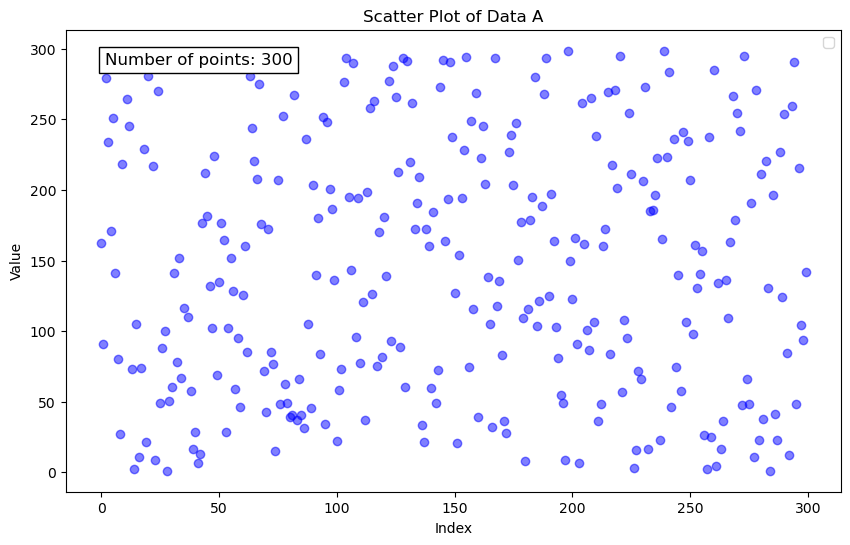

In [8]:
print(X_f_train.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X_f_train)), X_f_train, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Data A')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f_train)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(300, 1)


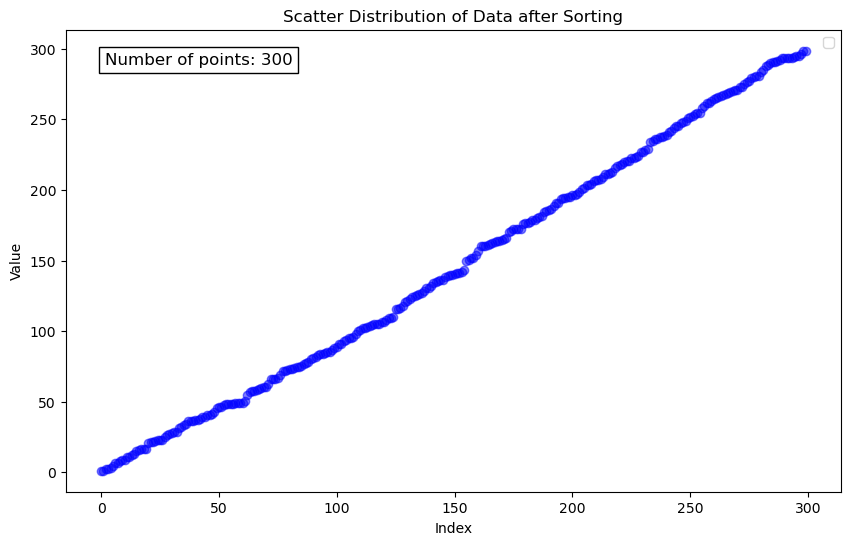

In [9]:
X = np.sort(X_f_train, axis=0)
print(X.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X)), X, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Distribution of Data after Sorting')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f_train)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

In [10]:
print(error_y)

error_of_u = sum(error_y)/len(error_y)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE

print(chaoss)

chaos_of_u = sum(chaoss)/len(chaoss)

print('Chaos of fuhe active learning(LHS sampling): %e' % (chaos_of_u)) #打印混沌度

print(residuals)

residual_of_u = sum(residuals)/len(residuals)

print('Residual of fuhe active learning(LHS sampling): %e' % (residual_of_u)) #打印残差


[0.0004670827448597074, 0.0010225870740010385, 0.00047572951979009057, 0.00037018423598892335, 0.0006149751148909372, 0.0007015758469912039, 0.00044353126295626055, 0.000554596203724358, 0.00045368123828888916, 0.5234704018357071]
Error u of fuhe active learning(LHS sampling): 5.285743e-02
[0.00015106952371473625, 0.0003157315819786989, 0.00014674653071587704, 0.00012262989677933338, 0.00021432593958146544, 0.00023479604590791964, 0.0001376965960936589, 0.00015380985603022503, 0.0001416859305747167, 0.1283356742215598]
MAE of fuhe active learning(LHS sampling): 1.299542e-02
[4.6490634583873335e-08, 2.1071484034270542e-07, 4.71216531841152e-08, 3.112516483644376e-08, 8.404643310933039e-08, 1.0606083517445849e-07, 4.18074132279344e-08, 6.5186621656394e-08, 4.3552506234924404e-08, 0.05514336158391995]
MSE of fuhe active learning(LHS sampling): 5.514404e-03
[0.0071824132, 0.01056739, 0.00020695735, 0.11112818, 0.000119123804, 0.00012945407, 0.00011665869, 0.00041554117, 0.003320008, 0.0]
C

[0.0004670827448597074, 0.0010225870740010385, 0.00047572951979009057, 0.00037018423598892335, 0.0006149751148909372, 0.0007015758469912039, 0.00044353126295626055, 0.000554596203724358, 0.00045368123828888916, 0.5234704018357071]
mean Error u: 5.285743e-02
Variance Error u: 2.460854e-02


/home/extra_disk/lcy/PINN-1/small_non_homogeneous_CTMC_f(MSS2)/active learning/ipykernel_3554657/2285129262.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


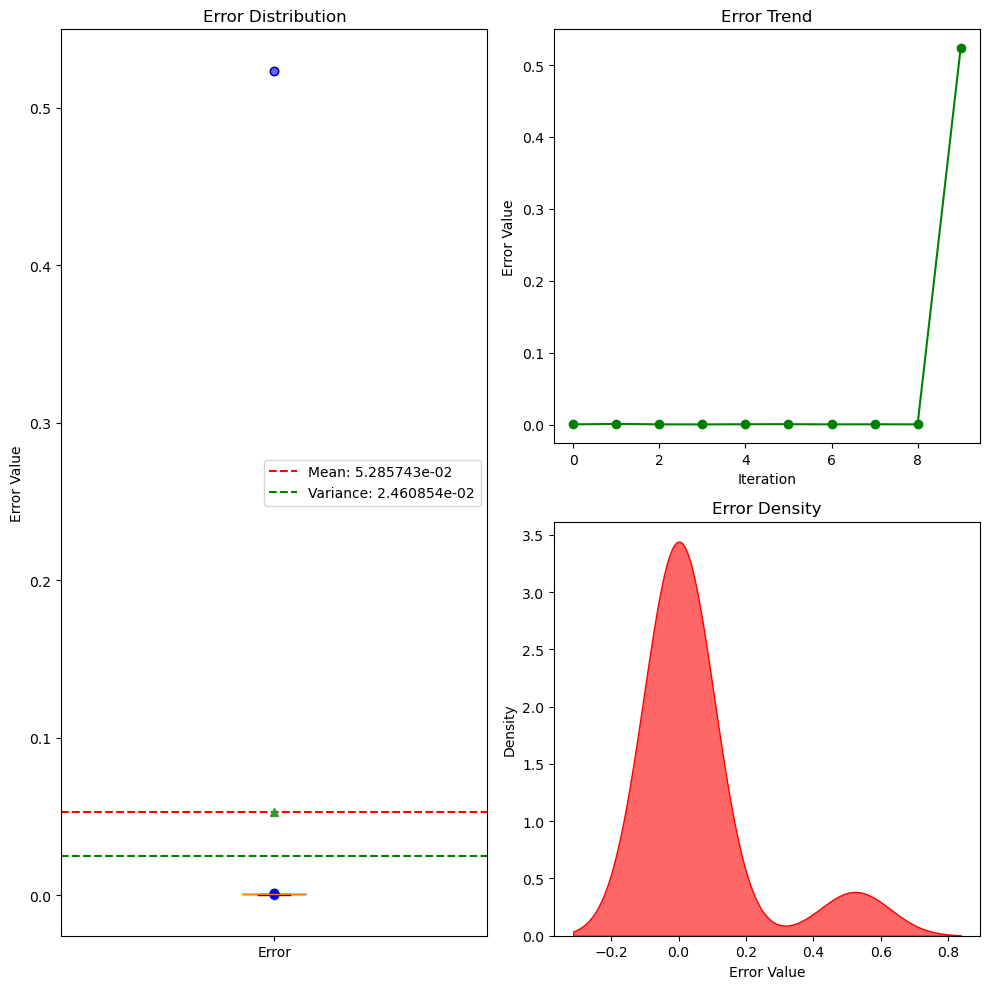

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_y
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.00015106952371473625, 0.0003157315819786989, 0.00014674653071587704, 0.00012262989677933338, 0.00021432593958146544, 0.00023479604590791964, 0.0001376965960936589, 0.00015380985603022503, 0.0001416859305747167, 0.1283356742215598]
mean MAE: 1.299542e-02
Variance MAE: 1.478156e-03


/home/extra_disk/lcy/PINN-1/small_non_homogeneous_CTMC_f(MSS2)/active learning/ipykernel_3554657/3953849728.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


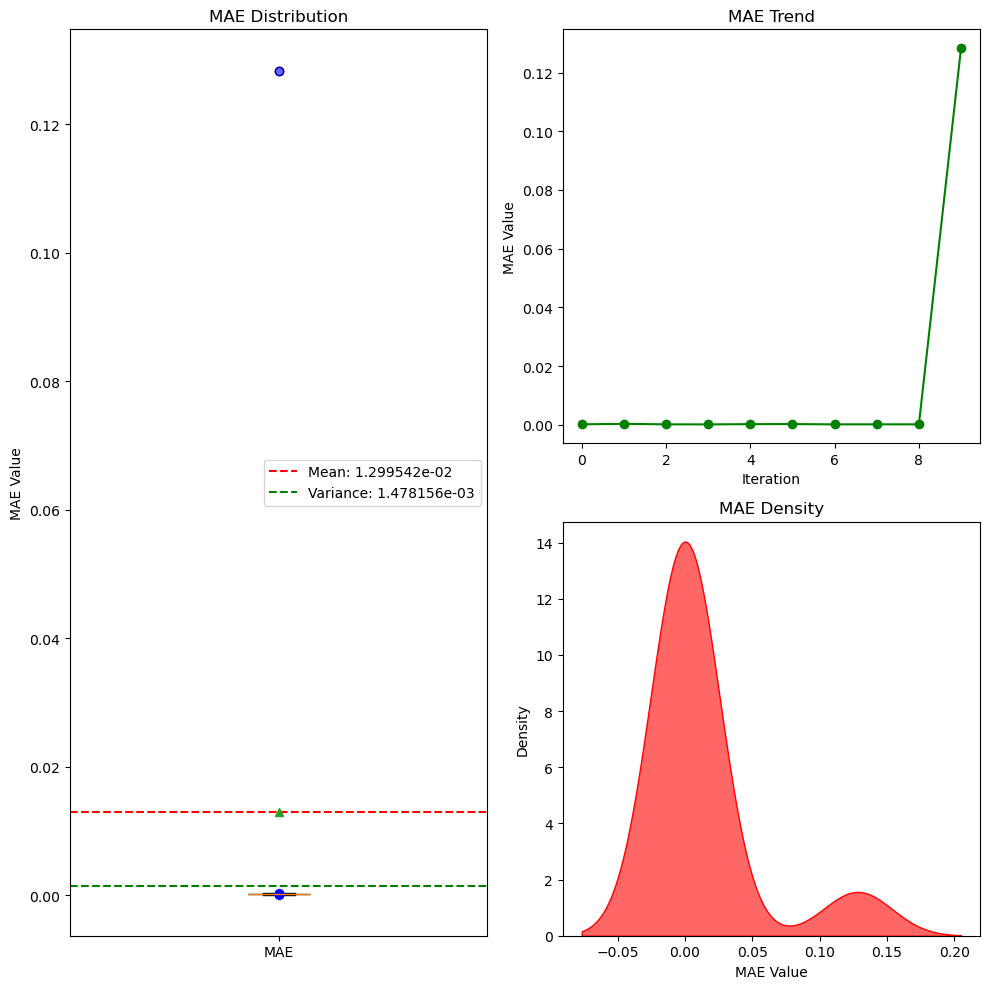

In [12]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mae
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MAE: %e' % (mean_error)) #打印误差
print('Variance MAE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MAE Distribution')
plt.ylabel('MAE Value')
plt.xticks([1], ['MAE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MAE Trend')
plt.ylabel('MAE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MAE Density')
plt.xlabel('MAE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[4.6490634583873335e-08, 2.1071484034270542e-07, 4.71216531841152e-08, 3.112516483644376e-08, 8.404643310933039e-08, 1.0606083517445849e-07, 4.18074132279344e-08, 6.5186621656394e-08, 4.3552506234924404e-08, 0.05514336158391995]
mean MSE: 5.514404e-03
Variance MSE: 2.736704e-04


/home/extra_disk/lcy/PINN-1/small_non_homogeneous_CTMC_f(MSS2)/active learning/ipykernel_3554657/3394972535.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


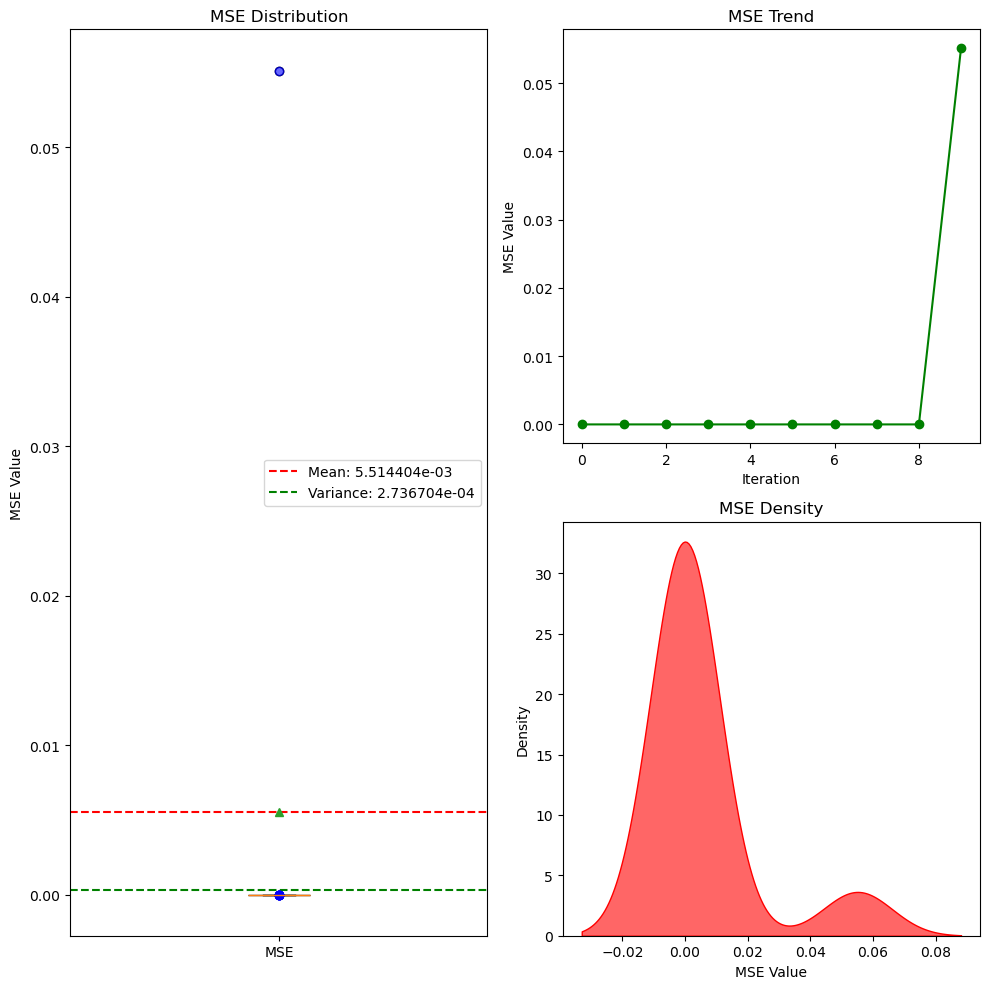

In [13]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mse
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MSE: %e' % (mean_error)) #打印误差
print('Variance MSE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MSE Distribution')
plt.ylabel('MSE Value')
plt.xticks([1], ['MSE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MSE Trend')
plt.ylabel('MSE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MSE Density')
plt.xlabel('MSE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.0071824132, 0.01056739, 0.00020695735, 0.11112818, 0.000119123804, 0.00012945407, 0.00011665869, 0.00041554117, 0.003320008, 0.0]
mean CHAOS: 1.331857e-02
Variance CHAOS: 1.075017e-03


/home/extra_disk/lcy/PINN-1/small_non_homogeneous_CTMC_f(MSS2)/active learning/ipykernel_3554657/1804867946.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


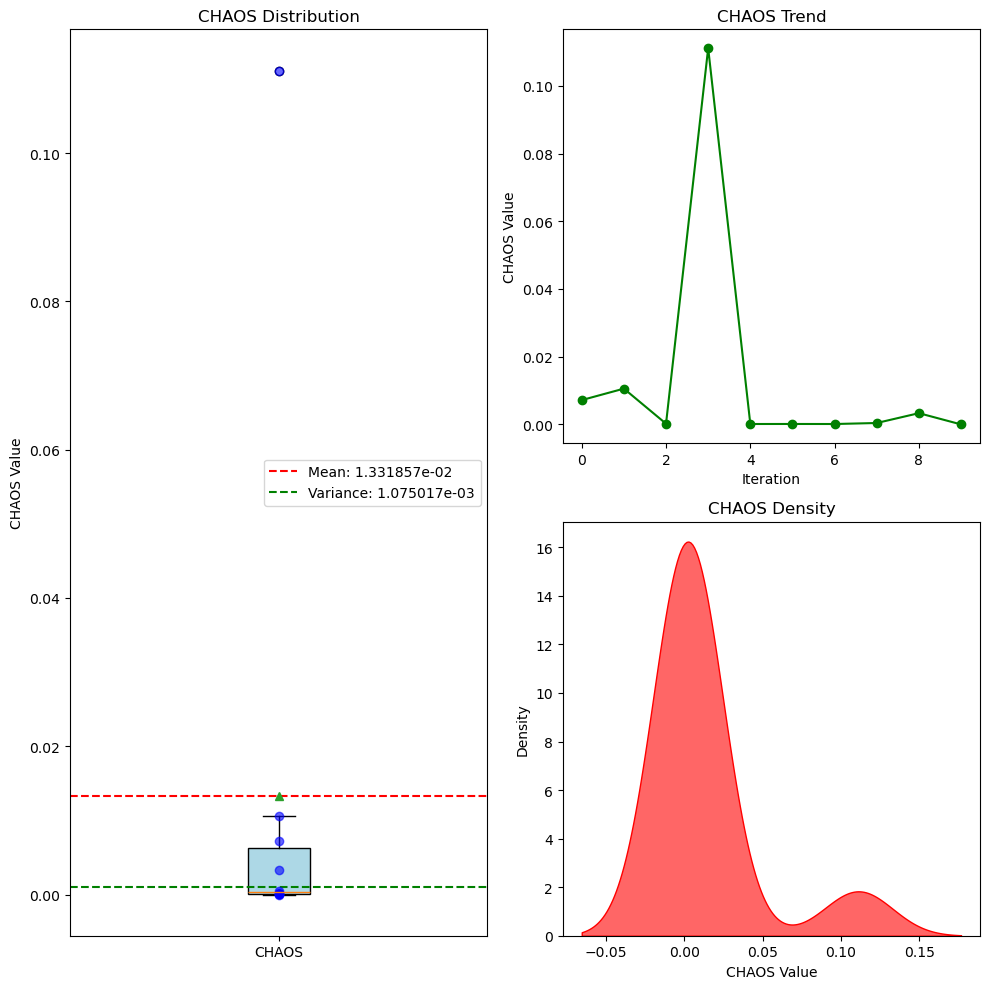

In [14]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = chaoss
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean CHAOS: %e' % (mean_error)) #打印误差
print('Variance CHAOS: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('CHAOS Distribution')
plt.ylabel('CHAOS Value')
plt.xticks([1], ['CHAOS'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('CHAOS Trend')
plt.ylabel('CHAOS Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('CHAOS Density')
plt.xlabel('CHAOS Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[4.9530354e-07, 4.9048595e-07, 4.9777873e-07, 5.863453e-07, 5.083443e-07, 4.7410617e-07, 4.125684e-07, 5.588138e-07, 4.895769e-07, 1.4317178e-06]
mean RESIDUAL: 5.945041e-07
Variance RESIDUAL: 7.983130e-14


/home/extra_disk/lcy/PINN-1/small_non_homogeneous_CTMC_f(MSS2)/active learning/ipykernel_3554657/2986457676.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


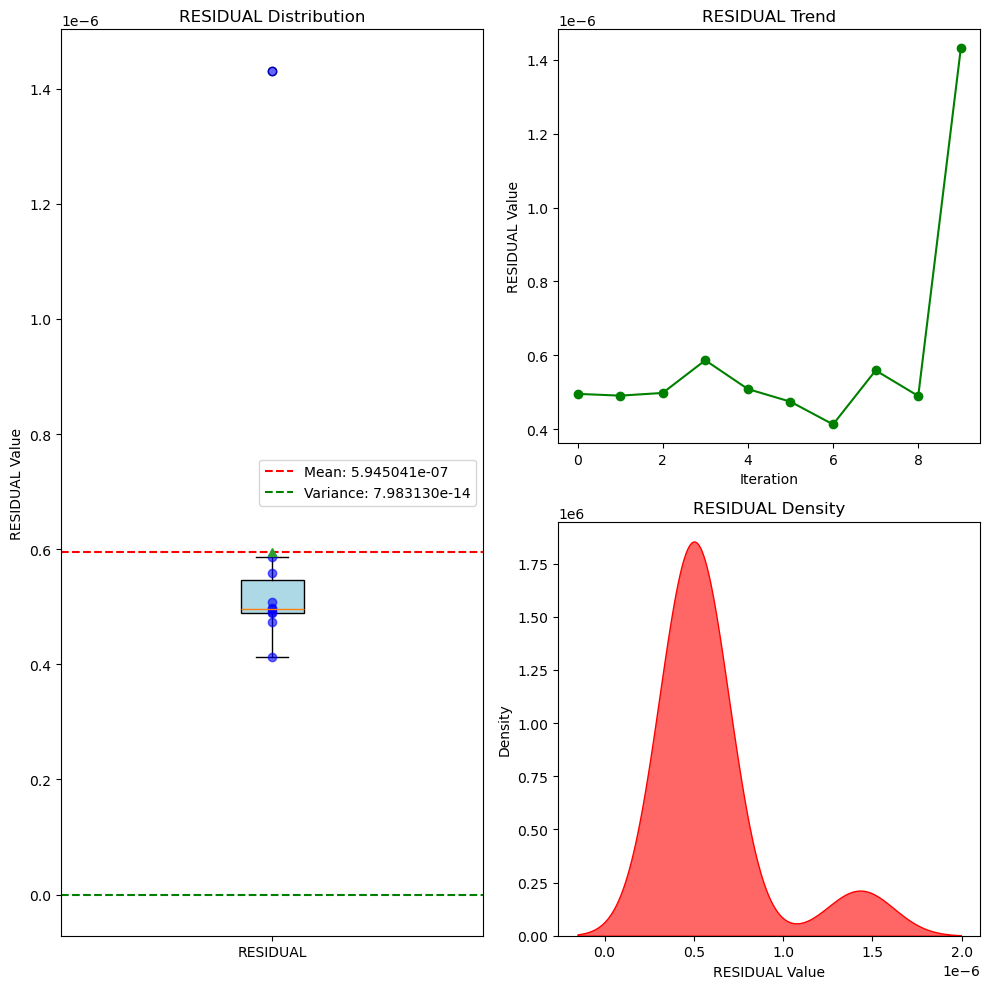

In [15]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = residuals
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean RESIDUAL: %e' % (mean_error)) #打印误差
print('Variance RESIDUAL: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('RESIDUAL Distribution')
plt.ylabel('RESIDUAL Value')
plt.xticks([1], ['RESIDUAL'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('RESIDUAL Trend')
plt.ylabel('RESIDUAL Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('RESIDUAL Density')
plt.xlabel('RESIDUAL Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [16]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

150000
[1.9416101e-01 1.6383828e-01 1.3566074e-01 ... 3.9157571e-06 3.9156694e-06
 3.9155298e-06]


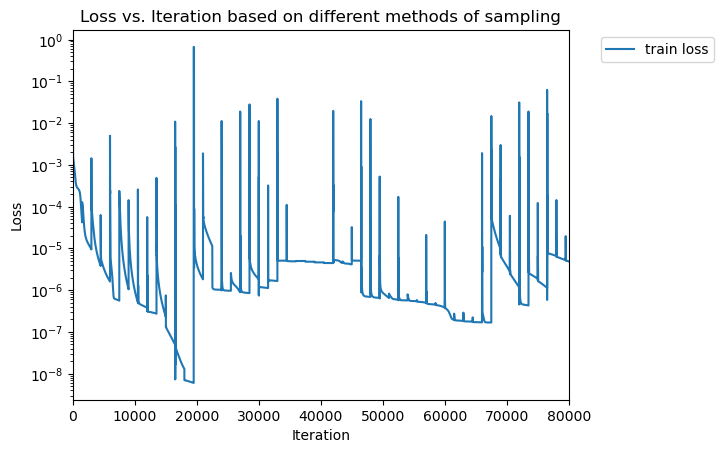

In [17]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,80000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

Text(0, 0.5, 'Probability')

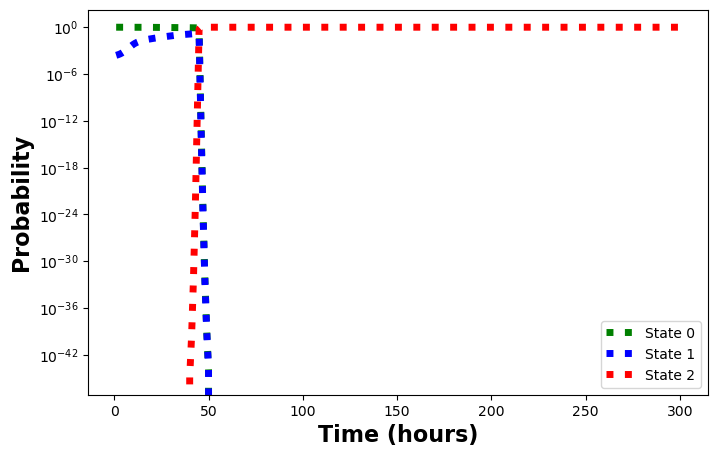

In [18]:
plt.figure(figsize=(8, 5)) #设置图形尺寸为8*5

sns.lineplot(x = x_star.flatten(), y = y_pred[:, 0], label = 'State 0', linewidth = 5, color = 'green', linestyle='dotted')
#绘制第一条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第一列，设置这条线的标签为State 0，线宽为5，颜色为绿色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 1], label = 'State 1', linewidth = 5, color = 'blue', linestyle='dotted')
#绘制第二条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第二列，设置这条线的标签为State 1，线宽为5，颜色为蓝色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 2], label = 'State 2', linewidth = 5, color = 'red', linestyle='dotted')
#绘制第三条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第三列，设置这条线的标签为State 2，线宽为5，颜色为红色，线型为点线

plt.yscale('log') #设置y轴的刻度为对数刻度
plt.xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16) #设置x轴标签为Time (hours)，字体加粗，字体大小为16
plt.ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16) #设置y轴标签为Probability，字体加粗，字体大小为16

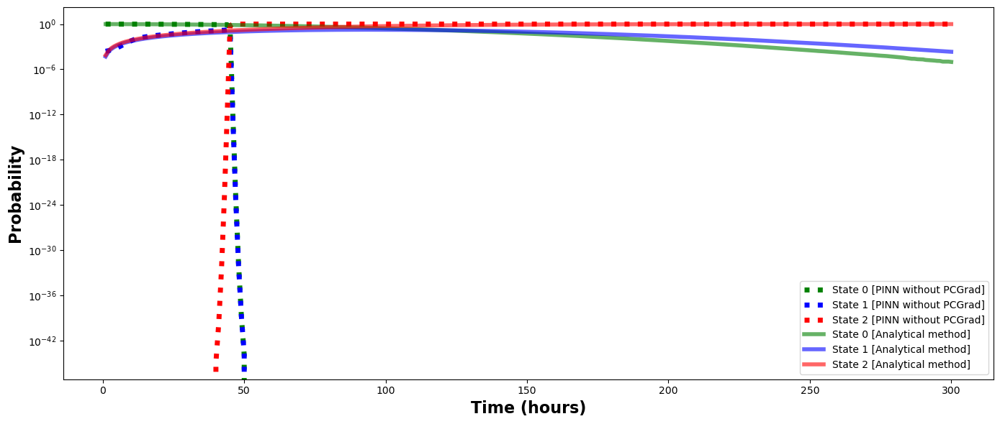

In [19]:
# 创建一个子图
f, ax = plt.subplots(1, 1, figsize=(14, 6))

# 绘制 PINN without PCGrad 方法的预测结果
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 0], label='State 0 [PINN without PCGrad]', linewidth=5, color='green', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 1], label='State 1 [PINN without PCGrad]', linewidth=5, color='blue', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 2], label='State 2 [PINN without PCGrad]', linewidth=5, color='red', linestyle='dotted', ax=ax)

# 绘制 Runge-Kutta 方法的结果
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_0'], label='State 0 [Analytical method]', color='green', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_1'], label='State 1 [Analytical method]', color='blue', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=MCS_solution_df['state_2'], label='State 2 [Analytical method]', color='red', alpha=0.6, dashes=True, linewidth=4, ax=ax)


# 设置 y 轴为对数刻度
ax.set_yscale("log")
# ax.set_ylim([1e-9, 2])
ax.set_xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16)
ax.set_ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16)

# 自动调整子图参数
plt.tight_layout()


# 显示图形
plt.show()

### 计算RMSE

In [20]:
y_pred_df = pd.DataFrame(y_pred, columns = ['state_0', 'state_1', 'state_2'])
print(y_pred_df.head())
print(y_pred_df.tail())

    state_0   state_1  state_2
0  0.999749  0.000251      0.0
1  0.999702  0.000298      0.0
2  0.999628  0.000372      0.0
3  0.999505  0.000495      0.0
4  0.999299  0.000701      0.0
     state_0  state_1  state_2
295      0.0      0.0      1.0
296      0.0      0.0      1.0
297      0.0      0.0      1.0
298      0.0      0.0      1.0
299      0.0      0.0      1.0


In [21]:
y_diff_no_pcgrad_MCS = MCS_solution_df - y_pred_df #解析方法（特征向量）和PINN方法差值

In [22]:
### PINN和解析方法的RMSE计算
#计算MSE，对PINN和解析方法的差值的每一行应用一个匿名函数，计算三个状态的平方和，结果存储在DataFrame的新列'mse'中
y_diff_no_pcgrad_MCS['mse'] = y_diff_no_pcgrad_MCS.apply(lambda x: x['state_0']**2 + x['state_1']**2 + x['state_2']**2, axis = 1)
#计算RMSE，对'mse'列应用np.sqrt函数，结果存储在DataFrame的新列'rmse'中
y_diff_no_pcgrad_MCS['rmse'] = y_diff_no_pcgrad_MCS['mse'].apply(np.sqrt)

In [23]:
#0-80000个时间的RMSE
print ('RMSE of between PINN without PCGrad and the analytical solution is', np.mean(y_diff_no_pcgrad_MCS['rmse']))

#前60000个时间的RMSE，3749/5000=60000/80000
print ('RMSE between PINN without PCGrad and the analytical solution before 60000 is', 
       np.mean(y_diff_no_pcgrad_MCS['rmse'][:3749]))

#60000到80000的RMSE
print ('RMSE between PINN without PCGrad and the analytical solution after 60000 is', 
       np.mean(y_diff_no_pcgrad_MCS['rmse'][3749:]))

RMSE of between PINN without PCGrad and the analytical solution is 0.24454088402697138
RMSE between PINN without PCGrad and the analytical solution before 60000 is 0.24454088402697138
RMSE between PINN without PCGrad and the analytical solution after 60000 is nan


### 计算混沌度和残差

In [24]:
x_star.shape

(300, 1)

In [25]:
#计算chaos
y_chaos = model.hidden_predict(x_star, 100)
# print(y_chaos)
x_sss = x_star + np.random.normal(0, 0.01)
y_chaos_sss = model.hidden_predict(x_sss, 50)
chaju = np.linalg.norm(y_chaos - y_chaos_sss,axis=1)
print(chaju)
print(chaju.shape)
print(chaju.sum())

[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.9894586e-07 0.0000000e+00 0.0000000e+00
 0.000

Text(0.5, 1.0, 'Chaos of x_star')

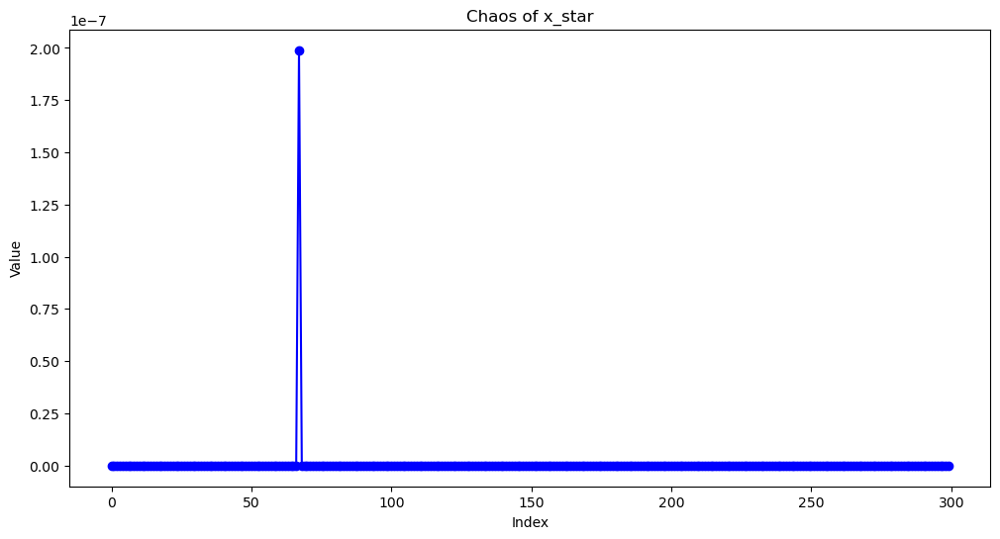

In [26]:
data = chaju
# 绘制折线图
plt.figure(figsize=(12, 6))

plt.plot(data, marker='o', linestyle='-', color='b')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Chaos of x_star')


In [27]:
#计算残差
_, residual = model.predict(x_star)
residual = residual.flatten()
print(residual)
print(residual.shape)
print(residual.sum())

[ 4.6566129e-10  1.4551915e-10 -2.3283064e-10 -1.3969839e-09
  1.1641532e-10  2.3283064e-10  0.0000000e+00 -1.3969839e-09
  1.1641532e-10  9.3132257e-10 -1.1641532e-10  2.3283064e-10
  6.9849193e-10  2.3283064e-10  0.0000000e+00  2.3283064e-10
  4.6566129e-10  4.6566129e-10  4.6566129e-10  4.6566129e-10
  4.6566129e-10  0.0000000e+00 -9.3132257e-10  4.6566129e-10
 -2.3283064e-10  0.0000000e+00 -9.3132257e-10  2.7939677e-09
  4.6566129e-10  6.0535967e-09 -3.2596290e-09 -1.7695129e-08
 -8.3819032e-09 -8.3819032e-09 -4.4237822e-08  1.7229468e-08
  1.3038516e-08  1.3038516e-07  2.0768493e-07  3.0454248e-07
  4.6566129e-10  0.0000000e+00 -6.5565109e-07  0.0000000e+00
  0.0000000e+00 -1.3069127e-11 -2.4466926e-22 -2.7607714e-31
 -2.7933215e-38 -1.6815582e-43  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.00000

Text(0.5, 1.0, 'Residual of x_star')

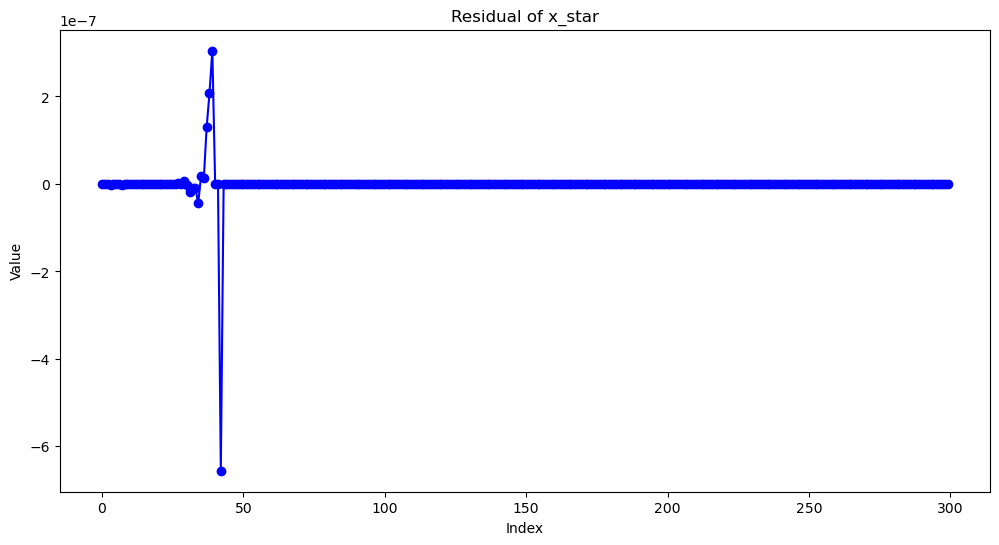

In [28]:
data = residual
# 绘制折线图
plt.figure(figsize=(12, 6))

plt.plot(data, marker='o', linestyle='-', color='b')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Residual of x_star')
